<img src="https://github.com/IKNL/guidelines/blob/master/resources/logos/iknl_nl.png?raw=true" width=200 align="right">

# `validation_time`
In this notebook, we validate the execution speed of our proposed federated GLM algorithm. Notice that we use a mock client, which means that the server and parties are simulated locally. Performance in a real-life scenario will probably be slower due to communication overhead, internet speed, etc.

The families that are shown in this notebook are: 

* `gaussian(link = "identity")`: Linear regression
* `poisson(link = "log")`: Poisson regression
* `binomial(link = "logit")`: Logistic regression


## Requirements
In order to be able to run it properly, make sure that the following libraries are installed:

* `vtg` - Basic `vantage6` tools. These will allow you to use the mock client. They can be installed with the command:

   `devtools::install_github('IKNL/vtg')`
   
   
   
* `vtg.glm` - The actual federated GLM algorithm. It can be installed with the command:

   `devtools::install_github(repo='IKNL/vantage6-algorithms', ref='glm', subdir='models/glm/src')`
   
   
* `ggplot2` - Good old package for nice `R` plots


* [`reticulate`](https://rstudio.github.io/reticulate/) - Allows us calling `Python` functions in `R`

## Preliminaries

### Imports

In [1]:
library('ggplot2')
library('tools')

#### Using `Python` in `R` with `reticulate`

`reticulate` is a library that will allow us to call `Python` functions into `R`. This is very handy, since we already have the functions to generate data in a `.py` script. Thus, we will use them to generate the data in this notebook too.

First, we need to tell `reticulate` the path to `Python` in our desired environment. We can "force" it by setting the environment variable `RETICULATE_PYTHON` and *then* loading `reticulate` (the other way around won't work!). 

We can see if this worked by using `py_config`

In [2]:
Sys.setenv(RETICULATE_PYTHON = "C:/ProgramData/Anaconda3/envs/glm_validation/python.exe")

library('reticulate')

py_config()

python:         C:/ProgramData/Anaconda3/envs/glm_validation/python.exe
libpython:      C:/ProgramData/Anaconda3/envs/glm_validation/python37.dll
pythonhome:     C:/ProgramData/Anaconda3/envs/glm_validation
version:        3.7.0 (default, Jun 28 2018, 08:04:48) [MSC v.1912 64 bit (AMD64)]
Architecture:   64bit
numpy:          C:/ProgramData/Anaconda3/envs/glm_validation/lib/site-packages/numpy
numpy_version:  1.21.6

NOTE: Python version was forced by RETICULATE_PYTHON

We will source our `Python` script. For that, we need to make sure that the required packages are installed and available. We can check that using [`py_module_available`](https://rstudio.github.io/reticulate/reference/py_module_available.html)

In [3]:
py_module_available("pandas")
py_module_available("sklearn")

[1] TRUE

[1] TRUE

It looks good. Now we can use [`source_python`](https://rstudio.github.io/reticulate/reference/source_python.html) and make the function `create_dataset` available to us in this notebook

In [4]:
source_python('./create_data.py')

## Varying number of records (fixed number of parties)
In this case, we will try different numbers of records split across 3 parties.

Note that the output figure will be different to that in the paper because 1. randomness in the data and 2. more importantly, we are setting `n_repetitions` to 10. The original analysis was done by setting it to 100. However, that generated a huge Jupyter notebook, which was very impractical. Thus, we will stick to 10 for now.

In [5]:
data_types <- c('linear', 'logistic', 'poisson')
n_records <- c(30, 300, 3000, 30000, 300000, 3000000)
n_repetitions <- 10

output <- matrix(ncol = 3, nrow = length(n_records)*length(data_types)*n_repetitions, dimnames=list(NULL, c('family', 'n_records', 'time')))

ii <- 1
for (data_type in data_types){
    for (n in n_records){
        for (x in 1:n_repetitions){
            datasets = create_dataset(data_type, n_samples=as.integer(n), n_parties=as.integer(3))
            datasets_combined <- do.call(rbind.data.frame, datasets)

            client <- vtg::MockClient$new(datasets, 'vtg.glm')

            # Generate federated GLM.
            # Notice that the model is called differently depending on the data type.
            start_time <- Sys.time()
            if (data_type == 'linear'){
                print("Linear model")
                results_federated_plain <- vtg.glm::dglm(client, formula = y ~ x1 + x2, family=gaussian(link = 'identity'), tol=1e-08, maxit=25)
            } else if (data_type == 'poisson'){
                print("Poisson model")
                results_federated_plain <- vtg.glm::dglm(client, formula = y ~ x1 + x2, family=poisson(link = "log"), tol=1e-08, maxit=25)
            } else if (data_type == 'logistic'){
                print("Logistic model")
                results_federated_plain <- vtg.glm::dglm(client, formula = y ~ x1 + x2, family=binomial(link = "logit"), tol=1e-08, maxit=25)
            }
            end_time <- Sys.time()

            # Compute execution time
            t = as.numeric(difftime(end_time, start_time, units = 'secs'))

            # Fill in the output matrix
            output[ii, 1] = data_type
            output[ii, 2] = n
            output[ii, 3] = t

            ii <- ii+1
        }
    }
}


-----------------------------------------
  Welcome to the vantage6 Infrastructure
-----------------------------------------




[1] "Linear model"
INFO  [19:32:49.518]  
INFO  [19:32:49.548] ############################################### 
INFO  [19:32:49.556] # Starting iteration 0 
INFO  [19:32:49.558] ############################################### 
INFO  [19:32:49.560]  
INFO  [19:32:49.563] 0.1 - RPC Node Beta 
DEBUG [19:32:49.565] ** Mocking call to "node_beta" ** 
DEBUG [19:32:49.569] Regular call 
DEBUG [19:32:49.571] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:49.593] Log for site 1: 
DEBUG [19:32:49.597] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:49.574] Initializing node beta... 
DEBUG [19:32:49.586] First iteration. Initializing variables. 
DEBUG [19:32:49.588] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:49.612] Log for site 2: 
DEBUG [19:32:49.615] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:49.600] Initializing node beta... 
DEBUG [19:32:49.605] First iteration. Initializing variables. 
DEBUG [19:32:49.608] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:49.630] Log for site 3: 
DEBUG [19:32:49.633] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:49.617] Initializing node beta... 
DEBUG [19:32:49.624] First iteration. Initializing variables. 
DEBUG [19:32:49.627] Calculating the Betas.  
DEBUG [19:32:49.635]   - [DONE] 
INFO  [19:32:49.637] 0.2 - Master beta 
DEBUG [19:32:49.640] Initializing master Beta... 
DEBUG [19:32:49.643] Merging node calculation to update new Betas. 
DEBUG [19:32:49.648] Updating the Betas. 
DEBUG [19:32:49.651]   - [DONE] 
INFO  [19:32:49.654] 0.3 - RPC Node Deviance 
DEBUG [19:32:49.665] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:49.723] Regular call 
DEBUG [19:32:49.725] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:49.743] Log for site 1: 
DEBUG [19:32:49.746] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:49.728] Starting node deviance. 
DEBUG [19:32:49.734] First iteration. Initializing variables. 
DEBUG [19:32:49.738] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:49.761] Log for site 2: 
DEBUG [19:32:49.765] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:49.749] Starting node deviance. 
DEBUG [19:32:49.755] First iteration. Initializing variables. 
DEBUG [19:32:49.758] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:49.780] Log for site 3: 
DEBUG [19:32:49.783] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:49.767] Starting node deviance. 
DEBUG [19:32:49.774] First iteration. Initializing variables. 
DEBUG [19:32:49.777] Updating the variables for node deviance.  
DEBUG [19:32:49.788]   - [DONE] 
INFO  [19:32:49.791] 0.4 - Master deviance 
DEBUG [19:32:49.794] Starting master deviance. 
DEBUG [19:32:49.797]   - [DONE] 
INFO  [19:32:49.800] 0.5 - Termination conditions 
DEBUG [19:32:49.803]   - [DONE] 
INFO  [19:32:49.805]  
INFO  [19:32:49.808] ############################################### 
INFO  [19:32:49.810] # Starting iteration 1 
INFO  [19:32:49.813] ############################################### 
INFO  [19:32:49.815]  
INFO  [19:32:49.818] 1.1 - RPC Node Beta 
DEBUG [19:32:49.820] ** Mocking call to "node_beta" ** 
DEBUG [19:32:49.823] Regular call 
DEBUG [19:32:49.825] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:49.838] Log for site 1: 
DEBUG [19:32:49.845] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:49.827] Initializing node beta... 
DEBUG [19:32:49.833] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:49.861] Log for site 2: 
DEBUG [19:32:49.867] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:49.848] Initializing node beta... 
DEBUG [19:32:49.856] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:49.886] Log for site 3: 
DEBUG [19:32:49.893] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:49.871] Initializing node beta... 
DEBUG [19:32:49.882] Calculating the Betas.  
DEBUG [19:32:49.898]   - [DONE] 
INFO  [19:32:49.901] 1.2 - Master beta 
DEBUG [19:32:49.904] Initializing master Beta... 
DEBUG [19:32:49.907] Merging node calculation to update new Betas. 
DEBUG [19:32:49.910] Updating the Betas. 
DEBUG [19:32:49.914]   - [DONE] 
INFO  [19:32:49.917] 1.3 - RPC Node Deviance 
DEBUG [19:32:49.920] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:49.923] Regular call 
DEBUG [19:32:49.927] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:49.945] Log for site 1: 
DEBUG [19:32:49.951] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:49.930] Starting node deviance. 
DEBUG [19:32:49.938] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:49.976] Log for site 2: 
DEBUG [19:32:49.982] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:49.957] Starting node deviance. 
DEBUG [19:32:49.971] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:49.996] Log for site 3: 
DEBUG [19:32:49.998] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:49.985] Starting node deviance. 
DEBUG [19:32:49.993] Updating the variables for node deviance.  
DEBUG [19:32:50.000]   - [DONE] 
INFO  [19:32:50.002] 1.4 - Master deviance 
DEBUG [19:32:50.005] Starting master deviance. 
DEBUG [19:32:50.008]   - [DONE] 
INFO  [19:32:50.011] 1.5 - Termination conditions 
DEBUG [19:32:50.014]   - [CONVERGED] 
DEBUG [19:32:50.016] Preparing output 
[1] "Linear model"
DEBUG [19:32:50.037] Initializing... 
INFO  [19:32:50.039]  
INFO  [19:32:50.042] ############################################### 
INFO  [19:32:50.044] # Starting iteration 0 
INFO  [19:32:50.046] ############################################### 
INFO  [19:32:50.049]  
INFO  [19:32:50.051] 0.1 - RPC Node Beta 
DEBUG [19:32:50.053] ** Mocking call to "node_beta" ** 
DEBUG [19:32:50.056] Regular call 
DEBUG [19:32:50.058] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.072] Log for site 1: 
DEBUG [19:32:50.075] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:50.061] Initializing node beta... 
DEBUG [19:32:50.066] First iteration. Initializing variables. 
DEBUG [19:32:50.069] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.088] Log for site 2: 
DEBUG [19:32:50.091] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:50.077] Initializing node beta... 
DEBUG [19:32:50.083] First iteration. Initializing variables. 
DEBUG [19:32:50.085] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.104] Log for site 3: 
DEBUG [19:32:50.106] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:50.094] Initializing node beta... 
DEBUG [19:32:50.099] First iteration. Initializing variables. 
DEBUG [19:32:50.101] Calculating the Betas.  
DEBUG [19:32:50.109]   - [DONE] 
INFO  [19:32:50.112] 0.2 - Master beta 
DEBUG [19:32:50.114] Initializing master Beta... 
DEBUG [19:32:50.117] Merging node calculation to update new Betas. 
DEBUG [19:32:50.119] Updating the Betas. 
DEBUG [19:32:50.123]   - [DONE] 
INFO  [19:32:50.125] 0.3 - RPC Node Deviance 
DEBUG [19:32:50.128] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:50.130] Regular call 
DEBUG [19:32:50.133] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.149] Log for site 1: 
DEBUG [19:32:50.151] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:50.135] Starting node deviance. 
DEBUG [19:32:50.144] First iteration. Initializing variables. 
DEBUG [19:32:50.146] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.165] Log for site 2: 
DEBUG [19:32:50.168] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:50.153] Starting node deviance. 
DEBUG [19:32:50.159] First iteration. Initializing variables. 
DEBUG [19:32:50.162] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.185] Log for site 3: 
DEBUG [19:32:50.188] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:50.171] Starting node deviance. 
DEBUG [19:32:50.179] First iteration. Initializing variables. 
DEBUG [19:32:50.182] Updating the variables for node deviance.  
DEBUG [19:32:50.191]   - [DONE] 
INFO  [19:32:50.195] 0.4 - Master deviance 
DEBUG [19:32:50.198] Starting master deviance. 
DEBUG [19:32:50.201]   - [DONE] 
INFO  [19:32:50.203] 0.5 - Termination conditions 
DEBUG [19:32:50.207]   - [DONE] 
INFO  [19:32:50.210]  
INFO  [19:32:50.213] ############################################### 
INFO  [19:32:50.216] # Starting iteration 1 
INFO  [19:32:50.219] ############################################### 
INFO  [19:32:50.221]  
INFO  [19:32:50.224] 1.1 - RPC Node Beta 
DEBUG [19:32:50.227] ** Mocking call to "node_beta" ** 
DEBUG [19:32:50.231] Regular call 
DEBUG [19:32:50.234] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.252] Log for site 1: 
DEBUG [19:32:50.255] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:50.237] Initializing node beta... 
DEBUG [19:32:50.248] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.270] Log for site 2: 
DEBUG [19:32:50.274] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:50.258] Initializing node beta... 
DEBUG [19:32:50.266] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.292] Log for site 3: 
DEBUG [19:32:50.295] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:50.277] Initializing node beta... 
DEBUG [19:32:50.288] Calculating the Betas.  
DEBUG [19:32:50.298]   - [DONE] 
INFO  [19:32:50.301] 1.2 - Master beta 
DEBUG [19:32:50.304] Initializing master Beta... 
DEBUG [19:32:50.307] Merging node calculation to update new Betas. 
DEBUG [19:32:50.310] Updating the Betas. 
DEBUG [19:32:50.313]   - [DONE] 
INFO  [19:32:50.316] 1.3 - RPC Node Deviance 
DEBUG [19:32:50.319] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:50.322] Regular call 
DEBUG [19:32:50.326] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.339] Log for site 1: 
DEBUG [19:32:50.341] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:50.328] Starting node deviance. 
DEBUG [19:32:50.336] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.352] Log for site 2: 
DEBUG [19:32:50.354] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:50.344] Starting node deviance. 
DEBUG [19:32:50.349] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.366] Log for site 3: 
DEBUG [19:32:50.369] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:50.357] Starting node deviance. 
DEBUG [19:32:50.364] Updating the variables for node deviance.  
DEBUG [19:32:50.371]   - [DONE] 
INFO  [19:32:50.375] 1.4 - Master deviance 
DEBUG [19:32:50.378] Starting master deviance. 
DEBUG [19:32:50.380]   - [DONE] 
INFO  [19:32:50.382] 1.5 - Termination conditions 
DEBUG [19:32:50.385]   - [CONVERGED] 
DEBUG [19:32:50.387] Preparing output 
[1] "Linear model"
DEBUG [19:32:50.405] Initializing... 
INFO  [19:32:50.408]  
INFO  [19:32:50.410] ############################################### 
INFO  [19:32:50.412] # Starting iteration 0 
INFO  [19:32:50.419] ############################################### 
INFO  [19:32:50.422]  
INFO  [19:32:50.425] 0.1 - RPC Node Beta 
DEBUG [19:32:50.430] ** Mocking call to "node_beta" ** 
DEBUG [19:32:50.433] Regular call 
DEBUG [19:32:50.435] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.450] Log for site 1: 
DEBUG [19:32:50.453] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:50.438] Initializing node beta... 
DEBUG [19:32:50.445] First iteration. Initializing variables. 
DEBUG [19:32:50.448] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.467] Log for site 2: 
DEBUG [19:32:50.469] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:50.455] Initializing node beta... 
DEBUG [19:32:50.462] First iteration. Initializing variables. 
DEBUG [19:32:50.464] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.484] Log for site 3: 
DEBUG [19:32:50.486] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:50.473] Initializing node beta... 
DEBUG [19:32:50.479] First iteration. Initializing variables. 
DEBUG [19:32:50.481] Calculating the Betas.  
DEBUG [19:32:50.488]   - [DONE] 
INFO  [19:32:50.492] 0.2 - Master beta 
DEBUG [19:32:50.496] Initializing master Beta... 
DEBUG [19:32:50.498] Merging node calculation to update new Betas. 
DEBUG [19:32:50.501] Updating the Betas. 
DEBUG [19:32:50.503]   - [DONE] 
INFO  [19:32:50.505] 0.3 - RPC Node Deviance 
DEBUG [19:32:50.509] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:50.513] Regular call 
DEBUG [19:32:50.516] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.532] Log for site 1: 
DEBUG [19:32:50.534] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:50.519] Starting node deviance. 
DEBUG [19:32:50.526] First iteration. Initializing variables. 
DEBUG [19:32:50.529] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.554] Log for site 2: 
DEBUG [19:32:50.557] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:50.537] Starting node deviance. 
DEBUG [19:32:50.545] First iteration. Initializing variables. 
DEBUG [19:32:50.549] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.573] Log for site 3: 
DEBUG [19:32:50.576] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:50.560] Starting node deviance. 
DEBUG [19:32:50.567] First iteration. Initializing variables. 
DEBUG [19:32:50.570] Updating the variables for node deviance.  
DEBUG [19:32:50.580]   - [DONE] 
INFO  [19:32:50.583] 0.4 - Master deviance 
DEBUG [19:32:50.585] Starting master deviance. 
DEBUG [19:32:50.588]   - [DONE] 
INFO  [19:32:50.592] 0.5 - Termination conditions 
DEBUG [19:32:50.595]   - [DONE] 
INFO  [19:32:50.600]  
INFO  [19:32:50.603] ############################################### 
INFO  [19:32:50.606] # Starting iteration 1 
INFO  [19:32:50.610] ############################################### 
INFO  [19:32:50.614]  
INFO  [19:32:50.618] 1.1 - RPC Node Beta 
DEBUG [19:32:50.621] ** Mocking call to "node_beta" ** 
DEBUG [19:32:50.625] Regular call 
DEBUG [19:32:50.632] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.650] Log for site 1: 
DEBUG [19:32:50.653] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:50.635] Initializing node beta... 
DEBUG [19:32:50.645] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.675] Log for site 2: 
DEBUG [19:32:50.679] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:50.656] Initializing node beta... 
DEBUG [19:32:50.669] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.701] Log for site 3: 
DEBUG [19:32:50.704] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:50.684] Initializing node beta... 
DEBUG [19:32:50.695] Calculating the Betas.  
DEBUG [19:32:50.707]   - [DONE] 
INFO  [19:32:50.712] 1.2 - Master beta 
DEBUG [19:32:50.716] Initializing master Beta... 
DEBUG [19:32:50.719] Merging node calculation to update new Betas. 
DEBUG [19:32:50.723] Updating the Betas. 
DEBUG [19:32:50.730]   - [DONE] 
INFO  [19:32:50.736] 1.3 - RPC Node Deviance 
DEBUG [19:32:50.739] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:50.747] Regular call 
DEBUG [19:32:50.750] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.762] Log for site 1: 
DEBUG [19:32:50.764] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:50.753] Starting node deviance. 
DEBUG [19:32:50.759] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.775] Log for site 2: 
DEBUG [19:32:50.778] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:50.767] Starting node deviance. 
DEBUG [19:32:50.772] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.789] Log for site 3: 
DEBUG [19:32:50.792] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:50.780] Starting node deviance. 
DEBUG [19:32:50.787] Updating the variables for node deviance.  
DEBUG [19:32:50.796]   - [DONE] 
INFO  [19:32:50.798] 1.4 - Master deviance 
DEBUG [19:32:50.801] Starting master deviance. 
DEBUG [19:32:50.803]   - [DONE] 
INFO  [19:32:50.805] 1.5 - Termination conditions 
DEBUG [19:32:50.808]   - [CONVERGED] 
DEBUG [19:32:50.811] Preparing output 
[1] "Linear model"
DEBUG [19:32:50.829] Initializing... 
INFO  [19:32:50.831]  
INFO  [19:32:50.835] ############################################### 
INFO  [19:32:50.838] # Starting iteration 0 
INFO  [19:32:50.841] ############################################### 
INFO  [19:32:50.843]  
INFO  [19:32:50.845] 0.1 - RPC Node Beta 
DEBUG [19:32:50.848] ** Mocking call to "node_beta" ** 
DEBUG [19:32:50.850] Regular call 
DEBUG [19:32:50.853] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.870] Log for site 1: 
DEBUG [19:32:50.873] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:50.855] Initializing node beta... 
DEBUG [19:32:50.861] First iteration. Initializing variables. 
DEBUG [19:32:50.867] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.887] Log for site 2: 
DEBUG [19:32:50.889] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:50.876] Initializing node beta... 
DEBUG [19:32:50.882] First iteration. Initializing variables. 
DEBUG [19:32:50.884] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.903] Log for site 3: 
DEBUG [19:32:50.906] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:50.892] Initializing node beta... 
DEBUG [19:32:50.898] First iteration. Initializing variables. 
DEBUG [19:32:50.901] Calculating the Betas.  
DEBUG [19:32:50.909]   - [DONE] 
INFO  [19:32:50.912] 0.2 - Master beta 
DEBUG [19:32:50.915] Initializing master Beta... 
DEBUG [19:32:50.917] Merging node calculation to update new Betas. 
DEBUG [19:32:50.919] Updating the Betas. 
DEBUG [19:32:50.922]   - [DONE] 
INFO  [19:32:50.925] 0.3 - RPC Node Deviance 
DEBUG [19:32:50.928] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:50.930] Regular call 
DEBUG [19:32:50.933] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.948] Log for site 1: 
DEBUG [19:32:50.950] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:50.935] Starting node deviance. 
DEBUG [19:32:50.942] First iteration. Initializing variables. 
DEBUG [19:32:50.944] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.968] Log for site 2: 
DEBUG [19:32:50.971] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:50.953] Starting node deviance. 
DEBUG [19:32:50.960] First iteration. Initializing variables. 
DEBUG [19:32:50.965] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:50.987] Log for site 3: 
DEBUG [19:32:50.989] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:50.974] Starting node deviance. 
DEBUG [19:32:50.981] First iteration. Initializing variables. 
DEBUG [19:32:50.984] Updating the variables for node deviance.  
DEBUG [19:32:50.993]   - [DONE] 
INFO  [19:32:51.001] 0.4 - Master deviance 
DEBUG [19:32:51.004] Starting master deviance. 
DEBUG [19:32:51.006]   - [DONE] 
INFO  [19:32:51.011] 0.5 - Termination conditions 
DEBUG [19:32:51.015]   - [DONE] 
INFO  [19:32:51.018]  
INFO  [19:32:51.020] ############################################### 
INFO  [19:32:51.023] # Starting iteration 1 
INFO  [19:32:51.026] ############################################### 
INFO  [19:32:51.030]  
INFO  [19:32:51.032] 1.1 - RPC Node Beta 
DEBUG [19:32:51.035] ** Mocking call to "node_beta" ** 
DEBUG [19:32:51.038] Regular call 
DEBUG [19:32:51.041] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.054] Log for site 1: 
DEBUG [19:32:51.056] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:51.045] Initializing node beta... 
DEBUG [19:32:51.051] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.070] Log for site 2: 
DEBUG [19:32:51.072] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:51.059] Initializing node beta... 
DEBUG [19:32:51.067] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.087] Log for site 3: 
DEBUG [19:32:51.091] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:51.076] Initializing node beta... 
DEBUG [19:32:51.084] Calculating the Betas.  
DEBUG [19:32:51.096]   - [DONE] 
INFO  [19:32:51.099] 1.2 - Master beta 
DEBUG [19:32:51.103] Initializing master Beta... 
DEBUG [19:32:51.106] Merging node calculation to update new Betas. 
DEBUG [19:32:51.110] Updating the Betas. 
DEBUG [19:32:51.114]   - [DONE] 
INFO  [19:32:51.118] 1.3 - RPC Node Deviance 
DEBUG [19:32:51.123] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:51.129] Regular call 
DEBUG [19:32:51.133] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.150] Log for site 1: 
DEBUG [19:32:51.153] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:51.136] Starting node deviance. 
DEBUG [19:32:51.147] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.171] Log for site 2: 
DEBUG [19:32:51.175] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:51.156] Starting node deviance. 
DEBUG [19:32:51.168] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.190] Log for site 3: 
DEBUG [19:32:51.195] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:51.179] Starting node deviance. 
DEBUG [19:32:51.186] Updating the variables for node deviance.  
DEBUG [19:32:51.198]   - [DONE] 
INFO  [19:32:51.201] 1.4 - Master deviance 
DEBUG [19:32:51.204] Starting master deviance. 
DEBUG [19:32:51.209]   - [DONE] 
INFO  [19:32:51.215] 1.5 - Termination conditions 
DEBUG [19:32:51.217]   - [CONVERGED] 
DEBUG [19:32:51.220] Preparing output 
[1] "Linear model"
DEBUG [19:32:51.243] Initializing... 
INFO  [19:32:51.246]  
INFO  [19:32:51.249] ############################################### 
INFO  [19:32:51.252] # Starting iteration 0 
INFO  [19:32:51.255] ############################################### 
INFO  [19:32:51.257]  
INFO  [19:32:51.260] 0.1 - RPC Node Beta 
DEBUG [19:32:51.262] ** Mocking call to "node_beta" ** 
DEBUG [19:32:51.265] Regular call 
DEBUG [19:32:51.268] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.281] Log for site 1: 
DEBUG [19:32:51.284] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:51.270] Initializing node beta... 
DEBUG [19:32:51.276] First iteration. Initializing variables. 
DEBUG [19:32:51.278] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.298] Log for site 2: 
DEBUG [19:32:51.300] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:51.286] Initializing node beta... 
DEBUG [19:32:51.293] First iteration. Initializing variables. 
DEBUG [19:32:51.295] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.316] Log for site 3: 
DEBUG [19:32:51.318] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:51.305] Initializing node beta... 
DEBUG [19:32:51.311] First iteration. Initializing variables. 
DEBUG [19:32:51.314] Calculating the Betas.  
DEBUG [19:32:51.321]   - [DONE] 
INFO  [19:32:51.324] 0.2 - Master beta 
DEBUG [19:32:51.327] Initializing master Beta... 
DEBUG [19:32:51.330] Merging node calculation to update new Betas. 
DEBUG [19:32:51.332] Updating the Betas. 
DEBUG [19:32:51.334]   - [DONE] 
INFO  [19:32:51.337] 0.3 - RPC Node Deviance 
DEBUG [19:32:51.339] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:51.342] Regular call 
DEBUG [19:32:51.345] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.359] Log for site 1: 
DEBUG [19:32:51.361] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:51.347] Starting node deviance. 
DEBUG [19:32:51.353] First iteration. Initializing variables. 
DEBUG [19:32:51.355] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.374] Log for site 2: 
DEBUG [19:32:51.377] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:51.363] Starting node deviance. 
DEBUG [19:32:51.369] First iteration. Initializing variables. 
DEBUG [19:32:51.371] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.390] Log for site 3: 
DEBUG [19:32:51.393] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:51.380] Starting node deviance. 
DEBUG [19:32:51.385] First iteration. Initializing variables. 
DEBUG [19:32:51.387] Updating the variables for node deviance.  
DEBUG [19:32:51.395]   - [DONE] 
INFO  [19:32:51.398] 0.4 - Master deviance 
DEBUG [19:32:51.400] Starting master deviance. 
DEBUG [19:32:51.403]   - [DONE] 
INFO  [19:32:51.405] 0.5 - Termination conditions 
DEBUG [19:32:51.409]   - [DONE] 
INFO  [19:32:51.412]  
INFO  [19:32:51.414] ############################################### 
INFO  [19:32:51.417] # Starting iteration 1 
INFO  [19:32:51.419] ############################################### 
INFO  [19:32:51.421]  
INFO  [19:32:51.428] 1.1 - RPC Node Beta 
DEBUG [19:32:51.431] ** Mocking call to "node_beta" ** 
DEBUG [19:32:51.433] Regular call 
DEBUG [19:32:51.436] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.450] Log for site 1: 
DEBUG [19:32:51.453] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:51.438] Initializing node beta... 
DEBUG [19:32:51.447] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.468] Log for site 2: 
DEBUG [19:32:51.471] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:51.455] Initializing node beta... 
DEBUG [19:32:51.465] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.484] Log for site 3: 
DEBUG [19:32:51.486] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:51.474] Initializing node beta... 
DEBUG [19:32:51.481] Calculating the Betas.  
DEBUG [19:32:51.489]   - [DONE] 
INFO  [19:32:51.493] 1.2 - Master beta 
DEBUG [19:32:51.496] Initializing master Beta... 
DEBUG [19:32:51.499] Merging node calculation to update new Betas. 
DEBUG [19:32:51.501] Updating the Betas. 
DEBUG [19:32:51.504]   - [DONE] 
INFO  [19:32:51.506] 1.3 - RPC Node Deviance 
DEBUG [19:32:51.510] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:51.513] Regular call 
DEBUG [19:32:51.516] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.532] Log for site 1: 
DEBUG [19:32:51.534] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:51.519] Starting node deviance. 
DEBUG [19:32:51.527] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.547] Log for site 2: 
DEBUG [19:32:51.550] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:51.536] Starting node deviance. 
DEBUG [19:32:51.543] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.563] Log for site 3: 
DEBUG [19:32:51.569] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:51.552] Starting node deviance. 
DEBUG [19:32:51.559] Updating the variables for node deviance.  
DEBUG [19:32:51.572]   - [DONE] 
INFO  [19:32:51.575] 1.4 - Master deviance 
DEBUG [19:32:51.578] Starting master deviance. 
DEBUG [19:32:51.581]   - [DONE] 
INFO  [19:32:51.583] 1.5 - Termination conditions 
DEBUG [19:32:51.586]   - [CONVERGED] 
DEBUG [19:32:51.588] Preparing output 
[1] "Linear model"
DEBUG [19:32:51.610] Initializing... 
INFO  [19:32:51.612]  
INFO  [19:32:51.614] ############################################### 
INFO  [19:32:51.619] # Starting iteration 0 
INFO  [19:32:51.622] ############################################### 
INFO  [19:32:51.625]  
INFO  [19:32:51.628] 0.1 - RPC Node Beta 
DEBUG [19:32:51.630] ** Mocking call to "node_beta" ** 
DEBUG [19:32:51.633] Regular call 
DEBUG [19:32:51.636] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.653] Log for site 1: 
DEBUG [19:32:51.656] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:51.639] Initializing node beta... 
DEBUG [19:32:51.646] First iteration. Initializing variables. 
DEBUG [19:32:51.649] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.670] Log for site 2: 
DEBUG [19:32:51.674] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:51.659] Initializing node beta... 
DEBUG [19:32:51.665] First iteration. Initializing variables. 
DEBUG [19:32:51.667] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.695] Log for site 3: 
DEBUG [19:32:51.698] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:51.679] Initializing node beta... 
DEBUG [19:32:51.687] First iteration. Initializing variables. 
DEBUG [19:32:51.691] Calculating the Betas.  
DEBUG [19:32:51.701]   - [DONE] 
INFO  [19:32:51.704] 0.2 - Master beta 
DEBUG [19:32:51.713] Initializing master Beta... 
DEBUG [19:32:51.716] Merging node calculation to update new Betas. 
DEBUG [19:32:51.719] Updating the Betas. 
DEBUG [19:32:51.721]   - [DONE] 
INFO  [19:32:51.726] 0.3 - RPC Node Deviance 
DEBUG [19:32:51.729] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:51.732] Regular call 
DEBUG [19:32:51.735] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.753] Log for site 1: 
DEBUG [19:32:51.755] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:51.738] Starting node deviance. 
DEBUG [19:32:51.747] First iteration. Initializing variables. 
DEBUG [19:32:51.750] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.782] Log for site 2: 
DEBUG [19:32:51.786] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:51.759] Starting node deviance. 
DEBUG [19:32:51.767] First iteration. Initializing variables. 
DEBUG [19:32:51.776] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.807] Log for site 3: 
DEBUG [19:32:51.812] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:51.790] Starting node deviance. 
DEBUG [19:32:51.800] First iteration. Initializing variables. 
DEBUG [19:32:51.804] Updating the variables for node deviance.  
DEBUG [19:32:51.818]   - [DONE] 
INFO  [19:32:51.825] 0.4 - Master deviance 
DEBUG [19:32:51.831] Starting master deviance. 
DEBUG [19:32:51.835]   - [DONE] 
INFO  [19:32:51.838] 0.5 - Termination conditions 
DEBUG [19:32:51.841]   - [DONE] 
INFO  [19:32:51.843]  
INFO  [19:32:51.846] ############################################### 
INFO  [19:32:51.848] # Starting iteration 1 
INFO  [19:32:51.851] ############################################### 
INFO  [19:32:51.853]  
INFO  [19:32:51.855] 1.1 - RPC Node Beta 
DEBUG [19:32:51.858] ** Mocking call to "node_beta" ** 
DEBUG [19:32:51.860] Regular call 
DEBUG [19:32:51.863] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.877] Log for site 1: 
DEBUG [19:32:51.880] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:51.865] Initializing node beta... 
DEBUG [19:32:51.871] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.890] Log for site 2: 
DEBUG [19:32:51.894] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:51.882] Initializing node beta... 
DEBUG [19:32:51.888] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.906] Log for site 3: 
DEBUG [19:32:51.909] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:51.897] Initializing node beta... 
DEBUG [19:32:51.903] Calculating the Betas.  
DEBUG [19:32:51.912]   - [DONE] 
INFO  [19:32:51.915] 1.2 - Master beta 
DEBUG [19:32:51.918] Initializing master Beta... 
DEBUG [19:32:51.920] Merging node calculation to update new Betas. 
DEBUG [19:32:51.923] Updating the Betas. 
DEBUG [19:32:51.926]   - [DONE] 
INFO  [19:32:51.928] 1.3 - RPC Node Deviance 
DEBUG [19:32:51.931] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:51.933] Regular call 
DEBUG [19:32:51.936] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.947] Log for site 1: 
DEBUG [19:32:51.949] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:51.938] Starting node deviance. 
DEBUG [19:32:51.944] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.961] Log for site 2: 
DEBUG [19:32:51.963] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:51.952] Starting node deviance. 
DEBUG [19:32:51.958] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:51.974] Log for site 3: 
DEBUG [19:32:51.978] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:51.966] Starting node deviance. 
DEBUG [19:32:51.971] Updating the variables for node deviance.  
DEBUG [19:32:51.981]   - [DONE] 
INFO  [19:32:51.983] 1.4 - Master deviance 
DEBUG [19:32:51.986] Starting master deviance. 
DEBUG [19:32:51.988]   - [DONE] 
INFO  [19:32:51.991] 1.5 - Termination conditions 
DEBUG [19:32:51.994]   - [CONVERGED] 
DEBUG [19:32:51.996] Preparing output 
[1] "Linear model"
DEBUG [19:32:52.017] Initializing... 
INFO  [19:32:52.019]  
INFO  [19:32:52.022] ############################################### 
INFO  [19:32:52.024] # Starting iteration 0 
INFO  [19:32:52.026] ############################################### 
INFO  [19:32:52.028]  
INFO  [19:32:52.031] 0.1 - RPC Node Beta 
DEBUG [19:32:52.033] ** Mocking call to "node_beta" ** 
DEBUG [19:32:52.036] Regular call 
DEBUG [19:32:52.038] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.052] Log for site 1: 
DEBUG [19:32:52.054] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:52.040] Initializing node beta... 
DEBUG [19:32:52.046] First iteration. Initializing variables. 
DEBUG [19:32:52.049] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.069] Log for site 2: 
DEBUG [19:32:52.071] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:52.057] Initializing node beta... 
DEBUG [19:32:52.064] First iteration. Initializing variables. 
DEBUG [19:32:52.066] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.085] Log for site 3: 
DEBUG [19:32:52.088] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:52.074] Initializing node beta... 
DEBUG [19:32:52.080] First iteration. Initializing variables. 
DEBUG [19:32:52.083] Calculating the Betas.  
DEBUG [19:32:52.091]   - [DONE] 
INFO  [19:32:52.094] 0.2 - Master beta 
DEBUG [19:32:52.097] Initializing master Beta... 
DEBUG [19:32:52.099] Merging node calculation to update new Betas. 
DEBUG [19:32:52.102] Updating the Betas. 
DEBUG [19:32:52.105]   - [DONE] 
INFO  [19:32:52.107] 0.3 - RPC Node Deviance 
DEBUG [19:32:52.110] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:52.113] Regular call 
DEBUG [19:32:52.115] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.132] Log for site 1: 
DEBUG [19:32:52.134] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:52.121] Starting node deviance. 
DEBUG [19:32:52.126] First iteration. Initializing variables. 
DEBUG [19:32:52.129] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.148] Log for site 2: 
DEBUG [19:32:52.150] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:52.136] Starting node deviance. 
DEBUG [19:32:52.142] First iteration. Initializing variables. 
DEBUG [19:32:52.145] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.165] Log for site 3: 
DEBUG [19:32:52.167] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:52.153] Starting node deviance. 
DEBUG [19:32:52.159] First iteration. Initializing variables. 
DEBUG [19:32:52.162] Updating the variables for node deviance.  
DEBUG [19:32:52.170]   - [DONE] 
INFO  [19:32:52.172] 0.4 - Master deviance 
DEBUG [19:32:52.175] Starting master deviance. 
DEBUG [19:32:52.179]   - [DONE] 
INFO  [19:32:52.181] 0.5 - Termination conditions 
DEBUG [19:32:52.184]   - [DONE] 
INFO  [19:32:52.186]  
INFO  [19:32:52.188] ############################################### 
INFO  [19:32:52.191] # Starting iteration 1 
INFO  [19:32:52.194] ############################################### 
INFO  [19:32:52.196]  
INFO  [19:32:52.198] 1.1 - RPC Node Beta 
DEBUG [19:32:52.200] ** Mocking call to "node_beta" ** 
DEBUG [19:32:52.203] Regular call 
DEBUG [19:32:52.205] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.216] Log for site 1: 
DEBUG [19:32:52.219] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:52.208] Initializing node beta... 
DEBUG [19:32:52.214] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.230] Log for site 2: 
DEBUG [19:32:52.232] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:52.221] Initializing node beta... 
DEBUG [19:32:52.227] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.247] Log for site 3: 
DEBUG [19:32:52.249] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:52.234] Initializing node beta... 
DEBUG [19:32:52.244] Calculating the Betas.  
DEBUG [19:32:52.252]   - [DONE] 
INFO  [19:32:52.254] 1.2 - Master beta 
DEBUG [19:32:52.256] Initializing master Beta... 
DEBUG [19:32:52.260] Merging node calculation to update new Betas. 
DEBUG [19:32:52.263] Updating the Betas. 
DEBUG [19:32:52.266]   - [DONE] 
INFO  [19:32:52.269] 1.3 - RPC Node Deviance 
DEBUG [19:32:52.271] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:52.274] Regular call 
DEBUG [19:32:52.277] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.287] Log for site 1: 
DEBUG [19:32:52.290] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:52.279] Starting node deviance. 
DEBUG [19:32:52.285] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.302] Log for site 2: 
DEBUG [19:32:52.304] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:52.293] Starting node deviance. 
DEBUG [19:32:52.299] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.316] Log for site 3: 
DEBUG [19:32:52.319] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:52.307] Starting node deviance. 
DEBUG [19:32:52.313] Updating the variables for node deviance.  
DEBUG [19:32:52.321]   - [DONE] 
INFO  [19:32:52.324] 1.4 - Master deviance 
DEBUG [19:32:52.327] Starting master deviance. 
DEBUG [19:32:52.330]   - [DONE] 
INFO  [19:32:52.332] 1.5 - Termination conditions 
DEBUG [19:32:52.335]   - [CONVERGED] 
DEBUG [19:32:52.340] Preparing output 
[1] "Linear model"
DEBUG [19:32:52.371] Initializing... 
INFO  [19:32:52.375]  
INFO  [19:32:52.377] ############################################### 
INFO  [19:32:52.381] # Starting iteration 0 
INFO  [19:32:52.384] ############################################### 
INFO  [19:32:52.387]  
INFO  [19:32:52.392] 0.1 - RPC Node Beta 
DEBUG [19:32:52.398] ** Mocking call to "node_beta" ** 
DEBUG [19:32:52.404] Regular call 
DEBUG [19:32:52.408] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.428] Log for site 1: 
DEBUG [19:32:52.433] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:52.411] Initializing node beta... 
DEBUG [19:32:52.419] First iteration. Initializing variables. 
DEBUG [19:32:52.423] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.455] Log for site 2: 
DEBUG [19:32:52.460] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:52.437] Initializing node beta... 
DEBUG [19:32:52.448] First iteration. Initializing variables. 
DEBUG [19:32:52.452] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.483] Log for site 3: 
DEBUG [19:32:52.486] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:52.464] Initializing node beta... 
DEBUG [19:32:52.474] First iteration. Initializing variables. 
DEBUG [19:32:52.479] Calculating the Betas.  
DEBUG [19:32:52.491]   - [DONE] 
INFO  [19:32:52.497] 0.2 - Master beta 
DEBUG [19:32:52.502] Initializing master Beta... 
DEBUG [19:32:52.505] Merging node calculation to update new Betas. 
DEBUG [19:32:52.509] Updating the Betas. 
DEBUG [19:32:52.512]   - [DONE] 
INFO  [19:32:52.515] 0.3 - RPC Node Deviance 
DEBUG [19:32:52.518] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:52.521] Regular call 
DEBUG [19:32:52.524] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.539] Log for site 1: 
DEBUG [19:32:52.542] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:52.527] Starting node deviance. 
DEBUG [19:32:52.534] First iteration. Initializing variables. 
DEBUG [19:32:52.536] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.561] Log for site 2: 
DEBUG [19:32:52.564] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:52.545] Starting node deviance. 
DEBUG [19:32:52.555] First iteration. Initializing variables. 
DEBUG [19:32:52.558] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.580] Log for site 3: 
DEBUG [19:32:52.582] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:52.567] Starting node deviance. 
DEBUG [19:32:52.573] First iteration. Initializing variables. 
DEBUG [19:32:52.576] Updating the variables for node deviance.  
DEBUG [19:32:52.585]   - [DONE] 
INFO  [19:32:52.588] 0.4 - Master deviance 
DEBUG [19:32:52.590] Starting master deviance. 
DEBUG [19:32:52.593]   - [DONE] 
INFO  [19:32:52.597] 0.5 - Termination conditions 
DEBUG [19:32:52.600]   - [DONE] 
INFO  [19:32:52.602]  
INFO  [19:32:52.605] ############################################### 
INFO  [19:32:52.609] # Starting iteration 1 
INFO  [19:32:52.612] ############################################### 
INFO  [19:32:52.614]  
INFO  [19:32:52.617] 1.1 - RPC Node Beta 
DEBUG [19:32:52.620] ** Mocking call to "node_beta" ** 
DEBUG [19:32:52.623] Regular call 
DEBUG [19:32:52.626] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.638] Log for site 1: 
DEBUG [19:32:52.641] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:52.629] Initializing node beta... 
DEBUG [19:32:52.635] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.656] Log for site 2: 
DEBUG [19:32:52.660] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:52.645] Initializing node beta... 
DEBUG [19:32:52.653] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.672] Log for site 3: 
DEBUG [19:32:52.675] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:52.663] Initializing node beta... 
DEBUG [19:32:52.669] Calculating the Betas.  
DEBUG [19:32:52.679]   - [DONE] 
INFO  [19:32:52.681] 1.2 - Master beta 
DEBUG [19:32:52.688] Initializing master Beta... 
DEBUG [19:32:52.691] Merging node calculation to update new Betas. 
DEBUG [19:32:52.694] Updating the Betas. 
DEBUG [19:32:52.696]   - [DONE] 
INFO  [19:32:52.698] 1.3 - RPC Node Deviance 
DEBUG [19:32:52.701] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:52.703] Regular call 
DEBUG [19:32:52.706] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.717] Log for site 1: 
DEBUG [19:32:52.719] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:52.708] Starting node deviance. 
DEBUG [19:32:52.714] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.730] Log for site 2: 
DEBUG [19:32:52.732] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:52.721] Starting node deviance. 
DEBUG [19:32:52.727] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.743] Log for site 3: 
DEBUG [19:32:52.746] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:52.734] Starting node deviance. 
DEBUG [19:32:52.740] Updating the variables for node deviance.  
DEBUG [19:32:52.749]   - [DONE] 
INFO  [19:32:52.751] 1.4 - Master deviance 
DEBUG [19:32:52.753] Starting master deviance. 
DEBUG [19:32:52.756]   - [DONE] 
INFO  [19:32:52.759] 1.5 - Termination conditions 
DEBUG [19:32:52.762]   - [CONVERGED] 
DEBUG [19:32:52.764] Preparing output 
[1] "Linear model"
DEBUG [19:32:52.782] Initializing... 
INFO  [19:32:52.785]  
INFO  [19:32:52.787] ############################################### 
INFO  [19:32:52.789] # Starting iteration 0 
INFO  [19:32:52.792] ############################################### 
INFO  [19:32:52.794]  
INFO  [19:32:52.796] 0.1 - RPC Node Beta 
DEBUG [19:32:52.798] ** Mocking call to "node_beta" ** 
DEBUG [19:32:52.801] Regular call 
DEBUG [19:32:52.807] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.823] Log for site 1: 
DEBUG [19:32:52.825] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:52.810] Initializing node beta... 
DEBUG [19:32:52.815] First iteration. Initializing variables. 
DEBUG [19:32:52.820] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.839] Log for site 2: 
DEBUG [19:32:52.842] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:52.828] Initializing node beta... 
DEBUG [19:32:52.834] First iteration. Initializing variables. 
DEBUG [19:32:52.836] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.857] Log for site 3: 
DEBUG [19:32:52.860] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:52.845] Initializing node beta... 
DEBUG [19:32:52.851] First iteration. Initializing variables. 
DEBUG [19:32:52.854] Calculating the Betas.  
DEBUG [19:32:52.863]   - [DONE] 
INFO  [19:32:52.866] 0.2 - Master beta 
DEBUG [19:32:52.868] Initializing master Beta... 
DEBUG [19:32:52.870] Merging node calculation to update new Betas. 
DEBUG [19:32:52.873] Updating the Betas. 
DEBUG [19:32:52.876]   - [DONE] 
INFO  [19:32:52.879] 0.3 - RPC Node Deviance 
DEBUG [19:32:52.881] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:52.884] Regular call 
DEBUG [19:32:52.886] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.900] Log for site 1: 
DEBUG [19:32:52.903] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:52.889] Starting node deviance. 
DEBUG [19:32:52.895] First iteration. Initializing variables. 
DEBUG [19:32:52.898] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.916] Log for site 2: 
DEBUG [19:32:52.919] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:52.905] Starting node deviance. 
DEBUG [19:32:52.911] First iteration. Initializing variables. 
DEBUG [19:32:52.914] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.936] Log for site 3: 
DEBUG [19:32:52.939] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:52.921] Starting node deviance. 
DEBUG [19:32:52.931] First iteration. Initializing variables. 
DEBUG [19:32:52.934] Updating the variables for node deviance.  
DEBUG [19:32:52.942]   - [DONE] 
INFO  [19:32:52.945] 0.4 - Master deviance 
DEBUG [19:32:52.948] Starting master deviance. 
DEBUG [19:32:52.950]   - [DONE] 
INFO  [19:32:52.952] 0.5 - Termination conditions 
DEBUG [19:32:52.954]   - [DONE] 
INFO  [19:32:52.958]  
INFO  [19:32:52.960] ############################################### 
INFO  [19:32:52.963] # Starting iteration 1 
INFO  [19:32:52.965] ############################################### 
INFO  [19:32:52.967]  
INFO  [19:32:52.969] 1.1 - RPC Node Beta 
DEBUG [19:32:52.972] ** Mocking call to "node_beta" ** 
DEBUG [19:32:52.975] Regular call 
DEBUG [19:32:52.977] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:52.988] Log for site 1: 
DEBUG [19:32:52.990] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:52.980] Initializing node beta... 
DEBUG [19:32:52.985] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.001] Log for site 2: 
DEBUG [19:32:53.004] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:52.993] Initializing node beta... 
DEBUG [19:32:52.999] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.016] Log for site 3: 
DEBUG [19:32:53.018] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:53.006] Initializing node beta... 
DEBUG [19:32:53.014] Calculating the Betas.  
DEBUG [19:32:53.021]   - [DONE] 
INFO  [19:32:53.024] 1.2 - Master beta 
DEBUG [19:32:53.027] Initializing master Beta... 
DEBUG [19:32:53.030] Merging node calculation to update new Betas. 
DEBUG [19:32:53.032] Updating the Betas. 
DEBUG [19:32:53.035]   - [DONE] 
INFO  [19:32:53.037] 1.3 - RPC Node Deviance 
DEBUG [19:32:53.040] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:53.043] Regular call 
DEBUG [19:32:53.046] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.060] Log for site 1: 
DEBUG [19:32:53.063] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:53.048] Starting node deviance. 
DEBUG [19:32:53.057] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.073] Log for site 2: 
DEBUG [19:32:53.077] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:53.065] Starting node deviance. 
DEBUG [19:32:53.070] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.088] Log for site 3: 
DEBUG [19:32:53.092] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:53.080] Starting node deviance. 
DEBUG [19:32:53.085] Updating the variables for node deviance.  
DEBUG [19:32:53.096]   - [DONE] 
INFO  [19:32:53.098] 1.4 - Master deviance 
DEBUG [19:32:53.100] Starting master deviance. 
DEBUG [19:32:53.103]   - [DONE] 
INFO  [19:32:53.105] 1.5 - Termination conditions 
DEBUG [19:32:53.108]   - [CONVERGED] 
DEBUG [19:32:53.110] Preparing output 
[1] "Linear model"
DEBUG [19:32:53.128] Initializing... 
INFO  [19:32:53.130]  
INFO  [19:32:53.133] ############################################### 
INFO  [19:32:53.135] # Starting iteration 0 
INFO  [19:32:53.137] ############################################### 
INFO  [19:32:53.139]  
INFO  [19:32:53.141] 0.1 - RPC Node Beta 
DEBUG [19:32:53.144] ** Mocking call to "node_beta" ** 
DEBUG [19:32:53.146] Regular call 
DEBUG [19:32:53.149] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.163] Log for site 1: 
DEBUG [19:32:53.169] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:53.151] Initializing node beta... 
DEBUG [19:32:53.157] First iteration. Initializing variables. 
DEBUG [19:32:53.159] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.188] Log for site 2: 
DEBUG [19:32:53.192] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:53.171] Initializing node beta... 
DEBUG [19:32:53.182] First iteration. Initializing variables. 
DEBUG [19:32:53.185] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.211] Log for site 3: 
DEBUG [19:32:53.215] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:53.195] Initializing node beta... 
DEBUG [19:32:53.203] First iteration. Initializing variables. 
DEBUG [19:32:53.207] Calculating the Betas.  
DEBUG [19:32:53.218]   - [DONE] 
INFO  [19:32:53.220] 0.2 - Master beta 
DEBUG [19:32:53.224] Initializing master Beta... 
DEBUG [19:32:53.227] Merging node calculation to update new Betas. 
DEBUG [19:32:53.230] Updating the Betas. 
DEBUG [19:32:53.233]   - [DONE] 
INFO  [19:32:53.236] 0.3 - RPC Node Deviance 
DEBUG [19:32:53.239] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:53.243] Regular call 
DEBUG [19:32:53.246] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.263] Log for site 1: 
DEBUG [19:32:53.266] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:53.249] Starting node deviance. 
DEBUG [19:32:53.256] First iteration. Initializing variables. 
DEBUG [19:32:53.259] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.285] Log for site 2: 
DEBUG [19:32:53.288] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:53.269] Starting node deviance. 
DEBUG [19:32:53.279] First iteration. Initializing variables. 
DEBUG [19:32:53.282] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.309] Log for site 3: 
DEBUG [19:32:53.316] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:53.292] Starting node deviance. 
DEBUG [19:32:53.301] First iteration. Initializing variables. 
DEBUG [19:32:53.304] Updating the variables for node deviance.  
DEBUG [19:32:53.322]   - [DONE] 
INFO  [19:32:53.325] 0.4 - Master deviance 
DEBUG [19:32:53.328] Starting master deviance. 
DEBUG [19:32:53.331]   - [DONE] 
INFO  [19:32:53.334] 0.5 - Termination conditions 
DEBUG [19:32:53.337]   - [DONE] 
INFO  [19:32:53.339]  
INFO  [19:32:53.341] ############################################### 
INFO  [19:32:53.347] # Starting iteration 1 
INFO  [19:32:53.350] ############################################### 
INFO  [19:32:53.352]  
INFO  [19:32:53.354] 1.1 - RPC Node Beta 
DEBUG [19:32:53.357] ** Mocking call to "node_beta" ** 
DEBUG [19:32:53.359] Regular call 
DEBUG [19:32:53.362] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.373] Log for site 1: 
DEBUG [19:32:53.376] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:53.364] Initializing node beta... 
DEBUG [19:32:53.370] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.387] Log for site 2: 
DEBUG [19:32:53.389] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:53.378] Initializing node beta... 
DEBUG [19:32:53.384] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.402] Log for site 3: 
DEBUG [19:32:53.404] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:53.392] Initializing node beta... 
DEBUG [19:32:53.399] Calculating the Betas.  
DEBUG [19:32:53.407]   - [DONE] 
INFO  [19:32:53.410] 1.2 - Master beta 
DEBUG [19:32:53.412] Initializing master Beta... 
DEBUG [19:32:53.415] Merging node calculation to update new Betas. 
DEBUG [19:32:53.417] Updating the Betas. 
DEBUG [19:32:53.420]   - [DONE] 
INFO  [19:32:53.422] 1.3 - RPC Node Deviance 
DEBUG [19:32:53.425] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:53.428] Regular call 
DEBUG [19:32:53.431] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.442] Log for site 1: 
DEBUG [19:32:53.445] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:53.433] Starting node deviance. 
DEBUG [19:32:53.439] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.456] Log for site 2: 
DEBUG [19:32:53.459] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:53.447] Starting node deviance. 
DEBUG [19:32:53.453] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.474] Log for site 3: 
DEBUG [19:32:53.478] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:53.462] Starting node deviance. 
DEBUG [19:32:53.471] Updating the variables for node deviance.  
DEBUG [19:32:53.480]   - [DONE] 
INFO  [19:32:53.483] 1.4 - Master deviance 
DEBUG [19:32:53.485] Starting master deviance. 
DEBUG [19:32:53.487]   - [DONE] 
INFO  [19:32:53.490] 1.5 - Termination conditions 
DEBUG [19:32:53.493]   - [CONVERGED] 
DEBUG [19:32:53.495] Preparing output 
[1] "Linear model"
DEBUG [19:32:53.513] Initializing... 
INFO  [19:32:53.516]  
INFO  [19:32:53.518] ############################################### 
INFO  [19:32:53.520] # Starting iteration 0 
INFO  [19:32:53.522] ############################################### 
INFO  [19:32:53.524]  
INFO  [19:32:53.527] 0.1 - RPC Node Beta 
DEBUG [19:32:53.529] ** Mocking call to "node_beta" ** 
DEBUG [19:32:53.532] Regular call 
DEBUG [19:32:53.534] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.548] Log for site 1: 
DEBUG [19:32:53.550] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:53.536] Initializing node beta... 
DEBUG [19:32:53.543] First iteration. Initializing variables. 
DEBUG [19:32:53.545] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.566] Log for site 2: 
DEBUG [19:32:53.568] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:53.553] Initializing node beta... 
DEBUG [19:32:53.560] First iteration. Initializing variables. 
DEBUG [19:32:53.563] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.582] Log for site 3: 
DEBUG [19:32:53.585] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:53.570] Initializing node beta... 
DEBUG [19:32:53.577] First iteration. Initializing variables. 
DEBUG [19:32:53.580] Calculating the Betas.  
DEBUG [19:32:53.587]   - [DONE] 
INFO  [19:32:53.593] 0.2 - Master beta 
DEBUG [19:32:53.596] Initializing master Beta... 
DEBUG [19:32:53.599] Merging node calculation to update new Betas. 
DEBUG [19:32:53.601] Updating the Betas. 
DEBUG [19:32:53.603]   - [DONE] 
INFO  [19:32:53.606] 0.3 - RPC Node Deviance 
DEBUG [19:32:53.609] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:53.612] Regular call 
DEBUG [19:32:53.614] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.630] Log for site 1: 
DEBUG [19:32:53.632] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:53.616] Starting node deviance. 
DEBUG [19:32:53.623] First iteration. Initializing variables. 
DEBUG [19:32:53.627] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.647] Log for site 2: 
DEBUG [19:32:53.649] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:53.635] Starting node deviance. 
DEBUG [19:32:53.640] First iteration. Initializing variables. 
DEBUG [19:32:53.644] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.664] Log for site 3: 
DEBUG [19:32:53.666] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:53.651] Starting node deviance. 
DEBUG [19:32:53.658] First iteration. Initializing variables. 
DEBUG [19:32:53.661] Updating the variables for node deviance.  
DEBUG [19:32:53.668]   - [DONE] 
INFO  [19:32:53.671] 0.4 - Master deviance 
DEBUG [19:32:53.674] Starting master deviance. 
DEBUG [19:32:53.677]   - [DONE] 
INFO  [19:32:53.680] 0.5 - Termination conditions 
DEBUG [19:32:53.682]   - [DONE] 
INFO  [19:32:53.684]  
INFO  [19:32:53.686] ############################################### 
INFO  [19:32:53.689] # Starting iteration 1 
INFO  [19:32:53.692] ############################################### 
INFO  [19:32:53.694]  
INFO  [19:32:53.697] 1.1 - RPC Node Beta 
DEBUG [19:32:53.699] ** Mocking call to "node_beta" ** 
DEBUG [19:32:53.702] Regular call 
DEBUG [19:32:53.704] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.715] Log for site 1: 
DEBUG [19:32:53.720] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:53.707] Initializing node beta... 
DEBUG [19:32:53.712] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.732] Log for site 2: 
DEBUG [19:32:53.735] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:53.723] Initializing node beta... 
DEBUG [19:32:53.730] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.747] Log for site 3: 
DEBUG [19:32:53.750] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:53.737] Initializing node beta... 
DEBUG [19:32:53.744] Calculating the Betas.  
DEBUG [19:32:53.752]   - [DONE] 
INFO  [19:32:53.754] 1.2 - Master beta 
DEBUG [19:32:53.757] Initializing master Beta... 
DEBUG [19:32:53.760] Merging node calculation to update new Betas. 
DEBUG [19:32:53.763] Updating the Betas. 
DEBUG [19:32:53.766]   - [DONE] 
INFO  [19:32:53.768] 1.3 - RPC Node Deviance 
DEBUG [19:32:53.770] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:53.773] Regular call 
DEBUG [19:32:53.776] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.787] Log for site 1: 
DEBUG [19:32:53.790] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:53.778] Starting node deviance. 
DEBUG [19:32:53.784] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.802] Log for site 2: 
DEBUG [19:32:53.805] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:53.794] Starting node deviance. 
DEBUG [19:32:53.800] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.818] Log for site 3: 
DEBUG [19:32:53.820] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:53.808] Starting node deviance. 
DEBUG [19:32:53.815] Updating the variables for node deviance.  
DEBUG [19:32:53.823]   - [DONE] 
INFO  [19:32:53.827] 1.4 - Master deviance 
DEBUG [19:32:53.830] Starting master deviance. 
DEBUG [19:32:53.832]   - [DONE] 
INFO  [19:32:53.834] 1.5 - Termination conditions 
DEBUG [19:32:53.836]   - [CONVERGED] 
DEBUG [19:32:53.839] Preparing output 
[1] "Linear model"
DEBUG [19:32:53.862] Initializing... 
INFO  [19:32:53.865]  
INFO  [19:32:53.867] ############################################### 
INFO  [19:32:53.870] # Starting iteration 0 
INFO  [19:32:53.872] ############################################### 
INFO  [19:32:53.874]  
INFO  [19:32:53.877] 0.1 - RPC Node Beta 
DEBUG [19:32:53.879] ** Mocking call to "node_beta" ** 
DEBUG [19:32:53.882] Regular call 
DEBUG [19:32:53.884] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.899] Log for site 1: 
DEBUG [19:32:53.901] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:53.887] Initializing node beta... 
DEBUG [19:32:53.893] First iteration. Initializing variables. 
DEBUG [19:32:53.896] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.916] Log for site 2: 
DEBUG [19:32:53.918] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:53.903] Initializing node beta... 
DEBUG [19:32:53.911] First iteration. Initializing variables. 
DEBUG [19:32:53.913] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.933] Log for site 3: 
DEBUG [19:32:53.935] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:53.920] Initializing node beta... 
DEBUG [19:32:53.927] First iteration. Initializing variables. 
DEBUG [19:32:53.930] Calculating the Betas.  
DEBUG [19:32:53.938]   - [DONE] 
INFO  [19:32:53.941] 0.2 - Master beta 
DEBUG [19:32:53.944] Initializing master Beta... 
DEBUG [19:32:53.947] Merging node calculation to update new Betas. 
DEBUG [19:32:53.949] Updating the Betas. 
DEBUG [19:32:53.952]   - [DONE] 
INFO  [19:32:53.954] 0.3 - RPC Node Deviance 
DEBUG [19:32:53.957] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:53.960] Regular call 
DEBUG [19:32:53.962] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.981] Log for site 1: 
DEBUG [19:32:53.983] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:53.965] Starting node deviance. 
DEBUG [19:32:53.974] First iteration. Initializing variables. 
DEBUG [19:32:53.977] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:53.998] Log for site 2: 
DEBUG [19:32:54.001] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:53.986] Starting node deviance. 
DEBUG [19:32:53.992] First iteration. Initializing variables. 
DEBUG [19:32:53.994] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.017] Log for site 3: 
DEBUG [19:32:54.019] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:54.003] Starting node deviance. 
DEBUG [19:32:54.010] First iteration. Initializing variables. 
DEBUG [19:32:54.015] Updating the variables for node deviance.  
DEBUG [19:32:54.022]   - [DONE] 
INFO  [19:32:54.024] 0.4 - Master deviance 
DEBUG [19:32:54.026] Starting master deviance. 
DEBUG [19:32:54.030]   - [DONE] 
INFO  [19:32:54.033] 0.5 - Termination conditions 
DEBUG [19:32:54.035]   - [DONE] 
INFO  [19:32:54.037]  
INFO  [19:32:54.039] ############################################### 
INFO  [19:32:54.042] # Starting iteration 1 
INFO  [19:32:54.045] ############################################### 
INFO  [19:32:54.048]  
INFO  [19:32:54.050] 1.1 - RPC Node Beta 
DEBUG [19:32:54.052] ** Mocking call to "node_beta" ** 
DEBUG [19:32:54.055] Regular call 
DEBUG [19:32:54.057] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.068] Log for site 1: 
DEBUG [19:32:54.070] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:54.060] Initializing node beta... 
DEBUG [19:32:54.064] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.083] Log for site 2: 
DEBUG [19:32:54.089] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:54.072] Initializing node beta... 
DEBUG [19:32:54.077] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.105] Log for site 3: 
DEBUG [19:32:54.118] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:54.094] Initializing node beta... 
DEBUG [19:32:54.101] Calculating the Betas.  
DEBUG [19:32:54.123]   - [DONE] 
INFO  [19:32:54.127] 1.2 - Master beta 
DEBUG [19:32:54.130] Initializing master Beta... 
DEBUG [19:32:54.132] Merging node calculation to update new Betas. 
DEBUG [19:32:54.135] Updating the Betas. 
DEBUG [19:32:54.138]   - [DONE] 
INFO  [19:32:54.142] 1.3 - RPC Node Deviance 
DEBUG [19:32:54.145] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:54.148] Regular call 
DEBUG [19:32:54.151] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.164] Log for site 1: 
DEBUG [19:32:54.167] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:54.154] Starting node deviance. 
DEBUG [19:32:54.161] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.184] Log for site 2: 
DEBUG [19:32:54.187] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:54.172] Starting node deviance. 
DEBUG [19:32:54.181] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.204] Log for site 3: 
DEBUG [19:32:54.209] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:54.192] Starting node deviance. 
DEBUG [19:32:54.200] Updating the variables for node deviance.  
DEBUG [19:32:54.213]   - [DONE] 
INFO  [19:32:54.217] 1.4 - Master deviance 
DEBUG [19:32:54.219] Starting master deviance. 
DEBUG [19:32:54.222]   - [DONE] 
INFO  [19:32:54.227] 1.5 - Termination conditions 
DEBUG [19:32:54.230]   - [CONVERGED] 
DEBUG [19:32:54.232] Preparing output 
[1] "Linear model"
DEBUG [19:32:54.253] Initializing... 
INFO  [19:32:54.255]  
INFO  [19:32:54.258] ############################################### 
INFO  [19:32:54.260] # Starting iteration 0 
INFO  [19:32:54.263] ############################################### 
INFO  [19:32:54.265]  
INFO  [19:32:54.271] 0.1 - RPC Node Beta 
DEBUG [19:32:54.273] ** Mocking call to "node_beta" ** 
DEBUG [19:32:54.276] Regular call 
DEBUG [19:32:54.278] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.292] Log for site 1: 
DEBUG [19:32:54.294] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:54.280] Initializing node beta... 
DEBUG [19:32:54.286] First iteration. Initializing variables. 
DEBUG [19:32:54.289] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.307] Log for site 2: 
DEBUG [19:32:54.310] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:54.297] Initializing node beta... 
DEBUG [19:32:54.302] First iteration. Initializing variables. 
DEBUG [19:32:54.305] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.324] Log for site 3: 
DEBUG [19:32:54.327] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:54.313] Initializing node beta... 
DEBUG [19:32:54.319] First iteration. Initializing variables. 
DEBUG [19:32:54.321] Calculating the Betas.  
DEBUG [19:32:54.330]   - [DONE] 
INFO  [19:32:54.332] 0.2 - Master beta 
DEBUG [19:32:54.334] Initializing master Beta... 
DEBUG [19:32:54.337] Merging node calculation to update new Betas. 
DEBUG [19:32:54.340] Updating the Betas. 
DEBUG [19:32:54.343]   - [DONE] 
INFO  [19:32:54.345] 0.3 - RPC Node Deviance 
DEBUG [19:32:54.347] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:54.350] Regular call 
DEBUG [19:32:54.353] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.368] Log for site 1: 
DEBUG [19:32:54.370] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:54.357] Starting node deviance. 
DEBUG [19:32:54.363] First iteration. Initializing variables. 
DEBUG [19:32:54.366] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.384] Log for site 2: 
DEBUG [19:32:54.386] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:54.373] Starting node deviance. 
DEBUG [19:32:54.379] First iteration. Initializing variables. 
DEBUG [19:32:54.382] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.404] Log for site 3: 
DEBUG [19:32:54.407] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:54.392] Starting node deviance. 
DEBUG [19:32:54.399] First iteration. Initializing variables. 
DEBUG [19:32:54.401] Updating the variables for node deviance.  
DEBUG [19:32:54.410]   - [DONE] 
INFO  [19:32:54.412] 0.4 - Master deviance 
DEBUG [19:32:54.415] Starting master deviance. 
DEBUG [19:32:54.417]   - [DONE] 
INFO  [19:32:54.420] 0.5 - Termination conditions 
DEBUG [19:32:54.422]   - [DONE] 
INFO  [19:32:54.425]  
INFO  [19:32:54.428] ############################################### 
INFO  [19:32:54.430] # Starting iteration 1 
INFO  [19:32:54.432] ############################################### 
INFO  [19:32:54.434]  
INFO  [19:32:54.436] 1.1 - RPC Node Beta 
DEBUG [19:32:54.439] ** Mocking call to "node_beta" ** 
DEBUG [19:32:54.441] Regular call 
DEBUG [19:32:54.444] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.455] Log for site 1: 
DEBUG [19:32:54.457] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:54.446] Initializing node beta... 
DEBUG [19:32:54.452] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.469] Log for site 2: 
DEBUG [19:32:54.471] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:54.460] Initializing node beta... 
DEBUG [19:32:54.466] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.483] Log for site 3: 
DEBUG [19:32:54.485] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:54.474] Initializing node beta... 
DEBUG [19:32:54.480] Calculating the Betas.  
DEBUG [19:32:54.488]   - [DONE] 
INFO  [19:32:54.491] 1.2 - Master beta 
DEBUG [19:32:54.494] Initializing master Beta... 
DEBUG [19:32:54.497] Merging node calculation to update new Betas. 
DEBUG [19:32:54.499] Updating the Betas. 
DEBUG [19:32:54.502]   - [DONE] 
INFO  [19:32:54.504] 1.3 - RPC Node Deviance 
DEBUG [19:32:54.506] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:54.510] Regular call 
DEBUG [19:32:54.512] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.526] Log for site 1: 
DEBUG [19:32:54.529] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:54.518] Starting node deviance. 
DEBUG [19:32:54.524] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.548] Log for site 2: 
DEBUG [19:32:54.552] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:54.532] Starting node deviance. 
DEBUG [19:32:54.537] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.565] Log for site 3: 
DEBUG [19:32:54.568] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:54.556] Starting node deviance. 
DEBUG [19:32:54.563] Updating the variables for node deviance.  
DEBUG [19:32:54.571]   - [DONE] 
INFO  [19:32:54.574] 1.4 - Master deviance 
DEBUG [19:32:54.577] Starting master deviance. 
DEBUG [19:32:54.580]   - [DONE] 
INFO  [19:32:54.582] 1.5 - Termination conditions 
DEBUG [19:32:54.584]   - [CONVERGED] 
DEBUG [19:32:54.587] Preparing output 
[1] "Linear model"
DEBUG [19:32:54.605] Initializing... 
INFO  [19:32:54.608]  
INFO  [19:32:54.611] ############################################### 
INFO  [19:32:54.613] # Starting iteration 0 
INFO  [19:32:54.615] ############################################### 
INFO  [19:32:54.618]  
INFO  [19:32:54.620] 0.1 - RPC Node Beta 
DEBUG [19:32:54.623] ** Mocking call to "node_beta" ** 
DEBUG [19:32:54.625] Regular call 
DEBUG [19:32:54.628] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.641] Log for site 1: 
DEBUG [19:32:54.644] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:54.630] Initializing node beta... 
DEBUG [19:32:54.635] First iteration. Initializing variables. 
DEBUG [19:32:54.638] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.662] Log for site 2: 
DEBUG [19:32:54.665] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:54.650] Initializing node beta... 
DEBUG [19:32:54.655] First iteration. Initializing variables. 
DEBUG [19:32:54.658] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.680] Log for site 3: 
DEBUG [19:32:54.682] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:54.668] Initializing node beta... 
DEBUG [19:32:54.674] First iteration. Initializing variables. 
DEBUG [19:32:54.677] Calculating the Betas.  
DEBUG [19:32:54.684]   - [DONE] 
INFO  [19:32:54.687] 0.2 - Master beta 
DEBUG [19:32:54.689] Initializing master Beta... 
DEBUG [19:32:54.693] Merging node calculation to update new Betas. 
DEBUG [19:32:54.696] Updating the Betas. 
DEBUG [19:32:54.698]   - [DONE] 
INFO  [19:32:54.701] 0.3 - RPC Node Deviance 
DEBUG [19:32:54.703] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:54.705] Regular call 
DEBUG [19:32:54.709] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.726] Log for site 1: 
DEBUG [19:32:54.729] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:54.712] Starting node deviance. 
DEBUG [19:32:54.718] First iteration. Initializing variables. 
DEBUG [19:32:54.722] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.743] Log for site 2: 
DEBUG [19:32:54.746] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:54.732] Starting node deviance. 
DEBUG [19:32:54.737] First iteration. Initializing variables. 
DEBUG [19:32:54.740] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.761] Log for site 3: 
DEBUG [19:32:54.763] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:54.749] Starting node deviance. 
DEBUG [19:32:54.754] First iteration. Initializing variables. 
DEBUG [19:32:54.757] Updating the variables for node deviance.  
DEBUG [19:32:54.766]   - [DONE] 
INFO  [19:32:54.768] 0.4 - Master deviance 
DEBUG [19:32:54.770] Starting master deviance. 
DEBUG [19:32:54.773]   - [DONE] 
INFO  [19:32:54.780] 0.5 - Termination conditions 
DEBUG [19:32:54.783]   - [DONE] 
INFO  [19:32:54.785]  
INFO  [19:32:54.788] ############################################### 
INFO  [19:32:54.791] # Starting iteration 1 
INFO  [19:32:54.794] ############################################### 
INFO  [19:32:54.796]  
INFO  [19:32:54.798] 1.1 - RPC Node Beta 
DEBUG [19:32:54.801] ** Mocking call to "node_beta" ** 
DEBUG [19:32:54.803] Regular call 
DEBUG [19:32:54.806] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.817] Log for site 1: 
DEBUG [19:32:54.819] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:54.809] Initializing node beta... 
DEBUG [19:32:54.814] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.832] Log for site 2: 
DEBUG [19:32:54.835] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:54.821] Initializing node beta... 
DEBUG [19:32:54.830] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.848] Log for site 3: 
DEBUG [19:32:54.850] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:54.837] Initializing node beta... 
DEBUG [19:32:54.844] Calculating the Betas.  
DEBUG [19:32:54.853]   - [DONE] 
INFO  [19:32:54.855] 1.2 - Master beta 
DEBUG [19:32:54.858] Initializing master Beta... 
DEBUG [19:32:54.861] Merging node calculation to update new Betas. 
DEBUG [19:32:54.864] Updating the Betas. 
DEBUG [19:32:54.866]   - [DONE] 
INFO  [19:32:54.869] 1.3 - RPC Node Deviance 
DEBUG [19:32:54.871] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:54.874] Regular call 
DEBUG [19:32:54.877] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.890] Log for site 1: 
DEBUG [19:32:54.893] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:54.880] Starting node deviance. 
DEBUG [19:32:54.886] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.907] Log for site 2: 
DEBUG [19:32:54.910] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:54.895] Starting node deviance. 
DEBUG [19:32:54.901] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.921] Log for site 3: 
DEBUG [19:32:54.925] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:54.913] Starting node deviance. 
DEBUG [19:32:54.919] Updating the variables for node deviance.  
DEBUG [19:32:54.928]   - [DONE] 
INFO  [19:32:54.931] 1.4 - Master deviance 
DEBUG [19:32:54.933] Starting master deviance. 
DEBUG [19:32:54.936]   - [DONE] 
INFO  [19:32:54.938] 1.5 - Termination conditions 
DEBUG [19:32:54.941]   - [CONVERGED] 
DEBUG [19:32:54.944] Preparing output 
[1] "Linear model"
DEBUG [19:32:54.962] Initializing... 
INFO  [19:32:54.964]  
INFO  [19:32:54.966] ############################################### 
INFO  [19:32:54.969] # Starting iteration 0 
INFO  [19:32:54.971] ############################################### 
INFO  [19:32:54.973]  
INFO  [19:32:54.975] 0.1 - RPC Node Beta 
DEBUG [19:32:54.977] ** Mocking call to "node_beta" ** 
DEBUG [19:32:54.980] Regular call 
DEBUG [19:32:54.983] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:54.996] Log for site 1: 
DEBUG [19:32:54.998] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:54.985] Initializing node beta... 
DEBUG [19:32:54.990] First iteration. Initializing variables. 
DEBUG [19:32:54.993] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.014] Log for site 2: 
DEBUG [19:32:55.016] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:55.001] Initializing node beta... 
DEBUG [19:32:55.006] First iteration. Initializing variables. 
DEBUG [19:32:55.010] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.036] Log for site 3: 
DEBUG [19:32:55.038] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:55.019] Initializing node beta... 
DEBUG [19:32:55.030] First iteration. Initializing variables. 
DEBUG [19:32:55.033] Calculating the Betas.  
DEBUG [19:32:55.041]   - [DONE] 
INFO  [19:32:55.044] 0.2 - Master beta 
DEBUG [19:32:55.047] Initializing master Beta... 
DEBUG [19:32:55.049] Merging node calculation to update new Betas. 
DEBUG [19:32:55.051] Updating the Betas. 
DEBUG [19:32:55.054]   - [DONE] 
INFO  [19:32:55.056] 0.3 - RPC Node Deviance 
DEBUG [19:32:55.059] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:55.062] Regular call 
DEBUG [19:32:55.064] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.078] Log for site 1: 
DEBUG [19:32:55.081] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:55.067] Starting node deviance. 
DEBUG [19:32:55.073] First iteration. Initializing variables. 
DEBUG [19:32:55.075] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.095] Log for site 2: 
DEBUG [19:32:55.098] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:55.083] Starting node deviance. 
DEBUG [19:32:55.088] First iteration. Initializing variables. 
DEBUG [19:32:55.091] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.113] Log for site 3: 
DEBUG [19:32:55.116] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:55.100] Starting node deviance. 
DEBUG [19:32:55.106] First iteration. Initializing variables. 
DEBUG [19:32:55.110] Updating the variables for node deviance.  
DEBUG [19:32:55.118]   - [DONE] 
INFO  [19:32:55.121] 0.4 - Master deviance 
DEBUG [19:32:55.123] Starting master deviance. 
DEBUG [19:32:55.126]   - [DONE] 
INFO  [19:32:55.128] 0.5 - Termination conditions 
DEBUG [19:32:55.131]   - [DONE] 
INFO  [19:32:55.133]  
INFO  [19:32:55.135] ############################################### 
INFO  [19:32:55.137] # Starting iteration 1 
INFO  [19:32:55.140] ############################################### 
INFO  [19:32:55.142]  
INFO  [19:32:55.144] 1.1 - RPC Node Beta 
DEBUG [19:32:55.146] ** Mocking call to "node_beta" ** 
DEBUG [19:32:55.149] Regular call 
DEBUG [19:32:55.151] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.166] Log for site 1: 
DEBUG [19:32:55.169] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:55.157] Initializing node beta... 
DEBUG [19:32:55.163] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.182] Log for site 2: 
DEBUG [19:32:55.184] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:55.171] Initializing node beta... 
DEBUG [19:32:55.179] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.199] Log for site 3: 
DEBUG [19:32:55.201] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:55.187] Initializing node beta... 
DEBUG [19:32:55.196] Calculating the Betas.  
DEBUG [19:32:55.204]   - [DONE] 
INFO  [19:32:55.206] 1.2 - Master beta 
DEBUG [19:32:55.209] Initializing master Beta... 
DEBUG [19:32:55.212] Merging node calculation to update new Betas. 
DEBUG [19:32:55.215] Updating the Betas. 
DEBUG [19:32:55.217]   - [DONE] 
INFO  [19:32:55.220] 1.3 - RPC Node Deviance 
DEBUG [19:32:55.222] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:55.225] Regular call 
DEBUG [19:32:55.228] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.239] Log for site 1: 
DEBUG [19:32:55.242] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:55.230] Starting node deviance. 
DEBUG [19:32:55.236] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.252] Log for site 2: 
DEBUG [19:32:55.254] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:55.244] Starting node deviance. 
DEBUG [19:32:55.250] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.266] Log for site 3: 
DEBUG [19:32:55.269] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:55.257] Starting node deviance. 
DEBUG [19:32:55.264] Updating the variables for node deviance.  
DEBUG [19:32:55.271]   - [DONE] 
INFO  [19:32:55.274] 1.4 - Master deviance 
DEBUG [19:32:55.277] Starting master deviance. 
DEBUG [19:32:55.283]   - [DONE] 
INFO  [19:32:55.286] 1.5 - Termination conditions 
DEBUG [19:32:55.288]   - [CONVERGED] 
DEBUG [19:32:55.291] Preparing output 
[1] "Linear model"
DEBUG [19:32:55.310] Initializing... 
INFO  [19:32:55.312]  
INFO  [19:32:55.314] ############################################### 
INFO  [19:32:55.317] # Starting iteration 0 
INFO  [19:32:55.319] ############################################### 
INFO  [19:32:55.321]  
INFO  [19:32:55.324] 0.1 - RPC Node Beta 
DEBUG [19:32:55.326] ** Mocking call to "node_beta" ** 
DEBUG [19:32:55.328] Regular call 
DEBUG [19:32:55.331] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.344] Log for site 1: 
DEBUG [19:32:55.347] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:55.333] Initializing node beta... 
DEBUG [19:32:55.339] First iteration. Initializing variables. 
DEBUG [19:32:55.341] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.360] Log for site 2: 
DEBUG [19:32:55.363] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:55.349] Initializing node beta... 
DEBUG [19:32:55.355] First iteration. Initializing variables. 
DEBUG [19:32:55.357] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.376] Log for site 3: 
DEBUG [19:32:55.379] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:55.365] Initializing node beta... 
DEBUG [19:32:55.370] First iteration. Initializing variables. 
DEBUG [19:32:55.373] Calculating the Betas.  
DEBUG [19:32:55.381]   - [DONE] 
INFO  [19:32:55.384] 0.2 - Master beta 
DEBUG [19:32:55.386] Initializing master Beta... 
DEBUG [19:32:55.388] Merging node calculation to update new Betas. 
DEBUG [19:32:55.391] Updating the Betas. 
DEBUG [19:32:55.394]   - [DONE] 
INFO  [19:32:55.397] 0.3 - RPC Node Deviance 
DEBUG [19:32:55.404] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:55.407] Regular call 
DEBUG [19:32:55.410] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.424] Log for site 1: 
DEBUG [19:32:55.427] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:55.413] Starting node deviance. 
DEBUG [19:32:55.418] First iteration. Initializing variables. 
DEBUG [19:32:55.421] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.439] Log for site 2: 
DEBUG [19:32:55.442] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:55.429] Starting node deviance. 
DEBUG [19:32:55.434] First iteration. Initializing variables. 
DEBUG [19:32:55.437] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.457] Log for site 3: 
DEBUG [19:32:55.460] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:55.446] Starting node deviance. 
DEBUG [19:32:55.451] First iteration. Initializing variables. 
DEBUG [19:32:55.454] Updating the variables for node deviance.  
DEBUG [19:32:55.463]   - [DONE] 
INFO  [19:32:55.465] 0.4 - Master deviance 
DEBUG [19:32:55.467] Starting master deviance. 
DEBUG [19:32:55.470]   - [DONE] 
INFO  [19:32:55.472] 0.5 - Termination conditions 
DEBUG [19:32:55.475]   - [DONE] 
INFO  [19:32:55.478]  
INFO  [19:32:55.480] ############################################### 
INFO  [19:32:55.482] # Starting iteration 1 
INFO  [19:32:55.485] ############################################### 
INFO  [19:32:55.487]  
INFO  [19:32:55.489] 1.1 - RPC Node Beta 
DEBUG [19:32:55.491] ** Mocking call to "node_beta" ** 
DEBUG [19:32:55.494] Regular call 
DEBUG [19:32:55.496] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.507] Log for site 1: 
DEBUG [19:32:55.510] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:55.499] Initializing node beta... 
DEBUG [19:32:55.504] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.521] Log for site 2: 
DEBUG [19:32:55.527] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:55.513] Initializing node beta... 
DEBUG [19:32:55.518] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.539] Log for site 3: 
DEBUG [19:32:55.542] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:55.530] Initializing node beta... 
DEBUG [19:32:55.536] Calculating the Betas.  
DEBUG [19:32:55.545]   - [DONE] 
INFO  [19:32:55.548] 1.2 - Master beta 
DEBUG [19:32:55.550] Initializing master Beta... 
DEBUG [19:32:55.553] Merging node calculation to update new Betas. 
DEBUG [19:32:55.555] Updating the Betas. 
DEBUG [19:32:55.558]   - [DONE] 
INFO  [19:32:55.561] 1.3 - RPC Node Deviance 
DEBUG [19:32:55.563] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:55.566] Regular call 
DEBUG [19:32:55.568] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.579] Log for site 1: 
DEBUG [19:32:55.581] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:55.571] Starting node deviance. 
DEBUG [19:32:55.576] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.592] Log for site 2: 
DEBUG [19:32:55.595] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:55.584] Starting node deviance. 
DEBUG [19:32:55.589] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.606] Log for site 3: 
DEBUG [19:32:55.609] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:55.598] Starting node deviance. 
DEBUG [19:32:55.603] Updating the variables for node deviance.  
DEBUG [19:32:55.612]   - [DONE] 
INFO  [19:32:55.614] 1.4 - Master deviance 
DEBUG [19:32:55.617] Starting master deviance. 
DEBUG [19:32:55.619]   - [DONE] 
INFO  [19:32:55.621] 1.5 - Termination conditions 
DEBUG [19:32:55.624]   - [CONVERGED] 
DEBUG [19:32:55.627] Preparing output 
[1] "Linear model"
DEBUG [19:32:55.645] Initializing... 
INFO  [19:32:55.651]  
INFO  [19:32:55.653] ############################################### 
INFO  [19:32:55.655] # Starting iteration 0 
INFO  [19:32:55.658] ############################################### 
INFO  [19:32:55.660]  
INFO  [19:32:55.662] 0.1 - RPC Node Beta 
DEBUG [19:32:55.664] ** Mocking call to "node_beta" ** 
DEBUG [19:32:55.667] Regular call 
DEBUG [19:32:55.669] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.683] Log for site 1: 
DEBUG [19:32:55.686] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:55.672] Initializing node beta... 
DEBUG [19:32:55.678] First iteration. Initializing variables. 
DEBUG [19:32:55.680] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.700] Log for site 2: 
DEBUG [19:32:55.703] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:55.688] Initializing node beta... 
DEBUG [19:32:55.695] First iteration. Initializing variables. 
DEBUG [19:32:55.698] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.718] Log for site 3: 
DEBUG [19:32:55.720] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:55.705] Initializing node beta... 
DEBUG [19:32:55.713] First iteration. Initializing variables. 
DEBUG [19:32:55.715] Calculating the Betas.  
DEBUG [19:32:55.723]   - [DONE] 
INFO  [19:32:55.726] 0.2 - Master beta 
DEBUG [19:32:55.729] Initializing master Beta... 
DEBUG [19:32:55.731] Merging node calculation to update new Betas. 
DEBUG [19:32:55.734] Updating the Betas. 
DEBUG [19:32:55.736]   - [DONE] 
INFO  [19:32:55.739] 0.3 - RPC Node Deviance 
DEBUG [19:32:55.742] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:55.745] Regular call 
DEBUG [19:32:55.747] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.761] Log for site 1: 
DEBUG [19:32:55.763] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:55.750] Starting node deviance. 
DEBUG [19:32:55.755] First iteration. Initializing variables. 
DEBUG [19:32:55.758] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.782] Log for site 2: 
DEBUG [19:32:55.784] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:55.766] Starting node deviance. 
DEBUG [19:32:55.775] First iteration. Initializing variables. 
DEBUG [19:32:55.779] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.798] Log for site 3: 
DEBUG [19:32:55.801] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:55.786] Starting node deviance. 
DEBUG [19:32:55.793] First iteration. Initializing variables. 
DEBUG [19:32:55.795] Updating the variables for node deviance.  
DEBUG [19:32:55.803]   - [DONE] 
INFO  [19:32:55.805] 0.4 - Master deviance 
DEBUG [19:32:55.809] Starting master deviance. 
DEBUG [19:32:55.812]   - [DONE] 
INFO  [19:32:55.815] 0.5 - Termination conditions 
DEBUG [19:32:55.817]   - [DONE] 
INFO  [19:32:55.819]  
INFO  [19:32:55.821] ############################################### 
INFO  [19:32:55.824] # Starting iteration 1 
INFO  [19:32:55.827] ############################################### 
INFO  [19:32:55.829]  
INFO  [19:32:55.832] 1.1 - RPC Node Beta 
DEBUG [19:32:55.834] ** Mocking call to "node_beta" ** 
DEBUG [19:32:55.836] Regular call 
DEBUG [19:32:55.839] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.850] Log for site 1: 
DEBUG [19:32:55.852] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:55.841] Initializing node beta... 
DEBUG [19:32:55.847] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.863] Log for site 2: 
DEBUG [19:32:55.865] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:55.854] Initializing node beta... 
DEBUG [19:32:55.860] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.877] Log for site 3: 
DEBUG [19:32:55.880] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:55.868] Initializing node beta... 
DEBUG [19:32:55.873] Calculating the Betas.  
DEBUG [19:32:55.882]   - [DONE] 
INFO  [19:32:55.884] 1.2 - Master beta 
DEBUG [19:32:55.887] Initializing master Beta... 
DEBUG [19:32:55.889] Merging node calculation to update new Betas. 
DEBUG [19:32:55.892] Updating the Betas. 
DEBUG [19:32:55.895]   - [DONE] 
INFO  [19:32:55.898] 1.3 - RPC Node Deviance 
DEBUG [19:32:55.903] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:55.906] Regular call 
DEBUG [19:32:55.910] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.921] Log for site 1: 
DEBUG [19:32:55.925] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:55.912] Starting node deviance. 
DEBUG [19:32:55.918] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.936] Log for site 2: 
DEBUG [19:32:55.938] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:55.927] Starting node deviance. 
DEBUG [19:32:55.933] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:55.951] Log for site 3: 
DEBUG [19:32:55.953] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:55.942] Starting node deviance. 
DEBUG [19:32:55.948] Updating the variables for node deviance.  
DEBUG [19:32:55.955]   - [DONE] 
INFO  [19:32:55.959] 1.4 - Master deviance 
DEBUG [19:32:55.962] Starting master deviance. 
DEBUG [19:32:55.965]   - [DONE] 
INFO  [19:32:55.967] 1.5 - Termination conditions 
DEBUG [19:32:55.969]   - [CONVERGED] 
DEBUG [19:32:55.972] Preparing output 
[1] "Linear model"
DEBUG [19:32:55.994] Initializing... 
INFO  [19:32:55.996]  
INFO  [19:32:55.999] ############################################### 
INFO  [19:32:56.001] # Starting iteration 0 
INFO  [19:32:56.003] ############################################### 
INFO  [19:32:56.005]  
INFO  [19:32:56.008] 0.1 - RPC Node Beta 
DEBUG [19:32:56.011] ** Mocking call to "node_beta" ** 
DEBUG [19:32:56.014] Regular call 
DEBUG [19:32:56.017] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.033] Log for site 1: 
DEBUG [19:32:56.036] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:56.019] Initializing node beta... 
DEBUG [19:32:56.025] First iteration. Initializing variables. 
DEBUG [19:32:56.027] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.052] Log for site 2: 
DEBUG [19:32:56.054] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:56.038] Initializing node beta... 
DEBUG [19:32:56.047] First iteration. Initializing variables. 
DEBUG [19:32:56.050] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.069] Log for site 3: 
DEBUG [19:32:56.071] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:56.057] Initializing node beta... 
DEBUG [19:32:56.064] First iteration. Initializing variables. 
DEBUG [19:32:56.066] Calculating the Betas.  
DEBUG [19:32:56.074]   - [DONE] 
INFO  [19:32:56.077] 0.2 - Master beta 
DEBUG [19:32:56.080] Initializing master Beta... 
DEBUG [19:32:56.082] Merging node calculation to update new Betas. 
DEBUG [19:32:56.085] Updating the Betas. 
DEBUG [19:32:56.087]   - [DONE] 
INFO  [19:32:56.090] 0.3 - RPC Node Deviance 
DEBUG [19:32:56.093] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:56.096] Regular call 
DEBUG [19:32:56.098] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.112] Log for site 1: 
DEBUG [19:32:56.115] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:56.101] Starting node deviance. 
DEBUG [19:32:56.106] First iteration. Initializing variables. 
DEBUG [19:32:56.109] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.129] Log for site 2: 
DEBUG [19:32:56.131] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:56.117] Starting node deviance. 
DEBUG [19:32:56.122] First iteration. Initializing variables. 
DEBUG [19:32:56.125] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.145] Log for site 3: 
DEBUG [19:32:56.148] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:56.134] Starting node deviance. 
DEBUG [19:32:56.139] First iteration. Initializing variables. 
DEBUG [19:32:56.142] Updating the variables for node deviance.  
DEBUG [19:32:56.150]   - [DONE] 
INFO  [19:32:56.152] 0.4 - Master deviance 
DEBUG [19:32:56.155] Starting master deviance. 
DEBUG [19:32:56.161]   - [DONE] 
INFO  [19:32:56.164] 0.5 - Termination conditions 
DEBUG [19:32:56.166]   - [DONE] 
INFO  [19:32:56.168]  
INFO  [19:32:56.171] ############################################### 
INFO  [19:32:56.174] # Starting iteration 1 
INFO  [19:32:56.176] ############################################### 
INFO  [19:32:56.178]  
INFO  [19:32:56.180] 1.1 - RPC Node Beta 
DEBUG [19:32:56.182] ** Mocking call to "node_beta" ** 
DEBUG [19:32:56.185] Regular call 
DEBUG [19:32:56.187] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.198] Log for site 1: 
DEBUG [19:32:56.201] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:56.190] Initializing node beta... 
DEBUG [19:32:56.196] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.214] Log for site 2: 
DEBUG [19:32:56.216] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:56.204] Initializing node beta... 
DEBUG [19:32:56.211] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.229] Log for site 3: 
DEBUG [19:32:56.232] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:56.219] Initializing node beta... 
DEBUG [19:32:56.226] Calculating the Betas.  
DEBUG [19:32:56.234]   - [DONE] 
INFO  [19:32:56.236] 1.2 - Master beta 
DEBUG [19:32:56.239] Initializing master Beta... 
DEBUG [19:32:56.242] Merging node calculation to update new Betas. 
DEBUG [19:32:56.245] Updating the Betas. 
DEBUG [19:32:56.248]   - [DONE] 
INFO  [19:32:56.250] 1.3 - RPC Node Deviance 
DEBUG [19:32:56.253] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:56.255] Regular call 
DEBUG [19:32:56.259] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.270] Log for site 1: 
DEBUG [19:32:56.273] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:56.261] Starting node deviance. 
DEBUG [19:32:56.267] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.287] Log for site 2: 
DEBUG [19:32:56.291] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:56.276] Starting node deviance. 
DEBUG [19:32:56.282] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.303] Log for site 3: 
DEBUG [19:32:56.305] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:56.295] Starting node deviance. 
DEBUG [19:32:56.300] Updating the variables for node deviance.  
DEBUG [19:32:56.309]   - [DONE] 
INFO  [19:32:56.312] 1.4 - Master deviance 
DEBUG [19:32:56.315] Starting master deviance. 
DEBUG [19:32:56.317]   - [DONE] 
INFO  [19:32:56.319] 1.5 - Termination conditions 
DEBUG [19:32:56.322]   - [CONVERGED] 
DEBUG [19:32:56.325] Preparing output 
[1] "Linear model"
DEBUG [19:32:56.344] Initializing... 
INFO  [19:32:56.346]  
INFO  [19:32:56.349] ############################################### 
INFO  [19:32:56.351] # Starting iteration 0 
INFO  [19:32:56.353] ############################################### 
INFO  [19:32:56.355]  
INFO  [19:32:56.358] 0.1 - RPC Node Beta 
DEBUG [19:32:56.360] ** Mocking call to "node_beta" ** 
DEBUG [19:32:56.363] Regular call 
DEBUG [19:32:56.365] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.379] Log for site 1: 
DEBUG [19:32:56.381] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:56.368] Initializing node beta... 
DEBUG [19:32:56.373] First iteration. Initializing variables. 
DEBUG [19:32:56.376] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.395] Log for site 2: 
DEBUG [19:32:56.397] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:56.383] Initializing node beta... 
DEBUG [19:32:56.389] First iteration. Initializing variables. 
DEBUG [19:32:56.392] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.416] Log for site 3: 
DEBUG [19:32:56.418] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:56.400] Initializing node beta... 
DEBUG [19:32:56.405] First iteration. Initializing variables. 
DEBUG [19:32:56.413] Calculating the Betas.  
DEBUG [19:32:56.421]   - [DONE] 
INFO  [19:32:56.424] 0.2 - Master beta 
DEBUG [19:32:56.426] Initializing master Beta... 
DEBUG [19:32:56.429] Merging node calculation to update new Betas. 
DEBUG [19:32:56.431] Updating the Betas. 
DEBUG [19:32:56.433]   - [DONE] 
INFO  [19:32:56.435] 0.3 - RPC Node Deviance 
DEBUG [19:32:56.438] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:56.441] Regular call 
DEBUG [19:32:56.443] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.456] Log for site 1: 
DEBUG [19:32:56.458] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:56.446] Starting node deviance. 
DEBUG [19:32:56.451] First iteration. Initializing variables. 
DEBUG [19:32:56.453] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.472] Log for site 2: 
DEBUG [19:32:56.475] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:56.461] Starting node deviance. 
DEBUG [19:32:56.467] First iteration. Initializing variables. 
DEBUG [19:32:56.469] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.488] Log for site 3: 
DEBUG [19:32:56.491] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:56.478] Starting node deviance. 
DEBUG [19:32:56.483] First iteration. Initializing variables. 
DEBUG [19:32:56.486] Updating the variables for node deviance.  
DEBUG [19:32:56.494]   - [DONE] 
INFO  [19:32:56.497] 0.4 - Master deviance 
DEBUG [19:32:56.499] Starting master deviance. 
DEBUG [19:32:56.502]   - [DONE] 
INFO  [19:32:56.504] 0.5 - Termination conditions 
DEBUG [19:32:56.507]   - [DONE] 
INFO  [19:32:56.510]  
INFO  [19:32:56.512] ############################################### 
INFO  [19:32:56.514] # Starting iteration 1 
INFO  [19:32:56.517] ############################################### 
INFO  [19:32:56.519]  
INFO  [19:32:56.521] 1.1 - RPC Node Beta 
DEBUG [19:32:56.524] ** Mocking call to "node_beta" ** 
DEBUG [19:32:56.526] Regular call 
DEBUG [19:32:56.529] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.544] Log for site 1: 
DEBUG [19:32:56.547] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:56.531] Initializing node beta... 
DEBUG [19:32:56.541] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.558] Log for site 2: 
DEBUG [19:32:56.561] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:56.549] Initializing node beta... 
DEBUG [19:32:56.555] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.572] Log for site 3: 
DEBUG [19:32:56.575] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:56.564] Initializing node beta... 
DEBUG [19:32:56.569] Calculating the Betas.  
DEBUG [19:32:56.578]   - [DONE] 
INFO  [19:32:56.581] 1.2 - Master beta 
DEBUG [19:32:56.583] Initializing master Beta... 
DEBUG [19:32:56.585] Merging node calculation to update new Betas. 
DEBUG [19:32:56.588] Updating the Betas. 
DEBUG [19:32:56.591]   - [DONE] 
INFO  [19:32:56.593] 1.3 - RPC Node Deviance 
DEBUG [19:32:56.596] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:56.598] Regular call 
DEBUG [19:32:56.601] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.612] Log for site 1: 
DEBUG [19:32:56.614] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:56.603] Starting node deviance. 
DEBUG [19:32:56.609] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.626] Log for site 2: 
DEBUG [19:32:56.630] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:56.616] Starting node deviance. 
DEBUG [19:32:56.622] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.641] Log for site 3: 
DEBUG [19:32:56.644] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:56.632] Starting node deviance. 
DEBUG [19:32:56.638] Updating the variables for node deviance.  
DEBUG [19:32:56.647]   - [DONE] 
INFO  [19:32:56.649] 1.4 - Master deviance 
DEBUG [19:32:56.652] Starting master deviance. 
DEBUG [19:32:56.654]   - [DONE] 
INFO  [19:32:56.656] 1.5 - Termination conditions 
DEBUG [19:32:56.662]   - [CONVERGED] 
DEBUG [19:32:56.665] Preparing output 
[1] "Linear model"
DEBUG [19:32:56.684] Initializing... 
INFO  [19:32:56.686]  
INFO  [19:32:56.688] ############################################### 
INFO  [19:32:56.691] # Starting iteration 0 
INFO  [19:32:56.693] ############################################### 
INFO  [19:32:56.695]  
INFO  [19:32:56.697] 0.1 - RPC Node Beta 
DEBUG [19:32:56.700] ** Mocking call to "node_beta" ** 
DEBUG [19:32:56.702] Regular call 
DEBUG [19:32:56.705] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.718] Log for site 1: 
DEBUG [19:32:56.721] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:56.707] Initializing node beta... 
DEBUG [19:32:56.713] First iteration. Initializing variables. 
DEBUG [19:32:56.715] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.735] Log for site 2: 
DEBUG [19:32:56.738] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:56.724] Initializing node beta... 
DEBUG [19:32:56.730] First iteration. Initializing variables. 
DEBUG [19:32:56.733] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.752] Log for site 3: 
DEBUG [19:32:56.755] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:56.741] Initializing node beta... 
DEBUG [19:32:56.747] First iteration. Initializing variables. 
DEBUG [19:32:56.750] Calculating the Betas.  
DEBUG [19:32:56.757]   - [DONE] 
INFO  [19:32:56.760] 0.2 - Master beta 
DEBUG [19:32:56.763] Initializing master Beta... 
DEBUG [19:32:56.766] Merging node calculation to update new Betas. 
DEBUG [19:32:56.768] Updating the Betas. 
DEBUG [19:32:56.770]   - [DONE] 
INFO  [19:32:56.773] 0.3 - RPC Node Deviance 
DEBUG [19:32:56.776] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:56.779] Regular call 
DEBUG [19:32:56.782] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.799] Log for site 1: 
DEBUG [19:32:56.801] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:56.788] Starting node deviance. 
DEBUG [19:32:56.794] First iteration. Initializing variables. 
DEBUG [19:32:56.797] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.815] Log for site 2: 
DEBUG [19:32:56.817] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:56.803] Starting node deviance. 
DEBUG [19:32:56.809] First iteration. Initializing variables. 
DEBUG [19:32:56.812] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.837] Log for site 3: 
DEBUG [19:32:56.841] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:56.820] Starting node deviance. 
DEBUG [19:32:56.827] First iteration. Initializing variables. 
DEBUG [19:32:56.831] Updating the variables for node deviance.  
DEBUG [19:32:56.845]   - [DONE] 
INFO  [19:32:56.848] 0.4 - Master deviance 
DEBUG [19:32:56.851] Starting master deviance. 
DEBUG [19:32:56.853]   - [DONE] 
INFO  [19:32:56.855] 0.5 - Termination conditions 
DEBUG [19:32:56.858]   - [DONE] 
INFO  [19:32:56.861]  
INFO  [19:32:56.863] ############################################### 
INFO  [19:32:56.865] # Starting iteration 1 
INFO  [19:32:56.868] ############################################### 
INFO  [19:32:56.870]  
INFO  [19:32:56.872] 1.1 - RPC Node Beta 
DEBUG [19:32:56.875] ** Mocking call to "node_beta" ** 
DEBUG [19:32:56.877] Regular call 
DEBUG [19:32:56.880] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.891] Log for site 1: 
DEBUG [19:32:56.893] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:56.882] Initializing node beta... 
DEBUG [19:32:56.888] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.904] Log for site 2: 
DEBUG [19:32:56.907] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:56.896] Initializing node beta... 
DEBUG [19:32:56.902] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.923] Log for site 3: 
DEBUG [19:32:56.926] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:56.910] Initializing node beta... 
DEBUG [19:32:56.919] Calculating the Betas.  
DEBUG [19:32:56.929]   - [DONE] 
INFO  [19:32:56.931] 1.2 - Master beta 
DEBUG [19:32:56.934] Initializing master Beta... 
DEBUG [19:32:56.936] Merging node calculation to update new Betas. 
DEBUG [19:32:56.938] Updating the Betas. 
DEBUG [19:32:56.942]   - [DONE] 
INFO  [19:32:56.944] 1.3 - RPC Node Deviance 
DEBUG [19:32:56.947] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:56.949] Regular call 
DEBUG [19:32:56.952] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.963] Log for site 1: 
DEBUG [19:32:56.965] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:56.954] Starting node deviance. 
DEBUG [19:32:56.960] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.976] Log for site 2: 
DEBUG [19:32:56.979] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:56.967] Starting node deviance. 
DEBUG [19:32:56.973] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:56.990] Log for site 3: 
DEBUG [19:32:56.993] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:56.981] Starting node deviance. 
DEBUG [19:32:56.987] Updating the variables for node deviance.  
DEBUG [19:32:56.996]   - [DONE] 
INFO  [19:32:56.999] 1.4 - Master deviance 
DEBUG [19:32:57.001] Starting master deviance. 
DEBUG [19:32:57.003]   - [DONE] 
INFO  [19:32:57.005] 1.5 - Termination conditions 
DEBUG [19:32:57.008]   - [CONVERGED] 
DEBUG [19:32:57.011] Preparing output 
[1] "Linear model"
DEBUG [19:32:57.032] Initializing... 
INFO  [19:32:57.034]  
INFO  [19:32:57.036] ############################################### 
INFO  [19:32:57.038] # Starting iteration 0 
INFO  [19:32:57.041] ############################################### 
INFO  [19:32:57.046]  
INFO  [19:32:57.049] 0.1 - RPC Node Beta 
DEBUG [19:32:57.052] ** Mocking call to "node_beta" ** 
DEBUG [19:32:57.054] Regular call 
DEBUG [19:32:57.057] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.072] Log for site 1: 
DEBUG [19:32:57.075] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:57.059] Initializing node beta... 
DEBUG [19:32:57.065] First iteration. Initializing variables. 
DEBUG [19:32:57.069] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.090] Log for site 2: 
DEBUG [19:32:57.093] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:57.078] Initializing node beta... 
DEBUG [19:32:57.085] First iteration. Initializing variables. 
DEBUG [19:32:57.087] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.109] Log for site 3: 
DEBUG [19:32:57.112] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:57.096] Initializing node beta... 
DEBUG [19:32:57.103] First iteration. Initializing variables. 
DEBUG [19:32:57.105] Calculating the Betas.  
DEBUG [19:32:57.115]   - [DONE] 
INFO  [19:32:57.117] 0.2 - Master beta 
DEBUG [19:32:57.119] Initializing master Beta... 
DEBUG [19:32:57.122] Merging node calculation to update new Betas. 
DEBUG [19:32:57.125] Updating the Betas. 
DEBUG [19:32:57.128]   - [DONE] 
INFO  [19:32:57.130] 0.3 - RPC Node Deviance 
DEBUG [19:32:57.132] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:57.135] Regular call 
DEBUG [19:32:57.137] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.151] Log for site 1: 
DEBUG [19:32:57.153] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:57.140] Starting node deviance. 
DEBUG [19:32:57.146] First iteration. Initializing variables. 
DEBUG [19:32:57.148] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.167] Log for site 2: 
DEBUG [19:32:57.169] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:57.155] Starting node deviance. 
DEBUG [19:32:57.162] First iteration. Initializing variables. 
DEBUG [19:32:57.164] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.188] Log for site 3: 
DEBUG [19:32:57.191] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:57.172] Starting node deviance. 
DEBUG [19:32:57.183] First iteration. Initializing variables. 
DEBUG [19:32:57.185] Updating the variables for node deviance.  
DEBUG [19:32:57.194]   - [DONE] 
INFO  [19:32:57.197] 0.4 - Master deviance 
DEBUG [19:32:57.199] Starting master deviance. 
DEBUG [19:32:57.201]   - [DONE] 
INFO  [19:32:57.204] 0.5 - Termination conditions 
DEBUG [19:32:57.206]   - [DONE] 
INFO  [19:32:57.209]  
INFO  [19:32:57.211] ############################################### 
INFO  [19:32:57.214] # Starting iteration 1 
INFO  [19:32:57.216] ############################################### 
INFO  [19:32:57.219]  
INFO  [19:32:57.221] 1.1 - RPC Node Beta 
DEBUG [19:32:57.223] ** Mocking call to "node_beta" ** 
DEBUG [19:32:57.226] Regular call 
DEBUG [19:32:57.228] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.239] Log for site 1: 
DEBUG [19:32:57.242] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:57.231] Initializing node beta... 
DEBUG [19:32:57.236] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.253] Log for site 2: 
DEBUG [19:32:57.255] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:57.245] Initializing node beta... 
DEBUG [19:32:57.250] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.268] Log for site 3: 
DEBUG [19:32:57.270] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:57.259] Initializing node beta... 
DEBUG [19:32:57.265] Calculating the Betas.  
DEBUG [19:32:57.273]   - [DONE] 
INFO  [19:32:57.276] 1.2 - Master beta 
DEBUG [19:32:57.278] Initializing master Beta... 
DEBUG [19:32:57.281] Merging node calculation to update new Betas. 
DEBUG [19:32:57.284] Updating the Betas. 
DEBUG [19:32:57.286]   - [DONE] 
INFO  [19:32:57.288] 1.3 - RPC Node Deviance 
DEBUG [19:32:57.291] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:57.294] Regular call 
DEBUG [19:32:57.297] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.312] Log for site 1: 
DEBUG [19:32:57.315] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:57.299] Starting node deviance. 
DEBUG [19:32:57.309] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.328] Log for site 2: 
DEBUG [19:32:57.331] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:57.317] Starting node deviance. 
DEBUG [19:32:57.324] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.344] Log for site 3: 
DEBUG [19:32:57.347] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:57.334] Starting node deviance. 
DEBUG [19:32:57.340] Updating the variables for node deviance.  
DEBUG [19:32:57.350]   - [DONE] 
INFO  [19:32:57.352] 1.4 - Master deviance 
DEBUG [19:32:57.355] Starting master deviance. 
DEBUG [19:32:57.357]   - [DONE] 
INFO  [19:32:57.360] 1.5 - Termination conditions 
DEBUG [19:32:57.363]   - [CONVERGED] 
DEBUG [19:32:57.366] Preparing output 
[1] "Linear model"
DEBUG [19:32:57.387] Initializing... 
INFO  [19:32:57.390]  
INFO  [19:32:57.392] ############################################### 
INFO  [19:32:57.394] # Starting iteration 0 
INFO  [19:32:57.397] ############################################### 
INFO  [19:32:57.399]  
INFO  [19:32:57.401] 0.1 - RPC Node Beta 
DEBUG [19:32:57.403] ** Mocking call to "node_beta" ** 
DEBUG [19:32:57.406] Regular call 
DEBUG [19:32:57.409] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.422] Log for site 1: 
DEBUG [19:32:57.425] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:57.411] Initializing node beta... 
DEBUG [19:32:57.417] First iteration. Initializing variables. 
DEBUG [19:32:57.419] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.443] Log for site 2: 
DEBUG [19:32:57.446] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:57.428] Initializing node beta... 
DEBUG [19:32:57.434] First iteration. Initializing variables. 
DEBUG [19:32:57.436] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.464] Log for site 3: 
DEBUG [19:32:57.466] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:57.449] Initializing node beta... 
DEBUG [19:32:57.456] First iteration. Initializing variables. 
DEBUG [19:32:57.460] Calculating the Betas.  
DEBUG [19:32:57.468]   - [DONE] 
INFO  [19:32:57.470] 0.2 - Master beta 
DEBUG [19:32:57.473] Initializing master Beta... 
DEBUG [19:32:57.476] Merging node calculation to update new Betas. 
DEBUG [19:32:57.479] Updating the Betas. 
DEBUG [19:32:57.482]   - [DONE] 
INFO  [19:32:57.484] 0.3 - RPC Node Deviance 
DEBUG [19:32:57.487] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:57.490] Regular call 
DEBUG [19:32:57.493] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.507] Log for site 1: 
DEBUG [19:32:57.510] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:57.496] Starting node deviance. 
DEBUG [19:32:57.501] First iteration. Initializing variables. 
DEBUG [19:32:57.504] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.524] Log for site 2: 
DEBUG [19:32:57.527] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:57.513] Starting node deviance. 
DEBUG [19:32:57.518] First iteration. Initializing variables. 
DEBUG [19:32:57.521] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.541] Log for site 3: 
DEBUG [19:32:57.544] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:57.530] Starting node deviance. 
DEBUG [19:32:57.535] First iteration. Initializing variables. 
DEBUG [19:32:57.538] Updating the variables for node deviance.  
DEBUG [19:32:57.547]   - [DONE] 
INFO  [19:32:57.550] 0.4 - Master deviance 
DEBUG [19:32:57.552] Starting master deviance. 
DEBUG [19:32:57.554]   - [DONE] 
INFO  [19:32:57.557] 0.5 - Termination conditions 
DEBUG [19:32:57.560]   - [DONE] 
INFO  [19:32:57.562]  
INFO  [19:32:57.564] ############################################### 
INFO  [19:32:57.566] # Starting iteration 1 
INFO  [19:32:57.569] ############################################### 
INFO  [19:32:57.571]  
INFO  [19:32:57.573] 1.1 - RPC Node Beta 
DEBUG [19:32:57.579] ** Mocking call to "node_beta" ** 
DEBUG [19:32:57.582] Regular call 
DEBUG [19:32:57.585] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.595] Log for site 1: 
DEBUG [19:32:57.598] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:57.587] Initializing node beta... 
DEBUG [19:32:57.593] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.611] Log for site 2: 
DEBUG [19:32:57.614] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:57.601] Initializing node beta... 
DEBUG [19:32:57.607] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.625] Log for site 3: 
DEBUG [19:32:57.628] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:57.616] Initializing node beta... 
DEBUG [19:32:57.621] Calculating the Betas.  
DEBUG [19:32:57.631]   - [DONE] 
INFO  [19:32:57.633] 1.2 - Master beta 
DEBUG [19:32:57.636] Initializing master Beta... 
DEBUG [19:32:57.638] Merging node calculation to update new Betas. 
DEBUG [19:32:57.641] Updating the Betas. 
DEBUG [19:32:57.643]   - [DONE] 
INFO  [19:32:57.646] 1.3 - RPC Node Deviance 
DEBUG [19:32:57.648] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:57.651] Regular call 
DEBUG [19:32:57.653] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.664] Log for site 1: 
DEBUG [19:32:57.667] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:57.656] Starting node deviance. 
DEBUG [19:32:57.661] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.678] Log for site 2: 
DEBUG [19:32:57.680] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:57.669] Starting node deviance. 
DEBUG [19:32:57.675] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.692] Log for site 3: 
DEBUG [19:32:57.695] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:57.683] Starting node deviance. 
DEBUG [19:32:57.689] Updating the variables for node deviance.  
DEBUG [19:32:57.698]   - [DONE] 
INFO  [19:32:57.701] 1.4 - Master deviance 
DEBUG [19:32:57.703] Starting master deviance. 
DEBUG [19:32:57.709]   - [DONE] 
INFO  [19:32:57.712] 1.5 - Termination conditions 
DEBUG [19:32:57.715]   - [CONVERGED] 
DEBUG [19:32:57.717] Preparing output 
[1] "Linear model"
DEBUG [19:32:57.737] Initializing... 
INFO  [19:32:57.739]  
INFO  [19:32:57.742] ############################################### 
INFO  [19:32:57.744] # Starting iteration 0 
INFO  [19:32:57.746] ############################################### 
INFO  [19:32:57.748]  
INFO  [19:32:57.751] 0.1 - RPC Node Beta 
DEBUG [19:32:57.753] ** Mocking call to "node_beta" ** 
DEBUG [19:32:57.755] Regular call 
DEBUG [19:32:57.758] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.775] Log for site 1: 
DEBUG [19:32:57.777] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:57.760] Initializing node beta... 
DEBUG [19:32:57.766] First iteration. Initializing variables. 
DEBUG [19:32:57.770] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.790] Log for site 2: 
DEBUG [19:32:57.793] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:57.780] Initializing node beta... 
DEBUG [19:32:57.785] First iteration. Initializing variables. 
DEBUG [19:32:57.787] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.808] Log for site 3: 
DEBUG [19:32:57.811] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:57.797] Initializing node beta... 
DEBUG [19:32:57.802] First iteration. Initializing variables. 
DEBUG [19:32:57.805] Calculating the Betas.  
DEBUG [19:32:57.813]   - [DONE] 
INFO  [19:32:57.816] 0.2 - Master beta 
DEBUG [19:32:57.818] Initializing master Beta... 
DEBUG [19:32:57.821] Merging node calculation to update new Betas. 
DEBUG [19:32:57.823] Updating the Betas. 
DEBUG [19:32:57.826]   - [DONE] 
INFO  [19:32:57.829] 0.3 - RPC Node Deviance 
DEBUG [19:32:57.831] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:57.834] Regular call 
DEBUG [19:32:57.841] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.854] Log for site 1: 
DEBUG [19:32:57.857] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:57.844] Starting node deviance. 
DEBUG [19:32:57.849] First iteration. Initializing variables. 
DEBUG [19:32:57.852] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.871] Log for site 2: 
DEBUG [19:32:57.873] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:57.860] Starting node deviance. 
DEBUG [19:32:57.866] First iteration. Initializing variables. 
DEBUG [19:32:57.868] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.888] Log for site 3: 
DEBUG [19:32:57.890] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:57.876] Starting node deviance. 
DEBUG [19:32:57.883] First iteration. Initializing variables. 
DEBUG [19:32:57.885] Updating the variables for node deviance.  
DEBUG [19:32:57.893]   - [DONE] 
INFO  [19:32:57.896] 0.4 - Master deviance 
DEBUG [19:32:57.899] Starting master deviance. 
DEBUG [19:32:57.901]   - [DONE] 
INFO  [19:32:57.904] 0.5 - Termination conditions 
DEBUG [19:32:57.906]   - [DONE] 
INFO  [19:32:57.909]  
INFO  [19:32:57.911] ############################################### 
INFO  [19:32:57.914] # Starting iteration 1 
INFO  [19:32:57.916] ############################################### 
INFO  [19:32:57.919]  
INFO  [19:32:57.921] 1.1 - RPC Node Beta 
DEBUG [19:32:57.924] ** Mocking call to "node_beta" ** 
DEBUG [19:32:57.926] Regular call 
DEBUG [19:32:57.929] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.940] Log for site 1: 
DEBUG [19:32:57.942] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:57.931] Initializing node beta... 
DEBUG [19:32:57.937] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.955] Log for site 2: 
DEBUG [19:32:57.958] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:57.945] Initializing node beta... 
DEBUG [19:32:57.952] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:57.975] Log for site 3: 
DEBUG [19:32:57.979] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:57.961] Initializing node beta... 
DEBUG [19:32:57.972] Calculating the Betas.  
DEBUG [19:32:57.982]   - [DONE] 
INFO  [19:32:57.985] 1.2 - Master beta 
DEBUG [19:32:57.987] Initializing master Beta... 
DEBUG [19:32:57.990] Merging node calculation to update new Betas. 
DEBUG [19:32:57.993] Updating the Betas. 
DEBUG [19:32:57.997]   - [DONE] 
INFO  [19:32:58.000] 1.3 - RPC Node Deviance 
DEBUG [19:32:58.003] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:58.006] Regular call 
DEBUG [19:32:58.011] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.024] Log for site 1: 
DEBUG [19:32:58.027] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:58.015] Starting node deviance. 
DEBUG [19:32:58.021] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.039] Log for site 2: 
DEBUG [19:32:58.042] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:58.030] Starting node deviance. 
DEBUG [19:32:58.036] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.055] Log for site 3: 
DEBUG [19:32:58.058] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:58.046] Starting node deviance. 
DEBUG [19:32:58.052] Updating the variables for node deviance.  
DEBUG [19:32:58.061]   - [DONE] 
INFO  [19:32:58.064] 1.4 - Master deviance 
DEBUG [19:32:58.067] Starting master deviance. 
DEBUG [19:32:58.070]   - [DONE] 
INFO  [19:32:58.073] 1.5 - Termination conditions 
DEBUG [19:32:58.076]   - [CONVERGED] 
DEBUG [19:32:58.079] Preparing output 
[1] "Linear model"
DEBUG [19:32:58.103] Initializing... 
INFO  [19:32:58.106]  
INFO  [19:32:58.110] ############################################### 
INFO  [19:32:58.113] # Starting iteration 0 
INFO  [19:32:58.116] ############################################### 
INFO  [19:32:58.118]  
INFO  [19:32:58.233] 0.1 - RPC Node Beta 
DEBUG [19:32:58.236] ** Mocking call to "node_beta" ** 
DEBUG [19:32:58.239] Regular call 
DEBUG [19:32:58.242] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.258] Log for site 1: 
DEBUG [19:32:58.261] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:58.247] Initializing node beta... 
DEBUG [19:32:58.253] First iteration. Initializing variables. 
DEBUG [19:32:58.255] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.276] Log for site 2: 
DEBUG [19:32:58.280] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:58.264] Initializing node beta... 
DEBUG [19:32:58.270] First iteration. Initializing variables. 
DEBUG [19:32:58.273] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.297] Log for site 3: 
DEBUG [19:32:58.300] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:58.284] Initializing node beta... 
DEBUG [19:32:58.290] First iteration. Initializing variables. 
DEBUG [19:32:58.294] Calculating the Betas.  
DEBUG [19:32:58.303]   - [DONE] 
INFO  [19:32:58.305] 0.2 - Master beta 
DEBUG [19:32:58.308] Initializing master Beta... 
DEBUG [19:32:58.312] Merging node calculation to update new Betas. 
DEBUG [19:32:58.315] Updating the Betas. 
DEBUG [19:32:58.318]   - [DONE] 
INFO  [19:32:58.321] 0.3 - RPC Node Deviance 
DEBUG [19:32:58.324] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:58.328] Regular call 
DEBUG [19:32:58.331] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.346] Log for site 1: 
DEBUG [19:32:58.348] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:58.334] Starting node deviance. 
DEBUG [19:32:58.341] First iteration. Initializing variables. 
DEBUG [19:32:58.343] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.362] Log for site 2: 
DEBUG [19:32:58.364] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:58.351] Starting node deviance. 
DEBUG [19:32:58.356] First iteration. Initializing variables. 
DEBUG [19:32:58.359] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.379] Log for site 3: 
DEBUG [19:32:58.382] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:58.367] Starting node deviance. 
DEBUG [19:32:58.373] First iteration. Initializing variables. 
DEBUG [19:32:58.376] Updating the variables for node deviance.  
DEBUG [19:32:58.385]   - [DONE] 
INFO  [19:32:58.387] 0.4 - Master deviance 
DEBUG [19:32:58.390] Starting master deviance. 
DEBUG [19:32:58.393]   - [DONE] 
INFO  [19:32:58.397] 0.5 - Termination conditions 
DEBUG [19:32:58.400]   - [DONE] 
INFO  [19:32:58.402]  
INFO  [19:32:58.405] ############################################### 
INFO  [19:32:58.408] # Starting iteration 1 
INFO  [19:32:58.411] ############################################### 
INFO  [19:32:58.413]  
INFO  [19:32:58.416] 1.1 - RPC Node Beta 
DEBUG [19:32:58.418] ** Mocking call to "node_beta" ** 
DEBUG [19:32:58.421] Regular call 
DEBUG [19:32:58.424] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.436] Log for site 1: 
DEBUG [19:32:58.439] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:58.427] Initializing node beta... 
DEBUG [19:32:58.433] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.452] Log for site 2: 
DEBUG [19:32:58.454] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:58.442] Initializing node beta... 
DEBUG [19:32:58.449] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.468] Log for site 3: 
DEBUG [19:32:58.470] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:58.458] Initializing node beta... 
DEBUG [19:32:58.465] Calculating the Betas.  
DEBUG [19:32:58.473]   - [DONE] 
INFO  [19:32:58.476] 1.2 - Master beta 
DEBUG [19:32:58.479] Initializing master Beta... 
DEBUG [19:32:58.482] Merging node calculation to update new Betas. 
DEBUG [19:32:58.485] Updating the Betas. 
DEBUG [19:32:58.488]   - [DONE] 
INFO  [19:32:58.491] 1.3 - RPC Node Deviance 
DEBUG [19:32:58.494] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:58.497] Regular call 
DEBUG [19:32:58.499] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.512] Log for site 1: 
DEBUG [19:32:58.515] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:58.502] Starting node deviance. 
DEBUG [19:32:58.509] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.527] Log for site 2: 
DEBUG [19:32:58.530] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:58.517] Starting node deviance. 
DEBUG [19:32:58.524] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.543] Log for site 3: 
DEBUG [19:32:58.547] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:58.533] Starting node deviance. 
DEBUG [19:32:58.540] Updating the variables for node deviance.  
DEBUG [19:32:58.549]   - [DONE] 
INFO  [19:32:58.552] 1.4 - Master deviance 
DEBUG [19:32:58.555] Starting master deviance. 
DEBUG [19:32:58.558]   - [DONE] 
INFO  [19:32:58.562] 1.5 - Termination conditions 
DEBUG [19:32:58.564]   - [CONVERGED] 
DEBUG [19:32:58.567] Preparing output 
[1] "Linear model"
DEBUG [19:32:58.590] Initializing... 
INFO  [19:32:58.593]  
INFO  [19:32:58.595] ############################################### 
INFO  [19:32:58.598] # Starting iteration 0 
INFO  [19:32:58.600] ############################################### 
INFO  [19:32:58.603]  
INFO  [19:32:58.606] 0.1 - RPC Node Beta 
DEBUG [19:32:58.608] ** Mocking call to "node_beta" ** 
DEBUG [19:32:58.611] Regular call 
DEBUG [19:32:58.614] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.629] Log for site 1: 
DEBUG [19:32:58.632] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:58.616] Initializing node beta... 
DEBUG [19:32:58.623] First iteration. Initializing variables. 
DEBUG [19:32:58.626] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.648] Log for site 2: 
DEBUG [19:32:58.651] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:58.634] Initializing node beta... 
DEBUG [19:32:58.641] First iteration. Initializing variables. 
DEBUG [19:32:58.644] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.670] Log for site 3: 
DEBUG [19:32:58.672] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:58.653] Initializing node beta... 
DEBUG [19:32:58.665] First iteration. Initializing variables. 
DEBUG [19:32:58.668] Calculating the Betas.  
DEBUG [19:32:58.675]   - [DONE] 
INFO  [19:32:58.678] 0.2 - Master beta 
DEBUG [19:32:58.681] Initializing master Beta... 
DEBUG [19:32:58.683] Merging node calculation to update new Betas. 
DEBUG [19:32:58.685] Updating the Betas. 
DEBUG [19:32:58.688]   - [DONE] 
INFO  [19:32:58.690] 0.3 - RPC Node Deviance 
DEBUG [19:32:58.693] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:58.696] Regular call 
DEBUG [19:32:58.698] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.712] Log for site 1: 
DEBUG [19:32:58.715] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:58.700] Starting node deviance. 
DEBUG [19:32:58.706] First iteration. Initializing variables. 
DEBUG [19:32:58.709] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.729] Log for site 2: 
DEBUG [19:32:58.732] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:58.718] Starting node deviance. 
DEBUG [19:32:58.724] First iteration. Initializing variables. 
DEBUG [19:32:58.727] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.746] Log for site 3: 
DEBUG [19:32:58.749] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:58.734] Starting node deviance. 
DEBUG [19:32:58.740] First iteration. Initializing variables. 
DEBUG [19:32:58.743] Updating the variables for node deviance.  
DEBUG [19:32:58.751]   - [DONE] 
INFO  [19:32:58.753] 0.4 - Master deviance 
DEBUG [19:32:58.757] Starting master deviance. 
DEBUG [19:32:58.760]   - [DONE] 
INFO  [19:32:58.763] 0.5 - Termination conditions 
DEBUG [19:32:58.765]   - [DONE] 
INFO  [19:32:58.767]  
INFO  [19:32:58.770] ############################################### 
INFO  [19:32:58.772] # Starting iteration 1 
INFO  [19:32:58.775] ############################################### 
INFO  [19:32:58.777]  
INFO  [19:32:58.779] 1.1 - RPC Node Beta 
DEBUG [19:32:58.781] ** Mocking call to "node_beta" ** 
DEBUG [19:32:58.784] Regular call 
DEBUG [19:32:58.786] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.799] Log for site 1: 
DEBUG [19:32:58.801] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:58.789] Initializing node beta... 
DEBUG [19:32:58.796] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.815] Log for site 2: 
DEBUG [19:32:58.818] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:58.804] Initializing node beta... 
DEBUG [19:32:58.811] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.831] Log for site 3: 
DEBUG [19:32:58.834] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:58.820] Initializing node beta... 
DEBUG [19:32:58.828] Calculating the Betas.  
DEBUG [19:32:58.836]   - [DONE] 
INFO  [19:32:58.839] 1.2 - Master beta 
DEBUG [19:32:58.842] Initializing master Beta... 
DEBUG [19:32:58.845] Merging node calculation to update new Betas. 
DEBUG [19:32:58.847] Updating the Betas. 
DEBUG [19:32:58.850]   - [DONE] 
INFO  [19:32:58.852] 1.3 - RPC Node Deviance 
DEBUG [19:32:58.855] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:58.858] Regular call 
DEBUG [19:32:58.861] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.872] Log for site 1: 
DEBUG [19:32:58.875] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:58.864] Starting node deviance. 
DEBUG [19:32:58.870] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.887] Log for site 2: 
DEBUG [19:32:58.889] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:58.878] Starting node deviance. 
DEBUG [19:32:58.884] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.901] Log for site 3: 
DEBUG [19:32:58.904] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:58.893] Starting node deviance. 
DEBUG [19:32:58.899] Updating the variables for node deviance.  
DEBUG [19:32:58.907]   - [DONE] 
INFO  [19:32:58.912] 1.4 - Master deviance 
DEBUG [19:32:58.915] Starting master deviance. 
DEBUG [19:32:58.917]   - [DONE] 
INFO  [19:32:58.919] 1.5 - Termination conditions 
DEBUG [19:32:58.922]   - [CONVERGED] 
DEBUG [19:32:58.925] Preparing output 
[1] "Linear model"
DEBUG [19:32:58.946] Initializing... 
INFO  [19:32:58.949]  
INFO  [19:32:58.951] ############################################### 
INFO  [19:32:58.953] # Starting iteration 0 
INFO  [19:32:58.955] ############################################### 
INFO  [19:32:58.958]  
INFO  [19:32:58.960] 0.1 - RPC Node Beta 
DEBUG [19:32:58.962] ** Mocking call to "node_beta" ** 
DEBUG [19:32:58.965] Regular call 
DEBUG [19:32:58.967] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.981] Log for site 1: 
DEBUG [19:32:58.984] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:58.970] Initializing node beta... 
DEBUG [19:32:58.976] First iteration. Initializing variables. 
DEBUG [19:32:58.978] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:58.999] Log for site 2: 
DEBUG [19:32:59.001] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:58.986] Initializing node beta... 
DEBUG [19:32:58.993] First iteration. Initializing variables. 
DEBUG [19:32:58.996] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.016] Log for site 3: 
DEBUG [19:32:59.018] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:59.004] Initializing node beta... 
DEBUG [19:32:59.010] First iteration. Initializing variables. 
DEBUG [19:32:59.013] Calculating the Betas.  
DEBUG [19:32:59.021]   - [DONE] 
INFO  [19:32:59.023] 0.2 - Master beta 
DEBUG [19:32:59.026] Initializing master Beta... 
DEBUG [19:32:59.029] Merging node calculation to update new Betas. 
DEBUG [19:32:59.032] Updating the Betas. 
DEBUG [19:32:59.034]   - [DONE] 
INFO  [19:32:59.036] 0.3 - RPC Node Deviance 
DEBUG [19:32:59.039] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:59.042] Regular call 
DEBUG [19:32:59.045] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.063] Log for site 1: 
DEBUG [19:32:59.066] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:59.047] Starting node deviance. 
DEBUG [19:32:59.053] First iteration. Initializing variables. 
DEBUG [19:32:59.060] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.081] Log for site 2: 
DEBUG [19:32:59.083] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:59.068] Starting node deviance. 
DEBUG [19:32:59.076] First iteration. Initializing variables. 
DEBUG [19:32:59.078] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.098] Log for site 3: 
DEBUG [19:32:59.101] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:59.086] Starting node deviance. 
DEBUG [19:32:59.093] First iteration. Initializing variables. 
DEBUG [19:32:59.096] Updating the variables for node deviance.  
DEBUG [19:32:59.104]   - [DONE] 
INFO  [19:32:59.107] 0.4 - Master deviance 
DEBUG [19:32:59.109] Starting master deviance. 
DEBUG [19:32:59.112]   - [DONE] 
INFO  [19:32:59.115] 0.5 - Termination conditions 
DEBUG [19:32:59.117]   - [DONE] 
INFO  [19:32:59.119]  
INFO  [19:32:59.122] ############################################### 
INFO  [19:32:59.124] # Starting iteration 1 
INFO  [19:32:59.127] ############################################### 
INFO  [19:32:59.129]  
INFO  [19:32:59.131] 1.1 - RPC Node Beta 
DEBUG [19:32:59.134] ** Mocking call to "node_beta" ** 
DEBUG [19:32:59.136] Regular call 
DEBUG [19:32:59.139] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.149] Log for site 1: 
DEBUG [19:32:59.152] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:59.141] Initializing node beta... 
DEBUG [19:32:59.147] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.162] Log for site 2: 
DEBUG [19:32:59.165] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:59.154] Initializing node beta... 
DEBUG [19:32:59.160] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.177] Log for site 3: 
DEBUG [19:32:59.180] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:59.168] Initializing node beta... 
DEBUG [19:32:59.174] Calculating the Betas.  
DEBUG [19:32:59.183]   - [DONE] 
INFO  [19:32:59.185] 1.2 - Master beta 
DEBUG [19:32:59.187] Initializing master Beta... 
DEBUG [19:32:59.190] Merging node calculation to update new Betas. 
DEBUG [19:32:59.193] Updating the Betas. 
DEBUG [19:32:59.196]   - [DONE] 
INFO  [19:32:59.199] 1.3 - RPC Node Deviance 
DEBUG [19:32:59.201] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:59.204] Regular call 
DEBUG [19:32:59.207] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.220] Log for site 1: 
DEBUG [19:32:59.223] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:59.209] Starting node deviance. 
DEBUG [19:32:59.217] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.236] Log for site 2: 
DEBUG [19:32:59.239] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:59.226] Starting node deviance. 
DEBUG [19:32:59.233] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.253] Log for site 3: 
DEBUG [19:32:59.255] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:59.243] Starting node deviance. 
DEBUG [19:32:59.250] Updating the variables for node deviance.  
DEBUG [19:32:59.260]   - [DONE] 
INFO  [19:32:59.264] 1.4 - Master deviance 
DEBUG [19:32:59.266] Starting master deviance. 
DEBUG [19:32:59.268]   - [DONE] 
INFO  [19:32:59.271] 1.5 - Termination conditions 
DEBUG [19:32:59.274]   - [CONVERGED] 
DEBUG [19:32:59.277] Preparing output 
[1] "Linear model"
DEBUG [19:32:59.298] Initializing... 
INFO  [19:32:59.300]  
INFO  [19:32:59.302] ############################################### 
INFO  [19:32:59.305] # Starting iteration 0 
INFO  [19:32:59.307] ############################################### 
INFO  [19:32:59.309]  
INFO  [19:32:59.312] 0.1 - RPC Node Beta 
DEBUG [19:32:59.314] ** Mocking call to "node_beta" ** 
DEBUG [19:32:59.316] Regular call 
DEBUG [19:32:59.319] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.332] Log for site 1: 
DEBUG [19:32:59.335] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:59.321] Initializing node beta... 
DEBUG [19:32:59.327] First iteration. Initializing variables. 
DEBUG [19:32:59.330] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.351] Log for site 2: 
DEBUG [19:32:59.353] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:59.337] Initializing node beta... 
DEBUG [19:32:59.344] First iteration. Initializing variables. 
DEBUG [19:32:59.348] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.367] Log for site 3: 
DEBUG [19:32:59.370] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:59.355] Initializing node beta... 
DEBUG [19:32:59.362] First iteration. Initializing variables. 
DEBUG [19:32:59.365] Calculating the Betas.  
DEBUG [19:32:59.372]   - [DONE] 
INFO  [19:32:59.375] 0.2 - Master beta 
DEBUG [19:32:59.378] Initializing master Beta... 
DEBUG [19:32:59.381] Merging node calculation to update new Betas. 
DEBUG [19:32:59.383] Updating the Betas. 
DEBUG [19:32:59.386]   - [DONE] 
INFO  [19:32:59.388] 0.3 - RPC Node Deviance 
DEBUG [19:32:59.391] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:59.394] Regular call 
DEBUG [19:32:59.397] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.410] Log for site 1: 
DEBUG [19:32:59.413] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:59.399] Starting node deviance. 
DEBUG [19:32:59.405] First iteration. Initializing variables. 
DEBUG [19:32:59.407] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.428] Log for site 2: 
DEBUG [19:32:59.431] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:59.416] Starting node deviance. 
DEBUG [19:32:59.422] First iteration. Initializing variables. 
DEBUG [19:32:59.425] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.445] Log for site 3: 
DEBUG [19:32:59.448] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:59.433] Starting node deviance. 
DEBUG [19:32:59.440] First iteration. Initializing variables. 
DEBUG [19:32:59.443] Updating the variables for node deviance.  
DEBUG [19:32:59.450]   - [DONE] 
INFO  [19:32:59.453] 0.4 - Master deviance 
DEBUG [19:32:59.459] Starting master deviance. 
DEBUG [19:32:59.462]   - [DONE] 
INFO  [19:32:59.464] 0.5 - Termination conditions 
DEBUG [19:32:59.467]   - [DONE] 
INFO  [19:32:59.469]  
INFO  [19:32:59.471] ############################################### 
INFO  [19:32:59.474] # Starting iteration 1 
INFO  [19:32:59.477] ############################################### 
INFO  [19:32:59.479]  
INFO  [19:32:59.482] 1.1 - RPC Node Beta 
DEBUG [19:32:59.484] ** Mocking call to "node_beta" ** 
DEBUG [19:32:59.487] Regular call 
DEBUG [19:32:59.490] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.503] Log for site 1: 
DEBUG [19:32:59.510] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:59.493] Initializing node beta... 
DEBUG [19:32:59.499] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.531] Log for site 2: 
DEBUG [19:32:59.533] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:59.517] Initializing node beta... 
DEBUG [19:32:59.527] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.546] Log for site 3: 
DEBUG [19:32:59.549] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:59.536] Initializing node beta... 
DEBUG [19:32:59.543] Calculating the Betas.  
DEBUG [19:32:59.551]   - [DONE] 
INFO  [19:32:59.553] 1.2 - Master beta 
DEBUG [19:32:59.556] Initializing master Beta... 
DEBUG [19:32:59.559] Merging node calculation to update new Betas. 
DEBUG [19:32:59.562] Updating the Betas. 
DEBUG [19:32:59.564]   - [DONE] 
INFO  [19:32:59.567] 1.3 - RPC Node Deviance 
DEBUG [19:32:59.569] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:59.571] Regular call 
DEBUG [19:32:59.575] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.585] Log for site 1: 
DEBUG [19:32:59.588] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:59.577] Starting node deviance. 
DEBUG [19:32:59.583] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.600] Log for site 2: 
DEBUG [19:32:59.603] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:59.592] Starting node deviance. 
DEBUG [19:32:59.598] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.615] Log for site 3: 
DEBUG [19:32:59.617] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:59.606] Starting node deviance. 
DEBUG [19:32:59.612] Updating the variables for node deviance.  
DEBUG [19:32:59.620]   - [DONE] 
INFO  [19:32:59.622] 1.4 - Master deviance 
DEBUG [19:32:59.625] Starting master deviance. 
DEBUG [19:32:59.628]   - [DONE] 
INFO  [19:32:59.631] 1.5 - Termination conditions 
DEBUG [19:32:59.633]   - [CONVERGED] 
DEBUG [19:32:59.635] Preparing output 
[1] "Linear model"
DEBUG [19:32:59.656] Initializing... 
INFO  [19:32:59.659]  
INFO  [19:32:59.662] ############################################### 
INFO  [19:32:59.664] # Starting iteration 0 
INFO  [19:32:59.666] ############################################### 
INFO  [19:32:59.668]  
INFO  [19:32:59.670] 0.1 - RPC Node Beta 
DEBUG [19:32:59.673] ** Mocking call to "node_beta" ** 
DEBUG [19:32:59.676] Regular call 
DEBUG [19:32:59.678] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.691] Log for site 1: 
DEBUG [19:32:59.693] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:59.680] Initializing node beta... 
DEBUG [19:32:59.686] First iteration. Initializing variables. 
DEBUG [19:32:59.688] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.707] Log for site 2: 
DEBUG [19:32:59.710] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:59.696] Initializing node beta... 
DEBUG [19:32:59.702] First iteration. Initializing variables. 
DEBUG [19:32:59.704] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.724] Log for site 3: 
DEBUG [19:32:59.727] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:59.713] Initializing node beta... 
DEBUG [19:32:59.719] First iteration. Initializing variables. 
DEBUG [19:32:59.721] Calculating the Betas.  
DEBUG [19:32:59.730]   - [DONE] 
INFO  [19:32:59.733] 0.2 - Master beta 
DEBUG [19:32:59.735] Initializing master Beta... 
DEBUG [19:32:59.737] Merging node calculation to update new Betas. 
DEBUG [19:32:59.740] Updating the Betas. 
DEBUG [19:32:59.743]   - [DONE] 
INFO  [19:32:59.745] 0.3 - RPC Node Deviance 
DEBUG [19:32:59.747] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:59.750] Regular call 
DEBUG [19:32:59.752] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.765] Log for site 1: 
DEBUG [19:32:59.768] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:59.755] Starting node deviance. 
DEBUG [19:32:59.761] First iteration. Initializing variables. 
DEBUG [19:32:59.763] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.781] Log for site 2: 
DEBUG [19:32:59.784] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:59.770] Starting node deviance. 
DEBUG [19:32:59.776] First iteration. Initializing variables. 
DEBUG [19:32:59.779] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.798] Log for site 3: 
DEBUG [19:32:59.801] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:59.786] Starting node deviance. 
DEBUG [19:32:59.793] First iteration. Initializing variables. 
DEBUG [19:32:59.796] Updating the variables for node deviance.  
DEBUG [19:32:59.803]   - [DONE] 
INFO  [19:32:59.806] 0.4 - Master deviance 
DEBUG [19:32:59.809] Starting master deviance. 
DEBUG [19:32:59.812]   - [DONE] 
INFO  [19:32:59.814] 0.5 - Termination conditions 
DEBUG [19:32:59.816]   - [DONE] 
INFO  [19:32:59.819]  
INFO  [19:32:59.821] ############################################### 
INFO  [19:32:59.824] # Starting iteration 1 
INFO  [19:32:59.826] ############################################### 
INFO  [19:32:59.828]  
INFO  [19:32:59.831] 1.1 - RPC Node Beta 
DEBUG [19:32:59.833] ** Mocking call to "node_beta" ** 
DEBUG [19:32:59.836] Regular call 
DEBUG [19:32:59.838] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.849] Log for site 1: 
DEBUG [19:32:59.851] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:59.840] Initializing node beta... 
DEBUG [19:32:59.846] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.870] Log for site 2: 
DEBUG [19:32:59.872] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:59.858] Initializing node beta... 
DEBUG [19:32:59.867] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.885] Log for site 3: 
DEBUG [19:32:59.887] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:32:59.875] Initializing node beta... 
DEBUG [19:32:59.882] Calculating the Betas.  
DEBUG [19:32:59.890]   - [DONE] 
INFO  [19:32:59.893] 1.2 - Master beta 
DEBUG [19:32:59.896] Initializing master Beta... 
DEBUG [19:32:59.898] Merging node calculation to update new Betas. 
DEBUG [19:32:59.901] Updating the Betas. 
DEBUG [19:32:59.903]   - [DONE] 
INFO  [19:32:59.906] 1.3 - RPC Node Deviance 
DEBUG [19:32:59.908] ** Mocking call to "node_deviance" ** 
DEBUG [19:32:59.911] Regular call 
DEBUG [19:32:59.913] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.926] Log for site 1: 
DEBUG [19:32:59.929] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:59.916] Starting node deviance. 
DEBUG [19:32:59.921] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.942] Log for site 2: 
DEBUG [19:32:59.945] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:59.933] Starting node deviance. 
DEBUG [19:32:59.939] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:32:59.955] Log for site 3: 
DEBUG [19:32:59.959] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:32:59.948] Starting node deviance. 
DEBUG [19:32:59.953] Updating the variables for node deviance.  
DEBUG [19:32:59.962]   - [DONE] 
INFO  [19:32:59.964] 1.4 - Master deviance 
DEBUG [19:32:59.967] Starting master deviance. 
DEBUG [19:32:59.969]   - [DONE] 
INFO  [19:32:59.971] 1.5 - Termination conditions 
DEBUG [19:32:59.975]   - [CONVERGED] 
DEBUG [19:32:59.977] Preparing output 
[1] "Linear model"
DEBUG [19:32:59.997] Initializing... 
INFO  [19:33:00.000]  
INFO  [19:33:00.002] ############################################### 
INFO  [19:33:00.004] # Starting iteration 0 
INFO  [19:33:00.007] ############################################### 
INFO  [19:33:00.012]  
INFO  [19:33:00.016] 0.1 - RPC Node Beta 
DEBUG [19:33:00.018] ** Mocking call to "node_beta" ** 
DEBUG [19:33:00.021] Regular call 
DEBUG [19:33:00.024] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.040] Log for site 1: 
DEBUG [19:33:00.044] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:00.026] Initializing node beta... 
DEBUG [19:33:00.033] First iteration. Initializing variables. 
DEBUG [19:33:00.036] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.060] Log for site 2: 
DEBUG [19:33:00.064] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:00.047] Initializing node beta... 
DEBUG [19:33:00.053] First iteration. Initializing variables. 
DEBUG [19:33:00.057] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.079] Log for site 3: 
DEBUG [19:33:00.082] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:00.067] Initializing node beta... 
DEBUG [19:33:00.074] First iteration. Initializing variables. 
DEBUG [19:33:00.076] Calculating the Betas.  
DEBUG [19:33:00.084]   - [DONE] 
INFO  [19:33:00.087] 0.2 - Master beta 
DEBUG [19:33:00.089] Initializing master Beta... 
DEBUG [19:33:00.092] Merging node calculation to update new Betas. 
DEBUG [19:33:00.095] Updating the Betas. 
DEBUG [19:33:00.098]   - [DONE] 
INFO  [19:33:00.100] 0.3 - RPC Node Deviance 
DEBUG [19:33:00.103] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:00.106] Regular call 
DEBUG [19:33:00.109] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.121] Log for site 1: 
DEBUG [19:33:00.125] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:00.111] Starting node deviance. 
DEBUG [19:33:00.116] First iteration. Initializing variables. 
DEBUG [19:33:00.119] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.139] Log for site 2: 
DEBUG [19:33:00.142] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:00.128] Starting node deviance. 
DEBUG [19:33:00.134] First iteration. Initializing variables. 
DEBUG [19:33:00.137] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.157] Log for site 3: 
DEBUG [19:33:00.160] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:00.145] Starting node deviance. 
DEBUG [19:33:00.151] First iteration. Initializing variables. 
DEBUG [19:33:00.154] Updating the variables for node deviance.  
DEBUG [19:33:00.163]   - [DONE] 
INFO  [19:33:00.165] 0.4 - Master deviance 
DEBUG [19:33:00.168] Starting master deviance. 
DEBUG [19:33:00.170]   - [DONE] 
INFO  [19:33:00.172] 0.5 - Termination conditions 
DEBUG [19:33:00.175]   - [DONE] 
INFO  [19:33:00.178]  
INFO  [19:33:00.180] ############################################### 
INFO  [19:33:00.182] # Starting iteration 1 
INFO  [19:33:00.184] ############################################### 
INFO  [19:33:00.187]  
INFO  [19:33:00.189] 1.1 - RPC Node Beta 
DEBUG [19:33:00.192] ** Mocking call to "node_beta" ** 
DEBUG [19:33:00.195] Regular call 
DEBUG [19:33:00.197] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.209] Log for site 1: 
DEBUG [19:33:00.211] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:00.200] Initializing node beta... 
DEBUG [19:33:00.205] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.223] Log for site 2: 
DEBUG [19:33:00.226] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:00.215] Initializing node beta... 
DEBUG [19:33:00.220] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.238] Log for site 3: 
DEBUG [19:33:00.241] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:00.229] Initializing node beta... 
DEBUG [19:33:00.235] Calculating the Betas.  
DEBUG [19:33:00.244]   - [DONE] 
INFO  [19:33:00.247] 1.2 - Master beta 
DEBUG [19:33:00.250] Initializing master Beta... 
DEBUG [19:33:00.252] Merging node calculation to update new Betas. 
DEBUG [19:33:00.255] Updating the Betas. 
DEBUG [19:33:00.257]   - [DONE] 
INFO  [19:33:00.260] 1.3 - RPC Node Deviance 
DEBUG [19:33:00.266] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:00.268] Regular call 
DEBUG [19:33:00.270] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.281] Log for site 1: 
DEBUG [19:33:00.283] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:00.273] Starting node deviance. 
DEBUG [19:33:00.278] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.294] Log for site 2: 
DEBUG [19:33:00.297] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:00.286] Starting node deviance. 
DEBUG [19:33:00.291] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.309] Log for site 3: 
DEBUG [19:33:00.314] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:00.299] Starting node deviance. 
DEBUG [19:33:00.305] Updating the variables for node deviance.  
DEBUG [19:33:00.316]   - [DONE] 
INFO  [19:33:00.319] 1.4 - Master deviance 
DEBUG [19:33:00.321] Starting master deviance. 
DEBUG [19:33:00.324]   - [DONE] 
INFO  [19:33:00.327] 1.5 - Termination conditions 
DEBUG [19:33:00.329]   - [CONVERGED] 
DEBUG [19:33:00.331] Preparing output 
[1] "Linear model"
DEBUG [19:33:00.351] Initializing... 
INFO  [19:33:00.353]  
INFO  [19:33:00.355] ############################################### 
INFO  [19:33:00.358] # Starting iteration 0 
INFO  [19:33:00.360] ############################################### 
INFO  [19:33:00.362]  
INFO  [19:33:00.364] 0.1 - RPC Node Beta 
DEBUG [19:33:00.366] ** Mocking call to "node_beta" ** 
DEBUG [19:33:00.369] Regular call 
DEBUG [19:33:00.371] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.385] Log for site 1: 
DEBUG [19:33:00.388] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:00.374] Initializing node beta... 
DEBUG [19:33:00.380] First iteration. Initializing variables. 
DEBUG [19:33:00.382] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.402] Log for site 2: 
DEBUG [19:33:00.405] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:00.391] Initializing node beta... 
DEBUG [19:33:00.397] First iteration. Initializing variables. 
DEBUG [19:33:00.400] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.420] Log for site 3: 
DEBUG [19:33:00.422] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:00.408] Initializing node beta... 
DEBUG [19:33:00.414] First iteration. Initializing variables. 
DEBUG [19:33:00.417] Calculating the Betas.  
DEBUG [19:33:00.425]   - [DONE] 
INFO  [19:33:00.428] 0.2 - Master beta 
DEBUG [19:33:00.431] Initializing master Beta... 
DEBUG [19:33:00.433] Merging node calculation to update new Betas. 
DEBUG [19:33:00.436] Updating the Betas. 
DEBUG [19:33:00.438]   - [DONE] 
INFO  [19:33:00.441] 0.3 - RPC Node Deviance 
DEBUG [19:33:00.444] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:00.446] Regular call 
DEBUG [19:33:00.449] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.462] Log for site 1: 
DEBUG [19:33:00.465] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:00.451] Starting node deviance. 
DEBUG [19:33:00.457] First iteration. Initializing variables. 
DEBUG [19:33:00.459] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.479] Log for site 2: 
DEBUG [19:33:00.482] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:00.468] Starting node deviance. 
DEBUG [19:33:00.473] First iteration. Initializing variables. 
DEBUG [19:33:00.476] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.496] Log for site 3: 
DEBUG [19:33:00.499] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:00.484] Starting node deviance. 
DEBUG [19:33:00.490] First iteration. Initializing variables. 
DEBUG [19:33:00.493] Updating the variables for node deviance.  
DEBUG [19:33:00.501]   - [DONE] 
INFO  [19:33:00.504] 0.4 - Master deviance 
DEBUG [19:33:00.506] Starting master deviance. 
DEBUG [19:33:00.509]   - [DONE] 
INFO  [19:33:00.512] 0.5 - Termination conditions 
DEBUG [19:33:00.515]   - [DONE] 
INFO  [19:33:00.517]  
INFO  [19:33:00.520] ############################################### 
INFO  [19:33:00.522] # Starting iteration 1 
INFO  [19:33:00.525] ############################################### 
INFO  [19:33:00.528]  
INFO  [19:33:00.531] 1.1 - RPC Node Beta 
DEBUG [19:33:00.533] ** Mocking call to "node_beta" ** 
DEBUG [19:33:00.536] Regular call 
DEBUG [19:33:00.539] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.550] Log for site 1: 
DEBUG [19:33:00.552] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:00.541] Initializing node beta... 
DEBUG [19:33:00.547] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.564] Log for site 2: 
DEBUG [19:33:00.567] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:00.555] Initializing node beta... 
DEBUG [19:33:00.561] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.578] Log for site 3: 
DEBUG [19:33:00.581] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:00.569] Initializing node beta... 
DEBUG [19:33:00.575] Calculating the Betas.  
DEBUG [19:33:00.584]   - [DONE] 
INFO  [19:33:00.586] 1.2 - Master beta 
DEBUG [19:33:00.589] Initializing master Beta... 
DEBUG [19:33:00.592] Merging node calculation to update new Betas. 
DEBUG [19:33:00.595] Updating the Betas. 
DEBUG [19:33:00.598]   - [DONE] 
INFO  [19:33:00.600] 1.3 - RPC Node Deviance 
DEBUG [19:33:00.603] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:00.605] Regular call 
DEBUG [19:33:00.608] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.619] Log for site 1: 
DEBUG [19:33:00.622] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:00.611] Starting node deviance. 
DEBUG [19:33:00.617] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.636] Log for site 2: 
DEBUG [19:33:00.639] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:00.626] Starting node deviance. 
DEBUG [19:33:00.634] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.656] Log for site 3: 
DEBUG [19:33:00.660] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:00.643] Starting node deviance. 
DEBUG [19:33:00.653] Updating the variables for node deviance.  
DEBUG [19:33:00.664]   - [DONE] 
INFO  [19:33:00.666] 1.4 - Master deviance 
DEBUG [19:33:00.669] Starting master deviance. 
DEBUG [19:33:00.671]   - [DONE] 
INFO  [19:33:00.674] 1.5 - Termination conditions 
DEBUG [19:33:00.677]   - [CONVERGED] 
DEBUG [19:33:00.679] Preparing output 
[1] "Linear model"
DEBUG [19:33:00.726] Initializing... 
INFO  [19:33:00.728]  
INFO  [19:33:00.730] ############################################### 
INFO  [19:33:00.733] # Starting iteration 0 
INFO  [19:33:00.735] ############################################### 
INFO  [19:33:00.737]  
INFO  [19:33:00.739] 0.1 - RPC Node Beta 
DEBUG [19:33:00.742] ** Mocking call to "node_beta" ** 
DEBUG [19:33:00.744] Regular call 
DEBUG [19:33:00.747] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.763] Log for site 1: 
DEBUG [19:33:00.765] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:00.749] Initializing node beta... 
DEBUG [19:33:00.756] First iteration. Initializing variables. 
DEBUG [19:33:00.759] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.784] Log for site 2: 
DEBUG [19:33:00.786] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:00.768] Initializing node beta... 
DEBUG [19:33:00.776] First iteration. Initializing variables. 
DEBUG [19:33:00.780] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.805] Log for site 3: 
DEBUG [19:33:00.809] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:00.789] Initializing node beta... 
DEBUG [19:33:00.800] First iteration. Initializing variables. 
DEBUG [19:33:00.802] Calculating the Betas.  
DEBUG [19:33:00.813]   - [DONE] 
INFO  [19:33:00.817] 0.2 - Master beta 
DEBUG [19:33:00.820] Initializing master Beta... 
DEBUG [19:33:00.823] Merging node calculation to update new Betas. 
DEBUG [19:33:00.827] Updating the Betas. 
DEBUG [19:33:00.830]   - [DONE] 
INFO  [19:33:00.833] 0.3 - RPC Node Deviance 
DEBUG [19:33:00.836] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:00.840] Regular call 
DEBUG [19:33:00.842] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.860] Log for site 1: 
DEBUG [19:33:00.863] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:00.845] Starting node deviance. 
DEBUG [19:33:00.853] First iteration. Initializing variables. 
DEBUG [19:33:00.856] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.883] Log for site 2: 
DEBUG [19:33:00.886] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:00.867] Starting node deviance. 
DEBUG [19:33:00.877] First iteration. Initializing variables. 
DEBUG [19:33:00.880] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.905] Log for site 3: 
DEBUG [19:33:00.909] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:00.889] Starting node deviance. 
DEBUG [19:33:00.900] First iteration. Initializing variables. 
DEBUG [19:33:00.903] Updating the variables for node deviance.  
DEBUG [19:33:00.913]   - [DONE] 
INFO  [19:33:00.916] 0.4 - Master deviance 
DEBUG [19:33:00.918] Starting master deviance. 
DEBUG [19:33:00.921]   - [DONE] 
INFO  [19:33:00.923] 0.5 - Termination conditions 
DEBUG [19:33:00.926]   - [DONE] 
INFO  [19:33:00.929]  
INFO  [19:33:00.931] ############################################### 
INFO  [19:33:00.933] # Starting iteration 1 
INFO  [19:33:00.936] ############################################### 
INFO  [19:33:00.938]  
INFO  [19:33:00.941] 1.1 - RPC Node Beta 
DEBUG [19:33:00.943] ** Mocking call to "node_beta" ** 
DEBUG [19:33:00.946] Regular call 
DEBUG [19:33:00.948] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.967] Log for site 1: 
DEBUG [19:33:00.970] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:00.951] Initializing node beta... 
DEBUG [19:33:00.964] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:00.988] Log for site 2: 
DEBUG [19:33:00.991] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:00.974] Initializing node beta... 
DEBUG [19:33:00.984] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.006] Log for site 3: 
DEBUG [19:33:01.010] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:00.994] Initializing node beta... 
DEBUG [19:33:01.003] Calculating the Betas.  
DEBUG [19:33:01.013]   - [DONE] 
INFO  [19:33:01.017] 1.2 - Master beta 
DEBUG [19:33:01.020] Initializing master Beta... 
DEBUG [19:33:01.023] Merging node calculation to update new Betas. 
DEBUG [19:33:01.027] Updating the Betas. 
DEBUG [19:33:01.030]   - [DONE] 
INFO  [19:33:01.033] 1.3 - RPC Node Deviance 
DEBUG [19:33:01.036] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:01.040] Regular call 
DEBUG [19:33:01.043] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.058] Log for site 1: 
DEBUG [19:33:01.061] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:01.046] Starting node deviance. 
DEBUG [19:33:01.055] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.078] Log for site 2: 
DEBUG [19:33:01.081] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:01.065] Starting node deviance. 
DEBUG [19:33:01.074] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.096] Log for site 3: 
DEBUG [19:33:01.099] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:01.085] Starting node deviance. 
DEBUG [19:33:01.093] Updating the variables for node deviance.  
DEBUG [19:33:01.103]   - [DONE] 
INFO  [19:33:01.105] 1.4 - Master deviance 
DEBUG [19:33:01.109] Starting master deviance. 
DEBUG [19:33:01.112]   - [DONE] 
INFO  [19:33:01.116] 1.5 - Termination conditions 
DEBUG [19:33:01.118]   - [CONVERGED] 
DEBUG [19:33:01.121] Preparing output 
[1] "Linear model"
DEBUG [19:33:01.172] Initializing... 
INFO  [19:33:01.176]  
INFO  [19:33:01.179] ############################################### 
INFO  [19:33:01.182] # Starting iteration 0 
INFO  [19:33:01.184] ############################################### 
INFO  [19:33:01.187]  
INFO  [19:33:01.189] 0.1 - RPC Node Beta 
DEBUG [19:33:01.191] ** Mocking call to "node_beta" ** 
DEBUG [19:33:01.194] Regular call 
DEBUG [19:33:01.197] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.219] Log for site 1: 
DEBUG [19:33:01.222] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:01.199] Initializing node beta... 
DEBUG [19:33:01.207] First iteration. Initializing variables. 
DEBUG [19:33:01.209] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.242] Log for site 2: 
DEBUG [19:33:01.245] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:01.226] Initializing node beta... 
DEBUG [19:33:01.235] First iteration. Initializing variables. 
DEBUG [19:33:01.238] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.262] Log for site 3: 
DEBUG [19:33:01.265] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:01.248] Initializing node beta... 
DEBUG [19:33:01.255] First iteration. Initializing variables. 
DEBUG [19:33:01.259] Calculating the Betas.  
DEBUG [19:33:01.268]   - [DONE] 
INFO  [19:33:01.270] 0.2 - Master beta 
DEBUG [19:33:01.273] Initializing master Beta... 
DEBUG [19:33:01.276] Merging node calculation to update new Betas. 
DEBUG [19:33:01.280] Updating the Betas. 
DEBUG [19:33:01.282]   - [DONE] 
INFO  [19:33:01.285] 0.3 - RPC Node Deviance 
DEBUG [19:33:01.287] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:01.290] Regular call 
DEBUG [19:33:01.293] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.311] Log for site 1: 
DEBUG [19:33:01.314] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:01.296] Starting node deviance. 
DEBUG [19:33:01.303] First iteration. Initializing variables. 
DEBUG [19:33:01.307] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.334] Log for site 2: 
DEBUG [19:33:01.337] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:01.318] Starting node deviance. 
DEBUG [19:33:01.327] First iteration. Initializing variables. 
DEBUG [19:33:01.330] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.355] Log for site 3: 
DEBUG [19:33:01.359] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:01.339] Starting node deviance. 
DEBUG [19:33:01.348] First iteration. Initializing variables. 
DEBUG [19:33:01.352] Updating the variables for node deviance.  
DEBUG [19:33:01.362]   - [DONE] 
INFO  [19:33:01.366] 0.4 - Master deviance 
DEBUG [19:33:01.369] Starting master deviance. 
DEBUG [19:33:01.372]   - [DONE] 
INFO  [19:33:01.376] 0.5 - Termination conditions 
DEBUG [19:33:01.379]   - [DONE] 
INFO  [19:33:01.382]  
INFO  [19:33:01.385] ############################################### 
INFO  [19:33:01.388] # Starting iteration 1 
INFO  [19:33:01.391] ############################################### 
INFO  [19:33:01.393]  
INFO  [19:33:01.396] 1.1 - RPC Node Beta 
DEBUG [19:33:01.398] ** Mocking call to "node_beta" ** 
DEBUG [19:33:01.401] Regular call 
DEBUG [19:33:01.404] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.417] Log for site 1: 
DEBUG [19:33:01.421] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:01.406] Initializing node beta... 
DEBUG [19:33:01.414] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.441] Log for site 2: 
DEBUG [19:33:01.444] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:01.425] Initializing node beta... 
DEBUG [19:33:01.437] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.459] Log for site 3: 
DEBUG [19:33:01.462] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:01.448] Initializing node beta... 
DEBUG [19:33:01.455] Calculating the Betas.  
DEBUG [19:33:01.465]   - [DONE] 
INFO  [19:33:01.470] 1.2 - Master beta 
DEBUG [19:33:01.473] Initializing master Beta... 
DEBUG [19:33:01.476] Merging node calculation to update new Betas. 
DEBUG [19:33:01.479] Updating the Betas. 
DEBUG [19:33:01.482]   - [DONE] 
INFO  [19:33:01.486] 1.3 - RPC Node Deviance 
DEBUG [19:33:01.489] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:01.492] Regular call 
DEBUG [19:33:01.495] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.510] Log for site 1: 
DEBUG [19:33:01.513] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:01.498] Starting node deviance. 
DEBUG [19:33:01.507] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.529] Log for site 2: 
DEBUG [19:33:01.533] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:01.517] Starting node deviance. 
DEBUG [19:33:01.525] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.550] Log for site 3: 
DEBUG [19:33:01.553] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:01.536] Starting node deviance. 
DEBUG [19:33:01.546] Updating the variables for node deviance.  
DEBUG [19:33:01.555]   - [DONE] 
INFO  [19:33:01.559] 1.4 - Master deviance 
DEBUG [19:33:01.563] Starting master deviance. 
DEBUG [19:33:01.567]   - [DONE] 
INFO  [19:33:01.570] 1.5 - Termination conditions 
DEBUG [19:33:01.573]   - [CONVERGED] 
DEBUG [19:33:01.576] Preparing output 
[1] "Linear model"
DEBUG [19:33:01.626] Initializing... 
INFO  [19:33:01.629]  
INFO  [19:33:01.631] ############################################### 
INFO  [19:33:01.633] # Starting iteration 0 
INFO  [19:33:01.636] ############################################### 
INFO  [19:33:01.638]  
INFO  [19:33:01.641] 0.1 - RPC Node Beta 
DEBUG [19:33:01.644] ** Mocking call to "node_beta" ** 
DEBUG [19:33:01.647] Regular call 
DEBUG [19:33:01.650] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.670] Log for site 1: 
DEBUG [19:33:01.674] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:01.654] Initializing node beta... 
DEBUG [19:33:01.662] First iteration. Initializing variables. 
DEBUG [19:33:01.666] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.696] Log for site 2: 
DEBUG [19:33:01.700] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:01.678] Initializing node beta... 
DEBUG [19:33:01.690] First iteration. Initializing variables. 
DEBUG [19:33:01.693] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.720] Log for site 3: 
DEBUG [19:33:01.723] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:01.704] Initializing node beta... 
DEBUG [19:33:01.713] First iteration. Initializing variables. 
DEBUG [19:33:01.715] Calculating the Betas.  
DEBUG [19:33:01.727]   - [DONE] 
INFO  [19:33:01.731] 0.2 - Master beta 
DEBUG [19:33:01.734] Initializing master Beta... 
DEBUG [19:33:01.737] Merging node calculation to update new Betas. 
DEBUG [19:33:01.741] Updating the Betas. 
DEBUG [19:33:01.743]   - [DONE] 
INFO  [19:33:01.746] 0.3 - RPC Node Deviance 
DEBUG [19:33:01.748] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:01.751] Regular call 
DEBUG [19:33:01.754] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.771] Log for site 1: 
DEBUG [19:33:01.775] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:01.756] Starting node deviance. 
DEBUG [19:33:01.764] First iteration. Initializing variables. 
DEBUG [19:33:01.768] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.793] Log for site 2: 
DEBUG [19:33:01.797] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:01.778] Starting node deviance. 
DEBUG [19:33:01.787] First iteration. Initializing variables. 
DEBUG [19:33:01.790] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.816] Log for site 3: 
DEBUG [19:33:01.819] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:01.801] Starting node deviance. 
DEBUG [19:33:01.810] First iteration. Initializing variables. 
DEBUG [19:33:01.813] Updating the variables for node deviance.  
DEBUG [19:33:01.822]   - [DONE] 
INFO  [19:33:01.826] 0.4 - Master deviance 
DEBUG [19:33:01.829] Starting master deviance. 
DEBUG [19:33:01.833]   - [DONE] 
INFO  [19:33:01.836] 0.5 - Termination conditions 
DEBUG [19:33:01.839]   - [DONE] 
INFO  [19:33:01.843]  
INFO  [19:33:01.846] ############################################### 
INFO  [19:33:01.849] # Starting iteration 1 
INFO  [19:33:01.852] ############################################### 
INFO  [19:33:01.855]  
INFO  [19:33:01.858] 1.1 - RPC Node Beta 
DEBUG [19:33:01.860] ** Mocking call to "node_beta" ** 
DEBUG [19:33:01.863] Regular call 
DEBUG [19:33:01.865] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.882] Log for site 1: 
DEBUG [19:33:01.886] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:01.868] Initializing node beta... 
DEBUG [19:33:01.875] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.902] Log for site 2: 
DEBUG [19:33:01.905] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:01.888] Initializing node beta... 
DEBUG [19:33:01.898] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.921] Log for site 3: 
DEBUG [19:33:01.925] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:01.909] Initializing node beta... 
DEBUG [19:33:01.918] Calculating the Betas.  
DEBUG [19:33:01.928]   - [DONE] 
INFO  [19:33:01.932] 1.2 - Master beta 
DEBUG [19:33:01.934] Initializing master Beta... 
DEBUG [19:33:01.937] Merging node calculation to update new Betas. 
DEBUG [19:33:01.940] Updating the Betas. 
DEBUG [19:33:01.942]   - [DONE] 
INFO  [19:33:01.945] 1.3 - RPC Node Deviance 
DEBUG [19:33:01.947] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:01.950] Regular call 
DEBUG [19:33:01.952] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.966] Log for site 1: 
DEBUG [19:33:01.969] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:01.955] Starting node deviance. 
DEBUG [19:33:01.963] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:01.985] Log for site 2: 
DEBUG [19:33:01.989] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:01.971] Starting node deviance. 
DEBUG [19:33:01.982] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.005] Log for site 3: 
DEBUG [19:33:02.009] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:01.992] Starting node deviance. 
DEBUG [19:33:02.002] Updating the variables for node deviance.  
DEBUG [19:33:02.013]   - [DONE] 
INFO  [19:33:02.017] 1.4 - Master deviance 
DEBUG [19:33:02.020] Starting master deviance. 
DEBUG [19:33:02.023]   - [DONE] 
INFO  [19:33:02.026] 1.5 - Termination conditions 
DEBUG [19:33:02.029]   - [CONVERGED] 
DEBUG [19:33:02.031] Preparing output 
[1] "Linear model"
DEBUG [19:33:02.089] Initializing... 
INFO  [19:33:02.092]  
INFO  [19:33:02.094] ############################################### 
INFO  [19:33:02.096] # Starting iteration 0 
INFO  [19:33:02.099] ############################################### 
INFO  [19:33:02.101]  
INFO  [19:33:02.103] 0.1 - RPC Node Beta 
DEBUG [19:33:02.106] ** Mocking call to "node_beta" ** 
DEBUG [19:33:02.110] Regular call 
DEBUG [19:33:02.113] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.133] Log for site 1: 
DEBUG [19:33:02.135] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:02.117] Initializing node beta... 
DEBUG [19:33:02.125] First iteration. Initializing variables. 
DEBUG [19:33:02.129] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.155] Log for site 2: 
DEBUG [19:33:02.158] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:02.138] Initializing node beta... 
DEBUG [19:33:02.148] First iteration. Initializing variables. 
DEBUG [19:33:02.151] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.178] Log for site 3: 
DEBUG [19:33:02.181] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:02.162] Initializing node beta... 
DEBUG [19:33:02.170] First iteration. Initializing variables. 
DEBUG [19:33:02.174] Calculating the Betas.  
DEBUG [19:33:02.185]   - [DONE] 
INFO  [19:33:02.188] 0.2 - Master beta 
DEBUG [19:33:02.191] Initializing master Beta... 
DEBUG [19:33:02.194] Merging node calculation to update new Betas. 
DEBUG [19:33:02.197] Updating the Betas. 
DEBUG [19:33:02.201]   - [DONE] 
INFO  [19:33:02.204] 0.3 - RPC Node Deviance 
DEBUG [19:33:02.207] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:02.210] Regular call 
DEBUG [19:33:02.212] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.228] Log for site 1: 
DEBUG [19:33:02.231] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:02.215] Starting node deviance. 
DEBUG [19:33:02.222] First iteration. Initializing variables. 
DEBUG [19:33:02.225] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.262] Log for site 2: 
DEBUG [19:33:02.267] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:02.234] Starting node deviance. 
DEBUG [19:33:02.246] First iteration. Initializing variables. 
DEBUG [19:33:02.250] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.289] Log for site 3: 
DEBUG [19:33:02.293] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:02.272] Starting node deviance. 
DEBUG [19:33:02.282] First iteration. Initializing variables. 
DEBUG [19:33:02.285] Updating the variables for node deviance.  
DEBUG [19:33:02.296]   - [DONE] 
INFO  [19:33:02.299] 0.4 - Master deviance 
DEBUG [19:33:02.301] Starting master deviance. 
DEBUG [19:33:02.304]   - [DONE] 
INFO  [19:33:02.307] 0.5 - Termination conditions 
DEBUG [19:33:02.310]   - [DONE] 
INFO  [19:33:02.313]  
INFO  [19:33:02.316] ############################################### 
INFO  [19:33:02.318] # Starting iteration 1 
INFO  [19:33:02.320] ############################################### 
INFO  [19:33:02.323]  
INFO  [19:33:02.326] 1.1 - RPC Node Beta 
DEBUG [19:33:02.329] ** Mocking call to "node_beta" ** 
DEBUG [19:33:02.332] Regular call 
DEBUG [19:33:02.334] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.349] Log for site 1: 
DEBUG [19:33:02.352] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:02.338] Initializing node beta... 
DEBUG [19:33:02.346] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.368] Log for site 2: 
DEBUG [19:33:02.372] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:02.355] Initializing node beta... 
DEBUG [19:33:02.364] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.388] Log for site 3: 
DEBUG [19:33:02.392] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:02.376] Initializing node beta... 
DEBUG [19:33:02.385] Calculating the Betas.  
DEBUG [19:33:02.396]   - [DONE] 
INFO  [19:33:02.399] 1.2 - Master beta 
DEBUG [19:33:02.403] Initializing master Beta... 
DEBUG [19:33:02.406] Merging node calculation to update new Betas. 
DEBUG [19:33:02.409] Updating the Betas. 
DEBUG [19:33:02.412]   - [DONE] 
INFO  [19:33:02.414] 1.3 - RPC Node Deviance 
DEBUG [19:33:02.416] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:02.419] Regular call 
DEBUG [19:33:02.422] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.439] Log for site 1: 
DEBUG [19:33:02.442] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:02.424] Starting node deviance. 
DEBUG [19:33:02.436] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.458] Log for site 2: 
DEBUG [19:33:02.461] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:02.446] Starting node deviance. 
DEBUG [19:33:02.454] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.476] Log for site 3: 
DEBUG [19:33:02.480] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:02.464] Starting node deviance. 
DEBUG [19:33:02.473] Updating the variables for node deviance.  
DEBUG [19:33:02.483]   - [DONE] 
INFO  [19:33:02.486] 1.4 - Master deviance 
DEBUG [19:33:02.488] Starting master deviance. 
DEBUG [19:33:02.493]   - [DONE] 
INFO  [19:33:02.497] 1.5 - Termination conditions 
DEBUG [19:33:02.500]   - [CONVERGED] 
DEBUG [19:33:02.503] Preparing output 
[1] "Linear model"
DEBUG [19:33:02.555] Initializing... 
INFO  [19:33:02.558]  
INFO  [19:33:02.561] ############################################### 
INFO  [19:33:02.564] # Starting iteration 0 
INFO  [19:33:02.567] ############################################### 
INFO  [19:33:02.570]  
INFO  [19:33:02.573] 0.1 - RPC Node Beta 
DEBUG [19:33:02.576] ** Mocking call to "node_beta" ** 
DEBUG [19:33:02.580] Regular call 
DEBUG [19:33:02.583] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.602] Log for site 1: 
DEBUG [19:33:02.606] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:02.586] Initializing node beta... 
DEBUG [19:33:02.595] First iteration. Initializing variables. 
DEBUG [19:33:02.598] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.634] Log for site 2: 
DEBUG [19:33:02.636] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:02.615] Initializing node beta... 
DEBUG [19:33:02.624] First iteration. Initializing variables. 
DEBUG [19:33:02.629] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.655] Log for site 3: 
DEBUG [19:33:02.658] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:02.639] Initializing node beta... 
DEBUG [19:33:02.648] First iteration. Initializing variables. 
DEBUG [19:33:02.652] Calculating the Betas.  
DEBUG [19:33:02.661]   - [DONE] 
INFO  [19:33:02.665] 0.2 - Master beta 
DEBUG [19:33:02.667] Initializing master Beta... 
DEBUG [19:33:02.670] Merging node calculation to update new Betas. 
DEBUG [19:33:02.673] Updating the Betas. 
DEBUG [19:33:02.676]   - [DONE] 
INFO  [19:33:02.679] 0.3 - RPC Node Deviance 
DEBUG [19:33:02.681] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:02.684] Regular call 
DEBUG [19:33:02.687] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.704] Log for site 1: 
DEBUG [19:33:02.708] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:02.689] Starting node deviance. 
DEBUG [19:33:02.698] First iteration. Initializing variables. 
DEBUG [19:33:02.701] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.727] Log for site 2: 
DEBUG [19:33:02.730] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:02.711] Starting node deviance. 
DEBUG [19:33:02.720] First iteration. Initializing variables. 
DEBUG [19:33:02.723] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.754] Log for site 3: 
DEBUG [19:33:02.758] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:02.734] Starting node deviance. 
DEBUG [19:33:02.747] First iteration. Initializing variables. 
DEBUG [19:33:02.750] Updating the variables for node deviance.  
DEBUG [19:33:02.761]   - [DONE] 
INFO  [19:33:02.765] 0.4 - Master deviance 
DEBUG [19:33:02.768] Starting master deviance. 
DEBUG [19:33:02.771]   - [DONE] 
INFO  [19:33:02.775] 0.5 - Termination conditions 
DEBUG [19:33:02.777]   - [DONE] 
INFO  [19:33:02.780]  
INFO  [19:33:02.782] ############################################### 
INFO  [19:33:02.784] # Starting iteration 1 
INFO  [19:33:02.787] ############################################### 
INFO  [19:33:02.789]  
INFO  [19:33:02.792] 1.1 - RPC Node Beta 
DEBUG [19:33:02.794] ** Mocking call to "node_beta" ** 
DEBUG [19:33:02.797] Regular call 
DEBUG [19:33:02.800] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.816] Log for site 1: 
DEBUG [19:33:02.820] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:02.802] Initializing node beta... 
DEBUG [19:33:02.811] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.837] Log for site 2: 
DEBUG [19:33:02.840] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:02.824] Initializing node beta... 
DEBUG [19:33:02.833] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.860] Log for site 3: 
DEBUG [19:33:02.864] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:02.844] Initializing node beta... 
DEBUG [19:33:02.852] Calculating the Betas.  
DEBUG [19:33:02.868]   - [DONE] 
INFO  [19:33:02.871] 1.2 - Master beta 
DEBUG [19:33:02.874] Initializing master Beta... 
DEBUG [19:33:02.878] Merging node calculation to update new Betas. 
DEBUG [19:33:02.881] Updating the Betas. 
DEBUG [19:33:02.884]   - [DONE] 
INFO  [19:33:02.887] 1.3 - RPC Node Deviance 
DEBUG [19:33:02.890] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:02.893] Regular call 
DEBUG [19:33:02.896] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.912] Log for site 1: 
DEBUG [19:33:02.916] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:02.900] Starting node deviance. 
DEBUG [19:33:02.908] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.935] Log for site 2: 
DEBUG [19:33:02.937] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:02.922] Starting node deviance. 
DEBUG [19:33:02.932] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:02.952] Log for site 3: 
DEBUG [19:33:02.955] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:02.940] Starting node deviance. 
DEBUG [19:33:02.949] Updating the variables for node deviance.  
DEBUG [19:33:02.959]   - [DONE] 
INFO  [19:33:02.963] 1.4 - Master deviance 
DEBUG [19:33:02.966] Starting master deviance. 
DEBUG [19:33:02.970]   - [DONE] 
INFO  [19:33:02.973] 1.5 - Termination conditions 
DEBUG [19:33:02.976]   - [CONVERGED] 
DEBUG [19:33:02.979] Preparing output 
[1] "Linear model"
DEBUG [19:33:03.040] Initializing... 
INFO  [19:33:03.043]  
INFO  [19:33:03.046] ############################################### 
INFO  [19:33:03.049] # Starting iteration 0 
INFO  [19:33:03.051] ############################################### 
INFO  [19:33:03.054]  
INFO  [19:33:03.056] 0.1 - RPC Node Beta 
DEBUG [19:33:03.058] ** Mocking call to "node_beta" ** 
DEBUG [19:33:03.061] Regular call 
DEBUG [19:33:03.064] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.082] Log for site 1: 
DEBUG [19:33:03.085] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:03.066] Initializing node beta... 
DEBUG [19:33:03.074] First iteration. Initializing variables. 
DEBUG [19:33:03.077] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.106] Log for site 2: 
DEBUG [19:33:03.110] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:03.089] Initializing node beta... 
DEBUG [19:33:03.099] First iteration. Initializing variables. 
DEBUG [19:33:03.102] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.137] Log for site 3: 
DEBUG [19:33:03.141] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:03.114] Initializing node beta... 
DEBUG [19:33:03.129] First iteration. Initializing variables. 
DEBUG [19:33:03.133] Calculating the Betas.  
DEBUG [19:33:03.145]   - [DONE] 
INFO  [19:33:03.149] 0.2 - Master beta 
DEBUG [19:33:03.152] Initializing master Beta... 
DEBUG [19:33:03.155] Merging node calculation to update new Betas. 
DEBUG [19:33:03.158] Updating the Betas. 
DEBUG [19:33:03.161]   - [DONE] 
INFO  [19:33:03.164] 0.3 - RPC Node Deviance 
DEBUG [19:33:03.166] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:03.169] Regular call 
DEBUG [19:33:03.172] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.189] Log for site 1: 
DEBUG [19:33:03.192] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:03.174] Starting node deviance. 
DEBUG [19:33:03.183] First iteration. Initializing variables. 
DEBUG [19:33:03.186] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.211] Log for site 2: 
DEBUG [19:33:03.214] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:03.195] Starting node deviance. 
DEBUG [19:33:03.203] First iteration. Initializing variables. 
DEBUG [19:33:03.207] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.240] Log for site 3: 
DEBUG [19:33:03.244] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:03.218] Starting node deviance. 
DEBUG [19:33:03.234] First iteration. Initializing variables. 
DEBUG [19:33:03.237] Updating the variables for node deviance.  
DEBUG [19:33:03.247]   - [DONE] 
INFO  [19:33:03.250] 0.4 - Master deviance 
DEBUG [19:33:03.253] Starting master deviance. 
DEBUG [19:33:03.255]   - [DONE] 
INFO  [19:33:03.259] 0.5 - Termination conditions 
DEBUG [19:33:03.262]   - [DONE] 
INFO  [19:33:03.265]  
INFO  [19:33:03.268] ############################################### 
INFO  [19:33:03.271] # Starting iteration 1 
INFO  [19:33:03.274] ############################################### 
INFO  [19:33:03.278]  
INFO  [19:33:03.281] 1.1 - RPC Node Beta 
DEBUG [19:33:03.284] ** Mocking call to "node_beta" ** 
DEBUG [19:33:03.288] Regular call 
DEBUG [19:33:03.292] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.309] Log for site 1: 
DEBUG [19:33:03.312] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:03.294] Initializing node beta... 
DEBUG [19:33:03.304] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.329] Log for site 2: 
DEBUG [19:33:03.332] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:03.317] Initializing node beta... 
DEBUG [19:33:03.326] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.350] Log for site 3: 
DEBUG [19:33:03.354] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:03.336] Initializing node beta... 
DEBUG [19:33:03.346] Calculating the Betas.  
DEBUG [19:33:03.357]   - [DONE] 
INFO  [19:33:03.361] 1.2 - Master beta 
DEBUG [19:33:03.364] Initializing master Beta... 
DEBUG [19:33:03.368] Merging node calculation to update new Betas. 
DEBUG [19:33:03.370] Updating the Betas. 
DEBUG [19:33:03.373]   - [DONE] 
INFO  [19:33:03.377] 1.3 - RPC Node Deviance 
DEBUG [19:33:03.380] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:03.383] Regular call 
DEBUG [19:33:03.387] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.401] Log for site 1: 
DEBUG [19:33:03.404] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:03.390] Starting node deviance. 
DEBUG [19:33:03.397] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.420] Log for site 2: 
DEBUG [19:33:03.423] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:03.407] Starting node deviance. 
DEBUG [19:33:03.416] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.441] Log for site 3: 
DEBUG [19:33:03.444] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:03.427] Starting node deviance. 
DEBUG [19:33:03.437] Updating the variables for node deviance.  
DEBUG [19:33:03.448]   - [DONE] 
INFO  [19:33:03.452] 1.4 - Master deviance 
DEBUG [19:33:03.455] Starting master deviance. 
DEBUG [19:33:03.458]   - [DONE] 
INFO  [19:33:03.462] 1.5 - Termination conditions 
DEBUG [19:33:03.465]   - [CONVERGED] 
DEBUG [19:33:03.468] Preparing output 
[1] "Linear model"
DEBUG [19:33:03.521] Initializing... 
INFO  [19:33:03.525]  
INFO  [19:33:03.528] ############################################### 
INFO  [19:33:03.531] # Starting iteration 0 
INFO  [19:33:03.534] ############################################### 
INFO  [19:33:03.537]  
INFO  [19:33:03.540] 0.1 - RPC Node Beta 
DEBUG [19:33:03.546] ** Mocking call to "node_beta" ** 
DEBUG [19:33:03.549] Regular call 
DEBUG [19:33:03.552] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.568] Log for site 1: 
DEBUG [19:33:03.571] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:03.555] Initializing node beta... 
DEBUG [19:33:03.562] First iteration. Initializing variables. 
DEBUG [19:33:03.565] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.591] Log for site 2: 
DEBUG [19:33:03.595] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:03.576] Initializing node beta... 
DEBUG [19:33:03.584] First iteration. Initializing variables. 
DEBUG [19:33:03.587] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.615] Log for site 3: 
DEBUG [19:33:03.617] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:03.598] Initializing node beta... 
DEBUG [19:33:03.607] First iteration. Initializing variables. 
DEBUG [19:33:03.611] Calculating the Betas.  
DEBUG [19:33:03.620]   - [DONE] 
INFO  [19:33:03.623] 0.2 - Master beta 
DEBUG [19:33:03.627] Initializing master Beta... 
DEBUG [19:33:03.630] Merging node calculation to update new Betas. 
DEBUG [19:33:03.633] Updating the Betas. 
DEBUG [19:33:03.636]   - [DONE] 
INFO  [19:33:03.638] 0.3 - RPC Node Deviance 
DEBUG [19:33:03.642] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:03.646] Regular call 
DEBUG [19:33:03.649] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.667] Log for site 1: 
DEBUG [19:33:03.670] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:03.652] Starting node deviance. 
DEBUG [19:33:03.660] First iteration. Initializing variables. 
DEBUG [19:33:03.664] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.689] Log for site 2: 
DEBUG [19:33:03.693] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:03.674] Starting node deviance. 
DEBUG [19:33:03.683] First iteration. Initializing variables. 
DEBUG [19:33:03.686] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.713] Log for site 3: 
DEBUG [19:33:03.716] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:03.696] Starting node deviance. 
DEBUG [19:33:03.704] First iteration. Initializing variables. 
DEBUG [19:33:03.708] Updating the variables for node deviance.  
DEBUG [19:33:03.719]   - [DONE] 
INFO  [19:33:03.721] 0.4 - Master deviance 
DEBUG [19:33:03.724] Starting master deviance. 
DEBUG [19:33:03.727]   - [DONE] 
INFO  [19:33:03.729] 0.5 - Termination conditions 
DEBUG [19:33:03.732]   - [DONE] 
INFO  [19:33:03.734]  
INFO  [19:33:03.736] ############################################### 
INFO  [19:33:03.739] # Starting iteration 1 
INFO  [19:33:03.742] ############################################### 
INFO  [19:33:03.745]  
INFO  [19:33:03.748] 1.1 - RPC Node Beta 
DEBUG [19:33:03.751] ** Mocking call to "node_beta" ** 
DEBUG [19:33:03.754] Regular call 
DEBUG [19:33:03.756] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.773] Log for site 1: 
DEBUG [19:33:03.776] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:03.760] Initializing node beta... 
DEBUG [19:33:03.768] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.805] Log for site 2: 
DEBUG [19:33:03.809] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:03.780] Initializing node beta... 
DEBUG [19:33:03.802] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.826] Log for site 3: 
DEBUG [19:33:03.829] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:03.813] Initializing node beta... 
DEBUG [19:33:03.822] Calculating the Betas.  
DEBUG [19:33:03.833]   - [DONE] 
INFO  [19:33:03.836] 1.2 - Master beta 
DEBUG [19:33:03.839] Initializing master Beta... 
DEBUG [19:33:03.842] Merging node calculation to update new Betas. 
DEBUG [19:33:03.844] Updating the Betas. 
DEBUG [19:33:03.847]   - [DONE] 
INFO  [19:33:03.849] 1.3 - RPC Node Deviance 
DEBUG [19:33:03.852] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:03.854] Regular call 
DEBUG [19:33:03.858] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.873] Log for site 1: 
DEBUG [19:33:03.876] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:03.861] Starting node deviance. 
DEBUG [19:33:03.870] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.890] Log for site 2: 
DEBUG [19:33:03.895] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:03.879] Starting node deviance. 
DEBUG [19:33:03.887] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:03.911] Log for site 3: 
DEBUG [19:33:03.915] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:03.899] Starting node deviance. 
DEBUG [19:33:03.907] Updating the variables for node deviance.  
DEBUG [19:33:03.919]   - [DONE] 
INFO  [19:33:03.922] 1.4 - Master deviance 
DEBUG [19:33:03.926] Starting master deviance. 
DEBUG [19:33:03.929]   - [DONE] 
INFO  [19:33:03.932] 1.5 - Termination conditions 
DEBUG [19:33:03.936]   - [CONVERGED] 
DEBUG [19:33:03.939] Preparing output 
[1] "Linear model"
DEBUG [19:33:03.987] Initializing... 
INFO  [19:33:03.990]  
INFO  [19:33:03.992] ############################################### 
INFO  [19:33:03.995] # Starting iteration 0 
INFO  [19:33:03.997] ############################################### 
INFO  [19:33:04.000]  
INFO  [19:33:04.002] 0.1 - RPC Node Beta 
DEBUG [19:33:04.005] ** Mocking call to "node_beta" ** 
DEBUG [19:33:04.008] Regular call 
DEBUG [19:33:04.011] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.029] Log for site 1: 
DEBUG [19:33:04.032] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:04.013] Initializing node beta... 
DEBUG [19:33:04.021] First iteration. Initializing variables. 
DEBUG [19:33:04.024] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.058] Log for site 2: 
DEBUG [19:33:04.062] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:04.036] Initializing node beta... 
DEBUG [19:33:04.051] First iteration. Initializing variables. 
DEBUG [19:33:04.054] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.082] Log for site 3: 
DEBUG [19:33:04.086] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:04.066] Initializing node beta... 
DEBUG [19:33:04.075] First iteration. Initializing variables. 
DEBUG [19:33:04.078] Calculating the Betas.  
DEBUG [19:33:04.090]   - [DONE] 
INFO  [19:33:04.093] 0.2 - Master beta 
DEBUG [19:33:04.097] Initializing master Beta... 
DEBUG [19:33:04.100] Merging node calculation to update new Betas. 
DEBUG [19:33:04.103] Updating the Betas. 
DEBUG [19:33:04.105]   - [DONE] 
INFO  [19:33:04.108] 0.3 - RPC Node Deviance 
DEBUG [19:33:04.112] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:04.115] Regular call 
DEBUG [19:33:04.119] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.134] Log for site 1: 
DEBUG [19:33:04.137] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:04.122] Starting node deviance. 
DEBUG [19:33:04.129] First iteration. Initializing variables. 
DEBUG [19:33:04.132] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.157] Log for site 2: 
DEBUG [19:33:04.160] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:04.141] Starting node deviance. 
DEBUG [19:33:04.151] First iteration. Initializing variables. 
DEBUG [19:33:04.154] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.180] Log for site 3: 
DEBUG [19:33:04.184] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:04.164] Starting node deviance. 
DEBUG [19:33:04.173] First iteration. Initializing variables. 
DEBUG [19:33:04.177] Updating the variables for node deviance.  
DEBUG [19:33:04.187]   - [DONE] 
INFO  [19:33:04.191] 0.4 - Master deviance 
DEBUG [19:33:04.194] Starting master deviance. 
DEBUG [19:33:04.198]   - [DONE] 
INFO  [19:33:04.202] 0.5 - Termination conditions 
DEBUG [19:33:04.205]   - [DONE] 
INFO  [19:33:04.208]  
INFO  [19:33:04.212] ############################################### 
INFO  [19:33:04.215] # Starting iteration 1 
INFO  [19:33:04.218] ############################################### 
INFO  [19:33:04.221]  
INFO  [19:33:04.223] 1.1 - RPC Node Beta 
DEBUG [19:33:04.227] ** Mocking call to "node_beta" ** 
DEBUG [19:33:04.230] Regular call 
DEBUG [19:33:04.233] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.248] Log for site 1: 
DEBUG [19:33:04.251] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:04.236] Initializing node beta... 
DEBUG [19:33:04.245] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.270] Log for site 2: 
DEBUG [19:33:04.273] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:04.255] Initializing node beta... 
DEBUG [19:33:04.265] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.294] Log for site 3: 
DEBUG [19:33:04.298] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:04.282] Initializing node beta... 
DEBUG [19:33:04.290] Calculating the Betas.  
DEBUG [19:33:04.302]   - [DONE] 
INFO  [19:33:04.305] 1.2 - Master beta 
DEBUG [19:33:04.308] Initializing master Beta... 
DEBUG [19:33:04.311] Merging node calculation to update new Betas. 
DEBUG [19:33:04.314] Updating the Betas. 
DEBUG [19:33:04.318]   - [DONE] 
INFO  [19:33:04.321] 1.3 - RPC Node Deviance 
DEBUG [19:33:04.324] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:04.328] Regular call 
DEBUG [19:33:04.331] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.344] Log for site 1: 
DEBUG [19:33:04.348] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:04.333] Starting node deviance. 
DEBUG [19:33:04.341] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.364] Log for site 2: 
DEBUG [19:33:04.368] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:04.351] Starting node deviance. 
DEBUG [19:33:04.360] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.384] Log for site 3: 
DEBUG [19:33:04.388] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:04.371] Starting node deviance. 
DEBUG [19:33:04.380] Updating the variables for node deviance.  
DEBUG [19:33:04.391]   - [DONE] 
INFO  [19:33:04.394] 1.4 - Master deviance 
DEBUG [19:33:04.397] Starting master deviance. 
DEBUG [19:33:04.400]   - [DONE] 
INFO  [19:33:04.403] 1.5 - Termination conditions 
DEBUG [19:33:04.405]   - [CONVERGED] 
DEBUG [19:33:04.408] Preparing output 
[1] "Linear model"
DEBUG [19:33:04.454] Initializing... 
INFO  [19:33:04.458]  
INFO  [19:33:04.461] ############################################### 
INFO  [19:33:04.464] # Starting iteration 0 
INFO  [19:33:04.467] ############################################### 
INFO  [19:33:04.469]  
INFO  [19:33:04.472] 0.1 - RPC Node Beta 
DEBUG [19:33:04.474] ** Mocking call to "node_beta" ** 
DEBUG [19:33:04.477] Regular call 
DEBUG [19:33:04.480] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.496] Log for site 1: 
DEBUG [19:33:04.499] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:04.482] Initializing node beta... 
DEBUG [19:33:04.490] First iteration. Initializing variables. 
DEBUG [19:33:04.493] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.522] Log for site 2: 
DEBUG [19:33:04.526] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:04.502] Initializing node beta... 
DEBUG [19:33:04.516] First iteration. Initializing variables. 
DEBUG [19:33:04.519] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.545] Log for site 3: 
DEBUG [19:33:04.548] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:04.530] Initializing node beta... 
DEBUG [19:33:04.538] First iteration. Initializing variables. 
DEBUG [19:33:04.541] Calculating the Betas.  
DEBUG [19:33:04.551]   - [DONE] 
INFO  [19:33:04.553] 0.2 - Master beta 
DEBUG [19:33:04.556] Initializing master Beta... 
DEBUG [19:33:04.559] Merging node calculation to update new Betas. 
DEBUG [19:33:04.562] Updating the Betas. 
DEBUG [19:33:04.564]   - [DONE] 
INFO  [19:33:04.566] 0.3 - RPC Node Deviance 
DEBUG [19:33:04.569] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:04.571] Regular call 
DEBUG [19:33:04.575] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.593] Log for site 1: 
DEBUG [19:33:04.596] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:04.578] Starting node deviance. 
DEBUG [19:33:04.587] First iteration. Initializing variables. 
DEBUG [19:33:04.590] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.615] Log for site 2: 
DEBUG [19:33:04.619] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:04.600] Starting node deviance. 
DEBUG [19:33:04.609] First iteration. Initializing variables. 
DEBUG [19:33:04.612] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.639] Log for site 3: 
DEBUG [19:33:04.643] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:04.623] Starting node deviance. 
DEBUG [19:33:04.632] First iteration. Initializing variables. 
DEBUG [19:33:04.636] Updating the variables for node deviance.  
DEBUG [19:33:04.646]   - [DONE] 
INFO  [19:33:04.650] 0.4 - Master deviance 
DEBUG [19:33:04.652] Starting master deviance. 
DEBUG [19:33:04.654]   - [DONE] 
INFO  [19:33:04.657] 0.5 - Termination conditions 
DEBUG [19:33:04.660]   - [DONE] 
INFO  [19:33:04.663]  
INFO  [19:33:04.665] ############################################### 
INFO  [19:33:04.668] # Starting iteration 1 
INFO  [19:33:04.670] ############################################### 
INFO  [19:33:04.673]  
INFO  [19:33:04.675] 1.1 - RPC Node Beta 
DEBUG [19:33:04.678] ** Mocking call to "node_beta" ** 
DEBUG [19:33:04.680] Regular call 
DEBUG [19:33:04.683] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.697] Log for site 1: 
DEBUG [19:33:04.703] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:04.685] Initializing node beta... 
DEBUG [19:33:04.693] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.721] Log for site 2: 
DEBUG [19:33:04.724] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:04.707] Initializing node beta... 
DEBUG [19:33:04.717] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.741] Log for site 3: 
DEBUG [19:33:04.744] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:04.728] Initializing node beta... 
DEBUG [19:33:04.737] Calculating the Betas.  
DEBUG [19:33:04.748]   - [DONE] 
INFO  [19:33:04.751] 1.2 - Master beta 
DEBUG [19:33:04.754] Initializing master Beta... 
DEBUG [19:33:04.756] Merging node calculation to update new Betas. 
DEBUG [19:33:04.760] Updating the Betas. 
DEBUG [19:33:04.763]   - [DONE] 
INFO  [19:33:04.766] 1.3 - RPC Node Deviance 
DEBUG [19:33:04.769] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:04.773] Regular call 
DEBUG [19:33:04.776] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.791] Log for site 1: 
DEBUG [19:33:04.794] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:04.779] Starting node deviance. 
DEBUG [19:33:04.788] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.810] Log for site 2: 
DEBUG [19:33:04.813] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:04.797] Starting node deviance. 
DEBUG [19:33:04.806] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.830] Log for site 3: 
DEBUG [19:33:04.834] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:04.817] Starting node deviance. 
DEBUG [19:33:04.826] Updating the variables for node deviance.  
DEBUG [19:33:04.837]   - [DONE] 
INFO  [19:33:04.841] 1.4 - Master deviance 
DEBUG [19:33:04.845] Starting master deviance. 
DEBUG [19:33:04.848]   - [DONE] 
INFO  [19:33:04.851] 1.5 - Termination conditions 
DEBUG [19:33:04.853]   - [CONVERGED] 
DEBUG [19:33:04.856] Preparing output 
[1] "Linear model"
DEBUG [19:33:04.912] Initializing... 
INFO  [19:33:04.915]  
INFO  [19:33:04.918] ############################################### 
INFO  [19:33:04.921] # Starting iteration 0 
INFO  [19:33:04.924] ############################################### 
INFO  [19:33:04.927]  
INFO  [19:33:04.929] 0.1 - RPC Node Beta 
DEBUG [19:33:04.932] ** Mocking call to "node_beta" ** 
DEBUG [19:33:04.935] Regular call 
DEBUG [19:33:04.938] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.958] Log for site 1: 
DEBUG [19:33:04.961] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:04.942] Initializing node beta... 
DEBUG [19:33:04.951] First iteration. Initializing variables. 
DEBUG [19:33:04.954] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:04.984] Log for site 2: 
DEBUG [19:33:04.987] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:04.965] Initializing node beta... 
DEBUG [19:33:04.975] First iteration. Initializing variables. 
DEBUG [19:33:04.979] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:05.008] Log for site 3: 
DEBUG [19:33:05.011] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:04.991] Initializing node beta... 
DEBUG [19:33:05.001] First iteration. Initializing variables. 
DEBUG [19:33:05.004] Calculating the Betas.  
DEBUG [19:33:05.016]   - [DONE] 
INFO  [19:33:05.019] 0.2 - Master beta 
DEBUG [19:33:05.023] Initializing master Beta... 
DEBUG [19:33:05.026] Merging node calculation to update new Betas. 
DEBUG [19:33:05.030] Updating the Betas. 
DEBUG [19:33:05.034]   - [DONE] 
INFO  [19:33:05.037] 0.3 - RPC Node Deviance 
DEBUG [19:33:05.042] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:05.046] Regular call 
DEBUG [19:33:05.049] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:05.067] Log for site 1: 
DEBUG [19:33:05.070] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:05.052] Starting node deviance. 
DEBUG [19:33:05.061] First iteration. Initializing variables. 
DEBUG [19:33:05.064] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:05.096] Log for site 2: 
DEBUG [19:33:05.099] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:05.075] Starting node deviance. 
DEBUG [19:33:05.088] First iteration. Initializing variables. 
DEBUG [19:33:05.092] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:05.117] Log for site 3: 
DEBUG [19:33:05.120] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:05.102] Starting node deviance. 
DEBUG [19:33:05.111] First iteration. Initializing variables. 
DEBUG [19:33:05.114] Updating the variables for node deviance.  
DEBUG [19:33:05.125]   - [DONE] 
INFO  [19:33:05.129] 0.4 - Master deviance 
DEBUG [19:33:05.132] Starting master deviance. 
DEBUG [19:33:05.136]   - [DONE] 
INFO  [19:33:05.139] 0.5 - Termination conditions 
DEBUG [19:33:05.143]   - [DONE] 
INFO  [19:33:05.146]  
INFO  [19:33:05.150] ############################################### 
INFO  [19:33:05.153] # Starting iteration 1 
INFO  [19:33:05.156] ############################################### 
INFO  [19:33:05.159]  
INFO  [19:33:05.163] 1.1 - RPC Node Beta 
DEBUG [19:33:05.166] ** Mocking call to "node_beta" ** 
DEBUG [19:33:05.169] Regular call 
DEBUG [19:33:05.173] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:05.191] Log for site 1: 
DEBUG [19:33:05.194] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:05.177] Initializing node beta... 
DEBUG [19:33:05.186] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:05.212] Log for site 2: 
DEBUG [19:33:05.216] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:05.198] Initializing node beta... 
DEBUG [19:33:05.208] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:05.234] Log for site 3: 
DEBUG [19:33:05.237] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:05.219] Initializing node beta... 
DEBUG [19:33:05.230] Calculating the Betas.  
DEBUG [19:33:05.241]   - [DONE] 
INFO  [19:33:05.244] 1.2 - Master beta 
DEBUG [19:33:05.257] Initializing master Beta... 
DEBUG [19:33:05.262] Merging node calculation to update new Betas. 
DEBUG [19:33:05.266] Updating the Betas. 
DEBUG [19:33:05.269]   - [DONE] 
INFO  [19:33:05.272] 1.3 - RPC Node Deviance 
DEBUG [19:33:05.275] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:05.278] Regular call 
DEBUG [19:33:05.281] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:05.300] Log for site 1: 
DEBUG [19:33:05.304] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:05.284] Starting node deviance. 
DEBUG [19:33:05.296] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:05.320] Log for site 2: 
DEBUG [19:33:05.323] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:05.309] Starting node deviance. 
DEBUG [19:33:05.317] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:05.340] Log for site 3: 
DEBUG [19:33:05.344] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:05.327] Starting node deviance. 
DEBUG [19:33:05.337] Updating the variables for node deviance.  
DEBUG [19:33:05.348]   - [DONE] 
INFO  [19:33:05.351] 1.4 - Master deviance 
DEBUG [19:33:05.355] Starting master deviance. 
DEBUG [19:33:05.358]   - [DONE] 
INFO  [19:33:05.361] 1.5 - Termination conditions 
DEBUG [19:33:05.365]   - [CONVERGED] 
DEBUG [19:33:05.368] Preparing output 
[1] "Linear model"
DEBUG [19:33:05.886] Initializing... 
INFO  [19:33:05.889]  
INFO  [19:33:05.892] ############################################### 
INFO  [19:33:05.894] # Starting iteration 0 
INFO  [19:33:05.897] ############################################### 
INFO  [19:33:05.899]  
INFO  [19:33:05.901] 0.1 - RPC Node Beta 
DEBUG [19:33:05.903] ** Mocking call to "node_beta" ** 
DEBUG [19:33:05.906] Regular call 
DEBUG [19:33:05.909] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:05.972] Log for site 1: 
DEBUG [19:33:05.976] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:05.911] Initializing node beta... 
DEBUG [19:33:05.961] First iteration. Initializing variables. 
DEBUG [19:33:05.964] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:06.038] Log for site 2: 
DEBUG [19:33:06.043] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:05.981] Initializing node beta... 
DEBUG [19:33:06.027] First iteration. Initializing variables. 
DEBUG [19:33:06.030] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:06.209] Log for site 3: 
DEBUG [19:33:06.211] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:06.048] Initializing node beta... 
DEBUG [19:33:06.200] First iteration. Initializing variables. 
DEBUG [19:33:06.202] Calculating the Betas.  
DEBUG [19:33:06.214]   - [DONE] 
INFO  [19:33:06.216] 0.2 - Master beta 
DEBUG [19:33:06.219] Initializing master Beta... 
DEBUG [19:33:06.221] Merging node calculation to update new Betas. 
DEBUG [19:33:06.224] Updating the Betas. 
DEBUG [19:33:06.226]   - [DONE] 
INFO  [19:33:06.229] 0.3 - RPC Node Deviance 
DEBUG [19:33:06.231] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:06.235] Regular call 
DEBUG [19:33:06.238] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:06.314] Log for site 1: 
DEBUG [19:33:06.318] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:06.241] Starting node deviance. 
DEBUG [19:33:06.295] First iteration. Initializing variables. 
DEBUG [19:33:06.298] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:06.368] Log for site 2: 
DEBUG [19:33:06.372] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:06.322] Starting node deviance. 
DEBUG [19:33:06.351] First iteration. Initializing variables. 
DEBUG [19:33:06.363] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:06.416] Log for site 3: 
DEBUG [19:33:06.419] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:06.376] Starting node deviance. 
DEBUG [19:33:06.407] First iteration. Initializing variables. 
DEBUG [19:33:06.411] Updating the variables for node deviance.  
DEBUG [19:33:06.421]   - [DONE] 
INFO  [19:33:06.426] 0.4 - Master deviance 
DEBUG [19:33:06.428] Starting master deviance. 
DEBUG [19:33:06.431]   - [DONE] 
INFO  [19:33:06.433] 0.5 - Termination conditions 
DEBUG [19:33:06.436]   - [DONE] 
INFO  [19:33:06.438]  
INFO  [19:33:06.442] ############################################### 
INFO  [19:33:06.445] # Starting iteration 1 
INFO  [19:33:06.448] ############################################### 
INFO  [19:33:06.451]  
INFO  [19:33:06.454] 1.1 - RPC Node Beta 
DEBUG [19:33:06.458] ** Mocking call to "node_beta" ** 
DEBUG [19:33:06.462] Regular call 
DEBUG [19:33:06.465] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:06.650] Log for site 1: 
DEBUG [19:33:06.654] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:06.469] Initializing node beta... 
DEBUG [19:33:06.640] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:06.706] Log for site 2: 
DEBUG [19:33:06.710] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:06.659] Initializing node beta... 
DEBUG [19:33:06.697] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:06.784] Log for site 3: 
DEBUG [19:33:06.787] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:06.714] Initializing node beta... 
DEBUG [19:33:06.774] Calculating the Betas.  
DEBUG [19:33:06.792]   - [DONE] 
INFO  [19:33:06.795] 1.2 - Master beta 
DEBUG [19:33:06.798] Initializing master Beta... 
DEBUG [19:33:06.801] Merging node calculation to update new Betas. 
DEBUG [19:33:06.804] Updating the Betas. 
DEBUG [19:33:06.808]   - [DONE] 
INFO  [19:33:06.811] 1.3 - RPC Node Deviance 
DEBUG [19:33:06.814] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:06.818] Regular call 
DEBUG [19:33:06.822] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:06.897] Log for site 1: 
DEBUG [19:33:06.900] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:06.825] Starting node deviance. 
DEBUG [19:33:06.883] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:06.947] Log for site 2: 
DEBUG [19:33:06.951] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:06.903] Starting node deviance. 
DEBUG [19:33:06.942] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:06.998] Log for site 3: 
DEBUG [19:33:07.002] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:06.955] Starting node deviance. 
DEBUG [19:33:06.993] Updating the variables for node deviance.  
DEBUG [19:33:07.005]   - [DONE] 
INFO  [19:33:07.009] 1.4 - Master deviance 
DEBUG [19:33:07.013] Starting master deviance. 
DEBUG [19:33:07.019]   - [DONE] 
INFO  [19:33:07.025] 1.5 - Termination conditions 
DEBUG [19:33:07.028]   - [CONVERGED] 
DEBUG [19:33:07.031] Preparing output 
[1] "Linear model"
DEBUG [19:33:07.383] Initializing... 
INFO  [19:33:07.385]  
INFO  [19:33:07.388] ############################################### 
INFO  [19:33:07.390] # Starting iteration 0 
INFO  [19:33:07.393] ############################################### 
INFO  [19:33:07.395]  
INFO  [19:33:07.397] 0.1 - RPC Node Beta 
DEBUG [19:33:07.400] ** Mocking call to "node_beta" ** 
DEBUG [19:33:07.402] Regular call 
DEBUG [19:33:07.405] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:07.483] Log for site 1: 
DEBUG [19:33:07.486] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:07.408] Initializing node beta... 
DEBUG [19:33:07.472] First iteration. Initializing variables. 
DEBUG [19:33:07.475] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:07.673] Log for site 2: 
DEBUG [19:33:07.679] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:07.489] Initializing node beta... 
DEBUG [19:33:07.659] First iteration. Initializing variables. 
DEBUG [19:33:07.663] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:07.752] Log for site 3: 
DEBUG [19:33:07.755] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:07.684] Initializing node beta... 
DEBUG [19:33:07.726] First iteration. Initializing variables. 
DEBUG [19:33:07.731] Calculating the Betas.  
DEBUG [19:33:07.759]   - [DONE] 
INFO  [19:33:07.762] 0.2 - Master beta 
DEBUG [19:33:07.764] Initializing master Beta... 
DEBUG [19:33:07.767] Merging node calculation to update new Betas. 
DEBUG [19:33:07.770] Updating the Betas. 
DEBUG [19:33:07.772]   - [DONE] 
INFO  [19:33:07.775] 0.3 - RPC Node Deviance 
DEBUG [19:33:07.778] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:07.781] Regular call 
DEBUG [19:33:07.783] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:07.854] Log for site 1: 
DEBUG [19:33:07.858] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:07.787] Starting node deviance. 
DEBUG [19:33:07.846] First iteration. Initializing variables. 
DEBUG [19:33:07.849] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:07.906] Log for site 2: 
DEBUG [19:33:07.909] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:07.861] Starting node deviance. 
DEBUG [19:33:07.898] First iteration. Initializing variables. 
DEBUG [19:33:07.901] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:07.959] Log for site 3: 
DEBUG [19:33:07.963] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:07.913] Starting node deviance. 
DEBUG [19:33:07.950] First iteration. Initializing variables. 
DEBUG [19:33:07.954] Updating the variables for node deviance.  
DEBUG [19:33:07.966]   - [DONE] 
INFO  [19:33:07.969] 0.4 - Master deviance 
DEBUG [19:33:07.971] Starting master deviance. 
DEBUG [19:33:07.974]   - [DONE] 
INFO  [19:33:07.978] 0.5 - Termination conditions 
DEBUG [19:33:07.981]   - [DONE] 
INFO  [19:33:07.984]  
INFO  [19:33:07.987] ############################################### 
INFO  [19:33:07.990] # Starting iteration 1 
INFO  [19:33:07.993] ############################################### 
INFO  [19:33:07.995]  
INFO  [19:33:07.998] 1.1 - RPC Node Beta 
DEBUG [19:33:08.000] ** Mocking call to "node_beta" ** 
DEBUG [19:33:08.003] Regular call 
DEBUG [19:33:08.005] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:08.176] Log for site 1: 
DEBUG [19:33:08.180] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:08.008] Initializing node beta... 
DEBUG [19:33:08.166] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:08.295] Log for site 2: 
DEBUG [19:33:08.303] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:08.185] Initializing node beta... 
DEBUG [19:33:08.266] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:08.353] Log for site 3: 
DEBUG [19:33:08.356] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:08.308] Initializing node beta... 
DEBUG [19:33:08.344] Calculating the Betas.  
DEBUG [19:33:08.360]   - [DONE] 
INFO  [19:33:08.364] 1.2 - Master beta 
DEBUG [19:33:08.368] Initializing master Beta... 
DEBUG [19:33:08.371] Merging node calculation to update new Betas. 
DEBUG [19:33:08.374] Updating the Betas. 
DEBUG [19:33:08.378]   - [DONE] 
INFO  [19:33:08.380] 1.3 - RPC Node Deviance 
DEBUG [19:33:08.383] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:08.386] Regular call 
DEBUG [19:33:08.388] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:08.459] Log for site 1: 
DEBUG [19:33:08.463] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:08.392] Starting node deviance. 
DEBUG [19:33:08.454] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:08.519] Log for site 2: 
DEBUG [19:33:08.523] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:08.466] Starting node deviance. 
DEBUG [19:33:08.513] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:08.562] Log for site 3: 
DEBUG [19:33:08.567] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:08.527] Starting node deviance. 
DEBUG [19:33:08.554] Updating the variables for node deviance.  
DEBUG [19:33:08.571]   - [DONE] 
INFO  [19:33:08.576] 1.4 - Master deviance 
DEBUG [19:33:08.580] Starting master deviance. 
DEBUG [19:33:08.583]   - [DONE] 
INFO  [19:33:08.586] 1.5 - Termination conditions 
DEBUG [19:33:08.589]   - [CONVERGED] 
DEBUG [19:33:08.594] Preparing output 
[1] "Linear model"
DEBUG [19:33:08.931] Initializing... 
INFO  [19:33:08.934]  
INFO  [19:33:08.936] ############################################### 
INFO  [19:33:08.938] # Starting iteration 0 
INFO  [19:33:08.940] ############################################### 
INFO  [19:33:08.942]  
INFO  [19:33:08.945] 0.1 - RPC Node Beta 
DEBUG [19:33:08.947] ** Mocking call to "node_beta" ** 
DEBUG [19:33:08.949] Regular call 
DEBUG [19:33:08.952] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:09.138] Log for site 1: 
DEBUG [19:33:09.141] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:08.954] Initializing node beta... 
DEBUG [19:33:09.010] First iteration. Initializing variables. 
DEBUG [19:33:09.013] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:09.178] Log for site 2: 
DEBUG [19:33:09.182] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:09.144] Initializing node beta... 
DEBUG [19:33:09.165] First iteration. Initializing variables. 
DEBUG [19:33:09.169] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:09.232] Log for site 3: 
DEBUG [19:33:09.236] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:09.185] Initializing node beta... 
DEBUG [19:33:09.220] First iteration. Initializing variables. 
DEBUG [19:33:09.223] Calculating the Betas.  
DEBUG [19:33:09.239]   - [DONE] 
INFO  [19:33:09.242] 0.2 - Master beta 
DEBUG [19:33:09.246] Initializing master Beta... 
DEBUG [19:33:09.249] Merging node calculation to update new Betas. 
DEBUG [19:33:09.252] Updating the Betas. 
DEBUG [19:33:09.255]   - [DONE] 
INFO  [19:33:09.258] 0.3 - RPC Node Deviance 
DEBUG [19:33:09.260] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:09.263] Regular call 
DEBUG [19:33:09.266] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:09.334] Log for site 1: 
DEBUG [19:33:09.337] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:09.268] Starting node deviance. 
DEBUG [19:33:09.325] First iteration. Initializing variables. 
DEBUG [19:33:09.329] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:09.376] Log for site 2: 
DEBUG [19:33:09.379] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:09.341] Starting node deviance. 
DEBUG [19:33:09.367] First iteration. Initializing variables. 
DEBUG [19:33:09.370] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:09.425] Log for site 3: 
DEBUG [19:33:09.428] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:09.383] Starting node deviance. 
DEBUG [19:33:09.416] First iteration. Initializing variables. 
DEBUG [19:33:09.419] Updating the variables for node deviance.  
DEBUG [19:33:09.431]   - [DONE] 
INFO  [19:33:09.435] 0.4 - Master deviance 
DEBUG [19:33:09.438] Starting master deviance. 
DEBUG [19:33:09.441]   - [DONE] 
INFO  [19:33:09.443] 0.5 - Termination conditions 
DEBUG [19:33:09.446]   - [DONE] 
INFO  [19:33:09.448]  
INFO  [19:33:09.450] ############################################### 
INFO  [19:33:09.453] # Starting iteration 1 
INFO  [19:33:09.455] ############################################### 
INFO  [19:33:09.458]  
INFO  [19:33:09.461] 1.1 - RPC Node Beta 
DEBUG [19:33:09.464] ** Mocking call to "node_beta" ** 
DEBUG [19:33:09.468] Regular call 
DEBUG [19:33:09.472] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:09.552] Log for site 1: 
DEBUG [19:33:09.554] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:09.475] Initializing node beta... 
DEBUG [19:33:09.532] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:09.602] Log for site 2: 
DEBUG [19:33:09.605] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:09.558] Initializing node beta... 
DEBUG [19:33:09.593] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:09.658] Log for site 3: 
DEBUG [19:33:09.660] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:09.609] Initializing node beta... 
DEBUG [19:33:09.649] Calculating the Betas.  
DEBUG [19:33:09.664]   - [DONE] 
INFO  [19:33:09.668] 1.2 - Master beta 
DEBUG [19:33:09.671] Initializing master Beta... 
DEBUG [19:33:09.674] Merging node calculation to update new Betas. 
DEBUG [19:33:09.678] Updating the Betas. 
DEBUG [19:33:09.681]   - [DONE] 
INFO  [19:33:09.684] 1.3 - RPC Node Deviance 
DEBUG [19:33:09.687] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:09.691] Regular call 
DEBUG [19:33:09.695] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:09.770] Log for site 1: 
DEBUG [19:33:09.773] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:09.698] Starting node deviance. 
DEBUG [19:33:09.764] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:09.826] Log for site 2: 
DEBUG [19:33:09.830] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:09.777] Starting node deviance. 
DEBUG [19:33:09.821] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:09.863] Log for site 3: 
DEBUG [19:33:09.866] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:09.834] Starting node deviance. 
DEBUG [19:33:09.857] Updating the variables for node deviance.  
DEBUG [19:33:09.869]   - [DONE] 
INFO  [19:33:09.872] 1.4 - Master deviance 
DEBUG [19:33:09.876] Starting master deviance. 
DEBUG [19:33:09.879]   - [DONE] 
INFO  [19:33:09.883] 1.5 - Termination conditions 
DEBUG [19:33:09.886]   - [CONVERGED] 
DEBUG [19:33:09.888] Preparing output 
[1] "Linear model"
DEBUG [19:33:10.302] Initializing... 
INFO  [19:33:10.304]  
INFO  [19:33:10.306] ############################################### 
INFO  [19:33:10.308] # Starting iteration 0 
INFO  [19:33:10.311] ############################################### 
INFO  [19:33:10.313]  
INFO  [19:33:10.315] 0.1 - RPC Node Beta 
DEBUG [19:33:10.317] ** Mocking call to "node_beta" ** 
DEBUG [19:33:10.320] Regular call 
DEBUG [19:33:10.322] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:10.389] Log for site 1: 
DEBUG [19:33:10.392] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:10.325] Initializing node beta... 
DEBUG [19:33:10.378] First iteration. Initializing variables. 
DEBUG [19:33:10.381] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:10.441] Log for site 2: 
DEBUG [19:33:10.444] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:10.395] Initializing node beta... 
DEBUG [19:33:10.430] First iteration. Initializing variables. 
DEBUG [19:33:10.433] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:10.508] Log for site 3: 
DEBUG [19:33:10.511] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:10.448] Initializing node beta... 
DEBUG [19:33:10.495] First iteration. Initializing variables. 
DEBUG [19:33:10.499] Calculating the Betas.  
DEBUG [19:33:10.515]   - [DONE] 
INFO  [19:33:10.519] 0.2 - Master beta 
DEBUG [19:33:10.522] Initializing master Beta... 
DEBUG [19:33:10.525] Merging node calculation to update new Betas. 
DEBUG [19:33:10.528] Updating the Betas. 
DEBUG [19:33:10.530]   - [DONE] 
INFO  [19:33:10.533] 0.3 - RPC Node Deviance 
DEBUG [19:33:10.535] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:10.538] Regular call 
DEBUG [19:33:10.541] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:10.620] Log for site 1: 
DEBUG [19:33:10.624] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:10.543] Starting node deviance. 
DEBUG [19:33:10.611] First iteration. Initializing variables. 
DEBUG [19:33:10.615] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:10.671] Log for site 2: 
DEBUG [19:33:10.687] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:10.629] Starting node deviance. 
DEBUG [19:33:10.664] First iteration. Initializing variables. 
DEBUG [19:33:10.666] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:10.722] Log for site 3: 
DEBUG [19:33:10.725] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:10.690] Starting node deviance. 
DEBUG [19:33:10.713] First iteration. Initializing variables. 
DEBUG [19:33:10.717] Updating the variables for node deviance.  
DEBUG [19:33:10.729]   - [DONE] 
INFO  [19:33:10.732] 0.4 - Master deviance 
DEBUG [19:33:10.736] Starting master deviance. 
DEBUG [19:33:10.739]   - [DONE] 
INFO  [19:33:10.743] 0.5 - Termination conditions 
DEBUG [19:33:10.745]   - [DONE] 
INFO  [19:33:10.748]  
INFO  [19:33:10.750] ############################################### 
INFO  [19:33:10.753] # Starting iteration 1 
INFO  [19:33:10.755] ############################################### 
INFO  [19:33:10.758]  
INFO  [19:33:10.761] 1.1 - RPC Node Beta 
DEBUG [19:33:10.764] ** Mocking call to "node_beta" ** 
DEBUG [19:33:10.766] Regular call 
DEBUG [19:33:10.770] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:10.847] Log for site 1: 
DEBUG [19:33:10.850] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:10.773] Initializing node beta... 
DEBUG [19:33:10.837] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:10.910] Log for site 2: 
DEBUG [19:33:10.914] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:10.853] Initializing node beta... 
DEBUG [19:33:10.900] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:10.968] Log for site 3: 
DEBUG [19:33:10.971] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:10.918] Initializing node beta... 
DEBUG [19:33:10.958] Calculating the Betas.  
DEBUG [19:33:10.975]   - [DONE] 
INFO  [19:33:10.978] 1.2 - Master beta 
DEBUG [19:33:10.982] Initializing master Beta... 
DEBUG [19:33:10.985] Merging node calculation to update new Betas. 
DEBUG [19:33:10.988] Updating the Betas. 
DEBUG [19:33:10.991]   - [DONE] 
INFO  [19:33:10.994] 1.3 - RPC Node Deviance 
DEBUG [19:33:10.997] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:10.999] Regular call 
DEBUG [19:33:11.002] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:11.082] Log for site 1: 
DEBUG [19:33:11.086] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:11.006] Starting node deviance. 
DEBUG [19:33:11.076] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:11.130] Log for site 2: 
DEBUG [19:33:11.133] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:11.089] Starting node deviance. 
DEBUG [19:33:11.123] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:11.178] Log for site 3: 
DEBUG [19:33:11.181] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:11.137] Starting node deviance. 
DEBUG [19:33:11.172] Updating the variables for node deviance.  
DEBUG [19:33:11.185]   - [DONE] 
INFO  [19:33:11.188] 1.4 - Master deviance 
DEBUG [19:33:11.192] Starting master deviance. 
DEBUG [19:33:11.195]   - [DONE] 
INFO  [19:33:11.198] 1.5 - Termination conditions 
DEBUG [19:33:11.201]   - [CONVERGED] 
DEBUG [19:33:11.204] Preparing output 
[1] "Linear model"
DEBUG [19:33:11.556] Initializing... 
INFO  [19:33:11.558]  
INFO  [19:33:11.561] ############################################### 
INFO  [19:33:11.563] # Starting iteration 0 
INFO  [19:33:11.565] ############################################### 
INFO  [19:33:11.567]  
INFO  [19:33:11.569] 0.1 - RPC Node Beta 
DEBUG [19:33:11.572] ** Mocking call to "node_beta" ** 
DEBUG [19:33:11.574] Regular call 
DEBUG [19:33:11.577] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:11.764] Log for site 1: 
DEBUG [19:33:11.767] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:11.579] Initializing node beta... 
DEBUG [19:33:11.754] First iteration. Initializing variables. 
DEBUG [19:33:11.757] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:11.819] Log for site 2: 
DEBUG [19:33:11.823] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:11.771] Initializing node beta... 
DEBUG [19:33:11.803] First iteration. Initializing variables. 
DEBUG [19:33:11.807] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:11.893] Log for site 3: 
DEBUG [19:33:11.897] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:11.829] Initializing node beta... 
DEBUG [19:33:11.875] First iteration. Initializing variables. 
DEBUG [19:33:11.880] Calculating the Betas.  
DEBUG [19:33:11.902]   - [DONE] 
INFO  [19:33:11.906] 0.2 - Master beta 
DEBUG [19:33:11.911] Initializing master Beta... 
DEBUG [19:33:11.915] Merging node calculation to update new Betas. 
DEBUG [19:33:11.918] Updating the Betas. 
DEBUG [19:33:11.922]   - [DONE] 
INFO  [19:33:11.927] 0.3 - RPC Node Deviance 
DEBUG [19:33:11.931] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:11.936] Regular call 
DEBUG [19:33:11.942] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:12.037] Log for site 1: 
DEBUG [19:33:12.041] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:11.947] Starting node deviance. 
DEBUG [19:33:12.022] First iteration. Initializing variables. 
DEBUG [19:33:12.029] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:12.099] Log for site 2: 
DEBUG [19:33:12.103] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:12.046] Starting node deviance. 
DEBUG [19:33:12.086] First iteration. Initializing variables. 
DEBUG [19:33:12.091] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:12.164] Log for site 3: 
DEBUG [19:33:12.168] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:12.108] Starting node deviance. 
DEBUG [19:33:12.152] First iteration. Initializing variables. 
DEBUG [19:33:12.156] Updating the variables for node deviance.  
DEBUG [19:33:12.172]   - [DONE] 
INFO  [19:33:12.176] 0.4 - Master deviance 
DEBUG [19:33:12.180] Starting master deviance. 
DEBUG [19:33:12.183]   - [DONE] 
INFO  [19:33:12.186] 0.5 - Termination conditions 
DEBUG [19:33:12.189]   - [DONE] 
INFO  [19:33:12.192]  
INFO  [19:33:12.195] ############################################### 
INFO  [19:33:12.197] # Starting iteration 1 
INFO  [19:33:12.199] ############################################### 
INFO  [19:33:12.202]  
INFO  [19:33:12.204] 1.1 - RPC Node Beta 
DEBUG [19:33:12.207] ** Mocking call to "node_beta" ** 
DEBUG [19:33:12.211] Regular call 
DEBUG [19:33:12.215] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:12.305] Log for site 1: 
DEBUG [19:33:12.310] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:12.218] Initializing node beta... 
DEBUG [19:33:12.293] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:12.372] Log for site 2: 
DEBUG [19:33:12.378] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:12.315] Initializing node beta... 
DEBUG [19:33:12.362] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:12.456] Log for site 3: 
DEBUG [19:33:12.464] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:12.383] Initializing node beta... 
DEBUG [19:33:12.429] Calculating the Betas.  
DEBUG [19:33:12.468]   - [DONE] 
INFO  [19:33:12.471] 1.2 - Master beta 
DEBUG [19:33:12.474] Initializing master Beta... 
DEBUG [19:33:12.479] Merging node calculation to update new Betas. 
DEBUG [19:33:12.482] Updating the Betas. 
DEBUG [19:33:12.485]   - [DONE] 
INFO  [19:33:12.487] 1.3 - RPC Node Deviance 
DEBUG [19:33:12.490] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:12.496] Regular call 
DEBUG [19:33:12.499] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:12.571] Log for site 1: 
DEBUG [19:33:12.577] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:12.503] Starting node deviance. 
DEBUG [19:33:12.566] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:12.629] Log for site 2: 
DEBUG [19:33:12.633] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:12.582] Starting node deviance. 
DEBUG [19:33:12.623] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:12.678] Log for site 3: 
DEBUG [19:33:12.682] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:12.636] Starting node deviance. 
DEBUG [19:33:12.672] Updating the variables for node deviance.  
DEBUG [19:33:12.686]   - [DONE] 
INFO  [19:33:12.688] 1.4 - Master deviance 
DEBUG [19:33:12.692] Starting master deviance. 
DEBUG [19:33:12.696]   - [DONE] 
INFO  [19:33:12.699] 1.5 - Termination conditions 
DEBUG [19:33:12.702]   - [CONVERGED] 
DEBUG [19:33:12.704] Preparing output 
[1] "Linear model"
DEBUG [19:33:13.067] Initializing... 
INFO  [19:33:13.070]  
INFO  [19:33:13.073] ############################################### 
INFO  [19:33:13.078] # Starting iteration 0 
INFO  [19:33:13.082] ############################################### 
INFO  [19:33:13.085]  
INFO  [19:33:13.087] 0.1 - RPC Node Beta 
DEBUG [19:33:13.091] ** Mocking call to "node_beta" ** 
DEBUG [19:33:13.095] Regular call 
DEBUG [19:33:13.098] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:13.201] Log for site 1: 
DEBUG [19:33:13.206] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:13.101] Initializing node beta... 
DEBUG [19:33:13.172] First iteration. Initializing variables. 
DEBUG [19:33:13.178] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:13.273] Log for site 2: 
DEBUG [19:33:13.277] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:13.212] Initializing node beta... 
DEBUG [19:33:13.257] First iteration. Initializing variables. 
DEBUG [19:33:13.262] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:13.468] Log for site 3: 
DEBUG [19:33:13.471] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:13.282] Initializing node beta... 
DEBUG [19:33:13.454] First iteration. Initializing variables. 
DEBUG [19:33:13.460] Calculating the Betas.  
DEBUG [19:33:13.474]   - [DONE] 
INFO  [19:33:13.479] 0.2 - Master beta 
DEBUG [19:33:13.483] Initializing master Beta... 
DEBUG [19:33:13.487] Merging node calculation to update new Betas. 
DEBUG [19:33:13.489] Updating the Betas. 
DEBUG [19:33:13.493]   - [DONE] 
INFO  [19:33:13.495] 0.3 - RPC Node Deviance 
DEBUG [19:33:13.498] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:13.500] Regular call 
DEBUG [19:33:13.503] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:13.568] Log for site 1: 
DEBUG [19:33:13.572] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:13.505] Starting node deviance. 
DEBUG [19:33:13.561] First iteration. Initializing variables. 
DEBUG [19:33:13.564] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:13.621] Log for site 2: 
DEBUG [19:33:13.623] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:13.578] Starting node deviance. 
DEBUG [19:33:13.613] First iteration. Initializing variables. 
DEBUG [19:33:13.616] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:13.676] Log for site 3: 
DEBUG [19:33:13.680] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:13.628] Starting node deviance. 
DEBUG [19:33:13.667] First iteration. Initializing variables. 
DEBUG [19:33:13.670] Updating the variables for node deviance.  
DEBUG [19:33:13.684]   - [DONE] 
INFO  [19:33:13.687] 0.4 - Master deviance 
DEBUG [19:33:13.690] Starting master deviance. 
DEBUG [19:33:13.693]   - [DONE] 
INFO  [19:33:13.695] 0.5 - Termination conditions 
DEBUG [19:33:13.698]   - [DONE] 
INFO  [19:33:13.700]  
INFO  [19:33:13.703] ############################################### 
INFO  [19:33:13.705] # Starting iteration 1 
INFO  [19:33:13.708] ############################################### 
INFO  [19:33:13.711]  
INFO  [19:33:13.713] 1.1 - RPC Node Beta 
DEBUG [19:33:13.715] ** Mocking call to "node_beta" ** 
DEBUG [19:33:13.718] Regular call 
DEBUG [19:33:13.721] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:13.802] Log for site 1: 
DEBUG [19:33:13.804] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:13.724] Initializing node beta... 
DEBUG [19:33:13.783] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:13.846] Log for site 2: 
DEBUG [19:33:13.849] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:13.808] Initializing node beta... 
DEBUG [19:33:13.835] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:13.901] Log for site 3: 
DEBUG [19:33:13.904] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:13.852] Initializing node beta... 
DEBUG [19:33:13.891] Calculating the Betas.  
DEBUG [19:33:13.907]   - [DONE] 
INFO  [19:33:13.912] 1.2 - Master beta 
DEBUG [19:33:13.915] Initializing master Beta... 
DEBUG [19:33:13.918] Merging node calculation to update new Betas. 
DEBUG [19:33:13.920] Updating the Betas. 
DEBUG [19:33:13.923]   - [DONE] 
INFO  [19:33:13.928] 1.3 - RPC Node Deviance 
DEBUG [19:33:13.931] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:13.934] Regular call 
DEBUG [19:33:13.938] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:14.015] Log for site 1: 
DEBUG [19:33:14.018] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:13.942] Starting node deviance. 
DEBUG [19:33:14.009] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:14.066] Log for site 2: 
DEBUG [19:33:14.070] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:14.022] Starting node deviance. 
DEBUG [19:33:14.060] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:14.127] Log for site 3: 
DEBUG [19:33:14.131] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:14.074] Starting node deviance. 
DEBUG [19:33:14.121] Updating the variables for node deviance.  
DEBUG [19:33:14.135]   - [DONE] 
INFO  [19:33:14.139] 1.4 - Master deviance 
DEBUG [19:33:14.142] Starting master deviance. 
DEBUG [19:33:14.146]   - [DONE] 
INFO  [19:33:14.149] 1.5 - Termination conditions 
DEBUG [19:33:14.153]   - [CONVERGED] 
DEBUG [19:33:14.156] Preparing output 
[1] "Linear model"
DEBUG [19:33:14.488] Initializing... 
INFO  [19:33:14.491]  
INFO  [19:33:14.493] ############################################### 
INFO  [19:33:14.496] # Starting iteration 0 
INFO  [19:33:14.498] ############################################### 
INFO  [19:33:14.500]  
INFO  [19:33:14.503] 0.1 - RPC Node Beta 
DEBUG [19:33:14.505] ** Mocking call to "node_beta" ** 
DEBUG [19:33:14.508] Regular call 
DEBUG [19:33:14.511] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:14.700] Log for site 1: 
DEBUG [19:33:14.703] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:14.514] Initializing node beta... 
DEBUG [19:33:14.571] First iteration. Initializing variables. 
DEBUG [19:33:14.693] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:14.743] Log for site 2: 
DEBUG [19:33:14.747] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:14.706] Initializing node beta... 
DEBUG [19:33:14.731] First iteration. Initializing variables. 
DEBUG [19:33:14.733] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:14.793] Log for site 3: 
DEBUG [19:33:14.797] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:14.751] Initializing node beta... 
DEBUG [19:33:14.781] First iteration. Initializing variables. 
DEBUG [19:33:14.785] Calculating the Betas.  
DEBUG [19:33:14.801]   - [DONE] 
INFO  [19:33:14.804] 0.2 - Master beta 
DEBUG [19:33:14.807] Initializing master Beta... 
DEBUG [19:33:14.810] Merging node calculation to update new Betas. 
DEBUG [19:33:14.812] Updating the Betas. 
DEBUG [19:33:14.815]   - [DONE] 
INFO  [19:33:14.818] 0.3 - RPC Node Deviance 
DEBUG [19:33:14.820] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:14.823] Regular call 
DEBUG [19:33:14.826] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:14.913] Log for site 1: 
DEBUG [19:33:14.915] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:14.828] Starting node deviance. 
DEBUG [19:33:14.899] First iteration. Initializing variables. 
DEBUG [19:33:14.905] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:14.953] Log for site 2: 
DEBUG [19:33:14.957] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:14.918] Starting node deviance. 
DEBUG [19:33:14.944] First iteration. Initializing variables. 
DEBUG [19:33:14.948] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:15.004] Log for site 3: 
DEBUG [19:33:15.007] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:14.961] Starting node deviance. 
DEBUG [19:33:14.997] First iteration. Initializing variables. 
DEBUG [19:33:15.000] Updating the variables for node deviance.  
DEBUG [19:33:15.011]   - [DONE] 
INFO  [19:33:15.015] 0.4 - Master deviance 
DEBUG [19:33:15.018] Starting master deviance. 
DEBUG [19:33:15.021]   - [DONE] 
INFO  [19:33:15.024] 0.5 - Termination conditions 
DEBUG [19:33:15.027]   - [DONE] 
INFO  [19:33:15.030]  
INFO  [19:33:15.033] ############################################### 
INFO  [19:33:15.037] # Starting iteration 1 
INFO  [19:33:15.040] ############################################### 
INFO  [19:33:15.042]  
INFO  [19:33:15.045] 1.1 - RPC Node Beta 
DEBUG [19:33:15.047] ** Mocking call to "node_beta" ** 
DEBUG [19:33:15.050] Regular call 
DEBUG [19:33:15.053] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:15.136] Log for site 1: 
DEBUG [19:33:15.139] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:15.055] Initializing node beta... 
DEBUG [19:33:15.117] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:15.187] Log for site 2: 
DEBUG [19:33:15.191] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:15.145] Initializing node beta... 
DEBUG [19:33:15.179] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:15.239] Log for site 3: 
DEBUG [19:33:15.243] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:15.195] Initializing node beta... 
DEBUG [19:33:15.231] Calculating the Betas.  
DEBUG [19:33:15.247]   - [DONE] 
INFO  [19:33:15.250] 1.2 - Master beta 
DEBUG [19:33:15.254] Initializing master Beta... 
DEBUG [19:33:15.257] Merging node calculation to update new Betas. 
DEBUG [19:33:15.260] Updating the Betas. 
DEBUG [19:33:15.263]   - [DONE] 
INFO  [19:33:15.265] 1.3 - RPC Node Deviance 
DEBUG [19:33:15.268] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:15.271] Regular call 
DEBUG [19:33:15.274] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:15.344] Log for site 1: 
DEBUG [19:33:15.348] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:15.277] Starting node deviance. 
DEBUG [19:33:15.338] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:15.400] Log for site 2: 
DEBUG [19:33:15.403] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:15.351] Starting node deviance. 
DEBUG [19:33:15.396] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:15.438] Log for site 3: 
DEBUG [19:33:15.442] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:15.405] Starting node deviance. 
DEBUG [19:33:15.432] Updating the variables for node deviance.  
DEBUG [19:33:15.447]   - [DONE] 
INFO  [19:33:15.450] 1.4 - Master deviance 
DEBUG [19:33:15.453] Starting master deviance. 
DEBUG [19:33:15.455]   - [DONE] 
INFO  [19:33:15.459] 1.5 - Termination conditions 
DEBUG [19:33:15.462]   - [CONVERGED] 
DEBUG [19:33:15.465] Preparing output 
[1] "Linear model"
DEBUG [19:33:15.807] Initializing... 
INFO  [19:33:15.810]  
INFO  [19:33:15.812] ############################################### 
INFO  [19:33:15.815] # Starting iteration 0 
INFO  [19:33:15.817] ############################################### 
INFO  [19:33:15.819]  
INFO  [19:33:15.822] 0.1 - RPC Node Beta 
DEBUG [19:33:15.825] ** Mocking call to "node_beta" ** 
DEBUG [19:33:15.827] Regular call 
DEBUG [19:33:15.830] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:16.014] Log for site 1: 
DEBUG [19:33:16.017] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:15.833] Initializing node beta... 
DEBUG [19:33:16.002] First iteration. Initializing variables. 
DEBUG [19:33:16.004] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:16.070] Log for site 2: 
DEBUG [19:33:16.072] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:16.021] Initializing node beta... 
DEBUG [19:33:16.060] First iteration. Initializing variables. 
DEBUG [19:33:16.063] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:16.130] Log for site 3: 
DEBUG [19:33:16.133] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:16.077] Initializing node beta... 
DEBUG [19:33:16.106] First iteration. Initializing variables. 
DEBUG [19:33:16.110] Calculating the Betas.  
DEBUG [19:33:16.136]   - [DONE] 
INFO  [19:33:16.139] 0.2 - Master beta 
DEBUG [19:33:16.142] Initializing master Beta... 
DEBUG [19:33:16.144] Merging node calculation to update new Betas. 
DEBUG [19:33:16.147] Updating the Betas. 
DEBUG [19:33:16.150]   - [DONE] 
INFO  [19:33:16.152] 0.3 - RPC Node Deviance 
DEBUG [19:33:16.155] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:16.158] Regular call 
DEBUG [19:33:16.161] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:16.242] Log for site 1: 
DEBUG [19:33:16.245] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:16.164] Starting node deviance. 
DEBUG [19:33:16.231] First iteration. Initializing variables. 
DEBUG [19:33:16.235] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:16.292] Log for site 2: 
DEBUG [19:33:16.296] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:16.248] Starting node deviance. 
DEBUG [19:33:16.283] First iteration. Initializing variables. 
DEBUG [19:33:16.286] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:16.345] Log for site 3: 
DEBUG [19:33:16.349] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:16.300] Starting node deviance. 
DEBUG [19:33:16.334] First iteration. Initializing variables. 
DEBUG [19:33:16.338] Updating the variables for node deviance.  
DEBUG [19:33:16.353]   - [DONE] 
INFO  [19:33:16.357] 0.4 - Master deviance 
DEBUG [19:33:16.363] Starting master deviance. 
DEBUG [19:33:16.367]   - [DONE] 
INFO  [19:33:16.371] 0.5 - Termination conditions 
DEBUG [19:33:16.374]   - [DONE] 
INFO  [19:33:16.378]  
INFO  [19:33:16.381] ############################################### 
INFO  [19:33:16.385] # Starting iteration 1 
INFO  [19:33:16.388] ############################################### 
INFO  [19:33:16.391]  
INFO  [19:33:16.394] 1.1 - RPC Node Beta 
DEBUG [19:33:16.397] ** Mocking call to "node_beta" ** 
DEBUG [19:33:16.400] Regular call 
DEBUG [19:33:16.403] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:16.489] Log for site 1: 
DEBUG [19:33:16.493] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:16.406] Initializing node beta... 
DEBUG [19:33:16.467] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:16.552] Log for site 2: 
DEBUG [19:33:16.556] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:16.497] Initializing node beta... 
DEBUG [19:33:16.530] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:16.610] Log for site 3: 
DEBUG [19:33:16.614] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:16.560] Initializing node beta... 
DEBUG [19:33:16.589] Calculating the Betas.  
DEBUG [19:33:16.618]   - [DONE] 
INFO  [19:33:16.622] 1.2 - Master beta 
DEBUG [19:33:16.626] Initializing master Beta... 
DEBUG [19:33:16.631] Merging node calculation to update new Betas. 
DEBUG [19:33:16.635] Updating the Betas. 
DEBUG [19:33:16.639]   - [DONE] 
INFO  [19:33:16.643] 1.3 - RPC Node Deviance 
DEBUG [19:33:16.647] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:16.651] Regular call 
DEBUG [19:33:16.656] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:16.748] Log for site 1: 
DEBUG [19:33:16.752] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:16.660] Starting node deviance. 
DEBUG [19:33:16.742] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:16.810] Log for site 2: 
DEBUG [19:33:16.814] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:16.757] Starting node deviance. 
DEBUG [19:33:16.803] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:16.863] Log for site 3: 
DEBUG [19:33:16.868] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:16.819] Starting node deviance. 
DEBUG [19:33:16.856] Updating the variables for node deviance.  
DEBUG [19:33:16.872]   - [DONE] 
INFO  [19:33:16.878] 1.4 - Master deviance 
DEBUG [19:33:16.882] Starting master deviance. 
DEBUG [19:33:16.886]   - [DONE] 
INFO  [19:33:16.890] 1.5 - Termination conditions 
DEBUG [19:33:16.894]   - [CONVERGED] 
DEBUG [19:33:16.898] Preparing output 
[1] "Linear model"
DEBUG [19:33:17.340] Initializing... 
INFO  [19:33:17.343]  
INFO  [19:33:17.345] ############################################### 
INFO  [19:33:17.348] # Starting iteration 0 
INFO  [19:33:17.351] ############################################### 
INFO  [19:33:17.354]  
INFO  [19:33:17.357] 0.1 - RPC Node Beta 
DEBUG [19:33:17.359] ** Mocking call to "node_beta" ** 
DEBUG [19:33:17.363] Regular call 
DEBUG [19:33:17.366] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:17.454] Log for site 1: 
DEBUG [19:33:17.458] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:17.369] Initializing node beta... 
DEBUG [19:33:17.433] First iteration. Initializing variables. 
DEBUG [19:33:17.436] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:17.514] Log for site 2: 
DEBUG [19:33:17.518] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:17.461] Initializing node beta... 
DEBUG [19:33:17.502] First iteration. Initializing variables. 
DEBUG [19:33:17.505] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:17.575] Log for site 3: 
DEBUG [19:33:17.580] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:17.522] Initializing node beta... 
DEBUG [19:33:17.558] First iteration. Initializing variables. 
DEBUG [19:33:17.564] Calculating the Betas.  
DEBUG [19:33:17.584]   - [DONE] 
INFO  [19:33:17.588] 0.2 - Master beta 
DEBUG [19:33:17.593] Initializing master Beta... 
DEBUG [19:33:17.596] Merging node calculation to update new Betas. 
DEBUG [19:33:17.599] Updating the Betas. 
DEBUG [19:33:17.602]   - [DONE] 
INFO  [19:33:17.605] 0.3 - RPC Node Deviance 
DEBUG [19:33:17.607] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:17.611] Regular call 
DEBUG [19:33:17.614] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:17.709] Log for site 1: 
DEBUG [19:33:17.713] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:17.617] Starting node deviance. 
DEBUG [19:33:17.701] First iteration. Initializing variables. 
DEBUG [19:33:17.704] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:17.764] Log for site 2: 
DEBUG [19:33:17.767] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:17.718] Starting node deviance. 
DEBUG [19:33:17.744] First iteration. Initializing variables. 
DEBUG [19:33:17.748] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:17.817] Log for site 3: 
DEBUG [19:33:17.821] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:17.771] Starting node deviance. 
DEBUG [19:33:17.807] First iteration. Initializing variables. 
DEBUG [19:33:17.811] Updating the variables for node deviance.  
DEBUG [19:33:17.825]   - [DONE] 
INFO  [19:33:17.828] 0.4 - Master deviance 
DEBUG [19:33:17.832] Starting master deviance. 
DEBUG [19:33:17.836]   - [DONE] 
INFO  [19:33:17.840] 0.5 - Termination conditions 
DEBUG [19:33:17.845]   - [DONE] 
INFO  [19:33:17.849]  
INFO  [19:33:17.852] ############################################### 
INFO  [19:33:17.856] # Starting iteration 1 
INFO  [19:33:17.860] ############################################### 
INFO  [19:33:17.864]  
INFO  [19:33:17.868] 1.1 - RPC Node Beta 
DEBUG [19:33:17.872] ** Mocking call to "node_beta" ** 
DEBUG [19:33:17.876] Regular call 
DEBUG [19:33:17.880] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:17.972] Log for site 1: 
DEBUG [19:33:17.977] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:17.883] Initializing node beta... 
DEBUG [19:33:17.961] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:18.064] Log for site 2: 
DEBUG [19:33:18.072] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:17.982] Initializing node beta... 
DEBUG [19:33:18.036] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:18.277] Log for site 3: 
DEBUG [19:33:18.282] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:18.081] Initializing node beta... 
DEBUG [19:33:18.265] Calculating the Betas.  
DEBUG [19:33:18.287]   - [DONE] 
INFO  [19:33:18.292] 1.2 - Master beta 
DEBUG [19:33:18.297] Initializing master Beta... 
DEBUG [19:33:18.302] Merging node calculation to update new Betas. 
DEBUG [19:33:18.308] Updating the Betas. 
DEBUG [19:33:18.312]   - [DONE] 
INFO  [19:33:18.315] 1.3 - RPC Node Deviance 
DEBUG [19:33:18.319] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:18.325] Regular call 
DEBUG [19:33:18.330] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:18.436] Log for site 1: 
DEBUG [19:33:18.443] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:18.337] Starting node deviance. 
DEBUG [19:33:18.429] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:18.515] Log for site 2: 
DEBUG [19:33:18.522] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:18.449] Starting node deviance. 
DEBUG [19:33:18.505] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:18.594] Log for site 3: 
DEBUG [19:33:18.600] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:18.529] Starting node deviance. 
DEBUG [19:33:18.584] Updating the variables for node deviance.  
DEBUG [19:33:18.605]   - [DONE] 
INFO  [19:33:18.611] 1.4 - Master deviance 
DEBUG [19:33:18.616] Starting master deviance. 
DEBUG [19:33:18.623]   - [DONE] 
INFO  [19:33:18.628] 1.5 - Termination conditions 
DEBUG [19:33:18.632]   - [CONVERGED] 
DEBUG [19:33:18.637] Preparing output 
[1] "Linear model"
DEBUG [19:33:19.171] Initializing... 
INFO  [19:33:19.174]  
INFO  [19:33:19.179] ############################################### 
INFO  [19:33:19.182] # Starting iteration 0 
INFO  [19:33:19.185] ############################################### 
INFO  [19:33:19.188]  
INFO  [19:33:19.193] 0.1 - RPC Node Beta 
DEBUG [19:33:19.196] ** Mocking call to "node_beta" ** 
DEBUG [19:33:19.201] Regular call 
DEBUG [19:33:19.204] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:19.283] Log for site 1: 
DEBUG [19:33:19.286] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:19.209] Initializing node beta... 
DEBUG [19:33:19.268] First iteration. Initializing variables. 
DEBUG [19:33:19.271] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:19.345] Log for site 2: 
DEBUG [19:33:19.349] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:19.292] Initializing node beta... 
DEBUG [19:33:19.329] First iteration. Initializing variables. 
DEBUG [19:33:19.333] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:19.418] Log for site 3: 
DEBUG [19:33:19.421] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:19.353] Initializing node beta... 
DEBUG [19:33:19.394] First iteration. Initializing variables. 
DEBUG [19:33:19.398] Calculating the Betas.  
DEBUG [19:33:19.426]   - [DONE] 
INFO  [19:33:19.430] 0.2 - Master beta 
DEBUG [19:33:19.434] Initializing master Beta... 
DEBUG [19:33:19.438] Merging node calculation to update new Betas. 
DEBUG [19:33:19.442] Updating the Betas. 
DEBUG [19:33:19.445]   - [DONE] 
INFO  [19:33:19.448] 0.3 - RPC Node Deviance 
DEBUG [19:33:19.451] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:19.454] Regular call 
DEBUG [19:33:19.458] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:19.542] Log for site 1: 
DEBUG [19:33:19.545] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:19.462] Starting node deviance. 
DEBUG [19:33:19.531] First iteration. Initializing variables. 
DEBUG [19:33:19.536] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:19.600] Log for site 2: 
DEBUG [19:33:19.603] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:19.549] Starting node deviance. 
DEBUG [19:33:19.591] First iteration. Initializing variables. 
DEBUG [19:33:19.595] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:19.654] Log for site 3: 
DEBUG [19:33:19.658] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:19.608] Starting node deviance. 
DEBUG [19:33:19.646] First iteration. Initializing variables. 
DEBUG [19:33:19.649] Updating the variables for node deviance.  
DEBUG [19:33:19.663]   - [DONE] 
INFO  [19:33:19.667] 0.4 - Master deviance 
DEBUG [19:33:19.670] Starting master deviance. 
DEBUG [19:33:19.674]   - [DONE] 
INFO  [19:33:19.677] 0.5 - Termination conditions 
DEBUG [19:33:19.680]   - [DONE] 
INFO  [19:33:19.683]  
INFO  [19:33:19.686] ############################################### 
INFO  [19:33:19.689] # Starting iteration 1 
INFO  [19:33:19.692] ############################################### 
INFO  [19:33:19.695]  
INFO  [19:33:19.698] 1.1 - RPC Node Beta 
DEBUG [19:33:19.701] ** Mocking call to "node_beta" ** 
DEBUG [19:33:19.704] Regular call 
DEBUG [19:33:19.707] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:19.786] Log for site 1: 
DEBUG [19:33:19.789] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:19.710] Initializing node beta... 
DEBUG [19:33:19.776] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:19.855] Log for site 2: 
DEBUG [19:33:19.861] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:19.795] Initializing node beta... 
DEBUG [19:33:19.836] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:19.914] Log for site 3: 
DEBUG [19:33:19.919] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:19.865] Initializing node beta... 
DEBUG [19:33:19.904] Calculating the Betas.  
DEBUG [19:33:19.925]   - [DONE] 
INFO  [19:33:19.930] 1.2 - Master beta 
DEBUG [19:33:19.934] Initializing master Beta... 
DEBUG [19:33:19.937] Merging node calculation to update new Betas. 
DEBUG [19:33:19.941] Updating the Betas. 
DEBUG [19:33:19.944]   - [DONE] 
INFO  [19:33:19.947] 1.3 - RPC Node Deviance 
DEBUG [19:33:19.950] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:19.954] Regular call 
DEBUG [19:33:19.958] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:20.036] Log for site 1: 
DEBUG [19:33:20.038] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:19.960] Starting node deviance. 
DEBUG [19:33:20.030] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:20.224] Log for site 2: 
DEBUG [19:33:20.227] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:20.045] Starting node deviance. 
DEBUG [19:33:20.220] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:20.264] Log for site 3: 
DEBUG [19:33:20.268] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:20.232] Starting node deviance. 
DEBUG [19:33:20.256] Updating the variables for node deviance.  
DEBUG [19:33:20.271]   - [DONE] 
INFO  [19:33:20.275] 1.4 - Master deviance 
DEBUG [19:33:20.279] Starting master deviance. 
DEBUG [19:33:20.283]   - [DONE] 
INFO  [19:33:20.287] 1.5 - Termination conditions 
DEBUG [19:33:20.292]   - [CONVERGED] 
DEBUG [19:33:20.296] Preparing output 
[1] "Linear model"
DEBUG [19:33:25.014] Initializing... 
INFO  [19:33:25.017]  
INFO  [19:33:25.020] ############################################### 
INFO  [19:33:25.022] # Starting iteration 0 
INFO  [19:33:25.025] ############################################### 
INFO  [19:33:25.027]  
INFO  [19:33:25.030] 0.1 - RPC Node Beta 
DEBUG [19:33:25.032] ** Mocking call to "node_beta" ** 
DEBUG [19:33:25.035] Regular call 
DEBUG [19:33:25.037] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:25.676] Log for site 1: 
DEBUG [19:33:25.680] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:25.040] Initializing node beta... 
DEBUG [19:33:25.576] First iteration. Initializing variables. 
DEBUG [19:33:25.581] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:26.386] Log for site 2: 
DEBUG [19:33:26.390] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:25.683] Initializing node beta... 
DEBUG [19:33:26.228] First iteration. Initializing variables. 
DEBUG [19:33:26.242] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:27.136] Log for site 3: 
DEBUG [19:33:27.139] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:26.393] Initializing node beta... 
DEBUG [19:33:27.074] First iteration. Initializing variables. 
DEBUG [19:33:27.079] Calculating the Betas.  
DEBUG [19:33:27.143]   - [DONE] 
INFO  [19:33:27.147] 0.2 - Master beta 
DEBUG [19:33:27.150] Initializing master Beta... 
DEBUG [19:33:27.152] Merging node calculation to update new Betas. 
DEBUG [19:33:27.156] Updating the Betas. 
DEBUG [19:33:27.160]   - [DONE] 
INFO  [19:33:27.164] 0.3 - RPC Node Deviance 
DEBUG [19:33:27.167] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:27.170] Regular call 
DEBUG [19:33:27.173] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:27.776] Log for site 1: 
DEBUG [19:33:27.782] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:27.177] Starting node deviance. 
DEBUG [19:33:27.737] First iteration. Initializing variables. 
DEBUG [19:33:27.748] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:28.270] Log for site 2: 
DEBUG [19:33:28.276] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:27.788] Starting node deviance. 
DEBUG [19:33:28.213] First iteration. Initializing variables. 
DEBUG [19:33:28.235] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:29.087] Log for site 3: 
DEBUG [19:33:29.092] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:28.282] Starting node deviance. 
DEBUG [19:33:29.040] First iteration. Initializing variables. 
DEBUG [19:33:29.052] Updating the variables for node deviance.  
DEBUG [19:33:29.099]   - [DONE] 
INFO  [19:33:29.105] 0.4 - Master deviance 
DEBUG [19:33:29.110] Starting master deviance. 
DEBUG [19:33:29.116]   - [DONE] 
INFO  [19:33:29.121] 0.5 - Termination conditions 
DEBUG [19:33:29.126]   - [DONE] 
INFO  [19:33:29.131]  
INFO  [19:33:29.135] ############################################### 
INFO  [19:33:29.139] # Starting iteration 1 
INFO  [19:33:29.145] ############################################### 
INFO  [19:33:29.152]  
INFO  [19:33:29.160] 1.1 - RPC Node Beta 
DEBUG [19:33:29.165] ** Mocking call to "node_beta" ** 
DEBUG [19:33:29.170] Regular call 
DEBUG [19:33:29.177] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:29.970] Log for site 1: 
DEBUG [19:33:29.974] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:29.182] Initializing node beta... 
DEBUG [19:33:29.810] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:30.499] Log for site 2: 
DEBUG [19:33:30.504] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:29.979] Initializing node beta... 
DEBUG [19:33:30.418] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:31.083] Log for site 3: 
DEBUG [19:33:31.086] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:30.509] Initializing node beta... 
DEBUG [19:33:30.917] Calculating the Betas.  
DEBUG [19:33:31.089]   - [DONE] 
INFO  [19:33:31.092] 1.2 - Master beta 
DEBUG [19:33:31.095] Initializing master Beta... 
DEBUG [19:33:31.097] Merging node calculation to update new Betas. 
DEBUG [19:33:31.100] Updating the Betas. 
DEBUG [19:33:31.103]   - [DONE] 
INFO  [19:33:31.106] 1.3 - RPC Node Deviance 
DEBUG [19:33:31.110] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:31.114] Regular call 
DEBUG [19:33:31.118] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:31.636] Log for site 1: 
DEBUG [19:33:31.640] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:31.121] Starting node deviance. 
DEBUG [19:33:31.564] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:32.075] Log for site 2: 
DEBUG [19:33:32.078] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:31.645] Starting node deviance. 
DEBUG [19:33:31.984] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:32.411] Log for site 3: 
DEBUG [19:33:32.414] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:32.083] Starting node deviance. 
DEBUG [19:33:32.381] Updating the variables for node deviance.  
DEBUG [19:33:32.417]   - [DONE] 
INFO  [19:33:32.420] 1.4 - Master deviance 
DEBUG [19:33:32.423] Starting master deviance. 
DEBUG [19:33:32.427]   - [DONE] 
INFO  [19:33:32.430] 1.5 - Termination conditions 
DEBUG [19:33:32.434]   - [CONVERGED] 
DEBUG [19:33:32.437] Preparing output 
[1] "Linear model"
DEBUG [19:33:35.947] Initializing... 
INFO  [19:33:35.950]  
INFO  [19:33:35.952] ############################################### 
INFO  [19:33:35.955] # Starting iteration 0 
INFO  [19:33:35.957] ############################################### 
INFO  [19:33:35.959]  
INFO  [19:33:35.962] 0.1 - RPC Node Beta 
DEBUG [19:33:35.964] ** Mocking call to "node_beta" ** 
DEBUG [19:33:35.966] Regular call 
DEBUG [19:33:35.969] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:36.536] Log for site 1: 
DEBUG [19:33:36.539] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:35.971] Initializing node beta... 
DEBUG [19:33:36.215] First iteration. Initializing variables. 
DEBUG [19:33:36.219] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:36.866] Log for site 2: 
DEBUG [19:33:36.868] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:36.541] Initializing node beta... 
DEBUG [19:33:36.811] First iteration. Initializing variables. 
DEBUG [19:33:36.815] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:37.296] Log for site 3: 
DEBUG [19:33:37.299] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:36.871] Initializing node beta... 
DEBUG [19:33:37.181] First iteration. Initializing variables. 
DEBUG [19:33:37.242] Calculating the Betas.  
DEBUG [19:33:37.302]   - [DONE] 
INFO  [19:33:37.304] 0.2 - Master beta 
DEBUG [19:33:37.306] Initializing master Beta... 
DEBUG [19:33:37.309] Merging node calculation to update new Betas. 
DEBUG [19:33:37.311] Updating the Betas. 
DEBUG [19:33:37.314]   - [DONE] 
INFO  [19:33:37.316] 0.3 - RPC Node Deviance 
DEBUG [19:33:37.320] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:37.323] Regular call 
DEBUG [19:33:37.325] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:37.543] Log for site 1: 
DEBUG [19:33:37.545] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:37.328] Starting node deviance. 
DEBUG [19:33:37.517] First iteration. Initializing variables. 
DEBUG [19:33:37.523] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:37.945] Log for site 2: 
DEBUG [19:33:37.948] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:37.548] Starting node deviance. 
DEBUG [19:33:37.875] First iteration. Initializing variables. 
DEBUG [19:33:37.882] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:38.515] Log for site 3: 
DEBUG [19:33:38.517] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:37.951] Starting node deviance. 
DEBUG [19:33:38.487] First iteration. Initializing variables. 
DEBUG [19:33:38.494] Updating the variables for node deviance.  
DEBUG [19:33:38.520]   - [DONE] 
INFO  [19:33:38.522] 0.4 - Master deviance 
DEBUG [19:33:38.525] Starting master deviance. 
DEBUG [19:33:38.527]   - [DONE] 
INFO  [19:33:38.530] 0.5 - Termination conditions 
DEBUG [19:33:38.532]   - [DONE] 
INFO  [19:33:38.534]  
INFO  [19:33:38.537] ############################################### 
INFO  [19:33:38.539] # Starting iteration 1 
INFO  [19:33:38.541] ############################################### 
INFO  [19:33:38.544]  
INFO  [19:33:38.546] 1.1 - RPC Node Beta 
DEBUG [19:33:38.548] ** Mocking call to "node_beta" ** 
DEBUG [19:33:38.551] Regular call 
DEBUG [19:33:38.554] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:38.828] Log for site 1: 
DEBUG [19:33:38.831] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:38.556] Initializing node beta... 
DEBUG [19:33:38.771] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:39.471] Log for site 2: 
DEBUG [19:33:39.474] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:38.834] Initializing node beta... 
DEBUG [19:33:39.414] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:39.819] Log for site 3: 
DEBUG [19:33:39.822] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:39.476] Initializing node beta... 
DEBUG [19:33:39.757] Calculating the Betas.  
DEBUG [19:33:39.826]   - [DONE] 
INFO  [19:33:39.830] 1.2 - Master beta 
DEBUG [19:33:39.833] Initializing master Beta... 
DEBUG [19:33:39.836] Merging node calculation to update new Betas. 
DEBUG [19:33:39.840] Updating the Betas. 
DEBUG [19:33:39.843]   - [DONE] 
INFO  [19:33:39.847] 1.3 - RPC Node Deviance 
DEBUG [19:33:39.850] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:39.854] Regular call 
DEBUG [19:33:39.858] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:40.178] Log for site 1: 
DEBUG [19:33:40.181] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:39.861] Starting node deviance. 
DEBUG [19:33:40.152] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:40.584] Log for site 2: 
DEBUG [19:33:40.588] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:40.184] Starting node deviance. 
DEBUG [19:33:40.560] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:41.114] Log for site 3: 
DEBUG [19:33:41.117] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:40.592] Starting node deviance. 
DEBUG [19:33:41.091] Updating the variables for node deviance.  
DEBUG [19:33:41.120]   - [DONE] 
INFO  [19:33:41.122] 1.4 - Master deviance 
DEBUG [19:33:41.125] Starting master deviance. 
DEBUG [19:33:41.127]   - [DONE] 
INFO  [19:33:41.130] 1.5 - Termination conditions 
DEBUG [19:33:41.132]   - [CONVERGED] 
DEBUG [19:33:41.135] Preparing output 
[1] "Linear model"
DEBUG [19:33:44.599] Initializing... 
INFO  [19:33:44.601]  
INFO  [19:33:44.604] ############################################### 
INFO  [19:33:44.606] # Starting iteration 0 
INFO  [19:33:44.611] ############################################### 
INFO  [19:33:44.614]  
INFO  [19:33:44.617] 0.1 - RPC Node Beta 
DEBUG [19:33:44.619] ** Mocking call to "node_beta" ** 
DEBUG [19:33:44.622] Regular call 
DEBUG [19:33:44.626] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:44.985] Log for site 1: 
DEBUG [19:33:44.987] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:44.630] Initializing node beta... 
DEBUG [19:33:44.834] First iteration. Initializing variables. 
DEBUG [19:33:44.838] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:45.530] Log for site 2: 
DEBUG [19:33:45.532] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:44.991] Initializing node beta... 
DEBUG [19:33:45.473] First iteration. Initializing variables. 
DEBUG [19:33:45.478] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:45.983] Log for site 3: 
DEBUG [19:33:45.987] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:45.535] Initializing node beta... 
DEBUG [19:33:45.859] First iteration. Initializing variables. 
DEBUG [19:33:45.865] Calculating the Betas.  
DEBUG [19:33:45.990]   - [DONE] 
INFO  [19:33:45.994] 0.2 - Master beta 
DEBUG [19:33:45.998] Initializing master Beta... 
DEBUG [19:33:46.001] Merging node calculation to update new Betas. 
DEBUG [19:33:46.003] Updating the Betas. 
DEBUG [19:33:46.007]   - [DONE] 
INFO  [19:33:46.011] 0.3 - RPC Node Deviance 
DEBUG [19:33:46.014] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:46.019] Regular call 
DEBUG [19:33:46.023] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:46.341] Log for site 1: 
DEBUG [19:33:46.344] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:46.026] Starting node deviance. 
DEBUG [19:33:46.313] First iteration. Initializing variables. 
DEBUG [19:33:46.320] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:46.662] Log for site 2: 
DEBUG [19:33:46.665] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:46.347] Starting node deviance. 
DEBUG [19:33:46.621] First iteration. Initializing variables. 
DEBUG [19:33:46.628] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:47.239] Log for site 3: 
DEBUG [19:33:47.242] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:46.668] Starting node deviance. 
DEBUG [19:33:47.212] First iteration. Initializing variables. 
DEBUG [19:33:47.219] Updating the variables for node deviance.  
DEBUG [19:33:47.244]   - [DONE] 
INFO  [19:33:47.247] 0.4 - Master deviance 
DEBUG [19:33:47.249] Starting master deviance. 
DEBUG [19:33:47.252]   - [DONE] 
INFO  [19:33:47.254] 0.5 - Termination conditions 
DEBUG [19:33:47.257]   - [DONE] 
INFO  [19:33:47.259]  
INFO  [19:33:47.262] ############################################### 
INFO  [19:33:47.264] # Starting iteration 1 
INFO  [19:33:47.266] ############################################### 
INFO  [19:33:47.269]  
INFO  [19:33:47.272] 1.1 - RPC Node Beta 
DEBUG [19:33:47.276] ** Mocking call to "node_beta" ** 
DEBUG [19:33:47.279] Regular call 
DEBUG [19:33:47.282] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:47.563] Log for site 1: 
DEBUG [19:33:47.565] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:47.284] Initializing node beta... 
DEBUG [19:33:47.507] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:48.024] Log for site 2: 
DEBUG [19:33:48.028] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:47.568] Initializing node beta... 
DEBUG [19:33:47.903] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:48.470] Log for site 3: 
DEBUG [19:33:48.473] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:48.031] Initializing node beta... 
DEBUG [19:33:48.315] Calculating the Betas.  
DEBUG [19:33:48.476]   - [DONE] 
INFO  [19:33:48.479] 1.2 - Master beta 
DEBUG [19:33:48.482] Initializing master Beta... 
DEBUG [19:33:48.485] Merging node calculation to update new Betas. 
DEBUG [19:33:48.487] Updating the Betas. 
DEBUG [19:33:48.491]   - [DONE] 
INFO  [19:33:48.493] 1.3 - RPC Node Deviance 
DEBUG [19:33:48.496] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:48.499] Regular call 
DEBUG [19:33:48.502] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:48.964] Log for site 1: 
DEBUG [19:33:48.967] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:48.505] Starting node deviance. 
DEBUG [19:33:48.944] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:49.315] Log for site 2: 
DEBUG [19:33:49.318] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:48.970] Starting node deviance. 
DEBUG [19:33:49.287] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:49.674] Log for site 3: 
DEBUG [19:33:49.677] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:49.322] Starting node deviance. 
DEBUG [19:33:49.653] Updating the variables for node deviance.  
DEBUG [19:33:49.679]   - [DONE] 
INFO  [19:33:49.682] 1.4 - Master deviance 
DEBUG [19:33:49.685] Starting master deviance. 
DEBUG [19:33:49.688]   - [DONE] 
INFO  [19:33:49.690] 1.5 - Termination conditions 
DEBUG [19:33:49.693]   - [CONVERGED] 
DEBUG [19:33:49.696] Preparing output 
[1] "Linear model"
DEBUG [19:33:52.940] Initializing... 
INFO  [19:33:52.942]  
INFO  [19:33:52.945] ############################################### 
INFO  [19:33:52.947] # Starting iteration 0 
INFO  [19:33:52.950] ############################################### 
INFO  [19:33:52.952]  
INFO  [19:33:52.955] 0.1 - RPC Node Beta 
DEBUG [19:33:52.957] ** Mocking call to "node_beta" ** 
DEBUG [19:33:52.960] Regular call 
DEBUG [19:33:52.962] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:53.318] Log for site 1: 
DEBUG [19:33:53.321] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:52.965] Initializing node beta... 
DEBUG [19:33:53.198] First iteration. Initializing variables. 
DEBUG [19:33:53.202] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:53.901] Log for site 2: 
DEBUG [19:33:53.904] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:53.324] Initializing node beta... 
DEBUG [19:33:53.846] First iteration. Initializing variables. 
DEBUG [19:33:53.850] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:54.268] Log for site 3: 
DEBUG [19:33:54.271] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:53.907] Initializing node beta... 
DEBUG [19:33:54.169] First iteration. Initializing variables. 
DEBUG [19:33:54.173] Calculating the Betas.  
DEBUG [19:33:54.273]   - [DONE] 
INFO  [19:33:54.276] 0.2 - Master beta 
DEBUG [19:33:54.278] Initializing master Beta... 
DEBUG [19:33:54.280] Merging node calculation to update new Betas. 
DEBUG [19:33:54.283] Updating the Betas. 
DEBUG [19:33:54.285]   - [DONE] 
INFO  [19:33:54.288] 0.3 - RPC Node Deviance 
DEBUG [19:33:54.290] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:54.293] Regular call 
DEBUG [19:33:54.296] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:54.571] Log for site 1: 
DEBUG [19:33:54.573] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:54.298] Starting node deviance. 
DEBUG [19:33:54.543] First iteration. Initializing variables. 
DEBUG [19:33:54.550] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:54.916] Log for site 2: 
DEBUG [19:33:54.919] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:54.576] Starting node deviance. 
DEBUG [19:33:54.887] First iteration. Initializing variables. 
DEBUG [19:33:54.894] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:55.271] Log for site 3: 
DEBUG [19:33:55.274] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:54.923] Starting node deviance. 
DEBUG [19:33:55.243] First iteration. Initializing variables. 
DEBUG [19:33:55.250] Updating the variables for node deviance.  
DEBUG [19:33:55.277]   - [DONE] 
INFO  [19:33:55.279] 0.4 - Master deviance 
DEBUG [19:33:55.282] Starting master deviance. 
DEBUG [19:33:55.284]   - [DONE] 
INFO  [19:33:55.287] 0.5 - Termination conditions 
DEBUG [19:33:55.289]   - [DONE] 
INFO  [19:33:55.292]  
INFO  [19:33:55.295] ############################################### 
INFO  [19:33:55.297] # Starting iteration 1 
INFO  [19:33:55.300] ############################################### 
INFO  [19:33:55.302]  
INFO  [19:33:55.305] 1.1 - RPC Node Beta 
DEBUG [19:33:55.308] ** Mocking call to "node_beta" ** 
DEBUG [19:33:55.311] Regular call 
DEBUG [19:33:55.313] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:55.711] Log for site 1: 
DEBUG [19:33:55.716] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:55.316] Initializing node beta... 
DEBUG [19:33:55.584] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:56.440] Log for site 2: 
DEBUG [19:33:56.444] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:55.720] Initializing node beta... 
DEBUG [19:33:56.076] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:56.824] Log for site 3: 
DEBUG [19:33:56.827] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:33:56.448] Initializing node beta... 
DEBUG [19:33:56.762] Calculating the Betas.  
DEBUG [19:33:56.830]   - [DONE] 
INFO  [19:33:56.833] 1.2 - Master beta 
DEBUG [19:33:56.835] Initializing master Beta... 
DEBUG [19:33:56.838] Merging node calculation to update new Betas. 
DEBUG [19:33:56.841] Updating the Betas. 
DEBUG [19:33:56.844]   - [DONE] 
INFO  [19:33:56.847] 1.3 - RPC Node Deviance 
DEBUG [19:33:56.849] ** Mocking call to "node_deviance" ** 
DEBUG [19:33:56.852] Regular call 
DEBUG [19:33:56.855] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:57.402] Log for site 1: 
DEBUG [19:33:57.405] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:56.859] Starting node deviance. 
DEBUG [19:33:57.382] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:57.740] Log for site 2: 
DEBUG [19:33:57.744] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:57.409] Starting node deviance. 
DEBUG [19:33:57.718] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:33:58.126] Log for site 3: 
DEBUG [19:33:58.129] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:33:57.748] Starting node deviance. 
DEBUG [19:33:58.104] Updating the variables for node deviance.  
DEBUG [19:33:58.132]   - [DONE] 
INFO  [19:33:58.135] 1.4 - Master deviance 
DEBUG [19:33:58.138] Starting master deviance. 
DEBUG [19:33:58.141]   - [DONE] 
INFO  [19:33:58.145] 1.5 - Termination conditions 
DEBUG [19:33:58.149]   - [CONVERGED] 
DEBUG [19:33:58.152] Preparing output 
[1] "Linear model"
DEBUG [19:34:01.918] Initializing... 
INFO  [19:34:01.921]  
INFO  [19:34:01.923] ############################################### 
INFO  [19:34:01.926] # Starting iteration 0 
INFO  [19:34:01.928] ############################################### 
INFO  [19:34:01.930]  
INFO  [19:34:01.932] 0.1 - RPC Node Beta 
DEBUG [19:34:01.935] ** Mocking call to "node_beta" ** 
DEBUG [19:34:01.937] Regular call 
DEBUG [19:34:01.940] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:02.185] Log for site 1: 
DEBUG [19:34:02.188] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:01.942] Initializing node beta... 
DEBUG [19:34:02.075] First iteration. Initializing variables. 
DEBUG [19:34:02.079] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:02.518] Log for site 2: 
DEBUG [19:34:02.521] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:02.191] Initializing node beta... 
DEBUG [19:34:02.461] First iteration. Initializing variables. 
DEBUG [19:34:02.465] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:02.898] Log for site 3: 
DEBUG [19:34:02.901] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:02.524] Initializing node beta... 
DEBUG [19:34:02.842] First iteration. Initializing variables. 
DEBUG [19:34:02.846] Calculating the Betas.  
DEBUG [19:34:02.904]   - [DONE] 
INFO  [19:34:02.906] 0.2 - Master beta 
DEBUG [19:34:02.909] Initializing master Beta... 
DEBUG [19:34:02.911] Merging node calculation to update new Betas. 
DEBUG [19:34:02.913] Updating the Betas. 
DEBUG [19:34:02.916]   - [DONE] 
INFO  [19:34:02.918] 0.3 - RPC Node Deviance 
DEBUG [19:34:02.921] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:02.924] Regular call 
DEBUG [19:34:02.927] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:03.278] Log for site 1: 
DEBUG [19:34:03.281] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:02.929] Starting node deviance. 
DEBUG [19:34:03.195] First iteration. Initializing variables. 
DEBUG [19:34:03.253] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:03.848] Log for site 2: 
DEBUG [19:34:03.851] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:03.284] Starting node deviance. 
DEBUG [19:34:03.818] First iteration. Initializing variables. 
DEBUG [19:34:03.825] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:04.170] Log for site 3: 
DEBUG [19:34:04.174] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:03.853] Starting node deviance. 
DEBUG [19:34:04.142] First iteration. Initializing variables. 
DEBUG [19:34:04.148] Updating the variables for node deviance.  
DEBUG [19:34:04.178]   - [DONE] 
INFO  [19:34:04.181] 0.4 - Master deviance 
DEBUG [19:34:04.185] Starting master deviance. 
DEBUG [19:34:04.188]   - [DONE] 
INFO  [19:34:04.192] 0.5 - Termination conditions 
DEBUG [19:34:04.195]   - [DONE] 
INFO  [19:34:04.198]  
INFO  [19:34:04.201] ############################################### 
INFO  [19:34:04.204] # Starting iteration 1 
INFO  [19:34:04.207] ############################################### 
INFO  [19:34:04.210]  
INFO  [19:34:04.214] 1.1 - RPC Node Beta 
DEBUG [19:34:04.218] ** Mocking call to "node_beta" ** 
DEBUG [19:34:04.222] Regular call 
DEBUG [19:34:04.225] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:04.525] Log for site 1: 
DEBUG [19:34:04.529] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:04.229] Initializing node beta... 
DEBUG [19:34:04.468] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:05.144] Log for site 2: 
DEBUG [19:34:05.146] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:04.533] Initializing node beta... 
DEBUG [19:34:05.087] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:05.496] Log for site 3: 
DEBUG [19:34:05.499] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:05.149] Initializing node beta... 
DEBUG [19:34:05.438] Calculating the Betas.  
DEBUG [19:34:05.502]   - [DONE] 
INFO  [19:34:05.504] 1.2 - Master beta 
DEBUG [19:34:05.507] Initializing master Beta... 
DEBUG [19:34:05.510] Merging node calculation to update new Betas. 
DEBUG [19:34:05.512] Updating the Betas. 
DEBUG [19:34:05.515]   - [DONE] 
INFO  [19:34:05.518] 1.3 - RPC Node Deviance 
DEBUG [19:34:05.520] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:05.523] Regular call 
DEBUG [19:34:05.526] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:05.787] Log for site 1: 
DEBUG [19:34:05.791] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:05.529] Starting node deviance. 
DEBUG [19:34:05.764] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:06.174] Log for site 2: 
DEBUG [19:34:06.177] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:05.794] Starting node deviance. 
DEBUG [19:34:06.153] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:06.505] Log for site 3: 
DEBUG [19:34:06.508] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:06.180] Starting node deviance. 
DEBUG [19:34:06.484] Updating the variables for node deviance.  
DEBUG [19:34:06.511]   - [DONE] 
INFO  [19:34:06.514] 1.4 - Master deviance 
DEBUG [19:34:06.516] Starting master deviance. 
DEBUG [19:34:06.519]   - [DONE] 
INFO  [19:34:06.522] 1.5 - Termination conditions 
DEBUG [19:34:06.525]   - [CONVERGED] 
DEBUG [19:34:06.527] Preparing output 
[1] "Linear model"
DEBUG [19:34:10.041] Initializing... 
INFO  [19:34:10.044]  
INFO  [19:34:10.046] ############################################### 
INFO  [19:34:10.049] # Starting iteration 0 
INFO  [19:34:10.051] ############################################### 
INFO  [19:34:10.053]  
INFO  [19:34:10.056] 0.1 - RPC Node Beta 
DEBUG [19:34:10.059] ** Mocking call to "node_beta" ** 
DEBUG [19:34:10.063] Regular call 
DEBUG [19:34:10.066] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:10.334] Log for site 1: 
DEBUG [19:34:10.337] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:10.069] Initializing node beta... 
DEBUG [19:34:10.276] First iteration. Initializing variables. 
DEBUG [19:34:10.280] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:10.805] Log for site 2: 
DEBUG [19:34:10.808] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:10.341] Initializing node beta... 
DEBUG [19:34:10.744] First iteration. Initializing variables. 
DEBUG [19:34:10.748] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:11.236] Log for site 3: 
DEBUG [19:34:11.240] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:10.811] Initializing node beta... 
DEBUG [19:34:11.111] First iteration. Initializing variables. 
DEBUG [19:34:11.116] Calculating the Betas.  
DEBUG [19:34:11.244]   - [DONE] 
INFO  [19:34:11.247] 0.2 - Master beta 
DEBUG [19:34:11.251] Initializing master Beta... 
DEBUG [19:34:11.254] Merging node calculation to update new Betas. 
DEBUG [19:34:11.258] Updating the Betas. 
DEBUG [19:34:11.262]   - [DONE] 
INFO  [19:34:11.266] 0.3 - RPC Node Deviance 
DEBUG [19:34:11.269] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:11.274] Regular call 
DEBUG [19:34:11.278] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:11.607] Log for site 1: 
DEBUG [19:34:11.611] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:11.282] Starting node deviance. 
DEBUG [19:34:11.576] First iteration. Initializing variables. 
DEBUG [19:34:11.583] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:12.021] Log for site 2: 
DEBUG [19:34:12.025] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:11.615] Starting node deviance. 
DEBUG [19:34:11.978] First iteration. Initializing variables. 
DEBUG [19:34:11.985] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:12.683] Log for site 3: 
DEBUG [19:34:12.686] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:12.029] Starting node deviance. 
DEBUG [19:34:12.364] First iteration. Initializing variables. 
DEBUG [19:34:12.662] Updating the variables for node deviance.  
DEBUG [19:34:12.689]   - [DONE] 
INFO  [19:34:12.692] 0.4 - Master deviance 
DEBUG [19:34:12.696] Starting master deviance. 
DEBUG [19:34:12.699]   - [DONE] 
INFO  [19:34:12.702] 0.5 - Termination conditions 
DEBUG [19:34:12.705]   - [DONE] 
INFO  [19:34:12.709]  
INFO  [19:34:12.712] ############################################### 
INFO  [19:34:12.714] # Starting iteration 1 
INFO  [19:34:12.717] ############################################### 
INFO  [19:34:12.719]  
INFO  [19:34:12.722] 1.1 - RPC Node Beta 
DEBUG [19:34:12.725] ** Mocking call to "node_beta" ** 
DEBUG [19:34:12.728] Regular call 
DEBUG [19:34:12.731] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:12.978] Log for site 1: 
DEBUG [19:34:12.981] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:12.734] Initializing node beta... 
DEBUG [19:34:12.911] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:13.364] Log for site 2: 
DEBUG [19:34:13.369] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:12.984] Initializing node beta... 
DEBUG [19:34:13.299] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:13.952] Log for site 3: 
DEBUG [19:34:13.955] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:13.372] Initializing node beta... 
DEBUG [19:34:13.894] Calculating the Betas.  
DEBUG [19:34:13.958]   - [DONE] 
INFO  [19:34:13.960] 1.2 - Master beta 
DEBUG [19:34:13.963] Initializing master Beta... 
DEBUG [19:34:13.965] Merging node calculation to update new Betas. 
DEBUG [19:34:13.968] Updating the Betas. 
DEBUG [19:34:13.970]   - [DONE] 
INFO  [19:34:13.973] 1.3 - RPC Node Deviance 
DEBUG [19:34:13.975] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:13.978] Regular call 
DEBUG [19:34:13.981] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:14.287] Log for site 1: 
DEBUG [19:34:14.290] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:13.984] Starting node deviance. 
DEBUG [19:34:14.264] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:14.619] Log for site 2: 
DEBUG [19:34:14.623] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:14.295] Starting node deviance. 
DEBUG [19:34:14.595] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:15.062] Log for site 3: 
DEBUG [19:34:15.065] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:14.626] Starting node deviance. 
DEBUG [19:34:15.039] Updating the variables for node deviance.  
DEBUG [19:34:15.068]   - [DONE] 
INFO  [19:34:15.070] 1.4 - Master deviance 
DEBUG [19:34:15.073] Starting master deviance. 
DEBUG [19:34:15.076]   - [DONE] 
INFO  [19:34:15.079] 1.5 - Termination conditions 
DEBUG [19:34:15.081]   - [CONVERGED] 
DEBUG [19:34:15.084] Preparing output 
[1] "Linear model"
DEBUG [19:34:18.371] Initializing... 
INFO  [19:34:18.374]  
INFO  [19:34:18.377] ############################################### 
INFO  [19:34:18.379] # Starting iteration 0 
INFO  [19:34:18.382] ############################################### 
INFO  [19:34:18.384]  
INFO  [19:34:18.386] 0.1 - RPC Node Beta 
DEBUG [19:34:18.389] ** Mocking call to "node_beta" ** 
DEBUG [19:34:18.392] Regular call 
DEBUG [19:34:18.395] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:18.716] Log for site 1: 
DEBUG [19:34:18.719] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:18.398] Initializing node beta... 
DEBUG [19:34:18.661] First iteration. Initializing variables. 
DEBUG [19:34:18.665] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:19.181] Log for site 2: 
DEBUG [19:34:19.185] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:18.722] Initializing node beta... 
DEBUG [19:34:19.032] First iteration. Initializing variables. 
DEBUG [19:34:19.036] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:19.738] Log for site 3: 
DEBUG [19:34:19.741] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:19.188] Initializing node beta... 
DEBUG [19:34:19.682] First iteration. Initializing variables. 
DEBUG [19:34:19.686] Calculating the Betas.  
DEBUG [19:34:19.744]   - [DONE] 
INFO  [19:34:19.748] 0.2 - Master beta 
DEBUG [19:34:19.751] Initializing master Beta... 
DEBUG [19:34:19.754] Merging node calculation to update new Betas. 
DEBUG [19:34:19.757] Updating the Betas. 
DEBUG [19:34:19.760]   - [DONE] 
INFO  [19:34:19.763] 0.3 - RPC Node Deviance 
DEBUG [19:34:19.766] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:19.770] Regular call 
DEBUG [19:34:19.773] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:20.016] Log for site 1: 
DEBUG [19:34:20.019] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:19.775] Starting node deviance. 
DEBUG [19:34:19.988] First iteration. Initializing variables. 
DEBUG [19:34:19.995] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:20.328] Log for site 2: 
DEBUG [19:34:20.331] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:20.022] Starting node deviance. 
DEBUG [19:34:20.301] First iteration. Initializing variables. 
DEBUG [19:34:20.308] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:20.822] Log for site 3: 
DEBUG [19:34:20.826] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:20.334] Starting node deviance. 
DEBUG [19:34:20.788] First iteration. Initializing variables. 
DEBUG [19:34:20.797] Updating the variables for node deviance.  
DEBUG [19:34:20.831]   - [DONE] 
INFO  [19:34:20.835] 0.4 - Master deviance 
DEBUG [19:34:20.838] Starting master deviance. 
DEBUG [19:34:20.842]   - [DONE] 
INFO  [19:34:20.846] 0.5 - Termination conditions 
DEBUG [19:34:20.849]   - [DONE] 
INFO  [19:34:20.851]  
INFO  [19:34:20.857] ############################################### 
INFO  [19:34:20.861] # Starting iteration 1 
INFO  [19:34:20.867] ############################################### 
INFO  [19:34:20.872]  
INFO  [19:34:20.877] 1.1 - RPC Node Beta 
DEBUG [19:34:20.882] ** Mocking call to "node_beta" ** 
DEBUG [19:34:20.888] Regular call 
DEBUG [19:34:20.893] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:21.267] Log for site 1: 
DEBUG [19:34:21.271] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:20.897] Initializing node beta... 
DEBUG [19:34:21.099] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:21.674] Log for site 2: 
DEBUG [19:34:21.681] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:21.275] Initializing node beta... 
DEBUG [19:34:21.611] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:22.458] Log for site 3: 
DEBUG [19:34:22.463] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:21.688] Initializing node beta... 
DEBUG [19:34:22.384] Calculating the Betas.  
DEBUG [19:34:22.468]   - [DONE] 
INFO  [19:34:22.472] 1.2 - Master beta 
DEBUG [19:34:22.477] Initializing master Beta... 
DEBUG [19:34:22.481] Merging node calculation to update new Betas. 
DEBUG [19:34:22.484] Updating the Betas. 
DEBUG [19:34:22.488]   - [DONE] 
INFO  [19:34:22.492] 1.3 - RPC Node Deviance 
DEBUG [19:34:22.497] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:22.501] Regular call 
DEBUG [19:34:22.505] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:22.820] Log for site 1: 
DEBUG [19:34:22.824] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:22.509] Starting node deviance. 
DEBUG [19:34:22.797] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:23.211] Log for site 2: 
DEBUG [19:34:23.216] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:22.827] Starting node deviance. 
DEBUG [19:34:23.183] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:23.594] Log for site 3: 
DEBUG [19:34:23.598] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:23.220] Starting node deviance. 
DEBUG [19:34:23.568] Updating the variables for node deviance.  
DEBUG [19:34:23.601]   - [DONE] 
INFO  [19:34:23.604] 1.4 - Master deviance 
DEBUG [19:34:23.607] Starting master deviance. 
DEBUG [19:34:23.610]   - [DONE] 
INFO  [19:34:23.612] 1.5 - Termination conditions 
DEBUG [19:34:23.615]   - [CONVERGED] 
DEBUG [19:34:23.618] Preparing output 
[1] "Linear model"
DEBUG [19:34:26.973] Initializing... 
INFO  [19:34:26.976]  
INFO  [19:34:26.978] ############################################### 
INFO  [19:34:26.981] # Starting iteration 0 
INFO  [19:34:26.983] ############################################### 
INFO  [19:34:26.986]  
INFO  [19:34:26.989] 0.1 - RPC Node Beta 
DEBUG [19:34:26.991] ** Mocking call to "node_beta" ** 
DEBUG [19:34:26.994] Regular call 
DEBUG [19:34:26.997] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:27.315] Log for site 1: 
DEBUG [19:34:27.317] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:26.999] Initializing node beta... 
DEBUG [19:34:27.255] First iteration. Initializing variables. 
DEBUG [19:34:27.261] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:27.755] Log for site 2: 
DEBUG [19:34:27.758] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:27.321] Initializing node beta... 
DEBUG [19:34:27.646] First iteration. Initializing variables. 
DEBUG [19:34:27.651] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:28.335] Log for site 3: 
DEBUG [19:34:28.337] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:27.760] Initializing node beta... 
DEBUG [19:34:28.271] First iteration. Initializing variables. 
DEBUG [19:34:28.276] Calculating the Betas.  
DEBUG [19:34:28.340]   - [DONE] 
INFO  [19:34:28.343] 0.2 - Master beta 
DEBUG [19:34:28.345] Initializing master Beta... 
DEBUG [19:34:28.347] Merging node calculation to update new Betas. 
DEBUG [19:34:28.350] Updating the Betas. 
DEBUG [19:34:28.352]   - [DONE] 
INFO  [19:34:28.355] 0.3 - RPC Node Deviance 
DEBUG [19:34:28.358] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:28.360] Regular call 
DEBUG [19:34:28.363] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:28.618] Log for site 1: 
DEBUG [19:34:28.622] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:28.365] Starting node deviance. 
DEBUG [19:34:28.587] First iteration. Initializing variables. 
DEBUG [19:34:28.595] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:28.944] Log for site 2: 
DEBUG [19:34:28.948] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:28.627] Starting node deviance. 
DEBUG [19:34:28.907] First iteration. Initializing variables. 
DEBUG [19:34:28.915] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:29.347] Log for site 3: 
DEBUG [19:34:29.351] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:28.952] Starting node deviance. 
DEBUG [19:34:29.316] First iteration. Initializing variables. 
DEBUG [19:34:29.324] Updating the variables for node deviance.  
DEBUG [19:34:29.354]   - [DONE] 
INFO  [19:34:29.357] 0.4 - Master deviance 
DEBUG [19:34:29.360] Starting master deviance. 
DEBUG [19:34:29.362]   - [DONE] 
INFO  [19:34:29.365] 0.5 - Termination conditions 
DEBUG [19:34:29.368]   - [DONE] 
INFO  [19:34:29.371]  
INFO  [19:34:29.374] ############################################### 
INFO  [19:34:29.377] # Starting iteration 1 
INFO  [19:34:29.381] ############################################### 
INFO  [19:34:29.385]  
INFO  [19:34:29.388] 1.1 - RPC Node Beta 
DEBUG [19:34:29.392] ** Mocking call to "node_beta" ** 
DEBUG [19:34:29.396] Regular call 
DEBUG [19:34:29.400] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:29.709] Log for site 1: 
DEBUG [19:34:29.713] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:29.404] Initializing node beta... 
DEBUG [19:34:29.646] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:30.082] Log for site 2: 
DEBUG [19:34:30.085] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:29.717] Initializing node beta... 
DEBUG [19:34:30.022] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:30.441] Log for site 3: 
DEBUG [19:34:30.444] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:30.089] Initializing node beta... 
DEBUG [19:34:30.379] Calculating the Betas.  
DEBUG [19:34:30.447]   - [DONE] 
INFO  [19:34:30.450] 1.2 - Master beta 
DEBUG [19:34:30.452] Initializing master Beta... 
DEBUG [19:34:30.455] Merging node calculation to update new Betas. 
DEBUG [19:34:30.458] Updating the Betas. 
DEBUG [19:34:30.461]   - [DONE] 
INFO  [19:34:30.464] 1.3 - RPC Node Deviance 
DEBUG [19:34:30.466] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:30.469] Regular call 
DEBUG [19:34:30.473] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:30.825] Log for site 1: 
DEBUG [19:34:30.829] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:30.475] Starting node deviance. 
DEBUG [19:34:30.798] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:31.157] Log for site 2: 
DEBUG [19:34:31.161] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:30.832] Starting node deviance. 
DEBUG [19:34:31.132] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:31.775] Log for site 3: 
DEBUG [19:34:31.778] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:31.165] Starting node deviance. 
DEBUG [19:34:31.753] Updating the variables for node deviance.  
DEBUG [19:34:31.781]   - [DONE] 
INFO  [19:34:31.783] 1.4 - Master deviance 
DEBUG [19:34:31.787] Starting master deviance. 
DEBUG [19:34:31.789]   - [DONE] 
INFO  [19:34:31.792] 1.5 - Termination conditions 
DEBUG [19:34:31.795]   - [CONVERGED] 
DEBUG [19:34:31.798] Preparing output 
[1] "Linear model"
DEBUG [19:34:35.092] Initializing... 
INFO  [19:34:35.095]  
INFO  [19:34:35.098] ############################################### 
INFO  [19:34:35.100] # Starting iteration 0 
INFO  [19:34:35.102] ############################################### 
INFO  [19:34:35.105]  
INFO  [19:34:35.107] 0.1 - RPC Node Beta 
DEBUG [19:34:35.109] ** Mocking call to "node_beta" ** 
DEBUG [19:34:35.112] Regular call 
DEBUG [19:34:35.114] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:35.360] Log for site 1: 
DEBUG [19:34:35.362] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:35.117] Initializing node beta... 
DEBUG [19:34:35.296] First iteration. Initializing variables. 
DEBUG [19:34:35.301] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:35.761] Log for site 2: 
DEBUG [19:34:35.765] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:35.365] Initializing node beta... 
DEBUG [19:34:35.693] First iteration. Initializing variables. 
DEBUG [19:34:35.698] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:36.522] Log for site 3: 
DEBUG [19:34:36.525] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:35.768] Initializing node beta... 
DEBUG [19:34:36.455] First iteration. Initializing variables. 
DEBUG [19:34:36.462] Calculating the Betas.  
DEBUG [19:34:36.528]   - [DONE] 
INFO  [19:34:36.531] 0.2 - Master beta 
DEBUG [19:34:36.534] Initializing master Beta... 
DEBUG [19:34:36.536] Merging node calculation to update new Betas. 
DEBUG [19:34:36.539] Updating the Betas. 
DEBUG [19:34:36.543]   - [DONE] 
INFO  [19:34:36.547] 0.3 - RPC Node Deviance 
DEBUG [19:34:36.550] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:36.553] Regular call 
DEBUG [19:34:36.556] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:36.758] Log for site 1: 
DEBUG [19:34:36.761] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:36.560] Starting node deviance. 
DEBUG [19:34:36.722] First iteration. Initializing variables. 
DEBUG [19:34:36.730] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:37.153] Log for site 2: 
DEBUG [19:34:37.156] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:36.764] Starting node deviance. 
DEBUG [19:34:37.120] First iteration. Initializing variables. 
DEBUG [19:34:37.129] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:37.508] Log for site 3: 
DEBUG [19:34:37.512] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:37.160] Starting node deviance. 
DEBUG [19:34:37.473] First iteration. Initializing variables. 
DEBUG [19:34:37.480] Updating the variables for node deviance.  
DEBUG [19:34:37.517]   - [DONE] 
INFO  [19:34:37.521] 0.4 - Master deviance 
DEBUG [19:34:37.525] Starting master deviance. 
DEBUG [19:34:37.531]   - [DONE] 
INFO  [19:34:37.534] 0.5 - Termination conditions 
DEBUG [19:34:37.537]   - [DONE] 
INFO  [19:34:37.540]  
INFO  [19:34:37.545] ############################################### 
INFO  [19:34:37.549] # Starting iteration 1 
INFO  [19:34:37.552] ############################################### 
INFO  [19:34:37.555]  
INFO  [19:34:37.559] 1.1 - RPC Node Beta 
DEBUG [19:34:37.564] ** Mocking call to "node_beta" ** 
DEBUG [19:34:37.568] Regular call 
DEBUG [19:34:37.571] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:38.007] Log for site 1: 
DEBUG [19:34:38.010] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:37.575] Initializing node beta... 
DEBUG [19:34:37.865] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:38.381] Log for site 2: 
DEBUG [19:34:38.384] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:38.013] Initializing node beta... 
DEBUG [19:34:38.251] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:38.741] Log for site 3: 
DEBUG [19:34:38.746] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:38.387] Initializing node beta... 
DEBUG [19:34:38.674] Calculating the Betas.  
DEBUG [19:34:38.751]   - [DONE] 
INFO  [19:34:38.758] 1.2 - Master beta 
DEBUG [19:34:38.763] Initializing master Beta... 
DEBUG [19:34:38.767] Merging node calculation to update new Betas. 
DEBUG [19:34:38.770] Updating the Betas. 
DEBUG [19:34:38.774]   - [DONE] 
INFO  [19:34:38.778] 1.3 - RPC Node Deviance 
DEBUG [19:34:38.782] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:38.786] Regular call 
DEBUG [19:34:38.789] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:39.167] Log for site 1: 
DEBUG [19:34:39.171] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:38.794] Starting node deviance. 
DEBUG [19:34:39.143] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:39.525] Log for site 2: 
DEBUG [19:34:39.528] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:39.175] Starting node deviance. 
DEBUG [19:34:39.501] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:40.148] Log for site 3: 
DEBUG [19:34:40.151] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:39.532] Starting node deviance. 
DEBUG [19:34:40.122] Updating the variables for node deviance.  
DEBUG [19:34:40.155]   - [DONE] 
INFO  [19:34:40.158] 1.4 - Master deviance 
DEBUG [19:34:40.160] Starting master deviance. 
DEBUG [19:34:40.163]   - [DONE] 
INFO  [19:34:40.166] 1.5 - Termination conditions 
DEBUG [19:34:40.169]   - [CONVERGED] 
DEBUG [19:34:40.172] Preparing output 
[1] "Linear model"
DEBUG [19:34:43.554] Initializing... 
INFO  [19:34:43.557]  
INFO  [19:34:43.560] ############################################### 
INFO  [19:34:43.562] # Starting iteration 0 
INFO  [19:34:43.564] ############################################### 
INFO  [19:34:43.567]  
INFO  [19:34:43.569] 0.1 - RPC Node Beta 
DEBUG [19:34:43.571] ** Mocking call to "node_beta" ** 
DEBUG [19:34:43.574] Regular call 
DEBUG [19:34:43.577] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:43.923] Log for site 1: 
DEBUG [19:34:43.928] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:43.579] Initializing node beta... 
DEBUG [19:34:43.852] First iteration. Initializing variables. 
DEBUG [19:34:43.857] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:44.653] Log for site 2: 
DEBUG [19:34:44.656] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:43.933] Initializing node beta... 
DEBUG [19:34:44.275] First iteration. Initializing variables. 
DEBUG [19:34:44.279] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:45.016] Log for site 3: 
DEBUG [19:34:45.019] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:44.659] Initializing node beta... 
DEBUG [19:34:44.875] First iteration. Initializing variables. 
DEBUG [19:34:44.880] Calculating the Betas.  
DEBUG [19:34:45.022]   - [DONE] 
INFO  [19:34:45.025] 0.2 - Master beta 
DEBUG [19:34:45.028] Initializing master Beta... 
DEBUG [19:34:45.031] Merging node calculation to update new Betas. 
DEBUG [19:34:45.033] Updating the Betas. 
DEBUG [19:34:45.037]   - [DONE] 
INFO  [19:34:45.041] 0.3 - RPC Node Deviance 
DEBUG [19:34:45.044] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:45.048] Regular call 
DEBUG [19:34:45.052] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:45.245] Log for site 1: 
DEBUG [19:34:45.248] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:45.056] Starting node deviance. 
DEBUG [19:34:45.213] First iteration. Initializing variables. 
DEBUG [19:34:45.220] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:45.580] Log for site 2: 
DEBUG [19:34:45.583] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:45.253] Starting node deviance. 
DEBUG [19:34:45.552] First iteration. Initializing variables. 
DEBUG [19:34:45.559] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:46.047] Log for site 3: 
DEBUG [19:34:46.050] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:45.586] Starting node deviance. 
DEBUG [19:34:45.942] First iteration. Initializing variables. 
DEBUG [19:34:46.025] Updating the variables for node deviance.  
DEBUG [19:34:46.053]   - [DONE] 
INFO  [19:34:46.056] 0.4 - Master deviance 
DEBUG [19:34:46.059] Starting master deviance. 
DEBUG [19:34:46.062]   - [DONE] 
INFO  [19:34:46.064] 0.5 - Termination conditions 
DEBUG [19:34:46.067]   - [DONE] 
INFO  [19:34:46.069]  
INFO  [19:34:46.072] ############################################### 
INFO  [19:34:46.074] # Starting iteration 1 
INFO  [19:34:46.077] ############################################### 
INFO  [19:34:46.079]  
INFO  [19:34:46.082] 1.1 - RPC Node Beta 
DEBUG [19:34:46.085] ** Mocking call to "node_beta" ** 
DEBUG [19:34:46.088] Regular call 
DEBUG [19:34:46.090] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:46.397] Log for site 1: 
DEBUG [19:34:46.400] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:46.093] Initializing node beta... 
DEBUG [19:34:46.262] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:46.793] Log for site 2: 
DEBUG [19:34:46.797] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:46.403] Initializing node beta... 
DEBUG [19:34:46.729] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:47.244] Log for site 3: 
DEBUG [19:34:47.246] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:46.801] Initializing node beta... 
DEBUG [19:34:47.183] Calculating the Betas.  
DEBUG [19:34:47.249]   - [DONE] 
INFO  [19:34:47.252] 1.2 - Master beta 
DEBUG [19:34:47.255] Initializing master Beta... 
DEBUG [19:34:47.257] Merging node calculation to update new Betas. 
DEBUG [19:34:47.260] Updating the Betas. 
DEBUG [19:34:47.263]   - [DONE] 
INFO  [19:34:47.265] 1.3 - RPC Node Deviance 
DEBUG [19:34:47.268] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:47.271] Regular call 
DEBUG [19:34:47.274] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:47.614] Log for site 1: 
DEBUG [19:34:47.617] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:47.276] Starting node deviance. 
DEBUG [19:34:47.585] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:48.022] Log for site 2: 
DEBUG [19:34:48.026] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:47.622] Starting node deviance. 
DEBUG [19:34:47.933] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:48.576] Log for site 3: 
DEBUG [19:34:48.579] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:48.030] Starting node deviance. 
DEBUG [19:34:48.552] Updating the variables for node deviance.  
DEBUG [19:34:48.582]   - [DONE] 
INFO  [19:34:48.585] 1.4 - Master deviance 
DEBUG [19:34:48.586] Starting master deviance. 
DEBUG [19:34:48.590]   - [DONE] 
INFO  [19:34:48.592] 1.5 - Termination conditions 
DEBUG [19:34:48.594]   - [CONVERGED] 
DEBUG [19:34:48.597] Preparing output 
[1] "Logistic model"
DEBUG [19:34:48.620] Initializing... 
INFO  [19:34:48.623]  
INFO  [19:34:48.627] ############################################### 
INFO  [19:34:48.629] # Starting iteration 0 
INFO  [19:34:48.631] ############################################### 
INFO  [19:34:48.634]  
INFO  [19:34:48.636] 0.1 - RPC Node Beta 
DEBUG [19:34:48.639] ** Mocking call to "node_beta" ** 
DEBUG [19:34:48.643] Regular call 
DEBUG [19:34:48.646] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:48.662] Log for site 1: 
DEBUG [19:34:48.666] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:48.648] Initializing node beta... 
DEBUG [19:34:48.655] First iteration. Initializing variables. 
DEBUG [19:34:48.659] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:48.686] Log for site 2: 
DEBUG [19:34:48.690] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:48.670] Initializing node beta... 
DEBUG [19:34:48.679] First iteration. Initializing variables. 
DEBUG [19:34:48.683] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:48.713] Log for site 3: 
DEBUG [19:34:48.716] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:48.695] Initializing node beta... 
DEBUG [19:34:48.704] First iteration. Initializing variables. 
DEBUG [19:34:48.709] Calculating the Betas.  
DEBUG [19:34:48.721]   - [DONE] 
INFO  [19:34:48.724] 0.2 - Master beta 
DEBUG [19:34:48.727] Initializing master Beta... 
DEBUG [19:34:48.730] Merging node calculation to update new Betas. 
DEBUG [19:34:48.734] Updating the Betas. 
DEBUG [19:34:48.738]   - [DONE] 
INFO  [19:34:48.742] 0.3 - RPC Node Deviance 
DEBUG [19:34:48.746] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:48.749] Regular call 
DEBUG [19:34:48.754] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:48.772] Log for site 1: 
DEBUG [19:34:48.776] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:48.757] Starting node deviance. 
DEBUG [19:34:48.766] First iteration. Initializing variables. 
DEBUG [19:34:48.769] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:48.796] Log for site 2: 
DEBUG [19:34:48.800] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:48.780] Starting node deviance. 
DEBUG [19:34:48.788] First iteration. Initializing variables. 
DEBUG [19:34:48.792] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:48.820] Log for site 3: 
DEBUG [19:34:48.825] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:48.805] Starting node deviance. 
DEBUG [19:34:48.813] First iteration. Initializing variables. 
DEBUG [19:34:48.817] Updating the variables for node deviance.  
DEBUG [19:34:48.829]   - [DONE] 
INFO  [19:34:48.833] 0.4 - Master deviance 
DEBUG [19:34:48.836] Starting master deviance. 
DEBUG [19:34:48.839]   - [DONE] 
INFO  [19:34:48.843] 0.5 - Termination conditions 
DEBUG [19:34:48.847]   - [DONE] 
INFO  [19:34:48.850]  
INFO  [19:34:48.853] ############################################### 
INFO  [19:34:48.856] # Starting iteration 1 
INFO  [19:34:48.860] ############################################### 
INFO  [19:34:48.863]  
INFO  [19:34:48.866] 1.1 - RPC Node Beta 
DEBUG [19:34:48.870] ** Mocking call to "node_beta" ** 
DEBUG [19:34:48.874] Regular call 
DEBUG [19:34:48.877] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:48.894] Log for site 1: 
DEBUG [19:34:48.897] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:48.881] Initializing node beta... 
DEBUG [19:34:48.890] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:48.913] Log for site 2: 
DEBUG [19:34:48.916] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:48.902] Initializing node beta... 
DEBUG [19:34:48.909] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:48.933] Log for site 3: 
DEBUG [19:34:48.936] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:48.920] Initializing node beta... 
DEBUG [19:34:48.929] Calculating the Betas.  
DEBUG [19:34:48.939]   - [DONE] 
INFO  [19:34:48.944] 1.2 - Master beta 
DEBUG [19:34:48.947] Initializing master Beta... 
DEBUG [19:34:48.951] Merging node calculation to update new Betas. 
DEBUG [19:34:48.954] Updating the Betas. 
DEBUG [19:34:48.958]   - [DONE] 
INFO  [19:34:48.962] 1.3 - RPC Node Deviance 
DEBUG [19:34:48.965] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:48.969] Regular call 
DEBUG [19:34:48.972] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:48.987] Log for site 1: 
DEBUG [19:34:48.991] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:48.976] Starting node deviance. 
DEBUG [19:34:48.984] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.006] Log for site 2: 
DEBUG [19:34:49.009] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:48.995] Starting node deviance. 
DEBUG [19:34:49.002] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.025] Log for site 3: 
DEBUG [19:34:49.029] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:49.013] Starting node deviance. 
DEBUG [19:34:49.021] Updating the variables for node deviance.  
DEBUG [19:34:49.033]   - [DONE] 
INFO  [19:34:49.036] 1.4 - Master deviance 
DEBUG [19:34:49.039] Starting master deviance. 
DEBUG [19:34:49.043]   - [DONE] 
INFO  [19:34:49.047] 1.5 - Termination conditions 
DEBUG [19:34:49.050]   - [DONE] 
INFO  [19:34:49.053]  
INFO  [19:34:49.056] ############################################### 
INFO  [19:34:49.059] # Starting iteration 2 
INFO  [19:34:49.062] ############################################### 
INFO  [19:34:49.065]  
INFO  [19:34:49.068] 2.1 - RPC Node Beta 
DEBUG [19:34:49.071] ** Mocking call to "node_beta" ** 
DEBUG [19:34:49.074] Regular call 
DEBUG [19:34:49.078] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.092] Log for site 1: 
DEBUG [19:34:49.095] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:49.081] Initializing node beta... 
DEBUG [19:34:49.088] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.114] Log for site 2: 
DEBUG [19:34:49.119] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:49.100] Initializing node beta... 
DEBUG [19:34:49.109] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.134] Log for site 3: 
DEBUG [19:34:49.137] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:49.122] Initializing node beta... 
DEBUG [19:34:49.131] Calculating the Betas.  
DEBUG [19:34:49.141]   - [DONE] 
INFO  [19:34:49.145] 2.2 - Master beta 
DEBUG [19:34:49.148] Initializing master Beta... 
DEBUG [19:34:49.151] Merging node calculation to update new Betas. 
DEBUG [19:34:49.154] Updating the Betas. 
DEBUG [19:34:49.158]   - [DONE] 
INFO  [19:34:49.162] 2.3 - RPC Node Deviance 
DEBUG [19:34:49.165] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:49.168] Regular call 
DEBUG [19:34:49.173] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.187] Log for site 1: 
DEBUG [19:34:49.191] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:49.176] Starting node deviance. 
DEBUG [19:34:49.184] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.205] Log for site 2: 
DEBUG [19:34:49.209] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:49.194] Starting node deviance. 
DEBUG [19:34:49.202] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.225] Log for site 3: 
DEBUG [19:34:49.229] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:49.213] Starting node deviance. 
DEBUG [19:34:49.220] Updating the variables for node deviance.  
DEBUG [19:34:49.233]   - [DONE] 
INFO  [19:34:49.236] 2.4 - Master deviance 
DEBUG [19:34:49.239] Starting master deviance. 
DEBUG [19:34:49.243]   - [DONE] 
INFO  [19:34:49.246] 2.5 - Termination conditions 
DEBUG [19:34:49.249]   - [DONE] 
INFO  [19:34:49.252]  
INFO  [19:34:49.255] ############################################### 
INFO  [19:34:49.259] # Starting iteration 3 
INFO  [19:34:49.262] ############################################### 
INFO  [19:34:49.265]  
INFO  [19:34:49.268] 3.1 - RPC Node Beta 
DEBUG [19:34:49.271] ** Mocking call to "node_beta" ** 
DEBUG [19:34:49.274] Regular call 
DEBUG [19:34:49.279] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.305] Log for site 1: 
DEBUG [19:34:49.310] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:49.283] Initializing node beta... 
DEBUG [19:34:49.299] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.330] Log for site 2: 
DEBUG [19:34:49.335] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:49.315] Initializing node beta... 
DEBUG [19:34:49.325] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.354] Log for site 3: 
DEBUG [19:34:49.357] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:49.339] Initializing node beta... 
DEBUG [19:34:49.349] Calculating the Betas.  
DEBUG [19:34:49.362]   - [DONE] 
INFO  [19:34:49.365] 3.2 - Master beta 
DEBUG [19:34:49.369] Initializing master Beta... 
DEBUG [19:34:49.373] Merging node calculation to update new Betas. 
DEBUG [19:34:49.378] Updating the Betas. 
DEBUG [19:34:49.382]   - [DONE] 
INFO  [19:34:49.386] 3.3 - RPC Node Deviance 
DEBUG [19:34:49.392] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:49.398] Regular call 
DEBUG [19:34:49.405] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.455] Log for site 1: 
DEBUG [19:34:49.462] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:49.417] Starting node deviance. 
DEBUG [19:34:49.448] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.488] Log for site 2: 
DEBUG [19:34:49.493] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:49.468] Starting node deviance. 
DEBUG [19:34:49.482] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.515] Log for site 3: 
DEBUG [19:34:49.520] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:49.498] Starting node deviance. 
DEBUG [19:34:49.509] Updating the variables for node deviance.  
DEBUG [19:34:49.525]   - [DONE] 
INFO  [19:34:49.529] 3.4 - Master deviance 
DEBUG [19:34:49.533] Starting master deviance. 
DEBUG [19:34:49.537]   - [DONE] 
INFO  [19:34:49.541] 3.5 - Termination conditions 
DEBUG [19:34:49.545]   - [DONE] 
INFO  [19:34:49.549]  
INFO  [19:34:49.553] ############################################### 
INFO  [19:34:49.556] # Starting iteration 4 
INFO  [19:34:49.561] ############################################### 
INFO  [19:34:49.564]  
INFO  [19:34:49.568] 4.1 - RPC Node Beta 
DEBUG [19:34:49.572] ** Mocking call to "node_beta" ** 
DEBUG [19:34:49.576] Regular call 
DEBUG [19:34:49.581] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.598] Log for site 1: 
DEBUG [19:34:49.601] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:49.585] Initializing node beta... 
DEBUG [19:34:49.593] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.620] Log for site 2: 
DEBUG [19:34:49.624] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:49.606] Initializing node beta... 
DEBUG [19:34:49.616] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.643] Log for site 3: 
DEBUG [19:34:49.648] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:49.628] Initializing node beta... 
DEBUG [19:34:49.638] Calculating the Betas.  
DEBUG [19:34:49.653]   - [DONE] 
INFO  [19:34:49.657] 4.2 - Master beta 
DEBUG [19:34:49.661] Initializing master Beta... 
DEBUG [19:34:49.665] Merging node calculation to update new Betas. 
DEBUG [19:34:49.669] Updating the Betas. 
DEBUG [19:34:49.672]   - [DONE] 
INFO  [19:34:49.677] 4.3 - RPC Node Deviance 
DEBUG [19:34:49.680] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:49.684] Regular call 
DEBUG [19:34:49.688] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.705] Log for site 1: 
DEBUG [19:34:49.710] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:49.692] Starting node deviance. 
DEBUG [19:34:49.701] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.726] Log for site 2: 
DEBUG [19:34:49.730] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:49.714] Starting node deviance. 
DEBUG [19:34:49.722] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.748] Log for site 3: 
DEBUG [19:34:49.751] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:49.735] Starting node deviance. 
DEBUG [19:34:49.744] Updating the variables for node deviance.  
DEBUG [19:34:49.755]   - [DONE] 
INFO  [19:34:49.760] 4.4 - Master deviance 
DEBUG [19:34:49.763] Starting master deviance. 
DEBUG [19:34:49.767]   - [DONE] 
INFO  [19:34:49.771] 4.5 - Termination conditions 
DEBUG [19:34:49.774]   - [DONE] 
INFO  [19:34:49.778]  
INFO  [19:34:49.781] ############################################### 
INFO  [19:34:49.785] # Starting iteration 5 
INFO  [19:34:49.788] ############################################### 
INFO  [19:34:49.792]  
INFO  [19:34:49.796] 5.1 - RPC Node Beta 
DEBUG [19:34:49.799] ** Mocking call to "node_beta" ** 
DEBUG [19:34:49.803] Regular call 
DEBUG [19:34:49.807] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.823] Log for site 1: 
DEBUG [19:34:49.827] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:49.811] Initializing node beta... 
DEBUG [19:34:49.819] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.843] Log for site 2: 
DEBUG [19:34:49.847] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:49.831] Initializing node beta... 
DEBUG [19:34:49.839] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.863] Log for site 3: 
DEBUG [19:34:49.919] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:49.851] Initializing node beta... 
DEBUG [19:34:49.860] Calculating the Betas.  
DEBUG [19:34:49.922]   - [DONE] 
INFO  [19:34:49.925] 5.2 - Master beta 
DEBUG [19:34:49.928] Initializing master Beta... 
DEBUG [19:34:49.930] Merging node calculation to update new Betas. 
DEBUG [19:34:49.933] Updating the Betas. 
DEBUG [19:34:49.936]   - [DONE] 
INFO  [19:34:49.940] 5.3 - RPC Node Deviance 
DEBUG [19:34:49.943] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:49.946] Regular call 
DEBUG [19:34:49.950] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.966] Log for site 1: 
DEBUG [19:34:49.969] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:49.953] Starting node deviance. 
DEBUG [19:34:49.962] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:49.986] Log for site 2: 
DEBUG [19:34:49.998] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:49.972] Starting node deviance. 
DEBUG [19:34:49.981] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.016] Log for site 3: 
DEBUG [19:34:50.019] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:50.002] Starting node deviance. 
DEBUG [19:34:50.013] Updating the variables for node deviance.  
DEBUG [19:34:50.023]   - [DONE] 
INFO  [19:34:50.028] 5.4 - Master deviance 
DEBUG [19:34:50.031] Starting master deviance. 
DEBUG [19:34:50.034]   - [DONE] 
INFO  [19:34:50.037] 5.5 - Termination conditions 
DEBUG [19:34:50.040]   - [CONVERGED] 
DEBUG [19:34:50.044] Preparing output 
[1] "Logistic model"
DEBUG [19:34:50.066] Initializing... 
INFO  [19:34:50.069]  
INFO  [19:34:50.072] ############################################### 
INFO  [19:34:50.075] # Starting iteration 0 
INFO  [19:34:50.078] ############################################### 
INFO  [19:34:50.081]  
INFO  [19:34:50.084] 0.1 - RPC Node Beta 
DEBUG [19:34:50.087] ** Mocking call to "node_beta" ** 
DEBUG [19:34:50.091] Regular call 
DEBUG [19:34:50.095] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.111] Log for site 1: 
DEBUG [19:34:50.115] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:50.098] Initializing node beta... 
DEBUG [19:34:50.105] First iteration. Initializing variables. 
DEBUG [19:34:50.108] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.151] Log for site 2: 
DEBUG [19:34:50.156] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:50.119] Initializing node beta... 
DEBUG [19:34:50.135] First iteration. Initializing variables. 
DEBUG [19:34:50.143] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.189] Log for site 3: 
DEBUG [19:34:50.194] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:50.162] Initializing node beta... 
DEBUG [19:34:50.178] First iteration. Initializing variables. 
DEBUG [19:34:50.184] Calculating the Betas.  
DEBUG [19:34:50.198]   - [DONE] 
INFO  [19:34:50.201] 0.2 - Master beta 
DEBUG [19:34:50.205] Initializing master Beta... 
DEBUG [19:34:50.209] Merging node calculation to update new Betas. 
DEBUG [19:34:50.213] Updating the Betas. 
DEBUG [19:34:50.219]   - [DONE] 
INFO  [19:34:50.222] 0.3 - RPC Node Deviance 
DEBUG [19:34:50.228] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:50.234] Regular call 
DEBUG [19:34:50.241] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.262] Log for site 1: 
DEBUG [19:34:50.268] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:50.245] Starting node deviance. 
DEBUG [19:34:50.253] First iteration. Initializing variables. 
DEBUG [19:34:50.257] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.295] Log for site 2: 
DEBUG [19:34:50.300] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:50.273] Starting node deviance. 
DEBUG [19:34:50.286] First iteration. Initializing variables. 
DEBUG [19:34:50.291] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.321] Log for site 3: 
DEBUG [19:34:50.325] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:50.304] Starting node deviance. 
DEBUG [19:34:50.314] First iteration. Initializing variables. 
DEBUG [19:34:50.317] Updating the variables for node deviance.  
DEBUG [19:34:50.329]   - [DONE] 
INFO  [19:34:50.333] 0.4 - Master deviance 
DEBUG [19:34:50.336] Starting master deviance. 
DEBUG [19:34:50.339]   - [DONE] 
INFO  [19:34:50.344] 0.5 - Termination conditions 
DEBUG [19:34:50.348]   - [DONE] 
INFO  [19:34:50.351]  
INFO  [19:34:50.354] ############################################### 
INFO  [19:34:50.358] # Starting iteration 1 
INFO  [19:34:50.361] ############################################### 
INFO  [19:34:50.364]  
INFO  [19:34:50.368] 1.1 - RPC Node Beta 
DEBUG [19:34:50.371] ** Mocking call to "node_beta" ** 
DEBUG [19:34:50.375] Regular call 
DEBUG [19:34:50.379] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.398] Log for site 1: 
DEBUG [19:34:50.402] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:50.382] Initializing node beta... 
DEBUG [19:34:50.392] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.423] Log for site 2: 
DEBUG [19:34:50.430] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:50.406] Initializing node beta... 
DEBUG [19:34:50.419] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.448] Log for site 3: 
DEBUG [19:34:50.451] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:50.435] Initializing node beta... 
DEBUG [19:34:50.445] Calculating the Betas.  
DEBUG [19:34:50.455]   - [DONE] 
INFO  [19:34:50.459] 1.2 - Master beta 
DEBUG [19:34:50.465] Initializing master Beta... 
DEBUG [19:34:50.469] Merging node calculation to update new Betas. 
DEBUG [19:34:50.472] Updating the Betas. 
DEBUG [19:34:50.477]   - [DONE] 
INFO  [19:34:50.480] 1.3 - RPC Node Deviance 
DEBUG [19:34:50.483] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:50.486] Regular call 
DEBUG [19:34:50.489] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.504] Log for site 1: 
DEBUG [19:34:50.507] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:50.493] Starting node deviance. 
DEBUG [19:34:50.500] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.522] Log for site 2: 
DEBUG [19:34:50.525] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:50.511] Starting node deviance. 
DEBUG [19:34:50.518] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.539] Log for site 3: 
DEBUG [19:34:50.545] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:50.529] Starting node deviance. 
DEBUG [19:34:50.536] Updating the variables for node deviance.  
DEBUG [19:34:50.551]   - [DONE] 
INFO  [19:34:50.554] 1.4 - Master deviance 
DEBUG [19:34:50.558] Starting master deviance. 
DEBUG [19:34:50.561]   - [DONE] 
INFO  [19:34:50.564] 1.5 - Termination conditions 
DEBUG [19:34:50.567]   - [DONE] 
INFO  [19:34:50.570]  
INFO  [19:34:50.572] ############################################### 
INFO  [19:34:50.576] # Starting iteration 2 
INFO  [19:34:50.578] ############################################### 
INFO  [19:34:50.581]  
INFO  [19:34:50.584] 2.1 - RPC Node Beta 
DEBUG [19:34:50.587] ** Mocking call to "node_beta" ** 
DEBUG [19:34:50.590] Regular call 
DEBUG [19:34:50.593] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.606] Log for site 1: 
DEBUG [19:34:50.610] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:50.596] Initializing node beta... 
DEBUG [19:34:50.603] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.624] Log for site 2: 
DEBUG [19:34:50.627] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:50.613] Initializing node beta... 
DEBUG [19:34:50.620] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.641] Log for site 3: 
DEBUG [19:34:50.644] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:50.630] Initializing node beta... 
DEBUG [19:34:50.637] Calculating the Betas.  
DEBUG [19:34:50.647]   - [DONE] 
INFO  [19:34:50.651] 2.2 - Master beta 
DEBUG [19:34:50.654] Initializing master Beta... 
DEBUG [19:34:50.657] Merging node calculation to update new Betas. 
DEBUG [19:34:50.660] Updating the Betas. 
DEBUG [19:34:50.663]   - [DONE] 
INFO  [19:34:50.666] 2.3 - RPC Node Deviance 
DEBUG [19:34:50.669] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:50.672] Regular call 
DEBUG [19:34:50.675] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.688] Log for site 1: 
DEBUG [19:34:50.691] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:50.678] Starting node deviance. 
DEBUG [19:34:50.685] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.706] Log for site 2: 
DEBUG [19:34:50.710] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:50.695] Starting node deviance. 
DEBUG [19:34:50.703] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.723] Log for site 3: 
DEBUG [19:34:50.727] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:50.713] Starting node deviance. 
DEBUG [19:34:50.720] Updating the variables for node deviance.  
DEBUG [19:34:50.730]   - [DONE] 
INFO  [19:34:50.734] 2.4 - Master deviance 
DEBUG [19:34:50.737] Starting master deviance. 
DEBUG [19:34:50.739]   - [DONE] 
INFO  [19:34:50.742] 2.5 - Termination conditions 
DEBUG [19:34:50.745]   - [DONE] 
INFO  [19:34:50.748]  
INFO  [19:34:50.751] ############################################### 
INFO  [19:34:50.754] # Starting iteration 3 
INFO  [19:34:50.756] ############################################### 
INFO  [19:34:50.759]  
INFO  [19:34:50.762] 3.1 - RPC Node Beta 
DEBUG [19:34:50.765] ** Mocking call to "node_beta" ** 
DEBUG [19:34:50.768] Regular call 
DEBUG [19:34:50.771] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.784] Log for site 1: 
DEBUG [19:34:50.787] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:50.774] Initializing node beta... 
DEBUG [19:34:50.781] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.802] Log for site 2: 
DEBUG [19:34:50.805] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:50.790] Initializing node beta... 
DEBUG [19:34:50.799] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.819] Log for site 3: 
DEBUG [19:34:50.822] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:50.808] Initializing node beta... 
DEBUG [19:34:50.816] Calculating the Betas.  
DEBUG [19:34:50.825]   - [DONE] 
INFO  [19:34:50.828] 3.2 - Master beta 
DEBUG [19:34:50.832] Initializing master Beta... 
DEBUG [19:34:50.835] Merging node calculation to update new Betas. 
DEBUG [19:34:50.837] Updating the Betas. 
DEBUG [19:34:50.840]   - [DONE] 
INFO  [19:34:50.843] 3.3 - RPC Node Deviance 
DEBUG [19:34:50.846] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:50.849] Regular call 
DEBUG [19:34:50.852] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.865] Log for site 1: 
DEBUG [19:34:50.868] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:50.855] Starting node deviance. 
DEBUG [19:34:50.862] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.882] Log for site 2: 
DEBUG [19:34:50.886] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:50.872] Starting node deviance. 
DEBUG [19:34:50.879] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.900] Log for site 3: 
DEBUG [19:34:50.903] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:50.889] Starting node deviance. 
DEBUG [19:34:50.897] Updating the variables for node deviance.  
DEBUG [19:34:50.907]   - [DONE] 
INFO  [19:34:50.911] 3.4 - Master deviance 
DEBUG [19:34:50.914] Starting master deviance. 
DEBUG [19:34:50.917]   - [DONE] 
INFO  [19:34:50.920] 3.5 - Termination conditions 
DEBUG [19:34:50.924]   - [DONE] 
INFO  [19:34:50.927]  
INFO  [19:34:50.930] ############################################### 
INFO  [19:34:50.933] # Starting iteration 4 
INFO  [19:34:50.936] ############################################### 
INFO  [19:34:50.939]  
INFO  [19:34:50.943] 4.1 - RPC Node Beta 
DEBUG [19:34:50.946] ** Mocking call to "node_beta" ** 
DEBUG [19:34:50.949] Regular call 
DEBUG [19:34:50.952] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.969] Log for site 1: 
DEBUG [19:34:50.974] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:50.955] Initializing node beta... 
DEBUG [19:34:50.964] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:50.989] Log for site 2: 
DEBUG [19:34:50.993] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:50.978] Initializing node beta... 
DEBUG [19:34:50.986] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.007] Log for site 3: 
DEBUG [19:34:51.013] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:50.996] Initializing node beta... 
DEBUG [19:34:51.004] Calculating the Betas.  
DEBUG [19:34:51.016]   - [DONE] 
INFO  [19:34:51.019] 4.2 - Master beta 
DEBUG [19:34:51.022] Initializing master Beta... 
DEBUG [19:34:51.026] Merging node calculation to update new Betas. 
DEBUG [19:34:51.029] Updating the Betas. 
DEBUG [19:34:51.032]   - [DONE] 
INFO  [19:34:51.035] 4.3 - RPC Node Deviance 
DEBUG [19:34:51.037] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:51.041] Regular call 
DEBUG [19:34:51.044] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.059] Log for site 1: 
DEBUG [19:34:51.063] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:51.047] Starting node deviance. 
DEBUG [19:34:51.055] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.079] Log for site 2: 
DEBUG [19:34:51.084] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:51.067] Starting node deviance. 
DEBUG [19:34:51.073] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.101] Log for site 3: 
DEBUG [19:34:51.104] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:51.087] Starting node deviance. 
DEBUG [19:34:51.096] Updating the variables for node deviance.  
DEBUG [19:34:51.108]   - [DONE] 
INFO  [19:34:51.112] 4.4 - Master deviance 
DEBUG [19:34:51.115] Starting master deviance. 
DEBUG [19:34:51.118]   - [DONE] 
INFO  [19:34:51.121] 4.5 - Termination conditions 
DEBUG [19:34:51.125]   - [DONE] 
INFO  [19:34:51.128]  
INFO  [19:34:51.173] ############################################### 
INFO  [19:34:51.177] # Starting iteration 5 
INFO  [19:34:51.180] ############################################### 
INFO  [19:34:51.183]  
INFO  [19:34:51.186] 5.1 - RPC Node Beta 
DEBUG [19:34:51.188] ** Mocking call to "node_beta" ** 
DEBUG [19:34:51.192] Regular call 
DEBUG [19:34:51.196] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.210] Log for site 1: 
DEBUG [19:34:51.213] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:51.199] Initializing node beta... 
DEBUG [19:34:51.205] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.230] Log for site 2: 
DEBUG [19:34:51.235] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:51.217] Initializing node beta... 
DEBUG [19:34:51.224] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.250] Log for site 3: 
DEBUG [19:34:51.254] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:51.239] Initializing node beta... 
DEBUG [19:34:51.247] Calculating the Betas.  
DEBUG [19:34:51.258]   - [DONE] 
INFO  [19:34:51.261] 5.2 - Master beta 
DEBUG [19:34:51.265] Initializing master Beta... 
DEBUG [19:34:51.268] Merging node calculation to update new Betas. 
DEBUG [19:34:51.271] Updating the Betas. 
DEBUG [19:34:51.274]   - [DONE] 
INFO  [19:34:51.279] 5.3 - RPC Node Deviance 
DEBUG [19:34:51.282] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:51.285] Regular call 
DEBUG [19:34:51.288] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.302] Log for site 1: 
DEBUG [19:34:51.305] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:51.292] Starting node deviance. 
DEBUG [19:34:51.299] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.321] Log for site 2: 
DEBUG [19:34:51.325] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:51.310] Starting node deviance. 
DEBUG [19:34:51.318] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.339] Log for site 3: 
DEBUG [19:34:51.343] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:51.329] Starting node deviance. 
DEBUG [19:34:51.336] Updating the variables for node deviance.  
DEBUG [19:34:51.347]   - [DONE] 
INFO  [19:34:51.350] 5.4 - Master deviance 
DEBUG [19:34:51.353] Starting master deviance. 
DEBUG [19:34:51.356]   - [DONE] 
INFO  [19:34:51.360] 5.5 - Termination conditions 
DEBUG [19:34:51.363]   - [DONE] 
INFO  [19:34:51.366]  
INFO  [19:34:51.369] ############################################### 
INFO  [19:34:51.372] # Starting iteration 6 
INFO  [19:34:51.376] ############################################### 
INFO  [19:34:51.380]  
INFO  [19:34:51.383] 6.1 - RPC Node Beta 
DEBUG [19:34:51.386] ** Mocking call to "node_beta" ** 
DEBUG [19:34:51.390] Regular call 
DEBUG [19:34:51.394] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.411] Log for site 1: 
DEBUG [19:34:51.416] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:51.398] Initializing node beta... 
DEBUG [19:34:51.405] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.436] Log for site 2: 
DEBUG [19:34:51.439] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:51.420] Initializing node beta... 
DEBUG [19:34:51.430] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.454] Log for site 3: 
DEBUG [19:34:51.458] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:51.443] Initializing node beta... 
DEBUG [19:34:51.451] Calculating the Betas.  
DEBUG [19:34:51.463]   - [DONE] 
INFO  [19:34:51.466] 6.2 - Master beta 
DEBUG [19:34:51.469] Initializing master Beta... 
DEBUG [19:34:51.472] Merging node calculation to update new Betas. 
DEBUG [19:34:51.476] Updating the Betas. 
DEBUG [19:34:51.480]   - [DONE] 
INFO  [19:34:51.483] 6.3 - RPC Node Deviance 
DEBUG [19:34:51.486] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:51.489] Regular call 
DEBUG [19:34:51.493] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.508] Log for site 1: 
DEBUG [19:34:51.513] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:51.497] Starting node deviance. 
DEBUG [19:34:51.503] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.531] Log for site 2: 
DEBUG [19:34:51.534] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:51.519] Starting node deviance. 
DEBUG [19:34:51.527] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.550] Log for site 3: 
DEBUG [19:34:51.553] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:51.538] Starting node deviance. 
DEBUG [19:34:51.547] Updating the variables for node deviance.  
DEBUG [19:34:51.557]   - [DONE] 
INFO  [19:34:51.561] 6.4 - Master deviance 
DEBUG [19:34:51.564] Starting master deviance. 
DEBUG [19:34:51.568]   - [DONE] 
INFO  [19:34:51.571] 6.5 - Termination conditions 
DEBUG [19:34:51.574]   - [DONE] 
INFO  [19:34:51.578]  
INFO  [19:34:51.581] ############################################### 
INFO  [19:34:51.584] # Starting iteration 7 
INFO  [19:34:51.586] ############################################### 
INFO  [19:34:51.589]  
INFO  [19:34:51.593] 7.1 - RPC Node Beta 
DEBUG [19:34:51.597] ** Mocking call to "node_beta" ** 
DEBUG [19:34:51.600] Regular call 
DEBUG [19:34:51.603] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.616] Log for site 1: 
DEBUG [19:34:51.619] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:51.606] Initializing node beta... 
DEBUG [19:34:51.613] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.634] Log for site 2: 
DEBUG [19:34:51.637] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:51.623] Initializing node beta... 
DEBUG [19:34:51.631] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.652] Log for site 3: 
DEBUG [19:34:51.655] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:51.640] Initializing node beta... 
DEBUG [19:34:51.648] Calculating the Betas.  
DEBUG [19:34:51.659]   - [DONE] 
INFO  [19:34:51.662] 7.2 - Master beta 
DEBUG [19:34:51.666] Initializing master Beta... 
DEBUG [19:34:51.669] Merging node calculation to update new Betas. 
DEBUG [19:34:51.672] Updating the Betas. 
DEBUG [19:34:51.675]   - [DONE] 
INFO  [19:34:51.679] 7.3 - RPC Node Deviance 
DEBUG [19:34:51.682] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:51.685] Regular call 
DEBUG [19:34:51.688] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.707] Log for site 1: 
DEBUG [19:34:51.710] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:51.694] Starting node deviance. 
DEBUG [19:34:51.704] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.724] Log for site 2: 
DEBUG [19:34:51.730] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:51.714] Starting node deviance. 
DEBUG [19:34:51.721] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.747] Log for site 3: 
DEBUG [19:34:51.750] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:51.735] Starting node deviance. 
DEBUG [19:34:51.744] Updating the variables for node deviance.  
DEBUG [19:34:51.754]   - [DONE] 
INFO  [19:34:51.758] 7.4 - Master deviance 
DEBUG [19:34:51.762] Starting master deviance. 
DEBUG [19:34:51.765]   - [DONE] 
INFO  [19:34:51.768] 7.5 - Termination conditions 
DEBUG [19:34:51.771]   - [DONE] 
INFO  [19:34:51.775]  
INFO  [19:34:51.778] ############################################### 
INFO  [19:34:51.781] # Starting iteration 8 
INFO  [19:34:51.784] ############################################### 
INFO  [19:34:51.787]  
INFO  [19:34:51.790] 8.1 - RPC Node Beta 
DEBUG [19:34:51.794] ** Mocking call to "node_beta" ** 
DEBUG [19:34:51.798] Regular call 
DEBUG [19:34:51.801] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.815] Log for site 1: 
DEBUG [19:34:51.819] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:51.804] Initializing node beta... 
DEBUG [19:34:51.812] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.835] Log for site 2: 
DEBUG [19:34:51.838] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:51.823] Initializing node beta... 
DEBUG [19:34:51.831] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.853] Log for site 3: 
DEBUG [19:34:51.856] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:51.842] Initializing node beta... 
DEBUG [19:34:51.850] Calculating the Betas.  
DEBUG [19:34:51.860]   - [DONE] 
INFO  [19:34:51.863] 8.2 - Master beta 
DEBUG [19:34:51.867] Initializing master Beta... 
DEBUG [19:34:51.870] Merging node calculation to update new Betas. 
DEBUG [19:34:51.873] Updating the Betas. 
DEBUG [19:34:51.876]   - [DONE] 
INFO  [19:34:51.879] 8.3 - RPC Node Deviance 
DEBUG [19:34:51.882] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:51.885] Regular call 
DEBUG [19:34:51.888] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.901] Log for site 1: 
DEBUG [19:34:51.904] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:51.891] Starting node deviance. 
DEBUG [19:34:51.898] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.918] Log for site 2: 
DEBUG [19:34:51.921] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:51.908] Starting node deviance. 
DEBUG [19:34:51.914] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:51.938] Log for site 3: 
DEBUG [19:34:51.948] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:51.924] Starting node deviance. 
DEBUG [19:34:51.932] Updating the variables for node deviance.  
DEBUG [19:34:51.956]   - [DONE] 
INFO  [19:34:51.962] 8.4 - Master deviance 
DEBUG [19:34:51.968] Starting master deviance. 
DEBUG [19:34:51.972]   - [DONE] 
INFO  [19:34:51.978] 8.5 - Termination conditions 
DEBUG [19:34:51.983]   - [DONE] 
INFO  [19:34:51.986]  
INFO  [19:34:51.989] ############################################### 
INFO  [19:34:51.994] # Starting iteration 9 
INFO  [19:34:51.998] ############################################### 
INFO  [19:34:52.001]  
INFO  [19:34:52.004] 9.1 - RPC Node Beta 
DEBUG [19:34:52.008] ** Mocking call to "node_beta" ** 
DEBUG [19:34:52.012] Regular call 
DEBUG [19:34:52.015] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.030] Log for site 1: 
DEBUG [19:34:52.033] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:52.019] Initializing node beta... 
DEBUG [19:34:52.027] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.054] Log for site 2: 
DEBUG [19:34:52.057] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:52.038] Initializing node beta... 
DEBUG [19:34:52.049] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.072] Log for site 3: 
DEBUG [19:34:52.075] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:52.061] Initializing node beta... 
DEBUG [19:34:52.069] Calculating the Betas.  
DEBUG [19:34:52.079]   - [DONE] 
INFO  [19:34:52.082] 9.2 - Master beta 
DEBUG [19:34:52.085] Initializing master Beta... 
DEBUG [19:34:52.088] Merging node calculation to update new Betas. 
DEBUG [19:34:52.092] Updating the Betas. 
DEBUG [19:34:52.095]   - [DONE] 
INFO  [19:34:52.098] 9.3 - RPC Node Deviance 
DEBUG [19:34:52.101] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:52.104] Regular call 
DEBUG [19:34:52.107] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.122] Log for site 1: 
DEBUG [19:34:52.125] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:52.111] Starting node deviance. 
DEBUG [19:34:52.118] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.140] Log for site 2: 
DEBUG [19:34:52.143] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:52.128] Starting node deviance. 
DEBUG [19:34:52.136] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.159] Log for site 3: 
DEBUG [19:34:52.162] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:52.147] Starting node deviance. 
DEBUG [19:34:52.155] Updating the variables for node deviance.  
DEBUG [19:34:52.166]   - [DONE] 
INFO  [19:34:52.169] 9.4 - Master deviance 
DEBUG [19:34:52.172] Starting master deviance. 
DEBUG [19:34:52.176]   - [DONE] 
INFO  [19:34:52.179] 9.5 - Termination conditions 
DEBUG [19:34:52.182]   - [DONE] 
INFO  [19:34:52.185]  
INFO  [19:34:52.188] ############################################### 
INFO  [19:34:52.191] # Starting iteration 10 
INFO  [19:34:52.194] ############################################### 
INFO  [19:34:52.197]  
INFO  [19:34:52.200] 10.1 - RPC Node Beta 
DEBUG [19:34:52.203] ** Mocking call to "node_beta" ** 
DEBUG [19:34:52.207] Regular call 
DEBUG [19:34:52.211] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.225] Log for site 1: 
DEBUG [19:34:52.231] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:52.214] Initializing node beta... 
DEBUG [19:34:52.221] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.250] Log for site 2: 
DEBUG [19:34:52.254] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:52.235] Initializing node beta... 
DEBUG [19:34:52.244] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.275] Log for site 3: 
DEBUG [19:34:52.278] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:52.259] Initializing node beta... 
DEBUG [19:34:52.271] Calculating the Betas.  
DEBUG [19:34:52.282]   - [DONE] 
INFO  [19:34:52.286] 10.2 - Master beta 
DEBUG [19:34:52.289] Initializing master Beta... 
DEBUG [19:34:52.292] Merging node calculation to update new Betas. 
DEBUG [19:34:52.296] Updating the Betas. 
DEBUG [19:34:52.299]   - [DONE] 
INFO  [19:34:52.302] 10.3 - RPC Node Deviance 
DEBUG [19:34:52.305] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:52.309] Regular call 
DEBUG [19:34:52.313] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.326] Log for site 1: 
DEBUG [19:34:52.330] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:52.316] Starting node deviance. 
DEBUG [19:34:52.322] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.344] Log for site 2: 
DEBUG [19:34:52.348] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:52.333] Starting node deviance. 
DEBUG [19:34:52.341] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.408] Log for site 3: 
DEBUG [19:34:52.412] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:52.352] Starting node deviance. 
DEBUG [19:34:52.361] Updating the variables for node deviance.  
DEBUG [19:34:52.415]   - [DONE] 
INFO  [19:34:52.418] 10.4 - Master deviance 
DEBUG [19:34:52.420] Starting master deviance. 
DEBUG [19:34:52.424]   - [DONE] 
INFO  [19:34:52.427] 10.5 - Termination conditions 
DEBUG [19:34:52.430]   - [DONE] 
INFO  [19:34:52.432]  
INFO  [19:34:52.435] ############################################### 
INFO  [19:34:52.439] # Starting iteration 11 
INFO  [19:34:52.443] ############################################### 
INFO  [19:34:52.445]  
INFO  [19:34:52.448] 11.1 - RPC Node Beta 
DEBUG [19:34:52.451] ** Mocking call to "node_beta" ** 
DEBUG [19:34:52.455] Regular call 
DEBUG [19:34:52.458] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.471] Log for site 1: 
DEBUG [19:34:52.474] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:52.461] Initializing node beta... 
DEBUG [19:34:52.468] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.488] Log for site 2: 
DEBUG [19:34:52.492] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:52.478] Initializing node beta... 
DEBUG [19:34:52.485] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.510] Log for site 3: 
DEBUG [19:34:52.513] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:52.498] Initializing node beta... 
DEBUG [19:34:52.506] Calculating the Betas.  
DEBUG [19:34:52.517]   - [DONE] 
INFO  [19:34:52.520] 11.2 - Master beta 
DEBUG [19:34:52.523] Initializing master Beta... 
DEBUG [19:34:52.527] Merging node calculation to update new Betas. 
DEBUG [19:34:52.530] Updating the Betas. 
DEBUG [19:34:52.533]   - [DONE] 
INFO  [19:34:52.536] 11.3 - RPC Node Deviance 
DEBUG [19:34:52.539] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:52.543] Regular call 
DEBUG [19:34:52.546] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.558] Log for site 1: 
DEBUG [19:34:52.561] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:52.549] Starting node deviance. 
DEBUG [19:34:52.555] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.575] Log for site 2: 
DEBUG [19:34:52.578] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:52.565] Starting node deviance. 
DEBUG [19:34:52.571] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.603] Log for site 3: 
DEBUG [19:34:52.607] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:52.592] Starting node deviance. 
DEBUG [19:34:52.600] Updating the variables for node deviance.  
DEBUG [19:34:52.610]   - [DONE] 
INFO  [19:34:52.614] 11.4 - Master deviance 
DEBUG [19:34:52.617] Starting master deviance. 
DEBUG [19:34:52.619]   - [DONE] 
INFO  [19:34:52.622] 11.5 - Termination conditions 
DEBUG [19:34:52.626]   - [DONE] 
INFO  [19:34:52.629]  
INFO  [19:34:52.632] ############################################### 
INFO  [19:34:52.635] # Starting iteration 12 
INFO  [19:34:52.638] ############################################### 
INFO  [19:34:52.641]  
INFO  [19:34:52.644] 12.1 - RPC Node Beta 
DEBUG [19:34:52.647] ** Mocking call to "node_beta" ** 
DEBUG [19:34:52.651] Regular call 
DEBUG [19:34:52.654] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.666] Log for site 1: 
DEBUG [19:34:52.669] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:52.657] Initializing node beta... 
DEBUG [19:34:52.663] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.682] Log for site 2: 
DEBUG [19:34:52.685] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:52.672] Initializing node beta... 
DEBUG [19:34:52.679] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.701] Log for site 3: 
DEBUG [19:34:52.704] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:52.689] Initializing node beta... 
DEBUG [19:34:52.698] Calculating the Betas.  
DEBUG [19:34:52.708]   - [DONE] 
INFO  [19:34:52.711] 12.2 - Master beta 
DEBUG [19:34:52.715] Initializing master Beta... 
DEBUG [19:34:52.718] Merging node calculation to update new Betas. 
DEBUG [19:34:52.721] Updating the Betas. 
DEBUG [19:34:52.727]   - [DONE] 
INFO  [19:34:52.731] 12.3 - RPC Node Deviance 
DEBUG [19:34:52.734] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:52.737] Regular call 
DEBUG [19:34:52.741] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.755] Log for site 1: 
DEBUG [19:34:52.758] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:52.744] Starting node deviance. 
DEBUG [19:34:52.751] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.772] Log for site 2: 
DEBUG [19:34:52.776] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:52.762] Starting node deviance. 
DEBUG [19:34:52.769] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.791] Log for site 3: 
DEBUG [19:34:52.795] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:52.780] Starting node deviance. 
DEBUG [19:34:52.787] Updating the variables for node deviance.  
DEBUG [19:34:52.798]   - [DONE] 
INFO  [19:34:52.801] 12.4 - Master deviance 
DEBUG [19:34:52.804] Starting master deviance. 
DEBUG [19:34:52.807]   - [DONE] 
INFO  [19:34:52.811] 12.5 - Termination conditions 
DEBUG [19:34:52.814]   - [DONE] 
INFO  [19:34:52.817]  
INFO  [19:34:52.819] ############################################### 
INFO  [19:34:52.822] # Starting iteration 13 
INFO  [19:34:52.826] ############################################### 
INFO  [19:34:52.829]  
INFO  [19:34:52.832] 13.1 - RPC Node Beta 
DEBUG [19:34:52.834] ** Mocking call to "node_beta" ** 
DEBUG [19:34:52.838] Regular call 
DEBUG [19:34:52.841] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.854] Log for site 1: 
DEBUG [19:34:52.858] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:52.845] Initializing node beta... 
DEBUG [19:34:52.851] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.872] Log for site 2: 
DEBUG [19:34:52.877] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:52.862] Initializing node beta... 
DEBUG [19:34:52.869] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.891] Log for site 3: 
DEBUG [19:34:52.895] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:52.881] Initializing node beta... 
DEBUG [19:34:52.888] Calculating the Betas.  
DEBUG [19:34:52.899]   - [DONE] 
INFO  [19:34:52.902] 13.2 - Master beta 
DEBUG [19:34:52.906] Initializing master Beta... 
DEBUG [19:34:52.909] Merging node calculation to update new Betas. 
DEBUG [19:34:52.913] Updating the Betas. 
DEBUG [19:34:52.916]   - [DONE] 
INFO  [19:34:52.919] 13.3 - RPC Node Deviance 
DEBUG [19:34:52.922] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:52.927] Regular call 
DEBUG [19:34:52.930] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.944] Log for site 1: 
DEBUG [19:34:52.947] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:52.933] Starting node deviance. 
DEBUG [19:34:52.941] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.961] Log for site 2: 
DEBUG [19:34:52.964] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:52.950] Starting node deviance. 
DEBUG [19:34:52.958] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:52.979] Log for site 3: 
DEBUG [19:34:52.982] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:52.968] Starting node deviance. 
DEBUG [19:34:52.976] Updating the variables for node deviance.  
DEBUG [19:34:52.985]   - [DONE] 
INFO  [19:34:52.988] 13.4 - Master deviance 
DEBUG [19:34:52.992] Starting master deviance. 
DEBUG [19:34:52.995]   - [DONE] 
INFO  [19:34:52.999] 13.5 - Termination conditions 
DEBUG [19:34:53.002]   - [DONE] 
INFO  [19:34:53.005]  
INFO  [19:34:53.009] ############################################### 
INFO  [19:34:53.014] # Starting iteration 14 
INFO  [19:34:53.020] ############################################### 
INFO  [19:34:53.026]  
INFO  [19:34:53.030] 14.1 - RPC Node Beta 
DEBUG [19:34:53.036] ** Mocking call to "node_beta" ** 
DEBUG [19:34:53.042] Regular call 
DEBUG [19:34:53.050] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:53.085] Log for site 1: 
DEBUG [19:34:53.092] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:53.059] Initializing node beta... 
DEBUG [19:34:53.078] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:53.119] Log for site 2: 
DEBUG [19:34:53.123] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:53.100] Initializing node beta... 
DEBUG [19:34:53.113] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:53.141] Log for site 3: 
DEBUG [19:34:53.148] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:53.128] Initializing node beta... 
DEBUG [19:34:53.136] Calculating the Betas.  
DEBUG [19:34:53.153]   - [DONE] 
INFO  [19:34:53.157] 14.2 - Master beta 
DEBUG [19:34:53.162] Initializing master Beta... 
DEBUG [19:34:53.166] Merging node calculation to update new Betas. 
DEBUG [19:34:53.171] Updating the Betas. 
DEBUG [19:34:53.177]   - [DONE] 
INFO  [19:34:53.183] 14.3 - RPC Node Deviance 
DEBUG [19:34:53.187] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:53.191] Regular call 
DEBUG [19:34:53.197] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:53.223] Log for site 1: 
DEBUG [19:34:53.230] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:53.205] Starting node deviance. 
DEBUG [19:34:53.218] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:53.250] Log for site 2: 
DEBUG [19:34:53.256] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:53.235] Starting node deviance. 
DEBUG [19:34:53.246] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:53.299] Log for site 3: 
DEBUG [19:34:53.306] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:53.268] Starting node deviance. 
DEBUG [19:34:53.288] Updating the variables for node deviance.  
DEBUG [19:34:53.314]   - [DONE] 
INFO  [19:34:53.323] 14.4 - Master deviance 
DEBUG [19:34:53.328] Starting master deviance. 
DEBUG [19:34:53.332]   - [DONE] 
INFO  [19:34:53.336] 14.5 - Termination conditions 
DEBUG [19:34:53.341]   - [DONE] 
INFO  [19:34:53.345]  
INFO  [19:34:53.349] ############################################### 
INFO  [19:34:53.355] # Starting iteration 15 
INFO  [19:34:53.361] ############################################### 
INFO  [19:34:53.366]  
INFO  [19:34:53.371] 15.1 - RPC Node Beta 
DEBUG [19:34:53.376] ** Mocking call to "node_beta" ** 
DEBUG [19:34:53.381] Regular call 
DEBUG [19:34:53.385] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:53.401] Log for site 1: 
DEBUG [19:34:53.405] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:53.389] Initializing node beta... 
DEBUG [19:34:53.398] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:53.423] Log for site 2: 
DEBUG [19:34:53.428] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:53.412] Initializing node beta... 
DEBUG [19:34:53.420] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:53.445] Log for site 3: 
DEBUG [19:34:53.449] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:53.432] Initializing node beta... 
DEBUG [19:34:53.441] Calculating the Betas.  
DEBUG [19:34:53.453]   - [DONE] 
INFO  [19:34:53.457] 15.2 - Master beta 
DEBUG [19:34:53.461] Initializing master Beta... 
DEBUG [19:34:53.465] Merging node calculation to update new Betas. 
DEBUG [19:34:53.469] Updating the Betas. 
DEBUG [19:34:53.472]   - [DONE] 
INFO  [19:34:53.477] 15.3 - RPC Node Deviance 
DEBUG [19:34:53.480] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:53.484] Regular call 
DEBUG [19:34:53.488] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:53.506] Log for site 1: 
DEBUG [19:34:53.515] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:53.494] Starting node deviance. 
DEBUG [19:34:53.502] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:53.538] Log for site 2: 
DEBUG [19:34:53.546] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:53.520] Starting node deviance. 
DEBUG [19:34:53.532] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:53.574] Log for site 3: 
DEBUG [19:34:53.579] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:53.555] Starting node deviance. 
DEBUG [19:34:53.570] Updating the variables for node deviance.  
DEBUG [19:34:53.583]   - [DONE] 
INFO  [19:34:53.587] 15.4 - Master deviance 
DEBUG [19:34:53.593] Starting master deviance. 
DEBUG [19:34:53.597]   - [DONE] 
INFO  [19:34:53.600] 15.5 - Termination conditions 
DEBUG [19:34:53.608]   - [DONE] 
INFO  [19:34:53.613]  
INFO  [19:34:53.619] ############################################### 
INFO  [19:34:53.623] # Starting iteration 16 
INFO  [19:34:53.628] ############################################### 
INFO  [19:34:53.631]  
INFO  [19:34:53.635] 16.1 - RPC Node Beta 
DEBUG [19:34:53.639] ** Mocking call to "node_beta" ** 
DEBUG [19:34:53.644] Regular call 
DEBUG [19:34:53.648] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:53.665] Log for site 1: 
DEBUG [19:34:53.668] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:53.651] Initializing node beta... 
DEBUG [19:34:53.661] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:53.695] Log for site 2: 
DEBUG [19:34:53.701] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:53.673] Initializing node beta... 
DEBUG [19:34:53.689] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:53.726] Log for site 3: 
DEBUG [19:34:53.731] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:53.707] Initializing node beta... 
DEBUG [19:34:53.721] Calculating the Betas.  
DEBUG [19:34:53.736]   - [DONE] 
INFO  [19:34:53.739] 16.2 - Master beta 
DEBUG [19:34:53.743] Initializing master Beta... 
DEBUG [19:34:53.750] Merging node calculation to update new Betas. 
DEBUG [19:34:53.754] Updating the Betas. 
DEBUG [19:34:53.758]   - [DONE] 
INFO  [19:34:53.761] 16.3 - RPC Node Deviance 
DEBUG [19:34:53.765] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:53.769] Regular call 
DEBUG [19:34:53.772] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:53.788] Log for site 1: 
DEBUG [19:34:53.792] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:53.776] Starting node deviance. 
DEBUG [19:34:53.785] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:53.851] Log for site 2: 
DEBUG [19:34:53.855] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:53.797] Starting node deviance. 
DEBUG [19:34:53.848] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:53.870] Log for site 3: 
DEBUG [19:34:53.874] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:53.859] Starting node deviance. 
DEBUG [19:34:53.867] Updating the variables for node deviance.  
DEBUG [19:34:53.878]   - [DONE] 
INFO  [19:34:53.881] 16.4 - Master deviance 
DEBUG [19:34:53.885] Starting master deviance. 
DEBUG [19:34:53.888]   - [DONE] 
INFO  [19:34:53.892] 16.5 - Termination conditions 
DEBUG [19:34:53.895]   - [DONE] 
INFO  [19:34:53.898]  
INFO  [19:34:53.901] ############################################### 
INFO  [19:34:53.904] # Starting iteration 17 
INFO  [19:34:53.908] ############################################### 
INFO  [19:34:53.911]  
INFO  [19:34:53.914] 17.1 - RPC Node Beta 
DEBUG [19:34:53.917] ** Mocking call to "node_beta" ** 
DEBUG [19:34:53.920] Regular call 
DEBUG [19:34:53.924] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:53.937] Log for site 1: 
DEBUG [19:34:53.940] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:53.927] Initializing node beta... 
DEBUG [19:34:53.934] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:53.954] Log for site 2: 
DEBUG [19:34:53.958] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:53.944] Initializing node beta... 
DEBUG [19:34:53.951] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:53.972] Log for site 3: 
DEBUG [19:34:53.976] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:53.962] Initializing node beta... 
DEBUG [19:34:53.969] Calculating the Betas.  
DEBUG [19:34:53.979]   - [DONE] 
INFO  [19:34:53.982] 17.2 - Master beta 
DEBUG [19:34:53.985] Initializing master Beta... 
DEBUG [19:34:53.988] Merging node calculation to update new Betas. 
DEBUG [19:34:53.992] Updating the Betas. 
DEBUG [19:34:53.995]   - [DONE] 
INFO  [19:34:53.998] 17.3 - RPC Node Deviance 
DEBUG [19:34:54.001] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:54.004] Regular call 
DEBUG [19:34:54.008] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.022] Log for site 1: 
DEBUG [19:34:54.025] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:54.012] Starting node deviance. 
DEBUG [19:34:54.019] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.039] Log for site 2: 
DEBUG [19:34:54.043] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:54.029] Starting node deviance. 
DEBUG [19:34:54.036] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.057] Log for site 3: 
DEBUG [19:34:54.060] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:54.046] Starting node deviance. 
DEBUG [19:34:54.053] Updating the variables for node deviance.  
DEBUG [19:34:54.063]   - [DONE] 
INFO  [19:34:54.066] 17.4 - Master deviance 
DEBUG [19:34:54.069] Starting master deviance. 
DEBUG [19:34:54.072]   - [DONE] 
INFO  [19:34:54.075] 17.5 - Termination conditions 
DEBUG [19:34:54.078]   - [DONE] 
INFO  [19:34:54.081]  
INFO  [19:34:54.084] ############################################### 
INFO  [19:34:54.087] # Starting iteration 18 
INFO  [19:34:54.090] ############################################### 
INFO  [19:34:54.093]  
INFO  [19:34:54.095] 18.1 - RPC Node Beta 
DEBUG [19:34:54.099] ** Mocking call to "node_beta" ** 
DEBUG [19:34:54.102] Regular call 
DEBUG [19:34:54.105] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.118] Log for site 1: 
DEBUG [19:34:54.121] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:54.108] Initializing node beta... 
DEBUG [19:34:54.115] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.136] Log for site 2: 
DEBUG [19:34:54.139] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:54.126] Initializing node beta... 
DEBUG [19:34:54.133] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.153] Log for site 3: 
DEBUG [19:34:54.156] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:54.143] Initializing node beta... 
DEBUG [19:34:54.150] Calculating the Betas.  
DEBUG [19:34:54.160]   - [DONE] 
INFO  [19:34:54.163] 18.2 - Master beta 
DEBUG [19:34:54.166] Initializing master Beta... 
DEBUG [19:34:54.169] Merging node calculation to update new Betas. 
DEBUG [19:34:54.172] Updating the Betas. 
DEBUG [19:34:54.175]   - [DONE] 
INFO  [19:34:54.178] 18.3 - RPC Node Deviance 
DEBUG [19:34:54.181] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:54.184] Regular call 
DEBUG [19:34:54.187] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.200] Log for site 1: 
DEBUG [19:34:54.203] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:54.190] Starting node deviance. 
DEBUG [19:34:54.197] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.217] Log for site 2: 
DEBUG [19:34:54.220] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:54.206] Starting node deviance. 
DEBUG [19:34:54.214] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.235] Log for site 3: 
DEBUG [19:34:54.238] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:54.223] Starting node deviance. 
DEBUG [19:34:54.232] Updating the variables for node deviance.  
DEBUG [19:34:54.242]   - [DONE] 
INFO  [19:34:54.245] 18.4 - Master deviance 
DEBUG [19:34:54.248] Starting master deviance. 
DEBUG [19:34:54.251]   - [DONE] 
INFO  [19:34:54.254] 18.5 - Termination conditions 
DEBUG [19:34:54.257]   - [DONE] 
INFO  [19:34:54.260]  
INFO  [19:34:54.263] ############################################### 
INFO  [19:34:54.265] # Starting iteration 19 
INFO  [19:34:54.268] ############################################### 
INFO  [19:34:54.271]  
INFO  [19:34:54.274] 19.1 - RPC Node Beta 
DEBUG [19:34:54.277] ** Mocking call to "node_beta" ** 
DEBUG [19:34:54.280] Regular call 
DEBUG [19:34:54.283] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.296] Log for site 1: 
DEBUG [19:34:54.299] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:54.285] Initializing node beta... 
DEBUG [19:34:54.293] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.313] Log for site 2: 
DEBUG [19:34:54.316] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:54.302] Initializing node beta... 
DEBUG [19:34:54.310] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.329] Log for site 3: 
DEBUG [19:34:54.332] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:54.319] Initializing node beta... 
DEBUG [19:34:54.326] Calculating the Betas.  
DEBUG [19:34:54.336]   - [DONE] 
INFO  [19:34:54.339] 19.2 - Master beta 
DEBUG [19:34:54.342] Initializing master Beta... 
DEBUG [19:34:54.345] Merging node calculation to update new Betas. 
DEBUG [19:34:54.348] Updating the Betas. 
DEBUG [19:34:54.351]   - [DONE] 
INFO  [19:34:54.354] 19.3 - RPC Node Deviance 
DEBUG [19:34:54.357] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:54.361] Regular call 
DEBUG [19:34:54.364] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.376] Log for site 1: 
DEBUG [19:34:54.379] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:54.366] Starting node deviance. 
DEBUG [19:34:54.373] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.392] Log for site 2: 
DEBUG [19:34:54.395] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:54.382] Starting node deviance. 
DEBUG [19:34:54.389] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.408] Log for site 3: 
DEBUG [19:34:54.411] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:54.398] Starting node deviance. 
DEBUG [19:34:54.404] Updating the variables for node deviance.  
DEBUG [19:34:54.414]   - [DONE] 
INFO  [19:34:54.417] 19.4 - Master deviance 
DEBUG [19:34:54.420] Starting master deviance. 
DEBUG [19:34:54.423]   - [DONE] 
INFO  [19:34:54.426] 19.5 - Termination conditions 
DEBUG [19:34:54.428]   - [DONE] 
INFO  [19:34:54.431]  
INFO  [19:34:54.434] ############################################### 
INFO  [19:34:54.436] # Starting iteration 20 
INFO  [19:34:54.439] ############################################### 
INFO  [19:34:54.442]  
INFO  [19:34:54.444] 20.1 - RPC Node Beta 
DEBUG [19:34:54.447] ** Mocking call to "node_beta" ** 
DEBUG [19:34:54.451] Regular call 
DEBUG [19:34:54.454] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.467] Log for site 1: 
DEBUG [19:34:54.470] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:54.457] Initializing node beta... 
DEBUG [19:34:54.464] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.483] Log for site 2: 
DEBUG [19:34:54.486] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:54.473] Initializing node beta... 
DEBUG [19:34:54.480] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.499] Log for site 3: 
DEBUG [19:34:54.502] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:54.489] Initializing node beta... 
DEBUG [19:34:54.496] Calculating the Betas.  
DEBUG [19:34:54.505]   - [DONE] 
INFO  [19:34:54.508] 20.2 - Master beta 
DEBUG [19:34:54.512] Initializing master Beta... 
DEBUG [19:34:54.514] Merging node calculation to update new Betas. 
DEBUG [19:34:54.518] Updating the Betas. 
DEBUG [19:34:54.520]   - [DONE] 
INFO  [19:34:54.523] 20.3 - RPC Node Deviance 
DEBUG [19:34:54.525] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:54.529] Regular call 
DEBUG [19:34:54.532] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.544] Log for site 1: 
DEBUG [19:34:54.547] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:54.535] Starting node deviance. 
DEBUG [19:34:54.542] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.561] Log for site 2: 
DEBUG [19:34:54.564] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:54.551] Starting node deviance. 
DEBUG [19:34:54.558] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.576] Log for site 3: 
DEBUG [19:34:54.579] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:54.567] Starting node deviance. 
DEBUG [19:34:54.574] Updating the variables for node deviance.  
DEBUG [19:34:54.582]   - [DONE] 
INFO  [19:34:54.585] 20.4 - Master deviance 
DEBUG [19:34:54.588] Starting master deviance. 
DEBUG [19:34:54.591]   - [DONE] 
INFO  [19:34:54.594] 20.5 - Termination conditions 
DEBUG [19:34:54.597]   - [DONE] 
INFO  [19:34:54.599]  
INFO  [19:34:54.602] ############################################### 
INFO  [19:34:54.607] # Starting iteration 21 
INFO  [19:34:54.614] ############################################### 
INFO  [19:34:54.618]  
INFO  [19:34:54.625] 21.1 - RPC Node Beta 
DEBUG [19:34:54.630] ** Mocking call to "node_beta" ** 
DEBUG [19:34:54.637] Regular call 
DEBUG [19:34:54.642] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.659] Log for site 1: 
DEBUG [19:34:54.664] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:54.647] Initializing node beta... 
DEBUG [19:34:54.655] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.681] Log for site 2: 
DEBUG [19:34:54.684] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:54.669] Initializing node beta... 
DEBUG [19:34:54.677] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.702] Log for site 3: 
DEBUG [19:34:54.705] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:54.690] Initializing node beta... 
DEBUG [19:34:54.697] Calculating the Betas.  
DEBUG [19:34:54.709]   - [DONE] 
INFO  [19:34:54.713] 21.2 - Master beta 
DEBUG [19:34:54.717] Initializing master Beta... 
DEBUG [19:34:54.721] Merging node calculation to update new Betas. 
DEBUG [19:34:54.726] Updating the Betas. 
DEBUG [19:34:54.730]   - [DONE] 
INFO  [19:34:54.733] 21.3 - RPC Node Deviance 
DEBUG [19:34:54.736] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:54.740] Regular call 
DEBUG [19:34:54.743] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.757] Log for site 1: 
DEBUG [19:34:54.759] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:54.747] Starting node deviance. 
DEBUG [19:34:54.754] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.776] Log for site 2: 
DEBUG [19:34:54.780] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:54.765] Starting node deviance. 
DEBUG [19:34:54.772] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.795] Log for site 3: 
DEBUG [19:34:54.799] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:54.784] Starting node deviance. 
DEBUG [19:34:54.792] Updating the variables for node deviance.  
DEBUG [19:34:54.802]   - [DONE] 
INFO  [19:34:54.805] 21.4 - Master deviance 
DEBUG [19:34:54.808] Starting master deviance. 
DEBUG [19:34:54.813]   - [DONE] 
INFO  [19:34:54.816] 21.5 - Termination conditions 
DEBUG [19:34:54.820]   - [DONE] 
INFO  [19:34:54.823]  
INFO  [19:34:54.826] ############################################### 
INFO  [19:34:54.830] # Starting iteration 22 
INFO  [19:34:54.833] ############################################### 
INFO  [19:34:54.836]  
INFO  [19:34:54.838] 22.1 - RPC Node Beta 
DEBUG [19:34:54.842] ** Mocking call to "node_beta" ** 
DEBUG [19:34:54.845] Regular call 
DEBUG [19:34:54.848] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.861] Log for site 1: 
DEBUG [19:34:54.864] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:54.851] Initializing node beta... 
DEBUG [19:34:54.858] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.879] Log for site 2: 
DEBUG [19:34:54.883] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:54.868] Initializing node beta... 
DEBUG [19:34:54.876] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.897] Log for site 3: 
DEBUG [19:34:54.901] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:54.887] Initializing node beta... 
DEBUG [19:34:54.895] Calculating the Betas.  
DEBUG [19:34:54.904]   - [DONE] 
INFO  [19:34:54.908] 22.2 - Master beta 
DEBUG [19:34:54.911] Initializing master Beta... 
DEBUG [19:34:54.914] Merging node calculation to update new Betas. 
DEBUG [19:34:54.917] Updating the Betas. 
DEBUG [19:34:54.921]   - [DONE] 
INFO  [19:34:54.924] 22.3 - RPC Node Deviance 
DEBUG [19:34:54.968] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:54.971] Regular call 
DEBUG [19:34:54.974] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:54.986] Log for site 1: 
DEBUG [19:34:54.989] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:54.977] Starting node deviance. 
DEBUG [19:34:54.984] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.002] Log for site 2: 
DEBUG [19:34:55.005] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:54.993] Starting node deviance. 
DEBUG [19:34:55.000] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.020] Log for site 3: 
DEBUG [19:34:55.023] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:55.009] Starting node deviance. 
DEBUG [19:34:55.016] Updating the variables for node deviance.  
DEBUG [19:34:55.027]   - [DONE] 
INFO  [19:34:55.030] 22.4 - Master deviance 
DEBUG [19:34:55.033] Starting master deviance. 
DEBUG [19:34:55.036]   - [DONE] 
INFO  [19:34:55.039] 22.5 - Termination conditions 
DEBUG [19:34:55.042]   - [DONE] 
INFO  [19:34:55.045]  
INFO  [19:34:55.048] ############################################### 
INFO  [19:34:55.050] # Starting iteration 23 
INFO  [19:34:55.053] ############################################### 
INFO  [19:34:55.056]  
INFO  [19:34:55.058] 23.1 - RPC Node Beta 
DEBUG [19:34:55.061] ** Mocking call to "node_beta" ** 
DEBUG [19:34:55.064] Regular call 
DEBUG [19:34:55.067] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.080] Log for site 1: 
DEBUG [19:34:55.083] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:55.070] Initializing node beta... 
DEBUG [19:34:55.077] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.097] Log for site 2: 
DEBUG [19:34:55.101] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:55.086] Initializing node beta... 
DEBUG [19:34:55.094] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.114] Log for site 3: 
DEBUG [19:34:55.117] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:55.104] Initializing node beta... 
DEBUG [19:34:55.111] Calculating the Betas.  
DEBUG [19:34:55.121]   - [DONE] 
INFO  [19:34:55.124] 23.2 - Master beta 
DEBUG [19:34:55.127] Initializing master Beta... 
DEBUG [19:34:55.131] Merging node calculation to update new Betas. 
DEBUG [19:34:55.134] Updating the Betas. 
DEBUG [19:34:55.137]   - [DONE] 
INFO  [19:34:55.140] 23.3 - RPC Node Deviance 
DEBUG [19:34:55.143] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:55.146] Regular call 
DEBUG [19:34:55.149] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.162] Log for site 1: 
DEBUG [19:34:55.165] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:55.152] Starting node deviance. 
DEBUG [19:34:55.159] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.178] Log for site 2: 
DEBUG [19:34:55.181] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:55.168] Starting node deviance. 
DEBUG [19:34:55.175] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.195] Log for site 3: 
DEBUG [19:34:55.198] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:55.185] Starting node deviance. 
DEBUG [19:34:55.192] Updating the variables for node deviance.  
DEBUG [19:34:55.202]   - [DONE] 
INFO  [19:34:55.205] 23.4 - Master deviance 
DEBUG [19:34:55.208] Starting master deviance. 
DEBUG [19:34:55.211]   - [DONE] 
INFO  [19:34:55.214] 23.5 - Termination conditions 
DEBUG [19:34:55.217]   - [DONE] 
INFO  [19:34:55.220]  
INFO  [19:34:55.224] ############################################### 
INFO  [19:34:55.227] # Starting iteration 24 
INFO  [19:34:55.230] ############################################### 
INFO  [19:34:55.232]  
INFO  [19:34:55.235] 24.1 - RPC Node Beta 
DEBUG [19:34:55.238] ** Mocking call to "node_beta" ** 
DEBUG [19:34:55.241] Regular call 
DEBUG [19:34:55.244] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.256] Log for site 1: 
DEBUG [19:34:55.259] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:55.247] Initializing node beta... 
DEBUG [19:34:55.253] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.283] Log for site 2: 
DEBUG [19:34:55.286] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:55.262] Initializing node beta... 
DEBUG [19:34:55.280] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.300] Log for site 3: 
DEBUG [19:34:55.303] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:55.290] Initializing node beta... 
DEBUG [19:34:55.297] Calculating the Betas.  
DEBUG [19:34:55.306]   - [DONE] 
INFO  [19:34:55.309] 24.2 - Master beta 
DEBUG [19:34:55.312] Initializing master Beta... 
DEBUG [19:34:55.315] Merging node calculation to update new Betas. 
DEBUG [19:34:55.319] Updating the Betas. 
DEBUG [19:34:55.322]   - [DONE] 
INFO  [19:34:55.325] 24.3 - RPC Node Deviance 
DEBUG [19:34:55.328] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:55.331] Regular call 
DEBUG [19:34:55.334] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.347] Log for site 1: 
DEBUG [19:34:55.349] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:55.337] Starting node deviance. 
DEBUG [19:34:55.344] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.365] Log for site 2: 
DEBUG [19:34:55.369] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:55.352] Starting node deviance. 
DEBUG [19:34:55.360] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.383] Log for site 3: 
DEBUG [19:34:55.386] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:55.372] Starting node deviance. 
DEBUG [19:34:55.380] Updating the variables for node deviance.  
DEBUG [19:34:55.389]   - [DONE] 
INFO  [19:34:55.393] 24.4 - Master deviance 
DEBUG [19:34:55.396] Starting master deviance. 
DEBUG [19:34:55.399]   - [DONE] 
INFO  [19:34:55.402] 24.5 - Termination conditions 
DEBUG [19:34:55.404]   - [DONE] 
INFO  [19:34:55.407]  
INFO  [19:34:55.410] ############################################### 
INFO  [19:34:55.413] # Starting iteration 25 
INFO  [19:34:55.415] ############################################### 
INFO  [19:34:55.418]  
INFO  [19:34:55.421] 25.1 - RPC Node Beta 
DEBUG [19:34:55.423] ** Mocking call to "node_beta" ** 
DEBUG [19:34:55.427] Regular call 
DEBUG [19:34:55.430] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.442] Log for site 1: 
DEBUG [19:34:55.445] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:55.432] Initializing node beta... 
DEBUG [19:34:55.439] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.457] Log for site 2: 
DEBUG [19:34:55.461] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:55.448] Initializing node beta... 
DEBUG [19:34:55.454] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.474] Log for site 3: 
DEBUG [19:34:55.477] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:55.464] Initializing node beta... 
DEBUG [19:34:55.470] Calculating the Betas.  
DEBUG [19:34:55.480]   - [DONE] 
INFO  [19:34:55.483] 25.2 - Master beta 
DEBUG [19:34:55.486] Initializing master Beta... 
DEBUG [19:34:55.489] Merging node calculation to update new Betas. 
DEBUG [19:34:55.492] Updating the Betas. 
DEBUG [19:34:55.495]   - [DONE] 
INFO  [19:34:55.498] 25.3 - RPC Node Deviance 
DEBUG [19:34:55.500] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:55.503] Regular call 
DEBUG [19:34:55.506] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.518] Log for site 1: 
DEBUG [19:34:55.521] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:55.509] Starting node deviance. 
DEBUG [19:34:55.515] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.534] Log for site 2: 
DEBUG [19:34:55.537] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:55.525] Starting node deviance. 
DEBUG [19:34:55.531] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.550] Log for site 3: 
DEBUG [19:34:55.553] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:55.540] Starting node deviance. 
DEBUG [19:34:55.547] Updating the variables for node deviance.  
DEBUG [19:34:55.556]   - [DONE] 
INFO  [19:34:55.559] 25.4 - Master deviance 
DEBUG [19:34:55.562] Starting master deviance. 
DEBUG [19:34:55.565]   - [DONE] 
INFO  [19:34:55.569] 25.5 - Termination conditions 
DEBUG [19:34:55.571]   - [EXCEEDED N. ITERATIONS] 
DEBUG [19:34:55.574] Preparing output 
[1] "Logistic model"
DEBUG [19:34:55.595] Initializing... 
INFO  [19:34:55.598]  
INFO  [19:34:55.601] ############################################### 
INFO  [19:34:55.604] # Starting iteration 0 
INFO  [19:34:55.606] ############################################### 
INFO  [19:34:55.609]  
INFO  [19:34:55.612] 0.1 - RPC Node Beta 
DEBUG [19:34:55.614] ** Mocking call to "node_beta" ** 
DEBUG [19:34:55.617] Regular call 
DEBUG [19:34:55.620] there are 3 datasets 

Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.636] Log for site 1: 
DEBUG [19:34:55.641] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:55.623] Initializing node beta... 
DEBUG [19:34:55.629] First iteration. Initializing variables. 
DEBUG [19:34:55.632] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.655] Log for site 2: 
DEBUG [19:34:55.659] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:55.644] Initializing node beta... 
DEBUG [19:34:55.650] First iteration. Initializing variables. 
DEBUG [19:34:55.653] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.676] Log for site 3: 
DEBUG [19:34:55.679] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:55.662] Initializing node beta... 
DEBUG [19:34:55.670] First iteration. Initializing variables. 
DEBUG [19:34:55.673] Calculating the Betas.  
DEBUG [19:34:55.682]   - [DONE] 
INFO  [19:34:55.685] 0.2 - Master beta 
DEBUG [19:34:55.688] Initializing master Beta... 
DEBUG [19:34:55.690] Merging node calculation to update new Betas. 
DEBUG [19:34:55.693] Updating the Betas. 
DEBUG [19:34:55.696]   - [DONE] 
INFO  [19:34:55.699] 0.3 - RPC Node Deviance 
DEBUG [19:34:55.701] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:55.704] Regular call 
DEBUG [19:34:55.707] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.721] Log for site 1: 
DEBUG [19:34:55.724] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:55.710] Starting node deviance. 
DEBUG [19:34:55.716] First iteration. Initializing variables. 
DEBUG [19:34:55.719] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.739] Log for site 2: 
DEBUG [19:34:55.742] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:55.728] Starting node deviance. 
DEBUG [19:34:55.734] First iteration. Initializing variables. 
DEBUG [19:34:55.737] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.758] Log for site 3: 
DEBUG [19:34:55.761] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:55.746] Starting node deviance. 
DEBUG [19:34:55.752] First iteration. Initializing variables. 
DEBUG [19:34:55.755] Updating the variables for node deviance.  
DEBUG [19:34:55.764]   - [DONE] 
INFO  [19:34:55.767] 0.4 - Master deviance 
DEBUG [19:34:55.770] Starting master deviance. 
DEBUG [19:34:55.773]   - [DONE] 
INFO  [19:34:55.776] 0.5 - Termination conditions 
DEBUG [19:34:55.778]   - [DONE] 
INFO  [19:34:55.781]  
INFO  [19:34:55.783] ############################################### 
INFO  [19:34:55.786] # Starting iteration 1 
INFO  [19:34:55.789] ############################################### 
INFO  [19:34:55.791]  
INFO  [19:34:55.794] 1.1 - RPC Node Beta 
DEBUG [19:34:55.797] ** Mocking call to "node_beta" ** 
DEBUG [19:34:55.800] Regular call 
DEBUG [19:34:55.802] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.817] Log for site 1: 
DEBUG [19:34:55.820] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:55.805] Initializing node beta... 
DEBUG [19:34:55.812] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.834] Log for site 2: 
DEBUG [19:34:55.837] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:55.824] Initializing node beta... 
DEBUG [19:34:55.831] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.849] Log for site 3: 
DEBUG [19:34:55.852] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:55.840] Initializing node beta... 
DEBUG [19:34:55.846] Calculating the Betas.  
DEBUG [19:34:55.855]   - [DONE] 
INFO  [19:34:55.859] 1.2 - Master beta 
DEBUG [19:34:55.862] Initializing master Beta... 
DEBUG [19:34:55.864] Merging node calculation to update new Betas. 
DEBUG [19:34:55.867] Updating the Betas. 
DEBUG [19:34:55.870]   - [DONE] 
INFO  [19:34:55.873] 1.3 - RPC Node Deviance 
DEBUG [19:34:55.876] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:55.879] Regular call 
DEBUG [19:34:55.882] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.894] Log for site 1: 
DEBUG [19:34:55.896] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:55.885] Starting node deviance. 
DEBUG [19:34:55.891] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.909] Log for site 2: 
DEBUG [19:34:55.912] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:55.899] Starting node deviance. 
DEBUG [19:34:55.906] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:55.924] Log for site 3: 
DEBUG [19:34:55.927] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:55.915] Starting node deviance. 
DEBUG [19:34:55.921] Updating the variables for node deviance.  
DEBUG [19:34:55.930]   - [DONE] 
INFO  [19:34:55.933] 1.4 - Master deviance 
DEBUG [19:34:55.936] Starting master deviance. 
DEBUG [19:34:55.939]   - [DONE] 
INFO  [19:34:55.942] 1.5 - Termination conditions 
DEBUG [19:34:55.945]   - [DONE] 
INFO  [19:34:55.947]  
INFO  [19:34:55.950] ############################################### 
INFO  [19:34:55.953] # Starting iteration 2 
INFO  [19:34:55.955] ############################################### 
INFO  [19:34:55.958]  
INFO  [19:34:55.961] 2.1 - RPC Node Beta 
DEBUG [19:34:55.964] ** Mocking call to "node_beta" ** 
DEBUG [19:34:55.967] Regular call 
DEBUG [19:34:55.970] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.025] Log for site 1: 
DEBUG [19:34:56.028] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:56.016] Initializing node beta... 
DEBUG [19:34:56.022] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.041] Log for site 2: 
DEBUG [19:34:56.044] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:56.031] Initializing node beta... 
DEBUG [19:34:56.038] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.056] Log for site 3: 
DEBUG [19:34:56.060] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:56.047] Initializing node beta... 
DEBUG [19:34:56.054] Calculating the Betas.  
DEBUG [19:34:56.063]   - [DONE] 
INFO  [19:34:56.066] 2.2 - Master beta 
DEBUG [19:34:56.069] Initializing master Beta... 
DEBUG [19:34:56.071] Merging node calculation to update new Betas. 
DEBUG [19:34:56.074] Updating the Betas. 
DEBUG [19:34:56.077]   - [DONE] 
INFO  [19:34:56.080] 2.3 - RPC Node Deviance 
DEBUG [19:34:56.083] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:56.085] Regular call 
DEBUG [19:34:56.088] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.100] Log for site 1: 
DEBUG [19:34:56.103] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:56.091] Starting node deviance. 
DEBUG [19:34:56.097] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.115] Log for site 2: 
DEBUG [19:34:56.118] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:56.106] Starting node deviance. 
DEBUG [19:34:56.112] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.130] Log for site 3: 
DEBUG [19:34:56.133] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:56.121] Starting node deviance. 
DEBUG [19:34:56.128] Updating the variables for node deviance.  
DEBUG [19:34:56.137]   - [DONE] 
INFO  [19:34:56.139] 2.4 - Master deviance 
DEBUG [19:34:56.142] Starting master deviance. 
DEBUG [19:34:56.145]   - [DONE] 
INFO  [19:34:56.148] 2.5 - Termination conditions 
DEBUG [19:34:56.151]   - [DONE] 
INFO  [19:34:56.154]  
INFO  [19:34:56.156] ############################################### 
INFO  [19:34:56.159] # Starting iteration 3 
INFO  [19:34:56.162] ############################################### 
INFO  [19:34:56.165]  
INFO  [19:34:56.167] 3.1 - RPC Node Beta 
DEBUG [19:34:56.170] ** Mocking call to "node_beta" ** 
DEBUG [19:34:56.173] Regular call 
DEBUG [19:34:56.176] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.188] Log for site 1: 
DEBUG [19:34:56.191] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:56.179] Initializing node beta... 
DEBUG [19:34:56.185] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.204] Log for site 2: 
DEBUG [19:34:56.206] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:56.194] Initializing node beta... 
DEBUG [19:34:56.201] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.219] Log for site 3: 
DEBUG [19:34:56.222] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:56.210] Initializing node beta... 
DEBUG [19:34:56.216] Calculating the Betas.  
DEBUG [19:34:56.226]   - [DONE] 
INFO  [19:34:56.229] 3.2 - Master beta 
DEBUG [19:34:56.232] Initializing master Beta... 
DEBUG [19:34:56.235] Merging node calculation to update new Betas. 
DEBUG [19:34:56.238] Updating the Betas. 
DEBUG [19:34:56.241]   - [DONE] 
INFO  [19:34:56.244] 3.3 - RPC Node Deviance 
DEBUG [19:34:56.247] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:56.250] Regular call 
DEBUG [19:34:56.253] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.266] Log for site 1: 
DEBUG [19:34:56.269] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:56.256] Starting node deviance. 
DEBUG [19:34:56.263] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.282] Log for site 2: 
DEBUG [19:34:56.285] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:56.272] Starting node deviance. 
DEBUG [19:34:56.279] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.298] Log for site 3: 
DEBUG [19:34:56.301] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:56.288] Starting node deviance. 
DEBUG [19:34:56.295] Updating the variables for node deviance.  
DEBUG [19:34:56.305]   - [DONE] 
INFO  [19:34:56.307] 3.4 - Master deviance 
DEBUG [19:34:56.311] Starting master deviance. 
DEBUG [19:34:56.314]   - [DONE] 
INFO  [19:34:56.317] 3.5 - Termination conditions 
DEBUG [19:34:56.320]   - [DONE] 
INFO  [19:34:56.322]  
INFO  [19:34:56.325] ############################################### 
INFO  [19:34:56.328] # Starting iteration 4 
INFO  [19:34:56.331] ############################################### 
INFO  [19:34:56.333]  
INFO  [19:34:56.336] 4.1 - RPC Node Beta 
DEBUG [19:34:56.339] ** Mocking call to "node_beta" ** 
DEBUG [19:34:56.342] Regular call 
DEBUG [19:34:56.345] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.357] Log for site 1: 
DEBUG [19:34:56.360] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:56.348] Initializing node beta... 
DEBUG [19:34:56.354] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.373] Log for site 2: 
DEBUG [19:34:56.377] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:56.364] Initializing node beta... 
DEBUG [19:34:56.370] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.389] Log for site 3: 
DEBUG [19:34:56.393] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:56.380] Initializing node beta... 
DEBUG [19:34:56.387] Calculating the Betas.  
DEBUG [19:34:56.396]   - [DONE] 
INFO  [19:34:56.399] 4.2 - Master beta 
DEBUG [19:34:56.402] Initializing master Beta... 
DEBUG [19:34:56.405] Merging node calculation to update new Betas. 
DEBUG [19:34:56.408] Updating the Betas. 
DEBUG [19:34:56.411]   - [DONE] 
INFO  [19:34:56.414] 4.3 - RPC Node Deviance 
DEBUG [19:34:56.416] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:56.419] Regular call 
DEBUG [19:34:56.422] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.434] Log for site 1: 
DEBUG [19:34:56.437] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:56.425] Starting node deviance. 
DEBUG [19:34:56.432] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.450] Log for site 2: 
DEBUG [19:34:56.453] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:56.440] Starting node deviance. 
DEBUG [19:34:56.447] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.466] Log for site 3: 
DEBUG [19:34:56.469] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:56.456] Starting node deviance. 
DEBUG [19:34:56.463] Updating the variables for node deviance.  
DEBUG [19:34:56.472]   - [DONE] 
INFO  [19:34:56.476] 4.4 - Master deviance 
DEBUG [19:34:56.479] Starting master deviance. 
DEBUG [19:34:56.482]   - [DONE] 
INFO  [19:34:56.485] 4.5 - Termination conditions 
DEBUG [19:34:56.487]   - [CONVERGED] 
DEBUG [19:34:56.490] Preparing output 
[1] "Logistic model"
DEBUG [19:34:56.511] Initializing... 
INFO  [19:34:56.513]  
INFO  [19:34:56.516] ############################################### 
INFO  [19:34:56.519] # Starting iteration 0 
INFO  [19:34:56.521] ############################################### 
INFO  [19:34:56.524]  
INFO  [19:34:56.526] 0.1 - RPC Node Beta 
DEBUG [19:34:56.529] ** Mocking call to "node_beta" ** 
DEBUG [19:34:56.532] Regular call 
DEBUG [19:34:56.535] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.551] Log for site 1: 
DEBUG [19:34:56.554] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:56.537] Initializing node beta... 
DEBUG [19:34:56.544] First iteration. Initializing variables. 
DEBUG [19:34:56.548] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.569] Log for site 2: 
DEBUG [19:34:56.572] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:56.557] Initializing node beta... 
DEBUG [19:34:56.564] First iteration. Initializing variables. 
DEBUG [19:34:56.566] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.589] Log for site 3: 
DEBUG [19:34:56.592] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:56.576] Initializing node beta... 
DEBUG [19:34:56.583] First iteration. Initializing variables. 
DEBUG [19:34:56.586] Calculating the Betas.  
DEBUG [19:34:56.595]   - [DONE] 
INFO  [19:34:56.598] 0.2 - Master beta 
DEBUG [19:34:56.601] Initializing master Beta... 
DEBUG [19:34:56.604] Merging node calculation to update new Betas. 
DEBUG [19:34:56.606] Updating the Betas. 
DEBUG [19:34:56.609]   - [DONE] 
INFO  [19:34:56.612] 0.3 - RPC Node Deviance 
DEBUG [19:34:56.615] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:56.618] Regular call 
DEBUG [19:34:56.620] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.635] Log for site 1: 
DEBUG [19:34:56.637] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:56.623] Starting node deviance. 
DEBUG [19:34:56.630] First iteration. Initializing variables. 
DEBUG [19:34:56.632] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.653] Log for site 2: 
DEBUG [19:34:56.655] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:56.641] Starting node deviance. 
DEBUG [19:34:56.647] First iteration. Initializing variables. 
DEBUG [19:34:56.650] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.674] Log for site 3: 
DEBUG [19:34:56.677] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:56.659] Starting node deviance. 
DEBUG [19:34:56.668] First iteration. Initializing variables. 
DEBUG [19:34:56.671] Updating the variables for node deviance.  
DEBUG [19:34:56.680]   - [DONE] 
INFO  [19:34:56.683] 0.4 - Master deviance 
DEBUG [19:34:56.686] Starting master deviance. 
DEBUG [19:34:56.689]   - [DONE] 
INFO  [19:34:56.692] 0.5 - Termination conditions 
DEBUG [19:34:56.694]   - [DONE] 
INFO  [19:34:56.697]  
INFO  [19:34:56.699] ############################################### 
INFO  [19:34:56.702] # Starting iteration 1 
INFO  [19:34:56.705] ############################################### 
INFO  [19:34:56.707]  
INFO  [19:34:56.710] 1.1 - RPC Node Beta 
DEBUG [19:34:56.713] ** Mocking call to "node_beta" ** 
DEBUG [19:34:56.715] Regular call 
DEBUG [19:34:56.718] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.730] Log for site 1: 
DEBUG [19:34:56.733] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:56.721] Initializing node beta... 
DEBUG [19:34:56.727] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.746] Log for site 2: 
DEBUG [19:34:56.749] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:56.736] Initializing node beta... 
DEBUG [19:34:56.744] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.763] Log for site 3: 
DEBUG [19:34:56.766] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:56.753] Initializing node beta... 
DEBUG [19:34:56.760] Calculating the Betas.  
DEBUG [19:34:56.770]   - [DONE] 
INFO  [19:34:56.772] 1.2 - Master beta 
DEBUG [19:34:56.775] Initializing master Beta... 
DEBUG [19:34:56.778] Merging node calculation to update new Betas. 
DEBUG [19:34:56.781] Updating the Betas. 
DEBUG [19:34:56.784]   - [DONE] 
INFO  [19:34:56.787] 1.3 - RPC Node Deviance 
DEBUG [19:34:56.790] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:56.793] Regular call 
DEBUG [19:34:56.796] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.808] Log for site 1: 
DEBUG [19:34:56.811] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:56.799] Starting node deviance. 
DEBUG [19:34:56.805] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.824] Log for site 2: 
DEBUG [19:34:56.827] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:56.815] Starting node deviance. 
DEBUG [19:34:56.821] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.840] Log for site 3: 
DEBUG [19:34:56.843] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:56.831] Starting node deviance. 
DEBUG [19:34:56.837] Updating the variables for node deviance.  
DEBUG [19:34:56.846]   - [DONE] 
INFO  [19:34:56.849] 1.4 - Master deviance 
DEBUG [19:34:56.852] Starting master deviance. 
DEBUG [19:34:56.855]   - [DONE] 
INFO  [19:34:56.858] 1.5 - Termination conditions 
DEBUG [19:34:56.861]   - [DONE] 
INFO  [19:34:56.863]  
INFO  [19:34:56.866] ############################################### 
INFO  [19:34:56.868] # Starting iteration 2 
INFO  [19:34:56.871] ############################################### 
INFO  [19:34:56.873]  
INFO  [19:34:56.876] 2.1 - RPC Node Beta 
DEBUG [19:34:56.879] ** Mocking call to "node_beta" ** 
DEBUG [19:34:56.882] Regular call 
DEBUG [19:34:56.885] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.897] Log for site 1: 
DEBUG [19:34:56.899] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:56.887] Initializing node beta... 
DEBUG [19:34:56.894] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.912] Log for site 2: 
DEBUG [19:34:56.915] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:56.903] Initializing node beta... 
DEBUG [19:34:56.909] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.929] Log for site 3: 
DEBUG [19:34:56.932] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:56.919] Initializing node beta... 
DEBUG [19:34:56.926] Calculating the Betas.  
DEBUG [19:34:56.935]   - [DONE] 
INFO  [19:34:56.938] 2.2 - Master beta 
DEBUG [19:34:56.941] Initializing master Beta... 
DEBUG [19:34:56.944] Merging node calculation to update new Betas. 
DEBUG [19:34:56.947] Updating the Betas. 
DEBUG [19:34:56.950]   - [DONE] 
INFO  [19:34:56.953] 2.3 - RPC Node Deviance 
DEBUG [19:34:56.956] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:56.959] Regular call 
DEBUG [19:34:56.962] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:56.976] Log for site 1: 
DEBUG [19:34:56.981] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:56.965] Starting node deviance. 
DEBUG [19:34:56.972] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.051] Log for site 2: 
DEBUG [19:34:57.054] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:56.986] Starting node deviance. 
DEBUG [19:34:57.048] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.067] Log for site 3: 
DEBUG [19:34:57.070] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:57.057] Starting node deviance. 
DEBUG [19:34:57.064] Updating the variables for node deviance.  
DEBUG [19:34:57.072]   - [DONE] 
INFO  [19:34:57.076] 2.4 - Master deviance 
DEBUG [19:34:57.078] Starting master deviance. 
DEBUG [19:34:57.081]   - [DONE] 
INFO  [19:34:57.084] 2.5 - Termination conditions 
DEBUG [19:34:57.087]   - [DONE] 
INFO  [19:34:57.089]  
INFO  [19:34:57.093] ############################################### 
INFO  [19:34:57.095] # Starting iteration 3 
INFO  [19:34:57.098] ############################################### 
INFO  [19:34:57.100]  
INFO  [19:34:57.103] 3.1 - RPC Node Beta 
DEBUG [19:34:57.105] ** Mocking call to "node_beta" ** 
DEBUG [19:34:57.109] Regular call 
DEBUG [19:34:57.112] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.125] Log for site 1: 
DEBUG [19:34:57.129] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:57.115] Initializing node beta... 
DEBUG [19:34:57.121] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.141] Log for site 2: 
DEBUG [19:34:57.144] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:57.132] Initializing node beta... 
DEBUG [19:34:57.138] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.158] Log for site 3: 
DEBUG [19:34:57.161] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:57.148] Initializing node beta... 
DEBUG [19:34:57.154] Calculating the Betas.  
DEBUG [19:34:57.164]   - [DONE] 
INFO  [19:34:57.167] 3.2 - Master beta 
DEBUG [19:34:57.170] Initializing master Beta... 
DEBUG [19:34:57.173] Merging node calculation to update new Betas. 
DEBUG [19:34:57.176] Updating the Betas. 
DEBUG [19:34:57.178]   - [DONE] 
INFO  [19:34:57.181] 3.3 - RPC Node Deviance 
DEBUG [19:34:57.184] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:57.187] Regular call 
DEBUG [19:34:57.190] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.203] Log for site 1: 
DEBUG [19:34:57.205] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:57.193] Starting node deviance. 
DEBUG [19:34:57.200] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.220] Log for site 2: 
DEBUG [19:34:57.223] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:57.209] Starting node deviance. 
DEBUG [19:34:57.217] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.237] Log for site 3: 
DEBUG [19:34:57.240] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:57.226] Starting node deviance. 
DEBUG [19:34:57.234] Updating the variables for node deviance.  
DEBUG [19:34:57.243]   - [DONE] 
INFO  [19:34:57.247] 3.4 - Master deviance 
DEBUG [19:34:57.249] Starting master deviance. 
DEBUG [19:34:57.253]   - [DONE] 
INFO  [19:34:57.255] 3.5 - Termination conditions 
DEBUG [19:34:57.258]   - [DONE] 
INFO  [19:34:57.261]  
INFO  [19:34:57.264] ############################################### 
INFO  [19:34:57.267] # Starting iteration 4 
INFO  [19:34:57.269] ############################################### 
INFO  [19:34:57.272]  
INFO  [19:34:57.274] 4.1 - RPC Node Beta 
DEBUG [19:34:57.277] ** Mocking call to "node_beta" ** 
DEBUG [19:34:57.280] Regular call 
DEBUG [19:34:57.283] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.296] Log for site 1: 
DEBUG [19:34:57.299] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:57.286] Initializing node beta... 
DEBUG [19:34:57.293] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.315] Log for site 2: 
DEBUG [19:34:57.318] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:57.303] Initializing node beta... 
DEBUG [19:34:57.310] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.331] Log for site 3: 
DEBUG [19:34:57.334] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:57.321] Initializing node beta... 
DEBUG [19:34:57.328] Calculating the Betas.  
DEBUG [19:34:57.337]   - [DONE] 
INFO  [19:34:57.340] 4.2 - Master beta 
DEBUG [19:34:57.344] Initializing master Beta... 
DEBUG [19:34:57.347] Merging node calculation to update new Betas. 
DEBUG [19:34:57.350] Updating the Betas. 
DEBUG [19:34:57.353]   - [DONE] 
INFO  [19:34:57.355] 4.3 - RPC Node Deviance 
DEBUG [19:34:57.359] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:57.362] Regular call 
DEBUG [19:34:57.365] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.377] Log for site 1: 
DEBUG [19:34:57.380] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:57.368] Starting node deviance. 
DEBUG [19:34:57.375] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.394] Log for site 2: 
DEBUG [19:34:57.397] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:57.384] Starting node deviance. 
DEBUG [19:34:57.391] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.410] Log for site 3: 
DEBUG [19:34:57.413] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:57.401] Starting node deviance. 
DEBUG [19:34:57.407] Updating the variables for node deviance.  
DEBUG [19:34:57.416]   - [DONE] 
INFO  [19:34:57.420] 4.4 - Master deviance 
DEBUG [19:34:57.422] Starting master deviance. 
DEBUG [19:34:57.426]   - [DONE] 
INFO  [19:34:57.429] 4.5 - Termination conditions 
DEBUG [19:34:57.432]   - [DONE] 
INFO  [19:34:57.435]  
INFO  [19:34:57.438] ############################################### 
INFO  [19:34:57.440] # Starting iteration 5 
INFO  [19:34:57.443] ############################################### 
INFO  [19:34:57.446]  
INFO  [19:34:57.448] 5.1 - RPC Node Beta 
DEBUG [19:34:57.451] ** Mocking call to "node_beta" ** 
DEBUG [19:34:57.454] Regular call 
DEBUG [19:34:57.457] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.469] Log for site 1: 
DEBUG [19:34:57.472] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:57.460] Initializing node beta... 
DEBUG [19:34:57.466] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.485] Log for site 2: 
DEBUG [19:34:57.488] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:57.476] Initializing node beta... 
DEBUG [19:34:57.482] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.502] Log for site 3: 
DEBUG [19:34:57.505] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:57.492] Initializing node beta... 
DEBUG [19:34:57.499] Calculating the Betas.  
DEBUG [19:34:57.508]   - [DONE] 
INFO  [19:34:57.512] 5.2 - Master beta 
DEBUG [19:34:57.515] Initializing master Beta... 
DEBUG [19:34:57.518] Merging node calculation to update new Betas. 
DEBUG [19:34:57.521] Updating the Betas. 
DEBUG [19:34:57.524]   - [DONE] 
INFO  [19:34:57.527] 5.3 - RPC Node Deviance 
DEBUG [19:34:57.529] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:57.532] Regular call 
DEBUG [19:34:57.535] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.547] Log for site 1: 
DEBUG [19:34:57.550] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:57.538] Starting node deviance. 
DEBUG [19:34:57.545] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.563] Log for site 2: 
DEBUG [19:34:57.566] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:57.553] Starting node deviance. 
DEBUG [19:34:57.560] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.579] Log for site 3: 
DEBUG [19:34:57.582] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:57.570] Starting node deviance. 
DEBUG [19:34:57.576] Updating the variables for node deviance.  
DEBUG [19:34:57.586]   - [DONE] 
INFO  [19:34:57.589] 5.4 - Master deviance 
DEBUG [19:34:57.592] Starting master deviance. 
DEBUG [19:34:57.595]   - [DONE] 
INFO  [19:34:57.598] 5.5 - Termination conditions 
DEBUG [19:34:57.601]   - [DONE] 
INFO  [19:34:57.604]  
INFO  [19:34:57.607] ############################################### 
INFO  [19:34:57.610] # Starting iteration 6 
INFO  [19:34:57.612] ############################################### 
INFO  [19:34:57.615]  
INFO  [19:34:57.618] 6.1 - RPC Node Beta 
DEBUG [19:34:57.620] ** Mocking call to "node_beta" ** 
DEBUG [19:34:57.623] Regular call 
DEBUG [19:34:57.626] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.638] Log for site 1: 
DEBUG [19:34:57.642] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:57.629] Initializing node beta... 
DEBUG [19:34:57.635] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.659] Log for site 2: 
DEBUG [19:34:57.662] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:57.648] Initializing node beta... 
DEBUG [19:34:57.656] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.676] Log for site 3: 
DEBUG [19:34:57.679] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:57.665] Initializing node beta... 
DEBUG [19:34:57.673] Calculating the Betas.  
DEBUG [19:34:57.682]   - [DONE] 
INFO  [19:34:57.685] 6.2 - Master beta 
DEBUG [19:34:57.688] Initializing master Beta... 
DEBUG [19:34:57.691] Merging node calculation to update new Betas. 
DEBUG [19:34:57.694] Updating the Betas. 
DEBUG [19:34:57.697]   - [DONE] 
INFO  [19:34:57.700] 6.3 - RPC Node Deviance 
DEBUG [19:34:57.703] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:57.706] Regular call 
DEBUG [19:34:57.709] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.723] Log for site 1: 
DEBUG [19:34:57.726] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:57.711] Starting node deviance. 
DEBUG [19:34:57.718] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.738] Log for site 2: 
DEBUG [19:34:57.741] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:57.729] Starting node deviance. 
DEBUG [19:34:57.736] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.754] Log for site 3: 
DEBUG [19:34:57.757] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:57.745] Starting node deviance. 
DEBUG [19:34:57.752] Updating the variables for node deviance.  
DEBUG [19:34:57.761]   - [DONE] 
INFO  [19:34:57.764] 6.4 - Master deviance 
DEBUG [19:34:57.767] Starting master deviance. 
DEBUG [19:34:57.770]   - [DONE] 
INFO  [19:34:57.772] 6.5 - Termination conditions 
DEBUG [19:34:57.775]   - [CONVERGED] 
DEBUG [19:34:57.778] Preparing output 
[1] "Logistic model"
DEBUG [19:34:57.798] Initializing... 
INFO  [19:34:57.801]  
INFO  [19:34:57.803] ############################################### 
INFO  [19:34:57.806] # Starting iteration 0 
INFO  [19:34:57.808] ############################################### 
INFO  [19:34:57.811]  
INFO  [19:34:57.814] 0.1 - RPC Node Beta 
DEBUG [19:34:57.816] ** Mocking call to "node_beta" ** 
DEBUG [19:34:57.819] Regular call 
DEBUG [19:34:57.822] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.837] Log for site 1: 
DEBUG [19:34:57.840] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:57.825] Initializing node beta... 
DEBUG [19:34:57.832] First iteration. Initializing variables. 
DEBUG [19:34:57.834] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.857] Log for site 2: 
DEBUG [19:34:57.860] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:57.844] Initializing node beta... 
DEBUG [19:34:57.851] First iteration. Initializing variables. 
DEBUG [19:34:57.854] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.876] Log for site 3: 
DEBUG [19:34:57.879] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:57.863] Initializing node beta... 
DEBUG [19:34:57.871] First iteration. Initializing variables. 
DEBUG [19:34:57.873] Calculating the Betas.  
DEBUG [19:34:57.882]   - [DONE] 
INFO  [19:34:57.885] 0.2 - Master beta 
DEBUG [19:34:57.888] Initializing master Beta... 
DEBUG [19:34:57.891] Merging node calculation to update new Betas. 
DEBUG [19:34:57.894] Updating the Betas. 
DEBUG [19:34:57.896]   - [DONE] 
INFO  [19:34:57.899] 0.3 - RPC Node Deviance 
DEBUG [19:34:57.902] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:57.905] Regular call 
DEBUG [19:34:57.907] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.922] Log for site 1: 
DEBUG [19:34:57.925] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:57.910] Starting node deviance. 
DEBUG [19:34:57.917] First iteration. Initializing variables. 
DEBUG [19:34:57.920] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.941] Log for site 2: 
DEBUG [19:34:57.944] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:57.929] Starting node deviance. 
DEBUG [19:34:57.936] First iteration. Initializing variables. 
DEBUG [19:34:57.939] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:57.960] Log for site 3: 
DEBUG [19:34:57.963] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:57.948] Starting node deviance. 
DEBUG [19:34:57.954] First iteration. Initializing variables. 
DEBUG [19:34:57.957] Updating the variables for node deviance.  
DEBUG [19:34:57.966]   - [DONE] 
INFO  [19:34:57.969] 0.4 - Master deviance 
DEBUG [19:34:57.972] Starting master deviance. 
DEBUG [19:34:57.975]   - [DONE] 
INFO  [19:34:57.978] 0.5 - Termination conditions 
DEBUG [19:34:57.980]   - [DONE] 
INFO  [19:34:57.983]  
INFO  [19:34:57.986] ############################################### 
INFO  [19:34:57.988] # Starting iteration 1 
INFO  [19:34:57.991] ############################################### 
INFO  [19:34:57.993]  
INFO  [19:34:57.996] 1.1 - RPC Node Beta 
DEBUG [19:34:57.999] ** Mocking call to "node_beta" ** 
DEBUG [19:34:58.002] Regular call 
DEBUG [19:34:58.005] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.017] Log for site 1: 
DEBUG [19:34:58.020] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:58.007] Initializing node beta... 
DEBUG [19:34:58.014] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.074] Log for site 2: 
DEBUG [19:34:58.077] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:58.024] Initializing node beta... 
DEBUG [19:34:58.030] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.089] Log for site 3: 
DEBUG [19:34:58.092] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:58.080] Initializing node beta... 
DEBUG [19:34:58.086] Calculating the Betas.  
DEBUG [19:34:58.095]   - [DONE] 
INFO  [19:34:58.098] 1.2 - Master beta 
DEBUG [19:34:58.101] Initializing master Beta... 
DEBUG [19:34:58.104] Merging node calculation to update new Betas. 
DEBUG [19:34:58.106] Updating the Betas. 
DEBUG [19:34:58.109]   - [DONE] 
INFO  [19:34:58.112] 1.3 - RPC Node Deviance 
DEBUG [19:34:58.115] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:58.118] Regular call 
DEBUG [19:34:58.120] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.132] Log for site 1: 
DEBUG [19:34:58.135] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:58.123] Starting node deviance. 
DEBUG [19:34:58.130] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.148] Log for site 2: 
DEBUG [19:34:58.154] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:58.138] Starting node deviance. 
DEBUG [19:34:58.146] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.175] Log for site 3: 
DEBUG [19:34:58.178] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:58.163] Starting node deviance. 
DEBUG [19:34:58.171] Updating the variables for node deviance.  
DEBUG [19:34:58.181]   - [DONE] 
INFO  [19:34:58.185] 1.4 - Master deviance 
DEBUG [19:34:58.188] Starting master deviance. 
DEBUG [19:34:58.191]   - [DONE] 
INFO  [19:34:58.194] 1.5 - Termination conditions 
DEBUG [19:34:58.197]   - [DONE] 
INFO  [19:34:58.200]  
INFO  [19:34:58.202] ############################################### 
INFO  [19:34:58.205] # Starting iteration 2 
INFO  [19:34:58.208] ############################################### 
INFO  [19:34:58.210]  
INFO  [19:34:58.213] 2.1 - RPC Node Beta 
DEBUG [19:34:58.216] ** Mocking call to "node_beta" ** 
DEBUG [19:34:58.220] Regular call 
DEBUG [19:34:58.223] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.236] Log for site 1: 
DEBUG [19:34:58.239] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:58.226] Initializing node beta... 
DEBUG [19:34:58.233] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.252] Log for site 2: 
DEBUG [19:34:58.255] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:58.243] Initializing node beta... 
DEBUG [19:34:58.250] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.270] Log for site 3: 
DEBUG [19:34:58.272] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:58.259] Initializing node beta... 
DEBUG [19:34:58.267] Calculating the Betas.  
DEBUG [19:34:58.276]   - [DONE] 
INFO  [19:34:58.279] 2.2 - Master beta 
DEBUG [19:34:58.282] Initializing master Beta... 
DEBUG [19:34:58.285] Merging node calculation to update new Betas. 
DEBUG [19:34:58.288] Updating the Betas. 
DEBUG [19:34:58.291]   - [DONE] 
INFO  [19:34:58.295] 2.3 - RPC Node Deviance 
DEBUG [19:34:58.297] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:58.300] Regular call 
DEBUG [19:34:58.303] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.315] Log for site 1: 
DEBUG [19:34:58.318] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:58.306] Starting node deviance. 
DEBUG [19:34:58.313] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.332] Log for site 2: 
DEBUG [19:34:58.335] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:58.321] Starting node deviance. 
DEBUG [19:34:58.329] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.350] Log for site 3: 
DEBUG [19:34:58.353] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:58.339] Starting node deviance. 
DEBUG [19:34:58.347] Updating the variables for node deviance.  
DEBUG [19:34:58.356]   - [DONE] 
INFO  [19:34:58.359] 2.4 - Master deviance 
DEBUG [19:34:58.362] Starting master deviance. 
DEBUG [19:34:58.365]   - [DONE] 
INFO  [19:34:58.368] 2.5 - Termination conditions 
DEBUG [19:34:58.371]   - [DONE] 
INFO  [19:34:58.374]  
INFO  [19:34:58.377] ############################################### 
INFO  [19:34:58.380] # Starting iteration 3 
INFO  [19:34:58.382] ############################################### 
INFO  [19:34:58.385]  
INFO  [19:34:58.388] 3.1 - RPC Node Beta 
DEBUG [19:34:58.392] ** Mocking call to "node_beta" ** 
DEBUG [19:34:58.395] Regular call 
DEBUG [19:34:58.398] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.411] Log for site 1: 
DEBUG [19:34:58.414] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:58.401] Initializing node beta... 
DEBUG [19:34:58.408] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.427] Log for site 2: 
DEBUG [19:34:58.430] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:58.417] Initializing node beta... 
DEBUG [19:34:58.424] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.444] Log for site 3: 
DEBUG [19:34:58.447] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:58.434] Initializing node beta... 
DEBUG [19:34:58.441] Calculating the Betas.  
DEBUG [19:34:58.450]   - [DONE] 
INFO  [19:34:58.453] 3.2 - Master beta 
DEBUG [19:34:58.456] Initializing master Beta... 
DEBUG [19:34:58.459] Merging node calculation to update new Betas. 
DEBUG [19:34:58.463] Updating the Betas. 
DEBUG [19:34:58.466]   - [DONE] 
INFO  [19:34:58.469] 3.3 - RPC Node Deviance 
DEBUG [19:34:58.472] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:58.475] Regular call 
DEBUG [19:34:58.478] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.492] Log for site 1: 
DEBUG [19:34:58.496] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:58.481] Starting node deviance. 
DEBUG [19:34:58.487] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.512] Log for site 2: 
DEBUG [19:34:58.515] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:58.500] Starting node deviance. 
DEBUG [19:34:58.507] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.529] Log for site 3: 
DEBUG [19:34:58.532] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:58.519] Starting node deviance. 
DEBUG [19:34:58.526] Updating the variables for node deviance.  
DEBUG [19:34:58.536]   - [DONE] 
INFO  [19:34:58.538] 3.4 - Master deviance 
DEBUG [19:34:58.542] Starting master deviance. 
DEBUG [19:34:58.545]   - [DONE] 
INFO  [19:34:58.548] 3.5 - Termination conditions 
DEBUG [19:34:58.551]   - [DONE] 
INFO  [19:34:58.554]  
INFO  [19:34:58.556] ############################################### 
INFO  [19:34:58.559] # Starting iteration 4 
INFO  [19:34:58.562] ############################################### 
INFO  [19:34:58.565]  
INFO  [19:34:58.567] 4.1 - RPC Node Beta 
DEBUG [19:34:58.570] ** Mocking call to "node_beta" ** 
DEBUG [19:34:58.573] Regular call 
DEBUG [19:34:58.576] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.588] Log for site 1: 
DEBUG [19:34:58.591] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:58.579] Initializing node beta... 
DEBUG [19:34:58.585] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.605] Log for site 2: 
DEBUG [19:34:58.608] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:58.595] Initializing node beta... 
DEBUG [19:34:58.602] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.621] Log for site 3: 
DEBUG [19:34:58.624] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:58.611] Initializing node beta... 
DEBUG [19:34:58.618] Calculating the Betas.  
DEBUG [19:34:58.628]   - [DONE] 
INFO  [19:34:58.631] 4.2 - Master beta 
DEBUG [19:34:58.633] Initializing master Beta... 
DEBUG [19:34:58.636] Merging node calculation to update new Betas. 
DEBUG [19:34:58.639] Updating the Betas. 
DEBUG [19:34:58.642]   - [DONE] 
INFO  [19:34:58.645] 4.3 - RPC Node Deviance 
DEBUG [19:34:58.648] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:58.651] Regular call 
DEBUG [19:34:58.654] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.666] Log for site 1: 
DEBUG [19:34:58.669] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:58.657] Starting node deviance. 
DEBUG [19:34:58.663] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.682] Log for site 2: 
DEBUG [19:34:58.685] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:58.672] Starting node deviance. 
DEBUG [19:34:58.679] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.698] Log for site 3: 
DEBUG [19:34:58.701] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:58.688] Starting node deviance. 
DEBUG [19:34:58.695] Updating the variables for node deviance.  
DEBUG [19:34:58.705]   - [DONE] 
INFO  [19:34:58.708] 4.4 - Master deviance 
DEBUG [19:34:58.711] Starting master deviance. 
DEBUG [19:34:58.714]   - [DONE] 
INFO  [19:34:58.717] 4.5 - Termination conditions 
DEBUG [19:34:58.720]   - [CONVERGED] 
DEBUG [19:34:58.723] Preparing output 
[1] "Logistic model"
DEBUG [19:34:58.743] Initializing... 
INFO  [19:34:58.746]  
INFO  [19:34:58.749] ############################################### 
INFO  [19:34:58.752] # Starting iteration 0 
INFO  [19:34:58.754] ############################################### 
INFO  [19:34:58.757]  
INFO  [19:34:58.760] 0.1 - RPC Node Beta 
DEBUG [19:34:58.763] ** Mocking call to "node_beta" ** 
DEBUG [19:34:58.766] Regular call 
DEBUG [19:34:58.768] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.783] Log for site 1: 
DEBUG [19:34:58.786] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:58.771] Initializing node beta... 
DEBUG [19:34:58.778] First iteration. Initializing variables. 
DEBUG [19:34:58.781] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.803] Log for site 2: 
DEBUG [19:34:58.805] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:58.790] Initializing node beta... 
DEBUG [19:34:58.797] First iteration. Initializing variables. 
DEBUG [19:34:58.800] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.822] Log for site 3: 
DEBUG [19:34:58.825] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:58.809] Initializing node beta... 
DEBUG [19:34:58.816] First iteration. Initializing variables. 
DEBUG [19:34:58.819] Calculating the Betas.  
DEBUG [19:34:58.828]   - [DONE] 
INFO  [19:34:58.831] 0.2 - Master beta 
DEBUG [19:34:58.835] Initializing master Beta... 
DEBUG [19:34:58.837] Merging node calculation to update new Betas. 
DEBUG [19:34:58.840] Updating the Betas. 
DEBUG [19:34:58.843]   - [DONE] 
INFO  [19:34:58.846] 0.3 - RPC Node Deviance 
DEBUG [19:34:58.849] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:58.852] Regular call 
DEBUG [19:34:58.855] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.870] Log for site 1: 
DEBUG [19:34:58.873] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:58.858] Starting node deviance. 
DEBUG [19:34:58.864] First iteration. Initializing variables. 
DEBUG [19:34:58.867] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.888] Log for site 2: 
DEBUG [19:34:58.891] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:58.876] Starting node deviance. 
DEBUG [19:34:58.882] First iteration. Initializing variables. 
DEBUG [19:34:58.885] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.907] Log for site 3: 
DEBUG [19:34:58.910] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:58.895] Starting node deviance. 
DEBUG [19:34:58.902] First iteration. Initializing variables. 
DEBUG [19:34:58.904] Updating the variables for node deviance.  
DEBUG [19:34:58.914]   - [DONE] 
INFO  [19:34:58.917] 0.4 - Master deviance 
DEBUG [19:34:58.920] Starting master deviance. 
DEBUG [19:34:58.922]   - [DONE] 
INFO  [19:34:58.926] 0.5 - Termination conditions 
DEBUG [19:34:58.928]   - [DONE] 
INFO  [19:34:58.931]  
INFO  [19:34:58.934] ############################################### 
INFO  [19:34:58.936] # Starting iteration 1 
INFO  [19:34:58.939] ############################################### 
INFO  [19:34:58.942]  
INFO  [19:34:58.945] 1.1 - RPC Node Beta 
DEBUG [19:34:58.947] ** Mocking call to "node_beta" ** 
DEBUG [19:34:58.950] Regular call 
DEBUG [19:34:58.953] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.965] Log for site 1: 
DEBUG [19:34:58.968] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:58.956] Initializing node beta... 
DEBUG [19:34:58.962] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.981] Log for site 2: 
DEBUG [19:34:58.984] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:58.971] Initializing node beta... 
DEBUG [19:34:58.978] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:58.998] Log for site 3: 
DEBUG [19:34:59.001] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:58.987] Initializing node beta... 
DEBUG [19:34:58.996] Calculating the Betas.  
DEBUG [19:34:59.005]   - [DONE] 
INFO  [19:34:59.008] 1.2 - Master beta 
DEBUG [19:34:59.011] Initializing master Beta... 
DEBUG [19:34:59.014] Merging node calculation to update new Betas. 
DEBUG [19:34:59.018] Updating the Betas. 
DEBUG [19:34:59.021]   - [DONE] 
INFO  [19:34:59.024] 1.3 - RPC Node Deviance 
DEBUG [19:34:59.027] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:59.030] Regular call 
DEBUG [19:34:59.033] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.045] Log for site 1: 
DEBUG [19:34:59.048] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:59.036] Starting node deviance. 
DEBUG [19:34:59.043] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.061] Log for site 2: 
DEBUG [19:34:59.064] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:59.051] Starting node deviance. 
DEBUG [19:34:59.058] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.078] Log for site 3: 
DEBUG [19:34:59.127] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:59.068] Starting node deviance. 
DEBUG [19:34:59.075] Updating the variables for node deviance.  
DEBUG [19:34:59.130]   - [DONE] 
INFO  [19:34:59.133] 1.4 - Master deviance 
DEBUG [19:34:59.135] Starting master deviance. 
DEBUG [19:34:59.138]   - [DONE] 
INFO  [19:34:59.141] 1.5 - Termination conditions 
DEBUG [19:34:59.143]   - [DONE] 
INFO  [19:34:59.146]  
INFO  [19:34:59.148] ############################################### 
INFO  [19:34:59.151] # Starting iteration 2 
INFO  [19:34:59.153] ############################################### 
INFO  [19:34:59.156]  
INFO  [19:34:59.158] 2.1 - RPC Node Beta 
DEBUG [19:34:59.161] ** Mocking call to "node_beta" ** 
DEBUG [19:34:59.164] Regular call 
DEBUG [19:34:59.167] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.179] Log for site 1: 
DEBUG [19:34:59.182] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:59.169] Initializing node beta... 
DEBUG [19:34:59.176] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.195] Log for site 2: 
DEBUG [19:34:59.198] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:59.185] Initializing node beta... 
DEBUG [19:34:59.192] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.212] Log for site 3: 
DEBUG [19:34:59.215] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:59.202] Initializing node beta... 
DEBUG [19:34:59.209] Calculating the Betas.  
DEBUG [19:34:59.218]   - [DONE] 
INFO  [19:34:59.221] 2.2 - Master beta 
DEBUG [19:34:59.224] Initializing master Beta... 
DEBUG [19:34:59.227] Merging node calculation to update new Betas. 
DEBUG [19:34:59.230] Updating the Betas. 
DEBUG [19:34:59.233]   - [DONE] 
INFO  [19:34:59.236] 2.3 - RPC Node Deviance 
DEBUG [19:34:59.238] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:59.242] Regular call 
DEBUG [19:34:59.245] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.256] Log for site 1: 
DEBUG [19:34:59.259] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:59.247] Starting node deviance. 
DEBUG [19:34:59.253] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.272] Log for site 2: 
DEBUG [19:34:59.275] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:59.263] Starting node deviance. 
DEBUG [19:34:59.269] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.288] Log for site 3: 
DEBUG [19:34:59.291] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:59.278] Starting node deviance. 
DEBUG [19:34:59.285] Updating the variables for node deviance.  
DEBUG [19:34:59.295]   - [DONE] 
INFO  [19:34:59.297] 2.4 - Master deviance 
DEBUG [19:34:59.301] Starting master deviance. 
DEBUG [19:34:59.304]   - [DONE] 
INFO  [19:34:59.307] 2.5 - Termination conditions 
DEBUG [19:34:59.310]   - [DONE] 
INFO  [19:34:59.313]  
INFO  [19:34:59.315] ############################################### 
INFO  [19:34:59.318] # Starting iteration 3 
INFO  [19:34:59.321] ############################################### 
INFO  [19:34:59.323]  
INFO  [19:34:59.326] 3.1 - RPC Node Beta 
DEBUG [19:34:59.329] ** Mocking call to "node_beta" ** 
DEBUG [19:34:59.332] Regular call 
DEBUG [19:34:59.335] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.350] Log for site 1: 
DEBUG [19:34:59.355] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:59.337] Initializing node beta... 
DEBUG [19:34:59.345] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.369] Log for site 2: 
DEBUG [19:34:59.372] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:59.360] Initializing node beta... 
DEBUG [19:34:59.366] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.385] Log for site 3: 
DEBUG [19:34:59.388] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:59.375] Initializing node beta... 
DEBUG [19:34:59.382] Calculating the Betas.  
DEBUG [19:34:59.392]   - [DONE] 
INFO  [19:34:59.395] 3.2 - Master beta 
DEBUG [19:34:59.398] Initializing master Beta... 
DEBUG [19:34:59.401] Merging node calculation to update new Betas. 
DEBUG [19:34:59.404] Updating the Betas. 
DEBUG [19:34:59.407]   - [DONE] 
INFO  [19:34:59.410] 3.3 - RPC Node Deviance 
DEBUG [19:34:59.412] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:59.416] Regular call 
DEBUG [19:34:59.419] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.431] Log for site 1: 
DEBUG [19:34:59.434] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:59.421] Starting node deviance. 
DEBUG [19:34:59.428] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.446] Log for site 2: 
DEBUG [19:34:59.449] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:59.437] Starting node deviance. 
DEBUG [19:34:59.444] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.463] Log for site 3: 
DEBUG [19:34:59.465] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:59.453] Starting node deviance. 
DEBUG [19:34:59.460] Updating the variables for node deviance.  
DEBUG [19:34:59.469]   - [DONE] 
INFO  [19:34:59.472] 3.4 - Master deviance 
DEBUG [19:34:59.475] Starting master deviance. 
DEBUG [19:34:59.478]   - [DONE] 
INFO  [19:34:59.481] 3.5 - Termination conditions 
DEBUG [19:34:59.484]   - [DONE] 
INFO  [19:34:59.487]  
INFO  [19:34:59.489] ############################################### 
INFO  [19:34:59.492] # Starting iteration 4 
INFO  [19:34:59.495] ############################################### 
INFO  [19:34:59.498]  
INFO  [19:34:59.500] 4.1 - RPC Node Beta 
DEBUG [19:34:59.503] ** Mocking call to "node_beta" ** 
DEBUG [19:34:59.506] Regular call 
DEBUG [19:34:59.510] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.532] Log for site 1: 
DEBUG [19:34:59.535] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:59.517] Initializing node beta... 
DEBUG [19:34:59.529] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.549] Log for site 2: 
DEBUG [19:34:59.552] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:59.539] Initializing node beta... 
DEBUG [19:34:59.546] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.565] Log for site 3: 
DEBUG [19:34:59.569] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:59.555] Initializing node beta... 
DEBUG [19:34:59.562] Calculating the Betas.  
DEBUG [19:34:59.572]   - [DONE] 
INFO  [19:34:59.575] 4.2 - Master beta 
DEBUG [19:34:59.578] Initializing master Beta... 
DEBUG [19:34:59.581] Merging node calculation to update new Betas. 
DEBUG [19:34:59.584] Updating the Betas. 
DEBUG [19:34:59.587]   - [DONE] 
INFO  [19:34:59.591] 4.3 - RPC Node Deviance 
DEBUG [19:34:59.594] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:59.597] Regular call 
DEBUG [19:34:59.600] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.612] Log for site 1: 
DEBUG [19:34:59.615] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:59.602] Starting node deviance. 
DEBUG [19:34:59.609] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.628] Log for site 2: 
DEBUG [19:34:59.631] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:59.618] Starting node deviance. 
DEBUG [19:34:59.625] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.644] Log for site 3: 
DEBUG [19:34:59.647] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:59.634] Starting node deviance. 
DEBUG [19:34:59.642] Updating the variables for node deviance.  
DEBUG [19:34:59.651]   - [DONE] 
INFO  [19:34:59.654] 4.4 - Master deviance 
DEBUG [19:34:59.657] Starting master deviance. 
DEBUG [19:34:59.660]   - [DONE] 
INFO  [19:34:59.663] 4.5 - Termination conditions 
DEBUG [19:34:59.666]   - [DONE] 
INFO  [19:34:59.669]  
INFO  [19:34:59.672] ############################################### 
INFO  [19:34:59.675] # Starting iteration 5 
INFO  [19:34:59.678] ############################################### 
INFO  [19:34:59.681]  
INFO  [19:34:59.683] 5.1 - RPC Node Beta 
DEBUG [19:34:59.686] ** Mocking call to "node_beta" ** 
DEBUG [19:34:59.689] Regular call 
DEBUG [19:34:59.692] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.705] Log for site 1: 
DEBUG [19:34:59.708] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:59.695] Initializing node beta... 
DEBUG [19:34:59.702] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.721] Log for site 2: 
DEBUG [19:34:59.724] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:59.711] Initializing node beta... 
DEBUG [19:34:59.718] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.737] Log for site 3: 
DEBUG [19:34:59.741] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:59.728] Initializing node beta... 
DEBUG [19:34:59.735] Calculating the Betas.  
DEBUG [19:34:59.744]   - [DONE] 
INFO  [19:34:59.747] 5.2 - Master beta 
DEBUG [19:34:59.750] Initializing master Beta... 
DEBUG [19:34:59.753] Merging node calculation to update new Betas. 
DEBUG [19:34:59.756] Updating the Betas. 
DEBUG [19:34:59.759]   - [DONE] 
INFO  [19:34:59.762] 5.3 - RPC Node Deviance 
DEBUG [19:34:59.765] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:59.768] Regular call 
DEBUG [19:34:59.770] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.783] Log for site 1: 
DEBUG [19:34:59.786] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:59.773] Starting node deviance. 
DEBUG [19:34:59.780] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.798] Log for site 2: 
DEBUG [19:34:59.802] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:59.789] Starting node deviance. 
DEBUG [19:34:59.796] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.815] Log for site 3: 
DEBUG [19:34:59.818] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:59.805] Starting node deviance. 
DEBUG [19:34:59.812] Updating the variables for node deviance.  
DEBUG [19:34:59.821]   - [DONE] 
INFO  [19:34:59.825] 5.4 - Master deviance 
DEBUG [19:34:59.828] Starting master deviance. 
DEBUG [19:34:59.831]   - [DONE] 
INFO  [19:34:59.834] 5.5 - Termination conditions 
DEBUG [19:34:59.837]   - [DONE] 
INFO  [19:34:59.840]  
INFO  [19:34:59.843] ############################################### 
INFO  [19:34:59.846] # Starting iteration 6 
INFO  [19:34:59.848] ############################################### 
INFO  [19:34:59.851]  
INFO  [19:34:59.853] 6.1 - RPC Node Beta 
DEBUG [19:34:59.856] ** Mocking call to "node_beta" ** 
DEBUG [19:34:59.859] Regular call 
DEBUG [19:34:59.862] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.874] Log for site 1: 
DEBUG [19:34:59.877] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:59.865] Initializing node beta... 
DEBUG [19:34:59.871] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.890] Log for site 2: 
DEBUG [19:34:59.894] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:59.880] Initializing node beta... 
DEBUG [19:34:59.887] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.906] Log for site 3: 
DEBUG [19:34:59.909] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:34:59.897] Initializing node beta... 
DEBUG [19:34:59.903] Calculating the Betas.  
DEBUG [19:34:59.913]   - [DONE] 
INFO  [19:34:59.915] 6.2 - Master beta 
DEBUG [19:34:59.918] Initializing master Beta... 
DEBUG [19:34:59.921] Merging node calculation to update new Betas. 
DEBUG [19:34:59.926] Updating the Betas. 
DEBUG [19:34:59.929]   - [DONE] 
INFO  [19:34:59.931] 6.3 - RPC Node Deviance 
DEBUG [19:34:59.934] ** Mocking call to "node_deviance" ** 
DEBUG [19:34:59.937] Regular call 
DEBUG [19:34:59.940] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.952] Log for site 1: 
DEBUG [19:34:59.955] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:59.943] Starting node deviance. 
DEBUG [19:34:59.950] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.968] Log for site 2: 
DEBUG [19:34:59.972] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:59.959] Starting node deviance. 
DEBUG [19:34:59.965] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:34:59.985] Log for site 3: 
DEBUG [19:34:59.988] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:34:59.975] Starting node deviance. 
DEBUG [19:34:59.982] Updating the variables for node deviance.  
DEBUG [19:34:59.991]   - [DONE] 
INFO  [19:34:59.994] 6.4 - Master deviance 
DEBUG [19:34:59.997] Starting master deviance. 
DEBUG [19:35:00.000]   - [DONE] 
INFO  [19:35:00.004] 6.5 - Termination conditions 
DEBUG [19:35:00.009]   - [DONE] 
INFO  [19:35:00.014]  
INFO  [19:35:00.017] ############################################### 
INFO  [19:35:00.020] # Starting iteration 7 
INFO  [19:35:00.022] ############################################### 
INFO  [19:35:00.025]  
INFO  [19:35:00.028] 7.1 - RPC Node Beta 
DEBUG [19:35:00.031] ** Mocking call to "node_beta" ** 
DEBUG [19:35:00.033] Regular call 
DEBUG [19:35:00.039] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.053] Log for site 1: 
DEBUG [19:35:00.056] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:00.043] Initializing node beta... 
DEBUG [19:35:00.050] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.069] Log for site 2: 
DEBUG [19:35:00.072] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:00.060] Initializing node beta... 
DEBUG [19:35:00.066] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.086] Log for site 3: 
DEBUG [19:35:00.089] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:00.076] Initializing node beta... 
DEBUG [19:35:00.082] Calculating the Betas.  
DEBUG [19:35:00.092]   - [DONE] 
INFO  [19:35:00.095] 7.2 - Master beta 
DEBUG [19:35:00.099] Initializing master Beta... 
DEBUG [19:35:00.102] Merging node calculation to update new Betas. 
DEBUG [19:35:00.105] Updating the Betas. 
DEBUG [19:35:00.108]   - [DONE] 
INFO  [19:35:00.111] 7.3 - RPC Node Deviance 
DEBUG [19:35:00.114] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:00.117] Regular call 
DEBUG [19:35:00.120] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.132] Log for site 1: 
DEBUG [19:35:00.135] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:00.123] Starting node deviance. 
DEBUG [19:35:00.129] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.190] Log for site 2: 
DEBUG [19:35:00.193] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:00.138] Starting node deviance. 
DEBUG [19:35:00.187] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.207] Log for site 3: 
DEBUG [19:35:00.210] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:00.196] Starting node deviance. 
DEBUG [19:35:00.204] Updating the variables for node deviance.  
DEBUG [19:35:00.213]   - [DONE] 
INFO  [19:35:00.216] 7.4 - Master deviance 
DEBUG [19:35:00.219] Starting master deviance. 
DEBUG [19:35:00.222]   - [DONE] 
INFO  [19:35:00.225] 7.5 - Termination conditions 
DEBUG [19:35:00.228]   - [DONE] 
INFO  [19:35:00.230]  
INFO  [19:35:00.233] ############################################### 
INFO  [19:35:00.236] # Starting iteration 8 
INFO  [19:35:00.238] ############################################### 
INFO  [19:35:00.241]  
INFO  [19:35:00.243] 8.1 - RPC Node Beta 
DEBUG [19:35:00.246] ** Mocking call to "node_beta" ** 
DEBUG [19:35:00.249] Regular call 
DEBUG [19:35:00.252] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.267] Log for site 1: 
DEBUG [19:35:00.272] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:00.254] Initializing node beta... 
DEBUG [19:35:00.262] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.288] Log for site 2: 
DEBUG [19:35:00.292] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:00.278] Initializing node beta... 
DEBUG [19:35:00.285] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.308] Log for site 3: 
DEBUG [19:35:00.311] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:00.296] Initializing node beta... 
DEBUG [19:35:00.304] Calculating the Betas.  
DEBUG [19:35:00.314]   - [DONE] 
INFO  [19:35:00.317] 8.2 - Master beta 
DEBUG [19:35:00.320] Initializing master Beta... 
DEBUG [19:35:00.323] Merging node calculation to update new Betas. 
DEBUG [19:35:00.326] Updating the Betas. 
DEBUG [19:35:00.329]   - [DONE] 
INFO  [19:35:00.331] 8.3 - RPC Node Deviance 
DEBUG [19:35:00.334] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:00.337] Regular call 
DEBUG [19:35:00.340] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.352] Log for site 1: 
DEBUG [19:35:00.355] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:00.343] Starting node deviance. 
DEBUG [19:35:00.349] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.370] Log for site 2: 
DEBUG [19:35:00.373] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:00.359] Starting node deviance. 
DEBUG [19:35:00.366] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.387] Log for site 3: 
DEBUG [19:35:00.390] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:00.376] Starting node deviance. 
DEBUG [19:35:00.384] Updating the variables for node deviance.  
DEBUG [19:35:00.394]   - [DONE] 
INFO  [19:35:00.397] 8.4 - Master deviance 
DEBUG [19:35:00.400] Starting master deviance. 
DEBUG [19:35:00.403]   - [DONE] 
INFO  [19:35:00.406] 8.5 - Termination conditions 
DEBUG [19:35:00.409]   - [DONE] 
INFO  [19:35:00.411]  
INFO  [19:35:00.414] ############################################### 
INFO  [19:35:00.417] # Starting iteration 9 
INFO  [19:35:00.420] ############################################### 
INFO  [19:35:00.422]  
INFO  [19:35:00.425] 9.1 - RPC Node Beta 
DEBUG [19:35:00.428] ** Mocking call to "node_beta" ** 
DEBUG [19:35:00.431] Regular call 
DEBUG [19:35:00.433] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.446] Log for site 1: 
DEBUG [19:35:00.449] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:00.436] Initializing node beta... 
DEBUG [19:35:00.443] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.464] Log for site 2: 
DEBUG [19:35:00.467] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:00.453] Initializing node beta... 
DEBUG [19:35:00.461] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.480] Log for site 3: 
DEBUG [19:35:00.483] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:00.470] Initializing node beta... 
DEBUG [19:35:00.477] Calculating the Betas.  
DEBUG [19:35:00.487]   - [DONE] 
INFO  [19:35:00.490] 9.2 - Master beta 
DEBUG [19:35:00.493] Initializing master Beta... 
DEBUG [19:35:00.496] Merging node calculation to update new Betas. 
DEBUG [19:35:00.499] Updating the Betas. 
DEBUG [19:35:00.502]   - [DONE] 
INFO  [19:35:00.505] 9.3 - RPC Node Deviance 
DEBUG [19:35:00.508] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:00.511] Regular call 
DEBUG [19:35:00.514] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.527] Log for site 1: 
DEBUG [19:35:00.530] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:00.517] Starting node deviance. 
DEBUG [19:35:00.524] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.544] Log for site 2: 
DEBUG [19:35:00.547] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:00.533] Starting node deviance. 
DEBUG [19:35:00.540] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.561] Log for site 3: 
DEBUG [19:35:00.564] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:00.551] Starting node deviance. 
DEBUG [19:35:00.558] Updating the variables for node deviance.  
DEBUG [19:35:00.567]   - [DONE] 
INFO  [19:35:00.571] 9.4 - Master deviance 
DEBUG [19:35:00.573] Starting master deviance. 
DEBUG [19:35:00.577]   - [DONE] 
INFO  [19:35:00.580] 9.5 - Termination conditions 
DEBUG [19:35:00.583]   - [DONE] 
INFO  [19:35:00.586]  
INFO  [19:35:00.589] ############################################### 
INFO  [19:35:00.593] # Starting iteration 10 
INFO  [19:35:00.595] ############################################### 
INFO  [19:35:00.598]  
INFO  [19:35:00.601] 10.1 - RPC Node Beta 
DEBUG [19:35:00.604] ** Mocking call to "node_beta" ** 
DEBUG [19:35:00.607] Regular call 
DEBUG [19:35:00.610] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.622] Log for site 1: 
DEBUG [19:35:00.625] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:00.613] Initializing node beta... 
DEBUG [19:35:00.620] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.639] Log for site 2: 
DEBUG [19:35:00.642] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:00.629] Initializing node beta... 
DEBUG [19:35:00.636] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.656] Log for site 3: 
DEBUG [19:35:00.659] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:00.646] Initializing node beta... 
DEBUG [19:35:00.653] Calculating the Betas.  
DEBUG [19:35:00.662]   - [DONE] 
INFO  [19:35:00.665] 10.2 - Master beta 
DEBUG [19:35:00.668] Initializing master Beta... 
DEBUG [19:35:00.671] Merging node calculation to update new Betas. 
DEBUG [19:35:00.675] Updating the Betas. 
DEBUG [19:35:00.678]   - [DONE] 
INFO  [19:35:00.680] 10.3 - RPC Node Deviance 
DEBUG [19:35:00.683] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:00.686] Regular call 
DEBUG [19:35:00.690] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.702] Log for site 1: 
DEBUG [19:35:00.705] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:00.693] Starting node deviance. 
DEBUG [19:35:00.699] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.718] Log for site 2: 
DEBUG [19:35:00.721] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:00.708] Starting node deviance. 
DEBUG [19:35:00.715] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.734] Log for site 3: 
DEBUG [19:35:00.737] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:00.725] Starting node deviance. 
DEBUG [19:35:00.731] Updating the variables for node deviance.  
DEBUG [19:35:00.741]   - [DONE] 
INFO  [19:35:00.744] 10.4 - Master deviance 
DEBUG [19:35:00.747] Starting master deviance. 
DEBUG [19:35:00.750]   - [DONE] 
INFO  [19:35:00.753] 10.5 - Termination conditions 
DEBUG [19:35:00.755]   - [DONE] 
INFO  [19:35:00.759]  
INFO  [19:35:00.762] ############################################### 
INFO  [19:35:00.764] # Starting iteration 11 
INFO  [19:35:00.767] ############################################### 
INFO  [19:35:00.770]  
INFO  [19:35:00.772] 11.1 - RPC Node Beta 
DEBUG [19:35:00.775] ** Mocking call to "node_beta" ** 
DEBUG [19:35:00.778] Regular call 
DEBUG [19:35:00.781] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.794] Log for site 1: 
DEBUG [19:35:00.796] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:00.784] Initializing node beta... 
DEBUG [19:35:00.791] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.809] Log for site 2: 
DEBUG [19:35:00.812] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:00.799] Initializing node beta... 
DEBUG [19:35:00.806] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.826] Log for site 3: 
DEBUG [19:35:00.829] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:00.816] Initializing node beta... 
DEBUG [19:35:00.823] Calculating the Betas.  
DEBUG [19:35:00.833]   - [DONE] 
INFO  [19:35:00.836] 11.2 - Master beta 
DEBUG [19:35:00.839] Initializing master Beta... 
DEBUG [19:35:00.842] Merging node calculation to update new Betas. 
DEBUG [19:35:00.845] Updating the Betas. 
DEBUG [19:35:00.848]   - [DONE] 
INFO  [19:35:00.851] 11.3 - RPC Node Deviance 
DEBUG [19:35:00.854] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:00.858] Regular call 
DEBUG [19:35:00.861] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.875] Log for site 1: 
DEBUG [19:35:00.878] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:00.864] Starting node deviance. 
DEBUG [19:35:00.871] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.891] Log for site 2: 
DEBUG [19:35:00.895] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:00.881] Starting node deviance. 
DEBUG [19:35:00.888] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.908] Log for site 3: 
DEBUG [19:35:00.911] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:00.898] Starting node deviance. 
DEBUG [19:35:00.905] Updating the variables for node deviance.  
DEBUG [19:35:00.915]   - [DONE] 
INFO  [19:35:00.918] 11.4 - Master deviance 
DEBUG [19:35:00.921] Starting master deviance. 
DEBUG [19:35:00.923]   - [DONE] 
INFO  [19:35:00.927] 11.5 - Termination conditions 
DEBUG [19:35:00.929]   - [DONE] 
INFO  [19:35:00.932]  
INFO  [19:35:00.935] ############################################### 
INFO  [19:35:00.937] # Starting iteration 12 
INFO  [19:35:00.940] ############################################### 
INFO  [19:35:00.943]  
INFO  [19:35:00.946] 12.1 - RPC Node Beta 
DEBUG [19:35:00.949] ** Mocking call to "node_beta" ** 
DEBUG [19:35:00.952] Regular call 
DEBUG [19:35:00.955] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.971] Log for site 1: 
DEBUG [19:35:00.977] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:00.958] Initializing node beta... 
DEBUG [19:35:00.966] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:00.992] Log for site 2: 
DEBUG [19:35:00.995] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:00.982] Initializing node beta... 
DEBUG [19:35:00.989] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.009] Log for site 3: 
DEBUG [19:35:01.012] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:00.999] Initializing node beta... 
DEBUG [19:35:01.006] Calculating the Betas.  
DEBUG [19:35:01.016]   - [DONE] 
INFO  [19:35:01.019] 12.2 - Master beta 
DEBUG [19:35:01.022] Initializing master Beta... 
DEBUG [19:35:01.025] Merging node calculation to update new Betas. 
DEBUG [19:35:01.028] Updating the Betas. 
DEBUG [19:35:01.031]   - [DONE] 
INFO  [19:35:01.033] 12.3 - RPC Node Deviance 
DEBUG [19:35:01.036] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:01.039] Regular call 
DEBUG [19:35:01.042] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.055] Log for site 1: 
DEBUG [19:35:01.058] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:01.045] Starting node deviance. 
DEBUG [19:35:01.052] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.071] Log for site 2: 
DEBUG [19:35:01.074] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:01.062] Starting node deviance. 
DEBUG [19:35:01.068] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.088] Log for site 3: 
DEBUG [19:35:01.091] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:01.078] Starting node deviance. 
DEBUG [19:35:01.085] Updating the variables for node deviance.  
DEBUG [19:35:01.094]   - [DONE] 
INFO  [19:35:01.098] 12.4 - Master deviance 
DEBUG [19:35:01.101] Starting master deviance. 
DEBUG [19:35:01.104]   - [DONE] 
INFO  [19:35:01.107] 12.5 - Termination conditions 
DEBUG [19:35:01.110]   - [DONE] 
INFO  [19:35:01.112]  
INFO  [19:35:01.115] ############################################### 
INFO  [19:35:01.118] # Starting iteration 13 
INFO  [19:35:01.120] ############################################### 
INFO  [19:35:01.123]  
INFO  [19:35:01.126] 13.1 - RPC Node Beta 
DEBUG [19:35:01.129] ** Mocking call to "node_beta" ** 
DEBUG [19:35:01.132] Regular call 
DEBUG [19:35:01.135] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.147] Log for site 1: 
DEBUG [19:35:01.150] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:01.137] Initializing node beta... 
DEBUG [19:35:01.144] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.164] Log for site 2: 
DEBUG [19:35:01.167] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:01.154] Initializing node beta... 
DEBUG [19:35:01.161] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.181] Log for site 3: 
DEBUG [19:35:01.184] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:01.171] Initializing node beta... 
DEBUG [19:35:01.177] Calculating the Betas.  
DEBUG [19:35:01.187]   - [DONE] 
INFO  [19:35:01.190] 13.2 - Master beta 
DEBUG [19:35:01.194] Initializing master Beta... 
DEBUG [19:35:01.197] Merging node calculation to update new Betas. 
DEBUG [19:35:01.200] Updating the Betas. 
DEBUG [19:35:01.203]   - [DONE] 
INFO  [19:35:01.206] 13.3 - RPC Node Deviance 
DEBUG [19:35:01.250] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:01.253] Regular call 
DEBUG [19:35:01.256] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.268] Log for site 1: 
DEBUG [19:35:01.271] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:01.259] Starting node deviance. 
DEBUG [19:35:01.265] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.284] Log for site 2: 
DEBUG [19:35:01.286] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:01.275] Starting node deviance. 
DEBUG [19:35:01.281] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.299] Log for site 3: 
DEBUG [19:35:01.301] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:01.289] Starting node deviance. 
DEBUG [19:35:01.296] Updating the variables for node deviance.  
DEBUG [19:35:01.305]   - [DONE] 
INFO  [19:35:01.308] 13.4 - Master deviance 
DEBUG [19:35:01.311] Starting master deviance. 
DEBUG [19:35:01.314]   - [DONE] 
INFO  [19:35:01.317] 13.5 - Termination conditions 
DEBUG [19:35:01.320]   - [DONE] 
INFO  [19:35:01.323]  
INFO  [19:35:01.326] ############################################### 
INFO  [19:35:01.328] # Starting iteration 14 
INFO  [19:35:01.331] ############################################### 
INFO  [19:35:01.333]  
INFO  [19:35:01.336] 14.1 - RPC Node Beta 
DEBUG [19:35:01.339] ** Mocking call to "node_beta" ** 
DEBUG [19:35:01.342] Regular call 
DEBUG [19:35:01.345] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.356] Log for site 1: 
DEBUG [19:35:01.359] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:01.347] Initializing node beta... 
DEBUG [19:35:01.354] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.372] Log for site 2: 
DEBUG [19:35:01.375] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:01.363] Initializing node beta... 
DEBUG [19:35:01.370] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.396] Log for site 3: 
DEBUG [19:35:01.400] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:01.379] Initializing node beta... 
DEBUG [19:35:01.392] Calculating the Betas.  
DEBUG [19:35:01.404]   - [DONE] 
INFO  [19:35:01.408] 14.2 - Master beta 
DEBUG [19:35:01.412] Initializing master Beta... 
DEBUG [19:35:01.415] Merging node calculation to update new Betas. 
DEBUG [19:35:01.420] Updating the Betas. 
DEBUG [19:35:01.425]   - [DONE] 
INFO  [19:35:01.429] 14.3 - RPC Node Deviance 
DEBUG [19:35:01.432] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:01.436] Regular call 
DEBUG [19:35:01.440] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.455] Log for site 1: 
DEBUG [19:35:01.458] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:01.443] Starting node deviance. 
DEBUG [19:35:01.451] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.480] Log for site 2: 
DEBUG [19:35:01.499] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:01.463] Starting node deviance. 
DEBUG [19:35:01.473] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.519] Log for site 3: 
DEBUG [19:35:01.523] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:01.505] Starting node deviance. 
DEBUG [19:35:01.515] Updating the variables for node deviance.  
DEBUG [19:35:01.527]   - [DONE] 
INFO  [19:35:01.531] 14.4 - Master deviance 
DEBUG [19:35:01.535] Starting master deviance. 
DEBUG [19:35:01.539]   - [DONE] 
INFO  [19:35:01.543] 14.5 - Termination conditions 
DEBUG [19:35:01.546]   - [DONE] 
INFO  [19:35:01.549]  
INFO  [19:35:01.551] ############################################### 
INFO  [19:35:01.554] # Starting iteration 15 
INFO  [19:35:01.557] ############################################### 
INFO  [19:35:01.560]  
INFO  [19:35:01.563] 15.1 - RPC Node Beta 
DEBUG [19:35:01.566] ** Mocking call to "node_beta" ** 
DEBUG [19:35:01.570] Regular call 
DEBUG [19:35:01.573] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.586] Log for site 1: 
DEBUG [19:35:01.590] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:01.576] Initializing node beta... 
DEBUG [19:35:01.583] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.604] Log for site 2: 
DEBUG [19:35:01.607] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:01.594] Initializing node beta... 
DEBUG [19:35:01.601] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.621] Log for site 3: 
DEBUG [19:35:01.624] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:01.611] Initializing node beta... 
DEBUG [19:35:01.618] Calculating the Betas.  
DEBUG [19:35:01.628]   - [DONE] 
INFO  [19:35:01.631] 15.2 - Master beta 
DEBUG [19:35:01.634] Initializing master Beta... 
DEBUG [19:35:01.638] Merging node calculation to update new Betas. 
DEBUG [19:35:01.641] Updating the Betas. 
DEBUG [19:35:01.644]   - [DONE] 
INFO  [19:35:01.647] 15.3 - RPC Node Deviance 
DEBUG [19:35:01.650] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:01.653] Regular call 
DEBUG [19:35:01.656] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.669] Log for site 1: 
DEBUG [19:35:01.672] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:01.659] Starting node deviance. 
DEBUG [19:35:01.666] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.687] Log for site 2: 
DEBUG [19:35:01.690] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:01.676] Starting node deviance. 
DEBUG [19:35:01.683] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.705] Log for site 3: 
DEBUG [19:35:01.708] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:01.694] Starting node deviance. 
DEBUG [19:35:01.701] Updating the variables for node deviance.  
DEBUG [19:35:01.712]   - [DONE] 
INFO  [19:35:01.719] 15.4 - Master deviance 
DEBUG [19:35:01.723] Starting master deviance. 
DEBUG [19:35:01.726]   - [DONE] 
INFO  [19:35:01.730] 15.5 - Termination conditions 
DEBUG [19:35:01.734]   - [DONE] 
INFO  [19:35:01.737]  
INFO  [19:35:01.740] ############################################### 
INFO  [19:35:01.744] # Starting iteration 16 
INFO  [19:35:01.748] ############################################### 
INFO  [19:35:01.751]  
INFO  [19:35:01.754] 16.1 - RPC Node Beta 
DEBUG [19:35:01.758] ** Mocking call to "node_beta" ** 
DEBUG [19:35:01.762] Regular call 
DEBUG [19:35:01.766] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.788] Log for site 1: 
DEBUG [19:35:01.796] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:01.769] Initializing node beta... 
DEBUG [19:35:01.780] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.821] Log for site 2: 
DEBUG [19:35:01.826] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:01.801] Initializing node beta... 
DEBUG [19:35:01.813] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.845] Log for site 3: 
DEBUG [19:35:01.849] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:01.831] Initializing node beta... 
DEBUG [19:35:01.841] Calculating the Betas.  
DEBUG [19:35:01.853]   - [DONE] 
INFO  [19:35:01.857] 16.2 - Master beta 
DEBUG [19:35:01.861] Initializing master Beta... 
DEBUG [19:35:01.865] Merging node calculation to update new Betas. 
DEBUG [19:35:01.869] Updating the Betas. 
DEBUG [19:35:01.872]   - [DONE] 
INFO  [19:35:01.877] 16.3 - RPC Node Deviance 
DEBUG [19:35:01.880] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:01.885] Regular call 
DEBUG [19:35:01.888] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.903] Log for site 1: 
DEBUG [19:35:01.906] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:01.892] Starting node deviance. 
DEBUG [19:35:01.900] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.922] Log for site 2: 
DEBUG [19:35:01.925] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:01.911] Starting node deviance. 
DEBUG [19:35:01.919] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:01.941] Log for site 3: 
DEBUG [19:35:01.944] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:01.929] Starting node deviance. 
DEBUG [19:35:01.937] Updating the variables for node deviance.  
DEBUG [19:35:01.948]   - [DONE] 
INFO  [19:35:01.951] 16.4 - Master deviance 
DEBUG [19:35:01.955] Starting master deviance. 
DEBUG [19:35:01.958]   - [DONE] 
INFO  [19:35:01.961] 16.5 - Termination conditions 
DEBUG [19:35:01.965]   - [DONE] 
INFO  [19:35:01.968]  
INFO  [19:35:01.971] ############################################### 
INFO  [19:35:01.974] # Starting iteration 17 
INFO  [19:35:01.977] ############################################### 
INFO  [19:35:01.980]  
INFO  [19:35:01.983] 17.1 - RPC Node Beta 
DEBUG [19:35:01.986] ** Mocking call to "node_beta" ** 
DEBUG [19:35:01.989] Regular call 
DEBUG [19:35:01.992] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.006] Log for site 1: 
DEBUG [19:35:02.010] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:01.995] Initializing node beta... 
DEBUG [19:35:02.003] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.024] Log for site 2: 
DEBUG [19:35:02.028] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:02.014] Initializing node beta... 
DEBUG [19:35:02.021] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.042] Log for site 3: 
DEBUG [19:35:02.045] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:02.031] Initializing node beta... 
DEBUG [19:35:02.039] Calculating the Betas.  
DEBUG [19:35:02.049]   - [DONE] 
INFO  [19:35:02.052] 17.2 - Master beta 
DEBUG [19:35:02.056] Initializing master Beta... 
DEBUG [19:35:02.059] Merging node calculation to update new Betas. 
DEBUG [19:35:02.063] Updating the Betas. 
DEBUG [19:35:02.070]   - [DONE] 
INFO  [19:35:02.073] 17.3 - RPC Node Deviance 
DEBUG [19:35:02.076] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:02.079] Regular call 
DEBUG [19:35:02.082] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.096] Log for site 1: 
DEBUG [19:35:02.099] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:02.085] Starting node deviance. 
DEBUG [19:35:02.093] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.114] Log for site 2: 
DEBUG [19:35:02.117] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:02.103] Starting node deviance. 
DEBUG [19:35:02.111] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.132] Log for site 3: 
DEBUG [19:35:02.135] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:02.121] Starting node deviance. 
DEBUG [19:35:02.129] Updating the variables for node deviance.  
DEBUG [19:35:02.139]   - [DONE] 
INFO  [19:35:02.145] 17.4 - Master deviance 
DEBUG [19:35:02.152] Starting master deviance. 
DEBUG [19:35:02.156]   - [DONE] 
INFO  [19:35:02.163] 17.5 - Termination conditions 
DEBUG [19:35:02.170]   - [DONE] 
INFO  [19:35:02.175]  
INFO  [19:35:02.179] ############################################### 
INFO  [19:35:02.182] # Starting iteration 18 
INFO  [19:35:02.185] ############################################### 
INFO  [19:35:02.189]  
INFO  [19:35:02.192] 18.1 - RPC Node Beta 
DEBUG [19:35:02.196] ** Mocking call to "node_beta" ** 
DEBUG [19:35:02.200] Regular call 
DEBUG [19:35:02.203] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.219] Log for site 1: 
DEBUG [19:35:02.223] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:02.207] Initializing node beta... 
DEBUG [19:35:02.215] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.241] Log for site 2: 
DEBUG [19:35:02.245] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:02.228] Initializing node beta... 
DEBUG [19:35:02.237] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.270] Log for site 3: 
DEBUG [19:35:02.275] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:02.250] Initializing node beta... 
DEBUG [19:35:02.264] Calculating the Betas.  
DEBUG [19:35:02.281]   - [DONE] 
INFO  [19:35:02.287] 18.2 - Master beta 
DEBUG [19:35:02.291] Initializing master Beta... 
DEBUG [19:35:02.295] Merging node calculation to update new Betas. 
DEBUG [19:35:02.299] Updating the Betas. 
DEBUG [19:35:02.302]   - [DONE] 
INFO  [19:35:02.306] 18.3 - RPC Node Deviance 
DEBUG [19:35:02.309] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:02.312] Regular call 
DEBUG [19:35:02.316] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.329] Log for site 1: 
DEBUG [19:35:02.332] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:02.319] Starting node deviance. 
DEBUG [19:35:02.326] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.347] Log for site 2: 
DEBUG [19:35:02.350] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:02.336] Starting node deviance. 
DEBUG [19:35:02.344] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.365] Log for site 3: 
DEBUG [19:35:02.368] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:02.355] Starting node deviance. 
DEBUG [19:35:02.362] Updating the variables for node deviance.  
DEBUG [19:35:02.373]   - [DONE] 
INFO  [19:35:02.376] 18.4 - Master deviance 
DEBUG [19:35:02.379] Starting master deviance. 
DEBUG [19:35:02.383]   - [DONE] 
INFO  [19:35:02.386] 18.5 - Termination conditions 
DEBUG [19:35:02.389]   - [DONE] 
INFO  [19:35:02.393]  
INFO  [19:35:02.396] ############################################### 
INFO  [19:35:02.399] # Starting iteration 19 
INFO  [19:35:02.402] ############################################### 
INFO  [19:35:02.405]  
INFO  [19:35:02.408] 19.1 - RPC Node Beta 
DEBUG [19:35:02.411] ** Mocking call to "node_beta" ** 
DEBUG [19:35:02.415] Regular call 
DEBUG [19:35:02.418] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.431] Log for site 1: 
DEBUG [19:35:02.434] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:02.421] Initializing node beta... 
DEBUG [19:35:02.428] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.448] Log for site 2: 
DEBUG [19:35:02.452] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:02.438] Initializing node beta... 
DEBUG [19:35:02.445] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.510] Log for site 3: 
DEBUG [19:35:02.513] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:02.456] Initializing node beta... 
DEBUG [19:35:02.507] Calculating the Betas.  
DEBUG [19:35:02.517]   - [DONE] 
INFO  [19:35:02.519] 19.2 - Master beta 
DEBUG [19:35:02.522] Initializing master Beta... 
DEBUG [19:35:02.525] Merging node calculation to update new Betas. 
DEBUG [19:35:02.528] Updating the Betas. 
DEBUG [19:35:02.531]   - [DONE] 
INFO  [19:35:02.534] 19.3 - RPC Node Deviance 
DEBUG [19:35:02.536] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:02.539] Regular call 
DEBUG [19:35:02.542] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.557] Log for site 1: 
DEBUG [19:35:02.562] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:02.545] Starting node deviance. 
DEBUG [19:35:02.552] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.578] Log for site 2: 
DEBUG [19:35:02.581] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:02.568] Starting node deviance. 
DEBUG [19:35:02.575] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.594] Log for site 3: 
DEBUG [19:35:02.598] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:02.584] Starting node deviance. 
DEBUG [19:35:02.591] Updating the variables for node deviance.  
DEBUG [19:35:02.601]   - [DONE] 
INFO  [19:35:02.604] 19.4 - Master deviance 
DEBUG [19:35:02.607] Starting master deviance. 
DEBUG [19:35:02.611]   - [DONE] 
INFO  [19:35:02.614] 19.5 - Termination conditions 
DEBUG [19:35:02.617]   - [DONE] 
INFO  [19:35:02.620]  
INFO  [19:35:02.623] ############################################### 
INFO  [19:35:02.626] # Starting iteration 20 
INFO  [19:35:02.629] ############################################### 
INFO  [19:35:02.632]  
INFO  [19:35:02.634] 20.1 - RPC Node Beta 
DEBUG [19:35:02.637] ** Mocking call to "node_beta" ** 
DEBUG [19:35:02.640] Regular call 
DEBUG [19:35:02.643] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.659] Log for site 1: 
DEBUG [19:35:02.664] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:02.646] Initializing node beta... 
DEBUG [19:35:02.655] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.684] Log for site 2: 
DEBUG [19:35:02.689] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:02.670] Initializing node beta... 
DEBUG [19:35:02.679] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.707] Log for site 3: 
DEBUG [19:35:02.713] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:02.695] Initializing node beta... 
DEBUG [19:35:02.704] Calculating the Betas.  
DEBUG [19:35:02.719]   - [DONE] 
INFO  [19:35:02.724] 20.2 - Master beta 
DEBUG [19:35:02.728] Initializing master Beta... 
DEBUG [19:35:02.731] Merging node calculation to update new Betas. 
DEBUG [19:35:02.735] Updating the Betas. 
DEBUG [19:35:02.738]   - [DONE] 
INFO  [19:35:02.742] 20.3 - RPC Node Deviance 
DEBUG [19:35:02.746] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:02.750] Regular call 
DEBUG [19:35:02.753] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.775] Log for site 1: 
DEBUG [19:35:02.779] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:02.757] Starting node deviance. 
DEBUG [19:35:02.768] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.797] Log for site 2: 
DEBUG [19:35:02.801] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:02.784] Starting node deviance. 
DEBUG [19:35:02.793] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.818] Log for site 3: 
DEBUG [19:35:02.822] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:02.806] Starting node deviance. 
DEBUG [19:35:02.815] Updating the variables for node deviance.  
DEBUG [19:35:02.826]   - [DONE] 
INFO  [19:35:02.829] 20.4 - Master deviance 
DEBUG [19:35:02.832] Starting master deviance. 
DEBUG [19:35:02.836]   - [DONE] 
INFO  [19:35:02.839] 20.5 - Termination conditions 
DEBUG [19:35:02.843]   - [DONE] 
INFO  [19:35:02.846]  
INFO  [19:35:02.849] ############################################### 
INFO  [19:35:02.852] # Starting iteration 21 
INFO  [19:35:02.855] ############################################### 
INFO  [19:35:02.858]  
INFO  [19:35:02.861] 21.1 - RPC Node Beta 
DEBUG [19:35:02.864] ** Mocking call to "node_beta" ** 
DEBUG [19:35:02.867] Regular call 
DEBUG [19:35:02.870] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.883] Log for site 1: 
DEBUG [19:35:02.887] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:02.873] Initializing node beta... 
DEBUG [19:35:02.880] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.900] Log for site 2: 
DEBUG [19:35:02.904] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:02.890] Initializing node beta... 
DEBUG [19:35:02.897] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.917] Log for site 3: 
DEBUG [19:35:02.921] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:02.907] Initializing node beta... 
DEBUG [19:35:02.914] Calculating the Betas.  
DEBUG [19:35:02.925]   - [DONE] 
INFO  [19:35:02.928] 21.2 - Master beta 
DEBUG [19:35:02.931] Initializing master Beta... 
DEBUG [19:35:02.935] Merging node calculation to update new Betas. 
DEBUG [19:35:02.938] Updating the Betas. 
DEBUG [19:35:02.941]   - [DONE] 
INFO  [19:35:02.944] 21.3 - RPC Node Deviance 
DEBUG [19:35:02.947] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:02.950] Regular call 
DEBUG [19:35:02.954] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.967] Log for site 1: 
DEBUG [19:35:02.970] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:02.957] Starting node deviance. 
DEBUG [19:35:02.964] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:02.983] Log for site 2: 
DEBUG [19:35:02.986] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:02.973] Starting node deviance. 
DEBUG [19:35:02.980] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.001] Log for site 3: 
DEBUG [19:35:03.004] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:02.990] Starting node deviance. 
DEBUG [19:35:02.998] Updating the variables for node deviance.  
DEBUG [19:35:03.008]   - [DONE] 
INFO  [19:35:03.012] 21.4 - Master deviance 
DEBUG [19:35:03.015] Starting master deviance. 
DEBUG [19:35:03.018]   - [DONE] 
INFO  [19:35:03.021] 21.5 - Termination conditions 
DEBUG [19:35:03.025]   - [DONE] 
INFO  [19:35:03.028]  
INFO  [19:35:03.031] ############################################### 
INFO  [19:35:03.034] # Starting iteration 22 
INFO  [19:35:03.036] ############################################### 
INFO  [19:35:03.039]  
INFO  [19:35:03.042] 22.1 - RPC Node Beta 
DEBUG [19:35:03.045] ** Mocking call to "node_beta" ** 
DEBUG [19:35:03.048] Regular call 
DEBUG [19:35:03.051] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.065] Log for site 1: 
DEBUG [19:35:03.068] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:03.054] Initializing node beta... 
DEBUG [19:35:03.061] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.082] Log for site 2: 
DEBUG [19:35:03.085] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:03.072] Initializing node beta... 
DEBUG [19:35:03.079] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.099] Log for site 3: 
DEBUG [19:35:03.102] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:03.089] Initializing node beta... 
DEBUG [19:35:03.096] Calculating the Betas.  
DEBUG [19:35:03.106]   - [DONE] 
INFO  [19:35:03.109] 22.2 - Master beta 
DEBUG [19:35:03.112] Initializing master Beta... 
DEBUG [19:35:03.115] Merging node calculation to update new Betas. 
DEBUG [19:35:03.118] Updating the Betas. 
DEBUG [19:35:03.122]   - [DONE] 
INFO  [19:35:03.125] 22.3 - RPC Node Deviance 
DEBUG [19:35:03.128] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:03.131] Regular call 
DEBUG [19:35:03.134] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.147] Log for site 1: 
DEBUG [19:35:03.150] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:03.137] Starting node deviance. 
DEBUG [19:35:03.144] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.164] Log for site 2: 
DEBUG [19:35:03.167] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:03.154] Starting node deviance. 
DEBUG [19:35:03.161] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.181] Log for site 3: 
DEBUG [19:35:03.184] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:03.171] Starting node deviance. 
DEBUG [19:35:03.178] Updating the variables for node deviance.  
DEBUG [19:35:03.188]   - [DONE] 
INFO  [19:35:03.191] 22.4 - Master deviance 
DEBUG [19:35:03.194] Starting master deviance. 
DEBUG [19:35:03.197]   - [DONE] 
INFO  [19:35:03.200] 22.5 - Termination conditions 
DEBUG [19:35:03.204]   - [DONE] 
INFO  [19:35:03.206]  
INFO  [19:35:03.210] ############################################### 
INFO  [19:35:03.213] # Starting iteration 23 
INFO  [19:35:03.215] ############################################### 
INFO  [19:35:03.218]  
INFO  [19:35:03.221] 23.1 - RPC Node Beta 
DEBUG [19:35:03.227] ** Mocking call to "node_beta" ** 
DEBUG [19:35:03.231] Regular call 
DEBUG [19:35:03.234] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.250] Log for site 1: 
DEBUG [19:35:03.254] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:03.238] Initializing node beta... 
DEBUG [19:35:03.246] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.270] Log for site 2: 
DEBUG [19:35:03.273] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:03.258] Initializing node beta... 
DEBUG [19:35:03.266] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.293] Log for site 3: 
DEBUG [19:35:03.297] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:03.278] Initializing node beta... 
DEBUG [19:35:03.288] Calculating the Betas.  
DEBUG [19:35:03.301]   - [DONE] 
INFO  [19:35:03.305] 23.2 - Master beta 
DEBUG [19:35:03.309] Initializing master Beta... 
DEBUG [19:35:03.313] Merging node calculation to update new Betas. 
DEBUG [19:35:03.316] Updating the Betas. 
DEBUG [19:35:03.320]   - [DONE] 
INFO  [19:35:03.324] 23.3 - RPC Node Deviance 
DEBUG [19:35:03.331] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:03.340] Regular call 
DEBUG [19:35:03.348] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.366] Log for site 1: 
DEBUG [19:35:03.372] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:03.351] Starting node deviance. 
DEBUG [19:35:03.361] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.392] Log for site 2: 
DEBUG [19:35:03.396] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:03.379] Starting node deviance. 
DEBUG [19:35:03.388] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.411] Log for site 3: 
DEBUG [19:35:03.414] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:03.400] Starting node deviance. 
DEBUG [19:35:03.407] Updating the variables for node deviance.  
DEBUG [19:35:03.418]   - [DONE] 
INFO  [19:35:03.421] 23.4 - Master deviance 
DEBUG [19:35:03.425] Starting master deviance. 
DEBUG [19:35:03.428]   - [DONE] 
INFO  [19:35:03.432] 23.5 - Termination conditions 
DEBUG [19:35:03.435]   - [DONE] 
INFO  [19:35:03.438]  
INFO  [19:35:03.441] ############################################### 
INFO  [19:35:03.444] # Starting iteration 24 
INFO  [19:35:03.447] ############################################### 
INFO  [19:35:03.450]  
INFO  [19:35:03.453] 24.1 - RPC Node Beta 
DEBUG [19:35:03.456] ** Mocking call to "node_beta" ** 
DEBUG [19:35:03.460] Regular call 
DEBUG [19:35:03.463] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.476] Log for site 1: 
DEBUG [19:35:03.479] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:03.466] Initializing node beta... 
DEBUG [19:35:03.473] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.494] Log for site 2: 
DEBUG [19:35:03.497] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:03.483] Initializing node beta... 
DEBUG [19:35:03.490] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.511] Log for site 3: 
DEBUG [19:35:03.514] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:03.500] Initializing node beta... 
DEBUG [19:35:03.508] Calculating the Betas.  
DEBUG [19:35:03.518]   - [DONE] 
INFO  [19:35:03.521] 24.2 - Master beta 
DEBUG [19:35:03.525] Initializing master Beta... 
DEBUG [19:35:03.529] Merging node calculation to update new Betas. 
DEBUG [19:35:03.532] Updating the Betas. 
DEBUG [19:35:03.535]   - [DONE] 
INFO  [19:35:03.539] 24.3 - RPC Node Deviance 
DEBUG [19:35:03.542] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:03.546] Regular call 
DEBUG [19:35:03.549] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.563] Log for site 1: 
DEBUG [19:35:03.566] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:03.552] Starting node deviance. 
DEBUG [19:35:03.560] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.582] Log for site 2: 
DEBUG [19:35:03.585] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:03.570] Starting node deviance. 
DEBUG [19:35:03.578] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.599] Log for site 3: 
DEBUG [19:35:03.602] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:03.589] Starting node deviance. 
DEBUG [19:35:03.596] Updating the variables for node deviance.  
DEBUG [19:35:03.606]   - [DONE] 
INFO  [19:35:03.609] 24.4 - Master deviance 
DEBUG [19:35:03.613] Starting master deviance. 
DEBUG [19:35:03.616]   - [DONE] 
INFO  [19:35:03.619] 24.5 - Termination conditions 
DEBUG [19:35:03.623]   - [DONE] 
INFO  [19:35:03.626]  
INFO  [19:35:03.629] ############################################### 
INFO  [19:35:03.632] # Starting iteration 25 
INFO  [19:35:03.635] ############################################### 
INFO  [19:35:03.638]  
INFO  [19:35:03.641] 25.1 - RPC Node Beta 
DEBUG [19:35:03.644] ** Mocking call to "node_beta" ** 
DEBUG [19:35:03.647] Regular call 
DEBUG [19:35:03.650] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.663] Log for site 1: 
DEBUG [19:35:03.709] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:03.653] Initializing node beta... 
DEBUG [19:35:03.660] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.723] Log for site 2: 
DEBUG [19:35:03.726] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:03.713] Initializing node beta... 
DEBUG [19:35:03.720] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.739] Log for site 3: 
DEBUG [19:35:03.743] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:03.730] Initializing node beta... 
DEBUG [19:35:03.736] Calculating the Betas.  
DEBUG [19:35:03.746]   - [DONE] 
INFO  [19:35:03.750] 25.2 - Master beta 
DEBUG [19:35:03.753] Initializing master Beta... 
DEBUG [19:35:03.756] Merging node calculation to update new Betas. 
DEBUG [19:35:03.759] Updating the Betas. 
DEBUG [19:35:03.762]   - [DONE] 
INFO  [19:35:03.765] 25.3 - RPC Node Deviance 
DEBUG [19:35:03.768] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:03.771] Regular call 
DEBUG [19:35:03.774] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.786] Log for site 1: 
DEBUG [19:35:03.789] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:03.777] Starting node deviance. 
DEBUG [19:35:03.783] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.802] Log for site 2: 
DEBUG [19:35:03.805] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:03.793] Starting node deviance. 
DEBUG [19:35:03.799] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.821] Log for site 3: 
DEBUG [19:35:03.824] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:03.810] Starting node deviance. 
DEBUG [19:35:03.818] Updating the variables for node deviance.  
DEBUG [19:35:03.828]   - [DONE] 
INFO  [19:35:03.831] 25.4 - Master deviance 
DEBUG [19:35:03.834] Starting master deviance. 
DEBUG [19:35:03.837]   - [DONE] 
INFO  [19:35:03.840] 25.5 - Termination conditions 
DEBUG [19:35:03.843]   - [EXCEEDED N. ITERATIONS] 
DEBUG [19:35:03.846] Preparing output 
[1] "Logistic model"
DEBUG [19:35:03.866] Initializing... 
INFO  [19:35:03.869]  
INFO  [19:35:03.872] ############################################### 
INFO  [19:35:03.874] # Starting iteration 0 
INFO  [19:35:03.877] ############################################### 
INFO  [19:35:03.880]  
INFO  [19:35:03.882] 0.1 - RPC Node Beta 
DEBUG [19:35:03.885] ** Mocking call to "node_beta" ** 
DEBUG [19:35:03.889] Regular call 
DEBUG [19:35:03.893] there are 3 datasets 

Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.912] Log for site 1: 
DEBUG [19:35:03.915] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:03.896] Initializing node beta... 
DEBUG [19:35:03.905] First iteration. Initializing variables. 
DEBUG [19:35:03.908] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.936] Log for site 2: 
DEBUG [19:35:03.940] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:03.920] Initializing node beta... 
DEBUG [19:35:03.929] First iteration. Initializing variables. 
DEBUG [19:35:03.932] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:03.961] Log for site 3: 
DEBUG [19:35:03.965] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:03.945] Initializing node beta... 
DEBUG [19:35:03.954] First iteration. Initializing variables. 
DEBUG [19:35:03.958] Calculating the Betas.  
DEBUG [19:35:03.969]   - [DONE] 
INFO  [19:35:03.972] 0.2 - Master beta 
DEBUG [19:35:03.976] Initializing master Beta... 
DEBUG [19:35:03.980] Merging node calculation to update new Betas. 
DEBUG [19:35:03.984] Updating the Betas. 
DEBUG [19:35:03.987]   - [DONE] 
INFO  [19:35:03.991] 0.3 - RPC Node Deviance 
DEBUG [19:35:03.995] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:03.999] Regular call 
DEBUG [19:35:04.003] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.022] Log for site 1: 
DEBUG [19:35:04.026] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:04.006] Starting node deviance. 
DEBUG [19:35:04.015] First iteration. Initializing variables. 
DEBUG [19:35:04.019] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.049] Log for site 2: 
DEBUG [19:35:04.052] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:04.031] Starting node deviance. 
DEBUG [19:35:04.040] First iteration. Initializing variables. 
DEBUG [19:35:04.045] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.071] Log for site 3: 
DEBUG [19:35:04.075] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:04.056] Starting node deviance. 
DEBUG [19:35:04.065] First iteration. Initializing variables. 
DEBUG [19:35:04.068] Updating the variables for node deviance.  
DEBUG [19:35:04.079]   - [DONE] 
INFO  [19:35:04.083] 0.4 - Master deviance 
DEBUG [19:35:04.086] Starting master deviance. 
DEBUG [19:35:04.089]   - [DONE] 
INFO  [19:35:04.096] 0.5 - Termination conditions 
DEBUG [19:35:04.100]   - [DONE] 
INFO  [19:35:04.103]  
INFO  [19:35:04.106] ############################################### 
INFO  [19:35:04.110] # Starting iteration 1 
INFO  [19:35:04.113] ############################################### 
INFO  [19:35:04.115]  
INFO  [19:35:04.118] 1.1 - RPC Node Beta 
DEBUG [19:35:04.121] ** Mocking call to "node_beta" ** 
DEBUG [19:35:04.125] Regular call 
DEBUG [19:35:04.128] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.144] Log for site 1: 
DEBUG [19:35:04.149] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:04.131] Initializing node beta... 
DEBUG [19:35:04.139] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.165] Log for site 2: 
DEBUG [19:35:04.168] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:04.155] Initializing node beta... 
DEBUG [19:35:04.162] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.183] Log for site 3: 
DEBUG [19:35:04.186] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:04.172] Initializing node beta... 
DEBUG [19:35:04.180] Calculating the Betas.  
DEBUG [19:35:04.191]   - [DONE] 
INFO  [19:35:04.194] 1.2 - Master beta 
DEBUG [19:35:04.197] Initializing master Beta... 
DEBUG [19:35:04.200] Merging node calculation to update new Betas. 
DEBUG [19:35:04.203] Updating the Betas. 
DEBUG [19:35:04.207]   - [DONE] 
INFO  [19:35:04.210] 1.3 - RPC Node Deviance 
DEBUG [19:35:04.213] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:04.216] Regular call 
DEBUG [19:35:04.221] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.234] Log for site 1: 
DEBUG [19:35:04.240] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:04.223] Starting node deviance. 
DEBUG [19:35:04.231] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.253] Log for site 2: 
DEBUG [19:35:04.257] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:04.243] Starting node deviance. 
DEBUG [19:35:04.250] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.271] Log for site 3: 
DEBUG [19:35:04.276] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:04.261] Starting node deviance. 
DEBUG [19:35:04.268] Updating the variables for node deviance.  
DEBUG [19:35:04.279]   - [DONE] 
INFO  [19:35:04.282] 1.4 - Master deviance 
DEBUG [19:35:04.285] Starting master deviance. 
DEBUG [19:35:04.288]   - [DONE] 
INFO  [19:35:04.291] 1.5 - Termination conditions 
DEBUG [19:35:04.295]   - [DONE] 
INFO  [19:35:04.298]  
INFO  [19:35:04.301] ############################################### 
INFO  [19:35:04.304] # Starting iteration 2 
INFO  [19:35:04.307] ############################################### 
INFO  [19:35:04.310]  
INFO  [19:35:04.313] 2.1 - RPC Node Beta 
DEBUG [19:35:04.316] ** Mocking call to "node_beta" ** 
DEBUG [19:35:04.319] Regular call 
DEBUG [19:35:04.322] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.336] Log for site 1: 
DEBUG [19:35:04.339] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:04.326] Initializing node beta... 
DEBUG [19:35:04.333] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.354] Log for site 2: 
DEBUG [19:35:04.358] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:04.343] Initializing node beta... 
DEBUG [19:35:04.351] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.375] Log for site 3: 
DEBUG [19:35:04.378] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:04.362] Initializing node beta... 
DEBUG [19:35:04.371] Calculating the Betas.  
DEBUG [19:35:04.382]   - [DONE] 
INFO  [19:35:04.385] 2.2 - Master beta 
DEBUG [19:35:04.388] Initializing master Beta... 
DEBUG [19:35:04.392] Merging node calculation to update new Betas. 
DEBUG [19:35:04.395] Updating the Betas. 
DEBUG [19:35:04.398]   - [DONE] 
INFO  [19:35:04.401] 2.3 - RPC Node Deviance 
DEBUG [19:35:04.403] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:04.407] Regular call 
DEBUG [19:35:04.410] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.423] Log for site 1: 
DEBUG [19:35:04.426] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:04.413] Starting node deviance. 
DEBUG [19:35:04.420] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.440] Log for site 2: 
DEBUG [19:35:04.443] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:04.430] Starting node deviance. 
DEBUG [19:35:04.437] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.457] Log for site 3: 
DEBUG [19:35:04.460] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:04.447] Starting node deviance. 
DEBUG [19:35:04.454] Updating the variables for node deviance.  
DEBUG [19:35:04.464]   - [DONE] 
INFO  [19:35:04.466] 2.4 - Master deviance 
DEBUG [19:35:04.470] Starting master deviance. 
DEBUG [19:35:04.473]   - [DONE] 
INFO  [19:35:04.476] 2.5 - Termination conditions 
DEBUG [19:35:04.479]   - [DONE] 
INFO  [19:35:04.482]  
INFO  [19:35:04.485] ############################################### 
INFO  [19:35:04.487] # Starting iteration 3 
INFO  [19:35:04.490] ############################################### 
INFO  [19:35:04.493]  
INFO  [19:35:04.496] 3.1 - RPC Node Beta 
DEBUG [19:35:04.499] ** Mocking call to "node_beta" ** 
DEBUG [19:35:04.502] Regular call 
DEBUG [19:35:04.505] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.520] Log for site 1: 
DEBUG [19:35:04.524] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:04.508] Initializing node beta... 
DEBUG [19:35:04.515] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.537] Log for site 2: 
DEBUG [19:35:04.541] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:04.528] Initializing node beta... 
DEBUG [19:35:04.535] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.554] Log for site 3: 
DEBUG [19:35:04.558] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:04.544] Initializing node beta... 
DEBUG [19:35:04.551] Calculating the Betas.  
DEBUG [19:35:04.561]   - [DONE] 
INFO  [19:35:04.564] 3.2 - Master beta 
DEBUG [19:35:04.567] Initializing master Beta... 
DEBUG [19:35:04.570] Merging node calculation to update new Betas. 
DEBUG [19:35:04.573] Updating the Betas. 
DEBUG [19:35:04.577]   - [DONE] 
INFO  [19:35:04.579] 3.3 - RPC Node Deviance 
DEBUG [19:35:04.582] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:04.585] Regular call 
DEBUG [19:35:04.588] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.601] Log for site 1: 
DEBUG [19:35:04.604] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:04.591] Starting node deviance. 
DEBUG [19:35:04.598] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.617] Log for site 2: 
DEBUG [19:35:04.620] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:04.608] Starting node deviance. 
DEBUG [19:35:04.614] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.634] Log for site 3: 
DEBUG [19:35:04.637] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:04.624] Starting node deviance. 
DEBUG [19:35:04.631] Updating the variables for node deviance.  
DEBUG [19:35:04.641]   - [DONE] 
INFO  [19:35:04.644] 3.4 - Master deviance 
DEBUG [19:35:04.647] Starting master deviance. 
DEBUG [19:35:04.650]   - [DONE] 
INFO  [19:35:04.653] 3.5 - Termination conditions 
DEBUG [19:35:04.656]   - [DONE] 
INFO  [19:35:04.659]  
INFO  [19:35:04.662] ############################################### 
INFO  [19:35:04.665] # Starting iteration 4 
INFO  [19:35:04.667] ############################################### 
INFO  [19:35:04.670]  
INFO  [19:35:04.673] 4.1 - RPC Node Beta 
DEBUG [19:35:04.676] ** Mocking call to "node_beta" ** 
DEBUG [19:35:04.679] Regular call 
DEBUG [19:35:04.682] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.694] Log for site 1: 
DEBUG [19:35:04.697] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:04.684] Initializing node beta... 
DEBUG [19:35:04.691] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.711] Log for site 2: 
DEBUG [19:35:04.714] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:04.701] Initializing node beta... 
DEBUG [19:35:04.708] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.733] Log for site 3: 
DEBUG [19:35:04.737] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:04.719] Initializing node beta... 
DEBUG [19:35:04.729] Calculating the Betas.  
DEBUG [19:35:04.744]   - [DONE] 
INFO  [19:35:04.748] 4.2 - Master beta 
DEBUG [19:35:04.751] Initializing master Beta... 
DEBUG [19:35:04.755] Merging node calculation to update new Betas. 
DEBUG [19:35:04.759] Updating the Betas. 
DEBUG [19:35:04.763]   - [DONE] 
INFO  [19:35:04.766] 4.3 - RPC Node Deviance 
DEBUG [19:35:04.770] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:04.773] Regular call 
DEBUG [19:35:04.777] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.796] Log for site 1: 
DEBUG [19:35:04.800] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:04.781] Starting node deviance. 
DEBUG [19:35:04.790] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.818] Log for site 2: 
DEBUG [19:35:04.822] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:04.805] Starting node deviance. 
DEBUG [19:35:04.814] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.892] Log for site 3: 
DEBUG [19:35:04.895] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:04.880] Starting node deviance. 
DEBUG [19:35:04.888] Updating the variables for node deviance.  
DEBUG [19:35:04.898]   - [DONE] 
INFO  [19:35:04.902] 4.4 - Master deviance 
DEBUG [19:35:04.905] Starting master deviance. 
DEBUG [19:35:04.908]   - [DONE] 
INFO  [19:35:04.912] 4.5 - Termination conditions 
DEBUG [19:35:04.915]   - [CONVERGED] 
DEBUG [19:35:04.919] Preparing output 
[1] "Logistic model"
DEBUG [19:35:04.941] Initializing... 
INFO  [19:35:04.944]  
INFO  [19:35:04.947] ############################################### 
INFO  [19:35:04.950] # Starting iteration 0 
INFO  [19:35:04.953] ############################################### 
INFO  [19:35:04.956]  
INFO  [19:35:04.959] 0.1 - RPC Node Beta 
DEBUG [19:35:04.961] ** Mocking call to "node_beta" ** 
DEBUG [19:35:04.964] Regular call 
DEBUG [19:35:04.967] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:04.989] Log for site 1: 
DEBUG [19:35:04.994] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:04.970] Initializing node beta... 
DEBUG [19:35:04.979] First iteration. Initializing variables. 
DEBUG [19:35:04.984] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.012] Log for site 2: 
DEBUG [19:35:05.015] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:04.998] Initializing node beta... 
DEBUG [19:35:05.005] First iteration. Initializing variables. 
DEBUG [19:35:05.009] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.033] Log for site 3: 
DEBUG [19:35:05.036] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:05.019] Initializing node beta... 
DEBUG [19:35:05.027] First iteration. Initializing variables. 
DEBUG [19:35:05.030] Calculating the Betas.  
DEBUG [19:35:05.040]   - [DONE] 
INFO  [19:35:05.043] 0.2 - Master beta 
DEBUG [19:35:05.047] Initializing master Beta... 
DEBUG [19:35:05.050] Merging node calculation to update new Betas. 
DEBUG [19:35:05.053] Updating the Betas. 
DEBUG [19:35:05.057]   - [DONE] 
INFO  [19:35:05.060] 0.3 - RPC Node Deviance 
DEBUG [19:35:05.063] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:05.066] Regular call 
DEBUG [19:35:05.069] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.085] Log for site 1: 
DEBUG [19:35:05.088] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:05.072] Starting node deviance. 
DEBUG [19:35:05.079] First iteration. Initializing variables. 
DEBUG [19:35:05.082] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.104] Log for site 2: 
DEBUG [19:35:05.107] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:05.091] Starting node deviance. 
DEBUG [19:35:05.098] First iteration. Initializing variables. 
DEBUG [19:35:05.101] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.124] Log for site 3: 
DEBUG [19:35:05.128] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:05.111] Starting node deviance. 
DEBUG [19:35:05.118] First iteration. Initializing variables. 
DEBUG [19:35:05.121] Updating the variables for node deviance.  
DEBUG [19:35:05.131]   - [DONE] 
INFO  [19:35:05.134] 0.4 - Master deviance 
DEBUG [19:35:05.138] Starting master deviance. 
DEBUG [19:35:05.141]   - [DONE] 
INFO  [19:35:05.144] 0.5 - Termination conditions 
DEBUG [19:35:05.147]   - [DONE] 
INFO  [19:35:05.150]  
INFO  [19:35:05.152] ############################################### 
INFO  [19:35:05.155] # Starting iteration 1 
INFO  [19:35:05.158] ############################################### 
INFO  [19:35:05.161]  
INFO  [19:35:05.164] 1.1 - RPC Node Beta 
DEBUG [19:35:05.166] ** Mocking call to "node_beta" ** 
DEBUG [19:35:05.170] Regular call 
DEBUG [19:35:05.173] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.188] Log for site 1: 
DEBUG [19:35:05.194] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:05.176] Initializing node beta... 
DEBUG [19:35:05.183] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.208] Log for site 2: 
DEBUG [19:35:05.211] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:05.199] Initializing node beta... 
DEBUG [19:35:05.205] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.225] Log for site 3: 
DEBUG [19:35:05.228] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:05.215] Initializing node beta... 
DEBUG [19:35:05.222] Calculating the Betas.  
DEBUG [19:35:05.232]   - [DONE] 
INFO  [19:35:05.234] 1.2 - Master beta 
DEBUG [19:35:05.237] Initializing master Beta... 
DEBUG [19:35:05.241] Merging node calculation to update new Betas. 
DEBUG [19:35:05.244] Updating the Betas. 
DEBUG [19:35:05.247]   - [DONE] 
INFO  [19:35:05.249] 1.3 - RPC Node Deviance 
DEBUG [19:35:05.252] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:05.255] Regular call 
DEBUG [19:35:05.258] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.271] Log for site 1: 
DEBUG [19:35:05.274] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:05.261] Starting node deviance. 
DEBUG [19:35:05.268] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.287] Log for site 2: 
DEBUG [19:35:05.290] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:05.277] Starting node deviance. 
DEBUG [19:35:05.284] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.304] Log for site 3: 
DEBUG [19:35:05.307] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:05.294] Starting node deviance. 
DEBUG [19:35:05.300] Updating the variables for node deviance.  
DEBUG [19:35:05.310]   - [DONE] 
INFO  [19:35:05.313] 1.4 - Master deviance 
DEBUG [19:35:05.316] Starting master deviance. 
DEBUG [19:35:05.319]   - [DONE] 
INFO  [19:35:05.322] 1.5 - Termination conditions 
DEBUG [19:35:05.326]   - [DONE] 
INFO  [19:35:05.329]  
INFO  [19:35:05.331] ############################################### 
INFO  [19:35:05.334] # Starting iteration 2 
INFO  [19:35:05.337] ############################################### 
INFO  [19:35:05.339]  
INFO  [19:35:05.342] 2.1 - RPC Node Beta 
DEBUG [19:35:05.345] ** Mocking call to "node_beta" ** 
DEBUG [19:35:05.348] Regular call 
DEBUG [19:35:05.351] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.366] Log for site 1: 
DEBUG [19:35:05.370] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:05.354] Initializing node beta... 
DEBUG [19:35:05.361] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.383] Log for site 2: 
DEBUG [19:35:05.386] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:05.374] Initializing node beta... 
DEBUG [19:35:05.380] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.399] Log for site 3: 
DEBUG [19:35:05.402] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:05.389] Initializing node beta... 
DEBUG [19:35:05.396] Calculating the Betas.  
DEBUG [19:35:05.405]   - [DONE] 
INFO  [19:35:05.409] 2.2 - Master beta 
DEBUG [19:35:05.412] Initializing master Beta... 
DEBUG [19:35:05.415] Merging node calculation to update new Betas. 
DEBUG [19:35:05.418] Updating the Betas. 
DEBUG [19:35:05.422]   - [DONE] 
INFO  [19:35:05.425] 2.3 - RPC Node Deviance 
DEBUG [19:35:05.428] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:05.431] Regular call 
DEBUG [19:35:05.434] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.447] Log for site 1: 
DEBUG [19:35:05.450] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:05.437] Starting node deviance. 
DEBUG [19:35:05.444] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.463] Log for site 2: 
DEBUG [19:35:05.466] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:05.453] Starting node deviance. 
DEBUG [19:35:05.460] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.480] Log for site 3: 
DEBUG [19:35:05.483] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:05.469] Starting node deviance. 
DEBUG [19:35:05.477] Updating the variables for node deviance.  
DEBUG [19:35:05.487]   - [DONE] 
INFO  [19:35:05.490] 2.4 - Master deviance 
DEBUG [19:35:05.493] Starting master deviance. 
DEBUG [19:35:05.496]   - [DONE] 
INFO  [19:35:05.499] 2.5 - Termination conditions 
DEBUG [19:35:05.502]   - [DONE] 
INFO  [19:35:05.505]  
INFO  [19:35:05.508] ############################################### 
INFO  [19:35:05.511] # Starting iteration 3 
INFO  [19:35:05.514] ############################################### 
INFO  [19:35:05.517]  
INFO  [19:35:05.519] 3.1 - RPC Node Beta 
DEBUG [19:35:05.522] ** Mocking call to "node_beta" ** 
DEBUG [19:35:05.525] Regular call 
DEBUG [19:35:05.528] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.541] Log for site 1: 
DEBUG [19:35:05.544] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:05.531] Initializing node beta... 
DEBUG [19:35:05.538] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.557] Log for site 2: 
DEBUG [19:35:05.561] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:05.548] Initializing node beta... 
DEBUG [19:35:05.554] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.574] Log for site 3: 
DEBUG [19:35:05.577] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:05.564] Initializing node beta... 
DEBUG [19:35:05.571] Calculating the Betas.  
DEBUG [19:35:05.581]   - [DONE] 
INFO  [19:35:05.584] 3.2 - Master beta 
DEBUG [19:35:05.588] Initializing master Beta... 
DEBUG [19:35:05.591] Merging node calculation to update new Betas. 
DEBUG [19:35:05.594] Updating the Betas. 
DEBUG [19:35:05.597]   - [DONE] 
INFO  [19:35:05.599] 3.3 - RPC Node Deviance 
DEBUG [19:35:05.602] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:05.605] Regular call 
DEBUG [19:35:05.608] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.621] Log for site 1: 
DEBUG [19:35:05.624] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:05.611] Starting node deviance. 
DEBUG [19:35:05.618] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.641] Log for site 2: 
DEBUG [19:35:05.648] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:05.628] Starting node deviance. 
DEBUG [19:35:05.637] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.682] Log for site 3: 
DEBUG [19:35:05.686] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:05.668] Starting node deviance. 
DEBUG [19:35:05.678] Updating the variables for node deviance.  
DEBUG [19:35:05.690]   - [DONE] 
INFO  [19:35:05.694] 3.4 - Master deviance 
DEBUG [19:35:05.697] Starting master deviance. 
DEBUG [19:35:05.701]   - [DONE] 
INFO  [19:35:05.704] 3.5 - Termination conditions 
DEBUG [19:35:05.708]   - [DONE] 
INFO  [19:35:05.714]  
INFO  [19:35:05.721] ############################################### 
INFO  [19:35:05.725] # Starting iteration 4 
INFO  [19:35:05.729] ############################################### 
INFO  [19:35:05.732]  
INFO  [19:35:05.736] 4.1 - RPC Node Beta 
DEBUG [19:35:05.739] ** Mocking call to "node_beta" ** 
DEBUG [19:35:05.743] Regular call 
DEBUG [19:35:05.747] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.767] Log for site 1: 
DEBUG [19:35:05.772] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:05.751] Initializing node beta... 
DEBUG [19:35:05.759] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.799] Log for site 2: 
DEBUG [19:35:05.805] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:05.781] Initializing node beta... 
DEBUG [19:35:05.794] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.820] Log for site 3: 
DEBUG [19:35:05.823] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:05.810] Initializing node beta... 
DEBUG [19:35:05.817] Calculating the Betas.  
DEBUG [19:35:05.827]   - [DONE] 
INFO  [19:35:05.831] 4.2 - Master beta 
DEBUG [19:35:05.834] Initializing master Beta... 
DEBUG [19:35:05.838] Merging node calculation to update new Betas. 
DEBUG [19:35:05.841] Updating the Betas. 
DEBUG [19:35:05.845]   - [DONE] 
INFO  [19:35:05.848] 4.3 - RPC Node Deviance 
DEBUG [19:35:05.851] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:05.854] Regular call 
DEBUG [19:35:05.857] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.870] Log for site 1: 
DEBUG [19:35:05.874] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:05.860] Starting node deviance. 
DEBUG [19:35:05.867] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.889] Log for site 2: 
DEBUG [19:35:05.895] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:05.877] Starting node deviance. 
DEBUG [19:35:05.885] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:05.918] Log for site 3: 
DEBUG [19:35:05.921] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:05.901] Starting node deviance. 
DEBUG [19:35:05.914] Updating the variables for node deviance.  
DEBUG [19:35:05.928]   - [DONE] 
INFO  [19:35:05.936] 4.4 - Master deviance 
DEBUG [19:35:05.942] Starting master deviance. 
DEBUG [19:35:05.946]   - [DONE] 
INFO  [19:35:05.950] 4.5 - Termination conditions 
DEBUG [19:35:05.953]   - [DONE] 
INFO  [19:35:05.957]  
INFO  [19:35:05.965] ############################################### 
INFO  [19:35:05.972] # Starting iteration 5 
INFO  [19:35:05.978] ############################################### 
INFO  [19:35:05.982]  
INFO  [19:35:05.985] 5.1 - RPC Node Beta 
DEBUG [19:35:05.989] ** Mocking call to "node_beta" ** 
DEBUG [19:35:05.993] Regular call 
DEBUG [19:35:05.997] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.013] Log for site 1: 
DEBUG [19:35:06.016] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:06.000] Initializing node beta... 
DEBUG [19:35:06.009] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.039] Log for site 2: 
DEBUG [19:35:06.043] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:06.021] Initializing node beta... 
DEBUG [19:35:06.032] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.103] Log for site 3: 
DEBUG [19:35:06.106] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:06.047] Initializing node beta... 
DEBUG [19:35:06.099] Calculating the Betas.  
DEBUG [19:35:06.109]   - [DONE] 
INFO  [19:35:06.112] 5.2 - Master beta 
DEBUG [19:35:06.115] Initializing master Beta... 
DEBUG [19:35:06.118] Merging node calculation to update new Betas. 
DEBUG [19:35:06.121] Updating the Betas. 
DEBUG [19:35:06.124]   - [DONE] 
INFO  [19:35:06.127] 5.3 - RPC Node Deviance 
DEBUG [19:35:06.130] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:06.133] Regular call 
DEBUG [19:35:06.136] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.152] Log for site 1: 
DEBUG [19:35:06.157] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:06.139] Starting node deviance. 
DEBUG [19:35:06.147] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.171] Log for site 2: 
DEBUG [19:35:06.174] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:06.161] Starting node deviance. 
DEBUG [19:35:06.168] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.188] Log for site 3: 
DEBUG [19:35:06.192] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:06.178] Starting node deviance. 
DEBUG [19:35:06.185] Updating the variables for node deviance.  
DEBUG [19:35:06.196]   - [DONE] 
INFO  [19:35:06.199] 5.4 - Master deviance 
DEBUG [19:35:06.202] Starting master deviance. 
DEBUG [19:35:06.205]   - [DONE] 
INFO  [19:35:06.208] 5.5 - Termination conditions 
DEBUG [19:35:06.212]   - [CONVERGED] 
DEBUG [19:35:06.214] Preparing output 
[1] "Logistic model"
DEBUG [19:35:06.238] Initializing... 
INFO  [19:35:06.244]  
INFO  [19:35:06.250] ############################################### 
INFO  [19:35:06.254] # Starting iteration 0 
INFO  [19:35:06.257] ############################################### 
INFO  [19:35:06.260]  
INFO  [19:35:06.264] 0.1 - RPC Node Beta 
DEBUG [19:35:06.267] ** Mocking call to "node_beta" ** 
DEBUG [19:35:06.271] Regular call 
DEBUG [19:35:06.275] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.295] Log for site 1: 
DEBUG [19:35:06.300] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:06.279] Initializing node beta... 
DEBUG [19:35:06.288] First iteration. Initializing variables. 
DEBUG [19:35:06.291] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.321] Log for site 2: 
DEBUG [19:35:06.325] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:06.306] Initializing node beta... 
DEBUG [19:35:06.315] First iteration. Initializing variables. 
DEBUG [19:35:06.318] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.346] Log for site 3: 
DEBUG [19:35:06.350] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:06.330] Initializing node beta... 
DEBUG [19:35:06.338] First iteration. Initializing variables. 
DEBUG [19:35:06.342] Calculating the Betas.  
DEBUG [19:35:06.355]   - [DONE] 
INFO  [19:35:06.360] 0.2 - Master beta 
DEBUG [19:35:06.363] Initializing master Beta... 
DEBUG [19:35:06.367] Merging node calculation to update new Betas. 
DEBUG [19:35:06.370] Updating the Betas. 
DEBUG [19:35:06.374]   - [DONE] 
INFO  [19:35:06.378] 0.3 - RPC Node Deviance 
DEBUG [19:35:06.382] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:06.385] Regular call 
DEBUG [19:35:06.388] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.410] Log for site 1: 
DEBUG [19:35:06.416] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:06.392] Starting node deviance. 
DEBUG [19:35:06.400] First iteration. Initializing variables. 
DEBUG [19:35:06.405] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.433] Log for site 2: 
DEBUG [19:35:06.437] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:06.420] Starting node deviance. 
DEBUG [19:35:06.427] First iteration. Initializing variables. 
DEBUG [19:35:06.430] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.455] Log for site 3: 
DEBUG [19:35:06.459] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:06.441] Starting node deviance. 
DEBUG [19:35:06.449] First iteration. Initializing variables. 
DEBUG [19:35:06.452] Updating the variables for node deviance.  
DEBUG [19:35:06.463]   - [DONE] 
INFO  [19:35:06.466] 0.4 - Master deviance 
DEBUG [19:35:06.469] Starting master deviance. 
DEBUG [19:35:06.473]   - [DONE] 
INFO  [19:35:06.476] 0.5 - Termination conditions 
DEBUG [19:35:06.479]   - [DONE] 
INFO  [19:35:06.482]  
INFO  [19:35:06.485] ############################################### 
INFO  [19:35:06.488] # Starting iteration 1 
INFO  [19:35:06.491] ############################################### 
INFO  [19:35:06.494]  
INFO  [19:35:06.497] 1.1 - RPC Node Beta 
DEBUG [19:35:06.500] ** Mocking call to "node_beta" ** 
DEBUG [19:35:06.503] Regular call 
DEBUG [19:35:06.506] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.519] Log for site 1: 
DEBUG [19:35:06.523] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:06.509] Initializing node beta... 
DEBUG [19:35:06.516] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.537] Log for site 2: 
DEBUG [19:35:06.540] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:06.527] Initializing node beta... 
DEBUG [19:35:06.534] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.554] Log for site 3: 
DEBUG [19:35:06.558] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:06.544] Initializing node beta... 
DEBUG [19:35:06.551] Calculating the Betas.  
DEBUG [19:35:06.562]   - [DONE] 
INFO  [19:35:06.565] 1.2 - Master beta 
DEBUG [19:35:06.568] Initializing master Beta... 
DEBUG [19:35:06.571] Merging node calculation to update new Betas. 
DEBUG [19:35:06.575] Updating the Betas. 
DEBUG [19:35:06.578]   - [DONE] 
INFO  [19:35:06.581] 1.3 - RPC Node Deviance 
DEBUG [19:35:06.584] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:06.587] Regular call 
DEBUG [19:35:06.590] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.603] Log for site 1: 
DEBUG [19:35:06.606] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:06.593] Starting node deviance. 
DEBUG [19:35:06.600] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.621] Log for site 2: 
DEBUG [19:35:06.625] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:06.610] Starting node deviance. 
DEBUG [19:35:06.618] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.640] Log for site 3: 
DEBUG [19:35:06.643] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:06.629] Starting node deviance. 
DEBUG [19:35:06.637] Updating the variables for node deviance.  
DEBUG [19:35:06.647]   - [DONE] 
INFO  [19:35:06.650] 1.4 - Master deviance 
DEBUG [19:35:06.653] Starting master deviance. 
DEBUG [19:35:06.656]   - [DONE] 
INFO  [19:35:06.659] 1.5 - Termination conditions 
DEBUG [19:35:06.662]   - [DONE] 
INFO  [19:35:06.665]  
INFO  [19:35:06.668] ############################################### 
INFO  [19:35:06.671] # Starting iteration 2 
INFO  [19:35:06.674] ############################################### 
INFO  [19:35:06.677]  
INFO  [19:35:06.680] 2.1 - RPC Node Beta 
DEBUG [19:35:06.682] ** Mocking call to "node_beta" ** 
DEBUG [19:35:06.685] Regular call 
DEBUG [19:35:06.689] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.704] Log for site 1: 
DEBUG [19:35:06.709] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:06.692] Initializing node beta... 
DEBUG [19:35:06.699] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.725] Log for site 2: 
DEBUG [19:35:06.728] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:06.715] Initializing node beta... 
DEBUG [19:35:06.722] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.744] Log for site 3: 
DEBUG [19:35:06.749] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:06.732] Initializing node beta... 
DEBUG [19:35:06.739] Calculating the Betas.  
DEBUG [19:35:06.753]   - [DONE] 
INFO  [19:35:06.756] 2.2 - Master beta 
DEBUG [19:35:06.760] Initializing master Beta... 
DEBUG [19:35:06.763] Merging node calculation to update new Betas. 
DEBUG [19:35:06.765] Updating the Betas. 
DEBUG [19:35:06.768]   - [DONE] 
INFO  [19:35:06.771] 2.3 - RPC Node Deviance 
DEBUG [19:35:06.774] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:06.777] Regular call 
DEBUG [19:35:06.780] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.793] Log for site 1: 
DEBUG [19:35:06.796] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:06.783] Starting node deviance. 
DEBUG [19:35:06.790] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.809] Log for site 2: 
DEBUG [19:35:06.812] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:06.799] Starting node deviance. 
DEBUG [19:35:06.806] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.826] Log for site 3: 
DEBUG [19:35:06.829] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:06.816] Starting node deviance. 
DEBUG [19:35:06.823] Updating the variables for node deviance.  
DEBUG [19:35:06.832]   - [DONE] 
INFO  [19:35:06.835] 2.4 - Master deviance 
DEBUG [19:35:06.838] Starting master deviance. 
DEBUG [19:35:06.842]   - [DONE] 
INFO  [19:35:06.845] 2.5 - Termination conditions 
DEBUG [19:35:06.847]   - [DONE] 
INFO  [19:35:06.850]  
INFO  [19:35:06.853] ############################################### 
INFO  [19:35:06.856] # Starting iteration 3 
INFO  [19:35:06.858] ############################################### 
INFO  [19:35:06.861]  
INFO  [19:35:06.864] 3.1 - RPC Node Beta 
DEBUG [19:35:06.867] ** Mocking call to "node_beta" ** 
DEBUG [19:35:06.870] Regular call 
DEBUG [19:35:06.873] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.885] Log for site 1: 
DEBUG [19:35:06.888] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:06.875] Initializing node beta... 
DEBUG [19:35:06.882] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.902] Log for site 2: 
DEBUG [19:35:06.905] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:06.892] Initializing node beta... 
DEBUG [19:35:06.899] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.919] Log for site 3: 
DEBUG [19:35:06.923] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:06.908] Initializing node beta... 
DEBUG [19:35:06.916] Calculating the Betas.  
DEBUG [19:35:06.927]   - [DONE] 
INFO  [19:35:06.930] 3.2 - Master beta 
DEBUG [19:35:06.933] Initializing master Beta... 
DEBUG [19:35:06.936] Merging node calculation to update new Betas. 
DEBUG [19:35:06.939] Updating the Betas. 
DEBUG [19:35:06.942]   - [DONE] 
INFO  [19:35:06.945] 3.3 - RPC Node Deviance 
DEBUG [19:35:06.948] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:06.951] Regular call 
DEBUG [19:35:06.954] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.966] Log for site 1: 
DEBUG [19:35:06.969] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:06.957] Starting node deviance. 
DEBUG [19:35:06.963] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:06.982] Log for site 2: 
DEBUG [19:35:06.985] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:06.972] Starting node deviance. 
DEBUG [19:35:06.979] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.000] Log for site 3: 
DEBUG [19:35:07.003] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:06.989] Starting node deviance. 
DEBUG [19:35:06.997] Updating the variables for node deviance.  
DEBUG [19:35:07.006]   - [DONE] 
INFO  [19:35:07.010] 3.4 - Master deviance 
DEBUG [19:35:07.013] Starting master deviance. 
DEBUG [19:35:07.016]   - [DONE] 
INFO  [19:35:07.019] 3.5 - Termination conditions 
DEBUG [19:35:07.023]   - [DONE] 
INFO  [19:35:07.026]  
INFO  [19:35:07.029] ############################################### 
INFO  [19:35:07.031] # Starting iteration 4 
INFO  [19:35:07.034] ############################################### 
INFO  [19:35:07.037]  
INFO  [19:35:07.039] 4.1 - RPC Node Beta 
DEBUG [19:35:07.042] ** Mocking call to "node_beta" ** 
DEBUG [19:35:07.046] Regular call 
DEBUG [19:35:07.049] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.061] Log for site 1: 
DEBUG [19:35:07.064] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:07.051] Initializing node beta... 
DEBUG [19:35:07.058] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.078] Log for site 2: 
DEBUG [19:35:07.081] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:07.068] Initializing node beta... 
DEBUG [19:35:07.075] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.095] Log for site 3: 
DEBUG [19:35:07.098] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:07.085] Initializing node beta... 
DEBUG [19:35:07.092] Calculating the Betas.  
DEBUG [19:35:07.101]   - [DONE] 
INFO  [19:35:07.105] 4.2 - Master beta 
DEBUG [19:35:07.108] Initializing master Beta... 
DEBUG [19:35:07.111] Merging node calculation to update new Betas. 
DEBUG [19:35:07.114] Updating the Betas. 
DEBUG [19:35:07.117]   - [DONE] 
INFO  [19:35:07.121] 4.3 - RPC Node Deviance 
DEBUG [19:35:07.124] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:07.127] Regular call 
DEBUG [19:35:07.130] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.143] Log for site 1: 
DEBUG [19:35:07.146] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:07.133] Starting node deviance. 
DEBUG [19:35:07.140] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.160] Log for site 2: 
DEBUG [19:35:07.163] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:07.150] Starting node deviance. 
DEBUG [19:35:07.157] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.178] Log for site 3: 
DEBUG [19:35:07.181] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:07.167] Starting node deviance. 
DEBUG [19:35:07.175] Updating the variables for node deviance.  
DEBUG [19:35:07.184]   - [DONE] 
INFO  [19:35:07.188] 4.4 - Master deviance 
DEBUG [19:35:07.191] Starting master deviance. 
DEBUG [19:35:07.194]   - [DONE] 
INFO  [19:35:07.197] 4.5 - Termination conditions 
DEBUG [19:35:07.244]   - [DONE] 
INFO  [19:35:07.247]  
INFO  [19:35:07.250] ############################################### 
INFO  [19:35:07.253] # Starting iteration 5 
INFO  [19:35:07.255] ############################################### 
INFO  [19:35:07.258]  
INFO  [19:35:07.260] 5.1 - RPC Node Beta 
DEBUG [19:35:07.263] ** Mocking call to "node_beta" ** 
DEBUG [19:35:07.266] Regular call 
DEBUG [19:35:07.269] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.281] Log for site 1: 
DEBUG [19:35:07.284] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:07.272] Initializing node beta... 
DEBUG [19:35:07.278] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.298] Log for site 2: 
DEBUG [19:35:07.301] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:07.288] Initializing node beta... 
DEBUG [19:35:07.295] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.314] Log for site 3: 
DEBUG [19:35:07.317] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:07.304] Initializing node beta... 
DEBUG [19:35:07.311] Calculating the Betas.  
DEBUG [19:35:07.321]   - [DONE] 
INFO  [19:35:07.324] 5.2 - Master beta 
DEBUG [19:35:07.327] Initializing master Beta... 
DEBUG [19:35:07.330] Merging node calculation to update new Betas. 
DEBUG [19:35:07.333] Updating the Betas. 
DEBUG [19:35:07.336]   - [DONE] 
INFO  [19:35:07.339] 5.3 - RPC Node Deviance 
DEBUG [19:35:07.343] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:07.346] Regular call 
DEBUG [19:35:07.349] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.361] Log for site 1: 
DEBUG [19:35:07.364] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:07.351] Starting node deviance. 
DEBUG [19:35:07.358] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.377] Log for site 2: 
DEBUG [19:35:07.380] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:07.367] Starting node deviance. 
DEBUG [19:35:07.374] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.394] Log for site 3: 
DEBUG [19:35:07.397] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:07.384] Starting node deviance. 
DEBUG [19:35:07.391] Updating the variables for node deviance.  
DEBUG [19:35:07.401]   - [DONE] 
INFO  [19:35:07.404] 5.4 - Master deviance 
DEBUG [19:35:07.407] Starting master deviance. 
DEBUG [19:35:07.410]   - [DONE] 
INFO  [19:35:07.413] 5.5 - Termination conditions 
DEBUG [19:35:07.416]   - [CONVERGED] 
DEBUG [19:35:07.419] Preparing output 
[1] "Logistic model"
DEBUG [19:35:07.440] Initializing... 
INFO  [19:35:07.443]  
INFO  [19:35:07.446] ############################################### 
INFO  [19:35:07.449] # Starting iteration 0 
INFO  [19:35:07.451] ############################################### 
INFO  [19:35:07.454]  
INFO  [19:35:07.457] 0.1 - RPC Node Beta 
DEBUG [19:35:07.460] ** Mocking call to "node_beta" ** 
DEBUG [19:35:07.463] Regular call 
DEBUG [19:35:07.465] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.485] Log for site 1: 
DEBUG [19:35:07.490] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:07.468] Initializing node beta... 
DEBUG [19:35:07.475] First iteration. Initializing variables. 
DEBUG [19:35:07.480] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.507] Log for site 2: 
DEBUG [19:35:07.510] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:07.494] Initializing node beta... 
DEBUG [19:35:07.501] First iteration. Initializing variables. 
DEBUG [19:35:07.504] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.527] Log for site 3: 
DEBUG [19:35:07.530] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:07.513] Initializing node beta... 
DEBUG [19:35:07.521] First iteration. Initializing variables. 
DEBUG [19:35:07.524] Calculating the Betas.  
DEBUG [19:35:07.534]   - [DONE] 
INFO  [19:35:07.537] 0.2 - Master beta 
DEBUG [19:35:07.540] Initializing master Beta... 
DEBUG [19:35:07.543] Merging node calculation to update new Betas. 
DEBUG [19:35:07.546] Updating the Betas. 
DEBUG [19:35:07.548]   - [DONE] 
INFO  [19:35:07.551] 0.3 - RPC Node Deviance 
DEBUG [19:35:07.554] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:07.557] Regular call 
DEBUG [19:35:07.560] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.574] Log for site 1: 
DEBUG [19:35:07.577] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:07.562] Starting node deviance. 
DEBUG [19:35:07.569] First iteration. Initializing variables. 
DEBUG [19:35:07.571] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.593] Log for site 2: 
DEBUG [19:35:07.596] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:07.581] Starting node deviance. 
DEBUG [19:35:07.587] First iteration. Initializing variables. 
DEBUG [19:35:07.590] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.612] Log for site 3: 
DEBUG [19:35:07.615] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:07.600] Starting node deviance. 
DEBUG [19:35:07.606] First iteration. Initializing variables. 
DEBUG [19:35:07.609] Updating the variables for node deviance.  
DEBUG [19:35:07.618]   - [DONE] 
INFO  [19:35:07.622] 0.4 - Master deviance 
DEBUG [19:35:07.625] Starting master deviance. 
DEBUG [19:35:07.628]   - [DONE] 
INFO  [19:35:07.631] 0.5 - Termination conditions 
DEBUG [19:35:07.633]   - [DONE] 
INFO  [19:35:07.636]  
INFO  [19:35:07.639] ############################################### 
INFO  [19:35:07.642] # Starting iteration 1 
INFO  [19:35:07.645] ############################################### 
INFO  [19:35:07.648]  
INFO  [19:35:07.650] 1.1 - RPC Node Beta 
DEBUG [19:35:07.653] ** Mocking call to "node_beta" ** 
DEBUG [19:35:07.656] Regular call 
DEBUG [19:35:07.659] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.671] Log for site 1: 
DEBUG [19:35:07.674] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:07.661] Initializing node beta... 
DEBUG [19:35:07.668] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.687] Log for site 2: 
DEBUG [19:35:07.690] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:07.677] Initializing node beta... 
DEBUG [19:35:07.684] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.702] Log for site 3: 
DEBUG [19:35:07.706] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:07.693] Initializing node beta... 
DEBUG [19:35:07.700] Calculating the Betas.  
DEBUG [19:35:07.709]   - [DONE] 
INFO  [19:35:07.712] 1.2 - Master beta 
DEBUG [19:35:07.715] Initializing master Beta... 
DEBUG [19:35:07.718] Merging node calculation to update new Betas. 
DEBUG [19:35:07.721] Updating the Betas. 
DEBUG [19:35:07.725]   - [DONE] 
INFO  [19:35:07.728] 1.3 - RPC Node Deviance 
DEBUG [19:35:07.730] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:07.733] Regular call 
DEBUG [19:35:07.736] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.749] Log for site 1: 
DEBUG [19:35:07.751] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:07.739] Starting node deviance. 
DEBUG [19:35:07.746] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.768] Log for site 2: 
DEBUG [19:35:07.773] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:07.755] Starting node deviance. 
DEBUG [19:35:07.763] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.787] Log for site 3: 
DEBUG [19:35:07.791] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:07.777] Starting node deviance. 
DEBUG [19:35:07.784] Updating the variables for node deviance.  
DEBUG [19:35:07.795]   - [DONE] 
INFO  [19:35:07.798] 1.4 - Master deviance 
DEBUG [19:35:07.800] Starting master deviance. 
DEBUG [19:35:07.803]   - [DONE] 
INFO  [19:35:07.806] 1.5 - Termination conditions 
DEBUG [19:35:07.810]   - [DONE] 
INFO  [19:35:07.812]  
INFO  [19:35:07.815] ############################################### 
INFO  [19:35:07.818] # Starting iteration 2 
INFO  [19:35:07.820] ############################################### 
INFO  [19:35:07.823]  
INFO  [19:35:07.826] 2.1 - RPC Node Beta 
DEBUG [19:35:07.829] ** Mocking call to "node_beta" ** 
DEBUG [19:35:07.832] Regular call 
DEBUG [19:35:07.835] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.847] Log for site 1: 
DEBUG [19:35:07.850] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:07.838] Initializing node beta... 
DEBUG [19:35:07.844] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.863] Log for site 2: 
DEBUG [19:35:07.866] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:07.853] Initializing node beta... 
DEBUG [19:35:07.860] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.879] Log for site 3: 
DEBUG [19:35:07.882] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:07.869] Initializing node beta... 
DEBUG [19:35:07.877] Calculating the Betas.  
DEBUG [19:35:07.886]   - [DONE] 
INFO  [19:35:07.889] 2.2 - Master beta 
DEBUG [19:35:07.892] Initializing master Beta... 
DEBUG [19:35:07.895] Merging node calculation to update new Betas. 
DEBUG [19:35:07.898] Updating the Betas. 
DEBUG [19:35:07.901]   - [DONE] 
INFO  [19:35:07.904] 2.3 - RPC Node Deviance 
DEBUG [19:35:07.907] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:07.910] Regular call 
DEBUG [19:35:07.913] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.926] Log for site 1: 
DEBUG [19:35:07.929] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:07.916] Starting node deviance. 
DEBUG [19:35:07.923] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.943] Log for site 2: 
DEBUG [19:35:07.946] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:07.933] Starting node deviance. 
DEBUG [19:35:07.940] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:07.961] Log for site 3: 
DEBUG [19:35:07.966] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:07.950] Starting node deviance. 
DEBUG [19:35:07.956] Updating the variables for node deviance.  
DEBUG [19:35:07.969]   - [DONE] 
INFO  [19:35:07.972] 2.4 - Master deviance 
DEBUG [19:35:07.976] Starting master deviance. 
DEBUG [19:35:07.979]   - [DONE] 
INFO  [19:35:07.981] 2.5 - Termination conditions 
DEBUG [19:35:07.984]   - [DONE] 
INFO  [19:35:07.987]  
INFO  [19:35:07.989] ############################################### 
INFO  [19:35:07.992] # Starting iteration 3 
INFO  [19:35:07.995] ############################################### 
INFO  [19:35:07.998]  
INFO  [19:35:08.001] 3.1 - RPC Node Beta 
DEBUG [19:35:08.003] ** Mocking call to "node_beta" ** 
DEBUG [19:35:08.006] Regular call 
DEBUG [19:35:08.011] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.024] Log for site 1: 
DEBUG [19:35:08.027] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:08.015] Initializing node beta... 
DEBUG [19:35:08.021] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.041] Log for site 2: 
DEBUG [19:35:08.044] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:08.031] Initializing node beta... 
DEBUG [19:35:08.038] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.058] Log for site 3: 
DEBUG [19:35:08.061] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:08.048] Initializing node beta... 
DEBUG [19:35:08.055] Calculating the Betas.  
DEBUG [19:35:08.065]   - [DONE] 
INFO  [19:35:08.068] 3.2 - Master beta 
DEBUG [19:35:08.071] Initializing master Beta... 
DEBUG [19:35:08.074] Merging node calculation to update new Betas. 
DEBUG [19:35:08.077] Updating the Betas. 
DEBUG [19:35:08.080]   - [DONE] 
INFO  [19:35:08.083] 3.3 - RPC Node Deviance 
DEBUG [19:35:08.085] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:08.088] Regular call 
DEBUG [19:35:08.092] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.104] Log for site 1: 
DEBUG [19:35:08.107] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:08.095] Starting node deviance. 
DEBUG [19:35:08.101] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.120] Log for site 2: 
DEBUG [19:35:08.123] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:08.111] Starting node deviance. 
DEBUG [19:35:08.117] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.136] Log for site 3: 
DEBUG [19:35:08.139] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:08.127] Starting node deviance. 
DEBUG [19:35:08.133] Updating the variables for node deviance.  
DEBUG [19:35:08.143]   - [DONE] 
INFO  [19:35:08.146] 3.4 - Master deviance 
DEBUG [19:35:08.149] Starting master deviance. 
DEBUG [19:35:08.152]   - [DONE] 
INFO  [19:35:08.155] 3.5 - Termination conditions 
DEBUG [19:35:08.159]   - [DONE] 
INFO  [19:35:08.162]  
INFO  [19:35:08.164] ############################################### 
INFO  [19:35:08.167] # Starting iteration 4 
INFO  [19:35:08.170] ############################################### 
INFO  [19:35:08.172]  
INFO  [19:35:08.175] 4.1 - RPC Node Beta 
DEBUG [19:35:08.178] ** Mocking call to "node_beta" ** 
DEBUG [19:35:08.181] Regular call 
DEBUG [19:35:08.184] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.197] Log for site 1: 
DEBUG [19:35:08.200] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:08.187] Initializing node beta... 
DEBUG [19:35:08.194] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.213] Log for site 2: 
DEBUG [19:35:08.217] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:08.204] Initializing node beta... 
DEBUG [19:35:08.210] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.232] Log for site 3: 
DEBUG [19:35:08.235] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:08.221] Initializing node beta... 
DEBUG [19:35:08.229] Calculating the Betas.  
DEBUG [19:35:08.239]   - [DONE] 
INFO  [19:35:08.244] 4.2 - Master beta 
DEBUG [19:35:08.250] Initializing master Beta... 
DEBUG [19:35:08.255] Merging node calculation to update new Betas. 
DEBUG [19:35:08.259] Updating the Betas. 
DEBUG [19:35:08.262]   - [DONE] 
INFO  [19:35:08.265] 4.3 - RPC Node Deviance 
DEBUG [19:35:08.310] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:08.313] Regular call 
DEBUG [19:35:08.316] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.329] Log for site 1: 
DEBUG [19:35:08.332] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:08.319] Starting node deviance. 
DEBUG [19:35:08.326] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.348] Log for site 2: 
DEBUG [19:35:08.352] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:08.335] Starting node deviance. 
DEBUG [19:35:08.343] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.366] Log for site 3: 
DEBUG [19:35:08.369] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:08.356] Starting node deviance. 
DEBUG [19:35:08.363] Updating the variables for node deviance.  
DEBUG [19:35:08.373]   - [DONE] 
INFO  [19:35:08.376] 4.4 - Master deviance 
DEBUG [19:35:08.379] Starting master deviance. 
DEBUG [19:35:08.382]   - [DONE] 
INFO  [19:35:08.386] 4.5 - Termination conditions 
DEBUG [19:35:08.389]   - [DONE] 
INFO  [19:35:08.392]  
INFO  [19:35:08.395] ############################################### 
INFO  [19:35:08.398] # Starting iteration 5 
INFO  [19:35:08.400] ############################################### 
INFO  [19:35:08.403]  
INFO  [19:35:08.406] 5.1 - RPC Node Beta 
DEBUG [19:35:08.409] ** Mocking call to "node_beta" ** 
DEBUG [19:35:08.412] Regular call 
DEBUG [19:35:08.415] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.427] Log for site 1: 
DEBUG [19:35:08.430] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:08.417] Initializing node beta... 
DEBUG [19:35:08.424] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.449] Log for site 2: 
DEBUG [19:35:08.452] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:08.434] Initializing node beta... 
DEBUG [19:35:08.445] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.467] Log for site 3: 
DEBUG [19:35:08.470] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:08.457] Initializing node beta... 
DEBUG [19:35:08.464] Calculating the Betas.  
DEBUG [19:35:08.474]   - [DONE] 
INFO  [19:35:08.477] 5.2 - Master beta 
DEBUG [19:35:08.480] Initializing master Beta... 
DEBUG [19:35:08.483] Merging node calculation to update new Betas. 
DEBUG [19:35:08.486] Updating the Betas. 
DEBUG [19:35:08.489]   - [DONE] 
INFO  [19:35:08.493] 5.3 - RPC Node Deviance 
DEBUG [19:35:08.495] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:08.498] Regular call 
DEBUG [19:35:08.502] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.514] Log for site 1: 
DEBUG [19:35:08.517] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:08.504] Starting node deviance. 
DEBUG [19:35:08.511] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.530] Log for site 2: 
DEBUG [19:35:08.533] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:08.520] Starting node deviance. 
DEBUG [19:35:08.527] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.546] Log for site 3: 
DEBUG [19:35:08.550] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:08.536] Starting node deviance. 
DEBUG [19:35:08.544] Updating the variables for node deviance.  
DEBUG [19:35:08.553]   - [DONE] 
INFO  [19:35:08.556] 5.4 - Master deviance 
DEBUG [19:35:08.560] Starting master deviance. 
DEBUG [19:35:08.563]   - [DONE] 
INFO  [19:35:08.566] 5.5 - Termination conditions 
DEBUG [19:35:08.569]   - [DONE] 
INFO  [19:35:08.572]  
INFO  [19:35:08.576] ############################################### 
INFO  [19:35:08.578] # Starting iteration 6 
INFO  [19:35:08.581] ############################################### 
INFO  [19:35:08.584]  
INFO  [19:35:08.587] 6.1 - RPC Node Beta 
DEBUG [19:35:08.589] ** Mocking call to "node_beta" ** 
DEBUG [19:35:08.593] Regular call 
DEBUG [19:35:08.596] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.608] Log for site 1: 
DEBUG [19:35:08.611] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:08.598] Initializing node beta... 
DEBUG [19:35:08.605] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.625] Log for site 2: 
DEBUG [19:35:08.628] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:08.615] Initializing node beta... 
DEBUG [19:35:08.622] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.642] Log for site 3: 
DEBUG [19:35:08.645] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:08.632] Initializing node beta... 
DEBUG [19:35:08.639] Calculating the Betas.  
DEBUG [19:35:08.648]   - [DONE] 
INFO  [19:35:08.651] 6.2 - Master beta 
DEBUG [19:35:08.654] Initializing master Beta... 
DEBUG [19:35:08.658] Merging node calculation to update new Betas. 
DEBUG [19:35:08.661] Updating the Betas. 
DEBUG [19:35:08.664]   - [DONE] 
INFO  [19:35:08.666] 6.3 - RPC Node Deviance 
DEBUG [19:35:08.669] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:08.672] Regular call 
DEBUG [19:35:08.676] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.688] Log for site 1: 
DEBUG [19:35:08.691] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:08.678] Starting node deviance. 
DEBUG [19:35:08.685] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.704] Log for site 2: 
DEBUG [19:35:08.707] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:08.695] Starting node deviance. 
DEBUG [19:35:08.701] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.721] Log for site 3: 
DEBUG [19:35:08.724] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:08.711] Starting node deviance. 
DEBUG [19:35:08.718] Updating the variables for node deviance.  
DEBUG [19:35:08.728]   - [DONE] 
INFO  [19:35:08.731] 6.4 - Master deviance 
DEBUG [19:35:08.734] Starting master deviance. 
DEBUG [19:35:08.737]   - [DONE] 
INFO  [19:35:08.741] 6.5 - Termination conditions 
DEBUG [19:35:08.744]   - [CONVERGED] 
DEBUG [19:35:08.746] Preparing output 
[1] "Logistic model"
DEBUG [19:35:08.767] Initializing... 
INFO  [19:35:08.770]  
INFO  [19:35:08.773] ############################################### 
INFO  [19:35:08.775] # Starting iteration 0 
INFO  [19:35:08.778] ############################################### 
INFO  [19:35:08.781]  
INFO  [19:35:08.783] 0.1 - RPC Node Beta 
DEBUG [19:35:08.786] ** Mocking call to "node_beta" ** 
DEBUG [19:35:08.789] Regular call 
DEBUG [19:35:08.792] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.807] Log for site 1: 
DEBUG [19:35:08.810] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:08.795] Initializing node beta... 
DEBUG [19:35:08.801] First iteration. Initializing variables. 
DEBUG [19:35:08.804] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.826] Log for site 2: 
DEBUG [19:35:08.829] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:08.814] Initializing node beta... 
DEBUG [19:35:08.820] First iteration. Initializing variables. 
DEBUG [19:35:08.823] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.846] Log for site 3: 
DEBUG [19:35:08.849] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:08.832] Initializing node beta... 
DEBUG [19:35:08.840] First iteration. Initializing variables. 
DEBUG [19:35:08.843] Calculating the Betas.  
DEBUG [19:35:08.852]   - [DONE] 
INFO  [19:35:08.855] 0.2 - Master beta 
DEBUG [19:35:08.858] Initializing master Beta... 
DEBUG [19:35:08.861] Merging node calculation to update new Betas. 
DEBUG [19:35:08.864] Updating the Betas. 
DEBUG [19:35:08.867]   - [DONE] 
INFO  [19:35:08.869] 0.3 - RPC Node Deviance 
DEBUG [19:35:08.872] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:08.875] Regular call 
DEBUG [19:35:08.878] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.893] Log for site 1: 
DEBUG [19:35:08.896] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:08.881] Starting node deviance. 
DEBUG [19:35:08.887] First iteration. Initializing variables. 
DEBUG [19:35:08.890] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.912] Log for site 2: 
DEBUG [19:35:08.915] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:08.900] Starting node deviance. 
DEBUG [19:35:08.906] First iteration. Initializing variables. 
DEBUG [19:35:08.909] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.931] Log for site 3: 
DEBUG [19:35:08.934] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:08.919] Starting node deviance. 
DEBUG [19:35:08.925] First iteration. Initializing variables. 
DEBUG [19:35:08.928] Updating the variables for node deviance.  
DEBUG [19:35:08.937]   - [DONE] 
INFO  [19:35:08.941] 0.4 - Master deviance 
DEBUG [19:35:08.944] Starting master deviance. 
DEBUG [19:35:08.947]   - [DONE] 
INFO  [19:35:08.950] 0.5 - Termination conditions 
DEBUG [19:35:08.953]   - [DONE] 
INFO  [19:35:08.956]  
INFO  [19:35:08.959] ############################################### 
INFO  [19:35:08.962] # Starting iteration 1 
INFO  [19:35:08.965] ############################################### 
INFO  [19:35:08.967]  
INFO  [19:35:08.970] 1.1 - RPC Node Beta 
DEBUG [19:35:08.973] ** Mocking call to "node_beta" ** 
DEBUG [19:35:08.976] Regular call 
DEBUG [19:35:08.979] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:08.992] Log for site 1: 
DEBUG [19:35:08.995] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:08.982] Initializing node beta... 
DEBUG [19:35:08.989] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.009] Log for site 2: 
DEBUG [19:35:09.012] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:08.999] Initializing node beta... 
DEBUG [19:35:09.006] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.026] Log for site 3: 
DEBUG [19:35:09.029] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:09.016] Initializing node beta... 
DEBUG [19:35:09.023] Calculating the Betas.  
DEBUG [19:35:09.033]   - [DONE] 
INFO  [19:35:09.036] 1.2 - Master beta 
DEBUG [19:35:09.039] Initializing master Beta... 
DEBUG [19:35:09.042] Merging node calculation to update new Betas. 
DEBUG [19:35:09.046] Updating the Betas. 
DEBUG [19:35:09.049]   - [DONE] 
INFO  [19:35:09.052] 1.3 - RPC Node Deviance 
DEBUG [19:35:09.055] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:09.058] Regular call 
DEBUG [19:35:09.062] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.074] Log for site 1: 
DEBUG [19:35:09.078] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:09.065] Starting node deviance. 
DEBUG [19:35:09.071] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.091] Log for site 2: 
DEBUG [19:35:09.094] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:09.081] Starting node deviance. 
DEBUG [19:35:09.088] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.108] Log for site 3: 
DEBUG [19:35:09.111] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:09.098] Starting node deviance. 
DEBUG [19:35:09.105] Updating the variables for node deviance.  
DEBUG [19:35:09.115]   - [DONE] 
INFO  [19:35:09.118] 1.4 - Master deviance 
DEBUG [19:35:09.121] Starting master deviance. 
DEBUG [19:35:09.124]   - [DONE] 
INFO  [19:35:09.127] 1.5 - Termination conditions 
DEBUG [19:35:09.130]   - [DONE] 
INFO  [19:35:09.133]  
INFO  [19:35:09.136] ############################################### 
INFO  [19:35:09.138] # Starting iteration 2 
INFO  [19:35:09.141] ############################################### 
INFO  [19:35:09.144]  
INFO  [19:35:09.147] 2.1 - RPC Node Beta 
DEBUG [19:35:09.149] ** Mocking call to "node_beta" ** 
DEBUG [19:35:09.152] Regular call 
DEBUG [19:35:09.155] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.169] Log for site 1: 
DEBUG [19:35:09.172] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:09.158] Initializing node beta... 
DEBUG [19:35:09.165] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.186] Log for site 2: 
DEBUG [19:35:09.189] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:09.176] Initializing node beta... 
DEBUG [19:35:09.183] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.202] Log for site 3: 
DEBUG [19:35:09.206] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:09.193] Initializing node beta... 
DEBUG [19:35:09.199] Calculating the Betas.  
DEBUG [19:35:09.210]   - [DONE] 
INFO  [19:35:09.213] 2.2 - Master beta 
DEBUG [19:35:09.216] Initializing master Beta... 
DEBUG [19:35:09.219] Merging node calculation to update new Betas. 
DEBUG [19:35:09.222] Updating the Betas. 
DEBUG [19:35:09.226]   - [DONE] 
INFO  [19:35:09.229] 2.3 - RPC Node Deviance 
DEBUG [19:35:09.231] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:09.234] Regular call 
DEBUG [19:35:09.237] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.250] Log for site 1: 
DEBUG [19:35:09.253] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:09.240] Starting node deviance. 
DEBUG [19:35:09.247] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.266] Log for site 2: 
DEBUG [19:35:09.269] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:09.256] Starting node deviance. 
DEBUG [19:35:09.263] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.283] Log for site 3: 
DEBUG [19:35:09.286] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:09.273] Starting node deviance. 
DEBUG [19:35:09.280] Updating the variables for node deviance.  
DEBUG [19:35:09.290]   - [DONE] 
INFO  [19:35:09.293] 2.4 - Master deviance 
DEBUG [19:35:09.296] Starting master deviance. 
DEBUG [19:35:09.299]   - [DONE] 
INFO  [19:35:09.302] 2.5 - Termination conditions 
DEBUG [19:35:09.306]   - [DONE] 
INFO  [19:35:09.309]  
INFO  [19:35:09.312] ############################################### 
INFO  [19:35:09.315] # Starting iteration 3 
INFO  [19:35:09.317] ############################################### 
INFO  [19:35:09.320]  
INFO  [19:35:09.323] 3.1 - RPC Node Beta 
DEBUG [19:35:09.326] ** Mocking call to "node_beta" ** 
DEBUG [19:35:09.329] Regular call 
DEBUG [19:35:09.374] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.386] Log for site 1: 
DEBUG [19:35:09.389] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:09.377] Initializing node beta... 
DEBUG [19:35:09.383] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.402] Log for site 2: 
DEBUG [19:35:09.405] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:09.392] Initializing node beta... 
DEBUG [19:35:09.399] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.417] Log for site 3: 
DEBUG [19:35:09.420] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:09.408] Initializing node beta... 
DEBUG [19:35:09.415] Calculating the Betas.  
DEBUG [19:35:09.424]   - [DONE] 
INFO  [19:35:09.427] 3.2 - Master beta 
DEBUG [19:35:09.430] Initializing master Beta... 
DEBUG [19:35:09.433] Merging node calculation to update new Betas. 
DEBUG [19:35:09.436] Updating the Betas. 
DEBUG [19:35:09.439]   - [DONE] 
INFO  [19:35:09.442] 3.3 - RPC Node Deviance 
DEBUG [19:35:09.445] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:09.448] Regular call 
DEBUG [19:35:09.451] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.463] Log for site 1: 
DEBUG [19:35:09.466] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:09.454] Starting node deviance. 
DEBUG [19:35:09.460] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.478] Log for site 2: 
DEBUG [19:35:09.481] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:09.469] Starting node deviance. 
DEBUG [19:35:09.476] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.497] Log for site 3: 
DEBUG [19:35:09.501] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:09.485] Starting node deviance. 
DEBUG [19:35:09.493] Updating the variables for node deviance.  
DEBUG [19:35:09.504]   - [DONE] 
INFO  [19:35:09.507] 3.4 - Master deviance 
DEBUG [19:35:09.510] Starting master deviance. 
DEBUG [19:35:09.514]   - [DONE] 
INFO  [19:35:09.517] 3.5 - Termination conditions 
DEBUG [19:35:09.519]   - [DONE] 
INFO  [19:35:09.522]  
INFO  [19:35:09.526] ############################################### 
INFO  [19:35:09.528] # Starting iteration 4 
INFO  [19:35:09.531] ############################################### 
INFO  [19:35:09.534]  
INFO  [19:35:09.536] 4.1 - RPC Node Beta 
DEBUG [19:35:09.539] ** Mocking call to "node_beta" ** 
DEBUG [19:35:09.542] Regular call 
DEBUG [19:35:09.545] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.557] Log for site 1: 
DEBUG [19:35:09.560] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:09.548] Initializing node beta... 
DEBUG [19:35:09.554] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.575] Log for site 2: 
DEBUG [19:35:09.579] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:09.564] Initializing node beta... 
DEBUG [19:35:09.571] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.594] Log for site 3: 
DEBUG [19:35:09.599] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:09.582] Initializing node beta... 
DEBUG [19:35:09.589] Calculating the Betas.  
DEBUG [19:35:09.603]   - [DONE] 
INFO  [19:35:09.606] 4.2 - Master beta 
DEBUG [19:35:09.609] Initializing master Beta... 
DEBUG [19:35:09.612] Merging node calculation to update new Betas. 
DEBUG [19:35:09.615] Updating the Betas. 
DEBUG [19:35:09.617]   - [DONE] 
INFO  [19:35:09.620] 4.3 - RPC Node Deviance 
DEBUG [19:35:09.623] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:09.626] Regular call 
DEBUG [19:35:09.629] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.641] Log for site 1: 
DEBUG [19:35:09.644] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:09.632] Starting node deviance. 
DEBUG [19:35:09.638] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.657] Log for site 2: 
DEBUG [19:35:09.661] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:09.648] Starting node deviance. 
DEBUG [19:35:09.654] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.675] Log for site 3: 
DEBUG [19:35:09.678] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:09.664] Starting node deviance. 
DEBUG [19:35:09.671] Updating the variables for node deviance.  
DEBUG [19:35:09.681]   - [DONE] 
INFO  [19:35:09.684] 4.4 - Master deviance 
DEBUG [19:35:09.688] Starting master deviance. 
DEBUG [19:35:09.691]   - [DONE] 
INFO  [19:35:09.694] 4.5 - Termination conditions 
DEBUG [19:35:09.696]   - [DONE] 
INFO  [19:35:09.699]  
INFO  [19:35:09.702] ############################################### 
INFO  [19:35:09.705] # Starting iteration 5 
INFO  [19:35:09.707] ############################################### 
INFO  [19:35:09.710]  
INFO  [19:35:09.713] 5.1 - RPC Node Beta 
DEBUG [19:35:09.716] ** Mocking call to "node_beta" ** 
DEBUG [19:35:09.719] Regular call 
DEBUG [19:35:09.722] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.734] Log for site 1: 
DEBUG [19:35:09.737] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:09.724] Initializing node beta... 
DEBUG [19:35:09.731] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.751] Log for site 2: 
DEBUG [19:35:09.754] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:09.741] Initializing node beta... 
DEBUG [19:35:09.748] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.767] Log for site 3: 
DEBUG [19:35:09.770] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:09.757] Initializing node beta... 
DEBUG [19:35:09.764] Calculating the Betas.  
DEBUG [19:35:09.774]   - [DONE] 
INFO  [19:35:09.777] 5.2 - Master beta 
DEBUG [19:35:09.780] Initializing master Beta... 
DEBUG [19:35:09.783] Merging node calculation to update new Betas. 
DEBUG [19:35:09.786] Updating the Betas. 
DEBUG [19:35:09.789]   - [DONE] 
INFO  [19:35:09.793] 5.3 - RPC Node Deviance 
DEBUG [19:35:09.795] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:09.798] Regular call 
DEBUG [19:35:09.801] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.814] Log for site 1: 
DEBUG [19:35:09.817] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:09.804] Starting node deviance. 
DEBUG [19:35:09.811] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.829] Log for site 2: 
DEBUG [19:35:09.832] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:09.820] Starting node deviance. 
DEBUG [19:35:09.827] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.846] Log for site 3: 
DEBUG [19:35:09.849] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:09.836] Starting node deviance. 
DEBUG [19:35:09.843] Updating the variables for node deviance.  
DEBUG [19:35:09.852]   - [DONE] 
INFO  [19:35:09.856] 5.4 - Master deviance 
DEBUG [19:35:09.859] Starting master deviance. 
DEBUG [19:35:09.862]   - [DONE] 
INFO  [19:35:09.865] 5.5 - Termination conditions 
DEBUG [19:35:09.868]   - [DONE] 
INFO  [19:35:09.871]  
INFO  [19:35:09.874] ############################################### 
INFO  [19:35:09.877] # Starting iteration 6 
INFO  [19:35:09.880] ############################################### 
INFO  [19:35:09.883]  
INFO  [19:35:09.885] 6.1 - RPC Node Beta 
DEBUG [19:35:09.888] ** Mocking call to "node_beta" ** 
DEBUG [19:35:09.891] Regular call 
DEBUG [19:35:09.894] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.906] Log for site 1: 
DEBUG [19:35:09.909] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:09.897] Initializing node beta... 
DEBUG [19:35:09.904] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.923] Log for site 2: 
DEBUG [19:35:09.926] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:09.913] Initializing node beta... 
DEBUG [19:35:09.920] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.939] Log for site 3: 
DEBUG [19:35:09.943] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:09.930] Initializing node beta... 
DEBUG [19:35:09.936] Calculating the Betas.  
DEBUG [19:35:09.947]   - [DONE] 
INFO  [19:35:09.950] 6.2 - Master beta 
DEBUG [19:35:09.953] Initializing master Beta... 
DEBUG [19:35:09.956] Merging node calculation to update new Betas. 
DEBUG [19:35:09.959] Updating the Betas. 
DEBUG [19:35:09.962]   - [DONE] 
INFO  [19:35:09.965] 6.3 - RPC Node Deviance 
DEBUG [19:35:09.968] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:09.971] Regular call 
DEBUG [19:35:09.974] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:09.986] Log for site 1: 
DEBUG [19:35:09.989] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:09.977] Starting node deviance. 
DEBUG [19:35:09.983] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.002] Log for site 2: 
DEBUG [19:35:10.006] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:09.993] Starting node deviance. 
DEBUG [19:35:10.000] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.020] Log for site 3: 
DEBUG [19:35:10.023] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:10.010] Starting node deviance. 
DEBUG [19:35:10.017] Updating the variables for node deviance.  
DEBUG [19:35:10.027]   - [DONE] 
INFO  [19:35:10.030] 6.4 - Master deviance 
DEBUG [19:35:10.033] Starting master deviance. 
DEBUG [19:35:10.036]   - [DONE] 
INFO  [19:35:10.039] 6.5 - Termination conditions 
DEBUG [19:35:10.043]   - [CONVERGED] 
DEBUG [19:35:10.046] Preparing output 
[1] "Logistic model"
DEBUG [19:35:10.066] Initializing... 
INFO  [19:35:10.069]  
INFO  [19:35:10.072] ############################################### 
INFO  [19:35:10.075] # Starting iteration 0 
INFO  [19:35:10.078] ############################################### 
INFO  [19:35:10.081]  
INFO  [19:35:10.083] 0.1 - RPC Node Beta 
DEBUG [19:35:10.086] ** Mocking call to "node_beta" ** 
DEBUG [19:35:10.089] Regular call 
DEBUG [19:35:10.093] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.108] Log for site 1: 
DEBUG [19:35:10.111] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:10.095] Initializing node beta... 
DEBUG [19:35:10.102] First iteration. Initializing variables. 
DEBUG [19:35:10.105] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.127] Log for site 2: 
DEBUG [19:35:10.130] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:10.114] Initializing node beta... 
DEBUG [19:35:10.121] First iteration. Initializing variables. 
DEBUG [19:35:10.124] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.145] Log for site 3: 
DEBUG [19:35:10.148] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:10.133] Initializing node beta... 
DEBUG [19:35:10.140] First iteration. Initializing variables. 
DEBUG [19:35:10.143] Calculating the Betas.  
DEBUG [19:35:10.152]   - [DONE] 
INFO  [19:35:10.155] 0.2 - Master beta 
DEBUG [19:35:10.159] Initializing master Beta... 
DEBUG [19:35:10.162] Merging node calculation to update new Betas. 
DEBUG [19:35:10.165] Updating the Betas. 
DEBUG [19:35:10.168]   - [DONE] 
INFO  [19:35:10.186] 0.3 - RPC Node Deviance 
DEBUG [19:35:10.190] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:10.194] Regular call 
DEBUG [19:35:10.197] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.213] Log for site 1: 
DEBUG [19:35:10.216] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:10.200] Starting node deviance. 
DEBUG [19:35:10.207] First iteration. Initializing variables. 
DEBUG [19:35:10.210] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.233] Log for site 2: 
DEBUG [19:35:10.237] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:10.220] Starting node deviance. 
DEBUG [19:35:10.227] First iteration. Initializing variables. 
DEBUG [19:35:10.230] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.253] Log for site 3: 
DEBUG [19:35:10.257] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:10.241] Starting node deviance. 
DEBUG [19:35:10.248] First iteration. Initializing variables. 
DEBUG [19:35:10.250] Updating the variables for node deviance.  
DEBUG [19:35:10.261]   - [DONE] 
INFO  [19:35:10.264] 0.4 - Master deviance 
DEBUG [19:35:10.267] Starting master deviance. 
DEBUG [19:35:10.270]   - [DONE] 
INFO  [19:35:10.274] 0.5 - Termination conditions 
DEBUG [19:35:10.277]   - [DONE] 
INFO  [19:35:10.280]  
INFO  [19:35:10.283] ############################################### 
INFO  [19:35:10.285] # Starting iteration 1 
INFO  [19:35:10.288] ############################################### 
INFO  [19:35:10.291]  
INFO  [19:35:10.294] 1.1 - RPC Node Beta 
DEBUG [19:35:10.297] ** Mocking call to "node_beta" ** 
DEBUG [19:35:10.300] Regular call 
DEBUG [19:35:10.303] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.315] Log for site 1: 
DEBUG [19:35:10.318] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:10.306] Initializing node beta... 
DEBUG [19:35:10.312] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.332] Log for site 2: 
DEBUG [19:35:10.335] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:10.322] Initializing node beta... 
DEBUG [19:35:10.329] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.349] Log for site 3: 
DEBUG [19:35:10.352] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:10.338] Initializing node beta... 
DEBUG [19:35:10.346] Calculating the Betas.  
DEBUG [19:35:10.356]   - [DONE] 
INFO  [19:35:10.360] 1.2 - Master beta 
DEBUG [19:35:10.363] Initializing master Beta... 
DEBUG [19:35:10.366] Merging node calculation to update new Betas. 
DEBUG [19:35:10.369] Updating the Betas. 
DEBUG [19:35:10.372]   - [DONE] 
INFO  [19:35:10.376] 1.3 - RPC Node Deviance 
DEBUG [19:35:10.379] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:10.382] Regular call 
DEBUG [19:35:10.385] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.397] Log for site 1: 
DEBUG [19:35:10.400] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:10.388] Starting node deviance. 
DEBUG [19:35:10.394] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.457] Log for site 2: 
DEBUG [19:35:10.460] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:10.447] Starting node deviance. 
DEBUG [19:35:10.454] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.474] Log for site 3: 
DEBUG [19:35:10.477] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:10.464] Starting node deviance. 
DEBUG [19:35:10.470] Updating the variables for node deviance.  
DEBUG [19:35:10.481]   - [DONE] 
INFO  [19:35:10.484] 1.4 - Master deviance 
DEBUG [19:35:10.487] Starting master deviance. 
DEBUG [19:35:10.490]   - [DONE] 
INFO  [19:35:10.493] 1.5 - Termination conditions 
DEBUG [19:35:10.496]   - [DONE] 
INFO  [19:35:10.498]  
INFO  [19:35:10.501] ############################################### 
INFO  [19:35:10.504] # Starting iteration 2 
INFO  [19:35:10.506] ############################################### 
INFO  [19:35:10.509]  
INFO  [19:35:10.512] 2.1 - RPC Node Beta 
DEBUG [19:35:10.515] ** Mocking call to "node_beta" ** 
DEBUG [19:35:10.517] Regular call 
DEBUG [19:35:10.520] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.532] Log for site 1: 
DEBUG [19:35:10.535] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:10.523] Initializing node beta... 
DEBUG [19:35:10.529] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.548] Log for site 2: 
DEBUG [19:35:10.551] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:10.539] Initializing node beta... 
DEBUG [19:35:10.546] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.564] Log for site 3: 
DEBUG [19:35:10.567] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:10.554] Initializing node beta... 
DEBUG [19:35:10.561] Calculating the Betas.  
DEBUG [19:35:10.570]   - [DONE] 
INFO  [19:35:10.574] 2.2 - Master beta 
DEBUG [19:35:10.577] Initializing master Beta... 
DEBUG [19:35:10.580] Merging node calculation to update new Betas. 
DEBUG [19:35:10.583] Updating the Betas. 
DEBUG [19:35:10.586]   - [DONE] 
INFO  [19:35:10.589] 2.3 - RPC Node Deviance 
DEBUG [19:35:10.592] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:10.595] Regular call 
DEBUG [19:35:10.598] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.610] Log for site 1: 
DEBUG [19:35:10.614] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:10.601] Starting node deviance. 
DEBUG [19:35:10.607] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.627] Log for site 2: 
DEBUG [19:35:10.630] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:10.617] Starting node deviance. 
DEBUG [19:35:10.624] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.644] Log for site 3: 
DEBUG [19:35:10.647] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:10.634] Starting node deviance. 
DEBUG [19:35:10.641] Updating the variables for node deviance.  
DEBUG [19:35:10.650]   - [DONE] 
INFO  [19:35:10.653] 2.4 - Master deviance 
DEBUG [19:35:10.656] Starting master deviance. 
DEBUG [19:35:10.660]   - [DONE] 
INFO  [19:35:10.663] 2.5 - Termination conditions 
DEBUG [19:35:10.666]   - [DONE] 
INFO  [19:35:10.669]  
INFO  [19:35:10.672] ############################################### 
INFO  [19:35:10.676] # Starting iteration 3 
INFO  [19:35:10.679] ############################################### 
INFO  [19:35:10.681]  
INFO  [19:35:10.684] 3.1 - RPC Node Beta 
DEBUG [19:35:10.687] ** Mocking call to "node_beta" ** 
DEBUG [19:35:10.690] Regular call 
DEBUG [19:35:10.693] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.706] Log for site 1: 
DEBUG [19:35:10.709] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:10.696] Initializing node beta... 
DEBUG [19:35:10.703] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.722] Log for site 2: 
DEBUG [19:35:10.726] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:10.712] Initializing node beta... 
DEBUG [19:35:10.719] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.739] Log for site 3: 
DEBUG [19:35:10.743] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:10.729] Initializing node beta... 
DEBUG [19:35:10.736] Calculating the Betas.  
DEBUG [19:35:10.747]   - [DONE] 
INFO  [19:35:10.750] 3.2 - Master beta 
DEBUG [19:35:10.753] Initializing master Beta... 
DEBUG [19:35:10.756] Merging node calculation to update new Betas. 
DEBUG [19:35:10.759] Updating the Betas. 
DEBUG [19:35:10.762]   - [DONE] 
INFO  [19:35:10.765] 3.3 - RPC Node Deviance 
DEBUG [19:35:10.768] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:10.771] Regular call 
DEBUG [19:35:10.774] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.787] Log for site 1: 
DEBUG [19:35:10.790] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:10.777] Starting node deviance. 
DEBUG [19:35:10.784] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.810] Log for site 2: 
DEBUG [19:35:10.813] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:10.796] Starting node deviance. 
DEBUG [19:35:10.806] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.826] Log for site 3: 
DEBUG [19:35:10.829] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:10.816] Starting node deviance. 
DEBUG [19:35:10.822] Updating the variables for node deviance.  
DEBUG [19:35:10.832]   - [DONE] 
INFO  [19:35:10.835] 3.4 - Master deviance 
DEBUG [19:35:10.838] Starting master deviance. 
DEBUG [19:35:10.841]   - [DONE] 
INFO  [19:35:10.844] 3.5 - Termination conditions 
DEBUG [19:35:10.847]   - [DONE] 
INFO  [19:35:10.849]  
INFO  [19:35:10.852] ############################################### 
INFO  [19:35:10.855] # Starting iteration 4 
INFO  [19:35:10.857] ############################################### 
INFO  [19:35:10.860]  
INFO  [19:35:10.863] 4.1 - RPC Node Beta 
DEBUG [19:35:10.865] ** Mocking call to "node_beta" ** 
DEBUG [19:35:10.868] Regular call 
DEBUG [19:35:10.871] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.884] Log for site 1: 
DEBUG [19:35:10.887] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:10.874] Initializing node beta... 
DEBUG [19:35:10.881] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.901] Log for site 2: 
DEBUG [19:35:10.904] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:10.891] Initializing node beta... 
DEBUG [19:35:10.898] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.917] Log for site 3: 
DEBUG [19:35:10.920] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:10.907] Initializing node beta... 
DEBUG [19:35:10.915] Calculating the Betas.  
DEBUG [19:35:10.925]   - [DONE] 
INFO  [19:35:10.928] 4.2 - Master beta 
DEBUG [19:35:10.931] Initializing master Beta... 
DEBUG [19:35:10.934] Merging node calculation to update new Betas. 
DEBUG [19:35:10.937] Updating the Betas. 
DEBUG [19:35:10.940]   - [DONE] 
INFO  [19:35:10.944] 4.3 - RPC Node Deviance 
DEBUG [19:35:10.946] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:10.949] Regular call 
DEBUG [19:35:10.952] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.964] Log for site 1: 
DEBUG [19:35:10.967] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:10.955] Starting node deviance. 
DEBUG [19:35:10.962] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.980] Log for site 2: 
DEBUG [19:35:10.983] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:10.970] Starting node deviance. 
DEBUG [19:35:10.977] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:10.997] Log for site 3: 
DEBUG [19:35:11.000] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:10.987] Starting node deviance. 
DEBUG [19:35:10.994] Updating the variables for node deviance.  
DEBUG [19:35:11.004]   - [DONE] 
INFO  [19:35:11.008] 4.4 - Master deviance 
DEBUG [19:35:11.011] Starting master deviance. 
DEBUG [19:35:11.014]   - [DONE] 
INFO  [19:35:11.018] 4.5 - Termination conditions 
DEBUG [19:35:11.021]   - [DONE] 
INFO  [19:35:11.024]  
INFO  [19:35:11.027] ############################################### 
INFO  [19:35:11.030] # Starting iteration 5 
INFO  [19:35:11.032] ############################################### 
INFO  [19:35:11.035]  
INFO  [19:35:11.038] 5.1 - RPC Node Beta 
DEBUG [19:35:11.041] ** Mocking call to "node_beta" ** 
DEBUG [19:35:11.044] Regular call 
DEBUG [19:35:11.047] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.060] Log for site 1: 
DEBUG [19:35:11.063] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:11.050] Initializing node beta... 
DEBUG [19:35:11.056] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.077] Log for site 2: 
DEBUG [19:35:11.080] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:11.066] Initializing node beta... 
DEBUG [19:35:11.073] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.094] Log for site 3: 
DEBUG [19:35:11.097] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:11.083] Initializing node beta... 
DEBUG [19:35:11.091] Calculating the Betas.  
DEBUG [19:35:11.101]   - [DONE] 
INFO  [19:35:11.105] 5.2 - Master beta 
DEBUG [19:35:11.109] Initializing master Beta... 
DEBUG [19:35:11.112] Merging node calculation to update new Betas. 
DEBUG [19:35:11.115] Updating the Betas. 
DEBUG [19:35:11.118]   - [DONE] 
INFO  [19:35:11.121] 5.3 - RPC Node Deviance 
DEBUG [19:35:11.125] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:11.128] Regular call 
DEBUG [19:35:11.131] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.144] Log for site 1: 
DEBUG [19:35:11.146] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:11.134] Starting node deviance. 
DEBUG [19:35:11.141] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.159] Log for site 2: 
DEBUG [19:35:11.162] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:11.150] Starting node deviance. 
DEBUG [19:35:11.156] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.176] Log for site 3: 
DEBUG [19:35:11.179] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:11.166] Starting node deviance. 
DEBUG [19:35:11.173] Updating the variables for node deviance.  
DEBUG [19:35:11.183]   - [DONE] 
INFO  [19:35:11.186] 5.4 - Master deviance 
DEBUG [19:35:11.189] Starting master deviance. 
DEBUG [19:35:11.193]   - [DONE] 
INFO  [19:35:11.196] 5.5 - Termination conditions 
DEBUG [19:35:11.199]   - [DONE] 
INFO  [19:35:11.202]  
INFO  [19:35:11.205] ############################################### 
INFO  [19:35:11.209] # Starting iteration 6 
INFO  [19:35:11.212] ############################################### 
INFO  [19:35:11.215]  
INFO  [19:35:11.217] 6.1 - RPC Node Beta 
DEBUG [19:35:11.220] ** Mocking call to "node_beta" ** 
DEBUG [19:35:11.223] Regular call 
DEBUG [19:35:11.226] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.239] Log for site 1: 
DEBUG [19:35:11.242] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:11.229] Initializing node beta... 
DEBUG [19:35:11.236] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.256] Log for site 2: 
DEBUG [19:35:11.260] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:11.246] Initializing node beta... 
DEBUG [19:35:11.253] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.273] Log for site 3: 
DEBUG [19:35:11.276] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:11.263] Initializing node beta... 
DEBUG [19:35:11.270] Calculating the Betas.  
DEBUG [19:35:11.280]   - [DONE] 
INFO  [19:35:11.283] 6.2 - Master beta 
DEBUG [19:35:11.286] Initializing master Beta... 
DEBUG [19:35:11.289] Merging node calculation to update new Betas. 
DEBUG [19:35:11.293] Updating the Betas. 
DEBUG [19:35:11.296]   - [DONE] 
INFO  [19:35:11.298] 6.3 - RPC Node Deviance 
DEBUG [19:35:11.301] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:11.304] Regular call 
DEBUG [19:35:11.307] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.320] Log for site 1: 
DEBUG [19:35:11.323] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:11.310] Starting node deviance. 
DEBUG [19:35:11.317] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.336] Log for site 2: 
DEBUG [19:35:11.340] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:11.327] Starting node deviance. 
DEBUG [19:35:11.333] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.353] Log for site 3: 
DEBUG [19:35:11.356] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:11.344] Starting node deviance. 
DEBUG [19:35:11.350] Updating the variables for node deviance.  
DEBUG [19:35:11.360]   - [DONE] 
INFO  [19:35:11.364] 6.4 - Master deviance 
DEBUG [19:35:11.367] Starting master deviance. 
DEBUG [19:35:11.370]   - [DONE] 
INFO  [19:35:11.373] 6.5 - Termination conditions 
DEBUG [19:35:11.376]   - [CONVERGED] 
DEBUG [19:35:11.379] Preparing output 
[1] "Logistic model"
DEBUG [19:35:11.400] Initializing... 
INFO  [19:35:11.403]  
INFO  [19:35:11.406] ############################################### 
INFO  [19:35:11.409] # Starting iteration 0 
INFO  [19:35:11.412] ############################################### 
INFO  [19:35:11.414]  
INFO  [19:35:11.417] 0.1 - RPC Node Beta 
DEBUG [19:35:11.420] ** Mocking call to "node_beta" ** 
DEBUG [19:35:11.423] Regular call 
DEBUG [19:35:11.426] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.442] Log for site 1: 
DEBUG [19:35:11.445] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:11.429] Initializing node beta... 
DEBUG [19:35:11.436] First iteration. Initializing variables. 
DEBUG [19:35:11.439] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.462] Log for site 2: 
DEBUG [19:35:11.465] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:11.449] Initializing node beta... 
DEBUG [19:35:11.456] First iteration. Initializing variables. 
DEBUG [19:35:11.459] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.523] Log for site 3: 
DEBUG [19:35:11.527] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:11.512] Initializing node beta... 
DEBUG [19:35:11.518] First iteration. Initializing variables. 
DEBUG [19:35:11.521] Calculating the Betas.  
DEBUG [19:35:11.530]   - [DONE] 
INFO  [19:35:11.533] 0.2 - Master beta 
DEBUG [19:35:11.536] Initializing master Beta... 
DEBUG [19:35:11.539] Merging node calculation to update new Betas. 
DEBUG [19:35:11.542] Updating the Betas. 
DEBUG [19:35:11.545]   - [DONE] 
INFO  [19:35:11.548] 0.3 - RPC Node Deviance 
DEBUG [19:35:11.551] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:11.554] Regular call 
DEBUG [19:35:11.558] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.572] Log for site 1: 
DEBUG [19:35:11.576] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:11.561] Starting node deviance. 
DEBUG [19:35:11.567] First iteration. Initializing variables. 
DEBUG [19:35:11.570] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.591] Log for site 2: 
DEBUG [19:35:11.595] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:11.579] Starting node deviance. 
DEBUG [19:35:11.586] First iteration. Initializing variables. 
DEBUG [19:35:11.588] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.611] Log for site 3: 
DEBUG [19:35:11.614] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:11.598] Starting node deviance. 
DEBUG [19:35:11.606] First iteration. Initializing variables. 
DEBUG [19:35:11.609] Updating the variables for node deviance.  
DEBUG [19:35:11.618]   - [DONE] 
INFO  [19:35:11.621] 0.4 - Master deviance 
DEBUG [19:35:11.624] Starting master deviance. 
DEBUG [19:35:11.627]   - [DONE] 
INFO  [19:35:11.630] 0.5 - Termination conditions 
DEBUG [19:35:11.633]   - [DONE] 
INFO  [19:35:11.635]  
INFO  [19:35:11.638] ############################################### 
INFO  [19:35:11.641] # Starting iteration 1 
INFO  [19:35:11.644] ############################################### 
INFO  [19:35:11.646]  
INFO  [19:35:11.649] 1.1 - RPC Node Beta 
DEBUG [19:35:11.652] ** Mocking call to "node_beta" ** 
DEBUG [19:35:11.655] Regular call 
DEBUG [19:35:11.658] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.670] Log for site 1: 
DEBUG [19:35:11.673] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:11.660] Initializing node beta... 
DEBUG [19:35:11.667] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.686] Log for site 2: 
DEBUG [19:35:11.689] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:11.677] Initializing node beta... 
DEBUG [19:35:11.683] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.703] Log for site 3: 
DEBUG [19:35:11.706] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:11.693] Initializing node beta... 
DEBUG [19:35:11.700] Calculating the Betas.  
DEBUG [19:35:11.710]   - [DONE] 
INFO  [19:35:11.713] 1.2 - Master beta 
DEBUG [19:35:11.716] Initializing master Beta... 
DEBUG [19:35:11.719] Merging node calculation to update new Betas. 
DEBUG [19:35:11.722] Updating the Betas. 
DEBUG [19:35:11.725]   - [DONE] 
INFO  [19:35:11.728] 1.3 - RPC Node Deviance 
DEBUG [19:35:11.731] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:11.734] Regular call 
DEBUG [19:35:11.737] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.750] Log for site 1: 
DEBUG [19:35:11.753] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:11.740] Starting node deviance. 
DEBUG [19:35:11.747] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.765] Log for site 2: 
DEBUG [19:35:11.768] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:11.756] Starting node deviance. 
DEBUG [19:35:11.762] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.781] Log for site 3: 
DEBUG [19:35:11.784] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:11.772] Starting node deviance. 
DEBUG [19:35:11.778] Updating the variables for node deviance.  
DEBUG [19:35:11.788]   - [DONE] 
INFO  [19:35:11.791] 1.4 - Master deviance 
DEBUG [19:35:11.794] Starting master deviance. 
DEBUG [19:35:11.798]   - [DONE] 
INFO  [19:35:11.801] 1.5 - Termination conditions 
DEBUG [19:35:11.804]   - [DONE] 
INFO  [19:35:11.807]  
INFO  [19:35:11.810] ############################################### 
INFO  [19:35:11.813] # Starting iteration 2 
INFO  [19:35:11.816] ############################################### 
INFO  [19:35:11.818]  
INFO  [19:35:11.821] 2.1 - RPC Node Beta 
DEBUG [19:35:11.824] ** Mocking call to "node_beta" ** 
DEBUG [19:35:11.827] Regular call 
DEBUG [19:35:11.830] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.843] Log for site 1: 
DEBUG [19:35:11.846] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:11.833] Initializing node beta... 
DEBUG [19:35:11.840] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.860] Log for site 2: 
DEBUG [19:35:11.863] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:11.850] Initializing node beta... 
DEBUG [19:35:11.857] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.877] Log for site 3: 
DEBUG [19:35:11.880] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:11.867] Initializing node beta... 
DEBUG [19:35:11.874] Calculating the Betas.  
DEBUG [19:35:11.884]   - [DONE] 
INFO  [19:35:11.887] 2.2 - Master beta 
DEBUG [19:35:11.890] Initializing master Beta... 
DEBUG [19:35:11.893] Merging node calculation to update new Betas. 
DEBUG [19:35:11.896] Updating the Betas. 
DEBUG [19:35:11.900]   - [DONE] 
INFO  [19:35:11.903] 2.3 - RPC Node Deviance 
DEBUG [19:35:11.906] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:11.909] Regular call 
DEBUG [19:35:11.913] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.925] Log for site 1: 
DEBUG [19:35:11.928] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:11.915] Starting node deviance. 
DEBUG [19:35:11.922] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.942] Log for site 2: 
DEBUG [19:35:11.945] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:11.932] Starting node deviance. 
DEBUG [19:35:11.939] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:11.962] Log for site 3: 
DEBUG [19:35:11.967] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:11.949] Starting node deviance. 
DEBUG [19:35:11.957] Updating the variables for node deviance.  
DEBUG [19:35:11.973]   - [DONE] 
INFO  [19:35:11.977] 2.4 - Master deviance 
DEBUG [19:35:11.980] Starting master deviance. 
DEBUG [19:35:11.982]   - [DONE] 
INFO  [19:35:11.985] 2.5 - Termination conditions 
DEBUG [19:35:11.988]   - [DONE] 
INFO  [19:35:11.991]  
INFO  [19:35:11.994] ############################################### 
INFO  [19:35:11.997] # Starting iteration 3 
INFO  [19:35:12.000] ############################################### 
INFO  [19:35:12.002]  
INFO  [19:35:12.005] 3.1 - RPC Node Beta 
DEBUG [19:35:12.008] ** Mocking call to "node_beta" ** 
DEBUG [19:35:12.011] Regular call 
DEBUG [19:35:12.014] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.026] Log for site 1: 
DEBUG [19:35:12.029] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:12.017] Initializing node beta... 
DEBUG [19:35:12.024] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.042] Log for site 2: 
DEBUG [19:35:12.045] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:12.032] Initializing node beta... 
DEBUG [19:35:12.039] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.059] Log for site 3: 
DEBUG [19:35:12.062] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:12.049] Initializing node beta... 
DEBUG [19:35:12.055] Calculating the Betas.  
DEBUG [19:35:12.065]   - [DONE] 
INFO  [19:35:12.068] 3.2 - Master beta 
DEBUG [19:35:12.071] Initializing master Beta... 
DEBUG [19:35:12.074] Merging node calculation to update new Betas. 
DEBUG [19:35:12.077] Updating the Betas. 
DEBUG [19:35:12.080]   - [DONE] 
INFO  [19:35:12.083] 3.3 - RPC Node Deviance 
DEBUG [19:35:12.086] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:12.089] Regular call 
DEBUG [19:35:12.092] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.104] Log for site 1: 
DEBUG [19:35:12.107] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:12.095] Starting node deviance. 
DEBUG [19:35:12.101] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.121] Log for site 2: 
DEBUG [19:35:12.125] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:12.112] Starting node deviance. 
DEBUG [19:35:12.119] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.138] Log for site 3: 
DEBUG [19:35:12.142] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:12.129] Starting node deviance. 
DEBUG [19:35:12.135] Updating the variables for node deviance.  
DEBUG [19:35:12.145]   - [DONE] 
INFO  [19:35:12.148] 3.4 - Master deviance 
DEBUG [19:35:12.151] Starting master deviance. 
DEBUG [19:35:12.154]   - [DONE] 
INFO  [19:35:12.157] 3.5 - Termination conditions 
DEBUG [19:35:12.160]   - [DONE] 
INFO  [19:35:12.163]  
INFO  [19:35:12.166] ############################################### 
INFO  [19:35:12.168] # Starting iteration 4 
INFO  [19:35:12.171] ############################################### 
INFO  [19:35:12.174]  
INFO  [19:35:12.177] 4.1 - RPC Node Beta 
DEBUG [19:35:12.180] ** Mocking call to "node_beta" ** 
DEBUG [19:35:12.183] Regular call 
DEBUG [19:35:12.186] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.198] Log for site 1: 
DEBUG [19:35:12.201] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:12.189] Initializing node beta... 
DEBUG [19:35:12.196] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.214] Log for site 2: 
DEBUG [19:35:12.217] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:12.204] Initializing node beta... 
DEBUG [19:35:12.211] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.230] Log for site 3: 
DEBUG [19:35:12.233] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:12.220] Initializing node beta... 
DEBUG [19:35:12.227] Calculating the Betas.  
DEBUG [19:35:12.237]   - [DONE] 
INFO  [19:35:12.240] 4.2 - Master beta 
DEBUG [19:35:12.243] Initializing master Beta... 
DEBUG [19:35:12.246] Merging node calculation to update new Betas. 
DEBUG [19:35:12.250] Updating the Betas. 
DEBUG [19:35:12.253]   - [DONE] 
INFO  [19:35:12.256] 4.3 - RPC Node Deviance 
DEBUG [19:35:12.259] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:12.262] Regular call 
DEBUG [19:35:12.265] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.278] Log for site 1: 
DEBUG [19:35:12.281] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:12.268] Starting node deviance. 
DEBUG [19:35:12.275] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.296] Log for site 2: 
DEBUG [19:35:12.299] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:12.285] Starting node deviance. 
DEBUG [19:35:12.293] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.313] Log for site 3: 
DEBUG [19:35:12.317] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:12.303] Starting node deviance. 
DEBUG [19:35:12.311] Updating the variables for node deviance.  
DEBUG [19:35:12.320]   - [DONE] 
INFO  [19:35:12.324] 4.4 - Master deviance 
DEBUG [19:35:12.327] Starting master deviance. 
DEBUG [19:35:12.330]   - [DONE] 
INFO  [19:35:12.333] 4.5 - Termination conditions 
DEBUG [19:35:12.336]   - [DONE] 
INFO  [19:35:12.339]  
INFO  [19:35:12.343] ############################################### 
INFO  [19:35:12.345] # Starting iteration 5 
INFO  [19:35:12.348] ############################################### 
INFO  [19:35:12.351]  
INFO  [19:35:12.354] 5.1 - RPC Node Beta 
DEBUG [19:35:12.356] ** Mocking call to "node_beta" ** 
DEBUG [19:35:12.360] Regular call 
DEBUG [19:35:12.363] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.375] Log for site 1: 
DEBUG [19:35:12.378] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:12.365] Initializing node beta... 
DEBUG [19:35:12.372] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.393] Log for site 2: 
DEBUG [19:35:12.396] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:12.382] Initializing node beta... 
DEBUG [19:35:12.389] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.410] Log for site 3: 
DEBUG [19:35:12.413] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:12.399] Initializing node beta... 
DEBUG [19:35:12.406] Calculating the Betas.  
DEBUG [19:35:12.416]   - [DONE] 
INFO  [19:35:12.419] 5.2 - Master beta 
DEBUG [19:35:12.423] Initializing master Beta... 
DEBUG [19:35:12.426] Merging node calculation to update new Betas. 
DEBUG [19:35:12.429] Updating the Betas. 
DEBUG [19:35:12.432]   - [DONE] 
INFO  [19:35:12.435] 5.3 - RPC Node Deviance 
DEBUG [19:35:12.438] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:12.441] Regular call 
DEBUG [19:35:12.444] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.457] Log for site 1: 
DEBUG [19:35:12.460] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:12.447] Starting node deviance. 
DEBUG [19:35:12.454] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.474] Log for site 2: 
DEBUG [19:35:12.477] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:12.464] Starting node deviance. 
DEBUG [19:35:12.470] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.491] Log for site 3: 
DEBUG [19:35:12.495] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:12.481] Starting node deviance. 
DEBUG [19:35:12.488] Updating the variables for node deviance.  
DEBUG [19:35:12.498]   - [DONE] 
INFO  [19:35:12.501] 5.4 - Master deviance 
DEBUG [19:35:12.505] Starting master deviance. 
DEBUG [19:35:12.508]   - [DONE] 
INFO  [19:35:12.511] 5.5 - Termination conditions 
DEBUG [19:35:12.514]   - [DONE] 
INFO  [19:35:12.517]  
INFO  [19:35:12.519] ############################################### 
INFO  [19:35:12.522] # Starting iteration 6 
INFO  [19:35:12.525] ############################################### 
INFO  [19:35:12.528]  
INFO  [19:35:12.531] 6.1 - RPC Node Beta 
DEBUG [19:35:12.576] ** Mocking call to "node_beta" ** 
DEBUG [19:35:12.579] Regular call 
DEBUG [19:35:12.582] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.594] Log for site 1: 
DEBUG [19:35:12.597] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:12.585] Initializing node beta... 
DEBUG [19:35:12.592] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.611] Log for site 2: 
DEBUG [19:35:12.614] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:12.601] Initializing node beta... 
DEBUG [19:35:12.608] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.628] Log for site 3: 
DEBUG [19:35:12.631] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:12.618] Initializing node beta... 
DEBUG [19:35:12.625] Calculating the Betas.  
DEBUG [19:35:12.634]   - [DONE] 
INFO  [19:35:12.637] 6.2 - Master beta 
DEBUG [19:35:12.641] Initializing master Beta... 
DEBUG [19:35:12.644] Merging node calculation to update new Betas. 
DEBUG [19:35:12.647] Updating the Betas. 
DEBUG [19:35:12.650]   - [DONE] 
INFO  [19:35:12.653] 6.3 - RPC Node Deviance 
DEBUG [19:35:12.656] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:12.660] Regular call 
DEBUG [19:35:12.663] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.675] Log for site 1: 
DEBUG [19:35:12.678] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:12.665] Starting node deviance. 
DEBUG [19:35:12.672] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.692] Log for site 2: 
DEBUG [19:35:12.695] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:12.682] Starting node deviance. 
DEBUG [19:35:12.689] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.709] Log for site 3: 
DEBUG [19:35:12.712] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:12.698] Starting node deviance. 
DEBUG [19:35:12.706] Updating the variables for node deviance.  
DEBUG [19:35:12.716]   - [DONE] 
INFO  [19:35:12.719] 6.4 - Master deviance 
DEBUG [19:35:12.722] Starting master deviance. 
DEBUG [19:35:12.726]   - [DONE] 
INFO  [19:35:12.729] 6.5 - Termination conditions 
DEBUG [19:35:12.731]   - [CONVERGED] 
DEBUG [19:35:12.734] Preparing output 
[1] "Logistic model"
DEBUG [19:35:12.755] Initializing... 
INFO  [19:35:12.758]  
INFO  [19:35:12.761] ############################################### 
INFO  [19:35:12.764] # Starting iteration 0 
INFO  [19:35:12.767] ############################################### 
INFO  [19:35:12.769]  
INFO  [19:35:12.772] 0.1 - RPC Node Beta 
DEBUG [19:35:12.775] ** Mocking call to "node_beta" ** 
DEBUG [19:35:12.778] Regular call 
DEBUG [19:35:12.781] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.795] Log for site 1: 
DEBUG [19:35:12.798] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:12.783] Initializing node beta... 
DEBUG [19:35:12.790] First iteration. Initializing variables. 
DEBUG [19:35:12.793] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.814] Log for site 2: 
DEBUG [19:35:12.817] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:12.802] Initializing node beta... 
DEBUG [19:35:12.809] First iteration. Initializing variables. 
DEBUG [19:35:12.812] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.834] Log for site 3: 
DEBUG [19:35:12.837] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:12.821] Initializing node beta... 
DEBUG [19:35:12.828] First iteration. Initializing variables. 
DEBUG [19:35:12.831] Calculating the Betas.  
DEBUG [19:35:12.841]   - [DONE] 
INFO  [19:35:12.844] 0.2 - Master beta 
DEBUG [19:35:12.847] Initializing master Beta... 
DEBUG [19:35:12.850] Merging node calculation to update new Betas. 
DEBUG [19:35:12.853] Updating the Betas. 
DEBUG [19:35:12.856]   - [DONE] 
INFO  [19:35:12.860] 0.3 - RPC Node Deviance 
DEBUG [19:35:12.863] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:12.866] Regular call 
DEBUG [19:35:12.868] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.883] Log for site 1: 
DEBUG [19:35:12.886] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:12.871] Starting node deviance. 
DEBUG [19:35:12.878] First iteration. Initializing variables. 
DEBUG [19:35:12.881] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.902] Log for site 2: 
DEBUG [19:35:12.905] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:12.890] Starting node deviance. 
DEBUG [19:35:12.897] First iteration. Initializing variables. 
DEBUG [19:35:12.900] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.920] Log for site 3: 
DEBUG [19:35:12.924] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:12.908] Starting node deviance. 
DEBUG [19:35:12.915] First iteration. Initializing variables. 
DEBUG [19:35:12.918] Updating the variables for node deviance.  
DEBUG [19:35:12.928]   - [DONE] 
INFO  [19:35:12.931] 0.4 - Master deviance 
DEBUG [19:35:12.934] Starting master deviance. 
DEBUG [19:35:12.937]   - [DONE] 
INFO  [19:35:12.940] 0.5 - Termination conditions 
DEBUG [19:35:12.943]   - [DONE] 
INFO  [19:35:12.946]  
INFO  [19:35:12.949] ############################################### 
INFO  [19:35:12.951] # Starting iteration 1 
INFO  [19:35:12.954] ############################################### 
INFO  [19:35:12.957]  
INFO  [19:35:12.960] 1.1 - RPC Node Beta 
DEBUG [19:35:12.964] ** Mocking call to "node_beta" ** 
DEBUG [19:35:12.967] Regular call 
DEBUG [19:35:12.970] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.983] Log for site 1: 
DEBUG [19:35:12.986] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:12.973] Initializing node beta... 
DEBUG [19:35:12.980] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:12.999] Log for site 2: 
DEBUG [19:35:13.002] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:12.989] Initializing node beta... 
DEBUG [19:35:12.996] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.016] Log for site 3: 
DEBUG [19:35:13.019] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:13.005] Initializing node beta... 
DEBUG [19:35:13.013] Calculating the Betas.  
DEBUG [19:35:13.023]   - [DONE] 
INFO  [19:35:13.026] 1.2 - Master beta 
DEBUG [19:35:13.029] Initializing master Beta... 
DEBUG [19:35:13.032] Merging node calculation to update new Betas. 
DEBUG [19:35:13.035] Updating the Betas. 
DEBUG [19:35:13.039]   - [DONE] 
INFO  [19:35:13.042] 1.3 - RPC Node Deviance 
DEBUG [19:35:13.045] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:13.048] Regular call 
DEBUG [19:35:13.051] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.064] Log for site 1: 
DEBUG [19:35:13.067] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:13.054] Starting node deviance. 
DEBUG [19:35:13.061] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.080] Log for site 2: 
DEBUG [19:35:13.083] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:13.070] Starting node deviance. 
DEBUG [19:35:13.077] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.097] Log for site 3: 
DEBUG [19:35:13.100] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:13.086] Starting node deviance. 
DEBUG [19:35:13.094] Updating the variables for node deviance.  
DEBUG [19:35:13.103]   - [DONE] 
INFO  [19:35:13.107] 1.4 - Master deviance 
DEBUG [19:35:13.110] Starting master deviance. 
DEBUG [19:35:13.113]   - [DONE] 
INFO  [19:35:13.116] 1.5 - Termination conditions 
DEBUG [19:35:13.119]   - [DONE] 
INFO  [19:35:13.123]  
INFO  [19:35:13.126] ############################################### 
INFO  [19:35:13.129] # Starting iteration 2 
INFO  [19:35:13.132] ############################################### 
INFO  [19:35:13.134]  
INFO  [19:35:13.137] 2.1 - RPC Node Beta 
DEBUG [19:35:13.140] ** Mocking call to "node_beta" ** 
DEBUG [19:35:13.143] Regular call 
DEBUG [19:35:13.146] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.159] Log for site 1: 
DEBUG [19:35:13.162] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:13.149] Initializing node beta... 
DEBUG [19:35:13.156] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.176] Log for site 2: 
DEBUG [19:35:13.179] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:13.166] Initializing node beta... 
DEBUG [19:35:13.172] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.192] Log for site 3: 
DEBUG [19:35:13.195] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:13.182] Initializing node beta... 
DEBUG [19:35:13.189] Calculating the Betas.  
DEBUG [19:35:13.199]   - [DONE] 
INFO  [19:35:13.202] 2.2 - Master beta 
DEBUG [19:35:13.205] Initializing master Beta... 
DEBUG [19:35:13.208] Merging node calculation to update new Betas. 
DEBUG [19:35:13.211] Updating the Betas. 
DEBUG [19:35:13.214]   - [DONE] 
INFO  [19:35:13.217] 2.3 - RPC Node Deviance 
DEBUG [19:35:13.220] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:13.223] Regular call 
DEBUG [19:35:13.227] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.239] Log for site 1: 
DEBUG [19:35:13.242] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:13.230] Starting node deviance. 
DEBUG [19:35:13.236] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.256] Log for site 2: 
DEBUG [19:35:13.259] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:13.246] Starting node deviance. 
DEBUG [19:35:13.252] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.273] Log for site 3: 
DEBUG [19:35:13.276] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:13.263] Starting node deviance. 
DEBUG [19:35:13.269] Updating the variables for node deviance.  
DEBUG [19:35:13.280]   - [DONE] 
INFO  [19:35:13.283] 2.4 - Master deviance 
DEBUG [19:35:13.286] Starting master deviance. 
DEBUG [19:35:13.289]   - [DONE] 
INFO  [19:35:13.292] 2.5 - Termination conditions 
DEBUG [19:35:13.295]   - [DONE] 
INFO  [19:35:13.298]  
INFO  [19:35:13.301] ############################################### 
INFO  [19:35:13.303] # Starting iteration 3 
INFO  [19:35:13.306] ############################################### 
INFO  [19:35:13.309]  
INFO  [19:35:13.312] 3.1 - RPC Node Beta 
DEBUG [19:35:13.315] ** Mocking call to "node_beta" ** 
DEBUG [19:35:13.318] Regular call 
DEBUG [19:35:13.321] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.334] Log for site 1: 
DEBUG [19:35:13.336] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:13.324] Initializing node beta... 
DEBUG [19:35:13.331] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.350] Log for site 2: 
DEBUG [19:35:13.353] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:13.340] Initializing node beta... 
DEBUG [19:35:13.348] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.368] Log for site 3: 
DEBUG [19:35:13.371] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:13.357] Initializing node beta... 
DEBUG [19:35:13.365] Calculating the Betas.  
DEBUG [19:35:13.375]   - [DONE] 
INFO  [19:35:13.378] 3.2 - Master beta 
DEBUG [19:35:13.381] Initializing master Beta... 
DEBUG [19:35:13.384] Merging node calculation to update new Betas. 
DEBUG [19:35:13.387] Updating the Betas. 
DEBUG [19:35:13.391]   - [DONE] 
INFO  [19:35:13.394] 3.3 - RPC Node Deviance 
DEBUG [19:35:13.397] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:13.400] Regular call 
DEBUG [19:35:13.403] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.415] Log for site 1: 
DEBUG [19:35:13.418] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:13.405] Starting node deviance. 
DEBUG [19:35:13.412] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.431] Log for site 2: 
DEBUG [19:35:13.434] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:13.421] Starting node deviance. 
DEBUG [19:35:13.428] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.447] Log for site 3: 
DEBUG [19:35:13.450] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:13.437] Starting node deviance. 
DEBUG [19:35:13.444] Updating the variables for node deviance.  
DEBUG [19:35:13.454]   - [DONE] 
INFO  [19:35:13.457] 3.4 - Master deviance 
DEBUG [19:35:13.461] Starting master deviance. 
DEBUG [19:35:13.464]   - [DONE] 
INFO  [19:35:13.467] 3.5 - Termination conditions 
DEBUG [19:35:13.470]   - [DONE] 
INFO  [19:35:13.473]  
INFO  [19:35:13.476] ############################################### 
INFO  [19:35:13.479] # Starting iteration 4 
INFO  [19:35:13.482] ############################################### 
INFO  [19:35:13.485]  
INFO  [19:35:13.487] 4.1 - RPC Node Beta 
DEBUG [19:35:13.490] ** Mocking call to "node_beta" ** 
DEBUG [19:35:13.494] Regular call 
DEBUG [19:35:13.497] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.509] Log for site 1: 
DEBUG [19:35:13.513] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:13.500] Initializing node beta... 
DEBUG [19:35:13.506] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.527] Log for site 2: 
DEBUG [19:35:13.531] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:13.516] Initializing node beta... 
DEBUG [19:35:13.525] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.544] Log for site 3: 
DEBUG [19:35:13.548] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:13.534] Initializing node beta... 
DEBUG [19:35:13.541] Calculating the Betas.  
DEBUG [19:35:13.551]   - [DONE] 
INFO  [19:35:13.554] 4.2 - Master beta 
DEBUG [19:35:13.558] Initializing master Beta... 
DEBUG [19:35:13.561] Merging node calculation to update new Betas. 
DEBUG [19:35:13.564] Updating the Betas. 
DEBUG [19:35:13.567]   - [DONE] 
INFO  [19:35:13.570] 4.3 - RPC Node Deviance 
DEBUG [19:35:13.574] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:13.577] Regular call 
DEBUG [19:35:13.581] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.642] Log for site 1: 
DEBUG [19:35:13.645] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:13.583] Starting node deviance. 
DEBUG [19:35:13.639] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.657] Log for site 2: 
DEBUG [19:35:13.660] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:13.648] Starting node deviance. 
DEBUG [19:35:13.654] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.674] Log for site 3: 
DEBUG [19:35:13.677] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:13.664] Starting node deviance. 
DEBUG [19:35:13.671] Updating the variables for node deviance.  
DEBUG [19:35:13.681]   - [DONE] 
INFO  [19:35:13.683] 4.4 - Master deviance 
DEBUG [19:35:13.686] Starting master deviance. 
DEBUG [19:35:13.689]   - [DONE] 
INFO  [19:35:13.692] 4.5 - Termination conditions 
DEBUG [19:35:13.695]   - [DONE] 
INFO  [19:35:13.698]  
INFO  [19:35:13.700] ############################################### 
INFO  [19:35:13.703] # Starting iteration 5 
INFO  [19:35:13.706] ############################################### 
INFO  [19:35:13.709]  
INFO  [19:35:13.711] 5.1 - RPC Node Beta 
DEBUG [19:35:13.714] ** Mocking call to "node_beta" ** 
DEBUG [19:35:13.717] Regular call 
DEBUG [19:35:13.720] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.733] Log for site 1: 
DEBUG [19:35:13.736] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:13.723] Initializing node beta... 
DEBUG [19:35:13.730] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.749] Log for site 2: 
DEBUG [19:35:13.752] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:13.739] Initializing node beta... 
DEBUG [19:35:13.747] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.766] Log for site 3: 
DEBUG [19:35:13.769] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:13.755] Initializing node beta... 
DEBUG [19:35:13.763] Calculating the Betas.  
DEBUG [19:35:13.773]   - [DONE] 
INFO  [19:35:13.776] 5.2 - Master beta 
DEBUG [19:35:13.779] Initializing master Beta... 
DEBUG [19:35:13.782] Merging node calculation to update new Betas. 
DEBUG [19:35:13.785] Updating the Betas. 
DEBUG [19:35:13.789]   - [DONE] 
INFO  [19:35:13.792] 5.3 - RPC Node Deviance 
DEBUG [19:35:13.795] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:13.798] Regular call 
DEBUG [19:35:13.800] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.813] Log for site 1: 
DEBUG [19:35:13.816] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:13.803] Starting node deviance. 
DEBUG [19:35:13.810] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.829] Log for site 2: 
DEBUG [19:35:13.832] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:13.819] Starting node deviance. 
DEBUG [19:35:13.826] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.846] Log for site 3: 
DEBUG [19:35:13.849] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:13.835] Starting node deviance. 
DEBUG [19:35:13.843] Updating the variables for node deviance.  
DEBUG [19:35:13.852]   - [DONE] 
INFO  [19:35:13.855] 5.4 - Master deviance 
DEBUG [19:35:13.859] Starting master deviance. 
DEBUG [19:35:13.862]   - [DONE] 
INFO  [19:35:13.865] 5.5 - Termination conditions 
DEBUG [19:35:13.868]   - [DONE] 
INFO  [19:35:13.871]  
INFO  [19:35:13.874] ############################################### 
INFO  [19:35:13.878] # Starting iteration 6 
INFO  [19:35:13.880] ############################################### 
INFO  [19:35:13.883]  
INFO  [19:35:13.886] 6.1 - RPC Node Beta 
DEBUG [19:35:13.889] ** Mocking call to "node_beta" ** 
DEBUG [19:35:13.892] Regular call 
DEBUG [19:35:13.895] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.908] Log for site 1: 
DEBUG [19:35:13.911] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:13.898] Initializing node beta... 
DEBUG [19:35:13.905] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.926] Log for site 2: 
DEBUG [19:35:13.929] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:13.915] Initializing node beta... 
DEBUG [19:35:13.923] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.945] Log for site 3: 
DEBUG [19:35:13.949] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:13.933] Initializing node beta... 
DEBUG [19:35:13.940] Calculating the Betas.  
DEBUG [19:35:13.952]   - [DONE] 
INFO  [19:35:13.955] 6.2 - Master beta 
DEBUG [19:35:13.959] Initializing master Beta... 
DEBUG [19:35:13.962] Merging node calculation to update new Betas. 
DEBUG [19:35:13.965] Updating the Betas. 
DEBUG [19:35:13.968]   - [DONE] 
INFO  [19:35:13.971] 6.3 - RPC Node Deviance 
DEBUG [19:35:13.975] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:13.978] Regular call 
DEBUG [19:35:13.981] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:13.995] Log for site 1: 
DEBUG [19:35:13.998] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:13.984] Starting node deviance. 
DEBUG [19:35:13.991] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.013] Log for site 2: 
DEBUG [19:35:14.019] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:14.001] Starting node deviance. 
DEBUG [19:35:14.008] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.032] Log for site 3: 
DEBUG [19:35:14.035] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:14.022] Starting node deviance. 
DEBUG [19:35:14.029] Updating the variables for node deviance.  
DEBUG [19:35:14.039]   - [DONE] 
INFO  [19:35:14.042] 6.4 - Master deviance 
DEBUG [19:35:14.045] Starting master deviance. 
DEBUG [19:35:14.048]   - [DONE] 
INFO  [19:35:14.051] 6.5 - Termination conditions 
DEBUG [19:35:14.054]   - [DONE] 
INFO  [19:35:14.058]  
INFO  [19:35:14.061] ############################################### 
INFO  [19:35:14.064] # Starting iteration 7 
INFO  [19:35:14.066] ############################################### 
INFO  [19:35:14.069]  
INFO  [19:35:14.072] 7.1 - RPC Node Beta 
DEBUG [19:35:14.075] ** Mocking call to "node_beta" ** 
DEBUG [19:35:14.078] Regular call 
DEBUG [19:35:14.081] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.093] Log for site 1: 
DEBUG [19:35:14.096] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:14.083] Initializing node beta... 
DEBUG [19:35:14.090] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.110] Log for site 2: 
DEBUG [19:35:14.113] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:14.100] Initializing node beta... 
DEBUG [19:35:14.107] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.127] Log for site 3: 
DEBUG [19:35:14.130] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:14.116] Initializing node beta... 
DEBUG [19:35:14.124] Calculating the Betas.  
DEBUG [19:35:14.133]   - [DONE] 
INFO  [19:35:14.136] 7.2 - Master beta 
DEBUG [19:35:14.140] Initializing master Beta... 
DEBUG [19:35:14.143] Merging node calculation to update new Betas. 
DEBUG [19:35:14.146] Updating the Betas. 
DEBUG [19:35:14.149]   - [DONE] 
INFO  [19:35:14.152] 7.3 - RPC Node Deviance 
DEBUG [19:35:14.156] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:14.159] Regular call 
DEBUG [19:35:14.162] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.175] Log for site 1: 
DEBUG [19:35:14.178] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:14.165] Starting node deviance. 
DEBUG [19:35:14.172] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.193] Log for site 2: 
DEBUG [19:35:14.196] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:14.182] Starting node deviance. 
DEBUG [19:35:14.190] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.211] Log for site 3: 
DEBUG [19:35:14.214] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:14.200] Starting node deviance. 
DEBUG [19:35:14.208] Updating the variables for node deviance.  
DEBUG [19:35:14.218]   - [DONE] 
INFO  [19:35:14.221] 7.4 - Master deviance 
DEBUG [19:35:14.225] Starting master deviance. 
DEBUG [19:35:14.228]   - [DONE] 
INFO  [19:35:14.231] 7.5 - Termination conditions 
DEBUG [19:35:14.234]   - [CONVERGED] 
DEBUG [19:35:14.240] Preparing output 
[1] "Logistic model"
DEBUG [19:35:14.262] Initializing... 
INFO  [19:35:14.265]  
INFO  [19:35:14.268] ############################################### 
INFO  [19:35:14.271] # Starting iteration 0 
INFO  [19:35:14.274] ############################################### 
INFO  [19:35:14.276]  
INFO  [19:35:14.279] 0.1 - RPC Node Beta 
DEBUG [19:35:14.282] ** Mocking call to "node_beta" ** 
DEBUG [19:35:14.285] Regular call 
DEBUG [19:35:14.288] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.303] Log for site 1: 
DEBUG [19:35:14.306] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:14.291] Initializing node beta... 
DEBUG [19:35:14.298] First iteration. Initializing variables. 
DEBUG [19:35:14.300] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.323] Log for site 2: 
DEBUG [19:35:14.326] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:14.310] Initializing node beta... 
DEBUG [19:35:14.317] First iteration. Initializing variables. 
DEBUG [19:35:14.320] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.343] Log for site 3: 
DEBUG [19:35:14.346] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:14.330] Initializing node beta... 
DEBUG [19:35:14.337] First iteration. Initializing variables. 
DEBUG [19:35:14.340] Calculating the Betas.  
DEBUG [19:35:14.350]   - [DONE] 
INFO  [19:35:14.353] 0.2 - Master beta 
DEBUG [19:35:14.356] Initializing master Beta... 
DEBUG [19:35:14.359] Merging node calculation to update new Betas. 
DEBUG [19:35:14.362] Updating the Betas. 
DEBUG [19:35:14.365]   - [DONE] 
INFO  [19:35:14.368] 0.3 - RPC Node Deviance 
DEBUG [19:35:14.371] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:14.374] Regular call 
DEBUG [19:35:14.377] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.392] Log for site 1: 
DEBUG [19:35:14.396] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:14.380] Starting node deviance. 
DEBUG [19:35:14.387] First iteration. Initializing variables. 
DEBUG [19:35:14.389] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.412] Log for site 2: 
DEBUG [19:35:14.415] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:14.400] Starting node deviance. 
DEBUG [19:35:14.406] First iteration. Initializing variables. 
DEBUG [19:35:14.409] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.431] Log for site 3: 
DEBUG [19:35:14.435] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:14.419] Starting node deviance. 
DEBUG [19:35:14.426] First iteration. Initializing variables. 
DEBUG [19:35:14.429] Updating the variables for node deviance.  
DEBUG [19:35:14.438]   - [DONE] 
INFO  [19:35:14.442] 0.4 - Master deviance 
DEBUG [19:35:14.445] Starting master deviance. 
DEBUG [19:35:14.448]   - [DONE] 
INFO  [19:35:14.451] 0.5 - Termination conditions 
DEBUG [19:35:14.454]   - [DONE] 
INFO  [19:35:14.458]  
INFO  [19:35:14.461] ############################################### 
INFO  [19:35:14.464] # Starting iteration 1 
INFO  [19:35:14.467] ############################################### 
INFO  [19:35:14.469]  
INFO  [19:35:14.472] 1.1 - RPC Node Beta 
DEBUG [19:35:14.475] ** Mocking call to "node_beta" ** 
DEBUG [19:35:14.478] Regular call 
DEBUG [19:35:14.481] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.494] Log for site 1: 
DEBUG [19:35:14.497] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:14.484] Initializing node beta... 
DEBUG [19:35:14.491] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.511] Log for site 2: 
DEBUG [19:35:14.514] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:14.501] Initializing node beta... 
DEBUG [19:35:14.508] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.528] Log for site 3: 
DEBUG [19:35:14.531] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:14.518] Initializing node beta... 
DEBUG [19:35:14.525] Calculating the Betas.  
DEBUG [19:35:14.535]   - [DONE] 
INFO  [19:35:14.538] 1.2 - Master beta 
DEBUG [19:35:14.542] Initializing master Beta... 
DEBUG [19:35:14.545] Merging node calculation to update new Betas. 
DEBUG [19:35:14.548] Updating the Betas. 
DEBUG [19:35:14.551]   - [DONE] 
INFO  [19:35:14.554] 1.3 - RPC Node Deviance 
DEBUG [19:35:14.558] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:14.561] Regular call 
DEBUG [19:35:14.564] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.577] Log for site 1: 
DEBUG [19:35:14.580] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:14.567] Starting node deviance. 
DEBUG [19:35:14.574] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.594] Log for site 2: 
DEBUG [19:35:14.597] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:14.584] Starting node deviance. 
DEBUG [19:35:14.591] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.614] Log for site 3: 
DEBUG [19:35:14.619] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:14.601] Starting node deviance. 
DEBUG [19:35:14.610] Updating the variables for node deviance.  
DEBUG [19:35:14.622]   - [DONE] 
INFO  [19:35:14.628] 1.4 - Master deviance 
DEBUG [19:35:14.640] Starting master deviance. 
DEBUG [19:35:14.644]   - [DONE] 
INFO  [19:35:14.647] 1.5 - Termination conditions 
DEBUG [19:35:14.650]   - [DONE] 
INFO  [19:35:14.653]  
INFO  [19:35:14.657] ############################################### 
INFO  [19:35:14.661] # Starting iteration 2 
INFO  [19:35:14.664] ############################################### 
INFO  [19:35:14.668]  
INFO  [19:35:14.671] 2.1 - RPC Node Beta 
DEBUG [19:35:14.674] ** Mocking call to "node_beta" ** 
DEBUG [19:35:14.677] Regular call 
DEBUG [19:35:14.680] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.742] Log for site 1: 
DEBUG [19:35:14.746] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:14.683] Initializing node beta... 
DEBUG [19:35:14.691] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.758] Log for site 2: 
DEBUG [19:35:14.762] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:14.749] Initializing node beta... 
DEBUG [19:35:14.755] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.776] Log for site 3: 
DEBUG [19:35:14.779] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:14.765] Initializing node beta... 
DEBUG [19:35:14.772] Calculating the Betas.  
DEBUG [19:35:14.782]   - [DONE] 
INFO  [19:35:14.785] 2.2 - Master beta 
DEBUG [19:35:14.788] Initializing master Beta... 
DEBUG [19:35:14.792] Merging node calculation to update new Betas. 
DEBUG [19:35:14.795] Updating the Betas. 
DEBUG [19:35:14.798]   - [DONE] 
INFO  [19:35:14.801] 2.3 - RPC Node Deviance 
DEBUG [19:35:14.803] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:14.806] Regular call 
DEBUG [19:35:14.810] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.822] Log for site 1: 
DEBUG [19:35:14.826] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:14.812] Starting node deviance. 
DEBUG [19:35:14.820] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.839] Log for site 2: 
DEBUG [19:35:14.842] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:14.829] Starting node deviance. 
DEBUG [19:35:14.836] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.856] Log for site 3: 
DEBUG [19:35:14.860] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:14.846] Starting node deviance. 
DEBUG [19:35:14.853] Updating the variables for node deviance.  
DEBUG [19:35:14.863]   - [DONE] 
INFO  [19:35:14.866] 2.4 - Master deviance 
DEBUG [19:35:14.869] Starting master deviance. 
DEBUG [19:35:14.873]   - [DONE] 
INFO  [19:35:14.876] 2.5 - Termination conditions 
DEBUG [19:35:14.879]   - [DONE] 
INFO  [19:35:14.881]  
INFO  [19:35:14.884] ############################################### 
INFO  [19:35:14.887] # Starting iteration 3 
INFO  [19:35:14.889] ############################################### 
INFO  [19:35:14.892]  
INFO  [19:35:14.895] 3.1 - RPC Node Beta 
DEBUG [19:35:14.898] ** Mocking call to "node_beta" ** 
DEBUG [19:35:14.901] Regular call 
DEBUG [19:35:14.904] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.916] Log for site 1: 
DEBUG [19:35:14.922] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:14.907] Initializing node beta... 
DEBUG [19:35:14.913] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.937] Log for site 2: 
DEBUG [19:35:14.940] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:14.927] Initializing node beta... 
DEBUG [19:35:14.934] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:14.953] Log for site 3: 
DEBUG [19:35:14.957] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:14.944] Initializing node beta... 
DEBUG [19:35:14.951] Calculating the Betas.  
DEBUG [19:35:14.961]   - [DONE] 
INFO  [19:35:14.964] 3.2 - Master beta 
DEBUG [19:35:14.967] Initializing master Beta... 
DEBUG [19:35:14.970] Merging node calculation to update new Betas. 
DEBUG [19:35:14.974] Updating the Betas. 
DEBUG [19:35:14.977]   - [DONE] 
INFO  [19:35:14.980] 3.3 - RPC Node Deviance 
DEBUG [19:35:14.983] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:14.986] Regular call 
DEBUG [19:35:14.989] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.001] Log for site 1: 
DEBUG [19:35:15.004] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:14.992] Starting node deviance. 
DEBUG [19:35:14.999] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.018] Log for site 2: 
DEBUG [19:35:15.021] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:15.008] Starting node deviance. 
DEBUG [19:35:15.015] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.035] Log for site 3: 
DEBUG [19:35:15.038] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:15.025] Starting node deviance. 
DEBUG [19:35:15.032] Updating the variables for node deviance.  
DEBUG [19:35:15.043]   - [DONE] 
INFO  [19:35:15.046] 3.4 - Master deviance 
DEBUG [19:35:15.049] Starting master deviance. 
DEBUG [19:35:15.052]   - [DONE] 
INFO  [19:35:15.055] 3.5 - Termination conditions 
DEBUG [19:35:15.059]   - [DONE] 
INFO  [19:35:15.062]  
INFO  [19:35:15.064] ############################################### 
INFO  [19:35:15.067] # Starting iteration 4 
INFO  [19:35:15.070] ############################################### 
INFO  [19:35:15.072]  
INFO  [19:35:15.076] 4.1 - RPC Node Beta 
DEBUG [19:35:15.079] ** Mocking call to "node_beta" ** 
DEBUG [19:35:15.082] Regular call 
DEBUG [19:35:15.085] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.098] Log for site 1: 
DEBUG [19:35:15.100] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:15.088] Initializing node beta... 
DEBUG [19:35:15.095] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.113] Log for site 2: 
DEBUG [19:35:15.117] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:15.104] Initializing node beta... 
DEBUG [19:35:15.110] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.130] Log for site 3: 
DEBUG [19:35:15.133] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:15.120] Initializing node beta... 
DEBUG [19:35:15.127] Calculating the Betas.  
DEBUG [19:35:15.137]   - [DONE] 
INFO  [19:35:15.141] 4.2 - Master beta 
DEBUG [19:35:15.144] Initializing master Beta... 
DEBUG [19:35:15.147] Merging node calculation to update new Betas. 
DEBUG [19:35:15.150] Updating the Betas. 
DEBUG [19:35:15.153]   - [DONE] 
INFO  [19:35:15.157] 4.3 - RPC Node Deviance 
DEBUG [19:35:15.160] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:15.163] Regular call 
DEBUG [19:35:15.166] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.180] Log for site 1: 
DEBUG [19:35:15.183] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:15.169] Starting node deviance. 
DEBUG [19:35:15.177] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.197] Log for site 2: 
DEBUG [19:35:15.200] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:15.186] Starting node deviance. 
DEBUG [19:35:15.194] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.214] Log for site 3: 
DEBUG [19:35:15.217] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:15.204] Starting node deviance. 
DEBUG [19:35:15.211] Updating the variables for node deviance.  
DEBUG [19:35:15.221]   - [DONE] 
INFO  [19:35:15.225] 4.4 - Master deviance 
DEBUG [19:35:15.228] Starting master deviance. 
DEBUG [19:35:15.231]   - [DONE] 
INFO  [19:35:15.234] 4.5 - Termination conditions 
DEBUG [19:35:15.237]   - [CONVERGED] 
DEBUG [19:35:15.241] Preparing output 
[1] "Logistic model"
DEBUG [19:35:15.262] Initializing... 
INFO  [19:35:15.265]  
INFO  [19:35:15.268] ############################################### 
INFO  [19:35:15.271] # Starting iteration 0 
INFO  [19:35:15.273] ############################################### 
INFO  [19:35:15.276]  
INFO  [19:35:15.279] 0.1 - RPC Node Beta 
DEBUG [19:35:15.282] ** Mocking call to "node_beta" ** 
DEBUG [19:35:15.285] Regular call 
DEBUG [19:35:15.288] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.304] Log for site 1: 
DEBUG [19:35:15.307] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:15.291] Initializing node beta... 
DEBUG [19:35:15.298] First iteration. Initializing variables. 
DEBUG [19:35:15.301] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.323] Log for site 2: 
DEBUG [19:35:15.327] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:15.311] Initializing node beta... 
DEBUG [19:35:15.318] First iteration. Initializing variables. 
DEBUG [19:35:15.321] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.344] Log for site 3: 
DEBUG [19:35:15.347] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:15.331] Initializing node beta... 
DEBUG [19:35:15.337] First iteration. Initializing variables. 
DEBUG [19:35:15.341] Calculating the Betas.  
DEBUG [19:35:15.351]   - [DONE] 
INFO  [19:35:15.354] 0.2 - Master beta 
DEBUG [19:35:15.357] Initializing master Beta... 
DEBUG [19:35:15.360] Merging node calculation to update new Betas. 
DEBUG [19:35:15.363] Updating the Betas. 
DEBUG [19:35:15.366]   - [DONE] 
INFO  [19:35:15.368] 0.3 - RPC Node Deviance 
DEBUG [19:35:15.371] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:15.374] Regular call 
DEBUG [19:35:15.378] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.393] Log for site 1: 
DEBUG [19:35:15.397] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:15.381] Starting node deviance. 
DEBUG [19:35:15.388] First iteration. Initializing variables. 
DEBUG [19:35:15.390] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.414] Log for site 2: 
DEBUG [19:35:15.417] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:15.401] Starting node deviance. 
DEBUG [19:35:15.408] First iteration. Initializing variables. 
DEBUG [19:35:15.411] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.435] Log for site 3: 
DEBUG [19:35:15.438] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:15.421] Starting node deviance. 
DEBUG [19:35:15.429] First iteration. Initializing variables. 
DEBUG [19:35:15.432] Updating the variables for node deviance.  
DEBUG [19:35:15.442]   - [DONE] 
INFO  [19:35:15.445] 0.4 - Master deviance 
DEBUG [19:35:15.448] Starting master deviance. 
DEBUG [19:35:15.451]   - [DONE] 
INFO  [19:35:15.455] 0.5 - Termination conditions 
DEBUG [19:35:15.458]   - [DONE] 
INFO  [19:35:15.461]  
INFO  [19:35:15.464] ############################################### 
INFO  [19:35:15.467] # Starting iteration 1 
INFO  [19:35:15.469] ############################################### 
INFO  [19:35:15.472]  
INFO  [19:35:15.475] 1.1 - RPC Node Beta 
DEBUG [19:35:15.478] ** Mocking call to "node_beta" ** 
DEBUG [19:35:15.481] Regular call 
DEBUG [19:35:15.484] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.497] Log for site 1: 
DEBUG [19:35:15.500] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:15.487] Initializing node beta... 
DEBUG [19:35:15.494] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.514] Log for site 2: 
DEBUG [19:35:15.517] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:15.504] Initializing node beta... 
DEBUG [19:35:15.511] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.531] Log for site 3: 
DEBUG [19:35:15.534] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:15.520] Initializing node beta... 
DEBUG [19:35:15.528] Calculating the Betas.  
DEBUG [19:35:15.537]   - [DONE] 
INFO  [19:35:15.541] 1.2 - Master beta 
DEBUG [19:35:15.544] Initializing master Beta... 
DEBUG [19:35:15.547] Merging node calculation to update new Betas. 
DEBUG [19:35:15.551] Updating the Betas. 
DEBUG [19:35:15.554]   - [DONE] 
INFO  [19:35:15.558] 1.3 - RPC Node Deviance 
DEBUG [19:35:15.561] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:15.564] Regular call 
DEBUG [19:35:15.567] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.581] Log for site 1: 
DEBUG [19:35:15.584] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:15.570] Starting node deviance. 
DEBUG [19:35:15.578] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.596] Log for site 2: 
DEBUG [19:35:15.600] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:15.587] Starting node deviance. 
DEBUG [19:35:15.594] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.613] Log for site 3: 
DEBUG [19:35:15.617] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:15.603] Starting node deviance. 
DEBUG [19:35:15.611] Updating the variables for node deviance.  
DEBUG [19:35:15.620]   - [DONE] 
INFO  [19:35:15.624] 1.4 - Master deviance 
DEBUG [19:35:15.627] Starting master deviance. 
DEBUG [19:35:15.631]   - [DONE] 
INFO  [19:35:15.634] 1.5 - Termination conditions 
DEBUG [19:35:15.637]   - [DONE] 
INFO  [19:35:15.640]  
INFO  [19:35:15.643] ############################################### 
INFO  [19:35:15.646] # Starting iteration 2 
INFO  [19:35:15.649] ############################################### 
INFO  [19:35:15.652]  
INFO  [19:35:15.654] 2.1 - RPC Node Beta 
DEBUG [19:35:15.657] ** Mocking call to "node_beta" ** 
DEBUG [19:35:15.661] Regular call 
DEBUG [19:35:15.664] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.677] Log for site 1: 
DEBUG [19:35:15.680] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:15.667] Initializing node beta... 
DEBUG [19:35:15.674] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.693] Log for site 2: 
DEBUG [19:35:15.696] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:15.683] Initializing node beta... 
DEBUG [19:35:15.690] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.711] Log for site 3: 
DEBUG [19:35:15.714] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:15.700] Initializing node beta... 
DEBUG [19:35:15.708] Calculating the Betas.  
DEBUG [19:35:15.718]   - [DONE] 
INFO  [19:35:15.721] 2.2 - Master beta 
DEBUG [19:35:15.724] Initializing master Beta... 
DEBUG [19:35:15.727] Merging node calculation to update new Betas. 
DEBUG [19:35:15.731] Updating the Betas. 
DEBUG [19:35:15.734]   - [DONE] 
INFO  [19:35:15.737] 2.3 - RPC Node Deviance 
DEBUG [19:35:15.740] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:15.744] Regular call 
DEBUG [19:35:15.747] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.760] Log for site 1: 
DEBUG [19:35:15.763] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:15.750] Starting node deviance. 
DEBUG [19:35:15.757] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.824] Log for site 2: 
DEBUG [19:35:15.827] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:15.767] Starting node deviance. 
DEBUG [19:35:15.775] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.840] Log for site 3: 
DEBUG [19:35:15.843] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:15.831] Starting node deviance. 
DEBUG [19:35:15.837] Updating the variables for node deviance.  
DEBUG [19:35:15.846]   - [DONE] 
INFO  [19:35:15.849] 2.4 - Master deviance 
DEBUG [19:35:15.852] Starting master deviance. 
DEBUG [19:35:15.855]   - [DONE] 
INFO  [19:35:15.859] 2.5 - Termination conditions 
DEBUG [19:35:15.861]   - [DONE] 
INFO  [19:35:15.864]  
INFO  [19:35:15.867] ############################################### 
INFO  [19:35:15.869] # Starting iteration 3 
INFO  [19:35:15.872] ############################################### 
INFO  [19:35:15.875]  
INFO  [19:35:15.878] 3.1 - RPC Node Beta 
DEBUG [19:35:15.880] ** Mocking call to "node_beta" ** 
DEBUG [19:35:15.883] Regular call 
DEBUG [19:35:15.886] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.898] Log for site 1: 
DEBUG [19:35:15.901] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:15.889] Initializing node beta... 
DEBUG [19:35:15.895] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.915] Log for site 2: 
DEBUG [19:35:15.917] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:15.905] Initializing node beta... 
DEBUG [19:35:15.912] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.930] Log for site 3: 
DEBUG [19:35:15.934] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:15.921] Initializing node beta... 
DEBUG [19:35:15.928] Calculating the Betas.  
DEBUG [19:35:15.937]   - [DONE] 
INFO  [19:35:15.941] 3.2 - Master beta 
DEBUG [19:35:15.944] Initializing master Beta... 
DEBUG [19:35:15.947] Merging node calculation to update new Betas. 
DEBUG [19:35:15.950] Updating the Betas. 
DEBUG [19:35:15.953]   - [DONE] 
INFO  [19:35:15.956] 3.3 - RPC Node Deviance 
DEBUG [19:35:15.959] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:15.963] Regular call 
DEBUG [19:35:15.965] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.978] Log for site 1: 
DEBUG [19:35:15.981] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:15.968] Starting node deviance. 
DEBUG [19:35:15.975] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:15.993] Log for site 2: 
DEBUG [19:35:15.996] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:15.984] Starting node deviance. 
DEBUG [19:35:15.990] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.010] Log for site 3: 
DEBUG [19:35:16.013] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:16.000] Starting node deviance. 
DEBUG [19:35:16.007] Updating the variables for node deviance.  
DEBUG [19:35:16.017]   - [DONE] 
INFO  [19:35:16.020] 3.4 - Master deviance 
DEBUG [19:35:16.023] Starting master deviance. 
DEBUG [19:35:16.026]   - [DONE] 
INFO  [19:35:16.029] 3.5 - Termination conditions 
DEBUG [19:35:16.032]   - [DONE] 
INFO  [19:35:16.035]  
INFO  [19:35:16.038] ############################################### 
INFO  [19:35:16.042] # Starting iteration 4 
INFO  [19:35:16.045] ############################################### 
INFO  [19:35:16.048]  
INFO  [19:35:16.050] 4.1 - RPC Node Beta 
DEBUG [19:35:16.053] ** Mocking call to "node_beta" ** 
DEBUG [19:35:16.056] Regular call 
DEBUG [19:35:16.059] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.072] Log for site 1: 
DEBUG [19:35:16.075] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:16.062] Initializing node beta... 
DEBUG [19:35:16.069] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.088] Log for site 2: 
DEBUG [19:35:16.092] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:16.079] Initializing node beta... 
DEBUG [19:35:16.085] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.105] Log for site 3: 
DEBUG [19:35:16.109] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:16.095] Initializing node beta... 
DEBUG [19:35:16.102] Calculating the Betas.  
DEBUG [19:35:16.113]   - [DONE] 
INFO  [19:35:16.116] 4.2 - Master beta 
DEBUG [19:35:16.119] Initializing master Beta... 
DEBUG [19:35:16.123] Merging node calculation to update new Betas. 
DEBUG [19:35:16.127] Updating the Betas. 
DEBUG [19:35:16.130]   - [DONE] 
INFO  [19:35:16.133] 4.3 - RPC Node Deviance 
DEBUG [19:35:16.136] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:16.139] Regular call 
DEBUG [19:35:16.142] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.155] Log for site 1: 
DEBUG [19:35:16.158] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:16.145] Starting node deviance. 
DEBUG [19:35:16.152] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.172] Log for site 2: 
DEBUG [19:35:16.175] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:16.162] Starting node deviance. 
DEBUG [19:35:16.169] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.189] Log for site 3: 
DEBUG [19:35:16.192] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:16.179] Starting node deviance. 
DEBUG [19:35:16.186] Updating the variables for node deviance.  
DEBUG [19:35:16.196]   - [DONE] 
INFO  [19:35:16.199] 4.4 - Master deviance 
DEBUG [19:35:16.202] Starting master deviance. 
DEBUG [19:35:16.205]   - [DONE] 
INFO  [19:35:16.208] 4.5 - Termination conditions 
DEBUG [19:35:16.211]   - [DONE] 
INFO  [19:35:16.214]  
INFO  [19:35:16.217] ############################################### 
INFO  [19:35:16.220] # Starting iteration 5 
INFO  [19:35:16.222] ############################################### 
INFO  [19:35:16.226]  
INFO  [19:35:16.228] 5.1 - RPC Node Beta 
DEBUG [19:35:16.231] ** Mocking call to "node_beta" ** 
DEBUG [19:35:16.234] Regular call 
DEBUG [19:35:16.237] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.250] Log for site 1: 
DEBUG [19:35:16.253] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:16.240] Initializing node beta... 
DEBUG [19:35:16.247] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.268] Log for site 2: 
DEBUG [19:35:16.271] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:16.257] Initializing node beta... 
DEBUG [19:35:16.265] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.286] Log for site 3: 
DEBUG [19:35:16.289] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:16.275] Initializing node beta... 
DEBUG [19:35:16.283] Calculating the Betas.  
DEBUG [19:35:16.293]   - [DONE] 
INFO  [19:35:16.297] 5.2 - Master beta 
DEBUG [19:35:16.300] Initializing master Beta... 
DEBUG [19:35:16.303] Merging node calculation to update new Betas. 
DEBUG [19:35:16.306] Updating the Betas. 
DEBUG [19:35:16.309]   - [DONE] 
INFO  [19:35:16.312] 5.3 - RPC Node Deviance 
DEBUG [19:35:16.315] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:16.318] Regular call 
DEBUG [19:35:16.321] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.334] Log for site 1: 
DEBUG [19:35:16.337] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:16.324] Starting node deviance. 
DEBUG [19:35:16.331] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.350] Log for site 2: 
DEBUG [19:35:16.353] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:16.341] Starting node deviance. 
DEBUG [19:35:16.348] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.368] Log for site 3: 
DEBUG [19:35:16.371] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:16.358] Starting node deviance. 
DEBUG [19:35:16.365] Updating the variables for node deviance.  
DEBUG [19:35:16.375]   - [DONE] 
INFO  [19:35:16.379] 5.4 - Master deviance 
DEBUG [19:35:16.382] Starting master deviance. 
DEBUG [19:35:16.385]   - [DONE] 
INFO  [19:35:16.388] 5.5 - Termination conditions 
DEBUG [19:35:16.391]   - [CONVERGED] 
DEBUG [19:35:16.395] Preparing output 
[1] "Logistic model"
DEBUG [19:35:16.417] Initializing... 
INFO  [19:35:16.420]  
INFO  [19:35:16.423] ############################################### 
INFO  [19:35:16.426] # Starting iteration 0 
INFO  [19:35:16.429] ############################################### 
INFO  [19:35:16.432]  
INFO  [19:35:16.434] 0.1 - RPC Node Beta 
DEBUG [19:35:16.437] ** Mocking call to "node_beta" ** 
DEBUG [19:35:16.441] Regular call 
DEBUG [19:35:16.444] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.459] Log for site 1: 
DEBUG [19:35:16.462] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:16.447] Initializing node beta... 
DEBUG [19:35:16.454] First iteration. Initializing variables. 
DEBUG [19:35:16.456] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.480] Log for site 2: 
DEBUG [19:35:16.483] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:16.466] Initializing node beta... 
DEBUG [19:35:16.474] First iteration. Initializing variables. 
DEBUG [19:35:16.477] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.499] Log for site 3: 
DEBUG [19:35:16.502] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:16.486] Initializing node beta... 
DEBUG [19:35:16.493] First iteration. Initializing variables. 
DEBUG [19:35:16.496] Calculating the Betas.  
DEBUG [19:35:16.506]   - [DONE] 
INFO  [19:35:16.510] 0.2 - Master beta 
DEBUG [19:35:16.513] Initializing master Beta... 
DEBUG [19:35:16.516] Merging node calculation to update new Betas. 
DEBUG [19:35:16.519] Updating the Betas. 
DEBUG [19:35:16.522]   - [DONE] 
INFO  [19:35:16.526] 0.3 - RPC Node Deviance 
DEBUG [19:35:16.529] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:16.532] Regular call 
DEBUG [19:35:16.535] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.550] Log for site 1: 
DEBUG [19:35:16.553] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:16.538] Starting node deviance. 
DEBUG [19:35:16.545] First iteration. Initializing variables. 
DEBUG [19:35:16.547] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.569] Log for site 2: 
DEBUG [19:35:16.572] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:16.556] Starting node deviance. 
DEBUG [19:35:16.563] First iteration. Initializing variables. 
DEBUG [19:35:16.566] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.588] Log for site 3: 
DEBUG [19:35:16.592] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:16.576] Starting node deviance. 
DEBUG [19:35:16.583] First iteration. Initializing variables. 
DEBUG [19:35:16.585] Updating the variables for node deviance.  
DEBUG [19:35:16.596]   - [DONE] 
INFO  [19:35:16.600] 0.4 - Master deviance 
DEBUG [19:35:16.602] Starting master deviance. 
DEBUG [19:35:16.606]   - [DONE] 
INFO  [19:35:16.609] 0.5 - Termination conditions 
DEBUG [19:35:16.612]   - [DONE] 
INFO  [19:35:16.615]  
INFO  [19:35:16.618] ############################################### 
INFO  [19:35:16.620] # Starting iteration 1 
INFO  [19:35:16.623] ############################################### 
INFO  [19:35:16.626]  
INFO  [19:35:16.629] 1.1 - RPC Node Beta 
DEBUG [19:35:16.632] ** Mocking call to "node_beta" ** 
DEBUG [19:35:16.635] Regular call 
DEBUG [19:35:16.638] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.651] Log for site 1: 
DEBUG [19:35:16.654] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:16.641] Initializing node beta... 
DEBUG [19:35:16.648] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.666] Log for site 2: 
DEBUG [19:35:16.669] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:16.657] Initializing node beta... 
DEBUG [19:35:16.663] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.683] Log for site 3: 
DEBUG [19:35:16.686] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:16.673] Initializing node beta... 
DEBUG [19:35:16.680] Calculating the Betas.  
DEBUG [19:35:16.690]   - [DONE] 
INFO  [19:35:16.693] 1.2 - Master beta 
DEBUG [19:35:16.696] Initializing master Beta... 
DEBUG [19:35:16.699] Merging node calculation to update new Betas. 
DEBUG [19:35:16.702] Updating the Betas. 
DEBUG [19:35:16.706]   - [DONE] 
INFO  [19:35:16.709] 1.3 - RPC Node Deviance 
DEBUG [19:35:16.712] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:16.715] Regular call 
DEBUG [19:35:16.718] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.731] Log for site 1: 
DEBUG [19:35:16.734] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:16.721] Starting node deviance. 
DEBUG [19:35:16.728] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.747] Log for site 2: 
DEBUG [19:35:16.750] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:16.737] Starting node deviance. 
DEBUG [19:35:16.744] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.764] Log for site 3: 
DEBUG [19:35:16.767] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:16.754] Starting node deviance. 
DEBUG [19:35:16.761] Updating the variables for node deviance.  
DEBUG [19:35:16.771]   - [DONE] 
INFO  [19:35:16.774] 1.4 - Master deviance 
DEBUG [19:35:16.777] Starting master deviance. 
DEBUG [19:35:16.781]   - [DONE] 
INFO  [19:35:16.784] 1.5 - Termination conditions 
DEBUG [19:35:16.787]   - [DONE] 
INFO  [19:35:16.790]  
INFO  [19:35:16.793] ############################################### 
INFO  [19:35:16.796] # Starting iteration 2 
INFO  [19:35:16.799] ############################################### 
INFO  [19:35:16.802]  
INFO  [19:35:16.804] 2.1 - RPC Node Beta 
DEBUG [19:35:16.807] ** Mocking call to "node_beta" ** 
DEBUG [19:35:16.811] Regular call 
DEBUG [19:35:16.814] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.827] Log for site 1: 
DEBUG [19:35:16.830] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:16.817] Initializing node beta... 
DEBUG [19:35:16.824] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.843] Log for site 2: 
DEBUG [19:35:16.893] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:16.834] Initializing node beta... 
DEBUG [19:35:16.840] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.905] Log for site 3: 
DEBUG [19:35:16.909] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:16.896] Initializing node beta... 
DEBUG [19:35:16.903] Calculating the Betas.  
DEBUG [19:35:16.912]   - [DONE] 
INFO  [19:35:16.915] 2.2 - Master beta 
DEBUG [19:35:16.918] Initializing master Beta... 
DEBUG [19:35:16.921] Merging node calculation to update new Betas. 
DEBUG [19:35:16.925] Updating the Betas. 
DEBUG [19:35:16.928]   - [DONE] 
INFO  [19:35:16.930] 2.3 - RPC Node Deviance 
DEBUG [19:35:16.933] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:16.936] Regular call 
DEBUG [19:35:16.939] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.951] Log for site 1: 
DEBUG [19:35:16.954] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:16.942] Starting node deviance. 
DEBUG [19:35:16.948] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.967] Log for site 2: 
DEBUG [19:35:16.970] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:16.957] Starting node deviance. 
DEBUG [19:35:16.964] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:16.983] Log for site 3: 
DEBUG [19:35:16.986] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:16.973] Starting node deviance. 
DEBUG [19:35:16.980] Updating the variables for node deviance.  
DEBUG [19:35:16.990]   - [DONE] 
INFO  [19:35:16.993] 2.4 - Master deviance 
DEBUG [19:35:16.996] Starting master deviance. 
DEBUG [19:35:16.999]   - [DONE] 
INFO  [19:35:17.002] 2.5 - Termination conditions 
DEBUG [19:35:17.005]   - [DONE] 
INFO  [19:35:17.009]  
INFO  [19:35:17.012] ############################################### 
INFO  [19:35:17.015] # Starting iteration 3 
INFO  [19:35:17.018] ############################################### 
INFO  [19:35:17.021]  
INFO  [19:35:17.024] 3.1 - RPC Node Beta 
DEBUG [19:35:17.028] ** Mocking call to "node_beta" ** 
DEBUG [19:35:17.031] Regular call 
DEBUG [19:35:17.034] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.046] Log for site 1: 
DEBUG [19:35:17.049] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:17.037] Initializing node beta... 
DEBUG [19:35:17.044] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.062] Log for site 2: 
DEBUG [19:35:17.066] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:17.053] Initializing node beta... 
DEBUG [19:35:17.059] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.079] Log for site 3: 
DEBUG [19:35:17.083] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:17.069] Initializing node beta... 
DEBUG [19:35:17.077] Calculating the Betas.  
DEBUG [19:35:17.086]   - [DONE] 
INFO  [19:35:17.089] 3.2 - Master beta 
DEBUG [19:35:17.093] Initializing master Beta... 
DEBUG [19:35:17.096] Merging node calculation to update new Betas. 
DEBUG [19:35:17.099] Updating the Betas. 
DEBUG [19:35:17.102]   - [DONE] 
INFO  [19:35:17.105] 3.3 - RPC Node Deviance 
DEBUG [19:35:17.108] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:17.111] Regular call 
DEBUG [19:35:17.115] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.128] Log for site 1: 
DEBUG [19:35:17.131] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:17.118] Starting node deviance. 
DEBUG [19:35:17.125] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.149] Log for site 2: 
DEBUG [19:35:17.154] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:17.135] Starting node deviance. 
DEBUG [19:35:17.144] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.169] Log for site 3: 
DEBUG [19:35:17.172] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:17.159] Starting node deviance. 
DEBUG [19:35:17.166] Updating the variables for node deviance.  
DEBUG [19:35:17.176]   - [DONE] 
INFO  [19:35:17.179] 3.4 - Master deviance 
DEBUG [19:35:17.182] Starting master deviance. 
DEBUG [19:35:17.186]   - [DONE] 
INFO  [19:35:17.189] 3.5 - Termination conditions 
DEBUG [19:35:17.192]   - [DONE] 
INFO  [19:35:17.195]  
INFO  [19:35:17.198] ############################################### 
INFO  [19:35:17.201] # Starting iteration 4 
INFO  [19:35:17.203] ############################################### 
INFO  [19:35:17.206]  
INFO  [19:35:17.209] 4.1 - RPC Node Beta 
DEBUG [19:35:17.212] ** Mocking call to "node_beta" ** 
DEBUG [19:35:17.215] Regular call 
DEBUG [19:35:17.218] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.231] Log for site 1: 
DEBUG [19:35:17.234] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:17.221] Initializing node beta... 
DEBUG [19:35:17.228] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.248] Log for site 2: 
DEBUG [19:35:17.251] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:17.238] Initializing node beta... 
DEBUG [19:35:17.245] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.264] Log for site 3: 
DEBUG [19:35:17.268] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:17.254] Initializing node beta... 
DEBUG [19:35:17.261] Calculating the Betas.  
DEBUG [19:35:17.271]   - [DONE] 
INFO  [19:35:17.277] 4.2 - Master beta 
DEBUG [19:35:17.280] Initializing master Beta... 
DEBUG [19:35:17.283] Merging node calculation to update new Betas. 
DEBUG [19:35:17.286] Updating the Betas. 
DEBUG [19:35:17.288]   - [DONE] 
INFO  [19:35:17.292] 4.3 - RPC Node Deviance 
DEBUG [19:35:17.295] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:17.298] Regular call 
DEBUG [19:35:17.302] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.315] Log for site 1: 
DEBUG [19:35:17.318] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:17.305] Starting node deviance. 
DEBUG [19:35:17.312] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.333] Log for site 2: 
DEBUG [19:35:17.336] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:17.322] Starting node deviance. 
DEBUG [19:35:17.331] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.350] Log for site 3: 
DEBUG [19:35:17.353] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:17.340] Starting node deviance. 
DEBUG [19:35:17.347] Updating the variables for node deviance.  
DEBUG [19:35:17.357]   - [DONE] 
INFO  [19:35:17.361] 4.4 - Master deviance 
DEBUG [19:35:17.364] Starting master deviance. 
DEBUG [19:35:17.367]   - [DONE] 
INFO  [19:35:17.370] 4.5 - Termination conditions 
DEBUG [19:35:17.374]   - [DONE] 
INFO  [19:35:17.377]  
INFO  [19:35:17.379] ############################################### 
INFO  [19:35:17.382] # Starting iteration 5 
INFO  [19:35:17.385] ############################################### 
INFO  [19:35:17.388]  
INFO  [19:35:17.391] 5.1 - RPC Node Beta 
DEBUG [19:35:17.394] ** Mocking call to "node_beta" ** 
DEBUG [19:35:17.397] Regular call 
DEBUG [19:35:17.400] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.412] Log for site 1: 
DEBUG [19:35:17.416] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:17.403] Initializing node beta... 
DEBUG [19:35:17.410] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.428] Log for site 2: 
DEBUG [19:35:17.432] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:17.419] Initializing node beta... 
DEBUG [19:35:17.425] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.445] Log for site 3: 
DEBUG [19:35:17.448] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:17.435] Initializing node beta... 
DEBUG [19:35:17.442] Calculating the Betas.  
DEBUG [19:35:17.452]   - [DONE] 
INFO  [19:35:17.455] 5.2 - Master beta 
DEBUG [19:35:17.458] Initializing master Beta... 
DEBUG [19:35:17.462] Merging node calculation to update new Betas. 
DEBUG [19:35:17.465] Updating the Betas. 
DEBUG [19:35:17.468]   - [DONE] 
INFO  [19:35:17.471] 5.3 - RPC Node Deviance 
DEBUG [19:35:17.475] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:17.478] Regular call 
DEBUG [19:35:17.481] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.494] Log for site 1: 
DEBUG [19:35:17.497] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:17.484] Starting node deviance. 
DEBUG [19:35:17.491] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.510] Log for site 2: 
DEBUG [19:35:17.513] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:17.500] Starting node deviance. 
DEBUG [19:35:17.507] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.528] Log for site 3: 
DEBUG [19:35:17.531] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:17.517] Starting node deviance. 
DEBUG [19:35:17.525] Updating the variables for node deviance.  
DEBUG [19:35:17.534]   - [DONE] 
INFO  [19:35:17.537] 5.4 - Master deviance 
DEBUG [19:35:17.541] Starting master deviance. 
DEBUG [19:35:17.544]   - [DONE] 
INFO  [19:35:17.547] 5.5 - Termination conditions 
DEBUG [19:35:17.550]   - [DONE] 
INFO  [19:35:17.553]  
INFO  [19:35:17.557] ############################################### 
INFO  [19:35:17.560] # Starting iteration 6 
INFO  [19:35:17.563] ############################################### 
INFO  [19:35:17.566]  
INFO  [19:35:17.568] 6.1 - RPC Node Beta 
DEBUG [19:35:17.571] ** Mocking call to "node_beta" ** 
DEBUG [19:35:17.575] Regular call 
DEBUG [19:35:17.578] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.591] Log for site 1: 
DEBUG [19:35:17.594] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:17.581] Initializing node beta... 
DEBUG [19:35:17.588] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.611] Log for site 2: 
DEBUG [19:35:17.616] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:17.598] Initializing node beta... 
DEBUG [19:35:17.606] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.632] Log for site 3: 
DEBUG [19:35:17.635] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:17.621] Initializing node beta... 
DEBUG [19:35:17.629] Calculating the Betas.  
DEBUG [19:35:17.638]   - [DONE] 
INFO  [19:35:17.641] 6.2 - Master beta 
DEBUG [19:35:17.644] Initializing master Beta... 
DEBUG [19:35:17.647] Merging node calculation to update new Betas. 
DEBUG [19:35:17.650] Updating the Betas. 
DEBUG [19:35:17.653]   - [DONE] 
INFO  [19:35:17.657] 6.3 - RPC Node Deviance 
DEBUG [19:35:17.660] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:17.663] Regular call 
DEBUG [19:35:17.666] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.679] Log for site 1: 
DEBUG [19:35:17.682] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:17.669] Starting node deviance. 
DEBUG [19:35:17.676] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.695] Log for site 2: 
DEBUG [19:35:17.698] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:17.686] Starting node deviance. 
DEBUG [19:35:17.692] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.712] Log for site 3: 
DEBUG [19:35:17.715] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:17.702] Starting node deviance. 
DEBUG [19:35:17.709] Updating the variables for node deviance.  
DEBUG [19:35:17.719]   - [DONE] 
INFO  [19:35:17.722] 6.4 - Master deviance 
DEBUG [19:35:17.725] Starting master deviance. 
DEBUG [19:35:17.728]   - [DONE] 
INFO  [19:35:17.731] 6.5 - Termination conditions 
DEBUG [19:35:17.734]   - [CONVERGED] 
DEBUG [19:35:17.737] Preparing output 
[1] "Logistic model"
DEBUG [19:35:17.760] Initializing... 
INFO  [19:35:17.763]  
INFO  [19:35:17.765] ############################################### 
INFO  [19:35:17.768] # Starting iteration 0 
INFO  [19:35:17.771] ############################################### 
INFO  [19:35:17.774]  
INFO  [19:35:17.777] 0.1 - RPC Node Beta 
DEBUG [19:35:17.780] ** Mocking call to "node_beta" ** 
DEBUG [19:35:17.783] Regular call 
DEBUG [19:35:17.786] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.801] Log for site 1: 
DEBUG [19:35:17.804] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:17.789] Initializing node beta... 
DEBUG [19:35:17.796] First iteration. Initializing variables. 
DEBUG [19:35:17.798] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.820] Log for site 2: 
DEBUG [19:35:17.823] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:17.808] Initializing node beta... 
DEBUG [19:35:17.814] First iteration. Initializing variables. 
DEBUG [19:35:17.817] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.839] Log for site 3: 
DEBUG [19:35:17.843] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:17.827] Initializing node beta... 
DEBUG [19:35:17.834] First iteration. Initializing variables. 
DEBUG [19:35:17.836] Calculating the Betas.  
DEBUG [19:35:17.847]   - [DONE] 
INFO  [19:35:17.850] 0.2 - Master beta 
DEBUG [19:35:17.853] Initializing master Beta... 
DEBUG [19:35:17.856] Merging node calculation to update new Betas. 
DEBUG [19:35:17.860] Updating the Betas. 
DEBUG [19:35:17.863]   - [DONE] 
INFO  [19:35:17.866] 0.3 - RPC Node Deviance 
DEBUG [19:35:17.868] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:17.871] Regular call 
DEBUG [19:35:17.875] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.890] Log for site 1: 
DEBUG [19:35:17.893] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:17.878] Starting node deviance. 
DEBUG [19:35:17.885] First iteration. Initializing variables. 
DEBUG [19:35:17.887] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.912] Log for site 2: 
DEBUG [19:35:17.915] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:17.897] Starting node deviance. 
DEBUG [19:35:17.905] First iteration. Initializing variables. 
DEBUG [19:35:17.909] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:17.932] Log for site 3: 
DEBUG [19:35:17.983] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:17.919] Starting node deviance. 
DEBUG [19:35:17.927] First iteration. Initializing variables. 
DEBUG [19:35:17.929] Updating the variables for node deviance.  
DEBUG [19:35:17.986]   - [DONE] 
INFO  [19:35:17.989] 0.4 - Master deviance 
DEBUG [19:35:17.992] Starting master deviance. 
DEBUG [19:35:17.994]   - [DONE] 
INFO  [19:35:17.997] 0.5 - Termination conditions 
DEBUG [19:35:18.000]   - [DONE] 
INFO  [19:35:18.002]  
INFO  [19:35:18.005] ############################################### 
INFO  [19:35:18.008] # Starting iteration 1 
INFO  [19:35:18.011] ############################################### 
INFO  [19:35:18.013]  
INFO  [19:35:18.016] 1.1 - RPC Node Beta 
DEBUG [19:35:18.019] ** Mocking call to "node_beta" ** 
DEBUG [19:35:18.022] Regular call 
DEBUG [19:35:18.025] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.039] Log for site 1: 
DEBUG [19:35:18.043] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:18.027] Initializing node beta... 
DEBUG [19:35:18.035] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.056] Log for site 2: 
DEBUG [19:35:18.059] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:18.046] Initializing node beta... 
DEBUG [19:35:18.053] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.072] Log for site 3: 
DEBUG [19:35:18.076] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:18.063] Initializing node beta... 
DEBUG [19:35:18.069] Calculating the Betas.  
DEBUG [19:35:18.080]   - [DONE] 
INFO  [19:35:18.083] 1.2 - Master beta 
DEBUG [19:35:18.085] Initializing master Beta... 
DEBUG [19:35:18.089] Merging node calculation to update new Betas. 
DEBUG [19:35:18.092] Updating the Betas. 
DEBUG [19:35:18.096]   - [DONE] 
INFO  [19:35:18.099] 1.3 - RPC Node Deviance 
DEBUG [19:35:18.102] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:18.105] Regular call 
DEBUG [19:35:18.109] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.121] Log for site 1: 
DEBUG [19:35:18.125] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:18.112] Starting node deviance. 
DEBUG [19:35:18.118] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.140] Log for site 2: 
DEBUG [19:35:18.143] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:18.131] Starting node deviance. 
DEBUG [19:35:18.137] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.157] Log for site 3: 
DEBUG [19:35:18.160] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:18.147] Starting node deviance. 
DEBUG [19:35:18.154] Updating the variables for node deviance.  
DEBUG [19:35:18.164]   - [DONE] 
INFO  [19:35:18.167] 1.4 - Master deviance 
DEBUG [19:35:18.170] Starting master deviance. 
DEBUG [19:35:18.173]   - [DONE] 
INFO  [19:35:18.176] 1.5 - Termination conditions 
DEBUG [19:35:18.179]   - [DONE] 
INFO  [19:35:18.182]  
INFO  [19:35:18.184] ############################################### 
INFO  [19:35:18.187] # Starting iteration 2 
INFO  [19:35:18.190] ############################################### 
INFO  [19:35:18.193]  
INFO  [19:35:18.196] 2.1 - RPC Node Beta 
DEBUG [19:35:18.198] ** Mocking call to "node_beta" ** 
DEBUG [19:35:18.201] Regular call 
DEBUG [19:35:18.204] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.217] Log for site 1: 
DEBUG [19:35:18.220] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:18.207] Initializing node beta... 
DEBUG [19:35:18.214] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.233] Log for site 2: 
DEBUG [19:35:18.236] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:18.224] Initializing node beta... 
DEBUG [19:35:18.230] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.249] Log for site 3: 
DEBUG [19:35:18.252] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:18.239] Initializing node beta... 
DEBUG [19:35:18.246] Calculating the Betas.  
DEBUG [19:35:18.256]   - [DONE] 
INFO  [19:35:18.259] 2.2 - Master beta 
DEBUG [19:35:18.262] Initializing master Beta... 
DEBUG [19:35:18.266] Merging node calculation to update new Betas. 
DEBUG [19:35:18.269] Updating the Betas. 
DEBUG [19:35:18.272]   - [DONE] 
INFO  [19:35:18.275] 2.3 - RPC Node Deviance 
DEBUG [19:35:18.278] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:18.281] Regular call 
DEBUG [19:35:18.284] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.297] Log for site 1: 
DEBUG [19:35:18.300] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:18.287] Starting node deviance. 
DEBUG [19:35:18.294] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.313] Log for site 2: 
DEBUG [19:35:18.316] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:18.303] Starting node deviance. 
DEBUG [19:35:18.310] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.330] Log for site 3: 
DEBUG [19:35:18.333] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:18.320] Starting node deviance. 
DEBUG [19:35:18.327] Updating the variables for node deviance.  
DEBUG [19:35:18.336]   - [DONE] 
INFO  [19:35:18.339] 2.4 - Master deviance 
DEBUG [19:35:18.342] Starting master deviance. 
DEBUG [19:35:18.345]   - [DONE] 
INFO  [19:35:18.348] 2.5 - Termination conditions 
DEBUG [19:35:18.351]   - [DONE] 
INFO  [19:35:18.354]  
INFO  [19:35:18.358] ############################################### 
INFO  [19:35:18.361] # Starting iteration 3 
INFO  [19:35:18.364] ############################################### 
INFO  [19:35:18.366]  
INFO  [19:35:18.369] 3.1 - RPC Node Beta 
DEBUG [19:35:18.372] ** Mocking call to "node_beta" ** 
DEBUG [19:35:18.375] Regular call 
DEBUG [19:35:18.378] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.391] Log for site 1: 
DEBUG [19:35:18.394] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:18.381] Initializing node beta... 
DEBUG [19:35:18.388] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.408] Log for site 2: 
DEBUG [19:35:18.411] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:18.398] Initializing node beta... 
DEBUG [19:35:18.405] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.425] Log for site 3: 
DEBUG [19:35:18.429] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:18.415] Initializing node beta... 
DEBUG [19:35:18.422] Calculating the Betas.  
DEBUG [19:35:18.432]   - [DONE] 
INFO  [19:35:18.435] 3.2 - Master beta 
DEBUG [19:35:18.439] Initializing master Beta... 
DEBUG [19:35:18.442] Merging node calculation to update new Betas. 
DEBUG [19:35:18.445] Updating the Betas. 
DEBUG [19:35:18.449]   - [DONE] 
INFO  [19:35:18.452] 3.3 - RPC Node Deviance 
DEBUG [19:35:18.455] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:18.459] Regular call 
DEBUG [19:35:18.462] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.475] Log for site 1: 
DEBUG [19:35:18.478] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:18.465] Starting node deviance. 
DEBUG [19:35:18.472] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.492] Log for site 2: 
DEBUG [19:35:18.495] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:18.482] Starting node deviance. 
DEBUG [19:35:18.489] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.511] Log for site 3: 
DEBUG [19:35:18.514] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:18.499] Starting node deviance. 
DEBUG [19:35:18.508] Updating the variables for node deviance.  
DEBUG [19:35:18.517]   - [DONE] 
INFO  [19:35:18.520] 3.4 - Master deviance 
DEBUG [19:35:18.524] Starting master deviance. 
DEBUG [19:35:18.530]   - [DONE] 
INFO  [19:35:18.535] 3.5 - Termination conditions 
DEBUG [19:35:18.539]   - [DONE] 
INFO  [19:35:18.543]  
INFO  [19:35:18.547] ############################################### 
INFO  [19:35:18.549] # Starting iteration 4 
INFO  [19:35:18.552] ############################################### 
INFO  [19:35:18.555]  
INFO  [19:35:18.558] 4.1 - RPC Node Beta 
DEBUG [19:35:18.561] ** Mocking call to "node_beta" ** 
DEBUG [19:35:18.565] Regular call 
DEBUG [19:35:18.568] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.580] Log for site 1: 
DEBUG [19:35:18.583] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:18.570] Initializing node beta... 
DEBUG [19:35:18.577] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.596] Log for site 2: 
DEBUG [19:35:18.599] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:18.587] Initializing node beta... 
DEBUG [19:35:18.593] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.614] Log for site 3: 
DEBUG [19:35:18.617] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:18.603] Initializing node beta... 
DEBUG [19:35:18.611] Calculating the Betas.  
DEBUG [19:35:18.620]   - [DONE] 
INFO  [19:35:18.623] 4.2 - Master beta 
DEBUG [19:35:18.626] Initializing master Beta... 
DEBUG [19:35:18.629] Merging node calculation to update new Betas. 
DEBUG [19:35:18.632] Updating the Betas. 
DEBUG [19:35:18.635]   - [DONE] 
INFO  [19:35:18.639] 4.3 - RPC Node Deviance 
DEBUG [19:35:18.642] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:18.645] Regular call 
DEBUG [19:35:18.648] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.661] Log for site 1: 
DEBUG [19:35:18.664] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:18.651] Starting node deviance. 
DEBUG [19:35:18.658] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.677] Log for site 2: 
DEBUG [19:35:18.681] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:18.667] Starting node deviance. 
DEBUG [19:35:18.674] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.694] Log for site 3: 
DEBUG [19:35:18.697] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:18.684] Starting node deviance. 
DEBUG [19:35:18.691] Updating the variables for node deviance.  
DEBUG [19:35:18.701]   - [DONE] 
INFO  [19:35:18.704] 4.4 - Master deviance 
DEBUG [19:35:18.708] Starting master deviance. 
DEBUG [19:35:18.711]   - [DONE] 
INFO  [19:35:18.714] 4.5 - Termination conditions 
DEBUG [19:35:18.717]   - [DONE] 
INFO  [19:35:18.720]  
INFO  [19:35:18.723] ############################################### 
INFO  [19:35:18.727] # Starting iteration 5 
INFO  [19:35:18.730] ############################################### 
INFO  [19:35:18.732]  
INFO  [19:35:18.735] 5.1 - RPC Node Beta 
DEBUG [19:35:18.738] ** Mocking call to "node_beta" ** 
DEBUG [19:35:18.741] Regular call 
DEBUG [19:35:18.745] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.758] Log for site 1: 
DEBUG [19:35:18.761] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:18.748] Initializing node beta... 
DEBUG [19:35:18.755] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.775] Log for site 2: 
DEBUG [19:35:18.778] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:18.765] Initializing node beta... 
DEBUG [19:35:18.771] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.792] Log for site 3: 
DEBUG [19:35:18.796] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:18.782] Initializing node beta... 
DEBUG [19:35:18.789] Calculating the Betas.  
DEBUG [19:35:18.799]   - [DONE] 
INFO  [19:35:18.802] 5.2 - Master beta 
DEBUG [19:35:18.805] Initializing master Beta... 
DEBUG [19:35:18.809] Merging node calculation to update new Betas. 
DEBUG [19:35:18.812] Updating the Betas. 
DEBUG [19:35:18.816]   - [DONE] 
INFO  [19:35:18.819] 5.3 - RPC Node Deviance 
DEBUG [19:35:18.822] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:18.826] Regular call 
DEBUG [19:35:18.829] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.842] Log for site 1: 
DEBUG [19:35:18.845] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:18.832] Starting node deviance. 
DEBUG [19:35:18.839] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.859] Log for site 2: 
DEBUG [19:35:18.862] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:18.849] Starting node deviance. 
DEBUG [19:35:18.856] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.877] Log for site 3: 
DEBUG [19:35:18.880] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:18.866] Starting node deviance. 
DEBUG [19:35:18.874] Updating the variables for node deviance.  
DEBUG [19:35:18.884]   - [DONE] 
INFO  [19:35:18.886] 5.4 - Master deviance 
DEBUG [19:35:18.890] Starting master deviance. 
DEBUG [19:35:18.893]   - [DONE] 
INFO  [19:35:18.897] 5.5 - Termination conditions 
DEBUG [19:35:18.900]   - [CONVERGED] 
DEBUG [19:35:18.903] Preparing output 
[1] "Logistic model"
DEBUG [19:35:18.925] Initializing... 
INFO  [19:35:18.928]  
INFO  [19:35:18.931] ############################################### 
INFO  [19:35:18.934] # Starting iteration 0 
INFO  [19:35:18.936] ############################################### 
INFO  [19:35:18.939]  
INFO  [19:35:18.943] 0.1 - RPC Node Beta 
DEBUG [19:35:18.945] ** Mocking call to "node_beta" ** 
DEBUG [19:35:18.948] Regular call 
DEBUG [19:35:18.951] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.967] Log for site 1: 
DEBUG [19:35:18.970] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:18.954] Initializing node beta... 
DEBUG [19:35:18.961] First iteration. Initializing variables. 
DEBUG [19:35:18.964] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:18.987] Log for site 2: 
DEBUG [19:35:18.990] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:18.974] Initializing node beta... 
DEBUG [19:35:18.981] First iteration. Initializing variables. 
DEBUG [19:35:18.984] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.006] Log for site 3: 
DEBUG [19:35:19.010] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:18.994] Initializing node beta... 
DEBUG [19:35:19.001] First iteration. Initializing variables. 
DEBUG [19:35:19.003] Calculating the Betas.  
DEBUG [19:35:19.014]   - [DONE] 
INFO  [19:35:19.017] 0.2 - Master beta 
DEBUG [19:35:19.065] Initializing master Beta... 
DEBUG [19:35:19.068] Merging node calculation to update new Betas. 
DEBUG [19:35:19.071] Updating the Betas. 
DEBUG [19:35:19.074]   - [DONE] 
INFO  [19:35:19.076] 0.3 - RPC Node Deviance 
DEBUG [19:35:19.079] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:19.082] Regular call 
DEBUG [19:35:19.085] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.100] Log for site 1: 
DEBUG [19:35:19.103] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:19.088] Starting node deviance. 
DEBUG [19:35:19.094] First iteration. Initializing variables. 
DEBUG [19:35:19.097] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.118] Log for site 2: 
DEBUG [19:35:19.121] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:19.107] Starting node deviance. 
DEBUG [19:35:19.113] First iteration. Initializing variables. 
DEBUG [19:35:19.116] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.137] Log for site 3: 
DEBUG [19:35:19.140] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:19.125] Starting node deviance. 
DEBUG [19:35:19.132] First iteration. Initializing variables. 
DEBUG [19:35:19.134] Updating the variables for node deviance.  
DEBUG [19:35:19.145]   - [DONE] 
INFO  [19:35:19.148] 0.4 - Master deviance 
DEBUG [19:35:19.151] Starting master deviance. 
DEBUG [19:35:19.153]   - [DONE] 
INFO  [19:35:19.157] 0.5 - Termination conditions 
DEBUG [19:35:19.160]   - [DONE] 
INFO  [19:35:19.163]  
INFO  [19:35:19.166] ############################################### 
INFO  [19:35:19.168] # Starting iteration 1 
INFO  [19:35:19.171] ############################################### 
INFO  [19:35:19.174]  
INFO  [19:35:19.177] 1.1 - RPC Node Beta 
DEBUG [19:35:19.180] ** Mocking call to "node_beta" ** 
DEBUG [19:35:19.183] Regular call 
DEBUG [19:35:19.186] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.199] Log for site 1: 
DEBUG [19:35:19.202] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:19.189] Initializing node beta... 
DEBUG [19:35:19.196] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.214] Log for site 2: 
DEBUG [19:35:19.217] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:19.205] Initializing node beta... 
DEBUG [19:35:19.211] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.230] Log for site 3: 
DEBUG [19:35:19.233] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:19.221] Initializing node beta... 
DEBUG [19:35:19.227] Calculating the Betas.  
DEBUG [19:35:19.236]   - [DONE] 
INFO  [19:35:19.239] 1.2 - Master beta 
DEBUG [19:35:19.242] Initializing master Beta... 
DEBUG [19:35:19.245] Merging node calculation to update new Betas. 
DEBUG [19:35:19.248] Updating the Betas. 
DEBUG [19:35:19.251]   - [DONE] 
INFO  [19:35:19.254] 1.3 - RPC Node Deviance 
DEBUG [19:35:19.258] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:19.261] Regular call 
DEBUG [19:35:19.264] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.277] Log for site 1: 
DEBUG [19:35:19.280] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:19.267] Starting node deviance. 
DEBUG [19:35:19.274] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.294] Log for site 2: 
DEBUG [19:35:19.297] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:19.284] Starting node deviance. 
DEBUG [19:35:19.291] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.311] Log for site 3: 
DEBUG [19:35:19.314] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:19.301] Starting node deviance. 
DEBUG [19:35:19.308] Updating the variables for node deviance.  
DEBUG [19:35:19.318]   - [DONE] 
INFO  [19:35:19.321] 1.4 - Master deviance 
DEBUG [19:35:19.324] Starting master deviance. 
DEBUG [19:35:19.328]   - [DONE] 
INFO  [19:35:19.331] 1.5 - Termination conditions 
DEBUG [19:35:19.334]   - [DONE] 
INFO  [19:35:19.337]  
INFO  [19:35:19.341] ############################################### 
INFO  [19:35:19.344] # Starting iteration 2 
INFO  [19:35:19.347] ############################################### 
INFO  [19:35:19.349]  
INFO  [19:35:19.352] 2.1 - RPC Node Beta 
DEBUG [19:35:19.355] ** Mocking call to "node_beta" ** 
DEBUG [19:35:19.358] Regular call 
DEBUG [19:35:19.362] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.375] Log for site 1: 
DEBUG [19:35:19.378] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:19.365] Initializing node beta... 
DEBUG [19:35:19.372] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.392] Log for site 2: 
DEBUG [19:35:19.395] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:19.382] Initializing node beta... 
DEBUG [19:35:19.389] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.410] Log for site 3: 
DEBUG [19:35:19.413] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:19.399] Initializing node beta... 
DEBUG [19:35:19.406] Calculating the Betas.  
DEBUG [19:35:19.417]   - [DONE] 
INFO  [19:35:19.420] 2.2 - Master beta 
DEBUG [19:35:19.423] Initializing master Beta... 
DEBUG [19:35:19.442] Merging node calculation to update new Betas. 
DEBUG [19:35:19.448] Updating the Betas. 
DEBUG [19:35:19.451]   - [DONE] 
INFO  [19:35:19.454] 2.3 - RPC Node Deviance 
DEBUG [19:35:19.458] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:19.461] Regular call 
DEBUG [19:35:19.464] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.480] Log for site 1: 
DEBUG [19:35:19.485] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:19.467] Starting node deviance. 
DEBUG [19:35:19.475] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.499] Log for site 2: 
DEBUG [19:35:19.502] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:19.489] Starting node deviance. 
DEBUG [19:35:19.497] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.516] Log for site 3: 
DEBUG [19:35:19.519] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:19.506] Starting node deviance. 
DEBUG [19:35:19.513] Updating the variables for node deviance.  
DEBUG [19:35:19.523]   - [DONE] 
INFO  [19:35:19.526] 2.4 - Master deviance 
DEBUG [19:35:19.529] Starting master deviance. 
DEBUG [19:35:19.532]   - [DONE] 
INFO  [19:35:19.535] 2.5 - Termination conditions 
DEBUG [19:35:19.538]   - [DONE] 
INFO  [19:35:19.541]  
INFO  [19:35:19.544] ############################################### 
INFO  [19:35:19.547] # Starting iteration 3 
INFO  [19:35:19.550] ############################################### 
INFO  [19:35:19.554]  
INFO  [19:35:19.557] 3.1 - RPC Node Beta 
DEBUG [19:35:19.560] ** Mocking call to "node_beta" ** 
DEBUG [19:35:19.563] Regular call 
DEBUG [19:35:19.566] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.580] Log for site 1: 
DEBUG [19:35:19.583] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:19.569] Initializing node beta... 
DEBUG [19:35:19.577] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.596] Log for site 2: 
DEBUG [19:35:19.599] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:19.586] Initializing node beta... 
DEBUG [19:35:19.593] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.613] Log for site 3: 
DEBUG [19:35:19.616] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:19.603] Initializing node beta... 
DEBUG [19:35:19.610] Calculating the Betas.  
DEBUG [19:35:19.620]   - [DONE] 
INFO  [19:35:19.624] 3.2 - Master beta 
DEBUG [19:35:19.629] Initializing master Beta... 
DEBUG [19:35:19.635] Merging node calculation to update new Betas. 
DEBUG [19:35:19.640] Updating the Betas. 
DEBUG [19:35:19.644]   - [DONE] 
INFO  [19:35:19.647] 3.3 - RPC Node Deviance 
DEBUG [19:35:19.650] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:19.653] Regular call 
DEBUG [19:35:19.656] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.671] Log for site 1: 
DEBUG [19:35:19.674] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:19.660] Starting node deviance. 
DEBUG [19:35:19.668] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.688] Log for site 2: 
DEBUG [19:35:19.692] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:19.679] Starting node deviance. 
DEBUG [19:35:19.685] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.705] Log for site 3: 
DEBUG [19:35:19.709] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:19.696] Starting node deviance. 
DEBUG [19:35:19.702] Updating the variables for node deviance.  
DEBUG [19:35:19.713]   - [DONE] 
INFO  [19:35:19.716] 3.4 - Master deviance 
DEBUG [19:35:19.719] Starting master deviance. 
DEBUG [19:35:19.722]   - [DONE] 
INFO  [19:35:19.725] 3.5 - Termination conditions 
DEBUG [19:35:19.728]   - [DONE] 
INFO  [19:35:19.731]  
INFO  [19:35:19.734] ############################################### 
INFO  [19:35:19.737] # Starting iteration 4 
INFO  [19:35:19.739] ############################################### 
INFO  [19:35:19.743]  
INFO  [19:35:19.746] 4.1 - RPC Node Beta 
DEBUG [19:35:19.748] ** Mocking call to "node_beta" ** 
DEBUG [19:35:19.752] Regular call 
DEBUG [19:35:19.755] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.767] Log for site 1: 
DEBUG [19:35:19.770] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:19.758] Initializing node beta... 
DEBUG [19:35:19.764] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.783] Log for site 2: 
DEBUG [19:35:19.787] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:19.774] Initializing node beta... 
DEBUG [19:35:19.781] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.801] Log for site 3: 
DEBUG [19:35:19.804] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:19.791] Initializing node beta... 
DEBUG [19:35:19.798] Calculating the Betas.  
DEBUG [19:35:19.808]   - [DONE] 
INFO  [19:35:19.812] 4.2 - Master beta 
DEBUG [19:35:19.815] Initializing master Beta... 
DEBUG [19:35:19.818] Merging node calculation to update new Betas. 
DEBUG [19:35:19.821] Updating the Betas. 
DEBUG [19:35:19.825]   - [DONE] 
INFO  [19:35:19.828] 4.3 - RPC Node Deviance 
DEBUG [19:35:19.832] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:19.835] Regular call 
DEBUG [19:35:19.839] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.853] Log for site 1: 
DEBUG [19:35:19.856] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:19.843] Starting node deviance. 
DEBUG [19:35:19.850] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.870] Log for site 2: 
DEBUG [19:35:19.874] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:19.860] Starting node deviance. 
DEBUG [19:35:19.867] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.888] Log for site 3: 
DEBUG [19:35:19.891] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:19.878] Starting node deviance. 
DEBUG [19:35:19.885] Updating the variables for node deviance.  
DEBUG [19:35:19.895]   - [DONE] 
INFO  [19:35:19.898] 4.4 - Master deviance 
DEBUG [19:35:19.901] Starting master deviance. 
DEBUG [19:35:19.904]   - [DONE] 
INFO  [19:35:19.907] 4.5 - Termination conditions 
DEBUG [19:35:19.911]   - [DONE] 
INFO  [19:35:19.913]  
INFO  [19:35:19.916] ############################################### 
INFO  [19:35:19.919] # Starting iteration 5 
INFO  [19:35:19.922] ############################################### 
INFO  [19:35:19.925]  
INFO  [19:35:19.928] 5.1 - RPC Node Beta 
DEBUG [19:35:19.931] ** Mocking call to "node_beta" ** 
DEBUG [19:35:19.934] Regular call 
DEBUG [19:35:19.937] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.950] Log for site 1: 
DEBUG [19:35:19.953] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:19.940] Initializing node beta... 
DEBUG [19:35:19.947] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.965] Log for site 2: 
DEBUG [19:35:19.968] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:19.956] Initializing node beta... 
DEBUG [19:35:19.963] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:19.982] Log for site 3: 
DEBUG [19:35:19.985] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:19.972] Initializing node beta... 
DEBUG [19:35:19.979] Calculating the Betas.  
DEBUG [19:35:19.988]   - [DONE] 
INFO  [19:35:19.991] 5.2 - Master beta 
DEBUG [19:35:19.994] Initializing master Beta... 
DEBUG [19:35:19.997] Merging node calculation to update new Betas. 
DEBUG [19:35:20.000] Updating the Betas. 
DEBUG [19:35:20.003]   - [DONE] 
INFO  [19:35:20.006] 5.3 - RPC Node Deviance 
DEBUG [19:35:20.010] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:20.013] Regular call 
DEBUG [19:35:20.016] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.029] Log for site 1: 
DEBUG [19:35:20.032] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:20.019] Starting node deviance. 
DEBUG [19:35:20.026] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.045] Log for site 2: 
DEBUG [19:35:20.048] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:20.035] Starting node deviance. 
DEBUG [19:35:20.042] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.062] Log for site 3: 
DEBUG [19:35:20.065] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:20.052] Starting node deviance. 
DEBUG [19:35:20.059] Updating the variables for node deviance.  
DEBUG [19:35:20.069]   - [DONE] 
INFO  [19:35:20.071] 5.4 - Master deviance 
DEBUG [19:35:20.075] Starting master deviance. 
DEBUG [19:35:20.078]   - [DONE] 
INFO  [19:35:20.082] 5.5 - Termination conditions 
DEBUG [19:35:20.085]   - [DONE] 
INFO  [19:35:20.088]  
INFO  [19:35:20.092] ############################################### 
INFO  [19:35:20.095] # Starting iteration 6 
INFO  [19:35:20.098] ############################################### 
INFO  [19:35:20.101]  
INFO  [19:35:20.104] 6.1 - RPC Node Beta 
DEBUG [19:35:20.108] ** Mocking call to "node_beta" ** 
DEBUG [19:35:20.111] Regular call 
DEBUG [19:35:20.115] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.204] Log for site 1: 
DEBUG [19:35:20.208] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:20.117] Initializing node beta... 
DEBUG [19:35:20.125] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.221] Log for site 2: 
DEBUG [19:35:20.224] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:20.212] Initializing node beta... 
DEBUG [19:35:20.218] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.238] Log for site 3: 
DEBUG [19:35:20.241] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:20.228] Initializing node beta... 
DEBUG [19:35:20.235] Calculating the Betas.  
DEBUG [19:35:20.245]   - [DONE] 
INFO  [19:35:20.248] 6.2 - Master beta 
DEBUG [19:35:20.251] Initializing master Beta... 
DEBUG [19:35:20.254] Merging node calculation to update new Betas. 
DEBUG [19:35:20.257] Updating the Betas. 
DEBUG [19:35:20.261]   - [DONE] 
INFO  [19:35:20.263] 6.3 - RPC Node Deviance 
DEBUG [19:35:20.266] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:20.269] Regular call 
DEBUG [19:35:20.272] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.285] Log for site 1: 
DEBUG [19:35:20.287] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:20.275] Starting node deviance. 
DEBUG [19:35:20.282] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.300] Log for site 2: 
DEBUG [19:35:20.303] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:20.291] Starting node deviance. 
DEBUG [19:35:20.297] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.317] Log for site 3: 
DEBUG [19:35:20.320] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:20.307] Starting node deviance. 
DEBUG [19:35:20.314] Updating the variables for node deviance.  
DEBUG [19:35:20.324]   - [DONE] 
INFO  [19:35:20.327] 6.4 - Master deviance 
DEBUG [19:35:20.330] Starting master deviance. 
DEBUG [19:35:20.333]   - [DONE] 
INFO  [19:35:20.336] 6.5 - Termination conditions 
DEBUG [19:35:20.339]   - [DONE] 
INFO  [19:35:20.342]  
INFO  [19:35:20.346] ############################################### 
INFO  [19:35:20.349] # Starting iteration 7 
INFO  [19:35:20.352] ############################################### 
INFO  [19:35:20.355]  
INFO  [19:35:20.358] 7.1 - RPC Node Beta 
DEBUG [19:35:20.362] ** Mocking call to "node_beta" ** 
DEBUG [19:35:20.365] Regular call 
DEBUG [19:35:20.368] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.381] Log for site 1: 
DEBUG [19:35:20.384] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:20.371] Initializing node beta... 
DEBUG [19:35:20.378] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.399] Log for site 2: 
DEBUG [19:35:20.402] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:20.388] Initializing node beta... 
DEBUG [19:35:20.396] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.417] Log for site 3: 
DEBUG [19:35:20.420] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:20.406] Initializing node beta... 
DEBUG [19:35:20.414] Calculating the Betas.  
DEBUG [19:35:20.427]   - [DONE] 
INFO  [19:35:20.432] 7.2 - Master beta 
DEBUG [19:35:20.435] Initializing master Beta... 
DEBUG [19:35:20.438] Merging node calculation to update new Betas. 
DEBUG [19:35:20.441] Updating the Betas. 
DEBUG [19:35:20.445]   - [DONE] 
INFO  [19:35:20.448] 7.3 - RPC Node Deviance 
DEBUG [19:35:20.451] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:20.454] Regular call 
DEBUG [19:35:20.458] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.471] Log for site 1: 
DEBUG [19:35:20.476] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:20.461] Starting node deviance. 
DEBUG [19:35:20.468] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.491] Log for site 2: 
DEBUG [19:35:20.494] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:20.481] Starting node deviance. 
DEBUG [19:35:20.488] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.508] Log for site 3: 
DEBUG [19:35:20.511] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:20.498] Starting node deviance. 
DEBUG [19:35:20.505] Updating the variables for node deviance.  
DEBUG [19:35:20.515]   - [DONE] 
INFO  [19:35:20.518] 7.4 - Master deviance 
DEBUG [19:35:20.521] Starting master deviance. 
DEBUG [19:35:20.525]   - [DONE] 
INFO  [19:35:20.528] 7.5 - Termination conditions 
DEBUG [19:35:20.531]   - [CONVERGED] 
DEBUG [19:35:20.534] Preparing output 
[1] "Logistic model"
DEBUG [19:35:20.556] Initializing... 
INFO  [19:35:20.559]  
INFO  [19:35:20.562] ############################################### 
INFO  [19:35:20.565] # Starting iteration 0 
INFO  [19:35:20.568] ############################################### 
INFO  [19:35:20.570]  
INFO  [19:35:20.573] 0.1 - RPC Node Beta 
DEBUG [19:35:20.576] ** Mocking call to "node_beta" ** 
DEBUG [19:35:20.579] Regular call 
DEBUG [19:35:20.583] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.598] Log for site 1: 
DEBUG [19:35:20.601] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:20.585] Initializing node beta... 
DEBUG [19:35:20.593] First iteration. Initializing variables. 
DEBUG [19:35:20.595] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.617] Log for site 2: 
DEBUG [19:35:20.620] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:20.605] Initializing node beta... 
DEBUG [19:35:20.612] First iteration. Initializing variables. 
DEBUG [19:35:20.615] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.636] Log for site 3: 
DEBUG [19:35:20.639] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:20.624] Initializing node beta... 
DEBUG [19:35:20.631] First iteration. Initializing variables. 
DEBUG [19:35:20.634] Calculating the Betas.  
DEBUG [19:35:20.644]   - [DONE] 
INFO  [19:35:20.647] 0.2 - Master beta 
DEBUG [19:35:20.649] Initializing master Beta... 
DEBUG [19:35:20.652] Merging node calculation to update new Betas. 
DEBUG [19:35:20.655] Updating the Betas. 
DEBUG [19:35:20.658]   - [DONE] 
INFO  [19:35:20.661] 0.3 - RPC Node Deviance 
DEBUG [19:35:20.665] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:20.668] Regular call 
DEBUG [19:35:20.671] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.687] Log for site 1: 
DEBUG [19:35:20.691] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:20.675] Starting node deviance. 
DEBUG [19:35:20.682] First iteration. Initializing variables. 
DEBUG [19:35:20.685] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.707] Log for site 2: 
DEBUG [19:35:20.711] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:20.695] Starting node deviance. 
DEBUG [19:35:20.702] First iteration. Initializing variables. 
DEBUG [19:35:20.704] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.728] Log for site 3: 
DEBUG [19:35:20.731] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:20.715] Starting node deviance. 
DEBUG [19:35:20.722] First iteration. Initializing variables. 
DEBUG [19:35:20.725] Updating the variables for node deviance.  
DEBUG [19:35:20.734]   - [DONE] 
INFO  [19:35:20.737] 0.4 - Master deviance 
DEBUG [19:35:20.740] Starting master deviance. 
DEBUG [19:35:20.743]   - [DONE] 
INFO  [19:35:20.746] 0.5 - Termination conditions 
DEBUG [19:35:20.750]   - [DONE] 
INFO  [19:35:20.753]  
INFO  [19:35:20.756] ############################################### 
INFO  [19:35:20.759] # Starting iteration 1 
INFO  [19:35:20.762] ############################################### 
INFO  [19:35:20.765]  
INFO  [19:35:20.768] 1.1 - RPC Node Beta 
DEBUG [19:35:20.771] ** Mocking call to "node_beta" ** 
DEBUG [19:35:20.774] Regular call 
DEBUG [19:35:20.778] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.791] Log for site 1: 
DEBUG [19:35:20.796] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:20.781] Initializing node beta... 
DEBUG [19:35:20.787] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.811] Log for site 2: 
DEBUG [19:35:20.814] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:20.801] Initializing node beta... 
DEBUG [19:35:20.808] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.827] Log for site 3: 
DEBUG [19:35:20.830] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:20.818] Initializing node beta... 
DEBUG [19:35:20.824] Calculating the Betas.  
DEBUG [19:35:20.834]   - [DONE] 
INFO  [19:35:20.837] 1.2 - Master beta 
DEBUG [19:35:20.841] Initializing master Beta... 
DEBUG [19:35:20.844] Merging node calculation to update new Betas. 
DEBUG [19:35:20.847] Updating the Betas. 
DEBUG [19:35:20.850]   - [DONE] 
INFO  [19:35:20.853] 1.3 - RPC Node Deviance 
DEBUG [19:35:20.857] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:20.860] Regular call 
DEBUG [19:35:20.863] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.877] Log for site 1: 
DEBUG [19:35:20.880] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:20.866] Starting node deviance. 
DEBUG [19:35:20.873] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.895] Log for site 2: 
DEBUG [19:35:20.898] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:20.884] Starting node deviance. 
DEBUG [19:35:20.892] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.913] Log for site 3: 
DEBUG [19:35:20.916] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:20.902] Starting node deviance. 
DEBUG [19:35:20.910] Updating the variables for node deviance.  
DEBUG [19:35:20.920]   - [DONE] 
INFO  [19:35:20.924] 1.4 - Master deviance 
DEBUG [19:35:20.928] Starting master deviance. 
DEBUG [19:35:20.931]   - [DONE] 
INFO  [19:35:20.934] 1.5 - Termination conditions 
DEBUG [19:35:20.937]   - [DONE] 
INFO  [19:35:20.941]  
INFO  [19:35:20.945] ############################################### 
INFO  [19:35:20.948] # Starting iteration 2 
INFO  [19:35:20.951] ############################################### 
INFO  [19:35:20.954]  
INFO  [19:35:20.958] 2.1 - RPC Node Beta 
DEBUG [19:35:20.961] ** Mocking call to "node_beta" ** 
DEBUG [19:35:20.964] Regular call 
DEBUG [19:35:20.967] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.980] Log for site 1: 
DEBUG [19:35:20.983] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:20.970] Initializing node beta... 
DEBUG [19:35:20.977] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:20.997] Log for site 2: 
DEBUG [19:35:21.000] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:20.987] Initializing node beta... 
DEBUG [19:35:20.994] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.018] Log for site 3: 
DEBUG [19:35:21.023] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:21.004] Initializing node beta... 
DEBUG [19:35:21.013] Calculating the Betas.  
DEBUG [19:35:21.028]   - [DONE] 
INFO  [19:35:21.031] 2.2 - Master beta 
DEBUG [19:35:21.034] Initializing master Beta... 
DEBUG [19:35:21.037] Merging node calculation to update new Betas. 
DEBUG [19:35:21.040] Updating the Betas. 
DEBUG [19:35:21.043]   - [DONE] 
INFO  [19:35:21.047] 2.3 - RPC Node Deviance 
DEBUG [19:35:21.050] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:21.053] Regular call 
DEBUG [19:35:21.057] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.070] Log for site 1: 
DEBUG [19:35:21.073] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:21.061] Starting node deviance. 
DEBUG [19:35:21.067] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.088] Log for site 2: 
DEBUG [19:35:21.091] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:21.078] Starting node deviance. 
DEBUG [19:35:21.084] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.105] Log for site 3: 
DEBUG [19:35:21.108] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:21.095] Starting node deviance. 
DEBUG [19:35:21.102] Updating the variables for node deviance.  
DEBUG [19:35:21.112]   - [DONE] 
INFO  [19:35:21.116] 2.4 - Master deviance 
DEBUG [19:35:21.119] Starting master deviance. 
DEBUG [19:35:21.122]   - [DONE] 
INFO  [19:35:21.126] 2.5 - Termination conditions 
DEBUG [19:35:21.129]   - [DONE] 
INFO  [19:35:21.132]  
INFO  [19:35:21.135] ############################################### 
INFO  [19:35:21.138] # Starting iteration 3 
INFO  [19:35:21.142] ############################################### 
INFO  [19:35:21.145]  
INFO  [19:35:21.148] 3.1 - RPC Node Beta 
DEBUG [19:35:21.151] ** Mocking call to "node_beta" ** 
DEBUG [19:35:21.154] Regular call 
DEBUG [19:35:21.157] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.170] Log for site 1: 
DEBUG [19:35:21.174] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:21.161] Initializing node beta... 
DEBUG [19:35:21.167] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.188] Log for site 2: 
DEBUG [19:35:21.192] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:21.178] Initializing node beta... 
DEBUG [19:35:21.185] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.206] Log for site 3: 
DEBUG [19:35:21.209] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:21.196] Initializing node beta... 
DEBUG [19:35:21.203] Calculating the Betas.  
DEBUG [19:35:21.213]   - [DONE] 
INFO  [19:35:21.217] 3.2 - Master beta 
DEBUG [19:35:21.220] Initializing master Beta... 
DEBUG [19:35:21.223] Merging node calculation to update new Betas. 
DEBUG [19:35:21.227] Updating the Betas. 
DEBUG [19:35:21.230]   - [DONE] 
INFO  [19:35:21.234] 3.3 - RPC Node Deviance 
DEBUG [19:35:21.238] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:21.242] Regular call 
DEBUG [19:35:21.245] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.259] Log for site 1: 
DEBUG [19:35:21.262] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:21.249] Starting node deviance. 
DEBUG [19:35:21.255] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.277] Log for site 2: 
DEBUG [19:35:21.327] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:21.266] Starting node deviance. 
DEBUG [19:35:21.273] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.344] Log for site 3: 
DEBUG [19:35:21.347] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:21.332] Starting node deviance. 
DEBUG [19:35:21.341] Updating the variables for node deviance.  
DEBUG [19:35:21.350]   - [DONE] 
INFO  [19:35:21.353] 3.4 - Master deviance 
DEBUG [19:35:21.356] Starting master deviance. 
DEBUG [19:35:21.359]   - [DONE] 
INFO  [19:35:21.363] 3.5 - Termination conditions 
DEBUG [19:35:21.366]   - [DONE] 
INFO  [19:35:21.369]  
INFO  [19:35:21.372] ############################################### 
INFO  [19:35:21.376] # Starting iteration 4 
INFO  [19:35:21.379] ############################################### 
INFO  [19:35:21.381]  
INFO  [19:35:21.384] 4.1 - RPC Node Beta 
DEBUG [19:35:21.387] ** Mocking call to "node_beta" ** 
DEBUG [19:35:21.390] Regular call 
DEBUG [19:35:21.393] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.406] Log for site 1: 
DEBUG [19:35:21.409] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:21.396] Initializing node beta... 
DEBUG [19:35:21.403] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.423] Log for site 2: 
DEBUG [19:35:21.427] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:21.413] Initializing node beta... 
DEBUG [19:35:21.420] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.440] Log for site 3: 
DEBUG [19:35:21.443] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:21.430] Initializing node beta... 
DEBUG [19:35:21.437] Calculating the Betas.  
DEBUG [19:35:21.447]   - [DONE] 
INFO  [19:35:21.450] 4.2 - Master beta 
DEBUG [19:35:21.453] Initializing master Beta... 
DEBUG [19:35:21.457] Merging node calculation to update new Betas. 
DEBUG [19:35:21.460] Updating the Betas. 
DEBUG [19:35:21.463]   - [DONE] 
INFO  [19:35:21.466] 4.3 - RPC Node Deviance 
DEBUG [19:35:21.468] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:21.472] Regular call 
DEBUG [19:35:21.475] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.487] Log for site 1: 
DEBUG [19:35:21.491] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:21.478] Starting node deviance. 
DEBUG [19:35:21.485] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.504] Log for site 2: 
DEBUG [19:35:21.508] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:21.495] Starting node deviance. 
DEBUG [19:35:21.501] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.521] Log for site 3: 
DEBUG [19:35:21.525] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:21.512] Starting node deviance. 
DEBUG [19:35:21.519] Updating the variables for node deviance.  
DEBUG [19:35:21.529]   - [DONE] 
INFO  [19:35:21.532] 4.4 - Master deviance 
DEBUG [19:35:21.535] Starting master deviance. 
DEBUG [19:35:21.539]   - [DONE] 
INFO  [19:35:21.542] 4.5 - Termination conditions 
DEBUG [19:35:21.545]   - [DONE] 
INFO  [19:35:21.548]  
INFO  [19:35:21.551] ############################################### 
INFO  [19:35:21.554] # Starting iteration 5 
INFO  [19:35:21.557] ############################################### 
INFO  [19:35:21.560]  
INFO  [19:35:21.563] 5.1 - RPC Node Beta 
DEBUG [19:35:21.566] ** Mocking call to "node_beta" ** 
DEBUG [19:35:21.569] Regular call 
DEBUG [19:35:21.572] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.585] Log for site 1: 
DEBUG [19:35:21.588] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:21.575] Initializing node beta... 
DEBUG [19:35:21.582] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.601] Log for site 2: 
DEBUG [19:35:21.604] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:21.592] Initializing node beta... 
DEBUG [19:35:21.598] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.618] Log for site 3: 
DEBUG [19:35:21.621] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:21.609] Initializing node beta... 
DEBUG [19:35:21.616] Calculating the Betas.  
DEBUG [19:35:21.625]   - [DONE] 
INFO  [19:35:21.629] 5.2 - Master beta 
DEBUG [19:35:21.632] Initializing master Beta... 
DEBUG [19:35:21.635] Merging node calculation to update new Betas. 
DEBUG [19:35:21.638] Updating the Betas. 
DEBUG [19:35:21.642]   - [DONE] 
INFO  [19:35:21.645] 5.3 - RPC Node Deviance 
DEBUG [19:35:21.648] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:21.651] Regular call 
DEBUG [19:35:21.654] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.667] Log for site 1: 
DEBUG [19:35:21.670] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:21.657] Starting node deviance. 
DEBUG [19:35:21.664] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.683] Log for site 2: 
DEBUG [19:35:21.687] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:21.673] Starting node deviance. 
DEBUG [19:35:21.680] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.703] Log for site 3: 
DEBUG [19:35:21.706] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:21.692] Starting node deviance. 
DEBUG [19:35:21.700] Updating the variables for node deviance.  
DEBUG [19:35:21.710]   - [DONE] 
INFO  [19:35:21.713] 5.4 - Master deviance 
DEBUG [19:35:21.716] Starting master deviance. 
DEBUG [19:35:21.719]   - [DONE] 
INFO  [19:35:21.722] 5.5 - Termination conditions 
DEBUG [19:35:21.725]   - [CONVERGED] 
DEBUG [19:35:21.728] Preparing output 
[1] "Logistic model"
DEBUG [19:35:21.752] Initializing... 
INFO  [19:35:21.755]  
INFO  [19:35:21.758] ############################################### 
INFO  [19:35:21.761] # Starting iteration 0 
INFO  [19:35:21.764] ############################################### 
INFO  [19:35:21.766]  
INFO  [19:35:21.769] 0.1 - RPC Node Beta 
DEBUG [19:35:21.772] ** Mocking call to "node_beta" ** 
DEBUG [19:35:21.775] Regular call 
DEBUG [19:35:21.778] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.794] Log for site 1: 
DEBUG [19:35:21.797] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:21.781] Initializing node beta... 
DEBUG [19:35:21.788] First iteration. Initializing variables. 
DEBUG [19:35:21.791] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.813] Log for site 2: 
DEBUG [19:35:21.817] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:21.801] Initializing node beta... 
DEBUG [19:35:21.808] First iteration. Initializing variables. 
DEBUG [19:35:21.811] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.833] Log for site 3: 
DEBUG [19:35:21.837] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:21.821] Initializing node beta... 
DEBUG [19:35:21.828] First iteration. Initializing variables. 
DEBUG [19:35:21.830] Calculating the Betas.  
DEBUG [19:35:21.842]   - [DONE] 
INFO  [19:35:21.845] 0.2 - Master beta 
DEBUG [19:35:21.848] Initializing master Beta... 
DEBUG [19:35:21.851] Merging node calculation to update new Betas. 
DEBUG [19:35:21.854] Updating the Betas. 
DEBUG [19:35:21.858]   - [DONE] 
INFO  [19:35:21.861] 0.3 - RPC Node Deviance 
DEBUG [19:35:21.864] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:21.867] Regular call 
DEBUG [19:35:21.870] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.886] Log for site 1: 
DEBUG [19:35:21.889] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:21.873] Starting node deviance. 
DEBUG [19:35:21.880] First iteration. Initializing variables. 
DEBUG [19:35:21.883] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.906] Log for site 2: 
DEBUG [19:35:21.909] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:21.893] Starting node deviance. 
DEBUG [19:35:21.900] First iteration. Initializing variables. 
DEBUG [19:35:21.903] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.926] Log for site 3: 
DEBUG [19:35:21.929] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:21.913] Starting node deviance. 
DEBUG [19:35:21.920] First iteration. Initializing variables. 
DEBUG [19:35:21.923] Updating the variables for node deviance.  
DEBUG [19:35:21.933]   - [DONE] 
INFO  [19:35:21.936] 0.4 - Master deviance 
DEBUG [19:35:21.939] Starting master deviance. 
DEBUG [19:35:21.943]   - [DONE] 
INFO  [19:35:21.946] 0.5 - Termination conditions 
DEBUG [19:35:21.948]   - [DONE] 
INFO  [19:35:21.951]  
INFO  [19:35:21.954] ############################################### 
INFO  [19:35:21.957] # Starting iteration 1 
INFO  [19:35:21.960] ############################################### 
INFO  [19:35:21.963]  
INFO  [19:35:21.965] 1.1 - RPC Node Beta 
DEBUG [19:35:21.968] ** Mocking call to "node_beta" ** 
DEBUG [19:35:21.971] Regular call 
DEBUG [19:35:21.975] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:21.988] Log for site 1: 
DEBUG [19:35:21.991] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:21.977] Initializing node beta... 
DEBUG [19:35:21.984] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.005] Log for site 2: 
DEBUG [19:35:22.009] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:21.995] Initializing node beta... 
DEBUG [19:35:22.001] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.022] Log for site 3: 
DEBUG [19:35:22.026] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:22.013] Initializing node beta... 
DEBUG [19:35:22.019] Calculating the Betas.  
DEBUG [19:35:22.030]   - [DONE] 
INFO  [19:35:22.033] 1.2 - Master beta 
DEBUG [19:35:22.036] Initializing master Beta... 
DEBUG [19:35:22.039] Merging node calculation to update new Betas. 
DEBUG [19:35:22.042] Updating the Betas. 
DEBUG [19:35:22.046]   - [DONE] 
INFO  [19:35:22.048] 1.3 - RPC Node Deviance 
DEBUG [19:35:22.051] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:22.054] Regular call 
DEBUG [19:35:22.058] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.071] Log for site 1: 
DEBUG [19:35:22.074] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:22.061] Starting node deviance. 
DEBUG [19:35:22.068] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.089] Log for site 2: 
DEBUG [19:35:22.092] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:22.078] Starting node deviance. 
DEBUG [19:35:22.086] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.108] Log for site 3: 
DEBUG [19:35:22.111] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:22.096] Starting node deviance. 
DEBUG [19:35:22.105] Updating the variables for node deviance.  
DEBUG [19:35:22.115]   - [DONE] 
INFO  [19:35:22.118] 1.4 - Master deviance 
DEBUG [19:35:22.121] Starting master deviance. 
DEBUG [19:35:22.125]   - [DONE] 
INFO  [19:35:22.128] 1.5 - Termination conditions 
DEBUG [19:35:22.131]   - [DONE] 
INFO  [19:35:22.135]  
INFO  [19:35:22.138] ############################################### 
INFO  [19:35:22.141] # Starting iteration 2 
INFO  [19:35:22.144] ############################################### 
INFO  [19:35:22.147]  
INFO  [19:35:22.150] 2.1 - RPC Node Beta 
DEBUG [19:35:22.153] ** Mocking call to "node_beta" ** 
DEBUG [19:35:22.156] Regular call 
DEBUG [19:35:22.160] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.173] Log for site 1: 
DEBUG [19:35:22.177] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:22.163] Initializing node beta... 
DEBUG [19:35:22.170] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.191] Log for site 2: 
DEBUG [19:35:22.194] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:22.181] Initializing node beta... 
DEBUG [19:35:22.188] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.209] Log for site 3: 
DEBUG [19:35:22.212] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:22.198] Initializing node beta... 
DEBUG [19:35:22.205] Calculating the Betas.  
DEBUG [19:35:22.216]   - [DONE] 
INFO  [19:35:22.218] 2.2 - Master beta 
DEBUG [19:35:22.221] Initializing master Beta... 
DEBUG [19:35:22.224] Merging node calculation to update new Betas. 
DEBUG [19:35:22.228] Updating the Betas. 
DEBUG [19:35:22.231]   - [DONE] 
INFO  [19:35:22.234] 2.3 - RPC Node Deviance 
DEBUG [19:35:22.237] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:22.241] Regular call 
DEBUG [19:35:22.245] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.259] Log for site 1: 
DEBUG [19:35:22.262] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:22.248] Starting node deviance. 
DEBUG [19:35:22.255] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.279] Log for site 2: 
DEBUG [19:35:22.285] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:22.266] Starting node deviance. 
DEBUG [19:35:22.274] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.301] Log for site 3: 
DEBUG [19:35:22.304] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:22.291] Starting node deviance. 
DEBUG [19:35:22.298] Updating the variables for node deviance.  
DEBUG [19:35:22.308]   - [DONE] 
INFO  [19:35:22.311] 2.4 - Master deviance 
DEBUG [19:35:22.314] Starting master deviance. 
DEBUG [19:35:22.317]   - [DONE] 
INFO  [19:35:22.320] 2.5 - Termination conditions 
DEBUG [19:35:22.324]   - [DONE] 
INFO  [19:35:22.327]  
INFO  [19:35:22.329] ############################################### 
INFO  [19:35:22.332] # Starting iteration 3 
INFO  [19:35:22.335] ############################################### 
INFO  [19:35:22.338]  
INFO  [19:35:22.341] 3.1 - RPC Node Beta 
DEBUG [19:35:22.344] ** Mocking call to "node_beta" ** 
DEBUG [19:35:22.348] Regular call 
DEBUG [19:35:22.351] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.364] Log for site 1: 
DEBUG [19:35:22.367] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:22.354] Initializing node beta... 
DEBUG [19:35:22.361] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.381] Log for site 2: 
DEBUG [19:35:22.384] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:22.371] Initializing node beta... 
DEBUG [19:35:22.378] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.447] Log for site 3: 
DEBUG [19:35:22.450] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:22.388] Initializing node beta... 
DEBUG [19:35:22.444] Calculating the Betas.  
DEBUG [19:35:22.455]   - [DONE] 
INFO  [19:35:22.458] 3.2 - Master beta 
DEBUG [19:35:22.461] Initializing master Beta... 
DEBUG [19:35:22.464] Merging node calculation to update new Betas. 
DEBUG [19:35:22.467] Updating the Betas. 
DEBUG [19:35:22.470]   - [DONE] 
INFO  [19:35:22.472] 3.3 - RPC Node Deviance 
DEBUG [19:35:22.476] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:22.479] Regular call 
DEBUG [19:35:22.483] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.495] Log for site 1: 
DEBUG [19:35:22.498] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:22.486] Starting node deviance. 
DEBUG [19:35:22.492] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.513] Log for site 2: 
DEBUG [19:35:22.516] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:22.502] Starting node deviance. 
DEBUG [19:35:22.510] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.531] Log for site 3: 
DEBUG [19:35:22.534] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:22.519] Starting node deviance. 
DEBUG [19:35:22.528] Updating the variables for node deviance.  
DEBUG [19:35:22.537]   - [DONE] 
INFO  [19:35:22.541] 3.4 - Master deviance 
DEBUG [19:35:22.544] Starting master deviance. 
DEBUG [19:35:22.547]   - [DONE] 
INFO  [19:35:22.550] 3.5 - Termination conditions 
DEBUG [19:35:22.553]   - [DONE] 
INFO  [19:35:22.556]  
INFO  [19:35:22.560] ############################################### 
INFO  [19:35:22.563] # Starting iteration 4 
INFO  [19:35:22.566] ############################################### 
INFO  [19:35:22.569]  
INFO  [19:35:22.572] 4.1 - RPC Node Beta 
DEBUG [19:35:22.576] ** Mocking call to "node_beta" ** 
DEBUG [19:35:22.579] Regular call 
DEBUG [19:35:22.582] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.596] Log for site 1: 
DEBUG [19:35:22.599] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:22.585] Initializing node beta... 
DEBUG [19:35:22.593] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.617] Log for site 2: 
DEBUG [19:35:22.622] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:22.603] Initializing node beta... 
DEBUG [19:35:22.612] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.636] Log for site 3: 
DEBUG [19:35:22.639] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:22.626] Initializing node beta... 
DEBUG [19:35:22.633] Calculating the Betas.  
DEBUG [19:35:22.643]   - [DONE] 
INFO  [19:35:22.646] 4.2 - Master beta 
DEBUG [19:35:22.649] Initializing master Beta... 
DEBUG [19:35:22.652] Merging node calculation to update new Betas. 
DEBUG [19:35:22.655] Updating the Betas. 
DEBUG [19:35:22.659]   - [DONE] 
INFO  [19:35:22.662] 4.3 - RPC Node Deviance 
DEBUG [19:35:22.665] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:22.668] Regular call 
DEBUG [19:35:22.671] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.684] Log for site 1: 
DEBUG [19:35:22.687] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:22.674] Starting node deviance. 
DEBUG [19:35:22.681] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.700] Log for site 2: 
DEBUG [19:35:22.703] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:22.690] Starting node deviance. 
DEBUG [19:35:22.697] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.717] Log for site 3: 
DEBUG [19:35:22.720] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:22.707] Starting node deviance. 
DEBUG [19:35:22.714] Updating the variables for node deviance.  
DEBUG [19:35:22.725]   - [DONE] 
INFO  [19:35:22.728] 4.4 - Master deviance 
DEBUG [19:35:22.731] Starting master deviance. 
DEBUG [19:35:22.733]   - [DONE] 
INFO  [19:35:22.736] 4.5 - Termination conditions 
DEBUG [19:35:22.739]   - [DONE] 
INFO  [19:35:22.742]  
INFO  [19:35:22.745] ############################################### 
INFO  [19:35:22.748] # Starting iteration 5 
INFO  [19:35:22.752] ############################################### 
INFO  [19:35:22.755]  
INFO  [19:35:22.758] 5.1 - RPC Node Beta 
DEBUG [19:35:22.761] ** Mocking call to "node_beta" ** 
DEBUG [19:35:22.764] Regular call 
DEBUG [19:35:22.767] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.780] Log for site 1: 
DEBUG [19:35:22.783] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:22.770] Initializing node beta... 
DEBUG [19:35:22.777] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.798] Log for site 2: 
DEBUG [19:35:22.801] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:22.787] Initializing node beta... 
DEBUG [19:35:22.795] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.817] Log for site 3: 
DEBUG [19:35:22.820] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:22.805] Initializing node beta... 
DEBUG [19:35:22.814] Calculating the Betas.  
DEBUG [19:35:22.824]   - [DONE] 
INFO  [19:35:22.828] 5.2 - Master beta 
DEBUG [19:35:22.831] Initializing master Beta... 
DEBUG [19:35:22.833] Merging node calculation to update new Betas. 
DEBUG [19:35:22.836] Updating the Betas. 
DEBUG [19:35:22.839]   - [DONE] 
INFO  [19:35:22.843] 5.3 - RPC Node Deviance 
DEBUG [19:35:22.846] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:22.850] Regular call 
DEBUG [19:35:22.853] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.866] Log for site 1: 
DEBUG [19:35:22.869] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:22.856] Starting node deviance. 
DEBUG [19:35:22.863] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.883] Log for site 2: 
DEBUG [19:35:22.886] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:22.873] Starting node deviance. 
DEBUG [19:35:22.880] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.901] Log for site 3: 
DEBUG [19:35:22.904] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:22.891] Starting node deviance. 
DEBUG [19:35:22.898] Updating the variables for node deviance.  
DEBUG [19:35:22.908]   - [DONE] 
INFO  [19:35:22.911] 5.4 - Master deviance 
DEBUG [19:35:22.914] Starting master deviance. 
DEBUG [19:35:22.918]   - [DONE] 
INFO  [19:35:22.921] 5.5 - Termination conditions 
DEBUG [19:35:22.924]   - [DONE] 
INFO  [19:35:22.927]  
INFO  [19:35:22.930] ############################################### 
INFO  [19:35:22.933] # Starting iteration 6 
INFO  [19:35:22.936] ############################################### 
INFO  [19:35:22.938]  
INFO  [19:35:22.942] 6.1 - RPC Node Beta 
DEBUG [19:35:22.945] ** Mocking call to "node_beta" ** 
DEBUG [19:35:22.948] Regular call 
DEBUG [19:35:22.951] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.964] Log for site 1: 
DEBUG [19:35:22.967] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:22.954] Initializing node beta... 
DEBUG [19:35:22.961] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.980] Log for site 2: 
DEBUG [19:35:22.984] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:22.971] Initializing node beta... 
DEBUG [19:35:22.977] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:22.998] Log for site 3: 
DEBUG [19:35:23.001] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:22.988] Initializing node beta... 
DEBUG [19:35:22.995] Calculating the Betas.  
DEBUG [19:35:23.005]   - [DONE] 
INFO  [19:35:23.008] 6.2 - Master beta 
DEBUG [19:35:23.012] Initializing master Beta... 
DEBUG [19:35:23.015] Merging node calculation to update new Betas. 
DEBUG [19:35:23.018] Updating the Betas. 
DEBUG [19:35:23.021]   - [DONE] 
INFO  [19:35:23.025] 6.3 - RPC Node Deviance 
DEBUG [19:35:23.028] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:23.031] Regular call 
DEBUG [19:35:23.034] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.047] Log for site 1: 
DEBUG [19:35:23.050] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:23.037] Starting node deviance. 
DEBUG [19:35:23.044] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.064] Log for site 2: 
DEBUG [19:35:23.067] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:23.054] Starting node deviance. 
DEBUG [19:35:23.061] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.081] Log for site 3: 
DEBUG [19:35:23.084] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:23.071] Starting node deviance. 
DEBUG [19:35:23.078] Updating the variables for node deviance.  
DEBUG [19:35:23.088]   - [DONE] 
INFO  [19:35:23.092] 6.4 - Master deviance 
DEBUG [19:35:23.095] Starting master deviance. 
DEBUG [19:35:23.098]   - [DONE] 
INFO  [19:35:23.101] 6.5 - Termination conditions 
DEBUG [19:35:23.103]   - [DONE] 
INFO  [19:35:23.107]  
INFO  [19:35:23.110] ############################################### 
INFO  [19:35:23.113] # Starting iteration 7 
INFO  [19:35:23.117] ############################################### 
INFO  [19:35:23.120]  
INFO  [19:35:23.123] 7.1 - RPC Node Beta 
DEBUG [19:35:23.126] ** Mocking call to "node_beta" ** 
DEBUG [19:35:23.129] Regular call 
DEBUG [19:35:23.133] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.146] Log for site 1: 
DEBUG [19:35:23.149] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:23.135] Initializing node beta... 
DEBUG [19:35:23.143] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.163] Log for site 2: 
DEBUG [19:35:23.166] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:23.153] Initializing node beta... 
DEBUG [19:35:23.160] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.181] Log for site 3: 
DEBUG [19:35:23.185] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:23.170] Initializing node beta... 
DEBUG [19:35:23.178] Calculating the Betas.  
DEBUG [19:35:23.188]   - [DONE] 
INFO  [19:35:23.192] 7.2 - Master beta 
DEBUG [19:35:23.195] Initializing master Beta... 
DEBUG [19:35:23.198] Merging node calculation to update new Betas. 
DEBUG [19:35:23.201] Updating the Betas. 
DEBUG [19:35:23.204]   - [DONE] 
INFO  [19:35:23.207] 7.3 - RPC Node Deviance 
DEBUG [19:35:23.211] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:23.214] Regular call 
DEBUG [19:35:23.218] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.231] Log for site 1: 
DEBUG [19:35:23.234] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:23.221] Starting node deviance. 
DEBUG [19:35:23.228] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.248] Log for site 2: 
DEBUG [19:35:23.251] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:23.238] Starting node deviance. 
DEBUG [19:35:23.245] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.266] Log for site 3: 
DEBUG [19:35:23.269] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:23.255] Starting node deviance. 
DEBUG [19:35:23.263] Updating the variables for node deviance.  
DEBUG [19:35:23.273]   - [DONE] 
INFO  [19:35:23.276] 7.4 - Master deviance 
DEBUG [19:35:23.279] Starting master deviance. 
DEBUG [19:35:23.282]   - [DONE] 
INFO  [19:35:23.286] 7.5 - Termination conditions 
DEBUG [19:35:23.289]   - [DONE] 
INFO  [19:35:23.294]  
INFO  [19:35:23.297] ############################################### 
INFO  [19:35:23.300] # Starting iteration 8 
INFO  [19:35:23.302] ############################################### 
INFO  [19:35:23.305]  
INFO  [19:35:23.308] 8.1 - RPC Node Beta 
DEBUG [19:35:23.311] ** Mocking call to "node_beta" ** 
DEBUG [19:35:23.314] Regular call 
DEBUG [19:35:23.317] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.331] Log for site 1: 
DEBUG [19:35:23.334] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:23.320] Initializing node beta... 
DEBUG [19:35:23.327] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.347] Log for site 2: 
DEBUG [19:35:23.350] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:23.337] Initializing node beta... 
DEBUG [19:35:23.344] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.368] Log for site 3: 
DEBUG [19:35:23.371] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:23.356] Initializing node beta... 
DEBUG [19:35:23.365] Calculating the Betas.  
DEBUG [19:35:23.375]   - [DONE] 
INFO  [19:35:23.378] 8.2 - Master beta 
DEBUG [19:35:23.381] Initializing master Beta... 
DEBUG [19:35:23.385] Merging node calculation to update new Betas. 
DEBUG [19:35:23.388] Updating the Betas. 
DEBUG [19:35:23.392]   - [DONE] 
INFO  [19:35:23.395] 8.3 - RPC Node Deviance 
DEBUG [19:35:23.398] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:23.401] Regular call 
DEBUG [19:35:23.404] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.417] Log for site 1: 
DEBUG [19:35:23.421] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:23.407] Starting node deviance. 
DEBUG [19:35:23.414] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.435] Log for site 2: 
DEBUG [19:35:23.438] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:23.425] Starting node deviance. 
DEBUG [19:35:23.432] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.453] Log for site 3: 
DEBUG [19:35:23.456] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:23.443] Starting node deviance. 
DEBUG [19:35:23.450] Updating the variables for node deviance.  
DEBUG [19:35:23.461]   - [DONE] 
INFO  [19:35:23.464] 8.4 - Master deviance 
DEBUG [19:35:23.467] Starting master deviance. 
DEBUG [19:35:23.469]   - [DONE] 
INFO  [19:35:23.472] 8.5 - Termination conditions 
DEBUG [19:35:23.475]   - [CONVERGED] 
DEBUG [19:35:23.479] Preparing output 
[1] "Logistic model"
DEBUG [19:35:23.505] Initializing... 
INFO  [19:35:23.508]  
INFO  [19:35:23.555] ############################################### 
INFO  [19:35:23.558] # Starting iteration 0 
INFO  [19:35:23.561] ############################################### 
INFO  [19:35:23.564]  
INFO  [19:35:23.567] 0.1 - RPC Node Beta 
DEBUG [19:35:23.570] ** Mocking call to "node_beta" ** 
DEBUG [19:35:23.573] Regular call 
DEBUG [19:35:23.576] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.591] Log for site 1: 
DEBUG [19:35:23.594] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:23.579] Initializing node beta... 
DEBUG [19:35:23.585] First iteration. Initializing variables. 
DEBUG [19:35:23.588] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.611] Log for site 2: 
DEBUG [19:35:23.614] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:23.598] Initializing node beta... 
DEBUG [19:35:23.605] First iteration. Initializing variables. 
DEBUG [19:35:23.608] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.631] Log for site 3: 
DEBUG [19:35:23.634] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:23.618] Initializing node beta... 
DEBUG [19:35:23.625] First iteration. Initializing variables. 
DEBUG [19:35:23.628] Calculating the Betas.  
DEBUG [19:35:23.638]   - [DONE] 
INFO  [19:35:23.641] 0.2 - Master beta 
DEBUG [19:35:23.645] Initializing master Beta... 
DEBUG [19:35:23.648] Merging node calculation to update new Betas. 
DEBUG [19:35:23.651] Updating the Betas. 
DEBUG [19:35:23.654]   - [DONE] 
INFO  [19:35:23.657] 0.3 - RPC Node Deviance 
DEBUG [19:35:23.661] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:23.664] Regular call 
DEBUG [19:35:23.667] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.682] Log for site 1: 
DEBUG [19:35:23.686] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:23.670] Starting node deviance. 
DEBUG [19:35:23.677] First iteration. Initializing variables. 
DEBUG [19:35:23.680] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.701] Log for site 2: 
DEBUG [19:35:23.704] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:23.689] Starting node deviance. 
DEBUG [19:35:23.696] First iteration. Initializing variables. 
DEBUG [19:35:23.699] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.722] Log for site 3: 
DEBUG [19:35:23.725] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:23.709] Starting node deviance. 
DEBUG [19:35:23.716] First iteration. Initializing variables. 
DEBUG [19:35:23.719] Updating the variables for node deviance.  
DEBUG [19:35:23.730]   - [DONE] 
INFO  [19:35:23.732] 0.4 - Master deviance 
DEBUG [19:35:23.735] Starting master deviance. 
DEBUG [19:35:23.738]   - [DONE] 
INFO  [19:35:23.741] 0.5 - Termination conditions 
DEBUG [19:35:23.744]   - [DONE] 
INFO  [19:35:23.747]  
INFO  [19:35:23.751] ############################################### 
INFO  [19:35:23.754] # Starting iteration 1 
INFO  [19:35:23.757] ############################################### 
INFO  [19:35:23.760]  
INFO  [19:35:23.763] 1.1 - RPC Node Beta 
DEBUG [19:35:23.766] ** Mocking call to "node_beta" ** 
DEBUG [19:35:23.768] Regular call 
DEBUG [19:35:23.771] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.784] Log for site 1: 
DEBUG [19:35:23.788] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:23.774] Initializing node beta... 
DEBUG [19:35:23.781] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.802] Log for site 2: 
DEBUG [19:35:23.805] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:23.792] Initializing node beta... 
DEBUG [19:35:23.799] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.818] Log for site 3: 
DEBUG [19:35:23.821] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:23.809] Initializing node beta... 
DEBUG [19:35:23.815] Calculating the Betas.  
DEBUG [19:35:23.825]   - [DONE] 
INFO  [19:35:23.829] 1.2 - Master beta 
DEBUG [19:35:23.831] Initializing master Beta... 
DEBUG [19:35:23.834] Merging node calculation to update new Betas. 
DEBUG [19:35:23.837] Updating the Betas. 
DEBUG [19:35:23.839]   - [DONE] 
INFO  [19:35:23.843] 1.3 - RPC Node Deviance 
DEBUG [19:35:23.846] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:23.850] Regular call 
DEBUG [19:35:23.853] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.866] Log for site 1: 
DEBUG [19:35:23.869] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:23.856] Starting node deviance. 
DEBUG [19:35:23.863] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.882] Log for site 2: 
DEBUG [19:35:23.885] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:23.872] Starting node deviance. 
DEBUG [19:35:23.879] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.899] Log for site 3: 
DEBUG [19:35:23.902] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:23.889] Starting node deviance. 
DEBUG [19:35:23.896] Updating the variables for node deviance.  
DEBUG [19:35:23.905]   - [DONE] 
INFO  [19:35:23.909] 1.4 - Master deviance 
DEBUG [19:35:23.912] Starting master deviance. 
DEBUG [19:35:23.915]   - [DONE] 
INFO  [19:35:23.918] 1.5 - Termination conditions 
DEBUG [19:35:23.921]   - [DONE] 
INFO  [19:35:23.924]  
INFO  [19:35:23.927] ############################################### 
INFO  [19:35:23.930] # Starting iteration 2 
INFO  [19:35:23.933] ############################################### 
INFO  [19:35:23.935]  
INFO  [19:35:23.938] 2.1 - RPC Node Beta 
DEBUG [19:35:23.941] ** Mocking call to "node_beta" ** 
DEBUG [19:35:23.944] Regular call 
DEBUG [19:35:23.948] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.961] Log for site 1: 
DEBUG [19:35:23.965] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:23.950] Initializing node beta... 
DEBUG [19:35:23.958] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.979] Log for site 2: 
DEBUG [19:35:23.982] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:23.968] Initializing node beta... 
DEBUG [19:35:23.975] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:23.995] Log for site 3: 
DEBUG [19:35:23.998] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:23.985] Initializing node beta... 
DEBUG [19:35:23.992] Calculating the Betas.  
DEBUG [19:35:24.002]   - [DONE] 
INFO  [19:35:24.005] 2.2 - Master beta 
DEBUG [19:35:24.009] Initializing master Beta... 
DEBUG [19:35:24.012] Merging node calculation to update new Betas. 
DEBUG [19:35:24.015] Updating the Betas. 
DEBUG [19:35:24.019]   - [DONE] 
INFO  [19:35:24.022] 2.3 - RPC Node Deviance 
DEBUG [19:35:24.025] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:24.029] Regular call 
DEBUG [19:35:24.033] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.046] Log for site 1: 
DEBUG [19:35:24.049] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:24.036] Starting node deviance. 
DEBUG [19:35:24.043] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.063] Log for site 2: 
DEBUG [19:35:24.066] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:24.053] Starting node deviance. 
DEBUG [19:35:24.060] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.081] Log for site 3: 
DEBUG [19:35:24.084] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:24.070] Starting node deviance. 
DEBUG [19:35:24.078] Updating the variables for node deviance.  
DEBUG [19:35:24.087]   - [DONE] 
INFO  [19:35:24.090] 2.4 - Master deviance 
DEBUG [19:35:24.094] Starting master deviance. 
DEBUG [19:35:24.097]   - [DONE] 
INFO  [19:35:24.100] 2.5 - Termination conditions 
DEBUG [19:35:24.103]   - [DONE] 
INFO  [19:35:24.106]  
INFO  [19:35:24.110] ############################################### 
INFO  [19:35:24.113] # Starting iteration 3 
INFO  [19:35:24.116] ############################################### 
INFO  [19:35:24.118]  
INFO  [19:35:24.121] 3.1 - RPC Node Beta 
DEBUG [19:35:24.124] ** Mocking call to "node_beta" ** 
DEBUG [19:35:24.128] Regular call 
DEBUG [19:35:24.131] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.144] Log for site 1: 
DEBUG [19:35:24.148] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:24.134] Initializing node beta... 
DEBUG [19:35:24.141] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.163] Log for site 2: 
DEBUG [19:35:24.166] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:24.152] Initializing node beta... 
DEBUG [19:35:24.160] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.181] Log for site 3: 
DEBUG [19:35:24.184] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:24.170] Initializing node beta... 
DEBUG [19:35:24.177] Calculating the Betas.  
DEBUG [19:35:24.188]   - [DONE] 
INFO  [19:35:24.191] 3.2 - Master beta 
DEBUG [19:35:24.195] Initializing master Beta... 
DEBUG [19:35:24.198] Merging node calculation to update new Betas. 
DEBUG [19:35:24.200] Updating the Betas. 
DEBUG [19:35:24.203]   - [DONE] 
INFO  [19:35:24.206] 3.3 - RPC Node Deviance 
DEBUG [19:35:24.210] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:24.213] Regular call 
DEBUG [19:35:24.217] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.231] Log for site 1: 
DEBUG [19:35:24.234] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:24.220] Starting node deviance. 
DEBUG [19:35:24.228] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.248] Log for site 2: 
DEBUG [19:35:24.251] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:24.237] Starting node deviance. 
DEBUG [19:35:24.245] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.265] Log for site 3: 
DEBUG [19:35:24.269] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:24.255] Starting node deviance. 
DEBUG [19:35:24.262] Updating the variables for node deviance.  
DEBUG [19:35:24.272]   - [DONE] 
INFO  [19:35:24.275] 3.4 - Master deviance 
DEBUG [19:35:24.278] Starting master deviance. 
DEBUG [19:35:24.282]   - [DONE] 
INFO  [19:35:24.285] 3.5 - Termination conditions 
DEBUG [19:35:24.288]   - [DONE] 
INFO  [19:35:24.292]  
INFO  [19:35:24.295] ############################################### 
INFO  [19:35:24.298] # Starting iteration 4 
INFO  [19:35:24.300] ############################################### 
INFO  [19:35:24.303]  
INFO  [19:35:24.306] 4.1 - RPC Node Beta 
DEBUG [19:35:24.309] ** Mocking call to "node_beta" ** 
DEBUG [19:35:24.313] Regular call 
DEBUG [19:35:24.316] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.329] Log for site 1: 
DEBUG [19:35:24.332] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:24.319] Initializing node beta... 
DEBUG [19:35:24.326] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.346] Log for site 2: 
DEBUG [19:35:24.349] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:24.336] Initializing node beta... 
DEBUG [19:35:24.342] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.364] Log for site 3: 
DEBUG [19:35:24.368] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:24.353] Initializing node beta... 
DEBUG [19:35:24.361] Calculating the Betas.  
DEBUG [19:35:24.371]   - [DONE] 
INFO  [19:35:24.374] 4.2 - Master beta 
DEBUG [19:35:24.378] Initializing master Beta... 
DEBUG [19:35:24.381] Merging node calculation to update new Betas. 
DEBUG [19:35:24.384] Updating the Betas. 
DEBUG [19:35:24.387]   - [DONE] 
INFO  [19:35:24.390] 4.3 - RPC Node Deviance 
DEBUG [19:35:24.394] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:24.397] Regular call 
DEBUG [19:35:24.400] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.417] Log for site 1: 
DEBUG [19:35:24.422] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:24.403] Starting node deviance. 
DEBUG [19:35:24.412] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.437] Log for site 2: 
DEBUG [19:35:24.440] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:24.426] Starting node deviance. 
DEBUG [19:35:24.434] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.454] Log for site 3: 
DEBUG [19:35:24.458] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:24.444] Starting node deviance. 
DEBUG [19:35:24.451] Updating the variables for node deviance.  
DEBUG [19:35:24.462]   - [DONE] 
INFO  [19:35:24.464] 4.4 - Master deviance 
DEBUG [19:35:24.467] Starting master deviance. 
DEBUG [19:35:24.470]   - [DONE] 
INFO  [19:35:24.473] 4.5 - Termination conditions 
DEBUG [19:35:24.476]   - [DONE] 
INFO  [19:35:24.479]  
INFO  [19:35:24.483] ############################################### 
INFO  [19:35:24.486] # Starting iteration 5 
INFO  [19:35:24.489] ############################################### 
INFO  [19:35:24.492]  
INFO  [19:35:24.495] 5.1 - RPC Node Beta 
DEBUG [19:35:24.498] ** Mocking call to "node_beta" ** 
DEBUG [19:35:24.501] Regular call 
DEBUG [19:35:24.504] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.517] Log for site 1: 
DEBUG [19:35:24.520] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:24.507] Initializing node beta... 
DEBUG [19:35:24.514] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.536] Log for site 2: 
DEBUG [19:35:24.539] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:24.525] Initializing node beta... 
DEBUG [19:35:24.533] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.554] Log for site 3: 
DEBUG [19:35:24.573] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:24.543] Initializing node beta... 
DEBUG [19:35:24.551] Calculating the Betas.  
DEBUG [19:35:24.577]   - [DONE] 
INFO  [19:35:24.581] 5.2 - Master beta 
DEBUG [19:35:24.584] Initializing master Beta... 
DEBUG [19:35:24.587] Merging node calculation to update new Betas. 
DEBUG [19:35:24.590] Updating the Betas. 
DEBUG [19:35:24.594]   - [DONE] 
INFO  [19:35:24.598] 5.3 - RPC Node Deviance 
DEBUG [19:35:24.601] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:24.604] Regular call 
DEBUG [19:35:24.608] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.622] Log for site 1: 
DEBUG [19:35:24.625] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:24.612] Starting node deviance. 
DEBUG [19:35:24.619] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.687] Log for site 2: 
DEBUG [19:35:24.691] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:24.630] Starting node deviance. 
DEBUG [19:35:24.684] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.704] Log for site 3: 
DEBUG [19:35:24.707] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:24.695] Starting node deviance. 
DEBUG [19:35:24.701] Updating the variables for node deviance.  
DEBUG [19:35:24.711]   - [DONE] 
INFO  [19:35:24.715] 5.4 - Master deviance 
DEBUG [19:35:24.718] Starting master deviance. 
DEBUG [19:35:24.721]   - [DONE] 
INFO  [19:35:24.724] 5.5 - Termination conditions 
DEBUG [19:35:24.727]   - [CONVERGED] 
DEBUG [19:35:24.730] Preparing output 
[1] "Logistic model"
DEBUG [19:35:24.755] Initializing... 
INFO  [19:35:24.758]  
INFO  [19:35:24.761] ############################################### 
INFO  [19:35:24.763] # Starting iteration 0 
INFO  [19:35:24.766] ############################################### 
INFO  [19:35:24.769]  
INFO  [19:35:24.772] 0.1 - RPC Node Beta 
DEBUG [19:35:24.775] ** Mocking call to "node_beta" ** 
DEBUG [19:35:24.778] Regular call 
DEBUG [19:35:24.781] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.799] Log for site 1: 
DEBUG [19:35:24.802] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:24.784] Initializing node beta... 
DEBUG [19:35:24.792] First iteration. Initializing variables. 
DEBUG [19:35:24.796] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.819] Log for site 2: 
DEBUG [19:35:24.822] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:24.807] Initializing node beta... 
DEBUG [19:35:24.814] First iteration. Initializing variables. 
DEBUG [19:35:24.816] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.839] Log for site 3: 
DEBUG [19:35:24.843] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:24.827] Initializing node beta... 
DEBUG [19:35:24.833] First iteration. Initializing variables. 
DEBUG [19:35:24.836] Calculating the Betas.  
DEBUG [19:35:24.847]   - [DONE] 
INFO  [19:35:24.850] 0.2 - Master beta 
DEBUG [19:35:24.852] Initializing master Beta... 
DEBUG [19:35:24.855] Merging node calculation to update new Betas. 
DEBUG [19:35:24.859] Updating the Betas. 
DEBUG [19:35:24.862]   - [DONE] 
INFO  [19:35:24.865] 0.3 - RPC Node Deviance 
DEBUG [19:35:24.869] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:24.872] Regular call 
DEBUG [19:35:24.876] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.892] Log for site 1: 
DEBUG [19:35:24.895] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:24.879] Starting node deviance. 
DEBUG [19:35:24.886] First iteration. Initializing variables. 
DEBUG [19:35:24.888] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.912] Log for site 2: 
DEBUG [19:35:24.915] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:24.899] Starting node deviance. 
DEBUG [19:35:24.906] First iteration. Initializing variables. 
DEBUG [19:35:24.909] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.932] Log for site 3: 
DEBUG [19:35:24.935] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:24.919] Starting node deviance. 
DEBUG [19:35:24.926] First iteration. Initializing variables. 
DEBUG [19:35:24.929] Updating the variables for node deviance.  
DEBUG [19:35:24.939]   - [DONE] 
INFO  [19:35:24.942] 0.4 - Master deviance 
DEBUG [19:35:24.945] Starting master deviance. 
DEBUG [19:35:24.948]   - [DONE] 
INFO  [19:35:24.951] 0.5 - Termination conditions 
DEBUG [19:35:24.954]   - [DONE] 
INFO  [19:35:24.957]  
INFO  [19:35:24.960] ############################################### 
INFO  [19:35:24.963] # Starting iteration 1 
INFO  [19:35:24.966] ############################################### 
INFO  [19:35:24.969]  
INFO  [19:35:24.972] 1.1 - RPC Node Beta 
DEBUG [19:35:24.976] ** Mocking call to "node_beta" ** 
DEBUG [19:35:24.979] Regular call 
DEBUG [19:35:24.983] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:24.996] Log for site 1: 
DEBUG [19:35:24.999] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:24.985] Initializing node beta... 
DEBUG [19:35:24.993] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.015] Log for site 2: 
DEBUG [19:35:25.018] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:25.003] Initializing node beta... 
DEBUG [19:35:25.011] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.032] Log for site 3: 
DEBUG [19:35:25.035] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:25.021] Initializing node beta... 
DEBUG [19:35:25.028] Calculating the Betas.  
DEBUG [19:35:25.039]   - [DONE] 
INFO  [19:35:25.042] 1.2 - Master beta 
DEBUG [19:35:25.046] Initializing master Beta... 
DEBUG [19:35:25.048] Merging node calculation to update new Betas. 
DEBUG [19:35:25.051] Updating the Betas. 
DEBUG [19:35:25.054]   - [DONE] 
INFO  [19:35:25.057] 1.3 - RPC Node Deviance 
DEBUG [19:35:25.061] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:25.064] Regular call 
DEBUG [19:35:25.068] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.081] Log for site 1: 
DEBUG [19:35:25.084] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:25.071] Starting node deviance. 
DEBUG [19:35:25.078] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.098] Log for site 2: 
DEBUG [19:35:25.101] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:25.088] Starting node deviance. 
DEBUG [19:35:25.095] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.115] Log for site 3: 
DEBUG [19:35:25.118] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:25.105] Starting node deviance. 
DEBUG [19:35:25.112] Updating the variables for node deviance.  
DEBUG [19:35:25.122]   - [DONE] 
INFO  [19:35:25.125] 1.4 - Master deviance 
DEBUG [19:35:25.128] Starting master deviance. 
DEBUG [19:35:25.132]   - [DONE] 
INFO  [19:35:25.135] 1.5 - Termination conditions 
DEBUG [19:35:25.138]   - [DONE] 
INFO  [19:35:25.141]  
INFO  [19:35:25.144] ############################################### 
INFO  [19:35:25.147] # Starting iteration 2 
INFO  [19:35:25.150] ############################################### 
INFO  [19:35:25.153]  
INFO  [19:35:25.156] 2.1 - RPC Node Beta 
DEBUG [19:35:25.159] ** Mocking call to "node_beta" ** 
DEBUG [19:35:25.162] Regular call 
DEBUG [19:35:25.166] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.179] Log for site 1: 
DEBUG [19:35:25.182] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:25.169] Initializing node beta... 
DEBUG [19:35:25.176] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.196] Log for site 2: 
DEBUG [19:35:25.199] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:25.186] Initializing node beta... 
DEBUG [19:35:25.192] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.213] Log for site 3: 
DEBUG [19:35:25.217] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:25.203] Initializing node beta... 
DEBUG [19:35:25.210] Calculating the Betas.  
DEBUG [19:35:25.220]   - [DONE] 
INFO  [19:35:25.224] 2.2 - Master beta 
DEBUG [19:35:25.227] Initializing master Beta... 
DEBUG [19:35:25.230] Merging node calculation to update new Betas. 
DEBUG [19:35:25.234] Updating the Betas. 
DEBUG [19:35:25.237]   - [DONE] 
INFO  [19:35:25.240] 2.3 - RPC Node Deviance 
DEBUG [19:35:25.244] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:25.247] Regular call 
DEBUG [19:35:25.250] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.267] Log for site 1: 
DEBUG [19:35:25.272] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:25.253] Starting node deviance. 
DEBUG [19:35:25.262] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.287] Log for site 2: 
DEBUG [19:35:25.290] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:25.277] Starting node deviance. 
DEBUG [19:35:25.284] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.304] Log for site 3: 
DEBUG [19:35:25.308] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:25.294] Starting node deviance. 
DEBUG [19:35:25.301] Updating the variables for node deviance.  
DEBUG [19:35:25.312]   - [DONE] 
INFO  [19:35:25.315] 2.4 - Master deviance 
DEBUG [19:35:25.317] Starting master deviance. 
DEBUG [19:35:25.320]   - [DONE] 
INFO  [19:35:25.323] 2.5 - Termination conditions 
DEBUG [19:35:25.327]   - [DONE] 
INFO  [19:35:25.330]  
INFO  [19:35:25.333] ############################################### 
INFO  [19:35:25.336] # Starting iteration 3 
INFO  [19:35:25.339] ############################################### 
INFO  [19:35:25.343]  
INFO  [19:35:25.346] 3.1 - RPC Node Beta 
DEBUG [19:35:25.349] ** Mocking call to "node_beta" ** 
DEBUG [19:35:25.352] Regular call 
DEBUG [19:35:25.355] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.368] Log for site 1: 
DEBUG [19:35:25.371] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:25.358] Initializing node beta... 
DEBUG [19:35:25.365] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.386] Log for site 2: 
DEBUG [19:35:25.389] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:25.376] Initializing node beta... 
DEBUG [19:35:25.382] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.403] Log for site 3: 
DEBUG [19:35:25.406] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:25.393] Initializing node beta... 
DEBUG [19:35:25.400] Calculating the Betas.  
DEBUG [19:35:25.411]   - [DONE] 
INFO  [19:35:25.414] 3.2 - Master beta 
DEBUG [19:35:25.416] Initializing master Beta... 
DEBUG [19:35:25.419] Merging node calculation to update new Betas. 
DEBUG [19:35:25.422] Updating the Betas. 
DEBUG [19:35:25.426]   - [DONE] 
INFO  [19:35:25.429] 3.3 - RPC Node Deviance 
DEBUG [19:35:25.432] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:25.436] Regular call 
DEBUG [19:35:25.439] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.452] Log for site 1: 
DEBUG [19:35:25.455] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:25.443] Starting node deviance. 
DEBUG [19:35:25.449] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.470] Log for site 2: 
DEBUG [19:35:25.473] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:25.460] Starting node deviance. 
DEBUG [19:35:25.467] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.487] Log for site 3: 
DEBUG [19:35:25.490] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:25.478] Starting node deviance. 
DEBUG [19:35:25.484] Updating the variables for node deviance.  
DEBUG [19:35:25.494]   - [DONE] 
INFO  [19:35:25.498] 3.4 - Master deviance 
DEBUG [19:35:25.501] Starting master deviance. 
DEBUG [19:35:25.504]   - [DONE] 
INFO  [19:35:25.507] 3.5 - Termination conditions 
DEBUG [19:35:25.510]   - [DONE] 
INFO  [19:35:25.513]  
INFO  [19:35:25.516] ############################################### 
INFO  [19:35:25.519] # Starting iteration 4 
INFO  [19:35:25.522] ############################################### 
INFO  [19:35:25.525]  
INFO  [19:35:25.528] 4.1 - RPC Node Beta 
DEBUG [19:35:25.531] ** Mocking call to "node_beta" ** 
DEBUG [19:35:25.534] Regular call 
DEBUG [19:35:25.537] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.551] Log for site 1: 
DEBUG [19:35:25.554] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:25.540] Initializing node beta... 
DEBUG [19:35:25.548] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.570] Log for site 2: 
DEBUG [19:35:25.573] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:25.558] Initializing node beta... 
DEBUG [19:35:25.567] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.587] Log for site 3: 
DEBUG [19:35:25.591] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:25.577] Initializing node beta... 
DEBUG [19:35:25.584] Calculating the Betas.  
DEBUG [19:35:25.595]   - [DONE] 
INFO  [19:35:25.598] 4.2 - Master beta 
DEBUG [19:35:25.601] Initializing master Beta... 
DEBUG [19:35:25.604] Merging node calculation to update new Betas. 
DEBUG [19:35:25.608] Updating the Betas. 
DEBUG [19:35:25.611]   - [DONE] 
INFO  [19:35:25.614] 4.3 - RPC Node Deviance 
DEBUG [19:35:25.617] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:25.620] Regular call 
DEBUG [19:35:25.623] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.639] Log for site 1: 
DEBUG [19:35:25.642] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:25.627] Starting node deviance. 
DEBUG [19:35:25.634] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.658] Log for site 2: 
DEBUG [19:35:25.661] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:25.646] Starting node deviance. 
DEBUG [19:35:25.655] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.677] Log for site 3: 
DEBUG [19:35:25.680] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:25.665] Starting node deviance. 
DEBUG [19:35:25.673] Updating the variables for node deviance.  
DEBUG [19:35:25.683]   - [DONE] 
INFO  [19:35:25.686] 4.4 - Master deviance 
DEBUG [19:35:25.688] Starting master deviance. 
DEBUG [19:35:25.692]   - [DONE] 
INFO  [19:35:25.695] 4.5 - Termination conditions 
DEBUG [19:35:25.698]   - [DONE] 
INFO  [19:35:25.701]  
INFO  [19:35:25.704] ############################################### 
INFO  [19:35:25.708] # Starting iteration 5 
INFO  [19:35:25.711] ############################################### 
INFO  [19:35:25.714]  
INFO  [19:35:25.716] 5.1 - RPC Node Beta 
DEBUG [19:35:25.719] ** Mocking call to "node_beta" ** 
DEBUG [19:35:25.722] Regular call 
DEBUG [19:35:25.726] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.739] Log for site 1: 
DEBUG [19:35:25.743] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:25.729] Initializing node beta... 
DEBUG [19:35:25.736] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.758] Log for site 2: 
DEBUG [19:35:25.807] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:25.747] Initializing node beta... 
DEBUG [19:35:25.755] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.821] Log for site 3: 
DEBUG [19:35:25.824] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:25.810] Initializing node beta... 
DEBUG [19:35:25.817] Calculating the Betas.  
DEBUG [19:35:25.827]   - [DONE] 
INFO  [19:35:25.831] 5.2 - Master beta 
DEBUG [19:35:25.834] Initializing master Beta... 
DEBUG [19:35:25.837] Merging node calculation to update new Betas. 
DEBUG [19:35:25.840] Updating the Betas. 
DEBUG [19:35:25.843]   - [DONE] 
INFO  [19:35:25.846] 5.3 - RPC Node Deviance 
DEBUG [19:35:25.849] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:25.852] Regular call 
DEBUG [19:35:25.855] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.868] Log for site 1: 
DEBUG [19:35:25.871] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:25.858] Starting node deviance. 
DEBUG [19:35:25.865] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.885] Log for site 2: 
DEBUG [19:35:25.888] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:25.875] Starting node deviance. 
DEBUG [19:35:25.882] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.902] Log for site 3: 
DEBUG [19:35:25.905] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:25.892] Starting node deviance. 
DEBUG [19:35:25.899] Updating the variables for node deviance.  
DEBUG [19:35:25.910]   - [DONE] 
INFO  [19:35:25.913] 5.4 - Master deviance 
DEBUG [19:35:25.916] Starting master deviance. 
DEBUG [19:35:25.918]   - [DONE] 
INFO  [19:35:25.921] 5.5 - Termination conditions 
DEBUG [19:35:25.924]   - [CONVERGED] 
DEBUG [19:35:25.927] Preparing output 
[1] "Logistic model"
DEBUG [19:35:25.951] Initializing... 
INFO  [19:35:25.954]  
INFO  [19:35:25.957] ############################################### 
INFO  [19:35:25.960] # Starting iteration 0 
INFO  [19:35:25.963] ############################################### 
INFO  [19:35:25.966]  
INFO  [19:35:25.968] 0.1 - RPC Node Beta 
DEBUG [19:35:25.971] ** Mocking call to "node_beta" ** 
DEBUG [19:35:25.974] Regular call 
DEBUG [19:35:25.978] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:25.993] Log for site 1: 
DEBUG [19:35:25.996] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:25.981] Initializing node beta... 
DEBUG [19:35:25.987] First iteration. Initializing variables. 
DEBUG [19:35:25.990] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.013] Log for site 2: 
DEBUG [19:35:26.016] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:26.000] Initializing node beta... 
DEBUG [19:35:26.007] First iteration. Initializing variables. 
DEBUG [19:35:26.010] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.032] Log for site 3: 
DEBUG [19:35:26.035] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:26.020] Initializing node beta... 
DEBUG [19:35:26.027] First iteration. Initializing variables. 
DEBUG [19:35:26.029] Calculating the Betas.  
DEBUG [19:35:26.039]   - [DONE] 
INFO  [19:35:26.043] 0.2 - Master beta 
DEBUG [19:35:26.046] Initializing master Beta... 
DEBUG [19:35:26.049] Merging node calculation to update new Betas. 
DEBUG [19:35:26.052] Updating the Betas. 
DEBUG [19:35:26.054]   - [DONE] 
INFO  [19:35:26.058] 0.3 - RPC Node Deviance 
DEBUG [19:35:26.061] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:26.065] Regular call 
DEBUG [19:35:26.068] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.084] Log for site 1: 
DEBUG [19:35:26.087] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:26.071] Starting node deviance. 
DEBUG [19:35:26.079] First iteration. Initializing variables. 
DEBUG [19:35:26.081] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.104] Log for site 2: 
DEBUG [19:35:26.107] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:26.091] Starting node deviance. 
DEBUG [19:35:26.098] First iteration. Initializing variables. 
DEBUG [19:35:26.101] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.125] Log for site 3: 
DEBUG [19:35:26.128] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:26.112] Starting node deviance. 
DEBUG [19:35:26.119] First iteration. Initializing variables. 
DEBUG [19:35:26.121] Updating the variables for node deviance.  
DEBUG [19:35:26.132]   - [DONE] 
INFO  [19:35:26.135] 0.4 - Master deviance 
DEBUG [19:35:26.138] Starting master deviance. 
DEBUG [19:35:26.142]   - [DONE] 
INFO  [19:35:26.145] 0.5 - Termination conditions 
DEBUG [19:35:26.148]   - [DONE] 
INFO  [19:35:26.151]  
INFO  [19:35:26.153] ############################################### 
INFO  [19:35:26.156] # Starting iteration 1 
INFO  [19:35:26.159] ############################################### 
INFO  [19:35:26.162]  
INFO  [19:35:26.165] 1.1 - RPC Node Beta 
DEBUG [19:35:26.168] ** Mocking call to "node_beta" ** 
DEBUG [19:35:26.171] Regular call 
DEBUG [19:35:26.175] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.188] Log for site 1: 
DEBUG [19:35:26.191] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:26.178] Initializing node beta... 
DEBUG [19:35:26.184] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.204] Log for site 2: 
DEBUG [19:35:26.208] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:26.195] Initializing node beta... 
DEBUG [19:35:26.201] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.222] Log for site 3: 
DEBUG [19:35:26.226] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:26.212] Initializing node beta... 
DEBUG [19:35:26.219] Calculating the Betas.  
DEBUG [19:35:26.229]   - [DONE] 
INFO  [19:35:26.233] 1.2 - Master beta 
DEBUG [19:35:26.236] Initializing master Beta... 
DEBUG [19:35:26.239] Merging node calculation to update new Betas. 
DEBUG [19:35:26.242] Updating the Betas. 
DEBUG [19:35:26.245]   - [DONE] 
INFO  [19:35:26.248] 1.3 - RPC Node Deviance 
DEBUG [19:35:26.251] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:26.254] Regular call 
DEBUG [19:35:26.257] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.270] Log for site 1: 
DEBUG [19:35:26.273] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:26.261] Starting node deviance. 
DEBUG [19:35:26.267] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.287] Log for site 2: 
DEBUG [19:35:26.291] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:26.277] Starting node deviance. 
DEBUG [19:35:26.284] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.305] Log for site 3: 
DEBUG [19:35:26.308] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:26.295] Starting node deviance. 
DEBUG [19:35:26.302] Updating the variables for node deviance.  
DEBUG [19:35:26.312]   - [DONE] 
INFO  [19:35:26.315] 1.4 - Master deviance 
DEBUG [19:35:26.317] Starting master deviance. 
DEBUG [19:35:26.320]   - [DONE] 
INFO  [19:35:26.323] 1.5 - Termination conditions 
DEBUG [19:35:26.327]   - [DONE] 
INFO  [19:35:26.330]  
INFO  [19:35:26.333] ############################################### 
INFO  [19:35:26.336] # Starting iteration 2 
INFO  [19:35:26.339] ############################################### 
INFO  [19:35:26.342]  
INFO  [19:35:26.345] 2.1 - RPC Node Beta 
DEBUG [19:35:26.348] ** Mocking call to "node_beta" ** 
DEBUG [19:35:26.351] Regular call 
DEBUG [19:35:26.354] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.368] Log for site 1: 
DEBUG [19:35:26.371] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:26.358] Initializing node beta... 
DEBUG [19:35:26.364] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.389] Log for site 2: 
DEBUG [19:35:26.393] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:26.376] Initializing node beta... 
DEBUG [19:35:26.386] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.406] Log for site 3: 
DEBUG [19:35:26.410] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:26.397] Initializing node beta... 
DEBUG [19:35:26.403] Calculating the Betas.  
DEBUG [19:35:26.414]   - [DONE] 
INFO  [19:35:26.417] 2.2 - Master beta 
DEBUG [19:35:26.419] Initializing master Beta... 
DEBUG [19:35:26.422] Merging node calculation to update new Betas. 
DEBUG [19:35:26.426] Updating the Betas. 
DEBUG [19:35:26.429]   - [DONE] 
INFO  [19:35:26.432] 2.3 - RPC Node Deviance 
DEBUG [19:35:26.435] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:26.439] Regular call 
DEBUG [19:35:26.442] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.455] Log for site 1: 
DEBUG [19:35:26.459] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:26.446] Starting node deviance. 
DEBUG [19:35:26.452] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.473] Log for site 2: 
DEBUG [19:35:26.477] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:26.463] Starting node deviance. 
DEBUG [19:35:26.470] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.490] Log for site 3: 
DEBUG [19:35:26.494] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:26.481] Starting node deviance. 
DEBUG [19:35:26.487] Updating the variables for node deviance.  
DEBUG [19:35:26.498]   - [DONE] 
INFO  [19:35:26.501] 2.4 - Master deviance 
DEBUG [19:35:26.504] Starting master deviance. 
DEBUG [19:35:26.507]   - [DONE] 
INFO  [19:35:26.511] 2.5 - Termination conditions 
DEBUG [19:35:26.514]   - [DONE] 
INFO  [19:35:26.517]  
INFO  [19:35:26.519] ############################################### 
INFO  [19:35:26.522] # Starting iteration 3 
INFO  [19:35:26.525] ############################################### 
INFO  [19:35:26.528]  
INFO  [19:35:26.531] 3.1 - RPC Node Beta 
DEBUG [19:35:26.534] ** Mocking call to "node_beta" ** 
DEBUG [19:35:26.537] Regular call 
DEBUG [19:35:26.541] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.554] Log for site 1: 
DEBUG [19:35:26.557] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:26.544] Initializing node beta... 
DEBUG [19:35:26.550] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.570] Log for site 2: 
DEBUG [19:35:26.573] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:26.561] Initializing node beta... 
DEBUG [19:35:26.567] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.588] Log for site 3: 
DEBUG [19:35:26.591] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:26.578] Initializing node beta... 
DEBUG [19:35:26.584] Calculating the Betas.  
DEBUG [19:35:26.595]   - [DONE] 
INFO  [19:35:26.598] 3.2 - Master beta 
DEBUG [19:35:26.601] Initializing master Beta... 
DEBUG [19:35:26.604] Merging node calculation to update new Betas. 
DEBUG [19:35:26.607] Updating the Betas. 
DEBUG [19:35:26.611]   - [DONE] 
INFO  [19:35:26.614] 3.3 - RPC Node Deviance 
DEBUG [19:35:26.616] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:26.619] Regular call 
DEBUG [19:35:26.622] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.635] Log for site 1: 
DEBUG [19:35:26.638] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:26.626] Starting node deviance. 
DEBUG [19:35:26.632] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.658] Log for site 2: 
DEBUG [19:35:26.661] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:26.645] Starting node deviance. 
DEBUG [19:35:26.654] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.675] Log for site 3: 
DEBUG [19:35:26.678] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:26.665] Starting node deviance. 
DEBUG [19:35:26.671] Updating the variables for node deviance.  
DEBUG [19:35:26.682]   - [DONE] 
INFO  [19:35:26.684] 3.4 - Master deviance 
DEBUG [19:35:26.687] Starting master deviance. 
DEBUG [19:35:26.690]   - [DONE] 
INFO  [19:35:26.693] 3.5 - Termination conditions 
DEBUG [19:35:26.696]   - [DONE] 
INFO  [19:35:26.699]  
INFO  [19:35:26.702] ############################################### 
INFO  [19:35:26.705] # Starting iteration 4 
INFO  [19:35:26.709] ############################################### 
INFO  [19:35:26.712]  
INFO  [19:35:26.715] 4.1 - RPC Node Beta 
DEBUG [19:35:26.717] ** Mocking call to "node_beta" ** 
DEBUG [19:35:26.720] Regular call 
DEBUG [19:35:26.724] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.738] Log for site 1: 
DEBUG [19:35:26.741] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:26.727] Initializing node beta... 
DEBUG [19:35:26.735] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.756] Log for site 2: 
DEBUG [19:35:26.759] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:26.745] Initializing node beta... 
DEBUG [19:35:26.753] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.775] Log for site 3: 
DEBUG [19:35:26.778] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:26.763] Initializing node beta... 
DEBUG [19:35:26.771] Calculating the Betas.  
DEBUG [19:35:26.782]   - [DONE] 
INFO  [19:35:26.785] 4.2 - Master beta 
DEBUG [19:35:26.787] Initializing master Beta... 
DEBUG [19:35:26.791] Merging node calculation to update new Betas. 
DEBUG [19:35:26.794] Updating the Betas. 
DEBUG [19:35:26.797]   - [DONE] 
INFO  [19:35:26.801] 4.3 - RPC Node Deviance 
DEBUG [19:35:26.804] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:26.807] Regular call 
DEBUG [19:35:26.811] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.824] Log for site 1: 
DEBUG [19:35:26.827] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:26.814] Starting node deviance. 
DEBUG [19:35:26.821] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.843] Log for site 2: 
DEBUG [19:35:26.846] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:26.831] Starting node deviance. 
DEBUG [19:35:26.839] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.860] Log for site 3: 
DEBUG [19:35:26.863] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:26.850] Starting node deviance. 
DEBUG [19:35:26.857] Updating the variables for node deviance.  
DEBUG [19:35:26.913]   - [DONE] 
INFO  [19:35:26.915] 4.4 - Master deviance 
DEBUG [19:35:26.918] Starting master deviance. 
DEBUG [19:35:26.921]   - [DONE] 
INFO  [19:35:26.924] 4.5 - Termination conditions 
DEBUG [19:35:26.926]   - [DONE] 
INFO  [19:35:26.929]  
INFO  [19:35:26.932] ############################################### 
INFO  [19:35:26.934] # Starting iteration 5 
INFO  [19:35:26.937] ############################################### 
INFO  [19:35:26.940]  
INFO  [19:35:26.943] 5.1 - RPC Node Beta 
DEBUG [19:35:26.945] ** Mocking call to "node_beta" ** 
DEBUG [19:35:26.948] Regular call 
DEBUG [19:35:26.951] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.964] Log for site 1: 
DEBUG [19:35:26.967] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:26.954] Initializing node beta... 
DEBUG [19:35:26.961] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.981] Log for site 2: 
DEBUG [19:35:26.984] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:26.971] Initializing node beta... 
DEBUG [19:35:26.978] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:26.997] Log for site 3: 
DEBUG [19:35:27.000] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:26.987] Initializing node beta... 
DEBUG [19:35:26.994] Calculating the Betas.  
DEBUG [19:35:27.004]   - [DONE] 
INFO  [19:35:27.007] 5.2 - Master beta 
DEBUG [19:35:27.011] Initializing master Beta... 
DEBUG [19:35:27.014] Merging node calculation to update new Betas. 
DEBUG [19:35:27.017] Updating the Betas. 
DEBUG [19:35:27.020]   - [DONE] 
INFO  [19:35:27.023] 5.3 - RPC Node Deviance 
DEBUG [19:35:27.026] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:27.030] Regular call 
DEBUG [19:35:27.033] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.047] Log for site 1: 
DEBUG [19:35:27.050] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:27.036] Starting node deviance. 
DEBUG [19:35:27.044] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.063] Log for site 2: 
DEBUG [19:35:27.067] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:27.053] Starting node deviance. 
DEBUG [19:35:27.060] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.082] Log for site 3: 
DEBUG [19:35:27.085] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:27.071] Starting node deviance. 
DEBUG [19:35:27.079] Updating the variables for node deviance.  
DEBUG [19:35:27.088]   - [DONE] 
INFO  [19:35:27.091] 5.4 - Master deviance 
DEBUG [19:35:27.095] Starting master deviance. 
DEBUG [19:35:27.098]   - [DONE] 
INFO  [19:35:27.101] 5.5 - Termination conditions 
DEBUG [19:35:27.104]   - [DONE] 
INFO  [19:35:27.107]  
INFO  [19:35:27.110] ############################################### 
INFO  [19:35:27.113] # Starting iteration 6 
INFO  [19:35:27.116] ############################################### 
INFO  [19:35:27.119]  
INFO  [19:35:27.121] 6.1 - RPC Node Beta 
DEBUG [19:35:27.125] ** Mocking call to "node_beta" ** 
DEBUG [19:35:27.128] Regular call 
DEBUG [19:35:27.132] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.145] Log for site 1: 
DEBUG [19:35:27.148] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:27.134] Initializing node beta... 
DEBUG [19:35:27.142] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.161] Log for site 2: 
DEBUG [19:35:27.164] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:27.151] Initializing node beta... 
DEBUG [19:35:27.158] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.178] Log for site 3: 
DEBUG [19:35:27.181] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:27.168] Initializing node beta... 
DEBUG [19:35:27.175] Calculating the Betas.  
DEBUG [19:35:27.185]   - [DONE] 
INFO  [19:35:27.187] 6.2 - Master beta 
DEBUG [19:35:27.190] Initializing master Beta... 
DEBUG [19:35:27.194] Merging node calculation to update new Betas. 
DEBUG [19:35:27.197] Updating the Betas. 
DEBUG [19:35:27.200]   - [DONE] 
INFO  [19:35:27.203] 6.3 - RPC Node Deviance 
DEBUG [19:35:27.206] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:27.210] Regular call 
DEBUG [19:35:27.213] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.226] Log for site 1: 
DEBUG [19:35:27.229] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:27.216] Starting node deviance. 
DEBUG [19:35:27.223] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.244] Log for site 2: 
DEBUG [19:35:27.247] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:27.233] Starting node deviance. 
DEBUG [19:35:27.241] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.262] Log for site 3: 
DEBUG [19:35:27.265] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:27.250] Starting node deviance. 
DEBUG [19:35:27.258] Updating the variables for node deviance.  
DEBUG [19:35:27.269]   - [DONE] 
INFO  [19:35:27.272] 6.4 - Master deviance 
DEBUG [19:35:27.275] Starting master deviance. 
DEBUG [19:35:27.278]   - [DONE] 
INFO  [19:35:27.281] 6.5 - Termination conditions 
DEBUG [19:35:27.284]   - [CONVERGED] 
DEBUG [19:35:27.287] Preparing output 
[1] "Logistic model"
DEBUG [19:35:27.312] Initializing... 
INFO  [19:35:27.315]  
INFO  [19:35:27.317] ############################################### 
INFO  [19:35:27.320] # Starting iteration 0 
INFO  [19:35:27.323] ############################################### 
INFO  [19:35:27.326]  
INFO  [19:35:27.329] 0.1 - RPC Node Beta 
DEBUG [19:35:27.332] ** Mocking call to "node_beta" ** 
DEBUG [19:35:27.335] Regular call 
DEBUG [19:35:27.338] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.353] Log for site 1: 
DEBUG [19:35:27.356] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:27.341] Initializing node beta... 
DEBUG [19:35:27.348] First iteration. Initializing variables. 
DEBUG [19:35:27.350] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.373] Log for site 2: 
DEBUG [19:35:27.376] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:27.360] Initializing node beta... 
DEBUG [19:35:27.367] First iteration. Initializing variables. 
DEBUG [19:35:27.370] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.393] Log for site 3: 
DEBUG [19:35:27.396] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:27.380] Initializing node beta... 
DEBUG [19:35:27.387] First iteration. Initializing variables. 
DEBUG [19:35:27.389] Calculating the Betas.  
DEBUG [19:35:27.400]   - [DONE] 
INFO  [19:35:27.406] 0.2 - Master beta 
DEBUG [19:35:27.410] Initializing master Beta... 
DEBUG [19:35:27.413] Merging node calculation to update new Betas. 
DEBUG [19:35:27.416] Updating the Betas. 
DEBUG [19:35:27.419]   - [DONE] 
INFO  [19:35:27.421] 0.3 - RPC Node Deviance 
DEBUG [19:35:27.425] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:27.428] Regular call 
DEBUG [19:35:27.431] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.447] Log for site 1: 
DEBUG [19:35:27.450] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:27.434] Starting node deviance. 
DEBUG [19:35:27.442] First iteration. Initializing variables. 
DEBUG [19:35:27.444] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.466] Log for site 2: 
DEBUG [19:35:27.469] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:27.454] Starting node deviance. 
DEBUG [19:35:27.460] First iteration. Initializing variables. 
DEBUG [19:35:27.463] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.486] Log for site 3: 
DEBUG [19:35:27.489] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:27.473] Starting node deviance. 
DEBUG [19:35:27.481] First iteration. Initializing variables. 
DEBUG [19:35:27.483] Updating the variables for node deviance.  
DEBUG [19:35:27.493]   - [DONE] 
INFO  [19:35:27.496] 0.4 - Master deviance 
DEBUG [19:35:27.499] Starting master deviance. 
DEBUG [19:35:27.502]   - [DONE] 
INFO  [19:35:27.505] 0.5 - Termination conditions 
DEBUG [19:35:27.508]   - [DONE] 
INFO  [19:35:27.512]  
INFO  [19:35:27.515] ############################################### 
INFO  [19:35:27.517] # Starting iteration 1 
INFO  [19:35:27.520] ############################################### 
INFO  [19:35:27.523]  
INFO  [19:35:27.526] 1.1 - RPC Node Beta 
DEBUG [19:35:27.529] ** Mocking call to "node_beta" ** 
DEBUG [19:35:27.532] Regular call 
DEBUG [19:35:27.535] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.548] Log for site 1: 
DEBUG [19:35:27.551] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:27.538] Initializing node beta... 
DEBUG [19:35:27.545] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.564] Log for site 2: 
DEBUG [19:35:27.567] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:27.554] Initializing node beta... 
DEBUG [19:35:27.561] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.582] Log for site 3: 
DEBUG [19:35:27.585] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:27.571] Initializing node beta... 
DEBUG [19:35:27.579] Calculating the Betas.  
DEBUG [19:35:27.588]   - [DONE] 
INFO  [19:35:27.591] 1.2 - Master beta 
DEBUG [19:35:27.594] Initializing master Beta... 
DEBUG [19:35:27.597] Merging node calculation to update new Betas. 
DEBUG [19:35:27.601] Updating the Betas. 
DEBUG [19:35:27.604]   - [DONE] 
INFO  [19:35:27.607] 1.3 - RPC Node Deviance 
DEBUG [19:35:27.610] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:27.614] Regular call 
DEBUG [19:35:27.616] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.629] Log for site 1: 
DEBUG [19:35:27.632] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:27.619] Starting node deviance. 
DEBUG [19:35:27.626] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.648] Log for site 2: 
DEBUG [19:35:27.651] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:27.636] Starting node deviance. 
DEBUG [19:35:27.645] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.664] Log for site 3: 
DEBUG [19:35:27.667] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:27.654] Starting node deviance. 
DEBUG [19:35:27.661] Updating the variables for node deviance.  
DEBUG [19:35:27.671]   - [DONE] 
INFO  [19:35:27.674] 1.4 - Master deviance 
DEBUG [19:35:27.678] Starting master deviance. 
DEBUG [19:35:27.681]   - [DONE] 
INFO  [19:35:27.684] 1.5 - Termination conditions 
DEBUG [19:35:27.687]   - [DONE] 
INFO  [19:35:27.689]  
INFO  [19:35:27.693] ############################################### 
INFO  [19:35:27.696] # Starting iteration 2 
INFO  [19:35:27.699] ############################################### 
INFO  [19:35:27.702]  
INFO  [19:35:27.705] 2.1 - RPC Node Beta 
DEBUG [19:35:27.709] ** Mocking call to "node_beta" ** 
DEBUG [19:35:27.712] Regular call 
DEBUG [19:35:27.715] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.729] Log for site 1: 
DEBUG [19:35:27.732] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:27.718] Initializing node beta... 
DEBUG [19:35:27.726] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.747] Log for site 2: 
DEBUG [19:35:27.750] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:27.736] Initializing node beta... 
DEBUG [19:35:27.744] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.767] Log for site 3: 
DEBUG [19:35:27.770] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:27.753] Initializing node beta... 
DEBUG [19:35:27.762] Calculating the Betas.  
DEBUG [19:35:27.774]   - [DONE] 
INFO  [19:35:27.777] 2.2 - Master beta 
DEBUG [19:35:27.780] Initializing master Beta... 
DEBUG [19:35:27.783] Merging node calculation to update new Betas. 
DEBUG [19:35:27.786] Updating the Betas. 
DEBUG [19:35:27.789]   - [DONE] 
INFO  [19:35:27.793] 2.3 - RPC Node Deviance 
DEBUG [19:35:27.796] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:27.799] Regular call 
DEBUG [19:35:27.803] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.816] Log for site 1: 
DEBUG [19:35:27.819] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:27.806] Starting node deviance. 
DEBUG [19:35:27.813] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.834] Log for site 2: 
DEBUG [19:35:27.837] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:27.823] Starting node deviance. 
DEBUG [19:35:27.831] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.856] Log for site 3: 
DEBUG [19:35:27.860] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:27.844] Starting node deviance. 
DEBUG [19:35:27.853] Updating the variables for node deviance.  
DEBUG [19:35:27.864]   - [DONE] 
INFO  [19:35:27.868] 2.4 - Master deviance 
DEBUG [19:35:27.871] Starting master deviance. 
DEBUG [19:35:27.874]   - [DONE] 
INFO  [19:35:27.878] 2.5 - Termination conditions 
DEBUG [19:35:27.882]   - [DONE] 
INFO  [19:35:27.885]  
INFO  [19:35:27.888] ############################################### 
INFO  [19:35:27.893] # Starting iteration 3 
INFO  [19:35:27.896] ############################################### 
INFO  [19:35:27.899]  
INFO  [19:35:27.902] 3.1 - RPC Node Beta 
DEBUG [19:35:27.906] ** Mocking call to "node_beta" ** 
DEBUG [19:35:27.910] Regular call 
DEBUG [19:35:27.914] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.928] Log for site 1: 
DEBUG [19:35:27.931] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:27.917] Initializing node beta... 
DEBUG [19:35:27.924] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.945] Log for site 2: 
DEBUG [19:35:27.949] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:27.935] Initializing node beta... 
DEBUG [19:35:27.942] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:27.964] Log for site 3: 
DEBUG [19:35:27.967] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:27.953] Initializing node beta... 
DEBUG [19:35:27.960] Calculating the Betas.  
DEBUG [19:35:27.971]   - [DONE] 
INFO  [19:35:28.023] 3.2 - Master beta 
DEBUG [19:35:28.026] Initializing master Beta... 
DEBUG [19:35:28.029] Merging node calculation to update new Betas. 
DEBUG [19:35:28.032] Updating the Betas. 
DEBUG [19:35:28.035]   - [DONE] 
INFO  [19:35:28.038] 3.3 - RPC Node Deviance 
DEBUG [19:35:28.042] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:28.045] Regular call 
DEBUG [19:35:28.048] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.062] Log for site 1: 
DEBUG [19:35:28.065] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:28.051] Starting node deviance. 
DEBUG [19:35:28.059] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.079] Log for site 2: 
DEBUG [19:35:28.082] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:28.069] Starting node deviance. 
DEBUG [19:35:28.076] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.096] Log for site 3: 
DEBUG [19:35:28.099] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:28.086] Starting node deviance. 
DEBUG [19:35:28.093] Updating the variables for node deviance.  
DEBUG [19:35:28.103]   - [DONE] 
INFO  [19:35:28.106] 3.4 - Master deviance 
DEBUG [19:35:28.110] Starting master deviance. 
DEBUG [19:35:28.113]   - [DONE] 
INFO  [19:35:28.116] 3.5 - Termination conditions 
DEBUG [19:35:28.119]   - [DONE] 
INFO  [19:35:28.122]  
INFO  [19:35:28.125] ############################################### 
INFO  [19:35:28.128] # Starting iteration 4 
INFO  [19:35:28.131] ############################################### 
INFO  [19:35:28.135]  
INFO  [19:35:28.138] 4.1 - RPC Node Beta 
DEBUG [19:35:28.141] ** Mocking call to "node_beta" ** 
DEBUG [19:35:28.145] Regular call 
DEBUG [19:35:28.148] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.163] Log for site 1: 
DEBUG [19:35:28.166] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:28.151] Initializing node beta... 
DEBUG [19:35:28.160] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.181] Log for site 2: 
DEBUG [19:35:28.184] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:28.170] Initializing node beta... 
DEBUG [19:35:28.177] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.198] Log for site 3: 
DEBUG [19:35:28.201] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:28.188] Initializing node beta... 
DEBUG [19:35:28.194] Calculating the Betas.  
DEBUG [19:35:28.205]   - [DONE] 
INFO  [19:35:28.208] 4.2 - Master beta 
DEBUG [19:35:28.210] Initializing master Beta... 
DEBUG [19:35:28.215] Merging node calculation to update new Betas. 
DEBUG [19:35:28.217] Updating the Betas. 
DEBUG [19:35:28.220]   - [DONE] 
INFO  [19:35:28.223] 4.3 - RPC Node Deviance 
DEBUG [19:35:28.229] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:28.232] Regular call 
DEBUG [19:35:28.236] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.253] Log for site 1: 
DEBUG [19:35:28.256] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:28.239] Starting node deviance. 
DEBUG [19:35:28.250] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.271] Log for site 2: 
DEBUG [19:35:28.274] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:28.261] Starting node deviance. 
DEBUG [19:35:28.268] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.290] Log for site 3: 
DEBUG [19:35:28.293] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:28.279] Starting node deviance. 
DEBUG [19:35:28.287] Updating the variables for node deviance.  
DEBUG [19:35:28.297]   - [DONE] 
INFO  [19:35:28.301] 4.4 - Master deviance 
DEBUG [19:35:28.304] Starting master deviance. 
DEBUG [19:35:28.307]   - [DONE] 
INFO  [19:35:28.310] 4.5 - Termination conditions 
DEBUG [19:35:28.313]   - [DONE] 
INFO  [19:35:28.316]  
INFO  [19:35:28.319] ############################################### 
INFO  [19:35:28.322] # Starting iteration 5 
INFO  [19:35:28.325] ############################################### 
INFO  [19:35:28.328]  
INFO  [19:35:28.331] 5.1 - RPC Node Beta 
DEBUG [19:35:28.334] ** Mocking call to "node_beta" ** 
DEBUG [19:35:28.337] Regular call 
DEBUG [19:35:28.341] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.354] Log for site 1: 
DEBUG [19:35:28.358] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:28.344] Initializing node beta... 
DEBUG [19:35:28.352] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.372] Log for site 2: 
DEBUG [19:35:28.375] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:28.362] Initializing node beta... 
DEBUG [19:35:28.369] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.389] Log for site 3: 
DEBUG [19:35:28.393] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:28.379] Initializing node beta... 
DEBUG [19:35:28.386] Calculating the Betas.  
DEBUG [19:35:28.397]   - [DONE] 
INFO  [19:35:28.400] 5.2 - Master beta 
DEBUG [19:35:28.403] Initializing master Beta... 
DEBUG [19:35:28.406] Merging node calculation to update new Betas. 
DEBUG [19:35:28.410] Updating the Betas. 
DEBUG [19:35:28.414]   - [DONE] 
INFO  [19:35:28.420] 5.3 - RPC Node Deviance 
DEBUG [19:35:28.423] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:28.427] Regular call 
DEBUG [19:35:28.431] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.446] Log for site 1: 
DEBUG [19:35:28.452] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:28.433] Starting node deviance. 
DEBUG [19:35:28.443] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.469] Log for site 2: 
DEBUG [19:35:28.472] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:28.458] Starting node deviance. 
DEBUG [19:35:28.466] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.488] Log for site 3: 
DEBUG [19:35:28.491] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:28.477] Starting node deviance. 
DEBUG [19:35:28.485] Updating the variables for node deviance.  
DEBUG [19:35:28.496]   - [DONE] 
INFO  [19:35:28.499] 5.4 - Master deviance 
DEBUG [19:35:28.501] Starting master deviance. 
DEBUG [19:35:28.504]   - [DONE] 
INFO  [19:35:28.507] 5.5 - Termination conditions 
DEBUG [19:35:28.511]   - [DONE] 
INFO  [19:35:28.515]  
INFO  [19:35:28.517] ############################################### 
INFO  [19:35:28.521] # Starting iteration 6 
INFO  [19:35:28.524] ############################################### 
INFO  [19:35:28.528]  
INFO  [19:35:28.531] 6.1 - RPC Node Beta 
DEBUG [19:35:28.534] ** Mocking call to "node_beta" ** 
DEBUG [19:35:28.537] Regular call 
DEBUG [19:35:28.540] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.552] Log for site 1: 
DEBUG [19:35:28.555] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:28.543] Initializing node beta... 
DEBUG [19:35:28.549] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.572] Log for site 2: 
DEBUG [19:35:28.575] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:28.560] Initializing node beta... 
DEBUG [19:35:28.568] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.591] Log for site 3: 
DEBUG [19:35:28.593] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:28.579] Initializing node beta... 
DEBUG [19:35:28.587] Calculating the Betas.  
DEBUG [19:35:28.598]   - [DONE] 
INFO  [19:35:28.601] 6.2 - Master beta 
DEBUG [19:35:28.603] Initializing master Beta... 
DEBUG [19:35:28.607] Merging node calculation to update new Betas. 
DEBUG [19:35:28.611] Updating the Betas. 
DEBUG [19:35:28.614]   - [DONE] 
INFO  [19:35:28.617] 6.3 - RPC Node Deviance 
DEBUG [19:35:28.620] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:28.624] Regular call 
DEBUG [19:35:28.628] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.641] Log for site 1: 
DEBUG [19:35:28.644] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:28.631] Starting node deviance. 
DEBUG [19:35:28.638] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.657] Log for site 2: 
DEBUG [19:35:28.661] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:28.648] Starting node deviance. 
DEBUG [19:35:28.655] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.675] Log for site 3: 
DEBUG [19:35:28.678] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:28.665] Starting node deviance. 
DEBUG [19:35:28.671] Updating the variables for node deviance.  
DEBUG [19:35:28.682]   - [DONE] 
INFO  [19:35:28.685] 6.4 - Master deviance 
DEBUG [19:35:28.688] Starting master deviance. 
DEBUG [19:35:28.692]   - [DONE] 
INFO  [19:35:28.696] 6.5 - Termination conditions 
DEBUG [19:35:28.699]   - [CONVERGED] 
DEBUG [19:35:28.702] Preparing output 
[1] "Logistic model"
DEBUG [19:35:28.728] Initializing... 
INFO  [19:35:28.733]  
INFO  [19:35:28.736] ############################################### 
INFO  [19:35:28.739] # Starting iteration 0 
INFO  [19:35:28.742] ############################################### 
INFO  [19:35:28.745]  
INFO  [19:35:28.748] 0.1 - RPC Node Beta 
DEBUG [19:35:28.750] ** Mocking call to "node_beta" ** 
DEBUG [19:35:28.754] Regular call 
DEBUG [19:35:28.757] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.771] Log for site 1: 
DEBUG [19:35:28.774] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:28.760] Initializing node beta... 
DEBUG [19:35:28.766] First iteration. Initializing variables. 
DEBUG [19:35:28.768] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.791] Log for site 2: 
DEBUG [19:35:28.796] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:28.779] Initializing node beta... 
DEBUG [19:35:28.786] First iteration. Initializing variables. 
DEBUG [19:35:28.789] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.813] Log for site 3: 
DEBUG [19:35:28.816] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:28.800] Initializing node beta... 
DEBUG [19:35:28.807] First iteration. Initializing variables. 
DEBUG [19:35:28.810] Calculating the Betas.  
DEBUG [19:35:28.819]   - [DONE] 
INFO  [19:35:28.822] 0.2 - Master beta 
DEBUG [19:35:28.826] Initializing master Beta... 
DEBUG [19:35:28.832] Merging node calculation to update new Betas. 
DEBUG [19:35:28.837] Updating the Betas. 
DEBUG [19:35:28.841]   - [DONE] 
INFO  [19:35:28.845] 0.3 - RPC Node Deviance 
DEBUG [19:35:28.849] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:28.852] Regular call 
DEBUG [19:35:28.856] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.870] Log for site 1: 
DEBUG [19:35:28.874] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:28.858] Starting node deviance. 
DEBUG [19:35:28.865] First iteration. Initializing variables. 
DEBUG [19:35:28.868] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.891] Log for site 2: 
DEBUG [19:35:28.895] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:28.878] Starting node deviance. 
DEBUG [19:35:28.885] First iteration. Initializing variables. 
DEBUG [19:35:28.888] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.913] Log for site 3: 
DEBUG [19:35:28.916] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:28.899] Starting node deviance. 
DEBUG [19:35:28.907] First iteration. Initializing variables. 
DEBUG [19:35:28.911] Updating the variables for node deviance.  
DEBUG [19:35:28.920]   - [DONE] 
INFO  [19:35:28.923] 0.4 - Master deviance 
DEBUG [19:35:28.925] Starting master deviance. 
DEBUG [19:35:28.929]   - [DONE] 
INFO  [19:35:28.932] 0.5 - Termination conditions 
DEBUG [19:35:28.935]   - [DONE] 
INFO  [19:35:28.938]  
INFO  [19:35:28.941] ############################################### 
INFO  [19:35:28.945] # Starting iteration 1 
INFO  [19:35:28.948] ############################################### 
INFO  [19:35:28.950]  
INFO  [19:35:28.953] 1.1 - RPC Node Beta 
DEBUG [19:35:28.956] ** Mocking call to "node_beta" ** 
DEBUG [19:35:28.958] Regular call 
DEBUG [19:35:28.963] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.974] Log for site 1: 
DEBUG [19:35:28.978] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:28.966] Initializing node beta... 
DEBUG [19:35:28.972] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:28.992] Log for site 2: 
DEBUG [19:35:28.995] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:28.982] Initializing node beta... 
DEBUG [19:35:28.988] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.010] Log for site 3: 
DEBUG [19:35:29.014] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:28.999] Initializing node beta... 
DEBUG [19:35:29.006] Calculating the Betas.  
DEBUG [19:35:29.017]   - [DONE] 
INFO  [19:35:29.020] 1.2 - Master beta 
DEBUG [19:35:29.023] Initializing master Beta... 
DEBUG [19:35:29.027] Merging node calculation to update new Betas. 
DEBUG [19:35:29.030] Updating the Betas. 
DEBUG [19:35:29.033]   - [DONE] 
INFO  [19:35:29.036] 1.3 - RPC Node Deviance 
DEBUG [19:35:29.041] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:29.044] Regular call 
DEBUG [19:35:29.048] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.061] Log for site 1: 
DEBUG [19:35:29.064] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:29.051] Starting node deviance. 
DEBUG [19:35:29.057] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.079] Log for site 2: 
DEBUG [19:35:29.082] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:29.068] Starting node deviance. 
DEBUG [19:35:29.075] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.095] Log for site 3: 
DEBUG [19:35:29.098] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:29.085] Starting node deviance. 
DEBUG [19:35:29.092] Updating the variables for node deviance.  
DEBUG [19:35:29.102]   - [DONE] 
INFO  [19:35:29.105] 1.4 - Master deviance 
DEBUG [19:35:29.109] Starting master deviance. 
DEBUG [19:35:29.113]   - [DONE] 
INFO  [19:35:29.116] 1.5 - Termination conditions 
DEBUG [19:35:29.119]   - [DONE] 
INFO  [19:35:29.122]  
INFO  [19:35:29.169] ############################################### 
INFO  [19:35:29.173] # Starting iteration 2 
INFO  [19:35:29.176] ############################################### 
INFO  [19:35:29.179]  
INFO  [19:35:29.181] 2.1 - RPC Node Beta 
DEBUG [19:35:29.184] ** Mocking call to "node_beta" ** 
DEBUG [19:35:29.187] Regular call 
DEBUG [19:35:29.190] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.203] Log for site 1: 
DEBUG [19:35:29.206] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:29.193] Initializing node beta... 
DEBUG [19:35:29.200] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.221] Log for site 2: 
DEBUG [19:35:29.224] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:29.211] Initializing node beta... 
DEBUG [19:35:29.218] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.238] Log for site 3: 
DEBUG [19:35:29.242] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:29.228] Initializing node beta... 
DEBUG [19:35:29.235] Calculating the Betas.  
DEBUG [19:35:29.247]   - [DONE] 
INFO  [19:35:29.249] 2.2 - Master beta 
DEBUG [19:35:29.252] Initializing master Beta... 
DEBUG [19:35:29.255] Merging node calculation to update new Betas. 
DEBUG [19:35:29.257] Updating the Betas. 
DEBUG [19:35:29.262]   - [DONE] 
INFO  [19:35:29.265] 2.3 - RPC Node Deviance 
DEBUG [19:35:29.268] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:29.271] Regular call 
DEBUG [19:35:29.274] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.288] Log for site 1: 
DEBUG [19:35:29.291] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:29.278] Starting node deviance. 
DEBUG [19:35:29.285] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.306] Log for site 2: 
DEBUG [19:35:29.309] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:29.295] Starting node deviance. 
DEBUG [19:35:29.303] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.323] Log for site 3: 
DEBUG [19:35:29.326] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:29.313] Starting node deviance. 
DEBUG [19:35:29.320] Updating the variables for node deviance.  
DEBUG [19:35:29.330]   - [DONE] 
INFO  [19:35:29.334] 2.4 - Master deviance 
DEBUG [19:35:29.337] Starting master deviance. 
DEBUG [19:35:29.341]   - [DONE] 
INFO  [19:35:29.345] 2.5 - Termination conditions 
DEBUG [19:35:29.348]   - [DONE] 
INFO  [19:35:29.350]  
INFO  [19:35:29.353] ############################################### 
INFO  [19:35:29.356] # Starting iteration 3 
INFO  [19:35:29.358] ############################################### 
INFO  [19:35:29.362]  
INFO  [19:35:29.365] 3.1 - RPC Node Beta 
DEBUG [19:35:29.368] ** Mocking call to "node_beta" ** 
DEBUG [19:35:29.371] Regular call 
DEBUG [19:35:29.374] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.387] Log for site 1: 
DEBUG [19:35:29.390] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:29.377] Initializing node beta... 
DEBUG [19:35:29.383] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.405] Log for site 2: 
DEBUG [19:35:29.408] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:29.394] Initializing node beta... 
DEBUG [19:35:29.402] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.423] Log for site 3: 
DEBUG [19:35:29.426] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:29.413] Initializing node beta... 
DEBUG [19:35:29.420] Calculating the Betas.  
DEBUG [19:35:29.430]   - [DONE] 
INFO  [19:35:29.433] 3.2 - Master beta 
DEBUG [19:35:29.437] Initializing master Beta... 
DEBUG [19:35:29.440] Merging node calculation to update new Betas. 
DEBUG [19:35:29.444] Updating the Betas. 
DEBUG [19:35:29.447]   - [DONE] 
INFO  [19:35:29.450] 3.3 - RPC Node Deviance 
DEBUG [19:35:29.453] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:29.456] Regular call 
DEBUG [19:35:29.460] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.473] Log for site 1: 
DEBUG [19:35:29.476] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:29.463] Starting node deviance. 
DEBUG [19:35:29.470] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.491] Log for site 2: 
DEBUG [19:35:29.494] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:29.480] Starting node deviance. 
DEBUG [19:35:29.487] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.509] Log for site 3: 
DEBUG [19:35:29.512] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:29.499] Starting node deviance. 
DEBUG [19:35:29.505] Updating the variables for node deviance.  
DEBUG [19:35:29.516]   - [DONE] 
INFO  [19:35:29.519] 3.4 - Master deviance 
DEBUG [19:35:29.521] Starting master deviance. 
DEBUG [19:35:29.524]   - [DONE] 
INFO  [19:35:29.528] 3.5 - Termination conditions 
DEBUG [19:35:29.531]   - [DONE] 
INFO  [19:35:29.534]  
INFO  [19:35:29.537] ############################################### 
INFO  [19:35:29.541] # Starting iteration 4 
INFO  [19:35:29.544] ############################################### 
INFO  [19:35:29.547]  
INFO  [19:35:29.550] 4.1 - RPC Node Beta 
DEBUG [19:35:29.553] ** Mocking call to "node_beta" ** 
DEBUG [19:35:29.557] Regular call 
DEBUG [19:35:29.561] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.574] Log for site 1: 
DEBUG [19:35:29.577] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:29.564] Initializing node beta... 
DEBUG [19:35:29.570] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.592] Log for site 2: 
DEBUG [19:35:29.595] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:29.581] Initializing node beta... 
DEBUG [19:35:29.588] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.610] Log for site 3: 
DEBUG [19:35:29.613] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:29.600] Initializing node beta... 
DEBUG [19:35:29.606] Calculating the Betas.  
DEBUG [19:35:29.617]   - [DONE] 
INFO  [19:35:29.620] 4.2 - Master beta 
DEBUG [19:35:29.622] Initializing master Beta... 
DEBUG [19:35:29.626] Merging node calculation to update new Betas. 
DEBUG [19:35:29.629] Updating the Betas. 
DEBUG [19:35:29.632]   - [DONE] 
INFO  [19:35:29.636] 4.3 - RPC Node Deviance 
DEBUG [19:35:29.639] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:29.643] Regular call 
DEBUG [19:35:29.647] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.660] Log for site 1: 
DEBUG [19:35:29.663] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:29.650] Starting node deviance. 
DEBUG [19:35:29.657] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.678] Log for site 2: 
DEBUG [19:35:29.681] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:29.667] Starting node deviance. 
DEBUG [19:35:29.675] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.695] Log for site 3: 
DEBUG [19:35:29.698] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:29.685] Starting node deviance. 
DEBUG [19:35:29.692] Updating the variables for node deviance.  
DEBUG [19:35:29.702]   - [DONE] 
INFO  [19:35:29.705] 4.4 - Master deviance 
DEBUG [19:35:29.708] Starting master deviance. 
DEBUG [19:35:29.712]   - [DONE] 
INFO  [19:35:29.715] 4.5 - Termination conditions 
DEBUG [19:35:29.718]   - [DONE] 
INFO  [19:35:29.721]  
INFO  [19:35:29.724] ############################################### 
INFO  [19:35:29.728] # Starting iteration 5 
INFO  [19:35:29.731] ############################################### 
INFO  [19:35:29.735]  
INFO  [19:35:29.738] 5.1 - RPC Node Beta 
DEBUG [19:35:29.743] ** Mocking call to "node_beta" ** 
DEBUG [19:35:29.748] Regular call 
DEBUG [19:35:29.752] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.766] Log for site 1: 
DEBUG [19:35:29.770] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:29.755] Initializing node beta... 
DEBUG [19:35:29.763] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.785] Log for site 2: 
DEBUG [19:35:29.788] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:29.774] Initializing node beta... 
DEBUG [19:35:29.781] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.803] Log for site 3: 
DEBUG [19:35:29.806] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:29.793] Initializing node beta... 
DEBUG [19:35:29.800] Calculating the Betas.  
DEBUG [19:35:29.811]   - [DONE] 
INFO  [19:35:29.814] 5.2 - Master beta 
DEBUG [19:35:29.817] Initializing master Beta... 
DEBUG [19:35:29.820] Merging node calculation to update new Betas. 
DEBUG [19:35:29.823] Updating the Betas. 
DEBUG [19:35:29.826]   - [DONE] 
INFO  [19:35:29.830] 5.3 - RPC Node Deviance 
DEBUG [19:35:29.833] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:29.837] Regular call 
DEBUG [19:35:29.840] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.854] Log for site 1: 
DEBUG [19:35:29.857] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:29.844] Starting node deviance. 
DEBUG [19:35:29.851] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.872] Log for site 2: 
DEBUG [19:35:29.875] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:29.862] Starting node deviance. 
DEBUG [19:35:29.869] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.890] Log for site 3: 
DEBUG [19:35:29.894] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:29.880] Starting node deviance. 
DEBUG [19:35:29.887] Updating the variables for node deviance.  
DEBUG [19:35:29.898]   - [DONE] 
INFO  [19:35:29.901] 5.4 - Master deviance 
DEBUG [19:35:29.904] Starting master deviance. 
DEBUG [19:35:29.908]   - [DONE] 
INFO  [19:35:29.911] 5.5 - Termination conditions 
DEBUG [19:35:29.914]   - [CONVERGED] 
DEBUG [19:35:29.917] Preparing output 
[1] "Logistic model"
DEBUG [19:35:29.941] Initializing... 
INFO  [19:35:29.944]  
INFO  [19:35:29.947] ############################################### 
INFO  [19:35:29.950] # Starting iteration 0 
INFO  [19:35:29.953] ############################################### 
INFO  [19:35:29.956]  
INFO  [19:35:29.959] 0.1 - RPC Node Beta 
DEBUG [19:35:29.962] ** Mocking call to "node_beta" ** 
DEBUG [19:35:29.965] Regular call 
DEBUG [19:35:29.968] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:29.984] Log for site 1: 
DEBUG [19:35:29.987] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:29.971] Initializing node beta... 
DEBUG [19:35:29.978] First iteration. Initializing variables. 
DEBUG [19:35:29.981] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.004] Log for site 2: 
DEBUG [19:35:30.008] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:29.991] Initializing node beta... 
DEBUG [19:35:29.999] First iteration. Initializing variables. 
DEBUG [19:35:30.001] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.025] Log for site 3: 
DEBUG [19:35:30.029] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:30.012] Initializing node beta... 
DEBUG [19:35:30.019] First iteration. Initializing variables. 
DEBUG [19:35:30.022] Calculating the Betas.  
DEBUG [19:35:30.033]   - [DONE] 
INFO  [19:35:30.036] 0.2 - Master beta 
DEBUG [19:35:30.038] Initializing master Beta... 
DEBUG [19:35:30.042] Merging node calculation to update new Betas. 
DEBUG [19:35:30.045] Updating the Betas. 
DEBUG [19:35:30.048]   - [DONE] 
INFO  [19:35:30.052] 0.3 - RPC Node Deviance 
DEBUG [19:35:30.055] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:30.059] Regular call 
DEBUG [19:35:30.062] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.078] Log for site 1: 
DEBUG [19:35:30.081] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:30.065] Starting node deviance. 
DEBUG [19:35:30.072] First iteration. Initializing variables. 
DEBUG [19:35:30.075] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.099] Log for site 2: 
DEBUG [19:35:30.102] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:30.085] Starting node deviance. 
DEBUG [19:35:30.093] First iteration. Initializing variables. 
DEBUG [19:35:30.096] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.119] Log for site 3: 
DEBUG [19:35:30.122] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:30.105] Starting node deviance. 
DEBUG [19:35:30.113] First iteration. Initializing variables. 
DEBUG [19:35:30.116] Updating the variables for node deviance.  
DEBUG [19:35:30.127]   - [DONE] 
INFO  [19:35:30.131] 0.4 - Master deviance 
DEBUG [19:35:30.134] Starting master deviance. 
DEBUG [19:35:30.136]   - [DONE] 
INFO  [19:35:30.139] 0.5 - Termination conditions 
DEBUG [19:35:30.143]   - [DONE] 
INFO  [19:35:30.146]  
INFO  [19:35:30.149] ############################################### 
INFO  [19:35:30.152] # Starting iteration 1 
INFO  [19:35:30.155] ############################################### 
INFO  [19:35:30.159]  
INFO  [19:35:30.162] 1.1 - RPC Node Beta 
DEBUG [19:35:30.165] ** Mocking call to "node_beta" ** 
DEBUG [19:35:30.168] Regular call 
DEBUG [19:35:30.171] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.185] Log for site 1: 
DEBUG [19:35:30.188] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:30.175] Initializing node beta... 
DEBUG [19:35:30.182] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.208] Log for site 2: 
DEBUG [19:35:30.211] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:30.194] Initializing node beta... 
DEBUG [19:35:30.204] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.227] Log for site 3: 
DEBUG [19:35:30.230] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:30.216] Initializing node beta... 
DEBUG [19:35:30.223] Calculating the Betas.  
DEBUG [19:35:30.234]   - [DONE] 
INFO  [19:35:30.237] 1.2 - Master beta 
DEBUG [19:35:30.239] Initializing master Beta... 
DEBUG [19:35:30.243] Merging node calculation to update new Betas. 
DEBUG [19:35:30.246] Updating the Betas. 
DEBUG [19:35:30.250]   - [DONE] 
INFO  [19:35:30.253] 1.3 - RPC Node Deviance 
DEBUG [19:35:30.257] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:30.306] Regular call 
DEBUG [19:35:30.310] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.326] Log for site 1: 
DEBUG [19:35:30.329] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:30.313] Starting node deviance. 
DEBUG [19:35:30.322] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.345] Log for site 2: 
DEBUG [19:35:30.349] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:30.334] Starting node deviance. 
DEBUG [19:35:30.342] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.365] Log for site 3: 
DEBUG [19:35:30.368] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:30.353] Starting node deviance. 
DEBUG [19:35:30.362] Updating the variables for node deviance.  
DEBUG [19:35:30.372]   - [DONE] 
INFO  [19:35:30.375] 1.4 - Master deviance 
DEBUG [19:35:30.379] Starting master deviance. 
DEBUG [19:35:30.382]   - [DONE] 
INFO  [19:35:30.385] 1.5 - Termination conditions 
DEBUG [19:35:30.387]   - [DONE] 
INFO  [19:35:30.390]  
INFO  [19:35:30.394] ############################################### 
INFO  [19:35:30.397] # Starting iteration 2 
INFO  [19:35:30.400] ############################################### 
INFO  [19:35:30.403]  
INFO  [19:35:30.406] 2.1 - RPC Node Beta 
DEBUG [19:35:30.424] ** Mocking call to "node_beta" ** 
DEBUG [19:35:30.430] Regular call 
DEBUG [19:35:30.434] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.448] Log for site 1: 
DEBUG [19:35:30.451] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:30.437] Initializing node beta... 
DEBUG [19:35:30.445] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.465] Log for site 2: 
DEBUG [19:35:30.469] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:30.455] Initializing node beta... 
DEBUG [19:35:30.462] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.483] Log for site 3: 
DEBUG [19:35:30.486] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:30.473] Initializing node beta... 
DEBUG [19:35:30.480] Calculating the Betas.  
DEBUG [19:35:30.490]   - [DONE] 
INFO  [19:35:30.494] 2.2 - Master beta 
DEBUG [19:35:30.497] Initializing master Beta... 
DEBUG [19:35:30.500] Merging node calculation to update new Betas. 
DEBUG [19:35:30.503] Updating the Betas. 
DEBUG [19:35:30.507]   - [DONE] 
INFO  [19:35:30.511] 2.3 - RPC Node Deviance 
DEBUG [19:35:30.514] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:30.517] Regular call 
DEBUG [19:35:30.520] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.534] Log for site 1: 
DEBUG [19:35:30.537] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:30.523] Starting node deviance. 
DEBUG [19:35:30.531] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.552] Log for site 2: 
DEBUG [19:35:30.556] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:30.542] Starting node deviance. 
DEBUG [19:35:30.549] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.571] Log for site 3: 
DEBUG [19:35:30.575] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:30.560] Starting node deviance. 
DEBUG [19:35:30.568] Updating the variables for node deviance.  
DEBUG [19:35:30.580]   - [DONE] 
INFO  [19:35:30.583] 2.4 - Master deviance 
DEBUG [19:35:30.587] Starting master deviance. 
DEBUG [19:35:30.590]   - [DONE] 
INFO  [19:35:30.593] 2.5 - Termination conditions 
DEBUG [19:35:30.597]   - [DONE] 
INFO  [19:35:30.600]  
INFO  [19:35:30.603] ############################################### 
INFO  [19:35:30.607] # Starting iteration 3 
INFO  [19:35:30.611] ############################################### 
INFO  [19:35:30.614]  
INFO  [19:35:30.618] 3.1 - RPC Node Beta 
DEBUG [19:35:30.621] ** Mocking call to "node_beta" ** 
DEBUG [19:35:30.625] Regular call 
DEBUG [19:35:30.628] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.642] Log for site 1: 
DEBUG [19:35:30.645] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:30.631] Initializing node beta... 
DEBUG [19:35:30.638] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.661] Log for site 2: 
DEBUG [19:35:30.664] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:30.650] Initializing node beta... 
DEBUG [19:35:30.657] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.678] Log for site 3: 
DEBUG [19:35:30.682] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:30.668] Initializing node beta... 
DEBUG [19:35:30.675] Calculating the Betas.  
DEBUG [19:35:30.686]   - [DONE] 
INFO  [19:35:30.689] 3.2 - Master beta 
DEBUG [19:35:30.693] Initializing master Beta... 
DEBUG [19:35:30.696] Merging node calculation to update new Betas. 
DEBUG [19:35:30.699] Updating the Betas. 
DEBUG [19:35:30.702]   - [DONE] 
INFO  [19:35:30.705] 3.3 - RPC Node Deviance 
DEBUG [19:35:30.709] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:30.713] Regular call 
DEBUG [19:35:30.716] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.730] Log for site 1: 
DEBUG [19:35:30.734] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:30.720] Starting node deviance. 
DEBUG [19:35:30.727] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.748] Log for site 2: 
DEBUG [19:35:30.752] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:30.737] Starting node deviance. 
DEBUG [19:35:30.745] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.766] Log for site 3: 
DEBUG [19:35:30.770] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:30.756] Starting node deviance. 
DEBUG [19:35:30.763] Updating the variables for node deviance.  
DEBUG [19:35:30.774]   - [DONE] 
INFO  [19:35:30.777] 3.4 - Master deviance 
DEBUG [19:35:30.781] Starting master deviance. 
DEBUG [19:35:30.784]   - [DONE] 
INFO  [19:35:30.787] 3.5 - Termination conditions 
DEBUG [19:35:30.790]   - [DONE] 
INFO  [19:35:30.794]  
INFO  [19:35:30.797] ############################################### 
INFO  [19:35:30.800] # Starting iteration 4 
INFO  [19:35:30.803] ############################################### 
INFO  [19:35:30.806]  
INFO  [19:35:30.809] 4.1 - RPC Node Beta 
DEBUG [19:35:30.812] ** Mocking call to "node_beta" ** 
DEBUG [19:35:30.815] Regular call 
DEBUG [19:35:30.818] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.832] Log for site 1: 
DEBUG [19:35:30.835] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:30.821] Initializing node beta... 
DEBUG [19:35:30.828] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.848] Log for site 2: 
DEBUG [19:35:30.852] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:30.838] Initializing node beta... 
DEBUG [19:35:30.845] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.866] Log for site 3: 
DEBUG [19:35:30.869] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:30.856] Initializing node beta... 
DEBUG [19:35:30.863] Calculating the Betas.  
DEBUG [19:35:30.873]   - [DONE] 
INFO  [19:35:30.877] 4.2 - Master beta 
DEBUG [19:35:30.880] Initializing master Beta... 
DEBUG [19:35:30.883] Merging node calculation to update new Betas. 
DEBUG [19:35:30.886] Updating the Betas. 
DEBUG [19:35:30.890]   - [DONE] 
INFO  [19:35:30.893] 4.3 - RPC Node Deviance 
DEBUG [19:35:30.897] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:30.900] Regular call 
DEBUG [19:35:30.903] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.916] Log for site 1: 
DEBUG [19:35:30.920] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:30.906] Starting node deviance. 
DEBUG [19:35:30.913] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.935] Log for site 2: 
DEBUG [19:35:30.938] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:30.924] Starting node deviance. 
DEBUG [19:35:30.931] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:30.952] Log for site 3: 
DEBUG [19:35:30.955] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:30.942] Starting node deviance. 
DEBUG [19:35:30.949] Updating the variables for node deviance.  
DEBUG [19:35:30.959]   - [DONE] 
INFO  [19:35:30.963] 4.4 - Master deviance 
DEBUG [19:35:30.966] Starting master deviance. 
DEBUG [19:35:30.969]   - [DONE] 
INFO  [19:35:30.971] 4.5 - Termination conditions 
DEBUG [19:35:30.975]   - [DONE] 
INFO  [19:35:30.978]  
INFO  [19:35:30.981] ############################################### 
INFO  [19:35:30.984] # Starting iteration 5 
INFO  [19:35:30.987] ############################################### 
INFO  [19:35:30.991]  
INFO  [19:35:30.994] 5.1 - RPC Node Beta 
DEBUG [19:35:30.997] ** Mocking call to "node_beta" ** 
DEBUG [19:35:31.000] Regular call 
DEBUG [19:35:31.003] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.017] Log for site 1: 
DEBUG [19:35:31.020] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:31.006] Initializing node beta... 
DEBUG [19:35:31.013] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.035] Log for site 2: 
DEBUG [19:35:31.038] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:31.024] Initializing node beta... 
DEBUG [19:35:31.031] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.052] Log for site 3: 
DEBUG [19:35:31.055] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:31.042] Initializing node beta... 
DEBUG [19:35:31.049] Calculating the Betas.  
DEBUG [19:35:31.060]   - [DONE] 
INFO  [19:35:31.064] 5.2 - Master beta 
DEBUG [19:35:31.067] Initializing master Beta... 
DEBUG [19:35:31.070] Merging node calculation to update new Betas. 
DEBUG [19:35:31.073] Updating the Betas. 
DEBUG [19:35:31.076]   - [DONE] 
INFO  [19:35:31.080] 5.3 - RPC Node Deviance 
DEBUG [19:35:31.083] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:31.086] Regular call 
DEBUG [19:35:31.090] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.103] Log for site 1: 
DEBUG [19:35:31.106] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:31.093] Starting node deviance. 
DEBUG [19:35:31.100] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.121] Log for site 2: 
DEBUG [19:35:31.124] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:31.111] Starting node deviance. 
DEBUG [19:35:31.118] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.138] Log for site 3: 
DEBUG [19:35:31.142] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:31.129] Starting node deviance. 
DEBUG [19:35:31.135] Updating the variables for node deviance.  
DEBUG [19:35:31.146]   - [DONE] 
INFO  [19:35:31.149] 5.4 - Master deviance 
DEBUG [19:35:31.152] Starting master deviance. 
DEBUG [19:35:31.155]   - [DONE] 
INFO  [19:35:31.159] 5.5 - Termination conditions 
DEBUG [19:35:31.162]   - [CONVERGED] 
DEBUG [19:35:31.165] Preparing output 
[1] "Logistic model"
DEBUG [19:35:31.189] Initializing... 
INFO  [19:35:31.193]  
INFO  [19:35:31.195] ############################################### 
INFO  [19:35:31.198] # Starting iteration 0 
INFO  [19:35:31.201] ############################################### 
INFO  [19:35:31.204]  
INFO  [19:35:31.207] 0.1 - RPC Node Beta 
DEBUG [19:35:31.210] ** Mocking call to "node_beta" ** 
DEBUG [19:35:31.213] Regular call 
DEBUG [19:35:31.216] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.232] Log for site 1: 
DEBUG [19:35:31.236] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:31.219] Initializing node beta... 
DEBUG [19:35:31.227] First iteration. Initializing variables. 
DEBUG [19:35:31.229] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.254] Log for site 2: 
DEBUG [19:35:31.257] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:31.240] Initializing node beta... 
DEBUG [19:35:31.248] First iteration. Initializing variables. 
DEBUG [19:35:31.251] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.276] Log for site 3: 
DEBUG [19:35:31.279] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:31.261] Initializing node beta... 
DEBUG [19:35:31.269] First iteration. Initializing variables. 
DEBUG [19:35:31.272] Calculating the Betas.  
DEBUG [19:35:31.283]   - [DONE] 
INFO  [19:35:31.286] 0.2 - Master beta 
DEBUG [19:35:31.288] Initializing master Beta... 
DEBUG [19:35:31.292] Merging node calculation to update new Betas. 
DEBUG [19:35:31.295] Updating the Betas. 
DEBUG [19:35:31.299]   - [DONE] 
INFO  [19:35:31.302] 0.3 - RPC Node Deviance 
DEBUG [19:35:31.305] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:31.309] Regular call 
DEBUG [19:35:31.312] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.328] Log for site 1: 
DEBUG [19:35:31.332] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:31.315] Starting node deviance. 
DEBUG [19:35:31.322] First iteration. Initializing variables. 
DEBUG [19:35:31.325] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.349] Log for site 2: 
DEBUG [19:35:31.352] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:31.336] Starting node deviance. 
DEBUG [19:35:31.344] First iteration. Initializing variables. 
DEBUG [19:35:31.346] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.369] Log for site 3: 
DEBUG [19:35:31.372] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:31.356] Starting node deviance. 
DEBUG [19:35:31.363] First iteration. Initializing variables. 
DEBUG [19:35:31.366] Updating the variables for node deviance.  
DEBUG [19:35:31.377]   - [DONE] 
INFO  [19:35:31.380] 0.4 - Master deviance 
DEBUG [19:35:31.383] Starting master deviance. 
DEBUG [19:35:31.386]   - [DONE] 
INFO  [19:35:31.389] 0.5 - Termination conditions 
DEBUG [19:35:31.393]   - [DONE] 
INFO  [19:35:31.396]  
INFO  [19:35:31.399] ############################################### 
INFO  [19:35:31.403] # Starting iteration 1 
INFO  [19:35:31.406] ############################################### 
INFO  [19:35:31.410]  
INFO  [19:35:31.413] 1.1 - RPC Node Beta 
DEBUG [19:35:31.416] ** Mocking call to "node_beta" ** 
DEBUG [19:35:31.464] Regular call 
DEBUG [19:35:31.467] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.481] Log for site 1: 
DEBUG [19:35:31.484] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:31.470] Initializing node beta... 
DEBUG [19:35:31.477] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.499] Log for site 2: 
DEBUG [19:35:31.502] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:31.488] Initializing node beta... 
DEBUG [19:35:31.496] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.517] Log for site 3: 
DEBUG [19:35:31.520] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:31.506] Initializing node beta... 
DEBUG [19:35:31.514] Calculating the Betas.  
DEBUG [19:35:31.524]   - [DONE] 
INFO  [19:35:31.528] 1.2 - Master beta 
DEBUG [19:35:31.531] Initializing master Beta... 
DEBUG [19:35:31.534] Merging node calculation to update new Betas. 
DEBUG [19:35:31.537] Updating the Betas. 
DEBUG [19:35:31.539]   - [DONE] 
INFO  [19:35:31.543] 1.3 - RPC Node Deviance 
DEBUG [19:35:31.546] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:31.549] Regular call 
DEBUG [19:35:31.553] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.566] Log for site 1: 
DEBUG [19:35:31.569] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:31.556] Starting node deviance. 
DEBUG [19:35:31.563] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.582] Log for site 2: 
DEBUG [19:35:31.585] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:31.572] Starting node deviance. 
DEBUG [19:35:31.579] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.600] Log for site 3: 
DEBUG [19:35:31.603] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:31.589] Starting node deviance. 
DEBUG [19:35:31.596] Updating the variables for node deviance.  
DEBUG [19:35:31.606]   - [DONE] 
INFO  [19:35:31.610] 1.4 - Master deviance 
DEBUG [19:35:31.613] Starting master deviance. 
DEBUG [19:35:31.617]   - [DONE] 
INFO  [19:35:31.620] 1.5 - Termination conditions 
DEBUG [19:35:31.623]   - [DONE] 
INFO  [19:35:31.626]  
INFO  [19:35:31.631] ############################################### 
INFO  [19:35:31.634] # Starting iteration 2 
INFO  [19:35:31.637] ############################################### 
INFO  [19:35:31.639]  
INFO  [19:35:31.642] 2.1 - RPC Node Beta 
DEBUG [19:35:31.645] ** Mocking call to "node_beta" ** 
DEBUG [19:35:31.648] Regular call 
DEBUG [19:35:31.651] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.665] Log for site 1: 
DEBUG [19:35:31.668] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:31.654] Initializing node beta... 
DEBUG [19:35:31.662] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.682] Log for site 2: 
DEBUG [19:35:31.686] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:31.672] Initializing node beta... 
DEBUG [19:35:31.679] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.702] Log for site 3: 
DEBUG [19:35:31.706] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:31.692] Initializing node beta... 
DEBUG [19:35:31.699] Calculating the Betas.  
DEBUG [19:35:31.710]   - [DONE] 
INFO  [19:35:31.713] 2.2 - Master beta 
DEBUG [19:35:31.717] Initializing master Beta... 
DEBUG [19:35:31.720] Merging node calculation to update new Betas. 
DEBUG [19:35:31.723] Updating the Betas. 
DEBUG [19:35:31.727]   - [DONE] 
INFO  [19:35:31.730] 2.3 - RPC Node Deviance 
DEBUG [19:35:31.733] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:31.736] Regular call 
DEBUG [19:35:31.739] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.753] Log for site 1: 
DEBUG [19:35:31.757] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:31.743] Starting node deviance. 
DEBUG [19:35:31.750] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.776] Log for site 2: 
DEBUG [19:35:31.779] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:31.763] Starting node deviance. 
DEBUG [19:35:31.773] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.794] Log for site 3: 
DEBUG [19:35:31.797] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:31.784] Starting node deviance. 
DEBUG [19:35:31.791] Updating the variables for node deviance.  
DEBUG [19:35:31.801]   - [DONE] 
INFO  [19:35:31.804] 2.4 - Master deviance 
DEBUG [19:35:31.807] Starting master deviance. 
DEBUG [19:35:31.810]   - [DONE] 
INFO  [19:35:31.814] 2.5 - Termination conditions 
DEBUG [19:35:31.817]   - [DONE] 
INFO  [19:35:31.820]  
INFO  [19:35:31.824] ############################################### 
INFO  [19:35:31.827] # Starting iteration 3 
INFO  [19:35:31.830] ############################################### 
INFO  [19:35:31.833]  
INFO  [19:35:31.836] 3.1 - RPC Node Beta 
DEBUG [19:35:31.839] ** Mocking call to "node_beta" ** 
DEBUG [19:35:31.842] Regular call 
DEBUG [19:35:31.847] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.859] Log for site 1: 
DEBUG [19:35:31.862] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:31.849] Initializing node beta... 
DEBUG [19:35:31.856] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.877] Log for site 2: 
DEBUG [19:35:31.881] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:31.867] Initializing node beta... 
DEBUG [19:35:31.874] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.894] Log for site 3: 
DEBUG [19:35:31.898] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:31.885] Initializing node beta... 
DEBUG [19:35:31.891] Calculating the Betas.  
DEBUG [19:35:31.903]   - [DONE] 
INFO  [19:35:31.906] 3.2 - Master beta 
DEBUG [19:35:31.908] Initializing master Beta... 
DEBUG [19:35:31.912] Merging node calculation to update new Betas. 
DEBUG [19:35:31.916] Updating the Betas. 
DEBUG [19:35:31.918]   - [DONE] 
INFO  [19:35:31.921] 3.3 - RPC Node Deviance 
DEBUG [19:35:31.924] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:31.928] Regular call 
DEBUG [19:35:31.932] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.946] Log for site 1: 
DEBUG [19:35:31.949] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:31.936] Starting node deviance. 
DEBUG [19:35:31.942] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.962] Log for site 2: 
DEBUG [19:35:31.965] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:31.953] Starting node deviance. 
DEBUG [19:35:31.959] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:31.980] Log for site 3: 
DEBUG [19:35:31.983] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:31.969] Starting node deviance. 
DEBUG [19:35:31.977] Updating the variables for node deviance.  
DEBUG [19:35:31.988]   - [DONE] 
INFO  [19:35:31.990] 3.4 - Master deviance 
DEBUG [19:35:31.993] Starting master deviance. 
DEBUG [19:35:31.996]   - [DONE] 
INFO  [19:35:32.000] 3.5 - Termination conditions 
DEBUG [19:35:32.003]   - [DONE] 
INFO  [19:35:32.006]  
INFO  [19:35:32.009] ############################################### 
INFO  [19:35:32.012] # Starting iteration 4 
INFO  [19:35:32.015] ############################################### 
INFO  [19:35:32.018]  
INFO  [19:35:32.021] 4.1 - RPC Node Beta 
DEBUG [19:35:32.024] ** Mocking call to "node_beta" ** 
DEBUG [19:35:32.027] Regular call 
DEBUG [19:35:32.030] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.044] Log for site 1: 
DEBUG [19:35:32.047] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:32.033] Initializing node beta... 
DEBUG [19:35:32.041] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.062] Log for site 2: 
DEBUG [19:35:32.065] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:32.051] Initializing node beta... 
DEBUG [19:35:32.059] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.079] Log for site 3: 
DEBUG [19:35:32.083] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:32.069] Initializing node beta... 
DEBUG [19:35:32.076] Calculating the Betas.  
DEBUG [19:35:32.087]   - [DONE] 
INFO  [19:35:32.090] 4.2 - Master beta 
DEBUG [19:35:32.093] Initializing master Beta... 
DEBUG [19:35:32.097] Merging node calculation to update new Betas. 
DEBUG [19:35:32.100] Updating the Betas. 
DEBUG [19:35:32.102]   - [DONE] 
INFO  [19:35:32.105] 4.3 - RPC Node Deviance 
DEBUG [19:35:32.109] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:32.114] Regular call 
DEBUG [19:35:32.117] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.130] Log for site 1: 
DEBUG [19:35:32.133] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:32.120] Starting node deviance. 
DEBUG [19:35:32.127] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.147] Log for site 2: 
DEBUG [19:35:32.151] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:32.137] Starting node deviance. 
DEBUG [19:35:32.144] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.166] Log for site 3: 
DEBUG [19:35:32.169] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:32.155] Starting node deviance. 
DEBUG [19:35:32.162] Updating the variables for node deviance.  
DEBUG [19:35:32.172]   - [DONE] 
INFO  [19:35:32.175] 4.4 - Master deviance 
DEBUG [19:35:32.178] Starting master deviance. 
DEBUG [19:35:32.182]   - [DONE] 
INFO  [19:35:32.185] 4.5 - Termination conditions 
DEBUG [19:35:32.189]   - [DONE] 
INFO  [19:35:32.191]  
INFO  [19:35:32.194] ############################################### 
INFO  [19:35:32.198] # Starting iteration 5 
INFO  [19:35:32.201] ############################################### 
INFO  [19:35:32.204]  
INFO  [19:35:32.207] 5.1 - RPC Node Beta 
DEBUG [19:35:32.209] ** Mocking call to "node_beta" ** 
DEBUG [19:35:32.213] Regular call 
DEBUG [19:35:32.216] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.231] Log for site 1: 
DEBUG [19:35:32.234] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:32.219] Initializing node beta... 
DEBUG [19:35:32.226] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.246] Log for site 2: 
DEBUG [19:35:32.250] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:32.237] Initializing node beta... 
DEBUG [19:35:32.243] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.265] Log for site 3: 
DEBUG [19:35:32.268] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:32.254] Initializing node beta... 
DEBUG [19:35:32.260] Calculating the Betas.  
DEBUG [19:35:32.271]   - [DONE] 
INFO  [19:35:32.274] 5.2 - Master beta 
DEBUG [19:35:32.278] Initializing master Beta... 
DEBUG [19:35:32.280] Merging node calculation to update new Betas. 
DEBUG [19:35:32.284] Updating the Betas. 
DEBUG [19:35:32.286]   - [DONE] 
INFO  [19:35:32.289] 5.3 - RPC Node Deviance 
DEBUG [19:35:32.293] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:32.298] Regular call 
DEBUG [19:35:32.301] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.314] Log for site 1: 
DEBUG [19:35:32.317] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:32.304] Starting node deviance. 
DEBUG [19:35:32.311] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.333] Log for site 2: 
DEBUG [19:35:32.337] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:32.322] Starting node deviance. 
DEBUG [19:35:32.330] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.352] Log for site 3: 
DEBUG [19:35:32.355] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:32.340] Starting node deviance. 
DEBUG [19:35:32.349] Updating the variables for node deviance.  
DEBUG [19:35:32.359]   - [DONE] 
INFO  [19:35:32.363] 5.4 - Master deviance 
DEBUG [19:35:32.366] Starting master deviance. 
DEBUG [19:35:32.369]   - [DONE] 
INFO  [19:35:32.372] 5.5 - Termination conditions 
DEBUG [19:35:32.375]   - [CONVERGED] 
DEBUG [19:35:32.379] Preparing output 
[1] "Logistic model"
DEBUG [19:35:32.403] Initializing... 
INFO  [19:35:32.406]  
INFO  [19:35:32.409] ############################################### 
INFO  [19:35:32.412] # Starting iteration 0 
INFO  [19:35:32.415] ############################################### 
INFO  [19:35:32.418]  
INFO  [19:35:32.422] 0.1 - RPC Node Beta 
DEBUG [19:35:32.424] ** Mocking call to "node_beta" ** 
DEBUG [19:35:32.427] Regular call 
DEBUG [19:35:32.430] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.445] Log for site 1: 
DEBUG [19:35:32.448] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:32.433] Initializing node beta... 
DEBUG [19:35:32.439] First iteration. Initializing variables. 
DEBUG [19:35:32.442] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.466] Log for site 2: 
DEBUG [19:35:32.469] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:32.453] Initializing node beta... 
DEBUG [19:35:32.460] First iteration. Initializing variables. 
DEBUG [19:35:32.464] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.487] Log for site 3: 
DEBUG [19:35:32.489] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:32.473] Initializing node beta... 
DEBUG [19:35:32.480] First iteration. Initializing variables. 
DEBUG [19:35:32.484] Calculating the Betas.  
DEBUG [19:35:32.494]   - [DONE] 
INFO  [19:35:32.498] 0.2 - Master beta 
DEBUG [19:35:32.500] Initializing master Beta... 
DEBUG [19:35:32.503] Merging node calculation to update new Betas. 
DEBUG [19:35:32.506] Updating the Betas. 
DEBUG [19:35:32.508]   - [DONE] 
INFO  [19:35:32.513] 0.3 - RPC Node Deviance 
DEBUG [19:35:32.515] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:32.519] Regular call 
DEBUG [19:35:32.522] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.538] Log for site 1: 
DEBUG [19:35:32.542] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:32.526] Starting node deviance. 
DEBUG [19:35:32.532] First iteration. Initializing variables. 
DEBUG [19:35:32.536] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.604] Log for site 2: 
DEBUG [19:35:32.607] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:32.592] Starting node deviance. 
DEBUG [19:35:32.599] First iteration. Initializing variables. 
DEBUG [19:35:32.601] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.624] Log for site 3: 
DEBUG [19:35:32.627] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:32.612] Starting node deviance. 
DEBUG [19:35:32.618] First iteration. Initializing variables. 
DEBUG [19:35:32.621] Updating the variables for node deviance.  
DEBUG [19:35:32.632]   - [DONE] 
INFO  [19:35:32.635] 0.4 - Master deviance 
DEBUG [19:35:32.638] Starting master deviance. 
DEBUG [19:35:32.641]   - [DONE] 
INFO  [19:35:32.643] 0.5 - Termination conditions 
DEBUG [19:35:32.647]   - [DONE] 
INFO  [19:35:32.651]  
INFO  [19:35:32.654] ############################################### 
INFO  [19:35:32.657] # Starting iteration 1 
INFO  [19:35:32.659] ############################################### 
INFO  [19:35:32.663]  
INFO  [19:35:32.666] 1.1 - RPC Node Beta 
DEBUG [19:35:32.669] ** Mocking call to "node_beta" ** 
DEBUG [19:35:32.672] Regular call 
DEBUG [19:35:32.675] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.690] Log for site 1: 
DEBUG [19:35:32.693] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:32.678] Initializing node beta... 
DEBUG [19:35:32.684] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.707] Log for site 2: 
DEBUG [19:35:32.710] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:32.697] Initializing node beta... 
DEBUG [19:35:32.704] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.725] Log for site 3: 
DEBUG [19:35:32.729] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:32.715] Initializing node beta... 
DEBUG [19:35:32.721] Calculating the Betas.  
DEBUG [19:35:32.733]   - [DONE] 
INFO  [19:35:32.735] 1.2 - Master beta 
DEBUG [19:35:32.738] Initializing master Beta... 
DEBUG [19:35:32.741] Merging node calculation to update new Betas. 
DEBUG [19:35:32.743] Updating the Betas. 
DEBUG [19:35:32.747]   - [DONE] 
INFO  [19:35:32.750] 1.3 - RPC Node Deviance 
DEBUG [19:35:32.753] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:32.757] Regular call 
DEBUG [19:35:32.762] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.775] Log for site 1: 
DEBUG [19:35:32.778] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:32.765] Starting node deviance. 
DEBUG [19:35:32.772] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.792] Log for site 2: 
DEBUG [19:35:32.796] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:32.782] Starting node deviance. 
DEBUG [19:35:32.789] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.810] Log for site 3: 
DEBUG [19:35:32.813] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:32.800] Starting node deviance. 
DEBUG [19:35:32.807] Updating the variables for node deviance.  
DEBUG [19:35:32.817]   - [DONE] 
INFO  [19:35:32.820] 1.4 - Master deviance 
DEBUG [19:35:32.824] Starting master deviance. 
DEBUG [19:35:32.827]   - [DONE] 
INFO  [19:35:32.831] 1.5 - Termination conditions 
DEBUG [19:35:32.833]   - [DONE] 
INFO  [19:35:32.836]  
INFO  [19:35:32.839] ############################################### 
INFO  [19:35:32.842] # Starting iteration 2 
INFO  [19:35:32.846] ############################################### 
INFO  [19:35:32.849]  
INFO  [19:35:32.852] 2.1 - RPC Node Beta 
DEBUG [19:35:32.856] ** Mocking call to "node_beta" ** 
DEBUG [19:35:32.859] Regular call 
DEBUG [19:35:32.863] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.876] Log for site 1: 
DEBUG [19:35:32.880] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:32.866] Initializing node beta... 
DEBUG [19:35:32.873] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.896] Log for site 2: 
DEBUG [19:35:32.899] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:32.885] Initializing node beta... 
DEBUG [19:35:32.892] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.913] Log for site 3: 
DEBUG [19:35:32.917] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:32.903] Initializing node beta... 
DEBUG [19:35:32.910] Calculating the Betas.  
DEBUG [19:35:32.921]   - [DONE] 
INFO  [19:35:32.924] 2.2 - Master beta 
DEBUG [19:35:32.929] Initializing master Beta... 
DEBUG [19:35:32.933] Merging node calculation to update new Betas. 
DEBUG [19:35:32.936] Updating the Betas. 
DEBUG [19:35:32.939]   - [DONE] 
INFO  [19:35:32.942] 2.3 - RPC Node Deviance 
DEBUG [19:35:32.945] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:32.949] Regular call 
DEBUG [19:35:32.952] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.966] Log for site 1: 
DEBUG [19:35:32.969] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:32.956] Starting node deviance. 
DEBUG [19:35:32.963] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:32.983] Log for site 2: 
DEBUG [19:35:32.986] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:32.973] Starting node deviance. 
DEBUG [19:35:32.980] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.001] Log for site 3: 
DEBUG [19:35:33.004] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:32.990] Starting node deviance. 
DEBUG [19:35:32.998] Updating the variables for node deviance.  
DEBUG [19:35:33.008]   - [DONE] 
INFO  [19:35:33.012] 2.4 - Master deviance 
DEBUG [19:35:33.015] Starting master deviance. 
DEBUG [19:35:33.018]   - [DONE] 
INFO  [19:35:33.022] 2.5 - Termination conditions 
DEBUG [19:35:33.025]   - [DONE] 
INFO  [19:35:33.028]  
INFO  [19:35:33.031] ############################################### 
INFO  [19:35:33.034] # Starting iteration 3 
INFO  [19:35:33.037] ############################################### 
INFO  [19:35:33.040]  
INFO  [19:35:33.043] 3.1 - RPC Node Beta 
DEBUG [19:35:33.046] ** Mocking call to "node_beta" ** 
DEBUG [19:35:33.049] Regular call 
DEBUG [19:35:33.052] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.066] Log for site 1: 
DEBUG [19:35:33.069] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:33.055] Initializing node beta... 
DEBUG [19:35:33.062] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.082] Log for site 2: 
DEBUG [19:35:33.085] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:33.072] Initializing node beta... 
DEBUG [19:35:33.079] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.101] Log for site 3: 
DEBUG [19:35:33.104] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:33.089] Initializing node beta... 
DEBUG [19:35:33.097] Calculating the Betas.  
DEBUG [19:35:33.107]   - [DONE] 
INFO  [19:35:33.111] 3.2 - Master beta 
DEBUG [19:35:33.114] Initializing master Beta... 
DEBUG [19:35:33.117] Merging node calculation to update new Betas. 
DEBUG [19:35:33.121] Updating the Betas. 
DEBUG [19:35:33.124]   - [DONE] 
INFO  [19:35:33.129] 3.3 - RPC Node Deviance 
DEBUG [19:35:33.132] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:33.135] Regular call 
DEBUG [19:35:33.138] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.152] Log for site 1: 
DEBUG [19:35:33.155] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:33.142] Starting node deviance. 
DEBUG [19:35:33.149] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.170] Log for site 2: 
DEBUG [19:35:33.173] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:33.160] Starting node deviance. 
DEBUG [19:35:33.167] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.188] Log for site 3: 
DEBUG [19:35:33.191] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:33.178] Starting node deviance. 
DEBUG [19:35:33.185] Updating the variables for node deviance.  
DEBUG [19:35:33.196]   - [DONE] 
INFO  [19:35:33.199] 3.4 - Master deviance 
DEBUG [19:35:33.202] Starting master deviance. 
DEBUG [19:35:33.205]   - [DONE] 
INFO  [19:35:33.208] 3.5 - Termination conditions 
DEBUG [19:35:33.211]   - [DONE] 
INFO  [19:35:33.215]  
INFO  [19:35:33.218] ############################################### 
INFO  [19:35:33.221] # Starting iteration 4 
INFO  [19:35:33.225] ############################################### 
INFO  [19:35:33.229]  
INFO  [19:35:33.233] 4.1 - RPC Node Beta 
DEBUG [19:35:33.236] ** Mocking call to "node_beta" ** 
DEBUG [19:35:33.239] Regular call 
DEBUG [19:35:33.242] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.255] Log for site 1: 
DEBUG [19:35:33.259] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:33.245] Initializing node beta... 
DEBUG [19:35:33.252] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.273] Log for site 2: 
DEBUG [19:35:33.277] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:33.263] Initializing node beta... 
DEBUG [19:35:33.270] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.292] Log for site 3: 
DEBUG [19:35:33.295] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:33.281] Initializing node beta... 
DEBUG [19:35:33.288] Calculating the Betas.  
DEBUG [19:35:33.299]   - [DONE] 
INFO  [19:35:33.302] 4.2 - Master beta 
DEBUG [19:35:33.305] Initializing master Beta... 
DEBUG [19:35:33.308] Merging node calculation to update new Betas. 
DEBUG [19:35:33.312] Updating the Betas. 
DEBUG [19:35:33.315]   - [DONE] 
INFO  [19:35:33.318] 4.3 - RPC Node Deviance 
DEBUG [19:35:33.322] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:33.325] Regular call 
DEBUG [19:35:33.329] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.342] Log for site 1: 
DEBUG [19:35:33.346] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:33.332] Starting node deviance. 
DEBUG [19:35:33.339] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.360] Log for site 2: 
DEBUG [19:35:33.364] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:33.350] Starting node deviance. 
DEBUG [19:35:33.357] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.377] Log for site 3: 
DEBUG [19:35:33.381] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:33.367] Starting node deviance. 
DEBUG [19:35:33.374] Updating the variables for node deviance.  
DEBUG [19:35:33.385]   - [DONE] 
INFO  [19:35:33.388] 4.4 - Master deviance 
DEBUG [19:35:33.391] Starting master deviance. 
DEBUG [19:35:33.395]   - [DONE] 
INFO  [19:35:33.398] 4.5 - Termination conditions 
DEBUG [19:35:33.401]   - [DONE] 
INFO  [19:35:33.404]  
INFO  [19:35:33.407] ############################################### 
INFO  [19:35:33.410] # Starting iteration 5 
INFO  [19:35:33.414] ############################################### 
INFO  [19:35:33.417]  
INFO  [19:35:33.420] 5.1 - RPC Node Beta 
DEBUG [19:35:33.423] ** Mocking call to "node_beta" ** 
DEBUG [19:35:33.427] Regular call 
DEBUG [19:35:33.430] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.444] Log for site 1: 
DEBUG [19:35:33.447] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:33.434] Initializing node beta... 
DEBUG [19:35:33.441] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.463] Log for site 2: 
DEBUG [19:35:33.466] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:33.452] Initializing node beta... 
DEBUG [19:35:33.459] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.480] Log for site 3: 
DEBUG [19:35:33.483] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:33.470] Initializing node beta... 
DEBUG [19:35:33.477] Calculating the Betas.  
DEBUG [19:35:33.488]   - [DONE] 
INFO  [19:35:33.491] 5.2 - Master beta 
DEBUG [19:35:33.494] Initializing master Beta... 
DEBUG [19:35:33.498] Merging node calculation to update new Betas. 
DEBUG [19:35:33.501] Updating the Betas. 
DEBUG [19:35:33.504]   - [DONE] 
INFO  [19:35:33.506] 5.3 - RPC Node Deviance 
DEBUG [19:35:33.510] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:33.513] Regular call 
DEBUG [19:35:33.517] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.532] Log for site 1: 
DEBUG [19:35:33.535] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:33.520] Starting node deviance. 
DEBUG [19:35:33.529] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.554] Log for site 2: 
DEBUG [19:35:33.559] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:33.539] Starting node deviance. 
DEBUG [19:35:33.549] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.573] Log for site 3: 
DEBUG [19:35:33.577] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:33.563] Starting node deviance. 
DEBUG [19:35:33.570] Updating the variables for node deviance.  
DEBUG [19:35:33.581]   - [DONE] 
INFO  [19:35:33.584] 5.4 - Master deviance 
DEBUG [19:35:33.587] Starting master deviance. 
DEBUG [19:35:33.591]   - [DONE] 
INFO  [19:35:33.594] 5.5 - Termination conditions 
DEBUG [19:35:33.597]   - [DONE] 
INFO  [19:35:33.600]  
INFO  [19:35:33.603] ############################################### 
INFO  [19:35:33.606] # Starting iteration 6 
INFO  [19:35:33.609] ############################################### 
INFO  [19:35:33.612]  
INFO  [19:35:33.615] 6.1 - RPC Node Beta 
DEBUG [19:35:33.618] ** Mocking call to "node_beta" ** 
DEBUG [19:35:33.621] Regular call 
DEBUG [19:35:33.625] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.638] Log for site 1: 
DEBUG [19:35:33.641] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:33.628] Initializing node beta... 
DEBUG [19:35:33.635] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.657] Log for site 2: 
DEBUG [19:35:33.660] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:33.646] Initializing node beta... 
DEBUG [19:35:33.654] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.675] Log for site 3: 
DEBUG [19:35:33.678] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:33.664] Initializing node beta... 
DEBUG [19:35:33.672] Calculating the Betas.  
DEBUG [19:35:33.682]   - [DONE] 
INFO  [19:35:33.685] 6.2 - Master beta 
DEBUG [19:35:33.735] Initializing master Beta... 
DEBUG [19:35:33.738] Merging node calculation to update new Betas. 
DEBUG [19:35:33.740] Updating the Betas. 
DEBUG [19:35:33.743]   - [DONE] 
INFO  [19:35:33.746] 6.3 - RPC Node Deviance 
DEBUG [19:35:33.749] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:33.752] Regular call 
DEBUG [19:35:33.755] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.768] Log for site 1: 
DEBUG [19:35:33.771] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:33.758] Starting node deviance. 
DEBUG [19:35:33.765] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.785] Log for site 2: 
DEBUG [19:35:33.789] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:33.776] Starting node deviance. 
DEBUG [19:35:33.782] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.803] Log for site 3: 
DEBUG [19:35:33.806] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:33.793] Starting node deviance. 
DEBUG [19:35:33.800] Updating the variables for node deviance.  
DEBUG [19:35:33.810]   - [DONE] 
INFO  [19:35:33.813] 6.4 - Master deviance 
DEBUG [19:35:33.816] Starting master deviance. 
DEBUG [19:35:33.819]   - [DONE] 
INFO  [19:35:33.822] 6.5 - Termination conditions 
DEBUG [19:35:33.825]   - [CONVERGED] 
DEBUG [19:35:33.828] Preparing output 
[1] "Logistic model"
DEBUG [19:35:33.853] Initializing... 
INFO  [19:35:33.856]  
INFO  [19:35:33.859] ############################################### 
INFO  [19:35:33.862] # Starting iteration 0 
INFO  [19:35:33.865] ############################################### 
INFO  [19:35:33.868]  
INFO  [19:35:33.870] 0.1 - RPC Node Beta 
DEBUG [19:35:33.873] ** Mocking call to "node_beta" ** 
DEBUG [19:35:33.877] Regular call 
DEBUG [19:35:33.880] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.897] Log for site 1: 
DEBUG [19:35:33.900] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:33.883] Initializing node beta... 
DEBUG [19:35:33.890] First iteration. Initializing variables. 
DEBUG [19:35:33.894] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.917] Log for site 2: 
DEBUG [19:35:33.920] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:33.904] Initializing node beta... 
DEBUG [19:35:33.911] First iteration. Initializing variables. 
DEBUG [19:35:33.914] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.938] Log for site 3: 
DEBUG [19:35:33.942] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:33.924] Initializing node beta... 
DEBUG [19:35:33.932] First iteration. Initializing variables. 
DEBUG [19:35:33.935] Calculating the Betas.  
DEBUG [19:35:33.948]   - [DONE] 
INFO  [19:35:33.951] 0.2 - Master beta 
DEBUG [19:35:33.953] Initializing master Beta... 
DEBUG [19:35:33.956] Merging node calculation to update new Betas. 
DEBUG [19:35:33.960] Updating the Betas. 
DEBUG [19:35:33.963]   - [DONE] 
INFO  [19:35:33.966] 0.3 - RPC Node Deviance 
DEBUG [19:35:33.969] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:33.973] Regular call 
DEBUG [19:35:33.976] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:33.992] Log for site 1: 
DEBUG [19:35:33.996] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:33.980] Starting node deviance. 
DEBUG [19:35:33.986] First iteration. Initializing variables. 
DEBUG [19:35:33.989] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.013] Log for site 2: 
DEBUG [19:35:34.016] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:34.000] Starting node deviance. 
DEBUG [19:35:34.007] First iteration. Initializing variables. 
DEBUG [19:35:34.010] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.035] Log for site 3: 
DEBUG [19:35:34.038] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:34.020] Starting node deviance. 
DEBUG [19:35:34.028] First iteration. Initializing variables. 
DEBUG [19:35:34.032] Updating the variables for node deviance.  
DEBUG [19:35:34.043]   - [DONE] 
INFO  [19:35:34.046] 0.4 - Master deviance 
DEBUG [19:35:34.049] Starting master deviance. 
DEBUG [19:35:34.052]   - [DONE] 
INFO  [19:35:34.055] 0.5 - Termination conditions 
DEBUG [19:35:34.059]   - [DONE] 
INFO  [19:35:34.062]  
INFO  [19:35:34.065] ############################################### 
INFO  [19:35:34.068] # Starting iteration 1 
INFO  [19:35:34.071] ############################################### 
INFO  [19:35:34.074]  
INFO  [19:35:34.079] 1.1 - RPC Node Beta 
DEBUG [19:35:34.082] ** Mocking call to "node_beta" ** 
DEBUG [19:35:34.085] Regular call 
DEBUG [19:35:34.088] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.104] Log for site 1: 
DEBUG [19:35:34.109] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:34.091] Initializing node beta... 
DEBUG [19:35:34.098] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.126] Log for site 2: 
DEBUG [19:35:34.130] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:34.116] Initializing node beta... 
DEBUG [19:35:34.123] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.144] Log for site 3: 
DEBUG [19:35:34.147] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:34.134] Initializing node beta... 
DEBUG [19:35:34.141] Calculating the Betas.  
DEBUG [19:35:34.151]   - [DONE] 
INFO  [19:35:34.153] 1.2 - Master beta 
DEBUG [19:35:34.156] Initializing master Beta... 
DEBUG [19:35:34.159] Merging node calculation to update new Betas. 
DEBUG [19:35:34.163] Updating the Betas. 
DEBUG [19:35:34.166]   - [DONE] 
INFO  [19:35:34.169] 1.3 - RPC Node Deviance 
DEBUG [19:35:34.173] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:34.176] Regular call 
DEBUG [19:35:34.180] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.195] Log for site 1: 
DEBUG [19:35:34.200] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:34.183] Starting node deviance. 
DEBUG [19:35:34.190] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.217] Log for site 2: 
DEBUG [19:35:34.221] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:34.207] Starting node deviance. 
DEBUG [19:35:34.214] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.240] Log for site 3: 
DEBUG [19:35:34.243] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:34.225] Starting node deviance. 
DEBUG [19:35:34.236] Updating the variables for node deviance.  
DEBUG [19:35:34.247]   - [DONE] 
INFO  [19:35:34.251] 1.4 - Master deviance 
DEBUG [19:35:34.254] Starting master deviance. 
DEBUG [19:35:34.257]   - [DONE] 
INFO  [19:35:34.260] 1.5 - Termination conditions 
DEBUG [19:35:34.263]   - [DONE] 
INFO  [19:35:34.267]  
INFO  [19:35:34.270] ############################################### 
INFO  [19:35:34.273] # Starting iteration 2 
INFO  [19:35:34.276] ############################################### 
INFO  [19:35:34.280]  
INFO  [19:35:34.283] 2.1 - RPC Node Beta 
DEBUG [19:35:34.285] ** Mocking call to "node_beta" ** 
DEBUG [19:35:34.288] Regular call 
DEBUG [19:35:34.292] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.305] Log for site 1: 
DEBUG [19:35:34.309] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:34.295] Initializing node beta... 
DEBUG [19:35:34.302] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.323] Log for site 2: 
DEBUG [19:35:34.327] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:34.313] Initializing node beta... 
DEBUG [19:35:34.320] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.341] Log for site 3: 
DEBUG [19:35:34.344] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:34.331] Initializing node beta... 
DEBUG [19:35:34.338] Calculating the Betas.  
DEBUG [19:35:34.348]   - [DONE] 
INFO  [19:35:34.351] 2.2 - Master beta 
DEBUG [19:35:34.354] Initializing master Beta... 
DEBUG [19:35:34.356] Merging node calculation to update new Betas. 
DEBUG [19:35:34.361] Updating the Betas. 
DEBUG [19:35:34.364]   - [DONE] 
INFO  [19:35:34.367] 2.3 - RPC Node Deviance 
DEBUG [19:35:34.370] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:34.374] Regular call 
DEBUG [19:35:34.377] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.391] Log for site 1: 
DEBUG [19:35:34.394] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:34.381] Starting node deviance. 
DEBUG [19:35:34.387] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.408] Log for site 2: 
DEBUG [19:35:34.411] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:34.398] Starting node deviance. 
DEBUG [19:35:34.405] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.425] Log for site 3: 
DEBUG [19:35:34.429] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:34.415] Starting node deviance. 
DEBUG [19:35:34.422] Updating the variables for node deviance.  
DEBUG [19:35:34.433]   - [DONE] 
INFO  [19:35:34.436] 2.4 - Master deviance 
DEBUG [19:35:34.439] Starting master deviance. 
DEBUG [19:35:34.444]   - [DONE] 
INFO  [19:35:34.448] 2.5 - Termination conditions 
DEBUG [19:35:34.451]   - [DONE] 
INFO  [19:35:34.454]  
INFO  [19:35:34.457] ############################################### 
INFO  [19:35:34.460] # Starting iteration 3 
INFO  [19:35:34.463] ############################################### 
INFO  [19:35:34.466]  
INFO  [19:35:34.469] 3.1 - RPC Node Beta 
DEBUG [19:35:34.472] ** Mocking call to "node_beta" ** 
DEBUG [19:35:34.475] Regular call 
DEBUG [19:35:34.479] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.492] Log for site 1: 
DEBUG [19:35:34.495] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:34.482] Initializing node beta... 
DEBUG [19:35:34.489] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.509] Log for site 2: 
DEBUG [19:35:34.513] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:34.499] Initializing node beta... 
DEBUG [19:35:34.506] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.526] Log for site 3: 
DEBUG [19:35:34.529] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:34.516] Initializing node beta... 
DEBUG [19:35:34.523] Calculating the Betas.  
DEBUG [19:35:34.533]   - [DONE] 
INFO  [19:35:34.537] 3.2 - Master beta 
DEBUG [19:35:34.540] Initializing master Beta... 
DEBUG [19:35:34.545] Merging node calculation to update new Betas. 
DEBUG [19:35:34.548] Updating the Betas. 
DEBUG [19:35:34.551]   - [DONE] 
INFO  [19:35:34.554] 3.3 - RPC Node Deviance 
DEBUG [19:35:34.556] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:34.560] Regular call 
DEBUG [19:35:34.563] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.576] Log for site 1: 
DEBUG [19:35:34.579] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:34.566] Starting node deviance. 
DEBUG [19:35:34.572] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.593] Log for site 2: 
DEBUG [19:35:34.596] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:34.583] Starting node deviance. 
DEBUG [19:35:34.590] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.610] Log for site 3: 
DEBUG [19:35:34.613] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:34.600] Starting node deviance. 
DEBUG [19:35:34.607] Updating the variables for node deviance.  
DEBUG [19:35:34.617]   - [DONE] 
INFO  [19:35:34.620] 3.4 - Master deviance 
DEBUG [19:35:34.623] Starting master deviance. 
DEBUG [19:35:34.628]   - [DONE] 
INFO  [19:35:34.632] 3.5 - Termination conditions 
DEBUG [19:35:34.635]   - [DONE] 
INFO  [19:35:34.637]  
INFO  [19:35:34.640] ############################################### 
INFO  [19:35:34.643] # Starting iteration 4 
INFO  [19:35:34.646] ############################################### 
INFO  [19:35:34.649]  
INFO  [19:35:34.652] 4.1 - RPC Node Beta 
DEBUG [19:35:34.655] ** Mocking call to "node_beta" ** 
DEBUG [19:35:34.658] Regular call 
DEBUG [19:35:34.661] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.674] Log for site 1: 
DEBUG [19:35:34.677] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:34.664] Initializing node beta... 
DEBUG [19:35:34.671] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.691] Log for site 2: 
DEBUG [19:35:34.695] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:34.681] Initializing node beta... 
DEBUG [19:35:34.688] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.709] Log for site 3: 
DEBUG [19:35:34.712] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:34.699] Initializing node beta... 
DEBUG [19:35:34.705] Calculating the Betas.  
DEBUG [19:35:34.716]   - [DONE] 
INFO  [19:35:34.719] 4.2 - Master beta 
DEBUG [19:35:34.722] Initializing master Beta... 
DEBUG [19:35:34.725] Merging node calculation to update new Betas. 
DEBUG [19:35:34.729] Updating the Betas. 
DEBUG [19:35:34.732]   - [DONE] 
INFO  [19:35:34.735] 4.3 - RPC Node Deviance 
DEBUG [19:35:34.738] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:34.741] Regular call 
DEBUG [19:35:34.745] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.758] Log for site 1: 
DEBUG [19:35:34.761] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:34.748] Starting node deviance. 
DEBUG [19:35:34.754] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.775] Log for site 2: 
DEBUG [19:35:34.779] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:34.765] Starting node deviance. 
DEBUG [19:35:34.772] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.793] Log for site 3: 
DEBUG [19:35:34.796] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:34.783] Starting node deviance. 
DEBUG [19:35:34.789] Updating the variables for node deviance.  
DEBUG [19:35:34.800]   - [DONE] 
INFO  [19:35:34.803] 4.4 - Master deviance 
DEBUG [19:35:34.806] Starting master deviance. 
DEBUG [19:35:34.810]   - [DONE] 
INFO  [19:35:34.813] 4.5 - Termination conditions 
DEBUG [19:35:34.816]   - [DONE] 
INFO  [19:35:34.819]  
INFO  [19:35:34.867] ############################################### 
INFO  [19:35:34.871] # Starting iteration 5 
INFO  [19:35:34.874] ############################################### 
INFO  [19:35:34.877]  
INFO  [19:35:34.879] 5.1 - RPC Node Beta 
DEBUG [19:35:34.882] ** Mocking call to "node_beta" ** 
DEBUG [19:35:34.885] Regular call 
DEBUG [19:35:34.888] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.901] Log for site 1: 
DEBUG [19:35:34.904] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:34.891] Initializing node beta... 
DEBUG [19:35:34.898] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.919] Log for site 2: 
DEBUG [19:35:34.922] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:34.908] Initializing node beta... 
DEBUG [19:35:34.916] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.936] Log for site 3: 
DEBUG [19:35:34.940] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:34.926] Initializing node beta... 
DEBUG [19:35:34.934] Calculating the Betas.  
DEBUG [19:35:34.944]   - [DONE] 
INFO  [19:35:34.947] 5.2 - Master beta 
DEBUG [19:35:34.950] Initializing master Beta... 
DEBUG [19:35:34.953] Merging node calculation to update new Betas. 
DEBUG [19:35:34.956] Updating the Betas. 
DEBUG [19:35:34.960]   - [DONE] 
INFO  [19:35:34.963] 5.3 - RPC Node Deviance 
DEBUG [19:35:34.966] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:34.970] Regular call 
DEBUG [19:35:34.973] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:34.986] Log for site 1: 
DEBUG [19:35:34.989] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:34.976] Starting node deviance. 
DEBUG [19:35:34.983] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:35.003] Log for site 2: 
DEBUG [19:35:35.006] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:34.993] Starting node deviance. 
DEBUG [19:35:35.000] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:35.023] Log for site 3: 
DEBUG [19:35:35.026] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:35.013] Starting node deviance. 
DEBUG [19:35:35.020] Updating the variables for node deviance.  
DEBUG [19:35:35.030]   - [DONE] 
INFO  [19:35:35.034] 5.4 - Master deviance 
DEBUG [19:35:35.037] Starting master deviance. 
DEBUG [19:35:35.040]   - [DONE] 
INFO  [19:35:35.043] 5.5 - Termination conditions 
DEBUG [19:35:35.046]   - [DONE] 
INFO  [19:35:35.049]  
INFO  [19:35:35.052] ############################################### 
INFO  [19:35:35.055] # Starting iteration 6 
INFO  [19:35:35.058] ############################################### 
INFO  [19:35:35.061]  
INFO  [19:35:35.064] 6.1 - RPC Node Beta 
DEBUG [19:35:35.067] ** Mocking call to "node_beta" ** 
DEBUG [19:35:35.070] Regular call 
DEBUG [19:35:35.073] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:35.086] Log for site 1: 
DEBUG [19:35:35.089] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:35.076] Initializing node beta... 
DEBUG [19:35:35.083] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:35.103] Log for site 2: 
DEBUG [19:35:35.107] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:35.093] Initializing node beta... 
DEBUG [19:35:35.100] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:35.123] Log for site 3: 
DEBUG [19:35:35.127] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:35.113] Initializing node beta... 
DEBUG [19:35:35.120] Calculating the Betas.  
DEBUG [19:35:35.131]   - [DONE] 
INFO  [19:35:35.134] 6.2 - Master beta 
DEBUG [19:35:35.137] Initializing master Beta... 
DEBUG [19:35:35.140] Merging node calculation to update new Betas. 
DEBUG [19:35:35.144] Updating the Betas. 
DEBUG [19:35:35.147]   - [DONE] 
INFO  [19:35:35.150] 6.3 - RPC Node Deviance 
DEBUG [19:35:35.153] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:35.156] Regular call 
DEBUG [19:35:35.160] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:35.172] Log for site 1: 
DEBUG [19:35:35.178] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:35.163] Starting node deviance. 
DEBUG [19:35:35.169] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:35.196] Log for site 2: 
DEBUG [19:35:35.199] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:35.184] Starting node deviance. 
DEBUG [19:35:35.193] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:35.213] Log for site 3: 
DEBUG [19:35:35.216] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:35.202] Starting node deviance. 
DEBUG [19:35:35.210] Updating the variables for node deviance.  
DEBUG [19:35:35.220]   - [DONE] 
INFO  [19:35:35.223] 6.4 - Master deviance 
DEBUG [19:35:35.226] Starting master deviance. 
DEBUG [19:35:35.230]   - [DONE] 
INFO  [19:35:35.233] 6.5 - Termination conditions 
DEBUG [19:35:35.236]   - [CONVERGED] 
DEBUG [19:35:35.239] Preparing output 
[1] "Logistic model"
DEBUG [19:35:35.298] Initializing... 
INFO  [19:35:35.302]  
INFO  [19:35:35.306] ############################################### 
INFO  [19:35:35.310] # Starting iteration 0 
INFO  [19:35:35.314] ############################################### 
INFO  [19:35:35.318]  
INFO  [19:35:35.321] 0.1 - RPC Node Beta 
DEBUG [19:35:35.325] ** Mocking call to "node_beta" ** 
DEBUG [19:35:35.328] Regular call 
DEBUG [19:35:35.332] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:35.355] Log for site 1: 
DEBUG [19:35:35.359] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:35.334] Initializing node beta... 
DEBUG [19:35:35.344] First iteration. Initializing variables. 
DEBUG [19:35:35.348] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:35.384] Log for site 2: 
DEBUG [19:35:35.387] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:35.366] Initializing node beta... 
DEBUG [19:35:35.374] First iteration. Initializing variables. 
DEBUG [19:35:35.378] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:35.412] Log for site 3: 
DEBUG [19:35:35.417] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:35.392] Initializing node beta... 
DEBUG [19:35:35.402] First iteration. Initializing variables. 
DEBUG [19:35:35.406] Calculating the Betas.  
DEBUG [19:35:35.422]   - [DONE] 
INFO  [19:35:35.427] 0.2 - Master beta 
DEBUG [19:35:35.432] Initializing master Beta... 
DEBUG [19:35:35.437] Merging node calculation to update new Betas. 
DEBUG [19:35:35.441] Updating the Betas. 
DEBUG [19:35:35.446]   - [DONE] 
INFO  [19:35:35.450] 0.3 - RPC Node Deviance 
DEBUG [19:35:35.454] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:35.459] Regular call 
DEBUG [19:35:35.464] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:35.488] Log for site 1: 
DEBUG [19:35:35.492] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:35.468] Starting node deviance. 
DEBUG [19:35:35.479] First iteration. Initializing variables. 
DEBUG [19:35:35.483] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:35.519] Log for site 2: 
DEBUG [19:35:35.525] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:35.499] Starting node deviance. 
DEBUG [19:35:35.510] First iteration. Initializing variables. 
DEBUG [19:35:35.514] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:35.555] Log for site 3: 
DEBUG [19:35:35.560] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:35.532] Starting node deviance. 
DEBUG [19:35:35.543] First iteration. Initializing variables. 
DEBUG [19:35:35.549] Updating the variables for node deviance.  
DEBUG [19:35:35.566]   - [DONE] 
INFO  [19:35:35.569] 0.4 - Master deviance 
DEBUG [19:35:35.572] Starting master deviance. 
DEBUG [19:35:35.578]   - [DONE] 
INFO  [19:35:35.582] 0.5 - Termination conditions 
DEBUG [19:35:35.586]   - [DONE] 
INFO  [19:35:35.589]  
INFO  [19:35:35.593] ############################################### 
INFO  [19:35:35.598] # Starting iteration 1 
INFO  [19:35:35.602] ############################################### 
INFO  [19:35:35.607]  
INFO  [19:35:35.611] 1.1 - RPC Node Beta 
DEBUG [19:35:35.614] ** Mocking call to "node_beta" ** 
DEBUG [19:35:35.618] Regular call 
DEBUG [19:35:35.621] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:35.648] Log for site 1: 
DEBUG [19:35:35.652] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:35.625] Initializing node beta... 
DEBUG [19:35:35.637] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:35.675] Log for site 2: 
DEBUG [19:35:35.680] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:35.656] Initializing node beta... 
DEBUG [19:35:35.667] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:35.707] Log for site 3: 
DEBUG [19:35:35.711] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:35.687] Initializing node beta... 
DEBUG [19:35:35.700] Calculating the Betas.  
DEBUG [19:35:35.716]   - [DONE] 
INFO  [19:35:35.720] 1.2 - Master beta 
DEBUG [19:35:35.723] Initializing master Beta... 
DEBUG [19:35:35.728] Merging node calculation to update new Betas. 
DEBUG [19:35:35.734] Updating the Betas. 
DEBUG [19:35:35.738]   - [DONE] 
INFO  [19:35:35.743] 1.3 - RPC Node Deviance 
DEBUG [19:35:35.746] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:35.750] Regular call 
DEBUG [19:35:35.754] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:35.777] Log for site 1: 
DEBUG [19:35:35.782] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:35.757] Starting node deviance. 
DEBUG [19:35:35.771] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:35.809] Log for site 2: 
DEBUG [19:35:35.815] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:35.789] Starting node deviance. 
DEBUG [19:35:35.803] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:35.841] Log for site 3: 
DEBUG [19:35:35.845] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:35.821] Starting node deviance. 
DEBUG [19:35:35.835] Updating the variables for node deviance.  
DEBUG [19:35:35.850]   - [DONE] 
INFO  [19:35:35.853] 1.4 - Master deviance 
DEBUG [19:35:35.857] Starting master deviance. 
DEBUG [19:35:35.861]   - [DONE] 
INFO  [19:35:35.865] 1.5 - Termination conditions 
DEBUG [19:35:35.869]   - [DONE] 
INFO  [19:35:35.872]  
INFO  [19:35:35.876] ############################################### 
INFO  [19:35:35.880] # Starting iteration 2 
INFO  [19:35:35.883] ############################################### 
INFO  [19:35:35.886]  
INFO  [19:35:35.890] 2.1 - RPC Node Beta 
DEBUG [19:35:35.893] ** Mocking call to "node_beta" ** 
DEBUG [19:35:35.897] Regular call 
DEBUG [19:35:35.901] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:35.931] Log for site 1: 
DEBUG [19:35:35.937] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:35.904] Initializing node beta... 
DEBUG [19:35:35.916] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:35.965] Log for site 2: 
DEBUG [19:35:35.972] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:35.945] Initializing node beta... 
DEBUG [19:35:35.956] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:36.000] Log for site 3: 
DEBUG [19:35:36.005] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:35.979] Initializing node beta... 
DEBUG [19:35:35.992] Calculating the Betas.  
DEBUG [19:35:36.012]   - [DONE] 
INFO  [19:35:36.017] 2.2 - Master beta 
DEBUG [19:35:36.022] Initializing master Beta... 
DEBUG [19:35:36.026] Merging node calculation to update new Betas. 
DEBUG [19:35:36.031] Updating the Betas. 
DEBUG [19:35:36.036]   - [DONE] 
INFO  [19:35:36.041] 2.3 - RPC Node Deviance 
DEBUG [19:35:36.046] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:36.052] Regular call 
DEBUG [19:35:36.057] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:36.081] Log for site 1: 
DEBUG [19:35:36.086] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:36.062] Starting node deviance. 
DEBUG [19:35:36.075] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:36.109] Log for site 2: 
DEBUG [19:35:36.113] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:36.092] Starting node deviance. 
DEBUG [19:35:36.104] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:36.136] Log for site 3: 
DEBUG [19:35:36.140] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:36.118] Starting node deviance. 
DEBUG [19:35:36.131] Updating the variables for node deviance.  
DEBUG [19:35:36.148]   - [DONE] 
INFO  [19:35:36.154] 2.4 - Master deviance 
DEBUG [19:35:36.159] Starting master deviance. 
DEBUG [19:35:36.163]   - [DONE] 
INFO  [19:35:36.166] 2.5 - Termination conditions 
DEBUG [19:35:36.189]   - [DONE] 
INFO  [19:35:36.196]  
INFO  [19:35:36.203] ############################################### 
INFO  [19:35:36.209] # Starting iteration 3 
INFO  [19:35:36.213] ############################################### 
INFO  [19:35:36.216]  
INFO  [19:35:36.220] 3.1 - RPC Node Beta 
DEBUG [19:35:36.223] ** Mocking call to "node_beta" ** 
DEBUG [19:35:36.227] Regular call 
DEBUG [19:35:36.231] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:36.258] Log for site 1: 
DEBUG [19:35:36.263] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:36.235] Initializing node beta... 
DEBUG [19:35:36.246] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:36.288] Log for site 2: 
DEBUG [19:35:36.293] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:36.269] Initializing node beta... 
DEBUG [19:35:36.282] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:36.319] Log for site 3: 
DEBUG [19:35:36.323] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:36.299] Initializing node beta... 
DEBUG [19:35:36.312] Calculating the Betas.  
DEBUG [19:35:36.329]   - [DONE] 
INFO  [19:35:36.335] 3.2 - Master beta 
DEBUG [19:35:36.340] Initializing master Beta... 
DEBUG [19:35:36.345] Merging node calculation to update new Betas. 
DEBUG [19:35:36.349] Updating the Betas. 
DEBUG [19:35:36.353]   - [DONE] 
INFO  [19:35:36.412] 3.3 - RPC Node Deviance 
DEBUG [19:35:36.416] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:36.419] Regular call 
DEBUG [19:35:36.423] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:36.447] Log for site 1: 
DEBUG [19:35:36.452] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:36.428] Starting node deviance. 
DEBUG [19:35:36.441] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:36.475] Log for site 2: 
DEBUG [19:35:36.479] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:36.458] Starting node deviance. 
DEBUG [19:35:36.470] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:36.501] Log for site 3: 
DEBUG [19:35:36.505] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:36.484] Starting node deviance. 
DEBUG [19:35:36.496] Updating the variables for node deviance.  
DEBUG [19:35:36.512]   - [DONE] 
INFO  [19:35:36.517] 3.4 - Master deviance 
DEBUG [19:35:36.522] Starting master deviance. 
DEBUG [19:35:36.528]   - [DONE] 
INFO  [19:35:36.533] 3.5 - Termination conditions 
DEBUG [19:35:36.537]   - [DONE] 
INFO  [19:35:36.541]  
INFO  [19:35:36.545] ############################################### 
INFO  [19:35:36.548] # Starting iteration 4 
INFO  [19:35:36.551] ############################################### 
INFO  [19:35:36.555]  
INFO  [19:35:36.558] 4.1 - RPC Node Beta 
DEBUG [19:35:36.562] ** Mocking call to "node_beta" ** 
DEBUG [19:35:36.566] Regular call 
DEBUG [19:35:36.569] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:36.595] Log for site 1: 
DEBUG [19:35:36.600] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:36.573] Initializing node beta... 
DEBUG [19:35:36.583] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:36.625] Log for site 2: 
DEBUG [19:35:36.629] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:36.607] Initializing node beta... 
DEBUG [19:35:36.618] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:36.651] Log for site 3: 
DEBUG [19:35:36.655] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:36.635] Initializing node beta... 
DEBUG [19:35:36.645] Calculating the Betas.  
DEBUG [19:35:36.661]   - [DONE] 
INFO  [19:35:36.667] 4.2 - Master beta 
DEBUG [19:35:36.671] Initializing master Beta... 
DEBUG [19:35:36.676] Merging node calculation to update new Betas. 
DEBUG [19:35:36.680] Updating the Betas. 
DEBUG [19:35:36.684]   - [DONE] 
INFO  [19:35:36.687] 4.3 - RPC Node Deviance 
DEBUG [19:35:36.692] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:36.696] Regular call 
DEBUG [19:35:36.700] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:36.723] Log for site 1: 
DEBUG [19:35:36.729] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:36.704] Starting node deviance. 
DEBUG [19:35:36.717] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:36.753] Log for site 2: 
DEBUG [19:35:36.758] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:36.737] Starting node deviance. 
DEBUG [19:35:36.749] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:36.782] Log for site 3: 
DEBUG [19:35:36.786] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:36.765] Starting node deviance. 
DEBUG [19:35:36.777] Updating the variables for node deviance.  
DEBUG [19:35:36.792]   - [DONE] 
INFO  [19:35:36.797] 4.4 - Master deviance 
DEBUG [19:35:36.803] Starting master deviance. 
DEBUG [19:35:36.807]   - [DONE] 
INFO  [19:35:36.812] 4.5 - Termination conditions 
DEBUG [19:35:36.815]   - [DONE] 
INFO  [19:35:36.819]  
INFO  [19:35:36.823] ############################################### 
INFO  [19:35:36.829] # Starting iteration 5 
INFO  [19:35:36.835] ############################################### 
INFO  [19:35:36.839]  
INFO  [19:35:36.844] 5.1 - RPC Node Beta 
DEBUG [19:35:36.849] ** Mocking call to "node_beta" ** 
DEBUG [19:35:36.853] Regular call 
DEBUG [19:35:36.857] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:36.886] Log for site 1: 
DEBUG [19:35:36.891] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:36.862] Initializing node beta... 
DEBUG [19:35:36.874] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:36.915] Log for site 2: 
DEBUG [19:35:36.919] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:36.898] Initializing node beta... 
DEBUG [19:35:36.909] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:36.942] Log for site 3: 
DEBUG [19:35:36.947] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:36.924] Initializing node beta... 
DEBUG [19:35:36.935] Calculating the Betas.  
DEBUG [19:35:36.952]   - [DONE] 
INFO  [19:35:36.955] 5.2 - Master beta 
DEBUG [19:35:36.959] Initializing master Beta... 
DEBUG [19:35:36.963] Merging node calculation to update new Betas. 
DEBUG [19:35:36.967] Updating the Betas. 
DEBUG [19:35:36.972]   - [DONE] 
INFO  [19:35:36.977] 5.3 - RPC Node Deviance 
DEBUG [19:35:36.981] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:36.984] Regular call 
DEBUG [19:35:36.988] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:37.011] Log for site 1: 
DEBUG [19:35:37.020] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:36.992] Starting node deviance. 
DEBUG [19:35:37.005] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:37.047] Log for site 2: 
DEBUG [19:35:37.050] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:37.029] Starting node deviance. 
DEBUG [19:35:37.042] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:37.072] Log for site 3: 
DEBUG [19:35:37.077] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:37.055] Starting node deviance. 
DEBUG [19:35:37.068] Updating the variables for node deviance.  
DEBUG [19:35:37.081]   - [DONE] 
INFO  [19:35:37.085] 5.4 - Master deviance 
DEBUG [19:35:37.089] Starting master deviance. 
DEBUG [19:35:37.094]   - [DONE] 
INFO  [19:35:37.100] 5.5 - Termination conditions 
DEBUG [19:35:37.104]   - [CONVERGED] 
DEBUG [19:35:37.109] Preparing output 
[1] "Logistic model"
DEBUG [19:35:37.180] Initializing... 
INFO  [19:35:37.184]  
INFO  [19:35:37.187] ############################################### 
INFO  [19:35:37.191] # Starting iteration 0 
INFO  [19:35:37.194] ############################################### 
INFO  [19:35:37.197]  
INFO  [19:35:37.200] 0.1 - RPC Node Beta 
DEBUG [19:35:37.204] ** Mocking call to "node_beta" ** 
DEBUG [19:35:37.208] Regular call 
DEBUG [19:35:37.211] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:37.236] Log for site 1: 
DEBUG [19:35:37.240] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:37.215] Initializing node beta... 
DEBUG [19:35:37.226] First iteration. Initializing variables. 
DEBUG [19:35:37.230] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:37.268] Log for site 2: 
DEBUG [19:35:37.272] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:37.247] Initializing node beta... 
DEBUG [19:35:37.256] First iteration. Initializing variables. 
DEBUG [19:35:37.261] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:37.300] Log for site 3: 
DEBUG [19:35:37.304] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:37.279] Initializing node beta... 
DEBUG [19:35:37.290] First iteration. Initializing variables. 
DEBUG [19:35:37.294] Calculating the Betas.  
DEBUG [19:35:37.310]   - [DONE] 
INFO  [19:35:37.316] 0.2 - Master beta 
DEBUG [19:35:37.321] Initializing master Beta... 
DEBUG [19:35:37.325] Merging node calculation to update new Betas. 
DEBUG [19:35:37.330] Updating the Betas. 
DEBUG [19:35:37.334]   - [DONE] 
INFO  [19:35:37.339] 0.3 - RPC Node Deviance 
DEBUG [19:35:37.343] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:37.346] Regular call 
DEBUG [19:35:37.350] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:37.374] Log for site 1: 
DEBUG [19:35:37.378] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:37.353] Starting node deviance. 
DEBUG [19:35:37.363] First iteration. Initializing variables. 
DEBUG [19:35:37.368] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:37.404] Log for site 2: 
DEBUG [19:35:37.409] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:37.383] Starting node deviance. 
DEBUG [19:35:37.393] First iteration. Initializing variables. 
DEBUG [19:35:37.399] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:37.435] Log for site 3: 
DEBUG [19:35:37.439] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:37.415] Starting node deviance. 
DEBUG [19:35:37.425] First iteration. Initializing variables. 
DEBUG [19:35:37.430] Updating the variables for node deviance.  
DEBUG [19:35:37.446]   - [DONE] 
INFO  [19:35:37.451] 0.4 - Master deviance 
DEBUG [19:35:37.456] Starting master deviance. 
DEBUG [19:35:37.460]   - [DONE] 
INFO  [19:35:37.464] 0.5 - Termination conditions 
DEBUG [19:35:37.468]   - [DONE] 
INFO  [19:35:37.472]  
INFO  [19:35:37.476] ############################################### 
INFO  [19:35:37.481] # Starting iteration 1 
INFO  [19:35:37.486] ############################################### 
INFO  [19:35:37.491]  
INFO  [19:35:37.496] 1.1 - RPC Node Beta 
DEBUG [19:35:37.501] ** Mocking call to "node_beta" ** 
DEBUG [19:35:37.505] Regular call 
DEBUG [19:35:37.510] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:37.539] Log for site 1: 
DEBUG [19:35:37.545] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:37.515] Initializing node beta... 
DEBUG [19:35:37.527] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:37.573] Log for site 2: 
DEBUG [19:35:37.579] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:37.552] Initializing node beta... 
DEBUG [19:35:37.564] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:37.606] Log for site 3: 
DEBUG [19:35:37.611] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:37.587] Initializing node beta... 
DEBUG [19:35:37.598] Calculating the Betas.  
DEBUG [19:35:37.618]   - [DONE] 
INFO  [19:35:37.622] 1.2 - Master beta 
DEBUG [19:35:37.626] Initializing master Beta... 
DEBUG [19:35:37.631] Merging node calculation to update new Betas. 
DEBUG [19:35:37.637] Updating the Betas. 
DEBUG [19:35:37.642]   - [DONE] 
INFO  [19:35:37.647] 1.3 - RPC Node Deviance 
DEBUG [19:35:37.653] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:37.657] Regular call 
DEBUG [19:35:37.662] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:37.686] Log for site 1: 
DEBUG [19:35:37.689] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:37.667] Starting node deviance. 
DEBUG [19:35:37.680] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:37.715] Log for site 2: 
DEBUG [19:35:37.718] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:37.696] Starting node deviance. 
DEBUG [19:35:37.710] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:37.743] Log for site 3: 
DEBUG [19:35:37.748] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:37.723] Starting node deviance. 
DEBUG [19:35:37.737] Updating the variables for node deviance.  
DEBUG [19:35:37.755]   - [DONE] 
INFO  [19:35:37.760] 1.4 - Master deviance 
DEBUG [19:35:37.765] Starting master deviance. 
DEBUG [19:35:37.770]   - [DONE] 
INFO  [19:35:37.775] 1.5 - Termination conditions 
DEBUG [19:35:37.779]   - [DONE] 
INFO  [19:35:37.783]  
INFO  [19:35:37.787] ############################################### 
INFO  [19:35:37.790] # Starting iteration 2 
INFO  [19:35:37.794] ############################################### 
INFO  [19:35:37.798]  
INFO  [19:35:37.801] 2.1 - RPC Node Beta 
DEBUG [19:35:37.804] ** Mocking call to "node_beta" ** 
DEBUG [19:35:37.809] Regular call 
DEBUG [19:35:37.813] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:37.839] Log for site 1: 
DEBUG [19:35:37.845] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:37.816] Initializing node beta... 
DEBUG [19:35:37.828] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:37.872] Log for site 2: 
DEBUG [19:35:37.876] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:37.851] Initializing node beta... 
DEBUG [19:35:37.863] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:37.900] Log for site 3: 
DEBUG [19:35:37.904] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:37.881] Initializing node beta... 
DEBUG [19:35:37.893] Calculating the Betas.  
DEBUG [19:35:37.909]   - [DONE] 
INFO  [19:35:37.914] 2.2 - Master beta 
DEBUG [19:35:37.919] Initializing master Beta... 
DEBUG [19:35:37.922] Merging node calculation to update new Betas. 
DEBUG [19:35:37.928] Updating the Betas. 
DEBUG [19:35:37.933]   - [DONE] 
INFO  [19:35:37.938] 2.3 - RPC Node Deviance 
DEBUG [19:35:37.943] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:37.949] Regular call 
DEBUG [19:35:37.954] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:37.975] Log for site 1: 
DEBUG [19:35:37.979] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:37.957] Starting node deviance. 
DEBUG [19:35:37.970] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:38.004] Log for site 2: 
DEBUG [19:35:38.009] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:37.985] Starting node deviance. 
DEBUG [19:35:37.998] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:38.036] Log for site 3: 
DEBUG [19:35:38.040] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:38.016] Starting node deviance. 
DEBUG [19:35:38.030] Updating the variables for node deviance.  
DEBUG [19:35:38.046]   - [DONE] 
INFO  [19:35:38.049] 2.4 - Master deviance 
DEBUG [19:35:38.053] Starting master deviance. 
DEBUG [19:35:38.057]   - [DONE] 
INFO  [19:35:38.062] 2.5 - Termination conditions 
DEBUG [19:35:38.067]   - [DONE] 
INFO  [19:35:38.072]  
INFO  [19:35:38.076] ############################################### 
INFO  [19:35:38.079] # Starting iteration 3 
INFO  [19:35:38.083] ############################################### 
INFO  [19:35:38.087]  
INFO  [19:35:38.141] 3.1 - RPC Node Beta 
DEBUG [19:35:38.144] ** Mocking call to "node_beta" ** 
DEBUG [19:35:38.148] Regular call 
DEBUG [19:35:38.152] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:38.179] Log for site 1: 
DEBUG [19:35:38.183] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:38.155] Initializing node beta... 
DEBUG [19:35:38.166] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:38.205] Log for site 2: 
DEBUG [19:35:38.210] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:38.188] Initializing node beta... 
DEBUG [19:35:38.199] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:38.234] Log for site 3: 
DEBUG [19:35:38.239] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:38.217] Initializing node beta... 
DEBUG [19:35:38.227] Calculating the Betas.  
DEBUG [19:35:38.246]   - [DONE] 
INFO  [19:35:38.250] 3.2 - Master beta 
DEBUG [19:35:38.254] Initializing master Beta... 
DEBUG [19:35:38.257] Merging node calculation to update new Betas. 
DEBUG [19:35:38.261] Updating the Betas. 
DEBUG [19:35:38.265]   - [DONE] 
INFO  [19:35:38.269] 3.3 - RPC Node Deviance 
DEBUG [19:35:38.273] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:38.277] Regular call 
DEBUG [19:35:38.282] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:38.303] Log for site 1: 
DEBUG [19:35:38.308] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:38.286] Starting node deviance. 
DEBUG [19:35:38.298] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:38.331] Log for site 2: 
DEBUG [19:35:38.336] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:38.313] Starting node deviance. 
DEBUG [19:35:38.325] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:38.360] Log for site 3: 
DEBUG [19:35:38.365] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:38.342] Starting node deviance. 
DEBUG [19:35:38.355] Updating the variables for node deviance.  
DEBUG [19:35:38.372]   - [DONE] 
INFO  [19:35:38.377] 3.4 - Master deviance 
DEBUG [19:35:38.382] Starting master deviance. 
DEBUG [19:35:38.387]   - [DONE] 
INFO  [19:35:38.392] 3.5 - Termination conditions 
DEBUG [19:35:38.396]   - [DONE] 
INFO  [19:35:38.399]  
INFO  [19:35:38.402] ############################################### 
INFO  [19:35:38.406] # Starting iteration 4 
INFO  [19:35:38.411] ############################################### 
INFO  [19:35:38.415]  
INFO  [19:35:38.420] 4.1 - RPC Node Beta 
DEBUG [19:35:38.423] ** Mocking call to "node_beta" ** 
DEBUG [19:35:38.427] Regular call 
DEBUG [19:35:38.431] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:38.454] Log for site 1: 
DEBUG [19:35:38.458] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:38.434] Initializing node beta... 
DEBUG [19:35:38.444] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:38.484] Log for site 2: 
DEBUG [19:35:38.489] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:38.465] Initializing node beta... 
DEBUG [19:35:38.476] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:38.514] Log for site 3: 
DEBUG [19:35:38.519] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:38.495] Initializing node beta... 
DEBUG [19:35:38.506] Calculating the Betas.  
DEBUG [19:35:38.525]   - [DONE] 
INFO  [19:35:38.529] 4.2 - Master beta 
DEBUG [19:35:38.534] Initializing master Beta... 
DEBUG [19:35:38.539] Merging node calculation to update new Betas. 
DEBUG [19:35:38.544] Updating the Betas. 
DEBUG [19:35:38.549]   - [DONE] 
INFO  [19:35:38.552] 4.3 - RPC Node Deviance 
DEBUG [19:35:38.556] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:38.561] Regular call 
DEBUG [19:35:38.566] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:38.589] Log for site 1: 
DEBUG [19:35:38.594] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:38.570] Starting node deviance. 
DEBUG [19:35:38.583] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:38.617] Log for site 2: 
DEBUG [19:35:38.621] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:38.600] Starting node deviance. 
DEBUG [19:35:38.613] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:38.643] Log for site 3: 
DEBUG [19:35:38.648] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:38.626] Starting node deviance. 
DEBUG [19:35:38.638] Updating the variables for node deviance.  
DEBUG [19:35:38.655]   - [DONE] 
INFO  [19:35:38.660] 4.4 - Master deviance 
DEBUG [19:35:38.665] Starting master deviance. 
DEBUG [19:35:38.670]   - [DONE] 
INFO  [19:35:38.674] 4.5 - Termination conditions 
DEBUG [19:35:38.679]   - [DONE] 
INFO  [19:35:38.682]  
INFO  [19:35:38.685] ############################################### 
INFO  [19:35:38.689] # Starting iteration 5 
INFO  [19:35:38.693] ############################################### 
INFO  [19:35:38.696]  
INFO  [19:35:38.700] 5.1 - RPC Node Beta 
DEBUG [19:35:38.703] ** Mocking call to "node_beta" ** 
DEBUG [19:35:38.706] Regular call 
DEBUG [19:35:38.710] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:38.738] Log for site 1: 
DEBUG [19:35:38.745] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:38.713] Initializing node beta... 
DEBUG [19:35:38.724] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:38.771] Log for site 2: 
DEBUG [19:35:38.776] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:38.752] Initializing node beta... 
DEBUG [19:35:38.764] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:38.801] Log for site 3: 
DEBUG [19:35:38.805] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:38.784] Initializing node beta... 
DEBUG [19:35:38.795] Calculating the Betas.  
DEBUG [19:35:38.812]   - [DONE] 
INFO  [19:35:38.817] 5.2 - Master beta 
DEBUG [19:35:38.821] Initializing master Beta... 
DEBUG [19:35:38.825] Merging node calculation to update new Betas. 
DEBUG [19:35:38.829] Updating the Betas. 
DEBUG [19:35:38.833]   - [DONE] 
INFO  [19:35:38.837] 5.3 - RPC Node Deviance 
DEBUG [19:35:38.841] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:38.847] Regular call 
DEBUG [19:35:38.851] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:38.872] Log for site 1: 
DEBUG [19:35:38.877] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:38.855] Starting node deviance. 
DEBUG [19:35:38.867] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:38.902] Log for site 2: 
DEBUG [19:35:38.906] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:38.884] Starting node deviance. 
DEBUG [19:35:38.897] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:38.929] Log for site 3: 
DEBUG [19:35:38.935] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:38.911] Starting node deviance. 
DEBUG [19:35:38.923] Updating the variables for node deviance.  
DEBUG [19:35:38.941]   - [DONE] 
INFO  [19:35:38.946] 5.4 - Master deviance 
DEBUG [19:35:38.951] Starting master deviance. 
DEBUG [19:35:38.956]   - [DONE] 
INFO  [19:35:38.960] 5.5 - Termination conditions 
DEBUG [19:35:38.964]   - [DONE] 
INFO  [19:35:38.967]  
INFO  [19:35:38.970] ############################################### 
INFO  [19:35:38.974] # Starting iteration 6 
INFO  [19:35:38.978] ############################################### 
INFO  [19:35:38.981]  
INFO  [19:35:38.985] 6.1 - RPC Node Beta 
DEBUG [19:35:38.988] ** Mocking call to "node_beta" ** 
DEBUG [19:35:38.992] Regular call 
DEBUG [19:35:38.996] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:39.022] Log for site 1: 
DEBUG [19:35:39.026] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:38.999] Initializing node beta... 
DEBUG [19:35:39.010] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:39.049] Log for site 2: 
DEBUG [19:35:39.054] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:39.031] Initializing node beta... 
DEBUG [19:35:39.041] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:39.080] Log for site 3: 
DEBUG [19:35:39.085] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:39.061] Initializing node beta... 
DEBUG [19:35:39.073] Calculating the Betas.  
DEBUG [19:35:39.090]   - [DONE] 
INFO  [19:35:39.094] 6.2 - Master beta 
DEBUG [19:35:39.098] Initializing master Beta... 
DEBUG [19:35:39.103] Merging node calculation to update new Betas. 
DEBUG [19:35:39.108] Updating the Betas. 
DEBUG [19:35:39.112]   - [DONE] 
INFO  [19:35:39.115] 6.3 - RPC Node Deviance 
DEBUG [19:35:39.119] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:39.123] Regular call 
DEBUG [19:35:39.127] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:39.148] Log for site 1: 
DEBUG [19:35:39.153] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:39.131] Starting node deviance. 
DEBUG [19:35:39.143] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:39.177] Log for site 2: 
DEBUG [19:35:39.182] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:39.159] Starting node deviance. 
DEBUG [19:35:39.171] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:39.206] Log for site 3: 
DEBUG [19:35:39.211] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:39.189] Starting node deviance. 
DEBUG [19:35:39.200] Updating the variables for node deviance.  
DEBUG [19:35:39.218]   - [DONE] 
INFO  [19:35:39.223] 6.4 - Master deviance 
DEBUG [19:35:39.228] Starting master deviance. 
DEBUG [19:35:39.233]   - [DONE] 
INFO  [19:35:39.238] 6.5 - Termination conditions 
DEBUG [19:35:39.242]   - [CONVERGED] 
DEBUG [19:35:39.247] Preparing output 
[1] "Logistic model"
DEBUG [19:35:39.321] Initializing... 
INFO  [19:35:39.324]  
INFO  [19:35:39.328] ############################################### 
INFO  [19:35:39.331] # Starting iteration 0 
INFO  [19:35:39.334] ############################################### 
INFO  [19:35:39.337]  
INFO  [19:35:39.341] 0.1 - RPC Node Beta 
DEBUG [19:35:39.344] ** Mocking call to "node_beta" ** 
DEBUG [19:35:39.348] Regular call 
DEBUG [19:35:39.351] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:39.378] Log for site 1: 
DEBUG [19:35:39.383] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:39.355] Initializing node beta... 
DEBUG [19:35:39.365] First iteration. Initializing variables. 
DEBUG [19:35:39.370] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:39.414] Log for site 2: 
DEBUG [19:35:39.418] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:39.391] Initializing node beta... 
DEBUG [19:35:39.402] First iteration. Initializing variables. 
DEBUG [19:35:39.407] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:39.444] Log for site 3: 
DEBUG [19:35:39.448] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:39.422] Initializing node beta... 
DEBUG [19:35:39.433] First iteration. Initializing variables. 
DEBUG [19:35:39.437] Calculating the Betas.  
DEBUG [19:35:39.453]   - [DONE] 
INFO  [19:35:39.457] 0.2 - Master beta 
DEBUG [19:35:39.462] Initializing master Beta... 
DEBUG [19:35:39.468] Merging node calculation to update new Betas. 
DEBUG [19:35:39.473] Updating the Betas. 
DEBUG [19:35:39.477]   - [DONE] 
INFO  [19:35:39.482] 0.3 - RPC Node Deviance 
DEBUG [19:35:39.485] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:39.489] Regular call 
DEBUG [19:35:39.494] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:39.517] Log for site 1: 
DEBUG [19:35:39.522] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:39.497] Starting node deviance. 
DEBUG [19:35:39.507] First iteration. Initializing variables. 
DEBUG [19:35:39.512] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:39.552] Log for site 2: 
DEBUG [19:35:39.557] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:39.530] Starting node deviance. 
DEBUG [19:35:39.540] First iteration. Initializing variables. 
DEBUG [19:35:39.546] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:39.588] Log for site 3: 
DEBUG [19:35:39.593] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:39.566] Starting node deviance. 
DEBUG [19:35:39.578] First iteration. Initializing variables. 
DEBUG [19:35:39.584] Updating the variables for node deviance.  
DEBUG [19:35:39.600]   - [DONE] 
INFO  [19:35:39.605] 0.4 - Master deviance 
DEBUG [19:35:39.610] Starting master deviance. 
DEBUG [19:35:39.615]   - [DONE] 
INFO  [19:35:39.620] 0.5 - Termination conditions 
DEBUG [19:35:39.625]   - [DONE] 
INFO  [19:35:39.628]  
INFO  [19:35:39.633] ############################################### 
INFO  [19:35:39.638] # Starting iteration 1 
INFO  [19:35:39.643] ############################################### 
INFO  [19:35:39.647]  
INFO  [19:35:39.652] 1.1 - RPC Node Beta 
DEBUG [19:35:39.656] ** Mocking call to "node_beta" ** 
DEBUG [19:35:39.661] Regular call 
DEBUG [19:35:39.666] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:39.695] Log for site 1: 
DEBUG [19:35:39.700] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:39.671] Initializing node beta... 
DEBUG [19:35:39.683] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:39.723] Log for site 2: 
DEBUG [19:35:39.728] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:39.707] Initializing node beta... 
DEBUG [19:35:39.716] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:39.754] Log for site 3: 
DEBUG [19:35:39.759] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:39.735] Initializing node beta... 
DEBUG [19:35:39.747] Calculating the Betas.  
DEBUG [19:35:39.765]   - [DONE] 
INFO  [19:35:39.770] 1.2 - Master beta 
DEBUG [19:35:39.773] Initializing master Beta... 
DEBUG [19:35:39.778] Merging node calculation to update new Betas. 
DEBUG [19:35:39.782] Updating the Betas. 
DEBUG [19:35:39.786]   - [DONE] 
INFO  [19:35:39.791] 1.3 - RPC Node Deviance 
DEBUG [19:35:39.795] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:39.799] Regular call 
DEBUG [19:35:39.805] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:39.886] Log for site 1: 
DEBUG [19:35:39.890] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:39.869] Starting node deviance. 
DEBUG [19:35:39.881] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:39.911] Log for site 2: 
DEBUG [19:35:39.916] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:39.895] Starting node deviance. 
DEBUG [19:35:39.906] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:39.940] Log for site 3: 
DEBUG [19:35:39.945] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:39.922] Starting node deviance. 
DEBUG [19:35:39.934] Updating the variables for node deviance.  
DEBUG [19:35:39.951]   - [DONE] 
INFO  [19:35:39.956] 1.4 - Master deviance 
DEBUG [19:35:39.961] Starting master deviance. 
DEBUG [19:35:39.966]   - [DONE] 
INFO  [19:35:39.971] 1.5 - Termination conditions 
DEBUG [19:35:39.975]   - [DONE] 
INFO  [19:35:39.979]  
INFO  [19:35:39.982] ############################################### 
INFO  [19:35:39.985] # Starting iteration 2 
INFO  [19:35:39.989] ############################################### 
INFO  [19:35:39.993]  
INFO  [19:35:39.996] 2.1 - RPC Node Beta 
DEBUG [19:35:39.999] ** Mocking call to "node_beta" ** 
DEBUG [19:35:40.003] Regular call 
DEBUG [19:35:40.006] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:40.034] Log for site 1: 
DEBUG [19:35:40.038] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:40.011] Initializing node beta... 
DEBUG [19:35:40.022] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:40.064] Log for site 2: 
DEBUG [19:35:40.069] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:40.045] Initializing node beta... 
DEBUG [19:35:40.056] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:40.094] Log for site 3: 
DEBUG [19:35:40.099] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:40.076] Initializing node beta... 
DEBUG [19:35:40.086] Calculating the Betas.  
DEBUG [19:35:40.105]   - [DONE] 
INFO  [19:35:40.110] 2.2 - Master beta 
DEBUG [19:35:40.114] Initializing master Beta... 
DEBUG [19:35:40.119] Merging node calculation to update new Betas. 
DEBUG [19:35:40.124] Updating the Betas. 
DEBUG [19:35:40.129]   - [DONE] 
INFO  [19:35:40.132] 2.3 - RPC Node Deviance 
DEBUG [19:35:40.136] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:40.139] Regular call 
DEBUG [19:35:40.145] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:40.167] Log for site 1: 
DEBUG [19:35:40.173] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:40.150] Starting node deviance. 
DEBUG [19:35:40.162] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:40.197] Log for site 2: 
DEBUG [19:35:40.202] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:40.178] Starting node deviance. 
DEBUG [19:35:40.191] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:40.226] Log for site 3: 
DEBUG [19:35:40.230] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:40.208] Starting node deviance. 
DEBUG [19:35:40.221] Updating the variables for node deviance.  
DEBUG [19:35:40.235]   - [DONE] 
INFO  [19:35:40.239] 2.4 - Master deviance 
DEBUG [19:35:40.243] Starting master deviance. 
DEBUG [19:35:40.246]   - [DONE] 
INFO  [19:35:40.250] 2.5 - Termination conditions 
DEBUG [19:35:40.255]   - [DONE] 
INFO  [19:35:40.260]  
INFO  [19:35:40.265] ############################################### 
INFO  [19:35:40.270] # Starting iteration 3 
INFO  [19:35:40.274] ############################################### 
INFO  [19:35:40.278]  
INFO  [19:35:40.281] 3.1 - RPC Node Beta 
DEBUG [19:35:40.285] ** Mocking call to "node_beta" ** 
DEBUG [19:35:40.289] Regular call 
DEBUG [19:35:40.292] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:40.317] Log for site 1: 
DEBUG [19:35:40.320] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:40.296] Initializing node beta... 
DEBUG [19:35:40.307] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:40.342] Log for site 2: 
DEBUG [19:35:40.348] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:40.325] Initializing node beta... 
DEBUG [19:35:40.335] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:40.373] Log for site 3: 
DEBUG [19:35:40.377] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:40.354] Initializing node beta... 
DEBUG [19:35:40.366] Calculating the Betas.  
DEBUG [19:35:40.382]   - [DONE] 
INFO  [19:35:40.386] 3.2 - Master beta 
DEBUG [19:35:40.389] Initializing master Beta... 
DEBUG [19:35:40.396] Merging node calculation to update new Betas. 
DEBUG [19:35:40.402] Updating the Betas. 
DEBUG [19:35:40.407]   - [DONE] 
INFO  [19:35:40.412] 3.3 - RPC Node Deviance 
DEBUG [19:35:40.415] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:40.419] Regular call 
DEBUG [19:35:40.423] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:40.446] Log for site 1: 
DEBUG [19:35:40.450] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:40.428] Starting node deviance. 
DEBUG [19:35:40.441] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:40.475] Log for site 2: 
DEBUG [19:35:40.480] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:40.456] Starting node deviance. 
DEBUG [19:35:40.469] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:40.502] Log for site 3: 
DEBUG [19:35:40.505] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:40.485] Starting node deviance. 
DEBUG [19:35:40.496] Updating the variables for node deviance.  
DEBUG [19:35:40.512]   - [DONE] 
INFO  [19:35:40.518] 3.4 - Master deviance 
DEBUG [19:35:40.523] Starting master deviance. 
DEBUG [19:35:40.527]   - [DONE] 
INFO  [19:35:40.531] 3.5 - Termination conditions 
DEBUG [19:35:40.535]   - [DONE] 
INFO  [19:35:40.538]  
INFO  [19:35:40.542] ############################################### 
INFO  [19:35:40.547] # Starting iteration 4 
INFO  [19:35:40.551] ############################################### 
INFO  [19:35:40.555]  
INFO  [19:35:40.560] 4.1 - RPC Node Beta 
DEBUG [19:35:40.563] ** Mocking call to "node_beta" ** 
DEBUG [19:35:40.567] Regular call 
DEBUG [19:35:40.570] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:40.597] Log for site 1: 
DEBUG [19:35:40.602] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:40.574] Initializing node beta... 
DEBUG [19:35:40.585] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:40.628] Log for site 2: 
DEBUG [19:35:40.635] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:40.609] Initializing node beta... 
DEBUG [19:35:40.620] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:40.658] Log for site 3: 
DEBUG [19:35:40.662] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:40.642] Initializing node beta... 
DEBUG [19:35:40.651] Calculating the Betas.  
DEBUG [19:35:40.666]   - [DONE] 
INFO  [19:35:40.670] 4.2 - Master beta 
DEBUG [19:35:40.674] Initializing master Beta... 
DEBUG [19:35:40.680] Merging node calculation to update new Betas. 
DEBUG [19:35:40.686] Updating the Betas. 
DEBUG [19:35:40.690]   - [DONE] 
INFO  [19:35:40.695] 4.3 - RPC Node Deviance 
DEBUG [19:35:40.700] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:40.703] Regular call 
DEBUG [19:35:40.707] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:40.731] Log for site 1: 
DEBUG [19:35:40.736] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:40.712] Starting node deviance. 
DEBUG [19:35:40.725] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:40.759] Log for site 2: 
DEBUG [19:35:40.763] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:40.741] Starting node deviance. 
DEBUG [19:35:40.754] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:40.786] Log for site 3: 
DEBUG [19:35:40.791] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:40.768] Starting node deviance. 
DEBUG [19:35:40.780] Updating the variables for node deviance.  
DEBUG [19:35:40.796]   - [DONE] 
INFO  [19:35:40.800] 4.4 - Master deviance 
DEBUG [19:35:40.808] Starting master deviance. 
DEBUG [19:35:40.815]   - [DONE] 
INFO  [19:35:40.822] 4.5 - Termination conditions 
DEBUG [19:35:40.827]   - [DONE] 
INFO  [19:35:40.830]  
INFO  [19:35:40.835] ############################################### 
INFO  [19:35:40.839] # Starting iteration 5 
INFO  [19:35:40.845] ############################################### 
INFO  [19:35:40.850]  
INFO  [19:35:40.855] 5.1 - RPC Node Beta 
DEBUG [19:35:40.860] ** Mocking call to "node_beta" ** 
DEBUG [19:35:40.865] Regular call 
DEBUG [19:35:40.870] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:40.897] Log for site 1: 
DEBUG [19:35:40.901] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:40.875] Initializing node beta... 
DEBUG [19:35:40.887] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:40.924] Log for site 2: 
DEBUG [19:35:40.928] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:40.906] Initializing node beta... 
DEBUG [19:35:40.916] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:40.953] Log for site 3: 
DEBUG [19:35:40.958] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:40.933] Initializing node beta... 
DEBUG [19:35:40.944] Calculating the Betas.  
DEBUG [19:35:40.965]   - [DONE] 
INFO  [19:35:40.970] 5.2 - Master beta 
DEBUG [19:35:40.976] Initializing master Beta... 
DEBUG [19:35:40.979] Merging node calculation to update new Betas. 
DEBUG [19:35:40.983] Updating the Betas. 
DEBUG [19:35:40.989]   - [DONE] 
INFO  [19:35:40.995] 5.3 - RPC Node Deviance 
DEBUG [19:35:41.000] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:41.008] Regular call 
DEBUG [19:35:41.013] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:41.035] Log for site 1: 
DEBUG [19:35:41.039] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:41.018] Starting node deviance. 
DEBUG [19:35:41.030] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:41.065] Log for site 2: 
DEBUG [19:35:41.070] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:41.046] Starting node deviance. 
DEBUG [19:35:41.060] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:41.098] Log for site 3: 
DEBUG [19:35:41.104] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:41.077] Starting node deviance. 
DEBUG [19:35:41.092] Updating the variables for node deviance.  
DEBUG [19:35:41.114]   - [DONE] 
INFO  [19:35:41.121] 5.4 - Master deviance 
DEBUG [19:35:41.127] Starting master deviance. 
DEBUG [19:35:41.132]   - [DONE] 
INFO  [19:35:41.138] 5.5 - Termination conditions 
DEBUG [19:35:41.143]   - [CONVERGED] 
DEBUG [19:35:41.149] Preparing output 
[1] "Logistic model"
DEBUG [19:35:41.221] Initializing... 
INFO  [19:35:41.226]  
INFO  [19:35:41.231] ############################################### 
INFO  [19:35:41.236] # Starting iteration 0 
INFO  [19:35:41.239] ############################################### 
INFO  [19:35:41.244]  
INFO  [19:35:41.247] 0.1 - RPC Node Beta 
DEBUG [19:35:41.251] ** Mocking call to "node_beta" ** 
DEBUG [19:35:41.255] Regular call 
DEBUG [19:35:41.260] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:41.285] Log for site 1: 
DEBUG [19:35:41.288] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:41.263] Initializing node beta... 
DEBUG [19:35:41.274] First iteration. Initializing variables. 
DEBUG [19:35:41.278] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:41.319] Log for site 2: 
DEBUG [19:35:41.324] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:41.295] Initializing node beta... 
DEBUG [19:35:41.306] First iteration. Initializing variables. 
DEBUG [19:35:41.312] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:41.353] Log for site 3: 
DEBUG [19:35:41.358] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:41.329] Initializing node beta... 
DEBUG [19:35:41.340] First iteration. Initializing variables. 
DEBUG [19:35:41.346] Calculating the Betas.  
DEBUG [19:35:41.367]   - [DONE] 
INFO  [19:35:41.372] 0.2 - Master beta 
DEBUG [19:35:41.376] Initializing master Beta... 
DEBUG [19:35:41.380] Merging node calculation to update new Betas. 
DEBUG [19:35:41.383] Updating the Betas. 
DEBUG [19:35:41.387]   - [DONE] 
INFO  [19:35:41.391] 0.3 - RPC Node Deviance 
DEBUG [19:35:41.396] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:41.401] Regular call 
DEBUG [19:35:41.406] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:41.433] Log for site 1: 
DEBUG [19:35:41.438] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:41.410] Starting node deviance. 
DEBUG [19:35:41.421] First iteration. Initializing variables. 
DEBUG [19:35:41.427] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:41.469] Log for site 2: 
DEBUG [19:35:41.474] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:41.446] Starting node deviance. 
DEBUG [19:35:41.458] First iteration. Initializing variables. 
DEBUG [19:35:41.464] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:41.502] Log for site 3: 
DEBUG [19:35:41.507] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:41.479] Starting node deviance. 
DEBUG [19:35:41.491] First iteration. Initializing variables. 
DEBUG [19:35:41.496] Updating the variables for node deviance.  
DEBUG [19:35:41.513]   - [DONE] 
INFO  [19:35:41.517] 0.4 - Master deviance 
DEBUG [19:35:41.521] Starting master deviance. 
DEBUG [19:35:41.525]   - [DONE] 
INFO  [19:35:41.530] 0.5 - Termination conditions 
DEBUG [19:35:41.534]   - [DONE] 
INFO  [19:35:41.538]  
INFO  [19:35:41.542] ############################################### 
INFO  [19:35:41.546] # Starting iteration 1 
INFO  [19:35:41.550] ############################################### 
INFO  [19:35:41.554]  
INFO  [19:35:41.558] 1.1 - RPC Node Beta 
DEBUG [19:35:41.562] ** Mocking call to "node_beta" ** 
DEBUG [19:35:41.566] Regular call 
DEBUG [19:35:41.620] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:41.651] Log for site 1: 
DEBUG [19:35:41.657] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:41.625] Initializing node beta... 
DEBUG [19:35:41.635] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:41.680] Log for site 2: 
DEBUG [19:35:41.684] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:41.662] Initializing node beta... 
DEBUG [19:35:41.672] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:41.710] Log for site 3: 
DEBUG [19:35:41.715] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:41.689] Initializing node beta... 
DEBUG [19:35:41.702] Calculating the Betas.  
DEBUG [19:35:41.719]   - [DONE] 
INFO  [19:35:41.724] 1.2 - Master beta 
DEBUG [19:35:41.729] Initializing master Beta... 
DEBUG [19:35:41.734] Merging node calculation to update new Betas. 
DEBUG [19:35:41.739] Updating the Betas. 
DEBUG [19:35:41.745]   - [DONE] 
INFO  [19:35:41.750] 1.3 - RPC Node Deviance 
DEBUG [19:35:41.754] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:41.759] Regular call 
DEBUG [19:35:41.763] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:41.784] Log for site 1: 
DEBUG [19:35:41.790] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:41.767] Starting node deviance. 
DEBUG [19:35:41.779] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:41.812] Log for site 2: 
DEBUG [19:35:41.817] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:41.795] Starting node deviance. 
DEBUG [19:35:41.805] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:41.842] Log for site 3: 
DEBUG [19:35:41.846] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:41.822] Starting node deviance. 
DEBUG [19:35:41.836] Updating the variables for node deviance.  
DEBUG [19:35:41.850]   - [DONE] 
INFO  [19:35:41.854] 1.4 - Master deviance 
DEBUG [19:35:41.859] Starting master deviance. 
DEBUG [19:35:41.864]   - [DONE] 
INFO  [19:35:41.870] 1.5 - Termination conditions 
DEBUG [19:35:41.874]   - [DONE] 
INFO  [19:35:41.879]  
INFO  [19:35:41.883] ############################################### 
INFO  [19:35:41.887] # Starting iteration 2 
INFO  [19:35:41.891] ############################################### 
INFO  [19:35:41.896]  
INFO  [19:35:41.900] 2.1 - RPC Node Beta 
DEBUG [19:35:41.905] ** Mocking call to "node_beta" ** 
DEBUG [19:35:41.910] Regular call 
DEBUG [19:35:41.914] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:41.939] Log for site 1: 
DEBUG [19:35:41.944] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:41.918] Initializing node beta... 
DEBUG [19:35:41.929] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:41.969] Log for site 2: 
DEBUG [19:35:41.974] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:41.949] Initializing node beta... 
DEBUG [19:35:41.962] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:41.999] Log for site 3: 
DEBUG [19:35:42.003] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:41.981] Initializing node beta... 
DEBUG [19:35:41.993] Calculating the Betas.  
DEBUG [19:35:42.009]   - [DONE] 
INFO  [19:35:42.014] 2.2 - Master beta 
DEBUG [19:35:42.018] Initializing master Beta... 
DEBUG [19:35:42.022] Merging node calculation to update new Betas. 
DEBUG [19:35:42.027] Updating the Betas. 
DEBUG [19:35:42.032]   - [DONE] 
INFO  [19:35:42.037] 2.3 - RPC Node Deviance 
DEBUG [19:35:42.042] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:42.047] Regular call 
DEBUG [19:35:42.051] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:42.073] Log for site 1: 
DEBUG [19:35:42.079] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:42.054] Starting node deviance. 
DEBUG [19:35:42.066] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:42.101] Log for site 2: 
DEBUG [19:35:42.106] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:42.083] Starting node deviance. 
DEBUG [19:35:42.095] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:42.129] Log for site 3: 
DEBUG [19:35:42.134] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:42.112] Starting node deviance. 
DEBUG [19:35:42.123] Updating the variables for node deviance.  
DEBUG [19:35:42.141]   - [DONE] 
INFO  [19:35:42.147] 2.4 - Master deviance 
DEBUG [19:35:42.152] Starting master deviance. 
DEBUG [19:35:42.157]   - [DONE] 
INFO  [19:35:42.162] 2.5 - Termination conditions 
DEBUG [19:35:42.167]   - [DONE] 
INFO  [19:35:42.172]  
INFO  [19:35:42.176] ############################################### 
INFO  [19:35:42.180] # Starting iteration 3 
INFO  [19:35:42.183] ############################################### 
INFO  [19:35:42.187]  
INFO  [19:35:42.190] 3.1 - RPC Node Beta 
DEBUG [19:35:42.194] ** Mocking call to "node_beta" ** 
DEBUG [19:35:42.198] Regular call 
DEBUG [19:35:42.202] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:42.233] Log for site 1: 
DEBUG [19:35:42.240] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:42.205] Initializing node beta... 
DEBUG [19:35:42.218] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:42.266] Log for site 2: 
DEBUG [19:35:42.272] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:42.248] Initializing node beta... 
DEBUG [19:35:42.258] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:42.300] Log for site 3: 
DEBUG [19:35:42.307] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:42.279] Initializing node beta... 
DEBUG [19:35:42.292] Calculating the Betas.  
DEBUG [19:35:42.316]   - [DONE] 
INFO  [19:35:42.322] 3.2 - Master beta 
DEBUG [19:35:42.327] Initializing master Beta... 
DEBUG [19:35:42.332] Merging node calculation to update new Betas. 
DEBUG [19:35:42.336] Updating the Betas. 
DEBUG [19:35:42.342]   - [DONE] 
INFO  [19:35:42.348] 3.3 - RPC Node Deviance 
DEBUG [19:35:42.352] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:42.357] Regular call 
DEBUG [19:35:42.362] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:42.385] Log for site 1: 
DEBUG [19:35:42.390] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:42.366] Starting node deviance. 
DEBUG [19:35:42.379] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:42.421] Log for site 2: 
DEBUG [19:35:42.428] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:42.398] Starting node deviance. 
DEBUG [19:35:42.414] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:42.469] Log for site 3: 
DEBUG [19:35:42.476] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:42.437] Starting node deviance. 
DEBUG [19:35:42.462] Updating the variables for node deviance.  
DEBUG [19:35:42.485]   - [DONE] 
INFO  [19:35:42.492] 3.4 - Master deviance 
DEBUG [19:35:42.496] Starting master deviance. 
DEBUG [19:35:42.500]   - [DONE] 
INFO  [19:35:42.505] 3.5 - Termination conditions 
DEBUG [19:35:42.511]   - [DONE] 
INFO  [19:35:42.516]  
INFO  [19:35:42.523] ############################################### 
INFO  [19:35:42.529] # Starting iteration 4 
INFO  [19:35:42.534] ############################################### 
INFO  [19:35:42.540]  
INFO  [19:35:42.545] 4.1 - RPC Node Beta 
DEBUG [19:35:42.550] ** Mocking call to "node_beta" ** 
DEBUG [19:35:42.555] Regular call 
DEBUG [19:35:42.559] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:42.586] Log for site 1: 
DEBUG [19:35:42.591] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:42.563] Initializing node beta... 
DEBUG [19:35:42.574] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:42.617] Log for site 2: 
DEBUG [19:35:42.621] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:42.598] Initializing node beta... 
DEBUG [19:35:42.610] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:42.646] Log for site 3: 
DEBUG [19:35:42.652] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:42.629] Initializing node beta... 
DEBUG [19:35:42.638] Calculating the Betas.  
DEBUG [19:35:42.658]   - [DONE] 
INFO  [19:35:42.663] 4.2 - Master beta 
DEBUG [19:35:42.668] Initializing master Beta... 
DEBUG [19:35:42.673] Merging node calculation to update new Betas. 
DEBUG [19:35:42.678] Updating the Betas. 
DEBUG [19:35:42.683]   - [DONE] 
INFO  [19:35:42.688] 4.3 - RPC Node Deviance 
DEBUG [19:35:42.693] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:42.698] Regular call 
DEBUG [19:35:42.702] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:42.723] Log for site 1: 
DEBUG [19:35:42.727] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:42.705] Starting node deviance. 
DEBUG [19:35:42.718] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:42.750] Log for site 2: 
DEBUG [19:35:42.756] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:42.733] Starting node deviance. 
DEBUG [19:35:42.744] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:42.777] Log for site 3: 
DEBUG [19:35:42.781] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:42.761] Starting node deviance. 
DEBUG [19:35:42.772] Updating the variables for node deviance.  
DEBUG [19:35:42.786]   - [DONE] 
INFO  [19:35:42.791] 4.4 - Master deviance 
DEBUG [19:35:42.797] Starting master deviance. 
DEBUG [19:35:42.802]   - [DONE] 
INFO  [19:35:42.808] 4.5 - Termination conditions 
DEBUG [19:35:42.813]   - [DONE] 
INFO  [19:35:42.818]  
INFO  [19:35:42.823] ############################################### 
INFO  [19:35:42.827] # Starting iteration 5 
INFO  [19:35:42.830] ############################################### 
INFO  [19:35:42.834]  
INFO  [19:35:42.837] 5.1 - RPC Node Beta 
DEBUG [19:35:42.841] ** Mocking call to "node_beta" ** 
DEBUG [19:35:42.845] Regular call 
DEBUG [19:35:42.848] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:42.878] Log for site 1: 
DEBUG [19:35:42.885] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:42.852] Initializing node beta... 
DEBUG [19:35:42.863] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:42.913] Log for site 2: 
DEBUG [19:35:42.919] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:42.893] Initializing node beta... 
DEBUG [19:35:42.903] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:42.948] Log for site 3: 
DEBUG [19:35:42.954] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:42.928] Initializing node beta... 
DEBUG [19:35:42.942] Calculating the Betas.  
DEBUG [19:35:42.962]   - [DONE] 
INFO  [19:35:42.968] 5.2 - Master beta 
DEBUG [19:35:42.971] Initializing master Beta... 
DEBUG [19:35:42.977] Merging node calculation to update new Betas. 
DEBUG [19:35:42.983] Updating the Betas. 
DEBUG [19:35:42.989]   - [DONE] 
INFO  [19:35:42.994] 5.3 - RPC Node Deviance 
DEBUG [19:35:42.997] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:43.002] Regular call 
DEBUG [19:35:43.007] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:43.029] Log for site 1: 
DEBUG [19:35:43.034] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:43.011] Starting node deviance. 
DEBUG [19:35:43.022] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:43.059] Log for site 2: 
DEBUG [19:35:43.062] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:43.039] Starting node deviance. 
DEBUG [19:35:43.053] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:43.085] Log for site 3: 
DEBUG [19:35:43.088] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:43.068] Starting node deviance. 
DEBUG [19:35:43.079] Updating the variables for node deviance.  
DEBUG [19:35:43.096]   - [DONE] 
INFO  [19:35:43.101] 5.4 - Master deviance 
DEBUG [19:35:43.107] Starting master deviance. 
DEBUG [19:35:43.110]   - [DONE] 
INFO  [19:35:43.114] 5.5 - Termination conditions 
DEBUG [19:35:43.119]   - [CONVERGED] 
DEBUG [19:35:43.122] Preparing output 
[1] "Logistic model"
DEBUG [19:35:43.198] Initializing... 
INFO  [19:35:43.202]  
INFO  [19:35:43.206] ############################################### 
INFO  [19:35:43.209] # Starting iteration 0 
INFO  [19:35:43.213] ############################################### 
INFO  [19:35:43.216]  
INFO  [19:35:43.220] 0.1 - RPC Node Beta 
DEBUG [19:35:43.225] ** Mocking call to "node_beta" ** 
DEBUG [19:35:43.231] Regular call 
DEBUG [19:35:43.235] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:43.263] Log for site 1: 
DEBUG [19:35:43.266] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:43.239] Initializing node beta... 
DEBUG [19:35:43.252] First iteration. Initializing variables. 
DEBUG [19:35:43.256] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:43.298] Log for site 2: 
DEBUG [19:35:43.302] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:43.274] Initializing node beta... 
DEBUG [19:35:43.287] First iteration. Initializing variables. 
DEBUG [19:35:43.292] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:43.333] Log for site 3: 
DEBUG [19:35:43.338] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:43.308] Initializing node beta... 
DEBUG [19:35:43.320] First iteration. Initializing variables. 
DEBUG [19:35:43.325] Calculating the Betas.  
DEBUG [19:35:43.346]   - [DONE] 
INFO  [19:35:43.350] 0.2 - Master beta 
DEBUG [19:35:43.354] Initializing master Beta... 
DEBUG [19:35:43.358] Merging node calculation to update new Betas. 
DEBUG [19:35:43.363] Updating the Betas. 
DEBUG [19:35:43.368]   - [DONE] 
INFO  [19:35:43.373] 0.3 - RPC Node Deviance 
DEBUG [19:35:43.378] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:43.383] Regular call 
DEBUG [19:35:43.388] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:43.415] Log for site 1: 
DEBUG [19:35:43.476] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:43.392] Starting node deviance. 
DEBUG [19:35:43.404] First iteration. Initializing variables. 
DEBUG [19:35:43.410] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:43.507] Log for site 2: 
DEBUG [19:35:43.512] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:43.483] Starting node deviance. 
DEBUG [19:35:43.495] First iteration. Initializing variables. 
DEBUG [19:35:43.501] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:43.539] Log for site 3: 
DEBUG [19:35:43.544] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:43.519] Starting node deviance. 
DEBUG [19:35:43.528] First iteration. Initializing variables. 
DEBUG [19:35:43.534] Updating the variables for node deviance.  
DEBUG [19:35:43.551]   - [DONE] 
INFO  [19:35:43.556] 0.4 - Master deviance 
DEBUG [19:35:43.560] Starting master deviance. 
DEBUG [19:35:43.564]   - [DONE] 
INFO  [19:35:43.569] 0.5 - Termination conditions 
DEBUG [19:35:43.573]   - [DONE] 
INFO  [19:35:43.578]  
INFO  [19:35:43.582] ############################################### 
INFO  [19:35:43.586] # Starting iteration 1 
INFO  [19:35:43.590] ############################################### 
INFO  [19:35:43.594]  
INFO  [19:35:43.599] 1.1 - RPC Node Beta 
DEBUG [19:35:43.603] ** Mocking call to "node_beta" ** 
DEBUG [19:35:43.608] Regular call 
DEBUG [19:35:43.613] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:43.639] Log for site 1: 
DEBUG [19:35:43.644] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:43.618] Initializing node beta... 
DEBUG [19:35:43.630] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:43.666] Log for site 2: 
DEBUG [19:35:43.669] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:43.649] Initializing node beta... 
DEBUG [19:35:43.659] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:43.696] Log for site 3: 
DEBUG [19:35:43.700] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:43.676] Initializing node beta... 
DEBUG [19:35:43.689] Calculating the Betas.  
DEBUG [19:35:43.705]   - [DONE] 
INFO  [19:35:43.710] 1.2 - Master beta 
DEBUG [19:35:43.715] Initializing master Beta... 
DEBUG [19:35:43.720] Merging node calculation to update new Betas. 
DEBUG [19:35:43.726] Updating the Betas. 
DEBUG [19:35:43.731]   - [DONE] 
INFO  [19:35:43.735] 1.3 - RPC Node Deviance 
DEBUG [19:35:43.739] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:43.743] Regular call 
DEBUG [19:35:43.747] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:43.768] Log for site 1: 
DEBUG [19:35:43.773] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:43.751] Starting node deviance. 
DEBUG [19:35:43.762] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:43.799] Log for site 2: 
DEBUG [19:35:43.804] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:43.780] Starting node deviance. 
DEBUG [19:35:43.793] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:43.831] Log for site 3: 
DEBUG [19:35:43.835] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:43.810] Starting node deviance. 
DEBUG [19:35:43.826] Updating the variables for node deviance.  
DEBUG [19:35:43.842]   - [DONE] 
INFO  [19:35:43.847] 1.4 - Master deviance 
DEBUG [19:35:43.852] Starting master deviance. 
DEBUG [19:35:43.855]   - [DONE] 
INFO  [19:35:43.860] 1.5 - Termination conditions 
DEBUG [19:35:43.865]   - [DONE] 
INFO  [19:35:43.869]  
INFO  [19:35:43.873] ############################################### 
INFO  [19:35:43.879] # Starting iteration 2 
INFO  [19:35:43.886] ############################################### 
INFO  [19:35:43.890]  
INFO  [19:35:43.895] 2.1 - RPC Node Beta 
DEBUG [19:35:43.900] ** Mocking call to "node_beta" ** 
DEBUG [19:35:43.905] Regular call 
DEBUG [19:35:43.911] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:43.936] Log for site 1: 
DEBUG [19:35:43.941] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:43.915] Initializing node beta... 
DEBUG [19:35:43.925] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:43.965] Log for site 2: 
DEBUG [19:35:43.969] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:43.948] Initializing node beta... 
DEBUG [19:35:43.959] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:43.992] Log for site 3: 
DEBUG [19:35:43.996] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:43.974] Initializing node beta... 
DEBUG [19:35:43.986] Calculating the Betas.  
DEBUG [19:35:44.001]   - [DONE] 
INFO  [19:35:44.004] 2.2 - Master beta 
DEBUG [19:35:44.008] Initializing master Beta... 
DEBUG [19:35:44.012] Merging node calculation to update new Betas. 
DEBUG [19:35:44.016] Updating the Betas. 
DEBUG [19:35:44.020]   - [DONE] 
INFO  [19:35:44.024] 2.3 - RPC Node Deviance 
DEBUG [19:35:44.028] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:44.032] Regular call 
DEBUG [19:35:44.036] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:44.057] Log for site 1: 
DEBUG [19:35:44.061] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:44.039] Starting node deviance. 
DEBUG [19:35:44.052] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:44.081] Log for site 2: 
DEBUG [19:35:44.085] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:44.065] Starting node deviance. 
DEBUG [19:35:44.076] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:44.110] Log for site 3: 
DEBUG [19:35:44.115] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:44.091] Starting node deviance. 
DEBUG [19:35:44.104] Updating the variables for node deviance.  
DEBUG [19:35:44.122]   - [DONE] 
INFO  [19:35:44.127] 2.4 - Master deviance 
DEBUG [19:35:44.132] Starting master deviance. 
DEBUG [19:35:44.137]   - [DONE] 
INFO  [19:35:44.142] 2.5 - Termination conditions 
DEBUG [19:35:44.146]   - [DONE] 
INFO  [19:35:44.151]  
INFO  [19:35:44.156] ############################################### 
INFO  [19:35:44.161] # Starting iteration 3 
INFO  [19:35:44.165] ############################################### 
INFO  [19:35:44.170]  
INFO  [19:35:44.174] 3.1 - RPC Node Beta 
DEBUG [19:35:44.178] ** Mocking call to "node_beta" ** 
DEBUG [19:35:44.182] Regular call 
DEBUG [19:35:44.186] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:44.210] Log for site 1: 
DEBUG [19:35:44.215] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:44.190] Initializing node beta... 
DEBUG [19:35:44.200] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:44.239] Log for site 2: 
DEBUG [19:35:44.243] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:44.220] Initializing node beta... 
DEBUG [19:35:44.231] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:44.269] Log for site 3: 
DEBUG [19:35:44.273] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:44.250] Initializing node beta... 
DEBUG [19:35:44.262] Calculating the Betas.  
DEBUG [19:35:44.280]   - [DONE] 
INFO  [19:35:44.285] 3.2 - Master beta 
DEBUG [19:35:44.290] Initializing master Beta... 
DEBUG [19:35:44.296] Merging node calculation to update new Betas. 
DEBUG [19:35:44.301] Updating the Betas. 
DEBUG [19:35:44.304]   - [DONE] 
INFO  [19:35:44.308] 3.3 - RPC Node Deviance 
DEBUG [19:35:44.312] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:44.316] Regular call 
DEBUG [19:35:44.319] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:44.341] Log for site 1: 
DEBUG [19:35:44.346] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:44.323] Starting node deviance. 
DEBUG [19:35:44.336] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:44.372] Log for site 2: 
DEBUG [19:35:44.377] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:44.353] Starting node deviance. 
DEBUG [19:35:44.366] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:44.401] Log for site 3: 
DEBUG [19:35:44.404] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:44.384] Starting node deviance. 
DEBUG [19:35:44.396] Updating the variables for node deviance.  
DEBUG [19:35:44.411]   - [DONE] 
INFO  [19:35:44.416] 3.4 - Master deviance 
DEBUG [19:35:44.421] Starting master deviance. 
DEBUG [19:35:44.426]   - [DONE] 
INFO  [19:35:44.430] 3.5 - Termination conditions 
DEBUG [19:35:44.434]   - [DONE] 
INFO  [19:35:44.439]  
INFO  [19:35:44.444] ############################################### 
INFO  [19:35:44.448] # Starting iteration 4 
INFO  [19:35:44.453] ############################################### 
INFO  [19:35:44.457]  
INFO  [19:35:44.461] 4.1 - RPC Node Beta 
DEBUG [19:35:44.464] ** Mocking call to "node_beta" ** 
DEBUG [19:35:44.468] Regular call 
DEBUG [19:35:44.472] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:44.498] Log for site 1: 
DEBUG [19:35:44.502] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:44.476] Initializing node beta... 
DEBUG [19:35:44.488] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:44.541] Log for site 2: 
DEBUG [19:35:44.545] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:44.506] Initializing node beta... 
DEBUG [19:35:44.534] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:44.569] Log for site 3: 
DEBUG [19:35:44.574] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:44.550] Initializing node beta... 
DEBUG [19:35:44.561] Calculating the Betas.  
DEBUG [19:35:44.581]   - [DONE] 
INFO  [19:35:44.586] 4.2 - Master beta 
DEBUG [19:35:44.592] Initializing master Beta... 
DEBUG [19:35:44.597] Merging node calculation to update new Betas. 
DEBUG [19:35:44.602] Updating the Betas. 
DEBUG [19:35:44.607]   - [DONE] 
INFO  [19:35:44.613] 4.3 - RPC Node Deviance 
DEBUG [19:35:44.618] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:44.624] Regular call 
DEBUG [19:35:44.631] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:44.657] Log for site 1: 
DEBUG [19:35:44.661] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:44.638] Starting node deviance. 
DEBUG [19:35:44.651] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:44.687] Log for site 2: 
DEBUG [19:35:44.692] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:44.668] Starting node deviance. 
DEBUG [19:35:44.681] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:44.715] Log for site 3: 
DEBUG [19:35:44.719] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:44.697] Starting node deviance. 
DEBUG [19:35:44.709] Updating the variables for node deviance.  
DEBUG [19:35:44.723]   - [DONE] 
INFO  [19:35:44.729] 4.4 - Master deviance 
DEBUG [19:35:44.734] Starting master deviance. 
DEBUG [19:35:44.739]   - [DONE] 
INFO  [19:35:44.744] 4.5 - Termination conditions 
DEBUG [19:35:44.750]   - [DONE] 
INFO  [19:35:44.755]  
INFO  [19:35:44.759] ############################################### 
INFO  [19:35:44.763] # Starting iteration 5 
INFO  [19:35:44.766] ############################################### 
INFO  [19:35:44.769]  
INFO  [19:35:44.773] 5.1 - RPC Node Beta 
DEBUG [19:35:44.777] ** Mocking call to "node_beta" ** 
DEBUG [19:35:44.781] Regular call 
DEBUG [19:35:44.784] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:44.808] Log for site 1: 
DEBUG [19:35:44.812] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:44.788] Initializing node beta... 
DEBUG [19:35:44.799] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:44.835] Log for site 2: 
DEBUG [19:35:44.840] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:44.817] Initializing node beta... 
DEBUG [19:35:44.828] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:44.866] Log for site 3: 
DEBUG [19:35:44.872] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:44.845] Initializing node beta... 
DEBUG [19:35:44.856] Calculating the Betas.  
DEBUG [19:35:44.877]   - [DONE] 
INFO  [19:35:44.882] 5.2 - Master beta 
DEBUG [19:35:44.887] Initializing master Beta... 
DEBUG [19:35:44.892] Merging node calculation to update new Betas. 
DEBUG [19:35:44.897] Updating the Betas. 
DEBUG [19:35:44.903]   - [DONE] 
INFO  [19:35:44.907] 5.3 - RPC Node Deviance 
DEBUG [19:35:44.912] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:44.917] Regular call 
DEBUG [19:35:44.921] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:44.945] Log for site 1: 
DEBUG [19:35:44.950] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:44.925] Starting node deviance. 
DEBUG [19:35:44.939] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:44.975] Log for site 2: 
DEBUG [19:35:44.980] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:44.957] Starting node deviance. 
DEBUG [19:35:44.969] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:45.004] Log for site 3: 
DEBUG [19:35:45.009] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:44.985] Starting node deviance. 
DEBUG [19:35:44.998] Updating the variables for node deviance.  
DEBUG [19:35:45.016]   - [DONE] 
INFO  [19:35:45.022] 5.4 - Master deviance 
DEBUG [19:35:45.026] Starting master deviance. 
DEBUG [19:35:45.030]   - [DONE] 
INFO  [19:35:45.033] 5.5 - Termination conditions 
DEBUG [19:35:45.037]   - [DONE] 
INFO  [19:35:45.042]  
INFO  [19:35:45.045] ############################################### 
INFO  [19:35:45.049] # Starting iteration 6 
INFO  [19:35:45.052] ############################################### 
INFO  [19:35:45.056]  
INFO  [19:35:45.060] 6.1 - RPC Node Beta 
DEBUG [19:35:45.065] ** Mocking call to "node_beta" ** 
DEBUG [19:35:45.070] Regular call 
DEBUG [19:35:45.075] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:45.101] Log for site 1: 
DEBUG [19:35:45.106] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:45.078] Initializing node beta... 
DEBUG [19:35:45.089] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:45.129] Log for site 2: 
DEBUG [19:35:45.135] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:45.111] Initializing node beta... 
DEBUG [19:35:45.122] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:45.161] Log for site 3: 
DEBUG [19:35:45.166] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:45.142] Initializing node beta... 
DEBUG [19:35:45.153] Calculating the Betas.  
DEBUG [19:35:45.233]   - [DONE] 
INFO  [19:35:45.238] 6.2 - Master beta 
DEBUG [19:35:45.242] Initializing master Beta... 
DEBUG [19:35:45.246] Merging node calculation to update new Betas. 
DEBUG [19:35:45.250] Updating the Betas. 
DEBUG [19:35:45.255]   - [DONE] 
INFO  [19:35:45.259] 6.3 - RPC Node Deviance 
DEBUG [19:35:45.263] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:45.268] Regular call 
DEBUG [19:35:45.271] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:45.290] Log for site 1: 
DEBUG [19:35:45.294] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:45.275] Starting node deviance. 
DEBUG [19:35:45.286] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:45.316] Log for site 2: 
DEBUG [19:35:45.321] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:45.299] Starting node deviance. 
DEBUG [19:35:45.311] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:45.346] Log for site 3: 
DEBUG [19:35:45.350] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:45.328] Starting node deviance. 
DEBUG [19:35:45.341] Updating the variables for node deviance.  
DEBUG [19:35:45.355]   - [DONE] 
INFO  [19:35:45.360] 6.4 - Master deviance 
DEBUG [19:35:45.365] Starting master deviance. 
DEBUG [19:35:45.370]   - [DONE] 
INFO  [19:35:45.376] 6.5 - Termination conditions 
DEBUG [19:35:45.381]   - [DONE] 
INFO  [19:35:45.385]  
INFO  [19:35:45.390] ############################################### 
INFO  [19:35:45.395] # Starting iteration 7 
INFO  [19:35:45.398] ############################################### 
INFO  [19:35:45.402]  
INFO  [19:35:45.405] 7.1 - RPC Node Beta 
DEBUG [19:35:45.409] ** Mocking call to "node_beta" ** 
DEBUG [19:35:45.412] Regular call 
DEBUG [19:35:45.416] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:45.438] Log for site 1: 
DEBUG [19:35:45.442] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:45.419] Initializing node beta... 
DEBUG [19:35:45.429] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:45.463] Log for site 2: 
DEBUG [19:35:45.468] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:45.447] Initializing node beta... 
DEBUG [19:35:45.457] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:45.493] Log for site 3: 
DEBUG [19:35:45.498] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:45.474] Initializing node beta... 
DEBUG [19:35:45.485] Calculating the Betas.  
DEBUG [19:35:45.505]   - [DONE] 
INFO  [19:35:45.510] 7.2 - Master beta 
DEBUG [19:35:45.514] Initializing master Beta... 
DEBUG [19:35:45.519] Merging node calculation to update new Betas. 
DEBUG [19:35:45.524] Updating the Betas. 
DEBUG [19:35:45.528]   - [DONE] 
INFO  [19:35:45.532] 7.3 - RPC Node Deviance 
DEBUG [19:35:45.536] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:45.539] Regular call 
DEBUG [19:35:45.545] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:45.567] Log for site 1: 
DEBUG [19:35:45.571] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:45.550] Starting node deviance. 
DEBUG [19:35:45.562] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:45.599] Log for site 2: 
DEBUG [19:35:45.606] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:45.578] Starting node deviance. 
DEBUG [19:35:45.592] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:45.631] Log for site 3: 
DEBUG [19:35:45.635] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:45.613] Starting node deviance. 
DEBUG [19:35:45.626] Updating the variables for node deviance.  
DEBUG [19:35:45.640]   - [DONE] 
INFO  [19:35:45.645] 7.4 - Master deviance 
DEBUG [19:35:45.650] Starting master deviance. 
DEBUG [19:35:45.656]   - [DONE] 
INFO  [19:35:45.660] 7.5 - Termination conditions 
DEBUG [19:35:45.664]   - [CONVERGED] 
DEBUG [19:35:45.669] Preparing output 
[1] "Logistic model"
DEBUG [19:35:45.738] Initializing... 
INFO  [19:35:45.742]  
INFO  [19:35:45.746] ############################################### 
INFO  [19:35:45.749] # Starting iteration 0 
INFO  [19:35:45.753] ############################################### 
INFO  [19:35:45.756]  
INFO  [19:35:45.760] 0.1 - RPC Node Beta 
DEBUG [19:35:45.763] ** Mocking call to "node_beta" ** 
DEBUG [19:35:45.767] Regular call 
DEBUG [19:35:45.771] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:45.795] Log for site 1: 
DEBUG [19:35:45.800] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:45.774] Initializing node beta... 
DEBUG [19:35:45.784] First iteration. Initializing variables. 
DEBUG [19:35:45.788] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:45.829] Log for site 2: 
DEBUG [19:35:45.835] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:45.807] Initializing node beta... 
DEBUG [19:35:45.818] First iteration. Initializing variables. 
DEBUG [19:35:45.822] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:45.867] Log for site 3: 
DEBUG [19:35:45.871] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:45.843] Initializing node beta... 
DEBUG [19:35:45.855] First iteration. Initializing variables. 
DEBUG [19:35:45.861] Calculating the Betas.  
DEBUG [19:35:45.877]   - [DONE] 
INFO  [19:35:45.881] 0.2 - Master beta 
DEBUG [19:35:45.886] Initializing master Beta... 
DEBUG [19:35:45.890] Merging node calculation to update new Betas. 
DEBUG [19:35:45.895] Updating the Betas. 
DEBUG [19:35:45.899]   - [DONE] 
INFO  [19:35:45.904] 0.3 - RPC Node Deviance 
DEBUG [19:35:45.908] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:45.912] Regular call 
DEBUG [19:35:45.916] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:45.941] Log for site 1: 
DEBUG [19:35:45.947] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:45.919] Starting node deviance. 
DEBUG [19:35:45.930] First iteration. Initializing variables. 
DEBUG [19:35:45.935] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:45.976] Log for site 2: 
DEBUG [19:35:45.981] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:45.954] Starting node deviance. 
DEBUG [19:35:45.966] First iteration. Initializing variables. 
DEBUG [19:35:45.970] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:46.011] Log for site 3: 
DEBUG [19:35:46.015] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:45.988] Starting node deviance. 
DEBUG [19:35:46.000] First iteration. Initializing variables. 
DEBUG [19:35:46.006] Updating the variables for node deviance.  
DEBUG [19:35:46.022]   - [DONE] 
INFO  [19:35:46.028] 0.4 - Master deviance 
DEBUG [19:35:46.033] Starting master deviance. 
DEBUG [19:35:46.039]   - [DONE] 
INFO  [19:35:46.044] 0.5 - Termination conditions 
DEBUG [19:35:46.050]   - [DONE] 
INFO  [19:35:46.055]  
INFO  [19:35:46.059] ############################################### 
INFO  [19:35:46.063] # Starting iteration 1 
INFO  [19:35:46.066] ############################################### 
INFO  [19:35:46.070]  
INFO  [19:35:46.073] 1.1 - RPC Node Beta 
DEBUG [19:35:46.079] ** Mocking call to "node_beta" ** 
DEBUG [19:35:46.084] Regular call 
DEBUG [19:35:46.089] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:46.115] Log for site 1: 
DEBUG [19:35:46.118] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:46.093] Initializing node beta... 
DEBUG [19:35:46.104] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:46.141] Log for site 2: 
DEBUG [19:35:46.146] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:46.123] Initializing node beta... 
DEBUG [19:35:46.134] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:46.170] Log for site 3: 
DEBUG [19:35:46.175] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:46.153] Initializing node beta... 
DEBUG [19:35:46.163] Calculating the Betas.  
DEBUG [19:35:46.181]   - [DONE] 
INFO  [19:35:46.187] 1.2 - Master beta 
DEBUG [19:35:46.192] Initializing master Beta... 
DEBUG [19:35:46.198] Merging node calculation to update new Betas. 
DEBUG [19:35:46.204] Updating the Betas. 
DEBUG [19:35:46.209]   - [DONE] 
INFO  [19:35:46.212] 1.3 - RPC Node Deviance 
DEBUG [19:35:46.217] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:46.222] Regular call 
DEBUG [19:35:46.228] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:46.249] Log for site 1: 
DEBUG [19:35:46.253] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:46.232] Starting node deviance. 
DEBUG [19:35:46.244] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:46.277] Log for site 2: 
DEBUG [19:35:46.282] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:46.258] Starting node deviance. 
DEBUG [19:35:46.271] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:46.306] Log for site 3: 
DEBUG [19:35:46.312] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:46.289] Starting node deviance. 
DEBUG [19:35:46.302] Updating the variables for node deviance.  
DEBUG [19:35:46.319]   - [DONE] 
INFO  [19:35:46.324] 1.4 - Master deviance 
DEBUG [19:35:46.329] Starting master deviance. 
DEBUG [19:35:46.334]   - [DONE] 
INFO  [19:35:46.339] 1.5 - Termination conditions 
DEBUG [19:35:46.343]   - [DONE] 
INFO  [19:35:46.348]  
INFO  [19:35:46.353] ############################################### 
INFO  [19:35:46.357] # Starting iteration 2 
INFO  [19:35:46.362] ############################################### 
INFO  [19:35:46.367]  
INFO  [19:35:46.372] 2.1 - RPC Node Beta 
DEBUG [19:35:46.377] ** Mocking call to "node_beta" ** 
DEBUG [19:35:46.382] Regular call 
DEBUG [19:35:46.387] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:46.415] Log for site 1: 
DEBUG [19:35:46.420] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:46.391] Initializing node beta... 
DEBUG [19:35:46.404] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:46.445] Log for site 2: 
DEBUG [19:35:46.449] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:46.426] Initializing node beta... 
DEBUG [19:35:46.438] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:46.470] Log for site 3: 
DEBUG [19:35:46.474] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:46.454] Initializing node beta... 
DEBUG [19:35:46.463] Calculating the Betas.  
DEBUG [19:35:46.481]   - [DONE] 
INFO  [19:35:46.487] 2.2 - Master beta 
DEBUG [19:35:46.492] Initializing master Beta... 
DEBUG [19:35:46.496] Merging node calculation to update new Betas. 
DEBUG [19:35:46.499] Updating the Betas. 
DEBUG [19:35:46.504]   - [DONE] 
INFO  [19:35:46.508] 2.3 - RPC Node Deviance 
DEBUG [19:35:46.513] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:46.518] Regular call 
DEBUG [19:35:46.523] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:46.545] Log for site 1: 
DEBUG [19:35:46.550] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:46.528] Starting node deviance. 
DEBUG [19:35:46.539] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:46.575] Log for site 2: 
DEBUG [19:35:46.581] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:46.557] Starting node deviance. 
DEBUG [19:35:46.569] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:46.607] Log for site 3: 
DEBUG [19:35:46.612] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:46.588] Starting node deviance. 
DEBUG [19:35:46.601] Updating the variables for node deviance.  
DEBUG [19:35:46.617]   - [DONE] 
INFO  [19:35:46.621] 2.4 - Master deviance 
DEBUG [19:35:46.624] Starting master deviance. 
DEBUG [19:35:46.628]   - [DONE] 
INFO  [19:35:46.632] 2.5 - Termination conditions 
DEBUG [19:35:46.638]   - [DONE] 
INFO  [19:35:46.642]  
INFO  [19:35:46.646] ############################################### 
INFO  [19:35:46.650] # Starting iteration 3 
INFO  [19:35:46.653] ############################################### 
INFO  [19:35:46.656]  
INFO  [19:35:46.662] 3.1 - RPC Node Beta 
DEBUG [19:35:46.666] ** Mocking call to "node_beta" ** 
DEBUG [19:35:46.671] Regular call 
DEBUG [19:35:46.676] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:46.707] Log for site 1: 
DEBUG [19:35:46.713] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:46.681] Initializing node beta... 
DEBUG [19:35:46.692] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:46.738] Log for site 2: 
DEBUG [19:35:46.742] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:46.722] Initializing node beta... 
DEBUG [19:35:46.732] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:46.766] Log for site 3: 
DEBUG [19:35:46.773] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:46.747] Initializing node beta... 
DEBUG [19:35:46.757] Calculating the Betas.  
DEBUG [19:35:46.780]   - [DONE] 
INFO  [19:35:46.785] 3.2 - Master beta 
DEBUG [19:35:46.790] Initializing master Beta... 
DEBUG [19:35:46.795] Merging node calculation to update new Betas. 
DEBUG [19:35:46.800] Updating the Betas. 
DEBUG [19:35:46.806]   - [DONE] 
INFO  [19:35:46.810] 3.3 - RPC Node Deviance 
DEBUG [19:35:46.814] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:46.818] Regular call 
DEBUG [19:35:46.822] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:46.843] Log for site 1: 
DEBUG [19:35:46.848] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:46.827] Starting node deviance. 
DEBUG [19:35:46.837] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:46.873] Log for site 2: 
DEBUG [19:35:46.879] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:46.855] Starting node deviance. 
DEBUG [19:35:46.867] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:46.903] Log for site 3: 
DEBUG [19:35:46.908] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:46.886] Starting node deviance. 
DEBUG [19:35:46.897] Updating the variables for node deviance.  
DEBUG [19:35:46.915]   - [DONE] 
INFO  [19:35:46.920] 3.4 - Master deviance 
DEBUG [19:35:46.925] Starting master deviance. 
DEBUG [19:35:46.980]   - [DONE] 
INFO  [19:35:46.984] 3.5 - Termination conditions 
DEBUG [19:35:46.987]   - [DONE] 
INFO  [19:35:46.992]  
INFO  [19:35:46.997] ############################################### 
INFO  [19:35:47.001] # Starting iteration 4 
INFO  [19:35:47.005] ############################################### 
INFO  [19:35:47.010]  
INFO  [19:35:47.014] 4.1 - RPC Node Beta 
DEBUG [19:35:47.019] ** Mocking call to "node_beta" ** 
DEBUG [19:35:47.024] Regular call 
DEBUG [19:35:47.029] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:47.056] Log for site 1: 
DEBUG [19:35:47.061] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:47.034] Initializing node beta... 
DEBUG [19:35:47.045] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:47.085] Log for site 2: 
DEBUG [19:35:47.091] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:47.068] Initializing node beta... 
DEBUG [19:35:47.078] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:47.115] Log for site 3: 
DEBUG [19:35:47.120] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:47.096] Initializing node beta... 
DEBUG [19:35:47.106] Calculating the Betas.  
DEBUG [19:35:47.125]   - [DONE] 
INFO  [19:35:47.128] 4.2 - Master beta 
DEBUG [19:35:47.133] Initializing master Beta... 
DEBUG [19:35:47.138] Merging node calculation to update new Betas. 
DEBUG [19:35:47.144] Updating the Betas. 
DEBUG [19:35:47.149]   - [DONE] 
INFO  [19:35:47.153] 4.3 - RPC Node Deviance 
DEBUG [19:35:47.157] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:47.161] Regular call 
DEBUG [19:35:47.165] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:47.188] Log for site 1: 
DEBUG [19:35:47.194] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:47.169] Starting node deviance. 
DEBUG [19:35:47.181] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:47.221] Log for site 2: 
DEBUG [19:35:47.227] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:47.201] Starting node deviance. 
DEBUG [19:35:47.216] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:47.252] Log for site 3: 
DEBUG [19:35:47.256] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:47.234] Starting node deviance. 
DEBUG [19:35:47.247] Updating the variables for node deviance.  
DEBUG [19:35:47.263]   - [DONE] 
INFO  [19:35:47.268] 4.4 - Master deviance 
DEBUG [19:35:47.272] Starting master deviance. 
DEBUG [19:35:47.278]   - [DONE] 
INFO  [19:35:47.283] 4.5 - Termination conditions 
DEBUG [19:35:47.288]   - [DONE] 
INFO  [19:35:47.293]  
INFO  [19:35:47.299] ############################################### 
INFO  [19:35:47.304] # Starting iteration 5 
INFO  [19:35:47.309] ############################################### 
INFO  [19:35:47.313]  
INFO  [19:35:47.316] 5.1 - RPC Node Beta 
DEBUG [19:35:47.319] ** Mocking call to "node_beta" ** 
DEBUG [19:35:47.324] Regular call 
DEBUG [19:35:47.329] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:47.357] Log for site 1: 
DEBUG [19:35:47.362] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:47.333] Initializing node beta... 
DEBUG [19:35:47.345] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:47.387] Log for site 2: 
DEBUG [19:35:47.393] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:47.368] Initializing node beta... 
DEBUG [19:35:47.380] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:47.419] Log for site 3: 
DEBUG [19:35:47.424] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:47.401] Initializing node beta... 
DEBUG [19:35:47.412] Calculating the Betas.  
DEBUG [19:35:47.431]   - [DONE] 
INFO  [19:35:47.436] 5.2 - Master beta 
DEBUG [19:35:47.441] Initializing master Beta... 
DEBUG [19:35:47.446] Merging node calculation to update new Betas. 
DEBUG [19:35:47.451] Updating the Betas. 
DEBUG [19:35:47.456]   - [DONE] 
INFO  [19:35:47.460] 5.3 - RPC Node Deviance 
DEBUG [19:35:47.464] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:47.470] Regular call 
DEBUG [19:35:47.475] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:47.499] Log for site 1: 
DEBUG [19:35:47.506] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:47.479] Starting node deviance. 
DEBUG [19:35:47.492] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:47.534] Log for site 2: 
DEBUG [19:35:47.539] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:47.514] Starting node deviance. 
DEBUG [19:35:47.528] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:47.562] Log for site 3: 
DEBUG [19:35:47.566] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:47.545] Starting node deviance. 
DEBUG [19:35:47.556] Updating the variables for node deviance.  
DEBUG [19:35:47.571]   - [DONE] 
INFO  [19:35:47.575] 5.4 - Master deviance 
DEBUG [19:35:47.579] Starting master deviance. 
DEBUG [19:35:47.583]   - [DONE] 
INFO  [19:35:47.587] 5.5 - Termination conditions 
DEBUG [19:35:47.591]   - [CONVERGED] 
DEBUG [19:35:47.596] Preparing output 
[1] "Logistic model"
DEBUG [19:35:47.673] Initializing... 
INFO  [19:35:47.678]  
INFO  [19:35:47.683] ############################################### 
INFO  [19:35:47.687] # Starting iteration 0 
INFO  [19:35:47.692] ############################################### 
INFO  [19:35:47.696]  
INFO  [19:35:47.700] 0.1 - RPC Node Beta 
DEBUG [19:35:47.704] ** Mocking call to "node_beta" ** 
DEBUG [19:35:47.708] Regular call 
DEBUG [19:35:47.711] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:47.741] Log for site 1: 
DEBUG [19:35:47.746] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:47.715] Initializing node beta... 
DEBUG [19:35:47.726] First iteration. Initializing variables. 
DEBUG [19:35:47.732] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:47.778] Log for site 2: 
DEBUG [19:35:47.784] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:47.753] Initializing node beta... 
DEBUG [19:35:47.765] First iteration. Initializing variables. 
DEBUG [19:35:47.770] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:47.812] Log for site 3: 
DEBUG [19:35:47.816] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:47.790] Initializing node beta... 
DEBUG [19:35:47.801] First iteration. Initializing variables. 
DEBUG [19:35:47.806] Calculating the Betas.  
DEBUG [19:35:47.822]   - [DONE] 
INFO  [19:35:47.828] 0.2 - Master beta 
DEBUG [19:35:47.831] Initializing master Beta... 
DEBUG [19:35:47.835] Merging node calculation to update new Betas. 
DEBUG [19:35:47.839] Updating the Betas. 
DEBUG [19:35:47.844]   - [DONE] 
INFO  [19:35:47.849] 0.3 - RPC Node Deviance 
DEBUG [19:35:47.854] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:47.859] Regular call 
DEBUG [19:35:47.863] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:47.885] Log for site 1: 
DEBUG [19:35:47.889] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:47.866] Starting node deviance. 
DEBUG [19:35:47.876] First iteration. Initializing variables. 
DEBUG [19:35:47.881] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:47.914] Log for site 2: 
DEBUG [19:35:47.918] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:47.894] Starting node deviance. 
DEBUG [19:35:47.905] First iteration. Initializing variables. 
DEBUG [19:35:47.910] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:47.947] Log for site 3: 
DEBUG [19:35:47.951] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:47.925] Starting node deviance. 
DEBUG [19:35:47.937] First iteration. Initializing variables. 
DEBUG [19:35:47.942] Updating the variables for node deviance.  
DEBUG [19:35:47.957]   - [DONE] 
INFO  [19:35:47.963] 0.4 - Master deviance 
DEBUG [19:35:47.969] Starting master deviance. 
DEBUG [19:35:47.974]   - [DONE] 
INFO  [19:35:47.979] 0.5 - Termination conditions 
DEBUG [19:35:47.983]   - [DONE] 
INFO  [19:35:47.987]  
INFO  [19:35:47.991] ############################################### 
INFO  [19:35:47.996] # Starting iteration 1 
INFO  [19:35:47.999] ############################################### 
INFO  [19:35:48.004]  
INFO  [19:35:48.009] 1.1 - RPC Node Beta 
DEBUG [19:35:48.013] ** Mocking call to "node_beta" ** 
DEBUG [19:35:48.017] Regular call 
DEBUG [19:35:48.021] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:48.059] Log for site 1: 
DEBUG [19:35:48.065] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:48.029] Initializing node beta... 
DEBUG [19:35:48.042] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:48.094] Log for site 2: 
DEBUG [19:35:48.100] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:48.072] Initializing node beta... 
DEBUG [19:35:48.086] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:48.133] Log for site 3: 
DEBUG [19:35:48.141] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:48.108] Initializing node beta... 
DEBUG [19:35:48.124] Calculating the Betas.  
DEBUG [19:35:48.150]   - [DONE] 
INFO  [19:35:48.157] 1.2 - Master beta 
DEBUG [19:35:48.162] Initializing master Beta... 
DEBUG [19:35:48.166] Merging node calculation to update new Betas. 
DEBUG [19:35:48.174] Updating the Betas. 
DEBUG [19:35:48.180]   - [DONE] 
INFO  [19:35:48.186] 1.3 - RPC Node Deviance 
DEBUG [19:35:48.192] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:48.198] Regular call 
DEBUG [19:35:48.204] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:48.229] Log for site 1: 
DEBUG [19:35:48.234] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:48.209] Starting node deviance. 
DEBUG [19:35:48.222] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:48.262] Log for site 2: 
DEBUG [19:35:48.268] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:48.242] Starting node deviance. 
DEBUG [19:35:48.256] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:48.297] Log for site 3: 
DEBUG [19:35:48.304] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:48.276] Starting node deviance. 
DEBUG [19:35:48.289] Updating the variables for node deviance.  
DEBUG [19:35:48.313]   - [DONE] 
INFO  [19:35:48.319] 1.4 - Master deviance 
DEBUG [19:35:48.326] Starting master deviance. 
DEBUG [19:35:48.331]   - [DONE] 
INFO  [19:35:48.337] 1.5 - Termination conditions 
DEBUG [19:35:48.342]   - [DONE] 
INFO  [19:35:48.348]  
INFO  [19:35:48.354] ############################################### 
INFO  [19:35:48.359] # Starting iteration 2 
INFO  [19:35:48.364] ############################################### 
INFO  [19:35:48.370]  
INFO  [19:35:48.376] 2.1 - RPC Node Beta 
DEBUG [19:35:48.382] ** Mocking call to "node_beta" ** 
DEBUG [19:35:48.388] Regular call 
DEBUG [19:35:48.393] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:48.429] Log for site 1: 
DEBUG [19:35:48.435] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:48.398] Initializing node beta... 
DEBUG [19:35:48.412] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:48.465] Log for site 2: 
DEBUG [19:35:48.469] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:48.444] Initializing node beta... 
DEBUG [19:35:48.458] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:48.506] Log for site 3: 
DEBUG [19:35:48.514] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:48.479] Initializing node beta... 
DEBUG [19:35:48.494] Calculating the Betas.  
DEBUG [19:35:48.526]   - [DONE] 
INFO  [19:35:48.532] 2.2 - Master beta 
DEBUG [19:35:48.537] Initializing master Beta... 
DEBUG [19:35:48.543] Merging node calculation to update new Betas. 
DEBUG [19:35:48.550] Updating the Betas. 
DEBUG [19:35:48.556]   - [DONE] 
INFO  [19:35:48.562] 2.3 - RPC Node Deviance 
DEBUG [19:35:48.568] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:48.575] Regular call 
DEBUG [19:35:48.581] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:48.603] Log for site 1: 
DEBUG [19:35:48.608] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:48.585] Starting node deviance. 
DEBUG [19:35:48.597] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:48.630] Log for site 2: 
DEBUG [19:35:48.636] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:48.613] Starting node deviance. 
DEBUG [19:35:48.624] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:48.658] Log for site 3: 
DEBUG [19:35:48.662] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:48.642] Starting node deviance. 
DEBUG [19:35:48.653] Updating the variables for node deviance.  
DEBUG [19:35:48.669]   - [DONE] 
INFO  [19:35:48.675] 2.4 - Master deviance 
DEBUG [19:35:48.679] Starting master deviance. 
DEBUG [19:35:48.683]   - [DONE] 
INFO  [19:35:48.688] 2.5 - Termination conditions 
DEBUG [19:35:48.693]   - [DONE] 
INFO  [19:35:48.697]  
INFO  [19:35:48.701] ############################################### 
INFO  [19:35:48.705] # Starting iteration 3 
INFO  [19:35:48.710] ############################################### 
INFO  [19:35:48.715]  
INFO  [19:35:48.720] 3.1 - RPC Node Beta 
DEBUG [19:35:48.725] ** Mocking call to "node_beta" ** 
DEBUG [19:35:48.730] Regular call 
DEBUG [19:35:48.735] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:48.764] Log for site 1: 
DEBUG [19:35:48.770] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:48.740] Initializing node beta... 
DEBUG [19:35:48.752] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:48.796] Log for site 2: 
DEBUG [19:35:48.801] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:48.776] Initializing node beta... 
DEBUG [19:35:48.788] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:48.831] Log for site 3: 
DEBUG [19:35:48.836] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:48.809] Initializing node beta... 
DEBUG [19:35:48.823] Calculating the Betas.  
DEBUG [19:35:48.843]   - [DONE] 
INFO  [19:35:48.909] 3.2 - Master beta 
DEBUG [19:35:48.913] Initializing master Beta... 
DEBUG [19:35:48.917] Merging node calculation to update new Betas. 
DEBUG [19:35:48.921] Updating the Betas. 
DEBUG [19:35:48.924]   - [DONE] 
INFO  [19:35:48.928] 3.3 - RPC Node Deviance 
DEBUG [19:35:48.931] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:48.935] Regular call 
DEBUG [19:35:48.939] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:48.959] Log for site 1: 
DEBUG [19:35:48.965] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:48.943] Starting node deviance. 
DEBUG [19:35:48.954] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:48.988] Log for site 2: 
DEBUG [19:35:48.993] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:48.972] Starting node deviance. 
DEBUG [19:35:48.983] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:49.018] Log for site 3: 
DEBUG [19:35:49.023] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:48.998] Starting node deviance. 
DEBUG [19:35:49.011] Updating the variables for node deviance.  
DEBUG [19:35:49.030]   - [DONE] 
INFO  [19:35:49.036] 3.4 - Master deviance 
DEBUG [19:35:49.041] Starting master deviance. 
DEBUG [19:35:49.044]   - [DONE] 
INFO  [19:35:49.048] 3.5 - Termination conditions 
DEBUG [19:35:49.054]   - [DONE] 
INFO  [19:35:49.058]  
INFO  [19:35:49.062] ############################################### 
INFO  [19:35:49.065] # Starting iteration 4 
INFO  [19:35:49.069] ############################################### 
INFO  [19:35:49.072]  
INFO  [19:35:49.077] 4.1 - RPC Node Beta 
DEBUG [19:35:49.082] ** Mocking call to "node_beta" ** 
DEBUG [19:35:49.087] Regular call 
DEBUG [19:35:49.092] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:49.116] Log for site 1: 
DEBUG [19:35:49.120] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:49.096] Initializing node beta... 
DEBUG [19:35:49.106] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:49.144] Log for site 2: 
DEBUG [19:35:49.149] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:49.125] Initializing node beta... 
DEBUG [19:35:49.137] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:49.174] Log for site 3: 
DEBUG [19:35:49.178] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:49.156] Initializing node beta... 
DEBUG [19:35:49.166] Calculating the Betas.  
DEBUG [19:35:49.183]   - [DONE] 
INFO  [19:35:49.187] 4.2 - Master beta 
DEBUG [19:35:49.191] Initializing master Beta... 
DEBUG [19:35:49.196] Merging node calculation to update new Betas. 
DEBUG [19:35:49.201] Updating the Betas. 
DEBUG [19:35:49.205]   - [DONE] 
INFO  [19:35:49.209] 4.3 - RPC Node Deviance 
DEBUG [19:35:49.213] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:49.217] Regular call 
DEBUG [19:35:49.220] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:49.241] Log for site 1: 
DEBUG [19:35:49.246] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:49.224] Starting node deviance. 
DEBUG [19:35:49.235] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:49.269] Log for site 2: 
DEBUG [19:35:49.275] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:49.253] Starting node deviance. 
DEBUG [19:35:49.264] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:49.299] Log for site 3: 
DEBUG [19:35:49.306] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:49.280] Starting node deviance. 
DEBUG [19:35:49.292] Updating the variables for node deviance.  
DEBUG [19:35:49.313]   - [DONE] 
INFO  [19:35:49.319] 4.4 - Master deviance 
DEBUG [19:35:49.324] Starting master deviance. 
DEBUG [19:35:49.328]   - [DONE] 
INFO  [19:35:49.332] 4.5 - Termination conditions 
DEBUG [19:35:49.336]   - [DONE] 
INFO  [19:35:49.340]  
INFO  [19:35:49.344] ############################################### 
INFO  [19:35:49.348] # Starting iteration 5 
INFO  [19:35:49.352] ############################################### 
INFO  [19:35:49.356]  
INFO  [19:35:49.362] 5.1 - RPC Node Beta 
DEBUG [19:35:49.367] ** Mocking call to "node_beta" ** 
DEBUG [19:35:49.371] Regular call 
DEBUG [19:35:49.375] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:49.404] Log for site 1: 
DEBUG [19:35:49.409] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:49.379] Initializing node beta... 
DEBUG [19:35:49.390] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:49.435] Log for site 2: 
DEBUG [19:35:49.439] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:49.416] Initializing node beta... 
DEBUG [19:35:49.428] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:49.469] Log for site 3: 
DEBUG [19:35:49.475] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:49.447] Initializing node beta... 
DEBUG [19:35:49.461] Calculating the Betas.  
DEBUG [19:35:49.480]   - [DONE] 
INFO  [19:35:49.484] 5.2 - Master beta 
DEBUG [19:35:49.488] Initializing master Beta... 
DEBUG [19:35:49.493] Merging node calculation to update new Betas. 
DEBUG [19:35:49.497] Updating the Betas. 
DEBUG [19:35:49.501]   - [DONE] 
INFO  [19:35:49.505] 5.3 - RPC Node Deviance 
DEBUG [19:35:49.509] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:49.513] Regular call 
DEBUG [19:35:49.518] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:49.539] Log for site 1: 
DEBUG [19:35:49.543] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:49.524] Starting node deviance. 
DEBUG [19:35:49.534] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:49.568] Log for site 2: 
DEBUG [19:35:49.571] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:49.548] Starting node deviance. 
DEBUG [19:35:49.561] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:49.597] Log for site 3: 
DEBUG [19:35:49.601] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:49.579] Starting node deviance. 
DEBUG [19:35:49.592] Updating the variables for node deviance.  
DEBUG [19:35:49.607]   - [DONE] 
INFO  [19:35:49.614] 5.4 - Master deviance 
DEBUG [19:35:49.620] Starting master deviance. 
DEBUG [19:35:49.626]   - [DONE] 
INFO  [19:35:49.631] 5.5 - Termination conditions 
DEBUG [19:35:49.635]   - [CONVERGED] 
DEBUG [19:35:49.639] Preparing output 
[1] "Logistic model"
DEBUG [19:35:49.704] Initializing... 
INFO  [19:35:49.709]  
INFO  [19:35:49.714] ############################################### 
INFO  [19:35:49.718] # Starting iteration 0 
INFO  [19:35:49.722] ############################################### 
INFO  [19:35:49.725]  
INFO  [19:35:49.728] 0.1 - RPC Node Beta 
DEBUG [19:35:49.732] ** Mocking call to "node_beta" ** 
DEBUG [19:35:49.736] Regular call 
DEBUG [19:35:49.739] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:49.763] Log for site 1: 
DEBUG [19:35:49.769] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:49.743] Initializing node beta... 
DEBUG [19:35:49.753] First iteration. Initializing variables. 
DEBUG [19:35:49.757] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:49.798] Log for site 2: 
DEBUG [19:35:49.803] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:49.775] Initializing node beta... 
DEBUG [19:35:49.786] First iteration. Initializing variables. 
DEBUG [19:35:49.790] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:49.840] Log for site 3: 
DEBUG [19:35:49.846] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:49.811] Initializing node beta... 
DEBUG [19:35:49.825] First iteration. Initializing variables. 
DEBUG [19:35:49.831] Calculating the Betas.  
DEBUG [19:35:49.855]   - [DONE] 
INFO  [19:35:49.860] 0.2 - Master beta 
DEBUG [19:35:49.865] Initializing master Beta... 
DEBUG [19:35:49.870] Merging node calculation to update new Betas. 
DEBUG [19:35:49.876] Updating the Betas. 
DEBUG [19:35:49.881]   - [DONE] 
INFO  [19:35:49.887] 0.3 - RPC Node Deviance 
DEBUG [19:35:49.891] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:49.897] Regular call 
DEBUG [19:35:49.902] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:49.928] Log for site 1: 
DEBUG [19:35:49.932] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:49.906] Starting node deviance. 
DEBUG [19:35:49.917] First iteration. Initializing variables. 
DEBUG [19:35:49.923] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:49.959] Log for site 2: 
DEBUG [19:35:49.962] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:49.937] Starting node deviance. 
DEBUG [19:35:49.947] First iteration. Initializing variables. 
DEBUG [19:35:49.953] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:49.989] Log for site 3: 
DEBUG [19:35:49.993] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:49.968] Starting node deviance. 
DEBUG [19:35:49.978] First iteration. Initializing variables. 
DEBUG [19:35:49.983] Updating the variables for node deviance.  
DEBUG [19:35:49.998]   - [DONE] 
INFO  [19:35:50.002] 0.4 - Master deviance 
DEBUG [19:35:50.006] Starting master deviance. 
DEBUG [19:35:50.011]   - [DONE] 
INFO  [19:35:50.014] 0.5 - Termination conditions 
DEBUG [19:35:50.018]   - [DONE] 
INFO  [19:35:50.023]  
INFO  [19:35:50.028] ############################################### 
INFO  [19:35:50.033] # Starting iteration 1 
INFO  [19:35:50.037] ############################################### 
INFO  [19:35:50.040]  
INFO  [19:35:50.044] 1.1 - RPC Node Beta 
DEBUG [19:35:50.047] ** Mocking call to "node_beta" ** 
DEBUG [19:35:50.051] Regular call 
DEBUG [19:35:50.055] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:50.079] Log for site 1: 
DEBUG [19:35:50.084] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:50.059] Initializing node beta... 
DEBUG [19:35:50.069] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:50.106] Log for site 2: 
DEBUG [19:35:50.112] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:50.090] Initializing node beta... 
DEBUG [19:35:50.100] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:50.139] Log for site 3: 
DEBUG [19:35:50.144] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:50.119] Initializing node beta... 
DEBUG [19:35:50.131] Calculating the Betas.  
DEBUG [19:35:50.151]   - [DONE] 
INFO  [19:35:50.156] 1.2 - Master beta 
DEBUG [19:35:50.163] Initializing master Beta... 
DEBUG [19:35:50.168] Merging node calculation to update new Betas. 
DEBUG [19:35:50.173] Updating the Betas. 
DEBUG [19:35:50.177]   - [DONE] 
INFO  [19:35:50.181] 1.3 - RPC Node Deviance 
DEBUG [19:35:50.185] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:50.188] Regular call 
DEBUG [19:35:50.193] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:50.213] Log for site 1: 
DEBUG [19:35:50.217] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:50.197] Starting node deviance. 
DEBUG [19:35:50.209] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:50.240] Log for site 2: 
DEBUG [19:35:50.245] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:50.222] Starting node deviance. 
DEBUG [19:35:50.234] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:50.266] Log for site 3: 
DEBUG [19:35:50.272] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:50.250] Starting node deviance. 
DEBUG [19:35:50.261] Updating the variables for node deviance.  
DEBUG [19:35:50.279]   - [DONE] 
INFO  [19:35:50.284] 1.4 - Master deviance 
DEBUG [19:35:50.290] Starting master deviance. 
DEBUG [19:35:50.295]   - [DONE] 
INFO  [19:35:50.301] 1.5 - Termination conditions 
DEBUG [19:35:50.305]   - [DONE] 
INFO  [19:35:50.309]  
INFO  [19:35:50.313] ############################################### 
INFO  [19:35:50.316] # Starting iteration 2 
INFO  [19:35:50.320] ############################################### 
INFO  [19:35:50.323]  
INFO  [19:35:50.327] 2.1 - RPC Node Beta 
DEBUG [19:35:50.331] ** Mocking call to "node_beta" ** 
DEBUG [19:35:50.334] Regular call 
DEBUG [19:35:50.338] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:50.363] Log for site 1: 
DEBUG [19:35:50.367] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:50.342] Initializing node beta... 
DEBUG [19:35:50.352] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:50.392] Log for site 2: 
DEBUG [19:35:50.396] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:50.372] Initializing node beta... 
DEBUG [19:35:50.384] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:50.422] Log for site 3: 
DEBUG [19:35:50.426] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:50.403] Initializing node beta... 
DEBUG [19:35:50.415] Calculating the Betas.  
DEBUG [19:35:50.431]   - [DONE] 
INFO  [19:35:50.436] 2.2 - Master beta 
DEBUG [19:35:50.439] Initializing master Beta... 
DEBUG [19:35:50.445] Merging node calculation to update new Betas. 
DEBUG [19:35:50.452] Updating the Betas. 
DEBUG [19:35:50.456]   - [DONE] 
INFO  [19:35:50.461] 2.3 - RPC Node Deviance 
DEBUG [19:35:50.465] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:50.468] Regular call 
DEBUG [19:35:50.472] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:50.493] Log for site 1: 
DEBUG [19:35:50.497] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:50.477] Starting node deviance. 
DEBUG [19:35:50.488] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:50.521] Log for site 2: 
DEBUG [19:35:50.525] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:50.502] Starting node deviance. 
DEBUG [19:35:50.515] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:50.550] Log for site 3: 
DEBUG [19:35:50.554] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:50.532] Starting node deviance. 
DEBUG [19:35:50.545] Updating the variables for node deviance.  
DEBUG [19:35:50.561]   - [DONE] 
INFO  [19:35:50.566] 2.4 - Master deviance 
DEBUG [19:35:50.572] Starting master deviance. 
DEBUG [19:35:50.578]   - [DONE] 
INFO  [19:35:50.583] 2.5 - Termination conditions 
DEBUG [19:35:50.587]   - [DONE] 
INFO  [19:35:50.652]  
INFO  [19:35:50.658] ############################################### 
INFO  [19:35:50.663] # Starting iteration 3 
INFO  [19:35:50.667] ############################################### 
INFO  [19:35:50.671]  
INFO  [19:35:50.674] 3.1 - RPC Node Beta 
DEBUG [19:35:50.678] ** Mocking call to "node_beta" ** 
DEBUG [19:35:50.682] Regular call 
DEBUG [19:35:50.686] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:50.709] Log for site 1: 
DEBUG [19:35:50.714] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:50.689] Initializing node beta... 
DEBUG [19:35:50.699] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:50.738] Log for site 2: 
DEBUG [19:35:50.742] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:50.721] Initializing node beta... 
DEBUG [19:35:50.732] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:50.767] Log for site 3: 
DEBUG [19:35:50.773] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:50.749] Initializing node beta... 
DEBUG [19:35:50.761] Calculating the Betas.  
DEBUG [19:35:50.780]   - [DONE] 
INFO  [19:35:50.785] 3.2 - Master beta 
DEBUG [19:35:50.790] Initializing master Beta... 
DEBUG [19:35:50.795] Merging node calculation to update new Betas. 
DEBUG [19:35:50.799] Updating the Betas. 
DEBUG [19:35:50.804]   - [DONE] 
INFO  [19:35:50.809] 3.3 - RPC Node Deviance 
DEBUG [19:35:50.814] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:50.820] Regular call 
DEBUG [19:35:50.825] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:50.845] Log for site 1: 
DEBUG [19:35:50.850] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:50.829] Starting node deviance. 
DEBUG [19:35:50.839] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:50.875] Log for site 2: 
DEBUG [19:35:50.879] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:50.857] Starting node deviance. 
DEBUG [19:35:50.870] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:50.903] Log for site 3: 
DEBUG [19:35:50.909] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:50.884] Starting node deviance. 
DEBUG [19:35:50.897] Updating the variables for node deviance.  
DEBUG [19:35:50.916]   - [DONE] 
INFO  [19:35:50.921] 3.4 - Master deviance 
DEBUG [19:35:50.925] Starting master deviance. 
DEBUG [19:35:50.929]   - [DONE] 
INFO  [19:35:50.933] 3.5 - Termination conditions 
DEBUG [19:35:50.937]   - [DONE] 
INFO  [19:35:50.941]  
INFO  [19:35:50.945] ############################################### 
INFO  [19:35:50.949] # Starting iteration 4 
INFO  [19:35:50.952] ############################################### 
INFO  [19:35:50.955]  
INFO  [19:35:50.959] 4.1 - RPC Node Beta 
DEBUG [19:35:50.963] ** Mocking call to "node_beta" ** 
DEBUG [19:35:50.967] Regular call 
DEBUG [19:35:50.970] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:50.995] Log for site 1: 
DEBUG [19:35:51.000] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:50.974] Initializing node beta... 
DEBUG [19:35:50.985] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:51.023] Log for site 2: 
DEBUG [19:35:51.029] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:51.007] Initializing node beta... 
DEBUG [19:35:51.017] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:51.055] Log for site 3: 
DEBUG [19:35:51.059] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:51.036] Initializing node beta... 
DEBUG [19:35:51.048] Calculating the Betas.  
DEBUG [19:35:51.064]   - [DONE] 
INFO  [19:35:51.068] 4.2 - Master beta 
DEBUG [19:35:51.072] Initializing master Beta... 
DEBUG [19:35:51.076] Merging node calculation to update new Betas. 
DEBUG [19:35:51.081] Updating the Betas. 
DEBUG [19:35:51.085]   - [DONE] 
INFO  [19:35:51.089] 4.3 - RPC Node Deviance 
DEBUG [19:35:51.094] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:51.099] Regular call 
DEBUG [19:35:51.103] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:51.125] Log for site 1: 
DEBUG [19:35:51.130] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:51.106] Starting node deviance. 
DEBUG [19:35:51.119] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:51.157] Log for site 2: 
DEBUG [19:35:51.163] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:51.138] Starting node deviance. 
DEBUG [19:35:51.151] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:51.189] Log for site 3: 
DEBUG [19:35:51.194] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:51.170] Starting node deviance. 
DEBUG [19:35:51.183] Updating the variables for node deviance.  
DEBUG [19:35:51.199]   - [DONE] 
INFO  [19:35:51.202] 4.4 - Master deviance 
DEBUG [19:35:51.206] Starting master deviance. 
DEBUG [19:35:51.210]   - [DONE] 
INFO  [19:35:51.214] 4.5 - Termination conditions 
DEBUG [19:35:51.218]   - [DONE] 
INFO  [19:35:51.222]  
INFO  [19:35:51.226] ############################################### 
INFO  [19:35:51.230] # Starting iteration 5 
INFO  [19:35:51.234] ############################################### 
INFO  [19:35:51.237]  
INFO  [19:35:51.241] 5.1 - RPC Node Beta 
DEBUG [19:35:51.245] ** Mocking call to "node_beta" ** 
DEBUG [19:35:51.249] Regular call 
DEBUG [19:35:51.253] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:51.277] Log for site 1: 
DEBUG [19:35:51.281] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:51.256] Initializing node beta... 
DEBUG [19:35:51.267] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:51.304] Log for site 2: 
DEBUG [19:35:51.309] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:51.286] Initializing node beta... 
DEBUG [19:35:51.297] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:51.330] Log for site 3: 
DEBUG [19:35:51.334] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:51.314] Initializing node beta... 
DEBUG [19:35:51.324] Calculating the Betas.  
DEBUG [19:35:51.339]   - [DONE] 
INFO  [19:35:51.344] 5.2 - Master beta 
DEBUG [19:35:51.347] Initializing master Beta... 
DEBUG [19:35:51.351] Merging node calculation to update new Betas. 
DEBUG [19:35:51.356] Updating the Betas. 
DEBUG [19:35:51.361]   - [DONE] 
INFO  [19:35:51.365] 5.3 - RPC Node Deviance 
DEBUG [19:35:51.368] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:51.372] Regular call 
DEBUG [19:35:51.376] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:51.397] Log for site 1: 
DEBUG [19:35:51.402] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:51.380] Starting node deviance. 
DEBUG [19:35:51.391] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:51.430] Log for site 2: 
DEBUG [19:35:51.434] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:51.410] Starting node deviance. 
DEBUG [19:35:51.425] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:51.454] Log for site 3: 
DEBUG [19:35:51.459] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:51.439] Starting node deviance. 
DEBUG [19:35:51.449] Updating the variables for node deviance.  
DEBUG [19:35:51.466]   - [DONE] 
INFO  [19:35:51.473] 5.4 - Master deviance 
DEBUG [19:35:51.478] Starting master deviance. 
DEBUG [19:35:51.483]   - [DONE] 
INFO  [19:35:51.488] 5.5 - Termination conditions 
DEBUG [19:35:51.493]   - [DONE] 
INFO  [19:35:51.497]  
INFO  [19:35:51.500] ############################################### 
INFO  [19:35:51.503] # Starting iteration 6 
INFO  [19:35:51.507] ############################################### 
INFO  [19:35:51.511]  
INFO  [19:35:51.515] 6.1 - RPC Node Beta 
DEBUG [19:35:51.518] ** Mocking call to "node_beta" ** 
DEBUG [19:35:51.522] Regular call 
DEBUG [19:35:51.527] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:51.555] Log for site 1: 
DEBUG [19:35:51.560] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:51.532] Initializing node beta... 
DEBUG [19:35:51.543] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:51.582] Log for site 2: 
DEBUG [19:35:51.588] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:51.565] Initializing node beta... 
DEBUG [19:35:51.575] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:51.612] Log for site 3: 
DEBUG [19:35:51.618] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:51.594] Initializing node beta... 
DEBUG [19:35:51.605] Calculating the Betas.  
DEBUG [19:35:51.625]   - [DONE] 
INFO  [19:35:51.629] 6.2 - Master beta 
DEBUG [19:35:51.632] Initializing master Beta... 
DEBUG [19:35:51.637] Merging node calculation to update new Betas. 
DEBUG [19:35:51.642] Updating the Betas. 
DEBUG [19:35:51.648]   - [DONE] 
INFO  [19:35:51.652] 6.3 - RPC Node Deviance 
DEBUG [19:35:51.657] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:51.662] Regular call 
DEBUG [19:35:51.666] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:51.687] Log for site 1: 
DEBUG [19:35:51.694] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:51.670] Starting node deviance. 
DEBUG [19:35:51.682] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:51.722] Log for site 2: 
DEBUG [19:35:51.727] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:51.702] Starting node deviance. 
DEBUG [19:35:51.716] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:51.752] Log for site 3: 
DEBUG [19:35:51.757] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:51.734] Starting node deviance. 
DEBUG [19:35:51.746] Updating the variables for node deviance.  
DEBUG [19:35:51.764]   - [DONE] 
INFO  [19:35:51.769] 6.4 - Master deviance 
DEBUG [19:35:51.775] Starting master deviance. 
DEBUG [19:35:51.781]   - [DONE] 
INFO  [19:35:51.786] 6.5 - Termination conditions 
DEBUG [19:35:51.789]   - [CONVERGED] 
DEBUG [19:35:51.794] Preparing output 
[1] "Logistic model"
DEBUG [19:35:51.861] Initializing... 
INFO  [19:35:51.865]  
INFO  [19:35:51.868] ############################################### 
INFO  [19:35:51.871] # Starting iteration 0 
INFO  [19:35:51.875] ############################################### 
INFO  [19:35:51.878]  
INFO  [19:35:51.881] 0.1 - RPC Node Beta 
DEBUG [19:35:51.885] ** Mocking call to "node_beta" ** 
DEBUG [19:35:51.889] Regular call 
DEBUG [19:35:51.892] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:51.919] Log for site 1: 
DEBUG [19:35:51.924] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:51.896] Initializing node beta... 
DEBUG [19:35:51.907] First iteration. Initializing variables. 
DEBUG [19:35:51.912] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:51.950] Log for site 2: 
DEBUG [19:35:51.955] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:51.930] Initializing node beta... 
DEBUG [19:35:51.939] First iteration. Initializing variables. 
DEBUG [19:35:51.944] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:51.985] Log for site 3: 
DEBUG [19:35:51.989] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:51.961] Initializing node beta... 
DEBUG [19:35:51.972] First iteration. Initializing variables. 
DEBUG [19:35:51.977] Calculating the Betas.  
DEBUG [19:35:51.997]   - [DONE] 
INFO  [19:35:52.003] 0.2 - Master beta 
DEBUG [19:35:52.008] Initializing master Beta... 
DEBUG [19:35:52.014] Merging node calculation to update new Betas. 
DEBUG [19:35:52.018] Updating the Betas. 
DEBUG [19:35:52.023]   - [DONE] 
INFO  [19:35:52.028] 0.3 - RPC Node Deviance 
DEBUG [19:35:52.033] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:52.037] Regular call 
DEBUG [19:35:52.042] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:52.069] Log for site 1: 
DEBUG [19:35:52.074] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:52.047] Starting node deviance. 
DEBUG [19:35:52.057] First iteration. Initializing variables. 
DEBUG [19:35:52.063] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:52.102] Log for site 2: 
DEBUG [19:35:52.106] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:52.080] Starting node deviance. 
DEBUG [19:35:52.092] First iteration. Initializing variables. 
DEBUG [19:35:52.097] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:52.134] Log for site 3: 
DEBUG [19:35:52.139] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:52.112] Starting node deviance. 
DEBUG [19:35:52.122] First iteration. Initializing variables. 
DEBUG [19:35:52.128] Updating the variables for node deviance.  
DEBUG [19:35:52.145]   - [DONE] 
INFO  [19:35:52.149] 0.4 - Master deviance 
DEBUG [19:35:52.154] Starting master deviance. 
DEBUG [19:35:52.159]   - [DONE] 
INFO  [19:35:52.164] 0.5 - Termination conditions 
DEBUG [19:35:52.168]   - [DONE] 
INFO  [19:35:52.173]  
INFO  [19:35:52.178] ############################################### 
INFO  [19:35:52.182] # Starting iteration 1 
INFO  [19:35:52.187] ############################################### 
INFO  [19:35:52.191]  
INFO  [19:35:52.194] 1.1 - RPC Node Beta 
DEBUG [19:35:52.198] ** Mocking call to "node_beta" ** 
DEBUG [19:35:52.201] Regular call 
DEBUG [19:35:52.205] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:52.230] Log for site 1: 
DEBUG [19:35:52.236] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:52.209] Initializing node beta... 
DEBUG [19:35:52.219] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:52.260] Log for site 2: 
DEBUG [19:35:52.266] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:52.243] Initializing node beta... 
DEBUG [19:35:52.253] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:52.292] Log for site 3: 
DEBUG [19:35:52.296] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:52.273] Initializing node beta... 
DEBUG [19:35:52.285] Calculating the Betas.  
DEBUG [19:35:52.302]   - [DONE] 
INFO  [19:35:52.306] 1.2 - Master beta 
DEBUG [19:35:52.310] Initializing master Beta... 
DEBUG [19:35:52.313] Merging node calculation to update new Betas. 
DEBUG [19:35:52.317] Updating the Betas. 
DEBUG [19:35:52.321]   - [DONE] 
INFO  [19:35:52.384] 1.3 - RPC Node Deviance 
DEBUG [19:35:52.389] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:52.393] Regular call 
DEBUG [19:35:52.397] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:52.417] Log for site 1: 
DEBUG [19:35:52.421] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:52.400] Starting node deviance. 
DEBUG [19:35:52.412] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:52.445] Log for site 2: 
DEBUG [19:35:52.449] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:52.428] Starting node deviance. 
DEBUG [19:35:52.440] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:52.471] Log for site 3: 
DEBUG [19:35:52.476] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:52.454] Starting node deviance. 
DEBUG [19:35:52.466] Updating the variables for node deviance.  
DEBUG [19:35:52.482]   - [DONE] 
INFO  [19:35:52.487] 1.4 - Master deviance 
DEBUG [19:35:52.492] Starting master deviance. 
DEBUG [19:35:52.497]   - [DONE] 
INFO  [19:35:52.502] 1.5 - Termination conditions 
DEBUG [19:35:52.507]   - [DONE] 
INFO  [19:35:52.512]  
INFO  [19:35:52.517] ############################################### 
INFO  [19:35:52.522] # Starting iteration 2 
INFO  [19:35:52.527] ############################################### 
INFO  [19:35:52.530]  
INFO  [19:35:52.533] 2.1 - RPC Node Beta 
DEBUG [19:35:52.537] ** Mocking call to "node_beta" ** 
DEBUG [19:35:52.541] Regular call 
DEBUG [19:35:52.544] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:52.570] Log for site 1: 
DEBUG [19:35:52.575] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:52.548] Initializing node beta... 
DEBUG [19:35:52.558] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:52.600] Log for site 2: 
DEBUG [19:35:52.605] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:52.581] Initializing node beta... 
DEBUG [19:35:52.592] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:52.631] Log for site 3: 
DEBUG [19:35:52.636] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:52.612] Initializing node beta... 
DEBUG [19:35:52.623] Calculating the Betas.  
DEBUG [19:35:52.640]   - [DONE] 
INFO  [19:35:52.644] 2.2 - Master beta 
DEBUG [19:35:52.648] Initializing master Beta... 
DEBUG [19:35:52.651] Merging node calculation to update new Betas. 
DEBUG [19:35:52.656] Updating the Betas. 
DEBUG [19:35:52.661]   - [DONE] 
INFO  [19:35:52.664] 2.3 - RPC Node Deviance 
DEBUG [19:35:52.669] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:52.674] Regular call 
DEBUG [19:35:52.679] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:52.702] Log for site 1: 
DEBUG [19:35:52.707] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:52.683] Starting node deviance. 
DEBUG [19:35:52.696] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:52.729] Log for site 2: 
DEBUG [19:35:52.734] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:52.712] Starting node deviance. 
DEBUG [19:35:52.723] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:52.762] Log for site 3: 
DEBUG [19:35:52.767] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:52.741] Starting node deviance. 
DEBUG [19:35:52.756] Updating the variables for node deviance.  
DEBUG [19:35:52.774]   - [DONE] 
INFO  [19:35:52.779] 2.4 - Master deviance 
DEBUG [19:35:52.784] Starting master deviance. 
DEBUG [19:35:52.789]   - [DONE] 
INFO  [19:35:52.793] 2.5 - Termination conditions 
DEBUG [19:35:52.797]   - [DONE] 
INFO  [19:35:52.800]  
INFO  [19:35:52.803] ############################################### 
INFO  [19:35:52.807] # Starting iteration 3 
INFO  [19:35:52.812] ############################################### 
INFO  [19:35:52.817]  
INFO  [19:35:52.821] 3.1 - RPC Node Beta 
DEBUG [19:35:52.825] ** Mocking call to "node_beta" ** 
DEBUG [19:35:52.829] Regular call 
DEBUG [19:35:52.832] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:52.856] Log for site 1: 
DEBUG [19:35:52.861] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:52.836] Initializing node beta... 
DEBUG [19:35:52.846] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:52.887] Log for site 2: 
DEBUG [19:35:52.892] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:52.868] Initializing node beta... 
DEBUG [19:35:52.880] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:52.914] Log for site 3: 
DEBUG [19:35:52.918] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:52.897] Initializing node beta... 
DEBUG [19:35:52.907] Calculating the Betas.  
DEBUG [19:35:52.925]   - [DONE] 
INFO  [19:35:52.929] 3.2 - Master beta 
DEBUG [19:35:52.932] Initializing master Beta... 
DEBUG [19:35:52.936] Merging node calculation to update new Betas. 
DEBUG [19:35:52.940] Updating the Betas. 
DEBUG [19:35:52.945]   - [DONE] 
INFO  [19:35:52.949] 3.3 - RPC Node Deviance 
DEBUG [19:35:52.953] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:52.957] Regular call 
DEBUG [19:35:52.963] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:52.986] Log for site 1: 
DEBUG [19:35:52.990] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:52.967] Starting node deviance. 
DEBUG [19:35:52.981] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:53.019] Log for site 2: 
DEBUG [19:35:53.025] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:52.997] Starting node deviance. 
DEBUG [19:35:53.013] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:53.048] Log for site 3: 
DEBUG [19:35:53.053] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:53.030] Starting node deviance. 
DEBUG [19:35:53.042] Updating the variables for node deviance.  
DEBUG [19:35:53.060]   - [DONE] 
INFO  [19:35:53.065] 3.4 - Master deviance 
DEBUG [19:35:53.070] Starting master deviance. 
DEBUG [19:35:53.074]   - [DONE] 
INFO  [19:35:53.078] 3.5 - Termination conditions 
DEBUG [19:35:53.082]   - [DONE] 
INFO  [19:35:53.085]  
INFO  [19:35:53.089] ############################################### 
INFO  [19:35:53.093] # Starting iteration 4 
INFO  [19:35:53.098] ############################################### 
INFO  [19:35:53.102]  
INFO  [19:35:53.107] 4.1 - RPC Node Beta 
DEBUG [19:35:53.112] ** Mocking call to "node_beta" ** 
DEBUG [19:35:53.117] Regular call 
DEBUG [19:35:53.121] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:53.147] Log for site 1: 
DEBUG [19:35:53.151] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:53.125] Initializing node beta... 
DEBUG [19:35:53.136] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:53.176] Log for site 2: 
DEBUG [19:35:53.180] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:53.157] Initializing node beta... 
DEBUG [19:35:53.169] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:53.201] Log for site 3: 
DEBUG [19:35:53.205] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:53.185] Initializing node beta... 
DEBUG [19:35:53.195] Calculating the Betas.  
DEBUG [19:35:53.213]   - [DONE] 
INFO  [19:35:53.218] 4.2 - Master beta 
DEBUG [19:35:53.224] Initializing master Beta... 
DEBUG [19:35:53.228] Merging node calculation to update new Betas. 
DEBUG [19:35:53.231] Updating the Betas. 
DEBUG [19:35:53.236]   - [DONE] 
INFO  [19:35:53.239] 4.3 - RPC Node Deviance 
DEBUG [19:35:53.244] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:53.248] Regular call 
DEBUG [19:35:53.252] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:53.271] Log for site 1: 
DEBUG [19:35:53.275] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:53.255] Starting node deviance. 
DEBUG [19:35:53.266] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:53.305] Log for site 2: 
DEBUG [19:35:53.310] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:53.283] Starting node deviance. 
DEBUG [19:35:53.298] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:53.333] Log for site 3: 
DEBUG [19:35:53.339] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:53.315] Starting node deviance. 
DEBUG [19:35:53.327] Updating the variables for node deviance.  
DEBUG [19:35:53.345]   - [DONE] 
INFO  [19:35:53.349] 4.4 - Master deviance 
DEBUG [19:35:53.353] Starting master deviance. 
DEBUG [19:35:53.359]   - [DONE] 
INFO  [19:35:53.363] 4.5 - Termination conditions 
DEBUG [19:35:53.367]   - [DONE] 
INFO  [19:35:53.370]  
INFO  [19:35:53.374] ############################################### 
INFO  [19:35:53.378] # Starting iteration 5 
INFO  [19:35:53.382] ############################################### 
INFO  [19:35:53.387]  
INFO  [19:35:53.392] 5.1 - RPC Node Beta 
DEBUG [19:35:53.396] ** Mocking call to "node_beta" ** 
DEBUG [19:35:53.400] Regular call 
DEBUG [19:35:53.403] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:53.428] Log for site 1: 
DEBUG [19:35:53.434] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:53.407] Initializing node beta... 
DEBUG [19:35:53.417] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:53.458] Log for site 2: 
DEBUG [19:35:53.462] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:53.441] Initializing node beta... 
DEBUG [19:35:53.450] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:53.487] Log for site 3: 
DEBUG [19:35:53.494] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:53.467] Initializing node beta... 
DEBUG [19:35:53.478] Calculating the Betas.  
DEBUG [19:35:53.501]   - [DONE] 
INFO  [19:35:53.506] 5.2 - Master beta 
DEBUG [19:35:53.512] Initializing master Beta... 
DEBUG [19:35:53.517] Merging node calculation to update new Betas. 
DEBUG [19:35:53.522] Updating the Betas. 
DEBUG [19:35:53.526]   - [DONE] 
INFO  [19:35:53.531] 5.3 - RPC Node Deviance 
DEBUG [19:35:53.537] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:53.542] Regular call 
DEBUG [19:35:53.546] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:53.572] Log for site 1: 
DEBUG [19:35:53.578] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:53.550] Starting node deviance. 
DEBUG [19:35:53.564] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:53.602] Log for site 2: 
DEBUG [19:35:53.606] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:53.585] Starting node deviance. 
DEBUG [19:35:53.597] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:53.648] Log for site 3: 
DEBUG [19:35:53.652] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:53.613] Starting node deviance. 
DEBUG [19:35:53.644] Updating the variables for node deviance.  
DEBUG [19:35:53.660]   - [DONE] 
INFO  [19:35:53.664] 5.4 - Master deviance 
DEBUG [19:35:53.668] Starting master deviance. 
DEBUG [19:35:53.672]   - [DONE] 
INFO  [19:35:53.676] 5.5 - Termination conditions 
DEBUG [19:35:53.681]   - [CONVERGED] 
DEBUG [19:35:53.687] Preparing output 
[1] "Logistic model"
DEBUG [19:35:53.762] Initializing... 
INFO  [19:35:53.767]  
INFO  [19:35:53.772] ############################################### 
INFO  [19:35:53.776] # Starting iteration 0 
INFO  [19:35:53.781] ############################################### 
INFO  [19:35:53.785]  
INFO  [19:35:53.789] 0.1 - RPC Node Beta 
DEBUG [19:35:53.793] ** Mocking call to "node_beta" ** 
DEBUG [19:35:53.797] Regular call 
DEBUG [19:35:53.801] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:53.830] Log for site 1: 
DEBUG [19:35:53.834] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:53.805] Initializing node beta... 
DEBUG [19:35:53.816] First iteration. Initializing variables. 
DEBUG [19:35:53.823] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:53.862] Log for site 2: 
DEBUG [19:35:53.866] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:53.839] Initializing node beta... 
DEBUG [19:35:53.851] First iteration. Initializing variables. 
DEBUG [19:35:53.856] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:53.895] Log for site 3: 
DEBUG [19:35:53.900] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:53.872] Initializing node beta... 
DEBUG [19:35:53.884] First iteration. Initializing variables. 
DEBUG [19:35:53.888] Calculating the Betas.  
DEBUG [19:35:53.906]   - [DONE] 
INFO  [19:35:53.910] 0.2 - Master beta 
DEBUG [19:35:53.913] Initializing master Beta... 
DEBUG [19:35:53.918] Merging node calculation to update new Betas. 
DEBUG [19:35:53.923] Updating the Betas. 
DEBUG [19:35:53.928]   - [DONE] 
INFO  [19:35:53.932] 0.3 - RPC Node Deviance 
DEBUG [19:35:53.936] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:53.939] Regular call 
DEBUG [19:35:53.945] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:53.974] Log for site 1: 
DEBUG [19:35:53.978] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:53.950] Starting node deviance. 
DEBUG [19:35:53.961] First iteration. Initializing variables. 
DEBUG [19:35:53.968] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:54.005] Log for site 2: 
DEBUG [19:35:54.010] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:53.985] Starting node deviance. 
DEBUG [19:35:53.995] First iteration. Initializing variables. 
DEBUG [19:35:54.000] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:54.042] Log for site 3: 
DEBUG [19:35:54.045] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:54.018] Starting node deviance. 
DEBUG [19:35:54.030] First iteration. Initializing variables. 
DEBUG [19:35:54.035] Updating the variables for node deviance.  
DEBUG [19:35:54.051]   - [DONE] 
INFO  [19:35:54.055] 0.4 - Master deviance 
DEBUG [19:35:54.062] Starting master deviance. 
DEBUG [19:35:54.068]   - [DONE] 
INFO  [19:35:54.074] 0.5 - Termination conditions 
DEBUG [19:35:54.080]   - [DONE] 
INFO  [19:35:54.084]  
INFO  [19:35:54.088] ############################################### 
INFO  [19:35:54.093] # Starting iteration 1 
INFO  [19:35:54.096] ############################################### 
INFO  [19:35:54.100]  
INFO  [19:35:54.163] 1.1 - RPC Node Beta 
DEBUG [19:35:54.168] ** Mocking call to "node_beta" ** 
DEBUG [19:35:54.174] Regular call 
DEBUG [19:35:54.179] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:54.206] Log for site 1: 
DEBUG [19:35:54.211] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:54.182] Initializing node beta... 
DEBUG [19:35:54.194] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:54.238] Log for site 2: 
DEBUG [19:35:54.243] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:54.219] Initializing node beta... 
DEBUG [19:35:54.230] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:54.265] Log for site 3: 
DEBUG [19:35:54.269] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:54.248] Initializing node beta... 
DEBUG [19:35:54.259] Calculating the Betas.  
DEBUG [19:35:54.274]   - [DONE] 
INFO  [19:35:54.277] 1.2 - Master beta 
DEBUG [19:35:54.281] Initializing master Beta... 
DEBUG [19:35:54.286] Merging node calculation to update new Betas. 
DEBUG [19:35:54.291] Updating the Betas. 
DEBUG [19:35:54.296]   - [DONE] 
INFO  [19:35:54.301] 1.3 - RPC Node Deviance 
DEBUG [19:35:54.306] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:54.312] Regular call 
DEBUG [19:35:54.318] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:54.341] Log for site 1: 
DEBUG [19:35:54.348] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:54.323] Starting node deviance. 
DEBUG [19:35:54.335] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:54.374] Log for site 2: 
DEBUG [19:35:54.380] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:54.355] Starting node deviance. 
DEBUG [19:35:54.369] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:54.405] Log for site 3: 
DEBUG [19:35:54.411] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:54.387] Starting node deviance. 
DEBUG [19:35:54.400] Updating the variables for node deviance.  
DEBUG [19:35:54.419]   - [DONE] 
INFO  [19:35:54.425] 1.4 - Master deviance 
DEBUG [19:35:54.430] Starting master deviance. 
DEBUG [19:35:54.436]   - [DONE] 
INFO  [19:35:54.442] 1.5 - Termination conditions 
DEBUG [19:35:54.447]   - [DONE] 
INFO  [19:35:54.451]  
INFO  [19:35:54.456] ############################################### 
INFO  [19:35:54.460] # Starting iteration 2 
INFO  [19:35:54.463] ############################################### 
INFO  [19:35:54.467]  
INFO  [19:35:54.470] 2.1 - RPC Node Beta 
DEBUG [19:35:54.473] ** Mocking call to "node_beta" ** 
DEBUG [19:35:54.478] Regular call 
DEBUG [19:35:54.483] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:54.509] Log for site 1: 
DEBUG [19:35:54.513] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:54.488] Initializing node beta... 
DEBUG [19:35:54.498] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:54.534] Log for site 2: 
DEBUG [19:35:54.538] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:54.518] Initializing node beta... 
DEBUG [19:35:54.528] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:54.563] Log for site 3: 
DEBUG [19:35:54.567] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:54.543] Initializing node beta... 
DEBUG [19:35:54.555] Calculating the Betas.  
DEBUG [19:35:54.572]   - [DONE] 
INFO  [19:35:54.577] 2.2 - Master beta 
DEBUG [19:35:54.581] Initializing master Beta... 
DEBUG [19:35:54.584] Merging node calculation to update new Betas. 
DEBUG [19:35:54.588] Updating the Betas. 
DEBUG [19:35:54.593]   - [DONE] 
INFO  [19:35:54.600] 2.3 - RPC Node Deviance 
DEBUG [19:35:54.606] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:54.610] Regular call 
DEBUG [19:35:54.614] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:54.634] Log for site 1: 
DEBUG [19:35:54.638] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:54.618] Starting node deviance. 
DEBUG [19:35:54.629] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:54.660] Log for site 2: 
DEBUG [19:35:54.665] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:54.642] Starting node deviance. 
DEBUG [19:35:54.655] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:54.690] Log for site 3: 
DEBUG [19:35:54.695] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:54.673] Starting node deviance. 
DEBUG [19:35:54.685] Updating the variables for node deviance.  
DEBUG [19:35:54.703]   - [DONE] 
INFO  [19:35:54.708] 2.4 - Master deviance 
DEBUG [19:35:54.712] Starting master deviance. 
DEBUG [19:35:54.716]   - [DONE] 
INFO  [19:35:54.719] 2.5 - Termination conditions 
DEBUG [19:35:54.724]   - [DONE] 
INFO  [19:35:54.730]  
INFO  [19:35:54.736] ############################################### 
INFO  [19:35:54.740] # Starting iteration 3 
INFO  [19:35:54.744] ############################################### 
INFO  [19:35:54.748]  
INFO  [19:35:54.751] 3.1 - RPC Node Beta 
DEBUG [19:35:54.754] ** Mocking call to "node_beta" ** 
DEBUG [19:35:54.759] Regular call 
DEBUG [19:35:54.764] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:54.789] Log for site 1: 
DEBUG [19:35:54.794] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:54.769] Initializing node beta... 
DEBUG [19:35:54.780] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:54.819] Log for site 2: 
DEBUG [19:35:54.823] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:54.801] Initializing node beta... 
DEBUG [19:35:54.813] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:54.849] Log for site 3: 
DEBUG [19:35:54.854] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:54.830] Initializing node beta... 
DEBUG [19:35:54.841] Calculating the Betas.  
DEBUG [19:35:54.862]   - [DONE] 
INFO  [19:35:54.869] 3.2 - Master beta 
DEBUG [19:35:54.875] Initializing master Beta... 
DEBUG [19:35:54.880] Merging node calculation to update new Betas. 
DEBUG [19:35:54.884] Updating the Betas. 
DEBUG [19:35:54.888]   - [DONE] 
INFO  [19:35:54.892] 3.3 - RPC Node Deviance 
DEBUG [19:35:54.897] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:54.901] Regular call 
DEBUG [19:35:54.906] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:54.929] Log for site 1: 
DEBUG [19:35:54.934] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:54.911] Starting node deviance. 
DEBUG [19:35:54.924] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:54.959] Log for site 2: 
DEBUG [19:35:54.963] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:54.942] Starting node deviance. 
DEBUG [19:35:54.954] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:54.984] Log for site 3: 
DEBUG [19:35:54.988] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:54.968] Starting node deviance. 
DEBUG [19:35:54.979] Updating the variables for node deviance.  
DEBUG [19:35:54.995]   - [DONE] 
INFO  [19:35:54.998] 3.4 - Master deviance 
DEBUG [19:35:55.002] Starting master deviance. 
DEBUG [19:35:55.006]   - [DONE] 
INFO  [19:35:55.012] 3.5 - Termination conditions 
DEBUG [19:35:55.017]   - [DONE] 
INFO  [19:35:55.020]  
INFO  [19:35:55.025] ############################################### 
INFO  [19:35:55.029] # Starting iteration 4 
INFO  [19:35:55.033] ############################################### 
INFO  [19:35:55.036]  
INFO  [19:35:55.040] 4.1 - RPC Node Beta 
DEBUG [19:35:55.044] ** Mocking call to "node_beta" ** 
DEBUG [19:35:55.048] Regular call 
DEBUG [19:35:55.051] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:55.075] Log for site 1: 
DEBUG [19:35:55.079] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:55.055] Initializing node beta... 
DEBUG [19:35:55.066] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:55.101] Log for site 2: 
DEBUG [19:35:55.105] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:55.084] Initializing node beta... 
DEBUG [19:35:55.095] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:55.133] Log for site 3: 
DEBUG [19:35:55.138] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:55.112] Initializing node beta... 
DEBUG [19:35:55.125] Calculating the Betas.  
DEBUG [19:35:55.145]   - [DONE] 
INFO  [19:35:55.148] 4.2 - Master beta 
DEBUG [19:35:55.152] Initializing master Beta... 
DEBUG [19:35:55.156] Merging node calculation to update new Betas. 
DEBUG [19:35:55.161] Updating the Betas. 
DEBUG [19:35:55.166]   - [DONE] 
INFO  [19:35:55.170] 4.3 - RPC Node Deviance 
DEBUG [19:35:55.174] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:55.179] Regular call 
DEBUG [19:35:55.183] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:55.202] Log for site 1: 
DEBUG [19:35:55.206] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:55.187] Starting node deviance. 
DEBUG [19:35:55.197] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:55.232] Log for site 2: 
DEBUG [19:35:55.238] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:55.213] Starting node deviance. 
DEBUG [19:35:55.226] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:55.264] Log for site 3: 
DEBUG [19:35:55.268] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:55.245] Starting node deviance. 
DEBUG [19:35:55.258] Updating the variables for node deviance.  
DEBUG [19:35:55.274]   - [DONE] 
INFO  [19:35:55.279] 4.4 - Master deviance 
DEBUG [19:35:55.284] Starting master deviance. 
DEBUG [19:35:55.290]   - [DONE] 
INFO  [19:35:55.295] 4.5 - Termination conditions 
DEBUG [19:35:55.298]   - [DONE] 
INFO  [19:35:55.302]  
INFO  [19:35:55.307] ############################################### 
INFO  [19:35:55.313] # Starting iteration 5 
INFO  [19:35:55.317] ############################################### 
INFO  [19:35:55.322]  
INFO  [19:35:55.326] 5.1 - RPC Node Beta 
DEBUG [19:35:55.331] ** Mocking call to "node_beta" ** 
DEBUG [19:35:55.334] Regular call 
DEBUG [19:35:55.338] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:55.364] Log for site 1: 
DEBUG [19:35:55.370] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:55.342] Initializing node beta... 
DEBUG [19:35:55.352] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:55.397] Log for site 2: 
DEBUG [19:35:55.401] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:55.379] Initializing node beta... 
DEBUG [19:35:55.390] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:55.423] Log for site 3: 
DEBUG [19:35:55.428] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:55.407] Initializing node beta... 
DEBUG [19:35:55.416] Calculating the Betas.  
DEBUG [19:35:55.435]   - [DONE] 
INFO  [19:35:55.441] 5.2 - Master beta 
DEBUG [19:35:55.446] Initializing master Beta... 
DEBUG [19:35:55.451] Merging node calculation to update new Betas. 
DEBUG [19:35:55.455] Updating the Betas. 
DEBUG [19:35:55.459]   - [DONE] 
INFO  [19:35:55.463] 5.3 - RPC Node Deviance 
DEBUG [19:35:55.467] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:55.471] Regular call 
DEBUG [19:35:55.476] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:55.500] Log for site 1: 
DEBUG [19:35:55.503] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:55.481] Starting node deviance. 
DEBUG [19:35:55.494] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:55.526] Log for site 2: 
DEBUG [19:35:55.532] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:55.509] Starting node deviance. 
DEBUG [19:35:55.521] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:55.553] Log for site 3: 
DEBUG [19:35:55.558] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:55.536] Starting node deviance. 
DEBUG [19:35:55.548] Updating the variables for node deviance.  
DEBUG [19:35:55.563]   - [DONE] 
INFO  [19:35:55.567] 5.4 - Master deviance 
DEBUG [19:35:55.571] Starting master deviance. 
DEBUG [19:35:55.575]   - [DONE] 
INFO  [19:35:55.580] 5.5 - Termination conditions 
DEBUG [19:35:55.584]   - [CONVERGED] 
DEBUG [19:35:55.588] Preparing output 
[1] "Logistic model"
DEBUG [19:35:56.015] Initializing... 
INFO  [19:35:56.019]  
INFO  [19:35:56.022] ############################################### 
INFO  [19:35:56.025] # Starting iteration 0 
INFO  [19:35:56.028] ############################################### 
INFO  [19:35:56.031]  
INFO  [19:35:56.034] 0.1 - RPC Node Beta 
DEBUG [19:35:56.036] ** Mocking call to "node_beta" ** 
DEBUG [19:35:56.040] Regular call 
DEBUG [19:35:56.043] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:56.142] Log for site 1: 
DEBUG [19:35:56.146] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:56.046] Initializing node beta... 
DEBUG [19:35:56.097] First iteration. Initializing variables. 
DEBUG [19:35:56.111] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:56.223] Log for site 2: 
DEBUG [19:35:56.227] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:56.152] Initializing node beta... 
DEBUG [19:35:56.177] First iteration. Initializing variables. 
DEBUG [19:35:56.191] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:56.310] Log for site 3: 
DEBUG [19:35:56.315] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:56.232] Initializing node beta... 
DEBUG [19:35:56.259] First iteration. Initializing variables. 
DEBUG [19:35:56.275] Calculating the Betas.  
DEBUG [19:35:56.322]   - [DONE] 
INFO  [19:35:56.326] 0.2 - Master beta 
DEBUG [19:35:56.331] Initializing master Beta... 
DEBUG [19:35:56.335] Merging node calculation to update new Betas. 
DEBUG [19:35:56.339] Updating the Betas. 
DEBUG [19:35:56.344]   - [DONE] 
INFO  [19:35:56.348] 0.3 - RPC Node Deviance 
DEBUG [19:35:56.352] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:56.356] Regular call 
DEBUG [19:35:56.360] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:56.530] Log for site 1: 
DEBUG [19:35:56.534] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:56.363] Starting node deviance. 
DEBUG [19:35:56.493] First iteration. Initializing variables. 
DEBUG [19:35:56.513] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:56.599] Log for site 2: 
DEBUG [19:35:56.604] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:56.539] Starting node deviance. 
DEBUG [19:35:56.561] First iteration. Initializing variables. 
DEBUG [19:35:56.579] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:56.670] Log for site 3: 
DEBUG [19:35:56.675] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:56.610] Starting node deviance. 
DEBUG [19:35:56.632] First iteration. Initializing variables. 
DEBUG [19:35:56.651] Updating the variables for node deviance.  
DEBUG [19:35:56.682]   - [DONE] 
INFO  [19:35:56.685] 0.4 - Master deviance 
DEBUG [19:35:56.689] Starting master deviance. 
DEBUG [19:35:56.692]   - [DONE] 
INFO  [19:35:56.696] 0.5 - Termination conditions 
DEBUG [19:35:56.699]   - [DONE] 
INFO  [19:35:56.703]  
INFO  [19:35:56.706] ############################################### 
INFO  [19:35:56.710] # Starting iteration 1 
INFO  [19:35:56.715] ############################################### 
INFO  [19:35:56.719]  
INFO  [19:35:56.723] 1.1 - RPC Node Beta 
DEBUG [19:35:56.728] ** Mocking call to "node_beta" ** 
DEBUG [19:35:56.733] Regular call 
DEBUG [19:35:56.738] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:56.881] Log for site 1: 
DEBUG [19:35:56.886] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:56.742] Initializing node beta... 
DEBUG [19:35:56.795] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:56.960] Log for site 2: 
DEBUG [19:35:56.965] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:56.892] Initializing node beta... 
DEBUG [19:35:56.920] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:57.044] Log for site 3: 
DEBUG [19:35:57.050] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:56.972] Initializing node beta... 
DEBUG [19:35:57.004] Calculating the Betas.  
DEBUG [19:35:57.056]   - [DONE] 
INFO  [19:35:57.061] 1.2 - Master beta 
DEBUG [19:35:57.064] Initializing master Beta... 
DEBUG [19:35:57.069] Merging node calculation to update new Betas. 
DEBUG [19:35:57.072] Updating the Betas. 
DEBUG [19:35:57.076]   - [DONE] 
INFO  [19:35:57.080] 1.3 - RPC Node Deviance 
DEBUG [19:35:57.084] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:57.087] Regular call 
DEBUG [19:35:57.091] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:57.188] Log for site 1: 
DEBUG [19:35:57.194] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:57.095] Starting node deviance. 
DEBUG [19:35:57.167] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:57.269] Log for site 2: 
DEBUG [19:35:57.275] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:57.202] Starting node deviance. 
DEBUG [19:35:57.249] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:57.345] Log for site 3: 
DEBUG [19:35:57.351] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:57.280] Starting node deviance. 
DEBUG [19:35:57.326] Updating the variables for node deviance.  
DEBUG [19:35:57.358]   - [DONE] 
INFO  [19:35:57.363] 1.4 - Master deviance 
DEBUG [19:35:57.368] Starting master deviance. 
DEBUG [19:35:57.373]   - [DONE] 
INFO  [19:35:57.377] 1.5 - Termination conditions 
DEBUG [19:35:57.381]   - [DONE] 
INFO  [19:35:57.384]  
INFO  [19:35:57.387] ############################################### 
INFO  [19:35:57.391] # Starting iteration 2 
INFO  [19:35:57.395] ############################################### 
INFO  [19:35:57.398]  
INFO  [19:35:57.402] 2.1 - RPC Node Beta 
DEBUG [19:35:57.405] ** Mocking call to "node_beta" ** 
DEBUG [19:35:57.409] Regular call 
DEBUG [19:35:57.413] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:57.561] Log for site 1: 
DEBUG [19:35:57.566] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:57.416] Initializing node beta... 
DEBUG [19:35:57.479] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:57.640] Log for site 2: 
DEBUG [19:35:57.645] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:57.572] Initializing node beta... 
DEBUG [19:35:57.604] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:57.811] Log for site 3: 
DEBUG [19:35:57.816] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:57.651] Initializing node beta... 
DEBUG [19:35:57.684] Calculating the Betas.  
DEBUG [19:35:57.822]   - [DONE] 
INFO  [19:35:57.828] 2.2 - Master beta 
DEBUG [19:35:57.832] Initializing master Beta... 
DEBUG [19:35:57.835] Merging node calculation to update new Betas. 
DEBUG [19:35:57.839] Updating the Betas. 
DEBUG [19:35:57.843]   - [DONE] 
INFO  [19:35:57.846] 2.3 - RPC Node Deviance 
DEBUG [19:35:57.849] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:57.854] Regular call 
DEBUG [19:35:57.857] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:57.948] Log for site 1: 
DEBUG [19:35:57.952] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:57.861] Starting node deviance. 
DEBUG [19:35:57.928] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:58.012] Log for site 2: 
DEBUG [19:35:58.018] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:57.956] Starting node deviance. 
DEBUG [19:35:57.992] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:58.080] Log for site 3: 
DEBUG [19:35:58.085] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:58.025] Starting node deviance. 
DEBUG [19:35:58.061] Updating the variables for node deviance.  
DEBUG [19:35:58.091]   - [DONE] 
INFO  [19:35:58.095] 2.4 - Master deviance 
DEBUG [19:35:58.098] Starting master deviance. 
DEBUG [19:35:58.102]   - [DONE] 
INFO  [19:35:58.105] 2.5 - Termination conditions 
DEBUG [19:35:58.109]   - [DONE] 
INFO  [19:35:58.114]  
INFO  [19:35:58.117] ############################################### 
INFO  [19:35:58.120] # Starting iteration 3 
INFO  [19:35:58.124] ############################################### 
INFO  [19:35:58.129]  
INFO  [19:35:58.133] 3.1 - RPC Node Beta 
DEBUG [19:35:58.137] ** Mocking call to "node_beta" ** 
DEBUG [19:35:58.143] Regular call 
DEBUG [19:35:58.148] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:58.286] Log for site 1: 
DEBUG [19:35:58.291] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:58.153] Initializing node beta... 
DEBUG [19:35:58.211] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:58.368] Log for site 2: 
DEBUG [19:35:58.372] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:58.298] Initializing node beta... 
DEBUG [19:35:58.333] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:58.447] Log for site 3: 
DEBUG [19:35:58.451] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:58.378] Initializing node beta... 
DEBUG [19:35:58.411] Calculating the Betas.  
DEBUG [19:35:58.456]   - [DONE] 
INFO  [19:35:58.460] 3.2 - Master beta 
DEBUG [19:35:58.464] Initializing master Beta... 
DEBUG [19:35:58.467] Merging node calculation to update new Betas. 
DEBUG [19:35:58.471] Updating the Betas. 
DEBUG [19:35:58.476]   - [DONE] 
INFO  [19:35:58.480] 3.3 - RPC Node Deviance 
DEBUG [19:35:58.483] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:58.487] Regular call 
DEBUG [19:35:58.491] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:58.587] Log for site 1: 
DEBUG [19:35:58.593] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:58.495] Starting node deviance. 
DEBUG [19:35:58.566] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:58.662] Log for site 2: 
DEBUG [19:35:58.667] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:58.599] Starting node deviance. 
DEBUG [19:35:58.641] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:58.738] Log for site 3: 
DEBUG [19:35:58.742] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:58.673] Starting node deviance. 
DEBUG [19:35:58.718] Updating the variables for node deviance.  
DEBUG [19:35:58.747]   - [DONE] 
INFO  [19:35:58.751] 3.4 - Master deviance 
DEBUG [19:35:58.754] Starting master deviance. 
DEBUG [19:35:58.757]   - [DONE] 
INFO  [19:35:58.761] 3.5 - Termination conditions 
DEBUG [19:35:58.764]   - [DONE] 
INFO  [19:35:58.768]  
INFO  [19:35:58.771] ############################################### 
INFO  [19:35:58.775] # Starting iteration 4 
INFO  [19:35:58.778] ############################################### 
INFO  [19:35:58.782]  
INFO  [19:35:58.785] 4.1 - RPC Node Beta 
DEBUG [19:35:58.788] ** Mocking call to "node_beta" ** 
DEBUG [19:35:58.792] Regular call 
DEBUG [19:35:58.796] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:58.939] Log for site 1: 
DEBUG [19:35:58.943] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:58.799] Initializing node beta... 
DEBUG [19:35:58.859] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:59.010] Log for site 2: 
DEBUG [19:35:59.016] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:58.947] Initializing node beta... 
DEBUG [19:35:58.975] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:59.157] Log for site 3: 
DEBUG [19:35:59.163] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:59.023] Initializing node beta... 
DEBUG [19:35:59.122] Calculating the Betas.  
DEBUG [19:35:59.172]   - [DONE] 
INFO  [19:35:59.178] 4.2 - Master beta 
DEBUG [19:35:59.184] Initializing master Beta... 
DEBUG [19:35:59.188] Merging node calculation to update new Betas. 
DEBUG [19:35:59.193] Updating the Betas. 
DEBUG [19:35:59.197]   - [DONE] 
INFO  [19:35:59.201] 4.3 - RPC Node Deviance 
DEBUG [19:35:59.205] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:59.209] Regular call 
DEBUG [19:35:59.214] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:59.302] Log for site 1: 
DEBUG [19:35:59.306] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:59.218] Starting node deviance. 
DEBUG [19:35:59.283] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:59.369] Log for site 2: 
DEBUG [19:35:59.374] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:59.312] Starting node deviance. 
DEBUG [19:35:59.349] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:59.433] Log for site 3: 
DEBUG [19:35:59.437] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:59.379] Starting node deviance. 
DEBUG [19:35:59.412] Updating the variables for node deviance.  
DEBUG [19:35:59.443]   - [DONE] 
INFO  [19:35:59.447] 4.4 - Master deviance 
DEBUG [19:35:59.452] Starting master deviance. 
DEBUG [19:35:59.456]   - [DONE] 
INFO  [19:35:59.461] 4.5 - Termination conditions 
DEBUG [19:35:59.465]   - [DONE] 
INFO  [19:35:59.469]  
INFO  [19:35:59.472] ############################################### 
INFO  [19:35:59.477] # Starting iteration 5 
INFO  [19:35:59.481] ############################################### 
INFO  [19:35:59.486]  
INFO  [19:35:59.490] 5.1 - RPC Node Beta 
DEBUG [19:35:59.494] ** Mocking call to "node_beta" ** 
DEBUG [19:35:59.497] Regular call 
DEBUG [19:35:59.501] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:59.647] Log for site 1: 
DEBUG [19:35:59.650] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:59.506] Initializing node beta... 
DEBUG [19:35:59.572] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:59.723] Log for site 2: 
DEBUG [19:35:59.727] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:59.655] Initializing node beta... 
DEBUG [19:35:59.687] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:59.798] Log for site 3: 
DEBUG [19:35:59.802] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:35:59.732] Initializing node beta... 
DEBUG [19:35:59.761] Calculating the Betas.  
DEBUG [19:35:59.807]   - [DONE] 
INFO  [19:35:59.812] 5.2 - Master beta 
DEBUG [19:35:59.817] Initializing master Beta... 
DEBUG [19:35:59.822] Merging node calculation to update new Betas. 
DEBUG [19:35:59.826] Updating the Betas. 
DEBUG [19:35:59.831]   - [DONE] 
INFO  [19:35:59.836] 5.3 - RPC Node Deviance 
DEBUG [19:35:59.839] ** Mocking call to "node_deviance" ** 
DEBUG [19:35:59.844] Regular call 
DEBUG [19:35:59.847] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:35:59.954] Log for site 1: 
DEBUG [19:35:59.958] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:59.852] Starting node deviance. 
DEBUG [19:35:59.933] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:00.036] Log for site 2: 
DEBUG [19:36:00.041] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:35:59.965] Starting node deviance. 
DEBUG [19:36:00.015] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:00.109] Log for site 3: 
DEBUG [19:36:00.114] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:00.046] Starting node deviance. 
DEBUG [19:36:00.087] Updating the variables for node deviance.  
DEBUG [19:36:00.121]   - [DONE] 
INFO  [19:36:00.126] 5.4 - Master deviance 
DEBUG [19:36:00.131] Starting master deviance. 
DEBUG [19:36:00.137]   - [DONE] 
INFO  [19:36:00.142] 5.5 - Termination conditions 
DEBUG [19:36:00.147]   - [CONVERGED] 
DEBUG [19:36:00.151] Preparing output 
[1] "Logistic model"
DEBUG [19:36:00.582] Initializing... 
INFO  [19:36:00.586]  
INFO  [19:36:00.588] ############################################### 
INFO  [19:36:00.591] # Starting iteration 0 
INFO  [19:36:00.594] ############################################### 
INFO  [19:36:00.597]  
INFO  [19:36:00.600] 0.1 - RPC Node Beta 
DEBUG [19:36:00.604] ** Mocking call to "node_beta" ** 
DEBUG [19:36:00.607] Regular call 
DEBUG [19:36:00.611] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:00.765] Log for site 1: 
DEBUG [19:36:00.768] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:00.614] Initializing node beta... 
DEBUG [19:36:00.725] First iteration. Initializing variables. 
DEBUG [19:36:00.737] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:00.844] Log for site 2: 
DEBUG [19:36:00.849] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:00.774] Initializing node beta... 
DEBUG [19:36:00.800] First iteration. Initializing variables. 
DEBUG [19:36:00.813] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:00.926] Log for site 3: 
DEBUG [19:36:00.932] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:00.856] Initializing node beta... 
DEBUG [19:36:00.881] First iteration. Initializing variables. 
DEBUG [19:36:00.896] Calculating the Betas.  
DEBUG [19:36:00.940]   - [DONE] 
INFO  [19:36:00.944] 0.2 - Master beta 
DEBUG [19:36:00.948] Initializing master Beta... 
DEBUG [19:36:00.952] Merging node calculation to update new Betas. 
DEBUG [19:36:00.955] Updating the Betas. 
DEBUG [19:36:00.958]   - [DONE] 
INFO  [19:36:00.961] 0.3 - RPC Node Deviance 
DEBUG [19:36:00.965] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:00.970] Regular call 
DEBUG [19:36:00.974] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:01.079] Log for site 1: 
DEBUG [19:36:01.085] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:00.978] Starting node deviance. 
DEBUG [19:36:01.038] First iteration. Initializing variables. 
DEBUG [19:36:01.059] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:01.158] Log for site 2: 
DEBUG [19:36:01.163] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:01.092] Starting node deviance. 
DEBUG [19:36:01.120] First iteration. Initializing variables. 
DEBUG [19:36:01.138] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:01.245] Log for site 3: 
DEBUG [19:36:01.249] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:01.171] Starting node deviance. 
DEBUG [19:36:01.204] First iteration. Initializing variables. 
DEBUG [19:36:01.226] Updating the variables for node deviance.  
DEBUG [19:36:01.255]   - [DONE] 
INFO  [19:36:01.260] 0.4 - Master deviance 
DEBUG [19:36:01.266] Starting master deviance. 
DEBUG [19:36:01.271]   - [DONE] 
INFO  [19:36:01.275] 0.5 - Termination conditions 
DEBUG [19:36:01.278]   - [DONE] 
INFO  [19:36:01.282]  
INFO  [19:36:01.285] ############################################### 
INFO  [19:36:01.289] # Starting iteration 1 
INFO  [19:36:01.292] ############################################### 
INFO  [19:36:01.296]  
INFO  [19:36:01.299] 1.1 - RPC Node Beta 
DEBUG [19:36:01.303] ** Mocking call to "node_beta" ** 
DEBUG [19:36:01.306] Regular call 
DEBUG [19:36:01.310] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:01.447] Log for site 1: 
DEBUG [19:36:01.452] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:01.314] Initializing node beta... 
DEBUG [19:36:01.372] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:01.523] Log for site 2: 
DEBUG [19:36:01.528] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:01.458] Initializing node beta... 
DEBUG [19:36:01.487] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:01.607] Log for site 3: 
DEBUG [19:36:01.611] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:01.535] Initializing node beta... 
DEBUG [19:36:01.568] Calculating the Betas.  
DEBUG [19:36:01.616]   - [DONE] 
INFO  [19:36:01.620] 1.2 - Master beta 
DEBUG [19:36:01.624] Initializing master Beta... 
DEBUG [19:36:01.629] Merging node calculation to update new Betas. 
DEBUG [19:36:01.633] Updating the Betas. 
DEBUG [19:36:01.639]   - [DONE] 
INFO  [19:36:01.644] 1.3 - RPC Node Deviance 
DEBUG [19:36:01.649] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:01.653] Regular call 
DEBUG [19:36:01.657] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:01.827] Log for site 1: 
DEBUG [19:36:01.833] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:01.662] Starting node deviance. 
DEBUG [19:36:01.807] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:01.901] Log for site 2: 
DEBUG [19:36:01.906] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:01.841] Starting node deviance. 
DEBUG [19:36:01.879] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:01.972] Log for site 3: 
DEBUG [19:36:01.977] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:01.913] Starting node deviance. 
DEBUG [19:36:01.952] Updating the variables for node deviance.  
DEBUG [19:36:01.982]   - [DONE] 
INFO  [19:36:01.985] 1.4 - Master deviance 
DEBUG [19:36:01.989] Starting master deviance. 
DEBUG [19:36:01.993]   - [DONE] 
INFO  [19:36:01.997] 1.5 - Termination conditions 
DEBUG [19:36:02.000]   - [DONE] 
INFO  [19:36:02.004]  
INFO  [19:36:02.009] ############################################### 
INFO  [19:36:02.012] # Starting iteration 2 
INFO  [19:36:02.016] ############################################### 
INFO  [19:36:02.019]  
INFO  [19:36:02.023] 2.1 - RPC Node Beta 
DEBUG [19:36:02.028] ** Mocking call to "node_beta" ** 
DEBUG [19:36:02.033] Regular call 
DEBUG [19:36:02.037] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:02.174] Log for site 1: 
DEBUG [19:36:02.179] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:02.041] Initializing node beta... 
DEBUG [19:36:02.096] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:02.255] Log for site 2: 
DEBUG [19:36:02.260] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:02.185] Initializing node beta... 
DEBUG [19:36:02.216] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:02.337] Log for site 3: 
DEBUG [19:36:02.342] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:02.267] Initializing node beta... 
DEBUG [19:36:02.301] Calculating the Betas.  
DEBUG [19:36:02.347]   - [DONE] 
INFO  [19:36:02.351] 2.2 - Master beta 
DEBUG [19:36:02.355] Initializing master Beta... 
DEBUG [19:36:02.359] Merging node calculation to update new Betas. 
DEBUG [19:36:02.363] Updating the Betas. 
DEBUG [19:36:02.367]   - [DONE] 
INFO  [19:36:02.372] 2.3 - RPC Node Deviance 
DEBUG [19:36:02.377] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:02.381] Regular call 
DEBUG [19:36:02.384] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:02.488] Log for site 1: 
DEBUG [19:36:02.492] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:02.388] Starting node deviance. 
DEBUG [19:36:02.468] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:02.561] Log for site 2: 
DEBUG [19:36:02.566] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:02.497] Starting node deviance. 
DEBUG [19:36:02.541] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:02.644] Log for site 3: 
DEBUG [19:36:02.649] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:02.574] Starting node deviance. 
DEBUG [19:36:02.619] Updating the variables for node deviance.  
DEBUG [19:36:02.657]   - [DONE] 
INFO  [19:36:02.663] 2.4 - Master deviance 
DEBUG [19:36:02.668] Starting master deviance. 
DEBUG [19:36:02.673]   - [DONE] 
INFO  [19:36:02.679] 2.5 - Termination conditions 
DEBUG [19:36:02.684]   - [DONE] 
INFO  [19:36:02.689]  
INFO  [19:36:02.693] ############################################### 
INFO  [19:36:02.697] # Starting iteration 3 
INFO  [19:36:02.700] ############################################### 
INFO  [19:36:02.703]  
INFO  [19:36:02.707] 3.1 - RPC Node Beta 
DEBUG [19:36:02.713] ** Mocking call to "node_beta" ** 
DEBUG [19:36:02.719] Regular call 
DEBUG [19:36:02.724] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:02.886] Log for site 1: 
DEBUG [19:36:02.891] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:02.730] Initializing node beta... 
DEBUG [19:36:02.804] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:03.062] Log for site 2: 
DEBUG [19:36:03.067] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:02.898] Initializing node beta... 
DEBUG [19:36:03.023] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:03.140] Log for site 3: 
DEBUG [19:36:03.147] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:03.074] Initializing node beta... 
DEBUG [19:36:03.106] Calculating the Betas.  
DEBUG [19:36:03.154]   - [DONE] 
INFO  [19:36:03.158] 3.2 - Master beta 
DEBUG [19:36:03.162] Initializing master Beta... 
DEBUG [19:36:03.165] Merging node calculation to update new Betas. 
DEBUG [19:36:03.170] Updating the Betas. 
DEBUG [19:36:03.175]   - [DONE] 
INFO  [19:36:03.178] 3.3 - RPC Node Deviance 
DEBUG [19:36:03.182] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:03.186] Regular call 
DEBUG [19:36:03.190] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:03.296] Log for site 1: 
DEBUG [19:36:03.302] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:03.195] Starting node deviance. 
DEBUG [19:36:03.276] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:03.369] Log for site 2: 
DEBUG [19:36:03.375] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:03.309] Starting node deviance. 
DEBUG [19:36:03.349] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:03.443] Log for site 3: 
DEBUG [19:36:03.447] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:03.382] Starting node deviance. 
DEBUG [19:36:03.422] Updating the variables for node deviance.  
DEBUG [19:36:03.453]   - [DONE] 
INFO  [19:36:03.457] 3.4 - Master deviance 
DEBUG [19:36:03.463] Starting master deviance. 
DEBUG [19:36:03.468]   - [DONE] 
INFO  [19:36:03.473] 3.5 - Termination conditions 
DEBUG [19:36:03.477]   - [DONE] 
INFO  [19:36:03.481]  
INFO  [19:36:03.484] ############################################### 
INFO  [19:36:03.487] # Starting iteration 4 
INFO  [19:36:03.491] ############################################### 
INFO  [19:36:03.497]  
INFO  [19:36:03.502] 4.1 - RPC Node Beta 
DEBUG [19:36:03.506] ** Mocking call to "node_beta" ** 
DEBUG [19:36:03.511] Regular call 
DEBUG [19:36:03.515] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:03.660] Log for site 1: 
DEBUG [19:36:03.665] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:03.518] Initializing node beta... 
DEBUG [19:36:03.580] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:03.742] Log for site 2: 
DEBUG [19:36:03.747] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:03.669] Initializing node beta... 
DEBUG [19:36:03.704] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:03.823] Log for site 3: 
DEBUG [19:36:03.828] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:03.754] Initializing node beta... 
DEBUG [19:36:03.783] Calculating the Betas.  
DEBUG [19:36:03.837]   - [DONE] 
INFO  [19:36:03.842] 4.2 - Master beta 
DEBUG [19:36:03.849] Initializing master Beta... 
DEBUG [19:36:03.855] Merging node calculation to update new Betas. 
DEBUG [19:36:03.861] Updating the Betas. 
DEBUG [19:36:03.866]   - [DONE] 
INFO  [19:36:03.871] 4.3 - RPC Node Deviance 
DEBUG [19:36:03.876] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:03.881] Regular call 
DEBUG [19:36:03.886] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:03.989] Log for site 1: 
DEBUG [19:36:03.993] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:03.891] Starting node deviance. 
DEBUG [19:36:03.969] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:04.144] Log for site 2: 
DEBUG [19:36:04.148] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:03.998] Starting node deviance. 
DEBUG [19:36:04.125] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:04.205] Log for site 3: 
DEBUG [19:36:04.210] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:04.153] Starting node deviance. 
DEBUG [19:36:04.186] Updating the variables for node deviance.  
DEBUG [19:36:04.215]   - [DONE] 
INFO  [19:36:04.219] 4.4 - Master deviance 
DEBUG [19:36:04.223] Starting master deviance. 
DEBUG [19:36:04.228]   - [DONE] 
INFO  [19:36:04.232] 4.5 - Termination conditions 
DEBUG [19:36:04.236]   - [DONE] 
INFO  [19:36:04.239]  
INFO  [19:36:04.243] ############################################### 
INFO  [19:36:04.248] # Starting iteration 5 
INFO  [19:36:04.253] ############################################### 
INFO  [19:36:04.257]  
INFO  [19:36:04.262] 5.1 - RPC Node Beta 
DEBUG [19:36:04.267] ** Mocking call to "node_beta" ** 
DEBUG [19:36:04.272] Regular call 
DEBUG [19:36:04.277] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:04.425] Log for site 1: 
DEBUG [19:36:04.429] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:04.281] Initializing node beta... 
DEBUG [19:36:04.348] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:04.498] Log for site 2: 
DEBUG [19:36:04.502] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:04.433] Initializing node beta... 
DEBUG [19:36:04.462] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:04.576] Log for site 3: 
DEBUG [19:36:04.580] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:04.508] Initializing node beta... 
DEBUG [19:36:04.538] Calculating the Betas.  
DEBUG [19:36:04.585]   - [DONE] 
INFO  [19:36:04.590] 5.2 - Master beta 
DEBUG [19:36:04.594] Initializing master Beta... 
DEBUG [19:36:04.599] Merging node calculation to update new Betas. 
DEBUG [19:36:04.604] Updating the Betas. 
DEBUG [19:36:04.609]   - [DONE] 
INFO  [19:36:04.614] 5.3 - RPC Node Deviance 
DEBUG [19:36:04.618] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:04.623] Regular call 
DEBUG [19:36:04.628] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:04.722] Log for site 1: 
DEBUG [19:36:04.727] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:04.631] Starting node deviance. 
DEBUG [19:36:04.702] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:04.794] Log for site 2: 
DEBUG [19:36:04.800] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:04.731] Starting node deviance. 
DEBUG [19:36:04.773] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:04.873] Log for site 3: 
DEBUG [19:36:04.878] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:04.808] Starting node deviance. 
DEBUG [19:36:04.853] Updating the variables for node deviance.  
DEBUG [19:36:04.884]   - [DONE] 
INFO  [19:36:04.888] 5.4 - Master deviance 
DEBUG [19:36:04.892] Starting master deviance. 
DEBUG [19:36:04.897]   - [DONE] 
INFO  [19:36:04.902] 5.5 - Termination conditions 
DEBUG [19:36:04.908]   - [DONE] 
INFO  [19:36:04.912]  
INFO  [19:36:04.916] ############################################### 
INFO  [19:36:04.919] # Starting iteration 6 
INFO  [19:36:04.923] ############################################### 
INFO  [19:36:04.928]  
INFO  [19:36:04.933] 6.1 - RPC Node Beta 
DEBUG [19:36:04.937] ** Mocking call to "node_beta" ** 
DEBUG [19:36:04.942] Regular call 
DEBUG [19:36:04.947] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:05.094] Log for site 1: 
DEBUG [19:36:05.099] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:04.950] Initializing node beta... 
DEBUG [19:36:05.016] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:05.268] Log for site 2: 
DEBUG [19:36:05.273] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:05.105] Initializing node beta... 
DEBUG [19:36:05.141] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:05.338] Log for site 3: 
DEBUG [19:36:05.343] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:05.280] Initializing node beta... 
DEBUG [19:36:05.303] Calculating the Betas.  
DEBUG [19:36:05.348]   - [DONE] 
INFO  [19:36:05.351] 6.2 - Master beta 
DEBUG [19:36:05.354] Initializing master Beta... 
DEBUG [19:36:05.358] Merging node calculation to update new Betas. 
DEBUG [19:36:05.363] Updating the Betas. 
DEBUG [19:36:05.366]   - [DONE] 
INFO  [19:36:05.370] 6.3 - RPC Node Deviance 
DEBUG [19:36:05.373] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:05.377] Regular call 
DEBUG [19:36:05.381] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:05.471] Log for site 1: 
DEBUG [19:36:05.475] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:05.384] Starting node deviance. 
DEBUG [19:36:05.450] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:05.541] Log for site 2: 
DEBUG [19:36:05.546] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:05.480] Starting node deviance. 
DEBUG [19:36:05.521] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:05.612] Log for site 3: 
DEBUG [19:36:05.616] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:05.551] Starting node deviance. 
DEBUG [19:36:05.591] Updating the variables for node deviance.  
DEBUG [19:36:05.621]   - [DONE] 
INFO  [19:36:05.627] 6.4 - Master deviance 
DEBUG [19:36:05.633] Starting master deviance. 
DEBUG [19:36:05.659]   - [DONE] 
INFO  [19:36:05.664] 6.5 - Termination conditions 
DEBUG [19:36:05.669]   - [CONVERGED] 
DEBUG [19:36:05.674] Preparing output 
[1] "Logistic model"
DEBUG [19:36:06.114] Initializing... 
INFO  [19:36:06.117]  
INFO  [19:36:06.120] ############################################### 
INFO  [19:36:06.124] # Starting iteration 0 
INFO  [19:36:06.127] ############################################### 
INFO  [19:36:06.130]  
INFO  [19:36:06.133] 0.1 - RPC Node Beta 
DEBUG [19:36:06.136] ** Mocking call to "node_beta" ** 
DEBUG [19:36:06.139] Regular call 
DEBUG [19:36:06.143] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:06.237] Log for site 1: 
DEBUG [19:36:06.241] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:06.146] Initializing node beta... 
DEBUG [19:36:06.196] First iteration. Initializing variables. 
DEBUG [19:36:06.208] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:06.325] Log for site 2: 
DEBUG [19:36:06.329] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:06.250] Initializing node beta... 
DEBUG [19:36:06.279] First iteration. Initializing variables. 
DEBUG [19:36:06.294] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:06.405] Log for site 3: 
DEBUG [19:36:06.411] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:06.333] Initializing node beta... 
DEBUG [19:36:06.358] First iteration. Initializing variables. 
DEBUG [19:36:06.371] Calculating the Betas.  
DEBUG [19:36:06.418]   - [DONE] 
INFO  [19:36:06.499] 0.2 - Master beta 
DEBUG [19:36:06.503] Initializing master Beta... 
DEBUG [19:36:06.506] Merging node calculation to update new Betas. 
DEBUG [19:36:06.510] Updating the Betas. 
DEBUG [19:36:06.514]   - [DONE] 
INFO  [19:36:06.517] 0.3 - RPC Node Deviance 
DEBUG [19:36:06.521] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:06.525] Regular call 
DEBUG [19:36:06.528] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:06.620] Log for site 1: 
DEBUG [19:36:06.626] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:06.532] Starting node deviance. 
DEBUG [19:36:06.584] First iteration. Initializing variables. 
DEBUG [19:36:06.602] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:06.694] Log for site 2: 
DEBUG [19:36:06.699] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:06.633] Starting node deviance. 
DEBUG [19:36:06.658] First iteration. Initializing variables. 
DEBUG [19:36:06.676] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:06.778] Log for site 3: 
DEBUG [19:36:06.783] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:06.707] Starting node deviance. 
DEBUG [19:36:06.735] First iteration. Initializing variables. 
DEBUG [19:36:06.757] Updating the variables for node deviance.  
DEBUG [19:36:06.791]   - [DONE] 
INFO  [19:36:06.796] 0.4 - Master deviance 
DEBUG [19:36:06.800] Starting master deviance. 
DEBUG [19:36:06.804]   - [DONE] 
INFO  [19:36:06.808] 0.5 - Termination conditions 
DEBUG [19:36:06.813]   - [DONE] 
INFO  [19:36:06.818]  
INFO  [19:36:06.822] ############################################### 
INFO  [19:36:06.826] # Starting iteration 1 
INFO  [19:36:06.829] ############################################### 
INFO  [19:36:06.833]  
INFO  [19:36:06.836] 1.1 - RPC Node Beta 
DEBUG [19:36:06.839] ** Mocking call to "node_beta" ** 
DEBUG [19:36:06.843] Regular call 
DEBUG [19:36:06.847] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:06.994] Log for site 1: 
DEBUG [19:36:06.997] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:06.851] Initializing node beta... 
DEBUG [19:36:06.910] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:07.071] Log for site 2: 
DEBUG [19:36:07.077] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:07.002] Initializing node beta... 
DEBUG [19:36:07.032] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:07.152] Log for site 3: 
DEBUG [19:36:07.156] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:07.084] Initializing node beta... 
DEBUG [19:36:07.115] Calculating the Betas.  
DEBUG [19:36:07.163]   - [DONE] 
INFO  [19:36:07.169] 1.2 - Master beta 
DEBUG [19:36:07.174] Initializing master Beta... 
DEBUG [19:36:07.178] Merging node calculation to update new Betas. 
DEBUG [19:36:07.183] Updating the Betas. 
DEBUG [19:36:07.188]   - [DONE] 
INFO  [19:36:07.193] 1.3 - RPC Node Deviance 
DEBUG [19:36:07.198] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:07.203] Regular call 
DEBUG [19:36:07.207] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:07.327] Log for site 1: 
DEBUG [19:36:07.333] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:07.213] Starting node deviance. 
DEBUG [19:36:07.305] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:07.413] Log for site 2: 
DEBUG [19:36:07.419] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:07.342] Starting node deviance. 
DEBUG [19:36:07.391] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:07.579] Log for site 3: 
DEBUG [19:36:07.584] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:07.426] Starting node deviance. 
DEBUG [19:36:07.556] Updating the variables for node deviance.  
DEBUG [19:36:07.593]   - [DONE] 
INFO  [19:36:07.599] 1.4 - Master deviance 
DEBUG [19:36:07.605] Starting master deviance. 
DEBUG [19:36:07.615]   - [DONE] 
INFO  [19:36:07.625] 1.5 - Termination conditions 
DEBUG [19:36:07.634]   - [DONE] 
INFO  [19:36:07.638]  
INFO  [19:36:07.642] ############################################### 
INFO  [19:36:07.646] # Starting iteration 2 
INFO  [19:36:07.650] ############################################### 
INFO  [19:36:07.653]  
INFO  [19:36:07.657] 2.1 - RPC Node Beta 
DEBUG [19:36:07.661] ** Mocking call to "node_beta" ** 
DEBUG [19:36:07.665] Regular call 
DEBUG [19:36:07.669] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:07.811] Log for site 1: 
DEBUG [19:36:07.817] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:07.672] Initializing node beta... 
DEBUG [19:36:07.729] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:07.897] Log for site 2: 
DEBUG [19:36:07.903] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:07.825] Initializing node beta... 
DEBUG [19:36:07.858] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:07.986] Log for site 3: 
DEBUG [19:36:07.992] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:07.910] Initializing node beta... 
DEBUG [19:36:07.946] Calculating the Betas.  
DEBUG [19:36:07.999]   - [DONE] 
INFO  [19:36:08.005] 2.2 - Master beta 
DEBUG [19:36:08.010] Initializing master Beta... 
DEBUG [19:36:08.015] Merging node calculation to update new Betas. 
DEBUG [19:36:08.020] Updating the Betas. 
DEBUG [19:36:08.025]   - [DONE] 
INFO  [19:36:08.029] 2.3 - RPC Node Deviance 
DEBUG [19:36:08.033] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:08.037] Regular call 
DEBUG [19:36:08.041] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:08.144] Log for site 1: 
DEBUG [19:36:08.148] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:08.046] Starting node deviance. 
DEBUG [19:36:08.124] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:08.220] Log for site 2: 
DEBUG [19:36:08.227] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:08.156] Starting node deviance. 
DEBUG [19:36:08.199] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:08.316] Log for site 3: 
DEBUG [19:36:08.322] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:08.241] Starting node deviance. 
DEBUG [19:36:08.293] Updating the variables for node deviance.  
DEBUG [19:36:08.330]   - [DONE] 
INFO  [19:36:08.335] 2.4 - Master deviance 
DEBUG [19:36:08.341] Starting master deviance. 
DEBUG [19:36:08.347]   - [DONE] 
INFO  [19:36:08.353] 2.5 - Termination conditions 
DEBUG [19:36:08.360]   - [DONE] 
INFO  [19:36:08.367]  
INFO  [19:36:08.374] ############################################### 
INFO  [19:36:08.383] # Starting iteration 3 
INFO  [19:36:08.387] ############################################### 
INFO  [19:36:08.390]  
INFO  [19:36:08.396] 3.1 - RPC Node Beta 
DEBUG [19:36:08.401] ** Mocking call to "node_beta" ** 
DEBUG [19:36:08.406] Regular call 
DEBUG [19:36:08.411] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:08.562] Log for site 1: 
DEBUG [19:36:08.566] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:08.416] Initializing node beta... 
DEBUG [19:36:08.482] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:08.704] Log for site 2: 
DEBUG [19:36:08.709] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:08.571] Initializing node beta... 
DEBUG [19:36:08.668] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:08.787] Log for site 3: 
DEBUG [19:36:08.794] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:08.714] Initializing node beta... 
DEBUG [19:36:08.748] Calculating the Betas.  
DEBUG [19:36:08.803]   - [DONE] 
INFO  [19:36:08.810] 3.2 - Master beta 
DEBUG [19:36:08.816] Initializing master Beta... 
DEBUG [19:36:08.822] Merging node calculation to update new Betas. 
DEBUG [19:36:08.829] Updating the Betas. 
DEBUG [19:36:08.836]   - [DONE] 
INFO  [19:36:08.843] 3.3 - RPC Node Deviance 
DEBUG [19:36:08.849] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:08.854] Regular call 
DEBUG [19:36:08.861] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:08.966] Log for site 1: 
DEBUG [19:36:08.970] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:08.866] Starting node deviance. 
DEBUG [19:36:08.946] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:09.051] Log for site 2: 
DEBUG [19:36:09.059] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:08.976] Starting node deviance. 
DEBUG [19:36:09.028] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:09.143] Log for site 3: 
DEBUG [19:36:09.147] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:09.071] Starting node deviance. 
DEBUG [19:36:09.121] Updating the variables for node deviance.  
DEBUG [19:36:09.153]   - [DONE] 
INFO  [19:36:09.157] 3.4 - Master deviance 
DEBUG [19:36:09.163] Starting master deviance. 
DEBUG [19:36:09.168]   - [DONE] 
INFO  [19:36:09.174] 3.5 - Termination conditions 
DEBUG [19:36:09.179]   - [DONE] 
INFO  [19:36:09.184]  
INFO  [19:36:09.188] ############################################### 
INFO  [19:36:09.192] # Starting iteration 4 
INFO  [19:36:09.197] ############################################### 
INFO  [19:36:09.201]  
INFO  [19:36:09.205] 4.1 - RPC Node Beta 
DEBUG [19:36:09.209] ** Mocking call to "node_beta" ** 
DEBUG [19:36:09.213] Regular call 
DEBUG [19:36:09.219] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:09.400] Log for site 1: 
DEBUG [19:36:09.405] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:09.223] Initializing node beta... 
DEBUG [19:36:09.290] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:09.494] Log for site 2: 
DEBUG [19:36:09.499] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:09.412] Initializing node beta... 
DEBUG [19:36:09.450] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:09.576] Log for site 3: 
DEBUG [19:36:09.580] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:09.507] Initializing node beta... 
DEBUG [19:36:09.537] Calculating the Betas.  
DEBUG [19:36:09.585]   - [DONE] 
INFO  [19:36:09.588] 4.2 - Master beta 
DEBUG [19:36:09.660] Initializing master Beta... 
DEBUG [19:36:09.664] Merging node calculation to update new Betas. 
DEBUG [19:36:09.668] Updating the Betas. 
DEBUG [19:36:09.672]   - [DONE] 
INFO  [19:36:09.676] 4.3 - RPC Node Deviance 
DEBUG [19:36:09.679] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:09.683] Regular call 
DEBUG [19:36:09.687] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:09.787] Log for site 1: 
DEBUG [19:36:09.794] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:09.691] Starting node deviance. 
DEBUG [19:36:09.765] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:09.870] Log for site 2: 
DEBUG [19:36:09.876] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:09.801] Starting node deviance. 
DEBUG [19:36:09.847] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:09.947] Log for site 3: 
DEBUG [19:36:09.954] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:09.884] Starting node deviance. 
DEBUG [19:36:09.925] Updating the variables for node deviance.  
DEBUG [19:36:09.962]   - [DONE] 
INFO  [19:36:09.966] 4.4 - Master deviance 
DEBUG [19:36:09.971] Starting master deviance. 
DEBUG [19:36:09.976]   - [DONE] 
INFO  [19:36:09.981] 4.5 - Termination conditions 
DEBUG [19:36:09.985]   - [DONE] 
INFO  [19:36:09.989]  
INFO  [19:36:09.993] ############################################### 
INFO  [19:36:09.997] # Starting iteration 5 
INFO  [19:36:10.000] ############################################### 
INFO  [19:36:10.003]  
INFO  [19:36:10.008] 5.1 - RPC Node Beta 
DEBUG [19:36:10.013] ** Mocking call to "node_beta" ** 
DEBUG [19:36:10.018] Regular call 
DEBUG [19:36:10.022] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:10.167] Log for site 1: 
DEBUG [19:36:10.173] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:10.026] Initializing node beta... 
DEBUG [19:36:10.088] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:10.248] Log for site 2: 
DEBUG [19:36:10.255] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:10.179] Initializing node beta... 
DEBUG [19:36:10.207] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:10.343] Log for site 3: 
DEBUG [19:36:10.349] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:10.264] Initializing node beta... 
DEBUG [19:36:10.302] Calculating the Betas.  
DEBUG [19:36:10.356]   - [DONE] 
INFO  [19:36:10.362] 5.2 - Master beta 
DEBUG [19:36:10.367] Initializing master Beta... 
DEBUG [19:36:10.374] Merging node calculation to update new Betas. 
DEBUG [19:36:10.379] Updating the Betas. 
DEBUG [19:36:10.384]   - [DONE] 
INFO  [19:36:10.391] 5.3 - RPC Node Deviance 
DEBUG [19:36:10.400] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:10.404] Regular call 
DEBUG [19:36:10.408] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:10.509] Log for site 1: 
DEBUG [19:36:10.514] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:10.413] Starting node deviance. 
DEBUG [19:36:10.486] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:10.663] Log for site 2: 
DEBUG [19:36:10.667] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:10.520] Starting node deviance. 
DEBUG [19:36:10.643] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:10.726] Log for site 3: 
DEBUG [19:36:10.731] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:10.672] Starting node deviance. 
DEBUG [19:36:10.706] Updating the variables for node deviance.  
DEBUG [19:36:10.739]   - [DONE] 
INFO  [19:36:10.744] 5.4 - Master deviance 
DEBUG [19:36:10.749] Starting master deviance. 
DEBUG [19:36:10.754]   - [DONE] 
INFO  [19:36:10.759] 5.5 - Termination conditions 
DEBUG [19:36:10.764]   - [DONE] 
INFO  [19:36:10.769]  
INFO  [19:36:10.772] ############################################### 
INFO  [19:36:10.776] # Starting iteration 6 
INFO  [19:36:10.780] ############################################### 
INFO  [19:36:10.783]  
INFO  [19:36:10.787] 6.1 - RPC Node Beta 
DEBUG [19:36:10.790] ** Mocking call to "node_beta" ** 
DEBUG [19:36:10.794] Regular call 
DEBUG [19:36:10.797] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:10.970] Log for site 1: 
DEBUG [19:36:10.976] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:10.801] Initializing node beta... 
DEBUG [19:36:10.865] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:11.054] Log for site 2: 
DEBUG [19:36:11.059] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:10.983] Initializing node beta... 
DEBUG [19:36:11.018] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:11.136] Log for site 3: 
DEBUG [19:36:11.140] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:11.067] Initializing node beta... 
DEBUG [19:36:11.101] Calculating the Betas.  
DEBUG [19:36:11.146]   - [DONE] 
INFO  [19:36:11.150] 6.2 - Master beta 
DEBUG [19:36:11.154] Initializing master Beta... 
DEBUG [19:36:11.158] Merging node calculation to update new Betas. 
DEBUG [19:36:11.162] Updating the Betas. 
DEBUG [19:36:11.166]   - [DONE] 
INFO  [19:36:11.172] 6.3 - RPC Node Deviance 
DEBUG [19:36:11.176] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:11.182] Regular call 
DEBUG [19:36:11.188] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:11.286] Log for site 1: 
DEBUG [19:36:11.291] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:11.193] Starting node deviance. 
DEBUG [19:36:11.267] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:11.362] Log for site 2: 
DEBUG [19:36:11.366] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:11.298] Starting node deviance. 
DEBUG [19:36:11.340] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:11.438] Log for site 3: 
DEBUG [19:36:11.444] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:11.370] Starting node deviance. 
DEBUG [19:36:11.417] Updating the variables for node deviance.  
DEBUG [19:36:11.450]   - [DONE] 
INFO  [19:36:11.455] 6.4 - Master deviance 
DEBUG [19:36:11.459] Starting master deviance. 
DEBUG [19:36:11.462]   - [DONE] 
INFO  [19:36:11.466] 6.5 - Termination conditions 
DEBUG [19:36:11.469]   - [CONVERGED] 
DEBUG [19:36:11.474] Preparing output 
[1] "Logistic model"
DEBUG [19:36:12.002] Initializing... 
INFO  [19:36:12.006]  
INFO  [19:36:12.009] ############################################### 
INFO  [19:36:12.013] # Starting iteration 0 
INFO  [19:36:12.016] ############################################### 
INFO  [19:36:12.019]  
INFO  [19:36:12.022] 0.1 - RPC Node Beta 
DEBUG [19:36:12.025] ** Mocking call to "node_beta" ** 
DEBUG [19:36:12.028] Regular call 
DEBUG [19:36:12.031] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:12.118] Log for site 1: 
DEBUG [19:36:12.122] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:12.034] Initializing node beta... 
DEBUG [19:36:12.080] First iteration. Initializing variables. 
DEBUG [19:36:12.091] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:12.199] Log for site 2: 
DEBUG [19:36:12.202] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:12.128] Initializing node beta... 
DEBUG [19:36:12.154] First iteration. Initializing variables. 
DEBUG [19:36:12.167] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:12.283] Log for site 3: 
DEBUG [19:36:12.288] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:12.208] Initializing node beta... 
DEBUG [19:36:12.236] First iteration. Initializing variables. 
DEBUG [19:36:12.250] Calculating the Betas.  
DEBUG [19:36:12.295]   - [DONE] 
INFO  [19:36:12.299] 0.2 - Master beta 
DEBUG [19:36:12.302] Initializing master Beta... 
DEBUG [19:36:12.306] Merging node calculation to update new Betas. 
DEBUG [19:36:12.310] Updating the Betas. 
DEBUG [19:36:12.315]   - [DONE] 
INFO  [19:36:12.319] 0.3 - RPC Node Deviance 
DEBUG [19:36:12.322] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:12.326] Regular call 
DEBUG [19:36:12.331] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:12.436] Log for site 1: 
DEBUG [19:36:12.441] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:12.335] Starting node deviance. 
DEBUG [19:36:12.397] First iteration. Initializing variables. 
DEBUG [19:36:12.417] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:12.518] Log for site 2: 
DEBUG [19:36:12.521] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:12.449] Starting node deviance. 
DEBUG [19:36:12.478] First iteration. Initializing variables. 
DEBUG [19:36:12.499] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:12.669] Log for site 3: 
DEBUG [19:36:12.673] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:12.527] Starting node deviance. 
DEBUG [19:36:12.634] First iteration. Initializing variables. 
DEBUG [19:36:12.651] Updating the variables for node deviance.  
DEBUG [19:36:12.680]   - [DONE] 
INFO  [19:36:12.685] 0.4 - Master deviance 
DEBUG [19:36:12.690] Starting master deviance. 
DEBUG [19:36:12.696]   - [DONE] 
INFO  [19:36:12.701] 0.5 - Termination conditions 
DEBUG [19:36:12.706]   - [DONE] 
INFO  [19:36:12.711]  
INFO  [19:36:12.715] ############################################### 
INFO  [19:36:12.720] # Starting iteration 1 
INFO  [19:36:12.724] ############################################### 
INFO  [19:36:12.728]  
INFO  [19:36:12.733] 1.1 - RPC Node Beta 
DEBUG [19:36:12.737] ** Mocking call to "node_beta" ** 
DEBUG [19:36:12.742] Regular call 
DEBUG [19:36:12.747] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:12.878] Log for site 1: 
DEBUG [19:36:12.882] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:12.751] Initializing node beta... 
DEBUG [19:36:12.804] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:12.946] Log for site 2: 
DEBUG [19:36:12.952] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:12.886] Initializing node beta... 
DEBUG [19:36:12.912] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:13.029] Log for site 3: 
DEBUG [19:36:13.034] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:12.958] Initializing node beta... 
DEBUG [19:36:12.989] Calculating the Betas.  
DEBUG [19:36:13.041]   - [DONE] 
INFO  [19:36:13.046] 1.2 - Master beta 
DEBUG [19:36:13.051] Initializing master Beta... 
DEBUG [19:36:13.056] Merging node calculation to update new Betas. 
DEBUG [19:36:13.064] Updating the Betas. 
DEBUG [19:36:13.068]   - [DONE] 
INFO  [19:36:13.071] 1.3 - RPC Node Deviance 
DEBUG [19:36:13.076] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:13.080] Regular call 
DEBUG [19:36:13.083] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:13.178] Log for site 1: 
DEBUG [19:36:13.184] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:13.087] Starting node deviance. 
DEBUG [19:36:13.157] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:13.251] Log for site 2: 
DEBUG [19:36:13.255] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:13.191] Starting node deviance. 
DEBUG [19:36:13.232] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:13.327] Log for site 3: 
DEBUG [19:36:13.331] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:13.263] Starting node deviance. 
DEBUG [19:36:13.306] Updating the variables for node deviance.  
DEBUG [19:36:13.336]   - [DONE] 
INFO  [19:36:13.340] 1.4 - Master deviance 
DEBUG [19:36:13.345] Starting master deviance. 
DEBUG [19:36:13.350]   - [DONE] 
INFO  [19:36:13.355] 1.5 - Termination conditions 
DEBUG [19:36:13.359]   - [DONE] 
INFO  [19:36:13.363]  
INFO  [19:36:13.366] ############################################### 
INFO  [19:36:13.370] # Starting iteration 2 
INFO  [19:36:13.373] ############################################### 
INFO  [19:36:13.379]  
INFO  [19:36:13.384] 2.1 - RPC Node Beta 
DEBUG [19:36:13.388] ** Mocking call to "node_beta" ** 
DEBUG [19:36:13.393] Regular call 
DEBUG [19:36:13.397] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:13.599] Log for site 1: 
DEBUG [19:36:13.604] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:13.400] Initializing node beta... 
DEBUG [19:36:13.522] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:13.669] Log for site 2: 
DEBUG [19:36:13.673] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:13.610] Initializing node beta... 
DEBUG [19:36:13.634] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:13.749] Log for site 3: 
DEBUG [19:36:13.753] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:13.680] Initializing node beta... 
DEBUG [19:36:13.713] Calculating the Betas.  
DEBUG [19:36:13.759]   - [DONE] 
INFO  [19:36:13.764] 2.2 - Master beta 
DEBUG [19:36:13.770] Initializing master Beta... 
DEBUG [19:36:13.775] Merging node calculation to update new Betas. 
DEBUG [19:36:13.779] Updating the Betas. 
DEBUG [19:36:13.782]   - [DONE] 
INFO  [19:36:13.786] 2.3 - RPC Node Deviance 
DEBUG [19:36:13.789] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:13.793] Regular call 
DEBUG [19:36:13.797] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:13.889] Log for site 1: 
DEBUG [19:36:13.894] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:13.800] Starting node deviance. 
DEBUG [19:36:13.869] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:13.961] Log for site 2: 
DEBUG [19:36:13.968] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:13.899] Starting node deviance. 
DEBUG [19:36:13.941] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:14.035] Log for site 3: 
DEBUG [19:36:14.039] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:13.973] Starting node deviance. 
DEBUG [19:36:14.015] Updating the variables for node deviance.  
DEBUG [19:36:14.047]   - [DONE] 
INFO  [19:36:14.051] 2.4 - Master deviance 
DEBUG [19:36:14.057] Starting master deviance. 
DEBUG [19:36:14.062]   - [DONE] 
INFO  [19:36:14.067] 2.5 - Termination conditions 
DEBUG [19:36:14.072]   - [DONE] 
INFO  [19:36:14.078]  
INFO  [19:36:14.083] ############################################### 
INFO  [19:36:14.088] # Starting iteration 3 
INFO  [19:36:14.093] ############################################### 
INFO  [19:36:14.097]  
INFO  [19:36:14.101] 3.1 - RPC Node Beta 
DEBUG [19:36:14.104] ** Mocking call to "node_beta" ** 
DEBUG [19:36:14.108] Regular call 
DEBUG [19:36:14.112] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:14.325] Log for site 1: 
DEBUG [19:36:14.329] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:14.116] Initializing node beta... 
DEBUG [19:36:14.243] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:14.393] Log for site 2: 
DEBUG [19:36:14.398] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:14.334] Initializing node beta... 
DEBUG [19:36:14.358] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:14.475] Log for site 3: 
DEBUG [19:36:14.479] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:14.405] Initializing node beta... 
DEBUG [19:36:14.437] Calculating the Betas.  
DEBUG [19:36:14.484]   - [DONE] 
INFO  [19:36:14.488] 3.2 - Master beta 
DEBUG [19:36:14.492] Initializing master Beta... 
DEBUG [19:36:14.498] Merging node calculation to update new Betas. 
DEBUG [19:36:14.503] Updating the Betas. 
DEBUG [19:36:14.508]   - [DONE] 
INFO  [19:36:14.512] 3.3 - RPC Node Deviance 
DEBUG [19:36:14.516] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:14.521] Regular call 
DEBUG [19:36:14.526] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:14.623] Log for site 1: 
DEBUG [19:36:14.628] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:14.529] Starting node deviance. 
DEBUG [19:36:14.601] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:14.697] Log for site 2: 
DEBUG [19:36:14.702] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:14.632] Starting node deviance. 
DEBUG [19:36:14.677] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:14.769] Log for site 3: 
DEBUG [19:36:14.773] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:14.709] Starting node deviance. 
DEBUG [19:36:14.749] Updating the variables for node deviance.  
DEBUG [19:36:14.779]   - [DONE] 
INFO  [19:36:14.782] 3.4 - Master deviance 
DEBUG [19:36:14.786] Starting master deviance. 
DEBUG [19:36:14.789]   - [DONE] 
INFO  [19:36:14.793] 3.5 - Termination conditions 
DEBUG [19:36:14.797]   - [DONE] 
INFO  [19:36:14.800]  
INFO  [19:36:14.804] ############################################### 
INFO  [19:36:14.807] # Starting iteration 4 
INFO  [19:36:14.811] ############################################### 
INFO  [19:36:14.814]  
INFO  [19:36:14.817] 4.1 - RPC Node Beta 
DEBUG [19:36:14.821] ** Mocking call to "node_beta" ** 
DEBUG [19:36:14.825] Regular call 
DEBUG [19:36:14.828] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:15.065] Log for site 1: 
DEBUG [19:36:15.071] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:14.832] Initializing node beta... 
DEBUG [19:36:14.997] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:15.133] Log for site 2: 
DEBUG [19:36:15.138] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:15.077] Initializing node beta... 
DEBUG [19:36:15.101] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:15.204] Log for site 3: 
DEBUG [19:36:15.209] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:15.145] Initializing node beta... 
DEBUG [19:36:15.171] Calculating the Betas.  
DEBUG [19:36:15.214]   - [DONE] 
INFO  [19:36:15.218] 4.2 - Master beta 
DEBUG [19:36:15.222] Initializing master Beta... 
DEBUG [19:36:15.226] Merging node calculation to update new Betas. 
DEBUG [19:36:15.230] Updating the Betas. 
DEBUG [19:36:15.233]   - [DONE] 
INFO  [19:36:15.237] 4.3 - RPC Node Deviance 
DEBUG [19:36:15.240] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:15.245] Regular call 
DEBUG [19:36:15.249] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:15.342] Log for site 1: 
DEBUG [19:36:15.346] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:15.253] Starting node deviance. 
DEBUG [19:36:15.321] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:15.407] Log for site 2: 
DEBUG [19:36:15.412] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:15.351] Starting node deviance. 
DEBUG [19:36:15.387] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:15.477] Log for site 3: 
DEBUG [19:36:15.481] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:15.420] Starting node deviance. 
DEBUG [19:36:15.458] Updating the variables for node deviance.  
DEBUG [19:36:15.486]   - [DONE] 
INFO  [19:36:15.489] 4.4 - Master deviance 
DEBUG [19:36:15.494] Starting master deviance. 
DEBUG [19:36:15.498]   - [DONE] 
INFO  [19:36:15.502] 4.5 - Termination conditions 
DEBUG [19:36:15.507]   - [DONE] 
INFO  [19:36:15.512]  
INFO  [19:36:15.517] ############################################### 
INFO  [19:36:15.521] # Starting iteration 5 
INFO  [19:36:15.526] ############################################### 
INFO  [19:36:15.531]  
INFO  [19:36:15.535] 5.1 - RPC Node Beta 
DEBUG [19:36:15.539] ** Mocking call to "node_beta" ** 
DEBUG [19:36:15.543] Regular call 
DEBUG [19:36:15.547] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:15.699] Log for site 1: 
DEBUG [19:36:15.704] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:15.551] Initializing node beta... 
DEBUG [19:36:15.625] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:15.777] Log for site 2: 
DEBUG [19:36:15.780] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:15.710] Initializing node beta... 
DEBUG [19:36:15.738] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:15.853] Log for site 3: 
DEBUG [19:36:15.857] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:15.786] Initializing node beta... 
DEBUG [19:36:15.819] Calculating the Betas.  
DEBUG [19:36:15.865]   - [DONE] 
INFO  [19:36:15.869] 5.2 - Master beta 
DEBUG [19:36:15.873] Initializing master Beta... 
DEBUG [19:36:15.877] Merging node calculation to update new Betas. 
DEBUG [19:36:15.881] Updating the Betas. 
DEBUG [19:36:15.886]   - [DONE] 
INFO  [19:36:15.890] 5.3 - RPC Node Deviance 
DEBUG [19:36:15.894] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:15.898] Regular call 
DEBUG [19:36:15.902] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:15.994] Log for site 1: 
DEBUG [19:36:15.998] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:15.905] Starting node deviance. 
DEBUG [19:36:15.975] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:16.065] Log for site 2: 
DEBUG [19:36:16.069] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:16.002] Starting node deviance. 
DEBUG [19:36:16.046] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:16.142] Log for site 3: 
DEBUG [19:36:16.147] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:16.075] Starting node deviance. 
DEBUG [19:36:16.122] Updating the variables for node deviance.  
DEBUG [19:36:16.155]   - [DONE] 
INFO  [19:36:16.161] 5.4 - Master deviance 
DEBUG [19:36:16.168] Starting master deviance. 
DEBUG [19:36:16.172]   - [DONE] 
INFO  [19:36:16.177] 5.5 - Termination conditions 
DEBUG [19:36:16.181]   - [DONE] 
INFO  [19:36:16.184]  
INFO  [19:36:16.188] ############################################### 
INFO  [19:36:16.191] # Starting iteration 6 
INFO  [19:36:16.195] ############################################### 
INFO  [19:36:16.199]  
INFO  [19:36:16.202] 6.1 - RPC Node Beta 
DEBUG [19:36:16.206] ** Mocking call to "node_beta" ** 
DEBUG [19:36:16.210] Regular call 
DEBUG [19:36:16.214] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:16.432] Log for site 1: 
DEBUG [19:36:16.436] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:16.218] Initializing node beta... 
DEBUG [19:36:16.358] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:16.498] Log for site 2: 
DEBUG [19:36:16.502] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:16.442] Initializing node beta... 
DEBUG [19:36:16.467] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:16.569] Log for site 3: 
DEBUG [19:36:16.573] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:16.507] Initializing node beta... 
DEBUG [19:36:16.532] Calculating the Betas.  
DEBUG [19:36:16.578]   - [DONE] 
INFO  [19:36:16.582] 6.2 - Master beta 
DEBUG [19:36:16.585] Initializing master Beta... 
DEBUG [19:36:16.588] Merging node calculation to update new Betas. 
DEBUG [19:36:16.593] Updating the Betas. 
DEBUG [19:36:16.598]   - [DONE] 
INFO  [19:36:16.602] 6.3 - RPC Node Deviance 
DEBUG [19:36:16.607] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:16.611] Regular call 
DEBUG [19:36:16.614] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:16.707] Log for site 1: 
DEBUG [19:36:16.711] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:16.618] Starting node deviance. 
DEBUG [19:36:16.688] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:16.776] Log for site 2: 
DEBUG [19:36:16.780] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:16.716] Starting node deviance. 
DEBUG [19:36:16.755] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:16.853] Log for site 3: 
DEBUG [19:36:16.859] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:16.785] Starting node deviance. 
DEBUG [19:36:16.831] Updating the variables for node deviance.  
DEBUG [19:36:16.864]   - [DONE] 
INFO  [19:36:16.867] 6.4 - Master deviance 
DEBUG [19:36:16.870] Starting master deviance. 
DEBUG [19:36:16.874]   - [DONE] 
INFO  [19:36:16.878] 6.5 - Termination conditions 
DEBUG [19:36:16.882]   - [CONVERGED] 
DEBUG [19:36:16.885] Preparing output 
[1] "Logistic model"
DEBUG [19:36:17.311] Initializing... 
INFO  [19:36:17.315]  
INFO  [19:36:17.317] ############################################### 
INFO  [19:36:17.320] # Starting iteration 0 
INFO  [19:36:17.323] ############################################### 
INFO  [19:36:17.326]  
INFO  [19:36:17.329] 0.1 - RPC Node Beta 
DEBUG [19:36:17.333] ** Mocking call to "node_beta" ** 
DEBUG [19:36:17.336] Regular call 
DEBUG [19:36:17.339] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:17.432] Log for site 1: 
DEBUG [19:36:17.436] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:17.342] Initializing node beta... 
DEBUG [19:36:17.392] First iteration. Initializing variables. 
DEBUG [19:36:17.404] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:17.513] Log for site 2: 
DEBUG [19:36:17.518] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:17.442] Initializing node beta... 
DEBUG [19:36:17.469] First iteration. Initializing variables. 
DEBUG [19:36:17.483] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:17.596] Log for site 3: 
DEBUG [19:36:17.601] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:17.525] Initializing node beta... 
DEBUG [19:36:17.549] First iteration. Initializing variables. 
DEBUG [19:36:17.563] Calculating the Betas.  
DEBUG [19:36:17.608]   - [DONE] 
INFO  [19:36:17.612] 0.2 - Master beta 
DEBUG [19:36:17.615] Initializing master Beta... 
DEBUG [19:36:17.618] Merging node calculation to update new Betas. 
DEBUG [19:36:17.622] Updating the Betas. 
DEBUG [19:36:17.625]   - [DONE] 
INFO  [19:36:17.629] 0.3 - RPC Node Deviance 
DEBUG [19:36:17.632] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:17.636] Regular call 
DEBUG [19:36:17.639] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:17.823] Log for site 1: 
DEBUG [19:36:17.828] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:17.643] Starting node deviance. 
DEBUG [19:36:17.699] First iteration. Initializing variables. 
DEBUG [19:36:17.804] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:17.897] Log for site 2: 
DEBUG [19:36:17.902] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:17.835] Starting node deviance. 
DEBUG [19:36:17.861] First iteration. Initializing variables. 
DEBUG [19:36:17.878] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:17.975] Log for site 3: 
DEBUG [19:36:17.980] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:17.910] Starting node deviance. 
DEBUG [19:36:17.938] First iteration. Initializing variables. 
DEBUG [19:36:17.956] Updating the variables for node deviance.  
DEBUG [19:36:17.985]   - [DONE] 
INFO  [19:36:17.989] 0.4 - Master deviance 
DEBUG [19:36:17.994] Starting master deviance. 
DEBUG [19:36:17.999]   - [DONE] 
INFO  [19:36:18.004] 0.5 - Termination conditions 
DEBUG [19:36:18.009]   - [DONE] 
INFO  [19:36:18.013]  
INFO  [19:36:18.016] ############################################### 
INFO  [19:36:18.019] # Starting iteration 1 
INFO  [19:36:18.022] ############################################### 
INFO  [19:36:18.026]  
INFO  [19:36:18.029] 1.1 - RPC Node Beta 
DEBUG [19:36:18.033] ** Mocking call to "node_beta" ** 
DEBUG [19:36:18.036] Regular call 
DEBUG [19:36:18.040] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:18.177] Log for site 1: 
DEBUG [19:36:18.181] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:18.044] Initializing node beta... 
DEBUG [19:36:18.101] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:18.249] Log for site 2: 
DEBUG [19:36:18.254] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:18.187] Initializing node beta... 
DEBUG [19:36:18.211] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:18.335] Log for site 3: 
DEBUG [19:36:18.338] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:18.261] Initializing node beta... 
DEBUG [19:36:18.295] Calculating the Betas.  
DEBUG [19:36:18.344]   - [DONE] 
INFO  [19:36:18.348] 1.2 - Master beta 
DEBUG [19:36:18.352] Initializing master Beta... 
DEBUG [19:36:18.356] Merging node calculation to update new Betas. 
DEBUG [19:36:18.362] Updating the Betas. 
DEBUG [19:36:18.366]   - [DONE] 
INFO  [19:36:18.371] 1.3 - RPC Node Deviance 
DEBUG [19:36:18.376] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:18.381] Regular call 
DEBUG [19:36:18.386] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:18.493] Log for site 1: 
DEBUG [19:36:18.497] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:18.391] Starting node deviance. 
DEBUG [19:36:18.473] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:18.564] Log for site 2: 
DEBUG [19:36:18.569] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:18.502] Starting node deviance. 
DEBUG [19:36:18.543] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:18.637] Log for site 3: 
DEBUG [19:36:18.642] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:18.576] Starting node deviance. 
DEBUG [19:36:18.616] Updating the variables for node deviance.  
DEBUG [19:36:18.647]   - [DONE] 
INFO  [19:36:18.650] 1.4 - Master deviance 
DEBUG [19:36:18.654] Starting master deviance. 
DEBUG [19:36:18.658]   - [DONE] 
INFO  [19:36:18.661] 1.5 - Termination conditions 
DEBUG [19:36:18.665]   - [DONE] 
INFO  [19:36:18.668]  
INFO  [19:36:18.672] ############################################### 
INFO  [19:36:18.676] # Starting iteration 2 
INFO  [19:36:18.679] ############################################### 
INFO  [19:36:18.683]  
INFO  [19:36:18.686] 2.1 - RPC Node Beta 
DEBUG [19:36:18.691] ** Mocking call to "node_beta" ** 
DEBUG [19:36:18.696] Regular call 
DEBUG [19:36:18.701] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:18.845] Log for site 1: 
DEBUG [19:36:18.849] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:18.705] Initializing node beta... 
DEBUG [19:36:18.766] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:19.021] Log for site 2: 
DEBUG [19:36:19.025] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:18.854] Initializing node beta... 
DEBUG [19:36:18.882] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:19.089] Log for site 3: 
DEBUG [19:36:19.093] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:19.030] Initializing node beta... 
DEBUG [19:36:19.053] Calculating the Betas.  
DEBUG [19:36:19.099]   - [DONE] 
INFO  [19:36:19.103] 2.2 - Master beta 
DEBUG [19:36:19.109] Initializing master Beta... 
DEBUG [19:36:19.112] Merging node calculation to update new Betas. 
DEBUG [19:36:19.116] Updating the Betas. 
DEBUG [19:36:19.121]   - [DONE] 
INFO  [19:36:19.125] 2.3 - RPC Node Deviance 
DEBUG [19:36:19.130] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:19.135] Regular call 
DEBUG [19:36:19.140] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:19.231] Log for site 1: 
DEBUG [19:36:19.236] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:19.144] Starting node deviance. 
DEBUG [19:36:19.213] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:19.296] Log for site 2: 
DEBUG [19:36:19.301] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:19.243] Starting node deviance. 
DEBUG [19:36:19.277] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:19.360] Log for site 3: 
DEBUG [19:36:19.364] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:19.306] Starting node deviance. 
DEBUG [19:36:19.340] Updating the variables for node deviance.  
DEBUG [19:36:19.369]   - [DONE] 
INFO  [19:36:19.373] 2.4 - Master deviance 
DEBUG [19:36:19.377] Starting master deviance. 
DEBUG [19:36:19.381]   - [DONE] 
INFO  [19:36:19.384] 2.5 - Termination conditions 
DEBUG [19:36:19.389]   - [DONE] 
INFO  [19:36:19.392]  
INFO  [19:36:19.396] ############################################### 
INFO  [19:36:19.399] # Starting iteration 3 
INFO  [19:36:19.403] ############################################### 
INFO  [19:36:19.406]  
INFO  [19:36:19.411] 3.1 - RPC Node Beta 
DEBUG [19:36:19.415] ** Mocking call to "node_beta" ** 
DEBUG [19:36:19.420] Regular call 
DEBUG [19:36:19.425] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:19.570] Log for site 1: 
DEBUG [19:36:19.574] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:19.430] Initializing node beta... 
DEBUG [19:36:19.488] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:19.648] Log for site 2: 
DEBUG [19:36:19.652] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:19.580] Initializing node beta... 
DEBUG [19:36:19.612] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:19.731] Log for site 3: 
DEBUG [19:36:19.735] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:19.658] Initializing node beta... 
DEBUG [19:36:19.693] Calculating the Betas.  
DEBUG [19:36:19.739]   - [DONE] 
INFO  [19:36:19.744] 3.2 - Master beta 
DEBUG [19:36:19.748] Initializing master Beta... 
DEBUG [19:36:19.752] Merging node calculation to update new Betas. 
DEBUG [19:36:19.756] Updating the Betas. 
DEBUG [19:36:19.760]   - [DONE] 
INFO  [19:36:19.764] 3.3 - RPC Node Deviance 
DEBUG [19:36:19.768] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:19.772] Regular call 
DEBUG [19:36:19.777] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:19.872] Log for site 1: 
DEBUG [19:36:19.878] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:19.780] Starting node deviance. 
DEBUG [19:36:19.851] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:19.952] Log for site 2: 
DEBUG [19:36:19.958] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:19.887] Starting node deviance. 
DEBUG [19:36:19.933] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:20.025] Log for site 3: 
DEBUG [19:36:20.029] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:19.963] Starting node deviance. 
DEBUG [19:36:20.003] Updating the variables for node deviance.  
DEBUG [19:36:20.034]   - [DONE] 
INFO  [19:36:20.040] 3.4 - Master deviance 
DEBUG [19:36:20.045] Starting master deviance. 
DEBUG [19:36:20.050]   - [DONE] 
INFO  [19:36:20.054] 3.5 - Termination conditions 
DEBUG [19:36:20.058]   - [DONE] 
INFO  [19:36:20.063]  
INFO  [19:36:20.068] ############################################### 
INFO  [19:36:20.071] # Starting iteration 4 
INFO  [19:36:20.075] ############################################### 
INFO  [19:36:20.079]  
INFO  [19:36:20.082] 4.1 - RPC Node Beta 
DEBUG [19:36:20.086] ** Mocking call to "node_beta" ** 
DEBUG [19:36:20.090] Regular call 
DEBUG [19:36:20.094] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:20.308] Log for site 1: 
DEBUG [19:36:20.314] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:20.097] Initializing node beta... 
DEBUG [19:36:20.234] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:20.377] Log for site 2: 
DEBUG [19:36:20.381] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:20.320] Initializing node beta... 
DEBUG [19:36:20.345] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:20.445] Log for site 3: 
DEBUG [19:36:20.450] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:20.387] Initializing node beta... 
DEBUG [19:36:20.410] Calculating the Betas.  
DEBUG [19:36:20.457]   - [DONE] 
INFO  [19:36:20.462] 4.2 - Master beta 
DEBUG [19:36:20.467] Initializing master Beta... 
DEBUG [19:36:20.472] Merging node calculation to update new Betas. 
DEBUG [19:36:20.478] Updating the Betas. 
DEBUG [19:36:20.483]   - [DONE] 
INFO  [19:36:20.488] 4.3 - RPC Node Deviance 
DEBUG [19:36:20.493] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:20.498] Regular call 
DEBUG [19:36:20.503] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:20.594] Log for site 1: 
DEBUG [19:36:20.597] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:20.507] Starting node deviance. 
DEBUG [19:36:20.574] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:20.661] Log for site 2: 
DEBUG [19:36:20.667] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:20.602] Starting node deviance. 
DEBUG [19:36:20.641] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:20.737] Log for site 3: 
DEBUG [19:36:20.742] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:20.675] Starting node deviance. 
DEBUG [19:36:20.716] Updating the variables for node deviance.  
DEBUG [19:36:20.746]   - [DONE] 
INFO  [19:36:20.750] 4.4 - Master deviance 
DEBUG [19:36:20.754] Starting master deviance. 
DEBUG [19:36:20.758]   - [DONE] 
INFO  [19:36:20.761] 4.5 - Termination conditions 
DEBUG [19:36:20.765]   - [DONE] 
INFO  [19:36:20.768]  
INFO  [19:36:20.771] ############################################### 
INFO  [19:36:20.775] # Starting iteration 5 
INFO  [19:36:20.779] ############################################### 
INFO  [19:36:20.782]  
INFO  [19:36:20.786] 5.1 - RPC Node Beta 
DEBUG [19:36:20.790] ** Mocking call to "node_beta" ** 
DEBUG [19:36:20.796] Regular call 
DEBUG [19:36:20.802] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:20.949] Log for site 1: 
DEBUG [19:36:20.954] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:20.806] Initializing node beta... 
DEBUG [19:36:20.867] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:21.027] Log for site 2: 
DEBUG [19:36:21.033] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:20.961] Initializing node beta... 
DEBUG [19:36:20.989] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:21.111] Log for site 3: 
DEBUG [19:36:21.116] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:21.042] Initializing node beta... 
DEBUG [19:36:21.073] Calculating the Betas.  
DEBUG [19:36:21.124]   - [DONE] 
INFO  [19:36:21.129] 5.2 - Master beta 
DEBUG [19:36:21.134] Initializing master Beta... 
DEBUG [19:36:21.139] Merging node calculation to update new Betas. 
DEBUG [19:36:21.145] Updating the Betas. 
DEBUG [19:36:21.149]   - [DONE] 
INFO  [19:36:21.154] 5.3 - RPC Node Deviance 
DEBUG [19:36:21.158] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:21.162] Regular call 
DEBUG [19:36:21.166] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:21.348] Log for site 1: 
DEBUG [19:36:21.352] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:21.170] Starting node deviance. 
DEBUG [19:36:21.248] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:21.418] Log for site 2: 
DEBUG [19:36:21.422] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:21.357] Starting node deviance. 
DEBUG [19:36:21.398] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:21.488] Log for site 3: 
DEBUG [19:36:21.494] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:21.429] Starting node deviance. 
DEBUG [19:36:21.469] Updating the variables for node deviance.  
DEBUG [19:36:21.502]   - [DONE] 
INFO  [19:36:21.507] 5.4 - Master deviance 
DEBUG [19:36:21.514] Starting master deviance. 
DEBUG [19:36:21.520]   - [DONE] 
INFO  [19:36:21.526] 5.5 - Termination conditions 
DEBUG [19:36:21.529]   - [CONVERGED] 
DEBUG [19:36:21.533] Preparing output 
[1] "Logistic model"
DEBUG [19:36:21.958] Initializing... 
INFO  [19:36:21.961]  
INFO  [19:36:21.964] ############################################### 
INFO  [19:36:21.967] # Starting iteration 0 
INFO  [19:36:21.970] ############################################### 
INFO  [19:36:21.973]  
INFO  [19:36:21.976] 0.1 - RPC Node Beta 
DEBUG [19:36:21.979] ** Mocking call to "node_beta" ** 
DEBUG [19:36:21.982] Regular call 
DEBUG [19:36:21.986] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:22.074] Log for site 1: 
DEBUG [19:36:22.080] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:21.989] Initializing node beta... 
DEBUG [19:36:22.035] First iteration. Initializing variables. 
DEBUG [19:36:22.046] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:22.163] Log for site 2: 
DEBUG [19:36:22.167] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:22.087] Initializing node beta... 
DEBUG [19:36:22.117] First iteration. Initializing variables. 
DEBUG [19:36:22.130] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:22.251] Log for site 3: 
DEBUG [19:36:22.255] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:22.173] Initializing node beta... 
DEBUG [19:36:22.204] First iteration. Initializing variables. 
DEBUG [19:36:22.219] Calculating the Betas.  
DEBUG [19:36:22.262]   - [DONE] 
INFO  [19:36:22.267] 0.2 - Master beta 
DEBUG [19:36:22.270] Initializing master Beta... 
DEBUG [19:36:22.274] Merging node calculation to update new Betas. 
DEBUG [19:36:22.278] Updating the Betas. 
DEBUG [19:36:22.281]   - [DONE] 
INFO  [19:36:22.284] 0.3 - RPC Node Deviance 
DEBUG [19:36:22.288] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:22.292] Regular call 
DEBUG [19:36:22.296] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:22.401] Log for site 1: 
DEBUG [19:36:22.405] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:22.300] Starting node deviance. 
DEBUG [19:36:22.363] First iteration. Initializing variables. 
DEBUG [19:36:22.382] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:22.487] Log for site 2: 
DEBUG [19:36:22.493] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:22.412] Starting node deviance. 
DEBUG [19:36:22.446] First iteration. Initializing variables. 
DEBUG [19:36:22.468] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:22.637] Log for site 3: 
DEBUG [19:36:22.643] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:22.498] Starting node deviance. 
DEBUG [19:36:22.599] First iteration. Initializing variables. 
DEBUG [19:36:22.619] Updating the variables for node deviance.  
DEBUG [19:36:22.650]   - [DONE] 
INFO  [19:36:22.655] 0.4 - Master deviance 
DEBUG [19:36:22.660] Starting master deviance. 
DEBUG [19:36:22.664]   - [DONE] 
INFO  [19:36:22.667] 0.5 - Termination conditions 
DEBUG [19:36:22.672]   - [DONE] 
INFO  [19:36:22.677]  
INFO  [19:36:22.681] ############################################### 
INFO  [19:36:22.686] # Starting iteration 1 
INFO  [19:36:22.690] ############################################### 
INFO  [19:36:22.695]  
INFO  [19:36:22.699] 1.1 - RPC Node Beta 
DEBUG [19:36:22.703] ** Mocking call to "node_beta" ** 
DEBUG [19:36:22.708] Regular call 
DEBUG [19:36:22.713] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:22.856] Log for site 1: 
DEBUG [19:36:22.860] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:22.717] Initializing node beta... 
DEBUG [19:36:22.781] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:22.923] Log for site 2: 
DEBUG [19:36:22.927] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:22.865] Initializing node beta... 
DEBUG [19:36:22.889] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:22.989] Log for site 3: 
DEBUG [19:36:22.994] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:22.932] Initializing node beta... 
DEBUG [19:36:22.954] Calculating the Betas.  
DEBUG [19:36:23.000]   - [DONE] 
INFO  [19:36:23.004] 1.2 - Master beta 
DEBUG [19:36:23.009] Initializing master Beta... 
DEBUG [19:36:23.012] Merging node calculation to update new Betas. 
DEBUG [19:36:23.016] Updating the Betas. 
DEBUG [19:36:23.019]   - [DONE] 
INFO  [19:36:23.022] 1.3 - RPC Node Deviance 
DEBUG [19:36:23.026] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:23.030] Regular call 
DEBUG [19:36:23.034] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:23.138] Log for site 1: 
DEBUG [19:36:23.143] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:23.037] Starting node deviance. 
DEBUG [19:36:23.119] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:23.213] Log for site 2: 
DEBUG [19:36:23.218] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:23.148] Starting node deviance. 
DEBUG [19:36:23.192] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:23.291] Log for site 3: 
DEBUG [19:36:23.297] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:23.223] Starting node deviance. 
DEBUG [19:36:23.272] Updating the variables for node deviance.  
DEBUG [19:36:23.303]   - [DONE] 
INFO  [19:36:23.308] 1.4 - Master deviance 
DEBUG [19:36:23.314] Starting master deviance. 
DEBUG [19:36:23.319]   - [DONE] 
INFO  [19:36:23.324] 1.5 - Termination conditions 
DEBUG [19:36:23.329]   - [DONE] 
INFO  [19:36:23.334]  
INFO  [19:36:23.339] ############################################### 
INFO  [19:36:23.345] # Starting iteration 2 
INFO  [19:36:23.349] ############################################### 
INFO  [19:36:23.354]  
INFO  [19:36:23.358] 2.1 - RPC Node Beta 
DEBUG [19:36:23.363] ** Mocking call to "node_beta" ** 
DEBUG [19:36:23.368] Regular call 
DEBUG [19:36:23.373] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:23.524] Log for site 1: 
DEBUG [19:36:23.528] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:23.378] Initializing node beta... 
DEBUG [19:36:23.445] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:23.601] Log for site 2: 
DEBUG [19:36:23.606] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:23.533] Initializing node beta... 
DEBUG [19:36:23.563] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:23.754] Log for site 3: 
DEBUG [19:36:23.758] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:23.612] Initializing node beta... 
DEBUG [19:36:23.721] Calculating the Betas.  
DEBUG [19:36:23.766]   - [DONE] 
INFO  [19:36:23.771] 2.2 - Master beta 
DEBUG [19:36:23.776] Initializing master Beta... 
DEBUG [19:36:23.780] Merging node calculation to update new Betas. 
DEBUG [19:36:23.783] Updating the Betas. 
DEBUG [19:36:23.788]   - [DONE] 
INFO  [19:36:23.792] 2.3 - RPC Node Deviance 
DEBUG [19:36:23.796] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:23.800] Regular call 
DEBUG [19:36:23.804] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:23.897] Log for site 1: 
DEBUG [19:36:23.901] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:23.807] Starting node deviance. 
DEBUG [19:36:23.878] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:23.967] Log for site 2: 
DEBUG [19:36:23.971] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:23.906] Starting node deviance. 
DEBUG [19:36:23.948] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:24.035] Log for site 3: 
DEBUG [19:36:24.040] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:23.978] Starting node deviance. 
DEBUG [19:36:24.015] Updating the variables for node deviance.  
DEBUG [19:36:24.046]   - [DONE] 
INFO  [19:36:24.049] 2.4 - Master deviance 
DEBUG [19:36:24.053] Starting master deviance. 
DEBUG [19:36:24.058]   - [DONE] 
INFO  [19:36:24.062] 2.5 - Termination conditions 
DEBUG [19:36:24.066]   - [DONE] 
INFO  [19:36:24.070]  
INFO  [19:36:24.076] ############################################### 
INFO  [19:36:24.081] # Starting iteration 3 
INFO  [19:36:24.086] ############################################### 
INFO  [19:36:24.090]  
INFO  [19:36:24.095] 3.1 - RPC Node Beta 
DEBUG [19:36:24.100] ** Mocking call to "node_beta" ** 
DEBUG [19:36:24.105] Regular call 
DEBUG [19:36:24.109] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:24.254] Log for site 1: 
DEBUG [19:36:24.258] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:24.112] Initializing node beta... 
DEBUG [19:36:24.172] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:24.329] Log for site 2: 
DEBUG [19:36:24.334] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:24.263] Initializing node beta... 
DEBUG [19:36:24.291] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:24.412] Log for site 3: 
DEBUG [19:36:24.418] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:24.342] Initializing node beta... 
DEBUG [19:36:24.375] Calculating the Betas.  
DEBUG [19:36:24.425]   - [DONE] 
INFO  [19:36:24.431] 3.2 - Master beta 
DEBUG [19:36:24.437] Initializing master Beta... 
DEBUG [19:36:24.443] Merging node calculation to update new Betas. 
DEBUG [19:36:24.448] Updating the Betas. 
DEBUG [19:36:24.453]   - [DONE] 
INFO  [19:36:24.456] 3.3 - RPC Node Deviance 
DEBUG [19:36:24.461] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:24.466] Regular call 
DEBUG [19:36:24.470] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:24.566] Log for site 1: 
DEBUG [19:36:24.570] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:24.474] Starting node deviance. 
DEBUG [19:36:24.546] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:24.715] Log for site 2: 
DEBUG [19:36:24.719] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:24.575] Starting node deviance. 
DEBUG [19:36:24.697] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:24.778] Log for site 3: 
DEBUG [19:36:24.782] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:24.724] Starting node deviance. 
DEBUG [19:36:24.758] Updating the variables for node deviance.  
DEBUG [19:36:24.786]   - [DONE] 
INFO  [19:36:24.790] 3.4 - Master deviance 
DEBUG [19:36:24.795] Starting master deviance. 
DEBUG [19:36:24.800]   - [DONE] 
INFO  [19:36:24.806] 3.5 - Termination conditions 
DEBUG [19:36:24.811]   - [DONE] 
INFO  [19:36:24.816]  
INFO  [19:36:24.821] ############################################### 
INFO  [19:36:24.827] # Starting iteration 4 
INFO  [19:36:24.831] ############################################### 
INFO  [19:36:24.835]  
INFO  [19:36:24.839] 4.1 - RPC Node Beta 
DEBUG [19:36:24.843] ** Mocking call to "node_beta" ** 
DEBUG [19:36:24.847] Regular call 
DEBUG [19:36:24.852] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:24.989] Log for site 1: 
DEBUG [19:36:24.994] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:24.856] Initializing node beta... 
DEBUG [19:36:24.915] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:25.058] Log for site 2: 
DEBUG [19:36:25.063] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:24.999] Initializing node beta... 
DEBUG [19:36:25.026] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:25.136] Log for site 3: 
DEBUG [19:36:25.140] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:25.072] Initializing node beta... 
DEBUG [19:36:25.100] Calculating the Betas.  
DEBUG [19:36:25.147]   - [DONE] 
INFO  [19:36:25.152] 4.2 - Master beta 
DEBUG [19:36:25.158] Initializing master Beta... 
DEBUG [19:36:25.161] Merging node calculation to update new Betas. 
DEBUG [19:36:25.165] Updating the Betas. 
DEBUG [19:36:25.169]   - [DONE] 
INFO  [19:36:25.173] 4.3 - RPC Node Deviance 
DEBUG [19:36:25.178] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:25.184] Regular call 
DEBUG [19:36:25.189] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:25.286] Log for site 1: 
DEBUG [19:36:25.290] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:25.193] Starting node deviance. 
DEBUG [19:36:25.267] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:25.365] Log for site 2: 
DEBUG [19:36:25.370] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:25.298] Starting node deviance. 
DEBUG [19:36:25.344] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:25.440] Log for site 3: 
DEBUG [19:36:25.445] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:25.377] Starting node deviance. 
DEBUG [19:36:25.418] Updating the variables for node deviance.  
DEBUG [19:36:25.451]   - [DONE] 
INFO  [19:36:25.456] 4.4 - Master deviance 
DEBUG [19:36:25.461] Starting master deviance. 
DEBUG [19:36:25.466]   - [DONE] 
INFO  [19:36:25.470] 4.5 - Termination conditions 
DEBUG [19:36:25.474]   - [DONE] 
INFO  [19:36:25.479]  
INFO  [19:36:25.483] ############################################### 
INFO  [19:36:25.488] # Starting iteration 5 
INFO  [19:36:25.493] ############################################### 
INFO  [19:36:25.497]  
INFO  [19:36:25.502] 5.1 - RPC Node Beta 
DEBUG [19:36:25.506] ** Mocking call to "node_beta" ** 
DEBUG [19:36:25.510] Regular call 
DEBUG [19:36:25.514] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:25.720] Log for site 1: 
DEBUG [19:36:25.724] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:25.518] Initializing node beta... 
DEBUG [19:36:25.580] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:25.788] Log for site 2: 
DEBUG [19:36:25.793] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:25.729] Initializing node beta... 
DEBUG [19:36:25.753] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:25.862] Log for site 3: 
DEBUG [19:36:25.869] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:25.798] Initializing node beta... 
DEBUG [19:36:25.827] Calculating the Betas.  
DEBUG [19:36:25.877]   - [DONE] 
INFO  [19:36:25.882] 5.2 - Master beta 
DEBUG [19:36:25.885] Initializing master Beta... 
DEBUG [19:36:25.889] Merging node calculation to update new Betas. 
DEBUG [19:36:25.894] Updating the Betas. 
DEBUG [19:36:25.899]   - [DONE] 
INFO  [19:36:25.903] 5.3 - RPC Node Deviance 
DEBUG [19:36:25.906] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:25.912] Regular call 
DEBUG [19:36:25.917] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:26.008] Log for site 1: 
DEBUG [19:36:26.012] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:25.922] Starting node deviance. 
DEBUG [19:36:25.988] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:26.079] Log for site 2: 
DEBUG [19:36:26.085] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:26.017] Starting node deviance. 
DEBUG [19:36:26.059] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:26.156] Log for site 3: 
DEBUG [19:36:26.161] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:26.092] Starting node deviance. 
DEBUG [19:36:26.137] Updating the variables for node deviance.  
DEBUG [19:36:26.165]   - [DONE] 
INFO  [19:36:26.169] 5.4 - Master deviance 
DEBUG [19:36:26.174] Starting master deviance. 
DEBUG [19:36:26.179]   - [DONE] 
INFO  [19:36:26.184] 5.5 - Termination conditions 
DEBUG [19:36:26.189]   - [CONVERGED] 
DEBUG [19:36:26.194] Preparing output 
[1] "Logistic model"
DEBUG [19:36:26.621] Initializing... 
INFO  [19:36:26.625]  
INFO  [19:36:26.628] ############################################### 
INFO  [19:36:26.631] # Starting iteration 0 
INFO  [19:36:26.634] ############################################### 
INFO  [19:36:26.636]  
INFO  [19:36:26.639] 0.1 - RPC Node Beta 
DEBUG [19:36:26.642] ** Mocking call to "node_beta" ** 
DEBUG [19:36:26.646] Regular call 
DEBUG [19:36:26.649] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:26.743] Log for site 1: 
DEBUG [19:36:26.747] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:26.652] Initializing node beta... 
DEBUG [19:36:26.702] First iteration. Initializing variables. 
DEBUG [19:36:26.714] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:26.886] Log for site 2: 
DEBUG [19:36:26.892] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:26.755] Initializing node beta... 
DEBUG [19:36:26.844] First iteration. Initializing variables. 
DEBUG [19:36:26.855] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:26.972] Log for site 3: 
DEBUG [19:36:26.977] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:26.900] Initializing node beta... 
DEBUG [19:36:26.924] First iteration. Initializing variables. 
DEBUG [19:36:26.939] Calculating the Betas.  
DEBUG [19:36:26.983]   - [DONE] 
INFO  [19:36:26.987] 0.2 - Master beta 
DEBUG [19:36:26.991] Initializing master Beta... 
DEBUG [19:36:26.995] Merging node calculation to update new Betas. 
DEBUG [19:36:27.000] Updating the Betas. 
DEBUG [19:36:27.004]   - [DONE] 
INFO  [19:36:27.008] 0.3 - RPC Node Deviance 
DEBUG [19:36:27.013] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:27.018] Regular call 
DEBUG [19:36:27.023] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:27.112] Log for site 1: 
DEBUG [19:36:27.116] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:27.026] Starting node deviance. 
DEBUG [19:36:27.077] First iteration. Initializing variables. 
DEBUG [19:36:27.094] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:27.189] Log for site 2: 
DEBUG [19:36:27.194] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:27.121] Starting node deviance. 
DEBUG [19:36:27.148] First iteration. Initializing variables. 
DEBUG [19:36:27.169] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:27.271] Log for site 3: 
DEBUG [19:36:27.277] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:27.199] Starting node deviance. 
DEBUG [19:36:27.231] First iteration. Initializing variables. 
DEBUG [19:36:27.250] Updating the variables for node deviance.  
DEBUG [19:36:27.285]   - [DONE] 
INFO  [19:36:27.290] 0.4 - Master deviance 
DEBUG [19:36:27.294] Starting master deviance. 
DEBUG [19:36:27.298]   - [DONE] 
INFO  [19:36:27.301] 0.5 - Termination conditions 
DEBUG [19:36:27.305]   - [DONE] 
INFO  [19:36:27.309]  
INFO  [19:36:27.313] ############################################### 
INFO  [19:36:27.316] # Starting iteration 1 
INFO  [19:36:27.319] ############################################### 
INFO  [19:36:27.323]  
INFO  [19:36:27.327] 1.1 - RPC Node Beta 
DEBUG [19:36:27.332] ** Mocking call to "node_beta" ** 
DEBUG [19:36:27.337] Regular call 
DEBUG [19:36:27.341] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:27.485] Log for site 1: 
DEBUG [19:36:27.490] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:27.345] Initializing node beta... 
DEBUG [19:36:27.407] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:27.632] Log for site 2: 
DEBUG [19:36:27.636] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:27.495] Initializing node beta... 
DEBUG [19:36:27.524] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:27.700] Log for site 3: 
DEBUG [19:36:27.706] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:27.641] Initializing node beta... 
DEBUG [19:36:27.664] Calculating the Betas.  
DEBUG [19:36:27.714]   - [DONE] 
INFO  [19:36:27.719] 1.2 - Master beta 
DEBUG [19:36:27.724] Initializing master Beta... 
DEBUG [19:36:27.730] Merging node calculation to update new Betas. 
DEBUG [19:36:27.735] Updating the Betas. 
DEBUG [19:36:27.740]   - [DONE] 
INFO  [19:36:27.744] 1.3 - RPC Node Deviance 
DEBUG [19:36:27.748] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:27.752] Regular call 
DEBUG [19:36:27.755] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:27.843] Log for site 1: 
DEBUG [19:36:27.847] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:27.759] Starting node deviance. 
DEBUG [19:36:27.824] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:27.905] Log for site 2: 
DEBUG [19:36:27.910] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:27.851] Starting node deviance. 
DEBUG [19:36:27.886] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:27.980] Log for site 3: 
DEBUG [19:36:27.983] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:27.915] Starting node deviance. 
DEBUG [19:36:27.959] Updating the variables for node deviance.  
DEBUG [19:36:27.988]   - [DONE] 
INFO  [19:36:27.992] 1.4 - Master deviance 
DEBUG [19:36:27.997] Starting master deviance. 
DEBUG [19:36:28.002]   - [DONE] 
INFO  [19:36:28.008] 1.5 - Termination conditions 
DEBUG [19:36:28.015]   - [DONE] 
INFO  [19:36:28.019]  
INFO  [19:36:28.023] ############################################### 
INFO  [19:36:28.027] # Starting iteration 2 
INFO  [19:36:28.031] ############################################### 
INFO  [19:36:28.034]  
INFO  [19:36:28.038] 2.1 - RPC Node Beta 
DEBUG [19:36:28.041] ** Mocking call to "node_beta" ** 
DEBUG [19:36:28.046] Regular call 
DEBUG [19:36:28.049] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:28.200] Log for site 1: 
DEBUG [19:36:28.204] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:28.053] Initializing node beta... 
DEBUG [19:36:28.120] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:28.280] Log for site 2: 
DEBUG [19:36:28.284] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:28.210] Initializing node beta... 
DEBUG [19:36:28.243] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:28.418] Log for site 3: 
DEBUG [19:36:28.422] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:28.289] Initializing node beta... 
DEBUG [19:36:28.385] Calculating the Betas.  
DEBUG [19:36:28.429]   - [DONE] 
INFO  [19:36:28.433] 2.2 - Master beta 
DEBUG [19:36:28.437] Initializing master Beta... 
DEBUG [19:36:28.441] Merging node calculation to update new Betas. 
DEBUG [19:36:28.445] Updating the Betas. 
DEBUG [19:36:28.449]   - [DONE] 
INFO  [19:36:28.453] 2.3 - RPC Node Deviance 
DEBUG [19:36:28.458] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:28.464] Regular call 
DEBUG [19:36:28.469] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:28.557] Log for site 1: 
DEBUG [19:36:28.561] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:28.472] Starting node deviance. 
DEBUG [19:36:28.537] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:28.629] Log for site 2: 
DEBUG [19:36:28.635] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:28.569] Starting node deviance. 
DEBUG [19:36:28.608] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:28.705] Log for site 3: 
DEBUG [19:36:28.710] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:28.641] Starting node deviance. 
DEBUG [19:36:28.685] Updating the variables for node deviance.  
DEBUG [19:36:28.717]   - [DONE] 
INFO  [19:36:28.722] 2.4 - Master deviance 
DEBUG [19:36:28.727] Starting master deviance. 
DEBUG [19:36:28.732]   - [DONE] 
INFO  [19:36:28.737] 2.5 - Termination conditions 
DEBUG [19:36:28.742]   - [DONE] 
INFO  [19:36:28.746]  
INFO  [19:36:28.751] ############################################### 
INFO  [19:36:28.756] # Starting iteration 3 
INFO  [19:36:28.760] ############################################### 
INFO  [19:36:28.765]  
INFO  [19:36:28.770] 3.1 - RPC Node Beta 
DEBUG [19:36:28.774] ** Mocking call to "node_beta" ** 
DEBUG [19:36:28.778] Regular call 
DEBUG [19:36:28.781] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:28.922] Log for site 1: 
DEBUG [19:36:28.926] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:28.785] Initializing node beta... 
DEBUG [19:36:28.845] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:28.995] Log for site 2: 
DEBUG [19:36:29.001] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:28.931] Initializing node beta... 
DEBUG [19:36:28.959] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:29.139] Log for site 3: 
DEBUG [19:36:29.144] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:29.008] Initializing node beta... 
DEBUG [19:36:29.040] Calculating the Betas.  
DEBUG [19:36:29.148]   - [DONE] 
INFO  [19:36:29.152] 3.2 - Master beta 
DEBUG [19:36:29.155] Initializing master Beta... 
DEBUG [19:36:29.159] Merging node calculation to update new Betas. 
DEBUG [19:36:29.162] Updating the Betas. 
DEBUG [19:36:29.166]   - [DONE] 
INFO  [19:36:29.170] 3.3 - RPC Node Deviance 
DEBUG [19:36:29.174] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:29.178] Regular call 
DEBUG [19:36:29.181] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:29.277] Log for site 1: 
DEBUG [19:36:29.282] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:29.186] Starting node deviance. 
DEBUG [19:36:29.259] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:29.343] Log for site 2: 
DEBUG [19:36:29.347] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:29.289] Starting node deviance. 
DEBUG [19:36:29.323] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:29.410] Log for site 3: 
DEBUG [19:36:29.417] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:29.352] Starting node deviance. 
DEBUG [19:36:29.390] Updating the variables for node deviance.  
DEBUG [19:36:29.423]   - [DONE] 
INFO  [19:36:29.429] 3.4 - Master deviance 
DEBUG [19:36:29.434] Starting master deviance. 
DEBUG [19:36:29.439]   - [DONE] 
INFO  [19:36:29.462] 3.5 - Termination conditions 
DEBUG [19:36:29.467]   - [DONE] 
INFO  [19:36:29.472]  
INFO  [19:36:29.478] ############################################### 
INFO  [19:36:29.483] # Starting iteration 4 
INFO  [19:36:29.488] ############################################### 
INFO  [19:36:29.492]  
INFO  [19:36:29.496] 4.1 - RPC Node Beta 
DEBUG [19:36:29.499] ** Mocking call to "node_beta" ** 
DEBUG [19:36:29.503] Regular call 
DEBUG [19:36:29.507] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:29.643] Log for site 1: 
DEBUG [19:36:29.648] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:29.511] Initializing node beta... 
DEBUG [19:36:29.571] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:29.727] Log for site 2: 
DEBUG [19:36:29.731] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:29.655] Initializing node beta... 
DEBUG [19:36:29.689] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:29.870] Log for site 3: 
DEBUG [19:36:29.874] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:29.736] Initializing node beta... 
DEBUG [19:36:29.770] Calculating the Betas.  
DEBUG [19:36:29.879]   - [DONE] 
INFO  [19:36:29.882] 4.2 - Master beta 
DEBUG [19:36:29.886] Initializing master Beta... 
DEBUG [19:36:29.890] Merging node calculation to update new Betas. 
DEBUG [19:36:29.894] Updating the Betas. 
DEBUG [19:36:29.897]   - [DONE] 
INFO  [19:36:29.901] 4.3 - RPC Node Deviance 
DEBUG [19:36:29.905] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:29.909] Regular call 
DEBUG [19:36:29.913] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:30.003] Log for site 1: 
DEBUG [19:36:30.007] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:29.917] Starting node deviance. 
DEBUG [19:36:29.983] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:30.078] Log for site 2: 
DEBUG [19:36:30.082] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:30.014] Starting node deviance. 
DEBUG [19:36:30.055] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:30.146] Log for site 3: 
DEBUG [19:36:30.150] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:30.087] Starting node deviance. 
DEBUG [19:36:30.125] Updating the variables for node deviance.  
DEBUG [19:36:30.155]   - [DONE] 
INFO  [19:36:30.160] 4.4 - Master deviance 
DEBUG [19:36:30.164] Starting master deviance. 
DEBUG [19:36:30.168]   - [DONE] 
INFO  [19:36:30.172] 4.5 - Termination conditions 
DEBUG [19:36:30.176]   - [DONE] 
INFO  [19:36:30.180]  
INFO  [19:36:30.184] ############################################### 
INFO  [19:36:30.188] # Starting iteration 5 
INFO  [19:36:30.193] ############################################### 
INFO  [19:36:30.197]  
INFO  [19:36:30.200] 5.1 - RPC Node Beta 
DEBUG [19:36:30.204] ** Mocking call to "node_beta" ** 
DEBUG [19:36:30.208] Regular call 
DEBUG [19:36:30.214] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:30.376] Log for site 1: 
DEBUG [19:36:30.380] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:30.219] Initializing node beta... 
DEBUG [19:36:30.286] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:30.455] Log for site 2: 
DEBUG [19:36:30.461] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:30.384] Initializing node beta... 
DEBUG [19:36:30.415] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:30.604] Log for site 3: 
DEBUG [19:36:30.610] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:30.467] Initializing node beta... 
DEBUG [19:36:30.569] Calculating the Betas.  
DEBUG [19:36:30.615]   - [DONE] 
INFO  [19:36:30.619] 5.2 - Master beta 
DEBUG [19:36:30.623] Initializing master Beta... 
DEBUG [19:36:30.628] Merging node calculation to update new Betas. 
DEBUG [19:36:30.632] Updating the Betas. 
DEBUG [19:36:30.637]   - [DONE] 
INFO  [19:36:30.641] 5.3 - RPC Node Deviance 
DEBUG [19:36:30.645] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:30.649] Regular call 
DEBUG [19:36:30.653] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:30.751] Log for site 1: 
DEBUG [19:36:30.756] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:30.656] Starting node deviance. 
DEBUG [19:36:30.732] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:30.819] Log for site 2: 
DEBUG [19:36:30.823] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:30.763] Starting node deviance. 
DEBUG [19:36:30.801] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:30.888] Log for site 3: 
DEBUG [19:36:30.893] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:30.830] Starting node deviance. 
DEBUG [19:36:30.869] Updating the variables for node deviance.  
DEBUG [19:36:30.897]   - [DONE] 
INFO  [19:36:30.900] 5.4 - Master deviance 
DEBUG [19:36:30.904] Starting master deviance. 
DEBUG [19:36:30.908]   - [DONE] 
INFO  [19:36:30.912] 5.5 - Termination conditions 
DEBUG [19:36:30.915]   - [DONE] 
INFO  [19:36:30.919]  
INFO  [19:36:30.922] ############################################### 
INFO  [19:36:30.926] # Starting iteration 6 
INFO  [19:36:30.929] ############################################### 
INFO  [19:36:30.933]  
INFO  [19:36:30.936] 6.1 - RPC Node Beta 
DEBUG [19:36:30.939] ** Mocking call to "node_beta" ** 
DEBUG [19:36:30.945] Regular call 
DEBUG [19:36:30.950] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:31.094] Log for site 1: 
DEBUG [19:36:31.099] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:30.954] Initializing node beta... 
DEBUG [19:36:31.017] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:31.174] Log for site 2: 
DEBUG [19:36:31.178] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:31.104] Initializing node beta... 
DEBUG [19:36:31.138] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:31.311] Log for site 3: 
DEBUG [19:36:31.316] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:31.183] Initializing node beta... 
DEBUG [19:36:31.277] Calculating the Betas.  
DEBUG [19:36:31.323]   - [DONE] 
INFO  [19:36:31.329] 6.2 - Master beta 
DEBUG [19:36:31.334] Initializing master Beta... 
DEBUG [19:36:31.339] Merging node calculation to update new Betas. 
DEBUG [19:36:31.345] Updating the Betas. 
DEBUG [19:36:31.351]   - [DONE] 
INFO  [19:36:31.356] 6.3 - RPC Node Deviance 
DEBUG [19:36:31.362] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:31.368] Regular call 
DEBUG [19:36:31.373] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:31.470] Log for site 1: 
DEBUG [19:36:31.475] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:31.378] Starting node deviance. 
DEBUG [19:36:31.450] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:31.541] Log for site 2: 
DEBUG [19:36:31.545] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:31.482] Starting node deviance. 
DEBUG [19:36:31.520] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:31.616] Log for site 3: 
DEBUG [19:36:31.622] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:31.550] Starting node deviance. 
DEBUG [19:36:31.594] Updating the variables for node deviance.  
DEBUG [19:36:31.629]   - [DONE] 
INFO  [19:36:31.633] 6.4 - Master deviance 
DEBUG [19:36:31.637] Starting master deviance. 
DEBUG [19:36:31.641]   - [DONE] 
INFO  [19:36:31.645] 6.5 - Termination conditions 
DEBUG [19:36:31.649]   - [CONVERGED] 
DEBUG [19:36:31.652] Preparing output 
[1] "Logistic model"
DEBUG [19:36:32.086] Initializing... 
INFO  [19:36:32.089]  
INFO  [19:36:32.092] ############################################### 
INFO  [19:36:32.095] # Starting iteration 0 
INFO  [19:36:32.098] ############################################### 
INFO  [19:36:32.101]  
INFO  [19:36:32.104] 0.1 - RPC Node Beta 
DEBUG [19:36:32.107] ** Mocking call to "node_beta" ** 
DEBUG [19:36:32.111] Regular call 
DEBUG [19:36:32.114] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:32.254] Log for site 1: 
DEBUG [19:36:32.258] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:32.117] Initializing node beta... 
DEBUG [19:36:32.217] First iteration. Initializing variables. 
DEBUG [19:36:32.228] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:32.332] Log for site 2: 
DEBUG [19:36:32.335] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:32.265] Initializing node beta... 
DEBUG [19:36:32.289] First iteration. Initializing variables. 
DEBUG [19:36:32.301] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:32.413] Log for site 3: 
DEBUG [19:36:32.417] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:32.340] Initializing node beta... 
DEBUG [19:36:32.368] First iteration. Initializing variables. 
DEBUG [19:36:32.382] Calculating the Betas.  
DEBUG [19:36:32.422]   - [DONE] 
INFO  [19:36:32.427] 0.2 - Master beta 
DEBUG [19:36:32.431] Initializing master Beta... 
DEBUG [19:36:32.436] Merging node calculation to update new Betas. 
DEBUG [19:36:32.439] Updating the Betas. 
DEBUG [19:36:32.444]   - [DONE] 
INFO  [19:36:32.448] 0.3 - RPC Node Deviance 
DEBUG [19:36:32.453] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:32.457] Regular call 
DEBUG [19:36:32.462] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:32.632] Log for site 1: 
DEBUG [19:36:32.636] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:32.467] Starting node deviance. 
DEBUG [19:36:32.524] First iteration. Initializing variables. 
DEBUG [19:36:32.614] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:32.707] Log for site 2: 
DEBUG [19:36:32.713] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:32.643] Starting node deviance. 
DEBUG [19:36:32.669] First iteration. Initializing variables. 
DEBUG [19:36:32.688] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:32.788] Log for site 3: 
DEBUG [19:36:32.793] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:32.721] Starting node deviance. 
DEBUG [19:36:32.749] First iteration. Initializing variables. 
DEBUG [19:36:32.769] Updating the variables for node deviance.  
DEBUG [19:36:32.799]   - [DONE] 
INFO  [19:36:32.803] 0.4 - Master deviance 
DEBUG [19:36:32.806] Starting master deviance. 
DEBUG [19:36:32.812]   - [DONE] 
INFO  [19:36:32.817] 0.5 - Termination conditions 
DEBUG [19:36:32.822]   - [DONE] 
INFO  [19:36:32.827]  
INFO  [19:36:32.832] ############################################### 
INFO  [19:36:32.837] # Starting iteration 1 
INFO  [19:36:32.841] ############################################### 
INFO  [19:36:32.846]  
INFO  [19:36:32.850] 1.1 - RPC Node Beta 
DEBUG [19:36:32.854] ** Mocking call to "node_beta" ** 
DEBUG [19:36:32.859] Regular call 
DEBUG [19:36:32.863] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:33.002] Log for site 1: 
DEBUG [19:36:33.005] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:32.866] Initializing node beta... 
DEBUG [19:36:32.925] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:33.141] Log for site 2: 
DEBUG [19:36:33.145] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:33.012] Initializing node beta... 
DEBUG [19:36:33.107] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:33.217] Log for site 3: 
DEBUG [19:36:33.221] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:33.150] Initializing node beta... 
DEBUG [19:36:33.178] Calculating the Betas.  
DEBUG [19:36:33.227]   - [DONE] 
INFO  [19:36:33.233] 1.2 - Master beta 
DEBUG [19:36:33.238] Initializing master Beta... 
DEBUG [19:36:33.242] Merging node calculation to update new Betas. 
DEBUG [19:36:33.246] Updating the Betas. 
DEBUG [19:36:33.249]   - [DONE] 
INFO  [19:36:33.253] 1.3 - RPC Node Deviance 
DEBUG [19:36:33.256] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:33.262] Regular call 
DEBUG [19:36:33.267] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:33.363] Log for site 1: 
DEBUG [19:36:33.367] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:33.271] Starting node deviance. 
DEBUG [19:36:33.341] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:33.529] Log for site 2: 
DEBUG [19:36:33.534] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:33.371] Starting node deviance. 
DEBUG [19:36:33.419] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:33.593] Log for site 3: 
DEBUG [19:36:33.598] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:33.539] Starting node deviance. 
DEBUG [19:36:33.573] Updating the variables for node deviance.  
DEBUG [19:36:33.606]   - [DONE] 
INFO  [19:36:33.611] 1.4 - Master deviance 
DEBUG [19:36:33.614] Starting master deviance. 
DEBUG [19:36:33.618]   - [DONE] 
INFO  [19:36:33.622] 1.5 - Termination conditions 
DEBUG [19:36:33.627]   - [DONE] 
INFO  [19:36:33.631]  
INFO  [19:36:33.634] ############################################### 
INFO  [19:36:33.637] # Starting iteration 2 
INFO  [19:36:33.641] ############################################### 
INFO  [19:36:33.644]  
INFO  [19:36:33.648] 2.1 - RPC Node Beta 
DEBUG [19:36:33.651] ** Mocking call to "node_beta" ** 
DEBUG [19:36:33.655] Regular call 
DEBUG [19:36:33.659] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:33.794] Log for site 1: 
DEBUG [19:36:33.799] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:33.663] Initializing node beta... 
DEBUG [19:36:33.716] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:33.865] Log for site 2: 
DEBUG [19:36:33.869] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:33.804] Initializing node beta... 
DEBUG [19:36:33.832] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:33.935] Log for site 3: 
DEBUG [19:36:33.940] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:33.874] Initializing node beta... 
DEBUG [19:36:33.903] Calculating the Betas.  
DEBUG [19:36:33.945]   - [DONE] 
INFO  [19:36:33.949] 2.2 - Master beta 
DEBUG [19:36:33.952] Initializing master Beta... 
DEBUG [19:36:33.956] Merging node calculation to update new Betas. 
DEBUG [19:36:33.962] Updating the Betas. 
DEBUG [19:36:33.967]   - [DONE] 
INFO  [19:36:33.971] 2.3 - RPC Node Deviance 
DEBUG [19:36:33.976] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:33.980] Regular call 
DEBUG [19:36:33.984] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:34.073] Log for site 1: 
DEBUG [19:36:34.078] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:33.988] Starting node deviance. 
DEBUG [19:36:34.054] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:34.139] Log for site 2: 
DEBUG [19:36:34.145] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:34.083] Starting node deviance. 
DEBUG [19:36:34.120] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:34.217] Log for site 3: 
DEBUG [19:36:34.223] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:34.154] Starting node deviance. 
DEBUG [19:36:34.197] Updating the variables for node deviance.  
DEBUG [19:36:34.230]   - [DONE] 
INFO  [19:36:34.235] 2.4 - Master deviance 
DEBUG [19:36:34.238] Starting master deviance. 
DEBUG [19:36:34.242]   - [DONE] 
INFO  [19:36:34.246] 2.5 - Termination conditions 
DEBUG [19:36:34.249]   - [DONE] 
INFO  [19:36:34.253]  
INFO  [19:36:34.256] ############################################### 
INFO  [19:36:34.260] # Starting iteration 3 
INFO  [19:36:34.264] ############################################### 
INFO  [19:36:34.267]  
INFO  [19:36:34.271] 3.1 - RPC Node Beta 
DEBUG [19:36:34.274] ** Mocking call to "node_beta" ** 
DEBUG [19:36:34.278] Regular call 
DEBUG [19:36:34.282] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:34.422] Log for site 1: 
DEBUG [19:36:34.427] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:34.286] Initializing node beta... 
DEBUG [19:36:34.347] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:34.501] Log for site 2: 
DEBUG [19:36:34.506] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:34.432] Initializing node beta... 
DEBUG [19:36:34.465] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:34.584] Log for site 3: 
DEBUG [19:36:34.589] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:34.514] Initializing node beta... 
DEBUG [19:36:34.548] Calculating the Betas.  
DEBUG [19:36:34.595]   - [DONE] 
INFO  [19:36:34.599] 3.2 - Master beta 
DEBUG [19:36:34.602] Initializing master Beta... 
DEBUG [19:36:34.608] Merging node calculation to update new Betas. 
DEBUG [19:36:34.612] Updating the Betas. 
DEBUG [19:36:34.615]   - [DONE] 
INFO  [19:36:34.619] 3.3 - RPC Node Deviance 
DEBUG [19:36:34.622] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:34.628] Regular call 
DEBUG [19:36:34.633] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:34.811] Log for site 1: 
DEBUG [19:36:34.817] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:34.638] Starting node deviance. 
DEBUG [19:36:34.711] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:34.881] Log for site 2: 
DEBUG [19:36:34.886] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:34.824] Starting node deviance. 
DEBUG [19:36:34.863] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:34.946] Log for site 3: 
DEBUG [19:36:34.952] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:34.893] Starting node deviance. 
DEBUG [19:36:34.925] Updating the variables for node deviance.  
DEBUG [19:36:34.960]   - [DONE] 
INFO  [19:36:34.964] 3.4 - Master deviance 
DEBUG [19:36:34.967] Starting master deviance. 
DEBUG [19:36:34.970]   - [DONE] 
INFO  [19:36:34.974] 3.5 - Termination conditions 
DEBUG [19:36:34.978]   - [DONE] 
INFO  [19:36:34.981]  
INFO  [19:36:34.985] ############################################### 
INFO  [19:36:34.988] # Starting iteration 4 
INFO  [19:36:34.992] ############################################### 
INFO  [19:36:34.995]  
INFO  [19:36:34.999] 4.1 - RPC Node Beta 
DEBUG [19:36:35.002] ** Mocking call to "node_beta" ** 
DEBUG [19:36:35.006] Regular call 
DEBUG [19:36:35.010] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:35.140] Log for site 1: 
DEBUG [19:36:35.145] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:35.013] Initializing node beta... 
DEBUG [19:36:35.068] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:35.209] Log for site 2: 
DEBUG [19:36:35.213] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:35.152] Initializing node beta... 
DEBUG [19:36:35.177] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:35.280] Log for site 3: 
DEBUG [19:36:35.285] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:35.218] Initializing node beta... 
DEBUG [19:36:35.247] Calculating the Betas.  
DEBUG [19:36:35.292]   - [DONE] 
INFO  [19:36:35.297] 4.2 - Master beta 
DEBUG [19:36:35.303] Initializing master Beta... 
DEBUG [19:36:35.308] Merging node calculation to update new Betas. 
DEBUG [19:36:35.313] Updating the Betas. 
DEBUG [19:36:35.318]   - [DONE] 
INFO  [19:36:35.323] 4.3 - RPC Node Deviance 
DEBUG [19:36:35.328] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:35.334] Regular call 
DEBUG [19:36:35.338] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:35.435] Log for site 1: 
DEBUG [19:36:35.439] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:35.344] Starting node deviance. 
DEBUG [19:36:35.415] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:35.509] Log for site 2: 
DEBUG [19:36:35.513] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:35.446] Starting node deviance. 
DEBUG [19:36:35.488] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:35.580] Log for site 3: 
DEBUG [19:36:35.584] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:35.518] Starting node deviance. 
DEBUG [19:36:35.561] Updating the variables for node deviance.  
DEBUG [19:36:35.589]   - [DONE] 
INFO  [19:36:35.594] 4.4 - Master deviance 
DEBUG [19:36:35.600] Starting master deviance. 
DEBUG [19:36:35.605]   - [DONE] 
INFO  [19:36:35.611] 4.5 - Termination conditions 
DEBUG [19:36:35.616]   - [DONE] 
INFO  [19:36:35.621]  
INFO  [19:36:35.626] ############################################### 
INFO  [19:36:35.630] # Starting iteration 5 
INFO  [19:36:35.633] ############################################### 
INFO  [19:36:35.636]  
INFO  [19:36:35.640] 5.1 - RPC Node Beta 
DEBUG [19:36:35.644] ** Mocking call to "node_beta" ** 
DEBUG [19:36:35.648] Regular call 
DEBUG [19:36:35.652] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:35.800] Log for site 1: 
DEBUG [19:36:35.806] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:35.656] Initializing node beta... 
DEBUG [19:36:35.719] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:35.879] Log for site 2: 
DEBUG [19:36:35.883] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:35.813] Initializing node beta... 
DEBUG [19:36:35.842] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:36.242] Log for site 3: 
DEBUG [19:36:36.246] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:35.889] Initializing node beta... 
DEBUG [19:36:35.926] Calculating the Betas.  
DEBUG [19:36:36.250]   - [DONE] 
INFO  [19:36:36.253] 5.2 - Master beta 
DEBUG [19:36:36.256] Initializing master Beta... 
DEBUG [19:36:36.260] Merging node calculation to update new Betas. 
DEBUG [19:36:36.263] Updating the Betas. 
DEBUG [19:36:36.267]   - [DONE] 
INFO  [19:36:36.271] 5.3 - RPC Node Deviance 
DEBUG [19:36:36.274] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:36.278] Regular call 
DEBUG [19:36:36.284] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:36.384] Log for site 1: 
DEBUG [19:36:36.389] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:36.288] Starting node deviance. 
DEBUG [19:36:36.365] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:36.458] Log for site 2: 
DEBUG [19:36:36.463] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:36.398] Starting node deviance. 
DEBUG [19:36:36.439] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:36.525] Log for site 3: 
DEBUG [19:36:36.530] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:36.470] Starting node deviance. 
DEBUG [19:36:36.505] Updating the variables for node deviance.  
DEBUG [19:36:36.538]   - [DONE] 
INFO  [19:36:36.544] 5.4 - Master deviance 
DEBUG [19:36:36.548] Starting master deviance. 
DEBUG [19:36:36.551]   - [DONE] 
INFO  [19:36:36.555] 5.5 - Termination conditions 
DEBUG [19:36:36.559]   - [DONE] 
INFO  [19:36:36.563]  
INFO  [19:36:36.567] ############################################### 
INFO  [19:36:36.570] # Starting iteration 6 
INFO  [19:36:36.573] ############################################### 
INFO  [19:36:36.579]  
INFO  [19:36:36.584] 6.1 - RPC Node Beta 
DEBUG [19:36:36.589] ** Mocking call to "node_beta" ** 
DEBUG [19:36:36.594] Regular call 
DEBUG [19:36:36.599] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:36.734] Log for site 1: 
DEBUG [19:36:36.738] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:36.603] Initializing node beta... 
DEBUG [19:36:36.658] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:36.800] Log for site 2: 
DEBUG [19:36:36.806] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:36.743] Initializing node beta... 
DEBUG [19:36:36.766] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:36.872] Log for site 3: 
DEBUG [19:36:36.877] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:36.812] Initializing node beta... 
DEBUG [19:36:36.837] Calculating the Betas.  
DEBUG [19:36:36.884]   - [DONE] 
INFO  [19:36:36.888] 6.2 - Master beta 
DEBUG [19:36:36.893] Initializing master Beta... 
DEBUG [19:36:36.899] Merging node calculation to update new Betas. 
DEBUG [19:36:36.906] Updating the Betas. 
DEBUG [19:36:36.911]   - [DONE] 
INFO  [19:36:36.915] 6.3 - RPC Node Deviance 
DEBUG [19:36:36.920] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:36.927] Regular call 
DEBUG [19:36:36.931] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:37.067] Log for site 1: 
DEBUG [19:36:37.076] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:36.934] Starting node deviance. 
DEBUG [19:36:37.038] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:37.176] Log for site 2: 
DEBUG [19:36:37.183] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:37.089] Starting node deviance. 
DEBUG [19:36:37.151] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:37.270] Log for site 3: 
DEBUG [19:36:37.278] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:37.193] Starting node deviance. 
DEBUG [19:36:37.245] Updating the variables for node deviance.  
DEBUG [19:36:37.291]   - [DONE] 
INFO  [19:36:37.300] 6.4 - Master deviance 
DEBUG [19:36:37.315] Starting master deviance. 
DEBUG [19:36:37.326]   - [DONE] 
INFO  [19:36:37.335] 6.5 - Termination conditions 
DEBUG [19:36:37.346]   - [DONE] 
INFO  [19:36:37.355]  
INFO  [19:36:37.363] ############################################### 
INFO  [19:36:37.368] # Starting iteration 7 
INFO  [19:36:37.377] ############################################### 
INFO  [19:36:37.386]  
INFO  [19:36:37.394] 7.1 - RPC Node Beta 
DEBUG [19:36:37.405] ** Mocking call to "node_beta" ** 
DEBUG [19:36:37.414] Regular call 
DEBUG [19:36:37.425] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:37.672] Log for site 1: 
DEBUG [19:36:37.679] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:37.436] Initializing node beta... 
DEBUG [19:36:37.548] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:37.782] Log for site 2: 
DEBUG [19:36:37.787] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:37.689] Initializing node beta... 
DEBUG [19:36:37.736] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:37.871] Log for site 3: 
DEBUG [19:36:37.877] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:37.795] Initializing node beta... 
DEBUG [19:36:37.829] Calculating the Betas.  
DEBUG [19:36:37.886]   - [DONE] 
INFO  [19:36:37.892] 7.2 - Master beta 
DEBUG [19:36:37.898] Initializing master Beta... 
DEBUG [19:36:37.904] Merging node calculation to update new Betas. 
DEBUG [19:36:37.912] Updating the Betas. 
DEBUG [19:36:37.918]   - [DONE] 
INFO  [19:36:37.924] 7.3 - RPC Node Deviance 
DEBUG [19:36:37.932] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:37.937] Regular call 
DEBUG [19:36:37.944] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:38.103] Log for site 1: 
DEBUG [19:36:38.108] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:37.950] Starting node deviance. 
DEBUG [19:36:38.083] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:38.182] Log for site 2: 
DEBUG [19:36:38.186] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:38.117] Starting node deviance. 
DEBUG [19:36:38.162] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:38.257] Log for site 3: 
DEBUG [19:36:38.262] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:38.193] Starting node deviance. 
DEBUG [19:36:38.236] Updating the variables for node deviance.  
DEBUG [19:36:38.267]   - [DONE] 
INFO  [19:36:38.272] 7.4 - Master deviance 
DEBUG [19:36:38.279] Starting master deviance. 
DEBUG [19:36:38.284]   - [DONE] 
INFO  [19:36:38.290] 7.5 - Termination conditions 
DEBUG [19:36:38.296]   - [CONVERGED] 
DEBUG [19:36:38.302] Preparing output 
[1] "Logistic model"
DEBUG [19:36:38.782] Initializing... 
INFO  [19:36:38.786]  
INFO  [19:36:38.789] ############################################### 
INFO  [19:36:38.792] # Starting iteration 0 
INFO  [19:36:38.796] ############################################### 
INFO  [19:36:38.799]  
INFO  [19:36:38.803] 0.1 - RPC Node Beta 
DEBUG [19:36:38.806] ** Mocking call to "node_beta" ** 
DEBUG [19:36:38.810] Regular call 
DEBUG [19:36:38.814] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:38.910] Log for site 1: 
DEBUG [19:36:38.913] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:38.818] Initializing node beta... 
DEBUG [19:36:38.868] First iteration. Initializing variables. 
DEBUG [19:36:38.880] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:38.988] Log for site 2: 
DEBUG [19:36:38.993] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:38.918] Initializing node beta... 
DEBUG [19:36:38.944] First iteration. Initializing variables. 
DEBUG [19:36:38.956] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:39.076] Log for site 3: 
DEBUG [19:36:39.081] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:39.001] Initializing node beta... 
DEBUG [19:36:39.029] First iteration. Initializing variables. 
DEBUG [19:36:39.044] Calculating the Betas.  
DEBUG [19:36:39.090]   - [DONE] 
INFO  [19:36:39.095] 0.2 - Master beta 
DEBUG [19:36:39.101] Initializing master Beta... 
DEBUG [19:36:39.106] Merging node calculation to update new Betas. 
DEBUG [19:36:39.111] Updating the Betas. 
DEBUG [19:36:39.116]   - [DONE] 
INFO  [19:36:39.121] 0.3 - RPC Node Deviance 
DEBUG [19:36:39.125] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:39.131] Regular call 
DEBUG [19:36:39.135] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:39.262] Log for site 1: 
DEBUG [19:36:39.267] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:39.140] Starting node deviance. 
DEBUG [19:36:39.215] First iteration. Initializing variables. 
DEBUG [19:36:39.240] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:39.368] Log for site 2: 
DEBUG [19:36:39.374] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:39.276] Starting node deviance. 
DEBUG [19:36:39.317] First iteration. Initializing variables. 
DEBUG [19:36:39.340] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:39.486] Log for site 3: 
DEBUG [19:36:39.492] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:39.388] Starting node deviance. 
DEBUG [19:36:39.434] First iteration. Initializing variables. 
DEBUG [19:36:39.461] Updating the variables for node deviance.  
DEBUG [19:36:39.503]   - [DONE] 
INFO  [19:36:39.508] 0.4 - Master deviance 
DEBUG [19:36:39.514] Starting master deviance. 
DEBUG [19:36:39.520]   - [DONE] 
INFO  [19:36:39.525] 0.5 - Termination conditions 
DEBUG [19:36:39.532]   - [DONE] 
INFO  [19:36:39.538]  
INFO  [19:36:39.543] ############################################### 
INFO  [19:36:39.548] # Starting iteration 1 
INFO  [19:36:39.552] ############################################### 
INFO  [19:36:39.556]  
INFO  [19:36:39.561] 1.1 - RPC Node Beta 
DEBUG [19:36:39.567] ** Mocking call to "node_beta" ** 
DEBUG [19:36:39.574] Regular call 
DEBUG [19:36:39.579] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:39.751] Log for site 1: 
DEBUG [19:36:39.755] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:39.583] Initializing node beta... 
DEBUG [19:36:39.659] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:39.837] Log for site 2: 
DEBUG [19:36:39.844] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:39.762] Initializing node beta... 
DEBUG [19:36:39.795] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:39.969] Log for site 3: 
DEBUG [19:36:39.974] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:39.852] Initializing node beta... 
DEBUG [19:36:39.929] Calculating the Betas.  
DEBUG [19:36:39.980]   - [DONE] 
INFO  [19:36:39.984] 1.2 - Master beta 
DEBUG [19:36:39.988] Initializing master Beta... 
DEBUG [19:36:39.994] Merging node calculation to update new Betas. 
DEBUG [19:36:40.001] Updating the Betas. 
DEBUG [19:36:40.005]   - [DONE] 
INFO  [19:36:40.012] 1.3 - RPC Node Deviance 
DEBUG [19:36:40.019] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:40.025] Regular call 
DEBUG [19:36:40.031] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:40.135] Log for site 1: 
DEBUG [19:36:40.139] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:40.036] Starting node deviance. 
DEBUG [19:36:40.115] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:40.211] Log for site 2: 
DEBUG [19:36:40.217] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:40.150] Starting node deviance. 
DEBUG [19:36:40.191] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:40.282] Log for site 3: 
DEBUG [19:36:40.288] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:40.223] Starting node deviance. 
DEBUG [19:36:40.263] Updating the variables for node deviance.  
DEBUG [19:36:40.299]   - [DONE] 
INFO  [19:36:40.304] 1.4 - Master deviance 
DEBUG [19:36:40.309] Starting master deviance. 
DEBUG [19:36:40.313]   - [DONE] 
INFO  [19:36:40.317] 1.5 - Termination conditions 
DEBUG [19:36:40.321]   - [DONE] 
INFO  [19:36:40.325]  
INFO  [19:36:40.331] ############################################### 
INFO  [19:36:40.336] # Starting iteration 2 
INFO  [19:36:40.341] ############################################### 
INFO  [19:36:40.346]  
INFO  [19:36:40.352] 2.1 - RPC Node Beta 
DEBUG [19:36:40.356] ** Mocking call to "node_beta" ** 
DEBUG [19:36:40.361] Regular call 
DEBUG [19:36:40.368] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:40.513] Log for site 1: 
DEBUG [19:36:40.517] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:40.372] Initializing node beta... 
DEBUG [19:36:40.433] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:40.601] Log for site 2: 
DEBUG [19:36:40.607] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:40.522] Initializing node beta... 
DEBUG [19:36:40.554] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:40.701] Log for site 3: 
DEBUG [19:36:40.708] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:40.619] Initializing node beta... 
DEBUG [19:36:40.656] Calculating the Betas.  
DEBUG [19:36:40.720]   - [DONE] 
INFO  [19:36:40.730] 2.2 - Master beta 
DEBUG [19:36:40.738] Initializing master Beta... 
DEBUG [19:36:40.744] Merging node calculation to update new Betas. 
DEBUG [19:36:40.754] Updating the Betas. 
DEBUG [19:36:40.761]   - [DONE] 
INFO  [19:36:40.767] 2.3 - RPC Node Deviance 
DEBUG [19:36:40.773] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:40.782] Regular call 
DEBUG [19:36:40.791] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:40.905] Log for site 1: 
DEBUG [19:36:40.912] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:40.796] Starting node deviance. 
DEBUG [19:36:40.882] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:41.013] Log for site 2: 
DEBUG [19:36:41.020] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:40.923] Starting node deviance. 
DEBUG [19:36:40.981] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:41.123] Log for site 3: 
DEBUG [19:36:41.129] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:41.032] Starting node deviance. 
DEBUG [19:36:41.096] Updating the variables for node deviance.  
DEBUG [19:36:41.138]   - [DONE] 
INFO  [19:36:41.145] 2.4 - Master deviance 
DEBUG [19:36:41.152] Starting master deviance. 
DEBUG [19:36:41.161]   - [DONE] 
INFO  [19:36:41.169] 2.5 - Termination conditions 
DEBUG [19:36:41.176]   - [DONE] 
INFO  [19:36:41.184]  
INFO  [19:36:41.193] ############################################### 
INFO  [19:36:41.201] # Starting iteration 3 
INFO  [19:36:41.210] ############################################### 
INFO  [19:36:41.218]  
INFO  [19:36:41.229] 3.1 - RPC Node Beta 
DEBUG [19:36:41.239] ** Mocking call to "node_beta" ** 
DEBUG [19:36:41.249] Regular call 
DEBUG [19:36:41.258] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:41.478] Log for site 1: 
DEBUG [19:36:41.484] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:41.267] Initializing node beta... 
DEBUG [19:36:41.362] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:41.589] Log for site 2: 
DEBUG [19:36:41.608] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:41.494] Initializing node beta... 
DEBUG [19:36:41.539] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:41.762] Log for site 3: 
DEBUG [19:36:41.768] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:41.619] Initializing node beta... 
DEBUG [19:36:41.715] Calculating the Betas.  
DEBUG [19:36:41.779]   - [DONE] 
INFO  [19:36:41.786] 3.2 - Master beta 
DEBUG [19:36:41.795] Initializing master Beta... 
DEBUG [19:36:41.804] Merging node calculation to update new Betas. 
DEBUG [19:36:41.812] Updating the Betas. 
DEBUG [19:36:41.820]   - [DONE] 
INFO  [19:36:41.828] 3.3 - RPC Node Deviance 
DEBUG [19:36:41.836] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:41.843] Regular call 
DEBUG [19:36:41.851] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:41.973] Log for site 1: 
DEBUG [19:36:41.982] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:41.858] Starting node deviance. 
DEBUG [19:36:41.948] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:42.064] Log for site 2: 
DEBUG [19:36:42.070] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:41.993] Starting node deviance. 
DEBUG [19:36:42.042] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:42.147] Log for site 3: 
DEBUG [19:36:42.156] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:42.080] Starting node deviance. 
DEBUG [19:36:42.123] Updating the variables for node deviance.  
DEBUG [19:36:42.167]   - [DONE] 
INFO  [19:36:42.175] 3.4 - Master deviance 
DEBUG [19:36:42.181] Starting master deviance. 
DEBUG [19:36:42.185]   - [DONE] 
INFO  [19:36:42.189] 3.5 - Termination conditions 
DEBUG [19:36:42.194]   - [DONE] 
INFO  [19:36:42.198]  
INFO  [19:36:42.202] ############################################### 
INFO  [19:36:42.206] # Starting iteration 4 
INFO  [19:36:42.212] ############################################### 
INFO  [19:36:42.218]  
INFO  [19:36:42.224] 4.1 - RPC Node Beta 
DEBUG [19:36:42.231] ** Mocking call to "node_beta" ** 
DEBUG [19:36:42.239] Regular call 
DEBUG [19:36:42.246] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:42.447] Log for site 1: 
DEBUG [19:36:42.453] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:42.252] Initializing node beta... 
DEBUG [19:36:42.333] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:42.569] Log for site 2: 
DEBUG [19:36:42.582] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:42.466] Initializing node beta... 
DEBUG [19:36:42.514] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:42.700] Log for site 3: 
DEBUG [19:36:42.708] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:42.597] Initializing node beta... 
DEBUG [19:36:42.649] Calculating the Betas.  
DEBUG [19:36:42.720]   - [DONE] 
INFO  [19:36:42.731] 4.2 - Master beta 
DEBUG [19:36:42.739] Initializing master Beta... 
DEBUG [19:36:42.747] Merging node calculation to update new Betas. 
DEBUG [19:36:42.757] Updating the Betas. 
DEBUG [19:36:42.767]   - [DONE] 
INFO  [19:36:42.776] 4.3 - RPC Node Deviance 
DEBUG [19:36:42.782] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:42.789] Regular call 
DEBUG [19:36:42.798] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:42.999] Log for site 1: 
DEBUG [19:36:43.011] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:42.806] Starting node deviance. 
DEBUG [19:36:42.933] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:43.162] Log for site 2: 
DEBUG [19:36:43.171] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:43.028] Starting node deviance. 
DEBUG [19:36:43.124] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:43.306] Log for site 3: 
DEBUG [19:36:43.317] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:43.187] Starting node deviance. 
DEBUG [19:36:43.274] Updating the variables for node deviance.  
DEBUG [19:36:43.332]   - [DONE] 
INFO  [19:36:43.340] 4.4 - Master deviance 
DEBUG [19:36:43.349] Starting master deviance. 
DEBUG [19:36:43.357]   - [DONE] 
INFO  [19:36:43.364] 4.5 - Termination conditions 
DEBUG [19:36:43.371]   - [DONE] 
INFO  [19:36:43.378]  
INFO  [19:36:43.384] ############################################### 
INFO  [19:36:43.393] # Starting iteration 5 
INFO  [19:36:43.402] ############################################### 
INFO  [19:36:43.411]  
INFO  [19:36:43.419] 5.1 - RPC Node Beta 
DEBUG [19:36:43.425] ** Mocking call to "node_beta" ** 
DEBUG [19:36:43.434] Regular call 
DEBUG [19:36:43.442] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:43.664] Log for site 1: 
DEBUG [19:36:43.670] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:43.450] Initializing node beta... 
DEBUG [19:36:43.537] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:43.851] Log for site 2: 
DEBUG [19:36:43.858] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:43.684] Initializing node beta... 
DEBUG [19:36:43.734] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:43.968] Log for site 3: 
DEBUG [19:36:43.975] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:43.871] Initializing node beta... 
DEBUG [19:36:43.915] Calculating the Betas.  
DEBUG [19:36:43.988]   - [DONE] 
INFO  [19:36:43.998] 5.2 - Master beta 
DEBUG [19:36:44.007] Initializing master Beta... 
DEBUG [19:36:44.016] Merging node calculation to update new Betas. 
DEBUG [19:36:44.025] Updating the Betas. 
DEBUG [19:36:44.033]   - [DONE] 
INFO  [19:36:44.041] 5.3 - RPC Node Deviance 
DEBUG [19:36:44.050] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:44.060] Regular call 
DEBUG [19:36:44.069] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:44.225] Log for site 1: 
DEBUG [19:36:44.236] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:44.077] Starting node deviance. 
DEBUG [19:36:44.196] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:44.355] Log for site 2: 
DEBUG [19:36:44.366] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:44.252] Starting node deviance. 
DEBUG [19:36:44.327] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:44.475] Log for site 3: 
DEBUG [19:36:44.484] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:44.379] Starting node deviance. 
DEBUG [19:36:44.448] Updating the variables for node deviance.  
DEBUG [19:36:44.499]   - [DONE] 
INFO  [19:36:44.507] 5.4 - Master deviance 
DEBUG [19:36:44.515] Starting master deviance. 
DEBUG [19:36:44.522]   - [DONE] 
INFO  [19:36:44.529] 5.5 - Termination conditions 
DEBUG [19:36:44.535]   - [DONE] 
INFO  [19:36:44.541]  
INFO  [19:36:44.548] ############################################### 
INFO  [19:36:44.556] # Starting iteration 6 
INFO  [19:36:44.563] ############################################### 
INFO  [19:36:44.568]  
INFO  [19:36:44.573] 6.1 - RPC Node Beta 
DEBUG [19:36:44.581] ** Mocking call to "node_beta" ** 
DEBUG [19:36:44.589] Regular call 
DEBUG [19:36:44.597] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:44.801] Log for site 1: 
DEBUG [19:36:44.808] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:44.604] Initializing node beta... 
DEBUG [19:36:44.685] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:44.894] Log for site 2: 
DEBUG [19:36:44.902] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:44.814] Initializing node beta... 
DEBUG [19:36:44.851] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:45.000] Log for site 3: 
DEBUG [19:36:45.010] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:44.914] Initializing node beta... 
DEBUG [19:36:44.954] Calculating the Betas.  
DEBUG [19:36:45.023]   - [DONE] 
INFO  [19:36:45.031] 6.2 - Master beta 
DEBUG [19:36:45.039] Initializing master Beta... 
DEBUG [19:36:45.046] Merging node calculation to update new Betas. 
DEBUG [19:36:45.053] Updating the Betas. 
DEBUG [19:36:45.061]   - [DONE] 
INFO  [19:36:45.071] 6.3 - RPC Node Deviance 
DEBUG [19:36:45.078] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:45.084] Regular call 
DEBUG [19:36:45.090] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:45.222] Log for site 1: 
DEBUG [19:36:45.228] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:45.098] Starting node deviance. 
DEBUG [19:36:45.198] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:45.318] Log for site 2: 
DEBUG [19:36:45.323] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:45.237] Starting node deviance. 
DEBUG [19:36:45.294] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:45.410] Log for site 3: 
DEBUG [19:36:45.416] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:45.334] Starting node deviance. 
DEBUG [19:36:45.385] Updating the variables for node deviance.  
DEBUG [19:36:45.424]   - [DONE] 
INFO  [19:36:45.431] 6.4 - Master deviance 
DEBUG [19:36:45.436] Starting master deviance. 
DEBUG [19:36:45.441]   - [DONE] 
INFO  [19:36:45.448] 6.5 - Termination conditions 
DEBUG [19:36:45.454]   - [CONVERGED] 
DEBUG [19:36:45.460] Preparing output 
[1] "Logistic model"
DEBUG [19:36:46.042] Initializing... 
INFO  [19:36:46.052]  
INFO  [19:36:46.058] ############################################### 
INFO  [19:36:46.064] # Starting iteration 0 
INFO  [19:36:46.069] ############################################### 
INFO  [19:36:46.072]  
INFO  [19:36:46.078] 0.1 - RPC Node Beta 
DEBUG [19:36:46.084] ** Mocking call to "node_beta" ** 
DEBUG [19:36:46.088] Regular call 
DEBUG [19:36:46.094] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:46.208] Log for site 1: 
DEBUG [19:36:46.214] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:46.098] Initializing node beta... 
DEBUG [19:36:46.156] First iteration. Initializing variables. 
DEBUG [19:36:46.174] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:46.305] Log for site 2: 
DEBUG [19:36:46.311] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:46.224] Initializing node beta... 
DEBUG [19:36:46.256] First iteration. Initializing variables. 
DEBUG [19:36:46.271] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:46.399] Log for site 3: 
DEBUG [19:36:46.404] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:46.319] Initializing node beta... 
DEBUG [19:36:46.348] First iteration. Initializing variables. 
DEBUG [19:36:46.362] Calculating the Betas.  
DEBUG [19:36:46.414]   - [DONE] 
INFO  [19:36:46.418] 0.2 - Master beta 
DEBUG [19:36:46.422] Initializing master Beta... 
DEBUG [19:36:46.428] Merging node calculation to update new Betas. 
DEBUG [19:36:46.436] Updating the Betas. 
DEBUG [19:36:46.442]   - [DONE] 
INFO  [19:36:46.448] 0.3 - RPC Node Deviance 
DEBUG [19:36:46.453] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:46.458] Regular call 
DEBUG [19:36:46.464] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:46.583] Log for site 1: 
DEBUG [19:36:46.587] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:46.468] Starting node deviance. 
DEBUG [19:36:46.538] First iteration. Initializing variables. 
DEBUG [19:36:46.560] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:46.670] Log for site 2: 
DEBUG [19:36:46.674] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:46.598] Starting node deviance. 
DEBUG [19:36:46.626] First iteration. Initializing variables. 
DEBUG [19:36:46.649] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:46.768] Log for site 3: 
DEBUG [19:36:46.775] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:46.686] Starting node deviance. 
DEBUG [19:36:46.721] First iteration. Initializing variables. 
DEBUG [19:36:46.745] Updating the variables for node deviance.  
DEBUG [19:36:46.783]   - [DONE] 
INFO  [19:36:46.788] 0.4 - Master deviance 
DEBUG [19:36:46.793] Starting master deviance. 
DEBUG [19:36:46.799]   - [DONE] 
INFO  [19:36:46.804] 0.5 - Termination conditions 
DEBUG [19:36:46.811]   - [DONE] 
INFO  [19:36:46.817]  
INFO  [19:36:46.824] ############################################### 
INFO  [19:36:46.830] # Starting iteration 1 
INFO  [19:36:46.836] ############################################### 
INFO  [19:36:46.844]  
INFO  [19:36:46.851] 1.1 - RPC Node Beta 
DEBUG [19:36:46.858] ** Mocking call to "node_beta" ** 
DEBUG [19:36:46.867] Regular call 
DEBUG [19:36:46.873] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:47.066] Log for site 1: 
DEBUG [19:36:47.072] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:46.880] Initializing node beta... 
DEBUG [19:36:46.965] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:47.164] Log for site 2: 
DEBUG [19:36:47.169] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:47.082] Initializing node beta... 
DEBUG [19:36:47.118] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:47.266] Log for site 3: 
DEBUG [19:36:47.274] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:47.178] Initializing node beta... 
DEBUG [19:36:47.221] Calculating the Betas.  
DEBUG [19:36:47.287]   - [DONE] 
INFO  [19:36:47.294] 1.2 - Master beta 
DEBUG [19:36:47.300] Initializing master Beta... 
DEBUG [19:36:47.308] Merging node calculation to update new Betas. 
DEBUG [19:36:47.314] Updating the Betas. 
DEBUG [19:36:47.319]   - [DONE] 
INFO  [19:36:47.324] 1.3 - RPC Node Deviance 
DEBUG [19:36:47.330] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:47.336] Regular call 
DEBUG [19:36:47.342] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:47.492] Log for site 1: 
DEBUG [19:36:47.497] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:47.348] Starting node deviance. 
DEBUG [19:36:47.470] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:47.564] Log for site 2: 
DEBUG [19:36:47.569] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:47.502] Starting node deviance. 
DEBUG [19:36:47.544] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:47.638] Log for site 3: 
DEBUG [19:36:47.644] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:47.574] Starting node deviance. 
DEBUG [19:36:47.616] Updating the variables for node deviance.  
DEBUG [19:36:47.652]   - [DONE] 
INFO  [19:36:47.656] 1.4 - Master deviance 
DEBUG [19:36:47.661] Starting master deviance. 
DEBUG [19:36:47.665]   - [DONE] 
INFO  [19:36:47.669] 1.5 - Termination conditions 
DEBUG [19:36:47.676]   - [DONE] 
INFO  [19:36:47.681]  
INFO  [19:36:47.687] ############################################### 
INFO  [19:36:47.693] # Starting iteration 2 
INFO  [19:36:47.699] ############################################### 
INFO  [19:36:47.705]  
INFO  [19:36:47.712] 2.1 - RPC Node Beta 
DEBUG [19:36:47.717] ** Mocking call to "node_beta" ** 
DEBUG [19:36:47.728] Regular call 
DEBUG [19:36:47.737] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:47.900] Log for site 1: 
DEBUG [19:36:47.905] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:47.744] Initializing node beta... 
DEBUG [19:36:47.816] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:47.982] Log for site 2: 
DEBUG [19:36:47.988] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:47.913] Initializing node beta... 
DEBUG [19:36:47.945] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:48.092] Log for site 3: 
DEBUG [19:36:48.100] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:47.996] Initializing node beta... 
DEBUG [19:36:48.026] Calculating the Betas.  
DEBUG [19:36:48.111]   - [DONE] 
INFO  [19:36:48.117] 2.2 - Master beta 
DEBUG [19:36:48.124] Initializing master Beta... 
DEBUG [19:36:48.132] Merging node calculation to update new Betas. 
DEBUG [19:36:48.141] Updating the Betas. 
DEBUG [19:36:48.147]   - [DONE] 
INFO  [19:36:48.154] 2.3 - RPC Node Deviance 
DEBUG [19:36:48.160] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:48.166] Regular call 
DEBUG [19:36:48.172] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:48.278] Log for site 1: 
DEBUG [19:36:48.283] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:48.178] Starting node deviance. 
DEBUG [19:36:48.256] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:48.354] Log for site 2: 
DEBUG [19:36:48.359] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:48.293] Starting node deviance. 
DEBUG [19:36:48.333] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:48.435] Log for site 3: 
DEBUG [19:36:48.441] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:48.367] Starting node deviance. 
DEBUG [19:36:48.413] Updating the variables for node deviance.  
DEBUG [19:36:48.447]   - [DONE] 
INFO  [19:36:48.451] 2.4 - Master deviance 
DEBUG [19:36:48.457] Starting master deviance. 
DEBUG [19:36:48.464]   - [DONE] 
INFO  [19:36:48.471] 2.5 - Termination conditions 
DEBUG [19:36:48.476]   - [DONE] 
INFO  [19:36:48.481]  
INFO  [19:36:48.486] ############################################### 
INFO  [19:36:48.491] # Starting iteration 3 
INFO  [19:36:48.495] ############################################### 
INFO  [19:36:48.500]  
INFO  [19:36:48.503] 3.1 - RPC Node Beta 
DEBUG [19:36:48.507] ** Mocking call to "node_beta" ** 
DEBUG [19:36:48.513] Regular call 
DEBUG [19:36:48.518] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:48.673] Log for site 1: 
DEBUG [19:36:48.677] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:48.522] Initializing node beta... 
DEBUG [19:36:48.591] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:48.783] Log for site 2: 
DEBUG [19:36:48.787] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:48.682] Initializing node beta... 
DEBUG [19:36:48.710] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:48.849] Log for site 3: 
DEBUG [19:36:48.853] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:48.792] Initializing node beta... 
DEBUG [19:36:48.814] Calculating the Betas.  
DEBUG [19:36:48.858]   - [DONE] 
INFO  [19:36:48.863] 3.2 - Master beta 
DEBUG [19:36:48.866] Initializing master Beta... 
DEBUG [19:36:48.870] Merging node calculation to update new Betas. 
DEBUG [19:36:48.875] Updating the Betas. 
DEBUG [19:36:48.880]   - [DONE] 
INFO  [19:36:48.885] 3.3 - RPC Node Deviance 
DEBUG [19:36:48.890] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:48.896] Regular call 
DEBUG [19:36:48.901] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:48.999] Log for site 1: 
DEBUG [19:36:49.005] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:48.905] Starting node deviance. 
DEBUG [19:36:48.979] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:49.079] Log for site 2: 
DEBUG [19:36:49.085] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:49.013] Starting node deviance. 
DEBUG [19:36:49.059] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:49.150] Log for site 3: 
DEBUG [19:36:49.156] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:49.092] Starting node deviance. 
DEBUG [19:36:49.130] Updating the variables for node deviance.  
DEBUG [19:36:49.165]   - [DONE] 
INFO  [19:36:49.171] 3.4 - Master deviance 
DEBUG [19:36:49.176] Starting master deviance. 
DEBUG [19:36:49.181]   - [DONE] 
INFO  [19:36:49.186] 3.5 - Termination conditions 
DEBUG [19:36:49.192]   - [DONE] 
INFO  [19:36:49.197]  
INFO  [19:36:49.202] ############################################### 
INFO  [19:36:49.207] # Starting iteration 4 
INFO  [19:36:49.212] ############################################### 
INFO  [19:36:49.216]  
INFO  [19:36:49.220] 4.1 - RPC Node Beta 
DEBUG [19:36:49.225] ** Mocking call to "node_beta" ** 
DEBUG [19:36:49.230] Regular call 
DEBUG [19:36:49.234] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:49.395] Log for site 1: 
DEBUG [19:36:49.401] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:49.238] Initializing node beta... 
DEBUG [19:36:49.306] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:49.478] Log for site 2: 
DEBUG [19:36:49.483] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:49.406] Initializing node beta... 
DEBUG [19:36:49.438] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:49.560] Log for site 3: 
DEBUG [19:36:49.566] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:49.489] Initializing node beta... 
DEBUG [19:36:49.521] Calculating the Betas.  
DEBUG [19:36:49.572]   - [DONE] 
INFO  [19:36:49.578] 4.2 - Master beta 
DEBUG [19:36:49.583] Initializing master Beta... 
DEBUG [19:36:49.588] Merging node calculation to update new Betas. 
DEBUG [19:36:49.593] Updating the Betas. 
DEBUG [19:36:49.599]   - [DONE] 
INFO  [19:36:49.604] 4.3 - RPC Node Deviance 
DEBUG [19:36:49.610] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:49.616] Regular call 
DEBUG [19:36:49.621] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:49.736] Log for site 1: 
DEBUG [19:36:49.743] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:49.627] Starting node deviance. 
DEBUG [19:36:49.713] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:49.823] Log for site 2: 
DEBUG [19:36:49.830] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:49.751] Starting node deviance. 
DEBUG [19:36:49.800] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:49.947] Log for site 3: 
DEBUG [19:36:49.952] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:49.838] Starting node deviance. 
DEBUG [19:36:49.884] Updating the variables for node deviance.  
DEBUG [19:36:49.957]   - [DONE] 
INFO  [19:36:49.962] 4.4 - Master deviance 
DEBUG [19:36:49.966] Starting master deviance. 
DEBUG [19:36:49.970]   - [DONE] 
INFO  [19:36:49.974] 4.5 - Termination conditions 
DEBUG [19:36:49.981]   - [DONE] 
INFO  [19:36:49.990]  
INFO  [19:36:49.995] ############################################### 
INFO  [19:36:49.999] # Starting iteration 5 
INFO  [19:36:50.002] ############################################### 
INFO  [19:36:50.006]  
INFO  [19:36:50.011] 5.1 - RPC Node Beta 
DEBUG [19:36:50.017] ** Mocking call to "node_beta" ** 
DEBUG [19:36:50.023] Regular call 
DEBUG [19:36:50.029] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:50.172] Log for site 1: 
DEBUG [19:36:50.177] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:50.034] Initializing node beta... 
DEBUG [19:36:50.097] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:50.246] Log for site 2: 
DEBUG [19:36:50.252] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:50.184] Initializing node beta... 
DEBUG [19:36:50.210] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:50.328] Log for site 3: 
DEBUG [19:36:50.333] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:50.261] Initializing node beta... 
DEBUG [19:36:50.289] Calculating the Betas.  
DEBUG [19:36:50.339]   - [DONE] 
INFO  [19:36:50.344] 5.2 - Master beta 
DEBUG [19:36:50.348] Initializing master Beta... 
DEBUG [19:36:50.352] Merging node calculation to update new Betas. 
DEBUG [19:36:50.356] Updating the Betas. 
DEBUG [19:36:50.362]   - [DONE] 
INFO  [19:36:50.367] 5.3 - RPC Node Deviance 
DEBUG [19:36:50.374] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:50.382] Regular call 
DEBUG [19:36:50.391] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:50.493] Log for site 1: 
DEBUG [19:36:50.497] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:50.399] Starting node deviance. 
DEBUG [19:36:50.470] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:50.570] Log for site 2: 
DEBUG [19:36:50.575] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:50.505] Starting node deviance. 
DEBUG [19:36:50.549] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:50.646] Log for site 3: 
DEBUG [19:36:50.652] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:50.583] Starting node deviance. 
DEBUG [19:36:50.625] Updating the variables for node deviance.  
DEBUG [19:36:50.661]   - [DONE] 
INFO  [19:36:50.665] 5.4 - Master deviance 
DEBUG [19:36:50.671] Starting master deviance. 
DEBUG [19:36:50.677]   - [DONE] 
INFO  [19:36:50.683] 5.5 - Termination conditions 
DEBUG [19:36:50.689]   - [DONE] 
INFO  [19:36:50.694]  
INFO  [19:36:50.698] ############################################### 
INFO  [19:36:50.703] # Starting iteration 6 
INFO  [19:36:50.706] ############################################### 
INFO  [19:36:50.711]  
INFO  [19:36:50.715] 6.1 - RPC Node Beta 
DEBUG [19:36:50.720] ** Mocking call to "node_beta" ** 
DEBUG [19:36:50.726] Regular call 
DEBUG [19:36:50.732] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:50.874] Log for site 1: 
DEBUG [19:36:50.879] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:50.737] Initializing node beta... 
DEBUG [19:36:50.801] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:50.954] Log for site 2: 
DEBUG [19:36:50.959] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:50.884] Initializing node beta... 
DEBUG [19:36:50.918] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:51.045] Log for site 3: 
DEBUG [19:36:51.051] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:50.967] Initializing node beta... 
DEBUG [19:36:51.004] Calculating the Betas.  
DEBUG [19:36:51.060]   - [DONE] 
INFO  [19:36:51.067] 6.2 - Master beta 
DEBUG [19:36:51.076] Initializing master Beta... 
DEBUG [19:36:51.084] Merging node calculation to update new Betas. 
DEBUG [19:36:51.090] Updating the Betas. 
DEBUG [19:36:51.096]   - [DONE] 
INFO  [19:36:51.102] 6.3 - RPC Node Deviance 
DEBUG [19:36:51.108] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:51.114] Regular call 
DEBUG [19:36:51.120] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:51.290] Log for site 1: 
DEBUG [19:36:51.296] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:51.127] Starting node deviance. 
DEBUG [19:36:51.267] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:51.403] Log for site 2: 
DEBUG [19:36:51.411] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:51.305] Starting node deviance. 
DEBUG [19:36:51.354] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:51.489] Log for site 3: 
DEBUG [19:36:51.498] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:51.419] Starting node deviance. 
DEBUG [19:36:51.465] Updating the variables for node deviance.  
DEBUG [19:36:51.510]   - [DONE] 
INFO  [19:36:51.518] 6.4 - Master deviance 
DEBUG [19:36:51.524] Starting master deviance. 
DEBUG [19:36:51.531]   - [DONE] 
INFO  [19:36:51.538] 6.5 - Termination conditions 
DEBUG [19:36:51.546]   - [CONVERGED] 
DEBUG [19:36:51.555] Preparing output 
[1] "Logistic model"
DEBUG [19:36:55.715] Initializing... 
INFO  [19:36:55.719]  
INFO  [19:36:55.722] ############################################### 
INFO  [19:36:55.725] # Starting iteration 0 
INFO  [19:36:55.728] ############################################### 
INFO  [19:36:55.731]  
INFO  [19:36:55.734] 0.1 - RPC Node Beta 
DEBUG [19:36:55.737] ** Mocking call to "node_beta" ** 
DEBUG [19:36:55.740] Regular call 
DEBUG [19:36:55.743] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:56.390] Log for site 1: 
DEBUG [19:36:56.395] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:55.746] Initializing node beta... 
DEBUG [19:36:56.007] First iteration. Initializing variables. 
DEBUG [19:36:56.140] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:57.065] Log for site 2: 
DEBUG [19:36:57.068] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:56.401] Initializing node beta... 
DEBUG [19:36:56.706] First iteration. Initializing variables. 
DEBUG [19:36:56.795] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:57.963] Log for site 3: 
DEBUG [19:36:57.966] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:36:57.073] Initializing node beta... 
DEBUG [19:36:57.349] First iteration. Initializing variables. 
DEBUG [19:36:57.725] Calculating the Betas.  
DEBUG [19:36:57.970]   - [DONE] 
INFO  [19:36:57.973] 0.2 - Master beta 
DEBUG [19:36:57.978] Initializing master Beta... 
DEBUG [19:36:57.982] Merging node calculation to update new Betas. 
DEBUG [19:36:57.985] Updating the Betas. 
DEBUG [19:36:57.988]   - [DONE] 
INFO  [19:36:57.991] 0.3 - RPC Node Deviance 
DEBUG [19:36:57.994] ** Mocking call to "node_deviance" ** 
DEBUG [19:36:57.998] Regular call 
DEBUG [19:36:58.001] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:58.535] Log for site 1: 
DEBUG [19:36:58.539] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:58.004] Starting node deviance. 
DEBUG [19:36:58.230] First iteration. Initializing variables. 
DEBUG [19:36:58.404] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:36:59.345] Log for site 2: 
DEBUG [19:36:59.348] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:58.543] Starting node deviance. 
DEBUG [19:36:59.088] First iteration. Initializing variables. 
DEBUG [19:36:59.215] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:00.155] Log for site 3: 
DEBUG [19:37:00.159] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:36:59.354] Starting node deviance. 
DEBUG [19:36:59.898] First iteration. Initializing variables. 
DEBUG [19:37:00.023] Updating the variables for node deviance.  
DEBUG [19:37:00.163]   - [DONE] 
INFO  [19:37:00.166] 0.4 - Master deviance 
DEBUG [19:37:00.169] Starting master deviance. 
DEBUG [19:37:00.171]   - [DONE] 
INFO  [19:37:00.174] 0.5 - Termination conditions 
DEBUG [19:37:00.178]   - [DONE] 
INFO  [19:37:00.183]  
INFO  [19:37:00.186] ############################################### 
INFO  [19:37:00.190] # Starting iteration 1 
INFO  [19:37:00.194] ############################################### 
INFO  [19:37:00.197]  
INFO  [19:37:00.200] 1.1 - RPC Node Beta 
DEBUG [19:37:00.203] ** Mocking call to "node_beta" ** 
DEBUG [19:37:00.206] Regular call 
DEBUG [19:37:00.210] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:01.296] Log for site 1: 
DEBUG [19:37:01.300] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:00.213] Initializing node beta... 
DEBUG [19:37:00.472] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:01.940] Log for site 2: 
DEBUG [19:37:01.945] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:01.304] Initializing node beta... 
DEBUG [19:37:01.557] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:02.681] Log for site 3: 
DEBUG [19:37:02.685] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:01.952] Initializing node beta... 
DEBUG [19:37:02.272] Calculating the Betas.  
DEBUG [19:37:02.691]   - [DONE] 
INFO  [19:37:02.696] 1.2 - Master beta 
DEBUG [19:37:02.701] Initializing master Beta... 
DEBUG [19:37:02.706] Merging node calculation to update new Betas. 
DEBUG [19:37:02.712] Updating the Betas. 
DEBUG [19:37:02.716]   - [DONE] 
INFO  [19:37:02.719] 1.3 - RPC Node Deviance 
DEBUG [19:37:02.723] ** Mocking call to "node_deviance" ** 
DEBUG [19:37:02.729] Regular call 
DEBUG [19:37:02.735] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:03.529] Log for site 1: 
DEBUG [19:37:03.533] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:02.740] Starting node deviance. 
DEBUG [19:37:03.373] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:04.049] Log for site 2: 
DEBUG [19:37:04.054] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:03.537] Starting node deviance. 
DEBUG [19:37:03.894] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:04.853] Log for site 3: 
DEBUG [19:37:04.859] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:04.062] Starting node deviance. 
DEBUG [19:37:04.709] Updating the variables for node deviance.  
DEBUG [19:37:04.864]   - [DONE] 
INFO  [19:37:04.867] 1.4 - Master deviance 
DEBUG [19:37:04.870] Starting master deviance. 
DEBUG [19:37:04.873]   - [DONE] 
INFO  [19:37:04.876] 1.5 - Termination conditions 
DEBUG [19:37:04.880]   - [DONE] 
INFO  [19:37:04.883]  
INFO  [19:37:04.887] ############################################### 
INFO  [19:37:04.890] # Starting iteration 2 
INFO  [19:37:04.894] ############################################### 
INFO  [19:37:04.898]  
INFO  [19:37:04.903] 2.1 - RPC Node Beta 
DEBUG [19:37:04.907] ** Mocking call to "node_beta" ** 
DEBUG [19:37:04.911] Regular call 
DEBUG [19:37:04.915] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:05.806] Log for site 1: 
DEBUG [19:37:05.811] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:04.918] Initializing node beta... 
DEBUG [19:37:05.196] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:06.755] Log for site 2: 
DEBUG [19:37:06.760] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:05.819] Initializing node beta... 
DEBUG [19:37:06.438] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:07.529] Log for site 3: 
DEBUG [19:37:07.532] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:06.769] Initializing node beta... 
DEBUG [19:37:07.181] Calculating the Betas.  
DEBUG [19:37:07.537]   - [DONE] 
INFO  [19:37:07.540] 2.2 - Master beta 
DEBUG [19:37:07.543] Initializing master Beta... 
DEBUG [19:37:07.547] Merging node calculation to update new Betas. 
DEBUG [19:37:07.551] Updating the Betas. 
DEBUG [19:37:07.555]   - [DONE] 
INFO  [19:37:07.558] 2.3 - RPC Node Deviance 
DEBUG [19:37:07.561] ** Mocking call to "node_deviance" ** 
DEBUG [19:37:07.565] Regular call 
DEBUG [19:37:07.568] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:08.429] Log for site 1: 
DEBUG [19:37:08.433] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:07.572] Starting node deviance. 
DEBUG [19:37:08.274] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:09.050] Log for site 2: 
DEBUG [19:37:09.056] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:08.437] Starting node deviance. 
DEBUG [19:37:08.889] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:09.880] Log for site 3: 
DEBUG [19:37:09.884] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:09.065] Starting node deviance. 
DEBUG [19:37:09.721] Updating the variables for node deviance.  
DEBUG [19:37:09.889]   - [DONE] 
INFO  [19:37:09.895] 2.4 - Master deviance 
DEBUG [19:37:09.898] Starting master deviance. 
DEBUG [19:37:09.902]   - [DONE] 
INFO  [19:37:09.906] 2.5 - Termination conditions 
DEBUG [19:37:09.911]   - [DONE] 
INFO  [19:37:09.916]  
INFO  [19:37:09.920] ############################################### 
INFO  [19:37:09.924] # Starting iteration 3 
INFO  [19:37:09.929] ############################################### 
INFO  [19:37:09.932]  
INFO  [19:37:09.936] 3.1 - RPC Node Beta 
DEBUG [19:37:09.940] ** Mocking call to "node_beta" ** 
DEBUG [19:37:09.945] Regular call 
DEBUG [19:37:09.949] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:10.972] Log for site 1: 
DEBUG [19:37:10.977] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:09.952] Initializing node beta... 
DEBUG [19:37:10.244] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:11.858] Log for site 2: 
DEBUG [19:37:11.862] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:10.983] Initializing node beta... 
DEBUG [19:37:11.304] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:12.451] Log for site 3: 
DEBUG [19:37:12.454] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:11.866] Initializing node beta... 
DEBUG [19:37:12.112] Calculating the Betas.  
DEBUG [19:37:12.459]   - [DONE] 
INFO  [19:37:12.462] 3.2 - Master beta 
DEBUG [19:37:12.465] Initializing master Beta... 
DEBUG [19:37:12.468] Merging node calculation to update new Betas. 
DEBUG [19:37:12.471] Updating the Betas. 
DEBUG [19:37:12.474]   - [DONE] 
INFO  [19:37:12.478] 3.3 - RPC Node Deviance 
DEBUG [19:37:12.481] ** Mocking call to "node_deviance" ** 
DEBUG [19:37:12.484] Regular call 
DEBUG [19:37:12.488] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:13.267] Log for site 1: 
DEBUG [19:37:13.272] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:12.491] Starting node deviance. 
DEBUG [19:37:13.103] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:13.817] Log for site 2: 
DEBUG [19:37:13.821] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:13.283] Starting node deviance. 
DEBUG [19:37:13.645] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:14.439] Log for site 3: 
DEBUG [19:37:14.443] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:13.826] Starting node deviance. 
DEBUG [19:37:14.288] Updating the variables for node deviance.  
DEBUG [19:37:14.447]   - [DONE] 
INFO  [19:37:14.451] 3.4 - Master deviance 
DEBUG [19:37:14.454] Starting master deviance. 
DEBUG [19:37:14.457]   - [DONE] 
INFO  [19:37:14.461] 3.5 - Termination conditions 
DEBUG [19:37:14.464]   - [DONE] 
INFO  [19:37:14.467]  
INFO  [19:37:14.470] ############################################### 
INFO  [19:37:14.474] # Starting iteration 4 
INFO  [19:37:14.477] ############################################### 
INFO  [19:37:14.480]  
INFO  [19:37:14.484] 4.1 - RPC Node Beta 
DEBUG [19:37:14.487] ** Mocking call to "node_beta" ** 
DEBUG [19:37:14.492] Regular call 
DEBUG [19:37:14.497] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:15.625] Log for site 1: 
DEBUG [19:37:15.629] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:14.500] Initializing node beta... 
DEBUG [19:37:14.947] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:16.281] Log for site 2: 
DEBUG [19:37:16.286] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:15.633] Initializing node beta... 
DEBUG [19:37:15.887] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:17.152] Log for site 3: 
DEBUG [19:37:17.156] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:16.293] Initializing node beta... 
DEBUG [19:37:16.787] Calculating the Betas.  
DEBUG [19:37:17.160]   - [DONE] 
INFO  [19:37:17.163] 4.2 - Master beta 
DEBUG [19:37:17.167] Initializing master Beta... 
DEBUG [19:37:17.171] Merging node calculation to update new Betas. 
DEBUG [19:37:17.175] Updating the Betas. 
DEBUG [19:37:17.178]   - [DONE] 
INFO  [19:37:17.182] 4.3 - RPC Node Deviance 
DEBUG [19:37:17.185] ** Mocking call to "node_deviance" ** 
DEBUG [19:37:17.188] Regular call 
DEBUG [19:37:17.192] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:17.781] Log for site 1: 
DEBUG [19:37:17.785] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:17.196] Starting node deviance. 
DEBUG [19:37:17.608] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:18.401] Log for site 2: 
DEBUG [19:37:18.406] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:17.790] Starting node deviance. 
DEBUG [19:37:18.222] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:19.058] Log for site 3: 
DEBUG [19:37:19.062] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:18.413] Starting node deviance. 
DEBUG [19:37:18.854] Updating the variables for node deviance.  
DEBUG [19:37:19.066]   - [DONE] 
INFO  [19:37:19.069] 4.4 - Master deviance 
DEBUG [19:37:19.073] Starting master deviance. 
DEBUG [19:37:19.076]   - [DONE] 
INFO  [19:37:19.080] 4.5 - Termination conditions 
DEBUG [19:37:19.083]   - [DONE] 
INFO  [19:37:19.087]  
INFO  [19:37:19.093] ############################################### 
INFO  [19:37:19.100] # Starting iteration 5 
INFO  [19:37:19.105] ############################################### 
INFO  [19:37:19.109]  
INFO  [19:37:19.113] 5.1 - RPC Node Beta 
DEBUG [19:37:19.117] ** Mocking call to "node_beta" ** 
DEBUG [19:37:19.120] Regular call 
DEBUG [19:37:19.124] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:20.242] Log for site 1: 
DEBUG [19:37:20.245] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:19.127] Initializing node beta... 
DEBUG [19:37:19.342] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:20.889] Log for site 2: 
DEBUG [19:37:20.894] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:20.250] Initializing node beta... 
DEBUG [19:37:20.498] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:21.711] Log for site 3: 
DEBUG [19:37:21.716] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:20.900] Initializing node beta... 
DEBUG [19:37:21.423] Calculating the Betas.  
DEBUG [19:37:21.722]   - [DONE] 
INFO  [19:37:21.727] 5.2 - Master beta 
DEBUG [19:37:21.731] Initializing master Beta... 
DEBUG [19:37:21.734] Merging node calculation to update new Betas. 
DEBUG [19:37:21.738] Updating the Betas. 
DEBUG [19:37:21.743]   - [DONE] 
INFO  [19:37:21.747] 5.3 - RPC Node Deviance 
DEBUG [19:37:21.750] ** Mocking call to "node_deviance" ** 
DEBUG [19:37:21.754] Regular call 
DEBUG [19:37:21.758] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:22.272] Log for site 1: 
DEBUG [19:37:22.278] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:21.763] Starting node deviance. 
DEBUG [19:37:22.118] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:23.128] Log for site 2: 
DEBUG [19:37:23.132] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:22.286] Starting node deviance. 
DEBUG [19:37:22.885] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:23.971] Log for site 3: 
DEBUG [19:37:23.975] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:23.138] Starting node deviance. 
DEBUG [19:37:23.752] Updating the variables for node deviance.  
DEBUG [19:37:23.981]   - [DONE] 
INFO  [19:37:23.985] 5.4 - Master deviance 
DEBUG [19:37:23.988] Starting master deviance. 
DEBUG [19:37:23.992]   - [DONE] 
INFO  [19:37:23.996] 5.5 - Termination conditions 
DEBUG [19:37:24.000]   - [CONVERGED] 
DEBUG [19:37:24.003] Preparing output 
[1] "Logistic model"
DEBUG [19:37:29.266] Initializing... 
INFO  [19:37:29.270]  
INFO  [19:37:29.273] ############################################### 
INFO  [19:37:29.276] # Starting iteration 0 
INFO  [19:37:29.279] ############################################### 
INFO  [19:37:29.281]  
INFO  [19:37:29.284] 0.1 - RPC Node Beta 
DEBUG [19:37:29.287] ** Mocking call to "node_beta" ** 
DEBUG [19:37:29.289] Regular call 
DEBUG [19:37:29.293] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:30.100] Log for site 1: 
DEBUG [19:37:30.103] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:29.296] Initializing node beta... 
DEBUG [19:37:29.745] First iteration. Initializing variables. 
DEBUG [19:37:29.832] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:30.959] Log for site 2: 
DEBUG [19:37:30.962] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:30.107] Initializing node beta... 
DEBUG [19:37:30.373] First iteration. Initializing variables. 
DEBUG [19:37:30.733] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:31.679] Log for site 3: 
DEBUG [19:37:31.682] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:30.966] Initializing node beta... 
DEBUG [19:37:31.236] First iteration. Initializing variables. 
DEBUG [19:37:31.385] Calculating the Betas.  
DEBUG [19:37:31.686]   - [DONE] 
INFO  [19:37:31.689] 0.2 - Master beta 
DEBUG [19:37:31.692] Initializing master Beta... 
DEBUG [19:37:31.695] Merging node calculation to update new Betas. 
DEBUG [19:37:31.698] Updating the Betas. 
DEBUG [19:37:31.701]   - [DONE] 
INFO  [19:37:31.704] 0.3 - RPC Node Deviance 
DEBUG [19:37:31.707] ** Mocking call to "node_deviance" ** 
DEBUG [19:37:31.710] Regular call 
DEBUG [19:37:31.714] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:32.456] Log for site 1: 
DEBUG [19:37:32.460] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:31.718] Starting node deviance. 
DEBUG [19:37:32.147] First iteration. Initializing variables. 
DEBUG [19:37:32.282] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:33.274] Log for site 2: 
DEBUG [19:37:33.277] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:32.464] Starting node deviance. 
DEBUG [19:37:32.751] First iteration. Initializing variables. 
DEBUG [19:37:33.145] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:33.791] Log for site 3: 
DEBUG [19:37:33.796] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:33.282] Starting node deviance. 
DEBUG [19:37:33.485] First iteration. Initializing variables. 
DEBUG [19:37:33.659] Updating the variables for node deviance.  
DEBUG [19:37:33.802]   - [DONE] 
INFO  [19:37:33.805] 0.4 - Master deviance 
DEBUG [19:37:33.809] Starting master deviance. 
DEBUG [19:37:33.813]   - [DONE] 
INFO  [19:37:33.816] 0.5 - Termination conditions 
DEBUG [19:37:33.819]   - [DONE] 
INFO  [19:37:33.822]  
INFO  [19:37:33.825] ############################################### 
INFO  [19:37:33.828] # Starting iteration 1 
INFO  [19:37:33.832] ############################################### 
INFO  [19:37:33.836]  
INFO  [19:37:33.839] 1.1 - RPC Node Beta 
DEBUG [19:37:33.843] ** Mocking call to "node_beta" ** 
DEBUG [19:37:33.848] Regular call 
DEBUG [19:37:33.852] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:34.732] Log for site 1: 
DEBUG [19:37:34.736] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:33.856] Initializing node beta... 
DEBUG [19:37:34.073] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:35.643] Log for site 2: 
DEBUG [19:37:35.648] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:34.743] Initializing node beta... 
DEBUG [19:37:35.305] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:36.289] Log for site 3: 
DEBUG [19:37:36.293] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:35.654] Initializing node beta... 
DEBUG [19:37:35.900] Calculating the Betas.  
DEBUG [19:37:36.299]   - [DONE] 
INFO  [19:37:36.302] 1.2 - Master beta 
DEBUG [19:37:36.304] Initializing master Beta... 
DEBUG [19:37:36.307] Merging node calculation to update new Betas. 
DEBUG [19:37:36.312] Updating the Betas. 
DEBUG [19:37:36.316]   - [DONE] 
INFO  [19:37:36.319] 1.3 - RPC Node Deviance 
DEBUG [19:37:36.323] ** Mocking call to "node_deviance" ** 
DEBUG [19:37:36.331] Regular call 
DEBUG [19:37:36.335] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:37.033] Log for site 1: 
DEBUG [19:37:37.038] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:36.338] Starting node deviance. 
DEBUG [19:37:36.842] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:37.573] Log for site 2: 
DEBUG [19:37:37.577] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:37.044] Starting node deviance. 
DEBUG [19:37:37.413] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:38.115] Log for site 3: 
DEBUG [19:37:38.119] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:37.582] Starting node deviance. 
DEBUG [19:37:37.967] Updating the variables for node deviance.  
DEBUG [19:37:38.123]   - [DONE] 
INFO  [19:37:38.126] 1.4 - Master deviance 
DEBUG [19:37:38.130] Starting master deviance. 
DEBUG [19:37:38.133]   - [DONE] 
INFO  [19:37:38.136] 1.5 - Termination conditions 
DEBUG [19:37:38.139]   - [DONE] 
INFO  [19:37:38.142]  
INFO  [19:37:38.145] ############################################### 
INFO  [19:37:38.149] # Starting iteration 2 
INFO  [19:37:38.153] ############################################### 
INFO  [19:37:38.157]  
INFO  [19:37:38.162] 2.1 - RPC Node Beta 
DEBUG [19:37:38.165] ** Mocking call to "node_beta" ** 
DEBUG [19:37:38.169] Regular call 
DEBUG [19:37:38.173] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:39.103] Log for site 1: 
DEBUG [19:37:39.107] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:38.177] Initializing node beta... 
DEBUG [19:37:38.443] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:39.905] Log for site 2: 
DEBUG [19:37:39.909] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:39.111] Initializing node beta... 
DEBUG [19:37:39.560] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:40.757] Log for site 3: 
DEBUG [19:37:40.760] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:39.914] Initializing node beta... 
DEBUG [19:37:40.457] Calculating the Betas.  
DEBUG [19:37:40.765]   - [DONE] 
INFO  [19:37:40.768] 2.2 - Master beta 
DEBUG [19:37:40.771] Initializing master Beta... 
DEBUG [19:37:40.774] Merging node calculation to update new Betas. 
DEBUG [19:37:40.777] Updating the Betas. 
DEBUG [19:37:40.781]   - [DONE] 
INFO  [19:37:40.784] 2.3 - RPC Node Deviance 
DEBUG [19:37:40.787] ** Mocking call to "node_deviance" ** 
DEBUG [19:37:40.791] Regular call 
DEBUG [19:37:40.794] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:41.323] Log for site 1: 
DEBUG [19:37:41.327] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:40.799] Starting node deviance. 
DEBUG [19:37:41.176] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:42.122] Log for site 2: 
DEBUG [19:37:42.126] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:41.331] Starting node deviance. 
DEBUG [19:37:41.981] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:42.740] Log for site 3: 
DEBUG [19:37:42.743] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:42.132] Starting node deviance. 
DEBUG [19:37:42.538] Updating the variables for node deviance.  
DEBUG [19:37:42.748]   - [DONE] 
INFO  [19:37:42.751] 2.4 - Master deviance 
DEBUG [19:37:42.754] Starting master deviance. 
DEBUG [19:37:42.758]   - [DONE] 
INFO  [19:37:42.761] 2.5 - Termination conditions 
DEBUG [19:37:42.764]   - [DONE] 
INFO  [19:37:42.767]  
INFO  [19:37:42.771] ############################################### 
INFO  [19:37:42.774] # Starting iteration 3 
INFO  [19:37:42.777] ############################################### 
INFO  [19:37:42.781]  
INFO  [19:37:42.784] 3.1 - RPC Node Beta 
DEBUG [19:37:42.787] ** Mocking call to "node_beta" ** 
DEBUG [19:37:42.790] Regular call 
DEBUG [19:37:42.794] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:43.666] Log for site 1: 
DEBUG [19:37:43.671] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:42.797] Initializing node beta... 
DEBUG [19:37:42.966] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:44.566] Log for site 2: 
DEBUG [19:37:44.569] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:43.676] Initializing node beta... 
DEBUG [19:37:44.220] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:45.218] Log for site 3: 
DEBUG [19:37:45.223] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:44.574] Initializing node beta... 
DEBUG [19:37:44.931] Calculating the Betas.  
DEBUG [19:37:45.231]   - [DONE] 
INFO  [19:37:45.236] 3.2 - Master beta 
DEBUG [19:37:45.240] Initializing master Beta... 
DEBUG [19:37:45.244] Merging node calculation to update new Betas. 
DEBUG [19:37:45.248] Updating the Betas. 
DEBUG [19:37:45.252]   - [DONE] 
INFO  [19:37:45.255] 3.3 - RPC Node Deviance 
DEBUG [19:37:45.259] ** Mocking call to "node_deviance" ** 
DEBUG [19:37:45.263] Regular call 
DEBUG [19:37:45.266] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:46.073] Log for site 1: 
DEBUG [19:37:46.080] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:45.270] Starting node deviance. 
DEBUG [19:37:45.911] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:46.617] Log for site 2: 
DEBUG [19:37:46.622] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:46.086] Starting node deviance. 
DEBUG [19:37:46.460] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:47.178] Log for site 3: 
DEBUG [19:37:47.182] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:46.630] Starting node deviance. 
DEBUG [19:37:47.029] Updating the variables for node deviance.  
DEBUG [19:37:47.186]   - [DONE] 
INFO  [19:37:47.190] 3.4 - Master deviance 
DEBUG [19:37:47.193] Starting master deviance. 
DEBUG [19:37:47.196]   - [DONE] 
INFO  [19:37:47.199] 3.5 - Termination conditions 
DEBUG [19:37:47.202]   - [DONE] 
INFO  [19:37:47.205]  
INFO  [19:37:47.210] ############################################### 
INFO  [19:37:47.214] # Starting iteration 4 
INFO  [19:37:47.218] ############################################### 
INFO  [19:37:47.222]  
INFO  [19:37:47.226] 4.1 - RPC Node Beta 
DEBUG [19:37:47.230] ** Mocking call to "node_beta" ** 
DEBUG [19:37:47.233] Regular call 
DEBUG [19:37:47.237] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:48.123] Log for site 1: 
DEBUG [19:37:48.126] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:47.241] Initializing node beta... 
DEBUG [19:37:47.506] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:49.013] Log for site 2: 
DEBUG [19:37:49.016] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:48.130] Initializing node beta... 
DEBUG [19:37:48.689] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:49.659] Log for site 3: 
DEBUG [19:37:49.663] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:49.021] Initializing node beta... 
DEBUG [19:37:49.266] Calculating the Betas.  
DEBUG [19:37:49.667]   - [DONE] 
INFO  [19:37:49.670] 4.2 - Master beta 
DEBUG [19:37:49.673] Initializing master Beta... 
DEBUG [19:37:49.676] Merging node calculation to update new Betas. 
DEBUG [19:37:49.680] Updating the Betas. 
DEBUG [19:37:49.683]   - [DONE] 
INFO  [19:37:49.686] 4.3 - RPC Node Deviance 
DEBUG [19:37:49.689] ** Mocking call to "node_deviance" ** 
DEBUG [19:37:49.693] Regular call 
DEBUG [19:37:49.697] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:50.419] Log for site 1: 
DEBUG [19:37:50.424] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:49.701] Starting node deviance. 
DEBUG [19:37:50.224] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:50.971] Log for site 2: 
DEBUG [19:37:50.975] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:50.429] Starting node deviance. 
DEBUG [19:37:50.775] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:51.719] Log for site 3: 
DEBUG [19:37:51.724] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:50.980] Starting node deviance. 
DEBUG [19:37:51.522] Updating the variables for node deviance.  
DEBUG [19:37:51.731]   - [DONE] 
INFO  [19:37:51.735] 4.4 - Master deviance 
DEBUG [19:37:51.738] Starting master deviance. 
DEBUG [19:37:51.742]   - [DONE] 
INFO  [19:37:51.745] 4.5 - Termination conditions 
DEBUG [19:37:51.749]   - [DONE] 
INFO  [19:37:51.752]  
INFO  [19:37:51.755] ############################################### 
INFO  [19:37:51.760] # Starting iteration 5 
INFO  [19:37:51.763] ############################################### 
INFO  [19:37:51.767]  
INFO  [19:37:51.770] 5.1 - RPC Node Beta 
DEBUG [19:37:51.773] ** Mocking call to "node_beta" ** 
DEBUG [19:37:51.778] Regular call 
DEBUG [19:37:51.782] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:52.644] Log for site 1: 
DEBUG [19:37:52.648] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:51.785] Initializing node beta... 
DEBUG [19:37:51.958] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:53.252] Log for site 2: 
DEBUG [19:37:53.255] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:52.653] Initializing node beta... 
DEBUG [19:37:52.909] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:53.930] Log for site 3: 
DEBUG [19:37:53.934] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:37:53.260] Initializing node beta... 
DEBUG [19:37:53.584] Calculating the Betas.  
DEBUG [19:37:53.938]   - [DONE] 
INFO  [19:37:53.941] 5.2 - Master beta 
DEBUG [19:37:53.944] Initializing master Beta... 
DEBUG [19:37:53.947] Merging node calculation to update new Betas. 
DEBUG [19:37:53.950] Updating the Betas. 
DEBUG [19:37:53.953]   - [DONE] 
INFO  [19:37:53.957] 5.3 - RPC Node Deviance 
DEBUG [19:37:53.961] ** Mocking call to "node_deviance" ** 
DEBUG [19:37:53.966] Regular call 
DEBUG [19:37:53.970] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:54.708] Log for site 1: 
DEBUG [19:37:54.714] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:53.974] Starting node deviance. 
DEBUG [19:37:54.554] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:55.288] Log for site 2: 
DEBUG [19:37:55.293] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:54.723] Starting node deviance. 
DEBUG [19:37:55.134] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:37:56.007] Log for site 3: 
DEBUG [19:37:56.012] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:37:55.297] Starting node deviance. 
DEBUG [19:37:55.842] Updating the variables for node deviance.  
DEBUG [19:37:56.019]   - [DONE] 
INFO  [19:37:56.023] 5.4 - Master deviance 
DEBUG [19:37:56.028] Starting master deviance. 
DEBUG [19:37:56.033]   - [DONE] 
INFO  [19:37:56.037] 5.5 - Termination conditions 
DEBUG [19:37:56.042]   - [CONVERGED] 
DEBUG [19:37:56.045] Preparing output 
[1] "Logistic model"
DEBUG [19:38:00.638] Initializing... 
INFO  [19:38:00.643]  
INFO  [19:38:00.647] ############################################### 
INFO  [19:38:00.651] # Starting iteration 0 
INFO  [19:38:00.655] ############################################### 
INFO  [19:38:00.659]  
INFO  [19:38:00.663] 0.1 - RPC Node Beta 
DEBUG [19:38:00.668] ** Mocking call to "node_beta" ** 
DEBUG [19:38:00.672] Regular call 
DEBUG [19:38:00.676] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:01.304] Log for site 1: 
DEBUG [19:38:01.311] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:00.681] Initializing node beta... 
DEBUG [19:38:00.864] First iteration. Initializing variables. 
DEBUG [19:38:01.009] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:02.421] Log for site 2: 
DEBUG [19:38:02.424] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:01.322] Initializing node beta... 
DEBUG [19:38:01.959] First iteration. Initializing variables. 
DEBUG [19:38:02.077] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:03.152] Log for site 3: 
DEBUG [19:38:03.157] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:02.431] Initializing node beta... 
DEBUG [19:38:02.715] First iteration. Initializing variables. 
DEBUG [19:38:02.819] Calculating the Betas.  
DEBUG [19:38:03.167]   - [DONE] 
INFO  [19:38:03.172] 0.2 - Master beta 
DEBUG [19:38:03.178] Initializing master Beta... 
DEBUG [19:38:03.183] Merging node calculation to update new Betas. 
DEBUG [19:38:03.187] Updating the Betas. 
DEBUG [19:38:03.192]   - [DONE] 
INFO  [19:38:03.198] 0.3 - RPC Node Deviance 
DEBUG [19:38:03.203] ** Mocking call to "node_deviance" ** 
DEBUG [19:38:03.209] Regular call 
DEBUG [19:38:03.214] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:03.748] Log for site 1: 
DEBUG [19:38:03.754] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:03.217] Starting node deviance. 
DEBUG [19:38:03.447] First iteration. Initializing variables. 
DEBUG [19:38:03.602] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:04.346] Log for site 2: 
DEBUG [19:38:04.351] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:03.763] Starting node deviance. 
DEBUG [19:38:04.019] First iteration. Initializing variables. 
DEBUG [19:38:04.208] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:04.930] Log for site 3: 
DEBUG [19:38:04.934] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:04.358] Starting node deviance. 
DEBUG [19:38:04.652] First iteration. Initializing variables. 
DEBUG [19:38:04.790] Updating the variables for node deviance.  
DEBUG [19:38:04.939]   - [DONE] 
INFO  [19:38:04.942] 0.4 - Master deviance 
DEBUG [19:38:04.946] Starting master deviance. 
DEBUG [19:38:04.949]   - [DONE] 
INFO  [19:38:04.952] 0.5 - Termination conditions 
DEBUG [19:38:04.956]   - [DONE] 
INFO  [19:38:04.959]  
INFO  [19:38:04.964] ############################################### 
INFO  [19:38:04.968] # Starting iteration 1 
INFO  [19:38:04.973] ############################################### 
INFO  [19:38:04.977]  
INFO  [19:38:04.981] 1.1 - RPC Node Beta 
DEBUG [19:38:04.985] ** Mocking call to "node_beta" ** 
DEBUG [19:38:04.990] Regular call 
DEBUG [19:38:04.995] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:05.859] Log for site 1: 
DEBUG [19:38:05.864] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:04.999] Initializing node beta... 
DEBUG [19:38:05.205] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:06.482] Log for site 2: 
DEBUG [19:38:06.486] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:05.869] Initializing node beta... 
DEBUG [19:38:06.139] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:07.354] Log for site 3: 
DEBUG [19:38:07.359] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:06.490] Initializing node beta... 
DEBUG [19:38:07.079] Calculating the Betas.  
DEBUG [19:38:07.365]   - [DONE] 
INFO  [19:38:07.369] 1.2 - Master beta 
DEBUG [19:38:07.372] Initializing master Beta... 
DEBUG [19:38:07.375] Merging node calculation to update new Betas. 
DEBUG [19:38:07.378] Updating the Betas. 
DEBUG [19:38:07.381]   - [DONE] 
INFO  [19:38:07.384] 1.3 - RPC Node Deviance 
DEBUG [19:38:07.387] ** Mocking call to "node_deviance" ** 
DEBUG [19:38:07.391] Regular call 
DEBUG [19:38:07.394] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:07.925] Log for site 1: 
DEBUG [19:38:07.930] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:07.397] Starting node deviance. 
DEBUG [19:38:07.722] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:08.478] Log for site 2: 
DEBUG [19:38:08.482] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:07.936] Starting node deviance. 
DEBUG [19:38:08.312] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:09.121] Log for site 3: 
DEBUG [19:38:09.125] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:08.488] Starting node deviance. 
DEBUG [19:38:08.966] Updating the variables for node deviance.  
DEBUG [19:38:09.132]   - [DONE] 
INFO  [19:38:09.137] 1.4 - Master deviance 
DEBUG [19:38:09.141] Starting master deviance. 
DEBUG [19:38:09.146]   - [DONE] 
INFO  [19:38:09.149] 1.5 - Termination conditions 
DEBUG [19:38:09.153]   - [DONE] 
INFO  [19:38:09.156]  
INFO  [19:38:09.160] ############################################### 
INFO  [19:38:09.166] # Starting iteration 2 
INFO  [19:38:09.176] ############################################### 
INFO  [19:38:09.182]  
INFO  [19:38:09.190] 2.1 - RPC Node Beta 
DEBUG [19:38:09.200] ** Mocking call to "node_beta" ** 
DEBUG [19:38:09.211] Regular call 
DEBUG [19:38:09.221] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:10.317] Log for site 1: 
DEBUG [19:38:10.321] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:09.229] Initializing node beta... 
DEBUG [19:38:09.540] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:11.146] Log for site 2: 
DEBUG [19:38:11.153] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:10.325] Initializing node beta... 
DEBUG [19:38:10.712] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:12.587] Log for site 3: 
DEBUG [19:38:12.593] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:11.164] Initializing node beta... 
DEBUG [19:38:12.136] Calculating the Betas.  
DEBUG [19:38:12.599]   - [DONE] 
INFO  [19:38:12.603] 2.2 - Master beta 
DEBUG [19:38:12.607] Initializing master Beta... 
DEBUG [19:38:12.613] Merging node calculation to update new Betas. 
DEBUG [19:38:12.619] Updating the Betas. 
DEBUG [19:38:12.625]   - [DONE] 
INFO  [19:38:12.632] 2.3 - RPC Node Deviance 
DEBUG [19:38:12.638] ** Mocking call to "node_deviance" ** 
DEBUG [19:38:12.644] Regular call 
DEBUG [19:38:12.651] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:13.354] Log for site 1: 
DEBUG [19:38:13.360] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:12.656] Starting node deviance. 
DEBUG [19:38:13.157] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:14.132] Log for site 2: 
DEBUG [19:38:14.139] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:13.367] Starting node deviance. 
DEBUG [19:38:13.930] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:14.778] Log for site 3: 
DEBUG [19:38:14.783] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:14.148] Starting node deviance. 
DEBUG [19:38:14.600] Updating the variables for node deviance.  
DEBUG [19:38:14.788]   - [DONE] 
INFO  [19:38:14.793] 2.4 - Master deviance 
DEBUG [19:38:14.799] Starting master deviance. 
DEBUG [19:38:14.803]   - [DONE] 
INFO  [19:38:14.807] 2.5 - Termination conditions 
DEBUG [19:38:14.812]   - [DONE] 
INFO  [19:38:14.817]  
INFO  [19:38:14.821] ############################################### 
INFO  [19:38:14.825] # Starting iteration 3 
INFO  [19:38:14.830] ############################################### 
INFO  [19:38:14.834]  
INFO  [19:38:14.837] 3.1 - RPC Node Beta 
DEBUG [19:38:14.842] ** Mocking call to "node_beta" ** 
DEBUG [19:38:14.846] Regular call 
DEBUG [19:38:14.851] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:15.972] Log for site 1: 
DEBUG [19:38:15.986] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:14.855] Initializing node beta... 
DEBUG [19:38:15.129] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:16.707] Log for site 2: 
DEBUG [19:38:16.712] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:15.998] Initializing node beta... 
DEBUG [19:38:16.366] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:17.399] Log for site 3: 
DEBUG [19:38:17.402] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:16.717] Initializing node beta... 
DEBUG [19:38:17.028] Calculating the Betas.  
DEBUG [19:38:17.412]   - [DONE] 
INFO  [19:38:17.417] 3.2 - Master beta 
DEBUG [19:38:17.423] Initializing master Beta... 
DEBUG [19:38:17.428] Merging node calculation to update new Betas. 
DEBUG [19:38:17.433] Updating the Betas. 
DEBUG [19:38:17.438]   - [DONE] 
INFO  [19:38:17.444] 3.3 - RPC Node Deviance 
DEBUG [19:38:17.449] ** Mocking call to "node_deviance" ** 
DEBUG [19:38:17.455] Regular call 
DEBUG [19:38:17.461] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:18.384] Log for site 1: 
DEBUG [19:38:18.389] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:17.465] Starting node deviance. 
DEBUG [19:38:18.182] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:19.161] Log for site 2: 
DEBUG [19:38:19.169] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:18.398] Starting node deviance. 
DEBUG [19:38:18.968] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:20.041] Log for site 3: 
DEBUG [19:38:20.047] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:19.181] Starting node deviance. 
DEBUG [19:38:19.747] Updating the variables for node deviance.  
DEBUG [19:38:20.058]   - [DONE] 
INFO  [19:38:20.063] 3.4 - Master deviance 
DEBUG [19:38:20.068] Starting master deviance. 
DEBUG [19:38:20.072]   - [DONE] 
INFO  [19:38:20.078] 3.5 - Termination conditions 
DEBUG [19:38:20.082]   - [DONE] 
INFO  [19:38:20.096]  
INFO  [19:38:20.108] ############################################### 
INFO  [19:38:20.120] # Starting iteration 4 
INFO  [19:38:20.137] ############################################### 
INFO  [19:38:20.146]  
INFO  [19:38:20.155] 4.1 - RPC Node Beta 
DEBUG [19:38:20.166] ** Mocking call to "node_beta" ** 
DEBUG [19:38:20.179] Regular call 
DEBUG [19:38:20.188] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:21.389] Log for site 1: 
DEBUG [19:38:21.396] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:20.197] Initializing node beta... 
DEBUG [19:38:20.401] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:22.228] Log for site 2: 
DEBUG [19:38:22.232] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:21.405] Initializing node beta... 
DEBUG [19:38:21.774] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:23.119] Log for site 3: 
DEBUG [19:38:23.125] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:22.238] Initializing node beta... 
DEBUG [19:38:22.676] Calculating the Betas.  
DEBUG [19:38:23.135]   - [DONE] 
INFO  [19:38:23.140] 4.2 - Master beta 
DEBUG [19:38:23.146] Initializing master Beta... 
DEBUG [19:38:23.149] Merging node calculation to update new Betas. 
DEBUG [19:38:23.154] Updating the Betas. 
DEBUG [19:38:23.158]   - [DONE] 
INFO  [19:38:23.164] 4.3 - RPC Node Deviance 
DEBUG [19:38:23.170] ** Mocking call to "node_deviance" ** 
DEBUG [19:38:23.177] Regular call 
DEBUG [19:38:23.183] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:23.746] Log for site 1: 
DEBUG [19:38:23.750] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:23.188] Starting node deviance. 
DEBUG [19:38:23.527] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:24.265] Log for site 2: 
DEBUG [19:38:24.270] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:23.755] Starting node deviance. 
DEBUG [19:38:24.115] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:24.896] Log for site 3: 
DEBUG [19:38:24.901] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:24.278] Starting node deviance. 
DEBUG [19:38:24.747] Updating the variables for node deviance.  
DEBUG [19:38:24.908]   - [DONE] 
INFO  [19:38:24.911] 4.4 - Master deviance 
DEBUG [19:38:24.915] Starting master deviance. 
DEBUG [19:38:24.918]   - [DONE] 
INFO  [19:38:24.922] 4.5 - Termination conditions 
DEBUG [19:38:24.925]   - [DONE] 
INFO  [19:38:24.929]  
INFO  [19:38:24.932] ############################################### 
INFO  [19:38:24.936] # Starting iteration 5 
INFO  [19:38:24.939] ############################################### 
INFO  [19:38:24.943]  
INFO  [19:38:24.947] 5.1 - RPC Node Beta 
DEBUG [19:38:24.950] ** Mocking call to "node_beta" ** 
DEBUG [19:38:24.954] Regular call 
DEBUG [19:38:24.957] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:25.993] Log for site 1: 
DEBUG [19:38:25.999] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:24.961] Initializing node beta... 
DEBUG [19:38:25.255] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:26.873] Log for site 2: 
DEBUG [19:38:26.879] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:26.008] Initializing node beta... 
DEBUG [19:38:26.450] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:27.929] Log for site 3: 
DEBUG [19:38:27.935] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:26.887] Initializing node beta... 
DEBUG [19:38:27.261] Calculating the Betas.  
DEBUG [19:38:27.943]   - [DONE] 
INFO  [19:38:27.947] 5.2 - Master beta 
DEBUG [19:38:27.951] Initializing master Beta... 
DEBUG [19:38:27.956] Merging node calculation to update new Betas. 
DEBUG [19:38:27.962] Updating the Betas. 
DEBUG [19:38:27.970]   - [DONE] 
INFO  [19:38:27.977] 5.3 - RPC Node Deviance 
DEBUG [19:38:27.983] ** Mocking call to "node_deviance" ** 
DEBUG [19:38:27.990] Regular call 
DEBUG [19:38:27.998] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:28.593] Log for site 1: 
DEBUG [19:38:28.602] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:28.002] Starting node deviance. 
DEBUG [19:38:28.392] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:29.264] Log for site 2: 
DEBUG [19:38:29.269] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:28.616] Starting node deviance. 
DEBUG [19:38:29.079] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:29.887] Log for site 3: 
DEBUG [19:38:29.891] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:29.276] Starting node deviance. 
DEBUG [19:38:29.680] Updating the variables for node deviance.  
DEBUG [19:38:29.896]   - [DONE] 
INFO  [19:38:29.899] 5.4 - Master deviance 
DEBUG [19:38:29.902] Starting master deviance. 
DEBUG [19:38:29.906]   - [DONE] 
INFO  [19:38:29.909] 5.5 - Termination conditions 
DEBUG [19:38:29.912]   - [DONE] 
INFO  [19:38:29.916]  
INFO  [19:38:29.919] ############################################### 
INFO  [19:38:29.922] # Starting iteration 6 
INFO  [19:38:29.926] ############################################### 
INFO  [19:38:29.929]  
INFO  [19:38:29.932] 6.1 - RPC Node Beta 
DEBUG [19:38:29.936] ** Mocking call to "node_beta" ** 
DEBUG [19:38:29.940] Regular call 
DEBUG [19:38:29.943] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:30.824] Log for site 1: 
DEBUG [19:38:30.827] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:29.947] Initializing node beta... 
DEBUG [19:38:30.151] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:31.442] Log for site 2: 
DEBUG [19:38:31.445] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:30.832] Initializing node beta... 
DEBUG [19:38:31.165] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:32.044] Log for site 3: 
DEBUG [19:38:32.050] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:31.449] Initializing node beta... 
DEBUG [19:38:31.700] Calculating the Betas.  
DEBUG [19:38:32.054]   - [DONE] 
INFO  [19:38:32.058] 6.2 - Master beta 
DEBUG [19:38:32.062] Initializing master Beta... 
DEBUG [19:38:32.066] Merging node calculation to update new Betas. 
DEBUG [19:38:32.072] Updating the Betas. 
DEBUG [19:38:32.077]   - [DONE] 
INFO  [19:38:32.081] 6.3 - RPC Node Deviance 
DEBUG [19:38:32.086] ** Mocking call to "node_deviance" ** 
DEBUG [19:38:32.092] Regular call 
DEBUG [19:38:32.096] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:32.621] Log for site 1: 
DEBUG [19:38:32.627] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:32.099] Starting node deviance. 
DEBUG [19:38:32.469] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:33.179] Log for site 2: 
DEBUG [19:38:33.184] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:32.633] Starting node deviance. 
DEBUG [19:38:33.035] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:34.014] Log for site 3: 
DEBUG [19:38:34.017] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:33.190] Starting node deviance. 
DEBUG [19:38:33.856] Updating the variables for node deviance.  
DEBUG [19:38:34.022]   - [DONE] 
INFO  [19:38:34.026] 6.4 - Master deviance 
DEBUG [19:38:34.029] Starting master deviance. 
DEBUG [19:38:34.032]   - [DONE] 
INFO  [19:38:34.036] 6.5 - Termination conditions 
DEBUG [19:38:34.039]   - [CONVERGED] 
DEBUG [19:38:34.043] Preparing output 
[1] "Logistic model"
DEBUG [19:38:38.954] Initializing... 
INFO  [19:38:38.957]  
INFO  [19:38:38.960] ############################################### 
INFO  [19:38:38.963] # Starting iteration 0 
INFO  [19:38:38.965] ############################################### 
INFO  [19:38:38.968]  
INFO  [19:38:38.970] 0.1 - RPC Node Beta 
DEBUG [19:38:38.973] ** Mocking call to "node_beta" ** 
DEBUG [19:38:38.976] Regular call 
DEBUG [19:38:38.979] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:39.472] Log for site 1: 
DEBUG [19:38:39.476] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:38.982] Initializing node beta... 
DEBUG [19:38:39.100] First iteration. Initializing variables. 
DEBUG [19:38:39.241] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:40.166] Log for site 2: 
DEBUG [19:38:40.170] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:39.482] Initializing node beta... 
DEBUG [19:38:39.729] First iteration. Initializing variables. 
DEBUG [19:38:39.868] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:40.853] Log for site 3: 
DEBUG [19:38:40.857] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:40.175] Initializing node beta... 
DEBUG [19:38:40.396] First iteration. Initializing variables. 
DEBUG [19:38:40.556] Calculating the Betas.  
DEBUG [19:38:40.865]   - [DONE] 
INFO  [19:38:40.870] 0.2 - Master beta 
DEBUG [19:38:40.874] Initializing master Beta... 
DEBUG [19:38:40.880] Merging node calculation to update new Betas. 
DEBUG [19:38:40.890] Updating the Betas. 
DEBUG [19:38:40.896]   - [DONE] 
INFO  [19:38:40.901] 0.3 - RPC Node Deviance 
DEBUG [19:38:40.906] ** Mocking call to "node_deviance" ** 
DEBUG [19:38:40.911] Regular call 
DEBUG [19:38:40.918] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:41.793] Log for site 1: 
DEBUG [19:38:41.800] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:40.925] Starting node deviance. 
DEBUG [19:38:41.425] First iteration. Initializing variables. 
DEBUG [19:38:41.603] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:42.536] Log for site 2: 
DEBUG [19:38:42.542] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:41.809] Starting node deviance. 
DEBUG [19:38:42.200] First iteration. Initializing variables. 
DEBUG [19:38:42.377] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:43.215] Log for site 3: 
DEBUG [19:38:43.219] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:42.549] Starting node deviance. 
DEBUG [19:38:42.813] First iteration. Initializing variables. 
DEBUG [19:38:42.980] Updating the variables for node deviance.  
DEBUG [19:38:43.224]   - [DONE] 
INFO  [19:38:43.228] 0.4 - Master deviance 
DEBUG [19:38:43.231] Starting master deviance. 
DEBUG [19:38:43.235]   - [DONE] 
INFO  [19:38:43.238] 0.5 - Termination conditions 
DEBUG [19:38:43.242]   - [DONE] 
INFO  [19:38:43.246]  
INFO  [19:38:43.249] ############################################### 
INFO  [19:38:43.253] # Starting iteration 1 
INFO  [19:38:43.256] ############################################### 
INFO  [19:38:43.260]  
INFO  [19:38:43.263] 1.1 - RPC Node Beta 
DEBUG [19:38:43.266] ** Mocking call to "node_beta" ** 
DEBUG [19:38:43.270] Regular call 
DEBUG [19:38:43.274] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:44.023] Log for site 1: 
DEBUG [19:38:44.026] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:43.277] Initializing node beta... 
DEBUG [19:38:43.412] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:44.578] Log for site 2: 
DEBUG [19:38:44.581] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:44.030] Initializing node beta... 
DEBUG [19:38:44.285] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:45.251] Log for site 3: 
DEBUG [19:38:45.255] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:44.585] Initializing node beta... 
DEBUG [19:38:44.885] Calculating the Betas.  
DEBUG [19:38:45.261]   - [DONE] 
INFO  [19:38:45.265] 1.2 - Master beta 
DEBUG [19:38:45.269] Initializing master Beta... 
DEBUG [19:38:45.273] Merging node calculation to update new Betas. 
DEBUG [19:38:45.279] Updating the Betas. 
DEBUG [19:38:45.283]   - [DONE] 
INFO  [19:38:45.286] 1.3 - RPC Node Deviance 
DEBUG [19:38:45.290] ** Mocking call to "node_deviance" ** 
DEBUG [19:38:45.294] Regular call 
DEBUG [19:38:45.299] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:45.795] Log for site 1: 
DEBUG [19:38:45.799] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:45.302] Starting node deviance. 
DEBUG [19:38:45.644] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:46.313] Log for site 2: 
DEBUG [19:38:46.317] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:45.804] Starting node deviance. 
DEBUG [19:38:46.170] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:46.812] Log for site 3: 
DEBUG [19:38:46.816] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:46.321] Starting node deviance. 
DEBUG [19:38:46.613] Updating the variables for node deviance.  
DEBUG [19:38:46.820]   - [DONE] 
INFO  [19:38:46.824] 1.4 - Master deviance 
DEBUG [19:38:46.827] Starting master deviance. 
DEBUG [19:38:46.830]   - [DONE] 
INFO  [19:38:46.833] 1.5 - Termination conditions 
DEBUG [19:38:46.837]   - [DONE] 
INFO  [19:38:46.840]  
INFO  [19:38:46.843] ############################################### 
INFO  [19:38:46.846] # Starting iteration 2 
INFO  [19:38:46.849] ############################################### 
INFO  [19:38:46.852]  
INFO  [19:38:46.855] 2.1 - RPC Node Beta 
DEBUG [19:38:46.858] ** Mocking call to "node_beta" ** 
DEBUG [19:38:46.862] Regular call 
DEBUG [19:38:46.865] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:47.650] Log for site 1: 
DEBUG [19:38:47.653] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:46.868] Initializing node beta... 
DEBUG [19:38:47.060] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:48.460] Log for site 2: 
DEBUG [19:38:48.463] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:47.657] Initializing node beta... 
DEBUG [19:38:48.191] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:49.013] Log for site 3: 
DEBUG [19:38:49.017] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:48.468] Initializing node beta... 
DEBUG [19:38:48.668] Calculating the Betas.  
DEBUG [19:38:49.021]   - [DONE] 
INFO  [19:38:49.024] 2.2 - Master beta 
DEBUG [19:38:49.027] Initializing master Beta... 
DEBUG [19:38:49.030] Merging node calculation to update new Betas. 
DEBUG [19:38:49.033] Updating the Betas. 
DEBUG [19:38:49.036]   - [DONE] 
INFO  [19:38:49.040] 2.3 - RPC Node Deviance 
DEBUG [19:38:49.043] ** Mocking call to "node_deviance" ** 
DEBUG [19:38:49.047] Regular call 
DEBUG [19:38:49.050] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:49.543] Log for site 1: 
DEBUG [19:38:49.547] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:49.053] Starting node deviance. 
DEBUG [19:38:49.395] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:50.044] Log for site 2: 
DEBUG [19:38:50.048] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:49.551] Starting node deviance. 
DEBUG [19:38:49.903] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:50.673] Log for site 3: 
DEBUG [19:38:50.678] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:50.053] Starting node deviance. 
DEBUG [19:38:50.520] Updating the variables for node deviance.  
DEBUG [19:38:50.684]   - [DONE] 
INFO  [19:38:50.688] 2.4 - Master deviance 
DEBUG [19:38:50.693] Starting master deviance. 
DEBUG [19:38:50.697]   - [DONE] 
INFO  [19:38:50.702] 2.5 - Termination conditions 
DEBUG [19:38:50.706]   - [DONE] 
INFO  [19:38:50.710]  
INFO  [19:38:50.713] ############################################### 
INFO  [19:38:50.717] # Starting iteration 3 
INFO  [19:38:50.720] ############################################### 
INFO  [19:38:50.723]  
INFO  [19:38:50.727] 3.1 - RPC Node Beta 
DEBUG [19:38:50.730] ** Mocking call to "node_beta" ** 
DEBUG [19:38:50.734] Regular call 
DEBUG [19:38:50.738] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:51.551] Log for site 1: 
DEBUG [19:38:51.554] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:50.741] Initializing node beta... 
DEBUG [19:38:50.891] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:52.113] Log for site 2: 
DEBUG [19:38:52.116] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:51.558] Initializing node beta... 
DEBUG [19:38:51.760] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:52.779] Log for site 3: 
DEBUG [19:38:52.784] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:52.121] Initializing node beta... 
DEBUG [19:38:52.401] Calculating the Betas.  
DEBUG [19:38:52.799]   - [DONE] 
INFO  [19:38:52.808] 3.2 - Master beta 
DEBUG [19:38:52.816] Initializing master Beta... 
DEBUG [19:38:52.824] Merging node calculation to update new Betas. 
DEBUG [19:38:52.833] Updating the Betas. 
DEBUG [19:38:52.841]   - [DONE] 
INFO  [19:38:52.848] 3.3 - RPC Node Deviance 
DEBUG [19:38:52.852] ** Mocking call to "node_deviance" ** 
DEBUG [19:38:52.857] Regular call 
DEBUG [19:38:52.865] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:53.389] Log for site 1: 
DEBUG [19:38:53.393] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:52.871] Starting node deviance. 
DEBUG [19:38:53.234] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:54.013] Log for site 2: 
DEBUG [19:38:54.019] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:53.398] Starting node deviance. 
DEBUG [19:38:53.825] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:54.858] Log for site 3: 
DEBUG [19:38:54.863] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:54.029] Starting node deviance. 
DEBUG [19:38:54.657] Updating the variables for node deviance.  
DEBUG [19:38:54.870]   - [DONE] 
INFO  [19:38:54.875] 3.4 - Master deviance 
DEBUG [19:38:54.880] Starting master deviance. 
DEBUG [19:38:54.884]   - [DONE] 
INFO  [19:38:54.889] 3.5 - Termination conditions 
DEBUG [19:38:54.894]   - [DONE] 
INFO  [19:38:54.898]  
INFO  [19:38:54.902] ############################################### 
INFO  [19:38:54.907] # Starting iteration 4 
INFO  [19:38:54.912] ############################################### 
INFO  [19:38:54.916]  
INFO  [19:38:54.921] 4.1 - RPC Node Beta 
DEBUG [19:38:54.925] ** Mocking call to "node_beta" ** 
DEBUG [19:38:54.931] Regular call 
DEBUG [19:38:54.938] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:56.127] Log for site 1: 
DEBUG [19:38:56.132] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:54.943] Initializing node beta... 
DEBUG [19:38:55.227] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:57.190] Log for site 2: 
DEBUG [19:38:57.198] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:56.141] Initializing node beta... 
DEBUG [19:38:56.800] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:57.911] Log for site 3: 
DEBUG [19:38:57.915] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:57.209] Initializing node beta... 
DEBUG [19:38:57.570] Calculating the Betas.  
DEBUG [19:38:57.924]   - [DONE] 
INFO  [19:38:57.930] 4.2 - Master beta 
DEBUG [19:38:57.934] Initializing master Beta... 
DEBUG [19:38:57.938] Merging node calculation to update new Betas. 
DEBUG [19:38:57.942] Updating the Betas. 
DEBUG [19:38:57.948]   - [DONE] 
INFO  [19:38:57.951] 4.3 - RPC Node Deviance 
DEBUG [19:38:57.957] ** Mocking call to "node_deviance" ** 
DEBUG [19:38:57.963] Regular call 
DEBUG [19:38:57.967] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:58.551] Log for site 1: 
DEBUG [19:38:58.559] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:57.971] Starting node deviance. 
DEBUG [19:38:58.385] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:59.112] Log for site 2: 
DEBUG [19:38:59.116] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:58.570] Starting node deviance. 
DEBUG [19:38:58.957] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:38:59.667] Log for site 3: 
DEBUG [19:38:59.671] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:38:59.121] Starting node deviance. 
DEBUG [19:38:59.521] Updating the variables for node deviance.  
DEBUG [19:38:59.675]   - [DONE] 
INFO  [19:38:59.678] 4.4 - Master deviance 
DEBUG [19:38:59.681] Starting master deviance. 
DEBUG [19:38:59.685]   - [DONE] 
INFO  [19:38:59.688] 4.5 - Termination conditions 
DEBUG [19:38:59.691]   - [DONE] 
INFO  [19:38:59.694]  
INFO  [19:38:59.698] ############################################### 
INFO  [19:38:59.701] # Starting iteration 5 
INFO  [19:38:59.704] ############################################### 
INFO  [19:38:59.707]  
INFO  [19:38:59.711] 5.1 - RPC Node Beta 
DEBUG [19:38:59.715] ** Mocking call to "node_beta" ** 
DEBUG [19:38:59.718] Regular call 
DEBUG [19:38:59.722] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:00.533] Log for site 1: 
DEBUG [19:39:00.538] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:38:59.725] Initializing node beta... 
DEBUG [19:38:59.878] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:01.372] Log for site 2: 
DEBUG [19:39:01.376] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:00.543] Initializing node beta... 
DEBUG [19:39:00.769] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:01.994] Log for site 3: 
DEBUG [19:39:01.997] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:01.382] Initializing node beta... 
DEBUG [19:39:01.627] Calculating the Betas.  
DEBUG [19:39:02.002]   - [DONE] 
INFO  [19:39:02.005] 5.2 - Master beta 
DEBUG [19:39:02.008] Initializing master Beta... 
DEBUG [19:39:02.011] Merging node calculation to update new Betas. 
DEBUG [19:39:02.014] Updating the Betas. 
DEBUG [19:39:02.017]   - [DONE] 
INFO  [19:39:02.021] 5.3 - RPC Node Deviance 
DEBUG [19:39:02.024] ** Mocking call to "node_deviance" ** 
DEBUG [19:39:02.027] Regular call 
DEBUG [19:39:02.031] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:02.437] Log for site 1: 
DEBUG [19:39:02.443] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:02.034] Starting node deviance. 
DEBUG [19:39:02.285] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:02.940] Log for site 2: 
DEBUG [19:39:02.944] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:02.449] Starting node deviance. 
DEBUG [19:39:02.797] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:03.487] Log for site 3: 
DEBUG [19:39:03.491] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:02.948] Starting node deviance. 
DEBUG [19:39:03.349] Updating the variables for node deviance.  
DEBUG [19:39:03.496]   - [DONE] 
INFO  [19:39:03.499] 5.4 - Master deviance 
DEBUG [19:39:03.502] Starting master deviance. 
DEBUG [19:39:03.505]   - [DONE] 
INFO  [19:39:03.508] 5.5 - Termination conditions 
DEBUG [19:39:03.511]   - [CONVERGED] 
DEBUG [19:39:03.514] Preparing output 
[1] "Logistic model"
DEBUG [19:39:07.252] Initializing... 
INFO  [19:39:07.255]  
INFO  [19:39:07.259] ############################################### 
INFO  [19:39:07.262] # Starting iteration 0 
INFO  [19:39:07.265] ############################################### 
INFO  [19:39:07.268]  
INFO  [19:39:07.271] 0.1 - RPC Node Beta 
DEBUG [19:39:07.273] ** Mocking call to "node_beta" ** 
DEBUG [19:39:07.277] Regular call 
DEBUG [19:39:07.280] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:07.828] Log for site 1: 
DEBUG [19:39:07.832] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:07.283] Initializing node beta... 
DEBUG [19:39:07.466] First iteration. Initializing variables. 
DEBUG [19:39:07.555] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:08.472] Log for site 2: 
DEBUG [19:39:08.476] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:07.836] Initializing node beta... 
DEBUG [19:39:08.105] First iteration. Initializing variables. 
DEBUG [19:39:08.194] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:09.089] Log for site 3: 
DEBUG [19:39:09.093] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:08.480] Initializing node beta... 
DEBUG [19:39:08.759] First iteration. Initializing variables. 
DEBUG [19:39:08.844] Calculating the Betas.  
DEBUG [19:39:09.099]   - [DONE] 
INFO  [19:39:09.102] 0.2 - Master beta 
DEBUG [19:39:09.106] Initializing master Beta... 
DEBUG [19:39:09.110] Merging node calculation to update new Betas. 
DEBUG [19:39:09.114] Updating the Betas. 
DEBUG [19:39:09.117]   - [DONE] 
INFO  [19:39:09.121] 0.3 - RPC Node Deviance 
DEBUG [19:39:09.125] ** Mocking call to "node_deviance" ** 
DEBUG [19:39:09.129] Regular call 
DEBUG [19:39:09.133] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:09.645] Log for site 1: 
DEBUG [19:39:09.649] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:09.137] Starting node deviance. 
DEBUG [19:39:09.343] First iteration. Initializing variables. 
DEBUG [19:39:09.517] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:10.210] Log for site 2: 
DEBUG [19:39:10.215] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:09.653] Starting node deviance. 
DEBUG [19:39:09.889] First iteration. Initializing variables. 
DEBUG [19:39:10.077] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:11.050] Log for site 3: 
DEBUG [19:39:11.054] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:10.222] Starting node deviance. 
DEBUG [19:39:10.516] First iteration. Initializing variables. 
DEBUG [19:39:10.643] Updating the variables for node deviance.  
DEBUG [19:39:11.059]   - [DONE] 
INFO  [19:39:11.063] 0.4 - Master deviance 
DEBUG [19:39:11.067] Starting master deviance. 
DEBUG [19:39:11.070]   - [DONE] 
INFO  [19:39:11.075] 0.5 - Termination conditions 
DEBUG [19:39:11.079]   - [DONE] 
INFO  [19:39:11.083]  
INFO  [19:39:11.087] ############################################### 
INFO  [19:39:11.090] # Starting iteration 1 
INFO  [19:39:11.094] ############################################### 
INFO  [19:39:11.098]  
INFO  [19:39:11.101] 1.1 - RPC Node Beta 
DEBUG [19:39:11.105] ** Mocking call to "node_beta" ** 
DEBUG [19:39:11.109] Regular call 
DEBUG [19:39:11.113] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:11.878] Log for site 1: 
DEBUG [19:39:11.881] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:11.119] Initializing node beta... 
DEBUG [19:39:11.271] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:12.529] Log for site 2: 
DEBUG [19:39:12.533] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:11.885] Initializing node beta... 
DEBUG [19:39:12.160] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:13.179] Log for site 3: 
DEBUG [19:39:13.183] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:12.538] Initializing node beta... 
DEBUG [19:39:12.825] Calculating the Betas.  
DEBUG [19:39:13.187]   - [DONE] 
INFO  [19:39:13.190] 1.2 - Master beta 
DEBUG [19:39:13.193] Initializing master Beta... 
DEBUG [19:39:13.196] Merging node calculation to update new Betas. 
DEBUG [19:39:13.199] Updating the Betas. 
DEBUG [19:39:13.202]   - [DONE] 
INFO  [19:39:13.205] 1.3 - RPC Node Deviance 
DEBUG [19:39:13.208] ** Mocking call to "node_deviance" ** 
DEBUG [19:39:13.212] Regular call 
DEBUG [19:39:13.215] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:13.729] Log for site 1: 
DEBUG [19:39:13.734] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:13.220] Starting node deviance. 
DEBUG [19:39:13.587] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:14.237] Log for site 2: 
DEBUG [19:39:14.241] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:13.741] Starting node deviance. 
DEBUG [19:39:14.080] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:14.747] Log for site 3: 
DEBUG [19:39:14.751] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:14.249] Starting node deviance. 
DEBUG [19:39:14.605] Updating the variables for node deviance.  
DEBUG [19:39:14.755]   - [DONE] 
INFO  [19:39:14.758] 1.4 - Master deviance 
DEBUG [19:39:14.762] Starting master deviance. 
DEBUG [19:39:14.765]   - [DONE] 
INFO  [19:39:14.768] 1.5 - Termination conditions 
DEBUG [19:39:14.771]   - [DONE] 
INFO  [19:39:14.774]  
INFO  [19:39:14.778] ############################################### 
INFO  [19:39:14.781] # Starting iteration 2 
INFO  [19:39:14.784] ############################################### 
INFO  [19:39:14.787]  
INFO  [19:39:14.791] 2.1 - RPC Node Beta 
DEBUG [19:39:14.796] ** Mocking call to "node_beta" ** 
DEBUG [19:39:14.801] Regular call 
DEBUG [19:39:14.806] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:15.646] Log for site 1: 
DEBUG [19:39:15.651] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:14.810] Initializing node beta... 
DEBUG [19:39:15.012] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:16.257] Log for site 2: 
DEBUG [19:39:16.261] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:15.657] Initializing node beta... 
DEBUG [19:39:15.969] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:16.928] Log for site 3: 
DEBUG [19:39:16.932] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:16.266] Initializing node beta... 
DEBUG [19:39:16.643] Calculating the Betas.  
DEBUG [19:39:16.936]   - [DONE] 
INFO  [19:39:16.939] 2.2 - Master beta 
DEBUG [19:39:16.942] Initializing master Beta... 
DEBUG [19:39:16.945] Merging node calculation to update new Betas. 
DEBUG [19:39:16.948] Updating the Betas. 
DEBUG [19:39:16.951]   - [DONE] 
INFO  [19:39:16.954] 2.3 - RPC Node Deviance 
DEBUG [19:39:16.957] ** Mocking call to "node_deviance" ** 
DEBUG [19:39:16.961] Regular call 
DEBUG [19:39:16.965] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:17.416] Log for site 1: 
DEBUG [19:39:17.420] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:16.968] Starting node deviance. 
DEBUG [19:39:17.271] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:17.975] Log for site 2: 
DEBUG [19:39:17.979] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:17.425] Starting node deviance. 
DEBUG [19:39:17.768] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:18.460] Log for site 3: 
DEBUG [19:39:18.464] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:17.984] Starting node deviance. 
DEBUG [19:39:18.321] Updating the variables for node deviance.  
DEBUG [19:39:18.468]   - [DONE] 
INFO  [19:39:18.471] 2.4 - Master deviance 
DEBUG [19:39:18.474] Starting master deviance. 
DEBUG [19:39:18.479]   - [DONE] 
INFO  [19:39:18.485] 2.5 - Termination conditions 
DEBUG [19:39:18.489]   - [DONE] 
INFO  [19:39:18.493]  
INFO  [19:39:18.498] ############################################### 
INFO  [19:39:18.502] # Starting iteration 3 
INFO  [19:39:18.506] ############################################### 
INFO  [19:39:18.509]  
INFO  [19:39:18.513] 3.1 - RPC Node Beta 
DEBUG [19:39:18.516] ** Mocking call to "node_beta" ** 
DEBUG [19:39:18.519] Regular call 
DEBUG [19:39:18.523] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:19.441] Log for site 1: 
DEBUG [19:39:19.446] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:18.527] Initializing node beta... 
DEBUG [19:39:18.756] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:20.329] Log for site 2: 
DEBUG [19:39:20.333] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:19.451] Initializing node beta... 
DEBUG [19:39:19.993] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:21.094] Log for site 3: 
DEBUG [19:39:21.098] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:20.338] Initializing node beta... 
DEBUG [19:39:20.732] Calculating the Betas.  
DEBUG [19:39:21.103]   - [DONE] 
INFO  [19:39:21.107] 3.2 - Master beta 
DEBUG [19:39:21.110] Initializing master Beta... 
DEBUG [19:39:21.114] Merging node calculation to update new Betas. 
DEBUG [19:39:21.117] Updating the Betas. 
DEBUG [19:39:21.121]   - [DONE] 
INFO  [19:39:21.124] 3.3 - RPC Node Deviance 
DEBUG [19:39:21.128] ** Mocking call to "node_deviance" ** 
DEBUG [19:39:21.132] Regular call 
DEBUG [19:39:21.136] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:21.622] Log for site 1: 
DEBUG [19:39:21.627] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:21.139] Starting node deviance. 
DEBUG [19:39:21.471] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:22.202] Log for site 2: 
DEBUG [19:39:22.206] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:21.635] Starting node deviance. 
DEBUG [19:39:22.056] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:22.648] Log for site 3: 
DEBUG [19:39:22.652] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:22.211] Starting node deviance. 
DEBUG [19:39:22.506] Updating the variables for node deviance.  
DEBUG [19:39:22.656]   - [DONE] 
INFO  [19:39:22.660] 3.4 - Master deviance 
DEBUG [19:39:22.663] Starting master deviance. 
DEBUG [19:39:22.667]   - [DONE] 
INFO  [19:39:22.670] 3.5 - Termination conditions 
DEBUG [19:39:22.673]   - [DONE] 
INFO  [19:39:22.676]  
INFO  [19:39:22.680] ############################################### 
INFO  [19:39:22.683] # Starting iteration 4 
INFO  [19:39:22.686] ############################################### 
INFO  [19:39:22.689]  
INFO  [19:39:22.693] 4.1 - RPC Node Beta 
DEBUG [19:39:22.696] ** Mocking call to "node_beta" ** 
DEBUG [19:39:22.700] Regular call 
DEBUG [19:39:22.703] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:23.518] Log for site 1: 
DEBUG [19:39:23.522] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:22.706] Initializing node beta... 
DEBUG [19:39:22.923] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:24.130] Log for site 2: 
DEBUG [19:39:24.134] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:23.526] Initializing node beta... 
DEBUG [19:39:23.789] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:24.757] Log for site 3: 
DEBUG [19:39:24.761] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:24.138] Initializing node beta... 
DEBUG [19:39:24.447] Calculating the Betas.  
DEBUG [19:39:24.766]   - [DONE] 
INFO  [19:39:24.769] 4.2 - Master beta 
DEBUG [19:39:24.772] Initializing master Beta... 
DEBUG [19:39:24.776] Merging node calculation to update new Betas. 
DEBUG [19:39:24.779] Updating the Betas. 
DEBUG [19:39:24.782]   - [DONE] 
INFO  [19:39:24.786] 4.3 - RPC Node Deviance 
DEBUG [19:39:24.789] ** Mocking call to "node_deviance" ** 
DEBUG [19:39:24.793] Regular call 
DEBUG [19:39:24.796] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:25.319] Log for site 1: 
DEBUG [19:39:25.324] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:24.800] Starting node deviance. 
DEBUG [19:39:25.157] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:25.883] Log for site 2: 
DEBUG [19:39:25.887] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:25.329] Starting node deviance. 
DEBUG [19:39:25.708] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:26.591] Log for site 3: 
DEBUG [19:39:26.597] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:25.893] Starting node deviance. 
DEBUG [19:39:26.409] Updating the variables for node deviance.  
DEBUG [19:39:26.604]   - [DONE] 
INFO  [19:39:26.609] 4.4 - Master deviance 
DEBUG [19:39:26.614] Starting master deviance. 
DEBUG [19:39:26.619]   - [DONE] 
INFO  [19:39:26.623] 4.5 - Termination conditions 
DEBUG [19:39:26.627]   - [DONE] 
INFO  [19:39:26.631]  
INFO  [19:39:26.635] ############################################### 
INFO  [19:39:26.639] # Starting iteration 5 
INFO  [19:39:26.642] ############################################### 
INFO  [19:39:26.646]  
INFO  [19:39:26.649] 5.1 - RPC Node Beta 
DEBUG [19:39:26.652] ** Mocking call to "node_beta" ** 
DEBUG [19:39:26.656] Regular call 
DEBUG [19:39:26.660] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:27.605] Log for site 1: 
DEBUG [19:39:27.612] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:26.663] Initializing node beta... 
DEBUG [19:39:26.833] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:28.267] Log for site 2: 
DEBUG [19:39:28.273] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:27.622] Initializing node beta... 
DEBUG [19:39:27.900] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:28.972] Log for site 3: 
DEBUG [19:39:28.979] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:28.281] Initializing node beta... 
DEBUG [19:39:28.595] Calculating the Betas.  
DEBUG [19:39:28.986]   - [DONE] 
INFO  [19:39:28.992] 5.2 - Master beta 
DEBUG [19:39:28.997] Initializing master Beta... 
DEBUG [19:39:29.002] Merging node calculation to update new Betas. 
DEBUG [19:39:29.008] Updating the Betas. 
DEBUG [19:39:29.014]   - [DONE] 
INFO  [19:39:29.021] 5.3 - RPC Node Deviance 
DEBUG [19:39:29.027] ** Mocking call to "node_deviance" ** 
DEBUG [19:39:29.033] Regular call 
DEBUG [19:39:29.038] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:29.645] Log for site 1: 
DEBUG [19:39:29.651] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:29.044] Starting node deviance. 
DEBUG [19:39:29.461] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:30.378] Log for site 2: 
DEBUG [19:39:30.383] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:29.660] Starting node deviance. 
DEBUG [19:39:30.150] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:31.030] Log for site 3: 
DEBUG [19:39:31.037] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:30.389] Starting node deviance. 
DEBUG [19:39:30.827] Updating the variables for node deviance.  
DEBUG [19:39:31.048]   - [DONE] 
INFO  [19:39:31.053] 5.4 - Master deviance 
DEBUG [19:39:31.058] Starting master deviance. 
DEBUG [19:39:31.068]   - [DONE] 
INFO  [19:39:31.078] 5.5 - Termination conditions 
DEBUG [19:39:31.084]   - [DONE] 
INFO  [19:39:31.088]  
INFO  [19:39:31.095] ############################################### 
INFO  [19:39:31.101] # Starting iteration 6 
INFO  [19:39:31.106] ############################################### 
INFO  [19:39:31.112]  
INFO  [19:39:31.117] 6.1 - RPC Node Beta 
DEBUG [19:39:31.122] ** Mocking call to "node_beta" ** 
DEBUG [19:39:31.129] Regular call 
DEBUG [19:39:31.134] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:32.251] Log for site 1: 
DEBUG [19:39:32.258] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:31.139] Initializing node beta... 
DEBUG [19:39:31.467] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:33.245] Log for site 2: 
DEBUG [19:39:33.249] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:32.269] Initializing node beta... 
DEBUG [19:39:32.649] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:33.816] Log for site 3: 
DEBUG [19:39:33.819] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:33.253] Initializing node beta... 
DEBUG [19:39:33.478] Calculating the Betas.  
DEBUG [19:39:33.824]   - [DONE] 
INFO  [19:39:33.827] 6.2 - Master beta 
DEBUG [19:39:33.830] Initializing master Beta... 
DEBUG [19:39:33.833] Merging node calculation to update new Betas. 
DEBUG [19:39:33.836] Updating the Betas. 
DEBUG [19:39:33.839]   - [DONE] 
INFO  [19:39:33.842] 6.3 - RPC Node Deviance 
DEBUG [19:39:33.845] ** Mocking call to "node_deviance" ** 
DEBUG [19:39:33.849] Regular call 
DEBUG [19:39:33.852] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:34.280] Log for site 1: 
DEBUG [19:39:34.284] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:33.857] Starting node deviance. 
DEBUG [19:39:34.119] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:34.853] Log for site 2: 
DEBUG [19:39:34.857] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:34.289] Starting node deviance. 
DEBUG [19:39:34.700] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:35.470] Log for site 3: 
DEBUG [19:39:35.474] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:34.862] Starting node deviance. 
DEBUG [19:39:35.302] Updating the variables for node deviance.  
DEBUG [19:39:35.482]   - [DONE] 
INFO  [19:39:35.486] 6.4 - Master deviance 
DEBUG [19:39:35.490] Starting master deviance. 
DEBUG [19:39:35.494]   - [DONE] 
INFO  [19:39:35.499] 6.5 - Termination conditions 
DEBUG [19:39:35.505]   - [CONVERGED] 
DEBUG [19:39:35.510] Preparing output 
[1] "Logistic model"
DEBUG [19:39:39.540] Initializing... 
INFO  [19:39:39.543]  
INFO  [19:39:39.546] ############################################### 
INFO  [19:39:39.549] # Starting iteration 0 
INFO  [19:39:39.551] ############################################### 
INFO  [19:39:39.555]  
INFO  [19:39:39.557] 0.1 - RPC Node Beta 
DEBUG [19:39:39.560] ** Mocking call to "node_beta" ** 
DEBUG [19:39:39.564] Regular call 
DEBUG [19:39:39.567] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:40.149] Log for site 1: 
DEBUG [19:39:40.154] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:39.570] Initializing node beta... 
DEBUG [19:39:39.749] First iteration. Initializing variables. 
DEBUG [19:39:39.870] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:41.073] Log for site 2: 
DEBUG [19:39:41.078] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:40.161] Initializing node beta... 
DEBUG [19:39:40.535] First iteration. Initializing variables. 
DEBUG [19:39:40.675] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:42.094] Log for site 3: 
DEBUG [19:39:42.097] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:41.089] Initializing node beta... 
DEBUG [19:39:41.739] First iteration. Initializing variables. 
DEBUG [19:39:41.836] Calculating the Betas.  
DEBUG [19:39:42.102]   - [DONE] 
INFO  [19:39:42.105] 0.2 - Master beta 
DEBUG [19:39:42.107] Initializing master Beta... 
DEBUG [19:39:42.110] Merging node calculation to update new Betas. 
DEBUG [19:39:42.113] Updating the Betas. 
DEBUG [19:39:42.116]   - [DONE] 
INFO  [19:39:42.119] 0.3 - RPC Node Deviance 
DEBUG [19:39:42.122] ** Mocking call to "node_deviance" ** 
DEBUG [19:39:42.125] Regular call 
DEBUG [19:39:42.129] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:42.676] Log for site 1: 
DEBUG [19:39:42.680] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:42.132] Starting node deviance. 
DEBUG [19:39:42.352] First iteration. Initializing variables. 
DEBUG [19:39:42.530] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:43.227] Log for site 2: 
DEBUG [19:39:43.231] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:42.685] Starting node deviance. 
DEBUG [19:39:42.946] First iteration. Initializing variables. 
DEBUG [19:39:43.085] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:43.810] Log for site 3: 
DEBUG [19:39:43.815] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:43.238] Starting node deviance. 
DEBUG [19:39:43.540] First iteration. Initializing variables. 
DEBUG [19:39:43.674] Updating the variables for node deviance.  
DEBUG [19:39:43.821]   - [DONE] 
INFO  [19:39:43.824] 0.4 - Master deviance 
DEBUG [19:39:43.827] Starting master deviance. 
DEBUG [19:39:43.831]   - [DONE] 
INFO  [19:39:43.834] 0.5 - Termination conditions 
DEBUG [19:39:43.837]   - [DONE] 
INFO  [19:39:43.840]  
INFO  [19:39:43.843] ############################################### 
INFO  [19:39:43.846] # Starting iteration 1 
INFO  [19:39:43.849] ############################################### 
INFO  [19:39:43.852]  
INFO  [19:39:43.855] 1.1 - RPC Node Beta 
DEBUG [19:39:43.859] ** Mocking call to "node_beta" ** 
DEBUG [19:39:43.862] Regular call 
DEBUG [19:39:43.866] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:44.672] Log for site 1: 
DEBUG [19:39:44.675] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:43.869] Initializing node beta... 
DEBUG [19:39:44.062] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:45.504] Log for site 2: 
DEBUG [19:39:45.507] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:44.679] Initializing node beta... 
DEBUG [19:39:45.213] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:46.095] Log for site 3: 
DEBUG [19:39:46.098] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:45.511] Initializing node beta... 
DEBUG [19:39:45.727] Calculating the Betas.  
DEBUG [19:39:46.102]   - [DONE] 
INFO  [19:39:46.106] 1.2 - Master beta 
DEBUG [19:39:46.109] Initializing master Beta... 
DEBUG [19:39:46.112] Merging node calculation to update new Betas. 
DEBUG [19:39:46.116] Updating the Betas. 
DEBUG [19:39:46.119]   - [DONE] 
INFO  [19:39:46.122] 1.3 - RPC Node Deviance 
DEBUG [19:39:46.125] ** Mocking call to "node_deviance" ** 
DEBUG [19:39:46.130] Regular call 
DEBUG [19:39:46.135] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:46.610] Log for site 1: 
DEBUG [19:39:46.616] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:46.139] Starting node deviance. 
DEBUG [19:39:46.451] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:47.126] Log for site 2: 
DEBUG [19:39:47.130] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:46.623] Starting node deviance. 
DEBUG [19:39:46.977] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:47.828] Log for site 3: 
DEBUG [19:39:47.833] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:47.135] Starting node deviance. 
DEBUG [19:39:47.668] Updating the variables for node deviance.  
DEBUG [19:39:47.839]   - [DONE] 
INFO  [19:39:47.844] 1.4 - Master deviance 
DEBUG [19:39:47.849] Starting master deviance. 
DEBUG [19:39:47.854]   - [DONE] 
INFO  [19:39:47.858] 1.5 - Termination conditions 
DEBUG [19:39:47.863]   - [DONE] 
INFO  [19:39:47.866]  
INFO  [19:39:47.870] ############################################### 
INFO  [19:39:47.873] # Starting iteration 2 
INFO  [19:39:47.876] ############################################### 
INFO  [19:39:47.879]  
INFO  [19:39:47.883] 2.1 - RPC Node Beta 
DEBUG [19:39:47.886] ** Mocking call to "node_beta" ** 
DEBUG [19:39:47.890] Regular call 
DEBUG [19:39:47.893] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:48.704] Log for site 1: 
DEBUG [19:39:48.707] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:47.897] Initializing node beta... 
DEBUG [19:39:48.099] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:49.272] Log for site 2: 
DEBUG [19:39:49.276] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:48.711] Initializing node beta... 
DEBUG [19:39:48.970] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:49.903] Log for site 3: 
DEBUG [19:39:49.907] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:49.283] Initializing node beta... 
DEBUG [19:39:49.562] Calculating the Betas.  
DEBUG [19:39:49.913]   - [DONE] 
INFO  [19:39:49.917] 2.2 - Master beta 
DEBUG [19:39:49.921] Initializing master Beta... 
DEBUG [19:39:49.926] Merging node calculation to update new Betas. 
DEBUG [19:39:49.930] Updating the Betas. 
DEBUG [19:39:49.934]   - [DONE] 
INFO  [19:39:49.939] 2.3 - RPC Node Deviance 
DEBUG [19:39:49.943] ** Mocking call to "node_deviance" ** 
DEBUG [19:39:49.947] Regular call 
DEBUG [19:39:49.952] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:50.423] Log for site 1: 
DEBUG [19:39:50.428] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:49.955] Starting node deviance. 
DEBUG [19:39:50.279] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:50.990] Log for site 2: 
DEBUG [19:39:50.994] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:50.433] Starting node deviance. 
DEBUG [19:39:50.784] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:51.478] Log for site 3: 
DEBUG [19:39:51.481] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:50.999] Starting node deviance. 
DEBUG [19:39:51.337] Updating the variables for node deviance.  
DEBUG [19:39:51.486]   - [DONE] 
INFO  [19:39:51.489] 2.4 - Master deviance 
DEBUG [19:39:51.492] Starting master deviance. 
DEBUG [19:39:51.495]   - [DONE] 
INFO  [19:39:51.498] 2.5 - Termination conditions 
DEBUG [19:39:51.501]   - [DONE] 
INFO  [19:39:51.504]  
INFO  [19:39:51.507] ############################################### 
INFO  [19:39:51.510] # Starting iteration 3 
INFO  [19:39:51.513] ############################################### 
INFO  [19:39:51.516]  
INFO  [19:39:51.519] 3.1 - RPC Node Beta 
DEBUG [19:39:51.523] ** Mocking call to "node_beta" ** 
DEBUG [19:39:51.527] Regular call 
DEBUG [19:39:51.530] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:52.336] Log for site 1: 
DEBUG [19:39:52.339] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:51.533] Initializing node beta... 
DEBUG [19:39:51.722] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:53.023] Log for site 2: 
DEBUG [19:39:53.029] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:52.345] Initializing node beta... 
DEBUG [19:39:52.720] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:53.759] Log for site 3: 
DEBUG [19:39:53.765] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:53.035] Initializing node beta... 
DEBUG [19:39:53.381] Calculating the Betas.  
DEBUG [19:39:53.771]   - [DONE] 
INFO  [19:39:53.775] 3.2 - Master beta 
DEBUG [19:39:53.779] Initializing master Beta... 
DEBUG [19:39:53.783] Merging node calculation to update new Betas. 
DEBUG [19:39:53.787] Updating the Betas. 
DEBUG [19:39:53.791]   - [DONE] 
INFO  [19:39:53.796] 3.3 - RPC Node Deviance 
DEBUG [19:39:53.800] ** Mocking call to "node_deviance" ** 
DEBUG [19:39:53.804] Regular call 
DEBUG [19:39:53.808] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:54.604] Log for site 1: 
DEBUG [19:39:54.608] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:53.814] Starting node deviance. 
DEBUG [19:39:54.434] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:55.139] Log for site 2: 
DEBUG [19:39:55.142] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:54.613] Starting node deviance. 
DEBUG [19:39:54.992] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:55.594] Log for site 3: 
DEBUG [19:39:55.598] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:55.147] Starting node deviance. 
DEBUG [19:39:55.448] Updating the variables for node deviance.  
DEBUG [19:39:55.603]   - [DONE] 
INFO  [19:39:55.606] 3.4 - Master deviance 
DEBUG [19:39:55.609] Starting master deviance. 
DEBUG [19:39:55.613]   - [DONE] 
INFO  [19:39:55.616] 3.5 - Termination conditions 
DEBUG [19:39:55.619]   - [DONE] 
INFO  [19:39:55.622]  
INFO  [19:39:55.625] ############################################### 
INFO  [19:39:55.629] # Starting iteration 4 
INFO  [19:39:55.632] ############################################### 
INFO  [19:39:55.635]  
INFO  [19:39:55.639] 4.1 - RPC Node Beta 
DEBUG [19:39:55.642] ** Mocking call to "node_beta" ** 
DEBUG [19:39:55.646] Regular call 
DEBUG [19:39:55.649] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:56.532] Log for site 1: 
DEBUG [19:39:56.536] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:55.653] Initializing node beta... 
DEBUG [19:39:55.865] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:57.156] Log for site 2: 
DEBUG [19:39:57.161] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:56.540] Initializing node beta... 
DEBUG [19:39:56.788] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:57.718] Log for site 3: 
DEBUG [19:39:57.722] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:57.168] Initializing node beta... 
DEBUG [19:39:57.402] Calculating the Betas.  
DEBUG [19:39:57.727]   - [DONE] 
INFO  [19:39:57.730] 4.2 - Master beta 
DEBUG [19:39:57.734] Initializing master Beta... 
DEBUG [19:39:57.738] Merging node calculation to update new Betas. 
DEBUG [19:39:57.741] Updating the Betas. 
DEBUG [19:39:57.745]   - [DONE] 
INFO  [19:39:57.749] 4.3 - RPC Node Deviance 
DEBUG [19:39:57.753] ** Mocking call to "node_deviance" ** 
DEBUG [19:39:57.759] Regular call 
DEBUG [19:39:57.764] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:58.234] Log for site 1: 
DEBUG [19:39:58.238] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:57.769] Starting node deviance. 
DEBUG [19:39:58.087] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:58.737] Log for site 2: 
DEBUG [19:39:58.741] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:58.242] Starting node deviance. 
DEBUG [19:39:58.595] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:39:59.241] Log for site 3: 
DEBUG [19:39:59.245] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:39:58.746] Starting node deviance. 
DEBUG [19:39:59.097] Updating the variables for node deviance.  
DEBUG [19:39:59.249]   - [DONE] 
INFO  [19:39:59.253] 4.4 - Master deviance 
DEBUG [19:39:59.256] Starting master deviance. 
DEBUG [19:39:59.259]   - [DONE] 
INFO  [19:39:59.262] 4.5 - Termination conditions 
DEBUG [19:39:59.265]   - [DONE] 
INFO  [19:39:59.268]  
INFO  [19:39:59.271] ############################################### 
INFO  [19:39:59.274] # Starting iteration 5 
INFO  [19:39:59.278] ############################################### 
INFO  [19:39:59.281]  
INFO  [19:39:59.284] 5.1 - RPC Node Beta 
DEBUG [19:39:59.288] ** Mocking call to "node_beta" ** 
DEBUG [19:39:59.291] Regular call 
DEBUG [19:39:59.295] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:00.166] Log for site 1: 
DEBUG [19:40:00.170] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:39:59.298] Initializing node beta... 
DEBUG [19:39:59.531] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:00.769] Log for site 2: 
DEBUG [19:40:00.774] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:00.174] Initializing node beta... 
DEBUG [19:40:00.469] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:01.483] Log for site 3: 
DEBUG [19:40:01.487] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:00.782] Initializing node beta... 
DEBUG [19:40:01.129] Calculating the Betas.  
DEBUG [19:40:01.491]   - [DONE] 
INFO  [19:40:01.494] 5.2 - Master beta 
DEBUG [19:40:01.498] Initializing master Beta... 
DEBUG [19:40:01.501] Merging node calculation to update new Betas. 
DEBUG [19:40:01.504] Updating the Betas. 
DEBUG [19:40:01.507]   - [DONE] 
INFO  [19:40:01.511] 5.3 - RPC Node Deviance 
DEBUG [19:40:01.516] ** Mocking call to "node_deviance" ** 
DEBUG [19:40:01.521] Regular call 
DEBUG [19:40:01.526] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:01.981] Log for site 1: 
DEBUG [19:40:01.985] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:01.529] Starting node deviance. 
DEBUG [19:40:01.832] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:02.537] Log for site 2: 
DEBUG [19:40:02.541] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:01.990] Starting node deviance. 
DEBUG [19:40:02.331] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:03.110] Log for site 3: 
DEBUG [19:40:03.115] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:02.548] Starting node deviance. 
DEBUG [19:40:02.941] Updating the variables for node deviance.  
DEBUG [19:40:03.120]   - [DONE] 
INFO  [19:40:03.124] 5.4 - Master deviance 
DEBUG [19:40:03.128] Starting master deviance. 
DEBUG [19:40:03.131]   - [DONE] 
INFO  [19:40:03.135] 5.5 - Termination conditions 
DEBUG [19:40:03.139]   - [CONVERGED] 
DEBUG [19:40:03.143] Preparing output 
[1] "Logistic model"
DEBUG [19:40:07.648] Initializing... 
INFO  [19:40:07.652]  
INFO  [19:40:07.655] ############################################### 
INFO  [19:40:07.659] # Starting iteration 0 
INFO  [19:40:07.663] ############################################### 
INFO  [19:40:07.667]  
INFO  [19:40:07.670] 0.1 - RPC Node Beta 
DEBUG [19:40:07.673] ** Mocking call to "node_beta" ** 
DEBUG [19:40:07.676] Regular call 
DEBUG [19:40:07.681] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:08.243] Log for site 1: 
DEBUG [19:40:08.248] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:07.685] Initializing node beta... 
DEBUG [19:40:07.879] First iteration. Initializing variables. 
DEBUG [19:40:07.965] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:08.928] Log for site 2: 
DEBUG [19:40:08.931] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:08.254] Initializing node beta... 
DEBUG [19:40:08.573] First iteration. Initializing variables. 
DEBUG [19:40:08.667] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:09.601] Log for site 3: 
DEBUG [19:40:09.605] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:08.936] Initializing node beta... 
DEBUG [19:40:09.259] First iteration. Initializing variables. 
DEBUG [19:40:09.352] Calculating the Betas.  
DEBUG [19:40:09.609]   - [DONE] 
INFO  [19:40:09.612] 0.2 - Master beta 
DEBUG [19:40:09.615] Initializing master Beta... 
DEBUG [19:40:09.618] Merging node calculation to update new Betas. 
DEBUG [19:40:09.621] Updating the Betas. 
DEBUG [19:40:09.624]   - [DONE] 
INFO  [19:40:09.628] 0.3 - RPC Node Deviance 
DEBUG [19:40:09.632] ** Mocking call to "node_deviance" ** 
DEBUG [19:40:09.636] Regular call 
DEBUG [19:40:09.640] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:10.143] Log for site 1: 
DEBUG [19:40:10.147] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:09.644] Starting node deviance. 
DEBUG [19:40:09.873] First iteration. Initializing variables. 
DEBUG [19:40:10.010] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:10.975] Log for site 2: 
DEBUG [19:40:10.979] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:10.205] Starting node deviance. 
DEBUG [19:40:10.725] First iteration. Initializing variables. 
DEBUG [19:40:10.850] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:11.520] Log for site 3: 
DEBUG [19:40:11.524] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:10.984] Starting node deviance. 
DEBUG [19:40:11.173] First iteration. Initializing variables. 
DEBUG [19:40:11.382] Updating the variables for node deviance.  
DEBUG [19:40:11.529]   - [DONE] 
INFO  [19:40:11.532] 0.4 - Master deviance 
DEBUG [19:40:11.535] Starting master deviance. 
DEBUG [19:40:11.538]   - [DONE] 
INFO  [19:40:11.541] 0.5 - Termination conditions 
DEBUG [19:40:11.544]   - [DONE] 
INFO  [19:40:11.547]  
INFO  [19:40:11.550] ############################################### 
INFO  [19:40:11.553] # Starting iteration 1 
INFO  [19:40:11.556] ############################################### 
INFO  [19:40:11.559]  
INFO  [19:40:11.562] 1.1 - RPC Node Beta 
DEBUG [19:40:11.565] ** Mocking call to "node_beta" ** 
DEBUG [19:40:11.569] Regular call 
DEBUG [19:40:11.572] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:12.376] Log for site 1: 
DEBUG [19:40:12.380] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:11.575] Initializing node beta... 
DEBUG [19:40:11.781] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:12.992] Log for site 2: 
DEBUG [19:40:12.995] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:12.383] Initializing node beta... 
DEBUG [19:40:12.649] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:13.575] Log for site 3: 
DEBUG [19:40:13.579] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:13.000] Initializing node beta... 
DEBUG [19:40:13.279] Calculating the Betas.  
DEBUG [19:40:13.583]   - [DONE] 
INFO  [19:40:13.586] 1.2 - Master beta 
DEBUG [19:40:13.589] Initializing master Beta... 
DEBUG [19:40:13.592] Merging node calculation to update new Betas. 
DEBUG [19:40:13.596] Updating the Betas. 
DEBUG [19:40:13.599]   - [DONE] 
INFO  [19:40:13.602] 1.3 - RPC Node Deviance 
DEBUG [19:40:13.606] ** Mocking call to "node_deviance" ** 
DEBUG [19:40:13.609] Regular call 
DEBUG [19:40:13.613] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:14.077] Log for site 1: 
DEBUG [19:40:14.083] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:13.616] Starting node deviance. 
DEBUG [19:40:13.931] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:14.914] Log for site 2: 
DEBUG [19:40:14.918] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:14.088] Starting node deviance. 
DEBUG [19:40:14.487] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:15.335] Log for site 3: 
DEBUG [19:40:15.338] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:14.922] Starting node deviance. 
DEBUG [19:40:15.194] Updating the variables for node deviance.  
DEBUG [19:40:15.343]   - [DONE] 
INFO  [19:40:15.346] 1.4 - Master deviance 
DEBUG [19:40:15.349] Starting master deviance. 
DEBUG [19:40:15.352]   - [DONE] 
INFO  [19:40:15.356] 1.5 - Termination conditions 
DEBUG [19:40:15.359]   - [DONE] 
INFO  [19:40:15.363]  
INFO  [19:40:15.366] ############################################### 
INFO  [19:40:15.369] # Starting iteration 2 
INFO  [19:40:15.372] ############################################### 
INFO  [19:40:15.375]  
INFO  [19:40:15.378] 2.1 - RPC Node Beta 
DEBUG [19:40:15.381] ** Mocking call to "node_beta" ** 
DEBUG [19:40:15.385] Regular call 
DEBUG [19:40:15.388] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:16.208] Log for site 1: 
DEBUG [19:40:16.212] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:15.392] Initializing node beta... 
DEBUG [19:40:15.608] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:16.774] Log for site 2: 
DEBUG [19:40:16.778] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:16.216] Initializing node beta... 
DEBUG [19:40:16.487] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:17.421] Log for site 3: 
DEBUG [19:40:17.425] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:16.782] Initializing node beta... 
DEBUG [19:40:17.133] Calculating the Betas.  
DEBUG [19:40:17.430]   - [DONE] 
INFO  [19:40:17.433] 2.2 - Master beta 
DEBUG [19:40:17.436] Initializing master Beta... 
DEBUG [19:40:17.440] Merging node calculation to update new Betas. 
DEBUG [19:40:17.443] Updating the Betas. 
DEBUG [19:40:17.447]   - [DONE] 
INFO  [19:40:17.450] 2.3 - RPC Node Deviance 
DEBUG [19:40:17.454] ** Mocking call to "node_deviance" ** 
DEBUG [19:40:17.457] Regular call 
DEBUG [19:40:17.461] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:17.927] Log for site 1: 
DEBUG [19:40:17.931] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:17.464] Starting node deviance. 
DEBUG [19:40:17.714] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:18.375] Log for site 2: 
DEBUG [19:40:18.379] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:17.936] Starting node deviance. 
DEBUG [19:40:18.228] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:18.878] Log for site 3: 
DEBUG [19:40:18.882] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:18.383] Starting node deviance. 
DEBUG [19:40:18.732] Updating the variables for node deviance.  
DEBUG [19:40:18.886]   - [DONE] 
INFO  [19:40:18.889] 2.4 - Master deviance 
DEBUG [19:40:18.893] Starting master deviance. 
DEBUG [19:40:18.896]   - [DONE] 
INFO  [19:40:18.899] 2.5 - Termination conditions 
DEBUG [19:40:18.902]   - [DONE] 
INFO  [19:40:18.906]  
INFO  [19:40:18.909] ############################################### 
INFO  [19:40:18.912] # Starting iteration 3 
INFO  [19:40:18.916] ############################################### 
INFO  [19:40:18.919]  
INFO  [19:40:18.922] 3.1 - RPC Node Beta 
DEBUG [19:40:18.926] ** Mocking call to "node_beta" ** 
DEBUG [19:40:18.929] Regular call 
DEBUG [19:40:18.933] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:19.798] Log for site 1: 
DEBUG [19:40:19.801] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:18.936] Initializing node beta... 
DEBUG [19:40:19.197] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:20.350] Log for site 2: 
DEBUG [19:40:20.354] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:19.805] Initializing node beta... 
DEBUG [19:40:20.066] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:21.048] Log for site 3: 
DEBUG [19:40:21.052] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:20.359] Initializing node beta... 
DEBUG [19:40:20.747] Calculating the Betas.  
DEBUG [19:40:21.056]   - [DONE] 
INFO  [19:40:21.059] 3.2 - Master beta 
DEBUG [19:40:21.063] Initializing master Beta... 
DEBUG [19:40:21.066] Merging node calculation to update new Betas. 
DEBUG [19:40:21.070] Updating the Betas. 
DEBUG [19:40:21.075]   - [DONE] 
INFO  [19:40:21.080] 3.3 - RPC Node Deviance 
DEBUG [19:40:21.084] ** Mocking call to "node_deviance" ** 
DEBUG [19:40:21.089] Regular call 
DEBUG [19:40:21.093] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:21.613] Log for site 1: 
DEBUG [19:40:21.617] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:21.098] Starting node deviance. 
DEBUG [19:40:21.457] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:22.447] Log for site 2: 
DEBUG [19:40:22.452] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:21.621] Starting node deviance. 
DEBUG [19:40:22.014] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:22.941] Log for site 3: 
DEBUG [19:40:22.945] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:22.459] Starting node deviance. 
DEBUG [19:40:22.795] Updating the variables for node deviance.  
DEBUG [19:40:22.950]   - [DONE] 
INFO  [19:40:22.953] 3.4 - Master deviance 
DEBUG [19:40:22.957] Starting master deviance. 
DEBUG [19:40:22.961]   - [DONE] 
INFO  [19:40:22.966] 3.5 - Termination conditions 
DEBUG [19:40:22.970]   - [DONE] 
INFO  [19:40:22.974]  
INFO  [19:40:22.979] ############################################### 
INFO  [19:40:22.983] # Starting iteration 4 
INFO  [19:40:22.986] ############################################### 
INFO  [19:40:22.989]  
INFO  [19:40:22.993] 4.1 - RPC Node Beta 
DEBUG [19:40:22.995] ** Mocking call to "node_beta" ** 
DEBUG [19:40:22.999] Regular call 
DEBUG [19:40:23.004] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:23.817] Log for site 1: 
DEBUG [19:40:23.820] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:23.007] Initializing node beta... 
DEBUG [19:40:23.217] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:24.389] Log for site 2: 
DEBUG [19:40:24.393] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:23.824] Initializing node beta... 
DEBUG [19:40:24.095] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:24.990] Log for site 3: 
DEBUG [19:40:24.994] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:24.397] Initializing node beta... 
DEBUG [19:40:24.654] Calculating the Betas.  
DEBUG [19:40:24.998]   - [DONE] 
INFO  [19:40:25.001] 4.2 - Master beta 
DEBUG [19:40:25.004] Initializing master Beta... 
DEBUG [19:40:25.007] Merging node calculation to update new Betas. 
DEBUG [19:40:25.316] Updating the Betas. 
DEBUG [19:40:25.319]   - [DONE] 
INFO  [19:40:25.322] 4.3 - RPC Node Deviance 
DEBUG [19:40:25.325] ** Mocking call to "node_deviance" ** 
DEBUG [19:40:25.329] Regular call 
DEBUG [19:40:25.332] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:25.707] Log for site 1: 
DEBUG [19:40:25.711] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:25.336] Starting node deviance. 
DEBUG [19:40:25.564] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:26.231] Log for site 2: 
DEBUG [19:40:26.235] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:25.716] Starting node deviance. 
DEBUG [19:40:26.088] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:26.680] Log for site 3: 
DEBUG [19:40:26.684] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:26.240] Starting node deviance. 
DEBUG [19:40:26.538] Updating the variables for node deviance.  
DEBUG [19:40:26.688]   - [DONE] 
INFO  [19:40:26.692] 4.4 - Master deviance 
DEBUG [19:40:26.695] Starting master deviance. 
DEBUG [19:40:26.698]   - [DONE] 
INFO  [19:40:26.702] 4.5 - Termination conditions 
DEBUG [19:40:26.705]   - [DONE] 
INFO  [19:40:26.708]  
INFO  [19:40:26.712] ############################################### 
INFO  [19:40:26.715] # Starting iteration 5 
INFO  [19:40:26.719] ############################################### 
INFO  [19:40:26.722]  
INFO  [19:40:26.726] 5.1 - RPC Node Beta 
DEBUG [19:40:26.730] ** Mocking call to "node_beta" ** 
DEBUG [19:40:26.734] Regular call 
DEBUG [19:40:26.738] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:27.553] Log for site 1: 
DEBUG [19:40:27.557] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:26.742] Initializing node beta... 
DEBUG [19:40:26.953] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:28.164] Log for site 2: 
DEBUG [19:40:28.169] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:27.561] Initializing node beta... 
DEBUG [19:40:27.823] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:28.742] Log for site 3: 
DEBUG [19:40:28.745] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:28.175] Initializing node beta... 
DEBUG [19:40:28.447] Calculating the Betas.  
DEBUG [19:40:28.750]   - [DONE] 
INFO  [19:40:28.753] 5.2 - Master beta 
DEBUG [19:40:28.756] Initializing master Beta... 
DEBUG [19:40:28.760] Merging node calculation to update new Betas. 
DEBUG [19:40:28.763] Updating the Betas. 
DEBUG [19:40:28.766]   - [DONE] 
INFO  [19:40:28.770] 5.3 - RPC Node Deviance 
DEBUG [19:40:28.773] ** Mocking call to "node_deviance" ** 
DEBUG [19:40:28.777] Regular call 
DEBUG [19:40:28.781] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:29.268] Log for site 1: 
DEBUG [19:40:29.272] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:28.784] Starting node deviance. 
DEBUG [19:40:29.118] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:29.897] Log for site 2: 
DEBUG [19:40:29.902] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:29.277] Starting node deviance. 
DEBUG [19:40:29.740] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:30.578] Log for site 3: 
DEBUG [19:40:30.583] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:29.907] Starting node deviance. 
DEBUG [19:40:30.271] Updating the variables for node deviance.  
DEBUG [19:40:30.590]   - [DONE] 
INFO  [19:40:30.594] 5.4 - Master deviance 
DEBUG [19:40:30.599] Starting master deviance. 
DEBUG [19:40:30.604]   - [DONE] 
INFO  [19:40:30.608] 5.5 - Termination conditions 
DEBUG [19:40:30.613]   - [DONE] 
INFO  [19:40:30.617]  
INFO  [19:40:30.621] ############################################### 
INFO  [19:40:30.624] # Starting iteration 6 
INFO  [19:40:30.628] ############################################### 
INFO  [19:40:30.632]  
INFO  [19:40:30.635] 6.1 - RPC Node Beta 
DEBUG [19:40:30.639] ** Mocking call to "node_beta" ** 
DEBUG [19:40:30.643] Regular call 
DEBUG [19:40:30.647] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:31.566] Log for site 1: 
DEBUG [19:40:31.569] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:30.651] Initializing node beta... 
DEBUG [19:40:30.819] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:32.179] Log for site 2: 
DEBUG [19:40:32.183] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:31.574] Initializing node beta... 
DEBUG [19:40:31.887] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:32.811] Log for site 3: 
DEBUG [19:40:32.815] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:32.188] Initializing node beta... 
DEBUG [19:40:32.524] Calculating the Betas.  
DEBUG [19:40:32.819]   - [DONE] 
INFO  [19:40:32.822] 6.2 - Master beta 
DEBUG [19:40:32.825] Initializing master Beta... 
DEBUG [19:40:32.828] Merging node calculation to update new Betas. 
DEBUG [19:40:32.832] Updating the Betas. 
DEBUG [19:40:32.835]   - [DONE] 
INFO  [19:40:32.838] 6.3 - RPC Node Deviance 
DEBUG [19:40:32.841] ** Mocking call to "node_deviance" ** 
DEBUG [19:40:32.845] Regular call 
DEBUG [19:40:32.848] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:33.430] Log for site 1: 
DEBUG [19:40:33.435] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:32.852] Starting node deviance. 
DEBUG [19:40:33.267] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:34.051] Log for site 2: 
DEBUG [19:40:34.055] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:33.440] Starting node deviance. 
DEBUG [19:40:33.896] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:34.620] Log for site 3: 
DEBUG [19:40:34.625] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:34.062] Starting node deviance. 
DEBUG [19:40:34.446] Updating the variables for node deviance.  
DEBUG [19:40:34.632]   - [DONE] 
INFO  [19:40:34.636] 6.4 - Master deviance 
DEBUG [19:40:34.640] Starting master deviance. 
DEBUG [19:40:34.643]   - [DONE] 
INFO  [19:40:34.647] 6.5 - Termination conditions 
DEBUG [19:40:34.650]   - [CONVERGED] 
DEBUG [19:40:34.654] Preparing output 
[1] "Logistic model"
DEBUG [19:40:38.405] Initializing... 
INFO  [19:40:38.409]  
INFO  [19:40:38.412] ############################################### 
INFO  [19:40:38.416] # Starting iteration 0 
INFO  [19:40:38.418] ############################################### 
INFO  [19:40:38.421]  
INFO  [19:40:38.424] 0.1 - RPC Node Beta 
DEBUG [19:40:38.428] ** Mocking call to "node_beta" ** 
DEBUG [19:40:38.432] Regular call 
DEBUG [19:40:38.435] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:38.986] Log for site 1: 
DEBUG [19:40:38.990] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:38.438] Initializing node beta... 
DEBUG [19:40:38.618] First iteration. Initializing variables. 
DEBUG [19:40:38.753] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:39.634] Log for site 2: 
DEBUG [19:40:39.637] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:38.994] Initializing node beta... 
DEBUG [19:40:39.259] First iteration. Initializing variables. 
DEBUG [19:40:39.401] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:40.479] Log for site 3: 
DEBUG [19:40:40.482] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:39.641] Initializing node beta... 
DEBUG [19:40:40.151] First iteration. Initializing variables. 
DEBUG [19:40:40.237] Calculating the Betas.  
DEBUG [19:40:40.486]   - [DONE] 
INFO  [19:40:40.489] 0.2 - Master beta 
DEBUG [19:40:40.492] Initializing master Beta... 
DEBUG [19:40:40.495] Merging node calculation to update new Betas. 
DEBUG [19:40:40.498] Updating the Betas. 
DEBUG [19:40:40.501]   - [DONE] 
INFO  [19:40:40.504] 0.3 - RPC Node Deviance 
DEBUG [19:40:40.506] ** Mocking call to "node_deviance" ** 
DEBUG [19:40:40.510] Regular call 
DEBUG [19:40:40.513] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:40.964] Log for site 1: 
DEBUG [19:40:40.968] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:40.516] Starting node deviance. 
DEBUG [19:40:40.707] First iteration. Initializing variables. 
DEBUG [19:40:40.836] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:41.469] Log for site 2: 
DEBUG [19:40:41.472] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:40.973] Starting node deviance. 
DEBUG [19:40:41.215] First iteration. Initializing variables. 
DEBUG [19:40:41.344] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:42.030] Log for site 3: 
DEBUG [19:40:42.034] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:41.477] Starting node deviance. 
DEBUG [19:40:41.765] First iteration. Initializing variables. 
DEBUG [19:40:41.898] Updating the variables for node deviance.  
DEBUG [19:40:42.039]   - [DONE] 
INFO  [19:40:42.042] 0.4 - Master deviance 
DEBUG [19:40:42.046] Starting master deviance. 
DEBUG [19:40:42.050]   - [DONE] 
INFO  [19:40:42.053] 0.5 - Termination conditions 
DEBUG [19:40:42.057]   - [DONE] 
INFO  [19:40:42.061]  
INFO  [19:40:42.065] ############################################### 
INFO  [19:40:42.068] # Starting iteration 1 
INFO  [19:40:42.072] ############################################### 
INFO  [19:40:42.076]  
INFO  [19:40:42.080] 1.1 - RPC Node Beta 
DEBUG [19:40:42.084] ** Mocking call to "node_beta" ** 
DEBUG [19:40:42.089] Regular call 
DEBUG [19:40:42.093] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:42.973] Log for site 1: 
DEBUG [19:40:42.977] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:42.097] Initializing node beta... 
DEBUG [19:40:42.294] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:43.574] Log for site 2: 
DEBUG [19:40:43.577] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:42.981] Initializing node beta... 
DEBUG [19:40:43.237] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:44.189] Log for site 3: 
DEBUG [19:40:44.194] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:43.582] Initializing node beta... 
DEBUG [19:40:43.830] Calculating the Betas.  
DEBUG [19:40:44.200]   - [DONE] 
INFO  [19:40:44.204] 1.2 - Master beta 
DEBUG [19:40:44.207] Initializing master Beta... 
DEBUG [19:40:44.210] Merging node calculation to update new Betas. 
DEBUG [19:40:44.214] Updating the Betas. 
DEBUG [19:40:44.217]   - [DONE] 
INFO  [19:40:44.220] 1.3 - RPC Node Deviance 
DEBUG [19:40:44.223] ** Mocking call to "node_deviance" ** 
DEBUG [19:40:44.227] Regular call 
DEBUG [19:40:44.230] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:44.680] Log for site 1: 
DEBUG [19:40:44.684] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:44.233] Starting node deviance. 
DEBUG [19:40:44.530] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:45.220] Log for site 2: 
DEBUG [19:40:45.224] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:44.688] Starting node deviance. 
DEBUG [19:40:45.077] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:46.031] Log for site 3: 
DEBUG [19:40:46.035] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:45.230] Starting node deviance. 
DEBUG [19:40:45.901] Updating the variables for node deviance.  
DEBUG [19:40:46.039]   - [DONE] 
INFO  [19:40:46.042] 1.4 - Master deviance 
DEBUG [19:40:46.045] Starting master deviance. 
DEBUG [19:40:46.049]   - [DONE] 
INFO  [19:40:46.053] 1.5 - Termination conditions 
DEBUG [19:40:46.058]   - [DONE] 
INFO  [19:40:46.061]  
INFO  [19:40:46.065] ############################################### 
INFO  [19:40:46.068] # Starting iteration 2 
INFO  [19:40:46.071] ############################################### 
INFO  [19:40:46.074]  
INFO  [19:40:46.077] 2.1 - RPC Node Beta 
DEBUG [19:40:46.081] ** Mocking call to "node_beta" ** 
DEBUG [19:40:46.084] Regular call 
DEBUG [19:40:46.088] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:46.827] Log for site 1: 
DEBUG [19:40:46.830] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:46.091] Initializing node beta... 
DEBUG [19:40:46.231] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:47.378] Log for site 2: 
DEBUG [19:40:47.381] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:46.834] Initializing node beta... 
DEBUG [19:40:47.085] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:47.940] Log for site 3: 
DEBUG [19:40:47.944] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:47.386] Initializing node beta... 
DEBUG [19:40:47.650] Calculating the Betas.  
DEBUG [19:40:47.948]   - [DONE] 
INFO  [19:40:47.951] 2.2 - Master beta 
DEBUG [19:40:47.954] Initializing master Beta... 
DEBUG [19:40:47.957] Merging node calculation to update new Betas. 
DEBUG [19:40:47.961] Updating the Betas. 
DEBUG [19:40:47.964]   - [DONE] 
INFO  [19:40:47.967] 2.3 - RPC Node Deviance 
DEBUG [19:40:47.970] ** Mocking call to "node_deviance" ** 
DEBUG [19:40:47.974] Regular call 
DEBUG [19:40:47.978] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:48.488] Log for site 1: 
DEBUG [19:40:48.492] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:47.981] Starting node deviance. 
DEBUG [19:40:48.348] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:49.197] Log for site 2: 
DEBUG [19:40:49.202] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:48.497] Starting node deviance. 
DEBUG [19:40:49.055] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:49.761] Log for site 3: 
DEBUG [19:40:49.766] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:49.209] Starting node deviance. 
DEBUG [19:40:49.611] Updating the variables for node deviance.  
DEBUG [19:40:49.773]   - [DONE] 
INFO  [19:40:49.777] 2.4 - Master deviance 
DEBUG [19:40:49.782] Starting master deviance. 
DEBUG [19:40:49.787]   - [DONE] 
INFO  [19:40:49.792] 2.5 - Termination conditions 
DEBUG [19:40:49.797]   - [DONE] 
INFO  [19:40:49.802]  
INFO  [19:40:49.806] ############################################### 
INFO  [19:40:49.811] # Starting iteration 3 
INFO  [19:40:49.815] ############################################### 
INFO  [19:40:49.818]  
INFO  [19:40:49.822] 3.1 - RPC Node Beta 
DEBUG [19:40:49.825] ** Mocking call to "node_beta" ** 
DEBUG [19:40:49.829] Regular call 
DEBUG [19:40:49.833] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:50.724] Log for site 1: 
DEBUG [19:40:50.729] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:49.837] Initializing node beta... 
DEBUG [19:40:49.987] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:51.265] Log for site 2: 
DEBUG [19:40:51.269] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:50.736] Initializing node beta... 
DEBUG [19:40:50.961] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:51.857] Log for site 3: 
DEBUG [19:40:51.862] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:51.274] Initializing node beta... 
DEBUG [19:40:51.554] Calculating the Betas.  
DEBUG [19:40:51.868]   - [DONE] 
INFO  [19:40:51.872] 3.2 - Master beta 
DEBUG [19:40:51.876] Initializing master Beta... 
DEBUG [19:40:51.880] Merging node calculation to update new Betas. 
DEBUG [19:40:51.885] Updating the Betas. 
DEBUG [19:40:51.889]   - [DONE] 
INFO  [19:40:51.893] 3.3 - RPC Node Deviance 
DEBUG [19:40:51.898] ** Mocking call to "node_deviance" ** 
DEBUG [19:40:51.903] Regular call 
DEBUG [19:40:51.907] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:52.375] Log for site 1: 
DEBUG [19:40:52.380] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:51.912] Starting node deviance. 
DEBUG [19:40:52.227] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:52.913] Log for site 2: 
DEBUG [19:40:52.917] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:52.384] Starting node deviance. 
DEBUG [19:40:52.767] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:53.363] Log for site 3: 
DEBUG [19:40:53.368] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:52.922] Starting node deviance. 
DEBUG [19:40:53.213] Updating the variables for node deviance.  
DEBUG [19:40:53.374]   - [DONE] 
INFO  [19:40:53.379] 3.4 - Master deviance 
DEBUG [19:40:53.383] Starting master deviance. 
DEBUG [19:40:53.388]   - [DONE] 
INFO  [19:40:53.391] 3.5 - Termination conditions 
DEBUG [19:40:53.395]   - [DONE] 
INFO  [19:40:53.398]  
INFO  [19:40:53.401] ############################################### 
INFO  [19:40:53.405] # Starting iteration 4 
INFO  [19:40:53.408] ############################################### 
INFO  [19:40:53.411]  
INFO  [19:40:53.415] 4.1 - RPC Node Beta 
DEBUG [19:40:53.418] ** Mocking call to "node_beta" ** 
DEBUG [19:40:53.421] Regular call 
DEBUG [19:40:53.425] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:54.271] Log for site 1: 
DEBUG [19:40:54.274] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:53.429] Initializing node beta... 
DEBUG [19:40:53.626] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:54.954] Log for site 2: 
DEBUG [19:40:54.958] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:54.280] Initializing node beta... 
DEBUG [19:40:54.583] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:55.475] Log for site 3: 
DEBUG [19:40:55.480] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:54.963] Initializing node beta... 
DEBUG [19:40:55.180] Calculating the Betas.  
DEBUG [19:40:55.485]   - [DONE] 
INFO  [19:40:55.489] 4.2 - Master beta 
DEBUG [19:40:55.492] Initializing master Beta... 
DEBUG [19:40:55.497] Merging node calculation to update new Betas. 
DEBUG [19:40:55.501] Updating the Betas. 
DEBUG [19:40:55.505]   - [DONE] 
INFO  [19:40:55.509] 4.3 - RPC Node Deviance 
DEBUG [19:40:55.514] ** Mocking call to "node_deviance" ** 
DEBUG [19:40:55.518] Regular call 
DEBUG [19:40:55.523] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:55.970] Log for site 1: 
DEBUG [19:40:55.974] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:55.526] Starting node deviance. 
DEBUG [19:40:55.822] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:56.519] Log for site 2: 
DEBUG [19:40:56.523] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:55.980] Starting node deviance. 
DEBUG [19:40:56.372] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:57.021] Log for site 3: 
DEBUG [19:40:57.026] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:56.528] Starting node deviance. 
DEBUG [19:40:56.875] Updating the variables for node deviance.  
DEBUG [19:40:57.032]   - [DONE] 
INFO  [19:40:57.036] 4.4 - Master deviance 
DEBUG [19:40:57.039] Starting master deviance. 
DEBUG [19:40:57.044]   - [DONE] 
INFO  [19:40:57.048] 4.5 - Termination conditions 
DEBUG [19:40:57.052]   - [DONE] 
INFO  [19:40:57.057]  
INFO  [19:40:57.061] ############################################### 
INFO  [19:40:57.065] # Starting iteration 5 
INFO  [19:40:57.070] ############################################### 
INFO  [19:40:57.074]  
INFO  [19:40:57.078] 5.1 - RPC Node Beta 
DEBUG [19:40:57.083] ** Mocking call to "node_beta" ** 
DEBUG [19:40:57.087] Regular call 
DEBUG [19:40:57.090] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:57.918] Log for site 1: 
DEBUG [19:40:57.922] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:57.093] Initializing node beta... 
DEBUG [19:40:57.331] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:58.509] Log for site 2: 
DEBUG [19:40:58.513] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:57.928] Initializing node beta... 
DEBUG [19:40:58.213] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:59.122] Log for site 3: 
DEBUG [19:40:59.125] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:40:58.517] Initializing node beta... 
DEBUG [19:40:58.784] Calculating the Betas.  
DEBUG [19:40:59.207]   - [DONE] 
INFO  [19:40:59.212] 5.2 - Master beta 
DEBUG [19:40:59.216] Initializing master Beta... 
DEBUG [19:40:59.220] Merging node calculation to update new Betas. 
DEBUG [19:40:59.225] Updating the Betas. 
DEBUG [19:40:59.229]   - [DONE] 
INFO  [19:40:59.234] 5.3 - RPC Node Deviance 
DEBUG [19:40:59.238] ** Mocking call to "node_deviance" ** 
DEBUG [19:40:59.243] Regular call 
DEBUG [19:40:59.246] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:40:59.642] Log for site 1: 
DEBUG [19:40:59.649] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:59.250] Starting node deviance. 
DEBUG [19:40:59.495] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:00.192] Log for site 2: 
DEBUG [19:41:00.197] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:40:59.661] Starting node deviance. 
DEBUG [19:41:00.043] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:00.777] Log for site 3: 
DEBUG [19:41:00.782] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:00.204] Starting node deviance. 
DEBUG [19:41:00.631] Updating the variables for node deviance.  
DEBUG [19:41:00.788]   - [DONE] 
INFO  [19:41:00.792] 5.4 - Master deviance 
DEBUG [19:41:00.796] Starting master deviance. 
DEBUG [19:41:00.799]   - [DONE] 
INFO  [19:41:00.802] 5.5 - Termination conditions 
DEBUG [19:41:00.805]   - [DONE] 
INFO  [19:41:00.809]  
INFO  [19:41:00.813] ############################################### 
INFO  [19:41:00.817] # Starting iteration 6 
INFO  [19:41:00.820] ############################################### 
INFO  [19:41:00.824]  
INFO  [19:41:00.827] 6.1 - RPC Node Beta 
DEBUG [19:41:00.831] ** Mocking call to "node_beta" ** 
DEBUG [19:41:00.834] Regular call 
DEBUG [19:41:00.838] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:02.057] Log for site 1: 
DEBUG [19:41:02.061] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:00.841] Initializing node beta... 
DEBUG [19:41:01.385] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:02.675] Log for site 2: 
DEBUG [19:41:02.681] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:02.067] Initializing node beta... 
DEBUG [19:41:02.367] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:03.386] Log for site 3: 
DEBUG [19:41:03.391] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:02.688] Initializing node beta... 
DEBUG [19:41:03.022] Calculating the Betas.  
DEBUG [19:41:03.398]   - [DONE] 
INFO  [19:41:03.401] 6.2 - Master beta 
DEBUG [19:41:03.405] Initializing master Beta... 
DEBUG [19:41:03.408] Merging node calculation to update new Betas. 
DEBUG [19:41:03.412] Updating the Betas. 
DEBUG [19:41:03.415]   - [DONE] 
INFO  [19:41:03.418] 6.3 - RPC Node Deviance 
DEBUG [19:41:03.422] ** Mocking call to "node_deviance" ** 
DEBUG [19:41:03.425] Regular call 
DEBUG [19:41:03.429] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:03.917] Log for site 1: 
DEBUG [19:41:03.922] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:03.433] Starting node deviance. 
DEBUG [19:41:03.751] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:04.557] Log for site 2: 
DEBUG [19:41:04.561] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:03.928] Starting node deviance. 
DEBUG [19:41:04.325] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:05.050] Log for site 3: 
DEBUG [19:41:05.054] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:04.566] Starting node deviance. 
DEBUG [19:41:04.891] Updating the variables for node deviance.  
DEBUG [19:41:05.059]   - [DONE] 
INFO  [19:41:05.063] 6.4 - Master deviance 
DEBUG [19:41:05.066] Starting master deviance. 
DEBUG [19:41:05.069]   - [DONE] 
INFO  [19:41:05.073] 6.5 - Termination conditions 
DEBUG [19:41:05.077]   - [CONVERGED] 
DEBUG [19:41:05.080] Preparing output 
[1] "Logistic model"
DEBUG [19:41:09.145] Initializing... 
INFO  [19:41:09.149]  
INFO  [19:41:09.152] ############################################### 
INFO  [19:41:09.156] # Starting iteration 0 
INFO  [19:41:09.159] ############################################### 
INFO  [19:41:09.162]  
INFO  [19:41:09.165] 0.1 - RPC Node Beta 
DEBUG [19:41:09.168] ** Mocking call to "node_beta" ** 
DEBUG [19:41:09.171] Regular call 
DEBUG [19:41:09.174] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:09.764] Log for site 1: 
DEBUG [19:41:09.767] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:09.178] Initializing node beta... 
DEBUG [19:41:09.389] First iteration. Initializing variables. 
DEBUG [19:41:09.480] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:10.373] Log for site 2: 
DEBUG [19:41:10.376] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:09.772] Initializing node beta... 
DEBUG [19:41:09.993] First iteration. Initializing variables. 
DEBUG [19:41:10.083] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:11.195] Log for site 3: 
DEBUG [19:41:11.198] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:10.383] Initializing node beta... 
DEBUG [19:41:10.853] First iteration. Initializing variables. 
DEBUG [19:41:10.945] Calculating the Betas.  
DEBUG [19:41:11.203]   - [DONE] 
INFO  [19:41:11.207] 0.2 - Master beta 
DEBUG [19:41:11.210] Initializing master Beta... 
DEBUG [19:41:11.214] Merging node calculation to update new Betas. 
DEBUG [19:41:11.217] Updating the Betas. 
DEBUG [19:41:11.220]   - [DONE] 
INFO  [19:41:11.224] 0.3 - RPC Node Deviance 
DEBUG [19:41:11.229] ** Mocking call to "node_deviance" ** 
DEBUG [19:41:11.233] Regular call 
DEBUG [19:41:11.237] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:11.732] Log for site 1: 
DEBUG [19:41:11.737] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:11.240] Starting node deviance. 
DEBUG [19:41:11.457] First iteration. Initializing variables. 
DEBUG [19:41:11.592] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:12.339] Log for site 2: 
DEBUG [19:41:12.343] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:11.743] Starting node deviance. 
DEBUG [19:41:12.018] First iteration. Initializing variables. 
DEBUG [19:41:12.202] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:12.884] Log for site 3: 
DEBUG [19:41:12.888] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:12.347] Starting node deviance. 
DEBUG [19:41:12.608] First iteration. Initializing variables. 
DEBUG [19:41:12.746] Updating the variables for node deviance.  
DEBUG [19:41:12.893]   - [DONE] 
INFO  [19:41:12.896] 0.4 - Master deviance 
DEBUG [19:41:12.899] Starting master deviance. 
DEBUG [19:41:12.902]   - [DONE] 
INFO  [19:41:12.905] 0.5 - Termination conditions 
DEBUG [19:41:12.909]   - [DONE] 
INFO  [19:41:12.912]  
INFO  [19:41:12.915] ############################################### 
INFO  [19:41:12.918] # Starting iteration 1 
INFO  [19:41:12.921] ############################################### 
INFO  [19:41:12.924]  
INFO  [19:41:12.930] 1.1 - RPC Node Beta 
DEBUG [19:41:12.935] ** Mocking call to "node_beta" ** 
DEBUG [19:41:12.939] Regular call 
DEBUG [19:41:12.942] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:13.772] Log for site 1: 
DEBUG [19:41:13.776] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:12.947] Initializing node beta... 
DEBUG [19:41:13.156] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:14.376] Log for site 2: 
DEBUG [19:41:14.379] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:13.780] Initializing node beta... 
DEBUG [19:41:14.067] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:15.212] Log for site 3: 
DEBUG [19:41:15.217] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:14.384] Initializing node beta... 
DEBUG [19:41:14.913] Calculating the Betas.  
DEBUG [19:41:15.222]   - [DONE] 
INFO  [19:41:15.226] 1.2 - Master beta 
DEBUG [19:41:15.230] Initializing master Beta... 
DEBUG [19:41:15.233] Merging node calculation to update new Betas. 
DEBUG [19:41:15.236] Updating the Betas. 
DEBUG [19:41:15.240]   - [DONE] 
INFO  [19:41:15.243] 1.3 - RPC Node Deviance 
DEBUG [19:41:15.248] ** Mocking call to "node_deviance" ** 
DEBUG [19:41:15.253] Regular call 
DEBUG [19:41:15.258] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:15.814] Log for site 1: 
DEBUG [19:41:15.818] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:15.262] Starting node deviance. 
DEBUG [19:41:15.580] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:16.288] Log for site 2: 
DEBUG [19:41:16.294] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:15.823] Starting node deviance. 
DEBUG [19:41:16.135] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:16.817] Log for site 3: 
DEBUG [19:41:16.821] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:16.301] Starting node deviance. 
DEBUG [19:41:16.668] Updating the variables for node deviance.  
DEBUG [19:41:16.826]   - [DONE] 
INFO  [19:41:16.829] 1.4 - Master deviance 
DEBUG [19:41:16.833] Starting master deviance. 
DEBUG [19:41:16.836]   - [DONE] 
INFO  [19:41:16.839] 1.5 - Termination conditions 
DEBUG [19:41:16.843]   - [DONE] 
INFO  [19:41:16.846]  
INFO  [19:41:16.849] ############################################### 
INFO  [19:41:16.853] # Starting iteration 2 
INFO  [19:41:16.856] ############################################### 
INFO  [19:41:16.859]  
INFO  [19:41:16.863] 2.1 - RPC Node Beta 
DEBUG [19:41:16.866] ** Mocking call to "node_beta" ** 
DEBUG [19:41:16.870] Regular call 
DEBUG [19:41:16.873] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:17.805] Log for site 1: 
DEBUG [19:41:17.809] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:16.877] Initializing node beta... 
DEBUG [19:41:17.151] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:18.420] Log for site 2: 
DEBUG [19:41:18.423] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:17.814] Initializing node beta... 
DEBUG [19:41:18.102] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:19.080] Log for site 3: 
DEBUG [19:41:19.084] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:18.430] Initializing node beta... 
DEBUG [19:41:18.720] Calculating the Betas.  
DEBUG [19:41:19.088]   - [DONE] 
INFO  [19:41:19.091] 2.2 - Master beta 
DEBUG [19:41:19.094] Initializing master Beta... 
DEBUG [19:41:19.097] Merging node calculation to update new Betas. 
DEBUG [19:41:19.101] Updating the Betas. 
DEBUG [19:41:19.104]   - [DONE] 
INFO  [19:41:19.107] 2.3 - RPC Node Deviance 
DEBUG [19:41:19.111] ** Mocking call to "node_deviance" ** 
DEBUG [19:41:19.114] Regular call 
DEBUG [19:41:19.119] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:19.650] Log for site 1: 
DEBUG [19:41:19.653] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:19.123] Starting node deviance. 
DEBUG [19:41:19.428] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:20.278] Log for site 2: 
DEBUG [19:41:20.286] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:19.658] Starting node deviance. 
DEBUG [19:41:20.085] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:20.942] Log for site 3: 
DEBUG [19:41:20.949] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:20.299] Starting node deviance. 
DEBUG [19:41:20.773] Updating the variables for node deviance.  
DEBUG [19:41:20.958]   - [DONE] 
INFO  [19:41:20.964] 2.4 - Master deviance 
DEBUG [19:41:20.968] Starting master deviance. 
DEBUG [19:41:20.971]   - [DONE] 
INFO  [19:41:20.975] 2.5 - Termination conditions 
DEBUG [19:41:20.980]   - [DONE] 
INFO  [19:41:20.985]  
INFO  [19:41:20.990] ############################################### 
INFO  [19:41:20.994] # Starting iteration 3 
INFO  [19:41:20.997] ############################################### 
INFO  [19:41:21.001]  
INFO  [19:41:21.004] 3.1 - RPC Node Beta 
DEBUG [19:41:21.008] ** Mocking call to "node_beta" ** 
DEBUG [19:41:21.012] Regular call 
DEBUG [19:41:21.016] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:21.891] Log for site 1: 
DEBUG [19:41:21.894] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:21.019] Initializing node beta... 
DEBUG [19:41:21.226] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:22.477] Log for site 2: 
DEBUG [19:41:22.481] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:21.898] Initializing node beta... 
DEBUG [19:41:22.171] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:23.119] Log for site 3: 
DEBUG [19:41:23.124] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:22.485] Initializing node beta... 
DEBUG [19:41:22.752] Calculating the Betas.  
DEBUG [19:41:23.131]   - [DONE] 
INFO  [19:41:23.135] 3.2 - Master beta 
DEBUG [19:41:23.139] Initializing master Beta... 
DEBUG [19:41:23.142] Merging node calculation to update new Betas. 
DEBUG [19:41:23.146] Updating the Betas. 
DEBUG [19:41:23.149]   - [DONE] 
INFO  [19:41:23.152] 3.3 - RPC Node Deviance 
DEBUG [19:41:23.156] ** Mocking call to "node_deviance" ** 
DEBUG [19:41:23.161] Regular call 
DEBUG [19:41:23.166] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:23.749] Log for site 1: 
DEBUG [19:41:23.753] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:23.171] Starting node deviance. 
DEBUG [19:41:23.490] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:24.316] Log for site 2: 
DEBUG [19:41:24.322] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:23.762] Starting node deviance. 
DEBUG [19:41:24.139] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:25.051] Log for site 3: 
DEBUG [19:41:25.056] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:24.334] Starting node deviance. 
DEBUG [19:41:24.861] Updating the variables for node deviance.  
DEBUG [19:41:25.061]   - [DONE] 
INFO  [19:41:25.065] 3.4 - Master deviance 
DEBUG [19:41:25.069] Starting master deviance. 
DEBUG [19:41:25.073]   - [DONE] 
INFO  [19:41:25.077] 3.5 - Termination conditions 
DEBUG [19:41:25.081]   - [DONE] 
INFO  [19:41:25.084]  
INFO  [19:41:25.088] ############################################### 
INFO  [19:41:25.092] # Starting iteration 4 
INFO  [19:41:25.095] ############################################### 
INFO  [19:41:25.099]  
INFO  [19:41:25.103] 4.1 - RPC Node Beta 
DEBUG [19:41:25.107] ** Mocking call to "node_beta" ** 
DEBUG [19:41:25.111] Regular call 
DEBUG [19:41:25.115] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:26.083] Log for site 1: 
DEBUG [19:41:26.088] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:25.119] Initializing node beta... 
DEBUG [19:41:25.389] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:26.975] Log for site 2: 
DEBUG [19:41:26.983] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:26.095] Initializing node beta... 
DEBUG [19:41:26.635] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:27.864] Log for site 3: 
DEBUG [19:41:27.870] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:26.992] Initializing node beta... 
DEBUG [19:41:27.441] Calculating the Betas.  
DEBUG [19:41:27.877]   - [DONE] 
INFO  [19:41:27.885] 4.2 - Master beta 
DEBUG [19:41:27.891] Initializing master Beta... 
DEBUG [19:41:27.899] Merging node calculation to update new Betas. 
DEBUG [19:41:27.907] Updating the Betas. 
DEBUG [19:41:27.918]   - [DONE] 
INFO  [19:41:27.926] 4.3 - RPC Node Deviance 
DEBUG [19:41:27.934] ** Mocking call to "node_deviance" ** 
DEBUG [19:41:27.942] Regular call 
DEBUG [19:41:27.952] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:28.623] Log for site 1: 
DEBUG [19:41:28.631] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:27.962] Starting node deviance. 
DEBUG [19:41:28.414] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:29.317] Log for site 2: 
DEBUG [19:41:29.323] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:28.640] Starting node deviance. 
DEBUG [19:41:29.149] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:29.788] Log for site 3: 
DEBUG [19:41:29.793] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:29.330] Starting node deviance. 
DEBUG [19:41:29.637] Updating the variables for node deviance.  
DEBUG [19:41:29.801]   - [DONE] 
INFO  [19:41:29.805] 4.4 - Master deviance 
DEBUG [19:41:29.810] Starting master deviance. 
DEBUG [19:41:29.814]   - [DONE] 
INFO  [19:41:29.818] 4.5 - Termination conditions 
DEBUG [19:41:29.822]   - [DONE] 
INFO  [19:41:29.825]  
INFO  [19:41:29.829] ############################################### 
INFO  [19:41:29.832] # Starting iteration 5 
INFO  [19:41:29.837] ############################################### 
INFO  [19:41:29.841]  
INFO  [19:41:29.845] 5.1 - RPC Node Beta 
DEBUG [19:41:29.849] ** Mocking call to "node_beta" ** 
DEBUG [19:41:29.853] Regular call 
DEBUG [19:41:29.856] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:30.686] Log for site 1: 
DEBUG [19:41:30.689] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:29.860] Initializing node beta... 
DEBUG [19:41:30.074] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:31.316] Log for site 2: 
DEBUG [19:41:31.319] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:30.694] Initializing node beta... 
DEBUG [19:41:30.958] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:31.905] Log for site 3: 
DEBUG [19:41:31.908] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:31.323] Initializing node beta... 
DEBUG [19:41:31.599] Calculating the Betas.  
DEBUG [19:41:31.913]   - [DONE] 
INFO  [19:41:31.917] 5.2 - Master beta 
DEBUG [19:41:31.921] Initializing master Beta... 
DEBUG [19:41:31.925] Merging node calculation to update new Betas. 
DEBUG [19:41:31.929] Updating the Betas. 
DEBUG [19:41:31.933]   - [DONE] 
INFO  [19:41:31.938] 5.3 - RPC Node Deviance 
DEBUG [19:41:31.942] ** Mocking call to "node_deviance" ** 
DEBUG [19:41:31.946] Regular call 
DEBUG [19:41:31.951] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:32.430] Log for site 1: 
DEBUG [19:41:32.435] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:31.956] Starting node deviance. 
DEBUG [19:41:32.277] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:32.939] Log for site 2: 
DEBUG [19:41:32.943] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:32.439] Starting node deviance. 
DEBUG [19:41:32.792] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:33.563] Log for site 3: 
DEBUG [19:41:33.567] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:32.948] Starting node deviance. 
DEBUG [19:41:33.418] Updating the variables for node deviance.  
DEBUG [19:41:33.572]   - [DONE] 
INFO  [19:41:33.575] 5.4 - Master deviance 
DEBUG [19:41:33.580] Starting master deviance. 
DEBUG [19:41:33.584]   - [DONE] 
INFO  [19:41:33.589] 5.5 - Termination conditions 
DEBUG [19:41:33.594]   - [CONVERGED] 
DEBUG [19:41:33.598] Preparing output 
[1] "Logistic model"
DEBUG [19:41:37.980] Initializing... 
INFO  [19:41:37.983]  
INFO  [19:41:37.987] ############################################### 
INFO  [19:41:37.990] # Starting iteration 0 
INFO  [19:41:37.994] ############################################### 
INFO  [19:41:37.998]  
INFO  [19:41:38.001] 0.1 - RPC Node Beta 
DEBUG [19:41:38.005] ** Mocking call to "node_beta" ** 
DEBUG [19:41:38.009] Regular call 
DEBUG [19:41:38.013] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:38.610] Log for site 1: 
DEBUG [19:41:38.615] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:38.018] Initializing node beta... 
DEBUG [19:41:38.193] First iteration. Initializing variables. 
DEBUG [19:41:38.357] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:39.543] Log for site 2: 
DEBUG [19:41:39.547] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:38.622] Initializing node beta... 
DEBUG [19:41:39.211] First iteration. Initializing variables. 
DEBUG [19:41:39.294] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:40.178] Log for site 3: 
DEBUG [19:41:40.181] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:39.551] Initializing node beta... 
DEBUG [19:41:39.821] First iteration. Initializing variables. 
DEBUG [19:41:39.923] Calculating the Betas.  
DEBUG [19:41:40.186]   - [DONE] 
INFO  [19:41:40.189] 0.2 - Master beta 
DEBUG [19:41:40.192] Initializing master Beta... 
DEBUG [19:41:40.196] Merging node calculation to update new Betas. 
DEBUG [19:41:40.199] Updating the Betas. 
DEBUG [19:41:40.202]   - [DONE] 
INFO  [19:41:40.205] 0.3 - RPC Node Deviance 
DEBUG [19:41:40.208] ** Mocking call to "node_deviance" ** 
DEBUG [19:41:40.212] Regular call 
DEBUG [19:41:40.215] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:40.743] Log for site 1: 
DEBUG [19:41:40.746] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:40.218] Starting node deviance. 
DEBUG [19:41:40.456] First iteration. Initializing variables. 
DEBUG [19:41:40.601] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:41.539] Log for site 2: 
DEBUG [19:41:41.543] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:40.751] Starting node deviance. 
DEBUG [19:41:41.275] First iteration. Initializing variables. 
DEBUG [19:41:41.406] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:42.087] Log for site 3: 
DEBUG [19:41:42.090] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:41.549] Starting node deviance. 
DEBUG [19:41:41.813] First iteration. Initializing variables. 
DEBUG [19:41:41.943] Updating the variables for node deviance.  
DEBUG [19:41:42.100]   - [DONE] 
INFO  [19:41:42.106] 0.4 - Master deviance 
DEBUG [19:41:42.112] Starting master deviance. 
DEBUG [19:41:42.118]   - [DONE] 
INFO  [19:41:42.123] 0.5 - Termination conditions 
DEBUG [19:41:42.129]   - [DONE] 
INFO  [19:41:42.134]  
INFO  [19:41:42.139] ############################################### 
INFO  [19:41:42.145] # Starting iteration 1 
INFO  [19:41:42.149] ############################################### 
INFO  [19:41:42.152]  
INFO  [19:41:42.156] 1.1 - RPC Node Beta 
DEBUG [19:41:42.159] ** Mocking call to "node_beta" ** 
DEBUG [19:41:42.163] Regular call 
DEBUG [19:41:42.168] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:43.038] Log for site 1: 
DEBUG [19:41:43.042] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:42.171] Initializing node beta... 
DEBUG [19:41:42.323] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:43.655] Log for site 2: 
DEBUG [19:41:43.660] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:43.047] Initializing node beta... 
DEBUG [19:41:43.345] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:44.247] Log for site 3: 
DEBUG [19:41:44.251] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:43.666] Initializing node beta... 
DEBUG [19:41:43.941] Calculating the Betas.  
DEBUG [19:41:44.255]   - [DONE] 
INFO  [19:41:44.258] 1.2 - Master beta 
DEBUG [19:41:44.262] Initializing master Beta... 
DEBUG [19:41:44.266] Merging node calculation to update new Betas. 
DEBUG [19:41:44.270] Updating the Betas. 
DEBUG [19:41:44.274]   - [DONE] 
INFO  [19:41:44.277] 1.3 - RPC Node Deviance 
DEBUG [19:41:44.282] ** Mocking call to "node_deviance" ** 
DEBUG [19:41:44.287] Regular call 
DEBUG [19:41:44.292] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:44.805] Log for site 1: 
DEBUG [19:41:44.809] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:44.296] Starting node deviance. 
DEBUG [19:41:44.656] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:45.319] Log for site 2: 
DEBUG [19:41:45.323] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:44.813] Starting node deviance. 
DEBUG [19:41:45.176] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:45.864] Log for site 3: 
DEBUG [19:41:45.869] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:45.328] Starting node deviance. 
DEBUG [19:41:45.705] Updating the variables for node deviance.  
DEBUG [19:41:45.875]   - [DONE] 
INFO  [19:41:45.879] 1.4 - Master deviance 
DEBUG [19:41:45.882] Starting master deviance. 
DEBUG [19:41:45.886]   - [DONE] 
INFO  [19:41:45.889] 1.5 - Termination conditions 
DEBUG [19:41:45.893]   - [DONE] 
INFO  [19:41:45.898]  
INFO  [19:41:45.902] ############################################### 
INFO  [19:41:45.906] # Starting iteration 2 
INFO  [19:41:45.911] ############################################### 
INFO  [19:41:45.915]  
INFO  [19:41:45.918] 2.1 - RPC Node Beta 
DEBUG [19:41:45.922] ** Mocking call to "node_beta" ** 
DEBUG [19:41:45.926] Regular call 
DEBUG [19:41:45.930] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:46.789] Log for site 1: 
DEBUG [19:41:46.792] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:45.933] Initializing node beta... 
DEBUG [19:41:46.182] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:47.384] Log for site 2: 
DEBUG [19:41:47.387] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:46.798] Initializing node beta... 
DEBUG [19:41:47.044] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:47.997] Log for site 3: 
DEBUG [19:41:48.001] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:47.392] Initializing node beta... 
DEBUG [19:41:47.651] Calculating the Betas.  
DEBUG [19:41:48.007]   - [DONE] 
INFO  [19:41:48.011] 2.2 - Master beta 
DEBUG [19:41:48.015] Initializing master Beta... 
DEBUG [19:41:48.021] Merging node calculation to update new Betas. 
DEBUG [19:41:48.026] Updating the Betas. 
DEBUG [19:41:48.031]   - [DONE] 
INFO  [19:41:48.036] 2.3 - RPC Node Deviance 
DEBUG [19:41:48.041] ** Mocking call to "node_deviance" ** 
DEBUG [19:41:48.046] Regular call 
DEBUG [19:41:48.050] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:48.590] Log for site 1: 
DEBUG [19:41:48.595] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:48.054] Starting node deviance. 
DEBUG [19:41:48.392] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:49.308] Log for site 2: 
DEBUG [19:41:49.312] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:48.602] Starting node deviance. 
DEBUG [19:41:49.173] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:49.760] Log for site 3: 
DEBUG [19:41:49.764] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:49.317] Starting node deviance. 
DEBUG [19:41:49.614] Updating the variables for node deviance.  
DEBUG [19:41:49.768]   - [DONE] 
INFO  [19:41:49.771] 2.4 - Master deviance 
DEBUG [19:41:49.774] Starting master deviance. 
DEBUG [19:41:49.778]   - [DONE] 
INFO  [19:41:49.781] 2.5 - Termination conditions 
DEBUG [19:41:49.784]   - [DONE] 
INFO  [19:41:49.787]  
INFO  [19:41:49.790] ############################################### 
INFO  [19:41:49.794] # Starting iteration 3 
INFO  [19:41:49.797] ############################################### 
INFO  [19:41:49.800]  
INFO  [19:41:49.803] 3.1 - RPC Node Beta 
DEBUG [19:41:49.807] ** Mocking call to "node_beta" ** 
DEBUG [19:41:49.810] Regular call 
DEBUG [19:41:49.814] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:50.632] Log for site 1: 
DEBUG [19:41:50.635] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:49.817] Initializing node beta... 
DEBUG [19:41:50.026] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:51.265] Log for site 2: 
DEBUG [19:41:51.269] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:50.640] Initializing node beta... 
DEBUG [19:41:50.895] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:51.841] Log for site 3: 
DEBUG [19:41:51.846] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:51.273] Initializing node beta... 
DEBUG [19:41:51.531] Calculating the Betas.  
DEBUG [19:41:51.852]   - [DONE] 
INFO  [19:41:51.856] 3.2 - Master beta 
DEBUG [19:41:51.860] Initializing master Beta... 
DEBUG [19:41:51.864] Merging node calculation to update new Betas. 
DEBUG [19:41:51.867] Updating the Betas. 
DEBUG [19:41:51.870]   - [DONE] 
INFO  [19:41:51.873] 3.3 - RPC Node Deviance 
DEBUG [19:41:51.877] ** Mocking call to "node_deviance" ** 
DEBUG [19:41:51.880] Regular call 
DEBUG [19:41:51.884] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:52.357] Log for site 1: 
DEBUG [19:41:52.361] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:51.887] Starting node deviance. 
DEBUG [19:41:52.207] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:52.882] Log for site 2: 
DEBUG [19:41:52.886] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:52.366] Starting node deviance. 
DEBUG [19:41:52.734] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:53.456] Log for site 3: 
DEBUG [19:41:53.460] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:52.890] Starting node deviance. 
DEBUG [19:41:53.230] Updating the variables for node deviance.  
DEBUG [19:41:53.464]   - [DONE] 
INFO  [19:41:53.468] 3.4 - Master deviance 
DEBUG [19:41:53.471] Starting master deviance. 
DEBUG [19:41:53.474]   - [DONE] 
INFO  [19:41:53.477] 3.5 - Termination conditions 
DEBUG [19:41:53.481]   - [DONE] 
INFO  [19:41:53.484]  
INFO  [19:41:53.487] ############################################### 
INFO  [19:41:53.490] # Starting iteration 4 
INFO  [19:41:53.494] ############################################### 
INFO  [19:41:53.497]  
INFO  [19:41:53.500] 4.1 - RPC Node Beta 
DEBUG [19:41:53.503] ** Mocking call to "node_beta" ** 
DEBUG [19:41:53.507] Regular call 
DEBUG [19:41:53.510] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:54.247] Log for site 1: 
DEBUG [19:41:54.251] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:53.513] Initializing node beta... 
DEBUG [19:41:53.647] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:54.792] Log for site 2: 
DEBUG [19:41:54.796] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:54.255] Initializing node beta... 
DEBUG [19:41:54.500] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:55.365] Log for site 3: 
DEBUG [19:41:55.369] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:54.801] Initializing node beta... 
DEBUG [19:41:55.064] Calculating the Betas.  
DEBUG [19:41:55.373]   - [DONE] 
INFO  [19:41:55.376] 4.2 - Master beta 
DEBUG [19:41:55.379] Initializing master Beta... 
DEBUG [19:41:55.383] Merging node calculation to update new Betas. 
DEBUG [19:41:55.386] Updating the Betas. 
DEBUG [19:41:55.389]   - [DONE] 
INFO  [19:41:55.392] 4.3 - RPC Node Deviance 
DEBUG [19:41:55.396] ** Mocking call to "node_deviance" ** 
DEBUG [19:41:55.399] Regular call 
DEBUG [19:41:55.403] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:55.895] Log for site 1: 
DEBUG [19:41:55.899] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:55.406] Starting node deviance. 
DEBUG [19:41:55.753] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:56.388] Log for site 2: 
DEBUG [19:41:56.392] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:55.903] Starting node deviance. 
DEBUG [19:41:56.240] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:56.892] Log for site 3: 
DEBUG [19:41:56.896] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:56.397] Starting node deviance. 
DEBUG [19:41:56.746] Updating the variables for node deviance.  
DEBUG [19:41:56.900]   - [DONE] 
INFO  [19:41:56.904] 4.4 - Master deviance 
DEBUG [19:41:56.907] Starting master deviance. 
DEBUG [19:41:56.910]   - [DONE] 
INFO  [19:41:56.913] 4.5 - Termination conditions 
DEBUG [19:41:56.916]   - [DONE] 
INFO  [19:41:56.919]  
INFO  [19:41:56.923] ############################################### 
INFO  [19:41:56.926] # Starting iteration 5 
INFO  [19:41:56.929] ############################################### 
INFO  [19:41:56.933]  
INFO  [19:41:56.936] 5.1 - RPC Node Beta 
DEBUG [19:41:56.939] ** Mocking call to "node_beta" ** 
DEBUG [19:41:56.943] Regular call 
DEBUG [19:41:56.947] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:57.751] Log for site 1: 
DEBUG [19:41:57.754] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:56.950] Initializing node beta... 
DEBUG [19:41:57.156] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:58.315] Log for site 2: 
DEBUG [19:41:58.318] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:57.758] Initializing node beta... 
DEBUG [19:41:58.029] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:58.941] Log for site 3: 
DEBUG [19:41:58.945] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:41:58.323] Initializing node beta... 
DEBUG [19:41:58.594] Calculating the Betas.  
DEBUG [19:41:58.949]   - [DONE] 
INFO  [19:41:58.952] 5.2 - Master beta 
DEBUG [19:41:58.956] Initializing master Beta... 
DEBUG [19:41:58.959] Merging node calculation to update new Betas. 
DEBUG [19:41:58.963] Updating the Betas. 
DEBUG [19:41:58.968]   - [DONE] 
INFO  [19:41:58.972] 5.3 - RPC Node Deviance 
DEBUG [19:41:58.976] ** Mocking call to "node_deviance" ** 
DEBUG [19:41:58.980] Regular call 
DEBUG [19:41:58.983] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:59.448] Log for site 1: 
DEBUG [19:41:59.452] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:58.987] Starting node deviance. 
DEBUG [19:41:59.246] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:41:59.883] Log for site 2: 
DEBUG [19:41:59.887] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:59.457] Starting node deviance. 
DEBUG [19:41:59.738] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:00.384] Log for site 3: 
DEBUG [19:42:00.388] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:41:59.892] Starting node deviance. 
DEBUG [19:42:00.240] Updating the variables for node deviance.  
DEBUG [19:42:00.393]   - [DONE] 
INFO  [19:42:00.396] 5.4 - Master deviance 
DEBUG [19:42:00.399] Starting master deviance. 
DEBUG [19:42:00.402]   - [DONE] 
INFO  [19:42:00.406] 5.5 - Termination conditions 
DEBUG [19:42:00.409]   - [CONVERGED] 
DEBUG [19:42:00.412] Preparing output 
[1] "Poisson model"
DEBUG [19:42:00.434] Initializing... 
INFO  [19:42:00.439]  
INFO  [19:42:00.443] ############################################### 
INFO  [19:42:00.447] # Starting iteration 0 
INFO  [19:42:00.450] ############################################### 
INFO  [19:42:00.453]  
INFO  [19:42:00.457] 0.1 - RPC Node Beta 
DEBUG [19:42:00.460] ** Mocking call to "node_beta" ** 
DEBUG [19:42:00.464] Regular call 
DEBUG [19:42:00.468] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:00.484] Log for site 1: 
DEBUG [19:42:00.488] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:00.471] Initializing node beta... 
DEBUG [19:42:00.478] First iteration. Initializing variables. 
DEBUG [19:42:00.481] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:00.507] Log for site 2: 
DEBUG [19:42:00.510] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:00.494] Initializing node beta... 
DEBUG [19:42:00.501] First iteration. Initializing variables. 
DEBUG [19:42:00.504] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:00.530] Log for site 3: 
DEBUG [19:42:00.534] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:00.516] Initializing node beta... 
DEBUG [19:42:00.524] First iteration. Initializing variables. 
DEBUG [19:42:00.527] Calculating the Betas.  
DEBUG [19:42:00.539]   - [DONE] 
INFO  [19:42:00.543] 0.2 - Master beta 
DEBUG [19:42:00.547] Initializing master Beta... 
DEBUG [19:42:00.551] Merging node calculation to update new Betas. 
DEBUG [19:42:00.555] Updating the Betas. 
DEBUG [19:42:00.559]   - [DONE] 
INFO  [19:42:00.563] 0.3 - RPC Node Deviance 
DEBUG [19:42:00.566] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:00.571] Regular call 
DEBUG [19:42:00.575] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:00.593] Log for site 1: 
DEBUG [19:42:00.597] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:00.579] Starting node deviance. 
DEBUG [19:42:00.587] First iteration. Initializing variables. 
DEBUG [19:42:00.590] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:00.617] Log for site 2: 
DEBUG [19:42:00.621] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:00.603] Starting node deviance. 
DEBUG [19:42:00.611] First iteration. Initializing variables. 
DEBUG [19:42:00.614] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:00.640] Log for site 3: 
DEBUG [19:42:00.644] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:00.626] Starting node deviance. 
DEBUG [19:42:00.634] First iteration. Initializing variables. 
DEBUG [19:42:00.637] Updating the variables for node deviance.  
DEBUG [19:42:00.650]   - [DONE] 
INFO  [19:42:00.654] 0.4 - Master deviance 
DEBUG [19:42:00.658] Starting master deviance. 
DEBUG [19:42:00.662]   - [DONE] 
INFO  [19:42:00.665] 0.5 - Termination conditions 
DEBUG [19:42:00.669]   - [DONE] 
INFO  [19:42:00.673]  
INFO  [19:42:00.677] ############################################### 
INFO  [19:42:00.680] # Starting iteration 1 
INFO  [19:42:00.684] ############################################### 
INFO  [19:42:00.688]  
INFO  [19:42:00.692] 1.1 - RPC Node Beta 
DEBUG [19:42:00.696] ** Mocking call to "node_beta" ** 
DEBUG [19:42:00.700] Regular call 
DEBUG [19:42:00.703] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:00.718] Log for site 1: 
DEBUG [19:42:00.721] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:00.707] Initializing node beta... 
DEBUG [19:42:00.714] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:00.739] Log for site 2: 
DEBUG [19:42:00.744] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:00.727] Initializing node beta... 
DEBUG [19:42:00.736] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:00.760] Log for site 3: 
DEBUG [19:42:00.764] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:00.749] Initializing node beta... 
DEBUG [19:42:00.756] Calculating the Betas.  
DEBUG [19:42:00.769]   - [DONE] 
INFO  [19:42:00.772] 1.2 - Master beta 
DEBUG [19:42:00.776] Initializing master Beta... 
DEBUG [19:42:00.782] Merging node calculation to update new Betas. 
DEBUG [19:42:00.785] Updating the Betas. 
DEBUG [19:42:00.789]   - [DONE] 
INFO  [19:42:00.793] 1.3 - RPC Node Deviance 
DEBUG [19:42:00.796] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:00.800] Regular call 
DEBUG [19:42:00.804] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:00.820] Log for site 1: 
DEBUG [19:42:00.824] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:00.808] Starting node deviance. 
DEBUG [19:42:00.816] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:00.841] Log for site 2: 
DEBUG [19:42:00.845] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:00.830] Starting node deviance. 
DEBUG [19:42:00.838] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:00.920] Log for site 3: 
DEBUG [19:42:00.924] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:00.907] Starting node deviance. 
DEBUG [19:42:00.916] Updating the variables for node deviance.  
DEBUG [19:42:00.930]   - [DONE] 
INFO  [19:42:00.934] 1.4 - Master deviance 
DEBUG [19:42:00.938] Starting master deviance. 
DEBUG [19:42:00.941]   - [DONE] 
INFO  [19:42:00.945] 1.5 - Termination conditions 
DEBUG [19:42:00.949]   - [DONE] 
INFO  [19:42:00.952]  
INFO  [19:42:00.955] ############################################### 
INFO  [19:42:00.959] # Starting iteration 2 
INFO  [19:42:00.963] ############################################### 
INFO  [19:42:00.966]  
INFO  [19:42:00.970] 2.1 - RPC Node Beta 
DEBUG [19:42:00.974] ** Mocking call to "node_beta" ** 
DEBUG [19:42:00.978] Regular call 
DEBUG [19:42:00.982] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:00.995] Log for site 1: 
DEBUG [19:42:00.998] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:00.985] Initializing node beta... 
DEBUG [19:42:00.992] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.015] Log for site 2: 
DEBUG [19:42:01.019] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:01.004] Initializing node beta... 
DEBUG [19:42:01.011] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.035] Log for site 3: 
DEBUG [19:42:01.038] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:01.025] Initializing node beta... 
DEBUG [19:42:01.031] Calculating the Betas.  
DEBUG [19:42:01.044]   - [DONE] 
INFO  [19:42:01.048] 2.2 - Master beta 
DEBUG [19:42:01.051] Initializing master Beta... 
DEBUG [19:42:01.055] Merging node calculation to update new Betas. 
DEBUG [19:42:01.058] Updating the Betas. 
DEBUG [19:42:01.062]   - [DONE] 
INFO  [19:42:01.065] 2.3 - RPC Node Deviance 
DEBUG [19:42:01.069] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:01.073] Regular call 
DEBUG [19:42:01.077] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.091] Log for site 1: 
DEBUG [19:42:01.095] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:01.081] Starting node deviance. 
DEBUG [19:42:01.088] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.111] Log for site 2: 
DEBUG [19:42:01.114] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:01.101] Starting node deviance. 
DEBUG [19:42:01.107] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.134] Log for site 3: 
DEBUG [19:42:01.138] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:01.119] Starting node deviance. 
DEBUG [19:42:01.129] Updating the variables for node deviance.  
DEBUG [19:42:01.145]   - [DONE] 
INFO  [19:42:01.149] 2.4 - Master deviance 
DEBUG [19:42:01.155] Starting master deviance. 
DEBUG [19:42:01.162]   - [DONE] 
INFO  [19:42:01.166] 2.5 - Termination conditions 
DEBUG [19:42:01.170]   - [DONE] 
INFO  [19:42:01.174]  
INFO  [19:42:01.178] ############################################### 
INFO  [19:42:01.182] # Starting iteration 3 
INFO  [19:42:01.185] ############################################### 
INFO  [19:42:01.189]  
INFO  [19:42:01.193] 3.1 - RPC Node Beta 
DEBUG [19:42:01.197] ** Mocking call to "node_beta" ** 
DEBUG [19:42:01.201] Regular call 
DEBUG [19:42:01.205] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.219] Log for site 1: 
DEBUG [19:42:01.223] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:01.208] Initializing node beta... 
DEBUG [19:42:01.216] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.237] Log for site 2: 
DEBUG [19:42:01.241] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:01.227] Initializing node beta... 
DEBUG [19:42:01.234] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.265] Log for site 3: 
DEBUG [19:42:01.271] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:01.249] Initializing node beta... 
DEBUG [19:42:01.260] Calculating the Betas.  
DEBUG [19:42:01.278]   - [DONE] 
INFO  [19:42:01.281] 3.2 - Master beta 
DEBUG [19:42:01.285] Initializing master Beta... 
DEBUG [19:42:01.288] Merging node calculation to update new Betas. 
DEBUG [19:42:01.291] Updating the Betas. 
DEBUG [19:42:01.296]   - [DONE] 
INFO  [19:42:01.299] 3.3 - RPC Node Deviance 
DEBUG [19:42:01.303] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:01.307] Regular call 
DEBUG [19:42:01.311] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.325] Log for site 1: 
DEBUG [19:42:01.329] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:01.315] Starting node deviance. 
DEBUG [19:42:01.322] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.345] Log for site 2: 
DEBUG [19:42:01.349] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:01.334] Starting node deviance. 
DEBUG [19:42:01.342] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.368] Log for site 3: 
DEBUG [19:42:01.372] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:01.354] Starting node deviance. 
DEBUG [19:42:01.363] Updating the variables for node deviance.  
DEBUG [19:42:01.378]   - [DONE] 
INFO  [19:42:01.381] 3.4 - Master deviance 
DEBUG [19:42:01.385] Starting master deviance. 
DEBUG [19:42:01.389]   - [DONE] 
INFO  [19:42:01.393] 3.5 - Termination conditions 
DEBUG [19:42:01.397]   - [DONE] 
INFO  [19:42:01.400]  
INFO  [19:42:01.404] ############################################### 
INFO  [19:42:01.408] # Starting iteration 4 
INFO  [19:42:01.412] ############################################### 
INFO  [19:42:01.415]  
INFO  [19:42:01.419] 4.1 - RPC Node Beta 
DEBUG [19:42:01.423] ** Mocking call to "node_beta" ** 
DEBUG [19:42:01.427] Regular call 
DEBUG [19:42:01.431] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.451] Log for site 1: 
DEBUG [19:42:01.454] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:01.435] Initializing node beta... 
DEBUG [19:42:01.447] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.472] Log for site 2: 
DEBUG [19:42:01.476] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:01.461] Initializing node beta... 
DEBUG [19:42:01.469] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.493] Log for site 3: 
DEBUG [19:42:01.497] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:01.482] Initializing node beta... 
DEBUG [19:42:01.489] Calculating the Betas.  
DEBUG [19:42:01.502]   - [DONE] 
INFO  [19:42:01.506] 4.2 - Master beta 
DEBUG [19:42:01.510] Initializing master Beta... 
DEBUG [19:42:01.514] Merging node calculation to update new Betas. 
DEBUG [19:42:01.517] Updating the Betas. 
DEBUG [19:42:01.521]   - [DONE] 
INFO  [19:42:01.525] 4.3 - RPC Node Deviance 
DEBUG [19:42:01.529] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:01.533] Regular call 
DEBUG [19:42:01.537] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.552] Log for site 1: 
DEBUG [19:42:01.556] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:01.541] Starting node deviance. 
DEBUG [19:42:01.549] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.572] Log for site 2: 
DEBUG [19:42:01.576] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:01.562] Starting node deviance. 
DEBUG [19:42:01.569] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.593] Log for site 3: 
DEBUG [19:42:01.597] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:01.582] Starting node deviance. 
DEBUG [19:42:01.589] Updating the variables for node deviance.  
DEBUG [19:42:01.602]   - [DONE] 
INFO  [19:42:01.605] 4.4 - Master deviance 
DEBUG [19:42:01.610] Starting master deviance. 
DEBUG [19:42:01.614]   - [DONE] 
INFO  [19:42:01.618] 4.5 - Termination conditions 
DEBUG [19:42:01.621]   - [CONVERGED] 
DEBUG [19:42:01.625] Preparing output 
[1] "Poisson model"
DEBUG [19:42:01.649] Initializing... 
INFO  [19:42:01.694]  
INFO  [19:42:01.698] ############################################### 
INFO  [19:42:01.701] # Starting iteration 0 
INFO  [19:42:01.704] ############################################### 
INFO  [19:42:01.707]  
INFO  [19:42:01.711] 0.1 - RPC Node Beta 
DEBUG [19:42:01.714] ** Mocking call to "node_beta" ** 
DEBUG [19:42:01.717] Regular call 
DEBUG [19:42:01.720] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.736] Log for site 1: 
DEBUG [19:42:01.740] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:01.724] Initializing node beta... 
DEBUG [19:42:01.731] First iteration. Initializing variables. 
DEBUG [19:42:01.733] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.758] Log for site 2: 
DEBUG [19:42:01.762] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:01.746] Initializing node beta... 
DEBUG [19:42:01.753] First iteration. Initializing variables. 
DEBUG [19:42:01.756] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.781] Log for site 3: 
DEBUG [19:42:01.785] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:01.767] Initializing node beta... 
DEBUG [19:42:01.775] First iteration. Initializing variables. 
DEBUG [19:42:01.778] Calculating the Betas.  
DEBUG [19:42:01.791]   - [DONE] 
INFO  [19:42:01.795] 0.2 - Master beta 
DEBUG [19:42:01.798] Initializing master Beta... 
DEBUG [19:42:01.801] Merging node calculation to update new Betas. 
DEBUG [19:42:01.805] Updating the Betas. 
DEBUG [19:42:01.809]   - [DONE] 
INFO  [19:42:01.812] 0.3 - RPC Node Deviance 
DEBUG [19:42:01.816] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:01.820] Regular call 
DEBUG [19:42:01.824] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.840] Log for site 1: 
DEBUG [19:42:01.843] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:01.827] Starting node deviance. 
DEBUG [19:42:01.834] First iteration. Initializing variables. 
DEBUG [19:42:01.837] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.862] Log for site 2: 
DEBUG [19:42:01.865] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:01.850] Starting node deviance. 
DEBUG [19:42:01.856] First iteration. Initializing variables. 
DEBUG [19:42:01.859] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.884] Log for site 3: 
DEBUG [19:42:01.887] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:01.871] Starting node deviance. 
DEBUG [19:42:01.878] First iteration. Initializing variables. 
DEBUG [19:42:01.881] Updating the variables for node deviance.  
DEBUG [19:42:01.894]   - [DONE] 
INFO  [19:42:01.898] 0.4 - Master deviance 
DEBUG [19:42:01.901] Starting master deviance. 
DEBUG [19:42:01.905]   - [DONE] 
INFO  [19:42:01.909] 0.5 - Termination conditions 
DEBUG [19:42:01.912]   - [DONE] 
INFO  [19:42:01.916]  
INFO  [19:42:01.920] ############################################### 
INFO  [19:42:01.924] # Starting iteration 1 
INFO  [19:42:01.928] ############################################### 
INFO  [19:42:01.932]  
INFO  [19:42:01.936] 1.1 - RPC Node Beta 
DEBUG [19:42:01.940] ** Mocking call to "node_beta" ** 
DEBUG [19:42:01.948] Regular call 
DEBUG [19:42:01.953] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.967] Log for site 1: 
DEBUG [19:42:01.971] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:01.956] Initializing node beta... 
DEBUG [19:42:01.964] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:01.986] Log for site 2: 
DEBUG [19:42:01.990] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:01.976] Initializing node beta... 
DEBUG [19:42:01.983] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.005] Log for site 3: 
DEBUG [19:42:02.009] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:01.995] Initializing node beta... 
DEBUG [19:42:02.002] Calculating the Betas.  
DEBUG [19:42:02.014]   - [DONE] 
INFO  [19:42:02.018] 1.2 - Master beta 
DEBUG [19:42:02.021] Initializing master Beta... 
DEBUG [19:42:02.025] Merging node calculation to update new Betas. 
DEBUG [19:42:02.029] Updating the Betas. 
DEBUG [19:42:02.033]   - [DONE] 
INFO  [19:42:02.037] 1.3 - RPC Node Deviance 
DEBUG [19:42:02.041] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:02.047] Regular call 
DEBUG [19:42:02.054] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.071] Log for site 1: 
DEBUG [19:42:02.075] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:02.060] Starting node deviance. 
DEBUG [19:42:02.068] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.091] Log for site 2: 
DEBUG [19:42:02.095] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:02.081] Starting node deviance. 
DEBUG [19:42:02.088] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.110] Log for site 3: 
DEBUG [19:42:02.114] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:02.100] Starting node deviance. 
DEBUG [19:42:02.107] Updating the variables for node deviance.  
DEBUG [19:42:02.119]   - [DONE] 
INFO  [19:42:02.123] 1.4 - Master deviance 
DEBUG [19:42:02.127] Starting master deviance. 
DEBUG [19:42:02.131]   - [DONE] 
INFO  [19:42:02.135] 1.5 - Termination conditions 
DEBUG [19:42:02.139]   - [DONE] 
INFO  [19:42:02.142]  
INFO  [19:42:02.146] ############################################### 
INFO  [19:42:02.149] # Starting iteration 2 
INFO  [19:42:02.153] ############################################### 
INFO  [19:42:02.156]  
INFO  [19:42:02.160] 2.1 - RPC Node Beta 
DEBUG [19:42:02.164] ** Mocking call to "node_beta" ** 
DEBUG [19:42:02.168] Regular call 
DEBUG [19:42:02.172] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.186] Log for site 1: 
DEBUG [19:42:02.190] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:02.175] Initializing node beta... 
DEBUG [19:42:02.183] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.206] Log for site 2: 
DEBUG [19:42:02.210] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:02.196] Initializing node beta... 
DEBUG [19:42:02.203] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.226] Log for site 3: 
DEBUG [19:42:02.231] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:02.215] Initializing node beta... 
DEBUG [19:42:02.222] Calculating the Betas.  
DEBUG [19:42:02.236]   - [DONE] 
INFO  [19:42:02.240] 2.2 - Master beta 
DEBUG [19:42:02.244] Initializing master Beta... 
DEBUG [19:42:02.247] Merging node calculation to update new Betas. 
DEBUG [19:42:02.251] Updating the Betas. 
DEBUG [19:42:02.255]   - [DONE] 
INFO  [19:42:02.258] 2.3 - RPC Node Deviance 
DEBUG [19:42:02.262] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:02.266] Regular call 
DEBUG [19:42:02.270] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.284] Log for site 1: 
DEBUG [19:42:02.288] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:02.274] Starting node deviance. 
DEBUG [19:42:02.281] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.304] Log for site 2: 
DEBUG [19:42:02.308] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:02.294] Starting node deviance. 
DEBUG [19:42:02.301] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.323] Log for site 3: 
DEBUG [19:42:02.332] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:02.313] Starting node deviance. 
DEBUG [19:42:02.320] Updating the variables for node deviance.  
DEBUG [19:42:02.354]   - [DONE] 
INFO  [19:42:02.358] 2.4 - Master deviance 
DEBUG [19:42:02.363] Starting master deviance. 
DEBUG [19:42:02.367]   - [DONE] 
INFO  [19:42:02.370] 2.5 - Termination conditions 
DEBUG [19:42:02.374]   - [DONE] 
INFO  [19:42:02.378]  
INFO  [19:42:02.381] ############################################### 
INFO  [19:42:02.385] # Starting iteration 3 
INFO  [19:42:02.390] ############################################### 
INFO  [19:42:02.395]  
INFO  [19:42:02.400] 3.1 - RPC Node Beta 
DEBUG [19:42:02.404] ** Mocking call to "node_beta" ** 
DEBUG [19:42:02.409] Regular call 
DEBUG [19:42:02.413] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.428] Log for site 1: 
DEBUG [19:42:02.432] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:02.417] Initializing node beta... 
DEBUG [19:42:02.424] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.496] Log for site 2: 
DEBUG [19:42:02.500] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:02.437] Initializing node beta... 
DEBUG [19:42:02.493] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.515] Log for site 3: 
DEBUG [19:42:02.519] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:02.505] Initializing node beta... 
DEBUG [19:42:02.512] Calculating the Betas.  
DEBUG [19:42:02.525]   - [DONE] 
INFO  [19:42:02.528] 3.2 - Master beta 
DEBUG [19:42:02.532] Initializing master Beta... 
DEBUG [19:42:02.536] Merging node calculation to update new Betas. 
DEBUG [19:42:02.539] Updating the Betas. 
DEBUG [19:42:02.543]   - [DONE] 
INFO  [19:42:02.547] 3.3 - RPC Node Deviance 
DEBUG [19:42:02.551] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:02.555] Regular call 
DEBUG [19:42:02.559] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.575] Log for site 1: 
DEBUG [19:42:02.579] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:02.563] Starting node deviance. 
DEBUG [19:42:02.571] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.595] Log for site 2: 
DEBUG [19:42:02.599] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:02.585] Starting node deviance. 
DEBUG [19:42:02.592] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.614] Log for site 3: 
DEBUG [19:42:02.618] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:02.604] Starting node deviance. 
DEBUG [19:42:02.611] Updating the variables for node deviance.  
DEBUG [19:42:02.624]   - [DONE] 
INFO  [19:42:02.628] 3.4 - Master deviance 
DEBUG [19:42:02.632] Starting master deviance. 
DEBUG [19:42:02.636]   - [DONE] 
INFO  [19:42:02.640] 3.5 - Termination conditions 
DEBUG [19:42:02.644]   - [DONE] 
INFO  [19:42:02.648]  
INFO  [19:42:02.652] ############################################### 
INFO  [19:42:02.655] # Starting iteration 4 
INFO  [19:42:02.661] ############################################### 
INFO  [19:42:02.668]  
INFO  [19:42:02.672] 4.1 - RPC Node Beta 
DEBUG [19:42:02.676] ** Mocking call to "node_beta" ** 
DEBUG [19:42:02.680] Regular call 
DEBUG [19:42:02.684] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.699] Log for site 1: 
DEBUG [19:42:02.703] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:02.688] Initializing node beta... 
DEBUG [19:42:02.696] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.723] Log for site 2: 
DEBUG [19:42:02.729] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:02.711] Initializing node beta... 
DEBUG [19:42:02.720] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.752] Log for site 3: 
DEBUG [19:42:02.756] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:02.739] Initializing node beta... 
DEBUG [19:42:02.748] Calculating the Betas.  
DEBUG [19:42:02.761]   - [DONE] 
INFO  [19:42:02.765] 4.2 - Master beta 
DEBUG [19:42:02.768] Initializing master Beta... 
DEBUG [19:42:02.772] Merging node calculation to update new Betas. 
DEBUG [19:42:02.776] Updating the Betas. 
DEBUG [19:42:02.780]   - [DONE] 
INFO  [19:42:02.784] 4.3 - RPC Node Deviance 
DEBUG [19:42:02.788] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:02.793] Regular call 
DEBUG [19:42:02.797] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.811] Log for site 1: 
DEBUG [19:42:02.815] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:02.801] Starting node deviance. 
DEBUG [19:42:02.808] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.830] Log for site 2: 
DEBUG [19:42:02.834] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:02.820] Starting node deviance. 
DEBUG [19:42:02.827] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.849] Log for site 3: 
DEBUG [19:42:02.853] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:02.839] Starting node deviance. 
DEBUG [19:42:02.846] Updating the variables for node deviance.  
DEBUG [19:42:02.858]   - [DONE] 
INFO  [19:42:02.862] 4.4 - Master deviance 
DEBUG [19:42:02.865] Starting master deviance. 
DEBUG [19:42:02.869]   - [DONE] 
INFO  [19:42:02.872] 4.5 - Termination conditions 
DEBUG [19:42:02.876]   - [CONVERGED] 
DEBUG [19:42:02.879] Preparing output 
[1] "Poisson model"
DEBUG [19:42:02.910] Initializing... 
INFO  [19:42:02.914]  
INFO  [19:42:02.917] ############################################### 
INFO  [19:42:02.921] # Starting iteration 0 
INFO  [19:42:02.925] ############################################### 
INFO  [19:42:02.928]  
INFO  [19:42:02.932] 0.1 - RPC Node Beta 
DEBUG [19:42:02.935] ** Mocking call to "node_beta" ** 
DEBUG [19:42:02.939] Regular call 
DEBUG [19:42:02.943] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.960] Log for site 1: 
DEBUG [19:42:02.965] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:02.947] Initializing node beta... 
DEBUG [19:42:02.954] First iteration. Initializing variables. 
DEBUG [19:42:02.957] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:02.984] Log for site 2: 
DEBUG [19:42:02.988] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:02.970] Initializing node beta... 
DEBUG [19:42:02.978] First iteration. Initializing variables. 
DEBUG [19:42:02.981] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.006] Log for site 3: 
DEBUG [19:42:03.010] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:02.993] Initializing node beta... 
DEBUG [19:42:03.000] First iteration. Initializing variables. 
DEBUG [19:42:03.003] Calculating the Betas.  
DEBUG [19:42:03.016]   - [DONE] 
INFO  [19:42:03.019] 0.2 - Master beta 
DEBUG [19:42:03.023] Initializing master Beta... 
DEBUG [19:42:03.026] Merging node calculation to update new Betas. 
DEBUG [19:42:03.030] Updating the Betas. 
DEBUG [19:42:03.034]   - [DONE] 
INFO  [19:42:03.037] 0.3 - RPC Node Deviance 
DEBUG [19:42:03.041] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:03.045] Regular call 
DEBUG [19:42:03.049] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.065] Log for site 1: 
DEBUG [19:42:03.069] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:03.053] Starting node deviance. 
DEBUG [19:42:03.060] First iteration. Initializing variables. 
DEBUG [19:42:03.062] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.087] Log for site 2: 
DEBUG [19:42:03.091] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:03.074] Starting node deviance. 
DEBUG [19:42:03.081] First iteration. Initializing variables. 
DEBUG [19:42:03.084] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.109] Log for site 3: 
DEBUG [19:42:03.113] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:03.096] Starting node deviance. 
DEBUG [19:42:03.103] First iteration. Initializing variables. 
DEBUG [19:42:03.106] Updating the variables for node deviance.  
DEBUG [19:42:03.118]   - [DONE] 
INFO  [19:42:03.122] 0.4 - Master deviance 
DEBUG [19:42:03.125] Starting master deviance. 
DEBUG [19:42:03.129]   - [DONE] 
INFO  [19:42:03.132] 0.5 - Termination conditions 
DEBUG [19:42:03.136]   - [DONE] 
INFO  [19:42:03.139]  
INFO  [19:42:03.142] ############################################### 
INFO  [19:42:03.146] # Starting iteration 1 
INFO  [19:42:03.149] ############################################### 
INFO  [19:42:03.153]  
INFO  [19:42:03.156] 1.1 - RPC Node Beta 
DEBUG [19:42:03.160] ** Mocking call to "node_beta" ** 
DEBUG [19:42:03.164] Regular call 
DEBUG [19:42:03.168] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.182] Log for site 1: 
DEBUG [19:42:03.186] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:03.172] Initializing node beta... 
DEBUG [19:42:03.179] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.201] Log for site 2: 
DEBUG [19:42:03.205] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:03.191] Initializing node beta... 
DEBUG [19:42:03.198] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.264] Log for site 3: 
DEBUG [19:42:03.271] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:03.210] Initializing node beta... 
DEBUG [19:42:03.260] Calculating the Betas.  
DEBUG [19:42:03.279]   - [DONE] 
INFO  [19:42:03.283] 1.2 - Master beta 
DEBUG [19:42:03.287] Initializing master Beta... 
DEBUG [19:42:03.291] Merging node calculation to update new Betas. 
DEBUG [19:42:03.297] Updating the Betas. 
DEBUG [19:42:03.301]   - [DONE] 
INFO  [19:42:03.305] 1.3 - RPC Node Deviance 
DEBUG [19:42:03.309] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:03.314] Regular call 
DEBUG [19:42:03.318] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.333] Log for site 1: 
DEBUG [19:42:03.336] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:03.322] Starting node deviance. 
DEBUG [19:42:03.329] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.353] Log for site 2: 
DEBUG [19:42:03.357] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:03.342] Starting node deviance. 
DEBUG [19:42:03.350] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.374] Log for site 3: 
DEBUG [19:42:03.379] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:03.364] Starting node deviance. 
DEBUG [19:42:03.371] Updating the variables for node deviance.  
DEBUG [19:42:03.384]   - [DONE] 
INFO  [19:42:03.388] 1.4 - Master deviance 
DEBUG [19:42:03.392] Starting master deviance. 
DEBUG [19:42:03.396]   - [DONE] 
INFO  [19:42:03.399] 1.5 - Termination conditions 
DEBUG [19:42:03.403]   - [DONE] 
INFO  [19:42:03.407]  
INFO  [19:42:03.411] ############################################### 
INFO  [19:42:03.415] # Starting iteration 2 
INFO  [19:42:03.419] ############################################### 
INFO  [19:42:03.423]  
INFO  [19:42:03.428] 2.1 - RPC Node Beta 
DEBUG [19:42:03.432] ** Mocking call to "node_beta" ** 
DEBUG [19:42:03.436] Regular call 
DEBUG [19:42:03.440] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.455] Log for site 1: 
DEBUG [19:42:03.459] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:03.444] Initializing node beta... 
DEBUG [19:42:03.451] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.476] Log for site 2: 
DEBUG [19:42:03.480] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:03.465] Initializing node beta... 
DEBUG [19:42:03.472] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.497] Log for site 3: 
DEBUG [19:42:03.501] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:03.485] Initializing node beta... 
DEBUG [19:42:03.494] Calculating the Betas.  
DEBUG [19:42:03.507]   - [DONE] 
INFO  [19:42:03.512] 2.2 - Master beta 
DEBUG [19:42:03.516] Initializing master Beta... 
DEBUG [19:42:03.520] Merging node calculation to update new Betas. 
DEBUG [19:42:03.524] Updating the Betas. 
DEBUG [19:42:03.528]   - [DONE] 
INFO  [19:42:03.532] 2.3 - RPC Node Deviance 
DEBUG [19:42:03.535] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:03.540] Regular call 
DEBUG [19:42:03.544] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.558] Log for site 1: 
DEBUG [19:42:03.563] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:03.548] Starting node deviance. 
DEBUG [19:42:03.555] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.580] Log for site 2: 
DEBUG [19:42:03.583] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:03.569] Starting node deviance. 
DEBUG [19:42:03.576] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.599] Log for site 3: 
DEBUG [19:42:03.603] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:03.589] Starting node deviance. 
DEBUG [19:42:03.596] Updating the variables for node deviance.  
DEBUG [19:42:03.609]   - [DONE] 
INFO  [19:42:03.613] 2.4 - Master deviance 
DEBUG [19:42:03.617] Starting master deviance. 
DEBUG [19:42:03.621]   - [DONE] 
INFO  [19:42:03.625] 2.5 - Termination conditions 
DEBUG [19:42:03.631]   - [DONE] 
INFO  [19:42:03.637]  
INFO  [19:42:03.643] ############################################### 
INFO  [19:42:03.647] # Starting iteration 3 
INFO  [19:42:03.651] ############################################### 
INFO  [19:42:03.654]  
INFO  [19:42:03.658] 3.1 - RPC Node Beta 
DEBUG [19:42:03.662] ** Mocking call to "node_beta" ** 
DEBUG [19:42:03.666] Regular call 
DEBUG [19:42:03.670] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.684] Log for site 1: 
DEBUG [19:42:03.688] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:03.673] Initializing node beta... 
DEBUG [19:42:03.681] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.705] Log for site 2: 
DEBUG [19:42:03.709] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:03.694] Initializing node beta... 
DEBUG [19:42:03.702] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.724] Log for site 3: 
DEBUG [19:42:03.728] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:03.714] Initializing node beta... 
DEBUG [19:42:03.721] Calculating the Betas.  
DEBUG [19:42:03.734]   - [DONE] 
INFO  [19:42:03.738] 3.2 - Master beta 
DEBUG [19:42:03.741] Initializing master Beta... 
DEBUG [19:42:03.746] Merging node calculation to update new Betas. 
DEBUG [19:42:03.750] Updating the Betas. 
DEBUG [19:42:03.754]   - [DONE] 
INFO  [19:42:03.757] 3.3 - RPC Node Deviance 
DEBUG [19:42:03.762] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:03.766] Regular call 
DEBUG [19:42:03.770] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.784] Log for site 1: 
DEBUG [19:42:03.788] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:03.774] Starting node deviance. 
DEBUG [19:42:03.781] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.806] Log for site 2: 
DEBUG [19:42:03.810] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:03.795] Starting node deviance. 
DEBUG [19:42:03.803] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.825] Log for site 3: 
DEBUG [19:42:03.829] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:03.815] Starting node deviance. 
DEBUG [19:42:03.822] Updating the variables for node deviance.  
DEBUG [19:42:03.834]   - [DONE] 
INFO  [19:42:03.838] 3.4 - Master deviance 
DEBUG [19:42:03.842] Starting master deviance. 
DEBUG [19:42:03.847]   - [DONE] 
INFO  [19:42:03.852] 3.5 - Termination conditions 
DEBUG [19:42:03.857]   - [DONE] 
INFO  [19:42:03.863]  
INFO  [19:42:03.868] ############################################### 
INFO  [19:42:03.873] # Starting iteration 4 
INFO  [19:42:03.877] ############################################### 
INFO  [19:42:03.881]  
INFO  [19:42:03.885] 4.1 - RPC Node Beta 
DEBUG [19:42:03.889] ** Mocking call to "node_beta" ** 
DEBUG [19:42:03.894] Regular call 
DEBUG [19:42:03.900] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.917] Log for site 1: 
DEBUG [19:42:03.921] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:03.904] Initializing node beta... 
DEBUG [19:42:03.914] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.937] Log for site 2: 
DEBUG [19:42:03.942] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:03.927] Initializing node beta... 
DEBUG [19:42:03.934] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:03.958] Log for site 3: 
DEBUG [19:42:03.962] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:03.947] Initializing node beta... 
DEBUG [19:42:03.955] Calculating the Betas.  
DEBUG [19:42:03.969]   - [DONE] 
INFO  [19:42:03.973] 4.2 - Master beta 
DEBUG [19:42:03.977] Initializing master Beta... 
DEBUG [19:42:03.981] Merging node calculation to update new Betas. 
DEBUG [19:42:03.984] Updating the Betas. 
DEBUG [19:42:03.988]   - [DONE] 
INFO  [19:42:03.993] 4.3 - RPC Node Deviance 
DEBUG [19:42:03.999] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:04.003] Regular call 
DEBUG [19:42:04.008] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:04.023] Log for site 1: 
DEBUG [19:42:04.028] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:04.013] Starting node deviance. 
DEBUG [19:42:04.020] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:04.095] Log for site 2: 
DEBUG [19:42:04.099] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:04.036] Starting node deviance. 
DEBUG [19:42:04.045] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:04.116] Log for site 3: 
DEBUG [19:42:04.120] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:04.105] Starting node deviance. 
DEBUG [19:42:04.113] Updating the variables for node deviance.  
DEBUG [19:42:04.126]   - [DONE] 
INFO  [19:42:04.130] 4.4 - Master deviance 
DEBUG [19:42:04.134] Starting master deviance. 
DEBUG [19:42:04.137]   - [DONE] 
INFO  [19:42:04.141] 4.5 - Termination conditions 
DEBUG [19:42:04.145]   - [CONVERGED] 
DEBUG [19:42:04.149] Preparing output 
[1] "Poisson model"
DEBUG [19:42:04.176] Initializing... 
INFO  [19:42:04.181]  
INFO  [19:42:04.185] ############################################### 
INFO  [19:42:04.189] # Starting iteration 0 
INFO  [19:42:04.193] ############################################### 
INFO  [19:42:04.197]  
INFO  [19:42:04.201] 0.1 - RPC Node Beta 
DEBUG [19:42:04.205] ** Mocking call to "node_beta" ** 
DEBUG [19:42:04.209] Regular call 
DEBUG [19:42:04.214] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:04.231] Log for site 1: 
DEBUG [19:42:04.235] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:04.218] Initializing node beta... 
DEBUG [19:42:04.225] First iteration. Initializing variables. 
DEBUG [19:42:04.228] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:04.254] Log for site 2: 
DEBUG [19:42:04.257] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:04.241] Initializing node beta... 
DEBUG [19:42:04.248] First iteration. Initializing variables. 
DEBUG [19:42:04.251] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:04.277] Log for site 3: 
DEBUG [19:42:04.281] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:04.263] Initializing node beta... 
DEBUG [19:42:04.271] First iteration. Initializing variables. 
DEBUG [19:42:04.274] Calculating the Betas.  
DEBUG [19:42:04.287]   - [DONE] 
INFO  [19:42:04.291] 0.2 - Master beta 
DEBUG [19:42:04.295] Initializing master Beta... 
DEBUG [19:42:04.299] Merging node calculation to update new Betas. 
DEBUG [19:42:04.303] Updating the Betas. 
DEBUG [19:42:04.309]   - [DONE] 
INFO  [19:42:04.313] 0.3 - RPC Node Deviance 
DEBUG [19:42:04.317] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:04.321] Regular call 
DEBUG [19:42:04.325] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:04.342] Log for site 1: 
DEBUG [19:42:04.346] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:04.329] Starting node deviance. 
DEBUG [19:42:04.336] First iteration. Initializing variables. 
DEBUG [19:42:04.339] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:04.366] Log for site 2: 
DEBUG [19:42:04.369] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:04.352] Starting node deviance. 
DEBUG [19:42:04.360] First iteration. Initializing variables. 
DEBUG [19:42:04.363] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:04.389] Log for site 3: 
DEBUG [19:42:04.392] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:04.375] Starting node deviance. 
DEBUG [19:42:04.383] First iteration. Initializing variables. 
DEBUG [19:42:04.386] Updating the variables for node deviance.  
DEBUG [19:42:04.399]   - [DONE] 
INFO  [19:42:04.403] 0.4 - Master deviance 
DEBUG [19:42:04.407] Starting master deviance. 
DEBUG [19:42:04.411]   - [DONE] 
INFO  [19:42:04.415] 0.5 - Termination conditions 
DEBUG [19:42:04.418]   - [DONE] 
INFO  [19:42:04.422]  
INFO  [19:42:04.425] ############################################### 
INFO  [19:42:04.429] # Starting iteration 1 
INFO  [19:42:04.433] ############################################### 
INFO  [19:42:04.437]  
INFO  [19:42:04.441] 1.1 - RPC Node Beta 
DEBUG [19:42:04.445] ** Mocking call to "node_beta" ** 
DEBUG [19:42:04.449] Regular call 
DEBUG [19:42:04.453] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:04.466] Log for site 1: 
DEBUG [19:42:04.470] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:04.456] Initializing node beta... 
DEBUG [19:42:04.463] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:04.484] Log for site 2: 
DEBUG [19:42:04.488] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:04.474] Initializing node beta... 
DEBUG [19:42:04.481] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:04.503] Log for site 3: 
DEBUG [19:42:04.507] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:04.494] Initializing node beta... 
DEBUG [19:42:04.500] Calculating the Betas.  
DEBUG [19:42:04.513]   - [DONE] 
INFO  [19:42:04.516] 1.2 - Master beta 
DEBUG [19:42:04.520] Initializing master Beta... 
DEBUG [19:42:04.524] Merging node calculation to update new Betas. 
DEBUG [19:42:04.528] Updating the Betas. 
DEBUG [19:42:04.532]   - [DONE] 
INFO  [19:42:04.535] 1.3 - RPC Node Deviance 
DEBUG [19:42:04.539] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:04.545] Regular call 
DEBUG [19:42:04.552] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:04.572] Log for site 1: 
DEBUG [19:42:04.580] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:04.558] Starting node deviance. 
DEBUG [19:42:04.568] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:04.615] Log for site 2: 
DEBUG [19:42:04.619] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:04.604] Starting node deviance. 
DEBUG [19:42:04.612] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:04.634] Log for site 3: 
DEBUG [19:42:04.638] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:04.624] Starting node deviance. 
DEBUG [19:42:04.631] Updating the variables for node deviance.  
DEBUG [19:42:04.645]   - [DONE] 
INFO  [19:42:04.649] 1.4 - Master deviance 
DEBUG [19:42:04.653] Starting master deviance. 
DEBUG [19:42:04.657]   - [DONE] 
INFO  [19:42:04.663] 1.5 - Termination conditions 
DEBUG [19:42:04.670]   - [DONE] 
INFO  [19:42:04.674]  
INFO  [19:42:04.678] ############################################### 
INFO  [19:42:04.682] # Starting iteration 2 
INFO  [19:42:04.686] ############################################### 
INFO  [19:42:04.689]  
INFO  [19:42:04.694] 2.1 - RPC Node Beta 
DEBUG [19:42:04.698] ** Mocking call to "node_beta" ** 
DEBUG [19:42:04.702] Regular call 
DEBUG [19:42:04.706] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:04.722] Log for site 1: 
DEBUG [19:42:04.726] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:04.711] Initializing node beta... 
DEBUG [19:42:04.718] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:04.741] Log for site 2: 
DEBUG [19:42:04.745] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:04.731] Initializing node beta... 
DEBUG [19:42:04.738] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:04.761] Log for site 3: 
DEBUG [19:42:04.765] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:04.751] Initializing node beta... 
DEBUG [19:42:04.758] Calculating the Betas.  
DEBUG [19:42:04.771]   - [DONE] 
INFO  [19:42:04.775] 2.2 - Master beta 
DEBUG [19:42:04.779] Initializing master Beta... 
DEBUG [19:42:04.783] Merging node calculation to update new Betas. 
DEBUG [19:42:04.787] Updating the Betas. 
DEBUG [19:42:04.791]   - [DONE] 
INFO  [19:42:04.795] 2.3 - RPC Node Deviance 
DEBUG [19:42:04.799] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:04.802] Regular call 
DEBUG [19:42:04.806] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:04.821] Log for site 1: 
DEBUG [19:42:04.825] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:04.810] Starting node deviance. 
DEBUG [19:42:04.818] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:04.841] Log for site 2: 
DEBUG [19:42:04.845] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:04.831] Starting node deviance. 
DEBUG [19:42:04.838] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:04.862] Log for site 3: 
DEBUG [19:42:04.913] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:04.850] Starting node deviance. 
DEBUG [19:42:04.859] Updating the variables for node deviance.  
DEBUG [19:42:04.920]   - [DONE] 
INFO  [19:42:04.924] 2.4 - Master deviance 
DEBUG [19:42:04.929] Starting master deviance. 
DEBUG [19:42:04.933]   - [DONE] 
INFO  [19:42:04.937] 2.5 - Termination conditions 
DEBUG [19:42:04.941]   - [DONE] 
INFO  [19:42:04.945]  
INFO  [19:42:04.949] ############################################### 
INFO  [19:42:04.952] # Starting iteration 3 
INFO  [19:42:04.956] ############################################### 
INFO  [19:42:04.960]  
INFO  [19:42:04.964] 3.1 - RPC Node Beta 
DEBUG [19:42:04.968] ** Mocking call to "node_beta" ** 
DEBUG [19:42:04.972] Regular call 
DEBUG [19:42:04.976] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:04.989] Log for site 1: 
DEBUG [19:42:04.993] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:04.979] Initializing node beta... 
DEBUG [19:42:04.986] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.008] Log for site 2: 
DEBUG [19:42:05.013] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:04.998] Initializing node beta... 
DEBUG [19:42:05.005] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.028] Log for site 3: 
DEBUG [19:42:05.032] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:05.018] Initializing node beta... 
DEBUG [19:42:05.025] Calculating the Betas.  
DEBUG [19:42:05.037]   - [DONE] 
INFO  [19:42:05.040] 3.2 - Master beta 
DEBUG [19:42:05.044] Initializing master Beta... 
DEBUG [19:42:05.048] Merging node calculation to update new Betas. 
DEBUG [19:42:05.052] Updating the Betas. 
DEBUG [19:42:05.055]   - [DONE] 
INFO  [19:42:05.059] 3.3 - RPC Node Deviance 
DEBUG [19:42:05.063] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:05.066] Regular call 
DEBUG [19:42:05.070] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.085] Log for site 1: 
DEBUG [19:42:05.088] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:05.074] Starting node deviance. 
DEBUG [19:42:05.082] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.105] Log for site 2: 
DEBUG [19:42:05.109] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:05.094] Starting node deviance. 
DEBUG [19:42:05.102] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.125] Log for site 3: 
DEBUG [19:42:05.129] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:05.114] Starting node deviance. 
DEBUG [19:42:05.122] Updating the variables for node deviance.  
DEBUG [19:42:05.134]   - [DONE] 
INFO  [19:42:05.138] 3.4 - Master deviance 
DEBUG [19:42:05.142] Starting master deviance. 
DEBUG [19:42:05.145]   - [DONE] 
INFO  [19:42:05.149] 3.5 - Termination conditions 
DEBUG [19:42:05.152]   - [DONE] 
INFO  [19:42:05.156]  
INFO  [19:42:05.160] ############################################### 
INFO  [19:42:05.163] # Starting iteration 4 
INFO  [19:42:05.167] ############################################### 
INFO  [19:42:05.171]  
INFO  [19:42:05.175] 4.1 - RPC Node Beta 
DEBUG [19:42:05.179] ** Mocking call to "node_beta" ** 
DEBUG [19:42:05.182] Regular call 
DEBUG [19:42:05.186] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.199] Log for site 1: 
DEBUG [19:42:05.203] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:05.189] Initializing node beta... 
DEBUG [19:42:05.196] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.217] Log for site 2: 
DEBUG [19:42:05.221] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:05.207] Initializing node beta... 
DEBUG [19:42:05.214] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.236] Log for site 3: 
DEBUG [19:42:05.240] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:05.227] Initializing node beta... 
DEBUG [19:42:05.233] Calculating the Betas.  
DEBUG [19:42:05.247]   - [DONE] 
INFO  [19:42:05.253] 4.2 - Master beta 
DEBUG [19:42:05.259] Initializing master Beta... 
DEBUG [19:42:05.263] Merging node calculation to update new Betas. 
DEBUG [19:42:05.266] Updating the Betas. 
DEBUG [19:42:05.270]   - [DONE] 
INFO  [19:42:05.274] 4.3 - RPC Node Deviance 
DEBUG [19:42:05.278] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:05.282] Regular call 
DEBUG [19:42:05.286] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.299] Log for site 1: 
DEBUG [19:42:05.303] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:05.289] Starting node deviance. 
DEBUG [19:42:05.296] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.319] Log for site 2: 
DEBUG [19:42:05.322] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:05.309] Starting node deviance. 
DEBUG [19:42:05.316] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.339] Log for site 3: 
DEBUG [19:42:05.342] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:05.329] Starting node deviance. 
DEBUG [19:42:05.336] Updating the variables for node deviance.  
DEBUG [19:42:05.347]   - [DONE] 
INFO  [19:42:05.351] 4.4 - Master deviance 
DEBUG [19:42:05.354] Starting master deviance. 
DEBUG [19:42:05.358]   - [DONE] 
INFO  [19:42:05.363] 4.5 - Termination conditions 
DEBUG [19:42:05.366]   - [CONVERGED] 
DEBUG [19:42:05.370] Preparing output 
[1] "Poisson model"
DEBUG [19:42:05.398] Initializing... 
INFO  [19:42:05.402]  
INFO  [19:42:05.405] ############################################### 
INFO  [19:42:05.409] # Starting iteration 0 
INFO  [19:42:05.413] ############################################### 
INFO  [19:42:05.416]  
INFO  [19:42:05.420] 0.1 - RPC Node Beta 
DEBUG [19:42:05.424] ** Mocking call to "node_beta" ** 
DEBUG [19:42:05.429] Regular call 
DEBUG [19:42:05.433] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.449] Log for site 1: 
DEBUG [19:42:05.453] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:05.437] Initializing node beta... 
DEBUG [19:42:05.444] First iteration. Initializing variables. 
DEBUG [19:42:05.446] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.473] Log for site 2: 
DEBUG [19:42:05.477] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:05.460] Initializing node beta... 
DEBUG [19:42:05.467] First iteration. Initializing variables. 
DEBUG [19:42:05.470] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.496] Log for site 3: 
DEBUG [19:42:05.500] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:05.483] Initializing node beta... 
DEBUG [19:42:05.490] First iteration. Initializing variables. 
DEBUG [19:42:05.493] Calculating the Betas.  
DEBUG [19:42:05.506]   - [DONE] 
INFO  [19:42:05.510] 0.2 - Master beta 
DEBUG [19:42:05.514] Initializing master Beta... 
DEBUG [19:42:05.518] Merging node calculation to update new Betas. 
DEBUG [19:42:05.521] Updating the Betas. 
DEBUG [19:42:05.525]   - [DONE] 
INFO  [19:42:05.529] 0.3 - RPC Node Deviance 
DEBUG [19:42:05.533] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:05.536] Regular call 
DEBUG [19:42:05.541] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.558] Log for site 1: 
DEBUG [19:42:05.562] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:05.545] Starting node deviance. 
DEBUG [19:42:05.552] First iteration. Initializing variables. 
DEBUG [19:42:05.555] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.581] Log for site 2: 
DEBUG [19:42:05.584] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:05.568] Starting node deviance. 
DEBUG [19:42:05.575] First iteration. Initializing variables. 
DEBUG [19:42:05.578] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.604] Log for site 3: 
DEBUG [19:42:05.608] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:05.590] Starting node deviance. 
DEBUG [19:42:05.598] First iteration. Initializing variables. 
DEBUG [19:42:05.601] Updating the variables for node deviance.  
DEBUG [19:42:05.614]   - [DONE] 
INFO  [19:42:05.618] 0.4 - Master deviance 
DEBUG [19:42:05.622] Starting master deviance. 
DEBUG [19:42:05.626]   - [DONE] 
INFO  [19:42:05.630] 0.5 - Termination conditions 
DEBUG [19:42:05.633]   - [DONE] 
INFO  [19:42:05.637]  
INFO  [19:42:05.687] ############################################### 
INFO  [19:42:05.690] # Starting iteration 1 
INFO  [19:42:05.693] ############################################### 
INFO  [19:42:05.697]  
INFO  [19:42:05.700] 1.1 - RPC Node Beta 
DEBUG [19:42:05.703] ** Mocking call to "node_beta" ** 
DEBUG [19:42:05.706] Regular call 
DEBUG [19:42:05.710] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.723] Log for site 1: 
DEBUG [19:42:05.727] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:05.713] Initializing node beta... 
DEBUG [19:42:05.720] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.743] Log for site 2: 
DEBUG [19:42:05.746] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:05.732] Initializing node beta... 
DEBUG [19:42:05.740] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.762] Log for site 3: 
DEBUG [19:42:05.766] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:05.751] Initializing node beta... 
DEBUG [19:42:05.759] Calculating the Betas.  
DEBUG [19:42:05.771]   - [DONE] 
INFO  [19:42:05.775] 1.2 - Master beta 
DEBUG [19:42:05.779] Initializing master Beta... 
DEBUG [19:42:05.783] Merging node calculation to update new Betas. 
DEBUG [19:42:05.786] Updating the Betas. 
DEBUG [19:42:05.790]   - [DONE] 
INFO  [19:42:05.794] 1.3 - RPC Node Deviance 
DEBUG [19:42:05.798] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:05.802] Regular call 
DEBUG [19:42:05.806] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.821] Log for site 1: 
DEBUG [19:42:05.825] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:05.811] Starting node deviance. 
DEBUG [19:42:05.818] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.840] Log for site 2: 
DEBUG [19:42:05.844] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:05.830] Starting node deviance. 
DEBUG [19:42:05.837] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.860] Log for site 3: 
DEBUG [19:42:05.864] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:05.849] Starting node deviance. 
DEBUG [19:42:05.856] Updating the variables for node deviance.  
DEBUG [19:42:05.869]   - [DONE] 
INFO  [19:42:05.872] 1.4 - Master deviance 
DEBUG [19:42:05.876] Starting master deviance. 
DEBUG [19:42:05.880]   - [DONE] 
INFO  [19:42:05.883] 1.5 - Termination conditions 
DEBUG [19:42:05.889]   - [DONE] 
INFO  [19:42:05.894]  
INFO  [19:42:05.898] ############################################### 
INFO  [19:42:05.901] # Starting iteration 2 
INFO  [19:42:05.905] ############################################### 
INFO  [19:42:05.908]  
INFO  [19:42:05.913] 2.1 - RPC Node Beta 
DEBUG [19:42:05.916] ** Mocking call to "node_beta" ** 
DEBUG [19:42:05.920] Regular call 
DEBUG [19:42:05.923] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.937] Log for site 1: 
DEBUG [19:42:05.940] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:05.927] Initializing node beta... 
DEBUG [19:42:05.934] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.956] Log for site 2: 
DEBUG [19:42:05.960] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:05.946] Initializing node beta... 
DEBUG [19:42:05.953] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:05.975] Log for site 3: 
DEBUG [19:42:05.978] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:05.965] Initializing node beta... 
DEBUG [19:42:05.971] Calculating the Betas.  
DEBUG [19:42:05.983]   - [DONE] 
INFO  [19:42:05.987] 2.2 - Master beta 
DEBUG [19:42:05.991] Initializing master Beta... 
DEBUG [19:42:05.995] Merging node calculation to update new Betas. 
DEBUG [19:42:05.999] Updating the Betas. 
DEBUG [19:42:06.003]   - [DONE] 
INFO  [19:42:06.006] 2.3 - RPC Node Deviance 
DEBUG [19:42:06.010] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:06.014] Regular call 
DEBUG [19:42:06.018] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.031] Log for site 1: 
DEBUG [19:42:06.035] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:06.022] Starting node deviance. 
DEBUG [19:42:06.028] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.051] Log for site 2: 
DEBUG [19:42:06.054] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:06.041] Starting node deviance. 
DEBUG [19:42:06.048] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.070] Log for site 3: 
DEBUG [19:42:06.073] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:06.060] Starting node deviance. 
DEBUG [19:42:06.067] Updating the variables for node deviance.  
DEBUG [19:42:06.082]   - [DONE] 
INFO  [19:42:06.087] 2.4 - Master deviance 
DEBUG [19:42:06.092] Starting master deviance. 
DEBUG [19:42:06.096]   - [DONE] 
INFO  [19:42:06.100] 2.5 - Termination conditions 
DEBUG [19:42:06.103]   - [DONE] 
INFO  [19:42:06.107]  
INFO  [19:42:06.111] ############################################### 
INFO  [19:42:06.115] # Starting iteration 3 
INFO  [19:42:06.119] ############################################### 
INFO  [19:42:06.122]  
INFO  [19:42:06.126] 3.1 - RPC Node Beta 
DEBUG [19:42:06.130] ** Mocking call to "node_beta" ** 
DEBUG [19:42:06.134] Regular call 
DEBUG [19:42:06.139] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.154] Log for site 1: 
DEBUG [19:42:06.157] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:06.143] Initializing node beta... 
DEBUG [19:42:06.151] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.172] Log for site 2: 
DEBUG [19:42:06.176] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:06.163] Initializing node beta... 
DEBUG [19:42:06.169] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.192] Log for site 3: 
DEBUG [19:42:06.196] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:06.182] Initializing node beta... 
DEBUG [19:42:06.189] Calculating the Betas.  
DEBUG [19:42:06.202]   - [DONE] 
INFO  [19:42:06.205] 3.2 - Master beta 
DEBUG [19:42:06.209] Initializing master Beta... 
DEBUG [19:42:06.213] Merging node calculation to update new Betas. 
DEBUG [19:42:06.216] Updating the Betas. 
DEBUG [19:42:06.220]   - [DONE] 
INFO  [19:42:06.224] 3.3 - RPC Node Deviance 
DEBUG [19:42:06.228] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:06.232] Regular call 
DEBUG [19:42:06.236] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.250] Log for site 1: 
DEBUG [19:42:06.254] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:06.240] Starting node deviance. 
DEBUG [19:42:06.247] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.269] Log for site 2: 
DEBUG [19:42:06.273] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:06.260] Starting node deviance. 
DEBUG [19:42:06.267] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.289] Log for site 3: 
DEBUG [19:42:06.293] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:06.279] Starting node deviance. 
DEBUG [19:42:06.286] Updating the variables for node deviance.  
DEBUG [19:42:06.299]   - [DONE] 
INFO  [19:42:06.302] 3.4 - Master deviance 
DEBUG [19:42:06.306] Starting master deviance. 
DEBUG [19:42:06.310]   - [DONE] 
INFO  [19:42:06.313] 3.5 - Termination conditions 
DEBUG [19:42:06.317]   - [DONE] 
INFO  [19:42:06.320]  
INFO  [19:42:06.324] ############################################### 
INFO  [19:42:06.328] # Starting iteration 4 
INFO  [19:42:06.331] ############################################### 
INFO  [19:42:06.335]  
INFO  [19:42:06.339] 4.1 - RPC Node Beta 
DEBUG [19:42:06.343] ** Mocking call to "node_beta" ** 
DEBUG [19:42:06.347] Regular call 
DEBUG [19:42:06.351] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.364] Log for site 1: 
DEBUG [19:42:06.368] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:06.354] Initializing node beta... 
DEBUG [19:42:06.361] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.382] Log for site 2: 
DEBUG [19:42:06.386] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:06.372] Initializing node beta... 
DEBUG [19:42:06.379] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.448] Log for site 3: 
DEBUG [19:42:06.452] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:06.391] Initializing node beta... 
DEBUG [19:42:06.445] Calculating the Betas.  
DEBUG [19:42:06.457]   - [DONE] 
INFO  [19:42:06.461] 4.2 - Master beta 
DEBUG [19:42:06.465] Initializing master Beta... 
DEBUG [19:42:06.469] Merging node calculation to update new Betas. 
DEBUG [19:42:06.473] Updating the Betas. 
DEBUG [19:42:06.477]   - [DONE] 
INFO  [19:42:06.481] 4.3 - RPC Node Deviance 
DEBUG [19:42:06.484] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:06.488] Regular call 
DEBUG [19:42:06.491] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.504] Log for site 1: 
DEBUG [19:42:06.508] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:06.495] Starting node deviance. 
DEBUG [19:42:06.502] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.523] Log for site 2: 
DEBUG [19:42:06.527] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:06.513] Starting node deviance. 
DEBUG [19:42:06.520] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.542] Log for site 3: 
DEBUG [19:42:06.546] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:06.532] Starting node deviance. 
DEBUG [19:42:06.539] Updating the variables for node deviance.  
DEBUG [19:42:06.551]   - [DONE] 
INFO  [19:42:06.554] 4.4 - Master deviance 
DEBUG [19:42:06.558] Starting master deviance. 
DEBUG [19:42:06.562]   - [DONE] 
INFO  [19:42:06.566] 4.5 - Termination conditions 
DEBUG [19:42:06.569]   - [CONVERGED] 
DEBUG [19:42:06.573] Preparing output 
[1] "Poisson model"
DEBUG [19:42:06.595] Initializing... 
INFO  [19:42:06.599]  
INFO  [19:42:06.602] ############################################### 
INFO  [19:42:06.606] # Starting iteration 0 
INFO  [19:42:06.610] ############################################### 
INFO  [19:42:06.614]  
INFO  [19:42:06.617] 0.1 - RPC Node Beta 
DEBUG [19:42:06.621] ** Mocking call to "node_beta" ** 
DEBUG [19:42:06.624] Regular call 
DEBUG [19:42:06.628] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.643] Log for site 1: 
DEBUG [19:42:06.647] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:06.631] Initializing node beta... 
DEBUG [19:42:06.638] First iteration. Initializing variables. 
DEBUG [19:42:06.641] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.665] Log for site 2: 
DEBUG [19:42:06.668] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:06.652] Initializing node beta... 
DEBUG [19:42:06.660] First iteration. Initializing variables. 
DEBUG [19:42:06.662] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.686] Log for site 3: 
DEBUG [19:42:06.690] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:06.674] Initializing node beta... 
DEBUG [19:42:06.681] First iteration. Initializing variables. 
DEBUG [19:42:06.683] Calculating the Betas.  
DEBUG [19:42:06.697]   - [DONE] 
INFO  [19:42:06.701] 0.2 - Master beta 
DEBUG [19:42:06.704] Initializing master Beta... 
DEBUG [19:42:06.708] Merging node calculation to update new Betas. 
DEBUG [19:42:06.712] Updating the Betas. 
DEBUG [19:42:06.716]   - [DONE] 
INFO  [19:42:06.719] 0.3 - RPC Node Deviance 
DEBUG [19:42:06.722] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:06.727] Regular call 
DEBUG [19:42:06.731] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.748] Log for site 1: 
DEBUG [19:42:06.752] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:06.734] Starting node deviance. 
DEBUG [19:42:06.742] First iteration. Initializing variables. 
DEBUG [19:42:06.745] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.770] Log for site 2: 
DEBUG [19:42:06.774] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:06.758] Starting node deviance. 
DEBUG [19:42:06.765] First iteration. Initializing variables. 
DEBUG [19:42:06.768] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.793] Log for site 3: 
DEBUG [19:42:06.797] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:06.780] Starting node deviance. 
DEBUG [19:42:06.787] First iteration. Initializing variables. 
DEBUG [19:42:06.790] Updating the variables for node deviance.  
DEBUG [19:42:06.802]   - [DONE] 
INFO  [19:42:06.806] 0.4 - Master deviance 
DEBUG [19:42:06.810] Starting master deviance. 
DEBUG [19:42:06.815]   - [DONE] 
INFO  [19:42:06.819] 0.5 - Termination conditions 
DEBUG [19:42:06.822]   - [DONE] 
INFO  [19:42:06.826]  
INFO  [19:42:06.829] ############################################### 
INFO  [19:42:06.833] # Starting iteration 1 
INFO  [19:42:06.837] ############################################### 
INFO  [19:42:06.841]  
INFO  [19:42:06.846] 1.1 - RPC Node Beta 
DEBUG [19:42:06.849] ** Mocking call to "node_beta" ** 
DEBUG [19:42:06.853] Regular call 
DEBUG [19:42:06.857] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.870] Log for site 1: 
DEBUG [19:42:06.874] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:06.860] Initializing node beta... 
DEBUG [19:42:06.867] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.890] Log for site 2: 
DEBUG [19:42:06.893] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:06.879] Initializing node beta... 
DEBUG [19:42:06.886] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.908] Log for site 3: 
DEBUG [19:42:06.912] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:06.898] Initializing node beta... 
DEBUG [19:42:06.905] Calculating the Betas.  
DEBUG [19:42:06.916]   - [DONE] 
INFO  [19:42:06.921] 1.2 - Master beta 
DEBUG [19:42:06.924] Initializing master Beta... 
DEBUG [19:42:06.928] Merging node calculation to update new Betas. 
DEBUG [19:42:06.932] Updating the Betas. 
DEBUG [19:42:06.936]   - [DONE] 
INFO  [19:42:06.940] 1.3 - RPC Node Deviance 
DEBUG [19:42:06.944] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:06.948] Regular call 
DEBUG [19:42:06.952] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.967] Log for site 1: 
DEBUG [19:42:06.970] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:06.955] Starting node deviance. 
DEBUG [19:42:06.964] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:06.985] Log for site 2: 
DEBUG [19:42:06.989] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:06.975] Starting node deviance. 
DEBUG [19:42:06.982] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:07.004] Log for site 3: 
DEBUG [19:42:07.007] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:06.994] Starting node deviance. 
DEBUG [19:42:07.001] Updating the variables for node deviance.  
DEBUG [19:42:07.013]   - [DONE] 
INFO  [19:42:07.016] 1.4 - Master deviance 
DEBUG [19:42:07.020] Starting master deviance. 
DEBUG [19:42:07.024]   - [DONE] 
INFO  [19:42:07.028] 1.5 - Termination conditions 
DEBUG [19:42:07.032]   - [DONE] 
INFO  [19:42:07.035]  
INFO  [19:42:07.039] ############################################### 
INFO  [19:42:07.042] # Starting iteration 2 
INFO  [19:42:07.046] ############################################### 
INFO  [19:42:07.050]  
INFO  [19:42:07.053] 2.1 - RPC Node Beta 
DEBUG [19:42:07.057] ** Mocking call to "node_beta" ** 
DEBUG [19:42:07.061] Regular call 
DEBUG [19:42:07.065] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:07.080] Log for site 1: 
DEBUG [19:42:07.083] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:07.069] Initializing node beta... 
DEBUG [19:42:07.076] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:07.106] Log for site 2: 
DEBUG [19:42:07.111] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:07.088] Initializing node beta... 
DEBUG [19:42:07.099] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:07.127] Log for site 3: 
DEBUG [19:42:07.131] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:07.116] Initializing node beta... 
DEBUG [19:42:07.124] Calculating the Betas.  
DEBUG [19:42:07.136]   - [DONE] 
INFO  [19:42:07.140] 2.2 - Master beta 
DEBUG [19:42:07.144] Initializing master Beta... 
DEBUG [19:42:07.147] Merging node calculation to update new Betas. 
DEBUG [19:42:07.151] Updating the Betas. 
DEBUG [19:42:07.201]   - [DONE] 
INFO  [19:42:07.205] 2.3 - RPC Node Deviance 
DEBUG [19:42:07.208] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:07.212] Regular call 
DEBUG [19:42:07.215] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:07.228] Log for site 1: 
DEBUG [19:42:07.232] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:07.219] Starting node deviance. 
DEBUG [19:42:07.225] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:07.251] Log for site 2: 
DEBUG [19:42:07.254] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:07.241] Starting node deviance. 
DEBUG [19:42:07.248] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:07.269] Log for site 3: 
DEBUG [19:42:07.273] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:07.259] Starting node deviance. 
DEBUG [19:42:07.266] Updating the variables for node deviance.  
DEBUG [19:42:07.279]   - [DONE] 
INFO  [19:42:07.283] 2.4 - Master deviance 
DEBUG [19:42:07.287] Starting master deviance. 
DEBUG [19:42:07.291]   - [DONE] 
INFO  [19:42:07.296] 2.5 - Termination conditions 
DEBUG [19:42:07.302]   - [DONE] 
INFO  [19:42:07.308]  
INFO  [19:42:07.312] ############################################### 
INFO  [19:42:07.316] # Starting iteration 3 
INFO  [19:42:07.320] ############################################### 
INFO  [19:42:07.324]  
INFO  [19:42:07.328] 3.1 - RPC Node Beta 
DEBUG [19:42:07.332] ** Mocking call to "node_beta" ** 
DEBUG [19:42:07.336] Regular call 
DEBUG [19:42:07.340] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:07.354] Log for site 1: 
DEBUG [19:42:07.358] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:07.344] Initializing node beta... 
DEBUG [19:42:07.351] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:07.374] Log for site 2: 
DEBUG [19:42:07.379] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:07.363] Initializing node beta... 
DEBUG [19:42:07.371] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:07.394] Log for site 3: 
DEBUG [19:42:07.397] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:07.384] Initializing node beta... 
DEBUG [19:42:07.391] Calculating the Betas.  
DEBUG [19:42:07.403]   - [DONE] 
INFO  [19:42:07.406] 3.2 - Master beta 
DEBUG [19:42:07.410] Initializing master Beta... 
DEBUG [19:42:07.413] Merging node calculation to update new Betas. 
DEBUG [19:42:07.417] Updating the Betas. 
DEBUG [19:42:07.421]   - [DONE] 
INFO  [19:42:07.425] 3.3 - RPC Node Deviance 
DEBUG [19:42:07.429] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:07.433] Regular call 
DEBUG [19:42:07.437] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:07.452] Log for site 1: 
DEBUG [19:42:07.455] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:07.441] Starting node deviance. 
DEBUG [19:42:07.449] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:07.471] Log for site 2: 
DEBUG [19:42:07.475] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:07.461] Starting node deviance. 
DEBUG [19:42:07.468] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:07.491] Log for site 3: 
DEBUG [19:42:07.495] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:07.481] Starting node deviance. 
DEBUG [19:42:07.488] Updating the variables for node deviance.  
DEBUG [19:42:07.500]   - [DONE] 
INFO  [19:42:07.503] 3.4 - Master deviance 
DEBUG [19:42:07.506] Starting master deviance. 
DEBUG [19:42:07.510]   - [DONE] 
INFO  [19:42:07.514] 3.5 - Termination conditions 
DEBUG [19:42:07.518]   - [DONE] 
INFO  [19:42:07.522]  
INFO  [19:42:07.526] ############################################### 
INFO  [19:42:07.530] # Starting iteration 4 
INFO  [19:42:07.533] ############################################### 
INFO  [19:42:07.537]  
INFO  [19:42:07.541] 4.1 - RPC Node Beta 
DEBUG [19:42:07.545] ** Mocking call to "node_beta" ** 
DEBUG [19:42:07.549] Regular call 
DEBUG [19:42:07.553] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:07.566] Log for site 1: 
DEBUG [19:42:07.570] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:07.556] Initializing node beta... 
DEBUG [19:42:07.563] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:07.587] Log for site 2: 
DEBUG [19:42:07.590] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:07.576] Initializing node beta... 
DEBUG [19:42:07.584] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:07.606] Log for site 3: 
DEBUG [19:42:07.610] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:07.596] Initializing node beta... 
DEBUG [19:42:07.603] Calculating the Betas.  
DEBUG [19:42:07.615]   - [DONE] 
INFO  [19:42:07.618] 4.2 - Master beta 
DEBUG [19:42:07.622] Initializing master Beta... 
DEBUG [19:42:07.626] Merging node calculation to update new Betas. 
DEBUG [19:42:07.631] Updating the Betas. 
DEBUG [19:42:07.635]   - [DONE] 
INFO  [19:42:07.638] 4.3 - RPC Node Deviance 
DEBUG [19:42:07.642] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:07.650] Regular call 
DEBUG [19:42:07.656] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:07.671] Log for site 1: 
DEBUG [19:42:07.675] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:07.661] Starting node deviance. 
DEBUG [19:42:07.668] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:07.691] Log for site 2: 
DEBUG [19:42:07.695] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:07.681] Starting node deviance. 
DEBUG [19:42:07.688] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:07.709] Log for site 3: 
DEBUG [19:42:07.713] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:07.700] Starting node deviance. 
DEBUG [19:42:07.706] Updating the variables for node deviance.  
DEBUG [19:42:07.718]   - [DONE] 
INFO  [19:42:07.722] 4.4 - Master deviance 
DEBUG [19:42:07.726] Starting master deviance. 
DEBUG [19:42:07.731]   - [DONE] 
INFO  [19:42:07.734] 4.5 - Termination conditions 
DEBUG [19:42:07.738]   - [CONVERGED] 
DEBUG [19:42:07.741] Preparing output 
[1] "Poisson model"
DEBUG [19:42:07.770] Initializing... 
INFO  [19:42:07.774]  
INFO  [19:42:07.778] ############################################### 
INFO  [19:42:07.782] # Starting iteration 0 
INFO  [19:42:07.789] ############################################### 
INFO  [19:42:07.793]  
INFO  [19:42:07.797] 0.1 - RPC Node Beta 
DEBUG [19:42:07.801] ** Mocking call to "node_beta" ** 
DEBUG [19:42:07.805] Regular call 
DEBUG [19:42:07.809] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:07.825] Log for site 1: 
DEBUG [19:42:07.829] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:07.813] Initializing node beta... 
DEBUG [19:42:07.819] First iteration. Initializing variables. 
DEBUG [19:42:07.822] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:07.848] Log for site 2: 
DEBUG [19:42:07.851] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:07.835] Initializing node beta... 
DEBUG [19:42:07.842] First iteration. Initializing variables. 
DEBUG [19:42:07.845] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:07.870] Log for site 3: 
DEBUG [19:42:07.874] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:07.857] Initializing node beta... 
DEBUG [19:42:07.864] First iteration. Initializing variables. 
DEBUG [19:42:07.867] Calculating the Betas.  
DEBUG [19:42:07.882]   - [DONE] 
INFO  [19:42:07.885] 0.2 - Master beta 
DEBUG [19:42:07.889] Initializing master Beta... 
DEBUG [19:42:07.893] Merging node calculation to update new Betas. 
DEBUG [19:42:07.896] Updating the Betas. 
DEBUG [19:42:07.900]   - [DONE] 
INFO  [19:42:07.904] 0.3 - RPC Node Deviance 
DEBUG [19:42:07.908] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:07.914] Regular call 
DEBUG [19:42:07.918] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:07.935] Log for site 1: 
DEBUG [19:42:07.988] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:07.922] Starting node deviance. 
DEBUG [19:42:07.929] First iteration. Initializing variables. 
DEBUG [19:42:07.932] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.011] Log for site 2: 
DEBUG [19:42:08.015] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:07.997] Starting node deviance. 
DEBUG [19:42:08.004] First iteration. Initializing variables. 
DEBUG [19:42:08.007] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.034] Log for site 3: 
DEBUG [19:42:08.037] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:08.020] Starting node deviance. 
DEBUG [19:42:08.028] First iteration. Initializing variables. 
DEBUG [19:42:08.031] Updating the variables for node deviance.  
DEBUG [19:42:08.044]   - [DONE] 
INFO  [19:42:08.048] 0.4 - Master deviance 
DEBUG [19:42:08.052] Starting master deviance. 
DEBUG [19:42:08.055]   - [DONE] 
INFO  [19:42:08.059] 0.5 - Termination conditions 
DEBUG [19:42:08.063]   - [DONE] 
INFO  [19:42:08.067]  
INFO  [19:42:08.070] ############################################### 
INFO  [19:42:08.075] # Starting iteration 1 
INFO  [19:42:08.079] ############################################### 
INFO  [19:42:08.083]  
INFO  [19:42:08.087] 1.1 - RPC Node Beta 
DEBUG [19:42:08.091] ** Mocking call to "node_beta" ** 
DEBUG [19:42:08.095] Regular call 
DEBUG [19:42:08.099] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.114] Log for site 1: 
DEBUG [19:42:08.117] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:08.103] Initializing node beta... 
DEBUG [19:42:08.111] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.135] Log for site 2: 
DEBUG [19:42:08.138] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:08.124] Initializing node beta... 
DEBUG [19:42:08.132] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.154] Log for site 3: 
DEBUG [19:42:08.158] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:08.145] Initializing node beta... 
DEBUG [19:42:08.151] Calculating the Betas.  
DEBUG [19:42:08.163]   - [DONE] 
INFO  [19:42:08.167] 1.2 - Master beta 
DEBUG [19:42:08.171] Initializing master Beta... 
DEBUG [19:42:08.175] Merging node calculation to update new Betas. 
DEBUG [19:42:08.180] Updating the Betas. 
DEBUG [19:42:08.184]   - [DONE] 
INFO  [19:42:08.188] 1.3 - RPC Node Deviance 
DEBUG [19:42:08.192] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:08.196] Regular call 
DEBUG [19:42:08.200] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.214] Log for site 1: 
DEBUG [19:42:08.218] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:08.203] Starting node deviance. 
DEBUG [19:42:08.211] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.235] Log for site 2: 
DEBUG [19:42:08.238] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:08.224] Starting node deviance. 
DEBUG [19:42:08.232] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.261] Log for site 3: 
DEBUG [19:42:08.267] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:08.246] Starting node deviance. 
DEBUG [19:42:08.257] Updating the variables for node deviance.  
DEBUG [19:42:08.274]   - [DONE] 
INFO  [19:42:08.278] 1.4 - Master deviance 
DEBUG [19:42:08.282] Starting master deviance. 
DEBUG [19:42:08.285]   - [DONE] 
INFO  [19:42:08.288] 1.5 - Termination conditions 
DEBUG [19:42:08.291]   - [DONE] 
INFO  [19:42:08.295]  
INFO  [19:42:08.299] ############################################### 
INFO  [19:42:08.303] # Starting iteration 2 
INFO  [19:42:08.306] ############################################### 
INFO  [19:42:08.310]  
INFO  [19:42:08.314] 2.1 - RPC Node Beta 
DEBUG [19:42:08.317] ** Mocking call to "node_beta" ** 
DEBUG [19:42:08.321] Regular call 
DEBUG [19:42:08.325] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.343] Log for site 1: 
DEBUG [19:42:08.347] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:08.330] Initializing node beta... 
DEBUG [19:42:08.339] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.362] Log for site 2: 
DEBUG [19:42:08.366] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:08.352] Initializing node beta... 
DEBUG [19:42:08.359] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.381] Log for site 3: 
DEBUG [19:42:08.385] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:08.371] Initializing node beta... 
DEBUG [19:42:08.378] Calculating the Betas.  
DEBUG [19:42:08.392]   - [DONE] 
INFO  [19:42:08.396] 2.2 - Master beta 
DEBUG [19:42:08.400] Initializing master Beta... 
DEBUG [19:42:08.404] Merging node calculation to update new Betas. 
DEBUG [19:42:08.408] Updating the Betas. 
DEBUG [19:42:08.414]   - [DONE] 
INFO  [19:42:08.419] 2.3 - RPC Node Deviance 
DEBUG [19:42:08.422] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:08.427] Regular call 
DEBUG [19:42:08.431] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.447] Log for site 1: 
DEBUG [19:42:08.451] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:08.435] Starting node deviance. 
DEBUG [19:42:08.444] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.467] Log for site 2: 
DEBUG [19:42:08.471] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:08.456] Starting node deviance. 
DEBUG [19:42:08.464] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.486] Log for site 3: 
DEBUG [19:42:08.490] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:08.476] Starting node deviance. 
DEBUG [19:42:08.483] Updating the variables for node deviance.  
DEBUG [19:42:08.497]   - [DONE] 
INFO  [19:42:08.500] 2.4 - Master deviance 
DEBUG [19:42:08.504] Starting master deviance. 
DEBUG [19:42:08.508]   - [DONE] 
INFO  [19:42:08.512] 2.5 - Termination conditions 
DEBUG [19:42:08.516]   - [DONE] 
INFO  [19:42:08.519]  
INFO  [19:42:08.523] ############################################### 
INFO  [19:42:08.527] # Starting iteration 3 
INFO  [19:42:08.530] ############################################### 
INFO  [19:42:08.534]  
INFO  [19:42:08.538] 3.1 - RPC Node Beta 
DEBUG [19:42:08.542] ** Mocking call to "node_beta" ** 
DEBUG [19:42:08.546] Regular call 
DEBUG [19:42:08.550] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.564] Log for site 1: 
DEBUG [19:42:08.567] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:08.553] Initializing node beta... 
DEBUG [19:42:08.561] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.582] Log for site 2: 
DEBUG [19:42:08.586] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:08.573] Initializing node beta... 
DEBUG [19:42:08.579] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.601] Log for site 3: 
DEBUG [19:42:08.604] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:08.591] Initializing node beta... 
DEBUG [19:42:08.598] Calculating the Betas.  
DEBUG [19:42:08.611]   - [DONE] 
INFO  [19:42:08.614] 3.2 - Master beta 
DEBUG [19:42:08.618] Initializing master Beta... 
DEBUG [19:42:08.622] Merging node calculation to update new Betas. 
DEBUG [19:42:08.626] Updating the Betas. 
DEBUG [19:42:08.630]   - [DONE] 
INFO  [19:42:08.633] 3.3 - RPC Node Deviance 
DEBUG [19:42:08.637] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:08.641] Regular call 
DEBUG [19:42:08.645] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.660] Log for site 1: 
DEBUG [19:42:08.664] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:08.648] Starting node deviance. 
DEBUG [19:42:08.657] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.680] Log for site 2: 
DEBUG [19:42:08.683] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:08.669] Starting node deviance. 
DEBUG [19:42:08.677] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.699] Log for site 3: 
DEBUG [19:42:08.703] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:08.688] Starting node deviance. 
DEBUG [19:42:08.696] Updating the variables for node deviance.  
DEBUG [19:42:08.710]   - [DONE] 
INFO  [19:42:08.714] 3.4 - Master deviance 
DEBUG [19:42:08.718] Starting master deviance. 
DEBUG [19:42:08.722]   - [DONE] 
INFO  [19:42:08.726] 3.5 - Termination conditions 
DEBUG [19:42:08.730]   - [DONE] 
INFO  [19:42:08.734]  
INFO  [19:42:08.737] ############################################### 
INFO  [19:42:08.791] # Starting iteration 4 
INFO  [19:42:08.796] ############################################### 
INFO  [19:42:08.800]  
INFO  [19:42:08.804] 4.1 - RPC Node Beta 
DEBUG [19:42:08.808] ** Mocking call to "node_beta" ** 
DEBUG [19:42:08.813] Regular call 
DEBUG [19:42:08.817] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.831] Log for site 1: 
DEBUG [19:42:08.835] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:08.820] Initializing node beta... 
DEBUG [19:42:08.828] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.850] Log for site 2: 
DEBUG [19:42:08.854] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:08.840] Initializing node beta... 
DEBUG [19:42:08.847] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.869] Log for site 3: 
DEBUG [19:42:08.872] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:08.859] Initializing node beta... 
DEBUG [19:42:08.866] Calculating the Betas.  
DEBUG [19:42:08.879]   - [DONE] 
INFO  [19:42:08.883] 4.2 - Master beta 
DEBUG [19:42:08.887] Initializing master Beta... 
DEBUG [19:42:08.891] Merging node calculation to update new Betas. 
DEBUG [19:42:08.895] Updating the Betas. 
DEBUG [19:42:08.899]   - [DONE] 
INFO  [19:42:08.902] 4.3 - RPC Node Deviance 
DEBUG [19:42:08.906] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:08.910] Regular call 
DEBUG [19:42:08.914] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.929] Log for site 1: 
DEBUG [19:42:08.933] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:08.919] Starting node deviance. 
DEBUG [19:42:08.926] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.949] Log for site 2: 
DEBUG [19:42:08.952] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:08.939] Starting node deviance. 
DEBUG [19:42:08.946] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:08.969] Log for site 3: 
DEBUG [19:42:08.973] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:08.957] Starting node deviance. 
DEBUG [19:42:08.966] Updating the variables for node deviance.  
DEBUG [19:42:08.981]   - [DONE] 
INFO  [19:42:08.985] 4.4 - Master deviance 
DEBUG [19:42:08.988] Starting master deviance. 
DEBUG [19:42:08.992]   - [DONE] 
INFO  [19:42:08.996] 4.5 - Termination conditions 
DEBUG [19:42:08.999]   - [CONVERGED] 
DEBUG [19:42:09.003] Preparing output 
[1] "Poisson model"
DEBUG [19:42:09.026] Initializing... 
INFO  [19:42:09.030]  
INFO  [19:42:09.033] ############################################### 
INFO  [19:42:09.036] # Starting iteration 0 
INFO  [19:42:09.040] ############################################### 
INFO  [19:42:09.043]  
INFO  [19:42:09.046] 0.1 - RPC Node Beta 
DEBUG [19:42:09.050] ** Mocking call to "node_beta" ** 
DEBUG [19:42:09.053] Regular call 
DEBUG [19:42:09.057] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.072] Log for site 1: 
DEBUG [19:42:09.076] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:09.060] Initializing node beta... 
DEBUG [19:42:09.067] First iteration. Initializing variables. 
DEBUG [19:42:09.070] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.095] Log for site 2: 
DEBUG [19:42:09.099] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:09.083] Initializing node beta... 
DEBUG [19:42:09.089] First iteration. Initializing variables. 
DEBUG [19:42:09.092] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.117] Log for site 3: 
DEBUG [19:42:09.121] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:09.104] Initializing node beta... 
DEBUG [19:42:09.111] First iteration. Initializing variables. 
DEBUG [19:42:09.114] Calculating the Betas.  
DEBUG [19:42:09.125]   - [DONE] 
INFO  [19:42:09.129] 0.2 - Master beta 
DEBUG [19:42:09.133] Initializing master Beta... 
DEBUG [19:42:09.137] Merging node calculation to update new Betas. 
DEBUG [19:42:09.140] Updating the Betas. 
DEBUG [19:42:09.145]   - [DONE] 
INFO  [19:42:09.148] 0.3 - RPC Node Deviance 
DEBUG [19:42:09.152] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:09.155] Regular call 
DEBUG [19:42:09.159] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.177] Log for site 1: 
DEBUG [19:42:09.181] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:09.163] Starting node deviance. 
DEBUG [19:42:09.171] First iteration. Initializing variables. 
DEBUG [19:42:09.174] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.200] Log for site 2: 
DEBUG [19:42:09.203] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:09.187] Starting node deviance. 
DEBUG [19:42:09.194] First iteration. Initializing variables. 
DEBUG [19:42:09.197] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.225] Log for site 3: 
DEBUG [19:42:09.229] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:09.209] Starting node deviance. 
DEBUG [19:42:09.217] First iteration. Initializing variables. 
DEBUG [19:42:09.221] Updating the variables for node deviance.  
DEBUG [19:42:09.235]   - [DONE] 
INFO  [19:42:09.238] 0.4 - Master deviance 
DEBUG [19:42:09.242] Starting master deviance. 
DEBUG [19:42:09.246]   - [DONE] 
INFO  [19:42:09.249] 0.5 - Termination conditions 
DEBUG [19:42:09.253]   - [DONE] 
INFO  [19:42:09.256]  
INFO  [19:42:09.260] ############################################### 
INFO  [19:42:09.264] # Starting iteration 1 
INFO  [19:42:09.268] ############################################### 
INFO  [19:42:09.272]  
INFO  [19:42:09.276] 1.1 - RPC Node Beta 
DEBUG [19:42:09.279] ** Mocking call to "node_beta" ** 
DEBUG [19:42:09.283] Regular call 
DEBUG [19:42:09.287] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.300] Log for site 1: 
DEBUG [19:42:09.303] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:09.290] Initializing node beta... 
DEBUG [19:42:09.297] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.318] Log for site 2: 
DEBUG [19:42:09.321] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:09.308] Initializing node beta... 
DEBUG [19:42:09.315] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.337] Log for site 3: 
DEBUG [19:42:09.340] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:09.327] Initializing node beta... 
DEBUG [19:42:09.334] Calculating the Betas.  
DEBUG [19:42:09.348]   - [DONE] 
INFO  [19:42:09.354] 1.2 - Master beta 
DEBUG [19:42:09.358] Initializing master Beta... 
DEBUG [19:42:09.362] Merging node calculation to update new Betas. 
DEBUG [19:42:09.366] Updating the Betas. 
DEBUG [19:42:09.369]   - [DONE] 
INFO  [19:42:09.373] 1.3 - RPC Node Deviance 
DEBUG [19:42:09.378] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:09.382] Regular call 
DEBUG [19:42:09.386] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.400] Log for site 1: 
DEBUG [19:42:09.403] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:09.390] Starting node deviance. 
DEBUG [19:42:09.397] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.420] Log for site 2: 
DEBUG [19:42:09.424] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:09.410] Starting node deviance. 
DEBUG [19:42:09.417] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.440] Log for site 3: 
DEBUG [19:42:09.443] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:09.429] Starting node deviance. 
DEBUG [19:42:09.437] Updating the variables for node deviance.  
DEBUG [19:42:09.449]   - [DONE] 
INFO  [19:42:09.453] 1.4 - Master deviance 
DEBUG [19:42:09.457] Starting master deviance. 
DEBUG [19:42:09.461]   - [DONE] 
INFO  [19:42:09.465] 1.5 - Termination conditions 
DEBUG [19:42:09.468]   - [DONE] 
INFO  [19:42:09.472]  
INFO  [19:42:09.477] ############################################### 
INFO  [19:42:09.483] # Starting iteration 2 
INFO  [19:42:09.486] ############################################### 
INFO  [19:42:09.489]  
INFO  [19:42:09.493] 2.1 - RPC Node Beta 
DEBUG [19:42:09.497] ** Mocking call to "node_beta" ** 
DEBUG [19:42:09.501] Regular call 
DEBUG [19:42:09.505] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.564] Log for site 1: 
DEBUG [19:42:09.567] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:09.509] Initializing node beta... 
DEBUG [19:42:09.561] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.583] Log for site 2: 
DEBUG [19:42:09.587] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:09.573] Initializing node beta... 
DEBUG [19:42:09.580] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.602] Log for site 3: 
DEBUG [19:42:09.606] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:09.592] Initializing node beta... 
DEBUG [19:42:09.599] Calculating the Betas.  
DEBUG [19:42:09.613]   - [DONE] 
INFO  [19:42:09.617] 2.2 - Master beta 
DEBUG [19:42:09.620] Initializing master Beta... 
DEBUG [19:42:09.624] Merging node calculation to update new Betas. 
DEBUG [19:42:09.628] Updating the Betas. 
DEBUG [19:42:09.632]   - [DONE] 
INFO  [19:42:09.636] 2.3 - RPC Node Deviance 
DEBUG [19:42:09.639] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:09.643] Regular call 
DEBUG [19:42:09.647] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.661] Log for site 1: 
DEBUG [19:42:09.665] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:09.651] Starting node deviance. 
DEBUG [19:42:09.658] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.682] Log for site 2: 
DEBUG [19:42:09.685] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:09.671] Starting node deviance. 
DEBUG [19:42:09.679] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.702] Log for site 3: 
DEBUG [19:42:09.706] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:09.690] Starting node deviance. 
DEBUG [19:42:09.699] Updating the variables for node deviance.  
DEBUG [19:42:09.713]   - [DONE] 
INFO  [19:42:09.717] 2.4 - Master deviance 
DEBUG [19:42:09.721] Starting master deviance. 
DEBUG [19:42:09.726]   - [DONE] 
INFO  [19:42:09.730] 2.5 - Termination conditions 
DEBUG [19:42:09.733]   - [DONE] 
INFO  [19:42:09.737]  
INFO  [19:42:09.741] ############################################### 
INFO  [19:42:09.745] # Starting iteration 3 
INFO  [19:42:09.749] ############################################### 
INFO  [19:42:09.753]  
INFO  [19:42:09.757] 3.1 - RPC Node Beta 
DEBUG [19:42:09.761] ** Mocking call to "node_beta" ** 
DEBUG [19:42:09.765] Regular call 
DEBUG [19:42:09.770] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.785] Log for site 1: 
DEBUG [19:42:09.789] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:09.774] Initializing node beta... 
DEBUG [19:42:09.782] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.805] Log for site 2: 
DEBUG [19:42:09.809] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:09.795] Initializing node beta... 
DEBUG [19:42:09.802] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.827] Log for site 3: 
DEBUG [19:42:09.831] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:09.815] Initializing node beta... 
DEBUG [19:42:09.823] Calculating the Betas.  
DEBUG [19:42:09.836]   - [DONE] 
INFO  [19:42:09.840] 3.2 - Master beta 
DEBUG [19:42:09.844] Initializing master Beta... 
DEBUG [19:42:09.848] Merging node calculation to update new Betas. 
DEBUG [19:42:09.851] Updating the Betas. 
DEBUG [19:42:09.856]   - [DONE] 
INFO  [19:42:09.860] 3.3 - RPC Node Deviance 
DEBUG [19:42:09.864] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:09.868] Regular call 
DEBUG [19:42:09.872] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.893] Log for site 1: 
DEBUG [19:42:09.898] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:09.877] Starting node deviance. 
DEBUG [19:42:09.888] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.914] Log for site 2: 
DEBUG [19:42:09.918] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:09.903] Starting node deviance. 
DEBUG [19:42:09.911] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:09.933] Log for site 3: 
DEBUG [19:42:09.937] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:09.922] Starting node deviance. 
DEBUG [19:42:09.930] Updating the variables for node deviance.  
DEBUG [19:42:09.943]   - [DONE] 
INFO  [19:42:09.946] 3.4 - Master deviance 
DEBUG [19:42:09.950] Starting master deviance. 
DEBUG [19:42:09.953]   - [DONE] 
INFO  [19:42:09.957] 3.5 - Termination conditions 
DEBUG [19:42:09.960]   - [DONE] 
INFO  [19:42:09.964]  
INFO  [19:42:09.968] ############################################### 
INFO  [19:42:09.972] # Starting iteration 4 
INFO  [19:42:09.976] ############################################### 
INFO  [19:42:09.980]  
INFO  [19:42:09.984] 4.1 - RPC Node Beta 
DEBUG [19:42:09.988] ** Mocking call to "node_beta" ** 
DEBUG [19:42:09.992] Regular call 
DEBUG [19:42:09.996] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.010] Log for site 1: 
DEBUG [19:42:10.014] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:10.000] Initializing node beta... 
DEBUG [19:42:10.007] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.029] Log for site 2: 
DEBUG [19:42:10.033] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:10.019] Initializing node beta... 
DEBUG [19:42:10.026] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.048] Log for site 3: 
DEBUG [19:42:10.052] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:10.038] Initializing node beta... 
DEBUG [19:42:10.045] Calculating the Betas.  
DEBUG [19:42:10.057]   - [DONE] 
INFO  [19:42:10.061] 4.2 - Master beta 
DEBUG [19:42:10.064] Initializing master Beta... 
DEBUG [19:42:10.068] Merging node calculation to update new Betas. 
DEBUG [19:42:10.072] Updating the Betas. 
DEBUG [19:42:10.076]   - [DONE] 
INFO  [19:42:10.080] 4.3 - RPC Node Deviance 
DEBUG [19:42:10.084] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:10.088] Regular call 
DEBUG [19:42:10.093] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.106] Log for site 1: 
DEBUG [19:42:10.110] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:10.097] Starting node deviance. 
DEBUG [19:42:10.103] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.128] Log for site 2: 
DEBUG [19:42:10.132] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:10.116] Starting node deviance. 
DEBUG [19:42:10.124] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.150] Log for site 3: 
DEBUG [19:42:10.156] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:10.137] Starting node deviance. 
DEBUG [19:42:10.146] Updating the variables for node deviance.  
DEBUG [19:42:10.165]   - [DONE] 
INFO  [19:42:10.170] 4.4 - Master deviance 
DEBUG [19:42:10.176] Starting master deviance. 
DEBUG [19:42:10.180]   - [DONE] 
INFO  [19:42:10.184] 4.5 - Termination conditions 
DEBUG [19:42:10.187]   - [CONVERGED] 
DEBUG [19:42:10.191] Preparing output 
[1] "Poisson model"
DEBUG [19:42:10.213] Initializing... 
INFO  [19:42:10.217]  
INFO  [19:42:10.220] ############################################### 
INFO  [19:42:10.224] # Starting iteration 0 
INFO  [19:42:10.228] ############################################### 
INFO  [19:42:10.231]  
INFO  [19:42:10.235] 0.1 - RPC Node Beta 
DEBUG [19:42:10.239] ** Mocking call to "node_beta" ** 
DEBUG [19:42:10.243] Regular call 
DEBUG [19:42:10.247] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.265] Log for site 1: 
DEBUG [19:42:10.271] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:10.250] Initializing node beta... 
DEBUG [19:42:10.257] First iteration. Initializing variables. 
DEBUG [19:42:10.260] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.289] Log for site 2: 
DEBUG [19:42:10.293] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:10.277] Initializing node beta... 
DEBUG [19:42:10.284] First iteration. Initializing variables. 
DEBUG [19:42:10.286] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.362] Log for site 3: 
DEBUG [19:42:10.366] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:10.347] Initializing node beta... 
DEBUG [19:42:10.355] First iteration. Initializing variables. 
DEBUG [19:42:10.358] Calculating the Betas.  
DEBUG [19:42:10.372]   - [DONE] 
INFO  [19:42:10.376] 0.2 - Master beta 
DEBUG [19:42:10.381] Initializing master Beta... 
DEBUG [19:42:10.384] Merging node calculation to update new Betas. 
DEBUG [19:42:10.389] Updating the Betas. 
DEBUG [19:42:10.392]   - [DONE] 
INFO  [19:42:10.399] 0.3 - RPC Node Deviance 
DEBUG [19:42:10.404] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:10.409] Regular call 
DEBUG [19:42:10.413] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.428] Log for site 1: 
DEBUG [19:42:10.432] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:10.416] Starting node deviance. 
DEBUG [19:42:10.423] First iteration. Initializing variables. 
DEBUG [19:42:10.426] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.451] Log for site 2: 
DEBUG [19:42:10.455] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:10.438] Starting node deviance. 
DEBUG [19:42:10.446] First iteration. Initializing variables. 
DEBUG [19:42:10.448] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.473] Log for site 3: 
DEBUG [19:42:10.476] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:10.460] Starting node deviance. 
DEBUG [19:42:10.467] First iteration. Initializing variables. 
DEBUG [19:42:10.470] Updating the variables for node deviance.  
DEBUG [19:42:10.482]   - [DONE] 
INFO  [19:42:10.486] 0.4 - Master deviance 
DEBUG [19:42:10.489] Starting master deviance. 
DEBUG [19:42:10.493]   - [DONE] 
INFO  [19:42:10.497] 0.5 - Termination conditions 
DEBUG [19:42:10.500]   - [DONE] 
INFO  [19:42:10.504]  
INFO  [19:42:10.507] ############################################### 
INFO  [19:42:10.511] # Starting iteration 1 
INFO  [19:42:10.515] ############################################### 
INFO  [19:42:10.518]  
INFO  [19:42:10.522] 1.1 - RPC Node Beta 
DEBUG [19:42:10.526] ** Mocking call to "node_beta" ** 
DEBUG [19:42:10.530] Regular call 
DEBUG [19:42:10.534] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.546] Log for site 1: 
DEBUG [19:42:10.550] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:10.537] Initializing node beta... 
DEBUG [19:42:10.543] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.563] Log for site 2: 
DEBUG [19:42:10.567] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:10.554] Initializing node beta... 
DEBUG [19:42:10.560] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.581] Log for site 3: 
DEBUG [19:42:10.585] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:10.572] Initializing node beta... 
DEBUG [19:42:10.579] Calculating the Betas.  
DEBUG [19:42:10.589]   - [DONE] 
INFO  [19:42:10.593] 1.2 - Master beta 
DEBUG [19:42:10.597] Initializing master Beta... 
DEBUG [19:42:10.600] Merging node calculation to update new Betas. 
DEBUG [19:42:10.604] Updating the Betas. 
DEBUG [19:42:10.608]   - [DONE] 
INFO  [19:42:10.612] 1.3 - RPC Node Deviance 
DEBUG [19:42:10.616] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:10.621] Regular call 
DEBUG [19:42:10.625] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.638] Log for site 1: 
DEBUG [19:42:10.643] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:10.629] Starting node deviance. 
DEBUG [19:42:10.635] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.658] Log for site 2: 
DEBUG [19:42:10.663] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:10.648] Starting node deviance. 
DEBUG [19:42:10.655] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.682] Log for site 3: 
DEBUG [19:42:10.688] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:10.670] Starting node deviance. 
DEBUG [19:42:10.677] Updating the variables for node deviance.  
DEBUG [19:42:10.697]   - [DONE] 
INFO  [19:42:10.701] 1.4 - Master deviance 
DEBUG [19:42:10.705] Starting master deviance. 
DEBUG [19:42:10.710]   - [DONE] 
INFO  [19:42:10.713] 1.5 - Termination conditions 
DEBUG [19:42:10.717]   - [DONE] 
INFO  [19:42:10.720]  
INFO  [19:42:10.725] ############################################### 
INFO  [19:42:10.729] # Starting iteration 2 
INFO  [19:42:10.733] ############################################### 
INFO  [19:42:10.736]  
INFO  [19:42:10.740] 2.1 - RPC Node Beta 
DEBUG [19:42:10.743] ** Mocking call to "node_beta" ** 
DEBUG [19:42:10.748] Regular call 
DEBUG [19:42:10.752] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.766] Log for site 1: 
DEBUG [19:42:10.770] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:10.755] Initializing node beta... 
DEBUG [19:42:10.763] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.785] Log for site 2: 
DEBUG [19:42:10.789] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:10.775] Initializing node beta... 
DEBUG [19:42:10.782] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.804] Log for site 3: 
DEBUG [19:42:10.808] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:10.795] Initializing node beta... 
DEBUG [19:42:10.802] Calculating the Betas.  
DEBUG [19:42:10.814]   - [DONE] 
INFO  [19:42:10.818] 2.2 - Master beta 
DEBUG [19:42:10.822] Initializing master Beta... 
DEBUG [19:42:10.826] Merging node calculation to update new Betas. 
DEBUG [19:42:10.830] Updating the Betas. 
DEBUG [19:42:10.834]   - [DONE] 
INFO  [19:42:10.838] 2.3 - RPC Node Deviance 
DEBUG [19:42:10.842] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:10.846] Regular call 
DEBUG [19:42:10.850] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.866] Log for site 1: 
DEBUG [19:42:10.869] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:10.854] Starting node deviance. 
DEBUG [19:42:10.862] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.885] Log for site 2: 
DEBUG [19:42:10.889] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:10.876] Starting node deviance. 
DEBUG [19:42:10.882] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.906] Log for site 3: 
DEBUG [19:42:10.910] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:10.895] Starting node deviance. 
DEBUG [19:42:10.903] Updating the variables for node deviance.  
DEBUG [19:42:10.916]   - [DONE] 
INFO  [19:42:10.919] 2.4 - Master deviance 
DEBUG [19:42:10.922] Starting master deviance. 
DEBUG [19:42:10.925]   - [DONE] 
INFO  [19:42:10.929] 2.5 - Termination conditions 
DEBUG [19:42:10.933]   - [DONE] 
INFO  [19:42:10.937]  
INFO  [19:42:10.940] ############################################### 
INFO  [19:42:10.944] # Starting iteration 3 
INFO  [19:42:10.948] ############################################### 
INFO  [19:42:10.951]  
INFO  [19:42:10.955] 3.1 - RPC Node Beta 
DEBUG [19:42:10.958] ** Mocking call to "node_beta" ** 
DEBUG [19:42:10.963] Regular call 
DEBUG [19:42:10.966] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:10.982] Log for site 1: 
DEBUG [19:42:10.985] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:10.970] Initializing node beta... 
DEBUG [19:42:10.979] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:11.001] Log for site 2: 
DEBUG [19:42:11.005] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:10.991] Initializing node beta... 
DEBUG [19:42:10.998] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:11.019] Log for site 3: 
DEBUG [19:42:11.023] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:11.011] Initializing node beta... 
DEBUG [19:42:11.016] Calculating the Betas.  
DEBUG [19:42:11.030]   - [DONE] 
INFO  [19:42:11.034] 3.2 - Master beta 
DEBUG [19:42:11.038] Initializing master Beta... 
DEBUG [19:42:11.042] Merging node calculation to update new Betas. 
DEBUG [19:42:11.045] Updating the Betas. 
DEBUG [19:42:11.049]   - [DONE] 
INFO  [19:42:11.053] 3.3 - RPC Node Deviance 
DEBUG [19:42:11.056] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:11.061] Regular call 
DEBUG [19:42:11.065] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:11.130] Log for site 1: 
DEBUG [19:42:11.134] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:11.069] Starting node deviance. 
DEBUG [19:42:11.125] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:11.150] Log for site 2: 
DEBUG [19:42:11.154] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:11.140] Starting node deviance. 
DEBUG [19:42:11.147] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:11.175] Log for site 3: 
DEBUG [19:42:11.179] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:11.161] Starting node deviance. 
DEBUG [19:42:11.172] Updating the variables for node deviance.  
DEBUG [19:42:11.185]   - [DONE] 
INFO  [19:42:11.188] 3.4 - Master deviance 
DEBUG [19:42:11.192] Starting master deviance. 
DEBUG [19:42:11.196]   - [DONE] 
INFO  [19:42:11.200] 3.5 - Termination conditions 
DEBUG [19:42:11.204]   - [DONE] 
INFO  [19:42:11.208]  
INFO  [19:42:11.212] ############################################### 
INFO  [19:42:11.216] # Starting iteration 4 
INFO  [19:42:11.220] ############################################### 
INFO  [19:42:11.224]  
INFO  [19:42:11.228] 4.1 - RPC Node Beta 
DEBUG [19:42:11.232] ** Mocking call to "node_beta" ** 
DEBUG [19:42:11.236] Regular call 
DEBUG [19:42:11.240] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:11.256] Log for site 1: 
DEBUG [19:42:11.260] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:11.244] Initializing node beta... 
DEBUG [19:42:11.253] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:11.276] Log for site 2: 
DEBUG [19:42:11.281] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:11.265] Initializing node beta... 
DEBUG [19:42:11.273] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:11.297] Log for site 3: 
DEBUG [19:42:11.300] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:11.286] Initializing node beta... 
DEBUG [19:42:11.294] Calculating the Betas.  
DEBUG [19:42:11.305]   - [DONE] 
INFO  [19:42:11.309] 4.2 - Master beta 
DEBUG [19:42:11.313] Initializing master Beta... 
DEBUG [19:42:11.316] Merging node calculation to update new Betas. 
DEBUG [19:42:11.321] Updating the Betas. 
DEBUG [19:42:11.326]   - [DONE] 
INFO  [19:42:11.331] 4.3 - RPC Node Deviance 
DEBUG [19:42:11.334] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:11.338] Regular call 
DEBUG [19:42:11.342] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:11.356] Log for site 1: 
DEBUG [19:42:11.360] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:11.346] Starting node deviance. 
DEBUG [19:42:11.353] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:11.377] Log for site 2: 
DEBUG [19:42:11.382] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:11.365] Starting node deviance. 
DEBUG [19:42:11.373] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:11.398] Log for site 3: 
DEBUG [19:42:11.402] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:11.387] Starting node deviance. 
DEBUG [19:42:11.395] Updating the variables for node deviance.  
DEBUG [19:42:11.407]   - [DONE] 
INFO  [19:42:11.411] 4.4 - Master deviance 
DEBUG [19:42:11.415] Starting master deviance. 
DEBUG [19:42:11.419]   - [DONE] 
INFO  [19:42:11.422] 4.5 - Termination conditions 
DEBUG [19:42:11.426]   - [CONVERGED] 
DEBUG [19:42:11.431] Preparing output 
[1] "Poisson model"
DEBUG [19:42:11.453] Initializing... 
INFO  [19:42:11.457]  
INFO  [19:42:11.461] ############################################### 
INFO  [19:42:11.464] # Starting iteration 0 
INFO  [19:42:11.468] ############################################### 
INFO  [19:42:11.473]  
INFO  [19:42:11.476] 0.1 - RPC Node Beta 
DEBUG [19:42:11.481] ** Mocking call to "node_beta" ** 
DEBUG [19:42:11.485] Regular call 
DEBUG [19:42:11.489] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:11.503] Log for site 1: 
DEBUG [19:42:11.507] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:11.492] Initializing node beta... 
DEBUG [19:42:11.498] First iteration. Initializing variables. 
DEBUG [19:42:11.500] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:11.525] Log for site 2: 
DEBUG [19:42:11.529] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:11.513] Initializing node beta... 
DEBUG [19:42:11.519] First iteration. Initializing variables. 
DEBUG [19:42:11.522] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:11.547] Log for site 3: 
DEBUG [19:42:11.550] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:11.534] Initializing node beta... 
DEBUG [19:42:11.541] First iteration. Initializing variables. 
DEBUG [19:42:11.544] Calculating the Betas.  
DEBUG [19:42:11.556]   - [DONE] 
INFO  [19:42:11.560] 0.2 - Master beta 
DEBUG [19:42:11.564] Initializing master Beta... 
DEBUG [19:42:11.567] Merging node calculation to update new Betas. 
DEBUG [19:42:11.571] Updating the Betas. 
DEBUG [19:42:11.575]   - [DONE] 
INFO  [19:42:11.579] 0.3 - RPC Node Deviance 
DEBUG [19:42:11.584] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:11.588] Regular call 
DEBUG [19:42:11.592] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:11.609] Log for site 1: 
DEBUG [19:42:11.612] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:11.596] Starting node deviance. 
DEBUG [19:42:11.603] First iteration. Initializing variables. 
DEBUG [19:42:11.605] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:11.631] Log for site 2: 
DEBUG [19:42:11.635] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:11.619] Starting node deviance. 
DEBUG [19:42:11.626] First iteration. Initializing variables. 
DEBUG [19:42:11.628] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:11.654] Log for site 3: 
DEBUG [19:42:11.658] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:11.640] Starting node deviance. 
DEBUG [19:42:11.647] First iteration. Initializing variables. 
DEBUG [19:42:11.650] Updating the variables for node deviance.  
DEBUG [19:42:11.665]   - [DONE] 
INFO  [19:42:11.669] 0.4 - Master deviance 
DEBUG [19:42:11.672] Starting master deviance. 
DEBUG [19:42:11.676]   - [DONE] 
INFO  [19:42:11.680] 0.5 - Termination conditions 
DEBUG [19:42:11.683]   - [DONE] 
INFO  [19:42:11.687]  
INFO  [19:42:11.691] ############################################### 
INFO  [19:42:11.695] # Starting iteration 1 
INFO  [19:42:11.698] ############################################### 
INFO  [19:42:11.702]  
INFO  [19:42:11.706] 1.1 - RPC Node Beta 
DEBUG [19:42:11.710] ** Mocking call to "node_beta" ** 
DEBUG [19:42:11.715] Regular call 
DEBUG [19:42:11.718] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:11.731] Log for site 1: 
DEBUG [19:42:11.734] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:11.722] Initializing node beta... 
DEBUG [19:42:11.728] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:11.748] Log for site 2: 
DEBUG [19:42:11.751] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:11.738] Initializing node beta... 
DEBUG [19:42:11.745] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:11.769] Log for site 3: 
DEBUG [19:42:11.774] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:11.756] Initializing node beta... 
DEBUG [19:42:11.765] Calculating the Betas.  
DEBUG [19:42:11.779]   - [DONE] 
INFO  [19:42:11.782] 1.2 - Master beta 
DEBUG [19:42:11.786] Initializing master Beta... 
DEBUG [19:42:11.789] Merging node calculation to update new Betas. 
DEBUG [19:42:11.794] Updating the Betas. 
DEBUG [19:42:11.798]   - [DONE] 
INFO  [19:42:11.802] 1.3 - RPC Node Deviance 
DEBUG [19:42:11.805] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:11.809] Regular call 
DEBUG [19:42:11.813] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:11.828] Log for site 1: 
DEBUG [19:42:11.832] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:11.817] Starting node deviance. 
DEBUG [19:42:11.825] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:11.848] Log for site 2: 
DEBUG [19:42:11.902] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:11.837] Starting node deviance. 
DEBUG [19:42:11.845] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:11.920] Log for site 3: 
DEBUG [19:42:11.923] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:11.908] Starting node deviance. 
DEBUG [19:42:11.916] Updating the variables for node deviance.  
DEBUG [19:42:11.929]   - [DONE] 
INFO  [19:42:11.933] 1.4 - Master deviance 
DEBUG [19:42:11.937] Starting master deviance. 
DEBUG [19:42:11.941]   - [DONE] 
INFO  [19:42:11.947] 1.5 - Termination conditions 
DEBUG [19:42:11.950]   - [DONE] 
INFO  [19:42:11.954]  
INFO  [19:42:11.958] ############################################### 
INFO  [19:42:11.962] # Starting iteration 2 
INFO  [19:42:11.966] ############################################### 
INFO  [19:42:11.970]  
INFO  [19:42:11.973] 2.1 - RPC Node Beta 
DEBUG [19:42:11.978] ** Mocking call to "node_beta" ** 
DEBUG [19:42:11.982] Regular call 
DEBUG [19:42:11.986] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.003] Log for site 1: 
DEBUG [19:42:12.007] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:11.992] Initializing node beta... 
DEBUG [19:42:12.000] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.024] Log for site 2: 
DEBUG [19:42:12.028] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:12.012] Initializing node beta... 
DEBUG [19:42:12.019] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.045] Log for site 3: 
DEBUG [19:42:12.052] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:12.033] Initializing node beta... 
DEBUG [19:42:12.039] Calculating the Betas.  
DEBUG [19:42:12.060]   - [DONE] 
INFO  [19:42:12.067] 2.2 - Master beta 
DEBUG [19:42:12.071] Initializing master Beta... 
DEBUG [19:42:12.074] Merging node calculation to update new Betas. 
DEBUG [19:42:12.077] Updating the Betas. 
DEBUG [19:42:12.081]   - [DONE] 
INFO  [19:42:12.084] 2.3 - RPC Node Deviance 
DEBUG [19:42:12.088] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:12.092] Regular call 
DEBUG [19:42:12.096] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.110] Log for site 1: 
DEBUG [19:42:12.114] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:12.100] Starting node deviance. 
DEBUG [19:42:12.107] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.129] Log for site 2: 
DEBUG [19:42:12.133] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:12.119] Starting node deviance. 
DEBUG [19:42:12.127] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.148] Log for site 3: 
DEBUG [19:42:12.152] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:12.138] Starting node deviance. 
DEBUG [19:42:12.145] Updating the variables for node deviance.  
DEBUG [19:42:12.158]   - [DONE] 
INFO  [19:42:12.162] 2.4 - Master deviance 
DEBUG [19:42:12.166] Starting master deviance. 
DEBUG [19:42:12.170]   - [DONE] 
INFO  [19:42:12.174] 2.5 - Termination conditions 
DEBUG [19:42:12.179]   - [DONE] 
INFO  [19:42:12.182]  
INFO  [19:42:12.186] ############################################### 
INFO  [19:42:12.189] # Starting iteration 3 
INFO  [19:42:12.193] ############################################### 
INFO  [19:42:12.196]  
INFO  [19:42:12.200] 3.1 - RPC Node Beta 
DEBUG [19:42:12.204] ** Mocking call to "node_beta" ** 
DEBUG [19:42:12.208] Regular call 
DEBUG [19:42:12.213] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.226] Log for site 1: 
DEBUG [19:42:12.228] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:12.216] Initializing node beta... 
DEBUG [19:42:12.223] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.243] Log for site 2: 
DEBUG [19:42:12.247] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:12.234] Initializing node beta... 
DEBUG [19:42:12.240] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.261] Log for site 3: 
DEBUG [19:42:12.266] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:12.252] Initializing node beta... 
DEBUG [19:42:12.258] Calculating the Betas.  
DEBUG [19:42:12.273]   - [DONE] 
INFO  [19:42:12.277] 3.2 - Master beta 
DEBUG [19:42:12.281] Initializing master Beta... 
DEBUG [19:42:12.285] Merging node calculation to update new Betas. 
DEBUG [19:42:12.289] Updating the Betas. 
DEBUG [19:42:12.293]   - [DONE] 
INFO  [19:42:12.297] 3.3 - RPC Node Deviance 
DEBUG [19:42:12.301] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:12.305] Regular call 
DEBUG [19:42:12.309] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.324] Log for site 1: 
DEBUG [19:42:12.328] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:12.313] Starting node deviance. 
DEBUG [19:42:12.321] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.343] Log for site 2: 
DEBUG [19:42:12.347] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:12.333] Starting node deviance. 
DEBUG [19:42:12.340] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.361] Log for site 3: 
DEBUG [19:42:12.365] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:12.352] Starting node deviance. 
DEBUG [19:42:12.358] Updating the variables for node deviance.  
DEBUG [19:42:12.369]   - [DONE] 
INFO  [19:42:12.373] 3.4 - Master deviance 
DEBUG [19:42:12.377] Starting master deviance. 
DEBUG [19:42:12.381]   - [DONE] 
INFO  [19:42:12.385] 3.5 - Termination conditions 
DEBUG [19:42:12.389]   - [DONE] 
INFO  [19:42:12.392]  
INFO  [19:42:12.397] ############################################### 
INFO  [19:42:12.401] # Starting iteration 4 
INFO  [19:42:12.404] ############################################### 
INFO  [19:42:12.407]  
INFO  [19:42:12.411] 4.1 - RPC Node Beta 
DEBUG [19:42:12.415] ** Mocking call to "node_beta" ** 
DEBUG [19:42:12.419] Regular call 
DEBUG [19:42:12.424] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.440] Log for site 1: 
DEBUG [19:42:12.443] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:12.429] Initializing node beta... 
DEBUG [19:42:12.437] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.459] Log for site 2: 
DEBUG [19:42:12.462] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:12.449] Initializing node beta... 
DEBUG [19:42:12.456] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.477] Log for site 3: 
DEBUG [19:42:12.481] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:12.468] Initializing node beta... 
DEBUG [19:42:12.474] Calculating the Betas.  
DEBUG [19:42:12.487]   - [DONE] 
INFO  [19:42:12.490] 4.2 - Master beta 
DEBUG [19:42:12.493] Initializing master Beta... 
DEBUG [19:42:12.497] Merging node calculation to update new Betas. 
DEBUG [19:42:12.501] Updating the Betas. 
DEBUG [19:42:12.505]   - [DONE] 
INFO  [19:42:12.508] 4.3 - RPC Node Deviance 
DEBUG [19:42:12.512] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:12.516] Regular call 
DEBUG [19:42:12.520] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.533] Log for site 1: 
DEBUG [19:42:12.537] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:12.523] Starting node deviance. 
DEBUG [19:42:12.530] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.554] Log for site 2: 
DEBUG [19:42:12.558] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:12.543] Starting node deviance. 
DEBUG [19:42:12.551] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.573] Log for site 3: 
DEBUG [19:42:12.577] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:12.564] Starting node deviance. 
DEBUG [19:42:12.571] Updating the variables for node deviance.  
DEBUG [19:42:12.582]   - [DONE] 
INFO  [19:42:12.586] 4.4 - Master deviance 
DEBUG [19:42:12.590] Starting master deviance. 
DEBUG [19:42:12.595]   - [DONE] 
INFO  [19:42:12.601] 4.5 - Termination conditions 
DEBUG [19:42:12.607]   - [DONE] 
INFO  [19:42:12.612]  
INFO  [19:42:12.616] ############################################### 
INFO  [19:42:12.620] # Starting iteration 5 
INFO  [19:42:12.623] ############################################### 
INFO  [19:42:12.627]  
INFO  [19:42:12.630] 5.1 - RPC Node Beta 
DEBUG [19:42:12.634] ** Mocking call to "node_beta" ** 
DEBUG [19:42:12.638] Regular call 
DEBUG [19:42:12.642] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.703] Log for site 1: 
DEBUG [19:42:12.706] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:12.693] Initializing node beta... 
DEBUG [19:42:12.700] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.721] Log for site 2: 
DEBUG [19:42:12.725] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:12.712] Initializing node beta... 
DEBUG [19:42:12.718] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.740] Log for site 3: 
DEBUG [19:42:12.743] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:12.730] Initializing node beta... 
DEBUG [19:42:12.737] Calculating the Betas.  
DEBUG [19:42:12.751]   - [DONE] 
INFO  [19:42:12.754] 5.2 - Master beta 
DEBUG [19:42:12.758] Initializing master Beta... 
DEBUG [19:42:12.763] Merging node calculation to update new Betas. 
DEBUG [19:42:12.767] Updating the Betas. 
DEBUG [19:42:12.771]   - [DONE] 
INFO  [19:42:12.775] 5.3 - RPC Node Deviance 
DEBUG [19:42:12.779] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:12.783] Regular call 
DEBUG [19:42:12.787] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.802] Log for site 1: 
DEBUG [19:42:12.806] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:12.791] Starting node deviance. 
DEBUG [19:42:12.799] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.823] Log for site 2: 
DEBUG [19:42:12.827] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:12.813] Starting node deviance. 
DEBUG [19:42:12.820] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.842] Log for site 3: 
DEBUG [19:42:12.846] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:12.833] Starting node deviance. 
DEBUG [19:42:12.839] Updating the variables for node deviance.  
DEBUG [19:42:12.851]   - [DONE] 
INFO  [19:42:12.854] 5.4 - Master deviance 
DEBUG [19:42:12.857] Starting master deviance. 
DEBUG [19:42:12.860]   - [DONE] 
INFO  [19:42:12.864] 5.5 - Termination conditions 
DEBUG [19:42:12.868]   - [CONVERGED] 
DEBUG [19:42:12.871] Preparing output 
[1] "Poisson model"
DEBUG [19:42:12.892] Initializing... 
INFO  [19:42:12.896]  
INFO  [19:42:12.900] ############################################### 
INFO  [19:42:12.903] # Starting iteration 0 
INFO  [19:42:12.907] ############################################### 
INFO  [19:42:12.911]  
INFO  [19:42:12.914] 0.1 - RPC Node Beta 
DEBUG [19:42:12.917] ** Mocking call to "node_beta" ** 
DEBUG [19:42:12.920] Regular call 
DEBUG [19:42:12.924] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.939] Log for site 1: 
DEBUG [19:42:12.943] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:12.927] Initializing node beta... 
DEBUG [19:42:12.934] First iteration. Initializing variables. 
DEBUG [19:42:12.936] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.961] Log for site 2: 
DEBUG [19:42:12.964] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:12.949] Initializing node beta... 
DEBUG [19:42:12.955] First iteration. Initializing variables. 
DEBUG [19:42:12.958] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:12.983] Log for site 3: 
DEBUG [19:42:12.986] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:12.970] Initializing node beta... 
DEBUG [19:42:12.977] First iteration. Initializing variables. 
DEBUG [19:42:12.980] Calculating the Betas.  
DEBUG [19:42:12.991]   - [DONE] 
INFO  [19:42:12.995] 0.2 - Master beta 
DEBUG [19:42:12.998] Initializing master Beta... 
DEBUG [19:42:13.002] Merging node calculation to update new Betas. 
DEBUG [19:42:13.005] Updating the Betas. 
DEBUG [19:42:13.009]   - [DONE] 
INFO  [19:42:13.013] 0.3 - RPC Node Deviance 
DEBUG [19:42:13.017] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:13.020] Regular call 
DEBUG [19:42:13.024] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:13.044] Log for site 1: 
DEBUG [19:42:13.048] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:13.028] Starting node deviance. 
DEBUG [19:42:13.036] First iteration. Initializing variables. 
DEBUG [19:42:13.040] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:13.068] Log for site 2: 
DEBUG [19:42:13.073] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:13.055] Starting node deviance. 
DEBUG [19:42:13.062] First iteration. Initializing variables. 
DEBUG [19:42:13.065] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:13.095] Log for site 3: 
DEBUG [19:42:13.100] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:13.082] Starting node deviance. 
DEBUG [19:42:13.089] First iteration. Initializing variables. 
DEBUG [19:42:13.092] Updating the variables for node deviance.  
DEBUG [19:42:13.108]   - [DONE] 
INFO  [19:42:13.112] 0.4 - Master deviance 
DEBUG [19:42:13.117] Starting master deviance. 
DEBUG [19:42:13.121]   - [DONE] 
INFO  [19:42:13.125] 0.5 - Termination conditions 
DEBUG [19:42:13.130]   - [DONE] 
INFO  [19:42:13.134]  
INFO  [19:42:13.138] ############################################### 
INFO  [19:42:13.142] # Starting iteration 1 
INFO  [19:42:13.146] ############################################### 
INFO  [19:42:13.150]  
INFO  [19:42:13.154] 1.1 - RPC Node Beta 
DEBUG [19:42:13.158] ** Mocking call to "node_beta" ** 
DEBUG [19:42:13.164] Regular call 
DEBUG [19:42:13.169] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:13.184] Log for site 1: 
DEBUG [19:42:13.188] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:13.173] Initializing node beta... 
DEBUG [19:42:13.181] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:13.206] Log for site 2: 
DEBUG [19:42:13.210] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:13.195] Initializing node beta... 
DEBUG [19:42:13.202] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:13.232] Log for site 3: 
DEBUG [19:42:13.237] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:13.219] Initializing node beta... 
DEBUG [19:42:13.228] Calculating the Betas.  
DEBUG [19:42:13.242]   - [DONE] 
INFO  [19:42:13.247] 1.2 - Master beta 
DEBUG [19:42:13.251] Initializing master Beta... 
DEBUG [19:42:13.256] Merging node calculation to update new Betas. 
DEBUG [19:42:13.260] Updating the Betas. 
DEBUG [19:42:13.267]   - [DONE] 
INFO  [19:42:13.274] 1.3 - RPC Node Deviance 
DEBUG [19:42:13.278] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:13.282] Regular call 
DEBUG [19:42:13.287] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:13.303] Log for site 1: 
DEBUG [19:42:13.309] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:13.291] Starting node deviance. 
DEBUG [19:42:13.299] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:13.331] Log for site 2: 
DEBUG [19:42:13.335] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:13.318] Starting node deviance. 
DEBUG [19:42:13.328] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:13.353] Log for site 3: 
DEBUG [19:42:13.357] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:13.341] Starting node deviance. 
DEBUG [19:42:13.349] Updating the variables for node deviance.  
DEBUG [19:42:13.364]   - [DONE] 
INFO  [19:42:13.369] 1.4 - Master deviance 
DEBUG [19:42:13.374] Starting master deviance. 
DEBUG [19:42:13.379]   - [DONE] 
INFO  [19:42:13.384] 1.5 - Termination conditions 
DEBUG [19:42:13.388]   - [DONE] 
INFO  [19:42:13.393]  
INFO  [19:42:13.398] ############################################### 
INFO  [19:42:13.404] # Starting iteration 2 
INFO  [19:42:13.408] ############################################### 
INFO  [19:42:13.413]  
INFO  [19:42:13.417] 2.1 - RPC Node Beta 
DEBUG [19:42:13.422] ** Mocking call to "node_beta" ** 
DEBUG [19:42:13.428] Regular call 
DEBUG [19:42:13.432] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:13.450] Log for site 1: 
DEBUG [19:42:13.455] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:13.436] Initializing node beta... 
DEBUG [19:42:13.445] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:13.742] Log for site 2: 
DEBUG [19:42:13.746] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:13.463] Initializing node beta... 
DEBUG [19:42:13.739] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:13.763] Log for site 3: 
DEBUG [19:42:13.766] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:13.751] Initializing node beta... 
DEBUG [19:42:13.759] Calculating the Betas.  
DEBUG [19:42:13.771]   - [DONE] 
INFO  [19:42:13.775] 2.2 - Master beta 
DEBUG [19:42:13.779] Initializing master Beta... 
DEBUG [19:42:13.783] Merging node calculation to update new Betas. 
DEBUG [19:42:13.788] Updating the Betas. 
DEBUG [19:42:13.791]   - [DONE] 
INFO  [19:42:13.796] 2.3 - RPC Node Deviance 
DEBUG [19:42:13.800] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:13.804] Regular call 
DEBUG [19:42:13.808] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:13.822] Log for site 1: 
DEBUG [19:42:13.826] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:13.812] Starting node deviance. 
DEBUG [19:42:13.819] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:13.844] Log for site 2: 
DEBUG [19:42:13.848] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:13.832] Starting node deviance. 
DEBUG [19:42:13.840] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:13.864] Log for site 3: 
DEBUG [19:42:13.868] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:13.853] Starting node deviance. 
DEBUG [19:42:13.861] Updating the variables for node deviance.  
DEBUG [19:42:13.873]   - [DONE] 
INFO  [19:42:13.877] 2.4 - Master deviance 
DEBUG [19:42:13.883] Starting master deviance. 
DEBUG [19:42:13.889]   - [DONE] 
INFO  [19:42:13.893] 2.5 - Termination conditions 
DEBUG [19:42:13.897]   - [DONE] 
INFO  [19:42:13.901]  
INFO  [19:42:13.905] ############################################### 
INFO  [19:42:13.909] # Starting iteration 3 
INFO  [19:42:13.913] ############################################### 
INFO  [19:42:13.917]  
INFO  [19:42:13.920] 3.1 - RPC Node Beta 
DEBUG [19:42:13.924] ** Mocking call to "node_beta" ** 
DEBUG [19:42:13.930] Regular call 
DEBUG [19:42:13.937] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:13.952] Log for site 1: 
DEBUG [19:42:13.955] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:13.940] Initializing node beta... 
DEBUG [19:42:13.949] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:13.973] Log for site 2: 
DEBUG [19:42:13.978] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:13.962] Initializing node beta... 
DEBUG [19:42:13.970] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:13.996] Log for site 3: 
DEBUG [19:42:14.000] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:13.985] Initializing node beta... 
DEBUG [19:42:13.992] Calculating the Betas.  
DEBUG [19:42:14.005]   - [DONE] 
INFO  [19:42:14.009] 3.2 - Master beta 
DEBUG [19:42:14.014] Initializing master Beta... 
DEBUG [19:42:14.017] Merging node calculation to update new Betas. 
DEBUG [19:42:14.021] Updating the Betas. 
DEBUG [19:42:14.025]   - [DONE] 
INFO  [19:42:14.028] 3.3 - RPC Node Deviance 
DEBUG [19:42:14.032] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:14.036] Regular call 
DEBUG [19:42:14.040] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:14.056] Log for site 1: 
DEBUG [19:42:14.059] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:14.045] Starting node deviance. 
DEBUG [19:42:14.053] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:14.077] Log for site 2: 
DEBUG [19:42:14.081] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:14.065] Starting node deviance. 
DEBUG [19:42:14.074] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:14.098] Log for site 3: 
DEBUG [19:42:14.101] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:14.087] Starting node deviance. 
DEBUG [19:42:14.095] Updating the variables for node deviance.  
DEBUG [19:42:14.107]   - [DONE] 
INFO  [19:42:14.111] 3.4 - Master deviance 
DEBUG [19:42:14.115] Starting master deviance. 
DEBUG [19:42:14.118]   - [DONE] 
INFO  [19:42:14.122] 3.5 - Termination conditions 
DEBUG [19:42:14.126]   - [DONE] 
INFO  [19:42:14.130]  
INFO  [19:42:14.134] ############################################### 
INFO  [19:42:14.137] # Starting iteration 4 
INFO  [19:42:14.141] ############################################### 
INFO  [19:42:14.146]  
INFO  [19:42:14.149] 4.1 - RPC Node Beta 
DEBUG [19:42:14.153] ** Mocking call to "node_beta" ** 
DEBUG [19:42:14.157] Regular call 
DEBUG [19:42:14.162] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:14.177] Log for site 1: 
DEBUG [19:42:14.180] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:14.166] Initializing node beta... 
DEBUG [19:42:14.173] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:14.197] Log for site 2: 
DEBUG [19:42:14.201] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:14.186] Initializing node beta... 
DEBUG [19:42:14.194] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:14.217] Log for site 3: 
DEBUG [19:42:14.221] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:14.206] Initializing node beta... 
DEBUG [19:42:14.214] Calculating the Betas.  
DEBUG [19:42:14.227]   - [DONE] 
INFO  [19:42:14.231] 4.2 - Master beta 
DEBUG [19:42:14.235] Initializing master Beta... 
DEBUG [19:42:14.239] Merging node calculation to update new Betas. 
DEBUG [19:42:14.243] Updating the Betas. 
DEBUG [19:42:14.247]   - [DONE] 
INFO  [19:42:14.251] 4.3 - RPC Node Deviance 
DEBUG [19:42:14.254] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:14.258] Regular call 
DEBUG [19:42:14.262] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:14.278] Log for site 1: 
DEBUG [19:42:14.282] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:14.266] Starting node deviance. 
DEBUG [19:42:14.274] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:14.297] Log for site 2: 
DEBUG [19:42:14.301] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:14.287] Starting node deviance. 
DEBUG [19:42:14.294] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:14.316] Log for site 3: 
DEBUG [19:42:14.320] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:14.306] Starting node deviance. 
DEBUG [19:42:14.313] Updating the variables for node deviance.  
DEBUG [19:42:14.327]   - [DONE] 
INFO  [19:42:14.331] 4.4 - Master deviance 
DEBUG [19:42:14.335] Starting master deviance. 
DEBUG [19:42:14.338]   - [DONE] 
INFO  [19:42:14.342] 4.5 - Termination conditions 
DEBUG [19:42:14.346]   - [CONVERGED] 
DEBUG [19:42:14.350] Preparing output 
[1] "Poisson model"
DEBUG [19:42:14.374] Initializing... 
INFO  [19:42:14.377]  
INFO  [19:42:14.381] ############################################### 
INFO  [19:42:14.385] # Starting iteration 0 
INFO  [19:42:14.388] ############################################### 
INFO  [19:42:14.392]  
INFO  [19:42:14.395] 0.1 - RPC Node Beta 
DEBUG [19:42:14.399] ** Mocking call to "node_beta" ** 
DEBUG [19:42:14.403] Regular call 
DEBUG [19:42:14.406] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:14.427] Log for site 1: 
DEBUG [19:42:14.432] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:14.410] Initializing node beta... 
DEBUG [19:42:14.417] First iteration. Initializing variables. 
DEBUG [19:42:14.422] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:14.451] Log for site 2: 
DEBUG [19:42:14.455] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:14.439] Initializing node beta... 
DEBUG [19:42:14.446] First iteration. Initializing variables. 
DEBUG [19:42:14.448] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:14.473] Log for site 3: 
DEBUG [19:42:14.477] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:14.461] Initializing node beta... 
DEBUG [19:42:14.467] First iteration. Initializing variables. 
DEBUG [19:42:14.470] Calculating the Betas.  
DEBUG [19:42:14.483]   - [DONE] 
INFO  [19:42:14.487] 0.2 - Master beta 
DEBUG [19:42:14.490] Initializing master Beta... 
DEBUG [19:42:14.494] Merging node calculation to update new Betas. 
DEBUG [19:42:14.498] Updating the Betas. 
DEBUG [19:42:14.502]   - [DONE] 
INFO  [19:42:14.505] 0.3 - RPC Node Deviance 
DEBUG [19:42:14.509] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:14.513] Regular call 
DEBUG [19:42:14.517] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:14.535] Log for site 1: 
DEBUG [19:42:14.539] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:14.521] Starting node deviance. 
DEBUG [19:42:14.529] First iteration. Initializing variables. 
DEBUG [19:42:14.532] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:14.558] Log for site 2: 
DEBUG [19:42:14.562] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:14.546] Starting node deviance. 
DEBUG [19:42:14.553] First iteration. Initializing variables. 
DEBUG [19:42:14.555] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:14.585] Log for site 3: 
DEBUG [19:42:14.591] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:14.568] Starting node deviance. 
DEBUG [19:42:14.575] First iteration. Initializing variables. 
DEBUG [19:42:14.580] Updating the variables for node deviance.  
DEBUG [19:42:14.599]   - [DONE] 
INFO  [19:42:14.602] 0.4 - Master deviance 
DEBUG [19:42:14.606] Starting master deviance. 
DEBUG [19:42:14.610]   - [DONE] 
INFO  [19:42:14.614] 0.5 - Termination conditions 
DEBUG [19:42:14.618]   - [DONE] 
INFO  [19:42:14.625]  
INFO  [19:42:14.629] ############################################### 
INFO  [19:42:14.633] # Starting iteration 1 
INFO  [19:42:14.636] ############################################### 
INFO  [19:42:14.639]  
INFO  [19:42:14.643] 1.1 - RPC Node Beta 
DEBUG [19:42:14.647] ** Mocking call to "node_beta" ** 
DEBUG [19:42:14.651] Regular call 
DEBUG [19:42:14.655] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:14.676] Log for site 1: 
DEBUG [19:42:14.682] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:14.659] Initializing node beta... 
DEBUG [19:42:14.671] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:14.700] Log for site 2: 
DEBUG [19:42:14.703] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:14.689] Initializing node beta... 
DEBUG [19:42:14.697] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:14.720] Log for site 3: 
DEBUG [19:42:14.723] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:14.708] Initializing node beta... 
DEBUG [19:42:14.717] Calculating the Betas.  
DEBUG [19:42:14.732]   - [DONE] 
INFO  [19:42:14.738] 1.2 - Master beta 
DEBUG [19:42:14.744] Initializing master Beta... 
DEBUG [19:42:14.750] Merging node calculation to update new Betas. 
DEBUG [19:42:14.754] Updating the Betas. 
DEBUG [19:42:14.758]   - [DONE] 
INFO  [19:42:14.787] 1.3 - RPC Node Deviance 
DEBUG [19:42:14.794] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:14.798] Regular call 
DEBUG [19:42:14.802] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:14.821] Log for site 1: 
DEBUG [19:42:14.826] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:14.806] Starting node deviance. 
DEBUG [19:42:14.816] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:14.845] Log for site 2: 
DEBUG [19:42:14.849] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:14.832] Starting node deviance. 
DEBUG [19:42:14.841] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:14.865] Log for site 3: 
DEBUG [19:42:14.869] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:14.854] Starting node deviance. 
DEBUG [19:42:14.862] Updating the variables for node deviance.  
DEBUG [19:42:14.874]   - [DONE] 
INFO  [19:42:14.878] 1.4 - Master deviance 
DEBUG [19:42:14.881] Starting master deviance. 
DEBUG [19:42:14.885]   - [DONE] 
INFO  [19:42:14.889] 1.5 - Termination conditions 
DEBUG [19:42:14.893]   - [DONE] 
INFO  [19:42:14.897]  
INFO  [19:42:14.901] ############################################### 
INFO  [19:42:14.904] # Starting iteration 2 
INFO  [19:42:14.908] ############################################### 
INFO  [19:42:14.915]  
INFO  [19:42:14.921] 2.1 - RPC Node Beta 
DEBUG [19:42:14.925] ** Mocking call to "node_beta" ** 
DEBUG [19:42:14.930] Regular call 
DEBUG [19:42:14.934] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:14.949] Log for site 1: 
DEBUG [19:42:14.953] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:14.938] Initializing node beta... 
DEBUG [19:42:14.946] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:14.992] Log for site 2: 
DEBUG [19:42:14.996] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:14.958] Initializing node beta... 
DEBUG [19:42:14.988] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.015] Log for site 3: 
DEBUG [19:42:15.020] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:15.002] Initializing node beta... 
DEBUG [19:42:15.010] Calculating the Betas.  
DEBUG [19:42:15.025]   - [DONE] 
INFO  [19:42:15.031] 2.2 - Master beta 
DEBUG [19:42:15.035] Initializing master Beta... 
DEBUG [19:42:15.039] Merging node calculation to update new Betas. 
DEBUG [19:42:15.042] Updating the Betas. 
DEBUG [19:42:15.047]   - [DONE] 
INFO  [19:42:15.051] 2.3 - RPC Node Deviance 
DEBUG [19:42:15.056] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:15.061] Regular call 
DEBUG [19:42:15.065] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.080] Log for site 1: 
DEBUG [19:42:15.084] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:15.069] Starting node deviance. 
DEBUG [19:42:15.077] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.100] Log for site 2: 
DEBUG [19:42:15.103] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:15.089] Starting node deviance. 
DEBUG [19:42:15.097] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.119] Log for site 3: 
DEBUG [19:42:15.122] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:15.109] Starting node deviance. 
DEBUG [19:42:15.116] Updating the variables for node deviance.  
DEBUG [19:42:15.130]   - [DONE] 
INFO  [19:42:15.134] 2.4 - Master deviance 
DEBUG [19:42:15.137] Starting master deviance. 
DEBUG [19:42:15.141]   - [DONE] 
INFO  [19:42:15.147] 2.5 - Termination conditions 
DEBUG [19:42:15.151]   - [DONE] 
INFO  [19:42:15.154]  
INFO  [19:42:15.158] ############################################### 
INFO  [19:42:15.162] # Starting iteration 3 
INFO  [19:42:15.165] ############################################### 
INFO  [19:42:15.169]  
INFO  [19:42:15.173] 3.1 - RPC Node Beta 
DEBUG [19:42:15.177] ** Mocking call to "node_beta" ** 
DEBUG [19:42:15.181] Regular call 
DEBUG [19:42:15.185] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.198] Log for site 1: 
DEBUG [19:42:15.202] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:15.188] Initializing node beta... 
DEBUG [19:42:15.195] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.216] Log for site 2: 
DEBUG [19:42:15.220] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:15.206] Initializing node beta... 
DEBUG [19:42:15.213] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.242] Log for site 3: 
DEBUG [19:42:15.246] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:15.226] Initializing node beta... 
DEBUG [19:42:15.237] Calculating the Betas.  
DEBUG [19:42:15.251]   - [DONE] 
INFO  [19:42:15.255] 3.2 - Master beta 
DEBUG [19:42:15.258] Initializing master Beta... 
DEBUG [19:42:15.263] Merging node calculation to update new Betas. 
DEBUG [19:42:15.267] Updating the Betas. 
DEBUG [19:42:15.270]   - [DONE] 
INFO  [19:42:15.274] 3.3 - RPC Node Deviance 
DEBUG [19:42:15.277] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:15.281] Regular call 
DEBUG [19:42:15.285] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.299] Log for site 1: 
DEBUG [19:42:15.303] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:15.289] Starting node deviance. 
DEBUG [19:42:15.297] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.318] Log for site 2: 
DEBUG [19:42:15.322] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:15.308] Starting node deviance. 
DEBUG [19:42:15.315] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.338] Log for site 3: 
DEBUG [19:42:15.342] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:15.328] Starting node deviance. 
DEBUG [19:42:15.335] Updating the variables for node deviance.  
DEBUG [19:42:15.349]   - [DONE] 
INFO  [19:42:15.352] 3.4 - Master deviance 
DEBUG [19:42:15.356] Starting master deviance. 
DEBUG [19:42:15.360]   - [DONE] 
INFO  [19:42:15.364] 3.5 - Termination conditions 
DEBUG [19:42:15.368]   - [DONE] 
INFO  [19:42:15.371]  
INFO  [19:42:15.375] ############################################### 
INFO  [19:42:15.379] # Starting iteration 4 
INFO  [19:42:15.383] ############################################### 
INFO  [19:42:15.387]  
INFO  [19:42:15.390] 4.1 - RPC Node Beta 
DEBUG [19:42:15.395] ** Mocking call to "node_beta" ** 
DEBUG [19:42:15.399] Regular call 
DEBUG [19:42:15.403] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.417] Log for site 1: 
DEBUG [19:42:15.421] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:15.407] Initializing node beta... 
DEBUG [19:42:15.414] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.438] Log for site 2: 
DEBUG [19:42:15.441] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:15.427] Initializing node beta... 
DEBUG [19:42:15.435] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.457] Log for site 3: 
DEBUG [19:42:15.461] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:15.447] Initializing node beta... 
DEBUG [19:42:15.454] Calculating the Betas.  
DEBUG [19:42:15.466]   - [DONE] 
INFO  [19:42:15.470] 4.2 - Master beta 
DEBUG [19:42:15.473] Initializing master Beta... 
DEBUG [19:42:15.478] Merging node calculation to update new Betas. 
DEBUG [19:42:15.482] Updating the Betas. 
DEBUG [19:42:15.486]   - [DONE] 
INFO  [19:42:15.490] 4.3 - RPC Node Deviance 
DEBUG [19:42:15.494] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:15.498] Regular call 
DEBUG [19:42:15.502] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.516] Log for site 1: 
DEBUG [19:42:15.520] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:15.506] Starting node deviance. 
DEBUG [19:42:15.513] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.537] Log for site 2: 
DEBUG [19:42:15.541] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:15.527] Starting node deviance. 
DEBUG [19:42:15.534] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.557] Log for site 3: 
DEBUG [19:42:15.560] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:15.547] Starting node deviance. 
DEBUG [19:42:15.554] Updating the variables for node deviance.  
DEBUG [19:42:15.566]   - [DONE] 
INFO  [19:42:15.569] 4.4 - Master deviance 
DEBUG [19:42:15.573] Starting master deviance. 
DEBUG [19:42:15.577]   - [DONE] 
INFO  [19:42:15.581] 4.5 - Termination conditions 
DEBUG [19:42:15.585]   - [CONVERGED] 
DEBUG [19:42:15.588] Preparing output 
[1] "Poisson model"
DEBUG [19:42:15.614] Initializing... 
INFO  [19:42:15.618]  
INFO  [19:42:15.622] ############################################### 
INFO  [19:42:15.626] # Starting iteration 0 
INFO  [19:42:15.630] ############################################### 
INFO  [19:42:15.636]  
INFO  [19:42:15.641] 0.1 - RPC Node Beta 
DEBUG [19:42:15.645] ** Mocking call to "node_beta" ** 
DEBUG [19:42:15.650] Regular call 
DEBUG [19:42:15.653] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.670] Log for site 1: 
DEBUG [19:42:15.673] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:15.657] Initializing node beta... 
DEBUG [19:42:15.664] First iteration. Initializing variables. 
DEBUG [19:42:15.667] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.692] Log for site 2: 
DEBUG [19:42:15.696] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:15.679] Initializing node beta... 
DEBUG [19:42:15.686] First iteration. Initializing variables. 
DEBUG [19:42:15.689] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.714] Log for site 3: 
DEBUG [19:42:15.718] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:15.702] Initializing node beta... 
DEBUG [19:42:15.709] First iteration. Initializing variables. 
DEBUG [19:42:15.711] Calculating the Betas.  
DEBUG [19:42:15.724]   - [DONE] 
INFO  [19:42:15.728] 0.2 - Master beta 
DEBUG [19:42:15.732] Initializing master Beta... 
DEBUG [19:42:15.735] Merging node calculation to update new Betas. 
DEBUG [19:42:15.739] Updating the Betas. 
DEBUG [19:42:15.743]   - [DONE] 
INFO  [19:42:15.747] 0.3 - RPC Node Deviance 
DEBUG [19:42:15.751] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:15.755] Regular call 
DEBUG [19:42:15.759] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.776] Log for site 1: 
DEBUG [19:42:15.780] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:15.763] Starting node deviance. 
DEBUG [19:42:15.770] First iteration. Initializing variables. 
DEBUG [19:42:15.773] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.798] Log for site 2: 
DEBUG [19:42:15.802] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:15.786] Starting node deviance. 
DEBUG [19:42:15.793] First iteration. Initializing variables. 
DEBUG [19:42:15.796] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.820] Log for site 3: 
DEBUG [19:42:15.824] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:15.807] Starting node deviance. 
DEBUG [19:42:15.814] First iteration. Initializing variables. 
DEBUG [19:42:15.817] Updating the variables for node deviance.  
DEBUG [19:42:15.831]   - [DONE] 
INFO  [19:42:15.835] 0.4 - Master deviance 
DEBUG [19:42:15.839] Starting master deviance. 
DEBUG [19:42:15.843]   - [DONE] 
INFO  [19:42:15.847] 0.5 - Termination conditions 
DEBUG [19:42:15.850]   - [DONE] 
INFO  [19:42:15.854]  
INFO  [19:42:15.857] ############################################### 
INFO  [19:42:15.861] # Starting iteration 1 
INFO  [19:42:15.865] ############################################### 
INFO  [19:42:15.868]  
INFO  [19:42:15.872] 1.1 - RPC Node Beta 
DEBUG [19:42:15.877] ** Mocking call to "node_beta" ** 
DEBUG [19:42:15.881] Regular call 
DEBUG [19:42:15.885] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.898] Log for site 1: 
DEBUG [19:42:15.902] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:15.888] Initializing node beta... 
DEBUG [19:42:15.895] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.917] Log for site 2: 
DEBUG [19:42:15.921] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:15.906] Initializing node beta... 
DEBUG [19:42:15.914] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.938] Log for site 3: 
DEBUG [19:42:15.941] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:15.927] Initializing node beta... 
DEBUG [19:42:15.935] Calculating the Betas.  
DEBUG [19:42:15.947]   - [DONE] 
INFO  [19:42:15.950] 1.2 - Master beta 
DEBUG [19:42:15.954] Initializing master Beta... 
DEBUG [19:42:15.958] Merging node calculation to update new Betas. 
DEBUG [19:42:15.963] Updating the Betas. 
DEBUG [19:42:15.967]   - [DONE] 
INFO  [19:42:15.971] 1.3 - RPC Node Deviance 
DEBUG [19:42:15.974] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:15.979] Regular call 
DEBUG [19:42:15.983] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:15.997] Log for site 1: 
DEBUG [19:42:16.000] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:15.986] Starting node deviance. 
DEBUG [19:42:15.994] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.020] Log for site 2: 
DEBUG [19:42:16.023] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:16.007] Starting node deviance. 
DEBUG [19:42:16.017] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.039] Log for site 3: 
DEBUG [19:42:16.043] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:16.029] Starting node deviance. 
DEBUG [19:42:16.036] Updating the variables for node deviance.  
DEBUG [19:42:16.048]   - [DONE] 
INFO  [19:42:16.052] 1.4 - Master deviance 
DEBUG [19:42:16.056] Starting master deviance. 
DEBUG [19:42:16.060]   - [DONE] 
INFO  [19:42:16.064] 1.5 - Termination conditions 
DEBUG [19:42:16.068]   - [DONE] 
INFO  [19:42:16.071]  
INFO  [19:42:16.075] ############################################### 
INFO  [19:42:16.079] # Starting iteration 2 
INFO  [19:42:16.083] ############################################### 
INFO  [19:42:16.086]  
INFO  [19:42:16.090] 2.1 - RPC Node Beta 
DEBUG [19:42:16.094] ** Mocking call to "node_beta" ** 
DEBUG [19:42:16.098] Regular call 
DEBUG [19:42:16.102] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.116] Log for site 1: 
DEBUG [19:42:16.120] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:16.105] Initializing node beta... 
DEBUG [19:42:16.113] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.156] Log for site 2: 
DEBUG [19:42:16.160] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:16.145] Initializing node beta... 
DEBUG [19:42:16.152] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.176] Log for site 3: 
DEBUG [19:42:16.181] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:16.166] Initializing node beta... 
DEBUG [19:42:16.173] Calculating the Betas.  
DEBUG [19:42:16.186]   - [DONE] 
INFO  [19:42:16.190] 2.2 - Master beta 
DEBUG [19:42:16.195] Initializing master Beta... 
DEBUG [19:42:16.201] Merging node calculation to update new Betas. 
DEBUG [19:42:16.207] Updating the Betas. 
DEBUG [19:42:16.213]   - [DONE] 
INFO  [19:42:16.217] 2.3 - RPC Node Deviance 
DEBUG [19:42:16.221] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:16.225] Regular call 
DEBUG [19:42:16.230] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.245] Log for site 1: 
DEBUG [19:42:16.249] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:16.235] Starting node deviance. 
DEBUG [19:42:16.242] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.266] Log for site 2: 
DEBUG [19:42:16.270] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:16.255] Starting node deviance. 
DEBUG [19:42:16.262] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.285] Log for site 3: 
DEBUG [19:42:16.288] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:16.275] Starting node deviance. 
DEBUG [19:42:16.282] Updating the variables for node deviance.  
DEBUG [19:42:16.294]   - [DONE] 
INFO  [19:42:16.298] 2.4 - Master deviance 
DEBUG [19:42:16.302] Starting master deviance. 
DEBUG [19:42:16.305]   - [DONE] 
INFO  [19:42:16.308] 2.5 - Termination conditions 
DEBUG [19:42:16.312]   - [DONE] 
INFO  [19:42:16.316]  
INFO  [19:42:16.319] ############################################### 
INFO  [19:42:16.323] # Starting iteration 3 
INFO  [19:42:16.328] ############################################### 
INFO  [19:42:16.331]  
INFO  [19:42:16.335] 3.1 - RPC Node Beta 
DEBUG [19:42:16.339] ** Mocking call to "node_beta" ** 
DEBUG [19:42:16.344] Regular call 
DEBUG [19:42:16.348] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.362] Log for site 1: 
DEBUG [19:42:16.365] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:16.352] Initializing node beta... 
DEBUG [19:42:16.358] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.382] Log for site 2: 
DEBUG [19:42:16.385] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:16.371] Initializing node beta... 
DEBUG [19:42:16.379] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.401] Log for site 3: 
DEBUG [19:42:16.405] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:16.391] Initializing node beta... 
DEBUG [19:42:16.398] Calculating the Betas.  
DEBUG [19:42:16.410]   - [DONE] 
INFO  [19:42:16.414] 3.2 - Master beta 
DEBUG [19:42:16.417] Initializing master Beta... 
DEBUG [19:42:16.421] Merging node calculation to update new Betas. 
DEBUG [19:42:16.425] Updating the Betas. 
DEBUG [19:42:16.429]   - [DONE] 
INFO  [19:42:16.433] 3.3 - RPC Node Deviance 
DEBUG [19:42:16.437] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:16.441] Regular call 
DEBUG [19:42:16.446] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.460] Log for site 1: 
DEBUG [19:42:16.463] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:16.450] Starting node deviance. 
DEBUG [19:42:16.457] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.480] Log for site 2: 
DEBUG [19:42:16.484] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:16.469] Starting node deviance. 
DEBUG [19:42:16.477] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.501] Log for site 3: 
DEBUG [19:42:16.504] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:16.489] Starting node deviance. 
DEBUG [19:42:16.498] Updating the variables for node deviance.  
DEBUG [19:42:16.509]   - [DONE] 
INFO  [19:42:16.513] 3.4 - Master deviance 
DEBUG [19:42:16.517] Starting master deviance. 
DEBUG [19:42:16.521]   - [DONE] 
INFO  [19:42:16.526] 3.5 - Termination conditions 
DEBUG [19:42:16.530]   - [DONE] 
INFO  [19:42:16.533]  
INFO  [19:42:16.537] ############################################### 
INFO  [19:42:16.541] # Starting iteration 4 
INFO  [19:42:16.546] ############################################### 
INFO  [19:42:16.550]  
INFO  [19:42:16.554] 4.1 - RPC Node Beta 
DEBUG [19:42:16.557] ** Mocking call to "node_beta" ** 
DEBUG [19:42:16.562] Regular call 
DEBUG [19:42:16.566] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.581] Log for site 1: 
DEBUG [19:42:16.585] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:16.569] Initializing node beta... 
DEBUG [19:42:16.578] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.601] Log for site 2: 
DEBUG [19:42:16.605] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:16.591] Initializing node beta... 
DEBUG [19:42:16.598] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.621] Log for site 3: 
DEBUG [19:42:16.625] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:16.611] Initializing node beta... 
DEBUG [19:42:16.618] Calculating the Betas.  
DEBUG [19:42:16.632]   - [DONE] 
INFO  [19:42:16.636] 4.2 - Master beta 
DEBUG [19:42:16.639] Initializing master Beta... 
DEBUG [19:42:16.644] Merging node calculation to update new Betas. 
DEBUG [19:42:16.651] Updating the Betas. 
DEBUG [19:42:16.657]   - [DONE] 
INFO  [19:42:16.662] 4.3 - RPC Node Deviance 
DEBUG [19:42:16.666] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:16.670] Regular call 
DEBUG [19:42:16.673] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.687] Log for site 1: 
DEBUG [19:42:16.691] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:16.678] Starting node deviance. 
DEBUG [19:42:16.684] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.707] Log for site 2: 
DEBUG [19:42:16.711] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:16.697] Starting node deviance. 
DEBUG [19:42:16.704] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.726] Log for site 3: 
DEBUG [19:42:16.729] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:16.716] Starting node deviance. 
DEBUG [19:42:16.723] Updating the variables for node deviance.  
DEBUG [19:42:16.735]   - [DONE] 
INFO  [19:42:16.738] 4.4 - Master deviance 
DEBUG [19:42:16.742] Starting master deviance. 
DEBUG [19:42:16.746]   - [DONE] 
INFO  [19:42:16.750] 4.5 - Termination conditions 
DEBUG [19:42:16.753]   - [CONVERGED] 
DEBUG [19:42:16.757] Preparing output 
[1] "Poisson model"
DEBUG [19:42:16.780] Initializing... 
INFO  [19:42:16.784]  
INFO  [19:42:16.788] ############################################### 
INFO  [19:42:16.792] # Starting iteration 0 
INFO  [19:42:16.796] ############################################### 
INFO  [19:42:16.799]  
INFO  [19:42:16.803] 0.1 - RPC Node Beta 
DEBUG [19:42:16.806] ** Mocking call to "node_beta" ** 
DEBUG [19:42:16.810] Regular call 
DEBUG [19:42:16.814] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.829] Log for site 1: 
DEBUG [19:42:16.833] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:16.817] Initializing node beta... 
DEBUG [19:42:16.824] First iteration. Initializing variables. 
DEBUG [19:42:16.826] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.851] Log for site 2: 
DEBUG [19:42:16.855] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:16.839] Initializing node beta... 
DEBUG [19:42:16.846] First iteration. Initializing variables. 
DEBUG [19:42:16.848] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.880] Log for site 3: 
DEBUG [19:42:16.884] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:16.862] Initializing node beta... 
DEBUG [19:42:16.872] First iteration. Initializing variables. 
DEBUG [19:42:16.876] Calculating the Betas.  
DEBUG [19:42:16.889]   - [DONE] 
INFO  [19:42:16.892] 0.2 - Master beta 
DEBUG [19:42:16.896] Initializing master Beta... 
DEBUG [19:42:16.900] Merging node calculation to update new Betas. 
DEBUG [19:42:16.904] Updating the Betas. 
DEBUG [19:42:16.908]   - [DONE] 
INFO  [19:42:16.912] 0.3 - RPC Node Deviance 
DEBUG [19:42:16.916] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:16.920] Regular call 
DEBUG [19:42:16.923] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.940] Log for site 1: 
DEBUG [19:42:16.944] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:16.927] Starting node deviance. 
DEBUG [19:42:16.934] First iteration. Initializing variables. 
DEBUG [19:42:16.937] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.964] Log for site 2: 
DEBUG [19:42:16.967] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:16.951] Starting node deviance. 
DEBUG [19:42:16.958] First iteration. Initializing variables. 
DEBUG [19:42:16.961] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:16.985] Log for site 3: 
DEBUG [19:42:16.989] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:16.973] Starting node deviance. 
DEBUG [19:42:16.980] First iteration. Initializing variables. 
DEBUG [19:42:16.983] Updating the variables for node deviance.  
DEBUG [19:42:16.998]   - [DONE] 
INFO  [19:42:17.001] 0.4 - Master deviance 
DEBUG [19:42:17.005] Starting master deviance. 
DEBUG [19:42:17.009]   - [DONE] 
INFO  [19:42:17.013] 0.5 - Termination conditions 
DEBUG [19:42:17.016]   - [DONE] 
INFO  [19:42:17.020]  
INFO  [19:42:17.023] ############################################### 
INFO  [19:42:17.027] # Starting iteration 1 
INFO  [19:42:17.031] ############################################### 
INFO  [19:42:17.035]  
INFO  [19:42:17.039] 1.1 - RPC Node Beta 
DEBUG [19:42:17.043] ** Mocking call to "node_beta" ** 
DEBUG [19:42:17.047] Regular call 
DEBUG [19:42:17.051] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:17.065] Log for site 1: 
DEBUG [19:42:17.068] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:17.054] Initializing node beta... 
DEBUG [19:42:17.062] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:17.083] Log for site 2: 
DEBUG [19:42:17.086] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:17.073] Initializing node beta... 
DEBUG [19:42:17.080] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:17.102] Log for site 3: 
DEBUG [19:42:17.106] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:17.092] Initializing node beta... 
DEBUG [19:42:17.099] Calculating the Betas.  
DEBUG [19:42:17.111]   - [DONE] 
INFO  [19:42:17.115] 1.2 - Master beta 
DEBUG [19:42:17.118] Initializing master Beta... 
DEBUG [19:42:17.122] Merging node calculation to update new Betas. 
DEBUG [19:42:17.126] Updating the Betas. 
DEBUG [19:42:17.130]   - [DONE] 
INFO  [19:42:17.134] 1.3 - RPC Node Deviance 
DEBUG [19:42:17.137] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:17.141] Regular call 
DEBUG [19:42:17.146] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:17.159] Log for site 1: 
DEBUG [19:42:17.163] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:17.149] Starting node deviance. 
DEBUG [19:42:17.156] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:17.180] Log for site 2: 
DEBUG [19:42:17.183] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:17.169] Starting node deviance. 
DEBUG [19:42:17.176] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:17.200] Log for site 3: 
DEBUG [19:42:17.204] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:17.189] Starting node deviance. 
DEBUG [19:42:17.197] Updating the variables for node deviance.  
DEBUG [19:42:17.209]   - [DONE] 
INFO  [19:42:17.213] 1.4 - Master deviance 
DEBUG [19:42:17.217] Starting master deviance. 
DEBUG [19:42:17.221]   - [DONE] 
INFO  [19:42:17.225] 1.5 - Termination conditions 
DEBUG [19:42:17.229]   - [DONE] 
INFO  [19:42:17.233]  
INFO  [19:42:17.237] ############################################### 
INFO  [19:42:17.241] # Starting iteration 2 
INFO  [19:42:17.246] ############################################### 
INFO  [19:42:17.250]  
INFO  [19:42:17.253] 2.1 - RPC Node Beta 
DEBUG [19:42:17.257] ** Mocking call to "node_beta" ** 
DEBUG [19:42:17.261] Regular call 
DEBUG [19:42:17.266] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:17.281] Log for site 1: 
DEBUG [19:42:17.285] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:17.269] Initializing node beta... 
DEBUG [19:42:17.277] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:17.323] Log for site 2: 
DEBUG [19:42:17.328] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:17.313] Initializing node beta... 
DEBUG [19:42:17.320] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:17.344] Log for site 3: 
DEBUG [19:42:17.348] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:17.334] Initializing node beta... 
DEBUG [19:42:17.341] Calculating the Betas.  
DEBUG [19:42:17.354]   - [DONE] 
INFO  [19:42:17.357] 2.2 - Master beta 
DEBUG [19:42:17.361] Initializing master Beta... 
DEBUG [19:42:17.365] Merging node calculation to update new Betas. 
DEBUG [19:42:17.369] Updating the Betas. 
DEBUG [19:42:17.372]   - [DONE] 
INFO  [19:42:17.378] 2.3 - RPC Node Deviance 
DEBUG [19:42:17.382] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:17.386] Regular call 
DEBUG [19:42:17.390] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:17.406] Log for site 1: 
DEBUG [19:42:17.410] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:17.394] Starting node deviance. 
DEBUG [19:42:17.403] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:17.427] Log for site 2: 
DEBUG [19:42:17.431] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:17.415] Starting node deviance. 
DEBUG [19:42:17.424] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:17.452] Log for site 3: 
DEBUG [19:42:17.456] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:17.437] Starting node deviance. 
DEBUG [19:42:17.449] Updating the variables for node deviance.  
DEBUG [19:42:17.463]   - [DONE] 
INFO  [19:42:17.467] 2.4 - Master deviance 
DEBUG [19:42:17.471] Starting master deviance. 
DEBUG [19:42:17.475]   - [DONE] 
INFO  [19:42:17.481] 2.5 - Termination conditions 
DEBUG [19:42:17.484]   - [DONE] 
INFO  [19:42:17.488]  
INFO  [19:42:17.494] ############################################### 
INFO  [19:42:17.499] # Starting iteration 3 
INFO  [19:42:17.503] ############################################### 
INFO  [19:42:17.507]  
INFO  [19:42:17.512] 3.1 - RPC Node Beta 
DEBUG [19:42:17.518] ** Mocking call to "node_beta" ** 
DEBUG [19:42:17.523] Regular call 
DEBUG [19:42:17.527] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:17.549] Log for site 1: 
DEBUG [19:42:17.555] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:17.532] Initializing node beta... 
DEBUG [19:42:17.541] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:17.584] Log for site 2: 
DEBUG [19:42:17.590] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:17.568] Initializing node beta... 
DEBUG [19:42:17.580] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:17.620] Log for site 3: 
DEBUG [19:42:17.625] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:17.602] Initializing node beta... 
DEBUG [19:42:17.616] Calculating the Betas.  
DEBUG [19:42:17.632]   - [DONE] 
INFO  [19:42:17.637] 3.2 - Master beta 
DEBUG [19:42:17.641] Initializing master Beta... 
DEBUG [19:42:17.645] Merging node calculation to update new Betas. 
DEBUG [19:42:17.649] Updating the Betas. 
DEBUG [19:42:17.654]   - [DONE] 
INFO  [19:42:17.659] 3.3 - RPC Node Deviance 
DEBUG [19:42:17.666] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:17.671] Regular call 
DEBUG [19:42:17.675] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:17.691] Log for site 1: 
DEBUG [19:42:17.695] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:17.680] Starting node deviance. 
DEBUG [19:42:17.688] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:17.712] Log for site 2: 
DEBUG [19:42:17.716] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:17.701] Starting node deviance. 
DEBUG [19:42:17.708] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:17.733] Log for site 3: 
DEBUG [19:42:17.737] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:17.722] Starting node deviance. 
DEBUG [19:42:17.730] Updating the variables for node deviance.  
DEBUG [19:42:17.743]   - [DONE] 
INFO  [19:42:17.748] 3.4 - Master deviance 
DEBUG [19:42:17.751] Starting master deviance. 
DEBUG [19:42:17.756]   - [DONE] 
INFO  [19:42:17.760] 3.5 - Termination conditions 
DEBUG [19:42:17.765]   - [DONE] 
INFO  [19:42:17.768]  
INFO  [19:42:17.772] ############################################### 
INFO  [19:42:17.777] # Starting iteration 4 
INFO  [19:42:17.781] ############################################### 
INFO  [19:42:17.785]  
INFO  [19:42:17.789] 4.1 - RPC Node Beta 
DEBUG [19:42:17.795] ** Mocking call to "node_beta" ** 
DEBUG [19:42:17.800] Regular call 
DEBUG [19:42:17.804] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:17.821] Log for site 1: 
DEBUG [19:42:17.825] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:17.808] Initializing node beta... 
DEBUG [19:42:17.817] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:17.845] Log for site 2: 
DEBUG [19:42:17.850] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:17.832] Initializing node beta... 
DEBUG [19:42:17.841] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:17.876] Log for site 3: 
DEBUG [19:42:17.881] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:17.858] Initializing node beta... 
DEBUG [19:42:17.870] Calculating the Betas.  
DEBUG [19:42:17.888]   - [DONE] 
INFO  [19:42:17.892] 4.2 - Master beta 
DEBUG [19:42:17.896] Initializing master Beta... 
DEBUG [19:42:17.901] Merging node calculation to update new Betas. 
DEBUG [19:42:17.909] Updating the Betas. 
DEBUG [19:42:17.916]   - [DONE] 
INFO  [19:42:17.923] 4.3 - RPC Node Deviance 
DEBUG [19:42:17.927] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:17.932] Regular call 
DEBUG [19:42:17.937] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:17.955] Log for site 1: 
DEBUG [19:42:17.960] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:17.942] Starting node deviance. 
DEBUG [19:42:17.952] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:17.988] Log for site 2: 
DEBUG [19:42:17.995] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:17.970] Starting node deviance. 
DEBUG [19:42:17.982] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:18.025] Log for site 3: 
DEBUG [19:42:18.033] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:18.006] Starting node deviance. 
DEBUG [19:42:18.019] Updating the variables for node deviance.  
DEBUG [19:42:18.043]   - [DONE] 
INFO  [19:42:18.047] 4.4 - Master deviance 
DEBUG [19:42:18.052] Starting master deviance. 
DEBUG [19:42:18.056]   - [DONE] 
INFO  [19:42:18.062] 4.5 - Termination conditions 
DEBUG [19:42:18.069]   - [CONVERGED] 
DEBUG [19:42:18.076] Preparing output 
[1] "Poisson model"
DEBUG [19:42:18.110] Initializing... 
INFO  [19:42:18.114]  
INFO  [19:42:18.119] ############################################### 
INFO  [19:42:18.127] # Starting iteration 0 
INFO  [19:42:18.131] ############################################### 
INFO  [19:42:18.136]  
INFO  [19:42:18.140] 0.1 - RPC Node Beta 
DEBUG [19:42:18.145] ** Mocking call to "node_beta" ** 
DEBUG [19:42:18.150] Regular call 
DEBUG [19:42:18.154] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:18.175] Log for site 1: 
DEBUG [19:42:18.180] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:18.158] Initializing node beta... 
DEBUG [19:42:18.169] First iteration. Initializing variables. 
DEBUG [19:42:18.172] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:18.204] Log for site 2: 
DEBUG [19:42:18.208] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:18.188] Initializing node beta... 
DEBUG [19:42:18.197] First iteration. Initializing variables. 
DEBUG [19:42:18.201] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:18.230] Log for site 3: 
DEBUG [19:42:18.234] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:18.215] Initializing node beta... 
DEBUG [19:42:18.223] First iteration. Initializing variables. 
DEBUG [19:42:18.226] Calculating the Betas.  
DEBUG [19:42:18.241]   - [DONE] 
INFO  [19:42:18.248] 0.2 - Master beta 
DEBUG [19:42:18.252] Initializing master Beta... 
DEBUG [19:42:18.257] Merging node calculation to update new Betas. 
DEBUG [19:42:18.261] Updating the Betas. 
DEBUG [19:42:18.265]   - [DONE] 
INFO  [19:42:18.270] 0.3 - RPC Node Deviance 
DEBUG [19:42:18.275] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:18.280] Regular call 
DEBUG [19:42:18.285] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:18.306] Log for site 1: 
DEBUG [19:42:18.311] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:18.291] Starting node deviance. 
DEBUG [19:42:18.299] First iteration. Initializing variables. 
DEBUG [19:42:18.302] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:18.331] Log for site 2: 
DEBUG [19:42:18.335] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:18.317] Starting node deviance. 
DEBUG [19:42:18.325] First iteration. Initializing variables. 
DEBUG [19:42:18.328] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:18.356] Log for site 3: 
DEBUG [19:42:18.361] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:18.342] Starting node deviance. 
DEBUG [19:42:18.350] First iteration. Initializing variables. 
DEBUG [19:42:18.353] Updating the variables for node deviance.  
DEBUG [19:42:18.368]   - [DONE] 
INFO  [19:42:18.372] 0.4 - Master deviance 
DEBUG [19:42:18.376] Starting master deviance. 
DEBUG [19:42:18.380]   - [DONE] 
INFO  [19:42:18.385] 0.5 - Termination conditions 
DEBUG [19:42:18.389]   - [DONE] 
INFO  [19:42:18.393]  
INFO  [19:42:18.398] ############################################### 
INFO  [19:42:18.402] # Starting iteration 1 
INFO  [19:42:18.406] ############################################### 
INFO  [19:42:18.410]  
INFO  [19:42:18.414] 1.1 - RPC Node Beta 
DEBUG [19:42:18.419] ** Mocking call to "node_beta" ** 
DEBUG [19:42:18.423] Regular call 
DEBUG [19:42:18.428] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:18.443] Log for site 1: 
DEBUG [19:42:18.447] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:18.432] Initializing node beta... 
DEBUG [19:42:18.440] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:18.465] Log for site 2: 
DEBUG [19:42:18.469] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:18.453] Initializing node beta... 
DEBUG [19:42:18.462] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:18.489] Log for site 3: 
DEBUG [19:42:18.493] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:18.476] Initializing node beta... 
DEBUG [19:42:18.485] Calculating the Betas.  
DEBUG [19:42:18.501]   - [DONE] 
INFO  [19:42:18.506] 1.2 - Master beta 
DEBUG [19:42:18.510] Initializing master Beta... 
DEBUG [19:42:18.514] Merging node calculation to update new Betas. 
DEBUG [19:42:18.519] Updating the Betas. 
DEBUG [19:42:18.525]   - [DONE] 
INFO  [19:42:18.532] 1.3 - RPC Node Deviance 
DEBUG [19:42:18.539] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:18.544] Regular call 
DEBUG [19:42:18.549] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:18.565] Log for site 1: 
DEBUG [19:42:18.569] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:18.553] Starting node deviance. 
DEBUG [19:42:18.561] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:18.588] Log for site 2: 
DEBUG [19:42:18.593] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:18.575] Starting node deviance. 
DEBUG [19:42:18.585] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:18.614] Log for site 3: 
DEBUG [19:42:18.619] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:18.602] Starting node deviance. 
DEBUG [19:42:18.611] Updating the variables for node deviance.  
DEBUG [19:42:18.625]   - [DONE] 
INFO  [19:42:18.629] 1.4 - Master deviance 
DEBUG [19:42:18.634] Starting master deviance. 
DEBUG [19:42:18.638]   - [DONE] 
INFO  [19:42:18.643] 1.5 - Termination conditions 
DEBUG [19:42:18.647]   - [DONE] 
INFO  [19:42:18.652]  
INFO  [19:42:18.656] ############################################### 
INFO  [19:42:18.660] # Starting iteration 2 
INFO  [19:42:18.666] ############################################### 
INFO  [19:42:18.670]  
INFO  [19:42:18.675] 2.1 - RPC Node Beta 
DEBUG [19:42:18.680] ** Mocking call to "node_beta" ** 
DEBUG [19:42:18.684] Regular call 
DEBUG [19:42:18.689] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:18.706] Log for site 1: 
DEBUG [19:42:18.734] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:18.694] Initializing node beta... 
DEBUG [19:42:18.702] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:18.753] Log for site 2: 
DEBUG [19:42:18.757] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:18.741] Initializing node beta... 
DEBUG [19:42:18.749] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:18.775] Log for site 3: 
DEBUG [19:42:18.781] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:18.764] Initializing node beta... 
DEBUG [19:42:18.772] Calculating the Betas.  
DEBUG [19:42:18.791]   - [DONE] 
INFO  [19:42:18.800] 2.2 - Master beta 
DEBUG [19:42:18.808] Initializing master Beta... 
DEBUG [19:42:18.816] Merging node calculation to update new Betas. 
DEBUG [19:42:18.823] Updating the Betas. 
DEBUG [19:42:18.830]   - [DONE] 
INFO  [19:42:18.838] 2.3 - RPC Node Deviance 
DEBUG [19:42:18.844] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:18.849] Regular call 
DEBUG [19:42:18.854] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:18.871] Log for site 1: 
DEBUG [19:42:18.875] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:18.858] Starting node deviance. 
DEBUG [19:42:18.867] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:18.895] Log for site 2: 
DEBUG [19:42:18.899] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:18.882] Starting node deviance. 
DEBUG [19:42:18.891] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:18.917] Log for site 3: 
DEBUG [19:42:18.922] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:18.905] Starting node deviance. 
DEBUG [19:42:18.914] Updating the variables for node deviance.  
DEBUG [19:42:18.928]   - [DONE] 
INFO  [19:42:18.932] 2.4 - Master deviance 
DEBUG [19:42:18.936] Starting master deviance. 
DEBUG [19:42:18.941]   - [DONE] 
INFO  [19:42:18.948] 2.5 - Termination conditions 
DEBUG [19:42:18.954]   - [DONE] 
INFO  [19:42:18.961]  
INFO  [19:42:18.965] ############################################### 
INFO  [19:42:18.969] # Starting iteration 3 
INFO  [19:42:18.973] ############################################### 
INFO  [19:42:18.977]  
INFO  [19:42:18.981] 3.1 - RPC Node Beta 
DEBUG [19:42:18.986] ** Mocking call to "node_beta" ** 
DEBUG [19:42:18.990] Regular call 
DEBUG [19:42:18.994] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.009] Log for site 1: 
DEBUG [19:42:19.014] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:18.998] Initializing node beta... 
DEBUG [19:42:19.006] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.031] Log for site 2: 
DEBUG [19:42:19.035] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:19.020] Initializing node beta... 
DEBUG [19:42:19.028] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.052] Log for site 3: 
DEBUG [19:42:19.056] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:19.041] Initializing node beta... 
DEBUG [19:42:19.048] Calculating the Betas.  
DEBUG [19:42:19.063]   - [DONE] 
INFO  [19:42:19.066] 3.2 - Master beta 
DEBUG [19:42:19.070] Initializing master Beta... 
DEBUG [19:42:19.074] Merging node calculation to update new Betas. 
DEBUG [19:42:19.080] Updating the Betas. 
DEBUG [19:42:19.084]   - [DONE] 
INFO  [19:42:19.088] 3.3 - RPC Node Deviance 
DEBUG [19:42:19.093] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:19.097] Regular call 
DEBUG [19:42:19.102] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.124] Log for site 1: 
DEBUG [19:42:19.131] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:19.107] Starting node deviance. 
DEBUG [19:42:19.118] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.152] Log for site 2: 
DEBUG [19:42:19.156] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:19.139] Starting node deviance. 
DEBUG [19:42:19.148] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.174] Log for site 3: 
DEBUG [19:42:19.178] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:19.162] Starting node deviance. 
DEBUG [19:42:19.170] Updating the variables for node deviance.  
DEBUG [19:42:19.184]   - [DONE] 
INFO  [19:42:19.188] 3.4 - Master deviance 
DEBUG [19:42:19.192] Starting master deviance. 
DEBUG [19:42:19.199]   - [DONE] 
INFO  [19:42:19.203] 3.5 - Termination conditions 
DEBUG [19:42:19.207]   - [DONE] 
INFO  [19:42:19.211]  
INFO  [19:42:19.215] ############################################### 
INFO  [19:42:19.219] # Starting iteration 4 
INFO  [19:42:19.223] ############################################### 
INFO  [19:42:19.227]  
INFO  [19:42:19.231] 4.1 - RPC Node Beta 
DEBUG [19:42:19.235] ** Mocking call to "node_beta" ** 
DEBUG [19:42:19.239] Regular call 
DEBUG [19:42:19.243] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.258] Log for site 1: 
DEBUG [19:42:19.262] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:19.247] Initializing node beta... 
DEBUG [19:42:19.254] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.281] Log for site 2: 
DEBUG [19:42:19.285] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:19.270] Initializing node beta... 
DEBUG [19:42:19.277] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.301] Log for site 3: 
DEBUG [19:42:19.305] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:19.290] Initializing node beta... 
DEBUG [19:42:19.298] Calculating the Betas.  
DEBUG [19:42:19.313]   - [DONE] 
INFO  [19:42:19.317] 4.2 - Master beta 
DEBUG [19:42:19.321] Initializing master Beta... 
DEBUG [19:42:19.325] Merging node calculation to update new Betas. 
DEBUG [19:42:19.329] Updating the Betas. 
DEBUG [19:42:19.333]   - [DONE] 
INFO  [19:42:19.337] 4.3 - RPC Node Deviance 
DEBUG [19:42:19.341] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:19.345] Regular call 
DEBUG [19:42:19.349] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.365] Log for site 1: 
DEBUG [19:42:19.368] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:19.353] Starting node deviance. 
DEBUG [19:42:19.361] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.386] Log for site 2: 
DEBUG [19:42:19.390] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:19.374] Starting node deviance. 
DEBUG [19:42:19.382] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.406] Log for site 3: 
DEBUG [19:42:19.410] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:19.396] Starting node deviance. 
DEBUG [19:42:19.403] Updating the variables for node deviance.  
DEBUG [19:42:19.417]   - [DONE] 
INFO  [19:42:19.421] 4.4 - Master deviance 
DEBUG [19:42:19.425] Starting master deviance. 
DEBUG [19:42:19.430]   - [DONE] 
INFO  [19:42:19.434] 4.5 - Termination conditions 
DEBUG [19:42:19.438]   - [CONVERGED] 
DEBUG [19:42:19.441] Preparing output 
[1] "Poisson model"
DEBUG [19:42:19.466] Initializing... 
INFO  [19:42:19.469]  
INFO  [19:42:19.473] ############################################### 
INFO  [19:42:19.476] # Starting iteration 0 
INFO  [19:42:19.481] ############################################### 
INFO  [19:42:19.484]  
INFO  [19:42:19.488] 0.1 - RPC Node Beta 
DEBUG [19:42:19.492] ** Mocking call to "node_beta" ** 
DEBUG [19:42:19.497] Regular call 
DEBUG [19:42:19.501] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.518] Log for site 1: 
DEBUG [19:42:19.522] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:19.505] Initializing node beta... 
DEBUG [19:42:19.512] First iteration. Initializing variables. 
DEBUG [19:42:19.515] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.543] Log for site 2: 
DEBUG [19:42:19.548] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:19.530] Initializing node beta... 
DEBUG [19:42:19.537] First iteration. Initializing variables. 
DEBUG [19:42:19.540] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.567] Log for site 3: 
DEBUG [19:42:19.571] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:19.554] Initializing node beta... 
DEBUG [19:42:19.562] First iteration. Initializing variables. 
DEBUG [19:42:19.564] Calculating the Betas.  
DEBUG [19:42:19.579]   - [DONE] 
INFO  [19:42:19.584] 0.2 - Master beta 
DEBUG [19:42:19.587] Initializing master Beta... 
DEBUG [19:42:19.591] Merging node calculation to update new Betas. 
DEBUG [19:42:19.596] Updating the Betas. 
DEBUG [19:42:19.600]   - [DONE] 
INFO  [19:42:19.604] 0.3 - RPC Node Deviance 
DEBUG [19:42:19.607] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:19.612] Regular call 
DEBUG [19:42:19.616] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.633] Log for site 1: 
DEBUG [19:42:19.637] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:19.620] Starting node deviance. 
DEBUG [19:42:19.627] First iteration. Initializing variables. 
DEBUG [19:42:19.630] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.658] Log for site 2: 
DEBUG [19:42:19.662] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:19.645] Starting node deviance. 
DEBUG [19:42:19.652] First iteration. Initializing variables. 
DEBUG [19:42:19.655] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.686] Log for site 3: 
DEBUG [19:42:19.690] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:19.668] Starting node deviance. 
DEBUG [19:42:19.677] First iteration. Initializing variables. 
DEBUG [19:42:19.682] Updating the variables for node deviance.  
DEBUG [19:42:19.698]   - [DONE] 
INFO  [19:42:19.702] 0.4 - Master deviance 
DEBUG [19:42:19.705] Starting master deviance. 
DEBUG [19:42:19.709]   - [DONE] 
INFO  [19:42:19.713] 0.5 - Termination conditions 
DEBUG [19:42:19.717]   - [DONE] 
INFO  [19:42:19.721]  
INFO  [19:42:19.725] ############################################### 
INFO  [19:42:19.729] # Starting iteration 1 
INFO  [19:42:19.733] ############################################### 
INFO  [19:42:19.736]  
INFO  [19:42:19.739] 1.1 - RPC Node Beta 
DEBUG [19:42:19.743] ** Mocking call to "node_beta" ** 
DEBUG [19:42:19.747] Regular call 
DEBUG [19:42:19.752] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.766] Log for site 1: 
DEBUG [19:42:19.769] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:19.755] Initializing node beta... 
DEBUG [19:42:19.763] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.785] Log for site 2: 
DEBUG [19:42:19.788] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:19.775] Initializing node beta... 
DEBUG [19:42:19.782] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.806] Log for site 3: 
DEBUG [19:42:19.811] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:19.796] Initializing node beta... 
DEBUG [19:42:19.803] Calculating the Betas.  
DEBUG [19:42:19.820]   - [DONE] 
INFO  [19:42:19.824] 1.2 - Master beta 
DEBUG [19:42:19.828] Initializing master Beta... 
DEBUG [19:42:19.831] Merging node calculation to update new Betas. 
DEBUG [19:42:19.835] Updating the Betas. 
DEBUG [19:42:19.839]   - [DONE] 
INFO  [19:42:19.843] 1.3 - RPC Node Deviance 
DEBUG [19:42:19.847] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:19.851] Regular call 
DEBUG [19:42:19.854] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.868] Log for site 1: 
DEBUG [19:42:19.872] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:19.858] Starting node deviance. 
DEBUG [19:42:19.865] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.889] Log for site 2: 
DEBUG [19:42:19.892] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:19.879] Starting node deviance. 
DEBUG [19:42:19.886] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:19.908] Log for site 3: 
DEBUG [19:42:19.912] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:19.898] Starting node deviance. 
DEBUG [19:42:19.905] Updating the variables for node deviance.  
DEBUG [19:42:19.918]   - [DONE] 
INFO  [19:42:19.921] 1.4 - Master deviance 
DEBUG [19:42:19.924] Starting master deviance. 
DEBUG [19:42:19.929]   - [DONE] 
INFO  [19:42:19.933] 1.5 - Termination conditions 
DEBUG [19:42:19.936]   - [DONE] 
INFO  [19:42:19.940]  
INFO  [19:42:19.944] ############################################### 
INFO  [19:42:19.948] # Starting iteration 2 
INFO  [19:42:19.951] ############################################### 
INFO  [19:42:19.955]  
INFO  [19:42:19.959] 2.1 - RPC Node Beta 
DEBUG [19:42:19.963] ** Mocking call to "node_beta" ** 
DEBUG [19:42:19.967] Regular call 
DEBUG [19:42:19.971] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.007] Log for site 1: 
DEBUG [19:42:20.011] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:19.974] Initializing node beta... 
DEBUG [19:42:19.982] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.028] Log for site 2: 
DEBUG [19:42:20.032] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:20.018] Initializing node beta... 
DEBUG [19:42:20.025] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.048] Log for site 3: 
DEBUG [19:42:20.054] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:20.038] Initializing node beta... 
DEBUG [19:42:20.045] Calculating the Betas.  
DEBUG [19:42:20.062]   - [DONE] 
INFO  [19:42:20.066] 2.2 - Master beta 
DEBUG [19:42:20.069] Initializing master Beta... 
DEBUG [19:42:20.073] Merging node calculation to update new Betas. 
DEBUG [19:42:20.076] Updating the Betas. 
DEBUG [19:42:20.080]   - [DONE] 
INFO  [19:42:20.084] 2.3 - RPC Node Deviance 
DEBUG [19:42:20.088] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:20.092] Regular call 
DEBUG [19:42:20.097] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.111] Log for site 1: 
DEBUG [19:42:20.115] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:20.101] Starting node deviance. 
DEBUG [19:42:20.108] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.131] Log for site 2: 
DEBUG [19:42:20.134] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:20.121] Starting node deviance. 
DEBUG [19:42:20.128] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.150] Log for site 3: 
DEBUG [19:42:20.154] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:20.140] Starting node deviance. 
DEBUG [19:42:20.148] Updating the variables for node deviance.  
DEBUG [19:42:20.160]   - [DONE] 
INFO  [19:42:20.164] 2.4 - Master deviance 
DEBUG [19:42:20.168] Starting master deviance. 
DEBUG [19:42:20.172]   - [DONE] 
INFO  [19:42:20.175] 2.5 - Termination conditions 
DEBUG [19:42:20.179]   - [DONE] 
INFO  [19:42:20.183]  
INFO  [19:42:20.187] ############################################### 
INFO  [19:42:20.190] # Starting iteration 3 
INFO  [19:42:20.195] ############################################### 
INFO  [19:42:20.199]  
INFO  [19:42:20.203] 3.1 - RPC Node Beta 
DEBUG [19:42:20.206] ** Mocking call to "node_beta" ** 
DEBUG [19:42:20.211] Regular call 
DEBUG [19:42:20.215] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.230] Log for site 1: 
DEBUG [19:42:20.234] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:20.219] Initializing node beta... 
DEBUG [19:42:20.227] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.250] Log for site 2: 
DEBUG [19:42:20.253] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:20.239] Initializing node beta... 
DEBUG [19:42:20.247] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.269] Log for site 3: 
DEBUG [19:42:20.273] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:20.258] Initializing node beta... 
DEBUG [19:42:20.266] Calculating the Betas.  
DEBUG [19:42:20.279]   - [DONE] 
INFO  [19:42:20.282] 3.2 - Master beta 
DEBUG [19:42:20.286] Initializing master Beta... 
DEBUG [19:42:20.289] Merging node calculation to update new Betas. 
DEBUG [19:42:20.293] Updating the Betas. 
DEBUG [19:42:20.297]   - [DONE] 
INFO  [19:42:20.300] 3.3 - RPC Node Deviance 
DEBUG [19:42:20.304] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:20.309] Regular call 
DEBUG [19:42:20.313] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.327] Log for site 1: 
DEBUG [19:42:20.331] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:20.317] Starting node deviance. 
DEBUG [19:42:20.324] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.347] Log for site 2: 
DEBUG [19:42:20.351] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:20.337] Starting node deviance. 
DEBUG [19:42:20.344] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.367] Log for site 3: 
DEBUG [19:42:20.371] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:20.356] Starting node deviance. 
DEBUG [19:42:20.364] Updating the variables for node deviance.  
DEBUG [19:42:20.378]   - [DONE] 
INFO  [19:42:20.382] 3.4 - Master deviance 
DEBUG [19:42:20.386] Starting master deviance. 
DEBUG [19:42:20.389]   - [DONE] 
INFO  [19:42:20.393] 3.5 - Termination conditions 
DEBUG [19:42:20.397]   - [DONE] 
INFO  [19:42:20.400]  
INFO  [19:42:20.404] ############################################### 
INFO  [19:42:20.407] # Starting iteration 4 
INFO  [19:42:20.412] ############################################### 
INFO  [19:42:20.416]  
INFO  [19:42:20.420] 4.1 - RPC Node Beta 
DEBUG [19:42:20.424] ** Mocking call to "node_beta" ** 
DEBUG [19:42:20.428] Regular call 
DEBUG [19:42:20.433] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.447] Log for site 1: 
DEBUG [19:42:20.451] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:20.437] Initializing node beta... 
DEBUG [19:42:20.444] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.468] Log for site 2: 
DEBUG [19:42:20.471] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:20.457] Initializing node beta... 
DEBUG [19:42:20.465] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.488] Log for site 3: 
DEBUG [19:42:20.491] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:20.478] Initializing node beta... 
DEBUG [19:42:20.485] Calculating the Betas.  
DEBUG [19:42:20.497]   - [DONE] 
INFO  [19:42:20.501] 4.2 - Master beta 
DEBUG [19:42:20.505] Initializing master Beta... 
DEBUG [19:42:20.508] Merging node calculation to update new Betas. 
DEBUG [19:42:20.513] Updating the Betas. 
DEBUG [19:42:20.517]   - [DONE] 
INFO  [19:42:20.520] 4.3 - RPC Node Deviance 
DEBUG [19:42:20.524] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:20.528] Regular call 
DEBUG [19:42:20.533] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.547] Log for site 1: 
DEBUG [19:42:20.551] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:20.537] Starting node deviance. 
DEBUG [19:42:20.544] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.567] Log for site 2: 
DEBUG [19:42:20.571] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:20.556] Starting node deviance. 
DEBUG [19:42:20.564] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.587] Log for site 3: 
DEBUG [19:42:20.591] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:20.577] Starting node deviance. 
DEBUG [19:42:20.584] Updating the variables for node deviance.  
DEBUG [19:42:20.598]   - [DONE] 
INFO  [19:42:20.602] 4.4 - Master deviance 
DEBUG [19:42:20.605] Starting master deviance. 
DEBUG [19:42:20.609]   - [DONE] 
INFO  [19:42:20.613] 4.5 - Termination conditions 
DEBUG [19:42:20.617]   - [CONVERGED] 
DEBUG [19:42:20.621] Preparing output 
[1] "Poisson model"
DEBUG [19:42:20.644] Initializing... 
INFO  [19:42:20.648]  
INFO  [19:42:20.652] ############################################### 
INFO  [19:42:20.656] # Starting iteration 0 
INFO  [19:42:20.660] ############################################### 
INFO  [19:42:20.666]  
INFO  [19:42:20.672] 0.1 - RPC Node Beta 
DEBUG [19:42:20.677] ** Mocking call to "node_beta" ** 
DEBUG [19:42:20.681] Regular call 
DEBUG [19:42:20.685] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.705] Log for site 1: 
DEBUG [19:42:20.709] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:20.689] Initializing node beta... 
DEBUG [19:42:20.696] First iteration. Initializing variables. 
DEBUG [19:42:20.699] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.729] Log for site 2: 
DEBUG [19:42:20.732] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:20.716] Initializing node beta... 
DEBUG [19:42:20.723] First iteration. Initializing variables. 
DEBUG [19:42:20.726] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.751] Log for site 3: 
DEBUG [19:42:20.755] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:20.738] Initializing node beta... 
DEBUG [19:42:20.746] First iteration. Initializing variables. 
DEBUG [19:42:20.749] Calculating the Betas.  
DEBUG [19:42:20.763]   - [DONE] 
INFO  [19:42:20.767] 0.2 - Master beta 
DEBUG [19:42:20.770] Initializing master Beta... 
DEBUG [19:42:20.774] Merging node calculation to update new Betas. 
DEBUG [19:42:20.779] Updating the Betas. 
DEBUG [19:42:20.783]   - [DONE] 
INFO  [19:42:20.786] 0.3 - RPC Node Deviance 
DEBUG [19:42:20.790] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:20.795] Regular call 
DEBUG [19:42:20.802] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.822] Log for site 1: 
DEBUG [19:42:20.825] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:20.808] Starting node deviance. 
DEBUG [19:42:20.817] First iteration. Initializing variables. 
DEBUG [19:42:20.819] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.845] Log for site 2: 
DEBUG [19:42:20.849] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:20.832] Starting node deviance. 
DEBUG [19:42:20.839] First iteration. Initializing variables. 
DEBUG [19:42:20.842] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.868] Log for site 3: 
DEBUG [19:42:20.872] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:20.854] Starting node deviance. 
DEBUG [19:42:20.863] First iteration. Initializing variables. 
DEBUG [19:42:20.865] Updating the variables for node deviance.  
DEBUG [19:42:20.880]   - [DONE] 
INFO  [19:42:20.883] 0.4 - Master deviance 
DEBUG [19:42:20.887] Starting master deviance. 
DEBUG [19:42:20.893]   - [DONE] 
INFO  [19:42:20.898] 0.5 - Termination conditions 
DEBUG [19:42:20.902]   - [DONE] 
INFO  [19:42:20.905]  
INFO  [19:42:20.909] ############################################### 
INFO  [19:42:20.913] # Starting iteration 1 
INFO  [19:42:20.916] ############################################### 
INFO  [19:42:20.920]  
INFO  [19:42:20.924] 1.1 - RPC Node Beta 
DEBUG [19:42:20.928] ** Mocking call to "node_beta" ** 
DEBUG [19:42:20.932] Regular call 
DEBUG [19:42:20.936] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.950] Log for site 1: 
DEBUG [19:42:20.954] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:20.940] Initializing node beta... 
DEBUG [19:42:20.947] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.969] Log for site 2: 
DEBUG [19:42:20.973] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:20.959] Initializing node beta... 
DEBUG [19:42:20.966] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:20.988] Log for site 3: 
DEBUG [19:42:20.992] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:20.978] Initializing node beta... 
DEBUG [19:42:20.985] Calculating the Betas.  
DEBUG [19:42:20.999]   - [DONE] 
INFO  [19:42:21.003] 1.2 - Master beta 
DEBUG [19:42:21.006] Initializing master Beta... 
DEBUG [19:42:21.010] Merging node calculation to update new Betas. 
DEBUG [19:42:21.014] Updating the Betas. 
DEBUG [19:42:21.018]   - [DONE] 
INFO  [19:42:21.022] 1.3 - RPC Node Deviance 
DEBUG [19:42:21.025] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:21.032] Regular call 
DEBUG [19:42:21.038] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.052] Log for site 1: 
DEBUG [19:42:21.055] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:21.041] Starting node deviance. 
DEBUG [19:42:21.049] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.071] Log for site 2: 
DEBUG [19:42:21.075] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:21.061] Starting node deviance. 
DEBUG [19:42:21.068] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.091] Log for site 3: 
DEBUG [19:42:21.095] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:21.081] Starting node deviance. 
DEBUG [19:42:21.088] Updating the variables for node deviance.  
DEBUG [19:42:21.100]   - [DONE] 
INFO  [19:42:21.104] 1.4 - Master deviance 
DEBUG [19:42:21.107] Starting master deviance. 
DEBUG [19:42:21.111]   - [DONE] 
INFO  [19:42:21.115] 1.5 - Termination conditions 
DEBUG [19:42:21.119]   - [DONE] 
INFO  [19:42:21.122]  
INFO  [19:42:21.127] ############################################### 
INFO  [19:42:21.131] # Starting iteration 2 
INFO  [19:42:21.135] ############################################### 
INFO  [19:42:21.139]  
INFO  [19:42:21.143] 2.1 - RPC Node Beta 
DEBUG [19:42:21.148] ** Mocking call to "node_beta" ** 
DEBUG [19:42:21.152] Regular call 
DEBUG [19:42:21.156] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.198] Log for site 1: 
DEBUG [19:42:21.202] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:21.160] Initializing node beta... 
DEBUG [19:42:21.194] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.217] Log for site 2: 
DEBUG [19:42:21.221] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:21.207] Initializing node beta... 
DEBUG [19:42:21.214] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.239] Log for site 3: 
DEBUG [19:42:21.243] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:21.227] Initializing node beta... 
DEBUG [19:42:21.236] Calculating the Betas.  
DEBUG [19:42:21.249]   - [DONE] 
INFO  [19:42:21.252] 2.2 - Master beta 
DEBUG [19:42:21.256] Initializing master Beta... 
DEBUG [19:42:21.260] Merging node calculation to update new Betas. 
DEBUG [19:42:21.264] Updating the Betas. 
DEBUG [19:42:21.268]   - [DONE] 
INFO  [19:42:21.271] 2.3 - RPC Node Deviance 
DEBUG [19:42:21.275] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:21.281] Regular call 
DEBUG [19:42:21.288] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.303] Log for site 1: 
DEBUG [19:42:21.306] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:21.293] Starting node deviance. 
DEBUG [19:42:21.300] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.322] Log for site 2: 
DEBUG [19:42:21.326] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:21.312] Starting node deviance. 
DEBUG [19:42:21.319] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.341] Log for site 3: 
DEBUG [19:42:21.345] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:21.331] Starting node deviance. 
DEBUG [19:42:21.338] Updating the variables for node deviance.  
DEBUG [19:42:21.350]   - [DONE] 
INFO  [19:42:21.354] 2.4 - Master deviance 
DEBUG [19:42:21.358] Starting master deviance. 
DEBUG [19:42:21.365]   - [DONE] 
INFO  [19:42:21.371] 2.5 - Termination conditions 
DEBUG [19:42:21.377]   - [DONE] 
INFO  [19:42:21.381]  
INFO  [19:42:21.385] ############################################### 
INFO  [19:42:21.388] # Starting iteration 3 
INFO  [19:42:21.392] ############################################### 
INFO  [19:42:21.398]  
INFO  [19:42:21.404] 3.1 - RPC Node Beta 
DEBUG [19:42:21.410] ** Mocking call to "node_beta" ** 
DEBUG [19:42:21.414] Regular call 
DEBUG [19:42:21.418] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.433] Log for site 1: 
DEBUG [19:42:21.437] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:21.422] Initializing node beta... 
DEBUG [19:42:21.430] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.453] Log for site 2: 
DEBUG [19:42:21.457] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:21.442] Initializing node beta... 
DEBUG [19:42:21.451] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.474] Log for site 3: 
DEBUG [19:42:21.478] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:21.463] Initializing node beta... 
DEBUG [19:42:21.471] Calculating the Betas.  
DEBUG [19:42:21.483]   - [DONE] 
INFO  [19:42:21.487] 3.2 - Master beta 
DEBUG [19:42:21.490] Initializing master Beta... 
DEBUG [19:42:21.493] Merging node calculation to update new Betas. 
DEBUG [19:42:21.497] Updating the Betas. 
DEBUG [19:42:21.501]   - [DONE] 
INFO  [19:42:21.505] 3.3 - RPC Node Deviance 
DEBUG [19:42:21.508] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:21.513] Regular call 
DEBUG [19:42:21.516] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.530] Log for site 1: 
DEBUG [19:42:21.534] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:21.520] Starting node deviance. 
DEBUG [19:42:21.527] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.549] Log for site 2: 
DEBUG [19:42:21.553] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:21.539] Starting node deviance. 
DEBUG [19:42:21.546] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.569] Log for site 3: 
DEBUG [19:42:21.572] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:21.558] Starting node deviance. 
DEBUG [19:42:21.566] Updating the variables for node deviance.  
DEBUG [19:42:21.578]   - [DONE] 
INFO  [19:42:21.582] 3.4 - Master deviance 
DEBUG [19:42:21.586] Starting master deviance. 
DEBUG [19:42:21.590]   - [DONE] 
INFO  [19:42:21.594] 3.5 - Termination conditions 
DEBUG [19:42:21.598]   - [DONE] 
INFO  [19:42:21.602]  
INFO  [19:42:21.606] ############################################### 
INFO  [19:42:21.610] # Starting iteration 4 
INFO  [19:42:21.614] ############################################### 
INFO  [19:42:21.618]  
INFO  [19:42:21.622] 4.1 - RPC Node Beta 
DEBUG [19:42:21.626] ** Mocking call to "node_beta" ** 
DEBUG [19:42:21.630] Regular call 
DEBUG [19:42:21.634] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.649] Log for site 1: 
DEBUG [19:42:21.653] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:21.638] Initializing node beta... 
DEBUG [19:42:21.646] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.670] Log for site 2: 
DEBUG [19:42:21.674] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:21.660] Initializing node beta... 
DEBUG [19:42:21.667] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.690] Log for site 3: 
DEBUG [19:42:21.695] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:21.680] Initializing node beta... 
DEBUG [19:42:21.687] Calculating the Betas.  
DEBUG [19:42:21.700]   - [DONE] 
INFO  [19:42:21.704] 4.2 - Master beta 
DEBUG [19:42:21.707] Initializing master Beta... 
DEBUG [19:42:21.710] Merging node calculation to update new Betas. 
DEBUG [19:42:21.714] Updating the Betas. 
DEBUG [19:42:21.718]   - [DONE] 
INFO  [19:42:21.722] 4.3 - RPC Node Deviance 
DEBUG [19:42:21.726] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:21.733] Regular call 
DEBUG [19:42:21.737] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.752] Log for site 1: 
DEBUG [19:42:21.755] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:21.740] Starting node deviance. 
DEBUG [19:42:21.749] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.771] Log for site 2: 
DEBUG [19:42:21.775] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:21.761] Starting node deviance. 
DEBUG [19:42:21.768] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.797] Log for site 3: 
DEBUG [19:42:21.801] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:21.786] Starting node deviance. 
DEBUG [19:42:21.794] Updating the variables for node deviance.  
DEBUG [19:42:21.806]   - [DONE] 
INFO  [19:42:21.809] 4.4 - Master deviance 
DEBUG [19:42:21.813] Starting master deviance. 
DEBUG [19:42:21.817]   - [DONE] 
INFO  [19:42:21.820] 4.5 - Termination conditions 
DEBUG [19:42:21.824]   - [CONVERGED] 
DEBUG [19:42:21.828] Preparing output 
[1] "Poisson model"
DEBUG [19:42:21.852] Initializing... 
INFO  [19:42:21.857]  
INFO  [19:42:21.862] ############################################### 
INFO  [19:42:21.866] # Starting iteration 0 
INFO  [19:42:21.869] ############################################### 
INFO  [19:42:21.873]  
INFO  [19:42:21.877] 0.1 - RPC Node Beta 
DEBUG [19:42:21.881] ** Mocking call to "node_beta" ** 
DEBUG [19:42:21.885] Regular call 
DEBUG [19:42:21.888] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.904] Log for site 1: 
DEBUG [19:42:21.908] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:21.891] Initializing node beta... 
DEBUG [19:42:21.899] First iteration. Initializing variables. 
DEBUG [19:42:21.902] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.927] Log for site 2: 
DEBUG [19:42:21.931] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:21.914] Initializing node beta... 
DEBUG [19:42:21.921] First iteration. Initializing variables. 
DEBUG [19:42:21.924] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:21.950] Log for site 3: 
DEBUG [19:42:21.954] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:21.937] Initializing node beta... 
DEBUG [19:42:21.944] First iteration. Initializing variables. 
DEBUG [19:42:21.947] Calculating the Betas.  
DEBUG [19:42:21.960]   - [DONE] 
INFO  [19:42:21.964] 0.2 - Master beta 
DEBUG [19:42:21.967] Initializing master Beta... 
DEBUG [19:42:21.971] Merging node calculation to update new Betas. 
DEBUG [19:42:21.975] Updating the Betas. 
DEBUG [19:42:21.979]   - [DONE] 
INFO  [19:42:21.983] 0.3 - RPC Node Deviance 
DEBUG [19:42:21.987] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:21.991] Regular call 
DEBUG [19:42:21.995] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.013] Log for site 1: 
DEBUG [19:42:22.017] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:21.999] Starting node deviance. 
DEBUG [19:42:22.006] First iteration. Initializing variables. 
DEBUG [19:42:22.009] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.036] Log for site 2: 
DEBUG [19:42:22.040] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:22.023] Starting node deviance. 
DEBUG [19:42:22.031] First iteration. Initializing variables. 
DEBUG [19:42:22.033] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.064] Log for site 3: 
DEBUG [19:42:22.069] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:22.048] Starting node deviance. 
DEBUG [19:42:22.058] First iteration. Initializing variables. 
DEBUG [19:42:22.061] Updating the variables for node deviance.  
DEBUG [19:42:22.074]   - [DONE] 
INFO  [19:42:22.079] 0.4 - Master deviance 
DEBUG [19:42:22.083] Starting master deviance. 
DEBUG [19:42:22.087]   - [DONE] 
INFO  [19:42:22.090] 0.5 - Termination conditions 
DEBUG [19:42:22.096]   - [DONE] 
INFO  [19:42:22.102]  
INFO  [19:42:22.108] ############################################### 
INFO  [19:42:22.114] # Starting iteration 1 
INFO  [19:42:22.120] ############################################### 
INFO  [19:42:22.125]  
INFO  [19:42:22.129] 1.1 - RPC Node Beta 
DEBUG [19:42:22.133] ** Mocking call to "node_beta" ** 
DEBUG [19:42:22.137] Regular call 
DEBUG [19:42:22.140] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.154] Log for site 1: 
DEBUG [19:42:22.158] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:22.144] Initializing node beta... 
DEBUG [19:42:22.151] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.173] Log for site 2: 
DEBUG [19:42:22.177] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:22.164] Initializing node beta... 
DEBUG [19:42:22.170] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.192] Log for site 3: 
DEBUG [19:42:22.196] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:22.183] Initializing node beta... 
DEBUG [19:42:22.189] Calculating the Betas.  
DEBUG [19:42:22.203]   - [DONE] 
INFO  [19:42:22.207] 1.2 - Master beta 
DEBUG [19:42:22.211] Initializing master Beta... 
DEBUG [19:42:22.215] Merging node calculation to update new Betas. 
DEBUG [19:42:22.219] Updating the Betas. 
DEBUG [19:42:22.224]   - [DONE] 
INFO  [19:42:22.228] 1.3 - RPC Node Deviance 
DEBUG [19:42:22.231] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:22.236] Regular call 
DEBUG [19:42:22.240] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.256] Log for site 1: 
DEBUG [19:42:22.260] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:22.244] Starting node deviance. 
DEBUG [19:42:22.253] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.276] Log for site 2: 
DEBUG [19:42:22.280] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:22.266] Starting node deviance. 
DEBUG [19:42:22.273] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.295] Log for site 3: 
DEBUG [19:42:22.298] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:22.285] Starting node deviance. 
DEBUG [19:42:22.292] Updating the variables for node deviance.  
DEBUG [19:42:22.304]   - [DONE] 
INFO  [19:42:22.308] 1.4 - Master deviance 
DEBUG [19:42:22.313] Starting master deviance. 
DEBUG [19:42:22.316]   - [DONE] 
INFO  [19:42:22.320] 1.5 - Termination conditions 
DEBUG [19:42:22.324]   - [DONE] 
INFO  [19:42:22.329]  
INFO  [19:42:22.333] ############################################### 
INFO  [19:42:22.337] # Starting iteration 2 
INFO  [19:42:22.340] ############################################### 
INFO  [19:42:22.344]  
INFO  [19:42:22.348] 2.1 - RPC Node Beta 
DEBUG [19:42:22.352] ** Mocking call to "node_beta" ** 
DEBUG [19:42:22.356] Regular call 
DEBUG [19:42:22.361] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.399] Log for site 1: 
DEBUG [19:42:22.403] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:22.366] Initializing node beta... 
DEBUG [19:42:22.396] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.420] Log for site 2: 
DEBUG [19:42:22.423] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:22.409] Initializing node beta... 
DEBUG [19:42:22.416] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.441] Log for site 3: 
DEBUG [19:42:22.445] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:22.431] Initializing node beta... 
DEBUG [19:42:22.438] Calculating the Betas.  
DEBUG [19:42:22.451]   - [DONE] 
INFO  [19:42:22.455] 2.2 - Master beta 
DEBUG [19:42:22.461] Initializing master Beta... 
DEBUG [19:42:22.466] Merging node calculation to update new Betas. 
DEBUG [19:42:22.471] Updating the Betas. 
DEBUG [19:42:22.474]   - [DONE] 
INFO  [19:42:22.478] 2.3 - RPC Node Deviance 
DEBUG [19:42:22.482] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:22.486] Regular call 
DEBUG [19:42:22.490] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.505] Log for site 1: 
DEBUG [19:42:22.509] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:22.494] Starting node deviance. 
DEBUG [19:42:22.502] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.527] Log for site 2: 
DEBUG [19:42:22.531] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:22.514] Starting node deviance. 
DEBUG [19:42:22.523] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.547] Log for site 3: 
DEBUG [19:42:22.551] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:22.536] Starting node deviance. 
DEBUG [19:42:22.544] Updating the variables for node deviance.  
DEBUG [19:42:22.556]   - [DONE] 
INFO  [19:42:22.560] 2.4 - Master deviance 
DEBUG [19:42:22.563] Starting master deviance. 
DEBUG [19:42:22.567]   - [DONE] 
INFO  [19:42:22.571] 2.5 - Termination conditions 
DEBUG [19:42:22.575]   - [DONE] 
INFO  [19:42:22.579]  
INFO  [19:42:22.583] ############################################### 
INFO  [19:42:22.586] # Starting iteration 3 
INFO  [19:42:22.590] ############################################### 
INFO  [19:42:22.593]  
INFO  [19:42:22.599] 3.1 - RPC Node Beta 
DEBUG [19:42:22.603] ** Mocking call to "node_beta" ** 
DEBUG [19:42:22.607] Regular call 
DEBUG [19:42:22.612] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.625] Log for site 1: 
DEBUG [19:42:22.629] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:22.616] Initializing node beta... 
DEBUG [19:42:22.622] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.645] Log for site 2: 
DEBUG [19:42:22.649] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:22.635] Initializing node beta... 
DEBUG [19:42:22.642] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.664] Log for site 3: 
DEBUG [19:42:22.668] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:22.654] Initializing node beta... 
DEBUG [19:42:22.661] Calculating the Betas.  
DEBUG [19:42:22.674]   - [DONE] 
INFO  [19:42:22.678] 3.2 - Master beta 
DEBUG [19:42:22.681] Initializing master Beta... 
DEBUG [19:42:22.685] Merging node calculation to update new Betas. 
DEBUG [19:42:22.688] Updating the Betas. 
DEBUG [19:42:22.692]   - [DONE] 
INFO  [19:42:22.696] 3.3 - RPC Node Deviance 
DEBUG [19:42:22.700] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:22.704] Regular call 
DEBUG [19:42:22.708] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.722] Log for site 1: 
DEBUG [19:42:22.727] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:22.712] Starting node deviance. 
DEBUG [19:42:22.719] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.742] Log for site 2: 
DEBUG [19:42:22.746] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:22.733] Starting node deviance. 
DEBUG [19:42:22.739] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.763] Log for site 3: 
DEBUG [19:42:22.767] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:22.752] Starting node deviance. 
DEBUG [19:42:22.760] Updating the variables for node deviance.  
DEBUG [19:42:22.771]   - [DONE] 
INFO  [19:42:22.775] 3.4 - Master deviance 
DEBUG [19:42:22.779] Starting master deviance. 
DEBUG [19:42:22.782]   - [DONE] 
INFO  [19:42:22.786] 3.5 - Termination conditions 
DEBUG [19:42:22.790]   - [DONE] 
INFO  [19:42:22.794]  
INFO  [19:42:22.797] ############################################### 
INFO  [19:42:22.801] # Starting iteration 4 
INFO  [19:42:22.804] ############################################### 
INFO  [19:42:22.808]  
INFO  [19:42:22.811] 4.1 - RPC Node Beta 
DEBUG [19:42:22.815] ** Mocking call to "node_beta" ** 
DEBUG [19:42:22.819] Regular call 
DEBUG [19:42:22.823] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.837] Log for site 1: 
DEBUG [19:42:22.840] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:22.827] Initializing node beta... 
DEBUG [19:42:22.834] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.860] Log for site 2: 
DEBUG [19:42:22.864] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:22.847] Initializing node beta... 
DEBUG [19:42:22.856] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.880] Log for site 3: 
DEBUG [19:42:22.884] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:22.870] Initializing node beta... 
DEBUG [19:42:22.877] Calculating the Betas.  
DEBUG [19:42:22.890]   - [DONE] 
INFO  [19:42:22.894] 4.2 - Master beta 
DEBUG [19:42:22.898] Initializing master Beta... 
DEBUG [19:42:22.902] Merging node calculation to update new Betas. 
DEBUG [19:42:22.906] Updating the Betas. 
DEBUG [19:42:22.910]   - [DONE] 
INFO  [19:42:22.914] 4.3 - RPC Node Deviance 
DEBUG [19:42:22.918] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:22.922] Regular call 
DEBUG [19:42:22.926] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.940] Log for site 1: 
DEBUG [19:42:22.944] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:22.930] Starting node deviance. 
DEBUG [19:42:22.937] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.961] Log for site 2: 
DEBUG [19:42:22.968] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:22.950] Starting node deviance. 
DEBUG [19:42:22.957] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:22.990] Log for site 3: 
DEBUG [19:42:22.994] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:22.976] Starting node deviance. 
DEBUG [19:42:22.987] Updating the variables for node deviance.  
DEBUG [19:42:22.999]   - [DONE] 
INFO  [19:42:23.003] 4.4 - Master deviance 
DEBUG [19:42:23.007] Starting master deviance. 
DEBUG [19:42:23.011]   - [DONE] 
INFO  [19:42:23.015] 4.5 - Termination conditions 
DEBUG [19:42:23.019]   - [DONE] 
INFO  [19:42:23.022]  
INFO  [19:42:23.026] ############################################### 
INFO  [19:42:23.030] # Starting iteration 5 
INFO  [19:42:23.034] ############################################### 
INFO  [19:42:23.037]  
INFO  [19:42:23.041] 5.1 - RPC Node Beta 
DEBUG [19:42:23.045] ** Mocking call to "node_beta" ** 
DEBUG [19:42:23.049] Regular call 
DEBUG [19:42:23.053] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.067] Log for site 1: 
DEBUG [19:42:23.071] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:23.057] Initializing node beta... 
DEBUG [19:42:23.064] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.087] Log for site 2: 
DEBUG [19:42:23.091] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:23.077] Initializing node beta... 
DEBUG [19:42:23.084] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.112] Log for site 3: 
DEBUG [19:42:23.116] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:23.099] Initializing node beta... 
DEBUG [19:42:23.109] Calculating the Betas.  
DEBUG [19:42:23.122]   - [DONE] 
INFO  [19:42:23.126] 5.2 - Master beta 
DEBUG [19:42:23.130] Initializing master Beta... 
DEBUG [19:42:23.134] Merging node calculation to update new Betas. 
DEBUG [19:42:23.138] Updating the Betas. 
DEBUG [19:42:23.142]   - [DONE] 
INFO  [19:42:23.146] 5.3 - RPC Node Deviance 
DEBUG [19:42:23.149] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:23.153] Regular call 
DEBUG [19:42:23.157] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.173] Log for site 1: 
DEBUG [19:42:23.177] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:23.161] Starting node deviance. 
DEBUG [19:42:23.170] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.195] Log for site 2: 
DEBUG [19:42:23.198] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:23.183] Starting node deviance. 
DEBUG [19:42:23.190] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.216] Log for site 3: 
DEBUG [19:42:23.220] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:23.205] Starting node deviance. 
DEBUG [19:42:23.213] Updating the variables for node deviance.  
DEBUG [19:42:23.226]   - [DONE] 
INFO  [19:42:23.231] 5.4 - Master deviance 
DEBUG [19:42:23.234] Starting master deviance. 
DEBUG [19:42:23.238]   - [DONE] 
INFO  [19:42:23.241] 5.5 - Termination conditions 
DEBUG [19:42:23.246]   - [CONVERGED] 
DEBUG [19:42:23.250] Preparing output 
[1] "Poisson model"
DEBUG [19:42:23.273] Initializing... 
INFO  [19:42:23.276]  
INFO  [19:42:23.280] ############################################### 
INFO  [19:42:23.284] # Starting iteration 0 
INFO  [19:42:23.288] ############################################### 
INFO  [19:42:23.292]  
INFO  [19:42:23.296] 0.1 - RPC Node Beta 
DEBUG [19:42:23.300] ** Mocking call to "node_beta" ** 
DEBUG [19:42:23.303] Regular call 
DEBUG [19:42:23.307] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.323] Log for site 1: 
DEBUG [19:42:23.327] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:23.311] Initializing node beta... 
DEBUG [19:42:23.318] First iteration. Initializing variables. 
DEBUG [19:42:23.320] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.349] Log for site 2: 
DEBUG [19:42:23.353] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:23.335] Initializing node beta... 
DEBUG [19:42:23.344] First iteration. Initializing variables. 
DEBUG [19:42:23.346] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.371] Log for site 3: 
DEBUG [19:42:23.375] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:23.359] Initializing node beta... 
DEBUG [19:42:23.366] First iteration. Initializing variables. 
DEBUG [19:42:23.368] Calculating the Betas.  
DEBUG [19:42:23.383]   - [DONE] 
INFO  [19:42:23.386] 0.2 - Master beta 
DEBUG [19:42:23.389] Initializing master Beta... 
DEBUG [19:42:23.392] Merging node calculation to update new Betas. 
DEBUG [19:42:23.396] Updating the Betas. 
DEBUG [19:42:23.400]   - [DONE] 
INFO  [19:42:23.404] 0.3 - RPC Node Deviance 
DEBUG [19:42:23.408] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:23.414] Regular call 
DEBUG [19:42:23.420] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.437] Log for site 1: 
DEBUG [19:42:23.441] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:23.424] Starting node deviance. 
DEBUG [19:42:23.432] First iteration. Initializing variables. 
DEBUG [19:42:23.435] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.462] Log for site 2: 
DEBUG [19:42:23.465] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:23.449] Starting node deviance. 
DEBUG [19:42:23.456] First iteration. Initializing variables. 
DEBUG [19:42:23.458] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.484] Log for site 3: 
DEBUG [19:42:23.487] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:23.471] Starting node deviance. 
DEBUG [19:42:23.478] First iteration. Initializing variables. 
DEBUG [19:42:23.481] Updating the variables for node deviance.  
DEBUG [19:42:23.493]   - [DONE] 
INFO  [19:42:23.497] 0.4 - Master deviance 
DEBUG [19:42:23.500] Starting master deviance. 
DEBUG [19:42:23.504]   - [DONE] 
INFO  [19:42:23.508] 0.5 - Termination conditions 
DEBUG [19:42:23.512]   - [DONE] 
INFO  [19:42:23.516]  
INFO  [19:42:23.520] ############################################### 
INFO  [19:42:23.524] # Starting iteration 1 
INFO  [19:42:23.528] ############################################### 
INFO  [19:42:23.532]  
INFO  [19:42:23.536] 1.1 - RPC Node Beta 
DEBUG [19:42:23.540] ** Mocking call to "node_beta" ** 
DEBUG [19:42:23.545] Regular call 
DEBUG [19:42:23.552] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.591] Log for site 1: 
DEBUG [19:42:23.595] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:23.558] Initializing node beta... 
DEBUG [19:42:23.588] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.612] Log for site 2: 
DEBUG [19:42:23.616] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:23.601] Initializing node beta... 
DEBUG [19:42:23.609] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.633] Log for site 3: 
DEBUG [19:42:23.637] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:23.621] Initializing node beta... 
DEBUG [19:42:23.630] Calculating the Betas.  
DEBUG [19:42:23.642]   - [DONE] 
INFO  [19:42:23.647] 1.2 - Master beta 
DEBUG [19:42:23.651] Initializing master Beta... 
DEBUG [19:42:23.654] Merging node calculation to update new Betas. 
DEBUG [19:42:23.658] Updating the Betas. 
DEBUG [19:42:23.663]   - [DONE] 
INFO  [19:42:23.667] 1.3 - RPC Node Deviance 
DEBUG [19:42:23.671] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:23.675] Regular call 
DEBUG [19:42:23.680] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.695] Log for site 1: 
DEBUG [19:42:23.700] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:23.684] Starting node deviance. 
DEBUG [19:42:23.692] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.716] Log for site 2: 
DEBUG [19:42:23.719] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:23.705] Starting node deviance. 
DEBUG [19:42:23.713] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.734] Log for site 3: 
DEBUG [19:42:23.738] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:23.724] Starting node deviance. 
DEBUG [19:42:23.731] Updating the variables for node deviance.  
DEBUG [19:42:23.748]   - [DONE] 
INFO  [19:42:23.752] 1.4 - Master deviance 
DEBUG [19:42:23.755] Starting master deviance. 
DEBUG [19:42:23.758]   - [DONE] 
INFO  [19:42:23.763] 1.5 - Termination conditions 
DEBUG [19:42:23.766]   - [DONE] 
INFO  [19:42:23.770]  
INFO  [19:42:23.774] ############################################### 
INFO  [19:42:23.778] # Starting iteration 2 
INFO  [19:42:23.781] ############################################### 
INFO  [19:42:23.785]  
INFO  [19:42:23.788] 2.1 - RPC Node Beta 
DEBUG [19:42:23.792] ** Mocking call to "node_beta" ** 
DEBUG [19:42:23.796] Regular call 
DEBUG [19:42:23.800] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.815] Log for site 1: 
DEBUG [19:42:23.819] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:23.804] Initializing node beta... 
DEBUG [19:42:23.812] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.835] Log for site 2: 
DEBUG [19:42:23.839] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:23.824] Initializing node beta... 
DEBUG [19:42:23.832] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.854] Log for site 3: 
DEBUG [19:42:23.857] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:23.844] Initializing node beta... 
DEBUG [19:42:23.851] Calculating the Betas.  
DEBUG [19:42:23.864]   - [DONE] 
INFO  [19:42:23.868] 2.2 - Master beta 
DEBUG [19:42:23.872] Initializing master Beta... 
DEBUG [19:42:23.877] Merging node calculation to update new Betas. 
DEBUG [19:42:23.881] Updating the Betas. 
DEBUG [19:42:23.885]   - [DONE] 
INFO  [19:42:23.889] 2.3 - RPC Node Deviance 
DEBUG [19:42:23.893] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:23.897] Regular call 
DEBUG [19:42:23.902] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.917] Log for site 1: 
DEBUG [19:42:23.920] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:23.905] Starting node deviance. 
DEBUG [19:42:23.914] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.935] Log for site 2: 
DEBUG [19:42:23.939] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:23.925] Starting node deviance. 
DEBUG [19:42:23.932] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:23.957] Log for site 3: 
DEBUG [19:42:23.960] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:23.946] Starting node deviance. 
DEBUG [19:42:23.954] Updating the variables for node deviance.  
DEBUG [19:42:23.966]   - [DONE] 
INFO  [19:42:23.969] 2.4 - Master deviance 
DEBUG [19:42:23.973] Starting master deviance. 
DEBUG [19:42:23.978]   - [DONE] 
INFO  [19:42:23.982] 2.5 - Termination conditions 
DEBUG [19:42:23.986]   - [DONE] 
INFO  [19:42:23.990]  
INFO  [19:42:23.994] ############################################### 
INFO  [19:42:23.998] # Starting iteration 3 
INFO  [19:42:24.002] ############################################### 
INFO  [19:42:24.005]  
INFO  [19:42:24.009] 3.1 - RPC Node Beta 
DEBUG [19:42:24.013] ** Mocking call to "node_beta" ** 
DEBUG [19:42:24.017] Regular call 
DEBUG [19:42:24.021] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.036] Log for site 1: 
DEBUG [19:42:24.039] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:24.025] Initializing node beta... 
DEBUG [19:42:24.033] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.057] Log for site 2: 
DEBUG [19:42:24.061] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:24.047] Initializing node beta... 
DEBUG [19:42:24.054] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.077] Log for site 3: 
DEBUG [19:42:24.081] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:24.067] Initializing node beta... 
DEBUG [19:42:24.074] Calculating the Betas.  
DEBUG [19:42:24.087]   - [DONE] 
INFO  [19:42:24.090] 3.2 - Master beta 
DEBUG [19:42:24.093] Initializing master Beta... 
DEBUG [19:42:24.097] Merging node calculation to update new Betas. 
DEBUG [19:42:24.101] Updating the Betas. 
DEBUG [19:42:24.105]   - [DONE] 
INFO  [19:42:24.108] 3.3 - RPC Node Deviance 
DEBUG [19:42:24.112] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:24.116] Regular call 
DEBUG [19:42:24.120] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.134] Log for site 1: 
DEBUG [19:42:24.138] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:24.124] Starting node deviance. 
DEBUG [19:42:24.131] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.153] Log for site 2: 
DEBUG [19:42:24.157] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:24.143] Starting node deviance. 
DEBUG [19:42:24.151] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.175] Log for site 3: 
DEBUG [19:42:24.180] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:24.164] Starting node deviance. 
DEBUG [19:42:24.172] Updating the variables for node deviance.  
DEBUG [19:42:24.189]   - [DONE] 
INFO  [19:42:24.196] 3.4 - Master deviance 
DEBUG [19:42:24.200] Starting master deviance. 
DEBUG [19:42:24.204]   - [DONE] 
INFO  [19:42:24.208] 3.5 - Termination conditions 
DEBUG [19:42:24.212]   - [DONE] 
INFO  [19:42:24.215]  
INFO  [19:42:24.219] ############################################### 
INFO  [19:42:24.223] # Starting iteration 4 
INFO  [19:42:24.227] ############################################### 
INFO  [19:42:24.230]  
INFO  [19:42:24.234] 4.1 - RPC Node Beta 
DEBUG [19:42:24.237] ** Mocking call to "node_beta" ** 
DEBUG [19:42:24.241] Regular call 
DEBUG [19:42:24.245] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.259] Log for site 1: 
DEBUG [19:42:24.264] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:24.249] Initializing node beta... 
DEBUG [19:42:24.256] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.279] Log for site 2: 
DEBUG [19:42:24.283] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:24.269] Initializing node beta... 
DEBUG [19:42:24.276] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.298] Log for site 3: 
DEBUG [19:42:24.302] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:24.288] Initializing node beta... 
DEBUG [19:42:24.295] Calculating the Betas.  
DEBUG [19:42:24.307]   - [DONE] 
INFO  [19:42:24.312] 4.2 - Master beta 
DEBUG [19:42:24.316] Initializing master Beta... 
DEBUG [19:42:24.319] Merging node calculation to update new Betas. 
DEBUG [19:42:24.322] Updating the Betas. 
DEBUG [19:42:24.326]   - [DONE] 
INFO  [19:42:24.330] 4.3 - RPC Node Deviance 
DEBUG [19:42:24.334] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:24.338] Regular call 
DEBUG [19:42:24.342] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.355] Log for site 1: 
DEBUG [19:42:24.359] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:24.346] Starting node deviance. 
DEBUG [19:42:24.353] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.375] Log for site 2: 
DEBUG [19:42:24.379] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:24.365] Starting node deviance. 
DEBUG [19:42:24.372] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.397] Log for site 3: 
DEBUG [19:42:24.403] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:24.384] Starting node deviance. 
DEBUG [19:42:24.392] Updating the variables for node deviance.  
DEBUG [19:42:24.411]   - [DONE] 
INFO  [19:42:24.415] 4.4 - Master deviance 
DEBUG [19:42:24.419] Starting master deviance. 
DEBUG [19:42:24.423]   - [DONE] 
INFO  [19:42:24.426] 4.5 - Termination conditions 
DEBUG [19:42:24.430]   - [CONVERGED] 
DEBUG [19:42:24.433] Preparing output 
[1] "Poisson model"
DEBUG [19:42:24.457] Initializing... 
INFO  [19:42:24.461]  
INFO  [19:42:24.464] ############################################### 
INFO  [19:42:24.468] # Starting iteration 0 
INFO  [19:42:24.472] ############################################### 
INFO  [19:42:24.475]  
INFO  [19:42:24.478] 0.1 - RPC Node Beta 
DEBUG [19:42:24.482] ** Mocking call to "node_beta" ** 
DEBUG [19:42:24.486] Regular call 
DEBUG [19:42:24.489] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.505] Log for site 1: 
DEBUG [19:42:24.509] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:24.492] Initializing node beta... 
DEBUG [19:42:24.500] First iteration. Initializing variables. 
DEBUG [19:42:24.502] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.528] Log for site 2: 
DEBUG [19:42:24.532] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:24.515] Initializing node beta... 
DEBUG [19:42:24.523] First iteration. Initializing variables. 
DEBUG [19:42:24.525] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.553] Log for site 3: 
DEBUG [19:42:24.557] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:24.538] Initializing node beta... 
DEBUG [19:42:24.547] First iteration. Initializing variables. 
DEBUG [19:42:24.550] Calculating the Betas.  
DEBUG [19:42:24.564]   - [DONE] 
INFO  [19:42:24.568] 0.2 - Master beta 
DEBUG [19:42:24.571] Initializing master Beta... 
DEBUG [19:42:24.575] Merging node calculation to update new Betas. 
DEBUG [19:42:24.579] Updating the Betas. 
DEBUG [19:42:24.583]   - [DONE] 
INFO  [19:42:24.587] 0.3 - RPC Node Deviance 
DEBUG [19:42:24.590] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:24.594] Regular call 
DEBUG [19:42:24.598] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.617] Log for site 1: 
DEBUG [19:42:24.620] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:24.602] Starting node deviance. 
DEBUG [19:42:24.610] First iteration. Initializing variables. 
DEBUG [19:42:24.614] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.643] Log for site 2: 
DEBUG [19:42:24.646] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:24.628] Starting node deviance. 
DEBUG [19:42:24.637] First iteration. Initializing variables. 
DEBUG [19:42:24.640] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.666] Log for site 3: 
DEBUG [19:42:24.670] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:24.652] Starting node deviance. 
DEBUG [19:42:24.660] First iteration. Initializing variables. 
DEBUG [19:42:24.663] Updating the variables for node deviance.  
DEBUG [19:42:24.675]   - [DONE] 
INFO  [19:42:24.679] 0.4 - Master deviance 
DEBUG [19:42:24.683] Starting master deviance. 
DEBUG [19:42:24.686]   - [DONE] 
INFO  [19:42:24.690] 0.5 - Termination conditions 
DEBUG [19:42:24.694]   - [DONE] 
INFO  [19:42:24.698]  
INFO  [19:42:24.701] ############################################### 
INFO  [19:42:24.705] # Starting iteration 1 
INFO  [19:42:24.708] ############################################### 
INFO  [19:42:24.712]  
INFO  [19:42:24.716] 1.1 - RPC Node Beta 
DEBUG [19:42:24.719] ** Mocking call to "node_beta" ** 
DEBUG [19:42:24.723] Regular call 
DEBUG [19:42:24.728] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.763] Log for site 1: 
DEBUG [19:42:24.767] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:24.731] Initializing node beta... 
DEBUG [19:42:24.760] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.783] Log for site 2: 
DEBUG [19:42:24.786] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:24.773] Initializing node beta... 
DEBUG [19:42:24.780] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.804] Log for site 3: 
DEBUG [19:42:24.808] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:24.794] Initializing node beta... 
DEBUG [19:42:24.801] Calculating the Betas.  
DEBUG [19:42:24.814]   - [DONE] 
INFO  [19:42:24.818] 1.2 - Master beta 
DEBUG [19:42:24.821] Initializing master Beta... 
DEBUG [19:42:24.825] Merging node calculation to update new Betas. 
DEBUG [19:42:24.829] Updating the Betas. 
DEBUG [19:42:24.833]   - [DONE] 
INFO  [19:42:24.837] 1.3 - RPC Node Deviance 
DEBUG [19:42:24.841] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:24.845] Regular call 
DEBUG [19:42:24.849] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.864] Log for site 1: 
DEBUG [19:42:24.868] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:24.853] Starting node deviance. 
DEBUG [19:42:24.861] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.884] Log for site 2: 
DEBUG [19:42:24.888] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:24.874] Starting node deviance. 
DEBUG [19:42:24.881] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:24.906] Log for site 3: 
DEBUG [19:42:24.909] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:24.896] Starting node deviance. 
DEBUG [19:42:24.903] Updating the variables for node deviance.  
DEBUG [19:42:24.916]   - [DONE] 
INFO  [19:42:24.919] 1.4 - Master deviance 
DEBUG [19:42:24.923] Starting master deviance. 
DEBUG [19:42:24.927]   - [DONE] 
INFO  [19:42:24.931] 1.5 - Termination conditions 
DEBUG [19:42:24.935]   - [DONE] 
INFO  [19:42:24.938]  
INFO  [19:42:24.942] ############################################### 
INFO  [19:42:24.945] # Starting iteration 2 
INFO  [19:42:24.949] ############################################### 
INFO  [19:42:24.953]  
INFO  [19:42:24.956] 2.1 - RPC Node Beta 
DEBUG [19:42:24.986] ** Mocking call to "node_beta" ** 
DEBUG [19:42:24.991] Regular call 
DEBUG [19:42:24.996] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.012] Log for site 1: 
DEBUG [19:42:25.016] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:25.000] Initializing node beta... 
DEBUG [19:42:25.009] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.034] Log for site 2: 
DEBUG [19:42:25.037] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:25.022] Initializing node beta... 
DEBUG [19:42:25.030] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.054] Log for site 3: 
DEBUG [19:42:25.058] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:25.043] Initializing node beta... 
DEBUG [19:42:25.051] Calculating the Betas.  
DEBUG [19:42:25.064]   - [DONE] 
INFO  [19:42:25.069] 2.2 - Master beta 
DEBUG [19:42:25.073] Initializing master Beta... 
DEBUG [19:42:25.077] Merging node calculation to update new Betas. 
DEBUG [19:42:25.081] Updating the Betas. 
DEBUG [19:42:25.085]   - [DONE] 
INFO  [19:42:25.089] 2.3 - RPC Node Deviance 
DEBUG [19:42:25.093] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:25.097] Regular call 
DEBUG [19:42:25.101] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.117] Log for site 1: 
DEBUG [19:42:25.121] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:25.105] Starting node deviance. 
DEBUG [19:42:25.114] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.138] Log for site 2: 
DEBUG [19:42:25.142] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:25.126] Starting node deviance. 
DEBUG [19:42:25.135] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.161] Log for site 3: 
DEBUG [19:42:25.165] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:25.151] Starting node deviance. 
DEBUG [19:42:25.158] Updating the variables for node deviance.  
DEBUG [19:42:25.171]   - [DONE] 
INFO  [19:42:25.174] 2.4 - Master deviance 
DEBUG [19:42:25.179] Starting master deviance. 
DEBUG [19:42:25.183]   - [DONE] 
INFO  [19:42:25.186] 2.5 - Termination conditions 
DEBUG [19:42:25.190]   - [DONE] 
INFO  [19:42:25.194]  
INFO  [19:42:25.198] ############################################### 
INFO  [19:42:25.201] # Starting iteration 3 
INFO  [19:42:25.205] ############################################### 
INFO  [19:42:25.209]  
INFO  [19:42:25.213] 3.1 - RPC Node Beta 
DEBUG [19:42:25.217] ** Mocking call to "node_beta" ** 
DEBUG [19:42:25.221] Regular call 
DEBUG [19:42:25.225] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.239] Log for site 1: 
DEBUG [19:42:25.244] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:25.229] Initializing node beta... 
DEBUG [19:42:25.236] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.261] Log for site 2: 
DEBUG [19:42:25.265] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:25.250] Initializing node beta... 
DEBUG [19:42:25.258] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.282] Log for site 3: 
DEBUG [19:42:25.285] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:25.271] Initializing node beta... 
DEBUG [19:42:25.279] Calculating the Betas.  
DEBUG [19:42:25.291]   - [DONE] 
INFO  [19:42:25.296] 3.2 - Master beta 
DEBUG [19:42:25.299] Initializing master Beta... 
DEBUG [19:42:25.303] Merging node calculation to update new Betas. 
DEBUG [19:42:25.306] Updating the Betas. 
DEBUG [19:42:25.310]   - [DONE] 
INFO  [19:42:25.314] 3.3 - RPC Node Deviance 
DEBUG [19:42:25.318] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:25.322] Regular call 
DEBUG [19:42:25.326] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.340] Log for site 1: 
DEBUG [19:42:25.344] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:25.330] Starting node deviance. 
DEBUG [19:42:25.337] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.360] Log for site 2: 
DEBUG [19:42:25.364] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:25.350] Starting node deviance. 
DEBUG [19:42:25.357] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.380] Log for site 3: 
DEBUG [19:42:25.384] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:25.369] Starting node deviance. 
DEBUG [19:42:25.377] Updating the variables for node deviance.  
DEBUG [19:42:25.390]   - [DONE] 
INFO  [19:42:25.394] 3.4 - Master deviance 
DEBUG [19:42:25.398] Starting master deviance. 
DEBUG [19:42:25.401]   - [DONE] 
INFO  [19:42:25.405] 3.5 - Termination conditions 
DEBUG [19:42:25.409]   - [DONE] 
INFO  [19:42:25.412]  
INFO  [19:42:25.416] ############################################### 
INFO  [19:42:25.420] # Starting iteration 4 
INFO  [19:42:25.424] ############################################### 
INFO  [19:42:25.428]  
INFO  [19:42:25.432] 4.1 - RPC Node Beta 
DEBUG [19:42:25.436] ** Mocking call to "node_beta" ** 
DEBUG [19:42:25.440] Regular call 
DEBUG [19:42:25.445] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.459] Log for site 1: 
DEBUG [19:42:25.463] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:25.449] Initializing node beta... 
DEBUG [19:42:25.456] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.480] Log for site 2: 
DEBUG [19:42:25.484] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:25.469] Initializing node beta... 
DEBUG [19:42:25.477] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.499] Log for site 3: 
DEBUG [19:42:25.503] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:25.489] Initializing node beta... 
DEBUG [19:42:25.496] Calculating the Betas.  
DEBUG [19:42:25.509]   - [DONE] 
INFO  [19:42:25.513] 4.2 - Master beta 
DEBUG [19:42:25.516] Initializing master Beta... 
DEBUG [19:42:25.520] Merging node calculation to update new Betas. 
DEBUG [19:42:25.524] Updating the Betas. 
DEBUG [19:42:25.527]   - [DONE] 
INFO  [19:42:25.531] 4.3 - RPC Node Deviance 
DEBUG [19:42:25.535] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:25.539] Regular call 
DEBUG [19:42:25.543] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.558] Log for site 1: 
DEBUG [19:42:25.562] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:25.548] Starting node deviance. 
DEBUG [19:42:25.555] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.579] Log for site 2: 
DEBUG [19:42:25.583] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:25.568] Starting node deviance. 
DEBUG [19:42:25.576] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.599] Log for site 3: 
DEBUG [19:42:25.603] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:25.588] Starting node deviance. 
DEBUG [19:42:25.596] Updating the variables for node deviance.  
DEBUG [19:42:25.608]   - [DONE] 
INFO  [19:42:25.613] 4.4 - Master deviance 
DEBUG [19:42:25.617] Starting master deviance. 
DEBUG [19:42:25.620]   - [DONE] 
INFO  [19:42:25.624] 4.5 - Termination conditions 
DEBUG [19:42:25.628]   - [CONVERGED] 
DEBUG [19:42:25.632] Preparing output 
[1] "Poisson model"
DEBUG [19:42:25.658] Initializing... 
INFO  [19:42:25.662]  
INFO  [19:42:25.666] ############################################### 
INFO  [19:42:25.669] # Starting iteration 0 
INFO  [19:42:25.673] ############################################### 
INFO  [19:42:25.677]  
INFO  [19:42:25.681] 0.1 - RPC Node Beta 
DEBUG [19:42:25.685] ** Mocking call to "node_beta" ** 
DEBUG [19:42:25.688] Regular call 
DEBUG [19:42:25.692] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.709] Log for site 1: 
DEBUG [19:42:25.713] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:25.696] Initializing node beta... 
DEBUG [19:42:25.703] First iteration. Initializing variables. 
DEBUG [19:42:25.706] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.731] Log for site 2: 
DEBUG [19:42:25.735] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:25.720] Initializing node beta... 
DEBUG [19:42:25.726] First iteration. Initializing variables. 
DEBUG [19:42:25.728] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.755] Log for site 3: 
DEBUG [19:42:25.758] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:25.742] Initializing node beta... 
DEBUG [19:42:25.749] First iteration. Initializing variables. 
DEBUG [19:42:25.752] Calculating the Betas.  
DEBUG [19:42:25.765]   - [DONE] 
INFO  [19:42:25.768] 0.2 - Master beta 
DEBUG [19:42:25.772] Initializing master Beta... 
DEBUG [19:42:25.776] Merging node calculation to update new Betas. 
DEBUG [19:42:25.780] Updating the Betas. 
DEBUG [19:42:25.783]   - [DONE] 
INFO  [19:42:25.787] 0.3 - RPC Node Deviance 
DEBUG [19:42:25.791] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:25.795] Regular call 
DEBUG [19:42:25.799] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.819] Log for site 1: 
DEBUG [19:42:25.823] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:25.803] Starting node deviance. 
DEBUG [19:42:25.811] First iteration. Initializing variables. 
DEBUG [19:42:25.815] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.844] Log for site 2: 
DEBUG [19:42:25.848] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:25.831] Starting node deviance. 
DEBUG [19:42:25.838] First iteration. Initializing variables. 
DEBUG [19:42:25.840] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.872] Log for site 3: 
DEBUG [19:42:25.878] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:25.854] Starting node deviance. 
DEBUG [19:42:25.862] First iteration. Initializing variables. 
DEBUG [19:42:25.867] Updating the variables for node deviance.  
DEBUG [19:42:25.886]   - [DONE] 
INFO  [19:42:25.890] 0.4 - Master deviance 
DEBUG [19:42:25.894] Starting master deviance. 
DEBUG [19:42:25.898]   - [DONE] 
INFO  [19:42:25.902] 0.5 - Termination conditions 
DEBUG [19:42:25.905]   - [DONE] 
INFO  [19:42:25.908]  
INFO  [19:42:25.913] ############################################### 
INFO  [19:42:25.917] # Starting iteration 1 
INFO  [19:42:25.920] ############################################### 
INFO  [19:42:25.924]  
INFO  [19:42:25.928] 1.1 - RPC Node Beta 
DEBUG [19:42:25.932] ** Mocking call to "node_beta" ** 
DEBUG [19:42:25.936] Regular call 
DEBUG [19:42:25.939] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.978] Log for site 1: 
DEBUG [19:42:25.982] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:25.943] Initializing node beta... 
DEBUG [19:42:25.974] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:25.999] Log for site 2: 
DEBUG [19:42:26.002] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:25.988] Initializing node beta... 
DEBUG [19:42:25.996] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.019] Log for site 3: 
DEBUG [19:42:26.023] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:26.008] Initializing node beta... 
DEBUG [19:42:26.016] Calculating the Betas.  
DEBUG [19:42:26.030]   - [DONE] 
INFO  [19:42:26.034] 1.2 - Master beta 
DEBUG [19:42:26.037] Initializing master Beta... 
DEBUG [19:42:26.042] Merging node calculation to update new Betas. 
DEBUG [19:42:26.045] Updating the Betas. 
DEBUG [19:42:26.049]   - [DONE] 
INFO  [19:42:26.052] 1.3 - RPC Node Deviance 
DEBUG [19:42:26.056] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:26.060] Regular call 
DEBUG [19:42:26.064] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.080] Log for site 1: 
DEBUG [19:42:26.083] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:26.068] Starting node deviance. 
DEBUG [19:42:26.076] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.101] Log for site 2: 
DEBUG [19:42:26.105] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:26.089] Starting node deviance. 
DEBUG [19:42:26.098] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.121] Log for site 3: 
DEBUG [19:42:26.125] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:26.111] Starting node deviance. 
DEBUG [19:42:26.118] Updating the variables for node deviance.  
DEBUG [19:42:26.132]   - [DONE] 
INFO  [19:42:26.136] 1.4 - Master deviance 
DEBUG [19:42:26.140] Starting master deviance. 
DEBUG [19:42:26.144]   - [DONE] 
INFO  [19:42:26.149] 1.5 - Termination conditions 
DEBUG [19:42:26.153]   - [DONE] 
INFO  [19:42:26.156]  
INFO  [19:42:26.161] ############################################### 
INFO  [19:42:26.167] # Starting iteration 2 
INFO  [19:42:26.173] ############################################### 
INFO  [19:42:26.176]  
INFO  [19:42:26.180] 2.1 - RPC Node Beta 
DEBUG [19:42:26.184] ** Mocking call to "node_beta" ** 
DEBUG [19:42:26.189] Regular call 
DEBUG [19:42:26.193] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.206] Log for site 1: 
DEBUG [19:42:26.210] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:26.196] Initializing node beta... 
DEBUG [19:42:26.203] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.227] Log for site 2: 
DEBUG [19:42:26.231] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:26.217] Initializing node beta... 
DEBUG [19:42:26.224] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.247] Log for site 3: 
DEBUG [19:42:26.252] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:26.236] Initializing node beta... 
DEBUG [19:42:26.244] Calculating the Betas.  
DEBUG [19:42:26.256]   - [DONE] 
INFO  [19:42:26.259] 2.2 - Master beta 
DEBUG [19:42:26.263] Initializing master Beta... 
DEBUG [19:42:26.267] Merging node calculation to update new Betas. 
DEBUG [19:42:26.270] Updating the Betas. 
DEBUG [19:42:26.274]   - [DONE] 
INFO  [19:42:26.278] 2.3 - RPC Node Deviance 
DEBUG [19:42:26.282] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:26.286] Regular call 
DEBUG [19:42:26.290] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.303] Log for site 1: 
DEBUG [19:42:26.307] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:26.293] Starting node deviance. 
DEBUG [19:42:26.300] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.324] Log for site 2: 
DEBUG [19:42:26.328] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:26.314] Starting node deviance. 
DEBUG [19:42:26.321] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.345] Log for site 3: 
DEBUG [19:42:26.348] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:26.334] Starting node deviance. 
DEBUG [19:42:26.341] Updating the variables for node deviance.  
DEBUG [19:42:26.353]   - [DONE] 
INFO  [19:42:26.357] 2.4 - Master deviance 
DEBUG [19:42:26.361] Starting master deviance. 
DEBUG [19:42:26.365]   - [DONE] 
INFO  [19:42:26.368] 2.5 - Termination conditions 
DEBUG [19:42:26.372]   - [DONE] 
INFO  [19:42:26.376]  
INFO  [19:42:26.380] ############################################### 
INFO  [19:42:26.384] # Starting iteration 3 
INFO  [19:42:26.387] ############################################### 
INFO  [19:42:26.391]  
INFO  [19:42:26.396] 3.1 - RPC Node Beta 
DEBUG [19:42:26.401] ** Mocking call to "node_beta" ** 
DEBUG [19:42:26.404] Regular call 
DEBUG [19:42:26.408] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.422] Log for site 1: 
DEBUG [19:42:26.426] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:26.412] Initializing node beta... 
DEBUG [19:42:26.419] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.443] Log for site 2: 
DEBUG [19:42:26.448] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:26.432] Initializing node beta... 
DEBUG [19:42:26.439] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.464] Log for site 3: 
DEBUG [19:42:26.467] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:26.453] Initializing node beta... 
DEBUG [19:42:26.460] Calculating the Betas.  
DEBUG [19:42:26.472]   - [DONE] 
INFO  [19:42:26.476] 3.2 - Master beta 
DEBUG [19:42:26.480] Initializing master Beta... 
DEBUG [19:42:26.485] Merging node calculation to update new Betas. 
DEBUG [19:42:26.489] Updating the Betas. 
DEBUG [19:42:26.492]   - [DONE] 
INFO  [19:42:26.496] 3.3 - RPC Node Deviance 
DEBUG [19:42:26.500] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:26.504] Regular call 
DEBUG [19:42:26.508] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.522] Log for site 1: 
DEBUG [19:42:26.526] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:26.512] Starting node deviance. 
DEBUG [19:42:26.519] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.543] Log for site 2: 
DEBUG [19:42:26.547] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:26.533] Starting node deviance. 
DEBUG [19:42:26.540] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.563] Log for site 3: 
DEBUG [19:42:26.567] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:26.553] Starting node deviance. 
DEBUG [19:42:26.560] Updating the variables for node deviance.  
DEBUG [19:42:26.572]   - [DONE] 
INFO  [19:42:26.575] 3.4 - Master deviance 
DEBUG [19:42:26.579] Starting master deviance. 
DEBUG [19:42:26.583]   - [DONE] 
INFO  [19:42:26.586] 3.5 - Termination conditions 
DEBUG [19:42:26.590]   - [DONE] 
INFO  [19:42:26.594]  
INFO  [19:42:26.598] ############################################### 
INFO  [19:42:26.602] # Starting iteration 4 
INFO  [19:42:26.605] ############################################### 
INFO  [19:42:26.610]  
INFO  [19:42:26.614] 4.1 - RPC Node Beta 
DEBUG [19:42:26.618] ** Mocking call to "node_beta" ** 
DEBUG [19:42:26.622] Regular call 
DEBUG [19:42:26.626] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.640] Log for site 1: 
DEBUG [19:42:26.645] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:26.630] Initializing node beta... 
DEBUG [19:42:26.637] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.660] Log for site 2: 
DEBUG [19:42:26.665] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:26.650] Initializing node beta... 
DEBUG [19:42:26.657] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.680] Log for site 3: 
DEBUG [19:42:26.684] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:26.671] Initializing node beta... 
DEBUG [19:42:26.677] Calculating the Betas.  
DEBUG [19:42:26.689]   - [DONE] 
INFO  [19:42:26.693] 4.2 - Master beta 
DEBUG [19:42:26.696] Initializing master Beta... 
DEBUG [19:42:26.700] Merging node calculation to update new Betas. 
DEBUG [19:42:26.704] Updating the Betas. 
DEBUG [19:42:26.708]   - [DONE] 
INFO  [19:42:26.712] 4.3 - RPC Node Deviance 
DEBUG [19:42:26.716] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:26.720] Regular call 
DEBUG [19:42:26.724] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.739] Log for site 1: 
DEBUG [19:42:26.744] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:26.728] Starting node deviance. 
DEBUG [19:42:26.736] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.765] Log for site 2: 
DEBUG [19:42:26.769] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:26.754] Starting node deviance. 
DEBUG [19:42:26.761] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.785] Log for site 3: 
DEBUG [19:42:26.789] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:26.774] Starting node deviance. 
DEBUG [19:42:26.781] Updating the variables for node deviance.  
DEBUG [19:42:26.799]   - [DONE] 
INFO  [19:42:26.805] 4.4 - Master deviance 
DEBUG [19:42:26.812] Starting master deviance. 
DEBUG [19:42:26.817]   - [DONE] 
INFO  [19:42:26.821] 4.5 - Termination conditions 
DEBUG [19:42:26.825]   - [CONVERGED] 
DEBUG [19:42:26.829] Preparing output 
[1] "Poisson model"
DEBUG [19:42:26.855] Initializing... 
INFO  [19:42:26.859]  
INFO  [19:42:26.862] ############################################### 
INFO  [19:42:26.866] # Starting iteration 0 
INFO  [19:42:26.870] ############################################### 
INFO  [19:42:26.874]  
INFO  [19:42:26.878] 0.1 - RPC Node Beta 
DEBUG [19:42:26.882] ** Mocking call to "node_beta" ** 
DEBUG [19:42:26.886] Regular call 
DEBUG [19:42:26.891] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.910] Log for site 1: 
DEBUG [19:42:26.913] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:26.895] Initializing node beta... 
DEBUG [19:42:26.903] First iteration. Initializing variables. 
DEBUG [19:42:26.907] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.932] Log for site 2: 
DEBUG [19:42:26.937] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:26.919] Initializing node beta... 
DEBUG [19:42:26.926] First iteration. Initializing variables. 
DEBUG [19:42:26.929] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:26.957] Log for site 3: 
DEBUG [19:42:26.960] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:26.943] Initializing node beta... 
DEBUG [19:42:26.950] First iteration. Initializing variables. 
DEBUG [19:42:26.953] Calculating the Betas.  
DEBUG [19:42:26.966]   - [DONE] 
INFO  [19:42:26.970] 0.2 - Master beta 
DEBUG [19:42:26.973] Initializing master Beta... 
DEBUG [19:42:26.977] Merging node calculation to update new Betas. 
DEBUG [19:42:26.981] Updating the Betas. 
DEBUG [19:42:26.985]   - [DONE] 
INFO  [19:42:26.989] 0.3 - RPC Node Deviance 
DEBUG [19:42:26.993] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:26.997] Regular call 
DEBUG [19:42:27.001] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.019] Log for site 1: 
DEBUG [19:42:27.023] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:27.005] Starting node deviance. 
DEBUG [19:42:27.013] First iteration. Initializing variables. 
DEBUG [19:42:27.016] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.043] Log for site 2: 
DEBUG [19:42:27.047] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:27.031] Starting node deviance. 
DEBUG [19:42:27.038] First iteration. Initializing variables. 
DEBUG [19:42:27.040] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.067] Log for site 3: 
DEBUG [19:42:27.070] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:27.053] Starting node deviance. 
DEBUG [19:42:27.060] First iteration. Initializing variables. 
DEBUG [19:42:27.063] Updating the variables for node deviance.  
DEBUG [19:42:27.076]   - [DONE] 
INFO  [19:42:27.080] 0.4 - Master deviance 
DEBUG [19:42:27.083] Starting master deviance. 
DEBUG [19:42:27.087]   - [DONE] 
INFO  [19:42:27.091] 0.5 - Termination conditions 
DEBUG [19:42:27.095]   - [DONE] 
INFO  [19:42:27.099]  
INFO  [19:42:27.102] ############################################### 
INFO  [19:42:27.106] # Starting iteration 1 
INFO  [19:42:27.110] ############################################### 
INFO  [19:42:27.114]  
INFO  [19:42:27.117] 1.1 - RPC Node Beta 
DEBUG [19:42:27.121] ** Mocking call to "node_beta" ** 
DEBUG [19:42:27.125] Regular call 
DEBUG [19:42:27.130] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.166] Log for site 1: 
DEBUG [19:42:27.170] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:27.133] Initializing node beta... 
DEBUG [19:42:27.163] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.186] Log for site 2: 
DEBUG [19:42:27.190] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:27.175] Initializing node beta... 
DEBUG [19:42:27.182] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.209] Log for site 3: 
DEBUG [19:42:27.212] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:27.198] Initializing node beta... 
DEBUG [19:42:27.205] Calculating the Betas.  
DEBUG [19:42:27.217]   - [DONE] 
INFO  [19:42:27.221] 1.2 - Master beta 
DEBUG [19:42:27.224] Initializing master Beta... 
DEBUG [19:42:27.228] Merging node calculation to update new Betas. 
DEBUG [19:42:27.232] Updating the Betas. 
DEBUG [19:42:27.235]   - [DONE] 
INFO  [19:42:27.239] 1.3 - RPC Node Deviance 
DEBUG [19:42:27.243] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:27.249] Regular call 
DEBUG [19:42:27.253] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.266] Log for site 1: 
DEBUG [19:42:27.269] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:27.256] Starting node deviance. 
DEBUG [19:42:27.263] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.286] Log for site 2: 
DEBUG [19:42:27.289] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:27.275] Starting node deviance. 
DEBUG [19:42:27.283] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.305] Log for site 3: 
DEBUG [19:42:27.309] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:27.295] Starting node deviance. 
DEBUG [19:42:27.302] Updating the variables for node deviance.  
DEBUG [19:42:27.316]   - [DONE] 
INFO  [19:42:27.320] 1.4 - Master deviance 
DEBUG [19:42:27.323] Starting master deviance. 
DEBUG [19:42:27.328]   - [DONE] 
INFO  [19:42:27.332] 1.5 - Termination conditions 
DEBUG [19:42:27.334]   - [DONE] 
INFO  [19:42:27.339]  
INFO  [19:42:27.343] ############################################### 
INFO  [19:42:27.346] # Starting iteration 2 
INFO  [19:42:27.349] ############################################### 
INFO  [19:42:27.353]  
INFO  [19:42:27.356] 2.1 - RPC Node Beta 
DEBUG [19:42:27.360] ** Mocking call to "node_beta" ** 
DEBUG [19:42:27.364] Regular call 
DEBUG [19:42:27.368] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.383] Log for site 1: 
DEBUG [19:42:27.387] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:27.372] Initializing node beta... 
DEBUG [19:42:27.381] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.403] Log for site 2: 
DEBUG [19:42:27.407] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:27.392] Initializing node beta... 
DEBUG [19:42:27.400] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.424] Log for site 3: 
DEBUG [19:42:27.428] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:27.414] Initializing node beta... 
DEBUG [19:42:27.420] Calculating the Betas.  
DEBUG [19:42:27.434]   - [DONE] 
INFO  [19:42:27.437] 2.2 - Master beta 
DEBUG [19:42:27.441] Initializing master Beta... 
DEBUG [19:42:27.444] Merging node calculation to update new Betas. 
DEBUG [19:42:27.449] Updating the Betas. 
DEBUG [19:42:27.453]   - [DONE] 
INFO  [19:42:27.457] 2.3 - RPC Node Deviance 
DEBUG [19:42:27.460] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:27.465] Regular call 
DEBUG [19:42:27.468] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.483] Log for site 1: 
DEBUG [19:42:27.487] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:27.472] Starting node deviance. 
DEBUG [19:42:27.480] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.503] Log for site 2: 
DEBUG [19:42:27.506] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:27.492] Starting node deviance. 
DEBUG [19:42:27.499] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.524] Log for site 3: 
DEBUG [19:42:27.528] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:27.513] Starting node deviance. 
DEBUG [19:42:27.520] Updating the variables for node deviance.  
DEBUG [19:42:27.534]   - [DONE] 
INFO  [19:42:27.537] 2.4 - Master deviance 
DEBUG [19:42:27.541] Starting master deviance. 
DEBUG [19:42:27.545]   - [DONE] 
INFO  [19:42:27.549] 2.5 - Termination conditions 
DEBUG [19:42:27.553]   - [DONE] 
INFO  [19:42:27.556]  
INFO  [19:42:27.560] ############################################### 
INFO  [19:42:27.564] # Starting iteration 3 
INFO  [19:42:27.567] ############################################### 
INFO  [19:42:27.571]  
INFO  [19:42:27.577] 3.1 - RPC Node Beta 
DEBUG [19:42:27.582] ** Mocking call to "node_beta" ** 
DEBUG [19:42:27.586] Regular call 
DEBUG [19:42:27.590] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.604] Log for site 1: 
DEBUG [19:42:27.608] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:27.593] Initializing node beta... 
DEBUG [19:42:27.600] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.625] Log for site 2: 
DEBUG [19:42:27.629] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:27.614] Initializing node beta... 
DEBUG [19:42:27.622] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.646] Log for site 3: 
DEBUG [19:42:27.651] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:27.635] Initializing node beta... 
DEBUG [19:42:27.643] Calculating the Betas.  
DEBUG [19:42:27.657]   - [DONE] 
INFO  [19:42:27.661] 3.2 - Master beta 
DEBUG [19:42:27.665] Initializing master Beta... 
DEBUG [19:42:27.669] Merging node calculation to update new Betas. 
DEBUG [19:42:27.673] Updating the Betas. 
DEBUG [19:42:27.676]   - [DONE] 
INFO  [19:42:27.680] 3.3 - RPC Node Deviance 
DEBUG [19:42:27.684] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:27.688] Regular call 
DEBUG [19:42:27.692] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.707] Log for site 1: 
DEBUG [19:42:27.712] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:27.696] Starting node deviance. 
DEBUG [19:42:27.704] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.728] Log for site 2: 
DEBUG [19:42:27.732] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:27.718] Starting node deviance. 
DEBUG [19:42:27.725] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.748] Log for site 3: 
DEBUG [19:42:27.752] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:27.738] Starting node deviance. 
DEBUG [19:42:27.745] Updating the variables for node deviance.  
DEBUG [19:42:27.757]   - [DONE] 
INFO  [19:42:27.762] 3.4 - Master deviance 
DEBUG [19:42:27.766] Starting master deviance. 
DEBUG [19:42:27.770]   - [DONE] 
INFO  [19:42:27.773] 3.5 - Termination conditions 
DEBUG [19:42:27.778]   - [DONE] 
INFO  [19:42:27.782]  
INFO  [19:42:27.786] ############################################### 
INFO  [19:42:27.789] # Starting iteration 4 
INFO  [19:42:27.794] ############################################### 
INFO  [19:42:27.800]  
INFO  [19:42:27.806] 4.1 - RPC Node Beta 
DEBUG [19:42:27.811] ** Mocking call to "node_beta" ** 
DEBUG [19:42:27.815] Regular call 
DEBUG [19:42:27.820] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.835] Log for site 1: 
DEBUG [19:42:27.839] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:27.824] Initializing node beta... 
DEBUG [19:42:27.831] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.858] Log for site 2: 
DEBUG [19:42:27.862] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:27.847] Initializing node beta... 
DEBUG [19:42:27.855] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.879] Log for site 3: 
DEBUG [19:42:27.883] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:27.868] Initializing node beta... 
DEBUG [19:42:27.876] Calculating the Betas.  
DEBUG [19:42:27.888]   - [DONE] 
INFO  [19:42:27.892] 4.2 - Master beta 
DEBUG [19:42:27.896] Initializing master Beta... 
DEBUG [19:42:27.900] Merging node calculation to update new Betas. 
DEBUG [19:42:27.904] Updating the Betas. 
DEBUG [19:42:27.907]   - [DONE] 
INFO  [19:42:27.911] 4.3 - RPC Node Deviance 
DEBUG [19:42:27.915] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:27.919] Regular call 
DEBUG [19:42:27.923] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.938] Log for site 1: 
DEBUG [19:42:27.941] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:27.928] Starting node deviance. 
DEBUG [19:42:27.935] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.958] Log for site 2: 
DEBUG [19:42:27.962] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:27.948] Starting node deviance. 
DEBUG [19:42:27.955] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:27.979] Log for site 3: 
DEBUG [19:42:27.982] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:27.967] Starting node deviance. 
DEBUG [19:42:27.976] Updating the variables for node deviance.  
DEBUG [19:42:27.988]   - [DONE] 
INFO  [19:42:27.992] 4.4 - Master deviance 
DEBUG [19:42:27.996] Starting master deviance. 
DEBUG [19:42:28.000]   - [DONE] 
INFO  [19:42:28.004] 4.5 - Termination conditions 
DEBUG [19:42:28.008]   - [CONVERGED] 
DEBUG [19:42:28.013] Preparing output 
[1] "Poisson model"
DEBUG [19:42:28.039] Initializing... 
INFO  [19:42:28.043]  
INFO  [19:42:28.047] ############################################### 
INFO  [19:42:28.050] # Starting iteration 0 
INFO  [19:42:28.054] ############################################### 
INFO  [19:42:28.057]  
INFO  [19:42:28.062] 0.1 - RPC Node Beta 
DEBUG [19:42:28.067] ** Mocking call to "node_beta" ** 
DEBUG [19:42:28.071] Regular call 
DEBUG [19:42:28.076] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.092] Log for site 1: 
DEBUG [19:42:28.096] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:28.080] Initializing node beta... 
DEBUG [19:42:28.087] First iteration. Initializing variables. 
DEBUG [19:42:28.089] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.116] Log for site 2: 
DEBUG [19:42:28.119] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:28.102] Initializing node beta... 
DEBUG [19:42:28.109] First iteration. Initializing variables. 
DEBUG [19:42:28.112] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.138] Log for site 3: 
DEBUG [19:42:28.142] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:28.124] Initializing node beta... 
DEBUG [19:42:28.132] First iteration. Initializing variables. 
DEBUG [19:42:28.135] Calculating the Betas.  
DEBUG [19:42:28.148]   - [DONE] 
INFO  [19:42:28.151] 0.2 - Master beta 
DEBUG [19:42:28.155] Initializing master Beta... 
DEBUG [19:42:28.158] Merging node calculation to update new Betas. 
DEBUG [19:42:28.162] Updating the Betas. 
DEBUG [19:42:28.166]   - [DONE] 
INFO  [19:42:28.170] 0.3 - RPC Node Deviance 
DEBUG [19:42:28.174] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:28.179] Regular call 
DEBUG [19:42:28.183] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.200] Log for site 1: 
DEBUG [19:42:28.204] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:28.187] Starting node deviance. 
DEBUG [19:42:28.194] First iteration. Initializing variables. 
DEBUG [19:42:28.197] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.229] Log for site 2: 
DEBUG [19:42:28.232] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:28.211] Starting node deviance. 
DEBUG [19:42:28.222] First iteration. Initializing variables. 
DEBUG [19:42:28.226] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.253] Log for site 3: 
DEBUG [19:42:28.256] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:28.238] Starting node deviance. 
DEBUG [19:42:28.247] First iteration. Initializing variables. 
DEBUG [19:42:28.250] Updating the variables for node deviance.  
DEBUG [19:42:28.263]   - [DONE] 
INFO  [19:42:28.267] 0.4 - Master deviance 
DEBUG [19:42:28.270] Starting master deviance. 
DEBUG [19:42:28.274]   - [DONE] 
INFO  [19:42:28.278] 0.5 - Termination conditions 
DEBUG [19:42:28.282]   - [DONE] 
INFO  [19:42:28.285]  
INFO  [19:42:28.289] ############################################### 
INFO  [19:42:28.292] # Starting iteration 1 
INFO  [19:42:28.296] ############################################### 
INFO  [19:42:28.300]  
INFO  [19:42:28.304] 1.1 - RPC Node Beta 
DEBUG [19:42:28.307] ** Mocking call to "node_beta" ** 
DEBUG [19:42:28.312] Regular call 
DEBUG [19:42:28.316] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.355] Log for site 1: 
DEBUG [19:42:28.359] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:28.319] Initializing node beta... 
DEBUG [19:42:28.352] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.376] Log for site 2: 
DEBUG [19:42:28.380] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:28.365] Initializing node beta... 
DEBUG [19:42:28.373] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.400] Log for site 3: 
DEBUG [19:42:28.406] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:28.387] Initializing node beta... 
DEBUG [19:42:28.395] Calculating the Betas.  
DEBUG [19:42:28.413]   - [DONE] 
INFO  [19:42:28.417] 1.2 - Master beta 
DEBUG [19:42:28.421] Initializing master Beta... 
DEBUG [19:42:28.424] Merging node calculation to update new Betas. 
DEBUG [19:42:28.428] Updating the Betas. 
DEBUG [19:42:28.432]   - [DONE] 
INFO  [19:42:28.435] 1.3 - RPC Node Deviance 
DEBUG [19:42:28.439] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:28.443] Regular call 
DEBUG [19:42:28.448] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.462] Log for site 1: 
DEBUG [19:42:28.466] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:28.452] Starting node deviance. 
DEBUG [19:42:28.459] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.484] Log for site 2: 
DEBUG [19:42:28.488] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:28.472] Starting node deviance. 
DEBUG [19:42:28.481] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.504] Log for site 3: 
DEBUG [19:42:28.507] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:28.494] Starting node deviance. 
DEBUG [19:42:28.501] Updating the variables for node deviance.  
DEBUG [19:42:28.515]   - [DONE] 
INFO  [19:42:28.518] 1.4 - Master deviance 
DEBUG [19:42:28.521] Starting master deviance. 
DEBUG [19:42:28.525]   - [DONE] 
INFO  [19:42:28.529] 1.5 - Termination conditions 
DEBUG [19:42:28.533]   - [DONE] 
INFO  [19:42:28.537]  
INFO  [19:42:28.540] ############################################### 
INFO  [19:42:28.544] # Starting iteration 2 
INFO  [19:42:28.548] ############################################### 
INFO  [19:42:28.551]  
INFO  [19:42:28.555] 2.1 - RPC Node Beta 
DEBUG [19:42:28.558] ** Mocking call to "node_beta" ** 
DEBUG [19:42:28.563] Regular call 
DEBUG [19:42:28.567] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.581] Log for site 1: 
DEBUG [19:42:28.585] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:28.570] Initializing node beta... 
DEBUG [19:42:28.578] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.600] Log for site 2: 
DEBUG [19:42:28.604] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:28.590] Initializing node beta... 
DEBUG [19:42:28.597] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.620] Log for site 3: 
DEBUG [19:42:28.624] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:28.611] Initializing node beta... 
DEBUG [19:42:28.617] Calculating the Betas.  
DEBUG [19:42:28.630]   - [DONE] 
INFO  [19:42:28.634] 2.2 - Master beta 
DEBUG [19:42:28.637] Initializing master Beta... 
DEBUG [19:42:28.641] Merging node calculation to update new Betas. 
DEBUG [19:42:28.646] Updating the Betas. 
DEBUG [19:42:28.650]   - [DONE] 
INFO  [19:42:28.654] 2.3 - RPC Node Deviance 
DEBUG [19:42:28.657] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:28.662] Regular call 
DEBUG [19:42:28.666] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.682] Log for site 1: 
DEBUG [19:42:28.685] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:28.670] Starting node deviance. 
DEBUG [19:42:28.679] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.702] Log for site 2: 
DEBUG [19:42:28.706] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:28.691] Starting node deviance. 
DEBUG [19:42:28.699] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.724] Log for site 3: 
DEBUG [19:42:28.729] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:28.714] Starting node deviance. 
DEBUG [19:42:28.721] Updating the variables for node deviance.  
DEBUG [19:42:28.734]   - [DONE] 
INFO  [19:42:28.738] 2.4 - Master deviance 
DEBUG [19:42:28.742] Starting master deviance. 
DEBUG [19:42:28.746]   - [DONE] 
INFO  [19:42:28.750] 2.5 - Termination conditions 
DEBUG [19:42:28.754]   - [DONE] 
INFO  [19:42:28.757]  
INFO  [19:42:28.761] ############################################### 
INFO  [19:42:28.765] # Starting iteration 3 
INFO  [19:42:28.769] ############################################### 
INFO  [19:42:28.772]  
INFO  [19:42:28.777] 3.1 - RPC Node Beta 
DEBUG [19:42:28.782] ** Mocking call to "node_beta" ** 
DEBUG [19:42:28.786] Regular call 
DEBUG [19:42:28.789] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.804] Log for site 1: 
DEBUG [19:42:28.809] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:28.793] Initializing node beta... 
DEBUG [19:42:28.801] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.826] Log for site 2: 
DEBUG [19:42:28.830] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:28.815] Initializing node beta... 
DEBUG [19:42:28.823] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.849] Log for site 3: 
DEBUG [19:42:28.855] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:28.836] Initializing node beta... 
DEBUG [19:42:28.844] Calculating the Betas.  
DEBUG [19:42:28.863]   - [DONE] 
INFO  [19:42:28.867] 3.2 - Master beta 
DEBUG [19:42:28.870] Initializing master Beta... 
DEBUG [19:42:28.874] Merging node calculation to update new Betas. 
DEBUG [19:42:28.878] Updating the Betas. 
DEBUG [19:42:28.882]   - [DONE] 
INFO  [19:42:28.886] 3.3 - RPC Node Deviance 
DEBUG [19:42:28.890] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:28.895] Regular call 
DEBUG [19:42:28.900] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.918] Log for site 1: 
DEBUG [19:42:28.922] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:28.904] Starting node deviance. 
DEBUG [19:42:28.913] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.941] Log for site 2: 
DEBUG [19:42:28.949] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:28.928] Starting node deviance. 
DEBUG [19:42:28.938] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:28.972] Log for site 3: 
DEBUG [19:42:28.976] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:28.958] Starting node deviance. 
DEBUG [19:42:28.969] Updating the variables for node deviance.  
DEBUG [19:42:28.985]   - [DONE] 
INFO  [19:42:28.989] 3.4 - Master deviance 
DEBUG [19:42:28.995] Starting master deviance. 
DEBUG [19:42:29.000]   - [DONE] 
INFO  [19:42:29.004] 3.5 - Termination conditions 
DEBUG [19:42:29.008]   - [DONE] 
INFO  [19:42:29.014]  
INFO  [19:42:29.019] ############################################### 
INFO  [19:42:29.023] # Starting iteration 4 
INFO  [19:42:29.027] ############################################### 
INFO  [19:42:29.032]  
INFO  [19:42:29.037] 4.1 - RPC Node Beta 
DEBUG [19:42:29.041] ** Mocking call to "node_beta" ** 
DEBUG [19:42:29.049] Regular call 
DEBUG [19:42:29.055] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:29.073] Log for site 1: 
DEBUG [19:42:29.077] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:29.059] Initializing node beta... 
DEBUG [19:42:29.069] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:29.100] Log for site 2: 
DEBUG [19:42:29.105] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:29.087] Initializing node beta... 
DEBUG [19:42:29.096] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:29.129] Log for site 3: 
DEBUG [19:42:29.135] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:29.116] Initializing node beta... 
DEBUG [19:42:29.125] Calculating the Betas.  
DEBUG [19:42:29.143]   - [DONE] 
INFO  [19:42:29.148] 4.2 - Master beta 
DEBUG [19:42:29.153] Initializing master Beta... 
DEBUG [19:42:29.157] Merging node calculation to update new Betas. 
DEBUG [19:42:29.163] Updating the Betas. 
DEBUG [19:42:29.167]   - [DONE] 
INFO  [19:42:29.172] 4.3 - RPC Node Deviance 
DEBUG [19:42:29.177] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:29.183] Regular call 
DEBUG [19:42:29.188] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:29.206] Log for site 1: 
DEBUG [19:42:29.211] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:29.193] Starting node deviance. 
DEBUG [19:42:29.202] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:29.235] Log for site 2: 
DEBUG [19:42:29.242] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:29.219] Starting node deviance. 
DEBUG [19:42:29.229] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:29.264] Log for site 3: 
DEBUG [19:42:29.269] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:29.250] Starting node deviance. 
DEBUG [19:42:29.260] Updating the variables for node deviance.  
DEBUG [19:42:29.274]   - [DONE] 
INFO  [19:42:29.280] 4.4 - Master deviance 
DEBUG [19:42:29.286] Starting master deviance. 
DEBUG [19:42:29.290]   - [DONE] 
INFO  [19:42:29.295] 4.5 - Termination conditions 
DEBUG [19:42:29.300]   - [CONVERGED] 
DEBUG [19:42:29.304] Preparing output 
[1] "Poisson model"
DEBUG [19:42:29.335] Initializing... 
INFO  [19:42:29.339]  
INFO  [19:42:29.344] ############################################### 
INFO  [19:42:29.349] # Starting iteration 0 
INFO  [19:42:29.354] ############################################### 
INFO  [19:42:29.358]  
INFO  [19:42:29.362] 0.1 - RPC Node Beta 
DEBUG [19:42:29.367] ** Mocking call to "node_beta" ** 
DEBUG [19:42:29.372] Regular call 
DEBUG [19:42:29.376] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:29.397] Log for site 1: 
DEBUG [19:42:29.402] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:29.381] Initializing node beta... 
DEBUG [19:42:29.389] First iteration. Initializing variables. 
DEBUG [19:42:29.393] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:29.425] Log for site 2: 
DEBUG [19:42:29.433] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:29.409] Initializing node beta... 
DEBUG [19:42:29.419] First iteration. Initializing variables. 
DEBUG [19:42:29.422] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:29.464] Log for site 3: 
DEBUG [19:42:29.468] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:29.444] Initializing node beta... 
DEBUG [19:42:29.456] First iteration. Initializing variables. 
DEBUG [19:42:29.459] Calculating the Betas.  
DEBUG [19:42:29.475]   - [DONE] 
INFO  [19:42:29.481] 0.2 - Master beta 
DEBUG [19:42:29.485] Initializing master Beta... 
DEBUG [19:42:29.489] Merging node calculation to update new Betas. 
DEBUG [19:42:29.494] Updating the Betas. 
DEBUG [19:42:29.499]   - [DONE] 
INFO  [19:42:29.503] 0.3 - RPC Node Deviance 
DEBUG [19:42:29.507] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:29.513] Regular call 
DEBUG [19:42:29.517] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:29.538] Log for site 1: 
DEBUG [19:42:29.543] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:29.522] Starting node deviance. 
DEBUG [19:42:29.531] First iteration. Initializing variables. 
DEBUG [19:42:29.535] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:29.567] Log for site 2: 
DEBUG [19:42:29.572] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:29.552] Starting node deviance. 
DEBUG [19:42:29.559] First iteration. Initializing variables. 
DEBUG [19:42:29.564] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:29.598] Log for site 3: 
DEBUG [19:42:29.603] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:29.581] Starting node deviance. 
DEBUG [19:42:29.589] First iteration. Initializing variables. 
DEBUG [19:42:29.593] Updating the variables for node deviance.  
DEBUG [19:42:29.613]   - [DONE] 
INFO  [19:42:29.620] 0.4 - Master deviance 
DEBUG [19:42:29.624] Starting master deviance. 
DEBUG [19:42:29.630]   - [DONE] 
INFO  [19:42:29.635] 0.5 - Termination conditions 
DEBUG [19:42:29.640]   - [DONE] 
INFO  [19:42:29.646]  
INFO  [19:42:29.651] ############################################### 
INFO  [19:42:29.655] # Starting iteration 1 
INFO  [19:42:29.660] ############################################### 
INFO  [19:42:29.665]  
INFO  [19:42:29.671] 1.1 - RPC Node Beta 
DEBUG [19:42:29.675] ** Mocking call to "node_beta" ** 
DEBUG [19:42:29.681] Regular call 
DEBUG [19:42:29.686] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:29.731] Log for site 1: 
DEBUG [19:42:29.736] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:29.691] Initializing node beta... 
DEBUG [19:42:29.727] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:29.765] Log for site 2: 
DEBUG [19:42:29.769] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:29.746] Initializing node beta... 
DEBUG [19:42:29.759] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:29.789] Log for site 3: 
DEBUG [19:42:29.795] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:29.776] Initializing node beta... 
DEBUG [19:42:29.785] Calculating the Betas.  
DEBUG [19:42:29.805]   - [DONE] 
INFO  [19:42:29.810] 1.2 - Master beta 
DEBUG [19:42:29.817] Initializing master Beta... 
DEBUG [19:42:29.827] Merging node calculation to update new Betas. 
DEBUG [19:42:29.832] Updating the Betas. 
DEBUG [19:42:29.838]   - [DONE] 
INFO  [19:42:29.844] 1.3 - RPC Node Deviance 
DEBUG [19:42:29.851] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:29.856] Regular call 
DEBUG [19:42:29.862] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:29.883] Log for site 1: 
DEBUG [19:42:29.889] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:29.868] Starting node deviance. 
DEBUG [19:42:29.878] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:29.913] Log for site 2: 
DEBUG [19:42:29.918] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:29.899] Starting node deviance. 
DEBUG [19:42:29.908] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:29.940] Log for site 3: 
DEBUG [19:42:29.947] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:29.925] Starting node deviance. 
DEBUG [19:42:29.937] Updating the variables for node deviance.  
DEBUG [19:42:29.956]   - [DONE] 
INFO  [19:42:29.961] 1.4 - Master deviance 
DEBUG [19:42:29.967] Starting master deviance. 
DEBUG [19:42:29.972]   - [DONE] 
INFO  [19:42:29.978] 1.5 - Termination conditions 
DEBUG [19:42:29.986]   - [DONE] 
INFO  [19:42:29.990]  
INFO  [19:42:29.997] ############################################### 
INFO  [19:42:30.002] # Starting iteration 2 
INFO  [19:42:30.006] ############################################### 
INFO  [19:42:30.012]  
INFO  [19:42:30.019] 2.1 - RPC Node Beta 
DEBUG [19:42:30.024] ** Mocking call to "node_beta" ** 
DEBUG [19:42:30.030] Regular call 
DEBUG [19:42:30.035] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:30.054] Log for site 1: 
DEBUG [19:42:30.059] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:30.040] Initializing node beta... 
DEBUG [19:42:30.050] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:30.085] Log for site 2: 
DEBUG [19:42:30.090] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:30.068] Initializing node beta... 
DEBUG [19:42:30.080] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:30.116] Log for site 3: 
DEBUG [19:42:30.121] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:30.100] Initializing node beta... 
DEBUG [19:42:30.110] Calculating the Betas.  
DEBUG [19:42:30.128]   - [DONE] 
INFO  [19:42:30.133] 2.2 - Master beta 
DEBUG [19:42:30.137] Initializing master Beta... 
DEBUG [19:42:30.142] Merging node calculation to update new Betas. 
DEBUG [19:42:30.148] Updating the Betas. 
DEBUG [19:42:30.152]   - [DONE] 
INFO  [19:42:30.157] 2.3 - RPC Node Deviance 
DEBUG [19:42:30.162] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:30.166] Regular call 
DEBUG [19:42:30.171] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:30.189] Log for site 1: 
DEBUG [19:42:30.194] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:30.175] Starting node deviance. 
DEBUG [19:42:30.186] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:30.213] Log for site 2: 
DEBUG [19:42:30.217] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:30.200] Starting node deviance. 
DEBUG [19:42:30.208] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:30.236] Log for site 3: 
DEBUG [19:42:30.240] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:30.223] Starting node deviance. 
DEBUG [19:42:30.233] Updating the variables for node deviance.  
DEBUG [19:42:30.247]   - [DONE] 
INFO  [19:42:30.251] 2.4 - Master deviance 
DEBUG [19:42:30.256] Starting master deviance. 
DEBUG [19:42:30.260]   - [DONE] 
INFO  [19:42:30.264] 2.5 - Termination conditions 
DEBUG [19:42:30.268]   - [DONE] 
INFO  [19:42:30.272]  
INFO  [19:42:30.276] ############################################### 
INFO  [19:42:30.281] # Starting iteration 3 
INFO  [19:42:30.285] ############################################### 
INFO  [19:42:30.289]  
INFO  [19:42:30.294] 3.1 - RPC Node Beta 
DEBUG [19:42:30.298] ** Mocking call to "node_beta" ** 
DEBUG [19:42:30.303] Regular call 
DEBUG [19:42:30.307] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:30.322] Log for site 1: 
DEBUG [19:42:30.327] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:30.311] Initializing node beta... 
DEBUG [19:42:30.319] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:30.345] Log for site 2: 
DEBUG [19:42:30.350] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:30.334] Initializing node beta... 
DEBUG [19:42:30.341] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:30.367] Log for site 3: 
DEBUG [19:42:30.371] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:30.356] Initializing node beta... 
DEBUG [19:42:30.363] Calculating the Betas.  
DEBUG [19:42:30.376]   - [DONE] 
INFO  [19:42:30.381] 3.2 - Master beta 
DEBUG [19:42:30.385] Initializing master Beta... 
DEBUG [19:42:30.389] Merging node calculation to update new Betas. 
DEBUG [19:42:30.393] Updating the Betas. 
DEBUG [19:42:30.397]   - [DONE] 
INFO  [19:42:30.402] 3.3 - RPC Node Deviance 
DEBUG [19:42:30.406] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:30.410] Regular call 
DEBUG [19:42:30.415] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:30.433] Log for site 1: 
DEBUG [19:42:30.439] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:30.419] Starting node deviance. 
DEBUG [19:42:30.427] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:30.457] Log for site 2: 
DEBUG [19:42:30.461] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:30.446] Starting node deviance. 
DEBUG [19:42:30.453] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:30.480] Log for site 3: 
DEBUG [19:42:30.484] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:30.468] Starting node deviance. 
DEBUG [19:42:30.476] Updating the variables for node deviance.  
DEBUG [19:42:30.490]   - [DONE] 
INFO  [19:42:30.494] 3.4 - Master deviance 
DEBUG [19:42:30.498] Starting master deviance. 
DEBUG [19:42:30.502]   - [DONE] 
INFO  [19:42:30.505] 3.5 - Termination conditions 
DEBUG [19:42:30.509]   - [DONE] 
INFO  [19:42:30.513]  
INFO  [19:42:30.517] ############################################### 
INFO  [19:42:30.521] # Starting iteration 4 
INFO  [19:42:30.524] ############################################### 
INFO  [19:42:30.529]  
INFO  [19:42:30.533] 4.1 - RPC Node Beta 
DEBUG [19:42:30.536] ** Mocking call to "node_beta" ** 
DEBUG [19:42:30.540] Regular call 
DEBUG [19:42:30.544] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:30.559] Log for site 1: 
DEBUG [19:42:30.563] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:30.548] Initializing node beta... 
DEBUG [19:42:30.555] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:30.586] Log for site 2: 
DEBUG [19:42:30.593] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:30.570] Initializing node beta... 
DEBUG [19:42:30.580] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:30.617] Log for site 3: 
DEBUG [19:42:30.621] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:30.601] Initializing node beta... 
DEBUG [19:42:30.611] Calculating the Betas.  
DEBUG [19:42:30.628]   - [DONE] 
INFO  [19:42:30.634] 4.2 - Master beta 
DEBUG [19:42:30.638] Initializing master Beta... 
DEBUG [19:42:30.642] Merging node calculation to update new Betas. 
DEBUG [19:42:30.648] Updating the Betas. 
DEBUG [19:42:30.653]   - [DONE] 
INFO  [19:42:30.656] 4.3 - RPC Node Deviance 
DEBUG [19:42:30.662] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:30.668] Regular call 
DEBUG [19:42:30.672] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:30.689] Log for site 1: 
DEBUG [19:42:30.696] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:30.676] Starting node deviance. 
DEBUG [19:42:30.686] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:30.722] Log for site 2: 
DEBUG [19:42:30.726] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:30.707] Starting node deviance. 
DEBUG [19:42:30.718] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:30.748] Log for site 3: 
DEBUG [19:42:30.752] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:30.735] Starting node deviance. 
DEBUG [19:42:30.744] Updating the variables for node deviance.  
DEBUG [19:42:30.758]   - [DONE] 
INFO  [19:42:30.765] 4.4 - Master deviance 
DEBUG [19:42:30.769] Starting master deviance. 
DEBUG [19:42:30.773]   - [DONE] 
INFO  [19:42:30.779] 4.5 - Termination conditions 
DEBUG [19:42:30.785]   - [CONVERGED] 
DEBUG [19:42:30.791] Preparing output 
[1] "Poisson model"
DEBUG [19:42:30.825] Initializing... 
INFO  [19:42:30.832]  
INFO  [19:42:30.837] ############################################### 
INFO  [19:42:30.842] # Starting iteration 0 
INFO  [19:42:30.850] ############################################### 
INFO  [19:42:30.857]  
INFO  [19:42:30.864] 0.1 - RPC Node Beta 
DEBUG [19:42:30.871] ** Mocking call to "node_beta" ** 
DEBUG [19:42:30.879] Regular call 
DEBUG [19:42:30.887] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:30.912] Log for site 1: 
DEBUG [19:42:30.918] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:30.895] Initializing node beta... 
DEBUG [19:42:30.904] First iteration. Initializing variables. 
DEBUG [19:42:30.907] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:30.943] Log for site 2: 
DEBUG [19:42:30.948] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:30.925] Initializing node beta... 
DEBUG [19:42:30.936] First iteration. Initializing variables. 
DEBUG [19:42:30.939] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:30.975] Log for site 3: 
DEBUG [19:42:30.982] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:30.955] Initializing node beta... 
DEBUG [19:42:30.965] First iteration. Initializing variables. 
DEBUG [19:42:30.970] Calculating the Betas.  
DEBUG [19:42:30.990]   - [DONE] 
INFO  [19:42:30.995] 0.2 - Master beta 
DEBUG [19:42:30.999] Initializing master Beta... 
DEBUG [19:42:31.003] Merging node calculation to update new Betas. 
DEBUG [19:42:31.007] Updating the Betas. 
DEBUG [19:42:31.012]   - [DONE] 
INFO  [19:42:31.018] 0.3 - RPC Node Deviance 
DEBUG [19:42:31.022] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:31.026] Regular call 
DEBUG [19:42:31.032] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:31.052] Log for site 1: 
DEBUG [19:42:31.056] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:31.036] Starting node deviance. 
DEBUG [19:42:31.046] First iteration. Initializing variables. 
DEBUG [19:42:31.049] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:31.080] Log for site 2: 
DEBUG [19:42:31.084] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:31.064] Starting node deviance. 
DEBUG [19:42:31.072] First iteration. Initializing variables. 
DEBUG [19:42:31.077] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:31.105] Log for site 3: 
DEBUG [19:42:31.109] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:31.091] Starting node deviance. 
DEBUG [19:42:31.099] First iteration. Initializing variables. 
DEBUG [19:42:31.102] Updating the variables for node deviance.  
DEBUG [19:42:31.116]   - [DONE] 
INFO  [19:42:31.120] 0.4 - Master deviance 
DEBUG [19:42:31.124] Starting master deviance. 
DEBUG [19:42:31.129]   - [DONE] 
INFO  [19:42:31.133] 0.5 - Termination conditions 
DEBUG [19:42:31.137]   - [DONE] 
INFO  [19:42:31.141]  
INFO  [19:42:31.146] ############################################### 
INFO  [19:42:31.150] # Starting iteration 1 
INFO  [19:42:31.154] ############################################### 
INFO  [19:42:31.158]  
INFO  [19:42:31.162] 1.1 - RPC Node Beta 
DEBUG [19:42:31.167] ** Mocking call to "node_beta" ** 
DEBUG [19:42:31.171] Regular call 
DEBUG [19:42:31.176] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:31.221] Log for site 1: 
DEBUG [19:42:31.225] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:31.182] Initializing node beta... 
DEBUG [19:42:31.217] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:31.244] Log for site 2: 
DEBUG [19:42:31.249] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:31.232] Initializing node beta... 
DEBUG [19:42:31.240] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:31.268] Log for site 3: 
DEBUG [19:42:31.272] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:31.255] Initializing node beta... 
DEBUG [19:42:31.265] Calculating the Betas.  
DEBUG [19:42:31.283]   - [DONE] 
INFO  [19:42:31.289] 1.2 - Master beta 
DEBUG [19:42:31.295] Initializing master Beta... 
DEBUG [19:42:31.299] Merging node calculation to update new Betas. 
DEBUG [19:42:31.303] Updating the Betas. 
DEBUG [19:42:31.307]   - [DONE] 
INFO  [19:42:31.314] 1.3 - RPC Node Deviance 
DEBUG [19:42:31.321] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:31.326] Regular call 
DEBUG [19:42:31.331] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:31.349] Log for site 1: 
DEBUG [19:42:31.356] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:31.335] Starting node deviance. 
DEBUG [19:42:31.344] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:31.377] Log for site 2: 
DEBUG [19:42:31.381] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:31.364] Starting node deviance. 
DEBUG [19:42:31.373] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:31.400] Log for site 3: 
DEBUG [19:42:31.404] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:31.388] Starting node deviance. 
DEBUG [19:42:31.397] Updating the variables for node deviance.  
DEBUG [19:42:31.411]   - [DONE] 
INFO  [19:42:31.415] 1.4 - Master deviance 
DEBUG [19:42:31.419] Starting master deviance. 
DEBUG [19:42:31.423]   - [DONE] 
INFO  [19:42:31.427] 1.5 - Termination conditions 
DEBUG [19:42:31.431]   - [DONE] 
INFO  [19:42:31.435]  
INFO  [19:42:31.439] ############################################### 
INFO  [19:42:31.443] # Starting iteration 2 
INFO  [19:42:31.448] ############################################### 
INFO  [19:42:31.452]  
INFO  [19:42:31.456] 2.1 - RPC Node Beta 
DEBUG [19:42:31.460] ** Mocking call to "node_beta" ** 
DEBUG [19:42:31.464] Regular call 
DEBUG [19:42:31.469] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:31.485] Log for site 1: 
DEBUG [19:42:31.489] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:31.473] Initializing node beta... 
DEBUG [19:42:31.481] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:31.507] Log for site 2: 
DEBUG [19:42:31.512] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:31.496] Initializing node beta... 
DEBUG [19:42:31.503] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:31.531] Log for site 3: 
DEBUG [19:42:31.535] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:31.519] Initializing node beta... 
DEBUG [19:42:31.526] Calculating the Betas.  
DEBUG [19:42:31.540]   - [DONE] 
INFO  [19:42:31.545] 2.2 - Master beta 
DEBUG [19:42:31.549] Initializing master Beta... 
DEBUG [19:42:31.553] Merging node calculation to update new Betas. 
DEBUG [19:42:31.557] Updating the Betas. 
DEBUG [19:42:31.561]   - [DONE] 
INFO  [19:42:31.566] 2.3 - RPC Node Deviance 
DEBUG [19:42:31.570] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:31.574] Regular call 
DEBUG [19:42:31.579] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:31.595] Log for site 1: 
DEBUG [19:42:31.600] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:31.583] Starting node deviance. 
DEBUG [19:42:31.591] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:31.618] Log for site 2: 
DEBUG [19:42:31.622] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:31.606] Starting node deviance. 
DEBUG [19:42:31.615] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:31.641] Log for site 3: 
DEBUG [19:42:31.647] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:31.630] Starting node deviance. 
DEBUG [19:42:31.637] Updating the variables for node deviance.  
DEBUG [19:42:31.653]   - [DONE] 
INFO  [19:42:31.657] 2.4 - Master deviance 
DEBUG [19:42:31.662] Starting master deviance. 
DEBUG [19:42:31.666]   - [DONE] 
INFO  [19:42:31.670] 2.5 - Termination conditions 
DEBUG [19:42:31.674]   - [DONE] 
INFO  [19:42:31.678]  
INFO  [19:42:31.682] ############################################### 
INFO  [19:42:31.686] # Starting iteration 3 
INFO  [19:42:31.690] ############################################### 
INFO  [19:42:31.696]  
INFO  [19:42:31.700] 3.1 - RPC Node Beta 
DEBUG [19:42:31.704] ** Mocking call to "node_beta" ** 
DEBUG [19:42:31.708] Regular call 
DEBUG [19:42:31.713] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:31.728] Log for site 1: 
DEBUG [19:42:31.732] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:31.717] Initializing node beta... 
DEBUG [19:42:31.724] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:31.750] Log for site 2: 
DEBUG [19:42:31.754] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:31.738] Initializing node beta... 
DEBUG [19:42:31.746] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:31.770] Log for site 3: 
DEBUG [19:42:31.774] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:31.760] Initializing node beta... 
DEBUG [19:42:31.767] Calculating the Betas.  
DEBUG [19:42:31.784]   - [DONE] 
INFO  [19:42:31.788] 3.2 - Master beta 
DEBUG [19:42:31.791] Initializing master Beta... 
DEBUG [19:42:31.800] Merging node calculation to update new Betas. 
DEBUG [19:42:31.804] Updating the Betas. 
DEBUG [19:42:31.808]   - [DONE] 
INFO  [19:42:31.813] 3.3 - RPC Node Deviance 
DEBUG [19:42:31.817] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:31.821] Regular call 
DEBUG [19:42:31.825] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:31.843] Log for site 1: 
DEBUG [19:42:31.848] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:31.830] Starting node deviance. 
DEBUG [19:42:31.838] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:31.870] Log for site 2: 
DEBUG [19:42:31.874] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:31.856] Starting node deviance. 
DEBUG [19:42:31.866] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:31.899] Log for site 3: 
DEBUG [19:42:31.906] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:31.884] Starting node deviance. 
DEBUG [19:42:31.892] Updating the variables for node deviance.  
DEBUG [19:42:31.916]   - [DONE] 
INFO  [19:42:31.921] 3.4 - Master deviance 
DEBUG [19:42:31.925] Starting master deviance. 
DEBUG [19:42:31.931]   - [DONE] 
INFO  [19:42:31.935] 3.5 - Termination conditions 
DEBUG [19:42:31.939]   - [DONE] 
INFO  [19:42:31.945]  
INFO  [19:42:31.952] ############################################### 
INFO  [19:42:31.957] # Starting iteration 4 
INFO  [19:42:31.961] ############################################### 
INFO  [19:42:31.967]  
INFO  [19:42:31.971] 4.1 - RPC Node Beta 
DEBUG [19:42:31.975] ** Mocking call to "node_beta" ** 
DEBUG [19:42:31.981] Regular call 
DEBUG [19:42:31.986] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:32.005] Log for site 1: 
DEBUG [19:42:32.010] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:31.990] Initializing node beta... 
DEBUG [19:42:32.001] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:32.040] Log for site 2: 
DEBUG [19:42:32.046] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:32.022] Initializing node beta... 
DEBUG [19:42:32.034] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:32.069] Log for site 3: 
DEBUG [19:42:32.073] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:32.054] Initializing node beta... 
DEBUG [19:42:32.065] Calculating the Betas.  
DEBUG [19:42:32.086]   - [DONE] 
INFO  [19:42:32.093] 4.2 - Master beta 
DEBUG [19:42:32.099] Initializing master Beta... 
DEBUG [19:42:32.103] Merging node calculation to update new Betas. 
DEBUG [19:42:32.108] Updating the Betas. 
DEBUG [19:42:32.114]   - [DONE] 
INFO  [19:42:32.118] 4.3 - RPC Node Deviance 
DEBUG [19:42:32.123] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:32.128] Regular call 
DEBUG [19:42:32.134] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:32.155] Log for site 1: 
DEBUG [19:42:32.159] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:32.140] Starting node deviance. 
DEBUG [19:42:32.151] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:32.188] Log for site 2: 
DEBUG [19:42:32.193] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:32.173] Starting node deviance. 
DEBUG [19:42:32.185] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:32.216] Log for site 3: 
DEBUG [19:42:32.220] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:32.201] Starting node deviance. 
DEBUG [19:42:32.212] Updating the variables for node deviance.  
DEBUG [19:42:32.229]   - [DONE] 
INFO  [19:42:32.234] 4.4 - Master deviance 
DEBUG [19:42:32.238] Starting master deviance. 
DEBUG [19:42:32.243]   - [DONE] 
INFO  [19:42:32.248] 4.5 - Termination conditions 
DEBUG [19:42:32.254]   - [CONVERGED] 
DEBUG [19:42:32.258] Preparing output 
[1] "Poisson model"
DEBUG [19:42:32.294] Initializing... 
INFO  [19:42:32.299]  
INFO  [19:42:32.304] ############################################### 
INFO  [19:42:32.308] # Starting iteration 0 
INFO  [19:42:32.313] ############################################### 
INFO  [19:42:32.318]  
INFO  [19:42:32.322] 0.1 - RPC Node Beta 
DEBUG [19:42:32.326] ** Mocking call to "node_beta" ** 
DEBUG [19:42:32.331] Regular call 
DEBUG [19:42:32.337] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:32.357] Log for site 1: 
DEBUG [19:42:32.363] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:32.341] Initializing node beta... 
DEBUG [19:42:32.350] First iteration. Initializing variables. 
DEBUG [19:42:32.353] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:32.388] Log for site 2: 
DEBUG [19:42:32.392] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:32.373] Initializing node beta... 
DEBUG [19:42:32.381] First iteration. Initializing variables. 
DEBUG [19:42:32.385] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:32.414] Log for site 3: 
DEBUG [19:42:32.418] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:32.399] Initializing node beta... 
DEBUG [19:42:32.407] First iteration. Initializing variables. 
DEBUG [19:42:32.411] Calculating the Betas.  
DEBUG [19:42:32.425]   - [DONE] 
INFO  [19:42:32.430] 0.2 - Master beta 
DEBUG [19:42:32.435] Initializing master Beta... 
DEBUG [19:42:32.438] Merging node calculation to update new Betas. 
DEBUG [19:42:32.443] Updating the Betas. 
DEBUG [19:42:32.447]   - [DONE] 
INFO  [19:42:32.452] 0.3 - RPC Node Deviance 
DEBUG [19:42:32.456] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:32.462] Regular call 
DEBUG [19:42:32.467] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:32.486] Log for site 1: 
DEBUG [19:42:32.490] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:32.471] Starting node deviance. 
DEBUG [19:42:32.480] First iteration. Initializing variables. 
DEBUG [19:42:32.483] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:32.514] Log for site 2: 
DEBUG [19:42:32.518] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:32.498] Starting node deviance. 
DEBUG [19:42:32.507] First iteration. Initializing variables. 
DEBUG [19:42:32.510] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:32.540] Log for site 3: 
DEBUG [19:42:32.545] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:32.524] Starting node deviance. 
DEBUG [19:42:32.533] First iteration. Initializing variables. 
DEBUG [19:42:32.537] Updating the variables for node deviance.  
DEBUG [19:42:32.551]   - [DONE] 
INFO  [19:42:32.555] 0.4 - Master deviance 
DEBUG [19:42:32.560] Starting master deviance. 
DEBUG [19:42:32.564]   - [DONE] 
INFO  [19:42:32.568] 0.5 - Termination conditions 
DEBUG [19:42:32.572]   - [DONE] 
INFO  [19:42:32.576]  
INFO  [19:42:32.580] ############################################### 
INFO  [19:42:32.584] # Starting iteration 1 
INFO  [19:42:32.588] ############################################### 
INFO  [19:42:32.592]  
INFO  [19:42:32.597] 1.1 - RPC Node Beta 
DEBUG [19:42:32.601] ** Mocking call to "node_beta" ** 
DEBUG [19:42:32.605] Regular call 
DEBUG [19:42:32.609] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:32.648] Log for site 1: 
DEBUG [19:42:32.652] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:32.613] Initializing node beta... 
DEBUG [19:42:32.644] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:32.669] Log for site 2: 
DEBUG [19:42:32.673] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:32.658] Initializing node beta... 
DEBUG [19:42:32.665] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:32.692] Log for site 3: 
DEBUG [19:42:32.696] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:32.681] Initializing node beta... 
DEBUG [19:42:32.688] Calculating the Betas.  
DEBUG [19:42:32.702]   - [DONE] 
INFO  [19:42:32.705] 1.2 - Master beta 
DEBUG [19:42:32.709] Initializing master Beta... 
DEBUG [19:42:32.713] Merging node calculation to update new Betas. 
DEBUG [19:42:32.717] Updating the Betas. 
DEBUG [19:42:32.721]   - [DONE] 
INFO  [19:42:32.725] 1.3 - RPC Node Deviance 
DEBUG [19:42:32.730] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:32.734] Regular call 
DEBUG [19:42:32.738] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:32.754] Log for site 1: 
DEBUG [19:42:32.758] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:32.743] Starting node deviance. 
DEBUG [19:42:32.751] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:32.776] Log for site 2: 
DEBUG [19:42:32.781] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:32.764] Starting node deviance. 
DEBUG [19:42:32.773] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:32.800] Log for site 3: 
DEBUG [19:42:32.803] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:32.788] Starting node deviance. 
DEBUG [19:42:32.796] Updating the variables for node deviance.  
DEBUG [19:42:32.810]   - [DONE] 
INFO  [19:42:32.815] 1.4 - Master deviance 
DEBUG [19:42:32.818] Starting master deviance. 
DEBUG [19:42:32.822]   - [DONE] 
INFO  [19:42:32.826] 1.5 - Termination conditions 
DEBUG [19:42:32.830]   - [DONE] 
INFO  [19:42:32.834]  
INFO  [19:42:32.837] ############################################### 
INFO  [19:42:32.841] # Starting iteration 2 
INFO  [19:42:32.845] ############################################### 
INFO  [19:42:32.850]  
INFO  [19:42:32.854] 2.1 - RPC Node Beta 
DEBUG [19:42:32.858] ** Mocking call to "node_beta" ** 
DEBUG [19:42:32.862] Regular call 
DEBUG [19:42:32.866] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:32.881] Log for site 1: 
DEBUG [19:42:32.885] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:32.870] Initializing node beta... 
DEBUG [19:42:32.878] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:32.902] Log for site 2: 
DEBUG [19:42:32.906] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:32.891] Initializing node beta... 
DEBUG [19:42:32.899] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:32.924] Log for site 3: 
DEBUG [19:42:32.928] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:32.913] Initializing node beta... 
DEBUG [19:42:32.920] Calculating the Betas.  
DEBUG [19:42:32.934]   - [DONE] 
INFO  [19:42:32.938] 2.2 - Master beta 
DEBUG [19:42:32.942] Initializing master Beta... 
DEBUG [19:42:32.946] Merging node calculation to update new Betas. 
DEBUG [19:42:32.950] Updating the Betas. 
DEBUG [19:42:32.954]   - [DONE] 
INFO  [19:42:32.958] 2.3 - RPC Node Deviance 
DEBUG [19:42:32.962] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:32.966] Regular call 
DEBUG [19:42:32.970] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:32.986] Log for site 1: 
DEBUG [19:42:32.990] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:32.974] Starting node deviance. 
DEBUG [19:42:32.983] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:33.008] Log for site 2: 
DEBUG [19:42:33.013] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:32.997] Starting node deviance. 
DEBUG [19:42:33.005] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:33.029] Log for site 3: 
DEBUG [19:42:33.034] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:33.018] Starting node deviance. 
DEBUG [19:42:33.026] Updating the variables for node deviance.  
DEBUG [19:42:33.039]   - [DONE] 
INFO  [19:42:33.044] 2.4 - Master deviance 
DEBUG [19:42:33.048] Starting master deviance. 
DEBUG [19:42:33.052]   - [DONE] 
INFO  [19:42:33.055] 2.5 - Termination conditions 
DEBUG [19:42:33.059]   - [DONE] 
INFO  [19:42:33.063]  
INFO  [19:42:33.067] ############################################### 
INFO  [19:42:33.071] # Starting iteration 3 
INFO  [19:42:33.075] ############################################### 
INFO  [19:42:33.079]  
INFO  [19:42:33.083] 3.1 - RPC Node Beta 
DEBUG [19:42:33.086] ** Mocking call to "node_beta" ** 
DEBUG [19:42:33.090] Regular call 
DEBUG [19:42:33.094] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:33.110] Log for site 1: 
DEBUG [19:42:33.115] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:33.098] Initializing node beta... 
DEBUG [19:42:33.107] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:33.134] Log for site 2: 
DEBUG [19:42:33.140] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:33.120] Initializing node beta... 
DEBUG [19:42:33.129] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:33.158] Log for site 3: 
DEBUG [19:42:33.163] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:33.147] Initializing node beta... 
DEBUG [19:42:33.155] Calculating the Betas.  
DEBUG [19:42:33.168]   - [DONE] 
INFO  [19:42:33.172] 3.2 - Master beta 
DEBUG [19:42:33.176] Initializing master Beta... 
DEBUG [19:42:33.180] Merging node calculation to update new Betas. 
DEBUG [19:42:33.184] Updating the Betas. 
DEBUG [19:42:33.188]   - [DONE] 
INFO  [19:42:33.192] 3.3 - RPC Node Deviance 
DEBUG [19:42:33.197] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:33.201] Regular call 
DEBUG [19:42:33.205] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:33.219] Log for site 1: 
DEBUG [19:42:33.223] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:33.209] Starting node deviance. 
DEBUG [19:42:33.216] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:33.240] Log for site 2: 
DEBUG [19:42:33.244] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:33.230] Starting node deviance. 
DEBUG [19:42:33.237] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:33.261] Log for site 3: 
DEBUG [19:42:33.265] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:33.250] Starting node deviance. 
DEBUG [19:42:33.257] Updating the variables for node deviance.  
DEBUG [19:42:33.271]   - [DONE] 
INFO  [19:42:33.275] 3.4 - Master deviance 
DEBUG [19:42:33.279] Starting master deviance. 
DEBUG [19:42:33.282]   - [DONE] 
INFO  [19:42:33.286] 3.5 - Termination conditions 
DEBUG [19:42:33.290]   - [DONE] 
INFO  [19:42:33.294]  
INFO  [19:42:33.298] ############################################### 
INFO  [19:42:33.304] # Starting iteration 4 
INFO  [19:42:33.308] ############################################### 
INFO  [19:42:33.312]  
INFO  [19:42:33.316] 4.1 - RPC Node Beta 
DEBUG [19:42:33.320] ** Mocking call to "node_beta" ** 
DEBUG [19:42:33.323] Regular call 
DEBUG [19:42:33.327] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:33.342] Log for site 1: 
DEBUG [19:42:33.346] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:33.331] Initializing node beta... 
DEBUG [19:42:33.338] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:33.363] Log for site 2: 
DEBUG [19:42:33.367] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:33.352] Initializing node beta... 
DEBUG [19:42:33.360] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:33.383] Log for site 3: 
DEBUG [19:42:33.387] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:33.372] Initializing node beta... 
DEBUG [19:42:33.380] Calculating the Betas.  
DEBUG [19:42:33.394]   - [DONE] 
INFO  [19:42:33.399] 4.2 - Master beta 
DEBUG [19:42:33.402] Initializing master Beta... 
DEBUG [19:42:33.406] Merging node calculation to update new Betas. 
DEBUG [19:42:33.410] Updating the Betas. 
DEBUG [19:42:33.414]   - [DONE] 
INFO  [19:42:33.418] 4.3 - RPC Node Deviance 
DEBUG [19:42:33.422] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:33.426] Regular call 
DEBUG [19:42:33.431] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:33.446] Log for site 1: 
DEBUG [19:42:33.450] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:33.435] Starting node deviance. 
DEBUG [19:42:33.443] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:33.467] Log for site 2: 
DEBUG [19:42:33.471] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:33.456] Starting node deviance. 
DEBUG [19:42:33.464] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:33.488] Log for site 3: 
DEBUG [19:42:33.492] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:33.478] Starting node deviance. 
DEBUG [19:42:33.485] Updating the variables for node deviance.  
DEBUG [19:42:33.498]   - [DONE] 
INFO  [19:42:33.502] 4.4 - Master deviance 
DEBUG [19:42:33.506] Starting master deviance. 
DEBUG [19:42:33.510]   - [DONE] 
INFO  [19:42:33.514] 4.5 - Termination conditions 
DEBUG [19:42:33.518]   - [CONVERGED] 
DEBUG [19:42:33.522] Preparing output 
[1] "Poisson model"
DEBUG [19:42:33.547] Initializing... 
INFO  [19:42:33.551]  
INFO  [19:42:33.555] ############################################### 
INFO  [19:42:33.559] # Starting iteration 0 
INFO  [19:42:33.563] ############################################### 
INFO  [19:42:33.567]  
INFO  [19:42:33.572] 0.1 - RPC Node Beta 
DEBUG [19:42:33.576] ** Mocking call to "node_beta" ** 
DEBUG [19:42:33.581] Regular call 
DEBUG [19:42:33.586] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:33.608] Log for site 1: 
DEBUG [19:42:33.613] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:33.589] Initializing node beta... 
DEBUG [19:42:33.600] First iteration. Initializing variables. 
DEBUG [19:42:33.605] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:33.636] Log for site 2: 
DEBUG [19:42:33.640] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:33.621] Initializing node beta... 
DEBUG [19:42:33.630] First iteration. Initializing variables. 
DEBUG [19:42:33.633] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:33.665] Log for site 3: 
DEBUG [19:42:33.669] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:33.648] Initializing node beta... 
DEBUG [19:42:33.657] First iteration. Initializing variables. 
DEBUG [19:42:33.661] Calculating the Betas.  
DEBUG [19:42:33.678]   - [DONE] 
INFO  [19:42:33.682] 0.2 - Master beta 
DEBUG [19:42:33.686] Initializing master Beta... 
DEBUG [19:42:33.693] Merging node calculation to update new Betas. 
DEBUG [19:42:33.697] Updating the Betas. 
DEBUG [19:42:33.704]   - [DONE] 
INFO  [19:42:33.711] 0.3 - RPC Node Deviance 
DEBUG [19:42:33.715] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:33.722] Regular call 
DEBUG [19:42:33.728] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:33.750] Log for site 1: 
DEBUG [19:42:33.755] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:33.732] Starting node deviance. 
DEBUG [19:42:33.742] First iteration. Initializing variables. 
DEBUG [19:42:33.746] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:33.785] Log for site 2: 
DEBUG [19:42:33.790] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:33.766] Starting node deviance. 
DEBUG [19:42:33.779] First iteration. Initializing variables. 
DEBUG [19:42:33.782] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:33.816] Log for site 3: 
DEBUG [19:42:33.820] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:33.801] Starting node deviance. 
DEBUG [19:42:33.808] First iteration. Initializing variables. 
DEBUG [19:42:33.812] Updating the variables for node deviance.  
DEBUG [19:42:33.827]   - [DONE] 
INFO  [19:42:33.832] 0.4 - Master deviance 
DEBUG [19:42:33.836] Starting master deviance. 
DEBUG [19:42:33.840]   - [DONE] 
INFO  [19:42:33.843] 0.5 - Termination conditions 
DEBUG [19:42:33.847]   - [DONE] 
INFO  [19:42:33.852]  
INFO  [19:42:33.856] ############################################### 
INFO  [19:42:33.860] # Starting iteration 1 
INFO  [19:42:33.864] ############################################### 
INFO  [19:42:33.869]  
INFO  [19:42:33.874] 1.1 - RPC Node Beta 
DEBUG [19:42:33.878] ** Mocking call to "node_beta" ** 
DEBUG [19:42:33.882] Regular call 
DEBUG [19:42:33.887] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:33.926] Log for site 1: 
DEBUG [19:42:33.931] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:33.891] Initializing node beta... 
DEBUG [19:42:33.922] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:33.947] Log for site 2: 
DEBUG [19:42:33.951] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:33.936] Initializing node beta... 
DEBUG [19:42:33.944] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:33.968] Log for site 3: 
DEBUG [19:42:33.972] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:33.957] Initializing node beta... 
DEBUG [19:42:33.966] Calculating the Betas.  
DEBUG [19:42:33.979]   - [DONE] 
INFO  [19:42:33.984] 1.2 - Master beta 
DEBUG [19:42:33.988] Initializing master Beta... 
DEBUG [19:42:33.992] Merging node calculation to update new Betas. 
DEBUG [19:42:33.997] Updating the Betas. 
DEBUG [19:42:34.003]   - [DONE] 
INFO  [19:42:34.008] 1.3 - RPC Node Deviance 
DEBUG [19:42:34.014] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:34.019] Regular call 
DEBUG [19:42:34.023] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.038] Log for site 1: 
DEBUG [19:42:34.042] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:34.028] Starting node deviance. 
DEBUG [19:42:34.035] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.061] Log for site 2: 
DEBUG [19:42:34.065] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:34.047] Starting node deviance. 
DEBUG [19:42:34.056] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.082] Log for site 3: 
DEBUG [19:42:34.086] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:34.071] Starting node deviance. 
DEBUG [19:42:34.079] Updating the variables for node deviance.  
DEBUG [19:42:34.091]   - [DONE] 
INFO  [19:42:34.095] 1.4 - Master deviance 
DEBUG [19:42:34.099] Starting master deviance. 
DEBUG [19:42:34.104]   - [DONE] 
INFO  [19:42:34.108] 1.5 - Termination conditions 
DEBUG [19:42:34.112]   - [DONE] 
INFO  [19:42:34.116]  
INFO  [19:42:34.120] ############################################### 
INFO  [19:42:34.124] # Starting iteration 2 
INFO  [19:42:34.128] ############################################### 
INFO  [19:42:34.132]  
INFO  [19:42:34.136] 2.1 - RPC Node Beta 
DEBUG [19:42:34.140] ** Mocking call to "node_beta" ** 
DEBUG [19:42:34.144] Regular call 
DEBUG [19:42:34.149] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.164] Log for site 1: 
DEBUG [19:42:34.170] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:34.153] Initializing node beta... 
DEBUG [19:42:34.160] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.191] Log for site 2: 
DEBUG [19:42:34.195] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:34.179] Initializing node beta... 
DEBUG [19:42:34.187] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.213] Log for site 3: 
DEBUG [19:42:34.217] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:34.202] Initializing node beta... 
DEBUG [19:42:34.209] Calculating the Betas.  
DEBUG [19:42:34.222]   - [DONE] 
INFO  [19:42:34.226] 2.2 - Master beta 
DEBUG [19:42:34.230] Initializing master Beta... 
DEBUG [19:42:34.234] Merging node calculation to update new Betas. 
DEBUG [19:42:34.238] Updating the Betas. 
DEBUG [19:42:34.242]   - [DONE] 
INFO  [19:42:34.246] 2.3 - RPC Node Deviance 
DEBUG [19:42:34.251] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:34.256] Regular call 
DEBUG [19:42:34.259] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.276] Log for site 1: 
DEBUG [19:42:34.281] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:34.265] Starting node deviance. 
DEBUG [19:42:34.273] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.297] Log for site 2: 
DEBUG [19:42:34.301] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:34.287] Starting node deviance. 
DEBUG [19:42:34.294] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.320] Log for site 3: 
DEBUG [19:42:34.323] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:34.307] Starting node deviance. 
DEBUG [19:42:34.316] Updating the variables for node deviance.  
DEBUG [19:42:34.331]   - [DONE] 
INFO  [19:42:34.335] 2.4 - Master deviance 
DEBUG [19:42:34.339] Starting master deviance. 
DEBUG [19:42:34.343]   - [DONE] 
INFO  [19:42:34.347] 2.5 - Termination conditions 
DEBUG [19:42:34.351]   - [DONE] 
INFO  [19:42:34.355]  
INFO  [19:42:34.359] ############################################### 
INFO  [19:42:34.365] # Starting iteration 3 
INFO  [19:42:34.372] ############################################### 
INFO  [19:42:34.376]  
INFO  [19:42:34.380] 3.1 - RPC Node Beta 
DEBUG [19:42:34.384] ** Mocking call to "node_beta" ** 
DEBUG [19:42:34.388] Regular call 
DEBUG [19:42:34.392] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.409] Log for site 1: 
DEBUG [19:42:34.413] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:34.397] Initializing node beta... 
DEBUG [19:42:34.405] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.430] Log for site 2: 
DEBUG [19:42:34.434] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:34.419] Initializing node beta... 
DEBUG [19:42:34.427] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.451] Log for site 3: 
DEBUG [19:42:34.455] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:34.440] Initializing node beta... 
DEBUG [19:42:34.447] Calculating the Betas.  
DEBUG [19:42:34.462]   - [DONE] 
INFO  [19:42:34.466] 3.2 - Master beta 
DEBUG [19:42:34.470] Initializing master Beta... 
DEBUG [19:42:34.474] Merging node calculation to update new Betas. 
DEBUG [19:42:34.478] Updating the Betas. 
DEBUG [19:42:34.483]   - [DONE] 
INFO  [19:42:34.487] 3.3 - RPC Node Deviance 
DEBUG [19:42:34.491] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:34.495] Regular call 
DEBUG [19:42:34.499] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.517] Log for site 1: 
DEBUG [19:42:34.521] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:34.506] Starting node deviance. 
DEBUG [19:42:34.514] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.538] Log for site 2: 
DEBUG [19:42:34.542] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:34.527] Starting node deviance. 
DEBUG [19:42:34.535] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.559] Log for site 3: 
DEBUG [19:42:34.563] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:34.549] Starting node deviance. 
DEBUG [19:42:34.556] Updating the variables for node deviance.  
DEBUG [19:42:34.569]   - [DONE] 
INFO  [19:42:34.573] 3.4 - Master deviance 
DEBUG [19:42:34.578] Starting master deviance. 
DEBUG [19:42:34.582]   - [DONE] 
INFO  [19:42:34.588] 3.5 - Termination conditions 
DEBUG [19:42:34.592]   - [DONE] 
INFO  [19:42:34.598]  
INFO  [19:42:34.605] ############################################### 
INFO  [19:42:34.609] # Starting iteration 4 
INFO  [19:42:34.613] ############################################### 
INFO  [19:42:34.617]  
INFO  [19:42:34.620] 4.1 - RPC Node Beta 
DEBUG [19:42:34.624] ** Mocking call to "node_beta" ** 
DEBUG [19:42:34.628] Regular call 
DEBUG [19:42:34.632] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.647] Log for site 1: 
DEBUG [19:42:34.652] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:34.636] Initializing node beta... 
DEBUG [19:42:34.644] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.669] Log for site 2: 
DEBUG [19:42:34.672] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:34.658] Initializing node beta... 
DEBUG [19:42:34.665] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.691] Log for site 3: 
DEBUG [19:42:34.695] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:34.681] Initializing node beta... 
DEBUG [19:42:34.688] Calculating the Betas.  
DEBUG [19:42:34.701]   - [DONE] 
INFO  [19:42:34.704] 4.2 - Master beta 
DEBUG [19:42:34.708] Initializing master Beta... 
DEBUG [19:42:34.712] Merging node calculation to update new Betas. 
DEBUG [19:42:34.717] Updating the Betas. 
DEBUG [19:42:34.721]   - [DONE] 
INFO  [19:42:34.725] 4.3 - RPC Node Deviance 
DEBUG [19:42:34.729] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:34.733] Regular call 
DEBUG [19:42:34.737] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.752] Log for site 1: 
DEBUG [19:42:34.756] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:34.741] Starting node deviance. 
DEBUG [19:42:34.749] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.772] Log for site 2: 
DEBUG [19:42:34.776] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:34.762] Starting node deviance. 
DEBUG [19:42:34.769] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.795] Log for site 3: 
DEBUG [19:42:34.799] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:34.783] Starting node deviance. 
DEBUG [19:42:34.791] Updating the variables for node deviance.  
DEBUG [19:42:34.804]   - [DONE] 
INFO  [19:42:34.808] 4.4 - Master deviance 
DEBUG [19:42:34.812] Starting master deviance. 
DEBUG [19:42:34.816]   - [DONE] 
INFO  [19:42:34.820] 4.5 - Termination conditions 
DEBUG [19:42:34.823]   - [CONVERGED] 
DEBUG [19:42:34.827] Preparing output 
[1] "Poisson model"
DEBUG [19:42:34.854] Initializing... 
INFO  [19:42:34.858]  
INFO  [19:42:34.862] ############################################### 
INFO  [19:42:34.866] # Starting iteration 0 
INFO  [19:42:34.870] ############################################### 
INFO  [19:42:34.873]  
INFO  [19:42:34.877] 0.1 - RPC Node Beta 
DEBUG [19:42:34.881] ** Mocking call to "node_beta" ** 
DEBUG [19:42:34.885] Regular call 
DEBUG [19:42:34.889] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.905] Log for site 1: 
DEBUG [19:42:34.909] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:34.892] Initializing node beta... 
DEBUG [19:42:34.899] First iteration. Initializing variables. 
DEBUG [19:42:34.902] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.930] Log for site 2: 
DEBUG [19:42:34.934] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:34.915] Initializing node beta... 
DEBUG [19:42:34.924] First iteration. Initializing variables. 
DEBUG [19:42:34.927] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:34.954] Log for site 3: 
DEBUG [19:42:34.958] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:34.940] Initializing node beta... 
DEBUG [19:42:34.948] First iteration. Initializing variables. 
DEBUG [19:42:34.951] Calculating the Betas.  
DEBUG [19:42:34.966]   - [DONE] 
INFO  [19:42:34.970] 0.2 - Master beta 
DEBUG [19:42:34.973] Initializing master Beta... 
DEBUG [19:42:34.978] Merging node calculation to update new Betas. 
DEBUG [19:42:34.982] Updating the Betas. 
DEBUG [19:42:34.985]   - [DONE] 
INFO  [19:42:34.989] 0.3 - RPC Node Deviance 
DEBUG [19:42:34.993] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:34.998] Regular call 
DEBUG [19:42:35.002] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:35.022] Log for site 1: 
DEBUG [19:42:35.025] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:35.006] Starting node deviance. 
DEBUG [19:42:35.016] First iteration. Initializing variables. 
DEBUG [19:42:35.019] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:35.046] Log for site 2: 
DEBUG [19:42:35.050] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:35.033] Starting node deviance. 
DEBUG [19:42:35.040] First iteration. Initializing variables. 
DEBUG [19:42:35.043] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:35.069] Log for site 3: 
DEBUG [19:42:35.073] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:35.056] Starting node deviance. 
DEBUG [19:42:35.063] First iteration. Initializing variables. 
DEBUG [19:42:35.066] Updating the variables for node deviance.  
DEBUG [19:42:35.081]   - [DONE] 
INFO  [19:42:35.085] 0.4 - Master deviance 
DEBUG [19:42:35.088] Starting master deviance. 
DEBUG [19:42:35.092]   - [DONE] 
INFO  [19:42:35.096] 0.5 - Termination conditions 
DEBUG [19:42:35.100]   - [DONE] 
INFO  [19:42:35.104]  
INFO  [19:42:35.108] ############################################### 
INFO  [19:42:35.112] # Starting iteration 1 
INFO  [19:42:35.116] ############################################### 
INFO  [19:42:35.120]  
INFO  [19:42:35.124] 1.1 - RPC Node Beta 
DEBUG [19:42:35.128] ** Mocking call to "node_beta" ** 
DEBUG [19:42:35.133] Regular call 
DEBUG [19:42:35.138] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:35.201] Log for site 1: 
DEBUG [19:42:35.206] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:35.143] Initializing node beta... 
DEBUG [19:42:35.196] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:35.230] Log for site 2: 
DEBUG [19:42:35.237] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:35.214] Initializing node beta... 
DEBUG [19:42:35.224] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:35.257] Log for site 3: 
DEBUG [19:42:35.262] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:35.244] Initializing node beta... 
DEBUG [19:42:35.253] Calculating the Betas.  
DEBUG [19:42:35.268]   - [DONE] 
INFO  [19:42:35.272] 1.2 - Master beta 
DEBUG [19:42:35.276] Initializing master Beta... 
DEBUG [19:42:35.280] Merging node calculation to update new Betas. 
DEBUG [19:42:35.284] Updating the Betas. 
DEBUG [19:42:35.289]   - [DONE] 
INFO  [19:42:35.292] 1.3 - RPC Node Deviance 
DEBUG [19:42:35.297] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:35.301] Regular call 
DEBUG [19:42:35.306] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:35.327] Log for site 1: 
DEBUG [19:42:35.332] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:35.310] Starting node deviance. 
DEBUG [19:42:35.320] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:35.349] Log for site 2: 
DEBUG [19:42:35.353] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:35.338] Starting node deviance. 
DEBUG [19:42:35.346] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:35.371] Log for site 3: 
DEBUG [19:42:35.375] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:35.359] Starting node deviance. 
DEBUG [19:42:35.367] Updating the variables for node deviance.  
DEBUG [19:42:35.383]   - [DONE] 
INFO  [19:42:35.386] 1.4 - Master deviance 
DEBUG [19:42:35.390] Starting master deviance. 
DEBUG [19:42:35.395]   - [DONE] 
INFO  [19:42:35.399] 1.5 - Termination conditions 
DEBUG [19:42:35.403]   - [DONE] 
INFO  [19:42:35.407]  
INFO  [19:42:35.411] ############################################### 
INFO  [19:42:35.415] # Starting iteration 2 
INFO  [19:42:35.419] ############################################### 
INFO  [19:42:35.423]  
INFO  [19:42:35.427] 2.1 - RPC Node Beta 
DEBUG [19:42:35.432] ** Mocking call to "node_beta" ** 
DEBUG [19:42:35.436] Regular call 
DEBUG [19:42:35.440] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:35.456] Log for site 1: 
DEBUG [19:42:35.461] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:35.445] Initializing node beta... 
DEBUG [19:42:35.452] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:35.478] Log for site 2: 
DEBUG [19:42:35.482] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:35.467] Initializing node beta... 
DEBUG [19:42:35.475] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:35.500] Log for site 3: 
DEBUG [19:42:35.505] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:35.488] Initializing node beta... 
DEBUG [19:42:35.497] Calculating the Betas.  
DEBUG [19:42:35.516]   - [DONE] 
INFO  [19:42:35.520] 2.2 - Master beta 
DEBUG [19:42:35.524] Initializing master Beta... 
DEBUG [19:42:35.530] Merging node calculation to update new Betas. 
DEBUG [19:42:35.535] Updating the Betas. 
DEBUG [19:42:35.539]   - [DONE] 
INFO  [19:42:35.543] 2.3 - RPC Node Deviance 
DEBUG [19:42:35.548] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:35.552] Regular call 
DEBUG [19:42:35.557] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:35.574] Log for site 1: 
DEBUG [19:42:35.581] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:35.561] Starting node deviance. 
DEBUG [19:42:35.571] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:35.600] Log for site 2: 
DEBUG [19:42:35.604] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:35.588] Starting node deviance. 
DEBUG [19:42:35.597] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:35.626] Log for site 3: 
DEBUG [19:42:35.631] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:35.611] Starting node deviance. 
DEBUG [19:42:35.622] Updating the variables for node deviance.  
DEBUG [19:42:35.637]   - [DONE] 
INFO  [19:42:35.642] 2.4 - Master deviance 
DEBUG [19:42:35.648] Starting master deviance. 
DEBUG [19:42:35.652]   - [DONE] 
INFO  [19:42:35.656] 2.5 - Termination conditions 
DEBUG [19:42:35.660]   - [DONE] 
INFO  [19:42:35.665]  
INFO  [19:42:35.669] ############################################### 
INFO  [19:42:35.673] # Starting iteration 3 
INFO  [19:42:35.677] ############################################### 
INFO  [19:42:35.682]  
INFO  [19:42:35.686] 3.1 - RPC Node Beta 
DEBUG [19:42:35.691] ** Mocking call to "node_beta" ** 
DEBUG [19:42:35.697] Regular call 
DEBUG [19:42:35.704] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:35.721] Log for site 1: 
DEBUG [19:42:35.725] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:35.708] Initializing node beta... 
DEBUG [19:42:35.717] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:35.744] Log for site 2: 
DEBUG [19:42:35.748] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:35.733] Initializing node beta... 
DEBUG [19:42:35.740] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:35.766] Log for site 3: 
DEBUG [19:42:35.770] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:35.754] Initializing node beta... 
DEBUG [19:42:35.763] Calculating the Betas.  
DEBUG [19:42:35.778]   - [DONE] 
INFO  [19:42:35.783] 3.2 - Master beta 
DEBUG [19:42:35.787] Initializing master Beta... 
DEBUG [19:42:35.791] Merging node calculation to update new Betas. 
DEBUG [19:42:35.797] Updating the Betas. 
DEBUG [19:42:35.804]   - [DONE] 
INFO  [19:42:35.809] 3.3 - RPC Node Deviance 
DEBUG [19:42:35.816] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:35.824] Regular call 
DEBUG [19:42:35.830] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:35.846] Log for site 1: 
DEBUG [19:42:35.853] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:35.834] Starting node deviance. 
DEBUG [19:42:35.841] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:35.874] Log for site 2: 
DEBUG [19:42:35.878] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:35.863] Starting node deviance. 
DEBUG [19:42:35.871] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:35.898] Log for site 3: 
DEBUG [19:42:35.902] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:35.884] Starting node deviance. 
DEBUG [19:42:35.893] Updating the variables for node deviance.  
DEBUG [19:42:35.910]   - [DONE] 
INFO  [19:42:35.916] 3.4 - Master deviance 
DEBUG [19:42:35.920] Starting master deviance. 
DEBUG [19:42:35.927]   - [DONE] 
INFO  [19:42:35.931] 3.5 - Termination conditions 
DEBUG [19:42:35.937]   - [DONE] 
INFO  [19:42:35.941]  
INFO  [19:42:35.946] ############################################### 
INFO  [19:42:35.950] # Starting iteration 4 
INFO  [19:42:35.954] ############################################### 
INFO  [19:42:35.958]  
INFO  [19:42:35.963] 4.1 - RPC Node Beta 
DEBUG [19:42:35.967] ** Mocking call to "node_beta" ** 
DEBUG [19:42:35.971] Regular call 
DEBUG [19:42:35.975] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:35.991] Log for site 1: 
DEBUG [19:42:35.995] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:35.980] Initializing node beta... 
DEBUG [19:42:35.987] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:36.013] Log for site 2: 
DEBUG [19:42:36.018] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:36.002] Initializing node beta... 
DEBUG [19:42:36.009] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:36.037] Log for site 3: 
DEBUG [19:42:36.040] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:36.024] Initializing node beta... 
DEBUG [19:42:36.033] Calculating the Betas.  
DEBUG [19:42:36.049]   - [DONE] 
INFO  [19:42:36.053] 4.2 - Master beta 
DEBUG [19:42:36.056] Initializing master Beta... 
DEBUG [19:42:36.061] Merging node calculation to update new Betas. 
DEBUG [19:42:36.068] Updating the Betas. 
DEBUG [19:42:36.075]   - [DONE] 
INFO  [19:42:36.080] 4.3 - RPC Node Deviance 
DEBUG [19:42:36.084] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:36.089] Regular call 
DEBUG [19:42:36.093] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:36.108] Log for site 1: 
DEBUG [19:42:36.113] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:36.097] Starting node deviance. 
DEBUG [19:42:36.105] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:36.131] Log for site 2: 
DEBUG [19:42:36.135] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:36.119] Starting node deviance. 
DEBUG [19:42:36.127] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:36.153] Log for site 3: 
DEBUG [19:42:36.157] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:36.141] Starting node deviance. 
DEBUG [19:42:36.150] Updating the variables for node deviance.  
DEBUG [19:42:36.164]   - [DONE] 
INFO  [19:42:36.169] 4.4 - Master deviance 
DEBUG [19:42:36.173] Starting master deviance. 
DEBUG [19:42:36.177]   - [DONE] 
INFO  [19:42:36.182] 4.5 - Termination conditions 
DEBUG [19:42:36.187]   - [CONVERGED] 
DEBUG [19:42:36.191] Preparing output 
[1] "Poisson model"
DEBUG [19:42:36.219] Initializing... 
INFO  [19:42:36.223]  
INFO  [19:42:36.227] ############################################### 
INFO  [19:42:36.232] # Starting iteration 0 
INFO  [19:42:36.236] ############################################### 
INFO  [19:42:36.240]  
INFO  [19:42:36.244] 0.1 - RPC Node Beta 
DEBUG [19:42:36.249] ** Mocking call to "node_beta" ** 
DEBUG [19:42:36.254] Regular call 
DEBUG [19:42:36.258] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:36.276] Log for site 1: 
DEBUG [19:42:36.281] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:36.263] Initializing node beta... 
DEBUG [19:42:36.270] First iteration. Initializing variables. 
DEBUG [19:42:36.273] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:36.312] Log for site 2: 
DEBUG [19:42:36.317] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:36.288] Initializing node beta... 
DEBUG [19:42:36.297] First iteration. Initializing variables. 
DEBUG [19:42:36.300] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:36.345] Log for site 3: 
DEBUG [19:42:36.350] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:36.325] Initializing node beta... 
DEBUG [19:42:36.336] First iteration. Initializing variables. 
DEBUG [19:42:36.341] Calculating the Betas.  
DEBUG [19:42:36.356]   - [DONE] 
INFO  [19:42:36.361] 0.2 - Master beta 
DEBUG [19:42:36.365] Initializing master Beta... 
DEBUG [19:42:36.369] Merging node calculation to update new Betas. 
DEBUG [19:42:36.373] Updating the Betas. 
DEBUG [19:42:36.377]   - [DONE] 
INFO  [19:42:36.382] 0.3 - RPC Node Deviance 
DEBUG [19:42:36.386] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:36.391] Regular call 
DEBUG [19:42:36.397] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:36.420] Log for site 1: 
DEBUG [19:42:36.424] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:36.402] Starting node deviance. 
DEBUG [19:42:36.413] First iteration. Initializing variables. 
DEBUG [19:42:36.416] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:36.448] Log for site 2: 
DEBUG [19:42:36.452] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:36.433] Starting node deviance. 
DEBUG [19:42:36.440] First iteration. Initializing variables. 
DEBUG [19:42:36.444] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:36.474] Log for site 3: 
DEBUG [19:42:36.480] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:36.458] Starting node deviance. 
DEBUG [19:42:36.468] First iteration. Initializing variables. 
DEBUG [19:42:36.471] Updating the variables for node deviance.  
DEBUG [19:42:36.488]   - [DONE] 
INFO  [19:42:36.493] 0.4 - Master deviance 
DEBUG [19:42:36.498] Starting master deviance. 
DEBUG [19:42:36.502]   - [DONE] 
INFO  [19:42:36.506] 0.5 - Termination conditions 
DEBUG [19:42:36.511]   - [DONE] 
INFO  [19:42:36.515]  
INFO  [19:42:36.519] ############################################### 
INFO  [19:42:36.523] # Starting iteration 1 
INFO  [19:42:36.528] ############################################### 
INFO  [19:42:36.533]  
INFO  [19:42:36.555] 1.1 - RPC Node Beta 
DEBUG [19:42:36.572] ** Mocking call to "node_beta" ** 
DEBUG [19:42:36.577] Regular call 
DEBUG [19:42:36.583] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:36.633] Log for site 1: 
DEBUG [19:42:36.638] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:36.588] Initializing node beta... 
DEBUG [19:42:36.627] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:36.663] Log for site 2: 
DEBUG [19:42:36.670] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:36.647] Initializing node beta... 
DEBUG [19:42:36.657] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:36.698] Log for site 3: 
DEBUG [19:42:36.703] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:36.679] Initializing node beta... 
DEBUG [19:42:36.691] Calculating the Betas.  
DEBUG [19:42:36.713]   - [DONE] 
INFO  [19:42:36.717] 1.2 - Master beta 
DEBUG [19:42:36.721] Initializing master Beta... 
DEBUG [19:42:36.726] Merging node calculation to update new Betas. 
DEBUG [19:42:36.732] Updating the Betas. 
DEBUG [19:42:36.736]   - [DONE] 
INFO  [19:42:36.740] 1.3 - RPC Node Deviance 
DEBUG [19:42:36.746] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:36.751] Regular call 
DEBUG [19:42:36.756] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:36.781] Log for site 1: 
DEBUG [19:42:36.786] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:36.762] Starting node deviance. 
DEBUG [19:42:36.775] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:36.812] Log for site 2: 
DEBUG [19:42:36.817] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:36.794] Starting node deviance. 
DEBUG [19:42:36.806] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:36.836] Log for site 3: 
DEBUG [19:42:36.840] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:36.823] Starting node deviance. 
DEBUG [19:42:36.832] Updating the variables for node deviance.  
DEBUG [19:42:36.848]   - [DONE] 
INFO  [19:42:36.853] 1.4 - Master deviance 
DEBUG [19:42:36.857] Starting master deviance. 
DEBUG [19:42:36.862]   - [DONE] 
INFO  [19:42:36.866] 1.5 - Termination conditions 
DEBUG [19:42:36.870]   - [DONE] 
INFO  [19:42:36.874]  
INFO  [19:42:36.880] ############################################### 
INFO  [19:42:36.885] # Starting iteration 2 
INFO  [19:42:36.890] ############################################### 
INFO  [19:42:36.896]  
INFO  [19:42:36.901] 2.1 - RPC Node Beta 
DEBUG [19:42:36.906] ** Mocking call to "node_beta" ** 
DEBUG [19:42:36.914] Regular call 
DEBUG [19:42:36.924] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:36.964] Log for site 1: 
DEBUG [19:42:36.972] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:36.934] Initializing node beta... 
DEBUG [19:42:36.956] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:37.006] Log for site 2: 
DEBUG [19:42:37.019] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:36.984] Initializing node beta... 
DEBUG [19:42:36.998] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:37.047] Log for site 3: 
DEBUG [19:42:37.053] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:37.034] Initializing node beta... 
DEBUG [19:42:37.042] Calculating the Betas.  
DEBUG [19:42:37.063]   - [DONE] 
INFO  [19:42:37.068] 2.2 - Master beta 
DEBUG [19:42:37.072] Initializing master Beta... 
DEBUG [19:42:37.077] Merging node calculation to update new Betas. 
DEBUG [19:42:37.082] Updating the Betas. 
DEBUG [19:42:37.086]   - [DONE] 
INFO  [19:42:37.091] 2.3 - RPC Node Deviance 
DEBUG [19:42:37.099] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:37.108] Regular call 
DEBUG [19:42:37.115] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:37.142] Log for site 1: 
DEBUG [19:42:37.147] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:37.123] Starting node deviance. 
DEBUG [19:42:37.136] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:37.170] Log for site 2: 
DEBUG [19:42:37.175] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:37.155] Starting node deviance. 
DEBUG [19:42:37.166] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:37.210] Log for site 3: 
DEBUG [19:42:37.216] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:37.189] Starting node deviance. 
DEBUG [19:42:37.206] Updating the variables for node deviance.  
DEBUG [19:42:37.225]   - [DONE] 
INFO  [19:42:37.233] 2.4 - Master deviance 
DEBUG [19:42:37.238] Starting master deviance. 
DEBUG [19:42:37.243]   - [DONE] 
INFO  [19:42:37.251] 2.5 - Termination conditions 
DEBUG [19:42:37.256]   - [DONE] 
INFO  [19:42:37.262]  
INFO  [19:42:37.270] ############################################### 
INFO  [19:42:37.275] # Starting iteration 3 
INFO  [19:42:37.280] ############################################### 
INFO  [19:42:37.285]  
INFO  [19:42:37.289] 3.1 - RPC Node Beta 
DEBUG [19:42:37.294] ** Mocking call to "node_beta" ** 
DEBUG [19:42:37.300] Regular call 
DEBUG [19:42:37.304] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:37.323] Log for site 1: 
DEBUG [19:42:37.329] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:37.309] Initializing node beta... 
DEBUG [19:42:37.319] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:37.354] Log for site 2: 
DEBUG [19:42:37.359] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:37.337] Initializing node beta... 
DEBUG [19:42:37.348] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:37.382] Log for site 3: 
DEBUG [19:42:37.386] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:37.368] Initializing node beta... 
DEBUG [19:42:37.377] Calculating the Betas.  
DEBUG [19:42:37.393]   - [DONE] 
INFO  [19:42:37.398] 3.2 - Master beta 
DEBUG [19:42:37.403] Initializing master Beta... 
DEBUG [19:42:37.407] Merging node calculation to update new Betas. 
DEBUG [19:42:37.413] Updating the Betas. 
DEBUG [19:42:37.417]   - [DONE] 
INFO  [19:42:37.422] 3.3 - RPC Node Deviance 
DEBUG [19:42:37.427] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:37.433] Regular call 
DEBUG [19:42:37.440] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:37.463] Log for site 1: 
DEBUG [19:42:37.469] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:37.447] Starting node deviance. 
DEBUG [19:42:37.457] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:37.493] Log for site 2: 
DEBUG [19:42:37.498] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:37.479] Starting node deviance. 
DEBUG [19:42:37.489] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:37.522] Log for site 3: 
DEBUG [19:42:37.530] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:37.505] Starting node deviance. 
DEBUG [19:42:37.517] Updating the variables for node deviance.  
DEBUG [19:42:37.538]   - [DONE] 
INFO  [19:42:37.542] 3.4 - Master deviance 
DEBUG [19:42:37.549] Starting master deviance. 
DEBUG [19:42:37.554]   - [DONE] 
INFO  [19:42:37.558] 3.5 - Termination conditions 
DEBUG [19:42:37.566]   - [DONE] 
INFO  [19:42:37.571]  
INFO  [19:42:37.577] ############################################### 
INFO  [19:42:37.582] # Starting iteration 4 
INFO  [19:42:37.587] ############################################### 
INFO  [19:42:37.592]  
INFO  [19:42:37.599] 4.1 - RPC Node Beta 
DEBUG [19:42:37.604] ** Mocking call to "node_beta" ** 
DEBUG [19:42:37.611] Regular call 
DEBUG [19:42:37.617] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:37.638] Log for site 1: 
DEBUG [19:42:37.644] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:37.622] Initializing node beta... 
DEBUG [19:42:37.634] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:37.672] Log for site 2: 
DEBUG [19:42:37.678] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:37.657] Initializing node beta... 
DEBUG [19:42:37.668] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:37.706] Log for site 3: 
DEBUG [19:42:37.725] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:37.691] Initializing node beta... 
DEBUG [19:42:37.702] Calculating the Betas.  
DEBUG [19:42:37.739]   - [DONE] 
INFO  [19:42:37.746] 4.2 - Master beta 
DEBUG [19:42:37.754] Initializing master Beta... 
DEBUG [19:42:37.762] Merging node calculation to update new Betas. 
DEBUG [19:42:37.767] Updating the Betas. 
DEBUG [19:42:37.772]   - [DONE] 
INFO  [19:42:37.777] 4.3 - RPC Node Deviance 
DEBUG [19:42:37.783] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:37.788] Regular call 
DEBUG [19:42:37.793] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:37.813] Log for site 1: 
DEBUG [19:42:37.818] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:37.799] Starting node deviance. 
DEBUG [19:42:37.808] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:37.839] Log for site 2: 
DEBUG [19:42:37.844] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:37.825] Starting node deviance. 
DEBUG [19:42:37.835] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:37.867] Log for site 3: 
DEBUG [19:42:37.872] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:37.853] Starting node deviance. 
DEBUG [19:42:37.864] Updating the variables for node deviance.  
DEBUG [19:42:37.882]   - [DONE] 
INFO  [19:42:37.888] 4.4 - Master deviance 
DEBUG [19:42:37.892] Starting master deviance. 
DEBUG [19:42:37.903]   - [DONE] 
INFO  [19:42:37.908] 4.5 - Termination conditions 
DEBUG [19:42:37.914]   - [CONVERGED] 
DEBUG [19:42:37.920] Preparing output 
[1] "Poisson model"
DEBUG [19:42:37.962] Initializing... 
INFO  [19:42:37.968]  
INFO  [19:42:37.973] ############################################### 
INFO  [19:42:37.978] # Starting iteration 0 
INFO  [19:42:37.983] ############################################### 
INFO  [19:42:37.987]  
INFO  [19:42:37.991] 0.1 - RPC Node Beta 
DEBUG [19:42:37.997] ** Mocking call to "node_beta" ** 
DEBUG [19:42:38.005] Regular call 
DEBUG [19:42:38.010] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:38.035] Log for site 1: 
DEBUG [19:42:38.039] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:38.016] Initializing node beta... 
DEBUG [19:42:38.026] First iteration. Initializing variables. 
DEBUG [19:42:38.031] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:38.077] Log for site 2: 
DEBUG [19:42:38.083] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:38.051] Initializing node beta... 
DEBUG [19:42:38.069] First iteration. Initializing variables. 
DEBUG [19:42:38.072] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:38.109] Log for site 3: 
DEBUG [19:42:38.115] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:38.090] Initializing node beta... 
DEBUG [19:42:38.102] First iteration. Initializing variables. 
DEBUG [19:42:38.105] Calculating the Betas.  
DEBUG [19:42:38.123]   - [DONE] 
INFO  [19:42:38.131] 0.2 - Master beta 
DEBUG [19:42:38.138] Initializing master Beta... 
DEBUG [19:42:38.144] Merging node calculation to update new Betas. 
DEBUG [19:42:38.152] Updating the Betas. 
DEBUG [19:42:38.161]   - [DONE] 
INFO  [19:42:38.167] 0.3 - RPC Node Deviance 
DEBUG [19:42:38.173] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:38.181] Regular call 
DEBUG [19:42:38.187] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:38.213] Log for site 1: 
DEBUG [19:42:38.218] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:38.192] Starting node deviance. 
DEBUG [19:42:38.204] First iteration. Initializing variables. 
DEBUG [19:42:38.207] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:38.250] Log for site 2: 
DEBUG [19:42:38.255] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:38.233] Starting node deviance. 
DEBUG [19:42:38.241] First iteration. Initializing variables. 
DEBUG [19:42:38.246] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:38.296] Log for site 3: 
DEBUG [19:42:38.302] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:38.270] Starting node deviance. 
DEBUG [19:42:38.284] First iteration. Initializing variables. 
DEBUG [19:42:38.290] Updating the variables for node deviance.  
DEBUG [19:42:38.312]   - [DONE] 
INFO  [19:42:38.317] 0.4 - Master deviance 
DEBUG [19:42:38.321] Starting master deviance. 
DEBUG [19:42:38.326]   - [DONE] 
INFO  [19:42:38.331] 0.5 - Termination conditions 
DEBUG [19:42:38.338]   - [DONE] 
INFO  [19:42:38.345]  
INFO  [19:42:38.351] ############################################### 
INFO  [19:42:38.357] # Starting iteration 1 
INFO  [19:42:38.364] ############################################### 
INFO  [19:42:38.369]  
INFO  [19:42:38.373] 1.1 - RPC Node Beta 
DEBUG [19:42:38.380] ** Mocking call to "node_beta" ** 
DEBUG [19:42:38.385] Regular call 
DEBUG [19:42:38.390] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:38.442] Log for site 1: 
DEBUG [19:42:38.448] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:38.396] Initializing node beta... 
DEBUG [19:42:38.437] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:38.471] Log for site 2: 
DEBUG [19:42:38.476] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:38.456] Initializing node beta... 
DEBUG [19:42:38.466] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:38.496] Log for site 3: 
DEBUG [19:42:38.502] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:38.483] Initializing node beta... 
DEBUG [19:42:38.491] Calculating the Betas.  
DEBUG [19:42:38.509]   - [DONE] 
INFO  [19:42:38.516] 1.2 - Master beta 
DEBUG [19:42:38.522] Initializing master Beta... 
DEBUG [19:42:38.526] Merging node calculation to update new Betas. 
DEBUG [19:42:38.535] Updating the Betas. 
DEBUG [19:42:38.539]   - [DONE] 
INFO  [19:42:38.544] 1.3 - RPC Node Deviance 
DEBUG [19:42:38.550] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:38.556] Regular call 
DEBUG [19:42:38.561] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:38.579] Log for site 1: 
DEBUG [19:42:38.585] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:38.566] Starting node deviance. 
DEBUG [19:42:38.575] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:38.606] Log for site 2: 
DEBUG [19:42:38.610] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:38.591] Starting node deviance. 
DEBUG [19:42:38.602] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:38.637] Log for site 3: 
DEBUG [19:42:38.642] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:38.621] Starting node deviance. 
DEBUG [19:42:38.634] Updating the variables for node deviance.  
DEBUG [19:42:38.650]   - [DONE] 
INFO  [19:42:38.654] 1.4 - Master deviance 
DEBUG [19:42:38.658] Starting master deviance. 
DEBUG [19:42:38.665]   - [DONE] 
INFO  [19:42:38.671] 1.5 - Termination conditions 
DEBUG [19:42:38.675]   - [DONE] 
INFO  [19:42:38.681]  
INFO  [19:42:38.685] ############################################### 
INFO  [19:42:38.689] # Starting iteration 2 
INFO  [19:42:38.695] ############################################### 
INFO  [19:42:38.700]  
INFO  [19:42:38.704] 2.1 - RPC Node Beta 
DEBUG [19:42:38.709] ** Mocking call to "node_beta" ** 
DEBUG [19:42:38.716] Regular call 
DEBUG [19:42:38.723] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:38.741] Log for site 1: 
DEBUG [19:42:38.747] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:38.728] Initializing node beta... 
DEBUG [19:42:38.737] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:38.770] Log for site 2: 
DEBUG [19:42:38.774] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:38.755] Initializing node beta... 
DEBUG [19:42:38.766] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:38.802] Log for site 3: 
DEBUG [19:42:38.807] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:38.785] Initializing node beta... 
DEBUG [19:42:38.798] Calculating the Betas.  
DEBUG [19:42:38.816]   - [DONE] 
INFO  [19:42:38.821] 2.2 - Master beta 
DEBUG [19:42:38.826] Initializing master Beta... 
DEBUG [19:42:38.832] Merging node calculation to update new Betas. 
DEBUG [19:42:38.836] Updating the Betas. 
DEBUG [19:42:38.841]   - [DONE] 
INFO  [19:42:38.845] 2.3 - RPC Node Deviance 
DEBUG [19:42:38.850] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:38.854] Regular call 
DEBUG [19:42:38.859] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:38.878] Log for site 1: 
DEBUG [19:42:38.884] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:38.865] Starting node deviance. 
DEBUG [19:42:38.874] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:38.904] Log for site 2: 
DEBUG [19:42:38.908] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:38.890] Starting node deviance. 
DEBUG [19:42:38.900] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:38.929] Log for site 3: 
DEBUG [19:42:38.934] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:38.916] Starting node deviance. 
DEBUG [19:42:38.925] Updating the variables for node deviance.  
DEBUG [19:42:38.942]   - [DONE] 
INFO  [19:42:38.948] 2.4 - Master deviance 
DEBUG [19:42:38.954] Starting master deviance. 
DEBUG [19:42:38.961]   - [DONE] 
INFO  [19:42:38.966] 2.5 - Termination conditions 
DEBUG [19:42:38.970]   - [DONE] 
INFO  [19:42:38.974]  
INFO  [19:42:38.979] ############################################### 
INFO  [19:42:38.984] # Starting iteration 3 
INFO  [19:42:38.988] ############################################### 
INFO  [19:42:38.992]  
INFO  [19:42:38.998] 3.1 - RPC Node Beta 
DEBUG [19:42:39.004] ** Mocking call to "node_beta" ** 
DEBUG [19:42:39.008] Regular call 
DEBUG [19:42:39.015] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:39.034] Log for site 1: 
DEBUG [19:42:39.038] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:39.020] Initializing node beta... 
DEBUG [19:42:39.029] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:39.058] Log for site 2: 
DEBUG [19:42:39.064] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:39.046] Initializing node beta... 
DEBUG [19:42:39.054] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:39.086] Log for site 3: 
DEBUG [19:42:39.090] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:39.072] Initializing node beta... 
DEBUG [19:42:39.082] Calculating the Betas.  
DEBUG [19:42:39.100]   - [DONE] 
INFO  [19:42:39.104] 3.2 - Master beta 
DEBUG [19:42:39.111] Initializing master Beta... 
DEBUG [19:42:39.116] Merging node calculation to update new Betas. 
DEBUG [19:42:39.120] Updating the Betas. 
DEBUG [19:42:39.124]   - [DONE] 
INFO  [19:42:39.130] 3.3 - RPC Node Deviance 
DEBUG [19:42:39.135] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:39.141] Regular call 
DEBUG [19:42:39.147] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:39.173] Log for site 1: 
DEBUG [19:42:39.179] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:39.152] Starting node deviance. 
DEBUG [19:42:39.161] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:39.201] Log for site 2: 
DEBUG [19:42:39.205] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:39.186] Starting node deviance. 
DEBUG [19:42:39.197] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:39.225] Log for site 3: 
DEBUG [19:42:39.232] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:39.213] Starting node deviance. 
DEBUG [19:42:39.222] Updating the variables for node deviance.  
DEBUG [19:42:39.241]   - [DONE] 
INFO  [19:42:39.249] 3.4 - Master deviance 
DEBUG [19:42:39.254] Starting master deviance. 
DEBUG [19:42:39.258]   - [DONE] 
INFO  [19:42:39.265] 3.5 - Termination conditions 
DEBUG [19:42:39.270]   - [DONE] 
INFO  [19:42:39.274]  
INFO  [19:42:39.279] ############################################### 
INFO  [19:42:39.284] # Starting iteration 4 
INFO  [19:42:39.289] ############################################### 
INFO  [19:42:39.295]  
INFO  [19:42:39.302] 4.1 - RPC Node Beta 
DEBUG [19:42:39.309] ** Mocking call to "node_beta" ** 
DEBUG [19:42:39.315] Regular call 
DEBUG [19:42:39.321] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:39.344] Log for site 1: 
DEBUG [19:42:39.351] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:39.325] Initializing node beta... 
DEBUG [19:42:39.338] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:39.374] Log for site 2: 
DEBUG [19:42:39.380] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:39.359] Initializing node beta... 
DEBUG [19:42:39.370] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:39.404] Log for site 3: 
DEBUG [19:42:39.413] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:39.387] Initializing node beta... 
DEBUG [19:42:39.398] Calculating the Betas.  
DEBUG [19:42:39.420]   - [DONE] 
INFO  [19:42:39.425] 4.2 - Master beta 
DEBUG [19:42:39.432] Initializing master Beta... 
DEBUG [19:42:39.437] Merging node calculation to update new Betas. 
DEBUG [19:42:39.441] Updating the Betas. 
DEBUG [19:42:39.449]   - [DONE] 
INFO  [19:42:39.453] 4.3 - RPC Node Deviance 
DEBUG [19:42:39.458] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:39.465] Regular call 
DEBUG [19:42:39.471] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:39.490] Log for site 1: 
DEBUG [19:42:39.496] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:39.478] Starting node deviance. 
DEBUG [19:42:39.487] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:39.519] Log for site 2: 
DEBUG [19:42:39.523] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:39.504] Starting node deviance. 
DEBUG [19:42:39.514] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:39.546] Log for site 3: 
DEBUG [19:42:39.552] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:39.534] Starting node deviance. 
DEBUG [19:42:39.543] Updating the variables for node deviance.  
DEBUG [19:42:39.558]   - [DONE] 
INFO  [19:42:39.566] 4.4 - Master deviance 
DEBUG [19:42:39.571] Starting master deviance. 
DEBUG [19:42:39.575]   - [DONE] 
INFO  [19:42:39.582] 4.5 - Termination conditions 
DEBUG [19:42:39.586]   - [CONVERGED] 
DEBUG [19:42:39.591] Preparing output 
[1] "Poisson model"
DEBUG [19:42:39.677] Initializing... 
INFO  [19:42:39.682]  
INFO  [19:42:39.686] ############################################### 
INFO  [19:42:39.691] # Starting iteration 0 
INFO  [19:42:39.698] ############################################### 
INFO  [19:42:39.702]  
INFO  [19:42:39.707] 0.1 - RPC Node Beta 
DEBUG [19:42:39.715] ** Mocking call to "node_beta" ** 
DEBUG [19:42:39.722] Regular call 
DEBUG [19:42:39.729] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:39.758] Log for site 1: 
DEBUG [19:42:39.766] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:39.734] Initializing node beta... 
DEBUG [19:42:39.747] First iteration. Initializing variables. 
DEBUG [19:42:39.752] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:39.805] Log for site 2: 
DEBUG [19:42:39.810] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:39.779] Initializing node beta... 
DEBUG [19:42:39.792] First iteration. Initializing variables. 
DEBUG [19:42:39.798] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:39.850] Log for site 3: 
DEBUG [19:42:39.857] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:39.824] Initializing node beta... 
DEBUG [19:42:39.838] First iteration. Initializing variables. 
DEBUG [19:42:39.843] Calculating the Betas.  
DEBUG [19:42:39.871]   - [DONE] 
INFO  [19:42:39.879] 0.2 - Master beta 
DEBUG [19:42:39.887] Initializing master Beta... 
DEBUG [19:42:39.895] Merging node calculation to update new Betas. 
DEBUG [19:42:39.902] Updating the Betas. 
DEBUG [19:42:39.909]   - [DONE] 
INFO  [19:42:39.915] 0.3 - RPC Node Deviance 
DEBUG [19:42:39.920] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:39.927] Regular call 
DEBUG [19:42:39.935] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:39.967] Log for site 1: 
DEBUG [19:42:39.972] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:39.942] Starting node deviance. 
DEBUG [19:42:39.955] First iteration. Initializing variables. 
DEBUG [19:42:39.960] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:40.008] Log for site 2: 
DEBUG [19:42:40.017] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:39.985] Starting node deviance. 
DEBUG [19:42:39.998] First iteration. Initializing variables. 
DEBUG [19:42:40.003] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:40.053] Log for site 3: 
DEBUG [19:42:40.058] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:40.030] Starting node deviance. 
DEBUG [19:42:40.043] First iteration. Initializing variables. 
DEBUG [19:42:40.048] Updating the variables for node deviance.  
DEBUG [19:42:40.073]   - [DONE] 
INFO  [19:42:40.081] 0.4 - Master deviance 
DEBUG [19:42:40.085] Starting master deviance. 
DEBUG [19:42:40.090]   - [DONE] 
INFO  [19:42:40.098] 0.5 - Termination conditions 
DEBUG [19:42:40.105]   - [DONE] 
INFO  [19:42:40.110]  
INFO  [19:42:40.117] ############################################### 
INFO  [19:42:40.123] # Starting iteration 1 
INFO  [19:42:40.129] ############################################### 
INFO  [19:42:40.137]  
INFO  [19:42:40.145] 1.1 - RPC Node Beta 
DEBUG [19:42:40.152] ** Mocking call to "node_beta" ** 
DEBUG [19:42:40.159] Regular call 
DEBUG [19:42:40.166] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:40.229] Log for site 1: 
DEBUG [19:42:40.236] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:40.172] Initializing node beta... 
DEBUG [19:42:40.218] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:40.263] Log for site 2: 
DEBUG [19:42:40.271] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:40.245] Initializing node beta... 
DEBUG [19:42:40.255] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:40.306] Log for site 3: 
DEBUG [19:42:40.312] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:40.281] Initializing node beta... 
DEBUG [19:42:40.298] Calculating the Betas.  
DEBUG [19:42:40.320]   - [DONE] 
INFO  [19:42:40.326] 1.2 - Master beta 
DEBUG [19:42:40.335] Initializing master Beta... 
DEBUG [19:42:40.341] Merging node calculation to update new Betas. 
DEBUG [19:42:40.350] Updating the Betas. 
DEBUG [19:42:40.356]   - [DONE] 
INFO  [19:42:40.364] 1.3 - RPC Node Deviance 
DEBUG [19:42:40.370] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:40.376] Regular call 
DEBUG [19:42:40.385] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:40.415] Log for site 1: 
DEBUG [19:42:40.422] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:40.390] Starting node deviance. 
DEBUG [19:42:40.408] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:40.459] Log for site 2: 
DEBUG [19:42:40.468] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:40.434] Starting node deviance. 
DEBUG [19:42:40.450] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:40.503] Log for site 3: 
DEBUG [19:42:40.510] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:40.480] Starting node deviance. 
DEBUG [19:42:40.496] Updating the variables for node deviance.  
DEBUG [19:42:40.522]   - [DONE] 
INFO  [19:42:40.530] 1.4 - Master deviance 
DEBUG [19:42:40.537] Starting master deviance. 
DEBUG [19:42:40.543]   - [DONE] 
INFO  [19:42:40.551] 1.5 - Termination conditions 
DEBUG [19:42:40.557]   - [DONE] 
INFO  [19:42:40.564]  
INFO  [19:42:40.570] ############################################### 
INFO  [19:42:40.575] # Starting iteration 2 
INFO  [19:42:40.581] ############################################### 
INFO  [19:42:40.585]  
INFO  [19:42:40.589] 2.1 - RPC Node Beta 
DEBUG [19:42:40.597] ** Mocking call to "node_beta" ** 
DEBUG [19:42:40.604] Regular call 
DEBUG [19:42:40.610] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:40.648] Log for site 1: 
DEBUG [19:42:40.656] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:40.618] Initializing node beta... 
DEBUG [19:42:40.634] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:40.690] Log for site 2: 
DEBUG [19:42:40.698] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:40.670] Initializing node beta... 
DEBUG [19:42:40.684] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:40.731] Log for site 3: 
DEBUG [19:42:40.738] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:40.710] Initializing node beta... 
DEBUG [19:42:40.723] Calculating the Betas.  
DEBUG [19:42:40.749]   - [DONE] 
INFO  [19:42:40.755] 2.2 - Master beta 
DEBUG [19:42:40.762] Initializing master Beta... 
DEBUG [19:42:40.770] Merging node calculation to update new Betas. 
DEBUG [19:42:40.778] Updating the Betas. 
DEBUG [19:42:40.785]   - [DONE] 
INFO  [19:42:40.791] 2.3 - RPC Node Deviance 
DEBUG [19:42:40.799] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:40.807] Regular call 
DEBUG [19:42:40.814] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:40.839] Log for site 1: 
DEBUG [19:42:40.846] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:40.819] Starting node deviance. 
DEBUG [19:42:40.833] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:40.878] Log for site 2: 
DEBUG [19:42:40.885] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:40.856] Starting node deviance. 
DEBUG [19:42:40.871] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:40.919] Log for site 3: 
DEBUG [19:42:40.925] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:40.898] Starting node deviance. 
DEBUG [19:42:40.913] Updating the variables for node deviance.  
DEBUG [19:42:40.938]   - [DONE] 
INFO  [19:42:40.945] 2.4 - Master deviance 
DEBUG [19:42:40.953] Starting master deviance. 
DEBUG [19:42:40.958]   - [DONE] 
INFO  [19:42:40.965] 2.5 - Termination conditions 
DEBUG [19:42:40.973]   - [DONE] 
INFO  [19:42:40.979]  
INFO  [19:42:40.984] ############################################### 
INFO  [19:42:40.994] # Starting iteration 3 
INFO  [19:42:41.002] ############################################### 
INFO  [19:42:41.007]  
INFO  [19:42:41.015] 3.1 - RPC Node Beta 
DEBUG [19:42:41.022] ** Mocking call to "node_beta" ** 
DEBUG [19:42:41.028] Regular call 
DEBUG [19:42:41.035] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:41.069] Log for site 1: 
DEBUG [19:42:41.076] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:41.042] Initializing node beta... 
DEBUG [19:42:41.056] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:41.116] Log for site 2: 
DEBUG [19:42:41.123] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:41.091] Initializing node beta... 
DEBUG [19:42:41.107] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:41.168] Log for site 3: 
DEBUG [19:42:41.176] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:41.141] Initializing node beta... 
DEBUG [19:42:41.158] Calculating the Betas.  
DEBUG [19:42:41.191]   - [DONE] 
INFO  [19:42:41.200] 3.2 - Master beta 
DEBUG [19:42:41.208] Initializing master Beta... 
DEBUG [19:42:41.218] Merging node calculation to update new Betas. 
DEBUG [19:42:41.226] Updating the Betas. 
DEBUG [19:42:41.235]   - [DONE] 
INFO  [19:42:41.240] 3.3 - RPC Node Deviance 
DEBUG [19:42:41.249] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:41.256] Regular call 
DEBUG [19:42:41.265] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:41.299] Log for site 1: 
DEBUG [19:42:41.306] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:41.273] Starting node deviance. 
DEBUG [19:42:41.291] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:41.345] Log for site 2: 
DEBUG [19:42:41.352] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:41.320] Starting node deviance. 
DEBUG [19:42:41.337] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:41.386] Log for site 3: 
DEBUG [19:42:41.394] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:41.361] Starting node deviance. 
DEBUG [19:42:41.376] Updating the variables for node deviance.  
DEBUG [19:42:41.407]   - [DONE] 
INFO  [19:42:41.415] 3.4 - Master deviance 
DEBUG [19:42:41.423] Starting master deviance. 
DEBUG [19:42:41.432]   - [DONE] 
INFO  [19:42:41.439] 3.5 - Termination conditions 
DEBUG [19:42:41.446]   - [DONE] 
INFO  [19:42:41.456]  
INFO  [19:42:41.464] ############################################### 
INFO  [19:42:41.471] # Starting iteration 4 
INFO  [19:42:41.479] ############################################### 
INFO  [19:42:41.487]  
INFO  [19:42:41.493] 4.1 - RPC Node Beta 
DEBUG [19:42:41.501] ** Mocking call to "node_beta" ** 
DEBUG [19:42:41.509] Regular call 
DEBUG [19:42:41.517] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:41.553] Log for site 1: 
DEBUG [19:42:41.561] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:41.524] Initializing node beta... 
DEBUG [19:42:41.540] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:41.599] Log for site 2: 
DEBUG [19:42:41.606] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:41.576] Initializing node beta... 
DEBUG [19:42:41.590] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:41.647] Log for site 3: 
DEBUG [19:42:41.655] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:41.621] Initializing node beta... 
DEBUG [19:42:41.638] Calculating the Betas.  
DEBUG [19:42:41.669]   - [DONE] 
INFO  [19:42:41.675] 4.2 - Master beta 
DEBUG [19:42:41.683] Initializing master Beta... 
DEBUG [19:42:41.690] Merging node calculation to update new Betas. 
DEBUG [19:42:41.699] Updating the Betas. 
DEBUG [19:42:41.706]   - [DONE] 
INFO  [19:42:41.715] 4.3 - RPC Node Deviance 
DEBUG [19:42:41.722] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:41.730] Regular call 
DEBUG [19:42:41.738] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:41.767] Log for site 1: 
DEBUG [19:42:41.774] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:41.744] Starting node deviance. 
DEBUG [19:42:41.759] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:41.819] Log for site 2: 
DEBUG [19:42:41.824] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:41.791] Starting node deviance. 
DEBUG [19:42:41.810] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:41.871] Log for site 3: 
DEBUG [19:42:41.882] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:41.838] Starting node deviance. 
DEBUG [19:42:41.859] Updating the variables for node deviance.  
DEBUG [19:42:41.901]   - [DONE] 
INFO  [19:42:41.910] 4.4 - Master deviance 
DEBUG [19:42:41.919] Starting master deviance. 
DEBUG [19:42:41.929]   - [DONE] 
INFO  [19:42:41.939] 4.5 - Termination conditions 
DEBUG [19:42:41.952]   - [CONVERGED] 
DEBUG [19:42:41.962] Preparing output 
[1] "Poisson model"
DEBUG [19:42:42.062] Initializing... 
INFO  [19:42:42.067]  
INFO  [19:42:42.072] ############################################### 
INFO  [19:42:42.078] # Starting iteration 0 
INFO  [19:42:42.084] ############################################### 
INFO  [19:42:42.090]  
INFO  [19:42:42.097] 0.1 - RPC Node Beta 
DEBUG [19:42:42.105] ** Mocking call to "node_beta" ** 
DEBUG [19:42:42.111] Regular call 
DEBUG [19:42:42.119] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:42.157] Log for site 1: 
DEBUG [19:42:42.168] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:42.125] Initializing node beta... 
DEBUG [19:42:42.139] First iteration. Initializing variables. 
DEBUG [19:42:42.147] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:42.222] Log for site 2: 
DEBUG [19:42:42.232] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:42.185] Initializing node beta... 
DEBUG [19:42:42.203] First iteration. Initializing variables. 
DEBUG [19:42:42.209] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:42.282] Log for site 3: 
DEBUG [19:42:42.290] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:42.248] Initializing node beta... 
DEBUG [19:42:42.267] First iteration. Initializing variables. 
DEBUG [19:42:42.273] Calculating the Betas.  
DEBUG [19:42:42.302]   - [DONE] 
INFO  [19:42:42.308] 0.2 - Master beta 
DEBUG [19:42:42.315] Initializing master Beta... 
DEBUG [19:42:42.322] Merging node calculation to update new Betas. 
DEBUG [19:42:42.328] Updating the Betas. 
DEBUG [19:42:42.335]   - [DONE] 
INFO  [19:42:42.340] 0.3 - RPC Node Deviance 
DEBUG [19:42:42.349] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:42.356] Regular call 
DEBUG [19:42:42.366] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:42.407] Log for site 1: 
DEBUG [19:42:42.416] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:42.375] Starting node deviance. 
DEBUG [19:42:42.391] First iteration. Initializing variables. 
DEBUG [19:42:42.399] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:42.476] Log for site 2: 
DEBUG [19:42:42.488] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:42.436] Starting node deviance. 
DEBUG [19:42:42.455] First iteration. Initializing variables. 
DEBUG [19:42:42.465] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:42.538] Log for site 3: 
DEBUG [19:42:42.546] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:42.505] Starting node deviance. 
DEBUG [19:42:42.522] First iteration. Initializing variables. 
DEBUG [19:42:42.529] Updating the variables for node deviance.  
DEBUG [19:42:42.565]   - [DONE] 
INFO  [19:42:42.572] 0.4 - Master deviance 
DEBUG [19:42:42.579] Starting master deviance. 
DEBUG [19:42:42.586]   - [DONE] 
INFO  [19:42:42.592] 0.5 - Termination conditions 
DEBUG [19:42:42.599]   - [DONE] 
INFO  [19:42:42.606]  
INFO  [19:42:42.613] ############################################### 
INFO  [19:42:42.619] # Starting iteration 1 
INFO  [19:42:42.625] ############################################### 
INFO  [19:42:42.632]  
INFO  [19:42:42.636] 1.1 - RPC Node Beta 
DEBUG [19:42:42.641] ** Mocking call to "node_beta" ** 
DEBUG [19:42:42.738] Regular call 
DEBUG [19:42:42.743] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:42.771] Log for site 1: 
DEBUG [19:42:42.777] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:42.748] Initializing node beta... 
DEBUG [19:42:42.758] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:42.807] Log for site 2: 
DEBUG [19:42:42.814] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:42.785] Initializing node beta... 
DEBUG [19:42:42.800] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:42.851] Log for site 3: 
DEBUG [19:42:42.858] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:42.825] Initializing node beta... 
DEBUG [19:42:42.841] Calculating the Betas.  
DEBUG [19:42:42.873]   - [DONE] 
INFO  [19:42:42.882] 1.2 - Master beta 
DEBUG [19:42:42.890] Initializing master Beta... 
DEBUG [19:42:42.899] Merging node calculation to update new Betas. 
DEBUG [19:42:42.907] Updating the Betas. 
DEBUG [19:42:42.916]   - [DONE] 
INFO  [19:42:42.924] 1.3 - RPC Node Deviance 
DEBUG [19:42:42.934] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:42.944] Regular call 
DEBUG [19:42:42.953] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:42.997] Log for site 1: 
DEBUG [19:42:43.005] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:42.965] Starting node deviance. 
DEBUG [19:42:42.986] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:43.047] Log for site 2: 
DEBUG [19:42:43.065] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:43.019] Starting node deviance. 
DEBUG [19:42:43.037] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:43.105] Log for site 3: 
DEBUG [19:42:43.112] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:43.081] Starting node deviance. 
DEBUG [19:42:43.096] Updating the variables for node deviance.  
DEBUG [19:42:43.121]   - [DONE] 
INFO  [19:42:43.126] 1.4 - Master deviance 
DEBUG [19:42:43.134] Starting master deviance. 
DEBUG [19:42:43.141]   - [DONE] 
INFO  [19:42:43.148] 1.5 - Termination conditions 
DEBUG [19:42:43.153]   - [DONE] 
INFO  [19:42:43.157]  
INFO  [19:42:43.164] ############################################### 
INFO  [19:42:43.171] # Starting iteration 2 
INFO  [19:42:43.177] ############################################### 
INFO  [19:42:43.183]  
INFO  [19:42:43.190] 2.1 - RPC Node Beta 
DEBUG [19:42:43.198] ** Mocking call to "node_beta" ** 
DEBUG [19:42:43.207] Regular call 
DEBUG [19:42:43.215] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:43.249] Log for site 1: 
DEBUG [19:42:43.259] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:43.222] Initializing node beta... 
DEBUG [19:42:43.235] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:43.302] Log for site 2: 
DEBUG [19:42:43.312] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:43.273] Initializing node beta... 
DEBUG [19:42:43.291] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:43.356] Log for site 3: 
DEBUG [19:42:43.365] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:43.326] Initializing node beta... 
DEBUG [19:42:43.343] Calculating the Betas.  
DEBUG [19:42:43.383]   - [DONE] 
INFO  [19:42:43.391] 2.2 - Master beta 
DEBUG [19:42:43.399] Initializing master Beta... 
DEBUG [19:42:43.406] Merging node calculation to update new Betas. 
DEBUG [19:42:43.412] Updating the Betas. 
DEBUG [19:42:43.419]   - [DONE] 
INFO  [19:42:43.427] 2.3 - RPC Node Deviance 
DEBUG [19:42:43.434] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:43.442] Regular call 
DEBUG [19:42:43.449] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:43.477] Log for site 1: 
DEBUG [19:42:43.483] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:43.455] Starting node deviance. 
DEBUG [19:42:43.470] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:43.512] Log for site 2: 
DEBUG [19:42:43.519] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:43.490] Starting node deviance. 
DEBUG [19:42:43.504] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:43.552] Log for site 3: 
DEBUG [19:42:43.557] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:43.533] Starting node deviance. 
DEBUG [19:42:43.546] Updating the variables for node deviance.  
DEBUG [19:42:43.571]   - [DONE] 
INFO  [19:42:43.578] 2.4 - Master deviance 
DEBUG [19:42:43.585] Starting master deviance. 
DEBUG [19:42:43.591]   - [DONE] 
INFO  [19:42:43.599] 2.5 - Termination conditions 
DEBUG [19:42:43.606]   - [DONE] 
INFO  [19:42:43.613]  
INFO  [19:42:43.621] ############################################### 
INFO  [19:42:43.627] # Starting iteration 3 
INFO  [19:42:43.634] ############################################### 
INFO  [19:42:43.638]  
INFO  [19:42:43.644] 3.1 - RPC Node Beta 
DEBUG [19:42:43.650] ** Mocking call to "node_beta" ** 
DEBUG [19:42:43.656] Regular call 
DEBUG [19:42:43.663] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:43.692] Log for site 1: 
DEBUG [19:42:43.700] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:43.670] Initializing node beta... 
DEBUG [19:42:43.683] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:43.732] Log for site 2: 
DEBUG [19:42:43.739] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:43.708] Initializing node beta... 
DEBUG [19:42:43.724] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:43.778] Log for site 3: 
DEBUG [19:42:43.786] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:43.752] Initializing node beta... 
DEBUG [19:42:43.769] Calculating the Betas.  
DEBUG [19:42:43.802]   - [DONE] 
INFO  [19:42:43.808] 3.2 - Master beta 
DEBUG [19:42:43.816] Initializing master Beta... 
DEBUG [19:42:43.824] Merging node calculation to update new Betas. 
DEBUG [19:42:43.833] Updating the Betas. 
DEBUG [19:42:43.841]   - [DONE] 
INFO  [19:42:43.851] 3.3 - RPC Node Deviance 
DEBUG [19:42:43.860] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:43.868] Regular call 
DEBUG [19:42:43.876] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:43.910] Log for site 1: 
DEBUG [19:42:43.918] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:43.885] Starting node deviance. 
DEBUG [19:42:43.903] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:43.952] Log for site 2: 
DEBUG [19:42:43.960] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:43.929] Starting node deviance. 
DEBUG [19:42:43.943] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:43.999] Log for site 3: 
DEBUG [19:42:44.006] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:43.973] Starting node deviance. 
DEBUG [19:42:43.992] Updating the variables for node deviance.  
DEBUG [19:42:44.022]   - [DONE] 
INFO  [19:42:44.030] 3.4 - Master deviance 
DEBUG [19:42:44.036] Starting master deviance. 
DEBUG [19:42:44.043]   - [DONE] 
INFO  [19:42:44.050] 3.5 - Termination conditions 
DEBUG [19:42:44.057]   - [DONE] 
INFO  [19:42:44.065]  
INFO  [19:42:44.073] ############################################### 
INFO  [19:42:44.079] # Starting iteration 4 
INFO  [19:42:44.085] ############################################### 
INFO  [19:42:44.091]  
INFO  [19:42:44.099] 4.1 - RPC Node Beta 
DEBUG [19:42:44.103] ** Mocking call to "node_beta" ** 
DEBUG [19:42:44.108] Regular call 
DEBUG [19:42:44.115] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:44.154] Log for site 1: 
DEBUG [19:42:44.163] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:44.124] Initializing node beta... 
DEBUG [19:42:44.138] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:44.196] Log for site 2: 
DEBUG [19:42:44.203] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:44.173] Initializing node beta... 
DEBUG [19:42:44.187] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:44.238] Log for site 3: 
DEBUG [19:42:44.246] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:44.216] Initializing node beta... 
DEBUG [19:42:44.230] Calculating the Betas.  
DEBUG [19:42:44.258]   - [DONE] 
INFO  [19:42:44.266] 4.2 - Master beta 
DEBUG [19:42:44.272] Initializing master Beta... 
DEBUG [19:42:44.278] Merging node calculation to update new Betas. 
DEBUG [19:42:44.285] Updating the Betas. 
DEBUG [19:42:44.292]   - [DONE] 
INFO  [19:42:44.298] 4.3 - RPC Node Deviance 
DEBUG [19:42:44.306] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:44.314] Regular call 
DEBUG [19:42:44.319] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:44.358] Log for site 1: 
DEBUG [19:42:44.366] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:44.329] Starting node deviance. 
DEBUG [19:42:44.349] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:44.405] Log for site 2: 
DEBUG [19:42:44.414] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:44.378] Starting node deviance. 
DEBUG [19:42:44.397] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:44.456] Log for site 3: 
DEBUG [19:42:44.466] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:44.429] Starting node deviance. 
DEBUG [19:42:44.447] Updating the variables for node deviance.  
DEBUG [19:42:44.478]   - [DONE] 
INFO  [19:42:44.485] 4.4 - Master deviance 
DEBUG [19:42:44.492] Starting master deviance. 
DEBUG [19:42:44.500]   - [DONE] 
INFO  [19:42:44.508] 4.5 - Termination conditions 
DEBUG [19:42:44.518]   - [CONVERGED] 
DEBUG [19:42:44.524] Preparing output 
[1] "Poisson model"
DEBUG [19:42:44.620] Initializing... 
INFO  [19:42:44.625]  
INFO  [19:42:44.632] ############################################### 
INFO  [19:42:44.639] # Starting iteration 0 
INFO  [19:42:44.645] ############################################### 
INFO  [19:42:44.652]  
INFO  [19:42:44.656] 0.1 - RPC Node Beta 
DEBUG [19:42:44.662] ** Mocking call to "node_beta" ** 
DEBUG [19:42:44.667] Regular call 
DEBUG [19:42:44.672] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:44.698] Log for site 1: 
DEBUG [19:42:44.703] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:44.676] Initializing node beta... 
DEBUG [19:42:44.687] First iteration. Initializing variables. 
DEBUG [19:42:44.691] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:44.741] Log for site 2: 
DEBUG [19:42:44.748] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:44.715] Initializing node beta... 
DEBUG [19:42:44.729] First iteration. Initializing variables. 
DEBUG [19:42:44.734] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:44.788] Log for site 3: 
DEBUG [19:42:44.795] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:44.760] Initializing node beta... 
DEBUG [19:42:44.775] First iteration. Initializing variables. 
DEBUG [19:42:44.780] Calculating the Betas.  
DEBUG [19:42:44.808]   - [DONE] 
INFO  [19:42:44.815] 0.2 - Master beta 
DEBUG [19:42:44.820] Initializing master Beta... 
DEBUG [19:42:44.825] Merging node calculation to update new Betas. 
DEBUG [19:42:44.833] Updating the Betas. 
DEBUG [19:42:44.839]   - [DONE] 
INFO  [19:42:44.848] 0.3 - RPC Node Deviance 
DEBUG [19:42:44.855] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:44.862] Regular call 
DEBUG [19:42:44.871] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:44.907] Log for site 1: 
DEBUG [19:42:44.913] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:44.879] Starting node deviance. 
DEBUG [19:42:44.893] First iteration. Initializing variables. 
DEBUG [19:42:44.900] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:44.952] Log for site 2: 
DEBUG [19:42:44.956] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:44.922] Starting node deviance. 
DEBUG [19:42:44.938] First iteration. Initializing variables. 
DEBUG [19:42:44.944] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:44.999] Log for site 3: 
DEBUG [19:42:45.007] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:44.971] Starting node deviance. 
DEBUG [19:42:44.984] First iteration. Initializing variables. 
DEBUG [19:42:44.990] Updating the variables for node deviance.  
DEBUG [19:42:45.027]   - [DONE] 
INFO  [19:42:45.036] 0.4 - Master deviance 
DEBUG [19:42:45.044] Starting master deviance. 
DEBUG [19:42:45.056]   - [DONE] 
INFO  [19:42:45.067] 0.5 - Termination conditions 
DEBUG [19:42:45.074]   - [DONE] 
INFO  [19:42:45.084]  
INFO  [19:42:45.094] ############################################### 
INFO  [19:42:45.102] # Starting iteration 1 
INFO  [19:42:45.109] ############################################### 
INFO  [19:42:45.119]  
INFO  [19:42:45.126] 1.1 - RPC Node Beta 
DEBUG [19:42:45.134] ** Mocking call to "node_beta" ** 
DEBUG [19:42:45.175] Regular call 
DEBUG [19:42:45.182] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:45.217] Log for site 1: 
DEBUG [19:42:45.224] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:45.189] Initializing node beta... 
DEBUG [19:42:45.204] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:45.259] Log for site 2: 
DEBUG [19:42:45.268] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:45.238] Initializing node beta... 
DEBUG [19:42:45.253] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:45.302] Log for site 3: 
DEBUG [19:42:45.307] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:45.279] Initializing node beta... 
DEBUG [19:42:45.293] Calculating the Betas.  
DEBUG [19:42:45.319]   - [DONE] 
INFO  [19:42:45.325] 1.2 - Master beta 
DEBUG [19:42:45.332] Initializing master Beta... 
DEBUG [19:42:45.337] Merging node calculation to update new Betas. 
DEBUG [19:42:45.342] Updating the Betas. 
DEBUG [19:42:45.349]   - [DONE] 
INFO  [19:42:45.356] 1.3 - RPC Node Deviance 
DEBUG [19:42:45.363] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:45.370] Regular call 
DEBUG [19:42:45.375] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:45.405] Log for site 1: 
DEBUG [19:42:45.412] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:45.383] Starting node deviance. 
DEBUG [19:42:45.398] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:45.440] Log for site 2: 
DEBUG [19:42:45.448] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:45.419] Starting node deviance. 
DEBUG [19:42:45.434] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:45.484] Log for site 3: 
DEBUG [19:42:45.490] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:45.460] Starting node deviance. 
DEBUG [19:42:45.476] Updating the variables for node deviance.  
DEBUG [19:42:45.503]   - [DONE] 
INFO  [19:42:45.507] 1.4 - Master deviance 
DEBUG [19:42:45.513] Starting master deviance. 
DEBUG [19:42:45.518]   - [DONE] 
INFO  [19:42:45.522] 1.5 - Termination conditions 
DEBUG [19:42:45.527]   - [DONE] 
INFO  [19:42:45.536]  
INFO  [19:42:45.543] ############################################### 
INFO  [19:42:45.550] # Starting iteration 2 
INFO  [19:42:45.556] ############################################### 
INFO  [19:42:45.562]  
INFO  [19:42:45.569] 2.1 - RPC Node Beta 
DEBUG [19:42:45.574] ** Mocking call to "node_beta" ** 
DEBUG [19:42:45.582] Regular call 
DEBUG [19:42:45.588] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:45.619] Log for site 1: 
DEBUG [19:42:45.625] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:45.595] Initializing node beta... 
DEBUG [19:42:45.607] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:45.659] Log for site 2: 
DEBUG [19:42:45.666] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:45.638] Initializing node beta... 
DEBUG [19:42:45.653] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:45.694] Log for site 3: 
DEBUG [19:42:45.701] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:45.675] Initializing node beta... 
DEBUG [19:42:45.687] Calculating the Betas.  
DEBUG [19:42:45.711]   - [DONE] 
INFO  [19:42:45.718] 2.2 - Master beta 
DEBUG [19:42:45.723] Initializing master Beta... 
DEBUG [19:42:45.730] Merging node calculation to update new Betas. 
DEBUG [19:42:45.738] Updating the Betas. 
DEBUG [19:42:45.746]   - [DONE] 
INFO  [19:42:45.752] 2.3 - RPC Node Deviance 
DEBUG [19:42:45.759] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:45.768] Regular call 
DEBUG [19:42:45.776] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:45.814] Log for site 1: 
DEBUG [19:42:45.822] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:45.784] Starting node deviance. 
DEBUG [19:42:45.803] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:45.861] Log for site 2: 
DEBUG [19:42:45.869] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:45.837] Starting node deviance. 
DEBUG [19:42:45.853] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:45.908] Log for site 3: 
DEBUG [19:42:45.915] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:45.883] Starting node deviance. 
DEBUG [19:42:45.903] Updating the variables for node deviance.  
DEBUG [19:42:45.926]   - [DONE] 
INFO  [19:42:45.933] 2.4 - Master deviance 
DEBUG [19:42:45.938] Starting master deviance. 
DEBUG [19:42:45.943]   - [DONE] 
INFO  [19:42:45.951] 2.5 - Termination conditions 
DEBUG [19:42:45.957]   - [DONE] 
INFO  [19:42:45.965]  
INFO  [19:42:45.970] ############################################### 
INFO  [19:42:45.976] # Starting iteration 3 
INFO  [19:42:45.983] ############################################### 
INFO  [19:42:45.990]  
INFO  [19:42:46.000] 3.1 - RPC Node Beta 
DEBUG [19:42:46.011] ** Mocking call to "node_beta" ** 
DEBUG [19:42:46.022] Regular call 
DEBUG [19:42:46.030] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:46.075] Log for site 1: 
DEBUG [19:42:46.084] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:46.037] Initializing node beta... 
DEBUG [19:42:46.053] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:46.125] Log for site 2: 
DEBUG [19:42:46.134] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:46.098] Initializing node beta... 
DEBUG [19:42:46.116] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:46.172] Log for site 3: 
DEBUG [19:42:46.179] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:46.148] Initializing node beta... 
DEBUG [19:42:46.165] Calculating the Betas.  
DEBUG [19:42:46.186]   - [DONE] 
INFO  [19:42:46.191] 3.2 - Master beta 
DEBUG [19:42:46.199] Initializing master Beta... 
DEBUG [19:42:46.207] Merging node calculation to update new Betas. 
DEBUG [19:42:46.214] Updating the Betas. 
DEBUG [19:42:46.220]   - [DONE] 
INFO  [19:42:46.228] 3.3 - RPC Node Deviance 
DEBUG [19:42:46.235] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:46.242] Regular call 
DEBUG [19:42:46.250] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:46.278] Log for site 1: 
DEBUG [19:42:46.283] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:46.257] Starting node deviance. 
DEBUG [19:42:46.271] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:46.314] Log for site 2: 
DEBUG [19:42:46.323] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:46.292] Starting node deviance. 
DEBUG [19:42:46.307] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:46.366] Log for site 3: 
DEBUG [19:42:46.377] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:46.338] Starting node deviance. 
DEBUG [19:42:46.355] Updating the variables for node deviance.  
DEBUG [19:42:46.389]   - [DONE] 
INFO  [19:42:46.397] 3.4 - Master deviance 
DEBUG [19:42:46.406] Starting master deviance. 
DEBUG [19:42:46.414]   - [DONE] 
INFO  [19:42:46.422] 3.5 - Termination conditions 
DEBUG [19:42:46.432]   - [DONE] 
INFO  [19:42:46.442]  
INFO  [19:42:46.452] ############################################### 
INFO  [19:42:46.463] # Starting iteration 4 
INFO  [19:42:46.471] ############################################### 
INFO  [19:42:46.479]  
INFO  [19:42:46.486] 4.1 - RPC Node Beta 
DEBUG [19:42:46.493] ** Mocking call to "node_beta" ** 
DEBUG [19:42:46.502] Regular call 
DEBUG [19:42:46.507] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:46.543] Log for site 1: 
DEBUG [19:42:46.548] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:46.514] Initializing node beta... 
DEBUG [19:42:46.527] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:46.576] Log for site 2: 
DEBUG [19:42:46.582] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:46.556] Initializing node beta... 
DEBUG [19:42:46.569] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:46.616] Log for site 3: 
DEBUG [19:42:46.623] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:46.592] Initializing node beta... 
DEBUG [19:42:46.607] Calculating the Betas.  
DEBUG [19:42:46.634]   - [DONE] 
INFO  [19:42:46.641] 4.2 - Master beta 
DEBUG [19:42:46.647] Initializing master Beta... 
DEBUG [19:42:46.651] Merging node calculation to update new Betas. 
DEBUG [19:42:46.656] Updating the Betas. 
DEBUG [19:42:46.662]   - [DONE] 
INFO  [19:42:46.670] 4.3 - RPC Node Deviance 
DEBUG [19:42:46.677] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:46.686] Regular call 
DEBUG [19:42:46.691] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:46.718] Log for site 1: 
DEBUG [19:42:46.725] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:46.697] Starting node deviance. 
DEBUG [19:42:46.711] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:46.772] Log for site 2: 
DEBUG [19:42:46.780] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:46.740] Starting node deviance. 
DEBUG [19:42:46.763] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:46.819] Log for site 3: 
DEBUG [19:42:46.827] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:46.792] Starting node deviance. 
DEBUG [19:42:46.812] Updating the variables for node deviance.  
DEBUG [19:42:46.840]   - [DONE] 
INFO  [19:42:46.847] 4.4 - Master deviance 
DEBUG [19:42:46.855] Starting master deviance. 
DEBUG [19:42:46.862]   - [DONE] 
INFO  [19:42:46.868] 4.5 - Termination conditions 
DEBUG [19:42:46.874]   - [CONVERGED] 
DEBUG [19:42:46.880] Preparing output 
[1] "Poisson model"
DEBUG [19:42:46.975] Initializing... 
INFO  [19:42:46.981]  
INFO  [19:42:46.988] ############################################### 
INFO  [19:42:46.995] # Starting iteration 0 
INFO  [19:42:47.000] ############################################### 
INFO  [19:42:47.005]  
INFO  [19:42:47.010] 0.1 - RPC Node Beta 
DEBUG [19:42:47.016] ** Mocking call to "node_beta" ** 
DEBUG [19:42:47.021] Regular call 
DEBUG [19:42:47.026] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:47.054] Log for site 1: 
DEBUG [19:42:47.058] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:47.031] Initializing node beta... 
DEBUG [19:42:47.044] First iteration. Initializing variables. 
DEBUG [19:42:47.048] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:47.100] Log for site 2: 
DEBUG [19:42:47.106] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:47.073] Initializing node beta... 
DEBUG [19:42:47.086] First iteration. Initializing variables. 
DEBUG [19:42:47.090] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:47.148] Log for site 3: 
DEBUG [19:42:47.155] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:47.122] Initializing node beta... 
DEBUG [19:42:47.136] First iteration. Initializing variables. 
DEBUG [19:42:47.140] Calculating the Betas.  
DEBUG [19:42:47.167]   - [DONE] 
INFO  [19:42:47.172] 0.2 - Master beta 
DEBUG [19:42:47.176] Initializing master Beta... 
DEBUG [19:42:47.184] Merging node calculation to update new Betas. 
DEBUG [19:42:47.190] Updating the Betas. 
DEBUG [19:42:47.198]   - [DONE] 
INFO  [19:42:47.204] 0.3 - RPC Node Deviance 
DEBUG [19:42:47.212] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:47.218] Regular call 
DEBUG [19:42:47.223] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:47.255] Log for site 1: 
DEBUG [19:42:47.263] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:47.229] Starting node deviance. 
DEBUG [19:42:47.242] First iteration. Initializing variables. 
DEBUG [19:42:47.249] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:47.303] Log for site 2: 
DEBUG [19:42:47.312] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:47.277] Starting node deviance. 
DEBUG [19:42:47.291] First iteration. Initializing variables. 
DEBUG [19:42:47.296] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:47.350] Log for site 3: 
DEBUG [19:42:47.355] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:47.324] Starting node deviance. 
DEBUG [19:42:47.340] First iteration. Initializing variables. 
DEBUG [19:42:47.345] Updating the variables for node deviance.  
DEBUG [19:42:47.371]   - [DONE] 
INFO  [19:42:47.379] 0.4 - Master deviance 
DEBUG [19:42:47.386] Starting master deviance. 
DEBUG [19:42:47.392]   - [DONE] 
INFO  [19:42:47.400] 0.5 - Termination conditions 
DEBUG [19:42:47.407]   - [DONE] 
INFO  [19:42:47.414]  
INFO  [19:42:47.418] ############################################### 
INFO  [19:42:47.423] # Starting iteration 1 
INFO  [19:42:47.431] ############################################### 
INFO  [19:42:47.439]  
INFO  [19:42:47.447] 1.1 - RPC Node Beta 
DEBUG [19:42:47.490] ** Mocking call to "node_beta" ** 
DEBUG [19:42:47.498] Regular call 
DEBUG [19:42:47.505] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:47.532] Log for site 1: 
DEBUG [19:42:47.539] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:47.511] Initializing node beta... 
DEBUG [19:42:47.522] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:47.573] Log for site 2: 
DEBUG [19:42:47.579] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:47.551] Initializing node beta... 
DEBUG [19:42:47.565] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:47.607] Log for site 3: 
DEBUG [19:42:47.615] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:47.586] Initializing node beta... 
DEBUG [19:42:47.601] Calculating the Betas.  
DEBUG [19:42:47.625]   - [DONE] 
INFO  [19:42:47.633] 1.2 - Master beta 
DEBUG [19:42:47.640] Initializing master Beta... 
DEBUG [19:42:47.646] Merging node calculation to update new Betas. 
DEBUG [19:42:47.653] Updating the Betas. 
DEBUG [19:42:47.659]   - [DONE] 
INFO  [19:42:47.667] 1.3 - RPC Node Deviance 
DEBUG [19:42:47.672] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:47.679] Regular call 
DEBUG [19:42:47.684] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:47.714] Log for site 1: 
DEBUG [19:42:47.721] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:47.690] Starting node deviance. 
DEBUG [19:42:47.707] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:47.753] Log for site 2: 
DEBUG [19:42:47.759] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:47.734] Starting node deviance. 
DEBUG [19:42:47.747] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:47.791] Log for site 3: 
DEBUG [19:42:47.798] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:47.769] Starting node deviance. 
DEBUG [19:42:47.783] Updating the variables for node deviance.  
DEBUG [19:42:47.809]   - [DONE] 
INFO  [19:42:47.817] 1.4 - Master deviance 
DEBUG [19:42:47.824] Starting master deviance. 
DEBUG [19:42:47.833]   - [DONE] 
INFO  [19:42:47.841] 1.5 - Termination conditions 
DEBUG [19:42:47.848]   - [DONE] 
INFO  [19:42:47.857]  
INFO  [19:42:47.864] ############################################### 
INFO  [19:42:47.871] # Starting iteration 2 
INFO  [19:42:47.878] ############################################### 
INFO  [19:42:47.884]  
INFO  [19:42:47.889] 2.1 - RPC Node Beta 
DEBUG [19:42:47.895] ** Mocking call to "node_beta" ** 
DEBUG [19:42:47.912] Regular call 
DEBUG [19:42:47.920] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:47.952] Log for site 1: 
DEBUG [19:42:47.957] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:47.927] Initializing node beta... 
DEBUG [19:42:47.941] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:47.989] Log for site 2: 
DEBUG [19:42:47.995] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:47.968] Initializing node beta... 
DEBUG [19:42:47.982] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:48.032] Log for site 3: 
DEBUG [19:42:48.038] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:48.006] Initializing node beta... 
DEBUG [19:42:48.023] Calculating the Betas.  
DEBUG [19:42:48.053]   - [DONE] 
INFO  [19:42:48.060] 2.2 - Master beta 
DEBUG [19:42:48.067] Initializing master Beta... 
DEBUG [19:42:48.073] Merging node calculation to update new Betas. 
DEBUG [19:42:48.079] Updating the Betas. 
DEBUG [19:42:48.085]   - [DONE] 
INFO  [19:42:48.092] 2.3 - RPC Node Deviance 
DEBUG [19:42:48.098] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:48.108] Regular call 
DEBUG [19:42:48.117] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:48.145] Log for site 1: 
DEBUG [19:42:48.151] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:48.123] Starting node deviance. 
DEBUG [19:42:48.138] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:48.180] Log for site 2: 
DEBUG [19:42:48.186] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:48.161] Starting node deviance. 
DEBUG [19:42:48.173] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:48.220] Log for site 3: 
DEBUG [19:42:48.228] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:48.198] Starting node deviance. 
DEBUG [19:42:48.213] Updating the variables for node deviance.  
DEBUG [19:42:48.240]   - [DONE] 
INFO  [19:42:48.248] 2.4 - Master deviance 
DEBUG [19:42:48.255] Starting master deviance. 
DEBUG [19:42:48.262]   - [DONE] 
INFO  [19:42:48.267] 2.5 - Termination conditions 
DEBUG [19:42:48.271]   - [DONE] 
INFO  [19:42:48.276]  
INFO  [19:42:48.282] ############################################### 
INFO  [19:42:48.286] # Starting iteration 3 
INFO  [19:42:48.291] ############################################### 
INFO  [19:42:48.298]  
INFO  [19:42:48.304] 3.1 - RPC Node Beta 
DEBUG [19:42:48.309] ** Mocking call to "node_beta" ** 
DEBUG [19:42:48.317] Regular call 
DEBUG [19:42:48.324] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:48.354] Log for site 1: 
DEBUG [19:42:48.359] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:48.330] Initializing node beta... 
DEBUG [19:42:48.344] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:48.396] Log for site 2: 
DEBUG [19:42:48.403] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:48.374] Initializing node beta... 
DEBUG [19:42:48.388] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:48.433] Log for site 3: 
DEBUG [19:42:48.440] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:48.411] Initializing node beta... 
DEBUG [19:42:48.424] Calculating the Betas.  
DEBUG [19:42:48.453]   - [DONE] 
INFO  [19:42:48.458] 3.2 - Master beta 
DEBUG [19:42:48.464] Initializing master Beta... 
DEBUG [19:42:48.472] Merging node calculation to update new Betas. 
DEBUG [19:42:48.481] Updating the Betas. 
DEBUG [19:42:48.488]   - [DONE] 
INFO  [19:42:48.496] 3.3 - RPC Node Deviance 
DEBUG [19:42:48.504] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:48.511] Regular call 
DEBUG [19:42:48.517] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:48.542] Log for site 1: 
DEBUG [19:42:48.549] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:48.522] Starting node deviance. 
DEBUG [19:42:48.536] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:48.580] Log for site 2: 
DEBUG [19:42:48.588] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:48.557] Starting node deviance. 
DEBUG [19:42:48.573] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:48.624] Log for site 3: 
DEBUG [19:42:48.631] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:48.600] Starting node deviance. 
DEBUG [19:42:48.616] Updating the variables for node deviance.  
DEBUG [19:42:48.638]   - [DONE] 
INFO  [19:42:48.644] 3.4 - Master deviance 
DEBUG [19:42:48.651] Starting master deviance. 
DEBUG [19:42:48.658]   - [DONE] 
INFO  [19:42:48.666] 3.5 - Termination conditions 
DEBUG [19:42:48.673]   - [DONE] 
INFO  [19:42:48.682]  
INFO  [19:42:48.690] ############################################### 
INFO  [19:42:48.696] # Starting iteration 4 
INFO  [19:42:48.701] ############################################### 
INFO  [19:42:48.707]  
INFO  [19:42:48.713] 4.1 - RPC Node Beta 
DEBUG [19:42:48.719] ** Mocking call to "node_beta" ** 
DEBUG [19:42:48.725] Regular call 
DEBUG [19:42:48.731] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:48.759] Log for site 1: 
DEBUG [19:42:48.766] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:48.736] Initializing node beta... 
DEBUG [19:42:48.748] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:48.797] Log for site 2: 
DEBUG [19:42:48.804] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:48.776] Initializing node beta... 
DEBUG [19:42:48.790] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:48.836] Log for site 3: 
DEBUG [19:42:48.843] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:48.816] Initializing node beta... 
DEBUG [19:42:48.829] Calculating the Betas.  
DEBUG [19:42:48.853]   - [DONE] 
INFO  [19:42:48.858] 4.2 - Master beta 
DEBUG [19:42:48.866] Initializing master Beta... 
DEBUG [19:42:48.872] Merging node calculation to update new Betas. 
DEBUG [19:42:48.879] Updating the Betas. 
DEBUG [19:42:48.887]   - [DONE] 
INFO  [19:42:48.895] 4.3 - RPC Node Deviance 
DEBUG [19:42:48.901] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:48.906] Regular call 
DEBUG [19:42:48.914] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:48.945] Log for site 1: 
DEBUG [19:42:48.950] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:48.921] Starting node deviance. 
DEBUG [19:42:48.937] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:48.980] Log for site 2: 
DEBUG [19:42:48.986] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:48.958] Starting node deviance. 
DEBUG [19:42:48.973] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:49.020] Log for site 3: 
DEBUG [19:42:49.026] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:48.998] Starting node deviance. 
DEBUG [19:42:49.014] Updating the variables for node deviance.  
DEBUG [19:42:49.037]   - [DONE] 
INFO  [19:42:49.043] 4.4 - Master deviance 
DEBUG [19:42:49.049] Starting master deviance. 
DEBUG [19:42:49.054]   - [DONE] 
INFO  [19:42:49.059] 4.5 - Termination conditions 
DEBUG [19:42:49.067]   - [CONVERGED] 
DEBUG [19:42:49.074] Preparing output 
[1] "Poisson model"
DEBUG [19:42:49.163] Initializing... 
INFO  [19:42:49.169]  
INFO  [19:42:49.176] ############################################### 
INFO  [19:42:49.184] # Starting iteration 0 
INFO  [19:42:49.188] ############################################### 
INFO  [19:42:49.193]  
INFO  [19:42:49.201] 0.1 - RPC Node Beta 
DEBUG [19:42:49.207] ** Mocking call to "node_beta" ** 
DEBUG [19:42:49.214] Regular call 
DEBUG [19:42:49.219] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:49.247] Log for site 1: 
DEBUG [19:42:49.253] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:49.224] Initializing node beta... 
DEBUG [19:42:49.236] First iteration. Initializing variables. 
DEBUG [19:42:49.240] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:49.290] Log for site 2: 
DEBUG [19:42:49.297] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:49.262] Initializing node beta... 
DEBUG [19:42:49.275] First iteration. Initializing variables. 
DEBUG [19:42:49.280] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:49.334] Log for site 3: 
DEBUG [19:42:49.340] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:49.307] Initializing node beta... 
DEBUG [19:42:49.322] First iteration. Initializing variables. 
DEBUG [19:42:49.326] Calculating the Betas.  
DEBUG [19:42:49.352]   - [DONE] 
INFO  [19:42:49.356] 0.2 - Master beta 
DEBUG [19:42:49.362] Initializing master Beta... 
DEBUG [19:42:49.369] Merging node calculation to update new Betas. 
DEBUG [19:42:49.375] Updating the Betas. 
DEBUG [19:42:49.384]   - [DONE] 
INFO  [19:42:49.389] 0.3 - RPC Node Deviance 
DEBUG [19:42:49.395] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:49.403] Regular call 
DEBUG [19:42:49.410] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:49.442] Log for site 1: 
DEBUG [19:42:49.449] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:49.417] Starting node deviance. 
DEBUG [19:42:49.429] First iteration. Initializing variables. 
DEBUG [19:42:49.435] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:49.487] Log for site 2: 
DEBUG [19:42:49.495] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:49.457] Starting node deviance. 
DEBUG [19:42:49.471] First iteration. Initializing variables. 
DEBUG [19:42:49.478] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:49.537] Log for site 3: 
DEBUG [19:42:49.542] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:49.510] Starting node deviance. 
DEBUG [19:42:49.525] First iteration. Initializing variables. 
DEBUG [19:42:49.531] Updating the variables for node deviance.  
DEBUG [19:42:49.558]   - [DONE] 
INFO  [19:42:49.566] 0.4 - Master deviance 
DEBUG [19:42:49.571] Starting master deviance. 
DEBUG [19:42:49.576]   - [DONE] 
INFO  [19:42:49.583] 0.5 - Termination conditions 
DEBUG [19:42:49.590]   - [DONE] 
INFO  [19:42:49.596]  
INFO  [19:42:49.602] ############################################### 
INFO  [19:42:49.609] # Starting iteration 1 
INFO  [19:42:49.617] ############################################### 
INFO  [19:42:49.622]  
INFO  [19:42:49.661] 1.1 - RPC Node Beta 
DEBUG [19:42:49.666] ** Mocking call to "node_beta" ** 
DEBUG [19:42:49.671] Regular call 
DEBUG [19:42:49.676] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:49.707] Log for site 1: 
DEBUG [19:42:49.713] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:49.682] Initializing node beta... 
DEBUG [19:42:49.695] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:49.741] Log for site 2: 
DEBUG [19:42:49.750] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:49.721] Initializing node beta... 
DEBUG [19:42:49.734] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:49.784] Log for site 3: 
DEBUG [19:42:49.791] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:49.762] Initializing node beta... 
DEBUG [19:42:49.776] Calculating the Betas.  
DEBUG [19:42:49.804]   - [DONE] 
INFO  [19:42:49.809] 1.2 - Master beta 
DEBUG [19:42:49.818] Initializing master Beta... 
DEBUG [19:42:49.825] Merging node calculation to update new Betas. 
DEBUG [19:42:49.832] Updating the Betas. 
DEBUG [19:42:49.838]   - [DONE] 
INFO  [19:42:49.846] 1.3 - RPC Node Deviance 
DEBUG [19:42:49.853] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:49.858] Regular call 
DEBUG [19:42:49.867] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:49.896] Log for site 1: 
DEBUG [19:42:49.903] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:49.873] Starting node deviance. 
DEBUG [19:42:49.888] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:49.932] Log for site 2: 
DEBUG [19:42:49.938] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:49.911] Starting node deviance. 
DEBUG [19:42:49.925] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:49.973] Log for site 3: 
DEBUG [19:42:49.981] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:49.951] Starting node deviance. 
DEBUG [19:42:49.965] Updating the variables for node deviance.  
DEBUG [19:42:49.988]   - [DONE] 
INFO  [19:42:49.993] 1.4 - Master deviance 
DEBUG [19:42:50.000] Starting master deviance. 
DEBUG [19:42:50.005]   - [DONE] 
INFO  [19:42:50.010] 1.5 - Termination conditions 
DEBUG [19:42:50.018]   - [DONE] 
INFO  [19:42:50.024]  
INFO  [19:42:50.032] ############################################### 
INFO  [19:42:50.039] # Starting iteration 2 
INFO  [19:42:50.047] ############################################### 
INFO  [19:42:50.055]  
INFO  [19:42:50.062] 2.1 - RPC Node Beta 
DEBUG [19:42:50.070] ** Mocking call to "node_beta" ** 
DEBUG [19:42:50.079] Regular call 
DEBUG [19:42:50.086] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:50.115] Log for site 1: 
DEBUG [19:42:50.121] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:50.091] Initializing node beta... 
DEBUG [19:42:50.103] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:50.156] Log for site 2: 
DEBUG [19:42:50.163] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:50.133] Initializing node beta... 
DEBUG [19:42:50.148] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:50.197] Log for site 3: 
DEBUG [19:42:50.202] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:50.174] Initializing node beta... 
DEBUG [19:42:50.189] Calculating the Betas.  
DEBUG [19:42:50.210]   - [DONE] 
INFO  [19:42:50.217] 2.2 - Master beta 
DEBUG [19:42:50.223] Initializing master Beta... 
DEBUG [19:42:50.230] Merging node calculation to update new Betas. 
DEBUG [19:42:50.236] Updating the Betas. 
DEBUG [19:42:50.242]   - [DONE] 
INFO  [19:42:50.250] 2.3 - RPC Node Deviance 
DEBUG [19:42:50.257] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:50.266] Regular call 
DEBUG [19:42:50.273] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:50.303] Log for site 1: 
DEBUG [19:42:50.311] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:50.281] Starting node deviance. 
DEBUG [19:42:50.295] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:50.343] Log for site 2: 
DEBUG [19:42:50.351] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:50.323] Starting node deviance. 
DEBUG [19:42:50.336] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:50.382] Log for site 3: 
DEBUG [19:42:50.390] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:50.359] Starting node deviance. 
DEBUG [19:42:50.374] Updating the variables for node deviance.  
DEBUG [19:42:50.403]   - [DONE] 
INFO  [19:42:50.411] 2.4 - Master deviance 
DEBUG [19:42:50.417] Starting master deviance. 
DEBUG [19:42:50.423]   - [DONE] 
INFO  [19:42:50.430] 2.5 - Termination conditions 
DEBUG [19:42:50.437]   - [DONE] 
INFO  [19:42:50.444]  
INFO  [19:42:50.451] ############################################### 
INFO  [19:42:50.458] # Starting iteration 3 
INFO  [19:42:50.464] ############################################### 
INFO  [19:42:50.471]  
INFO  [19:42:50.478] 3.1 - RPC Node Beta 
DEBUG [19:42:50.485] ** Mocking call to "node_beta" ** 
DEBUG [19:42:50.491] Regular call 
DEBUG [19:42:50.498] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:50.527] Log for site 1: 
DEBUG [19:42:50.535] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:50.504] Initializing node beta... 
DEBUG [19:42:50.517] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:50.564] Log for site 2: 
DEBUG [19:42:50.571] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:50.544] Initializing node beta... 
DEBUG [19:42:50.557] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:50.602] Log for site 3: 
DEBUG [19:42:50.607] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:50.579] Initializing node beta... 
DEBUG [19:42:50.594] Calculating the Betas.  
DEBUG [19:42:50.621]   - [DONE] 
INFO  [19:42:50.628] 3.2 - Master beta 
DEBUG [19:42:50.635] Initializing master Beta... 
DEBUG [19:42:50.641] Merging node calculation to update new Betas. 
DEBUG [19:42:50.648] Updating the Betas. 
DEBUG [19:42:50.653]   - [DONE] 
INFO  [19:42:50.658] 3.3 - RPC Node Deviance 
DEBUG [19:42:50.665] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:50.673] Regular call 
DEBUG [19:42:50.681] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:50.707] Log for site 1: 
DEBUG [19:42:50.714] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:50.688] Starting node deviance. 
DEBUG [19:42:50.702] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:50.742] Log for site 2: 
DEBUG [19:42:50.750] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:50.724] Starting node deviance. 
DEBUG [19:42:50.736] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:50.782] Log for site 3: 
DEBUG [19:42:50.789] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:50.761] Starting node deviance. 
DEBUG [19:42:50.774] Updating the variables for node deviance.  
DEBUG [19:42:50.799]   - [DONE] 
INFO  [19:42:50.803] 3.4 - Master deviance 
DEBUG [19:42:50.809] Starting master deviance. 
DEBUG [19:42:50.816]   - [DONE] 
INFO  [19:42:50.820] 3.5 - Termination conditions 
DEBUG [19:42:50.825]   - [DONE] 
INFO  [19:42:50.833]  
INFO  [19:42:50.839] ############################################### 
INFO  [19:42:50.848] # Starting iteration 4 
INFO  [19:42:50.856] ############################################### 
INFO  [19:42:50.863]  
INFO  [19:42:50.871] 4.1 - RPC Node Beta 
DEBUG [19:42:50.875] ** Mocking call to "node_beta" ** 
DEBUG [19:42:50.885] Regular call 
DEBUG [19:42:50.893] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:50.928] Log for site 1: 
DEBUG [19:42:50.935] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:50.901] Initializing node beta... 
DEBUG [19:42:50.916] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:50.970] Log for site 2: 
DEBUG [19:42:50.977] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:50.948] Initializing node beta... 
DEBUG [19:42:50.963] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:51.015] Log for site 3: 
DEBUG [19:42:51.023] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:50.990] Initializing node beta... 
DEBUG [19:42:51.006] Calculating the Betas.  
DEBUG [19:42:51.034]   - [DONE] 
INFO  [19:42:51.040] 4.2 - Master beta 
DEBUG [19:42:51.047] Initializing master Beta... 
DEBUG [19:42:51.052] Merging node calculation to update new Betas. 
DEBUG [19:42:51.058] Updating the Betas. 
DEBUG [19:42:51.065]   - [DONE] 
INFO  [19:42:51.071] 4.3 - RPC Node Deviance 
DEBUG [19:42:51.076] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:51.085] Regular call 
DEBUG [19:42:51.091] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:51.120] Log for site 1: 
DEBUG [19:42:51.126] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:51.098] Starting node deviance. 
DEBUG [19:42:51.113] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:51.153] Log for site 2: 
DEBUG [19:42:51.158] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:51.134] Starting node deviance. 
DEBUG [19:42:51.148] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:51.194] Log for site 3: 
DEBUG [19:42:51.201] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:51.170] Starting node deviance. 
DEBUG [19:42:51.186] Updating the variables for node deviance.  
DEBUG [19:42:51.211]   - [DONE] 
INFO  [19:42:51.218] 4.4 - Master deviance 
DEBUG [19:42:51.225] Starting master deviance. 
DEBUG [19:42:51.232]   - [DONE] 
INFO  [19:42:51.236] 4.5 - Termination conditions 
DEBUG [19:42:51.241]   - [CONVERGED] 
DEBUG [19:42:51.248] Preparing output 
[1] "Poisson model"
DEBUG [19:42:51.327] Initializing... 
INFO  [19:42:51.334]  
INFO  [19:42:51.338] ############################################### 
INFO  [19:42:51.343] # Starting iteration 0 
INFO  [19:42:51.350] ############################################### 
INFO  [19:42:51.356]  
INFO  [19:42:51.362] 0.1 - RPC Node Beta 
DEBUG [19:42:51.368] ** Mocking call to "node_beta" ** 
DEBUG [19:42:51.374] Regular call 
DEBUG [19:42:51.382] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:51.413] Log for site 1: 
DEBUG [19:42:51.418] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:51.388] Initializing node beta... 
DEBUG [19:42:51.400] First iteration. Initializing variables. 
DEBUG [19:42:51.405] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:51.459] Log for site 2: 
DEBUG [19:42:51.467] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:51.431] Initializing node beta... 
DEBUG [19:42:51.447] First iteration. Initializing variables. 
DEBUG [19:42:51.451] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:51.507] Log for site 3: 
DEBUG [19:42:51.515] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:51.482] Initializing node beta... 
DEBUG [19:42:51.495] First iteration. Initializing variables. 
DEBUG [19:42:51.500] Calculating the Betas.  
DEBUG [19:42:51.523]   - [DONE] 
INFO  [19:42:51.528] 0.2 - Master beta 
DEBUG [19:42:51.533] Initializing master Beta... 
DEBUG [19:42:51.537] Merging node calculation to update new Betas. 
DEBUG [19:42:51.543] Updating the Betas. 
DEBUG [19:42:51.550]   - [DONE] 
INFO  [19:42:51.555] 0.3 - RPC Node Deviance 
DEBUG [19:42:51.559] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:51.568] Regular call 
DEBUG [19:42:51.574] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:51.610] Log for site 1: 
DEBUG [19:42:51.618] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:51.583] Starting node deviance. 
DEBUG [19:42:51.597] First iteration. Initializing variables. 
DEBUG [19:42:51.604] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:51.656] Log for site 2: 
DEBUG [19:42:51.664] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:51.630] Starting node deviance. 
DEBUG [19:42:51.645] First iteration. Initializing variables. 
DEBUG [19:42:51.651] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:51.701] Log for site 3: 
DEBUG [19:42:51.707] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:51.674] Starting node deviance. 
DEBUG [19:42:51.688] First iteration. Initializing variables. 
DEBUG [19:42:51.694] Updating the variables for node deviance.  
DEBUG [19:42:51.723]   - [DONE] 
INFO  [19:42:51.729] 0.4 - Master deviance 
DEBUG [19:42:51.736] Starting master deviance. 
DEBUG [19:42:51.741]   - [DONE] 
INFO  [19:42:51.748] 0.5 - Termination conditions 
DEBUG [19:42:51.753]   - [DONE] 
INFO  [19:42:51.757]  
INFO  [19:42:51.765] ############################################### 
INFO  [19:42:51.771] # Starting iteration 1 
INFO  [19:42:51.776] ############################################### 
INFO  [19:42:51.819]  
INFO  [19:42:51.826] 1.1 - RPC Node Beta 
DEBUG [19:42:51.833] ** Mocking call to "node_beta" ** 
DEBUG [19:42:51.840] Regular call 
DEBUG [19:42:51.848] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:51.875] Log for site 1: 
DEBUG [19:42:51.882] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:51.852] Initializing node beta... 
DEBUG [19:42:51.864] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:51.913] Log for site 2: 
DEBUG [19:42:51.920] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:51.891] Initializing node beta... 
DEBUG [19:42:51.904] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:51.954] Log for site 3: 
DEBUG [19:42:51.959] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:51.932] Initializing node beta... 
DEBUG [19:42:51.946] Calculating the Betas.  
DEBUG [19:42:51.972]   - [DONE] 
INFO  [19:42:51.979] 1.2 - Master beta 
DEBUG [19:42:51.985] Initializing master Beta... 
DEBUG [19:42:51.990] Merging node calculation to update new Betas. 
DEBUG [19:42:51.999] Updating the Betas. 
DEBUG [19:42:52.005]   - [DONE] 
INFO  [19:42:52.012] 1.3 - RPC Node Deviance 
DEBUG [19:42:52.021] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:52.029] Regular call 
DEBUG [19:42:52.034] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:52.063] Log for site 1: 
DEBUG [19:42:52.069] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:52.040] Starting node deviance. 
DEBUG [19:42:52.056] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:52.102] Log for site 2: 
DEBUG [19:42:52.108] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:52.077] Starting node deviance. 
DEBUG [19:42:52.095] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:52.141] Log for site 3: 
DEBUG [19:42:52.150] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:52.119] Starting node deviance. 
DEBUG [19:42:52.134] Updating the variables for node deviance.  
DEBUG [19:42:52.159]   - [DONE] 
INFO  [19:42:52.168] 1.4 - Master deviance 
DEBUG [19:42:52.174] Starting master deviance. 
DEBUG [19:42:52.182]   - [DONE] 
INFO  [19:42:52.187] 1.5 - Termination conditions 
DEBUG [19:42:52.192]   - [DONE] 
INFO  [19:42:52.200]  
INFO  [19:42:52.205] ############################################### 
INFO  [19:42:52.210] # Starting iteration 2 
INFO  [19:42:52.217] ############################################### 
INFO  [19:42:52.222]  
INFO  [19:42:52.229] 2.1 - RPC Node Beta 
DEBUG [19:42:52.236] ** Mocking call to "node_beta" ** 
DEBUG [19:42:52.244] Regular call 
DEBUG [19:42:52.252] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:52.286] Log for site 1: 
DEBUG [19:42:52.292] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:52.258] Initializing node beta... 
DEBUG [19:42:52.272] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:52.325] Log for site 2: 
DEBUG [19:42:52.331] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:52.302] Initializing node beta... 
DEBUG [19:42:52.318] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:52.365] Log for site 3: 
DEBUG [19:42:52.372] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:52.341] Initializing node beta... 
DEBUG [19:42:52.357] Calculating the Betas.  
DEBUG [19:42:52.386]   - [DONE] 
INFO  [19:42:52.393] 2.2 - Master beta 
DEBUG [19:42:52.400] Initializing master Beta... 
DEBUG [19:42:52.408] Merging node calculation to update new Betas. 
DEBUG [19:42:52.417] Updating the Betas. 
DEBUG [19:42:52.423]   - [DONE] 
INFO  [19:42:52.432] 2.3 - RPC Node Deviance 
DEBUG [19:42:52.438] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:52.446] Regular call 
DEBUG [19:42:52.453] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:52.479] Log for site 1: 
DEBUG [19:42:52.486] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:52.459] Starting node deviance. 
DEBUG [19:42:52.472] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:52.519] Log for site 2: 
DEBUG [19:42:52.525] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:52.499] Starting node deviance. 
DEBUG [19:42:52.511] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:52.560] Log for site 3: 
DEBUG [19:42:52.568] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:52.537] Starting node deviance. 
DEBUG [19:42:52.552] Updating the variables for node deviance.  
DEBUG [19:42:52.580]   - [DONE] 
INFO  [19:42:52.589] 2.4 - Master deviance 
DEBUG [19:42:52.597] Starting master deviance. 
DEBUG [19:42:52.604]   - [DONE] 
INFO  [19:42:52.612] 2.5 - Termination conditions 
DEBUG [19:42:52.620]   - [DONE] 
INFO  [19:42:52.627]  
INFO  [19:42:52.634] ############################################### 
INFO  [19:42:52.640] # Starting iteration 3 
INFO  [19:42:52.647] ############################################### 
INFO  [19:42:52.654]  
INFO  [19:42:52.659] 3.1 - RPC Node Beta 
DEBUG [19:42:52.669] ** Mocking call to "node_beta" ** 
DEBUG [19:42:52.679] Regular call 
DEBUG [19:42:52.690] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:52.725] Log for site 1: 
DEBUG [19:42:52.734] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:52.698] Initializing node beta... 
DEBUG [19:42:52.713] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:52.773] Log for site 2: 
DEBUG [19:42:52.781] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:52.750] Initializing node beta... 
DEBUG [19:42:52.766] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:52.816] Log for site 3: 
DEBUG [19:42:52.823] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:52.794] Initializing node beta... 
DEBUG [19:42:52.808] Calculating the Betas.  
DEBUG [19:42:52.833]   - [DONE] 
INFO  [19:42:52.838] 3.2 - Master beta 
DEBUG [19:42:52.843] Initializing master Beta... 
DEBUG [19:42:52.851] Merging node calculation to update new Betas. 
DEBUG [19:42:52.857] Updating the Betas. 
DEBUG [19:42:52.865]   - [DONE] 
INFO  [19:42:52.871] 3.3 - RPC Node Deviance 
DEBUG [19:42:52.875] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:52.884] Regular call 
DEBUG [19:42:52.890] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:52.919] Log for site 1: 
DEBUG [19:42:52.924] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:52.898] Starting node deviance. 
DEBUG [19:42:52.913] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:52.956] Log for site 2: 
DEBUG [19:42:52.963] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:52.936] Starting node deviance. 
DEBUG [19:42:52.951] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:52.997] Log for site 3: 
DEBUG [19:42:53.004] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:52.975] Starting node deviance. 
DEBUG [19:42:52.989] Updating the variables for node deviance.  
DEBUG [19:42:53.017]   - [DONE] 
INFO  [19:42:53.025] 3.4 - Master deviance 
DEBUG [19:42:53.033] Starting master deviance. 
DEBUG [19:42:53.040]   - [DONE] 
INFO  [19:42:53.047] 3.5 - Termination conditions 
DEBUG [19:42:53.053]   - [DONE] 
INFO  [19:42:53.060]  
INFO  [19:42:53.066] ############################################### 
INFO  [19:42:53.072] # Starting iteration 4 
INFO  [19:42:53.078] ############################################### 
INFO  [19:42:53.086]  
INFO  [19:42:53.092] 4.1 - RPC Node Beta 
DEBUG [19:42:53.098] ** Mocking call to "node_beta" ** 
DEBUG [19:42:53.105] Regular call 
DEBUG [19:42:53.112] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:53.146] Log for site 1: 
DEBUG [19:42:53.152] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:53.119] Initializing node beta... 
DEBUG [19:42:53.133] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:53.183] Log for site 2: 
DEBUG [19:42:53.191] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:53.160] Initializing node beta... 
DEBUG [19:42:53.174] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:53.225] Log for site 3: 
DEBUG [19:42:53.233] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:53.202] Initializing node beta... 
DEBUG [19:42:53.218] Calculating the Betas.  
DEBUG [19:42:53.246]   - [DONE] 
INFO  [19:42:53.253] 4.2 - Master beta 
DEBUG [19:42:53.260] Initializing master Beta... 
DEBUG [19:42:53.267] Merging node calculation to update new Betas. 
DEBUG [19:42:53.273] Updating the Betas. 
DEBUG [19:42:53.281]   - [DONE] 
INFO  [19:42:53.288] 4.3 - RPC Node Deviance 
DEBUG [19:42:53.296] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:53.303] Regular call 
DEBUG [19:42:53.309] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:53.340] Log for site 1: 
DEBUG [19:42:53.347] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:53.318] Starting node deviance. 
DEBUG [19:42:53.333] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:53.383] Log for site 2: 
DEBUG [19:42:53.389] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:53.358] Starting node deviance. 
DEBUG [19:42:53.376] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:53.427] Log for site 3: 
DEBUG [19:42:53.433] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:53.403] Starting node deviance. 
DEBUG [19:42:53.419] Updating the variables for node deviance.  
DEBUG [19:42:53.440]   - [DONE] 
INFO  [19:42:53.448] 4.4 - Master deviance 
DEBUG [19:42:53.455] Starting master deviance. 
DEBUG [19:42:53.462]   - [DONE] 
INFO  [19:42:53.469] 4.5 - Termination conditions 
DEBUG [19:42:53.476]   - [CONVERGED] 
DEBUG [19:42:53.483] Preparing output 
[1] "Poisson model"
DEBUG [19:42:53.565] Initializing... 
INFO  [19:42:53.572]  
INFO  [19:42:53.577] ############################################### 
INFO  [19:42:53.584] # Starting iteration 0 
INFO  [19:42:53.590] ############################################### 
INFO  [19:42:53.596]  
INFO  [19:42:53.602] 0.1 - RPC Node Beta 
DEBUG [19:42:53.608] ** Mocking call to "node_beta" ** 
DEBUG [19:42:53.614] Regular call 
DEBUG [19:42:53.619] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:53.646] Log for site 1: 
DEBUG [19:42:53.654] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:53.624] Initializing node beta... 
DEBUG [19:42:53.635] First iteration. Initializing variables. 
DEBUG [19:42:53.639] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:53.696] Log for site 2: 
DEBUG [19:42:53.703] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:53.667] Initializing node beta... 
DEBUG [19:42:53.683] First iteration. Initializing variables. 
DEBUG [19:42:53.689] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:53.743] Log for site 3: 
DEBUG [19:42:53.752] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:53.718] Initializing node beta... 
DEBUG [19:42:53.731] First iteration. Initializing variables. 
DEBUG [19:42:53.736] Calculating the Betas.  
DEBUG [19:42:53.763]   - [DONE] 
INFO  [19:42:53.771] 0.2 - Master beta 
DEBUG [19:42:53.777] Initializing master Beta... 
DEBUG [19:42:53.786] Merging node calculation to update new Betas. 
DEBUG [19:42:53.794] Updating the Betas. 
DEBUG [19:42:53.801]   - [DONE] 
INFO  [19:42:53.808] 0.3 - RPC Node Deviance 
DEBUG [19:42:53.815] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:53.822] Regular call 
DEBUG [19:42:53.830] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:53.861] Log for site 1: 
DEBUG [19:42:53.867] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:53.836] Starting node deviance. 
DEBUG [19:42:53.849] First iteration. Initializing variables. 
DEBUG [19:42:53.854] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:53.907] Log for site 2: 
DEBUG [19:42:53.913] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:53.879] Starting node deviance. 
DEBUG [19:42:53.892] First iteration. Initializing variables. 
DEBUG [19:42:53.900] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:53.952] Log for site 3: 
DEBUG [19:42:53.956] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:53.927] Starting node deviance. 
DEBUG [19:42:53.940] First iteration. Initializing variables. 
DEBUG [19:42:53.947] Updating the variables for node deviance.  
DEBUG [19:42:53.971]   - [DONE] 
INFO  [19:42:53.979] 0.4 - Master deviance 
DEBUG [19:42:53.986] Starting master deviance. 
DEBUG [19:42:53.992]   - [DONE] 
INFO  [19:42:53.999] 0.5 - Termination conditions 
DEBUG [19:42:54.006]   - [DONE] 
INFO  [19:42:54.014]  
INFO  [19:42:54.020] ############################################### 
INFO  [19:42:54.063] # Starting iteration 1 
INFO  [19:42:54.069] ############################################### 
INFO  [19:42:54.074]  
INFO  [19:42:54.081] 1.1 - RPC Node Beta 
DEBUG [19:42:54.087] ** Mocking call to "node_beta" ** 
DEBUG [19:42:54.094] Regular call 
DEBUG [19:42:54.100] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:54.130] Log for site 1: 
DEBUG [19:42:54.137] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:54.106] Initializing node beta... 
DEBUG [19:42:54.119] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:54.172] Log for site 2: 
DEBUG [19:42:54.179] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:54.151] Initializing node beta... 
DEBUG [19:42:54.165] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:54.209] Log for site 3: 
DEBUG [19:42:54.217] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:54.190] Initializing node beta... 
DEBUG [19:42:54.204] Calculating the Betas.  
DEBUG [19:42:54.230]   - [DONE] 
INFO  [19:42:54.236] 1.2 - Master beta 
DEBUG [19:42:54.243] Initializing master Beta... 
DEBUG [19:42:54.249] Merging node calculation to update new Betas. 
DEBUG [19:42:54.254] Updating the Betas. 
DEBUG [19:42:54.259]   - [DONE] 
INFO  [19:42:54.267] 1.3 - RPC Node Deviance 
DEBUG [19:42:54.273] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:54.281] Regular call 
DEBUG [19:42:54.288] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:54.318] Log for site 1: 
DEBUG [19:42:54.326] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:54.294] Starting node deviance. 
DEBUG [19:42:54.309] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:54.396] Log for site 2: 
DEBUG [19:42:54.403] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:54.339] Starting node deviance. 
DEBUG [19:42:54.355] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:54.434] Log for site 3: 
DEBUG [19:42:54.439] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:54.413] Starting node deviance. 
DEBUG [19:42:54.428] Updating the variables for node deviance.  
DEBUG [19:42:54.450]   - [DONE] 
INFO  [19:42:54.456] 1.4 - Master deviance 
DEBUG [19:42:54.464] Starting master deviance. 
DEBUG [19:42:54.469]   - [DONE] 
INFO  [19:42:54.476] 1.5 - Termination conditions 
DEBUG [19:42:54.484]   - [DONE] 
INFO  [19:42:54.489]  
INFO  [19:42:54.494] ############################################### 
INFO  [19:42:54.502] # Starting iteration 2 
INFO  [19:42:54.508] ############################################### 
INFO  [19:42:54.517]  
INFO  [19:42:54.525] 2.1 - RPC Node Beta 
DEBUG [19:42:54.532] ** Mocking call to "node_beta" ** 
DEBUG [19:42:54.539] Regular call 
DEBUG [19:42:54.549] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:54.585] Log for site 1: 
DEBUG [19:42:54.592] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:54.555] Initializing node beta... 
DEBUG [19:42:54.571] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:54.627] Log for site 2: 
DEBUG [19:42:54.634] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:54.603] Initializing node beta... 
DEBUG [19:42:54.619] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:54.672] Log for site 3: 
DEBUG [19:42:54.679] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:54.646] Initializing node beta... 
DEBUG [19:42:54.665] Calculating the Betas.  
DEBUG [19:42:54.689]   - [DONE] 
INFO  [19:42:54.698] 2.2 - Master beta 
DEBUG [19:42:54.705] Initializing master Beta... 
DEBUG [19:42:54.712] Merging node calculation to update new Betas. 
DEBUG [19:42:54.721] Updating the Betas. 
DEBUG [19:42:54.730]   - [DONE] 
INFO  [19:42:54.736] 2.3 - RPC Node Deviance 
DEBUG [19:42:54.742] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:54.751] Regular call 
DEBUG [19:42:54.759] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:54.790] Log for site 1: 
DEBUG [19:42:54.797] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:54.768] Starting node deviance. 
DEBUG [19:42:54.785] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:54.830] Log for site 2: 
DEBUG [19:42:54.837] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:54.808] Starting node deviance. 
DEBUG [19:42:54.823] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:54.872] Log for site 3: 
DEBUG [19:42:54.878] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:54.850] Starting node deviance. 
DEBUG [19:42:54.864] Updating the variables for node deviance.  
DEBUG [19:42:54.887]   - [DONE] 
INFO  [19:42:54.892] 2.4 - Master deviance 
DEBUG [19:42:54.898] Starting master deviance. 
DEBUG [19:42:54.903]   - [DONE] 
INFO  [19:42:54.908] 2.5 - Termination conditions 
DEBUG [19:42:54.914]   - [DONE] 
INFO  [19:42:54.922]  
INFO  [19:42:54.929] ############################################### 
INFO  [19:42:54.936] # Starting iteration 3 
INFO  [19:42:54.941] ############################################### 
INFO  [19:42:54.948]  
INFO  [19:42:54.955] 3.1 - RPC Node Beta 
DEBUG [19:42:54.962] ** Mocking call to "node_beta" ** 
DEBUG [19:42:54.970] Regular call 
DEBUG [19:42:54.977] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:55.009] Log for site 1: 
DEBUG [19:42:55.018] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:54.982] Initializing node beta... 
DEBUG [19:42:54.994] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:55.047] Log for site 2: 
DEBUG [19:42:55.052] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:55.025] Initializing node beta... 
DEBUG [19:42:55.039] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:55.081] Log for site 3: 
DEBUG [19:42:55.086] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:55.059] Initializing node beta... 
DEBUG [19:42:55.074] Calculating the Betas.  
DEBUG [19:42:55.093]   - [DONE] 
INFO  [19:42:55.100] 3.2 - Master beta 
DEBUG [19:42:55.107] Initializing master Beta... 
DEBUG [19:42:55.113] Merging node calculation to update new Betas. 
DEBUG [19:42:55.120] Updating the Betas. 
DEBUG [19:42:55.125]   - [DONE] 
INFO  [19:42:55.134] 3.3 - RPC Node Deviance 
DEBUG [19:42:55.140] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:55.148] Regular call 
DEBUG [19:42:55.153] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:55.184] Log for site 1: 
DEBUG [19:42:55.191] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:55.159] Starting node deviance. 
DEBUG [19:42:55.175] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:55.231] Log for site 2: 
DEBUG [19:42:55.239] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:55.205] Starting node deviance. 
DEBUG [19:42:55.222] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:55.274] Log for site 3: 
DEBUG [19:42:55.281] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:55.253] Starting node deviance. 
DEBUG [19:42:55.268] Updating the variables for node deviance.  
DEBUG [19:42:55.294]   - [DONE] 
INFO  [19:42:55.299] 3.4 - Master deviance 
DEBUG [19:42:55.304] Starting master deviance. 
DEBUG [19:42:55.309]   - [DONE] 
INFO  [19:42:55.318] 3.5 - Termination conditions 
DEBUG [19:42:55.325]   - [DONE] 
INFO  [19:42:55.333]  
INFO  [19:42:55.339] ############################################### 
INFO  [19:42:55.346] # Starting iteration 4 
INFO  [19:42:55.352] ############################################### 
INFO  [19:42:55.357]  
INFO  [19:42:55.363] 4.1 - RPC Node Beta 
DEBUG [19:42:55.371] ** Mocking call to "node_beta" ** 
DEBUG [19:42:55.377] Regular call 
DEBUG [19:42:55.384] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:55.415] Log for site 1: 
DEBUG [19:42:55.421] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:55.389] Initializing node beta... 
DEBUG [19:42:55.404] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:55.452] Log for site 2: 
DEBUG [19:42:55.459] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:55.433] Initializing node beta... 
DEBUG [19:42:55.446] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:55.495] Log for site 3: 
DEBUG [19:42:55.500] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:55.474] Initializing node beta... 
DEBUG [19:42:55.488] Calculating the Betas.  
DEBUG [19:42:55.507]   - [DONE] 
INFO  [19:42:55.514] 4.2 - Master beta 
DEBUG [19:42:55.522] Initializing master Beta... 
DEBUG [19:42:55.527] Merging node calculation to update new Betas. 
DEBUG [19:42:55.533] Updating the Betas. 
DEBUG [19:42:55.539]   - [DONE] 
INFO  [19:42:55.545] 4.3 - RPC Node Deviance 
DEBUG [19:42:55.551] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:55.558] Regular call 
DEBUG [19:42:55.564] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:55.595] Log for site 1: 
DEBUG [19:42:55.603] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:55.568] Starting node deviance. 
DEBUG [19:42:55.585] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:55.644] Log for site 2: 
DEBUG [19:42:55.650] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:55.619] Starting node deviance. 
DEBUG [19:42:55.637] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:55.685] Log for site 3: 
DEBUG [19:42:55.689] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:55.660] Starting node deviance. 
DEBUG [19:42:55.676] Updating the variables for node deviance.  
DEBUG [19:42:55.703]   - [DONE] 
INFO  [19:42:55.710] 4.4 - Master deviance 
DEBUG [19:42:55.717] Starting master deviance. 
DEBUG [19:42:55.722]   - [DONE] 
INFO  [19:42:55.728] 4.5 - Termination conditions 
DEBUG [19:42:55.733]   - [CONVERGED] 
DEBUG [19:42:55.741] Preparing output 
[1] "Poisson model"
DEBUG [19:42:55.831] Initializing... 
INFO  [19:42:55.836]  
INFO  [19:42:55.842] ############################################### 
INFO  [19:42:55.849] # Starting iteration 0 
INFO  [19:42:55.856] ############################################### 
INFO  [19:42:55.862]  
INFO  [19:42:55.869] 0.1 - RPC Node Beta 
DEBUG [19:42:55.873] ** Mocking call to "node_beta" ** 
DEBUG [19:42:55.879] Regular call 
DEBUG [19:42:55.885] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:55.915] Log for site 1: 
DEBUG [19:42:55.923] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:55.889] Initializing node beta... 
DEBUG [19:42:55.901] First iteration. Initializing variables. 
DEBUG [19:42:55.907] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:55.958] Log for site 2: 
DEBUG [19:42:55.964] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:55.935] Initializing node beta... 
DEBUG [19:42:55.946] First iteration. Initializing variables. 
DEBUG [19:42:55.951] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:56.006] Log for site 3: 
DEBUG [19:42:56.015] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:55.978] Initializing node beta... 
DEBUG [19:42:55.994] First iteration. Initializing variables. 
DEBUG [19:42:55.998] Calculating the Betas.  
DEBUG [19:42:56.028]   - [DONE] 
INFO  [19:42:56.034] 0.2 - Master beta 
DEBUG [19:42:56.042] Initializing master Beta... 
DEBUG [19:42:56.050] Merging node calculation to update new Betas. 
DEBUG [19:42:56.055] Updating the Betas. 
DEBUG [19:42:56.061]   - [DONE] 
INFO  [19:42:56.067] 0.3 - RPC Node Deviance 
DEBUG [19:42:56.071] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:56.077] Regular call 
DEBUG [19:42:56.086] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:56.122] Log for site 1: 
DEBUG [19:42:56.129] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:56.092] Starting node deviance. 
DEBUG [19:42:56.107] First iteration. Initializing variables. 
DEBUG [19:42:56.114] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:56.170] Log for site 2: 
DEBUG [19:42:56.177] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:56.141] Starting node deviance. 
DEBUG [19:42:56.157] First iteration. Initializing variables. 
DEBUG [19:42:56.164] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:56.214] Log for site 3: 
DEBUG [19:42:56.222] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:56.189] Starting node deviance. 
DEBUG [19:42:56.202] First iteration. Initializing variables. 
DEBUG [19:42:56.206] Updating the variables for node deviance.  
DEBUG [19:42:56.235]   - [DONE] 
INFO  [19:42:56.242] 0.4 - Master deviance 
DEBUG [19:42:56.250] Starting master deviance. 
DEBUG [19:42:56.256]   - [DONE] 
INFO  [19:42:56.263] 0.5 - Termination conditions 
DEBUG [19:42:56.269]   - [DONE] 
INFO  [19:42:56.274]  
INFO  [19:42:56.318] ############################################### 
INFO  [19:42:56.324] # Starting iteration 1 
INFO  [19:42:56.332] ############################################### 
INFO  [19:42:56.339]  
INFO  [19:42:56.346] 1.1 - RPC Node Beta 
DEBUG [19:42:56.353] ** Mocking call to "node_beta" ** 
DEBUG [19:42:56.360] Regular call 
DEBUG [19:42:56.366] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:56.397] Log for site 1: 
DEBUG [19:42:56.404] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:56.372] Initializing node beta... 
DEBUG [19:42:56.386] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:56.442] Log for site 2: 
DEBUG [19:42:56.450] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:56.419] Initializing node beta... 
DEBUG [19:42:56.435] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:56.483] Log for site 3: 
DEBUG [19:42:56.490] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:56.463] Initializing node beta... 
DEBUG [19:42:56.475] Calculating the Betas.  
DEBUG [19:42:56.502]   - [DONE] 
INFO  [19:42:56.508] 1.2 - Master beta 
DEBUG [19:42:56.515] Initializing master Beta... 
DEBUG [19:42:56.522] Merging node calculation to update new Betas. 
DEBUG [19:42:56.529] Updating the Betas. 
DEBUG [19:42:56.535]   - [DONE] 
INFO  [19:42:56.542] 1.3 - RPC Node Deviance 
DEBUG [19:42:56.550] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:56.557] Regular call 
DEBUG [19:42:56.564] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:56.590] Log for site 1: 
DEBUG [19:42:56.596] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:56.570] Starting node deviance. 
DEBUG [19:42:56.584] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:56.629] Log for site 2: 
DEBUG [19:42:56.635] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:56.607] Starting node deviance. 
DEBUG [19:42:56.622] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:56.668] Log for site 3: 
DEBUG [19:42:56.677] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:56.648] Starting node deviance. 
DEBUG [19:42:56.660] Updating the variables for node deviance.  
DEBUG [19:42:56.691]   - [DONE] 
INFO  [19:42:56.698] 1.4 - Master deviance 
DEBUG [19:42:56.705] Starting master deviance. 
DEBUG [19:42:56.713]   - [DONE] 
INFO  [19:42:56.719] 1.5 - Termination conditions 
DEBUG [19:42:56.724]   - [DONE] 
INFO  [19:42:56.731]  
INFO  [19:42:56.735] ############################################### 
INFO  [19:42:56.740] # Starting iteration 2 
INFO  [19:42:56.748] ############################################### 
INFO  [19:42:56.756]  
INFO  [19:42:56.764] 2.1 - RPC Node Beta 
DEBUG [19:42:56.770] ** Mocking call to "node_beta" ** 
DEBUG [19:42:56.776] Regular call 
DEBUG [19:42:56.784] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:56.816] Log for site 1: 
DEBUG [19:42:56.823] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:56.790] Initializing node beta... 
DEBUG [19:42:56.804] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:56.858] Log for site 2: 
DEBUG [19:42:56.864] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:56.836] Initializing node beta... 
DEBUG [19:42:56.850] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:56.897] Log for site 3: 
DEBUG [19:42:56.905] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:56.875] Initializing node beta... 
DEBUG [19:42:56.889] Calculating the Betas.  
DEBUG [19:42:56.919]   - [DONE] 
INFO  [19:42:56.924] 2.2 - Master beta 
DEBUG [19:42:56.930] Initializing master Beta... 
DEBUG [19:42:56.936] Merging node calculation to update new Betas. 
DEBUG [19:42:56.943] Updating the Betas. 
DEBUG [19:42:56.949]   - [DONE] 
INFO  [19:42:56.953] 2.3 - RPC Node Deviance 
DEBUG [19:42:56.958] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:56.967] Regular call 
DEBUG [19:42:56.974] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:57.002] Log for site 1: 
DEBUG [19:42:57.008] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:56.980] Starting node deviance. 
DEBUG [19:42:56.993] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:57.048] Log for site 2: 
DEBUG [19:42:57.054] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:57.024] Starting node deviance. 
DEBUG [19:42:57.039] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:57.092] Log for site 3: 
DEBUG [19:42:57.100] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:57.070] Starting node deviance. 
DEBUG [19:42:57.086] Updating the variables for node deviance.  
DEBUG [19:42:57.114]   - [DONE] 
INFO  [19:42:57.122] 2.4 - Master deviance 
DEBUG [19:42:57.126] Starting master deviance. 
DEBUG [19:42:57.134]   - [DONE] 
INFO  [19:42:57.142] 2.5 - Termination conditions 
DEBUG [19:42:57.151]   - [DONE] 
INFO  [19:42:57.157]  
INFO  [19:42:57.164] ############################################### 
INFO  [19:42:57.171] # Starting iteration 3 
INFO  [19:42:57.179] ############################################### 
INFO  [19:42:57.185]  
INFO  [19:42:57.190] 3.1 - RPC Node Beta 
DEBUG [19:42:57.196] ** Mocking call to "node_beta" ** 
DEBUG [19:42:57.203] Regular call 
DEBUG [19:42:57.210] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:57.240] Log for site 1: 
DEBUG [19:42:57.248] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:57.218] Initializing node beta... 
DEBUG [19:42:57.230] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:57.279] Log for site 2: 
DEBUG [19:42:57.283] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:57.261] Initializing node beta... 
DEBUG [19:42:57.272] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:57.316] Log for site 3: 
DEBUG [19:42:57.323] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:57.290] Initializing node beta... 
DEBUG [19:42:57.306] Calculating the Betas.  
DEBUG [19:42:57.335]   - [DONE] 
INFO  [19:42:57.342] 3.2 - Master beta 
DEBUG [19:42:57.350] Initializing master Beta... 
DEBUG [19:42:57.358] Merging node calculation to update new Betas. 
DEBUG [19:42:57.369] Updating the Betas. 
DEBUG [19:42:57.375]   - [DONE] 
INFO  [19:42:57.382] 3.3 - RPC Node Deviance 
DEBUG [19:42:57.388] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:57.397] Regular call 
DEBUG [19:42:57.402] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:57.434] Log for site 1: 
DEBUG [19:42:57.443] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:57.408] Starting node deviance. 
DEBUG [19:42:57.428] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:57.480] Log for site 2: 
DEBUG [19:42:57.489] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:57.457] Starting node deviance. 
DEBUG [19:42:57.472] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:57.533] Log for site 3: 
DEBUG [19:42:57.539] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:57.505] Starting node deviance. 
DEBUG [19:42:57.523] Updating the variables for node deviance.  
DEBUG [19:42:57.561]   - [DONE] 
INFO  [19:42:57.571] 3.4 - Master deviance 
DEBUG [19:42:57.578] Starting master deviance. 
DEBUG [19:42:57.585]   - [DONE] 
INFO  [19:42:57.590] 3.5 - Termination conditions 
DEBUG [19:42:57.597]   - [DONE] 
INFO  [19:42:57.605]  
INFO  [19:42:57.611] ############################################### 
INFO  [19:42:57.619] # Starting iteration 4 
INFO  [19:42:57.625] ############################################### 
INFO  [19:42:57.632]  
INFO  [19:42:57.637] 4.1 - RPC Node Beta 
DEBUG [19:42:57.642] ** Mocking call to "node_beta" ** 
DEBUG [19:42:57.652] Regular call 
DEBUG [19:42:57.658] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:57.694] Log for site 1: 
DEBUG [19:42:57.700] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:57.665] Initializing node beta... 
DEBUG [19:42:57.680] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:57.731] Log for site 2: 
DEBUG [19:42:57.736] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:57.709] Initializing node beta... 
DEBUG [19:42:57.723] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:57.765] Log for site 3: 
DEBUG [19:42:57.772] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:57.744] Initializing node beta... 
DEBUG [19:42:57.757] Calculating the Betas.  
DEBUG [19:42:57.786]   - [DONE] 
INFO  [19:42:57.792] 4.2 - Master beta 
DEBUG [19:42:57.801] Initializing master Beta... 
DEBUG [19:42:57.807] Merging node calculation to update new Betas. 
DEBUG [19:42:57.815] Updating the Betas. 
DEBUG [19:42:57.820]   - [DONE] 
INFO  [19:42:57.825] 4.3 - RPC Node Deviance 
DEBUG [19:42:57.831] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:57.839] Regular call 
DEBUG [19:42:57.847] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:57.877] Log for site 1: 
DEBUG [19:42:57.884] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:57.852] Starting node deviance. 
DEBUG [19:42:57.870] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:57.920] Log for site 2: 
DEBUG [19:42:57.928] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:57.896] Starting node deviance. 
DEBUG [19:42:57.911] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:57.958] Log for site 3: 
DEBUG [19:42:57.965] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:57.935] Starting node deviance. 
DEBUG [19:42:57.952] Updating the variables for node deviance.  
DEBUG [19:42:57.978]   - [DONE] 
INFO  [19:42:57.985] 4.4 - Master deviance 
DEBUG [19:42:57.991] Starting master deviance. 
DEBUG [19:42:57.998]   - [DONE] 
INFO  [19:42:58.003] 4.5 - Termination conditions 
DEBUG [19:42:58.007]   - [CONVERGED] 
DEBUG [19:42:58.015] Preparing output 
[1] "Poisson model"
DEBUG [19:42:58.106] Initializing... 
INFO  [19:42:58.111]  
INFO  [19:42:58.118] ############################################### 
INFO  [19:42:58.122] # Starting iteration 0 
INFO  [19:42:58.127] ############################################### 
INFO  [19:42:58.132]  
INFO  [19:42:58.137] 0.1 - RPC Node Beta 
DEBUG [19:42:58.142] ** Mocking call to "node_beta" ** 
DEBUG [19:42:58.149] Regular call 
DEBUG [19:42:58.156] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:58.187] Log for site 1: 
DEBUG [19:42:58.195] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:58.160] Initializing node beta... 
DEBUG [19:42:58.173] First iteration. Initializing variables. 
DEBUG [19:42:58.177] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:58.235] Log for site 2: 
DEBUG [19:42:58.242] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:58.208] Initializing node beta... 
DEBUG [19:42:58.222] First iteration. Initializing variables. 
DEBUG [19:42:58.227] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:58.284] Log for site 3: 
DEBUG [19:42:58.292] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:58.254] Initializing node beta... 
DEBUG [19:42:58.270] First iteration. Initializing variables. 
DEBUG [19:42:58.275] Calculating the Betas.  
DEBUG [19:42:58.304]   - [DONE] 
INFO  [19:42:58.310] 0.2 - Master beta 
DEBUG [19:42:58.318] Initializing master Beta... 
DEBUG [19:42:58.324] Merging node calculation to update new Betas. 
DEBUG [19:42:58.331] Updating the Betas. 
DEBUG [19:42:58.336]   - [DONE] 
INFO  [19:42:58.342] 0.3 - RPC Node Deviance 
DEBUG [19:42:58.351] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:58.358] Regular call 
DEBUG [19:42:58.367] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:58.399] Log for site 1: 
DEBUG [19:42:58.405] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:58.373] Starting node deviance. 
DEBUG [19:42:58.387] First iteration. Initializing variables. 
DEBUG [19:42:58.392] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:58.446] Log for site 2: 
DEBUG [19:42:58.453] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:58.417] Starting node deviance. 
DEBUG [19:42:58.431] First iteration. Initializing variables. 
DEBUG [19:42:58.438] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:58.488] Log for site 3: 
DEBUG [19:42:58.493] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:58.466] Starting node deviance. 
DEBUG [19:42:58.476] First iteration. Initializing variables. 
DEBUG [19:42:58.482] Updating the variables for node deviance.  
DEBUG [19:42:58.509]   - [DONE] 
INFO  [19:42:58.518] 0.4 - Master deviance 
DEBUG [19:42:58.526] Starting master deviance. 
DEBUG [19:42:58.534]   - [DONE] 
INFO  [19:42:58.541] 0.5 - Termination conditions 
DEBUG [19:42:58.581]   - [DONE] 
INFO  [19:42:58.587]  
INFO  [19:42:58.594] ############################################### 
INFO  [19:42:58.599] # Starting iteration 1 
INFO  [19:42:58.606] ############################################### 
INFO  [19:42:58.611]  
INFO  [19:42:58.616] 1.1 - RPC Node Beta 
DEBUG [19:42:58.621] ** Mocking call to "node_beta" ** 
DEBUG [19:42:58.626] Regular call 
DEBUG [19:42:58.633] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:58.659] Log for site 1: 
DEBUG [19:42:58.665] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:58.637] Initializing node beta... 
DEBUG [19:42:58.649] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:58.698] Log for site 2: 
DEBUG [19:42:58.706] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:58.675] Initializing node beta... 
DEBUG [19:42:58.690] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:58.737] Log for site 3: 
DEBUG [19:42:58.742] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:58.716] Initializing node beta... 
DEBUG [19:42:58.728] Calculating the Betas.  
DEBUG [19:42:58.757]   - [DONE] 
INFO  [19:42:58.764] 1.2 - Master beta 
DEBUG [19:42:58.770] Initializing master Beta... 
DEBUG [19:42:58.776] Merging node calculation to update new Betas. 
DEBUG [19:42:58.783] Updating the Betas. 
DEBUG [19:42:58.789]   - [DONE] 
INFO  [19:42:58.796] 1.3 - RPC Node Deviance 
DEBUG [19:42:58.803] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:58.811] Regular call 
DEBUG [19:42:58.817] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:58.846] Log for site 1: 
DEBUG [19:42:58.853] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:58.824] Starting node deviance. 
DEBUG [19:42:58.838] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:58.884] Log for site 2: 
DEBUG [19:42:58.892] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:58.861] Starting node deviance. 
DEBUG [19:42:58.876] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:58.928] Log for site 3: 
DEBUG [19:42:58.933] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:58.904] Starting node deviance. 
DEBUG [19:42:58.921] Updating the variables for node deviance.  
DEBUG [19:42:58.940]   - [DONE] 
INFO  [19:42:58.947] 1.4 - Master deviance 
DEBUG [19:42:58.954] Starting master deviance. 
DEBUG [19:42:58.961]   - [DONE] 
INFO  [19:42:58.968] 1.5 - Termination conditions 
DEBUG [19:42:58.975]   - [DONE] 
INFO  [19:42:58.984]  
INFO  [19:42:58.992] ############################################### 
INFO  [19:42:59.000] # Starting iteration 2 
INFO  [19:42:59.006] ############################################### 
INFO  [19:42:59.015]  
INFO  [19:42:59.024] 2.1 - RPC Node Beta 
DEBUG [19:42:59.031] ** Mocking call to "node_beta" ** 
DEBUG [19:42:59.039] Regular call 
DEBUG [19:42:59.045] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:59.074] Log for site 1: 
DEBUG [19:42:59.082] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:59.052] Initializing node beta... 
DEBUG [19:42:59.065] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:59.116] Log for site 2: 
DEBUG [19:42:59.124] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:59.092] Initializing node beta... 
DEBUG [19:42:59.107] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:59.154] Log for site 3: 
DEBUG [19:42:59.161] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:59.134] Initializing node beta... 
DEBUG [19:42:59.146] Calculating the Betas.  
DEBUG [19:42:59.172]   - [DONE] 
INFO  [19:42:59.180] 2.2 - Master beta 
DEBUG [19:42:59.188] Initializing master Beta... 
DEBUG [19:42:59.195] Merging node calculation to update new Betas. 
DEBUG [19:42:59.200] Updating the Betas. 
DEBUG [19:42:59.205]   - [DONE] 
INFO  [19:42:59.209] 2.3 - RPC Node Deviance 
DEBUG [19:42:59.217] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:59.223] Regular call 
DEBUG [19:42:59.231] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:59.260] Log for site 1: 
DEBUG [19:42:59.268] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:59.238] Starting node deviance. 
DEBUG [19:42:59.253] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:59.305] Log for site 2: 
DEBUG [19:42:59.312] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:59.282] Starting node deviance. 
DEBUG [19:42:59.298] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:59.342] Log for site 3: 
DEBUG [19:42:59.350] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:59.319] Starting node deviance. 
DEBUG [19:42:59.335] Updating the variables for node deviance.  
DEBUG [19:42:59.358]   - [DONE] 
INFO  [19:42:59.365] 2.4 - Master deviance 
DEBUG [19:42:59.372] Starting master deviance. 
DEBUG [19:42:59.377]   - [DONE] 
INFO  [19:42:59.385] 2.5 - Termination conditions 
DEBUG [19:42:59.391]   - [DONE] 
INFO  [19:42:59.398]  
INFO  [19:42:59.403] ############################################### 
INFO  [19:42:59.407] # Starting iteration 3 
INFO  [19:42:59.416] ############################################### 
INFO  [19:42:59.424]  
INFO  [19:42:59.432] 3.1 - RPC Node Beta 
DEBUG [19:42:59.439] ** Mocking call to "node_beta" ** 
DEBUG [19:42:59.448] Regular call 
DEBUG [19:42:59.457] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:59.489] Log for site 1: 
DEBUG [19:42:59.496] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:59.463] Initializing node beta... 
DEBUG [19:42:59.477] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:59.530] Log for site 2: 
DEBUG [19:42:59.536] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:59.507] Initializing node beta... 
DEBUG [19:42:59.523] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:59.566] Log for site 3: 
DEBUG [19:42:59.570] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:59.546] Initializing node beta... 
DEBUG [19:42:59.559] Calculating the Betas.  
DEBUG [19:42:59.584]   - [DONE] 
INFO  [19:42:59.589] 3.2 - Master beta 
DEBUG [19:42:59.594] Initializing master Beta... 
DEBUG [19:42:59.601] Merging node calculation to update new Betas. 
DEBUG [19:42:59.608] Updating the Betas. 
DEBUG [19:42:59.616]   - [DONE] 
INFO  [19:42:59.624] 3.3 - RPC Node Deviance 
DEBUG [19:42:59.631] ** Mocking call to "node_deviance" ** 
DEBUG [19:42:59.639] Regular call 
DEBUG [19:42:59.646] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:59.672] Log for site 1: 
DEBUG [19:42:59.679] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:59.651] Starting node deviance. 
DEBUG [19:42:59.665] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:59.716] Log for site 2: 
DEBUG [19:42:59.722] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:59.692] Starting node deviance. 
DEBUG [19:42:59.709] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:59.760] Log for site 3: 
DEBUG [19:42:59.768] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:42:59.736] Starting node deviance. 
DEBUG [19:42:59.753] Updating the variables for node deviance.  
DEBUG [19:42:59.780]   - [DONE] 
INFO  [19:42:59.785] 3.4 - Master deviance 
DEBUG [19:42:59.793] Starting master deviance. 
DEBUG [19:42:59.800]   - [DONE] 
INFO  [19:42:59.807] 3.5 - Termination conditions 
DEBUG [19:42:59.815]   - [DONE] 
INFO  [19:42:59.821]  
INFO  [19:42:59.827] ############################################### 
INFO  [19:42:59.833] # Starting iteration 4 
INFO  [19:42:59.841] ############################################### 
INFO  [19:42:59.848]  
INFO  [19:42:59.855] 4.1 - RPC Node Beta 
DEBUG [19:42:59.862] ** Mocking call to "node_beta" ** 
DEBUG [19:42:59.869] Regular call 
DEBUG [19:42:59.875] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:59.907] Log for site 1: 
DEBUG [19:42:59.915] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:59.883] Initializing node beta... 
DEBUG [19:42:59.897] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:59.944] Log for site 2: 
DEBUG [19:42:59.952] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:59.923] Initializing node beta... 
DEBUG [19:42:59.937] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:42:59.986] Log for site 3: 
DEBUG [19:42:59.990] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:42:59.965] Initializing node beta... 
DEBUG [19:42:59.978] Calculating the Betas.  
DEBUG [19:43:00.001]   - [DONE] 
INFO  [19:43:00.008] 4.2 - Master beta 
DEBUG [19:43:00.018] Initializing master Beta... 
DEBUG [19:43:00.025] Merging node calculation to update new Betas. 
DEBUG [19:43:00.033] Updating the Betas. 
DEBUG [19:43:00.040]   - [DONE] 
INFO  [19:43:00.049] 4.3 - RPC Node Deviance 
DEBUG [19:43:00.056] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:00.064] Regular call 
DEBUG [19:43:00.069] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:00.096] Log for site 1: 
DEBUG [19:43:00.103] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:00.073] Starting node deviance. 
DEBUG [19:43:00.089] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:00.133] Log for site 2: 
DEBUG [19:43:00.140] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:00.110] Starting node deviance. 
DEBUG [19:43:00.125] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:00.176] Log for site 3: 
DEBUG [19:43:00.184] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:00.154] Starting node deviance. 
DEBUG [19:43:00.169] Updating the variables for node deviance.  
DEBUG [19:43:00.199]   - [DONE] 
INFO  [19:43:00.207] 4.4 - Master deviance 
DEBUG [19:43:00.215] Starting master deviance. 
DEBUG [19:43:00.222]   - [DONE] 
INFO  [19:43:00.228] 4.5 - Termination conditions 
DEBUG [19:43:00.235]   - [CONVERGED] 
DEBUG [19:43:00.242] Preparing output 
[1] "Poisson model"
DEBUG [19:43:00.322] Initializing... 
INFO  [19:43:00.326]  
INFO  [19:43:00.332] ############################################### 
INFO  [19:43:00.337] # Starting iteration 0 
INFO  [19:43:00.341] ############################################### 
INFO  [19:43:00.347]  
INFO  [19:43:00.353] 0.1 - RPC Node Beta 
DEBUG [19:43:00.358] ** Mocking call to "node_beta" ** 
DEBUG [19:43:00.364] Regular call 
DEBUG [19:43:00.369] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:00.396] Log for site 1: 
DEBUG [19:43:00.402] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:00.375] Initializing node beta... 
DEBUG [19:43:00.386] First iteration. Initializing variables. 
DEBUG [19:43:00.389] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:00.447] Log for site 2: 
DEBUG [19:43:00.453] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:00.418] Initializing node beta... 
DEBUG [19:43:00.434] First iteration. Initializing variables. 
DEBUG [19:43:00.439] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:00.489] Log for site 3: 
DEBUG [19:43:00.495] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:00.461] Initializing node beta... 
DEBUG [19:43:00.475] First iteration. Initializing variables. 
DEBUG [19:43:00.482] Calculating the Betas.  
DEBUG [19:43:00.508]   - [DONE] 
INFO  [19:43:00.516] 0.2 - Master beta 
DEBUG [19:43:00.524] Initializing master Beta... 
DEBUG [19:43:00.530] Merging node calculation to update new Betas. 
DEBUG [19:43:00.536] Updating the Betas. 
DEBUG [19:43:00.543]   - [DONE] 
INFO  [19:43:00.549] 0.3 - RPC Node Deviance 
DEBUG [19:43:00.556] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:00.562] Regular call 
DEBUG [19:43:00.570] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:00.603] Log for site 1: 
DEBUG [19:43:00.609] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:00.577] Starting node deviance. 
DEBUG [19:43:00.592] First iteration. Initializing variables. 
DEBUG [19:43:00.597] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:00.654] Log for site 2: 
DEBUG [19:43:00.659] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:00.627] Starting node deviance. 
DEBUG [19:43:00.641] First iteration. Initializing variables. 
DEBUG [19:43:00.647] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:00.701] Log for site 3: 
DEBUG [19:43:00.707] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:00.676] Starting node deviance. 
DEBUG [19:43:00.688] First iteration. Initializing variables. 
DEBUG [19:43:00.694] Updating the variables for node deviance.  
DEBUG [19:43:00.719]   - [DONE] 
INFO  [19:43:00.723] 0.4 - Master deviance 
DEBUG [19:43:00.730] Starting master deviance. 
DEBUG [19:43:00.775]   - [DONE] 
INFO  [19:43:00.782] 0.5 - Termination conditions 
DEBUG [19:43:00.788]   - [DONE] 
INFO  [19:43:00.795]  
INFO  [19:43:00.801] ############################################### 
INFO  [19:43:00.806] # Starting iteration 1 
INFO  [19:43:00.812] ############################################### 
INFO  [19:43:00.819]  
INFO  [19:43:00.825] 1.1 - RPC Node Beta 
DEBUG [19:43:00.831] ** Mocking call to "node_beta" ** 
DEBUG [19:43:00.837] Regular call 
DEBUG [19:43:00.843] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:00.875] Log for site 1: 
DEBUG [19:43:00.883] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:00.850] Initializing node beta... 
DEBUG [19:43:00.864] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:00.916] Log for site 2: 
DEBUG [19:43:00.923] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:00.896] Initializing node beta... 
DEBUG [19:43:00.907] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:00.957] Log for site 3: 
DEBUG [19:43:00.963] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:00.934] Initializing node beta... 
DEBUG [19:43:00.949] Calculating the Betas.  
DEBUG [19:43:00.970]   - [DONE] 
INFO  [19:43:00.975] 1.2 - Master beta 
DEBUG [19:43:00.983] Initializing master Beta... 
DEBUG [19:43:00.989] Merging node calculation to update new Betas. 
DEBUG [19:43:00.997] Updating the Betas. 
DEBUG [19:43:01.003]   - [DONE] 
INFO  [19:43:01.010] 1.3 - RPC Node Deviance 
DEBUG [19:43:01.019] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:01.028] Regular call 
DEBUG [19:43:01.035] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:01.067] Log for site 1: 
DEBUG [19:43:01.073] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:01.043] Starting node deviance. 
DEBUG [19:43:01.059] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:01.107] Log for site 2: 
DEBUG [19:43:01.115] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:01.087] Starting node deviance. 
DEBUG [19:43:01.100] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:01.148] Log for site 3: 
DEBUG [19:43:01.156] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:01.123] Starting node deviance. 
DEBUG [19:43:01.140] Updating the variables for node deviance.  
DEBUG [19:43:01.168]   - [DONE] 
INFO  [19:43:01.175] 1.4 - Master deviance 
DEBUG [19:43:01.182] Starting master deviance. 
DEBUG [19:43:01.187]   - [DONE] 
INFO  [19:43:01.192] 1.5 - Termination conditions 
DEBUG [19:43:01.200]   - [DONE] 
INFO  [19:43:01.207]  
INFO  [19:43:01.214] ############################################### 
INFO  [19:43:01.221] # Starting iteration 2 
INFO  [19:43:01.228] ############################################### 
INFO  [19:43:01.237]  
INFO  [19:43:01.244] 2.1 - RPC Node Beta 
DEBUG [19:43:01.252] ** Mocking call to "node_beta" ** 
DEBUG [19:43:01.259] Regular call 
DEBUG [19:43:01.269] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:01.305] Log for site 1: 
DEBUG [19:43:01.313] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:01.278] Initializing node beta... 
DEBUG [19:43:01.292] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:01.348] Log for site 2: 
DEBUG [19:43:01.354] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:01.326] Initializing node beta... 
DEBUG [19:43:01.340] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:01.391] Log for site 3: 
DEBUG [19:43:01.398] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:01.366] Initializing node beta... 
DEBUG [19:43:01.384] Calculating the Betas.  
DEBUG [19:43:01.408]   - [DONE] 
INFO  [19:43:01.414] 2.2 - Master beta 
DEBUG [19:43:01.421] Initializing master Beta... 
DEBUG [19:43:01.428] Merging node calculation to update new Betas. 
DEBUG [19:43:01.433] Updating the Betas. 
DEBUG [19:43:01.438]   - [DONE] 
INFO  [19:43:01.443] 2.3 - RPC Node Deviance 
DEBUG [19:43:01.450] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:01.458] Regular call 
DEBUG [19:43:01.468] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:01.497] Log for site 1: 
DEBUG [19:43:01.502] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:01.475] Starting node deviance. 
DEBUG [19:43:01.490] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:01.532] Log for site 2: 
DEBUG [19:43:01.536] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:01.508] Starting node deviance. 
DEBUG [19:43:01.525] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:01.573] Log for site 3: 
DEBUG [19:43:01.579] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:01.551] Starting node deviance. 
DEBUG [19:43:01.567] Updating the variables for node deviance.  
DEBUG [19:43:01.588]   - [DONE] 
INFO  [19:43:01.595] 2.4 - Master deviance 
DEBUG [19:43:01.602] Starting master deviance. 
DEBUG [19:43:01.608]   - [DONE] 
INFO  [19:43:01.616] 2.5 - Termination conditions 
DEBUG [19:43:01.622]   - [DONE] 
INFO  [19:43:01.629]  
INFO  [19:43:01.638] ############################################### 
INFO  [19:43:01.645] # Starting iteration 3 
INFO  [19:43:01.653] ############################################### 
INFO  [19:43:01.658]  
INFO  [19:43:01.665] 3.1 - RPC Node Beta 
DEBUG [19:43:01.672] ** Mocking call to "node_beta" ** 
DEBUG [19:43:01.679] Regular call 
DEBUG [19:43:01.685] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:01.718] Log for site 1: 
DEBUG [19:43:01.723] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:01.689] Initializing node beta... 
DEBUG [19:43:01.704] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:01.756] Log for site 2: 
DEBUG [19:43:01.763] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:01.736] Initializing node beta... 
DEBUG [19:43:01.751] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:01.797] Log for site 3: 
DEBUG [19:43:01.804] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:01.775] Initializing node beta... 
DEBUG [19:43:01.789] Calculating the Betas.  
DEBUG [19:43:01.819]   - [DONE] 
INFO  [19:43:01.826] 3.2 - Master beta 
DEBUG [19:43:01.833] Initializing master Beta... 
DEBUG [19:43:01.842] Merging node calculation to update new Betas. 
DEBUG [19:43:01.848] Updating the Betas. 
DEBUG [19:43:01.854]   - [DONE] 
INFO  [19:43:01.862] 3.3 - RPC Node Deviance 
DEBUG [19:43:01.868] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:01.876] Regular call 
DEBUG [19:43:01.884] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:01.914] Log for site 1: 
DEBUG [19:43:01.919] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:01.891] Starting node deviance. 
DEBUG [19:43:01.906] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:01.955] Log for site 2: 
DEBUG [19:43:01.961] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:01.934] Starting node deviance. 
DEBUG [19:43:01.950] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:01.991] Log for site 3: 
DEBUG [19:43:01.999] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:01.969] Starting node deviance. 
DEBUG [19:43:01.984] Updating the variables for node deviance.  
DEBUG [19:43:02.014]   - [DONE] 
INFO  [19:43:02.021] 3.4 - Master deviance 
DEBUG [19:43:02.028] Starting master deviance. 
DEBUG [19:43:02.034]   - [DONE] 
INFO  [19:43:02.039] 3.5 - Termination conditions 
DEBUG [19:43:02.045]   - [DONE] 
INFO  [19:43:02.052]  
INFO  [19:43:02.058] ############################################### 
INFO  [19:43:02.066] # Starting iteration 4 
INFO  [19:43:02.073] ############################################### 
INFO  [19:43:02.081]  
INFO  [19:43:02.086] 4.1 - RPC Node Beta 
DEBUG [19:43:02.094] ** Mocking call to "node_beta" ** 
DEBUG [19:43:02.101] Regular call 
DEBUG [19:43:02.108] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:02.140] Log for site 1: 
DEBUG [19:43:02.148] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:02.116] Initializing node beta... 
DEBUG [19:43:02.130] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:02.182] Log for site 2: 
DEBUG [19:43:02.188] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:02.159] Initializing node beta... 
DEBUG [19:43:02.173] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:02.220] Log for site 3: 
DEBUG [19:43:02.229] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:02.200] Initializing node beta... 
DEBUG [19:43:02.212] Calculating the Betas.  
DEBUG [19:43:02.243]   - [DONE] 
INFO  [19:43:02.252] 4.2 - Master beta 
DEBUG [19:43:02.259] Initializing master Beta... 
DEBUG [19:43:02.265] Merging node calculation to update new Betas. 
DEBUG [19:43:02.271] Updating the Betas. 
DEBUG [19:43:02.279]   - [DONE] 
INFO  [19:43:02.286] 4.3 - RPC Node Deviance 
DEBUG [19:43:02.293] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:02.302] Regular call 
DEBUG [19:43:02.308] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:02.341] Log for site 1: 
DEBUG [19:43:02.349] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:02.317] Starting node deviance. 
DEBUG [19:43:02.334] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:02.381] Log for site 2: 
DEBUG [19:43:02.386] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:02.357] Starting node deviance. 
DEBUG [19:43:02.373] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:02.419] Log for site 3: 
DEBUG [19:43:02.427] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:02.395] Starting node deviance. 
DEBUG [19:43:02.410] Updating the variables for node deviance.  
DEBUG [19:43:02.438]   - [DONE] 
INFO  [19:43:02.446] 4.4 - Master deviance 
DEBUG [19:43:02.451] Starting master deviance. 
DEBUG [19:43:02.456]   - [DONE] 
INFO  [19:43:02.463] 4.5 - Termination conditions 
DEBUG [19:43:02.470]   - [CONVERGED] 
DEBUG [19:43:02.477] Preparing output 
[1] "Poisson model"
DEBUG [19:43:02.944] Initializing... 
INFO  [19:43:02.949]  
INFO  [19:43:02.954] ############################################### 
INFO  [19:43:02.957] # Starting iteration 0 
INFO  [19:43:02.962] ############################################### 
INFO  [19:43:02.966]  
INFO  [19:43:02.972] 0.1 - RPC Node Beta 
DEBUG [19:43:02.976] ** Mocking call to "node_beta" ** 
DEBUG [19:43:02.981] Regular call 
DEBUG [19:43:02.986] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:03.085] Log for site 1: 
DEBUG [19:43:03.092] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:02.990] Initializing node beta... 
DEBUG [19:43:03.047] First iteration. Initializing variables. 
DEBUG [19:43:03.054] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:03.170] Log for site 2: 
DEBUG [19:43:03.178] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:03.104] Initializing node beta... 
DEBUG [19:43:03.135] First iteration. Initializing variables. 
DEBUG [19:43:03.142] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:03.258] Log for site 3: 
DEBUG [19:43:03.265] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:03.190] Initializing node beta... 
DEBUG [19:43:03.224] First iteration. Initializing variables. 
DEBUG [19:43:03.232] Calculating the Betas.  
DEBUG [19:43:03.276]   - [DONE] 
INFO  [19:43:03.283] 0.2 - Master beta 
DEBUG [19:43:03.290] Initializing master Beta... 
DEBUG [19:43:03.297] Merging node calculation to update new Betas. 
DEBUG [19:43:03.302] Updating the Betas. 
DEBUG [19:43:03.307]   - [DONE] 
INFO  [19:43:03.313] 0.3 - RPC Node Deviance 
DEBUG [19:43:03.320] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:03.328] Regular call 
DEBUG [19:43:03.335] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:03.494] Log for site 1: 
DEBUG [19:43:03.498] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:03.342] Starting node deviance. 
DEBUG [19:43:03.455] First iteration. Initializing variables. 
DEBUG [19:43:03.469] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:03.581] Log for site 2: 
DEBUG [19:43:03.588] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:03.507] Starting node deviance. 
DEBUG [19:43:03.541] First iteration. Initializing variables. 
DEBUG [19:43:03.556] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:03.679] Log for site 3: 
DEBUG [19:43:03.687] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:03.602] Starting node deviance. 
DEBUG [19:43:03.636] First iteration. Initializing variables. 
DEBUG [19:43:03.653] Updating the variables for node deviance.  
DEBUG [19:43:03.701]   - [DONE] 
INFO  [19:43:03.706] 0.4 - Master deviance 
DEBUG [19:43:03.713] Starting master deviance. 
DEBUG [19:43:03.720]   - [DONE] 
INFO  [19:43:03.728] 0.5 - Termination conditions 
DEBUG [19:43:03.736]   - [DONE] 
INFO  [19:43:03.744]  
INFO  [19:43:03.750] ############################################### 
INFO  [19:43:03.757] # Starting iteration 1 
INFO  [19:43:03.765] ############################################### 
INFO  [19:43:03.772]  
INFO  [19:43:03.778] 1.1 - RPC Node Beta 
DEBUG [19:43:03.785] ** Mocking call to "node_beta" ** 
DEBUG [19:43:03.791] Regular call 
DEBUG [19:43:03.799] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:03.941] Log for site 1: 
DEBUG [19:43:03.950] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:03.805] Initializing node beta... 
DEBUG [19:43:03.870] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:04.029] Log for site 2: 
DEBUG [19:43:04.036] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:03.961] Initializing node beta... 
DEBUG [19:43:03.998] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:04.115] Log for site 3: 
DEBUG [19:43:04.122] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:04.050] Initializing node beta... 
DEBUG [19:43:04.082] Calculating the Betas.  
DEBUG [19:43:04.137]   - [DONE] 
INFO  [19:43:04.142] 1.2 - Master beta 
DEBUG [19:43:04.151] Initializing master Beta... 
DEBUG [19:43:04.158] Merging node calculation to update new Betas. 
DEBUG [19:43:04.166] Updating the Betas. 
DEBUG [19:43:04.173]   - [DONE] 
INFO  [19:43:04.180] 1.3 - RPC Node Deviance 
DEBUG [19:43:04.188] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:04.196] Regular call 
DEBUG [19:43:04.201] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:04.326] Log for site 1: 
DEBUG [19:43:04.333] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:04.208] Starting node deviance. 
DEBUG [19:43:04.298] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:04.430] Log for site 2: 
DEBUG [19:43:04.437] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:04.347] Starting node deviance. 
DEBUG [19:43:04.400] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:04.533] Log for site 3: 
DEBUG [19:43:04.540] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:04.450] Starting node deviance. 
DEBUG [19:43:04.505] Updating the variables for node deviance.  
DEBUG [19:43:04.556]   - [DONE] 
INFO  [19:43:04.563] 1.4 - Master deviance 
DEBUG [19:43:04.568] Starting master deviance. 
DEBUG [19:43:04.574]   - [DONE] 
INFO  [19:43:04.580] 1.5 - Termination conditions 
DEBUG [19:43:04.586]   - [DONE] 
INFO  [19:43:04.593]  
INFO  [19:43:04.601] ############################################### 
INFO  [19:43:04.609] # Starting iteration 2 
INFO  [19:43:04.617] ############################################### 
INFO  [19:43:04.624]  
INFO  [19:43:04.632] 2.1 - RPC Node Beta 
DEBUG [19:43:04.637] ** Mocking call to "node_beta" ** 
DEBUG [19:43:04.642] Regular call 
DEBUG [19:43:04.650] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:04.811] Log for site 1: 
DEBUG [19:43:04.819] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:04.657] Initializing node beta... 
DEBUG [19:43:04.733] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:04.900] Log for site 2: 
DEBUG [19:43:04.907] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:04.829] Initializing node beta... 
DEBUG [19:43:04.868] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:04.996] Log for site 3: 
DEBUG [19:43:05.003] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:04.920] Initializing node beta... 
DEBUG [19:43:04.963] Calculating the Betas.  
DEBUG [19:43:05.016]   - [DONE] 
INFO  [19:43:05.022] 2.2 - Master beta 
DEBUG [19:43:05.027] Initializing master Beta... 
DEBUG [19:43:05.035] Merging node calculation to update new Betas. 
DEBUG [19:43:05.043] Updating the Betas. 
DEBUG [19:43:05.049]   - [DONE] 
INFO  [19:43:05.053] 2.3 - RPC Node Deviance 
DEBUG [19:43:05.058] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:05.067] Regular call 
DEBUG [19:43:05.073] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:05.265] Log for site 1: 
DEBUG [19:43:05.273] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:05.081] Starting node deviance. 
DEBUG [19:43:05.238] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:05.356] Log for site 2: 
DEBUG [19:43:05.362] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:05.286] Starting node deviance. 
DEBUG [19:43:05.332] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:05.440] Log for site 3: 
DEBUG [19:43:05.447] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:05.371] Starting node deviance. 
DEBUG [19:43:05.415] Updating the variables for node deviance.  
DEBUG [19:43:05.459]   - [DONE] 
INFO  [19:43:05.467] 2.4 - Master deviance 
DEBUG [19:43:05.471] Starting master deviance. 
DEBUG [19:43:05.479]   - [DONE] 
INFO  [19:43:05.487] 2.5 - Termination conditions 
DEBUG [19:43:05.495]   - [DONE] 
INFO  [19:43:05.503]  
INFO  [19:43:05.510] ############################################### 
INFO  [19:43:05.518] # Starting iteration 3 
INFO  [19:43:05.526] ############################################### 
INFO  [19:43:05.535]  
INFO  [19:43:05.542] 3.1 - RPC Node Beta 
DEBUG [19:43:05.549] ** Mocking call to "node_beta" ** 
DEBUG [19:43:05.557] Regular call 
DEBUG [19:43:05.566] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:05.720] Log for site 1: 
DEBUG [19:43:05.727] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:05.573] Initializing node beta... 
DEBUG [19:43:05.642] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:05.799] Log for site 2: 
DEBUG [19:43:05.806] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:05.738] Initializing node beta... 
DEBUG [19:43:05.769] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:05.886] Log for site 3: 
DEBUG [19:43:05.890] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:05.820] Initializing node beta... 
DEBUG [19:43:05.856] Calculating the Betas.  
DEBUG [19:43:05.904]   - [DONE] 
INFO  [19:43:05.909] 3.2 - Master beta 
DEBUG [19:43:05.914] Initializing master Beta... 
DEBUG [19:43:05.919] Merging node calculation to update new Betas. 
DEBUG [19:43:05.925] Updating the Betas. 
DEBUG [19:43:05.933]   - [DONE] 
INFO  [19:43:05.939] 3.3 - RPC Node Deviance 
DEBUG [19:43:05.946] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:05.954] Regular call 
DEBUG [19:43:05.962] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:06.083] Log for site 1: 
DEBUG [19:43:06.088] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:05.967] Starting node deviance. 
DEBUG [19:43:06.056] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:06.182] Log for site 2: 
DEBUG [19:43:06.188] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:06.101] Starting node deviance. 
DEBUG [19:43:06.154] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:06.292] Log for site 3: 
DEBUG [19:43:06.300] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:06.203] Starting node deviance. 
DEBUG [19:43:06.262] Updating the variables for node deviance.  
DEBUG [19:43:06.312]   - [DONE] 
INFO  [19:43:06.319] 3.4 - Master deviance 
DEBUG [19:43:06.326] Starting master deviance. 
DEBUG [19:43:06.335]   - [DONE] 
INFO  [19:43:06.341] 3.5 - Termination conditions 
DEBUG [19:43:06.346]   - [DONE] 
INFO  [19:43:06.351]  
INFO  [19:43:06.356] ############################################### 
INFO  [19:43:06.362] # Starting iteration 4 
INFO  [19:43:06.370] ############################################### 
INFO  [19:43:06.377]  
INFO  [19:43:06.384] 4.1 - RPC Node Beta 
DEBUG [19:43:06.391] ** Mocking call to "node_beta" ** 
DEBUG [19:43:06.397] Regular call 
DEBUG [19:43:06.402] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:06.565] Log for site 1: 
DEBUG [19:43:06.571] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:06.407] Initializing node beta... 
DEBUG [19:43:06.481] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:06.654] Log for site 2: 
DEBUG [19:43:06.660] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:06.583] Initializing node beta... 
DEBUG [19:43:06.624] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:06.750] Log for site 3: 
DEBUG [19:43:06.756] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:06.674] Initializing node beta... 
DEBUG [19:43:06.716] Calculating the Betas.  
DEBUG [19:43:06.769]   - [DONE] 
INFO  [19:43:06.777] 4.2 - Master beta 
DEBUG [19:43:06.783] Initializing master Beta... 
DEBUG [19:43:06.789] Merging node calculation to update new Betas. 
DEBUG [19:43:06.798] Updating the Betas. 
DEBUG [19:43:06.807]   - [DONE] 
INFO  [19:43:06.815] 4.3 - RPC Node Deviance 
DEBUG [19:43:06.819] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:06.825] Regular call 
DEBUG [19:43:06.832] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:07.021] Log for site 1: 
DEBUG [19:43:07.026] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:06.839] Starting node deviance. 
DEBUG [19:43:06.997] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:07.116] Log for site 2: 
DEBUG [19:43:07.124] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:07.040] Starting node deviance. 
DEBUG [19:43:07.088] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:07.212] Log for site 3: 
DEBUG [19:43:07.218] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:07.139] Starting node deviance. 
DEBUG [19:43:07.188] Updating the variables for node deviance.  
DEBUG [19:43:07.225]   - [DONE] 
INFO  [19:43:07.233] 4.4 - Master deviance 
DEBUG [19:43:07.237] Starting master deviance. 
DEBUG [19:43:07.242]   - [DONE] 
INFO  [19:43:07.251] 4.5 - Termination conditions 
DEBUG [19:43:07.257]   - [CONVERGED] 
DEBUG [19:43:07.264] Preparing output 
[1] "Poisson model"
DEBUG [19:43:07.688] Initializing... 
INFO  [19:43:07.692]  
INFO  [19:43:07.698] ############################################### 
INFO  [19:43:07.703] # Starting iteration 0 
INFO  [19:43:07.707] ############################################### 
INFO  [19:43:07.712]  
INFO  [19:43:07.717] 0.1 - RPC Node Beta 
DEBUG [19:43:07.721] ** Mocking call to "node_beta" ** 
DEBUG [19:43:07.734] Regular call 
DEBUG [19:43:07.739] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:07.833] Log for site 1: 
DEBUG [19:43:07.837] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:07.745] Initializing node beta... 
DEBUG [19:43:07.801] First iteration. Initializing variables. 
DEBUG [19:43:07.808] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:07.912] Log for site 2: 
DEBUG [19:43:07.917] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:07.848] Initializing node beta... 
DEBUG [19:43:07.873] First iteration. Initializing variables. 
DEBUG [19:43:07.882] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:08.009] Log for site 3: 
DEBUG [19:43:08.017] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:07.934] Initializing node beta... 
DEBUG [19:43:07.969] First iteration. Initializing variables. 
DEBUG [19:43:07.979] Calculating the Betas.  
DEBUG [19:43:08.028]   - [DONE] 
INFO  [19:43:08.034] 0.2 - Master beta 
DEBUG [19:43:08.038] Initializing master Beta... 
DEBUG [19:43:08.045] Merging node calculation to update new Betas. 
DEBUG [19:43:08.052] Updating the Betas. 
DEBUG [19:43:08.058]   - [DONE] 
INFO  [19:43:08.066] 0.3 - RPC Node Deviance 
DEBUG [19:43:08.073] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:08.080] Regular call 
DEBUG [19:43:08.087] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:08.210] Log for site 1: 
DEBUG [19:43:08.218] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:08.094] Starting node deviance. 
DEBUG [19:43:08.170] First iteration. Initializing variables. 
DEBUG [19:43:08.185] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:08.316] Log for site 2: 
DEBUG [19:43:08.324] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:08.235] Starting node deviance. 
DEBUG [19:43:08.271] First iteration. Initializing variables. 
DEBUG [19:43:08.287] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:08.429] Log for site 3: 
DEBUG [19:43:08.434] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:08.340] Starting node deviance. 
DEBUG [19:43:08.381] First iteration. Initializing variables. 
DEBUG [19:43:08.399] Updating the variables for node deviance.  
DEBUG [19:43:08.448]   - [DONE] 
INFO  [19:43:08.456] 0.4 - Master deviance 
DEBUG [19:43:08.464] Starting master deviance. 
DEBUG [19:43:08.470]   - [DONE] 
INFO  [19:43:08.475] 0.5 - Termination conditions 
DEBUG [19:43:08.483]   - [DONE] 
INFO  [19:43:08.489]  
INFO  [19:43:08.496] ############################################### 
INFO  [19:43:08.501] # Starting iteration 1 
INFO  [19:43:08.506] ############################################### 
INFO  [19:43:08.513]  
INFO  [19:43:08.520] 1.1 - RPC Node Beta 
DEBUG [19:43:08.526] ** Mocking call to "node_beta" ** 
DEBUG [19:43:08.535] Regular call 
DEBUG [19:43:08.541] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:08.702] Log for site 1: 
DEBUG [19:43:08.707] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:08.548] Initializing node beta... 
DEBUG [19:43:08.624] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:08.786] Log for site 2: 
DEBUG [19:43:08.790] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:08.717] Initializing node beta... 
DEBUG [19:43:08.755] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:08.956] Log for site 3: 
DEBUG [19:43:08.962] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:08.803] Initializing node beta... 
DEBUG [19:43:08.925] Calculating the Betas.  
DEBUG [19:43:08.974]   - [DONE] 
INFO  [19:43:08.982] 1.2 - Master beta 
DEBUG [19:43:08.989] Initializing master Beta... 
DEBUG [19:43:08.994] Merging node calculation to update new Betas. 
DEBUG [19:43:09.002] Updating the Betas. 
DEBUG [19:43:09.010]   - [DONE] 
INFO  [19:43:09.018] 1.3 - RPC Node Deviance 
DEBUG [19:43:09.024] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:09.031] Regular call 
DEBUG [19:43:09.038] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:09.155] Log for site 1: 
DEBUG [19:43:09.164] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:09.042] Starting node deviance. 
DEBUG [19:43:09.131] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:09.245] Log for site 2: 
DEBUG [19:43:09.250] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:09.175] Starting node deviance. 
DEBUG [19:43:09.221] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:09.329] Log for site 3: 
DEBUG [19:43:09.335] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:09.257] Starting node deviance. 
DEBUG [19:43:09.304] Updating the variables for node deviance.  
DEBUG [19:43:09.342]   - [DONE] 
INFO  [19:43:09.350] 1.4 - Master deviance 
DEBUG [19:43:09.357] Starting master deviance. 
DEBUG [19:43:09.366]   - [DONE] 
INFO  [19:43:09.372] 1.5 - Termination conditions 
DEBUG [19:43:09.379]   - [DONE] 
INFO  [19:43:09.386]  
INFO  [19:43:09.393] ############################################### 
INFO  [19:43:09.402] # Starting iteration 2 
INFO  [19:43:09.405] ############################################### 
INFO  [19:43:09.411]  
INFO  [19:43:09.417] 2.1 - RPC Node Beta 
DEBUG [19:43:09.425] ** Mocking call to "node_beta" ** 
DEBUG [19:43:09.434] Regular call 
DEBUG [19:43:09.442] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:09.600] Log for site 1: 
DEBUG [19:43:09.606] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:09.449] Initializing node beta... 
DEBUG [19:43:09.517] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:09.693] Log for site 2: 
DEBUG [19:43:09.701] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:09.618] Initializing node beta... 
DEBUG [19:43:09.659] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:09.787] Log for site 3: 
DEBUG [19:43:09.794] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:09.713] Initializing node beta... 
DEBUG [19:43:09.754] Calculating the Betas.  
DEBUG [19:43:09.808]   - [DONE] 
INFO  [19:43:09.816] 2.2 - Master beta 
DEBUG [19:43:09.823] Initializing master Beta... 
DEBUG [19:43:09.828] Merging node calculation to update new Betas. 
DEBUG [19:43:09.836] Updating the Betas. 
DEBUG [19:43:09.843]   - [DONE] 
INFO  [19:43:09.851] 2.3 - RPC Node Deviance 
DEBUG [19:43:09.858] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:09.866] Regular call 
DEBUG [19:43:09.873] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:09.999] Log for site 1: 
DEBUG [19:43:10.004] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:09.878] Starting node deviance. 
DEBUG [19:43:09.972] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:10.098] Log for site 2: 
DEBUG [19:43:10.105] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:10.014] Starting node deviance. 
DEBUG [19:43:10.069] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:10.202] Log for site 3: 
DEBUG [19:43:10.209] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:10.119] Starting node deviance. 
DEBUG [19:43:10.173] Updating the variables for node deviance.  
DEBUG [19:43:10.219]   - [DONE] 
INFO  [19:43:10.225] 2.4 - Master deviance 
DEBUG [19:43:10.233] Starting master deviance. 
DEBUG [19:43:10.239]   - [DONE] 
INFO  [19:43:10.246] 2.5 - Termination conditions 
DEBUG [19:43:10.253]   - [DONE] 
INFO  [19:43:10.258]  
INFO  [19:43:10.266] ############################################### 
INFO  [19:43:10.271] # Starting iteration 3 
INFO  [19:43:10.278] ############################################### 
INFO  [19:43:10.285]  
INFO  [19:43:10.291] 3.1 - RPC Node Beta 
DEBUG [19:43:10.298] ** Mocking call to "node_beta" ** 
DEBUG [19:43:10.305] Regular call 
DEBUG [19:43:10.312] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:10.470] Log for site 1: 
DEBUG [19:43:10.476] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:10.317] Initializing node beta... 
DEBUG [19:43:10.389] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:10.628] Log for site 2: 
DEBUG [19:43:10.636] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:10.486] Initializing node beta... 
DEBUG [19:43:10.597] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:10.717] Log for site 3: 
DEBUG [19:43:10.725] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:10.648] Initializing node beta... 
DEBUG [19:43:10.684] Calculating the Betas.  
DEBUG [19:43:10.739]   - [DONE] 
INFO  [19:43:10.746] 3.2 - Master beta 
DEBUG [19:43:10.754] Initializing master Beta... 
DEBUG [19:43:10.760] Merging node calculation to update new Betas. 
DEBUG [19:43:10.766] Updating the Betas. 
DEBUG [19:43:10.771]   - [DONE] 
INFO  [19:43:10.776] 3.3 - RPC Node Deviance 
DEBUG [19:43:10.784] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:10.792] Regular call 
DEBUG [19:43:10.799] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:10.915] Log for site 1: 
DEBUG [19:43:10.921] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:10.806] Starting node deviance. 
DEBUG [19:43:10.891] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:11.004] Log for site 2: 
DEBUG [19:43:11.013] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:10.934] Starting node deviance. 
DEBUG [19:43:10.976] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:11.097] Log for site 3: 
DEBUG [19:43:11.103] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:11.026] Starting node deviance. 
DEBUG [19:43:11.071] Updating the variables for node deviance.  
DEBUG [19:43:11.116]   - [DONE] 
INFO  [19:43:11.123] 3.4 - Master deviance 
DEBUG [19:43:11.128] Starting master deviance. 
DEBUG [19:43:11.136]   - [DONE] 
INFO  [19:43:11.143] 3.5 - Termination conditions 
DEBUG [19:43:11.151]   - [DONE] 
INFO  [19:43:11.157]  
INFO  [19:43:11.163] ############################################### 
INFO  [19:43:11.169] # Starting iteration 4 
INFO  [19:43:11.174] ############################################### 
INFO  [19:43:11.179]  
INFO  [19:43:11.186] 4.1 - RPC Node Beta 
DEBUG [19:43:11.192] ** Mocking call to "node_beta" ** 
DEBUG [19:43:11.200] Regular call 
DEBUG [19:43:11.207] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:11.370] Log for site 1: 
DEBUG [19:43:11.375] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:11.213] Initializing node beta... 
DEBUG [19:43:11.289] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:11.463] Log for site 2: 
DEBUG [19:43:11.469] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:11.389] Initializing node beta... 
DEBUG [19:43:11.428] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:11.561] Log for site 3: 
DEBUG [19:43:11.569] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:11.484] Initializing node beta... 
DEBUG [19:43:11.526] Calculating the Betas.  
DEBUG [19:43:11.579]   - [DONE] 
INFO  [19:43:11.585] 4.2 - Master beta 
DEBUG [19:43:11.589] Initializing master Beta... 
DEBUG [19:43:11.597] Merging node calculation to update new Betas. 
DEBUG [19:43:11.605] Updating the Betas. 
DEBUG [19:43:11.613]   - [DONE] 
INFO  [19:43:11.620] 4.3 - RPC Node Deviance 
DEBUG [19:43:11.626] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:11.634] Regular call 
DEBUG [19:43:11.639] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:11.759] Log for site 1: 
DEBUG [19:43:11.767] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:11.646] Starting node deviance. 
DEBUG [19:43:11.734] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:11.857] Log for site 2: 
DEBUG [19:43:11.864] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:11.780] Starting node deviance. 
DEBUG [19:43:11.826] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:11.955] Log for site 3: 
DEBUG [19:43:11.961] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:11.875] Starting node deviance. 
DEBUG [19:43:11.928] Updating the variables for node deviance.  
DEBUG [19:43:11.975]   - [DONE] 
INFO  [19:43:11.983] 4.4 - Master deviance 
DEBUG [19:43:11.989] Starting master deviance. 
DEBUG [19:43:11.996]   - [DONE] 
INFO  [19:43:12.003] 4.5 - Termination conditions 
DEBUG [19:43:12.010]   - [CONVERGED] 
DEBUG [19:43:12.017] Preparing output 
[1] "Poisson model"
DEBUG [19:43:12.487] Initializing... 
INFO  [19:43:12.491]  
INFO  [19:43:12.496] ############################################### 
INFO  [19:43:12.500] # Starting iteration 0 
INFO  [19:43:12.505] ############################################### 
INFO  [19:43:12.509]  
INFO  [19:43:12.513] 0.1 - RPC Node Beta 
DEBUG [19:43:12.517] ** Mocking call to "node_beta" ** 
DEBUG [19:43:12.521] Regular call 
DEBUG [19:43:12.525] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:12.612] Log for site 1: 
DEBUG [19:43:12.616] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:12.531] Initializing node beta... 
DEBUG [19:43:12.581] First iteration. Initializing variables. 
DEBUG [19:43:12.588] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:12.693] Log for site 2: 
DEBUG [19:43:12.699] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:12.628] Initializing node beta... 
DEBUG [19:43:12.657] First iteration. Initializing variables. 
DEBUG [19:43:12.666] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:12.777] Log for site 3: 
DEBUG [19:43:12.782] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:12.706] Initializing node beta... 
DEBUG [19:43:12.737] First iteration. Initializing variables. 
DEBUG [19:43:12.746] Calculating the Betas.  
DEBUG [19:43:12.790]   - [DONE] 
INFO  [19:43:12.795] 0.2 - Master beta 
DEBUG [19:43:12.802] Initializing master Beta... 
DEBUG [19:43:12.808] Merging node calculation to update new Betas. 
DEBUG [19:43:12.815] Updating the Betas. 
DEBUG [19:43:12.821]   - [DONE] 
INFO  [19:43:12.828] 0.3 - RPC Node Deviance 
DEBUG [19:43:12.835] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:12.841] Regular call 
DEBUG [19:43:12.846] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:12.957] Log for site 1: 
DEBUG [19:43:12.964] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:12.850] Starting node deviance. 
DEBUG [19:43:12.918] First iteration. Initializing variables. 
DEBUG [19:43:12.934] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:13.056] Log for site 2: 
DEBUG [19:43:13.063] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:12.977] Starting node deviance. 
DEBUG [19:43:13.014] First iteration. Initializing variables. 
DEBUG [19:43:13.032] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:13.167] Log for site 3: 
DEBUG [19:43:13.175] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:13.076] Starting node deviance. 
DEBUG [19:43:13.118] First iteration. Initializing variables. 
DEBUG [19:43:13.137] Updating the variables for node deviance.  
DEBUG [19:43:13.193]   - [DONE] 
INFO  [19:43:13.199] 0.4 - Master deviance 
DEBUG [19:43:13.205] Starting master deviance. 
DEBUG [19:43:13.212]   - [DONE] 
INFO  [19:43:13.218] 0.5 - Termination conditions 
DEBUG [19:43:13.225]   - [DONE] 
INFO  [19:43:13.232]  
INFO  [19:43:13.237] ############################################### 
INFO  [19:43:13.242] # Starting iteration 1 
INFO  [19:43:13.249] ############################################### 
INFO  [19:43:13.254]  
INFO  [19:43:13.258] 1.1 - RPC Node Beta 
DEBUG [19:43:13.265] ** Mocking call to "node_beta" ** 
DEBUG [19:43:13.271] Regular call 
DEBUG [19:43:13.276] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:13.439] Log for site 1: 
DEBUG [19:43:13.445] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:13.283] Initializing node beta... 
DEBUG [19:43:13.358] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:13.524] Log for site 2: 
DEBUG [19:43:13.532] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:13.454] Initializing node beta... 
DEBUG [19:43:13.492] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:13.616] Log for site 3: 
DEBUG [19:43:13.622] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:13.543] Initializing node beta... 
DEBUG [19:43:13.581] Calculating the Betas.  
DEBUG [19:43:13.635]   - [DONE] 
INFO  [19:43:13.642] 1.2 - Master beta 
DEBUG [19:43:13.649] Initializing master Beta... 
DEBUG [19:43:13.655] Merging node calculation to update new Betas. 
DEBUG [19:43:13.662] Updating the Betas. 
DEBUG [19:43:13.671]   - [DONE] 
INFO  [19:43:13.679] 1.3 - RPC Node Deviance 
DEBUG [19:43:13.687] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:13.696] Regular call 
DEBUG [19:43:13.703] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:13.832] Log for site 1: 
DEBUG [19:43:13.838] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:13.708] Starting node deviance. 
DEBUG [19:43:13.801] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:13.998] Log for site 2: 
DEBUG [19:43:14.005] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:13.849] Starting node deviance. 
DEBUG [19:43:13.973] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:14.084] Log for site 3: 
DEBUG [19:43:14.090] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:14.014] Starting node deviance. 
DEBUG [19:43:14.058] Updating the variables for node deviance.  
DEBUG [19:43:14.102]   - [DONE] 
INFO  [19:43:14.107] 1.4 - Master deviance 
DEBUG [19:43:14.113] Starting master deviance. 
DEBUG [19:43:14.119]   - [DONE] 
INFO  [19:43:14.127] 1.5 - Termination conditions 
DEBUG [19:43:14.133]   - [DONE] 
INFO  [19:43:14.139]  
INFO  [19:43:14.146] ############################################### 
INFO  [19:43:14.153] # Starting iteration 2 
INFO  [19:43:14.159] ############################################### 
INFO  [19:43:14.165]  
INFO  [19:43:14.170] 2.1 - RPC Node Beta 
DEBUG [19:43:14.177] ** Mocking call to "node_beta" ** 
DEBUG [19:43:14.184] Regular call 
DEBUG [19:43:14.191] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:14.340] Log for site 1: 
DEBUG [19:43:14.348] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:14.198] Initializing node beta... 
DEBUG [19:43:14.270] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:14.423] Log for site 2: 
DEBUG [19:43:14.431] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:14.356] Initializing node beta... 
DEBUG [19:43:14.394] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:14.515] Log for site 3: 
DEBUG [19:43:14.523] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:14.444] Initializing node beta... 
DEBUG [19:43:14.483] Calculating the Betas.  
DEBUG [19:43:14.535]   - [DONE] 
INFO  [19:43:14.539] 2.2 - Master beta 
DEBUG [19:43:14.547] Initializing master Beta... 
DEBUG [19:43:14.552] Merging node calculation to update new Betas. 
DEBUG [19:43:14.556] Updating the Betas. 
DEBUG [19:43:14.562]   - [DONE] 
INFO  [19:43:14.570] 2.3 - RPC Node Deviance 
DEBUG [19:43:14.577] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:14.583] Regular call 
DEBUG [19:43:14.588] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:14.712] Log for site 1: 
DEBUG [19:43:14.717] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:14.592] Starting node deviance. 
DEBUG [19:43:14.685] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:14.809] Log for site 2: 
DEBUG [19:43:14.817] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:14.727] Starting node deviance. 
DEBUG [19:43:14.783] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:14.915] Log for site 3: 
DEBUG [19:43:14.921] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:14.832] Starting node deviance. 
DEBUG [19:43:14.888] Updating the variables for node deviance.  
DEBUG [19:43:14.935]   - [DONE] 
INFO  [19:43:14.942] 2.4 - Master deviance 
DEBUG [19:43:14.949] Starting master deviance. 
DEBUG [19:43:14.956]   - [DONE] 
INFO  [19:43:14.963] 2.5 - Termination conditions 
DEBUG [19:43:14.971]   - [DONE] 
INFO  [19:43:14.980]  
INFO  [19:43:14.986] ############################################### 
INFO  [19:43:14.992] # Starting iteration 3 
INFO  [19:43:15.001] ############################################### 
INFO  [19:43:15.008]  
INFO  [19:43:15.015] 3.1 - RPC Node Beta 
DEBUG [19:43:15.022] ** Mocking call to "node_beta" ** 
DEBUG [19:43:15.028] Regular call 
DEBUG [19:43:15.034] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:15.194] Log for site 1: 
DEBUG [19:43:15.200] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:15.041] Initializing node beta... 
DEBUG [19:43:15.121] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:15.286] Log for site 2: 
DEBUG [19:43:15.292] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:15.213] Initializing node beta... 
DEBUG [19:43:15.252] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:15.454] Log for site 3: 
DEBUG [19:43:15.463] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:15.305] Initializing node beta... 
DEBUG [19:43:15.424] Calculating the Betas.  
DEBUG [19:43:15.472]   - [DONE] 
INFO  [19:43:15.479] 3.2 - Master beta 
DEBUG [19:43:15.486] Initializing master Beta... 
DEBUG [19:43:15.491] Merging node calculation to update new Betas. 
DEBUG [19:43:15.498] Updating the Betas. 
DEBUG [19:43:15.503]   - [DONE] 
INFO  [19:43:15.509] 3.3 - RPC Node Deviance 
DEBUG [19:43:15.516] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:15.524] Regular call 
DEBUG [19:43:15.533] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:15.647] Log for site 1: 
DEBUG [19:43:15.655] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:15.538] Starting node deviance. 
DEBUG [19:43:15.622] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:15.737] Log for site 2: 
DEBUG [19:43:15.741] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:15.668] Starting node deviance. 
DEBUG [19:43:15.715] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:15.835] Log for site 3: 
DEBUG [19:43:15.842] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:15.757] Starting node deviance. 
DEBUG [19:43:15.806] Updating the variables for node deviance.  
DEBUG [19:43:15.855]   - [DONE] 
INFO  [19:43:15.862] 3.4 - Master deviance 
DEBUG [19:43:15.869] Starting master deviance. 
DEBUG [19:43:15.876]   - [DONE] 
INFO  [19:43:15.884] 3.5 - Termination conditions 
DEBUG [19:43:15.891]   - [DONE] 
INFO  [19:43:15.899]  
INFO  [19:43:15.903] ############################################### 
INFO  [19:43:15.908] # Starting iteration 4 
INFO  [19:43:15.915] ############################################### 
INFO  [19:43:15.922]  
INFO  [19:43:15.929] 4.1 - RPC Node Beta 
DEBUG [19:43:15.936] ** Mocking call to "node_beta" ** 
DEBUG [19:43:15.944] Regular call 
DEBUG [19:43:15.951] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:16.119] Log for site 1: 
DEBUG [19:43:16.124] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:15.957] Initializing node beta... 
DEBUG [19:43:16.038] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:16.208] Log for site 2: 
DEBUG [19:43:16.215] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:16.137] Initializing node beta... 
DEBUG [19:43:16.175] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:16.298] Log for site 3: 
DEBUG [19:43:16.303] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:16.230] Initializing node beta... 
DEBUG [19:43:16.263] Calculating the Betas.  
DEBUG [19:43:16.311]   - [DONE] 
INFO  [19:43:16.318] 4.2 - Master beta 
DEBUG [19:43:16.325] Initializing master Beta... 
DEBUG [19:43:16.333] Merging node calculation to update new Betas. 
DEBUG [19:43:16.341] Updating the Betas. 
DEBUG [19:43:16.348]   - [DONE] 
INFO  [19:43:16.354] 4.3 - RPC Node Deviance 
DEBUG [19:43:16.359] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:16.366] Regular call 
DEBUG [19:43:16.374] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:16.509] Log for site 1: 
DEBUG [19:43:16.517] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:16.381] Starting node deviance. 
DEBUG [19:43:16.479] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:16.614] Log for site 2: 
DEBUG [19:43:16.621] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:16.530] Starting node deviance. 
DEBUG [19:43:16.586] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:16.713] Log for site 3: 
DEBUG [19:43:16.720] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:16.632] Starting node deviance. 
DEBUG [19:43:16.685] Updating the variables for node deviance.  
DEBUG [19:43:16.734]   - [DONE] 
INFO  [19:43:16.739] 4.4 - Master deviance 
DEBUG [19:43:16.746] Starting master deviance. 
DEBUG [19:43:16.753]   - [DONE] 
INFO  [19:43:16.758] 4.5 - Termination conditions 
DEBUG [19:43:16.764]   - [CONVERGED] 
DEBUG [19:43:16.769] Preparing output 
[1] "Poisson model"
DEBUG [19:43:17.252] Initializing... 
INFO  [19:43:17.256]  
INFO  [19:43:17.259] ############################################### 
INFO  [19:43:17.265] # Starting iteration 0 
INFO  [19:43:17.270] ############################################### 
INFO  [19:43:17.273]  
INFO  [19:43:17.277] 0.1 - RPC Node Beta 
DEBUG [19:43:17.282] ** Mocking call to "node_beta" ** 
DEBUG [19:43:17.286] Regular call 
DEBUG [19:43:17.290] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:17.375] Log for site 1: 
DEBUG [19:43:17.384] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:17.294] Initializing node beta... 
DEBUG [19:43:17.345] First iteration. Initializing variables. 
DEBUG [19:43:17.352] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:17.474] Log for site 2: 
DEBUG [19:43:17.482] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:17.400] Initializing node beta... 
DEBUG [19:43:17.433] First iteration. Initializing variables. 
DEBUG [19:43:17.442] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:17.572] Log for site 3: 
DEBUG [19:43:17.580] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:17.495] Initializing node beta... 
DEBUG [19:43:17.526] First iteration. Initializing variables. 
DEBUG [19:43:17.538] Calculating the Betas.  
DEBUG [19:43:17.589]   - [DONE] 
INFO  [19:43:17.595] 0.2 - Master beta 
DEBUG [19:43:17.603] Initializing master Beta... 
DEBUG [19:43:17.610] Merging node calculation to update new Betas. 
DEBUG [19:43:17.617] Updating the Betas. 
DEBUG [19:43:17.623]   - [DONE] 
INFO  [19:43:17.628] 0.3 - RPC Node Deviance 
DEBUG [19:43:17.642] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:17.651] Regular call 
DEBUG [19:43:17.656] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:17.776] Log for site 1: 
DEBUG [19:43:17.783] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:17.661] Starting node deviance. 
DEBUG [19:43:17.733] First iteration. Initializing variables. 
DEBUG [19:43:17.749] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:17.884] Log for site 2: 
DEBUG [19:43:17.892] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:17.799] Starting node deviance. 
DEBUG [19:43:17.840] First iteration. Initializing variables. 
DEBUG [19:43:17.858] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:17.992] Log for site 3: 
DEBUG [19:43:18.001] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:17.907] Starting node deviance. 
DEBUG [19:43:17.945] First iteration. Initializing variables. 
DEBUG [19:43:17.963] Updating the variables for node deviance.  
DEBUG [19:43:18.009]   - [DONE] 
INFO  [19:43:18.019] 0.4 - Master deviance 
DEBUG [19:43:18.025] Starting master deviance. 
DEBUG [19:43:18.033]   - [DONE] 
INFO  [19:43:18.038] 0.5 - Termination conditions 
DEBUG [19:43:18.044]   - [DONE] 
INFO  [19:43:18.052]  
INFO  [19:43:18.059] ############################################### 
INFO  [19:43:18.066] # Starting iteration 1 
INFO  [19:43:18.071] ############################################### 
INFO  [19:43:18.075]  
INFO  [19:43:18.082] 1.1 - RPC Node Beta 
DEBUG [19:43:18.088] ** Mocking call to "node_beta" ** 
DEBUG [19:43:18.094] Regular call 
DEBUG [19:43:18.101] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:18.264] Log for site 1: 
DEBUG [19:43:18.272] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:18.105] Initializing node beta... 
DEBUG [19:43:18.183] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:18.363] Log for site 2: 
DEBUG [19:43:18.371] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:18.287] Initializing node beta... 
DEBUG [19:43:18.331] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:18.502] Log for site 3: 
DEBUG [19:43:18.507] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:18.385] Initializing node beta... 
DEBUG [19:43:18.438] Calculating the Betas.  
DEBUG [19:43:18.522]   - [DONE] 
INFO  [19:43:18.529] 1.2 - Master beta 
DEBUG [19:43:18.537] Initializing master Beta... 
DEBUG [19:43:18.546] Merging node calculation to update new Betas. 
DEBUG [19:43:18.554] Updating the Betas. 
DEBUG [19:43:18.562]   - [DONE] 
INFO  [19:43:18.569] 1.3 - RPC Node Deviance 
DEBUG [19:43:18.575] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:18.584] Regular call 
DEBUG [19:43:18.595] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:18.781] Log for site 1: 
DEBUG [19:43:18.789] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:18.601] Starting node deviance. 
DEBUG [19:43:18.754] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:18.875] Log for site 2: 
DEBUG [19:43:18.881] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:18.801] Starting node deviance. 
DEBUG [19:43:18.850] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:18.963] Log for site 3: 
DEBUG [19:43:18.968] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:18.888] Starting node deviance. 
DEBUG [19:43:18.937] Updating the variables for node deviance.  
DEBUG [19:43:18.976]   - [DONE] 
INFO  [19:43:18.983] 1.4 - Master deviance 
DEBUG [19:43:18.990] Starting master deviance. 
DEBUG [19:43:18.999]   - [DONE] 
INFO  [19:43:19.005] 1.5 - Termination conditions 
DEBUG [19:43:19.011]   - [DONE] 
INFO  [19:43:19.019]  
INFO  [19:43:19.025] ############################################### 
INFO  [19:43:19.033] # Starting iteration 2 
INFO  [19:43:19.038] ############################################### 
INFO  [19:43:19.045]  
INFO  [19:43:19.053] 2.1 - RPC Node Beta 
DEBUG [19:43:19.061] ** Mocking call to "node_beta" ** 
DEBUG [19:43:19.069] Regular call 
DEBUG [19:43:19.075] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:19.237] Log for site 1: 
DEBUG [19:43:19.242] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:19.081] Initializing node beta... 
DEBUG [19:43:19.152] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:19.327] Log for site 2: 
DEBUG [19:43:19.335] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:19.256] Initializing node beta... 
DEBUG [19:43:19.295] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:19.420] Log for site 3: 
DEBUG [19:43:19.426] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:19.343] Initializing node beta... 
DEBUG [19:43:19.384] Calculating the Betas.  
DEBUG [19:43:19.439]   - [DONE] 
INFO  [19:43:19.446] 2.2 - Master beta 
DEBUG [19:43:19.453] Initializing master Beta... 
DEBUG [19:43:19.459] Merging node calculation to update new Betas. 
DEBUG [19:43:19.466] Updating the Betas. 
DEBUG [19:43:19.473]   - [DONE] 
INFO  [19:43:19.478] 2.3 - RPC Node Deviance 
DEBUG [19:43:19.483] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:19.488] Regular call 
DEBUG [19:43:19.494] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:19.630] Log for site 1: 
DEBUG [19:43:19.636] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:19.501] Starting node deviance. 
DEBUG [19:43:19.601] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:19.733] Log for site 2: 
DEBUG [19:43:19.739] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:19.648] Starting node deviance. 
DEBUG [19:43:19.701] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:19.832] Log for site 3: 
DEBUG [19:43:19.839] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:19.750] Starting node deviance. 
DEBUG [19:43:19.803] Updating the variables for node deviance.  
DEBUG [19:43:19.854]   - [DONE] 
INFO  [19:43:19.859] 2.4 - Master deviance 
DEBUG [19:43:19.867] Starting master deviance. 
DEBUG [19:43:19.874]   - [DONE] 
INFO  [19:43:19.882] 2.5 - Termination conditions 
DEBUG [19:43:19.888]   - [DONE] 
INFO  [19:43:19.905]  
INFO  [19:43:19.909] ############################################### 
INFO  [19:43:19.917] # Starting iteration 3 
INFO  [19:43:19.923] ############################################### 
INFO  [19:43:19.929]  
INFO  [19:43:19.936] 3.1 - RPC Node Beta 
DEBUG [19:43:19.940] ** Mocking call to "node_beta" ** 
DEBUG [19:43:19.946] Regular call 
DEBUG [19:43:19.953] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:20.165] Log for site 1: 
DEBUG [19:43:20.172] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:19.958] Initializing node beta... 
DEBUG [19:43:20.086] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:20.252] Log for site 2: 
DEBUG [19:43:20.258] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:20.188] Initializing node beta... 
DEBUG [19:43:20.221] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:20.338] Log for site 3: 
DEBUG [19:43:20.344] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:20.272] Initializing node beta... 
DEBUG [19:43:20.308] Calculating the Betas.  
DEBUG [19:43:20.357]   - [DONE] 
INFO  [19:43:20.364] 3.2 - Master beta 
DEBUG [19:43:20.371] Initializing master Beta... 
DEBUG [19:43:20.377] Merging node calculation to update new Betas. 
DEBUG [19:43:20.383] Updating the Betas. 
DEBUG [19:43:20.389]   - [DONE] 
INFO  [19:43:20.396] 3.3 - RPC Node Deviance 
DEBUG [19:43:20.404] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:20.410] Regular call 
DEBUG [19:43:20.419] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:20.543] Log for site 1: 
DEBUG [19:43:20.550] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:20.424] Starting node deviance. 
DEBUG [19:43:20.513] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:20.645] Log for site 2: 
DEBUG [19:43:20.653] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:20.559] Starting node deviance. 
DEBUG [19:43:20.615] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:20.749] Log for site 3: 
DEBUG [19:43:20.756] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:20.668] Starting node deviance. 
DEBUG [19:43:20.721] Updating the variables for node deviance.  
DEBUG [19:43:20.769]   - [DONE] 
INFO  [19:43:20.775] 3.4 - Master deviance 
DEBUG [19:43:20.784] Starting master deviance. 
DEBUG [19:43:20.792]   - [DONE] 
INFO  [19:43:20.801] 3.5 - Termination conditions 
DEBUG [19:43:20.809]   - [DONE] 
INFO  [19:43:20.815]  
INFO  [19:43:20.823] ############################################### 
INFO  [19:43:20.828] # Starting iteration 4 
INFO  [19:43:20.836] ############################################### 
INFO  [19:43:20.843]  
INFO  [19:43:20.851] 4.1 - RPC Node Beta 
DEBUG [19:43:20.857] ** Mocking call to "node_beta" ** 
DEBUG [19:43:20.866] Regular call 
DEBUG [19:43:20.873] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:21.034] Log for site 1: 
DEBUG [19:43:21.041] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:20.880] Initializing node beta... 
DEBUG [19:43:20.957] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:21.128] Log for site 2: 
DEBUG [19:43:21.135] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:21.055] Initializing node beta... 
DEBUG [19:43:21.096] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:21.228] Log for site 3: 
DEBUG [19:43:21.236] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:21.147] Initializing node beta... 
DEBUG [19:43:21.192] Calculating the Betas.  
DEBUG [19:43:21.249]   - [DONE] 
INFO  [19:43:21.256] 4.2 - Master beta 
DEBUG [19:43:21.263] Initializing master Beta... 
DEBUG [19:43:21.271] Merging node calculation to update new Betas. 
DEBUG [19:43:21.279] Updating the Betas. 
DEBUG [19:43:21.284]   - [DONE] 
INFO  [19:43:21.289] 4.3 - RPC Node Deviance 
DEBUG [19:43:21.296] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:21.304] Regular call 
DEBUG [19:43:21.313] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:21.494] Log for site 1: 
DEBUG [19:43:21.502] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:21.318] Starting node deviance. 
DEBUG [19:43:21.469] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:21.582] Log for site 2: 
DEBUG [19:43:21.588] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:21.512] Starting node deviance. 
DEBUG [19:43:21.557] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:21.673] Log for site 3: 
DEBUG [19:43:21.682] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:21.602] Starting node deviance. 
DEBUG [19:43:21.648] Updating the variables for node deviance.  
DEBUG [19:43:21.692]   - [DONE] 
INFO  [19:43:21.697] 4.4 - Master deviance 
DEBUG [19:43:21.702] Starting master deviance. 
DEBUG [19:43:21.708]   - [DONE] 
INFO  [19:43:21.717] 4.5 - Termination conditions 
DEBUG [19:43:21.723]   - [CONVERGED] 
DEBUG [19:43:21.732] Preparing output 
[1] "Poisson model"
DEBUG [19:43:22.163] Initializing... 
INFO  [19:43:22.167]  
INFO  [19:43:22.171] ############################################### 
INFO  [19:43:22.175] # Starting iteration 0 
INFO  [19:43:22.181] ############################################### 
INFO  [19:43:22.185]  
INFO  [19:43:22.189] 0.1 - RPC Node Beta 
DEBUG [19:43:22.193] ** Mocking call to "node_beta" ** 
DEBUG [19:43:22.199] Regular call 
DEBUG [19:43:22.203] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:22.296] Log for site 1: 
DEBUG [19:43:22.302] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:22.208] Initializing node beta... 
DEBUG [19:43:22.264] First iteration. Initializing variables. 
DEBUG [19:43:22.271] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:22.385] Log for site 2: 
DEBUG [19:43:22.391] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:22.316] Initializing node beta... 
DEBUG [19:43:22.346] First iteration. Initializing variables. 
DEBUG [19:43:22.355] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:22.481] Log for site 3: 
DEBUG [19:43:22.489] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:22.404] Initializing node beta... 
DEBUG [19:43:22.441] First iteration. Initializing variables. 
DEBUG [19:43:22.449] Calculating the Betas.  
DEBUG [19:43:22.504]   - [DONE] 
INFO  [19:43:22.511] 0.2 - Master beta 
DEBUG [19:43:22.518] Initializing master Beta... 
DEBUG [19:43:22.523] Merging node calculation to update new Betas. 
DEBUG [19:43:22.529] Updating the Betas. 
DEBUG [19:43:22.535]   - [DONE] 
INFO  [19:43:22.539] 0.3 - RPC Node Deviance 
DEBUG [19:43:22.544] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:22.552] Regular call 
DEBUG [19:43:22.557] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:22.685] Log for site 1: 
DEBUG [19:43:22.692] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:22.564] Starting node deviance. 
DEBUG [19:43:22.641] First iteration. Initializing variables. 
DEBUG [19:43:22.659] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:22.793] Log for site 2: 
DEBUG [19:43:22.800] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:22.706] Starting node deviance. 
DEBUG [19:43:22.744] First iteration. Initializing variables. 
DEBUG [19:43:22.764] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:22.977] Log for site 3: 
DEBUG [19:43:22.985] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:22.815] Starting node deviance. 
DEBUG [19:43:22.936] First iteration. Initializing variables. 
DEBUG [19:43:22.952] Updating the variables for node deviance.  
DEBUG [19:43:22.993]   - [DONE] 
INFO  [19:43:23.002] 0.4 - Master deviance 
DEBUG [19:43:23.008] Starting master deviance. 
DEBUG [19:43:23.015]   - [DONE] 
INFO  [19:43:23.022] 0.5 - Termination conditions 
DEBUG [19:43:23.029]   - [DONE] 
INFO  [19:43:23.036]  
INFO  [19:43:23.042] ############################################### 
INFO  [19:43:23.049] # Starting iteration 1 
INFO  [19:43:23.054] ############################################### 
INFO  [19:43:23.060]  
INFO  [19:43:23.068] 1.1 - RPC Node Beta 
DEBUG [19:43:23.075] ** Mocking call to "node_beta" ** 
DEBUG [19:43:23.083] Regular call 
DEBUG [19:43:23.089] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:23.249] Log for site 1: 
DEBUG [19:43:23.253] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:23.096] Initializing node beta... 
DEBUG [19:43:23.168] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:23.331] Log for site 2: 
DEBUG [19:43:23.338] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:23.262] Initializing node beta... 
DEBUG [19:43:23.301] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:23.418] Log for site 3: 
DEBUG [19:43:23.426] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:23.352] Initializing node beta... 
DEBUG [19:43:23.387] Calculating the Betas.  
DEBUG [19:43:23.440]   - [DONE] 
INFO  [19:43:23.448] 1.2 - Master beta 
DEBUG [19:43:23.453] Initializing master Beta... 
DEBUG [19:43:23.458] Merging node calculation to update new Betas. 
DEBUG [19:43:23.466] Updating the Betas. 
DEBUG [19:43:23.473]   - [DONE] 
INFO  [19:43:23.481] 1.3 - RPC Node Deviance 
DEBUG [19:43:23.489] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:23.498] Regular call 
DEBUG [19:43:23.506] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:23.628] Log for site 1: 
DEBUG [19:43:23.636] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:23.511] Starting node deviance. 
DEBUG [19:43:23.601] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:23.716] Log for site 2: 
DEBUG [19:43:23.722] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:23.649] Starting node deviance. 
DEBUG [19:43:23.690] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:23.820] Log for site 3: 
DEBUG [19:43:23.828] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:23.737] Starting node deviance. 
DEBUG [19:43:23.790] Updating the variables for node deviance.  
DEBUG [19:43:23.836]   - [DONE] 
INFO  [19:43:23.840] 1.4 - Master deviance 
DEBUG [19:43:23.848] Starting master deviance. 
DEBUG [19:43:23.853]   - [DONE] 
INFO  [19:43:23.859] 1.5 - Termination conditions 
DEBUG [19:43:23.866]   - [DONE] 
INFO  [19:43:23.873]  
INFO  [19:43:23.878] ############################################### 
INFO  [19:43:23.885] # Starting iteration 2 
INFO  [19:43:23.891] ############################################### 
INFO  [19:43:23.898]  
INFO  [19:43:23.903] 2.1 - RPC Node Beta 
DEBUG [19:43:23.908] ** Mocking call to "node_beta" ** 
DEBUG [19:43:23.915] Regular call 
DEBUG [19:43:23.922] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:24.091] Log for site 1: 
DEBUG [19:43:24.098] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:23.928] Initializing node beta... 
DEBUG [19:43:24.006] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:24.184] Log for site 2: 
DEBUG [19:43:24.193] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:24.109] Initializing node beta... 
DEBUG [19:43:24.149] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:24.282] Log for site 3: 
DEBUG [19:43:24.288] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:24.207] Initializing node beta... 
DEBUG [19:43:24.248] Calculating the Betas.  
DEBUG [19:43:24.301]   - [DONE] 
INFO  [19:43:24.307] 2.2 - Master beta 
DEBUG [19:43:24.316] Initializing master Beta... 
DEBUG [19:43:24.322] Merging node calculation to update new Betas. 
DEBUG [19:43:24.327] Updating the Betas. 
DEBUG [19:43:24.335]   - [DONE] 
INFO  [19:43:24.342] 2.3 - RPC Node Deviance 
DEBUG [19:43:24.349] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:24.357] Regular call 
DEBUG [19:43:24.363] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:24.483] Log for site 1: 
DEBUG [19:43:24.491] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:24.368] Starting node deviance. 
DEBUG [19:43:24.454] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:24.591] Log for site 2: 
DEBUG [19:43:24.597] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:24.506] Starting node deviance. 
DEBUG [19:43:24.562] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:24.764] Log for site 3: 
DEBUG [19:43:24.772] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:24.607] Starting node deviance. 
DEBUG [19:43:24.660] Updating the variables for node deviance.  
DEBUG [19:43:24.785]   - [DONE] 
INFO  [19:43:24.789] 2.4 - Master deviance 
DEBUG [19:43:24.796] Starting master deviance. 
DEBUG [19:43:24.803]   - [DONE] 
INFO  [19:43:24.809] 2.5 - Termination conditions 
DEBUG [19:43:24.817]   - [DONE] 
INFO  [19:43:24.823]  
INFO  [19:43:24.829] ############################################### 
INFO  [19:43:24.836] # Starting iteration 3 
INFO  [19:43:24.842] ############################################### 
INFO  [19:43:24.848]  
INFO  [19:43:24.853] 3.1 - RPC Node Beta 
DEBUG [19:43:24.859] ** Mocking call to "node_beta" ** 
DEBUG [19:43:24.866] Regular call 
DEBUG [19:43:24.871] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:25.011] Log for site 1: 
DEBUG [19:43:25.019] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:24.876] Initializing node beta... 
DEBUG [19:43:24.935] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:25.090] Log for site 2: 
DEBUG [19:43:25.096] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:25.030] Initializing node beta... 
DEBUG [19:43:25.061] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:25.170] Log for site 3: 
DEBUG [19:43:25.176] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:25.106] Initializing node beta... 
DEBUG [19:43:25.140] Calculating the Betas.  
DEBUG [19:43:25.187]   - [DONE] 
INFO  [19:43:25.191] 3.2 - Master beta 
DEBUG [19:43:25.199] Initializing master Beta... 
DEBUG [19:43:25.205] Merging node calculation to update new Betas. 
DEBUG [19:43:25.213] Updating the Betas. 
DEBUG [19:43:25.220]   - [DONE] 
INFO  [19:43:25.227] 3.3 - RPC Node Deviance 
DEBUG [19:43:25.232] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:25.237] Regular call 
DEBUG [19:43:25.243] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:25.362] Log for site 1: 
DEBUG [19:43:25.368] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:25.249] Starting node deviance. 
DEBUG [19:43:25.337] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:25.458] Log for site 2: 
DEBUG [19:43:25.466] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:25.383] Starting node deviance. 
DEBUG [19:43:25.432] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:25.550] Log for site 3: 
DEBUG [19:43:25.557] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:25.479] Starting node deviance. 
DEBUG [19:43:25.524] Updating the variables for node deviance.  
DEBUG [19:43:25.567]   - [DONE] 
INFO  [19:43:25.572] 3.4 - Master deviance 
DEBUG [19:43:25.579] Starting master deviance. 
DEBUG [19:43:25.586]   - [DONE] 
INFO  [19:43:25.591] 3.5 - Termination conditions 
DEBUG [19:43:25.598]   - [DONE] 
INFO  [19:43:25.605]  
INFO  [19:43:25.611] ############################################### 
INFO  [19:43:25.618] # Starting iteration 4 
INFO  [19:43:25.623] ############################################### 
INFO  [19:43:25.629]  
INFO  [19:43:25.636] 4.1 - RPC Node Beta 
DEBUG [19:43:25.642] ** Mocking call to "node_beta" ** 
DEBUG [19:43:25.649] Regular call 
DEBUG [19:43:25.654] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:25.805] Log for site 1: 
DEBUG [19:43:25.812] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:25.658] Initializing node beta... 
DEBUG [19:43:25.730] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:25.898] Log for site 2: 
DEBUG [19:43:25.905] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:25.824] Initializing node beta... 
DEBUG [19:43:25.863] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:25.991] Log for site 3: 
DEBUG [19:43:25.998] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:25.921] Initializing node beta... 
DEBUG [19:43:25.958] Calculating the Betas.  
DEBUG [19:43:26.008]   - [DONE] 
INFO  [19:43:26.016] 4.2 - Master beta 
DEBUG [19:43:26.021] Initializing master Beta... 
DEBUG [19:43:26.025] Merging node calculation to update new Betas. 
DEBUG [19:43:26.035] Updating the Betas. 
DEBUG [19:43:26.043]   - [DONE] 
INFO  [19:43:26.051] 4.3 - RPC Node Deviance 
DEBUG [19:43:26.056] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:26.063] Regular call 
DEBUG [19:43:26.071] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:26.190] Log for site 1: 
DEBUG [19:43:26.197] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:26.076] Starting node deviance. 
DEBUG [19:43:26.163] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:26.288] Log for site 2: 
DEBUG [19:43:26.294] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:26.205] Starting node deviance. 
DEBUG [19:43:26.259] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:26.392] Log for site 3: 
DEBUG [19:43:26.398] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:26.307] Starting node deviance. 
DEBUG [19:43:26.364] Updating the variables for node deviance.  
DEBUG [19:43:26.405]   - [DONE] 
INFO  [19:43:26.410] 4.4 - Master deviance 
DEBUG [19:43:26.419] Starting master deviance. 
DEBUG [19:43:26.428]   - [DONE] 
INFO  [19:43:26.434] 4.5 - Termination conditions 
DEBUG [19:43:26.439]   - [CONVERGED] 
DEBUG [19:43:26.523] Preparing output 
[1] "Poisson model"
DEBUG [19:43:26.938] Initializing... 
INFO  [19:43:26.943]  
INFO  [19:43:26.949] ############################################### 
INFO  [19:43:26.953] # Starting iteration 0 
INFO  [19:43:26.958] ############################################### 
INFO  [19:43:26.964]  
INFO  [19:43:26.968] 0.1 - RPC Node Beta 
DEBUG [19:43:26.974] ** Mocking call to "node_beta" ** 
DEBUG [19:43:26.979] Regular call 
DEBUG [19:43:26.984] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:27.078] Log for site 1: 
DEBUG [19:43:27.083] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:26.989] Initializing node beta... 
DEBUG [19:43:27.045] First iteration. Initializing variables. 
DEBUG [19:43:27.053] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:27.158] Log for site 2: 
DEBUG [19:43:27.166] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:27.091] Initializing node beta... 
DEBUG [19:43:27.121] First iteration. Initializing variables. 
DEBUG [19:43:27.129] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:27.244] Log for site 3: 
DEBUG [19:43:27.251] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:27.178] Initializing node beta... 
DEBUG [19:43:27.206] First iteration. Initializing variables. 
DEBUG [19:43:27.215] Calculating the Betas.  
DEBUG [19:43:27.264]   - [DONE] 
INFO  [19:43:27.272] 0.2 - Master beta 
DEBUG [19:43:27.280] Initializing master Beta... 
DEBUG [19:43:27.287] Merging node calculation to update new Betas. 
DEBUG [19:43:27.297] Updating the Betas. 
DEBUG [19:43:27.304]   - [DONE] 
INFO  [19:43:27.310] 0.3 - RPC Node Deviance 
DEBUG [19:43:27.316] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:27.322] Regular call 
DEBUG [19:43:27.328] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:27.440] Log for site 1: 
DEBUG [19:43:27.448] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:27.334] Starting node deviance. 
DEBUG [19:43:27.401] First iteration. Initializing variables. 
DEBUG [19:43:27.416] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:27.528] Log for site 2: 
DEBUG [19:43:27.533] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:27.461] Starting node deviance. 
DEBUG [19:43:27.489] First iteration. Initializing variables. 
DEBUG [19:43:27.506] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:27.626] Log for site 3: 
DEBUG [19:43:27.634] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:27.541] Starting node deviance. 
DEBUG [19:43:27.578] First iteration. Initializing variables. 
DEBUG [19:43:27.598] Updating the variables for node deviance.  
DEBUG [19:43:27.650]   - [DONE] 
INFO  [19:43:27.657] 0.4 - Master deviance 
DEBUG [19:43:27.665] Starting master deviance. 
DEBUG [19:43:27.673]   - [DONE] 
INFO  [19:43:27.679] 0.5 - Termination conditions 
DEBUG [19:43:27.687]   - [DONE] 
INFO  [19:43:27.693]  
INFO  [19:43:27.699] ############################################### 
INFO  [19:43:27.703] # Starting iteration 1 
INFO  [19:43:27.708] ############################################### 
INFO  [19:43:27.714]  
INFO  [19:43:27.719] 1.1 - RPC Node Beta 
DEBUG [19:43:27.724] ** Mocking call to "node_beta" ** 
DEBUG [19:43:27.730] Regular call 
DEBUG [19:43:27.737] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:27.900] Log for site 1: 
DEBUG [19:43:27.905] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:27.743] Initializing node beta... 
DEBUG [19:43:27.818] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:27.985] Log for site 2: 
DEBUG [19:43:27.990] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:27.915] Initializing node beta... 
DEBUG [19:43:27.952] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:28.085] Log for site 3: 
DEBUG [19:43:28.092] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:28.005] Initializing node beta... 
DEBUG [19:43:28.049] Calculating the Betas.  
DEBUG [19:43:28.106]   - [DONE] 
INFO  [19:43:28.114] 1.2 - Master beta 
DEBUG [19:43:28.119] Initializing master Beta... 
DEBUG [19:43:28.126] Merging node calculation to update new Betas. 
DEBUG [19:43:28.136] Updating the Betas. 
DEBUG [19:43:28.144]   - [DONE] 
INFO  [19:43:28.154] 1.3 - RPC Node Deviance 
DEBUG [19:43:28.164] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:28.174] Regular call 
DEBUG [19:43:28.182] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:28.322] Log for site 1: 
DEBUG [19:43:28.331] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:28.192] Starting node deviance. 
DEBUG [19:43:28.293] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:28.424] Log for site 2: 
DEBUG [19:43:28.431] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:28.343] Starting node deviance. 
DEBUG [19:43:28.398] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:28.613] Log for site 3: 
DEBUG [19:43:28.619] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:28.444] Starting node deviance. 
DEBUG [19:43:28.587] Updating the variables for node deviance.  
DEBUG [19:43:28.627]   - [DONE] 
INFO  [19:43:28.635] 1.4 - Master deviance 
DEBUG [19:43:28.642] Starting master deviance. 
DEBUG [19:43:28.649]   - [DONE] 
INFO  [19:43:28.654] 1.5 - Termination conditions 
DEBUG [19:43:28.659]   - [DONE] 
INFO  [19:43:28.666]  
INFO  [19:43:28.672] ############################################### 
INFO  [19:43:28.678] # Starting iteration 2 
INFO  [19:43:28.684] ############################################### 
INFO  [19:43:28.688]  
INFO  [19:43:28.692] 2.1 - RPC Node Beta 
DEBUG [19:43:28.700] ** Mocking call to "node_beta" ** 
DEBUG [19:43:28.707] Regular call 
DEBUG [19:43:28.715] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:28.873] Log for site 1: 
DEBUG [19:43:28.880] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:28.720] Initializing node beta... 
DEBUG [19:43:28.793] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:28.956] Log for site 2: 
DEBUG [19:43:28.964] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:28.891] Initializing node beta... 
DEBUG [19:43:28.925] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:29.045] Log for site 3: 
DEBUG [19:43:29.052] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:28.975] Initializing node beta... 
DEBUG [19:43:29.012] Calculating the Betas.  
DEBUG [19:43:29.063]   - [DONE] 
INFO  [19:43:29.071] 2.2 - Master beta 
DEBUG [19:43:29.079] Initializing master Beta... 
DEBUG [19:43:29.087] Merging node calculation to update new Betas. 
DEBUG [19:43:29.092] Updating the Betas. 
DEBUG [19:43:29.099]   - [DONE] 
INFO  [19:43:29.104] 2.3 - RPC Node Deviance 
DEBUG [19:43:29.108] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:29.117] Regular call 
DEBUG [19:43:29.124] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:29.243] Log for site 1: 
DEBUG [19:43:29.250] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:29.131] Starting node deviance. 
DEBUG [19:43:29.218] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:29.330] Log for site 2: 
DEBUG [19:43:29.336] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:29.257] Starting node deviance. 
DEBUG [19:43:29.304] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:29.432] Log for site 3: 
DEBUG [19:43:29.440] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:29.350] Starting node deviance. 
DEBUG [19:43:29.402] Updating the variables for node deviance.  
DEBUG [19:43:29.454]   - [DONE] 
INFO  [19:43:29.462] 2.4 - Master deviance 
DEBUG [19:43:29.469] Starting master deviance. 
DEBUG [19:43:29.475]   - [DONE] 
INFO  [19:43:29.483] 2.5 - Termination conditions 
DEBUG [19:43:29.488]   - [DONE] 
INFO  [19:43:29.493]  
INFO  [19:43:29.500] ############################################### 
INFO  [19:43:29.507] # Starting iteration 3 
INFO  [19:43:29.514] ############################################### 
INFO  [19:43:29.521]  
INFO  [19:43:29.528] 3.1 - RPC Node Beta 
DEBUG [19:43:29.535] ** Mocking call to "node_beta" ** 
DEBUG [19:43:29.541] Regular call 
DEBUG [19:43:29.551] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:29.719] Log for site 1: 
DEBUG [19:43:29.725] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:29.559] Initializing node beta... 
DEBUG [19:43:29.633] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:29.813] Log for site 2: 
DEBUG [19:43:29.822] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:29.740] Initializing node beta... 
DEBUG [19:43:29.778] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:29.915] Log for site 3: 
DEBUG [19:43:29.922] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:29.835] Initializing node beta... 
DEBUG [19:43:29.878] Calculating the Betas.  
DEBUG [19:43:29.936]   - [DONE] 
INFO  [19:43:29.942] 3.2 - Master beta 
DEBUG [19:43:29.950] Initializing master Beta... 
DEBUG [19:43:29.955] Merging node calculation to update new Betas. 
DEBUG [19:43:29.961] Updating the Betas. 
DEBUG [19:43:29.968]   - [DONE] 
INFO  [19:43:29.975] 3.3 - RPC Node Deviance 
DEBUG [19:43:29.982] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:29.987] Regular call 
DEBUG [19:43:29.992] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:30.118] Log for site 1: 
DEBUG [19:43:30.124] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:29.999] Starting node deviance. 
DEBUG [19:43:30.089] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:30.227] Log for site 2: 
DEBUG [19:43:30.234] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:30.140] Starting node deviance. 
DEBUG [19:43:30.197] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:30.397] Log for site 3: 
DEBUG [19:43:30.403] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:30.246] Starting node deviance. 
DEBUG [19:43:30.370] Updating the variables for node deviance.  
DEBUG [19:43:30.418]   - [DONE] 
INFO  [19:43:30.423] 3.4 - Master deviance 
DEBUG [19:43:30.429] Starting master deviance. 
DEBUG [19:43:30.437]   - [DONE] 
INFO  [19:43:30.445] 3.5 - Termination conditions 
DEBUG [19:43:30.451]   - [DONE] 
INFO  [19:43:30.455]  
INFO  [19:43:30.460] ############################################### 
INFO  [19:43:30.468] # Starting iteration 4 
INFO  [19:43:30.475] ############################################### 
INFO  [19:43:30.482]  
INFO  [19:43:30.488] 4.1 - RPC Node Beta 
DEBUG [19:43:30.495] ** Mocking call to "node_beta" ** 
DEBUG [19:43:30.504] Regular call 
DEBUG [19:43:30.513] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:30.662] Log for site 1: 
DEBUG [19:43:30.667] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:30.518] Initializing node beta... 
DEBUG [19:43:30.583] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:30.735] Log for site 2: 
DEBUG [19:43:30.742] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:30.674] Initializing node beta... 
DEBUG [19:43:30.704] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:30.819] Log for site 3: 
DEBUG [19:43:30.826] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:30.755] Initializing node beta... 
DEBUG [19:43:30.790] Calculating the Betas.  
DEBUG [19:43:30.836]   - [DONE] 
INFO  [19:43:30.843] 4.2 - Master beta 
DEBUG [19:43:30.852] Initializing master Beta... 
DEBUG [19:43:30.860] Merging node calculation to update new Betas. 
DEBUG [19:43:30.867] Updating the Betas. 
DEBUG [19:43:30.875]   - [DONE] 
INFO  [19:43:30.882] 4.3 - RPC Node Deviance 
DEBUG [19:43:30.889] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:30.897] Regular call 
DEBUG [19:43:30.904] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:31.026] Log for site 1: 
DEBUG [19:43:31.032] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:30.911] Starting node deviance. 
DEBUG [19:43:31.000] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:31.114] Log for site 2: 
DEBUG [19:43:31.121] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:31.039] Starting node deviance. 
DEBUG [19:43:31.086] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:31.216] Log for site 3: 
DEBUG [19:43:31.223] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:31.135] Starting node deviance. 
DEBUG [19:43:31.187] Updating the variables for node deviance.  
DEBUG [19:43:31.235]   - [DONE] 
INFO  [19:43:31.239] 4.4 - Master deviance 
DEBUG [19:43:31.246] Starting master deviance. 
DEBUG [19:43:31.253]   - [DONE] 
INFO  [19:43:31.258] 4.5 - Termination conditions 
DEBUG [19:43:31.265]   - [CONVERGED] 
DEBUG [19:43:31.272] Preparing output 
[1] "Poisson model"
DEBUG [19:43:31.709] Initializing... 
INFO  [19:43:31.715]  
INFO  [19:43:31.719] ############################################### 
INFO  [19:43:31.723] # Starting iteration 0 
INFO  [19:43:31.728] ############################################### 
INFO  [19:43:31.733]  
INFO  [19:43:31.737] 0.1 - RPC Node Beta 
DEBUG [19:43:31.741] ** Mocking call to "node_beta" ** 
DEBUG [19:43:31.747] Regular call 
DEBUG [19:43:31.752] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:31.856] Log for site 1: 
DEBUG [19:43:31.863] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:31.756] Initializing node beta... 
DEBUG [19:43:31.814] First iteration. Initializing variables. 
DEBUG [19:43:31.824] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:31.942] Log for site 2: 
DEBUG [19:43:31.948] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:31.875] Initializing node beta... 
DEBUG [19:43:31.907] First iteration. Initializing variables. 
DEBUG [19:43:31.915] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:32.037] Log for site 3: 
DEBUG [19:43:32.044] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:31.959] Initializing node beta... 
DEBUG [19:43:31.995] First iteration. Initializing variables. 
DEBUG [19:43:32.005] Calculating the Betas.  
DEBUG [19:43:32.055]   - [DONE] 
INFO  [19:43:32.062] 0.2 - Master beta 
DEBUG [19:43:32.071] Initializing master Beta... 
DEBUG [19:43:32.078] Merging node calculation to update new Betas. 
DEBUG [19:43:32.085] Updating the Betas. 
DEBUG [19:43:32.091]   - [DONE] 
INFO  [19:43:32.098] 0.3 - RPC Node Deviance 
DEBUG [19:43:32.104] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:32.112] Regular call 
DEBUG [19:43:32.118] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:32.244] Log for site 1: 
DEBUG [19:43:32.250] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:32.125] Starting node deviance. 
DEBUG [19:43:32.199] First iteration. Initializing variables. 
DEBUG [19:43:32.215] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:32.415] Log for site 2: 
DEBUG [19:43:32.423] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:32.259] Starting node deviance. 
DEBUG [19:43:32.372] First iteration. Initializing variables. 
DEBUG [19:43:32.388] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:32.523] Log for site 3: 
DEBUG [19:43:32.530] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:32.442] Starting node deviance. 
DEBUG [19:43:32.481] First iteration. Initializing variables. 
DEBUG [19:43:32.498] Updating the variables for node deviance.  
DEBUG [19:43:32.545]   - [DONE] 
INFO  [19:43:32.551] 0.4 - Master deviance 
DEBUG [19:43:32.557] Starting master deviance. 
DEBUG [19:43:32.565]   - [DONE] 
INFO  [19:43:32.573] 0.5 - Termination conditions 
DEBUG [19:43:32.582]   - [DONE] 
INFO  [19:43:32.590]  
INFO  [19:43:32.598] ############################################### 
INFO  [19:43:32.605] # Starting iteration 1 
INFO  [19:43:32.611] ############################################### 
INFO  [19:43:32.618]  
INFO  [19:43:32.625] 1.1 - RPC Node Beta 
DEBUG [19:43:32.631] ** Mocking call to "node_beta" ** 
DEBUG [19:43:32.636] Regular call 
DEBUG [19:43:32.641] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:32.792] Log for site 1: 
DEBUG [19:43:32.800] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:32.648] Initializing node beta... 
DEBUG [19:43:32.716] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:32.877] Log for site 2: 
DEBUG [19:43:32.884] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:32.814] Initializing node beta... 
DEBUG [19:43:32.847] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:32.954] Log for site 3: 
DEBUG [19:43:32.959] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:32.891] Initializing node beta... 
DEBUG [19:43:32.925] Calculating the Betas.  
DEBUG [19:43:32.971]   - [DONE] 
INFO  [19:43:32.979] 1.2 - Master beta 
DEBUG [19:43:32.985] Initializing master Beta... 
DEBUG [19:43:32.991] Merging node calculation to update new Betas. 
DEBUG [19:43:32.999] Updating the Betas. 
DEBUG [19:43:33.006]   - [DONE] 
INFO  [19:43:33.014] 1.3 - RPC Node Deviance 
DEBUG [19:43:33.021] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:33.029] Regular call 
DEBUG [19:43:33.038] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:33.164] Log for site 1: 
DEBUG [19:43:33.171] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:33.045] Starting node deviance. 
DEBUG [19:43:33.135] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:33.274] Log for site 2: 
DEBUG [19:43:33.283] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:33.187] Starting node deviance. 
DEBUG [19:43:33.245] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:33.384] Log for site 3: 
DEBUG [19:43:33.388] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:33.293] Starting node deviance. 
DEBUG [19:43:33.354] Updating the variables for node deviance.  
DEBUG [19:43:33.399]   - [DONE] 
INFO  [19:43:33.407] 1.4 - Master deviance 
DEBUG [19:43:33.416] Starting master deviance. 
DEBUG [19:43:33.421]   - [DONE] 
INFO  [19:43:33.426] 1.5 - Termination conditions 
DEBUG [19:43:33.434]   - [DONE] 
INFO  [19:43:33.441]  
INFO  [19:43:33.450] ############################################### 
INFO  [19:43:33.456] # Starting iteration 2 
INFO  [19:43:33.464] ############################################### 
INFO  [19:43:33.471]  
INFO  [19:43:33.478] 2.1 - RPC Node Beta 
DEBUG [19:43:33.485] ** Mocking call to "node_beta" ** 
DEBUG [19:43:33.491] Regular call 
DEBUG [19:43:33.499] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:33.669] Log for site 1: 
DEBUG [19:43:33.676] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:33.507] Initializing node beta... 
DEBUG [19:43:33.583] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:33.764] Log for site 2: 
DEBUG [19:43:33.772] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:33.692] Initializing node beta... 
DEBUG [19:43:33.732] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:33.859] Log for site 3: 
DEBUG [19:43:33.867] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:33.783] Initializing node beta... 
DEBUG [19:43:33.825] Calculating the Betas.  
DEBUG [19:43:33.881]   - [DONE] 
INFO  [19:43:33.888] 2.2 - Master beta 
DEBUG [19:43:33.895] Initializing master Beta... 
DEBUG [19:43:33.902] Merging node calculation to update new Betas. 
DEBUG [19:43:33.909] Updating the Betas. 
DEBUG [19:43:33.916]   - [DONE] 
INFO  [19:43:33.923] 2.3 - RPC Node Deviance 
DEBUG [19:43:33.930] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:33.938] Regular call 
DEBUG [19:43:33.945] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:34.131] Log for site 1: 
DEBUG [19:43:34.138] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:33.952] Starting node deviance. 
DEBUG [19:43:34.106] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:34.222] Log for site 2: 
DEBUG [19:43:34.229] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:34.149] Starting node deviance. 
DEBUG [19:43:34.196] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:34.309] Log for site 3: 
DEBUG [19:43:34.317] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:34.240] Starting node deviance. 
DEBUG [19:43:34.285] Updating the variables for node deviance.  
DEBUG [19:43:34.327]   - [DONE] 
INFO  [19:43:34.334] 2.4 - Master deviance 
DEBUG [19:43:34.342] Starting master deviance. 
DEBUG [19:43:34.351]   - [DONE] 
INFO  [19:43:34.358] 2.5 - Termination conditions 
DEBUG [19:43:34.366]   - [DONE] 
INFO  [19:43:34.374]  
INFO  [19:43:34.382] ############################################### 
INFO  [19:43:34.390] # Starting iteration 3 
INFO  [19:43:34.397] ############################################### 
INFO  [19:43:34.403]  
INFO  [19:43:34.410] 3.1 - RPC Node Beta 
DEBUG [19:43:34.418] ** Mocking call to "node_beta" ** 
DEBUG [19:43:34.425] Regular call 
DEBUG [19:43:34.433] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:34.586] Log for site 1: 
DEBUG [19:43:34.593] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:34.440] Initializing node beta... 
DEBUG [19:43:34.509] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:34.661] Log for site 2: 
DEBUG [19:43:34.667] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:34.606] Initializing node beta... 
DEBUG [19:43:34.633] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:34.750] Log for site 3: 
DEBUG [19:43:34.759] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:34.677] Initializing node beta... 
DEBUG [19:43:34.716] Calculating the Betas.  
DEBUG [19:43:34.772]   - [DONE] 
INFO  [19:43:34.778] 3.2 - Master beta 
DEBUG [19:43:34.786] Initializing master Beta... 
DEBUG [19:43:34.794] Merging node calculation to update new Betas. 
DEBUG [19:43:34.802] Updating the Betas. 
DEBUG [19:43:34.811]   - [DONE] 
INFO  [19:43:34.816] 3.3 - RPC Node Deviance 
DEBUG [19:43:34.822] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:34.830] Regular call 
DEBUG [19:43:34.836] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:34.960] Log for site 1: 
DEBUG [19:43:34.967] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:34.841] Starting node deviance. 
DEBUG [19:43:34.934] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:35.066] Log for site 2: 
DEBUG [19:43:35.073] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:34.983] Starting node deviance. 
DEBUG [19:43:35.038] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:35.169] Log for site 3: 
DEBUG [19:43:35.176] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:35.084] Starting node deviance. 
DEBUG [19:43:35.140] Updating the variables for node deviance.  
DEBUG [19:43:35.186]   - [DONE] 
INFO  [19:43:35.190] 3.4 - Master deviance 
DEBUG [19:43:35.198] Starting master deviance. 
DEBUG [19:43:35.203]   - [DONE] 
INFO  [19:43:35.207] 3.5 - Termination conditions 
DEBUG [19:43:35.217]   - [DONE] 
INFO  [19:43:35.226]  
INFO  [19:43:35.233] ############################################### 
INFO  [19:43:35.240] # Starting iteration 4 
INFO  [19:43:35.247] ############################################### 
INFO  [19:43:35.254]  
INFO  [19:43:35.261] 4.1 - RPC Node Beta 
DEBUG [19:43:35.269] ** Mocking call to "node_beta" ** 
DEBUG [19:43:35.275] Regular call 
DEBUG [19:43:35.284] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:35.450] Log for site 1: 
DEBUG [19:43:35.456] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:35.289] Initializing node beta... 
DEBUG [19:43:35.365] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:35.608] Log for site 2: 
DEBUG [19:43:35.617] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:35.466] Initializing node beta... 
DEBUG [19:43:35.504] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:35.689] Log for site 3: 
DEBUG [19:43:35.696] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:35.624] Initializing node beta... 
DEBUG [19:43:35.659] Calculating the Betas.  
DEBUG [19:43:35.704]   - [DONE] 
INFO  [19:43:35.709] 4.2 - Master beta 
DEBUG [19:43:35.717] Initializing master Beta... 
DEBUG [19:43:35.724] Merging node calculation to update new Betas. 
DEBUG [19:43:35.730] Updating the Betas. 
DEBUG [19:43:35.736]   - [DONE] 
INFO  [19:43:35.743] 4.3 - RPC Node Deviance 
DEBUG [19:43:35.750] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:35.757] Regular call 
DEBUG [19:43:35.765] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:35.882] Log for site 1: 
DEBUG [19:43:35.890] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:35.772] Starting node deviance. 
DEBUG [19:43:35.857] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:35.971] Log for site 2: 
DEBUG [19:43:35.975] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:35.904] Starting node deviance. 
DEBUG [19:43:35.945] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:36.058] Log for site 3: 
DEBUG [19:43:36.066] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:35.988] Starting node deviance. 
DEBUG [19:43:36.033] Updating the variables for node deviance.  
DEBUG [19:43:36.080]   - [DONE] 
INFO  [19:43:36.088] 4.4 - Master deviance 
DEBUG [19:43:36.097] Starting master deviance. 
DEBUG [19:43:36.103]   - [DONE] 
INFO  [19:43:36.108] 4.5 - Termination conditions 
DEBUG [19:43:36.115]   - [CONVERGED] 
DEBUG [19:43:36.122] Preparing output 
[1] "Poisson model"
DEBUG [19:43:36.545] Initializing... 
INFO  [19:43:36.550]  
INFO  [19:43:36.554] ############################################### 
INFO  [19:43:36.558] # Starting iteration 0 
INFO  [19:43:36.562] ############################################### 
INFO  [19:43:36.567]  
INFO  [19:43:36.571] 0.1 - RPC Node Beta 
DEBUG [19:43:36.575] ** Mocking call to "node_beta" ** 
DEBUG [19:43:36.580] Regular call 
DEBUG [19:43:36.584] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:36.685] Log for site 1: 
DEBUG [19:43:36.692] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:36.589] Initializing node beta... 
DEBUG [19:43:36.648] First iteration. Initializing variables. 
DEBUG [19:43:36.655] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:36.780] Log for site 2: 
DEBUG [19:43:36.786] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:36.706] Initializing node beta... 
DEBUG [19:43:36.741] First iteration. Initializing variables. 
DEBUG [19:43:36.750] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:36.885] Log for site 3: 
DEBUG [19:43:36.891] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:36.801] Initializing node beta... 
DEBUG [19:43:36.842] First iteration. Initializing variables. 
DEBUG [19:43:36.854] Calculating the Betas.  
DEBUG [19:43:36.907]   - [DONE] 
INFO  [19:43:36.913] 0.2 - Master beta 
DEBUG [19:43:36.919] Initializing master Beta... 
DEBUG [19:43:36.925] Merging node calculation to update new Betas. 
DEBUG [19:43:36.934] Updating the Betas. 
DEBUG [19:43:36.941]   - [DONE] 
INFO  [19:43:36.947] 0.3 - RPC Node Deviance 
DEBUG [19:43:36.954] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:36.961] Regular call 
DEBUG [19:43:36.966] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:37.089] Log for site 1: 
DEBUG [19:43:37.097] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:36.971] Starting node deviance. 
DEBUG [19:43:37.045] First iteration. Initializing variables. 
DEBUG [19:43:37.061] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:37.191] Log for site 2: 
DEBUG [19:43:37.199] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:37.112] Starting node deviance. 
DEBUG [19:43:37.150] First iteration. Initializing variables. 
DEBUG [19:43:37.166] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:37.373] Log for site 3: 
DEBUG [19:43:37.380] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:37.216] Starting node deviance. 
DEBUG [19:43:37.328] First iteration. Initializing variables. 
DEBUG [19:43:37.346] Updating the variables for node deviance.  
DEBUG [19:43:37.394]   - [DONE] 
INFO  [19:43:37.401] 0.4 - Master deviance 
DEBUG [19:43:37.407] Starting master deviance. 
DEBUG [19:43:37.415]   - [DONE] 
INFO  [19:43:37.423] 0.5 - Termination conditions 
DEBUG [19:43:37.428]   - [DONE] 
INFO  [19:43:37.436]  
INFO  [19:43:37.443] ############################################### 
INFO  [19:43:37.451] # Starting iteration 1 
INFO  [19:43:37.458] ############################################### 
INFO  [19:43:37.464]  
INFO  [19:43:37.470] 1.1 - RPC Node Beta 
DEBUG [19:43:37.476] ** Mocking call to "node_beta" ** 
DEBUG [19:43:37.484] Regular call 
DEBUG [19:43:37.491] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:37.649] Log for site 1: 
DEBUG [19:43:37.654] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:37.499] Initializing node beta... 
DEBUG [19:43:37.570] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:37.722] Log for site 2: 
DEBUG [19:43:37.727] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:37.662] Initializing node beta... 
DEBUG [19:43:37.693] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:37.805] Log for site 3: 
DEBUG [19:43:37.810] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:37.736] Initializing node beta... 
DEBUG [19:43:37.776] Calculating the Betas.  
DEBUG [19:43:37.822]   - [DONE] 
INFO  [19:43:37.828] 1.2 - Master beta 
DEBUG [19:43:37.836] Initializing master Beta... 
DEBUG [19:43:37.842] Merging node calculation to update new Betas. 
DEBUG [19:43:37.851] Updating the Betas. 
DEBUG [19:43:37.856]   - [DONE] 
INFO  [19:43:37.863] 1.3 - RPC Node Deviance 
DEBUG [19:43:37.871] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:37.880] Regular call 
DEBUG [19:43:37.887] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:38.008] Log for site 1: 
DEBUG [19:43:38.015] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:37.894] Starting node deviance. 
DEBUG [19:43:37.983] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:38.107] Log for site 2: 
DEBUG [19:43:38.116] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:38.025] Starting node deviance. 
DEBUG [19:43:38.076] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:38.221] Log for site 3: 
DEBUG [19:43:38.227] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:38.130] Starting node deviance. 
DEBUG [19:43:38.193] Updating the variables for node deviance.  
DEBUG [19:43:38.242]   - [DONE] 
INFO  [19:43:38.251] 1.4 - Master deviance 
DEBUG [19:43:38.259] Starting master deviance. 
DEBUG [19:43:38.266]   - [DONE] 
INFO  [19:43:38.272] 1.5 - Termination conditions 
DEBUG [19:43:38.276]   - [DONE] 
INFO  [19:43:38.283]  
INFO  [19:43:38.289] ############################################### 
INFO  [19:43:38.297] # Starting iteration 2 
INFO  [19:43:38.303] ############################################### 
INFO  [19:43:38.310]  
INFO  [19:43:38.315] 2.1 - RPC Node Beta 
DEBUG [19:43:38.320] ** Mocking call to "node_beta" ** 
DEBUG [19:43:38.325] Regular call 
DEBUG [19:43:38.333] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:38.500] Log for site 1: 
DEBUG [19:43:38.506] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:38.340] Initializing node beta... 
DEBUG [19:43:38.416] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:38.591] Log for site 2: 
DEBUG [19:43:38.600] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:38.521] Initializing node beta... 
DEBUG [19:43:38.557] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:38.680] Log for site 3: 
DEBUG [19:43:38.687] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:38.609] Initializing node beta... 
DEBUG [19:43:38.646] Calculating the Betas.  
DEBUG [19:43:38.699]   - [DONE] 
INFO  [19:43:38.706] 2.2 - Master beta 
DEBUG [19:43:38.712] Initializing master Beta... 
DEBUG [19:43:38.720] Merging node calculation to update new Betas. 
DEBUG [19:43:38.727] Updating the Betas. 
DEBUG [19:43:38.733]   - [DONE] 
INFO  [19:43:38.738] 2.3 - RPC Node Deviance 
DEBUG [19:43:38.743] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:38.752] Regular call 
DEBUG [19:43:38.761] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:38.946] Log for site 1: 
DEBUG [19:43:38.954] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:38.769] Starting node deviance. 
DEBUG [19:43:38.918] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:39.035] Log for site 2: 
DEBUG [19:43:39.042] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:38.967] Starting node deviance. 
DEBUG [19:43:39.008] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:39.128] Log for site 3: 
DEBUG [19:43:39.135] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:39.054] Starting node deviance. 
DEBUG [19:43:39.101] Updating the variables for node deviance.  
DEBUG [19:43:39.148]   - [DONE] 
INFO  [19:43:39.155] 2.4 - Master deviance 
DEBUG [19:43:39.163] Starting master deviance. 
DEBUG [19:43:39.170]   - [DONE] 
INFO  [19:43:39.177] 2.5 - Termination conditions 
DEBUG [19:43:39.184]   - [DONE] 
INFO  [19:43:39.191]  
INFO  [19:43:39.199] ############################################### 
INFO  [19:43:39.204] # Starting iteration 3 
INFO  [19:43:39.209] ############################################### 
INFO  [19:43:39.215]  
INFO  [19:43:39.220] 3.1 - RPC Node Beta 
DEBUG [19:43:39.225] ** Mocking call to "node_beta" ** 
DEBUG [19:43:39.233] Regular call 
DEBUG [19:43:39.240] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:39.398] Log for site 1: 
DEBUG [19:43:39.405] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:39.246] Initializing node beta... 
DEBUG [19:43:39.319] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:39.482] Log for site 2: 
DEBUG [19:43:39.488] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:39.418] Initializing node beta... 
DEBUG [19:43:39.450] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:39.573] Log for site 3: 
DEBUG [19:43:39.580] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:39.500] Initializing node beta... 
DEBUG [19:43:39.539] Calculating the Betas.  
DEBUG [19:43:39.593]   - [DONE] 
INFO  [19:43:39.602] 3.2 - Master beta 
DEBUG [19:43:39.607] Initializing master Beta... 
DEBUG [19:43:39.612] Merging node calculation to update new Betas. 
DEBUG [19:43:39.617] Updating the Betas. 
DEBUG [19:43:39.624]   - [DONE] 
INFO  [19:43:39.631] 3.3 - RPC Node Deviance 
DEBUG [19:43:39.639] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:39.647] Regular call 
DEBUG [19:43:39.655] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:39.777] Log for site 1: 
DEBUG [19:43:39.783] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:39.662] Starting node deviance. 
DEBUG [19:43:39.749] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:39.877] Log for site 2: 
DEBUG [19:43:39.884] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:39.791] Starting node deviance. 
DEBUG [19:43:39.847] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:39.981] Log for site 3: 
DEBUG [19:43:39.988] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:39.897] Starting node deviance. 
DEBUG [19:43:39.953] Updating the variables for node deviance.  
DEBUG [19:43:40.002]   - [DONE] 
INFO  [19:43:40.007] 3.4 - Master deviance 
DEBUG [19:43:40.015] Starting master deviance. 
DEBUG [19:43:40.020]   - [DONE] 
INFO  [19:43:40.028] 3.5 - Termination conditions 
DEBUG [19:43:40.036]   - [DONE] 
INFO  [19:43:40.042]  
INFO  [19:43:40.050] ############################################### 
INFO  [19:43:40.056] # Starting iteration 4 
INFO  [19:43:40.066] ############################################### 
INFO  [19:43:40.074]  
INFO  [19:43:40.082] 4.1 - RPC Node Beta 
DEBUG [19:43:40.089] ** Mocking call to "node_beta" ** 
DEBUG [19:43:40.098] Regular call 
DEBUG [19:43:40.105] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:40.257] Log for site 1: 
DEBUG [19:43:40.264] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:40.112] Initializing node beta... 
DEBUG [19:43:40.184] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:40.413] Log for site 2: 
DEBUG [19:43:40.419] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:40.350] Initializing node beta... 
DEBUG [19:43:40.382] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:40.490] Log for site 3: 
DEBUG [19:43:40.498] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:40.430] Initializing node beta... 
DEBUG [19:43:40.460] Calculating the Betas.  
DEBUG [19:43:40.508]   - [DONE] 
INFO  [19:43:40.516] 4.2 - Master beta 
DEBUG [19:43:40.523] Initializing master Beta... 
DEBUG [19:43:40.529] Merging node calculation to update new Betas. 
DEBUG [19:43:40.534] Updating the Betas. 
DEBUG [19:43:40.539]   - [DONE] 
INFO  [19:43:40.545] 4.3 - RPC Node Deviance 
DEBUG [19:43:40.552] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:40.558] Regular call 
DEBUG [19:43:40.568] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:40.690] Log for site 1: 
DEBUG [19:43:40.698] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:40.576] Starting node deviance. 
DEBUG [19:43:40.664] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:40.778] Log for site 2: 
DEBUG [19:43:40.785] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:40.708] Starting node deviance. 
DEBUG [19:43:40.753] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:40.879] Log for site 3: 
DEBUG [19:43:40.886] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:40.798] Starting node deviance. 
DEBUG [19:43:40.852] Updating the variables for node deviance.  
DEBUG [19:43:40.898]   - [DONE] 
INFO  [19:43:40.905] 4.4 - Master deviance 
DEBUG [19:43:40.913] Starting master deviance. 
DEBUG [19:43:40.919]   - [DONE] 
INFO  [19:43:40.926] 4.5 - Termination conditions 
DEBUG [19:43:40.935]   - [CONVERGED] 
DEBUG [19:43:40.943] Preparing output 
[1] "Poisson model"
DEBUG [19:43:41.372] Initializing... 
INFO  [19:43:41.376]  
INFO  [19:43:41.381] ############################################### 
INFO  [19:43:41.386] # Starting iteration 0 
INFO  [19:43:41.390] ############################################### 
INFO  [19:43:41.394]  
INFO  [19:43:41.399] 0.1 - RPC Node Beta 
DEBUG [19:43:41.403] ** Mocking call to "node_beta" ** 
DEBUG [19:43:41.407] Regular call 
DEBUG [19:43:41.412] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:41.507] Log for site 1: 
DEBUG [19:43:41.514] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:41.416] Initializing node beta... 
DEBUG [19:43:41.473] First iteration. Initializing variables. 
DEBUG [19:43:41.481] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:41.603] Log for site 2: 
DEBUG [19:43:41.608] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:41.527] Initializing node beta... 
DEBUG [19:43:41.563] First iteration. Initializing variables. 
DEBUG [19:43:41.572] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:41.705] Log for site 3: 
DEBUG [19:43:41.712] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:41.622] Initializing node beta... 
DEBUG [19:43:41.661] First iteration. Initializing variables. 
DEBUG [19:43:41.672] Calculating the Betas.  
DEBUG [19:43:41.721]   - [DONE] 
INFO  [19:43:41.726] 0.2 - Master beta 
DEBUG [19:43:41.733] Initializing master Beta... 
DEBUG [19:43:41.740] Merging node calculation to update new Betas. 
DEBUG [19:43:41.746] Updating the Betas. 
DEBUG [19:43:41.755]   - [DONE] 
INFO  [19:43:41.761] 0.3 - RPC Node Deviance 
DEBUG [19:43:41.767] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:41.776] Regular call 
DEBUG [19:43:41.784] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:41.972] Log for site 1: 
DEBUG [19:43:41.978] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:41.791] Starting node deviance. 
DEBUG [19:43:41.868] First iteration. Initializing variables. 
DEBUG [19:43:41.884] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:42.056] Log for site 2: 
DEBUG [19:43:42.062] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:41.986] Starting node deviance. 
DEBUG [19:43:42.014] First iteration. Initializing variables. 
DEBUG [19:43:42.031] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:42.154] Log for site 3: 
DEBUG [19:43:42.159] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:42.074] Starting node deviance. 
DEBUG [19:43:42.108] First iteration. Initializing variables. 
DEBUG [19:43:42.127] Updating the variables for node deviance.  
DEBUG [19:43:42.174]   - [DONE] 
INFO  [19:43:42.182] 0.4 - Master deviance 
DEBUG [19:43:42.186] Starting master deviance. 
DEBUG [19:43:42.191]   - [DONE] 
INFO  [19:43:42.198] 0.5 - Termination conditions 
DEBUG [19:43:42.205]   - [DONE] 
INFO  [19:43:42.211]  
INFO  [19:43:42.218] ############################################### 
INFO  [19:43:42.224] # Starting iteration 1 
INFO  [19:43:42.231] ############################################### 
INFO  [19:43:42.238]  
INFO  [19:43:42.244] 1.1 - RPC Node Beta 
DEBUG [19:43:42.251] ** Mocking call to "node_beta" ** 
DEBUG [19:43:42.257] Regular call 
DEBUG [19:43:42.262] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:42.408] Log for site 1: 
DEBUG [19:43:42.416] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:42.269] Initializing node beta... 
DEBUG [19:43:42.337] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:42.486] Log for site 2: 
DEBUG [19:43:42.492] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:42.427] Initializing node beta... 
DEBUG [19:43:42.457] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:42.579] Log for site 3: 
DEBUG [19:43:42.586] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:42.506] Initializing node beta... 
DEBUG [19:43:42.546] Calculating the Betas.  
DEBUG [19:43:42.598]   - [DONE] 
INFO  [19:43:42.605] 1.2 - Master beta 
DEBUG [19:43:42.612] Initializing master Beta... 
DEBUG [19:43:42.620] Merging node calculation to update new Betas. 
DEBUG [19:43:42.625] Updating the Betas. 
DEBUG [19:43:42.633]   - [DONE] 
INFO  [19:43:42.638] 1.3 - RPC Node Deviance 
DEBUG [19:43:42.642] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:42.650] Regular call 
DEBUG [19:43:42.657] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:42.782] Log for site 1: 
DEBUG [19:43:42.789] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:42.664] Starting node deviance. 
DEBUG [19:43:42.754] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:42.886] Log for site 2: 
DEBUG [19:43:42.892] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:42.802] Starting node deviance. 
DEBUG [19:43:42.858] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:42.984] Log for site 3: 
DEBUG [19:43:42.989] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:42.905] Starting node deviance. 
DEBUG [19:43:42.957] Updating the variables for node deviance.  
DEBUG [19:43:43.002]   - [DONE] 
INFO  [19:43:43.006] 1.4 - Master deviance 
DEBUG [19:43:43.012] Starting master deviance. 
DEBUG [19:43:43.019]   - [DONE] 
INFO  [19:43:43.027] 1.5 - Termination conditions 
DEBUG [19:43:43.034]   - [DONE] 
INFO  [19:43:43.041]  
INFO  [19:43:43.049] ############################################### 
INFO  [19:43:43.056] # Starting iteration 2 
INFO  [19:43:43.063] ############################################### 
INFO  [19:43:43.068]  
INFO  [19:43:43.075] 2.1 - RPC Node Beta 
DEBUG [19:43:43.082] ** Mocking call to "node_beta" ** 
DEBUG [19:43:43.090] Regular call 
DEBUG [19:43:43.097] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:43.333] Log for site 1: 
DEBUG [19:43:43.342] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:43.104] Initializing node beta... 
DEBUG [19:43:43.176] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:43.417] Log for site 2: 
DEBUG [19:43:43.423] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:43.355] Initializing node beta... 
DEBUG [19:43:43.388] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:43.503] Log for site 3: 
DEBUG [19:43:43.508] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:43.438] Initializing node beta... 
DEBUG [19:43:43.473] Calculating the Betas.  
DEBUG [19:43:43.517]   - [DONE] 
INFO  [19:43:43.524] 2.2 - Master beta 
DEBUG [19:43:43.531] Initializing master Beta... 
DEBUG [19:43:43.536] Merging node calculation to update new Betas. 
DEBUG [19:43:43.540] Updating the Betas. 
DEBUG [19:43:43.547]   - [DONE] 
INFO  [19:43:43.555] 2.3 - RPC Node Deviance 
DEBUG [19:43:43.560] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:43.568] Regular call 
DEBUG [19:43:43.574] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:43.689] Log for site 1: 
DEBUG [19:43:43.695] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:43.581] Starting node deviance. 
DEBUG [19:43:43.667] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:43.781] Log for site 2: 
DEBUG [19:43:43.788] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:43.710] Starting node deviance. 
DEBUG [19:43:43.757] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:43.882] Log for site 3: 
DEBUG [19:43:43.888] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:43.800] Starting node deviance. 
DEBUG [19:43:43.855] Updating the variables for node deviance.  
DEBUG [19:43:43.899]   - [DONE] 
INFO  [19:43:43.904] 2.4 - Master deviance 
DEBUG [19:43:43.909] Starting master deviance. 
DEBUG [19:43:43.917]   - [DONE] 
INFO  [19:43:43.924] 2.5 - Termination conditions 
DEBUG [19:43:43.932]   - [DONE] 
INFO  [19:43:43.940]  
INFO  [19:43:43.947] ############################################### 
INFO  [19:43:43.952] # Starting iteration 3 
INFO  [19:43:43.956] ############################################### 
INFO  [19:43:43.962]  
INFO  [19:43:43.971] 3.1 - RPC Node Beta 
DEBUG [19:43:43.978] ** Mocking call to "node_beta" ** 
DEBUG [19:43:43.984] Regular call 
DEBUG [19:43:43.989] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:44.150] Log for site 1: 
DEBUG [19:43:44.157] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:43.996] Initializing node beta... 
DEBUG [19:43:44.071] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:44.250] Log for site 2: 
DEBUG [19:43:44.257] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:44.170] Initializing node beta... 
DEBUG [19:43:44.212] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:44.347] Log for site 3: 
DEBUG [19:43:44.353] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:44.272] Initializing node beta... 
DEBUG [19:43:44.313] Calculating the Betas.  
DEBUG [19:43:44.370]   - [DONE] 
INFO  [19:43:44.378] 3.2 - Master beta 
DEBUG [19:43:44.385] Initializing master Beta... 
DEBUG [19:43:44.392] Merging node calculation to update new Betas. 
DEBUG [19:43:44.399] Updating the Betas. 
DEBUG [19:43:44.404]   - [DONE] 
INFO  [19:43:44.409] 3.3 - RPC Node Deviance 
DEBUG [19:43:44.416] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:44.423] Regular call 
DEBUG [19:43:44.433] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:44.627] Log for site 1: 
DEBUG [19:43:44.634] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:44.439] Starting node deviance. 
DEBUG [19:43:44.600] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:44.712] Log for site 2: 
DEBUG [19:43:44.719] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:44.643] Starting node deviance. 
DEBUG [19:43:44.687] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:44.811] Log for site 3: 
DEBUG [19:43:44.818] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:44.735] Starting node deviance. 
DEBUG [19:43:44.785] Updating the variables for node deviance.  
DEBUG [19:43:44.829]   - [DONE] 
INFO  [19:43:44.835] 3.4 - Master deviance 
DEBUG [19:43:44.839] Starting master deviance. 
DEBUG [19:43:44.845]   - [DONE] 
INFO  [19:43:44.853] 3.5 - Termination conditions 
DEBUG [19:43:44.858]   - [DONE] 
INFO  [19:43:44.865]  
INFO  [19:43:44.872] ############################################### 
INFO  [19:43:44.876] # Starting iteration 4 
INFO  [19:43:44.883] ############################################### 
INFO  [19:43:44.890]  
INFO  [19:43:44.898] 4.1 - RPC Node Beta 
DEBUG [19:43:44.905] ** Mocking call to "node_beta" ** 
DEBUG [19:43:44.912] Regular call 
DEBUG [19:43:44.919] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:45.081] Log for site 1: 
DEBUG [19:43:45.088] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:44.926] Initializing node beta... 
DEBUG [19:43:45.000] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:45.169] Log for site 2: 
DEBUG [19:43:45.176] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:45.102] Initializing node beta... 
DEBUG [19:43:45.137] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:45.261] Log for site 3: 
DEBUG [19:43:45.270] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:45.187] Initializing node beta... 
DEBUG [19:43:45.228] Calculating the Betas.  
DEBUG [19:43:45.283]   - [DONE] 
INFO  [19:43:45.291] 4.2 - Master beta 
DEBUG [19:43:45.298] Initializing master Beta... 
DEBUG [19:43:45.303] Merging node calculation to update new Betas. 
DEBUG [19:43:45.308] Updating the Betas. 
DEBUG [19:43:45.314]   - [DONE] 
INFO  [19:43:45.321] 4.3 - RPC Node Deviance 
DEBUG [19:43:45.328] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:45.334] Regular call 
DEBUG [19:43:45.339] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:45.468] Log for site 1: 
DEBUG [19:43:45.474] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:45.345] Starting node deviance. 
DEBUG [19:43:45.441] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:45.601] Log for site 2: 
DEBUG [19:43:45.608] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:45.487] Starting node deviance. 
DEBUG [19:43:45.568] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:45.706] Log for site 3: 
DEBUG [19:43:45.712] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:45.622] Starting node deviance. 
DEBUG [19:43:45.676] Updating the variables for node deviance.  
DEBUG [19:43:45.723]   - [DONE] 
INFO  [19:43:45.731] 4.4 - Master deviance 
DEBUG [19:43:45.738] Starting master deviance. 
DEBUG [19:43:45.743]   - [DONE] 
INFO  [19:43:45.751] 4.5 - Termination conditions 
DEBUG [19:43:45.757]   - [CONVERGED] 
DEBUG [19:43:45.765] Preparing output 
[1] "Poisson model"
DEBUG [19:43:46.259] Initializing... 
INFO  [19:43:46.264]  
INFO  [19:43:46.267] ############################################### 
INFO  [19:43:46.272] # Starting iteration 0 
INFO  [19:43:46.276] ############################################### 
INFO  [19:43:46.280]  
INFO  [19:43:46.284] 0.1 - RPC Node Beta 
DEBUG [19:43:46.288] ** Mocking call to "node_beta" ** 
DEBUG [19:43:46.292] Regular call 
DEBUG [19:43:46.298] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:46.387] Log for site 1: 
DEBUG [19:43:46.394] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:46.303] Initializing node beta... 
DEBUG [19:43:46.356] First iteration. Initializing variables. 
DEBUG [19:43:46.364] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:46.475] Log for site 2: 
DEBUG [19:43:46.482] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:46.408] Initializing node beta... 
DEBUG [19:43:46.438] First iteration. Initializing variables. 
DEBUG [19:43:46.447] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:46.556] Log for site 3: 
DEBUG [19:43:46.560] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:46.490] Initializing node beta... 
DEBUG [19:43:46.517] First iteration. Initializing variables. 
DEBUG [19:43:46.526] Calculating the Betas.  
DEBUG [19:43:46.569]   - [DONE] 
INFO  [19:43:46.574] 0.2 - Master beta 
DEBUG [19:43:46.579] Initializing master Beta... 
DEBUG [19:43:46.584] Merging node calculation to update new Betas. 
DEBUG [19:43:46.588] Updating the Betas. 
DEBUG [19:43:46.595]   - [DONE] 
INFO  [19:43:46.600] 0.3 - RPC Node Deviance 
DEBUG [19:43:46.606] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:46.611] Regular call 
DEBUG [19:43:46.616] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:46.730] Log for site 1: 
DEBUG [19:43:46.738] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:46.623] Starting node deviance. 
DEBUG [19:43:46.689] First iteration. Initializing variables. 
DEBUG [19:43:46.705] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:46.835] Log for site 2: 
DEBUG [19:43:46.843] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:46.753] Starting node deviance. 
DEBUG [19:43:46.790] First iteration. Initializing variables. 
DEBUG [19:43:46.807] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:46.941] Log for site 3: 
DEBUG [19:43:46.949] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:46.854] Starting node deviance. 
DEBUG [19:43:46.893] First iteration. Initializing variables. 
DEBUG [19:43:46.913] Updating the variables for node deviance.  
DEBUG [19:43:46.965]   - [DONE] 
INFO  [19:43:46.971] 0.4 - Master deviance 
DEBUG [19:43:46.977] Starting master deviance. 
DEBUG [19:43:46.986]   - [DONE] 
INFO  [19:43:46.994] 0.5 - Termination conditions 
DEBUG [19:43:46.999]   - [DONE] 
INFO  [19:43:47.004]  
INFO  [19:43:47.012] ############################################### 
INFO  [19:43:47.018] # Starting iteration 1 
INFO  [19:43:47.023] ############################################### 
INFO  [19:43:47.032]  
INFO  [19:43:47.040] 1.1 - RPC Node Beta 
DEBUG [19:43:47.047] ** Mocking call to "node_beta" ** 
DEBUG [19:43:47.055] Regular call 
DEBUG [19:43:47.062] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:47.223] Log for site 1: 
DEBUG [19:43:47.230] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:47.069] Initializing node beta... 
DEBUG [19:43:47.142] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:47.311] Log for site 2: 
DEBUG [19:43:47.318] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:47.238] Initializing node beta... 
DEBUG [19:43:47.278] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:47.467] Log for site 3: 
DEBUG [19:43:47.472] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:47.328] Initializing node beta... 
DEBUG [19:43:47.438] Calculating the Betas.  
DEBUG [19:43:47.485]   - [DONE] 
INFO  [19:43:47.491] 1.2 - Master beta 
DEBUG [19:43:47.500] Initializing master Beta... 
DEBUG [19:43:47.507] Merging node calculation to update new Betas. 
DEBUG [19:43:47.514] Updating the Betas. 
DEBUG [19:43:47.520]   - [DONE] 
INFO  [19:43:47.525] 1.3 - RPC Node Deviance 
DEBUG [19:43:47.534] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:47.541] Regular call 
DEBUG [19:43:47.549] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:47.670] Log for site 1: 
DEBUG [19:43:47.676] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:47.556] Starting node deviance. 
DEBUG [19:43:47.645] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:47.766] Log for site 2: 
DEBUG [19:43:47.772] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:47.691] Starting node deviance. 
DEBUG [19:43:47.737] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:47.881] Log for site 3: 
DEBUG [19:43:47.889] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:47.790] Starting node deviance. 
DEBUG [19:43:47.852] Updating the variables for node deviance.  
DEBUG [19:43:47.906]   - [DONE] 
INFO  [19:43:47.917] 1.4 - Master deviance 
DEBUG [19:43:47.925] Starting master deviance. 
DEBUG [19:43:47.935]   - [DONE] 
INFO  [19:43:47.943] 1.5 - Termination conditions 
DEBUG [19:43:47.954]   - [DONE] 
INFO  [19:43:47.962]  
INFO  [19:43:47.970] ############################################### 
INFO  [19:43:47.975] # Starting iteration 2 
INFO  [19:43:47.984] ############################################### 
INFO  [19:43:47.992]  
INFO  [19:43:48.001] 2.1 - RPC Node Beta 
DEBUG [19:43:48.009] ** Mocking call to "node_beta" ** 
DEBUG [19:43:48.019] Regular call 
DEBUG [19:43:48.029] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:48.247] Log for site 1: 
DEBUG [19:43:48.255] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:48.037] Initializing node beta... 
DEBUG [19:43:48.142] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:48.345] Log for site 2: 
DEBUG [19:43:48.353] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:48.270] Initializing node beta... 
DEBUG [19:43:48.309] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:48.472] Log for site 3: 
DEBUG [19:43:48.480] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:48.369] Initializing node beta... 
DEBUG [19:43:48.425] Calculating the Betas.  
DEBUG [19:43:48.501]   - [DONE] 
INFO  [19:43:48.509] 2.2 - Master beta 
DEBUG [19:43:48.517] Initializing master Beta... 
DEBUG [19:43:48.525] Merging node calculation to update new Betas. 
DEBUG [19:43:48.534] Updating the Betas. 
DEBUG [19:43:48.540]   - [DONE] 
INFO  [19:43:48.548] 2.3 - RPC Node Deviance 
DEBUG [19:43:48.554] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:48.563] Regular call 
DEBUG [19:43:48.570] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:48.704] Log for site 1: 
DEBUG [19:43:48.712] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:48.577] Starting node deviance. 
DEBUG [19:43:48.674] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:48.880] Log for site 2: 
DEBUG [19:43:48.890] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:48.724] Starting node deviance. 
DEBUG [19:43:48.849] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:48.985] Log for site 3: 
DEBUG [19:43:48.991] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:48.907] Starting node deviance. 
DEBUG [19:43:48.956] Updating the variables for node deviance.  
DEBUG [19:43:49.002]   - [DONE] 
INFO  [19:43:49.007] 2.4 - Master deviance 
DEBUG [19:43:49.014] Starting master deviance. 
DEBUG [19:43:49.022]   - [DONE] 
INFO  [19:43:49.029] 2.5 - Termination conditions 
DEBUG [19:43:49.038]   - [DONE] 
INFO  [19:43:49.045]  
INFO  [19:43:49.054] ############################################### 
INFO  [19:43:49.062] # Starting iteration 3 
INFO  [19:43:49.071] ############################################### 
INFO  [19:43:49.076]  
INFO  [19:43:49.085] 3.1 - RPC Node Beta 
DEBUG [19:43:49.091] ** Mocking call to "node_beta" ** 
DEBUG [19:43:49.100] Regular call 
DEBUG [19:43:49.107] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:49.266] Log for site 1: 
DEBUG [19:43:49.273] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:49.114] Initializing node beta... 
DEBUG [19:43:49.186] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:49.367] Log for site 2: 
DEBUG [19:43:49.378] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:49.291] Initializing node beta... 
DEBUG [19:43:49.327] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:49.487] Log for site 3: 
DEBUG [19:43:49.492] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:49.398] Initializing node beta... 
DEBUG [19:43:49.453] Calculating the Betas.  
DEBUG [19:43:49.506]   - [DONE] 
INFO  [19:43:49.514] 3.2 - Master beta 
DEBUG [19:43:49.522] Initializing master Beta... 
DEBUG [19:43:49.530] Merging node calculation to update new Betas. 
DEBUG [19:43:49.539] Updating the Betas. 
DEBUG [19:43:49.547]   - [DONE] 
INFO  [19:43:49.556] 3.3 - RPC Node Deviance 
DEBUG [19:43:49.564] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:49.569] Regular call 
DEBUG [19:43:49.574] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:49.702] Log for site 1: 
DEBUG [19:43:49.710] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:49.582] Starting node deviance. 
DEBUG [19:43:49.675] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:49.801] Log for site 2: 
DEBUG [19:43:49.809] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:49.723] Starting node deviance. 
DEBUG [19:43:49.773] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:49.921] Log for site 3: 
DEBUG [19:43:49.930] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:49.825] Starting node deviance. 
DEBUG [19:43:49.888] Updating the variables for node deviance.  
DEBUG [19:43:49.950]   - [DONE] 
INFO  [19:43:49.957] 3.4 - Master deviance 
DEBUG [19:43:50.041] Starting master deviance. 
DEBUG [19:43:50.053]   - [DONE] 
INFO  [19:43:50.062] 3.5 - Termination conditions 
DEBUG [19:43:50.071]   - [DONE] 
INFO  [19:43:50.077]  
INFO  [19:43:50.084] ############################################### 
INFO  [19:43:50.090] # Starting iteration 4 
INFO  [19:43:50.099] ############################################### 
INFO  [19:43:50.107]  
INFO  [19:43:50.116] 4.1 - RPC Node Beta 
DEBUG [19:43:50.124] ** Mocking call to "node_beta" ** 
DEBUG [19:43:50.132] Regular call 
DEBUG [19:43:50.138] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:50.279] Log for site 1: 
DEBUG [19:43:50.287] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:50.142] Initializing node beta... 
DEBUG [19:43:50.203] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:50.357] Log for site 2: 
DEBUG [19:43:50.365] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:50.301] Initializing node beta... 
DEBUG [19:43:50.328] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:50.451] Log for site 3: 
DEBUG [19:43:50.459] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:50.379] Initializing node beta... 
DEBUG [19:43:50.417] Calculating the Betas.  
DEBUG [19:43:50.472]   - [DONE] 
INFO  [19:43:50.480] 4.2 - Master beta 
DEBUG [19:43:50.492] Initializing master Beta... 
DEBUG [19:43:50.500] Merging node calculation to update new Betas. 
DEBUG [19:43:50.507] Updating the Betas. 
DEBUG [19:43:50.517]   - [DONE] 
INFO  [19:43:50.525] 4.3 - RPC Node Deviance 
DEBUG [19:43:50.534] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:50.542] Regular call 
DEBUG [19:43:50.552] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:50.684] Log for site 1: 
DEBUG [19:43:50.691] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:50.558] Starting node deviance. 
DEBUG [19:43:50.656] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:50.790] Log for site 2: 
DEBUG [19:43:50.798] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:50.706] Starting node deviance. 
DEBUG [19:43:50.764] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:50.892] Log for site 3: 
DEBUG [19:43:50.900] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:50.808] Starting node deviance. 
DEBUG [19:43:50.864] Updating the variables for node deviance.  
DEBUG [19:43:50.916]   - [DONE] 
INFO  [19:43:50.923] 4.4 - Master deviance 
DEBUG [19:43:50.932] Starting master deviance. 
DEBUG [19:43:50.940]   - [DONE] 
INFO  [19:43:50.948] 4.5 - Termination conditions 
DEBUG [19:43:50.953]   - [CONVERGED] 
DEBUG [19:43:50.958] Preparing output 
[1] "Poisson model"
DEBUG [19:43:55.450] Initializing... 
INFO  [19:43:55.454]  
INFO  [19:43:55.458] ############################################### 
INFO  [19:43:55.461] # Starting iteration 0 
INFO  [19:43:55.465] ############################################### 
INFO  [19:43:55.468]  
INFO  [19:43:55.472] 0.1 - RPC Node Beta 
DEBUG [19:43:55.475] ** Mocking call to "node_beta" ** 
DEBUG [19:43:55.481] Regular call 
DEBUG [19:43:55.485] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:55.928] Log for site 1: 
DEBUG [19:43:55.932] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:55.489] Initializing node beta... 
DEBUG [19:43:55.627] First iteration. Initializing variables. 
DEBUG [19:43:55.669] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:56.515] Log for site 2: 
DEBUG [19:43:56.520] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:55.938] Initializing node beta... 
DEBUG [19:43:56.182] First iteration. Initializing variables. 
DEBUG [19:43:56.303] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:57.132] Log for site 3: 
DEBUG [19:43:57.136] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:56.531] Initializing node beta... 
DEBUG [19:43:56.862] First iteration. Initializing variables. 
DEBUG [19:43:56.913] Calculating the Betas.  
DEBUG [19:43:57.148]   - [DONE] 
INFO  [19:43:57.155] 0.2 - Master beta 
DEBUG [19:43:57.159] Initializing master Beta... 
DEBUG [19:43:57.164] Merging node calculation to update new Betas. 
DEBUG [19:43:57.170] Updating the Betas. 
DEBUG [19:43:57.174]   - [DONE] 
INFO  [19:43:57.180] 0.3 - RPC Node Deviance 
DEBUG [19:43:57.186] ** Mocking call to "node_deviance" ** 
DEBUG [19:43:57.192] Regular call 
DEBUG [19:43:57.198] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:57.804] Log for site 1: 
DEBUG [19:43:57.808] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:57.203] Starting node deviance. 
DEBUG [19:43:57.436] First iteration. Initializing variables. 
DEBUG [19:43:57.545] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:58.566] Log for site 2: 
DEBUG [19:43:58.570] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:57.817] Starting node deviance. 
DEBUG [19:43:58.120] First iteration. Initializing variables. 
DEBUG [19:43:58.241] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:43:59.158] Log for site 3: 
DEBUG [19:43:59.165] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:43:58.577] Starting node deviance. 
DEBUG [19:43:58.802] First iteration. Initializing variables. 
DEBUG [19:43:58.975] Updating the variables for node deviance.  
DEBUG [19:43:59.179]   - [DONE] 
INFO  [19:43:59.185] 0.4 - Master deviance 
DEBUG [19:43:59.189] Starting master deviance. 
DEBUG [19:43:59.193]   - [DONE] 
INFO  [19:43:59.198] 0.5 - Termination conditions 
DEBUG [19:43:59.202]   - [DONE] 
INFO  [19:43:59.206]  
INFO  [19:43:59.210] ############################################### 
INFO  [19:43:59.215] # Starting iteration 1 
INFO  [19:43:59.220] ############################################### 
INFO  [19:43:59.224]  
INFO  [19:43:59.228] 1.1 - RPC Node Beta 
DEBUG [19:43:59.233] ** Mocking call to "node_beta" ** 
DEBUG [19:43:59.237] Regular call 
DEBUG [19:43:59.241] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:00.126] Log for site 1: 
DEBUG [19:44:00.130] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:43:59.247] Initializing node beta... 
DEBUG [19:43:59.455] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:00.762] Log for site 2: 
DEBUG [19:44:00.768] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:00.136] Initializing node beta... 
DEBUG [19:44:00.448] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:01.595] Log for site 3: 
DEBUG [19:44:01.601] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:00.778] Initializing node beta... 
DEBUG [19:44:01.351] Calculating the Betas.  
DEBUG [19:44:01.609]   - [DONE] 
INFO  [19:44:01.615] 1.2 - Master beta 
DEBUG [19:44:01.620] Initializing master Beta... 
DEBUG [19:44:01.624] Merging node calculation to update new Betas. 
DEBUG [19:44:01.630] Updating the Betas. 
DEBUG [19:44:01.636]   - [DONE] 
INFO  [19:44:01.642] 1.3 - RPC Node Deviance 
DEBUG [19:44:01.649] ** Mocking call to "node_deviance" ** 
DEBUG [19:44:01.654] Regular call 
DEBUG [19:44:01.661] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:02.319] Log for site 1: 
DEBUG [19:44:02.323] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:01.668] Starting node deviance. 
DEBUG [19:44:02.055] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:03.058] Log for site 2: 
DEBUG [19:44:03.064] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:02.332] Starting node deviance. 
DEBUG [19:44:02.767] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:03.788] Log for site 3: 
DEBUG [19:44:03.792] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:03.072] Starting node deviance. 
DEBUG [19:44:03.553] Updating the variables for node deviance.  
DEBUG [19:44:03.804]   - [DONE] 
INFO  [19:44:03.809] 1.4 - Master deviance 
DEBUG [19:44:03.815] Starting master deviance. 
DEBUG [19:44:03.820]   - [DONE] 
INFO  [19:44:03.825] 1.5 - Termination conditions 
DEBUG [19:44:03.833]   - [DONE] 
INFO  [19:44:03.838]  
INFO  [19:44:03.844] ############################################### 
INFO  [19:44:03.850] # Starting iteration 2 
INFO  [19:44:03.854] ############################################### 
INFO  [19:44:03.859]  
INFO  [19:44:03.865] 2.1 - RPC Node Beta 
DEBUG [19:44:03.870] ** Mocking call to "node_beta" ** 
DEBUG [19:44:03.875] Regular call 
DEBUG [19:44:03.883] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:04.831] Log for site 1: 
DEBUG [19:44:04.837] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:03.889] Initializing node beta... 
DEBUG [19:44:04.165] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:05.566] Log for site 2: 
DEBUG [19:44:05.572] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:04.846] Initializing node beta... 
DEBUG [19:44:05.239] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:06.156] Log for site 3: 
DEBUG [19:44:06.162] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:05.583] Initializing node beta... 
DEBUG [19:44:05.850] Calculating the Betas.  
DEBUG [19:44:06.173]   - [DONE] 
INFO  [19:44:06.177] 2.2 - Master beta 
DEBUG [19:44:06.182] Initializing master Beta... 
DEBUG [19:44:06.186] Merging node calculation to update new Betas. 
DEBUG [19:44:06.190] Updating the Betas. 
DEBUG [19:44:06.195]   - [DONE] 
INFO  [19:44:06.201] 2.3 - RPC Node Deviance 
DEBUG [19:44:06.207] ** Mocking call to "node_deviance" ** 
DEBUG [19:44:06.213] Regular call 
DEBUG [19:44:06.220] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:06.864] Log for site 1: 
DEBUG [19:44:06.869] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:06.225] Starting node deviance. 
DEBUG [19:44:06.598] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:07.556] Log for site 2: 
DEBUG [19:44:07.562] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:06.875] Starting node deviance. 
DEBUG [19:44:07.349] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:08.302] Log for site 3: 
DEBUG [19:44:08.308] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:07.570] Starting node deviance. 
DEBUG [19:44:08.015] Updating the variables for node deviance.  
DEBUG [19:44:08.316]   - [DONE] 
INFO  [19:44:08.320] 2.4 - Master deviance 
DEBUG [19:44:08.324] Starting master deviance. 
DEBUG [19:44:08.330]   - [DONE] 
INFO  [19:44:08.334] 2.5 - Termination conditions 
DEBUG [19:44:08.339]   - [DONE] 
INFO  [19:44:08.343]  
INFO  [19:44:08.348] ############################################### 
INFO  [19:44:08.352] # Starting iteration 3 
INFO  [19:44:08.356] ############################################### 
INFO  [19:44:08.360]  
INFO  [19:44:08.366] 3.1 - RPC Node Beta 
DEBUG [19:44:08.371] ** Mocking call to "node_beta" ** 
DEBUG [19:44:08.375] Regular call 
DEBUG [19:44:08.381] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:09.317] Log for site 1: 
DEBUG [19:44:09.322] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:08.385] Initializing node beta... 
DEBUG [19:44:08.653] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:09.956] Log for site 2: 
DEBUG [19:44:09.963] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:09.332] Initializing node beta... 
DEBUG [19:44:09.654] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:10.788] Log for site 3: 
DEBUG [19:44:10.793] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:09.972] Initializing node beta... 
DEBUG [19:44:10.553] Calculating the Betas.  
DEBUG [19:44:10.804]   - [DONE] 
INFO  [19:44:10.809] 3.2 - Master beta 
DEBUG [19:44:10.814] Initializing master Beta... 
DEBUG [19:44:10.820] Merging node calculation to update new Betas. 
DEBUG [19:44:10.825] Updating the Betas. 
DEBUG [19:44:10.832]   - [DONE] 
INFO  [19:44:10.838] 3.3 - RPC Node Deviance 
DEBUG [19:44:10.844] ** Mocking call to "node_deviance" ** 
DEBUG [19:44:10.851] Regular call 
DEBUG [19:44:10.858] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:11.537] Log for site 1: 
DEBUG [19:44:11.542] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:10.865] Starting node deviance. 
DEBUG [19:44:11.261] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:12.314] Log for site 2: 
DEBUG [19:44:12.318] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:11.551] Starting node deviance. 
DEBUG [19:44:12.035] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:12.966] Log for site 3: 
DEBUG [19:44:12.972] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:12.325] Starting node deviance. 
DEBUG [19:44:12.770] Updating the variables for node deviance.  
DEBUG [19:44:12.982]   - [DONE] 
INFO  [19:44:12.986] 3.4 - Master deviance 
DEBUG [19:44:12.990] Starting master deviance. 
DEBUG [19:44:12.995]   - [DONE] 
INFO  [19:44:13.000] 3.5 - Termination conditions 
DEBUG [19:44:13.005]   - [DONE] 
INFO  [19:44:13.009]  
INFO  [19:44:13.014] ############################################### 
INFO  [19:44:13.019] # Starting iteration 4 
INFO  [19:44:13.024] ############################################### 
INFO  [19:44:13.029]  
INFO  [19:44:13.033] 4.1 - RPC Node Beta 
DEBUG [19:44:13.037] ** Mocking call to "node_beta" ** 
DEBUG [19:44:13.041] Regular call 
DEBUG [19:44:13.047] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:13.939] Log for site 1: 
DEBUG [19:44:13.943] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:13.051] Initializing node beta... 
DEBUG [19:44:13.265] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:14.579] Log for site 2: 
DEBUG [19:44:14.585] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:13.952] Initializing node beta... 
DEBUG [19:44:14.254] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:15.151] Log for site 3: 
DEBUG [19:44:15.157] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:14.594] Initializing node beta... 
DEBUG [19:44:14.903] Calculating the Betas.  
DEBUG [19:44:15.168]   - [DONE] 
INFO  [19:44:15.172] 4.2 - Master beta 
DEBUG [19:44:15.177] Initializing master Beta... 
DEBUG [19:44:15.182] Merging node calculation to update new Betas. 
DEBUG [19:44:15.186] Updating the Betas. 
DEBUG [19:44:15.191]   - [DONE] 
INFO  [19:44:15.196] 4.3 - RPC Node Deviance 
DEBUG [19:44:15.202] ** Mocking call to "node_deviance" ** 
DEBUG [19:44:15.206] Regular call 
DEBUG [19:44:15.212] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:15.912] Log for site 1: 
DEBUG [19:44:15.917] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:15.218] Starting node deviance. 
DEBUG [19:44:15.705] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:16.739] Log for site 2: 
DEBUG [19:44:16.743] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:15.924] Starting node deviance. 
DEBUG [19:44:16.486] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:17.672] Log for site 3: 
DEBUG [19:44:17.676] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:16.752] Starting node deviance. 
DEBUG [19:44:17.462] Updating the variables for node deviance.  
DEBUG [19:44:17.683]   - [DONE] 
INFO  [19:44:17.687] 4.4 - Master deviance 
DEBUG [19:44:17.691] Starting master deviance. 
DEBUG [19:44:17.697]   - [DONE] 
INFO  [19:44:17.702] 4.5 - Termination conditions 
DEBUG [19:44:17.706]   - [CONVERGED] 
DEBUG [19:44:17.710] Preparing output 
[1] "Poisson model"
DEBUG [19:44:21.782] Initializing... 
INFO  [19:44:21.786]  
INFO  [19:44:21.789] ############################################### 
INFO  [19:44:21.793] # Starting iteration 0 
INFO  [19:44:21.797] ############################################### 
INFO  [19:44:21.801]  
INFO  [19:44:21.804] 0.1 - RPC Node Beta 
DEBUG [19:44:21.808] ** Mocking call to "node_beta" ** 
DEBUG [19:44:21.814] Regular call 
DEBUG [19:44:21.818] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:22.254] Log for site 1: 
DEBUG [19:44:22.259] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:21.822] Initializing node beta... 
DEBUG [19:44:22.012] First iteration. Initializing variables. 
DEBUG [19:44:22.052] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:22.890] Log for site 2: 
DEBUG [19:44:22.897] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:22.270] Initializing node beta... 
DEBUG [19:44:22.627] First iteration. Initializing variables. 
DEBUG [19:44:22.677] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:23.633] Log for site 3: 
DEBUG [19:44:23.639] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:22.908] Initializing node beta... 
DEBUG [19:44:23.264] First iteration. Initializing variables. 
DEBUG [19:44:23.361] Calculating the Betas.  
DEBUG [19:44:23.652]   - [DONE] 
INFO  [19:44:23.657] 0.2 - Master beta 
DEBUG [19:44:23.663] Initializing master Beta... 
DEBUG [19:44:23.667] Merging node calculation to update new Betas. 
DEBUG [19:44:23.670] Updating the Betas. 
DEBUG [19:44:23.674]   - [DONE] 
INFO  [19:44:23.679] 0.3 - RPC Node Deviance 
DEBUG [19:44:23.683] ** Mocking call to "node_deviance" ** 
DEBUG [19:44:23.687] Regular call 
DEBUG [19:44:23.691] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:24.467] Log for site 1: 
DEBUG [19:44:24.473] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:23.698] Starting node deviance. 
DEBUG [19:44:24.169] First iteration. Initializing variables. 
DEBUG [19:44:24.271] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:25.136] Log for site 2: 
DEBUG [19:44:25.140] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:24.485] Starting node deviance. 
DEBUG [19:44:24.773] First iteration. Initializing variables. 
DEBUG [19:44:24.875] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:25.835] Log for site 3: 
DEBUG [19:44:25.839] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:25.150] Starting node deviance. 
DEBUG [19:44:25.504] First iteration. Initializing variables. 
DEBUG [19:44:25.602] Updating the variables for node deviance.  
DEBUG [19:44:25.850]   - [DONE] 
INFO  [19:44:25.855] 0.4 - Master deviance 
DEBUG [19:44:25.859] Starting master deviance. 
DEBUG [19:44:25.863]   - [DONE] 
INFO  [19:44:25.868] 0.5 - Termination conditions 
DEBUG [19:44:25.872]   - [DONE] 
INFO  [19:44:25.876]  
INFO  [19:44:25.882] ############################################### 
INFO  [19:44:25.886] # Starting iteration 1 
INFO  [19:44:25.890] ############################################### 
INFO  [19:44:25.895]  
INFO  [19:44:25.899] 1.1 - RPC Node Beta 
DEBUG [19:44:25.903] ** Mocking call to "node_beta" ** 
DEBUG [19:44:25.907] Regular call 
DEBUG [19:44:25.913] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:26.753] Log for site 1: 
DEBUG [19:44:26.759] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:25.917] Initializing node beta... 
DEBUG [19:44:26.144] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:27.456] Log for site 2: 
DEBUG [19:44:27.461] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:26.771] Initializing node beta... 
DEBUG [19:44:27.220] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:28.114] Log for site 3: 
DEBUG [19:44:28.119] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:27.470] Initializing node beta... 
DEBUG [19:44:27.802] Calculating the Betas.  
DEBUG [19:44:28.125]   - [DONE] 
INFO  [19:44:28.130] 1.2 - Master beta 
DEBUG [19:44:28.135] Initializing master Beta... 
DEBUG [19:44:28.139] Merging node calculation to update new Betas. 
DEBUG [19:44:28.143] Updating the Betas. 
DEBUG [19:44:28.150]   - [DONE] 
INFO  [19:44:28.156] 1.3 - RPC Node Deviance 
DEBUG [19:44:28.162] ** Mocking call to "node_deviance" ** 
DEBUG [19:44:28.168] Regular call 
DEBUG [19:44:28.174] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:29.001] Log for site 1: 
DEBUG [19:44:29.006] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:28.179] Starting node deviance. 
DEBUG [19:44:28.792] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:29.720] Log for site 2: 
DEBUG [19:44:29.725] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:29.016] Starting node deviance. 
DEBUG [19:44:29.438] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:30.515] Log for site 3: 
DEBUG [19:44:30.520] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:29.733] Starting node deviance. 
DEBUG [19:44:30.231] Updating the variables for node deviance.  
DEBUG [19:44:30.526]   - [DONE] 
INFO  [19:44:30.532] 1.4 - Master deviance 
DEBUG [19:44:30.537] Starting master deviance. 
DEBUG [19:44:30.541]   - [DONE] 
INFO  [19:44:30.545] 1.5 - Termination conditions 
DEBUG [19:44:30.550]   - [DONE] 
INFO  [19:44:30.554]  
INFO  [19:44:30.558] ############################################### 
INFO  [19:44:30.564] # Starting iteration 2 
INFO  [19:44:30.569] ############################################### 
INFO  [19:44:30.573]  
INFO  [19:44:30.577] 2.1 - RPC Node Beta 
DEBUG [19:44:30.583] ** Mocking call to "node_beta" ** 
DEBUG [19:44:30.587] Regular call 
DEBUG [19:44:30.592] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:31.405] Log for site 1: 
DEBUG [19:44:31.409] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:30.596] Initializing node beta... 
DEBUG [19:44:30.757] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:32.058] Log for site 2: 
DEBUG [19:44:32.066] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:31.420] Initializing node beta... 
DEBUG [19:44:31.739] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:32.643] Log for site 3: 
DEBUG [19:44:32.650] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:32.076] Initializing node beta... 
DEBUG [19:44:32.392] Calculating the Betas.  
DEBUG [19:44:32.657]   - [DONE] 
INFO  [19:44:32.661] 2.2 - Master beta 
DEBUG [19:44:32.666] Initializing master Beta... 
DEBUG [19:44:32.671] Merging node calculation to update new Betas. 
DEBUG [19:44:32.676] Updating the Betas. 
DEBUG [19:44:32.683]   - [DONE] 
INFO  [19:44:32.690] 2.3 - RPC Node Deviance 
DEBUG [19:44:32.697] ** Mocking call to "node_deviance" ** 
DEBUG [19:44:32.704] Regular call 
DEBUG [19:44:32.711] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:33.354] Log for site 1: 
DEBUG [19:44:33.359] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:32.716] Starting node deviance. 
DEBUG [19:44:33.160] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:34.058] Log for site 2: 
DEBUG [19:44:34.063] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:33.367] Starting node deviance. 
DEBUG [19:44:33.786] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:34.752] Log for site 3: 
DEBUG [19:44:34.756] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:34.070] Starting node deviance. 
DEBUG [19:44:34.555] Updating the variables for node deviance.  
DEBUG [19:44:34.766]   - [DONE] 
INFO  [19:44:34.771] 2.4 - Master deviance 
DEBUG [19:44:34.775] Starting master deviance. 
DEBUG [19:44:34.780]   - [DONE] 
INFO  [19:44:34.785] 2.5 - Termination conditions 
DEBUG [19:44:34.789]   - [DONE] 
INFO  [19:44:34.793]  
INFO  [19:44:34.798] ############################################### 
INFO  [19:44:34.803] # Starting iteration 3 
INFO  [19:44:34.807] ############################################### 
INFO  [19:44:34.813]  
INFO  [19:44:34.818] 3.1 - RPC Node Beta 
DEBUG [19:44:34.823] ** Mocking call to "node_beta" ** 
DEBUG [19:44:34.827] Regular call 
DEBUG [19:44:34.832] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:35.709] Log for site 1: 
DEBUG [19:44:35.715] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:34.836] Initializing node beta... 
DEBUG [19:44:35.052] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:36.343] Log for site 2: 
DEBUG [19:44:36.350] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:35.723] Initializing node beta... 
DEBUG [19:44:36.109] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:37.224] Log for site 3: 
DEBUG [19:44:37.231] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:36.360] Initializing node beta... 
DEBUG [19:44:36.986] Calculating the Betas.  
DEBUG [19:44:37.240]   - [DONE] 
INFO  [19:44:37.244] 3.2 - Master beta 
DEBUG [19:44:37.249] Initializing master Beta... 
DEBUG [19:44:37.255] Merging node calculation to update new Betas. 
DEBUG [19:44:37.261] Updating the Betas. 
DEBUG [19:44:37.268]   - [DONE] 
INFO  [19:44:37.274] 3.3 - RPC Node Deviance 
DEBUG [19:44:37.280] ** Mocking call to "node_deviance" ** 
DEBUG [19:44:37.285] Regular call 
DEBUG [19:44:37.290] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:37.937] Log for site 1: 
DEBUG [19:44:37.942] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:37.296] Starting node deviance. 
DEBUG [19:44:37.670] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:38.622] Log for site 2: 
DEBUG [19:44:38.626] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:37.950] Starting node deviance. 
DEBUG [19:44:38.363] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:39.313] Log for site 3: 
DEBUG [19:44:39.318] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:38.635] Starting node deviance. 
DEBUG [19:44:39.040] Updating the variables for node deviance.  
DEBUG [19:44:39.324]   - [DONE] 
INFO  [19:44:39.329] 3.4 - Master deviance 
DEBUG [19:44:39.333] Starting master deviance. 
DEBUG [19:44:39.337]   - [DONE] 
INFO  [19:44:39.342] 3.5 - Termination conditions 
DEBUG [19:44:39.346]   - [DONE] 
INFO  [19:44:39.351]  
INFO  [19:44:39.356] ############################################### 
INFO  [19:44:39.359] # Starting iteration 4 
INFO  [19:44:39.365] ############################################### 
INFO  [19:44:39.369]  
INFO  [19:44:39.374] 4.1 - RPC Node Beta 
DEBUG [19:44:39.379] ** Mocking call to "node_beta" ** 
DEBUG [19:44:39.384] Regular call 
DEBUG [19:44:39.389] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:40.260] Log for site 1: 
DEBUG [19:44:40.265] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:39.393] Initializing node beta... 
DEBUG [19:44:39.611] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:40.910] Log for site 2: 
DEBUG [19:44:40.915] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:40.274] Initializing node beta... 
DEBUG [19:44:40.600] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:41.620] Log for site 3: 
DEBUG [19:44:41.624] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:40.923] Initializing node beta... 
DEBUG [19:44:41.238] Calculating the Betas.  
DEBUG [19:44:41.633]   - [DONE] 
INFO  [19:44:41.638] 4.2 - Master beta 
DEBUG [19:44:41.642] Initializing master Beta... 
DEBUG [19:44:41.649] Merging node calculation to update new Betas. 
DEBUG [19:44:41.655] Updating the Betas. 
DEBUG [19:44:41.661]   - [DONE] 
INFO  [19:44:41.666] 4.3 - RPC Node Deviance 
DEBUG [19:44:41.672] ** Mocking call to "node_deviance" ** 
DEBUG [19:44:41.677] Regular call 
DEBUG [19:44:41.684] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:42.312] Log for site 1: 
DEBUG [19:44:42.317] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:41.690] Starting node deviance. 
DEBUG [19:44:42.049] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:43.068] Log for site 2: 
DEBUG [19:44:43.072] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:42.324] Starting node deviance. 
DEBUG [19:44:42.805] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:44.057] Log for site 3: 
DEBUG [19:44:44.062] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:43.079] Starting node deviance. 
DEBUG [19:44:43.539] Updating the variables for node deviance.  
DEBUG [19:44:44.069]   - [DONE] 
INFO  [19:44:44.074] 4.4 - Master deviance 
DEBUG [19:44:44.077] Starting master deviance. 
DEBUG [19:44:44.083]   - [DONE] 
INFO  [19:44:44.086] 4.5 - Termination conditions 
DEBUG [19:44:44.090]   - [CONVERGED] 
DEBUG [19:44:44.094] Preparing output 
[1] "Poisson model"
DEBUG [19:44:47.741] Initializing... 
INFO  [19:44:47.746]  
INFO  [19:44:47.750] ############################################### 
INFO  [19:44:47.754] # Starting iteration 0 
INFO  [19:44:47.758] ############################################### 
INFO  [19:44:47.762]  
INFO  [19:44:47.767] 0.1 - RPC Node Beta 
DEBUG [19:44:47.770] ** Mocking call to "node_beta" ** 
DEBUG [19:44:47.774] Regular call 
DEBUG [19:44:47.778] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:48.362] Log for site 1: 
DEBUG [19:44:48.367] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:47.783] Initializing node beta... 
DEBUG [19:44:48.045] First iteration. Initializing variables. 
DEBUG [19:44:48.088] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:49.237] Log for site 2: 
DEBUG [19:44:49.241] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:48.376] Initializing node beta... 
DEBUG [19:44:48.979] First iteration. Initializing variables. 
DEBUG [19:44:49.023] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:49.861] Log for site 3: 
DEBUG [19:44:49.868] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:49.255] Initializing node beta... 
DEBUG [19:44:49.586] First iteration. Initializing variables. 
DEBUG [19:44:49.635] Calculating the Betas.  
DEBUG [19:44:49.876]   - [DONE] 
INFO  [19:44:49.882] 0.2 - Master beta 
DEBUG [19:44:49.887] Initializing master Beta... 
DEBUG [19:44:49.893] Merging node calculation to update new Betas. 
DEBUG [19:44:49.899] Updating the Betas. 
DEBUG [19:44:49.903]   - [DONE] 
INFO  [19:44:49.907] 0.3 - RPC Node Deviance 
DEBUG [19:44:49.912] ** Mocking call to "node_deviance" ** 
DEBUG [19:44:49.917] Regular call 
DEBUG [19:44:49.923] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:50.539] Log for site 1: 
DEBUG [19:44:50.543] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:49.927] Starting node deviance. 
DEBUG [19:44:50.231] First iteration. Initializing variables. 
DEBUG [19:44:50.337] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:51.258] Log for site 2: 
DEBUG [19:44:51.264] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:50.551] Starting node deviance. 
DEBUG [19:44:50.893] First iteration. Initializing variables. 
DEBUG [19:44:50.995] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:51.941] Log for site 3: 
DEBUG [19:44:51.947] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:51.271] Starting node deviance. 
DEBUG [19:44:51.537] First iteration. Initializing variables. 
DEBUG [19:44:51.697] Updating the variables for node deviance.  
DEBUG [19:44:51.955]   - [DONE] 
INFO  [19:44:51.959] 0.4 - Master deviance 
DEBUG [19:44:51.965] Starting master deviance. 
DEBUG [19:44:51.969]   - [DONE] 
INFO  [19:44:51.973] 0.5 - Termination conditions 
DEBUG [19:44:51.977]   - [DONE] 
INFO  [19:44:51.982]  
INFO  [19:44:51.987] ############################################### 
INFO  [19:44:51.991] # Starting iteration 1 
INFO  [19:44:51.995] ############################################### 
INFO  [19:44:52.000]  
INFO  [19:44:52.004] 1.1 - RPC Node Beta 
DEBUG [19:44:52.008] ** Mocking call to "node_beta" ** 
DEBUG [19:44:52.012] Regular call 
DEBUG [19:44:52.017] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:53.078] Log for site 1: 
DEBUG [19:44:53.083] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:52.021] Initializing node beta... 
DEBUG [19:44:52.483] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:53.723] Log for site 2: 
DEBUG [19:44:53.729] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:53.091] Initializing node beta... 
DEBUG [19:44:53.412] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:54.676] Log for site 3: 
DEBUG [19:44:54.682] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:53.739] Initializing node beta... 
DEBUG [19:44:54.407] Calculating the Betas.  
DEBUG [19:44:54.692]   - [DONE] 
INFO  [19:44:54.699] 1.2 - Master beta 
DEBUG [19:44:54.706] Initializing master Beta... 
DEBUG [19:44:54.712] Merging node calculation to update new Betas. 
DEBUG [19:44:54.717] Updating the Betas. 
DEBUG [19:44:54.721]   - [DONE] 
INFO  [19:44:54.726] 1.3 - RPC Node Deviance 
DEBUG [19:44:54.732] ** Mocking call to "node_deviance" ** 
DEBUG [19:44:54.737] Regular call 
DEBUG [19:44:54.742] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:55.396] Log for site 1: 
DEBUG [19:44:55.401] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:54.749] Starting node deviance. 
DEBUG [19:44:55.179] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:56.255] Log for site 2: 
DEBUG [19:44:56.260] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:55.408] Starting node deviance. 
DEBUG [19:44:56.040] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:57.071] Log for site 3: 
DEBUG [19:44:57.076] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:56.271] Starting node deviance. 
DEBUG [19:44:56.756] Updating the variables for node deviance.  
DEBUG [19:44:57.087]   - [DONE] 
INFO  [19:44:57.092] 1.4 - Master deviance 
DEBUG [19:44:57.103] Starting master deviance. 
DEBUG [19:44:57.115]   - [DONE] 
INFO  [19:44:57.126] 1.5 - Termination conditions 
DEBUG [19:44:57.132]   - [DONE] 
INFO  [19:44:57.136]  
INFO  [19:44:57.140] ############################################### 
INFO  [19:44:57.146] # Starting iteration 2 
INFO  [19:44:57.151] ############################################### 
INFO  [19:44:57.155]  
INFO  [19:44:57.159] 2.1 - RPC Node Beta 
DEBUG [19:44:57.166] ** Mocking call to "node_beta" ** 
DEBUG [19:44:57.171] Regular call 
DEBUG [19:44:57.175] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:58.172] Log for site 1: 
DEBUG [19:44:58.177] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:57.180] Initializing node beta... 
DEBUG [19:44:57.408] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:58.878] Log for site 2: 
DEBUG [19:44:58.882] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:58.186] Initializing node beta... 
DEBUG [19:44:58.530] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:44:59.679] Log for site 3: 
DEBUG [19:44:59.683] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:44:58.891] Initializing node beta... 
DEBUG [19:44:59.341] Calculating the Betas.  
DEBUG [19:44:59.690]   - [DONE] 
INFO  [19:44:59.694] 2.2 - Master beta 
DEBUG [19:44:59.700] Initializing master Beta... 
DEBUG [19:44:59.704] Merging node calculation to update new Betas. 
DEBUG [19:44:59.708] Updating the Betas. 
DEBUG [19:44:59.715]   - [DONE] 
INFO  [19:44:59.721] 2.3 - RPC Node Deviance 
DEBUG [19:44:59.726] ** Mocking call to "node_deviance" ** 
DEBUG [19:44:59.733] Regular call 
DEBUG [19:44:59.737] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:00.692] Log for site 1: 
DEBUG [19:45:00.698] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:44:59.742] Starting node deviance. 
DEBUG [19:45:00.508] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:01.350] Log for site 2: 
DEBUG [19:45:01.355] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:00.707] Starting node deviance. 
DEBUG [19:45:01.144] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:02.050] Log for site 3: 
DEBUG [19:45:02.054] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:01.362] Starting node deviance. 
DEBUG [19:45:01.789] Updating the variables for node deviance.  
DEBUG [19:45:02.060]   - [DONE] 
INFO  [19:45:02.065] 2.4 - Master deviance 
DEBUG [19:45:02.070] Starting master deviance. 
DEBUG [19:45:02.075]   - [DONE] 
INFO  [19:45:02.080] 2.5 - Termination conditions 
DEBUG [19:45:02.084]   - [DONE] 
INFO  [19:45:02.088]  
INFO  [19:45:02.092] ############################################### 
INFO  [19:45:02.097] # Starting iteration 3 
INFO  [19:45:02.102] ############################################### 
INFO  [19:45:02.106]  
INFO  [19:45:02.110] 3.1 - RPC Node Beta 
DEBUG [19:45:02.115] ** Mocking call to "node_beta" ** 
DEBUG [19:45:02.120] Regular call 
DEBUG [19:45:02.125] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:03.249] Log for site 1: 
DEBUG [19:45:03.254] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:02.130] Initializing node beta... 
DEBUG [19:45:02.646] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:03.856] Log for site 2: 
DEBUG [19:45:03.862] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:03.264] Initializing node beta... 
DEBUG [19:45:03.603] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:04.614] Log for site 3: 
DEBUG [19:45:04.619] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:03.873] Initializing node beta... 
DEBUG [19:45:04.338] Calculating the Betas.  
DEBUG [19:45:04.626]   - [DONE] 
INFO  [19:45:04.633] 3.2 - Master beta 
DEBUG [19:45:04.639] Initializing master Beta... 
DEBUG [19:45:04.646] Merging node calculation to update new Betas. 
DEBUG [19:45:04.653] Updating the Betas. 
DEBUG [19:45:04.659]   - [DONE] 
INFO  [19:45:04.665] 3.3 - RPC Node Deviance 
DEBUG [19:45:04.671] ** Mocking call to "node_deviance" ** 
DEBUG [19:45:04.678] Regular call 
DEBUG [19:45:04.685] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:05.351] Log for site 1: 
DEBUG [19:45:05.356] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:04.690] Starting node deviance. 
DEBUG [19:45:05.070] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:06.133] Log for site 2: 
DEBUG [19:45:06.138] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:05.365] Starting node deviance. 
DEBUG [19:45:05.858] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:06.929] Log for site 3: 
DEBUG [19:45:06.933] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:06.144] Starting node deviance. 
DEBUG [19:45:06.672] Updating the variables for node deviance.  
DEBUG [19:45:06.940]   - [DONE] 
INFO  [19:45:06.944] 3.4 - Master deviance 
DEBUG [19:45:06.949] Starting master deviance. 
DEBUG [19:45:06.954]   - [DONE] 
INFO  [19:45:06.958] 3.5 - Termination conditions 
DEBUG [19:45:06.962]   - [DONE] 
INFO  [19:45:06.966]  
INFO  [19:45:06.970] ############################################### 
INFO  [19:45:06.974] # Starting iteration 4 
INFO  [19:45:06.978] ############################################### 
INFO  [19:45:06.983]  
INFO  [19:45:06.988] 4.1 - RPC Node Beta 
DEBUG [19:45:06.992] ** Mocking call to "node_beta" ** 
DEBUG [19:45:06.997] Regular call 
DEBUG [19:45:07.001] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:08.115] Log for site 1: 
DEBUG [19:45:08.119] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:07.005] Initializing node beta... 
DEBUG [19:45:07.519] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:08.721] Log for site 2: 
DEBUG [19:45:08.727] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:08.128] Initializing node beta... 
DEBUG [19:45:08.467] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:09.698] Log for site 3: 
DEBUG [19:45:09.704] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:08.740] Initializing node beta... 
DEBUG [19:45:09.124] Calculating the Betas.  
DEBUG [19:45:09.712]   - [DONE] 
INFO  [19:45:09.718] 4.2 - Master beta 
DEBUG [19:45:09.723] Initializing master Beta... 
DEBUG [19:45:09.728] Merging node calculation to update new Betas. 
DEBUG [19:45:09.735] Updating the Betas. 
DEBUG [19:45:09.741]   - [DONE] 
INFO  [19:45:09.746] 4.3 - RPC Node Deviance 
DEBUG [19:45:09.751] ** Mocking call to "node_deviance" ** 
DEBUG [19:45:09.755] Regular call 
DEBUG [19:45:09.760] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:10.348] Log for site 1: 
DEBUG [19:45:10.355] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:09.767] Starting node deviance. 
DEBUG [19:45:10.153] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:11.133] Log for site 2: 
DEBUG [19:45:11.143] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:10.363] Starting node deviance. 
DEBUG [19:45:10.792] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:11.867] Log for site 3: 
DEBUG [19:45:11.871] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:11.154] Starting node deviance. 
DEBUG [19:45:11.658] Updating the variables for node deviance.  
DEBUG [19:45:11.878]   - [DONE] 
INFO  [19:45:11.883] 4.4 - Master deviance 
DEBUG [19:45:11.888] Starting master deviance. 
DEBUG [19:45:11.892]   - [DONE] 
INFO  [19:45:11.897] 4.5 - Termination conditions 
DEBUG [19:45:11.902]   - [CONVERGED] 
DEBUG [19:45:11.906] Preparing output 
[1] "Poisson model"
DEBUG [19:45:15.664] Initializing... 
INFO  [19:45:15.668]  
INFO  [19:45:15.672] ############################################### 
INFO  [19:45:15.676] # Starting iteration 0 
INFO  [19:45:15.681] ############################################### 
INFO  [19:45:15.687]  
INFO  [19:45:15.691] 0.1 - RPC Node Beta 
DEBUG [19:45:15.695] ** Mocking call to "node_beta" ** 
DEBUG [19:45:15.699] Regular call 
DEBUG [19:45:15.703] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:16.497] Log for site 1: 
DEBUG [19:45:16.501] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:15.707] Initializing node beta... 
DEBUG [19:45:16.253] First iteration. Initializing variables. 
DEBUG [19:45:16.294] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:17.085] Log for site 2: 
DEBUG [19:45:17.090] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:16.507] Initializing node beta... 
DEBUG [19:45:16.820] First iteration. Initializing variables. 
DEBUG [19:45:16.866] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:17.794] Log for site 3: 
DEBUG [19:45:17.801] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:17.101] Initializing node beta... 
DEBUG [19:45:17.534] First iteration. Initializing variables. 
DEBUG [19:45:17.578] Calculating the Betas.  
DEBUG [19:45:17.810]   - [DONE] 
INFO  [19:45:17.815] 0.2 - Master beta 
DEBUG [19:45:17.819] Initializing master Beta... 
DEBUG [19:45:17.823] Merging node calculation to update new Betas. 
DEBUG [19:45:17.826] Updating the Betas. 
DEBUG [19:45:17.832]   - [DONE] 
INFO  [19:45:17.836] 0.3 - RPC Node Deviance 
DEBUG [19:45:17.840] ** Mocking call to "node_deviance" ** 
DEBUG [19:45:17.844] Regular call 
DEBUG [19:45:17.852] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:18.438] Log for site 1: 
DEBUG [19:45:18.442] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:17.858] Starting node deviance. 
DEBUG [19:45:18.087] First iteration. Initializing variables. 
DEBUG [19:45:18.192] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:19.412] Log for site 2: 
DEBUG [19:45:19.419] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:18.455] Starting node deviance. 
DEBUG [19:45:18.802] First iteration. Initializing variables. 
DEBUG [19:45:19.233] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:20.055] Log for site 3: 
DEBUG [19:45:20.061] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:19.432] Starting node deviance. 
DEBUG [19:45:19.750] First iteration. Initializing variables. 
DEBUG [19:45:19.858] Updating the variables for node deviance.  
DEBUG [19:45:20.071]   - [DONE] 
INFO  [19:45:20.075] 0.4 - Master deviance 
DEBUG [19:45:20.080] Starting master deviance. 
DEBUG [19:45:20.084]   - [DONE] 
INFO  [19:45:20.088] 0.5 - Termination conditions 
DEBUG [19:45:20.092]   - [DONE] 
INFO  [19:45:20.098]  
INFO  [19:45:20.102] ############################################### 
INFO  [19:45:20.106] # Starting iteration 1 
INFO  [19:45:20.110] ############################################### 
INFO  [19:45:20.115]  
INFO  [19:45:20.120] 1.1 - RPC Node Beta 
DEBUG [19:45:20.124] ** Mocking call to "node_beta" ** 
DEBUG [19:45:20.130] Regular call 
DEBUG [19:45:20.135] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:21.009] Log for site 1: 
DEBUG [19:45:21.014] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:20.139] Initializing node beta... 
DEBUG [19:45:20.360] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:21.697] Log for site 2: 
DEBUG [19:45:21.702] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:21.024] Initializing node beta... 
DEBUG [19:45:21.380] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:22.479] Log for site 3: 
DEBUG [19:45:22.487] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:21.709] Initializing node beta... 
DEBUG [19:45:22.057] Calculating the Betas.  
DEBUG [19:45:22.500]   - [DONE] 
INFO  [19:45:22.507] 1.2 - Master beta 
DEBUG [19:45:22.514] Initializing master Beta... 
DEBUG [19:45:22.520] Merging node calculation to update new Betas. 
DEBUG [19:45:22.527] Updating the Betas. 
DEBUG [19:45:22.534]   - [DONE] 
INFO  [19:45:22.540] 1.3 - RPC Node Deviance 
DEBUG [19:45:22.548] ** Mocking call to "node_deviance" ** 
DEBUG [19:45:22.555] Regular call 
DEBUG [19:45:22.560] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:23.225] Log for site 1: 
DEBUG [19:45:23.230] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:22.566] Starting node deviance. 
DEBUG [19:45:22.988] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:24.088] Log for site 2: 
DEBUG [19:45:24.093] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:23.237] Starting node deviance. 
DEBUG [19:45:23.860] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:25.038] Log for site 3: 
DEBUG [19:45:25.042] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:24.115] Starting node deviance. 
DEBUG [19:45:24.769] Updating the variables for node deviance.  
DEBUG [19:45:25.050]   - [DONE] 
INFO  [19:45:25.055] 1.4 - Master deviance 
DEBUG [19:45:25.059] Starting master deviance. 
DEBUG [19:45:25.065]   - [DONE] 
INFO  [19:45:25.069] 1.5 - Termination conditions 
DEBUG [19:45:25.073]   - [DONE] 
INFO  [19:45:25.078]  
INFO  [19:45:25.084] ############################################### 
INFO  [19:45:25.088] # Starting iteration 2 
INFO  [19:45:25.092] ############################################### 
INFO  [19:45:25.097]  
INFO  [19:45:25.102] 2.1 - RPC Node Beta 
DEBUG [19:45:25.106] ** Mocking call to "node_beta" ** 
DEBUG [19:45:25.111] Regular call 
DEBUG [19:45:25.116] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:26.192] Log for site 1: 
DEBUG [19:45:26.200] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:25.120] Initializing node beta... 
DEBUG [19:45:25.595] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:26.954] Log for site 2: 
DEBUG [19:45:26.959] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:26.209] Initializing node beta... 
DEBUG [19:45:26.588] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:27.684] Log for site 3: 
DEBUG [19:45:27.689] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:26.971] Initializing node beta... 
DEBUG [19:45:27.410] Calculating the Betas.  
DEBUG [19:45:27.704]   - [DONE] 
INFO  [19:45:27.711] 2.2 - Master beta 
DEBUG [19:45:27.717] Initializing master Beta... 
DEBUG [19:45:27.722] Merging node calculation to update new Betas. 
DEBUG [19:45:27.729] Updating the Betas. 
DEBUG [19:45:27.736]   - [DONE] 
INFO  [19:45:27.742] 2.3 - RPC Node Deviance 
DEBUG [19:45:27.749] ** Mocking call to "node_deviance" ** 
DEBUG [19:45:27.755] Regular call 
DEBUG [19:45:27.763] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:28.523] Log for site 1: 
DEBUG [19:45:28.531] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:27.769] Starting node deviance. 
DEBUG [19:45:28.176] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:29.562] Log for site 2: 
DEBUG [19:45:29.568] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:28.547] Starting node deviance. 
DEBUG [19:45:29.321] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:30.312] Log for site 3: 
DEBUG [19:45:30.317] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:29.575] Starting node deviance. 
DEBUG [19:45:30.019] Updating the variables for node deviance.  
DEBUG [19:45:30.325]   - [DONE] 
INFO  [19:45:30.331] 2.4 - Master deviance 
DEBUG [19:45:30.335] Starting master deviance. 
DEBUG [19:45:30.340]   - [DONE] 
INFO  [19:45:30.345] 2.5 - Termination conditions 
DEBUG [19:45:30.350]   - [DONE] 
INFO  [19:45:30.354]  
INFO  [19:45:30.359] ############################################### 
INFO  [19:45:30.364] # Starting iteration 3 
INFO  [19:45:30.368] ############################################### 
INFO  [19:45:30.373]  
INFO  [19:45:30.378] 3.1 - RPC Node Beta 
DEBUG [19:45:30.382] ** Mocking call to "node_beta" ** 
DEBUG [19:45:30.387] Regular call 
DEBUG [19:45:30.391] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:31.234] Log for site 1: 
DEBUG [19:45:31.238] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:30.396] Initializing node beta... 
DEBUG [19:45:30.665] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:31.882] Log for site 2: 
DEBUG [19:45:31.886] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:31.243] Initializing node beta... 
DEBUG [19:45:31.653] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:32.763] Log for site 3: 
DEBUG [19:45:32.769] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:31.897] Initializing node beta... 
DEBUG [19:45:32.563] Calculating the Betas.  
DEBUG [19:45:32.777]   - [DONE] 
INFO  [19:45:32.782] 3.2 - Master beta 
DEBUG [19:45:32.788] Initializing master Beta... 
DEBUG [19:45:32.793] Merging node calculation to update new Betas. 
DEBUG [19:45:32.799] Updating the Betas. 
DEBUG [19:45:32.805]   - [DONE] 
INFO  [19:45:32.810] 3.3 - RPC Node Deviance 
DEBUG [19:45:32.815] ** Mocking call to "node_deviance" ** 
DEBUG [19:45:32.819] Regular call 
DEBUG [19:45:32.824] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:33.383] Log for site 1: 
DEBUG [19:45:33.392] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:32.828] Starting node deviance. 
DEBUG [19:45:33.179] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:34.141] Log for site 2: 
DEBUG [19:45:34.147] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:33.403] Starting node deviance. 
DEBUG [19:45:33.870] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:35.285] Log for site 3: 
DEBUG [19:45:35.293] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:34.154] Starting node deviance. 
DEBUG [19:45:34.711] Updating the variables for node deviance.  
DEBUG [19:45:35.302]   - [DONE] 
INFO  [19:45:35.308] 3.4 - Master deviance 
DEBUG [19:45:35.314] Starting master deviance. 
DEBUG [19:45:35.318]   - [DONE] 
INFO  [19:45:35.323] 3.5 - Termination conditions 
DEBUG [19:45:35.328]   - [DONE] 
INFO  [19:45:35.334]  
INFO  [19:45:35.340] ############################################### 
INFO  [19:45:35.346] # Starting iteration 4 
INFO  [19:45:35.352] ############################################### 
INFO  [19:45:35.356]  
INFO  [19:45:35.363] 4.1 - RPC Node Beta 
DEBUG [19:45:35.369] ** Mocking call to "node_beta" ** 
DEBUG [19:45:35.375] Regular call 
DEBUG [19:45:35.383] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:36.314] Log for site 1: 
DEBUG [19:45:36.318] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:35.391] Initializing node beta... 
DEBUG [19:45:35.621] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:36.865] Log for site 2: 
DEBUG [19:45:36.871] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:36.325] Initializing node beta... 
DEBUG [19:45:36.632] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:37.455] Log for site 3: 
DEBUG [19:45:37.459] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:36.880] Initializing node beta... 
DEBUG [19:45:37.166] Calculating the Betas.  
DEBUG [19:45:37.465]   - [DONE] 
INFO  [19:45:37.469] 4.2 - Master beta 
DEBUG [19:45:37.473] Initializing master Beta... 
DEBUG [19:45:37.478] Merging node calculation to update new Betas. 
DEBUG [19:45:37.483] Updating the Betas. 
DEBUG [19:45:37.489]   - [DONE] 
INFO  [19:45:37.494] 4.3 - RPC Node Deviance 
DEBUG [19:45:37.498] ** Mocking call to "node_deviance" ** 
DEBUG [19:45:37.502] Regular call 
DEBUG [19:45:37.506] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:38.120] Log for site 1: 
DEBUG [19:45:38.124] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:37.510] Starting node deviance. 
DEBUG [19:45:37.870] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:38.752] Log for site 2: 
DEBUG [19:45:38.756] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:38.132] Starting node deviance. 
DEBUG [19:45:38.515] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:39.359] Log for site 3: 
DEBUG [19:45:39.363] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:38.762] Starting node deviance. 
DEBUG [19:45:39.123] Updating the variables for node deviance.  
DEBUG [19:45:39.369]   - [DONE] 
INFO  [19:45:39.373] 4.4 - Master deviance 
DEBUG [19:45:39.376] Starting master deviance. 
DEBUG [19:45:39.380]   - [DONE] 
INFO  [19:45:39.384] 4.5 - Termination conditions 
DEBUG [19:45:39.388]   - [CONVERGED] 
DEBUG [19:45:39.391] Preparing output 
[1] "Poisson model"
DEBUG [19:45:43.020] Initializing... 
INFO  [19:45:43.024]  
INFO  [19:45:43.122] ############################################### 
INFO  [19:45:43.126] # Starting iteration 0 
INFO  [19:45:43.130] ############################################### 
INFO  [19:45:43.133]  
INFO  [19:45:43.137] 0.1 - RPC Node Beta 
DEBUG [19:45:43.140] ** Mocking call to "node_beta" ** 
DEBUG [19:45:43.144] Regular call 
DEBUG [19:45:43.148] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:43.627] Log for site 1: 
DEBUG [19:45:43.639] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:43.152] Initializing node beta... 
DEBUG [19:45:43.324] First iteration. Initializing variables. 
DEBUG [19:45:43.364] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:44.642] Log for site 2: 
DEBUG [19:45:44.648] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:43.666] Initializing node beta... 
DEBUG [19:45:44.067] First iteration. Initializing variables. 
DEBUG [19:45:44.117] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:45.349] Log for site 3: 
DEBUG [19:45:45.355] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:44.654] Initializing node beta... 
DEBUG [19:45:44.911] First iteration. Initializing variables. 
DEBUG [19:45:45.048] Calculating the Betas.  
DEBUG [19:45:45.373]   - [DONE] 
INFO  [19:45:45.380] 0.2 - Master beta 
DEBUG [19:45:45.385] Initializing master Beta... 
DEBUG [19:45:45.390] Merging node calculation to update new Betas. 
DEBUG [19:45:45.397] Updating the Betas. 
DEBUG [19:45:45.406]   - [DONE] 
INFO  [19:45:45.412] 0.3 - RPC Node Deviance 
DEBUG [19:45:45.421] ** Mocking call to "node_deviance" ** 
DEBUG [19:45:45.431] Regular call 
DEBUG [19:45:45.439] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:46.202] Log for site 1: 
DEBUG [19:45:46.207] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:45.445] Starting node deviance. 
DEBUG [19:45:45.746] First iteration. Initializing variables. 
DEBUG [19:45:45.875] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:47.047] Log for site 2: 
DEBUG [19:45:47.053] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:46.216] Starting node deviance. 
DEBUG [19:45:46.588] First iteration. Initializing variables. 
DEBUG [19:45:46.716] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:47.865] Log for site 3: 
DEBUG [19:45:47.869] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:47.064] Starting node deviance. 
DEBUG [19:45:47.410] First iteration. Initializing variables. 
DEBUG [19:45:47.532] Updating the variables for node deviance.  
DEBUG [19:45:47.881]   - [DONE] 
INFO  [19:45:47.886] 0.4 - Master deviance 
DEBUG [19:45:47.890] Starting master deviance. 
DEBUG [19:45:47.895]   - [DONE] 
INFO  [19:45:47.899] 0.5 - Termination conditions 
DEBUG [19:45:47.904]   - [DONE] 
INFO  [19:45:47.909]  
INFO  [19:45:47.913] ############################################### 
INFO  [19:45:47.918] # Starting iteration 1 
INFO  [19:45:47.922] ############################################### 
INFO  [19:45:47.926]  
INFO  [19:45:47.930] 1.1 - RPC Node Beta 
DEBUG [19:45:47.934] ** Mocking call to "node_beta" ** 
DEBUG [19:45:47.939] Regular call 
DEBUG [19:45:47.943] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:48.755] Log for site 1: 
DEBUG [19:45:48.763] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:47.947] Initializing node beta... 
DEBUG [19:45:48.148] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:49.476] Log for site 2: 
DEBUG [19:45:49.483] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:48.778] Initializing node beta... 
DEBUG [19:45:49.162] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:50.111] Log for site 3: 
DEBUG [19:45:50.115] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:49.493] Initializing node beta... 
DEBUG [19:45:49.880] Calculating the Betas.  
DEBUG [19:45:50.121]   - [DONE] 
INFO  [19:45:50.125] 1.2 - Master beta 
DEBUG [19:45:50.129] Initializing master Beta... 
DEBUG [19:45:50.134] Merging node calculation to update new Betas. 
DEBUG [19:45:50.137] Updating the Betas. 
DEBUG [19:45:50.142]   - [DONE] 
INFO  [19:45:50.146] 1.3 - RPC Node Deviance 
DEBUG [19:45:50.150] ** Mocking call to "node_deviance" ** 
DEBUG [19:45:50.155] Regular call 
DEBUG [19:45:50.159] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:50.955] Log for site 1: 
DEBUG [19:45:50.959] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:50.164] Starting node deviance. 
DEBUG [19:45:50.766] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:51.633] Log for site 2: 
DEBUG [19:45:51.637] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:50.965] Starting node deviance. 
DEBUG [19:45:51.371] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:52.254] Log for site 3: 
DEBUG [19:45:52.258] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:51.643] Starting node deviance. 
DEBUG [19:45:52.016] Updating the variables for node deviance.  
DEBUG [19:45:52.263]   - [DONE] 
INFO  [19:45:52.267] 1.4 - Master deviance 
DEBUG [19:45:52.271] Starting master deviance. 
DEBUG [19:45:52.275]   - [DONE] 
INFO  [19:45:52.279] 1.5 - Termination conditions 
DEBUG [19:45:52.283]   - [DONE] 
INFO  [19:45:52.286]  
INFO  [19:45:52.290] ############################################### 
INFO  [19:45:52.294] # Starting iteration 2 
INFO  [19:45:52.298] ############################################### 
INFO  [19:45:52.302]  
INFO  [19:45:52.306] 2.1 - RPC Node Beta 
DEBUG [19:45:52.310] ** Mocking call to "node_beta" ** 
DEBUG [19:45:52.314] Regular call 
DEBUG [19:45:52.318] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:53.189] Log for site 1: 
DEBUG [19:45:53.194] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:52.322] Initializing node beta... 
DEBUG [19:45:52.544] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:53.876] Log for site 2: 
DEBUG [19:45:53.884] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:53.200] Initializing node beta... 
DEBUG [19:45:53.497] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:54.465] Log for site 3: 
DEBUG [19:45:54.471] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:53.892] Initializing node beta... 
DEBUG [19:45:54.221] Calculating the Betas.  
DEBUG [19:45:54.480]   - [DONE] 
INFO  [19:45:54.486] 2.2 - Master beta 
DEBUG [19:45:54.492] Initializing master Beta... 
DEBUG [19:45:54.499] Merging node calculation to update new Betas. 
DEBUG [19:45:54.505] Updating the Betas. 
DEBUG [19:45:54.510]   - [DONE] 
INFO  [19:45:54.517] 2.3 - RPC Node Deviance 
DEBUG [19:45:54.522] ** Mocking call to "node_deviance" ** 
DEBUG [19:45:54.526] Regular call 
DEBUG [19:45:54.531] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:55.160] Log for site 1: 
DEBUG [19:45:55.164] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:54.535] Starting node deviance. 
DEBUG [19:45:54.924] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:55.816] Log for site 2: 
DEBUG [19:45:55.820] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:55.170] Starting node deviance. 
DEBUG [19:45:55.584] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:56.701] Log for site 3: 
DEBUG [19:45:56.705] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:55.826] Starting node deviance. 
DEBUG [19:45:56.229] Updating the variables for node deviance.  
DEBUG [19:45:56.711]   - [DONE] 
INFO  [19:45:56.714] 2.4 - Master deviance 
DEBUG [19:45:56.717] Starting master deviance. 
DEBUG [19:45:56.721]   - [DONE] 
INFO  [19:45:56.724] 2.5 - Termination conditions 
DEBUG [19:45:56.727]   - [DONE] 
INFO  [19:45:56.731]  
INFO  [19:45:56.735] ############################################### 
INFO  [19:45:56.738] # Starting iteration 3 
INFO  [19:45:56.742] ############################################### 
INFO  [19:45:56.745]  
INFO  [19:45:56.750] 3.1 - RPC Node Beta 
DEBUG [19:45:56.754] ** Mocking call to "node_beta" ** 
DEBUG [19:45:56.757] Regular call 
DEBUG [19:45:56.761] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:57.506] Log for site 1: 
DEBUG [19:45:57.510] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:56.764] Initializing node beta... 
DEBUG [19:45:56.902] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:58.102] Log for site 2: 
DEBUG [19:45:58.108] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:57.520] Initializing node beta... 
DEBUG [19:45:57.811] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:59.026] Log for site 3: 
DEBUG [19:45:59.033] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:45:58.118] Initializing node beta... 
DEBUG [19:45:58.713] Calculating the Betas.  
DEBUG [19:45:59.045]   - [DONE] 
INFO  [19:45:59.053] 3.2 - Master beta 
DEBUG [19:45:59.059] Initializing master Beta... 
DEBUG [19:45:59.068] Merging node calculation to update new Betas. 
DEBUG [19:45:59.076] Updating the Betas. 
DEBUG [19:45:59.083]   - [DONE] 
INFO  [19:45:59.093] 3.3 - RPC Node Deviance 
DEBUG [19:45:59.102] ** Mocking call to "node_deviance" ** 
DEBUG [19:45:59.111] Regular call 
DEBUG [19:45:59.116] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:45:59.927] Log for site 1: 
DEBUG [19:45:59.932] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:59.124] Starting node deviance. 
DEBUG [19:45:59.618] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:00.697] Log for site 2: 
DEBUG [19:46:00.702] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:45:59.940] Starting node deviance. 
DEBUG [19:46:00.395] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:01.371] Log for site 3: 
DEBUG [19:46:01.376] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:00.708] Starting node deviance. 
DEBUG [19:46:01.186] Updating the variables for node deviance.  
DEBUG [19:46:01.386]   - [DONE] 
INFO  [19:46:01.392] 3.4 - Master deviance 
DEBUG [19:46:01.397] Starting master deviance. 
DEBUG [19:46:01.402]   - [DONE] 
INFO  [19:46:01.407] 3.5 - Termination conditions 
DEBUG [19:46:01.412]   - [DONE] 
INFO  [19:46:01.416]  
INFO  [19:46:01.421] ############################################### 
INFO  [19:46:01.426] # Starting iteration 4 
INFO  [19:46:01.431] ############################################### 
INFO  [19:46:01.436]  
INFO  [19:46:01.440] 4.1 - RPC Node Beta 
DEBUG [19:46:01.445] ** Mocking call to "node_beta" ** 
DEBUG [19:46:01.450] Regular call 
DEBUG [19:46:01.456] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:02.336] Log for site 1: 
DEBUG [19:46:02.342] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:01.460] Initializing node beta... 
DEBUG [19:46:01.671] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:02.945] Log for site 2: 
DEBUG [19:46:02.950] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:02.350] Initializing node beta... 
DEBUG [19:46:02.692] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:03.674] Log for site 3: 
DEBUG [19:46:03.682] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:02.956] Initializing node beta... 
DEBUG [19:46:03.281] Calculating the Betas.  
DEBUG [19:46:03.694]   - [DONE] 
INFO  [19:46:03.702] 4.2 - Master beta 
DEBUG [19:46:03.709] Initializing master Beta... 
DEBUG [19:46:03.716] Merging node calculation to update new Betas. 
DEBUG [19:46:03.723] Updating the Betas. 
DEBUG [19:46:03.731]   - [DONE] 
INFO  [19:46:03.738] 4.3 - RPC Node Deviance 
DEBUG [19:46:03.745] ** Mocking call to "node_deviance" ** 
DEBUG [19:46:03.756] Regular call 
DEBUG [19:46:03.767] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:04.483] Log for site 1: 
DEBUG [19:46:04.488] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:03.776] Starting node deviance. 
DEBUG [19:46:04.270] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:05.220] Log for site 2: 
DEBUG [19:46:05.225] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:04.495] Starting node deviance. 
DEBUG [19:46:04.960] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:05.982] Log for site 3: 
DEBUG [19:46:05.989] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:05.232] Starting node deviance. 
DEBUG [19:46:05.675] Updating the variables for node deviance.  
DEBUG [19:46:06.002]   - [DONE] 
INFO  [19:46:06.008] 4.4 - Master deviance 
DEBUG [19:46:06.015] Starting master deviance. 
DEBUG [19:46:06.020]   - [DONE] 
INFO  [19:46:06.025] 4.5 - Termination conditions 
DEBUG [19:46:06.032]   - [CONVERGED] 
DEBUG [19:46:06.038] Preparing output 
[1] "Poisson model"
DEBUG [19:46:09.696] Initializing... 
INFO  [19:46:09.700]  
INFO  [19:46:09.704] ############################################### 
INFO  [19:46:09.707] # Starting iteration 0 
INFO  [19:46:09.711] ############################################### 
INFO  [19:46:09.714]  
INFO  [19:46:09.718] 0.1 - RPC Node Beta 
DEBUG [19:46:09.721] ** Mocking call to "node_beta" ** 
DEBUG [19:46:09.725] Regular call 
DEBUG [19:46:09.728] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:10.383] Log for site 1: 
DEBUG [19:46:10.388] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:09.732] Initializing node beta... 
DEBUG [19:46:10.134] First iteration. Initializing variables. 
DEBUG [19:46:10.176] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:10.893] Log for site 2: 
DEBUG [19:46:10.896] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:10.399] Initializing node beta... 
DEBUG [19:46:10.659] First iteration. Initializing variables. 
DEBUG [19:46:10.703] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:11.761] Log for site 3: 
DEBUG [19:46:11.765] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:10.902] Initializing node beta... 
DEBUG [19:46:11.206] First iteration. Initializing variables. 
DEBUG [19:46:11.248] Calculating the Betas.  
DEBUG [19:46:11.772]   - [DONE] 
INFO  [19:46:11.776] 0.2 - Master beta 
DEBUG [19:46:11.781] Initializing master Beta... 
DEBUG [19:46:11.787] Merging node calculation to update new Betas. 
DEBUG [19:46:11.792] Updating the Betas. 
DEBUG [19:46:11.796]   - [DONE] 
INFO  [19:46:11.800] 0.3 - RPC Node Deviance 
DEBUG [19:46:11.804] ** Mocking call to "node_deviance" ** 
DEBUG [19:46:11.809] Regular call 
DEBUG [19:46:11.815] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:12.317] Log for site 1: 
DEBUG [19:46:12.322] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:11.820] Starting node deviance. 
DEBUG [19:46:11.977] First iteration. Initializing variables. 
DEBUG [19:46:12.138] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:12.937] Log for site 2: 
DEBUG [19:46:12.941] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:12.329] Starting node deviance. 
DEBUG [19:46:12.591] First iteration. Initializing variables. 
DEBUG [19:46:12.694] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:13.543] Log for site 3: 
DEBUG [19:46:13.547] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:12.949] Starting node deviance. 
DEBUG [19:46:13.204] First iteration. Initializing variables. 
DEBUG [19:46:13.307] Updating the variables for node deviance.  
DEBUG [19:46:13.553]   - [DONE] 
INFO  [19:46:13.557] 0.4 - Master deviance 
DEBUG [19:46:13.561] Starting master deviance. 
DEBUG [19:46:13.564]   - [DONE] 
INFO  [19:46:13.568] 0.5 - Termination conditions 
DEBUG [19:46:13.572]   - [DONE] 
INFO  [19:46:13.576]  
INFO  [19:46:13.580] ############################################### 
INFO  [19:46:13.584] # Starting iteration 1 
INFO  [19:46:13.587] ############################################### 
INFO  [19:46:13.591]  
INFO  [19:46:13.594] 1.1 - RPC Node Beta 
DEBUG [19:46:13.598] ** Mocking call to "node_beta" ** 
DEBUG [19:46:13.602] Regular call 
DEBUG [19:46:13.606] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:14.375] Log for site 1: 
DEBUG [19:46:14.379] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:13.609] Initializing node beta... 
DEBUG [19:46:13.796] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:14.921] Log for site 2: 
DEBUG [19:46:14.927] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:14.385] Initializing node beta... 
DEBUG [19:46:14.650] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:15.502] Log for site 3: 
DEBUG [19:46:15.508] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:14.936] Initializing node beta... 
DEBUG [19:46:15.229] Calculating the Betas.  
DEBUG [19:46:15.515]   - [DONE] 
INFO  [19:46:15.520] 1.2 - Master beta 
DEBUG [19:46:15.523] Initializing master Beta... 
DEBUG [19:46:15.529] Merging node calculation to update new Betas. 
DEBUG [19:46:15.534] Updating the Betas. 
DEBUG [19:46:15.538]   - [DONE] 
INFO  [19:46:15.544] 1.3 - RPC Node Deviance 
DEBUG [19:46:15.550] ** Mocking call to "node_deviance" ** 
DEBUG [19:46:15.555] Regular call 
DEBUG [19:46:15.561] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:16.199] Log for site 1: 
DEBUG [19:46:16.203] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:15.567] Starting node deviance. 
DEBUG [19:46:15.953] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:17.016] Log for site 2: 
DEBUG [19:46:17.023] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:16.210] Starting node deviance. 
DEBUG [19:46:16.727] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:18.052] Log for site 3: 
DEBUG [19:46:18.057] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:17.033] Starting node deviance. 
DEBUG [19:46:17.799] Updating the variables for node deviance.  
DEBUG [19:46:18.066]   - [DONE] 
INFO  [19:46:18.071] 1.4 - Master deviance 
DEBUG [19:46:18.076] Starting master deviance. 
DEBUG [19:46:18.082]   - [DONE] 
INFO  [19:46:18.087] 1.5 - Termination conditions 
DEBUG [19:46:18.091]   - [DONE] 
INFO  [19:46:18.097]  
INFO  [19:46:18.103] ############################################### 
INFO  [19:46:18.107] # Starting iteration 2 
INFO  [19:46:18.113] ############################################### 
INFO  [19:46:18.119]  
INFO  [19:46:18.125] 2.1 - RPC Node Beta 
DEBUG [19:46:18.133] ** Mocking call to "node_beta" ** 
DEBUG [19:46:18.139] Regular call 
DEBUG [19:46:18.144] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:19.087] Log for site 1: 
DEBUG [19:46:19.093] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:18.150] Initializing node beta... 
DEBUG [19:46:18.457] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:19.766] Log for site 2: 
DEBUG [19:46:19.775] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:19.102] Initializing node beta... 
DEBUG [19:46:19.533] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:20.423] Log for site 3: 
DEBUG [19:46:20.428] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:19.790] Initializing node beta... 
DEBUG [19:46:20.146] Calculating the Betas.  
DEBUG [19:46:20.442]   - [DONE] 
INFO  [19:46:20.448] 2.2 - Master beta 
DEBUG [19:46:20.455] Initializing master Beta... 
DEBUG [19:46:20.462] Merging node calculation to update new Betas. 
DEBUG [19:46:20.468] Updating the Betas. 
DEBUG [19:46:20.472]   - [DONE] 
INFO  [19:46:20.477] 2.3 - RPC Node Deviance 
DEBUG [19:46:20.483] ** Mocking call to "node_deviance" ** 
DEBUG [19:46:20.489] Regular call 
DEBUG [19:46:20.494] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:21.328] Log for site 1: 
DEBUG [19:46:21.333] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:20.499] Starting node deviance. 
DEBUG [19:46:21.086] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:22.282] Log for site 2: 
DEBUG [19:46:22.287] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:21.341] Starting node deviance. 
DEBUG [19:46:21.906] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:23.341] Log for site 3: 
DEBUG [19:46:23.347] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:22.294] Starting node deviance. 
DEBUG [19:46:23.153] Updating the variables for node deviance.  
DEBUG [19:46:23.354]   - [DONE] 
INFO  [19:46:23.360] 2.4 - Master deviance 
DEBUG [19:46:23.364] Starting master deviance. 
DEBUG [19:46:23.368]   - [DONE] 
INFO  [19:46:23.373] 2.5 - Termination conditions 
DEBUG [19:46:23.377]   - [DONE] 
INFO  [19:46:23.381]  
INFO  [19:46:23.385] ############################################### 
INFO  [19:46:23.390] # Starting iteration 3 
INFO  [19:46:23.394] ############################################### 
INFO  [19:46:23.398]  
INFO  [19:46:23.402] 3.1 - RPC Node Beta 
DEBUG [19:46:23.407] ** Mocking call to "node_beta" ** 
DEBUG [19:46:23.411] Regular call 
DEBUG [19:46:23.416] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:24.209] Log for site 1: 
DEBUG [19:46:24.215] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:23.421] Initializing node beta... 
DEBUG [19:46:23.626] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:24.789] Log for site 2: 
DEBUG [19:46:24.794] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:24.221] Initializing node beta... 
DEBUG [19:46:24.507] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:25.653] Log for site 3: 
DEBUG [19:46:25.657] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:24.803] Initializing node beta... 
DEBUG [19:46:25.115] Calculating the Betas.  
DEBUG [19:46:25.666]   - [DONE] 
INFO  [19:46:25.671] 3.2 - Master beta 
DEBUG [19:46:25.675] Initializing master Beta... 
DEBUG [19:46:25.680] Merging node calculation to update new Betas. 
DEBUG [19:46:25.689] Updating the Betas. 
DEBUG [19:46:25.695]   - [DONE] 
INFO  [19:46:25.702] 3.3 - RPC Node Deviance 
DEBUG [19:46:25.707] ** Mocking call to "node_deviance" ** 
DEBUG [19:46:25.711] Regular call 
DEBUG [19:46:25.718] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:26.318] Log for site 1: 
DEBUG [19:46:26.322] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:25.723] Starting node deviance. 
DEBUG [19:46:26.109] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:27.009] Log for site 2: 
DEBUG [19:46:27.014] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:26.331] Starting node deviance. 
DEBUG [19:46:26.724] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:27.619] Log for site 3: 
DEBUG [19:46:27.623] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:27.021] Starting node deviance. 
DEBUG [19:46:27.437] Updating the variables for node deviance.  
DEBUG [19:46:27.629]   - [DONE] 
INFO  [19:46:27.633] 3.4 - Master deviance 
DEBUG [19:46:27.637] Starting master deviance. 
DEBUG [19:46:27.641]   - [DONE] 
INFO  [19:46:27.645] 3.5 - Termination conditions 
DEBUG [19:46:27.648]   - [DONE] 
INFO  [19:46:27.652]  
INFO  [19:46:27.656] ############################################### 
INFO  [19:46:27.660] # Starting iteration 4 
INFO  [19:46:27.663] ############################################### 
INFO  [19:46:27.667]  
INFO  [19:46:27.671] 4.1 - RPC Node Beta 
DEBUG [19:46:27.675] ** Mocking call to "node_beta" ** 
DEBUG [19:46:27.678] Regular call 
DEBUG [19:46:27.683] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:28.530] Log for site 1: 
DEBUG [19:46:28.533] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:27.687] Initializing node beta... 
DEBUG [19:46:27.883] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:29.072] Log for site 2: 
DEBUG [19:46:29.076] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:28.539] Initializing node beta... 
DEBUG [19:46:28.797] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:29.711] Log for site 3: 
DEBUG [19:46:29.715] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:29.082] Initializing node beta... 
DEBUG [19:46:29.433] Calculating the Betas.  
DEBUG [19:46:29.721]   - [DONE] 
INFO  [19:46:29.725] 4.2 - Master beta 
DEBUG [19:46:29.728] Initializing master Beta... 
DEBUG [19:46:29.732] Merging node calculation to update new Betas. 
DEBUG [19:46:29.736] Updating the Betas. 
DEBUG [19:46:29.740]   - [DONE] 
INFO  [19:46:29.743] 4.3 - RPC Node Deviance 
DEBUG [19:46:29.747] ** Mocking call to "node_deviance" ** 
DEBUG [19:46:29.751] Regular call 
DEBUG [19:46:29.755] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:30.566] Log for site 1: 
DEBUG [19:46:30.570] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:29.759] Starting node deviance. 
DEBUG [19:46:30.404] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:31.134] Log for site 2: 
DEBUG [19:46:31.139] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:30.575] Starting node deviance. 
DEBUG [19:46:30.952] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:32.044] Log for site 3: 
DEBUG [19:46:32.048] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:31.148] Starting node deviance. 
DEBUG [19:46:31.577] Updating the variables for node deviance.  
DEBUG [19:46:32.054]   - [DONE] 
INFO  [19:46:32.057] 4.4 - Master deviance 
DEBUG [19:46:32.061] Starting master deviance. 
DEBUG [19:46:32.064]   - [DONE] 
INFO  [19:46:32.068] 4.5 - Termination conditions 
DEBUG [19:46:32.071]   - [CONVERGED] 
DEBUG [19:46:32.075] Preparing output 
[1] "Poisson model"
DEBUG [19:46:35.727] Initializing... 
INFO  [19:46:35.732]  
INFO  [19:46:35.735] ############################################### 
INFO  [19:46:35.739] # Starting iteration 0 
INFO  [19:46:35.742] ############################################### 
INFO  [19:46:35.746]  
INFO  [19:46:35.749] 0.1 - RPC Node Beta 
DEBUG [19:46:35.753] ** Mocking call to "node_beta" ** 
DEBUG [19:46:35.756] Regular call 
DEBUG [19:46:35.760] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:36.241] Log for site 1: 
DEBUG [19:46:36.245] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:35.763] Initializing node beta... 
DEBUG [19:46:35.942] First iteration. Initializing variables. 
DEBUG [19:46:36.063] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:37.081] Log for site 2: 
DEBUG [19:46:37.086] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:36.251] Initializing node beta... 
DEBUG [19:46:36.863] First iteration. Initializing variables. 
DEBUG [19:46:36.900] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:37.618] Log for site 3: 
DEBUG [19:46:37.622] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:37.092] Initializing node beta... 
DEBUG [19:46:37.308] First iteration. Initializing variables. 
DEBUG [19:46:37.427] Calculating the Betas.  
DEBUG [19:46:37.628]   - [DONE] 
INFO  [19:46:37.632] 0.2 - Master beta 
DEBUG [19:46:37.635] Initializing master Beta... 
DEBUG [19:46:37.638] Merging node calculation to update new Betas. 
DEBUG [19:46:37.642] Updating the Betas. 
DEBUG [19:46:37.645]   - [DONE] 
INFO  [19:46:37.649] 0.3 - RPC Node Deviance 
DEBUG [19:46:37.652] ** Mocking call to "node_deviance" ** 
DEBUG [19:46:37.656] Regular call 
DEBUG [19:46:37.659] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:38.161] Log for site 1: 
DEBUG [19:46:38.165] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:37.663] Starting node deviance. 
DEBUG [19:46:37.854] First iteration. Initializing variables. 
DEBUG [19:46:37.948] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:38.776] Log for site 2: 
DEBUG [19:46:38.780] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:38.172] Starting node deviance. 
DEBUG [19:46:38.432] First iteration. Initializing variables. 
DEBUG [19:46:38.521] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:39.306] Log for site 3: 
DEBUG [19:46:39.310] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:38.786] Starting node deviance. 
DEBUG [19:46:39.037] First iteration. Initializing variables. 
DEBUG [19:46:39.129] Updating the variables for node deviance.  
DEBUG [19:46:39.320]   - [DONE] 
INFO  [19:46:39.323] 0.4 - Master deviance 
DEBUG [19:46:39.327] Starting master deviance. 
DEBUG [19:46:39.332]   - [DONE] 
INFO  [19:46:39.335] 0.5 - Termination conditions 
DEBUG [19:46:39.339]   - [DONE] 
INFO  [19:46:39.343]  
INFO  [19:46:39.347] ############################################### 
INFO  [19:46:39.350] # Starting iteration 1 
INFO  [19:46:39.354] ############################################### 
INFO  [19:46:39.357]  
INFO  [19:46:39.362] 1.1 - RPC Node Beta 
DEBUG [19:46:39.366] ** Mocking call to "node_beta" ** 
DEBUG [19:46:39.370] Regular call 
DEBUG [19:46:39.374] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:40.237] Log for site 1: 
DEBUG [19:46:40.241] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:39.378] Initializing node beta... 
DEBUG [19:46:39.629] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:40.793] Log for site 2: 
DEBUG [19:46:40.799] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:40.247] Initializing node beta... 
DEBUG [19:46:40.519] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:41.524] Log for site 3: 
DEBUG [19:46:41.528] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:40.806] Initializing node beta... 
DEBUG [19:46:41.299] Calculating the Betas.  
DEBUG [19:46:41.534]   - [DONE] 
INFO  [19:46:41.538] 1.2 - Master beta 
DEBUG [19:46:41.541] Initializing master Beta... 
DEBUG [19:46:41.545] Merging node calculation to update new Betas. 
DEBUG [19:46:41.549] Updating the Betas. 
DEBUG [19:46:41.553]   - [DONE] 
INFO  [19:46:41.557] 1.3 - RPC Node Deviance 
DEBUG [19:46:41.560] ** Mocking call to "node_deviance" ** 
DEBUG [19:46:41.565] Regular call 
DEBUG [19:46:41.569] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:42.168] Log for site 1: 
DEBUG [19:46:42.173] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:41.573] Starting node deviance. 
DEBUG [19:46:41.923] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:42.858] Log for site 2: 
DEBUG [19:46:42.862] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:42.180] Starting node deviance. 
DEBUG [19:46:42.688] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:43.422] Log for site 3: 
DEBUG [19:46:43.426] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:42.868] Starting node deviance. 
DEBUG [19:46:43.228] Updating the variables for node deviance.  
DEBUG [19:46:43.433]   - [DONE] 
INFO  [19:46:43.437] 1.4 - Master deviance 
DEBUG [19:46:43.441] Starting master deviance. 
DEBUG [19:46:43.445]   - [DONE] 
INFO  [19:46:43.449] 1.5 - Termination conditions 
DEBUG [19:46:43.453]   - [DONE] 
INFO  [19:46:43.456]  
INFO  [19:46:43.460] ############################################### 
INFO  [19:46:43.464] # Starting iteration 2 
INFO  [19:46:43.468] ############################################### 
INFO  [19:46:43.472]  
INFO  [19:46:43.476] 2.1 - RPC Node Beta 
DEBUG [19:46:43.480] ** Mocking call to "node_beta" ** 
DEBUG [19:46:43.484] Regular call 
DEBUG [19:46:43.488] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:44.350] Log for site 1: 
DEBUG [19:46:44.355] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:43.492] Initializing node beta... 
DEBUG [19:46:43.753] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:44.857] Log for site 2: 
DEBUG [19:46:44.861] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:44.360] Initializing node beta... 
DEBUG [19:46:44.637] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:45.542] Log for site 3: 
DEBUG [19:46:45.548] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:44.867] Initializing node beta... 
DEBUG [19:46:45.202] Calculating the Betas.  
DEBUG [19:46:45.557]   - [DONE] 
INFO  [19:46:45.562] 2.2 - Master beta 
DEBUG [19:46:45.569] Initializing master Beta... 
DEBUG [19:46:45.576] Merging node calculation to update new Betas. 
DEBUG [19:46:45.582] Updating the Betas. 
DEBUG [19:46:45.589]   - [DONE] 
INFO  [19:46:45.595] 2.3 - RPC Node Deviance 
DEBUG [19:46:45.601] ** Mocking call to "node_deviance" ** 
DEBUG [19:46:45.607] Regular call 
DEBUG [19:46:45.612] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:46.165] Log for site 1: 
DEBUG [19:46:46.176] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:45.617] Starting node deviance. 
DEBUG [19:46:45.968] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:47.003] Log for site 2: 
DEBUG [19:46:47.008] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:46.194] Starting node deviance. 
DEBUG [19:46:46.711] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:47.716] Log for site 3: 
DEBUG [19:46:47.721] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:47.017] Starting node deviance. 
DEBUG [19:46:47.485] Updating the variables for node deviance.  
DEBUG [19:46:47.727]   - [DONE] 
INFO  [19:46:47.730] 2.4 - Master deviance 
DEBUG [19:46:47.734] Starting master deviance. 
DEBUG [19:46:47.738]   - [DONE] 
INFO  [19:46:47.741] 2.5 - Termination conditions 
DEBUG [19:46:47.745]   - [DONE] 
INFO  [19:46:47.749]  
INFO  [19:46:47.753] ############################################### 
INFO  [19:46:47.757] # Starting iteration 3 
INFO  [19:46:47.761] ############################################### 
INFO  [19:46:47.765]  
INFO  [19:46:47.770] 3.1 - RPC Node Beta 
DEBUG [19:46:47.774] ** Mocking call to "node_beta" ** 
DEBUG [19:46:47.780] Regular call 
DEBUG [19:46:47.785] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:48.892] Log for site 1: 
DEBUG [19:46:48.897] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:47.790] Initializing node beta... 
DEBUG [19:46:48.015] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:49.435] Log for site 2: 
DEBUG [19:46:49.440] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:48.902] Initializing node beta... 
DEBUG [19:46:49.200] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:50.073] Log for site 3: 
DEBUG [19:46:50.077] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:49.448] Initializing node beta... 
DEBUG [19:46:49.749] Calculating the Betas.  
DEBUG [19:46:50.085]   - [DONE] 
INFO  [19:46:50.089] 3.2 - Master beta 
DEBUG [19:46:50.093] Initializing master Beta... 
DEBUG [19:46:50.097] Merging node calculation to update new Betas. 
DEBUG [19:46:50.103] Updating the Betas. 
DEBUG [19:46:50.108]   - [DONE] 
INFO  [19:46:50.113] 3.3 - RPC Node Deviance 
DEBUG [19:46:50.118] ** Mocking call to "node_deviance" ** 
DEBUG [19:46:50.123] Regular call 
DEBUG [19:46:50.127] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:50.733] Log for site 1: 
DEBUG [19:46:50.737] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:50.131] Starting node deviance. 
DEBUG [19:46:50.478] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:51.348] Log for site 2: 
DEBUG [19:46:51.352] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:50.743] Starting node deviance. 
DEBUG [19:46:51.111] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:51.969] Log for site 3: 
DEBUG [19:46:51.973] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:51.358] Starting node deviance. 
DEBUG [19:46:51.727] Updating the variables for node deviance.  
DEBUG [19:46:51.979]   - [DONE] 
INFO  [19:46:51.983] 3.4 - Master deviance 
DEBUG [19:46:51.986] Starting master deviance. 
DEBUG [19:46:51.990]   - [DONE] 
INFO  [19:46:51.994] 3.5 - Termination conditions 
DEBUG [19:46:51.997]   - [DONE] 
INFO  [19:46:52.001]  
INFO  [19:46:52.005] ############################################### 
INFO  [19:46:52.009] # Starting iteration 4 
INFO  [19:46:52.012] ############################################### 
INFO  [19:46:52.016]  
INFO  [19:46:52.020] 4.1 - RPC Node Beta 
DEBUG [19:46:52.023] ** Mocking call to "node_beta" ** 
DEBUG [19:46:52.027] Regular call 
DEBUG [19:46:52.032] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:52.810] Log for site 1: 
DEBUG [19:46:52.816] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:52.035] Initializing node beta... 
DEBUG [19:46:52.223] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:53.393] Log for site 2: 
DEBUG [19:46:53.399] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:52.823] Initializing node beta... 
DEBUG [19:46:53.101] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:54.034] Log for site 3: 
DEBUG [19:46:54.038] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:46:53.407] Initializing node beta... 
DEBUG [19:46:53.673] Calculating the Betas.  
DEBUG [19:46:54.044]   - [DONE] 
INFO  [19:46:54.048] 4.2 - Master beta 
DEBUG [19:46:54.052] Initializing master Beta... 
DEBUG [19:46:54.056] Merging node calculation to update new Betas. 
DEBUG [19:46:54.060] Updating the Betas. 
DEBUG [19:46:54.064]   - [DONE] 
INFO  [19:46:54.068] 4.3 - RPC Node Deviance 
DEBUG [19:46:54.072] ** Mocking call to "node_deviance" ** 
DEBUG [19:46:54.076] Regular call 
DEBUG [19:46:54.080] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:54.747] Log for site 1: 
DEBUG [19:46:54.752] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:54.084] Starting node deviance. 
DEBUG [19:46:54.489] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:55.511] Log for site 2: 
DEBUG [19:46:55.515] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:54.771] Starting node deviance. 
DEBUG [19:46:55.257] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:46:56.416] Log for site 3: 
DEBUG [19:46:56.420] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:46:55.522] Starting node deviance. 
DEBUG [19:46:55.935] Updating the variables for node deviance.  
DEBUG [19:46:56.426]   - [DONE] 
INFO  [19:46:56.430] 4.4 - Master deviance 
DEBUG [19:46:56.434] Starting master deviance. 
DEBUG [19:46:56.437]   - [DONE] 
INFO  [19:46:56.441] 4.5 - Termination conditions 
DEBUG [19:46:56.445]   - [CONVERGED] 
DEBUG [19:46:56.448] Preparing output 
[1] "Poisson model"
DEBUG [19:47:00.338] Initializing... 
INFO  [19:47:00.343]  
INFO  [19:47:00.347] ############################################### 
INFO  [19:47:00.351] # Starting iteration 0 
INFO  [19:47:00.354] ############################################### 
INFO  [19:47:00.358]  
INFO  [19:47:00.362] 0.1 - RPC Node Beta 
DEBUG [19:47:00.366] ** Mocking call to "node_beta" ** 
DEBUG [19:47:00.370] Regular call 
DEBUG [19:47:00.374] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:00.921] Log for site 1: 
DEBUG [19:47:00.926] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:00.378] Initializing node beta... 
DEBUG [19:47:00.582] First iteration. Initializing variables. 
DEBUG [19:47:00.716] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:02.011] Log for site 2: 
DEBUG [19:47:02.021] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:00.937] Initializing node beta... 
DEBUG [19:47:01.627] First iteration. Initializing variables. 
DEBUG [19:47:01.705] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:02.804] Log for site 3: 
DEBUG [19:47:02.809] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:02.039] Initializing node beta... 
DEBUG [19:47:02.366] First iteration. Initializing variables. 
DEBUG [19:47:02.523] Calculating the Betas.  
DEBUG [19:47:02.821]   - [DONE] 
INFO  [19:47:02.826] 0.2 - Master beta 
DEBUG [19:47:02.834] Initializing master Beta... 
DEBUG [19:47:02.841] Merging node calculation to update new Betas. 
DEBUG [19:47:02.848] Updating the Betas. 
DEBUG [19:47:02.856]   - [DONE] 
INFO  [19:47:02.863] 0.3 - RPC Node Deviance 
DEBUG [19:47:02.868] ** Mocking call to "node_deviance" ** 
DEBUG [19:47:02.874] Regular call 
DEBUG [19:47:02.879] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:03.528] Log for site 1: 
DEBUG [19:47:03.535] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:02.887] Starting node deviance. 
DEBUG [19:47:03.145] First iteration. Initializing variables. 
DEBUG [19:47:03.252] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:04.179] Log for site 2: 
DEBUG [19:47:04.183] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:03.542] Starting node deviance. 
DEBUG [19:47:03.826] First iteration. Initializing variables. 
DEBUG [19:47:03.928] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:04.846] Log for site 3: 
DEBUG [19:47:04.850] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:04.191] Starting node deviance. 
DEBUG [19:47:04.453] First iteration. Initializing variables. 
DEBUG [19:47:04.561] Updating the variables for node deviance.  
DEBUG [19:47:04.856]   - [DONE] 
INFO  [19:47:04.859] 0.4 - Master deviance 
DEBUG [19:47:04.863] Starting master deviance. 
DEBUG [19:47:04.867]   - [DONE] 
INFO  [19:47:04.870] 0.5 - Termination conditions 
DEBUG [19:47:04.874]   - [DONE] 
INFO  [19:47:04.877]  
INFO  [19:47:04.881] ############################################### 
INFO  [19:47:04.885] # Starting iteration 1 
INFO  [19:47:04.888] ############################################### 
INFO  [19:47:04.892]  
INFO  [19:47:04.896] 1.1 - RPC Node Beta 
DEBUG [19:47:04.900] ** Mocking call to "node_beta" ** 
DEBUG [19:47:04.904] Regular call 
DEBUG [19:47:04.907] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:05.875] Log for site 1: 
DEBUG [19:47:05.882] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:04.911] Initializing node beta... 
DEBUG [19:47:05.110] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:06.804] Log for site 2: 
DEBUG [19:47:06.811] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:05.891] Initializing node beta... 
DEBUG [19:47:06.563] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:07.408] Log for site 3: 
DEBUG [19:47:07.415] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:06.822] Initializing node beta... 
DEBUG [19:47:07.148] Calculating the Betas.  
DEBUG [19:47:07.425]   - [DONE] 
INFO  [19:47:07.432] 1.2 - Master beta 
DEBUG [19:47:07.439] Initializing master Beta... 
DEBUG [19:47:07.446] Merging node calculation to update new Betas. 
DEBUG [19:47:07.452] Updating the Betas. 
DEBUG [19:47:07.458]   - [DONE] 
INFO  [19:47:07.464] 1.3 - RPC Node Deviance 
DEBUG [19:47:07.468] ** Mocking call to "node_deviance" ** 
DEBUG [19:47:07.473] Regular call 
DEBUG [19:47:07.479] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:08.159] Log for site 1: 
DEBUG [19:47:08.163] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:07.483] Starting node deviance. 
DEBUG [19:47:07.961] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:08.811] Log for site 2: 
DEBUG [19:47:08.816] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:08.169] Starting node deviance. 
DEBUG [19:47:08.550] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:09.525] Log for site 3: 
DEBUG [19:47:09.529] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:08.822] Starting node deviance. 
DEBUG [19:47:09.240] Updating the variables for node deviance.  
DEBUG [19:47:09.535]   - [DONE] 
INFO  [19:47:09.539] 1.4 - Master deviance 
DEBUG [19:47:09.543] Starting master deviance. 
DEBUG [19:47:09.547]   - [DONE] 
INFO  [19:47:09.551] 1.5 - Termination conditions 
DEBUG [19:47:09.555]   - [DONE] 
INFO  [19:47:09.558]  
INFO  [19:47:09.562] ############################################### 
INFO  [19:47:09.566] # Starting iteration 2 
INFO  [19:47:09.570] ############################################### 
INFO  [19:47:09.574]  
INFO  [19:47:09.577] 2.1 - RPC Node Beta 
DEBUG [19:47:09.581] ** Mocking call to "node_beta" ** 
DEBUG [19:47:09.585] Regular call 
DEBUG [19:47:09.589] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:10.428] Log for site 1: 
DEBUG [19:47:10.432] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:09.593] Initializing node beta... 
DEBUG [19:47:09.789] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:11.252] Log for site 2: 
DEBUG [19:47:11.256] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:10.438] Initializing node beta... 
DEBUG [19:47:10.747] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:11.762] Log for site 3: 
DEBUG [19:47:11.767] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:11.262] Initializing node beta... 
DEBUG [19:47:11.464] Calculating the Betas.  
DEBUG [19:47:11.776]   - [DONE] 
INFO  [19:47:11.780] 2.2 - Master beta 
DEBUG [19:47:11.784] Initializing master Beta... 
DEBUG [19:47:11.788] Merging node calculation to update new Betas. 
DEBUG [19:47:11.791] Updating the Betas. 
DEBUG [19:47:11.795]   - [DONE] 
INFO  [19:47:11.801] 2.3 - RPC Node Deviance 
DEBUG [19:47:11.806] ** Mocking call to "node_deviance" ** 
DEBUG [19:47:11.811] Regular call 
DEBUG [19:47:11.816] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:12.386] Log for site 1: 
DEBUG [19:47:12.390] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:11.820] Starting node deviance. 
DEBUG [19:47:12.140] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:12.991] Log for site 2: 
DEBUG [19:47:12.995] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:12.396] Starting node deviance. 
DEBUG [19:47:12.803] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:13.757] Log for site 3: 
DEBUG [19:47:13.761] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:13.001] Starting node deviance. 
DEBUG [19:47:13.583] Updating the variables for node deviance.  
DEBUG [19:47:13.767]   - [DONE] 
INFO  [19:47:13.770] 2.4 - Master deviance 
DEBUG [19:47:13.774] Starting master deviance. 
DEBUG [19:47:13.777]   - [DONE] 
INFO  [19:47:13.782] 2.5 - Termination conditions 
DEBUG [19:47:13.786]   - [DONE] 
INFO  [19:47:13.789]  
INFO  [19:47:13.793] ############################################### 
INFO  [19:47:13.797] # Starting iteration 3 
INFO  [19:47:13.800] ############################################### 
INFO  [19:47:13.804]  
INFO  [19:47:13.807] 3.1 - RPC Node Beta 
DEBUG [19:47:13.811] ** Mocking call to "node_beta" ** 
DEBUG [19:47:13.816] Regular call 
DEBUG [19:47:13.820] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:14.628] Log for site 1: 
DEBUG [19:47:14.631] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:13.823] Initializing node beta... 
DEBUG [19:47:14.029] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:15.258] Log for site 2: 
DEBUG [19:47:15.263] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:14.637] Initializing node beta... 
DEBUG [19:47:14.956] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:15.856] Log for site 3: 
DEBUG [19:47:15.860] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:15.271] Initializing node beta... 
DEBUG [19:47:15.533] Calculating the Betas.  
DEBUG [19:47:15.872]   - [DONE] 
INFO  [19:47:15.877] 3.2 - Master beta 
DEBUG [19:47:15.884] Initializing master Beta... 
DEBUG [19:47:15.888] Merging node calculation to update new Betas. 
DEBUG [19:47:15.893] Updating the Betas. 
DEBUG [19:47:15.898]   - [DONE] 
INFO  [19:47:15.902] 3.3 - RPC Node Deviance 
DEBUG [19:47:15.907] ** Mocking call to "node_deviance" ** 
DEBUG [19:47:15.912] Regular call 
DEBUG [19:47:15.918] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:16.535] Log for site 1: 
DEBUG [19:47:16.539] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:15.925] Starting node deviance. 
DEBUG [19:47:16.269] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:17.398] Log for site 2: 
DEBUG [19:47:17.402] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:16.545] Starting node deviance. 
DEBUG [19:47:17.170] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:18.192] Log for site 3: 
DEBUG [19:47:18.196] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:17.409] Starting node deviance. 
DEBUG [19:47:17.935] Updating the variables for node deviance.  
DEBUG [19:47:18.202]   - [DONE] 
INFO  [19:47:18.206] 3.4 - Master deviance 
DEBUG [19:47:18.210] Starting master deviance. 
DEBUG [19:47:18.214]   - [DONE] 
INFO  [19:47:18.218] 3.5 - Termination conditions 
DEBUG [19:47:18.221]   - [DONE] 
INFO  [19:47:18.226]  
INFO  [19:47:18.230] ############################################### 
INFO  [19:47:18.233] # Starting iteration 4 
INFO  [19:47:18.237] ############################################### 
INFO  [19:47:18.241]  
INFO  [19:47:18.245] 4.1 - RPC Node Beta 
DEBUG [19:47:18.248] ** Mocking call to "node_beta" ** 
DEBUG [19:47:18.253] Regular call 
DEBUG [19:47:18.257] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:19.041] Log for site 1: 
DEBUG [19:47:19.047] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:18.261] Initializing node beta... 
DEBUG [19:47:18.449] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:19.666] Log for site 2: 
DEBUG [19:47:19.671] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:19.055] Initializing node beta... 
DEBUG [19:47:19.384] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:20.299] Log for site 3: 
DEBUG [19:47:20.309] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:19.679] Initializing node beta... 
DEBUG [19:47:19.994] Calculating the Betas.  
DEBUG [19:47:20.328]   - [DONE] 
INFO  [19:47:20.338] 4.2 - Master beta 
DEBUG [19:47:20.344] Initializing master Beta... 
DEBUG [19:47:20.353] Merging node calculation to update new Betas. 
DEBUG [19:47:20.358] Updating the Betas. 
DEBUG [19:47:20.365]   - [DONE] 
INFO  [19:47:20.372] 4.3 - RPC Node Deviance 
DEBUG [19:47:20.382] ** Mocking call to "node_deviance" ** 
DEBUG [19:47:20.390] Regular call 
DEBUG [19:47:20.398] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:21.297] Log for site 1: 
DEBUG [19:47:21.301] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:20.406] Starting node deviance. 
DEBUG [19:47:21.081] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:22.070] Log for site 2: 
DEBUG [19:47:22.074] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:21.317] Starting node deviance. 
DEBUG [19:47:21.856] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:22.788] Log for site 3: 
DEBUG [19:47:22.792] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:22.082] Starting node deviance. 
DEBUG [19:47:22.534] Updating the variables for node deviance.  
DEBUG [19:47:22.798]   - [DONE] 
INFO  [19:47:22.802] 4.4 - Master deviance 
DEBUG [19:47:22.806] Starting master deviance. 
DEBUG [19:47:22.811]   - [DONE] 
INFO  [19:47:22.815] 4.5 - Termination conditions 
DEBUG [19:47:22.819]   - [CONVERGED] 
DEBUG [19:47:22.823] Preparing output 
[1] "Poisson model"
DEBUG [19:47:26.362] Initializing... 
INFO  [19:47:26.366]  
INFO  [19:47:26.370] ############################################### 
INFO  [19:47:26.374] # Starting iteration 0 
INFO  [19:47:26.377] ############################################### 
INFO  [19:47:26.381]  
INFO  [19:47:26.385] 0.1 - RPC Node Beta 
DEBUG [19:47:26.389] ** Mocking call to "node_beta" ** 
DEBUG [19:47:26.393] Regular call 
DEBUG [19:47:26.397] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:26.917] Log for site 1: 
DEBUG [19:47:26.922] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:26.401] Initializing node beta... 
DEBUG [19:47:26.612] First iteration. Initializing variables. 
DEBUG [19:47:26.653] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:27.739] Log for site 2: 
DEBUG [19:47:27.744] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:26.936] Initializing node beta... 
DEBUG [19:47:27.343] First iteration. Initializing variables. 
DEBUG [19:47:27.400] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:28.871] Log for site 3: 
DEBUG [19:47:28.877] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:27.757] Initializing node beta... 
DEBUG [19:47:28.456] First iteration. Initializing variables. 
DEBUG [19:47:28.524] Calculating the Betas.  
DEBUG [19:47:28.893]   - [DONE] 
INFO  [19:47:28.901] 0.2 - Master beta 
DEBUG [19:47:28.908] Initializing master Beta... 
DEBUG [19:47:28.914] Merging node calculation to update new Betas. 
DEBUG [19:47:28.919] Updating the Betas. 
DEBUG [19:47:28.925]   - [DONE] 
INFO  [19:47:28.932] 0.3 - RPC Node Deviance 
DEBUG [19:47:28.942] ** Mocking call to "node_deviance" ** 
DEBUG [19:47:28.953] Regular call 
DEBUG [19:47:28.965] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:29.750] Log for site 1: 
DEBUG [19:47:29.755] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:28.980] Starting node deviance. 
DEBUG [19:47:29.332] First iteration. Initializing variables. 
DEBUG [19:47:29.462] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:30.385] Log for site 2: 
DEBUG [19:47:30.391] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:29.763] Starting node deviance. 
DEBUG [19:47:30.106] First iteration. Initializing variables. 
DEBUG [19:47:30.201] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:30.956] Log for site 3: 
DEBUG [19:47:30.960] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:30.401] Starting node deviance. 
DEBUG [19:47:30.677] First iteration. Initializing variables. 
DEBUG [19:47:30.770] Updating the variables for node deviance.  
DEBUG [19:47:31.029]   - [DONE] 
INFO  [19:47:31.033] 0.4 - Master deviance 
DEBUG [19:47:31.037] Starting master deviance. 
DEBUG [19:47:31.041]   - [DONE] 
INFO  [19:47:31.045] 0.5 - Termination conditions 
DEBUG [19:47:31.049]   - [DONE] 
INFO  [19:47:31.053]  
INFO  [19:47:31.056] ############################################### 
INFO  [19:47:31.060] # Starting iteration 1 
INFO  [19:47:31.064] ############################################### 
INFO  [19:47:31.068]  
INFO  [19:47:31.071] 1.1 - RPC Node Beta 
DEBUG [19:47:31.075] ** Mocking call to "node_beta" ** 
DEBUG [19:47:31.079] Regular call 
DEBUG [19:47:31.083] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:32.135] Log for site 1: 
DEBUG [19:47:32.139] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:31.087] Initializing node beta... 
DEBUG [19:47:31.285] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:32.647] Log for site 2: 
DEBUG [19:47:32.653] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:32.145] Initializing node beta... 
DEBUG [19:47:32.427] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:33.221] Log for site 3: 
DEBUG [19:47:33.227] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:32.662] Initializing node beta... 
DEBUG [19:47:32.930] Calculating the Betas.  
DEBUG [19:47:33.234]   - [DONE] 
INFO  [19:47:33.239] 1.2 - Master beta 
DEBUG [19:47:33.243] Initializing master Beta... 
DEBUG [19:47:33.249] Merging node calculation to update new Betas. 
DEBUG [19:47:33.253] Updating the Betas. 
DEBUG [19:47:33.258]   - [DONE] 
INFO  [19:47:33.263] 1.3 - RPC Node Deviance 
DEBUG [19:47:33.268] ** Mocking call to "node_deviance" ** 
DEBUG [19:47:33.273] Regular call 
DEBUG [19:47:33.277] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:33.876] Log for site 1: 
DEBUG [19:47:33.883] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:33.283] Starting node deviance. 
DEBUG [19:47:33.674] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:34.541] Log for site 2: 
DEBUG [19:47:34.545] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:33.890] Starting node deviance. 
DEBUG [19:47:34.277] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:35.157] Log for site 3: 
DEBUG [19:47:35.161] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:34.552] Starting node deviance. 
DEBUG [19:47:34.970] Updating the variables for node deviance.  
DEBUG [19:47:35.167]   - [DONE] 
INFO  [19:47:35.171] 1.4 - Master deviance 
DEBUG [19:47:35.175] Starting master deviance. 
DEBUG [19:47:35.179]   - [DONE] 
INFO  [19:47:35.182] 1.5 - Termination conditions 
DEBUG [19:47:35.186]   - [DONE] 
INFO  [19:47:35.190]  
INFO  [19:47:35.194] ############################################### 
INFO  [19:47:35.197] # Starting iteration 2 
INFO  [19:47:35.259] ############################################### 
INFO  [19:47:35.264]  
INFO  [19:47:35.268] 2.1 - RPC Node Beta 
DEBUG [19:47:35.271] ** Mocking call to "node_beta" ** 
DEBUG [19:47:35.275] Regular call 
DEBUG [19:47:35.279] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:36.306] Log for site 1: 
DEBUG [19:47:36.310] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:35.283] Initializing node beta... 
DEBUG [19:47:35.488] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:37.144] Log for site 2: 
DEBUG [19:47:37.149] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:36.317] Initializing node beta... 
DEBUG [19:47:36.637] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:37.688] Log for site 3: 
DEBUG [19:47:37.695] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:37.155] Initializing node beta... 
DEBUG [19:47:37.401] Calculating the Betas.  
DEBUG [19:47:37.701]   - [DONE] 
INFO  [19:47:37.706] 2.2 - Master beta 
DEBUG [19:47:37.710] Initializing master Beta... 
DEBUG [19:47:37.714] Merging node calculation to update new Betas. 
DEBUG [19:47:37.718] Updating the Betas. 
DEBUG [19:47:37.723]   - [DONE] 
INFO  [19:47:37.728] 2.3 - RPC Node Deviance 
DEBUG [19:47:37.733] ** Mocking call to "node_deviance" ** 
DEBUG [19:47:37.739] Regular call 
DEBUG [19:47:37.745] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:38.286] Log for site 1: 
DEBUG [19:47:38.290] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:37.751] Starting node deviance. 
DEBUG [19:47:38.097] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:38.984] Log for site 2: 
DEBUG [19:47:38.988] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:38.297] Starting node deviance. 
DEBUG [19:47:38.735] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:39.834] Log for site 3: 
DEBUG [19:47:39.838] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:38.994] Starting node deviance. 
DEBUG [19:47:39.628] Updating the variables for node deviance.  
DEBUG [19:47:39.844]   - [DONE] 
INFO  [19:47:39.849] 2.4 - Master deviance 
DEBUG [19:47:39.853] Starting master deviance. 
DEBUG [19:47:39.857]   - [DONE] 
INFO  [19:47:39.861] 2.5 - Termination conditions 
DEBUG [19:47:39.865]   - [DONE] 
INFO  [19:47:39.869]  
INFO  [19:47:39.872] ############################################### 
INFO  [19:47:39.876] # Starting iteration 3 
INFO  [19:47:39.880] ############################################### 
INFO  [19:47:39.884]  
INFO  [19:47:39.888] 3.1 - RPC Node Beta 
DEBUG [19:47:39.892] ** Mocking call to "node_beta" ** 
DEBUG [19:47:39.896] Regular call 
DEBUG [19:47:39.900] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:40.842] Log for site 1: 
DEBUG [19:47:40.848] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:39.904] Initializing node beta... 
DEBUG [19:47:40.122] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:41.529] Log for site 2: 
DEBUG [19:47:41.534] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:40.858] Initializing node beta... 
DEBUG [19:47:41.288] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:42.117] Log for site 3: 
DEBUG [19:47:42.123] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:41.542] Initializing node beta... 
DEBUG [19:47:41.876] Calculating the Betas.  
DEBUG [19:47:42.133]   - [DONE] 
INFO  [19:47:42.137] 3.2 - Master beta 
DEBUG [19:47:42.142] Initializing master Beta... 
DEBUG [19:47:42.148] Merging node calculation to update new Betas. 
DEBUG [19:47:42.154] Updating the Betas. 
DEBUG [19:47:42.159]   - [DONE] 
INFO  [19:47:42.165] 3.3 - RPC Node Deviance 
DEBUG [19:47:42.172] ** Mocking call to "node_deviance" ** 
DEBUG [19:47:42.178] Regular call 
DEBUG [19:47:42.185] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:42.850] Log for site 1: 
DEBUG [19:47:42.855] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:42.191] Starting node deviance. 
DEBUG [19:47:42.562] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:43.837] Log for site 2: 
DEBUG [19:47:43.842] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:42.867] Starting node deviance. 
DEBUG [19:47:43.478] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:44.720] Log for site 3: 
DEBUG [19:47:44.730] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:43.854] Starting node deviance. 
DEBUG [19:47:44.359] Updating the variables for node deviance.  
DEBUG [19:47:44.848]   - [DONE] 
INFO  [19:47:44.856] 3.4 - Master deviance 
DEBUG [19:47:44.862] Starting master deviance. 
DEBUG [19:47:44.869]   - [DONE] 
INFO  [19:47:44.874] 3.5 - Termination conditions 
DEBUG [19:47:44.880]   - [DONE] 
INFO  [19:47:44.886]  
INFO  [19:47:44.891] ############################################### 
INFO  [19:47:44.898] # Starting iteration 4 
INFO  [19:47:44.906] ############################################### 
INFO  [19:47:44.911]  
INFO  [19:47:44.918] 4.1 - RPC Node Beta 
DEBUG [19:47:44.924] ** Mocking call to "node_beta" ** 
DEBUG [19:47:44.930] Regular call 
DEBUG [19:47:44.935] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:46.097] Log for site 1: 
DEBUG [19:47:46.103] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:44.940] Initializing node beta... 
DEBUG [19:47:45.159] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:46.747] Log for site 2: 
DEBUG [19:47:46.752] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:46.110] Initializing node beta... 
DEBUG [19:47:46.472] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:47.498] Log for site 3: 
DEBUG [19:47:47.506] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:46.760] Initializing node beta... 
DEBUG [19:47:47.204] Calculating the Betas.  
DEBUG [19:47:47.519]   - [DONE] 
INFO  [19:47:47.524] 4.2 - Master beta 
DEBUG [19:47:47.532] Initializing master Beta... 
DEBUG [19:47:47.541] Merging node calculation to update new Betas. 
DEBUG [19:47:47.549] Updating the Betas. 
DEBUG [19:47:47.556]   - [DONE] 
INFO  [19:47:47.562] 4.3 - RPC Node Deviance 
DEBUG [19:47:47.568] ** Mocking call to "node_deviance" ** 
DEBUG [19:47:47.574] Regular call 
DEBUG [19:47:47.579] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:48.355] Log for site 1: 
DEBUG [19:47:48.360] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:47.586] Starting node deviance. 
DEBUG [19:47:48.116] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:49.256] Log for site 2: 
DEBUG [19:47:49.260] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:48.442] Starting node deviance. 
DEBUG [19:47:49.013] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:50.334] Log for site 3: 
DEBUG [19:47:50.338] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:49.269] Starting node deviance. 
DEBUG [19:47:50.081] Updating the variables for node deviance.  
DEBUG [19:47:50.348]   - [DONE] 
INFO  [19:47:50.353] 4.4 - Master deviance 
DEBUG [19:47:50.357] Starting master deviance. 
DEBUG [19:47:50.363]   - [DONE] 
INFO  [19:47:50.368] 4.5 - Termination conditions 
DEBUG [19:47:50.372]   - [CONVERGED] 
DEBUG [19:47:50.377] Preparing output 
[1] "Poisson model"
DEBUG [19:47:55.227] Initializing... 
INFO  [19:47:55.232]  
INFO  [19:47:55.236] ############################################### 
INFO  [19:47:55.241] # Starting iteration 0 
INFO  [19:47:55.246] ############################################### 
INFO  [19:47:55.251]  
INFO  [19:47:55.255] 0.1 - RPC Node Beta 
DEBUG [19:47:55.260] ** Mocking call to "node_beta" ** 
DEBUG [19:47:55.266] Regular call 
DEBUG [19:47:55.271] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:56.042] Log for site 1: 
DEBUG [19:47:56.049] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:55.275] Initializing node beta... 
DEBUG [19:47:55.651] First iteration. Initializing variables. 
DEBUG [19:47:55.712] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:57.105] Log for site 2: 
DEBUG [19:47:57.112] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:56.065] Initializing node beta... 
DEBUG [19:47:56.758] First iteration. Initializing variables. 
DEBUG [19:47:56.818] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:57.792] Log for site 3: 
DEBUG [19:47:57.800] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:47:57.126] Initializing node beta... 
DEBUG [19:47:57.475] First iteration. Initializing variables. 
DEBUG [19:47:57.531] Calculating the Betas.  
DEBUG [19:47:57.817]   - [DONE] 
INFO  [19:47:57.824] 0.2 - Master beta 
DEBUG [19:47:57.834] Initializing master Beta... 
DEBUG [19:47:57.843] Merging node calculation to update new Betas. 
DEBUG [19:47:57.853] Updating the Betas. 
DEBUG [19:47:57.864]   - [DONE] 
INFO  [19:47:57.872] 0.3 - RPC Node Deviance 
DEBUG [19:47:57.881] ** Mocking call to "node_deviance" ** 
DEBUG [19:47:57.887] Regular call 
DEBUG [19:47:57.894] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:58.646] Log for site 1: 
DEBUG [19:47:58.651] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:57.903] Starting node deviance. 
DEBUG [19:47:58.214] First iteration. Initializing variables. 
DEBUG [19:47:58.340] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:47:59.433] Log for site 2: 
DEBUG [19:47:59.438] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:58.666] Starting node deviance. 
DEBUG [19:47:59.048] First iteration. Initializing variables. 
DEBUG [19:47:59.189] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:00.189] Log for site 3: 
DEBUG [19:48:00.194] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:47:59.450] Starting node deviance. 
DEBUG [19:47:59.758] First iteration. Initializing variables. 
DEBUG [19:47:59.889] Updating the variables for node deviance.  
DEBUG [19:48:00.203]   - [DONE] 
INFO  [19:48:00.208] 0.4 - Master deviance 
DEBUG [19:48:00.214] Starting master deviance. 
DEBUG [19:48:00.221]   - [DONE] 
INFO  [19:48:00.226] 0.5 - Termination conditions 
DEBUG [19:48:00.231]   - [DONE] 
INFO  [19:48:00.236]  
INFO  [19:48:00.240] ############################################### 
INFO  [19:48:00.245] # Starting iteration 1 
INFO  [19:48:00.251] ############################################### 
INFO  [19:48:00.256]  
INFO  [19:48:00.261] 1.1 - RPC Node Beta 
DEBUG [19:48:00.266] ** Mocking call to "node_beta" ** 
DEBUG [19:48:00.271] Regular call 
DEBUG [19:48:00.275] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:01.221] Log for site 1: 
DEBUG [19:48:01.227] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:00.280] Initializing node beta... 
DEBUG [19:48:00.503] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:01.929] Log for site 2: 
DEBUG [19:48:01.936] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:01.236] Initializing node beta... 
DEBUG [19:48:01.595] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:02.545] Log for site 3: 
DEBUG [19:48:02.550] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:01.949] Initializing node beta... 
DEBUG [19:48:02.318] Calculating the Betas.  
DEBUG [19:48:02.568]   - [DONE] 
INFO  [19:48:02.577] 1.2 - Master beta 
DEBUG [19:48:02.586] Initializing master Beta... 
DEBUG [19:48:02.593] Merging node calculation to update new Betas. 
DEBUG [19:48:02.598] Updating the Betas. 
DEBUG [19:48:02.610]   - [DONE] 
INFO  [19:48:02.618] 1.3 - RPC Node Deviance 
DEBUG [19:48:02.626] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:02.634] Regular call 
DEBUG [19:48:02.643] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:03.741] Log for site 1: 
DEBUG [19:48:03.746] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:02.651] Starting node deviance. 
DEBUG [19:48:03.139] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:04.593] Log for site 2: 
DEBUG [19:48:04.601] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:03.754] Starting node deviance. 
DEBUG [19:48:04.270] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:05.335] Log for site 3: 
DEBUG [19:48:05.340] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:04.611] Starting node deviance. 
DEBUG [19:48:05.060] Updating the variables for node deviance.  
DEBUG [19:48:05.350]   - [DONE] 
INFO  [19:48:05.356] 1.4 - Master deviance 
DEBUG [19:48:05.361] Starting master deviance. 
DEBUG [19:48:05.367]   - [DONE] 
INFO  [19:48:05.373] 1.5 - Termination conditions 
DEBUG [19:48:05.378]   - [DONE] 
INFO  [19:48:05.385]  
INFO  [19:48:05.391] ############################################### 
INFO  [19:48:05.397] # Starting iteration 2 
INFO  [19:48:05.402] ############################################### 
INFO  [19:48:05.408]  
INFO  [19:48:05.413] 2.1 - RPC Node Beta 
DEBUG [19:48:05.421] ** Mocking call to "node_beta" ** 
DEBUG [19:48:05.427] Regular call 
DEBUG [19:48:05.433] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:06.477] Log for site 1: 
DEBUG [19:48:06.481] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:05.438] Initializing node beta... 
DEBUG [19:48:05.741] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:07.058] Log for site 2: 
DEBUG [19:48:07.063] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:06.488] Initializing node beta... 
DEBUG [19:48:06.806] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:07.722] Log for site 3: 
DEBUG [19:48:07.731] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:07.074] Initializing node beta... 
DEBUG [19:48:07.461] Calculating the Betas.  
DEBUG [19:48:07.739]   - [DONE] 
INFO  [19:48:07.744] 2.2 - Master beta 
DEBUG [19:48:07.751] Initializing master Beta... 
DEBUG [19:48:07.755] Merging node calculation to update new Betas. 
DEBUG [19:48:07.760] Updating the Betas. 
DEBUG [19:48:07.766]   - [DONE] 
INFO  [19:48:07.771] 2.3 - RPC Node Deviance 
DEBUG [19:48:07.776] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:07.784] Regular call 
DEBUG [19:48:07.789] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:08.520] Log for site 1: 
DEBUG [19:48:08.525] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:07.796] Starting node deviance. 
DEBUG [19:48:08.299] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:09.496] Log for site 2: 
DEBUG [19:48:09.504] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:08.535] Starting node deviance. 
DEBUG [19:48:09.144] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:10.467] Log for site 3: 
DEBUG [19:48:10.472] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:09.512] Starting node deviance. 
DEBUG [19:48:10.256] Updating the variables for node deviance.  
DEBUG [19:48:10.480]   - [DONE] 
INFO  [19:48:10.485] 2.4 - Master deviance 
DEBUG [19:48:10.489] Starting master deviance. 
DEBUG [19:48:10.494]   - [DONE] 
INFO  [19:48:10.498] 2.5 - Termination conditions 
DEBUG [19:48:10.503]   - [DONE] 
INFO  [19:48:10.507]  
INFO  [19:48:10.512] ############################################### 
INFO  [19:48:10.517] # Starting iteration 3 
INFO  [19:48:10.521] ############################################### 
INFO  [19:48:10.526]  
INFO  [19:48:10.530] 3.1 - RPC Node Beta 
DEBUG [19:48:10.535] ** Mocking call to "node_beta" ** 
DEBUG [19:48:10.540] Regular call 
DEBUG [19:48:10.545] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:11.785] Log for site 1: 
DEBUG [19:48:11.794] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:10.550] Initializing node beta... 
DEBUG [19:48:10.809] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:13.091] Log for site 2: 
DEBUG [19:48:13.102] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:11.813] Initializing node beta... 
DEBUG [19:48:12.278] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:14.037] Log for site 3: 
DEBUG [19:48:14.048] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:13.124] Initializing node beta... 
DEBUG [19:48:13.478] Calculating the Betas.  
DEBUG [19:48:14.068]   - [DONE] 
INFO  [19:48:14.077] 3.2 - Master beta 
DEBUG [19:48:14.086] Initializing master Beta... 
DEBUG [19:48:14.096] Merging node calculation to update new Betas. 
DEBUG [19:48:14.107] Updating the Betas. 
DEBUG [19:48:14.119]   - [DONE] 
INFO  [19:48:14.130] 3.3 - RPC Node Deviance 
DEBUG [19:48:14.141] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:14.153] Regular call 
DEBUG [19:48:14.164] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:15.021] Log for site 1: 
DEBUG [19:48:15.026] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:14.175] Starting node deviance. 
DEBUG [19:48:14.695] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:15.860] Log for site 2: 
DEBUG [19:48:15.866] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:15.035] Starting node deviance. 
DEBUG [19:48:15.551] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:16.629] Log for site 3: 
DEBUG [19:48:16.634] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:15.875] Starting node deviance. 
DEBUG [19:48:16.330] Updating the variables for node deviance.  
DEBUG [19:48:16.642]   - [DONE] 
INFO  [19:48:16.647] 3.4 - Master deviance 
DEBUG [19:48:16.651] Starting master deviance. 
DEBUG [19:48:16.656]   - [DONE] 
INFO  [19:48:16.660] 3.5 - Termination conditions 
DEBUG [19:48:16.665]   - [DONE] 
INFO  [19:48:16.669]  
INFO  [19:48:16.673] ############################################### 
INFO  [19:48:16.678] # Starting iteration 4 
INFO  [19:48:16.682] ############################################### 
INFO  [19:48:16.687]  
INFO  [19:48:16.691] 4.1 - RPC Node Beta 
DEBUG [19:48:16.695] ** Mocking call to "node_beta" ** 
DEBUG [19:48:16.700] Regular call 
DEBUG [19:48:16.705] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:17.546] Log for site 1: 
DEBUG [19:48:17.551] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:16.710] Initializing node beta... 
DEBUG [19:48:16.925] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:18.238] Log for site 2: 
DEBUG [19:48:18.243] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:17.558] Initializing node beta... 
DEBUG [19:48:17.977] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:18.918] Log for site 3: 
DEBUG [19:48:18.924] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:18.256] Initializing node beta... 
DEBUG [19:48:18.661] Calculating the Betas.  
DEBUG [19:48:18.935]   - [DONE] 
INFO  [19:48:18.941] 4.2 - Master beta 
DEBUG [19:48:18.947] Initializing master Beta... 
DEBUG [19:48:18.951] Merging node calculation to update new Betas. 
DEBUG [19:48:18.956] Updating the Betas. 
DEBUG [19:48:18.961]   - [DONE] 
INFO  [19:48:18.968] 4.3 - RPC Node Deviance 
DEBUG [19:48:18.973] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:18.978] Regular call 
DEBUG [19:48:18.985] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:19.692] Log for site 1: 
DEBUG [19:48:19.697] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:18.990] Starting node deviance. 
DEBUG [19:48:19.431] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:20.450] Log for site 2: 
DEBUG [19:48:20.454] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:19.705] Starting node deviance. 
DEBUG [19:48:20.183] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:21.236] Log for site 3: 
DEBUG [19:48:21.240] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:20.461] Starting node deviance. 
DEBUG [19:48:21.059] Updating the variables for node deviance.  
DEBUG [19:48:21.257]   - [DONE] 
INFO  [19:48:21.264] 4.4 - Master deviance 
DEBUG [19:48:21.269] Starting master deviance. 
DEBUG [19:48:21.273]   - [DONE] 
INFO  [19:48:21.278] 4.5 - Termination conditions 
DEBUG [19:48:21.284]   - [CONVERGED] 
DEBUG [19:48:21.288] Preparing output 


Now, we will convert the matrix into a Dataframe, including proper column types

In [6]:
df_performance = as.data.frame(output)
df_performance$n_records = as.numeric(df_performance$n_records)
df_performance$time = as.numeric(df_performance$time)

First, we need a function to summarize the data. In this case, we will use the function `summarySE`, as provided by [`Cookbook for R`](http://www.cookbook-r.com/Manipulating_data/Summarizing_data/)

In [7]:
summarySE <- function(data=NULL, measurevar, groupvars=NULL, na.rm=FALSE,
                      conf.interval=.95, .drop=TRUE) {
    library(plyr)

    # New version of length which can handle NA's: if na.rm==T, don't count them
    length2 <- function (x, na.rm=FALSE) {
        if (na.rm) sum(!is.na(x))
        else       length(x)
    }

    # This does the summary. For each group's data frame, return a vector with
    # N, mean, and sd
    datac <- ddply(data, groupvars, .drop=.drop,
      .fun = function(xx, col) {
        c(N    = length2(xx[[col]], na.rm=na.rm),
          mean = mean   (xx[[col]], na.rm=na.rm),
          sd   = sd     (xx[[col]], na.rm=na.rm)
        )
      },
      measurevar
    )

    # Rename the "mean" column    
    datac <- rename(datac, c("mean" = measurevar))

    datac$se <- datac$sd / sqrt(datac$N)  # Calculate standard error of the mean

    # Confidence interval multiplier for standard error
    # Calculate t-statistic for confidence interval: 
    # e.g., if conf.interval is .95, use .975 (above/below), and use df=N-1
    ciMult <- qt(conf.interval/2 + .5, datac$N-1)
    datac$ci <- datac$se * ciMult

    return(datac)
}

In [8]:
performance_summary <- summarySE(df_performance, measurevar='time', groupvars=c('family', 'n_records'))
performance_summary$family <- toTitleCase(performance_summary$family) # For nice display
performance_summary

family,n_records,N,time,sd,se,ci
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Linear,3e+01,10,0.3824470,0.05225382,0.016524109,0.03738013
Linear,3e+02,10,0.3351740,0.01476740,0.004669862,0.01056396
Linear,3e+03,10,0.3480556,0.04188747,0.013245982,0.02996449
Linear,3e+04,10,0.4195485,0.01737646,0.005494919,0.01243037
Linear,3e+05,10,1.0975978,0.12065395,0.038154128,0.08631063
Linear,3e+06,10,5.2796817,0.77819421,0.246086618,0.55668661
Logistic,3e+01,10,1.9966151,1.75602328,0.555303318,1.25618338
Logistic,3e+02,10,1.2804233,0.18204483,0.057567629,0.13022702
Logistic,3e+03,10,1.3303689,0.16947493,0.053592677,0.12123506


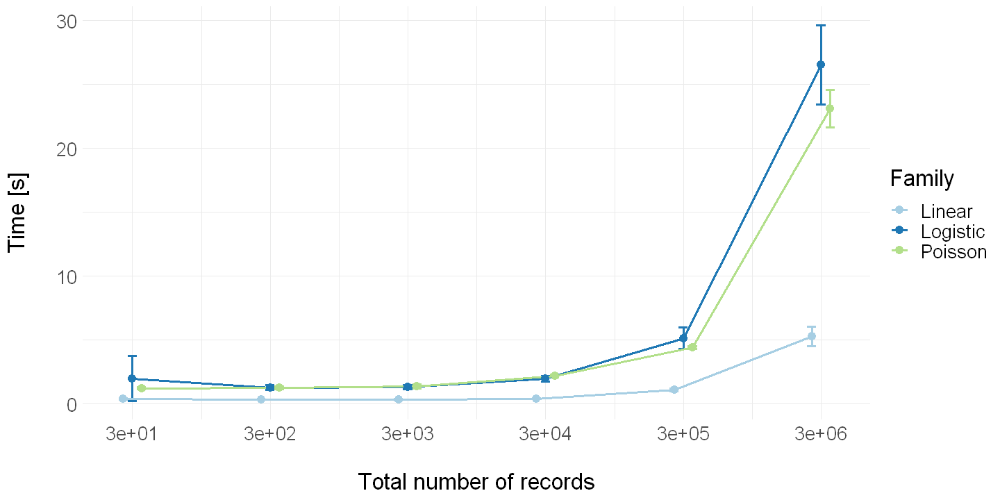

In [9]:
pd <- position_dodge(0.2) # Shift lines to the left and right to avoid overlapping

# Define plot size
WIDTH = 12
HEIGHT = 6
options(repr.plot.width = WIDTH, repr.plot.height = HEIGHT) 

ggplot(performance_summary, aes(x=n_records, y=time, colour=family)) + 
    geom_errorbar(aes(ymin=time-sd, ymax=time+sd), size=1, width=0.2, position=pd) +
    geom_line(position=pd, size=1) +
    geom_point(position=pd, size=3) +
    scale_shape_manual(values = c(5, 16, 17)) +
    labs(x = "\nTotal number of records", y="Time [s]\n", colour="Family") +
    scale_x_continuous(breaks=n_records, trans='log10') +
    theme_minimal() +
    theme(text = element_text(size = 20)) + 
    scale_color_brewer(palette="Paired")

ggsave("../results/records.pdf", width = WIDTH, height = HEIGHT)

## Varying number of parties (fixed number of records)
In this case, we will try different numbers of parties with 10,000 total records. The rest of the process is the same as in the previous case.

Note that the figures will be different that those in the paper because 1. randomness in the data and 2. more importantly, we are setting `n_repetitions` to 10. The original analysis was done by setting it to 100. However, that generated a huge Jupyter notebook, which was very impractical. Thus, we will stick to 10 for now.

In [10]:
data_types <- c('linear', 'logistic', 'poisson')
n_parties <- c(2, 3, 4, 5, 6, 7, 8, 9, 10)
n_repetitions <- 10

output <- matrix(ncol = 3, nrow = length(n_parties)*length(data_types)*n_repetitions, dimnames=list(NULL, c('family', 'n_parties', 'time')))

ii <- 1
for (data_type in data_types){
    for (n in n_parties){
        for (x in 1:n_repetitions){
            datasets = create_dataset(data_type, n_samples=as.integer(10000), n_parties=as.integer(n))
            datasets_combined <- do.call(rbind.data.frame, datasets)

            client <- vtg::MockClient$new(datasets, 'vtg.glm')

            # Generate federated GLM.
            # Notice that the model is called differently depending on the data type.
            start_time <- Sys.time()
            if (data_type == 'linear'){
                print("Linear model")
                results_federated_plain <- vtg.glm::dglm(client, formula = y ~ x1 + x2, family=gaussian(link = 'identity'), tol=1e-08, maxit=25)
            } else if (data_type == 'poisson'){
                print("Poisson model")
                results_federated_plain <- vtg.glm::dglm(client, formula = y ~ x1 + x2, family=poisson(link = "log"), tol=1e-08, maxit=25)
            } else if (data_type == 'logistic'){
                print("Logistic model")
                results_federated_plain <- vtg.glm::dglm(client, formula = y ~ x1 + x2, family=binomial(link = "logit"), tol=1e-08, maxit=25)
            }
            end_time <- Sys.time()

            # Compute execution time
            t = as.numeric(difftime(end_time, start_time, units = 'secs'))

            # Fill in the output matrix
            output[ii, 1] = data_type
            output[ii, 2] = n
            output[ii, 3] = t

            ii <- ii+1
        }
    }
}


[1] "Linear model"
DEBUG [19:48:22.296] Initializing... 
INFO  [19:48:22.298]  
INFO  [19:48:22.301] ############################################### 
INFO  [19:48:22.304] # Starting iteration 0 
INFO  [19:48:22.306] ############################################### 
INFO  [19:48:22.309]  
INFO  [19:48:22.312] 0.1 - RPC Node Beta 
DEBUG [19:48:22.314] ** Mocking call to "node_beta" ** 
DEBUG [19:48:22.317] Regular call 
DEBUG [19:48:22.321] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:22.341] Log for site 1: 
DEBUG [19:48:22.346] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:22.324] Initializing node beta... 
DEBUG [19:48:22.332] First iteration. Initializing variables. 
DEBUG [19:48:22.337] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:22.367] Log for site 2: 
DEBUG [19:48:22.371] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:22.349] Initializing node beta... 
DEBUG [19:48:22.356] First iteration. Initializing variables. 
DEBUG [19:48:22.361] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:22.391] Log for site 3: 
DEBUG [19:48:22.394] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:22.374] Initializing node beta... 
DEBUG [19:48:22.382] First iteration. Initializing variables. 
DEBUG [19:48:22.387] Calculating the Betas.  
DEBUG [19:48:22.399]   - [DONE] 
INFO  [19:48:22.404] 0.2 - Master beta 
DEBUG [19:48:22.408] Initializing master Beta... 
DEBUG [19:48:22.411] Merging node calculation to update new Betas. 
DEBUG [19:48:22.414] Updating the Betas. 
DEBUG [19:48:22.418]   - [DONE] 
INFO  [19:48:22.421] 0.3 - RPC Node Deviance 
DEBUG [19:48:22.424] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:22.427] Regular call 
DEBUG [19:48:22.430] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:22.447] Log for site 1: 
DEBUG [19:48:22.450] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:22.434] Starting node deviance. 
DEBUG [19:48:22.441] First iteration. Initializing variables. 
DEBUG [19:48:22.444] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:22.468] Log for site 2: 
DEBUG [19:48:22.471] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:22.453] Starting node deviance. 
DEBUG [19:48:22.462] First iteration. Initializing variables. 
DEBUG [19:48:22.465] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:22.489] Log for site 3: 
DEBUG [19:48:22.492] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:22.474] Starting node deviance. 
DEBUG [19:48:22.483] First iteration. Initializing variables. 
DEBUG [19:48:22.486] Updating the variables for node deviance.  
DEBUG [19:48:22.496]   - [DONE] 
INFO  [19:48:22.500] 0.4 - Master deviance 
DEBUG [19:48:22.503] Starting master deviance. 
DEBUG [19:48:22.507]   - [DONE] 
INFO  [19:48:22.510] 0.5 - Termination conditions 
DEBUG [19:48:22.514]   - [DONE] 
INFO  [19:48:22.517]  
INFO  [19:48:22.519] ############################################### 
INFO  [19:48:22.522] # Starting iteration 1 
INFO  [19:48:22.525] ############################################### 
INFO  [19:48:22.527]  
INFO  [19:48:22.531] 1.1 - RPC Node Beta 
DEBUG [19:48:22.534] ** Mocking call to "node_beta" ** 
DEBUG [19:48:22.537] Regular call 
DEBUG [19:48:22.540] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:22.553] Log for site 1: 
DEBUG [19:48:22.556] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:22.542] Initializing node beta... 
DEBUG [19:48:22.550] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:22.572] Log for site 2: 
DEBUG [19:48:22.576] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:22.559] Initializing node beta... 
DEBUG [19:48:22.568] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:22.597] Log for site 3: 
DEBUG [19:48:22.602] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:22.581] Initializing node beta... 
DEBUG [19:48:22.593] Calculating the Betas.  
DEBUG [19:48:22.606]   - [DONE] 
INFO  [19:48:22.609] 1.2 - Master beta 
DEBUG [19:48:22.611] Initializing master Beta... 
DEBUG [19:48:22.615] Merging node calculation to update new Betas. 
DEBUG [19:48:22.618] Updating the Betas. 
DEBUG [19:48:22.621]   - [DONE] 
INFO  [19:48:22.626] 1.3 - RPC Node Deviance 
DEBUG [19:48:22.629] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:22.632] Regular call 
DEBUG [19:48:22.636] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:22.651] Log for site 1: 
DEBUG [19:48:22.656] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:22.639] Starting node deviance. 
DEBUG [19:48:22.647] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:22.674] Log for site 2: 
DEBUG [19:48:22.678] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:22.659] Starting node deviance. 
DEBUG [19:48:22.668] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:22.692] Log for site 3: 
DEBUG [19:48:22.696] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:22.681] Starting node deviance. 
DEBUG [19:48:22.689] Updating the variables for node deviance.  
DEBUG [19:48:22.702]   - [DONE] 
INFO  [19:48:22.708] 1.4 - Master deviance 
DEBUG [19:48:22.712] Starting master deviance. 
DEBUG [19:48:22.716]   - [DONE] 
INFO  [19:48:22.719] 1.5 - Termination conditions 
DEBUG [19:48:22.722]   - [CONVERGED] 
DEBUG [19:48:22.725] Preparing output 
[1] "Linear model"
DEBUG [19:48:22.817] Initializing... 
INFO  [19:48:22.820]  
INFO  [19:48:22.823] ############################################### 
INFO  [19:48:22.826] # Starting iteration 0 
INFO  [19:48:22.829] ############################################### 
INFO  [19:48:22.832]  
INFO  [19:48:22.835] 0.1 - RPC Node Beta 
DEBUG [19:48:22.837] ** Mocking call to "node_beta" ** 
DEBUG [19:48:22.841] Regular call 
DEBUG [19:48:22.844] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:22.863] Log for site 1: 
DEBUG [19:48:22.866] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:22.847] Initializing node beta... 
DEBUG [19:48:22.856] First iteration. Initializing variables. 
DEBUG [19:48:22.859] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:22.890] Log for site 2: 
DEBUG [19:48:22.897] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:22.871] Initializing node beta... 
DEBUG [19:48:22.879] First iteration. Initializing variables. 
DEBUG [19:48:22.885] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:22.927] Log for site 3: 
DEBUG [19:48:22.932] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:22.903] Initializing node beta... 
DEBUG [19:48:22.915] First iteration. Initializing variables. 
DEBUG [19:48:22.920] Calculating the Betas.  
DEBUG [19:48:22.936]   - [DONE] 
INFO  [19:48:22.940] 0.2 - Master beta 
DEBUG [19:48:22.943] Initializing master Beta... 
DEBUG [19:48:22.947] Merging node calculation to update new Betas. 
DEBUG [19:48:22.952] Updating the Betas. 
DEBUG [19:48:22.958]   - [DONE] 
INFO  [19:48:22.963] 0.3 - RPC Node Deviance 
DEBUG [19:48:22.967] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:22.973] Regular call 
DEBUG [19:48:22.977] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:23.005] Log for site 1: 
DEBUG [19:48:23.010] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:22.983] Starting node deviance. 
DEBUG [19:48:22.995] First iteration. Initializing variables. 
DEBUG [19:48:22.999] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:23.050] Log for site 2: 
DEBUG [19:48:23.056] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:23.018] Starting node deviance. 
DEBUG [19:48:23.035] First iteration. Initializing variables. 
DEBUG [19:48:23.043] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:23.096] Log for site 3: 
DEBUG [19:48:23.101] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:23.065] Starting node deviance. 
DEBUG [19:48:23.081] First iteration. Initializing variables. 
DEBUG [19:48:23.088] Updating the variables for node deviance.  
DEBUG [19:48:23.106]   - [DONE] 
INFO  [19:48:23.110] 0.4 - Master deviance 
DEBUG [19:48:23.118] Starting master deviance. 
DEBUG [19:48:23.123]   - [DONE] 
INFO  [19:48:23.127] 0.5 - Termination conditions 
DEBUG [19:48:23.133]   - [DONE] 
INFO  [19:48:23.140]  
INFO  [19:48:23.146] ############################################### 
INFO  [19:48:23.150] # Starting iteration 1 
INFO  [19:48:23.153] ############################################### 
INFO  [19:48:23.156]  
INFO  [19:48:23.160] 1.1 - RPC Node Beta 
DEBUG [19:48:23.164] ** Mocking call to "node_beta" ** 
DEBUG [19:48:23.168] Regular call 
DEBUG [19:48:23.172] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:23.194] Log for site 1: 
DEBUG [19:48:23.198] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:23.176] Initializing node beta... 
DEBUG [19:48:23.187] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:23.219] Log for site 2: 
DEBUG [19:48:23.223] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:23.203] Initializing node beta... 
DEBUG [19:48:23.211] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:23.249] Log for site 3: 
DEBUG [19:48:23.257] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:23.227] Initializing node beta... 
DEBUG [19:48:23.239] Calculating the Betas.  
DEBUG [19:48:23.267]   - [DONE] 
INFO  [19:48:23.274] 1.2 - Master beta 
DEBUG [19:48:23.282] Initializing master Beta... 
DEBUG [19:48:23.289] Merging node calculation to update new Betas. 
DEBUG [19:48:23.294] Updating the Betas. 
DEBUG [19:48:23.299]   - [DONE] 
INFO  [19:48:23.305] 1.3 - RPC Node Deviance 
DEBUG [19:48:23.309] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:23.313] Regular call 
DEBUG [19:48:23.318] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:23.334] Log for site 1: 
DEBUG [19:48:23.338] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:23.322] Starting node deviance. 
DEBUG [19:48:23.331] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:23.355] Log for site 2: 
DEBUG [19:48:23.362] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:23.342] Starting node deviance. 
DEBUG [19:48:23.350] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:23.384] Log for site 3: 
DEBUG [19:48:23.391] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:23.366] Starting node deviance. 
DEBUG [19:48:23.379] Updating the variables for node deviance.  
DEBUG [19:48:23.400]   - [DONE] 
INFO  [19:48:23.407] 1.4 - Master deviance 
DEBUG [19:48:23.416] Starting master deviance. 
DEBUG [19:48:23.421]   - [DONE] 
INFO  [19:48:23.425] 1.5 - Termination conditions 
DEBUG [19:48:23.430]   - [CONVERGED] 
DEBUG [19:48:23.434] Preparing output 
[1] "Linear model"
DEBUG [19:48:23.500] Initializing... 
INFO  [19:48:23.505]  
INFO  [19:48:23.510] ############################################### 
INFO  [19:48:23.517] # Starting iteration 0 
INFO  [19:48:23.524] ############################################### 
INFO  [19:48:23.529]  
INFO  [19:48:23.537] 0.1 - RPC Node Beta 
DEBUG [19:48:23.542] ** Mocking call to "node_beta" ** 
DEBUG [19:48:23.546] Regular call 
DEBUG [19:48:23.551] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:23.578] Log for site 1: 
DEBUG [19:48:23.583] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:23.555] Initializing node beta... 
DEBUG [19:48:23.565] First iteration. Initializing variables. 
DEBUG [19:48:23.571] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:23.604] Log for site 2: 
DEBUG [19:48:23.608] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:23.586] Initializing node beta... 
DEBUG [19:48:23.596] First iteration. Initializing variables. 
DEBUG [19:48:23.600] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:23.684] Log for site 3: 
DEBUG [19:48:23.687] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:23.612] Initializing node beta... 
DEBUG [19:48:23.621] First iteration. Initializing variables. 
DEBUG [19:48:23.680] Calculating the Betas.  
DEBUG [19:48:23.691]   - [DONE] 
INFO  [19:48:23.694] 0.2 - Master beta 
DEBUG [19:48:23.698] Initializing master Beta... 
DEBUG [19:48:23.701] Merging node calculation to update new Betas. 
DEBUG [19:48:23.705] Updating the Betas. 
DEBUG [19:48:23.711]   - [DONE] 
INFO  [19:48:23.714] 0.3 - RPC Node Deviance 
DEBUG [19:48:23.718] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:23.722] Regular call 
DEBUG [19:48:23.728] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:23.758] Log for site 1: 
DEBUG [19:48:23.765] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:23.734] Starting node deviance. 
DEBUG [19:48:23.746] First iteration. Initializing variables. 
DEBUG [19:48:23.751] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:23.792] Log for site 2: 
DEBUG [19:48:23.797] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:23.773] Starting node deviance. 
DEBUG [19:48:23.784] First iteration. Initializing variables. 
DEBUG [19:48:23.788] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:23.820] Log for site 3: 
DEBUG [19:48:23.824] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:23.801] Starting node deviance. 
DEBUG [19:48:23.811] First iteration. Initializing variables. 
DEBUG [19:48:23.816] Updating the variables for node deviance.  
DEBUG [19:48:23.829]   - [DONE] 
INFO  [19:48:23.835] 0.4 - Master deviance 
DEBUG [19:48:23.841] Starting master deviance. 
DEBUG [19:48:23.846]   - [DONE] 
INFO  [19:48:23.850] 0.5 - Termination conditions 
DEBUG [19:48:23.853]   - [DONE] 
INFO  [19:48:23.856]  
INFO  [19:48:23.859] ############################################### 
INFO  [19:48:23.863] # Starting iteration 1 
INFO  [19:48:23.866] ############################################### 
INFO  [19:48:23.870]  
INFO  [19:48:23.873] 1.1 - RPC Node Beta 
DEBUG [19:48:23.876] ** Mocking call to "node_beta" ** 
DEBUG [19:48:23.880] Regular call 
DEBUG [19:48:23.884] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:23.899] Log for site 1: 
DEBUG [19:48:23.902] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:23.887] Initializing node beta... 
DEBUG [19:48:23.895] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:23.919] Log for site 2: 
DEBUG [19:48:23.922] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:23.906] Initializing node beta... 
DEBUG [19:48:23.915] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:23.943] Log for site 3: 
DEBUG [19:48:23.947] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:23.926] Initializing node beta... 
DEBUG [19:48:23.938] Calculating the Betas.  
DEBUG [19:48:23.951]   - [DONE] 
INFO  [19:48:23.955] 1.2 - Master beta 
DEBUG [19:48:23.962] Initializing master Beta... 
DEBUG [19:48:23.965] Merging node calculation to update new Betas. 
DEBUG [19:48:23.968] Updating the Betas. 
DEBUG [19:48:23.972]   - [DONE] 
INFO  [19:48:23.975] 1.3 - RPC Node Deviance 
DEBUG [19:48:23.979] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:23.983] Regular call 
DEBUG [19:48:23.987] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:24.005] Log for site 1: 
DEBUG [19:48:24.009] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:23.991] Starting node deviance. 
DEBUG [19:48:24.002] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:24.029] Log for site 2: 
DEBUG [19:48:24.033] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:24.012] Starting node deviance. 
DEBUG [19:48:24.022] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:24.051] Log for site 3: 
DEBUG [19:48:24.055] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:24.037] Starting node deviance. 
DEBUG [19:48:24.047] Updating the variables for node deviance.  
DEBUG [19:48:24.058]   - [DONE] 
INFO  [19:48:24.063] 1.4 - Master deviance 
DEBUG [19:48:24.066] Starting master deviance. 
DEBUG [19:48:24.070]   - [DONE] 
INFO  [19:48:24.075] 1.5 - Termination conditions 
DEBUG [19:48:24.079]   - [CONVERGED] 
DEBUG [19:48:24.083] Preparing output 
[1] "Linear model"
DEBUG [19:48:24.130] Initializing... 
INFO  [19:48:24.133]  
INFO  [19:48:24.136] ############################################### 
INFO  [19:48:24.139] # Starting iteration 0 
INFO  [19:48:24.143] ############################################### 
INFO  [19:48:24.147]  
INFO  [19:48:24.150] 0.1 - RPC Node Beta 
DEBUG [19:48:24.153] ** Mocking call to "node_beta" ** 
DEBUG [19:48:24.157] Regular call 
DEBUG [19:48:24.160] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:24.185] Log for site 1: 
DEBUG [19:48:24.189] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:24.163] Initializing node beta... 
DEBUG [19:48:24.173] First iteration. Initializing variables. 
DEBUG [19:48:24.180] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:24.224] Log for site 2: 
DEBUG [19:48:24.229] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:24.198] Initializing node beta... 
DEBUG [19:48:24.207] First iteration. Initializing variables. 
DEBUG [19:48:24.216] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:24.249] Log for site 3: 
DEBUG [19:48:24.252] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:24.233] Initializing node beta... 
DEBUG [19:48:24.241] First iteration. Initializing variables. 
DEBUG [19:48:24.245] Calculating the Betas.  
DEBUG [19:48:24.255]   - [DONE] 
INFO  [19:48:24.259] 0.2 - Master beta 
DEBUG [19:48:24.263] Initializing master Beta... 
DEBUG [19:48:24.266] Merging node calculation to update new Betas. 
DEBUG [19:48:24.269] Updating the Betas. 
DEBUG [19:48:24.273]   - [DONE] 
INFO  [19:48:24.276] 0.3 - RPC Node Deviance 
DEBUG [19:48:24.279] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:24.283] Regular call 
DEBUG [19:48:24.288] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:24.307] Log for site 1: 
DEBUG [19:48:24.310] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:24.292] Starting node deviance. 
DEBUG [19:48:24.300] First iteration. Initializing variables. 
DEBUG [19:48:24.303] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:24.329] Log for site 2: 
DEBUG [19:48:24.333] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:24.314] Starting node deviance. 
DEBUG [19:48:24.322] First iteration. Initializing variables. 
DEBUG [19:48:24.325] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:24.356] Log for site 3: 
DEBUG [19:48:24.359] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:24.337] Starting node deviance. 
DEBUG [19:48:24.348] First iteration. Initializing variables. 
DEBUG [19:48:24.352] Updating the variables for node deviance.  
DEBUG [19:48:24.364]   - [DONE] 
INFO  [19:48:24.370] 0.4 - Master deviance 
DEBUG [19:48:24.427] Starting master deviance. 
DEBUG [19:48:24.432]   - [DONE] 
INFO  [19:48:24.435] 0.5 - Termination conditions 
DEBUG [19:48:24.438]   - [DONE] 
INFO  [19:48:24.443]  
INFO  [19:48:24.449] ############################################### 
INFO  [19:48:24.453] # Starting iteration 1 
INFO  [19:48:24.456] ############################################### 
INFO  [19:48:24.459]  
INFO  [19:48:24.462] 1.1 - RPC Node Beta 
DEBUG [19:48:24.465] ** Mocking call to "node_beta" ** 
DEBUG [19:48:24.469] Regular call 
DEBUG [19:48:24.472] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:24.492] Log for site 1: 
DEBUG [19:48:24.496] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:24.476] Initializing node beta... 
DEBUG [19:48:24.485] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:24.514] Log for site 2: 
DEBUG [19:48:24.519] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:24.499] Initializing node beta... 
DEBUG [19:48:24.507] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:24.541] Log for site 3: 
DEBUG [19:48:24.547] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:24.523] Initializing node beta... 
DEBUG [19:48:24.535] Calculating the Betas.  
DEBUG [19:48:24.554]   - [DONE] 
INFO  [19:48:24.561] 1.2 - Master beta 
DEBUG [19:48:24.568] Initializing master Beta... 
DEBUG [19:48:24.575] Merging node calculation to update new Betas. 
DEBUG [19:48:24.581] Updating the Betas. 
DEBUG [19:48:24.586]   - [DONE] 
INFO  [19:48:24.590] 1.3 - RPC Node Deviance 
DEBUG [19:48:24.593] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:24.598] Regular call 
DEBUG [19:48:24.602] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:24.644] Log for site 1: 
DEBUG [19:48:24.652] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:24.606] Starting node deviance. 
DEBUG [19:48:24.615] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:24.680] Log for site 2: 
DEBUG [19:48:24.684] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:24.659] Starting node deviance. 
DEBUG [19:48:24.674] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:24.707] Log for site 3: 
DEBUG [19:48:24.713] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:24.691] Starting node deviance. 
DEBUG [19:48:24.703] Updating the variables for node deviance.  
DEBUG [19:48:24.716]   - [DONE] 
INFO  [19:48:24.720] 1.4 - Master deviance 
DEBUG [19:48:24.726] Starting master deviance. 
DEBUG [19:48:24.748]   - [DONE] 
INFO  [19:48:24.754] 1.5 - Termination conditions 
DEBUG [19:48:24.757]   - [CONVERGED] 
DEBUG [19:48:24.761] Preparing output 
[1] "Linear model"
DEBUG [19:48:24.818] Initializing... 
INFO  [19:48:24.822]  
INFO  [19:48:24.826] ############################################### 
INFO  [19:48:24.830] # Starting iteration 0 
INFO  [19:48:24.834] ############################################### 
INFO  [19:48:24.837]  
INFO  [19:48:24.841] 0.1 - RPC Node Beta 
DEBUG [19:48:24.844] ** Mocking call to "node_beta" ** 
DEBUG [19:48:24.849] Regular call 
DEBUG [19:48:24.857] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:24.887] Log for site 1: 
DEBUG [19:48:24.891] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:24.865] Initializing node beta... 
DEBUG [19:48:24.879] First iteration. Initializing variables. 
DEBUG [19:48:24.883] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:24.916] Log for site 2: 
DEBUG [19:48:24.923] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:24.896] Initializing node beta... 
DEBUG [19:48:24.905] First iteration. Initializing variables. 
DEBUG [19:48:24.909] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:24.950] Log for site 3: 
DEBUG [19:48:24.956] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:24.927] Initializing node beta... 
DEBUG [19:48:24.940] First iteration. Initializing variables. 
DEBUG [19:48:24.944] Calculating the Betas.  
DEBUG [19:48:24.962]   - [DONE] 
INFO  [19:48:24.966] 0.2 - Master beta 
DEBUG [19:48:24.969] Initializing master Beta... 
DEBUG [19:48:24.973] Merging node calculation to update new Betas. 
DEBUG [19:48:24.976] Updating the Betas. 
DEBUG [19:48:24.980]   - [DONE] 
INFO  [19:48:24.984] 0.3 - RPC Node Deviance 
DEBUG [19:48:24.990] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:24.995] Regular call 
DEBUG [19:48:25.002] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:25.038] Log for site 1: 
DEBUG [19:48:25.045] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:25.010] Starting node deviance. 
DEBUG [19:48:25.023] First iteration. Initializing variables. 
DEBUG [19:48:25.030] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:25.071] Log for site 2: 
DEBUG [19:48:25.075] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:25.050] Starting node deviance. 
DEBUG [19:48:25.061] First iteration. Initializing variables. 
DEBUG [19:48:25.067] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:25.104] Log for site 3: 
DEBUG [19:48:25.114] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:25.080] Starting node deviance. 
DEBUG [19:48:25.091] First iteration. Initializing variables. 
DEBUG [19:48:25.097] Updating the variables for node deviance.  
DEBUG [19:48:25.123]   - [DONE] 
INFO  [19:48:25.131] 0.4 - Master deviance 
DEBUG [19:48:25.138] Starting master deviance. 
DEBUG [19:48:25.144]   - [DONE] 
INFO  [19:48:25.152] 0.5 - Termination conditions 
DEBUG [19:48:25.163]   - [DONE] 
INFO  [19:48:25.174]  
INFO  [19:48:25.182] ############################################### 
INFO  [19:48:25.192] # Starting iteration 1 
INFO  [19:48:25.198] ############################################### 
INFO  [19:48:25.205]  
INFO  [19:48:25.212] 1.1 - RPC Node Beta 
DEBUG [19:48:25.221] ** Mocking call to "node_beta" ** 
DEBUG [19:48:25.228] Regular call 
DEBUG [19:48:25.236] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:25.263] Log for site 1: 
DEBUG [19:48:25.269] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:25.240] Initializing node beta... 
DEBUG [19:48:25.254] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:25.298] Log for site 2: 
DEBUG [19:48:25.302] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:25.276] Initializing node beta... 
DEBUG [19:48:25.293] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:25.325] Log for site 3: 
DEBUG [19:48:25.329] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:25.306] Initializing node beta... 
DEBUG [19:48:25.319] Calculating the Betas.  
DEBUG [19:48:25.333]   - [DONE] 
INFO  [19:48:25.337] 1.2 - Master beta 
DEBUG [19:48:25.340] Initializing master Beta... 
DEBUG [19:48:25.344] Merging node calculation to update new Betas. 
DEBUG [19:48:25.418] Updating the Betas. 
DEBUG [19:48:25.422]   - [DONE] 
INFO  [19:48:25.426] 1.3 - RPC Node Deviance 
DEBUG [19:48:25.430] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:25.434] Regular call 
DEBUG [19:48:25.438] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:25.457] Log for site 1: 
DEBUG [19:48:25.463] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:25.442] Starting node deviance. 
DEBUG [19:48:25.453] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:25.521] Log for site 2: 
DEBUG [19:48:25.525] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:25.481] Starting node deviance. 
DEBUG [19:48:25.503] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:25.591] Log for site 3: 
DEBUG [19:48:25.599] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:25.561] Starting node deviance. 
DEBUG [19:48:25.582] Updating the variables for node deviance.  
DEBUG [19:48:25.605]   - [DONE] 
INFO  [19:48:25.610] 1.4 - Master deviance 
DEBUG [19:48:25.615] Starting master deviance. 
DEBUG [19:48:25.621]   - [DONE] 
INFO  [19:48:25.626] 1.5 - Termination conditions 
DEBUG [19:48:25.631]   - [CONVERGED] 
DEBUG [19:48:25.638] Preparing output 
[1] "Linear model"
DEBUG [19:48:25.697] Initializing... 
INFO  [19:48:25.702]  
INFO  [19:48:25.707] ############################################### 
INFO  [19:48:25.712] # Starting iteration 0 
INFO  [19:48:25.716] ############################################### 
INFO  [19:48:25.719]  
INFO  [19:48:25.723] 0.1 - RPC Node Beta 
DEBUG [19:48:25.727] ** Mocking call to "node_beta" ** 
DEBUG [19:48:25.731] Regular call 
DEBUG [19:48:25.736] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:25.771] Log for site 1: 
DEBUG [19:48:25.779] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:25.742] Initializing node beta... 
DEBUG [19:48:25.758] First iteration. Initializing variables. 
DEBUG [19:48:25.764] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:25.820] Log for site 2: 
DEBUG [19:48:25.826] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:25.786] Initializing node beta... 
DEBUG [19:48:25.805] First iteration. Initializing variables. 
DEBUG [19:48:25.813] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:25.874] Log for site 3: 
DEBUG [19:48:25.882] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:25.834] Initializing node beta... 
DEBUG [19:48:25.855] First iteration. Initializing variables. 
DEBUG [19:48:25.864] Calculating the Betas.  
DEBUG [19:48:25.889]   - [DONE] 
INFO  [19:48:25.897] 0.2 - Master beta 
DEBUG [19:48:25.904] Initializing master Beta... 
DEBUG [19:48:25.911] Merging node calculation to update new Betas. 
DEBUG [19:48:25.917] Updating the Betas. 
DEBUG [19:48:25.922]   - [DONE] 
INFO  [19:48:25.929] 0.3 - RPC Node Deviance 
DEBUG [19:48:25.937] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:25.946] Regular call 
DEBUG [19:48:25.953] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:25.993] Log for site 1: 
DEBUG [19:48:26.001] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:25.960] Starting node deviance. 
DEBUG [19:48:25.977] First iteration. Initializing variables. 
DEBUG [19:48:25.986] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:26.037] Log for site 2: 
DEBUG [19:48:26.041] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:26.009] Starting node deviance. 
DEBUG [19:48:26.026] First iteration. Initializing variables. 
DEBUG [19:48:26.033] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:26.077] Log for site 3: 
DEBUG [19:48:26.085] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:26.047] Starting node deviance. 
DEBUG [19:48:26.061] First iteration. Initializing variables. 
DEBUG [19:48:26.069] Updating the variables for node deviance.  
DEBUG [19:48:26.092]   - [DONE] 
INFO  [19:48:26.098] 0.4 - Master deviance 
DEBUG [19:48:26.101] Starting master deviance. 
DEBUG [19:48:26.105]   - [DONE] 
INFO  [19:48:26.109] 0.5 - Termination conditions 
DEBUG [19:48:26.113]   - [DONE] 
INFO  [19:48:26.117]  
INFO  [19:48:26.120] ############################################### 
INFO  [19:48:26.124] # Starting iteration 1 
INFO  [19:48:26.128] ############################################### 
INFO  [19:48:26.132]  
INFO  [19:48:26.136] 1.1 - RPC Node Beta 
DEBUG [19:48:26.140] ** Mocking call to "node_beta" ** 
DEBUG [19:48:26.144] Regular call 
DEBUG [19:48:26.148] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:26.168] Log for site 1: 
DEBUG [19:48:26.173] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:26.152] Initializing node beta... 
DEBUG [19:48:26.163] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:26.200] Log for site 2: 
DEBUG [19:48:26.204] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:26.178] Initializing node beta... 
DEBUG [19:48:26.195] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:26.223] Log for site 3: 
DEBUG [19:48:26.227] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:26.208] Initializing node beta... 
DEBUG [19:48:26.219] Calculating the Betas.  
DEBUG [19:48:26.235]   - [DONE] 
INFO  [19:48:26.242] 1.2 - Master beta 
DEBUG [19:48:26.248] Initializing master Beta... 
DEBUG [19:48:26.252] Merging node calculation to update new Betas. 
DEBUG [19:48:26.256] Updating the Betas. 
DEBUG [19:48:26.259]   - [DONE] 
INFO  [19:48:26.265] 1.3 - RPC Node Deviance 
DEBUG [19:48:26.269] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:26.273] Regular call 
DEBUG [19:48:26.278] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:26.322] Log for site 1: 
DEBUG [19:48:26.330] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:26.282] Starting node deviance. 
DEBUG [19:48:26.293] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:26.350] Log for site 2: 
DEBUG [19:48:26.357] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:26.334] Starting node deviance. 
DEBUG [19:48:26.343] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:26.421] Log for site 3: 
DEBUG [19:48:26.431] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:26.361] Starting node deviance. 
DEBUG [19:48:26.414] Updating the variables for node deviance.  
DEBUG [19:48:26.435]   - [DONE] 
INFO  [19:48:26.440] 1.4 - Master deviance 
DEBUG [19:48:26.444] Starting master deviance. 
DEBUG [19:48:26.449]   - [DONE] 
INFO  [19:48:26.453] 1.5 - Termination conditions 
DEBUG [19:48:26.457]   - [CONVERGED] 
DEBUG [19:48:26.461] Preparing output 
[1] "Linear model"
DEBUG [19:48:26.598] Initializing... 
INFO  [19:48:26.602]  
INFO  [19:48:26.605] ############################################### 
INFO  [19:48:26.610] # Starting iteration 0 
INFO  [19:48:26.616] ############################################### 
INFO  [19:48:26.623]  
INFO  [19:48:26.630] 0.1 - RPC Node Beta 
DEBUG [19:48:26.636] ** Mocking call to "node_beta" ** 
DEBUG [19:48:26.641] Regular call 
DEBUG [19:48:26.646] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:26.671] Log for site 1: 
DEBUG [19:48:26.678] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:26.649] Initializing node beta... 
DEBUG [19:48:26.659] First iteration. Initializing variables. 
DEBUG [19:48:26.664] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:26.723] Log for site 2: 
DEBUG [19:48:26.727] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:26.682] Initializing node beta... 
DEBUG [19:48:26.703] First iteration. Initializing variables. 
DEBUG [19:48:26.718] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:26.750] Log for site 3: 
DEBUG [19:48:26.755] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:26.731] Initializing node beta... 
DEBUG [19:48:26.740] First iteration. Initializing variables. 
DEBUG [19:48:26.744] Calculating the Betas.  
DEBUG [19:48:26.759]   - [DONE] 
INFO  [19:48:26.763] 0.2 - Master beta 
DEBUG [19:48:26.769] Initializing master Beta... 
DEBUG [19:48:26.775] Merging node calculation to update new Betas. 
DEBUG [19:48:26.780] Updating the Betas. 
DEBUG [19:48:26.784]   - [DONE] 
INFO  [19:48:26.788] 0.3 - RPC Node Deviance 
DEBUG [19:48:26.791] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:26.795] Regular call 
DEBUG [19:48:26.800] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:26.822] Log for site 1: 
DEBUG [19:48:26.825] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:26.804] Starting node deviance. 
DEBUG [19:48:26.813] First iteration. Initializing variables. 
DEBUG [19:48:26.818] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:26.855] Log for site 2: 
DEBUG [19:48:26.861] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:26.830] Starting node deviance. 
DEBUG [19:48:26.841] First iteration. Initializing variables. 
DEBUG [19:48:26.848] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:26.893] Log for site 3: 
DEBUG [19:48:26.898] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:26.873] Starting node deviance. 
DEBUG [19:48:26.885] First iteration. Initializing variables. 
DEBUG [19:48:26.889] Updating the variables for node deviance.  
DEBUG [19:48:26.905]   - [DONE] 
INFO  [19:48:26.909] 0.4 - Master deviance 
DEBUG [19:48:26.914] Starting master deviance. 
DEBUG [19:48:26.920]   - [DONE] 
INFO  [19:48:26.923] 0.5 - Termination conditions 
DEBUG [19:48:26.927]   - [DONE] 
INFO  [19:48:26.932]  
INFO  [19:48:26.936] ############################################### 
INFO  [19:48:26.946] # Starting iteration 1 
INFO  [19:48:26.954] ############################################### 
INFO  [19:48:26.962]  
INFO  [19:48:26.966] 1.1 - RPC Node Beta 
DEBUG [19:48:26.969] ** Mocking call to "node_beta" ** 
DEBUG [19:48:26.973] Regular call 
DEBUG [19:48:26.977] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:26.994] Log for site 1: 
DEBUG [19:48:27.001] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:26.980] Initializing node beta... 
DEBUG [19:48:26.990] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:27.030] Log for site 2: 
DEBUG [19:48:27.035] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:27.007] Initializing node beta... 
DEBUG [19:48:27.023] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:27.056] Log for site 3: 
DEBUG [19:48:27.060] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:27.041] Initializing node beta... 
DEBUG [19:48:27.052] Calculating the Betas.  
DEBUG [19:48:27.064]   - [DONE] 
INFO  [19:48:27.068] 1.2 - Master beta 
DEBUG [19:48:27.072] Initializing master Beta... 
DEBUG [19:48:27.076] Merging node calculation to update new Betas. 
DEBUG [19:48:27.081] Updating the Betas. 
DEBUG [19:48:27.088]   - [DONE] 
INFO  [19:48:27.095] 1.3 - RPC Node Deviance 
DEBUG [19:48:27.101] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:27.107] Regular call 
DEBUG [19:48:27.112] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:27.138] Log for site 1: 
DEBUG [19:48:27.145] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:27.118] Starting node deviance. 
DEBUG [19:48:27.132] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:27.170] Log for site 2: 
DEBUG [19:48:27.176] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:27.150] Starting node deviance. 
DEBUG [19:48:27.164] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:27.205] Log for site 3: 
DEBUG [19:48:27.210] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:27.183] Starting node deviance. 
DEBUG [19:48:27.197] Updating the variables for node deviance.  
DEBUG [19:48:27.215]   - [DONE] 
INFO  [19:48:27.219] 1.4 - Master deviance 
DEBUG [19:48:27.223] Starting master deviance. 
DEBUG [19:48:27.227]   - [DONE] 
INFO  [19:48:27.236] 1.5 - Termination conditions 
DEBUG [19:48:27.244]   - [CONVERGED] 
DEBUG [19:48:27.252] Preparing output 
[1] "Linear model"
DEBUG [19:48:27.305] Initializing... 
INFO  [19:48:27.310]  
INFO  [19:48:27.315] ############################################### 
INFO  [19:48:27.321] # Starting iteration 0 
INFO  [19:48:27.327] ############################################### 
INFO  [19:48:27.332]  
INFO  [19:48:27.336] 0.1 - RPC Node Beta 
DEBUG [19:48:27.340] ** Mocking call to "node_beta" ** 
DEBUG [19:48:27.344] Regular call 
DEBUG [19:48:27.350] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:27.381] Log for site 1: 
DEBUG [19:48:27.388] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:27.355] Initializing node beta... 
DEBUG [19:48:27.367] First iteration. Initializing variables. 
DEBUG [19:48:27.376] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:27.418] Log for site 2: 
DEBUG [19:48:27.421] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:27.392] Initializing node beta... 
DEBUG [19:48:27.405] First iteration. Initializing variables. 
DEBUG [19:48:27.412] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:27.444] Log for site 3: 
DEBUG [19:48:27.449] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:27.425] Initializing node beta... 
DEBUG [19:48:27.436] First iteration. Initializing variables. 
DEBUG [19:48:27.440] Calculating the Betas.  
DEBUG [19:48:27.453]   - [DONE] 
INFO  [19:48:27.521] 0.2 - Master beta 
DEBUG [19:48:27.524] Initializing master Beta... 
DEBUG [19:48:27.527] Merging node calculation to update new Betas. 
DEBUG [19:48:27.531] Updating the Betas. 
DEBUG [19:48:27.535]   - [DONE] 
INFO  [19:48:27.538] 0.3 - RPC Node Deviance 
DEBUG [19:48:27.542] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:27.546] Regular call 
DEBUG [19:48:27.549] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:27.570] Log for site 1: 
DEBUG [19:48:27.573] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:27.553] Starting node deviance. 
DEBUG [19:48:27.562] First iteration. Initializing variables. 
DEBUG [19:48:27.566] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:27.597] Log for site 2: 
DEBUG [19:48:27.603] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:27.578] Starting node deviance. 
DEBUG [19:48:27.589] First iteration. Initializing variables. 
DEBUG [19:48:27.592] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:27.629] Log for site 3: 
DEBUG [19:48:27.634] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:27.609] Starting node deviance. 
DEBUG [19:48:27.620] First iteration. Initializing variables. 
DEBUG [19:48:27.624] Updating the variables for node deviance.  
DEBUG [19:48:27.638]   - [DONE] 
INFO  [19:48:27.643] 0.4 - Master deviance 
DEBUG [19:48:27.648] Starting master deviance. 
DEBUG [19:48:27.652]   - [DONE] 
INFO  [19:48:27.655] 0.5 - Termination conditions 
DEBUG [19:48:27.658]   - [DONE] 
INFO  [19:48:27.662]  
INFO  [19:48:27.668] ############################################### 
INFO  [19:48:27.674] # Starting iteration 1 
INFO  [19:48:27.680] ############################################### 
INFO  [19:48:27.684]  
INFO  [19:48:27.687] 1.1 - RPC Node Beta 
DEBUG [19:48:27.691] ** Mocking call to "node_beta" ** 
DEBUG [19:48:27.694] Regular call 
DEBUG [19:48:27.698] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:27.714] Log for site 1: 
DEBUG [19:48:27.717] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:27.702] Initializing node beta... 
DEBUG [19:48:27.710] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:27.737] Log for site 2: 
DEBUG [19:48:27.743] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:27.721] Initializing node beta... 
DEBUG [19:48:27.731] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:27.763] Log for site 3: 
DEBUG [19:48:27.767] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:27.748] Initializing node beta... 
DEBUG [19:48:27.757] Calculating the Betas.  
DEBUG [19:48:27.770]   - [DONE] 
INFO  [19:48:27.774] 1.2 - Master beta 
DEBUG [19:48:27.779] Initializing master Beta... 
DEBUG [19:48:27.785] Merging node calculation to update new Betas. 
DEBUG [19:48:27.789] Updating the Betas. 
DEBUG [19:48:27.793]   - [DONE] 
INFO  [19:48:27.796] 1.3 - RPC Node Deviance 
DEBUG [19:48:27.800] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:27.804] Regular call 
DEBUG [19:48:27.808] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:27.825] Log for site 1: 
DEBUG [19:48:27.830] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:27.811] Starting node deviance. 
DEBUG [19:48:27.821] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:27.852] Log for site 2: 
DEBUG [19:48:27.858] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:27.835] Starting node deviance. 
DEBUG [19:48:27.846] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:27.877] Log for site 3: 
DEBUG [19:48:27.884] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:27.864] Starting node deviance. 
DEBUG [19:48:27.873] Updating the variables for node deviance.  
DEBUG [19:48:27.893]   - [DONE] 
INFO  [19:48:27.900] 1.4 - Master deviance 
DEBUG [19:48:27.903] Starting master deviance. 
DEBUG [19:48:27.906]   - [DONE] 
INFO  [19:48:27.910] 1.5 - Termination conditions 
DEBUG [19:48:27.913]   - [CONVERGED] 
DEBUG [19:48:27.917] Preparing output 
[1] "Linear model"
DEBUG [19:48:27.954] Initializing... 
INFO  [19:48:27.958]  
INFO  [19:48:27.961] ############################################### 
INFO  [19:48:27.965] # Starting iteration 0 
INFO  [19:48:27.968] ############################################### 
INFO  [19:48:27.972]  
INFO  [19:48:27.975] 0.1 - RPC Node Beta 
DEBUG [19:48:27.979] ** Mocking call to "node_beta" ** 
DEBUG [19:48:27.983] Regular call 
DEBUG [19:48:27.986] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:28.062] Log for site 1: 
DEBUG [19:48:28.066] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:27.990] Initializing node beta... 
DEBUG [19:48:27.998] First iteration. Initializing variables. 
DEBUG [19:48:28.028] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:28.103] Log for site 2: 
DEBUG [19:48:28.107] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:28.069] Initializing node beta... 
DEBUG [19:48:28.092] First iteration. Initializing variables. 
DEBUG [19:48:28.098] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:28.139] Log for site 3: 
DEBUG [19:48:28.144] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:28.113] Initializing node beta... 
DEBUG [19:48:28.127] First iteration. Initializing variables. 
DEBUG [19:48:28.133] Calculating the Betas.  
DEBUG [19:48:28.167]   - [DONE] 
INFO  [19:48:28.174] 0.2 - Master beta 
DEBUG [19:48:28.180] Initializing master Beta... 
DEBUG [19:48:28.184] Merging node calculation to update new Betas. 
DEBUG [19:48:28.189] Updating the Betas. 
DEBUG [19:48:28.197]   - [DONE] 
INFO  [19:48:28.203] 0.3 - RPC Node Deviance 
DEBUG [19:48:28.209] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:28.217] Regular call 
DEBUG [19:48:28.221] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:28.241] Log for site 1: 
DEBUG [19:48:28.244] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:28.224] Starting node deviance. 
DEBUG [19:48:28.234] First iteration. Initializing variables. 
DEBUG [19:48:28.237] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:28.268] Log for site 2: 
DEBUG [19:48:28.272] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:28.251] Starting node deviance. 
DEBUG [19:48:28.260] First iteration. Initializing variables. 
DEBUG [19:48:28.264] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:28.294] Log for site 3: 
DEBUG [19:48:28.298] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:28.276] Starting node deviance. 
DEBUG [19:48:28.286] First iteration. Initializing variables. 
DEBUG [19:48:28.290] Updating the variables for node deviance.  
DEBUG [19:48:28.302]   - [DONE] 
INFO  [19:48:28.307] 0.4 - Master deviance 
DEBUG [19:48:28.312] Starting master deviance. 
DEBUG [19:48:28.318]   - [DONE] 
INFO  [19:48:28.322] 0.5 - Termination conditions 
DEBUG [19:48:28.410]   - [DONE] 
INFO  [19:48:28.422]  
INFO  [19:48:28.426] ############################################### 
INFO  [19:48:28.431] # Starting iteration 1 
INFO  [19:48:28.435] ############################################### 
INFO  [19:48:28.442]  
INFO  [19:48:28.449] 1.1 - RPC Node Beta 
DEBUG [19:48:28.454] ** Mocking call to "node_beta" ** 
DEBUG [19:48:28.458] Regular call 
DEBUG [19:48:28.462] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:28.484] Log for site 1: 
DEBUG [19:48:28.490] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:28.468] Initializing node beta... 
DEBUG [19:48:28.478] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:28.514] Log for site 2: 
DEBUG [19:48:28.519] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:28.494] Initializing node beta... 
DEBUG [19:48:28.508] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:28.542] Log for site 3: 
DEBUG [19:48:28.547] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:28.523] Initializing node beta... 
DEBUG [19:48:28.535] Calculating the Betas.  
DEBUG [19:48:28.551]   - [DONE] 
INFO  [19:48:28.554] 1.2 - Master beta 
DEBUG [19:48:28.558] Initializing master Beta... 
DEBUG [19:48:28.561] Merging node calculation to update new Betas. 
DEBUG [19:48:28.566] Updating the Betas. 
DEBUG [19:48:28.569]   - [DONE] 
INFO  [19:48:28.572] 1.3 - RPC Node Deviance 
DEBUG [19:48:28.576] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:28.580] Regular call 
DEBUG [19:48:28.584] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:28.600] Log for site 1: 
DEBUG [19:48:28.603] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:28.587] Starting node deviance. 
DEBUG [19:48:28.596] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:28.620] Log for site 2: 
DEBUG [19:48:28.624] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:28.607] Starting node deviance. 
DEBUG [19:48:28.616] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:28.641] Log for site 3: 
DEBUG [19:48:28.645] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:28.629] Starting node deviance. 
DEBUG [19:48:28.637] Updating the variables for node deviance.  
DEBUG [19:48:28.649]   - [DONE] 
INFO  [19:48:28.652] 1.4 - Master deviance 
DEBUG [19:48:28.656] Starting master deviance. 
DEBUG [19:48:28.660]   - [DONE] 
INFO  [19:48:28.663] 1.5 - Termination conditions 
DEBUG [19:48:28.667]   - [CONVERGED] 
DEBUG [19:48:28.670] Preparing output 
[1] "Linear model"
DEBUG [19:48:28.706] Initializing... 
INFO  [19:48:28.709]  
INFO  [19:48:28.712] ############################################### 
INFO  [19:48:28.716] # Starting iteration 0 
INFO  [19:48:28.719] ############################################### 
INFO  [19:48:28.722]  
INFO  [19:48:28.725] 0.1 - RPC Node Beta 
DEBUG [19:48:28.728] ** Mocking call to "node_beta" ** 
DEBUG [19:48:28.732] Regular call 
DEBUG [19:48:28.735] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:28.755] Log for site 1: 
DEBUG [19:48:28.758] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:28.738] Initializing node beta... 
DEBUG [19:48:28.747] First iteration. Initializing variables. 
DEBUG [19:48:28.750] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:28.781] Log for site 2: 
DEBUG [19:48:28.786] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:28.764] Initializing node beta... 
DEBUG [19:48:28.774] First iteration. Initializing variables. 
DEBUG [19:48:28.778] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:28.806] Log for site 3: 
DEBUG [19:48:28.809] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:28.791] Initializing node beta... 
DEBUG [19:48:28.799] First iteration. Initializing variables. 
DEBUG [19:48:28.803] Calculating the Betas.  
DEBUG [19:48:28.813]   - [DONE] 
INFO  [19:48:28.817] 0.2 - Master beta 
DEBUG [19:48:28.820] Initializing master Beta... 
DEBUG [19:48:28.824] Merging node calculation to update new Betas. 
DEBUG [19:48:28.827] Updating the Betas. 
DEBUG [19:48:28.830]   - [DONE] 
INFO  [19:48:28.834] 0.3 - RPC Node Deviance 
DEBUG [19:48:28.837] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:28.840] Regular call 
DEBUG [19:48:28.844] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:28.862] Log for site 1: 
DEBUG [19:48:28.865] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:28.847] Starting node deviance. 
DEBUG [19:48:28.855] First iteration. Initializing variables. 
DEBUG [19:48:28.858] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:28.883] Log for site 2: 
DEBUG [19:48:28.886] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:28.868] Starting node deviance. 
DEBUG [19:48:28.876] First iteration. Initializing variables. 
DEBUG [19:48:28.880] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:28.904] Log for site 3: 
DEBUG [19:48:28.908] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:28.890] Starting node deviance. 
DEBUG [19:48:28.898] First iteration. Initializing variables. 
DEBUG [19:48:28.901] Updating the variables for node deviance.  
DEBUG [19:48:28.911]   - [DONE] 
INFO  [19:48:28.915] 0.4 - Master deviance 
DEBUG [19:48:28.918] Starting master deviance. 
DEBUG [19:48:28.921]   - [DONE] 
INFO  [19:48:28.925] 0.5 - Termination conditions 
DEBUG [19:48:28.928]   - [DONE] 
INFO  [19:48:28.931]  
INFO  [19:48:28.934] ############################################### 
INFO  [19:48:28.937] # Starting iteration 1 
INFO  [19:48:28.940] ############################################### 
INFO  [19:48:28.943]  
INFO  [19:48:28.947] 1.1 - RPC Node Beta 
DEBUG [19:48:28.950] ** Mocking call to "node_beta" ** 
DEBUG [19:48:28.953] Regular call 
DEBUG [19:48:28.957] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:28.972] Log for site 1: 
DEBUG [19:48:28.975] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:28.960] Initializing node beta... 
DEBUG [19:48:28.968] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:28.990] Log for site 2: 
DEBUG [19:48:28.993] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:28.979] Initializing node beta... 
DEBUG [19:48:28.986] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:29.013] Log for site 3: 
DEBUG [19:48:29.018] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:28.997] Initializing node beta... 
DEBUG [19:48:29.008] Calculating the Betas.  
DEBUG [19:48:29.023]   - [DONE] 
INFO  [19:48:29.028] 1.2 - Master beta 
DEBUG [19:48:29.031] Initializing master Beta... 
DEBUG [19:48:29.034] Merging node calculation to update new Betas. 
DEBUG [19:48:29.037] Updating the Betas. 
DEBUG [19:48:29.040]   - [DONE] 
INFO  [19:48:29.043] 1.3 - RPC Node Deviance 
DEBUG [19:48:29.100] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:29.104] Regular call 
DEBUG [19:48:29.107] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:29.122] Log for site 1: 
DEBUG [19:48:29.125] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:29.110] Starting node deviance. 
DEBUG [19:48:29.118] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:29.141] Log for site 2: 
DEBUG [19:48:29.144] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:29.128] Starting node deviance. 
DEBUG [19:48:29.138] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:29.163] Log for site 3: 
DEBUG [19:48:29.167] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:29.149] Starting node deviance. 
DEBUG [19:48:29.159] Updating the variables for node deviance.  
DEBUG [19:48:29.170]   - [DONE] 
INFO  [19:48:29.174] 1.4 - Master deviance 
DEBUG [19:48:29.177] Starting master deviance. 
DEBUG [19:48:29.183]   - [DONE] 
INFO  [19:48:29.186] 1.5 - Termination conditions 
DEBUG [19:48:29.189]   - [CONVERGED] 
DEBUG [19:48:29.192] Preparing output 
[1] "Linear model"
DEBUG [19:48:29.226] Initializing... 
INFO  [19:48:29.230]  
INFO  [19:48:29.233] ############################################### 
INFO  [19:48:29.236] # Starting iteration 0 
INFO  [19:48:29.239] ############################################### 
INFO  [19:48:29.241]  
INFO  [19:48:29.244] 0.1 - RPC Node Beta 
DEBUG [19:48:29.247] ** Mocking call to "node_beta" ** 
DEBUG [19:48:29.251] Regular call 
DEBUG [19:48:29.254] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:29.271] Log for site 1: 
DEBUG [19:48:29.274] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:29.257] Initializing node beta... 
DEBUG [19:48:29.265] First iteration. Initializing variables. 
DEBUG [19:48:29.268] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:29.293] Log for site 2: 
DEBUG [19:48:29.296] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:29.278] Initializing node beta... 
DEBUG [19:48:29.286] First iteration. Initializing variables. 
DEBUG [19:48:29.290] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:29.316] Log for site 3: 
DEBUG [19:48:29.319] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:29.300] Initializing node beta... 
DEBUG [19:48:29.308] First iteration. Initializing variables. 
DEBUG [19:48:29.311] Calculating the Betas.  
DEBUG [19:48:29.323]   - [DONE] 
INFO  [19:48:29.326] 0.2 - Master beta 
DEBUG [19:48:29.329] Initializing master Beta... 
DEBUG [19:48:29.332] Merging node calculation to update new Betas. 
DEBUG [19:48:29.335] Updating the Betas. 
DEBUG [19:48:29.338]   - [DONE] 
INFO  [19:48:29.341] 0.3 - RPC Node Deviance 
DEBUG [19:48:29.344] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:29.348] Regular call 
DEBUG [19:48:29.352] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:29.369] Log for site 1: 
DEBUG [19:48:29.372] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:29.355] Starting node deviance. 
DEBUG [19:48:29.362] First iteration. Initializing variables. 
DEBUG [19:48:29.365] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:29.392] Log for site 2: 
DEBUG [19:48:29.395] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:29.375] Starting node deviance. 
DEBUG [19:48:29.383] First iteration. Initializing variables. 
DEBUG [19:48:29.388] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:29.414] Log for site 3: 
DEBUG [19:48:29.417] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:29.399] Starting node deviance. 
DEBUG [19:48:29.406] First iteration. Initializing variables. 
DEBUG [19:48:29.410] Updating the variables for node deviance.  
DEBUG [19:48:29.420]   - [DONE] 
INFO  [19:48:29.424] 0.4 - Master deviance 
DEBUG [19:48:29.427] Starting master deviance. 
DEBUG [19:48:29.431]   - [DONE] 
INFO  [19:48:29.434] 0.5 - Termination conditions 
DEBUG [19:48:29.437]   - [DONE] 
INFO  [19:48:29.440]  
INFO  [19:48:29.443] ############################################### 
INFO  [19:48:29.446] # Starting iteration 1 
INFO  [19:48:29.449] ############################################### 
INFO  [19:48:29.452]  
INFO  [19:48:29.455] 1.1 - RPC Node Beta 
DEBUG [19:48:29.459] ** Mocking call to "node_beta" ** 
DEBUG [19:48:29.462] Regular call 
DEBUG [19:48:29.466] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:29.483] Log for site 1: 
DEBUG [19:48:29.488] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:29.469] Initializing node beta... 
DEBUG [19:48:29.477] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:29.505] Log for site 2: 
DEBUG [19:48:29.508] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:29.493] Initializing node beta... 
DEBUG [19:48:29.501] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:29.522] Log for site 3: 
DEBUG [19:48:29.526] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:29.511] Initializing node beta... 
DEBUG [19:48:29.519] Calculating the Betas.  
DEBUG [19:48:29.530]   - [DONE] 
INFO  [19:48:29.535] 1.2 - Master beta 
DEBUG [19:48:29.539] Initializing master Beta... 
DEBUG [19:48:29.542] Merging node calculation to update new Betas. 
DEBUG [19:48:29.546] Updating the Betas. 
DEBUG [19:48:29.549]   - [DONE] 
INFO  [19:48:29.552] 1.3 - RPC Node Deviance 
DEBUG [19:48:29.555] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:29.558] Regular call 
DEBUG [19:48:29.562] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:29.577] Log for site 1: 
DEBUG [19:48:29.581] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:29.565] Starting node deviance. 
DEBUG [19:48:29.573] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:29.634] Log for site 2: 
DEBUG [19:48:29.638] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:29.587] Starting node deviance. 
DEBUG [19:48:29.631] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:29.656] Log for site 3: 
DEBUG [19:48:29.660] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:29.641] Starting node deviance. 
DEBUG [19:48:29.652] Updating the variables for node deviance.  
DEBUG [19:48:29.664]   - [DONE] 
INFO  [19:48:29.668] 1.4 - Master deviance 
DEBUG [19:48:29.672] Starting master deviance. 
DEBUG [19:48:29.675]   - [DONE] 
INFO  [19:48:29.680] 1.5 - Termination conditions 
DEBUG [19:48:29.686]   - [CONVERGED] 
DEBUG [19:48:29.691] Preparing output 
[1] "Linear model"
DEBUG [19:48:29.791] Initializing... 
INFO  [19:48:29.795]  
INFO  [19:48:29.798] ############################################### 
INFO  [19:48:29.801] # Starting iteration 0 
INFO  [19:48:29.804] ############################################### 
INFO  [19:48:29.807]  
INFO  [19:48:29.810] 0.1 - RPC Node Beta 
DEBUG [19:48:29.814] ** Mocking call to "node_beta" ** 
DEBUG [19:48:29.817] Regular call 
DEBUG [19:48:29.820] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:29.838] Log for site 1: 
DEBUG [19:48:29.842] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:29.824] Initializing node beta... 
DEBUG [19:48:29.832] First iteration. Initializing variables. 
DEBUG [19:48:29.835] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:29.860] Log for site 2: 
DEBUG [19:48:29.864] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:29.846] Initializing node beta... 
DEBUG [19:48:29.853] First iteration. Initializing variables. 
DEBUG [19:48:29.857] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:29.884] Log for site 3: 
DEBUG [19:48:29.888] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:29.867] Initializing node beta... 
DEBUG [19:48:29.877] First iteration. Initializing variables. 
DEBUG [19:48:29.881] Calculating the Betas.  
DEBUG [19:48:29.892]   - [DONE] 
INFO  [19:48:29.895] 0.2 - Master beta 
DEBUG [19:48:29.899] Initializing master Beta... 
DEBUG [19:48:29.902] Merging node calculation to update new Betas. 
DEBUG [19:48:29.905] Updating the Betas. 
DEBUG [19:48:29.908]   - [DONE] 
INFO  [19:48:29.911] 0.3 - RPC Node Deviance 
DEBUG [19:48:29.915] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:29.918] Regular call 
DEBUG [19:48:29.922] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:29.941] Log for site 1: 
DEBUG [19:48:29.944] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:29.925] Starting node deviance. 
DEBUG [19:48:29.934] First iteration. Initializing variables. 
DEBUG [19:48:29.937] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:29.963] Log for site 2: 
DEBUG [19:48:29.966] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:29.948] Starting node deviance. 
DEBUG [19:48:29.956] First iteration. Initializing variables. 
DEBUG [19:48:29.959] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:29.984] Log for site 3: 
DEBUG [19:48:29.987] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:29.969] Starting node deviance. 
DEBUG [19:48:29.977] First iteration. Initializing variables. 
DEBUG [19:48:29.980] Updating the variables for node deviance.  
DEBUG [19:48:29.990]   - [DONE] 
INFO  [19:48:29.993] 0.4 - Master deviance 
DEBUG [19:48:29.997] Starting master deviance. 
DEBUG [19:48:30.000]   - [DONE] 
INFO  [19:48:30.003] 0.5 - Termination conditions 
DEBUG [19:48:30.006]   - [DONE] 
INFO  [19:48:30.009]  
INFO  [19:48:30.012] ############################################### 
INFO  [19:48:30.015] # Starting iteration 1 
INFO  [19:48:30.018] ############################################### 
INFO  [19:48:30.021]  
INFO  [19:48:30.024] 1.1 - RPC Node Beta 
DEBUG [19:48:30.027] ** Mocking call to "node_beta" ** 
DEBUG [19:48:30.031] Regular call 
DEBUG [19:48:30.034] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.051] Log for site 1: 
DEBUG [19:48:30.055] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:30.037] Initializing node beta... 
DEBUG [19:48:30.046] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.071] Log for site 2: 
DEBUG [19:48:30.074] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:30.059] Initializing node beta... 
DEBUG [19:48:30.067] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.089] Log for site 3: 
DEBUG [19:48:30.096] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:30.077] Initializing node beta... 
DEBUG [19:48:30.085] Calculating the Betas.  
DEBUG [19:48:30.099]   - [DONE] 
INFO  [19:48:30.102] 1.2 - Master beta 
DEBUG [19:48:30.105] Initializing master Beta... 
DEBUG [19:48:30.109] Merging node calculation to update new Betas. 
DEBUG [19:48:30.112] Updating the Betas. 
DEBUG [19:48:30.116]   - [DONE] 
INFO  [19:48:30.119] 1.3 - RPC Node Deviance 
DEBUG [19:48:30.122] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:30.125] Regular call 
DEBUG [19:48:30.129] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.143] Log for site 1: 
DEBUG [19:48:30.146] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:30.132] Starting node deviance. 
DEBUG [19:48:30.140] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.162] Log for site 2: 
DEBUG [19:48:30.165] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:30.150] Starting node deviance. 
DEBUG [19:48:30.158] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.180] Log for site 3: 
DEBUG [19:48:30.183] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:30.168] Starting node deviance. 
DEBUG [19:48:30.176] Updating the variables for node deviance.  
DEBUG [19:48:30.186]   - [DONE] 
INFO  [19:48:30.190] 1.4 - Master deviance 
DEBUG [19:48:30.193] Starting master deviance. 
DEBUG [19:48:30.196]   - [DONE] 
INFO  [19:48:30.200] 1.5 - Termination conditions 
DEBUG [19:48:30.203]   - [CONVERGED] 
DEBUG [19:48:30.206] Preparing output 
[1] "Linear model"
DEBUG [19:48:30.242] Initializing... 
INFO  [19:48:30.245]  
INFO  [19:48:30.249] ############################################### 
INFO  [19:48:30.252] # Starting iteration 0 
INFO  [19:48:30.255] ############################################### 
INFO  [19:48:30.258]  
INFO  [19:48:30.261] 0.1 - RPC Node Beta 
DEBUG [19:48:30.264] ** Mocking call to "node_beta" ** 
DEBUG [19:48:30.268] Regular call 
DEBUG [19:48:30.271] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.290] Log for site 1: 
DEBUG [19:48:30.294] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:30.274] Initializing node beta... 
DEBUG [19:48:30.284] First iteration. Initializing variables. 
DEBUG [19:48:30.287] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.314] Log for site 2: 
DEBUG [19:48:30.317] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:30.299] Initializing node beta... 
DEBUG [19:48:30.307] First iteration. Initializing variables. 
DEBUG [19:48:30.310] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.339] Log for site 3: 
DEBUG [19:48:30.344] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:30.320] Initializing node beta... 
DEBUG [19:48:30.328] First iteration. Initializing variables. 
DEBUG [19:48:30.333] Calculating the Betas.  
DEBUG [19:48:30.349]   - [DONE] 
INFO  [19:48:30.354] 0.2 - Master beta 
DEBUG [19:48:30.359] Initializing master Beta... 
DEBUG [19:48:30.411] Merging node calculation to update new Betas. 
DEBUG [19:48:30.414] Updating the Betas. 
DEBUG [19:48:30.417]   - [DONE] 
INFO  [19:48:30.420] 0.3 - RPC Node Deviance 
DEBUG [19:48:30.423] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:30.426] Regular call 
DEBUG [19:48:30.429] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.448] Log for site 1: 
DEBUG [19:48:30.451] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:30.432] Starting node deviance. 
DEBUG [19:48:30.441] First iteration. Initializing variables. 
DEBUG [19:48:30.445] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.474] Log for site 2: 
DEBUG [19:48:30.478] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:30.455] Starting node deviance. 
DEBUG [19:48:30.464] First iteration. Initializing variables. 
DEBUG [19:48:30.469] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.496] Log for site 3: 
DEBUG [19:48:30.499] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:30.482] Starting node deviance. 
DEBUG [19:48:30.489] First iteration. Initializing variables. 
DEBUG [19:48:30.493] Updating the variables for node deviance.  
DEBUG [19:48:30.502]   - [DONE] 
INFO  [19:48:30.505] 0.4 - Master deviance 
DEBUG [19:48:30.509] Starting master deviance. 
DEBUG [19:48:30.512]   - [DONE] 
INFO  [19:48:30.515] 0.5 - Termination conditions 
DEBUG [19:48:30.520]   - [DONE] 
INFO  [19:48:30.524]  
INFO  [19:48:30.527] ############################################### 
INFO  [19:48:30.530] # Starting iteration 1 
INFO  [19:48:30.533] ############################################### 
INFO  [19:48:30.536]  
INFO  [19:48:30.539] 1.1 - RPC Node Beta 
DEBUG [19:48:30.542] ** Mocking call to "node_beta" ** 
DEBUG [19:48:30.545] Regular call 
DEBUG [19:48:30.548] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.562] Log for site 1: 
DEBUG [19:48:30.565] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:30.551] Initializing node beta... 
DEBUG [19:48:30.558] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.580] Log for site 2: 
DEBUG [19:48:30.583] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:30.569] Initializing node beta... 
DEBUG [19:48:30.576] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.597] Log for site 3: 
DEBUG [19:48:30.601] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:30.586] Initializing node beta... 
DEBUG [19:48:30.594] Calculating the Betas.  
DEBUG [19:48:30.604]   - [DONE] 
INFO  [19:48:30.607] 1.2 - Master beta 
DEBUG [19:48:30.610] Initializing master Beta... 
DEBUG [19:48:30.614] Merging node calculation to update new Betas. 
DEBUG [19:48:30.617] Updating the Betas. 
DEBUG [19:48:30.620]   - [DONE] 
INFO  [19:48:30.623] 1.3 - RPC Node Deviance 
DEBUG [19:48:30.626] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:30.631] Regular call 
DEBUG [19:48:30.636] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.652] Log for site 1: 
DEBUG [19:48:30.657] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:30.639] Starting node deviance. 
DEBUG [19:48:30.647] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.673] Log for site 2: 
DEBUG [19:48:30.676] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:30.662] Starting node deviance. 
DEBUG [19:48:30.670] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.691] Log for site 3: 
DEBUG [19:48:30.695] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:30.680] Starting node deviance. 
DEBUG [19:48:30.687] Updating the variables for node deviance.  
DEBUG [19:48:30.699]   - [DONE] 
INFO  [19:48:30.702] 1.4 - Master deviance 
DEBUG [19:48:30.705] Starting master deviance. 
DEBUG [19:48:30.709]   - [DONE] 
INFO  [19:48:30.712] 1.5 - Termination conditions 
DEBUG [19:48:30.717]   - [CONVERGED] 
DEBUG [19:48:30.721] Preparing output 
[1] "Linear model"
DEBUG [19:48:30.755] Initializing... 
INFO  [19:48:30.758]  
INFO  [19:48:30.761] ############################################### 
INFO  [19:48:30.764] # Starting iteration 0 
INFO  [19:48:30.767] ############################################### 
INFO  [19:48:30.770]  
INFO  [19:48:30.773] 0.1 - RPC Node Beta 
DEBUG [19:48:30.776] ** Mocking call to "node_beta" ** 
DEBUG [19:48:30.779] Regular call 
DEBUG [19:48:30.782] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.799] Log for site 1: 
DEBUG [19:48:30.803] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:30.785] Initializing node beta... 
DEBUG [19:48:30.793] First iteration. Initializing variables. 
DEBUG [19:48:30.796] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.829] Log for site 2: 
DEBUG [19:48:30.832] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:30.808] Initializing node beta... 
DEBUG [19:48:30.819] First iteration. Initializing variables. 
DEBUG [19:48:30.824] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.852] Log for site 3: 
DEBUG [19:48:30.857] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:30.835] Initializing node beta... 
DEBUG [19:48:30.842] First iteration. Initializing variables. 
DEBUG [19:48:30.847] Calculating the Betas.  
DEBUG [19:48:30.862]   - [DONE] 
INFO  [19:48:30.865] 0.2 - Master beta 
DEBUG [19:48:30.868] Initializing master Beta... 
DEBUG [19:48:30.871] Merging node calculation to update new Betas. 
DEBUG [19:48:30.874] Updating the Betas. 
DEBUG [19:48:30.877]   - [DONE] 
INFO  [19:48:30.880] 0.3 - RPC Node Deviance 
DEBUG [19:48:30.883] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:30.886] Regular call 
DEBUG [19:48:30.889] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.906] Log for site 1: 
DEBUG [19:48:30.909] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:30.892] Starting node deviance. 
DEBUG [19:48:30.900] First iteration. Initializing variables. 
DEBUG [19:48:30.903] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.926] Log for site 2: 
DEBUG [19:48:30.929] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:30.913] Starting node deviance. 
DEBUG [19:48:30.920] First iteration. Initializing variables. 
DEBUG [19:48:30.923] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:30.949] Log for site 3: 
DEBUG [19:48:30.952] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:30.933] Starting node deviance. 
DEBUG [19:48:30.941] First iteration. Initializing variables. 
DEBUG [19:48:30.946] Updating the variables for node deviance.  
DEBUG [19:48:30.955]   - [DONE] 
INFO  [19:48:30.958] 0.4 - Master deviance 
DEBUG [19:48:30.962] Starting master deviance. 
DEBUG [19:48:30.965]   - [DONE] 
INFO  [19:48:30.968] 0.5 - Termination conditions 
DEBUG [19:48:30.971]   - [DONE] 
INFO  [19:48:30.974]  
INFO  [19:48:31.023] ############################################### 
INFO  [19:48:31.026] # Starting iteration 1 
INFO  [19:48:31.029] ############################################### 
INFO  [19:48:31.032]  
INFO  [19:48:31.035] 1.1 - RPC Node Beta 
DEBUG [19:48:31.038] ** Mocking call to "node_beta" ** 
DEBUG [19:48:31.041] Regular call 
DEBUG [19:48:31.044] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.060] Log for site 1: 
DEBUG [19:48:31.064] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:31.047] Initializing node beta... 
DEBUG [19:48:31.055] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.079] Log for site 2: 
DEBUG [19:48:31.082] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:31.068] Initializing node beta... 
DEBUG [19:48:31.075] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.097] Log for site 3: 
DEBUG [19:48:31.100] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:31.086] Initializing node beta... 
DEBUG [19:48:31.093] Calculating the Betas.  
DEBUG [19:48:31.106]   - [DONE] 
INFO  [19:48:31.111] 1.2 - Master beta 
DEBUG [19:48:31.114] Initializing master Beta... 
DEBUG [19:48:31.117] Merging node calculation to update new Betas. 
DEBUG [19:48:31.120] Updating the Betas. 
DEBUG [19:48:31.123]   - [DONE] 
INFO  [19:48:31.127] 1.3 - RPC Node Deviance 
DEBUG [19:48:31.130] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:31.133] Regular call 
DEBUG [19:48:31.136] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.151] Log for site 1: 
DEBUG [19:48:31.154] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:31.140] Starting node deviance. 
DEBUG [19:48:31.147] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.170] Log for site 2: 
DEBUG [19:48:31.173] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:31.157] Starting node deviance. 
DEBUG [19:48:31.167] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.190] Log for site 3: 
DEBUG [19:48:31.193] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:31.177] Starting node deviance. 
DEBUG [19:48:31.187] Updating the variables for node deviance.  
DEBUG [19:48:31.197]   - [DONE] 
INFO  [19:48:31.200] 1.4 - Master deviance 
DEBUG [19:48:31.204] Starting master deviance. 
DEBUG [19:48:31.207]   - [DONE] 
INFO  [19:48:31.210] 1.5 - Termination conditions 
DEBUG [19:48:31.213]   - [CONVERGED] 
DEBUG [19:48:31.217] Preparing output 
[1] "Linear model"
DEBUG [19:48:31.251] Initializing... 
INFO  [19:48:31.254]  
INFO  [19:48:31.257] ############################################### 
INFO  [19:48:31.260] # Starting iteration 0 
INFO  [19:48:31.264] ############################################### 
INFO  [19:48:31.267]  
INFO  [19:48:31.270] 0.1 - RPC Node Beta 
DEBUG [19:48:31.273] ** Mocking call to "node_beta" ** 
DEBUG [19:48:31.277] Regular call 
DEBUG [19:48:31.280] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.299] Log for site 1: 
DEBUG [19:48:31.302] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:31.284] Initializing node beta... 
DEBUG [19:48:31.292] First iteration. Initializing variables. 
DEBUG [19:48:31.295] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.321] Log for site 2: 
DEBUG [19:48:31.324] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:31.306] Initializing node beta... 
DEBUG [19:48:31.314] First iteration. Initializing variables. 
DEBUG [19:48:31.317] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.343] Log for site 3: 
DEBUG [19:48:31.347] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:31.328] Initializing node beta... 
DEBUG [19:48:31.336] First iteration. Initializing variables. 
DEBUG [19:48:31.339] Calculating the Betas.  
DEBUG [19:48:31.353]   - [DONE] 
INFO  [19:48:31.358] 0.2 - Master beta 
DEBUG [19:48:31.362] Initializing master Beta... 
DEBUG [19:48:31.366] Merging node calculation to update new Betas. 
DEBUG [19:48:31.369] Updating the Betas. 
DEBUG [19:48:31.373]   - [DONE] 
INFO  [19:48:31.377] 0.3 - RPC Node Deviance 
DEBUG [19:48:31.380] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:31.384] Regular call 
DEBUG [19:48:31.387] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.405] Log for site 1: 
DEBUG [19:48:31.408] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:31.390] Starting node deviance. 
DEBUG [19:48:31.399] First iteration. Initializing variables. 
DEBUG [19:48:31.402] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.426] Log for site 2: 
DEBUG [19:48:31.429] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:31.411] Starting node deviance. 
DEBUG [19:48:31.419] First iteration. Initializing variables. 
DEBUG [19:48:31.422] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.449] Log for site 3: 
DEBUG [19:48:31.452] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:31.433] Starting node deviance. 
DEBUG [19:48:31.441] First iteration. Initializing variables. 
DEBUG [19:48:31.445] Updating the variables for node deviance.  
DEBUG [19:48:31.456]   - [DONE] 
INFO  [19:48:31.459] 0.4 - Master deviance 
DEBUG [19:48:31.463] Starting master deviance. 
DEBUG [19:48:31.466]   - [DONE] 
INFO  [19:48:31.469] 0.5 - Termination conditions 
DEBUG [19:48:31.472]   - [DONE] 
INFO  [19:48:31.475]  
INFO  [19:48:31.478] ############################################### 
INFO  [19:48:31.482] # Starting iteration 1 
INFO  [19:48:31.485] ############################################### 
INFO  [19:48:31.488]  
INFO  [19:48:31.491] 1.1 - RPC Node Beta 
DEBUG [19:48:31.494] ** Mocking call to "node_beta" ** 
DEBUG [19:48:31.498] Regular call 
DEBUG [19:48:31.501] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.515] Log for site 1: 
DEBUG [19:48:31.518] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:31.504] Initializing node beta... 
DEBUG [19:48:31.512] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.533] Log for site 2: 
DEBUG [19:48:31.536] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:31.522] Initializing node beta... 
DEBUG [19:48:31.530] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.552] Log for site 3: 
DEBUG [19:48:31.555] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:31.540] Initializing node beta... 
DEBUG [19:48:31.548] Calculating the Betas.  
DEBUG [19:48:31.558]   - [DONE] 
INFO  [19:48:31.562] 1.2 - Master beta 
DEBUG [19:48:31.565] Initializing master Beta... 
DEBUG [19:48:31.569] Merging node calculation to update new Betas. 
DEBUG [19:48:31.572] Updating the Betas. 
DEBUG [19:48:31.575]   - [DONE] 
INFO  [19:48:31.579] 1.3 - RPC Node Deviance 
DEBUG [19:48:31.582] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:31.633] Regular call 
DEBUG [19:48:31.636] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.651] Log for site 1: 
DEBUG [19:48:31.654] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:31.640] Starting node deviance. 
DEBUG [19:48:31.648] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.670] Log for site 2: 
DEBUG [19:48:31.673] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:31.658] Starting node deviance. 
DEBUG [19:48:31.666] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.692] Log for site 3: 
DEBUG [19:48:31.696] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:31.676] Starting node deviance. 
DEBUG [19:48:31.687] Updating the variables for node deviance.  
DEBUG [19:48:31.700]   - [DONE] 
INFO  [19:48:31.703] 1.4 - Master deviance 
DEBUG [19:48:31.706] Starting master deviance. 
DEBUG [19:48:31.709]   - [DONE] 
INFO  [19:48:31.713] 1.5 - Termination conditions 
DEBUG [19:48:31.716]   - [CONVERGED] 
DEBUG [19:48:31.719] Preparing output 
[1] "Linear model"
DEBUG [19:48:31.752] Initializing... 
INFO  [19:48:31.755]  
INFO  [19:48:31.758] ############################################### 
INFO  [19:48:31.761] # Starting iteration 0 
INFO  [19:48:31.764] ############################################### 
INFO  [19:48:31.767]  
INFO  [19:48:31.770] 0.1 - RPC Node Beta 
DEBUG [19:48:31.773] ** Mocking call to "node_beta" ** 
DEBUG [19:48:31.776] Regular call 
DEBUG [19:48:31.780] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.797] Log for site 1: 
DEBUG [19:48:31.801] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:31.783] Initializing node beta... 
DEBUG [19:48:31.791] First iteration. Initializing variables. 
DEBUG [19:48:31.794] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.823] Log for site 2: 
DEBUG [19:48:31.828] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:31.806] Initializing node beta... 
DEBUG [19:48:31.815] First iteration. Initializing variables. 
DEBUG [19:48:31.819] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.847] Log for site 3: 
DEBUG [19:48:31.850] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:31.832] Initializing node beta... 
DEBUG [19:48:31.839] First iteration. Initializing variables. 
DEBUG [19:48:31.843] Calculating the Betas.  
DEBUG [19:48:31.853]   - [DONE] 
INFO  [19:48:31.856] 0.2 - Master beta 
DEBUG [19:48:31.860] Initializing master Beta... 
DEBUG [19:48:31.866] Merging node calculation to update new Betas. 
DEBUG [19:48:31.873] Updating the Betas. 
DEBUG [19:48:31.879]   - [DONE] 
INFO  [19:48:31.883] 0.3 - RPC Node Deviance 
DEBUG [19:48:31.886] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:31.889] Regular call 
DEBUG [19:48:31.893] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.914] Log for site 1: 
DEBUG [19:48:31.918] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:31.896] Starting node deviance. 
DEBUG [19:48:31.905] First iteration. Initializing variables. 
DEBUG [19:48:31.910] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.937] Log for site 2: 
DEBUG [19:48:31.941] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:31.922] Starting node deviance. 
DEBUG [19:48:31.931] First iteration. Initializing variables. 
DEBUG [19:48:31.934] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:31.964] Log for site 3: 
DEBUG [19:48:31.967] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:31.944] Starting node deviance. 
DEBUG [19:48:31.955] First iteration. Initializing variables. 
DEBUG [19:48:31.959] Updating the variables for node deviance.  
DEBUG [19:48:31.971]   - [DONE] 
INFO  [19:48:31.975] 0.4 - Master deviance 
DEBUG [19:48:31.979] Starting master deviance. 
DEBUG [19:48:31.982]   - [DONE] 
INFO  [19:48:31.986] 0.5 - Termination conditions 
DEBUG [19:48:31.989]   - [DONE] 
INFO  [19:48:31.993]  
INFO  [19:48:31.996] ############################################### 
INFO  [19:48:31.999] # Starting iteration 1 
INFO  [19:48:32.002] ############################################### 
INFO  [19:48:32.006]  
INFO  [19:48:32.009] 1.1 - RPC Node Beta 
DEBUG [19:48:32.013] ** Mocking call to "node_beta" ** 
DEBUG [19:48:32.018] Regular call 
DEBUG [19:48:32.022] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.038] Log for site 1: 
DEBUG [19:48:32.041] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:32.025] Initializing node beta... 
DEBUG [19:48:32.033] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.056] Log for site 2: 
DEBUG [19:48:32.060] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:32.045] Initializing node beta... 
DEBUG [19:48:32.053] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.076] Log for site 3: 
DEBUG [19:48:32.079] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:32.064] Initializing node beta... 
DEBUG [19:48:32.072] Calculating the Betas.  
DEBUG [19:48:32.083]   - [DONE] 
INFO  [19:48:32.086] 1.2 - Master beta 
DEBUG [19:48:32.089] Initializing master Beta... 
DEBUG [19:48:32.092] Merging node calculation to update new Betas. 
DEBUG [19:48:32.096] Updating the Betas. 
DEBUG [19:48:32.099]   - [DONE] 
INFO  [19:48:32.102] 1.3 - RPC Node Deviance 
DEBUG [19:48:32.106] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:32.109] Regular call 
DEBUG [19:48:32.113] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.129] Log for site 1: 
DEBUG [19:48:32.132] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:32.117] Starting node deviance. 
DEBUG [19:48:32.126] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.148] Log for site 2: 
DEBUG [19:48:32.151] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:32.136] Starting node deviance. 
DEBUG [19:48:32.144] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.166] Log for site 3: 
DEBUG [19:48:32.170] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:32.154] Starting node deviance. 
DEBUG [19:48:32.163] Updating the variables for node deviance.  
DEBUG [19:48:32.173]   - [DONE] 
INFO  [19:48:32.176] 1.4 - Master deviance 
DEBUG [19:48:32.180] Starting master deviance. 
DEBUG [19:48:32.184]   - [DONE] 
INFO  [19:48:32.187] 1.5 - Termination conditions 
DEBUG [19:48:32.190]   - [CONVERGED] 
DEBUG [19:48:32.193] Preparing output 
[1] "Linear model"
DEBUG [19:48:32.277] Initializing... 
INFO  [19:48:32.280]  
INFO  [19:48:32.283] ############################################### 
INFO  [19:48:32.286] # Starting iteration 0 
INFO  [19:48:32.290] ############################################### 
INFO  [19:48:32.293]  
INFO  [19:48:32.296] 0.1 - RPC Node Beta 
DEBUG [19:48:32.299] ** Mocking call to "node_beta" ** 
DEBUG [19:48:32.302] Regular call 
DEBUG [19:48:32.306] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.329] Log for site 1: 
DEBUG [19:48:32.334] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:32.310] Initializing node beta... 
DEBUG [19:48:32.317] First iteration. Initializing variables. 
DEBUG [19:48:32.323] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.353] Log for site 2: 
DEBUG [19:48:32.356] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:32.338] Initializing node beta... 
DEBUG [19:48:32.346] First iteration. Initializing variables. 
DEBUG [19:48:32.349] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.375] Log for site 3: 
DEBUG [19:48:32.378] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:32.360] Initializing node beta... 
DEBUG [19:48:32.368] First iteration. Initializing variables. 
DEBUG [19:48:32.371] Calculating the Betas.  
DEBUG [19:48:32.382]   - [DONE] 
INFO  [19:48:32.385] 0.2 - Master beta 
DEBUG [19:48:32.388] Initializing master Beta... 
DEBUG [19:48:32.392] Merging node calculation to update new Betas. 
DEBUG [19:48:32.395] Updating the Betas. 
DEBUG [19:48:32.401]   - [DONE] 
INFO  [19:48:32.404] 0.3 - RPC Node Deviance 
DEBUG [19:48:32.407] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:32.411] Regular call 
DEBUG [19:48:32.415] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.432] Log for site 1: 
DEBUG [19:48:32.435] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:32.418] Starting node deviance. 
DEBUG [19:48:32.425] First iteration. Initializing variables. 
DEBUG [19:48:32.428] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.453] Log for site 2: 
DEBUG [19:48:32.457] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:32.438] Starting node deviance. 
DEBUG [19:48:32.447] First iteration. Initializing variables. 
DEBUG [19:48:32.450] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.476] Log for site 3: 
DEBUG [19:48:32.480] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:32.461] Starting node deviance. 
DEBUG [19:48:32.469] First iteration. Initializing variables. 
DEBUG [19:48:32.473] Updating the variables for node deviance.  
DEBUG [19:48:32.483]   - [DONE] 
INFO  [19:48:32.486] 0.4 - Master deviance 
DEBUG [19:48:32.490] Starting master deviance. 
DEBUG [19:48:32.493]   - [DONE] 
INFO  [19:48:32.497] 0.5 - Termination conditions 
DEBUG [19:48:32.500]   - [DONE] 
INFO  [19:48:32.503]  
INFO  [19:48:32.506] ############################################### 
INFO  [19:48:32.509] # Starting iteration 1 
INFO  [19:48:32.512] ############################################### 
INFO  [19:48:32.515]  
INFO  [19:48:32.518] 1.1 - RPC Node Beta 
DEBUG [19:48:32.521] ** Mocking call to "node_beta" ** 
DEBUG [19:48:32.525] Regular call 
DEBUG [19:48:32.528] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.543] Log for site 1: 
DEBUG [19:48:32.547] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:32.531] Initializing node beta... 
DEBUG [19:48:32.539] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.565] Log for site 2: 
DEBUG [19:48:32.568] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:32.553] Initializing node beta... 
DEBUG [19:48:32.561] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.583] Log for site 3: 
DEBUG [19:48:32.586] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:32.572] Initializing node beta... 
DEBUG [19:48:32.580] Calculating the Betas.  
DEBUG [19:48:32.590]   - [DONE] 
INFO  [19:48:32.593] 1.2 - Master beta 
DEBUG [19:48:32.597] Initializing master Beta... 
DEBUG [19:48:32.600] Merging node calculation to update new Betas. 
DEBUG [19:48:32.604] Updating the Betas. 
DEBUG [19:48:32.607]   - [DONE] 
INFO  [19:48:32.611] 1.3 - RPC Node Deviance 
DEBUG [19:48:32.614] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:32.618] Regular call 
DEBUG [19:48:32.621] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.638] Log for site 1: 
DEBUG [19:48:32.641] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:32.624] Starting node deviance. 
DEBUG [19:48:32.634] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.656] Log for site 2: 
DEBUG [19:48:32.660] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:32.644] Starting node deviance. 
DEBUG [19:48:32.653] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.675] Log for site 3: 
DEBUG [19:48:32.679] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:32.664] Starting node deviance. 
DEBUG [19:48:32.671] Updating the variables for node deviance.  
DEBUG [19:48:32.682]   - [DONE] 
INFO  [19:48:32.685] 1.4 - Master deviance 
DEBUG [19:48:32.689] Starting master deviance. 
DEBUG [19:48:32.692]   - [DONE] 
INFO  [19:48:32.696] 1.5 - Termination conditions 
DEBUG [19:48:32.699]   - [CONVERGED] 
DEBUG [19:48:32.702] Preparing output 
[1] "Linear model"
DEBUG [19:48:32.735] Initializing... 
INFO  [19:48:32.739]  
INFO  [19:48:32.742] ############################################### 
INFO  [19:48:32.745] # Starting iteration 0 
INFO  [19:48:32.748] ############################################### 
INFO  [19:48:32.751]  
INFO  [19:48:32.755] 0.1 - RPC Node Beta 
DEBUG [19:48:32.758] ** Mocking call to "node_beta" ** 
DEBUG [19:48:32.762] Regular call 
DEBUG [19:48:32.765] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.785] Log for site 1: 
DEBUG [19:48:32.789] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:32.768] Initializing node beta... 
DEBUG [19:48:32.776] First iteration. Initializing variables. 
DEBUG [19:48:32.780] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.807] Log for site 2: 
DEBUG [19:48:32.812] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:32.792] Initializing node beta... 
DEBUG [19:48:32.800] First iteration. Initializing variables. 
DEBUG [19:48:32.804] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.832] Log for site 3: 
DEBUG [19:48:32.835] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:32.816] Initializing node beta... 
DEBUG [19:48:32.823] First iteration. Initializing variables. 
DEBUG [19:48:32.828] Calculating the Betas.  
DEBUG [19:48:32.838]   - [DONE] 
INFO  [19:48:32.842] 0.2 - Master beta 
DEBUG [19:48:32.845] Initializing master Beta... 
DEBUG [19:48:32.898] Merging node calculation to update new Betas. 
DEBUG [19:48:32.901] Updating the Betas. 
DEBUG [19:48:32.904]   - [DONE] 
INFO  [19:48:32.907] 0.3 - RPC Node Deviance 
DEBUG [19:48:32.910] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:32.914] Regular call 
DEBUG [19:48:32.917] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.934] Log for site 1: 
DEBUG [19:48:32.937] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:32.920] Starting node deviance. 
DEBUG [19:48:32.927] First iteration. Initializing variables. 
DEBUG [19:48:32.931] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.956] Log for site 2: 
DEBUG [19:48:32.959] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:32.941] Starting node deviance. 
DEBUG [19:48:32.949] First iteration. Initializing variables. 
DEBUG [19:48:32.952] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:32.982] Log for site 3: 
DEBUG [19:48:32.985] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:32.964] Starting node deviance. 
DEBUG [19:48:32.974] First iteration. Initializing variables. 
DEBUG [19:48:32.977] Updating the variables for node deviance.  
DEBUG [19:48:32.989]   - [DONE] 
INFO  [19:48:32.992] 0.4 - Master deviance 
DEBUG [19:48:32.995] Starting master deviance. 
DEBUG [19:48:32.999]   - [DONE] 
INFO  [19:48:33.002] 0.5 - Termination conditions 
DEBUG [19:48:33.005]   - [DONE] 
INFO  [19:48:33.008]  
INFO  [19:48:33.010] ############################################### 
INFO  [19:48:33.014] # Starting iteration 1 
INFO  [19:48:33.017] ############################################### 
INFO  [19:48:33.020]  
INFO  [19:48:33.023] 1.1 - RPC Node Beta 
DEBUG [19:48:33.026] ** Mocking call to "node_beta" ** 
DEBUG [19:48:33.030] Regular call 
DEBUG [19:48:33.033] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.048] Log for site 1: 
DEBUG [19:48:33.051] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:33.036] Initializing node beta... 
DEBUG [19:48:33.045] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.066] Log for site 2: 
DEBUG [19:48:33.069] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:33.055] Initializing node beta... 
DEBUG [19:48:33.062] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.086] Log for site 3: 
DEBUG [19:48:33.089] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:33.072] Initializing node beta... 
DEBUG [19:48:33.081] Calculating the Betas.  
DEBUG [19:48:33.092]   - [DONE] 
INFO  [19:48:33.095] 1.2 - Master beta 
DEBUG [19:48:33.099] Initializing master Beta... 
DEBUG [19:48:33.102] Merging node calculation to update new Betas. 
DEBUG [19:48:33.105] Updating the Betas. 
DEBUG [19:48:33.109]   - [DONE] 
INFO  [19:48:33.113] 1.3 - RPC Node Deviance 
DEBUG [19:48:33.116] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:33.119] Regular call 
DEBUG [19:48:33.123] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.138] Log for site 1: 
DEBUG [19:48:33.141] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:33.126] Starting node deviance. 
DEBUG [19:48:33.135] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.157] Log for site 2: 
DEBUG [19:48:33.161] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:33.145] Starting node deviance. 
DEBUG [19:48:33.154] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.178] Log for site 3: 
DEBUG [19:48:33.182] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:33.165] Starting node deviance. 
DEBUG [19:48:33.174] Updating the variables for node deviance.  
DEBUG [19:48:33.185]   - [DONE] 
INFO  [19:48:33.188] 1.4 - Master deviance 
DEBUG [19:48:33.192] Starting master deviance. 
DEBUG [19:48:33.195]   - [DONE] 
INFO  [19:48:33.198] 1.5 - Termination conditions 
DEBUG [19:48:33.202]   - [CONVERGED] 
DEBUG [19:48:33.205] Preparing output 
[1] "Linear model"
DEBUG [19:48:33.239] Initializing... 
INFO  [19:48:33.243]  
INFO  [19:48:33.246] ############################################### 
INFO  [19:48:33.249] # Starting iteration 0 
INFO  [19:48:33.252] ############################################### 
INFO  [19:48:33.255]  
INFO  [19:48:33.258] 0.1 - RPC Node Beta 
DEBUG [19:48:33.261] ** Mocking call to "node_beta" ** 
DEBUG [19:48:33.265] Regular call 
DEBUG [19:48:33.268] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.290] Log for site 1: 
DEBUG [19:48:33.295] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:33.271] Initializing node beta... 
DEBUG [19:48:33.279] First iteration. Initializing variables. 
DEBUG [19:48:33.285] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.313] Log for site 2: 
DEBUG [19:48:33.316] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:33.299] Initializing node beta... 
DEBUG [19:48:33.306] First iteration. Initializing variables. 
DEBUG [19:48:33.309] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.336] Log for site 3: 
DEBUG [19:48:33.340] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:33.320] Initializing node beta... 
DEBUG [19:48:33.327] First iteration. Initializing variables. 
DEBUG [19:48:33.331] Calculating the Betas.  
DEBUG [19:48:33.343]   - [DONE] 
INFO  [19:48:33.346] 0.2 - Master beta 
DEBUG [19:48:33.349] Initializing master Beta... 
DEBUG [19:48:33.352] Merging node calculation to update new Betas. 
DEBUG [19:48:33.355] Updating the Betas. 
DEBUG [19:48:33.358]   - [DONE] 
INFO  [19:48:33.361] 0.3 - RPC Node Deviance 
DEBUG [19:48:33.366] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:33.372] Regular call 
DEBUG [19:48:33.376] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.397] Log for site 1: 
DEBUG [19:48:33.402] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:33.379] Starting node deviance. 
DEBUG [19:48:33.387] First iteration. Initializing variables. 
DEBUG [19:48:33.392] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.420] Log for site 2: 
DEBUG [19:48:33.423] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:33.406] Starting node deviance. 
DEBUG [19:48:33.414] First iteration. Initializing variables. 
DEBUG [19:48:33.417] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.446] Log for site 3: 
DEBUG [19:48:33.449] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:33.427] Starting node deviance. 
DEBUG [19:48:33.438] First iteration. Initializing variables. 
DEBUG [19:48:33.442] Updating the variables for node deviance.  
DEBUG [19:48:33.453]   - [DONE] 
INFO  [19:48:33.456] 0.4 - Master deviance 
DEBUG [19:48:33.461] Starting master deviance. 
DEBUG [19:48:33.465]   - [DONE] 
INFO  [19:48:33.468] 0.5 - Termination conditions 
DEBUG [19:48:33.471]   - [DONE] 
INFO  [19:48:33.521]  
INFO  [19:48:33.524] ############################################### 
INFO  [19:48:33.527] # Starting iteration 1 
INFO  [19:48:33.530] ############################################### 
INFO  [19:48:33.533]  
INFO  [19:48:33.536] 1.1 - RPC Node Beta 
DEBUG [19:48:33.539] ** Mocking call to "node_beta" ** 
DEBUG [19:48:33.542] Regular call 
DEBUG [19:48:33.545] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.559] Log for site 1: 
DEBUG [19:48:33.563] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:33.548] Initializing node beta... 
DEBUG [19:48:33.556] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.580] Log for site 2: 
DEBUG [19:48:33.583] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:33.566] Initializing node beta... 
DEBUG [19:48:33.576] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.600] Log for site 3: 
DEBUG [19:48:33.603] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:33.586] Initializing node beta... 
DEBUG [19:48:33.596] Calculating the Betas.  
DEBUG [19:48:33.606]   - [DONE] 
INFO  [19:48:33.610] 1.2 - Master beta 
DEBUG [19:48:33.613] Initializing master Beta... 
DEBUG [19:48:33.616] Merging node calculation to update new Betas. 
DEBUG [19:48:33.619] Updating the Betas. 
DEBUG [19:48:33.622]   - [DONE] 
INFO  [19:48:33.626] 1.3 - RPC Node Deviance 
DEBUG [19:48:33.629] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:33.633] Regular call 
DEBUG [19:48:33.636] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.656] Log for site 1: 
DEBUG [19:48:33.659] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:33.641] Starting node deviance. 
DEBUG [19:48:33.652] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.677] Log for site 2: 
DEBUG [19:48:33.682] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:33.662] Starting node deviance. 
DEBUG [19:48:33.672] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.701] Log for site 3: 
DEBUG [19:48:33.706] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:33.687] Starting node deviance. 
DEBUG [19:48:33.696] Updating the variables for node deviance.  
DEBUG [19:48:33.710]   - [DONE] 
INFO  [19:48:33.714] 1.4 - Master deviance 
DEBUG [19:48:33.719] Starting master deviance. 
DEBUG [19:48:33.722]   - [DONE] 
INFO  [19:48:33.725] 1.5 - Termination conditions 
DEBUG [19:48:33.729]   - [CONVERGED] 
DEBUG [19:48:33.733] Preparing output 
[1] "Linear model"
DEBUG [19:48:33.774] Initializing... 
INFO  [19:48:33.777]  
INFO  [19:48:33.782] ############################################### 
INFO  [19:48:33.788] # Starting iteration 0 
INFO  [19:48:33.792] ############################################### 
INFO  [19:48:33.798]  
INFO  [19:48:33.803] 0.1 - RPC Node Beta 
DEBUG [19:48:33.806] ** Mocking call to "node_beta" ** 
DEBUG [19:48:33.809] Regular call 
DEBUG [19:48:33.814] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.835] Log for site 1: 
DEBUG [19:48:33.839] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:33.819] Initializing node beta... 
DEBUG [19:48:33.828] First iteration. Initializing variables. 
DEBUG [19:48:33.832] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.858] Log for site 2: 
DEBUG [19:48:33.861] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:33.842] Initializing node beta... 
DEBUG [19:48:33.851] First iteration. Initializing variables. 
DEBUG [19:48:33.854] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.885] Log for site 3: 
DEBUG [19:48:33.889] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:33.867] Initializing node beta... 
DEBUG [19:48:33.878] First iteration. Initializing variables. 
DEBUG [19:48:33.882] Calculating the Betas.  
DEBUG [19:48:33.893]   - [DONE] 
INFO  [19:48:33.897] 0.2 - Master beta 
DEBUG [19:48:33.902] Initializing master Beta... 
DEBUG [19:48:33.906] Merging node calculation to update new Betas. 
DEBUG [19:48:33.910] Updating the Betas. 
DEBUG [19:48:33.914]   - [DONE] 
INFO  [19:48:33.917] 0.3 - RPC Node Deviance 
DEBUG [19:48:33.920] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:33.924] Regular call 
DEBUG [19:48:33.927] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.947] Log for site 1: 
DEBUG [19:48:33.950] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:33.931] Starting node deviance. 
DEBUG [19:48:33.940] First iteration. Initializing variables. 
DEBUG [19:48:33.943] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.973] Log for site 2: 
DEBUG [19:48:33.976] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:33.954] Starting node deviance. 
DEBUG [19:48:33.962] First iteration. Initializing variables. 
DEBUG [19:48:33.968] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:33.994] Log for site 3: 
DEBUG [19:48:34.000] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:33.980] Starting node deviance. 
DEBUG [19:48:33.987] First iteration. Initializing variables. 
DEBUG [19:48:33.991] Updating the variables for node deviance.  
DEBUG [19:48:34.004]   - [DONE] 
INFO  [19:48:34.007] 0.4 - Master deviance 
DEBUG [19:48:34.012] Starting master deviance. 
DEBUG [19:48:34.016]   - [DONE] 
INFO  [19:48:34.019] 0.5 - Termination conditions 
DEBUG [19:48:34.022]   - [DONE] 
INFO  [19:48:34.026]  
INFO  [19:48:34.029] ############################################### 
INFO  [19:48:34.033] # Starting iteration 1 
INFO  [19:48:34.036] ############################################### 
INFO  [19:48:34.039]  
INFO  [19:48:34.042] 1.1 - RPC Node Beta 
DEBUG [19:48:34.046] ** Mocking call to "node_beta" ** 
DEBUG [19:48:34.049] Regular call 
DEBUG [19:48:34.053] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:34.069] Log for site 1: 
DEBUG [19:48:34.074] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:34.056] Initializing node beta... 
DEBUG [19:48:34.064] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:34.092] Log for site 2: 
DEBUG [19:48:34.095] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:34.080] Initializing node beta... 
DEBUG [19:48:34.088] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:34.111] Log for site 3: 
DEBUG [19:48:34.115] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:34.099] Initializing node beta... 
DEBUG [19:48:34.107] Calculating the Betas.  
DEBUG [19:48:34.118]   - [DONE] 
INFO  [19:48:34.121] 1.2 - Master beta 
DEBUG [19:48:34.127] Initializing master Beta... 
DEBUG [19:48:34.131] Merging node calculation to update new Betas. 
DEBUG [19:48:34.134] Updating the Betas. 
DEBUG [19:48:34.137]   - [DONE] 
INFO  [19:48:34.141] 1.3 - RPC Node Deviance 
DEBUG [19:48:34.195] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:34.198] Regular call 
DEBUG [19:48:34.204] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:34.219] Log for site 1: 
DEBUG [19:48:34.222] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:34.207] Starting node deviance. 
DEBUG [19:48:34.215] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:34.237] Log for site 2: 
DEBUG [19:48:34.240] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:34.225] Starting node deviance. 
DEBUG [19:48:34.233] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:34.255] Log for site 3: 
DEBUG [19:48:34.259] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:34.244] Starting node deviance. 
DEBUG [19:48:34.252] Updating the variables for node deviance.  
DEBUG [19:48:34.264]   - [DONE] 
INFO  [19:48:34.267] 1.4 - Master deviance 
DEBUG [19:48:34.270] Starting master deviance. 
DEBUG [19:48:34.273]   - [DONE] 
INFO  [19:48:34.276] 1.5 - Termination conditions 
DEBUG [19:48:34.280]   - [CONVERGED] 
DEBUG [19:48:34.283] Preparing output 
[1] "Linear model"
DEBUG [19:48:34.319] Initializing... 
INFO  [19:48:34.322]  
INFO  [19:48:34.326] ############################################### 
INFO  [19:48:34.330] # Starting iteration 0 
INFO  [19:48:34.334] ############################################### 
INFO  [19:48:34.337]  
INFO  [19:48:34.340] 0.1 - RPC Node Beta 
DEBUG [19:48:34.344] ** Mocking call to "node_beta" ** 
DEBUG [19:48:34.347] Regular call 
DEBUG [19:48:34.350] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:34.369] Log for site 1: 
DEBUG [19:48:34.373] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:34.353] Initializing node beta... 
DEBUG [19:48:34.362] First iteration. Initializing variables. 
DEBUG [19:48:34.365] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:34.399] Log for site 2: 
DEBUG [19:48:34.403] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:34.377] Initializing node beta... 
DEBUG [19:48:34.389] First iteration. Initializing variables. 
DEBUG [19:48:34.394] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:34.423] Log for site 3: 
DEBUG [19:48:34.426] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:34.407] Initializing node beta... 
DEBUG [19:48:34.415] First iteration. Initializing variables. 
DEBUG [19:48:34.419] Calculating the Betas.  
DEBUG [19:48:34.430]   - [DONE] 
INFO  [19:48:34.433] 0.2 - Master beta 
DEBUG [19:48:34.436] Initializing master Beta... 
DEBUG [19:48:34.439] Merging node calculation to update new Betas. 
DEBUG [19:48:34.443] Updating the Betas. 
DEBUG [19:48:34.446]   - [DONE] 
INFO  [19:48:34.450] 0.3 - RPC Node Deviance 
DEBUG [19:48:34.453] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:34.456] Regular call 
DEBUG [19:48:34.459] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:34.478] Log for site 1: 
DEBUG [19:48:34.481] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:34.463] Starting node deviance. 
DEBUG [19:48:34.472] First iteration. Initializing variables. 
DEBUG [19:48:34.474] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:34.500] Log for site 2: 
DEBUG [19:48:34.503] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:34.484] Starting node deviance. 
DEBUG [19:48:34.492] First iteration. Initializing variables. 
DEBUG [19:48:34.496] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:34.521] Log for site 3: 
DEBUG [19:48:34.524] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:34.506] Starting node deviance. 
DEBUG [19:48:34.514] First iteration. Initializing variables. 
DEBUG [19:48:34.518] Updating the variables for node deviance.  
DEBUG [19:48:34.528]   - [DONE] 
INFO  [19:48:34.531] 0.4 - Master deviance 
DEBUG [19:48:34.534] Starting master deviance. 
DEBUG [19:48:34.537]   - [DONE] 
INFO  [19:48:34.541] 0.5 - Termination conditions 
DEBUG [19:48:34.544]   - [DONE] 
INFO  [19:48:34.548]  
INFO  [19:48:34.551] ############################################### 
INFO  [19:48:34.554] # Starting iteration 1 
INFO  [19:48:34.557] ############################################### 
INFO  [19:48:34.560]  
INFO  [19:48:34.563] 1.1 - RPC Node Beta 
DEBUG [19:48:34.566] ** Mocking call to "node_beta" ** 
DEBUG [19:48:34.569] Regular call 
DEBUG [19:48:34.573] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:34.587] Log for site 1: 
DEBUG [19:48:34.590] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:34.576] Initializing node beta... 
DEBUG [19:48:34.583] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:34.614] Log for site 2: 
DEBUG [19:48:34.619] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:34.595] Initializing node beta... 
DEBUG [19:48:34.608] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:34.641] Log for site 3: 
DEBUG [19:48:34.646] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:34.625] Initializing node beta... 
DEBUG [19:48:34.635] Calculating the Betas.  
DEBUG [19:48:34.650]   - [DONE] 
INFO  [19:48:34.654] 1.2 - Master beta 
DEBUG [19:48:34.657] Initializing master Beta... 
DEBUG [19:48:34.660] Merging node calculation to update new Betas. 
DEBUG [19:48:34.663] Updating the Betas. 
DEBUG [19:48:34.667]   - [DONE] 
INFO  [19:48:34.670] 1.3 - RPC Node Deviance 
DEBUG [19:48:34.673] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:34.677] Regular call 
DEBUG [19:48:34.681] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:34.695] Log for site 1: 
DEBUG [19:48:34.699] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:34.684] Starting node deviance. 
DEBUG [19:48:34.692] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:34.714] Log for site 2: 
DEBUG [19:48:34.717] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:34.702] Starting node deviance. 
DEBUG [19:48:34.710] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:34.732] Log for site 3: 
DEBUG [19:48:34.736] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:34.720] Starting node deviance. 
DEBUG [19:48:34.729] Updating the variables for node deviance.  
DEBUG [19:48:34.739]   - [DONE] 
INFO  [19:48:34.743] 1.4 - Master deviance 
DEBUG [19:48:34.746] Starting master deviance. 
DEBUG [19:48:34.750]   - [DONE] 
INFO  [19:48:34.753] 1.5 - Termination conditions 
DEBUG [19:48:34.756]   - [CONVERGED] 
DEBUG [19:48:34.759] Preparing output 
[1] "Linear model"
DEBUG [19:48:35.056] Initializing... 
INFO  [19:48:35.059]  
INFO  [19:48:35.062] ############################################### 
INFO  [19:48:35.065] # Starting iteration 0 
INFO  [19:48:35.068] ############################################### 
INFO  [19:48:35.071]  
INFO  [19:48:35.073] 0.1 - RPC Node Beta 
DEBUG [19:48:35.076] ** Mocking call to "node_beta" ** 
DEBUG [19:48:35.080] Regular call 
DEBUG [19:48:35.083] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:35.102] Log for site 1: 
DEBUG [19:48:35.105] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:35.086] Initializing node beta... 
DEBUG [19:48:35.094] First iteration. Initializing variables. 
DEBUG [19:48:35.099] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:35.123] Log for site 2: 
DEBUG [19:48:35.127] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:35.109] Initializing node beta... 
DEBUG [19:48:35.117] First iteration. Initializing variables. 
DEBUG [19:48:35.120] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:35.145] Log for site 3: 
DEBUG [19:48:35.151] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:35.131] Initializing node beta... 
DEBUG [19:48:35.138] First iteration. Initializing variables. 
DEBUG [19:48:35.141] Calculating the Betas.  
DEBUG [19:48:35.156]   - [DONE] 
INFO  [19:48:35.159] 0.2 - Master beta 
DEBUG [19:48:35.163] Initializing master Beta... 
DEBUG [19:48:35.166] Merging node calculation to update new Betas. 
DEBUG [19:48:35.169] Updating the Betas. 
DEBUG [19:48:35.172]   - [DONE] 
INFO  [19:48:35.175] 0.3 - RPC Node Deviance 
DEBUG [19:48:35.178] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:35.182] Regular call 
DEBUG [19:48:35.185] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:35.203] Log for site 1: 
DEBUG [19:48:35.206] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:35.188] Starting node deviance. 
DEBUG [19:48:35.197] First iteration. Initializing variables. 
DEBUG [19:48:35.200] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:35.225] Log for site 2: 
DEBUG [19:48:35.229] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:35.210] Starting node deviance. 
DEBUG [19:48:35.218] First iteration. Initializing variables. 
DEBUG [19:48:35.221] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:35.247] Log for site 3: 
DEBUG [19:48:35.251] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:35.233] Starting node deviance. 
DEBUG [19:48:35.240] First iteration. Initializing variables. 
DEBUG [19:48:35.243] Updating the variables for node deviance.  
DEBUG [19:48:35.254]   - [DONE] 
INFO  [19:48:35.257] 0.4 - Master deviance 
DEBUG [19:48:35.261] Starting master deviance. 
DEBUG [19:48:35.265]   - [DONE] 
INFO  [19:48:35.268] 0.5 - Termination conditions 
DEBUG [19:48:35.271]   - [DONE] 
INFO  [19:48:35.274]  
INFO  [19:48:35.277] ############################################### 
INFO  [19:48:35.281] # Starting iteration 1 
INFO  [19:48:35.284] ############################################### 
INFO  [19:48:35.287]  
INFO  [19:48:35.290] 1.1 - RPC Node Beta 
DEBUG [19:48:35.293] ** Mocking call to "node_beta" ** 
DEBUG [19:48:35.297] Regular call 
DEBUG [19:48:35.301] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:35.315] Log for site 1: 
DEBUG [19:48:35.318] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:35.304] Initializing node beta... 
DEBUG [19:48:35.311] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:35.335] Log for site 2: 
DEBUG [19:48:35.340] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:35.322] Initializing node beta... 
DEBUG [19:48:35.332] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:35.356] Log for site 3: 
DEBUG [19:48:35.360] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:35.345] Initializing node beta... 
DEBUG [19:48:35.353] Calculating the Betas.  
DEBUG [19:48:35.365]   - [DONE] 
INFO  [19:48:35.368] 1.2 - Master beta 
DEBUG [19:48:35.371] Initializing master Beta... 
DEBUG [19:48:35.374] Merging node calculation to update new Betas. 
DEBUG [19:48:35.378] Updating the Betas. 
DEBUG [19:48:35.382]   - [DONE] 
INFO  [19:48:35.385] 1.3 - RPC Node Deviance 
DEBUG [19:48:35.388] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:35.392] Regular call 
DEBUG [19:48:35.395] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:35.410] Log for site 1: 
DEBUG [19:48:35.413] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:35.399] Starting node deviance. 
DEBUG [19:48:35.406] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:35.429] Log for site 2: 
DEBUG [19:48:35.433] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:35.417] Starting node deviance. 
DEBUG [19:48:35.425] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:35.449] Log for site 3: 
DEBUG [19:48:35.454] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:35.436] Starting node deviance. 
DEBUG [19:48:35.445] Updating the variables for node deviance.  
DEBUG [19:48:35.457]   - [DONE] 
INFO  [19:48:35.461] 1.4 - Master deviance 
DEBUG [19:48:35.463] Starting master deviance. 
DEBUG [19:48:35.467]   - [DONE] 
INFO  [19:48:35.470] 1.5 - Termination conditions 
DEBUG [19:48:35.474]   - [CONVERGED] 
DEBUG [19:48:35.477] Preparing output 
[1] "Linear model"
DEBUG [19:48:35.513] Initializing... 
INFO  [19:48:35.517]  
INFO  [19:48:35.520] ############################################### 
INFO  [19:48:35.523] # Starting iteration 0 
INFO  [19:48:35.526] ############################################### 
INFO  [19:48:35.529]  
INFO  [19:48:35.532] 0.1 - RPC Node Beta 
DEBUG [19:48:35.535] ** Mocking call to "node_beta" ** 
DEBUG [19:48:35.539] Regular call 
DEBUG [19:48:35.545] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:35.640] Log for site 1: 
DEBUG [19:48:35.647] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:35.551] Initializing node beta... 
DEBUG [19:48:35.624] First iteration. Initializing variables. 
DEBUG [19:48:35.635] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:35.683] Log for site 2: 
DEBUG [19:48:35.689] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:35.654] Initializing node beta... 
DEBUG [19:48:35.669] First iteration. Initializing variables. 
DEBUG [19:48:35.675] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:35.723] Log for site 3: 
DEBUG [19:48:35.729] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:35.696] Initializing node beta... 
DEBUG [19:48:35.712] First iteration. Initializing variables. 
DEBUG [19:48:35.718] Calculating the Betas.  
DEBUG [19:48:35.735]   - [DONE] 
INFO  [19:48:35.741] 0.2 - Master beta 
DEBUG [19:48:35.748] Initializing master Beta... 
DEBUG [19:48:35.755] Merging node calculation to update new Betas. 
DEBUG [19:48:35.763] Updating the Betas. 
DEBUG [19:48:35.770]   - [DONE] 
INFO  [19:48:35.776] 0.3 - RPC Node Deviance 
DEBUG [19:48:35.782] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:35.789] Regular call 
DEBUG [19:48:35.797] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:35.833] Log for site 1: 
DEBUG [19:48:35.840] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:35.804] Starting node deviance. 
DEBUG [19:48:35.821] First iteration. Initializing variables. 
DEBUG [19:48:35.826] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:35.872] Log for site 2: 
DEBUG [19:48:35.877] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:35.848] Starting node deviance. 
DEBUG [19:48:35.864] First iteration. Initializing variables. 
DEBUG [19:48:35.868] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:35.911] Log for site 3: 
DEBUG [19:48:35.917] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:35.884] Starting node deviance. 
DEBUG [19:48:35.898] First iteration. Initializing variables. 
DEBUG [19:48:35.904] Updating the variables for node deviance.  
DEBUG [19:48:35.922]   - [DONE] 
INFO  [19:48:35.926] 0.4 - Master deviance 
DEBUG [19:48:35.933] Starting master deviance. 
DEBUG [19:48:35.940]   - [DONE] 
INFO  [19:48:35.947] 0.5 - Termination conditions 
DEBUG [19:48:35.953]   - [DONE] 
INFO  [19:48:35.957]  
INFO  [19:48:35.961] ############################################### 
INFO  [19:48:35.965] # Starting iteration 1 
INFO  [19:48:35.969] ############################################### 
INFO  [19:48:35.974]  
INFO  [19:48:35.978] 1.1 - RPC Node Beta 
DEBUG [19:48:35.984] ** Mocking call to "node_beta" ** 
DEBUG [19:48:35.989] Regular call 
DEBUG [19:48:35.993] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:36.014] Log for site 1: 
DEBUG [19:48:36.020] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:35.998] Initializing node beta... 
DEBUG [19:48:36.009] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:36.050] Log for site 2: 
DEBUG [19:48:36.056] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:36.025] Initializing node beta... 
DEBUG [19:48:36.042] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:36.077] Log for site 3: 
DEBUG [19:48:36.082] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:36.060] Initializing node beta... 
DEBUG [19:48:36.073] Calculating the Betas.  
DEBUG [19:48:36.086]   - [DONE] 
INFO  [19:48:36.090] 1.2 - Master beta 
DEBUG [19:48:36.095] Initializing master Beta... 
DEBUG [19:48:36.099] Merging node calculation to update new Betas. 
DEBUG [19:48:36.103] Updating the Betas. 
DEBUG [19:48:36.106]   - [DONE] 
INFO  [19:48:36.111] 1.3 - RPC Node Deviance 
DEBUG [19:48:36.115] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:36.120] Regular call 
DEBUG [19:48:36.124] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:36.141] Log for site 1: 
DEBUG [19:48:36.146] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:36.128] Starting node deviance. 
DEBUG [19:48:36.137] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:36.165] Log for site 2: 
DEBUG [19:48:36.169] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:36.150] Starting node deviance. 
DEBUG [19:48:36.160] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:36.189] Log for site 3: 
DEBUG [19:48:36.194] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:36.174] Starting node deviance. 
DEBUG [19:48:36.184] Updating the variables for node deviance.  
DEBUG [19:48:36.200]   - [DONE] 
INFO  [19:48:36.206] 1.4 - Master deviance 
DEBUG [19:48:36.211] Starting master deviance. 
DEBUG [19:48:36.216]   - [DONE] 
INFO  [19:48:36.220] 1.5 - Termination conditions 
DEBUG [19:48:36.224]   - [CONVERGED] 
DEBUG [19:48:36.228] Preparing output 
[1] "Linear model"
DEBUG [19:48:36.267] Initializing... 
INFO  [19:48:36.271]  
INFO  [19:48:36.275] ############################################### 
INFO  [19:48:36.278] # Starting iteration 0 
INFO  [19:48:36.282] ############################################### 
INFO  [19:48:36.286]  
INFO  [19:48:36.289] 0.1 - RPC Node Beta 
DEBUG [19:48:36.293] ** Mocking call to "node_beta" ** 
DEBUG [19:48:36.297] Regular call 
DEBUG [19:48:36.301] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:36.322] Log for site 1: 
DEBUG [19:48:36.326] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:36.305] Initializing node beta... 
DEBUG [19:48:36.314] First iteration. Initializing variables. 
DEBUG [19:48:36.318] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:36.349] Log for site 2: 
DEBUG [19:48:36.374] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:36.331] Initializing node beta... 
DEBUG [19:48:36.339] First iteration. Initializing variables. 
DEBUG [19:48:36.343] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:36.396] Log for site 3: 
DEBUG [19:48:36.400] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:36.378] Initializing node beta... 
DEBUG [19:48:36.387] First iteration. Initializing variables. 
DEBUG [19:48:36.391] Calculating the Betas.  
DEBUG [19:48:36.405]   - [DONE] 
INFO  [19:48:36.409] 0.2 - Master beta 
DEBUG [19:48:36.415] Initializing master Beta... 
DEBUG [19:48:36.419] Merging node calculation to update new Betas. 
DEBUG [19:48:36.423] Updating the Betas. 
DEBUG [19:48:36.427]   - [DONE] 
INFO  [19:48:36.432] 0.3 - RPC Node Deviance 
DEBUG [19:48:36.437] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:36.443] Regular call 
DEBUG [19:48:36.448] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:36.473] Log for site 1: 
DEBUG [19:48:36.477] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:36.452] Starting node deviance. 
DEBUG [19:48:36.462] First iteration. Initializing variables. 
DEBUG [19:48:36.469] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:36.537] Log for site 2: 
DEBUG [19:48:36.542] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:36.483] Starting node deviance. 
DEBUG [19:48:36.522] First iteration. Initializing variables. 
DEBUG [19:48:36.529] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:36.574] Log for site 3: 
DEBUG [19:48:36.579] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:36.549] Starting node deviance. 
DEBUG [19:48:36.561] First iteration. Initializing variables. 
DEBUG [19:48:36.567] Updating the variables for node deviance.  
DEBUG [19:48:36.586]   - [DONE] 
INFO  [19:48:36.593] 0.4 - Master deviance 
DEBUG [19:48:36.601] Starting master deviance. 
DEBUG [19:48:36.608]   - [DONE] 
INFO  [19:48:36.615] 0.5 - Termination conditions 
DEBUG [19:48:36.620]   - [DONE] 
INFO  [19:48:36.626]  
INFO  [19:48:36.631] ############################################### 
INFO  [19:48:36.636] # Starting iteration 1 
INFO  [19:48:36.642] ############################################### 
INFO  [19:48:36.649]  
INFO  [19:48:36.656] 1.1 - RPC Node Beta 
DEBUG [19:48:36.663] ** Mocking call to "node_beta" ** 
DEBUG [19:48:36.668] Regular call 
DEBUG [19:48:36.675] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:36.703] Log for site 1: 
DEBUG [19:48:36.709] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:36.680] Initializing node beta... 
DEBUG [19:48:36.694] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:36.741] Log for site 2: 
DEBUG [19:48:36.745] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:36.721] Initializing node beta... 
DEBUG [19:48:36.736] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:36.766] Log for site 3: 
DEBUG [19:48:36.770] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:36.753] Initializing node beta... 
DEBUG [19:48:36.762] Calculating the Betas.  
DEBUG [19:48:36.774]   - [DONE] 
INFO  [19:48:36.778] 1.2 - Master beta 
DEBUG [19:48:36.782] Initializing master Beta... 
DEBUG [19:48:36.786] Merging node calculation to update new Betas. 
DEBUG [19:48:36.791] Updating the Betas. 
DEBUG [19:48:36.796]   - [DONE] 
INFO  [19:48:36.800] 1.3 - RPC Node Deviance 
DEBUG [19:48:36.803] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:36.807] Regular call 
DEBUG [19:48:36.812] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:36.828] Log for site 1: 
DEBUG [19:48:36.832] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:36.815] Starting node deviance. 
DEBUG [19:48:36.824] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:36.851] Log for site 2: 
DEBUG [19:48:36.855] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:36.836] Starting node deviance. 
DEBUG [19:48:36.847] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:36.873] Log for site 3: 
DEBUG [19:48:36.877] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:36.859] Starting node deviance. 
DEBUG [19:48:36.869] Updating the variables for node deviance.  
DEBUG [19:48:36.882]   - [DONE] 
INFO  [19:48:36.888] 1.4 - Master deviance 
DEBUG [19:48:36.892] Starting master deviance. 
DEBUG [19:48:36.897]   - [DONE] 
INFO  [19:48:36.901] 1.5 - Termination conditions 
DEBUG [19:48:36.905]   - [CONVERGED] 
DEBUG [19:48:36.910] Preparing output 
[1] "Linear model"
DEBUG [19:48:36.951] Initializing... 
INFO  [19:48:36.954]  
INFO  [19:48:36.958] ############################################### 
INFO  [19:48:36.961] # Starting iteration 0 
INFO  [19:48:36.965] ############################################### 
INFO  [19:48:36.968]  
INFO  [19:48:36.972] 0.1 - RPC Node Beta 
DEBUG [19:48:36.977] ** Mocking call to "node_beta" ** 
DEBUG [19:48:36.982] Regular call 
DEBUG [19:48:36.986] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.008] Log for site 1: 
DEBUG [19:48:37.013] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:36.989] Initializing node beta... 
DEBUG [19:48:37.000] First iteration. Initializing variables. 
DEBUG [19:48:37.003] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.034] Log for site 2: 
DEBUG [19:48:37.038] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:37.017] Initializing node beta... 
DEBUG [19:48:37.027] First iteration. Initializing variables. 
DEBUG [19:48:37.030] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.059] Log for site 3: 
DEBUG [19:48:37.064] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:37.043] Initializing node beta... 
DEBUG [19:48:37.052] First iteration. Initializing variables. 
DEBUG [19:48:37.055] Calculating the Betas.  
DEBUG [19:48:37.069]   - [DONE] 
INFO  [19:48:37.072] 0.2 - Master beta 
DEBUG [19:48:37.076] Initializing master Beta... 
DEBUG [19:48:37.080] Merging node calculation to update new Betas. 
DEBUG [19:48:37.084] Updating the Betas. 
DEBUG [19:48:37.088]   - [DONE] 
INFO  [19:48:37.092] 0.3 - RPC Node Deviance 
DEBUG [19:48:37.097] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:37.101] Regular call 
DEBUG [19:48:37.105] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.126] Log for site 1: 
DEBUG [19:48:37.130] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:37.108] Starting node deviance. 
DEBUG [19:48:37.119] First iteration. Initializing variables. 
DEBUG [19:48:37.122] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.167] Log for site 2: 
DEBUG [19:48:37.171] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:37.135] Starting node deviance. 
DEBUG [19:48:37.156] First iteration. Initializing variables. 
DEBUG [19:48:37.161] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.200] Log for site 3: 
DEBUG [19:48:37.206] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:37.175] Starting node deviance. 
DEBUG [19:48:37.186] First iteration. Initializing variables. 
DEBUG [19:48:37.193] Updating the variables for node deviance.  
DEBUG [19:48:37.212]   - [DONE] 
INFO  [19:48:37.218] 0.4 - Master deviance 
DEBUG [19:48:37.222] Starting master deviance. 
DEBUG [19:48:37.225]   - [DONE] 
INFO  [19:48:37.229] 0.5 - Termination conditions 
DEBUG [19:48:37.233]   - [DONE] 
INFO  [19:48:37.236]  
INFO  [19:48:37.240] ############################################### 
INFO  [19:48:37.243] # Starting iteration 1 
INFO  [19:48:37.247] ############################################### 
INFO  [19:48:37.250]  
INFO  [19:48:37.254] 1.1 - RPC Node Beta 
DEBUG [19:48:37.257] ** Mocking call to "node_beta" ** 
DEBUG [19:48:37.261] Regular call 
DEBUG [19:48:37.265] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.282] Log for site 1: 
DEBUG [19:48:37.286] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:37.269] Initializing node beta... 
DEBUG [19:48:37.278] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.303] Log for site 2: 
DEBUG [19:48:37.307] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:37.290] Initializing node beta... 
DEBUG [19:48:37.299] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.324] Log for site 3: 
DEBUG [19:48:37.329] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:37.312] Initializing node beta... 
DEBUG [19:48:37.321] Calculating the Betas.  
DEBUG [19:48:37.332]   - [DONE] 
INFO  [19:48:37.336] 1.2 - Master beta 
DEBUG [19:48:37.340] Initializing master Beta... 
DEBUG [19:48:37.344] Merging node calculation to update new Betas. 
DEBUG [19:48:37.348] Updating the Betas. 
DEBUG [19:48:37.351]   - [DONE] 
INFO  [19:48:37.355] 1.3 - RPC Node Deviance 
DEBUG [19:48:37.359] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:37.363] Regular call 
DEBUG [19:48:37.367] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.383] Log for site 1: 
DEBUG [19:48:37.386] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:37.370] Starting node deviance. 
DEBUG [19:48:37.378] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.403] Log for site 2: 
DEBUG [19:48:37.407] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:37.390] Starting node deviance. 
DEBUG [19:48:37.399] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.427] Log for site 3: 
DEBUG [19:48:37.431] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:37.411] Starting node deviance. 
DEBUG [19:48:37.422] Updating the variables for node deviance.  
DEBUG [19:48:37.437]   - [DONE] 
INFO  [19:48:37.441] 1.4 - Master deviance 
DEBUG [19:48:37.445] Starting master deviance. 
DEBUG [19:48:37.448]   - [DONE] 
INFO  [19:48:37.452] 1.5 - Termination conditions 
DEBUG [19:48:37.455]   - [CONVERGED] 
DEBUG [19:48:37.458] Preparing output 
[1] "Linear model"
DEBUG [19:48:37.494] Initializing... 
INFO  [19:48:37.499]  
INFO  [19:48:37.505] ############################################### 
INFO  [19:48:37.509] # Starting iteration 0 
INFO  [19:48:37.512] ############################################### 
INFO  [19:48:37.515]  
INFO  [19:48:37.519] 0.1 - RPC Node Beta 
DEBUG [19:48:37.522] ** Mocking call to "node_beta" ** 
DEBUG [19:48:37.526] Regular call 
DEBUG [19:48:37.530] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.549] Log for site 1: 
DEBUG [19:48:37.553] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:37.533] Initializing node beta... 
DEBUG [19:48:37.542] First iteration. Initializing variables. 
DEBUG [19:48:37.546] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.573] Log for site 2: 
DEBUG [19:48:37.577] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:37.557] Initializing node beta... 
DEBUG [19:48:37.566] First iteration. Initializing variables. 
DEBUG [19:48:37.569] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.598] Log for site 3: 
DEBUG [19:48:37.604] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:37.581] Initializing node beta... 
DEBUG [19:48:37.589] First iteration. Initializing variables. 
DEBUG [19:48:37.593] Calculating the Betas.  
DEBUG [19:48:37.610]   - [DONE] 
INFO  [19:48:37.614] 0.2 - Master beta 
DEBUG [19:48:37.617] Initializing master Beta... 
DEBUG [19:48:37.620] Merging node calculation to update new Betas. 
DEBUG [19:48:37.624] Updating the Betas. 
DEBUG [19:48:37.627]   - [DONE] 
INFO  [19:48:37.631] 0.3 - RPC Node Deviance 
DEBUG [19:48:37.634] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:37.638] Regular call 
DEBUG [19:48:37.641] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.660] Log for site 1: 
DEBUG [19:48:37.663] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:37.645] Starting node deviance. 
DEBUG [19:48:37.653] First iteration. Initializing variables. 
DEBUG [19:48:37.657] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.702] Log for site 2: 
DEBUG [19:48:37.706] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:37.685] Starting node deviance. 
DEBUG [19:48:37.693] First iteration. Initializing variables. 
DEBUG [19:48:37.697] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.724] Log for site 3: 
DEBUG [19:48:37.728] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:37.710] Starting node deviance. 
DEBUG [19:48:37.718] First iteration. Initializing variables. 
DEBUG [19:48:37.721] Updating the variables for node deviance.  
DEBUG [19:48:37.732]   - [DONE] 
INFO  [19:48:37.736] 0.4 - Master deviance 
DEBUG [19:48:37.739] Starting master deviance. 
DEBUG [19:48:37.743]   - [DONE] 
INFO  [19:48:37.746] 0.5 - Termination conditions 
DEBUG [19:48:37.750]   - [DONE] 
INFO  [19:48:37.753]  
INFO  [19:48:37.756] ############################################### 
INFO  [19:48:37.760] # Starting iteration 1 
INFO  [19:48:37.762] ############################################### 
INFO  [19:48:37.768]  
INFO  [19:48:37.784] 1.1 - RPC Node Beta 
DEBUG [19:48:37.789] ** Mocking call to "node_beta" ** 
DEBUG [19:48:37.793] Regular call 
DEBUG [19:48:37.797] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.814] Log for site 1: 
DEBUG [19:48:37.818] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:37.800] Initializing node beta... 
DEBUG [19:48:37.810] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.835] Log for site 2: 
DEBUG [19:48:37.839] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:37.821] Initializing node beta... 
DEBUG [19:48:37.832] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.854] Log for site 3: 
DEBUG [19:48:37.858] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:37.843] Initializing node beta... 
DEBUG [19:48:37.851] Calculating the Betas.  
DEBUG [19:48:37.862]   - [DONE] 
INFO  [19:48:37.865] 1.2 - Master beta 
DEBUG [19:48:37.869] Initializing master Beta... 
DEBUG [19:48:37.872] Merging node calculation to update new Betas. 
DEBUG [19:48:37.876] Updating the Betas. 
DEBUG [19:48:37.879]   - [DONE] 
INFO  [19:48:37.883] 1.3 - RPC Node Deviance 
DEBUG [19:48:37.886] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:37.889] Regular call 
DEBUG [19:48:37.893] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.909] Log for site 1: 
DEBUG [19:48:37.914] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:37.896] Starting node deviance. 
DEBUG [19:48:37.906] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.932] Log for site 2: 
DEBUG [19:48:37.936] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:37.918] Starting node deviance. 
DEBUG [19:48:37.926] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:37.955] Log for site 3: 
DEBUG [19:48:37.959] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:37.939] Starting node deviance. 
DEBUG [19:48:37.949] Updating the variables for node deviance.  
DEBUG [19:48:37.964]   - [DONE] 
INFO  [19:48:37.968] 1.4 - Master deviance 
DEBUG [19:48:37.973] Starting master deviance. 
DEBUG [19:48:37.976]   - [DONE] 
INFO  [19:48:37.981] 1.5 - Termination conditions 
DEBUG [19:48:37.987]   - [CONVERGED] 
DEBUG [19:48:37.992] Preparing output 
[1] "Linear model"
DEBUG [19:48:38.037] Initializing... 
INFO  [19:48:38.040]  
INFO  [19:48:38.043] ############################################### 
INFO  [19:48:38.047] # Starting iteration 0 
INFO  [19:48:38.051] ############################################### 
INFO  [19:48:38.055]  
INFO  [19:48:38.058] 0.1 - RPC Node Beta 
DEBUG [19:48:38.062] ** Mocking call to "node_beta" ** 
DEBUG [19:48:38.068] Regular call 
DEBUG [19:48:38.072] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:38.093] Log for site 1: 
DEBUG [19:48:38.098] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:38.075] Initializing node beta... 
DEBUG [19:48:38.085] First iteration. Initializing variables. 
DEBUG [19:48:38.089] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:38.124] Log for site 2: 
DEBUG [19:48:38.130] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:38.104] Initializing node beta... 
DEBUG [19:48:38.112] First iteration. Initializing variables. 
DEBUG [19:48:38.117] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:38.162] Log for site 3: 
DEBUG [19:48:38.168] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:38.136] Initializing node beta... 
DEBUG [19:48:38.150] First iteration. Initializing variables. 
DEBUG [19:48:38.156] Calculating the Betas.  
DEBUG [19:48:38.173]   - [DONE] 
INFO  [19:48:38.176] 0.2 - Master beta 
DEBUG [19:48:38.180] Initializing master Beta... 
DEBUG [19:48:38.186] Merging node calculation to update new Betas. 
DEBUG [19:48:38.191] Updating the Betas. 
DEBUG [19:48:38.194]   - [DONE] 
INFO  [19:48:38.201] 0.3 - RPC Node Deviance 
DEBUG [19:48:38.206] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:38.209] Regular call 
DEBUG [19:48:38.214] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:38.237] Log for site 1: 
DEBUG [19:48:38.241] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:38.218] Starting node deviance. 
DEBUG [19:48:38.227] First iteration. Initializing variables. 
DEBUG [19:48:38.232] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:38.261] Log for site 2: 
DEBUG [19:48:38.266] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:38.245] Starting node deviance. 
DEBUG [19:48:38.254] First iteration. Initializing variables. 
DEBUG [19:48:38.257] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:38.288] Log for site 3: 
DEBUG [19:48:38.292] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:38.271] Starting node deviance. 
DEBUG [19:48:38.279] First iteration. Initializing variables. 
DEBUG [19:48:38.285] Updating the variables for node deviance.  
DEBUG [19:48:38.296]   - [DONE] 
INFO  [19:48:38.301] 0.4 - Master deviance 
DEBUG [19:48:38.304] Starting master deviance. 
DEBUG [19:48:38.308]   - [DONE] 
INFO  [19:48:38.312] 0.5 - Termination conditions 
DEBUG [19:48:38.316]   - [DONE] 
INFO  [19:48:38.320]  
INFO  [19:48:38.323] ############################################### 
INFO  [19:48:38.326] # Starting iteration 1 
INFO  [19:48:38.330] ############################################### 
INFO  [19:48:38.335]  
INFO  [19:48:38.338] 1.1 - RPC Node Beta 
DEBUG [19:48:38.341] ** Mocking call to "node_beta" ** 
DEBUG [19:48:38.345] Regular call 
DEBUG [19:48:38.349] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:38.367] Log for site 1: 
DEBUG [19:48:38.373] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:38.353] Initializing node beta... 
DEBUG [19:48:38.363] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:38.393] Log for site 2: 
DEBUG [19:48:38.399] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:38.376] Initializing node beta... 
DEBUG [19:48:38.387] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:38.418] Log for site 3: 
DEBUG [19:48:38.422] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:38.403] Initializing node beta... 
DEBUG [19:48:38.412] Calculating the Betas.  
DEBUG [19:48:38.426]   - [DONE] 
INFO  [19:48:38.432] 1.2 - Master beta 
DEBUG [19:48:38.437] Initializing master Beta... 
DEBUG [19:48:38.441] Merging node calculation to update new Betas. 
DEBUG [19:48:38.445] Updating the Betas. 
DEBUG [19:48:38.449]   - [DONE] 
INFO  [19:48:38.453] 1.3 - RPC Node Deviance 
DEBUG [19:48:38.457] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:38.461] Regular call 
DEBUG [19:48:38.465] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:38.484] Log for site 1: 
DEBUG [19:48:38.487] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:38.469] Starting node deviance. 
DEBUG [19:48:38.478] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:38.505] Log for site 2: 
DEBUG [19:48:38.509] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:38.491] Starting node deviance. 
DEBUG [19:48:38.502] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:38.531] Log for site 3: 
DEBUG [19:48:38.538] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:38.514] Starting node deviance. 
DEBUG [19:48:38.526] Updating the variables for node deviance.  
DEBUG [19:48:38.544]   - [DONE] 
INFO  [19:48:38.551] 1.4 - Master deviance 
DEBUG [19:48:38.556] Starting master deviance. 
DEBUG [19:48:38.559]   - [DONE] 
INFO  [19:48:38.563] 1.5 - Termination conditions 
DEBUG [19:48:38.568]   - [CONVERGED] 
DEBUG [19:48:38.572] Preparing output 
[1] "Linear model"
DEBUG [19:48:38.611] Initializing... 
INFO  [19:48:38.616]  
INFO  [19:48:38.620] ############################################### 
INFO  [19:48:38.623] # Starting iteration 0 
INFO  [19:48:38.626] ############################################### 
INFO  [19:48:38.630]  
INFO  [19:48:38.634] 0.1 - RPC Node Beta 
DEBUG [19:48:38.638] ** Mocking call to "node_beta" ** 
DEBUG [19:48:38.641] Regular call 
DEBUG [19:48:38.645] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:38.666] Log for site 1: 
DEBUG [19:48:38.672] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:38.649] Initializing node beta... 
DEBUG [19:48:38.657] First iteration. Initializing variables. 
DEBUG [19:48:38.661] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:38.694] Log for site 2: 
DEBUG [19:48:38.700] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:38.676] Initializing node beta... 
DEBUG [19:48:38.688] First iteration. Initializing variables. 
DEBUG [19:48:38.691] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:38.722] Log for site 3: 
DEBUG [19:48:38.726] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:38.706] Initializing node beta... 
DEBUG [19:48:38.716] First iteration. Initializing variables. 
DEBUG [19:48:38.719] Calculating the Betas.  
DEBUG [19:48:38.731]   - [DONE] 
INFO  [19:48:38.737] 0.2 - Master beta 
DEBUG [19:48:38.741] Initializing master Beta... 
DEBUG [19:48:38.744] Merging node calculation to update new Betas. 
DEBUG [19:48:38.751] Updating the Betas. 
DEBUG [19:48:38.757]   - [DONE] 
INFO  [19:48:38.762] 0.3 - RPC Node Deviance 
DEBUG [19:48:38.766] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:38.770] Regular call 
DEBUG [19:48:38.774] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:38.798] Log for site 1: 
DEBUG [19:48:38.802] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:38.777] Starting node deviance. 
DEBUG [19:48:38.789] First iteration. Initializing variables. 
DEBUG [19:48:38.793] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:38.824] Log for site 2: 
DEBUG [19:48:38.828] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:38.806] Starting node deviance. 
DEBUG [19:48:38.816] First iteration. Initializing variables. 
DEBUG [19:48:38.821] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:38.855] Log for site 3: 
DEBUG [19:48:38.859] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:38.835] Starting node deviance. 
DEBUG [19:48:38.844] First iteration. Initializing variables. 
DEBUG [19:48:38.850] Updating the variables for node deviance.  
DEBUG [19:48:38.863]   - [DONE] 
INFO  [19:48:38.869] 0.4 - Master deviance 
DEBUG [19:48:38.872] Starting master deviance. 
DEBUG [19:48:38.875]   - [DONE] 
INFO  [19:48:38.880] 0.5 - Termination conditions 
DEBUG [19:48:38.884]   - [DONE] 
INFO  [19:48:38.888]  
INFO  [19:48:38.891] ############################################### 
INFO  [19:48:38.894] # Starting iteration 1 
INFO  [19:48:38.899] ############################################### 
INFO  [19:48:38.903]  
INFO  [19:48:38.926] 1.1 - RPC Node Beta 
DEBUG [19:48:38.929] ** Mocking call to "node_beta" ** 
DEBUG [19:48:38.933] Regular call 
DEBUG [19:48:38.937] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:38.954] Log for site 1: 
DEBUG [19:48:38.960] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:38.940] Initializing node beta... 
DEBUG [19:48:38.948] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:38.977] Log for site 2: 
DEBUG [19:48:38.981] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:38.964] Initializing node beta... 
DEBUG [19:48:38.973] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:39.032] Log for site 3: 
DEBUG [19:48:39.036] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:38.985] Initializing node beta... 
DEBUG [19:48:39.026] Calculating the Betas.  
DEBUG [19:48:39.039]   - [DONE] 
INFO  [19:48:39.043] 1.2 - Master beta 
DEBUG [19:48:39.048] Initializing master Beta... 
DEBUG [19:48:39.051] Merging node calculation to update new Betas. 
DEBUG [19:48:39.055] Updating the Betas. 
DEBUG [19:48:39.058]   - [DONE] 
INFO  [19:48:39.062] 1.3 - RPC Node Deviance 
DEBUG [19:48:39.065] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:39.069] Regular call 
DEBUG [19:48:39.073] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:39.095] Log for site 1: 
DEBUG [19:48:39.098] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:39.079] Starting node deviance. 
DEBUG [19:48:39.091] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:39.114] Log for site 2: 
DEBUG [19:48:39.120] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:39.102] Starting node deviance. 
DEBUG [19:48:39.110] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:39.140] Log for site 3: 
DEBUG [19:48:39.143] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:39.127] Starting node deviance. 
DEBUG [19:48:39.136] Updating the variables for node deviance.  
DEBUG [19:48:39.148]   - [DONE] 
INFO  [19:48:39.152] 1.4 - Master deviance 
DEBUG [19:48:39.156] Starting master deviance. 
DEBUG [19:48:39.160]   - [DONE] 
INFO  [19:48:39.164] 1.5 - Termination conditions 
DEBUG [19:48:39.167]   - [CONVERGED] 
DEBUG [19:48:39.171] Preparing output 
[1] "Linear model"
DEBUG [19:48:39.210] Initializing... 
INFO  [19:48:39.214]  
INFO  [19:48:39.220] ############################################### 
INFO  [19:48:39.225] # Starting iteration 0 
INFO  [19:48:39.229] ############################################### 
INFO  [19:48:39.234]  
INFO  [19:48:39.238] 0.1 - RPC Node Beta 
DEBUG [19:48:39.241] ** Mocking call to "node_beta" ** 
DEBUG [19:48:39.244] Regular call 
DEBUG [19:48:39.249] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:39.271] Log for site 1: 
DEBUG [19:48:39.275] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:39.253] Initializing node beta... 
DEBUG [19:48:39.261] First iteration. Initializing variables. 
DEBUG [19:48:39.267] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:39.296] Log for site 2: 
DEBUG [19:48:39.300] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:39.280] Initializing node beta... 
DEBUG [19:48:39.288] First iteration. Initializing variables. 
DEBUG [19:48:39.291] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:39.321] Log for site 3: 
DEBUG [19:48:39.324] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:39.304] Initializing node beta... 
DEBUG [19:48:39.313] First iteration. Initializing variables. 
DEBUG [19:48:39.317] Calculating the Betas.  
DEBUG [19:48:39.328]   - [DONE] 
INFO  [19:48:39.334] 0.2 - Master beta 
DEBUG [19:48:39.338] Initializing master Beta... 
DEBUG [19:48:39.341] Merging node calculation to update new Betas. 
DEBUG [19:48:39.346] Updating the Betas. 
DEBUG [19:48:39.350]   - [DONE] 
INFO  [19:48:39.354] 0.3 - RPC Node Deviance 
DEBUG [19:48:39.357] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:39.361] Regular call 
DEBUG [19:48:39.366] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:39.386] Log for site 1: 
DEBUG [19:48:39.389] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:39.369] Starting node deviance. 
DEBUG [19:48:39.378] First iteration. Initializing variables. 
DEBUG [19:48:39.382] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:39.413] Log for site 2: 
DEBUG [19:48:39.418] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:39.393] Starting node deviance. 
DEBUG [19:48:39.405] First iteration. Initializing variables. 
DEBUG [19:48:39.408] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:39.438] Log for site 3: 
DEBUG [19:48:39.442] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:39.422] Starting node deviance. 
DEBUG [19:48:39.431] First iteration. Initializing variables. 
DEBUG [19:48:39.434] Updating the variables for node deviance.  
DEBUG [19:48:39.446]   - [DONE] 
INFO  [19:48:39.450] 0.4 - Master deviance 
DEBUG [19:48:39.453] Starting master deviance. 
DEBUG [19:48:39.457]   - [DONE] 
INFO  [19:48:39.461] 0.5 - Termination conditions 
DEBUG [19:48:39.465]   - [DONE] 
INFO  [19:48:39.468]  
INFO  [19:48:39.471] ############################################### 
INFO  [19:48:39.475] # Starting iteration 1 
INFO  [19:48:39.478] ############################################### 
INFO  [19:48:39.481]  
INFO  [19:48:39.485] 1.1 - RPC Node Beta 
DEBUG [19:48:39.488] ** Mocking call to "node_beta" ** 
DEBUG [19:48:39.492] Regular call 
DEBUG [19:48:39.495] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:39.515] Log for site 1: 
DEBUG [19:48:39.520] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:39.499] Initializing node beta... 
DEBUG [19:48:39.509] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:39.542] Log for site 2: 
DEBUG [19:48:39.547] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:39.527] Initializing node beta... 
DEBUG [19:48:39.538] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:39.569] Log for site 3: 
DEBUG [19:48:39.573] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:39.553] Initializing node beta... 
DEBUG [19:48:39.566] Calculating the Betas.  
DEBUG [19:48:39.576]   - [DONE] 
INFO  [19:48:39.581] 1.2 - Master beta 
DEBUG [19:48:39.586] Initializing master Beta... 
DEBUG [19:48:39.590] Merging node calculation to update new Betas. 
DEBUG [19:48:39.594] Updating the Betas. 
DEBUG [19:48:39.598]   - [DONE] 
INFO  [19:48:39.602] 1.3 - RPC Node Deviance 
DEBUG [19:48:39.605] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:39.609] Regular call 
DEBUG [19:48:39.613] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:39.628] Log for site 1: 
DEBUG [19:48:39.633] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:39.617] Starting node deviance. 
DEBUG [19:48:39.624] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:39.652] Log for site 2: 
DEBUG [19:48:39.656] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:39.638] Starting node deviance. 
DEBUG [19:48:39.647] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:39.674] Log for site 3: 
DEBUG [19:48:39.678] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:39.661] Starting node deviance. 
DEBUG [19:48:39.670] Updating the variables for node deviance.  
DEBUG [19:48:39.684]   - [DONE] 
INFO  [19:48:39.687] 1.4 - Master deviance 
DEBUG [19:48:39.691] Starting master deviance. 
DEBUG [19:48:39.697]   - [DONE] 
INFO  [19:48:39.700] 1.5 - Termination conditions 
DEBUG [19:48:39.703]   - [CONVERGED] 
DEBUG [19:48:39.706] Preparing output 
[1] "Linear model"
DEBUG [19:48:39.741] Initializing... 
INFO  [19:48:39.744]  
INFO  [19:48:39.747] ############################################### 
INFO  [19:48:39.751] # Starting iteration 0 
INFO  [19:48:39.754] ############################################### 
INFO  [19:48:39.757]  
INFO  [19:48:39.760] 0.1 - RPC Node Beta 
DEBUG [19:48:39.764] ** Mocking call to "node_beta" ** 
DEBUG [19:48:39.767] Regular call 
DEBUG [19:48:39.771] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:39.792] Log for site 1: 
DEBUG [19:48:39.798] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:39.774] Initializing node beta... 
DEBUG [19:48:39.781] First iteration. Initializing variables. 
DEBUG [19:48:39.787] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:39.823] Log for site 2: 
DEBUG [19:48:39.827] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:39.804] Initializing node beta... 
DEBUG [19:48:39.817] First iteration. Initializing variables. 
DEBUG [19:48:39.820] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:39.854] Log for site 3: 
DEBUG [19:48:39.859] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:39.833] Initializing node beta... 
DEBUG [19:48:39.843] First iteration. Initializing variables. 
DEBUG [19:48:39.848] Calculating the Betas.  
DEBUG [19:48:39.865]   - [DONE] 
INFO  [19:48:39.868] 0.2 - Master beta 
DEBUG [19:48:39.872] Initializing master Beta... 
DEBUG [19:48:39.875] Merging node calculation to update new Betas. 
DEBUG [19:48:39.878] Updating the Betas. 
DEBUG [19:48:39.884]   - [DONE] 
INFO  [19:48:39.887] 0.3 - RPC Node Deviance 
DEBUG [19:48:39.890] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:39.893] Regular call 
DEBUG [19:48:39.899] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:39.920] Log for site 1: 
DEBUG [19:48:39.923] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:39.903] Starting node deviance. 
DEBUG [19:48:39.912] First iteration. Initializing variables. 
DEBUG [19:48:39.916] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:39.942] Log for site 2: 
DEBUG [19:48:39.945] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:39.926] Starting node deviance. 
DEBUG [19:48:39.935] First iteration. Initializing variables. 
DEBUG [19:48:39.939] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:39.967] Log for site 3: 
DEBUG [19:48:39.971] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:39.950] Starting node deviance. 
DEBUG [19:48:39.958] First iteration. Initializing variables. 
DEBUG [19:48:39.962] Updating the variables for node deviance.  
DEBUG [19:48:39.974]   - [DONE] 
INFO  [19:48:39.978] 0.4 - Master deviance 
DEBUG [19:48:39.982] Starting master deviance. 
DEBUG [19:48:39.985]   - [DONE] 
INFO  [19:48:39.988] 0.5 - Termination conditions 
DEBUG [19:48:39.991]   - [DONE] 
INFO  [19:48:39.995]  
INFO  [19:48:40.000] ############################################### 
INFO  [19:48:40.003] # Starting iteration 1 
INFO  [19:48:40.007] ############################################### 
INFO  [19:48:40.010]  
INFO  [19:48:40.015] 1.1 - RPC Node Beta 
DEBUG [19:48:40.018] ** Mocking call to "node_beta" ** 
DEBUG [19:48:40.022] Regular call 
DEBUG [19:48:40.025] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:40.040] Log for site 1: 
DEBUG [19:48:40.043] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:40.029] Initializing node beta... 
DEBUG [19:48:40.037] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:40.059] Log for site 2: 
DEBUG [19:48:40.063] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:40.047] Initializing node beta... 
DEBUG [19:48:40.056] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:40.085] Log for site 3: 
DEBUG [19:48:40.091] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:40.068] Initializing node beta... 
DEBUG [19:48:40.080] Calculating the Betas.  
DEBUG [19:48:40.096]   - [DONE] 
INFO  [19:48:40.100] 1.2 - Master beta 
DEBUG [19:48:40.123] Initializing master Beta... 
DEBUG [19:48:40.126] Merging node calculation to update new Betas. 
DEBUG [19:48:40.130] Updating the Betas. 
DEBUG [19:48:40.133]   - [DONE] 
INFO  [19:48:40.137] 1.3 - RPC Node Deviance 
DEBUG [19:48:40.140] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:40.144] Regular call 
DEBUG [19:48:40.148] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:40.171] Log for site 1: 
DEBUG [19:48:40.178] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:40.151] Starting node deviance. 
DEBUG [19:48:40.163] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:40.226] Log for site 2: 
DEBUG [19:48:40.234] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:40.186] Starting node deviance. 
DEBUG [19:48:40.218] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:40.258] Log for site 3: 
DEBUG [19:48:40.262] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:40.242] Starting node deviance. 
DEBUG [19:48:40.254] Updating the variables for node deviance.  
DEBUG [19:48:40.268]   - [DONE] 
INFO  [19:48:40.275] 1.4 - Master deviance 
DEBUG [19:48:40.280] Starting master deviance. 
DEBUG [19:48:40.284]   - [DONE] 
INFO  [19:48:40.287] 1.5 - Termination conditions 
DEBUG [19:48:40.291]   - [CONVERGED] 
DEBUG [19:48:40.294] Preparing output 
[1] "Linear model"
DEBUG [19:48:40.336] Initializing... 
INFO  [19:48:40.340]  
INFO  [19:48:40.343] ############################################### 
INFO  [19:48:40.347] # Starting iteration 0 
INFO  [19:48:40.350] ############################################### 
INFO  [19:48:40.353]  
INFO  [19:48:40.357] 0.1 - RPC Node Beta 
DEBUG [19:48:40.364] ** Mocking call to "node_beta" ** 
DEBUG [19:48:40.374] Regular call 
DEBUG [19:48:40.381] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:40.413] Log for site 1: 
DEBUG [19:48:40.420] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:40.386] Initializing node beta... 
DEBUG [19:48:40.402] First iteration. Initializing variables. 
DEBUG [19:48:40.408] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:40.452] Log for site 2: 
DEBUG [19:48:40.456] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:40.428] Initializing node beta... 
DEBUG [19:48:40.442] First iteration. Initializing variables. 
DEBUG [19:48:40.448] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:40.490] Log for site 3: 
DEBUG [19:48:40.494] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:40.463] Initializing node beta... 
DEBUG [19:48:40.478] First iteration. Initializing variables. 
DEBUG [19:48:40.485] Calculating the Betas.  
DEBUG [19:48:40.501]   - [DONE] 
INFO  [19:48:40.507] 0.2 - Master beta 
DEBUG [19:48:40.513] Initializing master Beta... 
DEBUG [19:48:40.519] Merging node calculation to update new Betas. 
DEBUG [19:48:40.524] Updating the Betas. 
DEBUG [19:48:40.528]   - [DONE] 
INFO  [19:48:40.534] 0.3 - RPC Node Deviance 
DEBUG [19:48:40.539] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:40.544] Regular call 
DEBUG [19:48:40.551] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:40.577] Log for site 1: 
DEBUG [19:48:40.582] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:40.558] Starting node deviance. 
DEBUG [19:48:40.568] First iteration. Initializing variables. 
DEBUG [19:48:40.573] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:40.610] Log for site 2: 
DEBUG [19:48:40.617] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:40.588] Starting node deviance. 
DEBUG [19:48:40.599] First iteration. Initializing variables. 
DEBUG [19:48:40.604] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:40.641] Log for site 3: 
DEBUG [19:48:40.645] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:40.622] Starting node deviance. 
DEBUG [19:48:40.633] First iteration. Initializing variables. 
DEBUG [19:48:40.637] Updating the variables for node deviance.  
DEBUG [19:48:40.651]   - [DONE] 
INFO  [19:48:40.656] 0.4 - Master deviance 
DEBUG [19:48:40.663] Starting master deviance. 
DEBUG [19:48:40.670]   - [DONE] 
INFO  [19:48:40.676] 0.5 - Termination conditions 
DEBUG [19:48:40.685]   - [DONE] 
INFO  [19:48:40.691]  
INFO  [19:48:40.696] ############################################### 
INFO  [19:48:40.701] # Starting iteration 1 
INFO  [19:48:40.705] ############################################### 
INFO  [19:48:40.709]  
INFO  [19:48:40.714] 1.1 - RPC Node Beta 
DEBUG [19:48:40.719] ** Mocking call to "node_beta" ** 
DEBUG [19:48:40.724] Regular call 
DEBUG [19:48:40.728] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:40.747] Log for site 1: 
DEBUG [19:48:40.751] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:40.732] Initializing node beta... 
DEBUG [19:48:40.741] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:40.783] Log for site 2: 
DEBUG [19:48:40.789] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:40.759] Initializing node beta... 
DEBUG [19:48:40.773] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:40.811] Log for site 3: 
DEBUG [19:48:40.818] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:40.793] Initializing node beta... 
DEBUG [19:48:40.805] Calculating the Betas.  
DEBUG [19:48:40.822]   - [DONE] 
INFO  [19:48:40.826] 1.2 - Master beta 
DEBUG [19:48:40.832] Initializing master Beta... 
DEBUG [19:48:40.836] Merging node calculation to update new Betas. 
DEBUG [19:48:40.840] Updating the Betas. 
DEBUG [19:48:40.846]   - [DONE] 
INFO  [19:48:40.851] 1.3 - RPC Node Deviance 
DEBUG [19:48:40.856] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:40.863] Regular call 
DEBUG [19:48:40.867] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:40.886] Log for site 1: 
DEBUG [19:48:40.891] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:40.871] Starting node deviance. 
DEBUG [19:48:40.882] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:40.913] Log for site 2: 
DEBUG [19:48:40.920] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:40.895] Starting node deviance. 
DEBUG [19:48:40.907] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:40.947] Log for site 3: 
DEBUG [19:48:40.952] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:40.927] Starting node deviance. 
DEBUG [19:48:40.941] Updating the variables for node deviance.  
DEBUG [19:48:40.957]   - [DONE] 
INFO  [19:48:40.961] 1.4 - Master deviance 
DEBUG [19:48:40.968] Starting master deviance. 
DEBUG [19:48:40.974]   - [DONE] 
INFO  [19:48:40.980] 1.5 - Termination conditions 
DEBUG [19:48:40.986]   - [CONVERGED] 
DEBUG [19:48:40.992] Preparing output 
[1] "Linear model"
DEBUG [19:48:41.044] Initializing... 
INFO  [19:48:41.048]  
INFO  [19:48:41.052] ############################################### 
INFO  [19:48:41.056] # Starting iteration 0 
INFO  [19:48:41.059] ############################################### 
INFO  [19:48:41.063]  
INFO  [19:48:41.067] 0.1 - RPC Node Beta 
DEBUG [19:48:41.071] ** Mocking call to "node_beta" ** 
DEBUG [19:48:41.075] Regular call 
DEBUG [19:48:41.079] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:41.101] Log for site 1: 
DEBUG [19:48:41.104] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:41.083] Initializing node beta... 
DEBUG [19:48:41.092] First iteration. Initializing variables. 
DEBUG [19:48:41.097] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:41.133] Log for site 2: 
DEBUG [19:48:41.136] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:41.109] Initializing node beta... 
DEBUG [19:48:41.123] First iteration. Initializing variables. 
DEBUG [19:48:41.128] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:41.161] Log for site 3: 
DEBUG [19:48:41.165] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:41.140] Initializing node beta... 
DEBUG [19:48:41.150] First iteration. Initializing variables. 
DEBUG [19:48:41.156] Calculating the Betas.  
DEBUG [19:48:41.169]   - [DONE] 
INFO  [19:48:41.173] 0.2 - Master beta 
DEBUG [19:48:41.176] Initializing master Beta... 
DEBUG [19:48:41.182] Merging node calculation to update new Betas. 
DEBUG [19:48:41.187] Updating the Betas. 
DEBUG [19:48:41.190]   - [DONE] 
INFO  [19:48:41.194] 0.3 - RPC Node Deviance 
DEBUG [19:48:41.198] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:41.202] Regular call 
DEBUG [19:48:41.206] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:41.228] Log for site 1: 
DEBUG [19:48:41.235] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:41.209] Starting node deviance. 
DEBUG [19:48:41.221] First iteration. Initializing variables. 
DEBUG [19:48:41.225] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:41.260] Log for site 2: 
DEBUG [19:48:41.266] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:41.240] Starting node deviance. 
DEBUG [19:48:41.252] First iteration. Initializing variables. 
DEBUG [19:48:41.256] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:41.293] Log for site 3: 
DEBUG [19:48:41.299] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:41.270] Starting node deviance. 
DEBUG [19:48:41.281] First iteration. Initializing variables. 
DEBUG [19:48:41.287] Updating the variables for node deviance.  
DEBUG [19:48:41.303]   - [DONE] 
INFO  [19:48:41.306] 0.4 - Master deviance 
DEBUG [19:48:41.310] Starting master deviance. 
DEBUG [19:48:41.316]   - [DONE] 
INFO  [19:48:41.321] 0.5 - Termination conditions 
DEBUG [19:48:41.324]   - [DONE] 
INFO  [19:48:41.329]  
INFO  [19:48:41.334] ############################################### 
INFO  [19:48:41.337] # Starting iteration 1 
INFO  [19:48:41.341] ############################################### 
INFO  [19:48:41.344]  
INFO  [19:48:41.348] 1.1 - RPC Node Beta 
DEBUG [19:48:41.352] ** Mocking call to "node_beta" ** 
DEBUG [19:48:41.356] Regular call 
DEBUG [19:48:41.359] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:41.378] Log for site 1: 
DEBUG [19:48:41.384] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:41.363] Initializing node beta... 
DEBUG [19:48:41.372] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:41.402] Log for site 2: 
DEBUG [19:48:41.406] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:41.388] Initializing node beta... 
DEBUG [19:48:41.398] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:41.426] Log for site 3: 
DEBUG [19:48:41.431] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:41.410] Initializing node beta... 
DEBUG [19:48:41.422] Calculating the Betas.  
DEBUG [19:48:41.437]   - [DONE] 
INFO  [19:48:41.442] 1.2 - Master beta 
DEBUG [19:48:41.446] Initializing master Beta... 
DEBUG [19:48:41.452] Merging node calculation to update new Betas. 
DEBUG [19:48:41.458] Updating the Betas. 
DEBUG [19:48:41.463]   - [DONE] 
INFO  [19:48:41.467] 1.3 - RPC Node Deviance 
DEBUG [19:48:41.470] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:41.474] Regular call 
DEBUG [19:48:41.478] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:41.495] Log for site 1: 
DEBUG [19:48:41.500] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:41.482] Starting node deviance. 
DEBUG [19:48:41.491] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:41.518] Log for site 2: 
DEBUG [19:48:41.522] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:41.505] Starting node deviance. 
DEBUG [19:48:41.515] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:41.540] Log for site 3: 
DEBUG [19:48:41.567] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:41.526] Starting node deviance. 
DEBUG [19:48:41.536] Updating the variables for node deviance.  
DEBUG [19:48:41.573]   - [DONE] 
INFO  [19:48:41.577] 1.4 - Master deviance 
DEBUG [19:48:41.581] Starting master deviance. 
DEBUG [19:48:41.585]   - [DONE] 
INFO  [19:48:41.588] 1.5 - Termination conditions 
DEBUG [19:48:41.592]   - [CONVERGED] 
DEBUG [19:48:41.595] Preparing output 
[1] "Linear model"
DEBUG [19:48:41.649] Initializing... 
INFO  [19:48:41.655]  
INFO  [19:48:41.660] ############################################### 
INFO  [19:48:41.665] # Starting iteration 0 
INFO  [19:48:41.669] ############################################### 
INFO  [19:48:41.672]  
INFO  [19:48:41.676] 0.1 - RPC Node Beta 
DEBUG [19:48:41.680] ** Mocking call to "node_beta" ** 
DEBUG [19:48:41.684] Regular call 
DEBUG [19:48:41.688] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:41.713] Log for site 1: 
DEBUG [19:48:41.719] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:41.691] Initializing node beta... 
DEBUG [19:48:41.702] First iteration. Initializing variables. 
DEBUG [19:48:41.708] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:41.741] Log for site 2: 
DEBUG [19:48:41.745] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:41.723] Initializing node beta... 
DEBUG [19:48:41.733] First iteration. Initializing variables. 
DEBUG [19:48:41.737] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:41.765] Log for site 3: 
DEBUG [19:48:41.769] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:41.750] Initializing node beta... 
DEBUG [19:48:41.758] First iteration. Initializing variables. 
DEBUG [19:48:41.762] Calculating the Betas.  
DEBUG [19:48:41.773]   - [DONE] 
INFO  [19:48:41.777] 0.2 - Master beta 
DEBUG [19:48:41.782] Initializing master Beta... 
DEBUG [19:48:41.788] Merging node calculation to update new Betas. 
DEBUG [19:48:41.794] Updating the Betas. 
DEBUG [19:48:41.800]   - [DONE] 
INFO  [19:48:41.804] 0.3 - RPC Node Deviance 
DEBUG [19:48:41.808] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:41.812] Regular call 
DEBUG [19:48:41.816] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:41.839] Log for site 1: 
DEBUG [19:48:41.845] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:41.819] Starting node deviance. 
DEBUG [19:48:41.827] First iteration. Initializing variables. 
DEBUG [19:48:41.833] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:41.870] Log for site 2: 
DEBUG [19:48:41.874] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:41.851] Starting node deviance. 
DEBUG [19:48:41.860] First iteration. Initializing variables. 
DEBUG [19:48:41.865] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:41.894] Log for site 3: 
DEBUG [19:48:41.900] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:41.878] Starting node deviance. 
DEBUG [19:48:41.887] First iteration. Initializing variables. 
DEBUG [19:48:41.891] Updating the variables for node deviance.  
DEBUG [19:48:41.907]   - [DONE] 
INFO  [19:48:41.912] 0.4 - Master deviance 
DEBUG [19:48:41.916] Starting master deviance. 
DEBUG [19:48:41.919]   - [DONE] 
INFO  [19:48:41.923] 0.5 - Termination conditions 
DEBUG [19:48:41.926]   - [DONE] 
INFO  [19:48:41.932]  
INFO  [19:48:41.937] ############################################### 
INFO  [19:48:41.942] # Starting iteration 1 
INFO  [19:48:41.948] ############################################### 
INFO  [19:48:41.953]  
INFO  [19:48:41.957] 1.1 - RPC Node Beta 
DEBUG [19:48:41.960] ** Mocking call to "node_beta" ** 
DEBUG [19:48:41.964] Regular call 
DEBUG [19:48:41.968] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:41.984] Log for site 1: 
DEBUG [19:48:41.988] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:41.972] Initializing node beta... 
DEBUG [19:48:41.981] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:42.007] Log for site 2: 
DEBUG [19:48:42.011] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:41.992] Initializing node beta... 
DEBUG [19:48:42.002] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:42.032] Log for site 3: 
DEBUG [19:48:42.036] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:42.016] Initializing node beta... 
DEBUG [19:48:42.026] Calculating the Betas.  
DEBUG [19:48:42.040]   - [DONE] 
INFO  [19:48:42.044] 1.2 - Master beta 
DEBUG [19:48:42.048] Initializing master Beta... 
DEBUG [19:48:42.051] Merging node calculation to update new Betas. 
DEBUG [19:48:42.055] Updating the Betas. 
DEBUG [19:48:42.059]   - [DONE] 
INFO  [19:48:42.063] 1.3 - RPC Node Deviance 
DEBUG [19:48:42.067] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:42.071] Regular call 
DEBUG [19:48:42.075] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:42.098] Log for site 1: 
DEBUG [19:48:42.105] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:42.080] Starting node deviance. 
DEBUG [19:48:42.092] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:42.140] Log for site 2: 
DEBUG [19:48:42.148] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:42.116] Starting node deviance. 
DEBUG [19:48:42.133] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:42.171] Log for site 3: 
DEBUG [19:48:42.176] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:42.154] Starting node deviance. 
DEBUG [19:48:42.167] Updating the variables for node deviance.  
DEBUG [19:48:42.182]   - [DONE] 
INFO  [19:48:42.188] 1.4 - Master deviance 
DEBUG [19:48:42.194] Starting master deviance. 
DEBUG [19:48:42.201]   - [DONE] 
INFO  [19:48:42.206] 1.5 - Termination conditions 
DEBUG [19:48:42.214]   - [CONVERGED] 
DEBUG [19:48:42.219] Preparing output 
[1] "Linear model"
DEBUG [19:48:42.272] Initializing... 
INFO  [19:48:42.276]  
INFO  [19:48:42.282] ############################################### 
INFO  [19:48:42.286] # Starting iteration 0 
INFO  [19:48:42.292] ############################################### 
INFO  [19:48:42.298]  
INFO  [19:48:42.305] 0.1 - RPC Node Beta 
DEBUG [19:48:42.313] ** Mocking call to "node_beta" ** 
DEBUG [19:48:42.319] Regular call 
DEBUG [19:48:42.325] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:42.354] Log for site 1: 
DEBUG [19:48:42.359] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:42.331] Initializing node beta... 
DEBUG [19:48:42.346] First iteration. Initializing variables. 
DEBUG [19:48:42.350] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:42.390] Log for site 2: 
DEBUG [19:48:42.394] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:42.365] Initializing node beta... 
DEBUG [19:48:42.376] First iteration. Initializing variables. 
DEBUG [19:48:42.383] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:42.424] Log for site 3: 
DEBUG [19:48:42.428] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:42.401] Initializing node beta... 
DEBUG [19:48:42.415] First iteration. Initializing variables. 
DEBUG [19:48:42.420] Calculating the Betas.  
DEBUG [19:48:42.436]   - [DONE] 
INFO  [19:48:42.442] 0.2 - Master beta 
DEBUG [19:48:42.448] Initializing master Beta... 
DEBUG [19:48:42.455] Merging node calculation to update new Betas. 
DEBUG [19:48:42.460] Updating the Betas. 
DEBUG [19:48:42.467]   - [DONE] 
INFO  [19:48:42.473] 0.3 - RPC Node Deviance 
DEBUG [19:48:42.480] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:42.488] Regular call 
DEBUG [19:48:42.495] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:42.526] Log for site 1: 
DEBUG [19:48:42.532] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:42.500] Starting node deviance. 
DEBUG [19:48:42.514] First iteration. Initializing variables. 
DEBUG [19:48:42.519] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:42.566] Log for site 2: 
DEBUG [19:48:42.572] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:42.540] Starting node deviance. 
DEBUG [19:48:42.553] First iteration. Initializing variables. 
DEBUG [19:48:42.559] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:42.606] Log for site 3: 
DEBUG [19:48:42.610] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:42.580] Starting node deviance. 
DEBUG [19:48:42.593] First iteration. Initializing variables. 
DEBUG [19:48:42.600] Updating the variables for node deviance.  
DEBUG [19:48:42.615]   - [DONE] 
INFO  [19:48:42.620] 0.4 - Master deviance 
DEBUG [19:48:42.625] Starting master deviance. 
DEBUG [19:48:42.630]   - [DONE] 
INFO  [19:48:42.637] 0.5 - Termination conditions 
DEBUG [19:48:42.642]   - [DONE] 
INFO  [19:48:42.647]  
INFO  [19:48:42.651] ############################################### 
INFO  [19:48:42.655] # Starting iteration 1 
INFO  [19:48:42.662] ############################################### 
INFO  [19:48:42.668]  
INFO  [19:48:42.675] 1.1 - RPC Node Beta 
DEBUG [19:48:42.682] ** Mocking call to "node_beta" ** 
DEBUG [19:48:42.690] Regular call 
DEBUG [19:48:42.697] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:42.721] Log for site 1: 
DEBUG [19:48:42.728] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:42.702] Initializing node beta... 
DEBUG [19:48:42.714] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:42.754] Log for site 2: 
DEBUG [19:48:42.758] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:42.737] Initializing node beta... 
DEBUG [19:48:42.749] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:42.788] Log for site 3: 
DEBUG [19:48:42.796] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:42.765] Initializing node beta... 
DEBUG [19:48:42.782] Calculating the Betas.  
DEBUG [19:48:42.803]   - [DONE] 
INFO  [19:48:42.809] 1.2 - Master beta 
DEBUG [19:48:42.815] Initializing master Beta... 
DEBUG [19:48:42.823] Merging node calculation to update new Betas. 
DEBUG [19:48:42.831] Updating the Betas. 
DEBUG [19:48:42.838]   - [DONE] 
INFO  [19:48:42.844] 1.3 - RPC Node Deviance 
DEBUG [19:48:42.850] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:42.858] Regular call 
DEBUG [19:48:42.865] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:42.894] Log for site 1: 
DEBUG [19:48:42.902] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:42.872] Starting node deviance. 
DEBUG [19:48:42.887] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:42.924] Log for site 2: 
DEBUG [19:48:42.929] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:42.909] Starting node deviance. 
DEBUG [19:48:42.920] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:42.950] Log for site 3: 
DEBUG [19:48:42.957] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:42.934] Starting node deviance. 
DEBUG [19:48:42.944] Updating the variables for node deviance.  
DEBUG [19:48:42.963]   - [DONE] 
INFO  [19:48:42.967] 1.4 - Master deviance 
DEBUG [19:48:42.972] Starting master deviance. 
DEBUG [19:48:42.979]   - [DONE] 
INFO  [19:48:42.986] 1.5 - Termination conditions 
DEBUG [19:48:42.992]   - [CONVERGED] 
DEBUG [19:48:42.999] Preparing output 
[1] "Linear model"
DEBUG [19:48:43.057] Initializing... 
INFO  [19:48:43.063]  
INFO  [19:48:43.067] ############################################### 
INFO  [19:48:43.073] # Starting iteration 0 
INFO  [19:48:43.079] ############################################### 
INFO  [19:48:43.086]  
INFO  [19:48:43.091] 0.1 - RPC Node Beta 
DEBUG [19:48:43.098] ** Mocking call to "node_beta" ** 
DEBUG [19:48:43.132] Regular call 
DEBUG [19:48:43.140] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:43.174] Log for site 1: 
DEBUG [19:48:43.181] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:43.147] Initializing node beta... 
DEBUG [19:48:43.161] First iteration. Initializing variables. 
DEBUG [19:48:43.168] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:43.216] Log for site 2: 
DEBUG [19:48:43.223] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:43.189] Initializing node beta... 
DEBUG [19:48:43.204] First iteration. Initializing variables. 
DEBUG [19:48:43.209] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:43.257] Log for site 3: 
DEBUG [19:48:43.261] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:43.230] Initializing node beta... 
DEBUG [19:48:43.245] First iteration. Initializing variables. 
DEBUG [19:48:43.251] Calculating the Betas.  
DEBUG [19:48:43.266]   - [DONE] 
INFO  [19:48:43.270] 0.2 - Master beta 
DEBUG [19:48:43.273] Initializing master Beta... 
DEBUG [19:48:43.277] Merging node calculation to update new Betas. 
DEBUG [19:48:43.282] Updating the Betas. 
DEBUG [19:48:43.289]   - [DONE] 
INFO  [19:48:43.296] 0.3 - RPC Node Deviance 
DEBUG [19:48:43.300] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:43.306] Regular call 
DEBUG [19:48:43.310] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:43.336] Log for site 1: 
DEBUG [19:48:43.339] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:43.316] Starting node deviance. 
DEBUG [19:48:43.326] First iteration. Initializing variables. 
DEBUG [19:48:43.332] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:43.366] Log for site 2: 
DEBUG [19:48:43.373] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:43.347] Starting node deviance. 
DEBUG [19:48:43.356] First iteration. Initializing variables. 
DEBUG [19:48:43.360] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:43.400] Log for site 3: 
DEBUG [19:48:43.404] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:43.380] Starting node deviance. 
DEBUG [19:48:43.389] First iteration. Initializing variables. 
DEBUG [19:48:43.395] Updating the variables for node deviance.  
DEBUG [19:48:43.408]   - [DONE] 
INFO  [19:48:43.412] 0.4 - Master deviance 
DEBUG [19:48:43.418] Starting master deviance. 
DEBUG [19:48:43.424]   - [DONE] 
INFO  [19:48:43.431] 0.5 - Termination conditions 
DEBUG [19:48:43.438]   - [DONE] 
INFO  [19:48:43.444]  
INFO  [19:48:43.449] ############################################### 
INFO  [19:48:43.452] # Starting iteration 1 
INFO  [19:48:43.456] ############################################### 
INFO  [19:48:43.460]  
INFO  [19:48:43.466] 1.1 - RPC Node Beta 
DEBUG [19:48:43.469] ** Mocking call to "node_beta" ** 
DEBUG [19:48:43.473] Regular call 
DEBUG [19:48:43.478] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:43.497] Log for site 1: 
DEBUG [19:48:43.504] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:43.482] Initializing node beta... 
DEBUG [19:48:43.492] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:43.529] Log for site 2: 
DEBUG [19:48:43.534] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:43.510] Initializing node beta... 
DEBUG [19:48:43.522] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:43.558] Log for site 3: 
DEBUG [19:48:43.562] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:43.538] Initializing node beta... 
DEBUG [19:48:43.554] Calculating the Betas.  
DEBUG [19:48:43.568]   - [DONE] 
INFO  [19:48:43.575] 1.2 - Master beta 
DEBUG [19:48:43.581] Initializing master Beta... 
DEBUG [19:48:43.587] Merging node calculation to update new Betas. 
DEBUG [19:48:43.591] Updating the Betas. 
DEBUG [19:48:43.595]   - [DONE] 
INFO  [19:48:43.599] 1.3 - RPC Node Deviance 
DEBUG [19:48:43.603] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:43.607] Regular call 
DEBUG [19:48:43.612] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:43.632] Log for site 1: 
DEBUG [19:48:43.639] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:43.616] Starting node deviance. 
DEBUG [19:48:43.626] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:43.665] Log for site 2: 
DEBUG [19:48:43.670] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:43.643] Starting node deviance. 
DEBUG [19:48:43.658] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:43.690] Log for site 3: 
DEBUG [19:48:43.694] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:43.674] Starting node deviance. 
DEBUG [19:48:43.686] Updating the variables for node deviance.  
DEBUG [19:48:43.701]   - [DONE] 
INFO  [19:48:43.706] 1.4 - Master deviance 
DEBUG [19:48:43.710] Starting master deviance. 
DEBUG [19:48:43.718]   - [DONE] 
INFO  [19:48:43.722] 1.5 - Termination conditions 
DEBUG [19:48:43.733]   - [CONVERGED] 
DEBUG [19:48:43.740] Preparing output 
[1] "Linear model"
DEBUG [19:48:43.791] Initializing... 
INFO  [19:48:43.798]  
INFO  [19:48:43.802] ############################################### 
INFO  [19:48:43.806] # Starting iteration 0 
INFO  [19:48:43.810] ############################################### 
INFO  [19:48:43.814]  
INFO  [19:48:43.818] 0.1 - RPC Node Beta 
DEBUG [19:48:43.823] ** Mocking call to "node_beta" ** 
DEBUG [19:48:43.831] Regular call 
DEBUG [19:48:43.838] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:43.871] Log for site 1: 
DEBUG [19:48:43.876] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:43.844] Initializing node beta... 
DEBUG [19:48:43.857] First iteration. Initializing variables. 
DEBUG [19:48:43.863] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:43.907] Log for site 2: 
DEBUG [19:48:43.914] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:43.883] Initializing node beta... 
DEBUG [19:48:43.894] First iteration. Initializing variables. 
DEBUG [19:48:43.900] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:43.944] Log for site 3: 
DEBUG [19:48:43.951] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:43.920] Initializing node beta... 
DEBUG [19:48:43.934] First iteration. Initializing variables. 
DEBUG [19:48:43.940] Calculating the Betas.  
DEBUG [19:48:43.957]   - [DONE] 
INFO  [19:48:43.967] 0.2 - Master beta 
DEBUG [19:48:43.976] Initializing master Beta... 
DEBUG [19:48:43.986] Merging node calculation to update new Betas. 
DEBUG [19:48:43.992] Updating the Betas. 
DEBUG [19:48:43.997]   - [DONE] 
INFO  [19:48:44.002] 0.3 - RPC Node Deviance 
DEBUG [19:48:44.009] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:44.016] Regular call 
DEBUG [19:48:44.023] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:44.047] Log for site 1: 
DEBUG [19:48:44.054] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:44.028] Starting node deviance. 
DEBUG [19:48:44.039] First iteration. Initializing variables. 
DEBUG [19:48:44.042] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:44.091] Log for site 2: 
DEBUG [19:48:44.096] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:44.063] Starting node deviance. 
DEBUG [19:48:44.079] First iteration. Initializing variables. 
DEBUG [19:48:44.086] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:44.127] Log for site 3: 
DEBUG [19:48:44.134] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:44.104] Starting node deviance. 
DEBUG [19:48:44.116] First iteration. Initializing variables. 
DEBUG [19:48:44.122] Updating the variables for node deviance.  
DEBUG [19:48:44.142]   - [DONE] 
INFO  [19:48:44.150] 0.4 - Master deviance 
DEBUG [19:48:44.158] Starting master deviance. 
DEBUG [19:48:44.167]   - [DONE] 
INFO  [19:48:44.174] 0.5 - Termination conditions 
DEBUG [19:48:44.180]   - [DONE] 
INFO  [19:48:44.185]  
INFO  [19:48:44.190] ############################################### 
INFO  [19:48:44.197] # Starting iteration 1 
INFO  [19:48:44.203] ############################################### 
INFO  [19:48:44.209]  
INFO  [19:48:44.214] 1.1 - RPC Node Beta 
DEBUG [19:48:44.221] ** Mocking call to "node_beta" ** 
DEBUG [19:48:44.228] Regular call 
DEBUG [19:48:44.234] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:44.260] Log for site 1: 
DEBUG [19:48:44.266] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:44.240] Initializing node beta... 
DEBUG [19:48:44.255] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:44.290] Log for site 2: 
DEBUG [19:48:44.294] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:44.273] Initializing node beta... 
DEBUG [19:48:44.285] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:44.318] Log for site 3: 
DEBUG [19:48:44.322] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:44.300] Initializing node beta... 
DEBUG [19:48:44.311] Calculating the Betas.  
DEBUG [19:48:44.326]   - [DONE] 
INFO  [19:48:44.333] 1.2 - Master beta 
DEBUG [19:48:44.340] Initializing master Beta... 
DEBUG [19:48:44.343] Merging node calculation to update new Betas. 
DEBUG [19:48:44.348] Updating the Betas. 
DEBUG [19:48:44.353]   - [DONE] 
INFO  [19:48:44.357] 1.3 - RPC Node Deviance 
DEBUG [19:48:44.361] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:44.366] Regular call 
DEBUG [19:48:44.371] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:44.392] Log for site 1: 
DEBUG [19:48:44.398] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:44.375] Starting node deviance. 
DEBUG [19:48:44.386] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:44.423] Log for site 2: 
DEBUG [19:48:44.429] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:44.405] Starting node deviance. 
DEBUG [19:48:44.416] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:44.447] Log for site 3: 
DEBUG [19:48:44.450] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:44.434] Starting node deviance. 
DEBUG [19:48:44.442] Updating the variables for node deviance.  
DEBUG [19:48:44.454]   - [DONE] 
INFO  [19:48:44.458] 1.4 - Master deviance 
DEBUG [19:48:44.463] Starting master deviance. 
DEBUG [19:48:44.467]   - [DONE] 
INFO  [19:48:44.471] 1.5 - Termination conditions 
DEBUG [19:48:44.475]   - [CONVERGED] 
DEBUG [19:48:44.478] Preparing output 
[1] "Linear model"
DEBUG [19:48:44.520] Initializing... 
INFO  [19:48:44.524]  
INFO  [19:48:44.527] ############################################### 
INFO  [19:48:44.531] # Starting iteration 0 
INFO  [19:48:44.534] ############################################### 
INFO  [19:48:44.538]  
INFO  [19:48:44.541] 0.1 - RPC Node Beta 
DEBUG [19:48:44.544] ** Mocking call to "node_beta" ** 
DEBUG [19:48:44.549] Regular call 
DEBUG [19:48:44.552] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:44.573] Log for site 1: 
DEBUG [19:48:44.576] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:44.557] Initializing node beta... 
DEBUG [19:48:44.566] First iteration. Initializing variables. 
DEBUG [19:48:44.569] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:44.597] Log for site 2: 
DEBUG [19:48:44.600] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:44.581] Initializing node beta... 
DEBUG [19:48:44.589] First iteration. Initializing variables. 
DEBUG [19:48:44.593] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:44.620] Log for site 3: 
DEBUG [19:48:44.623] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:44.604] Initializing node beta... 
DEBUG [19:48:44.613] First iteration. Initializing variables. 
DEBUG [19:48:44.616] Calculating the Betas.  
DEBUG [19:48:44.627]   - [DONE] 
INFO  [19:48:44.652] 0.2 - Master beta 
DEBUG [19:48:44.655] Initializing master Beta... 
DEBUG [19:48:44.658] Merging node calculation to update new Betas. 
DEBUG [19:48:44.663] Updating the Betas. 
DEBUG [19:48:44.669]   - [DONE] 
INFO  [19:48:44.675] 0.3 - RPC Node Deviance 
DEBUG [19:48:44.680] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:44.687] Regular call 
DEBUG [19:48:44.693] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:44.713] Log for site 1: 
DEBUG [19:48:44.717] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:44.697] Starting node deviance. 
DEBUG [19:48:44.706] First iteration. Initializing variables. 
DEBUG [19:48:44.709] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:44.738] Log for site 2: 
DEBUG [19:48:44.743] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:44.722] Starting node deviance. 
DEBUG [19:48:44.731] First iteration. Initializing variables. 
DEBUG [19:48:44.734] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:44.767] Log for site 3: 
DEBUG [19:48:44.771] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:44.748] Starting node deviance. 
DEBUG [19:48:44.756] First iteration. Initializing variables. 
DEBUG [19:48:44.761] Updating the variables for node deviance.  
DEBUG [19:48:44.775]   - [DONE] 
INFO  [19:48:44.778] 0.4 - Master deviance 
DEBUG [19:48:44.782] Starting master deviance. 
DEBUG [19:48:44.785]   - [DONE] 
INFO  [19:48:44.789] 0.5 - Termination conditions 
DEBUG [19:48:44.792]   - [DONE] 
INFO  [19:48:44.797]  
INFO  [19:48:44.803] ############################################### 
INFO  [19:48:44.809] # Starting iteration 1 
INFO  [19:48:44.813] ############################################### 
INFO  [19:48:44.816]  
INFO  [19:48:44.820] 1.1 - RPC Node Beta 
DEBUG [19:48:44.824] ** Mocking call to "node_beta" ** 
DEBUG [19:48:44.828] Regular call 
DEBUG [19:48:44.831] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:44.849] Log for site 1: 
DEBUG [19:48:44.852] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:44.835] Initializing node beta... 
DEBUG [19:48:44.845] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:44.870] Log for site 2: 
DEBUG [19:48:44.873] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:44.856] Initializing node beta... 
DEBUG [19:48:44.866] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:44.892] Log for site 3: 
DEBUG [19:48:44.895] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:44.878] Initializing node beta... 
DEBUG [19:48:44.888] Calculating the Betas.  
DEBUG [19:48:44.900]   - [DONE] 
INFO  [19:48:44.903] 1.2 - Master beta 
DEBUG [19:48:44.906] Initializing master Beta... 
DEBUG [19:48:44.909] Merging node calculation to update new Betas. 
DEBUG [19:48:44.913] Updating the Betas. 
DEBUG [19:48:44.916]   - [DONE] 
INFO  [19:48:44.920] 1.3 - RPC Node Deviance 
DEBUG [19:48:44.924] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:44.927] Regular call 
DEBUG [19:48:44.932] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:44.948] Log for site 1: 
DEBUG [19:48:44.953] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:44.935] Starting node deviance. 
DEBUG [19:48:44.943] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:44.968] Log for site 2: 
DEBUG [19:48:44.972] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:44.956] Starting node deviance. 
DEBUG [19:48:44.965] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:44.988] Log for site 3: 
DEBUG [19:48:44.992] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:44.976] Starting node deviance. 
DEBUG [19:48:44.985] Updating the variables for node deviance.  
DEBUG [19:48:44.997]   - [DONE] 
INFO  [19:48:45.000] 1.4 - Master deviance 
DEBUG [19:48:45.003] Starting master deviance. 
DEBUG [19:48:45.007]   - [DONE] 
INFO  [19:48:45.012] 1.5 - Termination conditions 
DEBUG [19:48:45.015]   - [CONVERGED] 
DEBUG [19:48:45.019] Preparing output 
[1] "Linear model"
DEBUG [19:48:45.056] Initializing... 
INFO  [19:48:45.060]  
INFO  [19:48:45.063] ############################################### 
INFO  [19:48:45.067] # Starting iteration 0 
INFO  [19:48:45.071] ############################################### 
INFO  [19:48:45.075]  
INFO  [19:48:45.078] 0.1 - RPC Node Beta 
DEBUG [19:48:45.081] ** Mocking call to "node_beta" ** 
DEBUG [19:48:45.085] Regular call 
DEBUG [19:48:45.089] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.106] Log for site 1: 
DEBUG [19:48:45.109] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:45.092] Initializing node beta... 
DEBUG [19:48:45.099] First iteration. Initializing variables. 
DEBUG [19:48:45.103] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.127] Log for site 2: 
DEBUG [19:48:45.131] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:45.114] Initializing node beta... 
DEBUG [19:48:45.121] First iteration. Initializing variables. 
DEBUG [19:48:45.124] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.154] Log for site 3: 
DEBUG [19:48:45.158] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:45.135] Initializing node beta... 
DEBUG [19:48:45.143] First iteration. Initializing variables. 
DEBUG [19:48:45.148] Calculating the Betas.  
DEBUG [19:48:45.163]   - [DONE] 
INFO  [19:48:45.166] 0.2 - Master beta 
DEBUG [19:48:45.170] Initializing master Beta... 
DEBUG [19:48:45.172] Merging node calculation to update new Betas. 
DEBUG [19:48:45.176] Updating the Betas. 
DEBUG [19:48:45.179]   - [DONE] 
INFO  [19:48:45.183] 0.3 - RPC Node Deviance 
DEBUG [19:48:45.186] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:45.189] Regular call 
DEBUG [19:48:45.193] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.210] Log for site 1: 
DEBUG [19:48:45.216] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:45.196] Starting node deviance. 
DEBUG [19:48:45.204] First iteration. Initializing variables. 
DEBUG [19:48:45.207] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.238] Log for site 2: 
DEBUG [19:48:45.241] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:45.222] Starting node deviance. 
DEBUG [19:48:45.231] First iteration. Initializing variables. 
DEBUG [19:48:45.234] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.259] Log for site 3: 
DEBUG [19:48:45.263] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:45.245] Starting node deviance. 
DEBUG [19:48:45.253] First iteration. Initializing variables. 
DEBUG [19:48:45.256] Updating the variables for node deviance.  
DEBUG [19:48:45.266]   - [DONE] 
INFO  [19:48:45.270] 0.4 - Master deviance 
DEBUG [19:48:45.273] Starting master deviance. 
DEBUG [19:48:45.276]   - [DONE] 
INFO  [19:48:45.280] 0.5 - Termination conditions 
DEBUG [19:48:45.283]   - [DONE] 
INFO  [19:48:45.286]  
INFO  [19:48:45.288] ############################################### 
INFO  [19:48:45.291] # Starting iteration 1 
INFO  [19:48:45.294] ############################################### 
INFO  [19:48:45.299]  
INFO  [19:48:45.304] 1.1 - RPC Node Beta 
DEBUG [19:48:45.307] ** Mocking call to "node_beta" ** 
DEBUG [19:48:45.310] Regular call 
DEBUG [19:48:45.314] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.331] Log for site 1: 
DEBUG [19:48:45.335] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:45.317] Initializing node beta... 
DEBUG [19:48:45.328] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.352] Log for site 2: 
DEBUG [19:48:45.355] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:45.340] Initializing node beta... 
DEBUG [19:48:45.348] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.376] Log for site 3: 
DEBUG [19:48:45.381] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:45.359] Initializing node beta... 
DEBUG [19:48:45.371] Calculating the Betas.  
DEBUG [19:48:45.384]   - [DONE] 
INFO  [19:48:45.387] 1.2 - Master beta 
DEBUG [19:48:45.391] Initializing master Beta... 
DEBUG [19:48:45.394] Merging node calculation to update new Betas. 
DEBUG [19:48:45.398] Updating the Betas. 
DEBUG [19:48:45.401]   - [DONE] 
INFO  [19:48:45.405] 1.3 - RPC Node Deviance 
DEBUG [19:48:45.409] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:45.413] Regular call 
DEBUG [19:48:45.418] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.435] Log for site 1: 
DEBUG [19:48:45.440] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:45.421] Starting node deviance. 
DEBUG [19:48:45.430] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.465] Log for site 2: 
DEBUG [19:48:45.472] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:45.446] Starting node deviance. 
DEBUG [19:48:45.459] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.492] Log for site 3: 
DEBUG [19:48:45.495] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:45.477] Starting node deviance. 
DEBUG [19:48:45.488] Updating the variables for node deviance.  
DEBUG [19:48:45.501]   - [DONE] 
INFO  [19:48:45.505] 1.4 - Master deviance 
DEBUG [19:48:45.509] Starting master deviance. 
DEBUG [19:48:45.514]   - [DONE] 
INFO  [19:48:45.518] 1.5 - Termination conditions 
DEBUG [19:48:45.522]   - [CONVERGED] 
DEBUG [19:48:45.527] Preparing output 
[1] "Linear model"
DEBUG [19:48:45.565] Initializing... 
INFO  [19:48:45.569]  
INFO  [19:48:45.572] ############################################### 
INFO  [19:48:45.575] # Starting iteration 0 
INFO  [19:48:45.578] ############################################### 
INFO  [19:48:45.581]  
INFO  [19:48:45.584] 0.1 - RPC Node Beta 
DEBUG [19:48:45.587] ** Mocking call to "node_beta" ** 
DEBUG [19:48:45.590] Regular call 
DEBUG [19:48:45.594] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.612] Log for site 1: 
DEBUG [19:48:45.615] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:45.597] Initializing node beta... 
DEBUG [19:48:45.605] First iteration. Initializing variables. 
DEBUG [19:48:45.608] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.634] Log for site 2: 
DEBUG [19:48:45.637] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:45.619] Initializing node beta... 
DEBUG [19:48:45.627] First iteration. Initializing variables. 
DEBUG [19:48:45.630] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.655] Log for site 3: 
DEBUG [19:48:45.658] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:45.640] Initializing node beta... 
DEBUG [19:48:45.648] First iteration. Initializing variables. 
DEBUG [19:48:45.651] Calculating the Betas.  
DEBUG [19:48:45.662]   - [DONE] 
INFO  [19:48:45.665] 0.2 - Master beta 
DEBUG [19:48:45.668] Initializing master Beta... 
DEBUG [19:48:45.672] Merging node calculation to update new Betas. 
DEBUG [19:48:45.676] Updating the Betas. 
DEBUG [19:48:45.680]   - [DONE] 
INFO  [19:48:45.683] 0.3 - RPC Node Deviance 
DEBUG [19:48:45.686] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:45.690] Regular call 
DEBUG [19:48:45.693] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.710] Log for site 1: 
DEBUG [19:48:45.713] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:45.696] Starting node deviance. 
DEBUG [19:48:45.704] First iteration. Initializing variables. 
DEBUG [19:48:45.706] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.731] Log for site 2: 
DEBUG [19:48:45.734] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:45.716] Starting node deviance. 
DEBUG [19:48:45.723] First iteration. Initializing variables. 
DEBUG [19:48:45.727] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.769] Log for site 3: 
DEBUG [19:48:45.772] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:45.756] Starting node deviance. 
DEBUG [19:48:45.763] First iteration. Initializing variables. 
DEBUG [19:48:45.766] Updating the variables for node deviance.  
DEBUG [19:48:45.775]   - [DONE] 
INFO  [19:48:45.778] 0.4 - Master deviance 
DEBUG [19:48:45.781] Starting master deviance. 
DEBUG [19:48:45.784]   - [DONE] 
INFO  [19:48:45.787] 0.5 - Termination conditions 
DEBUG [19:48:45.790]   - [DONE] 
INFO  [19:48:45.794]  
INFO  [19:48:45.797] ############################################### 
INFO  [19:48:45.800] # Starting iteration 1 
INFO  [19:48:45.802] ############################################### 
INFO  [19:48:45.805]  
INFO  [19:48:45.808] 1.1 - RPC Node Beta 
DEBUG [19:48:45.810] ** Mocking call to "node_beta" ** 
DEBUG [19:48:45.814] Regular call 
DEBUG [19:48:45.817] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.831] Log for site 1: 
DEBUG [19:48:45.836] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:45.820] Initializing node beta... 
DEBUG [19:48:45.826] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.854] Log for site 2: 
DEBUG [19:48:45.856] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:45.842] Initializing node beta... 
DEBUG [19:48:45.850] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.871] Log for site 3: 
DEBUG [19:48:45.874] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:45.859] Initializing node beta... 
DEBUG [19:48:45.868] Calculating the Betas.  
DEBUG [19:48:45.877]   - [DONE] 
INFO  [19:48:45.881] 1.2 - Master beta 
DEBUG [19:48:45.884] Initializing master Beta... 
DEBUG [19:48:45.887] Merging node calculation to update new Betas. 
DEBUG [19:48:45.890] Updating the Betas. 
DEBUG [19:48:45.893]   - [DONE] 
INFO  [19:48:45.896] 1.3 - RPC Node Deviance 
DEBUG [19:48:45.899] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:45.902] Regular call 
DEBUG [19:48:45.905] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.917] Log for site 1: 
DEBUG [19:48:45.920] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:45.908] Starting node deviance. 
DEBUG [19:48:45.914] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.933] Log for site 2: 
DEBUG [19:48:45.936] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:45.923] Starting node deviance. 
DEBUG [19:48:45.930] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:45.951] Log for site 3: 
DEBUG [19:48:45.954] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:45.940] Starting node deviance. 
DEBUG [19:48:45.948] Updating the variables for node deviance.  
DEBUG [19:48:45.957]   - [DONE] 
INFO  [19:48:45.960] 1.4 - Master deviance 
DEBUG [19:48:45.963] Starting master deviance. 
DEBUG [19:48:45.966]   - [DONE] 
INFO  [19:48:45.970] 1.5 - Termination conditions 
DEBUG [19:48:45.973]   - [CONVERGED] 
DEBUG [19:48:45.976] Preparing output 
[1] "Linear model"
DEBUG [19:48:46.007] Initializing... 
INFO  [19:48:46.010]  
INFO  [19:48:46.013] ############################################### 
INFO  [19:48:46.017] # Starting iteration 0 
INFO  [19:48:46.021] ############################################### 
INFO  [19:48:46.024]  
INFO  [19:48:46.027] 0.1 - RPC Node Beta 
DEBUG [19:48:46.030] ** Mocking call to "node_beta" ** 
DEBUG [19:48:46.033] Regular call 
DEBUG [19:48:46.036] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.054] Log for site 1: 
DEBUG [19:48:46.057] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:46.039] Initializing node beta... 
DEBUG [19:48:46.048] First iteration. Initializing variables. 
DEBUG [19:48:46.051] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.074] Log for site 2: 
DEBUG [19:48:46.077] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:46.060] Initializing node beta... 
DEBUG [19:48:46.068] First iteration. Initializing variables. 
DEBUG [19:48:46.071] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.095] Log for site 3: 
DEBUG [19:48:46.098] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:46.081] Initializing node beta... 
DEBUG [19:48:46.089] First iteration. Initializing variables. 
DEBUG [19:48:46.092] Calculating the Betas.  
DEBUG [19:48:46.102]   - [DONE] 
INFO  [19:48:46.105] 0.2 - Master beta 
DEBUG [19:48:46.108] Initializing master Beta... 
DEBUG [19:48:46.111] Merging node calculation to update new Betas. 
DEBUG [19:48:46.115] Updating the Betas. 
DEBUG [19:48:46.118]   - [DONE] 
INFO  [19:48:46.121] 0.3 - RPC Node Deviance 
DEBUG [19:48:46.124] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:46.127] Regular call 
DEBUG [19:48:46.130] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.147] Log for site 1: 
DEBUG [19:48:46.151] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:46.133] Starting node deviance. 
DEBUG [19:48:46.142] First iteration. Initializing variables. 
DEBUG [19:48:46.144] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.172] Log for site 2: 
DEBUG [19:48:46.175] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:46.155] Starting node deviance. 
DEBUG [19:48:46.165] First iteration. Initializing variables. 
DEBUG [19:48:46.169] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.195] Log for site 3: 
DEBUG [19:48:46.199] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:46.179] Starting node deviance. 
DEBUG [19:48:46.188] First iteration. Initializing variables. 
DEBUG [19:48:46.191] Updating the variables for node deviance.  
DEBUG [19:48:46.202]   - [DONE] 
INFO  [19:48:46.205] 0.4 - Master deviance 
DEBUG [19:48:46.208] Starting master deviance. 
DEBUG [19:48:46.213]   - [DONE] 
INFO  [19:48:46.216] 0.5 - Termination conditions 
DEBUG [19:48:46.219]   - [DONE] 
INFO  [19:48:46.221]  
INFO  [19:48:46.224] ############################################### 
INFO  [19:48:46.227] # Starting iteration 1 
INFO  [19:48:46.231] ############################################### 
INFO  [19:48:46.233]  
INFO  [19:48:46.236] 1.1 - RPC Node Beta 
DEBUG [19:48:46.239] ** Mocking call to "node_beta" ** 
DEBUG [19:48:46.243] Regular call 
DEBUG [19:48:46.246] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.260] Log for site 1: 
DEBUG [19:48:46.264] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:46.250] Initializing node beta... 
DEBUG [19:48:46.257] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.278] Log for site 2: 
DEBUG [19:48:46.281] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:46.267] Initializing node beta... 
DEBUG [19:48:46.274] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.295] Log for site 3: 
DEBUG [19:48:46.299] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:46.285] Initializing node beta... 
DEBUG [19:48:46.292] Calculating the Betas.  
DEBUG [19:48:46.302]   - [DONE] 
INFO  [19:48:46.305] 1.2 - Master beta 
DEBUG [19:48:46.308] Initializing master Beta... 
DEBUG [19:48:46.312] Merging node calculation to update new Betas. 
DEBUG [19:48:46.315] Updating the Betas. 
DEBUG [19:48:46.318]   - [DONE] 
INFO  [19:48:46.322] 1.3 - RPC Node Deviance 
DEBUG [19:48:46.325] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:46.328] Regular call 
DEBUG [19:48:46.332] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.347] Log for site 1: 
DEBUG [19:48:46.350] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:46.336] Starting node deviance. 
DEBUG [19:48:46.343] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.366] Log for site 2: 
DEBUG [19:48:46.370] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:46.354] Starting node deviance. 
DEBUG [19:48:46.363] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.389] Log for site 3: 
DEBUG [19:48:46.394] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:46.374] Starting node deviance. 
DEBUG [19:48:46.384] Updating the variables for node deviance.  
DEBUG [19:48:46.398]   - [DONE] 
INFO  [19:48:46.401] 1.4 - Master deviance 
DEBUG [19:48:46.404] Starting master deviance. 
DEBUG [19:48:46.407]   - [DONE] 
INFO  [19:48:46.410] 1.5 - Termination conditions 
DEBUG [19:48:46.413]   - [CONVERGED] 
DEBUG [19:48:46.417] Preparing output 
[1] "Linear model"
DEBUG [19:48:46.449] Initializing... 
INFO  [19:48:46.452]  
INFO  [19:48:46.455] ############################################### 
INFO  [19:48:46.458] # Starting iteration 0 
INFO  [19:48:46.461] ############################################### 
INFO  [19:48:46.465]  
INFO  [19:48:46.468] 0.1 - RPC Node Beta 
DEBUG [19:48:46.470] ** Mocking call to "node_beta" ** 
DEBUG [19:48:46.474] Regular call 
DEBUG [19:48:46.477] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.494] Log for site 1: 
DEBUG [19:48:46.497] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:46.480] Initializing node beta... 
DEBUG [19:48:46.487] First iteration. Initializing variables. 
DEBUG [19:48:46.491] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.515] Log for site 2: 
DEBUG [19:48:46.518] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:46.501] Initializing node beta... 
DEBUG [19:48:46.508] First iteration. Initializing variables. 
DEBUG [19:48:46.511] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.536] Log for site 3: 
DEBUG [19:48:46.540] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:46.521] Initializing node beta... 
DEBUG [19:48:46.529] First iteration. Initializing variables. 
DEBUG [19:48:46.532] Calculating the Betas.  
DEBUG [19:48:46.543]   - [DONE] 
INFO  [19:48:46.547] 0.2 - Master beta 
DEBUG [19:48:46.550] Initializing master Beta... 
DEBUG [19:48:46.553] Merging node calculation to update new Betas. 
DEBUG [19:48:46.556] Updating the Betas. 
DEBUG [19:48:46.559]   - [DONE] 
INFO  [19:48:46.561] 0.3 - RPC Node Deviance 
DEBUG [19:48:46.565] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:46.568] Regular call 
DEBUG [19:48:46.571] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.588] Log for site 1: 
DEBUG [19:48:46.594] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:46.574] Starting node deviance. 
DEBUG [19:48:46.581] First iteration. Initializing variables. 
DEBUG [19:48:46.584] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.618] Log for site 2: 
DEBUG [19:48:46.621] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:46.600] Starting node deviance. 
DEBUG [19:48:46.611] First iteration. Initializing variables. 
DEBUG [19:48:46.614] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.641] Log for site 3: 
DEBUG [19:48:46.644] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:46.624] Starting node deviance. 
DEBUG [19:48:46.633] First iteration. Initializing variables. 
DEBUG [19:48:46.637] Updating the variables for node deviance.  
DEBUG [19:48:46.648]   - [DONE] 
INFO  [19:48:46.651] 0.4 - Master deviance 
DEBUG [19:48:46.653] Starting master deviance. 
DEBUG [19:48:46.656]   - [DONE] 
INFO  [19:48:46.659] 0.5 - Termination conditions 
DEBUG [19:48:46.661]   - [DONE] 
INFO  [19:48:46.665]  
INFO  [19:48:46.667] ############################################### 
INFO  [19:48:46.670] # Starting iteration 1 
INFO  [19:48:46.673] ############################################### 
INFO  [19:48:46.677]  
INFO  [19:48:46.681] 1.1 - RPC Node Beta 
DEBUG [19:48:46.686] ** Mocking call to "node_beta" ** 
DEBUG [19:48:46.691] Regular call 
DEBUG [19:48:46.694] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.728] Log for site 1: 
DEBUG [19:48:46.731] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:46.698] Initializing node beta... 
DEBUG [19:48:46.724] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.745] Log for site 2: 
DEBUG [19:48:46.748] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:46.734] Initializing node beta... 
DEBUG [19:48:46.741] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.762] Log for site 3: 
DEBUG [19:48:46.765] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:46.751] Initializing node beta... 
DEBUG [19:48:46.759] Calculating the Betas.  
DEBUG [19:48:46.768]   - [DONE] 
INFO  [19:48:46.771] 1.2 - Master beta 
DEBUG [19:48:46.774] Initializing master Beta... 
DEBUG [19:48:46.778] Merging node calculation to update new Betas. 
DEBUG [19:48:46.781] Updating the Betas. 
DEBUG [19:48:46.784]   - [DONE] 
INFO  [19:48:46.788] 1.3 - RPC Node Deviance 
DEBUG [19:48:46.790] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:46.794] Regular call 
DEBUG [19:48:46.797] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.809] Log for site 1: 
DEBUG [19:48:46.813] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:46.800] Starting node deviance. 
DEBUG [19:48:46.807] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.826] Log for site 2: 
DEBUG [19:48:46.830] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:46.816] Starting node deviance. 
DEBUG [19:48:46.823] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.845] Log for site 3: 
DEBUG [19:48:46.850] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:46.833] Starting node deviance. 
DEBUG [19:48:46.842] Updating the variables for node deviance.  
DEBUG [19:48:46.853]   - [DONE] 
INFO  [19:48:46.856] 1.4 - Master deviance 
DEBUG [19:48:46.860] Starting master deviance. 
DEBUG [19:48:46.863]   - [DONE] 
INFO  [19:48:46.866] 1.5 - Termination conditions 
DEBUG [19:48:46.869]   - [CONVERGED] 
DEBUG [19:48:46.872] Preparing output 
[1] "Linear model"
DEBUG [19:48:46.902] Initializing... 
INFO  [19:48:46.905]  
INFO  [19:48:46.908] ############################################### 
INFO  [19:48:46.911] # Starting iteration 0 
INFO  [19:48:46.914] ############################################### 
INFO  [19:48:46.916]  
INFO  [19:48:46.919] 0.1 - RPC Node Beta 
DEBUG [19:48:46.922] ** Mocking call to "node_beta" ** 
DEBUG [19:48:46.925] Regular call 
DEBUG [19:48:46.928] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.944] Log for site 1: 
DEBUG [19:48:46.947] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:46.931] Initializing node beta... 
DEBUG [19:48:46.938] First iteration. Initializing variables. 
DEBUG [19:48:46.941] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.964] Log for site 2: 
DEBUG [19:48:46.968] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:46.951] Initializing node beta... 
DEBUG [19:48:46.958] First iteration. Initializing variables. 
DEBUG [19:48:46.961] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:46.985] Log for site 3: 
DEBUG [19:48:46.988] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:46.971] Initializing node beta... 
DEBUG [19:48:46.979] First iteration. Initializing variables. 
DEBUG [19:48:46.982] Calculating the Betas.  
DEBUG [19:48:46.991]   - [DONE] 
INFO  [19:48:46.995] 0.2 - Master beta 
DEBUG [19:48:46.998] Initializing master Beta... 
DEBUG [19:48:47.001] Merging node calculation to update new Betas. 
DEBUG [19:48:47.004] Updating the Betas. 
DEBUG [19:48:47.007]   - [DONE] 
INFO  [19:48:47.010] 0.3 - RPC Node Deviance 
DEBUG [19:48:47.014] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:47.018] Regular call 
DEBUG [19:48:47.021] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.037] Log for site 1: 
DEBUG [19:48:47.040] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:47.024] Starting node deviance. 
DEBUG [19:48:47.031] First iteration. Initializing variables. 
DEBUG [19:48:47.034] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.055] Log for site 2: 
DEBUG [19:48:47.059] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:47.043] Starting node deviance. 
DEBUG [19:48:47.050] First iteration. Initializing variables. 
DEBUG [19:48:47.052] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.075] Log for site 3: 
DEBUG [19:48:47.079] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:47.062] Starting node deviance. 
DEBUG [19:48:47.069] First iteration. Initializing variables. 
DEBUG [19:48:47.072] Updating the variables for node deviance.  
DEBUG [19:48:47.082]   - [DONE] 
INFO  [19:48:47.085] 0.4 - Master deviance 
DEBUG [19:48:47.089] Starting master deviance. 
DEBUG [19:48:47.092]   - [DONE] 
INFO  [19:48:47.095] 0.5 - Termination conditions 
DEBUG [19:48:47.098]   - [DONE] 
INFO  [19:48:47.101]  
INFO  [19:48:47.104] ############################################### 
INFO  [19:48:47.107] # Starting iteration 1 
INFO  [19:48:47.109] ############################################### 
INFO  [19:48:47.112]  
INFO  [19:48:47.115] 1.1 - RPC Node Beta 
DEBUG [19:48:47.118] ** Mocking call to "node_beta" ** 
DEBUG [19:48:47.122] Regular call 
DEBUG [19:48:47.125] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.141] Log for site 1: 
DEBUG [19:48:47.146] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:47.128] Initializing node beta... 
DEBUG [19:48:47.136] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.162] Log for site 2: 
DEBUG [19:48:47.165] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:47.151] Initializing node beta... 
DEBUG [19:48:47.159] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.181] Log for site 3: 
DEBUG [19:48:47.184] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:47.169] Initializing node beta... 
DEBUG [19:48:47.177] Calculating the Betas.  
DEBUG [19:48:47.187]   - [DONE] 
INFO  [19:48:47.190] 1.2 - Master beta 
DEBUG [19:48:47.193] Initializing master Beta... 
DEBUG [19:48:47.197] Merging node calculation to update new Betas. 
DEBUG [19:48:47.200] Updating the Betas. 
DEBUG [19:48:47.203]   - [DONE] 
INFO  [19:48:47.206] 1.3 - RPC Node Deviance 
DEBUG [19:48:47.209] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:47.213] Regular call 
DEBUG [19:48:47.217] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.230] Log for site 1: 
DEBUG [19:48:47.233] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:47.220] Starting node deviance. 
DEBUG [19:48:47.227] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.248] Log for site 2: 
DEBUG [19:48:47.251] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:47.237] Starting node deviance. 
DEBUG [19:48:47.245] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.267] Log for site 3: 
DEBUG [19:48:47.270] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:47.255] Starting node deviance. 
DEBUG [19:48:47.263] Updating the variables for node deviance.  
DEBUG [19:48:47.274]   - [DONE] 
INFO  [19:48:47.278] 1.4 - Master deviance 
DEBUG [19:48:47.281] Starting master deviance. 
DEBUG [19:48:47.285]   - [DONE] 
INFO  [19:48:47.288] 1.5 - Termination conditions 
DEBUG [19:48:47.291]   - [CONVERGED] 
DEBUG [19:48:47.294] Preparing output 
[1] "Linear model"
DEBUG [19:48:47.326] Initializing... 
INFO  [19:48:47.329]  
INFO  [19:48:47.332] ############################################### 
INFO  [19:48:47.334] # Starting iteration 0 
INFO  [19:48:47.337] ############################################### 
INFO  [19:48:47.340]  
INFO  [19:48:47.343] 0.1 - RPC Node Beta 
DEBUG [19:48:47.346] ** Mocking call to "node_beta" ** 
DEBUG [19:48:47.349] Regular call 
DEBUG [19:48:47.352] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.368] Log for site 1: 
DEBUG [19:48:47.371] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:47.355] Initializing node beta... 
DEBUG [19:48:47.362] First iteration. Initializing variables. 
DEBUG [19:48:47.365] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.388] Log for site 2: 
DEBUG [19:48:47.391] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:47.375] Initializing node beta... 
DEBUG [19:48:47.382] First iteration. Initializing variables. 
DEBUG [19:48:47.385] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.409] Log for site 3: 
DEBUG [19:48:47.412] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:47.394] Initializing node beta... 
DEBUG [19:48:47.402] First iteration. Initializing variables. 
DEBUG [19:48:47.405] Calculating the Betas.  
DEBUG [19:48:47.416]   - [DONE] 
INFO  [19:48:47.419] 0.2 - Master beta 
DEBUG [19:48:47.422] Initializing master Beta... 
DEBUG [19:48:47.426] Merging node calculation to update new Betas. 
DEBUG [19:48:47.429] Updating the Betas. 
DEBUG [19:48:47.432]   - [DONE] 
INFO  [19:48:47.435] 0.3 - RPC Node Deviance 
DEBUG [19:48:47.438] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:47.441] Regular call 
DEBUG [19:48:47.444] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.464] Log for site 1: 
DEBUG [19:48:47.467] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:47.448] Starting node deviance. 
DEBUG [19:48:47.455] First iteration. Initializing variables. 
DEBUG [19:48:47.460] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.484] Log for site 2: 
DEBUG [19:48:47.487] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:47.470] Starting node deviance. 
DEBUG [19:48:47.479] First iteration. Initializing variables. 
DEBUG [19:48:47.481] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.505] Log for site 3: 
DEBUG [19:48:47.508] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:47.491] Starting node deviance. 
DEBUG [19:48:47.499] First iteration. Initializing variables. 
DEBUG [19:48:47.501] Updating the variables for node deviance.  
DEBUG [19:48:47.512]   - [DONE] 
INFO  [19:48:47.516] 0.4 - Master deviance 
DEBUG [19:48:47.519] Starting master deviance. 
DEBUG [19:48:47.522]   - [DONE] 
INFO  [19:48:47.525] 0.5 - Termination conditions 
DEBUG [19:48:47.529]   - [DONE] 
INFO  [19:48:47.532]  
INFO  [19:48:47.535] ############################################### 
INFO  [19:48:47.538] # Starting iteration 1 
INFO  [19:48:47.541] ############################################### 
INFO  [19:48:47.544]  
INFO  [19:48:47.548] 1.1 - RPC Node Beta 
DEBUG [19:48:47.550] ** Mocking call to "node_beta" ** 
DEBUG [19:48:47.554] Regular call 
DEBUG [19:48:47.557] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.570] Log for site 1: 
DEBUG [19:48:47.573] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:47.560] Initializing node beta... 
DEBUG [19:48:47.567] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.588] Log for site 2: 
DEBUG [19:48:47.591] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:47.577] Initializing node beta... 
DEBUG [19:48:47.585] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.605] Log for site 3: 
DEBUG [19:48:47.608] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:47.594] Initializing node beta... 
DEBUG [19:48:47.602] Calculating the Betas.  
DEBUG [19:48:47.612]   - [DONE] 
INFO  [19:48:47.616] 1.2 - Master beta 
DEBUG [19:48:47.619] Initializing master Beta... 
DEBUG [19:48:47.622] Merging node calculation to update new Betas. 
DEBUG [19:48:47.625] Updating the Betas. 
DEBUG [19:48:47.629]   - [DONE] 
INFO  [19:48:47.632] 1.3 - RPC Node Deviance 
DEBUG [19:48:47.635] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:47.638] Regular call 
DEBUG [19:48:47.641] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.672] Log for site 1: 
DEBUG [19:48:47.675] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:47.662] Starting node deviance. 
DEBUG [19:48:47.669] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.690] Log for site 2: 
DEBUG [19:48:47.693] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:47.679] Starting node deviance. 
DEBUG [19:48:47.686] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.707] Log for site 3: 
DEBUG [19:48:47.710] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:47.696] Starting node deviance. 
DEBUG [19:48:47.704] Updating the variables for node deviance.  
DEBUG [19:48:47.714]   - [DONE] 
INFO  [19:48:47.717] 1.4 - Master deviance 
DEBUG [19:48:47.720] Starting master deviance. 
DEBUG [19:48:47.723]   - [DONE] 
INFO  [19:48:47.726] 1.5 - Termination conditions 
DEBUG [19:48:47.731]   - [CONVERGED] 
DEBUG [19:48:47.735] Preparing output 
[1] "Linear model"
DEBUG [19:48:47.774] Initializing... 
INFO  [19:48:47.778]  
INFO  [19:48:47.781] ############################################### 
INFO  [19:48:47.783] # Starting iteration 0 
INFO  [19:48:47.786] ############################################### 
INFO  [19:48:47.789]  
INFO  [19:48:47.791] 0.1 - RPC Node Beta 
DEBUG [19:48:47.794] ** Mocking call to "node_beta" ** 
DEBUG [19:48:47.797] Regular call 
DEBUG [19:48:47.800] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.816] Log for site 1: 
DEBUG [19:48:47.819] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:47.803] Initializing node beta... 
DEBUG [19:48:47.810] First iteration. Initializing variables. 
DEBUG [19:48:47.813] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.837] Log for site 2: 
DEBUG [19:48:47.841] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:47.823] Initializing node beta... 
DEBUG [19:48:47.831] First iteration. Initializing variables. 
DEBUG [19:48:47.834] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.863] Log for site 3: 
DEBUG [19:48:47.866] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:47.846] Initializing node beta... 
DEBUG [19:48:47.856] First iteration. Initializing variables. 
DEBUG [19:48:47.859] Calculating the Betas.  
DEBUG [19:48:47.869]   - [DONE] 
INFO  [19:48:47.872] 0.2 - Master beta 
DEBUG [19:48:47.875] Initializing master Beta... 
DEBUG [19:48:47.878] Merging node calculation to update new Betas. 
DEBUG [19:48:47.882] Updating the Betas. 
DEBUG [19:48:47.885]   - [DONE] 
INFO  [19:48:47.888] 0.3 - RPC Node Deviance 
DEBUG [19:48:47.891] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:47.895] Regular call 
DEBUG [19:48:47.899] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.915] Log for site 1: 
DEBUG [19:48:47.918] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:47.902] Starting node deviance. 
DEBUG [19:48:47.909] First iteration. Initializing variables. 
DEBUG [19:48:47.912] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.936] Log for site 2: 
DEBUG [19:48:47.940] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:47.922] Starting node deviance. 
DEBUG [19:48:47.930] First iteration. Initializing variables. 
DEBUG [19:48:47.933] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:47.958] Log for site 3: 
DEBUG [19:48:47.962] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:47.943] Starting node deviance. 
DEBUG [19:48:47.952] First iteration. Initializing variables. 
DEBUG [19:48:47.955] Updating the variables for node deviance.  
DEBUG [19:48:47.966]   - [DONE] 
INFO  [19:48:47.969] 0.4 - Master deviance 
DEBUG [19:48:47.973] Starting master deviance. 
DEBUG [19:48:47.976]   - [DONE] 
INFO  [19:48:47.980] 0.5 - Termination conditions 
DEBUG [19:48:47.983]   - [DONE] 
INFO  [19:48:47.986]  
INFO  [19:48:47.989] ############################################### 
INFO  [19:48:47.992] # Starting iteration 1 
INFO  [19:48:47.995] ############################################### 
INFO  [19:48:47.998]  
INFO  [19:48:48.001] 1.1 - RPC Node Beta 
DEBUG [19:48:48.004] ** Mocking call to "node_beta" ** 
DEBUG [19:48:48.007] Regular call 
DEBUG [19:48:48.011] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.026] Log for site 1: 
DEBUG [19:48:48.029] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:48.014] Initializing node beta... 
DEBUG [19:48:48.023] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.047] Log for site 2: 
DEBUG [19:48:48.052] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:48.033] Initializing node beta... 
DEBUG [19:48:48.042] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.069] Log for site 3: 
DEBUG [19:48:48.073] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:48.058] Initializing node beta... 
DEBUG [19:48:48.066] Calculating the Betas.  
DEBUG [19:48:48.076]   - [DONE] 
INFO  [19:48:48.079] 1.2 - Master beta 
DEBUG [19:48:48.083] Initializing master Beta... 
DEBUG [19:48:48.086] Merging node calculation to update new Betas. 
DEBUG [19:48:48.090] Updating the Betas. 
DEBUG [19:48:48.093]   - [DONE] 
INFO  [19:48:48.097] 1.3 - RPC Node Deviance 
DEBUG [19:48:48.100] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:48.103] Regular call 
DEBUG [19:48:48.106] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.121] Log for site 1: 
DEBUG [19:48:48.124] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:48.109] Starting node deviance. 
DEBUG [19:48:48.118] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.138] Log for site 2: 
DEBUG [19:48:48.143] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:48.127] Starting node deviance. 
DEBUG [19:48:48.135] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.159] Log for site 3: 
DEBUG [19:48:48.163] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:48.147] Starting node deviance. 
DEBUG [19:48:48.155] Updating the variables for node deviance.  
DEBUG [19:48:48.167]   - [DONE] 
INFO  [19:48:48.170] 1.4 - Master deviance 
DEBUG [19:48:48.173] Starting master deviance. 
DEBUG [19:48:48.177]   - [DONE] 
INFO  [19:48:48.182] 1.5 - Termination conditions 
DEBUG [19:48:48.186]   - [CONVERGED] 
DEBUG [19:48:48.190] Preparing output 
[1] "Linear model"
DEBUG [19:48:48.222] Initializing... 
INFO  [19:48:48.225]  
INFO  [19:48:48.228] ############################################### 
INFO  [19:48:48.232] # Starting iteration 0 
INFO  [19:48:48.235] ############################################### 
INFO  [19:48:48.237]  
INFO  [19:48:48.240] 0.1 - RPC Node Beta 
DEBUG [19:48:48.244] ** Mocking call to "node_beta" ** 
DEBUG [19:48:48.247] Regular call 
DEBUG [19:48:48.251] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.267] Log for site 1: 
DEBUG [19:48:48.270] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:48.253] Initializing node beta... 
DEBUG [19:48:48.261] First iteration. Initializing variables. 
DEBUG [19:48:48.264] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.289] Log for site 2: 
DEBUG [19:48:48.292] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:48.274] Initializing node beta... 
DEBUG [19:48:48.282] First iteration. Initializing variables. 
DEBUG [19:48:48.285] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.310] Log for site 3: 
DEBUG [19:48:48.314] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:48.296] Initializing node beta... 
DEBUG [19:48:48.304] First iteration. Initializing variables. 
DEBUG [19:48:48.307] Calculating the Betas.  
DEBUG [19:48:48.318]   - [DONE] 
INFO  [19:48:48.321] 0.2 - Master beta 
DEBUG [19:48:48.325] Initializing master Beta... 
DEBUG [19:48:48.329] Merging node calculation to update new Betas. 
DEBUG [19:48:48.333] Updating the Betas. 
DEBUG [19:48:48.336]   - [DONE] 
INFO  [19:48:48.339] 0.3 - RPC Node Deviance 
DEBUG [19:48:48.343] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:48.347] Regular call 
DEBUG [19:48:48.350] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.369] Log for site 1: 
DEBUG [19:48:48.372] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:48.354] Starting node deviance. 
DEBUG [19:48:48.362] First iteration. Initializing variables. 
DEBUG [19:48:48.365] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.395] Log for site 2: 
DEBUG [19:48:48.399] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:48.376] Starting node deviance. 
DEBUG [19:48:48.386] First iteration. Initializing variables. 
DEBUG [19:48:48.389] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.423] Log for site 3: 
DEBUG [19:48:48.426] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:48.404] Starting node deviance. 
DEBUG [19:48:48.417] First iteration. Initializing variables. 
DEBUG [19:48:48.419] Updating the variables for node deviance.  
DEBUG [19:48:48.431]   - [DONE] 
INFO  [19:48:48.435] 0.4 - Master deviance 
DEBUG [19:48:48.438] Starting master deviance. 
DEBUG [19:48:48.443]   - [DONE] 
INFO  [19:48:48.448] 0.5 - Termination conditions 
DEBUG [19:48:48.451]   - [DONE] 
INFO  [19:48:48.455]  
INFO  [19:48:48.458] ############################################### 
INFO  [19:48:48.462] # Starting iteration 1 
INFO  [19:48:48.468] ############################################### 
INFO  [19:48:48.473]  
INFO  [19:48:48.476] 1.1 - RPC Node Beta 
DEBUG [19:48:48.480] ** Mocking call to "node_beta" ** 
DEBUG [19:48:48.483] Regular call 
DEBUG [19:48:48.487] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.504] Log for site 1: 
DEBUG [19:48:48.507] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:48.491] Initializing node beta... 
DEBUG [19:48:48.500] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.528] Log for site 2: 
DEBUG [19:48:48.533] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:48.511] Initializing node beta... 
DEBUG [19:48:48.522] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.550] Log for site 3: 
DEBUG [19:48:48.556] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:48.537] Initializing node beta... 
DEBUG [19:48:48.546] Calculating the Betas.  
DEBUG [19:48:48.562]   - [DONE] 
INFO  [19:48:48.566] 1.2 - Master beta 
DEBUG [19:48:48.569] Initializing master Beta... 
DEBUG [19:48:48.573] Merging node calculation to update new Betas. 
DEBUG [19:48:48.576] Updating the Betas. 
DEBUG [19:48:48.580]   - [DONE] 
INFO  [19:48:48.584] 1.3 - RPC Node Deviance 
DEBUG [19:48:48.587] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:48.591] Regular call 
DEBUG [19:48:48.596] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.613] Log for site 1: 
DEBUG [19:48:48.619] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:48.600] Starting node deviance. 
DEBUG [19:48:48.608] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.641] Log for site 2: 
DEBUG [19:48:48.644] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:48.625] Starting node deviance. 
DEBUG [19:48:48.637] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.660] Log for site 3: 
DEBUG [19:48:48.664] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:48.648] Starting node deviance. 
DEBUG [19:48:48.657] Updating the variables for node deviance.  
DEBUG [19:48:48.668]   - [DONE] 
INFO  [19:48:48.672] 1.4 - Master deviance 
DEBUG [19:48:48.675] Starting master deviance. 
DEBUG [19:48:48.680]   - [DONE] 
INFO  [19:48:48.683] 1.5 - Termination conditions 
DEBUG [19:48:48.686]   - [CONVERGED] 
DEBUG [19:48:48.713] Preparing output 
[1] "Linear model"
DEBUG [19:48:48.748] Initializing... 
INFO  [19:48:48.751]  
INFO  [19:48:48.754] ############################################### 
INFO  [19:48:48.758] # Starting iteration 0 
INFO  [19:48:48.761] ############################################### 
INFO  [19:48:48.764]  
INFO  [19:48:48.767] 0.1 - RPC Node Beta 
DEBUG [19:48:48.771] ** Mocking call to "node_beta" ** 
DEBUG [19:48:48.775] Regular call 
DEBUG [19:48:48.778] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.797] Log for site 1: 
DEBUG [19:48:48.801] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:48.781] Initializing node beta... 
DEBUG [19:48:48.790] First iteration. Initializing variables. 
DEBUG [19:48:48.794] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.820] Log for site 2: 
DEBUG [19:48:48.824] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:48.805] Initializing node beta... 
DEBUG [19:48:48.814] First iteration. Initializing variables. 
DEBUG [19:48:48.817] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.842] Log for site 3: 
DEBUG [19:48:48.848] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:48.828] Initializing node beta... 
DEBUG [19:48:48.836] First iteration. Initializing variables. 
DEBUG [19:48:48.839] Calculating the Betas.  
DEBUG [19:48:48.853]   - [DONE] 
INFO  [19:48:48.857] 0.2 - Master beta 
DEBUG [19:48:48.860] Initializing master Beta... 
DEBUG [19:48:48.865] Merging node calculation to update new Betas. 
DEBUG [19:48:48.868] Updating the Betas. 
DEBUG [19:48:48.872]   - [DONE] 
INFO  [19:48:48.875] 0.3 - RPC Node Deviance 
DEBUG [19:48:48.879] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:48.883] Regular call 
DEBUG [19:48:48.886] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.904] Log for site 1: 
DEBUG [19:48:48.907] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:48.889] Starting node deviance. 
DEBUG [19:48:48.898] First iteration. Initializing variables. 
DEBUG [19:48:48.901] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.925] Log for site 2: 
DEBUG [19:48:48.929] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:48.911] Starting node deviance. 
DEBUG [19:48:48.919] First iteration. Initializing variables. 
DEBUG [19:48:48.922] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:48.952] Log for site 3: 
DEBUG [19:48:48.957] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:48.933] Starting node deviance. 
DEBUG [19:48:48.941] First iteration. Initializing variables. 
DEBUG [19:48:48.944] Updating the variables for node deviance.  
DEBUG [19:48:48.961]   - [DONE] 
INFO  [19:48:48.968] 0.4 - Master deviance 
DEBUG [19:48:48.973] Starting master deviance. 
DEBUG [19:48:48.978]   - [DONE] 
INFO  [19:48:48.982] 0.5 - Termination conditions 
DEBUG [19:48:48.985]   - [DONE] 
INFO  [19:48:48.988]  
INFO  [19:48:48.991] ############################################### 
INFO  [19:48:48.994] # Starting iteration 1 
INFO  [19:48:48.998] ############################################### 
INFO  [19:48:49.001]  
INFO  [19:48:49.004] 1.1 - RPC Node Beta 
DEBUG [19:48:49.007] ** Mocking call to "node_beta" ** 
DEBUG [19:48:49.010] Regular call 
DEBUG [19:48:49.014] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.030] Log for site 1: 
DEBUG [19:48:49.033] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:49.017] Initializing node beta... 
DEBUG [19:48:49.026] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.050] Log for site 2: 
DEBUG [19:48:49.054] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:49.037] Initializing node beta... 
DEBUG [19:48:49.047] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.071] Log for site 3: 
DEBUG [19:48:49.074] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:49.058] Initializing node beta... 
DEBUG [19:48:49.067] Calculating the Betas.  
DEBUG [19:48:49.079]   - [DONE] 
INFO  [19:48:49.082] 1.2 - Master beta 
DEBUG [19:48:49.086] Initializing master Beta... 
DEBUG [19:48:49.091] Merging node calculation to update new Betas. 
DEBUG [19:48:49.096] Updating the Betas. 
DEBUG [19:48:49.100]   - [DONE] 
INFO  [19:48:49.103] 1.3 - RPC Node Deviance 
DEBUG [19:48:49.107] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:49.110] Regular call 
DEBUG [19:48:49.114] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.130] Log for site 1: 
DEBUG [19:48:49.135] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:49.117] Starting node deviance. 
DEBUG [19:48:49.125] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.155] Log for site 2: 
DEBUG [19:48:49.158] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:49.141] Starting node deviance. 
DEBUG [19:48:49.152] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.179] Log for site 3: 
DEBUG [19:48:49.216] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:49.161] Starting node deviance. 
DEBUG [19:48:49.173] Updating the variables for node deviance.  
DEBUG [19:48:49.222]   - [DONE] 
INFO  [19:48:49.226] 1.4 - Master deviance 
DEBUG [19:48:49.232] Starting master deviance. 
DEBUG [19:48:49.236]   - [DONE] 
INFO  [19:48:49.240] 1.5 - Termination conditions 
DEBUG [19:48:49.245]   - [CONVERGED] 
DEBUG [19:48:49.249] Preparing output 
[1] "Linear model"
DEBUG [19:48:49.289] Initializing... 
INFO  [19:48:49.292]  
INFO  [19:48:49.296] ############################################### 
INFO  [19:48:49.299] # Starting iteration 0 
INFO  [19:48:49.303] ############################################### 
INFO  [19:48:49.306]  
INFO  [19:48:49.310] 0.1 - RPC Node Beta 
DEBUG [19:48:49.313] ** Mocking call to "node_beta" ** 
DEBUG [19:48:49.317] Regular call 
DEBUG [19:48:49.321] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.346] Log for site 1: 
DEBUG [19:48:49.351] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:49.325] Initializing node beta... 
DEBUG [19:48:49.334] First iteration. Initializing variables. 
DEBUG [19:48:49.339] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.378] Log for site 2: 
DEBUG [19:48:49.382] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:49.356] Initializing node beta... 
DEBUG [19:48:49.366] First iteration. Initializing variables. 
DEBUG [19:48:49.371] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.402] Log for site 3: 
DEBUG [19:48:49.405] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:49.386] Initializing node beta... 
DEBUG [19:48:49.394] First iteration. Initializing variables. 
DEBUG [19:48:49.398] Calculating the Betas.  
DEBUG [19:48:49.409]   - [DONE] 
INFO  [19:48:49.413] 0.2 - Master beta 
DEBUG [19:48:49.418] Initializing master Beta... 
DEBUG [19:48:49.422] Merging node calculation to update new Betas. 
DEBUG [19:48:49.428] Updating the Betas. 
DEBUG [19:48:49.434]   - [DONE] 
INFO  [19:48:49.439] 0.3 - RPC Node Deviance 
DEBUG [19:48:49.442] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:49.446] Regular call 
DEBUG [19:48:49.450] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.469] Log for site 1: 
DEBUG [19:48:49.472] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:49.453] Starting node deviance. 
DEBUG [19:48:49.462] First iteration. Initializing variables. 
DEBUG [19:48:49.465] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.491] Log for site 2: 
DEBUG [19:48:49.494] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:49.476] Starting node deviance. 
DEBUG [19:48:49.485] First iteration. Initializing variables. 
DEBUG [19:48:49.488] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.513] Log for site 3: 
DEBUG [19:48:49.517] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:49.499] Starting node deviance. 
DEBUG [19:48:49.507] First iteration. Initializing variables. 
DEBUG [19:48:49.510] Updating the variables for node deviance.  
DEBUG [19:48:49.521]   - [DONE] 
INFO  [19:48:49.524] 0.4 - Master deviance 
DEBUG [19:48:49.528] Starting master deviance. 
DEBUG [19:48:49.532]   - [DONE] 
INFO  [19:48:49.535] 0.5 - Termination conditions 
DEBUG [19:48:49.538]   - [DONE] 
INFO  [19:48:49.541]  
INFO  [19:48:49.544] ############################################### 
INFO  [19:48:49.548] # Starting iteration 1 
INFO  [19:48:49.552] ############################################### 
INFO  [19:48:49.555]  
INFO  [19:48:49.558] 1.1 - RPC Node Beta 
DEBUG [19:48:49.561] ** Mocking call to "node_beta" ** 
DEBUG [19:48:49.565] Regular call 
DEBUG [19:48:49.569] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.587] Log for site 1: 
DEBUG [19:48:49.592] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:49.572] Initializing node beta... 
DEBUG [19:48:49.581] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.610] Log for site 2: 
DEBUG [19:48:49.614] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:49.597] Initializing node beta... 
DEBUG [19:48:49.607] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.630] Log for site 3: 
DEBUG [19:48:49.634] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:49.618] Initializing node beta... 
DEBUG [19:48:49.626] Calculating the Betas.  
DEBUG [19:48:49.637]   - [DONE] 
INFO  [19:48:49.641] 1.2 - Master beta 
DEBUG [19:48:49.645] Initializing master Beta... 
DEBUG [19:48:49.649] Merging node calculation to update new Betas. 
DEBUG [19:48:49.652] Updating the Betas. 
DEBUG [19:48:49.656]   - [DONE] 
INFO  [19:48:49.659] 1.3 - RPC Node Deviance 
DEBUG [19:48:49.663] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:49.667] Regular call 
DEBUG [19:48:49.671] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.685] Log for site 1: 
DEBUG [19:48:49.688] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:49.674] Starting node deviance. 
DEBUG [19:48:49.682] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.703] Log for site 2: 
DEBUG [19:48:49.707] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:49.692] Starting node deviance. 
DEBUG [19:48:49.700] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.723] Log for site 3: 
DEBUG [19:48:49.726] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:49.711] Starting node deviance. 
DEBUG [19:48:49.719] Updating the variables for node deviance.  
DEBUG [19:48:49.731]   - [DONE] 
INFO  [19:48:49.734] 1.4 - Master deviance 
DEBUG [19:48:49.737] Starting master deviance. 
DEBUG [19:48:49.741]   - [DONE] 
INFO  [19:48:49.744] 1.5 - Termination conditions 
DEBUG [19:48:49.749]   - [CONVERGED] 
DEBUG [19:48:49.752] Preparing output 
[1] "Linear model"
DEBUG [19:48:49.788] Initializing... 
INFO  [19:48:49.791]  
INFO  [19:48:49.795] ############################################### 
INFO  [19:48:49.798] # Starting iteration 0 
INFO  [19:48:49.802] ############################################### 
INFO  [19:48:49.805]  
INFO  [19:48:49.808] 0.1 - RPC Node Beta 
DEBUG [19:48:49.812] ** Mocking call to "node_beta" ** 
DEBUG [19:48:49.816] Regular call 
DEBUG [19:48:49.819] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.857] Log for site 1: 
DEBUG [19:48:49.860] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:49.822] Initializing node beta... 
DEBUG [19:48:49.830] First iteration. Initializing variables. 
DEBUG [19:48:49.833] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.879] Log for site 2: 
DEBUG [19:48:49.883] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:49.865] Initializing node beta... 
DEBUG [19:48:49.872] First iteration. Initializing variables. 
DEBUG [19:48:49.875] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.901] Log for site 3: 
DEBUG [19:48:49.904] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:49.886] Initializing node beta... 
DEBUG [19:48:49.894] First iteration. Initializing variables. 
DEBUG [19:48:49.898] Calculating the Betas.  
DEBUG [19:48:49.907]   - [DONE] 
INFO  [19:48:49.910] 0.2 - Master beta 
DEBUG [19:48:49.914] Initializing master Beta... 
DEBUG [19:48:49.917] Merging node calculation to update new Betas. 
DEBUG [19:48:49.921] Updating the Betas. 
DEBUG [19:48:49.924]   - [DONE] 
INFO  [19:48:49.928] 0.3 - RPC Node Deviance 
DEBUG [19:48:49.932] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:49.935] Regular call 
DEBUG [19:48:49.938] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.955] Log for site 1: 
DEBUG [19:48:49.959] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:49.942] Starting node deviance. 
DEBUG [19:48:49.949] First iteration. Initializing variables. 
DEBUG [19:48:49.952] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.976] Log for site 2: 
DEBUG [19:48:49.980] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:49.962] Starting node deviance. 
DEBUG [19:48:49.970] First iteration. Initializing variables. 
DEBUG [19:48:49.973] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:49.999] Log for site 3: 
DEBUG [19:48:50.002] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:49.984] Starting node deviance. 
DEBUG [19:48:49.991] First iteration. Initializing variables. 
DEBUG [19:48:49.995] Updating the variables for node deviance.  
DEBUG [19:48:50.006]   - [DONE] 
INFO  [19:48:50.009] 0.4 - Master deviance 
DEBUG [19:48:50.014] Starting master deviance. 
DEBUG [19:48:50.018]   - [DONE] 
INFO  [19:48:50.021] 0.5 - Termination conditions 
DEBUG [19:48:50.024]   - [DONE] 
INFO  [19:48:50.027]  
INFO  [19:48:50.031] ############################################### 
INFO  [19:48:50.034] # Starting iteration 1 
INFO  [19:48:50.037] ############################################### 
INFO  [19:48:50.040]  
INFO  [19:48:50.043] 1.1 - RPC Node Beta 
DEBUG [19:48:50.046] ** Mocking call to "node_beta" ** 
DEBUG [19:48:50.050] Regular call 
DEBUG [19:48:50.053] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:50.067] Log for site 1: 
DEBUG [19:48:50.071] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:50.056] Initializing node beta... 
DEBUG [19:48:50.064] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:50.086] Log for site 2: 
DEBUG [19:48:50.090] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:50.075] Initializing node beta... 
DEBUG [19:48:50.083] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:50.105] Log for site 3: 
DEBUG [19:48:50.108] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:50.093] Initializing node beta... 
DEBUG [19:48:50.101] Calculating the Betas.  
DEBUG [19:48:50.112]   - [DONE] 
INFO  [19:48:50.116] 1.2 - Master beta 
DEBUG [19:48:50.119] Initializing master Beta... 
DEBUG [19:48:50.123] Merging node calculation to update new Betas. 
DEBUG [19:48:50.126] Updating the Betas. 
DEBUG [19:48:50.130]   - [DONE] 
INFO  [19:48:50.133] 1.3 - RPC Node Deviance 
DEBUG [19:48:50.137] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:50.140] Regular call 
DEBUG [19:48:50.144] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:50.159] Log for site 1: 
DEBUG [19:48:50.164] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:50.148] Starting node deviance. 
DEBUG [19:48:50.156] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:50.184] Log for site 2: 
DEBUG [19:48:50.188] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:50.169] Starting node deviance. 
DEBUG [19:48:50.180] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:50.205] Log for site 3: 
DEBUG [19:48:50.208] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:50.192] Starting node deviance. 
DEBUG [19:48:50.202] Updating the variables for node deviance.  
DEBUG [19:48:50.212]   - [DONE] 
INFO  [19:48:50.216] 1.4 - Master deviance 
DEBUG [19:48:50.219] Starting master deviance. 
DEBUG [19:48:50.223]   - [DONE] 
INFO  [19:48:50.226] 1.5 - Termination conditions 
DEBUG [19:48:50.230]   - [CONVERGED] 
DEBUG [19:48:50.233] Preparing output 
[1] "Linear model"
DEBUG [19:48:50.265] Initializing... 
INFO  [19:48:50.269]  
INFO  [19:48:50.271] ############################################### 
INFO  [19:48:50.274] # Starting iteration 0 
INFO  [19:48:50.277] ############################################### 
INFO  [19:48:50.280]  
INFO  [19:48:50.283] 0.1 - RPC Node Beta 
DEBUG [19:48:50.286] ** Mocking call to "node_beta" ** 
DEBUG [19:48:50.290] Regular call 
DEBUG [19:48:50.293] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:50.309] Log for site 1: 
DEBUG [19:48:50.312] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:50.296] Initializing node beta... 
DEBUG [19:48:50.303] First iteration. Initializing variables. 
DEBUG [19:48:50.306] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:50.335] Log for site 2: 
DEBUG [19:48:50.338] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:50.316] Initializing node beta... 
DEBUG [19:48:50.326] First iteration. Initializing variables. 
DEBUG [19:48:50.330] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:50.356] Log for site 3: 
DEBUG [19:48:50.359] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:50.342] Initializing node beta... 
DEBUG [19:48:50.349] First iteration. Initializing variables. 
DEBUG [19:48:50.352] Calculating the Betas.  
DEBUG [19:48:50.363]   - [DONE] 
INFO  [19:48:50.366] 0.2 - Master beta 
DEBUG [19:48:50.369] Initializing master Beta... 
DEBUG [19:48:50.372] Merging node calculation to update new Betas. 
DEBUG [19:48:50.375] Updating the Betas. 
DEBUG [19:48:50.379]   - [DONE] 
INFO  [19:48:50.382] 0.3 - RPC Node Deviance 
DEBUG [19:48:50.385] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:50.389] Regular call 
DEBUG [19:48:50.393] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:50.409] Log for site 1: 
DEBUG [19:48:50.413] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:50.396] Starting node deviance. 
DEBUG [19:48:50.403] First iteration. Initializing variables. 
DEBUG [19:48:50.406] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:50.431] Log for site 2: 
DEBUG [19:48:50.434] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:50.417] Starting node deviance. 
DEBUG [19:48:50.424] First iteration. Initializing variables. 
DEBUG [19:48:50.427] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:50.452] Log for site 3: 
DEBUG [19:48:50.455] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:50.438] Starting node deviance. 
DEBUG [19:48:50.445] First iteration. Initializing variables. 
DEBUG [19:48:50.449] Updating the variables for node deviance.  
DEBUG [19:48:50.459]   - [DONE] 
INFO  [19:48:50.463] 0.4 - Master deviance 
DEBUG [19:48:50.469] Starting master deviance. 
DEBUG [19:48:50.485]   - [DONE] 
INFO  [19:48:50.492] 0.5 - Termination conditions 
DEBUG [19:48:50.501]   - [DONE] 
INFO  [19:48:50.510]  
INFO  [19:48:50.521] ############################################### 
INFO  [19:48:50.537] # Starting iteration 1 
INFO  [19:48:50.541] ############################################### 
INFO  [19:48:50.546]  
INFO  [19:48:50.557] 1.1 - RPC Node Beta 
DEBUG [19:48:50.565] ** Mocking call to "node_beta" ** 
DEBUG [19:48:50.569] Regular call 
DEBUG [19:48:50.573] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:50.605] Log for site 1: 
DEBUG [19:48:50.612] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:50.577] Initializing node beta... 
DEBUG [19:48:50.597] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:50.641] Log for site 2: 
DEBUG [19:48:50.647] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:50.621] Initializing node beta... 
DEBUG [19:48:50.635] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:50.673] Log for site 3: 
DEBUG [19:48:50.677] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:50.655] Initializing node beta... 
DEBUG [19:48:50.667] Calculating the Betas.  
DEBUG [19:48:50.684]   - [DONE] 
INFO  [19:48:50.688] 1.2 - Master beta 
DEBUG [19:48:50.692] Initializing master Beta... 
DEBUG [19:48:50.696] Merging node calculation to update new Betas. 
DEBUG [19:48:50.700] Updating the Betas. 
DEBUG [19:48:50.704]   - [DONE] 
INFO  [19:48:50.708] 1.3 - RPC Node Deviance 
DEBUG [19:48:50.713] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:50.718] Regular call 
DEBUG [19:48:50.722] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:50.741] Log for site 1: 
DEBUG [19:48:50.746] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:50.725] Starting node deviance. 
DEBUG [19:48:50.735] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:50.763] Log for site 2: 
DEBUG [19:48:50.767] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:50.751] Starting node deviance. 
DEBUG [19:48:50.759] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:50.785] Log for site 3: 
DEBUG [19:48:50.789] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:50.772] Starting node deviance. 
DEBUG [19:48:50.782] Updating the variables for node deviance.  
DEBUG [19:48:50.792]   - [DONE] 
INFO  [19:48:50.797] 1.4 - Master deviance 
DEBUG [19:48:50.801] Starting master deviance. 
DEBUG [19:48:50.804]   - [DONE] 
INFO  [19:48:50.808] 1.5 - Termination conditions 
DEBUG [19:48:50.811]   - [CONVERGED] 
DEBUG [19:48:50.815] Preparing output 
[1] "Linear model"
DEBUG [19:48:50.850] Initializing... 
INFO  [19:48:50.854]  
INFO  [19:48:50.857] ############################################### 
INFO  [19:48:50.860] # Starting iteration 0 
INFO  [19:48:50.863] ############################################### 
INFO  [19:48:50.867]  
INFO  [19:48:50.870] 0.1 - RPC Node Beta 
DEBUG [19:48:50.873] ** Mocking call to "node_beta" ** 
DEBUG [19:48:50.877] Regular call 
DEBUG [19:48:50.880] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:50.898] Log for site 1: 
DEBUG [19:48:50.902] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:50.884] Initializing node beta... 
DEBUG [19:48:50.891] First iteration. Initializing variables. 
DEBUG [19:48:50.895] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:50.921] Log for site 2: 
DEBUG [19:48:50.924] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:50.905] Initializing node beta... 
DEBUG [19:48:50.914] First iteration. Initializing variables. 
DEBUG [19:48:50.917] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:50.943] Log for site 3: 
DEBUG [19:48:50.947] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:50.929] Initializing node beta... 
DEBUG [19:48:50.936] First iteration. Initializing variables. 
DEBUG [19:48:50.939] Calculating the Betas.  
DEBUG [19:48:50.951]   - [DONE] 
INFO  [19:48:50.954] 0.2 - Master beta 
DEBUG [19:48:50.958] Initializing master Beta... 
DEBUG [19:48:50.961] Merging node calculation to update new Betas. 
DEBUG [19:48:50.965] Updating the Betas. 
DEBUG [19:48:50.968]   - [DONE] 
INFO  [19:48:50.972] 0.3 - RPC Node Deviance 
DEBUG [19:48:50.976] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:50.998] Regular call 
DEBUG [19:48:51.001] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.020] Log for site 1: 
DEBUG [19:48:51.024] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:51.005] Starting node deviance. 
DEBUG [19:48:51.012] First iteration. Initializing variables. 
DEBUG [19:48:51.016] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.048] Log for site 2: 
DEBUG [19:48:51.052] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:51.027] Starting node deviance. 
DEBUG [19:48:51.039] First iteration. Initializing variables. 
DEBUG [19:48:51.043] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.072] Log for site 3: 
DEBUG [19:48:51.076] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:51.056] Starting node deviance. 
DEBUG [19:48:51.065] First iteration. Initializing variables. 
DEBUG [19:48:51.069] Updating the variables for node deviance.  
DEBUG [19:48:51.081]   - [DONE] 
INFO  [19:48:51.085] 0.4 - Master deviance 
DEBUG [19:48:51.088] Starting master deviance. 
DEBUG [19:48:51.091]   - [DONE] 
INFO  [19:48:51.094] 0.5 - Termination conditions 
DEBUG [19:48:51.098]   - [DONE] 
INFO  [19:48:51.102]  
INFO  [19:48:51.106] ############################################### 
INFO  [19:48:51.109] # Starting iteration 1 
INFO  [19:48:51.114] ############################################### 
INFO  [19:48:51.118]  
INFO  [19:48:51.121] 1.1 - RPC Node Beta 
DEBUG [19:48:51.124] ** Mocking call to "node_beta" ** 
DEBUG [19:48:51.129] Regular call 
DEBUG [19:48:51.135] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.154] Log for site 1: 
DEBUG [19:48:51.159] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:51.138] Initializing node beta... 
DEBUG [19:48:51.147] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.177] Log for site 2: 
DEBUG [19:48:51.181] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:51.165] Initializing node beta... 
DEBUG [19:48:51.174] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.199] Log for site 3: 
DEBUG [19:48:51.203] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:51.186] Initializing node beta... 
DEBUG [19:48:51.194] Calculating the Betas.  
DEBUG [19:48:51.206]   - [DONE] 
INFO  [19:48:51.209] 1.2 - Master beta 
DEBUG [19:48:51.213] Initializing master Beta... 
DEBUG [19:48:51.220] Merging node calculation to update new Betas. 
DEBUG [19:48:51.224] Updating the Betas. 
DEBUG [19:48:51.227]   - [DONE] 
INFO  [19:48:51.231] 1.3 - RPC Node Deviance 
DEBUG [19:48:51.235] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:51.238] Regular call 
DEBUG [19:48:51.241] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.256] Log for site 1: 
DEBUG [19:48:51.259] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:51.244] Starting node deviance. 
DEBUG [19:48:51.253] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.276] Log for site 2: 
DEBUG [19:48:51.280] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:51.264] Starting node deviance. 
DEBUG [19:48:51.273] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.294] Log for site 3: 
DEBUG [19:48:51.298] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:51.283] Starting node deviance. 
DEBUG [19:48:51.291] Updating the variables for node deviance.  
DEBUG [19:48:51.302]   - [DONE] 
INFO  [19:48:51.305] 1.4 - Master deviance 
DEBUG [19:48:51.309] Starting master deviance. 
DEBUG [19:48:51.314]   - [DONE] 
INFO  [19:48:51.319] 1.5 - Termination conditions 
DEBUG [19:48:51.325]   - [CONVERGED] 
DEBUG [19:48:51.328] Preparing output 
[1] "Linear model"
DEBUG [19:48:51.363] Initializing... 
INFO  [19:48:51.366]  
INFO  [19:48:51.369] ############################################### 
INFO  [19:48:51.372] # Starting iteration 0 
INFO  [19:48:51.375] ############################################### 
INFO  [19:48:51.378]  
INFO  [19:48:51.381] 0.1 - RPC Node Beta 
DEBUG [19:48:51.384] ** Mocking call to "node_beta" ** 
DEBUG [19:48:51.388] Regular call 
DEBUG [19:48:51.391] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.409] Log for site 1: 
DEBUG [19:48:51.412] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:51.394] Initializing node beta... 
DEBUG [19:48:51.402] First iteration. Initializing variables. 
DEBUG [19:48:51.405] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.429] Log for site 2: 
DEBUG [19:48:51.435] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:51.416] Initializing node beta... 
DEBUG [19:48:51.423] First iteration. Initializing variables. 
DEBUG [19:48:51.426] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.453] Log for site 3: 
DEBUG [19:48:51.456] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:51.439] Initializing node beta... 
DEBUG [19:48:51.447] First iteration. Initializing variables. 
DEBUG [19:48:51.450] Calculating the Betas.  
DEBUG [19:48:51.460]   - [DONE] 
INFO  [19:48:51.464] 0.2 - Master beta 
DEBUG [19:48:51.467] Initializing master Beta... 
DEBUG [19:48:51.470] Merging node calculation to update new Betas. 
DEBUG [19:48:51.473] Updating the Betas. 
DEBUG [19:48:51.477]   - [DONE] 
INFO  [19:48:51.481] 0.3 - RPC Node Deviance 
DEBUG [19:48:51.484] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:51.488] Regular call 
DEBUG [19:48:51.491] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.509] Log for site 1: 
DEBUG [19:48:51.512] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:51.494] Starting node deviance. 
DEBUG [19:48:51.503] First iteration. Initializing variables. 
DEBUG [19:48:51.506] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.533] Log for site 2: 
DEBUG [19:48:51.537] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:51.516] Starting node deviance. 
DEBUG [19:48:51.524] First iteration. Initializing variables. 
DEBUG [19:48:51.527] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.555] Log for site 3: 
DEBUG [19:48:51.558] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:51.540] Starting node deviance. 
DEBUG [19:48:51.548] First iteration. Initializing variables. 
DEBUG [19:48:51.552] Updating the variables for node deviance.  
DEBUG [19:48:51.561]   - [DONE] 
INFO  [19:48:51.566] 0.4 - Master deviance 
DEBUG [19:48:51.571] Starting master deviance. 
DEBUG [19:48:51.577]   - [DONE] 
INFO  [19:48:51.581] 0.5 - Termination conditions 
DEBUG [19:48:51.585]   - [DONE] 
INFO  [19:48:51.588]  
INFO  [19:48:51.591] ############################################### 
INFO  [19:48:51.594] # Starting iteration 1 
INFO  [19:48:51.598] ############################################### 
INFO  [19:48:51.602]  
INFO  [19:48:51.606] 1.1 - RPC Node Beta 
DEBUG [19:48:51.609] ** Mocking call to "node_beta" ** 
DEBUG [19:48:51.613] Regular call 
DEBUG [19:48:51.617] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.632] Log for site 1: 
DEBUG [19:48:51.636] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:51.620] Initializing node beta... 
DEBUG [19:48:51.628] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.652] Log for site 2: 
DEBUG [19:48:51.655] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:51.639] Initializing node beta... 
DEBUG [19:48:51.649] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.671] Log for site 3: 
DEBUG [19:48:51.674] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:51.659] Initializing node beta... 
DEBUG [19:48:51.668] Calculating the Betas.  
DEBUG [19:48:51.677]   - [DONE] 
INFO  [19:48:51.682] 1.2 - Master beta 
DEBUG [19:48:51.686] Initializing master Beta... 
DEBUG [19:48:51.691] Merging node calculation to update new Betas. 
DEBUG [19:48:51.694] Updating the Betas. 
DEBUG [19:48:51.698]   - [DONE] 
INFO  [19:48:51.701] 1.3 - RPC Node Deviance 
DEBUG [19:48:51.704] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:51.708] Regular call 
DEBUG [19:48:51.711] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.725] Log for site 1: 
DEBUG [19:48:51.729] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:51.714] Starting node deviance. 
DEBUG [19:48:51.722] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.743] Log for site 2: 
DEBUG [19:48:51.747] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:51.732] Starting node deviance. 
DEBUG [19:48:51.740] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.767] Log for site 3: 
DEBUG [19:48:51.770] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:51.753] Starting node deviance. 
DEBUG [19:48:51.764] Updating the variables for node deviance.  
DEBUG [19:48:51.773]   - [DONE] 
INFO  [19:48:51.776] 1.4 - Master deviance 
DEBUG [19:48:51.780] Starting master deviance. 
DEBUG [19:48:51.783]   - [DONE] 
INFO  [19:48:51.786] 1.5 - Termination conditions 
DEBUG [19:48:51.789]   - [CONVERGED] 
DEBUG [19:48:51.793] Preparing output 
[1] "Linear model"
DEBUG [19:48:51.826] Initializing... 
INFO  [19:48:51.829]  
INFO  [19:48:51.832] ############################################### 
INFO  [19:48:51.835] # Starting iteration 0 
INFO  [19:48:51.838] ############################################### 
INFO  [19:48:51.841]  
INFO  [19:48:51.843] 0.1 - RPC Node Beta 
DEBUG [19:48:51.846] ** Mocking call to "node_beta" ** 
DEBUG [19:48:51.849] Regular call 
DEBUG [19:48:51.853] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.869] Log for site 1: 
DEBUG [19:48:51.872] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:51.855] Initializing node beta... 
DEBUG [19:48:51.863] First iteration. Initializing variables. 
DEBUG [19:48:51.866] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.892] Log for site 2: 
DEBUG [19:48:51.895] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:51.876] Initializing node beta... 
DEBUG [19:48:51.885] First iteration. Initializing variables. 
DEBUG [19:48:51.888] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.913] Log for site 3: 
DEBUG [19:48:51.918] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:51.899] Initializing node beta... 
DEBUG [19:48:51.906] First iteration. Initializing variables. 
DEBUG [19:48:51.909] Calculating the Betas.  
DEBUG [19:48:51.924]   - [DONE] 
INFO  [19:48:51.929] 0.2 - Master beta 
DEBUG [19:48:51.933] Initializing master Beta... 
DEBUG [19:48:51.936] Merging node calculation to update new Betas. 
DEBUG [19:48:51.939] Updating the Betas. 
DEBUG [19:48:51.942]   - [DONE] 
INFO  [19:48:51.945] 0.3 - RPC Node Deviance 
DEBUG [19:48:51.948] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:51.951] Regular call 
DEBUG [19:48:51.954] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.970] Log for site 1: 
DEBUG [19:48:51.973] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:51.957] Starting node deviance. 
DEBUG [19:48:51.965] First iteration. Initializing variables. 
DEBUG [19:48:51.967] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:51.991] Log for site 2: 
DEBUG [19:48:51.994] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:51.977] Starting node deviance. 
DEBUG [19:48:51.985] First iteration. Initializing variables. 
DEBUG [19:48:51.988] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:52.011] Log for site 3: 
DEBUG [19:48:52.017] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:51.998] Starting node deviance. 
DEBUG [19:48:52.005] First iteration. Initializing variables. 
DEBUG [19:48:52.008] Updating the variables for node deviance.  
DEBUG [19:48:52.023]   - [DONE] 
INFO  [19:48:52.047] 0.4 - Master deviance 
DEBUG [19:48:52.050] Starting master deviance. 
DEBUG [19:48:52.053]   - [DONE] 
INFO  [19:48:52.056] 0.5 - Termination conditions 
DEBUG [19:48:52.059]   - [DONE] 
INFO  [19:48:52.062]  
INFO  [19:48:52.066] ############################################### 
INFO  [19:48:52.069] # Starting iteration 1 
INFO  [19:48:52.071] ############################################### 
INFO  [19:48:52.074]  
INFO  [19:48:52.077] 1.1 - RPC Node Beta 
DEBUG [19:48:52.081] ** Mocking call to "node_beta" ** 
DEBUG [19:48:52.084] Regular call 
DEBUG [19:48:52.087] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:52.104] Log for site 1: 
DEBUG [19:48:52.109] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:52.090] Initializing node beta... 
DEBUG [19:48:52.098] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:52.127] Log for site 2: 
DEBUG [19:48:52.131] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:52.115] Initializing node beta... 
DEBUG [19:48:52.123] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:52.145] Log for site 3: 
DEBUG [19:48:52.149] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:52.135] Initializing node beta... 
DEBUG [19:48:52.142] Calculating the Betas.  
DEBUG [19:48:52.153]   - [DONE] 
INFO  [19:48:52.156] 1.2 - Master beta 
DEBUG [19:48:52.159] Initializing master Beta... 
DEBUG [19:48:52.162] Merging node calculation to update new Betas. 
DEBUG [19:48:52.166] Updating the Betas. 
DEBUG [19:48:52.169]   - [DONE] 
INFO  [19:48:52.172] 1.3 - RPC Node Deviance 
DEBUG [19:48:52.175] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:52.178] Regular call 
DEBUG [19:48:52.182] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:52.196] Log for site 1: 
DEBUG [19:48:52.200] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:52.185] Starting node deviance. 
DEBUG [19:48:52.192] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:52.221] Log for site 2: 
DEBUG [19:48:52.226] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:52.204] Starting node deviance. 
DEBUG [19:48:52.218] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:52.252] Log for site 3: 
DEBUG [19:48:52.256] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:52.235] Starting node deviance. 
DEBUG [19:48:52.249] Updating the variables for node deviance.  
DEBUG [19:48:52.259]   - [DONE] 
INFO  [19:48:52.265] 1.4 - Master deviance 
DEBUG [19:48:52.270] Starting master deviance. 
DEBUG [19:48:52.276]   - [DONE] 
INFO  [19:48:52.280] 1.5 - Termination conditions 
DEBUG [19:48:52.284]   - [CONVERGED] 
DEBUG [19:48:52.287] Preparing output 
[1] "Linear model"
DEBUG [19:48:52.321] Initializing... 
INFO  [19:48:52.324]  
INFO  [19:48:52.328] ############################################### 
INFO  [19:48:52.332] # Starting iteration 0 
INFO  [19:48:52.335] ############################################### 
INFO  [19:48:52.338]  
INFO  [19:48:52.341] 0.1 - RPC Node Beta 
DEBUG [19:48:52.345] ** Mocking call to "node_beta" ** 
DEBUG [19:48:52.348] Regular call 
DEBUG [19:48:52.352] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:52.376] Log for site 1: 
DEBUG [19:48:52.380] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:52.355] Initializing node beta... 
DEBUG [19:48:52.365] First iteration. Initializing variables. 
DEBUG [19:48:52.370] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:52.403] Log for site 2: 
DEBUG [19:48:52.409] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:52.384] Initializing node beta... 
DEBUG [19:48:52.392] First iteration. Initializing variables. 
DEBUG [19:48:52.396] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:52.438] Log for site 3: 
DEBUG [19:48:52.444] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:52.416] Initializing node beta... 
DEBUG [19:48:52.426] First iteration. Initializing variables. 
DEBUG [19:48:52.432] Calculating the Betas.  
DEBUG [19:48:52.452]   - [DONE] 
INFO  [19:48:52.458] 0.2 - Master beta 
DEBUG [19:48:52.464] Initializing master Beta... 
DEBUG [19:48:52.471] Merging node calculation to update new Betas. 
DEBUG [19:48:52.477] Updating the Betas. 
DEBUG [19:48:52.482]   - [DONE] 
INFO  [19:48:52.486] 0.3 - RPC Node Deviance 
DEBUG [19:48:52.490] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:52.493] Regular call 
DEBUG [19:48:52.498] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:52.520] Log for site 1: 
DEBUG [19:48:52.525] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:52.502] Starting node deviance. 
DEBUG [19:48:52.513] First iteration. Initializing variables. 
DEBUG [19:48:52.516] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:52.553] Log for site 2: 
DEBUG [19:48:52.557] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:52.532] Starting node deviance. 
DEBUG [19:48:52.540] First iteration. Initializing variables. 
DEBUG [19:48:52.546] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:52.585] Log for site 3: 
DEBUG [19:48:52.589] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:52.564] Starting node deviance. 
DEBUG [19:48:52.576] First iteration. Initializing variables. 
DEBUG [19:48:52.580] Updating the variables for node deviance.  
DEBUG [19:48:52.593]   - [DONE] 
INFO  [19:48:52.597] 0.4 - Master deviance 
DEBUG [19:48:52.600] Starting master deviance. 
DEBUG [19:48:52.603]   - [DONE] 
INFO  [19:48:52.606] 0.5 - Termination conditions 
DEBUG [19:48:52.610]   - [DONE] 
INFO  [19:48:52.614]  
INFO  [19:48:52.620] ############################################### 
INFO  [19:48:52.626] # Starting iteration 1 
INFO  [19:48:52.630] ############################################### 
INFO  [19:48:52.637]  
INFO  [19:48:52.640] 1.1 - RPC Node Beta 
DEBUG [19:48:52.643] ** Mocking call to "node_beta" ** 
DEBUG [19:48:52.648] Regular call 
DEBUG [19:48:52.651] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:52.666] Log for site 1: 
DEBUG [19:48:52.670] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:52.655] Initializing node beta... 
DEBUG [19:48:52.663] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:52.685] Log for site 2: 
DEBUG [19:48:52.689] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:52.674] Initializing node beta... 
DEBUG [19:48:52.682] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:52.704] Log for site 3: 
DEBUG [19:48:52.708] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:52.692] Initializing node beta... 
DEBUG [19:48:52.701] Calculating the Betas.  
DEBUG [19:48:52.712]   - [DONE] 
INFO  [19:48:52.716] 1.2 - Master beta 
DEBUG [19:48:52.719] Initializing master Beta... 
DEBUG [19:48:52.722] Merging node calculation to update new Betas. 
DEBUG [19:48:52.725] Updating the Betas. 
DEBUG [19:48:52.729]   - [DONE] 
INFO  [19:48:52.732] 1.3 - RPC Node Deviance 
DEBUG [19:48:52.735] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:52.740] Regular call 
DEBUG [19:48:52.743] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:52.758] Log for site 1: 
DEBUG [19:48:52.761] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:52.747] Starting node deviance. 
DEBUG [19:48:52.754] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:52.777] Log for site 2: 
DEBUG [19:48:52.781] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:52.765] Starting node deviance. 
DEBUG [19:48:52.774] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:52.799] Log for site 3: 
DEBUG [19:48:52.802] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:52.785] Starting node deviance. 
DEBUG [19:48:52.795] Updating the variables for node deviance.  
DEBUG [19:48:52.806]   - [DONE] 
INFO  [19:48:52.809] 1.4 - Master deviance 
DEBUG [19:48:52.815] Starting master deviance. 
DEBUG [19:48:52.819]   - [DONE] 
INFO  [19:48:52.822] 1.5 - Termination conditions 
DEBUG [19:48:52.825]   - [CONVERGED] 
DEBUG [19:48:52.829] Preparing output 
[1] "Linear model"
DEBUG [19:48:52.861] Initializing... 
INFO  [19:48:52.864]  
INFO  [19:48:52.868] ############################################### 
INFO  [19:48:52.870] # Starting iteration 0 
INFO  [19:48:52.873] ############################################### 
INFO  [19:48:52.876]  
INFO  [19:48:52.879] 0.1 - RPC Node Beta 
DEBUG [19:48:52.882] ** Mocking call to "node_beta" ** 
DEBUG [19:48:52.885] Regular call 
DEBUG [19:48:52.888] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:52.905] Log for site 1: 
DEBUG [19:48:52.908] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:52.891] Initializing node beta... 
DEBUG [19:48:52.899] First iteration. Initializing variables. 
DEBUG [19:48:52.902] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:52.925] Log for site 2: 
DEBUG [19:48:52.928] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:52.912] Initializing node beta... 
DEBUG [19:48:52.919] First iteration. Initializing variables. 
DEBUG [19:48:52.922] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:52.945] Log for site 3: 
DEBUG [19:48:52.948] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:52.932] Initializing node beta... 
DEBUG [19:48:52.939] First iteration. Initializing variables. 
DEBUG [19:48:52.941] Calculating the Betas.  
DEBUG [19:48:52.951]   - [DONE] 
INFO  [19:48:52.954] 0.2 - Master beta 
DEBUG [19:48:52.957] Initializing master Beta... 
DEBUG [19:48:52.961] Merging node calculation to update new Betas. 
DEBUG [19:48:52.964] Updating the Betas. 
DEBUG [19:48:52.967]   - [DONE] 
INFO  [19:48:52.971] 0.3 - RPC Node Deviance 
DEBUG [19:48:52.974] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:52.977] Regular call 
DEBUG [19:48:52.981] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:52.997] Log for site 1: 
DEBUG [19:48:53.000] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:52.983] Starting node deviance. 
DEBUG [19:48:52.990] First iteration. Initializing variables. 
DEBUG [19:48:52.993] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.017] Log for site 2: 
DEBUG [19:48:53.020] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:53.003] Starting node deviance. 
DEBUG [19:48:53.010] First iteration. Initializing variables. 
DEBUG [19:48:53.014] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.038] Log for site 3: 
DEBUG [19:48:53.041] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:53.024] Starting node deviance. 
DEBUG [19:48:53.031] First iteration. Initializing variables. 
DEBUG [19:48:53.035] Updating the variables for node deviance.  
DEBUG [19:48:53.045]   - [DONE] 
INFO  [19:48:53.048] 0.4 - Master deviance 
DEBUG [19:48:53.051] Starting master deviance. 
DEBUG [19:48:53.054]   - [DONE] 
INFO  [19:48:53.058] 0.5 - Termination conditions 
DEBUG [19:48:53.061]   - [DONE] 
INFO  [19:48:53.066]  
INFO  [19:48:53.069] ############################################### 
INFO  [19:48:53.072] # Starting iteration 1 
INFO  [19:48:53.075] ############################################### 
INFO  [19:48:53.080]  
INFO  [19:48:53.084] 1.1 - RPC Node Beta 
DEBUG [19:48:53.087] ** Mocking call to "node_beta" ** 
DEBUG [19:48:53.090] Regular call 
DEBUG [19:48:53.093] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.107] Log for site 1: 
DEBUG [19:48:53.110] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:53.097] Initializing node beta... 
DEBUG [19:48:53.104] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.143] Log for site 2: 
DEBUG [19:48:53.146] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:53.113] Initializing node beta... 
DEBUG [19:48:53.140] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.161] Log for site 3: 
DEBUG [19:48:53.166] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:53.150] Initializing node beta... 
DEBUG [19:48:53.157] Calculating the Betas.  
DEBUG [19:48:53.172]   - [DONE] 
INFO  [19:48:53.177] 1.2 - Master beta 
DEBUG [19:48:53.182] Initializing master Beta... 
DEBUG [19:48:53.185] Merging node calculation to update new Betas. 
DEBUG [19:48:53.188] Updating the Betas. 
DEBUG [19:48:53.190]   - [DONE] 
INFO  [19:48:53.193] 1.3 - RPC Node Deviance 
DEBUG [19:48:53.196] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:53.200] Regular call 
DEBUG [19:48:53.203] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.217] Log for site 1: 
DEBUG [19:48:53.220] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:53.206] Starting node deviance. 
DEBUG [19:48:53.214] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.234] Log for site 2: 
DEBUG [19:48:53.237] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:53.223] Starting node deviance. 
DEBUG [19:48:53.231] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.250] Log for site 3: 
DEBUG [19:48:53.253] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:53.240] Starting node deviance. 
DEBUG [19:48:53.247] Updating the variables for node deviance.  
DEBUG [19:48:53.259]   - [DONE] 
INFO  [19:48:53.264] 1.4 - Master deviance 
DEBUG [19:48:53.267] Starting master deviance. 
DEBUG [19:48:53.270]   - [DONE] 
INFO  [19:48:53.272] 1.5 - Termination conditions 
DEBUG [19:48:53.275]   - [CONVERGED] 
DEBUG [19:48:53.278] Preparing output 
[1] "Linear model"
DEBUG [19:48:53.313] Initializing... 
INFO  [19:48:53.316]  
INFO  [19:48:53.319] ############################################### 
INFO  [19:48:53.322] # Starting iteration 0 
INFO  [19:48:53.325] ############################################### 
INFO  [19:48:53.327]  
INFO  [19:48:53.331] 0.1 - RPC Node Beta 
DEBUG [19:48:53.334] ** Mocking call to "node_beta" ** 
DEBUG [19:48:53.338] Regular call 
DEBUG [19:48:53.341] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.357] Log for site 1: 
DEBUG [19:48:53.360] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:53.344] Initializing node beta... 
DEBUG [19:48:53.351] First iteration. Initializing variables. 
DEBUG [19:48:53.354] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.377] Log for site 2: 
DEBUG [19:48:53.381] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:53.364] Initializing node beta... 
DEBUG [19:48:53.371] First iteration. Initializing variables. 
DEBUG [19:48:53.374] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.398] Log for site 3: 
DEBUG [19:48:53.401] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:53.384] Initializing node beta... 
DEBUG [19:48:53.392] First iteration. Initializing variables. 
DEBUG [19:48:53.395] Calculating the Betas.  
DEBUG [19:48:53.405]   - [DONE] 
INFO  [19:48:53.408] 0.2 - Master beta 
DEBUG [19:48:53.411] Initializing master Beta... 
DEBUG [19:48:53.414] Merging node calculation to update new Betas. 
DEBUG [19:48:53.418] Updating the Betas. 
DEBUG [19:48:53.421]   - [DONE] 
INFO  [19:48:53.424] 0.3 - RPC Node Deviance 
DEBUG [19:48:53.427] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:53.432] Regular call 
DEBUG [19:48:53.435] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.452] Log for site 1: 
DEBUG [19:48:53.455] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:53.438] Starting node deviance. 
DEBUG [19:48:53.445] First iteration. Initializing variables. 
DEBUG [19:48:53.449] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.473] Log for site 2: 
DEBUG [19:48:53.476] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:53.459] Starting node deviance. 
DEBUG [19:48:53.466] First iteration. Initializing variables. 
DEBUG [19:48:53.470] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.493] Log for site 3: 
DEBUG [19:48:53.497] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:53.480] Starting node deviance. 
DEBUG [19:48:53.487] First iteration. Initializing variables. 
DEBUG [19:48:53.490] Updating the variables for node deviance.  
DEBUG [19:48:53.501]   - [DONE] 
INFO  [19:48:53.505] 0.4 - Master deviance 
DEBUG [19:48:53.508] Starting master deviance. 
DEBUG [19:48:53.512]   - [DONE] 
INFO  [19:48:53.516] 0.5 - Termination conditions 
DEBUG [19:48:53.519]   - [DONE] 
INFO  [19:48:53.522]  
INFO  [19:48:53.524] ############################################### 
INFO  [19:48:53.527] # Starting iteration 1 
INFO  [19:48:53.531] ############################################### 
INFO  [19:48:53.534]  
INFO  [19:48:53.537] 1.1 - RPC Node Beta 
DEBUG [19:48:53.540] ** Mocking call to "node_beta" ** 
DEBUG [19:48:53.543] Regular call 
DEBUG [19:48:53.546] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.559] Log for site 1: 
DEBUG [19:48:53.562] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:53.549] Initializing node beta... 
DEBUG [19:48:53.556] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.576] Log for site 2: 
DEBUG [19:48:53.582] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:53.566] Initializing node beta... 
DEBUG [19:48:53.573] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.600] Log for site 3: 
DEBUG [19:48:53.603] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:53.587] Initializing node beta... 
DEBUG [19:48:53.597] Calculating the Betas.  
DEBUG [19:48:53.606]   - [DONE] 
INFO  [19:48:53.609] 1.2 - Master beta 
DEBUG [19:48:53.612] Initializing master Beta... 
DEBUG [19:48:53.615] Merging node calculation to update new Betas. 
DEBUG [19:48:53.619] Updating the Betas. 
DEBUG [19:48:53.622]   - [DONE] 
INFO  [19:48:53.625] 1.3 - RPC Node Deviance 
DEBUG [19:48:53.629] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:53.632] Regular call 
DEBUG [19:48:53.635] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.648] Log for site 1: 
DEBUG [19:48:53.651] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:53.638] Starting node deviance. 
DEBUG [19:48:53.644] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.666] Log for site 2: 
DEBUG [19:48:53.669] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:53.654] Starting node deviance. 
DEBUG [19:48:53.662] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.684] Log for site 3: 
DEBUG [19:48:53.687] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:53.672] Starting node deviance. 
DEBUG [19:48:53.681] Updating the variables for node deviance.  
DEBUG [19:48:53.690]   - [DONE] 
INFO  [19:48:53.693] 1.4 - Master deviance 
DEBUG [19:48:53.697] Starting master deviance. 
DEBUG [19:48:53.700]   - [DONE] 
INFO  [19:48:53.703] 1.5 - Termination conditions 
DEBUG [19:48:53.706]   - [CONVERGED] 
DEBUG [19:48:53.709] Preparing output 
[1] "Linear model"
DEBUG [19:48:53.739] Initializing... 
INFO  [19:48:53.742]  
INFO  [19:48:53.745] ############################################### 
INFO  [19:48:53.748] # Starting iteration 0 
INFO  [19:48:53.750] ############################################### 
INFO  [19:48:53.753]  
INFO  [19:48:53.756] 0.1 - RPC Node Beta 
DEBUG [19:48:53.759] ** Mocking call to "node_beta" ** 
DEBUG [19:48:53.762] Regular call 
DEBUG [19:48:53.765] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.780] Log for site 1: 
DEBUG [19:48:53.783] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:53.768] Initializing node beta... 
DEBUG [19:48:53.774] First iteration. Initializing variables. 
DEBUG [19:48:53.777] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.800] Log for site 2: 
DEBUG [19:48:53.803] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:53.787] Initializing node beta... 
DEBUG [19:48:53.794] First iteration. Initializing variables. 
DEBUG [19:48:53.796] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.820] Log for site 3: 
DEBUG [19:48:53.823] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:53.806] Initializing node beta... 
DEBUG [19:48:53.814] First iteration. Initializing variables. 
DEBUG [19:48:53.817] Calculating the Betas.  
DEBUG [19:48:53.826]   - [DONE] 
INFO  [19:48:53.830] 0.2 - Master beta 
DEBUG [19:48:53.833] Initializing master Beta... 
DEBUG [19:48:53.836] Merging node calculation to update new Betas. 
DEBUG [19:48:53.839] Updating the Betas. 
DEBUG [19:48:53.842]   - [DONE] 
INFO  [19:48:53.845] 0.3 - RPC Node Deviance 
DEBUG [19:48:53.848] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:53.851] Regular call 
DEBUG [19:48:53.854] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.869] Log for site 1: 
DEBUG [19:48:53.872] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:53.857] Starting node deviance. 
DEBUG [19:48:53.864] First iteration. Initializing variables. 
DEBUG [19:48:53.867] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.888] Log for site 2: 
DEBUG [19:48:53.891] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:53.875] Starting node deviance. 
DEBUG [19:48:53.883] First iteration. Initializing variables. 
DEBUG [19:48:53.885] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.908] Log for site 3: 
DEBUG [19:48:53.911] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:53.895] Starting node deviance. 
DEBUG [19:48:53.902] First iteration. Initializing variables. 
DEBUG [19:48:53.905] Updating the variables for node deviance.  
DEBUG [19:48:53.914]   - [DONE] 
INFO  [19:48:53.917] 0.4 - Master deviance 
DEBUG [19:48:53.920] Starting master deviance. 
DEBUG [19:48:53.923]   - [DONE] 
INFO  [19:48:53.926] 0.5 - Termination conditions 
DEBUG [19:48:53.929]   - [DONE] 
INFO  [19:48:53.932]  
INFO  [19:48:53.934] ############################################### 
INFO  [19:48:53.937] # Starting iteration 1 
INFO  [19:48:53.940] ############################################### 
INFO  [19:48:53.943]  
INFO  [19:48:53.946] 1.1 - RPC Node Beta 
DEBUG [19:48:53.949] ** Mocking call to "node_beta" ** 
DEBUG [19:48:53.952] Regular call 
DEBUG [19:48:53.954] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.967] Log for site 1: 
DEBUG [19:48:53.970] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:53.957] Initializing node beta... 
DEBUG [19:48:53.964] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:53.984] Log for site 2: 
DEBUG [19:48:53.987] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:53.973] Initializing node beta... 
DEBUG [19:48:53.981] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.001] Log for site 3: 
DEBUG [19:48:54.004] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:53.990] Initializing node beta... 
DEBUG [19:48:53.998] Calculating the Betas.  
DEBUG [19:48:54.007]   - [DONE] 
INFO  [19:48:54.011] 1.2 - Master beta 
DEBUG [19:48:54.015] Initializing master Beta... 
DEBUG [19:48:54.018] Merging node calculation to update new Betas. 
DEBUG [19:48:54.021] Updating the Betas. 
DEBUG [19:48:54.024]   - [DONE] 
INFO  [19:48:54.027] 1.3 - RPC Node Deviance 
DEBUG [19:48:54.031] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:54.034] Regular call 
DEBUG [19:48:54.037] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.069] Log for site 1: 
DEBUG [19:48:54.072] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:54.040] Starting node deviance. 
DEBUG [19:48:54.047] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.086] Log for site 2: 
DEBUG [19:48:54.089] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:54.076] Starting node deviance. 
DEBUG [19:48:54.083] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.103] Log for site 3: 
DEBUG [19:48:54.106] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:54.092] Starting node deviance. 
DEBUG [19:48:54.100] Updating the variables for node deviance.  
DEBUG [19:48:54.109]   - [DONE] 
INFO  [19:48:54.112] 1.4 - Master deviance 
DEBUG [19:48:54.115] Starting master deviance. 
DEBUG [19:48:54.118]   - [DONE] 
INFO  [19:48:54.121] 1.5 - Termination conditions 
DEBUG [19:48:54.124]   - [CONVERGED] 
DEBUG [19:48:54.128] Preparing output 
[1] "Linear model"
DEBUG [19:48:54.159] Initializing... 
INFO  [19:48:54.162]  
INFO  [19:48:54.166] ############################################### 
INFO  [19:48:54.169] # Starting iteration 0 
INFO  [19:48:54.172] ############################################### 
INFO  [19:48:54.175]  
INFO  [19:48:54.177] 0.1 - RPC Node Beta 
DEBUG [19:48:54.180] ** Mocking call to "node_beta" ** 
DEBUG [19:48:54.184] Regular call 
DEBUG [19:48:54.187] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.204] Log for site 1: 
DEBUG [19:48:54.207] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:54.190] Initializing node beta... 
DEBUG [19:48:54.197] First iteration. Initializing variables. 
DEBUG [19:48:54.201] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.224] Log for site 2: 
DEBUG [19:48:54.227] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:54.210] Initializing node beta... 
DEBUG [19:48:54.218] First iteration. Initializing variables. 
DEBUG [19:48:54.221] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.246] Log for site 3: 
DEBUG [19:48:54.249] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:54.231] Initializing node beta... 
DEBUG [19:48:54.239] First iteration. Initializing variables. 
DEBUG [19:48:54.242] Calculating the Betas.  
DEBUG [19:48:54.252]   - [DONE] 
INFO  [19:48:54.255] 0.2 - Master beta 
DEBUG [19:48:54.258] Initializing master Beta... 
DEBUG [19:48:54.262] Merging node calculation to update new Betas. 
DEBUG [19:48:54.265] Updating the Betas. 
DEBUG [19:48:54.268]   - [DONE] 
INFO  [19:48:54.271] 0.3 - RPC Node Deviance 
DEBUG [19:48:54.273] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:54.276] Regular call 
DEBUG [19:48:54.280] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.297] Log for site 1: 
DEBUG [19:48:54.300] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:54.284] Starting node deviance. 
DEBUG [19:48:54.290] First iteration. Initializing variables. 
DEBUG [19:48:54.293] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.321] Log for site 2: 
DEBUG [19:48:54.326] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:54.304] Starting node deviance. 
DEBUG [19:48:54.311] First iteration. Initializing variables. 
DEBUG [19:48:54.316] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.343] Log for site 3: 
DEBUG [19:48:54.346] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:54.330] Starting node deviance. 
DEBUG [19:48:54.337] First iteration. Initializing variables. 
DEBUG [19:48:54.340] Updating the variables for node deviance.  
DEBUG [19:48:54.350]   - [DONE] 
INFO  [19:48:54.353] 0.4 - Master deviance 
DEBUG [19:48:54.356] Starting master deviance. 
DEBUG [19:48:54.359]   - [DONE] 
INFO  [19:48:54.362] 0.5 - Termination conditions 
DEBUG [19:48:54.366]   - [DONE] 
INFO  [19:48:54.369]  
INFO  [19:48:54.372] ############################################### 
INFO  [19:48:54.375] # Starting iteration 1 
INFO  [19:48:54.378] ############################################### 
INFO  [19:48:54.381]  
INFO  [19:48:54.385] 1.1 - RPC Node Beta 
DEBUG [19:48:54.388] ** Mocking call to "node_beta" ** 
DEBUG [19:48:54.391] Regular call 
DEBUG [19:48:54.394] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.408] Log for site 1: 
DEBUG [19:48:54.410] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:54.397] Initializing node beta... 
DEBUG [19:48:54.404] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.426] Log for site 2: 
DEBUG [19:48:54.431] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:54.414] Initializing node beta... 
DEBUG [19:48:54.423] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.445] Log for site 3: 
DEBUG [19:48:54.448] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:54.435] Initializing node beta... 
DEBUG [19:48:54.442] Calculating the Betas.  
DEBUG [19:48:54.453]   - [DONE] 
INFO  [19:48:54.456] 1.2 - Master beta 
DEBUG [19:48:54.459] Initializing master Beta... 
DEBUG [19:48:54.463] Merging node calculation to update new Betas. 
DEBUG [19:48:54.466] Updating the Betas. 
DEBUG [19:48:54.469]   - [DONE] 
INFO  [19:48:54.471] 1.3 - RPC Node Deviance 
DEBUG [19:48:54.474] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:54.477] Regular call 
DEBUG [19:48:54.481] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.494] Log for site 1: 
DEBUG [19:48:54.497] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:54.484] Starting node deviance. 
DEBUG [19:48:54.491] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.511] Log for site 2: 
DEBUG [19:48:54.516] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:54.501] Starting node deviance. 
DEBUG [19:48:54.508] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.537] Log for site 3: 
DEBUG [19:48:54.541] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:54.520] Starting node deviance. 
DEBUG [19:48:54.532] Updating the variables for node deviance.  
DEBUG [19:48:54.545]   - [DONE] 
INFO  [19:48:54.548] 1.4 - Master deviance 
DEBUG [19:48:54.552] Starting master deviance. 
DEBUG [19:48:54.557]   - [DONE] 
INFO  [19:48:54.562] 1.5 - Termination conditions 
DEBUG [19:48:54.565]   - [CONVERGED] 
DEBUG [19:48:54.568] Preparing output 
[1] "Linear model"
DEBUG [19:48:54.604] Initializing... 
INFO  [19:48:54.607]  
INFO  [19:48:54.610] ############################################### 
INFO  [19:48:54.613] # Starting iteration 0 
INFO  [19:48:54.616] ############################################### 
INFO  [19:48:54.619]  
INFO  [19:48:54.622] 0.1 - RPC Node Beta 
DEBUG [19:48:54.625] ** Mocking call to "node_beta" ** 
DEBUG [19:48:54.629] Regular call 
DEBUG [19:48:54.632] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.649] Log for site 1: 
DEBUG [19:48:54.652] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:54.635] Initializing node beta... 
DEBUG [19:48:54.642] First iteration. Initializing variables. 
DEBUG [19:48:54.646] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.670] Log for site 2: 
DEBUG [19:48:54.673] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:54.656] Initializing node beta... 
DEBUG [19:48:54.664] First iteration. Initializing variables. 
DEBUG [19:48:54.667] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.692] Log for site 3: 
DEBUG [19:48:54.697] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:54.678] Initializing node beta... 
DEBUG [19:48:54.686] First iteration. Initializing variables. 
DEBUG [19:48:54.689] Calculating the Betas.  
DEBUG [19:48:54.701]   - [DONE] 
INFO  [19:48:54.704] 0.2 - Master beta 
DEBUG [19:48:54.707] Initializing master Beta... 
DEBUG [19:48:54.710] Merging node calculation to update new Betas. 
DEBUG [19:48:54.715] Updating the Betas. 
DEBUG [19:48:54.720]   - [DONE] 
INFO  [19:48:54.723] 0.3 - RPC Node Deviance 
DEBUG [19:48:54.726] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:54.730] Regular call 
DEBUG [19:48:54.733] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.752] Log for site 1: 
DEBUG [19:48:54.755] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:54.737] Starting node deviance. 
DEBUG [19:48:54.744] First iteration. Initializing variables. 
DEBUG [19:48:54.748] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.772] Log for site 2: 
DEBUG [19:48:54.775] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:54.759] Starting node deviance. 
DEBUG [19:48:54.766] First iteration. Initializing variables. 
DEBUG [19:48:54.769] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.793] Log for site 3: 
DEBUG [19:48:54.797] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:54.779] Starting node deviance. 
DEBUG [19:48:54.787] First iteration. Initializing variables. 
DEBUG [19:48:54.790] Updating the variables for node deviance.  
DEBUG [19:48:54.801]   - [DONE] 
INFO  [19:48:54.804] 0.4 - Master deviance 
DEBUG [19:48:54.807] Starting master deviance. 
DEBUG [19:48:54.811]   - [DONE] 
INFO  [19:48:54.815] 0.5 - Termination conditions 
DEBUG [19:48:54.818]   - [DONE] 
INFO  [19:48:54.821]  
INFO  [19:48:54.823] ############################################### 
INFO  [19:48:54.826] # Starting iteration 1 
INFO  [19:48:54.830] ############################################### 
INFO  [19:48:54.833]  
INFO  [19:48:54.836] 1.1 - RPC Node Beta 
DEBUG [19:48:54.838] ** Mocking call to "node_beta" ** 
DEBUG [19:48:54.842] Regular call 
DEBUG [19:48:54.845] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.860] Log for site 1: 
DEBUG [19:48:54.863] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:54.848] Initializing node beta... 
DEBUG [19:48:54.856] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.878] Log for site 2: 
DEBUG [19:48:54.881] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:54.866] Initializing node beta... 
DEBUG [19:48:54.874] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.896] Log for site 3: 
DEBUG [19:48:54.899] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:54.885] Initializing node beta... 
DEBUG [19:48:54.892] Calculating the Betas.  
DEBUG [19:48:54.902]   - [DONE] 
INFO  [19:48:54.905] 1.2 - Master beta 
DEBUG [19:48:54.908] Initializing master Beta... 
DEBUG [19:48:54.912] Merging node calculation to update new Betas. 
DEBUG [19:48:54.915] Updating the Betas. 
DEBUG [19:48:54.918]   - [DONE] 
INFO  [19:48:54.921] 1.3 - RPC Node Deviance 
DEBUG [19:48:54.924] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:54.927] Regular call 
DEBUG [19:48:54.930] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.943] Log for site 1: 
DEBUG [19:48:54.947] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:54.933] Starting node deviance. 
DEBUG [19:48:54.940] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.960] Log for site 2: 
DEBUG [19:48:54.963] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:54.950] Starting node deviance. 
DEBUG [19:48:54.957] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:54.976] Log for site 3: 
DEBUG [19:48:54.980] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:54.967] Starting node deviance. 
DEBUG [19:48:54.973] Updating the variables for node deviance.  
DEBUG [19:48:54.983]   - [DONE] 
INFO  [19:48:54.986] 1.4 - Master deviance 
DEBUG [19:48:54.989] Starting master deviance. 
DEBUG [19:48:54.992]   - [DONE] 
INFO  [19:48:54.996] 1.5 - Termination conditions 
DEBUG [19:48:54.999]   - [CONVERGED] 
DEBUG [19:48:55.001] Preparing output 
[1] "Linear model"
DEBUG [19:48:55.050] Initializing... 
INFO  [19:48:55.053]  
INFO  [19:48:55.056] ############################################### 
INFO  [19:48:55.059] # Starting iteration 0 
INFO  [19:48:55.061] ############################################### 
INFO  [19:48:55.064]  
INFO  [19:48:55.067] 0.1 - RPC Node Beta 
DEBUG [19:48:55.069] ** Mocking call to "node_beta" ** 
DEBUG [19:48:55.072] Regular call 
DEBUG [19:48:55.075] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.090] Log for site 1: 
DEBUG [19:48:55.093] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:55.078] Initializing node beta... 
DEBUG [19:48:55.084] First iteration. Initializing variables. 
DEBUG [19:48:55.087] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.109] Log for site 2: 
DEBUG [19:48:55.112] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:55.096] Initializing node beta... 
DEBUG [19:48:55.104] First iteration. Initializing variables. 
DEBUG [19:48:55.106] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.130] Log for site 3: 
DEBUG [19:48:55.133] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:55.115] Initializing node beta... 
DEBUG [19:48:55.124] First iteration. Initializing variables. 
DEBUG [19:48:55.126] Calculating the Betas.  
DEBUG [19:48:55.136]   - [DONE] 
INFO  [19:48:55.139] 0.2 - Master beta 
DEBUG [19:48:55.142] Initializing master Beta... 
DEBUG [19:48:55.145] Merging node calculation to update new Betas. 
DEBUG [19:48:55.148] Updating the Betas. 
DEBUG [19:48:55.151]   - [DONE] 
INFO  [19:48:55.154] 0.3 - RPC Node Deviance 
DEBUG [19:48:55.157] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:55.160] Regular call 
DEBUG [19:48:55.163] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.177] Log for site 1: 
DEBUG [19:48:55.180] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:55.165] Starting node deviance. 
DEBUG [19:48:55.172] First iteration. Initializing variables. 
DEBUG [19:48:55.175] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.196] Log for site 2: 
DEBUG [19:48:55.199] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:55.183] Starting node deviance. 
DEBUG [19:48:55.190] First iteration. Initializing variables. 
DEBUG [19:48:55.193] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.215] Log for site 3: 
DEBUG [19:48:55.218] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:55.202] Starting node deviance. 
DEBUG [19:48:55.209] First iteration. Initializing variables. 
DEBUG [19:48:55.212] Updating the variables for node deviance.  
DEBUG [19:48:55.221]   - [DONE] 
INFO  [19:48:55.224] 0.4 - Master deviance 
DEBUG [19:48:55.227] Starting master deviance. 
DEBUG [19:48:55.231]   - [DONE] 
INFO  [19:48:55.233] 0.5 - Termination conditions 
DEBUG [19:48:55.236]   - [DONE] 
INFO  [19:48:55.239]  
INFO  [19:48:55.241] ############################################### 
INFO  [19:48:55.244] # Starting iteration 1 
INFO  [19:48:55.247] ############################################### 
INFO  [19:48:55.250]  
INFO  [19:48:55.253] 1.1 - RPC Node Beta 
DEBUG [19:48:55.255] ** Mocking call to "node_beta" ** 
DEBUG [19:48:55.258] Regular call 
DEBUG [19:48:55.261] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.274] Log for site 1: 
DEBUG [19:48:55.277] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:55.264] Initializing node beta... 
DEBUG [19:48:55.271] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.290] Log for site 2: 
DEBUG [19:48:55.293] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:55.280] Initializing node beta... 
DEBUG [19:48:55.287] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.306] Log for site 3: 
DEBUG [19:48:55.309] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:55.296] Initializing node beta... 
DEBUG [19:48:55.303] Calculating the Betas.  
DEBUG [19:48:55.313]   - [DONE] 
INFO  [19:48:55.316] 1.2 - Master beta 
DEBUG [19:48:55.318] Initializing master Beta... 
DEBUG [19:48:55.321] Merging node calculation to update new Betas. 
DEBUG [19:48:55.324] Updating the Betas. 
DEBUG [19:48:55.327]   - [DONE] 
INFO  [19:48:55.331] 1.3 - RPC Node Deviance 
DEBUG [19:48:55.334] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:55.338] Regular call 
DEBUG [19:48:55.341] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.354] Log for site 1: 
DEBUG [19:48:55.357] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:55.344] Starting node deviance. 
DEBUG [19:48:55.351] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.371] Log for site 2: 
DEBUG [19:48:55.374] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:55.360] Starting node deviance. 
DEBUG [19:48:55.368] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.386] Log for site 3: 
DEBUG [19:48:55.389] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:55.377] Starting node deviance. 
DEBUG [19:48:55.384] Updating the variables for node deviance.  
DEBUG [19:48:55.393]   - [DONE] 
INFO  [19:48:55.396] 1.4 - Master deviance 
DEBUG [19:48:55.399] Starting master deviance. 
DEBUG [19:48:55.402]   - [DONE] 
INFO  [19:48:55.405] 1.5 - Termination conditions 
DEBUG [19:48:55.408]   - [CONVERGED] 
DEBUG [19:48:55.411] Preparing output 
[1] "Linear model"
DEBUG [19:48:55.440] Initializing... 
INFO  [19:48:55.443]  
INFO  [19:48:55.446] ############################################### 
INFO  [19:48:55.449] # Starting iteration 0 
INFO  [19:48:55.451] ############################################### 
INFO  [19:48:55.454]  
INFO  [19:48:55.456] 0.1 - RPC Node Beta 
DEBUG [19:48:55.459] ** Mocking call to "node_beta" ** 
DEBUG [19:48:55.462] Regular call 
DEBUG [19:48:55.465] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.480] Log for site 1: 
DEBUG [19:48:55.483] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:55.468] Initializing node beta... 
DEBUG [19:48:55.474] First iteration. Initializing variables. 
DEBUG [19:48:55.477] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.499] Log for site 2: 
DEBUG [19:48:55.502] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:55.487] Initializing node beta... 
DEBUG [19:48:55.493] First iteration. Initializing variables. 
DEBUG [19:48:55.496] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.518] Log for site 3: 
DEBUG [19:48:55.522] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:55.506] Initializing node beta... 
DEBUG [19:48:55.513] First iteration. Initializing variables. 
DEBUG [19:48:55.516] Calculating the Betas.  
DEBUG [19:48:55.525]   - [DONE] 
INFO  [19:48:55.528] 0.2 - Master beta 
DEBUG [19:48:55.532] Initializing master Beta... 
DEBUG [19:48:55.535] Merging node calculation to update new Betas. 
DEBUG [19:48:55.540] Updating the Betas. 
DEBUG [19:48:55.544]   - [DONE] 
INFO  [19:48:55.547] 0.3 - RPC Node Deviance 
DEBUG [19:48:55.550] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:55.553] Regular call 
DEBUG [19:48:55.556] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.572] Log for site 1: 
DEBUG [19:48:55.575] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:55.559] Starting node deviance. 
DEBUG [19:48:55.566] First iteration. Initializing variables. 
DEBUG [19:48:55.569] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.591] Log for site 2: 
DEBUG [19:48:55.593] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:55.578] Starting node deviance. 
DEBUG [19:48:55.585] First iteration. Initializing variables. 
DEBUG [19:48:55.588] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.610] Log for site 3: 
DEBUG [19:48:55.614] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:55.597] Starting node deviance. 
DEBUG [19:48:55.605] First iteration. Initializing variables. 
DEBUG [19:48:55.607] Updating the variables for node deviance.  
DEBUG [19:48:55.618]   - [DONE] 
INFO  [19:48:55.621] 0.4 - Master deviance 
DEBUG [19:48:55.624] Starting master deviance. 
DEBUG [19:48:55.627]   - [DONE] 
INFO  [19:48:55.631] 0.5 - Termination conditions 
DEBUG [19:48:55.636]   - [DONE] 
INFO  [19:48:55.641]  
INFO  [19:48:55.646] ############################################### 
INFO  [19:48:55.649] # Starting iteration 1 
INFO  [19:48:55.652] ############################################### 
INFO  [19:48:55.655]  
INFO  [19:48:55.657] 1.1 - RPC Node Beta 
DEBUG [19:48:55.660] ** Mocking call to "node_beta" ** 
DEBUG [19:48:55.663] Regular call 
DEBUG [19:48:55.666] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.680] Log for site 1: 
DEBUG [19:48:55.685] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:55.669] Initializing node beta... 
DEBUG [19:48:55.676] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.702] Log for site 2: 
DEBUG [19:48:55.704] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:55.690] Initializing node beta... 
DEBUG [19:48:55.699] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.718] Log for site 3: 
DEBUG [19:48:55.721] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:55.707] Initializing node beta... 
DEBUG [19:48:55.715] Calculating the Betas.  
DEBUG [19:48:55.724]   - [DONE] 
INFO  [19:48:55.728] 1.2 - Master beta 
DEBUG [19:48:55.732] Initializing master Beta... 
DEBUG [19:48:55.735] Merging node calculation to update new Betas. 
DEBUG [19:48:55.738] Updating the Betas. 
DEBUG [19:48:55.741]   - [DONE] 
INFO  [19:48:55.745] 1.3 - RPC Node Deviance 
DEBUG [19:48:55.748] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:55.751] Regular call 
DEBUG [19:48:55.754] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.767] Log for site 1: 
DEBUG [19:48:55.770] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:55.757] Starting node deviance. 
DEBUG [19:48:55.764] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.785] Log for site 2: 
DEBUG [19:48:55.788] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:55.774] Starting node deviance. 
DEBUG [19:48:55.782] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.802] Log for site 3: 
DEBUG [19:48:55.805] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:55.791] Starting node deviance. 
DEBUG [19:48:55.799] Updating the variables for node deviance.  
DEBUG [19:48:55.808]   - [DONE] 
INFO  [19:48:55.811] 1.4 - Master deviance 
DEBUG [19:48:55.815] Starting master deviance. 
DEBUG [19:48:55.818]   - [DONE] 
INFO  [19:48:55.821] 1.5 - Termination conditions 
DEBUG [19:48:55.823]   - [CONVERGED] 
DEBUG [19:48:55.826] Preparing output 
[1] "Linear model"
DEBUG [19:48:55.857] Initializing... 
INFO  [19:48:55.860]  
INFO  [19:48:55.864] ############################################### 
INFO  [19:48:55.867] # Starting iteration 0 
INFO  [19:48:55.870] ############################################### 
INFO  [19:48:55.872]  
INFO  [19:48:55.875] 0.1 - RPC Node Beta 
DEBUG [19:48:55.878] ** Mocking call to "node_beta" ** 
DEBUG [19:48:55.882] Regular call 
DEBUG [19:48:55.885] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.901] Log for site 1: 
DEBUG [19:48:55.904] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:55.888] Initializing node beta... 
DEBUG [19:48:55.895] First iteration. Initializing variables. 
DEBUG [19:48:55.898] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.940] Log for site 2: 
DEBUG [19:48:55.943] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:55.907] Initializing node beta... 
DEBUG [19:48:55.934] First iteration. Initializing variables. 
DEBUG [19:48:55.937] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:55.961] Log for site 3: 
DEBUG [19:48:55.965] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:55.948] Initializing node beta... 
DEBUG [19:48:55.955] First iteration. Initializing variables. 
DEBUG [19:48:55.958] Calculating the Betas.  
DEBUG [19:48:55.968]   - [DONE] 
INFO  [19:48:55.971] 0.2 - Master beta 
DEBUG [19:48:55.974] Initializing master Beta... 
DEBUG [19:48:55.977] Merging node calculation to update new Betas. 
DEBUG [19:48:55.981] Updating the Betas. 
DEBUG [19:48:55.984]   - [DONE] 
INFO  [19:48:55.986] 0.3 - RPC Node Deviance 
DEBUG [19:48:55.989] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:55.992] Regular call 
DEBUG [19:48:55.995] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.011] Log for site 1: 
DEBUG [19:48:56.016] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:55.999] Starting node deviance. 
DEBUG [19:48:56.006] First iteration. Initializing variables. 
DEBUG [19:48:56.008] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.034] Log for site 2: 
DEBUG [19:48:56.037] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:56.020] Starting node deviance. 
DEBUG [19:48:56.028] First iteration. Initializing variables. 
DEBUG [19:48:56.031] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.053] Log for site 3: 
DEBUG [19:48:56.056] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:56.040] Starting node deviance. 
DEBUG [19:48:56.048] First iteration. Initializing variables. 
DEBUG [19:48:56.050] Updating the variables for node deviance.  
DEBUG [19:48:56.060]   - [DONE] 
INFO  [19:48:56.064] 0.4 - Master deviance 
DEBUG [19:48:56.067] Starting master deviance. 
DEBUG [19:48:56.070]   - [DONE] 
INFO  [19:48:56.073] 0.5 - Termination conditions 
DEBUG [19:48:56.076]   - [DONE] 
INFO  [19:48:56.079]  
INFO  [19:48:56.082] ############################################### 
INFO  [19:48:56.085] # Starting iteration 1 
INFO  [19:48:56.088] ############################################### 
INFO  [19:48:56.091]  
INFO  [19:48:56.093] 1.1 - RPC Node Beta 
DEBUG [19:48:56.097] ** Mocking call to "node_beta" ** 
DEBUG [19:48:56.100] Regular call 
DEBUG [19:48:56.104] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.116] Log for site 1: 
DEBUG [19:48:56.119] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:56.106] Initializing node beta... 
DEBUG [19:48:56.113] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.132] Log for site 2: 
DEBUG [19:48:56.136] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:56.122] Initializing node beta... 
DEBUG [19:48:56.129] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.153] Log for site 3: 
DEBUG [19:48:56.158] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:56.139] Initializing node beta... 
DEBUG [19:48:56.148] Calculating the Betas.  
DEBUG [19:48:56.163]   - [DONE] 
INFO  [19:48:56.167] 1.2 - Master beta 
DEBUG [19:48:56.170] Initializing master Beta... 
DEBUG [19:48:56.173] Merging node calculation to update new Betas. 
DEBUG [19:48:56.176] Updating the Betas. 
DEBUG [19:48:56.179]   - [DONE] 
INFO  [19:48:56.182] 1.3 - RPC Node Deviance 
DEBUG [19:48:56.186] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:56.189] Regular call 
DEBUG [19:48:56.192] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.206] Log for site 1: 
DEBUG [19:48:56.209] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:56.196] Starting node deviance. 
DEBUG [19:48:56.203] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.223] Log for site 2: 
DEBUG [19:48:56.226] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:56.213] Starting node deviance. 
DEBUG [19:48:56.220] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.240] Log for site 3: 
DEBUG [19:48:56.243] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:56.230] Starting node deviance. 
DEBUG [19:48:56.237] Updating the variables for node deviance.  
DEBUG [19:48:56.248]   - [DONE] 
INFO  [19:48:56.251] 1.4 - Master deviance 
DEBUG [19:48:56.254] Starting master deviance. 
DEBUG [19:48:56.257]   - [DONE] 
INFO  [19:48:56.260] 1.5 - Termination conditions 
DEBUG [19:48:56.265]   - [CONVERGED] 
DEBUG [19:48:56.267] Preparing output 
[1] "Linear model"
DEBUG [19:48:56.300] Initializing... 
INFO  [19:48:56.302]  
INFO  [19:48:56.305] ############################################### 
INFO  [19:48:56.308] # Starting iteration 0 
INFO  [19:48:56.311] ############################################### 
INFO  [19:48:56.314]  
INFO  [19:48:56.317] 0.1 - RPC Node Beta 
DEBUG [19:48:56.320] ** Mocking call to "node_beta" ** 
DEBUG [19:48:56.323] Regular call 
DEBUG [19:48:56.327] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.347] Log for site 1: 
DEBUG [19:48:56.352] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:56.332] Initializing node beta... 
DEBUG [19:48:56.339] First iteration. Initializing variables. 
DEBUG [19:48:56.343] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.375] Log for site 2: 
DEBUG [19:48:56.378] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:56.358] Initializing node beta... 
DEBUG [19:48:56.369] First iteration. Initializing variables. 
DEBUG [19:48:56.372] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.395] Log for site 3: 
DEBUG [19:48:56.399] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:56.382] Initializing node beta... 
DEBUG [19:48:56.389] First iteration. Initializing variables. 
DEBUG [19:48:56.392] Calculating the Betas.  
DEBUG [19:48:56.402]   - [DONE] 
INFO  [19:48:56.405] 0.2 - Master beta 
DEBUG [19:48:56.408] Initializing master Beta... 
DEBUG [19:48:56.411] Merging node calculation to update new Betas. 
DEBUG [19:48:56.414] Updating the Betas. 
DEBUG [19:48:56.417]   - [DONE] 
INFO  [19:48:56.420] 0.3 - RPC Node Deviance 
DEBUG [19:48:56.424] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:56.427] Regular call 
DEBUG [19:48:56.431] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.447] Log for site 1: 
DEBUG [19:48:56.450] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:56.434] Starting node deviance. 
DEBUG [19:48:56.441] First iteration. Initializing variables. 
DEBUG [19:48:56.444] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.467] Log for site 2: 
DEBUG [19:48:56.471] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:56.454] Starting node deviance. 
DEBUG [19:48:56.461] First iteration. Initializing variables. 
DEBUG [19:48:56.464] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.491] Log for site 3: 
DEBUG [19:48:56.494] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:56.474] Starting node deviance. 
DEBUG [19:48:56.482] First iteration. Initializing variables. 
DEBUG [19:48:56.485] Updating the variables for node deviance.  
DEBUG [19:48:56.498]   - [DONE] 
INFO  [19:48:56.501] 0.4 - Master deviance 
DEBUG [19:48:56.505] Starting master deviance. 
DEBUG [19:48:56.508]   - [DONE] 
INFO  [19:48:56.511] 0.5 - Termination conditions 
DEBUG [19:48:56.515]   - [DONE] 
INFO  [19:48:56.518]  
INFO  [19:48:56.521] ############################################### 
INFO  [19:48:56.524] # Starting iteration 1 
INFO  [19:48:56.526] ############################################### 
INFO  [19:48:56.530]  
INFO  [19:48:56.534] 1.1 - RPC Node Beta 
DEBUG [19:48:56.537] ** Mocking call to "node_beta" ** 
DEBUG [19:48:56.540] Regular call 
DEBUG [19:48:56.543] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.557] Log for site 1: 
DEBUG [19:48:56.560] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:56.547] Initializing node beta... 
DEBUG [19:48:56.554] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.574] Log for site 2: 
DEBUG [19:48:56.578] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:56.564] Initializing node beta... 
DEBUG [19:48:56.571] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.592] Log for site 3: 
DEBUG [19:48:56.595] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:56.582] Initializing node beta... 
DEBUG [19:48:56.589] Calculating the Betas.  
DEBUG [19:48:56.599]   - [DONE] 
INFO  [19:48:56.602] 1.2 - Master beta 
DEBUG [19:48:56.606] Initializing master Beta... 
DEBUG [19:48:56.609] Merging node calculation to update new Betas. 
DEBUG [19:48:56.613] Updating the Betas. 
DEBUG [19:48:56.616]   - [DONE] 
INFO  [19:48:56.619] 1.3 - RPC Node Deviance 
DEBUG [19:48:56.622] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:56.625] Regular call 
DEBUG [19:48:56.630] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.642] Log for site 1: 
DEBUG [19:48:56.646] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:56.633] Starting node deviance. 
DEBUG [19:48:56.639] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.659] Log for site 2: 
DEBUG [19:48:56.662] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:56.649] Starting node deviance. 
DEBUG [19:48:56.656] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.676] Log for site 3: 
DEBUG [19:48:56.679] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:56.666] Starting node deviance. 
DEBUG [19:48:56.673] Updating the variables for node deviance.  
DEBUG [19:48:56.682]   - [DONE] 
INFO  [19:48:56.685] 1.4 - Master deviance 
DEBUG [19:48:56.688] Starting master deviance. 
DEBUG [19:48:56.692]   - [DONE] 
INFO  [19:48:56.695] 1.5 - Termination conditions 
DEBUG [19:48:56.698]   - [CONVERGED] 
DEBUG [19:48:56.701] Preparing output 
[1] "Linear model"
DEBUG [19:48:56.732] Initializing... 
INFO  [19:48:56.735]  
INFO  [19:48:56.737] ############################################### 
INFO  [19:48:56.740] # Starting iteration 0 
INFO  [19:48:56.743] ############################################### 
INFO  [19:48:56.746]  
INFO  [19:48:56.749] 0.1 - RPC Node Beta 
DEBUG [19:48:56.752] ** Mocking call to "node_beta" ** 
DEBUG [19:48:56.755] Regular call 
DEBUG [19:48:56.758] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.773] Log for site 1: 
DEBUG [19:48:56.776] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:56.760] Initializing node beta... 
DEBUG [19:48:56.767] First iteration. Initializing variables. 
DEBUG [19:48:56.770] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.792] Log for site 2: 
DEBUG [19:48:56.796] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:56.780] Initializing node beta... 
DEBUG [19:48:56.787] First iteration. Initializing variables. 
DEBUG [19:48:56.789] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.812] Log for site 3: 
DEBUG [19:48:56.815] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:56.799] Initializing node beta... 
DEBUG [19:48:56.806] First iteration. Initializing variables. 
DEBUG [19:48:56.809] Calculating the Betas.  
DEBUG [19:48:56.819]   - [DONE] 
INFO  [19:48:56.821] 0.2 - Master beta 
DEBUG [19:48:56.824] Initializing master Beta... 
DEBUG [19:48:56.827] Merging node calculation to update new Betas. 
DEBUG [19:48:56.830] Updating the Betas. 
DEBUG [19:48:56.833]   - [DONE] 
INFO  [19:48:56.836] 0.3 - RPC Node Deviance 
DEBUG [19:48:56.840] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:56.843] Regular call 
DEBUG [19:48:56.864] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.879] Log for site 1: 
DEBUG [19:48:56.882] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:56.867] Starting node deviance. 
DEBUG [19:48:56.873] First iteration. Initializing variables. 
DEBUG [19:48:56.876] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.898] Log for site 2: 
DEBUG [19:48:56.901] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:56.885] Starting node deviance. 
DEBUG [19:48:56.892] First iteration. Initializing variables. 
DEBUG [19:48:56.895] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.917] Log for site 3: 
DEBUG [19:48:56.920] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:56.904] Starting node deviance. 
DEBUG [19:48:56.912] First iteration. Initializing variables. 
DEBUG [19:48:56.914] Updating the variables for node deviance.  
DEBUG [19:48:56.923]   - [DONE] 
INFO  [19:48:56.926] 0.4 - Master deviance 
DEBUG [19:48:56.930] Starting master deviance. 
DEBUG [19:48:56.933]   - [DONE] 
INFO  [19:48:56.935] 0.5 - Termination conditions 
DEBUG [19:48:56.938]   - [DONE] 
INFO  [19:48:56.941]  
INFO  [19:48:56.944] ############################################### 
INFO  [19:48:56.948] # Starting iteration 1 
INFO  [19:48:56.951] ############################################### 
INFO  [19:48:56.953]  
INFO  [19:48:56.956] 1.1 - RPC Node Beta 
DEBUG [19:48:56.959] ** Mocking call to "node_beta" ** 
DEBUG [19:48:56.962] Regular call 
DEBUG [19:48:56.965] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.977] Log for site 1: 
DEBUG [19:48:56.980] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:56.968] Initializing node beta... 
DEBUG [19:48:56.974] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:56.993] Log for site 2: 
DEBUG [19:48:56.998] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:56.983] Initializing node beta... 
DEBUG [19:48:56.990] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.016] Log for site 3: 
DEBUG [19:48:57.019] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:57.003] Initializing node beta... 
DEBUG [19:48:57.012] Calculating the Betas.  
DEBUG [19:48:57.022]   - [DONE] 
INFO  [19:48:57.024] 1.2 - Master beta 
DEBUG [19:48:57.027] Initializing master Beta... 
DEBUG [19:48:57.030] Merging node calculation to update new Betas. 
DEBUG [19:48:57.033] Updating the Betas. 
DEBUG [19:48:57.036]   - [DONE] 
INFO  [19:48:57.039] 1.3 - RPC Node Deviance 
DEBUG [19:48:57.042] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:57.046] Regular call 
DEBUG [19:48:57.049] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.061] Log for site 1: 
DEBUG [19:48:57.064] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:57.052] Starting node deviance. 
DEBUG [19:48:57.058] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.078] Log for site 2: 
DEBUG [19:48:57.081] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:57.068] Starting node deviance. 
DEBUG [19:48:57.075] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.094] Log for site 3: 
DEBUG [19:48:57.098] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:57.084] Starting node deviance. 
DEBUG [19:48:57.091] Updating the variables for node deviance.  
DEBUG [19:48:57.101]   - [DONE] 
INFO  [19:48:57.104] 1.4 - Master deviance 
DEBUG [19:48:57.107] Starting master deviance. 
DEBUG [19:48:57.110]   - [DONE] 
INFO  [19:48:57.113] 1.5 - Termination conditions 
DEBUG [19:48:57.116]   - [CONVERGED] 
DEBUG [19:48:57.119] Preparing output 
[1] "Linear model"
DEBUG [19:48:57.150] Initializing... 
INFO  [19:48:57.153]  
INFO  [19:48:57.156] ############################################### 
INFO  [19:48:57.159] # Starting iteration 0 
INFO  [19:48:57.161] ############################################### 
INFO  [19:48:57.164]  
INFO  [19:48:57.167] 0.1 - RPC Node Beta 
DEBUG [19:48:57.170] ** Mocking call to "node_beta" ** 
DEBUG [19:48:57.173] Regular call 
DEBUG [19:48:57.176] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.192] Log for site 1: 
DEBUG [19:48:57.195] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:57.180] Initializing node beta... 
DEBUG [19:48:57.186] First iteration. Initializing variables. 
DEBUG [19:48:57.189] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.215] Log for site 2: 
DEBUG [19:48:57.220] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:57.199] Initializing node beta... 
DEBUG [19:48:57.208] First iteration. Initializing variables. 
DEBUG [19:48:57.211] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.239] Log for site 3: 
DEBUG [19:48:57.241] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:57.225] Initializing node beta... 
DEBUG [19:48:57.233] First iteration. Initializing variables. 
DEBUG [19:48:57.236] Calculating the Betas.  
DEBUG [19:48:57.245]   - [DONE] 
INFO  [19:48:57.248] 0.2 - Master beta 
DEBUG [19:48:57.251] Initializing master Beta... 
DEBUG [19:48:57.254] Merging node calculation to update new Betas. 
DEBUG [19:48:57.257] Updating the Betas. 
DEBUG [19:48:57.260]   - [DONE] 
INFO  [19:48:57.264] 0.3 - RPC Node Deviance 
DEBUG [19:48:57.267] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:57.270] Regular call 
DEBUG [19:48:57.273] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.288] Log for site 1: 
DEBUG [19:48:57.291] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:57.276] Starting node deviance. 
DEBUG [19:48:57.283] First iteration. Initializing variables. 
DEBUG [19:48:57.285] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.311] Log for site 2: 
DEBUG [19:48:57.315] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:57.294] Starting node deviance. 
DEBUG [19:48:57.302] First iteration. Initializing variables. 
DEBUG [19:48:57.306] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.331] Log for site 3: 
DEBUG [19:48:57.334] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:57.319] Starting node deviance. 
DEBUG [19:48:57.325] First iteration. Initializing variables. 
DEBUG [19:48:57.328] Updating the variables for node deviance.  
DEBUG [19:48:57.337]   - [DONE] 
INFO  [19:48:57.340] 0.4 - Master deviance 
DEBUG [19:48:57.343] Starting master deviance. 
DEBUG [19:48:57.346]   - [DONE] 
INFO  [19:48:57.349] 0.5 - Termination conditions 
DEBUG [19:48:57.352]   - [DONE] 
INFO  [19:48:57.355]  
INFO  [19:48:57.358] ############################################### 
INFO  [19:48:57.360] # Starting iteration 1 
INFO  [19:48:57.363] ############################################### 
INFO  [19:48:57.366]  
INFO  [19:48:57.369] 1.1 - RPC Node Beta 
DEBUG [19:48:57.372] ** Mocking call to "node_beta" ** 
DEBUG [19:48:57.375] Regular call 
DEBUG [19:48:57.378] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.391] Log for site 1: 
DEBUG [19:48:57.394] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:57.381] Initializing node beta... 
DEBUG [19:48:57.388] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.410] Log for site 2: 
DEBUG [19:48:57.415] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:57.397] Initializing node beta... 
DEBUG [19:48:57.406] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.431] Log for site 3: 
DEBUG [19:48:57.434] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:57.419] Initializing node beta... 
DEBUG [19:48:57.426] Calculating the Betas.  
DEBUG [19:48:57.438]   - [DONE] 
INFO  [19:48:57.442] 1.2 - Master beta 
DEBUG [19:48:57.448] Initializing master Beta... 
DEBUG [19:48:57.454] Merging node calculation to update new Betas. 
DEBUG [19:48:57.457] Updating the Betas. 
DEBUG [19:48:57.460]   - [DONE] 
INFO  [19:48:57.466] 1.3 - RPC Node Deviance 
DEBUG [19:48:57.471] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:57.474] Regular call 
DEBUG [19:48:57.477] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.492] Log for site 1: 
DEBUG [19:48:57.495] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:57.481] Starting node deviance. 
DEBUG [19:48:57.489] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.509] Log for site 2: 
DEBUG [19:48:57.513] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:57.499] Starting node deviance. 
DEBUG [19:48:57.506] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.528] Log for site 3: 
DEBUG [19:48:57.532] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:57.518] Starting node deviance. 
DEBUG [19:48:57.525] Updating the variables for node deviance.  
DEBUG [19:48:57.535]   - [DONE] 
INFO  [19:48:57.538] 1.4 - Master deviance 
DEBUG [19:48:57.544] Starting master deviance. 
DEBUG [19:48:57.547]   - [DONE] 
INFO  [19:48:57.550] 1.5 - Termination conditions 
DEBUG [19:48:57.553]   - [CONVERGED] 
DEBUG [19:48:57.556] Preparing output 
[1] "Linear model"
DEBUG [19:48:57.589] Initializing... 
INFO  [19:48:57.593]  
INFO  [19:48:57.596] ############################################### 
INFO  [19:48:57.599] # Starting iteration 0 
INFO  [19:48:57.602] ############################################### 
INFO  [19:48:57.604]  
INFO  [19:48:57.607] 0.1 - RPC Node Beta 
DEBUG [19:48:57.612] ** Mocking call to "node_beta" ** 
DEBUG [19:48:57.616] Regular call 
DEBUG [19:48:57.621] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.636] Log for site 1: 
DEBUG [19:48:57.639] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:57.623] Initializing node beta... 
DEBUG [19:48:57.630] First iteration. Initializing variables. 
DEBUG [19:48:57.633] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.658] Log for site 2: 
DEBUG [19:48:57.662] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:57.643] Initializing node beta... 
DEBUG [19:48:57.652] First iteration. Initializing variables. 
DEBUG [19:48:57.655] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.685] Log for site 3: 
DEBUG [19:48:57.689] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:57.669] Initializing node beta... 
DEBUG [19:48:57.677] First iteration. Initializing variables. 
DEBUG [19:48:57.681] Calculating the Betas.  
DEBUG [19:48:57.693]   - [DONE] 
INFO  [19:48:57.695] 0.2 - Master beta 
DEBUG [19:48:57.699] Initializing master Beta... 
DEBUG [19:48:57.702] Merging node calculation to update new Betas. 
DEBUG [19:48:57.705] Updating the Betas. 
DEBUG [19:48:57.708]   - [DONE] 
INFO  [19:48:57.712] 0.3 - RPC Node Deviance 
DEBUG [19:48:57.715] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:57.719] Regular call 
DEBUG [19:48:57.722] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.738] Log for site 1: 
DEBUG [19:48:57.741] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:57.725] Starting node deviance. 
DEBUG [19:48:57.732] First iteration. Initializing variables. 
DEBUG [19:48:57.735] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.759] Log for site 2: 
DEBUG [19:48:57.763] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:57.745] Starting node deviance. 
DEBUG [19:48:57.752] First iteration. Initializing variables. 
DEBUG [19:48:57.755] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.781] Log for site 3: 
DEBUG [19:48:57.785] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:57.767] Starting node deviance. 
DEBUG [19:48:57.774] First iteration. Initializing variables. 
DEBUG [19:48:57.777] Updating the variables for node deviance.  
DEBUG [19:48:57.788]   - [DONE] 
INFO  [19:48:57.813] 0.4 - Master deviance 
DEBUG [19:48:57.816] Starting master deviance. 
DEBUG [19:48:57.819]   - [DONE] 
INFO  [19:48:57.823] 0.5 - Termination conditions 
DEBUG [19:48:57.825]   - [DONE] 
INFO  [19:48:57.828]  
INFO  [19:48:57.832] ############################################### 
INFO  [19:48:57.835] # Starting iteration 1 
INFO  [19:48:57.837] ############################################### 
INFO  [19:48:57.840]  
INFO  [19:48:57.843] 1.1 - RPC Node Beta 
DEBUG [19:48:57.846] ** Mocking call to "node_beta" ** 
DEBUG [19:48:57.850] Regular call 
DEBUG [19:48:57.853] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.866] Log for site 1: 
DEBUG [19:48:57.870] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:57.855] Initializing node beta... 
DEBUG [19:48:57.863] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.885] Log for site 2: 
DEBUG [19:48:57.888] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:57.873] Initializing node beta... 
DEBUG [19:48:57.881] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.903] Log for site 3: 
DEBUG [19:48:57.906] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:57.891] Initializing node beta... 
DEBUG [19:48:57.900] Calculating the Betas.  
DEBUG [19:48:57.909]   - [DONE] 
INFO  [19:48:57.913] 1.2 - Master beta 
DEBUG [19:48:57.917] Initializing master Beta... 
DEBUG [19:48:57.920] Merging node calculation to update new Betas. 
DEBUG [19:48:57.923] Updating the Betas. 
DEBUG [19:48:57.924]   - [DONE] 
INFO  [19:48:57.927] 1.3 - RPC Node Deviance 
DEBUG [19:48:57.932] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:57.936] Regular call 
DEBUG [19:48:57.940] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.953] Log for site 1: 
DEBUG [19:48:57.956] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:57.942] Starting node deviance. 
DEBUG [19:48:57.950] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.972] Log for site 2: 
DEBUG [19:48:57.975] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:57.960] Starting node deviance. 
DEBUG [19:48:57.970] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:57.989] Log for site 3: 
DEBUG [19:48:57.992] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:57.979] Starting node deviance. 
DEBUG [19:48:57.986] Updating the variables for node deviance.  
DEBUG [19:48:57.997]   - [DONE] 
INFO  [19:48:58.000] 1.4 - Master deviance 
DEBUG [19:48:58.003] Starting master deviance. 
DEBUG [19:48:58.005]   - [DONE] 
INFO  [19:48:58.008] 1.5 - Termination conditions 
DEBUG [19:48:58.011]   - [CONVERGED] 
DEBUG [19:48:58.015] Preparing output 
[1] "Linear model"
DEBUG [19:48:58.047] Initializing... 
INFO  [19:48:58.051]  
INFO  [19:48:58.053] ############################################### 
INFO  [19:48:58.056] # Starting iteration 0 
INFO  [19:48:58.059] ############################################### 
INFO  [19:48:58.061]  
INFO  [19:48:58.064] 0.1 - RPC Node Beta 
DEBUG [19:48:58.068] ** Mocking call to "node_beta" ** 
DEBUG [19:48:58.071] Regular call 
DEBUG [19:48:58.074] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:58.089] Log for site 1: 
DEBUG [19:48:58.092] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:58.077] Initializing node beta... 
DEBUG [19:48:58.083] First iteration. Initializing variables. 
DEBUG [19:48:58.086] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:58.117] Log for site 2: 
DEBUG [19:48:58.121] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:58.099] Initializing node beta... 
DEBUG [19:48:58.110] First iteration. Initializing variables. 
DEBUG [19:48:58.114] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:58.137] Log for site 3: 
DEBUG [19:48:58.140] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:58.125] Initializing node beta... 
DEBUG [19:48:58.131] First iteration. Initializing variables. 
DEBUG [19:48:58.134] Calculating the Betas.  
DEBUG [19:48:58.144]   - [DONE] 
INFO  [19:48:58.147] 0.2 - Master beta 
DEBUG [19:48:58.150] Initializing master Beta... 
DEBUG [19:48:58.153] Merging node calculation to update new Betas. 
DEBUG [19:48:58.156] Updating the Betas. 
DEBUG [19:48:58.159]   - [DONE] 
INFO  [19:48:58.162] 0.3 - RPC Node Deviance 
DEBUG [19:48:58.165] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:58.169] Regular call 
DEBUG [19:48:58.172] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:58.188] Log for site 1: 
DEBUG [19:48:58.191] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:58.175] Starting node deviance. 
DEBUG [19:48:58.183] First iteration. Initializing variables. 
DEBUG [19:48:58.185] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:58.209] Log for site 2: 
DEBUG [19:48:58.212] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:58.196] Starting node deviance. 
DEBUG [19:48:58.203] First iteration. Initializing variables. 
DEBUG [19:48:58.206] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:58.230] Log for site 3: 
DEBUG [19:48:58.233] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:58.216] Starting node deviance. 
DEBUG [19:48:58.223] First iteration. Initializing variables. 
DEBUG [19:48:58.226] Updating the variables for node deviance.  
DEBUG [19:48:58.236]   - [DONE] 
INFO  [19:48:58.239] 0.4 - Master deviance 
DEBUG [19:48:58.242] Starting master deviance. 
DEBUG [19:48:58.245]   - [DONE] 
INFO  [19:48:58.248] 0.5 - Termination conditions 
DEBUG [19:48:58.251]   - [DONE] 
INFO  [19:48:58.254]  
INFO  [19:48:58.257] ############################################### 
INFO  [19:48:58.260] # Starting iteration 1 
INFO  [19:48:58.263] ############################################### 
INFO  [19:48:58.266]  
INFO  [19:48:58.269] 1.1 - RPC Node Beta 
DEBUG [19:48:58.272] ** Mocking call to "node_beta" ** 
DEBUG [19:48:58.275] Regular call 
DEBUG [19:48:58.278] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:58.292] Log for site 1: 
DEBUG [19:48:58.295] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:58.282] Initializing node beta... 
DEBUG [19:48:58.288] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:58.309] Log for site 2: 
DEBUG [19:48:58.314] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:58.299] Initializing node beta... 
DEBUG [19:48:58.306] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:58.328] Log for site 3: 
DEBUG [19:48:58.331] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:58.318] Initializing node beta... 
DEBUG [19:48:58.324] Calculating the Betas.  
DEBUG [19:48:58.336]   - [DONE] 
INFO  [19:48:58.338] 1.2 - Master beta 
DEBUG [19:48:58.342] Initializing master Beta... 
DEBUG [19:48:58.344] Merging node calculation to update new Betas. 
DEBUG [19:48:58.348] Updating the Betas. 
DEBUG [19:48:58.351]   - [DONE] 
INFO  [19:48:58.354] 1.3 - RPC Node Deviance 
DEBUG [19:48:58.357] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:58.360] Regular call 
DEBUG [19:48:58.364] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:58.376] Log for site 1: 
DEBUG [19:48:58.380] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:58.367] Starting node deviance. 
DEBUG [19:48:58.373] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:58.394] Log for site 2: 
DEBUG [19:48:58.397] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:58.383] Starting node deviance. 
DEBUG [19:48:58.391] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:58.411] Log for site 3: 
DEBUG [19:48:58.415] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:58.401] Starting node deviance. 
DEBUG [19:48:58.408] Updating the variables for node deviance.  
DEBUG [19:48:58.418]   - [DONE] 
INFO  [19:48:58.421] 1.4 - Master deviance 
DEBUG [19:48:58.424] Starting master deviance. 
DEBUG [19:48:58.427]   - [DONE] 
INFO  [19:48:58.429] 1.5 - Termination conditions 
DEBUG [19:48:58.433]   - [CONVERGED] 
DEBUG [19:48:58.437] Preparing output 
[1] "Linear model"
DEBUG [19:48:58.480] Initializing... 
INFO  [19:48:58.484]  
INFO  [19:48:58.486] ############################################### 
INFO  [19:48:58.489] # Starting iteration 0 
INFO  [19:48:58.492] ############################################### 
INFO  [19:48:58.495]  
INFO  [19:48:58.499] 0.1 - RPC Node Beta 
DEBUG [19:48:58.502] ** Mocking call to "node_beta" ** 
DEBUG [19:48:58.505] Regular call 
DEBUG [19:48:58.509] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:58.526] Log for site 1: 
DEBUG [19:48:58.530] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:58.513] Initializing node beta... 
DEBUG [19:48:58.520] First iteration. Initializing variables. 
DEBUG [19:48:58.523] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:58.547] Log for site 2: 
DEBUG [19:48:58.550] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:58.534] Initializing node beta... 
DEBUG [19:48:58.541] First iteration. Initializing variables. 
DEBUG [19:48:58.544] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:58.568] Log for site 3: 
DEBUG [19:48:58.571] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:58.554] Initializing node beta... 
DEBUG [19:48:58.561] First iteration. Initializing variables. 
DEBUG [19:48:58.565] Calculating the Betas.  
DEBUG [19:48:58.574]   - [DONE] 
INFO  [19:48:58.577] 0.2 - Master beta 
DEBUG [19:48:58.581] Initializing master Beta... 
DEBUG [19:48:58.584] Merging node calculation to update new Betas. 
DEBUG [19:48:58.587] Updating the Betas. 
DEBUG [19:48:58.590]   - [DONE] 
INFO  [19:48:58.594] 0.3 - RPC Node Deviance 
DEBUG [19:48:58.598] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:58.601] Regular call 
DEBUG [19:48:58.604] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:58.621] Log for site 1: 
DEBUG [19:48:58.624] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:58.607] Starting node deviance. 
DEBUG [19:48:58.615] First iteration. Initializing variables. 
DEBUG [19:48:58.618] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:58.675] Log for site 2: 
DEBUG [19:48:58.684] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:58.628] Starting node deviance. 
DEBUG [19:48:58.637] First iteration. Initializing variables. 
DEBUG [19:48:58.640] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:58.735] Log for site 3: 
DEBUG [19:48:58.740] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:58.693] Starting node deviance. 
DEBUG [19:48:58.723] First iteration. Initializing variables. 
DEBUG [19:48:58.729] Updating the variables for node deviance.  
DEBUG [19:48:58.748]   - [DONE] 
INFO  [19:48:58.755] 0.4 - Master deviance 
DEBUG [19:48:58.759] Starting master deviance. 
DEBUG [19:48:58.763]   - [DONE] 
INFO  [19:48:58.769] 0.5 - Termination conditions 
DEBUG [19:48:58.774]   - [DONE] 
INFO  [19:48:58.778]  
INFO  [19:48:58.783] ############################################### 
INFO  [19:48:58.787] # Starting iteration 1 
INFO  [19:48:58.790] ############################################### 
INFO  [19:48:58.794]  
INFO  [19:48:58.798] 1.1 - RPC Node Beta 
DEBUG [19:48:58.802] ** Mocking call to "node_beta" ** 
DEBUG [19:48:58.806] Regular call 
DEBUG [19:48:58.810] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:58.831] Log for site 1: 
DEBUG [19:48:58.837] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:58.814] Initializing node beta... 
DEBUG [19:48:58.825] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:58.895] Log for site 2: 
DEBUG [19:48:58.901] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:58.845] Initializing node beta... 
DEBUG [19:48:58.890] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:58.928] Log for site 3: 
DEBUG [19:48:58.935] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:58.908] Initializing node beta... 
DEBUG [19:48:58.924] Calculating the Betas.  
DEBUG [19:48:58.941]   - [DONE] 
INFO  [19:48:58.947] 1.2 - Master beta 
DEBUG [19:48:58.955] Initializing master Beta... 
DEBUG [19:48:58.959] Merging node calculation to update new Betas. 
DEBUG [19:48:58.968] Updating the Betas. 
DEBUG [19:48:58.974]   - [DONE] 
INFO  [19:48:58.978] 1.3 - RPC Node Deviance 
DEBUG [19:48:58.983] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:58.987] Regular call 
DEBUG [19:48:58.991] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:59.010] Log for site 1: 
DEBUG [19:48:59.015] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:58.995] Starting node deviance. 
DEBUG [19:48:59.006] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:59.034] Log for site 2: 
DEBUG [19:48:59.038] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:59.021] Starting node deviance. 
DEBUG [19:48:59.031] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:59.064] Log for site 3: 
DEBUG [19:48:59.070] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:59.043] Starting node deviance. 
DEBUG [19:48:59.058] Updating the variables for node deviance.  
DEBUG [19:48:59.077]   - [DONE] 
INFO  [19:48:59.082] 1.4 - Master deviance 
DEBUG [19:48:59.086] Starting master deviance. 
DEBUG [19:48:59.090]   - [DONE] 
INFO  [19:48:59.094] 1.5 - Termination conditions 
DEBUG [19:48:59.099]   - [CONVERGED] 
DEBUG [19:48:59.103] Preparing output 
[1] "Linear model"
DEBUG [19:48:59.154] Initializing... 
INFO  [19:48:59.158]  
INFO  [19:48:59.161] ############################################### 
INFO  [19:48:59.165] # Starting iteration 0 
INFO  [19:48:59.169] ############################################### 
INFO  [19:48:59.172]  
INFO  [19:48:59.178] 0.1 - RPC Node Beta 
DEBUG [19:48:59.184] ** Mocking call to "node_beta" ** 
DEBUG [19:48:59.197] Regular call 
DEBUG [19:48:59.204] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:59.229] Log for site 1: 
DEBUG [19:48:59.233] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:59.211] Initializing node beta... 
DEBUG [19:48:59.221] First iteration. Initializing variables. 
DEBUG [19:48:59.225] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:59.256] Log for site 2: 
DEBUG [19:48:59.260] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:59.237] Initializing node beta... 
DEBUG [19:48:59.248] First iteration. Initializing variables. 
DEBUG [19:48:59.253] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:59.284] Log for site 3: 
DEBUG [19:48:59.287] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:59.267] Initializing node beta... 
DEBUG [19:48:59.276] First iteration. Initializing variables. 
DEBUG [19:48:59.280] Calculating the Betas.  
DEBUG [19:48:59.292]   - [DONE] 
INFO  [19:48:59.296] 0.2 - Master beta 
DEBUG [19:48:59.301] Initializing master Beta... 
DEBUG [19:48:59.306] Merging node calculation to update new Betas. 
DEBUG [19:48:59.313] Updating the Betas. 
DEBUG [19:48:59.319]   - [DONE] 
INFO  [19:48:59.323] 0.3 - RPC Node Deviance 
DEBUG [19:48:59.327] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:59.334] Regular call 
DEBUG [19:48:59.339] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:59.361] Log for site 1: 
DEBUG [19:48:59.367] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:59.345] Starting node deviance. 
DEBUG [19:48:59.354] First iteration. Initializing variables. 
DEBUG [19:48:59.358] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:59.395] Log for site 2: 
DEBUG [19:48:59.401] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:59.375] Starting node deviance. 
DEBUG [19:48:59.386] First iteration. Initializing variables. 
DEBUG [19:48:59.389] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:59.429] Log for site 3: 
DEBUG [19:48:59.433] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:59.408] Starting node deviance. 
DEBUG [19:48:59.422] First iteration. Initializing variables. 
DEBUG [19:48:59.425] Updating the variables for node deviance.  
DEBUG [19:48:59.439]   - [DONE] 
INFO  [19:48:59.442] 0.4 - Master deviance 
DEBUG [19:48:59.446] Starting master deviance. 
DEBUG [19:48:59.450]   - [DONE] 
INFO  [19:48:59.454] 0.5 - Termination conditions 
DEBUG [19:48:59.458]   - [DONE] 
INFO  [19:48:59.462]  
INFO  [19:48:59.466] ############################################### 
INFO  [19:48:59.470] # Starting iteration 1 
INFO  [19:48:59.473] ############################################### 
INFO  [19:48:59.477]  
INFO  [19:48:59.482] 1.1 - RPC Node Beta 
DEBUG [19:48:59.488] ** Mocking call to "node_beta" ** 
DEBUG [19:48:59.496] Regular call 
DEBUG [19:48:59.503] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:59.521] Log for site 1: 
DEBUG [19:48:59.525] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:59.509] Initializing node beta... 
DEBUG [19:48:59.518] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:59.547] Log for site 2: 
DEBUG [19:48:59.551] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:59.530] Initializing node beta... 
DEBUG [19:48:59.543] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:59.568] Log for site 3: 
DEBUG [19:48:59.572] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:59.555] Initializing node beta... 
DEBUG [19:48:59.565] Calculating the Betas.  
DEBUG [19:48:59.575]   - [DONE] 
INFO  [19:48:59.579] 1.2 - Master beta 
DEBUG [19:48:59.585] Initializing master Beta... 
DEBUG [19:48:59.590] Merging node calculation to update new Betas. 
DEBUG [19:48:59.597] Updating the Betas. 
DEBUG [19:48:59.603]   - [DONE] 
INFO  [19:48:59.608] 1.3 - RPC Node Deviance 
DEBUG [19:48:59.611] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:59.615] Regular call 
DEBUG [19:48:59.619] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:59.635] Log for site 1: 
DEBUG [19:48:59.639] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:59.623] Starting node deviance. 
DEBUG [19:48:59.632] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:59.660] Log for site 2: 
DEBUG [19:48:59.665] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:59.644] Starting node deviance. 
DEBUG [19:48:59.656] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:59.689] Log for site 3: 
DEBUG [19:48:59.696] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:59.671] Starting node deviance. 
DEBUG [19:48:59.683] Updating the variables for node deviance.  
DEBUG [19:48:59.703]   - [DONE] 
INFO  [19:48:59.707] 1.4 - Master deviance 
DEBUG [19:48:59.710] Starting master deviance. 
DEBUG [19:48:59.713]   - [DONE] 
INFO  [19:48:59.717] 1.5 - Termination conditions 
DEBUG [19:48:59.721]   - [CONVERGED] 
DEBUG [19:48:59.724] Preparing output 
[1] "Linear model"
DEBUG [19:48:59.785] Initializing... 
INFO  [19:48:59.789]  
INFO  [19:48:59.792] ############################################### 
INFO  [19:48:59.797] # Starting iteration 0 
INFO  [19:48:59.801] ############################################### 
INFO  [19:48:59.805]  
INFO  [19:48:59.809] 0.1 - RPC Node Beta 
DEBUG [19:48:59.814] ** Mocking call to "node_beta" ** 
DEBUG [19:48:59.819] Regular call 
DEBUG [19:48:59.823] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:59.846] Log for site 1: 
DEBUG [19:48:59.853] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:59.827] Initializing node beta... 
DEBUG [19:48:59.839] First iteration. Initializing variables. 
DEBUG [19:48:59.842] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:59.876] Log for site 2: 
DEBUG [19:48:59.881] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:59.859] Initializing node beta... 
DEBUG [19:48:59.869] First iteration. Initializing variables. 
DEBUG [19:48:59.873] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:59.901] Log for site 3: 
DEBUG [19:48:59.904] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:48:59.885] Initializing node beta... 
DEBUG [19:48:59.893] First iteration. Initializing variables. 
DEBUG [19:48:59.897] Calculating the Betas.  
DEBUG [19:48:59.909]   - [DONE] 
INFO  [19:48:59.913] 0.2 - Master beta 
DEBUG [19:48:59.918] Initializing master Beta... 
DEBUG [19:48:59.921] Merging node calculation to update new Betas. 
DEBUG [19:48:59.926] Updating the Betas. 
DEBUG [19:48:59.930]   - [DONE] 
INFO  [19:48:59.937] 0.3 - RPC Node Deviance 
DEBUG [19:48:59.944] ** Mocking call to "node_deviance" ** 
DEBUG [19:48:59.952] Regular call 
DEBUG [19:48:59.960] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:48:59.991] Log for site 1: 
DEBUG [19:48:59.996] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:48:59.965] Starting node deviance. 
DEBUG [19:48:59.978] First iteration. Initializing variables. 
DEBUG [19:48:59.985] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:00.028] Log for site 2: 
DEBUG [19:49:00.035] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:00.001] Starting node deviance. 
DEBUG [19:49:00.016] First iteration. Initializing variables. 
DEBUG [19:49:00.022] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:00.066] Log for site 3: 
DEBUG [19:49:00.070] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:00.043] Starting node deviance. 
DEBUG [19:49:00.057] First iteration. Initializing variables. 
DEBUG [19:49:00.061] Updating the variables for node deviance.  
DEBUG [19:49:00.075]   - [DONE] 
INFO  [19:49:00.078] 0.4 - Master deviance 
DEBUG [19:49:00.085] Starting master deviance. 
DEBUG [19:49:00.092]   - [DONE] 
INFO  [19:49:00.096] 0.5 - Termination conditions 
DEBUG [19:49:00.101]   - [DONE] 
INFO  [19:49:00.105]  
INFO  [19:49:00.108] ############################################### 
INFO  [19:49:00.112] # Starting iteration 1 
INFO  [19:49:00.116] ############################################### 
INFO  [19:49:00.120]  
INFO  [19:49:00.124] 1.1 - RPC Node Beta 
DEBUG [19:49:00.128] ** Mocking call to "node_beta" ** 
DEBUG [19:49:00.134] Regular call 
DEBUG [19:49:00.138] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:00.156] Log for site 1: 
DEBUG [19:49:00.160] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:00.142] Initializing node beta... 
DEBUG [19:49:00.152] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:00.185] Log for site 2: 
DEBUG [19:49:00.189] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:00.164] Initializing node beta... 
DEBUG [19:49:00.179] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:00.208] Log for site 3: 
DEBUG [19:49:00.211] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:00.193] Initializing node beta... 
DEBUG [19:49:00.204] Calculating the Betas.  
DEBUG [19:49:00.216]   - [DONE] 
INFO  [19:49:00.222] 1.2 - Master beta 
DEBUG [19:49:00.226] Initializing master Beta... 
DEBUG [19:49:00.231] Merging node calculation to update new Betas. 
DEBUG [19:49:00.236] Updating the Betas. 
DEBUG [19:49:00.239]   - [DONE] 
INFO  [19:49:00.243] 1.3 - RPC Node Deviance 
DEBUG [19:49:00.247] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:00.251] Regular call 
DEBUG [19:49:00.255] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:00.276] Log for site 1: 
DEBUG [19:49:00.279] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:00.262] Starting node deviance. 
DEBUG [19:49:00.271] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:00.322] Log for site 2: 
DEBUG [19:49:00.325] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:00.285] Starting node deviance. 
DEBUG [19:49:00.318] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:00.343] Log for site 3: 
DEBUG [19:49:00.346] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:00.330] Starting node deviance. 
DEBUG [19:49:00.339] Updating the variables for node deviance.  
DEBUG [19:49:00.350]   - [DONE] 
INFO  [19:49:00.354] 1.4 - Master deviance 
DEBUG [19:49:00.357] Starting master deviance. 
DEBUG [19:49:00.361]   - [DONE] 
INFO  [19:49:00.365] 1.5 - Termination conditions 
DEBUG [19:49:00.368]   - [CONVERGED] 
DEBUG [19:49:00.372] Preparing output 
[1] "Linear model"
DEBUG [19:49:00.405] Initializing... 
INFO  [19:49:00.409]  
INFO  [19:49:00.412] ############################################### 
INFO  [19:49:00.415] # Starting iteration 0 
INFO  [19:49:00.418] ############################################### 
INFO  [19:49:00.421]  
INFO  [19:49:00.424] 0.1 - RPC Node Beta 
DEBUG [19:49:00.427] ** Mocking call to "node_beta" ** 
DEBUG [19:49:00.430] Regular call 
DEBUG [19:49:00.433] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:00.452] Log for site 1: 
DEBUG [19:49:00.455] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:00.437] Initializing node beta... 
DEBUG [19:49:00.445] First iteration. Initializing variables. 
DEBUG [19:49:00.449] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:00.473] Log for site 2: 
DEBUG [19:49:00.476] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:00.459] Initializing node beta... 
DEBUG [19:49:00.467] First iteration. Initializing variables. 
DEBUG [19:49:00.469] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:00.494] Log for site 3: 
DEBUG [19:49:00.498] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:00.481] Initializing node beta... 
DEBUG [19:49:00.488] First iteration. Initializing variables. 
DEBUG [19:49:00.491] Calculating the Betas.  
DEBUG [19:49:00.501]   - [DONE] 
INFO  [19:49:00.504] 0.2 - Master beta 
DEBUG [19:49:00.507] Initializing master Beta... 
DEBUG [19:49:00.510] Merging node calculation to update new Betas. 
DEBUG [19:49:00.514] Updating the Betas. 
DEBUG [19:49:00.517]   - [DONE] 
INFO  [19:49:00.520] 0.3 - RPC Node Deviance 
DEBUG [19:49:00.523] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:00.527] Regular call 
DEBUG [19:49:00.536] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:00.578] Log for site 1: 
DEBUG [19:49:00.582] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:00.542] Starting node deviance. 
DEBUG [19:49:00.571] First iteration. Initializing variables. 
DEBUG [19:49:00.574] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:00.600] Log for site 2: 
DEBUG [19:49:00.603] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:00.586] Starting node deviance. 
DEBUG [19:49:00.593] First iteration. Initializing variables. 
DEBUG [19:49:00.596] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:00.621] Log for site 3: 
DEBUG [19:49:00.624] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:00.607] Starting node deviance. 
DEBUG [19:49:00.615] First iteration. Initializing variables. 
DEBUG [19:49:00.618] Updating the variables for node deviance.  
DEBUG [19:49:00.628]   - [DONE] 
INFO  [19:49:00.632] 0.4 - Master deviance 
DEBUG [19:49:00.635] Starting master deviance. 
DEBUG [19:49:00.638]   - [DONE] 
INFO  [19:49:00.641] 0.5 - Termination conditions 
DEBUG [19:49:00.644]   - [DONE] 
INFO  [19:49:00.648]  
INFO  [19:49:00.651] ############################################### 
INFO  [19:49:00.654] # Starting iteration 1 
INFO  [19:49:00.658] ############################################### 
INFO  [19:49:00.661]  
INFO  [19:49:00.665] 1.1 - RPC Node Beta 
DEBUG [19:49:00.668] ** Mocking call to "node_beta" ** 
DEBUG [19:49:00.671] Regular call 
DEBUG [19:49:00.675] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:00.691] Log for site 1: 
DEBUG [19:49:00.695] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:00.678] Initializing node beta... 
DEBUG [19:49:00.686] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:00.710] Log for site 2: 
DEBUG [19:49:00.714] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:00.699] Initializing node beta... 
DEBUG [19:49:00.707] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:00.728] Log for site 3: 
DEBUG [19:49:00.732] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:00.717] Initializing node beta... 
DEBUG [19:49:00.725] Calculating the Betas.  
DEBUG [19:49:00.735]   - [DONE] 
INFO  [19:49:00.738] 1.2 - Master beta 
DEBUG [19:49:00.741] Initializing master Beta... 
DEBUG [19:49:00.744] Merging node calculation to update new Betas. 
DEBUG [19:49:00.747] Updating the Betas. 
DEBUG [19:49:00.751]   - [DONE] 
INFO  [19:49:00.754] 1.3 - RPC Node Deviance 
DEBUG [19:49:00.757] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:00.761] Regular call 
DEBUG [19:49:00.765] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:00.778] Log for site 1: 
DEBUG [19:49:00.781] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:00.768] Starting node deviance. 
DEBUG [19:49:00.775] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:00.795] Log for site 2: 
DEBUG [19:49:00.798] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:00.785] Starting node deviance. 
DEBUG [19:49:00.792] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:00.813] Log for site 3: 
DEBUG [19:49:00.818] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:00.802] Starting node deviance. 
DEBUG [19:49:00.809] Updating the variables for node deviance.  
DEBUG [19:49:00.822]   - [DONE] 
INFO  [19:49:00.825] 1.4 - Master deviance 
DEBUG [19:49:00.828] Starting master deviance. 
DEBUG [19:49:00.832]   - [DONE] 
INFO  [19:49:00.835] 1.5 - Termination conditions 
DEBUG [19:49:00.838]   - [CONVERGED] 
DEBUG [19:49:00.841] Preparing output 
[1] "Linear model"
DEBUG [19:49:00.872] Initializing... 
INFO  [19:49:00.875]  
INFO  [19:49:00.878] ############################################### 
INFO  [19:49:00.880] # Starting iteration 0 
INFO  [19:49:00.883] ############################################### 
INFO  [19:49:00.886]  
INFO  [19:49:00.889] 0.1 - RPC Node Beta 
DEBUG [19:49:00.892] ** Mocking call to "node_beta" ** 
DEBUG [19:49:00.895] Regular call 
DEBUG [19:49:00.898] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:00.917] Log for site 1: 
DEBUG [19:49:00.921] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:00.901] Initializing node beta... 
DEBUG [19:49:00.908] First iteration. Initializing variables. 
DEBUG [19:49:00.913] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:00.938] Log for site 2: 
DEBUG [19:49:00.941] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:00.924] Initializing node beta... 
DEBUG [19:49:00.932] First iteration. Initializing variables. 
DEBUG [19:49:00.935] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:00.957] Log for site 3: 
DEBUG [19:49:00.960] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:00.944] Initializing node beta... 
DEBUG [19:49:00.951] First iteration. Initializing variables. 
DEBUG [19:49:00.954] Calculating the Betas.  
DEBUG [19:49:00.964]   - [DONE] 
INFO  [19:49:00.967] 0.2 - Master beta 
DEBUG [19:49:00.970] Initializing master Beta... 
DEBUG [19:49:00.973] Merging node calculation to update new Betas. 
DEBUG [19:49:00.976] Updating the Betas. 
DEBUG [19:49:00.980]   - [DONE] 
INFO  [19:49:00.983] 0.3 - RPC Node Deviance 
DEBUG [19:49:00.986] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:00.989] Regular call 
DEBUG [19:49:00.992] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.007] Log for site 1: 
DEBUG [19:49:01.010] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:00.995] Starting node deviance. 
DEBUG [19:49:01.002] First iteration. Initializing variables. 
DEBUG [19:49:01.004] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.030] Log for site 2: 
DEBUG [19:49:01.033] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:01.016] Starting node deviance. 
DEBUG [19:49:01.025] First iteration. Initializing variables. 
DEBUG [19:49:01.027] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.051] Log for site 3: 
DEBUG [19:49:01.054] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:01.037] Starting node deviance. 
DEBUG [19:49:01.045] First iteration. Initializing variables. 
DEBUG [19:49:01.048] Updating the variables for node deviance.  
DEBUG [19:49:01.057]   - [DONE] 
INFO  [19:49:01.060] 0.4 - Master deviance 
DEBUG [19:49:01.063] Starting master deviance. 
DEBUG [19:49:01.066]   - [DONE] 
INFO  [19:49:01.069] 0.5 - Termination conditions 
DEBUG [19:49:01.072]   - [DONE] 
INFO  [19:49:01.075]  
INFO  [19:49:01.078] ############################################### 
INFO  [19:49:01.081] # Starting iteration 1 
INFO  [19:49:01.084] ############################################### 
INFO  [19:49:01.087]  
INFO  [19:49:01.090] 1.1 - RPC Node Beta 
DEBUG [19:49:01.092] ** Mocking call to "node_beta" ** 
DEBUG [19:49:01.096] Regular call 
DEBUG [19:49:01.099] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.112] Log for site 1: 
DEBUG [19:49:01.115] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:01.102] Initializing node beta... 
DEBUG [19:49:01.109] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.128] Log for site 2: 
DEBUG [19:49:01.132] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:01.118] Initializing node beta... 
DEBUG [19:49:01.125] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.146] Log for site 3: 
DEBUG [19:49:01.149] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:01.135] Initializing node beta... 
DEBUG [19:49:01.142] Calculating the Betas.  
DEBUG [19:49:01.152]   - [DONE] 
INFO  [19:49:01.155] 1.2 - Master beta 
DEBUG [19:49:01.158] Initializing master Beta... 
DEBUG [19:49:01.160] Merging node calculation to update new Betas. 
DEBUG [19:49:01.164] Updating the Betas. 
DEBUG [19:49:01.167]   - [DONE] 
INFO  [19:49:01.170] 1.3 - RPC Node Deviance 
DEBUG [19:49:01.173] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:01.176] Regular call 
DEBUG [19:49:01.180] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.196] Log for site 1: 
DEBUG [19:49:01.200] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:01.183] Starting node deviance. 
DEBUG [19:49:01.193] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.220] Log for site 2: 
DEBUG [19:49:01.228] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:01.203] Starting node deviance. 
DEBUG [19:49:01.213] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.246] Log for site 3: 
DEBUG [19:49:01.250] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:01.235] Starting node deviance. 
DEBUG [19:49:01.243] Updating the variables for node deviance.  
DEBUG [19:49:01.254]   - [DONE] 
INFO  [19:49:01.257] 1.4 - Master deviance 
DEBUG [19:49:01.260] Starting master deviance. 
DEBUG [19:49:01.265]   - [DONE] 
INFO  [19:49:01.271] 1.5 - Termination conditions 
DEBUG [19:49:01.276]   - [CONVERGED] 
DEBUG [19:49:01.282] Preparing output 
[1] "Linear model"
DEBUG [19:49:01.337] Initializing... 
INFO  [19:49:01.341]  
INFO  [19:49:01.344] ############################################### 
INFO  [19:49:01.348] # Starting iteration 0 
INFO  [19:49:01.351] ############################################### 
INFO  [19:49:01.354]  
INFO  [19:49:01.358] 0.1 - RPC Node Beta 
DEBUG [19:49:01.361] ** Mocking call to "node_beta" ** 
DEBUG [19:49:01.365] Regular call 
DEBUG [19:49:01.369] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.390] Log for site 1: 
DEBUG [19:49:01.394] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:01.372] Initializing node beta... 
DEBUG [19:49:01.381] First iteration. Initializing variables. 
DEBUG [19:49:01.386] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.418] Log for site 2: 
DEBUG [19:49:01.421] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:01.402] Initializing node beta... 
DEBUG [19:49:01.411] First iteration. Initializing variables. 
DEBUG [19:49:01.414] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.450] Log for site 3: 
DEBUG [19:49:01.453] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:01.429] Initializing node beta... 
DEBUG [19:49:01.441] First iteration. Initializing variables. 
DEBUG [19:49:01.446] Calculating the Betas.  
DEBUG [19:49:01.457]   - [DONE] 
INFO  [19:49:01.460] 0.2 - Master beta 
DEBUG [19:49:01.465] Initializing master Beta... 
DEBUG [19:49:01.468] Merging node calculation to update new Betas. 
DEBUG [19:49:01.472] Updating the Betas. 
DEBUG [19:49:01.475]   - [DONE] 
INFO  [19:49:01.478] 0.3 - RPC Node Deviance 
DEBUG [19:49:01.482] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:01.485] Regular call 
DEBUG [19:49:01.489] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.512] Log for site 1: 
DEBUG [19:49:01.518] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:01.492] Starting node deviance. 
DEBUG [19:49:01.503] First iteration. Initializing variables. 
DEBUG [19:49:01.508] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.548] Log for site 2: 
DEBUG [19:49:01.551] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:01.526] Starting node deviance. 
DEBUG [19:49:01.537] First iteration. Initializing variables. 
DEBUG [19:49:01.542] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.569] Log for site 3: 
DEBUG [19:49:01.572] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:01.555] Starting node deviance. 
DEBUG [19:49:01.562] First iteration. Initializing variables. 
DEBUG [19:49:01.566] Updating the variables for node deviance.  
DEBUG [19:49:01.576]   - [DONE] 
INFO  [19:49:01.579] 0.4 - Master deviance 
DEBUG [19:49:01.585] Starting master deviance. 
DEBUG [19:49:01.590]   - [DONE] 
INFO  [19:49:01.596] 0.5 - Termination conditions 
DEBUG [19:49:01.599]   - [DONE] 
INFO  [19:49:01.603]  
INFO  [19:49:01.606] ############################################### 
INFO  [19:49:01.609] # Starting iteration 1 
INFO  [19:49:01.612] ############################################### 
INFO  [19:49:01.616]  
INFO  [19:49:01.619] 1.1 - RPC Node Beta 
DEBUG [19:49:01.622] ** Mocking call to "node_beta" ** 
DEBUG [19:49:01.626] Regular call 
DEBUG [19:49:01.629] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.645] Log for site 1: 
DEBUG [19:49:01.649] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:01.633] Initializing node beta... 
DEBUG [19:49:01.641] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.668] Log for site 2: 
DEBUG [19:49:01.671] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:01.653] Initializing node beta... 
DEBUG [19:49:01.662] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.687] Log for site 3: 
DEBUG [19:49:01.691] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:01.675] Initializing node beta... 
DEBUG [19:49:01.684] Calculating the Betas.  
DEBUG [19:49:01.698]   - [DONE] 
INFO  [19:49:01.705] 1.2 - Master beta 
DEBUG [19:49:01.709] Initializing master Beta... 
DEBUG [19:49:01.713] Merging node calculation to update new Betas. 
DEBUG [19:49:01.717] Updating the Betas. 
DEBUG [19:49:01.720]   - [DONE] 
INFO  [19:49:01.723] 1.3 - RPC Node Deviance 
DEBUG [19:49:01.727] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:01.731] Regular call 
DEBUG [19:49:01.734] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.752] Log for site 1: 
DEBUG [19:49:01.756] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:01.738] Starting node deviance. 
DEBUG [19:49:01.747] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.773] Log for site 2: 
DEBUG [19:49:01.777] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:01.759] Starting node deviance. 
DEBUG [19:49:01.770] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.792] Log for site 3: 
DEBUG [19:49:01.796] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:01.781] Starting node deviance. 
DEBUG [19:49:01.789] Updating the variables for node deviance.  
DEBUG [19:49:01.804]   - [DONE] 
INFO  [19:49:01.807] 1.4 - Master deviance 
DEBUG [19:49:01.810] Starting master deviance. 
DEBUG [19:49:01.815]   - [DONE] 
INFO  [19:49:01.818] 1.5 - Termination conditions 
DEBUG [19:49:01.822]   - [CONVERGED] 
DEBUG [19:49:01.825] Preparing output 
[1] "Linear model"
DEBUG [19:49:01.859] Initializing... 
INFO  [19:49:01.862]  
INFO  [19:49:01.866] ############################################### 
INFO  [19:49:01.869] # Starting iteration 0 
INFO  [19:49:01.872] ############################################### 
INFO  [19:49:01.876]  
INFO  [19:49:01.879] 0.1 - RPC Node Beta 
DEBUG [19:49:01.882] ** Mocking call to "node_beta" ** 
DEBUG [19:49:01.886] Regular call 
DEBUG [19:49:01.889] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.914] Log for site 1: 
DEBUG [19:49:01.917] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:01.893] Initializing node beta... 
DEBUG [19:49:01.902] First iteration. Initializing variables. 
DEBUG [19:49:01.908] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.937] Log for site 2: 
DEBUG [19:49:01.940] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:01.921] Initializing node beta... 
DEBUG [19:49:01.930] First iteration. Initializing variables. 
DEBUG [19:49:01.933] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:01.959] Log for site 3: 
DEBUG [19:49:01.964] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:01.944] Initializing node beta... 
DEBUG [19:49:01.953] First iteration. Initializing variables. 
DEBUG [19:49:01.956] Calculating the Betas.  
DEBUG [19:49:01.968]   - [DONE] 
INFO  [19:49:01.971] 0.2 - Master beta 
DEBUG [19:49:01.975] Initializing master Beta... 
DEBUG [19:49:01.979] Merging node calculation to update new Betas. 
DEBUG [19:49:01.983] Updating the Betas. 
DEBUG [19:49:01.986]   - [DONE] 
INFO  [19:49:01.989] 0.3 - RPC Node Deviance 
DEBUG [19:49:01.993] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:01.996] Regular call 
DEBUG [19:49:02.000] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.023] Log for site 1: 
DEBUG [19:49:02.026] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:02.003] Starting node deviance. 
DEBUG [19:49:02.016] First iteration. Initializing variables. 
DEBUG [19:49:02.019] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.050] Log for site 2: 
DEBUG [19:49:02.055] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:02.031] Starting node deviance. 
DEBUG [19:49:02.040] First iteration. Initializing variables. 
DEBUG [19:49:02.045] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.093] Log for site 3: 
DEBUG [19:49:02.100] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:02.064] Starting node deviance. 
DEBUG [19:49:02.079] First iteration. Initializing variables. 
DEBUG [19:49:02.087] Updating the variables for node deviance.  
DEBUG [19:49:02.108]   - [DONE] 
INFO  [19:49:02.115] 0.4 - Master deviance 
DEBUG [19:49:02.119] Starting master deviance. 
DEBUG [19:49:02.123]   - [DONE] 
INFO  [19:49:02.126] 0.5 - Termination conditions 
DEBUG [19:49:02.130]   - [DONE] 
INFO  [19:49:02.134]  
INFO  [19:49:02.137] ############################################### 
INFO  [19:49:02.141] # Starting iteration 1 
INFO  [19:49:02.145] ############################################### 
INFO  [19:49:02.149]  
INFO  [19:49:02.153] 1.1 - RPC Node Beta 
DEBUG [19:49:02.157] ** Mocking call to "node_beta" ** 
DEBUG [19:49:02.160] Regular call 
DEBUG [19:49:02.165] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.180] Log for site 1: 
DEBUG [19:49:02.184] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:02.168] Initializing node beta... 
DEBUG [19:49:02.176] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.218] Log for site 2: 
DEBUG [19:49:02.223] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:02.198] Initializing node beta... 
DEBUG [19:49:02.212] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.253] Log for site 3: 
DEBUG [19:49:02.260] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:02.231] Initializing node beta... 
DEBUG [19:49:02.247] Calculating the Betas.  
DEBUG [19:49:02.268]   - [DONE] 
INFO  [19:49:02.274] 1.2 - Master beta 
DEBUG [19:49:02.278] Initializing master Beta... 
DEBUG [19:49:02.284] Merging node calculation to update new Betas. 
DEBUG [19:49:02.290] Updating the Betas. 
DEBUG [19:49:02.297]   - [DONE] 
INFO  [19:49:02.300] 1.3 - RPC Node Deviance 
DEBUG [19:49:02.304] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:02.308] Regular call 
DEBUG [19:49:02.313] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.330] Log for site 1: 
DEBUG [19:49:02.335] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:02.317] Starting node deviance. 
DEBUG [19:49:02.325] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.352] Log for site 2: 
DEBUG [19:49:02.355] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:02.339] Starting node deviance. 
DEBUG [19:49:02.348] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.380] Log for site 3: 
DEBUG [19:49:02.385] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:02.359] Starting node deviance. 
DEBUG [19:49:02.373] Updating the variables for node deviance.  
DEBUG [19:49:02.390]   - [DONE] 
INFO  [19:49:02.393] 1.4 - Master deviance 
DEBUG [19:49:02.399] Starting master deviance. 
DEBUG [19:49:02.405]   - [DONE] 
INFO  [19:49:02.408] 1.5 - Termination conditions 
DEBUG [19:49:02.412]   - [CONVERGED] 
DEBUG [19:49:02.416] Preparing output 
[1] "Linear model"
DEBUG [19:49:02.451] Initializing... 
INFO  [19:49:02.454]  
INFO  [19:49:02.458] ############################################### 
INFO  [19:49:02.461] # Starting iteration 0 
INFO  [19:49:02.464] ############################################### 
INFO  [19:49:02.467]  
INFO  [19:49:02.470] 0.1 - RPC Node Beta 
DEBUG [19:49:02.474] ** Mocking call to "node_beta" ** 
DEBUG [19:49:02.477] Regular call 
DEBUG [19:49:02.481] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.499] Log for site 1: 
DEBUG [19:49:02.502] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:02.484] Initializing node beta... 
DEBUG [19:49:02.492] First iteration. Initializing variables. 
DEBUG [19:49:02.495] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.526] Log for site 2: 
DEBUG [19:49:02.529] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:02.506] Initializing node beta... 
DEBUG [19:49:02.517] First iteration. Initializing variables. 
DEBUG [19:49:02.522] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.570] Log for site 3: 
DEBUG [19:49:02.573] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:02.534] Initializing node beta... 
DEBUG [19:49:02.563] First iteration. Initializing variables. 
DEBUG [19:49:02.567] Calculating the Betas.  
DEBUG [19:49:02.577]   - [DONE] 
INFO  [19:49:02.580] 0.2 - Master beta 
DEBUG [19:49:02.583] Initializing master Beta... 
DEBUG [19:49:02.587] Merging node calculation to update new Betas. 
DEBUG [19:49:02.590] Updating the Betas. 
DEBUG [19:49:02.594]   - [DONE] 
INFO  [19:49:02.597] 0.3 - RPC Node Deviance 
DEBUG [19:49:02.600] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:02.604] Regular call 
DEBUG [19:49:02.609] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.626] Log for site 1: 
DEBUG [19:49:02.629] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:02.612] Starting node deviance. 
DEBUG [19:49:02.620] First iteration. Initializing variables. 
DEBUG [19:49:02.623] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.647] Log for site 2: 
DEBUG [19:49:02.651] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:02.633] Starting node deviance. 
DEBUG [19:49:02.641] First iteration. Initializing variables. 
DEBUG [19:49:02.644] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.668] Log for site 3: 
DEBUG [19:49:02.671] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:02.655] Starting node deviance. 
DEBUG [19:49:02.662] First iteration. Initializing variables. 
DEBUG [19:49:02.665] Updating the variables for node deviance.  
DEBUG [19:49:02.674]   - [DONE] 
INFO  [19:49:02.677] 0.4 - Master deviance 
DEBUG [19:49:02.681] Starting master deviance. 
DEBUG [19:49:02.684]   - [DONE] 
INFO  [19:49:02.687] 0.5 - Termination conditions 
DEBUG [19:49:02.690]   - [DONE] 
INFO  [19:49:02.693]  
INFO  [19:49:02.697] ############################################### 
INFO  [19:49:02.700] # Starting iteration 1 
INFO  [19:49:02.703] ############################################### 
INFO  [19:49:02.706]  
INFO  [19:49:02.709] 1.1 - RPC Node Beta 
DEBUG [19:49:02.712] ** Mocking call to "node_beta" ** 
DEBUG [19:49:02.715] Regular call 
DEBUG [19:49:02.719] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.732] Log for site 1: 
DEBUG [19:49:02.735] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:02.722] Initializing node beta... 
DEBUG [19:49:02.729] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.750] Log for site 2: 
DEBUG [19:49:02.753] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:02.739] Initializing node beta... 
DEBUG [19:49:02.746] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.767] Log for site 3: 
DEBUG [19:49:02.771] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:02.756] Initializing node beta... 
DEBUG [19:49:02.764] Calculating the Betas.  
DEBUG [19:49:02.775]   - [DONE] 
INFO  [19:49:02.778] 1.2 - Master beta 
DEBUG [19:49:02.781] Initializing master Beta... 
DEBUG [19:49:02.785] Merging node calculation to update new Betas. 
DEBUG [19:49:02.788] Updating the Betas. 
DEBUG [19:49:02.790]   - [DONE] 
INFO  [19:49:02.793] 1.3 - RPC Node Deviance 
DEBUG [19:49:02.797] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:02.801] Regular call 
DEBUG [19:49:02.804] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.819] Log for site 1: 
DEBUG [19:49:02.822] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:02.808] Starting node deviance. 
DEBUG [19:49:02.816] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.836] Log for site 2: 
DEBUG [19:49:02.839] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:02.825] Starting node deviance. 
DEBUG [19:49:02.833] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.853] Log for site 3: 
DEBUG [19:49:02.857] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:02.843] Starting node deviance. 
DEBUG [19:49:02.850] Updating the variables for node deviance.  
DEBUG [19:49:02.860]   - [DONE] 
INFO  [19:49:02.863] 1.4 - Master deviance 
DEBUG [19:49:02.866] Starting master deviance. 
DEBUG [19:49:02.870]   - [DONE] 
INFO  [19:49:02.873] 1.5 - Termination conditions 
DEBUG [19:49:02.876]   - [CONVERGED] 
DEBUG [19:49:02.879] Preparing output 
[1] "Linear model"
DEBUG [19:49:02.910] Initializing... 
INFO  [19:49:02.913]  
INFO  [19:49:02.916] ############################################### 
INFO  [19:49:02.918] # Starting iteration 0 
INFO  [19:49:02.921] ############################################### 
INFO  [19:49:02.924]  
INFO  [19:49:02.927] 0.1 - RPC Node Beta 
DEBUG [19:49:02.930] ** Mocking call to "node_beta" ** 
DEBUG [19:49:02.933] Regular call 
DEBUG [19:49:02.936] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.952] Log for site 1: 
DEBUG [19:49:02.955] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:02.939] Initializing node beta... 
DEBUG [19:49:02.946] First iteration. Initializing variables. 
DEBUG [19:49:02.949] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.971] Log for site 2: 
DEBUG [19:49:02.974] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:02.958] Initializing node beta... 
DEBUG [19:49:02.966] First iteration. Initializing variables. 
DEBUG [19:49:02.968] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:02.991] Log for site 3: 
DEBUG [19:49:02.994] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:02.977] Initializing node beta... 
DEBUG [19:49:02.985] First iteration. Initializing variables. 
DEBUG [19:49:02.987] Calculating the Betas.  
DEBUG [19:49:02.998]   - [DONE] 
INFO  [19:49:03.001] 0.2 - Master beta 
DEBUG [19:49:03.004] Initializing master Beta... 
DEBUG [19:49:03.006] Merging node calculation to update new Betas. 
DEBUG [19:49:03.009] Updating the Betas. 
DEBUG [19:49:03.012]   - [DONE] 
INFO  [19:49:03.015] 0.3 - RPC Node Deviance 
DEBUG [19:49:03.019] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:03.022] Regular call 
DEBUG [19:49:03.025] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.041] Log for site 1: 
DEBUG [19:49:03.044] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:03.028] Starting node deviance. 
DEBUG [19:49:03.035] First iteration. Initializing variables. 
DEBUG [19:49:03.038] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.060] Log for site 2: 
DEBUG [19:49:03.064] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:03.048] Starting node deviance. 
DEBUG [19:49:03.055] First iteration. Initializing variables. 
DEBUG [19:49:03.058] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.080] Log for site 3: 
DEBUG [19:49:03.083] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:03.068] Starting node deviance. 
DEBUG [19:49:03.074] First iteration. Initializing variables. 
DEBUG [19:49:03.077] Updating the variables for node deviance.  
DEBUG [19:49:03.087]   - [DONE] 
INFO  [19:49:03.090] 0.4 - Master deviance 
DEBUG [19:49:03.093] Starting master deviance. 
DEBUG [19:49:03.096]   - [DONE] 
INFO  [19:49:03.099] 0.5 - Termination conditions 
DEBUG [19:49:03.102]   - [DONE] 
INFO  [19:49:03.105]  
INFO  [19:49:03.107] ############################################### 
INFO  [19:49:03.110] # Starting iteration 1 
INFO  [19:49:03.113] ############################################### 
INFO  [19:49:03.116]  
INFO  [19:49:03.119] 1.1 - RPC Node Beta 
DEBUG [19:49:03.121] ** Mocking call to "node_beta" ** 
DEBUG [19:49:03.124] Regular call 
DEBUG [19:49:03.128] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.140] Log for site 1: 
DEBUG [19:49:03.144] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:03.131] Initializing node beta... 
DEBUG [19:49:03.137] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.157] Log for site 2: 
DEBUG [19:49:03.160] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:03.147] Initializing node beta... 
DEBUG [19:49:03.154] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.173] Log for site 3: 
DEBUG [19:49:03.176] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:03.163] Initializing node beta... 
DEBUG [19:49:03.170] Calculating the Betas.  
DEBUG [19:49:03.179]   - [DONE] 
INFO  [19:49:03.182] 1.2 - Master beta 
DEBUG [19:49:03.185] Initializing master Beta... 
DEBUG [19:49:03.188] Merging node calculation to update new Betas. 
DEBUG [19:49:03.191] Updating the Betas. 
DEBUG [19:49:03.194]   - [DONE] 
INFO  [19:49:03.197] 1.3 - RPC Node Deviance 
DEBUG [19:49:03.200] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:03.203] Regular call 
DEBUG [19:49:03.206] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.219] Log for site 1: 
DEBUG [19:49:03.222] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:03.209] Starting node deviance. 
DEBUG [19:49:03.216] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.234] Log for site 2: 
DEBUG [19:49:03.237] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:03.225] Starting node deviance. 
DEBUG [19:49:03.232] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.252] Log for site 3: 
DEBUG [19:49:03.255] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:03.241] Starting node deviance. 
DEBUG [19:49:03.249] Updating the variables for node deviance.  
DEBUG [19:49:03.258]   - [DONE] 
INFO  [19:49:03.261] 1.4 - Master deviance 
DEBUG [19:49:03.263] Starting master deviance. 
DEBUG [19:49:03.266]   - [DONE] 
INFO  [19:49:03.269] 1.5 - Termination conditions 
DEBUG [19:49:03.272]   - [CONVERGED] 
DEBUG [19:49:03.275] Preparing output 
[1] "Linear model"
DEBUG [19:49:03.305] Initializing... 
INFO  [19:49:03.308]  
INFO  [19:49:03.310] ############################################### 
INFO  [19:49:03.313] # Starting iteration 0 
INFO  [19:49:03.316] ############################################### 
INFO  [19:49:03.319]  
INFO  [19:49:03.321] 0.1 - RPC Node Beta 
DEBUG [19:49:03.324] ** Mocking call to "node_beta" ** 
DEBUG [19:49:03.327] Regular call 
DEBUG [19:49:03.330] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.344] Log for site 1: 
DEBUG [19:49:03.347] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:03.332] Initializing node beta... 
DEBUG [19:49:03.339] First iteration. Initializing variables. 
DEBUG [19:49:03.342] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.363] Log for site 2: 
DEBUG [19:49:03.367] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:03.351] Initializing node beta... 
DEBUG [19:49:03.358] First iteration. Initializing variables. 
DEBUG [19:49:03.360] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.382] Log for site 3: 
DEBUG [19:49:03.385] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:03.370] Initializing node beta... 
DEBUG [19:49:03.377] First iteration. Initializing variables. 
DEBUG [19:49:03.379] Calculating the Betas.  
DEBUG [19:49:03.388]   - [DONE] 
INFO  [19:49:03.391] 0.2 - Master beta 
DEBUG [19:49:03.393] Initializing master Beta... 
DEBUG [19:49:03.396] Merging node calculation to update new Betas. 
DEBUG [19:49:03.399] Updating the Betas. 
DEBUG [19:49:03.402]   - [DONE] 
INFO  [19:49:03.405] 0.3 - RPC Node Deviance 
DEBUG [19:49:03.408] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:03.411] Regular call 
DEBUG [19:49:03.415] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.429] Log for site 1: 
DEBUG [19:49:03.432] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:03.417] Starting node deviance. 
DEBUG [19:49:03.424] First iteration. Initializing variables. 
DEBUG [19:49:03.426] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.470] Log for site 2: 
DEBUG [19:49:03.473] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:03.436] Starting node deviance. 
DEBUG [19:49:03.464] First iteration. Initializing variables. 
DEBUG [19:49:03.467] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.489] Log for site 3: 
DEBUG [19:49:03.492] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:03.476] Starting node deviance. 
DEBUG [19:49:03.484] First iteration. Initializing variables. 
DEBUG [19:49:03.486] Updating the variables for node deviance.  
DEBUG [19:49:03.495]   - [DONE] 
INFO  [19:49:03.498] 0.4 - Master deviance 
DEBUG [19:49:03.501] Starting master deviance. 
DEBUG [19:49:03.504]   - [DONE] 
INFO  [19:49:03.507] 0.5 - Termination conditions 
DEBUG [19:49:03.510]   - [DONE] 
INFO  [19:49:03.513]  
INFO  [19:49:03.516] ############################################### 
INFO  [19:49:03.519] # Starting iteration 1 
INFO  [19:49:03.521] ############################################### 
INFO  [19:49:03.524]  
INFO  [19:49:03.528] 1.1 - RPC Node Beta 
DEBUG [19:49:03.531] ** Mocking call to "node_beta" ** 
DEBUG [19:49:03.534] Regular call 
DEBUG [19:49:03.538] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.550] Log for site 1: 
DEBUG [19:49:03.553] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:03.540] Initializing node beta... 
DEBUG [19:49:03.548] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.566] Log for site 2: 
DEBUG [19:49:03.570] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:03.557] Initializing node beta... 
DEBUG [19:49:03.563] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.584] Log for site 3: 
DEBUG [19:49:03.587] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:03.574] Initializing node beta... 
DEBUG [19:49:03.581] Calculating the Betas.  
DEBUG [19:49:03.590]   - [DONE] 
INFO  [19:49:03.593] 1.2 - Master beta 
DEBUG [19:49:03.595] Initializing master Beta... 
DEBUG [19:49:03.598] Merging node calculation to update new Betas. 
DEBUG [19:49:03.602] Updating the Betas. 
DEBUG [19:49:03.605]   - [DONE] 
INFO  [19:49:03.608] 1.3 - RPC Node Deviance 
DEBUG [19:49:03.611] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:03.615] Regular call 
DEBUG [19:49:03.618] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.632] Log for site 1: 
DEBUG [19:49:03.635] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:03.621] Starting node deviance. 
DEBUG [19:49:03.628] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.649] Log for site 2: 
DEBUG [19:49:03.653] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:03.638] Starting node deviance. 
DEBUG [19:49:03.646] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.666] Log for site 3: 
DEBUG [19:49:03.669] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:03.656] Starting node deviance. 
DEBUG [19:49:03.663] Updating the variables for node deviance.  
DEBUG [19:49:03.673]   - [DONE] 
INFO  [19:49:03.676] 1.4 - Master deviance 
DEBUG [19:49:03.679] Starting master deviance. 
DEBUG [19:49:03.683]   - [DONE] 
INFO  [19:49:03.686] 1.5 - Termination conditions 
DEBUG [19:49:03.688]   - [CONVERGED] 
DEBUG [19:49:03.691] Preparing output 
[1] "Linear model"
DEBUG [19:49:03.722] Initializing... 
INFO  [19:49:03.724]  
INFO  [19:49:03.727] ############################################### 
INFO  [19:49:03.731] # Starting iteration 0 
INFO  [19:49:03.734] ############################################### 
INFO  [19:49:03.736]  
INFO  [19:49:03.739] 0.1 - RPC Node Beta 
DEBUG [19:49:03.742] ** Mocking call to "node_beta" ** 
DEBUG [19:49:03.746] Regular call 
DEBUG [19:49:03.749] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.767] Log for site 1: 
DEBUG [19:49:03.772] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:03.752] Initializing node beta... 
DEBUG [19:49:03.759] First iteration. Initializing variables. 
DEBUG [19:49:03.762] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.794] Log for site 2: 
DEBUG [19:49:03.797] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:03.778] Initializing node beta... 
DEBUG [19:49:03.788] First iteration. Initializing variables. 
DEBUG [19:49:03.790] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.814] Log for site 3: 
DEBUG [19:49:03.817] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:03.801] Initializing node beta... 
DEBUG [19:49:03.808] First iteration. Initializing variables. 
DEBUG [19:49:03.811] Calculating the Betas.  
DEBUG [19:49:03.820]   - [DONE] 
INFO  [19:49:03.823] 0.2 - Master beta 
DEBUG [19:49:03.826] Initializing master Beta... 
DEBUG [19:49:03.829] Merging node calculation to update new Betas. 
DEBUG [19:49:03.832] Updating the Betas. 
DEBUG [19:49:03.835]   - [DONE] 
INFO  [19:49:03.838] 0.3 - RPC Node Deviance 
DEBUG [19:49:03.841] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:03.845] Regular call 
DEBUG [19:49:03.848] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.863] Log for site 1: 
DEBUG [19:49:03.866] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:03.851] Starting node deviance. 
DEBUG [19:49:03.857] First iteration. Initializing variables. 
DEBUG [19:49:03.860] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.883] Log for site 2: 
DEBUG [19:49:03.886] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:03.870] Starting node deviance. 
DEBUG [19:49:03.877] First iteration. Initializing variables. 
DEBUG [19:49:03.881] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.904] Log for site 3: 
DEBUG [19:49:03.907] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:03.891] Starting node deviance. 
DEBUG [19:49:03.899] First iteration. Initializing variables. 
DEBUG [19:49:03.902] Updating the variables for node deviance.  
DEBUG [19:49:03.910]   - [DONE] 
INFO  [19:49:03.914] 0.4 - Master deviance 
DEBUG [19:49:03.918] Starting master deviance. 
DEBUG [19:49:03.922]   - [DONE] 
INFO  [19:49:03.925] 0.5 - Termination conditions 
DEBUG [19:49:03.928]   - [DONE] 
INFO  [19:49:03.932]  
INFO  [19:49:03.935] ############################################### 
INFO  [19:49:03.938] # Starting iteration 1 
INFO  [19:49:03.941] ############################################### 
INFO  [19:49:03.944]  
INFO  [19:49:03.948] 1.1 - RPC Node Beta 
DEBUG [19:49:03.952] ** Mocking call to "node_beta" ** 
DEBUG [19:49:03.955] Regular call 
DEBUG [19:49:03.959] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:03.975] Log for site 1: 
DEBUG [19:49:03.979] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:03.961] Initializing node beta... 
DEBUG [19:49:03.972] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.005] Log for site 2: 
DEBUG [19:49:04.008] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:03.988] Initializing node beta... 
DEBUG [19:49:03.999] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.029] Log for site 3: 
DEBUG [19:49:04.036] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:04.012] Initializing node beta... 
DEBUG [19:49:04.025] Calculating the Betas.  
DEBUG [19:49:04.042]   - [DONE] 
INFO  [19:49:04.046] 1.2 - Master beta 
DEBUG [19:49:04.053] Initializing master Beta... 
DEBUG [19:49:04.057] Merging node calculation to update new Betas. 
DEBUG [19:49:04.061] Updating the Betas. 
DEBUG [19:49:04.065]   - [DONE] 
INFO  [19:49:04.070] 1.3 - RPC Node Deviance 
DEBUG [19:49:04.073] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:04.077] Regular call 
DEBUG [19:49:04.081] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.098] Log for site 1: 
DEBUG [19:49:04.102] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:04.085] Starting node deviance. 
DEBUG [19:49:04.093] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.119] Log for site 2: 
DEBUG [19:49:04.123] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:04.106] Starting node deviance. 
DEBUG [19:49:04.116] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.141] Log for site 3: 
DEBUG [19:49:04.145] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:04.126] Starting node deviance. 
DEBUG [19:49:04.138] Updating the variables for node deviance.  
DEBUG [19:49:04.150]   - [DONE] 
INFO  [19:49:04.154] 1.4 - Master deviance 
DEBUG [19:49:04.157] Starting master deviance. 
DEBUG [19:49:04.160]   - [DONE] 
INFO  [19:49:04.164] 1.5 - Termination conditions 
DEBUG [19:49:04.168]   - [CONVERGED] 
DEBUG [19:49:04.171] Preparing output 
[1] "Linear model"
DEBUG [19:49:04.206] Initializing... 
INFO  [19:49:04.209]  
INFO  [19:49:04.212] ############################################### 
INFO  [19:49:04.215] # Starting iteration 0 
INFO  [19:49:04.218] ############################################### 
INFO  [19:49:04.221]  
INFO  [19:49:04.224] 0.1 - RPC Node Beta 
DEBUG [19:49:04.227] ** Mocking call to "node_beta" ** 
DEBUG [19:49:04.230] Regular call 
DEBUG [19:49:04.233] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.250] Log for site 1: 
DEBUG [19:49:04.253] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:04.236] Initializing node beta... 
DEBUG [19:49:04.243] First iteration. Initializing variables. 
DEBUG [19:49:04.247] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.270] Log for site 2: 
DEBUG [19:49:04.274] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:04.257] Initializing node beta... 
DEBUG [19:49:04.264] First iteration. Initializing variables. 
DEBUG [19:49:04.267] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.291] Log for site 3: 
DEBUG [19:49:04.293] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:04.277] Initializing node beta... 
DEBUG [19:49:04.285] First iteration. Initializing variables. 
DEBUG [19:49:04.288] Calculating the Betas.  
DEBUG [19:49:04.299]   - [DONE] 
INFO  [19:49:04.302] 0.2 - Master beta 
DEBUG [19:49:04.305] Initializing master Beta... 
DEBUG [19:49:04.309] Merging node calculation to update new Betas. 
DEBUG [19:49:04.312] Updating the Betas. 
DEBUG [19:49:04.315]   - [DONE] 
INFO  [19:49:04.318] 0.3 - RPC Node Deviance 
DEBUG [19:49:04.321] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:04.325] Regular call 
DEBUG [19:49:04.328] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.344] Log for site 1: 
DEBUG [19:49:04.347] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:04.331] Starting node deviance. 
DEBUG [19:49:04.338] First iteration. Initializing variables. 
DEBUG [19:49:04.341] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.365] Log for site 2: 
DEBUG [19:49:04.368] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:04.351] Starting node deviance. 
DEBUG [19:49:04.359] First iteration. Initializing variables. 
DEBUG [19:49:04.361] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.386] Log for site 3: 
DEBUG [19:49:04.389] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:04.371] Starting node deviance. 
DEBUG [19:49:04.380] First iteration. Initializing variables. 
DEBUG [19:49:04.383] Updating the variables for node deviance.  
DEBUG [19:49:04.392]   - [DONE] 
INFO  [19:49:04.395] 0.4 - Master deviance 
DEBUG [19:49:04.398] Starting master deviance. 
DEBUG [19:49:04.401]   - [DONE] 
INFO  [19:49:04.404] 0.5 - Termination conditions 
DEBUG [19:49:04.408]   - [DONE] 
INFO  [19:49:04.411]  
INFO  [19:49:04.418] ############################################### 
INFO  [19:49:04.425] # Starting iteration 1 
INFO  [19:49:04.429] ############################################### 
INFO  [19:49:04.432]  
INFO  [19:49:04.435] 1.1 - RPC Node Beta 
DEBUG [19:49:04.438] ** Mocking call to "node_beta" ** 
DEBUG [19:49:04.442] Regular call 
DEBUG [19:49:04.446] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.480] Log for site 1: 
DEBUG [19:49:04.483] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:04.469] Initializing node beta... 
DEBUG [19:49:04.477] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.499] Log for site 2: 
DEBUG [19:49:04.502] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:04.487] Initializing node beta... 
DEBUG [19:49:04.495] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.517] Log for site 3: 
DEBUG [19:49:04.520] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:04.506] Initializing node beta... 
DEBUG [19:49:04.514] Calculating the Betas.  
DEBUG [19:49:04.523]   - [DONE] 
INFO  [19:49:04.526] 1.2 - Master beta 
DEBUG [19:49:04.529] Initializing master Beta... 
DEBUG [19:49:04.534] Merging node calculation to update new Betas. 
DEBUG [19:49:04.540] Updating the Betas. 
DEBUG [19:49:04.545]   - [DONE] 
INFO  [19:49:04.548] 1.3 - RPC Node Deviance 
DEBUG [19:49:04.551] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:04.555] Regular call 
DEBUG [19:49:04.558] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.572] Log for site 1: 
DEBUG [19:49:04.575] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:04.561] Starting node deviance. 
DEBUG [19:49:04.568] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.589] Log for site 2: 
DEBUG [19:49:04.592] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:04.579] Starting node deviance. 
DEBUG [19:49:04.585] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.605] Log for site 3: 
DEBUG [19:49:04.608] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:04.595] Starting node deviance. 
DEBUG [19:49:04.602] Updating the variables for node deviance.  
DEBUG [19:49:04.612]   - [DONE] 
INFO  [19:49:04.615] 1.4 - Master deviance 
DEBUG [19:49:04.618] Starting master deviance. 
DEBUG [19:49:04.620]   - [DONE] 
INFO  [19:49:04.623] 1.5 - Termination conditions 
DEBUG [19:49:04.626]   - [CONVERGED] 
DEBUG [19:49:04.629] Preparing output 
[1] "Linear model"
DEBUG [19:49:04.660] Initializing... 
INFO  [19:49:04.664]  
INFO  [19:49:04.667] ############################################### 
INFO  [19:49:04.669] # Starting iteration 0 
INFO  [19:49:04.672] ############################################### 
INFO  [19:49:04.675]  
INFO  [19:49:04.678] 0.1 - RPC Node Beta 
DEBUG [19:49:04.681] ** Mocking call to "node_beta" ** 
DEBUG [19:49:04.684] Regular call 
DEBUG [19:49:04.687] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.703] Log for site 1: 
DEBUG [19:49:04.706] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:04.690] Initializing node beta... 
DEBUG [19:49:04.697] First iteration. Initializing variables. 
DEBUG [19:49:04.700] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.724] Log for site 2: 
DEBUG [19:49:04.727] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:04.710] Initializing node beta... 
DEBUG [19:49:04.718] First iteration. Initializing variables. 
DEBUG [19:49:04.721] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.748] Log for site 3: 
DEBUG [19:49:04.751] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:04.731] Initializing node beta... 
DEBUG [19:49:04.738] First iteration. Initializing variables. 
DEBUG [19:49:04.744] Calculating the Betas.  
DEBUG [19:49:04.754]   - [DONE] 
INFO  [19:49:04.757] 0.2 - Master beta 
DEBUG [19:49:04.760] Initializing master Beta... 
DEBUG [19:49:04.763] Merging node calculation to update new Betas. 
DEBUG [19:49:04.766] Updating the Betas. 
DEBUG [19:49:04.769]   - [DONE] 
INFO  [19:49:04.772] 0.3 - RPC Node Deviance 
DEBUG [19:49:04.775] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:04.779] Regular call 
DEBUG [19:49:04.782] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.798] Log for site 1: 
DEBUG [19:49:04.801] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:04.785] Starting node deviance. 
DEBUG [19:49:04.792] First iteration. Initializing variables. 
DEBUG [19:49:04.795] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.818] Log for site 2: 
DEBUG [19:49:04.821] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:04.805] Starting node deviance. 
DEBUG [19:49:04.812] First iteration. Initializing variables. 
DEBUG [19:49:04.815] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.837] Log for site 3: 
DEBUG [19:49:04.840] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:04.824] Starting node deviance. 
DEBUG [19:49:04.831] First iteration. Initializing variables. 
DEBUG [19:49:04.834] Updating the variables for node deviance.  
DEBUG [19:49:04.843]   - [DONE] 
INFO  [19:49:04.846] 0.4 - Master deviance 
DEBUG [19:49:04.850] Starting master deviance. 
DEBUG [19:49:04.853]   - [DONE] 
INFO  [19:49:04.855] 0.5 - Termination conditions 
DEBUG [19:49:04.858]   - [DONE] 
INFO  [19:49:04.860]  
INFO  [19:49:04.864] ############################################### 
INFO  [19:49:04.867] # Starting iteration 1 
INFO  [19:49:04.869] ############################################### 
INFO  [19:49:04.872]  
INFO  [19:49:04.875] 1.1 - RPC Node Beta 
DEBUG [19:49:04.879] ** Mocking call to "node_beta" ** 
DEBUG [19:49:04.882] Regular call 
DEBUG [19:49:04.885] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.898] Log for site 1: 
DEBUG [19:49:04.901] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:04.888] Initializing node beta... 
DEBUG [19:49:04.895] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.915] Log for site 2: 
DEBUG [19:49:04.917] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:04.904] Initializing node beta... 
DEBUG [19:49:04.911] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.931] Log for site 3: 
DEBUG [19:49:04.934] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:04.921] Initializing node beta... 
DEBUG [19:49:04.927] Calculating the Betas.  
DEBUG [19:49:04.937]   - [DONE] 
INFO  [19:49:04.940] 1.2 - Master beta 
DEBUG [19:49:04.943] Initializing master Beta... 
DEBUG [19:49:04.946] Merging node calculation to update new Betas. 
DEBUG [19:49:04.950] Updating the Betas. 
DEBUG [19:49:04.952]   - [DONE] 
INFO  [19:49:04.955] 1.3 - RPC Node Deviance 
DEBUG [19:49:04.958] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:04.961] Regular call 
DEBUG [19:49:04.964] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.976] Log for site 1: 
DEBUG [19:49:04.981] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:04.967] Starting node deviance. 
DEBUG [19:49:04.973] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:04.999] Log for site 2: 
DEBUG [19:49:05.002] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:04.986] Starting node deviance. 
DEBUG [19:49:04.996] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.016] Log for site 3: 
DEBUG [19:49:05.019] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:05.005] Starting node deviance. 
DEBUG [19:49:05.013] Updating the variables for node deviance.  
DEBUG [19:49:05.022]   - [DONE] 
INFO  [19:49:05.025] 1.4 - Master deviance 
DEBUG [19:49:05.027] Starting master deviance. 
DEBUG [19:49:05.030]   - [DONE] 
INFO  [19:49:05.033] 1.5 - Termination conditions 
DEBUG [19:49:05.036]   - [CONVERGED] 
DEBUG [19:49:05.039] Preparing output 
[1] "Linear model"
DEBUG [19:49:05.069] Initializing... 
INFO  [19:49:05.072]  
INFO  [19:49:05.075] ############################################### 
INFO  [19:49:05.078] # Starting iteration 0 
INFO  [19:49:05.081] ############################################### 
INFO  [19:49:05.083]  
INFO  [19:49:05.086] 0.1 - RPC Node Beta 
DEBUG [19:49:05.089] ** Mocking call to "node_beta" ** 
DEBUG [19:49:05.092] Regular call 
DEBUG [19:49:05.094] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.109] Log for site 1: 
DEBUG [19:49:05.112] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:05.097] Initializing node beta... 
DEBUG [19:49:05.104] First iteration. Initializing variables. 
DEBUG [19:49:05.106] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.130] Log for site 2: 
DEBUG [19:49:05.133] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:05.116] Initializing node beta... 
DEBUG [19:49:05.124] First iteration. Initializing variables. 
DEBUG [19:49:05.127] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.152] Log for site 3: 
DEBUG [19:49:05.155] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:05.138] Initializing node beta... 
DEBUG [19:49:05.146] First iteration. Initializing variables. 
DEBUG [19:49:05.149] Calculating the Betas.  
DEBUG [19:49:05.158]   - [DONE] 
INFO  [19:49:05.161] 0.2 - Master beta 
DEBUG [19:49:05.165] Initializing master Beta... 
DEBUG [19:49:05.168] Merging node calculation to update new Betas. 
DEBUG [19:49:05.171] Updating the Betas. 
DEBUG [19:49:05.174]   - [DONE] 
INFO  [19:49:05.177] 0.3 - RPC Node Deviance 
DEBUG [19:49:05.181] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:05.184] Regular call 
DEBUG [19:49:05.188] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.204] Log for site 1: 
DEBUG [19:49:05.207] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:05.190] Starting node deviance. 
DEBUG [19:49:05.198] First iteration. Initializing variables. 
DEBUG [19:49:05.201] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.225] Log for site 2: 
DEBUG [19:49:05.230] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:05.211] Starting node deviance. 
DEBUG [19:49:05.220] First iteration. Initializing variables. 
DEBUG [19:49:05.223] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.248] Log for site 3: 
DEBUG [19:49:05.251] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:05.234] Starting node deviance. 
DEBUG [19:49:05.241] First iteration. Initializing variables. 
DEBUG [19:49:05.244] Updating the variables for node deviance.  
DEBUG [19:49:05.254]   - [DONE] 
INFO  [19:49:05.258] 0.4 - Master deviance 
DEBUG [19:49:05.261] Starting master deviance. 
DEBUG [19:49:05.266]   - [DONE] 
INFO  [19:49:05.271] 0.5 - Termination conditions 
DEBUG [19:49:05.276]   - [DONE] 
INFO  [19:49:05.279]  
INFO  [19:49:05.282] ############################################### 
INFO  [19:49:05.286] # Starting iteration 1 
INFO  [19:49:05.289] ############################################### 
INFO  [19:49:05.292]  
INFO  [19:49:05.295] 1.1 - RPC Node Beta 
DEBUG [19:49:05.298] ** Mocking call to "node_beta" ** 
DEBUG [19:49:05.301] Regular call 
DEBUG [19:49:05.304] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.318] Log for site 1: 
DEBUG [19:49:05.321] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:05.307] Initializing node beta... 
DEBUG [19:49:05.315] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.335] Log for site 2: 
DEBUG [19:49:05.338] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:05.325] Initializing node beta... 
DEBUG [19:49:05.332] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.352] Log for site 3: 
DEBUG [19:49:05.356] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:05.342] Initializing node beta... 
DEBUG [19:49:05.349] Calculating the Betas.  
DEBUG [19:49:05.362]   - [DONE] 
INFO  [19:49:05.367] 1.2 - Master beta 
DEBUG [19:49:05.372] Initializing master Beta... 
DEBUG [19:49:05.378] Merging node calculation to update new Betas. 
DEBUG [19:49:05.381] Updating the Betas. 
DEBUG [19:49:05.385]   - [DONE] 
INFO  [19:49:05.388] 1.3 - RPC Node Deviance 
DEBUG [19:49:05.391] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:05.417] Regular call 
DEBUG [19:49:05.421] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.436] Log for site 1: 
DEBUG [19:49:05.439] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:05.424] Starting node deviance. 
DEBUG [19:49:05.432] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.453] Log for site 2: 
DEBUG [19:49:05.457] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:05.443] Starting node deviance. 
DEBUG [19:49:05.450] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.471] Log for site 3: 
DEBUG [19:49:05.474] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:05.461] Starting node deviance. 
DEBUG [19:49:05.468] Updating the variables for node deviance.  
DEBUG [19:49:05.478]   - [DONE] 
INFO  [19:49:05.481] 1.4 - Master deviance 
DEBUG [19:49:05.484] Starting master deviance. 
DEBUG [19:49:05.488]   - [DONE] 
INFO  [19:49:05.491] 1.5 - Termination conditions 
DEBUG [19:49:05.494]   - [CONVERGED] 
DEBUG [19:49:05.497] Preparing output 
[1] "Linear model"
DEBUG [19:49:05.528] Initializing... 
INFO  [19:49:05.531]  
INFO  [19:49:05.534] ############################################### 
INFO  [19:49:05.537] # Starting iteration 0 
INFO  [19:49:05.540] ############################################### 
INFO  [19:49:05.542]  
INFO  [19:49:05.546] 0.1 - RPC Node Beta 
DEBUG [19:49:05.549] ** Mocking call to "node_beta" ** 
DEBUG [19:49:05.552] Regular call 
DEBUG [19:49:05.555] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.571] Log for site 1: 
DEBUG [19:49:05.574] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:05.558] Initializing node beta... 
DEBUG [19:49:05.565] First iteration. Initializing variables. 
DEBUG [19:49:05.568] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.591] Log for site 2: 
DEBUG [19:49:05.594] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:05.578] Initializing node beta... 
DEBUG [19:49:05.586] First iteration. Initializing variables. 
DEBUG [19:49:05.588] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.614] Log for site 3: 
DEBUG [19:49:05.619] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:05.598] Initializing node beta... 
DEBUG [19:49:05.606] First iteration. Initializing variables. 
DEBUG [19:49:05.610] Calculating the Betas.  
DEBUG [19:49:05.625]   - [DONE] 
INFO  [19:49:05.629] 0.2 - Master beta 
DEBUG [19:49:05.632] Initializing master Beta... 
DEBUG [19:49:05.637] Merging node calculation to update new Betas. 
DEBUG [19:49:05.641] Updating the Betas. 
DEBUG [19:49:05.645]   - [DONE] 
INFO  [19:49:05.649] 0.3 - RPC Node Deviance 
DEBUG [19:49:05.652] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:05.655] Regular call 
DEBUG [19:49:05.659] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.677] Log for site 1: 
DEBUG [19:49:05.680] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:05.663] Starting node deviance. 
DEBUG [19:49:05.671] First iteration. Initializing variables. 
DEBUG [19:49:05.674] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.700] Log for site 2: 
DEBUG [19:49:05.704] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:05.686] Starting node deviance. 
DEBUG [19:49:05.694] First iteration. Initializing variables. 
DEBUG [19:49:05.697] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.721] Log for site 3: 
DEBUG [19:49:05.724] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:05.707] Starting node deviance. 
DEBUG [19:49:05.715] First iteration. Initializing variables. 
DEBUG [19:49:05.718] Updating the variables for node deviance.  
DEBUG [19:49:05.728]   - [DONE] 
INFO  [19:49:05.732] 0.4 - Master deviance 
DEBUG [19:49:05.736] Starting master deviance. 
DEBUG [19:49:05.739]   - [DONE] 
INFO  [19:49:05.742] 0.5 - Termination conditions 
DEBUG [19:49:05.745]   - [DONE] 
INFO  [19:49:05.749]  
INFO  [19:49:05.752] ############################################### 
INFO  [19:49:05.756] # Starting iteration 1 
INFO  [19:49:05.759] ############################################### 
INFO  [19:49:05.763]  
INFO  [19:49:05.766] 1.1 - RPC Node Beta 
DEBUG [19:49:05.770] ** Mocking call to "node_beta" ** 
DEBUG [19:49:05.773] Regular call 
DEBUG [19:49:05.777] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.791] Log for site 1: 
DEBUG [19:49:05.794] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:05.781] Initializing node beta... 
DEBUG [19:49:05.788] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.812] Log for site 2: 
DEBUG [19:49:05.816] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:05.799] Initializing node beta... 
DEBUG [19:49:05.808] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.830] Log for site 3: 
DEBUG [19:49:05.834] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:05.819] Initializing node beta... 
DEBUG [19:49:05.826] Calculating the Betas.  
DEBUG [19:49:05.838]   - [DONE] 
INFO  [19:49:05.841] 1.2 - Master beta 
DEBUG [19:49:05.844] Initializing master Beta... 
DEBUG [19:49:05.848] Merging node calculation to update new Betas. 
DEBUG [19:49:05.851] Updating the Betas. 
DEBUG [19:49:05.855]   - [DONE] 
INFO  [19:49:05.858] 1.3 - RPC Node Deviance 
DEBUG [19:49:05.861] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:05.865] Regular call 
DEBUG [19:49:05.869] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.884] Log for site 1: 
DEBUG [19:49:05.887] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:05.872] Starting node deviance. 
DEBUG [19:49:05.881] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.901] Log for site 2: 
DEBUG [19:49:05.904] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:05.891] Starting node deviance. 
DEBUG [19:49:05.898] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:05.921] Log for site 3: 
DEBUG [19:49:05.924] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:05.908] Starting node deviance. 
DEBUG [19:49:05.918] Updating the variables for node deviance.  
DEBUG [19:49:05.928]   - [DONE] 
INFO  [19:49:05.932] 1.4 - Master deviance 
DEBUG [19:49:05.935] Starting master deviance. 
DEBUG [19:49:05.938]   - [DONE] 
INFO  [19:49:05.942] 1.5 - Termination conditions 
DEBUG [19:49:05.946]   - [CONVERGED] 
DEBUG [19:49:05.950] Preparing output 
[1] "Linear model"
DEBUG [19:49:05.987] Initializing... 
INFO  [19:49:05.990]  
INFO  [19:49:05.993] ############################################### 
INFO  [19:49:05.997] # Starting iteration 0 
INFO  [19:49:06.001] ############################################### 
INFO  [19:49:06.004]  
INFO  [19:49:06.007] 0.1 - RPC Node Beta 
DEBUG [19:49:06.011] ** Mocking call to "node_beta" ** 
DEBUG [19:49:06.015] Regular call 
DEBUG [19:49:06.019] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.036] Log for site 1: 
DEBUG [19:49:06.040] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:06.022] Initializing node beta... 
DEBUG [19:49:06.030] First iteration. Initializing variables. 
DEBUG [19:49:06.033] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.057] Log for site 2: 
DEBUG [19:49:06.061] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:06.044] Initializing node beta... 
DEBUG [19:49:06.051] First iteration. Initializing variables. 
DEBUG [19:49:06.054] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.080] Log for site 3: 
DEBUG [19:49:06.083] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:06.065] Initializing node beta... 
DEBUG [19:49:06.073] First iteration. Initializing variables. 
DEBUG [19:49:06.076] Calculating the Betas.  
DEBUG [19:49:06.088]   - [DONE] 
INFO  [19:49:06.091] 0.2 - Master beta 
DEBUG [19:49:06.094] Initializing master Beta... 
DEBUG [19:49:06.097] Merging node calculation to update new Betas. 
DEBUG [19:49:06.101] Updating the Betas. 
DEBUG [19:49:06.104]   - [DONE] 
INFO  [19:49:06.107] 0.3 - RPC Node Deviance 
DEBUG [19:49:06.111] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:06.115] Regular call 
DEBUG [19:49:06.119] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.137] Log for site 1: 
DEBUG [19:49:06.141] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:06.122] Starting node deviance. 
DEBUG [19:49:06.130] First iteration. Initializing variables. 
DEBUG [19:49:06.134] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.159] Log for site 2: 
DEBUG [19:49:06.162] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:06.145] Starting node deviance. 
DEBUG [19:49:06.153] First iteration. Initializing variables. 
DEBUG [19:49:06.156] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.180] Log for site 3: 
DEBUG [19:49:06.184] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:06.166] Starting node deviance. 
DEBUG [19:49:06.173] First iteration. Initializing variables. 
DEBUG [19:49:06.176] Updating the variables for node deviance.  
DEBUG [19:49:06.187]   - [DONE] 
INFO  [19:49:06.190] 0.4 - Master deviance 
DEBUG [19:49:06.193] Starting master deviance. 
DEBUG [19:49:06.197]   - [DONE] 
INFO  [19:49:06.201] 0.5 - Termination conditions 
DEBUG [19:49:06.205]   - [DONE] 
INFO  [19:49:06.208]  
INFO  [19:49:06.212] ############################################### 
INFO  [19:49:06.216] # Starting iteration 1 
INFO  [19:49:06.219] ############################################### 
INFO  [19:49:06.222]  
INFO  [19:49:06.225] 1.1 - RPC Node Beta 
DEBUG [19:49:06.229] ** Mocking call to "node_beta" ** 
DEBUG [19:49:06.233] Regular call 
DEBUG [19:49:06.237] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.252] Log for site 1: 
DEBUG [19:49:06.255] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:06.240] Initializing node beta... 
DEBUG [19:49:06.248] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.271] Log for site 2: 
DEBUG [19:49:06.274] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:06.259] Initializing node beta... 
DEBUG [19:49:06.267] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.290] Log for site 3: 
DEBUG [19:49:06.293] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:06.279] Initializing node beta... 
DEBUG [19:49:06.287] Calculating the Betas.  
DEBUG [19:49:06.299]   - [DONE] 
INFO  [19:49:06.303] 1.2 - Master beta 
DEBUG [19:49:06.306] Initializing master Beta... 
DEBUG [19:49:06.309] Merging node calculation to update new Betas. 
DEBUG [19:49:06.313] Updating the Betas. 
DEBUG [19:49:06.317]   - [DONE] 
INFO  [19:49:06.320] 1.3 - RPC Node Deviance 
DEBUG [19:49:06.324] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:06.328] Regular call 
DEBUG [19:49:06.332] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.347] Log for site 1: 
DEBUG [19:49:06.351] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:06.336] Starting node deviance. 
DEBUG [19:49:06.344] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.367] Log for site 2: 
DEBUG [19:49:06.370] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:06.355] Starting node deviance. 
DEBUG [19:49:06.363] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.385] Log for site 3: 
DEBUG [19:49:06.388] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:06.374] Starting node deviance. 
DEBUG [19:49:06.382] Updating the variables for node deviance.  
DEBUG [19:49:06.392]   - [DONE] 
INFO  [19:49:06.395] 1.4 - Master deviance 
DEBUG [19:49:06.398] Starting master deviance. 
DEBUG [19:49:06.402]   - [DONE] 
INFO  [19:49:06.405] 1.5 - Termination conditions 
DEBUG [19:49:06.429]   - [CONVERGED] 
DEBUG [19:49:06.433] Preparing output 
[1] "Linear model"
DEBUG [19:49:06.465] Initializing... 
INFO  [19:49:06.468]  
INFO  [19:49:06.471] ############################################### 
INFO  [19:49:06.474] # Starting iteration 0 
INFO  [19:49:06.476] ############################################### 
INFO  [19:49:06.479]  
INFO  [19:49:06.482] 0.1 - RPC Node Beta 
DEBUG [19:49:06.485] ** Mocking call to "node_beta" ** 
DEBUG [19:49:06.488] Regular call 
DEBUG [19:49:06.491] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.507] Log for site 1: 
DEBUG [19:49:06.510] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:06.494] Initializing node beta... 
DEBUG [19:49:06.501] First iteration. Initializing variables. 
DEBUG [19:49:06.504] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.535] Log for site 2: 
DEBUG [19:49:06.539] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:06.515] Initializing node beta... 
DEBUG [19:49:06.526] First iteration. Initializing variables. 
DEBUG [19:49:06.531] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.555] Log for site 3: 
DEBUG [19:49:06.559] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:06.542] Initializing node beta... 
DEBUG [19:49:06.549] First iteration. Initializing variables. 
DEBUG [19:49:06.552] Calculating the Betas.  
DEBUG [19:49:06.563]   - [DONE] 
INFO  [19:49:06.567] 0.2 - Master beta 
DEBUG [19:49:06.570] Initializing master Beta... 
DEBUG [19:49:06.573] Merging node calculation to update new Betas. 
DEBUG [19:49:06.576] Updating the Betas. 
DEBUG [19:49:06.579]   - [DONE] 
INFO  [19:49:06.583] 0.3 - RPC Node Deviance 
DEBUG [19:49:06.586] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:06.590] Regular call 
DEBUG [19:49:06.593] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.611] Log for site 1: 
DEBUG [19:49:06.617] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:06.597] Starting node deviance. 
DEBUG [19:49:06.605] First iteration. Initializing variables. 
DEBUG [19:49:06.608] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.638] Log for site 2: 
DEBUG [19:49:06.641] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:06.623] Starting node deviance. 
DEBUG [19:49:06.632] First iteration. Initializing variables. 
DEBUG [19:49:06.634] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.659] Log for site 3: 
DEBUG [19:49:06.663] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:06.645] Starting node deviance. 
DEBUG [19:49:06.653] First iteration. Initializing variables. 
DEBUG [19:49:06.656] Updating the variables for node deviance.  
DEBUG [19:49:06.667]   - [DONE] 
INFO  [19:49:06.671] 0.4 - Master deviance 
DEBUG [19:49:06.674] Starting master deviance. 
DEBUG [19:49:06.677]   - [DONE] 
INFO  [19:49:06.681] 0.5 - Termination conditions 
DEBUG [19:49:06.684]   - [DONE] 
INFO  [19:49:06.688]  
INFO  [19:49:06.691] ############################################### 
INFO  [19:49:06.694] # Starting iteration 1 
INFO  [19:49:06.697] ############################################### 
INFO  [19:49:06.701]  
INFO  [19:49:06.707] 1.1 - RPC Node Beta 
DEBUG [19:49:06.713] ** Mocking call to "node_beta" ** 
DEBUG [19:49:06.719] Regular call 
DEBUG [19:49:06.725] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.740] Log for site 1: 
DEBUG [19:49:06.743] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:06.729] Initializing node beta... 
DEBUG [19:49:06.737] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.760] Log for site 2: 
DEBUG [19:49:06.764] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:06.747] Initializing node beta... 
DEBUG [19:49:06.755] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.778] Log for site 3: 
DEBUG [19:49:06.782] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:06.767] Initializing node beta... 
DEBUG [19:49:06.774] Calculating the Betas.  
DEBUG [19:49:06.788]   - [DONE] 
INFO  [19:49:06.791] 1.2 - Master beta 
DEBUG [19:49:06.794] Initializing master Beta... 
DEBUG [19:49:06.798] Merging node calculation to update new Betas. 
DEBUG [19:49:06.803] Updating the Betas. 
DEBUG [19:49:06.807]   - [DONE] 
INFO  [19:49:06.810] 1.3 - RPC Node Deviance 
DEBUG [19:49:06.814] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:06.817] Regular call 
DEBUG [19:49:06.821] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.835] Log for site 1: 
DEBUG [19:49:06.838] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:06.824] Starting node deviance. 
DEBUG [19:49:06.832] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.853] Log for site 2: 
DEBUG [19:49:06.856] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:06.842] Starting node deviance. 
DEBUG [19:49:06.850] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.871] Log for site 3: 
DEBUG [19:49:06.874] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:06.860] Starting node deviance. 
DEBUG [19:49:06.868] Updating the variables for node deviance.  
DEBUG [19:49:06.878]   - [DONE] 
INFO  [19:49:06.881] 1.4 - Master deviance 
DEBUG [19:49:06.885] Starting master deviance. 
DEBUG [19:49:06.888]   - [DONE] 
INFO  [19:49:06.891] 1.5 - Termination conditions 
DEBUG [19:49:06.894]   - [CONVERGED] 
DEBUG [19:49:06.897] Preparing output 
[1] "Linear model"
DEBUG [19:49:06.933] Initializing... 
INFO  [19:49:06.936]  
INFO  [19:49:06.939] ############################################### 
INFO  [19:49:06.942] # Starting iteration 0 
INFO  [19:49:06.945] ############################################### 
INFO  [19:49:06.949]  
INFO  [19:49:06.953] 0.1 - RPC Node Beta 
DEBUG [19:49:06.957] ** Mocking call to "node_beta" ** 
DEBUG [19:49:06.960] Regular call 
DEBUG [19:49:06.965] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:06.983] Log for site 1: 
DEBUG [19:49:06.986] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:06.969] Initializing node beta... 
DEBUG [19:49:06.977] First iteration. Initializing variables. 
DEBUG [19:49:06.980] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.004] Log for site 2: 
DEBUG [19:49:07.007] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:06.990] Initializing node beta... 
DEBUG [19:49:06.999] First iteration. Initializing variables. 
DEBUG [19:49:07.001] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.030] Log for site 3: 
DEBUG [19:49:07.033] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:07.012] Initializing node beta... 
DEBUG [19:49:07.024] First iteration. Initializing variables. 
DEBUG [19:49:07.026] Calculating the Betas.  
DEBUG [19:49:07.037]   - [DONE] 
INFO  [19:49:07.041] 0.2 - Master beta 
DEBUG [19:49:07.045] Initializing master Beta... 
DEBUG [19:49:07.049] Merging node calculation to update new Betas. 
DEBUG [19:49:07.052] Updating the Betas. 
DEBUG [19:49:07.056]   - [DONE] 
INFO  [19:49:07.059] 0.3 - RPC Node Deviance 
DEBUG [19:49:07.063] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:07.067] Regular call 
DEBUG [19:49:07.071] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.090] Log for site 1: 
DEBUG [19:49:07.094] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:07.074] Starting node deviance. 
DEBUG [19:49:07.082] First iteration. Initializing variables. 
DEBUG [19:49:07.087] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.113] Log for site 2: 
DEBUG [19:49:07.117] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:07.099] Starting node deviance. 
DEBUG [19:49:07.106] First iteration. Initializing variables. 
DEBUG [19:49:07.109] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.139] Log for site 3: 
DEBUG [19:49:07.142] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:07.122] Starting node deviance. 
DEBUG [19:49:07.130] First iteration. Initializing variables. 
DEBUG [19:49:07.135] Updating the variables for node deviance.  
DEBUG [19:49:07.147]   - [DONE] 
INFO  [19:49:07.150] 0.4 - Master deviance 
DEBUG [19:49:07.153] Starting master deviance. 
DEBUG [19:49:07.157]   - [DONE] 
INFO  [19:49:07.160] 0.5 - Termination conditions 
DEBUG [19:49:07.164]   - [DONE] 
INFO  [19:49:07.168]  
INFO  [19:49:07.171] ############################################### 
INFO  [19:49:07.173] # Starting iteration 1 
INFO  [19:49:07.176] ############################################### 
INFO  [19:49:07.180]  
INFO  [19:49:07.183] 1.1 - RPC Node Beta 
DEBUG [19:49:07.186] ** Mocking call to "node_beta" ** 
DEBUG [19:49:07.189] Regular call 
DEBUG [19:49:07.192] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.206] Log for site 1: 
DEBUG [19:49:07.209] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:07.195] Initializing node beta... 
DEBUG [19:49:07.203] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.223] Log for site 2: 
DEBUG [19:49:07.227] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:07.213] Initializing node beta... 
DEBUG [19:49:07.220] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.243] Log for site 3: 
DEBUG [19:49:07.247] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:07.232] Initializing node beta... 
DEBUG [19:49:07.240] Calculating the Betas.  
DEBUG [19:49:07.251]   - [DONE] 
INFO  [19:49:07.254] 1.2 - Master beta 
DEBUG [19:49:07.257] Initializing master Beta... 
DEBUG [19:49:07.260] Merging node calculation to update new Betas. 
DEBUG [19:49:07.263] Updating the Betas. 
DEBUG [19:49:07.267]   - [DONE] 
INFO  [19:49:07.270] 1.3 - RPC Node Deviance 
DEBUG [19:49:07.272] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:07.276] Regular call 
DEBUG [19:49:07.279] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.292] Log for site 1: 
DEBUG [19:49:07.296] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:07.282] Starting node deviance. 
DEBUG [19:49:07.289] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.311] Log for site 2: 
DEBUG [19:49:07.315] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:07.300] Starting node deviance. 
DEBUG [19:49:07.308] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.329] Log for site 3: 
DEBUG [19:49:07.332] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:07.319] Starting node deviance. 
DEBUG [19:49:07.326] Updating the variables for node deviance.  
DEBUG [19:49:07.336]   - [DONE] 
INFO  [19:49:07.339] 1.4 - Master deviance 
DEBUG [19:49:07.342] Starting master deviance. 
DEBUG [19:49:07.346]   - [DONE] 
INFO  [19:49:07.349] 1.5 - Termination conditions 
DEBUG [19:49:07.355]   - [CONVERGED] 
DEBUG [19:49:07.359] Preparing output 
[1] "Linear model"
DEBUG [19:49:07.395] Initializing... 
INFO  [19:49:07.401]  
INFO  [19:49:07.404] ############################################### 
INFO  [19:49:07.408] # Starting iteration 0 
INFO  [19:49:07.411] ############################################### 
INFO  [19:49:07.415]  
INFO  [19:49:07.419] 0.1 - RPC Node Beta 
DEBUG [19:49:07.423] ** Mocking call to "node_beta" ** 
DEBUG [19:49:07.426] Regular call 
DEBUG [19:49:07.430] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.449] Log for site 1: 
DEBUG [19:49:07.475] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:07.434] Initializing node beta... 
DEBUG [19:49:07.442] First iteration. Initializing variables. 
DEBUG [19:49:07.445] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.497] Log for site 2: 
DEBUG [19:49:07.501] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:07.480] Initializing node beta... 
DEBUG [19:49:07.490] First iteration. Initializing variables. 
DEBUG [19:49:07.493] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.520] Log for site 3: 
DEBUG [19:49:07.523] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:07.505] Initializing node beta... 
DEBUG [19:49:07.513] First iteration. Initializing variables. 
DEBUG [19:49:07.516] Calculating the Betas.  
DEBUG [19:49:07.528]   - [DONE] 
INFO  [19:49:07.532] 0.2 - Master beta 
DEBUG [19:49:07.535] Initializing master Beta... 
DEBUG [19:49:07.539] Merging node calculation to update new Betas. 
DEBUG [19:49:07.542] Updating the Betas. 
DEBUG [19:49:07.545]   - [DONE] 
INFO  [19:49:07.549] 0.3 - RPC Node Deviance 
DEBUG [19:49:07.553] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:07.556] Regular call 
DEBUG [19:49:07.560] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.577] Log for site 1: 
DEBUG [19:49:07.582] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:07.563] Starting node deviance. 
DEBUG [19:49:07.571] First iteration. Initializing variables. 
DEBUG [19:49:07.574] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.600] Log for site 2: 
DEBUG [19:49:07.604] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:07.586] Starting node deviance. 
DEBUG [19:49:07.593] First iteration. Initializing variables. 
DEBUG [19:49:07.597] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.622] Log for site 3: 
DEBUG [19:49:07.626] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:07.608] Starting node deviance. 
DEBUG [19:49:07.616] First iteration. Initializing variables. 
DEBUG [19:49:07.619] Updating the variables for node deviance.  
DEBUG [19:49:07.630]   - [DONE] 
INFO  [19:49:07.633] 0.4 - Master deviance 
DEBUG [19:49:07.636] Starting master deviance. 
DEBUG [19:49:07.639]   - [DONE] 
INFO  [19:49:07.643] 0.5 - Termination conditions 
DEBUG [19:49:07.646]   - [DONE] 
INFO  [19:49:07.649]  
INFO  [19:49:07.652] ############################################### 
INFO  [19:49:07.655] # Starting iteration 1 
INFO  [19:49:07.658] ############################################### 
INFO  [19:49:07.661]  
INFO  [19:49:07.664] 1.1 - RPC Node Beta 
DEBUG [19:49:07.667] ** Mocking call to "node_beta" ** 
DEBUG [19:49:07.671] Regular call 
DEBUG [19:49:07.674] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.688] Log for site 1: 
DEBUG [19:49:07.691] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:07.677] Initializing node beta... 
DEBUG [19:49:07.684] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.705] Log for site 2: 
DEBUG [19:49:07.708] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:07.694] Initializing node beta... 
DEBUG [19:49:07.702] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.723] Log for site 3: 
DEBUG [19:49:07.726] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:07.712] Initializing node beta... 
DEBUG [19:49:07.719] Calculating the Betas.  
DEBUG [19:49:07.729]   - [DONE] 
INFO  [19:49:07.733] 1.2 - Master beta 
DEBUG [19:49:07.736] Initializing master Beta... 
DEBUG [19:49:07.739] Merging node calculation to update new Betas. 
DEBUG [19:49:07.742] Updating the Betas. 
DEBUG [19:49:07.746]   - [DONE] 
INFO  [19:49:07.750] 1.3 - RPC Node Deviance 
DEBUG [19:49:07.753] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:07.756] Regular call 
DEBUG [19:49:07.759] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.773] Log for site 1: 
DEBUG [19:49:07.776] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:07.762] Starting node deviance. 
DEBUG [19:49:07.770] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.792] Log for site 2: 
DEBUG [19:49:07.795] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:07.780] Starting node deviance. 
DEBUG [19:49:07.789] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.810] Log for site 3: 
DEBUG [19:49:07.814] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:07.799] Starting node deviance. 
DEBUG [19:49:07.807] Updating the variables for node deviance.  
DEBUG [19:49:07.818]   - [DONE] 
INFO  [19:49:07.821] 1.4 - Master deviance 
DEBUG [19:49:07.824] Starting master deviance. 
DEBUG [19:49:07.826]   - [DONE] 
INFO  [19:49:07.829] 1.5 - Termination conditions 
DEBUG [19:49:07.833]   - [CONVERGED] 
DEBUG [19:49:07.836] Preparing output 
[1] "Linear model"
DEBUG [19:49:07.867] Initializing... 
INFO  [19:49:07.871]  
INFO  [19:49:07.873] ############################################### 
INFO  [19:49:07.876] # Starting iteration 0 
INFO  [19:49:07.879] ############################################### 
INFO  [19:49:07.882]  
INFO  [19:49:07.885] 0.1 - RPC Node Beta 
DEBUG [19:49:07.888] ** Mocking call to "node_beta" ** 
DEBUG [19:49:07.891] Regular call 
DEBUG [19:49:07.894] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.910] Log for site 1: 
DEBUG [19:49:07.913] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:07.897] Initializing node beta... 
DEBUG [19:49:07.904] First iteration. Initializing variables. 
DEBUG [19:49:07.907] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.932] Log for site 2: 
DEBUG [19:49:07.936] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:07.917] Initializing node beta... 
DEBUG [19:49:07.926] First iteration. Initializing variables. 
DEBUG [19:49:07.929] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:07.953] Log for site 3: 
DEBUG [19:49:07.956] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:07.939] Initializing node beta... 
DEBUG [19:49:07.947] First iteration. Initializing variables. 
DEBUG [19:49:07.950] Calculating the Betas.  
DEBUG [19:49:07.960]   - [DONE] 
INFO  [19:49:07.963] 0.2 - Master beta 
DEBUG [19:49:07.967] Initializing master Beta... 
DEBUG [19:49:07.970] Merging node calculation to update new Betas. 
DEBUG [19:49:07.974] Updating the Betas. 
DEBUG [19:49:07.977]   - [DONE] 
INFO  [19:49:07.981] 0.3 - RPC Node Deviance 
DEBUG [19:49:07.984] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:07.987] Regular call 
DEBUG [19:49:07.991] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.008] Log for site 1: 
DEBUG [19:49:08.012] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:07.994] Starting node deviance. 
DEBUG [19:49:08.002] First iteration. Initializing variables. 
DEBUG [19:49:08.005] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.032] Log for site 2: 
DEBUG [19:49:08.035] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:08.018] Starting node deviance. 
DEBUG [19:49:08.026] First iteration. Initializing variables. 
DEBUG [19:49:08.028] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.053] Log for site 3: 
DEBUG [19:49:08.056] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:08.039] Starting node deviance. 
DEBUG [19:49:08.046] First iteration. Initializing variables. 
DEBUG [19:49:08.049] Updating the variables for node deviance.  
DEBUG [19:49:08.060]   - [DONE] 
INFO  [19:49:08.065] 0.4 - Master deviance 
DEBUG [19:49:08.069] Starting master deviance. 
DEBUG [19:49:08.072]   - [DONE] 
INFO  [19:49:08.075] 0.5 - Termination conditions 
DEBUG [19:49:08.079]   - [DONE] 
INFO  [19:49:08.082]  
INFO  [19:49:08.085] ############################################### 
INFO  [19:49:08.089] # Starting iteration 1 
INFO  [19:49:08.092] ############################################### 
INFO  [19:49:08.095]  
INFO  [19:49:08.099] 1.1 - RPC Node Beta 
DEBUG [19:49:08.102] ** Mocking call to "node_beta" ** 
DEBUG [19:49:08.106] Regular call 
DEBUG [19:49:08.109] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.126] Log for site 1: 
DEBUG [19:49:08.130] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:08.114] Initializing node beta... 
DEBUG [19:49:08.123] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.150] Log for site 2: 
DEBUG [19:49:08.156] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:08.135] Initializing node beta... 
DEBUG [19:49:08.144] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.173] Log for site 3: 
DEBUG [19:49:08.176] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:08.161] Initializing node beta... 
DEBUG [19:49:08.169] Calculating the Betas.  
DEBUG [19:49:08.180]   - [DONE] 
INFO  [19:49:08.184] 1.2 - Master beta 
DEBUG [19:49:08.188] Initializing master Beta... 
DEBUG [19:49:08.191] Merging node calculation to update new Betas. 
DEBUG [19:49:08.195] Updating the Betas. 
DEBUG [19:49:08.199]   - [DONE] 
INFO  [19:49:08.203] 1.3 - RPC Node Deviance 
DEBUG [19:49:08.206] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:08.210] Regular call 
DEBUG [19:49:08.214] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.229] Log for site 1: 
DEBUG [19:49:08.232] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:08.218] Starting node deviance. 
DEBUG [19:49:08.225] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.247] Log for site 2: 
DEBUG [19:49:08.250] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:08.236] Starting node deviance. 
DEBUG [19:49:08.243] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.265] Log for site 3: 
DEBUG [19:49:08.268] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:08.254] Starting node deviance. 
DEBUG [19:49:08.261] Updating the variables for node deviance.  
DEBUG [19:49:08.272]   - [DONE] 
INFO  [19:49:08.275] 1.4 - Master deviance 
DEBUG [19:49:08.278] Starting master deviance. 
DEBUG [19:49:08.282]   - [DONE] 
INFO  [19:49:08.285] 1.5 - Termination conditions 
DEBUG [19:49:08.288]   - [CONVERGED] 
DEBUG [19:49:08.291] Preparing output 
[1] "Linear model"
DEBUG [19:49:08.322] Initializing... 
INFO  [19:49:08.326]  
INFO  [19:49:08.328] ############################################### 
INFO  [19:49:08.331] # Starting iteration 0 
INFO  [19:49:08.334] ############################################### 
INFO  [19:49:08.337]  
INFO  [19:49:08.340] 0.1 - RPC Node Beta 
DEBUG [19:49:08.343] ** Mocking call to "node_beta" ** 
DEBUG [19:49:08.346] Regular call 
DEBUG [19:49:08.350] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.367] Log for site 1: 
DEBUG [19:49:08.370] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:08.353] Initializing node beta... 
DEBUG [19:49:08.360] First iteration. Initializing variables. 
DEBUG [19:49:08.364] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.387] Log for site 2: 
DEBUG [19:49:08.390] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:08.374] Initializing node beta... 
DEBUG [19:49:08.381] First iteration. Initializing variables. 
DEBUG [19:49:08.384] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.406] Log for site 3: 
DEBUG [19:49:08.409] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:08.393] Initializing node beta... 
DEBUG [19:49:08.400] First iteration. Initializing variables. 
DEBUG [19:49:08.403] Calculating the Betas.  
DEBUG [19:49:08.413]   - [DONE] 
INFO  [19:49:08.417] 0.2 - Master beta 
DEBUG [19:49:08.420] Initializing master Beta... 
DEBUG [19:49:08.422] Merging node calculation to update new Betas. 
DEBUG [19:49:08.425] Updating the Betas. 
DEBUG [19:49:08.428]   - [DONE] 
INFO  [19:49:08.432] 0.3 - RPC Node Deviance 
DEBUG [19:49:08.435] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:08.438] Regular call 
DEBUG [19:49:08.442] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.480] Log for site 1: 
DEBUG [19:49:08.483] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:08.466] Starting node deviance. 
DEBUG [19:49:08.474] First iteration. Initializing variables. 
DEBUG [19:49:08.476] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.500] Log for site 2: 
DEBUG [19:49:08.503] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:08.487] Starting node deviance. 
DEBUG [19:49:08.494] First iteration. Initializing variables. 
DEBUG [19:49:08.497] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.520] Log for site 3: 
DEBUG [19:49:08.524] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:08.507] Starting node deviance. 
DEBUG [19:49:08.514] First iteration. Initializing variables. 
DEBUG [19:49:08.517] Updating the variables for node deviance.  
DEBUG [19:49:08.528]   - [DONE] 
INFO  [19:49:08.532] 0.4 - Master deviance 
DEBUG [19:49:08.536] Starting master deviance. 
DEBUG [19:49:08.539]   - [DONE] 
INFO  [19:49:08.543] 0.5 - Termination conditions 
DEBUG [19:49:08.546]   - [DONE] 
INFO  [19:49:08.549]  
INFO  [19:49:08.553] ############################################### 
INFO  [19:49:08.557] # Starting iteration 1 
INFO  [19:49:08.560] ############################################### 
INFO  [19:49:08.564]  
INFO  [19:49:08.568] 1.1 - RPC Node Beta 
DEBUG [19:49:08.571] ** Mocking call to "node_beta" ** 
DEBUG [19:49:08.575] Regular call 
DEBUG [19:49:08.578] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.596] Log for site 1: 
DEBUG [19:49:08.599] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:08.583] Initializing node beta... 
DEBUG [19:49:08.592] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.614] Log for site 2: 
DEBUG [19:49:08.618] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:08.604] Initializing node beta... 
DEBUG [19:49:08.611] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.636] Log for site 3: 
DEBUG [19:49:08.639] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:08.622] Initializing node beta... 
DEBUG [19:49:08.631] Calculating the Betas.  
DEBUG [19:49:08.643]   - [DONE] 
INFO  [19:49:08.646] 1.2 - Master beta 
DEBUG [19:49:08.650] Initializing master Beta... 
DEBUG [19:49:08.654] Merging node calculation to update new Betas. 
DEBUG [19:49:08.658] Updating the Betas. 
DEBUG [19:49:08.662]   - [DONE] 
INFO  [19:49:08.666] 1.3 - RPC Node Deviance 
DEBUG [19:49:08.670] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:08.674] Regular call 
DEBUG [19:49:08.677] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.695] Log for site 1: 
DEBUG [19:49:08.699] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:08.681] Starting node deviance. 
DEBUG [19:49:08.691] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.714] Log for site 2: 
DEBUG [19:49:08.717] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:08.703] Starting node deviance. 
DEBUG [19:49:08.710] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.734] Log for site 3: 
DEBUG [19:49:08.738] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:08.721] Starting node deviance. 
DEBUG [19:49:08.731] Updating the variables for node deviance.  
DEBUG [19:49:08.742]   - [DONE] 
INFO  [19:49:08.746] 1.4 - Master deviance 
DEBUG [19:49:08.750] Starting master deviance. 
DEBUG [19:49:08.753]   - [DONE] 
INFO  [19:49:08.757] 1.5 - Termination conditions 
DEBUG [19:49:08.760]   - [CONVERGED] 
DEBUG [19:49:08.763] Preparing output 
[1] "Linear model"
DEBUG [19:49:08.797] Initializing... 
INFO  [19:49:08.800]  
INFO  [19:49:08.803] ############################################### 
INFO  [19:49:08.806] # Starting iteration 0 
INFO  [19:49:08.809] ############################################### 
INFO  [19:49:08.812]  
INFO  [19:49:08.815] 0.1 - RPC Node Beta 
DEBUG [19:49:08.818] ** Mocking call to "node_beta" ** 
DEBUG [19:49:08.822] Regular call 
DEBUG [19:49:08.825] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.843] Log for site 1: 
DEBUG [19:49:08.846] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:08.828] Initializing node beta... 
DEBUG [19:49:08.837] First iteration. Initializing variables. 
DEBUG [19:49:08.840] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.864] Log for site 2: 
DEBUG [19:49:08.868] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:08.850] Initializing node beta... 
DEBUG [19:49:08.858] First iteration. Initializing variables. 
DEBUG [19:49:08.861] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.886] Log for site 3: 
DEBUG [19:49:08.889] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:08.871] Initializing node beta... 
DEBUG [19:49:08.880] First iteration. Initializing variables. 
DEBUG [19:49:08.883] Calculating the Betas.  
DEBUG [19:49:08.892]   - [DONE] 
INFO  [19:49:08.895] 0.2 - Master beta 
DEBUG [19:49:08.899] Initializing master Beta... 
DEBUG [19:49:08.902] Merging node calculation to update new Betas. 
DEBUG [19:49:08.905] Updating the Betas. 
DEBUG [19:49:08.908]   - [DONE] 
INFO  [19:49:08.911] 0.3 - RPC Node Deviance 
DEBUG [19:49:08.915] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:08.918] Regular call 
DEBUG [19:49:08.922] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.939] Log for site 1: 
DEBUG [19:49:08.942] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:08.925] Starting node deviance. 
DEBUG [19:49:08.933] First iteration. Initializing variables. 
DEBUG [19:49:08.936] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.959] Log for site 2: 
DEBUG [19:49:08.962] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:08.946] Starting node deviance. 
DEBUG [19:49:08.953] First iteration. Initializing variables. 
DEBUG [19:49:08.956] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:08.980] Log for site 3: 
DEBUG [19:49:08.983] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:08.967] Starting node deviance. 
DEBUG [19:49:08.974] First iteration. Initializing variables. 
DEBUG [19:49:08.977] Updating the variables for node deviance.  
DEBUG [19:49:08.987]   - [DONE] 
INFO  [19:49:08.990] 0.4 - Master deviance 
DEBUG [19:49:08.993] Starting master deviance. 
DEBUG [19:49:08.996]   - [DONE] 
INFO  [19:49:08.999] 0.5 - Termination conditions 
DEBUG [19:49:09.002]   - [DONE] 
INFO  [19:49:09.005]  
INFO  [19:49:09.009] ############################################### 
INFO  [19:49:09.012] # Starting iteration 1 
INFO  [19:49:09.016] ############################################### 
INFO  [19:49:09.019]  
INFO  [19:49:09.022] 1.1 - RPC Node Beta 
DEBUG [19:49:09.024] ** Mocking call to "node_beta" ** 
DEBUG [19:49:09.028] Regular call 
DEBUG [19:49:09.031] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.046] Log for site 1: 
DEBUG [19:49:09.049] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:09.034] Initializing node beta... 
DEBUG [19:49:09.042] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.064] Log for site 2: 
DEBUG [19:49:09.067] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:09.053] Initializing node beta... 
DEBUG [19:49:09.060] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.081] Log for site 3: 
DEBUG [19:49:09.084] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:09.071] Initializing node beta... 
DEBUG [19:49:09.078] Calculating the Betas.  
DEBUG [19:49:09.088]   - [DONE] 
INFO  [19:49:09.091] 1.2 - Master beta 
DEBUG [19:49:09.094] Initializing master Beta... 
DEBUG [19:49:09.100] Merging node calculation to update new Betas. 
DEBUG [19:49:09.105] Updating the Betas. 
DEBUG [19:49:09.110]   - [DONE] 
INFO  [19:49:09.114] 1.3 - RPC Node Deviance 
DEBUG [19:49:09.117] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:09.121] Regular call 
DEBUG [19:49:09.124] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.140] Log for site 1: 
DEBUG [19:49:09.145] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:09.127] Starting node deviance. 
DEBUG [19:49:09.135] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.159] Log for site 2: 
DEBUG [19:49:09.163] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:09.149] Starting node deviance. 
DEBUG [19:49:09.157] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.177] Log for site 3: 
DEBUG [19:49:09.180] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:09.167] Starting node deviance. 
DEBUG [19:49:09.174] Updating the variables for node deviance.  
DEBUG [19:49:09.184]   - [DONE] 
INFO  [19:49:09.187] 1.4 - Master deviance 
DEBUG [19:49:09.190] Starting master deviance. 
DEBUG [19:49:09.193]   - [DONE] 
INFO  [19:49:09.196] 1.5 - Termination conditions 
DEBUG [19:49:09.199]   - [CONVERGED] 
DEBUG [19:49:09.202] Preparing output 
[1] "Linear model"
DEBUG [19:49:09.233] Initializing... 
INFO  [19:49:09.236]  
INFO  [19:49:09.239] ############################################### 
INFO  [19:49:09.242] # Starting iteration 0 
INFO  [19:49:09.245] ############################################### 
INFO  [19:49:09.248]  
INFO  [19:49:09.251] 0.1 - RPC Node Beta 
DEBUG [19:49:09.254] ** Mocking call to "node_beta" ** 
DEBUG [19:49:09.257] Regular call 
DEBUG [19:49:09.260] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.275] Log for site 1: 
DEBUG [19:49:09.278] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:09.263] Initializing node beta... 
DEBUG [19:49:09.269] First iteration. Initializing variables. 
DEBUG [19:49:09.272] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.294] Log for site 2: 
DEBUG [19:49:09.298] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:09.282] Initializing node beta... 
DEBUG [19:49:09.289] First iteration. Initializing variables. 
DEBUG [19:49:09.291] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.314] Log for site 3: 
DEBUG [19:49:09.317] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:09.301] Initializing node beta... 
DEBUG [19:49:09.308] First iteration. Initializing variables. 
DEBUG [19:49:09.311] Calculating the Betas.  
DEBUG [19:49:09.321]   - [DONE] 
INFO  [19:49:09.323] 0.2 - Master beta 
DEBUG [19:49:09.326] Initializing master Beta... 
DEBUG [19:49:09.329] Merging node calculation to update new Betas. 
DEBUG [19:49:09.332] Updating the Betas. 
DEBUG [19:49:09.335]   - [DONE] 
INFO  [19:49:09.338] 0.3 - RPC Node Deviance 
DEBUG [19:49:09.341] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:09.345] Regular call 
DEBUG [19:49:09.348] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.363] Log for site 1: 
DEBUG [19:49:09.367] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:09.351] Starting node deviance. 
DEBUG [19:49:09.358] First iteration. Initializing variables. 
DEBUG [19:49:09.360] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.383] Log for site 2: 
DEBUG [19:49:09.386] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:09.370] Starting node deviance. 
DEBUG [19:49:09.377] First iteration. Initializing variables. 
DEBUG [19:49:09.380] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.403] Log for site 3: 
DEBUG [19:49:09.406] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:09.389] Starting node deviance. 
DEBUG [19:49:09.397] First iteration. Initializing variables. 
DEBUG [19:49:09.400] Updating the variables for node deviance.  
DEBUG [19:49:09.409]   - [DONE] 
INFO  [19:49:09.413] 0.4 - Master deviance 
DEBUG [19:49:09.416] Starting master deviance. 
DEBUG [19:49:09.419]   - [DONE] 
INFO  [19:49:09.442] 0.5 - Termination conditions 
DEBUG [19:49:09.446]   - [DONE] 
INFO  [19:49:09.449]  
INFO  [19:49:09.452] ############################################### 
INFO  [19:49:09.455] # Starting iteration 1 
INFO  [19:49:09.458] ############################################### 
INFO  [19:49:09.460]  
INFO  [19:49:09.463] 1.1 - RPC Node Beta 
DEBUG [19:49:09.466] ** Mocking call to "node_beta" ** 
DEBUG [19:49:09.469] Regular call 
DEBUG [19:49:09.472] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.485] Log for site 1: 
DEBUG [19:49:09.488] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:09.475] Initializing node beta... 
DEBUG [19:49:09.482] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.500] Log for site 2: 
DEBUG [19:49:09.503] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:09.491] Initializing node beta... 
DEBUG [19:49:09.497] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.517] Log for site 3: 
DEBUG [19:49:09.520] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:09.507] Initializing node beta... 
DEBUG [19:49:09.514] Calculating the Betas.  
DEBUG [19:49:09.523]   - [DONE] 
INFO  [19:49:09.526] 1.2 - Master beta 
DEBUG [19:49:09.528] Initializing master Beta... 
DEBUG [19:49:09.532] Merging node calculation to update new Betas. 
DEBUG [19:49:09.535] Updating the Betas. 
DEBUG [19:49:09.538]   - [DONE] 
INFO  [19:49:09.541] 1.3 - RPC Node Deviance 
DEBUG [19:49:09.544] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:09.548] Regular call 
DEBUG [19:49:09.551] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.563] Log for site 1: 
DEBUG [19:49:09.567] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:09.554] Starting node deviance. 
DEBUG [19:49:09.560] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.580] Log for site 2: 
DEBUG [19:49:09.584] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:09.570] Starting node deviance. 
DEBUG [19:49:09.577] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.597] Log for site 3: 
DEBUG [19:49:09.601] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:09.587] Starting node deviance. 
DEBUG [19:49:09.594] Updating the variables for node deviance.  
DEBUG [19:49:09.604]   - [DONE] 
INFO  [19:49:09.607] 1.4 - Master deviance 
DEBUG [19:49:09.610] Starting master deviance. 
DEBUG [19:49:09.613]   - [DONE] 
INFO  [19:49:09.616] 1.5 - Termination conditions 
DEBUG [19:49:09.619]   - [CONVERGED] 
DEBUG [19:49:09.622] Preparing output 
[1] "Linear model"
DEBUG [19:49:09.651] Initializing... 
INFO  [19:49:09.654]  
INFO  [19:49:09.656] ############################################### 
INFO  [19:49:09.659] # Starting iteration 0 
INFO  [19:49:09.662] ############################################### 
INFO  [19:49:09.664]  
INFO  [19:49:09.667] 0.1 - RPC Node Beta 
DEBUG [19:49:09.670] ** Mocking call to "node_beta" ** 
DEBUG [19:49:09.673] Regular call 
DEBUG [19:49:09.676] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.691] Log for site 1: 
DEBUG [19:49:09.694] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:09.679] Initializing node beta... 
DEBUG [19:49:09.685] First iteration. Initializing variables. 
DEBUG [19:49:09.688] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.711] Log for site 2: 
DEBUG [19:49:09.714] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:09.698] Initializing node beta... 
DEBUG [19:49:09.705] First iteration. Initializing variables. 
DEBUG [19:49:09.708] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.730] Log for site 3: 
DEBUG [19:49:09.733] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:09.717] Initializing node beta... 
DEBUG [19:49:09.724] First iteration. Initializing variables. 
DEBUG [19:49:09.726] Calculating the Betas.  
DEBUG [19:49:09.737]   - [DONE] 
INFO  [19:49:09.739] 0.2 - Master beta 
DEBUG [19:49:09.742] Initializing master Beta... 
DEBUG [19:49:09.745] Merging node calculation to update new Betas. 
DEBUG [19:49:09.748] Updating the Betas. 
DEBUG [19:49:09.751]   - [DONE] 
INFO  [19:49:09.754] 0.3 - RPC Node Deviance 
DEBUG [19:49:09.757] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:09.760] Regular call 
DEBUG [19:49:09.763] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.779] Log for site 1: 
DEBUG [19:49:09.782] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:09.766] Starting node deviance. 
DEBUG [19:49:09.773] First iteration. Initializing variables. 
DEBUG [19:49:09.775] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.798] Log for site 2: 
DEBUG [19:49:09.802] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:09.785] Starting node deviance. 
DEBUG [19:49:09.792] First iteration. Initializing variables. 
DEBUG [19:49:09.795] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.818] Log for site 3: 
DEBUG [19:49:09.821] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:09.805] Starting node deviance. 
DEBUG [19:49:09.812] First iteration. Initializing variables. 
DEBUG [19:49:09.815] Updating the variables for node deviance.  
DEBUG [19:49:09.825]   - [DONE] 
INFO  [19:49:09.828] 0.4 - Master deviance 
DEBUG [19:49:09.831] Starting master deviance. 
DEBUG [19:49:09.834]   - [DONE] 
INFO  [19:49:09.837] 0.5 - Termination conditions 
DEBUG [19:49:09.840]   - [DONE] 
INFO  [19:49:09.842]  
INFO  [19:49:09.845] ############################################### 
INFO  [19:49:09.848] # Starting iteration 1 
INFO  [19:49:09.852] ############################################### 
INFO  [19:49:09.855]  
INFO  [19:49:09.858] 1.1 - RPC Node Beta 
DEBUG [19:49:09.861] ** Mocking call to "node_beta" ** 
DEBUG [19:49:09.864] Regular call 
DEBUG [19:49:09.867] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.880] Log for site 1: 
DEBUG [19:49:09.883] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:09.870] Initializing node beta... 
DEBUG [19:49:09.877] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.898] Log for site 2: 
DEBUG [19:49:09.901] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:09.887] Initializing node beta... 
DEBUG [19:49:09.894] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.917] Log for site 3: 
DEBUG [19:49:09.922] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:09.904] Initializing node beta... 
DEBUG [19:49:09.912] Calculating the Betas.  
DEBUG [19:49:09.927]   - [DONE] 
INFO  [19:49:09.931] 1.2 - Master beta 
DEBUG [19:49:09.933] Initializing master Beta... 
DEBUG [19:49:09.937] Merging node calculation to update new Betas. 
DEBUG [19:49:09.940] Updating the Betas. 
DEBUG [19:49:09.942]   - [DONE] 
INFO  [19:49:09.945] 1.3 - RPC Node Deviance 
DEBUG [19:49:09.948] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:09.951] Regular call 
DEBUG [19:49:09.954] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.967] Log for site 1: 
DEBUG [19:49:09.970] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:09.957] Starting node deviance. 
DEBUG [19:49:09.964] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:09.984] Log for site 2: 
DEBUG [19:49:09.987] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:09.973] Starting node deviance. 
DEBUG [19:49:09.981] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.001] Log for site 3: 
DEBUG [19:49:10.004] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:09.990] Starting node deviance. 
DEBUG [19:49:09.998] Updating the variables for node deviance.  
DEBUG [19:49:10.007]   - [DONE] 
INFO  [19:49:10.010] 1.4 - Master deviance 
DEBUG [19:49:10.015] Starting master deviance. 
DEBUG [19:49:10.020]   - [DONE] 
INFO  [19:49:10.025] 1.5 - Termination conditions 
DEBUG [19:49:10.029]   - [CONVERGED] 
DEBUG [19:49:10.032] Preparing output 
[1] "Logistic model"
DEBUG [19:49:10.069] Initializing... 
INFO  [19:49:10.073]  
INFO  [19:49:10.077] ############################################### 
INFO  [19:49:10.080] # Starting iteration 0 
INFO  [19:49:10.084] ############################################### 
INFO  [19:49:10.087]  
INFO  [19:49:10.091] 0.1 - RPC Node Beta 
DEBUG [19:49:10.094] ** Mocking call to "node_beta" ** 
DEBUG [19:49:10.098] Regular call 
DEBUG [19:49:10.102] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.120] Log for site 1: 
DEBUG [19:49:10.124] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:10.105] Initializing node beta... 
DEBUG [19:49:10.112] First iteration. Initializing variables. 
DEBUG [19:49:10.116] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.147] Log for site 2: 
DEBUG [19:49:10.151] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:10.129] Initializing node beta... 
DEBUG [19:49:10.138] First iteration. Initializing variables. 
DEBUG [19:49:10.142] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.175] Log for site 3: 
DEBUG [19:49:10.179] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:10.157] Initializing node beta... 
DEBUG [19:49:10.167] First iteration. Initializing variables. 
DEBUG [19:49:10.170] Calculating the Betas.  
DEBUG [19:49:10.184]   - [DONE] 
INFO  [19:49:10.188] 0.2 - Master beta 
DEBUG [19:49:10.192] Initializing master Beta... 
DEBUG [19:49:10.196] Merging node calculation to update new Betas. 
DEBUG [19:49:10.200] Updating the Betas. 
DEBUG [19:49:10.203]   - [DONE] 
INFO  [19:49:10.206] 0.3 - RPC Node Deviance 
DEBUG [19:49:10.208] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:10.212] Regular call 
DEBUG [19:49:10.215] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.234] Log for site 1: 
DEBUG [19:49:10.237] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:10.219] Starting node deviance. 
DEBUG [19:49:10.226] First iteration. Initializing variables. 
DEBUG [19:49:10.230] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.256] Log for site 2: 
DEBUG [19:49:10.259] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:10.241] Starting node deviance. 
DEBUG [19:49:10.249] First iteration. Initializing variables. 
DEBUG [19:49:10.252] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.276] Log for site 3: 
DEBUG [19:49:10.281] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:10.262] Starting node deviance. 
DEBUG [19:49:10.270] First iteration. Initializing variables. 
DEBUG [19:49:10.273] Updating the variables for node deviance.  
DEBUG [19:49:10.285]   - [DONE] 
INFO  [19:49:10.288] 0.4 - Master deviance 
DEBUG [19:49:10.291] Starting master deviance. 
DEBUG [19:49:10.294]   - [DONE] 
INFO  [19:49:10.299] 0.5 - Termination conditions 
DEBUG [19:49:10.304]   - [DONE] 
INFO  [19:49:10.309]  
INFO  [19:49:10.314] ############################################### 
INFO  [19:49:10.317] # Starting iteration 1 
INFO  [19:49:10.320] ############################################### 
INFO  [19:49:10.323]  
INFO  [19:49:10.326] 1.1 - RPC Node Beta 
DEBUG [19:49:10.329] ** Mocking call to "node_beta" ** 
DEBUG [19:49:10.332] Regular call 
DEBUG [19:49:10.335] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.364] Log for site 1: 
DEBUG [19:49:10.371] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:10.338] Initializing node beta... 
DEBUG [19:49:10.354] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.411] Log for site 2: 
DEBUG [19:49:10.418] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:10.381] Initializing node beta... 
DEBUG [19:49:10.396] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.479] Log for site 3: 
DEBUG [19:49:10.485] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:10.424] Initializing node beta... 
DEBUG [19:49:10.472] Calculating the Betas.  
DEBUG [19:49:10.493]   - [DONE] 
INFO  [19:49:10.499] 1.2 - Master beta 
DEBUG [19:49:10.504] Initializing master Beta... 
DEBUG [19:49:10.507] Merging node calculation to update new Betas. 
DEBUG [19:49:10.511] Updating the Betas. 
DEBUG [19:49:10.515]   - [DONE] 
INFO  [19:49:10.518] 1.3 - RPC Node Deviance 
DEBUG [19:49:10.522] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:10.526] Regular call 
DEBUG [19:49:10.531] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.549] Log for site 1: 
DEBUG [19:49:10.552] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:10.535] Starting node deviance. 
DEBUG [19:49:10.544] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.572] Log for site 2: 
DEBUG [19:49:10.576] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:10.557] Starting node deviance. 
DEBUG [19:49:10.568] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.593] Log for site 3: 
DEBUG [19:49:10.598] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:10.581] Starting node deviance. 
DEBUG [19:49:10.590] Updating the variables for node deviance.  
DEBUG [19:49:10.603]   - [DONE] 
INFO  [19:49:10.606] 1.4 - Master deviance 
DEBUG [19:49:10.609] Starting master deviance. 
DEBUG [19:49:10.614]   - [DONE] 
INFO  [19:49:10.618] 1.5 - Termination conditions 
DEBUG [19:49:10.621]   - [DONE] 
INFO  [19:49:10.625]  
INFO  [19:49:10.628] ############################################### 
INFO  [19:49:10.632] # Starting iteration 2 
INFO  [19:49:10.635] ############################################### 
INFO  [19:49:10.638]  
INFO  [19:49:10.642] 2.1 - RPC Node Beta 
DEBUG [19:49:10.645] ** Mocking call to "node_beta" ** 
DEBUG [19:49:10.649] Regular call 
DEBUG [19:49:10.653] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.669] Log for site 1: 
DEBUG [19:49:10.672] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:10.656] Initializing node beta... 
DEBUG [19:49:10.664] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.688] Log for site 2: 
DEBUG [19:49:10.691] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:10.676] Initializing node beta... 
DEBUG [19:49:10.684] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.707] Log for site 3: 
DEBUG [19:49:10.710] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:10.695] Initializing node beta... 
DEBUG [19:49:10.703] Calculating the Betas.  
DEBUG [19:49:10.715]   - [DONE] 
INFO  [19:49:10.718] 2.2 - Master beta 
DEBUG [19:49:10.721] Initializing master Beta... 
DEBUG [19:49:10.725] Merging node calculation to update new Betas. 
DEBUG [19:49:10.728] Updating the Betas. 
DEBUG [19:49:10.732]   - [DONE] 
INFO  [19:49:10.735] 2.3 - RPC Node Deviance 
DEBUG [19:49:10.739] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:10.742] Regular call 
DEBUG [19:49:10.746] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.760] Log for site 1: 
DEBUG [19:49:10.764] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:10.749] Starting node deviance. 
DEBUG [19:49:10.757] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.781] Log for site 2: 
DEBUG [19:49:10.784] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:10.768] Starting node deviance. 
DEBUG [19:49:10.777] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.800] Log for site 3: 
DEBUG [19:49:10.804] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:10.788] Starting node deviance. 
DEBUG [19:49:10.797] Updating the variables for node deviance.  
DEBUG [19:49:10.807]   - [DONE] 
INFO  [19:49:10.810] 2.4 - Master deviance 
DEBUG [19:49:10.814] Starting master deviance. 
DEBUG [19:49:10.817]   - [DONE] 
INFO  [19:49:10.820] 2.5 - Termination conditions 
DEBUG [19:49:10.824]   - [DONE] 
INFO  [19:49:10.827]  
INFO  [19:49:10.830] ############################################### 
INFO  [19:49:10.834] # Starting iteration 3 
INFO  [19:49:10.837] ############################################### 
INFO  [19:49:10.840]  
INFO  [19:49:10.843] 3.1 - RPC Node Beta 
DEBUG [19:49:10.846] ** Mocking call to "node_beta" ** 
DEBUG [19:49:10.849] Regular call 
DEBUG [19:49:10.853] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.868] Log for site 1: 
DEBUG [19:49:10.871] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:10.856] Initializing node beta... 
DEBUG [19:49:10.863] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.886] Log for site 2: 
DEBUG [19:49:10.889] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:10.874] Initializing node beta... 
DEBUG [19:49:10.882] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.904] Log for site 3: 
DEBUG [19:49:10.907] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:10.893] Initializing node beta... 
DEBUG [19:49:10.900] Calculating the Betas.  
DEBUG [19:49:10.911]   - [DONE] 
INFO  [19:49:10.914] 3.2 - Master beta 
DEBUG [19:49:10.917] Initializing master Beta... 
DEBUG [19:49:10.920] Merging node calculation to update new Betas. 
DEBUG [19:49:10.924] Updating the Betas. 
DEBUG [19:49:10.927]   - [DONE] 
INFO  [19:49:10.931] 3.3 - RPC Node Deviance 
DEBUG [19:49:10.935] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:10.938] Regular call 
DEBUG [19:49:10.941] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.955] Log for site 1: 
DEBUG [19:49:10.958] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:10.944] Starting node deviance. 
DEBUG [19:49:10.952] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.974] Log for site 2: 
DEBUG [19:49:10.977] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:10.963] Starting node deviance. 
DEBUG [19:49:10.970] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:10.992] Log for site 3: 
DEBUG [19:49:10.995] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:10.981] Starting node deviance. 
DEBUG [19:49:10.989] Updating the variables for node deviance.  
DEBUG [19:49:10.999]   - [DONE] 
INFO  [19:49:11.002] 3.4 - Master deviance 
DEBUG [19:49:11.005] Starting master deviance. 
DEBUG [19:49:11.008]   - [DONE] 
INFO  [19:49:11.011] 3.5 - Termination conditions 
DEBUG [19:49:11.015]   - [DONE] 
INFO  [19:49:11.018]  
INFO  [19:49:11.021] ############################################### 
INFO  [19:49:11.024] # Starting iteration 4 
INFO  [19:49:11.027] ############################################### 
INFO  [19:49:11.031]  
INFO  [19:49:11.034] 4.1 - RPC Node Beta 
DEBUG [19:49:11.037] ** Mocking call to "node_beta" ** 
DEBUG [19:49:11.040] Regular call 
DEBUG [19:49:11.043] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.061] Log for site 1: 
DEBUG [19:49:11.065] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:11.046] Initializing node beta... 
DEBUG [19:49:11.054] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.080] Log for site 2: 
DEBUG [19:49:11.083] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:11.068] Initializing node beta... 
DEBUG [19:49:11.076] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.098] Log for site 3: 
DEBUG [19:49:11.101] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:11.086] Initializing node beta... 
DEBUG [19:49:11.094] Calculating the Betas.  
DEBUG [19:49:11.105]   - [DONE] 
INFO  [19:49:11.108] 4.2 - Master beta 
DEBUG [19:49:11.110] Initializing master Beta... 
DEBUG [19:49:11.114] Merging node calculation to update new Betas. 
DEBUG [19:49:11.117] Updating the Betas. 
DEBUG [19:49:11.120]   - [DONE] 
INFO  [19:49:11.123] 4.3 - RPC Node Deviance 
DEBUG [19:49:11.127] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:11.130] Regular call 
DEBUG [19:49:11.134] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.148] Log for site 1: 
DEBUG [19:49:11.151] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:11.137] Starting node deviance. 
DEBUG [19:49:11.144] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.172] Log for site 2: 
DEBUG [19:49:11.197] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:11.155] Starting node deviance. 
DEBUG [19:49:11.162] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.246] Log for site 3: 
DEBUG [19:49:11.249] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:11.216] Starting node deviance. 
DEBUG [19:49:11.239] Updating the variables for node deviance.  
DEBUG [19:49:11.253]   - [DONE] 
INFO  [19:49:11.260] 4.4 - Master deviance 
DEBUG [19:49:11.264] Starting master deviance. 
DEBUG [19:49:11.270]   - [DONE] 
INFO  [19:49:11.277] 4.5 - Termination conditions 
DEBUG [19:49:11.283]   - [DONE] 
INFO  [19:49:11.290]  
INFO  [19:49:11.296] ############################################### 
INFO  [19:49:11.299] # Starting iteration 5 
INFO  [19:49:11.303] ############################################### 
INFO  [19:49:11.306]  
INFO  [19:49:11.309] 5.1 - RPC Node Beta 
DEBUG [19:49:11.312] ** Mocking call to "node_beta" ** 
DEBUG [19:49:11.316] Regular call 
DEBUG [19:49:11.319] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.335] Log for site 1: 
DEBUG [19:49:11.339] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:11.322] Initializing node beta... 
DEBUG [19:49:11.330] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.355] Log for site 2: 
DEBUG [19:49:11.359] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:11.343] Initializing node beta... 
DEBUG [19:49:11.351] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.375] Log for site 3: 
DEBUG [19:49:11.378] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:11.362] Initializing node beta... 
DEBUG [19:49:11.370] Calculating the Betas.  
DEBUG [19:49:11.382]   - [DONE] 
INFO  [19:49:11.386] 5.2 - Master beta 
DEBUG [19:49:11.389] Initializing master Beta... 
DEBUG [19:49:11.392] Merging node calculation to update new Betas. 
DEBUG [19:49:11.395] Updating the Betas. 
DEBUG [19:49:11.399]   - [DONE] 
INFO  [19:49:11.402] 5.3 - RPC Node Deviance 
DEBUG [19:49:11.405] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:11.409] Regular call 
DEBUG [19:49:11.413] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.428] Log for site 1: 
DEBUG [19:49:11.431] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:11.416] Starting node deviance. 
DEBUG [19:49:11.424] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.447] Log for site 2: 
DEBUG [19:49:11.451] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:11.435] Starting node deviance. 
DEBUG [19:49:11.443] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.466] Log for site 3: 
DEBUG [19:49:11.469] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:11.454] Starting node deviance. 
DEBUG [19:49:11.462] Updating the variables for node deviance.  
DEBUG [19:49:11.473]   - [DONE] 
INFO  [19:49:11.476] 5.4 - Master deviance 
DEBUG [19:49:11.480] Starting master deviance. 
DEBUG [19:49:11.484]   - [DONE] 
INFO  [19:49:11.487] 5.5 - Termination conditions 
DEBUG [19:49:11.490]   - [DONE] 
INFO  [19:49:11.493]  
INFO  [19:49:11.496] ############################################### 
INFO  [19:49:11.499] # Starting iteration 6 
INFO  [19:49:11.503] ############################################### 
INFO  [19:49:11.506]  
INFO  [19:49:11.509] 6.1 - RPC Node Beta 
DEBUG [19:49:11.513] ** Mocking call to "node_beta" ** 
DEBUG [19:49:11.516] Regular call 
DEBUG [19:49:11.520] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.535] Log for site 1: 
DEBUG [19:49:11.538] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:11.522] Initializing node beta... 
DEBUG [19:49:11.530] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.580] Log for site 2: 
DEBUG [19:49:11.583] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:11.542] Initializing node beta... 
DEBUG [19:49:11.575] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.599] Log for site 3: 
DEBUG [19:49:11.602] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:11.587] Initializing node beta... 
DEBUG [19:49:11.595] Calculating the Betas.  
DEBUG [19:49:11.606]   - [DONE] 
INFO  [19:49:11.609] 6.2 - Master beta 
DEBUG [19:49:11.613] Initializing master Beta... 
DEBUG [19:49:11.617] Merging node calculation to update new Betas. 
DEBUG [19:49:11.620] Updating the Betas. 
DEBUG [19:49:11.623]   - [DONE] 
INFO  [19:49:11.626] 6.3 - RPC Node Deviance 
DEBUG [19:49:11.629] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:11.632] Regular call 
DEBUG [19:49:11.636] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.650] Log for site 1: 
DEBUG [19:49:11.653] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:11.639] Starting node deviance. 
DEBUG [19:49:11.646] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.667] Log for site 2: 
DEBUG [19:49:11.670] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:11.656] Starting node deviance. 
DEBUG [19:49:11.664] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.688] Log for site 3: 
DEBUG [19:49:11.691] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:11.674] Starting node deviance. 
DEBUG [19:49:11.684] Updating the variables for node deviance.  
DEBUG [19:49:11.694]   - [DONE] 
INFO  [19:49:11.697] 6.4 - Master deviance 
DEBUG [19:49:11.700] Starting master deviance. 
DEBUG [19:49:11.703]   - [DONE] 
INFO  [19:49:11.706] 6.5 - Termination conditions 
DEBUG [19:49:11.709]   - [DONE] 
INFO  [19:49:11.713]  
INFO  [19:49:11.716] ############################################### 
INFO  [19:49:11.719] # Starting iteration 7 
INFO  [19:49:11.722] ############################################### 
INFO  [19:49:11.724]  
INFO  [19:49:11.727] 7.1 - RPC Node Beta 
DEBUG [19:49:11.731] ** Mocking call to "node_beta" ** 
DEBUG [19:49:11.734] Regular call 
DEBUG [19:49:11.737] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.753] Log for site 1: 
DEBUG [19:49:11.756] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:11.740] Initializing node beta... 
DEBUG [19:49:11.749] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.772] Log for site 2: 
DEBUG [19:49:11.775] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:11.759] Initializing node beta... 
DEBUG [19:49:11.768] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.790] Log for site 3: 
DEBUG [19:49:11.793] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:11.779] Initializing node beta... 
DEBUG [19:49:11.786] Calculating the Betas.  
DEBUG [19:49:11.797]   - [DONE] 
INFO  [19:49:11.800] 7.2 - Master beta 
DEBUG [19:49:11.803] Initializing master Beta... 
DEBUG [19:49:11.805] Merging node calculation to update new Betas. 
DEBUG [19:49:11.809] Updating the Betas. 
DEBUG [19:49:11.812]   - [DONE] 
INFO  [19:49:11.815] 7.3 - RPC Node Deviance 
DEBUG [19:49:11.818] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:11.821] Regular call 
DEBUG [19:49:11.824] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.838] Log for site 1: 
DEBUG [19:49:11.841] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:11.827] Starting node deviance. 
DEBUG [19:49:11.834] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.855] Log for site 2: 
DEBUG [19:49:11.858] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:11.844] Starting node deviance. 
DEBUG [19:49:11.852] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:11.873] Log for site 3: 
DEBUG [19:49:11.893] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:11.862] Starting node deviance. 
DEBUG [19:49:11.869] Updating the variables for node deviance.  
DEBUG [19:49:11.901]   - [DONE] 
INFO  [19:49:11.908] 7.4 - Master deviance 
DEBUG [19:49:11.915] Starting master deviance. 
DEBUG [19:49:11.922]   - [DONE] 
INFO  [19:49:11.928] 7.5 - Termination conditions 
DEBUG [19:49:11.942]   - [CONVERGED] 
DEBUG [19:49:11.945] Preparing output 
[1] "Logistic model"
DEBUG [19:49:12.005] Initializing... 
INFO  [19:49:12.009]  
INFO  [19:49:12.012] ############################################### 
INFO  [19:49:12.016] # Starting iteration 0 
INFO  [19:49:12.020] ############################################### 
INFO  [19:49:12.025]  
INFO  [19:49:12.030] 0.1 - RPC Node Beta 
DEBUG [19:49:12.035] ** Mocking call to "node_beta" ** 
DEBUG [19:49:12.039] Regular call 
DEBUG [19:49:12.043] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.066] Log for site 1: 
DEBUG [19:49:12.069] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:12.048] Initializing node beta... 
DEBUG [19:49:12.058] First iteration. Initializing variables. 
DEBUG [19:49:12.061] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.089] Log for site 2: 
DEBUG [19:49:12.093] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:12.073] Initializing node beta... 
DEBUG [19:49:12.081] First iteration. Initializing variables. 
DEBUG [19:49:12.085] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.118] Log for site 3: 
DEBUG [19:49:12.122] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:12.098] Initializing node beta... 
DEBUG [19:49:12.108] First iteration. Initializing variables. 
DEBUG [19:49:12.113] Calculating the Betas.  
DEBUG [19:49:12.126]   - [DONE] 
INFO  [19:49:12.130] 0.2 - Master beta 
DEBUG [19:49:12.135] Initializing master Beta... 
DEBUG [19:49:12.140] Merging node calculation to update new Betas. 
DEBUG [19:49:12.144] Updating the Betas. 
DEBUG [19:49:12.148]   - [DONE] 
INFO  [19:49:12.155] 0.3 - RPC Node Deviance 
DEBUG [19:49:12.163] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:12.171] Regular call 
DEBUG [19:49:12.179] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.206] Log for site 1: 
DEBUG [19:49:12.209] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:12.186] Starting node deviance. 
DEBUG [19:49:12.198] First iteration. Initializing variables. 
DEBUG [19:49:12.202] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.232] Log for site 2: 
DEBUG [19:49:12.237] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:12.214] Starting node deviance. 
DEBUG [19:49:12.223] First iteration. Initializing variables. 
DEBUG [19:49:12.227] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.262] Log for site 3: 
DEBUG [19:49:12.266] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:12.241] Starting node deviance. 
DEBUG [19:49:12.251] First iteration. Initializing variables. 
DEBUG [19:49:12.257] Updating the variables for node deviance.  
DEBUG [19:49:12.270]   - [DONE] 
INFO  [19:49:12.274] 0.4 - Master deviance 
DEBUG [19:49:12.277] Starting master deviance. 
DEBUG [19:49:12.281]   - [DONE] 
INFO  [19:49:12.285] 0.5 - Termination conditions 
DEBUG [19:49:12.288]   - [DONE] 
INFO  [19:49:12.291]  
INFO  [19:49:12.294] ############################################### 
INFO  [19:49:12.298] # Starting iteration 1 
INFO  [19:49:12.302] ############################################### 
INFO  [19:49:12.305]  
INFO  [19:49:12.309] 1.1 - RPC Node Beta 
DEBUG [19:49:12.312] ** Mocking call to "node_beta" ** 
DEBUG [19:49:12.317] Regular call 
DEBUG [19:49:12.320] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.337] Log for site 1: 
DEBUG [19:49:12.341] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:12.324] Initializing node beta... 
DEBUG [19:49:12.332] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.358] Log for site 2: 
DEBUG [19:49:12.361] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:12.345] Initializing node beta... 
DEBUG [19:49:12.354] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.377] Log for site 3: 
DEBUG [19:49:12.381] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:12.365] Initializing node beta... 
DEBUG [19:49:12.373] Calculating the Betas.  
DEBUG [19:49:12.385]   - [DONE] 
INFO  [19:49:12.388] 1.2 - Master beta 
DEBUG [19:49:12.391] Initializing master Beta... 
DEBUG [19:49:12.394] Merging node calculation to update new Betas. 
DEBUG [19:49:12.398] Updating the Betas. 
DEBUG [19:49:12.402]   - [DONE] 
INFO  [19:49:12.405] 1.3 - RPC Node Deviance 
DEBUG [19:49:12.409] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:12.412] Regular call 
DEBUG [19:49:12.416] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.432] Log for site 1: 
DEBUG [19:49:12.435] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:12.420] Starting node deviance. 
DEBUG [19:49:12.428] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.451] Log for site 2: 
DEBUG [19:49:12.454] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:12.439] Starting node deviance. 
DEBUG [19:49:12.447] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.470] Log for site 3: 
DEBUG [19:49:12.473] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:12.458] Starting node deviance. 
DEBUG [19:49:12.466] Updating the variables for node deviance.  
DEBUG [19:49:12.477]   - [DONE] 
INFO  [19:49:12.481] 1.4 - Master deviance 
DEBUG [19:49:12.484] Starting master deviance. 
DEBUG [19:49:12.487]   - [DONE] 
INFO  [19:49:12.490] 1.5 - Termination conditions 
DEBUG [19:49:12.493]   - [DONE] 
INFO  [19:49:12.497]  
INFO  [19:49:12.500] ############################################### 
INFO  [19:49:12.504] # Starting iteration 2 
INFO  [19:49:12.507] ############################################### 
INFO  [19:49:12.510]  
INFO  [19:49:12.514] 2.1 - RPC Node Beta 
DEBUG [19:49:12.517] ** Mocking call to "node_beta" ** 
DEBUG [19:49:12.521] Regular call 
DEBUG [19:49:12.524] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.540] Log for site 1: 
DEBUG [19:49:12.543] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:12.527] Initializing node beta... 
DEBUG [19:49:12.535] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.559] Log for site 2: 
DEBUG [19:49:12.562] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:12.546] Initializing node beta... 
DEBUG [19:49:12.555] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.580] Log for site 3: 
DEBUG [19:49:12.583] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:12.566] Initializing node beta... 
DEBUG [19:49:12.575] Calculating the Betas.  
DEBUG [19:49:12.587]   - [DONE] 
INFO  [19:49:12.590] 2.2 - Master beta 
DEBUG [19:49:12.593] Initializing master Beta... 
DEBUG [19:49:12.598] Merging node calculation to update new Betas. 
DEBUG [19:49:12.601] Updating the Betas. 
DEBUG [19:49:12.606]   - [DONE] 
INFO  [19:49:12.611] 2.3 - RPC Node Deviance 
DEBUG [19:49:12.615] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:12.620] Regular call 
DEBUG [19:49:12.623] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.640] Log for site 1: 
DEBUG [19:49:12.643] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:12.626] Starting node deviance. 
DEBUG [19:49:12.636] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.662] Log for site 2: 
DEBUG [19:49:12.666] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:12.648] Starting node deviance. 
DEBUG [19:49:12.658] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.685] Log for site 3: 
DEBUG [19:49:12.688] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:12.670] Starting node deviance. 
DEBUG [19:49:12.680] Updating the variables for node deviance.  
DEBUG [19:49:12.693]   - [DONE] 
INFO  [19:49:12.721] 2.4 - Master deviance 
DEBUG [19:49:12.726] Starting master deviance. 
DEBUG [19:49:12.731]   - [DONE] 
INFO  [19:49:12.735] 2.5 - Termination conditions 
DEBUG [19:49:12.739]   - [DONE] 
INFO  [19:49:12.742]  
INFO  [19:49:12.746] ############################################### 
INFO  [19:49:12.750] # Starting iteration 3 
INFO  [19:49:12.754] ############################################### 
INFO  [19:49:12.757]  
INFO  [19:49:12.760] 3.1 - RPC Node Beta 
DEBUG [19:49:12.765] ** Mocking call to "node_beta" ** 
DEBUG [19:49:12.769] Regular call 
DEBUG [19:49:12.772] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.790] Log for site 1: 
DEBUG [19:49:12.793] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:12.776] Initializing node beta... 
DEBUG [19:49:12.784] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.819] Log for site 2: 
DEBUG [19:49:12.824] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:12.800] Initializing node beta... 
DEBUG [19:49:12.813] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.842] Log for site 3: 
DEBUG [19:49:12.846] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:12.828] Initializing node beta... 
DEBUG [19:49:12.838] Calculating the Betas.  
DEBUG [19:49:12.850]   - [DONE] 
INFO  [19:49:12.854] 3.2 - Master beta 
DEBUG [19:49:12.857] Initializing master Beta... 
DEBUG [19:49:12.861] Merging node calculation to update new Betas. 
DEBUG [19:49:12.865] Updating the Betas. 
DEBUG [19:49:12.868]   - [DONE] 
INFO  [19:49:12.872] 3.3 - RPC Node Deviance 
DEBUG [19:49:12.875] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:12.879] Regular call 
DEBUG [19:49:12.883] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.902] Log for site 1: 
DEBUG [19:49:12.908] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:12.887] Starting node deviance. 
DEBUG [19:49:12.896] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.926] Log for site 2: 
DEBUG [19:49:12.930] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:12.913] Starting node deviance. 
DEBUG [19:49:12.922] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:12.949] Log for site 3: 
DEBUG [19:49:12.953] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:12.935] Starting node deviance. 
DEBUG [19:49:12.943] Updating the variables for node deviance.  
DEBUG [19:49:12.957]   - [DONE] 
INFO  [19:49:12.961] 3.4 - Master deviance 
DEBUG [19:49:12.965] Starting master deviance. 
DEBUG [19:49:12.970]   - [DONE] 
INFO  [19:49:12.973] 3.5 - Termination conditions 
DEBUG [19:49:12.976]   - [DONE] 
INFO  [19:49:12.980]  
INFO  [19:49:12.986] ############################################### 
INFO  [19:49:12.990] # Starting iteration 4 
INFO  [19:49:12.993] ############################################### 
INFO  [19:49:12.997]  
INFO  [19:49:13.000] 4.1 - RPC Node Beta 
DEBUG [19:49:13.003] ** Mocking call to "node_beta" ** 
DEBUG [19:49:13.007] Regular call 
DEBUG [19:49:13.010] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.027] Log for site 1: 
DEBUG [19:49:13.031] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:13.014] Initializing node beta... 
DEBUG [19:49:13.022] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.047] Log for site 2: 
DEBUG [19:49:13.050] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:13.035] Initializing node beta... 
DEBUG [19:49:13.043] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.066] Log for site 3: 
DEBUG [19:49:13.070] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:13.054] Initializing node beta... 
DEBUG [19:49:13.062] Calculating the Betas.  
DEBUG [19:49:13.073]   - [DONE] 
INFO  [19:49:13.076] 4.2 - Master beta 
DEBUG [19:49:13.080] Initializing master Beta... 
DEBUG [19:49:13.083] Merging node calculation to update new Betas. 
DEBUG [19:49:13.087] Updating the Betas. 
DEBUG [19:49:13.090]   - [DONE] 
INFO  [19:49:13.094] 4.3 - RPC Node Deviance 
DEBUG [19:49:13.097] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:13.101] Regular call 
DEBUG [19:49:13.104] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.119] Log for site 1: 
DEBUG [19:49:13.122] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:13.107] Starting node deviance. 
DEBUG [19:49:13.116] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.138] Log for site 2: 
DEBUG [19:49:13.141] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:13.126] Starting node deviance. 
DEBUG [19:49:13.135] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.156] Log for site 3: 
DEBUG [19:49:13.159] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:13.145] Starting node deviance. 
DEBUG [19:49:13.152] Updating the variables for node deviance.  
DEBUG [19:49:13.163]   - [DONE] 
INFO  [19:49:13.167] 4.4 - Master deviance 
DEBUG [19:49:13.170] Starting master deviance. 
DEBUG [19:49:13.173]   - [DONE] 
INFO  [19:49:13.176] 4.5 - Termination conditions 
DEBUG [19:49:13.179]   - [DONE] 
INFO  [19:49:13.182]  
INFO  [19:49:13.185] ############################################### 
INFO  [19:49:13.189] # Starting iteration 5 
INFO  [19:49:13.192] ############################################### 
INFO  [19:49:13.195]  
INFO  [19:49:13.198] 5.1 - RPC Node Beta 
DEBUG [19:49:13.201] ** Mocking call to "node_beta" ** 
DEBUG [19:49:13.205] Regular call 
DEBUG [19:49:13.208] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.224] Log for site 1: 
DEBUG [19:49:13.227] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:13.211] Initializing node beta... 
DEBUG [19:49:13.219] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.244] Log for site 2: 
DEBUG [19:49:13.247] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:13.231] Initializing node beta... 
DEBUG [19:49:13.240] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.263] Log for site 3: 
DEBUG [19:49:13.266] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:13.251] Initializing node beta... 
DEBUG [19:49:13.259] Calculating the Betas.  
DEBUG [19:49:13.270]   - [DONE] 
INFO  [19:49:13.273] 5.2 - Master beta 
DEBUG [19:49:13.276] Initializing master Beta... 
DEBUG [19:49:13.279] Merging node calculation to update new Betas. 
DEBUG [19:49:13.282] Updating the Betas. 
DEBUG [19:49:13.285]   - [DONE] 
INFO  [19:49:13.288] 5.3 - RPC Node Deviance 
DEBUG [19:49:13.292] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:13.295] Regular call 
DEBUG [19:49:13.299] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.314] Log for site 1: 
DEBUG [19:49:13.317] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:13.302] Starting node deviance. 
DEBUG [19:49:13.310] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.332] Log for site 2: 
DEBUG [19:49:13.336] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:13.321] Starting node deviance. 
DEBUG [19:49:13.329] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.353] Log for site 3: 
DEBUG [19:49:13.357] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:13.339] Starting node deviance. 
DEBUG [19:49:13.348] Updating the variables for node deviance.  
DEBUG [19:49:13.360]   - [DONE] 
INFO  [19:49:13.366] 5.4 - Master deviance 
DEBUG [19:49:13.369] Starting master deviance. 
DEBUG [19:49:13.373]   - [DONE] 
INFO  [19:49:13.376] 5.5 - Termination conditions 
DEBUG [19:49:13.379]   - [DONE] 
INFO  [19:49:13.383]  
INFO  [19:49:13.386] ############################################### 
INFO  [19:49:13.389] # Starting iteration 6 
INFO  [19:49:13.392] ############################################### 
INFO  [19:49:13.395]  
INFO  [19:49:13.399] 6.1 - RPC Node Beta 
DEBUG [19:49:13.402] ** Mocking call to "node_beta" ** 
DEBUG [19:49:13.405] Regular call 
DEBUG [19:49:13.408] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.426] Log for site 1: 
DEBUG [19:49:13.430] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:13.411] Initializing node beta... 
DEBUG [19:49:13.419] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.445] Log for site 2: 
DEBUG [19:49:13.449] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:13.434] Initializing node beta... 
DEBUG [19:49:13.442] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.464] Log for site 3: 
DEBUG [19:49:13.467] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:13.453] Initializing node beta... 
DEBUG [19:49:13.460] Calculating the Betas.  
DEBUG [19:49:13.471]   - [DONE] 
INFO  [19:49:13.474] 6.2 - Master beta 
DEBUG [19:49:13.476] Initializing master Beta... 
DEBUG [19:49:13.479] Merging node calculation to update new Betas. 
DEBUG [19:49:13.483] Updating the Betas. 
DEBUG [19:49:13.486]   - [DONE] 
INFO  [19:49:13.489] 6.3 - RPC Node Deviance 
DEBUG [19:49:13.492] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:13.496] Regular call 
DEBUG [19:49:13.500] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.514] Log for site 1: 
DEBUG [19:49:13.517] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:13.503] Starting node deviance. 
DEBUG [19:49:13.510] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.532] Log for site 2: 
DEBUG [19:49:13.535] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:13.521] Starting node deviance. 
DEBUG [19:49:13.528] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.550] Log for site 3: 
DEBUG [19:49:13.553] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:13.539] Starting node deviance. 
DEBUG [19:49:13.546] Updating the variables for node deviance.  
DEBUG [19:49:13.557]   - [DONE] 
INFO  [19:49:13.560] 6.4 - Master deviance 
DEBUG [19:49:13.564] Starting master deviance. 
DEBUG [19:49:13.568]   - [DONE] 
INFO  [19:49:13.571] 6.5 - Termination conditions 
DEBUG [19:49:13.574]   - [CONVERGED] 
DEBUG [19:49:13.576] Preparing output 
[1] "Logistic model"
DEBUG [19:49:13.615] Initializing... 
INFO  [19:49:13.619]  
INFO  [19:49:13.623] ############################################### 
INFO  [19:49:13.626] # Starting iteration 0 
INFO  [19:49:13.630] ############################################### 
INFO  [19:49:13.633]  
INFO  [19:49:13.635] 0.1 - RPC Node Beta 
DEBUG [19:49:13.638] ** Mocking call to "node_beta" ** 
DEBUG [19:49:13.641] Regular call 
DEBUG [19:49:13.644] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.664] Log for site 1: 
DEBUG [19:49:13.669] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:13.648] Initializing node beta... 
DEBUG [19:49:13.655] First iteration. Initializing variables. 
DEBUG [19:49:13.659] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.691] Log for site 2: 
DEBUG [19:49:13.695] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:13.674] Initializing node beta... 
DEBUG [19:49:13.684] First iteration. Initializing variables. 
DEBUG [19:49:13.687] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.718] Log for site 3: 
DEBUG [19:49:13.721] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:13.701] Initializing node beta... 
DEBUG [19:49:13.710] First iteration. Initializing variables. 
DEBUG [19:49:13.714] Calculating the Betas.  
DEBUG [19:49:13.725]   - [DONE] 
INFO  [19:49:13.729] 0.2 - Master beta 
DEBUG [19:49:13.733] Initializing master Beta... 
DEBUG [19:49:13.738] Merging node calculation to update new Betas. 
DEBUG [19:49:13.742] Updating the Betas. 
DEBUG [19:49:13.746]   - [DONE] 
INFO  [19:49:13.750] 0.3 - RPC Node Deviance 
DEBUG [19:49:13.754] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:13.757] Regular call 
DEBUG [19:49:13.760] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.805] Log for site 1: 
DEBUG [19:49:13.808] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:13.790] Starting node deviance. 
DEBUG [19:49:13.798] First iteration. Initializing variables. 
DEBUG [19:49:13.801] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.828] Log for site 2: 
DEBUG [19:49:13.832] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:13.813] Starting node deviance. 
DEBUG [19:49:13.821] First iteration. Initializing variables. 
DEBUG [19:49:13.825] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.851] Log for site 3: 
DEBUG [19:49:13.854] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:13.836] Starting node deviance. 
DEBUG [19:49:13.844] First iteration. Initializing variables. 
DEBUG [19:49:13.848] Updating the variables for node deviance.  
DEBUG [19:49:13.858]   - [DONE] 
INFO  [19:49:13.861] 0.4 - Master deviance 
DEBUG [19:49:13.864] Starting master deviance. 
DEBUG [19:49:13.867]   - [DONE] 
INFO  [19:49:13.871] 0.5 - Termination conditions 
DEBUG [19:49:13.874]   - [DONE] 
INFO  [19:49:13.877]  
INFO  [19:49:13.880] ############################################### 
INFO  [19:49:13.883] # Starting iteration 1 
INFO  [19:49:13.886] ############################################### 
INFO  [19:49:13.889]  
INFO  [19:49:13.892] 1.1 - RPC Node Beta 
DEBUG [19:49:13.895] ** Mocking call to "node_beta" ** 
DEBUG [19:49:13.899] Regular call 
DEBUG [19:49:13.902] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.918] Log for site 1: 
DEBUG [19:49:13.921] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:13.905] Initializing node beta... 
DEBUG [19:49:13.913] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.938] Log for site 2: 
DEBUG [19:49:13.941] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:13.925] Initializing node beta... 
DEBUG [19:49:13.934] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:13.957] Log for site 3: 
DEBUG [19:49:13.961] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:13.944] Initializing node beta... 
DEBUG [19:49:13.953] Calculating the Betas.  
DEBUG [19:49:13.965]   - [DONE] 
INFO  [19:49:13.968] 1.2 - Master beta 
DEBUG [19:49:13.971] Initializing master Beta... 
DEBUG [19:49:13.974] Merging node calculation to update new Betas. 
DEBUG [19:49:13.977] Updating the Betas. 
DEBUG [19:49:13.981]   - [DONE] 
INFO  [19:49:13.984] 1.3 - RPC Node Deviance 
DEBUG [19:49:13.987] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:13.991] Regular call 
DEBUG [19:49:13.994] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.008] Log for site 1: 
DEBUG [19:49:14.011] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:13.997] Starting node deviance. 
DEBUG [19:49:14.005] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.026] Log for site 2: 
DEBUG [19:49:14.029] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:14.015] Starting node deviance. 
DEBUG [19:49:14.023] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.044] Log for site 3: 
DEBUG [19:49:14.048] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:14.033] Starting node deviance. 
DEBUG [19:49:14.041] Updating the variables for node deviance.  
DEBUG [19:49:14.051]   - [DONE] 
INFO  [19:49:14.054] 1.4 - Master deviance 
DEBUG [19:49:14.058] Starting master deviance. 
DEBUG [19:49:14.061]   - [DONE] 
INFO  [19:49:14.064] 1.5 - Termination conditions 
DEBUG [19:49:14.067]   - [DONE] 
INFO  [19:49:14.070]  
INFO  [19:49:14.073] ############################################### 
INFO  [19:49:14.076] # Starting iteration 2 
INFO  [19:49:14.079] ############################################### 
INFO  [19:49:14.082]  
INFO  [19:49:14.085] 2.1 - RPC Node Beta 
DEBUG [19:49:14.088] ** Mocking call to "node_beta" ** 
DEBUG [19:49:14.091] Regular call 
DEBUG [19:49:14.094] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.109] Log for site 1: 
DEBUG [19:49:14.112] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:14.097] Initializing node beta... 
DEBUG [19:49:14.104] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.127] Log for site 2: 
DEBUG [19:49:14.130] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:14.116] Initializing node beta... 
DEBUG [19:49:14.123] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.145] Log for site 3: 
DEBUG [19:49:14.149] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:14.134] Initializing node beta... 
DEBUG [19:49:14.141] Calculating the Betas.  
DEBUG [19:49:14.152]   - [DONE] 
INFO  [19:49:14.155] 2.2 - Master beta 
DEBUG [19:49:14.159] Initializing master Beta... 
DEBUG [19:49:14.162] Merging node calculation to update new Betas. 
DEBUG [19:49:14.165] Updating the Betas. 
DEBUG [19:49:14.168]   - [DONE] 
INFO  [19:49:14.171] 2.3 - RPC Node Deviance 
DEBUG [19:49:14.174] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:14.178] Regular call 
DEBUG [19:49:14.181] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.195] Log for site 1: 
DEBUG [19:49:14.198] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:14.184] Starting node deviance. 
DEBUG [19:49:14.191] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.213] Log for site 2: 
DEBUG [19:49:14.216] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:14.202] Starting node deviance. 
DEBUG [19:49:14.209] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.232] Log for site 3: 
DEBUG [19:49:14.235] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:14.220] Starting node deviance. 
DEBUG [19:49:14.227] Updating the variables for node deviance.  
DEBUG [19:49:14.238]   - [DONE] 
INFO  [19:49:14.241] 2.4 - Master deviance 
DEBUG [19:49:14.244] Starting master deviance. 
DEBUG [19:49:14.247]   - [DONE] 
INFO  [19:49:14.251] 2.5 - Termination conditions 
DEBUG [19:49:14.254]   - [DONE] 
INFO  [19:49:14.257]  
INFO  [19:49:14.260] ############################################### 
INFO  [19:49:14.263] # Starting iteration 3 
INFO  [19:49:14.267] ############################################### 
INFO  [19:49:14.270]  
INFO  [19:49:14.272] 3.1 - RPC Node Beta 
DEBUG [19:49:14.275] ** Mocking call to "node_beta" ** 
DEBUG [19:49:14.278] Regular call 
DEBUG [19:49:14.282] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.297] Log for site 1: 
DEBUG [19:49:14.300] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:14.285] Initializing node beta... 
DEBUG [19:49:14.292] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.315] Log for site 2: 
DEBUG [19:49:14.318] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:14.303] Initializing node beta... 
DEBUG [19:49:14.311] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.334] Log for site 3: 
DEBUG [19:49:14.337] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:14.322] Initializing node beta... 
DEBUG [19:49:14.330] Calculating the Betas.  
DEBUG [19:49:14.340]   - [DONE] 
INFO  [19:49:14.344] 3.2 - Master beta 
DEBUG [19:49:14.347] Initializing master Beta... 
DEBUG [19:49:14.350] Merging node calculation to update new Betas. 
DEBUG [19:49:14.353] Updating the Betas. 
DEBUG [19:49:14.357]   - [DONE] 
INFO  [19:49:14.360] 3.3 - RPC Node Deviance 
DEBUG [19:49:14.363] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:14.368] Regular call 
DEBUG [19:49:14.372] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.392] Log for site 1: 
DEBUG [19:49:14.395] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:14.376] Starting node deviance. 
DEBUG [19:49:14.387] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.412] Log for site 2: 
DEBUG [19:49:14.418] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:14.400] Starting node deviance. 
DEBUG [19:49:14.408] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.436] Log for site 3: 
DEBUG [19:49:14.439] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:14.424] Starting node deviance. 
DEBUG [19:49:14.433] Updating the variables for node deviance.  
DEBUG [19:49:14.443]   - [DONE] 
INFO  [19:49:14.447] 3.4 - Master deviance 
DEBUG [19:49:14.450] Starting master deviance. 
DEBUG [19:49:14.454]   - [DONE] 
INFO  [19:49:14.457] 3.5 - Termination conditions 
DEBUG [19:49:14.461]   - [DONE] 
INFO  [19:49:14.466]  
INFO  [19:49:14.471] ############################################### 
INFO  [19:49:14.474] # Starting iteration 4 
INFO  [19:49:14.476] ############################################### 
INFO  [19:49:14.480]  
INFO  [19:49:14.484] 4.1 - RPC Node Beta 
DEBUG [19:49:14.487] ** Mocking call to "node_beta" ** 
DEBUG [19:49:14.491] Regular call 
DEBUG [19:49:14.494] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.512] Log for site 1: 
DEBUG [19:49:14.516] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:14.498] Initializing node beta... 
DEBUG [19:49:14.506] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.532] Log for site 2: 
DEBUG [19:49:14.536] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:14.520] Initializing node beta... 
DEBUG [19:49:14.527] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.553] Log for site 3: 
DEBUG [19:49:14.557] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:14.540] Initializing node beta... 
DEBUG [19:49:14.549] Calculating the Betas.  
DEBUG [19:49:14.561]   - [DONE] 
INFO  [19:49:14.567] 4.2 - Master beta 
DEBUG [19:49:14.570] Initializing master Beta... 
DEBUG [19:49:14.574] Merging node calculation to update new Betas. 
DEBUG [19:49:14.577] Updating the Betas. 
DEBUG [19:49:14.581]   - [DONE] 
INFO  [19:49:14.585] 4.3 - RPC Node Deviance 
DEBUG [19:49:14.589] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:14.592] Regular call 
DEBUG [19:49:14.596] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.612] Log for site 1: 
DEBUG [19:49:14.615] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:14.600] Starting node deviance. 
DEBUG [19:49:14.608] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.631] Log for site 2: 
DEBUG [19:49:14.634] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:14.619] Starting node deviance. 
DEBUG [19:49:14.627] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.650] Log for site 3: 
DEBUG [19:49:14.653] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:14.638] Starting node deviance. 
DEBUG [19:49:14.646] Updating the variables for node deviance.  
DEBUG [19:49:14.656]   - [DONE] 
INFO  [19:49:14.660] 4.4 - Master deviance 
DEBUG [19:49:14.663] Starting master deviance. 
DEBUG [19:49:14.667]   - [DONE] 
INFO  [19:49:14.670] 4.5 - Termination conditions 
DEBUG [19:49:14.673]   - [DONE] 
INFO  [19:49:14.676]  
INFO  [19:49:14.679] ############################################### 
INFO  [19:49:14.682] # Starting iteration 5 
INFO  [19:49:14.686] ############################################### 
INFO  [19:49:14.689]  
INFO  [19:49:14.692] 5.1 - RPC Node Beta 
DEBUG [19:49:14.695] ** Mocking call to "node_beta" ** 
DEBUG [19:49:14.699] Regular call 
DEBUG [19:49:14.702] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.718] Log for site 1: 
DEBUG [19:49:14.721] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:14.705] Initializing node beta... 
DEBUG [19:49:14.713] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.737] Log for site 2: 
DEBUG [19:49:14.741] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:14.725] Initializing node beta... 
DEBUG [19:49:14.733] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.756] Log for site 3: 
DEBUG [19:49:14.759] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:14.744] Initializing node beta... 
DEBUG [19:49:14.752] Calculating the Betas.  
DEBUG [19:49:14.763]   - [DONE] 
INFO  [19:49:14.788] 5.2 - Master beta 
DEBUG [19:49:14.792] Initializing master Beta... 
DEBUG [19:49:14.796] Merging node calculation to update new Betas. 
DEBUG [19:49:14.801] Updating the Betas. 
DEBUG [19:49:14.805]   - [DONE] 
INFO  [19:49:14.808] 5.3 - RPC Node Deviance 
DEBUG [19:49:14.811] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:14.815] Regular call 
DEBUG [19:49:14.819] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.833] Log for site 1: 
DEBUG [19:49:14.836] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:14.822] Starting node deviance. 
DEBUG [19:49:14.830] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.852] Log for site 2: 
DEBUG [19:49:14.855] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:14.840] Starting node deviance. 
DEBUG [19:49:14.849] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:14.870] Log for site 3: 
DEBUG [19:49:14.873] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:14.859] Starting node deviance. 
DEBUG [19:49:14.867] Updating the variables for node deviance.  
DEBUG [19:49:14.877]   - [DONE] 
INFO  [19:49:14.881] 5.4 - Master deviance 
DEBUG [19:49:14.884] Starting master deviance. 
DEBUG [19:49:14.887]   - [DONE] 
INFO  [19:49:14.890] 5.5 - Termination conditions 
DEBUG [19:49:14.894]   - [CONVERGED] 
DEBUG [19:49:14.898] Preparing output 
[1] "Logistic model"
DEBUG [19:49:14.941] Initializing... 
INFO  [19:49:14.945]  
INFO  [19:49:14.950] ############################################### 
INFO  [19:49:14.955] # Starting iteration 0 
INFO  [19:49:14.959] ############################################### 
INFO  [19:49:14.964]  
INFO  [19:49:14.969] 0.1 - RPC Node Beta 
DEBUG [19:49:14.974] ** Mocking call to "node_beta" ** 
DEBUG [19:49:14.979] Regular call 
DEBUG [19:49:14.983] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.008] Log for site 1: 
DEBUG [19:49:15.014] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:14.987] Initializing node beta... 
DEBUG [19:49:14.998] First iteration. Initializing variables. 
DEBUG [19:49:15.003] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.040] Log for site 2: 
DEBUG [19:49:15.043] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:15.020] Initializing node beta... 
DEBUG [19:49:15.031] First iteration. Initializing variables. 
DEBUG [19:49:15.035] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.070] Log for site 3: 
DEBUG [19:49:15.074] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:15.049] Initializing node beta... 
DEBUG [19:49:15.060] First iteration. Initializing variables. 
DEBUG [19:49:15.064] Calculating the Betas.  
DEBUG [19:49:15.081]   - [DONE] 
INFO  [19:49:15.087] 0.2 - Master beta 
DEBUG [19:49:15.093] Initializing master Beta... 
DEBUG [19:49:15.099] Merging node calculation to update new Betas. 
DEBUG [19:49:15.103] Updating the Betas. 
DEBUG [19:49:15.107]   - [DONE] 
INFO  [19:49:15.110] 0.3 - RPC Node Deviance 
DEBUG [19:49:15.115] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:15.119] Regular call 
DEBUG [19:49:15.123] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.144] Log for site 1: 
DEBUG [19:49:15.148] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:15.127] Starting node deviance. 
DEBUG [19:49:15.136] First iteration. Initializing variables. 
DEBUG [19:49:15.140] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.169] Log for site 2: 
DEBUG [19:49:15.173] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:15.153] Starting node deviance. 
DEBUG [19:49:15.161] First iteration. Initializing variables. 
DEBUG [19:49:15.165] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.194] Log for site 3: 
DEBUG [19:49:15.200] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:15.177] Starting node deviance. 
DEBUG [19:49:15.187] First iteration. Initializing variables. 
DEBUG [19:49:15.190] Updating the variables for node deviance.  
DEBUG [19:49:15.206]   - [DONE] 
INFO  [19:49:15.210] 0.4 - Master deviance 
DEBUG [19:49:15.214] Starting master deviance. 
DEBUG [19:49:15.217]   - [DONE] 
INFO  [19:49:15.221] 0.5 - Termination conditions 
DEBUG [19:49:15.224]   - [DONE] 
INFO  [19:49:15.228]  
INFO  [19:49:15.231] ############################################### 
INFO  [19:49:15.235] # Starting iteration 1 
INFO  [19:49:15.239] ############################################### 
INFO  [19:49:15.242]  
INFO  [19:49:15.245] 1.1 - RPC Node Beta 
DEBUG [19:49:15.249] ** Mocking call to "node_beta" ** 
DEBUG [19:49:15.252] Regular call 
DEBUG [19:49:15.256] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.272] Log for site 1: 
DEBUG [19:49:15.275] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:15.259] Initializing node beta... 
DEBUG [19:49:15.267] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.291] Log for site 2: 
DEBUG [19:49:15.294] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:15.279] Initializing node beta... 
DEBUG [19:49:15.286] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.315] Log for site 3: 
DEBUG [19:49:15.318] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:15.300] Initializing node beta... 
DEBUG [19:49:15.311] Calculating the Betas.  
DEBUG [19:49:15.322]   - [DONE] 
INFO  [19:49:15.326] 1.2 - Master beta 
DEBUG [19:49:15.329] Initializing master Beta... 
DEBUG [19:49:15.332] Merging node calculation to update new Betas. 
DEBUG [19:49:15.336] Updating the Betas. 
DEBUG [19:49:15.339]   - [DONE] 
INFO  [19:49:15.343] 1.3 - RPC Node Deviance 
DEBUG [19:49:15.346] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:15.349] Regular call 
DEBUG [19:49:15.353] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.368] Log for site 1: 
DEBUG [19:49:15.371] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:15.356] Starting node deviance. 
DEBUG [19:49:15.364] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.387] Log for site 2: 
DEBUG [19:49:15.391] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:15.374] Starting node deviance. 
DEBUG [19:49:15.384] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.406] Log for site 3: 
DEBUG [19:49:15.409] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:15.394] Starting node deviance. 
DEBUG [19:49:15.402] Updating the variables for node deviance.  
DEBUG [19:49:15.413]   - [DONE] 
INFO  [19:49:15.417] 1.4 - Master deviance 
DEBUG [19:49:15.420] Starting master deviance. 
DEBUG [19:49:15.423]   - [DONE] 
INFO  [19:49:15.427] 1.5 - Termination conditions 
DEBUG [19:49:15.430]   - [DONE] 
INFO  [19:49:15.433]  
INFO  [19:49:15.436] ############################################### 
INFO  [19:49:15.440] # Starting iteration 2 
INFO  [19:49:15.443] ############################################### 
INFO  [19:49:15.446]  
INFO  [19:49:15.449] 2.1 - RPC Node Beta 
DEBUG [19:49:15.452] ** Mocking call to "node_beta" ** 
DEBUG [19:49:15.455] Regular call 
DEBUG [19:49:15.459] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.474] Log for site 1: 
DEBUG [19:49:15.478] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:15.462] Initializing node beta... 
DEBUG [19:49:15.470] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.493] Log for site 2: 
DEBUG [19:49:15.496] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:15.482] Initializing node beta... 
DEBUG [19:49:15.489] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.512] Log for site 3: 
DEBUG [19:49:15.515] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:15.500] Initializing node beta... 
DEBUG [19:49:15.508] Calculating the Betas.  
DEBUG [19:49:15.519]   - [DONE] 
INFO  [19:49:15.522] 2.2 - Master beta 
DEBUG [19:49:15.525] Initializing master Beta... 
DEBUG [19:49:15.529] Merging node calculation to update new Betas. 
DEBUG [19:49:15.532] Updating the Betas. 
DEBUG [19:49:15.535]   - [DONE] 
INFO  [19:49:15.538] 2.3 - RPC Node Deviance 
DEBUG [19:49:15.542] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:15.545] Regular call 
DEBUG [19:49:15.549] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.565] Log for site 1: 
DEBUG [19:49:15.569] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:15.553] Starting node deviance. 
DEBUG [19:49:15.562] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.584] Log for site 2: 
DEBUG [19:49:15.587] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:15.572] Starting node deviance. 
DEBUG [19:49:15.580] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.602] Log for site 3: 
DEBUG [19:49:15.605] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:15.591] Starting node deviance. 
DEBUG [19:49:15.598] Updating the variables for node deviance.  
DEBUG [19:49:15.609]   - [DONE] 
INFO  [19:49:15.612] 2.4 - Master deviance 
DEBUG [19:49:15.615] Starting master deviance. 
DEBUG [19:49:15.619]   - [DONE] 
INFO  [19:49:15.622] 2.5 - Termination conditions 
DEBUG [19:49:15.625]   - [DONE] 
INFO  [19:49:15.629]  
INFO  [19:49:15.632] ############################################### 
INFO  [19:49:15.635] # Starting iteration 3 
INFO  [19:49:15.638] ############################################### 
INFO  [19:49:15.642]  
INFO  [19:49:15.645] 3.1 - RPC Node Beta 
DEBUG [19:49:15.649] ** Mocking call to "node_beta" ** 
DEBUG [19:49:15.652] Regular call 
DEBUG [19:49:15.656] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.672] Log for site 1: 
DEBUG [19:49:15.675] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:15.659] Initializing node beta... 
DEBUG [19:49:15.667] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.694] Log for site 2: 
DEBUG [19:49:15.700] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:15.679] Initializing node beta... 
DEBUG [19:49:15.688] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.717] Log for site 3: 
DEBUG [19:49:15.720] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:15.705] Initializing node beta... 
DEBUG [19:49:15.713] Calculating the Betas.  
DEBUG [19:49:15.724]   - [DONE] 
INFO  [19:49:15.727] 3.2 - Master beta 
DEBUG [19:49:15.731] Initializing master Beta... 
DEBUG [19:49:15.734] Merging node calculation to update new Betas. 
DEBUG [19:49:15.737] Updating the Betas. 
DEBUG [19:49:15.741]   - [DONE] 
INFO  [19:49:15.744] 3.3 - RPC Node Deviance 
DEBUG [19:49:15.748] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:15.751] Regular call 
DEBUG [19:49:15.755] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.772] Log for site 1: 
DEBUG [19:49:15.778] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:15.758] Starting node deviance. 
DEBUG [19:49:15.767] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.794] Log for site 2: 
DEBUG [19:49:15.798] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:15.782] Starting node deviance. 
DEBUG [19:49:15.790] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.813] Log for site 3: 
DEBUG [19:49:15.817] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:15.802] Starting node deviance. 
DEBUG [19:49:15.810] Updating the variables for node deviance.  
DEBUG [19:49:15.820]   - [DONE] 
INFO  [19:49:15.824] 3.4 - Master deviance 
DEBUG [19:49:15.827] Starting master deviance. 
DEBUG [19:49:15.832]   - [DONE] 
INFO  [19:49:15.836] 3.5 - Termination conditions 
DEBUG [19:49:15.839]   - [DONE] 
INFO  [19:49:15.842]  
INFO  [19:49:15.846] ############################################### 
INFO  [19:49:15.849] # Starting iteration 4 
INFO  [19:49:15.853] ############################################### 
INFO  [19:49:15.856]  
INFO  [19:49:15.859] 4.1 - RPC Node Beta 
DEBUG [19:49:15.886] ** Mocking call to "node_beta" ** 
DEBUG [19:49:15.890] Regular call 
DEBUG [19:49:15.893] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.908] Log for site 1: 
DEBUG [19:49:15.911] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:15.896] Initializing node beta... 
DEBUG [19:49:15.903] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.926] Log for site 2: 
DEBUG [19:49:15.929] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:15.915] Initializing node beta... 
DEBUG [19:49:15.922] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.944] Log for site 3: 
DEBUG [19:49:15.947] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:15.933] Initializing node beta... 
DEBUG [19:49:15.940] Calculating the Betas.  
DEBUG [19:49:15.951]   - [DONE] 
INFO  [19:49:15.954] 4.2 - Master beta 
DEBUG [19:49:15.957] Initializing master Beta... 
DEBUG [19:49:15.960] Merging node calculation to update new Betas. 
DEBUG [19:49:15.964] Updating the Betas. 
DEBUG [19:49:15.967]   - [DONE] 
INFO  [19:49:15.970] 4.3 - RPC Node Deviance 
DEBUG [19:49:15.974] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:15.977] Regular call 
DEBUG [19:49:15.981] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:15.996] Log for site 1: 
DEBUG [19:49:16.000] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:15.984] Starting node deviance. 
DEBUG [19:49:15.992] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.015] Log for site 2: 
DEBUG [19:49:16.018] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:16.004] Starting node deviance. 
DEBUG [19:49:16.011] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.034] Log for site 3: 
DEBUG [19:49:16.037] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:16.022] Starting node deviance. 
DEBUG [19:49:16.031] Updating the variables for node deviance.  
DEBUG [19:49:16.041]   - [DONE] 
INFO  [19:49:16.044] 4.4 - Master deviance 
DEBUG [19:49:16.048] Starting master deviance. 
DEBUG [19:49:16.051]   - [DONE] 
INFO  [19:49:16.054] 4.5 - Termination conditions 
DEBUG [19:49:16.057]   - [DONE] 
INFO  [19:49:16.060]  
INFO  [19:49:16.064] ############################################### 
INFO  [19:49:16.068] # Starting iteration 5 
INFO  [19:49:16.071] ############################################### 
INFO  [19:49:16.074]  
INFO  [19:49:16.078] 5.1 - RPC Node Beta 
DEBUG [19:49:16.083] ** Mocking call to "node_beta" ** 
DEBUG [19:49:16.087] Regular call 
DEBUG [19:49:16.091] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.106] Log for site 1: 
DEBUG [19:49:16.110] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:16.094] Initializing node beta... 
DEBUG [19:49:16.102] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.126] Log for site 2: 
DEBUG [19:49:16.130] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:16.115] Initializing node beta... 
DEBUG [19:49:16.122] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.146] Log for site 3: 
DEBUG [19:49:16.149] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:16.134] Initializing node beta... 
DEBUG [19:49:16.141] Calculating the Betas.  
DEBUG [19:49:16.153]   - [DONE] 
INFO  [19:49:16.157] 5.2 - Master beta 
DEBUG [19:49:16.160] Initializing master Beta... 
DEBUG [19:49:16.163] Merging node calculation to update new Betas. 
DEBUG [19:49:16.167] Updating the Betas. 
DEBUG [19:49:16.170]   - [DONE] 
INFO  [19:49:16.173] 5.3 - RPC Node Deviance 
DEBUG [19:49:16.177] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:16.181] Regular call 
DEBUG [19:49:16.185] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.200] Log for site 1: 
DEBUG [19:49:16.203] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:16.188] Starting node deviance. 
DEBUG [19:49:16.196] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.219] Log for site 2: 
DEBUG [19:49:16.222] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:16.207] Starting node deviance. 
DEBUG [19:49:16.215] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.239] Log for site 3: 
DEBUG [19:49:16.242] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:16.226] Starting node deviance. 
DEBUG [19:49:16.236] Updating the variables for node deviance.  
DEBUG [19:49:16.246]   - [DONE] 
INFO  [19:49:16.250] 5.4 - Master deviance 
DEBUG [19:49:16.253] Starting master deviance. 
DEBUG [19:49:16.257]   - [DONE] 
INFO  [19:49:16.260] 5.5 - Termination conditions 
DEBUG [19:49:16.264]   - [DONE] 
INFO  [19:49:16.267]  
INFO  [19:49:16.270] ############################################### 
INFO  [19:49:16.273] # Starting iteration 6 
INFO  [19:49:16.277] ############################################### 
INFO  [19:49:16.281]  
INFO  [19:49:16.285] 6.1 - RPC Node Beta 
DEBUG [19:49:16.288] ** Mocking call to "node_beta" ** 
DEBUG [19:49:16.291] Regular call 
DEBUG [19:49:16.295] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.311] Log for site 1: 
DEBUG [19:49:16.315] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:16.299] Initializing node beta... 
DEBUG [19:49:16.306] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.330] Log for site 2: 
DEBUG [19:49:16.334] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:16.319] Initializing node beta... 
DEBUG [19:49:16.326] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.350] Log for site 3: 
DEBUG [19:49:16.353] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:16.338] Initializing node beta... 
DEBUG [19:49:16.346] Calculating the Betas.  
DEBUG [19:49:16.357]   - [DONE] 
INFO  [19:49:16.360] 6.2 - Master beta 
DEBUG [19:49:16.364] Initializing master Beta... 
DEBUG [19:49:16.367] Merging node calculation to update new Betas. 
DEBUG [19:49:16.370] Updating the Betas. 
DEBUG [19:49:16.374]   - [DONE] 
INFO  [19:49:16.377] 6.3 - RPC Node Deviance 
DEBUG [19:49:16.380] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:16.384] Regular call 
DEBUG [19:49:16.388] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.406] Log for site 1: 
DEBUG [19:49:16.409] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:16.392] Starting node deviance. 
DEBUG [19:49:16.401] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.426] Log for site 2: 
DEBUG [19:49:16.429] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:16.413] Starting node deviance. 
DEBUG [19:49:16.423] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.446] Log for site 3: 
DEBUG [19:49:16.450] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:16.433] Starting node deviance. 
DEBUG [19:49:16.443] Updating the variables for node deviance.  
DEBUG [19:49:16.454]   - [DONE] 
INFO  [19:49:16.457] 6.4 - Master deviance 
DEBUG [19:49:16.461] Starting master deviance. 
DEBUG [19:49:16.464]   - [DONE] 
INFO  [19:49:16.468] 6.5 - Termination conditions 
DEBUG [19:49:16.471]   - [CONVERGED] 
DEBUG [19:49:16.474] Preparing output 
[1] "Logistic model"
DEBUG [19:49:16.519] Initializing... 
INFO  [19:49:16.523]  
INFO  [19:49:16.527] ############################################### 
INFO  [19:49:16.531] # Starting iteration 0 
INFO  [19:49:16.535] ############################################### 
INFO  [19:49:16.538]  
INFO  [19:49:16.541] 0.1 - RPC Node Beta 
DEBUG [19:49:16.546] ** Mocking call to "node_beta" ** 
DEBUG [19:49:16.551] Regular call 
DEBUG [19:49:16.555] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.579] Log for site 1: 
DEBUG [19:49:16.584] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:16.559] Initializing node beta... 
DEBUG [19:49:16.569] First iteration. Initializing variables. 
DEBUG [19:49:16.573] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.611] Log for site 2: 
DEBUG [19:49:16.615] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:16.590] Initializing node beta... 
DEBUG [19:49:16.601] First iteration. Initializing variables. 
DEBUG [19:49:16.605] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.640] Log for site 3: 
DEBUG [19:49:16.646] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:16.620] Initializing node beta... 
DEBUG [19:49:16.631] First iteration. Initializing variables. 
DEBUG [19:49:16.635] Calculating the Betas.  
DEBUG [19:49:16.651]   - [DONE] 
INFO  [19:49:16.655] 0.2 - Master beta 
DEBUG [19:49:16.660] Initializing master Beta... 
DEBUG [19:49:16.664] Merging node calculation to update new Betas. 
DEBUG [19:49:16.670] Updating the Betas. 
DEBUG [19:49:16.676]   - [DONE] 
INFO  [19:49:16.683] 0.3 - RPC Node Deviance 
DEBUG [19:49:16.689] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:16.693] Regular call 
DEBUG [19:49:16.697] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.725] Log for site 1: 
DEBUG [19:49:16.729] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:16.701] Starting node deviance. 
DEBUG [19:49:16.712] First iteration. Initializing variables. 
DEBUG [19:49:16.719] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.756] Log for site 2: 
DEBUG [19:49:16.760] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:16.735] Starting node deviance. 
DEBUG [19:49:16.748] First iteration. Initializing variables. 
DEBUG [19:49:16.752] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.784] Log for site 3: 
DEBUG [19:49:16.789] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:16.766] Starting node deviance. 
DEBUG [19:49:16.774] First iteration. Initializing variables. 
DEBUG [19:49:16.778] Updating the variables for node deviance.  
DEBUG [19:49:16.793]   - [DONE] 
INFO  [19:49:16.797] 0.4 - Master deviance 
DEBUG [19:49:16.801] Starting master deviance. 
DEBUG [19:49:16.805]   - [DONE] 
INFO  [19:49:16.809] 0.5 - Termination conditions 
DEBUG [19:49:16.814]   - [DONE] 
INFO  [19:49:16.818]  
INFO  [19:49:16.822] ############################################### 
INFO  [19:49:16.825] # Starting iteration 1 
INFO  [19:49:16.829] ############################################### 
INFO  [19:49:16.833]  
INFO  [19:49:16.836] 1.1 - RPC Node Beta 
DEBUG [19:49:16.839] ** Mocking call to "node_beta" ** 
DEBUG [19:49:16.843] Regular call 
DEBUG [19:49:16.847] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.864] Log for site 1: 
DEBUG [19:49:16.867] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:16.850] Initializing node beta... 
DEBUG [19:49:16.858] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.884] Log for site 2: 
DEBUG [19:49:16.888] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:16.871] Initializing node beta... 
DEBUG [19:49:16.880] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.906] Log for site 3: 
DEBUG [19:49:16.910] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:16.892] Initializing node beta... 
DEBUG [19:49:16.902] Calculating the Betas.  
DEBUG [19:49:16.914]   - [DONE] 
INFO  [19:49:16.918] 1.2 - Master beta 
DEBUG [19:49:16.922] Initializing master Beta... 
DEBUG [19:49:16.925] Merging node calculation to update new Betas. 
DEBUG [19:49:16.929] Updating the Betas. 
DEBUG [19:49:16.933]   - [DONE] 
INFO  [19:49:16.937] 1.3 - RPC Node Deviance 
DEBUG [19:49:16.941] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:16.945] Regular call 
DEBUG [19:49:16.949] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:16.965] Log for site 1: 
DEBUG [19:49:16.969] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:16.953] Starting node deviance. 
DEBUG [19:49:16.961] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:17.013] Log for site 2: 
DEBUG [19:49:17.019] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:16.973] Starting node deviance. 
DEBUG [19:49:17.008] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:17.038] Log for site 3: 
DEBUG [19:49:17.041] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:17.023] Starting node deviance. 
DEBUG [19:49:17.033] Updating the variables for node deviance.  
DEBUG [19:49:17.045]   - [DONE] 
INFO  [19:49:17.049] 1.4 - Master deviance 
DEBUG [19:49:17.053] Starting master deviance. 
DEBUG [19:49:17.056]   - [DONE] 
INFO  [19:49:17.060] 1.5 - Termination conditions 
DEBUG [19:49:17.064]   - [DONE] 
INFO  [19:49:17.067]  
INFO  [19:49:17.071] ############################################### 
INFO  [19:49:17.074] # Starting iteration 2 
INFO  [19:49:17.077] ############################################### 
INFO  [19:49:17.081]  
INFO  [19:49:17.085] 2.1 - RPC Node Beta 
DEBUG [19:49:17.088] ** Mocking call to "node_beta" ** 
DEBUG [19:49:17.092] Regular call 
DEBUG [19:49:17.095] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:17.112] Log for site 1: 
DEBUG [19:49:17.116] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:17.099] Initializing node beta... 
DEBUG [19:49:17.106] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:17.133] Log for site 2: 
DEBUG [19:49:17.137] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:17.120] Initializing node beta... 
DEBUG [19:49:17.129] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:17.154] Log for site 3: 
DEBUG [19:49:17.157] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:17.141] Initializing node beta... 
DEBUG [19:49:17.150] Calculating the Betas.  
DEBUG [19:49:17.162]   - [DONE] 
INFO  [19:49:17.166] 2.2 - Master beta 
DEBUG [19:49:17.169] Initializing master Beta... 
DEBUG [19:49:17.173] Merging node calculation to update new Betas. 
DEBUG [19:49:17.178] Updating the Betas. 
DEBUG [19:49:17.182]   - [DONE] 
INFO  [19:49:17.186] 2.3 - RPC Node Deviance 
DEBUG [19:49:17.190] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:17.195] Regular call 
DEBUG [19:49:17.199] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:17.221] Log for site 1: 
DEBUG [19:49:17.225] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:17.204] Starting node deviance. 
DEBUG [19:49:17.215] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:17.247] Log for site 2: 
DEBUG [19:49:17.253] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:17.231] Starting node deviance. 
DEBUG [19:49:17.242] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:17.281] Log for site 3: 
DEBUG [19:49:17.289] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:17.259] Starting node deviance. 
DEBUG [19:49:17.275] Updating the variables for node deviance.  
DEBUG [19:49:17.298]   - [DONE] 
INFO  [19:49:17.302] 2.4 - Master deviance 
DEBUG [19:49:17.306] Starting master deviance. 
DEBUG [19:49:17.310]   - [DONE] 
INFO  [19:49:17.317] 2.5 - Termination conditions 
DEBUG [19:49:17.325]   - [DONE] 
INFO  [19:49:17.331]  
INFO  [19:49:17.336] ############################################### 
INFO  [19:49:17.340] # Starting iteration 3 
INFO  [19:49:17.343] ############################################### 
INFO  [19:49:17.347]  
INFO  [19:49:17.351] 3.1 - RPC Node Beta 
DEBUG [19:49:17.354] ** Mocking call to "node_beta" ** 
DEBUG [19:49:17.358] Regular call 
DEBUG [19:49:17.361] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:17.378] Log for site 1: 
DEBUG [19:49:17.382] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:17.365] Initializing node beta... 
DEBUG [19:49:17.373] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:17.409] Log for site 2: 
DEBUG [19:49:17.415] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:17.388] Initializing node beta... 
DEBUG [19:49:17.401] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:17.435] Log for site 3: 
DEBUG [19:49:17.440] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:17.420] Initializing node beta... 
DEBUG [19:49:17.430] Calculating the Betas.  
DEBUG [19:49:17.444]   - [DONE] 
INFO  [19:49:17.452] 3.2 - Master beta 
DEBUG [19:49:17.458] Initializing master Beta... 
DEBUG [19:49:17.464] Merging node calculation to update new Betas. 
DEBUG [19:49:17.468] Updating the Betas. 
DEBUG [19:49:17.472]   - [DONE] 
INFO  [19:49:17.477] 3.3 - RPC Node Deviance 
DEBUG [19:49:17.481] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:17.485] Regular call 
DEBUG [19:49:17.489] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:17.505] Log for site 1: 
DEBUG [19:49:17.509] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:17.492] Starting node deviance. 
DEBUG [19:49:17.501] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:17.527] Log for site 2: 
DEBUG [19:49:17.533] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:17.513] Starting node deviance. 
DEBUG [19:49:17.522] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:17.557] Log for site 3: 
DEBUG [19:49:17.561] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:17.539] Starting node deviance. 
DEBUG [19:49:17.552] Updating the variables for node deviance.  
DEBUG [19:49:17.569]   - [DONE] 
INFO  [19:49:17.575] 3.4 - Master deviance 
DEBUG [19:49:17.581] Starting master deviance. 
DEBUG [19:49:17.588]   - [DONE] 
INFO  [19:49:17.594] 3.5 - Termination conditions 
DEBUG [19:49:17.601]   - [DONE] 
INFO  [19:49:17.605]  
INFO  [19:49:17.610] ############################################### 
INFO  [19:49:17.614] # Starting iteration 4 
INFO  [19:49:17.618] ############################################### 
INFO  [19:49:17.622]  
INFO  [19:49:17.626] 4.1 - RPC Node Beta 
DEBUG [19:49:17.631] ** Mocking call to "node_beta" ** 
DEBUG [19:49:17.641] Regular call 
DEBUG [19:49:17.647] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:17.668] Log for site 1: 
DEBUG [19:49:17.672] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:17.651] Initializing node beta... 
DEBUG [19:49:17.662] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:17.692] Log for site 2: 
DEBUG [19:49:17.696] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:17.677] Initializing node beta... 
DEBUG [19:49:17.687] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:17.716] Log for site 3: 
DEBUG [19:49:17.722] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:17.700] Initializing node beta... 
DEBUG [19:49:17.710] Calculating the Betas.  
DEBUG [19:49:17.727]   - [DONE] 
INFO  [19:49:17.731] 4.2 - Master beta 
DEBUG [19:49:17.735] Initializing master Beta... 
DEBUG [19:49:17.739] Merging node calculation to update new Betas. 
DEBUG [19:49:17.742] Updating the Betas. 
DEBUG [19:49:17.746]   - [DONE] 
INFO  [19:49:17.750] 4.3 - RPC Node Deviance 
DEBUG [19:49:17.753] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:17.757] Regular call 
DEBUG [19:49:17.761] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:17.777] Log for site 1: 
DEBUG [19:49:17.781] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:17.765] Starting node deviance. 
DEBUG [19:49:17.773] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:17.798] Log for site 2: 
DEBUG [19:49:17.801] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:17.785] Starting node deviance. 
DEBUG [19:49:17.793] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:17.818] Log for site 3: 
DEBUG [19:49:17.822] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:17.806] Starting node deviance. 
DEBUG [19:49:17.815] Updating the variables for node deviance.  
DEBUG [19:49:17.826]   - [DONE] 
INFO  [19:49:17.829] 4.4 - Master deviance 
DEBUG [19:49:17.833] Starting master deviance. 
DEBUG [19:49:17.836]   - [DONE] 
INFO  [19:49:17.840] 4.5 - Termination conditions 
DEBUG [19:49:17.843]   - [DONE] 
INFO  [19:49:17.847]  
INFO  [19:49:17.851] ############################################### 
INFO  [19:49:17.854] # Starting iteration 5 
INFO  [19:49:17.857] ############################################### 
INFO  [19:49:17.861]  
INFO  [19:49:17.866] 5.1 - RPC Node Beta 
DEBUG [19:49:17.869] ** Mocking call to "node_beta" ** 
DEBUG [19:49:17.873] Regular call 
DEBUG [19:49:17.877] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:17.894] Log for site 1: 
DEBUG [19:49:17.897] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:17.880] Initializing node beta... 
DEBUG [19:49:17.889] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:17.913] Log for site 2: 
DEBUG [19:49:17.917] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:17.901] Initializing node beta... 
DEBUG [19:49:17.909] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:17.934] Log for site 3: 
DEBUG [19:49:17.938] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:17.921] Initializing node beta... 
DEBUG [19:49:17.928] Calculating the Betas.  
DEBUG [19:49:17.943]   - [DONE] 
INFO  [19:49:17.947] 5.2 - Master beta 
DEBUG [19:49:17.953] Initializing master Beta... 
DEBUG [19:49:17.960] Merging node calculation to update new Betas. 
DEBUG [19:49:17.966] Updating the Betas. 
DEBUG [19:49:17.974]   - [DONE] 
INFO  [19:49:17.982] 5.3 - RPC Node Deviance 
DEBUG [19:49:17.988] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:17.994] Regular call 
DEBUG [19:49:18.001] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:18.024] Log for site 1: 
DEBUG [19:49:18.028] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:18.006] Starting node deviance. 
DEBUG [19:49:18.019] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:18.060] Log for site 2: 
DEBUG [19:49:18.066] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:18.037] Starting node deviance. 
DEBUG [19:49:18.053] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:18.089] Log for site 3: 
DEBUG [19:49:18.093] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:18.071] Starting node deviance. 
DEBUG [19:49:18.083] Updating the variables for node deviance.  
DEBUG [19:49:18.098]   - [DONE] 
INFO  [19:49:18.101] 5.4 - Master deviance 
DEBUG [19:49:18.105] Starting master deviance. 
DEBUG [19:49:18.109]   - [DONE] 
INFO  [19:49:18.112] 5.5 - Termination conditions 
DEBUG [19:49:18.117]   - [CONVERGED] 
DEBUG [19:49:18.120] Preparing output 
[1] "Logistic model"
DEBUG [19:49:18.164] Initializing... 
INFO  [19:49:18.168]  
INFO  [19:49:18.171] ############################################### 
INFO  [19:49:18.174] # Starting iteration 0 
INFO  [19:49:18.177] ############################################### 
INFO  [19:49:18.181]  
INFO  [19:49:18.186] 0.1 - RPC Node Beta 
DEBUG [19:49:18.190] ** Mocking call to "node_beta" ** 
DEBUG [19:49:18.195] Regular call 
DEBUG [19:49:18.199] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:18.219] Log for site 1: 
DEBUG [19:49:18.222] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:18.202] Initializing node beta... 
DEBUG [19:49:18.211] First iteration. Initializing variables. 
DEBUG [19:49:18.215] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:18.249] Log for site 2: 
DEBUG [19:49:18.254] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:18.227] Initializing node beta... 
DEBUG [19:49:18.238] First iteration. Initializing variables. 
DEBUG [19:49:18.243] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:18.306] Log for site 3: 
DEBUG [19:49:18.312] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:18.258] Initializing node beta... 
DEBUG [19:49:18.268] First iteration. Initializing variables. 
DEBUG [19:49:18.273] Calculating the Betas.  
DEBUG [19:49:18.319]   - [DONE] 
INFO  [19:49:18.323] 0.2 - Master beta 
DEBUG [19:49:18.327] Initializing master Beta... 
DEBUG [19:49:18.331] Merging node calculation to update new Betas. 
DEBUG [19:49:18.334] Updating the Betas. 
DEBUG [19:49:18.337]   - [DONE] 
INFO  [19:49:18.340] 0.3 - RPC Node Deviance 
DEBUG [19:49:18.344] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:18.348] Regular call 
DEBUG [19:49:18.352] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:18.378] Log for site 1: 
DEBUG [19:49:18.382] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:18.356] Starting node deviance. 
DEBUG [19:49:18.367] First iteration. Initializing variables. 
DEBUG [19:49:18.373] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:18.408] Log for site 2: 
DEBUG [19:49:18.413] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:18.388] Starting node deviance. 
DEBUG [19:49:18.399] First iteration. Initializing variables. 
DEBUG [19:49:18.404] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:18.437] Log for site 3: 
DEBUG [19:49:18.442] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:18.418] Starting node deviance. 
DEBUG [19:49:18.428] First iteration. Initializing variables. 
DEBUG [19:49:18.433] Updating the variables for node deviance.  
DEBUG [19:49:18.447]   - [DONE] 
INFO  [19:49:18.452] 0.4 - Master deviance 
DEBUG [19:49:18.456] Starting master deviance. 
DEBUG [19:49:18.461]   - [DONE] 
INFO  [19:49:18.465] 0.5 - Termination conditions 
DEBUG [19:49:18.469]   - [DONE] 
INFO  [19:49:18.474]  
INFO  [19:49:18.478] ############################################### 
INFO  [19:49:18.483] # Starting iteration 1 
INFO  [19:49:18.487] ############################################### 
INFO  [19:49:18.491]  
INFO  [19:49:18.495] 1.1 - RPC Node Beta 
DEBUG [19:49:18.500] ** Mocking call to "node_beta" ** 
DEBUG [19:49:18.504] Regular call 
DEBUG [19:49:18.507] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:18.524] Log for site 1: 
DEBUG [19:49:18.528] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:18.511] Initializing node beta... 
DEBUG [19:49:18.519] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:18.545] Log for site 2: 
DEBUG [19:49:18.549] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:18.532] Initializing node beta... 
DEBUG [19:49:18.540] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:18.566] Log for site 3: 
DEBUG [19:49:18.570] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:18.553] Initializing node beta... 
DEBUG [19:49:18.561] Calculating the Betas.  
DEBUG [19:49:18.574]   - [DONE] 
INFO  [19:49:18.578] 1.2 - Master beta 
DEBUG [19:49:18.581] Initializing master Beta... 
DEBUG [19:49:18.585] Merging node calculation to update new Betas. 
DEBUG [19:49:18.588] Updating the Betas. 
DEBUG [19:49:18.592]   - [DONE] 
INFO  [19:49:18.596] 1.3 - RPC Node Deviance 
DEBUG [19:49:18.599] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:18.603] Regular call 
DEBUG [19:49:18.607] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:18.622] Log for site 1: 
DEBUG [19:49:18.626] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:18.610] Starting node deviance. 
DEBUG [19:49:18.619] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:18.642] Log for site 2: 
DEBUG [19:49:18.646] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:18.630] Starting node deviance. 
DEBUG [19:49:18.639] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:18.662] Log for site 3: 
DEBUG [19:49:18.666] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:18.650] Starting node deviance. 
DEBUG [19:49:18.659] Updating the variables for node deviance.  
DEBUG [19:49:18.670]   - [DONE] 
INFO  [19:49:18.674] 1.4 - Master deviance 
DEBUG [19:49:18.678] Starting master deviance. 
DEBUG [19:49:18.681]   - [DONE] 
INFO  [19:49:18.685] 1.5 - Termination conditions 
DEBUG [19:49:18.688]   - [DONE] 
INFO  [19:49:18.692]  
INFO  [19:49:18.695] ############################################### 
INFO  [19:49:18.699] # Starting iteration 2 
INFO  [19:49:18.702] ############################################### 
INFO  [19:49:18.706]  
INFO  [19:49:18.709] 2.1 - RPC Node Beta 
DEBUG [19:49:18.713] ** Mocking call to "node_beta" ** 
DEBUG [19:49:18.716] Regular call 
DEBUG [19:49:18.720] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:18.737] Log for site 1: 
DEBUG [19:49:18.742] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:18.723] Initializing node beta... 
DEBUG [19:49:18.731] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:18.758] Log for site 2: 
DEBUG [19:49:18.761] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:18.746] Initializing node beta... 
DEBUG [19:49:18.754] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:18.778] Log for site 3: 
DEBUG [19:49:18.781] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:18.765] Initializing node beta... 
DEBUG [19:49:18.773] Calculating the Betas.  
DEBUG [19:49:18.785]   - [DONE] 
INFO  [19:49:18.789] 2.2 - Master beta 
DEBUG [19:49:18.792] Initializing master Beta... 
DEBUG [19:49:18.795] Merging node calculation to update new Betas. 
DEBUG [19:49:18.799] Updating the Betas. 
DEBUG [19:49:18.802]   - [DONE] 
INFO  [19:49:18.806] 2.3 - RPC Node Deviance 
DEBUG [19:49:18.809] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:18.813] Regular call 
DEBUG [19:49:18.817] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:18.833] Log for site 1: 
DEBUG [19:49:18.836] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:18.820] Starting node deviance. 
DEBUG [19:49:18.828] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:18.851] Log for site 2: 
DEBUG [19:49:18.854] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:18.840] Starting node deviance. 
DEBUG [19:49:18.848] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:18.871] Log for site 3: 
DEBUG [19:49:18.874] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:18.859] Starting node deviance. 
DEBUG [19:49:18.867] Updating the variables for node deviance.  
DEBUG [19:49:18.878]   - [DONE] 
INFO  [19:49:18.884] 2.4 - Master deviance 
DEBUG [19:49:18.889] Starting master deviance. 
DEBUG [19:49:18.893]   - [DONE] 
INFO  [19:49:18.897] 2.5 - Termination conditions 
DEBUG [19:49:18.900]   - [DONE] 
INFO  [19:49:18.904]  
INFO  [19:49:18.908] ############################################### 
INFO  [19:49:18.911] # Starting iteration 3 
INFO  [19:49:18.916] ############################################### 
INFO  [19:49:18.923]  
INFO  [19:49:18.929] 3.1 - RPC Node Beta 
DEBUG [19:49:18.933] ** Mocking call to "node_beta" ** 
DEBUG [19:49:18.938] Regular call 
DEBUG [19:49:18.942] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:18.963] Log for site 1: 
DEBUG [19:49:18.968] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:18.946] Initializing node beta... 
DEBUG [19:49:18.956] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:18.989] Log for site 2: 
DEBUG [19:49:18.993] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:18.973] Initializing node beta... 
DEBUG [19:49:18.983] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:19.014] Log for site 3: 
DEBUG [19:49:19.022] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:18.999] Initializing node beta... 
DEBUG [19:49:19.009] Calculating the Betas.  
DEBUG [19:49:19.032]   - [DONE] 
INFO  [19:49:19.039] 3.2 - Master beta 
DEBUG [19:49:19.044] Initializing master Beta... 
DEBUG [19:49:19.048] Merging node calculation to update new Betas. 
DEBUG [19:49:19.053] Updating the Betas. 
DEBUG [19:49:19.057]   - [DONE] 
INFO  [19:49:19.063] 3.3 - RPC Node Deviance 
DEBUG [19:49:19.071] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:19.077] Regular call 
DEBUG [19:49:19.081] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:19.096] Log for site 1: 
DEBUG [19:49:19.100] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:19.084] Starting node deviance. 
DEBUG [19:49:19.092] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:19.116] Log for site 2: 
DEBUG [19:49:19.120] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:19.104] Starting node deviance. 
DEBUG [19:49:19.112] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:19.137] Log for site 3: 
DEBUG [19:49:19.140] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:19.124] Starting node deviance. 
DEBUG [19:49:19.133] Updating the variables for node deviance.  
DEBUG [19:49:19.144]   - [DONE] 
INFO  [19:49:19.148] 3.4 - Master deviance 
DEBUG [19:49:19.151] Starting master deviance. 
DEBUG [19:49:19.155]   - [DONE] 
INFO  [19:49:19.159] 3.5 - Termination conditions 
DEBUG [19:49:19.162]   - [DONE] 
INFO  [19:49:19.166]  
INFO  [19:49:19.169] ############################################### 
INFO  [19:49:19.173] # Starting iteration 4 
INFO  [19:49:19.176] ############################################### 
INFO  [19:49:19.180]  
INFO  [19:49:19.184] 4.1 - RPC Node Beta 
DEBUG [19:49:19.187] ** Mocking call to "node_beta" ** 
DEBUG [19:49:19.190] Regular call 
DEBUG [19:49:19.193] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:19.211] Log for site 1: 
DEBUG [19:49:19.215] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:19.198] Initializing node beta... 
DEBUG [19:49:19.206] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:19.232] Log for site 2: 
DEBUG [19:49:19.235] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:19.219] Initializing node beta... 
DEBUG [19:49:19.228] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:19.251] Log for site 3: 
DEBUG [19:49:19.256] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:19.239] Initializing node beta... 
DEBUG [19:49:19.247] Calculating the Betas.  
DEBUG [19:49:19.260]   - [DONE] 
INFO  [19:49:19.264] 4.2 - Master beta 
DEBUG [19:49:19.267] Initializing master Beta... 
DEBUG [19:49:19.270] Merging node calculation to update new Betas. 
DEBUG [19:49:19.274] Updating the Betas. 
DEBUG [19:49:19.277]   - [DONE] 
INFO  [19:49:19.281] 4.3 - RPC Node Deviance 
DEBUG [19:49:19.284] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:19.288] Regular call 
DEBUG [19:49:19.292] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:19.307] Log for site 1: 
DEBUG [19:49:19.310] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:19.295] Starting node deviance. 
DEBUG [19:49:19.303] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:19.326] Log for site 2: 
DEBUG [19:49:19.330] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:19.315] Starting node deviance. 
DEBUG [19:49:19.323] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:19.347] Log for site 3: 
DEBUG [19:49:19.351] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:19.334] Starting node deviance. 
DEBUG [19:49:19.342] Updating the variables for node deviance.  
DEBUG [19:49:19.355]   - [DONE] 
INFO  [19:49:19.359] 4.4 - Master deviance 
DEBUG [19:49:19.363] Starting master deviance. 
DEBUG [19:49:19.366]   - [DONE] 
INFO  [19:49:19.370] 4.5 - Termination conditions 
DEBUG [19:49:19.373]   - [DONE] 
INFO  [19:49:19.376]  
INFO  [19:49:19.380] ############################################### 
INFO  [19:49:19.383] # Starting iteration 5 
INFO  [19:49:19.387] ############################################### 
INFO  [19:49:19.390]  
INFO  [19:49:19.393] 5.1 - RPC Node Beta 
DEBUG [19:49:19.397] ** Mocking call to "node_beta" ** 
DEBUG [19:49:19.402] Regular call 
DEBUG [19:49:19.407] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:19.424] Log for site 1: 
DEBUG [19:49:19.427] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:19.411] Initializing node beta... 
DEBUG [19:49:19.419] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:19.467] Log for site 2: 
DEBUG [19:49:19.471] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:19.454] Initializing node beta... 
DEBUG [19:49:19.463] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:19.487] Log for site 3: 
DEBUG [19:49:19.491] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:19.475] Initializing node beta... 
DEBUG [19:49:19.483] Calculating the Betas.  
DEBUG [19:49:19.494]   - [DONE] 
INFO  [19:49:19.498] 5.2 - Master beta 
DEBUG [19:49:19.501] Initializing master Beta... 
DEBUG [19:49:19.505] Merging node calculation to update new Betas. 
DEBUG [19:49:19.508] Updating the Betas. 
DEBUG [19:49:19.511]   - [DONE] 
INFO  [19:49:19.515] 5.3 - RPC Node Deviance 
DEBUG [19:49:19.518] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:19.522] Regular call 
DEBUG [19:49:19.525] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:19.540] Log for site 1: 
DEBUG [19:49:19.544] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:19.529] Starting node deviance. 
DEBUG [19:49:19.537] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:19.560] Log for site 2: 
DEBUG [19:49:19.563] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:19.548] Starting node deviance. 
DEBUG [19:49:19.556] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:19.582] Log for site 3: 
DEBUG [19:49:19.586] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:19.567] Starting node deviance. 
DEBUG [19:49:19.577] Updating the variables for node deviance.  
DEBUG [19:49:19.590]   - [DONE] 
INFO  [19:49:19.594] 5.4 - Master deviance 
DEBUG [19:49:19.599] Starting master deviance. 
DEBUG [19:49:19.603]   - [DONE] 
INFO  [19:49:19.607] 5.5 - Termination conditions 
DEBUG [19:49:19.611]   - [CONVERGED] 
DEBUG [19:49:19.615] Preparing output 
[1] "Logistic model"
DEBUG [19:49:19.664] Initializing... 
INFO  [19:49:19.668]  
INFO  [19:49:19.673] ############################################### 
INFO  [19:49:19.677] # Starting iteration 0 
INFO  [19:49:19.682] ############################################### 
INFO  [19:49:19.686]  
INFO  [19:49:19.691] 0.1 - RPC Node Beta 
DEBUG [19:49:19.695] ** Mocking call to "node_beta" ** 
DEBUG [19:49:19.700] Regular call 
DEBUG [19:49:19.705] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:19.733] Log for site 1: 
DEBUG [19:49:19.739] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:19.710] Initializing node beta... 
DEBUG [19:49:19.722] First iteration. Initializing variables. 
DEBUG [19:49:19.726] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:19.767] Log for site 2: 
DEBUG [19:49:19.771] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:19.746] Initializing node beta... 
DEBUG [19:49:19.757] First iteration. Initializing variables. 
DEBUG [19:49:19.761] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:19.797] Log for site 3: 
DEBUG [19:49:19.802] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:19.777] Initializing node beta... 
DEBUG [19:49:19.787] First iteration. Initializing variables. 
DEBUG [19:49:19.791] Calculating the Betas.  
DEBUG [19:49:19.808]   - [DONE] 
INFO  [19:49:19.813] 0.2 - Master beta 
DEBUG [19:49:19.817] Initializing master Beta... 
DEBUG [19:49:19.821] Merging node calculation to update new Betas. 
DEBUG [19:49:19.825] Updating the Betas. 
DEBUG [19:49:19.828]   - [DONE] 
INFO  [19:49:19.832] 0.3 - RPC Node Deviance 
DEBUG [19:49:19.835] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:19.839] Regular call 
DEBUG [19:49:19.842] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:19.860] Log for site 1: 
DEBUG [19:49:19.864] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:19.845] Starting node deviance. 
DEBUG [19:49:19.853] First iteration. Initializing variables. 
DEBUG [19:49:19.857] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:19.883] Log for site 2: 
DEBUG [19:49:19.887] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:19.868] Starting node deviance. 
DEBUG [19:49:19.876] First iteration. Initializing variables. 
DEBUG [19:49:19.880] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:19.907] Log for site 3: 
DEBUG [19:49:19.911] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:19.892] Starting node deviance. 
DEBUG [19:49:19.900] First iteration. Initializing variables. 
DEBUG [19:49:19.904] Updating the variables for node deviance.  
DEBUG [19:49:19.918]   - [DONE] 
INFO  [19:49:19.924] 0.4 - Master deviance 
DEBUG [19:49:19.928] Starting master deviance. 
DEBUG [19:49:19.932]   - [DONE] 
INFO  [19:49:19.936] 0.5 - Termination conditions 
DEBUG [19:49:19.939]   - [DONE] 
INFO  [19:49:19.943]  
INFO  [19:49:19.946] ############################################### 
INFO  [19:49:19.950] # Starting iteration 1 
INFO  [19:49:19.953] ############################################### 
INFO  [19:49:19.956]  
INFO  [19:49:19.960] 1.1 - RPC Node Beta 
DEBUG [19:49:19.963] ** Mocking call to "node_beta" ** 
DEBUG [19:49:19.967] Regular call 
DEBUG [19:49:19.970] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:19.986] Log for site 1: 
DEBUG [19:49:19.990] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:19.973] Initializing node beta... 
DEBUG [19:49:19.981] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.005] Log for site 2: 
DEBUG [19:49:20.008] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:19.993] Initializing node beta... 
DEBUG [19:49:20.001] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.025] Log for site 3: 
DEBUG [19:49:20.028] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:20.012] Initializing node beta... 
DEBUG [19:49:20.020] Calculating the Betas.  
DEBUG [19:49:20.032]   - [DONE] 
INFO  [19:49:20.036] 1.2 - Master beta 
DEBUG [19:49:20.039] Initializing master Beta... 
DEBUG [19:49:20.042] Merging node calculation to update new Betas. 
DEBUG [19:49:20.046] Updating the Betas. 
DEBUG [19:49:20.049]   - [DONE] 
INFO  [19:49:20.053] 1.3 - RPC Node Deviance 
DEBUG [19:49:20.056] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:20.060] Regular call 
DEBUG [19:49:20.064] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.078] Log for site 1: 
DEBUG [19:49:20.082] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:20.067] Starting node deviance. 
DEBUG [19:49:20.074] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.097] Log for site 2: 
DEBUG [19:49:20.101] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:20.086] Starting node deviance. 
DEBUG [19:49:20.093] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.116] Log for site 3: 
DEBUG [19:49:20.119] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:20.105] Starting node deviance. 
DEBUG [19:49:20.112] Updating the variables for node deviance.  
DEBUG [19:49:20.123]   - [DONE] 
INFO  [19:49:20.126] 1.4 - Master deviance 
DEBUG [19:49:20.130] Starting master deviance. 
DEBUG [19:49:20.133]   - [DONE] 
INFO  [19:49:20.136] 1.5 - Termination conditions 
DEBUG [19:49:20.140]   - [DONE] 
INFO  [19:49:20.143]  
INFO  [19:49:20.147] ############################################### 
INFO  [19:49:20.151] # Starting iteration 2 
INFO  [19:49:20.154] ############################################### 
INFO  [19:49:20.157]  
INFO  [19:49:20.161] 2.1 - RPC Node Beta 
DEBUG [19:49:20.164] ** Mocking call to "node_beta" ** 
DEBUG [19:49:20.168] Regular call 
DEBUG [19:49:20.172] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.190] Log for site 1: 
DEBUG [19:49:20.195] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:20.175] Initializing node beta... 
DEBUG [19:49:20.184] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.210] Log for site 2: 
DEBUG [19:49:20.214] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:20.199] Initializing node beta... 
DEBUG [19:49:20.206] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.230] Log for site 3: 
DEBUG [19:49:20.233] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:20.218] Initializing node beta... 
DEBUG [19:49:20.226] Calculating the Betas.  
DEBUG [19:49:20.237]   - [DONE] 
INFO  [19:49:20.241] 2.2 - Master beta 
DEBUG [19:49:20.244] Initializing master Beta... 
DEBUG [19:49:20.248] Merging node calculation to update new Betas. 
DEBUG [19:49:20.251] Updating the Betas. 
DEBUG [19:49:20.255]   - [DONE] 
INFO  [19:49:20.258] 2.3 - RPC Node Deviance 
DEBUG [19:49:20.261] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:20.265] Regular call 
DEBUG [19:49:20.269] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.284] Log for site 1: 
DEBUG [19:49:20.288] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:20.272] Starting node deviance. 
DEBUG [19:49:20.280] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.304] Log for site 2: 
DEBUG [19:49:20.307] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:20.292] Starting node deviance. 
DEBUG [19:49:20.300] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.325] Log for site 3: 
DEBUG [19:49:20.329] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:20.312] Starting node deviance. 
DEBUG [19:49:20.321] Updating the variables for node deviance.  
DEBUG [19:49:20.336]   - [DONE] 
INFO  [19:49:20.341] 2.4 - Master deviance 
DEBUG [19:49:20.345] Starting master deviance. 
DEBUG [19:49:20.350]   - [DONE] 
INFO  [19:49:20.354] 2.5 - Termination conditions 
DEBUG [19:49:20.357]   - [DONE] 
INFO  [19:49:20.361]  
INFO  [19:49:20.367] ############################################### 
INFO  [19:49:20.371] # Starting iteration 3 
INFO  [19:49:20.375] ############################################### 
INFO  [19:49:20.379]  
INFO  [19:49:20.383] 3.1 - RPC Node Beta 
DEBUG [19:49:20.387] ** Mocking call to "node_beta" ** 
DEBUG [19:49:20.391] Regular call 
DEBUG [19:49:20.395] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.421] Log for site 1: 
DEBUG [19:49:20.425] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:20.402] Initializing node beta... 
DEBUG [19:49:20.416] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.443] Log for site 2: 
DEBUG [19:49:20.447] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:20.429] Initializing node beta... 
DEBUG [19:49:20.438] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.475] Log for site 3: 
DEBUG [19:49:20.482] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:20.452] Initializing node beta... 
DEBUG [19:49:20.465] Calculating the Betas.  
DEBUG [19:49:20.486]   - [DONE] 
INFO  [19:49:20.490] 3.2 - Master beta 
DEBUG [19:49:20.494] Initializing master Beta... 
DEBUG [19:49:20.498] Merging node calculation to update new Betas. 
DEBUG [19:49:20.501] Updating the Betas. 
DEBUG [19:49:20.505]   - [DONE] 
INFO  [19:49:20.508] 3.3 - RPC Node Deviance 
DEBUG [19:49:20.512] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:20.516] Regular call 
DEBUG [19:49:20.520] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.536] Log for site 1: 
DEBUG [19:49:20.540] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:20.524] Starting node deviance. 
DEBUG [19:49:20.532] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.556] Log for site 2: 
DEBUG [19:49:20.560] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:20.544] Starting node deviance. 
DEBUG [19:49:20.552] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.601] Log for site 3: 
DEBUG [19:49:20.605] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:20.564] Starting node deviance. 
DEBUG [19:49:20.573] Updating the variables for node deviance.  
DEBUG [19:49:20.610]   - [DONE] 
INFO  [19:49:20.613] 3.4 - Master deviance 
DEBUG [19:49:20.619] Starting master deviance. 
DEBUG [19:49:20.624]   - [DONE] 
INFO  [19:49:20.627] 3.5 - Termination conditions 
DEBUG [19:49:20.631]   - [DONE] 
INFO  [19:49:20.634]  
INFO  [19:49:20.637] ############################################### 
INFO  [19:49:20.640] # Starting iteration 4 
INFO  [19:49:20.643] ############################################### 
INFO  [19:49:20.646]  
INFO  [19:49:20.650] 4.1 - RPC Node Beta 
DEBUG [19:49:20.653] ** Mocking call to "node_beta" ** 
DEBUG [19:49:20.656] Regular call 
DEBUG [19:49:20.660] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.675] Log for site 1: 
DEBUG [19:49:20.678] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:20.663] Initializing node beta... 
DEBUG [19:49:20.670] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.694] Log for site 2: 
DEBUG [19:49:20.698] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:20.682] Initializing node beta... 
DEBUG [19:49:20.690] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.714] Log for site 3: 
DEBUG [19:49:20.717] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:20.702] Initializing node beta... 
DEBUG [19:49:20.709] Calculating the Betas.  
DEBUG [19:49:20.721]   - [DONE] 
INFO  [19:49:20.724] 4.2 - Master beta 
DEBUG [19:49:20.727] Initializing master Beta... 
DEBUG [19:49:20.731] Merging node calculation to update new Betas. 
DEBUG [19:49:20.734] Updating the Betas. 
DEBUG [19:49:20.737]   - [DONE] 
INFO  [19:49:20.741] 4.3 - RPC Node Deviance 
DEBUG [19:49:20.744] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:20.748] Regular call 
DEBUG [19:49:20.752] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.766] Log for site 1: 
DEBUG [19:49:20.769] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:20.755] Starting node deviance. 
DEBUG [19:49:20.763] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.785] Log for site 2: 
DEBUG [19:49:20.788] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:20.773] Starting node deviance. 
DEBUG [19:49:20.781] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.804] Log for site 3: 
DEBUG [19:49:20.808] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:20.792] Starting node deviance. 
DEBUG [19:49:20.801] Updating the variables for node deviance.  
DEBUG [19:49:20.812]   - [DONE] 
INFO  [19:49:20.815] 4.4 - Master deviance 
DEBUG [19:49:20.818] Starting master deviance. 
DEBUG [19:49:20.822]   - [DONE] 
INFO  [19:49:20.825] 4.5 - Termination conditions 
DEBUG [19:49:20.829]   - [DONE] 
INFO  [19:49:20.832]  
INFO  [19:49:20.836] ############################################### 
INFO  [19:49:20.839] # Starting iteration 5 
INFO  [19:49:20.842] ############################################### 
INFO  [19:49:20.845]  
INFO  [19:49:20.849] 5.1 - RPC Node Beta 
DEBUG [19:49:20.852] ** Mocking call to "node_beta" ** 
DEBUG [19:49:20.856] Regular call 
DEBUG [19:49:20.859] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.875] Log for site 1: 
DEBUG [19:49:20.878] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:20.862] Initializing node beta... 
DEBUG [19:49:20.870] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.895] Log for site 2: 
DEBUG [19:49:20.899] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:20.882] Initializing node beta... 
DEBUG [19:49:20.891] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.916] Log for site 3: 
DEBUG [19:49:20.919] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:20.902] Initializing node beta... 
DEBUG [19:49:20.911] Calculating the Betas.  
DEBUG [19:49:20.924]   - [DONE] 
INFO  [19:49:20.928] 5.2 - Master beta 
DEBUG [19:49:20.931] Initializing master Beta... 
DEBUG [19:49:20.935] Merging node calculation to update new Betas. 
DEBUG [19:49:20.938] Updating the Betas. 
DEBUG [19:49:20.941]   - [DONE] 
INFO  [19:49:20.945] 5.3 - RPC Node Deviance 
DEBUG [19:49:20.947] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:20.951] Regular call 
DEBUG [19:49:20.956] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.970] Log for site 1: 
DEBUG [19:49:20.973] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:20.959] Starting node deviance. 
DEBUG [19:49:20.967] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:20.989] Log for site 2: 
DEBUG [19:49:20.992] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:20.977] Starting node deviance. 
DEBUG [19:49:20.985] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:21.008] Log for site 3: 
DEBUG [19:49:21.011] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:20.996] Starting node deviance. 
DEBUG [19:49:21.004] Updating the variables for node deviance.  
DEBUG [19:49:21.017]   - [DONE] 
INFO  [19:49:21.021] 5.4 - Master deviance 
DEBUG [19:49:21.024] Starting master deviance. 
DEBUG [19:49:21.028]   - [DONE] 
INFO  [19:49:21.031] 5.5 - Termination conditions 
DEBUG [19:49:21.034]   - [CONVERGED] 
DEBUG [19:49:21.038] Preparing output 
[1] "Logistic model"
DEBUG [19:49:21.078] Initializing... 
INFO  [19:49:21.083]  
INFO  [19:49:21.087] ############################################### 
INFO  [19:49:21.090] # Starting iteration 0 
INFO  [19:49:21.094] ############################################### 
INFO  [19:49:21.098]  
INFO  [19:49:21.102] 0.1 - RPC Node Beta 
DEBUG [19:49:21.106] ** Mocking call to "node_beta" ** 
DEBUG [19:49:21.111] Regular call 
DEBUG [19:49:21.115] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:21.139] Log for site 1: 
DEBUG [19:49:21.145] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:21.119] Initializing node beta... 
DEBUG [19:49:21.128] First iteration. Initializing variables. 
DEBUG [19:49:21.133] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:21.181] Log for site 2: 
DEBUG [19:49:21.187] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:21.153] Initializing node beta... 
DEBUG [19:49:21.166] First iteration. Initializing variables. 
DEBUG [19:49:21.173] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:21.215] Log for site 3: 
DEBUG [19:49:21.221] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:21.193] Initializing node beta... 
DEBUG [19:49:21.205] First iteration. Initializing variables. 
DEBUG [19:49:21.210] Calculating the Betas.  
DEBUG [19:49:21.228]   - [DONE] 
INFO  [19:49:21.233] 0.2 - Master beta 
DEBUG [19:49:21.240] Initializing master Beta... 
DEBUG [19:49:21.246] Merging node calculation to update new Betas. 
DEBUG [19:49:21.252] Updating the Betas. 
DEBUG [19:49:21.257]   - [DONE] 
INFO  [19:49:21.261] 0.3 - RPC Node Deviance 
DEBUG [19:49:21.267] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:21.273] Regular call 
DEBUG [19:49:21.278] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:21.310] Log for site 1: 
DEBUG [19:49:21.314] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:21.285] Starting node deviance. 
DEBUG [19:49:21.301] First iteration. Initializing variables. 
DEBUG [19:49:21.306] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:21.336] Log for site 2: 
DEBUG [19:49:21.342] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:21.319] Starting node deviance. 
DEBUG [19:49:21.328] First iteration. Initializing variables. 
DEBUG [19:49:21.332] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:21.365] Log for site 3: 
DEBUG [19:49:21.369] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:21.348] Starting node deviance. 
DEBUG [19:49:21.358] First iteration. Initializing variables. 
DEBUG [19:49:21.361] Updating the variables for node deviance.  
DEBUG [19:49:21.374]   - [DONE] 
INFO  [19:49:21.377] 0.4 - Master deviance 
DEBUG [19:49:21.381] Starting master deviance. 
DEBUG [19:49:21.386]   - [DONE] 
INFO  [19:49:21.390] 0.5 - Termination conditions 
DEBUG [19:49:21.394]   - [DONE] 
INFO  [19:49:21.397]  
INFO  [19:49:21.401] ############################################### 
INFO  [19:49:21.404] # Starting iteration 1 
INFO  [19:49:21.408] ############################################### 
INFO  [19:49:21.411]  
INFO  [19:49:21.415] 1.1 - RPC Node Beta 
DEBUG [19:49:21.418] ** Mocking call to "node_beta" ** 
DEBUG [19:49:21.421] Regular call 
DEBUG [19:49:21.425] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:21.441] Log for site 1: 
DEBUG [19:49:21.444] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:21.428] Initializing node beta... 
DEBUG [19:49:21.436] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:21.461] Log for site 2: 
DEBUG [19:49:21.465] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:21.449] Initializing node beta... 
DEBUG [19:49:21.457] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:21.481] Log for site 3: 
DEBUG [19:49:21.485] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:21.469] Initializing node beta... 
DEBUG [19:49:21.477] Calculating the Betas.  
DEBUG [19:49:21.489]   - [DONE] 
INFO  [19:49:21.492] 1.2 - Master beta 
DEBUG [19:49:21.496] Initializing master Beta... 
DEBUG [19:49:21.499] Merging node calculation to update new Betas. 
DEBUG [19:49:21.503] Updating the Betas. 
DEBUG [19:49:21.506]   - [DONE] 
INFO  [19:49:21.510] 1.3 - RPC Node Deviance 
DEBUG [19:49:21.513] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:21.517] Regular call 
DEBUG [19:49:21.521] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:21.535] Log for site 1: 
DEBUG [19:49:21.539] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:21.524] Starting node deviance. 
DEBUG [19:49:21.532] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:21.554] Log for site 2: 
DEBUG [19:49:21.558] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:21.543] Starting node deviance. 
DEBUG [19:49:21.551] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:21.574] Log for site 3: 
DEBUG [19:49:21.577] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:21.562] Starting node deviance. 
DEBUG [19:49:21.570] Updating the variables for node deviance.  
DEBUG [19:49:21.581]   - [DONE] 
INFO  [19:49:21.585] 1.4 - Master deviance 
DEBUG [19:49:21.588] Starting master deviance. 
DEBUG [19:49:21.592]   - [DONE] 
INFO  [19:49:21.595] 1.5 - Termination conditions 
DEBUG [19:49:21.598]   - [DONE] 
INFO  [19:49:21.602]  
INFO  [19:49:21.605] ############################################### 
INFO  [19:49:21.608] # Starting iteration 2 
INFO  [19:49:21.612] ############################################### 
INFO  [19:49:21.615]  
INFO  [19:49:21.618] 2.1 - RPC Node Beta 
DEBUG [19:49:21.621] ** Mocking call to "node_beta" ** 
DEBUG [19:49:21.624] Regular call 
DEBUG [19:49:21.628] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:21.643] Log for site 1: 
DEBUG [19:49:21.647] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:21.631] Initializing node beta... 
DEBUG [19:49:21.638] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:21.662] Log for site 2: 
DEBUG [19:49:21.666] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:21.651] Initializing node beta... 
DEBUG [19:49:21.658] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:21.682] Log for site 3: 
DEBUG [19:49:21.686] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:21.670] Initializing node beta... 
DEBUG [19:49:21.677] Calculating the Betas.  
DEBUG [19:49:21.689]   - [DONE] 
INFO  [19:49:21.693] 2.2 - Master beta 
DEBUG [19:49:21.696] Initializing master Beta... 
DEBUG [19:49:21.751] Merging node calculation to update new Betas. 
DEBUG [19:49:21.754] Updating the Betas. 
DEBUG [19:49:21.757]   - [DONE] 
INFO  [19:49:21.760] 2.3 - RPC Node Deviance 
DEBUG [19:49:21.764] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:21.768] Regular call 
DEBUG [19:49:21.772] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:21.786] Log for site 1: 
DEBUG [19:49:21.789] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:21.775] Starting node deviance. 
DEBUG [19:49:21.782] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:21.804] Log for site 2: 
DEBUG [19:49:21.807] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:21.793] Starting node deviance. 
DEBUG [19:49:21.801] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:21.824] Log for site 3: 
DEBUG [19:49:21.827] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:21.811] Starting node deviance. 
DEBUG [19:49:21.820] Updating the variables for node deviance.  
DEBUG [19:49:21.831]   - [DONE] 
INFO  [19:49:21.834] 2.4 - Master deviance 
DEBUG [19:49:21.837] Starting master deviance. 
DEBUG [19:49:21.841]   - [DONE] 
INFO  [19:49:21.845] 2.5 - Termination conditions 
DEBUG [19:49:21.849]   - [DONE] 
INFO  [19:49:21.852]  
INFO  [19:49:21.855] ############################################### 
INFO  [19:49:21.858] # Starting iteration 3 
INFO  [19:49:21.861] ############################################### 
INFO  [19:49:21.865]  
INFO  [19:49:21.868] 3.1 - RPC Node Beta 
DEBUG [19:49:21.871] ** Mocking call to "node_beta" ** 
DEBUG [19:49:21.875] Regular call 
DEBUG [19:49:21.878] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:21.894] Log for site 1: 
DEBUG [19:49:21.897] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:21.881] Initializing node beta... 
DEBUG [19:49:21.889] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:21.912] Log for site 2: 
DEBUG [19:49:21.916] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:21.901] Initializing node beta... 
DEBUG [19:49:21.908] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:21.931] Log for site 3: 
DEBUG [19:49:21.934] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:21.920] Initializing node beta... 
DEBUG [19:49:21.927] Calculating the Betas.  
DEBUG [19:49:21.938]   - [DONE] 
INFO  [19:49:21.941] 3.2 - Master beta 
DEBUG [19:49:21.945] Initializing master Beta... 
DEBUG [19:49:21.948] Merging node calculation to update new Betas. 
DEBUG [19:49:21.952] Updating the Betas. 
DEBUG [19:49:21.955]   - [DONE] 
INFO  [19:49:21.958] 3.3 - RPC Node Deviance 
DEBUG [19:49:21.962] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:21.965] Regular call 
DEBUG [19:49:21.969] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:21.983] Log for site 1: 
DEBUG [19:49:21.987] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:21.972] Starting node deviance. 
DEBUG [19:49:21.980] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.002] Log for site 2: 
DEBUG [19:49:22.006] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:21.991] Starting node deviance. 
DEBUG [19:49:21.999] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.023] Log for site 3: 
DEBUG [19:49:22.028] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:22.010] Starting node deviance. 
DEBUG [19:49:22.019] Updating the variables for node deviance.  
DEBUG [19:49:22.032]   - [DONE] 
INFO  [19:49:22.036] 3.4 - Master deviance 
DEBUG [19:49:22.039] Starting master deviance. 
DEBUG [19:49:22.043]   - [DONE] 
INFO  [19:49:22.048] 3.5 - Termination conditions 
DEBUG [19:49:22.052]   - [DONE] 
INFO  [19:49:22.056]  
INFO  [19:49:22.060] ############################################### 
INFO  [19:49:22.065] # Starting iteration 4 
INFO  [19:49:22.071] ############################################### 
INFO  [19:49:22.076]  
INFO  [19:49:22.080] 4.1 - RPC Node Beta 
DEBUG [19:49:22.084] ** Mocking call to "node_beta" ** 
DEBUG [19:49:22.088] Regular call 
DEBUG [19:49:22.092] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.111] Log for site 1: 
DEBUG [19:49:22.115] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:22.096] Initializing node beta... 
DEBUG [19:49:22.106] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.138] Log for site 2: 
DEBUG [19:49:22.145] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:22.120] Initializing node beta... 
DEBUG [19:49:22.132] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.174] Log for site 3: 
DEBUG [19:49:22.178] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:22.155] Initializing node beta... 
DEBUG [19:49:22.168] Calculating the Betas.  
DEBUG [19:49:22.184]   - [DONE] 
INFO  [19:49:22.188] 4.2 - Master beta 
DEBUG [19:49:22.192] Initializing master Beta... 
DEBUG [19:49:22.197] Merging node calculation to update new Betas. 
DEBUG [19:49:22.205] Updating the Betas. 
DEBUG [19:49:22.209]   - [DONE] 
INFO  [19:49:22.213] 4.3 - RPC Node Deviance 
DEBUG [19:49:22.218] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:22.222] Regular call 
DEBUG [19:49:22.225] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.242] Log for site 1: 
DEBUG [19:49:22.245] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:22.229] Starting node deviance. 
DEBUG [19:49:22.238] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.263] Log for site 2: 
DEBUG [19:49:22.266] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:22.249] Starting node deviance. 
DEBUG [19:49:22.259] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.283] Log for site 3: 
DEBUG [19:49:22.287] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:22.271] Starting node deviance. 
DEBUG [19:49:22.279] Updating the variables for node deviance.  
DEBUG [19:49:22.291]   - [DONE] 
INFO  [19:49:22.294] 4.4 - Master deviance 
DEBUG [19:49:22.298] Starting master deviance. 
DEBUG [19:49:22.301]   - [DONE] 
INFO  [19:49:22.305] 4.5 - Termination conditions 
DEBUG [19:49:22.308]   - [DONE] 
INFO  [19:49:22.311]  
INFO  [19:49:22.315] ############################################### 
INFO  [19:49:22.319] # Starting iteration 5 
INFO  [19:49:22.322] ############################################### 
INFO  [19:49:22.325]  
INFO  [19:49:22.329] 5.1 - RPC Node Beta 
DEBUG [19:49:22.333] ** Mocking call to "node_beta" ** 
DEBUG [19:49:22.337] Regular call 
DEBUG [19:49:22.341] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.358] Log for site 1: 
DEBUG [19:49:22.361] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:22.344] Initializing node beta... 
DEBUG [19:49:22.353] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.379] Log for site 2: 
DEBUG [19:49:22.383] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:22.367] Initializing node beta... 
DEBUG [19:49:22.375] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.399] Log for site 3: 
DEBUG [19:49:22.403] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:22.387] Initializing node beta... 
DEBUG [19:49:22.395] Calculating the Betas.  
DEBUG [19:49:22.407]   - [DONE] 
INFO  [19:49:22.410] 5.2 - Master beta 
DEBUG [19:49:22.414] Initializing master Beta... 
DEBUG [19:49:22.417] Merging node calculation to update new Betas. 
DEBUG [19:49:22.421] Updating the Betas. 
DEBUG [19:49:22.425]   - [DONE] 
INFO  [19:49:22.429] 5.3 - RPC Node Deviance 
DEBUG [19:49:22.432] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:22.436] Regular call 
DEBUG [19:49:22.440] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.457] Log for site 1: 
DEBUG [19:49:22.460] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:22.443] Starting node deviance. 
DEBUG [19:49:22.453] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.477] Log for site 2: 
DEBUG [19:49:22.483] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:22.464] Starting node deviance. 
DEBUG [19:49:22.474] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.503] Log for site 3: 
DEBUG [19:49:22.507] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:22.489] Starting node deviance. 
DEBUG [19:49:22.500] Updating the variables for node deviance.  
DEBUG [19:49:22.511]   - [DONE] 
INFO  [19:49:22.514] 5.4 - Master deviance 
DEBUG [19:49:22.517] Starting master deviance. 
DEBUG [19:49:22.521]   - [DONE] 
INFO  [19:49:22.524] 5.5 - Termination conditions 
DEBUG [19:49:22.527]   - [DONE] 
INFO  [19:49:22.531]  
INFO  [19:49:22.534] ############################################### 
INFO  [19:49:22.538] # Starting iteration 6 
INFO  [19:49:22.541] ############################################### 
INFO  [19:49:22.544]  
INFO  [19:49:22.548] 6.1 - RPC Node Beta 
DEBUG [19:49:22.551] ** Mocking call to "node_beta" ** 
DEBUG [19:49:22.555] Regular call 
DEBUG [19:49:22.559] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.575] Log for site 1: 
DEBUG [19:49:22.579] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:22.562] Initializing node beta... 
DEBUG [19:49:22.570] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.594] Log for site 2: 
DEBUG [19:49:22.598] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:22.583] Initializing node beta... 
DEBUG [19:49:22.590] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.614] Log for site 3: 
DEBUG [19:49:22.618] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:22.603] Initializing node beta... 
DEBUG [19:49:22.610] Calculating the Betas.  
DEBUG [19:49:22.622]   - [DONE] 
INFO  [19:49:22.626] 6.2 - Master beta 
DEBUG [19:49:22.629] Initializing master Beta... 
DEBUG [19:49:22.633] Merging node calculation to update new Betas. 
DEBUG [19:49:22.636] Updating the Betas. 
DEBUG [19:49:22.640]   - [DONE] 
INFO  [19:49:22.643] 6.3 - RPC Node Deviance 
DEBUG [19:49:22.647] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:22.650] Regular call 
DEBUG [19:49:22.654] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.670] Log for site 1: 
DEBUG [19:49:22.673] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:22.658] Starting node deviance. 
DEBUG [19:49:22.666] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.689] Log for site 2: 
DEBUG [19:49:22.692] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:22.677] Starting node deviance. 
DEBUG [19:49:22.685] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.708] Log for site 3: 
DEBUG [19:49:22.712] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:22.697] Starting node deviance. 
DEBUG [19:49:22.705] Updating the variables for node deviance.  
DEBUG [19:49:22.716]   - [DONE] 
INFO  [19:49:22.719] 6.4 - Master deviance 
DEBUG [19:49:22.722] Starting master deviance. 
DEBUG [19:49:22.726]   - [DONE] 
INFO  [19:49:22.730] 6.5 - Termination conditions 
DEBUG [19:49:22.733]   - [DONE] 
INFO  [19:49:22.736]  
INFO  [19:49:22.740] ############################################### 
INFO  [19:49:22.743] # Starting iteration 7 
INFO  [19:49:22.747] ############################################### 
INFO  [19:49:22.750]  
INFO  [19:49:22.754] 7.1 - RPC Node Beta 
DEBUG [19:49:22.757] ** Mocking call to "node_beta" ** 
DEBUG [19:49:22.761] Regular call 
DEBUG [19:49:22.764] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.782] Log for site 1: 
DEBUG [19:49:22.785] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:22.768] Initializing node beta... 
DEBUG [19:49:22.776] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.801] Log for site 2: 
DEBUG [19:49:22.805] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:22.790] Initializing node beta... 
DEBUG [19:49:22.797] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.843] Log for site 3: 
DEBUG [19:49:22.847] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:22.809] Initializing node beta... 
DEBUG [19:49:22.817] Calculating the Betas.  
DEBUG [19:49:22.852]   - [DONE] 
INFO  [19:49:22.855] 7.2 - Master beta 
DEBUG [19:49:22.858] Initializing master Beta... 
DEBUG [19:49:22.862] Merging node calculation to update new Betas. 
DEBUG [19:49:22.868] Updating the Betas. 
DEBUG [19:49:22.871]   - [DONE] 
INFO  [19:49:22.874] 7.3 - RPC Node Deviance 
DEBUG [19:49:22.878] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:22.881] Regular call 
DEBUG [19:49:22.885] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.900] Log for site 1: 
DEBUG [19:49:22.903] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:22.888] Starting node deviance. 
DEBUG [19:49:22.896] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.918] Log for site 2: 
DEBUG [19:49:22.921] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:22.907] Starting node deviance. 
DEBUG [19:49:22.914] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:22.937] Log for site 3: 
DEBUG [19:49:22.941] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:22.925] Starting node deviance. 
DEBUG [19:49:22.934] Updating the variables for node deviance.  
DEBUG [19:49:22.944]   - [DONE] 
INFO  [19:49:22.948] 7.4 - Master deviance 
DEBUG [19:49:22.951] Starting master deviance. 
DEBUG [19:49:22.955]   - [DONE] 
INFO  [19:49:22.958] 7.5 - Termination conditions 
DEBUG [19:49:22.961]   - [DONE] 
INFO  [19:49:22.965]  
INFO  [19:49:22.968] ############################################### 
INFO  [19:49:22.971] # Starting iteration 8 
INFO  [19:49:22.974] ############################################### 
INFO  [19:49:22.977]  
INFO  [19:49:22.981] 8.1 - RPC Node Beta 
DEBUG [19:49:22.984] ** Mocking call to "node_beta" ** 
DEBUG [19:49:22.987] Regular call 
DEBUG [19:49:22.991] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.006] Log for site 1: 
DEBUG [19:49:23.009] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:22.994] Initializing node beta... 
DEBUG [19:49:23.002] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.025] Log for site 2: 
DEBUG [19:49:23.028] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:23.014] Initializing node beta... 
DEBUG [19:49:23.021] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.043] Log for site 3: 
DEBUG [19:49:23.047] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:23.033] Initializing node beta... 
DEBUG [19:49:23.040] Calculating the Betas.  
DEBUG [19:49:23.051]   - [DONE] 
INFO  [19:49:23.054] 8.2 - Master beta 
DEBUG [19:49:23.057] Initializing master Beta... 
DEBUG [19:49:23.061] Merging node calculation to update new Betas. 
DEBUG [19:49:23.064] Updating the Betas. 
DEBUG [19:49:23.068]   - [DONE] 
INFO  [19:49:23.071] 8.3 - RPC Node Deviance 
DEBUG [19:49:23.074] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:23.078] Regular call 
DEBUG [19:49:23.081] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.095] Log for site 1: 
DEBUG [19:49:23.099] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:23.085] Starting node deviance. 
DEBUG [19:49:23.092] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.114] Log for site 2: 
DEBUG [19:49:23.117] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:23.103] Starting node deviance. 
DEBUG [19:49:23.110] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.132] Log for site 3: 
DEBUG [19:49:23.136] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:23.121] Starting node deviance. 
DEBUG [19:49:23.129] Updating the variables for node deviance.  
DEBUG [19:49:23.140]   - [DONE] 
INFO  [19:49:23.143] 8.4 - Master deviance 
DEBUG [19:49:23.146] Starting master deviance. 
DEBUG [19:49:23.149]   - [DONE] 
INFO  [19:49:23.153] 8.5 - Termination conditions 
DEBUG [19:49:23.156]   - [CONVERGED] 
DEBUG [19:49:23.159] Preparing output 
[1] "Logistic model"
DEBUG [19:49:23.199] Initializing... 
INFO  [19:49:23.202]  
INFO  [19:49:23.205] ############################################### 
INFO  [19:49:23.208] # Starting iteration 0 
INFO  [19:49:23.211] ############################################### 
INFO  [19:49:23.214]  
INFO  [19:49:23.219] 0.1 - RPC Node Beta 
DEBUG [19:49:23.223] ** Mocking call to "node_beta" ** 
DEBUG [19:49:23.227] Regular call 
DEBUG [19:49:23.231] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.252] Log for site 1: 
DEBUG [19:49:23.256] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:23.234] Initializing node beta... 
DEBUG [19:49:23.243] First iteration. Initializing variables. 
DEBUG [19:49:23.247] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.281] Log for site 2: 
DEBUG [19:49:23.285] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:23.262] Initializing node beta... 
DEBUG [19:49:23.271] First iteration. Initializing variables. 
DEBUG [19:49:23.276] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.307] Log for site 3: 
DEBUG [19:49:23.312] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:23.289] Initializing node beta... 
DEBUG [19:49:23.298] First iteration. Initializing variables. 
DEBUG [19:49:23.302] Calculating the Betas.  
DEBUG [19:49:23.317]   - [DONE] 
INFO  [19:49:23.320] 0.2 - Master beta 
DEBUG [19:49:23.324] Initializing master Beta... 
DEBUG [19:49:23.327] Merging node calculation to update new Betas. 
DEBUG [19:49:23.332] Updating the Betas. 
DEBUG [19:49:23.336]   - [DONE] 
INFO  [19:49:23.340] 0.3 - RPC Node Deviance 
DEBUG [19:49:23.345] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:23.350] Regular call 
DEBUG [19:49:23.355] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.374] Log for site 1: 
DEBUG [19:49:23.377] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:23.359] Starting node deviance. 
DEBUG [19:49:23.367] First iteration. Initializing variables. 
DEBUG [19:49:23.370] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.399] Log for site 2: 
DEBUG [19:49:23.405] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:23.383] Starting node deviance. 
DEBUG [19:49:23.390] First iteration. Initializing variables. 
DEBUG [19:49:23.394] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.428] Log for site 3: 
DEBUG [19:49:23.434] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:23.412] Starting node deviance. 
DEBUG [19:49:23.421] First iteration. Initializing variables. 
DEBUG [19:49:23.424] Updating the variables for node deviance.  
DEBUG [19:49:23.442]   - [DONE] 
INFO  [19:49:23.446] 0.4 - Master deviance 
DEBUG [19:49:23.449] Starting master deviance. 
DEBUG [19:49:23.453]   - [DONE] 
INFO  [19:49:23.457] 0.5 - Termination conditions 
DEBUG [19:49:23.460]   - [DONE] 
INFO  [19:49:23.463]  
INFO  [19:49:23.467] ############################################### 
INFO  [19:49:23.470] # Starting iteration 1 
INFO  [19:49:23.474] ############################################### 
INFO  [19:49:23.478]  
INFO  [19:49:23.482] 1.1 - RPC Node Beta 
DEBUG [19:49:23.485] ** Mocking call to "node_beta" ** 
DEBUG [19:49:23.489] Regular call 
DEBUG [19:49:23.492] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.509] Log for site 1: 
DEBUG [19:49:23.513] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:23.495] Initializing node beta... 
DEBUG [19:49:23.504] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.531] Log for site 2: 
DEBUG [19:49:23.535] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:23.519] Initializing node beta... 
DEBUG [19:49:23.527] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.552] Log for site 3: 
DEBUG [19:49:23.556] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:23.539] Initializing node beta... 
DEBUG [19:49:23.548] Calculating the Betas.  
DEBUG [19:49:23.560]   - [DONE] 
INFO  [19:49:23.563] 1.2 - Master beta 
DEBUG [19:49:23.567] Initializing master Beta... 
DEBUG [19:49:23.570] Merging node calculation to update new Betas. 
DEBUG [19:49:23.574] Updating the Betas. 
DEBUG [19:49:23.578]   - [DONE] 
INFO  [19:49:23.582] 1.3 - RPC Node Deviance 
DEBUG [19:49:23.586] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:23.590] Regular call 
DEBUG [19:49:23.594] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.610] Log for site 1: 
DEBUG [19:49:23.614] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:23.598] Starting node deviance. 
DEBUG [19:49:23.606] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.630] Log for site 2: 
DEBUG [19:49:23.634] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:23.619] Starting node deviance. 
DEBUG [19:49:23.627] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.650] Log for site 3: 
DEBUG [19:49:23.654] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:23.638] Starting node deviance. 
DEBUG [19:49:23.647] Updating the variables for node deviance.  
DEBUG [19:49:23.658]   - [DONE] 
INFO  [19:49:23.662] 1.4 - Master deviance 
DEBUG [19:49:23.665] Starting master deviance. 
DEBUG [19:49:23.668]   - [DONE] 
INFO  [19:49:23.672] 1.5 - Termination conditions 
DEBUG [19:49:23.676]   - [DONE] 
INFO  [19:49:23.679]  
INFO  [19:49:23.683] ############################################### 
INFO  [19:49:23.686] # Starting iteration 2 
INFO  [19:49:23.689] ############################################### 
INFO  [19:49:23.693]  
INFO  [19:49:23.697] 2.1 - RPC Node Beta 
DEBUG [19:49:23.701] ** Mocking call to "node_beta" ** 
DEBUG [19:49:23.704] Regular call 
DEBUG [19:49:23.708] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.728] Log for site 1: 
DEBUG [19:49:23.734] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:23.712] Initializing node beta... 
DEBUG [19:49:23.720] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.753] Log for site 2: 
DEBUG [19:49:23.756] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:23.740] Initializing node beta... 
DEBUG [19:49:23.749] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.772] Log for site 3: 
DEBUG [19:49:23.775] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:23.760] Initializing node beta... 
DEBUG [19:49:23.768] Calculating the Betas.  
DEBUG [19:49:23.780]   - [DONE] 
INFO  [19:49:23.783] 2.2 - Master beta 
DEBUG [19:49:23.786] Initializing master Beta... 
DEBUG [19:49:23.790] Merging node calculation to update new Betas. 
DEBUG [19:49:23.793] Updating the Betas. 
DEBUG [19:49:23.796]   - [DONE] 
INFO  [19:49:23.800] 2.3 - RPC Node Deviance 
DEBUG [19:49:23.803] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:23.807] Regular call 
DEBUG [19:49:23.811] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.826] Log for site 1: 
DEBUG [19:49:23.829] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:23.814] Starting node deviance. 
DEBUG [19:49:23.822] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.845] Log for site 2: 
DEBUG [19:49:23.848] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:23.834] Starting node deviance. 
DEBUG [19:49:23.841] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.866] Log for site 3: 
DEBUG [19:49:23.870] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:23.852] Starting node deviance. 
DEBUG [19:49:23.863] Updating the variables for node deviance.  
DEBUG [19:49:23.873]   - [DONE] 
INFO  [19:49:23.877] 2.4 - Master deviance 
DEBUG [19:49:23.880] Starting master deviance. 
DEBUG [19:49:23.884]   - [DONE] 
INFO  [19:49:23.887] 2.5 - Termination conditions 
DEBUG [19:49:23.891]   - [DONE] 
INFO  [19:49:23.894]  
INFO  [19:49:23.897] ############################################### 
INFO  [19:49:23.901] # Starting iteration 3 
INFO  [19:49:23.904] ############################################### 
INFO  [19:49:23.930]  
INFO  [19:49:23.934] 3.1 - RPC Node Beta 
DEBUG [19:49:23.937] ** Mocking call to "node_beta" ** 
DEBUG [19:49:23.941] Regular call 
DEBUG [19:49:23.944] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.960] Log for site 1: 
DEBUG [19:49:23.963] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:23.947] Initializing node beta... 
DEBUG [19:49:23.955] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:23.979] Log for site 2: 
DEBUG [19:49:23.983] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:23.967] Initializing node beta... 
DEBUG [19:49:23.975] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.000] Log for site 3: 
DEBUG [19:49:24.003] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:23.987] Initializing node beta... 
DEBUG [19:49:23.995] Calculating the Betas.  
DEBUG [19:49:24.007]   - [DONE] 
INFO  [19:49:24.010] 3.2 - Master beta 
DEBUG [19:49:24.014] Initializing master Beta... 
DEBUG [19:49:24.019] Merging node calculation to update new Betas. 
DEBUG [19:49:24.022] Updating the Betas. 
DEBUG [19:49:24.025]   - [DONE] 
INFO  [19:49:24.029] 3.3 - RPC Node Deviance 
DEBUG [19:49:24.032] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:24.035] Regular call 
DEBUG [19:49:24.039] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.052] Log for site 1: 
DEBUG [19:49:24.055] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:24.041] Starting node deviance. 
DEBUG [19:49:24.049] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.070] Log for site 2: 
DEBUG [19:49:24.073] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:24.059] Starting node deviance. 
DEBUG [19:49:24.066] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.088] Log for site 3: 
DEBUG [19:49:24.092] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:24.077] Starting node deviance. 
DEBUG [19:49:24.085] Updating the variables for node deviance.  
DEBUG [19:49:24.095]   - [DONE] 
INFO  [19:49:24.099] 3.4 - Master deviance 
DEBUG [19:49:24.102] Starting master deviance. 
DEBUG [19:49:24.105]   - [DONE] 
INFO  [19:49:24.109] 3.5 - Termination conditions 
DEBUG [19:49:24.113]   - [DONE] 
INFO  [19:49:24.118]  
INFO  [19:49:24.123] ############################################### 
INFO  [19:49:24.127] # Starting iteration 4 
INFO  [19:49:24.130] ############################################### 
INFO  [19:49:24.133]  
INFO  [19:49:24.136] 4.1 - RPC Node Beta 
DEBUG [19:49:24.139] ** Mocking call to "node_beta" ** 
DEBUG [19:49:24.142] Regular call 
DEBUG [19:49:24.146] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.161] Log for site 1: 
DEBUG [19:49:24.164] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:24.149] Initializing node beta... 
DEBUG [19:49:24.156] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.179] Log for site 2: 
DEBUG [19:49:24.182] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:24.168] Initializing node beta... 
DEBUG [19:49:24.175] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.198] Log for site 3: 
DEBUG [19:49:24.201] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:24.187] Initializing node beta... 
DEBUG [19:49:24.194] Calculating the Betas.  
DEBUG [19:49:24.205]   - [DONE] 
INFO  [19:49:24.208] 4.2 - Master beta 
DEBUG [19:49:24.212] Initializing master Beta... 
DEBUG [19:49:24.215] Merging node calculation to update new Betas. 
DEBUG [19:49:24.219] Updating the Betas. 
DEBUG [19:49:24.222]   - [DONE] 
INFO  [19:49:24.225] 4.3 - RPC Node Deviance 
DEBUG [19:49:24.229] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:24.232] Regular call 
DEBUG [19:49:24.236] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.250] Log for site 1: 
DEBUG [19:49:24.254] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:24.239] Starting node deviance. 
DEBUG [19:49:24.247] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.269] Log for site 2: 
DEBUG [19:49:24.272] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:24.257] Starting node deviance. 
DEBUG [19:49:24.266] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.289] Log for site 3: 
DEBUG [19:49:24.292] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:24.276] Starting node deviance. 
DEBUG [19:49:24.285] Updating the variables for node deviance.  
DEBUG [19:49:24.295]   - [DONE] 
INFO  [19:49:24.299] 4.4 - Master deviance 
DEBUG [19:49:24.302] Starting master deviance. 
DEBUG [19:49:24.305]   - [DONE] 
INFO  [19:49:24.308] 4.5 - Termination conditions 
DEBUG [19:49:24.311]   - [DONE] 
INFO  [19:49:24.315]  
INFO  [19:49:24.318] ############################################### 
INFO  [19:49:24.321] # Starting iteration 5 
INFO  [19:49:24.324] ############################################### 
INFO  [19:49:24.327]  
INFO  [19:49:24.331] 5.1 - RPC Node Beta 
DEBUG [19:49:24.334] ** Mocking call to "node_beta" ** 
DEBUG [19:49:24.337] Regular call 
DEBUG [19:49:24.340] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.355] Log for site 1: 
DEBUG [19:49:24.358] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:24.343] Initializing node beta... 
DEBUG [19:49:24.350] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.372] Log for site 2: 
DEBUG [19:49:24.375] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:24.361] Initializing node beta... 
DEBUG [19:49:24.368] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.390] Log for site 3: 
DEBUG [19:49:24.393] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:24.379] Initializing node beta... 
DEBUG [19:49:24.386] Calculating the Betas.  
DEBUG [19:49:24.397]   - [DONE] 
INFO  [19:49:24.400] 5.2 - Master beta 
DEBUG [19:49:24.404] Initializing master Beta... 
DEBUG [19:49:24.408] Merging node calculation to update new Betas. 
DEBUG [19:49:24.411] Updating the Betas. 
DEBUG [19:49:24.415]   - [DONE] 
INFO  [19:49:24.418] 5.3 - RPC Node Deviance 
DEBUG [19:49:24.421] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:24.425] Regular call 
DEBUG [19:49:24.428] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.442] Log for site 1: 
DEBUG [19:49:24.445] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:24.431] Starting node deviance. 
DEBUG [19:49:24.439] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.460] Log for site 2: 
DEBUG [19:49:24.463] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:24.449] Starting node deviance. 
DEBUG [19:49:24.457] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.478] Log for site 3: 
DEBUG [19:49:24.482] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:24.468] Starting node deviance. 
DEBUG [19:49:24.475] Updating the variables for node deviance.  
DEBUG [19:49:24.486]   - [DONE] 
INFO  [19:49:24.489] 5.4 - Master deviance 
DEBUG [19:49:24.493] Starting master deviance. 
DEBUG [19:49:24.497]   - [DONE] 
INFO  [19:49:24.500] 5.5 - Termination conditions 
DEBUG [19:49:24.503]   - [CONVERGED] 
DEBUG [19:49:24.506] Preparing output 
[1] "Logistic model"
DEBUG [19:49:24.545] Initializing... 
INFO  [19:49:24.550]  
INFO  [19:49:24.554] ############################################### 
INFO  [19:49:24.558] # Starting iteration 0 
INFO  [19:49:24.561] ############################################### 
INFO  [19:49:24.565]  
INFO  [19:49:24.568] 0.1 - RPC Node Beta 
DEBUG [19:49:24.570] ** Mocking call to "node_beta" ** 
DEBUG [19:49:24.574] Regular call 
DEBUG [19:49:24.577] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.598] Log for site 1: 
DEBUG [19:49:24.602] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:24.580] Initializing node beta... 
DEBUG [19:49:24.589] First iteration. Initializing variables. 
DEBUG [19:49:24.593] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.627] Log for site 2: 
DEBUG [19:49:24.631] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:24.608] Initializing node beta... 
DEBUG [19:49:24.618] First iteration. Initializing variables. 
DEBUG [19:49:24.622] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.653] Log for site 3: 
DEBUG [19:49:24.658] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:24.636] Initializing node beta... 
DEBUG [19:49:24.645] First iteration. Initializing variables. 
DEBUG [19:49:24.649] Calculating the Betas.  
DEBUG [19:49:24.664]   - [DONE] 
INFO  [19:49:24.668] 0.2 - Master beta 
DEBUG [19:49:24.672] Initializing master Beta... 
DEBUG [19:49:24.675] Merging node calculation to update new Betas. 
DEBUG [19:49:24.680] Updating the Betas. 
DEBUG [19:49:24.685]   - [DONE] 
INFO  [19:49:24.689] 0.3 - RPC Node Deviance 
DEBUG [19:49:24.694] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:24.699] Regular call 
DEBUG [19:49:24.704] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.723] Log for site 1: 
DEBUG [19:49:24.726] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:24.707] Starting node deviance. 
DEBUG [19:49:24.716] First iteration. Initializing variables. 
DEBUG [19:49:24.719] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.748] Log for site 2: 
DEBUG [19:49:24.751] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:24.731] Starting node deviance. 
DEBUG [19:49:24.741] First iteration. Initializing variables. 
DEBUG [19:49:24.744] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.771] Log for site 3: 
DEBUG [19:49:24.775] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:24.756] Starting node deviance. 
DEBUG [19:49:24.764] First iteration. Initializing variables. 
DEBUG [19:49:24.768] Updating the variables for node deviance.  
DEBUG [19:49:24.779]   - [DONE] 
INFO  [19:49:24.785] 0.4 - Master deviance 
DEBUG [19:49:24.790] Starting master deviance. 
DEBUG [19:49:24.794]   - [DONE] 
INFO  [19:49:24.797] 0.5 - Termination conditions 
DEBUG [19:49:24.801]   - [DONE] 
INFO  [19:49:24.804]  
INFO  [19:49:24.807] ############################################### 
INFO  [19:49:24.810] # Starting iteration 1 
INFO  [19:49:24.814] ############################################### 
INFO  [19:49:24.819]  
INFO  [19:49:24.825] 1.1 - RPC Node Beta 
DEBUG [19:49:24.830] ** Mocking call to "node_beta" ** 
DEBUG [19:49:24.834] Regular call 
DEBUG [19:49:24.838] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.855] Log for site 1: 
DEBUG [19:49:24.858] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:24.841] Initializing node beta... 
DEBUG [19:49:24.850] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.873] Log for site 2: 
DEBUG [19:49:24.877] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:24.862] Initializing node beta... 
DEBUG [19:49:24.869] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.899] Log for site 3: 
DEBUG [19:49:24.905] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:24.882] Initializing node beta... 
DEBUG [19:49:24.894] Calculating the Betas.  
DEBUG [19:49:24.912]   - [DONE] 
INFO  [19:49:24.915] 1.2 - Master beta 
DEBUG [19:49:24.918] Initializing master Beta... 
DEBUG [19:49:24.922] Merging node calculation to update new Betas. 
DEBUG [19:49:24.925] Updating the Betas. 
DEBUG [19:49:24.929]   - [DONE] 
INFO  [19:49:24.932] 1.3 - RPC Node Deviance 
DEBUG [19:49:24.936] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:24.939] Regular call 
DEBUG [19:49:24.943] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:24.958] Log for site 1: 
DEBUG [19:49:24.962] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:24.947] Starting node deviance. 
DEBUG [19:49:24.954] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.002] Log for site 2: 
DEBUG [19:49:25.006] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:24.966] Starting node deviance. 
DEBUG [19:49:24.998] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.023] Log for site 3: 
DEBUG [19:49:25.027] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:25.010] Starting node deviance. 
DEBUG [19:49:25.019] Updating the variables for node deviance.  
DEBUG [19:49:25.032]   - [DONE] 
INFO  [19:49:25.035] 1.4 - Master deviance 
DEBUG [19:49:25.039] Starting master deviance. 
DEBUG [19:49:25.042]   - [DONE] 
INFO  [19:49:25.045] 1.5 - Termination conditions 
DEBUG [19:49:25.049]   - [DONE] 
INFO  [19:49:25.052]  
INFO  [19:49:25.055] ############################################### 
INFO  [19:49:25.059] # Starting iteration 2 
INFO  [19:49:25.063] ############################################### 
INFO  [19:49:25.066]  
INFO  [19:49:25.069] 2.1 - RPC Node Beta 
DEBUG [19:49:25.072] ** Mocking call to "node_beta" ** 
DEBUG [19:49:25.076] Regular call 
DEBUG [19:49:25.079] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.095] Log for site 1: 
DEBUG [19:49:25.101] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:25.082] Initializing node beta... 
DEBUG [19:49:25.090] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.120] Log for site 2: 
DEBUG [19:49:25.123] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:25.107] Initializing node beta... 
DEBUG [19:49:25.116] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.139] Log for site 3: 
DEBUG [19:49:25.143] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:25.127] Initializing node beta... 
DEBUG [19:49:25.135] Calculating the Betas.  
DEBUG [19:49:25.147]   - [DONE] 
INFO  [19:49:25.150] 2.2 - Master beta 
DEBUG [19:49:25.153] Initializing master Beta... 
DEBUG [19:49:25.156] Merging node calculation to update new Betas. 
DEBUG [19:49:25.160] Updating the Betas. 
DEBUG [19:49:25.163]   - [DONE] 
INFO  [19:49:25.167] 2.3 - RPC Node Deviance 
DEBUG [19:49:25.170] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:25.173] Regular call 
DEBUG [19:49:25.177] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.192] Log for site 1: 
DEBUG [19:49:25.195] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:25.180] Starting node deviance. 
DEBUG [19:49:25.188] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.210] Log for site 2: 
DEBUG [19:49:25.214] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:25.199] Starting node deviance. 
DEBUG [19:49:25.207] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.229] Log for site 3: 
DEBUG [19:49:25.233] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:25.218] Starting node deviance. 
DEBUG [19:49:25.226] Updating the variables for node deviance.  
DEBUG [19:49:25.237]   - [DONE] 
INFO  [19:49:25.240] 2.4 - Master deviance 
DEBUG [19:49:25.244] Starting master deviance. 
DEBUG [19:49:25.247]   - [DONE] 
INFO  [19:49:25.250] 2.5 - Termination conditions 
DEBUG [19:49:25.253]   - [DONE] 
INFO  [19:49:25.257]  
INFO  [19:49:25.260] ############################################### 
INFO  [19:49:25.263] # Starting iteration 3 
INFO  [19:49:25.267] ############################################### 
INFO  [19:49:25.270]  
INFO  [19:49:25.273] 3.1 - RPC Node Beta 
DEBUG [19:49:25.275] ** Mocking call to "node_beta" ** 
DEBUG [19:49:25.279] Regular call 
DEBUG [19:49:25.282] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.297] Log for site 1: 
DEBUG [19:49:25.301] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:25.285] Initializing node beta... 
DEBUG [19:49:25.293] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.316] Log for site 2: 
DEBUG [19:49:25.319] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:25.304] Initializing node beta... 
DEBUG [19:49:25.312] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.335] Log for site 3: 
DEBUG [19:49:25.339] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:25.323] Initializing node beta... 
DEBUG [19:49:25.331] Calculating the Betas.  
DEBUG [19:49:25.343]   - [DONE] 
INFO  [19:49:25.347] 3.2 - Master beta 
DEBUG [19:49:25.350] Initializing master Beta... 
DEBUG [19:49:25.354] Merging node calculation to update new Betas. 
DEBUG [19:49:25.357] Updating the Betas. 
DEBUG [19:49:25.360]   - [DONE] 
INFO  [19:49:25.364] 3.3 - RPC Node Deviance 
DEBUG [19:49:25.367] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:25.371] Regular call 
DEBUG [19:49:25.374] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.389] Log for site 1: 
DEBUG [19:49:25.393] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:25.378] Starting node deviance. 
DEBUG [19:49:25.385] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.409] Log for site 2: 
DEBUG [19:49:25.413] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:25.397] Starting node deviance. 
DEBUG [19:49:25.406] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.429] Log for site 3: 
DEBUG [19:49:25.432] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:25.417] Starting node deviance. 
DEBUG [19:49:25.425] Updating the variables for node deviance.  
DEBUG [19:49:25.437]   - [DONE] 
INFO  [19:49:25.440] 3.4 - Master deviance 
DEBUG [19:49:25.443] Starting master deviance. 
DEBUG [19:49:25.447]   - [DONE] 
INFO  [19:49:25.450] 3.5 - Termination conditions 
DEBUG [19:49:25.454]   - [DONE] 
INFO  [19:49:25.457]  
INFO  [19:49:25.461] ############################################### 
INFO  [19:49:25.464] # Starting iteration 4 
INFO  [19:49:25.468] ############################################### 
INFO  [19:49:25.471]  
INFO  [19:49:25.474] 4.1 - RPC Node Beta 
DEBUG [19:49:25.477] ** Mocking call to "node_beta" ** 
DEBUG [19:49:25.481] Regular call 
DEBUG [19:49:25.484] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.501] Log for site 1: 
DEBUG [19:49:25.504] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:25.487] Initializing node beta... 
DEBUG [19:49:25.496] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.523] Log for site 2: 
DEBUG [19:49:25.528] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:25.509] Initializing node beta... 
DEBUG [19:49:25.517] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.546] Log for site 3: 
DEBUG [19:49:25.550] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:25.535] Initializing node beta... 
DEBUG [19:49:25.542] Calculating the Betas.  
DEBUG [19:49:25.554]   - [DONE] 
INFO  [19:49:25.557] 4.2 - Master beta 
DEBUG [19:49:25.561] Initializing master Beta... 
DEBUG [19:49:25.565] Merging node calculation to update new Betas. 
DEBUG [19:49:25.569] Updating the Betas. 
DEBUG [19:49:25.572]   - [DONE] 
INFO  [19:49:25.576] 4.3 - RPC Node Deviance 
DEBUG [19:49:25.580] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:25.586] Regular call 
DEBUG [19:49:25.592] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.607] Log for site 1: 
DEBUG [19:49:25.611] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:25.596] Starting node deviance. 
DEBUG [19:49:25.603] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.626] Log for site 2: 
DEBUG [19:49:25.630] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:25.615] Starting node deviance. 
DEBUG [19:49:25.623] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.646] Log for site 3: 
DEBUG [19:49:25.651] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:25.634] Starting node deviance. 
DEBUG [19:49:25.642] Updating the variables for node deviance.  
DEBUG [19:49:25.655]   - [DONE] 
INFO  [19:49:25.659] 4.4 - Master deviance 
DEBUG [19:49:25.662] Starting master deviance. 
DEBUG [19:49:25.666]   - [DONE] 
INFO  [19:49:25.669] 4.5 - Termination conditions 
DEBUG [19:49:25.673]   - [DONE] 
INFO  [19:49:25.676]  
INFO  [19:49:25.679] ############################################### 
INFO  [19:49:25.683] # Starting iteration 5 
INFO  [19:49:25.686] ############################################### 
INFO  [19:49:25.690]  
INFO  [19:49:25.693] 5.1 - RPC Node Beta 
DEBUG [19:49:25.697] ** Mocking call to "node_beta" ** 
DEBUG [19:49:25.700] Regular call 
DEBUG [19:49:25.703] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.720] Log for site 1: 
DEBUG [19:49:25.724] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:25.707] Initializing node beta... 
DEBUG [19:49:25.715] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.740] Log for site 2: 
DEBUG [19:49:25.744] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:25.728] Initializing node beta... 
DEBUG [19:49:25.736] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.761] Log for site 3: 
DEBUG [19:49:25.764] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:25.749] Initializing node beta... 
DEBUG [19:49:25.756] Calculating the Betas.  
DEBUG [19:49:25.769]   - [DONE] 
INFO  [19:49:25.772] 5.2 - Master beta 
DEBUG [19:49:25.778] Initializing master Beta... 
DEBUG [19:49:25.783] Merging node calculation to update new Betas. 
DEBUG [19:49:25.787] Updating the Betas. 
DEBUG [19:49:25.790]   - [DONE] 
INFO  [19:49:25.793] 5.3 - RPC Node Deviance 
DEBUG [19:49:25.798] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:25.803] Regular call 
DEBUG [19:49:25.806] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.822] Log for site 1: 
DEBUG [19:49:25.826] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:25.810] Starting node deviance. 
DEBUG [19:49:25.819] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.842] Log for site 2: 
DEBUG [19:49:25.845] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:25.830] Starting node deviance. 
DEBUG [19:49:25.838] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.861] Log for site 3: 
DEBUG [19:49:25.865] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:25.849] Starting node deviance. 
DEBUG [19:49:25.857] Updating the variables for node deviance.  
DEBUG [19:49:25.869]   - [DONE] 
INFO  [19:49:25.872] 5.4 - Master deviance 
DEBUG [19:49:25.876] Starting master deviance. 
DEBUG [19:49:25.880]   - [DONE] 
INFO  [19:49:25.883] 5.5 - Termination conditions 
DEBUG [19:49:25.886]   - [DONE] 
INFO  [19:49:25.890]  
INFO  [19:49:25.893] ############################################### 
INFO  [19:49:25.897] # Starting iteration 6 
INFO  [19:49:25.900] ############################################### 
INFO  [19:49:25.903]  
INFO  [19:49:25.906] 6.1 - RPC Node Beta 
DEBUG [19:49:25.909] ** Mocking call to "node_beta" ** 
DEBUG [19:49:25.913] Regular call 
DEBUG [19:49:25.917] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.933] Log for site 1: 
DEBUG [19:49:25.936] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:25.920] Initializing node beta... 
DEBUG [19:49:25.928] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:25.952] Log for site 2: 
DEBUG [19:49:25.956] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:25.940] Initializing node beta... 
DEBUG [19:49:25.948] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:26.001] Log for site 3: 
DEBUG [19:49:26.010] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:25.960] Initializing node beta... 
DEBUG [19:49:25.975] Calculating the Betas.  
DEBUG [19:49:26.023]   - [DONE] 
INFO  [19:49:26.030] 6.2 - Master beta 
DEBUG [19:49:26.037] Initializing master Beta... 
DEBUG [19:49:26.042] Merging node calculation to update new Betas. 
DEBUG [19:49:26.048] Updating the Betas. 
DEBUG [19:49:26.055]   - [DONE] 
INFO  [19:49:26.061] 6.3 - RPC Node Deviance 
DEBUG [19:49:26.066] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:26.073] Regular call 
DEBUG [19:49:26.077] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:26.121] Log for site 1: 
DEBUG [19:49:26.124] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:26.082] Starting node deviance. 
DEBUG [19:49:26.117] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:26.143] Log for site 2: 
DEBUG [19:49:26.147] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:26.129] Starting node deviance. 
DEBUG [19:49:26.139] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:26.164] Log for site 3: 
DEBUG [19:49:26.168] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:26.152] Starting node deviance. 
DEBUG [19:49:26.160] Updating the variables for node deviance.  
DEBUG [19:49:26.172]   - [DONE] 
INFO  [19:49:26.177] 6.4 - Master deviance 
DEBUG [19:49:26.181] Starting master deviance. 
DEBUG [19:49:26.184]   - [DONE] 
INFO  [19:49:26.188] 6.5 - Termination conditions 
DEBUG [19:49:26.191]   - [CONVERGED] 
DEBUG [19:49:26.195] Preparing output 
[1] "Logistic model"
DEBUG [19:49:26.234] Initializing... 
INFO  [19:49:26.238]  
INFO  [19:49:26.241] ############################################### 
INFO  [19:49:26.244] # Starting iteration 0 
INFO  [19:49:26.248] ############################################### 
INFO  [19:49:26.251]  
INFO  [19:49:26.254] 0.1 - RPC Node Beta 
DEBUG [19:49:26.257] ** Mocking call to "node_beta" ** 
DEBUG [19:49:26.261] Regular call 
DEBUG [19:49:26.265] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:26.284] Log for site 1: 
DEBUG [19:49:26.288] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:26.268] Initializing node beta... 
DEBUG [19:49:26.276] First iteration. Initializing variables. 
DEBUG [19:49:26.280] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:26.312] Log for site 2: 
DEBUG [19:49:26.317] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:26.292] Initializing node beta... 
DEBUG [19:49:26.302] First iteration. Initializing variables. 
DEBUG [19:49:26.306] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:26.343] Log for site 3: 
DEBUG [19:49:26.348] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:26.322] Initializing node beta... 
DEBUG [19:49:26.331] First iteration. Initializing variables. 
DEBUG [19:49:26.337] Calculating the Betas.  
DEBUG [19:49:26.355]   - [DONE] 
INFO  [19:49:26.359] 0.2 - Master beta 
DEBUG [19:49:26.363] Initializing master Beta... 
DEBUG [19:49:26.368] Merging node calculation to update new Betas. 
DEBUG [19:49:26.373] Updating the Betas. 
DEBUG [19:49:26.377]   - [DONE] 
INFO  [19:49:26.382] 0.3 - RPC Node Deviance 
DEBUG [19:49:26.386] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:26.390] Regular call 
DEBUG [19:49:26.395] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:26.415] Log for site 1: 
DEBUG [19:49:26.419] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:26.400] Starting node deviance. 
DEBUG [19:49:26.407] First iteration. Initializing variables. 
DEBUG [19:49:26.411] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:26.439] Log for site 2: 
DEBUG [19:49:26.443] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:26.423] Starting node deviance. 
DEBUG [19:49:26.432] First iteration. Initializing variables. 
DEBUG [19:49:26.435] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:26.464] Log for site 3: 
DEBUG [19:49:26.470] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:26.448] Starting node deviance. 
DEBUG [19:49:26.456] First iteration. Initializing variables. 
DEBUG [19:49:26.459] Updating the variables for node deviance.  
DEBUG [19:49:26.475]   - [DONE] 
INFO  [19:49:26.480] 0.4 - Master deviance 
DEBUG [19:49:26.484] Starting master deviance. 
DEBUG [19:49:26.487]   - [DONE] 
INFO  [19:49:26.491] 0.5 - Termination conditions 
DEBUG [19:49:26.494]   - [DONE] 
INFO  [19:49:26.498]  
INFO  [19:49:26.502] ############################################### 
INFO  [19:49:26.506] # Starting iteration 1 
INFO  [19:49:26.510] ############################################### 
INFO  [19:49:26.514]  
INFO  [19:49:26.518] 1.1 - RPC Node Beta 
DEBUG [19:49:26.521] ** Mocking call to "node_beta" ** 
DEBUG [19:49:26.526] Regular call 
DEBUG [19:49:26.530] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:26.547] Log for site 1: 
DEBUG [19:49:26.551] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:26.534] Initializing node beta... 
DEBUG [19:49:26.542] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:26.569] Log for site 2: 
DEBUG [19:49:26.572] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:26.556] Initializing node beta... 
DEBUG [19:49:26.564] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:26.597] Log for site 3: 
DEBUG [19:49:26.603] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:26.578] Initializing node beta... 
DEBUG [19:49:26.591] Calculating the Betas.  
DEBUG [19:49:26.608]   - [DONE] 
INFO  [19:49:26.614] 1.2 - Master beta 
DEBUG [19:49:26.619] Initializing master Beta... 
DEBUG [19:49:26.625] Merging node calculation to update new Betas. 
DEBUG [19:49:26.630] Updating the Betas. 
DEBUG [19:49:26.636]   - [DONE] 
INFO  [19:49:26.640] 1.3 - RPC Node Deviance 
DEBUG [19:49:26.643] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:26.647] Regular call 
DEBUG [19:49:26.651] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:26.667] Log for site 1: 
DEBUG [19:49:26.671] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:26.655] Starting node deviance. 
DEBUG [19:49:26.664] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:26.690] Log for site 2: 
DEBUG [19:49:26.694] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:26.675] Starting node deviance. 
DEBUG [19:49:26.686] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:26.711] Log for site 3: 
DEBUG [19:49:26.715] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:26.699] Starting node deviance. 
DEBUG [19:49:26.707] Updating the variables for node deviance.  
DEBUG [19:49:26.719]   - [DONE] 
INFO  [19:49:26.722] 1.4 - Master deviance 
DEBUG [19:49:26.726] Starting master deviance. 
DEBUG [19:49:26.747]   - [DONE] 
INFO  [19:49:26.754] 1.5 - Termination conditions 
DEBUG [19:49:26.761]   - [DONE] 
INFO  [19:49:26.768]  
INFO  [19:49:26.773] ############################################### 
INFO  [19:49:26.776] # Starting iteration 2 
INFO  [19:49:26.780] ############################################### 
INFO  [19:49:26.786]  
INFO  [19:49:26.793] 2.1 - RPC Node Beta 
DEBUG [19:49:26.798] ** Mocking call to "node_beta" ** 
DEBUG [19:49:26.803] Regular call 
DEBUG [19:49:26.807] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:26.829] Log for site 1: 
DEBUG [19:49:26.833] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:26.811] Initializing node beta... 
DEBUG [19:49:26.823] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:26.852] Log for site 2: 
DEBUG [19:49:26.859] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:26.838] Initializing node beta... 
DEBUG [19:49:26.848] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:26.877] Log for site 3: 
DEBUG [19:49:26.881] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:26.864] Initializing node beta... 
DEBUG [19:49:26.872] Calculating the Betas.  
DEBUG [19:49:26.886]   - [DONE] 
INFO  [19:49:26.889] 2.2 - Master beta 
DEBUG [19:49:26.893] Initializing master Beta... 
DEBUG [19:49:26.897] Merging node calculation to update new Betas. 
DEBUG [19:49:26.901] Updating the Betas. 
DEBUG [19:49:26.904]   - [DONE] 
INFO  [19:49:26.908] 2.3 - RPC Node Deviance 
DEBUG [19:49:26.912] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:26.916] Regular call 
DEBUG [19:49:26.921] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:26.940] Log for site 1: 
DEBUG [19:49:26.943] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:26.925] Starting node deviance. 
DEBUG [19:49:26.936] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:26.960] Log for site 2: 
DEBUG [19:49:26.964] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:26.948] Starting node deviance. 
DEBUG [19:49:26.956] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:26.981] Log for site 3: 
DEBUG [19:49:26.985] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:26.969] Starting node deviance. 
DEBUG [19:49:26.977] Updating the variables for node deviance.  
DEBUG [19:49:26.989]   - [DONE] 
INFO  [19:49:26.993] 2.4 - Master deviance 
DEBUG [19:49:26.998] Starting master deviance. 
DEBUG [19:49:27.001]   - [DONE] 
INFO  [19:49:27.005] 2.5 - Termination conditions 
DEBUG [19:49:27.008]   - [DONE] 
INFO  [19:49:27.012]  
INFO  [19:49:27.018] ############################################### 
INFO  [19:49:27.021] # Starting iteration 3 
INFO  [19:49:27.025] ############################################### 
INFO  [19:49:27.029]  
INFO  [19:49:27.033] 3.1 - RPC Node Beta 
DEBUG [19:49:27.037] ** Mocking call to "node_beta" ** 
DEBUG [19:49:27.041] Regular call 
DEBUG [19:49:27.045] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.062] Log for site 1: 
DEBUG [19:49:27.067] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:27.049] Initializing node beta... 
DEBUG [19:49:27.057] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.086] Log for site 2: 
DEBUG [19:49:27.089] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:27.072] Initializing node beta... 
DEBUG [19:49:27.082] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.109] Log for site 3: 
DEBUG [19:49:27.114] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:27.094] Initializing node beta... 
DEBUG [19:49:27.105] Calculating the Betas.  
DEBUG [19:49:27.121]   - [DONE] 
INFO  [19:49:27.126] 3.2 - Master beta 
DEBUG [19:49:27.130] Initializing master Beta... 
DEBUG [19:49:27.134] Merging node calculation to update new Betas. 
DEBUG [19:49:27.137] Updating the Betas. 
DEBUG [19:49:27.141]   - [DONE] 
INFO  [19:49:27.144] 3.3 - RPC Node Deviance 
DEBUG [19:49:27.148] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:27.152] Regular call 
DEBUG [19:49:27.156] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.172] Log for site 1: 
DEBUG [19:49:27.175] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:27.160] Starting node deviance. 
DEBUG [19:49:27.168] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.191] Log for site 2: 
DEBUG [19:49:27.194] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:27.179] Starting node deviance. 
DEBUG [19:49:27.187] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.211] Log for site 3: 
DEBUG [19:49:27.215] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:27.199] Starting node deviance. 
DEBUG [19:49:27.207] Updating the variables for node deviance.  
DEBUG [19:49:27.219]   - [DONE] 
INFO  [19:49:27.222] 3.4 - Master deviance 
DEBUG [19:49:27.226] Starting master deviance. 
DEBUG [19:49:27.231]   - [DONE] 
INFO  [19:49:27.234] 3.5 - Termination conditions 
DEBUG [19:49:27.238]   - [DONE] 
INFO  [19:49:27.241]  
INFO  [19:49:27.245] ############################################### 
INFO  [19:49:27.248] # Starting iteration 4 
INFO  [19:49:27.252] ############################################### 
INFO  [19:49:27.255]  
INFO  [19:49:27.259] 4.1 - RPC Node Beta 
DEBUG [19:49:27.263] ** Mocking call to "node_beta" ** 
DEBUG [19:49:27.267] Regular call 
DEBUG [19:49:27.271] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.288] Log for site 1: 
DEBUG [19:49:27.291] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:27.275] Initializing node beta... 
DEBUG [19:49:27.283] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.333] Log for site 2: 
DEBUG [19:49:27.337] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:27.296] Initializing node beta... 
DEBUG [19:49:27.328] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.353] Log for site 3: 
DEBUG [19:49:27.357] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:27.341] Initializing node beta... 
DEBUG [19:49:27.349] Calculating the Betas.  
DEBUG [19:49:27.361]   - [DONE] 
INFO  [19:49:27.365] 4.2 - Master beta 
DEBUG [19:49:27.369] Initializing master Beta... 
DEBUG [19:49:27.372] Merging node calculation to update new Betas. 
DEBUG [19:49:27.376] Updating the Betas. 
DEBUG [19:49:27.379]   - [DONE] 
INFO  [19:49:27.383] 4.3 - RPC Node Deviance 
DEBUG [19:49:27.386] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:27.390] Regular call 
DEBUG [19:49:27.394] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.409] Log for site 1: 
DEBUG [19:49:27.413] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:27.398] Starting node deviance. 
DEBUG [19:49:27.406] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.430] Log for site 2: 
DEBUG [19:49:27.433] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:27.417] Starting node deviance. 
DEBUG [19:49:27.426] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.452] Log for site 3: 
DEBUG [19:49:27.456] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:27.438] Starting node deviance. 
DEBUG [19:49:27.446] Updating the variables for node deviance.  
DEBUG [19:49:27.460]   - [DONE] 
INFO  [19:49:27.464] 4.4 - Master deviance 
DEBUG [19:49:27.468] Starting master deviance. 
DEBUG [19:49:27.471]   - [DONE] 
INFO  [19:49:27.474] 4.5 - Termination conditions 
DEBUG [19:49:27.478]   - [DONE] 
INFO  [19:49:27.482]  
INFO  [19:49:27.487] ############################################### 
INFO  [19:49:27.491] # Starting iteration 5 
INFO  [19:49:27.494] ############################################### 
INFO  [19:49:27.498]  
INFO  [19:49:27.502] 5.1 - RPC Node Beta 
DEBUG [19:49:27.505] ** Mocking call to "node_beta" ** 
DEBUG [19:49:27.509] Regular call 
DEBUG [19:49:27.513] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.528] Log for site 1: 
DEBUG [19:49:27.533] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:27.516] Initializing node beta... 
DEBUG [19:49:27.524] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.549] Log for site 2: 
DEBUG [19:49:27.552] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:27.537] Initializing node beta... 
DEBUG [19:49:27.544] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.569] Log for site 3: 
DEBUG [19:49:27.573] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:27.556] Initializing node beta... 
DEBUG [19:49:27.566] Calculating the Betas.  
DEBUG [19:49:27.577]   - [DONE] 
INFO  [19:49:27.580] 5.2 - Master beta 
DEBUG [19:49:27.584] Initializing master Beta... 
DEBUG [19:49:27.587] Merging node calculation to update new Betas. 
DEBUG [19:49:27.590] Updating the Betas. 
DEBUG [19:49:27.594]   - [DONE] 
INFO  [19:49:27.597] 5.3 - RPC Node Deviance 
DEBUG [19:49:27.601] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:27.604] Regular call 
DEBUG [19:49:27.608] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.623] Log for site 1: 
DEBUG [19:49:27.627] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:27.612] Starting node deviance. 
DEBUG [19:49:27.620] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.643] Log for site 2: 
DEBUG [19:49:27.647] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:27.632] Starting node deviance. 
DEBUG [19:49:27.639] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.662] Log for site 3: 
DEBUG [19:49:27.666] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:27.651] Starting node deviance. 
DEBUG [19:49:27.659] Updating the variables for node deviance.  
DEBUG [19:49:27.670]   - [DONE] 
INFO  [19:49:27.673] 5.4 - Master deviance 
DEBUG [19:49:27.677] Starting master deviance. 
DEBUG [19:49:27.680]   - [DONE] 
INFO  [19:49:27.683] 5.5 - Termination conditions 
DEBUG [19:49:27.687]   - [DONE] 
INFO  [19:49:27.690]  
INFO  [19:49:27.693] ############################################### 
INFO  [19:49:27.697] # Starting iteration 6 
INFO  [19:49:27.700] ############################################### 
INFO  [19:49:27.703]  
INFO  [19:49:27.706] 6.1 - RPC Node Beta 
DEBUG [19:49:27.709] ** Mocking call to "node_beta" ** 
DEBUG [19:49:27.713] Regular call 
DEBUG [19:49:27.716] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.734] Log for site 1: 
DEBUG [19:49:27.739] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:27.719] Initializing node beta... 
DEBUG [19:49:27.727] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.756] Log for site 2: 
DEBUG [19:49:27.759] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:27.745] Initializing node beta... 
DEBUG [19:49:27.752] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.775] Log for site 3: 
DEBUG [19:49:27.778] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:27.764] Initializing node beta... 
DEBUG [19:49:27.771] Calculating the Betas.  
DEBUG [19:49:27.783]   - [DONE] 
INFO  [19:49:27.786] 6.2 - Master beta 
DEBUG [19:49:27.790] Initializing master Beta... 
DEBUG [19:49:27.793] Merging node calculation to update new Betas. 
DEBUG [19:49:27.797] Updating the Betas. 
DEBUG [19:49:27.800]   - [DONE] 
INFO  [19:49:27.804] 6.3 - RPC Node Deviance 
DEBUG [19:49:27.807] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:27.810] Regular call 
DEBUG [19:49:27.816] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.832] Log for site 1: 
DEBUG [19:49:27.837] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:27.819] Starting node deviance. 
DEBUG [19:49:27.827] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.853] Log for site 2: 
DEBUG [19:49:27.856] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:27.842] Starting node deviance. 
DEBUG [19:49:27.850] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:27.873] Log for site 3: 
DEBUG [19:49:27.876] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:27.861] Starting node deviance. 
DEBUG [19:49:27.869] Updating the variables for node deviance.  
DEBUG [19:49:27.880]   - [DONE] 
INFO  [19:49:27.883] 6.4 - Master deviance 
DEBUG [19:49:27.886] Starting master deviance. 
DEBUG [19:49:27.890]   - [DONE] 
INFO  [19:49:27.893] 6.5 - Termination conditions 
DEBUG [19:49:27.897]   - [CONVERGED] 
DEBUG [19:49:27.900] Preparing output 
[1] "Logistic model"
DEBUG [19:49:27.946] Initializing... 
INFO  [19:49:27.951]  
INFO  [19:49:27.956] ############################################### 
INFO  [19:49:27.960] # Starting iteration 0 
INFO  [19:49:27.966] ############################################### 
INFO  [19:49:27.970]  
INFO  [19:49:27.974] 0.1 - RPC Node Beta 
DEBUG [19:49:27.977] ** Mocking call to "node_beta" ** 
DEBUG [19:49:27.981] Regular call 
DEBUG [19:49:27.987] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:28.012] Log for site 1: 
DEBUG [19:49:28.019] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:27.992] Initializing node beta... 
DEBUG [19:49:28.004] First iteration. Initializing variables. 
DEBUG [19:49:28.007] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:28.051] Log for site 2: 
DEBUG [19:49:28.058] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:28.025] Initializing node beta... 
DEBUG [19:49:28.037] First iteration. Initializing variables. 
DEBUG [19:49:28.043] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:28.095] Log for site 3: 
DEBUG [19:49:28.103] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:28.066] Initializing node beta... 
DEBUG [19:49:28.079] First iteration. Initializing variables. 
DEBUG [19:49:28.087] Calculating the Betas.  
DEBUG [19:49:28.109]   - [DONE] 
INFO  [19:49:28.114] 0.2 - Master beta 
DEBUG [19:49:28.118] Initializing master Beta... 
DEBUG [19:49:28.124] Merging node calculation to update new Betas. 
DEBUG [19:49:28.128] Updating the Betas. 
DEBUG [19:49:28.134]   - [DONE] 
INFO  [19:49:28.138] 0.3 - RPC Node Deviance 
DEBUG [19:49:28.142] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:28.148] Regular call 
DEBUG [19:49:28.155] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:28.210] Log for site 1: 
DEBUG [19:49:28.223] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:28.162] Starting node deviance. 
DEBUG [19:49:28.191] First iteration. Initializing variables. 
DEBUG [19:49:28.201] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:28.260] Log for site 2: 
DEBUG [19:49:28.266] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:28.233] Starting node deviance. 
DEBUG [19:49:28.246] First iteration. Initializing variables. 
DEBUG [19:49:28.253] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:28.315] Log for site 3: 
DEBUG [19:49:28.322] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:28.276] Starting node deviance. 
DEBUG [19:49:28.303] First iteration. Initializing variables. 
DEBUG [19:49:28.309] Updating the variables for node deviance.  
DEBUG [19:49:28.340]   - [DONE] 
INFO  [19:49:28.348] 0.4 - Master deviance 
DEBUG [19:49:28.357] Starting master deviance. 
DEBUG [19:49:28.365]   - [DONE] 
INFO  [19:49:28.373] 0.5 - Termination conditions 
DEBUG [19:49:28.379]   - [DONE] 
INFO  [19:49:28.384]  
INFO  [19:49:28.388] ############################################### 
INFO  [19:49:28.392] # Starting iteration 1 
INFO  [19:49:28.398] ############################################### 
INFO  [19:49:28.403]  
INFO  [19:49:28.407] 1.1 - RPC Node Beta 
DEBUG [19:49:28.411] ** Mocking call to "node_beta" ** 
DEBUG [19:49:28.417] Regular call 
DEBUG [19:49:28.422] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:28.446] Log for site 1: 
DEBUG [19:49:28.454] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:28.426] Initializing node beta... 
DEBUG [19:49:28.437] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:28.491] Log for site 2: 
DEBUG [19:49:28.496] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:28.464] Initializing node beta... 
DEBUG [19:49:28.483] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:28.520] Log for site 3: 
DEBUG [19:49:28.526] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:28.503] Initializing node beta... 
DEBUG [19:49:28.512] Calculating the Betas.  
DEBUG [19:49:28.532]   - [DONE] 
INFO  [19:49:28.536] 1.2 - Master beta 
DEBUG [19:49:28.540] Initializing master Beta... 
DEBUG [19:49:28.544] Merging node calculation to update new Betas. 
DEBUG [19:49:28.548] Updating the Betas. 
DEBUG [19:49:28.552]   - [DONE] 
INFO  [19:49:28.558] 1.3 - RPC Node Deviance 
DEBUG [19:49:28.561] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:28.566] Regular call 
DEBUG [19:49:28.570] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:28.587] Log for site 1: 
DEBUG [19:49:28.591] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:28.574] Starting node deviance. 
DEBUG [19:49:28.583] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:28.610] Log for site 2: 
DEBUG [19:49:28.614] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:28.597] Starting node deviance. 
DEBUG [19:49:28.606] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:28.633] Log for site 3: 
DEBUG [19:49:28.637] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:28.619] Starting node deviance. 
DEBUG [19:49:28.629] Updating the variables for node deviance.  
DEBUG [19:49:28.642]   - [DONE] 
INFO  [19:49:28.646] 1.4 - Master deviance 
DEBUG [19:49:28.650] Starting master deviance. 
DEBUG [19:49:28.654]   - [DONE] 
INFO  [19:49:28.684] 1.5 - Termination conditions 
DEBUG [19:49:28.687]   - [DONE] 
INFO  [19:49:28.691]  
INFO  [19:49:28.695] ############################################### 
INFO  [19:49:28.699] # Starting iteration 2 
INFO  [19:49:28.703] ############################################### 
INFO  [19:49:28.706]  
INFO  [19:49:28.710] 2.1 - RPC Node Beta 
DEBUG [19:49:28.713] ** Mocking call to "node_beta" ** 
DEBUG [19:49:28.717] Regular call 
DEBUG [19:49:28.721] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:28.738] Log for site 1: 
DEBUG [19:49:28.741] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:28.724] Initializing node beta... 
DEBUG [19:49:28.732] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:28.758] Log for site 2: 
DEBUG [19:49:28.763] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:28.746] Initializing node beta... 
DEBUG [19:49:28.754] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:28.786] Log for site 3: 
DEBUG [19:49:28.789] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:28.771] Initializing node beta... 
DEBUG [19:49:28.781] Calculating the Betas.  
DEBUG [19:49:28.794]   - [DONE] 
INFO  [19:49:28.798] 2.2 - Master beta 
DEBUG [19:49:28.801] Initializing master Beta... 
DEBUG [19:49:28.805] Merging node calculation to update new Betas. 
DEBUG [19:49:28.809] Updating the Betas. 
DEBUG [19:49:28.813]   - [DONE] 
INFO  [19:49:28.817] 2.3 - RPC Node Deviance 
DEBUG [19:49:28.820] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:28.824] Regular call 
DEBUG [19:49:28.828] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:28.844] Log for site 1: 
DEBUG [19:49:28.848] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:28.832] Starting node deviance. 
DEBUG [19:49:28.840] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:28.864] Log for site 2: 
DEBUG [19:49:28.868] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:28.852] Starting node deviance. 
DEBUG [19:49:28.860] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:28.885] Log for site 3: 
DEBUG [19:49:28.888] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:28.872] Starting node deviance. 
DEBUG [19:49:28.881] Updating the variables for node deviance.  
DEBUG [19:49:28.893]   - [DONE] 
INFO  [19:49:28.896] 2.4 - Master deviance 
DEBUG [19:49:28.900] Starting master deviance. 
DEBUG [19:49:28.904]   - [DONE] 
INFO  [19:49:28.907] 2.5 - Termination conditions 
DEBUG [19:49:28.911]   - [DONE] 
INFO  [19:49:28.915]  
INFO  [19:49:28.919] ############################################### 
INFO  [19:49:28.922] # Starting iteration 3 
INFO  [19:49:28.926] ############################################### 
INFO  [19:49:28.929]  
INFO  [19:49:28.933] 3.1 - RPC Node Beta 
DEBUG [19:49:28.936] ** Mocking call to "node_beta" ** 
DEBUG [19:49:28.940] Regular call 
DEBUG [19:49:28.944] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:28.960] Log for site 1: 
DEBUG [19:49:28.964] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:28.948] Initializing node beta... 
DEBUG [19:49:28.955] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:28.980] Log for site 2: 
DEBUG [19:49:28.984] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:28.968] Initializing node beta... 
DEBUG [19:49:28.976] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.000] Log for site 3: 
DEBUG [19:49:29.004] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:28.988] Initializing node beta... 
DEBUG [19:49:28.996] Calculating the Betas.  
DEBUG [19:49:29.008]   - [DONE] 
INFO  [19:49:29.012] 3.2 - Master beta 
DEBUG [19:49:29.016] Initializing master Beta... 
DEBUG [19:49:29.019] Merging node calculation to update new Betas. 
DEBUG [19:49:29.023] Updating the Betas. 
DEBUG [19:49:29.026]   - [DONE] 
INFO  [19:49:29.031] 3.3 - RPC Node Deviance 
DEBUG [19:49:29.034] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:29.038] Regular call 
DEBUG [19:49:29.042] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.057] Log for site 1: 
DEBUG [19:49:29.061] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:29.046] Starting node deviance. 
DEBUG [19:49:29.054] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.078] Log for site 2: 
DEBUG [19:49:29.081] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:29.066] Starting node deviance. 
DEBUG [19:49:29.074] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.098] Log for site 3: 
DEBUG [19:49:29.102] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:29.085] Starting node deviance. 
DEBUG [19:49:29.094] Updating the variables for node deviance.  
DEBUG [19:49:29.106]   - [DONE] 
INFO  [19:49:29.109] 3.4 - Master deviance 
DEBUG [19:49:29.113] Starting master deviance. 
DEBUG [19:49:29.116]   - [DONE] 
INFO  [19:49:29.120] 3.5 - Termination conditions 
DEBUG [19:49:29.124]   - [DONE] 
INFO  [19:49:29.128]  
INFO  [19:49:29.132] ############################################### 
INFO  [19:49:29.136] # Starting iteration 4 
INFO  [19:49:29.139] ############################################### 
INFO  [19:49:29.145]  
INFO  [19:49:29.148] 4.1 - RPC Node Beta 
DEBUG [19:49:29.152] ** Mocking call to "node_beta" ** 
DEBUG [19:49:29.155] Regular call 
DEBUG [19:49:29.159] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.178] Log for site 1: 
DEBUG [19:49:29.183] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:29.162] Initializing node beta... 
DEBUG [19:49:29.171] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.199] Log for site 2: 
DEBUG [19:49:29.203] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:29.187] Initializing node beta... 
DEBUG [19:49:29.195] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.221] Log for site 3: 
DEBUG [19:49:29.224] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:29.207] Initializing node beta... 
DEBUG [19:49:29.217] Calculating the Betas.  
DEBUG [19:49:29.228]   - [DONE] 
INFO  [19:49:29.232] 4.2 - Master beta 
DEBUG [19:49:29.235] Initializing master Beta... 
DEBUG [19:49:29.239] Merging node calculation to update new Betas. 
DEBUG [19:49:29.242] Updating the Betas. 
DEBUG [19:49:29.246]   - [DONE] 
INFO  [19:49:29.250] 4.3 - RPC Node Deviance 
DEBUG [19:49:29.253] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:29.257] Regular call 
DEBUG [19:49:29.261] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.276] Log for site 1: 
DEBUG [19:49:29.280] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:29.265] Starting node deviance. 
DEBUG [19:49:29.273] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.296] Log for site 2: 
DEBUG [19:49:29.299] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:29.284] Starting node deviance. 
DEBUG [19:49:29.292] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.318] Log for site 3: 
DEBUG [19:49:29.324] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:29.304] Starting node deviance. 
DEBUG [19:49:29.313] Updating the variables for node deviance.  
DEBUG [19:49:29.329]   - [DONE] 
INFO  [19:49:29.333] 4.4 - Master deviance 
DEBUG [19:49:29.336] Starting master deviance. 
DEBUG [19:49:29.339]   - [DONE] 
INFO  [19:49:29.343] 4.5 - Termination conditions 
DEBUG [19:49:29.346]   - [DONE] 
INFO  [19:49:29.350]  
INFO  [19:49:29.353] ############################################### 
INFO  [19:49:29.357] # Starting iteration 5 
INFO  [19:49:29.360] ############################################### 
INFO  [19:49:29.364]  
INFO  [19:49:29.367] 5.1 - RPC Node Beta 
DEBUG [19:49:29.371] ** Mocking call to "node_beta" ** 
DEBUG [19:49:29.374] Regular call 
DEBUG [19:49:29.378] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.399] Log for site 1: 
DEBUG [19:49:29.402] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:29.383] Initializing node beta... 
DEBUG [19:49:29.394] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.418] Log for site 2: 
DEBUG [19:49:29.421] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:29.406] Initializing node beta... 
DEBUG [19:49:29.414] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.438] Log for site 3: 
DEBUG [19:49:29.441] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:29.426] Initializing node beta... 
DEBUG [19:49:29.434] Calculating the Betas.  
DEBUG [19:49:29.445]   - [DONE] 
INFO  [19:49:29.449] 5.2 - Master beta 
DEBUG [19:49:29.452] Initializing master Beta... 
DEBUG [19:49:29.455] Merging node calculation to update new Betas. 
DEBUG [19:49:29.459] Updating the Betas. 
DEBUG [19:49:29.462]   - [DONE] 
INFO  [19:49:29.466] 5.3 - RPC Node Deviance 
DEBUG [19:49:29.469] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:29.473] Regular call 
DEBUG [19:49:29.477] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.492] Log for site 1: 
DEBUG [19:49:29.495] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:29.480] Starting node deviance. 
DEBUG [19:49:29.488] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.511] Log for site 2: 
DEBUG [19:49:29.515] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:29.500] Starting node deviance. 
DEBUG [19:49:29.508] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.531] Log for site 3: 
DEBUG [19:49:29.534] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:29.519] Starting node deviance. 
DEBUG [19:49:29.527] Updating the variables for node deviance.  
DEBUG [19:49:29.538]   - [DONE] 
INFO  [19:49:29.542] 5.4 - Master deviance 
DEBUG [19:49:29.545] Starting master deviance. 
DEBUG [19:49:29.549]   - [DONE] 
INFO  [19:49:29.552] 5.5 - Termination conditions 
DEBUG [19:49:29.555]   - [DONE] 
INFO  [19:49:29.559]  
INFO  [19:49:29.562] ############################################### 
INFO  [19:49:29.566] # Starting iteration 6 
INFO  [19:49:29.569] ############################################### 
INFO  [19:49:29.572]  
INFO  [19:49:29.574] 6.1 - RPC Node Beta 
DEBUG [19:49:29.577] ** Mocking call to "node_beta" ** 
DEBUG [19:49:29.581] Regular call 
DEBUG [19:49:29.584] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.599] Log for site 1: 
DEBUG [19:49:29.603] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:29.587] Initializing node beta... 
DEBUG [19:49:29.594] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.618] Log for site 2: 
DEBUG [19:49:29.621] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:29.607] Initializing node beta... 
DEBUG [19:49:29.614] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.638] Log for site 3: 
DEBUG [19:49:29.641] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:29.626] Initializing node beta... 
DEBUG [19:49:29.634] Calculating the Betas.  
DEBUG [19:49:29.647]   - [DONE] 
INFO  [19:49:29.652] 6.2 - Master beta 
DEBUG [19:49:29.655] Initializing master Beta... 
DEBUG [19:49:29.659] Merging node calculation to update new Betas. 
DEBUG [19:49:29.662] Updating the Betas. 
DEBUG [19:49:29.666]   - [DONE] 
INFO  [19:49:29.669] 6.3 - RPC Node Deviance 
DEBUG [19:49:29.672] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:29.676] Regular call 
DEBUG [19:49:29.680] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.694] Log for site 1: 
DEBUG [19:49:29.698] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:29.683] Starting node deviance. 
DEBUG [19:49:29.691] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.713] Log for site 2: 
DEBUG [19:49:29.716] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:29.702] Starting node deviance. 
DEBUG [19:49:29.710] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.732] Log for site 3: 
DEBUG [19:49:29.760] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:29.720] Starting node deviance. 
DEBUG [19:49:29.728] Updating the variables for node deviance.  
DEBUG [19:49:29.765]   - [DONE] 
INFO  [19:49:29.768] 6.4 - Master deviance 
DEBUG [19:49:29.772] Starting master deviance. 
DEBUG [19:49:29.775]   - [DONE] 
INFO  [19:49:29.779] 6.5 - Termination conditions 
DEBUG [19:49:29.782]   - [CONVERGED] 
DEBUG [19:49:29.786] Preparing output 
[1] "Logistic model"
DEBUG [19:49:29.821] Initializing... 
INFO  [19:49:29.824]  
INFO  [19:49:29.827] ############################################### 
INFO  [19:49:29.830] # Starting iteration 0 
INFO  [19:49:29.834] ############################################### 
INFO  [19:49:29.837]  
INFO  [19:49:29.841] 0.1 - RPC Node Beta 
DEBUG [19:49:29.844] ** Mocking call to "node_beta" ** 
DEBUG [19:49:29.848] Regular call 
DEBUG [19:49:29.851] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.870] Log for site 1: 
DEBUG [19:49:29.873] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:29.854] Initializing node beta... 
DEBUG [19:49:29.863] First iteration. Initializing variables. 
DEBUG [19:49:29.866] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.900] Log for site 2: 
DEBUG [19:49:29.906] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:29.877] Initializing node beta... 
DEBUG [19:49:29.889] First iteration. Initializing variables. 
DEBUG [19:49:29.894] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.930] Log for site 3: 
DEBUG [19:49:29.933] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:29.913] Initializing node beta... 
DEBUG [19:49:29.921] First iteration. Initializing variables. 
DEBUG [19:49:29.924] Calculating the Betas.  
DEBUG [19:49:29.937]   - [DONE] 
INFO  [19:49:29.940] 0.2 - Master beta 
DEBUG [19:49:29.944] Initializing master Beta... 
DEBUG [19:49:29.948] Merging node calculation to update new Betas. 
DEBUG [19:49:29.952] Updating the Betas. 
DEBUG [19:49:29.956]   - [DONE] 
INFO  [19:49:29.960] 0.3 - RPC Node Deviance 
DEBUG [19:49:29.964] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:29.969] Regular call 
DEBUG [19:49:29.974] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:29.998] Log for site 1: 
DEBUG [19:49:30.002] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:29.978] Starting node deviance. 
DEBUG [19:49:29.988] First iteration. Initializing variables. 
DEBUG [19:49:29.994] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.021] Log for site 2: 
DEBUG [19:49:30.025] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:30.006] Starting node deviance. 
DEBUG [19:49:30.014] First iteration. Initializing variables. 
DEBUG [19:49:30.018] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.045] Log for site 3: 
DEBUG [19:49:30.049] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:30.030] Starting node deviance. 
DEBUG [19:49:30.038] First iteration. Initializing variables. 
DEBUG [19:49:30.041] Updating the variables for node deviance.  
DEBUG [19:49:30.053]   - [DONE] 
INFO  [19:49:30.057] 0.4 - Master deviance 
DEBUG [19:49:30.060] Starting master deviance. 
DEBUG [19:49:30.063]   - [DONE] 
INFO  [19:49:30.066] 0.5 - Termination conditions 
DEBUG [19:49:30.070]   - [DONE] 
INFO  [19:49:30.073]  
INFO  [19:49:30.077] ############################################### 
INFO  [19:49:30.080] # Starting iteration 1 
INFO  [19:49:30.084] ############################################### 
INFO  [19:49:30.087]  
INFO  [19:49:30.091] 1.1 - RPC Node Beta 
DEBUG [19:49:30.094] ** Mocking call to "node_beta" ** 
DEBUG [19:49:30.098] Regular call 
DEBUG [19:49:30.102] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.118] Log for site 1: 
DEBUG [19:49:30.121] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:30.105] Initializing node beta... 
DEBUG [19:49:30.113] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.137] Log for site 2: 
DEBUG [19:49:30.142] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:30.125] Initializing node beta... 
DEBUG [19:49:30.133] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.158] Log for site 3: 
DEBUG [19:49:30.162] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:30.146] Initializing node beta... 
DEBUG [19:49:30.154] Calculating the Betas.  
DEBUG [19:49:30.166]   - [DONE] 
INFO  [19:49:30.170] 1.2 - Master beta 
DEBUG [19:49:30.173] Initializing master Beta... 
DEBUG [19:49:30.176] Merging node calculation to update new Betas. 
DEBUG [19:49:30.179] Updating the Betas. 
DEBUG [19:49:30.183]   - [DONE] 
INFO  [19:49:30.187] 1.3 - RPC Node Deviance 
DEBUG [19:49:30.190] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:30.193] Regular call 
DEBUG [19:49:30.197] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.213] Log for site 1: 
DEBUG [19:49:30.217] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:30.201] Starting node deviance. 
DEBUG [19:49:30.209] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.233] Log for site 2: 
DEBUG [19:49:30.236] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:30.221] Starting node deviance. 
DEBUG [19:49:30.229] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.253] Log for site 3: 
DEBUG [19:49:30.256] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:30.240] Starting node deviance. 
DEBUG [19:49:30.249] Updating the variables for node deviance.  
DEBUG [19:49:30.260]   - [DONE] 
INFO  [19:49:30.264] 1.4 - Master deviance 
DEBUG [19:49:30.267] Starting master deviance. 
DEBUG [19:49:30.270]   - [DONE] 
INFO  [19:49:30.274] 1.5 - Termination conditions 
DEBUG [19:49:30.277]   - [DONE] 
INFO  [19:49:30.281]  
INFO  [19:49:30.284] ############################################### 
INFO  [19:49:30.288] # Starting iteration 2 
INFO  [19:49:30.291] ############################################### 
INFO  [19:49:30.294]  
INFO  [19:49:30.298] 2.1 - RPC Node Beta 
DEBUG [19:49:30.301] ** Mocking call to "node_beta" ** 
DEBUG [19:49:30.305] Regular call 
DEBUG [19:49:30.309] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.325] Log for site 1: 
DEBUG [19:49:30.328] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:30.312] Initializing node beta... 
DEBUG [19:49:30.320] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.344] Log for site 2: 
DEBUG [19:49:30.347] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:30.332] Initializing node beta... 
DEBUG [19:49:30.340] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.363] Log for site 3: 
DEBUG [19:49:30.367] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:30.352] Initializing node beta... 
DEBUG [19:49:30.359] Calculating the Betas.  
DEBUG [19:49:30.371]   - [DONE] 
INFO  [19:49:30.374] 2.2 - Master beta 
DEBUG [19:49:30.378] Initializing master Beta... 
DEBUG [19:49:30.381] Merging node calculation to update new Betas. 
DEBUG [19:49:30.384] Updating the Betas. 
DEBUG [19:49:30.388]   - [DONE] 
INFO  [19:49:30.391] 2.3 - RPC Node Deviance 
DEBUG [19:49:30.395] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:30.399] Regular call 
DEBUG [19:49:30.402] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.420] Log for site 1: 
DEBUG [19:49:30.425] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:30.405] Starting node deviance. 
DEBUG [19:49:30.414] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.440] Log for site 2: 
DEBUG [19:49:30.444] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:30.429] Starting node deviance. 
DEBUG [19:49:30.437] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.460] Log for site 3: 
DEBUG [19:49:30.463] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:30.448] Starting node deviance. 
DEBUG [19:49:30.456] Updating the variables for node deviance.  
DEBUG [19:49:30.469]   - [DONE] 
INFO  [19:49:30.472] 2.4 - Master deviance 
DEBUG [19:49:30.476] Starting master deviance. 
DEBUG [19:49:30.480]   - [DONE] 
INFO  [19:49:30.484] 2.5 - Termination conditions 
DEBUG [19:49:30.487]   - [DONE] 
INFO  [19:49:30.491]  
INFO  [19:49:30.494] ############################################### 
INFO  [19:49:30.497] # Starting iteration 3 
INFO  [19:49:30.501] ############################################### 
INFO  [19:49:30.504]  
INFO  [19:49:30.508] 3.1 - RPC Node Beta 
DEBUG [19:49:30.511] ** Mocking call to "node_beta" ** 
DEBUG [19:49:30.515] Regular call 
DEBUG [19:49:30.519] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.535] Log for site 1: 
DEBUG [19:49:30.538] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:30.522] Initializing node beta... 
DEBUG [19:49:30.530] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.554] Log for site 2: 
DEBUG [19:49:30.558] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:30.542] Initializing node beta... 
DEBUG [19:49:30.550] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.575] Log for site 3: 
DEBUG [19:49:30.578] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:30.562] Initializing node beta... 
DEBUG [19:49:30.570] Calculating the Betas.  
DEBUG [19:49:30.583]   - [DONE] 
INFO  [19:49:30.586] 3.2 - Master beta 
DEBUG [19:49:30.590] Initializing master Beta... 
DEBUG [19:49:30.593] Merging node calculation to update new Betas. 
DEBUG [19:49:30.596] Updating the Betas. 
DEBUG [19:49:30.600]   - [DONE] 
INFO  [19:49:30.603] 3.3 - RPC Node Deviance 
DEBUG [19:49:30.606] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:30.611] Regular call 
DEBUG [19:49:30.614] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.629] Log for site 1: 
DEBUG [19:49:30.633] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:30.618] Starting node deviance. 
DEBUG [19:49:30.625] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.649] Log for site 2: 
DEBUG [19:49:30.652] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:30.637] Starting node deviance. 
DEBUG [19:49:30.645] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.671] Log for site 3: 
DEBUG [19:49:30.674] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:30.659] Starting node deviance. 
DEBUG [19:49:30.667] Updating the variables for node deviance.  
DEBUG [19:49:30.679]   - [DONE] 
INFO  [19:49:30.684] 3.4 - Master deviance 
DEBUG [19:49:30.688] Starting master deviance. 
DEBUG [19:49:30.692]   - [DONE] 
INFO  [19:49:30.695] 3.5 - Termination conditions 
DEBUG [19:49:30.699]   - [DONE] 
INFO  [19:49:30.702]  
INFO  [19:49:30.706] ############################################### 
INFO  [19:49:30.711] # Starting iteration 4 
INFO  [19:49:30.715] ############################################### 
INFO  [19:49:30.718]  
INFO  [19:49:30.722] 4.1 - RPC Node Beta 
DEBUG [19:49:30.725] ** Mocking call to "node_beta" ** 
DEBUG [19:49:30.730] Regular call 
DEBUG [19:49:30.736] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.754] Log for site 1: 
DEBUG [19:49:30.758] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:30.739] Initializing node beta... 
DEBUG [19:49:30.748] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.778] Log for site 2: 
DEBUG [19:49:30.783] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:30.762] Initializing node beta... 
DEBUG [19:49:30.771] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.802] Log for site 3: 
DEBUG [19:49:30.806] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:30.788] Initializing node beta... 
DEBUG [19:49:30.797] Calculating the Betas.  
DEBUG [19:49:30.813]   - [DONE] 
INFO  [19:49:30.817] 4.2 - Master beta 
DEBUG [19:49:30.820] Initializing master Beta... 
DEBUG [19:49:30.824] Merging node calculation to update new Betas. 
DEBUG [19:49:30.827] Updating the Betas. 
DEBUG [19:49:30.832]   - [DONE] 
INFO  [19:49:30.861] 4.3 - RPC Node Deviance 
DEBUG [19:49:30.865] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:30.869] Regular call 
DEBUG [19:49:30.873] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.892] Log for site 1: 
DEBUG [19:49:30.896] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:30.878] Starting node deviance. 
DEBUG [19:49:30.888] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.917] Log for site 2: 
DEBUG [19:49:30.920] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:30.902] Starting node deviance. 
DEBUG [19:49:30.911] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:30.941] Log for site 3: 
DEBUG [19:49:30.944] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:30.926] Starting node deviance. 
DEBUG [19:49:30.936] Updating the variables for node deviance.  
DEBUG [19:49:30.951]   - [DONE] 
INFO  [19:49:30.954] 4.4 - Master deviance 
DEBUG [19:49:30.958] Starting master deviance. 
DEBUG [19:49:30.962]   - [DONE] 
INFO  [19:49:30.966] 4.5 - Termination conditions 
DEBUG [19:49:30.969]   - [DONE] 
INFO  [19:49:30.973]  
INFO  [19:49:30.976] ############################################### 
INFO  [19:49:30.980] # Starting iteration 5 
INFO  [19:49:30.984] ############################################### 
INFO  [19:49:30.988]  
INFO  [19:49:30.991] 5.1 - RPC Node Beta 
DEBUG [19:49:30.995] ** Mocking call to "node_beta" ** 
DEBUG [19:49:30.999] Regular call 
DEBUG [19:49:31.003] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.022] Log for site 1: 
DEBUG [19:49:31.025] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:31.007] Initializing node beta... 
DEBUG [19:49:31.016] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.045] Log for site 2: 
DEBUG [19:49:31.049] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:31.031] Initializing node beta... 
DEBUG [19:49:31.040] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.068] Log for site 3: 
DEBUG [19:49:31.072] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:31.053] Initializing node beta... 
DEBUG [19:49:31.061] Calculating the Betas.  
DEBUG [19:49:31.077]   - [DONE] 
INFO  [19:49:31.085] 5.2 - Master beta 
DEBUG [19:49:31.093] Initializing master Beta... 
DEBUG [19:49:31.098] Merging node calculation to update new Betas. 
DEBUG [19:49:31.102] Updating the Betas. 
DEBUG [19:49:31.106]   - [DONE] 
INFO  [19:49:31.110] 5.3 - RPC Node Deviance 
DEBUG [19:49:31.114] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:31.119] Regular call 
DEBUG [19:49:31.123] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.144] Log for site 1: 
DEBUG [19:49:31.149] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:31.127] Starting node deviance. 
DEBUG [19:49:31.140] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.166] Log for site 2: 
DEBUG [19:49:31.170] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:31.153] Starting node deviance. 
DEBUG [19:49:31.162] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.191] Log for site 3: 
DEBUG [19:49:31.194] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:31.174] Starting node deviance. 
DEBUG [19:49:31.185] Updating the variables for node deviance.  
DEBUG [19:49:31.199]   - [DONE] 
INFO  [19:49:31.203] 5.4 - Master deviance 
DEBUG [19:49:31.206] Starting master deviance. 
DEBUG [19:49:31.210]   - [DONE] 
INFO  [19:49:31.213] 5.5 - Termination conditions 
DEBUG [19:49:31.217]   - [CONVERGED] 
DEBUG [19:49:31.220] Preparing output 
[1] "Logistic model"
DEBUG [19:49:31.268] Initializing... 
INFO  [19:49:31.272]  
INFO  [19:49:31.275] ############################################### 
INFO  [19:49:31.278] # Starting iteration 0 
INFO  [19:49:31.283] ############################################### 
INFO  [19:49:31.287]  
INFO  [19:49:31.291] 0.1 - RPC Node Beta 
DEBUG [19:49:31.294] ** Mocking call to "node_beta" ** 
DEBUG [19:49:31.298] Regular call 
DEBUG [19:49:31.303] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.330] Log for site 1: 
DEBUG [19:49:31.335] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:31.307] Initializing node beta... 
DEBUG [19:49:31.318] First iteration. Initializing variables. 
DEBUG [19:49:31.324] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.360] Log for site 2: 
DEBUG [19:49:31.365] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:31.341] Initializing node beta... 
DEBUG [19:49:31.351] First iteration. Initializing variables. 
DEBUG [19:49:31.355] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.387] Log for site 3: 
DEBUG [19:49:31.392] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:31.371] Initializing node beta... 
DEBUG [19:49:31.379] First iteration. Initializing variables. 
DEBUG [19:49:31.382] Calculating the Betas.  
DEBUG [19:49:31.398]   - [DONE] 
INFO  [19:49:31.403] 0.2 - Master beta 
DEBUG [19:49:31.407] Initializing master Beta... 
DEBUG [19:49:31.412] Merging node calculation to update new Betas. 
DEBUG [19:49:31.417] Updating the Betas. 
DEBUG [19:49:31.422]   - [DONE] 
INFO  [19:49:31.426] 0.3 - RPC Node Deviance 
DEBUG [19:49:31.431] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:31.435] Regular call 
DEBUG [19:49:31.438] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.457] Log for site 1: 
DEBUG [19:49:31.461] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:31.441] Starting node deviance. 
DEBUG [19:49:31.450] First iteration. Initializing variables. 
DEBUG [19:49:31.454] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.481] Log for site 2: 
DEBUG [19:49:31.484] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:31.465] Starting node deviance. 
DEBUG [19:49:31.473] First iteration. Initializing variables. 
DEBUG [19:49:31.477] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.505] Log for site 3: 
DEBUG [19:49:31.509] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:31.489] Starting node deviance. 
DEBUG [19:49:31.498] First iteration. Initializing variables. 
DEBUG [19:49:31.502] Updating the variables for node deviance.  
DEBUG [19:49:31.514]   - [DONE] 
INFO  [19:49:31.517] 0.4 - Master deviance 
DEBUG [19:49:31.520] Starting master deviance. 
DEBUG [19:49:31.524]   - [DONE] 
INFO  [19:49:31.528] 0.5 - Termination conditions 
DEBUG [19:49:31.532]   - [DONE] 
INFO  [19:49:31.535]  
INFO  [19:49:31.539] ############################################### 
INFO  [19:49:31.542] # Starting iteration 1 
INFO  [19:49:31.546] ############################################### 
INFO  [19:49:31.550]  
INFO  [19:49:31.553] 1.1 - RPC Node Beta 
DEBUG [19:49:31.557] ** Mocking call to "node_beta" ** 
DEBUG [19:49:31.561] Regular call 
DEBUG [19:49:31.565] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.581] Log for site 1: 
DEBUG [19:49:31.585] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:31.568] Initializing node beta... 
DEBUG [19:49:31.576] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.601] Log for site 2: 
DEBUG [19:49:31.605] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:31.589] Initializing node beta... 
DEBUG [19:49:31.597] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.622] Log for site 3: 
DEBUG [19:49:31.625] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:31.609] Initializing node beta... 
DEBUG [19:49:31.618] Calculating the Betas.  
DEBUG [19:49:31.630]   - [DONE] 
INFO  [19:49:31.634] 1.2 - Master beta 
DEBUG [19:49:31.637] Initializing master Beta... 
DEBUG [19:49:31.640] Merging node calculation to update new Betas. 
DEBUG [19:49:31.644] Updating the Betas. 
DEBUG [19:49:31.648]   - [DONE] 
INFO  [19:49:31.652] 1.3 - RPC Node Deviance 
DEBUG [19:49:31.655] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:31.659] Regular call 
DEBUG [19:49:31.663] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.678] Log for site 1: 
DEBUG [19:49:31.682] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:31.666] Starting node deviance. 
DEBUG [19:49:31.674] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.698] Log for site 2: 
DEBUG [19:49:31.701] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:31.686] Starting node deviance. 
DEBUG [19:49:31.694] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.718] Log for site 3: 
DEBUG [19:49:31.722] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:31.706] Starting node deviance. 
DEBUG [19:49:31.715] Updating the variables for node deviance.  
DEBUG [19:49:31.726]   - [DONE] 
INFO  [19:49:31.730] 1.4 - Master deviance 
DEBUG [19:49:31.733] Starting master deviance. 
DEBUG [19:49:31.736]   - [DONE] 
INFO  [19:49:31.740] 1.5 - Termination conditions 
DEBUG [19:49:31.743]   - [DONE] 
INFO  [19:49:31.747]  
INFO  [19:49:31.751] ############################################### 
INFO  [19:49:31.754] # Starting iteration 2 
INFO  [19:49:31.758] ############################################### 
INFO  [19:49:31.761]  
INFO  [19:49:31.765] 2.1 - RPC Node Beta 
DEBUG [19:49:31.768] ** Mocking call to "node_beta" ** 
DEBUG [19:49:31.772] Regular call 
DEBUG [19:49:31.776] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.792] Log for site 1: 
DEBUG [19:49:31.796] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:31.779] Initializing node beta... 
DEBUG [19:49:31.787] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.813] Log for site 2: 
DEBUG [19:49:31.817] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:31.800] Initializing node beta... 
DEBUG [19:49:31.809] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.833] Log for site 3: 
DEBUG [19:49:31.837] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:31.821] Initializing node beta... 
DEBUG [19:49:31.829] Calculating the Betas.  
DEBUG [19:49:31.841]   - [DONE] 
INFO  [19:49:31.844] 2.2 - Master beta 
DEBUG [19:49:31.848] Initializing master Beta... 
DEBUG [19:49:31.851] Merging node calculation to update new Betas. 
DEBUG [19:49:31.855] Updating the Betas. 
DEBUG [19:49:31.858]   - [DONE] 
INFO  [19:49:31.862] 2.3 - RPC Node Deviance 
DEBUG [19:49:31.867] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:31.874] Regular call 
DEBUG [19:49:31.878] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.893] Log for site 1: 
DEBUG [19:49:31.896] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:31.882] Starting node deviance. 
DEBUG [19:49:31.889] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.915] Log for site 2: 
DEBUG [19:49:31.918] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:31.900] Starting node deviance. 
DEBUG [19:49:31.911] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:31.935] Log for site 3: 
DEBUG [19:49:31.938] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:31.923] Starting node deviance. 
DEBUG [19:49:31.931] Updating the variables for node deviance.  
DEBUG [19:49:31.942]   - [DONE] 
INFO  [19:49:31.946] 2.4 - Master deviance 
DEBUG [19:49:31.950] Starting master deviance. 
DEBUG [19:49:31.953]   - [DONE] 
INFO  [19:49:31.956] 2.5 - Termination conditions 
DEBUG [19:49:31.959]   - [DONE] 
INFO  [19:49:31.962]  
INFO  [19:49:31.966] ############################################### 
INFO  [19:49:31.969] # Starting iteration 3 
INFO  [19:49:31.973] ############################################### 
INFO  [19:49:31.976]  
INFO  [19:49:31.979] 3.1 - RPC Node Beta 
DEBUG [19:49:31.983] ** Mocking call to "node_beta" ** 
DEBUG [19:49:31.986] Regular call 
DEBUG [19:49:31.990] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.032] Log for site 1: 
DEBUG [19:49:32.035] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:31.994] Initializing node beta... 
DEBUG [19:49:32.026] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.051] Log for site 2: 
DEBUG [19:49:32.055] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:32.039] Initializing node beta... 
DEBUG [19:49:32.047] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.070] Log for site 3: 
DEBUG [19:49:32.074] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:32.059] Initializing node beta... 
DEBUG [19:49:32.066] Calculating the Betas.  
DEBUG [19:49:32.078]   - [DONE] 
INFO  [19:49:32.082] 3.2 - Master beta 
DEBUG [19:49:32.085] Initializing master Beta... 
DEBUG [19:49:32.088] Merging node calculation to update new Betas. 
DEBUG [19:49:32.092] Updating the Betas. 
DEBUG [19:49:32.095]   - [DONE] 
INFO  [19:49:32.099] 3.3 - RPC Node Deviance 
DEBUG [19:49:32.102] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:32.106] Regular call 
DEBUG [19:49:32.110] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.126] Log for site 1: 
DEBUG [19:49:32.130] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:32.114] Starting node deviance. 
DEBUG [19:49:32.122] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.146] Log for site 2: 
DEBUG [19:49:32.150] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:32.134] Starting node deviance. 
DEBUG [19:49:32.142] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.167] Log for site 3: 
DEBUG [19:49:32.170] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:32.154] Starting node deviance. 
DEBUG [19:49:32.163] Updating the variables for node deviance.  
DEBUG [19:49:32.174]   - [DONE] 
INFO  [19:49:32.178] 3.4 - Master deviance 
DEBUG [19:49:32.183] Starting master deviance. 
DEBUG [19:49:32.188]   - [DONE] 
INFO  [19:49:32.194] 3.5 - Termination conditions 
DEBUG [19:49:32.197]   - [DONE] 
INFO  [19:49:32.201]  
INFO  [19:49:32.204] ############################################### 
INFO  [19:49:32.207] # Starting iteration 4 
INFO  [19:49:32.211] ############################################### 
INFO  [19:49:32.216]  
INFO  [19:49:32.222] 4.1 - RPC Node Beta 
DEBUG [19:49:32.227] ** Mocking call to "node_beta" ** 
DEBUG [19:49:32.231] Regular call 
DEBUG [19:49:32.235] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.251] Log for site 1: 
DEBUG [19:49:32.254] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:32.238] Initializing node beta... 
DEBUG [19:49:32.246] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.271] Log for site 2: 
DEBUG [19:49:32.275] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:32.258] Initializing node beta... 
DEBUG [19:49:32.267] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.293] Log for site 3: 
DEBUG [19:49:32.297] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:32.280] Initializing node beta... 
DEBUG [19:49:32.289] Calculating the Betas.  
DEBUG [19:49:32.301]   - [DONE] 
INFO  [19:49:32.304] 4.2 - Master beta 
DEBUG [19:49:32.308] Initializing master Beta... 
DEBUG [19:49:32.311] Merging node calculation to update new Betas. 
DEBUG [19:49:32.315] Updating the Betas. 
DEBUG [19:49:32.319]   - [DONE] 
INFO  [19:49:32.322] 4.3 - RPC Node Deviance 
DEBUG [19:49:32.326] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:32.329] Regular call 
DEBUG [19:49:32.333] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.349] Log for site 1: 
DEBUG [19:49:32.352] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:32.337] Starting node deviance. 
DEBUG [19:49:32.345] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.368] Log for site 2: 
DEBUG [19:49:32.371] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:32.356] Starting node deviance. 
DEBUG [19:49:32.364] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.387] Log for site 3: 
DEBUG [19:49:32.391] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:32.376] Starting node deviance. 
DEBUG [19:49:32.384] Updating the variables for node deviance.  
DEBUG [19:49:32.395]   - [DONE] 
INFO  [19:49:32.399] 4.4 - Master deviance 
DEBUG [19:49:32.402] Starting master deviance. 
DEBUG [19:49:32.406]   - [DONE] 
INFO  [19:49:32.409] 4.5 - Termination conditions 
DEBUG [19:49:32.413]   - [DONE] 
INFO  [19:49:32.417]  
INFO  [19:49:32.420] ############################################### 
INFO  [19:49:32.424] # Starting iteration 5 
INFO  [19:49:32.427] ############################################### 
INFO  [19:49:32.431]  
INFO  [19:49:32.434] 5.1 - RPC Node Beta 
DEBUG [19:49:32.437] ** Mocking call to "node_beta" ** 
DEBUG [19:49:32.442] Regular call 
DEBUG [19:49:32.446] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.462] Log for site 1: 
DEBUG [19:49:32.466] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:32.449] Initializing node beta... 
DEBUG [19:49:32.457] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.481] Log for site 2: 
DEBUG [19:49:32.484] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:32.470] Initializing node beta... 
DEBUG [19:49:32.477] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.500] Log for site 3: 
DEBUG [19:49:32.504] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:32.489] Initializing node beta... 
DEBUG [19:49:32.496] Calculating the Betas.  
DEBUG [19:49:32.508]   - [DONE] 
INFO  [19:49:32.511] 5.2 - Master beta 
DEBUG [19:49:32.515] Initializing master Beta... 
DEBUG [19:49:32.518] Merging node calculation to update new Betas. 
DEBUG [19:49:32.521] Updating the Betas. 
DEBUG [19:49:32.524]   - [DONE] 
INFO  [19:49:32.527] 5.3 - RPC Node Deviance 
DEBUG [19:49:32.530] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:32.534] Regular call 
DEBUG [19:49:32.538] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.553] Log for site 1: 
DEBUG [19:49:32.556] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:32.541] Starting node deviance. 
DEBUG [19:49:32.549] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.575] Log for site 2: 
DEBUG [19:49:32.578] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:32.560] Starting node deviance. 
DEBUG [19:49:32.572] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.594] Log for site 3: 
DEBUG [19:49:32.598] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:32.583] Starting node deviance. 
DEBUG [19:49:32.590] Updating the variables for node deviance.  
DEBUG [19:49:32.602]   - [DONE] 
INFO  [19:49:32.605] 5.4 - Master deviance 
DEBUG [19:49:32.609] Starting master deviance. 
DEBUG [19:49:32.612]   - [DONE] 
INFO  [19:49:32.616] 5.5 - Termination conditions 
DEBUG [19:49:32.619]   - [DONE] 
INFO  [19:49:32.622]  
INFO  [19:49:32.626] ############################################### 
INFO  [19:49:32.630] # Starting iteration 6 
INFO  [19:49:32.633] ############################################### 
INFO  [19:49:32.636]  
INFO  [19:49:32.639] 6.1 - RPC Node Beta 
DEBUG [19:49:32.642] ** Mocking call to "node_beta" ** 
DEBUG [19:49:32.646] Regular call 
DEBUG [19:49:32.649] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.664] Log for site 1: 
DEBUG [19:49:32.667] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:32.652] Initializing node beta... 
DEBUG [19:49:32.659] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.683] Log for site 2: 
DEBUG [19:49:32.686] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:32.671] Initializing node beta... 
DEBUG [19:49:32.679] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.703] Log for site 3: 
DEBUG [19:49:32.706] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:32.691] Initializing node beta... 
DEBUG [19:49:32.699] Calculating the Betas.  
DEBUG [19:49:32.710]   - [DONE] 
INFO  [19:49:32.714] 6.2 - Master beta 
DEBUG [19:49:32.717] Initializing master Beta... 
DEBUG [19:49:32.720] Merging node calculation to update new Betas. 
DEBUG [19:49:32.724] Updating the Betas. 
DEBUG [19:49:32.728]   - [DONE] 
INFO  [19:49:32.731] 6.3 - RPC Node Deviance 
DEBUG [19:49:32.735] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:32.738] Regular call 
DEBUG [19:49:32.742] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.756] Log for site 1: 
DEBUG [19:49:32.760] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:32.745] Starting node deviance. 
DEBUG [19:49:32.753] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.777] Log for site 2: 
DEBUG [19:49:32.780] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:32.765] Starting node deviance. 
DEBUG [19:49:32.773] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.796] Log for site 3: 
DEBUG [19:49:32.800] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:32.784] Starting node deviance. 
DEBUG [19:49:32.792] Updating the variables for node deviance.  
DEBUG [19:49:32.804]   - [DONE] 
INFO  [19:49:32.807] 6.4 - Master deviance 
DEBUG [19:49:32.811] Starting master deviance. 
DEBUG [19:49:32.814]   - [DONE] 
INFO  [19:49:32.817] 6.5 - Termination conditions 
DEBUG [19:49:32.821]   - [CONVERGED] 
DEBUG [19:49:32.824] Preparing output 
[1] "Logistic model"
DEBUG [19:49:32.865] Initializing... 
INFO  [19:49:32.868]  
INFO  [19:49:32.871] ############################################### 
INFO  [19:49:32.874] # Starting iteration 0 
INFO  [19:49:32.877] ############################################### 
INFO  [19:49:32.880]  
INFO  [19:49:32.883] 0.1 - RPC Node Beta 
DEBUG [19:49:32.886] ** Mocking call to "node_beta" ** 
DEBUG [19:49:32.890] Regular call 
DEBUG [19:49:32.893] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.911] Log for site 1: 
DEBUG [19:49:32.916] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:32.896] Initializing node beta... 
DEBUG [19:49:32.904] First iteration. Initializing variables. 
DEBUG [19:49:32.907] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.941] Log for site 2: 
DEBUG [19:49:32.944] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:32.922] Initializing node beta... 
DEBUG [19:49:32.932] First iteration. Initializing variables. 
DEBUG [19:49:32.937] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:32.970] Log for site 3: 
DEBUG [19:49:32.974] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:32.951] Initializing node beta... 
DEBUG [19:49:32.961] First iteration. Initializing variables. 
DEBUG [19:49:32.965] Calculating the Betas.  
DEBUG [19:49:32.978]   - [DONE] 
INFO  [19:49:32.983] 0.2 - Master beta 
DEBUG [19:49:32.988] Initializing master Beta... 
DEBUG [19:49:32.992] Merging node calculation to update new Betas. 
DEBUG [19:49:32.996] Updating the Betas. 
DEBUG [19:49:33.002]   - [DONE] 
INFO  [19:49:33.006] 0.3 - RPC Node Deviance 
DEBUG [19:49:33.010] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:33.015] Regular call 
DEBUG [19:49:33.020] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.042] Log for site 1: 
DEBUG [19:49:33.046] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:33.025] Starting node deviance. 
DEBUG [19:49:33.035] First iteration. Initializing variables. 
DEBUG [19:49:33.039] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.069] Log for site 2: 
DEBUG [19:49:33.072] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:33.051] Starting node deviance. 
DEBUG [19:49:33.060] First iteration. Initializing variables. 
DEBUG [19:49:33.065] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.119] Log for site 3: 
DEBUG [19:49:33.122] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:33.076] Starting node deviance. 
DEBUG [19:49:33.085] First iteration. Initializing variables. 
DEBUG [19:49:33.114] Updating the variables for node deviance.  
DEBUG [19:49:33.127]   - [DONE] 
INFO  [19:49:33.131] 0.4 - Master deviance 
DEBUG [19:49:33.137] Starting master deviance. 
DEBUG [19:49:33.140]   - [DONE] 
INFO  [19:49:33.144] 0.5 - Termination conditions 
DEBUG [19:49:33.148]   - [DONE] 
INFO  [19:49:33.151]  
INFO  [19:49:33.154] ############################################### 
INFO  [19:49:33.157] # Starting iteration 1 
INFO  [19:49:33.160] ############################################### 
INFO  [19:49:33.164]  
INFO  [19:49:33.167] 1.1 - RPC Node Beta 
DEBUG [19:49:33.171] ** Mocking call to "node_beta" ** 
DEBUG [19:49:33.174] Regular call 
DEBUG [19:49:33.177] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.193] Log for site 1: 
DEBUG [19:49:33.196] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:33.180] Initializing node beta... 
DEBUG [19:49:33.188] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.211] Log for site 2: 
DEBUG [19:49:33.217] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:33.200] Initializing node beta... 
DEBUG [19:49:33.207] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.236] Log for site 3: 
DEBUG [19:49:33.240] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:33.224] Initializing node beta... 
DEBUG [19:49:33.233] Calculating the Betas.  
DEBUG [19:49:33.244]   - [DONE] 
INFO  [19:49:33.248] 1.2 - Master beta 
DEBUG [19:49:33.251] Initializing master Beta... 
DEBUG [19:49:33.254] Merging node calculation to update new Betas. 
DEBUG [19:49:33.258] Updating the Betas. 
DEBUG [19:49:33.263]   - [DONE] 
INFO  [19:49:33.267] 1.3 - RPC Node Deviance 
DEBUG [19:49:33.270] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:33.274] Regular call 
DEBUG [19:49:33.277] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.293] Log for site 1: 
DEBUG [19:49:33.296] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:33.281] Starting node deviance. 
DEBUG [19:49:33.289] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.312] Log for site 2: 
DEBUG [19:49:33.316] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:33.301] Starting node deviance. 
DEBUG [19:49:33.309] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.333] Log for site 3: 
DEBUG [19:49:33.336] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:33.320] Starting node deviance. 
DEBUG [19:49:33.328] Updating the variables for node deviance.  
DEBUG [19:49:33.340]   - [DONE] 
INFO  [19:49:33.344] 1.4 - Master deviance 
DEBUG [19:49:33.348] Starting master deviance. 
DEBUG [19:49:33.354]   - [DONE] 
INFO  [19:49:33.359] 1.5 - Termination conditions 
DEBUG [19:49:33.363]   - [DONE] 
INFO  [19:49:33.367]  
INFO  [19:49:33.370] ############################################### 
INFO  [19:49:33.373] # Starting iteration 2 
INFO  [19:49:33.377] ############################################### 
INFO  [19:49:33.380]  
INFO  [19:49:33.383] 2.1 - RPC Node Beta 
DEBUG [19:49:33.387] ** Mocking call to "node_beta" ** 
DEBUG [19:49:33.391] Regular call 
DEBUG [19:49:33.394] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.411] Log for site 1: 
DEBUG [19:49:33.414] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:33.398] Initializing node beta... 
DEBUG [19:49:33.406] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.431] Log for site 2: 
DEBUG [19:49:33.435] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:33.419] Initializing node beta... 
DEBUG [19:49:33.427] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.454] Log for site 3: 
DEBUG [19:49:33.458] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:33.439] Initializing node beta... 
DEBUG [19:49:33.448] Calculating the Betas.  
DEBUG [19:49:33.464]   - [DONE] 
INFO  [19:49:33.468] 2.2 - Master beta 
DEBUG [19:49:33.471] Initializing master Beta... 
DEBUG [19:49:33.474] Merging node calculation to update new Betas. 
DEBUG [19:49:33.477] Updating the Betas. 
DEBUG [19:49:33.482]   - [DONE] 
INFO  [19:49:33.488] 2.3 - RPC Node Deviance 
DEBUG [19:49:33.493] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:33.497] Regular call 
DEBUG [19:49:33.501] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.518] Log for site 1: 
DEBUG [19:49:33.522] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:33.504] Starting node deviance. 
DEBUG [19:49:33.512] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.537] Log for site 2: 
DEBUG [19:49:33.540] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:33.526] Starting node deviance. 
DEBUG [19:49:33.533] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.557] Log for site 3: 
DEBUG [19:49:33.560] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:33.545] Starting node deviance. 
DEBUG [19:49:33.553] Updating the variables for node deviance.  
DEBUG [19:49:33.564]   - [DONE] 
INFO  [19:49:33.567] 2.4 - Master deviance 
DEBUG [19:49:33.570] Starting master deviance. 
DEBUG [19:49:33.574]   - [DONE] 
INFO  [19:49:33.577] 2.5 - Termination conditions 
DEBUG [19:49:33.581]   - [DONE] 
INFO  [19:49:33.584]  
INFO  [19:49:33.588] ############################################### 
INFO  [19:49:33.591] # Starting iteration 3 
INFO  [19:49:33.594] ############################################### 
INFO  [19:49:33.597]  
INFO  [19:49:33.601] 3.1 - RPC Node Beta 
DEBUG [19:49:33.604] ** Mocking call to "node_beta" ** 
DEBUG [19:49:33.608] Regular call 
DEBUG [19:49:33.611] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.627] Log for site 1: 
DEBUG [19:49:33.631] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:33.615] Initializing node beta... 
DEBUG [19:49:33.622] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.647] Log for site 2: 
DEBUG [19:49:33.650] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:33.635] Initializing node beta... 
DEBUG [19:49:33.642] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.666] Log for site 3: 
DEBUG [19:49:33.669] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:33.654] Initializing node beta... 
DEBUG [19:49:33.661] Calculating the Betas.  
DEBUG [19:49:33.674]   - [DONE] 
INFO  [19:49:33.677] 3.2 - Master beta 
DEBUG [19:49:33.681] Initializing master Beta... 
DEBUG [19:49:33.685] Merging node calculation to update new Betas. 
DEBUG [19:49:33.691] Updating the Betas. 
DEBUG [19:49:33.696]   - [DONE] 
INFO  [19:49:33.699] 3.3 - RPC Node Deviance 
DEBUG [19:49:33.703] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:33.707] Regular call 
DEBUG [19:49:33.710] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.726] Log for site 1: 
DEBUG [19:49:33.729] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:33.714] Starting node deviance. 
DEBUG [19:49:33.722] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.745] Log for site 2: 
DEBUG [19:49:33.749] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:33.733] Starting node deviance. 
DEBUG [19:49:33.741] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.765] Log for site 3: 
DEBUG [19:49:33.769] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:33.753] Starting node deviance. 
DEBUG [19:49:33.761] Updating the variables for node deviance.  
DEBUG [19:49:33.773]   - [DONE] 
INFO  [19:49:33.776] 3.4 - Master deviance 
DEBUG [19:49:33.780] Starting master deviance. 
DEBUG [19:49:33.784]   - [DONE] 
INFO  [19:49:33.787] 3.5 - Termination conditions 
DEBUG [19:49:33.791]   - [DONE] 
INFO  [19:49:33.794]  
INFO  [19:49:33.798] ############################################### 
INFO  [19:49:33.801] # Starting iteration 4 
INFO  [19:49:33.804] ############################################### 
INFO  [19:49:33.807]  
INFO  [19:49:33.811] 4.1 - RPC Node Beta 
DEBUG [19:49:33.815] ** Mocking call to "node_beta" ** 
DEBUG [19:49:33.819] Regular call 
DEBUG [19:49:33.822] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.837] Log for site 1: 
DEBUG [19:49:33.840] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:33.825] Initializing node beta... 
DEBUG [19:49:33.832] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.854] Log for site 2: 
DEBUG [19:49:33.858] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:33.843] Initializing node beta... 
DEBUG [19:49:33.851] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.873] Log for site 3: 
DEBUG [19:49:33.876] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:33.862] Initializing node beta... 
DEBUG [19:49:33.869] Calculating the Betas.  
DEBUG [19:49:33.881]   - [DONE] 
INFO  [19:49:33.884] 4.2 - Master beta 
DEBUG [19:49:33.887] Initializing master Beta... 
DEBUG [19:49:33.890] Merging node calculation to update new Betas. 
DEBUG [19:49:33.894] Updating the Betas. 
DEBUG [19:49:33.897]   - [DONE] 
INFO  [19:49:33.901] 4.3 - RPC Node Deviance 
DEBUG [19:49:33.904] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:33.908] Regular call 
DEBUG [19:49:33.911] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.926] Log for site 1: 
DEBUG [19:49:33.930] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:33.915] Starting node deviance. 
DEBUG [19:49:33.923] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.948] Log for site 2: 
DEBUG [19:49:33.951] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:33.934] Starting node deviance. 
DEBUG [19:49:33.944] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:33.967] Log for site 3: 
DEBUG [19:49:33.970] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:33.956] Starting node deviance. 
DEBUG [19:49:33.963] Updating the variables for node deviance.  
DEBUG [19:49:33.974]   - [DONE] 
INFO  [19:49:33.977] 4.4 - Master deviance 
DEBUG [19:49:33.980] Starting master deviance. 
DEBUG [19:49:33.984]   - [DONE] 
INFO  [19:49:33.987] 4.5 - Termination conditions 
DEBUG [19:49:33.990]   - [DONE] 
INFO  [19:49:33.993]  
INFO  [19:49:33.997] ############################################### 
INFO  [19:49:34.000] # Starting iteration 5 
INFO  [19:49:34.004] ############################################### 
INFO  [19:49:34.007]  
INFO  [19:49:34.010] 5.1 - RPC Node Beta 
DEBUG [19:49:34.014] ** Mocking call to "node_beta" ** 
DEBUG [19:49:34.018] Regular call 
DEBUG [19:49:34.021] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.037] Log for site 1: 
DEBUG [19:49:34.041] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:34.025] Initializing node beta... 
DEBUG [19:49:34.033] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.056] Log for site 2: 
DEBUG [19:49:34.059] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:34.045] Initializing node beta... 
DEBUG [19:49:34.052] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.075] Log for site 3: 
DEBUG [19:49:34.079] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:34.064] Initializing node beta... 
DEBUG [19:49:34.071] Calculating the Betas.  
DEBUG [19:49:34.083]   - [DONE] 
INFO  [19:49:34.086] 5.2 - Master beta 
DEBUG [19:49:34.090] Initializing master Beta... 
DEBUG [19:49:34.093] Merging node calculation to update new Betas. 
DEBUG [19:49:34.097] Updating the Betas. 
DEBUG [19:49:34.101]   - [DONE] 
INFO  [19:49:34.104] 5.3 - RPC Node Deviance 
DEBUG [19:49:34.107] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:34.111] Regular call 
DEBUG [19:49:34.117] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.135] Log for site 1: 
DEBUG [19:49:34.138] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:34.122] Starting node deviance. 
DEBUG [19:49:34.132] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.181] Log for site 2: 
DEBUG [19:49:34.185] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:34.142] Starting node deviance. 
DEBUG [19:49:34.152] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.202] Log for site 3: 
DEBUG [19:49:34.205] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:34.189] Starting node deviance. 
DEBUG [19:49:34.198] Updating the variables for node deviance.  
DEBUG [19:49:34.209]   - [DONE] 
INFO  [19:49:34.214] 5.4 - Master deviance 
DEBUG [19:49:34.219] Starting master deviance. 
DEBUG [19:49:34.223]   - [DONE] 
INFO  [19:49:34.227] 5.5 - Termination conditions 
DEBUG [19:49:34.231]   - [DONE] 
INFO  [19:49:34.234]  
INFO  [19:49:34.237] ############################################### 
INFO  [19:49:34.240] # Starting iteration 6 
INFO  [19:49:34.244] ############################################### 
INFO  [19:49:34.247]  
INFO  [19:49:34.251] 6.1 - RPC Node Beta 
DEBUG [19:49:34.254] ** Mocking call to "node_beta" ** 
DEBUG [19:49:34.258] Regular call 
DEBUG [19:49:34.261] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.277] Log for site 1: 
DEBUG [19:49:34.281] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:34.265] Initializing node beta... 
DEBUG [19:49:34.273] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.296] Log for site 2: 
DEBUG [19:49:34.299] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:34.285] Initializing node beta... 
DEBUG [19:49:34.292] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.315] Log for site 3: 
DEBUG [19:49:34.319] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:34.304] Initializing node beta... 
DEBUG [19:49:34.311] Calculating the Betas.  
DEBUG [19:49:34.323]   - [DONE] 
INFO  [19:49:34.326] 6.2 - Master beta 
DEBUG [19:49:34.329] Initializing master Beta... 
DEBUG [19:49:34.333] Merging node calculation to update new Betas. 
DEBUG [19:49:34.336] Updating the Betas. 
DEBUG [19:49:34.339]   - [DONE] 
INFO  [19:49:34.343] 6.3 - RPC Node Deviance 
DEBUG [19:49:34.346] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:34.350] Regular call 
DEBUG [19:49:34.354] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.367] Log for site 1: 
DEBUG [19:49:34.371] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:34.357] Starting node deviance. 
DEBUG [19:49:34.364] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.385] Log for site 2: 
DEBUG [19:49:34.389] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:34.374] Starting node deviance. 
DEBUG [19:49:34.382] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.404] Log for site 3: 
DEBUG [19:49:34.407] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:34.393] Starting node deviance. 
DEBUG [19:49:34.400] Updating the variables for node deviance.  
DEBUG [19:49:34.412]   - [DONE] 
INFO  [19:49:34.416] 6.4 - Master deviance 
DEBUG [19:49:34.419] Starting master deviance. 
DEBUG [19:49:34.423]   - [DONE] 
INFO  [19:49:34.426] 6.5 - Termination conditions 
DEBUG [19:49:34.430]   - [CONVERGED] 
DEBUG [19:49:34.433] Preparing output 
[1] "Logistic model"
DEBUG [19:49:34.469] Initializing... 
INFO  [19:49:34.474]  
INFO  [19:49:34.477] ############################################### 
INFO  [19:49:34.481] # Starting iteration 0 
INFO  [19:49:34.485] ############################################### 
INFO  [19:49:34.489]  
INFO  [19:49:34.492] 0.1 - RPC Node Beta 
DEBUG [19:49:34.496] ** Mocking call to "node_beta" ** 
DEBUG [19:49:34.500] Regular call 
DEBUG [19:49:34.505] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.526] Log for site 1: 
DEBUG [19:49:34.531] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:34.508] Initializing node beta... 
DEBUG [19:49:34.518] First iteration. Initializing variables. 
DEBUG [19:49:34.521] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.556] Log for site 2: 
DEBUG [19:49:34.560] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:34.537] Initializing node beta... 
DEBUG [19:49:34.547] First iteration. Initializing variables. 
DEBUG [19:49:34.552] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.584] Log for site 3: 
DEBUG [19:49:34.588] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:34.565] Initializing node beta... 
DEBUG [19:49:34.575] First iteration. Initializing variables. 
DEBUG [19:49:34.579] Calculating the Betas.  
DEBUG [19:49:34.593]   - [DONE] 
INFO  [19:49:34.597] 0.2 - Master beta 
DEBUG [19:49:34.602] Initializing master Beta... 
DEBUG [19:49:34.606] Merging node calculation to update new Betas. 
DEBUG [19:49:34.610] Updating the Betas. 
DEBUG [19:49:34.615]   - [DONE] 
INFO  [19:49:34.620] 0.3 - RPC Node Deviance 
DEBUG [19:49:34.624] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:34.627] Regular call 
DEBUG [19:49:34.632] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.652] Log for site 1: 
DEBUG [19:49:34.655] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:34.637] Starting node deviance. 
DEBUG [19:49:34.645] First iteration. Initializing variables. 
DEBUG [19:49:34.649] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.675] Log for site 2: 
DEBUG [19:49:34.679] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:34.660] Starting node deviance. 
DEBUG [19:49:34.668] First iteration. Initializing variables. 
DEBUG [19:49:34.671] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.706] Log for site 3: 
DEBUG [19:49:34.709] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:34.687] Starting node deviance. 
DEBUG [19:49:34.699] First iteration. Initializing variables. 
DEBUG [19:49:34.702] Updating the variables for node deviance.  
DEBUG [19:49:34.713]   - [DONE] 
INFO  [19:49:34.717] 0.4 - Master deviance 
DEBUG [19:49:34.721] Starting master deviance. 
DEBUG [19:49:34.724]   - [DONE] 
INFO  [19:49:34.728] 0.5 - Termination conditions 
DEBUG [19:49:34.732]   - [DONE] 
INFO  [19:49:34.735]  
INFO  [19:49:34.738] ############################################### 
INFO  [19:49:34.742] # Starting iteration 1 
INFO  [19:49:34.746] ############################################### 
INFO  [19:49:34.750]  
INFO  [19:49:34.753] 1.1 - RPC Node Beta 
DEBUG [19:49:34.757] ** Mocking call to "node_beta" ** 
DEBUG [19:49:34.760] Regular call 
DEBUG [19:49:34.764] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.780] Log for site 1: 
DEBUG [19:49:34.783] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:34.767] Initializing node beta... 
DEBUG [19:49:34.775] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.800] Log for site 2: 
DEBUG [19:49:34.803] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:34.787] Initializing node beta... 
DEBUG [19:49:34.796] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.822] Log for site 3: 
DEBUG [19:49:34.825] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:34.809] Initializing node beta... 
DEBUG [19:49:34.818] Calculating the Betas.  
DEBUG [19:49:34.830]   - [DONE] 
INFO  [19:49:34.833] 1.2 - Master beta 
DEBUG [19:49:34.836] Initializing master Beta... 
DEBUG [19:49:34.840] Merging node calculation to update new Betas. 
DEBUG [19:49:34.843] Updating the Betas. 
DEBUG [19:49:34.847]   - [DONE] 
INFO  [19:49:34.851] 1.3 - RPC Node Deviance 
DEBUG [19:49:34.854] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:34.858] Regular call 
DEBUG [19:49:34.862] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.887] Log for site 1: 
DEBUG [19:49:34.893] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:34.868] Starting node deviance. 
DEBUG [19:49:34.882] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.909] Log for site 2: 
DEBUG [19:49:34.913] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:34.898] Starting node deviance. 
DEBUG [19:49:34.906] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:34.929] Log for site 3: 
DEBUG [19:49:34.933] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:34.918] Starting node deviance. 
DEBUG [19:49:34.925] Updating the variables for node deviance.  
DEBUG [19:49:34.937]   - [DONE] 
INFO  [19:49:34.940] 1.4 - Master deviance 
DEBUG [19:49:34.944] Starting master deviance. 
DEBUG [19:49:34.947]   - [DONE] 
INFO  [19:49:34.951] 1.5 - Termination conditions 
DEBUG [19:49:34.954]   - [DONE] 
INFO  [19:49:34.957]  
INFO  [19:49:34.961] ############################################### 
INFO  [19:49:34.965] # Starting iteration 2 
INFO  [19:49:34.968] ############################################### 
INFO  [19:49:34.971]  
INFO  [19:49:34.974] 2.1 - RPC Node Beta 
DEBUG [19:49:34.976] ** Mocking call to "node_beta" ** 
DEBUG [19:49:34.980] Regular call 
DEBUG [19:49:34.984] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.003] Log for site 1: 
DEBUG [19:49:35.008] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:34.987] Initializing node beta... 
DEBUG [19:49:34.995] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.025] Log for site 2: 
DEBUG [19:49:35.028] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:35.013] Initializing node beta... 
DEBUG [19:49:35.021] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.044] Log for site 3: 
DEBUG [19:49:35.048] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:35.033] Initializing node beta... 
DEBUG [19:49:35.040] Calculating the Betas.  
DEBUG [19:49:35.052]   - [DONE] 
INFO  [19:49:35.055] 2.2 - Master beta 
DEBUG [19:49:35.059] Initializing master Beta... 
DEBUG [19:49:35.062] Merging node calculation to update new Betas. 
DEBUG [19:49:35.066] Updating the Betas. 
DEBUG [19:49:35.070]   - [DONE] 
INFO  [19:49:35.073] 2.3 - RPC Node Deviance 
DEBUG [19:49:35.076] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:35.082] Regular call 
DEBUG [19:49:35.087] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.102] Log for site 1: 
DEBUG [19:49:35.105] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:35.090] Starting node deviance. 
DEBUG [19:49:35.099] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.121] Log for site 2: 
DEBUG [19:49:35.124] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:35.109] Starting node deviance. 
DEBUG [19:49:35.117] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.140] Log for site 3: 
DEBUG [19:49:35.143] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:35.128] Starting node deviance. 
DEBUG [19:49:35.136] Updating the variables for node deviance.  
DEBUG [19:49:35.148]   - [DONE] 
INFO  [19:49:35.151] 2.4 - Master deviance 
DEBUG [19:49:35.154] Starting master deviance. 
DEBUG [19:49:35.158]   - [DONE] 
INFO  [19:49:35.161] 2.5 - Termination conditions 
DEBUG [19:49:35.165]   - [DONE] 
INFO  [19:49:35.169]  
INFO  [19:49:35.172] ############################################### 
INFO  [19:49:35.175] # Starting iteration 3 
INFO  [19:49:35.179] ############################################### 
INFO  [19:49:35.182]  
INFO  [19:49:35.185] 3.1 - RPC Node Beta 
DEBUG [19:49:35.189] ** Mocking call to "node_beta" ** 
DEBUG [19:49:35.194] Regular call 
DEBUG [19:49:35.197] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.215] Log for site 1: 
DEBUG [19:49:35.218] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:35.201] Initializing node beta... 
DEBUG [19:49:35.210] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.234] Log for site 2: 
DEBUG [19:49:35.237] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:35.223] Initializing node beta... 
DEBUG [19:49:35.230] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.254] Log for site 3: 
DEBUG [19:49:35.283] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:35.242] Initializing node beta... 
DEBUG [19:49:35.250] Calculating the Betas.  
DEBUG [19:49:35.288]   - [DONE] 
INFO  [19:49:35.292] 3.2 - Master beta 
DEBUG [19:49:35.295] Initializing master Beta... 
DEBUG [19:49:35.299] Merging node calculation to update new Betas. 
DEBUG [19:49:35.303] Updating the Betas. 
DEBUG [19:49:35.306]   - [DONE] 
INFO  [19:49:35.310] 3.3 - RPC Node Deviance 
DEBUG [19:49:35.315] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:35.318] Regular call 
DEBUG [19:49:35.321] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.336] Log for site 1: 
DEBUG [19:49:35.339] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:35.325] Starting node deviance. 
DEBUG [19:49:35.333] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.355] Log for site 2: 
DEBUG [19:49:35.358] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:35.344] Starting node deviance. 
DEBUG [19:49:35.352] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.374] Log for site 3: 
DEBUG [19:49:35.378] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:35.363] Starting node deviance. 
DEBUG [19:49:35.370] Updating the variables for node deviance.  
DEBUG [19:49:35.382]   - [DONE] 
INFO  [19:49:35.385] 3.4 - Master deviance 
DEBUG [19:49:35.389] Starting master deviance. 
DEBUG [19:49:35.392]   - [DONE] 
INFO  [19:49:35.396] 3.5 - Termination conditions 
DEBUG [19:49:35.399]   - [DONE] 
INFO  [19:49:35.402]  
INFO  [19:49:35.406] ############################################### 
INFO  [19:49:35.409] # Starting iteration 4 
INFO  [19:49:35.412] ############################################### 
INFO  [19:49:35.416]  
INFO  [19:49:35.419] 4.1 - RPC Node Beta 
DEBUG [19:49:35.423] ** Mocking call to "node_beta" ** 
DEBUG [19:49:35.426] Regular call 
DEBUG [19:49:35.430] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.446] Log for site 1: 
DEBUG [19:49:35.449] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:35.433] Initializing node beta... 
DEBUG [19:49:35.441] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.465] Log for site 2: 
DEBUG [19:49:35.468] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:35.453] Initializing node beta... 
DEBUG [19:49:35.461] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.484] Log for site 3: 
DEBUG [19:49:35.488] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:35.472] Initializing node beta... 
DEBUG [19:49:35.480] Calculating the Betas.  
DEBUG [19:49:35.492]   - [DONE] 
INFO  [19:49:35.496] 4.2 - Master beta 
DEBUG [19:49:35.499] Initializing master Beta... 
DEBUG [19:49:35.502] Merging node calculation to update new Betas. 
DEBUG [19:49:35.506] Updating the Betas. 
DEBUG [19:49:35.510]   - [DONE] 
INFO  [19:49:35.513] 4.3 - RPC Node Deviance 
DEBUG [19:49:35.517] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:35.521] Regular call 
DEBUG [19:49:35.524] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.540] Log for site 1: 
DEBUG [19:49:35.544] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:35.528] Starting node deviance. 
DEBUG [19:49:35.536] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.560] Log for site 2: 
DEBUG [19:49:35.564] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:35.549] Starting node deviance. 
DEBUG [19:49:35.557] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.581] Log for site 3: 
DEBUG [19:49:35.585] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:35.568] Starting node deviance. 
DEBUG [19:49:35.577] Updating the variables for node deviance.  
DEBUG [19:49:35.589]   - [DONE] 
INFO  [19:49:35.592] 4.4 - Master deviance 
DEBUG [19:49:35.595] Starting master deviance. 
DEBUG [19:49:35.599]   - [DONE] 
INFO  [19:49:35.602] 4.5 - Termination conditions 
DEBUG [19:49:35.606]   - [DONE] 
INFO  [19:49:35.609]  
INFO  [19:49:35.613] ############################################### 
INFO  [19:49:35.617] # Starting iteration 5 
INFO  [19:49:35.620] ############################################### 
INFO  [19:49:35.623]  
INFO  [19:49:35.626] 5.1 - RPC Node Beta 
DEBUG [19:49:35.629] ** Mocking call to "node_beta" ** 
DEBUG [19:49:35.632] Regular call 
DEBUG [19:49:35.636] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.651] Log for site 1: 
DEBUG [19:49:35.654] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:35.639] Initializing node beta... 
DEBUG [19:49:35.646] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.669] Log for site 2: 
DEBUG [19:49:35.672] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:35.658] Initializing node beta... 
DEBUG [19:49:35.665] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.689] Log for site 3: 
DEBUG [19:49:35.692] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:35.677] Initializing node beta... 
DEBUG [19:49:35.685] Calculating the Betas.  
DEBUG [19:49:35.697]   - [DONE] 
INFO  [19:49:35.700] 5.2 - Master beta 
DEBUG [19:49:35.703] Initializing master Beta... 
DEBUG [19:49:35.706] Merging node calculation to update new Betas. 
DEBUG [19:49:35.710] Updating the Betas. 
DEBUG [19:49:35.714]   - [DONE] 
INFO  [19:49:35.717] 5.3 - RPC Node Deviance 
DEBUG [19:49:35.720] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:35.724] Regular call 
DEBUG [19:49:35.728] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.744] Log for site 1: 
DEBUG [19:49:35.748] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:35.731] Starting node deviance. 
DEBUG [19:49:35.740] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.763] Log for site 2: 
DEBUG [19:49:35.767] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:35.752] Starting node deviance. 
DEBUG [19:49:35.760] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.783] Log for site 3: 
DEBUG [19:49:35.786] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:35.771] Starting node deviance. 
DEBUG [19:49:35.779] Updating the variables for node deviance.  
DEBUG [19:49:35.790]   - [DONE] 
INFO  [19:49:35.793] 5.4 - Master deviance 
DEBUG [19:49:35.797] Starting master deviance. 
DEBUG [19:49:35.800]   - [DONE] 
INFO  [19:49:35.803] 5.5 - Termination conditions 
DEBUG [19:49:35.807]   - [DONE] 
INFO  [19:49:35.810]  
INFO  [19:49:35.814] ############################################### 
INFO  [19:49:35.818] # Starting iteration 6 
INFO  [19:49:35.821] ############################################### 
INFO  [19:49:35.824]  
INFO  [19:49:35.828] 6.1 - RPC Node Beta 
DEBUG [19:49:35.831] ** Mocking call to "node_beta" ** 
DEBUG [19:49:35.835] Regular call 
DEBUG [19:49:35.839] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.855] Log for site 1: 
DEBUG [19:49:35.858] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:35.842] Initializing node beta... 
DEBUG [19:49:35.850] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.874] Log for site 2: 
DEBUG [19:49:35.878] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:35.863] Initializing node beta... 
DEBUG [19:49:35.870] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.895] Log for site 3: 
DEBUG [19:49:35.898] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:35.883] Initializing node beta... 
DEBUG [19:49:35.891] Calculating the Betas.  
DEBUG [19:49:35.903]   - [DONE] 
INFO  [19:49:35.906] 6.2 - Master beta 
DEBUG [19:49:35.910] Initializing master Beta... 
DEBUG [19:49:35.914] Merging node calculation to update new Betas. 
DEBUG [19:49:35.917] Updating the Betas. 
DEBUG [19:49:35.921]   - [DONE] 
INFO  [19:49:35.924] 6.3 - RPC Node Deviance 
DEBUG [19:49:35.928] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:35.932] Regular call 
DEBUG [19:49:35.936] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.954] Log for site 1: 
DEBUG [19:49:35.959] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:35.939] Starting node deviance. 
DEBUG [19:49:35.948] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.974] Log for site 2: 
DEBUG [19:49:35.978] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:35.963] Starting node deviance. 
DEBUG [19:49:35.971] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:35.994] Log for site 3: 
DEBUG [19:49:35.997] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:35.983] Starting node deviance. 
DEBUG [19:49:35.990] Updating the variables for node deviance.  
DEBUG [19:49:36.002]   - [DONE] 
INFO  [19:49:36.005] 6.4 - Master deviance 
DEBUG [19:49:36.008] Starting master deviance. 
DEBUG [19:49:36.012]   - [DONE] 
INFO  [19:49:36.016] 6.5 - Termination conditions 
DEBUG [19:49:36.019]   - [CONVERGED] 
DEBUG [19:49:36.022] Preparing output 
[1] "Logistic model"
DEBUG [19:49:36.056] Initializing... 
INFO  [19:49:36.060]  
INFO  [19:49:36.064] ############################################### 
INFO  [19:49:36.067] # Starting iteration 0 
INFO  [19:49:36.070] ############################################### 
INFO  [19:49:36.073]  
INFO  [19:49:36.076] 0.1 - RPC Node Beta 
DEBUG [19:49:36.079] ** Mocking call to "node_beta" ** 
DEBUG [19:49:36.082] Regular call 
DEBUG [19:49:36.086] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.109] Log for site 1: 
DEBUG [19:49:36.114] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:36.089] Initializing node beta... 
DEBUG [19:49:36.098] First iteration. Initializing variables. 
DEBUG [19:49:36.103] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.142] Log for site 2: 
DEBUG [19:49:36.146] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:36.121] Initializing node beta... 
DEBUG [19:49:36.133] First iteration. Initializing variables. 
DEBUG [19:49:36.138] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.171] Log for site 3: 
DEBUG [19:49:36.176] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:36.152] Initializing node beta... 
DEBUG [19:49:36.162] First iteration. Initializing variables. 
DEBUG [19:49:36.166] Calculating the Betas.  
DEBUG [19:49:36.183]   - [DONE] 
INFO  [19:49:36.187] 0.2 - Master beta 
DEBUG [19:49:36.191] Initializing master Beta... 
DEBUG [19:49:36.196] Merging node calculation to update new Betas. 
DEBUG [19:49:36.201] Updating the Betas. 
DEBUG [19:49:36.205]   - [DONE] 
INFO  [19:49:36.208] 0.3 - RPC Node Deviance 
DEBUG [19:49:36.213] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:36.219] Regular call 
DEBUG [19:49:36.223] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.241] Log for site 1: 
DEBUG [19:49:36.244] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:36.226] Starting node deviance. 
DEBUG [19:49:36.234] First iteration. Initializing variables. 
DEBUG [19:49:36.237] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.263] Log for site 2: 
DEBUG [19:49:36.267] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:36.248] Starting node deviance. 
DEBUG [19:49:36.256] First iteration. Initializing variables. 
DEBUG [19:49:36.260] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.287] Log for site 3: 
DEBUG [19:49:36.290] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:36.271] Starting node deviance. 
DEBUG [19:49:36.280] First iteration. Initializing variables. 
DEBUG [19:49:36.283] Updating the variables for node deviance.  
DEBUG [19:49:36.295]   - [DONE] 
INFO  [19:49:36.298] 0.4 - Master deviance 
DEBUG [19:49:36.302] Starting master deviance. 
DEBUG [19:49:36.305]   - [DONE] 
INFO  [19:49:36.308] 0.5 - Termination conditions 
DEBUG [19:49:36.313]   - [DONE] 
INFO  [19:49:36.317]  
INFO  [19:49:36.320] ############################################### 
INFO  [19:49:36.324] # Starting iteration 1 
INFO  [19:49:36.327] ############################################### 
INFO  [19:49:36.356]  
INFO  [19:49:36.359] 1.1 - RPC Node Beta 
DEBUG [19:49:36.363] ** Mocking call to "node_beta" ** 
DEBUG [19:49:36.367] Regular call 
DEBUG [19:49:36.370] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.386] Log for site 1: 
DEBUG [19:49:36.390] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:36.373] Initializing node beta... 
DEBUG [19:49:36.382] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.405] Log for site 2: 
DEBUG [19:49:36.409] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:36.394] Initializing node beta... 
DEBUG [19:49:36.401] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.425] Log for site 3: 
DEBUG [19:49:36.429] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:36.414] Initializing node beta... 
DEBUG [19:49:36.421] Calculating the Betas.  
DEBUG [19:49:36.433]   - [DONE] 
INFO  [19:49:36.437] 1.2 - Master beta 
DEBUG [19:49:36.440] Initializing master Beta... 
DEBUG [19:49:36.444] Merging node calculation to update new Betas. 
DEBUG [19:49:36.448] Updating the Betas. 
DEBUG [19:49:36.451]   - [DONE] 
INFO  [19:49:36.454] 1.3 - RPC Node Deviance 
DEBUG [19:49:36.458] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:36.462] Regular call 
DEBUG [19:49:36.468] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.483] Log for site 1: 
DEBUG [19:49:36.487] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:36.471] Starting node deviance. 
DEBUG [19:49:36.480] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.504] Log for site 2: 
DEBUG [19:49:36.507] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:36.491] Starting node deviance. 
DEBUG [19:49:36.500] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.525] Log for site 3: 
DEBUG [19:49:36.528] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:36.513] Starting node deviance. 
DEBUG [19:49:36.521] Updating the variables for node deviance.  
DEBUG [19:49:36.533]   - [DONE] 
INFO  [19:49:36.536] 1.4 - Master deviance 
DEBUG [19:49:36.539] Starting master deviance. 
DEBUG [19:49:36.543]   - [DONE] 
INFO  [19:49:36.548] 1.5 - Termination conditions 
DEBUG [19:49:36.551]   - [DONE] 
INFO  [19:49:36.555]  
INFO  [19:49:36.558] ############################################### 
INFO  [19:49:36.561] # Starting iteration 2 
INFO  [19:49:36.565] ############################################### 
INFO  [19:49:36.568]  
INFO  [19:49:36.572] 2.1 - RPC Node Beta 
DEBUG [19:49:36.575] ** Mocking call to "node_beta" ** 
DEBUG [19:49:36.579] Regular call 
DEBUG [19:49:36.583] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.599] Log for site 1: 
DEBUG [19:49:36.602] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:36.587] Initializing node beta... 
DEBUG [19:49:36.594] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.623] Log for site 2: 
DEBUG [19:49:36.628] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:36.607] Initializing node beta... 
DEBUG [19:49:36.617] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.644] Log for site 3: 
DEBUG [19:49:36.648] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:36.633] Initializing node beta... 
DEBUG [19:49:36.640] Calculating the Betas.  
DEBUG [19:49:36.653]   - [DONE] 
INFO  [19:49:36.656] 2.2 - Master beta 
DEBUG [19:49:36.658] Initializing master Beta... 
DEBUG [19:49:36.661] Merging node calculation to update new Betas. 
DEBUG [19:49:36.666] Updating the Betas. 
DEBUG [19:49:36.669]   - [DONE] 
INFO  [19:49:36.673] 2.3 - RPC Node Deviance 
DEBUG [19:49:36.676] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:36.680] Regular call 
DEBUG [19:49:36.683] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.699] Log for site 1: 
DEBUG [19:49:36.702] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:36.687] Starting node deviance. 
DEBUG [19:49:36.695] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.717] Log for site 2: 
DEBUG [19:49:36.721] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:36.706] Starting node deviance. 
DEBUG [19:49:36.714] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.737] Log for site 3: 
DEBUG [19:49:36.740] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:36.725] Starting node deviance. 
DEBUG [19:49:36.733] Updating the variables for node deviance.  
DEBUG [19:49:36.744]   - [DONE] 
INFO  [19:49:36.748] 2.4 - Master deviance 
DEBUG [19:49:36.751] Starting master deviance. 
DEBUG [19:49:36.754]   - [DONE] 
INFO  [19:49:36.758] 2.5 - Termination conditions 
DEBUG [19:49:36.761]   - [DONE] 
INFO  [19:49:36.765]  
INFO  [19:49:36.768] ############################################### 
INFO  [19:49:36.772] # Starting iteration 3 
INFO  [19:49:36.775] ############################################### 
INFO  [19:49:36.778]  
INFO  [19:49:36.782] 3.1 - RPC Node Beta 
DEBUG [19:49:36.786] ** Mocking call to "node_beta" ** 
DEBUG [19:49:36.790] Regular call 
DEBUG [19:49:36.793] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.810] Log for site 1: 
DEBUG [19:49:36.814] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:36.797] Initializing node beta... 
DEBUG [19:49:36.805] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.829] Log for site 2: 
DEBUG [19:49:36.833] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:36.818] Initializing node beta... 
DEBUG [19:49:36.825] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.850] Log for site 3: 
DEBUG [19:49:36.853] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:36.838] Initializing node beta... 
DEBUG [19:49:36.845] Calculating the Betas.  
DEBUG [19:49:36.857]   - [DONE] 
INFO  [19:49:36.861] 3.2 - Master beta 
DEBUG [19:49:36.864] Initializing master Beta... 
DEBUG [19:49:36.868] Merging node calculation to update new Betas. 
DEBUG [19:49:36.871] Updating the Betas. 
DEBUG [19:49:36.875]   - [DONE] 
INFO  [19:49:36.878] 3.3 - RPC Node Deviance 
DEBUG [19:49:36.882] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:36.886] Regular call 
DEBUG [19:49:36.890] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.904] Log for site 1: 
DEBUG [19:49:36.908] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:36.893] Starting node deviance. 
DEBUG [19:49:36.901] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.923] Log for site 2: 
DEBUG [19:49:36.927] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:36.912] Starting node deviance. 
DEBUG [19:49:36.920] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:36.942] Log for site 3: 
DEBUG [19:49:36.946] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:36.931] Starting node deviance. 
DEBUG [19:49:36.939] Updating the variables for node deviance.  
DEBUG [19:49:36.954]   - [DONE] 
INFO  [19:49:36.958] 3.4 - Master deviance 
DEBUG [19:49:36.961] Starting master deviance. 
DEBUG [19:49:36.965]   - [DONE] 
INFO  [19:49:36.969] 3.5 - Termination conditions 
DEBUG [19:49:36.972]   - [DONE] 
INFO  [19:49:36.975]  
INFO  [19:49:36.978] ############################################### 
INFO  [19:49:36.982] # Starting iteration 4 
INFO  [19:49:36.985] ############################################### 
INFO  [19:49:36.988]  
INFO  [19:49:36.991] 4.1 - RPC Node Beta 
DEBUG [19:49:36.994] ** Mocking call to "node_beta" ** 
DEBUG [19:49:36.998] Regular call 
DEBUG [19:49:37.001] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.017] Log for site 1: 
DEBUG [19:49:37.020] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:37.005] Initializing node beta... 
DEBUG [19:49:37.012] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.035] Log for site 2: 
DEBUG [19:49:37.039] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:37.024] Initializing node beta... 
DEBUG [19:49:37.031] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.055] Log for site 3: 
DEBUG [19:49:37.058] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:37.043] Initializing node beta... 
DEBUG [19:49:37.051] Calculating the Betas.  
DEBUG [19:49:37.063]   - [DONE] 
INFO  [19:49:37.066] 4.2 - Master beta 
DEBUG [19:49:37.069] Initializing master Beta... 
DEBUG [19:49:37.073] Merging node calculation to update new Betas. 
DEBUG [19:49:37.076] Updating the Betas. 
DEBUG [19:49:37.080]   - [DONE] 
INFO  [19:49:37.083] 4.3 - RPC Node Deviance 
DEBUG [19:49:37.087] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:37.090] Regular call 
DEBUG [19:49:37.094] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.109] Log for site 1: 
DEBUG [19:49:37.112] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:37.098] Starting node deviance. 
DEBUG [19:49:37.105] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.128] Log for site 2: 
DEBUG [19:49:37.132] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:37.117] Starting node deviance. 
DEBUG [19:49:37.125] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.150] Log for site 3: 
DEBUG [19:49:37.153] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:37.136] Starting node deviance. 
DEBUG [19:49:37.146] Updating the variables for node deviance.  
DEBUG [19:49:37.157]   - [DONE] 
INFO  [19:49:37.161] 4.4 - Master deviance 
DEBUG [19:49:37.165] Starting master deviance. 
DEBUG [19:49:37.168]   - [DONE] 
INFO  [19:49:37.171] 4.5 - Termination conditions 
DEBUG [19:49:37.175]   - [DONE] 
INFO  [19:49:37.178]  
INFO  [19:49:37.182] ############################################### 
INFO  [19:49:37.186] # Starting iteration 5 
INFO  [19:49:37.189] ############################################### 
INFO  [19:49:37.192]  
INFO  [19:49:37.196] 5.1 - RPC Node Beta 
DEBUG [19:49:37.200] ** Mocking call to "node_beta" ** 
DEBUG [19:49:37.203] Regular call 
DEBUG [19:49:37.207] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.224] Log for site 1: 
DEBUG [19:49:37.227] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:37.211] Initializing node beta... 
DEBUG [19:49:37.219] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.243] Log for site 2: 
DEBUG [19:49:37.247] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:37.232] Initializing node beta... 
DEBUG [19:49:37.239] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.263] Log for site 3: 
DEBUG [19:49:37.267] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:37.252] Initializing node beta... 
DEBUG [19:49:37.259] Calculating the Betas.  
DEBUG [19:49:37.271]   - [DONE] 
INFO  [19:49:37.274] 5.2 - Master beta 
DEBUG [19:49:37.277] Initializing master Beta... 
DEBUG [19:49:37.281] Merging node calculation to update new Betas. 
DEBUG [19:49:37.284] Updating the Betas. 
DEBUG [19:49:37.288]   - [DONE] 
INFO  [19:49:37.291] 5.3 - RPC Node Deviance 
DEBUG [19:49:37.295] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:37.299] Regular call 
DEBUG [19:49:37.303] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.317] Log for site 1: 
DEBUG [19:49:37.320] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:37.306] Starting node deviance. 
DEBUG [19:49:37.314] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.335] Log for site 2: 
DEBUG [19:49:37.338] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:37.324] Starting node deviance. 
DEBUG [19:49:37.331] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.353] Log for site 3: 
DEBUG [19:49:37.356] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:37.342] Starting node deviance. 
DEBUG [19:49:37.349] Updating the variables for node deviance.  
DEBUG [19:49:37.360]   - [DONE] 
INFO  [19:49:37.364] 5.4 - Master deviance 
DEBUG [19:49:37.367] Starting master deviance. 
DEBUG [19:49:37.371]   - [DONE] 
INFO  [19:49:37.399] 5.5 - Termination conditions 
DEBUG [19:49:37.402]   - [DONE] 
INFO  [19:49:37.405]  
INFO  [19:49:37.409] ############################################### 
INFO  [19:49:37.412] # Starting iteration 6 
INFO  [19:49:37.415] ############################################### 
INFO  [19:49:37.418]  
INFO  [19:49:37.421] 6.1 - RPC Node Beta 
DEBUG [19:49:37.424] ** Mocking call to "node_beta" ** 
DEBUG [19:49:37.427] Regular call 
DEBUG [19:49:37.431] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.446] Log for site 1: 
DEBUG [19:49:37.449] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:37.434] Initializing node beta... 
DEBUG [19:49:37.441] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.465] Log for site 2: 
DEBUG [19:49:37.469] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:37.453] Initializing node beta... 
DEBUG [19:49:37.462] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.487] Log for site 3: 
DEBUG [19:49:37.490] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:37.474] Initializing node beta... 
DEBUG [19:49:37.483] Calculating the Betas.  
DEBUG [19:49:37.494]   - [DONE] 
INFO  [19:49:37.497] 6.2 - Master beta 
DEBUG [19:49:37.500] Initializing master Beta... 
DEBUG [19:49:37.504] Merging node calculation to update new Betas. 
DEBUG [19:49:37.507] Updating the Betas. 
DEBUG [19:49:37.511]   - [DONE] 
INFO  [19:49:37.515] 6.3 - RPC Node Deviance 
DEBUG [19:49:37.518] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:37.522] Regular call 
DEBUG [19:49:37.525] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.539] Log for site 1: 
DEBUG [19:49:37.542] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:37.528] Starting node deviance. 
DEBUG [19:49:37.536] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.559] Log for site 2: 
DEBUG [19:49:37.562] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:37.548] Starting node deviance. 
DEBUG [19:49:37.555] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.578] Log for site 3: 
DEBUG [19:49:37.582] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:37.566] Starting node deviance. 
DEBUG [19:49:37.574] Updating the variables for node deviance.  
DEBUG [19:49:37.586]   - [DONE] 
INFO  [19:49:37.589] 6.4 - Master deviance 
DEBUG [19:49:37.592] Starting master deviance. 
DEBUG [19:49:37.596]   - [DONE] 
INFO  [19:49:37.599] 6.5 - Termination conditions 
DEBUG [19:49:37.603]   - [CONVERGED] 
DEBUG [19:49:37.606] Preparing output 
[1] "Logistic model"
DEBUG [19:49:37.642] Initializing... 
INFO  [19:49:37.646]  
INFO  [19:49:37.650] ############################################### 
INFO  [19:49:37.653] # Starting iteration 0 
INFO  [19:49:37.655] ############################################### 
INFO  [19:49:37.658]  
INFO  [19:49:37.661] 0.1 - RPC Node Beta 
DEBUG [19:49:37.665] ** Mocking call to "node_beta" ** 
DEBUG [19:49:37.670] Regular call 
DEBUG [19:49:37.674] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.694] Log for site 1: 
DEBUG [19:49:37.698] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:37.678] Initializing node beta... 
DEBUG [19:49:37.687] First iteration. Initializing variables. 
DEBUG [19:49:37.690] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.722] Log for site 2: 
DEBUG [19:49:37.726] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:37.704] Initializing node beta... 
DEBUG [19:49:37.713] First iteration. Initializing variables. 
DEBUG [19:49:37.717] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.749] Log for site 3: 
DEBUG [19:49:37.754] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:37.730] Initializing node beta... 
DEBUG [19:49:37.740] First iteration. Initializing variables. 
DEBUG [19:49:37.744] Calculating the Betas.  
DEBUG [19:49:37.760]   - [DONE] 
INFO  [19:49:37.765] 0.2 - Master beta 
DEBUG [19:49:37.768] Initializing master Beta... 
DEBUG [19:49:37.772] Merging node calculation to update new Betas. 
DEBUG [19:49:37.775] Updating the Betas. 
DEBUG [19:49:37.778]   - [DONE] 
INFO  [19:49:37.783] 0.3 - RPC Node Deviance 
DEBUG [19:49:37.787] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:37.792] Regular call 
DEBUG [19:49:37.797] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.817] Log for site 1: 
DEBUG [19:49:37.820] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:37.800] Starting node deviance. 
DEBUG [19:49:37.808] First iteration. Initializing variables. 
DEBUG [19:49:37.811] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.839] Log for site 2: 
DEBUG [19:49:37.843] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:37.824] Starting node deviance. 
DEBUG [19:49:37.832] First iteration. Initializing variables. 
DEBUG [19:49:37.836] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.863] Log for site 3: 
DEBUG [19:49:37.866] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:37.848] Starting node deviance. 
DEBUG [19:49:37.855] First iteration. Initializing variables. 
DEBUG [19:49:37.859] Updating the variables for node deviance.  
DEBUG [19:49:37.871]   - [DONE] 
INFO  [19:49:37.874] 0.4 - Master deviance 
DEBUG [19:49:37.877] Starting master deviance. 
DEBUG [19:49:37.880]   - [DONE] 
INFO  [19:49:37.884] 0.5 - Termination conditions 
DEBUG [19:49:37.888]   - [DONE] 
INFO  [19:49:37.891]  
INFO  [19:49:37.894] ############################################### 
INFO  [19:49:37.898] # Starting iteration 1 
INFO  [19:49:37.904] ############################################### 
INFO  [19:49:37.907]  
INFO  [19:49:37.911] 1.1 - RPC Node Beta 
DEBUG [19:49:37.915] ** Mocking call to "node_beta" ** 
DEBUG [19:49:37.918] Regular call 
DEBUG [19:49:37.921] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.938] Log for site 1: 
DEBUG [19:49:37.941] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:37.924] Initializing node beta... 
DEBUG [19:49:37.933] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.960] Log for site 2: 
DEBUG [19:49:37.964] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:37.945] Initializing node beta... 
DEBUG [19:49:37.956] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:37.981] Log for site 3: 
DEBUG [19:49:37.984] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:37.968] Initializing node beta... 
DEBUG [19:49:37.977] Calculating the Betas.  
DEBUG [19:49:37.988]   - [DONE] 
INFO  [19:49:37.991] 1.2 - Master beta 
DEBUG [19:49:37.994] Initializing master Beta... 
DEBUG [19:49:38.000] Merging node calculation to update new Betas. 
DEBUG [19:49:38.003] Updating the Betas. 
DEBUG [19:49:38.007]   - [DONE] 
INFO  [19:49:38.010] 1.3 - RPC Node Deviance 
DEBUG [19:49:38.014] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:38.018] Regular call 
DEBUG [19:49:38.021] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.036] Log for site 1: 
DEBUG [19:49:38.040] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:38.025] Starting node deviance. 
DEBUG [19:49:38.033] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.056] Log for site 2: 
DEBUG [19:49:38.059] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:38.044] Starting node deviance. 
DEBUG [19:49:38.052] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.076] Log for site 3: 
DEBUG [19:49:38.079] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:38.064] Starting node deviance. 
DEBUG [19:49:38.072] Updating the variables for node deviance.  
DEBUG [19:49:38.084]   - [DONE] 
INFO  [19:49:38.087] 1.4 - Master deviance 
DEBUG [19:49:38.091] Starting master deviance. 
DEBUG [19:49:38.094]   - [DONE] 
INFO  [19:49:38.098] 1.5 - Termination conditions 
DEBUG [19:49:38.101]   - [DONE] 
INFO  [19:49:38.104]  
INFO  [19:49:38.107] ############################################### 
INFO  [19:49:38.111] # Starting iteration 2 
INFO  [19:49:38.115] ############################################### 
INFO  [19:49:38.118]  
INFO  [19:49:38.121] 2.1 - RPC Node Beta 
DEBUG [19:49:38.124] ** Mocking call to "node_beta" ** 
DEBUG [19:49:38.127] Regular call 
DEBUG [19:49:38.131] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.146] Log for site 1: 
DEBUG [19:49:38.149] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:38.134] Initializing node beta... 
DEBUG [19:49:38.141] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.165] Log for site 2: 
DEBUG [19:49:38.168] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:38.154] Initializing node beta... 
DEBUG [19:49:38.161] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.185] Log for site 3: 
DEBUG [19:49:38.188] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:38.173] Initializing node beta... 
DEBUG [19:49:38.181] Calculating the Betas.  
DEBUG [19:49:38.192]   - [DONE] 
INFO  [19:49:38.196] 2.2 - Master beta 
DEBUG [19:49:38.199] Initializing master Beta... 
DEBUG [19:49:38.202] Merging node calculation to update new Betas. 
DEBUG [19:49:38.205] Updating the Betas. 
DEBUG [19:49:38.209]   - [DONE] 
INFO  [19:49:38.213] 2.3 - RPC Node Deviance 
DEBUG [19:49:38.218] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:38.223] Regular call 
DEBUG [19:49:38.226] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.241] Log for site 1: 
DEBUG [19:49:38.245] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:38.230] Starting node deviance. 
DEBUG [19:49:38.237] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.261] Log for site 2: 
DEBUG [19:49:38.264] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:38.250] Starting node deviance. 
DEBUG [19:49:38.257] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.280] Log for site 3: 
DEBUG [19:49:38.284] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:38.268] Starting node deviance. 
DEBUG [19:49:38.277] Updating the variables for node deviance.  
DEBUG [19:49:38.288]   - [DONE] 
INFO  [19:49:38.292] 2.4 - Master deviance 
DEBUG [19:49:38.295] Starting master deviance. 
DEBUG [19:49:38.301]   - [DONE] 
INFO  [19:49:38.307] 2.5 - Termination conditions 
DEBUG [19:49:38.311]   - [DONE] 
INFO  [19:49:38.315]  
INFO  [19:49:38.318] ############################################### 
INFO  [19:49:38.321] # Starting iteration 3 
INFO  [19:49:38.324] ############################################### 
INFO  [19:49:38.327]  
INFO  [19:49:38.330] 3.1 - RPC Node Beta 
DEBUG [19:49:38.334] ** Mocking call to "node_beta" ** 
DEBUG [19:49:38.337] Regular call 
DEBUG [19:49:38.340] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.356] Log for site 1: 
DEBUG [19:49:38.359] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:38.343] Initializing node beta... 
DEBUG [19:49:38.352] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.378] Log for site 2: 
DEBUG [19:49:38.382] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:38.364] Initializing node beta... 
DEBUG [19:49:38.374] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.397] Log for site 3: 
DEBUG [19:49:38.401] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:38.386] Initializing node beta... 
DEBUG [19:49:38.393] Calculating the Betas.  
DEBUG [19:49:38.405]   - [DONE] 
INFO  [19:49:38.408] 3.2 - Master beta 
DEBUG [19:49:38.411] Initializing master Beta... 
DEBUG [19:49:38.414] Merging node calculation to update new Betas. 
DEBUG [19:49:38.418] Updating the Betas. 
DEBUG [19:49:38.421]   - [DONE] 
INFO  [19:49:38.425] 3.3 - RPC Node Deviance 
DEBUG [19:49:38.428] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:38.432] Regular call 
DEBUG [19:49:38.435] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.474] Log for site 1: 
DEBUG [19:49:38.478] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:38.463] Starting node deviance. 
DEBUG [19:49:38.471] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.493] Log for site 2: 
DEBUG [19:49:38.496] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:38.482] Starting node deviance. 
DEBUG [19:49:38.490] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.512] Log for site 3: 
DEBUG [19:49:38.516] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:38.501] Starting node deviance. 
DEBUG [19:49:38.508] Updating the variables for node deviance.  
DEBUG [19:49:38.520]   - [DONE] 
INFO  [19:49:38.523] 3.4 - Master deviance 
DEBUG [19:49:38.526] Starting master deviance. 
DEBUG [19:49:38.530]   - [DONE] 
INFO  [19:49:38.533] 3.5 - Termination conditions 
DEBUG [19:49:38.537]   - [DONE] 
INFO  [19:49:38.540]  
INFO  [19:49:38.543] ############################################### 
INFO  [19:49:38.547] # Starting iteration 4 
INFO  [19:49:38.550] ############################################### 
INFO  [19:49:38.553]  
INFO  [19:49:38.556] 4.1 - RPC Node Beta 
DEBUG [19:49:38.559] ** Mocking call to "node_beta" ** 
DEBUG [19:49:38.562] Regular call 
DEBUG [19:49:38.566] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.580] Log for site 1: 
DEBUG [19:49:38.583] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:38.569] Initializing node beta... 
DEBUG [19:49:38.576] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.598] Log for site 2: 
DEBUG [19:49:38.602] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:38.587] Initializing node beta... 
DEBUG [19:49:38.595] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.618] Log for site 3: 
DEBUG [19:49:38.621] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:38.606] Initializing node beta... 
DEBUG [19:49:38.614] Calculating the Betas.  
DEBUG [19:49:38.625]   - [DONE] 
INFO  [19:49:38.628] 4.2 - Master beta 
DEBUG [19:49:38.631] Initializing master Beta... 
DEBUG [19:49:38.634] Merging node calculation to update new Betas. 
DEBUG [19:49:38.638] Updating the Betas. 
DEBUG [19:49:38.641]   - [DONE] 
INFO  [19:49:38.644] 4.3 - RPC Node Deviance 
DEBUG [19:49:38.648] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:38.652] Regular call 
DEBUG [19:49:38.655] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.669] Log for site 1: 
DEBUG [19:49:38.673] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:38.658] Starting node deviance. 
DEBUG [19:49:38.666] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.689] Log for site 2: 
DEBUG [19:49:38.692] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:38.678] Starting node deviance. 
DEBUG [19:49:38.686] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.708] Log for site 3: 
DEBUG [19:49:38.712] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:38.697] Starting node deviance. 
DEBUG [19:49:38.705] Updating the variables for node deviance.  
DEBUG [19:49:38.719]   - [DONE] 
INFO  [19:49:38.723] 4.4 - Master deviance 
DEBUG [19:49:38.726] Starting master deviance. 
DEBUG [19:49:38.729]   - [DONE] 
INFO  [19:49:38.733] 4.5 - Termination conditions 
DEBUG [19:49:38.736]   - [DONE] 
INFO  [19:49:38.739]  
INFO  [19:49:38.742] ############################################### 
INFO  [19:49:38.746] # Starting iteration 5 
INFO  [19:49:38.749] ############################################### 
INFO  [19:49:38.753]  
INFO  [19:49:38.756] 5.1 - RPC Node Beta 
DEBUG [19:49:38.759] ** Mocking call to "node_beta" ** 
DEBUG [19:49:38.762] Regular call 
DEBUG [19:49:38.766] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.781] Log for site 1: 
DEBUG [19:49:38.784] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:38.769] Initializing node beta... 
DEBUG [19:49:38.776] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.800] Log for site 2: 
DEBUG [19:49:38.803] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:38.788] Initializing node beta... 
DEBUG [19:49:38.796] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.820] Log for site 3: 
DEBUG [19:49:38.824] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:38.807] Initializing node beta... 
DEBUG [19:49:38.816] Calculating the Betas.  
DEBUG [19:49:38.828]   - [DONE] 
INFO  [19:49:38.831] 5.2 - Master beta 
DEBUG [19:49:38.835] Initializing master Beta... 
DEBUG [19:49:38.838] Merging node calculation to update new Betas. 
DEBUG [19:49:38.842] Updating the Betas. 
DEBUG [19:49:38.845]   - [DONE] 
INFO  [19:49:38.849] 5.3 - RPC Node Deviance 
DEBUG [19:49:38.852] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:38.856] Regular call 
DEBUG [19:49:38.859] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.874] Log for site 1: 
DEBUG [19:49:38.878] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:38.863] Starting node deviance. 
DEBUG [19:49:38.871] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.894] Log for site 2: 
DEBUG [19:49:38.897] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:38.883] Starting node deviance. 
DEBUG [19:49:38.890] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:38.913] Log for site 3: 
DEBUG [19:49:38.916] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:38.901] Starting node deviance. 
DEBUG [19:49:38.909] Updating the variables for node deviance.  
DEBUG [19:49:38.920]   - [DONE] 
INFO  [19:49:38.923] 5.4 - Master deviance 
DEBUG [19:49:38.927] Starting master deviance. 
DEBUG [19:49:38.930]   - [DONE] 
INFO  [19:49:38.934] 5.5 - Termination conditions 
DEBUG [19:49:38.937]   - [CONVERGED] 
DEBUG [19:49:38.941] Preparing output 
[1] "Logistic model"
DEBUG [19:49:38.976] Initializing... 
INFO  [19:49:38.980]  
INFO  [19:49:38.984] ############################################### 
INFO  [19:49:38.987] # Starting iteration 0 
INFO  [19:49:38.990] ############################################### 
INFO  [19:49:38.993]  
INFO  [19:49:38.996] 0.1 - RPC Node Beta 
DEBUG [19:49:39.000] ** Mocking call to "node_beta" ** 
DEBUG [19:49:39.004] Regular call 
DEBUG [19:49:39.008] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.028] Log for site 1: 
DEBUG [19:49:39.031] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:39.011] Initializing node beta... 
DEBUG [19:49:39.020] First iteration. Initializing variables. 
DEBUG [19:49:39.023] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.052] Log for site 2: 
DEBUG [19:49:39.055] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:39.036] Initializing node beta... 
DEBUG [19:49:39.044] First iteration. Initializing variables. 
DEBUG [19:49:39.048] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.076] Log for site 3: 
DEBUG [19:49:39.081] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:39.060] Initializing node beta... 
DEBUG [19:49:39.069] First iteration. Initializing variables. 
DEBUG [19:49:39.072] Calculating the Betas.  
DEBUG [19:49:39.088]   - [DONE] 
INFO  [19:49:39.092] 0.2 - Master beta 
DEBUG [19:49:39.097] Initializing master Beta... 
DEBUG [19:49:39.102] Merging node calculation to update new Betas. 
DEBUG [19:49:39.106] Updating the Betas. 
DEBUG [19:49:39.110]   - [DONE] 
INFO  [19:49:39.115] 0.3 - RPC Node Deviance 
DEBUG [19:49:39.119] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:39.124] Regular call 
DEBUG [19:49:39.128] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.153] Log for site 1: 
DEBUG [19:49:39.159] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:39.133] Starting node deviance. 
DEBUG [19:49:39.143] First iteration. Initializing variables. 
DEBUG [19:49:39.148] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.183] Log for site 2: 
DEBUG [19:49:39.187] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:39.167] Starting node deviance. 
DEBUG [19:49:39.176] First iteration. Initializing variables. 
DEBUG [19:49:39.180] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.207] Log for site 3: 
DEBUG [19:49:39.210] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:39.191] Starting node deviance. 
DEBUG [19:49:39.200] First iteration. Initializing variables. 
DEBUG [19:49:39.203] Updating the variables for node deviance.  
DEBUG [19:49:39.215]   - [DONE] 
INFO  [19:49:39.218] 0.4 - Master deviance 
DEBUG [19:49:39.222] Starting master deviance. 
DEBUG [19:49:39.226]   - [DONE] 
INFO  [19:49:39.230] 0.5 - Termination conditions 
DEBUG [19:49:39.234]   - [DONE] 
INFO  [19:49:39.238]  
INFO  [19:49:39.241] ############################################### 
INFO  [19:49:39.245] # Starting iteration 1 
INFO  [19:49:39.249] ############################################### 
INFO  [19:49:39.252]  
INFO  [19:49:39.256] 1.1 - RPC Node Beta 
DEBUG [19:49:39.259] ** Mocking call to "node_beta" ** 
DEBUG [19:49:39.264] Regular call 
DEBUG [19:49:39.267] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.284] Log for site 1: 
DEBUG [19:49:39.287] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:39.271] Initializing node beta... 
DEBUG [19:49:39.278] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.304] Log for site 2: 
DEBUG [19:49:39.307] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:39.292] Initializing node beta... 
DEBUG [19:49:39.300] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.326] Log for site 3: 
DEBUG [19:49:39.330] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:39.313] Initializing node beta... 
DEBUG [19:49:39.322] Calculating the Betas.  
DEBUG [19:49:39.335]   - [DONE] 
INFO  [19:49:39.338] 1.2 - Master beta 
DEBUG [19:49:39.342] Initializing master Beta... 
DEBUG [19:49:39.346] Merging node calculation to update new Betas. 
DEBUG [19:49:39.350] Updating the Betas. 
DEBUG [19:49:39.353]   - [DONE] 
INFO  [19:49:39.357] 1.3 - RPC Node Deviance 
DEBUG [19:49:39.360] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:39.366] Regular call 
DEBUG [19:49:39.373] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.391] Log for site 1: 
DEBUG [19:49:39.395] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:39.379] Starting node deviance. 
DEBUG [19:49:39.388] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.412] Log for site 2: 
DEBUG [19:49:39.416] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:39.399] Starting node deviance. 
DEBUG [19:49:39.408] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.432] Log for site 3: 
DEBUG [19:49:39.435] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:39.420] Starting node deviance. 
DEBUG [19:49:39.428] Updating the variables for node deviance.  
DEBUG [19:49:39.440]   - [DONE] 
INFO  [19:49:39.443] 1.4 - Master deviance 
DEBUG [19:49:39.447] Starting master deviance. 
DEBUG [19:49:39.450]   - [DONE] 
INFO  [19:49:39.454] 1.5 - Termination conditions 
DEBUG [19:49:39.457]   - [DONE] 
INFO  [19:49:39.462]  
INFO  [19:49:39.465] ############################################### 
INFO  [19:49:39.468] # Starting iteration 2 
INFO  [19:49:39.471] ############################################### 
INFO  [19:49:39.475]  
INFO  [19:49:39.478] 2.1 - RPC Node Beta 
DEBUG [19:49:39.483] ** Mocking call to "node_beta" ** 
DEBUG [19:49:39.486] Regular call 
DEBUG [19:49:39.490] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.510] Log for site 1: 
DEBUG [19:49:39.513] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:39.493] Initializing node beta... 
DEBUG [19:49:39.502] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.555] Log for site 2: 
DEBUG [19:49:39.558] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:39.542] Initializing node beta... 
DEBUG [19:49:39.551] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.575] Log for site 3: 
DEBUG [19:49:39.578] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:39.563] Initializing node beta... 
DEBUG [19:49:39.571] Calculating the Betas.  
DEBUG [19:49:39.583]   - [DONE] 
INFO  [19:49:39.586] 2.2 - Master beta 
DEBUG [19:49:39.590] Initializing master Beta... 
DEBUG [19:49:39.593] Merging node calculation to update new Betas. 
DEBUG [19:49:39.597] Updating the Betas. 
DEBUG [19:49:39.600]   - [DONE] 
INFO  [19:49:39.604] 2.3 - RPC Node Deviance 
DEBUG [19:49:39.607] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:39.615] Regular call 
DEBUG [19:49:39.623] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.655] Log for site 1: 
DEBUG [19:49:39.659] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:39.631] Starting node deviance. 
DEBUG [19:49:39.650] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.675] Log for site 2: 
DEBUG [19:49:39.679] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:39.664] Starting node deviance. 
DEBUG [19:49:39.672] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.697] Log for site 3: 
DEBUG [19:49:39.701] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:39.684] Starting node deviance. 
DEBUG [19:49:39.692] Updating the variables for node deviance.  
DEBUG [19:49:39.705]   - [DONE] 
INFO  [19:49:39.708] 2.4 - Master deviance 
DEBUG [19:49:39.713] Starting master deviance. 
DEBUG [19:49:39.717]   - [DONE] 
INFO  [19:49:39.720] 2.5 - Termination conditions 
DEBUG [19:49:39.724]   - [DONE] 
INFO  [19:49:39.727]  
INFO  [19:49:39.731] ############################################### 
INFO  [19:49:39.735] # Starting iteration 3 
INFO  [19:49:39.739] ############################################### 
INFO  [19:49:39.744]  
INFO  [19:49:39.748] 3.1 - RPC Node Beta 
DEBUG [19:49:39.752] ** Mocking call to "node_beta" ** 
DEBUG [19:49:39.756] Regular call 
DEBUG [19:49:39.760] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.783] Log for site 1: 
DEBUG [19:49:39.786] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:39.767] Initializing node beta... 
DEBUG [19:49:39.778] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.803] Log for site 2: 
DEBUG [19:49:39.806] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:39.791] Initializing node beta... 
DEBUG [19:49:39.799] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.823] Log for site 3: 
DEBUG [19:49:39.826] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:39.811] Initializing node beta... 
DEBUG [19:49:39.819] Calculating the Betas.  
DEBUG [19:49:39.831]   - [DONE] 
INFO  [19:49:39.834] 3.2 - Master beta 
DEBUG [19:49:39.838] Initializing master Beta... 
DEBUG [19:49:39.841] Merging node calculation to update new Betas. 
DEBUG [19:49:39.845] Updating the Betas. 
DEBUG [19:49:39.850]   - [DONE] 
INFO  [19:49:39.854] 3.3 - RPC Node Deviance 
DEBUG [19:49:39.857] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:39.861] Regular call 
DEBUG [19:49:39.865] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.880] Log for site 1: 
DEBUG [19:49:39.885] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:39.869] Starting node deviance. 
DEBUG [19:49:39.876] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.900] Log for site 2: 
DEBUG [19:49:39.903] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:39.888] Starting node deviance. 
DEBUG [19:49:39.896] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.920] Log for site 3: 
DEBUG [19:49:39.925] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:39.908] Starting node deviance. 
DEBUG [19:49:39.917] Updating the variables for node deviance.  
DEBUG [19:49:39.929]   - [DONE] 
INFO  [19:49:39.932] 3.4 - Master deviance 
DEBUG [19:49:39.935] Starting master deviance. 
DEBUG [19:49:39.938]   - [DONE] 
INFO  [19:49:39.942] 3.5 - Termination conditions 
DEBUG [19:49:39.946]   - [DONE] 
INFO  [19:49:39.949]  
INFO  [19:49:39.953] ############################################### 
INFO  [19:49:39.956] # Starting iteration 4 
INFO  [19:49:39.960] ############################################### 
INFO  [19:49:39.965]  
INFO  [19:49:39.968] 4.1 - RPC Node Beta 
DEBUG [19:49:39.971] ** Mocking call to "node_beta" ** 
DEBUG [19:49:39.975] Regular call 
DEBUG [19:49:39.979] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:39.996] Log for site 1: 
DEBUG [19:49:39.999] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:39.983] Initializing node beta... 
DEBUG [19:49:39.991] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.020] Log for site 2: 
DEBUG [19:49:40.025] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:40.004] Initializing node beta... 
DEBUG [19:49:40.013] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.043] Log for site 3: 
DEBUG [19:49:40.048] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:40.030] Initializing node beta... 
DEBUG [19:49:40.039] Calculating the Betas.  
DEBUG [19:49:40.052]   - [DONE] 
INFO  [19:49:40.055] 4.2 - Master beta 
DEBUG [19:49:40.059] Initializing master Beta... 
DEBUG [19:49:40.062] Merging node calculation to update new Betas. 
DEBUG [19:49:40.065] Updating the Betas. 
DEBUG [19:49:40.069]   - [DONE] 
INFO  [19:49:40.072] 4.3 - RPC Node Deviance 
DEBUG [19:49:40.075] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:40.082] Regular call 
DEBUG [19:49:40.088] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.106] Log for site 1: 
DEBUG [19:49:40.109] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:40.095] Starting node deviance. 
DEBUG [19:49:40.102] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.126] Log for site 2: 
DEBUG [19:49:40.129] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:40.114] Starting node deviance. 
DEBUG [19:49:40.122] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.145] Log for site 3: 
DEBUG [19:49:40.149] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:40.133] Starting node deviance. 
DEBUG [19:49:40.141] Updating the variables for node deviance.  
DEBUG [19:49:40.153]   - [DONE] 
INFO  [19:49:40.156] 4.4 - Master deviance 
DEBUG [19:49:40.160] Starting master deviance. 
DEBUG [19:49:40.164]   - [DONE] 
INFO  [19:49:40.167] 4.5 - Termination conditions 
DEBUG [19:49:40.171]   - [DONE] 
INFO  [19:49:40.174]  
INFO  [19:49:40.178] ############################################### 
INFO  [19:49:40.182] # Starting iteration 5 
INFO  [19:49:40.185] ############################################### 
INFO  [19:49:40.189]  
INFO  [19:49:40.193] 5.1 - RPC Node Beta 
DEBUG [19:49:40.196] ** Mocking call to "node_beta" ** 
DEBUG [19:49:40.200] Regular call 
DEBUG [19:49:40.204] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.223] Log for site 1: 
DEBUG [19:49:40.227] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:40.207] Initializing node beta... 
DEBUG [19:49:40.217] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.244] Log for site 2: 
DEBUG [19:49:40.248] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:40.233] Initializing node beta... 
DEBUG [19:49:40.240] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.264] Log for site 3: 
DEBUG [19:49:40.268] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:40.252] Initializing node beta... 
DEBUG [19:49:40.260] Calculating the Betas.  
DEBUG [19:49:40.272]   - [DONE] 
INFO  [19:49:40.275] 5.2 - Master beta 
DEBUG [19:49:40.279] Initializing master Beta... 
DEBUG [19:49:40.282] Merging node calculation to update new Betas. 
DEBUG [19:49:40.285] Updating the Betas. 
DEBUG [19:49:40.289]   - [DONE] 
INFO  [19:49:40.292] 5.3 - RPC Node Deviance 
DEBUG [19:49:40.296] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:40.300] Regular call 
DEBUG [19:49:40.303] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.318] Log for site 1: 
DEBUG [19:49:40.321] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:40.306] Starting node deviance. 
DEBUG [19:49:40.314] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.336] Log for site 2: 
DEBUG [19:49:40.339] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:40.325] Starting node deviance. 
DEBUG [19:49:40.332] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.360] Log for site 3: 
DEBUG [19:49:40.363] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:40.344] Starting node deviance. 
DEBUG [19:49:40.355] Updating the variables for node deviance.  
DEBUG [19:49:40.369]   - [DONE] 
INFO  [19:49:40.372] 5.4 - Master deviance 
DEBUG [19:49:40.375] Starting master deviance. 
DEBUG [19:49:40.379]   - [DONE] 
INFO  [19:49:40.384] 5.5 - Termination conditions 
DEBUG [19:49:40.387]   - [DONE] 
INFO  [19:49:40.390]  
INFO  [19:49:40.394] ############################################### 
INFO  [19:49:40.397] # Starting iteration 6 
INFO  [19:49:40.400] ############################################### 
INFO  [19:49:40.404]  
INFO  [19:49:40.407] 6.1 - RPC Node Beta 
DEBUG [19:49:40.410] ** Mocking call to "node_beta" ** 
DEBUG [19:49:40.415] Regular call 
DEBUG [19:49:40.418] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.435] Log for site 1: 
DEBUG [19:49:40.439] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:40.422] Initializing node beta... 
DEBUG [19:49:40.430] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.459] Log for site 2: 
DEBUG [19:49:40.463] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:40.444] Initializing node beta... 
DEBUG [19:49:40.454] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.479] Log for site 3: 
DEBUG [19:49:40.483] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:40.468] Initializing node beta... 
DEBUG [19:49:40.475] Calculating the Betas.  
DEBUG [19:49:40.487]   - [DONE] 
INFO  [19:49:40.491] 6.2 - Master beta 
DEBUG [19:49:40.494] Initializing master Beta... 
DEBUG [19:49:40.499] Merging node calculation to update new Betas. 
DEBUG [19:49:40.502] Updating the Betas. 
DEBUG [19:49:40.505]   - [DONE] 
INFO  [19:49:40.509] 6.3 - RPC Node Deviance 
DEBUG [19:49:40.512] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:40.517] Regular call 
DEBUG [19:49:40.521] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.535] Log for site 1: 
DEBUG [19:49:40.539] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:40.524] Starting node deviance. 
DEBUG [19:49:40.532] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.555] Log for site 2: 
DEBUG [19:49:40.559] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:40.544] Starting node deviance. 
DEBUG [19:49:40.552] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.575] Log for site 3: 
DEBUG [19:49:40.580] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:40.565] Starting node deviance. 
DEBUG [19:49:40.571] Updating the variables for node deviance.  
DEBUG [19:49:40.585]   - [DONE] 
INFO  [19:49:40.589] 6.4 - Master deviance 
DEBUG [19:49:40.592] Starting master deviance. 
DEBUG [19:49:40.595]   - [DONE] 
INFO  [19:49:40.599] 6.5 - Termination conditions 
DEBUG [19:49:40.602]   - [CONVERGED] 
DEBUG [19:49:40.605] Preparing output 
[1] "Logistic model"
DEBUG [19:49:40.676] Initializing... 
INFO  [19:49:40.681]  
INFO  [19:49:40.684] ############################################### 
INFO  [19:49:40.687] # Starting iteration 0 
INFO  [19:49:40.690] ############################################### 
INFO  [19:49:40.694]  
INFO  [19:49:40.697] 0.1 - RPC Node Beta 
DEBUG [19:49:40.700] ** Mocking call to "node_beta" ** 
DEBUG [19:49:40.704] Regular call 
DEBUG [19:49:40.707] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.729] Log for site 1: 
DEBUG [19:49:40.732] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:40.710] Initializing node beta... 
DEBUG [19:49:40.718] First iteration. Initializing variables. 
DEBUG [19:49:40.724] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.755] Log for site 2: 
DEBUG [19:49:40.759] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:40.737] Initializing node beta... 
DEBUG [19:49:40.746] First iteration. Initializing variables. 
DEBUG [19:49:40.750] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.783] Log for site 3: 
DEBUG [19:49:40.787] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:40.766] Initializing node beta... 
DEBUG [19:49:40.775] First iteration. Initializing variables. 
DEBUG [19:49:40.779] Calculating the Betas.  
DEBUG [19:49:40.792]   - [DONE] 
INFO  [19:49:40.798] 0.2 - Master beta 
DEBUG [19:49:40.801] Initializing master Beta... 
DEBUG [19:49:40.805] Merging node calculation to update new Betas. 
DEBUG [19:49:40.808] Updating the Betas. 
DEBUG [19:49:40.811]   - [DONE] 
INFO  [19:49:40.818] 0.3 - RPC Node Deviance 
DEBUG [19:49:40.823] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:40.831] Regular call 
DEBUG [19:49:40.836] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.854] Log for site 1: 
DEBUG [19:49:40.858] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:40.839] Starting node deviance. 
DEBUG [19:49:40.847] First iteration. Initializing variables. 
DEBUG [19:49:40.851] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.877] Log for site 2: 
DEBUG [19:49:40.882] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:40.862] Starting node deviance. 
DEBUG [19:49:40.870] First iteration. Initializing variables. 
DEBUG [19:49:40.875] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.901] Log for site 3: 
DEBUG [19:49:40.905] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:40.887] Starting node deviance. 
DEBUG [19:49:40.894] First iteration. Initializing variables. 
DEBUG [19:49:40.898] Updating the variables for node deviance.  
DEBUG [19:49:40.909]   - [DONE] 
INFO  [19:49:40.913] 0.4 - Master deviance 
DEBUG [19:49:40.917] Starting master deviance. 
DEBUG [19:49:40.921]   - [DONE] 
INFO  [19:49:40.924] 0.5 - Termination conditions 
DEBUG [19:49:40.928]   - [DONE] 
INFO  [19:49:40.932]  
INFO  [19:49:40.936] ############################################### 
INFO  [19:49:40.939] # Starting iteration 1 
INFO  [19:49:40.942] ############################################### 
INFO  [19:49:40.945]  
INFO  [19:49:40.949] 1.1 - RPC Node Beta 
DEBUG [19:49:40.954] ** Mocking call to "node_beta" ** 
DEBUG [19:49:40.957] Regular call 
DEBUG [19:49:40.961] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.975] Log for site 1: 
DEBUG [19:49:40.979] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:40.963] Initializing node beta... 
DEBUG [19:49:40.970] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:40.995] Log for site 2: 
DEBUG [19:49:40.998] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:40.983] Initializing node beta... 
DEBUG [19:49:40.991] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.015] Log for site 3: 
DEBUG [19:49:41.018] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:41.002] Initializing node beta... 
DEBUG [19:49:41.010] Calculating the Betas.  
DEBUG [19:49:41.023]   - [DONE] 
INFO  [19:49:41.026] 1.2 - Master beta 
DEBUG [19:49:41.030] Initializing master Beta... 
DEBUG [19:49:41.034] Merging node calculation to update new Betas. 
DEBUG [19:49:41.037] Updating the Betas. 
DEBUG [19:49:41.041]   - [DONE] 
INFO  [19:49:41.044] 1.3 - RPC Node Deviance 
DEBUG [19:49:41.048] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:41.052] Regular call 
DEBUG [19:49:41.056] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.075] Log for site 1: 
DEBUG [19:49:41.079] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:41.059] Starting node deviance. 
DEBUG [19:49:41.071] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.102] Log for site 2: 
DEBUG [19:49:41.105] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:41.087] Starting node deviance. 
DEBUG [19:49:41.098] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.121] Log for site 3: 
DEBUG [19:49:41.124] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:41.109] Starting node deviance. 
DEBUG [19:49:41.118] Updating the variables for node deviance.  
DEBUG [19:49:41.129]   - [DONE] 
INFO  [19:49:41.133] 1.4 - Master deviance 
DEBUG [19:49:41.136] Starting master deviance. 
DEBUG [19:49:41.139]   - [DONE] 
INFO  [19:49:41.143] 1.5 - Termination conditions 
DEBUG [19:49:41.146]   - [DONE] 
INFO  [19:49:41.150]  
INFO  [19:49:41.153] ############################################### 
INFO  [19:49:41.157] # Starting iteration 2 
INFO  [19:49:41.160] ############################################### 
INFO  [19:49:41.163]  
INFO  [19:49:41.167] 2.1 - RPC Node Beta 
DEBUG [19:49:41.170] ** Mocking call to "node_beta" ** 
DEBUG [19:49:41.174] Regular call 
DEBUG [19:49:41.177] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.193] Log for site 1: 
DEBUG [19:49:41.197] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:41.181] Initializing node beta... 
DEBUG [19:49:41.188] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.213] Log for site 2: 
DEBUG [19:49:41.216] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:41.201] Initializing node beta... 
DEBUG [19:49:41.209] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.233] Log for site 3: 
DEBUG [19:49:41.237] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:41.221] Initializing node beta... 
DEBUG [19:49:41.230] Calculating the Betas.  
DEBUG [19:49:41.241]   - [DONE] 
INFO  [19:49:41.244] 2.2 - Master beta 
DEBUG [19:49:41.248] Initializing master Beta... 
DEBUG [19:49:41.251] Merging node calculation to update new Betas. 
DEBUG [19:49:41.255] Updating the Betas. 
DEBUG [19:49:41.258]   - [DONE] 
INFO  [19:49:41.263] 2.3 - RPC Node Deviance 
DEBUG [19:49:41.266] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:41.270] Regular call 
DEBUG [19:49:41.273] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.289] Log for site 1: 
DEBUG [19:49:41.292] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:41.277] Starting node deviance. 
DEBUG [19:49:41.285] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.309] Log for site 2: 
DEBUG [19:49:41.313] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:41.298] Starting node deviance. 
DEBUG [19:49:41.306] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.335] Log for site 3: 
DEBUG [19:49:41.338] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:41.319] Starting node deviance. 
DEBUG [19:49:41.328] Updating the variables for node deviance.  
DEBUG [19:49:41.342]   - [DONE] 
INFO  [19:49:41.347] 2.4 - Master deviance 
DEBUG [19:49:41.350] Starting master deviance. 
DEBUG [19:49:41.354]   - [DONE] 
INFO  [19:49:41.357] 2.5 - Termination conditions 
DEBUG [19:49:41.361]   - [DONE] 
INFO  [19:49:41.364]  
INFO  [19:49:41.367] ############################################### 
INFO  [19:49:41.371] # Starting iteration 3 
INFO  [19:49:41.374] ############################################### 
INFO  [19:49:41.377]  
INFO  [19:49:41.381] 3.1 - RPC Node Beta 
DEBUG [19:49:41.384] ** Mocking call to "node_beta" ** 
DEBUG [19:49:41.388] Regular call 
DEBUG [19:49:41.391] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.407] Log for site 1: 
DEBUG [19:49:41.410] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:41.394] Initializing node beta... 
DEBUG [19:49:41.402] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.426] Log for site 2: 
DEBUG [19:49:41.430] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:41.415] Initializing node beta... 
DEBUG [19:49:41.422] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.446] Log for site 3: 
DEBUG [19:49:41.450] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:41.434] Initializing node beta... 
DEBUG [19:49:41.442] Calculating the Betas.  
DEBUG [19:49:41.454]   - [DONE] 
INFO  [19:49:41.457] 3.2 - Master beta 
DEBUG [19:49:41.461] Initializing master Beta... 
DEBUG [19:49:41.465] Merging node calculation to update new Betas. 
DEBUG [19:49:41.468] Updating the Betas. 
DEBUG [19:49:41.472]   - [DONE] 
INFO  [19:49:41.475] 3.3 - RPC Node Deviance 
DEBUG [19:49:41.479] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:41.483] Regular call 
DEBUG [19:49:41.487] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.506] Log for site 1: 
DEBUG [19:49:41.509] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:41.490] Starting node deviance. 
DEBUG [19:49:41.500] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.527] Log for site 2: 
DEBUG [19:49:41.531] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:41.515] Starting node deviance. 
DEBUG [19:49:41.523] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.547] Log for site 3: 
DEBUG [19:49:41.551] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:41.535] Starting node deviance. 
DEBUG [19:49:41.543] Updating the variables for node deviance.  
DEBUG [19:49:41.555]   - [DONE] 
INFO  [19:49:41.558] 3.4 - Master deviance 
DEBUG [19:49:41.562] Starting master deviance. 
DEBUG [19:49:41.565]   - [DONE] 
INFO  [19:49:41.568] 3.5 - Termination conditions 
DEBUG [19:49:41.572]   - [DONE] 
INFO  [19:49:41.576]  
INFO  [19:49:41.578] ############################################### 
INFO  [19:49:41.583] # Starting iteration 4 
INFO  [19:49:41.586] ############################################### 
INFO  [19:49:41.589]  
INFO  [19:49:41.592] 4.1 - RPC Node Beta 
DEBUG [19:49:41.594] ** Mocking call to "node_beta" ** 
DEBUG [19:49:41.600] Regular call 
DEBUG [19:49:41.603] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.617] Log for site 1: 
DEBUG [19:49:41.620] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:41.606] Initializing node beta... 
DEBUG [19:49:41.613] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.635] Log for site 2: 
DEBUG [19:49:41.639] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:41.624] Initializing node beta... 
DEBUG [19:49:41.631] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.654] Log for site 3: 
DEBUG [19:49:41.657] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:41.643] Initializing node beta... 
DEBUG [19:49:41.650] Calculating the Betas.  
DEBUG [19:49:41.662]   - [DONE] 
INFO  [19:49:41.665] 4.2 - Master beta 
DEBUG [19:49:41.668] Initializing master Beta... 
DEBUG [19:49:41.672] Merging node calculation to update new Betas. 
DEBUG [19:49:41.675] Updating the Betas. 
DEBUG [19:49:41.679]   - [DONE] 
INFO  [19:49:41.682] 4.3 - RPC Node Deviance 
DEBUG [19:49:41.686] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:41.689] Regular call 
DEBUG [19:49:41.695] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.709] Log for site 1: 
DEBUG [19:49:41.713] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:41.698] Starting node deviance. 
DEBUG [19:49:41.706] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.729] Log for site 2: 
DEBUG [19:49:41.758] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:41.717] Starting node deviance. 
DEBUG [19:49:41.725] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.775] Log for site 3: 
DEBUG [19:49:41.779] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:41.764] Starting node deviance. 
DEBUG [19:49:41.772] Updating the variables for node deviance.  
DEBUG [19:49:41.784]   - [DONE] 
INFO  [19:49:41.787] 4.4 - Master deviance 
DEBUG [19:49:41.790] Starting master deviance. 
DEBUG [19:49:41.794]   - [DONE] 
INFO  [19:49:41.798] 4.5 - Termination conditions 
DEBUG [19:49:41.802]   - [CONVERGED] 
DEBUG [19:49:41.805] Preparing output 
[1] "Logistic model"
DEBUG [19:49:41.844] Initializing... 
INFO  [19:49:41.849]  
INFO  [19:49:41.854] ############################################### 
INFO  [19:49:41.858] # Starting iteration 0 
INFO  [19:49:41.860] ############################################### 
INFO  [19:49:41.863]  
INFO  [19:49:41.866] 0.1 - RPC Node Beta 
DEBUG [19:49:41.869] ** Mocking call to "node_beta" ** 
DEBUG [19:49:41.874] Regular call 
DEBUG [19:49:41.877] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.897] Log for site 1: 
DEBUG [19:49:41.901] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:41.881] Initializing node beta... 
DEBUG [19:49:41.888] First iteration. Initializing variables. 
DEBUG [19:49:41.892] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.925] Log for site 2: 
DEBUG [19:49:41.931] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:41.908] Initializing node beta... 
DEBUG [19:49:41.916] First iteration. Initializing variables. 
DEBUG [19:49:41.920] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:41.955] Log for site 3: 
DEBUG [19:49:41.960] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:41.937] Initializing node beta... 
DEBUG [19:49:41.946] First iteration. Initializing variables. 
DEBUG [19:49:41.950] Calculating the Betas.  
DEBUG [19:49:41.967]   - [DONE] 
INFO  [19:49:41.971] 0.2 - Master beta 
DEBUG [19:49:41.974] Initializing master Beta... 
DEBUG [19:49:41.977] Merging node calculation to update new Betas. 
DEBUG [19:49:41.984] Updating the Betas. 
DEBUG [19:49:41.990]   - [DONE] 
INFO  [19:49:41.996] 0.3 - RPC Node Deviance 
DEBUG [19:49:41.999] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:42.002] Regular call 
DEBUG [19:49:42.006] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.026] Log for site 1: 
DEBUG [19:49:42.029] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:42.011] Starting node deviance. 
DEBUG [19:49:42.018] First iteration. Initializing variables. 
DEBUG [19:49:42.023] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.050] Log for site 2: 
DEBUG [19:49:42.054] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:42.035] Starting node deviance. 
DEBUG [19:49:42.042] First iteration. Initializing variables. 
DEBUG [19:49:42.046] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.074] Log for site 3: 
DEBUG [19:49:42.077] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:42.059] Starting node deviance. 
DEBUG [19:49:42.067] First iteration. Initializing variables. 
DEBUG [19:49:42.070] Updating the variables for node deviance.  
DEBUG [19:49:42.082]   - [DONE] 
INFO  [19:49:42.085] 0.4 - Master deviance 
DEBUG [19:49:42.089] Starting master deviance. 
DEBUG [19:49:42.093]   - [DONE] 
INFO  [19:49:42.098] 0.5 - Termination conditions 
DEBUG [19:49:42.103]   - [DONE] 
INFO  [19:49:42.107]  
INFO  [19:49:42.110] ############################################### 
INFO  [19:49:42.114] # Starting iteration 1 
INFO  [19:49:42.118] ############################################### 
INFO  [19:49:42.121]  
INFO  [19:49:42.126] 1.1 - RPC Node Beta 
DEBUG [19:49:42.130] ** Mocking call to "node_beta" ** 
DEBUG [19:49:42.134] Regular call 
DEBUG [19:49:42.138] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.155] Log for site 1: 
DEBUG [19:49:42.158] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:42.141] Initializing node beta... 
DEBUG [19:49:42.149] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.174] Log for site 2: 
DEBUG [19:49:42.178] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:42.163] Initializing node beta... 
DEBUG [19:49:42.169] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.195] Log for site 3: 
DEBUG [19:49:42.199] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:42.183] Initializing node beta... 
DEBUG [19:49:42.191] Calculating the Betas.  
DEBUG [19:49:42.204]   - [DONE] 
INFO  [19:49:42.207] 1.2 - Master beta 
DEBUG [19:49:42.211] Initializing master Beta... 
DEBUG [19:49:42.214] Merging node calculation to update new Betas. 
DEBUG [19:49:42.218] Updating the Betas. 
DEBUG [19:49:42.221]   - [DONE] 
INFO  [19:49:42.224] 1.3 - RPC Node Deviance 
DEBUG [19:49:42.227] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:42.233] Regular call 
DEBUG [19:49:42.237] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.255] Log for site 1: 
DEBUG [19:49:42.258] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:42.240] Starting node deviance. 
DEBUG [19:49:42.250] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.275] Log for site 2: 
DEBUG [19:49:42.278] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:42.262] Starting node deviance. 
DEBUG [19:49:42.271] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.295] Log for site 3: 
DEBUG [19:49:42.298] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:42.282] Starting node deviance. 
DEBUG [19:49:42.291] Updating the variables for node deviance.  
DEBUG [19:49:42.303]   - [DONE] 
INFO  [19:49:42.306] 1.4 - Master deviance 
DEBUG [19:49:42.310] Starting master deviance. 
DEBUG [19:49:42.313]   - [DONE] 
INFO  [19:49:42.316] 1.5 - Termination conditions 
DEBUG [19:49:42.320]   - [DONE] 
INFO  [19:49:42.323]  
INFO  [19:49:42.327] ############################################### 
INFO  [19:49:42.331] # Starting iteration 2 
INFO  [19:49:42.334] ############################################### 
INFO  [19:49:42.338]  
INFO  [19:49:42.341] 2.1 - RPC Node Beta 
DEBUG [19:49:42.344] ** Mocking call to "node_beta" ** 
DEBUG [19:49:42.349] Regular call 
DEBUG [19:49:42.352] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.369] Log for site 1: 
DEBUG [19:49:42.372] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:42.356] Initializing node beta... 
DEBUG [19:49:42.364] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.391] Log for site 2: 
DEBUG [19:49:42.395] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:42.378] Initializing node beta... 
DEBUG [19:49:42.387] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.418] Log for site 3: 
DEBUG [19:49:42.421] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:42.402] Initializing node beta... 
DEBUG [19:49:42.414] Calculating the Betas.  
DEBUG [19:49:42.425]   - [DONE] 
INFO  [19:49:42.428] 2.2 - Master beta 
DEBUG [19:49:42.432] Initializing master Beta... 
DEBUG [19:49:42.437] Merging node calculation to update new Betas. 
DEBUG [19:49:42.440] Updating the Betas. 
DEBUG [19:49:42.443]   - [DONE] 
INFO  [19:49:42.446] 2.3 - RPC Node Deviance 
DEBUG [19:49:42.451] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:42.455] Regular call 
DEBUG [19:49:42.459] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.473] Log for site 1: 
DEBUG [19:49:42.477] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:42.462] Starting node deviance. 
DEBUG [19:49:42.470] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.494] Log for site 2: 
DEBUG [19:49:42.497] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:42.483] Starting node deviance. 
DEBUG [19:49:42.491] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.513] Log for site 3: 
DEBUG [19:49:42.518] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:42.502] Starting node deviance. 
DEBUG [19:49:42.509] Updating the variables for node deviance.  
DEBUG [19:49:42.522]   - [DONE] 
INFO  [19:49:42.525] 2.4 - Master deviance 
DEBUG [19:49:42.528] Starting master deviance. 
DEBUG [19:49:42.532]   - [DONE] 
INFO  [19:49:42.537] 2.5 - Termination conditions 
DEBUG [19:49:42.540]   - [DONE] 
INFO  [19:49:42.544]  
INFO  [19:49:42.547] ############################################### 
INFO  [19:49:42.550] # Starting iteration 3 
INFO  [19:49:42.554] ############################################### 
INFO  [19:49:42.557]  
INFO  [19:49:42.560] 3.1 - RPC Node Beta 
DEBUG [19:49:42.564] ** Mocking call to "node_beta" ** 
DEBUG [19:49:42.568] Regular call 
DEBUG [19:49:42.572] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.589] Log for site 1: 
DEBUG [19:49:42.592] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:42.576] Initializing node beta... 
DEBUG [19:49:42.584] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.612] Log for site 2: 
DEBUG [19:49:42.615] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:42.599] Initializing node beta... 
DEBUG [19:49:42.608] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.631] Log for site 3: 
DEBUG [19:49:42.635] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:42.619] Initializing node beta... 
DEBUG [19:49:42.627] Calculating the Betas.  
DEBUG [19:49:42.639]   - [DONE] 
INFO  [19:49:42.642] 3.2 - Master beta 
DEBUG [19:49:42.646] Initializing master Beta... 
DEBUG [19:49:42.651] Merging node calculation to update new Betas. 
DEBUG [19:49:42.657] Updating the Betas. 
DEBUG [19:49:42.662]   - [DONE] 
INFO  [19:49:42.667] 3.3 - RPC Node Deviance 
DEBUG [19:49:42.670] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:42.673] Regular call 
DEBUG [19:49:42.676] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.691] Log for site 1: 
DEBUG [19:49:42.694] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:42.680] Starting node deviance. 
DEBUG [19:49:42.687] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.709] Log for site 2: 
DEBUG [19:49:42.713] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:42.698] Starting node deviance. 
DEBUG [19:49:42.706] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.729] Log for site 3: 
DEBUG [19:49:42.732] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:42.717] Starting node deviance. 
DEBUG [19:49:42.725] Updating the variables for node deviance.  
DEBUG [19:49:42.736]   - [DONE] 
INFO  [19:49:42.740] 3.4 - Master deviance 
DEBUG [19:49:42.743] Starting master deviance. 
DEBUG [19:49:42.748]   - [DONE] 
INFO  [19:49:42.754] 3.5 - Termination conditions 
DEBUG [19:49:42.759]   - [DONE] 
INFO  [19:49:42.764]  
INFO  [19:49:42.767] ############################################### 
INFO  [19:49:42.771] # Starting iteration 4 
INFO  [19:49:42.773] ############################################### 
INFO  [19:49:42.776]  
INFO  [19:49:42.779] 4.1 - RPC Node Beta 
DEBUG [19:49:42.783] ** Mocking call to "node_beta" ** 
DEBUG [19:49:42.786] Regular call 
DEBUG [19:49:42.789] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.805] Log for site 1: 
DEBUG [19:49:42.808] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:42.792] Initializing node beta... 
DEBUG [19:49:42.800] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.823] Log for site 2: 
DEBUG [19:49:42.826] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:42.812] Initializing node beta... 
DEBUG [19:49:42.819] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.867] Log for site 3: 
DEBUG [19:49:42.871] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:42.830] Initializing node beta... 
DEBUG [19:49:42.837] Calculating the Betas.  
DEBUG [19:49:42.875]   - [DONE] 
INFO  [19:49:42.880] 4.2 - Master beta 
DEBUG [19:49:42.883] Initializing master Beta... 
DEBUG [19:49:42.887] Merging node calculation to update new Betas. 
DEBUG [19:49:42.890] Updating the Betas. 
DEBUG [19:49:42.894]   - [DONE] 
INFO  [19:49:42.898] 4.3 - RPC Node Deviance 
DEBUG [19:49:42.902] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:42.906] Regular call 
DEBUG [19:49:42.910] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.924] Log for site 1: 
DEBUG [19:49:42.928] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:42.914] Starting node deviance. 
DEBUG [19:49:42.921] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.943] Log for site 2: 
DEBUG [19:49:42.947] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:42.932] Starting node deviance. 
DEBUG [19:49:42.940] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:42.962] Log for site 3: 
DEBUG [19:49:42.966] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:42.951] Starting node deviance. 
DEBUG [19:49:42.959] Updating the variables for node deviance.  
DEBUG [19:49:42.970]   - [DONE] 
INFO  [19:49:42.973] 4.4 - Master deviance 
DEBUG [19:49:42.976] Starting master deviance. 
DEBUG [19:49:42.980]   - [DONE] 
INFO  [19:49:42.983] 4.5 - Termination conditions 
DEBUG [19:49:42.987]   - [DONE] 
INFO  [19:49:42.990]  
INFO  [19:49:42.993] ############################################### 
INFO  [19:49:42.995] # Starting iteration 5 
INFO  [19:49:42.999] ############################################### 
INFO  [19:49:43.002]  
INFO  [19:49:43.005] 5.1 - RPC Node Beta 
DEBUG [19:49:43.009] ** Mocking call to "node_beta" ** 
DEBUG [19:49:43.012] Regular call 
DEBUG [19:49:43.016] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.032] Log for site 1: 
DEBUG [19:49:43.035] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:43.019] Initializing node beta... 
DEBUG [19:49:43.027] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.052] Log for site 2: 
DEBUG [19:49:43.057] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:43.039] Initializing node beta... 
DEBUG [19:49:43.048] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.076] Log for site 3: 
DEBUG [19:49:43.079] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:43.064] Initializing node beta... 
DEBUG [19:49:43.072] Calculating the Betas.  
DEBUG [19:49:43.084]   - [DONE] 
INFO  [19:49:43.087] 5.2 - Master beta 
DEBUG [19:49:43.091] Initializing master Beta... 
DEBUG [19:49:43.094] Merging node calculation to update new Betas. 
DEBUG [19:49:43.098] Updating the Betas. 
DEBUG [19:49:43.102]   - [DONE] 
INFO  [19:49:43.105] 5.3 - RPC Node Deviance 
DEBUG [19:49:43.109] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:43.113] Regular call 
DEBUG [19:49:43.116] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.131] Log for site 1: 
DEBUG [19:49:43.134] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:43.120] Starting node deviance. 
DEBUG [19:49:43.127] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.150] Log for site 2: 
DEBUG [19:49:43.154] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:43.139] Starting node deviance. 
DEBUG [19:49:43.147] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.174] Log for site 3: 
DEBUG [19:49:43.180] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:43.158] Starting node deviance. 
DEBUG [19:49:43.169] Updating the variables for node deviance.  
DEBUG [19:49:43.185]   - [DONE] 
INFO  [19:49:43.188] 5.4 - Master deviance 
DEBUG [19:49:43.191] Starting master deviance. 
DEBUG [19:49:43.194]   - [DONE] 
INFO  [19:49:43.198] 5.5 - Termination conditions 
DEBUG [19:49:43.201]   - [CONVERGED] 
DEBUG [19:49:43.205] Preparing output 
[1] "Logistic model"
DEBUG [19:49:43.243] Initializing... 
INFO  [19:49:43.248]  
INFO  [19:49:43.252] ############################################### 
INFO  [19:49:43.256] # Starting iteration 0 
INFO  [19:49:43.260] ############################################### 
INFO  [19:49:43.264]  
INFO  [19:49:43.269] 0.1 - RPC Node Beta 
DEBUG [19:49:43.273] ** Mocking call to "node_beta" ** 
DEBUG [19:49:43.277] Regular call 
DEBUG [19:49:43.281] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.303] Log for site 1: 
DEBUG [19:49:43.309] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:43.285] Initializing node beta... 
DEBUG [19:49:43.292] First iteration. Initializing variables. 
DEBUG [19:49:43.297] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.339] Log for site 2: 
DEBUG [19:49:43.344] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:43.317] Initializing node beta... 
DEBUG [19:49:43.328] First iteration. Initializing variables. 
DEBUG [19:49:43.333] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.369] Log for site 3: 
DEBUG [19:49:43.375] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:43.350] Initializing node beta... 
DEBUG [19:49:43.359] First iteration. Initializing variables. 
DEBUG [19:49:43.363] Calculating the Betas.  
DEBUG [19:49:43.383]   - [DONE] 
INFO  [19:49:43.388] 0.2 - Master beta 
DEBUG [19:49:43.392] Initializing master Beta... 
DEBUG [19:49:43.396] Merging node calculation to update new Betas. 
DEBUG [19:49:43.400] Updating the Betas. 
DEBUG [19:49:43.404]   - [DONE] 
INFO  [19:49:43.408] 0.3 - RPC Node Deviance 
DEBUG [19:49:43.411] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:43.415] Regular call 
DEBUG [19:49:43.419] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.438] Log for site 1: 
DEBUG [19:49:43.441] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:43.423] Starting node deviance. 
DEBUG [19:49:43.431] First iteration. Initializing variables. 
DEBUG [19:49:43.434] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.461] Log for site 2: 
DEBUG [19:49:43.465] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:43.446] Starting node deviance. 
DEBUG [19:49:43.454] First iteration. Initializing variables. 
DEBUG [19:49:43.457] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.485] Log for site 3: 
DEBUG [19:49:43.488] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:43.469] Starting node deviance. 
DEBUG [19:49:43.477] First iteration. Initializing variables. 
DEBUG [19:49:43.481] Updating the variables for node deviance.  
DEBUG [19:49:43.493]   - [DONE] 
INFO  [19:49:43.497] 0.4 - Master deviance 
DEBUG [19:49:43.501] Starting master deviance. 
DEBUG [19:49:43.504]   - [DONE] 
INFO  [19:49:43.508] 0.5 - Termination conditions 
DEBUG [19:49:43.511]   - [DONE] 
INFO  [19:49:43.515]  
INFO  [19:49:43.518] ############################################### 
INFO  [19:49:43.522] # Starting iteration 1 
INFO  [19:49:43.525] ############################################### 
INFO  [19:49:43.527]  
INFO  [19:49:43.532] 1.1 - RPC Node Beta 
DEBUG [19:49:43.535] ** Mocking call to "node_beta" ** 
DEBUG [19:49:43.539] Regular call 
DEBUG [19:49:43.542] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.558] Log for site 1: 
DEBUG [19:49:43.561] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:43.545] Initializing node beta... 
DEBUG [19:49:43.553] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.579] Log for site 2: 
DEBUG [19:49:43.582] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:43.566] Initializing node beta... 
DEBUG [19:49:43.575] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.599] Log for site 3: 
DEBUG [19:49:43.603] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:43.586] Initializing node beta... 
DEBUG [19:49:43.595] Calculating the Betas.  
DEBUG [19:49:43.607]   - [DONE] 
INFO  [19:49:43.610] 1.2 - Master beta 
DEBUG [19:49:43.614] Initializing master Beta... 
DEBUG [19:49:43.618] Merging node calculation to update new Betas. 
DEBUG [19:49:43.621] Updating the Betas. 
DEBUG [19:49:43.625]   - [DONE] 
INFO  [19:49:43.629] 1.3 - RPC Node Deviance 
DEBUG [19:49:43.632] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:43.636] Regular call 
DEBUG [19:49:43.640] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.655] Log for site 1: 
DEBUG [19:49:43.658] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:43.643] Starting node deviance. 
DEBUG [19:49:43.651] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.675] Log for site 2: 
DEBUG [19:49:43.678] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:43.663] Starting node deviance. 
DEBUG [19:49:43.671] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.695] Log for site 3: 
DEBUG [19:49:43.700] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:43.683] Starting node deviance. 
DEBUG [19:49:43.692] Updating the variables for node deviance.  
DEBUG [19:49:43.704]   - [DONE] 
INFO  [19:49:43.707] 1.4 - Master deviance 
DEBUG [19:49:43.710] Starting master deviance. 
DEBUG [19:49:43.713]   - [DONE] 
INFO  [19:49:43.717] 1.5 - Termination conditions 
DEBUG [19:49:43.722]   - [DONE] 
INFO  [19:49:43.725]  
INFO  [19:49:43.729] ############################################### 
INFO  [19:49:43.732] # Starting iteration 2 
INFO  [19:49:43.735] ############################################### 
INFO  [19:49:43.739]  
INFO  [19:49:43.742] 2.1 - RPC Node Beta 
DEBUG [19:49:43.746] ** Mocking call to "node_beta" ** 
DEBUG [19:49:43.750] Regular call 
DEBUG [19:49:43.753] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.770] Log for site 1: 
DEBUG [19:49:43.773] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:43.756] Initializing node beta... 
DEBUG [19:49:43.765] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.788] Log for site 2: 
DEBUG [19:49:43.792] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:43.777] Initializing node beta... 
DEBUG [19:49:43.784] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.807] Log for site 3: 
DEBUG [19:49:43.811] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:43.796] Initializing node beta... 
DEBUG [19:49:43.803] Calculating the Betas.  
DEBUG [19:49:43.815]   - [DONE] 
INFO  [19:49:43.819] 2.2 - Master beta 
DEBUG [19:49:43.822] Initializing master Beta... 
DEBUG [19:49:43.825] Merging node calculation to update new Betas. 
DEBUG [19:49:43.829] Updating the Betas. 
DEBUG [19:49:43.833]   - [DONE] 
INFO  [19:49:43.836] 2.3 - RPC Node Deviance 
DEBUG [19:49:43.839] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:43.843] Regular call 
DEBUG [19:49:43.847] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.862] Log for site 1: 
DEBUG [19:49:43.865] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:43.851] Starting node deviance. 
DEBUG [19:49:43.858] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.882] Log for site 2: 
DEBUG [19:49:43.886] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:43.869] Starting node deviance. 
DEBUG [19:49:43.878] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.902] Log for site 3: 
DEBUG [19:49:43.905] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:43.890] Starting node deviance. 
DEBUG [19:49:43.898] Updating the variables for node deviance.  
DEBUG [19:49:43.909]   - [DONE] 
INFO  [19:49:43.913] 2.4 - Master deviance 
DEBUG [19:49:43.917] Starting master deviance. 
DEBUG [19:49:43.920]   - [DONE] 
INFO  [19:49:43.923] 2.5 - Termination conditions 
DEBUG [19:49:43.926]   - [DONE] 
INFO  [19:49:43.929]  
INFO  [19:49:43.933] ############################################### 
INFO  [19:49:43.962] # Starting iteration 3 
INFO  [19:49:43.966] ############################################### 
INFO  [19:49:43.969]  
INFO  [19:49:43.972] 3.1 - RPC Node Beta 
DEBUG [19:49:43.975] ** Mocking call to "node_beta" ** 
DEBUG [19:49:43.979] Regular call 
DEBUG [19:49:43.983] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:43.997] Log for site 1: 
DEBUG [19:49:44.001] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:43.986] Initializing node beta... 
DEBUG [19:49:43.993] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.016] Log for site 2: 
DEBUG [19:49:44.020] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:44.005] Initializing node beta... 
DEBUG [19:49:44.012] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.035] Log for site 3: 
DEBUG [19:49:44.039] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:44.024] Initializing node beta... 
DEBUG [19:49:44.032] Calculating the Betas.  
DEBUG [19:49:44.043]   - [DONE] 
INFO  [19:49:44.047] 3.2 - Master beta 
DEBUG [19:49:44.050] Initializing master Beta... 
DEBUG [19:49:44.054] Merging node calculation to update new Betas. 
DEBUG [19:49:44.057] Updating the Betas. 
DEBUG [19:49:44.061]   - [DONE] 
INFO  [19:49:44.064] 3.3 - RPC Node Deviance 
DEBUG [19:49:44.068] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:44.072] Regular call 
DEBUG [19:49:44.075] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.090] Log for site 1: 
DEBUG [19:49:44.094] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:44.079] Starting node deviance. 
DEBUG [19:49:44.087] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.110] Log for site 2: 
DEBUG [19:49:44.114] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:44.099] Starting node deviance. 
DEBUG [19:49:44.107] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.130] Log for site 3: 
DEBUG [19:49:44.133] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:44.118] Starting node deviance. 
DEBUG [19:49:44.126] Updating the variables for node deviance.  
DEBUG [19:49:44.138]   - [DONE] 
INFO  [19:49:44.141] 3.4 - Master deviance 
DEBUG [19:49:44.144] Starting master deviance. 
DEBUG [19:49:44.150]   - [DONE] 
INFO  [19:49:44.155] 3.5 - Termination conditions 
DEBUG [19:49:44.161]   - [DONE] 
INFO  [19:49:44.166]  
INFO  [19:49:44.170] ############################################### 
INFO  [19:49:44.173] # Starting iteration 4 
INFO  [19:49:44.176] ############################################### 
INFO  [19:49:44.179]  
INFO  [19:49:44.183] 4.1 - RPC Node Beta 
DEBUG [19:49:44.186] ** Mocking call to "node_beta" ** 
DEBUG [19:49:44.189] Regular call 
DEBUG [19:49:44.192] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.208] Log for site 1: 
DEBUG [19:49:44.211] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:44.196] Initializing node beta... 
DEBUG [19:49:44.204] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.228] Log for site 2: 
DEBUG [19:49:44.232] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:44.216] Initializing node beta... 
DEBUG [19:49:44.224] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.248] Log for site 3: 
DEBUG [19:49:44.252] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:44.236] Initializing node beta... 
DEBUG [19:49:44.244] Calculating the Betas.  
DEBUG [19:49:44.256]   - [DONE] 
INFO  [19:49:44.259] 4.2 - Master beta 
DEBUG [19:49:44.264] Initializing master Beta... 
DEBUG [19:49:44.269] Merging node calculation to update new Betas. 
DEBUG [19:49:44.272] Updating the Betas. 
DEBUG [19:49:44.276]   - [DONE] 
INFO  [19:49:44.279] 4.3 - RPC Node Deviance 
DEBUG [19:49:44.283] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:44.286] Regular call 
DEBUG [19:49:44.289] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.305] Log for site 1: 
DEBUG [19:49:44.308] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:44.292] Starting node deviance. 
DEBUG [19:49:44.301] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.323] Log for site 2: 
DEBUG [19:49:44.326] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:44.312] Starting node deviance. 
DEBUG [19:49:44.319] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.341] Log for site 3: 
DEBUG [19:49:44.345] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:44.330] Starting node deviance. 
DEBUG [19:49:44.338] Updating the variables for node deviance.  
DEBUG [19:49:44.349]   - [DONE] 
INFO  [19:49:44.352] 4.4 - Master deviance 
DEBUG [19:49:44.355] Starting master deviance. 
DEBUG [19:49:44.358]   - [DONE] 
INFO  [19:49:44.362] 4.5 - Termination conditions 
DEBUG [19:49:44.365]   - [DONE] 
INFO  [19:49:44.369]  
INFO  [19:49:44.372] ############################################### 
INFO  [19:49:44.376] # Starting iteration 5 
INFO  [19:49:44.379] ############################################### 
INFO  [19:49:44.382]  
INFO  [19:49:44.385] 5.1 - RPC Node Beta 
DEBUG [19:49:44.388] ** Mocking call to "node_beta" ** 
DEBUG [19:49:44.391] Regular call 
DEBUG [19:49:44.394] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.410] Log for site 1: 
DEBUG [19:49:44.413] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:44.398] Initializing node beta... 
DEBUG [19:49:44.406] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.429] Log for site 2: 
DEBUG [19:49:44.432] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:44.418] Initializing node beta... 
DEBUG [19:49:44.425] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.448] Log for site 3: 
DEBUG [19:49:44.451] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:44.436] Initializing node beta... 
DEBUG [19:49:44.443] Calculating the Betas.  
DEBUG [19:49:44.455]   - [DONE] 
INFO  [19:49:44.459] 5.2 - Master beta 
DEBUG [19:49:44.462] Initializing master Beta... 
DEBUG [19:49:44.466] Merging node calculation to update new Betas. 
DEBUG [19:49:44.469] Updating the Betas. 
DEBUG [19:49:44.473]   - [DONE] 
INFO  [19:49:44.476] 5.3 - RPC Node Deviance 
DEBUG [19:49:44.480] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:44.483] Regular call 
DEBUG [19:49:44.487] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.502] Log for site 1: 
DEBUG [19:49:44.505] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:44.489] Starting node deviance. 
DEBUG [19:49:44.499] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.520] Log for site 2: 
DEBUG [19:49:44.523] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:44.509] Starting node deviance. 
DEBUG [19:49:44.516] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.539] Log for site 3: 
DEBUG [19:49:44.542] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:44.528] Starting node deviance. 
DEBUG [19:49:44.535] Updating the variables for node deviance.  
DEBUG [19:49:44.546]   - [DONE] 
INFO  [19:49:44.550] 5.4 - Master deviance 
DEBUG [19:49:44.553] Starting master deviance. 
DEBUG [19:49:44.556]   - [DONE] 
INFO  [19:49:44.559] 5.5 - Termination conditions 
DEBUG [19:49:44.562]   - [CONVERGED] 
DEBUG [19:49:44.566] Preparing output 
[1] "Logistic model"
DEBUG [19:49:44.601] Initializing... 
INFO  [19:49:44.605]  
INFO  [19:49:44.610] ############################################### 
INFO  [19:49:44.614] # Starting iteration 0 
INFO  [19:49:44.618] ############################################### 
INFO  [19:49:44.622]  
INFO  [19:49:44.626] 0.1 - RPC Node Beta 
DEBUG [19:49:44.630] ** Mocking call to "node_beta" ** 
DEBUG [19:49:44.633] Regular call 
DEBUG [19:49:44.637] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.657] Log for site 1: 
DEBUG [19:49:44.660] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:44.641] Initializing node beta... 
DEBUG [19:49:44.650] First iteration. Initializing variables. 
DEBUG [19:49:44.653] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.684] Log for site 2: 
DEBUG [19:49:44.688] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:44.667] Initializing node beta... 
DEBUG [19:49:44.676] First iteration. Initializing variables. 
DEBUG [19:49:44.679] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.712] Log for site 3: 
DEBUG [19:49:44.716] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:44.693] Initializing node beta... 
DEBUG [19:49:44.703] First iteration. Initializing variables. 
DEBUG [19:49:44.707] Calculating the Betas.  
DEBUG [19:49:44.721]   - [DONE] 
INFO  [19:49:44.724] 0.2 - Master beta 
DEBUG [19:49:44.727] Initializing master Beta... 
DEBUG [19:49:44.731] Merging node calculation to update new Betas. 
DEBUG [19:49:44.735] Updating the Betas. 
DEBUG [19:49:44.739]   - [DONE] 
INFO  [19:49:44.742] 0.3 - RPC Node Deviance 
DEBUG [19:49:44.745] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:44.751] Regular call 
DEBUG [19:49:44.756] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.776] Log for site 1: 
DEBUG [19:49:44.780] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:44.760] Starting node deviance. 
DEBUG [19:49:44.769] First iteration. Initializing variables. 
DEBUG [19:49:44.773] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.800] Log for site 2: 
DEBUG [19:49:44.803] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:44.785] Starting node deviance. 
DEBUG [19:49:44.792] First iteration. Initializing variables. 
DEBUG [19:49:44.796] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.823] Log for site 3: 
DEBUG [19:49:44.826] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:44.808] Starting node deviance. 
DEBUG [19:49:44.816] First iteration. Initializing variables. 
DEBUG [19:49:44.819] Updating the variables for node deviance.  
DEBUG [19:49:44.833]   - [DONE] 
INFO  [19:49:44.836] 0.4 - Master deviance 
DEBUG [19:49:44.839] Starting master deviance. 
DEBUG [19:49:44.842]   - [DONE] 
INFO  [19:49:44.846] 0.5 - Termination conditions 
DEBUG [19:49:44.849]   - [DONE] 
INFO  [19:49:44.853]  
INFO  [19:49:44.856] ############################################### 
INFO  [19:49:44.859] # Starting iteration 1 
INFO  [19:49:44.863] ############################################### 
INFO  [19:49:44.866]  
INFO  [19:49:44.870] 1.1 - RPC Node Beta 
DEBUG [19:49:44.873] ** Mocking call to "node_beta" ** 
DEBUG [19:49:44.877] Regular call 
DEBUG [19:49:44.881] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.897] Log for site 1: 
DEBUG [19:49:44.900] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:44.884] Initializing node beta... 
DEBUG [19:49:44.892] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.917] Log for site 2: 
DEBUG [19:49:44.921] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:44.905] Initializing node beta... 
DEBUG [19:49:44.913] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:44.939] Log for site 3: 
DEBUG [19:49:44.942] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:44.926] Initializing node beta... 
DEBUG [19:49:44.935] Calculating the Betas.  
DEBUG [19:49:44.947]   - [DONE] 
INFO  [19:49:44.951] 1.2 - Master beta 
DEBUG [19:49:44.955] Initializing master Beta... 
DEBUG [19:49:44.958] Merging node calculation to update new Betas. 
DEBUG [19:49:44.962] Updating the Betas. 
DEBUG [19:49:44.966]   - [DONE] 
INFO  [19:49:44.969] 1.3 - RPC Node Deviance 
DEBUG [19:49:44.973] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:44.976] Regular call 
DEBUG [19:49:44.981] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.033] Log for site 1: 
DEBUG [19:49:45.037] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:44.984] Starting node deviance. 
DEBUG [19:49:45.028] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.054] Log for site 2: 
DEBUG [19:49:45.057] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:45.041] Starting node deviance. 
DEBUG [19:49:45.050] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.074] Log for site 3: 
DEBUG [19:49:45.078] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:45.062] Starting node deviance. 
DEBUG [19:49:45.071] Updating the variables for node deviance.  
DEBUG [19:49:45.083]   - [DONE] 
INFO  [19:49:45.087] 1.4 - Master deviance 
DEBUG [19:49:45.090] Starting master deviance. 
DEBUG [19:49:45.093]   - [DONE] 
INFO  [19:49:45.096] 1.5 - Termination conditions 
DEBUG [19:49:45.100]   - [DONE] 
INFO  [19:49:45.103]  
INFO  [19:49:45.107] ############################################### 
INFO  [19:49:45.110] # Starting iteration 2 
INFO  [19:49:45.114] ############################################### 
INFO  [19:49:45.117]  
INFO  [19:49:45.120] 2.1 - RPC Node Beta 
DEBUG [19:49:45.124] ** Mocking call to "node_beta" ** 
DEBUG [19:49:45.128] Regular call 
DEBUG [19:49:45.131] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.148] Log for site 1: 
DEBUG [19:49:45.153] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:45.135] Initializing node beta... 
DEBUG [19:49:45.142] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.173] Log for site 2: 
DEBUG [19:49:45.176] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:45.160] Initializing node beta... 
DEBUG [19:49:45.169] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.193] Log for site 3: 
DEBUG [19:49:45.197] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:45.181] Initializing node beta... 
DEBUG [19:49:45.189] Calculating the Betas.  
DEBUG [19:49:45.201]   - [DONE] 
INFO  [19:49:45.205] 2.2 - Master beta 
DEBUG [19:49:45.208] Initializing master Beta... 
DEBUG [19:49:45.212] Merging node calculation to update new Betas. 
DEBUG [19:49:45.218] Updating the Betas. 
DEBUG [19:49:45.224]   - [DONE] 
INFO  [19:49:45.229] 2.3 - RPC Node Deviance 
DEBUG [19:49:45.232] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:45.236] Regular call 
DEBUG [19:49:45.240] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.257] Log for site 1: 
DEBUG [19:49:45.260] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:45.244] Starting node deviance. 
DEBUG [19:49:45.253] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.276] Log for site 2: 
DEBUG [19:49:45.280] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:45.264] Starting node deviance. 
DEBUG [19:49:45.273] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.295] Log for site 3: 
DEBUG [19:49:45.299] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:45.284] Starting node deviance. 
DEBUG [19:49:45.292] Updating the variables for node deviance.  
DEBUG [19:49:45.303]   - [DONE] 
INFO  [19:49:45.306] 2.4 - Master deviance 
DEBUG [19:49:45.309] Starting master deviance. 
DEBUG [19:49:45.312]   - [DONE] 
INFO  [19:49:45.316] 2.5 - Termination conditions 
DEBUG [19:49:45.320]   - [DONE] 
INFO  [19:49:45.323]  
INFO  [19:49:45.326] ############################################### 
INFO  [19:49:45.331] # Starting iteration 3 
INFO  [19:49:45.337] ############################################### 
INFO  [19:49:45.342]  
INFO  [19:49:45.347] 3.1 - RPC Node Beta 
DEBUG [19:49:45.351] ** Mocking call to "node_beta" ** 
DEBUG [19:49:45.354] Regular call 
DEBUG [19:49:45.358] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.373] Log for site 1: 
DEBUG [19:49:45.377] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:45.361] Initializing node beta... 
DEBUG [19:49:45.368] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.392] Log for site 2: 
DEBUG [19:49:45.396] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:45.381] Initializing node beta... 
DEBUG [19:49:45.389] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.412] Log for site 3: 
DEBUG [19:49:45.416] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:45.401] Initializing node beta... 
DEBUG [19:49:45.408] Calculating the Betas.  
DEBUG [19:49:45.420]   - [DONE] 
INFO  [19:49:45.423] 3.2 - Master beta 
DEBUG [19:49:45.427] Initializing master Beta... 
DEBUG [19:49:45.430] Merging node calculation to update new Betas. 
DEBUG [19:49:45.434] Updating the Betas. 
DEBUG [19:49:45.437]   - [DONE] 
INFO  [19:49:45.440] 3.3 - RPC Node Deviance 
DEBUG [19:49:45.444] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:45.448] Regular call 
DEBUG [19:49:45.451] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.466] Log for site 1: 
DEBUG [19:49:45.469] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:45.455] Starting node deviance. 
DEBUG [19:49:45.462] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.485] Log for site 2: 
DEBUG [19:49:45.488] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:45.473] Starting node deviance. 
DEBUG [19:49:45.481] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.504] Log for site 3: 
DEBUG [19:49:45.507] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:45.492] Starting node deviance. 
DEBUG [19:49:45.500] Updating the variables for node deviance.  
DEBUG [19:49:45.511]   - [DONE] 
INFO  [19:49:45.517] 3.4 - Master deviance 
DEBUG [19:49:45.520] Starting master deviance. 
DEBUG [19:49:45.523]   - [DONE] 
INFO  [19:49:45.527] 3.5 - Termination conditions 
DEBUG [19:49:45.531]   - [DONE] 
INFO  [19:49:45.534]  
INFO  [19:49:45.537] ############################################### 
INFO  [19:49:45.540] # Starting iteration 4 
INFO  [19:49:45.543] ############################################### 
INFO  [19:49:45.546]  
INFO  [19:49:45.550] 4.1 - RPC Node Beta 
DEBUG [19:49:45.553] ** Mocking call to "node_beta" ** 
DEBUG [19:49:45.557] Regular call 
DEBUG [19:49:45.560] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.576] Log for site 1: 
DEBUG [19:49:45.580] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:45.564] Initializing node beta... 
DEBUG [19:49:45.571] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.596] Log for site 2: 
DEBUG [19:49:45.599] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:45.584] Initializing node beta... 
DEBUG [19:49:45.592] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.616] Log for site 3: 
DEBUG [19:49:45.619] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:45.604] Initializing node beta... 
DEBUG [19:49:45.611] Calculating the Betas.  
DEBUG [19:49:45.623]   - [DONE] 
INFO  [19:49:45.626] 4.2 - Master beta 
DEBUG [19:49:45.629] Initializing master Beta... 
DEBUG [19:49:45.633] Merging node calculation to update new Betas. 
DEBUG [19:49:45.636] Updating the Betas. 
DEBUG [19:49:45.640]   - [DONE] 
INFO  [19:49:45.643] 4.3 - RPC Node Deviance 
DEBUG [19:49:45.647] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:45.650] Regular call 
DEBUG [19:49:45.654] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.669] Log for site 1: 
DEBUG [19:49:45.672] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:45.657] Starting node deviance. 
DEBUG [19:49:45.665] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.688] Log for site 2: 
DEBUG [19:49:45.691] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:45.676] Starting node deviance. 
DEBUG [19:49:45.685] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.707] Log for site 3: 
DEBUG [19:49:45.711] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:45.696] Starting node deviance. 
DEBUG [19:49:45.704] Updating the variables for node deviance.  
DEBUG [19:49:45.716]   - [DONE] 
INFO  [19:49:45.719] 4.4 - Master deviance 
DEBUG [19:49:45.722] Starting master deviance. 
DEBUG [19:49:45.725]   - [DONE] 
INFO  [19:49:45.730] 4.5 - Termination conditions 
DEBUG [19:49:45.733]   - [DONE] 
INFO  [19:49:45.737]  
INFO  [19:49:45.740] ############################################### 
INFO  [19:49:45.743] # Starting iteration 5 
INFO  [19:49:45.747] ############################################### 
INFO  [19:49:45.750]  
INFO  [19:49:45.753] 5.1 - RPC Node Beta 
DEBUG [19:49:45.756] ** Mocking call to "node_beta" ** 
DEBUG [19:49:45.759] Regular call 
DEBUG [19:49:45.763] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.779] Log for site 1: 
DEBUG [19:49:45.783] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:45.767] Initializing node beta... 
DEBUG [19:49:45.775] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.798] Log for site 2: 
DEBUG [19:49:45.801] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:45.787] Initializing node beta... 
DEBUG [19:49:45.794] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.819] Log for site 3: 
DEBUG [19:49:45.822] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:45.805] Initializing node beta... 
DEBUG [19:49:45.814] Calculating the Betas.  
DEBUG [19:49:45.826]   - [DONE] 
INFO  [19:49:45.829] 5.2 - Master beta 
DEBUG [19:49:45.833] Initializing master Beta... 
DEBUG [19:49:45.836] Merging node calculation to update new Betas. 
DEBUG [19:49:45.839] Updating the Betas. 
DEBUG [19:49:45.842]   - [DONE] 
INFO  [19:49:45.847] 5.3 - RPC Node Deviance 
DEBUG [19:49:45.850] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:45.854] Regular call 
DEBUG [19:49:45.857] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.872] Log for site 1: 
DEBUG [19:49:45.875] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:45.859] Starting node deviance. 
DEBUG [19:49:45.869] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.890] Log for site 2: 
DEBUG [19:49:45.894] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:45.880] Starting node deviance. 
DEBUG [19:49:45.887] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.911] Log for site 3: 
DEBUG [19:49:45.915] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:45.899] Starting node deviance. 
DEBUG [19:49:45.908] Updating the variables for node deviance.  
DEBUG [19:49:45.919]   - [DONE] 
INFO  [19:49:45.923] 5.4 - Master deviance 
DEBUG [19:49:45.926] Starting master deviance. 
DEBUG [19:49:45.930]   - [DONE] 
INFO  [19:49:45.933] 5.5 - Termination conditions 
DEBUG [19:49:45.937]   - [DONE] 
INFO  [19:49:45.940]  
INFO  [19:49:45.942] ############################################### 
INFO  [19:49:45.946] # Starting iteration 6 
INFO  [19:49:45.949] ############################################### 
INFO  [19:49:45.953]  
INFO  [19:49:45.956] 6.1 - RPC Node Beta 
DEBUG [19:49:45.959] ** Mocking call to "node_beta" ** 
DEBUG [19:49:45.963] Regular call 
DEBUG [19:49:45.967] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:45.985] Log for site 1: 
DEBUG [19:49:45.991] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:45.970] Initializing node beta... 
DEBUG [19:49:45.977] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.009] Log for site 2: 
DEBUG [19:49:46.012] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:45.997] Initializing node beta... 
DEBUG [19:49:46.005] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.029] Log for site 3: 
DEBUG [19:49:46.033] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:46.018] Initializing node beta... 
DEBUG [19:49:46.025] Calculating the Betas.  
DEBUG [19:49:46.037]   - [DONE] 
INFO  [19:49:46.041] 6.2 - Master beta 
DEBUG [19:49:46.044] Initializing master Beta... 
DEBUG [19:49:46.047] Merging node calculation to update new Betas. 
DEBUG [19:49:46.051] Updating the Betas. 
DEBUG [19:49:46.054]   - [DONE] 
INFO  [19:49:46.057] 6.3 - RPC Node Deviance 
DEBUG [19:49:46.061] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:46.090] Regular call 
DEBUG [19:49:46.094] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.108] Log for site 1: 
DEBUG [19:49:46.111] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:46.097] Starting node deviance. 
DEBUG [19:49:46.105] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.127] Log for site 2: 
DEBUG [19:49:46.131] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:46.116] Starting node deviance. 
DEBUG [19:49:46.123] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.146] Log for site 3: 
DEBUG [19:49:46.149] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:46.135] Starting node deviance. 
DEBUG [19:49:46.142] Updating the variables for node deviance.  
DEBUG [19:49:46.153]   - [DONE] 
INFO  [19:49:46.156] 6.4 - Master deviance 
DEBUG [19:49:46.159] Starting master deviance. 
DEBUG [19:49:46.161]   - [DONE] 
INFO  [19:49:46.166] 6.5 - Termination conditions 
DEBUG [19:49:46.169]   - [CONVERGED] 
DEBUG [19:49:46.172] Preparing output 
[1] "Logistic model"
DEBUG [19:49:46.212] Initializing... 
INFO  [19:49:46.216]  
INFO  [19:49:46.219] ############################################### 
INFO  [19:49:46.222] # Starting iteration 0 
INFO  [19:49:46.225] ############################################### 
INFO  [19:49:46.229]  
INFO  [19:49:46.232] 0.1 - RPC Node Beta 
DEBUG [19:49:46.235] ** Mocking call to "node_beta" ** 
DEBUG [19:49:46.239] Regular call 
DEBUG [19:49:46.244] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.264] Log for site 1: 
DEBUG [19:49:46.269] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:46.248] Initializing node beta... 
DEBUG [19:49:46.257] First iteration. Initializing variables. 
DEBUG [19:49:46.260] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.293] Log for site 2: 
DEBUG [19:49:46.298] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:46.275] Initializing node beta... 
DEBUG [19:49:46.285] First iteration. Initializing variables. 
DEBUG [19:49:46.289] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.323] Log for site 3: 
DEBUG [19:49:46.326] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:46.305] Initializing node beta... 
DEBUG [19:49:46.314] First iteration. Initializing variables. 
DEBUG [19:49:46.319] Calculating the Betas.  
DEBUG [19:49:46.332]   - [DONE] 
INFO  [19:49:46.337] 0.2 - Master beta 
DEBUG [19:49:46.342] Initializing master Beta... 
DEBUG [19:49:46.346] Merging node calculation to update new Betas. 
DEBUG [19:49:46.351] Updating the Betas. 
DEBUG [19:49:46.356]   - [DONE] 
INFO  [19:49:46.360] 0.3 - RPC Node Deviance 
DEBUG [19:49:46.366] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:46.371] Regular call 
DEBUG [19:49:46.376] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.394] Log for site 1: 
DEBUG [19:49:46.399] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:46.380] Starting node deviance. 
DEBUG [19:49:46.387] First iteration. Initializing variables. 
DEBUG [19:49:46.391] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.422] Log for site 2: 
DEBUG [19:49:46.426] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:46.404] Starting node deviance. 
DEBUG [19:49:46.411] First iteration. Initializing variables. 
DEBUG [19:49:46.416] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.447] Log for site 3: 
DEBUG [19:49:46.453] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:46.432] Starting node deviance. 
DEBUG [19:49:46.439] First iteration. Initializing variables. 
DEBUG [19:49:46.442] Updating the variables for node deviance.  
DEBUG [19:49:46.460]   - [DONE] 
INFO  [19:49:46.466] 0.4 - Master deviance 
DEBUG [19:49:46.471] Starting master deviance. 
DEBUG [19:49:46.474]   - [DONE] 
INFO  [19:49:46.477] 0.5 - Termination conditions 
DEBUG [19:49:46.481]   - [DONE] 
INFO  [19:49:46.485]  
INFO  [19:49:46.488] ############################################### 
INFO  [19:49:46.491] # Starting iteration 1 
INFO  [19:49:46.495] ############################################### 
INFO  [19:49:46.498]  
INFO  [19:49:46.502] 1.1 - RPC Node Beta 
DEBUG [19:49:46.505] ** Mocking call to "node_beta" ** 
DEBUG [19:49:46.509] Regular call 
DEBUG [19:49:46.513] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.528] Log for site 1: 
DEBUG [19:49:46.532] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:46.516] Initializing node beta... 
DEBUG [19:49:46.523] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.549] Log for site 2: 
DEBUG [19:49:46.553] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:46.537] Initializing node beta... 
DEBUG [19:49:46.545] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.572] Log for site 3: 
DEBUG [19:49:46.575] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:46.558] Initializing node beta... 
DEBUG [19:49:46.568] Calculating the Betas.  
DEBUG [19:49:46.580]   - [DONE] 
INFO  [19:49:46.583] 1.2 - Master beta 
DEBUG [19:49:46.587] Initializing master Beta... 
DEBUG [19:49:46.591] Merging node calculation to update new Betas. 
DEBUG [19:49:46.594] Updating the Betas. 
DEBUG [19:49:46.599]   - [DONE] 
INFO  [19:49:46.602] 1.3 - RPC Node Deviance 
DEBUG [19:49:46.606] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:46.609] Regular call 
DEBUG [19:49:46.614] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.633] Log for site 1: 
DEBUG [19:49:46.636] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:46.619] Starting node deviance. 
DEBUG [19:49:46.628] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.656] Log for site 2: 
DEBUG [19:49:46.661] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:46.640] Starting node deviance. 
DEBUG [19:49:46.650] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.677] Log for site 3: 
DEBUG [19:49:46.680] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:46.666] Starting node deviance. 
DEBUG [19:49:46.674] Updating the variables for node deviance.  
DEBUG [19:49:46.685]   - [DONE] 
INFO  [19:49:46.689] 1.4 - Master deviance 
DEBUG [19:49:46.692] Starting master deviance. 
DEBUG [19:49:46.696]   - [DONE] 
INFO  [19:49:46.700] 1.5 - Termination conditions 
DEBUG [19:49:46.704]   - [DONE] 
INFO  [19:49:46.707]  
INFO  [19:49:46.710] ############################################### 
INFO  [19:49:46.714] # Starting iteration 2 
INFO  [19:49:46.717] ############################################### 
INFO  [19:49:46.721]  
INFO  [19:49:46.724] 2.1 - RPC Node Beta 
DEBUG [19:49:46.727] ** Mocking call to "node_beta" ** 
DEBUG [19:49:46.731] Regular call 
DEBUG [19:49:46.735] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.751] Log for site 1: 
DEBUG [19:49:46.754] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:46.739] Initializing node beta... 
DEBUG [19:49:46.746] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.772] Log for site 2: 
DEBUG [19:49:46.775] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:46.758] Initializing node beta... 
DEBUG [19:49:46.768] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.792] Log for site 3: 
DEBUG [19:49:46.796] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:46.781] Initializing node beta... 
DEBUG [19:49:46.789] Calculating the Betas.  
DEBUG [19:49:46.801]   - [DONE] 
INFO  [19:49:46.804] 2.2 - Master beta 
DEBUG [19:49:46.807] Initializing master Beta... 
DEBUG [19:49:46.811] Merging node calculation to update new Betas. 
DEBUG [19:49:46.815] Updating the Betas. 
DEBUG [19:49:46.819]   - [DONE] 
INFO  [19:49:46.822] 2.3 - RPC Node Deviance 
DEBUG [19:49:46.826] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:46.830] Regular call 
DEBUG [19:49:46.834] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.848] Log for site 1: 
DEBUG [19:49:46.852] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:46.837] Starting node deviance. 
DEBUG [19:49:46.845] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.868] Log for site 2: 
DEBUG [19:49:46.871] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:46.856] Starting node deviance. 
DEBUG [19:49:46.864] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.887] Log for site 3: 
DEBUG [19:49:46.891] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:46.875] Starting node deviance. 
DEBUG [19:49:46.884] Updating the variables for node deviance.  
DEBUG [19:49:46.895]   - [DONE] 
INFO  [19:49:46.899] 2.4 - Master deviance 
DEBUG [19:49:46.902] Starting master deviance. 
DEBUG [19:49:46.905]   - [DONE] 
INFO  [19:49:46.908] 2.5 - Termination conditions 
DEBUG [19:49:46.912]   - [DONE] 
INFO  [19:49:46.918]  
INFO  [19:49:46.923] ############################################### 
INFO  [19:49:46.927] # Starting iteration 3 
INFO  [19:49:46.931] ############################################### 
INFO  [19:49:46.935]  
INFO  [19:49:46.938] 3.1 - RPC Node Beta 
DEBUG [19:49:46.942] ** Mocking call to "node_beta" ** 
DEBUG [19:49:46.946] Regular call 
DEBUG [19:49:46.950] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.967] Log for site 1: 
DEBUG [19:49:46.971] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:46.954] Initializing node beta... 
DEBUG [19:49:46.962] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:46.988] Log for site 2: 
DEBUG [19:49:46.991] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:46.975] Initializing node beta... 
DEBUG [19:49:46.984] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:47.009] Log for site 3: 
DEBUG [19:49:47.013] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:46.997] Initializing node beta... 
DEBUG [19:49:47.005] Calculating the Betas.  
DEBUG [19:49:47.017]   - [DONE] 
INFO  [19:49:47.021] 3.2 - Master beta 
DEBUG [19:49:47.024] Initializing master Beta... 
DEBUG [19:49:47.028] Merging node calculation to update new Betas. 
DEBUG [19:49:47.032] Updating the Betas. 
DEBUG [19:49:47.036]   - [DONE] 
INFO  [19:49:47.039] 3.3 - RPC Node Deviance 
DEBUG [19:49:47.042] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:47.047] Regular call 
DEBUG [19:49:47.051] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:47.067] Log for site 1: 
DEBUG [19:49:47.071] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:47.054] Starting node deviance. 
DEBUG [19:49:47.064] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:47.088] Log for site 2: 
DEBUG [19:49:47.091] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:47.075] Starting node deviance. 
DEBUG [19:49:47.085] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:47.109] Log for site 3: 
DEBUG [19:49:47.112] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:47.096] Starting node deviance. 
DEBUG [19:49:47.105] Updating the variables for node deviance.  
DEBUG [19:49:47.117]   - [DONE] 
INFO  [19:49:47.121] 3.4 - Master deviance 
DEBUG [19:49:47.125] Starting master deviance. 
DEBUG [19:49:47.129]   - [DONE] 
INFO  [19:49:47.133] 3.5 - Termination conditions 
DEBUG [19:49:47.136]   - [DONE] 
INFO  [19:49:47.140]  
INFO  [19:49:47.143] ############################################### 
INFO  [19:49:47.148] # Starting iteration 4 
INFO  [19:49:47.151] ############################################### 
INFO  [19:49:47.155]  
INFO  [19:49:47.158] 4.1 - RPC Node Beta 
DEBUG [19:49:47.161] ** Mocking call to "node_beta" ** 
DEBUG [19:49:47.166] Regular call 
DEBUG [19:49:47.170] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:47.187] Log for site 1: 
DEBUG [19:49:47.226] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:47.173] Initializing node beta... 
DEBUG [19:49:47.182] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:47.254] Log for site 2: 
DEBUG [19:49:47.257] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:47.236] Initializing node beta... 
DEBUG [19:49:47.249] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:47.276] Log for site 3: 
DEBUG [19:49:47.280] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:47.262] Initializing node beta... 
DEBUG [19:49:47.272] Calculating the Betas.  
DEBUG [19:49:47.285]   - [DONE] 
INFO  [19:49:47.289] 4.2 - Master beta 
DEBUG [19:49:47.292] Initializing master Beta... 
DEBUG [19:49:47.295] Merging node calculation to update new Betas. 
DEBUG [19:49:47.301] Updating the Betas. 
DEBUG [19:49:47.305]   - [DONE] 
INFO  [19:49:47.308] 4.3 - RPC Node Deviance 
DEBUG [19:49:47.312] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:47.317] Regular call 
DEBUG [19:49:47.320] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:47.337] Log for site 1: 
DEBUG [19:49:47.340] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:47.324] Starting node deviance. 
DEBUG [19:49:47.333] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:47.357] Log for site 2: 
DEBUG [19:49:47.360] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:47.344] Starting node deviance. 
DEBUG [19:49:47.353] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:47.379] Log for site 3: 
DEBUG [19:49:47.383] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:47.367] Starting node deviance. 
DEBUG [19:49:47.375] Updating the variables for node deviance.  
DEBUG [19:49:47.389]   - [DONE] 
INFO  [19:49:47.393] 4.4 - Master deviance 
DEBUG [19:49:47.396] Starting master deviance. 
DEBUG [19:49:47.401]   - [DONE] 
INFO  [19:49:47.404] 4.5 - Termination conditions 
DEBUG [19:49:47.408]   - [CONVERGED] 
DEBUG [19:49:47.411] Preparing output 
[1] "Logistic model"
DEBUG [19:49:47.452] Initializing... 
INFO  [19:49:47.457]  
INFO  [19:49:47.461] ############################################### 
INFO  [19:49:47.467] # Starting iteration 0 
INFO  [19:49:47.471] ############################################### 
INFO  [19:49:47.475]  
INFO  [19:49:47.479] 0.1 - RPC Node Beta 
DEBUG [19:49:47.483] ** Mocking call to "node_beta" ** 
DEBUG [19:49:47.487] Regular call 
DEBUG [19:49:47.490] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:47.510] Log for site 1: 
DEBUG [19:49:47.516] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:47.493] Initializing node beta... 
DEBUG [19:49:47.503] First iteration. Initializing variables. 
DEBUG [19:49:47.506] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:47.542] Log for site 2: 
DEBUG [19:49:47.549] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:47.523] Initializing node beta... 
DEBUG [19:49:47.533] First iteration. Initializing variables. 
DEBUG [19:49:47.537] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:47.572] Log for site 3: 
DEBUG [19:49:47.577] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:47.554] Initializing node beta... 
DEBUG [19:49:47.563] First iteration. Initializing variables. 
DEBUG [19:49:47.567] Calculating the Betas.  
DEBUG [19:49:47.583]   - [DONE] 
INFO  [19:49:47.588] 0.2 - Master beta 
DEBUG [19:49:47.593] Initializing master Beta... 
DEBUG [19:49:47.599] Merging node calculation to update new Betas. 
DEBUG [19:49:47.604] Updating the Betas. 
DEBUG [19:49:47.608]   - [DONE] 
INFO  [19:49:47.613] 0.3 - RPC Node Deviance 
DEBUG [19:49:47.618] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:47.622] Regular call 
DEBUG [19:49:47.626] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:47.650] Log for site 1: 
DEBUG [19:49:47.654] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:47.631] Starting node deviance. 
DEBUG [19:49:47.641] First iteration. Initializing variables. 
DEBUG [19:49:47.645] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:47.677] Log for site 2: 
DEBUG [19:49:47.681] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:47.659] Starting node deviance. 
DEBUG [19:49:47.670] First iteration. Initializing variables. 
DEBUG [19:49:47.673] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:47.704] Log for site 3: 
DEBUG [19:49:47.708] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:47.688] Starting node deviance. 
DEBUG [19:49:47.696] First iteration. Initializing variables. 
DEBUG [19:49:47.700] Updating the variables for node deviance.  
DEBUG [19:49:47.713]   - [DONE] 
INFO  [19:49:47.719] 0.4 - Master deviance 
DEBUG [19:49:47.723] Starting master deviance. 
DEBUG [19:49:47.726]   - [DONE] 
INFO  [19:49:47.731] 0.5 - Termination conditions 
DEBUG [19:49:47.735]   - [DONE] 
INFO  [19:49:47.739]  
INFO  [19:49:47.742] ############################################### 
INFO  [19:49:47.746] # Starting iteration 1 
INFO  [19:49:47.751] ############################################### 
INFO  [19:49:47.755]  
INFO  [19:49:47.759] 1.1 - RPC Node Beta 
DEBUG [19:49:47.763] ** Mocking call to "node_beta" ** 
DEBUG [19:49:47.768] Regular call 
DEBUG [19:49:47.772] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:47.795] Log for site 1: 
DEBUG [19:49:47.803] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:47.776] Initializing node beta... 
DEBUG [19:49:47.789] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:47.822] Log for site 2: 
DEBUG [19:49:47.826] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:47.808] Initializing node beta... 
DEBUG [19:49:47.818] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:47.849] Log for site 3: 
DEBUG [19:49:47.854] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:47.833] Initializing node beta... 
DEBUG [19:49:47.843] Calculating the Betas.  
DEBUG [19:49:47.859]   - [DONE] 
INFO  [19:49:47.864] 1.2 - Master beta 
DEBUG [19:49:47.870] Initializing master Beta... 
DEBUG [19:49:47.875] Merging node calculation to update new Betas. 
DEBUG [19:49:47.879] Updating the Betas. 
DEBUG [19:49:47.883]   - [DONE] 
INFO  [19:49:47.887] 1.3 - RPC Node Deviance 
DEBUG [19:49:47.891] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:47.895] Regular call 
DEBUG [19:49:47.901] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:47.919] Log for site 1: 
DEBUG [19:49:47.925] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:47.904] Starting node deviance. 
DEBUG [19:49:47.913] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:47.951] Log for site 2: 
DEBUG [19:49:47.955] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:47.935] Starting node deviance. 
DEBUG [19:49:47.947] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:47.973] Log for site 3: 
DEBUG [19:49:47.977] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:47.960] Starting node deviance. 
DEBUG [19:49:47.969] Updating the variables for node deviance.  
DEBUG [19:49:47.983]   - [DONE] 
INFO  [19:49:47.987] 1.4 - Master deviance 
DEBUG [19:49:47.991] Starting master deviance. 
DEBUG [19:49:47.994]   - [DONE] 
INFO  [19:49:47.999] 1.5 - Termination conditions 
DEBUG [19:49:48.003]   - [DONE] 
INFO  [19:49:48.007]  
INFO  [19:49:48.010] ############################################### 
INFO  [19:49:48.014] # Starting iteration 2 
INFO  [19:49:48.018] ############################################### 
INFO  [19:49:48.022]  
INFO  [19:49:48.026] 2.1 - RPC Node Beta 
DEBUG [19:49:48.030] ** Mocking call to "node_beta" ** 
DEBUG [19:49:48.035] Regular call 
DEBUG [19:49:48.039] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:48.056] Log for site 1: 
DEBUG [19:49:48.060] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:48.042] Initializing node beta... 
DEBUG [19:49:48.051] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:48.078] Log for site 2: 
DEBUG [19:49:48.082] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:48.066] Initializing node beta... 
DEBUG [19:49:48.074] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:48.100] Log for site 3: 
DEBUG [19:49:48.104] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:48.087] Initializing node beta... 
DEBUG [19:49:48.095] Calculating the Betas.  
DEBUG [19:49:48.108]   - [DONE] 
INFO  [19:49:48.113] 2.2 - Master beta 
DEBUG [19:49:48.117] Initializing master Beta... 
DEBUG [19:49:48.121] Merging node calculation to update new Betas. 
DEBUG [19:49:48.125] Updating the Betas. 
DEBUG [19:49:48.128]   - [DONE] 
INFO  [19:49:48.132] 2.3 - RPC Node Deviance 
DEBUG [19:49:48.136] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:48.141] Regular call 
DEBUG [19:49:48.145] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:48.162] Log for site 1: 
DEBUG [19:49:48.166] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:48.150] Starting node deviance. 
DEBUG [19:49:48.158] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:48.183] Log for site 2: 
DEBUG [19:49:48.187] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:48.171] Starting node deviance. 
DEBUG [19:49:48.179] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:48.205] Log for site 3: 
DEBUG [19:49:48.208] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:48.191] Starting node deviance. 
DEBUG [19:49:48.201] Updating the variables for node deviance.  
DEBUG [19:49:48.213]   - [DONE] 
INFO  [19:49:48.218] 2.4 - Master deviance 
DEBUG [19:49:48.221] Starting master deviance. 
DEBUG [19:49:48.225]   - [DONE] 
INFO  [19:49:48.229] 2.5 - Termination conditions 
DEBUG [19:49:48.233]   - [DONE] 
INFO  [19:49:48.237]  
INFO  [19:49:48.240] ############################################### 
INFO  [19:49:48.244] # Starting iteration 3 
INFO  [19:49:48.248] ############################################### 
INFO  [19:49:48.252]  
INFO  [19:49:48.255] 3.1 - RPC Node Beta 
DEBUG [19:49:48.259] ** Mocking call to "node_beta" ** 
DEBUG [19:49:48.264] Regular call 
DEBUG [19:49:48.268] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:48.285] Log for site 1: 
DEBUG [19:49:48.289] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:48.271] Initializing node beta... 
DEBUG [19:49:48.280] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:48.310] Log for site 2: 
DEBUG [19:49:48.315] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:48.295] Initializing node beta... 
DEBUG [19:49:48.306] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:48.342] Log for site 3: 
DEBUG [19:49:48.347] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:48.324] Initializing node beta... 
DEBUG [19:49:48.337] Calculating the Betas.  
DEBUG [19:49:48.353]   - [DONE] 
INFO  [19:49:48.357] 3.2 - Master beta 
DEBUG [19:49:48.361] Initializing master Beta... 
DEBUG [19:49:48.366] Merging node calculation to update new Betas. 
DEBUG [19:49:48.371] Updating the Betas. 
DEBUG [19:49:48.375]   - [DONE] 
INFO  [19:49:48.380] 3.3 - RPC Node Deviance 
DEBUG [19:49:48.383] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:48.388] Regular call 
DEBUG [19:49:48.392] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:48.409] Log for site 1: 
DEBUG [19:49:48.414] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:48.396] Starting node deviance. 
DEBUG [19:49:48.405] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:48.440] Log for site 2: 
DEBUG [19:49:48.444] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:48.422] Starting node deviance. 
DEBUG [19:49:48.436] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:48.500] Log for site 3: 
DEBUG [19:49:48.504] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:48.454] Starting node deviance. 
DEBUG [19:49:48.463] Updating the variables for node deviance.  
DEBUG [19:49:48.510]   - [DONE] 
INFO  [19:49:48.515] 3.4 - Master deviance 
DEBUG [19:49:48.519] Starting master deviance. 
DEBUG [19:49:48.524]   - [DONE] 
INFO  [19:49:48.528] 3.5 - Termination conditions 
DEBUG [19:49:48.532]   - [DONE] 
INFO  [19:49:48.536]  
INFO  [19:49:48.539] ############################################### 
INFO  [19:49:48.543] # Starting iteration 4 
INFO  [19:49:48.549] ############################################### 
INFO  [19:49:48.553]  
INFO  [19:49:48.557] 4.1 - RPC Node Beta 
DEBUG [19:49:48.561] ** Mocking call to "node_beta" ** 
DEBUG [19:49:48.567] Regular call 
DEBUG [19:49:48.570] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:48.591] Log for site 1: 
DEBUG [19:49:48.595] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:48.574] Initializing node beta... 
DEBUG [19:49:48.586] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:48.618] Log for site 2: 
DEBUG [19:49:48.622] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:48.603] Initializing node beta... 
DEBUG [19:49:48.613] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:48.704] Log for site 3: 
DEBUG [19:49:48.715] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:48.627] Initializing node beta... 
DEBUG [19:49:48.672] Calculating the Betas.  
DEBUG [19:49:48.724]   - [DONE] 
INFO  [19:49:48.738] 4.2 - Master beta 
DEBUG [19:49:48.750] Initializing master Beta... 
DEBUG [19:49:48.757] Merging node calculation to update new Betas. 
DEBUG [19:49:48.765] Updating the Betas. 
DEBUG [19:49:48.769]   - [DONE] 
INFO  [19:49:48.774] 4.3 - RPC Node Deviance 
DEBUG [19:49:48.780] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:48.785] Regular call 
DEBUG [19:49:48.790] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:48.810] Log for site 1: 
DEBUG [19:49:48.814] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:48.794] Starting node deviance. 
DEBUG [19:49:48.805] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:48.834] Log for site 2: 
DEBUG [19:49:48.838] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:48.820] Starting node deviance. 
DEBUG [19:49:48.830] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:48.857] Log for site 3: 
DEBUG [19:49:48.863] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:48.843] Starting node deviance. 
DEBUG [19:49:48.853] Updating the variables for node deviance.  
DEBUG [19:49:48.871]   - [DONE] 
INFO  [19:49:48.877] 4.4 - Master deviance 
DEBUG [19:49:48.882] Starting master deviance. 
DEBUG [19:49:48.886]   - [DONE] 
INFO  [19:49:48.890] 4.5 - Termination conditions 
DEBUG [19:49:48.894]   - [DONE] 
INFO  [19:49:48.898]  
INFO  [19:49:48.902] ############################################### 
INFO  [19:49:48.906] # Starting iteration 5 
INFO  [19:49:48.910] ############################################### 
INFO  [19:49:48.914]  
INFO  [19:49:48.918] 5.1 - RPC Node Beta 
DEBUG [19:49:48.922] ** Mocking call to "node_beta" ** 
DEBUG [19:49:48.927] Regular call 
DEBUG [19:49:48.931] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:48.951] Log for site 1: 
DEBUG [19:49:48.955] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:48.936] Initializing node beta... 
DEBUG [19:49:48.945] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:48.973] Log for site 2: 
DEBUG [19:49:48.977] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:48.960] Initializing node beta... 
DEBUG [19:49:48.969] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:48.997] Log for site 3: 
DEBUG [19:49:49.002] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:48.982] Initializing node beta... 
DEBUG [19:49:48.992] Calculating the Betas.  
DEBUG [19:49:49.007]   - [DONE] 
INFO  [19:49:49.010] 5.2 - Master beta 
DEBUG [19:49:49.015] Initializing master Beta... 
DEBUG [19:49:49.019] Merging node calculation to update new Betas. 
DEBUG [19:49:49.023] Updating the Betas. 
DEBUG [19:49:49.027]   - [DONE] 
INFO  [19:49:49.031] 5.3 - RPC Node Deviance 
DEBUG [19:49:49.035] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:49.040] Regular call 
DEBUG [19:49:49.043] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:49.060] Log for site 1: 
DEBUG [19:49:49.064] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:49.047] Starting node deviance. 
DEBUG [19:49:49.056] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:49.080] Log for site 2: 
DEBUG [19:49:49.084] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:49.068] Starting node deviance. 
DEBUG [19:49:49.077] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:49.103] Log for site 3: 
DEBUG [19:49:49.107] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:49.089] Starting node deviance. 
DEBUG [19:49:49.099] Updating the variables for node deviance.  
DEBUG [19:49:49.111]   - [DONE] 
INFO  [19:49:49.115] 5.4 - Master deviance 
DEBUG [19:49:49.119] Starting master deviance. 
DEBUG [19:49:49.122]   - [DONE] 
INFO  [19:49:49.126] 5.5 - Termination conditions 
DEBUG [19:49:49.130]   - [DONE] 
INFO  [19:49:49.134]  
INFO  [19:49:49.138] ############################################### 
INFO  [19:49:49.141] # Starting iteration 6 
INFO  [19:49:49.144] ############################################### 
INFO  [19:49:49.148]  
INFO  [19:49:49.152] 6.1 - RPC Node Beta 
DEBUG [19:49:49.156] ** Mocking call to "node_beta" ** 
DEBUG [19:49:49.160] Regular call 
DEBUG [19:49:49.164] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:49.181] Log for site 1: 
DEBUG [19:49:49.185] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:49.168] Initializing node beta... 
DEBUG [19:49:49.175] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:49.203] Log for site 2: 
DEBUG [19:49:49.207] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:49.189] Initializing node beta... 
DEBUG [19:49:49.198] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:49.223] Log for site 3: 
DEBUG [19:49:49.227] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:49.211] Initializing node beta... 
DEBUG [19:49:49.219] Calculating the Betas.  
DEBUG [19:49:49.233]   - [DONE] 
INFO  [19:49:49.237] 6.2 - Master beta 
DEBUG [19:49:49.241] Initializing master Beta... 
DEBUG [19:49:49.244] Merging node calculation to update new Betas. 
DEBUG [19:49:49.249] Updating the Betas. 
DEBUG [19:49:49.252]   - [DONE] 
INFO  [19:49:49.256] 6.3 - RPC Node Deviance 
DEBUG [19:49:49.260] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:49.265] Regular call 
DEBUG [19:49:49.269] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:49.285] Log for site 1: 
DEBUG [19:49:49.289] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:49.272] Starting node deviance. 
DEBUG [19:49:49.281] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:49.306] Log for site 2: 
DEBUG [19:49:49.310] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:49.293] Starting node deviance. 
DEBUG [19:49:49.302] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:49.331] Log for site 3: 
DEBUG [19:49:49.335] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:49.318] Starting node deviance. 
DEBUG [19:49:49.326] Updating the variables for node deviance.  
DEBUG [19:49:49.340]   - [DONE] 
INFO  [19:49:49.344] 6.4 - Master deviance 
DEBUG [19:49:49.348] Starting master deviance. 
DEBUG [19:49:49.351]   - [DONE] 
INFO  [19:49:49.355] 6.5 - Termination conditions 
DEBUG [19:49:49.359]   - [CONVERGED] 
DEBUG [19:49:49.363] Preparing output 
[1] "Logistic model"
DEBUG [19:49:49.416] Initializing... 
INFO  [19:49:49.421]  
INFO  [19:49:49.425] ############################################### 
INFO  [19:49:49.429] # Starting iteration 0 
INFO  [19:49:49.435] ############################################### 
INFO  [19:49:49.440]  
INFO  [19:49:49.445] 0.1 - RPC Node Beta 
DEBUG [19:49:49.451] ** Mocking call to "node_beta" ** 
DEBUG [19:49:49.456] Regular call 
DEBUG [19:49:49.461] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:49.488] Log for site 1: 
DEBUG [19:49:49.492] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:49.467] Initializing node beta... 
DEBUG [19:49:49.478] First iteration. Initializing variables. 
DEBUG [19:49:49.483] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:49.522] Log for site 2: 
DEBUG [19:49:49.527] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:49.500] Initializing node beta... 
DEBUG [19:49:49.510] First iteration. Initializing variables. 
DEBUG [19:49:49.515] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:49.559] Log for site 3: 
DEBUG [19:49:49.566] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:49.536] Initializing node beta... 
DEBUG [19:49:49.548] First iteration. Initializing variables. 
DEBUG [19:49:49.554] Calculating the Betas.  
DEBUG [19:49:49.572]   - [DONE] 
INFO  [19:49:49.577] 0.2 - Master beta 
DEBUG [19:49:49.584] Initializing master Beta... 
DEBUG [19:49:49.588] Merging node calculation to update new Betas. 
DEBUG [19:49:49.592] Updating the Betas. 
DEBUG [19:49:49.596]   - [DONE] 
INFO  [19:49:49.601] 0.3 - RPC Node Deviance 
DEBUG [19:49:49.605] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:49.609] Regular call 
DEBUG [19:49:49.614] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:49.640] Log for site 1: 
DEBUG [19:49:49.646] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:49.619] Starting node deviance. 
DEBUG [19:49:49.628] First iteration. Initializing variables. 
DEBUG [19:49:49.634] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:49.669] Log for site 2: 
DEBUG [19:49:49.673] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:49.653] Starting node deviance. 
DEBUG [19:49:49.661] First iteration. Initializing variables. 
DEBUG [19:49:49.665] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:49.701] Log for site 3: 
DEBUG [19:49:49.705] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:49.679] Starting node deviance. 
DEBUG [19:49:49.692] First iteration. Initializing variables. 
DEBUG [19:49:49.696] Updating the variables for node deviance.  
DEBUG [19:49:49.710]   - [DONE] 
INFO  [19:49:49.715] 0.4 - Master deviance 
DEBUG [19:49:49.719] Starting master deviance. 
DEBUG [19:49:49.723]   - [DONE] 
INFO  [19:49:49.727] 0.5 - Termination conditions 
DEBUG [19:49:49.731]   - [DONE] 
INFO  [19:49:49.735]  
INFO  [19:49:49.739] ############################################### 
INFO  [19:49:49.742] # Starting iteration 1 
INFO  [19:49:49.746] ############################################### 
INFO  [19:49:49.750]  
INFO  [19:49:49.753] 1.1 - RPC Node Beta 
DEBUG [19:49:49.757] ** Mocking call to "node_beta" ** 
DEBUG [19:49:49.761] Regular call 
DEBUG [19:49:49.765] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:49.782] Log for site 1: 
DEBUG [19:49:49.786] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:49.769] Initializing node beta... 
DEBUG [19:49:49.776] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:49.803] Log for site 2: 
DEBUG [19:49:49.806] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:49.790] Initializing node beta... 
DEBUG [19:49:49.799] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:49.824] Log for site 3: 
DEBUG [19:49:49.827] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:49.811] Initializing node beta... 
DEBUG [19:49:49.820] Calculating the Betas.  
DEBUG [19:49:49.834]   - [DONE] 
INFO  [19:49:49.837] 1.2 - Master beta 
DEBUG [19:49:49.842] Initializing master Beta... 
DEBUG [19:49:49.847] Merging node calculation to update new Betas. 
DEBUG [19:49:49.851] Updating the Betas. 
DEBUG [19:49:49.882]   - [DONE] 
INFO  [19:49:49.886] 1.3 - RPC Node Deviance 
DEBUG [19:49:49.890] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:49.893] Regular call 
DEBUG [19:49:49.898] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:49.913] Log for site 1: 
DEBUG [19:49:49.917] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:49.901] Starting node deviance. 
DEBUG [19:49:49.909] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:49.934] Log for site 2: 
DEBUG [19:49:49.937] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:49.922] Starting node deviance. 
DEBUG [19:49:49.930] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:49.955] Log for site 3: 
DEBUG [19:49:49.958] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:49.942] Starting node deviance. 
DEBUG [19:49:49.952] Updating the variables for node deviance.  
DEBUG [19:49:49.963]   - [DONE] 
INFO  [19:49:49.967] 1.4 - Master deviance 
DEBUG [19:49:49.970] Starting master deviance. 
DEBUG [19:49:49.974]   - [DONE] 
INFO  [19:49:49.977] 1.5 - Termination conditions 
DEBUG [19:49:49.981]   - [DONE] 
INFO  [19:49:49.984]  
INFO  [19:49:49.988] ############################################### 
INFO  [19:49:49.991] # Starting iteration 2 
INFO  [19:49:49.995] ############################################### 
INFO  [19:49:49.999]  
INFO  [19:49:50.003] 2.1 - RPC Node Beta 
DEBUG [19:49:50.006] ** Mocking call to "node_beta" ** 
DEBUG [19:49:50.010] Regular call 
DEBUG [19:49:50.014] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.030] Log for site 1: 
DEBUG [19:49:50.034] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:50.018] Initializing node beta... 
DEBUG [19:49:50.025] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.051] Log for site 2: 
DEBUG [19:49:50.055] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:50.038] Initializing node beta... 
DEBUG [19:49:50.047] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.073] Log for site 3: 
DEBUG [19:49:50.076] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:50.060] Initializing node beta... 
DEBUG [19:49:50.069] Calculating the Betas.  
DEBUG [19:49:50.083]   - [DONE] 
INFO  [19:49:50.088] 2.2 - Master beta 
DEBUG [19:49:50.092] Initializing master Beta... 
DEBUG [19:49:50.096] Merging node calculation to update new Betas. 
DEBUG [19:49:50.100] Updating the Betas. 
DEBUG [19:49:50.104]   - [DONE] 
INFO  [19:49:50.107] 2.3 - RPC Node Deviance 
DEBUG [19:49:50.111] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:50.116] Regular call 
DEBUG [19:49:50.120] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.138] Log for site 1: 
DEBUG [19:49:50.141] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:50.124] Starting node deviance. 
DEBUG [19:49:50.134] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.161] Log for site 2: 
DEBUG [19:49:50.166] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:50.149] Starting node deviance. 
DEBUG [19:49:50.157] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.185] Log for site 3: 
DEBUG [19:49:50.188] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:50.172] Starting node deviance. 
DEBUG [19:49:50.181] Updating the variables for node deviance.  
DEBUG [19:49:50.196]   - [DONE] 
INFO  [19:49:50.202] 2.4 - Master deviance 
DEBUG [19:49:50.206] Starting master deviance. 
DEBUG [19:49:50.210]   - [DONE] 
INFO  [19:49:50.214] 2.5 - Termination conditions 
DEBUG [19:49:50.221]   - [DONE] 
INFO  [19:49:50.224]  
INFO  [19:49:50.228] ############################################### 
INFO  [19:49:50.234] # Starting iteration 3 
INFO  [19:49:50.238] ############################################### 
INFO  [19:49:50.241]  
INFO  [19:49:50.245] 3.1 - RPC Node Beta 
DEBUG [19:49:50.250] ** Mocking call to "node_beta" ** 
DEBUG [19:49:50.254] Regular call 
DEBUG [19:49:50.258] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.276] Log for site 1: 
DEBUG [19:49:50.280] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:50.261] Initializing node beta... 
DEBUG [19:49:50.271] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.300] Log for site 2: 
DEBUG [19:49:50.304] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:50.287] Initializing node beta... 
DEBUG [19:49:50.295] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.324] Log for site 3: 
DEBUG [19:49:50.327] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:50.309] Initializing node beta... 
DEBUG [19:49:50.320] Calculating the Betas.  
DEBUG [19:49:50.335]   - [DONE] 
INFO  [19:49:50.341] 3.2 - Master beta 
DEBUG [19:49:50.344] Initializing master Beta... 
DEBUG [19:49:50.350] Merging node calculation to update new Betas. 
DEBUG [19:49:50.355] Updating the Betas. 
DEBUG [19:49:50.358]   - [DONE] 
INFO  [19:49:50.362] 3.3 - RPC Node Deviance 
DEBUG [19:49:50.368] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:50.372] Regular call 
DEBUG [19:49:50.376] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.399] Log for site 1: 
DEBUG [19:49:50.403] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:50.382] Starting node deviance. 
DEBUG [19:49:50.395] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.424] Log for site 2: 
DEBUG [19:49:50.428] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:50.408] Starting node deviance. 
DEBUG [19:49:50.421] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.448] Log for site 3: 
DEBUG [19:49:50.452] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:50.436] Starting node deviance. 
DEBUG [19:49:50.444] Updating the variables for node deviance.  
DEBUG [19:49:50.457]   - [DONE] 
INFO  [19:49:50.462] 3.4 - Master deviance 
DEBUG [19:49:50.466] Starting master deviance. 
DEBUG [19:49:50.470]   - [DONE] 
INFO  [19:49:50.474] 3.5 - Termination conditions 
DEBUG [19:49:50.477]   - [DONE] 
INFO  [19:49:50.481]  
INFO  [19:49:50.485] ############################################### 
INFO  [19:49:50.489] # Starting iteration 4 
INFO  [19:49:50.493] ############################################### 
INFO  [19:49:50.497]  
INFO  [19:49:50.501] 4.1 - RPC Node Beta 
DEBUG [19:49:50.505] ** Mocking call to "node_beta" ** 
DEBUG [19:49:50.509] Regular call 
DEBUG [19:49:50.513] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.530] Log for site 1: 
DEBUG [19:49:50.534] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:50.517] Initializing node beta... 
DEBUG [19:49:50.525] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.553] Log for site 2: 
DEBUG [19:49:50.558] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:50.539] Initializing node beta... 
DEBUG [19:49:50.548] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.577] Log for site 3: 
DEBUG [19:49:50.583] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:50.565] Initializing node beta... 
DEBUG [19:49:50.573] Calculating the Betas.  
DEBUG [19:49:50.590]   - [DONE] 
INFO  [19:49:50.594] 4.2 - Master beta 
DEBUG [19:49:50.599] Initializing master Beta... 
DEBUG [19:49:50.603] Merging node calculation to update new Betas. 
DEBUG [19:49:50.606] Updating the Betas. 
DEBUG [19:49:50.610]   - [DONE] 
INFO  [19:49:50.614] 4.3 - RPC Node Deviance 
DEBUG [19:49:50.617] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:50.621] Regular call 
DEBUG [19:49:50.625] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.641] Log for site 1: 
DEBUG [19:49:50.644] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:50.628] Starting node deviance. 
DEBUG [19:49:50.637] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.661] Log for site 2: 
DEBUG [19:49:50.665] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:50.649] Starting node deviance. 
DEBUG [19:49:50.658] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.681] Log for site 3: 
DEBUG [19:49:50.685] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:50.670] Starting node deviance. 
DEBUG [19:49:50.678] Updating the variables for node deviance.  
DEBUG [19:49:50.690]   - [DONE] 
INFO  [19:49:50.694] 4.4 - Master deviance 
DEBUG [19:49:50.698] Starting master deviance. 
DEBUG [19:49:50.702]   - [DONE] 
INFO  [19:49:50.705] 4.5 - Termination conditions 
DEBUG [19:49:50.708]   - [DONE] 
INFO  [19:49:50.712]  
INFO  [19:49:50.716] ############################################### 
INFO  [19:49:50.720] # Starting iteration 5 
INFO  [19:49:50.723] ############################################### 
INFO  [19:49:50.727]  
INFO  [19:49:50.731] 5.1 - RPC Node Beta 
DEBUG [19:49:50.735] ** Mocking call to "node_beta" ** 
DEBUG [19:49:50.739] Regular call 
DEBUG [19:49:50.742] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.760] Log for site 1: 
DEBUG [19:49:50.764] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:50.747] Initializing node beta... 
DEBUG [19:49:50.755] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.783] Log for site 2: 
DEBUG [19:49:50.787] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:50.770] Initializing node beta... 
DEBUG [19:49:50.779] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.804] Log for site 3: 
DEBUG [19:49:50.808] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:50.792] Initializing node beta... 
DEBUG [19:49:50.801] Calculating the Betas.  
DEBUG [19:49:50.813]   - [DONE] 
INFO  [19:49:50.817] 5.2 - Master beta 
DEBUG [19:49:50.822] Initializing master Beta... 
DEBUG [19:49:50.825] Merging node calculation to update new Betas. 
DEBUG [19:49:50.829] Updating the Betas. 
DEBUG [19:49:50.833]   - [DONE] 
INFO  [19:49:50.837] 5.3 - RPC Node Deviance 
DEBUG [19:49:50.841] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:50.845] Regular call 
DEBUG [19:49:50.849] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.864] Log for site 1: 
DEBUG [19:49:50.868] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:50.852] Starting node deviance. 
DEBUG [19:49:50.860] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.885] Log for site 2: 
DEBUG [19:49:50.889] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:50.872] Starting node deviance. 
DEBUG [19:49:50.881] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.905] Log for site 3: 
DEBUG [19:49:50.909] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:50.893] Starting node deviance. 
DEBUG [19:49:50.902] Updating the variables for node deviance.  
DEBUG [19:49:50.914]   - [DONE] 
INFO  [19:49:50.918] 5.4 - Master deviance 
DEBUG [19:49:50.922] Starting master deviance. 
DEBUG [19:49:50.925]   - [DONE] 
INFO  [19:49:50.928] 5.5 - Termination conditions 
DEBUG [19:49:50.934]   - [DONE] 
INFO  [19:49:50.937]  
INFO  [19:49:50.941] ############################################### 
INFO  [19:49:50.944] # Starting iteration 6 
INFO  [19:49:50.948] ############################################### 
INFO  [19:49:50.952]  
INFO  [19:49:50.955] 6.1 - RPC Node Beta 
DEBUG [19:49:50.959] ** Mocking call to "node_beta" ** 
DEBUG [19:49:50.963] Regular call 
DEBUG [19:49:50.967] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:50.986] Log for site 1: 
DEBUG [19:49:50.991] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:50.971] Initializing node beta... 
DEBUG [19:49:50.979] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:51.010] Log for site 2: 
DEBUG [19:49:51.015] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:50.996] Initializing node beta... 
DEBUG [19:49:51.005] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:51.037] Log for site 3: 
DEBUG [19:49:51.072] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:51.022] Initializing node beta... 
DEBUG [19:49:51.032] Calculating the Betas.  
DEBUG [19:49:51.078]   - [DONE] 
INFO  [19:49:51.084] 6.2 - Master beta 
DEBUG [19:49:51.088] Initializing master Beta... 
DEBUG [19:49:51.093] Merging node calculation to update new Betas. 
DEBUG [19:49:51.098] Updating the Betas. 
DEBUG [19:49:51.101]   - [DONE] 
INFO  [19:49:51.105] 6.3 - RPC Node Deviance 
DEBUG [19:49:51.109] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:51.114] Regular call 
DEBUG [19:49:51.118] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:51.136] Log for site 1: 
DEBUG [19:49:51.139] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:51.122] Starting node deviance. 
DEBUG [19:49:51.132] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:51.158] Log for site 2: 
DEBUG [19:49:51.163] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:51.144] Starting node deviance. 
DEBUG [19:49:51.154] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:51.186] Log for site 3: 
DEBUG [19:49:51.190] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:51.171] Starting node deviance. 
DEBUG [19:49:51.182] Updating the variables for node deviance.  
DEBUG [19:49:51.195]   - [DONE] 
INFO  [19:49:51.200] 6.4 - Master deviance 
DEBUG [19:49:51.203] Starting master deviance. 
DEBUG [19:49:51.207]   - [DONE] 
INFO  [19:49:51.211] 6.5 - Termination conditions 
DEBUG [19:49:51.216]   - [DONE] 
INFO  [19:49:51.220]  
INFO  [19:49:51.223] ############################################### 
INFO  [19:49:51.227] # Starting iteration 7 
INFO  [19:49:51.232] ############################################### 
INFO  [19:49:51.236]  
INFO  [19:49:51.239] 7.1 - RPC Node Beta 
DEBUG [19:49:51.243] ** Mocking call to "node_beta" ** 
DEBUG [19:49:51.249] Regular call 
DEBUG [19:49:51.255] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:51.273] Log for site 1: 
DEBUG [19:49:51.277] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:51.259] Initializing node beta... 
DEBUG [19:49:51.268] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:51.295] Log for site 2: 
DEBUG [19:49:51.300] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:51.283] Initializing node beta... 
DEBUG [19:49:51.291] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:51.322] Log for site 3: 
DEBUG [19:49:51.326] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:51.306] Initializing node beta... 
DEBUG [19:49:51.318] Calculating the Betas.  
DEBUG [19:49:51.333]   - [DONE] 
INFO  [19:49:51.337] 7.2 - Master beta 
DEBUG [19:49:51.341] Initializing master Beta... 
DEBUG [19:49:51.345] Merging node calculation to update new Betas. 
DEBUG [19:49:51.350] Updating the Betas. 
DEBUG [19:49:51.354]   - [DONE] 
INFO  [19:49:51.358] 7.3 - RPC Node Deviance 
DEBUG [19:49:51.361] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:51.367] Regular call 
DEBUG [19:49:51.371] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:51.389] Log for site 1: 
DEBUG [19:49:51.392] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:51.375] Starting node deviance. 
DEBUG [19:49:51.385] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:51.413] Log for site 2: 
DEBUG [19:49:51.418] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:51.400] Starting node deviance. 
DEBUG [19:49:51.408] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:51.437] Log for site 3: 
DEBUG [19:49:51.441] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:51.423] Starting node deviance. 
DEBUG [19:49:51.433] Updating the variables for node deviance.  
DEBUG [19:49:51.446]   - [DONE] 
INFO  [19:49:51.451] 7.4 - Master deviance 
DEBUG [19:49:51.455] Starting master deviance. 
DEBUG [19:49:51.458]   - [DONE] 
INFO  [19:49:51.463] 7.5 - Termination conditions 
DEBUG [19:49:51.467]   - [CONVERGED] 
DEBUG [19:49:51.471] Preparing output 
[1] "Logistic model"
DEBUG [19:49:51.516] Initializing... 
INFO  [19:49:51.523]  
INFO  [19:49:51.530] ############################################### 
INFO  [19:49:51.539] # Starting iteration 0 
INFO  [19:49:51.546] ############################################### 
INFO  [19:49:51.556]  
INFO  [19:49:51.563] 0.1 - RPC Node Beta 
DEBUG [19:49:51.571] ** Mocking call to "node_beta" ** 
DEBUG [19:49:51.576] Regular call 
DEBUG [19:49:51.583] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:51.608] Log for site 1: 
DEBUG [19:49:51.612] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:51.589] Initializing node beta... 
DEBUG [19:49:51.600] First iteration. Initializing variables. 
DEBUG [19:49:51.604] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:51.647] Log for site 2: 
DEBUG [19:49:51.652] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:51.621] Initializing node beta... 
DEBUG [19:49:51.634] First iteration. Initializing variables. 
DEBUG [19:49:51.640] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:51.681] Log for site 3: 
DEBUG [19:49:51.688] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:51.659] Initializing node beta... 
DEBUG [19:49:51.672] First iteration. Initializing variables. 
DEBUG [19:49:51.676] Calculating the Betas.  
DEBUG [19:49:51.693]   - [DONE] 
INFO  [19:49:51.698] 0.2 - Master beta 
DEBUG [19:49:51.702] Initializing master Beta... 
DEBUG [19:49:51.706] Merging node calculation to update new Betas. 
DEBUG [19:49:51.710] Updating the Betas. 
DEBUG [19:49:51.717]   - [DONE] 
INFO  [19:49:51.724] 0.3 - RPC Node Deviance 
DEBUG [19:49:51.730] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:51.735] Regular call 
DEBUG [19:49:51.739] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:51.761] Log for site 1: 
DEBUG [19:49:51.767] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:51.743] Starting node deviance. 
DEBUG [19:49:51.753] First iteration. Initializing variables. 
DEBUG [19:49:51.757] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:51.797] Log for site 2: 
DEBUG [19:49:51.802] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:51.778] Starting node deviance. 
DEBUG [19:49:51.788] First iteration. Initializing variables. 
DEBUG [19:49:51.792] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:51.825] Log for site 3: 
DEBUG [19:49:51.830] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:51.807] Starting node deviance. 
DEBUG [19:49:51.818] First iteration. Initializing variables. 
DEBUG [19:49:51.822] Updating the variables for node deviance.  
DEBUG [19:49:51.836]   - [DONE] 
INFO  [19:49:51.840] 0.4 - Master deviance 
DEBUG [19:49:51.843] Starting master deviance. 
DEBUG [19:49:51.848]   - [DONE] 
INFO  [19:49:51.853] 0.5 - Termination conditions 
DEBUG [19:49:51.857]   - [DONE] 
INFO  [19:49:51.860]  
INFO  [19:49:51.867] ############################################### 
INFO  [19:49:51.873] # Starting iteration 1 
INFO  [19:49:51.880] ############################################### 
INFO  [19:49:51.884]  
INFO  [19:49:51.888] 1.1 - RPC Node Beta 
DEBUG [19:49:51.891] ** Mocking call to "node_beta" ** 
DEBUG [19:49:51.896] Regular call 
DEBUG [19:49:51.901] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:51.920] Log for site 1: 
DEBUG [19:49:51.924] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:51.905] Initializing node beta... 
DEBUG [19:49:51.915] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:51.941] Log for site 2: 
DEBUG [19:49:51.946] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:51.929] Initializing node beta... 
DEBUG [19:49:51.937] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:51.971] Log for site 3: 
DEBUG [19:49:51.992] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:51.953] Initializing node beta... 
DEBUG [19:49:51.963] Calculating the Betas.  
DEBUG [19:49:52.006]   - [DONE] 
INFO  [19:49:52.013] 1.2 - Master beta 
DEBUG [19:49:52.021] Initializing master Beta... 
DEBUG [19:49:52.027] Merging node calculation to update new Betas. 
DEBUG [19:49:52.034] Updating the Betas. 
DEBUG [19:49:52.039]   - [DONE] 
INFO  [19:49:52.044] 1.3 - RPC Node Deviance 
DEBUG [19:49:52.052] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:52.060] Regular call 
DEBUG [19:49:52.065] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:52.084] Log for site 1: 
DEBUG [19:49:52.088] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:52.069] Starting node deviance. 
DEBUG [19:49:52.079] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:52.106] Log for site 2: 
DEBUG [19:49:52.110] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:52.093] Starting node deviance. 
DEBUG [19:49:52.102] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:52.133] Log for site 3: 
DEBUG [19:49:52.138] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:52.118] Starting node deviance. 
DEBUG [19:49:52.129] Updating the variables for node deviance.  
DEBUG [19:49:52.142]   - [DONE] 
INFO  [19:49:52.147] 1.4 - Master deviance 
DEBUG [19:49:52.150] Starting master deviance. 
DEBUG [19:49:52.154]   - [DONE] 
INFO  [19:49:52.159] 1.5 - Termination conditions 
DEBUG [19:49:52.163]   - [DONE] 
INFO  [19:49:52.168]  
INFO  [19:49:52.176] ############################################### 
INFO  [19:49:52.179] # Starting iteration 2 
INFO  [19:49:52.184] ############################################### 
INFO  [19:49:52.187]  
INFO  [19:49:52.191] 2.1 - RPC Node Beta 
DEBUG [19:49:52.195] ** Mocking call to "node_beta" ** 
DEBUG [19:49:52.199] Regular call 
DEBUG [19:49:52.203] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:52.221] Log for site 1: 
DEBUG [19:49:52.225] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:52.207] Initializing node beta... 
DEBUG [19:49:52.216] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:52.245] Log for site 2: 
DEBUG [19:49:52.252] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:52.231] Initializing node beta... 
DEBUG [19:49:52.240] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:52.275] Log for site 3: 
DEBUG [19:49:52.280] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:52.260] Initializing node beta... 
DEBUG [19:49:52.271] Calculating the Betas.  
DEBUG [19:49:52.285]   - [DONE] 
INFO  [19:49:52.288] 2.2 - Master beta 
DEBUG [19:49:52.292] Initializing master Beta... 
DEBUG [19:49:52.296] Merging node calculation to update new Betas. 
DEBUG [19:49:52.300] Updating the Betas. 
DEBUG [19:49:52.305]   - [DONE] 
INFO  [19:49:52.308] 2.3 - RPC Node Deviance 
DEBUG [19:49:52.313] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:52.318] Regular call 
DEBUG [19:49:52.322] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:52.342] Log for site 1: 
DEBUG [19:49:52.347] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:52.325] Starting node deviance. 
DEBUG [19:49:52.338] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:52.371] Log for site 2: 
DEBUG [19:49:52.378] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:52.354] Starting node deviance. 
DEBUG [19:49:52.365] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:52.402] Log for site 3: 
DEBUG [19:49:52.405] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:52.386] Starting node deviance. 
DEBUG [19:49:52.396] Updating the variables for node deviance.  
DEBUG [19:49:52.410]   - [DONE] 
INFO  [19:49:52.415] 2.4 - Master deviance 
DEBUG [19:49:52.419] Starting master deviance. 
DEBUG [19:49:52.422]   - [DONE] 
INFO  [19:49:52.426] 2.5 - Termination conditions 
DEBUG [19:49:52.430]   - [DONE] 
INFO  [19:49:52.434]  
INFO  [19:49:52.438] ############################################### 
INFO  [19:49:52.442] # Starting iteration 3 
INFO  [19:49:52.446] ############################################### 
INFO  [19:49:52.479]  
INFO  [19:49:52.485] 3.1 - RPC Node Beta 
DEBUG [19:49:52.489] ** Mocking call to "node_beta" ** 
DEBUG [19:49:52.493] Regular call 
DEBUG [19:49:52.497] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:52.516] Log for site 1: 
DEBUG [19:49:52.520] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:52.502] Initializing node beta... 
DEBUG [19:49:52.510] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:52.537] Log for site 2: 
DEBUG [19:49:52.541] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:52.524] Initializing node beta... 
DEBUG [19:49:52.533] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:52.559] Log for site 3: 
DEBUG [19:49:52.563] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:52.546] Initializing node beta... 
DEBUG [19:49:52.555] Calculating the Betas.  
DEBUG [19:49:52.568]   - [DONE] 
INFO  [19:49:52.571] 3.2 - Master beta 
DEBUG [19:49:52.575] Initializing master Beta... 
DEBUG [19:49:52.578] Merging node calculation to update new Betas. 
DEBUG [19:49:52.583] Updating the Betas. 
DEBUG [19:49:52.587]   - [DONE] 
INFO  [19:49:52.590] 3.3 - RPC Node Deviance 
DEBUG [19:49:52.594] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:52.600] Regular call 
DEBUG [19:49:52.604] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:52.621] Log for site 1: 
DEBUG [19:49:52.624] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:52.607] Starting node deviance. 
DEBUG [19:49:52.617] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:52.641] Log for site 2: 
DEBUG [19:49:52.644] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:52.629] Starting node deviance. 
DEBUG [19:49:52.637] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:52.661] Log for site 3: 
DEBUG [19:49:52.665] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:52.649] Starting node deviance. 
DEBUG [19:49:52.658] Updating the variables for node deviance.  
DEBUG [19:49:52.670]   - [DONE] 
INFO  [19:49:52.673] 3.4 - Master deviance 
DEBUG [19:49:52.677] Starting master deviance. 
DEBUG [19:49:52.681]   - [DONE] 
INFO  [19:49:52.684] 3.5 - Termination conditions 
DEBUG [19:49:52.688]   - [DONE] 
INFO  [19:49:52.691]  
INFO  [19:49:52.695] ############################################### 
INFO  [19:49:52.699] # Starting iteration 4 
INFO  [19:49:52.702] ############################################### 
INFO  [19:49:52.706]  
INFO  [19:49:52.709] 4.1 - RPC Node Beta 
DEBUG [19:49:52.712] ** Mocking call to "node_beta" ** 
DEBUG [19:49:52.716] Regular call 
DEBUG [19:49:52.720] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:52.736] Log for site 1: 
DEBUG [19:49:52.739] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:52.723] Initializing node beta... 
DEBUG [19:49:52.731] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:52.755] Log for site 2: 
DEBUG [19:49:52.758] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:52.743] Initializing node beta... 
DEBUG [19:49:52.751] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:52.775] Log for site 3: 
DEBUG [19:49:52.778] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:52.763] Initializing node beta... 
DEBUG [19:49:52.771] Calculating the Betas.  
DEBUG [19:49:52.784]   - [DONE] 
INFO  [19:49:52.787] 4.2 - Master beta 
DEBUG [19:49:52.790] Initializing master Beta... 
DEBUG [19:49:52.793] Merging node calculation to update new Betas. 
DEBUG [19:49:52.796] Updating the Betas. 
DEBUG [19:49:52.800]   - [DONE] 
INFO  [19:49:52.804] 4.3 - RPC Node Deviance 
DEBUG [19:49:52.808] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:52.811] Regular call 
DEBUG [19:49:52.816] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:52.832] Log for site 1: 
DEBUG [19:49:52.837] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:52.820] Starting node deviance. 
DEBUG [19:49:52.828] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:52.856] Log for site 2: 
DEBUG [19:49:52.859] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:52.842] Starting node deviance. 
DEBUG [19:49:52.852] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:52.875] Log for site 3: 
DEBUG [19:49:52.879] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:52.864] Starting node deviance. 
DEBUG [19:49:52.872] Updating the variables for node deviance.  
DEBUG [19:49:52.884]   - [DONE] 
INFO  [19:49:52.887] 4.4 - Master deviance 
DEBUG [19:49:52.891] Starting master deviance. 
DEBUG [19:49:52.894]   - [DONE] 
INFO  [19:49:52.897] 4.5 - Termination conditions 
DEBUG [19:49:52.901]   - [DONE] 
INFO  [19:49:52.904]  
INFO  [19:49:52.908] ############################################### 
INFO  [19:49:52.911] # Starting iteration 5 
INFO  [19:49:52.917] ############################################### 
INFO  [19:49:52.924]  
INFO  [19:49:52.934] 5.1 - RPC Node Beta 
DEBUG [19:49:52.940] ** Mocking call to "node_beta" ** 
DEBUG [19:49:52.949] Regular call 
DEBUG [19:49:52.957] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:52.983] Log for site 1: 
DEBUG [19:49:52.988] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:52.962] Initializing node beta... 
DEBUG [19:49:52.975] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:53.011] Log for site 2: 
DEBUG [19:49:53.016] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:52.996] Initializing node beta... 
DEBUG [19:49:53.006] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:53.043] Log for site 3: 
DEBUG [19:49:53.049] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:53.025] Initializing node beta... 
DEBUG [19:49:53.037] Calculating the Betas.  
DEBUG [19:49:53.057]   - [DONE] 
INFO  [19:49:53.060] 5.2 - Master beta 
DEBUG [19:49:53.067] Initializing master Beta... 
DEBUG [19:49:53.075] Merging node calculation to update new Betas. 
DEBUG [19:49:53.082] Updating the Betas. 
DEBUG [19:49:53.086]   - [DONE] 
INFO  [19:49:53.090] 5.3 - RPC Node Deviance 
DEBUG [19:49:53.094] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:53.098] Regular call 
DEBUG [19:49:53.102] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:53.124] Log for site 1: 
DEBUG [19:49:53.130] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:53.106] Starting node deviance. 
DEBUG [19:49:53.117] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:53.160] Log for site 2: 
DEBUG [19:49:53.168] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:53.139] Starting node deviance. 
DEBUG [19:49:53.154] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:53.199] Log for site 3: 
DEBUG [19:49:53.205] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:53.178] Starting node deviance. 
DEBUG [19:49:53.193] Updating the variables for node deviance.  
DEBUG [19:49:53.213]   - [DONE] 
INFO  [19:49:53.219] 5.4 - Master deviance 
DEBUG [19:49:53.225] Starting master deviance. 
DEBUG [19:49:53.232]   - [DONE] 
INFO  [19:49:53.236] 5.5 - Termination conditions 
DEBUG [19:49:53.239]   - [DONE] 
INFO  [19:49:53.245]  
INFO  [19:49:53.253] ############################################### 
INFO  [19:49:53.260] # Starting iteration 6 
INFO  [19:49:53.267] ############################################### 
INFO  [19:49:53.271]  
INFO  [19:49:53.276] 6.1 - RPC Node Beta 
DEBUG [19:49:53.280] ** Mocking call to "node_beta" ** 
DEBUG [19:49:53.285] Regular call 
DEBUG [19:49:53.289] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:53.344] Log for site 1: 
DEBUG [19:49:53.352] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:53.307] Initializing node beta... 
DEBUG [19:49:53.328] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:53.376] Log for site 2: 
DEBUG [19:49:53.380] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:53.362] Initializing node beta... 
DEBUG [19:49:53.371] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:53.399] Log for site 3: 
DEBUG [19:49:53.408] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:53.385] Initializing node beta... 
DEBUG [19:49:53.394] Calculating the Betas.  
DEBUG [19:49:53.417]   - [DONE] 
INFO  [19:49:53.422] 6.2 - Master beta 
DEBUG [19:49:53.426] Initializing master Beta... 
DEBUG [19:49:53.431] Merging node calculation to update new Betas. 
DEBUG [19:49:53.435] Updating the Betas. 
DEBUG [19:49:53.439]   - [DONE] 
INFO  [19:49:53.444] 6.3 - RPC Node Deviance 
DEBUG [19:49:53.450] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:53.457] Regular call 
DEBUG [19:49:53.462] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:53.487] Log for site 1: 
DEBUG [19:49:53.492] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:53.468] Starting node deviance. 
DEBUG [19:49:53.481] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:53.519] Log for site 2: 
DEBUG [19:49:53.524] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:53.502] Starting node deviance. 
DEBUG [19:49:53.514] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:53.552] Log for site 3: 
DEBUG [19:49:53.558] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:53.532] Starting node deviance. 
DEBUG [19:49:53.544] Updating the variables for node deviance.  
DEBUG [19:49:53.565]   - [DONE] 
INFO  [19:49:53.571] 6.4 - Master deviance 
DEBUG [19:49:53.577] Starting master deviance. 
DEBUG [19:49:53.584]   - [DONE] 
INFO  [19:49:53.607] 6.5 - Termination conditions 
DEBUG [19:49:53.616]   - [CONVERGED] 
DEBUG [19:49:53.621] Preparing output 
[1] "Logistic model"
DEBUG [19:49:53.683] Initializing... 
INFO  [19:49:53.688]  
INFO  [19:49:53.693] ############################################### 
INFO  [19:49:53.699] # Starting iteration 0 
INFO  [19:49:53.704] ############################################### 
INFO  [19:49:53.711]  
INFO  [19:49:53.719] 0.1 - RPC Node Beta 
DEBUG [19:49:53.724] ** Mocking call to "node_beta" ** 
DEBUG [19:49:53.728] Regular call 
DEBUG [19:49:53.735] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:53.767] Log for site 1: 
DEBUG [19:49:53.771] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:53.742] Initializing node beta... 
DEBUG [19:49:53.755] First iteration. Initializing variables. 
DEBUG [19:49:53.760] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:53.799] Log for site 2: 
DEBUG [19:49:53.804] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:53.777] Initializing node beta... 
DEBUG [19:49:53.789] First iteration. Initializing variables. 
DEBUG [19:49:53.794] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:53.834] Log for site 3: 
DEBUG [19:49:53.838] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:53.811] Initializing node beta... 
DEBUG [19:49:53.824] First iteration. Initializing variables. 
DEBUG [19:49:53.829] Calculating the Betas.  
DEBUG [19:49:53.843]   - [DONE] 
INFO  [19:49:53.848] 0.2 - Master beta 
DEBUG [19:49:53.852] Initializing master Beta... 
DEBUG [19:49:53.856] Merging node calculation to update new Betas. 
DEBUG [19:49:53.860] Updating the Betas. 
DEBUG [19:49:53.865]   - [DONE] 
INFO  [19:49:53.869] 0.3 - RPC Node Deviance 
DEBUG [19:49:53.874] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:53.878] Regular call 
DEBUG [19:49:53.886] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:53.914] Log for site 1: 
DEBUG [19:49:53.918] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:53.893] Starting node deviance. 
DEBUG [19:49:53.905] First iteration. Initializing variables. 
DEBUG [19:49:53.909] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:53.977] Log for site 2: 
DEBUG [19:49:53.981] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:53.924] Starting node deviance. 
DEBUG [19:49:53.969] First iteration. Initializing variables. 
DEBUG [19:49:53.973] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.005] Log for site 3: 
DEBUG [19:49:54.010] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:53.987] Starting node deviance. 
DEBUG [19:49:53.997] First iteration. Initializing variables. 
DEBUG [19:49:54.001] Updating the variables for node deviance.  
DEBUG [19:49:54.020]   - [DONE] 
INFO  [19:49:54.027] 0.4 - Master deviance 
DEBUG [19:49:54.032] Starting master deviance. 
DEBUG [19:49:54.036]   - [DONE] 
INFO  [19:49:54.040] 0.5 - Termination conditions 
DEBUG [19:49:54.044]   - [DONE] 
INFO  [19:49:54.048]  
INFO  [19:49:54.052] ############################################### 
INFO  [19:49:54.056] # Starting iteration 1 
INFO  [19:49:54.060] ############################################### 
INFO  [19:49:54.063]  
INFO  [19:49:54.067] 1.1 - RPC Node Beta 
DEBUG [19:49:54.071] ** Mocking call to "node_beta" ** 
DEBUG [19:49:54.075] Regular call 
DEBUG [19:49:54.078] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.097] Log for site 1: 
DEBUG [19:49:54.103] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:54.083] Initializing node beta... 
DEBUG [19:49:54.091] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.125] Log for site 2: 
DEBUG [19:49:54.129] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:54.108] Initializing node beta... 
DEBUG [19:49:54.119] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.148] Log for site 3: 
DEBUG [19:49:54.153] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:54.134] Initializing node beta... 
DEBUG [19:49:54.144] Calculating the Betas.  
DEBUG [19:49:54.157]   - [DONE] 
INFO  [19:49:54.161] 1.2 - Master beta 
DEBUG [19:49:54.165] Initializing master Beta... 
DEBUG [19:49:54.169] Merging node calculation to update new Betas. 
DEBUG [19:49:54.173] Updating the Betas. 
DEBUG [19:49:54.177]   - [DONE] 
INFO  [19:49:54.181] 1.3 - RPC Node Deviance 
DEBUG [19:49:54.185] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:54.189] Regular call 
DEBUG [19:49:54.193] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.209] Log for site 1: 
DEBUG [19:49:54.213] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:54.196] Starting node deviance. 
DEBUG [19:49:54.205] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.231] Log for site 2: 
DEBUG [19:49:54.235] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:54.218] Starting node deviance. 
DEBUG [19:49:54.227] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.253] Log for site 3: 
DEBUG [19:49:54.257] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:54.240] Starting node deviance. 
DEBUG [19:49:54.249] Updating the variables for node deviance.  
DEBUG [19:49:54.262]   - [DONE] 
INFO  [19:49:54.266] 1.4 - Master deviance 
DEBUG [19:49:54.269] Starting master deviance. 
DEBUG [19:49:54.273]   - [DONE] 
INFO  [19:49:54.277] 1.5 - Termination conditions 
DEBUG [19:49:54.280]   - [DONE] 
INFO  [19:49:54.284]  
INFO  [19:49:54.288] ############################################### 
INFO  [19:49:54.292] # Starting iteration 2 
INFO  [19:49:54.295] ############################################### 
INFO  [19:49:54.299]  
INFO  [19:49:54.303] 2.1 - RPC Node Beta 
DEBUG [19:49:54.307] ** Mocking call to "node_beta" ** 
DEBUG [19:49:54.310] Regular call 
DEBUG [19:49:54.317] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.337] Log for site 1: 
DEBUG [19:49:54.341] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:54.323] Initializing node beta... 
DEBUG [19:49:54.332] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.358] Log for site 2: 
DEBUG [19:49:54.362] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:54.346] Initializing node beta... 
DEBUG [19:49:54.354] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.380] Log for site 3: 
DEBUG [19:49:54.385] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:54.367] Initializing node beta... 
DEBUG [19:49:54.376] Calculating the Betas.  
DEBUG [19:49:54.390]   - [DONE] 
INFO  [19:49:54.393] 2.2 - Master beta 
DEBUG [19:49:54.396] Initializing master Beta... 
DEBUG [19:49:54.400] Merging node calculation to update new Betas. 
DEBUG [19:49:54.404] Updating the Betas. 
DEBUG [19:49:54.408]   - [DONE] 
INFO  [19:49:54.411] 2.3 - RPC Node Deviance 
DEBUG [19:49:54.415] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:54.419] Regular call 
DEBUG [19:49:54.423] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.438] Log for site 1: 
DEBUG [19:49:54.441] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:54.426] Starting node deviance. 
DEBUG [19:49:54.435] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.460] Log for site 2: 
DEBUG [19:49:54.464] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:54.446] Starting node deviance. 
DEBUG [19:49:54.456] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.481] Log for site 3: 
DEBUG [19:49:54.485] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:54.469] Starting node deviance. 
DEBUG [19:49:54.477] Updating the variables for node deviance.  
DEBUG [19:49:54.489]   - [DONE] 
INFO  [19:49:54.493] 2.4 - Master deviance 
DEBUG [19:49:54.496] Starting master deviance. 
DEBUG [19:49:54.500]   - [DONE] 
INFO  [19:49:54.504] 2.5 - Termination conditions 
DEBUG [19:49:54.507]   - [DONE] 
INFO  [19:49:54.511]  
INFO  [19:49:54.514] ############################################### 
INFO  [19:49:54.518] # Starting iteration 3 
INFO  [19:49:54.521] ############################################### 
INFO  [19:49:54.525]  
INFO  [19:49:54.528] 3.1 - RPC Node Beta 
DEBUG [19:49:54.533] ** Mocking call to "node_beta" ** 
DEBUG [19:49:54.537] Regular call 
DEBUG [19:49:54.541] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.557] Log for site 1: 
DEBUG [19:49:54.560] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:54.544] Initializing node beta... 
DEBUG [19:49:54.552] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.583] Log for site 2: 
DEBUG [19:49:54.590] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:54.567] Initializing node beta... 
DEBUG [19:49:54.576] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.611] Log for site 3: 
DEBUG [19:49:54.615] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:54.595] Initializing node beta... 
DEBUG [19:49:54.606] Calculating the Betas.  
DEBUG [19:49:54.619]   - [DONE] 
INFO  [19:49:54.623] 3.2 - Master beta 
DEBUG [19:49:54.627] Initializing master Beta... 
DEBUG [19:49:54.631] Merging node calculation to update new Betas. 
DEBUG [19:49:54.635] Updating the Betas. 
DEBUG [19:49:54.639]   - [DONE] 
INFO  [19:49:54.643] 3.3 - RPC Node Deviance 
DEBUG [19:49:54.646] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:54.650] Regular call 
DEBUG [19:49:54.654] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.670] Log for site 1: 
DEBUG [19:49:54.674] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:54.658] Starting node deviance. 
DEBUG [19:49:54.666] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.693] Log for site 2: 
DEBUG [19:49:54.699] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:54.679] Starting node deviance. 
DEBUG [19:49:54.687] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.717] Log for site 3: 
DEBUG [19:49:54.720] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:54.704] Starting node deviance. 
DEBUG [19:49:54.713] Updating the variables for node deviance.  
DEBUG [19:49:54.725]   - [DONE] 
INFO  [19:49:54.729] 3.4 - Master deviance 
DEBUG [19:49:54.732] Starting master deviance. 
DEBUG [19:49:54.736]   - [DONE] 
INFO  [19:49:54.740] 3.5 - Termination conditions 
DEBUG [19:49:54.743]   - [DONE] 
INFO  [19:49:54.747]  
INFO  [19:49:54.751] ############################################### 
INFO  [19:49:54.754] # Starting iteration 4 
INFO  [19:49:54.758] ############################################### 
INFO  [19:49:54.761]  
INFO  [19:49:54.765] 4.1 - RPC Node Beta 
DEBUG [19:49:54.769] ** Mocking call to "node_beta" ** 
DEBUG [19:49:54.773] Regular call 
DEBUG [19:49:54.776] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.800] Log for site 1: 
DEBUG [19:49:54.804] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:54.782] Initializing node beta... 
DEBUG [19:49:54.794] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.824] Log for site 2: 
DEBUG [19:49:54.829] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:54.809] Initializing node beta... 
DEBUG [19:49:54.818] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.846] Log for site 3: 
DEBUG [19:49:54.849] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:54.834] Initializing node beta... 
DEBUG [19:49:54.842] Calculating the Betas.  
DEBUG [19:49:54.855]   - [DONE] 
INFO  [19:49:54.858] 4.2 - Master beta 
DEBUG [19:49:54.861] Initializing master Beta... 
DEBUG [19:49:54.865] Merging node calculation to update new Betas. 
DEBUG [19:49:54.869] Updating the Betas. 
DEBUG [19:49:54.873]   - [DONE] 
INFO  [19:49:54.876] 4.3 - RPC Node Deviance 
DEBUG [19:49:54.880] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:54.884] Regular call 
DEBUG [19:49:54.887] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.904] Log for site 1: 
DEBUG [19:49:54.907] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:54.891] Starting node deviance. 
DEBUG [19:49:54.900] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.924] Log for site 2: 
DEBUG [19:49:54.928] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:54.912] Starting node deviance. 
DEBUG [19:49:54.921] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:54.945] Log for site 3: 
DEBUG [19:49:54.949] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:54.933] Starting node deviance. 
DEBUG [19:49:54.941] Updating the variables for node deviance.  
DEBUG [19:49:54.955]   - [DONE] 
INFO  [19:49:54.958] 4.4 - Master deviance 
DEBUG [19:49:54.962] Starting master deviance. 
DEBUG [19:49:54.966]   - [DONE] 
INFO  [19:49:54.970] 4.5 - Termination conditions 
DEBUG [19:49:54.974]   - [DONE] 
INFO  [19:49:54.977]  
INFO  [19:49:54.981] ############################################### 
INFO  [19:49:54.985] # Starting iteration 5 
INFO  [19:49:54.988] ############################################### 
INFO  [19:49:54.992]  
INFO  [19:49:54.995] 5.1 - RPC Node Beta 
DEBUG [19:49:54.999] ** Mocking call to "node_beta" ** 
DEBUG [19:49:55.003] Regular call 
DEBUG [19:49:55.007] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:55.027] Log for site 1: 
DEBUG [19:49:55.032] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:55.010] Initializing node beta... 
DEBUG [19:49:55.019] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:55.049] Log for site 2: 
DEBUG [19:49:55.053] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:55.037] Initializing node beta... 
DEBUG [19:49:55.045] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:55.071] Log for site 3: 
DEBUG [19:49:55.075] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:55.058] Initializing node beta... 
DEBUG [19:49:55.067] Calculating the Betas.  
DEBUG [19:49:55.079]   - [DONE] 
INFO  [19:49:55.085] 5.2 - Master beta 
DEBUG [19:49:55.088] Initializing master Beta... 
DEBUG [19:49:55.092] Merging node calculation to update new Betas. 
DEBUG [19:49:55.096] Updating the Betas. 
DEBUG [19:49:55.100]   - [DONE] 
INFO  [19:49:55.104] 5.3 - RPC Node Deviance 
DEBUG [19:49:55.107] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:55.111] Regular call 
DEBUG [19:49:55.145] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:55.166] Log for site 1: 
DEBUG [19:49:55.170] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:55.152] Starting node deviance. 
DEBUG [19:49:55.161] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:55.188] Log for site 2: 
DEBUG [19:49:55.192] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:55.175] Starting node deviance. 
DEBUG [19:49:55.185] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:55.211] Log for site 3: 
DEBUG [19:49:55.216] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:55.198] Starting node deviance. 
DEBUG [19:49:55.207] Updating the variables for node deviance.  
DEBUG [19:49:55.223]   - [DONE] 
INFO  [19:49:55.227] 5.4 - Master deviance 
DEBUG [19:49:55.232] Starting master deviance. 
DEBUG [19:49:55.236]   - [DONE] 
INFO  [19:49:55.240] 5.5 - Termination conditions 
DEBUG [19:49:55.244]   - [DONE] 
INFO  [19:49:55.249]  
INFO  [19:49:55.255] ############################################### 
INFO  [19:49:55.259] # Starting iteration 6 
INFO  [19:49:55.263] ############################################### 
INFO  [19:49:55.267]  
INFO  [19:49:55.271] 6.1 - RPC Node Beta 
DEBUG [19:49:55.274] ** Mocking call to "node_beta" ** 
DEBUG [19:49:55.279] Regular call 
DEBUG [19:49:55.283] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:55.301] Log for site 1: 
DEBUG [19:49:55.305] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:55.287] Initializing node beta... 
DEBUG [19:49:55.295] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:55.323] Log for site 2: 
DEBUG [19:49:55.326] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:55.310] Initializing node beta... 
DEBUG [19:49:55.319] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:55.347] Log for site 3: 
DEBUG [19:49:55.352] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:55.334] Initializing node beta... 
DEBUG [19:49:55.342] Calculating the Betas.  
DEBUG [19:49:55.357]   - [DONE] 
INFO  [19:49:55.360] 6.2 - Master beta 
DEBUG [19:49:55.365] Initializing master Beta... 
DEBUG [19:49:55.369] Merging node calculation to update new Betas. 
DEBUG [19:49:55.373] Updating the Betas. 
DEBUG [19:49:55.376]   - [DONE] 
INFO  [19:49:55.381] 6.3 - RPC Node Deviance 
DEBUG [19:49:55.385] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:55.389] Regular call 
DEBUG [19:49:55.393] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:55.410] Log for site 1: 
DEBUG [19:49:55.414] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:55.397] Starting node deviance. 
DEBUG [19:49:55.406] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:55.432] Log for site 2: 
DEBUG [19:49:55.436] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:55.419] Starting node deviance. 
DEBUG [19:49:55.427] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:55.454] Log for site 3: 
DEBUG [19:49:55.458] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:55.440] Starting node deviance. 
DEBUG [19:49:55.451] Updating the variables for node deviance.  
DEBUG [19:49:55.464]   - [DONE] 
INFO  [19:49:55.468] 6.4 - Master deviance 
DEBUG [19:49:55.472] Starting master deviance. 
DEBUG [19:49:55.476]   - [DONE] 
INFO  [19:49:55.480] 6.5 - Termination conditions 
DEBUG [19:49:55.485]   - [CONVERGED] 
DEBUG [19:49:55.489] Preparing output 
[1] "Logistic model"
DEBUG [19:49:55.546] Initializing... 
INFO  [19:49:55.555]  
INFO  [19:49:55.563] ############################################### 
INFO  [19:49:55.569] # Starting iteration 0 
INFO  [19:49:55.575] ############################################### 
INFO  [19:49:55.581]  
INFO  [19:49:55.587] 0.1 - RPC Node Beta 
DEBUG [19:49:55.592] ** Mocking call to "node_beta" ** 
DEBUG [19:49:55.597] Regular call 
DEBUG [19:49:55.601] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:55.631] Log for site 1: 
DEBUG [19:49:55.638] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:55.605] Initializing node beta... 
DEBUG [19:49:55.618] First iteration. Initializing variables. 
DEBUG [19:49:55.625] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:55.671] Log for site 2: 
DEBUG [19:49:55.677] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:55.647] Initializing node beta... 
DEBUG [19:49:55.660] First iteration. Initializing variables. 
DEBUG [19:49:55.664] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:55.709] Log for site 3: 
DEBUG [19:49:55.714] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:55.689] Initializing node beta... 
DEBUG [19:49:55.701] First iteration. Initializing variables. 
DEBUG [19:49:55.705] Calculating the Betas.  
DEBUG [19:49:55.720]   - [DONE] 
INFO  [19:49:55.724] 0.2 - Master beta 
DEBUG [19:49:55.728] Initializing master Beta... 
DEBUG [19:49:55.734] Merging node calculation to update new Betas. 
DEBUG [19:49:55.739] Updating the Betas. 
DEBUG [19:49:55.743]   - [DONE] 
INFO  [19:49:55.748] 0.3 - RPC Node Deviance 
DEBUG [19:49:55.752] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:55.756] Regular call 
DEBUG [19:49:55.760] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:55.785] Log for site 1: 
DEBUG [19:49:55.789] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:55.766] Starting node deviance. 
DEBUG [19:49:55.775] First iteration. Initializing variables. 
DEBUG [19:49:55.780] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:55.819] Log for site 2: 
DEBUG [19:49:55.824] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:55.798] Starting node deviance. 
DEBUG [19:49:55.810] First iteration. Initializing variables. 
DEBUG [19:49:55.815] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:55.854] Log for site 3: 
DEBUG [19:49:55.859] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:55.834] Starting node deviance. 
DEBUG [19:49:55.845] First iteration. Initializing variables. 
DEBUG [19:49:55.850] Updating the variables for node deviance.  
DEBUG [19:49:55.866]   - [DONE] 
INFO  [19:49:55.870] 0.4 - Master deviance 
DEBUG [19:49:55.874] Starting master deviance. 
DEBUG [19:49:55.879]   - [DONE] 
INFO  [19:49:55.884] 0.5 - Termination conditions 
DEBUG [19:49:55.888]   - [DONE] 
INFO  [19:49:55.893]  
INFO  [19:49:55.899] ############################################### 
INFO  [19:49:55.904] # Starting iteration 1 
INFO  [19:49:55.911] ############################################### 
INFO  [19:49:55.917]  
INFO  [19:49:55.921] 1.1 - RPC Node Beta 
DEBUG [19:49:55.925] ** Mocking call to "node_beta" ** 
DEBUG [19:49:55.930] Regular call 
DEBUG [19:49:55.935] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:55.954] Log for site 1: 
DEBUG [19:49:55.958] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:55.939] Initializing node beta... 
DEBUG [19:49:55.948] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:55.977] Log for site 2: 
DEBUG [19:49:55.984] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:55.964] Initializing node beta... 
DEBUG [19:49:55.973] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.005] Log for site 3: 
DEBUG [19:49:56.010] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:55.991] Initializing node beta... 
DEBUG [19:49:56.001] Calculating the Betas.  
DEBUG [19:49:56.018]   - [DONE] 
INFO  [19:49:56.022] 1.2 - Master beta 
DEBUG [19:49:56.026] Initializing master Beta... 
DEBUG [19:49:56.031] Merging node calculation to update new Betas. 
DEBUG [19:49:56.035] Updating the Betas. 
DEBUG [19:49:56.039]   - [DONE] 
INFO  [19:49:56.042] 1.3 - RPC Node Deviance 
DEBUG [19:49:56.048] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:56.055] Regular call 
DEBUG [19:49:56.061] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.082] Log for site 1: 
DEBUG [19:49:56.089] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:56.066] Starting node deviance. 
DEBUG [19:49:56.076] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.108] Log for site 2: 
DEBUG [19:49:56.112] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:56.095] Starting node deviance. 
DEBUG [19:49:56.104] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.131] Log for site 3: 
DEBUG [19:49:56.135] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:56.118] Starting node deviance. 
DEBUG [19:49:56.127] Updating the variables for node deviance.  
DEBUG [19:49:56.140]   - [DONE] 
INFO  [19:49:56.144] 1.4 - Master deviance 
DEBUG [19:49:56.148] Starting master deviance. 
DEBUG [19:49:56.152]   - [DONE] 
INFO  [19:49:56.156] 1.5 - Termination conditions 
DEBUG [19:49:56.159]   - [DONE] 
INFO  [19:49:56.163]  
INFO  [19:49:56.167] ############################################### 
INFO  [19:49:56.171] # Starting iteration 2 
INFO  [19:49:56.175] ############################################### 
INFO  [19:49:56.179]  
INFO  [19:49:56.183] 2.1 - RPC Node Beta 
DEBUG [19:49:56.187] ** Mocking call to "node_beta" ** 
DEBUG [19:49:56.191] Regular call 
DEBUG [19:49:56.194] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.213] Log for site 1: 
DEBUG [19:49:56.220] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:56.199] Initializing node beta... 
DEBUG [19:49:56.207] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.241] Log for site 2: 
DEBUG [19:49:56.245] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:56.229] Initializing node beta... 
DEBUG [19:49:56.237] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.272] Log for site 3: 
DEBUG [19:49:56.276] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:56.256] Initializing node beta... 
DEBUG [19:49:56.267] Calculating the Betas.  
DEBUG [19:49:56.284]   - [DONE] 
INFO  [19:49:56.290] 2.2 - Master beta 
DEBUG [19:49:56.296] Initializing master Beta... 
DEBUG [19:49:56.300] Merging node calculation to update new Betas. 
DEBUG [19:49:56.304] Updating the Betas. 
DEBUG [19:49:56.308]   - [DONE] 
INFO  [19:49:56.312] 2.3 - RPC Node Deviance 
DEBUG [19:49:56.317] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:56.322] Regular call 
DEBUG [19:49:56.326] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.342] Log for site 1: 
DEBUG [19:49:56.347] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:56.330] Starting node deviance. 
DEBUG [19:49:56.338] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.365] Log for site 2: 
DEBUG [19:49:56.368] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:56.352] Starting node deviance. 
DEBUG [19:49:56.360] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.385] Log for site 3: 
DEBUG [19:49:56.389] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:56.373] Starting node deviance. 
DEBUG [19:49:56.382] Updating the variables for node deviance.  
DEBUG [19:49:56.393]   - [DONE] 
INFO  [19:49:56.397] 2.4 - Master deviance 
DEBUG [19:49:56.401] Starting master deviance. 
DEBUG [19:49:56.405]   - [DONE] 
INFO  [19:49:56.408] 2.5 - Termination conditions 
DEBUG [19:49:56.412]   - [DONE] 
INFO  [19:49:56.416]  
INFO  [19:49:56.420] ############################################### 
INFO  [19:49:56.423] # Starting iteration 3 
INFO  [19:49:56.427] ############################################### 
INFO  [19:49:56.431]  
INFO  [19:49:56.435] 3.1 - RPC Node Beta 
DEBUG [19:49:56.438] ** Mocking call to "node_beta" ** 
DEBUG [19:49:56.442] Regular call 
DEBUG [19:49:56.446] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.491] Log for site 1: 
DEBUG [19:49:56.495] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:56.450] Initializing node beta... 
DEBUG [19:49:56.458] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.514] Log for site 2: 
DEBUG [19:49:56.518] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:56.501] Initializing node beta... 
DEBUG [19:49:56.509] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.535] Log for site 3: 
DEBUG [19:49:56.539] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:56.522] Initializing node beta... 
DEBUG [19:49:56.531] Calculating the Betas.  
DEBUG [19:49:56.543]   - [DONE] 
INFO  [19:49:56.548] 3.2 - Master beta 
DEBUG [19:49:56.552] Initializing master Beta... 
DEBUG [19:49:56.555] Merging node calculation to update new Betas. 
DEBUG [19:49:56.559] Updating the Betas. 
DEBUG [19:49:56.563]   - [DONE] 
INFO  [19:49:56.566] 3.3 - RPC Node Deviance 
DEBUG [19:49:56.570] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:56.574] Regular call 
DEBUG [19:49:56.578] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.595] Log for site 1: 
DEBUG [19:49:56.602] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:56.582] Starting node deviance. 
DEBUG [19:49:56.590] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.623] Log for site 2: 
DEBUG [19:49:56.627] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:56.609] Starting node deviance. 
DEBUG [19:49:56.619] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.644] Log for site 3: 
DEBUG [19:49:56.648] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:56.633] Starting node deviance. 
DEBUG [19:49:56.641] Updating the variables for node deviance.  
DEBUG [19:49:56.653]   - [DONE] 
INFO  [19:49:56.656] 3.4 - Master deviance 
DEBUG [19:49:56.659] Starting master deviance. 
DEBUG [19:49:56.663]   - [DONE] 
INFO  [19:49:56.667] 3.5 - Termination conditions 
DEBUG [19:49:56.671]   - [DONE] 
INFO  [19:49:56.674]  
INFO  [19:49:56.677] ############################################### 
INFO  [19:49:56.684] # Starting iteration 4 
INFO  [19:49:56.690] ############################################### 
INFO  [19:49:56.694]  
INFO  [19:49:56.698] 4.1 - RPC Node Beta 
DEBUG [19:49:56.702] ** Mocking call to "node_beta" ** 
DEBUG [19:49:56.705] Regular call 
DEBUG [19:49:56.709] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.731] Log for site 1: 
DEBUG [19:49:56.736] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:56.714] Initializing node beta... 
DEBUG [19:49:56.724] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.754] Log for site 2: 
DEBUG [19:49:56.757] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:56.741] Initializing node beta... 
DEBUG [19:49:56.750] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.775] Log for site 3: 
DEBUG [19:49:56.779] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:56.762] Initializing node beta... 
DEBUG [19:49:56.771] Calculating the Betas.  
DEBUG [19:49:56.784]   - [DONE] 
INFO  [19:49:56.788] 4.2 - Master beta 
DEBUG [19:49:56.791] Initializing master Beta... 
DEBUG [19:49:56.795] Merging node calculation to update new Betas. 
DEBUG [19:49:56.799] Updating the Betas. 
DEBUG [19:49:56.802]   - [DONE] 
INFO  [19:49:56.806] 4.3 - RPC Node Deviance 
DEBUG [19:49:56.810] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:56.814] Regular call 
DEBUG [19:49:56.818] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.833] Log for site 1: 
DEBUG [19:49:56.836] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:56.821] Starting node deviance. 
DEBUG [19:49:56.829] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.857] Log for site 2: 
DEBUG [19:49:56.861] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:56.841] Starting node deviance. 
DEBUG [19:49:56.851] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.878] Log for site 3: 
DEBUG [19:49:56.882] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:56.866] Starting node deviance. 
DEBUG [19:49:56.874] Updating the variables for node deviance.  
DEBUG [19:49:56.886]   - [DONE] 
INFO  [19:49:56.890] 4.4 - Master deviance 
DEBUG [19:49:56.894] Starting master deviance. 
DEBUG [19:49:56.897]   - [DONE] 
INFO  [19:49:56.901] 4.5 - Termination conditions 
DEBUG [19:49:56.904]   - [DONE] 
INFO  [19:49:56.907]  
INFO  [19:49:56.911] ############################################### 
INFO  [19:49:56.915] # Starting iteration 5 
INFO  [19:49:56.918] ############################################### 
INFO  [19:49:56.922]  
INFO  [19:49:56.925] 5.1 - RPC Node Beta 
DEBUG [19:49:56.928] ** Mocking call to "node_beta" ** 
DEBUG [19:49:56.932] Regular call 
DEBUG [19:49:56.936] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.952] Log for site 1: 
DEBUG [19:49:56.955] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:56.939] Initializing node beta... 
DEBUG [19:49:56.947] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.971] Log for site 2: 
DEBUG [19:49:56.974] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:56.959] Initializing node beta... 
DEBUG [19:49:56.967] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:56.993] Log for site 3: 
DEBUG [19:49:56.997] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:56.980] Initializing node beta... 
DEBUG [19:49:56.989] Calculating the Betas.  
DEBUG [19:49:57.002]   - [DONE] 
INFO  [19:49:57.005] 5.2 - Master beta 
DEBUG [19:49:57.009] Initializing master Beta... 
DEBUG [19:49:57.012] Merging node calculation to update new Betas. 
DEBUG [19:49:57.018] Updating the Betas. 
DEBUG [19:49:57.022]   - [DONE] 
INFO  [19:49:57.025] 5.3 - RPC Node Deviance 
DEBUG [19:49:57.029] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:57.034] Regular call 
DEBUG [19:49:57.037] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:57.052] Log for site 1: 
DEBUG [19:49:57.055] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:57.040] Starting node deviance. 
DEBUG [19:49:57.048] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:57.071] Log for site 2: 
DEBUG [19:49:57.074] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:57.059] Starting node deviance. 
DEBUG [19:49:57.067] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:57.092] Log for site 3: 
DEBUG [19:49:57.095] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:57.080] Starting node deviance. 
DEBUG [19:49:57.088] Updating the variables for node deviance.  
DEBUG [19:49:57.100]   - [DONE] 
INFO  [19:49:57.104] 5.4 - Master deviance 
DEBUG [19:49:57.107] Starting master deviance. 
DEBUG [19:49:57.110]   - [DONE] 
INFO  [19:49:57.114] 5.5 - Termination conditions 
DEBUG [19:49:57.118]   - [CONVERGED] 
DEBUG [19:49:57.124] Preparing output 
[1] "Logistic model"
DEBUG [19:49:57.169] Initializing... 
INFO  [19:49:57.174]  
INFO  [19:49:57.178] ############################################### 
INFO  [19:49:57.183] # Starting iteration 0 
INFO  [19:49:57.187] ############################################### 
INFO  [19:49:57.191]  
INFO  [19:49:57.198] 0.1 - RPC Node Beta 
DEBUG [19:49:57.205] ** Mocking call to "node_beta" ** 
DEBUG [19:49:57.212] Regular call 
DEBUG [19:49:57.220] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:57.246] Log for site 1: 
DEBUG [19:49:57.252] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:57.226] Initializing node beta... 
DEBUG [19:49:57.237] First iteration. Initializing variables. 
DEBUG [19:49:57.242] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:57.286] Log for site 2: 
DEBUG [19:49:57.290] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:57.261] Initializing node beta... 
DEBUG [19:49:57.274] First iteration. Initializing variables. 
DEBUG [19:49:57.279] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:57.312] Log for site 3: 
DEBUG [19:49:57.317] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:57.295] Initializing node beta... 
DEBUG [19:49:57.304] First iteration. Initializing variables. 
DEBUG [19:49:57.308] Calculating the Betas.  
DEBUG [19:49:57.324]   - [DONE] 
INFO  [19:49:57.329] 0.2 - Master beta 
DEBUG [19:49:57.333] Initializing master Beta... 
DEBUG [19:49:57.336] Merging node calculation to update new Betas. 
DEBUG [19:49:57.340] Updating the Betas. 
DEBUG [19:49:57.344]   - [DONE] 
INFO  [19:49:57.349] 0.3 - RPC Node Deviance 
DEBUG [19:49:57.352] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:57.356] Regular call 
DEBUG [19:49:57.360] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:57.380] Log for site 1: 
DEBUG [19:49:57.384] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:57.365] Starting node deviance. 
DEBUG [19:49:57.372] First iteration. Initializing variables. 
DEBUG [19:49:57.376] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:57.405] Log for site 2: 
DEBUG [19:49:57.408] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:57.389] Starting node deviance. 
DEBUG [19:49:57.397] First iteration. Initializing variables. 
DEBUG [19:49:57.401] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:57.430] Log for site 3: 
DEBUG [19:49:57.433] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:57.414] Starting node deviance. 
DEBUG [19:49:57.422] First iteration. Initializing variables. 
DEBUG [19:49:57.426] Updating the variables for node deviance.  
DEBUG [19:49:57.439]   - [DONE] 
INFO  [19:49:57.443] 0.4 - Master deviance 
DEBUG [19:49:57.446] Starting master deviance. 
DEBUG [19:49:57.450]   - [DONE] 
INFO  [19:49:57.454] 0.5 - Termination conditions 
DEBUG [19:49:57.458]   - [DONE] 
INFO  [19:49:57.461]  
INFO  [19:49:57.465] ############################################### 
INFO  [19:49:57.469] # Starting iteration 1 
INFO  [19:49:57.472] ############################################### 
INFO  [19:49:57.475]  
INFO  [19:49:57.479] 1.1 - RPC Node Beta 
DEBUG [19:49:57.483] ** Mocking call to "node_beta" ** 
DEBUG [19:49:57.487] Regular call 
DEBUG [19:49:57.491] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:57.507] Log for site 1: 
DEBUG [19:49:57.511] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:57.494] Initializing node beta... 
DEBUG [19:49:57.502] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:57.528] Log for site 2: 
DEBUG [19:49:57.531] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:57.516] Initializing node beta... 
DEBUG [19:49:57.524] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:57.550] Log for site 3: 
DEBUG [19:49:57.553] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:57.536] Initializing node beta... 
DEBUG [19:49:57.545] Calculating the Betas.  
DEBUG [19:49:57.558]   - [DONE] 
INFO  [19:49:57.562] 1.2 - Master beta 
DEBUG [19:49:57.566] Initializing master Beta... 
DEBUG [19:49:57.569] Merging node calculation to update new Betas. 
DEBUG [19:49:57.573] Updating the Betas. 
DEBUG [19:49:57.576]   - [DONE] 
INFO  [19:49:57.580] 1.3 - RPC Node Deviance 
DEBUG [19:49:57.584] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:57.588] Regular call 
DEBUG [19:49:57.591] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:57.607] Log for site 1: 
DEBUG [19:49:57.611] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:57.594] Starting node deviance. 
DEBUG [19:49:57.604] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:57.627] Log for site 2: 
DEBUG [19:49:57.631] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:57.616] Starting node deviance. 
DEBUG [19:49:57.624] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:57.676] Log for site 3: 
DEBUG [19:49:57.681] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:57.636] Starting node deviance. 
DEBUG [19:49:57.672] Updating the variables for node deviance.  
DEBUG [19:49:57.686]   - [DONE] 
INFO  [19:49:57.690] 1.4 - Master deviance 
DEBUG [19:49:57.693] Starting master deviance. 
DEBUG [19:49:57.697]   - [DONE] 
INFO  [19:49:57.700] 1.5 - Termination conditions 
DEBUG [19:49:57.704]   - [DONE] 
INFO  [19:49:57.707]  
INFO  [19:49:57.710] ############################################### 
INFO  [19:49:57.713] # Starting iteration 2 
INFO  [19:49:57.716] ############################################### 
INFO  [19:49:57.719]  
INFO  [19:49:57.722] 2.1 - RPC Node Beta 
DEBUG [19:49:57.726] ** Mocking call to "node_beta" ** 
DEBUG [19:49:57.729] Regular call 
DEBUG [19:49:57.732] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:57.748] Log for site 1: 
DEBUG [19:49:57.752] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:57.735] Initializing node beta... 
DEBUG [19:49:57.743] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:57.767] Log for site 2: 
DEBUG [19:49:57.771] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:57.756] Initializing node beta... 
DEBUG [19:49:57.764] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:57.787] Log for site 3: 
DEBUG [19:49:57.791] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:57.775] Initializing node beta... 
DEBUG [19:49:57.783] Calculating the Betas.  
DEBUG [19:49:57.795]   - [DONE] 
INFO  [19:49:57.799] 2.2 - Master beta 
DEBUG [19:49:57.802] Initializing master Beta... 
DEBUG [19:49:57.806] Merging node calculation to update new Betas. 
DEBUG [19:49:57.809] Updating the Betas. 
DEBUG [19:49:57.813]   - [DONE] 
INFO  [19:49:57.817] 2.3 - RPC Node Deviance 
DEBUG [19:49:57.820] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:57.824] Regular call 
DEBUG [19:49:57.827] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:57.842] Log for site 1: 
DEBUG [19:49:57.846] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:57.831] Starting node deviance. 
DEBUG [19:49:57.839] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:57.861] Log for site 2: 
DEBUG [19:49:57.866] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:57.850] Starting node deviance. 
DEBUG [19:49:57.858] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:57.882] Log for site 3: 
DEBUG [19:49:57.885] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:57.871] Starting node deviance. 
DEBUG [19:49:57.878] Updating the variables for node deviance.  
DEBUG [19:49:57.890]   - [DONE] 
INFO  [19:49:57.893] 2.4 - Master deviance 
DEBUG [19:49:57.898] Starting master deviance. 
DEBUG [19:49:57.903]   - [DONE] 
INFO  [19:49:57.906] 2.5 - Termination conditions 
DEBUG [19:49:57.909]   - [DONE] 
INFO  [19:49:57.913]  
INFO  [19:49:57.916] ############################################### 
INFO  [19:49:57.921] # Starting iteration 3 
INFO  [19:49:57.924] ############################################### 
INFO  [19:49:57.927]  
INFO  [19:49:57.932] 3.1 - RPC Node Beta 
DEBUG [19:49:57.938] ** Mocking call to "node_beta" ** 
DEBUG [19:49:57.945] Regular call 
DEBUG [19:49:57.952] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:57.969] Log for site 1: 
DEBUG [19:49:57.972] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:57.956] Initializing node beta... 
DEBUG [19:49:57.964] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:57.989] Log for site 2: 
DEBUG [19:49:57.993] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:57.977] Initializing node beta... 
DEBUG [19:49:57.985] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:58.010] Log for site 3: 
DEBUG [19:49:58.014] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:57.998] Initializing node beta... 
DEBUG [19:49:58.006] Calculating the Betas.  
DEBUG [19:49:58.019]   - [DONE] 
INFO  [19:49:58.022] 3.2 - Master beta 
DEBUG [19:49:58.025] Initializing master Beta... 
DEBUG [19:49:58.029] Merging node calculation to update new Betas. 
DEBUG [19:49:58.033] Updating the Betas. 
DEBUG [19:49:58.036]   - [DONE] 
INFO  [19:49:58.039] 3.3 - RPC Node Deviance 
DEBUG [19:49:58.043] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:58.049] Regular call 
DEBUG [19:49:58.052] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:58.069] Log for site 1: 
DEBUG [19:49:58.073] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:58.056] Starting node deviance. 
DEBUG [19:49:58.065] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:58.088] Log for site 2: 
DEBUG [19:49:58.092] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:58.077] Starting node deviance. 
DEBUG [19:49:58.085] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:58.109] Log for site 3: 
DEBUG [19:49:58.112] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:58.097] Starting node deviance. 
DEBUG [19:49:58.105] Updating the variables for node deviance.  
DEBUG [19:49:58.117]   - [DONE] 
INFO  [19:49:58.121] 3.4 - Master deviance 
DEBUG [19:49:58.124] Starting master deviance. 
DEBUG [19:49:58.127]   - [DONE] 
INFO  [19:49:58.132] 3.5 - Termination conditions 
DEBUG [19:49:58.136]   - [DONE] 
INFO  [19:49:58.140]  
INFO  [19:49:58.143] ############################################### 
INFO  [19:49:58.147] # Starting iteration 4 
INFO  [19:49:58.151] ############################################### 
INFO  [19:49:58.154]  
INFO  [19:49:58.158] 4.1 - RPC Node Beta 
DEBUG [19:49:58.161] ** Mocking call to "node_beta" ** 
DEBUG [19:49:58.165] Regular call 
DEBUG [19:49:58.169] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:58.184] Log for site 1: 
DEBUG [19:49:58.188] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:58.172] Initializing node beta... 
DEBUG [19:49:58.180] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:58.205] Log for site 2: 
DEBUG [19:49:58.208] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:58.192] Initializing node beta... 
DEBUG [19:49:58.201] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:58.228] Log for site 3: 
DEBUG [19:49:58.232] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:58.214] Initializing node beta... 
DEBUG [19:49:58.224] Calculating the Betas.  
DEBUG [19:49:58.237]   - [DONE] 
INFO  [19:49:58.241] 4.2 - Master beta 
DEBUG [19:49:58.244] Initializing master Beta... 
DEBUG [19:49:58.250] Merging node calculation to update new Betas. 
DEBUG [19:49:58.256] Updating the Betas. 
DEBUG [19:49:58.262]   - [DONE] 
INFO  [19:49:58.266] 4.3 - RPC Node Deviance 
DEBUG [19:49:58.269] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:58.273] Regular call 
DEBUG [19:49:58.277] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:58.292] Log for site 1: 
DEBUG [19:49:58.296] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:58.281] Starting node deviance. 
DEBUG [19:49:58.288] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:58.312] Log for site 2: 
DEBUG [19:49:58.316] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:58.301] Starting node deviance. 
DEBUG [19:49:58.309] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:58.333] Log for site 3: 
DEBUG [19:49:58.337] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:58.320] Starting node deviance. 
DEBUG [19:49:58.328] Updating the variables for node deviance.  
DEBUG [19:49:58.341]   - [DONE] 
INFO  [19:49:58.345] 4.4 - Master deviance 
DEBUG [19:49:58.351] Starting master deviance. 
DEBUG [19:49:58.356]   - [DONE] 
INFO  [19:49:58.362] 4.5 - Termination conditions 
DEBUG [19:49:58.367]   - [DONE] 
INFO  [19:49:58.371]  
INFO  [19:49:58.375] ############################################### 
INFO  [19:49:58.379] # Starting iteration 5 
INFO  [19:49:58.384] ############################################### 
INFO  [19:49:58.387]  
INFO  [19:49:58.390] 5.1 - RPC Node Beta 
DEBUG [19:49:58.393] ** Mocking call to "node_beta" ** 
DEBUG [19:49:58.397] Regular call 
DEBUG [19:49:58.401] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:58.417] Log for site 1: 
DEBUG [19:49:58.421] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:58.404] Initializing node beta... 
DEBUG [19:49:58.412] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:58.440] Log for site 2: 
DEBUG [19:49:58.443] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:58.426] Initializing node beta... 
DEBUG [19:49:58.435] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:58.464] Log for site 3: 
DEBUG [19:49:58.469] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:58.448] Initializing node beta... 
DEBUG [19:49:58.458] Calculating the Betas.  
DEBUG [19:49:58.474]   - [DONE] 
INFO  [19:49:58.478] 5.2 - Master beta 
DEBUG [19:49:58.483] Initializing master Beta... 
DEBUG [19:49:58.487] Merging node calculation to update new Betas. 
DEBUG [19:49:58.490] Updating the Betas. 
DEBUG [19:49:58.494]   - [DONE] 
INFO  [19:49:58.498] 5.3 - RPC Node Deviance 
DEBUG [19:49:58.502] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:58.505] Regular call 
DEBUG [19:49:58.509] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:58.524] Log for site 1: 
DEBUG [19:49:58.528] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:58.513] Starting node deviance. 
DEBUG [19:49:58.521] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:58.544] Log for site 2: 
DEBUG [19:49:58.548] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:58.533] Starting node deviance. 
DEBUG [19:49:58.541] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:58.566] Log for site 3: 
DEBUG [19:49:58.570] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:58.553] Starting node deviance. 
DEBUG [19:49:58.562] Updating the variables for node deviance.  
DEBUG [19:49:58.574]   - [DONE] 
INFO  [19:49:58.578] 5.4 - Master deviance 
DEBUG [19:49:58.582] Starting master deviance. 
DEBUG [19:49:58.586]   - [DONE] 
INFO  [19:49:58.591] 5.5 - Termination conditions 
DEBUG [19:49:58.598]   - [DONE] 
INFO  [19:49:58.604]  
INFO  [19:49:58.610] ############################################### 
INFO  [19:49:58.614] # Starting iteration 6 
INFO  [19:49:58.618] ############################################### 
INFO  [19:49:58.622]  
INFO  [19:49:58.625] 6.1 - RPC Node Beta 
DEBUG [19:49:58.630] ** Mocking call to "node_beta" ** 
DEBUG [19:49:58.635] Regular call 
DEBUG [19:49:58.639] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:58.656] Log for site 1: 
DEBUG [19:49:58.660] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:58.643] Initializing node beta... 
DEBUG [19:49:58.652] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:58.683] Log for site 2: 
DEBUG [19:49:58.686] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:58.668] Initializing node beta... 
DEBUG [19:49:58.678] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:58.710] Log for site 3: 
DEBUG [19:49:58.717] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:58.692] Initializing node beta... 
DEBUG [19:49:58.704] Calculating the Betas.  
DEBUG [19:49:58.723]   - [DONE] 
INFO  [19:49:58.728] 6.2 - Master beta 
DEBUG [19:49:58.732] Initializing master Beta... 
DEBUG [19:49:58.737] Merging node calculation to update new Betas. 
DEBUG [19:49:58.741] Updating the Betas. 
DEBUG [19:49:58.746]   - [DONE] 
INFO  [19:49:58.751] 6.3 - RPC Node Deviance 
DEBUG [19:49:58.759] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:58.768] Regular call 
DEBUG [19:49:58.774] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:58.795] Log for site 1: 
DEBUG [19:49:58.801] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:58.778] Starting node deviance. 
DEBUG [19:49:58.790] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:58.857] Log for site 2: 
DEBUG [19:49:58.862] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:58.807] Starting node deviance. 
DEBUG [19:49:58.852] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:58.882] Log for site 3: 
DEBUG [19:49:58.886] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:58.868] Starting node deviance. 
DEBUG [19:49:58.878] Updating the variables for node deviance.  
DEBUG [19:49:58.894]   - [DONE] 
INFO  [19:49:58.899] 6.4 - Master deviance 
DEBUG [19:49:58.904] Starting master deviance. 
DEBUG [19:49:58.908]   - [DONE] 
INFO  [19:49:58.913] 6.5 - Termination conditions 
DEBUG [19:49:58.918]   - [CONVERGED] 
DEBUG [19:49:58.922] Preparing output 
[1] "Logistic model"
DEBUG [19:49:58.975] Initializing... 
INFO  [19:49:58.981]  
INFO  [19:49:58.986] ############################################### 
INFO  [19:49:58.991] # Starting iteration 0 
INFO  [19:49:58.997] ############################################### 
INFO  [19:49:59.002]  
INFO  [19:49:59.007] 0.1 - RPC Node Beta 
DEBUG [19:49:59.012] ** Mocking call to "node_beta" ** 
DEBUG [19:49:59.018] Regular call 
DEBUG [19:49:59.024] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.053] Log for site 1: 
DEBUG [19:49:59.060] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:59.029] Initializing node beta... 
DEBUG [19:49:59.040] First iteration. Initializing variables. 
DEBUG [19:49:59.046] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.094] Log for site 2: 
DEBUG [19:49:59.102] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:59.070] Initializing node beta... 
DEBUG [19:49:59.080] First iteration. Initializing variables. 
DEBUG [19:49:59.086] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.137] Log for site 3: 
DEBUG [19:49:59.141] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:59.112] Initializing node beta... 
DEBUG [19:49:59.128] First iteration. Initializing variables. 
DEBUG [19:49:59.132] Calculating the Betas.  
DEBUG [19:49:59.149]   - [DONE] 
INFO  [19:49:59.154] 0.2 - Master beta 
DEBUG [19:49:59.158] Initializing master Beta... 
DEBUG [19:49:59.163] Merging node calculation to update new Betas. 
DEBUG [19:49:59.170] Updating the Betas. 
DEBUG [19:49:59.174]   - [DONE] 
INFO  [19:49:59.179] 0.3 - RPC Node Deviance 
DEBUG [19:49:59.183] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:59.188] Regular call 
DEBUG [19:49:59.192] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.214] Log for site 1: 
DEBUG [19:49:59.218] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:59.197] Starting node deviance. 
DEBUG [19:49:59.206] First iteration. Initializing variables. 
DEBUG [19:49:59.210] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.241] Log for site 2: 
DEBUG [19:49:59.246] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:59.224] Starting node deviance. 
DEBUG [19:49:59.233] First iteration. Initializing variables. 
DEBUG [19:49:59.237] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.270] Log for site 3: 
DEBUG [19:49:59.274] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:59.253] Starting node deviance. 
DEBUG [19:49:59.261] First iteration. Initializing variables. 
DEBUG [19:49:59.266] Updating the variables for node deviance.  
DEBUG [19:49:59.281]   - [DONE] 
INFO  [19:49:59.285] 0.4 - Master deviance 
DEBUG [19:49:59.288] Starting master deviance. 
DEBUG [19:49:59.292]   - [DONE] 
INFO  [19:49:59.296] 0.5 - Termination conditions 
DEBUG [19:49:59.301]   - [DONE] 
INFO  [19:49:59.305]  
INFO  [19:49:59.309] ############################################### 
INFO  [19:49:59.313] # Starting iteration 1 
INFO  [19:49:59.317] ############################################### 
INFO  [19:49:59.321]  
INFO  [19:49:59.324] 1.1 - RPC Node Beta 
DEBUG [19:49:59.328] ** Mocking call to "node_beta" ** 
DEBUG [19:49:59.332] Regular call 
DEBUG [19:49:59.336] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.354] Log for site 1: 
DEBUG [19:49:59.359] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:59.339] Initializing node beta... 
DEBUG [19:49:59.348] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.378] Log for site 2: 
DEBUG [19:49:59.382] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:59.365] Initializing node beta... 
DEBUG [19:49:59.374] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.401] Log for site 3: 
DEBUG [19:49:59.405] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:59.387] Initializing node beta... 
DEBUG [19:49:59.396] Calculating the Betas.  
DEBUG [19:49:59.409]   - [DONE] 
INFO  [19:49:59.413] 1.2 - Master beta 
DEBUG [19:49:59.417] Initializing master Beta... 
DEBUG [19:49:59.421] Merging node calculation to update new Betas. 
DEBUG [19:49:59.424] Updating the Betas. 
DEBUG [19:49:59.428]   - [DONE] 
INFO  [19:49:59.432] 1.3 - RPC Node Deviance 
DEBUG [19:49:59.436] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:59.440] Regular call 
DEBUG [19:49:59.444] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.461] Log for site 1: 
DEBUG [19:49:59.465] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:59.449] Starting node deviance. 
DEBUG [19:49:59.457] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.485] Log for site 2: 
DEBUG [19:49:59.489] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:59.470] Starting node deviance. 
DEBUG [19:49:59.481] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.508] Log for site 3: 
DEBUG [19:49:59.511] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:59.494] Starting node deviance. 
DEBUG [19:49:59.504] Updating the variables for node deviance.  
DEBUG [19:49:59.520]   - [DONE] 
INFO  [19:49:59.526] 1.4 - Master deviance 
DEBUG [19:49:59.530] Starting master deviance. 
DEBUG [19:49:59.534]   - [DONE] 
INFO  [19:49:59.537] 1.5 - Termination conditions 
DEBUG [19:49:59.541]   - [DONE] 
INFO  [19:49:59.544]  
INFO  [19:49:59.548] ############################################### 
INFO  [19:49:59.551] # Starting iteration 2 
INFO  [19:49:59.555] ############################################### 
INFO  [19:49:59.559]  
INFO  [19:49:59.562] 2.1 - RPC Node Beta 
DEBUG [19:49:59.566] ** Mocking call to "node_beta" ** 
DEBUG [19:49:59.570] Regular call 
DEBUG [19:49:59.573] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.591] Log for site 1: 
DEBUG [19:49:59.595] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:59.577] Initializing node beta... 
DEBUG [19:49:59.586] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.613] Log for site 2: 
DEBUG [19:49:59.617] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:59.601] Initializing node beta... 
DEBUG [19:49:59.609] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.636] Log for site 3: 
DEBUG [19:49:59.641] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:59.622] Initializing node beta... 
DEBUG [19:49:59.631] Calculating the Betas.  
DEBUG [19:49:59.645]   - [DONE] 
INFO  [19:49:59.649] 2.2 - Master beta 
DEBUG [19:49:59.653] Initializing master Beta... 
DEBUG [19:49:59.656] Merging node calculation to update new Betas. 
DEBUG [19:49:59.660] Updating the Betas. 
DEBUG [19:49:59.664]   - [DONE] 
INFO  [19:49:59.668] 2.3 - RPC Node Deviance 
DEBUG [19:49:59.671] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:59.675] Regular call 
DEBUG [19:49:59.679] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.694] Log for site 1: 
DEBUG [19:49:59.700] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:59.683] Starting node deviance. 
DEBUG [19:49:59.691] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.718] Log for site 2: 
DEBUG [19:49:59.722] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:59.706] Starting node deviance. 
DEBUG [19:49:59.715] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.738] Log for site 3: 
DEBUG [19:49:59.744] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:59.726] Starting node deviance. 
DEBUG [19:49:59.734] Updating the variables for node deviance.  
DEBUG [19:49:59.750]   - [DONE] 
INFO  [19:49:59.754] 2.4 - Master deviance 
DEBUG [19:49:59.758] Starting master deviance. 
DEBUG [19:49:59.761]   - [DONE] 
INFO  [19:49:59.765] 2.5 - Termination conditions 
DEBUG [19:49:59.769]   - [DONE] 
INFO  [19:49:59.772]  
INFO  [19:49:59.775] ############################################### 
INFO  [19:49:59.779] # Starting iteration 3 
INFO  [19:49:59.783] ############################################### 
INFO  [19:49:59.786]  
INFO  [19:49:59.790] 3.1 - RPC Node Beta 
DEBUG [19:49:59.793] ** Mocking call to "node_beta" ** 
DEBUG [19:49:59.797] Regular call 
DEBUG [19:49:59.801] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.817] Log for site 1: 
DEBUG [19:49:59.821] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:59.804] Initializing node beta... 
DEBUG [19:49:59.812] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.839] Log for site 2: 
DEBUG [19:49:59.843] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:59.827] Initializing node beta... 
DEBUG [19:49:59.835] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.861] Log for site 3: 
DEBUG [19:49:59.865] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:49:59.848] Initializing node beta... 
DEBUG [19:49:59.857] Calculating the Betas.  
DEBUG [19:49:59.869]   - [DONE] 
INFO  [19:49:59.873] 3.2 - Master beta 
DEBUG [19:49:59.876] Initializing master Beta... 
DEBUG [19:49:59.880] Merging node calculation to update new Betas. 
DEBUG [19:49:59.884] Updating the Betas. 
DEBUG [19:49:59.888]   - [DONE] 
INFO  [19:49:59.891] 3.3 - RPC Node Deviance 
DEBUG [19:49:59.895] ** Mocking call to "node_deviance" ** 
DEBUG [19:49:59.899] Regular call 
DEBUG [19:49:59.903] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.918] Log for site 1: 
DEBUG [19:49:59.922] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:59.906] Starting node deviance. 
DEBUG [19:49:59.915] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.941] Log for site 2: 
DEBUG [19:49:59.944] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:59.928] Starting node deviance. 
DEBUG [19:49:59.937] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:49:59.961] Log for site 3: 
DEBUG [19:49:59.967] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:49:59.949] Starting node deviance. 
DEBUG [19:49:59.958] Updating the variables for node deviance.  
DEBUG [19:49:59.972]   - [DONE] 
INFO  [19:49:59.976] 3.4 - Master deviance 
DEBUG [19:49:59.981] Starting master deviance. 
DEBUG [19:49:59.987]   - [DONE] 
INFO  [19:49:59.993] 3.5 - Termination conditions 
DEBUG [19:49:59.998]   - [DONE] 
INFO  [19:50:00.001]  
INFO  [19:50:00.005] ############################################### 
INFO  [19:50:00.010] # Starting iteration 4 
INFO  [19:50:00.015] ############################################### 
INFO  [19:50:00.020]  
INFO  [19:50:00.024] 4.1 - RPC Node Beta 
DEBUG [19:50:00.027] ** Mocking call to "node_beta" ** 
DEBUG [19:50:00.031] Regular call 
DEBUG [19:50:00.035] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:00.051] Log for site 1: 
DEBUG [19:50:00.054] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:00.038] Initializing node beta... 
DEBUG [19:50:00.046] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:00.074] Log for site 2: 
DEBUG [19:50:00.077] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:00.059] Initializing node beta... 
DEBUG [19:50:00.069] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:00.124] Log for site 3: 
DEBUG [19:50:00.129] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:00.083] Initializing node beta... 
DEBUG [19:50:00.091] Calculating the Betas.  
DEBUG [19:50:00.135]   - [DONE] 
INFO  [19:50:00.139] 4.2 - Master beta 
DEBUG [19:50:00.143] Initializing master Beta... 
DEBUG [19:50:00.147] Merging node calculation to update new Betas. 
DEBUG [19:50:00.151] Updating the Betas. 
DEBUG [19:50:00.154]   - [DONE] 
INFO  [19:50:00.157] 4.3 - RPC Node Deviance 
DEBUG [19:50:00.161] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:00.165] Regular call 
DEBUG [19:50:00.168] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:00.182] Log for site 1: 
DEBUG [19:50:00.186] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:00.171] Starting node deviance. 
DEBUG [19:50:00.179] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:00.201] Log for site 2: 
DEBUG [19:50:00.205] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:00.190] Starting node deviance. 
DEBUG [19:50:00.197] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:00.222] Log for site 3: 
DEBUG [19:50:00.225] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:00.209] Starting node deviance. 
DEBUG [19:50:00.219] Updating the variables for node deviance.  
DEBUG [19:50:00.230]   - [DONE] 
INFO  [19:50:00.233] 4.4 - Master deviance 
DEBUG [19:50:00.237] Starting master deviance. 
DEBUG [19:50:00.241]   - [DONE] 
INFO  [19:50:00.244] 4.5 - Termination conditions 
DEBUG [19:50:00.248]   - [DONE] 
INFO  [19:50:00.252]  
INFO  [19:50:00.255] ############################################### 
INFO  [19:50:00.258] # Starting iteration 5 
INFO  [19:50:00.262] ############################################### 
INFO  [19:50:00.265]  
INFO  [19:50:00.269] 5.1 - RPC Node Beta 
DEBUG [19:50:00.272] ** Mocking call to "node_beta" ** 
DEBUG [19:50:00.276] Regular call 
DEBUG [19:50:00.281] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:00.305] Log for site 1: 
DEBUG [19:50:00.309] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:00.287] Initializing node beta... 
DEBUG [19:50:00.298] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:00.332] Log for site 2: 
DEBUG [19:50:00.336] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:00.317] Initializing node beta... 
DEBUG [19:50:00.327] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:00.356] Log for site 3: 
DEBUG [19:50:00.360] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:00.341] Initializing node beta... 
DEBUG [19:50:00.350] Calculating the Betas.  
DEBUG [19:50:00.366]   - [DONE] 
INFO  [19:50:00.370] 5.2 - Master beta 
DEBUG [19:50:00.373] Initializing master Beta... 
DEBUG [19:50:00.377] Merging node calculation to update new Betas. 
DEBUG [19:50:00.381] Updating the Betas. 
DEBUG [19:50:00.384]   - [DONE] 
INFO  [19:50:00.388] 5.3 - RPC Node Deviance 
DEBUG [19:50:00.392] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:00.396] Regular call 
DEBUG [19:50:00.403] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:00.422] Log for site 1: 
DEBUG [19:50:00.426] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:00.409] Starting node deviance. 
DEBUG [19:50:00.419] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:00.450] Log for site 2: 
DEBUG [19:50:00.456] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:00.431] Starting node deviance. 
DEBUG [19:50:00.444] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:00.492] Log for site 3: 
DEBUG [19:50:00.500] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:00.469] Starting node deviance. 
DEBUG [19:50:00.485] Updating the variables for node deviance.  
DEBUG [19:50:00.509]   - [DONE] 
INFO  [19:50:00.513] 5.4 - Master deviance 
DEBUG [19:50:00.522] Starting master deviance. 
DEBUG [19:50:00.527]   - [DONE] 
INFO  [19:50:00.532] 5.5 - Termination conditions 
DEBUG [19:50:00.539]   - [CONVERGED] 
DEBUG [19:50:00.550] Preparing output 
[1] "Logistic model"
DEBUG [19:50:00.616] Initializing... 
INFO  [19:50:00.624]  
INFO  [19:50:00.628] ############################################### 
INFO  [19:50:00.635] # Starting iteration 0 
INFO  [19:50:00.641] ############################################### 
INFO  [19:50:00.645]  
INFO  [19:50:00.650] 0.1 - RPC Node Beta 
DEBUG [19:50:00.654] ** Mocking call to "node_beta" ** 
DEBUG [19:50:00.658] Regular call 
DEBUG [19:50:00.664] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:00.700] Log for site 1: 
DEBUG [19:50:00.707] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:00.670] Initializing node beta... 
DEBUG [19:50:00.687] First iteration. Initializing variables. 
DEBUG [19:50:00.694] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:00.755] Log for site 2: 
DEBUG [19:50:00.764] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:00.719] Initializing node beta... 
DEBUG [19:50:00.735] First iteration. Initializing variables. 
DEBUG [19:50:00.744] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:00.800] Log for site 3: 
DEBUG [19:50:00.808] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:00.777] Initializing node beta... 
DEBUG [19:50:00.790] First iteration. Initializing variables. 
DEBUG [19:50:00.794] Calculating the Betas.  
DEBUG [19:50:00.817]   - [DONE] 
INFO  [19:50:00.823] 0.2 - Master beta 
DEBUG [19:50:00.828] Initializing master Beta... 
DEBUG [19:50:00.835] Merging node calculation to update new Betas. 
DEBUG [19:50:00.844] Updating the Betas. 
DEBUG [19:50:00.857]   - [DONE] 
INFO  [19:50:00.864] 0.3 - RPC Node Deviance 
DEBUG [19:50:00.870] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:00.883] Regular call 
DEBUG [19:50:00.892] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:00.932] Log for site 1: 
DEBUG [19:50:00.936] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:00.902] Starting node deviance. 
DEBUG [19:50:00.920] First iteration. Initializing variables. 
DEBUG [19:50:00.926] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:00.980] Log for site 2: 
DEBUG [19:50:00.989] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:00.950] Starting node deviance. 
DEBUG [19:50:00.966] First iteration. Initializing variables. 
DEBUG [19:50:00.973] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:01.022] Log for site 3: 
DEBUG [19:50:01.028] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:00.999] Starting node deviance. 
DEBUG [19:50:01.011] First iteration. Initializing variables. 
DEBUG [19:50:01.016] Updating the variables for node deviance.  
DEBUG [19:50:01.034]   - [DONE] 
INFO  [19:50:01.038] 0.4 - Master deviance 
DEBUG [19:50:01.043] Starting master deviance. 
DEBUG [19:50:01.048]   - [DONE] 
INFO  [19:50:01.054] 0.5 - Termination conditions 
DEBUG [19:50:01.058]   - [DONE] 
INFO  [19:50:01.062]  
INFO  [19:50:01.067] ############################################### 
INFO  [19:50:01.073] # Starting iteration 1 
INFO  [19:50:01.082] ############################################### 
INFO  [19:50:01.089]  
INFO  [19:50:01.093] 1.1 - RPC Node Beta 
DEBUG [19:50:01.098] ** Mocking call to "node_beta" ** 
DEBUG [19:50:01.103] Regular call 
DEBUG [19:50:01.107] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:01.126] Log for site 1: 
DEBUG [19:50:01.130] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:01.111] Initializing node beta... 
DEBUG [19:50:01.120] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:01.151] Log for site 2: 
DEBUG [19:50:01.155] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:01.136] Initializing node beta... 
DEBUG [19:50:01.145] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:01.177] Log for site 3: 
DEBUG [19:50:01.183] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:01.161] Initializing node beta... 
DEBUG [19:50:01.173] Calculating the Betas.  
DEBUG [19:50:01.189]   - [DONE] 
INFO  [19:50:01.193] 1.2 - Master beta 
DEBUG [19:50:01.197] Initializing master Beta... 
DEBUG [19:50:01.202] Merging node calculation to update new Betas. 
DEBUG [19:50:01.206] Updating the Betas. 
DEBUG [19:50:01.210]   - [DONE] 
INFO  [19:50:01.215] 1.3 - RPC Node Deviance 
DEBUG [19:50:01.222] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:01.230] Regular call 
DEBUG [19:50:01.237] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:01.255] Log for site 1: 
DEBUG [19:50:01.259] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:01.241] Starting node deviance. 
DEBUG [19:50:01.251] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:01.283] Log for site 2: 
DEBUG [19:50:01.287] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:01.267] Starting node deviance. 
DEBUG [19:50:01.278] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:01.307] Log for site 3: 
DEBUG [19:50:01.311] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:01.293] Starting node deviance. 
DEBUG [19:50:01.303] Updating the variables for node deviance.  
DEBUG [19:50:01.318]   - [DONE] 
INFO  [19:50:01.322] 1.4 - Master deviance 
DEBUG [19:50:01.326] Starting master deviance. 
DEBUG [19:50:01.331]   - [DONE] 
INFO  [19:50:01.335] 1.5 - Termination conditions 
DEBUG [19:50:01.339]   - [DONE] 
INFO  [19:50:01.343]  
INFO  [19:50:01.347] ############################################### 
INFO  [19:50:01.351] # Starting iteration 2 
INFO  [19:50:01.355] ############################################### 
INFO  [19:50:01.358]  
INFO  [19:50:01.362] 2.1 - RPC Node Beta 
DEBUG [19:50:01.367] ** Mocking call to "node_beta" ** 
DEBUG [19:50:01.371] Regular call 
DEBUG [19:50:01.376] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:01.394] Log for site 1: 
DEBUG [19:50:01.398] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:01.379] Initializing node beta... 
DEBUG [19:50:01.388] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:01.418] Log for site 2: 
DEBUG [19:50:01.422] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:01.403] Initializing node beta... 
DEBUG [19:50:01.412] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:01.440] Log for site 3: 
DEBUG [19:50:01.444] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:01.427] Initializing node beta... 
DEBUG [19:50:01.436] Calculating the Betas.  
DEBUG [19:50:01.450]   - [DONE] 
INFO  [19:50:01.453] 2.2 - Master beta 
DEBUG [19:50:01.457] Initializing master Beta... 
DEBUG [19:50:01.461] Merging node calculation to update new Betas. 
DEBUG [19:50:01.467] Updating the Betas. 
DEBUG [19:50:01.474]   - [DONE] 
INFO  [19:50:01.480] 2.3 - RPC Node Deviance 
DEBUG [19:50:01.484] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:01.488] Regular call 
DEBUG [19:50:01.492] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:01.509] Log for site 1: 
DEBUG [19:50:01.513] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:01.496] Starting node deviance. 
DEBUG [19:50:01.506] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:01.531] Log for site 2: 
DEBUG [19:50:01.535] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:01.518] Starting node deviance. 
DEBUG [19:50:01.527] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:01.553] Log for site 3: 
DEBUG [19:50:01.557] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:01.540] Starting node deviance. 
DEBUG [19:50:01.549] Updating the variables for node deviance.  
DEBUG [19:50:01.561]   - [DONE] 
INFO  [19:50:01.566] 2.4 - Master deviance 
DEBUG [19:50:01.569] Starting master deviance. 
DEBUG [19:50:01.573]   - [DONE] 
INFO  [19:50:01.577] 2.5 - Termination conditions 
DEBUG [19:50:01.581]   - [DONE] 
INFO  [19:50:01.585]  
INFO  [19:50:01.589] ############################################### 
INFO  [19:50:01.620] # Starting iteration 3 
INFO  [19:50:01.624] ############################################### 
INFO  [19:50:01.629]  
INFO  [19:50:01.633] 3.1 - RPC Node Beta 
DEBUG [19:50:01.637] ** Mocking call to "node_beta" ** 
DEBUG [19:50:01.641] Regular call 
DEBUG [19:50:01.645] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:01.662] Log for site 1: 
DEBUG [19:50:01.666] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:01.649] Initializing node beta... 
DEBUG [19:50:01.657] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:01.683] Log for site 2: 
DEBUG [19:50:01.687] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:01.670] Initializing node beta... 
DEBUG [19:50:01.679] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:01.703] Log for site 3: 
DEBUG [19:50:01.707] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:01.692] Initializing node beta... 
DEBUG [19:50:01.700] Calculating the Betas.  
DEBUG [19:50:01.711]   - [DONE] 
INFO  [19:50:01.716] 3.2 - Master beta 
DEBUG [19:50:01.719] Initializing master Beta... 
DEBUG [19:50:01.723] Merging node calculation to update new Betas. 
DEBUG [19:50:01.727] Updating the Betas. 
DEBUG [19:50:01.731]   - [DONE] 
INFO  [19:50:01.734] 3.3 - RPC Node Deviance 
DEBUG [19:50:01.739] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:01.743] Regular call 
DEBUG [19:50:01.747] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:01.763] Log for site 1: 
DEBUG [19:50:01.767] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:01.751] Starting node deviance. 
DEBUG [19:50:01.759] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:01.783] Log for site 2: 
DEBUG [19:50:01.786] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:01.771] Starting node deviance. 
DEBUG [19:50:01.779] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:01.803] Log for site 3: 
DEBUG [19:50:01.807] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:01.791] Starting node deviance. 
DEBUG [19:50:01.800] Updating the variables for node deviance.  
DEBUG [19:50:01.811]   - [DONE] 
INFO  [19:50:01.815] 3.4 - Master deviance 
DEBUG [19:50:01.819] Starting master deviance. 
DEBUG [19:50:01.822]   - [DONE] 
INFO  [19:50:01.826] 3.5 - Termination conditions 
DEBUG [19:50:01.829]   - [DONE] 
INFO  [19:50:01.833]  
INFO  [19:50:01.837] ############################################### 
INFO  [19:50:01.840] # Starting iteration 4 
INFO  [19:50:01.844] ############################################### 
INFO  [19:50:01.849]  
INFO  [19:50:01.853] 4.1 - RPC Node Beta 
DEBUG [19:50:01.857] ** Mocking call to "node_beta" ** 
DEBUG [19:50:01.861] Regular call 
DEBUG [19:50:01.865] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:01.882] Log for site 1: 
DEBUG [19:50:01.886] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:01.869] Initializing node beta... 
DEBUG [19:50:01.877] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:01.906] Log for site 2: 
DEBUG [19:50:01.911] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:01.890] Initializing node beta... 
DEBUG [19:50:01.900] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:01.928] Log for site 3: 
DEBUG [19:50:01.931] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:01.916] Initializing node beta... 
DEBUG [19:50:01.924] Calculating the Betas.  
DEBUG [19:50:01.936]   - [DONE] 
INFO  [19:50:01.940] 4.2 - Master beta 
DEBUG [19:50:01.944] Initializing master Beta... 
DEBUG [19:50:01.948] Merging node calculation to update new Betas. 
DEBUG [19:50:01.951] Updating the Betas. 
DEBUG [19:50:01.955]   - [DONE] 
INFO  [19:50:01.959] 4.3 - RPC Node Deviance 
DEBUG [19:50:01.962] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:01.966] Regular call 
DEBUG [19:50:01.970] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:01.985] Log for site 1: 
DEBUG [19:50:01.989] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:01.973] Starting node deviance. 
DEBUG [19:50:01.981] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:02.005] Log for site 2: 
DEBUG [19:50:02.008] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:01.993] Starting node deviance. 
DEBUG [19:50:02.001] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:02.025] Log for site 3: 
DEBUG [19:50:02.028] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:02.013] Starting node deviance. 
DEBUG [19:50:02.021] Updating the variables for node deviance.  
DEBUG [19:50:02.033]   - [DONE] 
INFO  [19:50:02.037] 4.4 - Master deviance 
DEBUG [19:50:02.041] Starting master deviance. 
DEBUG [19:50:02.044]   - [DONE] 
INFO  [19:50:02.047] 4.5 - Termination conditions 
DEBUG [19:50:02.051]   - [DONE] 
INFO  [19:50:02.055]  
INFO  [19:50:02.058] ############################################### 
INFO  [19:50:02.061] # Starting iteration 5 
INFO  [19:50:02.065] ############################################### 
INFO  [19:50:02.068]  
INFO  [19:50:02.071] 5.1 - RPC Node Beta 
DEBUG [19:50:02.075] ** Mocking call to "node_beta" ** 
DEBUG [19:50:02.078] Regular call 
DEBUG [19:50:02.083] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:02.098] Log for site 1: 
DEBUG [19:50:02.102] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:02.086] Initializing node beta... 
DEBUG [19:50:02.093] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:02.118] Log for site 2: 
DEBUG [19:50:02.122] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:02.107] Initializing node beta... 
DEBUG [19:50:02.114] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:02.138] Log for site 3: 
DEBUG [19:50:02.141] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:02.126] Initializing node beta... 
DEBUG [19:50:02.134] Calculating the Betas.  
DEBUG [19:50:02.145]   - [DONE] 
INFO  [19:50:02.149] 5.2 - Master beta 
DEBUG [19:50:02.152] Initializing master Beta... 
DEBUG [19:50:02.156] Merging node calculation to update new Betas. 
DEBUG [19:50:02.159] Updating the Betas. 
DEBUG [19:50:02.163]   - [DONE] 
INFO  [19:50:02.167] 5.3 - RPC Node Deviance 
DEBUG [19:50:02.170] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:02.173] Regular call 
DEBUG [19:50:02.177] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:02.194] Log for site 1: 
DEBUG [19:50:02.200] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:02.181] Starting node deviance. 
DEBUG [19:50:02.191] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:02.219] Log for site 2: 
DEBUG [19:50:02.223] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:02.206] Starting node deviance. 
DEBUG [19:50:02.215] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:02.241] Log for site 3: 
DEBUG [19:50:02.245] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:02.228] Starting node deviance. 
DEBUG [19:50:02.238] Updating the variables for node deviance.  
DEBUG [19:50:02.250]   - [DONE] 
INFO  [19:50:02.253] 5.4 - Master deviance 
DEBUG [19:50:02.257] Starting master deviance. 
DEBUG [19:50:02.260]   - [DONE] 
INFO  [19:50:02.264] 5.5 - Termination conditions 
DEBUG [19:50:02.267]   - [DONE] 
INFO  [19:50:02.271]  
INFO  [19:50:02.274] ############################################### 
INFO  [19:50:02.278] # Starting iteration 6 
INFO  [19:50:02.281] ############################################### 
INFO  [19:50:02.285]  
INFO  [19:50:02.289] 6.1 - RPC Node Beta 
DEBUG [19:50:02.292] ** Mocking call to "node_beta" ** 
DEBUG [19:50:02.296] Regular call 
DEBUG [19:50:02.300] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:02.316] Log for site 1: 
DEBUG [19:50:02.319] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:02.303] Initializing node beta... 
DEBUG [19:50:02.311] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:02.336] Log for site 2: 
DEBUG [19:50:02.339] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:02.324] Initializing node beta... 
DEBUG [19:50:02.332] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:02.375] Log for site 3: 
DEBUG [19:50:02.383] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:02.344] Initializing node beta... 
DEBUG [19:50:02.367] Calculating the Betas.  
DEBUG [19:50:02.394]   - [DONE] 
INFO  [19:50:02.400] 6.2 - Master beta 
DEBUG [19:50:02.403] Initializing master Beta... 
DEBUG [19:50:02.407] Merging node calculation to update new Betas. 
DEBUG [19:50:02.410] Updating the Betas. 
DEBUG [19:50:02.414]   - [DONE] 
INFO  [19:50:02.418] 6.3 - RPC Node Deviance 
DEBUG [19:50:02.421] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:02.426] Regular call 
DEBUG [19:50:02.431] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:02.447] Log for site 1: 
DEBUG [19:50:02.451] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:02.435] Starting node deviance. 
DEBUG [19:50:02.443] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:02.467] Log for site 2: 
DEBUG [19:50:02.471] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:02.455] Starting node deviance. 
DEBUG [19:50:02.464] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:02.490] Log for site 3: 
DEBUG [19:50:02.494] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:02.478] Starting node deviance. 
DEBUG [19:50:02.486] Updating the variables for node deviance.  
DEBUG [19:50:02.499]   - [DONE] 
INFO  [19:50:02.502] 6.4 - Master deviance 
DEBUG [19:50:02.506] Starting master deviance. 
DEBUG [19:50:02.509]   - [DONE] 
INFO  [19:50:02.513] 6.5 - Termination conditions 
DEBUG [19:50:02.517]   - [CONVERGED] 
DEBUG [19:50:02.521] Preparing output 
[1] "Logistic model"
DEBUG [19:50:02.565] Initializing... 
INFO  [19:50:02.571]  
INFO  [19:50:02.575] ############################################### 
INFO  [19:50:02.581] # Starting iteration 0 
INFO  [19:50:02.586] ############################################### 
INFO  [19:50:02.590]  
INFO  [19:50:02.596] 0.1 - RPC Node Beta 
DEBUG [19:50:02.599] ** Mocking call to "node_beta" ** 
DEBUG [19:50:02.604] Regular call 
DEBUG [19:50:02.609] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:02.637] Log for site 1: 
DEBUG [19:50:02.643] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:02.615] Initializing node beta... 
DEBUG [19:50:02.627] First iteration. Initializing variables. 
DEBUG [19:50:02.632] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:02.669] Log for site 2: 
DEBUG [19:50:02.673] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:02.650] Initializing node beta... 
DEBUG [19:50:02.660] First iteration. Initializing variables. 
DEBUG [19:50:02.665] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:02.697] Log for site 3: 
DEBUG [19:50:02.702] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:02.677] Initializing node beta... 
DEBUG [19:50:02.688] First iteration. Initializing variables. 
DEBUG [19:50:02.692] Calculating the Betas.  
DEBUG [19:50:02.710]   - [DONE] 
INFO  [19:50:02.716] 0.2 - Master beta 
DEBUG [19:50:02.721] Initializing master Beta... 
DEBUG [19:50:02.727] Merging node calculation to update new Betas. 
DEBUG [19:50:02.735] Updating the Betas. 
DEBUG [19:50:02.743]   - [DONE] 
INFO  [19:50:02.748] 0.3 - RPC Node Deviance 
DEBUG [19:50:02.753] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:02.759] Regular call 
DEBUG [19:50:02.765] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:02.784] Log for site 1: 
DEBUG [19:50:02.788] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:02.769] Starting node deviance. 
DEBUG [19:50:02.777] First iteration. Initializing variables. 
DEBUG [19:50:02.781] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:02.848] Log for site 2: 
DEBUG [19:50:02.852] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:02.826] Starting node deviance. 
DEBUG [19:50:02.838] First iteration. Initializing variables. 
DEBUG [19:50:02.842] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:02.875] Log for site 3: 
DEBUG [19:50:02.879] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:02.858] Starting node deviance. 
DEBUG [19:50:02.867] First iteration. Initializing variables. 
DEBUG [19:50:02.871] Updating the variables for node deviance.  
DEBUG [19:50:02.884]   - [DONE] 
INFO  [19:50:02.887] 0.4 - Master deviance 
DEBUG [19:50:02.891] Starting master deviance. 
DEBUG [19:50:02.894]   - [DONE] 
INFO  [19:50:02.898] 0.5 - Termination conditions 
DEBUG [19:50:02.902]   - [DONE] 
INFO  [19:50:02.905]  
INFO  [19:50:02.909] ############################################### 
INFO  [19:50:02.912] # Starting iteration 1 
INFO  [19:50:02.916] ############################################### 
INFO  [19:50:02.919]  
INFO  [19:50:02.923] 1.1 - RPC Node Beta 
DEBUG [19:50:02.926] ** Mocking call to "node_beta" ** 
DEBUG [19:50:02.930] Regular call 
DEBUG [19:50:02.934] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:02.955] Log for site 1: 
DEBUG [19:50:02.959] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:02.939] Initializing node beta... 
DEBUG [19:50:02.949] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:02.975] Log for site 2: 
DEBUG [19:50:02.979] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:02.963] Initializing node beta... 
DEBUG [19:50:02.971] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:02.997] Log for site 3: 
DEBUG [19:50:03.002] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:02.985] Initializing node beta... 
DEBUG [19:50:02.993] Calculating the Betas.  
DEBUG [19:50:03.007]   - [DONE] 
INFO  [19:50:03.011] 1.2 - Master beta 
DEBUG [19:50:03.016] Initializing master Beta... 
DEBUG [19:50:03.019] Merging node calculation to update new Betas. 
DEBUG [19:50:03.023] Updating the Betas. 
DEBUG [19:50:03.027]   - [DONE] 
INFO  [19:50:03.031] 1.3 - RPC Node Deviance 
DEBUG [19:50:03.035] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:03.038] Regular call 
DEBUG [19:50:03.042] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.058] Log for site 1: 
DEBUG [19:50:03.062] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:03.046] Starting node deviance. 
DEBUG [19:50:03.054] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.078] Log for site 2: 
DEBUG [19:50:03.082] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:03.066] Starting node deviance. 
DEBUG [19:50:03.075] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.099] Log for site 3: 
DEBUG [19:50:03.102] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:03.087] Starting node deviance. 
DEBUG [19:50:03.095] Updating the variables for node deviance.  
DEBUG [19:50:03.106]   - [DONE] 
INFO  [19:50:03.110] 1.4 - Master deviance 
DEBUG [19:50:03.113] Starting master deviance. 
DEBUG [19:50:03.116]   - [DONE] 
INFO  [19:50:03.120] 1.5 - Termination conditions 
DEBUG [19:50:03.123]   - [DONE] 
INFO  [19:50:03.126]  
INFO  [19:50:03.130] ############################################### 
INFO  [19:50:03.133] # Starting iteration 2 
INFO  [19:50:03.137] ############################################### 
INFO  [19:50:03.140]  
INFO  [19:50:03.143] 2.1 - RPC Node Beta 
DEBUG [19:50:03.147] ** Mocking call to "node_beta" ** 
DEBUG [19:50:03.151] Regular call 
DEBUG [19:50:03.154] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.171] Log for site 1: 
DEBUG [19:50:03.174] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:03.158] Initializing node beta... 
DEBUG [19:50:03.166] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.192] Log for site 2: 
DEBUG [19:50:03.196] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:03.179] Initializing node beta... 
DEBUG [19:50:03.186] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.212] Log for site 3: 
DEBUG [19:50:03.216] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:03.200] Initializing node beta... 
DEBUG [19:50:03.208] Calculating the Betas.  
DEBUG [19:50:03.220]   - [DONE] 
INFO  [19:50:03.224] 2.2 - Master beta 
DEBUG [19:50:03.227] Initializing master Beta... 
DEBUG [19:50:03.231] Merging node calculation to update new Betas. 
DEBUG [19:50:03.234] Updating the Betas. 
DEBUG [19:50:03.237]   - [DONE] 
INFO  [19:50:03.241] 2.3 - RPC Node Deviance 
DEBUG [19:50:03.244] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:03.248] Regular call 
DEBUG [19:50:03.252] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.267] Log for site 1: 
DEBUG [19:50:03.270] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:03.255] Starting node deviance. 
DEBUG [19:50:03.263] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.286] Log for site 2: 
DEBUG [19:50:03.290] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:03.275] Starting node deviance. 
DEBUG [19:50:03.283] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.306] Log for site 3: 
DEBUG [19:50:03.310] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:03.295] Starting node deviance. 
DEBUG [19:50:03.303] Updating the variables for node deviance.  
DEBUG [19:50:03.314]   - [DONE] 
INFO  [19:50:03.318] 2.4 - Master deviance 
DEBUG [19:50:03.322] Starting master deviance. 
DEBUG [19:50:03.325]   - [DONE] 
INFO  [19:50:03.329] 2.5 - Termination conditions 
DEBUG [19:50:03.332]   - [DONE] 
INFO  [19:50:03.335]  
INFO  [19:50:03.339] ############################################### 
INFO  [19:50:03.342] # Starting iteration 3 
INFO  [19:50:03.345] ############################################### 
INFO  [19:50:03.349]  
INFO  [19:50:03.352] 3.1 - RPC Node Beta 
DEBUG [19:50:03.356] ** Mocking call to "node_beta" ** 
DEBUG [19:50:03.359] Regular call 
DEBUG [19:50:03.363] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.379] Log for site 1: 
DEBUG [19:50:03.382] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:03.366] Initializing node beta... 
DEBUG [19:50:03.374] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.398] Log for site 2: 
DEBUG [19:50:03.401] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:03.386] Initializing node beta... 
DEBUG [19:50:03.394] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.417] Log for site 3: 
DEBUG [19:50:03.421] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:03.406] Initializing node beta... 
DEBUG [19:50:03.413] Calculating the Betas.  
DEBUG [19:50:03.425]   - [DONE] 
INFO  [19:50:03.428] 3.2 - Master beta 
DEBUG [19:50:03.431] Initializing master Beta... 
DEBUG [19:50:03.435] Merging node calculation to update new Betas. 
DEBUG [19:50:03.438] Updating the Betas. 
DEBUG [19:50:03.442]   - [DONE] 
INFO  [19:50:03.445] 3.3 - RPC Node Deviance 
DEBUG [19:50:03.449] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:03.452] Regular call 
DEBUG [19:50:03.456] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.470] Log for site 1: 
DEBUG [19:50:03.474] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:03.459] Starting node deviance. 
DEBUG [19:50:03.467] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.489] Log for site 2: 
DEBUG [19:50:03.493] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:03.478] Starting node deviance. 
DEBUG [19:50:03.486] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.509] Log for site 3: 
DEBUG [19:50:03.512] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:03.497] Starting node deviance. 
DEBUG [19:50:03.505] Updating the variables for node deviance.  
DEBUG [19:50:03.517]   - [DONE] 
INFO  [19:50:03.520] 3.4 - Master deviance 
DEBUG [19:50:03.523] Starting master deviance. 
DEBUG [19:50:03.527]   - [DONE] 
INFO  [19:50:03.530] 3.5 - Termination conditions 
DEBUG [19:50:03.533]   - [DONE] 
INFO  [19:50:03.537]  
INFO  [19:50:03.540] ############################################### 
INFO  [19:50:03.544] # Starting iteration 4 
INFO  [19:50:03.547] ############################################### 
INFO  [19:50:03.551]  
INFO  [19:50:03.555] 4.1 - RPC Node Beta 
DEBUG [19:50:03.559] ** Mocking call to "node_beta" ** 
DEBUG [19:50:03.563] Regular call 
DEBUG [19:50:03.567] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.583] Log for site 1: 
DEBUG [19:50:03.588] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:03.571] Initializing node beta... 
DEBUG [19:50:03.579] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.604] Log for site 2: 
DEBUG [19:50:03.608] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:03.593] Initializing node beta... 
DEBUG [19:50:03.600] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.624] Log for site 3: 
DEBUG [19:50:03.628] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:03.612] Initializing node beta... 
DEBUG [19:50:03.620] Calculating the Betas.  
DEBUG [19:50:03.635]   - [DONE] 
INFO  [19:50:03.639] 4.2 - Master beta 
DEBUG [19:50:03.644] Initializing master Beta... 
DEBUG [19:50:03.648] Merging node calculation to update new Betas. 
DEBUG [19:50:03.652] Updating the Betas. 
DEBUG [19:50:03.657]   - [DONE] 
INFO  [19:50:03.660] 4.3 - RPC Node Deviance 
DEBUG [19:50:03.664] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:03.668] Regular call 
DEBUG [19:50:03.673] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.689] Log for site 1: 
DEBUG [19:50:03.693] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:03.676] Starting node deviance. 
DEBUG [19:50:03.685] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.710] Log for site 2: 
DEBUG [19:50:03.715] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:03.698] Starting node deviance. 
DEBUG [19:50:03.707] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.732] Log for site 3: 
DEBUG [19:50:03.736] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:03.720] Starting node deviance. 
DEBUG [19:50:03.728] Updating the variables for node deviance.  
DEBUG [19:50:03.741]   - [DONE] 
INFO  [19:50:03.745] 4.4 - Master deviance 
DEBUG [19:50:03.749] Starting master deviance. 
DEBUG [19:50:03.753]   - [DONE] 
INFO  [19:50:03.757] 4.5 - Termination conditions 
DEBUG [19:50:03.761]   - [DONE] 
INFO  [19:50:03.765]  
INFO  [19:50:03.769] ############################################### 
INFO  [19:50:03.774] # Starting iteration 5 
INFO  [19:50:03.780] ############################################### 
INFO  [19:50:03.784]  
INFO  [19:50:03.788] 5.1 - RPC Node Beta 
DEBUG [19:50:03.792] ** Mocking call to "node_beta" ** 
DEBUG [19:50:03.797] Regular call 
DEBUG [19:50:03.801] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.819] Log for site 1: 
DEBUG [19:50:03.823] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:03.805] Initializing node beta... 
DEBUG [19:50:03.813] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.844] Log for site 2: 
DEBUG [19:50:03.848] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:03.828] Initializing node beta... 
DEBUG [19:50:03.839] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.871] Log for site 3: 
DEBUG [19:50:03.875] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:03.855] Initializing node beta... 
DEBUG [19:50:03.867] Calculating the Betas.  
DEBUG [19:50:03.881]   - [DONE] 
INFO  [19:50:03.885] 5.2 - Master beta 
DEBUG [19:50:03.888] Initializing master Beta... 
DEBUG [19:50:03.892] Merging node calculation to update new Betas. 
DEBUG [19:50:03.897] Updating the Betas. 
DEBUG [19:50:03.904]   - [DONE] 
INFO  [19:50:03.911] 5.3 - RPC Node Deviance 
DEBUG [19:50:03.952] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:03.959] Regular call 
DEBUG [19:50:03.969] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:03.994] Log for site 1: 
DEBUG [19:50:03.999] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:03.976] Starting node deviance. 
DEBUG [19:50:03.989] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:04.031] Log for site 2: 
DEBUG [19:50:04.035] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:04.008] Starting node deviance. 
DEBUG [19:50:04.024] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:04.058] Log for site 3: 
DEBUG [19:50:04.063] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:04.042] Starting node deviance. 
DEBUG [19:50:04.054] Updating the variables for node deviance.  
DEBUG [19:50:04.068]   - [DONE] 
INFO  [19:50:04.072] 5.4 - Master deviance 
DEBUG [19:50:04.079] Starting master deviance. 
DEBUG [19:50:04.084]   - [DONE] 
INFO  [19:50:04.092] 5.5 - Termination conditions 
DEBUG [19:50:04.099]   - [CONVERGED] 
DEBUG [19:50:04.107] Preparing output 
[1] "Logistic model"
DEBUG [19:50:04.164] Initializing... 
INFO  [19:50:04.170]  
INFO  [19:50:04.176] ############################################### 
INFO  [19:50:04.182] # Starting iteration 0 
INFO  [19:50:04.189] ############################################### 
INFO  [19:50:04.194]  
INFO  [19:50:04.200] 0.1 - RPC Node Beta 
DEBUG [19:50:04.206] ** Mocking call to "node_beta" ** 
DEBUG [19:50:04.212] Regular call 
DEBUG [19:50:04.220] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:04.259] Log for site 1: 
DEBUG [19:50:04.267] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:04.228] Initializing node beta... 
DEBUG [19:50:04.241] First iteration. Initializing variables. 
DEBUG [19:50:04.251] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:04.308] Log for site 2: 
DEBUG [19:50:04.314] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:04.278] Initializing node beta... 
DEBUG [19:50:04.293] First iteration. Initializing variables. 
DEBUG [19:50:04.300] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:04.338] Log for site 3: 
DEBUG [19:50:04.343] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:04.320] Initializing node beta... 
DEBUG [19:50:04.329] First iteration. Initializing variables. 
DEBUG [19:50:04.333] Calculating the Betas.  
DEBUG [19:50:04.352]   - [DONE] 
INFO  [19:50:04.357] 0.2 - Master beta 
DEBUG [19:50:04.361] Initializing master Beta... 
DEBUG [19:50:04.370] Merging node calculation to update new Betas. 
DEBUG [19:50:04.377] Updating the Betas. 
DEBUG [19:50:04.384]   - [DONE] 
INFO  [19:50:04.391] 0.3 - RPC Node Deviance 
DEBUG [19:50:04.399] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:04.407] Regular call 
DEBUG [19:50:04.415] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:04.450] Log for site 1: 
DEBUG [19:50:04.455] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:04.423] Starting node deviance. 
DEBUG [19:50:04.438] First iteration. Initializing variables. 
DEBUG [19:50:04.444] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:04.490] Log for site 2: 
DEBUG [19:50:04.496] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:04.463] Starting node deviance. 
DEBUG [19:50:04.477] First iteration. Initializing variables. 
DEBUG [19:50:04.483] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:04.519] Log for site 3: 
DEBUG [19:50:04.523] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:04.502] Starting node deviance. 
DEBUG [19:50:04.511] First iteration. Initializing variables. 
DEBUG [19:50:04.515] Updating the variables for node deviance.  
DEBUG [19:50:04.529]   - [DONE] 
INFO  [19:50:04.534] 0.4 - Master deviance 
DEBUG [19:50:04.538] Starting master deviance. 
DEBUG [19:50:04.542]   - [DONE] 
INFO  [19:50:04.547] 0.5 - Termination conditions 
DEBUG [19:50:04.552]   - [DONE] 
INFO  [19:50:04.556]  
INFO  [19:50:04.560] ############################################### 
INFO  [19:50:04.565] # Starting iteration 1 
INFO  [19:50:04.569] ############################################### 
INFO  [19:50:04.573]  
INFO  [19:50:04.577] 1.1 - RPC Node Beta 
DEBUG [19:50:04.582] ** Mocking call to "node_beta" ** 
DEBUG [19:50:04.586] Regular call 
DEBUG [19:50:04.591] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:04.613] Log for site 1: 
DEBUG [19:50:04.617] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:04.595] Initializing node beta... 
DEBUG [19:50:04.608] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:04.637] Log for site 2: 
DEBUG [19:50:04.641] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:04.623] Initializing node beta... 
DEBUG [19:50:04.632] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:04.659] Log for site 3: 
DEBUG [19:50:04.664] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:04.646] Initializing node beta... 
DEBUG [19:50:04.655] Calculating the Betas.  
DEBUG [19:50:04.673]   - [DONE] 
INFO  [19:50:04.680] 1.2 - Master beta 
DEBUG [19:50:04.684] Initializing master Beta... 
DEBUG [19:50:04.688] Merging node calculation to update new Betas. 
DEBUG [19:50:04.693] Updating the Betas. 
DEBUG [19:50:04.698]   - [DONE] 
INFO  [19:50:04.702] 1.3 - RPC Node Deviance 
DEBUG [19:50:04.706] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:04.710] Regular call 
DEBUG [19:50:04.715] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:04.731] Log for site 1: 
DEBUG [19:50:04.735] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:04.718] Starting node deviance. 
DEBUG [19:50:04.727] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:04.755] Log for site 2: 
DEBUG [19:50:04.759] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:04.741] Starting node deviance. 
DEBUG [19:50:04.751] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:04.778] Log for site 3: 
DEBUG [19:50:04.782] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:04.765] Starting node deviance. 
DEBUG [19:50:04.774] Updating the variables for node deviance.  
DEBUG [19:50:04.787]   - [DONE] 
INFO  [19:50:04.792] 1.4 - Master deviance 
DEBUG [19:50:04.798] Starting master deviance. 
DEBUG [19:50:04.803]   - [DONE] 
INFO  [19:50:04.807] 1.5 - Termination conditions 
DEBUG [19:50:04.811]   - [DONE] 
INFO  [19:50:04.816]  
INFO  [19:50:04.820] ############################################### 
INFO  [19:50:04.824] # Starting iteration 2 
INFO  [19:50:04.829] ############################################### 
INFO  [19:50:04.834]  
INFO  [19:50:04.839] 2.1 - RPC Node Beta 
DEBUG [19:50:04.843] ** Mocking call to "node_beta" ** 
DEBUG [19:50:04.849] Regular call 
DEBUG [19:50:04.853] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:04.872] Log for site 1: 
DEBUG [19:50:04.876] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:04.857] Initializing node beta... 
DEBUG [19:50:04.866] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:04.895] Log for site 2: 
DEBUG [19:50:04.899] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:04.882] Initializing node beta... 
DEBUG [19:50:04.890] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:04.918] Log for site 3: 
DEBUG [19:50:04.922] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:04.905] Initializing node beta... 
DEBUG [19:50:04.914] Calculating the Betas.  
DEBUG [19:50:04.928]   - [DONE] 
INFO  [19:50:04.935] 2.2 - Master beta 
DEBUG [19:50:04.940] Initializing master Beta... 
DEBUG [19:50:04.944] Merging node calculation to update new Betas. 
DEBUG [19:50:04.948] Updating the Betas. 
DEBUG [19:50:04.952]   - [DONE] 
INFO  [19:50:04.956] 2.3 - RPC Node Deviance 
DEBUG [19:50:04.960] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:04.965] Regular call 
DEBUG [19:50:04.970] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:04.991] Log for site 1: 
DEBUG [19:50:04.997] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:04.973] Starting node deviance. 
DEBUG [19:50:04.985] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.016] Log for site 2: 
DEBUG [19:50:05.020] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:05.002] Starting node deviance. 
DEBUG [19:50:05.011] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.040] Log for site 3: 
DEBUG [19:50:05.044] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:05.026] Starting node deviance. 
DEBUG [19:50:05.036] Updating the variables for node deviance.  
DEBUG [19:50:05.049]   - [DONE] 
INFO  [19:50:05.053] 2.4 - Master deviance 
DEBUG [19:50:05.058] Starting master deviance. 
DEBUG [19:50:05.061]   - [DONE] 
INFO  [19:50:05.065] 2.5 - Termination conditions 
DEBUG [19:50:05.069]   - [DONE] 
INFO  [19:50:05.074]  
INFO  [19:50:05.077] ############################################### 
INFO  [19:50:05.084] # Starting iteration 3 
INFO  [19:50:05.090] ############################################### 
INFO  [19:50:05.096]  
INFO  [19:50:05.101] 3.1 - RPC Node Beta 
DEBUG [19:50:05.106] ** Mocking call to "node_beta" ** 
DEBUG [19:50:05.110] Regular call 
DEBUG [19:50:05.116] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.138] Log for site 1: 
DEBUG [19:50:05.142] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:05.122] Initializing node beta... 
DEBUG [19:50:05.133] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.165] Log for site 2: 
DEBUG [19:50:05.168] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:05.147] Initializing node beta... 
DEBUG [19:50:05.160] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.185] Log for site 3: 
DEBUG [19:50:05.189] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:05.173] Initializing node beta... 
DEBUG [19:50:05.181] Calculating the Betas.  
DEBUG [19:50:05.194]   - [DONE] 
INFO  [19:50:05.199] 3.2 - Master beta 
DEBUG [19:50:05.202] Initializing master Beta... 
DEBUG [19:50:05.206] Merging node calculation to update new Betas. 
DEBUG [19:50:05.210] Updating the Betas. 
DEBUG [19:50:05.214]   - [DONE] 
INFO  [19:50:05.218] 3.3 - RPC Node Deviance 
DEBUG [19:50:05.221] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:05.225] Regular call 
DEBUG [19:50:05.230] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.246] Log for site 1: 
DEBUG [19:50:05.250] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:05.234] Starting node deviance. 
DEBUG [19:50:05.242] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.268] Log for site 2: 
DEBUG [19:50:05.272] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:05.255] Starting node deviance. 
DEBUG [19:50:05.264] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.294] Log for site 3: 
DEBUG [19:50:05.298] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:05.277] Starting node deviance. 
DEBUG [19:50:05.291] Updating the variables for node deviance.  
DEBUG [19:50:05.303]   - [DONE] 
INFO  [19:50:05.306] 3.4 - Master deviance 
DEBUG [19:50:05.310] Starting master deviance. 
DEBUG [19:50:05.314]   - [DONE] 
INFO  [19:50:05.318] 3.5 - Termination conditions 
DEBUG [19:50:05.322]   - [DONE] 
INFO  [19:50:05.326]  
INFO  [19:50:05.330] ############################################### 
INFO  [19:50:05.334] # Starting iteration 4 
INFO  [19:50:05.337] ############################################### 
INFO  [19:50:05.343]  
INFO  [19:50:05.349] 4.1 - RPC Node Beta 
DEBUG [19:50:05.355] ** Mocking call to "node_beta" ** 
DEBUG [19:50:05.359] Regular call 
DEBUG [19:50:05.364] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.411] Log for site 1: 
DEBUG [19:50:05.415] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:05.368] Initializing node beta... 
DEBUG [19:50:05.405] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.433] Log for site 2: 
DEBUG [19:50:05.437] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:05.420] Initializing node beta... 
DEBUG [19:50:05.429] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.454] Log for site 3: 
DEBUG [19:50:05.458] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:05.442] Initializing node beta... 
DEBUG [19:50:05.450] Calculating the Betas.  
DEBUG [19:50:05.463]   - [DONE] 
INFO  [19:50:05.467] 4.2 - Master beta 
DEBUG [19:50:05.470] Initializing master Beta... 
DEBUG [19:50:05.474] Merging node calculation to update new Betas. 
DEBUG [19:50:05.478] Updating the Betas. 
DEBUG [19:50:05.483]   - [DONE] 
INFO  [19:50:05.487] 4.3 - RPC Node Deviance 
DEBUG [19:50:05.490] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:05.495] Regular call 
DEBUG [19:50:05.499] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.515] Log for site 1: 
DEBUG [19:50:05.518] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:05.503] Starting node deviance. 
DEBUG [19:50:05.511] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.535] Log for site 2: 
DEBUG [19:50:05.539] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:05.523] Starting node deviance. 
DEBUG [19:50:05.532] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.555] Log for site 3: 
DEBUG [19:50:05.559] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:05.544] Starting node deviance. 
DEBUG [19:50:05.552] Updating the variables for node deviance.  
DEBUG [19:50:05.565]   - [DONE] 
INFO  [19:50:05.571] 4.4 - Master deviance 
DEBUG [19:50:05.576] Starting master deviance. 
DEBUG [19:50:05.579]   - [DONE] 
INFO  [19:50:05.583] 4.5 - Termination conditions 
DEBUG [19:50:05.586]   - [DONE] 
INFO  [19:50:05.590]  
INFO  [19:50:05.594] ############################################### 
INFO  [19:50:05.598] # Starting iteration 5 
INFO  [19:50:05.602] ############################################### 
INFO  [19:50:05.605]  
INFO  [19:50:05.609] 5.1 - RPC Node Beta 
DEBUG [19:50:05.614] ** Mocking call to "node_beta" ** 
DEBUG [19:50:05.621] Regular call 
DEBUG [19:50:05.627] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.646] Log for site 1: 
DEBUG [19:50:05.650] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:05.633] Initializing node beta... 
DEBUG [19:50:05.641] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.667] Log for site 2: 
DEBUG [19:50:05.671] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:05.655] Initializing node beta... 
DEBUG [19:50:05.663] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.687] Log for site 3: 
DEBUG [19:50:05.691] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:05.675] Initializing node beta... 
DEBUG [19:50:05.683] Calculating the Betas.  
DEBUG [19:50:05.695]   - [DONE] 
INFO  [19:50:05.699] 5.2 - Master beta 
DEBUG [19:50:05.702] Initializing master Beta... 
DEBUG [19:50:05.706] Merging node calculation to update new Betas. 
DEBUG [19:50:05.709] Updating the Betas. 
DEBUG [19:50:05.713]   - [DONE] 
INFO  [19:50:05.717] 5.3 - RPC Node Deviance 
DEBUG [19:50:05.720] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:05.724] Regular call 
DEBUG [19:50:05.727] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.742] Log for site 1: 
DEBUG [19:50:05.746] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:05.731] Starting node deviance. 
DEBUG [19:50:05.739] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.762] Log for site 2: 
DEBUG [19:50:05.766] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:05.751] Starting node deviance. 
DEBUG [19:50:05.759] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.782] Log for site 3: 
DEBUG [19:50:05.785] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:05.771] Starting node deviance. 
DEBUG [19:50:05.778] Updating the variables for node deviance.  
DEBUG [19:50:05.790]   - [DONE] 
INFO  [19:50:05.794] 5.4 - Master deviance 
DEBUG [19:50:05.798] Starting master deviance. 
DEBUG [19:50:05.802]   - [DONE] 
INFO  [19:50:05.805] 5.5 - Termination conditions 
DEBUG [19:50:05.809]   - [DONE] 
INFO  [19:50:05.812]  
INFO  [19:50:05.816] ############################################### 
INFO  [19:50:05.819] # Starting iteration 6 
INFO  [19:50:05.823] ############################################### 
INFO  [19:50:05.827]  
INFO  [19:50:05.831] 6.1 - RPC Node Beta 
DEBUG [19:50:05.834] ** Mocking call to "node_beta" ** 
DEBUG [19:50:05.838] Regular call 
DEBUG [19:50:05.842] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.858] Log for site 1: 
DEBUG [19:50:05.862] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:05.846] Initializing node beta... 
DEBUG [19:50:05.854] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.878] Log for site 2: 
DEBUG [19:50:05.882] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:05.867] Initializing node beta... 
DEBUG [19:50:05.874] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.898] Log for site 3: 
DEBUG [19:50:05.902] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:05.887] Initializing node beta... 
DEBUG [19:50:05.894] Calculating the Betas.  
DEBUG [19:50:05.906]   - [DONE] 
INFO  [19:50:05.910] 6.2 - Master beta 
DEBUG [19:50:05.914] Initializing master Beta... 
DEBUG [19:50:05.919] Merging node calculation to update new Betas. 
DEBUG [19:50:05.923] Updating the Betas. 
DEBUG [19:50:05.926]   - [DONE] 
INFO  [19:50:05.930] 6.3 - RPC Node Deviance 
DEBUG [19:50:05.934] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:05.937] Regular call 
DEBUG [19:50:05.941] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.957] Log for site 1: 
DEBUG [19:50:05.961] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:05.945] Starting node deviance. 
DEBUG [19:50:05.954] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.978] Log for site 2: 
DEBUG [19:50:05.982] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:05.966] Starting node deviance. 
DEBUG [19:50:05.975] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:05.999] Log for site 3: 
DEBUG [19:50:06.003] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:05.987] Starting node deviance. 
DEBUG [19:50:05.996] Updating the variables for node deviance.  
DEBUG [19:50:06.007]   - [DONE] 
INFO  [19:50:06.011] 6.4 - Master deviance 
DEBUG [19:50:06.014] Starting master deviance. 
DEBUG [19:50:06.018]   - [DONE] 
INFO  [19:50:06.022] 6.5 - Termination conditions 
DEBUG [19:50:06.025]   - [CONVERGED] 
DEBUG [19:50:06.029] Preparing output 
[1] "Logistic model"
DEBUG [19:50:06.065] Initializing... 
INFO  [19:50:06.071]  
INFO  [19:50:06.075] ############################################### 
INFO  [19:50:06.079] # Starting iteration 0 
INFO  [19:50:06.084] ############################################### 
INFO  [19:50:06.088]  
INFO  [19:50:06.091] 0.1 - RPC Node Beta 
DEBUG [19:50:06.094] ** Mocking call to "node_beta" ** 
DEBUG [19:50:06.098] Regular call 
DEBUG [19:50:06.103] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:06.124] Log for site 1: 
DEBUG [19:50:06.128] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:06.107] Initializing node beta... 
DEBUG [19:50:06.117] First iteration. Initializing variables. 
DEBUG [19:50:06.120] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:06.153] Log for site 2: 
DEBUG [19:50:06.158] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:06.134] Initializing node beta... 
DEBUG [19:50:06.143] First iteration. Initializing variables. 
DEBUG [19:50:06.148] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:06.186] Log for site 3: 
DEBUG [19:50:06.191] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:06.166] Initializing node beta... 
DEBUG [19:50:06.176] First iteration. Initializing variables. 
DEBUG [19:50:06.181] Calculating the Betas.  
DEBUG [19:50:06.199]   - [DONE] 
INFO  [19:50:06.204] 0.2 - Master beta 
DEBUG [19:50:06.209] Initializing master Beta... 
DEBUG [19:50:06.214] Merging node calculation to update new Betas. 
DEBUG [19:50:06.219] Updating the Betas. 
DEBUG [19:50:06.225]   - [DONE] 
INFO  [19:50:06.230] 0.3 - RPC Node Deviance 
DEBUG [19:50:06.235] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:06.239] Regular call 
DEBUG [19:50:06.242] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:06.262] Log for site 1: 
DEBUG [19:50:06.265] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:06.246] Starting node deviance. 
DEBUG [19:50:06.255] First iteration. Initializing variables. 
DEBUG [19:50:06.258] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:06.286] Log for site 2: 
DEBUG [19:50:06.290] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:06.270] Starting node deviance. 
DEBUG [19:50:06.279] First iteration. Initializing variables. 
DEBUG [19:50:06.282] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:06.311] Log for site 3: 
DEBUG [19:50:06.316] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:06.295] Starting node deviance. 
DEBUG [19:50:06.303] First iteration. Initializing variables. 
DEBUG [19:50:06.307] Updating the variables for node deviance.  
DEBUG [19:50:06.321]   - [DONE] 
INFO  [19:50:06.325] 0.4 - Master deviance 
DEBUG [19:50:06.329] Starting master deviance. 
DEBUG [19:50:06.333]   - [DONE] 
INFO  [19:50:06.337] 0.5 - Termination conditions 
DEBUG [19:50:06.341]   - [DONE] 
INFO  [19:50:06.344]  
INFO  [19:50:06.348] ############################################### 
INFO  [19:50:06.352] # Starting iteration 1 
INFO  [19:50:06.358] ############################################### 
INFO  [19:50:06.361]  
INFO  [19:50:06.366] 1.1 - RPC Node Beta 
DEBUG [19:50:06.370] ** Mocking call to "node_beta" ** 
DEBUG [19:50:06.374] Regular call 
DEBUG [19:50:06.379] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:06.397] Log for site 1: 
DEBUG [19:50:06.402] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:06.384] Initializing node beta... 
DEBUG [19:50:06.392] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:06.421] Log for site 2: 
DEBUG [19:50:06.425] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:06.407] Initializing node beta... 
DEBUG [19:50:06.417] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:06.445] Log for site 3: 
DEBUG [19:50:06.450] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:06.430] Initializing node beta... 
DEBUG [19:50:06.440] Calculating the Betas.  
DEBUG [19:50:06.455]   - [DONE] 
INFO  [19:50:06.459] 1.2 - Master beta 
DEBUG [19:50:06.464] Initializing master Beta... 
DEBUG [19:50:06.467] Merging node calculation to update new Betas. 
DEBUG [19:50:06.471] Updating the Betas. 
DEBUG [19:50:06.475]   - [DONE] 
INFO  [19:50:06.480] 1.3 - RPC Node Deviance 
DEBUG [19:50:06.486] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:06.493] Regular call 
DEBUG [19:50:06.498] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:06.515] Log for site 1: 
DEBUG [19:50:06.519] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:06.502] Starting node deviance. 
DEBUG [19:50:06.511] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:06.544] Log for site 2: 
DEBUG [19:50:06.550] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:06.525] Starting node deviance. 
DEBUG [19:50:06.538] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:06.609] Log for site 3: 
DEBUG [19:50:06.620] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:06.558] Starting node deviance. 
DEBUG [19:50:06.600] Updating the variables for node deviance.  
DEBUG [19:50:06.626]   - [DONE] 
INFO  [19:50:06.631] 1.4 - Master deviance 
DEBUG [19:50:06.635] Starting master deviance. 
DEBUG [19:50:06.640]   - [DONE] 
INFO  [19:50:06.645] 1.5 - Termination conditions 
DEBUG [19:50:06.649]   - [DONE] 
INFO  [19:50:06.652]  
INFO  [19:50:06.656] ############################################### 
INFO  [19:50:06.659] # Starting iteration 2 
INFO  [19:50:06.663] ############################################### 
INFO  [19:50:06.667]  
INFO  [19:50:06.671] 2.1 - RPC Node Beta 
DEBUG [19:50:06.675] ** Mocking call to "node_beta" ** 
DEBUG [19:50:06.680] Regular call 
DEBUG [19:50:06.684] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:06.702] Log for site 1: 
DEBUG [19:50:06.706] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:06.688] Initializing node beta... 
DEBUG [19:50:06.697] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:06.723] Log for site 2: 
DEBUG [19:50:06.727] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:06.711] Initializing node beta... 
DEBUG [19:50:06.719] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:06.746] Log for site 3: 
DEBUG [19:50:06.750] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:06.733] Initializing node beta... 
DEBUG [19:50:06.742] Calculating the Betas.  
DEBUG [19:50:06.755]   - [DONE] 
INFO  [19:50:06.759] 2.2 - Master beta 
DEBUG [19:50:06.763] Initializing master Beta... 
DEBUG [19:50:06.767] Merging node calculation to update new Betas. 
DEBUG [19:50:06.771] Updating the Betas. 
DEBUG [19:50:06.774]   - [DONE] 
INFO  [19:50:06.778] 2.3 - RPC Node Deviance 
DEBUG [19:50:06.782] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:06.786] Regular call 
DEBUG [19:50:06.790] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:06.807] Log for site 1: 
DEBUG [19:50:06.810] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:06.794] Starting node deviance. 
DEBUG [19:50:06.803] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:06.828] Log for site 2: 
DEBUG [19:50:06.832] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:06.816] Starting node deviance. 
DEBUG [19:50:06.824] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:06.853] Log for site 3: 
DEBUG [19:50:06.859] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:06.837] Starting node deviance. 
DEBUG [19:50:06.847] Updating the variables for node deviance.  
DEBUG [19:50:06.865]   - [DONE] 
INFO  [19:50:06.869] 2.4 - Master deviance 
DEBUG [19:50:06.873] Starting master deviance. 
DEBUG [19:50:06.876]   - [DONE] 
INFO  [19:50:06.880] 2.5 - Termination conditions 
DEBUG [19:50:06.884]   - [DONE] 
INFO  [19:50:06.888]  
INFO  [19:50:06.892] ############################################### 
INFO  [19:50:06.896] # Starting iteration 3 
INFO  [19:50:06.900] ############################################### 
INFO  [19:50:06.903]  
INFO  [19:50:06.907] 3.1 - RPC Node Beta 
DEBUG [19:50:06.911] ** Mocking call to "node_beta" ** 
DEBUG [19:50:06.915] Regular call 
DEBUG [19:50:06.919] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:06.935] Log for site 1: 
DEBUG [19:50:06.939] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:06.922] Initializing node beta... 
DEBUG [19:50:06.930] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:06.956] Log for site 2: 
DEBUG [19:50:06.960] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:06.944] Initializing node beta... 
DEBUG [19:50:06.952] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:06.978] Log for site 3: 
DEBUG [19:50:06.981] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:06.965] Initializing node beta... 
DEBUG [19:50:06.974] Calculating the Betas.  
DEBUG [19:50:06.986]   - [DONE] 
INFO  [19:50:06.990] 3.2 - Master beta 
DEBUG [19:50:06.994] Initializing master Beta... 
DEBUG [19:50:06.998] Merging node calculation to update new Betas. 
DEBUG [19:50:07.002] Updating the Betas. 
DEBUG [19:50:07.006]   - [DONE] 
INFO  [19:50:07.010] 3.3 - RPC Node Deviance 
DEBUG [19:50:07.012] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:07.019] Regular call 
DEBUG [19:50:07.023] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.042] Log for site 1: 
DEBUG [19:50:07.045] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:07.027] Starting node deviance. 
DEBUG [19:50:07.038] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.063] Log for site 2: 
DEBUG [19:50:07.067] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:07.051] Starting node deviance. 
DEBUG [19:50:07.059] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.083] Log for site 3: 
DEBUG [19:50:07.086] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:07.072] Starting node deviance. 
DEBUG [19:50:07.080] Updating the variables for node deviance.  
DEBUG [19:50:07.092]   - [DONE] 
INFO  [19:50:07.096] 3.4 - Master deviance 
DEBUG [19:50:07.099] Starting master deviance. 
DEBUG [19:50:07.104]   - [DONE] 
INFO  [19:50:07.107] 3.5 - Termination conditions 
DEBUG [19:50:07.111]   - [DONE] 
INFO  [19:50:07.116]  
INFO  [19:50:07.122] ############################################### 
INFO  [19:50:07.126] # Starting iteration 4 
INFO  [19:50:07.129] ############################################### 
INFO  [19:50:07.134]  
INFO  [19:50:07.137] 4.1 - RPC Node Beta 
DEBUG [19:50:07.141] ** Mocking call to "node_beta" ** 
DEBUG [19:50:07.145] Regular call 
DEBUG [19:50:07.148] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.166] Log for site 1: 
DEBUG [19:50:07.170] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:07.153] Initializing node beta... 
DEBUG [19:50:07.161] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.187] Log for site 2: 
DEBUG [19:50:07.190] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:07.174] Initializing node beta... 
DEBUG [19:50:07.183] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.207] Log for site 3: 
DEBUG [19:50:07.211] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:07.196] Initializing node beta... 
DEBUG [19:50:07.203] Calculating the Betas.  
DEBUG [19:50:07.216]   - [DONE] 
INFO  [19:50:07.220] 4.2 - Master beta 
DEBUG [19:50:07.224] Initializing master Beta... 
DEBUG [19:50:07.227] Merging node calculation to update new Betas. 
DEBUG [19:50:07.232] Updating the Betas. 
DEBUG [19:50:07.236]   - [DONE] 
INFO  [19:50:07.241] 4.3 - RPC Node Deviance 
DEBUG [19:50:07.244] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:07.250] Regular call 
DEBUG [19:50:07.256] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.272] Log for site 1: 
DEBUG [19:50:07.276] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:07.260] Starting node deviance. 
DEBUG [19:50:07.269] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.293] Log for site 2: 
DEBUG [19:50:07.296] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:07.281] Starting node deviance. 
DEBUG [19:50:07.289] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.313] Log for site 3: 
DEBUG [19:50:07.316] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:07.301] Starting node deviance. 
DEBUG [19:50:07.309] Updating the variables for node deviance.  
DEBUG [19:50:07.322]   - [DONE] 
INFO  [19:50:07.326] 4.4 - Master deviance 
DEBUG [19:50:07.329] Starting master deviance. 
DEBUG [19:50:07.333]   - [DONE] 
INFO  [19:50:07.337] 4.5 - Termination conditions 
DEBUG [19:50:07.341]   - [CONVERGED] 
DEBUG [19:50:07.344] Preparing output 
[1] "Logistic model"
DEBUG [19:50:07.384] Initializing... 
INFO  [19:50:07.388]  
INFO  [19:50:07.391] ############################################### 
INFO  [19:50:07.394] # Starting iteration 0 
INFO  [19:50:07.401] ############################################### 
INFO  [19:50:07.405]  
INFO  [19:50:07.409] 0.1 - RPC Node Beta 
DEBUG [19:50:07.413] ** Mocking call to "node_beta" ** 
DEBUG [19:50:07.417] Regular call 
DEBUG [19:50:07.421] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.441] Log for site 1: 
DEBUG [19:50:07.444] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:07.424] Initializing node beta... 
DEBUG [19:50:07.434] First iteration. Initializing variables. 
DEBUG [19:50:07.437] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.468] Log for site 2: 
DEBUG [19:50:07.473] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:07.450] Initializing node beta... 
DEBUG [19:50:07.458] First iteration. Initializing variables. 
DEBUG [19:50:07.463] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.500] Log for site 3: 
DEBUG [19:50:07.504] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:07.481] Initializing node beta... 
DEBUG [19:50:07.491] First iteration. Initializing variables. 
DEBUG [19:50:07.494] Calculating the Betas.  
DEBUG [19:50:07.509]   - [DONE] 
INFO  [19:50:07.513] 0.2 - Master beta 
DEBUG [19:50:07.519] Initializing master Beta... 
DEBUG [19:50:07.525] Merging node calculation to update new Betas. 
DEBUG [19:50:07.530] Updating the Betas. 
DEBUG [19:50:07.535]   - [DONE] 
INFO  [19:50:07.540] 0.3 - RPC Node Deviance 
DEBUG [19:50:07.545] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:07.550] Regular call 
DEBUG [19:50:07.554] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.572] Log for site 1: 
DEBUG [19:50:07.576] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:07.557] Starting node deviance. 
DEBUG [19:50:07.565] First iteration. Initializing variables. 
DEBUG [19:50:07.569] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.596] Log for site 2: 
DEBUG [19:50:07.600] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:07.581] Starting node deviance. 
DEBUG [19:50:07.589] First iteration. Initializing variables. 
DEBUG [19:50:07.593] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.621] Log for site 3: 
DEBUG [19:50:07.624] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:07.605] Starting node deviance. 
DEBUG [19:50:07.613] First iteration. Initializing variables. 
DEBUG [19:50:07.617] Updating the variables for node deviance.  
DEBUG [19:50:07.629]   - [DONE] 
INFO  [19:50:07.633] 0.4 - Master deviance 
DEBUG [19:50:07.637] Starting master deviance. 
DEBUG [19:50:07.641]   - [DONE] 
INFO  [19:50:07.644] 0.5 - Termination conditions 
DEBUG [19:50:07.648]   - [DONE] 
INFO  [19:50:07.651]  
INFO  [19:50:07.655] ############################################### 
INFO  [19:50:07.658] # Starting iteration 1 
INFO  [19:50:07.662] ############################################### 
INFO  [19:50:07.665]  
INFO  [19:50:07.669] 1.1 - RPC Node Beta 
DEBUG [19:50:07.673] ** Mocking call to "node_beta" ** 
DEBUG [19:50:07.677] Regular call 
DEBUG [19:50:07.681] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.697] Log for site 1: 
DEBUG [19:50:07.701] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:07.684] Initializing node beta... 
DEBUG [19:50:07.692] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.718] Log for site 2: 
DEBUG [19:50:07.721] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:07.706] Initializing node beta... 
DEBUG [19:50:07.714] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.739] Log for site 3: 
DEBUG [19:50:07.742] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:07.726] Initializing node beta... 
DEBUG [19:50:07.735] Calculating the Betas.  
DEBUG [19:50:07.747]   - [DONE] 
INFO  [19:50:07.751] 1.2 - Master beta 
DEBUG [19:50:07.754] Initializing master Beta... 
DEBUG [19:50:07.758] Merging node calculation to update new Betas. 
DEBUG [19:50:07.790] Updating the Betas. 
DEBUG [19:50:07.794]   - [DONE] 
INFO  [19:50:07.798] 1.3 - RPC Node Deviance 
DEBUG [19:50:07.802] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:07.806] Regular call 
DEBUG [19:50:07.809] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.824] Log for site 1: 
DEBUG [19:50:07.827] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:07.812] Starting node deviance. 
DEBUG [19:50:07.820] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.843] Log for site 2: 
DEBUG [19:50:07.847] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:07.832] Starting node deviance. 
DEBUG [19:50:07.840] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.863] Log for site 3: 
DEBUG [19:50:07.869] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:07.851] Starting node deviance. 
DEBUG [19:50:07.859] Updating the variables for node deviance.  
DEBUG [19:50:07.874]   - [DONE] 
INFO  [19:50:07.877] 1.4 - Master deviance 
DEBUG [19:50:07.881] Starting master deviance. 
DEBUG [19:50:07.885]   - [DONE] 
INFO  [19:50:07.888] 1.5 - Termination conditions 
DEBUG [19:50:07.892]   - [DONE] 
INFO  [19:50:07.895]  
INFO  [19:50:07.899] ############################################### 
INFO  [19:50:07.902] # Starting iteration 2 
INFO  [19:50:07.905] ############################################### 
INFO  [19:50:07.908]  
INFO  [19:50:07.912] 2.1 - RPC Node Beta 
DEBUG [19:50:07.916] ** Mocking call to "node_beta" ** 
DEBUG [19:50:07.919] Regular call 
DEBUG [19:50:07.923] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.940] Log for site 1: 
DEBUG [19:50:07.943] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:07.926] Initializing node beta... 
DEBUG [19:50:07.935] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.960] Log for site 2: 
DEBUG [19:50:07.963] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:07.948] Initializing node beta... 
DEBUG [19:50:07.956] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:07.980] Log for site 3: 
DEBUG [19:50:07.984] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:07.968] Initializing node beta... 
DEBUG [19:50:07.976] Calculating the Betas.  
DEBUG [19:50:07.989]   - [DONE] 
INFO  [19:50:07.992] 2.2 - Master beta 
DEBUG [19:50:07.996] Initializing master Beta... 
DEBUG [19:50:07.999] Merging node calculation to update new Betas. 
DEBUG [19:50:08.003] Updating the Betas. 
DEBUG [19:50:08.006]   - [DONE] 
INFO  [19:50:08.010] 2.3 - RPC Node Deviance 
DEBUG [19:50:08.014] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:08.018] Regular call 
DEBUG [19:50:08.022] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.037] Log for site 1: 
DEBUG [19:50:08.041] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:08.025] Starting node deviance. 
DEBUG [19:50:08.033] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.057] Log for site 2: 
DEBUG [19:50:08.060] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:08.046] Starting node deviance. 
DEBUG [19:50:08.054] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.077] Log for site 3: 
DEBUG [19:50:08.081] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:08.065] Starting node deviance. 
DEBUG [19:50:08.073] Updating the variables for node deviance.  
DEBUG [19:50:08.086]   - [DONE] 
INFO  [19:50:08.089] 2.4 - Master deviance 
DEBUG [19:50:08.093] Starting master deviance. 
DEBUG [19:50:08.096]   - [DONE] 
INFO  [19:50:08.100] 2.5 - Termination conditions 
DEBUG [19:50:08.103]   - [DONE] 
INFO  [19:50:08.106]  
INFO  [19:50:08.110] ############################################### 
INFO  [19:50:08.114] # Starting iteration 3 
INFO  [19:50:08.117] ############################################### 
INFO  [19:50:08.121]  
INFO  [19:50:08.125] 3.1 - RPC Node Beta 
DEBUG [19:50:08.128] ** Mocking call to "node_beta" ** 
DEBUG [19:50:08.132] Regular call 
DEBUG [19:50:08.136] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.151] Log for site 1: 
DEBUG [19:50:08.154] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:08.139] Initializing node beta... 
DEBUG [19:50:08.146] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.170] Log for site 2: 
DEBUG [19:50:08.173] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:08.158] Initializing node beta... 
DEBUG [19:50:08.166] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.189] Log for site 3: 
DEBUG [19:50:08.193] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:08.178] Initializing node beta... 
DEBUG [19:50:08.185] Calculating the Betas.  
DEBUG [19:50:08.198]   - [DONE] 
INFO  [19:50:08.201] 3.2 - Master beta 
DEBUG [19:50:08.206] Initializing master Beta... 
DEBUG [19:50:08.209] Merging node calculation to update new Betas. 
DEBUG [19:50:08.213] Updating the Betas. 
DEBUG [19:50:08.217]   - [DONE] 
INFO  [19:50:08.221] 3.3 - RPC Node Deviance 
DEBUG [19:50:08.224] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:08.228] Regular call 
DEBUG [19:50:08.232] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.248] Log for site 1: 
DEBUG [19:50:08.252] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:08.236] Starting node deviance. 
DEBUG [19:50:08.244] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.268] Log for site 2: 
DEBUG [19:50:08.271] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:08.256] Starting node deviance. 
DEBUG [19:50:08.264] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.287] Log for site 3: 
DEBUG [19:50:08.291] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:08.276] Starting node deviance. 
DEBUG [19:50:08.284] Updating the variables for node deviance.  
DEBUG [19:50:08.296]   - [DONE] 
INFO  [19:50:08.300] 3.4 - Master deviance 
DEBUG [19:50:08.303] Starting master deviance. 
DEBUG [19:50:08.307]   - [DONE] 
INFO  [19:50:08.311] 3.5 - Termination conditions 
DEBUG [19:50:08.315]   - [DONE] 
INFO  [19:50:08.318]  
INFO  [19:50:08.322] ############################################### 
INFO  [19:50:08.325] # Starting iteration 4 
INFO  [19:50:08.329] ############################################### 
INFO  [19:50:08.333]  
INFO  [19:50:08.336] 4.1 - RPC Node Beta 
DEBUG [19:50:08.340] ** Mocking call to "node_beta" ** 
DEBUG [19:50:08.344] Regular call 
DEBUG [19:50:08.350] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.368] Log for site 1: 
DEBUG [19:50:08.372] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:08.355] Initializing node beta... 
DEBUG [19:50:08.363] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.389] Log for site 2: 
DEBUG [19:50:08.392] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:08.376] Initializing node beta... 
DEBUG [19:50:08.385] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.409] Log for site 3: 
DEBUG [19:50:08.412] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:08.398] Initializing node beta... 
DEBUG [19:50:08.405] Calculating the Betas.  
DEBUG [19:50:08.417]   - [DONE] 
INFO  [19:50:08.421] 4.2 - Master beta 
DEBUG [19:50:08.425] Initializing master Beta... 
DEBUG [19:50:08.428] Merging node calculation to update new Betas. 
DEBUG [19:50:08.432] Updating the Betas. 
DEBUG [19:50:08.436]   - [DONE] 
INFO  [19:50:08.440] 4.3 - RPC Node Deviance 
DEBUG [19:50:08.443] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:08.449] Regular call 
DEBUG [19:50:08.452] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.468] Log for site 1: 
DEBUG [19:50:08.472] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:08.456] Starting node deviance. 
DEBUG [19:50:08.465] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.488] Log for site 2: 
DEBUG [19:50:08.493] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:08.478] Starting node deviance. 
DEBUG [19:50:08.485] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.509] Log for site 3: 
DEBUG [19:50:08.513] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:08.497] Starting node deviance. 
DEBUG [19:50:08.506] Updating the variables for node deviance.  
DEBUG [19:50:08.517]   - [DONE] 
INFO  [19:50:08.522] 4.4 - Master deviance 
DEBUG [19:50:08.525] Starting master deviance. 
DEBUG [19:50:08.529]   - [DONE] 
INFO  [19:50:08.532] 4.5 - Termination conditions 
DEBUG [19:50:08.536]   - [DONE] 
INFO  [19:50:08.539]  
INFO  [19:50:08.542] ############################################### 
INFO  [19:50:08.546] # Starting iteration 5 
INFO  [19:50:08.549] ############################################### 
INFO  [19:50:08.552]  
INFO  [19:50:08.556] 5.1 - RPC Node Beta 
DEBUG [19:50:08.560] ** Mocking call to "node_beta" ** 
DEBUG [19:50:08.564] Regular call 
DEBUG [19:50:08.568] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.586] Log for site 1: 
DEBUG [19:50:08.592] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:08.571] Initializing node beta... 
DEBUG [19:50:08.578] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.610] Log for site 2: 
DEBUG [19:50:08.613] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:08.599] Initializing node beta... 
DEBUG [19:50:08.606] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.631] Log for site 3: 
DEBUG [19:50:08.634] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:08.618] Initializing node beta... 
DEBUG [19:50:08.627] Calculating the Betas.  
DEBUG [19:50:08.639]   - [DONE] 
INFO  [19:50:08.642] 5.2 - Master beta 
DEBUG [19:50:08.646] Initializing master Beta... 
DEBUG [19:50:08.650] Merging node calculation to update new Betas. 
DEBUG [19:50:08.653] Updating the Betas. 
DEBUG [19:50:08.656]   - [DONE] 
INFO  [19:50:08.660] 5.3 - RPC Node Deviance 
DEBUG [19:50:08.664] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:08.668] Regular call 
DEBUG [19:50:08.672] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.688] Log for site 1: 
DEBUG [19:50:08.691] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:08.676] Starting node deviance. 
DEBUG [19:50:08.684] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.707] Log for site 2: 
DEBUG [19:50:08.711] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:08.696] Starting node deviance. 
DEBUG [19:50:08.704] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.727] Log for site 3: 
DEBUG [19:50:08.731] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:08.715] Starting node deviance. 
DEBUG [19:50:08.723] Updating the variables for node deviance.  
DEBUG [19:50:08.736]   - [DONE] 
INFO  [19:50:08.739] 5.4 - Master deviance 
DEBUG [19:50:08.742] Starting master deviance. 
DEBUG [19:50:08.747]   - [DONE] 
INFO  [19:50:08.753] 5.5 - Termination conditions 
DEBUG [19:50:08.758]   - [DONE] 
INFO  [19:50:08.761]  
INFO  [19:50:08.765] ############################################### 
INFO  [19:50:08.769] # Starting iteration 6 
INFO  [19:50:08.772] ############################################### 
INFO  [19:50:08.776]  
INFO  [19:50:08.780] 6.1 - RPC Node Beta 
DEBUG [19:50:08.784] ** Mocking call to "node_beta" ** 
DEBUG [19:50:08.788] Regular call 
DEBUG [19:50:08.791] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.807] Log for site 1: 
DEBUG [19:50:08.811] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:08.795] Initializing node beta... 
DEBUG [19:50:08.802] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.827] Log for site 2: 
DEBUG [19:50:08.831] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:08.816] Initializing node beta... 
DEBUG [19:50:08.823] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.892] Log for site 3: 
DEBUG [19:50:08.898] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:08.836] Initializing node beta... 
DEBUG [19:50:08.844] Calculating the Betas.  
DEBUG [19:50:08.905]   - [DONE] 
INFO  [19:50:08.909] 6.2 - Master beta 
DEBUG [19:50:08.915] Initializing master Beta... 
DEBUG [19:50:08.919] Merging node calculation to update new Betas. 
DEBUG [19:50:08.923] Updating the Betas. 
DEBUG [19:50:08.928]   - [DONE] 
INFO  [19:50:08.934] 6.3 - RPC Node Deviance 
DEBUG [19:50:08.939] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:08.943] Regular call 
DEBUG [19:50:08.946] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.963] Log for site 1: 
DEBUG [19:50:08.967] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:08.950] Starting node deviance. 
DEBUG [19:50:08.959] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:08.985] Log for site 2: 
DEBUG [19:50:08.988] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:08.972] Starting node deviance. 
DEBUG [19:50:08.981] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:09.006] Log for site 3: 
DEBUG [19:50:09.010] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:08.993] Starting node deviance. 
DEBUG [19:50:09.002] Updating the variables for node deviance.  
DEBUG [19:50:09.016]   - [DONE] 
INFO  [19:50:09.020] 6.4 - Master deviance 
DEBUG [19:50:09.023] Starting master deviance. 
DEBUG [19:50:09.027]   - [DONE] 
INFO  [19:50:09.032] 6.5 - Termination conditions 
DEBUG [19:50:09.035]   - [CONVERGED] 
DEBUG [19:50:09.039] Preparing output 
[1] "Logistic model"
DEBUG [19:50:09.082] Initializing... 
INFO  [19:50:09.087]  
INFO  [19:50:09.090] ############################################### 
INFO  [19:50:09.094] # Starting iteration 0 
INFO  [19:50:09.097] ############################################### 
INFO  [19:50:09.102]  
INFO  [19:50:09.108] 0.1 - RPC Node Beta 
DEBUG [19:50:09.115] ** Mocking call to "node_beta" ** 
DEBUG [19:50:09.120] Regular call 
DEBUG [19:50:09.126] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:09.149] Log for site 1: 
DEBUG [19:50:09.156] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:09.131] Initializing node beta... 
DEBUG [19:50:09.140] First iteration. Initializing variables. 
DEBUG [19:50:09.144] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:09.185] Log for site 2: 
DEBUG [19:50:09.188] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:09.165] Initializing node beta... 
DEBUG [19:50:09.175] First iteration. Initializing variables. 
DEBUG [19:50:09.179] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:09.214] Log for site 3: 
DEBUG [19:50:09.221] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:09.195] Initializing node beta... 
DEBUG [19:50:09.206] First iteration. Initializing variables. 
DEBUG [19:50:09.209] Calculating the Betas.  
DEBUG [19:50:09.230]   - [DONE] 
INFO  [19:50:09.236] 0.2 - Master beta 
DEBUG [19:50:09.240] Initializing master Beta... 
DEBUG [19:50:09.244] Merging node calculation to update new Betas. 
DEBUG [19:50:09.249] Updating the Betas. 
DEBUG [19:50:09.253]   - [DONE] 
INFO  [19:50:09.256] 0.3 - RPC Node Deviance 
DEBUG [19:50:09.260] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:09.264] Regular call 
DEBUG [19:50:09.269] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:09.294] Log for site 1: 
DEBUG [19:50:09.300] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:09.272] Starting node deviance. 
DEBUG [19:50:09.283] First iteration. Initializing variables. 
DEBUG [19:50:09.288] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:09.324] Log for site 2: 
DEBUG [19:50:09.328] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:09.307] Starting node deviance. 
DEBUG [19:50:09.317] First iteration. Initializing variables. 
DEBUG [19:50:09.320] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:09.350] Log for site 3: 
DEBUG [19:50:09.354] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:09.335] Starting node deviance. 
DEBUG [19:50:09.343] First iteration. Initializing variables. 
DEBUG [19:50:09.346] Updating the variables for node deviance.  
DEBUG [19:50:09.361]   - [DONE] 
INFO  [19:50:09.365] 0.4 - Master deviance 
DEBUG [19:50:09.369] Starting master deviance. 
DEBUG [19:50:09.373]   - [DONE] 
INFO  [19:50:09.377] 0.5 - Termination conditions 
DEBUG [19:50:09.382]   - [DONE] 
INFO  [19:50:09.385]  
INFO  [19:50:09.389] ############################################### 
INFO  [19:50:09.393] # Starting iteration 1 
INFO  [19:50:09.397] ############################################### 
INFO  [19:50:09.403]  
INFO  [19:50:09.407] 1.1 - RPC Node Beta 
DEBUG [19:50:09.411] ** Mocking call to "node_beta" ** 
DEBUG [19:50:09.415] Regular call 
DEBUG [19:50:09.419] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:09.437] Log for site 1: 
DEBUG [19:50:09.441] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:09.423] Initializing node beta... 
DEBUG [19:50:09.432] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:09.458] Log for site 2: 
DEBUG [19:50:09.462] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:09.445] Initializing node beta... 
DEBUG [19:50:09.454] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:09.481] Log for site 3: 
DEBUG [19:50:09.485] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:09.469] Initializing node beta... 
DEBUG [19:50:09.477] Calculating the Betas.  
DEBUG [19:50:09.490]   - [DONE] 
INFO  [19:50:09.494] 1.2 - Master beta 
DEBUG [19:50:09.499] Initializing master Beta... 
DEBUG [19:50:09.503] Merging node calculation to update new Betas. 
DEBUG [19:50:09.507] Updating the Betas. 
DEBUG [19:50:09.511]   - [DONE] 
INFO  [19:50:09.515] 1.3 - RPC Node Deviance 
DEBUG [19:50:09.519] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:09.523] Regular call 
DEBUG [19:50:09.527] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:09.544] Log for site 1: 
DEBUG [19:50:09.548] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:09.531] Starting node deviance. 
DEBUG [19:50:09.540] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:09.565] Log for site 2: 
DEBUG [19:50:09.569] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:09.553] Starting node deviance. 
DEBUG [19:50:09.561] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:09.586] Log for site 3: 
DEBUG [19:50:09.590] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:09.574] Starting node deviance. 
DEBUG [19:50:09.583] Updating the variables for node deviance.  
DEBUG [19:50:09.595]   - [DONE] 
INFO  [19:50:09.599] 1.4 - Master deviance 
DEBUG [19:50:09.603] Starting master deviance. 
DEBUG [19:50:09.607]   - [DONE] 
INFO  [19:50:09.611] 1.5 - Termination conditions 
DEBUG [19:50:09.616]   - [DONE] 
INFO  [19:50:09.619]  
INFO  [19:50:09.623] ############################################### 
INFO  [19:50:09.626] # Starting iteration 2 
INFO  [19:50:09.630] ############################################### 
INFO  [19:50:09.634]  
INFO  [19:50:09.638] 2.1 - RPC Node Beta 
DEBUG [19:50:09.641] ** Mocking call to "node_beta" ** 
DEBUG [19:50:09.645] Regular call 
DEBUG [19:50:09.650] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:09.667] Log for site 1: 
DEBUG [19:50:09.670] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:09.653] Initializing node beta... 
DEBUG [19:50:09.661] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:09.688] Log for site 2: 
DEBUG [19:50:09.691] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:09.675] Initializing node beta... 
DEBUG [19:50:09.684] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:09.712] Log for site 3: 
DEBUG [19:50:09.716] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:09.697] Initializing node beta... 
DEBUG [19:50:09.708] Calculating the Betas.  
DEBUG [19:50:09.721]   - [DONE] 
INFO  [19:50:09.725] 2.2 - Master beta 
DEBUG [19:50:09.728] Initializing master Beta... 
DEBUG [19:50:09.734] Merging node calculation to update new Betas. 
DEBUG [19:50:09.743] Updating the Betas. 
DEBUG [19:50:09.748]   - [DONE] 
INFO  [19:50:09.752] 2.3 - RPC Node Deviance 
DEBUG [19:50:09.755] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:09.760] Regular call 
DEBUG [19:50:09.764] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:09.780] Log for site 1: 
DEBUG [19:50:09.784] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:09.768] Starting node deviance. 
DEBUG [19:50:09.776] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:09.800] Log for site 2: 
DEBUG [19:50:09.804] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:09.788] Starting node deviance. 
DEBUG [19:50:09.797] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:09.821] Log for site 3: 
DEBUG [19:50:09.825] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:09.809] Starting node deviance. 
DEBUG [19:50:09.817] Updating the variables for node deviance.  
DEBUG [19:50:09.829]   - [DONE] 
INFO  [19:50:09.834] 2.4 - Master deviance 
DEBUG [19:50:09.838] Starting master deviance. 
DEBUG [19:50:09.841]   - [DONE] 
INFO  [19:50:09.845] 2.5 - Termination conditions 
DEBUG [19:50:09.850]   - [DONE] 
INFO  [19:50:09.856]  
INFO  [19:50:09.862] ############################################### 
INFO  [19:50:09.867] # Starting iteration 3 
INFO  [19:50:09.870] ############################################### 
INFO  [19:50:09.874]  
INFO  [19:50:09.878] 3.1 - RPC Node Beta 
DEBUG [19:50:09.883] ** Mocking call to "node_beta" ** 
DEBUG [19:50:09.887] Regular call 
DEBUG [19:50:09.891] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:09.907] Log for site 1: 
DEBUG [19:50:09.910] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:09.894] Initializing node beta... 
DEBUG [19:50:09.902] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:09.927] Log for site 2: 
DEBUG [19:50:09.931] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:09.915] Initializing node beta... 
DEBUG [19:50:09.923] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:09.948] Log for site 3: 
DEBUG [19:50:09.952] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:09.936] Initializing node beta... 
DEBUG [19:50:09.944] Calculating the Betas.  
DEBUG [19:50:09.958]   - [DONE] 
INFO  [19:50:09.961] 3.2 - Master beta 
DEBUG [19:50:09.967] Initializing master Beta... 
DEBUG [19:50:09.971] Merging node calculation to update new Betas. 
DEBUG [19:50:09.974] Updating the Betas. 
DEBUG [19:50:09.978]   - [DONE] 
INFO  [19:50:09.984] 3.3 - RPC Node Deviance 
DEBUG [19:50:09.990] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:09.996] Regular call 
DEBUG [19:50:10.001] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:10.018] Log for site 1: 
DEBUG [19:50:10.021] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:10.004] Starting node deviance. 
DEBUG [19:50:10.012] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:10.038] Log for site 2: 
DEBUG [19:50:10.041] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:10.026] Starting node deviance. 
DEBUG [19:50:10.034] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:10.058] Log for site 3: 
DEBUG [19:50:10.062] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:10.046] Starting node deviance. 
DEBUG [19:50:10.054] Updating the variables for node deviance.  
DEBUG [19:50:10.067]   - [DONE] 
INFO  [19:50:10.071] 3.4 - Master deviance 
DEBUG [19:50:10.074] Starting master deviance. 
DEBUG [19:50:10.078]   - [DONE] 
INFO  [19:50:10.082] 3.5 - Termination conditions 
DEBUG [19:50:10.086]   - [DONE] 
INFO  [19:50:10.089]  
INFO  [19:50:10.093] ############################################### 
INFO  [19:50:10.096] # Starting iteration 4 
INFO  [19:50:10.128] ############################################### 
INFO  [19:50:10.132]  
INFO  [19:50:10.136] 4.1 - RPC Node Beta 
DEBUG [19:50:10.140] ** Mocking call to "node_beta" ** 
DEBUG [19:50:10.143] Regular call 
DEBUG [19:50:10.147] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:10.164] Log for site 1: 
DEBUG [19:50:10.167] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:10.151] Initializing node beta... 
DEBUG [19:50:10.158] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:10.185] Log for site 2: 
DEBUG [19:50:10.188] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:10.172] Initializing node beta... 
DEBUG [19:50:10.181] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:10.206] Log for site 3: 
DEBUG [19:50:10.209] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:10.193] Initializing node beta... 
DEBUG [19:50:10.202] Calculating the Betas.  
DEBUG [19:50:10.215]   - [DONE] 
INFO  [19:50:10.218] 4.2 - Master beta 
DEBUG [19:50:10.222] Initializing master Beta... 
DEBUG [19:50:10.225] Merging node calculation to update new Betas. 
DEBUG [19:50:10.229] Updating the Betas. 
DEBUG [19:50:10.234]   - [DONE] 
INFO  [19:50:10.237] 4.3 - RPC Node Deviance 
DEBUG [19:50:10.240] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:10.244] Regular call 
DEBUG [19:50:10.249] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:10.264] Log for site 1: 
DEBUG [19:50:10.267] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:10.252] Starting node deviance. 
DEBUG [19:50:10.260] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:10.284] Log for site 2: 
DEBUG [19:50:10.288] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:10.272] Starting node deviance. 
DEBUG [19:50:10.281] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:10.304] Log for site 3: 
DEBUG [19:50:10.308] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:10.292] Starting node deviance. 
DEBUG [19:50:10.301] Updating the variables for node deviance.  
DEBUG [19:50:10.313]   - [DONE] 
INFO  [19:50:10.317] 4.4 - Master deviance 
DEBUG [19:50:10.320] Starting master deviance. 
DEBUG [19:50:10.324]   - [DONE] 
INFO  [19:50:10.327] 4.5 - Termination conditions 
DEBUG [19:50:10.332]   - [DONE] 
INFO  [19:50:10.335]  
INFO  [19:50:10.338] ############################################### 
INFO  [19:50:10.342] # Starting iteration 5 
INFO  [19:50:10.345] ############################################### 
INFO  [19:50:10.349]  
INFO  [19:50:10.353] 5.1 - RPC Node Beta 
DEBUG [19:50:10.359] ** Mocking call to "node_beta" ** 
DEBUG [19:50:10.364] Regular call 
DEBUG [19:50:10.368] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:10.385] Log for site 1: 
DEBUG [19:50:10.388] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:10.372] Initializing node beta... 
DEBUG [19:50:10.380] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:10.405] Log for site 2: 
DEBUG [19:50:10.409] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:10.393] Initializing node beta... 
DEBUG [19:50:10.401] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:10.427] Log for site 3: 
DEBUG [19:50:10.432] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:10.413] Initializing node beta... 
DEBUG [19:50:10.423] Calculating the Betas.  
DEBUG [19:50:10.437]   - [DONE] 
INFO  [19:50:10.440] 5.2 - Master beta 
DEBUG [19:50:10.444] Initializing master Beta... 
DEBUG [19:50:10.448] Merging node calculation to update new Betas. 
DEBUG [19:50:10.452] Updating the Betas. 
DEBUG [19:50:10.455]   - [DONE] 
INFO  [19:50:10.458] 5.3 - RPC Node Deviance 
DEBUG [19:50:10.462] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:10.466] Regular call 
DEBUG [19:50:10.470] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:10.488] Log for site 1: 
DEBUG [19:50:10.491] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:10.473] Starting node deviance. 
DEBUG [19:50:10.483] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:10.508] Log for site 2: 
DEBUG [19:50:10.512] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:10.497] Starting node deviance. 
DEBUG [19:50:10.505] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:10.529] Log for site 3: 
DEBUG [19:50:10.534] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:10.517] Starting node deviance. 
DEBUG [19:50:10.525] Updating the variables for node deviance.  
DEBUG [19:50:10.539]   - [DONE] 
INFO  [19:50:10.542] 5.4 - Master deviance 
DEBUG [19:50:10.547] Starting master deviance. 
DEBUG [19:50:10.551]   - [DONE] 
INFO  [19:50:10.554] 5.5 - Termination conditions 
DEBUG [19:50:10.557]   - [DONE] 
INFO  [19:50:10.561]  
INFO  [19:50:10.565] ############################################### 
INFO  [19:50:10.568] # Starting iteration 6 
INFO  [19:50:10.573] ############################################### 
INFO  [19:50:10.576]  
INFO  [19:50:10.580] 6.1 - RPC Node Beta 
DEBUG [19:50:10.583] ** Mocking call to "node_beta" ** 
DEBUG [19:50:10.587] Regular call 
DEBUG [19:50:10.590] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:10.605] Log for site 1: 
DEBUG [19:50:10.609] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:10.593] Initializing node beta... 
DEBUG [19:50:10.600] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:10.625] Log for site 2: 
DEBUG [19:50:10.628] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:10.613] Initializing node beta... 
DEBUG [19:50:10.621] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:10.645] Log for site 3: 
DEBUG [19:50:10.649] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:10.634] Initializing node beta... 
DEBUG [19:50:10.641] Calculating the Betas.  
DEBUG [19:50:10.654]   - [DONE] 
INFO  [19:50:10.658] 6.2 - Master beta 
DEBUG [19:50:10.661] Initializing master Beta... 
DEBUG [19:50:10.666] Merging node calculation to update new Betas. 
DEBUG [19:50:10.669] Updating the Betas. 
DEBUG [19:50:10.673]   - [DONE] 
INFO  [19:50:10.677] 6.3 - RPC Node Deviance 
DEBUG [19:50:10.681] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:10.685] Regular call 
DEBUG [19:50:10.689] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:10.705] Log for site 1: 
DEBUG [19:50:10.709] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:10.693] Starting node deviance. 
DEBUG [19:50:10.702] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:10.729] Log for site 2: 
DEBUG [19:50:10.733] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:10.716] Starting node deviance. 
DEBUG [19:50:10.726] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:10.752] Log for site 3: 
DEBUG [19:50:10.755] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:10.738] Starting node deviance. 
DEBUG [19:50:10.748] Updating the variables for node deviance.  
DEBUG [19:50:10.760]   - [DONE] 
INFO  [19:50:10.764] 6.4 - Master deviance 
DEBUG [19:50:10.768] Starting master deviance. 
DEBUG [19:50:10.771]   - [DONE] 
INFO  [19:50:10.775] 6.5 - Termination conditions 
DEBUG [19:50:10.778]   - [CONVERGED] 
DEBUG [19:50:10.783] Preparing output 
[1] "Logistic model"
DEBUG [19:50:10.827] Initializing... 
INFO  [19:50:10.833]  
INFO  [19:50:10.838] ############################################### 
INFO  [19:50:10.845] # Starting iteration 0 
INFO  [19:50:10.851] ############################################### 
INFO  [19:50:10.857]  
INFO  [19:50:10.865] 0.1 - RPC Node Beta 
DEBUG [19:50:10.871] ** Mocking call to "node_beta" ** 
DEBUG [19:50:10.881] Regular call 
DEBUG [19:50:10.896] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:10.928] Log for site 1: 
DEBUG [19:50:10.934] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:10.905] Initializing node beta... 
DEBUG [19:50:10.918] First iteration. Initializing variables. 
DEBUG [19:50:10.923] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:10.968] Log for site 2: 
DEBUG [19:50:10.975] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:10.943] Initializing node beta... 
DEBUG [19:50:10.955] First iteration. Initializing variables. 
DEBUG [19:50:10.960] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:11.015] Log for site 3: 
DEBUG [19:50:11.023] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:10.986] Initializing node beta... 
DEBUG [19:50:11.000] First iteration. Initializing variables. 
DEBUG [19:50:11.007] Calculating the Betas.  
DEBUG [19:50:11.032]   - [DONE] 
INFO  [19:50:11.037] 0.2 - Master beta 
DEBUG [19:50:11.042] Initializing master Beta... 
DEBUG [19:50:11.049] Merging node calculation to update new Betas. 
DEBUG [19:50:11.054] Updating the Betas. 
DEBUG [19:50:11.058]   - [DONE] 
INFO  [19:50:11.062] 0.3 - RPC Node Deviance 
DEBUG [19:50:11.068] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:11.074] Regular call 
DEBUG [19:50:11.078] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:11.102] Log for site 1: 
DEBUG [19:50:11.109] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:11.083] Starting node deviance. 
DEBUG [19:50:11.093] First iteration. Initializing variables. 
DEBUG [19:50:11.098] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:11.141] Log for site 2: 
DEBUG [19:50:11.148] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:11.118] Starting node deviance. 
DEBUG [19:50:11.128] First iteration. Initializing variables. 
DEBUG [19:50:11.135] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:11.174] Log for site 3: 
DEBUG [19:50:11.179] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:11.155] Starting node deviance. 
DEBUG [19:50:11.166] First iteration. Initializing variables. 
DEBUG [19:50:11.170] Updating the variables for node deviance.  
DEBUG [19:50:11.188]   - [DONE] 
INFO  [19:50:11.192] 0.4 - Master deviance 
DEBUG [19:50:11.196] Starting master deviance. 
DEBUG [19:50:11.201]   - [DONE] 
INFO  [19:50:11.206] 0.5 - Termination conditions 
DEBUG [19:50:11.210]   - [DONE] 
INFO  [19:50:11.215]  
INFO  [19:50:11.219] ############################################### 
INFO  [19:50:11.224] # Starting iteration 1 
INFO  [19:50:11.228] ############################################### 
INFO  [19:50:11.234]  
INFO  [19:50:11.239] 1.1 - RPC Node Beta 
DEBUG [19:50:11.244] ** Mocking call to "node_beta" ** 
DEBUG [19:50:11.250] Regular call 
DEBUG [19:50:11.254] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:11.277] Log for site 1: 
DEBUG [19:50:11.283] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:11.260] Initializing node beta... 
DEBUG [19:50:11.272] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:11.304] Log for site 2: 
DEBUG [19:50:11.308] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:11.289] Initializing node beta... 
DEBUG [19:50:11.299] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:11.330] Log for site 3: 
DEBUG [19:50:11.335] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:11.314] Initializing node beta... 
DEBUG [19:50:11.324] Calculating the Betas.  
DEBUG [19:50:11.341]   - [DONE] 
INFO  [19:50:11.346] 1.2 - Master beta 
DEBUG [19:50:11.350] Initializing master Beta... 
DEBUG [19:50:11.354] Merging node calculation to update new Betas. 
DEBUG [19:50:11.359] Updating the Betas. 
DEBUG [19:50:11.364]   - [DONE] 
INFO  [19:50:11.370] 1.3 - RPC Node Deviance 
DEBUG [19:50:11.374] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:11.379] Regular call 
DEBUG [19:50:11.383] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:11.404] Log for site 1: 
DEBUG [19:50:11.483] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:11.388] Starting node deviance. 
DEBUG [19:50:11.400] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:11.509] Log for site 2: 
DEBUG [19:50:11.517] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:11.490] Starting node deviance. 
DEBUG [19:50:11.503] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:11.539] Log for site 3: 
DEBUG [19:50:11.543] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:11.523] Starting node deviance. 
DEBUG [19:50:11.535] Updating the variables for node deviance.  
DEBUG [19:50:11.550]   - [DONE] 
INFO  [19:50:11.554] 1.4 - Master deviance 
DEBUG [19:50:11.558] Starting master deviance. 
DEBUG [19:50:11.563]   - [DONE] 
INFO  [19:50:11.568] 1.5 - Termination conditions 
DEBUG [19:50:11.573]   - [DONE] 
INFO  [19:50:11.576]  
INFO  [19:50:11.582] ############################################### 
INFO  [19:50:11.586] # Starting iteration 2 
INFO  [19:50:11.590] ############################################### 
INFO  [19:50:11.594]  
INFO  [19:50:11.601] 2.1 - RPC Node Beta 
DEBUG [19:50:11.607] ** Mocking call to "node_beta" ** 
DEBUG [19:50:11.614] Regular call 
DEBUG [19:50:11.619] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:11.639] Log for site 1: 
DEBUG [19:50:11.643] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:11.623] Initializing node beta... 
DEBUG [19:50:11.633] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:11.666] Log for site 2: 
DEBUG [19:50:11.670] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:11.651] Initializing node beta... 
DEBUG [19:50:11.661] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:11.694] Log for site 3: 
DEBUG [19:50:11.700] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:11.676] Initializing node beta... 
DEBUG [19:50:11.689] Calculating the Betas.  
DEBUG [19:50:11.709]   - [DONE] 
INFO  [19:50:11.714] 2.2 - Master beta 
DEBUG [19:50:11.718] Initializing master Beta... 
DEBUG [19:50:11.722] Merging node calculation to update new Betas. 
DEBUG [19:50:11.726] Updating the Betas. 
DEBUG [19:50:11.733]   - [DONE] 
INFO  [19:50:11.738] 2.3 - RPC Node Deviance 
DEBUG [19:50:11.742] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:11.747] Regular call 
DEBUG [19:50:11.752] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:11.771] Log for site 1: 
DEBUG [19:50:11.775] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:11.757] Starting node deviance. 
DEBUG [19:50:11.766] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:11.794] Log for site 2: 
DEBUG [19:50:11.800] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:11.781] Starting node deviance. 
DEBUG [19:50:11.790] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:11.824] Log for site 3: 
DEBUG [19:50:11.828] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:11.808] Starting node deviance. 
DEBUG [19:50:11.820] Updating the variables for node deviance.  
DEBUG [19:50:11.834]   - [DONE] 
INFO  [19:50:11.838] 2.4 - Master deviance 
DEBUG [19:50:11.842] Starting master deviance. 
DEBUG [19:50:11.848]   - [DONE] 
INFO  [19:50:11.856] 2.5 - Termination conditions 
DEBUG [19:50:11.863]   - [DONE] 
INFO  [19:50:11.873]  
INFO  [19:50:11.880] ############################################### 
INFO  [19:50:11.890] # Starting iteration 3 
INFO  [19:50:11.899] ############################################### 
INFO  [19:50:11.905]  
INFO  [19:50:11.912] 3.1 - RPC Node Beta 
DEBUG [19:50:11.922] ** Mocking call to "node_beta" ** 
DEBUG [19:50:11.931] Regular call 
DEBUG [19:50:11.944] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:11.974] Log for site 1: 
DEBUG [19:50:11.978] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:11.954] Initializing node beta... 
DEBUG [19:50:11.968] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:12.005] Log for site 2: 
DEBUG [19:50:12.011] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:11.986] Initializing node beta... 
DEBUG [19:50:11.998] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:12.042] Log for site 3: 
DEBUG [19:50:12.047] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:12.023] Initializing node beta... 
DEBUG [19:50:12.036] Calculating the Betas.  
DEBUG [19:50:12.054]   - [DONE] 
INFO  [19:50:12.061] 3.2 - Master beta 
DEBUG [19:50:12.070] Initializing master Beta... 
DEBUG [19:50:12.074] Merging node calculation to update new Betas. 
DEBUG [19:50:12.078] Updating the Betas. 
DEBUG [19:50:12.083]   - [DONE] 
INFO  [19:50:12.087] 3.3 - RPC Node Deviance 
DEBUG [19:50:12.091] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:12.097] Regular call 
DEBUG [19:50:12.102] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:12.123] Log for site 1: 
DEBUG [19:50:12.127] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:12.107] Starting node deviance. 
DEBUG [19:50:12.119] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:12.155] Log for site 2: 
DEBUG [19:50:12.159] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:12.138] Starting node deviance. 
DEBUG [19:50:12.151] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:12.189] Log for site 3: 
DEBUG [19:50:12.194] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:12.170] Starting node deviance. 
DEBUG [19:50:12.181] Updating the variables for node deviance.  
DEBUG [19:50:12.207]   - [DONE] 
INFO  [19:50:12.212] 3.4 - Master deviance 
DEBUG [19:50:12.221] Starting master deviance. 
DEBUG [19:50:12.229]   - [DONE] 
INFO  [19:50:12.237] 3.5 - Termination conditions 
DEBUG [19:50:12.245]   - [DONE] 
INFO  [19:50:12.251]  
INFO  [19:50:12.255] ############################################### 
INFO  [19:50:12.260] # Starting iteration 4 
INFO  [19:50:12.265] ############################################### 
INFO  [19:50:12.269]  
INFO  [19:50:12.274] 4.1 - RPC Node Beta 
DEBUG [19:50:12.278] ** Mocking call to "node_beta" ** 
DEBUG [19:50:12.283] Regular call 
DEBUG [19:50:12.287] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:12.318] Log for site 1: 
DEBUG [19:50:12.323] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:12.294] Initializing node beta... 
DEBUG [19:50:12.312] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:12.367] Log for site 2: 
DEBUG [19:50:12.381] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:12.329] Initializing node beta... 
DEBUG [19:50:12.346] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:12.422] Log for site 3: 
DEBUG [19:50:12.428] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:12.391] Initializing node beta... 
DEBUG [19:50:12.416] Calculating the Betas.  
DEBUG [19:50:12.441]   - [DONE] 
INFO  [19:50:12.447] 4.2 - Master beta 
DEBUG [19:50:12.458] Initializing master Beta... 
DEBUG [19:50:12.474] Merging node calculation to update new Betas. 
DEBUG [19:50:12.484] Updating the Betas. 
DEBUG [19:50:12.493]   - [DONE] 
INFO  [19:50:12.504] 4.3 - RPC Node Deviance 
DEBUG [19:50:12.512] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:12.522] Regular call 
DEBUG [19:50:12.530] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:12.556] Log for site 1: 
DEBUG [19:50:12.561] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:12.538] Starting node deviance. 
DEBUG [19:50:12.551] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:12.591] Log for site 2: 
DEBUG [19:50:12.596] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:12.573] Starting node deviance. 
DEBUG [19:50:12.587] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:12.618] Log for site 3: 
DEBUG [19:50:12.622] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:12.602] Starting node deviance. 
DEBUG [19:50:12.613] Updating the variables for node deviance.  
DEBUG [19:50:12.628]   - [DONE] 
INFO  [19:50:12.635] 4.4 - Master deviance 
DEBUG [19:50:12.642] Starting master deviance. 
DEBUG [19:50:12.650]   - [DONE] 
INFO  [19:50:12.655] 4.5 - Termination conditions 
DEBUG [19:50:12.659]   - [DONE] 
INFO  [19:50:12.664]  
INFO  [19:50:12.671] ############################################### 
INFO  [19:50:12.676] # Starting iteration 5 
INFO  [19:50:12.683] ############################################### 
INFO  [19:50:12.687]  
INFO  [19:50:12.692] 5.1 - RPC Node Beta 
DEBUG [19:50:12.699] ** Mocking call to "node_beta" ** 
DEBUG [19:50:12.708] Regular call 
DEBUG [19:50:12.716] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:12.744] Log for site 1: 
DEBUG [19:50:12.752] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:12.720] Initializing node beta... 
DEBUG [19:50:12.733] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:12.778] Log for site 2: 
DEBUG [19:50:12.785] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:12.761] Initializing node beta... 
DEBUG [19:50:12.771] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:12.809] Log for site 3: 
DEBUG [19:50:12.814] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:12.791] Initializing node beta... 
DEBUG [19:50:12.803] Calculating the Betas.  
DEBUG [19:50:12.820]   - [DONE] 
INFO  [19:50:12.824] 5.2 - Master beta 
DEBUG [19:50:12.831] Initializing master Beta... 
DEBUG [19:50:12.836] Merging node calculation to update new Betas. 
DEBUG [19:50:12.840] Updating the Betas. 
DEBUG [19:50:12.844]   - [DONE] 
INFO  [19:50:12.852] 5.3 - RPC Node Deviance 
DEBUG [19:50:12.859] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:12.866] Regular call 
DEBUG [19:50:12.871] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:12.897] Log for site 1: 
DEBUG [19:50:12.901] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:12.876] Starting node deviance. 
DEBUG [19:50:12.891] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:12.924] Log for site 2: 
DEBUG [19:50:12.928] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:12.907] Starting node deviance. 
DEBUG [19:50:12.920] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:12.952] Log for site 3: 
DEBUG [19:50:12.956] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:12.937] Starting node deviance. 
DEBUG [19:50:12.947] Updating the variables for node deviance.  
DEBUG [19:50:12.961]   - [DONE] 
INFO  [19:50:12.966] 5.4 - Master deviance 
DEBUG [19:50:12.970] Starting master deviance. 
DEBUG [19:50:12.974]   - [DONE] 
INFO  [19:50:12.980] 5.5 - Termination conditions 
DEBUG [19:50:12.985]   - [CONVERGED] 
DEBUG [19:50:12.990] Preparing output 
[1] "Logistic model"
DEBUG [19:50:13.058] Initializing... 
INFO  [19:50:13.065]  
INFO  [19:50:13.071] ############################################### 
INFO  [19:50:13.078] # Starting iteration 0 
INFO  [19:50:13.085] ############################################### 
INFO  [19:50:13.090]  
INFO  [19:50:13.096] 0.1 - RPC Node Beta 
DEBUG [19:50:13.102] ** Mocking call to "node_beta" ** 
DEBUG [19:50:13.110] Regular call 
DEBUG [19:50:13.117] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:13.149] Log for site 1: 
DEBUG [19:50:13.157] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:13.123] Initializing node beta... 
DEBUG [19:50:13.137] First iteration. Initializing variables. 
DEBUG [19:50:13.143] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:13.202] Log for site 2: 
DEBUG [19:50:13.208] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:13.171] Initializing node beta... 
DEBUG [19:50:13.188] First iteration. Initializing variables. 
DEBUG [19:50:13.194] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:13.275] Log for site 3: 
DEBUG [19:50:13.281] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:13.219] Initializing node beta... 
DEBUG [19:50:13.231] First iteration. Initializing variables. 
DEBUG [19:50:13.235] Calculating the Betas.  
DEBUG [19:50:13.288]   - [DONE] 
INFO  [19:50:13.294] 0.2 - Master beta 
DEBUG [19:50:13.300] Initializing master Beta... 
DEBUG [19:50:13.304] Merging node calculation to update new Betas. 
DEBUG [19:50:13.310] Updating the Betas. 
DEBUG [19:50:13.315]   - [DONE] 
INFO  [19:50:13.320] 0.3 - RPC Node Deviance 
DEBUG [19:50:13.325] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:13.331] Regular call 
DEBUG [19:50:13.336] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:13.364] Log for site 1: 
DEBUG [19:50:13.369] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:13.340] Starting node deviance. 
DEBUG [19:50:13.352] First iteration. Initializing variables. 
DEBUG [19:50:13.358] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:13.395] Log for site 2: 
DEBUG [19:50:13.399] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:13.376] Starting node deviance. 
DEBUG [19:50:13.386] First iteration. Initializing variables. 
DEBUG [19:50:13.390] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:13.433] Log for site 3: 
DEBUG [19:50:13.437] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:13.408] Starting node deviance. 
DEBUG [19:50:13.421] First iteration. Initializing variables. 
DEBUG [19:50:13.427] Updating the variables for node deviance.  
DEBUG [19:50:13.444]   - [DONE] 
INFO  [19:50:13.449] 0.4 - Master deviance 
DEBUG [19:50:13.454] Starting master deviance. 
DEBUG [19:50:13.458]   - [DONE] 
INFO  [19:50:13.463] 0.5 - Termination conditions 
DEBUG [19:50:13.468]   - [DONE] 
INFO  [19:50:13.473]  
INFO  [19:50:13.477] ############################################### 
INFO  [19:50:13.484] # Starting iteration 1 
INFO  [19:50:13.488] ############################################### 
INFO  [19:50:13.493]  
INFO  [19:50:13.499] 1.1 - RPC Node Beta 
DEBUG [19:50:13.503] ** Mocking call to "node_beta" ** 
DEBUG [19:50:13.508] Regular call 
DEBUG [19:50:13.515] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:13.537] Log for site 1: 
DEBUG [19:50:13.542] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:13.519] Initializing node beta... 
DEBUG [19:50:13.531] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:13.566] Log for site 2: 
DEBUG [19:50:13.571] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:13.551] Initializing node beta... 
DEBUG [19:50:13.561] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:13.594] Log for site 3: 
DEBUG [19:50:13.601] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:13.578] Initializing node beta... 
DEBUG [19:50:13.589] Calculating the Betas.  
DEBUG [19:50:13.609]   - [DONE] 
INFO  [19:50:13.614] 1.2 - Master beta 
DEBUG [19:50:13.619] Initializing master Beta... 
DEBUG [19:50:13.623] Merging node calculation to update new Betas. 
DEBUG [19:50:13.628] Updating the Betas. 
DEBUG [19:50:13.635]   - [DONE] 
INFO  [19:50:13.642] 1.3 - RPC Node Deviance 
DEBUG [19:50:13.648] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:13.653] Regular call 
DEBUG [19:50:13.657] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:13.677] Log for site 1: 
DEBUG [19:50:13.682] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:13.661] Starting node deviance. 
DEBUG [19:50:13.673] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:13.704] Log for site 2: 
DEBUG [19:50:13.710] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:13.688] Starting node deviance. 
DEBUG [19:50:13.699] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:13.735] Log for site 3: 
DEBUG [19:50:13.740] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:13.717] Starting node deviance. 
DEBUG [19:50:13.730] Updating the variables for node deviance.  
DEBUG [19:50:13.746]   - [DONE] 
INFO  [19:50:13.752] 1.4 - Master deviance 
DEBUG [19:50:13.756] Starting master deviance. 
DEBUG [19:50:13.760]   - [DONE] 
INFO  [19:50:13.766] 1.5 - Termination conditions 
DEBUG [19:50:13.773]   - [DONE] 
INFO  [19:50:13.780]  
INFO  [19:50:13.785] ############################################### 
INFO  [19:50:13.789] # Starting iteration 2 
INFO  [19:50:13.793] ############################################### 
INFO  [19:50:13.799]  
INFO  [19:50:13.804] 2.1 - RPC Node Beta 
DEBUG [19:50:13.808] ** Mocking call to "node_beta" ** 
DEBUG [19:50:13.813] Regular call 
DEBUG [19:50:13.818] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:13.840] Log for site 1: 
DEBUG [19:50:13.844] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:13.823] Initializing node beta... 
DEBUG [19:50:13.833] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:13.870] Log for site 2: 
DEBUG [19:50:13.877] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:13.853] Initializing node beta... 
DEBUG [19:50:13.862] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:13.899] Log for site 3: 
DEBUG [19:50:13.903] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:13.884] Initializing node beta... 
DEBUG [19:50:13.893] Calculating the Betas.  
DEBUG [19:50:13.909]   - [DONE] 
INFO  [19:50:13.913] 2.2 - Master beta 
DEBUG [19:50:13.918] Initializing master Beta... 
DEBUG [19:50:13.924] Merging node calculation to update new Betas. 
DEBUG [19:50:13.931] Updating the Betas. 
DEBUG [19:50:13.936]   - [DONE] 
INFO  [19:50:13.940] 2.3 - RPC Node Deviance 
DEBUG [19:50:13.944] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:13.949] Regular call 
DEBUG [19:50:13.954] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:13.974] Log for site 1: 
DEBUG [19:50:13.980] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:13.958] Starting node deviance. 
DEBUG [19:50:13.969] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:14.003] Log for site 2: 
DEBUG [19:50:14.008] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:13.986] Starting node deviance. 
DEBUG [19:50:13.998] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:14.035] Log for site 3: 
DEBUG [19:50:14.042] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:14.015] Starting node deviance. 
DEBUG [19:50:14.029] Updating the variables for node deviance.  
DEBUG [19:50:14.052]   - [DONE] 
INFO  [19:50:14.058] 2.4 - Master deviance 
DEBUG [19:50:14.065] Starting master deviance. 
DEBUG [19:50:14.072]   - [DONE] 
INFO  [19:50:14.079] 2.5 - Termination conditions 
DEBUG [19:50:14.084]   - [DONE] 
INFO  [19:50:14.088]  
INFO  [19:50:14.094] ############################################### 
INFO  [19:50:14.099] # Starting iteration 3 
INFO  [19:50:14.103] ############################################### 
INFO  [19:50:14.107]  
INFO  [19:50:14.111] 3.1 - RPC Node Beta 
DEBUG [19:50:14.116] ** Mocking call to "node_beta" ** 
DEBUG [19:50:14.121] Regular call 
DEBUG [19:50:14.126] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:14.146] Log for site 1: 
DEBUG [19:50:14.151] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:14.130] Initializing node beta... 
DEBUG [19:50:14.140] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:14.177] Log for site 2: 
DEBUG [19:50:14.182] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:14.162] Initializing node beta... 
DEBUG [19:50:14.172] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:14.205] Log for site 3: 
DEBUG [19:50:14.209] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:14.188] Initializing node beta... 
DEBUG [19:50:14.200] Calculating the Betas.  
DEBUG [19:50:14.218]   - [DONE] 
INFO  [19:50:14.222] 3.2 - Master beta 
DEBUG [19:50:14.227] Initializing master Beta... 
DEBUG [19:50:14.231] Merging node calculation to update new Betas. 
DEBUG [19:50:14.236] Updating the Betas. 
DEBUG [19:50:14.240]   - [DONE] 
INFO  [19:50:14.245] 3.3 - RPC Node Deviance 
DEBUG [19:50:14.249] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:14.254] Regular call 
DEBUG [19:50:14.259] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:14.277] Log for site 1: 
DEBUG [19:50:14.283] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:14.263] Starting node deviance. 
DEBUG [19:50:14.273] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:14.303] Log for site 2: 
DEBUG [19:50:14.307] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:14.289] Starting node deviance. 
DEBUG [19:50:14.299] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:14.338] Log for site 3: 
DEBUG [19:50:14.345] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:14.319] Starting node deviance. 
DEBUG [19:50:14.332] Updating the variables for node deviance.  
DEBUG [19:50:14.354]   - [DONE] 
INFO  [19:50:14.360] 3.4 - Master deviance 
DEBUG [19:50:14.365] Starting master deviance. 
DEBUG [19:50:14.369]   - [DONE] 
INFO  [19:50:14.373] 3.5 - Termination conditions 
DEBUG [19:50:14.377]   - [DONE] 
INFO  [19:50:14.383]  
INFO  [19:50:14.390] ############################################### 
INFO  [19:50:14.395] # Starting iteration 4 
INFO  [19:50:14.402] ############################################### 
INFO  [19:50:14.409]  
INFO  [19:50:14.416] 4.1 - RPC Node Beta 
DEBUG [19:50:14.423] ** Mocking call to "node_beta" ** 
DEBUG [19:50:14.428] Regular call 
DEBUG [19:50:14.433] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:14.453] Log for site 1: 
DEBUG [19:50:14.457] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:14.437] Initializing node beta... 
DEBUG [19:50:14.447] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:14.482] Log for site 2: 
DEBUG [19:50:14.486] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:14.465] Initializing node beta... 
DEBUG [19:50:14.478] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:14.510] Log for site 3: 
DEBUG [19:50:14.515] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:14.494] Initializing node beta... 
DEBUG [19:50:14.505] Calculating the Betas.  
DEBUG [19:50:14.524]   - [DONE] 
INFO  [19:50:14.530] 4.2 - Master beta 
DEBUG [19:50:14.534] Initializing master Beta... 
DEBUG [19:50:14.538] Merging node calculation to update new Betas. 
DEBUG [19:50:14.543] Updating the Betas. 
DEBUG [19:50:14.548]   - [DONE] 
INFO  [19:50:14.552] 4.3 - RPC Node Deviance 
DEBUG [19:50:14.556] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:14.561] Regular call 
DEBUG [19:50:14.567] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:14.584] Log for site 1: 
DEBUG [19:50:14.588] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:14.571] Starting node deviance. 
DEBUG [19:50:14.580] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:14.608] Log for site 2: 
DEBUG [19:50:14.612] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:14.595] Starting node deviance. 
DEBUG [19:50:14.604] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:14.631] Log for site 3: 
DEBUG [19:50:14.635] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:14.618] Starting node deviance. 
DEBUG [19:50:14.627] Updating the variables for node deviance.  
DEBUG [19:50:14.641]   - [DONE] 
INFO  [19:50:14.645] 4.4 - Master deviance 
DEBUG [19:50:14.651] Starting master deviance. 
DEBUG [19:50:14.658]   - [DONE] 
INFO  [19:50:14.666] 4.5 - Termination conditions 
DEBUG [19:50:14.673]   - [DONE] 
INFO  [19:50:14.679]  
INFO  [19:50:14.687] ############################################### 
INFO  [19:50:14.692] # Starting iteration 5 
INFO  [19:50:14.698] ############################################### 
INFO  [19:50:14.703]  
INFO  [19:50:14.709] 5.1 - RPC Node Beta 
DEBUG [19:50:14.716] ** Mocking call to "node_beta" ** 
DEBUG [19:50:14.721] Regular call 
DEBUG [19:50:14.725] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:14.748] Log for site 1: 
DEBUG [19:50:14.754] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:14.730] Initializing node beta... 
DEBUG [19:50:14.741] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:14.822] Log for site 2: 
DEBUG [19:50:14.828] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:14.762] Initializing node beta... 
DEBUG [19:50:14.814] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:14.859] Log for site 3: 
DEBUG [19:50:14.866] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:14.839] Initializing node beta... 
DEBUG [19:50:14.854] Calculating the Betas.  
DEBUG [19:50:14.876]   - [DONE] 
INFO  [19:50:14.884] 5.2 - Master beta 
DEBUG [19:50:14.893] Initializing master Beta... 
DEBUG [19:50:14.900] Merging node calculation to update new Betas. 
DEBUG [19:50:14.906] Updating the Betas. 
DEBUG [19:50:14.911]   - [DONE] 
INFO  [19:50:14.917] 5.3 - RPC Node Deviance 
DEBUG [19:50:14.923] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:14.928] Regular call 
DEBUG [19:50:14.937] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:14.960] Log for site 1: 
DEBUG [19:50:14.964] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:14.944] Starting node deviance. 
DEBUG [19:50:14.956] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:14.984] Log for site 2: 
DEBUG [19:50:14.988] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:14.970] Starting node deviance. 
DEBUG [19:50:14.979] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:15.008] Log for site 3: 
DEBUG [19:50:15.013] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:14.993] Starting node deviance. 
DEBUG [19:50:15.004] Updating the variables for node deviance.  
DEBUG [19:50:15.019]   - [DONE] 
INFO  [19:50:15.023] 5.4 - Master deviance 
DEBUG [19:50:15.027] Starting master deviance. 
DEBUG [19:50:15.032]   - [DONE] 
INFO  [19:50:15.036] 5.5 - Termination conditions 
DEBUG [19:50:15.040]   - [DONE] 
INFO  [19:50:15.044]  
INFO  [19:50:15.048] ############################################### 
INFO  [19:50:15.053] # Starting iteration 6 
INFO  [19:50:15.057] ############################################### 
INFO  [19:50:15.060]  
INFO  [19:50:15.067] 6.1 - RPC Node Beta 
DEBUG [19:50:15.071] ** Mocking call to "node_beta" ** 
DEBUG [19:50:15.076] Regular call 
DEBUG [19:50:15.080] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:15.099] Log for site 1: 
DEBUG [19:50:15.103] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:15.084] Initializing node beta... 
DEBUG [19:50:15.093] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:15.122] Log for site 2: 
DEBUG [19:50:15.126] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:15.108] Initializing node beta... 
DEBUG [19:50:15.117] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:15.146] Log for site 3: 
DEBUG [19:50:15.151] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:15.133] Initializing node beta... 
DEBUG [19:50:15.142] Calculating the Betas.  
DEBUG [19:50:15.156]   - [DONE] 
INFO  [19:50:15.160] 6.2 - Master beta 
DEBUG [19:50:15.164] Initializing master Beta... 
DEBUG [19:50:15.168] Merging node calculation to update new Betas. 
DEBUG [19:50:15.172] Updating the Betas. 
DEBUG [19:50:15.176]   - [DONE] 
INFO  [19:50:15.180] 6.3 - RPC Node Deviance 
DEBUG [19:50:15.184] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:15.189] Regular call 
DEBUG [19:50:15.193] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:15.210] Log for site 1: 
DEBUG [19:50:15.214] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:15.197] Starting node deviance. 
DEBUG [19:50:15.206] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:15.232] Log for site 2: 
DEBUG [19:50:15.236] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:15.220] Starting node deviance. 
DEBUG [19:50:15.228] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:15.256] Log for site 3: 
DEBUG [19:50:15.259] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:15.241] Starting node deviance. 
DEBUG [19:50:15.252] Updating the variables for node deviance.  
DEBUG [19:50:15.265]   - [DONE] 
INFO  [19:50:15.269] 6.4 - Master deviance 
DEBUG [19:50:15.273] Starting master deviance. 
DEBUG [19:50:15.277]   - [DONE] 
INFO  [19:50:15.282] 6.5 - Termination conditions 
DEBUG [19:50:15.286]   - [CONVERGED] 
DEBUG [19:50:15.289] Preparing output 
[1] "Logistic model"
DEBUG [19:50:15.333] Initializing... 
INFO  [19:50:15.338]  
INFO  [19:50:15.341] ############################################### 
INFO  [19:50:15.345] # Starting iteration 0 
INFO  [19:50:15.348] ############################################### 
INFO  [19:50:15.352]  
INFO  [19:50:15.355] 0.1 - RPC Node Beta 
DEBUG [19:50:15.358] ** Mocking call to "node_beta" ** 
DEBUG [19:50:15.363] Regular call 
DEBUG [19:50:15.367] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:15.389] Log for site 1: 
DEBUG [19:50:15.393] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:15.370] Initializing node beta... 
DEBUG [19:50:15.381] First iteration. Initializing variables. 
DEBUG [19:50:15.384] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:15.416] Log for site 2: 
DEBUG [19:50:15.420] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:15.399] Initializing node beta... 
DEBUG [19:50:15.408] First iteration. Initializing variables. 
DEBUG [19:50:15.412] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:15.446] Log for site 3: 
DEBUG [19:50:15.451] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:15.425] Initializing node beta... 
DEBUG [19:50:15.436] First iteration. Initializing variables. 
DEBUG [19:50:15.441] Calculating the Betas.  
DEBUG [19:50:15.457]   - [DONE] 
INFO  [19:50:15.460] 0.2 - Master beta 
DEBUG [19:50:15.465] Initializing master Beta... 
DEBUG [19:50:15.469] Merging node calculation to update new Betas. 
DEBUG [19:50:15.475] Updating the Betas. 
DEBUG [19:50:15.481]   - [DONE] 
INFO  [19:50:15.486] 0.3 - RPC Node Deviance 
DEBUG [19:50:15.491] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:15.496] Regular call 
DEBUG [19:50:15.500] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:15.520] Log for site 1: 
DEBUG [19:50:15.524] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:15.504] Starting node deviance. 
DEBUG [19:50:15.512] First iteration. Initializing variables. 
DEBUG [19:50:15.516] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:15.547] Log for site 2: 
DEBUG [19:50:15.554] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:15.529] Starting node deviance. 
DEBUG [19:50:15.539] First iteration. Initializing variables. 
DEBUG [19:50:15.542] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:15.580] Log for site 3: 
DEBUG [19:50:15.584] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:15.563] Starting node deviance. 
DEBUG [19:50:15.572] First iteration. Initializing variables. 
DEBUG [19:50:15.576] Updating the variables for node deviance.  
DEBUG [19:50:15.589]   - [DONE] 
INFO  [19:50:15.593] 0.4 - Master deviance 
DEBUG [19:50:15.597] Starting master deviance. 
DEBUG [19:50:15.600]   - [DONE] 
INFO  [19:50:15.604] 0.5 - Termination conditions 
DEBUG [19:50:15.608]   - [DONE] 
INFO  [19:50:15.611]  
INFO  [19:50:15.615] ############################################### 
INFO  [19:50:15.619] # Starting iteration 1 
INFO  [19:50:15.623] ############################################### 
INFO  [19:50:15.627]  
INFO  [19:50:15.631] 1.1 - RPC Node Beta 
DEBUG [19:50:15.635] ** Mocking call to "node_beta" ** 
DEBUG [19:50:15.639] Regular call 
DEBUG [19:50:15.643] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:15.665] Log for site 1: 
DEBUG [19:50:15.668] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:15.648] Initializing node beta... 
DEBUG [19:50:15.659] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:15.690] Log for site 2: 
DEBUG [19:50:15.693] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:15.674] Initializing node beta... 
DEBUG [19:50:15.684] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:15.711] Log for site 3: 
DEBUG [19:50:15.715] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:15.699] Initializing node beta... 
DEBUG [19:50:15.707] Calculating the Betas.  
DEBUG [19:50:15.720]   - [DONE] 
INFO  [19:50:15.724] 1.2 - Master beta 
DEBUG [19:50:15.728] Initializing master Beta... 
DEBUG [19:50:15.732] Merging node calculation to update new Betas. 
DEBUG [19:50:15.735] Updating the Betas. 
DEBUG [19:50:15.739]   - [DONE] 
INFO  [19:50:15.742] 1.3 - RPC Node Deviance 
DEBUG [19:50:15.746] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:15.750] Regular call 
DEBUG [19:50:15.754] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:15.770] Log for site 1: 
DEBUG [19:50:15.774] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:15.758] Starting node deviance. 
DEBUG [19:50:15.766] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:15.791] Log for site 2: 
DEBUG [19:50:15.794] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:15.779] Starting node deviance. 
DEBUG [19:50:15.787] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:15.811] Log for site 3: 
DEBUG [19:50:15.816] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:15.799] Starting node deviance. 
DEBUG [19:50:15.808] Updating the variables for node deviance.  
DEBUG [19:50:15.820]   - [DONE] 
INFO  [19:50:15.824] 1.4 - Master deviance 
DEBUG [19:50:15.827] Starting master deviance. 
DEBUG [19:50:15.831]   - [DONE] 
INFO  [19:50:15.835] 1.5 - Termination conditions 
DEBUG [19:50:15.838]   - [DONE] 
INFO  [19:50:15.842]  
INFO  [19:50:15.846] ############################################### 
INFO  [19:50:15.850] # Starting iteration 2 
INFO  [19:50:15.853] ############################################### 
INFO  [19:50:15.857]  
INFO  [19:50:15.861] 2.1 - RPC Node Beta 
DEBUG [19:50:15.865] ** Mocking call to "node_beta" ** 
DEBUG [19:50:15.869] Regular call 
DEBUG [19:50:15.872] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:15.888] Log for site 1: 
DEBUG [19:50:15.892] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:15.876] Initializing node beta... 
DEBUG [19:50:15.883] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:15.908] Log for site 2: 
DEBUG [19:50:15.912] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:15.896] Initializing node beta... 
DEBUG [19:50:15.904] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:15.928] Log for site 3: 
DEBUG [19:50:15.932] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:15.917] Initializing node beta... 
DEBUG [19:50:15.925] Calculating the Betas.  
DEBUG [19:50:15.937]   - [DONE] 
INFO  [19:50:15.941] 2.2 - Master beta 
DEBUG [19:50:15.944] Initializing master Beta... 
DEBUG [19:50:15.948] Merging node calculation to update new Betas. 
DEBUG [19:50:15.952] Updating the Betas. 
DEBUG [19:50:15.956]   - [DONE] 
INFO  [19:50:15.959] 2.3 - RPC Node Deviance 
DEBUG [19:50:15.963] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:15.967] Regular call 
DEBUG [19:50:15.971] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:15.987] Log for site 1: 
DEBUG [19:50:15.990] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:15.974] Starting node deviance. 
DEBUG [19:50:15.983] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.007] Log for site 2: 
DEBUG [19:50:16.011] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:15.995] Starting node deviance. 
DEBUG [19:50:16.004] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.028] Log for site 3: 
DEBUG [19:50:16.032] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:16.017] Starting node deviance. 
DEBUG [19:50:16.025] Updating the variables for node deviance.  
DEBUG [19:50:16.037]   - [DONE] 
INFO  [19:50:16.040] 2.4 - Master deviance 
DEBUG [19:50:16.044] Starting master deviance. 
DEBUG [19:50:16.048]   - [DONE] 
INFO  [19:50:16.082] 2.5 - Termination conditions 
DEBUG [19:50:16.086]   - [DONE] 
INFO  [19:50:16.091]  
INFO  [19:50:16.094] ############################################### 
INFO  [19:50:16.098] # Starting iteration 3 
INFO  [19:50:16.102] ############################################### 
INFO  [19:50:16.105]  
INFO  [19:50:16.109] 3.1 - RPC Node Beta 
DEBUG [19:50:16.112] ** Mocking call to "node_beta" ** 
DEBUG [19:50:16.116] Regular call 
DEBUG [19:50:16.120] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.135] Log for site 1: 
DEBUG [19:50:16.139] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:16.123] Initializing node beta... 
DEBUG [19:50:16.130] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.155] Log for site 2: 
DEBUG [19:50:16.159] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:16.144] Initializing node beta... 
DEBUG [19:50:16.151] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.175] Log for site 3: 
DEBUG [19:50:16.179] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:16.164] Initializing node beta... 
DEBUG [19:50:16.171] Calculating the Betas.  
DEBUG [19:50:16.184]   - [DONE] 
INFO  [19:50:16.188] 3.2 - Master beta 
DEBUG [19:50:16.191] Initializing master Beta... 
DEBUG [19:50:16.195] Merging node calculation to update new Betas. 
DEBUG [19:50:16.199] Updating the Betas. 
DEBUG [19:50:16.202]   - [DONE] 
INFO  [19:50:16.206] 3.3 - RPC Node Deviance 
DEBUG [19:50:16.209] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:16.213] Regular call 
DEBUG [19:50:16.217] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.233] Log for site 1: 
DEBUG [19:50:16.236] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:16.221] Starting node deviance. 
DEBUG [19:50:16.229] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.253] Log for site 2: 
DEBUG [19:50:16.256] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:16.241] Starting node deviance. 
DEBUG [19:50:16.250] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.272] Log for site 3: 
DEBUG [19:50:16.276] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:16.261] Starting node deviance. 
DEBUG [19:50:16.269] Updating the variables for node deviance.  
DEBUG [19:50:16.282]   - [DONE] 
INFO  [19:50:16.286] 3.4 - Master deviance 
DEBUG [19:50:16.289] Starting master deviance. 
DEBUG [19:50:16.293]   - [DONE] 
INFO  [19:50:16.297] 3.5 - Termination conditions 
DEBUG [19:50:16.300]   - [DONE] 
INFO  [19:50:16.303]  
INFO  [19:50:16.307] ############################################### 
INFO  [19:50:16.310] # Starting iteration 4 
INFO  [19:50:16.314] ############################################### 
INFO  [19:50:16.317]  
INFO  [19:50:16.321] 4.1 - RPC Node Beta 
DEBUG [19:50:16.325] ** Mocking call to "node_beta" ** 
DEBUG [19:50:16.328] Regular call 
DEBUG [19:50:16.332] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.348] Log for site 1: 
DEBUG [19:50:16.351] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:16.336] Initializing node beta... 
DEBUG [19:50:16.343] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.368] Log for site 2: 
DEBUG [19:50:16.371] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:16.356] Initializing node beta... 
DEBUG [19:50:16.364] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.388] Log for site 3: 
DEBUG [19:50:16.392] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:16.376] Initializing node beta... 
DEBUG [19:50:16.384] Calculating the Betas.  
DEBUG [19:50:16.396]   - [DONE] 
INFO  [19:50:16.400] 4.2 - Master beta 
DEBUG [19:50:16.403] Initializing master Beta... 
DEBUG [19:50:16.407] Merging node calculation to update new Betas. 
DEBUG [19:50:16.411] Updating the Betas. 
DEBUG [19:50:16.415]   - [DONE] 
INFO  [19:50:16.418] 4.3 - RPC Node Deviance 
DEBUG [19:50:16.421] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:16.425] Regular call 
DEBUG [19:50:16.429] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.444] Log for site 1: 
DEBUG [19:50:16.448] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:16.432] Starting node deviance. 
DEBUG [19:50:16.441] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.465] Log for site 2: 
DEBUG [19:50:16.468] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:16.453] Starting node deviance. 
DEBUG [19:50:16.461] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.489] Log for site 3: 
DEBUG [19:50:16.493] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:16.476] Starting node deviance. 
DEBUG [19:50:16.486] Updating the variables for node deviance.  
DEBUG [19:50:16.499]   - [DONE] 
INFO  [19:50:16.503] 4.4 - Master deviance 
DEBUG [19:50:16.506] Starting master deviance. 
DEBUG [19:50:16.510]   - [DONE] 
INFO  [19:50:16.514] 4.5 - Termination conditions 
DEBUG [19:50:16.517]   - [DONE] 
INFO  [19:50:16.521]  
INFO  [19:50:16.524] ############################################### 
INFO  [19:50:16.528] # Starting iteration 5 
INFO  [19:50:16.531] ############################################### 
INFO  [19:50:16.535]  
INFO  [19:50:16.539] 5.1 - RPC Node Beta 
DEBUG [19:50:16.542] ** Mocking call to "node_beta" ** 
DEBUG [19:50:16.546] Regular call 
DEBUG [19:50:16.551] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.567] Log for site 1: 
DEBUG [19:50:16.570] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:16.554] Initializing node beta... 
DEBUG [19:50:16.562] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.586] Log for site 2: 
DEBUG [19:50:16.589] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:16.575] Initializing node beta... 
DEBUG [19:50:16.582] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.605] Log for site 3: 
DEBUG [19:50:16.609] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:16.594] Initializing node beta... 
DEBUG [19:50:16.602] Calculating the Betas.  
DEBUG [19:50:16.614]   - [DONE] 
INFO  [19:50:16.617] 5.2 - Master beta 
DEBUG [19:50:16.621] Initializing master Beta... 
DEBUG [19:50:16.624] Merging node calculation to update new Betas. 
DEBUG [19:50:16.628] Updating the Betas. 
DEBUG [19:50:16.632]   - [DONE] 
INFO  [19:50:16.635] 5.3 - RPC Node Deviance 
DEBUG [19:50:16.638] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:16.642] Regular call 
DEBUG [19:50:16.646] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.661] Log for site 1: 
DEBUG [19:50:16.665] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:16.650] Starting node deviance. 
DEBUG [19:50:16.658] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.681] Log for site 2: 
DEBUG [19:50:16.685] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:16.670] Starting node deviance. 
DEBUG [19:50:16.678] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.701] Log for site 3: 
DEBUG [19:50:16.708] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:16.689] Starting node deviance. 
DEBUG [19:50:16.697] Updating the variables for node deviance.  
DEBUG [19:50:16.721]   - [DONE] 
INFO  [19:50:16.727] 5.4 - Master deviance 
DEBUG [19:50:16.733] Starting master deviance. 
DEBUG [19:50:16.740]   - [DONE] 
INFO  [19:50:16.746] 5.5 - Termination conditions 
DEBUG [19:50:16.750]   - [CONVERGED] 
DEBUG [19:50:16.753] Preparing output 
[1] "Logistic model"
DEBUG [19:50:16.793] Initializing... 
INFO  [19:50:16.797]  
INFO  [19:50:16.801] ############################################### 
INFO  [19:50:16.806] # Starting iteration 0 
INFO  [19:50:16.810] ############################################### 
INFO  [19:50:16.815]  
INFO  [19:50:16.820] 0.1 - RPC Node Beta 
DEBUG [19:50:16.825] ** Mocking call to "node_beta" ** 
DEBUG [19:50:16.831] Regular call 
DEBUG [19:50:16.837] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.860] Log for site 1: 
DEBUG [19:50:16.865] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:16.843] Initializing node beta... 
DEBUG [19:50:16.851] First iteration. Initializing variables. 
DEBUG [19:50:16.855] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.889] Log for site 2: 
DEBUG [19:50:16.895] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:16.871] Initializing node beta... 
DEBUG [19:50:16.880] First iteration. Initializing variables. 
DEBUG [19:50:16.884] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.921] Log for site 3: 
DEBUG [19:50:16.927] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:16.901] Initializing node beta... 
DEBUG [19:50:16.910] First iteration. Initializing variables. 
DEBUG [19:50:16.914] Calculating the Betas.  
DEBUG [19:50:16.936]   - [DONE] 
INFO  [19:50:16.940] 0.2 - Master beta 
DEBUG [19:50:16.944] Initializing master Beta... 
DEBUG [19:50:16.949] Merging node calculation to update new Betas. 
DEBUG [19:50:16.955] Updating the Betas. 
DEBUG [19:50:16.959]   - [DONE] 
INFO  [19:50:16.964] 0.3 - RPC Node Deviance 
DEBUG [19:50:16.968] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:16.972] Regular call 
DEBUG [19:50:16.976] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:16.996] Log for site 1: 
DEBUG [19:50:17.000] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:16.980] Starting node deviance. 
DEBUG [19:50:16.988] First iteration. Initializing variables. 
DEBUG [19:50:16.992] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.022] Log for site 2: 
DEBUG [19:50:17.026] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:17.005] Starting node deviance. 
DEBUG [19:50:17.015] First iteration. Initializing variables. 
DEBUG [19:50:17.018] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.048] Log for site 3: 
DEBUG [19:50:17.052] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:17.032] Starting node deviance. 
DEBUG [19:50:17.041] First iteration. Initializing variables. 
DEBUG [19:50:17.044] Updating the variables for node deviance.  
DEBUG [19:50:17.057]   - [DONE] 
INFO  [19:50:17.061] 0.4 - Master deviance 
DEBUG [19:50:17.065] Starting master deviance. 
DEBUG [19:50:17.069]   - [DONE] 
INFO  [19:50:17.073] 0.5 - Termination conditions 
DEBUG [19:50:17.077]   - [DONE] 
INFO  [19:50:17.081]  
INFO  [19:50:17.084] ############################################### 
INFO  [19:50:17.088] # Starting iteration 1 
INFO  [19:50:17.092] ############################################### 
INFO  [19:50:17.095]  
INFO  [19:50:17.099] 1.1 - RPC Node Beta 
DEBUG [19:50:17.104] ** Mocking call to "node_beta" ** 
DEBUG [19:50:17.108] Regular call 
DEBUG [19:50:17.113] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.130] Log for site 1: 
DEBUG [19:50:17.133] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:17.117] Initializing node beta... 
DEBUG [19:50:17.124] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.151] Log for site 2: 
DEBUG [19:50:17.155] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:17.139] Initializing node beta... 
DEBUG [19:50:17.147] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.172] Log for site 3: 
DEBUG [19:50:17.176] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:17.160] Initializing node beta... 
DEBUG [19:50:17.168] Calculating the Betas.  
DEBUG [19:50:17.181]   - [DONE] 
INFO  [19:50:17.185] 1.2 - Master beta 
DEBUG [19:50:17.189] Initializing master Beta... 
DEBUG [19:50:17.192] Merging node calculation to update new Betas. 
DEBUG [19:50:17.196] Updating the Betas. 
DEBUG [19:50:17.200]   - [DONE] 
INFO  [19:50:17.204] 1.3 - RPC Node Deviance 
DEBUG [19:50:17.208] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:17.212] Regular call 
DEBUG [19:50:17.220] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.269] Log for site 1: 
DEBUG [19:50:17.273] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:17.224] Starting node deviance. 
DEBUG [19:50:17.265] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.291] Log for site 2: 
DEBUG [19:50:17.296] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:17.278] Starting node deviance. 
DEBUG [19:50:17.288] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.315] Log for site 3: 
DEBUG [19:50:17.321] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:17.302] Starting node deviance. 
DEBUG [19:50:17.310] Updating the variables for node deviance.  
DEBUG [19:50:17.327]   - [DONE] 
INFO  [19:50:17.331] 1.4 - Master deviance 
DEBUG [19:50:17.335] Starting master deviance. 
DEBUG [19:50:17.338]   - [DONE] 
INFO  [19:50:17.342] 1.5 - Termination conditions 
DEBUG [19:50:17.346]   - [DONE] 
INFO  [19:50:17.352]  
INFO  [19:50:17.356] ############################################### 
INFO  [19:50:17.360] # Starting iteration 2 
INFO  [19:50:17.363] ############################################### 
INFO  [19:50:17.367]  
INFO  [19:50:17.371] 2.1 - RPC Node Beta 
DEBUG [19:50:17.374] ** Mocking call to "node_beta" ** 
DEBUG [19:50:17.378] Regular call 
DEBUG [19:50:17.383] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.399] Log for site 1: 
DEBUG [19:50:17.404] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:17.386] Initializing node beta... 
DEBUG [19:50:17.393] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.421] Log for site 2: 
DEBUG [19:50:17.425] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:17.410] Initializing node beta... 
DEBUG [19:50:17.417] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.442] Log for site 3: 
DEBUG [19:50:17.445] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:17.430] Initializing node beta... 
DEBUG [19:50:17.438] Calculating the Betas.  
DEBUG [19:50:17.451]   - [DONE] 
INFO  [19:50:17.455] 2.2 - Master beta 
DEBUG [19:50:17.458] Initializing master Beta... 
DEBUG [19:50:17.461] Merging node calculation to update new Betas. 
DEBUG [19:50:17.465] Updating the Betas. 
DEBUG [19:50:17.469]   - [DONE] 
INFO  [19:50:17.472] 2.3 - RPC Node Deviance 
DEBUG [19:50:17.476] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:17.481] Regular call 
DEBUG [19:50:17.485] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.501] Log for site 1: 
DEBUG [19:50:17.504] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:17.489] Starting node deviance. 
DEBUG [19:50:17.497] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.521] Log for site 2: 
DEBUG [19:50:17.524] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:17.509] Starting node deviance. 
DEBUG [19:50:17.517] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.541] Log for site 3: 
DEBUG [19:50:17.545] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:17.529] Starting node deviance. 
DEBUG [19:50:17.538] Updating the variables for node deviance.  
DEBUG [19:50:17.553]   - [DONE] 
INFO  [19:50:17.556] 2.4 - Master deviance 
DEBUG [19:50:17.560] Starting master deviance. 
DEBUG [19:50:17.567]   - [DONE] 
INFO  [19:50:17.573] 2.5 - Termination conditions 
DEBUG [19:50:17.578]   - [DONE] 
INFO  [19:50:17.583]  
INFO  [19:50:17.587] ############################################### 
INFO  [19:50:17.590] # Starting iteration 3 
INFO  [19:50:17.594] ############################################### 
INFO  [19:50:17.599]  
INFO  [19:50:17.602] 3.1 - RPC Node Beta 
DEBUG [19:50:17.606] ** Mocking call to "node_beta" ** 
DEBUG [19:50:17.610] Regular call 
DEBUG [19:50:17.614] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.632] Log for site 1: 
DEBUG [19:50:17.635] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:17.618] Initializing node beta... 
DEBUG [19:50:17.627] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.652] Log for site 2: 
DEBUG [19:50:17.656] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:17.640] Initializing node beta... 
DEBUG [19:50:17.648] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.674] Log for site 3: 
DEBUG [19:50:17.677] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:17.661] Initializing node beta... 
DEBUG [19:50:17.669] Calculating the Betas.  
DEBUG [19:50:17.683]   - [DONE] 
INFO  [19:50:17.687] 3.2 - Master beta 
DEBUG [19:50:17.691] Initializing master Beta... 
DEBUG [19:50:17.694] Merging node calculation to update new Betas. 
DEBUG [19:50:17.698] Updating the Betas. 
DEBUG [19:50:17.702]   - [DONE] 
INFO  [19:50:17.706] 3.3 - RPC Node Deviance 
DEBUG [19:50:17.711] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:17.716] Regular call 
DEBUG [19:50:17.720] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.737] Log for site 1: 
DEBUG [19:50:17.741] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:17.724] Starting node deviance. 
DEBUG [19:50:17.734] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.758] Log for site 2: 
DEBUG [19:50:17.762] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:17.747] Starting node deviance. 
DEBUG [19:50:17.755] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.782] Log for site 3: 
DEBUG [19:50:17.786] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:17.768] Starting node deviance. 
DEBUG [19:50:17.778] Updating the variables for node deviance.  
DEBUG [19:50:17.797]   - [DONE] 
INFO  [19:50:17.802] 3.4 - Master deviance 
DEBUG [19:50:17.806] Starting master deviance. 
DEBUG [19:50:17.810]   - [DONE] 
INFO  [19:50:17.814] 3.5 - Termination conditions 
DEBUG [19:50:17.818]   - [DONE] 
INFO  [19:50:17.822]  
INFO  [19:50:17.826] ############################################### 
INFO  [19:50:17.830] # Starting iteration 4 
INFO  [19:50:17.835] ############################################### 
INFO  [19:50:17.839]  
INFO  [19:50:17.842] 4.1 - RPC Node Beta 
DEBUG [19:50:17.846] ** Mocking call to "node_beta" ** 
DEBUG [19:50:17.851] Regular call 
DEBUG [19:50:17.855] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.871] Log for site 1: 
DEBUG [19:50:17.875] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:17.858] Initializing node beta... 
DEBUG [19:50:17.866] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.892] Log for site 2: 
DEBUG [19:50:17.896] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:17.879] Initializing node beta... 
DEBUG [19:50:17.887] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.921] Log for site 3: 
DEBUG [19:50:17.925] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:17.906] Initializing node beta... 
DEBUG [19:50:17.917] Calculating the Betas.  
DEBUG [19:50:17.932]   - [DONE] 
INFO  [19:50:17.937] 4.2 - Master beta 
DEBUG [19:50:17.941] Initializing master Beta... 
DEBUG [19:50:17.944] Merging node calculation to update new Betas. 
DEBUG [19:50:17.948] Updating the Betas. 
DEBUG [19:50:17.952]   - [DONE] 
INFO  [19:50:17.956] 4.3 - RPC Node Deviance 
DEBUG [19:50:17.960] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:17.966] Regular call 
DEBUG [19:50:17.973] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:17.992] Log for site 1: 
DEBUG [19:50:17.996] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:17.979] Starting node deviance. 
DEBUG [19:50:17.988] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:18.014] Log for site 2: 
DEBUG [19:50:18.019] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:18.001] Starting node deviance. 
DEBUG [19:50:18.010] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:18.037] Log for site 3: 
DEBUG [19:50:18.041] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:18.024] Starting node deviance. 
DEBUG [19:50:18.033] Updating the variables for node deviance.  
DEBUG [19:50:18.047]   - [DONE] 
INFO  [19:50:18.051] 4.4 - Master deviance 
DEBUG [19:50:18.055] Starting master deviance. 
DEBUG [19:50:18.058]   - [DONE] 
INFO  [19:50:18.062] 4.5 - Termination conditions 
DEBUG [19:50:18.066]   - [DONE] 
INFO  [19:50:18.069]  
INFO  [19:50:18.073] ############################################### 
INFO  [19:50:18.076] # Starting iteration 5 
INFO  [19:50:18.079] ############################################### 
INFO  [19:50:18.083]  
INFO  [19:50:18.088] 5.1 - RPC Node Beta 
DEBUG [19:50:18.091] ** Mocking call to "node_beta" ** 
DEBUG [19:50:18.095] Regular call 
DEBUG [19:50:18.099] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:18.117] Log for site 1: 
DEBUG [19:50:18.121] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:18.103] Initializing node beta... 
DEBUG [19:50:18.112] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:18.137] Log for site 2: 
DEBUG [19:50:18.141] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:18.125] Initializing node beta... 
DEBUG [19:50:18.133] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:18.162] Log for site 3: 
DEBUG [19:50:18.166] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:18.149] Initializing node beta... 
DEBUG [19:50:18.157] Calculating the Betas.  
DEBUG [19:50:18.171]   - [DONE] 
INFO  [19:50:18.175] 5.2 - Master beta 
DEBUG [19:50:18.178] Initializing master Beta... 
DEBUG [19:50:18.183] Merging node calculation to update new Betas. 
DEBUG [19:50:18.189] Updating the Betas. 
DEBUG [19:50:18.194]   - [DONE] 
INFO  [19:50:18.199] 5.3 - RPC Node Deviance 
DEBUG [19:50:18.202] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:18.206] Regular call 
DEBUG [19:50:18.210] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:18.226] Log for site 1: 
DEBUG [19:50:18.230] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:18.213] Starting node deviance. 
DEBUG [19:50:18.222] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:18.248] Log for site 2: 
DEBUG [19:50:18.252] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:18.236] Starting node deviance. 
DEBUG [19:50:18.244] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:18.269] Log for site 3: 
DEBUG [19:50:18.272] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:18.257] Starting node deviance. 
DEBUG [19:50:18.266] Updating the variables for node deviance.  
DEBUG [19:50:18.277]   - [DONE] 
INFO  [19:50:18.281] 5.4 - Master deviance 
DEBUG [19:50:18.284] Starting master deviance. 
DEBUG [19:50:18.288]   - [DONE] 
INFO  [19:50:18.293] 5.5 - Termination conditions 
DEBUG [19:50:18.298]   - [DONE] 
INFO  [19:50:18.302]  
INFO  [19:50:18.306] ############################################### 
INFO  [19:50:18.309] # Starting iteration 6 
INFO  [19:50:18.313] ############################################### 
INFO  [19:50:18.317]  
INFO  [19:50:18.320] 6.1 - RPC Node Beta 
DEBUG [19:50:18.324] ** Mocking call to "node_beta" ** 
DEBUG [19:50:18.328] Regular call 
DEBUG [19:50:18.332] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:18.349] Log for site 1: 
DEBUG [19:50:18.353] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:18.336] Initializing node beta... 
DEBUG [19:50:18.344] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:18.371] Log for site 2: 
DEBUG [19:50:18.374] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:18.358] Initializing node beta... 
DEBUG [19:50:18.367] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:18.393] Log for site 3: 
DEBUG [19:50:18.397] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:18.379] Initializing node beta... 
DEBUG [19:50:18.388] Calculating the Betas.  
DEBUG [19:50:18.403]   - [DONE] 
INFO  [19:50:18.406] 6.2 - Master beta 
DEBUG [19:50:18.410] Initializing master Beta... 
DEBUG [19:50:18.414] Merging node calculation to update new Betas. 
DEBUG [19:50:18.418] Updating the Betas. 
DEBUG [19:50:18.421]   - [DONE] 
INFO  [19:50:18.425] 6.3 - RPC Node Deviance 
DEBUG [19:50:18.429] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:18.434] Regular call 
DEBUG [19:50:18.438] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:18.481] Log for site 1: 
DEBUG [19:50:18.485] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:18.470] Starting node deviance. 
DEBUG [19:50:18.478] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:18.503] Log for site 2: 
DEBUG [19:50:18.507] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:18.490] Starting node deviance. 
DEBUG [19:50:18.500] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:18.525] Log for site 3: 
DEBUG [19:50:18.529] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:18.512] Starting node deviance. 
DEBUG [19:50:18.520] Updating the variables for node deviance.  
DEBUG [19:50:18.534]   - [DONE] 
INFO  [19:50:18.538] 6.4 - Master deviance 
DEBUG [19:50:18.542] Starting master deviance. 
DEBUG [19:50:18.545]   - [DONE] 
INFO  [19:50:18.549] 6.5 - Termination conditions 
DEBUG [19:50:18.552]   - [CONVERGED] 
DEBUG [19:50:18.555] Preparing output 
[1] "Logistic model"
DEBUG [19:50:18.596] Initializing... 
INFO  [19:50:18.602]  
INFO  [19:50:18.609] ############################################### 
INFO  [19:50:18.615] # Starting iteration 0 
INFO  [19:50:18.620] ############################################### 
INFO  [19:50:18.625]  
INFO  [19:50:18.630] 0.1 - RPC Node Beta 
DEBUG [19:50:18.634] ** Mocking call to "node_beta" ** 
DEBUG [19:50:18.638] Regular call 
DEBUG [19:50:18.642] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:18.665] Log for site 1: 
DEBUG [19:50:18.669] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:18.647] Initializing node beta... 
DEBUG [19:50:18.657] First iteration. Initializing variables. 
DEBUG [19:50:18.660] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:18.693] Log for site 2: 
DEBUG [19:50:18.698] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:18.674] Initializing node beta... 
DEBUG [19:50:18.684] First iteration. Initializing variables. 
DEBUG [19:50:18.689] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:18.728] Log for site 3: 
DEBUG [19:50:18.734] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:18.708] Initializing node beta... 
DEBUG [19:50:18.719] First iteration. Initializing variables. 
DEBUG [19:50:18.723] Calculating the Betas.  
DEBUG [19:50:18.742]   - [DONE] 
INFO  [19:50:18.746] 0.2 - Master beta 
DEBUG [19:50:18.752] Initializing master Beta... 
DEBUG [19:50:18.757] Merging node calculation to update new Betas. 
DEBUG [19:50:18.763] Updating the Betas. 
DEBUG [19:50:18.767]   - [DONE] 
INFO  [19:50:18.771] 0.3 - RPC Node Deviance 
DEBUG [19:50:18.776] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:18.781] Regular call 
DEBUG [19:50:18.787] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:18.807] Log for site 1: 
DEBUG [19:50:18.811] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:18.791] Starting node deviance. 
DEBUG [19:50:18.799] First iteration. Initializing variables. 
DEBUG [19:50:18.803] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:18.834] Log for site 2: 
DEBUG [19:50:18.838] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:18.817] Starting node deviance. 
DEBUG [19:50:18.826] First iteration. Initializing variables. 
DEBUG [19:50:18.831] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:18.861] Log for site 3: 
DEBUG [19:50:18.866] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:18.843] Starting node deviance. 
DEBUG [19:50:18.852] First iteration. Initializing variables. 
DEBUG [19:50:18.856] Updating the variables for node deviance.  
DEBUG [19:50:18.871]   - [DONE] 
INFO  [19:50:18.875] 0.4 - Master deviance 
DEBUG [19:50:18.879] Starting master deviance. 
DEBUG [19:50:18.883]   - [DONE] 
INFO  [19:50:18.887] 0.5 - Termination conditions 
DEBUG [19:50:18.890]   - [DONE] 
INFO  [19:50:18.894]  
INFO  [19:50:18.898] ############################################### 
INFO  [19:50:18.902] # Starting iteration 1 
INFO  [19:50:18.906] ############################################### 
INFO  [19:50:18.910]  
INFO  [19:50:18.914] 1.1 - RPC Node Beta 
DEBUG [19:50:18.918] ** Mocking call to "node_beta" ** 
DEBUG [19:50:18.922] Regular call 
DEBUG [19:50:18.926] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:18.943] Log for site 1: 
DEBUG [19:50:18.948] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:18.929] Initializing node beta... 
DEBUG [19:50:18.937] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:18.966] Log for site 2: 
DEBUG [19:50:18.970] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:18.953] Initializing node beta... 
DEBUG [19:50:18.961] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:18.992] Log for site 3: 
DEBUG [19:50:18.997] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:18.975] Initializing node beta... 
DEBUG [19:50:18.986] Calculating the Betas.  
DEBUG [19:50:19.002]   - [DONE] 
INFO  [19:50:19.006] 1.2 - Master beta 
DEBUG [19:50:19.011] Initializing master Beta... 
DEBUG [19:50:19.015] Merging node calculation to update new Betas. 
DEBUG [19:50:19.019] Updating the Betas. 
DEBUG [19:50:19.024]   - [DONE] 
INFO  [19:50:19.028] 1.3 - RPC Node Deviance 
DEBUG [19:50:19.031] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:19.035] Regular call 
DEBUG [19:50:19.039] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.056] Log for site 1: 
DEBUG [19:50:19.060] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:19.044] Starting node deviance. 
DEBUG [19:50:19.052] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.084] Log for site 2: 
DEBUG [19:50:19.087] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:19.069] Starting node deviance. 
DEBUG [19:50:19.080] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.106] Log for site 3: 
DEBUG [19:50:19.110] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:19.092] Starting node deviance. 
DEBUG [19:50:19.102] Updating the variables for node deviance.  
DEBUG [19:50:19.118]   - [DONE] 
INFO  [19:50:19.123] 1.4 - Master deviance 
DEBUG [19:50:19.127] Starting master deviance. 
DEBUG [19:50:19.131]   - [DONE] 
INFO  [19:50:19.135] 1.5 - Termination conditions 
DEBUG [19:50:19.139]   - [DONE] 
INFO  [19:50:19.143]  
INFO  [19:50:19.147] ############################################### 
INFO  [19:50:19.151] # Starting iteration 2 
INFO  [19:50:19.154] ############################################### 
INFO  [19:50:19.158]  
INFO  [19:50:19.161] 2.1 - RPC Node Beta 
DEBUG [19:50:19.165] ** Mocking call to "node_beta" ** 
DEBUG [19:50:19.169] Regular call 
DEBUG [19:50:19.173] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.190] Log for site 1: 
DEBUG [19:50:19.194] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:19.177] Initializing node beta... 
DEBUG [19:50:19.186] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.212] Log for site 2: 
DEBUG [19:50:19.216] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:19.199] Initializing node beta... 
DEBUG [19:50:19.208] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.235] Log for site 3: 
DEBUG [19:50:19.238] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:19.222] Initializing node beta... 
DEBUG [19:50:19.230] Calculating the Betas.  
DEBUG [19:50:19.243]   - [DONE] 
INFO  [19:50:19.247] 2.2 - Master beta 
DEBUG [19:50:19.252] Initializing master Beta... 
DEBUG [19:50:19.256] Merging node calculation to update new Betas. 
DEBUG [19:50:19.259] Updating the Betas. 
DEBUG [19:50:19.264]   - [DONE] 
INFO  [19:50:19.267] 2.3 - RPC Node Deviance 
DEBUG [19:50:19.271] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:19.275] Regular call 
DEBUG [19:50:19.279] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.294] Log for site 1: 
DEBUG [19:50:19.298] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:19.283] Starting node deviance. 
DEBUG [19:50:19.291] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.316] Log for site 2: 
DEBUG [19:50:19.321] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:19.303] Starting node deviance. 
DEBUG [19:50:19.312] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.337] Log for site 3: 
DEBUG [19:50:19.341] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:19.326] Starting node deviance. 
DEBUG [19:50:19.333] Updating the variables for node deviance.  
DEBUG [19:50:19.346]   - [DONE] 
INFO  [19:50:19.350] 2.4 - Master deviance 
DEBUG [19:50:19.353] Starting master deviance. 
DEBUG [19:50:19.357]   - [DONE] 
INFO  [19:50:19.361] 2.5 - Termination conditions 
DEBUG [19:50:19.365]   - [DONE] 
INFO  [19:50:19.369]  
INFO  [19:50:19.373] ############################################### 
INFO  [19:50:19.377] # Starting iteration 3 
INFO  [19:50:19.382] ############################################### 
INFO  [19:50:19.385]  
INFO  [19:50:19.389] 3.1 - RPC Node Beta 
DEBUG [19:50:19.392] ** Mocking call to "node_beta" ** 
DEBUG [19:50:19.396] Regular call 
DEBUG [19:50:19.400] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.420] Log for site 1: 
DEBUG [19:50:19.426] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:19.404] Initializing node beta... 
DEBUG [19:50:19.412] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.445] Log for site 2: 
DEBUG [19:50:19.448] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:19.432] Initializing node beta... 
DEBUG [19:50:19.441] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.467] Log for site 3: 
DEBUG [19:50:19.471] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:19.454] Initializing node beta... 
DEBUG [19:50:19.463] Calculating the Betas.  
DEBUG [19:50:19.475]   - [DONE] 
INFO  [19:50:19.480] 3.2 - Master beta 
DEBUG [19:50:19.483] Initializing master Beta... 
DEBUG [19:50:19.487] Merging node calculation to update new Betas. 
DEBUG [19:50:19.491] Updating the Betas. 
DEBUG [19:50:19.495]   - [DONE] 
INFO  [19:50:19.499] 3.3 - RPC Node Deviance 
DEBUG [19:50:19.503] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:19.507] Regular call 
DEBUG [19:50:19.511] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.529] Log for site 1: 
DEBUG [19:50:19.533] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:19.517] Starting node deviance. 
DEBUG [19:50:19.525] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.551] Log for site 2: 
DEBUG [19:50:19.554] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:19.539] Starting node deviance. 
DEBUG [19:50:19.547] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.572] Log for site 3: 
DEBUG [19:50:19.576] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:19.560] Starting node deviance. 
DEBUG [19:50:19.569] Updating the variables for node deviance.  
DEBUG [19:50:19.582]   - [DONE] 
INFO  [19:50:19.585] 3.4 - Master deviance 
DEBUG [19:50:19.589] Starting master deviance. 
DEBUG [19:50:19.593]   - [DONE] 
INFO  [19:50:19.596] 3.5 - Termination conditions 
DEBUG [19:50:19.600]   - [DONE] 
INFO  [19:50:19.603]  
INFO  [19:50:19.608] ############################################### 
INFO  [19:50:19.612] # Starting iteration 4 
INFO  [19:50:19.616] ############################################### 
INFO  [19:50:19.620]  
INFO  [19:50:19.623] 4.1 - RPC Node Beta 
DEBUG [19:50:19.627] ** Mocking call to "node_beta" ** 
DEBUG [19:50:19.632] Regular call 
DEBUG [19:50:19.636] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.653] Log for site 1: 
DEBUG [19:50:19.657] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:19.639] Initializing node beta... 
DEBUG [19:50:19.648] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.703] Log for site 2: 
DEBUG [19:50:19.708] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:19.661] Initializing node beta... 
DEBUG [19:50:19.698] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.726] Log for site 3: 
DEBUG [19:50:19.731] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:19.713] Initializing node beta... 
DEBUG [19:50:19.722] Calculating the Betas.  
DEBUG [19:50:19.738]   - [DONE] 
INFO  [19:50:19.742] 4.2 - Master beta 
DEBUG [19:50:19.746] Initializing master Beta... 
DEBUG [19:50:19.749] Merging node calculation to update new Betas. 
DEBUG [19:50:19.753] Updating the Betas. 
DEBUG [19:50:19.757]   - [DONE] 
INFO  [19:50:19.762] 4.3 - RPC Node Deviance 
DEBUG [19:50:19.766] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:19.770] Regular call 
DEBUG [19:50:19.774] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.790] Log for site 1: 
DEBUG [19:50:19.794] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:19.778] Starting node deviance. 
DEBUG [19:50:19.787] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.813] Log for site 2: 
DEBUG [19:50:19.816] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:19.800] Starting node deviance. 
DEBUG [19:50:19.809] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.834] Log for site 3: 
DEBUG [19:50:19.837] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:19.822] Starting node deviance. 
DEBUG [19:50:19.830] Updating the variables for node deviance.  
DEBUG [19:50:19.842]   - [DONE] 
INFO  [19:50:19.846] 4.4 - Master deviance 
DEBUG [19:50:19.849] Starting master deviance. 
DEBUG [19:50:19.853]   - [DONE] 
INFO  [19:50:19.858] 4.5 - Termination conditions 
DEBUG [19:50:19.861]   - [DONE] 
INFO  [19:50:19.865]  
INFO  [19:50:19.869] ############################################### 
INFO  [19:50:19.872] # Starting iteration 5 
INFO  [19:50:19.876] ############################################### 
INFO  [19:50:19.880]  
INFO  [19:50:19.884] 5.1 - RPC Node Beta 
DEBUG [19:50:19.887] ** Mocking call to "node_beta" ** 
DEBUG [19:50:19.891] Regular call 
DEBUG [19:50:19.895] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.912] Log for site 1: 
DEBUG [19:50:19.916] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:19.899] Initializing node beta... 
DEBUG [19:50:19.907] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.932] Log for site 2: 
DEBUG [19:50:19.936] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:19.921] Initializing node beta... 
DEBUG [19:50:19.928] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:19.952] Log for site 3: 
DEBUG [19:50:19.956] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:19.940] Initializing node beta... 
DEBUG [19:50:19.948] Calculating the Betas.  
DEBUG [19:50:19.961]   - [DONE] 
INFO  [19:50:19.965] 5.2 - Master beta 
DEBUG [19:50:19.969] Initializing master Beta... 
DEBUG [19:50:19.972] Merging node calculation to update new Betas. 
DEBUG [19:50:19.976] Updating the Betas. 
DEBUG [19:50:19.980]   - [DONE] 
INFO  [19:50:19.984] 5.3 - RPC Node Deviance 
DEBUG [19:50:19.988] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:19.992] Regular call 
DEBUG [19:50:19.996] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:20.011] Log for site 1: 
DEBUG [19:50:20.015] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:20.000] Starting node deviance. 
DEBUG [19:50:20.007] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:20.032] Log for site 2: 
DEBUG [19:50:20.035] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:20.020] Starting node deviance. 
DEBUG [19:50:20.028] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:20.052] Log for site 3: 
DEBUG [19:50:20.056] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:20.041] Starting node deviance. 
DEBUG [19:50:20.048] Updating the variables for node deviance.  
DEBUG [19:50:20.063]   - [DONE] 
INFO  [19:50:20.067] 5.4 - Master deviance 
DEBUG [19:50:20.071] Starting master deviance. 
DEBUG [19:50:20.074]   - [DONE] 
INFO  [19:50:20.078] 5.5 - Termination conditions 
DEBUG [19:50:20.082]   - [CONVERGED] 
DEBUG [19:50:20.086] Preparing output 
[1] "Logistic model"
DEBUG [19:50:20.124] Initializing... 
INFO  [19:50:20.127]  
INFO  [19:50:20.134] ############################################### 
INFO  [19:50:20.140] # Starting iteration 0 
INFO  [19:50:20.145] ############################################### 
INFO  [19:50:20.150]  
INFO  [19:50:20.153] 0.1 - RPC Node Beta 
DEBUG [19:50:20.157] ** Mocking call to "node_beta" ** 
DEBUG [19:50:20.161] Regular call 
DEBUG [19:50:20.166] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:20.190] Log for site 1: 
DEBUG [19:50:20.194] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:20.170] Initializing node beta... 
DEBUG [19:50:20.179] First iteration. Initializing variables. 
DEBUG [19:50:20.185] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:20.220] Log for site 2: 
DEBUG [19:50:20.226] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:20.201] Initializing node beta... 
DEBUG [19:50:20.210] First iteration. Initializing variables. 
DEBUG [19:50:20.214] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:20.257] Log for site 3: 
DEBUG [19:50:20.262] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:20.236] Initializing node beta... 
DEBUG [19:50:20.246] First iteration. Initializing variables. 
DEBUG [19:50:20.251] Calculating the Betas.  
DEBUG [19:50:20.271]   - [DONE] 
INFO  [19:50:20.276] 0.2 - Master beta 
DEBUG [19:50:20.281] Initializing master Beta... 
DEBUG [19:50:20.286] Merging node calculation to update new Betas. 
DEBUG [19:50:20.290] Updating the Betas. 
DEBUG [19:50:20.294]   - [DONE] 
INFO  [19:50:20.299] 0.3 - RPC Node Deviance 
DEBUG [19:50:20.303] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:20.307] Regular call 
DEBUG [19:50:20.311] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:20.333] Log for site 1: 
DEBUG [19:50:20.337] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:20.315] Starting node deviance. 
DEBUG [19:50:20.325] First iteration. Initializing variables. 
DEBUG [19:50:20.330] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:20.358] Log for site 2: 
DEBUG [19:50:20.362] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:20.343] Starting node deviance. 
DEBUG [19:50:20.351] First iteration. Initializing variables. 
DEBUG [19:50:20.355] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:20.384] Log for site 3: 
DEBUG [19:50:20.388] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:20.368] Starting node deviance. 
DEBUG [19:50:20.376] First iteration. Initializing variables. 
DEBUG [19:50:20.380] Updating the variables for node deviance.  
DEBUG [19:50:20.393]   - [DONE] 
INFO  [19:50:20.398] 0.4 - Master deviance 
DEBUG [19:50:20.403] Starting master deviance. 
DEBUG [19:50:20.406]   - [DONE] 
INFO  [19:50:20.410] 0.5 - Termination conditions 
DEBUG [19:50:20.415]   - [DONE] 
INFO  [19:50:20.418]  
INFO  [19:50:20.422] ############################################### 
INFO  [19:50:20.426] # Starting iteration 1 
INFO  [19:50:20.431] ############################################### 
INFO  [19:50:20.435]  
INFO  [19:50:20.439] 1.1 - RPC Node Beta 
DEBUG [19:50:20.442] ** Mocking call to "node_beta" ** 
DEBUG [19:50:20.447] Regular call 
DEBUG [19:50:20.451] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:20.468] Log for site 1: 
DEBUG [19:50:20.472] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:20.454] Initializing node beta... 
DEBUG [19:50:20.463] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:20.490] Log for site 2: 
DEBUG [19:50:20.494] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:20.477] Initializing node beta... 
DEBUG [19:50:20.486] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:20.513] Log for site 3: 
DEBUG [19:50:20.517] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:20.500] Initializing node beta... 
DEBUG [19:50:20.508] Calculating the Betas.  
DEBUG [19:50:20.522]   - [DONE] 
INFO  [19:50:20.528] 1.2 - Master beta 
DEBUG [19:50:20.533] Initializing master Beta... 
DEBUG [19:50:20.537] Merging node calculation to update new Betas. 
DEBUG [19:50:20.540] Updating the Betas. 
DEBUG [19:50:20.545]   - [DONE] 
INFO  [19:50:20.549] 1.3 - RPC Node Deviance 
DEBUG [19:50:20.553] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:20.557] Regular call 
DEBUG [19:50:20.561] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:20.580] Log for site 1: 
DEBUG [19:50:20.584] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:20.566] Starting node deviance. 
DEBUG [19:50:20.575] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:20.615] Log for site 2: 
DEBUG [19:50:20.622] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:20.594] Starting node deviance. 
DEBUG [19:50:20.609] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:20.656] Log for site 3: 
DEBUG [19:50:20.664] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:20.634] Starting node deviance. 
DEBUG [19:50:20.649] Updating the variables for node deviance.  
DEBUG [19:50:20.674]   - [DONE] 
INFO  [19:50:20.678] 1.4 - Master deviance 
DEBUG [19:50:20.682] Starting master deviance. 
DEBUG [19:50:20.687]   - [DONE] 
INFO  [19:50:20.691] 1.5 - Termination conditions 
DEBUG [19:50:20.699]   - [DONE] 
INFO  [19:50:20.706]  
INFO  [19:50:20.713] ############################################### 
INFO  [19:50:20.720] # Starting iteration 2 
INFO  [19:50:20.728] ############################################### 
INFO  [19:50:20.736]  
INFO  [19:50:20.741] 2.1 - RPC Node Beta 
DEBUG [19:50:20.746] ** Mocking call to "node_beta" ** 
DEBUG [19:50:20.750] Regular call 
DEBUG [19:50:20.757] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:20.789] Log for site 1: 
DEBUG [19:50:20.793] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:20.765] Initializing node beta... 
DEBUG [19:50:20.780] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:20.818] Log for site 2: 
DEBUG [19:50:20.822] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:20.805] Initializing node beta... 
DEBUG [19:50:20.814] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:20.842] Log for site 3: 
DEBUG [19:50:20.846] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:20.828] Initializing node beta... 
DEBUG [19:50:20.837] Calculating the Betas.  
DEBUG [19:50:20.852]   - [DONE] 
INFO  [19:50:20.856] 2.2 - Master beta 
DEBUG [19:50:20.860] Initializing master Beta... 
DEBUG [19:50:20.865] Merging node calculation to update new Betas. 
DEBUG [19:50:20.869] Updating the Betas. 
DEBUG [19:50:20.873]   - [DONE] 
INFO  [19:50:20.877] 2.3 - RPC Node Deviance 
DEBUG [19:50:20.882] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:20.886] Regular call 
DEBUG [19:50:20.891] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:20.909] Log for site 1: 
DEBUG [19:50:20.913] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:20.895] Starting node deviance. 
DEBUG [19:50:20.905] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:20.931] Log for site 2: 
DEBUG [19:50:20.935] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:20.918] Starting node deviance. 
DEBUG [19:50:20.927] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:20.953] Log for site 3: 
DEBUG [19:50:20.957] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:20.940] Starting node deviance. 
DEBUG [19:50:20.949] Updating the variables for node deviance.  
DEBUG [19:50:20.962]   - [DONE] 
INFO  [19:50:20.966] 2.4 - Master deviance 
DEBUG [19:50:20.971] Starting master deviance. 
DEBUG [19:50:20.975]   - [DONE] 
INFO  [19:50:20.979] 2.5 - Termination conditions 
DEBUG [19:50:21.012]   - [DONE] 
INFO  [19:50:21.017]  
INFO  [19:50:21.021] ############################################### 
INFO  [19:50:21.025] # Starting iteration 3 
INFO  [19:50:21.028] ############################################### 
INFO  [19:50:21.032]  
INFO  [19:50:21.036] 3.1 - RPC Node Beta 
DEBUG [19:50:21.039] ** Mocking call to "node_beta" ** 
DEBUG [19:50:21.044] Regular call 
DEBUG [19:50:21.048] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:21.065] Log for site 1: 
DEBUG [19:50:21.069] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:21.052] Initializing node beta... 
DEBUG [19:50:21.060] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:21.086] Log for site 2: 
DEBUG [19:50:21.090] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:21.074] Initializing node beta... 
DEBUG [19:50:21.082] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:21.107] Log for site 3: 
DEBUG [19:50:21.111] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:21.095] Initializing node beta... 
DEBUG [19:50:21.103] Calculating the Betas.  
DEBUG [19:50:21.117]   - [DONE] 
INFO  [19:50:21.121] 3.2 - Master beta 
DEBUG [19:50:21.125] Initializing master Beta... 
DEBUG [19:50:21.129] Merging node calculation to update new Betas. 
DEBUG [19:50:21.133] Updating the Betas. 
DEBUG [19:50:21.137]   - [DONE] 
INFO  [19:50:21.140] 3.3 - RPC Node Deviance 
DEBUG [19:50:21.144] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:21.148] Regular call 
DEBUG [19:50:21.152] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:21.169] Log for site 1: 
DEBUG [19:50:21.172] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:21.156] Starting node deviance. 
DEBUG [19:50:21.165] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:21.193] Log for site 2: 
DEBUG [19:50:21.197] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:21.181] Starting node deviance. 
DEBUG [19:50:21.189] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:21.215] Log for site 3: 
DEBUG [19:50:21.219] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:21.202] Starting node deviance. 
DEBUG [19:50:21.211] Updating the variables for node deviance.  
DEBUG [19:50:21.224]   - [DONE] 
INFO  [19:50:21.228] 3.4 - Master deviance 
DEBUG [19:50:21.233] Starting master deviance. 
DEBUG [19:50:21.236]   - [DONE] 
INFO  [19:50:21.242] 3.5 - Termination conditions 
DEBUG [19:50:21.246]   - [DONE] 
INFO  [19:50:21.250]  
INFO  [19:50:21.254] ############################################### 
INFO  [19:50:21.257] # Starting iteration 4 
INFO  [19:50:21.261] ############################################### 
INFO  [19:50:21.266]  
INFO  [19:50:21.269] 4.1 - RPC Node Beta 
DEBUG [19:50:21.274] ** Mocking call to "node_beta" ** 
DEBUG [19:50:21.279] Regular call 
DEBUG [19:50:21.284] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:21.303] Log for site 1: 
DEBUG [19:50:21.307] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:21.288] Initializing node beta... 
DEBUG [19:50:21.297] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:21.328] Log for site 2: 
DEBUG [19:50:21.336] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:21.313] Initializing node beta... 
DEBUG [19:50:21.324] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:21.358] Log for site 3: 
DEBUG [19:50:21.362] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:21.343] Initializing node beta... 
DEBUG [19:50:21.354] Calculating the Betas.  
DEBUG [19:50:21.370]   - [DONE] 
INFO  [19:50:21.375] 4.2 - Master beta 
DEBUG [19:50:21.380] Initializing master Beta... 
DEBUG [19:50:21.385] Merging node calculation to update new Betas. 
DEBUG [19:50:21.389] Updating the Betas. 
DEBUG [19:50:21.393]   - [DONE] 
INFO  [19:50:21.398] 4.3 - RPC Node Deviance 
DEBUG [19:50:21.402] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:21.407] Regular call 
DEBUG [19:50:21.411] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:21.431] Log for site 1: 
DEBUG [19:50:21.436] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:21.416] Starting node deviance. 
DEBUG [19:50:21.426] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:21.457] Log for site 2: 
DEBUG [19:50:21.461] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:21.442] Starting node deviance. 
DEBUG [19:50:21.454] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:21.484] Log for site 3: 
DEBUG [19:50:21.488] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:21.469] Starting node deviance. 
DEBUG [19:50:21.478] Updating the variables for node deviance.  
DEBUG [19:50:21.493]   - [DONE] 
INFO  [19:50:21.499] 4.4 - Master deviance 
DEBUG [19:50:21.505] Starting master deviance. 
DEBUG [19:50:21.509]   - [DONE] 
INFO  [19:50:21.513] 4.5 - Termination conditions 
DEBUG [19:50:21.520]   - [DONE] 
INFO  [19:50:21.526]  
INFO  [19:50:21.532] ############################################### 
INFO  [19:50:21.536] # Starting iteration 5 
INFO  [19:50:21.540] ############################################### 
INFO  [19:50:21.543]  
INFO  [19:50:21.547] 5.1 - RPC Node Beta 
DEBUG [19:50:21.551] ** Mocking call to "node_beta" ** 
DEBUG [19:50:21.556] Regular call 
DEBUG [19:50:21.560] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:21.577] Log for site 1: 
DEBUG [19:50:21.581] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:21.564] Initializing node beta... 
DEBUG [19:50:21.572] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:21.600] Log for site 2: 
DEBUG [19:50:21.604] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:21.586] Initializing node beta... 
DEBUG [19:50:21.596] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:21.622] Log for site 3: 
DEBUG [19:50:21.626] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:21.609] Initializing node beta... 
DEBUG [19:50:21.618] Calculating the Betas.  
DEBUG [19:50:21.631]   - [DONE] 
INFO  [19:50:21.635] 5.2 - Master beta 
DEBUG [19:50:21.638] Initializing master Beta... 
DEBUG [19:50:21.643] Merging node calculation to update new Betas. 
DEBUG [19:50:21.648] Updating the Betas. 
DEBUG [19:50:21.653]   - [DONE] 
INFO  [19:50:21.657] 5.3 - RPC Node Deviance 
DEBUG [19:50:21.661] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:21.666] Regular call 
DEBUG [19:50:21.670] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:21.687] Log for site 1: 
DEBUG [19:50:21.691] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:21.674] Starting node deviance. 
DEBUG [19:50:21.684] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:21.712] Log for site 2: 
DEBUG [19:50:21.716] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:21.699] Starting node deviance. 
DEBUG [19:50:21.708] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:21.733] Log for site 3: 
DEBUG [19:50:21.737] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:21.721] Starting node deviance. 
DEBUG [19:50:21.729] Updating the variables for node deviance.  
DEBUG [19:50:21.743]   - [DONE] 
INFO  [19:50:21.747] 5.4 - Master deviance 
DEBUG [19:50:21.751] Starting master deviance. 
DEBUG [19:50:21.755]   - [DONE] 
INFO  [19:50:21.759] 5.5 - Termination conditions 
DEBUG [19:50:21.763]   - [CONVERGED] 
DEBUG [19:50:21.767] Preparing output 
[1] "Logistic model"
DEBUG [19:50:21.808] Initializing... 
INFO  [19:50:21.812]  
INFO  [19:50:21.817] ############################################### 
INFO  [19:50:21.821] # Starting iteration 0 
INFO  [19:50:21.824] ############################################### 
INFO  [19:50:21.828]  
INFO  [19:50:21.831] 0.1 - RPC Node Beta 
DEBUG [19:50:21.835] ** Mocking call to "node_beta" ** 
DEBUG [19:50:21.839] Regular call 
DEBUG [19:50:21.842] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:21.864] Log for site 1: 
DEBUG [19:50:21.869] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:21.846] Initializing node beta... 
DEBUG [19:50:21.856] First iteration. Initializing variables. 
DEBUG [19:50:21.860] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:21.893] Log for site 2: 
DEBUG [19:50:21.898] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:21.875] Initializing node beta... 
DEBUG [19:50:21.884] First iteration. Initializing variables. 
DEBUG [19:50:21.888] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:21.927] Log for site 3: 
DEBUG [19:50:21.932] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:21.908] Initializing node beta... 
DEBUG [19:50:21.919] First iteration. Initializing variables. 
DEBUG [19:50:21.923] Calculating the Betas.  
DEBUG [19:50:21.940]   - [DONE] 
INFO  [19:50:21.945] 0.2 - Master beta 
DEBUG [19:50:21.949] Initializing master Beta... 
DEBUG [19:50:21.952] Merging node calculation to update new Betas. 
DEBUG [19:50:21.956] Updating the Betas. 
DEBUG [19:50:21.960]   - [DONE] 
INFO  [19:50:21.966] 0.3 - RPC Node Deviance 
DEBUG [19:50:21.971] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:21.975] Regular call 
DEBUG [19:50:21.979] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.000] Log for site 1: 
DEBUG [19:50:22.007] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:21.984] Starting node deviance. 
DEBUG [19:50:21.992] First iteration. Initializing variables. 
DEBUG [19:50:21.995] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.029] Log for site 2: 
DEBUG [19:50:22.034] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:22.014] Starting node deviance. 
DEBUG [19:50:22.022] First iteration. Initializing variables. 
DEBUG [19:50:22.025] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.055] Log for site 3: 
DEBUG [19:50:22.059] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:22.039] Starting node deviance. 
DEBUG [19:50:22.048] First iteration. Initializing variables. 
DEBUG [19:50:22.052] Updating the variables for node deviance.  
DEBUG [19:50:22.066]   - [DONE] 
INFO  [19:50:22.072] 0.4 - Master deviance 
DEBUG [19:50:22.079] Starting master deviance. 
DEBUG [19:50:22.084]   - [DONE] 
INFO  [19:50:22.088] 0.5 - Termination conditions 
DEBUG [19:50:22.091]   - [DONE] 
INFO  [19:50:22.095]  
INFO  [19:50:22.099] ############################################### 
INFO  [19:50:22.103] # Starting iteration 1 
INFO  [19:50:22.107] ############################################### 
INFO  [19:50:22.110]  
INFO  [19:50:22.115] 1.1 - RPC Node Beta 
DEBUG [19:50:22.118] ** Mocking call to "node_beta" ** 
DEBUG [19:50:22.122] Regular call 
DEBUG [19:50:22.126] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.143] Log for site 1: 
DEBUG [19:50:22.147] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:22.130] Initializing node beta... 
DEBUG [19:50:22.138] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.165] Log for site 2: 
DEBUG [19:50:22.168] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:22.153] Initializing node beta... 
DEBUG [19:50:22.160] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.185] Log for site 3: 
DEBUG [19:50:22.189] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:22.173] Initializing node beta... 
DEBUG [19:50:22.181] Calculating the Betas.  
DEBUG [19:50:22.196]   - [DONE] 
INFO  [19:50:22.201] 1.2 - Master beta 
DEBUG [19:50:22.204] Initializing master Beta... 
DEBUG [19:50:22.208] Merging node calculation to update new Betas. 
DEBUG [19:50:22.212] Updating the Betas. 
DEBUG [19:50:22.216]   - [DONE] 
INFO  [19:50:22.220] 1.3 - RPC Node Deviance 
DEBUG [19:50:22.223] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:22.227] Regular call 
DEBUG [19:50:22.232] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.282] Log for site 1: 
DEBUG [19:50:22.287] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:22.236] Starting node deviance. 
DEBUG [19:50:22.244] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.305] Log for site 2: 
DEBUG [19:50:22.309] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:22.292] Starting node deviance. 
DEBUG [19:50:22.302] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.327] Log for site 3: 
DEBUG [19:50:22.333] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:22.315] Starting node deviance. 
DEBUG [19:50:22.323] Updating the variables for node deviance.  
DEBUG [19:50:22.341]   - [DONE] 
INFO  [19:50:22.345] 1.4 - Master deviance 
DEBUG [19:50:22.351] Starting master deviance. 
DEBUG [19:50:22.357]   - [DONE] 
INFO  [19:50:22.361] 1.5 - Termination conditions 
DEBUG [19:50:22.365]   - [DONE] 
INFO  [19:50:22.369]  
INFO  [19:50:22.372] ############################################### 
INFO  [19:50:22.376] # Starting iteration 2 
INFO  [19:50:22.380] ############################################### 
INFO  [19:50:22.384]  
INFO  [19:50:22.388] 2.1 - RPC Node Beta 
DEBUG [19:50:22.391] ** Mocking call to "node_beta" ** 
DEBUG [19:50:22.396] Regular call 
DEBUG [19:50:22.400] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.417] Log for site 1: 
DEBUG [19:50:22.421] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:22.404] Initializing node beta... 
DEBUG [19:50:22.412] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.439] Log for site 2: 
DEBUG [19:50:22.444] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:22.427] Initializing node beta... 
DEBUG [19:50:22.435] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.464] Log for site 3: 
DEBUG [19:50:22.468] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:22.450] Initializing node beta... 
DEBUG [19:50:22.459] Calculating the Betas.  
DEBUG [19:50:22.473]   - [DONE] 
INFO  [19:50:22.477] 2.2 - Master beta 
DEBUG [19:50:22.482] Initializing master Beta... 
DEBUG [19:50:22.486] Merging node calculation to update new Betas. 
DEBUG [19:50:22.490] Updating the Betas. 
DEBUG [19:50:22.494]   - [DONE] 
INFO  [19:50:22.498] 2.3 - RPC Node Deviance 
DEBUG [19:50:22.502] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:22.507] Regular call 
DEBUG [19:50:22.510] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.527] Log for site 1: 
DEBUG [19:50:22.531] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:22.515] Starting node deviance. 
DEBUG [19:50:22.523] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.549] Log for site 2: 
DEBUG [19:50:22.553] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:22.537] Starting node deviance. 
DEBUG [19:50:22.546] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.570] Log for site 3: 
DEBUG [19:50:22.574] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:22.558] Starting node deviance. 
DEBUG [19:50:22.567] Updating the variables for node deviance.  
DEBUG [19:50:22.580]   - [DONE] 
INFO  [19:50:22.584] 2.4 - Master deviance 
DEBUG [19:50:22.588] Starting master deviance. 
DEBUG [19:50:22.591]   - [DONE] 
INFO  [19:50:22.595] 2.5 - Termination conditions 
DEBUG [19:50:22.599]   - [DONE] 
INFO  [19:50:22.603]  
INFO  [19:50:22.606] ############################################### 
INFO  [19:50:22.610] # Starting iteration 3 
INFO  [19:50:22.614] ############################################### 
INFO  [19:50:22.618]  
INFO  [19:50:22.621] 3.1 - RPC Node Beta 
DEBUG [19:50:22.625] ** Mocking call to "node_beta" ** 
DEBUG [19:50:22.630] Regular call 
DEBUG [19:50:22.634] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.650] Log for site 1: 
DEBUG [19:50:22.654] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:22.637] Initializing node beta... 
DEBUG [19:50:22.645] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.674] Log for site 2: 
DEBUG [19:50:22.680] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:22.659] Initializing node beta... 
DEBUG [19:50:22.668] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.700] Log for site 3: 
DEBUG [19:50:22.703] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:22.687] Initializing node beta... 
DEBUG [19:50:22.696] Calculating the Betas.  
DEBUG [19:50:22.708]   - [DONE] 
INFO  [19:50:22.712] 3.2 - Master beta 
DEBUG [19:50:22.716] Initializing master Beta... 
DEBUG [19:50:22.719] Merging node calculation to update new Betas. 
DEBUG [19:50:22.723] Updating the Betas. 
DEBUG [19:50:22.727]   - [DONE] 
INFO  [19:50:22.731] 3.3 - RPC Node Deviance 
DEBUG [19:50:22.735] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:22.738] Regular call 
DEBUG [19:50:22.743] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.759] Log for site 1: 
DEBUG [19:50:22.763] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:22.747] Starting node deviance. 
DEBUG [19:50:22.755] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.780] Log for site 2: 
DEBUG [19:50:22.784] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:22.768] Starting node deviance. 
DEBUG [19:50:22.777] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.801] Log for site 3: 
DEBUG [19:50:22.805] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:22.789] Starting node deviance. 
DEBUG [19:50:22.798] Updating the variables for node deviance.  
DEBUG [19:50:22.810]   - [DONE] 
INFO  [19:50:22.814] 3.4 - Master deviance 
DEBUG [19:50:22.818] Starting master deviance. 
DEBUG [19:50:22.822]   - [DONE] 
INFO  [19:50:22.826] 3.5 - Termination conditions 
DEBUG [19:50:22.830]   - [DONE] 
INFO  [19:50:22.833]  
INFO  [19:50:22.837] ############################################### 
INFO  [19:50:22.841] # Starting iteration 4 
INFO  [19:50:22.845] ############################################### 
INFO  [19:50:22.849]  
INFO  [19:50:22.853] 4.1 - RPC Node Beta 
DEBUG [19:50:22.857] ** Mocking call to "node_beta" ** 
DEBUG [19:50:22.861] Regular call 
DEBUG [19:50:22.865] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.883] Log for site 1: 
DEBUG [19:50:22.887] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:22.869] Initializing node beta... 
DEBUG [19:50:22.878] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.910] Log for site 2: 
DEBUG [19:50:22.915] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:22.893] Initializing node beta... 
DEBUG [19:50:22.904] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.932] Log for site 3: 
DEBUG [19:50:22.936] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:22.920] Initializing node beta... 
DEBUG [19:50:22.927] Calculating the Betas.  
DEBUG [19:50:22.941]   - [DONE] 
INFO  [19:50:22.944] 4.2 - Master beta 
DEBUG [19:50:22.950] Initializing master Beta... 
DEBUG [19:50:22.953] Merging node calculation to update new Betas. 
DEBUG [19:50:22.957] Updating the Betas. 
DEBUG [19:50:22.961]   - [DONE] 
INFO  [19:50:22.967] 4.3 - RPC Node Deviance 
DEBUG [19:50:22.970] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:22.974] Regular call 
DEBUG [19:50:22.978] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:22.997] Log for site 1: 
DEBUG [19:50:23.000] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:22.982] Starting node deviance. 
DEBUG [19:50:22.992] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:23.019] Log for site 2: 
DEBUG [19:50:23.023] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:23.006] Starting node deviance. 
DEBUG [19:50:23.015] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:23.041] Log for site 3: 
DEBUG [19:50:23.045] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:23.028] Starting node deviance. 
DEBUG [19:50:23.036] Updating the variables for node deviance.  
DEBUG [19:50:23.050]   - [DONE] 
INFO  [19:50:23.054] 4.4 - Master deviance 
DEBUG [19:50:23.058] Starting master deviance. 
DEBUG [19:50:23.061]   - [DONE] 
INFO  [19:50:23.066] 4.5 - Termination conditions 
DEBUG [19:50:23.070]   - [DONE] 
INFO  [19:50:23.074]  
INFO  [19:50:23.077] ############################################### 
INFO  [19:50:23.082] # Starting iteration 5 
INFO  [19:50:23.085] ############################################### 
INFO  [19:50:23.089]  
INFO  [19:50:23.093] 5.1 - RPC Node Beta 
DEBUG [19:50:23.097] ** Mocking call to "node_beta" ** 
DEBUG [19:50:23.101] Regular call 
DEBUG [19:50:23.105] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:23.121] Log for site 1: 
DEBUG [19:50:23.124] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:23.108] Initializing node beta... 
DEBUG [19:50:23.116] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:23.141] Log for site 2: 
DEBUG [19:50:23.144] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:23.129] Initializing node beta... 
DEBUG [19:50:23.137] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:23.161] Log for site 3: 
DEBUG [19:50:23.165] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:23.150] Initializing node beta... 
DEBUG [19:50:23.157] Calculating the Betas.  
DEBUG [19:50:23.170]   - [DONE] 
INFO  [19:50:23.174] 5.2 - Master beta 
DEBUG [19:50:23.178] Initializing master Beta... 
DEBUG [19:50:23.182] Merging node calculation to update new Betas. 
DEBUG [19:50:23.186] Updating the Betas. 
DEBUG [19:50:23.190]   - [DONE] 
INFO  [19:50:23.193] 5.3 - RPC Node Deviance 
DEBUG [19:50:23.198] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:23.202] Regular call 
DEBUG [19:50:23.205] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:23.223] Log for site 1: 
DEBUG [19:50:23.227] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:23.209] Starting node deviance. 
DEBUG [19:50:23.219] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:23.246] Log for site 2: 
DEBUG [19:50:23.250] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:23.233] Starting node deviance. 
DEBUG [19:50:23.241] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:23.267] Log for site 3: 
DEBUG [19:50:23.271] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:23.255] Starting node deviance. 
DEBUG [19:50:23.263] Updating the variables for node deviance.  
DEBUG [19:50:23.277]   - [DONE] 
INFO  [19:50:23.282] 5.4 - Master deviance 
DEBUG [19:50:23.286] Starting master deviance. 
DEBUG [19:50:23.290]   - [DONE] 
INFO  [19:50:23.294] 5.5 - Termination conditions 
DEBUG [19:50:23.300]   - [CONVERGED] 
DEBUG [19:50:23.305] Preparing output 
[1] "Logistic model"
DEBUG [19:50:23.349] Initializing... 
INFO  [19:50:23.355]  
INFO  [19:50:23.360] ############################################### 
INFO  [19:50:23.366] # Starting iteration 0 
INFO  [19:50:23.370] ############################################### 
INFO  [19:50:23.373]  
INFO  [19:50:23.377] 0.1 - RPC Node Beta 
DEBUG [19:50:23.382] ** Mocking call to "node_beta" ** 
DEBUG [19:50:23.387] Regular call 
DEBUG [19:50:23.393] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:23.418] Log for site 1: 
DEBUG [19:50:23.422] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:23.398] Initializing node beta... 
DEBUG [19:50:23.408] First iteration. Initializing variables. 
DEBUG [19:50:23.413] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:23.449] Log for site 2: 
DEBUG [19:50:23.454] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:23.429] Initializing node beta... 
DEBUG [19:50:23.439] First iteration. Initializing variables. 
DEBUG [19:50:23.443] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:23.519] Log for site 3: 
DEBUG [19:50:23.525] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:23.463] Initializing node beta... 
DEBUG [19:50:23.474] First iteration. Initializing variables. 
DEBUG [19:50:23.478] Calculating the Betas.  
DEBUG [19:50:23.534]   - [DONE] 
INFO  [19:50:23.541] 0.2 - Master beta 
DEBUG [19:50:23.547] Initializing master Beta... 
DEBUG [19:50:23.551] Merging node calculation to update new Betas. 
DEBUG [19:50:23.555] Updating the Betas. 
DEBUG [19:50:23.559]   - [DONE] 
INFO  [19:50:23.564] 0.3 - RPC Node Deviance 
DEBUG [19:50:23.568] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:23.572] Regular call 
DEBUG [19:50:23.576] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:23.596] Log for site 1: 
DEBUG [19:50:23.600] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:23.580] Starting node deviance. 
DEBUG [19:50:23.588] First iteration. Initializing variables. 
DEBUG [19:50:23.591] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:23.620] Log for site 2: 
DEBUG [19:50:23.624] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:23.605] Starting node deviance. 
DEBUG [19:50:23.613] First iteration. Initializing variables. 
DEBUG [19:50:23.617] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:23.650] Log for site 3: 
DEBUG [19:50:23.659] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:23.631] Starting node deviance. 
DEBUG [19:50:23.640] First iteration. Initializing variables. 
DEBUG [19:50:23.644] Updating the variables for node deviance.  
DEBUG [19:50:23.677]   - [DONE] 
INFO  [19:50:23.687] 0.4 - Master deviance 
DEBUG [19:50:23.697] Starting master deviance. 
DEBUG [19:50:23.704]   - [DONE] 
INFO  [19:50:23.711] 0.5 - Termination conditions 
DEBUG [19:50:23.717]   - [DONE] 
INFO  [19:50:23.722]  
INFO  [19:50:23.726] ############################################### 
INFO  [19:50:23.731] # Starting iteration 1 
INFO  [19:50:23.735] ############################################### 
INFO  [19:50:23.739]  
INFO  [19:50:23.744] 1.1 - RPC Node Beta 
DEBUG [19:50:23.751] ** Mocking call to "node_beta" ** 
DEBUG [19:50:23.762] Regular call 
DEBUG [19:50:23.770] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:23.791] Log for site 1: 
DEBUG [19:50:23.796] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:23.775] Initializing node beta... 
DEBUG [19:50:23.785] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:23.819] Log for site 2: 
DEBUG [19:50:23.823] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:23.804] Initializing node beta... 
DEBUG [19:50:23.815] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:23.842] Log for site 3: 
DEBUG [19:50:23.848] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:23.828] Initializing node beta... 
DEBUG [19:50:23.838] Calculating the Betas.  
DEBUG [19:50:23.854]   - [DONE] 
INFO  [19:50:23.858] 1.2 - Master beta 
DEBUG [19:50:23.861] Initializing master Beta... 
DEBUG [19:50:23.866] Merging node calculation to update new Betas. 
DEBUG [19:50:23.870] Updating the Betas. 
DEBUG [19:50:23.874]   - [DONE] 
INFO  [19:50:23.877] 1.3 - RPC Node Deviance 
DEBUG [19:50:23.882] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:23.890] Regular call 
DEBUG [19:50:23.895] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:23.923] Log for site 1: 
DEBUG [19:50:23.931] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:23.903] Starting node deviance. 
DEBUG [19:50:23.917] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:23.970] Log for site 2: 
DEBUG [19:50:23.981] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:23.943] Starting node deviance. 
DEBUG [19:50:23.961] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:24.027] Log for site 3: 
DEBUG [19:50:24.038] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:23.998] Starting node deviance. 
DEBUG [19:50:24.020] Updating the variables for node deviance.  
DEBUG [19:50:24.052]   - [DONE] 
INFO  [19:50:24.060] 1.4 - Master deviance 
DEBUG [19:50:24.067] Starting master deviance. 
DEBUG [19:50:24.074]   - [DONE] 
INFO  [19:50:24.086] 1.5 - Termination conditions 
DEBUG [19:50:24.092]   - [DONE] 
INFO  [19:50:24.100]  
INFO  [19:50:24.106] ############################################### 
INFO  [19:50:24.112] # Starting iteration 2 
INFO  [19:50:24.120] ############################################### 
INFO  [19:50:24.128]  
INFO  [19:50:24.135] 2.1 - RPC Node Beta 
DEBUG [19:50:24.141] ** Mocking call to "node_beta" ** 
DEBUG [19:50:24.147] Regular call 
DEBUG [19:50:24.153] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:24.173] Log for site 1: 
DEBUG [19:50:24.177] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:24.157] Initializing node beta... 
DEBUG [19:50:24.167] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:24.199] Log for site 2: 
DEBUG [19:50:24.203] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:24.184] Initializing node beta... 
DEBUG [19:50:24.193] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:24.224] Log for site 3: 
DEBUG [19:50:24.230] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:24.209] Initializing node beta... 
DEBUG [19:50:24.219] Calculating the Betas.  
DEBUG [19:50:24.236]   - [DONE] 
INFO  [19:50:24.240] 2.2 - Master beta 
DEBUG [19:50:24.245] Initializing master Beta... 
DEBUG [19:50:24.253] Merging node calculation to update new Betas. 
DEBUG [19:50:24.262] Updating the Betas. 
DEBUG [19:50:24.271]   - [DONE] 
INFO  [19:50:24.277] 2.3 - RPC Node Deviance 
DEBUG [19:50:24.284] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:24.292] Regular call 
DEBUG [19:50:24.302] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:24.332] Log for site 1: 
DEBUG [19:50:24.341] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:24.309] Starting node deviance. 
DEBUG [19:50:24.324] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:24.386] Log for site 2: 
DEBUG [19:50:24.394] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:24.358] Starting node deviance. 
DEBUG [19:50:24.378] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:24.423] Log for site 3: 
DEBUG [19:50:24.427] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:24.406] Starting node deviance. 
DEBUG [19:50:24.418] Updating the variables for node deviance.  
DEBUG [19:50:24.434]   - [DONE] 
INFO  [19:50:24.438] 2.4 - Master deviance 
DEBUG [19:50:24.443] Starting master deviance. 
DEBUG [19:50:24.447]   - [DONE] 
INFO  [19:50:24.452] 2.5 - Termination conditions 
DEBUG [19:50:24.457]   - [DONE] 
INFO  [19:50:24.461]  
INFO  [19:50:24.468] ############################################### 
INFO  [19:50:24.474] # Starting iteration 3 
INFO  [19:50:24.480] ############################################### 
INFO  [19:50:24.487]  
INFO  [19:50:24.492] 3.1 - RPC Node Beta 
DEBUG [19:50:24.498] ** Mocking call to "node_beta" ** 
DEBUG [19:50:24.506] Regular call 
DEBUG [19:50:24.514] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:24.541] Log for site 1: 
DEBUG [19:50:24.547] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:24.519] Initializing node beta... 
DEBUG [19:50:24.532] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:24.572] Log for site 2: 
DEBUG [19:50:24.581] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:24.555] Initializing node beta... 
DEBUG [19:50:24.566] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:24.617] Log for site 3: 
DEBUG [19:50:24.627] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:24.593] Initializing node beta... 
DEBUG [19:50:24.608] Calculating the Betas.  
DEBUG [19:50:24.640]   - [DONE] 
INFO  [19:50:24.650] 3.2 - Master beta 
DEBUG [19:50:24.659] Initializing master Beta... 
DEBUG [19:50:24.668] Merging node calculation to update new Betas. 
DEBUG [19:50:24.677] Updating the Betas. 
DEBUG [19:50:24.686]   - [DONE] 
INFO  [19:50:24.693] 3.3 - RPC Node Deviance 
DEBUG [19:50:24.703] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:24.716] Regular call 
DEBUG [19:50:24.724] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:24.760] Log for site 1: 
DEBUG [19:50:24.772] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:24.732] Starting node deviance. 
DEBUG [19:50:24.753] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:24.809] Log for site 2: 
DEBUG [19:50:24.820] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:24.786] Starting node deviance. 
DEBUG [19:50:24.801] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:24.851] Log for site 3: 
DEBUG [19:50:24.860] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:24.831] Starting node deviance. 
DEBUG [19:50:24.844] Updating the variables for node deviance.  
DEBUG [19:50:24.876]   - [DONE] 
INFO  [19:50:24.884] 3.4 - Master deviance 
DEBUG [19:50:24.892] Starting master deviance. 
DEBUG [19:50:24.899]   - [DONE] 
INFO  [19:50:24.908] 3.5 - Termination conditions 
DEBUG [19:50:24.915]   - [DONE] 
INFO  [19:50:24.927]  
INFO  [19:50:24.936] ############################################### 
INFO  [19:50:24.948] # Starting iteration 4 
INFO  [19:50:24.953] ############################################### 
INFO  [19:50:24.963]  
INFO  [19:50:24.968] 4.1 - RPC Node Beta 
DEBUG [19:50:24.974] ** Mocking call to "node_beta" ** 
DEBUG [19:50:24.982] Regular call 
DEBUG [19:50:24.989] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:25.024] Log for site 1: 
DEBUG [19:50:25.033] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:24.998] Initializing node beta... 
DEBUG [19:50:25.010] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:25.066] Log for site 2: 
DEBUG [19:50:25.072] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:25.041] Initializing node beta... 
DEBUG [19:50:25.058] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:25.119] Log for site 3: 
DEBUG [19:50:25.130] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:25.084] Initializing node beta... 
DEBUG [19:50:25.109] Calculating the Betas.  
DEBUG [19:50:25.149]   - [DONE] 
INFO  [19:50:25.156] 4.2 - Master beta 
DEBUG [19:50:25.161] Initializing master Beta... 
DEBUG [19:50:25.168] Merging node calculation to update new Betas. 
DEBUG [19:50:25.173] Updating the Betas. 
DEBUG [19:50:25.178]   - [DONE] 
INFO  [19:50:25.183] 4.3 - RPC Node Deviance 
DEBUG [19:50:25.188] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:25.195] Regular call 
DEBUG [19:50:25.201] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:25.224] Log for site 1: 
DEBUG [19:50:25.231] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:25.206] Starting node deviance. 
DEBUG [19:50:25.218] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:25.265] Log for site 2: 
DEBUG [19:50:25.271] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:25.242] Starting node deviance. 
DEBUG [19:50:25.259] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:25.308] Log for site 3: 
DEBUG [19:50:25.316] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:25.284] Starting node deviance. 
DEBUG [19:50:25.303] Updating the variables for node deviance.  
DEBUG [19:50:25.325]   - [DONE] 
INFO  [19:50:25.333] 4.4 - Master deviance 
DEBUG [19:50:25.339] Starting master deviance. 
DEBUG [19:50:25.347]   - [DONE] 
INFO  [19:50:25.356] 4.5 - Termination conditions 
DEBUG [19:50:25.366]   - [DONE] 
INFO  [19:50:25.376]  
INFO  [19:50:25.390] ############################################### 
INFO  [19:50:25.398] # Starting iteration 5 
INFO  [19:50:25.404] ############################################### 
INFO  [19:50:25.409]  
INFO  [19:50:25.418] 5.1 - RPC Node Beta 
DEBUG [19:50:25.429] ** Mocking call to "node_beta" ** 
DEBUG [19:50:25.436] Regular call 
DEBUG [19:50:25.441] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:25.466] Log for site 1: 
DEBUG [19:50:25.473] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:25.446] Initializing node beta... 
DEBUG [19:50:25.458] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:25.567] Log for site 2: 
DEBUG [19:50:25.576] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:25.486] Initializing node beta... 
DEBUG [19:50:25.557] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:25.653] Log for site 3: 
DEBUG [19:50:25.665] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:25.603] Initializing node beta... 
DEBUG [19:50:25.636] Calculating the Betas.  
DEBUG [19:50:25.683]   - [DONE] 
INFO  [19:50:25.697] 5.2 - Master beta 
DEBUG [19:50:25.708] Initializing master Beta... 
DEBUG [19:50:25.719] Merging node calculation to update new Betas. 
DEBUG [19:50:25.741] Updating the Betas. 
DEBUG [19:50:25.754]   - [DONE] 
INFO  [19:50:25.767] 5.3 - RPC Node Deviance 
DEBUG [19:50:25.779] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:25.791] Regular call 
DEBUG [19:50:25.799] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:25.837] Log for site 1: 
DEBUG [19:50:25.843] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:25.807] Starting node deviance. 
DEBUG [19:50:25.827] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:25.919] Log for site 2: 
DEBUG [19:50:25.932] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:25.871] Starting node deviance. 
DEBUG [19:50:25.907] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:25.984] Log for site 3: 
DEBUG [19:50:25.995] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:25.949] Starting node deviance. 
DEBUG [19:50:25.970] Updating the variables for node deviance.  
DEBUG [19:50:26.007]   - [DONE] 
INFO  [19:50:26.015] 5.4 - Master deviance 
DEBUG [19:50:26.023] Starting master deviance. 
DEBUG [19:50:26.029]   - [DONE] 
INFO  [19:50:26.036] 5.5 - Termination conditions 
DEBUG [19:50:26.042]   - [CONVERGED] 
DEBUG [19:50:26.048] Preparing output 
[1] "Logistic model"
DEBUG [19:50:26.114] Initializing... 
INFO  [19:50:26.125]  
INFO  [19:50:26.133] ############################################### 
INFO  [19:50:26.140] # Starting iteration 0 
INFO  [19:50:26.148] ############################################### 
INFO  [19:50:26.154]  
INFO  [19:50:26.164] 0.1 - RPC Node Beta 
DEBUG [19:50:26.172] ** Mocking call to "node_beta" ** 
DEBUG [19:50:26.182] Regular call 
DEBUG [19:50:26.191] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:26.233] Log for site 1: 
DEBUG [19:50:26.241] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:26.199] Initializing node beta... 
DEBUG [19:50:26.215] First iteration. Initializing variables. 
DEBUG [19:50:26.225] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:26.277] Log for site 2: 
DEBUG [19:50:26.285] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:26.255] Initializing node beta... 
DEBUG [19:50:26.268] First iteration. Initializing variables. 
DEBUG [19:50:26.272] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:26.335] Log for site 3: 
DEBUG [19:50:26.341] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:26.292] Initializing node beta... 
DEBUG [19:50:26.319] First iteration. Initializing variables. 
DEBUG [19:50:26.324] Calculating the Betas.  
DEBUG [19:50:26.354]   - [DONE] 
INFO  [19:50:26.359] 0.2 - Master beta 
DEBUG [19:50:26.371] Initializing master Beta... 
DEBUG [19:50:26.377] Merging node calculation to update new Betas. 
DEBUG [19:50:26.390] Updating the Betas. 
DEBUG [19:50:26.401]   - [DONE] 
INFO  [19:50:26.412] 0.3 - RPC Node Deviance 
DEBUG [19:50:26.422] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:26.433] Regular call 
DEBUG [19:50:26.444] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:26.487] Log for site 1: 
DEBUG [19:50:26.498] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:26.453] Starting node deviance. 
DEBUG [19:50:26.472] First iteration. Initializing variables. 
DEBUG [19:50:26.478] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:26.540] Log for site 2: 
DEBUG [19:50:26.553] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:26.509] Starting node deviance. 
DEBUG [19:50:26.527] First iteration. Initializing variables. 
DEBUG [19:50:26.532] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:26.588] Log for site 3: 
DEBUG [19:50:26.596] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:26.561] Starting node deviance. 
DEBUG [19:50:26.575] First iteration. Initializing variables. 
DEBUG [19:50:26.581] Updating the variables for node deviance.  
DEBUG [19:50:26.606]   - [DONE] 
INFO  [19:50:26.611] 0.4 - Master deviance 
DEBUG [19:50:26.621] Starting master deviance. 
DEBUG [19:50:26.633]   - [DONE] 
INFO  [19:50:26.644] 0.5 - Termination conditions 
DEBUG [19:50:26.653]   - [DONE] 
INFO  [19:50:26.659]  
INFO  [19:50:26.667] ############################################### 
INFO  [19:50:26.675] # Starting iteration 1 
INFO  [19:50:26.682] ############################################### 
INFO  [19:50:26.690]  
INFO  [19:50:26.698] 1.1 - RPC Node Beta 
DEBUG [19:50:26.709] ** Mocking call to "node_beta" ** 
DEBUG [19:50:26.717] Regular call 
DEBUG [19:50:26.724] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:26.756] Log for site 1: 
DEBUG [19:50:26.766] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:26.731] Initializing node beta... 
DEBUG [19:50:26.743] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:26.795] Log for site 2: 
DEBUG [19:50:26.802] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:26.777] Initializing node beta... 
DEBUG [19:50:26.790] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:26.826] Log for site 3: 
DEBUG [19:50:26.834] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:26.808] Initializing node beta... 
DEBUG [19:50:26.822] Calculating the Betas.  
DEBUG [19:50:26.840]   - [DONE] 
INFO  [19:50:26.845] 1.2 - Master beta 
DEBUG [19:50:26.851] Initializing master Beta... 
DEBUG [19:50:26.856] Merging node calculation to update new Betas. 
DEBUG [19:50:26.860] Updating the Betas. 
DEBUG [19:50:26.867]   - [DONE] 
INFO  [19:50:26.872] 1.3 - RPC Node Deviance 
DEBUG [19:50:26.877] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:26.884] Regular call 
DEBUG [19:50:26.889] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:26.913] Log for site 1: 
DEBUG [19:50:26.920] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:26.894] Starting node deviance. 
DEBUG [19:50:26.907] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:26.943] Log for site 2: 
DEBUG [19:50:26.949] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:26.926] Starting node deviance. 
DEBUG [19:50:26.939] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:26.980] Log for site 3: 
DEBUG [19:50:26.989] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:26.957] Starting node deviance. 
DEBUG [19:50:26.973] Updating the variables for node deviance.  
DEBUG [19:50:26.998]   - [DONE] 
INFO  [19:50:27.006] 1.4 - Master deviance 
DEBUG [19:50:27.012] Starting master deviance. 
DEBUG [19:50:27.023]   - [DONE] 
INFO  [19:50:27.029] 1.5 - Termination conditions 
DEBUG [19:50:27.036]   - [DONE] 
INFO  [19:50:27.044]  
INFO  [19:50:27.054] ############################################### 
INFO  [19:50:27.065] # Starting iteration 2 
INFO  [19:50:27.071] ############################################### 
INFO  [19:50:27.077]  
INFO  [19:50:27.086] 2.1 - RPC Node Beta 
DEBUG [19:50:27.095] ** Mocking call to "node_beta" ** 
DEBUG [19:50:27.104] Regular call 
DEBUG [19:50:27.113] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:27.139] Log for site 1: 
DEBUG [19:50:27.145] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:27.120] Initializing node beta... 
DEBUG [19:50:27.133] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:27.179] Log for site 2: 
DEBUG [19:50:27.185] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:27.159] Initializing node beta... 
DEBUG [19:50:27.172] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:27.216] Log for site 3: 
DEBUG [19:50:27.223] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:27.191] Initializing node beta... 
DEBUG [19:50:27.206] Calculating the Betas.  
DEBUG [19:50:27.231]   - [DONE] 
INFO  [19:50:27.239] 2.2 - Master beta 
DEBUG [19:50:27.244] Initializing master Beta... 
DEBUG [19:50:27.251] Merging node calculation to update new Betas. 
DEBUG [19:50:27.256] Updating the Betas. 
DEBUG [19:50:27.262]   - [DONE] 
INFO  [19:50:27.270] 2.3 - RPC Node Deviance 
DEBUG [19:50:27.278] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:27.284] Regular call 
DEBUG [19:50:27.289] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:27.315] Log for site 1: 
DEBUG [19:50:27.324] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:27.294] Starting node deviance. 
DEBUG [19:50:27.309] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:27.356] Log for site 2: 
DEBUG [19:50:27.361] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:27.338] Starting node deviance. 
DEBUG [19:50:27.351] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:27.392] Log for site 3: 
DEBUG [19:50:27.401] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:27.370] Starting node deviance. 
DEBUG [19:50:27.385] Updating the variables for node deviance.  
DEBUG [19:50:27.410]   - [DONE] 
INFO  [19:50:27.418] 2.4 - Master deviance 
DEBUG [19:50:27.426] Starting master deviance. 
DEBUG [19:50:27.433]   - [DONE] 
INFO  [19:50:27.439] 2.5 - Termination conditions 
DEBUG [19:50:27.444]   - [DONE] 
INFO  [19:50:27.454]  
INFO  [19:50:27.460] ############################################### 
INFO  [19:50:27.467] # Starting iteration 3 
INFO  [19:50:27.473] ############################################### 
INFO  [19:50:27.480]  
INFO  [19:50:27.486] 3.1 - RPC Node Beta 
DEBUG [19:50:27.491] ** Mocking call to "node_beta" ** 
DEBUG [19:50:27.498] Regular call 
DEBUG [19:50:27.507] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:27.538] Log for site 1: 
DEBUG [19:50:27.543] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:27.513] Initializing node beta... 
DEBUG [19:50:27.529] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:27.569] Log for site 2: 
DEBUG [19:50:27.574] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:27.553] Initializing node beta... 
DEBUG [19:50:27.563] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:27.600] Log for site 3: 
DEBUG [19:50:27.608] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:27.581] Initializing node beta... 
DEBUG [19:50:27.594] Calculating the Betas.  
DEBUG [19:50:27.619]   - [DONE] 
INFO  [19:50:27.624] 3.2 - Master beta 
DEBUG [19:50:27.628] Initializing master Beta... 
DEBUG [19:50:27.638] Merging node calculation to update new Betas. 
DEBUG [19:50:27.643] Updating the Betas. 
DEBUG [19:50:27.651]   - [DONE] 
INFO  [19:50:27.656] 3.3 - RPC Node Deviance 
DEBUG [19:50:27.661] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:27.667] Regular call 
DEBUG [19:50:27.673] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:27.705] Log for site 1: 
DEBUG [19:50:27.711] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:27.679] Starting node deviance. 
DEBUG [19:50:27.696] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:27.744] Log for site 2: 
DEBUG [19:50:27.751] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:27.724] Starting node deviance. 
DEBUG [19:50:27.738] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:27.774] Log for site 3: 
DEBUG [19:50:27.780] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:27.757] Starting node deviance. 
DEBUG [19:50:27.770] Updating the variables for node deviance.  
DEBUG [19:50:27.791]   - [DONE] 
INFO  [19:50:27.798] 3.4 - Master deviance 
DEBUG [19:50:27.806] Starting master deviance. 
DEBUG [19:50:27.812]   - [DONE] 
INFO  [19:50:27.821] 3.5 - Termination conditions 
DEBUG [19:50:27.868]   - [DONE] 
INFO  [19:50:27.873]  
INFO  [19:50:27.878] ############################################### 
INFO  [19:50:27.886] # Starting iteration 4 
INFO  [19:50:27.892] ############################################### 
INFO  [19:50:27.900]  
INFO  [19:50:27.906] 4.1 - RPC Node Beta 
DEBUG [19:50:27.911] ** Mocking call to "node_beta" ** 
DEBUG [19:50:27.918] Regular call 
DEBUG [19:50:27.930] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:27.968] Log for site 1: 
DEBUG [19:50:27.978] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:27.940] Initializing node beta... 
DEBUG [19:50:27.956] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:28.012] Log for site 2: 
DEBUG [19:50:28.024] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:27.992] Initializing node beta... 
DEBUG [19:50:28.006] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:28.055] Log for site 3: 
DEBUG [19:50:28.059] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:28.035] Initializing node beta... 
DEBUG [19:50:28.050] Calculating the Betas.  
DEBUG [19:50:28.068]   - [DONE] 
INFO  [19:50:28.072] 4.2 - Master beta 
DEBUG [19:50:28.076] Initializing master Beta... 
DEBUG [19:50:28.082] Merging node calculation to update new Betas. 
DEBUG [19:50:28.087] Updating the Betas. 
DEBUG [19:50:28.091]   - [DONE] 
INFO  [19:50:28.097] 4.3 - RPC Node Deviance 
DEBUG [19:50:28.105] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:28.113] Regular call 
DEBUG [19:50:28.120] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:28.140] Log for site 1: 
DEBUG [19:50:28.144] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:28.124] Starting node deviance. 
DEBUG [19:50:28.136] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:28.174] Log for site 2: 
DEBUG [19:50:28.180] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:28.153] Starting node deviance. 
DEBUG [19:50:28.166] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:28.207] Log for site 3: 
DEBUG [19:50:28.211] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:28.192] Starting node deviance. 
DEBUG [19:50:28.203] Updating the variables for node deviance.  
DEBUG [19:50:28.219]   - [DONE] 
INFO  [19:50:28.223] 4.4 - Master deviance 
DEBUG [19:50:28.229] Starting master deviance. 
DEBUG [19:50:28.235]   - [DONE] 
INFO  [19:50:28.240] 4.5 - Termination conditions 
DEBUG [19:50:28.244]   - [DONE] 
INFO  [19:50:28.252]  
INFO  [19:50:28.259] ############################################### 
INFO  [19:50:28.265] # Starting iteration 5 
INFO  [19:50:28.269] ############################################### 
INFO  [19:50:28.273]  
INFO  [19:50:28.278] 5.1 - RPC Node Beta 
DEBUG [19:50:28.285] ** Mocking call to "node_beta" ** 
DEBUG [19:50:28.290] Regular call 
DEBUG [19:50:28.295] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:28.316] Log for site 1: 
DEBUG [19:50:28.321] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:28.301] Initializing node beta... 
DEBUG [19:50:28.310] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:28.341] Log for site 2: 
DEBUG [19:50:28.345] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:28.326] Initializing node beta... 
DEBUG [19:50:28.336] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:28.368] Log for site 3: 
DEBUG [19:50:28.373] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:28.352] Initializing node beta... 
DEBUG [19:50:28.361] Calculating the Betas.  
DEBUG [19:50:28.382]   - [DONE] 
INFO  [19:50:28.393] 5.2 - Master beta 
DEBUG [19:50:28.402] Initializing master Beta... 
DEBUG [19:50:28.409] Merging node calculation to update new Betas. 
DEBUG [19:50:28.416] Updating the Betas. 
DEBUG [19:50:28.423]   - [DONE] 
INFO  [19:50:28.430] 5.3 - RPC Node Deviance 
DEBUG [19:50:28.437] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:28.445] Regular call 
DEBUG [19:50:28.453] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:28.481] Log for site 1: 
DEBUG [19:50:28.488] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:28.458] Starting node deviance. 
DEBUG [19:50:28.472] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:28.524] Log for site 2: 
DEBUG [19:50:28.533] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:28.502] Starting node deviance. 
DEBUG [19:50:28.517] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:28.568] Log for site 3: 
DEBUG [19:50:28.574] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:28.544] Starting node deviance. 
DEBUG [19:50:28.561] Updating the variables for node deviance.  
DEBUG [19:50:28.587]   - [DONE] 
INFO  [19:50:28.598] 5.4 - Master deviance 
DEBUG [19:50:28.605] Starting master deviance. 
DEBUG [19:50:28.613]   - [DONE] 
INFO  [19:50:28.621] 5.5 - Termination conditions 
DEBUG [19:50:28.626]   - [DONE] 
INFO  [19:50:28.632]  
INFO  [19:50:28.637] ############################################### 
INFO  [19:50:28.641] # Starting iteration 6 
INFO  [19:50:28.646] ############################################### 
INFO  [19:50:28.651]  
INFO  [19:50:28.655] 6.1 - RPC Node Beta 
DEBUG [19:50:28.660] ** Mocking call to "node_beta" ** 
DEBUG [19:50:28.667] Regular call 
DEBUG [19:50:28.673] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:28.694] Log for site 1: 
DEBUG [19:50:28.700] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:28.677] Initializing node beta... 
DEBUG [19:50:28.689] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:28.722] Log for site 2: 
DEBUG [19:50:28.726] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:28.706] Initializing node beta... 
DEBUG [19:50:28.717] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:28.752] Log for site 3: 
DEBUG [19:50:28.756] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:28.736] Initializing node beta... 
DEBUG [19:50:28.747] Calculating the Betas.  
DEBUG [19:50:28.763]   - [DONE] 
INFO  [19:50:28.768] 6.2 - Master beta 
DEBUG [19:50:28.773] Initializing master Beta... 
DEBUG [19:50:28.777] Merging node calculation to update new Betas. 
DEBUG [19:50:28.782] Updating the Betas. 
DEBUG [19:50:28.786]   - [DONE] 
INFO  [19:50:28.791] 6.3 - RPC Node Deviance 
DEBUG [19:50:28.795] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:28.802] Regular call 
DEBUG [19:50:28.807] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:28.827] Log for site 1: 
DEBUG [19:50:28.833] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:28.813] Starting node deviance. 
DEBUG [19:50:28.823] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:28.857] Log for site 2: 
DEBUG [19:50:28.862] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:28.839] Starting node deviance. 
DEBUG [19:50:28.853] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:28.886] Log for site 3: 
DEBUG [19:50:28.891] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:28.871] Starting node deviance. 
DEBUG [19:50:28.881] Updating the variables for node deviance.  
DEBUG [19:50:28.898]   - [DONE] 
INFO  [19:50:28.902] 6.4 - Master deviance 
DEBUG [19:50:28.906] Starting master deviance. 
DEBUG [19:50:28.911]   - [DONE] 
INFO  [19:50:28.919] 6.5 - Termination conditions 
DEBUG [19:50:28.922]   - [CONVERGED] 
DEBUG [19:50:28.926] Preparing output 
[1] "Logistic model"
DEBUG [19:50:28.982] Initializing... 
INFO  [19:50:28.989]  
INFO  [19:50:28.996] ############################################### 
INFO  [19:50:29.002] # Starting iteration 0 
INFO  [19:50:29.006] ############################################### 
INFO  [19:50:29.011]  
INFO  [19:50:29.018] 0.1 - RPC Node Beta 
DEBUG [19:50:29.024] ** Mocking call to "node_beta" ** 
DEBUG [19:50:29.031] Regular call 
DEBUG [19:50:29.036] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:29.061] Log for site 1: 
DEBUG [19:50:29.068] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:29.040] Initializing node beta... 
DEBUG [19:50:29.051] First iteration. Initializing variables. 
DEBUG [19:50:29.056] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:29.096] Log for site 2: 
DEBUG [19:50:29.104] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:29.074] Initializing node beta... 
DEBUG [19:50:29.086] First iteration. Initializing variables. 
DEBUG [19:50:29.090] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:29.138] Log for site 3: 
DEBUG [19:50:29.143] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:29.118] Initializing node beta... 
DEBUG [19:50:29.128] First iteration. Initializing variables. 
DEBUG [19:50:29.134] Calculating the Betas.  
DEBUG [19:50:29.151]   - [DONE] 
INFO  [19:50:29.155] 0.2 - Master beta 
DEBUG [19:50:29.159] Initializing master Beta... 
DEBUG [19:50:29.166] Merging node calculation to update new Betas. 
DEBUG [19:50:29.171] Updating the Betas. 
DEBUG [19:50:29.175]   - [DONE] 
INFO  [19:50:29.180] 0.3 - RPC Node Deviance 
DEBUG [19:50:29.185] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:29.190] Regular call 
DEBUG [19:50:29.195] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:29.224] Log for site 1: 
DEBUG [19:50:29.229] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:29.201] Starting node deviance. 
DEBUG [19:50:29.211] First iteration. Initializing variables. 
DEBUG [19:50:29.218] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:29.255] Log for site 2: 
DEBUG [19:50:29.259] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:29.237] Starting node deviance. 
DEBUG [19:50:29.246] First iteration. Initializing variables. 
DEBUG [19:50:29.251] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:29.288] Log for site 3: 
DEBUG [19:50:29.293] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:29.268] Starting node deviance. 
DEBUG [19:50:29.278] First iteration. Initializing variables. 
DEBUG [19:50:29.284] Updating the variables for node deviance.  
DEBUG [19:50:29.302]   - [DONE] 
INFO  [19:50:29.307] 0.4 - Master deviance 
DEBUG [19:50:29.310] Starting master deviance. 
DEBUG [19:50:29.316]   - [DONE] 
INFO  [19:50:29.320] 0.5 - Termination conditions 
DEBUG [19:50:29.324]   - [DONE] 
INFO  [19:50:29.330]  
INFO  [19:50:29.335] ############################################### 
INFO  [19:50:29.339] # Starting iteration 1 
INFO  [19:50:29.344] ############################################### 
INFO  [19:50:29.348]  
INFO  [19:50:29.352] 1.1 - RPC Node Beta 
DEBUG [19:50:29.356] ** Mocking call to "node_beta" ** 
DEBUG [19:50:29.361] Regular call 
DEBUG [19:50:29.375] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:29.419] Log for site 1: 
DEBUG [19:50:29.429] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:29.386] Initializing node beta... 
DEBUG [19:50:29.406] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:29.453] Log for site 2: 
DEBUG [19:50:29.457] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:29.437] Initializing node beta... 
DEBUG [19:50:29.447] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:29.481] Log for site 3: 
DEBUG [19:50:29.487] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:29.464] Initializing node beta... 
DEBUG [19:50:29.474] Calculating the Betas.  
DEBUG [19:50:29.493]   - [DONE] 
INFO  [19:50:29.498] 1.2 - Master beta 
DEBUG [19:50:29.502] Initializing master Beta... 
DEBUG [19:50:29.507] Merging node calculation to update new Betas. 
DEBUG [19:50:29.511] Updating the Betas. 
DEBUG [19:50:29.516]   - [DONE] 
INFO  [19:50:29.521] 1.3 - RPC Node Deviance 
DEBUG [19:50:29.525] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:29.530] Regular call 
DEBUG [19:50:29.535] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:29.596] Log for site 1: 
DEBUG [19:50:29.601] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:29.541] Starting node deviance. 
DEBUG [19:50:29.591] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:29.622] Log for site 2: 
DEBUG [19:50:29.627] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:29.607] Starting node deviance. 
DEBUG [19:50:29.618] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:29.650] Log for site 3: 
DEBUG [19:50:29.654] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:29.635] Starting node deviance. 
DEBUG [19:50:29.644] Updating the variables for node deviance.  
DEBUG [19:50:29.662]   - [DONE] 
INFO  [19:50:29.668] 1.4 - Master deviance 
DEBUG [19:50:29.672] Starting master deviance. 
DEBUG [19:50:29.676]   - [DONE] 
INFO  [19:50:29.683] 1.5 - Termination conditions 
DEBUG [19:50:29.687]   - [DONE] 
INFO  [19:50:29.693]  
INFO  [19:50:29.698] ############################################### 
INFO  [19:50:29.702] # Starting iteration 2 
INFO  [19:50:29.706] ############################################### 
INFO  [19:50:29.710]  
INFO  [19:50:29.716] 2.1 - RPC Node Beta 
DEBUG [19:50:29.721] ** Mocking call to "node_beta" ** 
DEBUG [19:50:29.724] Regular call 
DEBUG [19:50:29.729] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:29.748] Log for site 1: 
DEBUG [19:50:29.753] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:29.733] Initializing node beta... 
DEBUG [19:50:29.741] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:29.773] Log for site 2: 
DEBUG [19:50:29.777] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:29.758] Initializing node beta... 
DEBUG [19:50:29.769] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:29.799] Log for site 3: 
DEBUG [19:50:29.804] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:29.785] Initializing node beta... 
DEBUG [19:50:29.793] Calculating the Betas.  
DEBUG [19:50:29.810]   - [DONE] 
INFO  [19:50:29.815] 2.2 - Master beta 
DEBUG [19:50:29.820] Initializing master Beta... 
DEBUG [19:50:29.824] Merging node calculation to update new Betas. 
DEBUG [19:50:29.829] Updating the Betas. 
DEBUG [19:50:29.836]   - [DONE] 
INFO  [19:50:29.844] 2.3 - RPC Node Deviance 
DEBUG [19:50:29.849] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:29.853] Regular call 
DEBUG [19:50:29.859] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:29.877] Log for site 1: 
DEBUG [19:50:29.882] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:29.862] Starting node deviance. 
DEBUG [19:50:29.873] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:29.901] Log for site 2: 
DEBUG [19:50:29.906] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:29.889] Starting node deviance. 
DEBUG [19:50:29.897] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:29.925] Log for site 3: 
DEBUG [19:50:29.931] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:29.912] Starting node deviance. 
DEBUG [19:50:29.921] Updating the variables for node deviance.  
DEBUG [19:50:29.939]   - [DONE] 
INFO  [19:50:29.944] 2.4 - Master deviance 
DEBUG [19:50:29.949] Starting master deviance. 
DEBUG [19:50:29.954]   - [DONE] 
INFO  [19:50:29.958] 2.5 - Termination conditions 
DEBUG [19:50:29.962]   - [DONE] 
INFO  [19:50:29.966]  
INFO  [19:50:29.971] ############################################### 
INFO  [19:50:29.975] # Starting iteration 3 
INFO  [19:50:29.979] ############################################### 
INFO  [19:50:29.983]  
INFO  [19:50:29.987] 3.1 - RPC Node Beta 
DEBUG [19:50:29.991] ** Mocking call to "node_beta" ** 
DEBUG [19:50:29.996] Regular call 
DEBUG [19:50:30.001] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:30.021] Log for site 1: 
DEBUG [19:50:30.026] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:30.005] Initializing node beta... 
DEBUG [19:50:30.015] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:30.049] Log for site 2: 
DEBUG [19:50:30.054] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:30.035] Initializing node beta... 
DEBUG [19:50:30.043] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:30.076] Log for site 3: 
DEBUG [19:50:30.081] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:30.059] Initializing node beta... 
DEBUG [19:50:30.072] Calculating the Betas.  
DEBUG [19:50:30.089]   - [DONE] 
INFO  [19:50:30.093] 3.2 - Master beta 
DEBUG [19:50:30.098] Initializing master Beta... 
DEBUG [19:50:30.103] Merging node calculation to update new Betas. 
DEBUG [19:50:30.107] Updating the Betas. 
DEBUG [19:50:30.111]   - [DONE] 
INFO  [19:50:30.117] 3.3 - RPC Node Deviance 
DEBUG [19:50:30.122] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:30.126] Regular call 
DEBUG [19:50:30.130] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:30.149] Log for site 1: 
DEBUG [19:50:30.154] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:30.135] Starting node deviance. 
DEBUG [19:50:30.144] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:30.173] Log for site 2: 
DEBUG [19:50:30.180] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:30.159] Starting node deviance. 
DEBUG [19:50:30.168] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:30.202] Log for site 3: 
DEBUG [19:50:30.206] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:30.187] Starting node deviance. 
DEBUG [19:50:30.197] Updating the variables for node deviance.  
DEBUG [19:50:30.212]   - [DONE] 
INFO  [19:50:30.217] 3.4 - Master deviance 
DEBUG [19:50:30.221] Starting master deviance. 
DEBUG [19:50:30.224]   - [DONE] 
INFO  [19:50:30.230] 3.5 - Termination conditions 
DEBUG [19:50:30.235]   - [DONE] 
INFO  [19:50:30.239]  
INFO  [19:50:30.244] ############################################### 
INFO  [19:50:30.251] # Starting iteration 4 
INFO  [19:50:30.255] ############################################### 
INFO  [19:50:30.258]  
INFO  [19:50:30.262] 4.1 - RPC Node Beta 
DEBUG [19:50:30.269] ** Mocking call to "node_beta" ** 
DEBUG [19:50:30.273] Regular call 
DEBUG [19:50:30.277] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:30.300] Log for site 1: 
DEBUG [19:50:30.306] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:30.283] Initializing node beta... 
DEBUG [19:50:30.293] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:30.333] Log for site 2: 
DEBUG [19:50:30.340] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:30.317] Initializing node beta... 
DEBUG [19:50:30.327] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:30.363] Log for site 3: 
DEBUG [19:50:30.367] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:30.350] Initializing node beta... 
DEBUG [19:50:30.358] Calculating the Betas.  
DEBUG [19:50:30.373]   - [DONE] 
INFO  [19:50:30.377] 4.2 - Master beta 
DEBUG [19:50:30.383] Initializing master Beta... 
DEBUG [19:50:30.390] Merging node calculation to update new Betas. 
DEBUG [19:50:30.406] Updating the Betas. 
DEBUG [19:50:30.415]   - [DONE] 
INFO  [19:50:30.425] 4.3 - RPC Node Deviance 
DEBUG [19:50:30.431] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:30.440] Regular call 
DEBUG [19:50:30.448] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:30.469] Log for site 1: 
DEBUG [19:50:30.474] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:30.453] Starting node deviance. 
DEBUG [19:50:30.463] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:30.494] Log for site 2: 
DEBUG [19:50:30.499] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:30.480] Starting node deviance. 
DEBUG [19:50:30.490] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:30.521] Log for site 3: 
DEBUG [19:50:30.525] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:30.505] Starting node deviance. 
DEBUG [19:50:30.516] Updating the variables for node deviance.  
DEBUG [19:50:30.536]   - [DONE] 
INFO  [19:50:30.540] 4.4 - Master deviance 
DEBUG [19:50:30.544] Starting master deviance. 
DEBUG [19:50:30.550]   - [DONE] 
INFO  [19:50:30.555] 4.5 - Termination conditions 
DEBUG [19:50:30.559]   - [DONE] 
INFO  [19:50:30.564]  
INFO  [19:50:30.572] ############################################### 
INFO  [19:50:30.579] # Starting iteration 5 
INFO  [19:50:30.585] ############################################### 
INFO  [19:50:30.589]  
INFO  [19:50:30.593] 5.1 - RPC Node Beta 
DEBUG [19:50:30.599] ** Mocking call to "node_beta" ** 
DEBUG [19:50:30.603] Regular call 
DEBUG [19:50:30.608] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:30.627] Log for site 1: 
DEBUG [19:50:30.633] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:30.612] Initializing node beta... 
DEBUG [19:50:30.621] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:30.656] Log for site 2: 
DEBUG [19:50:30.660] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:30.643] Initializing node beta... 
DEBUG [19:50:30.652] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:30.692] Log for site 3: 
DEBUG [19:50:30.699] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:30.671] Initializing node beta... 
DEBUG [19:50:30.686] Calculating the Betas.  
DEBUG [19:50:30.708]   - [DONE] 
INFO  [19:50:30.712] 5.2 - Master beta 
DEBUG [19:50:30.717] Initializing master Beta... 
DEBUG [19:50:30.722] Merging node calculation to update new Betas. 
DEBUG [19:50:30.726] Updating the Betas. 
DEBUG [19:50:30.730]   - [DONE] 
INFO  [19:50:30.735] 5.3 - RPC Node Deviance 
DEBUG [19:50:30.740] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:30.745] Regular call 
DEBUG [19:50:30.750] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:30.770] Log for site 1: 
DEBUG [19:50:30.774] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:30.754] Starting node deviance. 
DEBUG [19:50:30.765] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:30.796] Log for site 2: 
DEBUG [19:50:30.801] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:30.781] Starting node deviance. 
DEBUG [19:50:30.791] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:30.823] Log for site 3: 
DEBUG [19:50:30.828] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:30.807] Starting node deviance. 
DEBUG [19:50:30.820] Updating the variables for node deviance.  
DEBUG [19:50:30.835]   - [DONE] 
INFO  [19:50:30.839] 5.4 - Master deviance 
DEBUG [19:50:30.843] Starting master deviance. 
DEBUG [19:50:30.846]   - [DONE] 
INFO  [19:50:30.851] 5.5 - Termination conditions 
DEBUG [19:50:30.855]   - [CONVERGED] 
DEBUG [19:50:30.859] Preparing output 
[1] "Logistic model"
DEBUG [19:50:30.908] Initializing... 
INFO  [19:50:30.914]  
INFO  [19:50:30.921] ############################################### 
INFO  [19:50:30.926] # Starting iteration 0 
INFO  [19:50:30.931] ############################################### 
INFO  [19:50:30.938]  
INFO  [19:50:30.943] 0.1 - RPC Node Beta 
DEBUG [19:50:30.951] ** Mocking call to "node_beta" ** 
DEBUG [19:50:30.957] Regular call 
DEBUG [19:50:30.963] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:30.990] Log for site 1: 
DEBUG [19:50:30.997] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:30.970] Initializing node beta... 
DEBUG [19:50:30.980] First iteration. Initializing variables. 
DEBUG [19:50:30.985] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:31.028] Log for site 2: 
DEBUG [19:50:31.035] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:31.007] Initializing node beta... 
DEBUG [19:50:31.019] First iteration. Initializing variables. 
DEBUG [19:50:31.024] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:31.102] Log for site 3: 
DEBUG [19:50:31.106] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:31.044] Initializing node beta... 
DEBUG [19:50:31.059] First iteration. Initializing variables. 
DEBUG [19:50:31.097] Calculating the Betas.  
DEBUG [19:50:31.112]   - [DONE] 
INFO  [19:50:31.121] 0.2 - Master beta 
DEBUG [19:50:31.125] Initializing master Beta... 
DEBUG [19:50:31.132] Merging node calculation to update new Betas. 
DEBUG [19:50:31.137] Updating the Betas. 
DEBUG [19:50:31.141]   - [DONE] 
INFO  [19:50:31.146] 0.3 - RPC Node Deviance 
DEBUG [19:50:31.152] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:31.157] Regular call 
DEBUG [19:50:31.162] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:31.190] Log for site 1: 
DEBUG [19:50:31.196] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:31.167] Starting node deviance. 
DEBUG [19:50:31.176] First iteration. Initializing variables. 
DEBUG [19:50:31.183] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:31.223] Log for site 2: 
DEBUG [19:50:31.228] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:31.205] Starting node deviance. 
DEBUG [19:50:31.214] First iteration. Initializing variables. 
DEBUG [19:50:31.219] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:31.256] Log for site 3: 
DEBUG [19:50:31.260] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:31.237] Starting node deviance. 
DEBUG [19:50:31.246] First iteration. Initializing variables. 
DEBUG [19:50:31.252] Updating the variables for node deviance.  
DEBUG [19:50:31.270]   - [DONE] 
INFO  [19:50:31.274] 0.4 - Master deviance 
DEBUG [19:50:31.278] Starting master deviance. 
DEBUG [19:50:31.282]   - [DONE] 
INFO  [19:50:31.287] 0.5 - Termination conditions 
DEBUG [19:50:31.291]   - [DONE] 
INFO  [19:50:31.296]  
INFO  [19:50:31.301] ############################################### 
INFO  [19:50:31.307] # Starting iteration 1 
INFO  [19:50:31.311] ############################################### 
INFO  [19:50:31.315]  
INFO  [19:50:31.320] 1.1 - RPC Node Beta 
DEBUG [19:50:31.324] ** Mocking call to "node_beta" ** 
DEBUG [19:50:31.328] Regular call 
DEBUG [19:50:31.334] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:31.352] Log for site 1: 
DEBUG [19:50:31.356] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:31.338] Initializing node beta... 
DEBUG [19:50:31.346] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:31.376] Log for site 2: 
DEBUG [19:50:31.382] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:31.361] Initializing node beta... 
DEBUG [19:50:31.371] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:31.408] Log for site 3: 
DEBUG [19:50:31.412] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:31.393] Initializing node beta... 
DEBUG [19:50:31.404] Calculating the Betas.  
DEBUG [19:50:31.422]   - [DONE] 
INFO  [19:50:31.428] 1.2 - Master beta 
DEBUG [19:50:31.433] Initializing master Beta... 
DEBUG [19:50:31.439] Merging node calculation to update new Betas. 
DEBUG [19:50:31.443] Updating the Betas. 
DEBUG [19:50:31.449]   - [DONE] 
INFO  [19:50:31.453] 1.3 - RPC Node Deviance 
DEBUG [19:50:31.457] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:31.462] Regular call 
DEBUG [19:50:31.467] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:31.488] Log for site 1: 
DEBUG [19:50:31.492] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:31.472] Starting node deviance. 
DEBUG [19:50:31.483] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:31.515] Log for site 2: 
DEBUG [19:50:31.520] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:31.501] Starting node deviance. 
DEBUG [19:50:31.510] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:31.540] Log for site 3: 
DEBUG [19:50:31.544] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:31.525] Starting node deviance. 
DEBUG [19:50:31.536] Updating the variables for node deviance.  
DEBUG [19:50:31.551]   - [DONE] 
INFO  [19:50:31.555] 1.4 - Master deviance 
DEBUG [19:50:31.559] Starting master deviance. 
DEBUG [19:50:31.564]   - [DONE] 
INFO  [19:50:31.570] 1.5 - Termination conditions 
DEBUG [19:50:31.573]   - [DONE] 
INFO  [19:50:31.578]  
INFO  [19:50:31.583] ############################################### 
INFO  [19:50:31.587] # Starting iteration 2 
INFO  [19:50:31.591] ############################################### 
INFO  [19:50:31.594]  
INFO  [19:50:31.599] 2.1 - RPC Node Beta 
DEBUG [19:50:31.604] ** Mocking call to "node_beta" ** 
DEBUG [19:50:31.608] Regular call 
DEBUG [19:50:31.611] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:31.632] Log for site 1: 
DEBUG [19:50:31.637] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:31.619] Initializing node beta... 
DEBUG [19:50:31.627] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:31.656] Log for site 2: 
DEBUG [19:50:31.660] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:31.642] Initializing node beta... 
DEBUG [19:50:31.652] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:31.683] Log for site 3: 
DEBUG [19:50:31.689] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:31.667] Initializing node beta... 
DEBUG [19:50:31.677] Calculating the Betas.  
DEBUG [19:50:31.694]   - [DONE] 
INFO  [19:50:31.701] 2.2 - Master beta 
DEBUG [19:50:31.705] Initializing master Beta... 
DEBUG [19:50:31.710] Merging node calculation to update new Betas. 
DEBUG [19:50:31.714] Updating the Betas. 
DEBUG [19:50:31.720]   - [DONE] 
INFO  [19:50:31.724] 2.3 - RPC Node Deviance 
DEBUG [19:50:31.728] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:31.733] Regular call 
DEBUG [19:50:31.738] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:31.757] Log for site 1: 
DEBUG [19:50:31.763] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:31.742] Starting node deviance. 
DEBUG [19:50:31.753] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:31.783] Log for site 2: 
DEBUG [19:50:31.788] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:31.771] Starting node deviance. 
DEBUG [19:50:31.779] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:31.812] Log for site 3: 
DEBUG [19:50:31.816] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:31.794] Starting node deviance. 
DEBUG [19:50:31.808] Updating the variables for node deviance.  
DEBUG [19:50:31.822]   - [DONE] 
INFO  [19:50:31.826] 2.4 - Master deviance 
DEBUG [19:50:31.830] Starting master deviance. 
DEBUG [19:50:31.838]   - [DONE] 
INFO  [19:50:31.844] 2.5 - Termination conditions 
DEBUG [19:50:31.848]   - [DONE] 
INFO  [19:50:31.854]  
INFO  [19:50:31.859] ############################################### 
INFO  [19:50:31.864] # Starting iteration 3 
INFO  [19:50:31.870] ############################################### 
INFO  [19:50:31.872]  
INFO  [19:50:31.877] 3.1 - RPC Node Beta 
DEBUG [19:50:31.881] ** Mocking call to "node_beta" ** 
DEBUG [19:50:31.886] Regular call 
DEBUG [19:50:31.889] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:31.908] Log for site 1: 
DEBUG [19:50:31.911] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:31.893] Initializing node beta... 
DEBUG [19:50:31.903] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:31.932] Log for site 2: 
DEBUG [19:50:31.940] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:31.919] Initializing node beta... 
DEBUG [19:50:31.927] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:31.960] Log for site 3: 
DEBUG [19:50:31.964] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:31.947] Initializing node beta... 
DEBUG [19:50:31.955] Calculating the Betas.  
DEBUG [19:50:31.971]   - [DONE] 
INFO  [19:50:31.976] 3.2 - Master beta 
DEBUG [19:50:31.980] Initializing master Beta... 
DEBUG [19:50:31.989] Merging node calculation to update new Betas. 
DEBUG [19:50:31.994] Updating the Betas. 
DEBUG [19:50:32.001]   - [DONE] 
INFO  [19:50:32.005] 3.3 - RPC Node Deviance 
DEBUG [19:50:32.009] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:32.013] Regular call 
DEBUG [19:50:32.020] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:32.040] Log for site 1: 
DEBUG [19:50:32.043] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:32.023] Starting node deviance. 
DEBUG [19:50:32.034] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:32.068] Log for site 2: 
DEBUG [19:50:32.072] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:32.051] Starting node deviance. 
DEBUG [19:50:32.063] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:32.090] Log for site 3: 
DEBUG [19:50:32.094] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:32.077] Starting node deviance. 
DEBUG [19:50:32.087] Updating the variables for node deviance.  
DEBUG [19:50:32.103]   - [DONE] 
INFO  [19:50:32.108] 3.4 - Master deviance 
DEBUG [19:50:32.112] Starting master deviance. 
DEBUG [19:50:32.116]   - [DONE] 
INFO  [19:50:32.122] 3.5 - Termination conditions 
DEBUG [19:50:32.125]   - [DONE] 
INFO  [19:50:32.129]  
INFO  [19:50:32.136] ############################################### 
INFO  [19:50:32.140] # Starting iteration 4 
INFO  [19:50:32.142] ############################################### 
INFO  [19:50:32.148]  
INFO  [19:50:32.153] 4.1 - RPC Node Beta 
DEBUG [19:50:32.157] ** Mocking call to "node_beta" ** 
DEBUG [19:50:32.161] Regular call 
DEBUG [19:50:32.165] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:32.186] Log for site 1: 
DEBUG [19:50:32.193] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:32.170] Initializing node beta... 
DEBUG [19:50:32.177] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:32.216] Log for site 2: 
DEBUG [19:50:32.223] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:32.202] Initializing node beta... 
DEBUG [19:50:32.210] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:32.250] Log for site 3: 
DEBUG [19:50:32.254] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:32.233] Initializing node beta... 
DEBUG [19:50:32.244] Calculating the Betas.  
DEBUG [19:50:32.262]   - [DONE] 
INFO  [19:50:32.269] 4.2 - Master beta 
DEBUG [19:50:32.273] Initializing master Beta... 
DEBUG [19:50:32.277] Merging node calculation to update new Betas. 
DEBUG [19:50:32.283] Updating the Betas. 
DEBUG [19:50:32.288]   - [DONE] 
INFO  [19:50:32.293] 4.3 - RPC Node Deviance 
DEBUG [19:50:32.298] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:32.303] Regular call 
DEBUG [19:50:32.307] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:32.326] Log for site 1: 
DEBUG [19:50:32.329] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:32.311] Starting node deviance. 
DEBUG [19:50:32.322] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:32.352] Log for site 2: 
DEBUG [19:50:32.356] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:32.337] Starting node deviance. 
DEBUG [19:50:32.347] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:32.375] Log for site 3: 
DEBUG [19:50:32.379] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:32.361] Starting node deviance. 
DEBUG [19:50:32.371] Updating the variables for node deviance.  
DEBUG [19:50:32.389]   - [DONE] 
INFO  [19:50:32.393] 4.4 - Master deviance 
DEBUG [19:50:32.400] Starting master deviance. 
DEBUG [19:50:32.407]   - [DONE] 
INFO  [19:50:32.414] 4.5 - Termination conditions 
DEBUG [19:50:32.419]   - [DONE] 
INFO  [19:50:32.422]  
INFO  [19:50:32.427] ############################################### 
INFO  [19:50:32.431] # Starting iteration 5 
INFO  [19:50:32.435] ############################################### 
INFO  [19:50:32.439]  
INFO  [19:50:32.444] 5.1 - RPC Node Beta 
DEBUG [19:50:32.449] ** Mocking call to "node_beta" ** 
DEBUG [19:50:32.454] Regular call 
DEBUG [19:50:32.459] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:32.479] Log for site 1: 
DEBUG [19:50:32.484] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:32.463] Initializing node beta... 
DEBUG [19:50:32.474] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:32.541] Log for site 2: 
DEBUG [19:50:32.545] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:32.489] Initializing node beta... 
DEBUG [19:50:32.537] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:32.573] Log for site 3: 
DEBUG [19:50:32.578] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:32.558] Initializing node beta... 
DEBUG [19:50:32.569] Calculating the Betas.  
DEBUG [19:50:32.586]   - [DONE] 
INFO  [19:50:32.589] 5.2 - Master beta 
DEBUG [19:50:32.593] Initializing master Beta... 
DEBUG [19:50:32.599] Merging node calculation to update new Betas. 
DEBUG [19:50:32.604] Updating the Betas. 
DEBUG [19:50:32.609]   - [DONE] 
INFO  [19:50:32.612] 5.3 - RPC Node Deviance 
DEBUG [19:50:32.618] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:32.622] Regular call 
DEBUG [19:50:32.626] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:32.645] Log for site 1: 
DEBUG [19:50:32.649] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:32.633] Starting node deviance. 
DEBUG [19:50:32.640] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:32.669] Log for site 2: 
DEBUG [19:50:32.673] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:32.656] Starting node deviance. 
DEBUG [19:50:32.664] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:32.694] Log for site 3: 
DEBUG [19:50:32.699] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:32.679] Starting node deviance. 
DEBUG [19:50:32.689] Updating the variables for node deviance.  
DEBUG [19:50:32.706]   - [DONE] 
INFO  [19:50:32.709] 5.4 - Master deviance 
DEBUG [19:50:32.713] Starting master deviance. 
DEBUG [19:50:32.718]   - [DONE] 
INFO  [19:50:32.723] 5.5 - Termination conditions 
DEBUG [19:50:32.727]   - [CONVERGED] 
DEBUG [19:50:32.732] Preparing output 
[1] "Logistic model"
DEBUG [19:50:32.785] Initializing... 
INFO  [19:50:32.791]  
INFO  [19:50:32.795] ############################################### 
INFO  [19:50:32.801] # Starting iteration 0 
INFO  [19:50:32.807] ############################################### 
INFO  [19:50:32.813]  
INFO  [19:50:32.819] 0.1 - RPC Node Beta 
DEBUG [19:50:32.824] ** Mocking call to "node_beta" ** 
DEBUG [19:50:32.830] Regular call 
DEBUG [19:50:32.835] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:32.859] Log for site 1: 
DEBUG [19:50:32.865] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:32.839] Initializing node beta... 
DEBUG [19:50:32.849] First iteration. Initializing variables. 
DEBUG [19:50:32.854] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:32.894] Log for site 2: 
DEBUG [19:50:32.901] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:32.874] Initializing node beta... 
DEBUG [19:50:32.885] First iteration. Initializing variables. 
DEBUG [19:50:32.889] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:32.933] Log for site 3: 
DEBUG [19:50:32.939] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:32.909] Initializing node beta... 
DEBUG [19:50:32.922] First iteration. Initializing variables. 
DEBUG [19:50:32.926] Calculating the Betas.  
DEBUG [19:50:32.945]   - [DONE] 
INFO  [19:50:32.950] 0.2 - Master beta 
DEBUG [19:50:32.954] Initializing master Beta... 
DEBUG [19:50:32.958] Merging node calculation to update new Betas. 
DEBUG [19:50:32.963] Updating the Betas. 
DEBUG [19:50:32.968]   - [DONE] 
INFO  [19:50:32.973] 0.3 - RPC Node Deviance 
DEBUG [19:50:32.977] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:32.986] Regular call 
DEBUG [19:50:32.990] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:33.012] Log for site 1: 
DEBUG [19:50:33.018] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:32.995] Starting node deviance. 
DEBUG [19:50:33.004] First iteration. Initializing variables. 
DEBUG [19:50:33.008] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:33.043] Log for site 2: 
DEBUG [19:50:33.048] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:33.024] Starting node deviance. 
DEBUG [19:50:33.036] First iteration. Initializing variables. 
DEBUG [19:50:33.040] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:33.076] Log for site 3: 
DEBUG [19:50:33.079] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:33.056] Starting node deviance. 
DEBUG [19:50:33.067] First iteration. Initializing variables. 
DEBUG [19:50:33.072] Updating the variables for node deviance.  
DEBUG [19:50:33.087]   - [DONE] 
INFO  [19:50:33.091] 0.4 - Master deviance 
DEBUG [19:50:33.095] Starting master deviance. 
DEBUG [19:50:33.100]   - [DONE] 
INFO  [19:50:33.105] 0.5 - Termination conditions 
DEBUG [19:50:33.109]   - [DONE] 
INFO  [19:50:33.113]  
INFO  [19:50:33.118] ############################################### 
INFO  [19:50:33.122] # Starting iteration 1 
INFO  [19:50:33.126] ############################################### 
INFO  [19:50:33.131]  
INFO  [19:50:33.136] 1.1 - RPC Node Beta 
DEBUG [19:50:33.139] ** Mocking call to "node_beta" ** 
DEBUG [19:50:33.143] Regular call 
DEBUG [19:50:33.150] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:33.169] Log for site 1: 
DEBUG [19:50:33.173] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:33.154] Initializing node beta... 
DEBUG [19:50:33.162] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:33.194] Log for site 2: 
DEBUG [19:50:33.198] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:33.179] Initializing node beta... 
DEBUG [19:50:33.189] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:33.221] Log for site 3: 
DEBUG [19:50:33.226] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:33.205] Initializing node beta... 
DEBUG [19:50:33.214] Calculating the Betas.  
DEBUG [19:50:33.233]   - [DONE] 
INFO  [19:50:33.238] 1.2 - Master beta 
DEBUG [19:50:33.241] Initializing master Beta... 
DEBUG [19:50:33.245] Merging node calculation to update new Betas. 
DEBUG [19:50:33.250] Updating the Betas. 
DEBUG [19:50:33.255]   - [DONE] 
INFO  [19:50:33.259] 1.3 - RPC Node Deviance 
DEBUG [19:50:33.263] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:33.268] Regular call 
DEBUG [19:50:33.273] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:33.291] Log for site 1: 
DEBUG [19:50:33.298] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:33.277] Starting node deviance. 
DEBUG [19:50:33.287] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:33.323] Log for site 2: 
DEBUG [19:50:33.327] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:33.304] Starting node deviance. 
DEBUG [19:50:33.317] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:33.349] Log for site 3: 
DEBUG [19:50:33.353] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:33.335] Starting node deviance. 
DEBUG [19:50:33.344] Updating the variables for node deviance.  
DEBUG [19:50:33.358]   - [DONE] 
INFO  [19:50:33.363] 1.4 - Master deviance 
DEBUG [19:50:33.369] Starting master deviance. 
DEBUG [19:50:33.376]   - [DONE] 
INFO  [19:50:33.381] 1.5 - Termination conditions 
DEBUG [19:50:33.386]   - [DONE] 
INFO  [19:50:33.390]  
INFO  [19:50:33.395] ############################################### 
INFO  [19:50:33.401] # Starting iteration 2 
INFO  [19:50:33.406] ############################################### 
INFO  [19:50:33.410]  
INFO  [19:50:33.415] 2.1 - RPC Node Beta 
DEBUG [19:50:33.420] ** Mocking call to "node_beta" ** 
DEBUG [19:50:33.424] Regular call 
DEBUG [19:50:33.429] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:33.450] Log for site 1: 
DEBUG [19:50:33.455] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:33.434] Initializing node beta... 
DEBUG [19:50:33.444] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:33.476] Log for site 2: 
DEBUG [19:50:33.482] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:33.461] Initializing node beta... 
DEBUG [19:50:33.471] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:33.507] Log for site 3: 
DEBUG [19:50:33.511] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:33.490] Initializing node beta... 
DEBUG [19:50:33.502] Calculating the Betas.  
DEBUG [19:50:33.520]   - [DONE] 
INFO  [19:50:33.524] 2.2 - Master beta 
DEBUG [19:50:33.528] Initializing master Beta... 
DEBUG [19:50:33.535] Merging node calculation to update new Betas. 
DEBUG [19:50:33.539] Updating the Betas. 
DEBUG [19:50:33.543]   - [DONE] 
INFO  [19:50:33.547] 2.3 - RPC Node Deviance 
DEBUG [19:50:33.554] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:33.558] Regular call 
DEBUG [19:50:33.562] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:33.580] Log for site 1: 
DEBUG [19:50:33.587] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:33.567] Starting node deviance. 
DEBUG [19:50:33.577] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:33.606] Log for site 2: 
DEBUG [19:50:33.610] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:33.592] Starting node deviance. 
DEBUG [19:50:33.602] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:33.634] Log for site 3: 
DEBUG [19:50:33.639] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:33.618] Starting node deviance. 
DEBUG [19:50:33.627] Updating the variables for node deviance.  
DEBUG [19:50:33.644]   - [DONE] 
INFO  [19:50:33.649] 2.4 - Master deviance 
DEBUG [19:50:33.655] Starting master deviance. 
DEBUG [19:50:33.660]   - [DONE] 
INFO  [19:50:33.664] 2.5 - Termination conditions 
DEBUG [19:50:33.670]   - [DONE] 
INFO  [19:50:33.674]  
INFO  [19:50:33.677] ############################################### 
INFO  [19:50:33.682] # Starting iteration 3 
INFO  [19:50:33.690] ############################################### 
INFO  [19:50:33.694]  
INFO  [19:50:33.699] 3.1 - RPC Node Beta 
DEBUG [19:50:33.704] ** Mocking call to "node_beta" ** 
DEBUG [19:50:33.708] Regular call 
DEBUG [19:50:33.712] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:33.731] Log for site 1: 
DEBUG [19:50:33.735] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:33.717] Initializing node beta... 
DEBUG [19:50:33.725] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:33.758] Log for site 2: 
DEBUG [19:50:33.762] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:33.741] Initializing node beta... 
DEBUG [19:50:33.754] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:33.787] Log for site 3: 
DEBUG [19:50:33.791] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:33.770] Initializing node beta... 
DEBUG [19:50:33.782] Calculating the Betas.  
DEBUG [19:50:33.796]   - [DONE] 
INFO  [19:50:33.801] 3.2 - Master beta 
DEBUG [19:50:33.805] Initializing master Beta... 
DEBUG [19:50:33.809] Merging node calculation to update new Betas. 
DEBUG [19:50:33.813] Updating the Betas. 
DEBUG [19:50:33.819]   - [DONE] 
INFO  [19:50:33.826] 3.3 - RPC Node Deviance 
DEBUG [19:50:33.829] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:33.837] Regular call 
DEBUG [19:50:33.842] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:33.859] Log for site 1: 
DEBUG [19:50:33.865] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:33.846] Starting node deviance. 
DEBUG [19:50:33.856] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:33.886] Log for site 2: 
DEBUG [19:50:33.890] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:33.871] Starting node deviance. 
DEBUG [19:50:33.881] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:33.911] Log for site 3: 
DEBUG [19:50:33.917] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:33.897] Starting node deviance. 
DEBUG [19:50:33.907] Updating the variables for node deviance.  
DEBUG [19:50:33.923]   - [DONE] 
INFO  [19:50:33.926] 3.4 - Master deviance 
DEBUG [19:50:33.970] Starting master deviance. 
DEBUG [19:50:33.974]   - [DONE] 
INFO  [19:50:33.978] 3.5 - Termination conditions 
DEBUG [19:50:33.984]   - [DONE] 
INFO  [19:50:33.988]  
INFO  [19:50:33.992] ############################################### 
INFO  [19:50:33.997] # Starting iteration 4 
INFO  [19:50:34.003] ############################################### 
INFO  [19:50:34.007]  
INFO  [19:50:34.010] 4.1 - RPC Node Beta 
DEBUG [19:50:34.017] ** Mocking call to "node_beta" ** 
DEBUG [19:50:34.022] Regular call 
DEBUG [19:50:34.026] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:34.046] Log for site 1: 
DEBUG [19:50:34.051] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:34.029] Initializing node beta... 
DEBUG [19:50:34.039] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:34.071] Log for site 2: 
DEBUG [19:50:34.076] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:34.056] Initializing node beta... 
DEBUG [19:50:34.067] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:34.099] Log for site 3: 
DEBUG [19:50:34.103] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:34.084] Initializing node beta... 
DEBUG [19:50:34.093] Calculating the Betas.  
DEBUG [19:50:34.109]   - [DONE] 
INFO  [19:50:34.114] 4.2 - Master beta 
DEBUG [19:50:34.119] Initializing master Beta... 
DEBUG [19:50:34.123] Merging node calculation to update new Betas. 
DEBUG [19:50:34.126] Updating the Betas. 
DEBUG [19:50:34.131]   - [DONE] 
INFO  [19:50:34.136] 4.3 - RPC Node Deviance 
DEBUG [19:50:34.140] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:34.144] Regular call 
DEBUG [19:50:34.151] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:34.167] Log for site 1: 
DEBUG [19:50:34.171] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:34.154] Starting node deviance. 
DEBUG [19:50:34.163] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:34.191] Log for site 2: 
DEBUG [19:50:34.197] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:34.177] Starting node deviance. 
DEBUG [19:50:34.187] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:34.220] Log for site 3: 
DEBUG [19:50:34.224] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:34.205] Starting node deviance. 
DEBUG [19:50:34.215] Updating the variables for node deviance.  
DEBUG [19:50:34.229]   - [DONE] 
INFO  [19:50:34.234] 4.4 - Master deviance 
DEBUG [19:50:34.238] Starting master deviance. 
DEBUG [19:50:34.242]   - [DONE] 
INFO  [19:50:34.247] 4.5 - Termination conditions 
DEBUG [19:50:34.252]   - [DONE] 
INFO  [19:50:34.256]  
INFO  [19:50:34.263] ############################################### 
INFO  [19:50:34.268] # Starting iteration 5 
INFO  [19:50:34.274] ############################################### 
INFO  [19:50:34.277]  
INFO  [19:50:34.284] 5.1 - RPC Node Beta 
DEBUG [19:50:34.288] ** Mocking call to "node_beta" ** 
DEBUG [19:50:34.293] Regular call 
DEBUG [19:50:34.297] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:34.316] Log for site 1: 
DEBUG [19:50:34.320] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:34.302] Initializing node beta... 
DEBUG [19:50:34.310] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:34.339] Log for site 2: 
DEBUG [19:50:34.343] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:34.326] Initializing node beta... 
DEBUG [19:50:34.335] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:34.365] Log for site 3: 
DEBUG [19:50:34.369] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:34.351] Initializing node beta... 
DEBUG [19:50:34.359] Calculating the Betas.  
DEBUG [19:50:34.377]   - [DONE] 
INFO  [19:50:34.383] 5.2 - Master beta 
DEBUG [19:50:34.388] Initializing master Beta... 
DEBUG [19:50:34.392] Merging node calculation to update new Betas. 
DEBUG [19:50:34.397] Updating the Betas. 
DEBUG [19:50:34.402]   - [DONE] 
INFO  [19:50:34.406] 5.3 - RPC Node Deviance 
DEBUG [19:50:34.409] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:34.414] Regular call 
DEBUG [19:50:34.420] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:34.438] Log for site 1: 
DEBUG [19:50:34.442] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:34.424] Starting node deviance. 
DEBUG [19:50:34.434] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:34.464] Log for site 2: 
DEBUG [19:50:34.469] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:34.451] Starting node deviance. 
DEBUG [19:50:34.459] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:34.488] Log for site 3: 
DEBUG [19:50:34.492] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:34.474] Starting node deviance. 
DEBUG [19:50:34.485] Updating the variables for node deviance.  
DEBUG [19:50:34.502]   - [DONE] 
INFO  [19:50:34.506] 5.4 - Master deviance 
DEBUG [19:50:34.510] Starting master deviance. 
DEBUG [19:50:34.515]   - [DONE] 
INFO  [19:50:34.519] 5.5 - Termination conditions 
DEBUG [19:50:34.523]   - [CONVERGED] 
DEBUG [19:50:34.526] Preparing output 
[1] "Logistic model"
DEBUG [19:50:34.571] Initializing... 
INFO  [19:50:34.576]  
INFO  [19:50:34.580] ############################################### 
INFO  [19:50:34.586] # Starting iteration 0 
INFO  [19:50:34.591] ############################################### 
INFO  [19:50:34.596]  
INFO  [19:50:34.602] 0.1 - RPC Node Beta 
DEBUG [19:50:34.606] ** Mocking call to "node_beta" ** 
DEBUG [19:50:34.610] Regular call 
DEBUG [19:50:34.616] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:34.643] Log for site 1: 
DEBUG [19:50:34.649] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:34.622] Initializing node beta... 
DEBUG [19:50:34.634] First iteration. Initializing variables. 
DEBUG [19:50:34.638] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:34.683] Log for site 2: 
DEBUG [19:50:34.688] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:34.658] Initializing node beta... 
DEBUG [19:50:34.670] First iteration. Initializing variables. 
DEBUG [19:50:34.676] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:34.719] Log for site 3: 
DEBUG [19:50:34.724] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:34.697] Initializing node beta... 
DEBUG [19:50:34.709] First iteration. Initializing variables. 
DEBUG [19:50:34.713] Calculating the Betas.  
DEBUG [19:50:34.735]   - [DONE] 
INFO  [19:50:34.739] 0.2 - Master beta 
DEBUG [19:50:34.745] Initializing master Beta... 
DEBUG [19:50:34.751] Merging node calculation to update new Betas. 
DEBUG [19:50:34.756] Updating the Betas. 
DEBUG [19:50:34.760]   - [DONE] 
INFO  [19:50:34.765] 0.3 - RPC Node Deviance 
DEBUG [19:50:34.770] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:34.775] Regular call 
DEBUG [19:50:34.779] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:34.815] Log for site 1: 
DEBUG [19:50:34.822] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:34.785] Starting node deviance. 
DEBUG [19:50:34.794] First iteration. Initializing variables. 
DEBUG [19:50:34.810] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:34.852] Log for site 2: 
DEBUG [19:50:34.857] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:34.833] Starting node deviance. 
DEBUG [19:50:34.842] First iteration. Initializing variables. 
DEBUG [19:50:34.847] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:34.888] Log for site 3: 
DEBUG [19:50:34.893] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:34.864] Starting node deviance. 
DEBUG [19:50:34.877] First iteration. Initializing variables. 
DEBUG [19:50:34.882] Updating the variables for node deviance.  
DEBUG [19:50:34.902]   - [DONE] 
INFO  [19:50:34.906] 0.4 - Master deviance 
DEBUG [19:50:34.911] Starting master deviance. 
DEBUG [19:50:34.916]   - [DONE] 
INFO  [19:50:34.921] 0.5 - Termination conditions 
DEBUG [19:50:34.925]   - [DONE] 
INFO  [19:50:34.929]  
INFO  [19:50:34.936] ############################################### 
INFO  [19:50:34.943] # Starting iteration 1 
INFO  [19:50:34.950] ############################################### 
INFO  [19:50:34.954]  
INFO  [19:50:34.959] 1.1 - RPC Node Beta 
DEBUG [19:50:34.965] ** Mocking call to "node_beta" ** 
DEBUG [19:50:34.976] Regular call 
DEBUG [19:50:34.982] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:35.001] Log for site 1: 
DEBUG [19:50:35.005] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:34.986] Initializing node beta... 
DEBUG [19:50:34.995] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:35.025] Log for site 2: 
DEBUG [19:50:35.030] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:35.011] Initializing node beta... 
DEBUG [19:50:35.021] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:35.053] Log for site 3: 
DEBUG [19:50:35.057] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:35.038] Initializing node beta... 
DEBUG [19:50:35.048] Calculating the Betas.  
DEBUG [19:50:35.063]   - [DONE] 
INFO  [19:50:35.069] 1.2 - Master beta 
DEBUG [19:50:35.074] Initializing master Beta... 
DEBUG [19:50:35.078] Merging node calculation to update new Betas. 
DEBUG [19:50:35.085] Updating the Betas. 
DEBUG [19:50:35.089]   - [DONE] 
INFO  [19:50:35.094] 1.3 - RPC Node Deviance 
DEBUG [19:50:35.101] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:35.105] Regular call 
DEBUG [19:50:35.110] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:35.128] Log for site 1: 
DEBUG [19:50:35.134] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:35.115] Starting node deviance. 
DEBUG [19:50:35.124] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:35.158] Log for site 2: 
DEBUG [19:50:35.164] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:35.140] Starting node deviance. 
DEBUG [19:50:35.152] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:35.190] Log for site 3: 
DEBUG [19:50:35.196] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:35.172] Starting node deviance. 
DEBUG [19:50:35.182] Updating the variables for node deviance.  
DEBUG [19:50:35.204]   - [DONE] 
INFO  [19:50:35.208] 1.4 - Master deviance 
DEBUG [19:50:35.211] Starting master deviance. 
DEBUG [19:50:35.219]   - [DONE] 
INFO  [19:50:35.223] 1.5 - Termination conditions 
DEBUG [19:50:35.227]   - [DONE] 
INFO  [19:50:35.231]  
INFO  [19:50:35.236] ############################################### 
INFO  [19:50:35.240] # Starting iteration 2 
INFO  [19:50:35.244] ############################################### 
INFO  [19:50:35.249]  
INFO  [19:50:35.253] 2.1 - RPC Node Beta 
DEBUG [19:50:35.257] ** Mocking call to "node_beta" ** 
DEBUG [19:50:35.261] Regular call 
DEBUG [19:50:35.267] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:35.288] Log for site 1: 
DEBUG [19:50:35.295] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:35.271] Initializing node beta... 
DEBUG [19:50:35.280] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:35.320] Log for site 2: 
DEBUG [19:50:35.326] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:35.304] Initializing node beta... 
DEBUG [19:50:35.313] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:35.351] Log for site 3: 
DEBUG [19:50:35.355] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:35.333] Initializing node beta... 
DEBUG [19:50:35.345] Calculating the Betas.  
DEBUG [19:50:35.360]   - [DONE] 
INFO  [19:50:35.365] 2.2 - Master beta 
DEBUG [19:50:35.369] Initializing master Beta... 
DEBUG [19:50:35.373] Merging node calculation to update new Betas. 
DEBUG [19:50:35.377] Updating the Betas. 
DEBUG [19:50:35.382]   - [DONE] 
INFO  [19:50:35.389] 2.3 - RPC Node Deviance 
DEBUG [19:50:35.394] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:35.400] Regular call 
DEBUG [19:50:35.404] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:35.458] Log for site 1: 
DEBUG [19:50:35.462] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:35.443] Starting node deviance. 
DEBUG [19:50:35.454] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:35.486] Log for site 2: 
DEBUG [19:50:35.490] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:35.471] Starting node deviance. 
DEBUG [19:50:35.482] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:35.510] Log for site 3: 
DEBUG [19:50:35.516] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:35.496] Starting node deviance. 
DEBUG [19:50:35.506] Updating the variables for node deviance.  
DEBUG [19:50:35.521]   - [DONE] 
INFO  [19:50:35.525] 2.4 - Master deviance 
DEBUG [19:50:35.528] Starting master deviance. 
DEBUG [19:50:35.535]   - [DONE] 
INFO  [19:50:35.539] 2.5 - Termination conditions 
DEBUG [19:50:35.543]   - [DONE] 
INFO  [19:50:35.549]  
INFO  [19:50:35.553] ############################################### 
INFO  [19:50:35.557] # Starting iteration 3 
INFO  [19:50:35.561] ############################################### 
INFO  [19:50:35.567]  
INFO  [19:50:35.571] 3.1 - RPC Node Beta 
DEBUG [19:50:35.576] ** Mocking call to "node_beta" ** 
DEBUG [19:50:35.581] Regular call 
DEBUG [19:50:35.588] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:35.607] Log for site 1: 
DEBUG [19:50:35.611] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:35.592] Initializing node beta... 
DEBUG [19:50:35.602] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:35.632] Log for site 2: 
DEBUG [19:50:35.636] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:35.618] Initializing node beta... 
DEBUG [19:50:35.627] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:35.656] Log for site 3: 
DEBUG [19:50:35.660] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:35.641] Initializing node beta... 
DEBUG [19:50:35.652] Calculating the Betas.  
DEBUG [19:50:35.669]   - [DONE] 
INFO  [19:50:35.673] 3.2 - Master beta 
DEBUG [19:50:35.678] Initializing master Beta... 
DEBUG [19:50:35.684] Merging node calculation to update new Betas. 
DEBUG [19:50:35.691] Updating the Betas. 
DEBUG [19:50:35.699]   - [DONE] 
INFO  [19:50:35.705] 3.3 - RPC Node Deviance 
DEBUG [19:50:35.709] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:35.714] Regular call 
DEBUG [19:50:35.719] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:35.740] Log for site 1: 
DEBUG [19:50:35.747] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:35.723] Starting node deviance. 
DEBUG [19:50:35.734] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:35.767] Log for site 2: 
DEBUG [19:50:35.772] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:35.754] Starting node deviance. 
DEBUG [19:50:35.763] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:35.793] Log for site 3: 
DEBUG [19:50:35.800] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:35.777] Starting node deviance. 
DEBUG [19:50:35.789] Updating the variables for node deviance.  
DEBUG [19:50:35.806]   - [DONE] 
INFO  [19:50:35.810] 3.4 - Master deviance 
DEBUG [19:50:35.815] Starting master deviance. 
DEBUG [19:50:35.822]   - [DONE] 
INFO  [19:50:35.829] 3.5 - Termination conditions 
DEBUG [19:50:35.837]   - [DONE] 
INFO  [19:50:35.841]  
INFO  [19:50:35.846] ############################################### 
INFO  [19:50:35.851] # Starting iteration 4 
INFO  [19:50:35.855] ############################################### 
INFO  [19:50:35.859]  
INFO  [19:50:35.863] 4.1 - RPC Node Beta 
DEBUG [19:50:35.869] ** Mocking call to "node_beta" ** 
DEBUG [19:50:35.874] Regular call 
DEBUG [19:50:35.878] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:35.898] Log for site 1: 
DEBUG [19:50:35.902] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:35.884] Initializing node beta... 
DEBUG [19:50:35.892] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:35.925] Log for site 2: 
DEBUG [19:50:35.929] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:35.908] Initializing node beta... 
DEBUG [19:50:35.920] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:35.952] Log for site 3: 
DEBUG [19:50:35.957] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:35.938] Initializing node beta... 
DEBUG [19:50:35.948] Calculating the Betas.  
DEBUG [19:50:35.962]   - [DONE] 
INFO  [19:50:35.967] 4.2 - Master beta 
DEBUG [19:50:35.971] Initializing master Beta... 
DEBUG [19:50:35.975] Merging node calculation to update new Betas. 
DEBUG [19:50:35.980] Updating the Betas. 
DEBUG [19:50:35.985]   - [DONE] 
INFO  [19:50:35.990] 4.3 - RPC Node Deviance 
DEBUG [19:50:35.994] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:36.000] Regular call 
DEBUG [19:50:36.004] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:36.023] Log for site 1: 
DEBUG [19:50:36.027] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:36.008] Starting node deviance. 
DEBUG [19:50:36.019] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:36.051] Log for site 2: 
DEBUG [19:50:36.056] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:36.036] Starting node deviance. 
DEBUG [19:50:36.046] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:36.076] Log for site 3: 
DEBUG [19:50:36.081] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:36.061] Starting node deviance. 
DEBUG [19:50:36.072] Updating the variables for node deviance.  
DEBUG [19:50:36.087]   - [DONE] 
INFO  [19:50:36.091] 4.4 - Master deviance 
DEBUG [19:50:36.094] Starting master deviance. 
DEBUG [19:50:36.100]   - [DONE] 
INFO  [19:50:36.105] 4.5 - Termination conditions 
DEBUG [19:50:36.109]   - [DONE] 
INFO  [19:50:36.114]  
INFO  [19:50:36.118] ############################################### 
INFO  [19:50:36.122] # Starting iteration 5 
INFO  [19:50:36.126] ############################################### 
INFO  [19:50:36.129]  
INFO  [19:50:36.135] 5.1 - RPC Node Beta 
DEBUG [19:50:36.141] ** Mocking call to "node_beta" ** 
DEBUG [19:50:36.145] Regular call 
DEBUG [19:50:36.151] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:36.171] Log for site 1: 
DEBUG [19:50:36.176] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:36.155] Initializing node beta... 
DEBUG [19:50:36.164] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:36.202] Log for site 2: 
DEBUG [19:50:36.206] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:36.187] Initializing node beta... 
DEBUG [19:50:36.197] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:36.225] Log for site 3: 
DEBUG [19:50:36.229] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:36.211] Initializing node beta... 
DEBUG [19:50:36.221] Calculating the Betas.  
DEBUG [19:50:36.237]   - [DONE] 
INFO  [19:50:36.241] 5.2 - Master beta 
DEBUG [19:50:36.245] Initializing master Beta... 
DEBUG [19:50:36.251] Merging node calculation to update new Betas. 
DEBUG [19:50:36.255] Updating the Betas. 
DEBUG [19:50:36.259]   - [DONE] 
INFO  [19:50:36.264] 5.3 - RPC Node Deviance 
DEBUG [19:50:36.268] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:36.273] Regular call 
DEBUG [19:50:36.277] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:36.297] Log for site 1: 
DEBUG [19:50:36.304] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:36.283] Starting node deviance. 
DEBUG [19:50:36.292] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:36.327] Log for site 2: 
DEBUG [19:50:36.332] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:36.313] Starting node deviance. 
DEBUG [19:50:36.323] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:36.356] Log for site 3: 
DEBUG [19:50:36.360] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:36.339] Starting node deviance. 
DEBUG [19:50:36.350] Updating the variables for node deviance.  
DEBUG [19:50:36.368]   - [DONE] 
INFO  [19:50:36.372] 5.4 - Master deviance 
DEBUG [19:50:36.376] Starting master deviance. 
DEBUG [19:50:36.381]   - [DONE] 
INFO  [19:50:36.385] 5.5 - Termination conditions 
DEBUG [19:50:36.390]   - [CONVERGED] 
DEBUG [19:50:36.394] Preparing output 
[1] "Logistic model"
DEBUG [19:50:36.444] Initializing... 
INFO  [19:50:36.450]  
INFO  [19:50:36.455] ############################################### 
INFO  [19:50:36.459] # Starting iteration 0 
INFO  [19:50:36.465] ############################################### 
INFO  [19:50:36.470]  
INFO  [19:50:36.474] 0.1 - RPC Node Beta 
DEBUG [19:50:36.479] ** Mocking call to "node_beta" ** 
DEBUG [19:50:36.485] Regular call 
DEBUG [19:50:36.489] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:36.517] Log for site 1: 
DEBUG [19:50:36.522] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:36.494] Initializing node beta... 
DEBUG [19:50:36.505] First iteration. Initializing variables. 
DEBUG [19:50:36.511] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:36.551] Log for site 2: 
DEBUG [19:50:36.557] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:36.530] Initializing node beta... 
DEBUG [19:50:36.542] First iteration. Initializing variables. 
DEBUG [19:50:36.546] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:36.590] Log for site 3: 
DEBUG [19:50:36.597] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:36.569] Initializing node beta... 
DEBUG [19:50:36.580] First iteration. Initializing variables. 
DEBUG [19:50:36.585] Calculating the Betas.  
DEBUG [19:50:36.605]   - [DONE] 
INFO  [19:50:36.609] 0.2 - Master beta 
DEBUG [19:50:36.614] Initializing master Beta... 
DEBUG [19:50:36.619] Merging node calculation to update new Betas. 
DEBUG [19:50:36.623] Updating the Betas. 
DEBUG [19:50:36.627]   - [DONE] 
INFO  [19:50:36.634] 0.3 - RPC Node Deviance 
DEBUG [19:50:36.639] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:36.644] Regular call 
DEBUG [19:50:36.651] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:36.683] Log for site 1: 
DEBUG [19:50:36.690] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:36.660] Starting node deviance. 
DEBUG [19:50:36.672] First iteration. Initializing variables. 
DEBUG [19:50:36.675] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:36.724] Log for site 2: 
DEBUG [19:50:36.732] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:36.701] Starting node deviance. 
DEBUG [19:50:36.711] First iteration. Initializing variables. 
DEBUG [19:50:36.718] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:36.774] Log for site 3: 
DEBUG [19:50:36.783] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:36.738] Starting node deviance. 
DEBUG [19:50:36.759] First iteration. Initializing variables. 
DEBUG [19:50:36.766] Updating the variables for node deviance.  
DEBUG [19:50:36.806]   - [DONE] 
INFO  [19:50:36.820] 0.4 - Master deviance 
DEBUG [19:50:36.826] Starting master deviance. 
DEBUG [19:50:36.831]   - [DONE] 
INFO  [19:50:36.836] 0.5 - Termination conditions 
DEBUG [19:50:36.840]   - [DONE] 
INFO  [19:50:36.845]  
INFO  [19:50:36.854] ############################################### 
INFO  [19:50:36.862] # Starting iteration 1 
INFO  [19:50:36.869] ############################################### 
INFO  [19:50:36.876]  
INFO  [19:50:36.881] 1.1 - RPC Node Beta 
DEBUG [19:50:36.885] ** Mocking call to "node_beta" ** 
DEBUG [19:50:36.890] Regular call 
DEBUG [19:50:36.895] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:36.920] Log for site 1: 
DEBUG [19:50:36.924] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:36.902] Initializing node beta... 
DEBUG [19:50:36.913] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:37.007] Log for site 2: 
DEBUG [19:50:37.049] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:36.932] Initializing node beta... 
DEBUG [19:50:36.993] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:37.142] Log for site 3: 
DEBUG [19:50:37.150] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:37.095] Initializing node beta... 
DEBUG [19:50:37.132] Calculating the Betas.  
DEBUG [19:50:37.164]   - [DONE] 
INFO  [19:50:37.174] 1.2 - Master beta 
DEBUG [19:50:37.181] Initializing master Beta... 
DEBUG [19:50:37.188] Merging node calculation to update new Betas. 
DEBUG [19:50:37.193] Updating the Betas. 
DEBUG [19:50:37.201]   - [DONE] 
INFO  [19:50:37.206] 1.3 - RPC Node Deviance 
DEBUG [19:50:37.212] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:37.222] Regular call 
DEBUG [19:50:37.230] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:37.254] Log for site 1: 
DEBUG [19:50:37.259] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:37.237] Starting node deviance. 
DEBUG [19:50:37.249] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:37.294] Log for site 2: 
DEBUG [19:50:37.303] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:37.268] Starting node deviance. 
DEBUG [19:50:37.286] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:37.351] Log for site 3: 
DEBUG [19:50:37.361] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:37.311] Starting node deviance. 
DEBUG [19:50:37.326] Updating the variables for node deviance.  
DEBUG [19:50:37.375]   - [DONE] 
INFO  [19:50:37.386] 1.4 - Master deviance 
DEBUG [19:50:37.392] Starting master deviance. 
DEBUG [19:50:37.402]   - [DONE] 
INFO  [19:50:37.411] 1.5 - Termination conditions 
DEBUG [19:50:37.420]   - [DONE] 
INFO  [19:50:37.425]  
INFO  [19:50:37.432] ############################################### 
INFO  [19:50:37.440] # Starting iteration 2 
INFO  [19:50:37.448] ############################################### 
INFO  [19:50:37.455]  
INFO  [19:50:37.462] 2.1 - RPC Node Beta 
DEBUG [19:50:37.468] ** Mocking call to "node_beta" ** 
DEBUG [19:50:37.493] Regular call 
DEBUG [19:50:37.504] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:37.537] Log for site 1: 
DEBUG [19:50:37.542] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:37.510] Initializing node beta... 
DEBUG [19:50:37.528] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:37.572] Log for site 2: 
DEBUG [19:50:37.576] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:37.555] Initializing node beta... 
DEBUG [19:50:37.566] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:37.603] Log for site 3: 
DEBUG [19:50:37.608] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:37.583] Initializing node beta... 
DEBUG [19:50:37.596] Calculating the Betas.  
DEBUG [19:50:37.618]   - [DONE] 
INFO  [19:50:37.625] 2.2 - Master beta 
DEBUG [19:50:37.630] Initializing master Beta... 
DEBUG [19:50:37.634] Merging node calculation to update new Betas. 
DEBUG [19:50:37.639] Updating the Betas. 
DEBUG [19:50:37.643]   - [DONE] 
INFO  [19:50:37.648] 2.3 - RPC Node Deviance 
DEBUG [19:50:37.652] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:37.658] Regular call 
DEBUG [19:50:37.664] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:37.685] Log for site 1: 
DEBUG [19:50:37.690] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:37.668] Starting node deviance. 
DEBUG [19:50:37.681] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:37.711] Log for site 2: 
DEBUG [19:50:37.715] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:37.696] Starting node deviance. 
DEBUG [19:50:37.707] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:37.737] Log for site 3: 
DEBUG [19:50:37.743] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:37.722] Starting node deviance. 
DEBUG [19:50:37.731] Updating the variables for node deviance.  
DEBUG [19:50:37.749]   - [DONE] 
INFO  [19:50:37.754] 2.4 - Master deviance 
DEBUG [19:50:37.758] Starting master deviance. 
DEBUG [19:50:37.763]   - [DONE] 
INFO  [19:50:37.768] 2.5 - Termination conditions 
DEBUG [19:50:37.775]   - [DONE] 
INFO  [19:50:37.781]  
INFO  [19:50:37.785] ############################################### 
INFO  [19:50:37.790] # Starting iteration 3 
INFO  [19:50:37.794] ############################################### 
INFO  [19:50:37.802]  
INFO  [19:50:37.808] 3.1 - RPC Node Beta 
DEBUG [19:50:37.813] ** Mocking call to "node_beta" ** 
DEBUG [19:50:37.817] Regular call 
DEBUG [19:50:37.822] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:37.840] Log for site 1: 
DEBUG [19:50:37.844] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:37.826] Initializing node beta... 
DEBUG [19:50:37.835] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:37.866] Log for site 2: 
DEBUG [19:50:37.870] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:37.852] Initializing node beta... 
DEBUG [19:50:37.861] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:37.891] Log for site 3: 
DEBUG [19:50:37.895] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:37.876] Initializing node beta... 
DEBUG [19:50:37.886] Calculating the Betas.  
DEBUG [19:50:37.901]   - [DONE] 
INFO  [19:50:37.905] 3.2 - Master beta 
DEBUG [19:50:37.909] Initializing master Beta... 
DEBUG [19:50:37.913] Merging node calculation to update new Betas. 
DEBUG [19:50:37.917] Updating the Betas. 
DEBUG [19:50:37.922]   - [DONE] 
INFO  [19:50:37.926] 3.3 - RPC Node Deviance 
DEBUG [19:50:37.931] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:37.936] Regular call 
DEBUG [19:50:37.941] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:37.961] Log for site 1: 
DEBUG [19:50:37.965] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:37.946] Starting node deviance. 
DEBUG [19:50:37.957] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:37.989] Log for site 2: 
DEBUG [19:50:37.993] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:37.972] Starting node deviance. 
DEBUG [19:50:37.985] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:38.014] Log for site 3: 
DEBUG [19:50:38.018] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:38.001] Starting node deviance. 
DEBUG [19:50:38.010] Updating the variables for node deviance.  
DEBUG [19:50:38.024]   - [DONE] 
INFO  [19:50:38.028] 3.4 - Master deviance 
DEBUG [19:50:38.033] Starting master deviance. 
DEBUG [19:50:38.037]   - [DONE] 
INFO  [19:50:38.042] 3.5 - Termination conditions 
DEBUG [19:50:38.046]   - [DONE] 
INFO  [19:50:38.050]  
INFO  [19:50:38.055] ############################################### 
INFO  [19:50:38.059] # Starting iteration 4 
INFO  [19:50:38.062] ############################################### 
INFO  [19:50:38.067]  
INFO  [19:50:38.071] 4.1 - RPC Node Beta 
DEBUG [19:50:38.075] ** Mocking call to "node_beta" ** 
DEBUG [19:50:38.080] Regular call 
DEBUG [19:50:38.085] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:38.102] Log for site 1: 
DEBUG [19:50:38.107] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:38.089] Initializing node beta... 
DEBUG [19:50:38.097] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:38.125] Log for site 2: 
DEBUG [19:50:38.130] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:38.112] Initializing node beta... 
DEBUG [19:50:38.121] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:38.149] Log for site 3: 
DEBUG [19:50:38.153] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:38.136] Initializing node beta... 
DEBUG [19:50:38.144] Calculating the Betas.  
DEBUG [19:50:38.158]   - [DONE] 
INFO  [19:50:38.163] 4.2 - Master beta 
DEBUG [19:50:38.167] Initializing master Beta... 
DEBUG [19:50:38.171] Merging node calculation to update new Betas. 
DEBUG [19:50:38.175] Updating the Betas. 
DEBUG [19:50:38.181]   - [DONE] 
INFO  [19:50:38.188] 4.3 - RPC Node Deviance 
DEBUG [19:50:38.194] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:38.199] Regular call 
DEBUG [19:50:38.203] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:38.221] Log for site 1: 
DEBUG [19:50:38.226] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:38.207] Starting node deviance. 
DEBUG [19:50:38.217] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:38.248] Log for site 2: 
DEBUG [19:50:38.252] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:38.235] Starting node deviance. 
DEBUG [19:50:38.244] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:38.269] Log for site 3: 
DEBUG [19:50:38.273] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:38.257] Starting node deviance. 
DEBUG [19:50:38.266] Updating the variables for node deviance.  
DEBUG [19:50:38.279]   - [DONE] 
INFO  [19:50:38.284] 4.4 - Master deviance 
DEBUG [19:50:38.288] Starting master deviance. 
DEBUG [19:50:38.292]   - [DONE] 
INFO  [19:50:38.296] 4.5 - Termination conditions 
DEBUG [19:50:38.300]   - [DONE] 
INFO  [19:50:38.304]  
INFO  [19:50:38.308] ############################################### 
INFO  [19:50:38.312] # Starting iteration 5 
INFO  [19:50:38.316] ############################################### 
INFO  [19:50:38.322]  
INFO  [19:50:38.329] 5.1 - RPC Node Beta 
DEBUG [19:50:38.333] ** Mocking call to "node_beta" ** 
DEBUG [19:50:38.338] Regular call 
DEBUG [19:50:38.342] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:38.363] Log for site 1: 
DEBUG [19:50:38.368] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:38.348] Initializing node beta... 
DEBUG [19:50:38.358] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:38.388] Log for site 2: 
DEBUG [19:50:38.392] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:38.374] Initializing node beta... 
DEBUG [19:50:38.384] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:38.418] Log for site 3: 
DEBUG [19:50:38.422] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:38.400] Initializing node beta... 
DEBUG [19:50:38.413] Calculating the Betas.  
DEBUG [19:50:38.427]   - [DONE] 
INFO  [19:50:38.433] 5.2 - Master beta 
DEBUG [19:50:38.437] Initializing master Beta... 
DEBUG [19:50:38.441] Merging node calculation to update new Betas. 
DEBUG [19:50:38.445] Updating the Betas. 
DEBUG [19:50:38.449]   - [DONE] 
INFO  [19:50:38.453] 5.3 - RPC Node Deviance 
DEBUG [19:50:38.457] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:38.462] Regular call 
DEBUG [19:50:38.469] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:38.489] Log for site 1: 
DEBUG [19:50:38.493] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:38.475] Starting node deviance. 
DEBUG [19:50:38.485] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:38.513] Log for site 2: 
DEBUG [19:50:38.519] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:38.501] Starting node deviance. 
DEBUG [19:50:38.509] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:38.538] Log for site 3: 
DEBUG [19:50:38.542] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:38.526] Starting node deviance. 
DEBUG [19:50:38.535] Updating the variables for node deviance.  
DEBUG [19:50:38.548]   - [DONE] 
INFO  [19:50:38.552] 5.4 - Master deviance 
DEBUG [19:50:38.557] Starting master deviance. 
DEBUG [19:50:38.560]   - [DONE] 
INFO  [19:50:38.564] 5.5 - Termination conditions 
DEBUG [19:50:38.569]   - [CONVERGED] 
DEBUG [19:50:38.573] Preparing output 
[1] "Logistic model"
DEBUG [19:50:38.620] Initializing... 
INFO  [19:50:38.624]  
INFO  [19:50:38.661] ############################################### 
INFO  [19:50:38.667] # Starting iteration 0 
INFO  [19:50:38.672] ############################################### 
INFO  [19:50:38.676]  
INFO  [19:50:38.681] 0.1 - RPC Node Beta 
DEBUG [19:50:38.687] ** Mocking call to "node_beta" ** 
DEBUG [19:50:38.693] Regular call 
DEBUG [19:50:38.698] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:38.723] Log for site 1: 
DEBUG [19:50:38.728] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:38.703] Initializing node beta... 
DEBUG [19:50:38.714] First iteration. Initializing variables. 
DEBUG [19:50:38.718] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:38.755] Log for site 2: 
DEBUG [19:50:38.759] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:38.738] Initializing node beta... 
DEBUG [19:50:38.748] First iteration. Initializing variables. 
DEBUG [19:50:38.751] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:38.788] Log for site 3: 
DEBUG [19:50:38.792] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:38.769] Initializing node beta... 
DEBUG [19:50:38.781] First iteration. Initializing variables. 
DEBUG [19:50:38.784] Calculating the Betas.  
DEBUG [19:50:38.799]   - [DONE] 
INFO  [19:50:38.803] 0.2 - Master beta 
DEBUG [19:50:38.807] Initializing master Beta... 
DEBUG [19:50:38.811] Merging node calculation to update new Betas. 
DEBUG [19:50:38.815] Updating the Betas. 
DEBUG [19:50:38.819]   - [DONE] 
INFO  [19:50:38.823] 0.3 - RPC Node Deviance 
DEBUG [19:50:38.827] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:38.832] Regular call 
DEBUG [19:50:38.836] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:38.856] Log for site 1: 
DEBUG [19:50:38.860] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:38.840] Starting node deviance. 
DEBUG [19:50:38.849] First iteration. Initializing variables. 
DEBUG [19:50:38.852] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:38.882] Log for site 2: 
DEBUG [19:50:38.886] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:38.866] Starting node deviance. 
DEBUG [19:50:38.874] First iteration. Initializing variables. 
DEBUG [19:50:38.878] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:38.907] Log for site 3: 
DEBUG [19:50:38.911] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:38.892] Starting node deviance. 
DEBUG [19:50:38.900] First iteration. Initializing variables. 
DEBUG [19:50:38.904] Updating the variables for node deviance.  
DEBUG [19:50:38.918]   - [DONE] 
INFO  [19:50:38.922] 0.4 - Master deviance 
DEBUG [19:50:38.926] Starting master deviance. 
DEBUG [19:50:38.929]   - [DONE] 
INFO  [19:50:38.934] 0.5 - Termination conditions 
DEBUG [19:50:38.938]   - [DONE] 
INFO  [19:50:38.942]  
INFO  [19:50:38.946] ############################################### 
INFO  [19:50:38.952] # Starting iteration 1 
INFO  [19:50:38.956] ############################################### 
INFO  [19:50:38.960]  
INFO  [19:50:38.965] 1.1 - RPC Node Beta 
DEBUG [19:50:38.974] ** Mocking call to "node_beta" ** 
DEBUG [19:50:38.981] Regular call 
DEBUG [19:50:38.989] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:39.008] Log for site 1: 
DEBUG [19:50:39.012] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:38.993] Initializing node beta... 
DEBUG [19:50:39.003] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:39.035] Log for site 2: 
DEBUG [19:50:39.039] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:39.020] Initializing node beta... 
DEBUG [19:50:39.031] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:39.060] Log for site 3: 
DEBUG [19:50:39.064] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:39.045] Initializing node beta... 
DEBUG [19:50:39.055] Calculating the Betas.  
DEBUG [19:50:39.070]   - [DONE] 
INFO  [19:50:39.074] 1.2 - Master beta 
DEBUG [19:50:39.078] Initializing master Beta... 
DEBUG [19:50:39.084] Merging node calculation to update new Betas. 
DEBUG [19:50:39.088] Updating the Betas. 
DEBUG [19:50:39.092]   - [DONE] 
INFO  [19:50:39.096] 1.3 - RPC Node Deviance 
DEBUG [19:50:39.100] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:39.104] Regular call 
DEBUG [19:50:39.109] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:39.132] Log for site 1: 
DEBUG [19:50:39.137] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:39.113] Starting node deviance. 
DEBUG [19:50:39.126] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:39.155] Log for site 2: 
DEBUG [19:50:39.159] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:39.143] Starting node deviance. 
DEBUG [19:50:39.151] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:39.177] Log for site 3: 
DEBUG [19:50:39.181] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:39.165] Starting node deviance. 
DEBUG [19:50:39.173] Updating the variables for node deviance.  
DEBUG [19:50:39.188]   - [DONE] 
INFO  [19:50:39.192] 1.4 - Master deviance 
DEBUG [19:50:39.196] Starting master deviance. 
DEBUG [19:50:39.201]   - [DONE] 
INFO  [19:50:39.205] 1.5 - Termination conditions 
DEBUG [19:50:39.210]   - [DONE] 
INFO  [19:50:39.215]  
INFO  [19:50:39.221] ############################################### 
INFO  [19:50:39.225] # Starting iteration 2 
INFO  [19:50:39.230] ############################################### 
INFO  [19:50:39.238]  
INFO  [19:50:39.246] 2.1 - RPC Node Beta 
DEBUG [19:50:39.255] ** Mocking call to "node_beta" ** 
DEBUG [19:50:39.262] Regular call 
DEBUG [19:50:39.271] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:39.300] Log for site 1: 
DEBUG [19:50:39.305] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:39.278] Initializing node beta... 
DEBUG [19:50:39.292] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:39.333] Log for site 2: 
DEBUG [19:50:39.341] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:39.312] Initializing node beta... 
DEBUG [19:50:39.325] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:39.369] Log for site 3: 
DEBUG [19:50:39.376] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:39.352] Initializing node beta... 
DEBUG [19:50:39.362] Calculating the Betas.  
DEBUG [19:50:39.385]   - [DONE] 
INFO  [19:50:39.390] 2.2 - Master beta 
DEBUG [19:50:39.395] Initializing master Beta... 
DEBUG [19:50:39.401] Merging node calculation to update new Betas. 
DEBUG [19:50:39.406] Updating the Betas. 
DEBUG [19:50:39.411]   - [DONE] 
INFO  [19:50:39.419] 2.3 - RPC Node Deviance 
DEBUG [19:50:39.425] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:39.430] Regular call 
DEBUG [19:50:39.436] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:39.457] Log for site 1: 
DEBUG [19:50:39.462] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:39.441] Starting node deviance. 
DEBUG [19:50:39.453] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:39.491] Log for site 2: 
DEBUG [19:50:39.495] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:39.473] Starting node deviance. 
DEBUG [19:50:39.486] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:39.519] Log for site 3: 
DEBUG [19:50:39.523] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:39.503] Starting node deviance. 
DEBUG [19:50:39.513] Updating the variables for node deviance.  
DEBUG [19:50:39.528]   - [DONE] 
INFO  [19:50:39.534] 2.4 - Master deviance 
DEBUG [19:50:39.539] Starting master deviance. 
DEBUG [19:50:39.543]   - [DONE] 
INFO  [19:50:39.548] 2.5 - Termination conditions 
DEBUG [19:50:39.552]   - [DONE] 
INFO  [19:50:39.556]  
INFO  [19:50:39.560] ############################################### 
INFO  [19:50:39.565] # Starting iteration 3 
INFO  [19:50:39.569] ############################################### 
INFO  [19:50:39.573]  
INFO  [19:50:39.577] 3.1 - RPC Node Beta 
DEBUG [19:50:39.582] ** Mocking call to "node_beta" ** 
DEBUG [19:50:39.587] Regular call 
DEBUG [19:50:39.591] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:39.610] Log for site 1: 
DEBUG [19:50:39.615] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:39.595] Initializing node beta... 
DEBUG [19:50:39.605] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:39.637] Log for site 2: 
DEBUG [19:50:39.644] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:39.621] Initializing node beta... 
DEBUG [19:50:39.630] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:39.666] Log for site 3: 
DEBUG [19:50:39.670] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:39.651] Initializing node beta... 
DEBUG [19:50:39.661] Calculating the Betas.  
DEBUG [19:50:39.676]   - [DONE] 
INFO  [19:50:39.681] 3.2 - Master beta 
DEBUG [19:50:39.685] Initializing master Beta... 
DEBUG [19:50:39.689] Merging node calculation to update new Betas. 
DEBUG [19:50:39.693] Updating the Betas. 
DEBUG [19:50:39.697]   - [DONE] 
INFO  [19:50:39.701] 3.3 - RPC Node Deviance 
DEBUG [19:50:39.706] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:39.710] Regular call 
DEBUG [19:50:39.715] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:39.732] Log for site 1: 
DEBUG [19:50:39.736] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:39.719] Starting node deviance. 
DEBUG [19:50:39.728] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:39.756] Log for site 2: 
DEBUG [19:50:39.760] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:39.743] Starting node deviance. 
DEBUG [19:50:39.752] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:39.778] Log for site 3: 
DEBUG [19:50:39.783] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:39.766] Starting node deviance. 
DEBUG [19:50:39.775] Updating the variables for node deviance.  
DEBUG [19:50:39.789]   - [DONE] 
INFO  [19:50:39.793] 3.4 - Master deviance 
DEBUG [19:50:39.797] Starting master deviance. 
DEBUG [19:50:39.801]   - [DONE] 
INFO  [19:50:39.806] 3.5 - Termination conditions 
DEBUG [19:50:39.810]   - [DONE] 
INFO  [19:50:39.814]  
INFO  [19:50:39.818] ############################################### 
INFO  [19:50:39.822] # Starting iteration 4 
INFO  [19:50:39.826] ############################################### 
INFO  [19:50:39.830]  
INFO  [19:50:39.834] 4.1 - RPC Node Beta 
DEBUG [19:50:39.838] ** Mocking call to "node_beta" ** 
DEBUG [19:50:39.842] Regular call 
DEBUG [19:50:39.846] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:39.864] Log for site 1: 
DEBUG [19:50:39.868] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:39.850] Initializing node beta... 
DEBUG [19:50:39.858] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:39.886] Log for site 2: 
DEBUG [19:50:39.889] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:39.873] Initializing node beta... 
DEBUG [19:50:39.881] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:39.908] Log for site 3: 
DEBUG [19:50:39.911] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:39.895] Initializing node beta... 
DEBUG [19:50:39.904] Calculating the Betas.  
DEBUG [19:50:39.918]   - [DONE] 
INFO  [19:50:39.922] 4.2 - Master beta 
DEBUG [19:50:39.926] Initializing master Beta... 
DEBUG [19:50:39.930] Merging node calculation to update new Betas. 
DEBUG [19:50:39.936] Updating the Betas. 
DEBUG [19:50:39.940]   - [DONE] 
INFO  [19:50:39.944] 4.3 - RPC Node Deviance 
DEBUG [19:50:39.948] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:39.952] Regular call 
DEBUG [19:50:39.956] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:39.973] Log for site 1: 
DEBUG [19:50:39.977] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:39.961] Starting node deviance. 
DEBUG [19:50:39.970] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:39.996] Log for site 2: 
DEBUG [19:50:40.000] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:39.984] Starting node deviance. 
DEBUG [19:50:39.992] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:40.050] Log for site 3: 
DEBUG [19:50:40.054] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:40.005] Starting node deviance. 
DEBUG [19:50:40.045] Updating the variables for node deviance.  
DEBUG [19:50:40.060]   - [DONE] 
INFO  [19:50:40.064] 4.4 - Master deviance 
DEBUG [19:50:40.068] Starting master deviance. 
DEBUG [19:50:40.073]   - [DONE] 
INFO  [19:50:40.077] 4.5 - Termination conditions 
DEBUG [19:50:40.081]   - [DONE] 
INFO  [19:50:40.085]  
INFO  [19:50:40.089] ############################################### 
INFO  [19:50:40.093] # Starting iteration 5 
INFO  [19:50:40.097] ############################################### 
INFO  [19:50:40.101]  
INFO  [19:50:40.105] 5.1 - RPC Node Beta 
DEBUG [19:50:40.108] ** Mocking call to "node_beta" ** 
DEBUG [19:50:40.112] Regular call 
DEBUG [19:50:40.116] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:40.133] Log for site 1: 
DEBUG [19:50:40.137] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:40.120] Initializing node beta... 
DEBUG [19:50:40.128] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:40.154] Log for site 2: 
DEBUG [19:50:40.158] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:40.142] Initializing node beta... 
DEBUG [19:50:40.150] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:40.176] Log for site 3: 
DEBUG [19:50:40.180] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:40.165] Initializing node beta... 
DEBUG [19:50:40.172] Calculating the Betas.  
DEBUG [19:50:40.186]   - [DONE] 
INFO  [19:50:40.189] 5.2 - Master beta 
DEBUG [19:50:40.192] Initializing master Beta... 
DEBUG [19:50:40.196] Merging node calculation to update new Betas. 
DEBUG [19:50:40.200] Updating the Betas. 
DEBUG [19:50:40.204]   - [DONE] 
INFO  [19:50:40.208] 5.3 - RPC Node Deviance 
DEBUG [19:50:40.214] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:40.218] Regular call 
DEBUG [19:50:40.222] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:40.237] Log for site 1: 
DEBUG [19:50:40.241] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:40.226] Starting node deviance. 
DEBUG [19:50:40.234] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:40.259] Log for site 2: 
DEBUG [19:50:40.263] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:40.247] Starting node deviance. 
DEBUG [19:50:40.255] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:40.282] Log for site 3: 
DEBUG [19:50:40.286] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:40.270] Starting node deviance. 
DEBUG [19:50:40.278] Updating the variables for node deviance.  
DEBUG [19:50:40.291]   - [DONE] 
INFO  [19:50:40.295] 5.4 - Master deviance 
DEBUG [19:50:40.299] Starting master deviance. 
DEBUG [19:50:40.303]   - [DONE] 
INFO  [19:50:40.307] 5.5 - Termination conditions 
DEBUG [19:50:40.310]   - [CONVERGED] 
DEBUG [19:50:40.314] Preparing output 
[1] "Logistic model"
DEBUG [19:50:40.361] Initializing... 
INFO  [19:50:40.367]  
INFO  [19:50:40.373] ############################################### 
INFO  [19:50:40.379] # Starting iteration 0 
INFO  [19:50:40.385] ############################################### 
INFO  [19:50:40.391]  
INFO  [19:50:40.396] 0.1 - RPC Node Beta 
DEBUG [19:50:40.402] ** Mocking call to "node_beta" ** 
DEBUG [19:50:40.410] Regular call 
DEBUG [19:50:40.418] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:40.450] Log for site 1: 
DEBUG [19:50:40.456] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:40.425] Initializing node beta... 
DEBUG [19:50:40.440] First iteration. Initializing variables. 
DEBUG [19:50:40.445] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:40.498] Log for site 2: 
DEBUG [19:50:40.504] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:40.469] Initializing node beta... 
DEBUG [19:50:40.485] First iteration. Initializing variables. 
DEBUG [19:50:40.491] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:40.533] Log for site 3: 
DEBUG [19:50:40.537] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:40.514] Initializing node beta... 
DEBUG [19:50:40.524] First iteration. Initializing variables. 
DEBUG [19:50:40.528] Calculating the Betas.  
DEBUG [19:50:40.543]   - [DONE] 
INFO  [19:50:40.547] 0.2 - Master beta 
DEBUG [19:50:40.552] Initializing master Beta... 
DEBUG [19:50:40.556] Merging node calculation to update new Betas. 
DEBUG [19:50:40.562] Updating the Betas. 
DEBUG [19:50:40.566]   - [DONE] 
INFO  [19:50:40.571] 0.3 - RPC Node Deviance 
DEBUG [19:50:40.576] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:40.580] Regular call 
DEBUG [19:50:40.585] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:40.612] Log for site 1: 
DEBUG [19:50:40.620] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:40.589] Starting node deviance. 
DEBUG [19:50:40.599] First iteration. Initializing variables. 
DEBUG [19:50:40.605] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:40.647] Log for site 2: 
DEBUG [19:50:40.653] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:40.629] Starting node deviance. 
DEBUG [19:50:40.639] First iteration. Initializing variables. 
DEBUG [19:50:40.643] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:40.681] Log for site 3: 
DEBUG [19:50:40.688] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:40.660] Starting node deviance. 
DEBUG [19:50:40.669] First iteration. Initializing variables. 
DEBUG [19:50:40.675] Updating the variables for node deviance.  
DEBUG [19:50:40.699]   - [DONE] 
INFO  [19:50:40.704] 0.4 - Master deviance 
DEBUG [19:50:40.708] Starting master deviance. 
DEBUG [19:50:40.713]   - [DONE] 
INFO  [19:50:40.719] 0.5 - Termination conditions 
DEBUG [19:50:40.723]   - [DONE] 
INFO  [19:50:40.727]  
INFO  [19:50:40.731] ############################################### 
INFO  [19:50:40.736] # Starting iteration 1 
INFO  [19:50:40.741] ############################################### 
INFO  [19:50:40.745]  
INFO  [19:50:40.749] 1.1 - RPC Node Beta 
DEBUG [19:50:40.753] ** Mocking call to "node_beta" ** 
DEBUG [19:50:40.757] Regular call 
DEBUG [19:50:40.762] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:40.782] Log for site 1: 
DEBUG [19:50:40.786] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:40.767] Initializing node beta... 
DEBUG [19:50:40.776] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:40.805] Log for site 2: 
DEBUG [19:50:40.809] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:40.792] Initializing node beta... 
DEBUG [19:50:40.801] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:40.828] Log for site 3: 
DEBUG [19:50:40.836] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:40.815] Initializing node beta... 
DEBUG [19:50:40.824] Calculating the Betas.  
DEBUG [19:50:40.841]   - [DONE] 
INFO  [19:50:40.845] 1.2 - Master beta 
DEBUG [19:50:40.850] Initializing master Beta... 
DEBUG [19:50:40.854] Merging node calculation to update new Betas. 
DEBUG [19:50:40.858] Updating the Betas. 
DEBUG [19:50:40.862]   - [DONE] 
INFO  [19:50:40.866] 1.3 - RPC Node Deviance 
DEBUG [19:50:40.870] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:40.875] Regular call 
DEBUG [19:50:40.879] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:40.895] Log for site 1: 
DEBUG [19:50:40.900] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:40.883] Starting node deviance. 
DEBUG [19:50:40.892] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:40.918] Log for site 2: 
DEBUG [19:50:40.922] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:40.906] Starting node deviance. 
DEBUG [19:50:40.915] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:40.941] Log for site 3: 
DEBUG [19:50:40.945] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:40.928] Starting node deviance. 
DEBUG [19:50:40.937] Updating the variables for node deviance.  
DEBUG [19:50:40.950]   - [DONE] 
INFO  [19:50:40.954] 1.4 - Master deviance 
DEBUG [19:50:40.958] Starting master deviance. 
DEBUG [19:50:40.964]   - [DONE] 
INFO  [19:50:40.972] 1.5 - Termination conditions 
DEBUG [19:50:40.978]   - [DONE] 
INFO  [19:50:40.983]  
INFO  [19:50:40.987] ############################################### 
INFO  [19:50:40.992] # Starting iteration 2 
INFO  [19:50:40.997] ############################################### 
INFO  [19:50:41.002]  
INFO  [19:50:41.006] 2.1 - RPC Node Beta 
DEBUG [19:50:41.010] ** Mocking call to "node_beta" ** 
DEBUG [19:50:41.018] Regular call 
DEBUG [19:50:41.023] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.045] Log for site 1: 
DEBUG [19:50:41.051] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:41.027] Initializing node beta... 
DEBUG [19:50:41.039] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.070] Log for site 2: 
DEBUG [19:50:41.075] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:41.057] Initializing node beta... 
DEBUG [19:50:41.066] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.096] Log for site 3: 
DEBUG [19:50:41.101] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:41.082] Initializing node beta... 
DEBUG [19:50:41.092] Calculating the Betas.  
DEBUG [19:50:41.107]   - [DONE] 
INFO  [19:50:41.111] 2.2 - Master beta 
DEBUG [19:50:41.118] Initializing master Beta... 
DEBUG [19:50:41.124] Merging node calculation to update new Betas. 
DEBUG [19:50:41.130] Updating the Betas. 
DEBUG [19:50:41.134]   - [DONE] 
INFO  [19:50:41.138] 2.3 - RPC Node Deviance 
DEBUG [19:50:41.142] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:41.147] Regular call 
DEBUG [19:50:41.152] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.170] Log for site 1: 
DEBUG [19:50:41.173] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:41.156] Starting node deviance. 
DEBUG [19:50:41.166] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.192] Log for site 2: 
DEBUG [19:50:41.196] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:41.179] Starting node deviance. 
DEBUG [19:50:41.188] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.214] Log for site 3: 
DEBUG [19:50:41.218] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:41.202] Starting node deviance. 
DEBUG [19:50:41.210] Updating the variables for node deviance.  
DEBUG [19:50:41.225]   - [DONE] 
INFO  [19:50:41.228] 2.4 - Master deviance 
DEBUG [19:50:41.233] Starting master deviance. 
DEBUG [19:50:41.237]   - [DONE] 
INFO  [19:50:41.241] 2.5 - Termination conditions 
DEBUG [19:50:41.245]   - [DONE] 
INFO  [19:50:41.250]  
INFO  [19:50:41.253] ############################################### 
INFO  [19:50:41.258] # Starting iteration 3 
INFO  [19:50:41.261] ############################################### 
INFO  [19:50:41.265]  
INFO  [19:50:41.269] 3.1 - RPC Node Beta 
DEBUG [19:50:41.273] ** Mocking call to "node_beta" ** 
DEBUG [19:50:41.277] Regular call 
DEBUG [19:50:41.282] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.300] Log for site 1: 
DEBUG [19:50:41.303] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:41.286] Initializing node beta... 
DEBUG [19:50:41.294] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.328] Log for site 2: 
DEBUG [19:50:41.332] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:41.310] Initializing node beta... 
DEBUG [19:50:41.320] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.349] Log for site 3: 
DEBUG [19:50:41.353] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:41.338] Initializing node beta... 
DEBUG [19:50:41.345] Calculating the Betas.  
DEBUG [19:50:41.360]   - [DONE] 
INFO  [19:50:41.363] 3.2 - Master beta 
DEBUG [19:50:41.367] Initializing master Beta... 
DEBUG [19:50:41.371] Merging node calculation to update new Betas. 
DEBUG [19:50:41.376] Updating the Betas. 
DEBUG [19:50:41.411]   - [DONE] 
INFO  [19:50:41.417] 3.3 - RPC Node Deviance 
DEBUG [19:50:41.421] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:41.424] Regular call 
DEBUG [19:50:41.429] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.446] Log for site 1: 
DEBUG [19:50:41.451] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:41.434] Starting node deviance. 
DEBUG [19:50:41.441] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.469] Log for site 2: 
DEBUG [19:50:41.473] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:41.457] Starting node deviance. 
DEBUG [19:50:41.465] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.491] Log for site 3: 
DEBUG [19:50:41.495] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:41.479] Starting node deviance. 
DEBUG [19:50:41.487] Updating the variables for node deviance.  
DEBUG [19:50:41.501]   - [DONE] 
INFO  [19:50:41.505] 3.4 - Master deviance 
DEBUG [19:50:41.510] Starting master deviance. 
DEBUG [19:50:41.513]   - [DONE] 
INFO  [19:50:41.517] 3.5 - Termination conditions 
DEBUG [19:50:41.521]   - [DONE] 
INFO  [19:50:41.525]  
INFO  [19:50:41.529] ############################################### 
INFO  [19:50:41.532] # Starting iteration 4 
INFO  [19:50:41.536] ############################################### 
INFO  [19:50:41.540]  
INFO  [19:50:41.546] 4.1 - RPC Node Beta 
DEBUG [19:50:41.551] ** Mocking call to "node_beta" ** 
DEBUG [19:50:41.555] Regular call 
DEBUG [19:50:41.559] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.575] Log for site 1: 
DEBUG [19:50:41.579] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:41.562] Initializing node beta... 
DEBUG [19:50:41.570] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.597] Log for site 2: 
DEBUG [19:50:41.601] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:41.585] Initializing node beta... 
DEBUG [19:50:41.593] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.620] Log for site 3: 
DEBUG [19:50:41.624] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:41.607] Initializing node beta... 
DEBUG [19:50:41.616] Calculating the Betas.  
DEBUG [19:50:41.630]   - [DONE] 
INFO  [19:50:41.635] 4.2 - Master beta 
DEBUG [19:50:41.638] Initializing master Beta... 
DEBUG [19:50:41.642] Merging node calculation to update new Betas. 
DEBUG [19:50:41.647] Updating the Betas. 
DEBUG [19:50:41.651]   - [DONE] 
INFO  [19:50:41.655] 4.3 - RPC Node Deviance 
DEBUG [19:50:41.659] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:41.663] Regular call 
DEBUG [19:50:41.668] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.688] Log for site 1: 
DEBUG [19:50:41.692] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:41.672] Starting node deviance. 
DEBUG [19:50:41.682] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.711] Log for site 2: 
DEBUG [19:50:41.716] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:41.699] Starting node deviance. 
DEBUG [19:50:41.707] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.736] Log for site 3: 
DEBUG [19:50:41.741] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:41.723] Starting node deviance. 
DEBUG [19:50:41.733] Updating the variables for node deviance.  
DEBUG [19:50:41.746]   - [DONE] 
INFO  [19:50:41.752] 4.4 - Master deviance 
DEBUG [19:50:41.756] Starting master deviance. 
DEBUG [19:50:41.760]   - [DONE] 
INFO  [19:50:41.765] 4.5 - Termination conditions 
DEBUG [19:50:41.769]   - [DONE] 
INFO  [19:50:41.772]  
INFO  [19:50:41.776] ############################################### 
INFO  [19:50:41.780] # Starting iteration 5 
INFO  [19:50:41.784] ############################################### 
INFO  [19:50:41.788]  
INFO  [19:50:41.791] 5.1 - RPC Node Beta 
DEBUG [19:50:41.795] ** Mocking call to "node_beta" ** 
DEBUG [19:50:41.801] Regular call 
DEBUG [19:50:41.805] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.826] Log for site 1: 
DEBUG [19:50:41.832] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:41.809] Initializing node beta... 
DEBUG [19:50:41.818] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.851] Log for site 2: 
DEBUG [19:50:41.855] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:41.838] Initializing node beta... 
DEBUG [19:50:41.847] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.873] Log for site 3: 
DEBUG [19:50:41.877] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:41.860] Initializing node beta... 
DEBUG [19:50:41.869] Calculating the Betas.  
DEBUG [19:50:41.885]   - [DONE] 
INFO  [19:50:41.889] 5.2 - Master beta 
DEBUG [19:50:41.893] Initializing master Beta... 
DEBUG [19:50:41.898] Merging node calculation to update new Betas. 
DEBUG [19:50:41.904] Updating the Betas. 
DEBUG [19:50:41.908]   - [DONE] 
INFO  [19:50:41.912] 5.3 - RPC Node Deviance 
DEBUG [19:50:41.916] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:41.921] Regular call 
DEBUG [19:50:41.925] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.943] Log for site 1: 
DEBUG [19:50:41.947] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:41.929] Starting node deviance. 
DEBUG [19:50:41.940] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.967] Log for site 2: 
DEBUG [19:50:41.971] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:41.953] Starting node deviance. 
DEBUG [19:50:41.963] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:41.994] Log for site 3: 
DEBUG [19:50:41.999] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:41.976] Starting node deviance. 
DEBUG [19:50:41.990] Updating the variables for node deviance.  
DEBUG [19:50:42.005]   - [DONE] 
INFO  [19:50:42.008] 5.4 - Master deviance 
DEBUG [19:50:42.012] Starting master deviance. 
DEBUG [19:50:42.017]   - [DONE] 
INFO  [19:50:42.022] 5.5 - Termination conditions 
DEBUG [19:50:42.026]   - [DONE] 
INFO  [19:50:42.030]  
INFO  [19:50:42.034] ############################################### 
INFO  [19:50:42.038] # Starting iteration 6 
INFO  [19:50:42.042] ############################################### 
INFO  [19:50:42.045]  
INFO  [19:50:42.050] 6.1 - RPC Node Beta 
DEBUG [19:50:42.054] ** Mocking call to "node_beta" ** 
DEBUG [19:50:42.058] Regular call 
DEBUG [19:50:42.062] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:42.080] Log for site 1: 
DEBUG [19:50:42.085] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:42.067] Initializing node beta... 
DEBUG [19:50:42.075] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:42.103] Log for site 2: 
DEBUG [19:50:42.107] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:42.090] Initializing node beta... 
DEBUG [19:50:42.099] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:42.129] Log for site 3: 
DEBUG [19:50:42.133] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:42.113] Initializing node beta... 
DEBUG [19:50:42.124] Calculating the Betas.  
DEBUG [19:50:42.141]   - [DONE] 
INFO  [19:50:42.144] 6.2 - Master beta 
DEBUG [19:50:42.149] Initializing master Beta... 
DEBUG [19:50:42.156] Merging node calculation to update new Betas. 
DEBUG [19:50:42.162] Updating the Betas. 
DEBUG [19:50:42.167]   - [DONE] 
INFO  [19:50:42.171] 6.3 - RPC Node Deviance 
DEBUG [19:50:42.175] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:42.179] Regular call 
DEBUG [19:50:42.186] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:42.205] Log for site 1: 
DEBUG [19:50:42.209] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:42.192] Starting node deviance. 
DEBUG [19:50:42.202] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:42.231] Log for site 2: 
DEBUG [19:50:42.235] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:42.217] Starting node deviance. 
DEBUG [19:50:42.226] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:42.253] Log for site 3: 
DEBUG [19:50:42.257] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:42.240] Starting node deviance. 
DEBUG [19:50:42.250] Updating the variables for node deviance.  
DEBUG [19:50:42.263]   - [DONE] 
INFO  [19:50:42.268] 6.4 - Master deviance 
DEBUG [19:50:42.272] Starting master deviance. 
DEBUG [19:50:42.276]   - [DONE] 
INFO  [19:50:42.280] 6.5 - Termination conditions 
DEBUG [19:50:42.287]   - [CONVERGED] 
DEBUG [19:50:42.291] Preparing output 
[1] "Logistic model"
DEBUG [19:50:42.334] Initializing... 
INFO  [19:50:42.338]  
INFO  [19:50:42.342] ############################################### 
INFO  [19:50:42.346] # Starting iteration 0 
INFO  [19:50:42.351] ############################################### 
INFO  [19:50:42.355]  
INFO  [19:50:42.359] 0.1 - RPC Node Beta 
DEBUG [19:50:42.363] ** Mocking call to "node_beta" ** 
DEBUG [19:50:42.369] Regular call 
DEBUG [19:50:42.375] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:42.402] Log for site 1: 
DEBUG [19:50:42.409] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:42.380] Initializing node beta... 
DEBUG [19:50:42.390] First iteration. Initializing variables. 
DEBUG [19:50:42.395] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:42.448] Log for site 2: 
DEBUG [19:50:42.456] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:42.421] Initializing node beta... 
DEBUG [19:50:42.434] First iteration. Initializing variables. 
DEBUG [19:50:42.440] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:42.509] Log for site 3: 
DEBUG [19:50:42.521] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:42.472] Initializing node beta... 
DEBUG [19:50:42.492] First iteration. Initializing variables. 
DEBUG [19:50:42.500] Calculating the Betas.  
DEBUG [19:50:42.531]   - [DONE] 
INFO  [19:50:42.536] 0.2 - Master beta 
DEBUG [19:50:42.541] Initializing master Beta... 
DEBUG [19:50:42.545] Merging node calculation to update new Betas. 
DEBUG [19:50:42.550] Updating the Betas. 
DEBUG [19:50:42.556]   - [DONE] 
INFO  [19:50:42.560] 0.3 - RPC Node Deviance 
DEBUG [19:50:42.568] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:42.577] Regular call 
DEBUG [19:50:42.585] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:42.617] Log for site 1: 
DEBUG [19:50:42.626] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:42.591] Starting node deviance. 
DEBUG [19:50:42.604] First iteration. Initializing variables. 
DEBUG [19:50:42.611] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:42.667] Log for site 2: 
DEBUG [19:50:42.675] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:42.640] Starting node deviance. 
DEBUG [19:50:42.656] First iteration. Initializing variables. 
DEBUG [19:50:42.661] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:42.715] Log for site 3: 
DEBUG [19:50:42.720] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:42.688] Starting node deviance. 
DEBUG [19:50:42.704] First iteration. Initializing variables. 
DEBUG [19:50:42.710] Updating the variables for node deviance.  
DEBUG [19:50:42.733]   - [DONE] 
INFO  [19:50:42.741] 0.4 - Master deviance 
DEBUG [19:50:42.748] Starting master deviance. 
DEBUG [19:50:42.753]   - [DONE] 
INFO  [19:50:42.758] 0.5 - Termination conditions 
DEBUG [19:50:42.763]   - [DONE] 
INFO  [19:50:42.769]  
INFO  [19:50:42.774] ############################################### 
INFO  [19:50:42.778] # Starting iteration 1 
INFO  [19:50:42.784] ############################################### 
INFO  [19:50:42.789]  
INFO  [19:50:42.794] 1.1 - RPC Node Beta 
DEBUG [19:50:42.800] ** Mocking call to "node_beta" ** 
DEBUG [19:50:42.805] Regular call 
DEBUG [19:50:42.809] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:42.883] Log for site 1: 
DEBUG [19:50:42.888] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:42.814] Initializing node beta... 
DEBUG [19:50:42.873] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:42.914] Log for site 2: 
DEBUG [19:50:42.919] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:42.897] Initializing node beta... 
DEBUG [19:50:42.909] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:42.941] Log for site 3: 
DEBUG [19:50:42.947] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:42.926] Initializing node beta... 
DEBUG [19:50:42.937] Calculating the Betas.  
DEBUG [19:50:42.954]   - [DONE] 
INFO  [19:50:42.958] 1.2 - Master beta 
DEBUG [19:50:42.966] Initializing master Beta... 
DEBUG [19:50:42.971] Merging node calculation to update new Betas. 
DEBUG [19:50:42.976] Updating the Betas. 
DEBUG [19:50:42.981]   - [DONE] 
INFO  [19:50:42.986] 1.3 - RPC Node Deviance 
DEBUG [19:50:42.991] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:42.998] Regular call 
DEBUG [19:50:43.003] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:43.024] Log for site 1: 
DEBUG [19:50:43.028] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:43.008] Starting node deviance. 
DEBUG [19:50:43.020] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:43.052] Log for site 2: 
DEBUG [19:50:43.058] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:43.035] Starting node deviance. 
DEBUG [19:50:43.048] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:43.093] Log for site 3: 
DEBUG [19:50:43.101] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:43.070] Starting node deviance. 
DEBUG [19:50:43.086] Updating the variables for node deviance.  
DEBUG [19:50:43.107]   - [DONE] 
INFO  [19:50:43.112] 1.4 - Master deviance 
DEBUG [19:50:43.120] Starting master deviance. 
DEBUG [19:50:43.124]   - [DONE] 
INFO  [19:50:43.129] 1.5 - Termination conditions 
DEBUG [19:50:43.135]   - [DONE] 
INFO  [19:50:43.140]  
INFO  [19:50:43.144] ############################################### 
INFO  [19:50:43.149] # Starting iteration 2 
INFO  [19:50:43.154] ############################################### 
INFO  [19:50:43.159]  
INFO  [19:50:43.166] 2.1 - RPC Node Beta 
DEBUG [19:50:43.172] ** Mocking call to "node_beta" ** 
DEBUG [19:50:43.178] Regular call 
DEBUG [19:50:43.185] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:43.217] Log for site 1: 
DEBUG [19:50:43.222] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:43.193] Initializing node beta... 
DEBUG [19:50:43.210] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:43.244] Log for site 2: 
DEBUG [19:50:43.251] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:43.229] Initializing node beta... 
DEBUG [19:50:43.239] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:43.276] Log for site 3: 
DEBUG [19:50:43.282] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:43.257] Initializing node beta... 
DEBUG [19:50:43.271] Calculating the Betas.  
DEBUG [19:50:43.289]   - [DONE] 
INFO  [19:50:43.294] 2.2 - Master beta 
DEBUG [19:50:43.302] Initializing master Beta... 
DEBUG [19:50:43.309] Merging node calculation to update new Betas. 
DEBUG [19:50:43.317] Updating the Betas. 
DEBUG [19:50:43.325]   - [DONE] 
INFO  [19:50:43.331] 2.3 - RPC Node Deviance 
DEBUG [19:50:43.339] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:43.348] Regular call 
DEBUG [19:50:43.357] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:43.385] Log for site 1: 
DEBUG [19:50:43.390] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:43.365] Starting node deviance. 
DEBUG [19:50:43.381] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:43.414] Log for site 2: 
DEBUG [19:50:43.420] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:43.399] Starting node deviance. 
DEBUG [19:50:43.409] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:43.448] Log for site 3: 
DEBUG [19:50:43.455] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:43.427] Starting node deviance. 
DEBUG [19:50:43.442] Updating the variables for node deviance.  
DEBUG [19:50:43.464]   - [DONE] 
INFO  [19:50:43.469] 2.4 - Master deviance 
DEBUG [19:50:43.474] Starting master deviance. 
DEBUG [19:50:43.478]   - [DONE] 
INFO  [19:50:43.486] 2.5 - Termination conditions 
DEBUG [19:50:43.494]   - [DONE] 
INFO  [19:50:43.503]  
INFO  [19:50:43.511] ############################################### 
INFO  [19:50:43.517] # Starting iteration 3 
INFO  [19:50:43.522] ############################################### 
INFO  [19:50:43.526]  
INFO  [19:50:43.532] 3.1 - RPC Node Beta 
DEBUG [19:50:43.536] ** Mocking call to "node_beta" ** 
DEBUG [19:50:43.541] Regular call 
DEBUG [19:50:43.546] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:43.572] Log for site 1: 
DEBUG [19:50:43.580] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:43.551] Initializing node beta... 
DEBUG [19:50:43.561] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:43.606] Log for site 2: 
DEBUG [19:50:43.614] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:43.587] Initializing node beta... 
DEBUG [19:50:43.598] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:43.637] Log for site 3: 
DEBUG [19:50:43.642] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:43.620] Initializing node beta... 
DEBUG [19:50:43.633] Calculating the Betas.  
DEBUG [19:50:43.649]   - [DONE] 
INFO  [19:50:43.654] 3.2 - Master beta 
DEBUG [19:50:43.658] Initializing master Beta... 
DEBUG [19:50:43.663] Merging node calculation to update new Betas. 
DEBUG [19:50:43.667] Updating the Betas. 
DEBUG [19:50:43.672]   - [DONE] 
INFO  [19:50:43.676] 3.3 - RPC Node Deviance 
DEBUG [19:50:43.681] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:43.686] Regular call 
DEBUG [19:50:43.691] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:43.714] Log for site 1: 
DEBUG [19:50:43.718] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:43.696] Starting node deviance. 
DEBUG [19:50:43.709] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:43.738] Log for site 2: 
DEBUG [19:50:43.742] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:43.724] Starting node deviance. 
DEBUG [19:50:43.734] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:43.764] Log for site 3: 
DEBUG [19:50:43.769] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:43.749] Starting node deviance. 
DEBUG [19:50:43.759] Updating the variables for node deviance.  
DEBUG [19:50:43.776]   - [DONE] 
INFO  [19:50:43.780] 3.4 - Master deviance 
DEBUG [19:50:43.785] Starting master deviance. 
DEBUG [19:50:43.789]   - [DONE] 
INFO  [19:50:43.794] 3.5 - Termination conditions 
DEBUG [19:50:43.799]   - [DONE] 
INFO  [19:50:43.807]  
INFO  [19:50:43.811] ############################################### 
INFO  [19:50:43.816] # Starting iteration 4 
INFO  [19:50:43.820] ############################################### 
INFO  [19:50:43.825]  
INFO  [19:50:43.829] 4.1 - RPC Node Beta 
DEBUG [19:50:43.833] ** Mocking call to "node_beta" ** 
DEBUG [19:50:43.838] Regular call 
DEBUG [19:50:43.842] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:43.863] Log for site 1: 
DEBUG [19:50:43.871] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:43.846] Initializing node beta... 
DEBUG [19:50:43.857] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:43.891] Log for site 2: 
DEBUG [19:50:43.895] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:43.877] Initializing node beta... 
DEBUG [19:50:43.886] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:43.915] Log for site 3: 
DEBUG [19:50:43.919] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:43.901] Initializing node beta... 
DEBUG [19:50:43.910] Calculating the Betas.  
DEBUG [19:50:43.925]   - [DONE] 
INFO  [19:50:43.930] 4.2 - Master beta 
DEBUG [19:50:43.934] Initializing master Beta... 
DEBUG [19:50:43.939] Merging node calculation to update new Betas. 
DEBUG [19:50:43.943] Updating the Betas. 
DEBUG [19:50:43.948]   - [DONE] 
INFO  [19:50:43.952] 4.3 - RPC Node Deviance 
DEBUG [19:50:43.956] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:43.961] Regular call 
DEBUG [19:50:43.966] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:43.983] Log for site 1: 
DEBUG [19:50:43.988] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:43.970] Starting node deviance. 
DEBUG [19:50:43.979] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:44.007] Log for site 2: 
DEBUG [19:50:44.011] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:43.993] Starting node deviance. 
DEBUG [19:50:44.003] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:44.033] Log for site 3: 
DEBUG [19:50:44.040] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:44.020] Starting node deviance. 
DEBUG [19:50:44.030] Updating the variables for node deviance.  
DEBUG [19:50:44.052]   - [DONE] 
INFO  [19:50:44.057] 4.4 - Master deviance 
DEBUG [19:50:44.061] Starting master deviance. 
DEBUG [19:50:44.067]   - [DONE] 
INFO  [19:50:44.071] 4.5 - Termination conditions 
DEBUG [19:50:44.076]   - [DONE] 
INFO  [19:50:44.080]  
INFO  [19:50:44.084] ############################################### 
INFO  [19:50:44.088] # Starting iteration 5 
INFO  [19:50:44.092] ############################################### 
INFO  [19:50:44.097]  
INFO  [19:50:44.101] 5.1 - RPC Node Beta 
DEBUG [19:50:44.105] ** Mocking call to "node_beta" ** 
DEBUG [19:50:44.109] Regular call 
DEBUG [19:50:44.115] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:44.135] Log for site 1: 
DEBUG [19:50:44.139] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:44.119] Initializing node beta... 
DEBUG [19:50:44.129] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:44.160] Log for site 2: 
DEBUG [19:50:44.165] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:44.145] Initializing node beta... 
DEBUG [19:50:44.155] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:44.198] Log for site 3: 
DEBUG [19:50:44.202] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:44.176] Initializing node beta... 
DEBUG [19:50:44.191] Calculating the Betas.  
DEBUG [19:50:44.208]   - [DONE] 
INFO  [19:50:44.213] 5.2 - Master beta 
DEBUG [19:50:44.217] Initializing master Beta... 
DEBUG [19:50:44.221] Merging node calculation to update new Betas. 
DEBUG [19:50:44.225] Updating the Betas. 
DEBUG [19:50:44.230]   - [DONE] 
INFO  [19:50:44.234] 5.3 - RPC Node Deviance 
DEBUG [19:50:44.238] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:44.243] Regular call 
DEBUG [19:50:44.247] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:44.267] Log for site 1: 
DEBUG [19:50:44.272] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:44.253] Starting node deviance. 
DEBUG [19:50:44.262] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:44.291] Log for site 2: 
DEBUG [19:50:44.295] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:44.278] Starting node deviance. 
DEBUG [19:50:44.287] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:44.315] Log for site 3: 
DEBUG [19:50:44.319] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:44.301] Starting node deviance. 
DEBUG [19:50:44.310] Updating the variables for node deviance.  
DEBUG [19:50:44.326]   - [DONE] 
INFO  [19:50:44.331] 5.4 - Master deviance 
DEBUG [19:50:44.336] Starting master deviance. 
DEBUG [19:50:44.341]   - [DONE] 
INFO  [19:50:44.345] 5.5 - Termination conditions 
DEBUG [19:50:44.351]   - [DONE] 
INFO  [19:50:44.358]  
INFO  [19:50:44.364] ############################################### 
INFO  [19:50:44.368] # Starting iteration 6 
INFO  [19:50:44.372] ############################################### 
INFO  [19:50:44.376]  
INFO  [19:50:44.381] 6.1 - RPC Node Beta 
DEBUG [19:50:44.386] ** Mocking call to "node_beta" ** 
DEBUG [19:50:44.390] Regular call 
DEBUG [19:50:44.396] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:44.453] Log for site 1: 
DEBUG [19:50:44.459] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:44.400] Initializing node beta... 
DEBUG [19:50:44.444] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:44.480] Log for site 2: 
DEBUG [19:50:44.484] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:44.467] Initializing node beta... 
DEBUG [19:50:44.475] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:44.505] Log for site 3: 
DEBUG [19:50:44.509] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:44.490] Initializing node beta... 
DEBUG [19:50:44.501] Calculating the Betas.  
DEBUG [19:50:44.521]   - [DONE] 
INFO  [19:50:44.525] 6.2 - Master beta 
DEBUG [19:50:44.529] Initializing master Beta... 
DEBUG [19:50:44.534] Merging node calculation to update new Betas. 
DEBUG [19:50:44.538] Updating the Betas. 
DEBUG [19:50:44.542]   - [DONE] 
INFO  [19:50:44.546] 6.3 - RPC Node Deviance 
DEBUG [19:50:44.550] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:44.555] Regular call 
DEBUG [19:50:44.559] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:44.577] Log for site 1: 
DEBUG [19:50:44.582] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:44.563] Starting node deviance. 
DEBUG [19:50:44.573] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:44.601] Log for site 2: 
DEBUG [19:50:44.606] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:44.588] Starting node deviance. 
DEBUG [19:50:44.598] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:44.624] Log for site 3: 
DEBUG [19:50:44.628] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:44.612] Starting node deviance. 
DEBUG [19:50:44.621] Updating the variables for node deviance.  
DEBUG [19:50:44.635]   - [DONE] 
INFO  [19:50:44.639] 6.4 - Master deviance 
DEBUG [19:50:44.644] Starting master deviance. 
DEBUG [19:50:44.649]   - [DONE] 
INFO  [19:50:44.654] 6.5 - Termination conditions 
DEBUG [19:50:44.659]   - [CONVERGED] 
DEBUG [19:50:44.664] Preparing output 
[1] "Logistic model"
DEBUG [19:50:44.715] Initializing... 
INFO  [19:50:44.723]  
INFO  [19:50:44.729] ############################################### 
INFO  [19:50:44.735] # Starting iteration 0 
INFO  [19:50:44.740] ############################################### 
INFO  [19:50:44.744]  
INFO  [19:50:44.749] 0.1 - RPC Node Beta 
DEBUG [19:50:44.755] ** Mocking call to "node_beta" ** 
DEBUG [19:50:44.761] Regular call 
DEBUG [19:50:44.767] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:44.791] Log for site 1: 
DEBUG [19:50:44.795] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:44.773] Initializing node beta... 
DEBUG [19:50:44.783] First iteration. Initializing variables. 
DEBUG [19:50:44.787] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:44.820] Log for site 2: 
DEBUG [19:50:44.824] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:44.802] Initializing node beta... 
DEBUG [19:50:44.812] First iteration. Initializing variables. 
DEBUG [19:50:44.816] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:44.854] Log for site 3: 
DEBUG [19:50:44.859] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:44.832] Initializing node beta... 
DEBUG [19:50:44.843] First iteration. Initializing variables. 
DEBUG [19:50:44.848] Calculating the Betas.  
DEBUG [19:50:44.868]   - [DONE] 
INFO  [19:50:44.872] 0.2 - Master beta 
DEBUG [19:50:44.876] Initializing master Beta... 
DEBUG [19:50:44.881] Merging node calculation to update new Betas. 
DEBUG [19:50:44.885] Updating the Betas. 
DEBUG [19:50:44.889]   - [DONE] 
INFO  [19:50:44.893] 0.3 - RPC Node Deviance 
DEBUG [19:50:44.898] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:44.902] Regular call 
DEBUG [19:50:44.907] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:44.927] Log for site 1: 
DEBUG [19:50:44.932] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:44.911] Starting node deviance. 
DEBUG [19:50:44.920] First iteration. Initializing variables. 
DEBUG [19:50:44.924] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:44.954] Log for site 2: 
DEBUG [19:50:44.958] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:44.938] Starting node deviance. 
DEBUG [19:50:44.947] First iteration. Initializing variables. 
DEBUG [19:50:44.950] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:44.982] Log for site 3: 
DEBUG [19:50:44.986] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:44.965] Starting node deviance. 
DEBUG [19:50:44.974] First iteration. Initializing variables. 
DEBUG [19:50:44.978] Updating the variables for node deviance.  
DEBUG [19:50:44.993]   - [DONE] 
INFO  [19:50:44.999] 0.4 - Master deviance 
DEBUG [19:50:45.006] Starting master deviance. 
DEBUG [19:50:45.012]   - [DONE] 
INFO  [19:50:45.019] 0.5 - Termination conditions 
DEBUG [19:50:45.024]   - [DONE] 
INFO  [19:50:45.028]  
INFO  [19:50:45.033] ############################################### 
INFO  [19:50:45.037] # Starting iteration 1 
INFO  [19:50:45.041] ############################################### 
INFO  [19:50:45.045]  
INFO  [19:50:45.049] 1.1 - RPC Node Beta 
DEBUG [19:50:45.053] ** Mocking call to "node_beta" ** 
DEBUG [19:50:45.057] Regular call 
DEBUG [19:50:45.061] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.078] Log for site 1: 
DEBUG [19:50:45.082] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:45.065] Initializing node beta... 
DEBUG [19:50:45.073] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.101] Log for site 2: 
DEBUG [19:50:45.105] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:45.088] Initializing node beta... 
DEBUG [19:50:45.097] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.124] Log for site 3: 
DEBUG [19:50:45.128] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:45.110] Initializing node beta... 
DEBUG [19:50:45.120] Calculating the Betas.  
DEBUG [19:50:45.135]   - [DONE] 
INFO  [19:50:45.138] 1.2 - Master beta 
DEBUG [19:50:45.141] Initializing master Beta... 
DEBUG [19:50:45.145] Merging node calculation to update new Betas. 
DEBUG [19:50:45.149] Updating the Betas. 
DEBUG [19:50:45.153]   - [DONE] 
INFO  [19:50:45.157] 1.3 - RPC Node Deviance 
DEBUG [19:50:45.161] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:45.166] Regular call 
DEBUG [19:50:45.170] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.186] Log for site 1: 
DEBUG [19:50:45.190] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:45.174] Starting node deviance. 
DEBUG [19:50:45.182] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.207] Log for site 2: 
DEBUG [19:50:45.211] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:45.195] Starting node deviance. 
DEBUG [19:50:45.204] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.232] Log for site 3: 
DEBUG [19:50:45.239] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:45.218] Starting node deviance. 
DEBUG [19:50:45.227] Updating the variables for node deviance.  
DEBUG [19:50:45.244]   - [DONE] 
INFO  [19:50:45.248] 1.4 - Master deviance 
DEBUG [19:50:45.251] Starting master deviance. 
DEBUG [19:50:45.255]   - [DONE] 
INFO  [19:50:45.259] 1.5 - Termination conditions 
DEBUG [19:50:45.263]   - [DONE] 
INFO  [19:50:45.267]  
INFO  [19:50:45.271] ############################################### 
INFO  [19:50:45.274] # Starting iteration 2 
INFO  [19:50:45.278] ############################################### 
INFO  [19:50:45.282]  
INFO  [19:50:45.286] 2.1 - RPC Node Beta 
DEBUG [19:50:45.290] ** Mocking call to "node_beta" ** 
DEBUG [19:50:45.294] Regular call 
DEBUG [19:50:45.298] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.315] Log for site 1: 
DEBUG [19:50:45.319] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:45.302] Initializing node beta... 
DEBUG [19:50:45.310] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.337] Log for site 2: 
DEBUG [19:50:45.340] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:45.324] Initializing node beta... 
DEBUG [19:50:45.333] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.359] Log for site 3: 
DEBUG [19:50:45.364] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:45.347] Initializing node beta... 
DEBUG [19:50:45.355] Calculating the Betas.  
DEBUG [19:50:45.370]   - [DONE] 
INFO  [19:50:45.373] 2.2 - Master beta 
DEBUG [19:50:45.377] Initializing master Beta... 
DEBUG [19:50:45.383] Merging node calculation to update new Betas. 
DEBUG [19:50:45.389] Updating the Betas. 
DEBUG [19:50:45.393]   - [DONE] 
INFO  [19:50:45.398] 2.3 - RPC Node Deviance 
DEBUG [19:50:45.402] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:45.406] Regular call 
DEBUG [19:50:45.410] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.426] Log for site 1: 
DEBUG [19:50:45.430] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:45.414] Starting node deviance. 
DEBUG [19:50:45.422] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.448] Log for site 2: 
DEBUG [19:50:45.452] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:45.435] Starting node deviance. 
DEBUG [19:50:45.444] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.469] Log for site 3: 
DEBUG [19:50:45.473] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:45.457] Starting node deviance. 
DEBUG [19:50:45.466] Updating the variables for node deviance.  
DEBUG [19:50:45.479]   - [DONE] 
INFO  [19:50:45.483] 2.4 - Master deviance 
DEBUG [19:50:45.486] Starting master deviance. 
DEBUG [19:50:45.490]   - [DONE] 
INFO  [19:50:45.494] 2.5 - Termination conditions 
DEBUG [19:50:45.498]   - [DONE] 
INFO  [19:50:45.502]  
INFO  [19:50:45.506] ############################################### 
INFO  [19:50:45.510] # Starting iteration 3 
INFO  [19:50:45.513] ############################################### 
INFO  [19:50:45.517]  
INFO  [19:50:45.521] 3.1 - RPC Node Beta 
DEBUG [19:50:45.525] ** Mocking call to "node_beta" ** 
DEBUG [19:50:45.529] Regular call 
DEBUG [19:50:45.533] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.551] Log for site 1: 
DEBUG [19:50:45.555] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:45.537] Initializing node beta... 
DEBUG [19:50:45.546] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.574] Log for site 2: 
DEBUG [19:50:45.578] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:45.560] Initializing node beta... 
DEBUG [19:50:45.570] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.599] Log for site 3: 
DEBUG [19:50:45.604] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:45.585] Initializing node beta... 
DEBUG [19:50:45.594] Calculating the Betas.  
DEBUG [19:50:45.609]   - [DONE] 
INFO  [19:50:45.613] 3.2 - Master beta 
DEBUG [19:50:45.618] Initializing master Beta... 
DEBUG [19:50:45.621] Merging node calculation to update new Betas. 
DEBUG [19:50:45.625] Updating the Betas. 
DEBUG [19:50:45.629]   - [DONE] 
INFO  [19:50:45.633] 3.3 - RPC Node Deviance 
DEBUG [19:50:45.637] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:45.641] Regular call 
DEBUG [19:50:45.645] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.660] Log for site 1: 
DEBUG [19:50:45.664] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:45.649] Starting node deviance. 
DEBUG [19:50:45.657] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.682] Log for site 2: 
DEBUG [19:50:45.686] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:45.670] Starting node deviance. 
DEBUG [19:50:45.678] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.735] Log for site 3: 
DEBUG [19:50:45.739] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:45.691] Starting node deviance. 
DEBUG [19:50:45.701] Updating the variables for node deviance.  
DEBUG [19:50:45.746]   - [DONE] 
INFO  [19:50:45.751] 3.4 - Master deviance 
DEBUG [19:50:45.755] Starting master deviance. 
DEBUG [19:50:45.759]   - [DONE] 
INFO  [19:50:45.764] 3.5 - Termination conditions 
DEBUG [19:50:45.768]   - [DONE] 
INFO  [19:50:45.772]  
INFO  [19:50:45.776] ############################################### 
INFO  [19:50:45.781] # Starting iteration 4 
INFO  [19:50:45.784] ############################################### 
INFO  [19:50:45.788]  
INFO  [19:50:45.792] 4.1 - RPC Node Beta 
DEBUG [19:50:45.797] ** Mocking call to "node_beta" ** 
DEBUG [19:50:45.801] Regular call 
DEBUG [19:50:45.805] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.823] Log for site 1: 
DEBUG [19:50:45.827] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:45.809] Initializing node beta... 
DEBUG [19:50:45.818] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.844] Log for site 2: 
DEBUG [19:50:45.848] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:45.833] Initializing node beta... 
DEBUG [19:50:45.840] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.865] Log for site 3: 
DEBUG [19:50:45.869] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:45.853] Initializing node beta... 
DEBUG [19:50:45.861] Calculating the Betas.  
DEBUG [19:50:45.874]   - [DONE] 
INFO  [19:50:45.877] 4.2 - Master beta 
DEBUG [19:50:45.881] Initializing master Beta... 
DEBUG [19:50:45.885] Merging node calculation to update new Betas. 
DEBUG [19:50:45.890] Updating the Betas. 
DEBUG [19:50:45.893]   - [DONE] 
INFO  [19:50:45.899] 4.3 - RPC Node Deviance 
DEBUG [19:50:45.906] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:45.913] Regular call 
DEBUG [19:50:45.917] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.933] Log for site 1: 
DEBUG [19:50:45.936] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:45.921] Starting node deviance. 
DEBUG [19:50:45.929] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.954] Log for site 2: 
DEBUG [19:50:45.958] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:45.942] Starting node deviance. 
DEBUG [19:50:45.951] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:45.975] Log for site 3: 
DEBUG [19:50:45.979] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:45.964] Starting node deviance. 
DEBUG [19:50:45.971] Updating the variables for node deviance.  
DEBUG [19:50:45.984]   - [DONE] 
INFO  [19:50:45.988] 4.4 - Master deviance 
DEBUG [19:50:45.991] Starting master deviance. 
DEBUG [19:50:45.996]   - [DONE] 
INFO  [19:50:46.001] 4.5 - Termination conditions 
DEBUG [19:50:46.005]   - [DONE] 
INFO  [19:50:46.008]  
INFO  [19:50:46.011] ############################################### 
INFO  [19:50:46.016] # Starting iteration 5 
INFO  [19:50:46.021] ############################################### 
INFO  [19:50:46.025]  
INFO  [19:50:46.028] 5.1 - RPC Node Beta 
DEBUG [19:50:46.032] ** Mocking call to "node_beta" ** 
DEBUG [19:50:46.036] Regular call 
DEBUG [19:50:46.040] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:46.056] Log for site 1: 
DEBUG [19:50:46.060] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:46.044] Initializing node beta... 
DEBUG [19:50:46.051] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:46.078] Log for site 2: 
DEBUG [19:50:46.082] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:46.067] Initializing node beta... 
DEBUG [19:50:46.074] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:46.100] Log for site 3: 
DEBUG [19:50:46.105] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:46.087] Initializing node beta... 
DEBUG [19:50:46.094] Calculating the Betas.  
DEBUG [19:50:46.110]   - [DONE] 
INFO  [19:50:46.114] 5.2 - Master beta 
DEBUG [19:50:46.117] Initializing master Beta... 
DEBUG [19:50:46.121] Merging node calculation to update new Betas. 
DEBUG [19:50:46.124] Updating the Betas. 
DEBUG [19:50:46.128]   - [DONE] 
INFO  [19:50:46.132] 5.3 - RPC Node Deviance 
DEBUG [19:50:46.136] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:46.140] Regular call 
DEBUG [19:50:46.144] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:46.159] Log for site 1: 
DEBUG [19:50:46.163] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:46.148] Starting node deviance. 
DEBUG [19:50:46.155] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:46.180] Log for site 2: 
DEBUG [19:50:46.183] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:46.168] Starting node deviance. 
DEBUG [19:50:46.176] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:46.201] Log for site 3: 
DEBUG [19:50:46.204] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:46.189] Starting node deviance. 
DEBUG [19:50:46.198] Updating the variables for node deviance.  
DEBUG [19:50:46.209]   - [DONE] 
INFO  [19:50:46.212] 5.4 - Master deviance 
DEBUG [19:50:46.216] Starting master deviance. 
DEBUG [19:50:46.220]   - [DONE] 
INFO  [19:50:46.224] 5.5 - Termination conditions 
DEBUG [19:50:46.227]   - [DONE] 
INFO  [19:50:46.231]  
INFO  [19:50:46.235] ############################################### 
INFO  [19:50:46.238] # Starting iteration 6 
INFO  [19:50:46.242] ############################################### 
INFO  [19:50:46.245]  
INFO  [19:50:46.249] 6.1 - RPC Node Beta 
DEBUG [19:50:46.253] ** Mocking call to "node_beta" ** 
DEBUG [19:50:46.256] Regular call 
DEBUG [19:50:46.260] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:46.276] Log for site 1: 
DEBUG [19:50:46.281] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:46.264] Initializing node beta... 
DEBUG [19:50:46.272] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:46.298] Log for site 2: 
DEBUG [19:50:46.301] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:46.286] Initializing node beta... 
DEBUG [19:50:46.294] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:46.318] Log for site 3: 
DEBUG [19:50:46.322] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:46.307] Initializing node beta... 
DEBUG [19:50:46.314] Calculating the Betas.  
DEBUG [19:50:46.327]   - [DONE] 
INFO  [19:50:46.332] 6.2 - Master beta 
DEBUG [19:50:46.335] Initializing master Beta... 
DEBUG [19:50:46.339] Merging node calculation to update new Betas. 
DEBUG [19:50:46.343] Updating the Betas. 
DEBUG [19:50:46.347]   - [DONE] 
INFO  [19:50:46.351] 6.3 - RPC Node Deviance 
DEBUG [19:50:46.354] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:46.358] Regular call 
DEBUG [19:50:46.362] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:46.380] Log for site 1: 
DEBUG [19:50:46.384] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:46.366] Starting node deviance. 
DEBUG [19:50:46.375] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:46.403] Log for site 2: 
DEBUG [19:50:46.407] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:46.389] Starting node deviance. 
DEBUG [19:50:46.399] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:46.424] Log for site 3: 
DEBUG [19:50:46.428] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:46.412] Starting node deviance. 
DEBUG [19:50:46.421] Updating the variables for node deviance.  
DEBUG [19:50:46.435]   - [DONE] 
INFO  [19:50:46.439] 6.4 - Master deviance 
DEBUG [19:50:46.442] Starting master deviance. 
DEBUG [19:50:46.446]   - [DONE] 
INFO  [19:50:46.450] 6.5 - Termination conditions 
DEBUG [19:50:46.454]   - [CONVERGED] 
DEBUG [19:50:46.458] Preparing output 
[1] "Logistic model"
DEBUG [19:50:46.501] Initializing... 
INFO  [19:50:46.505]  
INFO  [19:50:46.508] ############################################### 
INFO  [19:50:46.511] # Starting iteration 0 
INFO  [19:50:46.516] ############################################### 
INFO  [19:50:46.520]  
INFO  [19:50:46.523] 0.1 - RPC Node Beta 
DEBUG [19:50:46.527] ** Mocking call to "node_beta" ** 
DEBUG [19:50:46.531] Regular call 
DEBUG [19:50:46.535] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:46.555] Log for site 1: 
DEBUG [19:50:46.559] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:46.539] Initializing node beta... 
DEBUG [19:50:46.548] First iteration. Initializing variables. 
DEBUG [19:50:46.551] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:46.590] Log for site 2: 
DEBUG [19:50:46.596] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:46.567] Initializing node beta... 
DEBUG [19:50:46.579] First iteration. Initializing variables. 
DEBUG [19:50:46.584] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:46.624] Log for site 3: 
DEBUG [19:50:46.629] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:46.605] Initializing node beta... 
DEBUG [19:50:46.615] First iteration. Initializing variables. 
DEBUG [19:50:46.619] Calculating the Betas.  
DEBUG [19:50:46.635]   - [DONE] 
INFO  [19:50:46.639] 0.2 - Master beta 
DEBUG [19:50:46.643] Initializing master Beta... 
DEBUG [19:50:46.648] Merging node calculation to update new Betas. 
DEBUG [19:50:46.653] Updating the Betas. 
DEBUG [19:50:46.660]   - [DONE] 
INFO  [19:50:46.665] 0.3 - RPC Node Deviance 
DEBUG [19:50:46.669] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:46.673] Regular call 
DEBUG [19:50:46.677] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:46.697] Log for site 1: 
DEBUG [19:50:46.701] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:46.682] Starting node deviance. 
DEBUG [19:50:46.690] First iteration. Initializing variables. 
DEBUG [19:50:46.693] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:46.722] Log for site 2: 
DEBUG [19:50:46.726] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:46.707] Starting node deviance. 
DEBUG [19:50:46.715] First iteration. Initializing variables. 
DEBUG [19:50:46.718] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:46.788] Log for site 3: 
DEBUG [19:50:46.792] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:46.765] Starting node deviance. 
DEBUG [19:50:46.781] First iteration. Initializing variables. 
DEBUG [19:50:46.784] Updating the variables for node deviance.  
DEBUG [19:50:46.798]   - [DONE] 
INFO  [19:50:46.802] 0.4 - Master deviance 
DEBUG [19:50:46.806] Starting master deviance. 
DEBUG [19:50:46.810]   - [DONE] 
INFO  [19:50:46.815] 0.5 - Termination conditions 
DEBUG [19:50:46.820]   - [DONE] 
INFO  [19:50:46.824]  
INFO  [19:50:46.828] ############################################### 
INFO  [19:50:46.833] # Starting iteration 1 
INFO  [19:50:46.837] ############################################### 
INFO  [19:50:46.841]  
INFO  [19:50:46.845] 1.1 - RPC Node Beta 
DEBUG [19:50:46.849] ** Mocking call to "node_beta" ** 
DEBUG [19:50:46.854] Regular call 
DEBUG [19:50:46.858] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:46.877] Log for site 1: 
DEBUG [19:50:46.881] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:46.862] Initializing node beta... 
DEBUG [19:50:46.872] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:46.908] Log for site 2: 
DEBUG [19:50:46.915] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:46.889] Initializing node beta... 
DEBUG [19:50:46.902] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:46.935] Log for site 3: 
DEBUG [19:50:46.939] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:46.921] Initializing node beta... 
DEBUG [19:50:46.931] Calculating the Betas.  
DEBUG [19:50:46.946]   - [DONE] 
INFO  [19:50:46.954] 1.2 - Master beta 
DEBUG [19:50:46.960] Initializing master Beta... 
DEBUG [19:50:46.966] Merging node calculation to update new Betas. 
DEBUG [19:50:46.970] Updating the Betas. 
DEBUG [19:50:46.974]   - [DONE] 
INFO  [19:50:46.979] 1.3 - RPC Node Deviance 
DEBUG [19:50:46.983] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:47.020] Regular call 
DEBUG [19:50:47.025] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.042] Log for site 1: 
DEBUG [19:50:47.046] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:47.030] Starting node deviance. 
DEBUG [19:50:47.038] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.064] Log for site 2: 
DEBUG [19:50:47.069] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:47.052] Starting node deviance. 
DEBUG [19:50:47.060] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.087] Log for site 3: 
DEBUG [19:50:47.090] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:47.074] Starting node deviance. 
DEBUG [19:50:47.083] Updating the variables for node deviance.  
DEBUG [19:50:47.098]   - [DONE] 
INFO  [19:50:47.104] 1.4 - Master deviance 
DEBUG [19:50:47.111] Starting master deviance. 
DEBUG [19:50:47.117]   - [DONE] 
INFO  [19:50:47.120] 1.5 - Termination conditions 
DEBUG [19:50:47.124]   - [DONE] 
INFO  [19:50:47.128]  
INFO  [19:50:47.132] ############################################### 
INFO  [19:50:47.136] # Starting iteration 2 
INFO  [19:50:47.140] ############################################### 
INFO  [19:50:47.144]  
INFO  [19:50:47.148] 2.1 - RPC Node Beta 
DEBUG [19:50:47.152] ** Mocking call to "node_beta" ** 
DEBUG [19:50:47.156] Regular call 
DEBUG [19:50:47.160] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.178] Log for site 1: 
DEBUG [19:50:47.182] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:47.165] Initializing node beta... 
DEBUG [19:50:47.173] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.201] Log for site 2: 
DEBUG [19:50:47.204] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:47.188] Initializing node beta... 
DEBUG [19:50:47.196] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.224] Log for site 3: 
DEBUG [19:50:47.229] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:47.209] Initializing node beta... 
DEBUG [19:50:47.221] Calculating the Betas.  
DEBUG [19:50:47.235]   - [DONE] 
INFO  [19:50:47.238] 2.2 - Master beta 
DEBUG [19:50:47.242] Initializing master Beta... 
DEBUG [19:50:47.246] Merging node calculation to update new Betas. 
DEBUG [19:50:47.250] Updating the Betas. 
DEBUG [19:50:47.254]   - [DONE] 
INFO  [19:50:47.258] 2.3 - RPC Node Deviance 
DEBUG [19:50:47.262] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:47.266] Regular call 
DEBUG [19:50:47.271] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.289] Log for site 1: 
DEBUG [19:50:47.293] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:47.274] Starting node deviance. 
DEBUG [19:50:47.285] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.311] Log for site 2: 
DEBUG [19:50:47.315] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:47.299] Starting node deviance. 
DEBUG [19:50:47.307] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.333] Log for site 3: 
DEBUG [19:50:47.337] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:47.321] Starting node deviance. 
DEBUG [19:50:47.329] Updating the variables for node deviance.  
DEBUG [19:50:47.343]   - [DONE] 
INFO  [19:50:47.347] 2.4 - Master deviance 
DEBUG [19:50:47.350] Starting master deviance. 
DEBUG [19:50:47.354]   - [DONE] 
INFO  [19:50:47.358] 2.5 - Termination conditions 
DEBUG [19:50:47.362]   - [DONE] 
INFO  [19:50:47.369]  
INFO  [19:50:47.375] ############################################### 
INFO  [19:50:47.379] # Starting iteration 3 
INFO  [19:50:47.383] ############################################### 
INFO  [19:50:47.387]  
INFO  [19:50:47.391] 3.1 - RPC Node Beta 
DEBUG [19:50:47.394] ** Mocking call to "node_beta" ** 
DEBUG [19:50:47.399] Regular call 
DEBUG [19:50:47.403] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.420] Log for site 1: 
DEBUG [19:50:47.424] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:47.407] Initializing node beta... 
DEBUG [19:50:47.415] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.443] Log for site 2: 
DEBUG [19:50:47.447] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:47.431] Initializing node beta... 
DEBUG [19:50:47.439] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.465] Log for site 3: 
DEBUG [19:50:47.469] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:47.453] Initializing node beta... 
DEBUG [19:50:47.461] Calculating the Betas.  
DEBUG [19:50:47.474]   - [DONE] 
INFO  [19:50:47.478] 3.2 - Master beta 
DEBUG [19:50:47.482] Initializing master Beta... 
DEBUG [19:50:47.487] Merging node calculation to update new Betas. 
DEBUG [19:50:47.490] Updating the Betas. 
DEBUG [19:50:47.494]   - [DONE] 
INFO  [19:50:47.499] 3.3 - RPC Node Deviance 
DEBUG [19:50:47.503] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:47.507] Regular call 
DEBUG [19:50:47.511] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.529] Log for site 1: 
DEBUG [19:50:47.533] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:47.516] Starting node deviance. 
DEBUG [19:50:47.525] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.553] Log for site 2: 
DEBUG [19:50:47.557] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:47.540] Starting node deviance. 
DEBUG [19:50:47.550] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.574] Log for site 3: 
DEBUG [19:50:47.579] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:47.563] Starting node deviance. 
DEBUG [19:50:47.571] Updating the variables for node deviance.  
DEBUG [19:50:47.584]   - [DONE] 
INFO  [19:50:47.588] 3.4 - Master deviance 
DEBUG [19:50:47.592] Starting master deviance. 
DEBUG [19:50:47.596]   - [DONE] 
INFO  [19:50:47.600] 3.5 - Termination conditions 
DEBUG [19:50:47.604]   - [DONE] 
INFO  [19:50:47.607]  
INFO  [19:50:47.611] ############################################### 
INFO  [19:50:47.615] # Starting iteration 4 
INFO  [19:50:47.619] ############################################### 
INFO  [19:50:47.623]  
INFO  [19:50:47.629] 4.1 - RPC Node Beta 
DEBUG [19:50:47.633] ** Mocking call to "node_beta" ** 
DEBUG [19:50:47.637] Regular call 
DEBUG [19:50:47.641] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.658] Log for site 1: 
DEBUG [19:50:47.662] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:47.645] Initializing node beta... 
DEBUG [19:50:47.653] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.680] Log for site 2: 
DEBUG [19:50:47.684] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:47.669] Initializing node beta... 
DEBUG [19:50:47.676] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.702] Log for site 3: 
DEBUG [19:50:47.706] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:47.690] Initializing node beta... 
DEBUG [19:50:47.698] Calculating the Betas.  
DEBUG [19:50:47.710]   - [DONE] 
INFO  [19:50:47.714] 4.2 - Master beta 
DEBUG [19:50:47.718] Initializing master Beta... 
DEBUG [19:50:47.722] Merging node calculation to update new Betas. 
DEBUG [19:50:47.726] Updating the Betas. 
DEBUG [19:50:47.730]   - [DONE] 
INFO  [19:50:47.734] 4.3 - RPC Node Deviance 
DEBUG [19:50:47.738] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:47.742] Regular call 
DEBUG [19:50:47.746] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.762] Log for site 1: 
DEBUG [19:50:47.766] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:47.751] Starting node deviance. 
DEBUG [19:50:47.759] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.783] Log for site 2: 
DEBUG [19:50:47.787] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:47.771] Starting node deviance. 
DEBUG [19:50:47.780] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.805] Log for site 3: 
DEBUG [19:50:47.809] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:47.792] Starting node deviance. 
DEBUG [19:50:47.802] Updating the variables for node deviance.  
DEBUG [19:50:47.814]   - [DONE] 
INFO  [19:50:47.818] 4.4 - Master deviance 
DEBUG [19:50:47.822] Starting master deviance. 
DEBUG [19:50:47.825]   - [DONE] 
INFO  [19:50:47.829] 4.5 - Termination conditions 
DEBUG [19:50:47.834]   - [DONE] 
INFO  [19:50:47.837]  
INFO  [19:50:47.841] ############################################### 
INFO  [19:50:47.845] # Starting iteration 5 
INFO  [19:50:47.849] ############################################### 
INFO  [19:50:47.852]  
INFO  [19:50:47.856] 5.1 - RPC Node Beta 
DEBUG [19:50:47.860] ** Mocking call to "node_beta" ** 
DEBUG [19:50:47.866] Regular call 
DEBUG [19:50:47.870] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.886] Log for site 1: 
DEBUG [19:50:47.891] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:47.873] Initializing node beta... 
DEBUG [19:50:47.881] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.908] Log for site 2: 
DEBUG [19:50:47.911] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:47.896] Initializing node beta... 
DEBUG [19:50:47.904] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.933] Log for site 3: 
DEBUG [19:50:47.939] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:47.917] Initializing node beta... 
DEBUG [19:50:47.927] Calculating the Betas.  
DEBUG [19:50:47.947]   - [DONE] 
INFO  [19:50:47.950] 5.2 - Master beta 
DEBUG [19:50:47.954] Initializing master Beta... 
DEBUG [19:50:47.959] Merging node calculation to update new Betas. 
DEBUG [19:50:47.962] Updating the Betas. 
DEBUG [19:50:47.966]   - [DONE] 
INFO  [19:50:47.970] 5.3 - RPC Node Deviance 
DEBUG [19:50:47.974] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:47.978] Regular call 
DEBUG [19:50:47.982] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:47.998] Log for site 1: 
DEBUG [19:50:48.002] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:47.986] Starting node deviance. 
DEBUG [19:50:47.994] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:48.022] Log for site 2: 
DEBUG [19:50:48.025] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:48.008] Starting node deviance. 
DEBUG [19:50:48.017] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:48.042] Log for site 3: 
DEBUG [19:50:48.046] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:48.030] Starting node deviance. 
DEBUG [19:50:48.039] Updating the variables for node deviance.  
DEBUG [19:50:48.052]   - [DONE] 
INFO  [19:50:48.056] 5.4 - Master deviance 
DEBUG [19:50:48.059] Starting master deviance. 
DEBUG [19:50:48.063]   - [DONE] 
INFO  [19:50:48.067] 5.5 - Termination conditions 
DEBUG [19:50:48.071]   - [CONVERGED] 
DEBUG [19:50:48.074] Preparing output 
[1] "Logistic model"
DEBUG [19:50:48.114] Initializing... 
INFO  [19:50:48.119]  
INFO  [19:50:48.125] ############################################### 
INFO  [19:50:48.131] # Starting iteration 0 
INFO  [19:50:48.137] ############################################### 
INFO  [19:50:48.143]  
INFO  [19:50:48.149] 0.1 - RPC Node Beta 
DEBUG [19:50:48.156] ** Mocking call to "node_beta" ** 
DEBUG [19:50:48.160] Regular call 
DEBUG [19:50:48.165] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:48.191] Log for site 1: 
DEBUG [19:50:48.196] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:48.171] Initializing node beta... 
DEBUG [19:50:48.181] First iteration. Initializing variables. 
DEBUG [19:50:48.186] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:48.224] Log for site 2: 
DEBUG [19:50:48.269] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:48.205] Initializing node beta... 
DEBUG [19:50:48.216] First iteration. Initializing variables. 
DEBUG [19:50:48.220] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:48.294] Log for site 3: 
DEBUG [19:50:48.298] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:48.275] Initializing node beta... 
DEBUG [19:50:48.286] First iteration. Initializing variables. 
DEBUG [19:50:48.290] Calculating the Betas.  
DEBUG [19:50:48.304]   - [DONE] 
INFO  [19:50:48.308] 0.2 - Master beta 
DEBUG [19:50:48.315] Initializing master Beta... 
DEBUG [19:50:48.322] Merging node calculation to update new Betas. 
DEBUG [19:50:48.326] Updating the Betas. 
DEBUG [19:50:48.331]   - [DONE] 
INFO  [19:50:48.336] 0.3 - RPC Node Deviance 
DEBUG [19:50:48.340] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:48.345] Regular call 
DEBUG [19:50:48.350] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:48.373] Log for site 1: 
DEBUG [19:50:48.377] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:48.355] Starting node deviance. 
DEBUG [19:50:48.366] First iteration. Initializing variables. 
DEBUG [19:50:48.369] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:48.400] Log for site 2: 
DEBUG [19:50:48.404] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:48.385] Starting node deviance. 
DEBUG [19:50:48.393] First iteration. Initializing variables. 
DEBUG [19:50:48.396] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:48.426] Log for site 3: 
DEBUG [19:50:48.431] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:48.410] Starting node deviance. 
DEBUG [19:50:48.420] First iteration. Initializing variables. 
DEBUG [19:50:48.423] Updating the variables for node deviance.  
DEBUG [19:50:48.438]   - [DONE] 
INFO  [19:50:48.442] 0.4 - Master deviance 
DEBUG [19:50:48.447] Starting master deviance. 
DEBUG [19:50:48.453]   - [DONE] 
INFO  [19:50:48.460] 0.5 - Termination conditions 
DEBUG [19:50:48.466]   - [DONE] 
INFO  [19:50:48.472]  
INFO  [19:50:48.479] ############################################### 
INFO  [19:50:48.483] # Starting iteration 1 
INFO  [19:50:48.487] ############################################### 
INFO  [19:50:48.491]  
INFO  [19:50:48.496] 1.1 - RPC Node Beta 
DEBUG [19:50:48.500] ** Mocking call to "node_beta" ** 
DEBUG [19:50:48.505] Regular call 
DEBUG [19:50:48.510] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:48.527] Log for site 1: 
DEBUG [19:50:48.532] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:48.514] Initializing node beta... 
DEBUG [19:50:48.522] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:48.550] Log for site 2: 
DEBUG [19:50:48.554] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:48.537] Initializing node beta... 
DEBUG [19:50:48.546] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:48.575] Log for site 3: 
DEBUG [19:50:48.579] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:48.560] Initializing node beta... 
DEBUG [19:50:48.570] Calculating the Betas.  
DEBUG [19:50:48.585]   - [DONE] 
INFO  [19:50:48.590] 1.2 - Master beta 
DEBUG [19:50:48.594] Initializing master Beta... 
DEBUG [19:50:48.598] Merging node calculation to update new Betas. 
DEBUG [19:50:48.602] Updating the Betas. 
DEBUG [19:50:48.606]   - [DONE] 
INFO  [19:50:48.610] 1.3 - RPC Node Deviance 
DEBUG [19:50:48.615] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:48.619] Regular call 
DEBUG [19:50:48.623] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:48.641] Log for site 1: 
DEBUG [19:50:48.645] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:48.627] Starting node deviance. 
DEBUG [19:50:48.638] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:48.665] Log for site 2: 
DEBUG [19:50:48.669] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:48.652] Starting node deviance. 
DEBUG [19:50:48.661] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:48.687] Log for site 3: 
DEBUG [19:50:48.691] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:48.674] Starting node deviance. 
DEBUG [19:50:48.683] Updating the variables for node deviance.  
DEBUG [19:50:48.698]   - [DONE] 
INFO  [19:50:48.703] 1.4 - Master deviance 
DEBUG [19:50:48.707] Starting master deviance. 
DEBUG [19:50:48.710]   - [DONE] 
INFO  [19:50:48.715] 1.5 - Termination conditions 
DEBUG [19:50:48.719]   - [DONE] 
INFO  [19:50:48.723]  
INFO  [19:50:48.727] ############################################### 
INFO  [19:50:48.732] # Starting iteration 2 
INFO  [19:50:48.735] ############################################### 
INFO  [19:50:48.739]  
INFO  [19:50:48.743] 2.1 - RPC Node Beta 
DEBUG [19:50:48.747] ** Mocking call to "node_beta" ** 
DEBUG [19:50:48.751] Regular call 
DEBUG [19:50:48.756] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:48.773] Log for site 1: 
DEBUG [19:50:48.777] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:48.760] Initializing node beta... 
DEBUG [19:50:48.768] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:48.796] Log for site 2: 
DEBUG [19:50:48.800] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:48.783] Initializing node beta... 
DEBUG [19:50:48.791] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:48.820] Log for site 3: 
DEBUG [19:50:48.824] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:48.805] Initializing node beta... 
DEBUG [19:50:48.815] Calculating the Betas.  
DEBUG [19:50:48.830]   - [DONE] 
INFO  [19:50:48.834] 2.2 - Master beta 
DEBUG [19:50:48.838] Initializing master Beta... 
DEBUG [19:50:48.841] Merging node calculation to update new Betas. 
DEBUG [19:50:48.845] Updating the Betas. 
DEBUG [19:50:48.849]   - [DONE] 
INFO  [19:50:48.853] 2.3 - RPC Node Deviance 
DEBUG [19:50:48.857] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:48.861] Regular call 
DEBUG [19:50:48.866] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:48.883] Log for site 1: 
DEBUG [19:50:48.887] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:48.870] Starting node deviance. 
DEBUG [19:50:48.878] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:48.904] Log for site 2: 
DEBUG [19:50:48.908] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:48.892] Starting node deviance. 
DEBUG [19:50:48.901] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:48.930] Log for site 3: 
DEBUG [19:50:48.934] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:48.914] Starting node deviance. 
DEBUG [19:50:48.925] Updating the variables for node deviance.  
DEBUG [19:50:48.940]   - [DONE] 
INFO  [19:50:48.944] 2.4 - Master deviance 
DEBUG [19:50:48.948] Starting master deviance. 
DEBUG [19:50:48.951]   - [DONE] 
INFO  [19:50:48.955] 2.5 - Termination conditions 
DEBUG [19:50:48.960]   - [DONE] 
INFO  [19:50:48.964]  
INFO  [19:50:48.968] ############################################### 
INFO  [19:50:48.972] # Starting iteration 3 
INFO  [19:50:48.976] ############################################### 
INFO  [19:50:48.979]  
INFO  [19:50:48.984] 3.1 - RPC Node Beta 
DEBUG [19:50:48.988] ** Mocking call to "node_beta" ** 
DEBUG [19:50:48.992] Regular call 
DEBUG [19:50:48.996] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:49.014] Log for site 1: 
DEBUG [19:50:49.018] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:49.001] Initializing node beta... 
DEBUG [19:50:49.009] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:49.036] Log for site 2: 
DEBUG [19:50:49.039] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:49.023] Initializing node beta... 
DEBUG [19:50:49.031] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:49.057] Log for site 3: 
DEBUG [19:50:49.061] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:49.044] Initializing node beta... 
DEBUG [19:50:49.053] Calculating the Betas.  
DEBUG [19:50:49.067]   - [DONE] 
INFO  [19:50:49.071] 3.2 - Master beta 
DEBUG [19:50:49.075] Initializing master Beta... 
DEBUG [19:50:49.079] Merging node calculation to update new Betas. 
DEBUG [19:50:49.083] Updating the Betas. 
DEBUG [19:50:49.087]   - [DONE] 
INFO  [19:50:49.091] 3.3 - RPC Node Deviance 
DEBUG [19:50:49.095] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:49.100] Regular call 
DEBUG [19:50:49.104] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:49.121] Log for site 1: 
DEBUG [19:50:49.125] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:49.108] Starting node deviance. 
DEBUG [19:50:49.117] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:49.142] Log for site 2: 
DEBUG [19:50:49.146] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:49.131] Starting node deviance. 
DEBUG [19:50:49.139] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:49.164] Log for site 3: 
DEBUG [19:50:49.168] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:49.152] Starting node deviance. 
DEBUG [19:50:49.160] Updating the variables for node deviance.  
DEBUG [19:50:49.173]   - [DONE] 
INFO  [19:50:49.177] 3.4 - Master deviance 
DEBUG [19:50:49.181] Starting master deviance. 
DEBUG [19:50:49.185]   - [DONE] 
INFO  [19:50:49.189] 3.5 - Termination conditions 
DEBUG [19:50:49.193]   - [DONE] 
INFO  [19:50:49.197]  
INFO  [19:50:49.201] ############################################### 
INFO  [19:50:49.205] # Starting iteration 4 
INFO  [19:50:49.209] ############################################### 
INFO  [19:50:49.213]  
INFO  [19:50:49.216] 4.1 - RPC Node Beta 
DEBUG [19:50:49.220] ** Mocking call to "node_beta" ** 
DEBUG [19:50:49.225] Regular call 
DEBUG [19:50:49.229] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:49.246] Log for site 1: 
DEBUG [19:50:49.251] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:49.233] Initializing node beta... 
DEBUG [19:50:49.241] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:49.269] Log for site 2: 
DEBUG [19:50:49.273] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:49.257] Initializing node beta... 
DEBUG [19:50:49.265] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:49.291] Log for site 3: 
DEBUG [19:50:49.295] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:49.278] Initializing node beta... 
DEBUG [19:50:49.287] Calculating the Betas.  
DEBUG [19:50:49.301]   - [DONE] 
INFO  [19:50:49.305] 4.2 - Master beta 
DEBUG [19:50:49.309] Initializing master Beta... 
DEBUG [19:50:49.313] Merging node calculation to update new Betas. 
DEBUG [19:50:49.318] Updating the Betas. 
DEBUG [19:50:49.322]   - [DONE] 
INFO  [19:50:49.326] 4.3 - RPC Node Deviance 
DEBUG [19:50:49.330] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:49.334] Regular call 
DEBUG [19:50:49.338] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:49.355] Log for site 1: 
DEBUG [19:50:49.359] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:49.342] Starting node deviance. 
DEBUG [19:50:49.352] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:49.377] Log for site 2: 
DEBUG [19:50:49.382] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:49.364] Starting node deviance. 
DEBUG [19:50:49.374] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:49.399] Log for site 3: 
DEBUG [19:50:49.403] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:49.387] Starting node deviance. 
DEBUG [19:50:49.396] Updating the variables for node deviance.  
DEBUG [19:50:49.408]   - [DONE] 
INFO  [19:50:49.412] 4.4 - Master deviance 
DEBUG [19:50:49.417] Starting master deviance. 
DEBUG [19:50:49.421]   - [DONE] 
INFO  [19:50:49.424] 4.5 - Termination conditions 
DEBUG [19:50:49.428]   - [DONE] 
INFO  [19:50:49.433]  
INFO  [19:50:49.453] ############################################### 
INFO  [19:50:49.460] # Starting iteration 5 
INFO  [19:50:49.467] ############################################### 
INFO  [19:50:49.473]  
INFO  [19:50:49.477] 5.1 - RPC Node Beta 
DEBUG [19:50:49.481] ** Mocking call to "node_beta" ** 
DEBUG [19:50:49.486] Regular call 
DEBUG [19:50:49.490] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:49.538] Log for site 1: 
DEBUG [19:50:49.543] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:49.494] Initializing node beta... 
DEBUG [19:50:49.503] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:49.563] Log for site 2: 
DEBUG [19:50:49.568] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:49.550] Initializing node beta... 
DEBUG [19:50:49.559] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:49.587] Log for site 3: 
DEBUG [19:50:49.591] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:49.574] Initializing node beta... 
DEBUG [19:50:49.583] Calculating the Betas.  
DEBUG [19:50:49.597]   - [DONE] 
INFO  [19:50:49.601] 5.2 - Master beta 
DEBUG [19:50:49.605] Initializing master Beta... 
DEBUG [19:50:49.609] Merging node calculation to update new Betas. 
DEBUG [19:50:49.613] Updating the Betas. 
DEBUG [19:50:49.618]   - [DONE] 
INFO  [19:50:49.622] 5.3 - RPC Node Deviance 
DEBUG [19:50:49.626] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:49.631] Regular call 
DEBUG [19:50:49.635] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:49.651] Log for site 1: 
DEBUG [19:50:49.655] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:49.639] Starting node deviance. 
DEBUG [19:50:49.648] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:49.673] Log for site 2: 
DEBUG [19:50:49.677] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:49.661] Starting node deviance. 
DEBUG [19:50:49.670] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:49.696] Log for site 3: 
DEBUG [19:50:49.700] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:49.684] Starting node deviance. 
DEBUG [19:50:49.692] Updating the variables for node deviance.  
DEBUG [19:50:49.705]   - [DONE] 
INFO  [19:50:49.709] 5.4 - Master deviance 
DEBUG [19:50:49.713] Starting master deviance. 
DEBUG [19:50:49.716]   - [DONE] 
INFO  [19:50:49.720] 5.5 - Termination conditions 
DEBUG [19:50:49.724]   - [CONVERGED] 
DEBUG [19:50:49.728] Preparing output 
[1] "Logistic model"
DEBUG [19:50:49.765] Initializing... 
INFO  [19:50:49.770]  
INFO  [19:50:49.775] ############################################### 
INFO  [19:50:49.781] # Starting iteration 0 
INFO  [19:50:49.787] ############################################### 
INFO  [19:50:49.793]  
INFO  [19:50:49.800] 0.1 - RPC Node Beta 
DEBUG [19:50:49.806] ** Mocking call to "node_beta" ** 
DEBUG [19:50:49.812] Regular call 
DEBUG [19:50:49.818] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:49.841] Log for site 1: 
DEBUG [19:50:49.846] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:49.823] Initializing node beta... 
DEBUG [19:50:49.833] First iteration. Initializing variables. 
DEBUG [19:50:49.836] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:49.871] Log for site 2: 
DEBUG [19:50:49.876] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:49.854] Initializing node beta... 
DEBUG [19:50:49.862] First iteration. Initializing variables. 
DEBUG [19:50:49.866] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:49.907] Log for site 3: 
DEBUG [19:50:49.911] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:49.886] Initializing node beta... 
DEBUG [19:50:49.898] First iteration. Initializing variables. 
DEBUG [19:50:49.902] Calculating the Betas.  
DEBUG [19:50:49.921]   - [DONE] 
INFO  [19:50:49.926] 0.2 - Master beta 
DEBUG [19:50:49.931] Initializing master Beta... 
DEBUG [19:50:49.936] Merging node calculation to update new Betas. 
DEBUG [19:50:49.940] Updating the Betas. 
DEBUG [19:50:49.944]   - [DONE] 
INFO  [19:50:49.948] 0.3 - RPC Node Deviance 
DEBUG [19:50:49.952] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:49.957] Regular call 
DEBUG [19:50:49.961] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:49.981] Log for site 1: 
DEBUG [19:50:49.985] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:49.965] Starting node deviance. 
DEBUG [19:50:49.973] First iteration. Initializing variables. 
DEBUG [19:50:49.977] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:50.006] Log for site 2: 
DEBUG [19:50:50.010] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:49.991] Starting node deviance. 
DEBUG [19:50:49.999] First iteration. Initializing variables. 
DEBUG [19:50:50.003] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:50.034] Log for site 3: 
DEBUG [19:50:50.038] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:50.017] Starting node deviance. 
DEBUG [19:50:50.025] First iteration. Initializing variables. 
DEBUG [19:50:50.029] Updating the variables for node deviance.  
DEBUG [19:50:50.044]   - [DONE] 
INFO  [19:50:50.047] 0.4 - Master deviance 
DEBUG [19:50:50.051] Starting master deviance. 
DEBUG [19:50:50.055]   - [DONE] 
INFO  [19:50:50.059] 0.5 - Termination conditions 
DEBUG [19:50:50.063]   - [DONE] 
INFO  [19:50:50.067]  
INFO  [19:50:50.086] ############################################### 
INFO  [19:50:50.092] # Starting iteration 1 
INFO  [19:50:50.100] ############################################### 
INFO  [19:50:50.107]  
INFO  [19:50:50.112] 1.1 - RPC Node Beta 
DEBUG [19:50:50.116] ** Mocking call to "node_beta" ** 
DEBUG [19:50:50.120] Regular call 
DEBUG [19:50:50.124] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:50.141] Log for site 1: 
DEBUG [19:50:50.145] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:50.128] Initializing node beta... 
DEBUG [19:50:50.136] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:50.164] Log for site 2: 
DEBUG [19:50:50.168] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:50.152] Initializing node beta... 
DEBUG [19:50:50.160] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:50.186] Log for site 3: 
DEBUG [19:50:50.190] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:50.174] Initializing node beta... 
DEBUG [19:50:50.182] Calculating the Betas.  
DEBUG [19:50:50.196]   - [DONE] 
INFO  [19:50:50.200] 1.2 - Master beta 
DEBUG [19:50:50.204] Initializing master Beta... 
DEBUG [19:50:50.208] Merging node calculation to update new Betas. 
DEBUG [19:50:50.212] Updating the Betas. 
DEBUG [19:50:50.217]   - [DONE] 
INFO  [19:50:50.220] 1.3 - RPC Node Deviance 
DEBUG [19:50:50.224] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:50.229] Regular call 
DEBUG [19:50:50.233] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:50.249] Log for site 1: 
DEBUG [19:50:50.253] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:50.237] Starting node deviance. 
DEBUG [19:50:50.245] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:50.272] Log for site 2: 
DEBUG [19:50:50.275] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:50.258] Starting node deviance. 
DEBUG [19:50:50.268] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:50.293] Log for site 3: 
DEBUG [19:50:50.297] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:50.281] Starting node deviance. 
DEBUG [19:50:50.289] Updating the variables for node deviance.  
DEBUG [19:50:50.305]   - [DONE] 
INFO  [19:50:50.311] 1.4 - Master deviance 
DEBUG [19:50:50.317] Starting master deviance. 
DEBUG [19:50:50.320]   - [DONE] 
INFO  [19:50:50.324] 1.5 - Termination conditions 
DEBUG [19:50:50.328]   - [DONE] 
INFO  [19:50:50.332]  
INFO  [19:50:50.336] ############################################### 
INFO  [19:50:50.340] # Starting iteration 2 
INFO  [19:50:50.343] ############################################### 
INFO  [19:50:50.347]  
INFO  [19:50:50.351] 2.1 - RPC Node Beta 
DEBUG [19:50:50.355] ** Mocking call to "node_beta" ** 
DEBUG [19:50:50.359] Regular call 
DEBUG [19:50:50.364] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:50.382] Log for site 1: 
DEBUG [19:50:50.386] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:50.368] Initializing node beta... 
DEBUG [19:50:50.377] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:50.405] Log for site 2: 
DEBUG [19:50:50.409] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:50.392] Initializing node beta... 
DEBUG [19:50:50.401] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:50.427] Log for site 3: 
DEBUG [19:50:50.431] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:50.414] Initializing node beta... 
DEBUG [19:50:50.422] Calculating the Betas.  
DEBUG [19:50:50.437]   - [DONE] 
INFO  [19:50:50.440] 2.2 - Master beta 
DEBUG [19:50:50.444] Initializing master Beta... 
DEBUG [19:50:50.448] Merging node calculation to update new Betas. 
DEBUG [19:50:50.452] Updating the Betas. 
DEBUG [19:50:50.456]   - [DONE] 
INFO  [19:50:50.460] 2.3 - RPC Node Deviance 
DEBUG [19:50:50.464] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:50.468] Regular call 
DEBUG [19:50:50.472] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:50.488] Log for site 1: 
DEBUG [19:50:50.492] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:50.476] Starting node deviance. 
DEBUG [19:50:50.484] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:50.514] Log for site 2: 
DEBUG [19:50:50.518] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:50.498] Starting node deviance. 
DEBUG [19:50:50.510] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:50.535] Log for site 3: 
DEBUG [19:50:50.539] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:50.523] Starting node deviance. 
DEBUG [19:50:50.532] Updating the variables for node deviance.  
DEBUG [19:50:50.544]   - [DONE] 
INFO  [19:50:50.549] 2.4 - Master deviance 
DEBUG [19:50:50.552] Starting master deviance. 
DEBUG [19:50:50.556]   - [DONE] 
INFO  [19:50:50.560] 2.5 - Termination conditions 
DEBUG [19:50:50.564]   - [DONE] 
INFO  [19:50:50.568]  
INFO  [19:50:50.572] ############################################### 
INFO  [19:50:50.575] # Starting iteration 3 
INFO  [19:50:50.579] ############################################### 
INFO  [19:50:50.583]  
INFO  [19:50:50.586] 3.1 - RPC Node Beta 
DEBUG [19:50:50.590] ** Mocking call to "node_beta" ** 
DEBUG [19:50:50.594] Regular call 
DEBUG [19:50:50.599] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:50.615] Log for site 1: 
DEBUG [19:50:50.619] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:50.602] Initializing node beta... 
DEBUG [19:50:50.610] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:50.637] Log for site 2: 
DEBUG [19:50:50.640] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:50.625] Initializing node beta... 
DEBUG [19:50:50.633] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:50.657] Log for site 3: 
DEBUG [19:50:50.661] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:50.646] Initializing node beta... 
DEBUG [19:50:50.653] Calculating the Betas.  
DEBUG [19:50:50.669]   - [DONE] 
INFO  [19:50:50.672] 3.2 - Master beta 
DEBUG [19:50:50.676] Initializing master Beta... 
DEBUG [19:50:50.679] Merging node calculation to update new Betas. 
DEBUG [19:50:50.684] Updating the Betas. 
DEBUG [19:50:50.688]   - [DONE] 
INFO  [19:50:50.692] 3.3 - RPC Node Deviance 
DEBUG [19:50:50.695] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:50.704] Regular call 
DEBUG [19:50:50.714] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:50.734] Log for site 1: 
DEBUG [19:50:50.738] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:50.721] Starting node deviance. 
DEBUG [19:50:50.730] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:50.755] Log for site 2: 
DEBUG [19:50:50.759] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:50.743] Starting node deviance. 
DEBUG [19:50:50.752] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:50.778] Log for site 3: 
DEBUG [19:50:50.782] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:50.766] Starting node deviance. 
DEBUG [19:50:50.774] Updating the variables for node deviance.  
DEBUG [19:50:50.821]   - [DONE] 
INFO  [19:50:50.826] 3.4 - Master deviance 
DEBUG [19:50:50.831] Starting master deviance. 
DEBUG [19:50:50.835]   - [DONE] 
INFO  [19:50:50.839] 3.5 - Termination conditions 
DEBUG [19:50:50.843]   - [DONE] 
INFO  [19:50:50.848]  
INFO  [19:50:50.852] ############################################### 
INFO  [19:50:50.856] # Starting iteration 4 
INFO  [19:50:50.860] ############################################### 
INFO  [19:50:50.865]  
INFO  [19:50:50.870] 4.1 - RPC Node Beta 
DEBUG [19:50:50.874] ** Mocking call to "node_beta" ** 
DEBUG [19:50:50.879] Regular call 
DEBUG [19:50:50.884] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:50.901] Log for site 1: 
DEBUG [19:50:50.904] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:50.888] Initializing node beta... 
DEBUG [19:50:50.896] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:50.923] Log for site 2: 
DEBUG [19:50:50.927] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:50.911] Initializing node beta... 
DEBUG [19:50:50.919] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:50.944] Log for site 3: 
DEBUG [19:50:50.948] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:50.933] Initializing node beta... 
DEBUG [19:50:50.940] Calculating the Betas.  
DEBUG [19:50:50.954]   - [DONE] 
INFO  [19:50:50.957] 4.2 - Master beta 
DEBUG [19:50:50.961] Initializing master Beta... 
DEBUG [19:50:50.966] Merging node calculation to update new Betas. 
DEBUG [19:50:50.970] Updating the Betas. 
DEBUG [19:50:50.973]   - [DONE] 
INFO  [19:50:50.977] 4.3 - RPC Node Deviance 
DEBUG [19:50:50.982] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:50.986] Regular call 
DEBUG [19:50:50.991] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.006] Log for site 1: 
DEBUG [19:50:51.010] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:50.995] Starting node deviance. 
DEBUG [19:50:51.003] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.031] Log for site 2: 
DEBUG [19:50:51.037] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:51.018] Starting node deviance. 
DEBUG [19:50:51.027] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.055] Log for site 3: 
DEBUG [19:50:51.059] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:51.043] Starting node deviance. 
DEBUG [19:50:51.051] Updating the variables for node deviance.  
DEBUG [19:50:51.065]   - [DONE] 
INFO  [19:50:51.069] 4.4 - Master deviance 
DEBUG [19:50:51.073] Starting master deviance. 
DEBUG [19:50:51.077]   - [DONE] 
INFO  [19:50:51.082] 4.5 - Termination conditions 
DEBUG [19:50:51.086]   - [CONVERGED] 
DEBUG [19:50:51.089] Preparing output 
[1] "Logistic model"
DEBUG [19:50:51.133] Initializing... 
INFO  [19:50:51.138]  
INFO  [19:50:51.143] ############################################### 
INFO  [19:50:51.147] # Starting iteration 0 
INFO  [19:50:51.153] ############################################### 
INFO  [19:50:51.157]  
INFO  [19:50:51.161] 0.1 - RPC Node Beta 
DEBUG [19:50:51.164] ** Mocking call to "node_beta" ** 
DEBUG [19:50:51.168] Regular call 
DEBUG [19:50:51.172] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.194] Log for site 1: 
DEBUG [19:50:51.198] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:51.176] Initializing node beta... 
DEBUG [19:50:51.185] First iteration. Initializing variables. 
DEBUG [19:50:51.189] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.225] Log for site 2: 
DEBUG [19:50:51.229] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:51.208] Initializing node beta... 
DEBUG [19:50:51.218] First iteration. Initializing variables. 
DEBUG [19:50:51.221] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.253] Log for site 3: 
DEBUG [19:50:51.258] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:51.236] Initializing node beta... 
DEBUG [19:50:51.244] First iteration. Initializing variables. 
DEBUG [19:50:51.248] Calculating the Betas.  
DEBUG [19:50:51.264]   - [DONE] 
INFO  [19:50:51.269] 0.2 - Master beta 
DEBUG [19:50:51.274] Initializing master Beta... 
DEBUG [19:50:51.279] Merging node calculation to update new Betas. 
DEBUG [19:50:51.284] Updating the Betas. 
DEBUG [19:50:51.290]   - [DONE] 
INFO  [19:50:51.297] 0.3 - RPC Node Deviance 
DEBUG [19:50:51.303] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:51.311] Regular call 
DEBUG [19:50:51.318] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.339] Log for site 1: 
DEBUG [19:50:51.343] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:51.323] Starting node deviance. 
DEBUG [19:50:51.332] First iteration. Initializing variables. 
DEBUG [19:50:51.335] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.365] Log for site 2: 
DEBUG [19:50:51.369] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:51.350] Starting node deviance. 
DEBUG [19:50:51.358] First iteration. Initializing variables. 
DEBUG [19:50:51.361] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.391] Log for site 3: 
DEBUG [19:50:51.394] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:51.375] Starting node deviance. 
DEBUG [19:50:51.383] First iteration. Initializing variables. 
DEBUG [19:50:51.387] Updating the variables for node deviance.  
DEBUG [19:50:51.402]   - [DONE] 
INFO  [19:50:51.406] 0.4 - Master deviance 
DEBUG [19:50:51.410] Starting master deviance. 
DEBUG [19:50:51.416]   - [DONE] 
INFO  [19:50:51.420] 0.5 - Termination conditions 
DEBUG [19:50:51.423]   - [DONE] 
INFO  [19:50:51.427]  
INFO  [19:50:51.431] ############################################### 
INFO  [19:50:51.435] # Starting iteration 1 
INFO  [19:50:51.439] ############################################### 
INFO  [19:50:51.443]  
INFO  [19:50:51.448] 1.1 - RPC Node Beta 
DEBUG [19:50:51.452] ** Mocking call to "node_beta" ** 
DEBUG [19:50:51.456] Regular call 
DEBUG [19:50:51.460] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.477] Log for site 1: 
DEBUG [19:50:51.481] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:51.464] Initializing node beta... 
DEBUG [19:50:51.472] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.499] Log for site 2: 
DEBUG [19:50:51.503] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:51.487] Initializing node beta... 
DEBUG [19:50:51.495] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.521] Log for site 3: 
DEBUG [19:50:51.525] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:51.508] Initializing node beta... 
DEBUG [19:50:51.517] Calculating the Betas.  
DEBUG [19:50:51.531]   - [DONE] 
INFO  [19:50:51.535] 1.2 - Master beta 
DEBUG [19:50:51.539] Initializing master Beta... 
DEBUG [19:50:51.543] Merging node calculation to update new Betas. 
DEBUG [19:50:51.547] Updating the Betas. 
DEBUG [19:50:51.551]   - [DONE] 
INFO  [19:50:51.554] 1.3 - RPC Node Deviance 
DEBUG [19:50:51.558] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:51.562] Regular call 
DEBUG [19:50:51.568] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.584] Log for site 1: 
DEBUG [19:50:51.588] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:51.572] Starting node deviance. 
DEBUG [19:50:51.580] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.607] Log for site 2: 
DEBUG [19:50:51.611] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:51.593] Starting node deviance. 
DEBUG [19:50:51.603] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.629] Log for site 3: 
DEBUG [19:50:51.634] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:51.617] Starting node deviance. 
DEBUG [19:50:51.625] Updating the variables for node deviance.  
DEBUG [19:50:51.639]   - [DONE] 
INFO  [19:50:51.643] 1.4 - Master deviance 
DEBUG [19:50:51.647] Starting master deviance. 
DEBUG [19:50:51.651]   - [DONE] 
INFO  [19:50:51.655] 1.5 - Termination conditions 
DEBUG [19:50:51.659]   - [DONE] 
INFO  [19:50:51.663]  
INFO  [19:50:51.667] ############################################### 
INFO  [19:50:51.670] # Starting iteration 2 
INFO  [19:50:51.675] ############################################### 
INFO  [19:50:51.679]  
INFO  [19:50:51.683] 2.1 - RPC Node Beta 
DEBUG [19:50:51.687] ** Mocking call to "node_beta" ** 
DEBUG [19:50:51.692] Regular call 
DEBUG [19:50:51.696] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.713] Log for site 1: 
DEBUG [19:50:51.717] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:51.700] Initializing node beta... 
DEBUG [19:50:51.708] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.734] Log for site 2: 
DEBUG [19:50:51.738] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:51.722] Initializing node beta... 
DEBUG [19:50:51.730] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.756] Log for site 3: 
DEBUG [19:50:51.760] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:51.744] Initializing node beta... 
DEBUG [19:50:51.752] Calculating the Betas.  
DEBUG [19:50:51.766]   - [DONE] 
INFO  [19:50:51.770] 2.2 - Master beta 
DEBUG [19:50:51.774] Initializing master Beta... 
DEBUG [19:50:51.778] Merging node calculation to update new Betas. 
DEBUG [19:50:51.782] Updating the Betas. 
DEBUG [19:50:51.786]   - [DONE] 
INFO  [19:50:51.790] 2.3 - RPC Node Deviance 
DEBUG [19:50:51.794] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:51.798] Regular call 
DEBUG [19:50:51.803] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.818] Log for site 1: 
DEBUG [19:50:51.822] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:51.807] Starting node deviance. 
DEBUG [19:50:51.815] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.839] Log for site 2: 
DEBUG [19:50:51.843] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:51.828] Starting node deviance. 
DEBUG [19:50:51.836] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.860] Log for site 3: 
DEBUG [19:50:51.864] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:51.848] Starting node deviance. 
DEBUG [19:50:51.856] Updating the variables for node deviance.  
DEBUG [19:50:51.871]   - [DONE] 
INFO  [19:50:51.875] 2.4 - Master deviance 
DEBUG [19:50:51.878] Starting master deviance. 
DEBUG [19:50:51.883]   - [DONE] 
INFO  [19:50:51.887] 2.5 - Termination conditions 
DEBUG [19:50:51.891]   - [DONE] 
INFO  [19:50:51.895]  
INFO  [19:50:51.900] ############################################### 
INFO  [19:50:51.903] # Starting iteration 3 
INFO  [19:50:51.907] ############################################### 
INFO  [19:50:51.911]  
INFO  [19:50:51.915] 3.1 - RPC Node Beta 
DEBUG [19:50:51.919] ** Mocking call to "node_beta" ** 
DEBUG [19:50:51.924] Regular call 
DEBUG [19:50:51.928] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.945] Log for site 1: 
DEBUG [19:50:51.951] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:51.933] Initializing node beta... 
DEBUG [19:50:51.940] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.969] Log for site 2: 
DEBUG [19:50:51.973] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:51.957] Initializing node beta... 
DEBUG [19:50:51.965] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:51.991] Log for site 3: 
DEBUG [19:50:51.995] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:51.979] Initializing node beta... 
DEBUG [19:50:51.988] Calculating the Betas.  
DEBUG [19:50:52.001]   - [DONE] 
INFO  [19:50:52.005] 3.2 - Master beta 
DEBUG [19:50:52.009] Initializing master Beta... 
DEBUG [19:50:52.013] Merging node calculation to update new Betas. 
DEBUG [19:50:52.019] Updating the Betas. 
DEBUG [19:50:52.023]   - [DONE] 
INFO  [19:50:52.027] 3.3 - RPC Node Deviance 
DEBUG [19:50:52.030] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:52.035] Regular call 
DEBUG [19:50:52.070] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:52.087] Log for site 1: 
DEBUG [19:50:52.091] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:52.075] Starting node deviance. 
DEBUG [19:50:52.084] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:52.108] Log for site 2: 
DEBUG [19:50:52.112] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:52.096] Starting node deviance. 
DEBUG [19:50:52.105] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:52.130] Log for site 3: 
DEBUG [19:50:52.133] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:52.118] Starting node deviance. 
DEBUG [19:50:52.126] Updating the variables for node deviance.  
DEBUG [19:50:52.139]   - [DONE] 
INFO  [19:50:52.142] 3.4 - Master deviance 
DEBUG [19:50:52.147] Starting master deviance. 
DEBUG [19:50:52.151]   - [DONE] 
INFO  [19:50:52.155] 3.5 - Termination conditions 
DEBUG [19:50:52.158]   - [DONE] 
INFO  [19:50:52.161]  
INFO  [19:50:52.165] ############################################### 
INFO  [19:50:52.169] # Starting iteration 4 
INFO  [19:50:52.173] ############################################### 
INFO  [19:50:52.176]  
INFO  [19:50:52.180] 4.1 - RPC Node Beta 
DEBUG [19:50:52.184] ** Mocking call to "node_beta" ** 
DEBUG [19:50:52.188] Regular call 
DEBUG [19:50:52.192] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:52.208] Log for site 1: 
DEBUG [19:50:52.212] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:52.196] Initializing node beta... 
DEBUG [19:50:52.203] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:52.229] Log for site 2: 
DEBUG [19:50:52.233] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:52.218] Initializing node beta... 
DEBUG [19:50:52.225] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:52.250] Log for site 3: 
DEBUG [19:50:52.254] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:52.239] Initializing node beta... 
DEBUG [19:50:52.247] Calculating the Betas.  
DEBUG [19:50:52.260]   - [DONE] 
INFO  [19:50:52.263] 4.2 - Master beta 
DEBUG [19:50:52.267] Initializing master Beta... 
DEBUG [19:50:52.271] Merging node calculation to update new Betas. 
DEBUG [19:50:52.275] Updating the Betas. 
DEBUG [19:50:52.279]   - [DONE] 
INFO  [19:50:52.284] 4.3 - RPC Node Deviance 
DEBUG [19:50:52.287] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:52.291] Regular call 
DEBUG [19:50:52.295] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:52.310] Log for site 1: 
DEBUG [19:50:52.315] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:52.299] Starting node deviance. 
DEBUG [19:50:52.307] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:52.336] Log for site 2: 
DEBUG [19:50:52.340] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:52.324] Starting node deviance. 
DEBUG [19:50:52.333] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:52.357] Log for site 3: 
DEBUG [19:50:52.361] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:52.345] Starting node deviance. 
DEBUG [19:50:52.354] Updating the variables for node deviance.  
DEBUG [19:50:52.367]   - [DONE] 
INFO  [19:50:52.371] 4.4 - Master deviance 
DEBUG [19:50:52.375] Starting master deviance. 
DEBUG [19:50:52.378]   - [DONE] 
INFO  [19:50:52.384] 4.5 - Termination conditions 
DEBUG [19:50:52.391]   - [DONE] 
INFO  [19:50:52.397]  
INFO  [19:50:52.400] ############################################### 
INFO  [19:50:52.404] # Starting iteration 5 
INFO  [19:50:52.408] ############################################### 
INFO  [19:50:52.411]  
INFO  [19:50:52.415] 5.1 - RPC Node Beta 
DEBUG [19:50:52.419] ** Mocking call to "node_beta" ** 
DEBUG [19:50:52.424] Regular call 
DEBUG [19:50:52.428] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:52.444] Log for site 1: 
DEBUG [19:50:52.448] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:52.432] Initializing node beta... 
DEBUG [19:50:52.440] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:52.465] Log for site 2: 
DEBUG [19:50:52.469] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:52.454] Initializing node beta... 
DEBUG [19:50:52.461] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:52.485] Log for site 3: 
DEBUG [19:50:52.488] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:52.474] Initializing node beta... 
DEBUG [19:50:52.481] Calculating the Betas.  
DEBUG [19:50:52.495]   - [DONE] 
INFO  [19:50:52.499] 5.2 - Master beta 
DEBUG [19:50:52.503] Initializing master Beta... 
DEBUG [19:50:52.507] Merging node calculation to update new Betas. 
DEBUG [19:50:52.511] Updating the Betas. 
DEBUG [19:50:52.515]   - [DONE] 
INFO  [19:50:52.519] 5.3 - RPC Node Deviance 
DEBUG [19:50:52.523] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:52.527] Regular call 
DEBUG [19:50:52.532] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:52.548] Log for site 1: 
DEBUG [19:50:52.552] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:52.536] Starting node deviance. 
DEBUG [19:50:52.544] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:52.570] Log for site 2: 
DEBUG [19:50:52.574] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:52.557] Starting node deviance. 
DEBUG [19:50:52.566] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:52.591] Log for site 3: 
DEBUG [19:50:52.594] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:52.580] Starting node deviance. 
DEBUG [19:50:52.587] Updating the variables for node deviance.  
DEBUG [19:50:52.600]   - [DONE] 
INFO  [19:50:52.604] 5.4 - Master deviance 
DEBUG [19:50:52.608] Starting master deviance. 
DEBUG [19:50:52.612]   - [DONE] 
INFO  [19:50:52.617] 5.5 - Termination conditions 
DEBUG [19:50:52.620]   - [DONE] 
INFO  [19:50:52.624]  
INFO  [19:50:52.628] ############################################### 
INFO  [19:50:52.633] # Starting iteration 6 
INFO  [19:50:52.636] ############################################### 
INFO  [19:50:52.640]  
INFO  [19:50:52.644] 6.1 - RPC Node Beta 
DEBUG [19:50:52.648] ** Mocking call to "node_beta" ** 
DEBUG [19:50:52.652] Regular call 
DEBUG [19:50:52.657] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:52.673] Log for site 1: 
DEBUG [19:50:52.677] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:52.661] Initializing node beta... 
DEBUG [19:50:52.669] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:52.696] Log for site 2: 
DEBUG [19:50:52.700] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:52.683] Initializing node beta... 
DEBUG [19:50:52.692] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:52.719] Log for site 3: 
DEBUG [19:50:52.723] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:52.706] Initializing node beta... 
DEBUG [19:50:52.715] Calculating the Betas.  
DEBUG [19:50:52.728]   - [DONE] 
INFO  [19:50:52.733] 6.2 - Master beta 
DEBUG [19:50:52.737] Initializing master Beta... 
DEBUG [19:50:52.741] Merging node calculation to update new Betas. 
DEBUG [19:50:52.745] Updating the Betas. 
DEBUG [19:50:52.749]   - [DONE] 
INFO  [19:50:52.753] 6.3 - RPC Node Deviance 
DEBUG [19:50:52.757] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:52.761] Regular call 
DEBUG [19:50:52.765] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:52.781] Log for site 1: 
DEBUG [19:50:52.785] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:52.769] Starting node deviance. 
DEBUG [19:50:52.777] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:52.802] Log for site 2: 
DEBUG [19:50:52.806] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:52.790] Starting node deviance. 
DEBUG [19:50:52.799] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:52.823] Log for site 3: 
DEBUG [19:50:52.827] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:52.811] Starting node deviance. 
DEBUG [19:50:52.820] Updating the variables for node deviance.  
DEBUG [19:50:52.832]   - [DONE] 
INFO  [19:50:52.836] 6.4 - Master deviance 
DEBUG [19:50:52.840] Starting master deviance. 
DEBUG [19:50:52.843]   - [DONE] 
INFO  [19:50:52.848] 6.5 - Termination conditions 
DEBUG [19:50:52.852]   - [CONVERGED] 
DEBUG [19:50:52.856] Preparing output 
[1] "Logistic model"
DEBUG [19:50:52.893] Initializing... 
INFO  [19:50:52.898]  
INFO  [19:50:52.901] ############################################### 
INFO  [19:50:52.905] # Starting iteration 0 
INFO  [19:50:52.909] ############################################### 
INFO  [19:50:52.913]  
INFO  [19:50:52.919] 0.1 - RPC Node Beta 
DEBUG [19:50:52.924] ** Mocking call to "node_beta" ** 
DEBUG [19:50:52.928] Regular call 
DEBUG [19:50:52.934] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:52.956] Log for site 1: 
DEBUG [19:50:52.963] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:52.937] Initializing node beta... 
DEBUG [19:50:52.945] First iteration. Initializing variables. 
DEBUG [19:50:52.951] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:52.991] Log for site 2: 
DEBUG [19:50:52.995] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:52.973] Initializing node beta... 
DEBUG [19:50:52.984] First iteration. Initializing variables. 
DEBUG [19:50:52.987] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:53.026] Log for site 3: 
DEBUG [19:50:53.032] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:53.004] Initializing node beta... 
DEBUG [19:50:53.015] First iteration. Initializing variables. 
DEBUG [19:50:53.020] Calculating the Betas.  
DEBUG [19:50:53.043]   - [DONE] 
INFO  [19:50:53.048] 0.2 - Master beta 
DEBUG [19:50:53.052] Initializing master Beta... 
DEBUG [19:50:53.055] Merging node calculation to update new Betas. 
DEBUG [19:50:53.059] Updating the Betas. 
DEBUG [19:50:53.063]   - [DONE] 
INFO  [19:50:53.067] 0.3 - RPC Node Deviance 
DEBUG [19:50:53.071] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:53.076] Regular call 
DEBUG [19:50:53.081] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:53.104] Log for site 1: 
DEBUG [19:50:53.111] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:53.086] Starting node deviance. 
DEBUG [19:50:53.094] First iteration. Initializing variables. 
DEBUG [19:50:53.099] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:53.133] Log for site 2: 
DEBUG [19:50:53.137] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:53.118] Starting node deviance. 
DEBUG [19:50:53.126] First iteration. Initializing variables. 
DEBUG [19:50:53.130] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:53.160] Log for site 3: 
DEBUG [19:50:53.164] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:53.144] Starting node deviance. 
DEBUG [19:50:53.153] First iteration. Initializing variables. 
DEBUG [19:50:53.157] Updating the variables for node deviance.  
DEBUG [19:50:53.171]   - [DONE] 
INFO  [19:50:53.175] 0.4 - Master deviance 
DEBUG [19:50:53.178] Starting master deviance. 
DEBUG [19:50:53.183]   - [DONE] 
INFO  [19:50:53.187] 0.5 - Termination conditions 
DEBUG [19:50:53.191]   - [DONE] 
INFO  [19:50:53.194]  
INFO  [19:50:53.198] ############################################### 
INFO  [19:50:53.203] # Starting iteration 1 
INFO  [19:50:53.207] ############################################### 
INFO  [19:50:53.210]  
INFO  [19:50:53.214] 1.1 - RPC Node Beta 
DEBUG [19:50:53.218] ** Mocking call to "node_beta" ** 
DEBUG [19:50:53.222] Regular call 
DEBUG [19:50:53.227] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:53.243] Log for site 1: 
DEBUG [19:50:53.248] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:53.231] Initializing node beta... 
DEBUG [19:50:53.239] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:53.298] Log for site 2: 
DEBUG [19:50:53.303] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:53.253] Initializing node beta... 
DEBUG [19:50:53.293] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:53.322] Log for site 3: 
DEBUG [19:50:53.326] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:53.309] Initializing node beta... 
DEBUG [19:50:53.318] Calculating the Betas.  
DEBUG [19:50:53.333]   - [DONE] 
INFO  [19:50:53.338] 1.2 - Master beta 
DEBUG [19:50:53.342] Initializing master Beta... 
DEBUG [19:50:53.347] Merging node calculation to update new Betas. 
DEBUG [19:50:53.351] Updating the Betas. 
DEBUG [19:50:53.356]   - [DONE] 
INFO  [19:50:53.360] 1.3 - RPC Node Deviance 
DEBUG [19:50:53.364] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:53.368] Regular call 
DEBUG [19:50:53.372] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:53.388] Log for site 1: 
DEBUG [19:50:53.392] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:53.376] Starting node deviance. 
DEBUG [19:50:53.384] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:53.409] Log for site 2: 
DEBUG [19:50:53.414] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:53.397] Starting node deviance. 
DEBUG [19:50:53.406] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:53.438] Log for site 3: 
DEBUG [19:50:53.442] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:53.424] Starting node deviance. 
DEBUG [19:50:53.435] Updating the variables for node deviance.  
DEBUG [19:50:53.448]   - [DONE] 
INFO  [19:50:53.451] 1.4 - Master deviance 
DEBUG [19:50:53.455] Starting master deviance. 
DEBUG [19:50:53.459]   - [DONE] 
INFO  [19:50:53.463] 1.5 - Termination conditions 
DEBUG [19:50:53.467]   - [DONE] 
INFO  [19:50:53.471]  
INFO  [19:50:53.474] ############################################### 
INFO  [19:50:53.478] # Starting iteration 2 
INFO  [19:50:53.485] ############################################### 
INFO  [19:50:53.491]  
INFO  [19:50:53.497] 2.1 - RPC Node Beta 
DEBUG [19:50:53.500] ** Mocking call to "node_beta" ** 
DEBUG [19:50:53.504] Regular call 
DEBUG [19:50:53.508] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:53.526] Log for site 1: 
DEBUG [19:50:53.530] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:53.512] Initializing node beta... 
DEBUG [19:50:53.521] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:53.547] Log for site 2: 
DEBUG [19:50:53.551] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:53.535] Initializing node beta... 
DEBUG [19:50:53.543] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:53.569] Log for site 3: 
DEBUG [19:50:53.573] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:53.556] Initializing node beta... 
DEBUG [19:50:53.565] Calculating the Betas.  
DEBUG [19:50:53.578]   - [DONE] 
INFO  [19:50:53.583] 2.2 - Master beta 
DEBUG [19:50:53.587] Initializing master Beta... 
DEBUG [19:50:53.590] Merging node calculation to update new Betas. 
DEBUG [19:50:53.594] Updating the Betas. 
DEBUG [19:50:53.597]   - [DONE] 
INFO  [19:50:53.602] 2.3 - RPC Node Deviance 
DEBUG [19:50:53.605] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:53.609] Regular call 
DEBUG [19:50:53.613] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:53.628] Log for site 1: 
DEBUG [19:50:53.632] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:53.617] Starting node deviance. 
DEBUG [19:50:53.625] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:53.649] Log for site 2: 
DEBUG [19:50:53.653] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:53.638] Starting node deviance. 
DEBUG [19:50:53.645] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:53.671] Log for site 3: 
DEBUG [19:50:53.674] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:53.658] Starting node deviance. 
DEBUG [19:50:53.667] Updating the variables for node deviance.  
DEBUG [19:50:53.681]   - [DONE] 
INFO  [19:50:53.685] 2.4 - Master deviance 
DEBUG [19:50:53.689] Starting master deviance. 
DEBUG [19:50:53.692]   - [DONE] 
INFO  [19:50:53.696] 2.5 - Termination conditions 
DEBUG [19:50:53.700]   - [DONE] 
INFO  [19:50:53.704]  
INFO  [19:50:53.707] ############################################### 
INFO  [19:50:53.711] # Starting iteration 3 
INFO  [19:50:53.716] ############################################### 
INFO  [19:50:53.720]  
INFO  [19:50:53.724] 3.1 - RPC Node Beta 
DEBUG [19:50:53.727] ** Mocking call to "node_beta" ** 
DEBUG [19:50:53.732] Regular call 
DEBUG [19:50:53.737] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:53.754] Log for site 1: 
DEBUG [19:50:53.758] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:53.741] Initializing node beta... 
DEBUG [19:50:53.749] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:53.777] Log for site 2: 
DEBUG [19:50:53.782] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:53.764] Initializing node beta... 
DEBUG [19:50:53.774] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:53.800] Log for site 3: 
DEBUG [19:50:53.804] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:53.787] Initializing node beta... 
DEBUG [19:50:53.796] Calculating the Betas.  
DEBUG [19:50:53.810]   - [DONE] 
INFO  [19:50:53.814] 3.2 - Master beta 
DEBUG [19:50:53.817] Initializing master Beta... 
DEBUG [19:50:53.821] Merging node calculation to update new Betas. 
DEBUG [19:50:53.825] Updating the Betas. 
DEBUG [19:50:53.829]   - [DONE] 
INFO  [19:50:53.833] 3.3 - RPC Node Deviance 
DEBUG [19:50:53.837] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:53.841] Regular call 
DEBUG [19:50:53.844] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:53.859] Log for site 1: 
DEBUG [19:50:53.864] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:53.848] Starting node deviance. 
DEBUG [19:50:53.856] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:53.881] Log for site 2: 
DEBUG [19:50:53.885] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:53.869] Starting node deviance. 
DEBUG [19:50:53.877] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:53.902] Log for site 3: 
DEBUG [19:50:53.906] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:53.890] Starting node deviance. 
DEBUG [19:50:53.899] Updating the variables for node deviance.  
DEBUG [19:50:53.911]   - [DONE] 
INFO  [19:50:53.915] 3.4 - Master deviance 
DEBUG [19:50:53.919] Starting master deviance. 
DEBUG [19:50:53.923]   - [DONE] 
INFO  [19:50:53.927] 3.5 - Termination conditions 
DEBUG [19:50:53.930]   - [DONE] 
INFO  [19:50:53.934]  
INFO  [19:50:53.938] ############################################### 
INFO  [19:50:53.941] # Starting iteration 4 
INFO  [19:50:53.945] ############################################### 
INFO  [19:50:53.949]  
INFO  [19:50:53.952] 4.1 - RPC Node Beta 
DEBUG [19:50:53.956] ** Mocking call to "node_beta" ** 
DEBUG [19:50:53.960] Regular call 
DEBUG [19:50:53.965] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:53.981] Log for site 1: 
DEBUG [19:50:53.986] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:53.969] Initializing node beta... 
DEBUG [19:50:53.976] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:54.005] Log for site 2: 
DEBUG [19:50:54.009] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:53.992] Initializing node beta... 
DEBUG [19:50:54.001] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:54.028] Log for site 3: 
DEBUG [19:50:54.031] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:54.014] Initializing node beta... 
DEBUG [19:50:54.024] Calculating the Betas.  
DEBUG [19:50:54.039]   - [DONE] 
INFO  [19:50:54.043] 4.2 - Master beta 
DEBUG [19:50:54.047] Initializing master Beta... 
DEBUG [19:50:54.051] Merging node calculation to update new Betas. 
DEBUG [19:50:54.055] Updating the Betas. 
DEBUG [19:50:54.059]   - [DONE] 
INFO  [19:50:54.064] 4.3 - RPC Node Deviance 
DEBUG [19:50:54.068] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:54.072] Regular call 
DEBUG [19:50:54.076] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:54.092] Log for site 1: 
DEBUG [19:50:54.096] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:54.080] Starting node deviance. 
DEBUG [19:50:54.089] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:54.117] Log for site 2: 
DEBUG [19:50:54.123] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:54.104] Starting node deviance. 
DEBUG [19:50:54.112] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:54.142] Log for site 3: 
DEBUG [19:50:54.146] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:54.130] Starting node deviance. 
DEBUG [19:50:54.138] Updating the variables for node deviance.  
DEBUG [19:50:54.151]   - [DONE] 
INFO  [19:50:54.155] 4.4 - Master deviance 
DEBUG [19:50:54.159] Starting master deviance. 
DEBUG [19:50:54.163]   - [DONE] 
INFO  [19:50:54.167] 4.5 - Termination conditions 
DEBUG [19:50:54.171]   - [DONE] 
INFO  [19:50:54.175]  
INFO  [19:50:54.179] ############################################### 
INFO  [19:50:54.183] # Starting iteration 5 
INFO  [19:50:54.187] ############################################### 
INFO  [19:50:54.190]  
INFO  [19:50:54.194] 5.1 - RPC Node Beta 
DEBUG [19:50:54.198] ** Mocking call to "node_beta" ** 
DEBUG [19:50:54.203] Regular call 
DEBUG [19:50:54.207] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:54.226] Log for site 1: 
DEBUG [19:50:54.230] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:54.211] Initializing node beta... 
DEBUG [19:50:54.221] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:54.249] Log for site 2: 
DEBUG [19:50:54.252] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:54.235] Initializing node beta... 
DEBUG [19:50:54.245] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:54.269] Log for site 3: 
DEBUG [19:50:54.273] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:54.258] Initializing node beta... 
DEBUG [19:50:54.266] Calculating the Betas.  
DEBUG [19:50:54.278]   - [DONE] 
INFO  [19:50:54.283] 5.2 - Master beta 
DEBUG [19:50:54.287] Initializing master Beta... 
DEBUG [19:50:54.290] Merging node calculation to update new Betas. 
DEBUG [19:50:54.294] Updating the Betas. 
DEBUG [19:50:54.299]   - [DONE] 
INFO  [19:50:54.303] 5.3 - RPC Node Deviance 
DEBUG [19:50:54.307] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:54.311] Regular call 
DEBUG [19:50:54.318] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:54.334] Log for site 1: 
DEBUG [19:50:54.338] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:54.322] Starting node deviance. 
DEBUG [19:50:54.330] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:54.355] Log for site 2: 
DEBUG [19:50:54.359] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:54.343] Starting node deviance. 
DEBUG [19:50:54.352] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:54.377] Log for site 3: 
DEBUG [19:50:54.381] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:54.365] Starting node deviance. 
DEBUG [19:50:54.373] Updating the variables for node deviance.  
DEBUG [19:50:54.386]   - [DONE] 
INFO  [19:50:54.390] 5.4 - Master deviance 
DEBUG [19:50:54.395] Starting master deviance. 
DEBUG [19:50:54.400]   - [DONE] 
INFO  [19:50:54.404] 5.5 - Termination conditions 
DEBUG [19:50:54.408]   - [DONE] 
INFO  [19:50:54.411]  
INFO  [19:50:54.415] ############################################### 
INFO  [19:50:54.419] # Starting iteration 6 
INFO  [19:50:54.423] ############################################### 
INFO  [19:50:54.426]  
INFO  [19:50:54.430] 6.1 - RPC Node Beta 
DEBUG [19:50:54.434] ** Mocking call to "node_beta" ** 
DEBUG [19:50:54.438] Regular call 
DEBUG [19:50:54.442] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:54.459] Log for site 1: 
DEBUG [19:50:54.463] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:54.447] Initializing node beta... 
DEBUG [19:50:54.455] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:54.515] Log for site 2: 
DEBUG [19:50:54.520] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:54.500] Initializing node beta... 
DEBUG [19:50:54.511] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:54.539] Log for site 3: 
DEBUG [19:50:54.542] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:54.526] Initializing node beta... 
DEBUG [19:50:54.535] Calculating the Betas.  
DEBUG [19:50:54.549]   - [DONE] 
INFO  [19:50:54.553] 6.2 - Master beta 
DEBUG [19:50:54.557] Initializing master Beta... 
DEBUG [19:50:54.561] Merging node calculation to update new Betas. 
DEBUG [19:50:54.565] Updating the Betas. 
DEBUG [19:50:54.569]   - [DONE] 
INFO  [19:50:54.573] 6.3 - RPC Node Deviance 
DEBUG [19:50:54.577] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:54.581] Regular call 
DEBUG [19:50:54.586] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:54.601] Log for site 1: 
DEBUG [19:50:54.606] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:54.590] Starting node deviance. 
DEBUG [19:50:54.598] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:54.626] Log for site 2: 
DEBUG [19:50:54.630] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:54.614] Starting node deviance. 
DEBUG [19:50:54.622] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:54.646] Log for site 3: 
DEBUG [19:50:54.650] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:54.635] Starting node deviance. 
DEBUG [19:50:54.643] Updating the variables for node deviance.  
DEBUG [19:50:54.657]   - [DONE] 
INFO  [19:50:54.660] 6.4 - Master deviance 
DEBUG [19:50:54.664] Starting master deviance. 
DEBUG [19:50:54.668]   - [DONE] 
INFO  [19:50:54.671] 6.5 - Termination conditions 
DEBUG [19:50:54.675]   - [CONVERGED] 
DEBUG [19:50:54.678] Preparing output 
[1] "Logistic model"
DEBUG [19:50:54.719] Initializing... 
INFO  [19:50:54.723]  
INFO  [19:50:54.727] ############################################### 
INFO  [19:50:54.730] # Starting iteration 0 
INFO  [19:50:54.736] ############################################### 
INFO  [19:50:54.741]  
INFO  [19:50:54.744] 0.1 - RPC Node Beta 
DEBUG [19:50:54.749] ** Mocking call to "node_beta" ** 
DEBUG [19:50:54.755] Regular call 
DEBUG [19:50:54.760] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:54.782] Log for site 1: 
DEBUG [19:50:54.786] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:54.765] Initializing node beta... 
DEBUG [19:50:54.774] First iteration. Initializing variables. 
DEBUG [19:50:54.778] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:54.810] Log for site 2: 
DEBUG [19:50:54.816] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:54.792] Initializing node beta... 
DEBUG [19:50:54.801] First iteration. Initializing variables. 
DEBUG [19:50:54.805] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:54.843] Log for site 3: 
DEBUG [19:50:54.849] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:54.825] Initializing node beta... 
DEBUG [19:50:54.834] First iteration. Initializing variables. 
DEBUG [19:50:54.839] Calculating the Betas.  
DEBUG [19:50:54.858]   - [DONE] 
INFO  [19:50:54.864] 0.2 - Master beta 
DEBUG [19:50:54.868] Initializing master Beta... 
DEBUG [19:50:54.872] Merging node calculation to update new Betas. 
DEBUG [19:50:54.876] Updating the Betas. 
DEBUG [19:50:54.880]   - [DONE] 
INFO  [19:50:54.884] 0.3 - RPC Node Deviance 
DEBUG [19:50:54.888] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:54.892] Regular call 
DEBUG [19:50:54.897] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:54.918] Log for site 1: 
DEBUG [19:50:54.922] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:54.902] Starting node deviance. 
DEBUG [19:50:54.911] First iteration. Initializing variables. 
DEBUG [19:50:54.915] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:54.944] Log for site 2: 
DEBUG [19:50:54.948] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:54.929] Starting node deviance. 
DEBUG [19:50:54.937] First iteration. Initializing variables. 
DEBUG [19:50:54.941] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:54.970] Log for site 3: 
DEBUG [19:50:54.973] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:54.955] Starting node deviance. 
DEBUG [19:50:54.963] First iteration. Initializing variables. 
DEBUG [19:50:54.966] Updating the variables for node deviance.  
DEBUG [19:50:54.979]   - [DONE] 
INFO  [19:50:54.983] 0.4 - Master deviance 
DEBUG [19:50:54.987] Starting master deviance. 
DEBUG [19:50:54.991]   - [DONE] 
INFO  [19:50:54.995] 0.5 - Termination conditions 
DEBUG [19:50:54.999]   - [DONE] 
INFO  [19:50:55.003]  
INFO  [19:50:55.007] ############################################### 
INFO  [19:50:55.011] # Starting iteration 1 
INFO  [19:50:55.015] ############################################### 
INFO  [19:50:55.019]  
INFO  [19:50:55.023] 1.1 - RPC Node Beta 
DEBUG [19:50:55.026] ** Mocking call to "node_beta" ** 
DEBUG [19:50:55.031] Regular call 
DEBUG [19:50:55.035] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.055] Log for site 1: 
DEBUG [19:50:55.059] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:55.039] Initializing node beta... 
DEBUG [19:50:55.048] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.078] Log for site 2: 
DEBUG [19:50:55.082] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:55.066] Initializing node beta... 
DEBUG [19:50:55.074] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.102] Log for site 3: 
DEBUG [19:50:55.107] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:55.087] Initializing node beta... 
DEBUG [19:50:55.096] Calculating the Betas.  
DEBUG [19:50:55.113]   - [DONE] 
INFO  [19:50:55.117] 1.2 - Master beta 
DEBUG [19:50:55.121] Initializing master Beta... 
DEBUG [19:50:55.125] Merging node calculation to update new Betas. 
DEBUG [19:50:55.129] Updating the Betas. 
DEBUG [19:50:55.133]   - [DONE] 
INFO  [19:50:55.137] 1.3 - RPC Node Deviance 
DEBUG [19:50:55.141] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:55.145] Regular call 
DEBUG [19:50:55.152] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.169] Log for site 1: 
DEBUG [19:50:55.173] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:55.157] Starting node deviance. 
DEBUG [19:50:55.165] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.191] Log for site 2: 
DEBUG [19:50:55.195] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:55.179] Starting node deviance. 
DEBUG [19:50:55.188] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.213] Log for site 3: 
DEBUG [19:50:55.217] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:55.201] Starting node deviance. 
DEBUG [19:50:55.209] Updating the variables for node deviance.  
DEBUG [19:50:55.222]   - [DONE] 
INFO  [19:50:55.227] 1.4 - Master deviance 
DEBUG [19:50:55.231] Starting master deviance. 
DEBUG [19:50:55.236]   - [DONE] 
INFO  [19:50:55.239] 1.5 - Termination conditions 
DEBUG [19:50:55.243]   - [DONE] 
INFO  [19:50:55.247]  
INFO  [19:50:55.251] ############################################### 
INFO  [19:50:55.255] # Starting iteration 2 
INFO  [19:50:55.259] ############################################### 
INFO  [19:50:55.263]  
INFO  [19:50:55.267] 2.1 - RPC Node Beta 
DEBUG [19:50:55.271] ** Mocking call to "node_beta" ** 
DEBUG [19:50:55.275] Regular call 
DEBUG [19:50:55.280] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.301] Log for site 1: 
DEBUG [19:50:55.305] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:55.285] Initializing node beta... 
DEBUG [19:50:55.294] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.326] Log for site 2: 
DEBUG [19:50:55.330] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:55.313] Initializing node beta... 
DEBUG [19:50:55.321] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.350] Log for site 3: 
DEBUG [19:50:55.356] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:55.336] Initializing node beta... 
DEBUG [19:50:55.344] Calculating the Betas.  
DEBUG [19:50:55.362]   - [DONE] 
INFO  [19:50:55.366] 2.2 - Master beta 
DEBUG [19:50:55.370] Initializing master Beta... 
DEBUG [19:50:55.374] Merging node calculation to update new Betas. 
DEBUG [19:50:55.378] Updating the Betas. 
DEBUG [19:50:55.382]   - [DONE] 
INFO  [19:50:55.386] 2.3 - RPC Node Deviance 
DEBUG [19:50:55.390] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:55.394] Regular call 
DEBUG [19:50:55.398] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.413] Log for site 1: 
DEBUG [19:50:55.417] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:55.402] Starting node deviance. 
DEBUG [19:50:55.410] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.435] Log for site 2: 
DEBUG [19:50:55.439] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:55.423] Starting node deviance. 
DEBUG [19:50:55.432] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.458] Log for site 3: 
DEBUG [19:50:55.462] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:55.445] Starting node deviance. 
DEBUG [19:50:55.454] Updating the variables for node deviance.  
DEBUG [19:50:55.468]   - [DONE] 
INFO  [19:50:55.472] 2.4 - Master deviance 
DEBUG [19:50:55.475] Starting master deviance. 
DEBUG [19:50:55.479]   - [DONE] 
INFO  [19:50:55.483] 2.5 - Termination conditions 
DEBUG [19:50:55.488]   - [DONE] 
INFO  [19:50:55.491]  
INFO  [19:50:55.495] ############################################### 
INFO  [19:50:55.500] # Starting iteration 3 
INFO  [19:50:55.504] ############################################### 
INFO  [19:50:55.508]  
INFO  [19:50:55.512] 3.1 - RPC Node Beta 
DEBUG [19:50:55.516] ** Mocking call to "node_beta" ** 
DEBUG [19:50:55.520] Regular call 
DEBUG [19:50:55.524] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.542] Log for site 1: 
DEBUG [19:50:55.546] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:55.528] Initializing node beta... 
DEBUG [19:50:55.537] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.565] Log for site 2: 
DEBUG [19:50:55.570] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:55.552] Initializing node beta... 
DEBUG [19:50:55.560] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.588] Log for site 3: 
DEBUG [19:50:55.592] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:55.576] Initializing node beta... 
DEBUG [19:50:55.584] Calculating the Betas.  
DEBUG [19:50:55.598]   - [DONE] 
INFO  [19:50:55.602] 3.2 - Master beta 
DEBUG [19:50:55.606] Initializing master Beta... 
DEBUG [19:50:55.609] Merging node calculation to update new Betas. 
DEBUG [19:50:55.613] Updating the Betas. 
DEBUG [19:50:55.617]   - [DONE] 
INFO  [19:50:55.621] 3.3 - RPC Node Deviance 
DEBUG [19:50:55.625] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:55.629] Regular call 
DEBUG [19:50:55.633] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.648] Log for site 1: 
DEBUG [19:50:55.652] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:55.637] Starting node deviance. 
DEBUG [19:50:55.645] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.670] Log for site 2: 
DEBUG [19:50:55.674] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:55.658] Starting node deviance. 
DEBUG [19:50:55.666] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.690] Log for site 3: 
DEBUG [19:50:55.694] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:55.679] Starting node deviance. 
DEBUG [19:50:55.687] Updating the variables for node deviance.  
DEBUG [19:50:55.700]   - [DONE] 
INFO  [19:50:55.704] 3.4 - Master deviance 
DEBUG [19:50:55.708] Starting master deviance. 
DEBUG [19:50:55.745]   - [DONE] 
INFO  [19:50:55.750] 3.5 - Termination conditions 
DEBUG [19:50:55.756]   - [DONE] 
INFO  [19:50:55.760]  
INFO  [19:50:55.765] ############################################### 
INFO  [19:50:55.769] # Starting iteration 4 
INFO  [19:50:55.773] ############################################### 
INFO  [19:50:55.777]  
INFO  [19:50:55.781] 4.1 - RPC Node Beta 
DEBUG [19:50:55.786] ** Mocking call to "node_beta" ** 
DEBUG [19:50:55.790] Regular call 
DEBUG [19:50:55.795] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.815] Log for site 1: 
DEBUG [19:50:55.819] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:55.800] Initializing node beta... 
DEBUG [19:50:55.809] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.839] Log for site 2: 
DEBUG [19:50:55.845] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:55.824] Initializing node beta... 
DEBUG [19:50:55.834] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.864] Log for site 3: 
DEBUG [19:50:55.868] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:55.852] Initializing node beta... 
DEBUG [19:50:55.860] Calculating the Betas.  
DEBUG [19:50:55.873]   - [DONE] 
INFO  [19:50:55.877] 4.2 - Master beta 
DEBUG [19:50:55.881] Initializing master Beta... 
DEBUG [19:50:55.884] Merging node calculation to update new Betas. 
DEBUG [19:50:55.888] Updating the Betas. 
DEBUG [19:50:55.892]   - [DONE] 
INFO  [19:50:55.896] 4.3 - RPC Node Deviance 
DEBUG [19:50:55.899] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:55.904] Regular call 
DEBUG [19:50:55.908] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.923] Log for site 1: 
DEBUG [19:50:55.927] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:55.912] Starting node deviance. 
DEBUG [19:50:55.920] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.945] Log for site 2: 
DEBUG [19:50:55.949] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:55.934] Starting node deviance. 
DEBUG [19:50:55.942] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:55.967] Log for site 3: 
DEBUG [19:50:55.971] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:55.955] Starting node deviance. 
DEBUG [19:50:55.964] Updating the variables for node deviance.  
DEBUG [19:50:55.977]   - [DONE] 
INFO  [19:50:55.981] 4.4 - Master deviance 
DEBUG [19:50:55.987] Starting master deviance. 
DEBUG [19:50:55.990]   - [DONE] 
INFO  [19:50:55.994] 4.5 - Termination conditions 
DEBUG [19:50:55.999]   - [DONE] 
INFO  [19:50:56.005]  
INFO  [19:50:56.010] ############################################### 
INFO  [19:50:56.015] # Starting iteration 5 
INFO  [19:50:56.019] ############################################### 
INFO  [19:50:56.023]  
INFO  [19:50:56.026] 5.1 - RPC Node Beta 
DEBUG [19:50:56.030] ** Mocking call to "node_beta" ** 
DEBUG [19:50:56.034] Regular call 
DEBUG [19:50:56.038] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:56.054] Log for site 1: 
DEBUG [19:50:56.058] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:56.042] Initializing node beta... 
DEBUG [19:50:56.049] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:56.075] Log for site 2: 
DEBUG [19:50:56.078] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:56.063] Initializing node beta... 
DEBUG [19:50:56.071] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:56.095] Log for site 3: 
DEBUG [19:50:56.099] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:56.084] Initializing node beta... 
DEBUG [19:50:56.092] Calculating the Betas.  
DEBUG [19:50:56.105]   - [DONE] 
INFO  [19:50:56.108] 5.2 - Master beta 
DEBUG [19:50:56.112] Initializing master Beta... 
DEBUG [19:50:56.116] Merging node calculation to update new Betas. 
DEBUG [19:50:56.120] Updating the Betas. 
DEBUG [19:50:56.124]   - [DONE] 
INFO  [19:50:56.127] 5.3 - RPC Node Deviance 
DEBUG [19:50:56.132] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:56.136] Regular call 
DEBUG [19:50:56.139] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:56.155] Log for site 1: 
DEBUG [19:50:56.159] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:56.143] Starting node deviance. 
DEBUG [19:50:56.151] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:56.176] Log for site 2: 
DEBUG [19:50:56.179] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:56.165] Starting node deviance. 
DEBUG [19:50:56.172] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:56.197] Log for site 3: 
DEBUG [19:50:56.201] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:56.186] Starting node deviance. 
DEBUG [19:50:56.194] Updating the variables for node deviance.  
DEBUG [19:50:56.207]   - [DONE] 
INFO  [19:50:56.211] 5.4 - Master deviance 
DEBUG [19:50:56.215] Starting master deviance. 
DEBUG [19:50:56.219]   - [DONE] 
INFO  [19:50:56.222] 5.5 - Termination conditions 
DEBUG [19:50:56.226]   - [CONVERGED] 
DEBUG [19:50:56.229] Preparing output 
[1] "Logistic model"
DEBUG [19:50:56.263] Initializing... 
INFO  [19:50:56.269]  
INFO  [19:50:56.273] ############################################### 
INFO  [19:50:56.278] # Starting iteration 0 
INFO  [19:50:56.284] ############################################### 
INFO  [19:50:56.288]  
INFO  [19:50:56.293] 0.1 - RPC Node Beta 
DEBUG [19:50:56.297] ** Mocking call to "node_beta" ** 
DEBUG [19:50:56.301] Regular call 
DEBUG [19:50:56.305] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:56.324] Log for site 1: 
DEBUG [19:50:56.327] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:56.308] Initializing node beta... 
DEBUG [19:50:56.317] First iteration. Initializing variables. 
DEBUG [19:50:56.320] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:56.355] Log for site 2: 
DEBUG [19:50:56.361] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:56.336] Initializing node beta... 
DEBUG [19:50:56.347] First iteration. Initializing variables. 
DEBUG [19:50:56.351] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:56.390] Log for site 3: 
DEBUG [19:50:56.394] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:56.371] Initializing node beta... 
DEBUG [19:50:56.383] First iteration. Initializing variables. 
DEBUG [19:50:56.387] Calculating the Betas.  
DEBUG [19:50:56.404]   - [DONE] 
INFO  [19:50:56.409] 0.2 - Master beta 
DEBUG [19:50:56.414] Initializing master Beta... 
DEBUG [19:50:56.418] Merging node calculation to update new Betas. 
DEBUG [19:50:56.421] Updating the Betas. 
DEBUG [19:50:56.425]   - [DONE] 
INFO  [19:50:56.430] 0.3 - RPC Node Deviance 
DEBUG [19:50:56.434] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:56.438] Regular call 
DEBUG [19:50:56.443] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:56.462] Log for site 1: 
DEBUG [19:50:56.467] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:56.447] Starting node deviance. 
DEBUG [19:50:56.455] First iteration. Initializing variables. 
DEBUG [19:50:56.459] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:56.488] Log for site 2: 
DEBUG [19:50:56.492] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:56.473] Starting node deviance. 
DEBUG [19:50:56.481] First iteration. Initializing variables. 
DEBUG [19:50:56.484] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:56.515] Log for site 3: 
DEBUG [19:50:56.520] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:56.499] Starting node deviance. 
DEBUG [19:50:56.507] First iteration. Initializing variables. 
DEBUG [19:50:56.511] Updating the variables for node deviance.  
DEBUG [19:50:56.526]   - [DONE] 
INFO  [19:50:56.530] 0.4 - Master deviance 
DEBUG [19:50:56.535] Starting master deviance. 
DEBUG [19:50:56.542]   - [DONE] 
INFO  [19:50:56.549] 0.5 - Termination conditions 
DEBUG [19:50:56.554]   - [DONE] 
INFO  [19:50:56.558]  
INFO  [19:50:56.562] ############################################### 
INFO  [19:50:56.566] # Starting iteration 1 
INFO  [19:50:56.570] ############################################### 
INFO  [19:50:56.574]  
INFO  [19:50:56.578] 1.1 - RPC Node Beta 
DEBUG [19:50:56.582] ** Mocking call to "node_beta" ** 
DEBUG [19:50:56.586] Regular call 
DEBUG [19:50:56.590] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:56.606] Log for site 1: 
DEBUG [19:50:56.610] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:56.593] Initializing node beta... 
DEBUG [19:50:56.601] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:56.630] Log for site 2: 
DEBUG [19:50:56.634] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:56.618] Initializing node beta... 
DEBUG [19:50:56.626] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:56.652] Log for site 3: 
DEBUG [19:50:56.656] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:56.639] Initializing node beta... 
DEBUG [19:50:56.648] Calculating the Betas.  
DEBUG [19:50:56.661]   - [DONE] 
INFO  [19:50:56.665] 1.2 - Master beta 
DEBUG [19:50:56.669] Initializing master Beta... 
DEBUG [19:50:56.673] Merging node calculation to update new Betas. 
DEBUG [19:50:56.677] Updating the Betas. 
DEBUG [19:50:56.682]   - [DONE] 
INFO  [19:50:56.686] 1.3 - RPC Node Deviance 
DEBUG [19:50:56.690] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:56.694] Regular call 
DEBUG [19:50:56.698] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:56.715] Log for site 1: 
DEBUG [19:50:56.719] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:56.702] Starting node deviance. 
DEBUG [19:50:56.712] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:56.738] Log for site 2: 
DEBUG [19:50:56.742] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:56.725] Starting node deviance. 
DEBUG [19:50:56.735] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:56.760] Log for site 3: 
DEBUG [19:50:56.764] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:56.747] Starting node deviance. 
DEBUG [19:50:56.756] Updating the variables for node deviance.  
DEBUG [19:50:56.770]   - [DONE] 
INFO  [19:50:56.774] 1.4 - Master deviance 
DEBUG [19:50:56.777] Starting master deviance. 
DEBUG [19:50:56.781]   - [DONE] 
INFO  [19:50:56.785] 1.5 - Termination conditions 
DEBUG [19:50:56.789]   - [DONE] 
INFO  [19:50:56.793]  
INFO  [19:50:56.796] ############################################### 
INFO  [19:50:56.801] # Starting iteration 2 
INFO  [19:50:56.805] ############################################### 
INFO  [19:50:56.809]  
INFO  [19:50:56.813] 2.1 - RPC Node Beta 
DEBUG [19:50:56.818] ** Mocking call to "node_beta" ** 
DEBUG [19:50:56.822] Regular call 
DEBUG [19:50:56.826] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:56.843] Log for site 1: 
DEBUG [19:50:56.847] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:56.830] Initializing node beta... 
DEBUG [19:50:56.838] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:56.865] Log for site 2: 
DEBUG [19:50:56.869] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:56.852] Initializing node beta... 
DEBUG [19:50:56.860] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:56.890] Log for site 3: 
DEBUG [19:50:56.896] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:56.876] Initializing node beta... 
DEBUG [19:50:56.884] Calculating the Betas.  
DEBUG [19:50:56.901]   - [DONE] 
INFO  [19:50:56.905] 2.2 - Master beta 
DEBUG [19:50:56.909] Initializing master Beta... 
DEBUG [19:50:56.913] Merging node calculation to update new Betas. 
DEBUG [19:50:56.917] Updating the Betas. 
DEBUG [19:50:56.921]   - [DONE] 
INFO  [19:50:56.925] 2.3 - RPC Node Deviance 
DEBUG [19:50:56.929] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:56.934] Regular call 
DEBUG [19:50:56.941] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:56.998] Log for site 1: 
DEBUG [19:50:57.003] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:56.947] Starting node deviance. 
DEBUG [19:50:56.992] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:57.027] Log for site 2: 
DEBUG [19:50:57.033] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:57.009] Starting node deviance. 
DEBUG [19:50:57.022] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:57.054] Log for site 3: 
DEBUG [19:50:57.058] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:57.039] Starting node deviance. 
DEBUG [19:50:57.049] Updating the variables for node deviance.  
DEBUG [19:50:57.065]   - [DONE] 
INFO  [19:50:57.069] 2.4 - Master deviance 
DEBUG [19:50:57.073] Starting master deviance. 
DEBUG [19:50:57.078]   - [DONE] 
INFO  [19:50:57.083] 2.5 - Termination conditions 
DEBUG [19:50:57.087]   - [DONE] 
INFO  [19:50:57.091]  
INFO  [19:50:57.095] ############################################### 
INFO  [19:50:57.100] # Starting iteration 3 
INFO  [19:50:57.105] ############################################### 
INFO  [19:50:57.109]  
INFO  [19:50:57.114] 3.1 - RPC Node Beta 
DEBUG [19:50:57.118] ** Mocking call to "node_beta" ** 
DEBUG [19:50:57.123] Regular call 
DEBUG [19:50:57.127] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:57.145] Log for site 1: 
DEBUG [19:50:57.149] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:57.132] Initializing node beta... 
DEBUG [19:50:57.140] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:57.170] Log for site 2: 
DEBUG [19:50:57.175] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:57.155] Initializing node beta... 
DEBUG [19:50:57.164] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:57.193] Log for site 3: 
DEBUG [19:50:57.197] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:57.181] Initializing node beta... 
DEBUG [19:50:57.189] Calculating the Betas.  
DEBUG [19:50:57.203]   - [DONE] 
INFO  [19:50:57.207] 3.2 - Master beta 
DEBUG [19:50:57.211] Initializing master Beta... 
DEBUG [19:50:57.216] Merging node calculation to update new Betas. 
DEBUG [19:50:57.220] Updating the Betas. 
DEBUG [19:50:57.224]   - [DONE] 
INFO  [19:50:57.228] 3.3 - RPC Node Deviance 
DEBUG [19:50:57.232] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:57.236] Regular call 
DEBUG [19:50:57.241] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:57.257] Log for site 1: 
DEBUG [19:50:57.261] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:57.245] Starting node deviance. 
DEBUG [19:50:57.254] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:57.282] Log for site 2: 
DEBUG [19:50:57.286] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:57.269] Starting node deviance. 
DEBUG [19:50:57.278] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:57.309] Log for site 3: 
DEBUG [19:50:57.316] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:57.294] Starting node deviance. 
DEBUG [19:50:57.305] Updating the variables for node deviance.  
DEBUG [19:50:57.326]   - [DONE] 
INFO  [19:50:57.333] 3.4 - Master deviance 
DEBUG [19:50:57.339] Starting master deviance. 
DEBUG [19:50:57.345]   - [DONE] 
INFO  [19:50:57.350] 3.5 - Termination conditions 
DEBUG [19:50:57.355]   - [DONE] 
INFO  [19:50:57.359]  
INFO  [19:50:57.365] ############################################### 
INFO  [19:50:57.369] # Starting iteration 4 
INFO  [19:50:57.374] ############################################### 
INFO  [19:50:57.378]  
INFO  [19:50:57.384] 4.1 - RPC Node Beta 
DEBUG [19:50:57.389] ** Mocking call to "node_beta" ** 
DEBUG [19:50:57.394] Regular call 
DEBUG [19:50:57.399] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:57.420] Log for site 1: 
DEBUG [19:50:57.424] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:57.405] Initializing node beta... 
DEBUG [19:50:57.414] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:57.448] Log for site 2: 
DEBUG [19:50:57.453] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:57.432] Initializing node beta... 
DEBUG [19:50:57.443] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:57.485] Log for site 3: 
DEBUG [19:50:57.490] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:57.468] Initializing node beta... 
DEBUG [19:50:57.480] Calculating the Betas.  
DEBUG [19:50:57.497]   - [DONE] 
INFO  [19:50:57.502] 4.2 - Master beta 
DEBUG [19:50:57.507] Initializing master Beta... 
DEBUG [19:50:57.511] Merging node calculation to update new Betas. 
DEBUG [19:50:57.516] Updating the Betas. 
DEBUG [19:50:57.520]   - [DONE] 
INFO  [19:50:57.524] 4.3 - RPC Node Deviance 
DEBUG [19:50:57.528] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:57.533] Regular call 
DEBUG [19:50:57.537] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:57.556] Log for site 1: 
DEBUG [19:50:57.560] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:57.542] Starting node deviance. 
DEBUG [19:50:57.552] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:57.580] Log for site 2: 
DEBUG [19:50:57.584] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:57.567] Starting node deviance. 
DEBUG [19:50:57.576] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:57.606] Log for site 3: 
DEBUG [19:50:57.610] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:57.592] Starting node deviance. 
DEBUG [19:50:57.602] Updating the variables for node deviance.  
DEBUG [19:50:57.617]   - [DONE] 
INFO  [19:50:57.621] 4.4 - Master deviance 
DEBUG [19:50:57.626] Starting master deviance. 
DEBUG [19:50:57.630]   - [DONE] 
INFO  [19:50:57.634] 4.5 - Termination conditions 
DEBUG [19:50:57.638]   - [DONE] 
INFO  [19:50:57.642]  
INFO  [19:50:57.646] ############################################### 
INFO  [19:50:57.651] # Starting iteration 5 
INFO  [19:50:57.655] ############################################### 
INFO  [19:50:57.659]  
INFO  [19:50:57.663] 5.1 - RPC Node Beta 
DEBUG [19:50:57.667] ** Mocking call to "node_beta" ** 
DEBUG [19:50:57.672] Regular call 
DEBUG [19:50:57.676] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:57.694] Log for site 1: 
DEBUG [19:50:57.698] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:57.680] Initializing node beta... 
DEBUG [19:50:57.688] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:57.717] Log for site 2: 
DEBUG [19:50:57.721] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:57.704] Initializing node beta... 
DEBUG [19:50:57.713] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:57.739] Log for site 3: 
DEBUG [19:50:57.744] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:57.727] Initializing node beta... 
DEBUG [19:50:57.735] Calculating the Betas.  
DEBUG [19:50:57.751]   - [DONE] 
INFO  [19:50:57.756] 5.2 - Master beta 
DEBUG [19:50:57.759] Initializing master Beta... 
DEBUG [19:50:57.763] Merging node calculation to update new Betas. 
DEBUG [19:50:57.768] Updating the Betas. 
DEBUG [19:50:57.772]   - [DONE] 
INFO  [19:50:57.776] 5.3 - RPC Node Deviance 
DEBUG [19:50:57.780] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:57.784] Regular call 
DEBUG [19:50:57.788] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:57.807] Log for site 1: 
DEBUG [19:50:57.811] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:57.793] Starting node deviance. 
DEBUG [19:50:57.803] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:57.836] Log for site 2: 
DEBUG [19:50:57.841] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:57.822] Starting node deviance. 
DEBUG [19:50:57.832] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:57.861] Log for site 3: 
DEBUG [19:50:57.870] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:57.848] Starting node deviance. 
DEBUG [19:50:57.858] Updating the variables for node deviance.  
DEBUG [19:50:57.883]   - [DONE] 
INFO  [19:50:57.889] 5.4 - Master deviance 
DEBUG [19:50:57.893] Starting master deviance. 
DEBUG [19:50:57.898]   - [DONE] 
INFO  [19:50:57.904] 5.5 - Termination conditions 
DEBUG [19:50:57.908]   - [CONVERGED] 
DEBUG [19:50:57.917] Preparing output 
[1] "Logistic model"
DEBUG [19:50:57.978] Initializing... 
INFO  [19:50:57.983]  
INFO  [19:50:57.990] ############################################### 
INFO  [19:50:57.996] # Starting iteration 0 
INFO  [19:50:58.002] ############################################### 
INFO  [19:50:58.007]  
INFO  [19:50:58.012] 0.1 - RPC Node Beta 
DEBUG [19:50:58.021] ** Mocking call to "node_beta" ** 
DEBUG [19:50:58.026] Regular call 
DEBUG [19:50:58.034] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:58.063] Log for site 1: 
DEBUG [19:50:58.072] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:58.041] Initializing node beta... 
DEBUG [19:50:58.053] First iteration. Initializing variables. 
DEBUG [19:50:58.058] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:58.106] Log for site 2: 
DEBUG [19:50:58.110] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:58.083] Initializing node beta... 
DEBUG [19:50:58.095] First iteration. Initializing variables. 
DEBUG [19:50:58.101] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:58.146] Log for site 3: 
DEBUG [19:50:58.154] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:58.125] Initializing node beta... 
DEBUG [19:50:58.138] First iteration. Initializing variables. 
DEBUG [19:50:58.141] Calculating the Betas.  
DEBUG [19:50:58.164]   - [DONE] 
INFO  [19:50:58.168] 0.2 - Master beta 
DEBUG [19:50:58.173] Initializing master Beta... 
DEBUG [19:50:58.177] Merging node calculation to update new Betas. 
DEBUG [19:50:58.184] Updating the Betas. 
DEBUG [19:50:58.192]   - [DONE] 
INFO  [19:50:58.198] 0.3 - RPC Node Deviance 
DEBUG [19:50:58.203] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:58.207] Regular call 
DEBUG [19:50:58.212] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:58.234] Log for site 1: 
DEBUG [19:50:58.238] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:58.217] Starting node deviance. 
DEBUG [19:50:58.225] First iteration. Initializing variables. 
DEBUG [19:50:58.230] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:58.261] Log for site 2: 
DEBUG [19:50:58.265] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:58.245] Starting node deviance. 
DEBUG [19:50:58.253] First iteration. Initializing variables. 
DEBUG [19:50:58.257] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:58.288] Log for site 3: 
DEBUG [19:50:58.293] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:58.272] Starting node deviance. 
DEBUG [19:50:58.280] First iteration. Initializing variables. 
DEBUG [19:50:58.284] Updating the variables for node deviance.  
DEBUG [19:50:58.307]   - [DONE] 
INFO  [19:50:58.314] 0.4 - Master deviance 
DEBUG [19:50:58.321] Starting master deviance. 
DEBUG [19:50:58.325]   - [DONE] 
INFO  [19:50:58.332] 0.5 - Termination conditions 
DEBUG [19:50:58.340]   - [DONE] 
INFO  [19:50:58.344]  
INFO  [19:50:58.350] ############################################### 
INFO  [19:50:58.357] # Starting iteration 1 
INFO  [19:50:58.361] ############################################### 
INFO  [19:50:58.368]  
INFO  [19:50:58.373] 1.1 - RPC Node Beta 
DEBUG [19:50:58.377] ** Mocking call to "node_beta" ** 
DEBUG [19:50:58.383] Regular call 
DEBUG [19:50:58.389] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:58.411] Log for site 1: 
DEBUG [19:50:58.417] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:58.394] Initializing node beta... 
DEBUG [19:50:58.405] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:58.442] Log for site 2: 
DEBUG [19:50:58.447] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:58.426] Initializing node beta... 
DEBUG [19:50:58.437] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:58.514] Log for site 3: 
DEBUG [19:50:58.520] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:58.456] Initializing node beta... 
DEBUG [19:50:58.508] Calculating the Betas.  
DEBUG [19:50:58.528]   - [DONE] 
INFO  [19:50:58.536] 1.2 - Master beta 
DEBUG [19:50:58.541] Initializing master Beta... 
DEBUG [19:50:58.545] Merging node calculation to update new Betas. 
DEBUG [19:50:58.551] Updating the Betas. 
DEBUG [19:50:58.556]   - [DONE] 
INFO  [19:50:58.561] 1.3 - RPC Node Deviance 
DEBUG [19:50:58.568] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:58.573] Regular call 
DEBUG [19:50:58.578] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:58.601] Log for site 1: 
DEBUG [19:50:58.608] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:58.584] Starting node deviance. 
DEBUG [19:50:58.596] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:58.635] Log for site 2: 
DEBUG [19:50:58.643] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:58.619] Starting node deviance. 
DEBUG [19:50:58.628] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:58.671] Log for site 3: 
DEBUG [19:50:58.675] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:58.655] Starting node deviance. 
DEBUG [19:50:58.665] Updating the variables for node deviance.  
DEBUG [19:50:58.683]   - [DONE] 
INFO  [19:50:58.690] 1.4 - Master deviance 
DEBUG [19:50:58.694] Starting master deviance. 
DEBUG [19:50:58.701]   - [DONE] 
INFO  [19:50:58.707] 1.5 - Termination conditions 
DEBUG [19:50:58.711]   - [DONE] 
INFO  [19:50:58.717]  
INFO  [19:50:58.721] ############################################### 
INFO  [19:50:58.725] # Starting iteration 2 
INFO  [19:50:58.731] ############################################### 
INFO  [19:50:58.736]  
INFO  [19:50:58.741] 2.1 - RPC Node Beta 
DEBUG [19:50:58.745] ** Mocking call to "node_beta" ** 
DEBUG [19:50:58.750] Regular call 
DEBUG [19:50:58.755] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:58.774] Log for site 1: 
DEBUG [19:50:58.778] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:58.760] Initializing node beta... 
DEBUG [19:50:58.769] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:58.801] Log for site 2: 
DEBUG [19:50:58.806] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:58.787] Initializing node beta... 
DEBUG [19:50:58.797] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:58.825] Log for site 3: 
DEBUG [19:50:58.830] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:58.812] Initializing node beta... 
DEBUG [19:50:58.821] Calculating the Betas.  
DEBUG [19:50:58.836]   - [DONE] 
INFO  [19:50:58.840] 2.2 - Master beta 
DEBUG [19:50:58.844] Initializing master Beta... 
DEBUG [19:50:58.849] Merging node calculation to update new Betas. 
DEBUG [19:50:58.853] Updating the Betas. 
DEBUG [19:50:58.858]   - [DONE] 
INFO  [19:50:58.862] 2.3 - RPC Node Deviance 
DEBUG [19:50:58.866] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:58.871] Regular call 
DEBUG [19:50:58.876] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:58.893] Log for site 1: 
DEBUG [19:50:58.897] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:58.881] Starting node deviance. 
DEBUG [19:50:58.889] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:58.916] Log for site 2: 
DEBUG [19:50:58.920] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:58.903] Starting node deviance. 
DEBUG [19:50:58.912] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:58.940] Log for site 3: 
DEBUG [19:50:58.944] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:58.927] Starting node deviance. 
DEBUG [19:50:58.936] Updating the variables for node deviance.  
DEBUG [19:50:58.954]   - [DONE] 
INFO  [19:50:58.961] 2.4 - Master deviance 
DEBUG [19:50:58.968] Starting master deviance. 
DEBUG [19:50:58.974]   - [DONE] 
INFO  [19:50:58.979] 2.5 - Termination conditions 
DEBUG [19:50:58.984]   - [DONE] 
INFO  [19:50:58.988]  
INFO  [19:50:58.992] ############################################### 
INFO  [19:50:58.996] # Starting iteration 3 
INFO  [19:50:59.000] ############################################### 
INFO  [19:50:59.004]  
INFO  [19:50:59.009] 3.1 - RPC Node Beta 
DEBUG [19:50:59.013] ** Mocking call to "node_beta" ** 
DEBUG [19:50:59.019] Regular call 
DEBUG [19:50:59.023] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:59.042] Log for site 1: 
DEBUG [19:50:59.046] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:59.027] Initializing node beta... 
DEBUG [19:50:59.037] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:59.069] Log for site 2: 
DEBUG [19:50:59.075] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:59.054] Initializing node beta... 
DEBUG [19:50:59.063] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:59.094] Log for site 3: 
DEBUG [19:50:59.098] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:59.082] Initializing node beta... 
DEBUG [19:50:59.090] Calculating the Betas.  
DEBUG [19:50:59.104]   - [DONE] 
INFO  [19:50:59.108] 3.2 - Master beta 
DEBUG [19:50:59.112] Initializing master Beta... 
DEBUG [19:50:59.116] Merging node calculation to update new Betas. 
DEBUG [19:50:59.120] Updating the Betas. 
DEBUG [19:50:59.125]   - [DONE] 
INFO  [19:50:59.129] 3.3 - RPC Node Deviance 
DEBUG [19:50:59.133] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:59.137] Regular call 
DEBUG [19:50:59.141] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:59.158] Log for site 1: 
DEBUG [19:50:59.162] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:59.146] Starting node deviance. 
DEBUG [19:50:59.155] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:59.183] Log for site 2: 
DEBUG [19:50:59.187] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:59.169] Starting node deviance. 
DEBUG [19:50:59.178] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:59.211] Log for site 3: 
DEBUG [19:50:59.217] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:59.195] Starting node deviance. 
DEBUG [19:50:59.208] Updating the variables for node deviance.  
DEBUG [19:50:59.230]   - [DONE] 
INFO  [19:50:59.238] 3.4 - Master deviance 
DEBUG [19:50:59.242] Starting master deviance. 
DEBUG [19:50:59.246]   - [DONE] 
INFO  [19:50:59.252] 3.5 - Termination conditions 
DEBUG [19:50:59.256]   - [DONE] 
INFO  [19:50:59.260]  
INFO  [19:50:59.266] ############################################### 
INFO  [19:50:59.272] # Starting iteration 4 
INFO  [19:50:59.276] ############################################### 
INFO  [19:50:59.280]  
INFO  [19:50:59.285] 4.1 - RPC Node Beta 
DEBUG [19:50:59.291] ** Mocking call to "node_beta" ** 
DEBUG [19:50:59.297] Regular call 
DEBUG [19:50:59.302] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:59.325] Log for site 1: 
DEBUG [19:50:59.331] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:59.307] Initializing node beta... 
DEBUG [19:50:59.317] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:59.354] Log for site 2: 
DEBUG [19:50:59.358] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:59.339] Initializing node beta... 
DEBUG [19:50:59.349] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:59.380] Log for site 3: 
DEBUG [19:50:59.384] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:59.366] Initializing node beta... 
DEBUG [19:50:59.375] Calculating the Betas.  
DEBUG [19:50:59.390]   - [DONE] 
INFO  [19:50:59.395] 4.2 - Master beta 
DEBUG [19:50:59.399] Initializing master Beta... 
DEBUG [19:50:59.403] Merging node calculation to update new Betas. 
DEBUG [19:50:59.409] Updating the Betas. 
DEBUG [19:50:59.414]   - [DONE] 
INFO  [19:50:59.418] 4.3 - RPC Node Deviance 
DEBUG [19:50:59.422] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:59.426] Regular call 
DEBUG [19:50:59.431] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:59.448] Log for site 1: 
DEBUG [19:50:59.452] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:59.435] Starting node deviance. 
DEBUG [19:50:59.444] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:59.474] Log for site 2: 
DEBUG [19:50:59.478] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:59.459] Starting node deviance. 
DEBUG [19:50:59.469] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:59.505] Log for site 3: 
DEBUG [19:50:59.510] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:59.488] Starting node deviance. 
DEBUG [19:50:59.501] Updating the variables for node deviance.  
DEBUG [19:50:59.518]   - [DONE] 
INFO  [19:50:59.523] 4.4 - Master deviance 
DEBUG [19:50:59.528] Starting master deviance. 
DEBUG [19:50:59.533]   - [DONE] 
INFO  [19:50:59.538] 4.5 - Termination conditions 
DEBUG [19:50:59.542]   - [DONE] 
INFO  [19:50:59.547]  
INFO  [19:50:59.552] ############################################### 
INFO  [19:50:59.557] # Starting iteration 5 
INFO  [19:50:59.561] ############################################### 
INFO  [19:50:59.566]  
INFO  [19:50:59.571] 5.1 - RPC Node Beta 
DEBUG [19:50:59.576] ** Mocking call to "node_beta" ** 
DEBUG [19:50:59.581] Regular call 
DEBUG [19:50:59.586] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:59.609] Log for site 1: 
DEBUG [19:50:59.614] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:59.591] Initializing node beta... 
DEBUG [19:50:59.602] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:59.639] Log for site 2: 
DEBUG [19:50:59.643] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:59.622] Initializing node beta... 
DEBUG [19:50:59.633] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:59.665] Log for site 3: 
DEBUG [19:50:59.669] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:59.652] Initializing node beta... 
DEBUG [19:50:59.661] Calculating the Betas.  
DEBUG [19:50:59.676]   - [DONE] 
INFO  [19:50:59.681] 5.2 - Master beta 
DEBUG [19:50:59.685] Initializing master Beta... 
DEBUG [19:50:59.689] Merging node calculation to update new Betas. 
DEBUG [19:50:59.693] Updating the Betas. 
DEBUG [19:50:59.698]   - [DONE] 
INFO  [19:50:59.702] 5.3 - RPC Node Deviance 
DEBUG [19:50:59.706] ** Mocking call to "node_deviance" ** 
DEBUG [19:50:59.711] Regular call 
DEBUG [19:50:59.716] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:59.733] Log for site 1: 
DEBUG [19:50:59.737] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:59.720] Starting node deviance. 
DEBUG [19:50:59.729] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:59.756] Log for site 2: 
DEBUG [19:50:59.760] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:59.743] Starting node deviance. 
DEBUG [19:50:59.752] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:59.781] Log for site 3: 
DEBUG [19:50:59.785] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:50:59.768] Starting node deviance. 
DEBUG [19:50:59.777] Updating the variables for node deviance.  
DEBUG [19:50:59.791]   - [DONE] 
INFO  [19:50:59.795] 5.4 - Master deviance 
DEBUG [19:50:59.800] Starting master deviance. 
DEBUG [19:50:59.804]   - [DONE] 
INFO  [19:50:59.808] 5.5 - Termination conditions 
DEBUG [19:50:59.812]   - [CONVERGED] 
DEBUG [19:50:59.817] Preparing output 
[1] "Logistic model"
DEBUG [19:50:59.861] Initializing... 
INFO  [19:50:59.868]  
INFO  [19:50:59.874] ############################################### 
INFO  [19:50:59.881] # Starting iteration 0 
INFO  [19:50:59.886] ############################################### 
INFO  [19:50:59.891]  
INFO  [19:50:59.896] 0.1 - RPC Node Beta 
DEBUG [19:50:59.901] ** Mocking call to "node_beta" ** 
DEBUG [19:50:59.907] Regular call 
DEBUG [19:50:59.913] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:50:59.976] Log for site 1: 
DEBUG [19:50:59.981] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:59.917] Initializing node beta... 
DEBUG [19:50:59.966] First iteration. Initializing variables. 
DEBUG [19:50:59.971] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:00.006] Log for site 2: 
DEBUG [19:51:00.013] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:50:59.988] Initializing node beta... 
DEBUG [19:50:59.997] First iteration. Initializing variables. 
DEBUG [19:51:00.001] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:00.048] Log for site 3: 
DEBUG [19:51:00.056] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:00.027] Initializing node beta... 
DEBUG [19:51:00.040] First iteration. Initializing variables. 
DEBUG [19:51:00.043] Calculating the Betas.  
DEBUG [19:51:00.066]   - [DONE] 
INFO  [19:51:00.073] 0.2 - Master beta 
DEBUG [19:51:00.077] Initializing master Beta... 
DEBUG [19:51:00.081] Merging node calculation to update new Betas. 
DEBUG [19:51:00.085] Updating the Betas. 
DEBUG [19:51:00.089]   - [DONE] 
INFO  [19:51:00.093] 0.3 - RPC Node Deviance 
DEBUG [19:51:00.097] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:00.102] Regular call 
DEBUG [19:51:00.106] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:00.126] Log for site 1: 
DEBUG [19:51:00.130] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:00.110] Starting node deviance. 
DEBUG [19:51:00.119] First iteration. Initializing variables. 
DEBUG [19:51:00.122] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:00.152] Log for site 2: 
DEBUG [19:51:00.156] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:00.137] Starting node deviance. 
DEBUG [19:51:00.145] First iteration. Initializing variables. 
DEBUG [19:51:00.148] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:00.178] Log for site 3: 
DEBUG [19:51:00.182] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:00.162] Starting node deviance. 
DEBUG [19:51:00.170] First iteration. Initializing variables. 
DEBUG [19:51:00.174] Updating the variables for node deviance.  
DEBUG [19:51:00.188]   - [DONE] 
INFO  [19:51:00.193] 0.4 - Master deviance 
DEBUG [19:51:00.197] Starting master deviance. 
DEBUG [19:51:00.201]   - [DONE] 
INFO  [19:51:00.205] 0.5 - Termination conditions 
DEBUG [19:51:00.210]   - [DONE] 
INFO  [19:51:00.215]  
INFO  [19:51:00.219] ############################################### 
INFO  [19:51:00.224] # Starting iteration 1 
INFO  [19:51:00.228] ############################################### 
INFO  [19:51:00.232]  
INFO  [19:51:00.237] 1.1 - RPC Node Beta 
DEBUG [19:51:00.241] ** Mocking call to "node_beta" ** 
DEBUG [19:51:00.245] Regular call 
DEBUG [19:51:00.250] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:00.271] Log for site 1: 
DEBUG [19:51:00.278] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:00.255] Initializing node beta... 
DEBUG [19:51:00.264] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:00.301] Log for site 2: 
DEBUG [19:51:00.305] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:00.287] Initializing node beta... 
DEBUG [19:51:00.296] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:00.324] Log for site 3: 
DEBUG [19:51:00.329] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:00.311] Initializing node beta... 
DEBUG [19:51:00.320] Calculating the Betas.  
DEBUG [19:51:00.337]   - [DONE] 
INFO  [19:51:00.341] 1.2 - Master beta 
DEBUG [19:51:00.345] Initializing master Beta... 
DEBUG [19:51:00.349] Merging node calculation to update new Betas. 
DEBUG [19:51:00.353] Updating the Betas. 
DEBUG [19:51:00.358]   - [DONE] 
INFO  [19:51:00.361] 1.3 - RPC Node Deviance 
DEBUG [19:51:00.366] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:00.371] Regular call 
DEBUG [19:51:00.375] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:00.393] Log for site 1: 
DEBUG [19:51:00.398] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:00.380] Starting node deviance. 
DEBUG [19:51:00.389] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:00.417] Log for site 2: 
DEBUG [19:51:00.421] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:00.404] Starting node deviance. 
DEBUG [19:51:00.414] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:00.445] Log for site 3: 
DEBUG [19:51:00.450] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:00.428] Starting node deviance. 
DEBUG [19:51:00.440] Updating the variables for node deviance.  
DEBUG [19:51:00.456]   - [DONE] 
INFO  [19:51:00.461] 1.4 - Master deviance 
DEBUG [19:51:00.467] Starting master deviance. 
DEBUG [19:51:00.474]   - [DONE] 
INFO  [19:51:00.480] 1.5 - Termination conditions 
DEBUG [19:51:00.485]   - [DONE] 
INFO  [19:51:00.489]  
INFO  [19:51:00.493] ############################################### 
INFO  [19:51:00.498] # Starting iteration 2 
INFO  [19:51:00.502] ############################################### 
INFO  [19:51:00.505]  
INFO  [19:51:00.509] 2.1 - RPC Node Beta 
DEBUG [19:51:00.514] ** Mocking call to "node_beta" ** 
DEBUG [19:51:00.518] Regular call 
DEBUG [19:51:00.523] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:00.541] Log for site 1: 
DEBUG [19:51:00.545] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:00.527] Initializing node beta... 
DEBUG [19:51:00.536] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:00.564] Log for site 2: 
DEBUG [19:51:00.569] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:00.551] Initializing node beta... 
DEBUG [19:51:00.560] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:00.587] Log for site 3: 
DEBUG [19:51:00.591] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:00.574] Initializing node beta... 
DEBUG [19:51:00.583] Calculating the Betas.  
DEBUG [19:51:00.599]   - [DONE] 
INFO  [19:51:00.604] 2.2 - Master beta 
DEBUG [19:51:00.608] Initializing master Beta... 
DEBUG [19:51:00.612] Merging node calculation to update new Betas. 
DEBUG [19:51:00.617] Updating the Betas. 
DEBUG [19:51:00.621]   - [DONE] 
INFO  [19:51:00.625] 2.3 - RPC Node Deviance 
DEBUG [19:51:00.629] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:00.634] Regular call 
DEBUG [19:51:00.639] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:00.656] Log for site 1: 
DEBUG [19:51:00.659] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:00.643] Starting node deviance. 
DEBUG [19:51:00.652] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:00.679] Log for site 2: 
DEBUG [19:51:00.683] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:00.667] Starting node deviance. 
DEBUG [19:51:00.675] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:00.702] Log for site 3: 
DEBUG [19:51:00.706] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:00.689] Starting node deviance. 
DEBUG [19:51:00.698] Updating the variables for node deviance.  
DEBUG [19:51:00.711]   - [DONE] 
INFO  [19:51:00.716] 2.4 - Master deviance 
DEBUG [19:51:00.721] Starting master deviance. 
DEBUG [19:51:00.725]   - [DONE] 
INFO  [19:51:00.729] 2.5 - Termination conditions 
DEBUG [19:51:00.734]   - [DONE] 
INFO  [19:51:00.738]  
INFO  [19:51:00.742] ############################################### 
INFO  [19:51:00.747] # Starting iteration 3 
INFO  [19:51:00.751] ############################################### 
INFO  [19:51:00.755]  
INFO  [19:51:00.759] 3.1 - RPC Node Beta 
DEBUG [19:51:00.763] ** Mocking call to "node_beta" ** 
DEBUG [19:51:00.768] Regular call 
DEBUG [19:51:00.772] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:00.792] Log for site 1: 
DEBUG [19:51:00.797] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:00.777] Initializing node beta... 
DEBUG [19:51:00.787] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:00.817] Log for site 2: 
DEBUG [19:51:00.821] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:00.803] Initializing node beta... 
DEBUG [19:51:00.813] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:00.840] Log for site 3: 
DEBUG [19:51:00.845] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:00.827] Initializing node beta... 
DEBUG [19:51:00.836] Calculating the Betas.  
DEBUG [19:51:00.852]   - [DONE] 
INFO  [19:51:00.856] 3.2 - Master beta 
DEBUG [19:51:00.860] Initializing master Beta... 
DEBUG [19:51:00.865] Merging node calculation to update new Betas. 
DEBUG [19:51:00.869] Updating the Betas. 
DEBUG [19:51:00.873]   - [DONE] 
INFO  [19:51:00.877] 3.3 - RPC Node Deviance 
DEBUG [19:51:00.882] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:00.886] Regular call 
DEBUG [19:51:00.890] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:00.907] Log for site 1: 
DEBUG [19:51:00.911] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:00.894] Starting node deviance. 
DEBUG [19:51:00.904] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:00.931] Log for site 2: 
DEBUG [19:51:00.936] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:00.918] Starting node deviance. 
DEBUG [19:51:00.927] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:00.955] Log for site 3: 
DEBUG [19:51:00.959] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:00.943] Starting node deviance. 
DEBUG [19:51:00.951] Updating the variables for node deviance.  
DEBUG [19:51:00.966]   - [DONE] 
INFO  [19:51:00.970] 3.4 - Master deviance 
DEBUG [19:51:00.975] Starting master deviance. 
DEBUG [19:51:00.980]   - [DONE] 
INFO  [19:51:00.986] 3.5 - Termination conditions 
DEBUG [19:51:00.992]   - [DONE] 
INFO  [19:51:00.996]  
INFO  [19:51:01.001] ############################################### 
INFO  [19:51:01.006] # Starting iteration 4 
INFO  [19:51:01.010] ############################################### 
INFO  [19:51:01.015]  
INFO  [19:51:01.023] 4.1 - RPC Node Beta 
DEBUG [19:51:01.029] ** Mocking call to "node_beta" ** 
DEBUG [19:51:01.034] Regular call 
DEBUG [19:51:01.038] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:01.057] Log for site 1: 
DEBUG [19:51:01.061] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:01.043] Initializing node beta... 
DEBUG [19:51:01.052] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:01.085] Log for site 2: 
DEBUG [19:51:01.089] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:01.068] Initializing node beta... 
DEBUG [19:51:01.081] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:01.113] Log for site 3: 
DEBUG [19:51:01.118] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:01.095] Initializing node beta... 
DEBUG [19:51:01.107] Calculating the Betas.  
DEBUG [19:51:01.123]   - [DONE] 
INFO  [19:51:01.127] 4.2 - Master beta 
DEBUG [19:51:01.134] Initializing master Beta... 
DEBUG [19:51:01.141] Merging node calculation to update new Betas. 
DEBUG [19:51:01.146] Updating the Betas. 
DEBUG [19:51:01.151]   - [DONE] 
INFO  [19:51:01.156] 4.3 - RPC Node Deviance 
DEBUG [19:51:01.160] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:01.164] Regular call 
DEBUG [19:51:01.169] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:01.188] Log for site 1: 
DEBUG [19:51:01.192] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:01.173] Starting node deviance. 
DEBUG [19:51:01.184] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:01.213] Log for site 2: 
DEBUG [19:51:01.218] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:01.199] Starting node deviance. 
DEBUG [19:51:01.209] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:01.240] Log for site 3: 
DEBUG [19:51:01.244] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:01.224] Starting node deviance. 
DEBUG [19:51:01.234] Updating the variables for node deviance.  
DEBUG [19:51:01.253]   - [DONE] 
INFO  [19:51:01.257] 4.4 - Master deviance 
DEBUG [19:51:01.261] Starting master deviance. 
DEBUG [19:51:01.266]   - [DONE] 
INFO  [19:51:01.270] 4.5 - Termination conditions 
DEBUG [19:51:01.274]   - [DONE] 
INFO  [19:51:01.278]  
INFO  [19:51:01.320] ############################################### 
INFO  [19:51:01.324] # Starting iteration 5 
INFO  [19:51:01.329] ############################################### 
INFO  [19:51:01.333]  
INFO  [19:51:01.337] 5.1 - RPC Node Beta 
DEBUG [19:51:01.341] ** Mocking call to "node_beta" ** 
DEBUG [19:51:01.345] Regular call 
DEBUG [19:51:01.350] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:01.371] Log for site 1: 
DEBUG [19:51:01.376] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:01.353] Initializing node beta... 
DEBUG [19:51:01.362] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:01.397] Log for site 2: 
DEBUG [19:51:01.401] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:01.384] Initializing node beta... 
DEBUG [19:51:01.393] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:01.420] Log for site 3: 
DEBUG [19:51:01.425] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:01.407] Initializing node beta... 
DEBUG [19:51:01.416] Calculating the Betas.  
DEBUG [19:51:01.433]   - [DONE] 
INFO  [19:51:01.439] 5.2 - Master beta 
DEBUG [19:51:01.443] Initializing master Beta... 
DEBUG [19:51:01.447] Merging node calculation to update new Betas. 
DEBUG [19:51:01.452] Updating the Betas. 
DEBUG [19:51:01.456]   - [DONE] 
INFO  [19:51:01.460] 5.3 - RPC Node Deviance 
DEBUG [19:51:01.464] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:01.469] Regular call 
DEBUG [19:51:01.473] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:01.493] Log for site 1: 
DEBUG [19:51:01.497] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:01.477] Starting node deviance. 
DEBUG [19:51:01.488] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:01.517] Log for site 2: 
DEBUG [19:51:01.521] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:01.503] Starting node deviance. 
DEBUG [19:51:01.513] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:01.539] Log for site 3: 
DEBUG [19:51:01.542] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:01.526] Starting node deviance. 
DEBUG [19:51:01.535] Updating the variables for node deviance.  
DEBUG [19:51:01.550]   - [DONE] 
INFO  [19:51:01.555] 5.4 - Master deviance 
DEBUG [19:51:01.559] Starting master deviance. 
DEBUG [19:51:01.562]   - [DONE] 
INFO  [19:51:01.567] 5.5 - Termination conditions 
DEBUG [19:51:01.571]   - [CONVERGED] 
DEBUG [19:51:01.575] Preparing output 
[1] "Logistic model"
DEBUG [19:51:01.615] Initializing... 
INFO  [19:51:01.619]  
INFO  [19:51:01.624] ############################################### 
INFO  [19:51:01.629] # Starting iteration 0 
INFO  [19:51:01.635] ############################################### 
INFO  [19:51:01.639]  
INFO  [19:51:01.643] 0.1 - RPC Node Beta 
DEBUG [19:51:01.647] ** Mocking call to "node_beta" ** 
DEBUG [19:51:01.653] Regular call 
DEBUG [19:51:01.658] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:01.682] Log for site 1: 
DEBUG [19:51:01.687] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:01.663] Initializing node beta... 
DEBUG [19:51:01.673] First iteration. Initializing variables. 
DEBUG [19:51:01.677] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:01.718] Log for site 2: 
DEBUG [19:51:01.722] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:01.698] Initializing node beta... 
DEBUG [19:51:01.709] First iteration. Initializing variables. 
DEBUG [19:51:01.713] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:01.748] Log for site 3: 
DEBUG [19:51:01.755] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:01.728] Initializing node beta... 
DEBUG [19:51:01.740] First iteration. Initializing variables. 
DEBUG [19:51:01.743] Calculating the Betas.  
DEBUG [19:51:01.763]   - [DONE] 
INFO  [19:51:01.769] 0.2 - Master beta 
DEBUG [19:51:01.775] Initializing master Beta... 
DEBUG [19:51:01.781] Merging node calculation to update new Betas. 
DEBUG [19:51:01.785] Updating the Betas. 
DEBUG [19:51:01.789]   - [DONE] 
INFO  [19:51:01.793] 0.3 - RPC Node Deviance 
DEBUG [19:51:01.797] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:01.802] Regular call 
DEBUG [19:51:01.806] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:01.832] Log for site 1: 
DEBUG [19:51:01.841] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:01.811] Starting node deviance. 
DEBUG [19:51:01.820] First iteration. Initializing variables. 
DEBUG [19:51:01.825] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:01.870] Log for site 2: 
DEBUG [19:51:01.877] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:01.852] Starting node deviance. 
DEBUG [19:51:01.860] First iteration. Initializing variables. 
DEBUG [19:51:01.864] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:01.903] Log for site 3: 
DEBUG [19:51:01.907] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:01.887] Starting node deviance. 
DEBUG [19:51:01.895] First iteration. Initializing variables. 
DEBUG [19:51:01.899] Updating the variables for node deviance.  
DEBUG [19:51:01.914]   - [DONE] 
INFO  [19:51:01.919] 0.4 - Master deviance 
DEBUG [19:51:01.923] Starting master deviance. 
DEBUG [19:51:01.927]   - [DONE] 
INFO  [19:51:01.932] 0.5 - Termination conditions 
DEBUG [19:51:01.936]   - [DONE] 
INFO  [19:51:01.940]  
INFO  [19:51:01.944] ############################################### 
INFO  [19:51:01.949] # Starting iteration 1 
INFO  [19:51:01.953] ############################################### 
INFO  [19:51:01.957]  
INFO  [19:51:01.961] 1.1 - RPC Node Beta 
DEBUG [19:51:01.965] ** Mocking call to "node_beta" ** 
DEBUG [19:51:01.970] Regular call 
DEBUG [19:51:01.974] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:01.993] Log for site 1: 
DEBUG [19:51:01.997] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:01.978] Initializing node beta... 
DEBUG [19:51:01.988] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:02.017] Log for site 2: 
DEBUG [19:51:02.021] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:02.003] Initializing node beta... 
DEBUG [19:51:02.011] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:02.041] Log for site 3: 
DEBUG [19:51:02.045] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:02.027] Initializing node beta... 
DEBUG [19:51:02.037] Calculating the Betas.  
DEBUG [19:51:02.052]   - [DONE] 
INFO  [19:51:02.056] 1.2 - Master beta 
DEBUG [19:51:02.060] Initializing master Beta... 
DEBUG [19:51:02.064] Merging node calculation to update new Betas. 
DEBUG [19:51:02.069] Updating the Betas. 
DEBUG [19:51:02.073]   - [DONE] 
INFO  [19:51:02.077] 1.3 - RPC Node Deviance 
DEBUG [19:51:02.082] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:02.087] Regular call 
DEBUG [19:51:02.091] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:02.110] Log for site 1: 
DEBUG [19:51:02.115] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:02.097] Starting node deviance. 
DEBUG [19:51:02.106] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:02.135] Log for site 2: 
DEBUG [19:51:02.139] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:02.121] Starting node deviance. 
DEBUG [19:51:02.131] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:02.157] Log for site 3: 
DEBUG [19:51:02.161] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:02.145] Starting node deviance. 
DEBUG [19:51:02.154] Updating the variables for node deviance.  
DEBUG [19:51:02.168]   - [DONE] 
INFO  [19:51:02.172] 1.4 - Master deviance 
DEBUG [19:51:02.176] Starting master deviance. 
DEBUG [19:51:02.181]   - [DONE] 
INFO  [19:51:02.185] 1.5 - Termination conditions 
DEBUG [19:51:02.190]   - [DONE] 
INFO  [19:51:02.194]  
INFO  [19:51:02.198] ############################################### 
INFO  [19:51:02.203] # Starting iteration 2 
INFO  [19:51:02.207] ############################################### 
INFO  [19:51:02.211]  
INFO  [19:51:02.215] 2.1 - RPC Node Beta 
DEBUG [19:51:02.220] ** Mocking call to "node_beta" ** 
DEBUG [19:51:02.224] Regular call 
DEBUG [19:51:02.228] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:02.249] Log for site 1: 
DEBUG [19:51:02.256] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:02.235] Initializing node beta... 
DEBUG [19:51:02.243] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:02.276] Log for site 2: 
DEBUG [19:51:02.280] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:02.262] Initializing node beta... 
DEBUG [19:51:02.272] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:02.298] Log for site 3: 
DEBUG [19:51:02.304] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:02.286] Initializing node beta... 
DEBUG [19:51:02.294] Calculating the Betas.  
DEBUG [19:51:02.311]   - [DONE] 
INFO  [19:51:02.316] 2.2 - Master beta 
DEBUG [19:51:02.321] Initializing master Beta... 
DEBUG [19:51:02.328] Merging node calculation to update new Betas. 
DEBUG [19:51:02.335] Updating the Betas. 
DEBUG [19:51:02.342]   - [DONE] 
INFO  [19:51:02.348] 2.3 - RPC Node Deviance 
DEBUG [19:51:02.352] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:02.356] Regular call 
DEBUG [19:51:02.360] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:02.378] Log for site 1: 
DEBUG [19:51:02.382] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:02.365] Starting node deviance. 
DEBUG [19:51:02.374] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:02.403] Log for site 2: 
DEBUG [19:51:02.407] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:02.390] Starting node deviance. 
DEBUG [19:51:02.400] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:02.428] Log for site 3: 
DEBUG [19:51:02.432] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:02.415] Starting node deviance. 
DEBUG [19:51:02.424] Updating the variables for node deviance.  
DEBUG [19:51:02.438]   - [DONE] 
INFO  [19:51:02.442] 2.4 - Master deviance 
DEBUG [19:51:02.446] Starting master deviance. 
DEBUG [19:51:02.450]   - [DONE] 
INFO  [19:51:02.455] 2.5 - Termination conditions 
DEBUG [19:51:02.459]   - [DONE] 
INFO  [19:51:02.463]  
INFO  [19:51:02.467] ############################################### 
INFO  [19:51:02.471] # Starting iteration 3 
INFO  [19:51:02.475] ############################################### 
INFO  [19:51:02.479]  
INFO  [19:51:02.483] 3.1 - RPC Node Beta 
DEBUG [19:51:02.488] ** Mocking call to "node_beta" ** 
DEBUG [19:51:02.492] Regular call 
DEBUG [19:51:02.496] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:02.513] Log for site 1: 
DEBUG [19:51:02.518] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:02.500] Initializing node beta... 
DEBUG [19:51:02.508] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:02.537] Log for site 2: 
DEBUG [19:51:02.541] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:02.525] Initializing node beta... 
DEBUG [19:51:02.533] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:02.559] Log for site 3: 
DEBUG [19:51:02.563] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:02.547] Initializing node beta... 
DEBUG [19:51:02.555] Calculating the Betas.  
DEBUG [19:51:02.569]   - [DONE] 
INFO  [19:51:02.573] 3.2 - Master beta 
DEBUG [19:51:02.577] Initializing master Beta... 
DEBUG [19:51:02.581] Merging node calculation to update new Betas. 
DEBUG [19:51:02.586] Updating the Betas. 
DEBUG [19:51:02.590]   - [DONE] 
INFO  [19:51:02.594] 3.3 - RPC Node Deviance 
DEBUG [19:51:02.598] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:02.602] Regular call 
DEBUG [19:51:02.607] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:02.623] Log for site 1: 
DEBUG [19:51:02.627] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:02.611] Starting node deviance. 
DEBUG [19:51:02.619] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:02.685] Log for site 2: 
DEBUG [19:51:02.689] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:02.633] Starting node deviance. 
DEBUG [19:51:02.680] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:02.708] Log for site 3: 
DEBUG [19:51:02.712] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:02.695] Starting node deviance. 
DEBUG [19:51:02.704] Updating the variables for node deviance.  
DEBUG [19:51:02.720]   - [DONE] 
INFO  [19:51:02.724] 3.4 - Master deviance 
DEBUG [19:51:02.728] Starting master deviance. 
DEBUG [19:51:02.732]   - [DONE] 
INFO  [19:51:02.737] 3.5 - Termination conditions 
DEBUG [19:51:02.741]   - [DONE] 
INFO  [19:51:02.759]  
INFO  [19:51:02.766] ############################################### 
INFO  [19:51:02.770] # Starting iteration 4 
INFO  [19:51:02.774] ############################################### 
INFO  [19:51:02.777]  
INFO  [19:51:02.782] 4.1 - RPC Node Beta 
DEBUG [19:51:02.786] ** Mocking call to "node_beta" ** 
DEBUG [19:51:02.790] Regular call 
DEBUG [19:51:02.794] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:02.812] Log for site 1: 
DEBUG [19:51:02.817] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:02.798] Initializing node beta... 
DEBUG [19:51:02.807] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:02.837] Log for site 2: 
DEBUG [19:51:02.840] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:02.824] Initializing node beta... 
DEBUG [19:51:02.833] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:02.859] Log for site 3: 
DEBUG [19:51:02.863] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:02.847] Initializing node beta... 
DEBUG [19:51:02.855] Calculating the Betas.  
DEBUG [19:51:02.869]   - [DONE] 
INFO  [19:51:02.873] 4.2 - Master beta 
DEBUG [19:51:02.877] Initializing master Beta... 
DEBUG [19:51:02.882] Merging node calculation to update new Betas. 
DEBUG [19:51:02.886] Updating the Betas. 
DEBUG [19:51:02.890]   - [DONE] 
INFO  [19:51:02.894] 4.3 - RPC Node Deviance 
DEBUG [19:51:02.899] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:02.904] Regular call 
DEBUG [19:51:02.908] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:02.924] Log for site 1: 
DEBUG [19:51:02.928] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:02.912] Starting node deviance. 
DEBUG [19:51:02.920] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:02.947] Log for site 2: 
DEBUG [19:51:02.951] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:02.934] Starting node deviance. 
DEBUG [19:51:02.943] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:02.971] Log for site 3: 
DEBUG [19:51:02.975] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:02.957] Starting node deviance. 
DEBUG [19:51:02.967] Updating the variables for node deviance.  
DEBUG [19:51:02.981]   - [DONE] 
INFO  [19:51:02.985] 4.4 - Master deviance 
DEBUG [19:51:02.989] Starting master deviance. 
DEBUG [19:51:02.993]   - [DONE] 
INFO  [19:51:03.000] 4.5 - Termination conditions 
DEBUG [19:51:03.006]   - [DONE] 
INFO  [19:51:03.010]  
INFO  [19:51:03.014] ############################################### 
INFO  [19:51:03.019] # Starting iteration 5 
INFO  [19:51:03.022] ############################################### 
INFO  [19:51:03.026]  
INFO  [19:51:03.030] 5.1 - RPC Node Beta 
DEBUG [19:51:03.035] ** Mocking call to "node_beta" ** 
DEBUG [19:51:03.039] Regular call 
DEBUG [19:51:03.044] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:03.061] Log for site 1: 
DEBUG [19:51:03.065] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:03.048] Initializing node beta... 
DEBUG [19:51:03.056] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:03.084] Log for site 2: 
DEBUG [19:51:03.088] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:03.072] Initializing node beta... 
DEBUG [19:51:03.080] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:03.108] Log for site 3: 
DEBUG [19:51:03.111] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:03.094] Initializing node beta... 
DEBUG [19:51:03.104] Calculating the Betas.  
DEBUG [19:51:03.118]   - [DONE] 
INFO  [19:51:03.122] 5.2 - Master beta 
DEBUG [19:51:03.126] Initializing master Beta... 
DEBUG [19:51:03.129] Merging node calculation to update new Betas. 
DEBUG [19:51:03.134] Updating the Betas. 
DEBUG [19:51:03.139]   - [DONE] 
INFO  [19:51:03.144] 5.3 - RPC Node Deviance 
DEBUG [19:51:03.149] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:03.153] Regular call 
DEBUG [19:51:03.157] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:03.175] Log for site 1: 
DEBUG [19:51:03.179] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:03.161] Starting node deviance. 
DEBUG [19:51:03.171] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:03.198] Log for site 2: 
DEBUG [19:51:03.203] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:03.185] Starting node deviance. 
DEBUG [19:51:03.194] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:03.224] Log for site 3: 
DEBUG [19:51:03.228] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:03.209] Starting node deviance. 
DEBUG [19:51:03.218] Updating the variables for node deviance.  
DEBUG [19:51:03.234]   - [DONE] 
INFO  [19:51:03.239] 5.4 - Master deviance 
DEBUG [19:51:03.243] Starting master deviance. 
DEBUG [19:51:03.247]   - [DONE] 
INFO  [19:51:03.251] 5.5 - Termination conditions 
DEBUG [19:51:03.255]   - [DONE] 
INFO  [19:51:03.259]  
INFO  [19:51:03.263] ############################################### 
INFO  [19:51:03.267] # Starting iteration 6 
INFO  [19:51:03.271] ############################################### 
INFO  [19:51:03.275]  
INFO  [19:51:03.280] 6.1 - RPC Node Beta 
DEBUG [19:51:03.284] ** Mocking call to "node_beta" ** 
DEBUG [19:51:03.288] Regular call 
DEBUG [19:51:03.292] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:03.314] Log for site 1: 
DEBUG [19:51:03.318] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:03.297] Initializing node beta... 
DEBUG [19:51:03.308] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:03.337] Log for site 2: 
DEBUG [19:51:03.341] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:03.324] Initializing node beta... 
DEBUG [19:51:03.333] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:03.361] Log for site 3: 
DEBUG [19:51:03.365] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:03.348] Initializing node beta... 
DEBUG [19:51:03.357] Calculating the Betas.  
DEBUG [19:51:03.371]   - [DONE] 
INFO  [19:51:03.375] 6.2 - Master beta 
DEBUG [19:51:03.379] Initializing master Beta... 
DEBUG [19:51:03.383] Merging node calculation to update new Betas. 
DEBUG [19:51:03.387] Updating the Betas. 
DEBUG [19:51:03.391]   - [DONE] 
INFO  [19:51:03.395] 6.3 - RPC Node Deviance 
DEBUG [19:51:03.399] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:03.404] Regular call 
DEBUG [19:51:03.408] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:03.426] Log for site 1: 
DEBUG [19:51:03.431] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:03.412] Starting node deviance. 
DEBUG [19:51:03.422] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:03.455] Log for site 2: 
DEBUG [19:51:03.461] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:03.440] Starting node deviance. 
DEBUG [19:51:03.450] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:03.480] Log for site 3: 
DEBUG [19:51:03.484] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:03.467] Starting node deviance. 
DEBUG [19:51:03.476] Updating the variables for node deviance.  
DEBUG [19:51:03.489]   - [DONE] 
INFO  [19:51:03.493] 6.4 - Master deviance 
DEBUG [19:51:03.497] Starting master deviance. 
DEBUG [19:51:03.502]   - [DONE] 
INFO  [19:51:03.507] 6.5 - Termination conditions 
DEBUG [19:51:03.511]   - [DONE] 
INFO  [19:51:03.515]  
INFO  [19:51:03.519] ############################################### 
INFO  [19:51:03.523] # Starting iteration 7 
INFO  [19:51:03.527] ############################################### 
INFO  [19:51:03.531]  
INFO  [19:51:03.535] 7.1 - RPC Node Beta 
DEBUG [19:51:03.540] ** Mocking call to "node_beta" ** 
DEBUG [19:51:03.544] Regular call 
DEBUG [19:51:03.549] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:03.565] Log for site 1: 
DEBUG [19:51:03.569] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:03.553] Initializing node beta... 
DEBUG [19:51:03.560] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:03.586] Log for site 2: 
DEBUG [19:51:03.590] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:03.574] Initializing node beta... 
DEBUG [19:51:03.582] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:03.608] Log for site 3: 
DEBUG [19:51:03.612] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:03.596] Initializing node beta... 
DEBUG [19:51:03.604] Calculating the Betas.  
DEBUG [19:51:03.620]   - [DONE] 
INFO  [19:51:03.624] 7.2 - Master beta 
DEBUG [19:51:03.627] Initializing master Beta... 
DEBUG [19:51:03.631] Merging node calculation to update new Betas. 
DEBUG [19:51:03.636] Updating the Betas. 
DEBUG [19:51:03.640]   - [DONE] 
INFO  [19:51:03.644] 7.3 - RPC Node Deviance 
DEBUG [19:51:03.648] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:03.653] Regular call 
DEBUG [19:51:03.657] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:03.673] Log for site 1: 
DEBUG [19:51:03.677] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:03.661] Starting node deviance. 
DEBUG [19:51:03.669] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:03.696] Log for site 2: 
DEBUG [19:51:03.700] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:03.683] Starting node deviance. 
DEBUG [19:51:03.693] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:03.718] Log for site 3: 
DEBUG [19:51:03.721] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:03.706] Starting node deviance. 
DEBUG [19:51:03.714] Updating the variables for node deviance.  
DEBUG [19:51:03.727]   - [DONE] 
INFO  [19:51:03.731] 7.4 - Master deviance 
DEBUG [19:51:03.735] Starting master deviance. 
DEBUG [19:51:03.739]   - [DONE] 
INFO  [19:51:03.743] 7.5 - Termination conditions 
DEBUG [19:51:03.747]   - [CONVERGED] 
DEBUG [19:51:03.751] Preparing output 
[1] "Logistic model"
DEBUG [19:51:03.792] Initializing... 
INFO  [19:51:03.797]  
INFO  [19:51:03.802] ############################################### 
INFO  [19:51:03.807] # Starting iteration 0 
INFO  [19:51:03.813] ############################################### 
INFO  [19:51:03.819]  
INFO  [19:51:03.826] 0.1 - RPC Node Beta 
DEBUG [19:51:03.832] ** Mocking call to "node_beta" ** 
DEBUG [19:51:03.839] Regular call 
DEBUG [19:51:03.846] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:03.869] Log for site 1: 
DEBUG [19:51:03.873] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:03.853] Initializing node beta... 
DEBUG [19:51:03.862] First iteration. Initializing variables. 
DEBUG [19:51:03.866] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:03.898] Log for site 2: 
DEBUG [19:51:03.903] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:03.881] Initializing node beta... 
DEBUG [19:51:03.890] First iteration. Initializing variables. 
DEBUG [19:51:03.893] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:03.932] Log for site 3: 
DEBUG [19:51:03.938] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:03.913] Initializing node beta... 
DEBUG [19:51:03.923] First iteration. Initializing variables. 
DEBUG [19:51:03.926] Calculating the Betas.  
DEBUG [19:51:03.952]   - [DONE] 
INFO  [19:51:03.989] 0.2 - Master beta 
DEBUG [19:51:03.994] Initializing master Beta... 
DEBUG [19:51:03.999] Merging node calculation to update new Betas. 
DEBUG [19:51:04.004] Updating the Betas. 
DEBUG [19:51:04.008]   - [DONE] 
INFO  [19:51:04.012] 0.3 - RPC Node Deviance 
DEBUG [19:51:04.016] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:04.021] Regular call 
DEBUG [19:51:04.025] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:04.044] Log for site 1: 
DEBUG [19:51:04.048] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:04.029] Starting node deviance. 
DEBUG [19:51:04.037] First iteration. Initializing variables. 
DEBUG [19:51:04.040] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:04.075] Log for site 2: 
DEBUG [19:51:04.079] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:04.054] Starting node deviance. 
DEBUG [19:51:04.064] First iteration. Initializing variables. 
DEBUG [19:51:04.071] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:04.100] Log for site 3: 
DEBUG [19:51:04.104] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:04.085] Starting node deviance. 
DEBUG [19:51:04.093] First iteration. Initializing variables. 
DEBUG [19:51:04.096] Updating the variables for node deviance.  
DEBUG [19:51:04.110]   - [DONE] 
INFO  [19:51:04.115] 0.4 - Master deviance 
DEBUG [19:51:04.119] Starting master deviance. 
DEBUG [19:51:04.123]   - [DONE] 
INFO  [19:51:04.127] 0.5 - Termination conditions 
DEBUG [19:51:04.131]   - [DONE] 
INFO  [19:51:04.135]  
INFO  [19:51:04.139] ############################################### 
INFO  [19:51:04.143] # Starting iteration 1 
INFO  [19:51:04.147] ############################################### 
INFO  [19:51:04.151]  
INFO  [19:51:04.155] 1.1 - RPC Node Beta 
DEBUG [19:51:04.159] ** Mocking call to "node_beta" ** 
DEBUG [19:51:04.164] Regular call 
DEBUG [19:51:04.168] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:04.186] Log for site 1: 
DEBUG [19:51:04.191] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:04.173] Initializing node beta... 
DEBUG [19:51:04.181] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:04.209] Log for site 2: 
DEBUG [19:51:04.214] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:04.197] Initializing node beta... 
DEBUG [19:51:04.205] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:04.232] Log for site 3: 
DEBUG [19:51:04.236] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:04.219] Initializing node beta... 
DEBUG [19:51:04.227] Calculating the Betas.  
DEBUG [19:51:04.242]   - [DONE] 
INFO  [19:51:04.246] 1.2 - Master beta 
DEBUG [19:51:04.250] Initializing master Beta... 
DEBUG [19:51:04.254] Merging node calculation to update new Betas. 
DEBUG [19:51:04.258] Updating the Betas. 
DEBUG [19:51:04.262]   - [DONE] 
INFO  [19:51:04.266] 1.3 - RPC Node Deviance 
DEBUG [19:51:04.271] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:04.276] Regular call 
DEBUG [19:51:04.280] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:04.298] Log for site 1: 
DEBUG [19:51:04.302] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:04.284] Starting node deviance. 
DEBUG [19:51:04.294] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:04.321] Log for site 2: 
DEBUG [19:51:04.324] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:04.308] Starting node deviance. 
DEBUG [19:51:04.317] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:04.342] Log for site 3: 
DEBUG [19:51:04.346] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:04.330] Starting node deviance. 
DEBUG [19:51:04.339] Updating the variables for node deviance.  
DEBUG [19:51:04.352]   - [DONE] 
INFO  [19:51:04.356] 1.4 - Master deviance 
DEBUG [19:51:04.360] Starting master deviance. 
DEBUG [19:51:04.364]   - [DONE] 
INFO  [19:51:04.368] 1.5 - Termination conditions 
DEBUG [19:51:04.373]   - [DONE] 
INFO  [19:51:04.376]  
INFO  [19:51:04.380] ############################################### 
INFO  [19:51:04.385] # Starting iteration 2 
INFO  [19:51:04.389] ############################################### 
INFO  [19:51:04.393]  
INFO  [19:51:04.397] 2.1 - RPC Node Beta 
DEBUG [19:51:04.402] ** Mocking call to "node_beta" ** 
DEBUG [19:51:04.406] Regular call 
DEBUG [19:51:04.413] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:04.442] Log for site 1: 
DEBUG [19:51:04.448] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:04.421] Initializing node beta... 
DEBUG [19:51:04.434] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:04.470] Log for site 2: 
DEBUG [19:51:04.474] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:04.454] Initializing node beta... 
DEBUG [19:51:04.465] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:04.498] Log for site 3: 
DEBUG [19:51:04.503] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:04.484] Initializing node beta... 
DEBUG [19:51:04.493] Calculating the Betas.  
DEBUG [19:51:04.513]   - [DONE] 
INFO  [19:51:04.518] 2.2 - Master beta 
DEBUG [19:51:04.522] Initializing master Beta... 
DEBUG [19:51:04.526] Merging node calculation to update new Betas. 
DEBUG [19:51:04.532] Updating the Betas. 
DEBUG [19:51:04.538]   - [DONE] 
INFO  [19:51:04.542] 2.3 - RPC Node Deviance 
DEBUG [19:51:04.547] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:04.551] Regular call 
DEBUG [19:51:04.556] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:04.573] Log for site 1: 
DEBUG [19:51:04.577] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:04.560] Starting node deviance. 
DEBUG [19:51:04.569] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:04.600] Log for site 2: 
DEBUG [19:51:04.604] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:04.586] Starting node deviance. 
DEBUG [19:51:04.596] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:04.624] Log for site 3: 
DEBUG [19:51:04.628] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:04.611] Starting node deviance. 
DEBUG [19:51:04.620] Updating the variables for node deviance.  
DEBUG [19:51:04.636]   - [DONE] 
INFO  [19:51:04.640] 2.4 - Master deviance 
DEBUG [19:51:04.644] Starting master deviance. 
DEBUG [19:51:04.649]   - [DONE] 
INFO  [19:51:04.653] 2.5 - Termination conditions 
DEBUG [19:51:04.658]   - [DONE] 
INFO  [19:51:04.662]  
INFO  [19:51:04.667] ############################################### 
INFO  [19:51:04.671] # Starting iteration 3 
INFO  [19:51:04.675] ############################################### 
INFO  [19:51:04.680]  
INFO  [19:51:04.685] 3.1 - RPC Node Beta 
DEBUG [19:51:04.689] ** Mocking call to "node_beta" ** 
DEBUG [19:51:04.693] Regular call 
DEBUG [19:51:04.698] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:04.717] Log for site 1: 
DEBUG [19:51:04.722] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:04.702] Initializing node beta... 
DEBUG [19:51:04.711] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:04.747] Log for site 2: 
DEBUG [19:51:04.751] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:04.729] Initializing node beta... 
DEBUG [19:51:04.742] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:04.771] Log for site 3: 
DEBUG [19:51:04.775] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:04.758] Initializing node beta... 
DEBUG [19:51:04.767] Calculating the Betas.  
DEBUG [19:51:04.782]   - [DONE] 
INFO  [19:51:04.786] 3.2 - Master beta 
DEBUG [19:51:04.790] Initializing master Beta... 
DEBUG [19:51:04.794] Merging node calculation to update new Betas. 
DEBUG [19:51:04.799] Updating the Betas. 
DEBUG [19:51:04.803]   - [DONE] 
INFO  [19:51:04.807] 3.3 - RPC Node Deviance 
DEBUG [19:51:04.811] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:04.817] Regular call 
DEBUG [19:51:04.821] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:04.839] Log for site 1: 
DEBUG [19:51:04.843] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:04.826] Starting node deviance. 
DEBUG [19:51:04.835] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:04.862] Log for site 2: 
DEBUG [19:51:04.866] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:04.849] Starting node deviance. 
DEBUG [19:51:04.858] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:04.889] Log for site 3: 
DEBUG [19:51:04.893] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:04.873] Starting node deviance. 
DEBUG [19:51:04.884] Updating the variables for node deviance.  
DEBUG [19:51:04.900]   - [DONE] 
INFO  [19:51:04.905] 3.4 - Master deviance 
DEBUG [19:51:04.909] Starting master deviance. 
DEBUG [19:51:04.913]   - [DONE] 
INFO  [19:51:04.917] 3.5 - Termination conditions 
DEBUG [19:51:04.922]   - [DONE] 
INFO  [19:51:04.926]  
INFO  [19:51:04.930] ############################################### 
INFO  [19:51:04.935] # Starting iteration 4 
INFO  [19:51:04.939] ############################################### 
INFO  [19:51:04.944]  
INFO  [19:51:04.951] 4.1 - RPC Node Beta 
DEBUG [19:51:04.955] ** Mocking call to "node_beta" ** 
DEBUG [19:51:04.960] Regular call 
DEBUG [19:51:04.964] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:04.982] Log for site 1: 
DEBUG [19:51:04.987] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:04.969] Initializing node beta... 
DEBUG [19:51:04.977] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:05.007] Log for site 2: 
DEBUG [19:51:05.011] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:04.993] Initializing node beta... 
DEBUG [19:51:05.003] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:05.034] Log for site 3: 
DEBUG [19:51:05.038] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:05.020] Initializing node beta... 
DEBUG [19:51:05.030] Calculating the Betas.  
DEBUG [19:51:05.045]   - [DONE] 
INFO  [19:51:05.052] 4.2 - Master beta 
DEBUG [19:51:05.058] Initializing master Beta... 
DEBUG [19:51:05.063] Merging node calculation to update new Betas. 
DEBUG [19:51:05.067] Updating the Betas. 
DEBUG [19:51:05.072]   - [DONE] 
INFO  [19:51:05.076] 4.3 - RPC Node Deviance 
DEBUG [19:51:05.082] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:05.088] Regular call 
DEBUG [19:51:05.092] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:05.110] Log for site 1: 
DEBUG [19:51:05.115] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:05.097] Starting node deviance. 
DEBUG [19:51:05.106] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:05.141] Log for site 2: 
DEBUG [19:51:05.147] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:05.122] Starting node deviance. 
DEBUG [19:51:05.136] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:05.173] Log for site 3: 
DEBUG [19:51:05.177] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:05.159] Starting node deviance. 
DEBUG [19:51:05.169] Updating the variables for node deviance.  
DEBUG [19:51:05.185]   - [DONE] 
INFO  [19:51:05.189] 4.4 - Master deviance 
DEBUG [19:51:05.193] Starting master deviance. 
DEBUG [19:51:05.198]   - [DONE] 
INFO  [19:51:05.202] 4.5 - Termination conditions 
DEBUG [19:51:05.206]   - [DONE] 
INFO  [19:51:05.211]  
INFO  [19:51:05.218] ############################################### 
INFO  [19:51:05.225] # Starting iteration 5 
INFO  [19:51:05.232] ############################################### 
INFO  [19:51:05.237]  
INFO  [19:51:05.241] 5.1 - RPC Node Beta 
DEBUG [19:51:05.246] ** Mocking call to "node_beta" ** 
DEBUG [19:51:05.250] Regular call 
DEBUG [19:51:05.255] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:05.274] Log for site 1: 
DEBUG [19:51:05.280] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:05.259] Initializing node beta... 
DEBUG [19:51:05.269] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:05.301] Log for site 2: 
DEBUG [19:51:05.305] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:05.286] Initializing node beta... 
DEBUG [19:51:05.296] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:05.361] Log for site 3: 
DEBUG [19:51:05.366] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:05.346] Initializing node beta... 
DEBUG [19:51:05.356] Calculating the Betas.  
DEBUG [19:51:05.372]   - [DONE] 
INFO  [19:51:05.377] 5.2 - Master beta 
DEBUG [19:51:05.381] Initializing master Beta... 
DEBUG [19:51:05.385] Merging node calculation to update new Betas. 
DEBUG [19:51:05.389] Updating the Betas. 
DEBUG [19:51:05.394]   - [DONE] 
INFO  [19:51:05.398] 5.3 - RPC Node Deviance 
DEBUG [19:51:05.402] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:05.408] Regular call 
DEBUG [19:51:05.412] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:05.430] Log for site 1: 
DEBUG [19:51:05.434] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:05.417] Starting node deviance. 
DEBUG [19:51:05.426] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:05.453] Log for site 2: 
DEBUG [19:51:05.457] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:05.441] Starting node deviance. 
DEBUG [19:51:05.449] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:05.479] Log for site 3: 
DEBUG [19:51:05.483] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:05.463] Starting node deviance. 
DEBUG [19:51:05.475] Updating the variables for node deviance.  
DEBUG [19:51:05.489]   - [DONE] 
INFO  [19:51:05.493] 5.4 - Master deviance 
DEBUG [19:51:05.498] Starting master deviance. 
DEBUG [19:51:05.502]   - [DONE] 
INFO  [19:51:05.506] 5.5 - Termination conditions 
DEBUG [19:51:05.510]   - [CONVERGED] 
DEBUG [19:51:05.514] Preparing output 
[1] "Logistic model"
DEBUG [19:51:05.555] Initializing... 
INFO  [19:51:05.559]  
INFO  [19:51:05.564] ############################################### 
INFO  [19:51:05.570] # Starting iteration 0 
INFO  [19:51:05.575] ############################################### 
INFO  [19:51:05.583]  
INFO  [19:51:05.591] 0.1 - RPC Node Beta 
DEBUG [19:51:05.597] ** Mocking call to "node_beta" ** 
DEBUG [19:51:05.603] Regular call 
DEBUG [19:51:05.609] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:05.644] Log for site 1: 
DEBUG [19:51:05.654] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:05.615] Initializing node beta... 
DEBUG [19:51:05.630] First iteration. Initializing variables. 
DEBUG [19:51:05.637] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:05.696] Log for site 2: 
DEBUG [19:51:05.703] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:05.670] Initializing node beta... 
DEBUG [19:51:05.684] First iteration. Initializing variables. 
DEBUG [19:51:05.690] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:05.734] Log for site 3: 
DEBUG [19:51:05.739] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:05.716] Initializing node beta... 
DEBUG [19:51:05.726] First iteration. Initializing variables. 
DEBUG [19:51:05.729] Calculating the Betas.  
DEBUG [19:51:05.747]   - [DONE] 
INFO  [19:51:05.754] 0.2 - Master beta 
DEBUG [19:51:05.758] Initializing master Beta... 
DEBUG [19:51:05.763] Merging node calculation to update new Betas. 
DEBUG [19:51:05.770] Updating the Betas. 
DEBUG [19:51:05.774]   - [DONE] 
INFO  [19:51:05.781] 0.3 - RPC Node Deviance 
DEBUG [19:51:05.789] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:05.798] Regular call 
DEBUG [19:51:05.807] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:05.828] Log for site 1: 
DEBUG [19:51:05.833] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:05.811] Starting node deviance. 
DEBUG [19:51:05.820] First iteration. Initializing variables. 
DEBUG [19:51:05.824] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:05.861] Log for site 2: 
DEBUG [19:51:05.868] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:05.842] Starting node deviance. 
DEBUG [19:51:05.852] First iteration. Initializing variables. 
DEBUG [19:51:05.856] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:05.898] Log for site 3: 
DEBUG [19:51:05.902] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:05.881] Starting node deviance. 
DEBUG [19:51:05.890] First iteration. Initializing variables. 
DEBUG [19:51:05.893] Updating the variables for node deviance.  
DEBUG [19:51:05.909]   - [DONE] 
INFO  [19:51:05.914] 0.4 - Master deviance 
DEBUG [19:51:05.919] Starting master deviance. 
DEBUG [19:51:05.923]   - [DONE] 
INFO  [19:51:05.927] 0.5 - Termination conditions 
DEBUG [19:51:05.932]   - [DONE] 
INFO  [19:51:05.937]  
INFO  [19:51:05.942] ############################################### 
INFO  [19:51:05.948] # Starting iteration 1 
INFO  [19:51:05.955] ############################################### 
INFO  [19:51:05.963]  
INFO  [19:51:05.968] 1.1 - RPC Node Beta 
DEBUG [19:51:05.973] ** Mocking call to "node_beta" ** 
DEBUG [19:51:05.977] Regular call 
DEBUG [19:51:05.983] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:06.004] Log for site 1: 
DEBUG [19:51:06.008] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:05.988] Initializing node beta... 
DEBUG [19:51:05.999] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:06.031] Log for site 2: 
DEBUG [19:51:06.038] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:06.016] Initializing node beta... 
DEBUG [19:51:06.025] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:06.059] Log for site 3: 
DEBUG [19:51:06.064] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:06.046] Initializing node beta... 
DEBUG [19:51:06.055] Calculating the Betas.  
DEBUG [19:51:06.071]   - [DONE] 
INFO  [19:51:06.075] 1.2 - Master beta 
DEBUG [19:51:06.082] Initializing master Beta... 
DEBUG [19:51:06.089] Merging node calculation to update new Betas. 
DEBUG [19:51:06.097] Updating the Betas. 
DEBUG [19:51:06.102]   - [DONE] 
INFO  [19:51:06.106] 1.3 - RPC Node Deviance 
DEBUG [19:51:06.111] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:06.119] Regular call 
DEBUG [19:51:06.127] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:06.145] Log for site 1: 
DEBUG [19:51:06.149] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:06.132] Starting node deviance. 
DEBUG [19:51:06.141] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:06.172] Log for site 2: 
DEBUG [19:51:06.176] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:06.156] Starting node deviance. 
DEBUG [19:51:06.168] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:06.198] Log for site 3: 
DEBUG [19:51:06.202] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:06.183] Starting node deviance. 
DEBUG [19:51:06.194] Updating the variables for node deviance.  
DEBUG [19:51:06.209]   - [DONE] 
INFO  [19:51:06.213] 1.4 - Master deviance 
DEBUG [19:51:06.217] Starting master deviance. 
DEBUG [19:51:06.222]   - [DONE] 
INFO  [19:51:06.227] 1.5 - Termination conditions 
DEBUG [19:51:06.233]   - [DONE] 
INFO  [19:51:06.237]  
INFO  [19:51:06.242] ############################################### 
INFO  [19:51:06.247] # Starting iteration 2 
INFO  [19:51:06.251] ############################################### 
INFO  [19:51:06.257]  
INFO  [19:51:06.262] 2.1 - RPC Node Beta 
DEBUG [19:51:06.267] ** Mocking call to "node_beta" ** 
DEBUG [19:51:06.271] Regular call 
DEBUG [19:51:06.276] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:06.295] Log for site 1: 
DEBUG [19:51:06.300] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:06.280] Initializing node beta... 
DEBUG [19:51:06.289] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:06.321] Log for site 2: 
DEBUG [19:51:06.325] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:06.306] Initializing node beta... 
DEBUG [19:51:06.316] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:06.351] Log for site 3: 
DEBUG [19:51:06.355] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:06.334] Initializing node beta... 
DEBUG [19:51:06.346] Calculating the Betas.  
DEBUG [19:51:06.362]   - [DONE] 
INFO  [19:51:06.366] 2.2 - Master beta 
DEBUG [19:51:06.371] Initializing master Beta... 
DEBUG [19:51:06.375] Merging node calculation to update new Betas. 
DEBUG [19:51:06.379] Updating the Betas. 
DEBUG [19:51:06.384]   - [DONE] 
INFO  [19:51:06.388] 2.3 - RPC Node Deviance 
DEBUG [19:51:06.393] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:06.397] Regular call 
DEBUG [19:51:06.402] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:06.419] Log for site 1: 
DEBUG [19:51:06.423] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:06.407] Starting node deviance. 
DEBUG [19:51:06.416] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:06.443] Log for site 2: 
DEBUG [19:51:06.447] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:06.430] Starting node deviance. 
DEBUG [19:51:06.439] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:06.467] Log for site 3: 
DEBUG [19:51:06.471] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:06.454] Starting node deviance. 
DEBUG [19:51:06.463] Updating the variables for node deviance.  
DEBUG [19:51:06.477]   - [DONE] 
INFO  [19:51:06.481] 2.4 - Master deviance 
DEBUG [19:51:06.485] Starting master deviance. 
DEBUG [19:51:06.490]   - [DONE] 
INFO  [19:51:06.494] 2.5 - Termination conditions 
DEBUG [19:51:06.498]   - [DONE] 
INFO  [19:51:06.502]  
INFO  [19:51:06.507] ############################################### 
INFO  [19:51:06.511] # Starting iteration 3 
INFO  [19:51:06.516] ############################################### 
INFO  [19:51:06.520]  
INFO  [19:51:06.524] 3.1 - RPC Node Beta 
DEBUG [19:51:06.528] ** Mocking call to "node_beta" ** 
DEBUG [19:51:06.532] Regular call 
DEBUG [19:51:06.537] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:06.555] Log for site 1: 
DEBUG [19:51:06.559] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:06.541] Initializing node beta... 
DEBUG [19:51:06.550] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:06.579] Log for site 2: 
DEBUG [19:51:06.584] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:06.566] Initializing node beta... 
DEBUG [19:51:06.575] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:06.607] Log for site 3: 
DEBUG [19:51:06.612] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:06.590] Initializing node beta... 
DEBUG [19:51:06.600] Calculating the Betas.  
DEBUG [19:51:06.620]   - [DONE] 
INFO  [19:51:06.625] 3.2 - Master beta 
DEBUG [19:51:06.630] Initializing master Beta... 
DEBUG [19:51:06.636] Merging node calculation to update new Betas. 
DEBUG [19:51:06.642] Updating the Betas. 
DEBUG [19:51:06.649]   - [DONE] 
INFO  [19:51:06.653] 3.3 - RPC Node Deviance 
DEBUG [19:51:06.657] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:06.661] Regular call 
DEBUG [19:51:06.667] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:06.685] Log for site 1: 
DEBUG [19:51:06.692] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:06.671] Starting node deviance. 
DEBUG [19:51:06.680] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:06.715] Log for site 2: 
DEBUG [19:51:06.719] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:06.702] Starting node deviance. 
DEBUG [19:51:06.711] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:06.739] Log for site 3: 
DEBUG [19:51:06.743] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:06.725] Starting node deviance. 
DEBUG [19:51:06.736] Updating the variables for node deviance.  
DEBUG [19:51:06.750]   - [DONE] 
INFO  [19:51:06.754] 3.4 - Master deviance 
DEBUG [19:51:06.758] Starting master deviance. 
DEBUG [19:51:06.762]   - [DONE] 
INFO  [19:51:06.766] 3.5 - Termination conditions 
DEBUG [19:51:06.770]   - [DONE] 
INFO  [19:51:06.774]  
INFO  [19:51:06.778] ############################################### 
INFO  [19:51:06.821] # Starting iteration 4 
INFO  [19:51:06.829] ############################################### 
INFO  [19:51:06.834]  
INFO  [19:51:06.838] 4.1 - RPC Node Beta 
DEBUG [19:51:06.842] ** Mocking call to "node_beta" ** 
DEBUG [19:51:06.846] Regular call 
DEBUG [19:51:06.851] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:06.871] Log for site 1: 
DEBUG [19:51:06.875] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:06.855] Initializing node beta... 
DEBUG [19:51:06.866] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:06.895] Log for site 2: 
DEBUG [19:51:06.899] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:06.882] Initializing node beta... 
DEBUG [19:51:06.891] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:06.921] Log for site 3: 
DEBUG [19:51:06.928] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:06.905] Initializing node beta... 
DEBUG [19:51:06.915] Calculating the Betas.  
DEBUG [19:51:06.935]   - [DONE] 
INFO  [19:51:06.939] 4.2 - Master beta 
DEBUG [19:51:06.943] Initializing master Beta... 
DEBUG [19:51:06.947] Merging node calculation to update new Betas. 
DEBUG [19:51:06.951] Updating the Betas. 
DEBUG [19:51:06.956]   - [DONE] 
INFO  [19:51:06.960] 4.3 - RPC Node Deviance 
DEBUG [19:51:06.964] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:06.968] Regular call 
DEBUG [19:51:06.973] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:06.989] Log for site 1: 
DEBUG [19:51:06.993] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:06.977] Starting node deviance. 
DEBUG [19:51:06.985] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:07.011] Log for site 2: 
DEBUG [19:51:07.016] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:07.000] Starting node deviance. 
DEBUG [19:51:07.008] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:07.035] Log for site 3: 
DEBUG [19:51:07.039] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:07.024] Starting node deviance. 
DEBUG [19:51:07.032] Updating the variables for node deviance.  
DEBUG [19:51:07.045]   - [DONE] 
INFO  [19:51:07.050] 4.4 - Master deviance 
DEBUG [19:51:07.054] Starting master deviance. 
DEBUG [19:51:07.058]   - [DONE] 
INFO  [19:51:07.062] 4.5 - Termination conditions 
DEBUG [19:51:07.067]   - [DONE] 
INFO  [19:51:07.071]  
INFO  [19:51:07.075] ############################################### 
INFO  [19:51:07.080] # Starting iteration 5 
INFO  [19:51:07.084] ############################################### 
INFO  [19:51:07.088]  
INFO  [19:51:07.092] 5.1 - RPC Node Beta 
DEBUG [19:51:07.096] ** Mocking call to "node_beta" ** 
DEBUG [19:51:07.100] Regular call 
DEBUG [19:51:07.104] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:07.122] Log for site 1: 
DEBUG [19:51:07.127] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:07.109] Initializing node beta... 
DEBUG [19:51:07.118] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:07.147] Log for site 2: 
DEBUG [19:51:07.151] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:07.134] Initializing node beta... 
DEBUG [19:51:07.143] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:07.169] Log for site 3: 
DEBUG [19:51:07.174] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:07.157] Initializing node beta... 
DEBUG [19:51:07.165] Calculating the Betas.  
DEBUG [19:51:07.180]   - [DONE] 
INFO  [19:51:07.184] 5.2 - Master beta 
DEBUG [19:51:07.188] Initializing master Beta... 
DEBUG [19:51:07.192] Merging node calculation to update new Betas. 
DEBUG [19:51:07.196] Updating the Betas. 
DEBUG [19:51:07.200]   - [DONE] 
INFO  [19:51:07.204] 5.3 - RPC Node Deviance 
DEBUG [19:51:07.208] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:07.212] Regular call 
DEBUG [19:51:07.217] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:07.233] Log for site 1: 
DEBUG [19:51:07.238] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:07.221] Starting node deviance. 
DEBUG [19:51:07.230] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:07.256] Log for site 2: 
DEBUG [19:51:07.260] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:07.243] Starting node deviance. 
DEBUG [19:51:07.252] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:07.278] Log for site 3: 
DEBUG [19:51:07.282] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:07.266] Starting node deviance. 
DEBUG [19:51:07.274] Updating the variables for node deviance.  
DEBUG [19:51:07.288]   - [DONE] 
INFO  [19:51:07.291] 5.4 - Master deviance 
DEBUG [19:51:07.295] Starting master deviance. 
DEBUG [19:51:07.299]   - [DONE] 
INFO  [19:51:07.304] 5.5 - Termination conditions 
DEBUG [19:51:07.308]   - [DONE] 
INFO  [19:51:07.312]  
INFO  [19:51:07.317] ############################################### 
INFO  [19:51:07.321] # Starting iteration 6 
INFO  [19:51:07.325] ############################################### 
INFO  [19:51:07.330]  
INFO  [19:51:07.334] 6.1 - RPC Node Beta 
DEBUG [19:51:07.338] ** Mocking call to "node_beta" ** 
DEBUG [19:51:07.343] Regular call 
DEBUG [19:51:07.347] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:07.372] Log for site 1: 
DEBUG [19:51:07.376] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:07.354] Initializing node beta... 
DEBUG [19:51:07.368] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:07.393] Log for site 2: 
DEBUG [19:51:07.398] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:07.382] Initializing node beta... 
DEBUG [19:51:07.390] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:07.416] Log for site 3: 
DEBUG [19:51:07.420] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:07.404] Initializing node beta... 
DEBUG [19:51:07.412] Calculating the Betas.  
DEBUG [19:51:07.425]   - [DONE] 
INFO  [19:51:07.430] 6.2 - Master beta 
DEBUG [19:51:07.434] Initializing master Beta... 
DEBUG [19:51:07.438] Merging node calculation to update new Betas. 
DEBUG [19:51:07.442] Updating the Betas. 
DEBUG [19:51:07.446]   - [DONE] 
INFO  [19:51:07.451] 6.3 - RPC Node Deviance 
DEBUG [19:51:07.455] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:07.460] Regular call 
DEBUG [19:51:07.465] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:07.483] Log for site 1: 
DEBUG [19:51:07.487] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:07.469] Starting node deviance. 
DEBUG [19:51:07.479] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:07.507] Log for site 2: 
DEBUG [19:51:07.511] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:07.493] Starting node deviance. 
DEBUG [19:51:07.504] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:07.531] Log for site 3: 
DEBUG [19:51:07.535] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:07.519] Starting node deviance. 
DEBUG [19:51:07.527] Updating the variables for node deviance.  
DEBUG [19:51:07.541]   - [DONE] 
INFO  [19:51:07.545] 6.4 - Master deviance 
DEBUG [19:51:07.549] Starting master deviance. 
DEBUG [19:51:07.553]   - [DONE] 
INFO  [19:51:07.557] 6.5 - Termination conditions 
DEBUG [19:51:07.561]   - [CONVERGED] 
DEBUG [19:51:07.566] Preparing output 
[1] "Logistic model"
DEBUG [19:51:07.604] Initializing... 
INFO  [19:51:07.608]  
INFO  [19:51:07.612] ############################################### 
INFO  [19:51:07.616] # Starting iteration 0 
INFO  [19:51:07.621] ############################################### 
INFO  [19:51:07.626]  
INFO  [19:51:07.631] 0.1 - RPC Node Beta 
DEBUG [19:51:07.636] ** Mocking call to "node_beta" ** 
DEBUG [19:51:07.640] Regular call 
DEBUG [19:51:07.645] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:07.666] Log for site 1: 
DEBUG [19:51:07.670] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:07.650] Initializing node beta... 
DEBUG [19:51:07.659] First iteration. Initializing variables. 
DEBUG [19:51:07.662] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:07.692] Log for site 2: 
DEBUG [19:51:07.697] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:07.676] Initializing node beta... 
DEBUG [19:51:07.685] First iteration. Initializing variables. 
DEBUG [19:51:07.688] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:07.722] Log for site 3: 
DEBUG [19:51:07.728] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:07.704] Initializing node beta... 
DEBUG [19:51:07.713] First iteration. Initializing variables. 
DEBUG [19:51:07.717] Calculating the Betas.  
DEBUG [19:51:07.737]   - [DONE] 
INFO  [19:51:07.742] 0.2 - Master beta 
DEBUG [19:51:07.748] Initializing master Beta... 
DEBUG [19:51:07.752] Merging node calculation to update new Betas. 
DEBUG [19:51:07.756] Updating the Betas. 
DEBUG [19:51:07.761]   - [DONE] 
INFO  [19:51:07.769] 0.3 - RPC Node Deviance 
DEBUG [19:51:07.776] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:07.782] Regular call 
DEBUG [19:51:07.786] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:07.806] Log for site 1: 
DEBUG [19:51:07.811] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:07.790] Starting node deviance. 
DEBUG [19:51:07.800] First iteration. Initializing variables. 
DEBUG [19:51:07.803] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:07.834] Log for site 2: 
DEBUG [19:51:07.838] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:07.817] Starting node deviance. 
DEBUG [19:51:07.827] First iteration. Initializing variables. 
DEBUG [19:51:07.831] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:07.862] Log for site 3: 
DEBUG [19:51:07.866] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:07.845] Starting node deviance. 
DEBUG [19:51:07.855] First iteration. Initializing variables. 
DEBUG [19:51:07.859] Updating the variables for node deviance.  
DEBUG [19:51:07.873]   - [DONE] 
INFO  [19:51:07.877] 0.4 - Master deviance 
DEBUG [19:51:07.884] Starting master deviance. 
DEBUG [19:51:07.889]   - [DONE] 
INFO  [19:51:07.893] 0.5 - Termination conditions 
DEBUG [19:51:07.896]   - [DONE] 
INFO  [19:51:07.900]  
INFO  [19:51:07.904] ############################################### 
INFO  [19:51:07.908] # Starting iteration 1 
INFO  [19:51:07.912] ############################################### 
INFO  [19:51:07.916]  
INFO  [19:51:07.921] 1.1 - RPC Node Beta 
DEBUG [19:51:07.925] ** Mocking call to "node_beta" ** 
DEBUG [19:51:07.929] Regular call 
DEBUG [19:51:07.935] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:07.953] Log for site 1: 
DEBUG [19:51:07.958] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:07.939] Initializing node beta... 
DEBUG [19:51:07.948] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:07.976] Log for site 2: 
DEBUG [19:51:07.981] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:07.963] Initializing node beta... 
DEBUG [19:51:07.972] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:08.000] Log for site 3: 
DEBUG [19:51:08.004] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:07.987] Initializing node beta... 
DEBUG [19:51:07.995] Calculating the Betas.  
DEBUG [19:51:08.009]   - [DONE] 
INFO  [19:51:08.014] 1.2 - Master beta 
DEBUG [19:51:08.018] Initializing master Beta... 
DEBUG [19:51:08.022] Merging node calculation to update new Betas. 
DEBUG [19:51:08.026] Updating the Betas. 
DEBUG [19:51:08.030]   - [DONE] 
INFO  [19:51:08.035] 1.3 - RPC Node Deviance 
DEBUG [19:51:08.039] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:08.043] Regular call 
DEBUG [19:51:08.047] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:08.065] Log for site 1: 
DEBUG [19:51:08.069] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:08.051] Starting node deviance. 
DEBUG [19:51:08.061] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:08.123] Log for site 2: 
DEBUG [19:51:08.127] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:08.075] Starting node deviance. 
DEBUG [19:51:08.119] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:08.146] Log for site 3: 
DEBUG [19:51:08.151] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:08.134] Starting node deviance. 
DEBUG [19:51:08.142] Updating the variables for node deviance.  
DEBUG [19:51:08.158]   - [DONE] 
INFO  [19:51:08.163] 1.4 - Master deviance 
DEBUG [19:51:08.167] Starting master deviance. 
DEBUG [19:51:08.172]   - [DONE] 
INFO  [19:51:08.176] 1.5 - Termination conditions 
DEBUG [19:51:08.181]   - [DONE] 
INFO  [19:51:08.188]  
INFO  [19:51:08.193] ############################################### 
INFO  [19:51:08.199] # Starting iteration 2 
INFO  [19:51:08.203] ############################################### 
INFO  [19:51:08.207]  
INFO  [19:51:08.211] 2.1 - RPC Node Beta 
DEBUG [19:51:08.215] ** Mocking call to "node_beta" ** 
DEBUG [19:51:08.220] Regular call 
DEBUG [19:51:08.224] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:08.241] Log for site 1: 
DEBUG [19:51:08.245] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:08.228] Initializing node beta... 
DEBUG [19:51:08.237] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:08.263] Log for site 2: 
DEBUG [19:51:08.267] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:08.252] Initializing node beta... 
DEBUG [19:51:08.259] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:08.284] Log for site 3: 
DEBUG [19:51:08.289] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:08.273] Initializing node beta... 
DEBUG [19:51:08.280] Calculating the Betas.  
DEBUG [19:51:08.295]   - [DONE] 
INFO  [19:51:08.300] 2.2 - Master beta 
DEBUG [19:51:08.304] Initializing master Beta... 
DEBUG [19:51:08.308] Merging node calculation to update new Betas. 
DEBUG [19:51:08.313] Updating the Betas. 
DEBUG [19:51:08.317]   - [DONE] 
INFO  [19:51:08.322] 2.3 - RPC Node Deviance 
DEBUG [19:51:08.326] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:08.332] Regular call 
DEBUG [19:51:08.340] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:08.361] Log for site 1: 
DEBUG [19:51:08.366] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:08.347] Starting node deviance. 
DEBUG [19:51:08.357] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:08.393] Log for site 2: 
DEBUG [19:51:08.399] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:08.374] Starting node deviance. 
DEBUG [19:51:08.389] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:08.436] Log for site 3: 
DEBUG [19:51:08.443] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:08.410] Starting node deviance. 
DEBUG [19:51:08.430] Updating the variables for node deviance.  
DEBUG [19:51:08.455]   - [DONE] 
INFO  [19:51:08.463] 2.4 - Master deviance 
DEBUG [19:51:08.471] Starting master deviance. 
DEBUG [19:51:08.477]   - [DONE] 
INFO  [19:51:08.482] 2.5 - Termination conditions 
DEBUG [19:51:08.486]   - [DONE] 
INFO  [19:51:08.490]  
INFO  [19:51:08.494] ############################################### 
INFO  [19:51:08.499] # Starting iteration 3 
INFO  [19:51:08.504] ############################################### 
INFO  [19:51:08.510]  
INFO  [19:51:08.515] 3.1 - RPC Node Beta 
DEBUG [19:51:08.520] ** Mocking call to "node_beta" ** 
DEBUG [19:51:08.525] Regular call 
DEBUG [19:51:08.529] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:08.550] Log for site 1: 
DEBUG [19:51:08.555] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:08.534] Initializing node beta... 
DEBUG [19:51:08.544] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:08.581] Log for site 2: 
DEBUG [19:51:08.585] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:08.562] Initializing node beta... 
DEBUG [19:51:08.575] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:08.618] Log for site 3: 
DEBUG [19:51:08.624] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:08.597] Initializing node beta... 
DEBUG [19:51:08.611] Calculating the Betas.  
DEBUG [19:51:08.633]   - [DONE] 
INFO  [19:51:08.641] 3.2 - Master beta 
DEBUG [19:51:08.648] Initializing master Beta... 
DEBUG [19:51:08.656] Merging node calculation to update new Betas. 
DEBUG [19:51:08.660] Updating the Betas. 
DEBUG [19:51:08.666]   - [DONE] 
INFO  [19:51:08.671] 3.3 - RPC Node Deviance 
DEBUG [19:51:08.675] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:08.681] Regular call 
DEBUG [19:51:08.686] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:08.703] Log for site 1: 
DEBUG [19:51:08.708] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:08.690] Starting node deviance. 
DEBUG [19:51:08.700] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:08.732] Log for site 2: 
DEBUG [19:51:08.737] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:08.718] Starting node deviance. 
DEBUG [19:51:08.728] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:08.757] Log for site 3: 
DEBUG [19:51:08.761] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:08.744] Starting node deviance. 
DEBUG [19:51:08.753] Updating the variables for node deviance.  
DEBUG [19:51:08.768]   - [DONE] 
INFO  [19:51:08.772] 3.4 - Master deviance 
DEBUG [19:51:08.777] Starting master deviance. 
DEBUG [19:51:08.783]   - [DONE] 
INFO  [19:51:08.787] 3.5 - Termination conditions 
DEBUG [19:51:08.791]   - [DONE] 
INFO  [19:51:08.796]  
INFO  [19:51:08.801] ############################################### 
INFO  [19:51:08.805] # Starting iteration 4 
INFO  [19:51:08.809] ############################################### 
INFO  [19:51:08.814]  
INFO  [19:51:08.818] 4.1 - RPC Node Beta 
DEBUG [19:51:08.822] ** Mocking call to "node_beta" ** 
DEBUG [19:51:08.827] Regular call 
DEBUG [19:51:08.832] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:08.853] Log for site 1: 
DEBUG [19:51:08.857] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:08.836] Initializing node beta... 
DEBUG [19:51:08.846] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:08.878] Log for site 2: 
DEBUG [19:51:08.883] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:08.865] Initializing node beta... 
DEBUG [19:51:08.874] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:08.903] Log for site 3: 
DEBUG [19:51:08.908] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:08.889] Initializing node beta... 
DEBUG [19:51:08.899] Calculating the Betas.  
DEBUG [19:51:08.918]   - [DONE] 
INFO  [19:51:08.923] 4.2 - Master beta 
DEBUG [19:51:08.927] Initializing master Beta... 
DEBUG [19:51:08.934] Merging node calculation to update new Betas. 
DEBUG [19:51:08.939] Updating the Betas. 
DEBUG [19:51:08.944]   - [DONE] 
INFO  [19:51:08.949] 4.3 - RPC Node Deviance 
DEBUG [19:51:08.953] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:08.958] Regular call 
DEBUG [19:51:08.962] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:08.981] Log for site 1: 
DEBUG [19:51:08.986] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:08.967] Starting node deviance. 
DEBUG [19:51:08.976] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:09.008] Log for site 2: 
DEBUG [19:51:09.012] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:08.992] Starting node deviance. 
DEBUG [19:51:09.004] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:09.038] Log for site 3: 
DEBUG [19:51:09.046] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:09.020] Starting node deviance. 
DEBUG [19:51:09.031] Updating the variables for node deviance.  
DEBUG [19:51:09.057]   - [DONE] 
INFO  [19:51:09.061] 4.4 - Master deviance 
DEBUG [19:51:09.066] Starting master deviance. 
DEBUG [19:51:09.071]   - [DONE] 
INFO  [19:51:09.075] 4.5 - Termination conditions 
DEBUG [19:51:09.080]   - [DONE] 
INFO  [19:51:09.084]  
INFO  [19:51:09.088] ############################################### 
INFO  [19:51:09.093] # Starting iteration 5 
INFO  [19:51:09.098] ############################################### 
INFO  [19:51:09.102]  
INFO  [19:51:09.107] 5.1 - RPC Node Beta 
DEBUG [19:51:09.111] ** Mocking call to "node_beta" ** 
DEBUG [19:51:09.116] Regular call 
DEBUG [19:51:09.121] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:09.140] Log for site 1: 
DEBUG [19:51:09.144] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:09.125] Initializing node beta... 
DEBUG [19:51:09.135] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:09.168] Log for site 2: 
DEBUG [19:51:09.175] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:09.152] Initializing node beta... 
DEBUG [19:51:09.162] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:09.198] Log for site 3: 
DEBUG [19:51:09.202] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:09.183] Initializing node beta... 
DEBUG [19:51:09.193] Calculating the Betas.  
DEBUG [19:51:09.209]   - [DONE] 
INFO  [19:51:09.214] 5.2 - Master beta 
DEBUG [19:51:09.218] Initializing master Beta... 
DEBUG [19:51:09.223] Merging node calculation to update new Betas. 
DEBUG [19:51:09.227] Updating the Betas. 
DEBUG [19:51:09.233]   - [DONE] 
INFO  [19:51:09.237] 5.3 - RPC Node Deviance 
DEBUG [19:51:09.242] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:09.247] Regular call 
DEBUG [19:51:09.253] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:09.271] Log for site 1: 
DEBUG [19:51:09.275] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:09.258] Starting node deviance. 
DEBUG [19:51:09.267] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:09.296] Log for site 2: 
DEBUG [19:51:09.301] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:09.283] Starting node deviance. 
DEBUG [19:51:09.292] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:09.328] Log for site 3: 
DEBUG [19:51:09.336] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:09.309] Starting node deviance. 
DEBUG [19:51:09.321] Updating the variables for node deviance.  
DEBUG [19:51:09.343]   - [DONE] 
INFO  [19:51:09.350] 5.4 - Master deviance 
DEBUG [19:51:09.356] Starting master deviance. 
DEBUG [19:51:09.360]   - [DONE] 
INFO  [19:51:09.367] 5.5 - Termination conditions 
DEBUG [19:51:09.374]   - [CONVERGED] 
DEBUG [19:51:09.379] Preparing output 
[1] "Logistic model"
DEBUG [19:51:09.427] Initializing... 
INFO  [19:51:09.433]  
INFO  [19:51:09.438] ############################################### 
INFO  [19:51:09.445] # Starting iteration 0 
INFO  [19:51:09.452] ############################################### 
INFO  [19:51:09.458]  
INFO  [19:51:09.462] 0.1 - RPC Node Beta 
DEBUG [19:51:09.469] ** Mocking call to "node_beta" ** 
DEBUG [19:51:09.474] Regular call 
DEBUG [19:51:09.479] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:09.513] Log for site 1: 
DEBUG [19:51:09.523] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:09.486] Initializing node beta... 
DEBUG [19:51:09.499] First iteration. Initializing variables. 
DEBUG [19:51:09.505] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:09.564] Log for site 2: 
DEBUG [19:51:09.571] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:09.538] Initializing node beta... 
DEBUG [19:51:09.550] First iteration. Initializing variables. 
DEBUG [19:51:09.556] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:09.609] Log for site 3: 
DEBUG [19:51:09.613] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:09.588] Initializing node beta... 
DEBUG [19:51:09.601] First iteration. Initializing variables. 
DEBUG [19:51:09.604] Calculating the Betas.  
DEBUG [19:51:09.658]   - [DONE] 
INFO  [19:51:09.663] 0.2 - Master beta 
DEBUG [19:51:09.668] Initializing master Beta... 
DEBUG [19:51:09.673] Merging node calculation to update new Betas. 
DEBUG [19:51:09.677] Updating the Betas. 
DEBUG [19:51:09.682]   - [DONE] 
INFO  [19:51:09.688] 0.3 - RPC Node Deviance 
DEBUG [19:51:09.692] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:09.697] Regular call 
DEBUG [19:51:09.702] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:09.728] Log for site 1: 
DEBUG [19:51:09.732] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:09.707] Starting node deviance. 
DEBUG [19:51:09.720] First iteration. Initializing variables. 
DEBUG [19:51:09.724] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:09.757] Log for site 2: 
DEBUG [19:51:09.761] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:09.740] Starting node deviance. 
DEBUG [19:51:09.749] First iteration. Initializing variables. 
DEBUG [19:51:09.753] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:09.786] Log for site 3: 
DEBUG [19:51:09.791] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:09.769] Starting node deviance. 
DEBUG [19:51:09.778] First iteration. Initializing variables. 
DEBUG [19:51:09.782] Updating the variables for node deviance.  
DEBUG [19:51:09.800]   - [DONE] 
INFO  [19:51:09.805] 0.4 - Master deviance 
DEBUG [19:51:09.809] Starting master deviance. 
DEBUG [19:51:09.814]   - [DONE] 
INFO  [19:51:09.818] 0.5 - Termination conditions 
DEBUG [19:51:09.823]   - [DONE] 
INFO  [19:51:09.828]  
INFO  [19:51:09.832] ############################################### 
INFO  [19:51:09.837] # Starting iteration 1 
INFO  [19:51:09.841] ############################################### 
INFO  [19:51:09.846]  
INFO  [19:51:09.851] 1.1 - RPC Node Beta 
DEBUG [19:51:09.855] ** Mocking call to "node_beta" ** 
DEBUG [19:51:09.861] Regular call 
DEBUG [19:51:09.866] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:09.887] Log for site 1: 
DEBUG [19:51:09.891] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:09.871] Initializing node beta... 
DEBUG [19:51:09.880] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:09.913] Log for site 2: 
DEBUG [19:51:09.920] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:09.899] Initializing node beta... 
DEBUG [19:51:09.908] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:09.946] Log for site 3: 
DEBUG [19:51:09.951] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:09.931] Initializing node beta... 
DEBUG [19:51:09.941] Calculating the Betas.  
DEBUG [19:51:09.958]   - [DONE] 
INFO  [19:51:09.962] 1.2 - Master beta 
DEBUG [19:51:09.968] Initializing master Beta... 
DEBUG [19:51:09.973] Merging node calculation to update new Betas. 
DEBUG [19:51:09.977] Updating the Betas. 
DEBUG [19:51:09.984]   - [DONE] 
INFO  [19:51:09.992] 1.3 - RPC Node Deviance 
DEBUG [19:51:09.998] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:10.003] Regular call 
DEBUG [19:51:10.008] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:10.027] Log for site 1: 
DEBUG [19:51:10.031] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:10.012] Starting node deviance. 
DEBUG [19:51:10.023] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:10.055] Log for site 2: 
DEBUG [19:51:10.059] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:10.039] Starting node deviance. 
DEBUG [19:51:10.051] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:10.087] Log for site 3: 
DEBUG [19:51:10.093] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:10.070] Starting node deviance. 
DEBUG [19:51:10.083] Updating the variables for node deviance.  
DEBUG [19:51:10.100]   - [DONE] 
INFO  [19:51:10.105] 1.4 - Master deviance 
DEBUG [19:51:10.111] Starting master deviance. 
DEBUG [19:51:10.118]   - [DONE] 
INFO  [19:51:10.125] 1.5 - Termination conditions 
DEBUG [19:51:10.130]   - [DONE] 
INFO  [19:51:10.135]  
INFO  [19:51:10.139] ############################################### 
INFO  [19:51:10.143] # Starting iteration 2 
INFO  [19:51:10.148] ############################################### 
INFO  [19:51:10.152]  
INFO  [19:51:10.157] 2.1 - RPC Node Beta 
DEBUG [19:51:10.161] ** Mocking call to "node_beta" ** 
DEBUG [19:51:10.166] Regular call 
DEBUG [19:51:10.171] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:10.198] Log for site 1: 
DEBUG [19:51:10.206] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:10.178] Initializing node beta... 
DEBUG [19:51:10.191] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:10.238] Log for site 2: 
DEBUG [19:51:10.245] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:10.221] Initializing node beta... 
DEBUG [19:51:10.231] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:10.280] Log for site 3: 
DEBUG [19:51:10.287] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:10.258] Initializing node beta... 
DEBUG [19:51:10.272] Calculating the Betas.  
DEBUG [19:51:10.295]   - [DONE] 
INFO  [19:51:10.301] 2.2 - Master beta 
DEBUG [19:51:10.307] Initializing master Beta... 
DEBUG [19:51:10.311] Merging node calculation to update new Betas. 
DEBUG [19:51:10.318] Updating the Betas. 
DEBUG [19:51:10.325]   - [DONE] 
INFO  [19:51:10.329] 2.3 - RPC Node Deviance 
DEBUG [19:51:10.335] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:10.343] Regular call 
DEBUG [19:51:10.349] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:10.374] Log for site 1: 
DEBUG [19:51:10.379] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:10.357] Starting node deviance. 
DEBUG [19:51:10.370] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:10.418] Log for site 2: 
DEBUG [19:51:10.426] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:10.389] Starting node deviance. 
DEBUG [19:51:10.412] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:10.449] Log for site 3: 
DEBUG [19:51:10.454] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:10.434] Starting node deviance. 
DEBUG [19:51:10.445] Updating the variables for node deviance.  
DEBUG [19:51:10.461]   - [DONE] 
INFO  [19:51:10.466] 2.4 - Master deviance 
DEBUG [19:51:10.471] Starting master deviance. 
DEBUG [19:51:10.475]   - [DONE] 
INFO  [19:51:10.480] 2.5 - Termination conditions 
DEBUG [19:51:10.485]   - [DONE] 
INFO  [19:51:10.489]  
INFO  [19:51:10.494] ############################################### 
INFO  [19:51:10.502] # Starting iteration 3 
INFO  [19:51:10.509] ############################################### 
INFO  [19:51:10.518]  
INFO  [19:51:10.526] 3.1 - RPC Node Beta 
DEBUG [19:51:10.534] ** Mocking call to "node_beta" ** 
DEBUG [19:51:10.539] Regular call 
DEBUG [19:51:10.543] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:10.564] Log for site 1: 
DEBUG [19:51:10.571] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:10.548] Initializing node beta... 
DEBUG [19:51:10.558] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:10.594] Log for site 2: 
DEBUG [19:51:10.599] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:10.578] Initializing node beta... 
DEBUG [19:51:10.589] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:10.620] Log for site 3: 
DEBUG [19:51:10.624] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:10.605] Initializing node beta... 
DEBUG [19:51:10.615] Calculating the Betas.  
DEBUG [19:51:10.633]   - [DONE] 
INFO  [19:51:10.638] 3.2 - Master beta 
DEBUG [19:51:10.642] Initializing master Beta... 
DEBUG [19:51:10.649] Merging node calculation to update new Betas. 
DEBUG [19:51:10.654] Updating the Betas. 
DEBUG [19:51:10.660]   - [DONE] 
INFO  [19:51:10.666] 3.3 - RPC Node Deviance 
DEBUG [19:51:10.670] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:10.675] Regular call 
DEBUG [19:51:10.680] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:10.699] Log for site 1: 
DEBUG [19:51:10.704] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:10.684] Starting node deviance. 
DEBUG [19:51:10.694] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:10.732] Log for site 2: 
DEBUG [19:51:10.736] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:10.713] Starting node deviance. 
DEBUG [19:51:10.727] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:10.756] Log for site 3: 
DEBUG [19:51:10.761] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:10.743] Starting node deviance. 
DEBUG [19:51:10.752] Updating the variables for node deviance.  
DEBUG [19:51:10.769]   - [DONE] 
INFO  [19:51:10.773] 3.4 - Master deviance 
DEBUG [19:51:10.778] Starting master deviance. 
DEBUG [19:51:10.783]   - [DONE] 
INFO  [19:51:10.788] 3.5 - Termination conditions 
DEBUG [19:51:10.792]   - [DONE] 
INFO  [19:51:10.797]  
INFO  [19:51:10.802] ############################################### 
INFO  [19:51:10.806] # Starting iteration 4 
INFO  [19:51:10.811] ############################################### 
INFO  [19:51:10.815]  
INFO  [19:51:10.823] 4.1 - RPC Node Beta 
DEBUG [19:51:10.831] ** Mocking call to "node_beta" ** 
DEBUG [19:51:10.837] Regular call 
DEBUG [19:51:10.842] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:10.866] Log for site 1: 
DEBUG [19:51:10.870] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:10.847] Initializing node beta... 
DEBUG [19:51:10.859] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:10.890] Log for site 2: 
DEBUG [19:51:10.896] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:10.877] Initializing node beta... 
DEBUG [19:51:10.886] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:10.919] Log for site 3: 
DEBUG [19:51:10.923] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:10.903] Initializing node beta... 
DEBUG [19:51:10.914] Calculating the Betas.  
DEBUG [19:51:10.930]   - [DONE] 
INFO  [19:51:10.934] 4.2 - Master beta 
DEBUG [19:51:10.939] Initializing master Beta... 
DEBUG [19:51:10.943] Merging node calculation to update new Betas. 
DEBUG [19:51:10.948] Updating the Betas. 
DEBUG [19:51:10.952]   - [DONE] 
INFO  [19:51:10.957] 4.3 - RPC Node Deviance 
DEBUG [19:51:10.962] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:10.967] Regular call 
DEBUG [19:51:10.971] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:10.993] Log for site 1: 
DEBUG [19:51:10.998] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:10.976] Starting node deviance. 
DEBUG [19:51:10.988] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:11.019] Log for site 2: 
DEBUG [19:51:11.023] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:11.004] Starting node deviance. 
DEBUG [19:51:11.015] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:11.052] Log for site 3: 
DEBUG [19:51:11.057] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:11.034] Starting node deviance. 
DEBUG [19:51:11.048] Updating the variables for node deviance.  
DEBUG [19:51:11.064]   - [DONE] 
INFO  [19:51:11.071] 4.4 - Master deviance 
DEBUG [19:51:11.079] Starting master deviance. 
DEBUG [19:51:11.086]   - [DONE] 
INFO  [19:51:11.093] 4.5 - Termination conditions 
DEBUG [19:51:11.098]   - [DONE] 
INFO  [19:51:11.102]  
INFO  [19:51:11.107] ############################################### 
INFO  [19:51:11.111] # Starting iteration 5 
INFO  [19:51:11.116] ############################################### 
INFO  [19:51:11.121]  
INFO  [19:51:11.125] 5.1 - RPC Node Beta 
DEBUG [19:51:11.129] ** Mocking call to "node_beta" ** 
DEBUG [19:51:11.136] Regular call 
DEBUG [19:51:11.140] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:11.160] Log for site 1: 
DEBUG [19:51:11.164] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:11.145] Initializing node beta... 
DEBUG [19:51:11.154] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:11.184] Log for site 2: 
DEBUG [19:51:11.414] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:11.171] Initializing node beta... 
DEBUG [19:51:11.180] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:11.435] Log for site 3: 
DEBUG [19:51:11.439] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:11.423] Initializing node beta... 
DEBUG [19:51:11.431] Calculating the Betas.  
DEBUG [19:51:11.446]   - [DONE] 
INFO  [19:51:11.450] 5.2 - Master beta 
DEBUG [19:51:11.454] Initializing master Beta... 
DEBUG [19:51:11.459] Merging node calculation to update new Betas. 
DEBUG [19:51:11.463] Updating the Betas. 
DEBUG [19:51:11.467]   - [DONE] 
INFO  [19:51:11.471] 5.3 - RPC Node Deviance 
DEBUG [19:51:11.475] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:11.480] Regular call 
DEBUG [19:51:11.485] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:11.505] Log for site 1: 
DEBUG [19:51:11.511] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:11.489] Starting node deviance. 
DEBUG [19:51:11.499] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:11.534] Log for site 2: 
DEBUG [19:51:11.538] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:11.521] Starting node deviance. 
DEBUG [19:51:11.530] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:11.557] Log for site 3: 
DEBUG [19:51:11.562] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:11.544] Starting node deviance. 
DEBUG [19:51:11.553] Updating the variables for node deviance.  
DEBUG [19:51:11.574]   - [DONE] 
INFO  [19:51:11.578] 5.4 - Master deviance 
DEBUG [19:51:11.584] Starting master deviance. 
DEBUG [19:51:11.589]   - [DONE] 
INFO  [19:51:11.593] 5.5 - Termination conditions 
DEBUG [19:51:11.597]   - [DONE] 
INFO  [19:51:11.602]  
INFO  [19:51:11.606] ############################################### 
INFO  [19:51:11.610] # Starting iteration 6 
INFO  [19:51:11.616] ############################################### 
INFO  [19:51:11.621]  
INFO  [19:51:11.625] 6.1 - RPC Node Beta 
DEBUG [19:51:11.630] ** Mocking call to "node_beta" ** 
DEBUG [19:51:11.635] Regular call 
DEBUG [19:51:11.639] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:11.658] Log for site 1: 
DEBUG [19:51:11.662] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:11.643] Initializing node beta... 
DEBUG [19:51:11.652] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:11.681] Log for site 2: 
DEBUG [19:51:11.686] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:11.668] Initializing node beta... 
DEBUG [19:51:11.677] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:11.706] Log for site 3: 
DEBUG [19:51:11.710] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:11.693] Initializing node beta... 
DEBUG [19:51:11.702] Calculating the Betas.  
DEBUG [19:51:11.717]   - [DONE] 
INFO  [19:51:11.722] 6.2 - Master beta 
DEBUG [19:51:11.726] Initializing master Beta... 
DEBUG [19:51:11.730] Merging node calculation to update new Betas. 
DEBUG [19:51:11.735] Updating the Betas. 
DEBUG [19:51:11.739]   - [DONE] 
INFO  [19:51:11.743] 6.3 - RPC Node Deviance 
DEBUG [19:51:11.748] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:11.753] Regular call 
DEBUG [19:51:11.758] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:11.776] Log for site 1: 
DEBUG [19:51:11.780] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:11.763] Starting node deviance. 
DEBUG [19:51:11.772] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:11.801] Log for site 2: 
DEBUG [19:51:11.805] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:11.787] Starting node deviance. 
DEBUG [19:51:11.797] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:11.827] Log for site 3: 
DEBUG [19:51:11.832] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:11.812] Starting node deviance. 
DEBUG [19:51:11.823] Updating the variables for node deviance.  
DEBUG [19:51:11.840]   - [DONE] 
INFO  [19:51:11.846] 6.4 - Master deviance 
DEBUG [19:51:11.853] Starting master deviance. 
DEBUG [19:51:11.861]   - [DONE] 
INFO  [19:51:11.866] 6.5 - Termination conditions 
DEBUG [19:51:11.870]   - [CONVERGED] 
DEBUG [19:51:11.874] Preparing output 
[1] "Logistic model"
DEBUG [19:51:11.919] Initializing... 
INFO  [19:51:11.924]  
INFO  [19:51:11.928] ############################################### 
INFO  [19:51:11.934] # Starting iteration 0 
INFO  [19:51:11.939] ############################################### 
INFO  [19:51:11.945]  
INFO  [19:51:11.951] 0.1 - RPC Node Beta 
DEBUG [19:51:11.958] ** Mocking call to "node_beta" ** 
DEBUG [19:51:11.962] Regular call 
DEBUG [19:51:11.969] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:11.996] Log for site 1: 
DEBUG [19:51:12.002] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:11.975] Initializing node beta... 
DEBUG [19:51:11.986] First iteration. Initializing variables. 
DEBUG [19:51:11.991] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:12.032] Log for site 2: 
DEBUG [19:51:12.037] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:12.013] Initializing node beta... 
DEBUG [19:51:12.023] First iteration. Initializing variables. 
DEBUG [19:51:12.028] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:12.065] Log for site 3: 
DEBUG [19:51:12.069] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:12.046] Initializing node beta... 
DEBUG [19:51:12.056] First iteration. Initializing variables. 
DEBUG [19:51:12.060] Calculating the Betas.  
DEBUG [19:51:12.076]   - [DONE] 
INFO  [19:51:12.081] 0.2 - Master beta 
DEBUG [19:51:12.086] Initializing master Beta... 
DEBUG [19:51:12.091] Merging node calculation to update new Betas. 
DEBUG [19:51:12.095] Updating the Betas. 
DEBUG [19:51:12.100]   - [DONE] 
INFO  [19:51:12.104] 0.3 - RPC Node Deviance 
DEBUG [19:51:12.109] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:12.114] Regular call 
DEBUG [19:51:12.118] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:12.141] Log for site 1: 
DEBUG [19:51:12.145] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:12.123] Starting node deviance. 
DEBUG [19:51:12.132] First iteration. Initializing variables. 
DEBUG [19:51:12.136] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:12.169] Log for site 2: 
DEBUG [19:51:12.173] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:12.152] Starting node deviance. 
DEBUG [19:51:12.162] First iteration. Initializing variables. 
DEBUG [19:51:12.165] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:12.199] Log for site 3: 
DEBUG [19:51:12.203] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:12.180] Starting node deviance. 
DEBUG [19:51:12.191] First iteration. Initializing variables. 
DEBUG [19:51:12.194] Updating the variables for node deviance.  
DEBUG [19:51:12.210]   - [DONE] 
INFO  [19:51:12.216] 0.4 - Master deviance 
DEBUG [19:51:12.220] Starting master deviance. 
DEBUG [19:51:12.224]   - [DONE] 
INFO  [19:51:12.229] 0.5 - Termination conditions 
DEBUG [19:51:12.233]   - [DONE] 
INFO  [19:51:12.237]  
INFO  [19:51:12.242] ############################################### 
INFO  [19:51:12.246] # Starting iteration 1 
INFO  [19:51:12.250] ############################################### 
INFO  [19:51:12.255]  
INFO  [19:51:12.260] 1.1 - RPC Node Beta 
DEBUG [19:51:12.265] ** Mocking call to "node_beta" ** 
DEBUG [19:51:12.269] Regular call 
DEBUG [19:51:12.273] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:12.290] Log for site 1: 
DEBUG [19:51:12.294] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:12.278] Initializing node beta... 
DEBUG [19:51:12.285] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:12.314] Log for site 2: 
DEBUG [19:51:12.318] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:12.301] Initializing node beta... 
DEBUG [19:51:12.309] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:12.342] Log for site 3: 
DEBUG [19:51:12.345] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:12.324] Initializing node beta... 
DEBUG [19:51:12.334] Calculating the Betas.  
DEBUG [19:51:12.353]   - [DONE] 
INFO  [19:51:12.356] 1.2 - Master beta 
DEBUG [19:51:12.361] Initializing master Beta... 
DEBUG [19:51:12.365] Merging node calculation to update new Betas. 
DEBUG [19:51:12.370] Updating the Betas. 
DEBUG [19:51:12.375]   - [DONE] 
INFO  [19:51:12.379] 1.3 - RPC Node Deviance 
DEBUG [19:51:12.382] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:12.388] Regular call 
DEBUG [19:51:12.392] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:12.408] Log for site 1: 
DEBUG [19:51:12.412] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:12.396] Starting node deviance. 
DEBUG [19:51:12.405] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:12.431] Log for site 2: 
DEBUG [19:51:12.436] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:12.419] Starting node deviance. 
DEBUG [19:51:12.427] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:12.456] Log for site 3: 
DEBUG [19:51:12.460] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:12.442] Starting node deviance. 
DEBUG [19:51:12.452] Updating the variables for node deviance.  
DEBUG [19:51:12.467]   - [DONE] 
INFO  [19:51:12.470] 1.4 - Master deviance 
DEBUG [19:51:12.474] Starting master deviance. 
DEBUG [19:51:12.478]   - [DONE] 
INFO  [19:51:12.482] 1.5 - Termination conditions 
DEBUG [19:51:12.487]   - [DONE] 
INFO  [19:51:12.492]  
INFO  [19:51:12.496] ############################################### 
INFO  [19:51:12.499] # Starting iteration 2 
INFO  [19:51:12.504] ############################################### 
INFO  [19:51:12.508]  
INFO  [19:51:12.512] 2.1 - RPC Node Beta 
DEBUG [19:51:12.516] ** Mocking call to "node_beta" ** 
DEBUG [19:51:12.520] Regular call 
DEBUG [19:51:12.524] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:12.542] Log for site 1: 
DEBUG [19:51:12.546] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:12.529] Initializing node beta... 
DEBUG [19:51:12.537] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:12.565] Log for site 2: 
DEBUG [19:51:12.569] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:12.553] Initializing node beta... 
DEBUG [19:51:12.562] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:12.588] Log for site 3: 
DEBUG [19:51:12.592] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:12.575] Initializing node beta... 
DEBUG [19:51:12.583] Calculating the Betas.  
DEBUG [19:51:12.598]   - [DONE] 
INFO  [19:51:12.602] 2.2 - Master beta 
DEBUG [19:51:12.606] Initializing master Beta... 
DEBUG [19:51:12.609] Merging node calculation to update new Betas. 
DEBUG [19:51:12.614] Updating the Betas. 
DEBUG [19:51:12.618]   - [DONE] 
INFO  [19:51:12.623] 2.3 - RPC Node Deviance 
DEBUG [19:51:12.627] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:12.632] Regular call 
DEBUG [19:51:12.636] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:12.654] Log for site 1: 
DEBUG [19:51:12.657] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:12.640] Starting node deviance. 
DEBUG [19:51:12.650] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:12.675] Log for site 2: 
DEBUG [19:51:12.678] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:12.663] Starting node deviance. 
DEBUG [19:51:12.671] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:12.697] Log for site 3: 
DEBUG [19:51:12.701] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:12.685] Starting node deviance. 
DEBUG [19:51:12.693] Updating the variables for node deviance.  
DEBUG [19:51:12.707]   - [DONE] 
INFO  [19:51:12.711] 2.4 - Master deviance 
DEBUG [19:51:12.715] Starting master deviance. 
DEBUG [19:51:12.720]   - [DONE] 
INFO  [19:51:12.724] 2.5 - Termination conditions 
DEBUG [19:51:12.728]   - [DONE] 
INFO  [19:51:12.733]  
INFO  [19:51:12.737] ############################################### 
INFO  [19:51:12.741] # Starting iteration 3 
INFO  [19:51:12.745] ############################################### 
INFO  [19:51:12.749]  
INFO  [19:51:12.753] 3.1 - RPC Node Beta 
DEBUG [19:51:12.758] ** Mocking call to "node_beta" ** 
DEBUG [19:51:12.761] Regular call 
DEBUG [19:51:12.767] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:12.804] Log for site 1: 
DEBUG [19:51:12.807] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:12.771] Initializing node beta... 
DEBUG [19:51:12.799] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:12.824] Log for site 2: 
DEBUG [19:51:12.828] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:12.813] Initializing node beta... 
DEBUG [19:51:12.821] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:12.846] Log for site 3: 
DEBUG [19:51:12.850] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:12.834] Initializing node beta... 
DEBUG [19:51:12.842] Calculating the Betas.  
DEBUG [19:51:12.858]   - [DONE] 
INFO  [19:51:12.862] 3.2 - Master beta 
DEBUG [19:51:12.866] Initializing master Beta... 
DEBUG [19:51:12.869] Merging node calculation to update new Betas. 
DEBUG [19:51:12.874] Updating the Betas. 
DEBUG [19:51:12.878]   - [DONE] 
INFO  [19:51:12.881] 3.3 - RPC Node Deviance 
DEBUG [19:51:12.885] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:12.890] Regular call 
DEBUG [19:51:12.894] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:12.911] Log for site 1: 
DEBUG [19:51:12.915] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:12.898] Starting node deviance. 
DEBUG [19:51:12.907] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:12.934] Log for site 2: 
DEBUG [19:51:12.938] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:12.922] Starting node deviance. 
DEBUG [19:51:12.931] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:12.956] Log for site 3: 
DEBUG [19:51:12.960] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:12.944] Starting node deviance. 
DEBUG [19:51:12.953] Updating the variables for node deviance.  
DEBUG [19:51:12.966]   - [DONE] 
INFO  [19:51:12.970] 3.4 - Master deviance 
DEBUG [19:51:12.974] Starting master deviance. 
DEBUG [19:51:12.978]   - [DONE] 
INFO  [19:51:12.981] 3.5 - Termination conditions 
DEBUG [19:51:12.985]   - [DONE] 
INFO  [19:51:12.989]  
INFO  [19:51:12.994] ############################################### 
INFO  [19:51:12.999] # Starting iteration 4 
INFO  [19:51:13.002] ############################################### 
INFO  [19:51:13.006]  
INFO  [19:51:13.010] 4.1 - RPC Node Beta 
DEBUG [19:51:13.014] ** Mocking call to "node_beta" ** 
DEBUG [19:51:13.019] Regular call 
DEBUG [19:51:13.023] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.039] Log for site 1: 
DEBUG [19:51:13.042] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:13.027] Initializing node beta... 
DEBUG [19:51:13.034] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.060] Log for site 2: 
DEBUG [19:51:13.065] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:13.049] Initializing node beta... 
DEBUG [19:51:13.057] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.083] Log for site 3: 
DEBUG [19:51:13.087] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:13.071] Initializing node beta... 
DEBUG [19:51:13.078] Calculating the Betas.  
DEBUG [19:51:13.093]   - [DONE] 
INFO  [19:51:13.097] 4.2 - Master beta 
DEBUG [19:51:13.101] Initializing master Beta... 
DEBUG [19:51:13.104] Merging node calculation to update new Betas. 
DEBUG [19:51:13.108] Updating the Betas. 
DEBUG [19:51:13.112]   - [DONE] 
INFO  [19:51:13.117] 4.3 - RPC Node Deviance 
DEBUG [19:51:13.120] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:13.126] Regular call 
DEBUG [19:51:13.130] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.145] Log for site 1: 
DEBUG [19:51:13.150] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:13.133] Starting node deviance. 
DEBUG [19:51:13.142] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.168] Log for site 2: 
DEBUG [19:51:13.172] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:13.156] Starting node deviance. 
DEBUG [19:51:13.164] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.192] Log for site 3: 
DEBUG [19:51:13.196] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:13.178] Starting node deviance. 
DEBUG [19:51:13.187] Updating the variables for node deviance.  
DEBUG [19:51:13.202]   - [DONE] 
INFO  [19:51:13.206] 4.4 - Master deviance 
DEBUG [19:51:13.210] Starting master deviance. 
DEBUG [19:51:13.213]   - [DONE] 
INFO  [19:51:13.217] 4.5 - Termination conditions 
DEBUG [19:51:13.221]   - [DONE] 
INFO  [19:51:13.226]  
INFO  [19:51:13.230] ############################################### 
INFO  [19:51:13.234] # Starting iteration 5 
INFO  [19:51:13.238] ############################################### 
INFO  [19:51:13.242]  
INFO  [19:51:13.246] 5.1 - RPC Node Beta 
DEBUG [19:51:13.250] ** Mocking call to "node_beta" ** 
DEBUG [19:51:13.255] Regular call 
DEBUG [19:51:13.260] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.276] Log for site 1: 
DEBUG [19:51:13.280] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:13.263] Initializing node beta... 
DEBUG [19:51:13.271] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.298] Log for site 2: 
DEBUG [19:51:13.301] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:13.286] Initializing node beta... 
DEBUG [19:51:13.294] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.319] Log for site 3: 
DEBUG [19:51:13.323] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:13.307] Initializing node beta... 
DEBUG [19:51:13.316] Calculating the Betas.  
DEBUG [19:51:13.330]   - [DONE] 
INFO  [19:51:13.334] 5.2 - Master beta 
DEBUG [19:51:13.338] Initializing master Beta... 
DEBUG [19:51:13.342] Merging node calculation to update new Betas. 
DEBUG [19:51:13.346] Updating the Betas. 
DEBUG [19:51:13.351]   - [DONE] 
INFO  [19:51:13.355] 5.3 - RPC Node Deviance 
DEBUG [19:51:13.359] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:13.363] Regular call 
DEBUG [19:51:13.368] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.384] Log for site 1: 
DEBUG [19:51:13.388] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:13.372] Starting node deviance. 
DEBUG [19:51:13.381] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.408] Log for site 2: 
DEBUG [19:51:13.412] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:13.396] Starting node deviance. 
DEBUG [19:51:13.404] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.436] Log for site 3: 
DEBUG [19:51:13.440] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:13.422] Starting node deviance. 
DEBUG [19:51:13.433] Updating the variables for node deviance.  
DEBUG [19:51:13.447]   - [DONE] 
INFO  [19:51:13.451] 5.4 - Master deviance 
DEBUG [19:51:13.455] Starting master deviance. 
DEBUG [19:51:13.459]   - [DONE] 
INFO  [19:51:13.464] 5.5 - Termination conditions 
DEBUG [19:51:13.468]   - [DONE] 
INFO  [19:51:13.472]  
INFO  [19:51:13.476] ############################################### 
INFO  [19:51:13.480] # Starting iteration 6 
INFO  [19:51:13.484] ############################################### 
INFO  [19:51:13.489]  
INFO  [19:51:13.493] 6.1 - RPC Node Beta 
DEBUG [19:51:13.498] ** Mocking call to "node_beta" ** 
DEBUG [19:51:13.503] Regular call 
DEBUG [19:51:13.507] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.525] Log for site 1: 
DEBUG [19:51:13.529] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:13.511] Initializing node beta... 
DEBUG [19:51:13.519] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.548] Log for site 2: 
DEBUG [19:51:13.552] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:13.536] Initializing node beta... 
DEBUG [19:51:13.544] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.570] Log for site 3: 
DEBUG [19:51:13.574] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:13.558] Initializing node beta... 
DEBUG [19:51:13.566] Calculating the Betas.  
DEBUG [19:51:13.581]   - [DONE] 
INFO  [19:51:13.585] 6.2 - Master beta 
DEBUG [19:51:13.589] Initializing master Beta... 
DEBUG [19:51:13.593] Merging node calculation to update new Betas. 
DEBUG [19:51:13.597] Updating the Betas. 
DEBUG [19:51:13.602]   - [DONE] 
INFO  [19:51:13.606] 6.3 - RPC Node Deviance 
DEBUG [19:51:13.610] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:13.614] Regular call 
DEBUG [19:51:13.618] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.634] Log for site 1: 
DEBUG [19:51:13.638] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:13.622] Starting node deviance. 
DEBUG [19:51:13.631] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.659] Log for site 2: 
DEBUG [19:51:13.662] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:13.644] Starting node deviance. 
DEBUG [19:51:13.655] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.681] Log for site 3: 
DEBUG [19:51:13.685] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:13.669] Starting node deviance. 
DEBUG [19:51:13.677] Updating the variables for node deviance.  
DEBUG [19:51:13.690]   - [DONE] 
INFO  [19:51:13.694] 6.4 - Master deviance 
DEBUG [19:51:13.698] Starting master deviance. 
DEBUG [19:51:13.702]   - [DONE] 
INFO  [19:51:13.706] 6.5 - Termination conditions 
DEBUG [19:51:13.710]   - [DONE] 
INFO  [19:51:13.715]  
INFO  [19:51:13.719] ############################################### 
INFO  [19:51:13.724] # Starting iteration 7 
INFO  [19:51:13.728] ############################################### 
INFO  [19:51:13.732]  
INFO  [19:51:13.736] 7.1 - RPC Node Beta 
DEBUG [19:51:13.740] ** Mocking call to "node_beta" ** 
DEBUG [19:51:13.744] Regular call 
DEBUG [19:51:13.749] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.766] Log for site 1: 
DEBUG [19:51:13.770] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:13.753] Initializing node beta... 
DEBUG [19:51:13.761] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.789] Log for site 2: 
DEBUG [19:51:13.793] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:13.776] Initializing node beta... 
DEBUG [19:51:13.784] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.812] Log for site 3: 
DEBUG [19:51:13.818] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:13.800] Initializing node beta... 
DEBUG [19:51:13.808] Calculating the Betas.  
DEBUG [19:51:13.825]   - [DONE] 
INFO  [19:51:13.830] 7.2 - Master beta 
DEBUG [19:51:13.834] Initializing master Beta... 
DEBUG [19:51:13.837] Merging node calculation to update new Betas. 
DEBUG [19:51:13.842] Updating the Betas. 
DEBUG [19:51:13.846]   - [DONE] 
INFO  [19:51:13.851] 7.3 - RPC Node Deviance 
DEBUG [19:51:13.855] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:13.859] Regular call 
DEBUG [19:51:13.864] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.880] Log for site 1: 
DEBUG [19:51:13.884] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:13.868] Starting node deviance. 
DEBUG [19:51:13.876] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.902] Log for site 2: 
DEBUG [19:51:13.906] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:13.890] Starting node deviance. 
DEBUG [19:51:13.899] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:13.924] Log for site 3: 
DEBUG [19:51:13.928] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:13.912] Starting node deviance. 
DEBUG [19:51:13.920] Updating the variables for node deviance.  
DEBUG [19:51:13.935]   - [DONE] 
INFO  [19:51:13.939] 7.4 - Master deviance 
DEBUG [19:51:13.943] Starting master deviance. 
DEBUG [19:51:13.947]   - [DONE] 
INFO  [19:51:13.951] 7.5 - Termination conditions 
DEBUG [19:51:13.955]   - [CONVERGED] 
DEBUG [19:51:13.959] Preparing output 
[1] "Logistic model"
DEBUG [19:51:13.996] Initializing... 
INFO  [19:51:14.001]  
INFO  [19:51:14.006] ############################################### 
INFO  [19:51:14.011] # Starting iteration 0 
INFO  [19:51:14.016] ############################################### 
INFO  [19:51:14.021]  
INFO  [19:51:14.024] 0.1 - RPC Node Beta 
DEBUG [19:51:14.052] ** Mocking call to "node_beta" ** 
DEBUG [19:51:14.057] Regular call 
DEBUG [19:51:14.062] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:14.080] Log for site 1: 
DEBUG [19:51:14.084] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:14.065] Initializing node beta... 
DEBUG [19:51:14.073] First iteration. Initializing variables. 
DEBUG [19:51:14.077] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:14.105] Log for site 2: 
DEBUG [19:51:14.108] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:14.090] Initializing node beta... 
DEBUG [19:51:14.098] First iteration. Initializing variables. 
DEBUG [19:51:14.101] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:14.134] Log for site 3: 
DEBUG [19:51:14.140] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:14.115] Initializing node beta... 
DEBUG [19:51:14.126] First iteration. Initializing variables. 
DEBUG [19:51:14.129] Calculating the Betas.  
DEBUG [19:51:14.148]   - [DONE] 
INFO  [19:51:14.153] 0.2 - Master beta 
DEBUG [19:51:14.157] Initializing master Beta... 
DEBUG [19:51:14.161] Merging node calculation to update new Betas. 
DEBUG [19:51:14.167] Updating the Betas. 
DEBUG [19:51:14.173]   - [DONE] 
INFO  [19:51:14.177] 0.3 - RPC Node Deviance 
DEBUG [19:51:14.181] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:14.185] Regular call 
DEBUG [19:51:14.189] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:14.209] Log for site 1: 
DEBUG [19:51:14.213] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:14.194] Starting node deviance. 
DEBUG [19:51:14.202] First iteration. Initializing variables. 
DEBUG [19:51:14.205] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:14.236] Log for site 2: 
DEBUG [19:51:14.240] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:14.220] Starting node deviance. 
DEBUG [19:51:14.229] First iteration. Initializing variables. 
DEBUG [19:51:14.233] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:14.262] Log for site 3: 
DEBUG [19:51:14.267] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:14.247] Starting node deviance. 
DEBUG [19:51:14.256] First iteration. Initializing variables. 
DEBUG [19:51:14.259] Updating the variables for node deviance.  
DEBUG [19:51:14.273]   - [DONE] 
INFO  [19:51:14.277] 0.4 - Master deviance 
DEBUG [19:51:14.282] Starting master deviance. 
DEBUG [19:51:14.286]   - [DONE] 
INFO  [19:51:14.290] 0.5 - Termination conditions 
DEBUG [19:51:14.294]   - [DONE] 
INFO  [19:51:14.299]  
INFO  [19:51:14.303] ############################################### 
INFO  [19:51:14.307] # Starting iteration 1 
INFO  [19:51:14.311] ############################################### 
INFO  [19:51:14.315]  
INFO  [19:51:14.319] 1.1 - RPC Node Beta 
DEBUG [19:51:14.323] ** Mocking call to "node_beta" ** 
DEBUG [19:51:14.328] Regular call 
DEBUG [19:51:14.332] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:14.351] Log for site 1: 
DEBUG [19:51:14.355] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:14.336] Initializing node beta... 
DEBUG [19:51:14.344] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:14.374] Log for site 2: 
DEBUG [19:51:14.378] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:14.361] Initializing node beta... 
DEBUG [19:51:14.370] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:14.397] Log for site 3: 
DEBUG [19:51:14.400] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:14.384] Initializing node beta... 
DEBUG [19:51:14.392] Calculating the Betas.  
DEBUG [19:51:14.408]   - [DONE] 
INFO  [19:51:14.412] 1.2 - Master beta 
DEBUG [19:51:14.416] Initializing master Beta... 
DEBUG [19:51:14.420] Merging node calculation to update new Betas. 
DEBUG [19:51:14.424] Updating the Betas. 
DEBUG [19:51:14.428]   - [DONE] 
INFO  [19:51:14.432] 1.3 - RPC Node Deviance 
DEBUG [19:51:14.437] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:14.441] Regular call 
DEBUG [19:51:14.445] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:14.461] Log for site 1: 
DEBUG [19:51:14.466] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:14.450] Starting node deviance. 
DEBUG [19:51:14.458] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:14.484] Log for site 2: 
DEBUG [19:51:14.488] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:14.472] Starting node deviance. 
DEBUG [19:51:14.480] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:14.510] Log for site 3: 
DEBUG [19:51:14.514] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:14.494] Starting node deviance. 
DEBUG [19:51:14.506] Updating the variables for node deviance.  
DEBUG [19:51:14.520]   - [DONE] 
INFO  [19:51:14.524] 1.4 - Master deviance 
DEBUG [19:51:14.528] Starting master deviance. 
DEBUG [19:51:14.532]   - [DONE] 
INFO  [19:51:14.536] 1.5 - Termination conditions 
DEBUG [19:51:14.540]   - [DONE] 
INFO  [19:51:14.544]  
INFO  [19:51:14.549] ############################################### 
INFO  [19:51:14.553] # Starting iteration 2 
INFO  [19:51:14.557] ############################################### 
INFO  [19:51:14.561]  
INFO  [19:51:14.566] 2.1 - RPC Node Beta 
DEBUG [19:51:14.570] ** Mocking call to "node_beta" ** 
DEBUG [19:51:14.574] Regular call 
DEBUG [19:51:14.579] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:14.596] Log for site 1: 
DEBUG [19:51:14.603] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:14.583] Initializing node beta... 
DEBUG [19:51:14.591] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:14.626] Log for site 2: 
DEBUG [19:51:14.630] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:14.612] Initializing node beta... 
DEBUG [19:51:14.622] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:14.650] Log for site 3: 
DEBUG [19:51:14.654] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:14.637] Initializing node beta... 
DEBUG [19:51:14.646] Calculating the Betas.  
DEBUG [19:51:14.660]   - [DONE] 
INFO  [19:51:14.664] 2.2 - Master beta 
DEBUG [19:51:14.668] Initializing master Beta... 
DEBUG [19:51:14.672] Merging node calculation to update new Betas. 
DEBUG [19:51:14.677] Updating the Betas. 
DEBUG [19:51:14.682]   - [DONE] 
INFO  [19:51:14.686] 2.3 - RPC Node Deviance 
DEBUG [19:51:14.690] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:14.695] Regular call 
DEBUG [19:51:14.699] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:14.717] Log for site 1: 
DEBUG [19:51:14.720] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:14.703] Starting node deviance. 
DEBUG [19:51:14.713] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:14.742] Log for site 2: 
DEBUG [19:51:14.745] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:14.727] Starting node deviance. 
DEBUG [19:51:14.737] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:14.765] Log for site 3: 
DEBUG [19:51:14.771] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:14.753] Starting node deviance. 
DEBUG [19:51:14.760] Updating the variables for node deviance.  
DEBUG [19:51:14.779]   - [DONE] 
INFO  [19:51:14.783] 2.4 - Master deviance 
DEBUG [19:51:14.787] Starting master deviance. 
DEBUG [19:51:14.791]   - [DONE] 
INFO  [19:51:14.795] 2.5 - Termination conditions 
DEBUG [19:51:14.799]   - [DONE] 
INFO  [19:51:14.803]  
INFO  [19:51:14.808] ############################################### 
INFO  [19:51:14.812] # Starting iteration 3 
INFO  [19:51:14.817] ############################################### 
INFO  [19:51:14.820]  
INFO  [19:51:14.824] 3.1 - RPC Node Beta 
DEBUG [19:51:14.828] ** Mocking call to "node_beta" ** 
DEBUG [19:51:14.833] Regular call 
DEBUG [19:51:14.838] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:14.855] Log for site 1: 
DEBUG [19:51:14.858] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:14.842] Initializing node beta... 
DEBUG [19:51:14.850] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:14.878] Log for site 2: 
DEBUG [19:51:14.882] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:14.865] Initializing node beta... 
DEBUG [19:51:14.874] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:14.903] Log for site 3: 
DEBUG [19:51:14.908] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:14.888] Initializing node beta... 
DEBUG [19:51:14.897] Calculating the Betas.  
DEBUG [19:51:14.914]   - [DONE] 
INFO  [19:51:14.918] 3.2 - Master beta 
DEBUG [19:51:14.922] Initializing master Beta... 
DEBUG [19:51:14.926] Merging node calculation to update new Betas. 
DEBUG [19:51:14.930] Updating the Betas. 
DEBUG [19:51:14.934]   - [DONE] 
INFO  [19:51:14.938] 3.3 - RPC Node Deviance 
DEBUG [19:51:14.943] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:14.948] Regular call 
DEBUG [19:51:14.952] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:14.968] Log for site 1: 
DEBUG [19:51:14.972] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:14.956] Starting node deviance. 
DEBUG [19:51:14.965] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:14.991] Log for site 2: 
DEBUG [19:51:14.995] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:14.978] Starting node deviance. 
DEBUG [19:51:14.987] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:15.059] Log for site 3: 
DEBUG [19:51:15.064] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:15.001] Starting node deviance. 
DEBUG [19:51:15.043] Updating the variables for node deviance.  
DEBUG [19:51:15.069]   - [DONE] 
INFO  [19:51:15.073] 3.4 - Master deviance 
DEBUG [19:51:15.077] Starting master deviance. 
DEBUG [19:51:15.081]   - [DONE] 
INFO  [19:51:15.085] 3.5 - Termination conditions 
DEBUG [19:51:15.088]   - [DONE] 
INFO  [19:51:15.092]  
INFO  [19:51:15.098] ############################################### 
INFO  [19:51:15.102] # Starting iteration 4 
INFO  [19:51:15.106] ############################################### 
INFO  [19:51:15.110]  
INFO  [19:51:15.114] 4.1 - RPC Node Beta 
DEBUG [19:51:15.118] ** Mocking call to "node_beta" ** 
DEBUG [19:51:15.123] Regular call 
DEBUG [19:51:15.127] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:15.144] Log for site 1: 
DEBUG [19:51:15.148] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:15.132] Initializing node beta... 
DEBUG [19:51:15.139] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:15.168] Log for site 2: 
DEBUG [19:51:15.172] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:15.154] Initializing node beta... 
DEBUG [19:51:15.164] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:15.191] Log for site 3: 
DEBUG [19:51:15.195] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:15.178] Initializing node beta... 
DEBUG [19:51:15.187] Calculating the Betas.  
DEBUG [19:51:15.201]   - [DONE] 
INFO  [19:51:15.205] 4.2 - Master beta 
DEBUG [19:51:15.209] Initializing master Beta... 
DEBUG [19:51:15.213] Merging node calculation to update new Betas. 
DEBUG [19:51:15.217] Updating the Betas. 
DEBUG [19:51:15.222]   - [DONE] 
INFO  [19:51:15.226] 4.3 - RPC Node Deviance 
DEBUG [19:51:15.232] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:15.237] Regular call 
DEBUG [19:51:15.242] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:15.260] Log for site 1: 
DEBUG [19:51:15.264] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:15.246] Starting node deviance. 
DEBUG [19:51:15.256] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:15.285] Log for site 2: 
DEBUG [19:51:15.289] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:15.271] Starting node deviance. 
DEBUG [19:51:15.281] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:15.311] Log for site 3: 
DEBUG [19:51:15.315] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:15.299] Starting node deviance. 
DEBUG [19:51:15.307] Updating the variables for node deviance.  
DEBUG [19:51:15.321]   - [DONE] 
INFO  [19:51:15.326] 4.4 - Master deviance 
DEBUG [19:51:15.330] Starting master deviance. 
DEBUG [19:51:15.334]   - [DONE] 
INFO  [19:51:15.338] 4.5 - Termination conditions 
DEBUG [19:51:15.342]   - [DONE] 
INFO  [19:51:15.348]  
INFO  [19:51:15.352] ############################################### 
INFO  [19:51:15.356] # Starting iteration 5 
INFO  [19:51:15.362] ############################################### 
INFO  [19:51:15.369]  
INFO  [19:51:15.397] 5.1 - RPC Node Beta 
DEBUG [19:51:15.402] ** Mocking call to "node_beta" ** 
DEBUG [19:51:15.406] Regular call 
DEBUG [19:51:15.411] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:15.428] Log for site 1: 
DEBUG [19:51:15.433] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:15.415] Initializing node beta... 
DEBUG [19:51:15.423] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:15.454] Log for site 2: 
DEBUG [19:51:15.458] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:15.441] Initializing node beta... 
DEBUG [19:51:15.450] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:15.476] Log for site 3: 
DEBUG [19:51:15.480] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:15.464] Initializing node beta... 
DEBUG [19:51:15.472] Calculating the Betas.  
DEBUG [19:51:15.487]   - [DONE] 
INFO  [19:51:15.491] 5.2 - Master beta 
DEBUG [19:51:15.495] Initializing master Beta... 
DEBUG [19:51:15.500] Merging node calculation to update new Betas. 
DEBUG [19:51:15.506] Updating the Betas. 
DEBUG [19:51:15.510]   - [DONE] 
INFO  [19:51:15.514] 5.3 - RPC Node Deviance 
DEBUG [19:51:15.518] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:15.523] Regular call 
DEBUG [19:51:15.527] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:15.545] Log for site 1: 
DEBUG [19:51:15.549] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:15.533] Starting node deviance. 
DEBUG [19:51:15.542] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:15.568] Log for site 2: 
DEBUG [19:51:15.572] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:15.555] Starting node deviance. 
DEBUG [19:51:15.565] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:15.592] Log for site 3: 
DEBUG [19:51:15.596] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:15.579] Starting node deviance. 
DEBUG [19:51:15.589] Updating the variables for node deviance.  
DEBUG [19:51:15.603]   - [DONE] 
INFO  [19:51:15.607] 5.4 - Master deviance 
DEBUG [19:51:15.611] Starting master deviance. 
DEBUG [19:51:15.615]   - [DONE] 
INFO  [19:51:15.619] 5.5 - Termination conditions 
DEBUG [19:51:15.623]   - [DONE] 
INFO  [19:51:15.627]  
INFO  [19:51:15.631] ############################################### 
INFO  [19:51:15.634] # Starting iteration 6 
INFO  [19:51:15.638] ############################################### 
INFO  [19:51:15.642]  
INFO  [19:51:15.646] 6.1 - RPC Node Beta 
DEBUG [19:51:15.650] ** Mocking call to "node_beta" ** 
DEBUG [19:51:15.654] Regular call 
DEBUG [19:51:15.659] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:15.675] Log for site 1: 
DEBUG [19:51:15.679] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:15.662] Initializing node beta... 
DEBUG [19:51:15.670] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:15.697] Log for site 2: 
DEBUG [19:51:15.701] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:15.685] Initializing node beta... 
DEBUG [19:51:15.693] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:15.720] Log for site 3: 
DEBUG [19:51:15.724] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:15.707] Initializing node beta... 
DEBUG [19:51:15.716] Calculating the Betas.  
DEBUG [19:51:15.729]   - [DONE] 
INFO  [19:51:15.733] 6.2 - Master beta 
DEBUG [19:51:15.737] Initializing master Beta... 
DEBUG [19:51:15.741] Merging node calculation to update new Betas. 
DEBUG [19:51:15.745] Updating the Betas. 
DEBUG [19:51:15.749]   - [DONE] 
INFO  [19:51:15.753] 6.3 - RPC Node Deviance 
DEBUG [19:51:15.759] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:15.763] Regular call 
DEBUG [19:51:15.768] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:15.785] Log for site 1: 
DEBUG [19:51:15.789] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:15.772] Starting node deviance. 
DEBUG [19:51:15.782] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:15.807] Log for site 2: 
DEBUG [19:51:15.811] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:15.795] Starting node deviance. 
DEBUG [19:51:15.804] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:15.831] Log for site 3: 
DEBUG [19:51:15.836] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:15.819] Starting node deviance. 
DEBUG [19:51:15.827] Updating the variables for node deviance.  
DEBUG [19:51:15.842]   - [DONE] 
INFO  [19:51:15.846] 6.4 - Master deviance 
DEBUG [19:51:15.850] Starting master deviance. 
DEBUG [19:51:15.854]   - [DONE] 
INFO  [19:51:15.859] 6.5 - Termination conditions 
DEBUG [19:51:15.862]   - [DONE] 
INFO  [19:51:15.867]  
INFO  [19:51:15.870] ############################################### 
INFO  [19:51:15.874] # Starting iteration 7 
INFO  [19:51:15.878] ############################################### 
INFO  [19:51:15.882]  
INFO  [19:51:15.887] 7.1 - RPC Node Beta 
DEBUG [19:51:15.891] ** Mocking call to "node_beta" ** 
DEBUG [19:51:15.895] Regular call 
DEBUG [19:51:15.900] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:15.917] Log for site 1: 
DEBUG [19:51:15.920] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:15.904] Initializing node beta... 
DEBUG [19:51:15.911] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:15.938] Log for site 2: 
DEBUG [19:51:15.941] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:15.926] Initializing node beta... 
DEBUG [19:51:15.934] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:15.960] Log for site 3: 
DEBUG [19:51:15.964] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:15.948] Initializing node beta... 
DEBUG [19:51:15.956] Calculating the Betas.  
DEBUG [19:51:15.970]   - [DONE] 
INFO  [19:51:15.974] 7.2 - Master beta 
DEBUG [19:51:15.978] Initializing master Beta... 
DEBUG [19:51:15.982] Merging node calculation to update new Betas. 
DEBUG [19:51:15.986] Updating the Betas. 
DEBUG [19:51:15.990]   - [DONE] 
INFO  [19:51:15.994] 7.3 - RPC Node Deviance 
DEBUG [19:51:15.998] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:16.003] Regular call 
DEBUG [19:51:16.007] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:16.023] Log for site 1: 
DEBUG [19:51:16.027] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:16.011] Starting node deviance. 
DEBUG [19:51:16.020] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:16.046] Log for site 2: 
DEBUG [19:51:16.050] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:16.033] Starting node deviance. 
DEBUG [19:51:16.042] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:16.068] Log for site 3: 
DEBUG [19:51:16.072] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:16.056] Starting node deviance. 
DEBUG [19:51:16.064] Updating the variables for node deviance.  
DEBUG [19:51:16.078]   - [DONE] 
INFO  [19:51:16.082] 7.4 - Master deviance 
DEBUG [19:51:16.085] Starting master deviance. 
DEBUG [19:51:16.089]   - [DONE] 
INFO  [19:51:16.094] 7.5 - Termination conditions 
DEBUG [19:51:16.098]   - [CONVERGED] 
DEBUG [19:51:16.102] Preparing output 
[1] "Logistic model"
DEBUG [19:51:16.143] Initializing... 
INFO  [19:51:16.147]  
INFO  [19:51:16.153] ############################################### 
INFO  [19:51:16.158] # Starting iteration 0 
INFO  [19:51:16.163] ############################################### 
INFO  [19:51:16.167]  
INFO  [19:51:16.171] 0.1 - RPC Node Beta 
DEBUG [19:51:16.175] ** Mocking call to "node_beta" ** 
DEBUG [19:51:16.179] Regular call 
DEBUG [19:51:16.185] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:16.205] Log for site 1: 
DEBUG [19:51:16.209] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:16.189] Initializing node beta... 
DEBUG [19:51:16.197] First iteration. Initializing variables. 
DEBUG [19:51:16.201] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:16.236] Log for site 2: 
DEBUG [19:51:16.240] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:16.217] Initializing node beta... 
DEBUG [19:51:16.227] First iteration. Initializing variables. 
DEBUG [19:51:16.232] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:16.274] Log for site 3: 
DEBUG [19:51:16.282] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:16.250] Initializing node beta... 
DEBUG [19:51:16.262] First iteration. Initializing variables. 
DEBUG [19:51:16.267] Calculating the Betas.  
DEBUG [19:51:16.293]   - [DONE] 
INFO  [19:51:16.298] 0.2 - Master beta 
DEBUG [19:51:16.302] Initializing master Beta... 
DEBUG [19:51:16.307] Merging node calculation to update new Betas. 
DEBUG [19:51:16.311] Updating the Betas. 
DEBUG [19:51:16.315]   - [DONE] 
INFO  [19:51:16.320] 0.3 - RPC Node Deviance 
DEBUG [19:51:16.324] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:16.329] Regular call 
DEBUG [19:51:16.335] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:16.364] Log for site 1: 
DEBUG [19:51:16.369] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:16.339] Starting node deviance. 
DEBUG [19:51:16.351] First iteration. Initializing variables. 
DEBUG [19:51:16.358] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:16.400] Log for site 2: 
DEBUG [19:51:16.407] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:16.377] Starting node deviance. 
DEBUG [19:51:16.389] First iteration. Initializing variables. 
DEBUG [19:51:16.394] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:16.442] Log for site 3: 
DEBUG [19:51:16.450] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:16.419] Starting node deviance. 
DEBUG [19:51:16.432] First iteration. Initializing variables. 
DEBUG [19:51:16.436] Updating the variables for node deviance.  
DEBUG [19:51:16.464]   - [DONE] 
INFO  [19:51:16.469] 0.4 - Master deviance 
DEBUG [19:51:16.477] Starting master deviance. 
DEBUG [19:51:16.486]   - [DONE] 
INFO  [19:51:16.494] 0.5 - Termination conditions 
DEBUG [19:51:16.502]   - [DONE] 
INFO  [19:51:16.506]  
INFO  [19:51:16.511] ############################################### 
INFO  [19:51:16.516] # Starting iteration 1 
INFO  [19:51:16.520] ############################################### 
INFO  [19:51:16.525]  
INFO  [19:51:16.529] 1.1 - RPC Node Beta 
DEBUG [19:51:16.534] ** Mocking call to "node_beta" ** 
DEBUG [19:51:16.539] Regular call 
DEBUG [19:51:16.544] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:16.563] Log for site 1: 
DEBUG [19:51:16.569] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:16.549] Initializing node beta... 
DEBUG [19:51:16.558] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:16.590] Log for site 2: 
DEBUG [19:51:16.594] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:16.576] Initializing node beta... 
DEBUG [19:51:16.585] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:16.614] Log for site 3: 
DEBUG [19:51:16.619] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:16.601] Initializing node beta... 
DEBUG [19:51:16.610] Calculating the Betas.  
DEBUG [19:51:16.625]   - [DONE] 
INFO  [19:51:16.632] 1.2 - Master beta 
DEBUG [19:51:16.640] Initializing master Beta... 
DEBUG [19:51:16.652] Merging node calculation to update new Betas. 
DEBUG [19:51:16.660] Updating the Betas. 
DEBUG [19:51:16.668]   - [DONE] 
INFO  [19:51:16.674] 1.3 - RPC Node Deviance 
DEBUG [19:51:16.678] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:16.686] Regular call 
DEBUG [19:51:16.693] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:16.715] Log for site 1: 
DEBUG [19:51:16.719] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:16.698] Starting node deviance. 
DEBUG [19:51:16.709] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:16.740] Log for site 2: 
DEBUG [19:51:16.744] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:16.726] Starting node deviance. 
DEBUG [19:51:16.736] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:16.764] Log for site 3: 
DEBUG [19:51:16.769] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:16.751] Starting node deviance. 
DEBUG [19:51:16.760] Updating the variables for node deviance.  
DEBUG [19:51:16.776]   - [DONE] 
INFO  [19:51:16.807] 1.4 - Master deviance 
DEBUG [19:51:16.811] Starting master deviance. 
DEBUG [19:51:16.816]   - [DONE] 
INFO  [19:51:16.821] 1.5 - Termination conditions 
DEBUG [19:51:16.825]   - [DONE] 
INFO  [19:51:16.829]  
INFO  [19:51:16.834] ############################################### 
INFO  [19:51:16.838] # Starting iteration 2 
INFO  [19:51:16.843] ############################################### 
INFO  [19:51:16.848]  
INFO  [19:51:16.852] 2.1 - RPC Node Beta 
DEBUG [19:51:16.856] ** Mocking call to "node_beta" ** 
DEBUG [19:51:16.862] Regular call 
DEBUG [19:51:16.868] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:16.888] Log for site 1: 
DEBUG [19:51:16.892] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:16.874] Initializing node beta... 
DEBUG [19:51:16.883] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:16.912] Log for site 2: 
DEBUG [19:51:16.917] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:16.899] Initializing node beta... 
DEBUG [19:51:16.908] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:16.939] Log for site 3: 
DEBUG [19:51:16.943] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:16.923] Initializing node beta... 
DEBUG [19:51:16.934] Calculating the Betas.  
DEBUG [19:51:16.950]   - [DONE] 
INFO  [19:51:16.954] 2.2 - Master beta 
DEBUG [19:51:16.959] Initializing master Beta... 
DEBUG [19:51:16.967] Merging node calculation to update new Betas. 
DEBUG [19:51:16.972] Updating the Betas. 
DEBUG [19:51:16.976]   - [DONE] 
INFO  [19:51:16.982] 2.3 - RPC Node Deviance 
DEBUG [19:51:16.989] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:16.995] Regular call 
DEBUG [19:51:17.001] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:17.019] Log for site 1: 
DEBUG [19:51:17.024] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:17.005] Starting node deviance. 
DEBUG [19:51:17.015] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:17.044] Log for site 2: 
DEBUG [19:51:17.050] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:17.031] Starting node deviance. 
DEBUG [19:51:17.041] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:17.078] Log for site 3: 
DEBUG [19:51:17.082] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:17.062] Starting node deviance. 
DEBUG [19:51:17.074] Updating the variables for node deviance.  
DEBUG [19:51:17.089]   - [DONE] 
INFO  [19:51:17.093] 2.4 - Master deviance 
DEBUG [19:51:17.098] Starting master deviance. 
DEBUG [19:51:17.102]   - [DONE] 
INFO  [19:51:17.107] 2.5 - Termination conditions 
DEBUG [19:51:17.111]   - [DONE] 
INFO  [19:51:17.116]  
INFO  [19:51:17.120] ############################################### 
INFO  [19:51:17.125] # Starting iteration 3 
INFO  [19:51:17.129] ############################################### 
INFO  [19:51:17.134]  
INFO  [19:51:17.138] 3.1 - RPC Node Beta 
DEBUG [19:51:17.142] ** Mocking call to "node_beta" ** 
DEBUG [19:51:17.148] Regular call 
DEBUG [19:51:17.156] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:17.181] Log for site 1: 
DEBUG [19:51:17.185] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:17.162] Initializing node beta... 
DEBUG [19:51:17.173] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:17.207] Log for site 2: 
DEBUG [19:51:17.212] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:17.192] Initializing node beta... 
DEBUG [19:51:17.203] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:17.236] Log for site 3: 
DEBUG [19:51:17.241] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:17.219] Initializing node beta... 
DEBUG [19:51:17.231] Calculating the Betas.  
DEBUG [19:51:17.249]   - [DONE] 
INFO  [19:51:17.255] 3.2 - Master beta 
DEBUG [19:51:17.259] Initializing master Beta... 
DEBUG [19:51:17.264] Merging node calculation to update new Betas. 
DEBUG [19:51:17.268] Updating the Betas. 
DEBUG [19:51:17.272]   - [DONE] 
INFO  [19:51:17.277] 3.3 - RPC Node Deviance 
DEBUG [19:51:17.283] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:17.290] Regular call 
DEBUG [19:51:17.294] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:17.313] Log for site 1: 
DEBUG [19:51:17.318] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:17.299] Starting node deviance. 
DEBUG [19:51:17.309] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:17.338] Log for site 2: 
DEBUG [19:51:17.343] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:17.324] Starting node deviance. 
DEBUG [19:51:17.334] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:17.363] Log for site 3: 
DEBUG [19:51:17.367] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:17.350] Starting node deviance. 
DEBUG [19:51:17.359] Updating the variables for node deviance.  
DEBUG [19:51:17.374]   - [DONE] 
INFO  [19:51:17.379] 3.4 - Master deviance 
DEBUG [19:51:17.385] Starting master deviance. 
DEBUG [19:51:17.393]   - [DONE] 
INFO  [19:51:17.401] 3.5 - Termination conditions 
DEBUG [19:51:17.406]   - [DONE] 
INFO  [19:51:17.411]  
INFO  [19:51:17.415] ############################################### 
INFO  [19:51:17.420] # Starting iteration 4 
INFO  [19:51:17.424] ############################################### 
INFO  [19:51:17.428]  
INFO  [19:51:17.433] 4.1 - RPC Node Beta 
DEBUG [19:51:17.438] ** Mocking call to "node_beta" ** 
DEBUG [19:51:17.444] Regular call 
DEBUG [19:51:17.450] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:17.472] Log for site 1: 
DEBUG [19:51:17.476] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:17.455] Initializing node beta... 
DEBUG [19:51:17.466] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:17.496] Log for site 2: 
DEBUG [19:51:17.501] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:17.483] Initializing node beta... 
DEBUG [19:51:17.492] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:17.523] Log for site 3: 
DEBUG [19:51:17.528] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:17.507] Initializing node beta... 
DEBUG [19:51:17.519] Calculating the Betas.  
DEBUG [19:51:17.535]   - [DONE] 
INFO  [19:51:17.539] 4.2 - Master beta 
DEBUG [19:51:17.544] Initializing master Beta... 
DEBUG [19:51:17.548] Merging node calculation to update new Betas. 
DEBUG [19:51:17.552] Updating the Betas. 
DEBUG [19:51:17.557]   - [DONE] 
INFO  [19:51:17.561] 4.3 - RPC Node Deviance 
DEBUG [19:51:17.566] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:17.572] Regular call 
DEBUG [19:51:17.580] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:17.607] Log for site 1: 
DEBUG [19:51:17.614] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:17.588] Starting node deviance. 
DEBUG [19:51:17.601] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:17.639] Log for site 2: 
DEBUG [19:51:17.644] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:17.625] Starting node deviance. 
DEBUG [19:51:17.635] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:17.667] Log for site 3: 
DEBUG [19:51:17.672] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:17.653] Starting node deviance. 
DEBUG [19:51:17.662] Updating the variables for node deviance.  
DEBUG [19:51:17.679]   - [DONE] 
INFO  [19:51:17.684] 4.4 - Master deviance 
DEBUG [19:51:17.689] Starting master deviance. 
DEBUG [19:51:17.693]   - [DONE] 
INFO  [19:51:17.698] 4.5 - Termination conditions 
DEBUG [19:51:17.703]   - [DONE] 
INFO  [19:51:17.707]  
INFO  [19:51:17.711] ############################################### 
INFO  [19:51:17.716] # Starting iteration 5 
INFO  [19:51:17.721] ############################################### 
INFO  [19:51:17.725]  
INFO  [19:51:17.730] 5.1 - RPC Node Beta 
DEBUG [19:51:17.734] ** Mocking call to "node_beta" ** 
DEBUG [19:51:17.739] Regular call 
DEBUG [19:51:17.743] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:17.762] Log for site 1: 
DEBUG [19:51:17.767] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:17.748] Initializing node beta... 
DEBUG [19:51:17.757] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:17.788] Log for site 2: 
DEBUG [19:51:17.793] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:17.774] Initializing node beta... 
DEBUG [19:51:17.784] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:17.814] Log for site 3: 
DEBUG [19:51:17.818] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:17.800] Initializing node beta... 
DEBUG [19:51:17.809] Calculating the Betas.  
DEBUG [19:51:17.825]   - [DONE] 
INFO  [19:51:17.830] 5.2 - Master beta 
DEBUG [19:51:17.838] Initializing master Beta... 
DEBUG [19:51:17.845] Merging node calculation to update new Betas. 
DEBUG [19:51:17.853] Updating the Betas. 
DEBUG [19:51:17.857]   - [DONE] 
INFO  [19:51:17.862] 5.3 - RPC Node Deviance 
DEBUG [19:51:17.866] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:17.871] Regular call 
DEBUG [19:51:17.876] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:17.893] Log for site 1: 
DEBUG [19:51:17.898] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:17.880] Starting node deviance. 
DEBUG [19:51:17.890] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:17.920] Log for site 2: 
DEBUG [19:51:17.924] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:17.905] Starting node deviance. 
DEBUG [19:51:17.915] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:17.950] Log for site 3: 
DEBUG [19:51:17.957] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:17.933] Starting node deviance. 
DEBUG [19:51:17.944] Updating the variables for node deviance.  
DEBUG [19:51:17.966]   - [DONE] 
INFO  [19:51:17.971] 5.4 - Master deviance 
DEBUG [19:51:17.975] Starting master deviance. 
DEBUG [19:51:17.979]   - [DONE] 
INFO  [19:51:17.985] 5.5 - Termination conditions 
DEBUG [19:51:17.989]   - [DONE] 
INFO  [19:51:17.993]  
INFO  [19:51:17.997] ############################################### 
INFO  [19:51:18.001] # Starting iteration 6 
INFO  [19:51:18.005] ############################################### 
INFO  [19:51:18.010]  
INFO  [19:51:18.015] 6.1 - RPC Node Beta 
DEBUG [19:51:18.019] ** Mocking call to "node_beta" ** 
DEBUG [19:51:18.024] Regular call 
DEBUG [19:51:18.029] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:18.047] Log for site 1: 
DEBUG [19:51:18.051] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:18.034] Initializing node beta... 
DEBUG [19:51:18.042] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:18.073] Log for site 2: 
DEBUG [19:51:18.077] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:18.058] Initializing node beta... 
DEBUG [19:51:18.069] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:18.098] Log for site 3: 
DEBUG [19:51:18.102] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:18.084] Initializing node beta... 
DEBUG [19:51:18.093] Calculating the Betas.  
DEBUG [19:51:18.108]   - [DONE] 
INFO  [19:51:18.112] 6.2 - Master beta 
DEBUG [19:51:18.116] Initializing master Beta... 
DEBUG [19:51:18.120] Merging node calculation to update new Betas. 
DEBUG [19:51:18.125] Updating the Betas. 
DEBUG [19:51:18.130]   - [DONE] 
INFO  [19:51:18.135] 6.3 - RPC Node Deviance 
DEBUG [19:51:18.139] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:18.143] Regular call 
DEBUG [19:51:18.149] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:18.166] Log for site 1: 
DEBUG [19:51:18.170] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:18.154] Starting node deviance. 
DEBUG [19:51:18.162] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:18.189] Log for site 2: 
DEBUG [19:51:18.193] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:18.176] Starting node deviance. 
DEBUG [19:51:18.185] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:18.214] Log for site 3: 
DEBUG [19:51:18.218] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:18.201] Starting node deviance. 
DEBUG [19:51:18.210] Updating the variables for node deviance.  
DEBUG [19:51:18.224]   - [DONE] 
INFO  [19:51:18.228] 6.4 - Master deviance 
DEBUG [19:51:18.232] Starting master deviance. 
DEBUG [19:51:18.236]   - [DONE] 
INFO  [19:51:18.240] 6.5 - Termination conditions 
DEBUG [19:51:18.245]   - [CONVERGED] 
DEBUG [19:51:18.272] Preparing output 
[1] "Logistic model"
DEBUG [19:51:18.314] Initializing... 
INFO  [19:51:18.318]  
INFO  [19:51:18.322] ############################################### 
INFO  [19:51:18.326] # Starting iteration 0 
INFO  [19:51:18.331] ############################################### 
INFO  [19:51:18.335]  
INFO  [19:51:18.339] 0.1 - RPC Node Beta 
DEBUG [19:51:18.343] ** Mocking call to "node_beta" ** 
DEBUG [19:51:18.347] Regular call 
DEBUG [19:51:18.353] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:18.375] Log for site 1: 
DEBUG [19:51:18.381] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:18.357] Initializing node beta... 
DEBUG [19:51:18.366] First iteration. Initializing variables. 
DEBUG [19:51:18.370] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:18.409] Log for site 2: 
DEBUG [19:51:18.414] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:18.390] Initializing node beta... 
DEBUG [19:51:18.401] First iteration. Initializing variables. 
DEBUG [19:51:18.405] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:18.441] Log for site 3: 
DEBUG [19:51:18.445] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:18.424] Initializing node beta... 
DEBUG [19:51:18.434] First iteration. Initializing variables. 
DEBUG [19:51:18.437] Calculating the Betas.  
DEBUG [19:51:18.454]   - [DONE] 
INFO  [19:51:18.458] 0.2 - Master beta 
DEBUG [19:51:18.462] Initializing master Beta... 
DEBUG [19:51:18.469] Merging node calculation to update new Betas. 
DEBUG [19:51:18.474] Updating the Betas. 
DEBUG [19:51:18.479]   - [DONE] 
INFO  [19:51:18.483] 0.3 - RPC Node Deviance 
DEBUG [19:51:18.488] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:18.492] Regular call 
DEBUG [19:51:18.497] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:18.516] Log for site 1: 
DEBUG [19:51:18.520] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:18.501] Starting node deviance. 
DEBUG [19:51:18.509] First iteration. Initializing variables. 
DEBUG [19:51:18.512] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:18.544] Log for site 2: 
DEBUG [19:51:18.548] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:18.529] Starting node deviance. 
DEBUG [19:51:18.537] First iteration. Initializing variables. 
DEBUG [19:51:18.541] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:18.571] Log for site 3: 
DEBUG [19:51:18.575] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:18.556] Starting node deviance. 
DEBUG [19:51:18.564] First iteration. Initializing variables. 
DEBUG [19:51:18.567] Updating the variables for node deviance.  
DEBUG [19:51:18.582]   - [DONE] 
INFO  [19:51:18.586] 0.4 - Master deviance 
DEBUG [19:51:18.591] Starting master deviance. 
DEBUG [19:51:18.595]   - [DONE] 
INFO  [19:51:18.600] 0.5 - Termination conditions 
DEBUG [19:51:18.604]   - [DONE] 
INFO  [19:51:18.608]  
INFO  [19:51:18.612] ############################################### 
INFO  [19:51:18.617] # Starting iteration 1 
INFO  [19:51:18.621] ############################################### 
INFO  [19:51:18.625]  
INFO  [19:51:18.629] 1.1 - RPC Node Beta 
DEBUG [19:51:18.633] ** Mocking call to "node_beta" ** 
DEBUG [19:51:18.637] Regular call 
DEBUG [19:51:18.642] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:18.660] Log for site 1: 
DEBUG [19:51:18.664] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:18.646] Initializing node beta... 
DEBUG [19:51:18.654] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:18.683] Log for site 2: 
DEBUG [19:51:18.687] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:18.670] Initializing node beta... 
DEBUG [19:51:18.678] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:18.705] Log for site 3: 
DEBUG [19:51:18.709] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:18.693] Initializing node beta... 
DEBUG [19:51:18.701] Calculating the Betas.  
DEBUG [19:51:18.716]   - [DONE] 
INFO  [19:51:18.720] 1.2 - Master beta 
DEBUG [19:51:18.724] Initializing master Beta... 
DEBUG [19:51:18.729] Merging node calculation to update new Betas. 
DEBUG [19:51:18.733] Updating the Betas. 
DEBUG [19:51:18.737]   - [DONE] 
INFO  [19:51:18.741] 1.3 - RPC Node Deviance 
DEBUG [19:51:18.745] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:18.753] Regular call 
DEBUG [19:51:18.759] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:18.775] Log for site 1: 
DEBUG [19:51:18.779] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:18.763] Starting node deviance. 
DEBUG [19:51:18.771] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:18.798] Log for site 2: 
DEBUG [19:51:18.802] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:18.785] Starting node deviance. 
DEBUG [19:51:18.794] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:18.820] Log for site 3: 
DEBUG [19:51:18.824] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:18.808] Starting node deviance. 
DEBUG [19:51:18.817] Updating the variables for node deviance.  
DEBUG [19:51:18.831]   - [DONE] 
INFO  [19:51:18.834] 1.4 - Master deviance 
DEBUG [19:51:18.838] Starting master deviance. 
DEBUG [19:51:18.842]   - [DONE] 
INFO  [19:51:18.846] 1.5 - Termination conditions 
DEBUG [19:51:18.851]   - [DONE] 
INFO  [19:51:18.855]  
INFO  [19:51:18.859] ############################################### 
INFO  [19:51:18.864] # Starting iteration 2 
INFO  [19:51:18.868] ############################################### 
INFO  [19:51:18.872]  
INFO  [19:51:18.877] 2.1 - RPC Node Beta 
DEBUG [19:51:18.881] ** Mocking call to "node_beta" ** 
DEBUG [19:51:18.886] Regular call 
DEBUG [19:51:18.890] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:18.907] Log for site 1: 
DEBUG [19:51:18.911] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:18.894] Initializing node beta... 
DEBUG [19:51:18.902] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:18.932] Log for site 2: 
DEBUG [19:51:18.936] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:18.919] Initializing node beta... 
DEBUG [19:51:18.927] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:18.955] Log for site 3: 
DEBUG [19:51:18.959] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:18.943] Initializing node beta... 
DEBUG [19:51:18.951] Calculating the Betas.  
DEBUG [19:51:18.966]   - [DONE] 
INFO  [19:51:18.970] 2.2 - Master beta 
DEBUG [19:51:18.974] Initializing master Beta... 
DEBUG [19:51:18.979] Merging node calculation to update new Betas. 
DEBUG [19:51:18.984] Updating the Betas. 
DEBUG [19:51:18.988]   - [DONE] 
INFO  [19:51:18.992] 2.3 - RPC Node Deviance 
DEBUG [19:51:18.997] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:19.002] Regular call 
DEBUG [19:51:19.006] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:19.023] Log for site 1: 
DEBUG [19:51:19.028] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:19.010] Starting node deviance. 
DEBUG [19:51:19.020] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:19.049] Log for site 2: 
DEBUG [19:51:19.053] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:19.034] Starting node deviance. 
DEBUG [19:51:19.045] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:19.073] Log for site 3: 
DEBUG [19:51:19.078] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:19.060] Starting node deviance. 
DEBUG [19:51:19.070] Updating the variables for node deviance.  
DEBUG [19:51:19.084]   - [DONE] 
INFO  [19:51:19.088] 2.4 - Master deviance 
DEBUG [19:51:19.092] Starting master deviance. 
DEBUG [19:51:19.097]   - [DONE] 
INFO  [19:51:19.101] 2.5 - Termination conditions 
DEBUG [19:51:19.105]   - [DONE] 
INFO  [19:51:19.110]  
INFO  [19:51:19.115] ############################################### 
INFO  [19:51:19.119] # Starting iteration 3 
INFO  [19:51:19.123] ############################################### 
INFO  [19:51:19.127]  
INFO  [19:51:19.131] 3.1 - RPC Node Beta 
DEBUG [19:51:19.136] ** Mocking call to "node_beta" ** 
DEBUG [19:51:19.140] Regular call 
DEBUG [19:51:19.145] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:19.162] Log for site 1: 
DEBUG [19:51:19.166] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:19.149] Initializing node beta... 
DEBUG [19:51:19.157] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:19.185] Log for site 2: 
DEBUG [19:51:19.189] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:19.172] Initializing node beta... 
DEBUG [19:51:19.181] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:19.208] Log for site 3: 
DEBUG [19:51:19.211] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:19.195] Initializing node beta... 
DEBUG [19:51:19.204] Calculating the Betas.  
DEBUG [19:51:19.218]   - [DONE] 
INFO  [19:51:19.222] 3.2 - Master beta 
DEBUG [19:51:19.226] Initializing master Beta... 
DEBUG [19:51:19.230] Merging node calculation to update new Betas. 
DEBUG [19:51:19.234] Updating the Betas. 
DEBUG [19:51:19.238]   - [DONE] 
INFO  [19:51:19.243] 3.3 - RPC Node Deviance 
DEBUG [19:51:19.248] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:19.252] Regular call 
DEBUG [19:51:19.257] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:19.273] Log for site 1: 
DEBUG [19:51:19.277] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:19.261] Starting node deviance. 
DEBUG [19:51:19.269] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:19.294] Log for site 2: 
DEBUG [19:51:19.298] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:19.283] Starting node deviance. 
DEBUG [19:51:19.291] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:19.317] Log for site 3: 
DEBUG [19:51:19.321] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:19.305] Starting node deviance. 
DEBUG [19:51:19.313] Updating the variables for node deviance.  
DEBUG [19:51:19.327]   - [DONE] 
INFO  [19:51:19.333] 3.4 - Master deviance 
DEBUG [19:51:19.339] Starting master deviance. 
DEBUG [19:51:19.344]   - [DONE] 
INFO  [19:51:19.348] 3.5 - Termination conditions 
DEBUG [19:51:19.352]   - [DONE] 
INFO  [19:51:19.356]  
INFO  [19:51:19.360] ############################################### 
INFO  [19:51:19.364] # Starting iteration 4 
INFO  [19:51:19.368] ############################################### 
INFO  [19:51:19.372]  
INFO  [19:51:19.377] 4.1 - RPC Node Beta 
DEBUG [19:51:19.382] ** Mocking call to "node_beta" ** 
DEBUG [19:51:19.386] Regular call 
DEBUG [19:51:19.391] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:19.409] Log for site 1: 
DEBUG [19:51:19.413] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:19.395] Initializing node beta... 
DEBUG [19:51:19.404] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:19.431] Log for site 2: 
DEBUG [19:51:19.435] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:19.419] Initializing node beta... 
DEBUG [19:51:19.427] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:19.455] Log for site 3: 
DEBUG [19:51:19.459] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:19.442] Initializing node beta... 
DEBUG [19:51:19.451] Calculating the Betas.  
DEBUG [19:51:19.466]   - [DONE] 
INFO  [19:51:19.470] 4.2 - Master beta 
DEBUG [19:51:19.474] Initializing master Beta... 
DEBUG [19:51:19.478] Merging node calculation to update new Betas. 
DEBUG [19:51:19.482] Updating the Betas. 
DEBUG [19:51:19.487]   - [DONE] 
INFO  [19:51:19.491] 4.3 - RPC Node Deviance 
DEBUG [19:51:19.495] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:19.499] Regular call 
DEBUG [19:51:19.504] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:19.525] Log for site 1: 
DEBUG [19:51:19.530] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:19.509] Starting node deviance. 
DEBUG [19:51:19.520] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:19.549] Log for site 2: 
DEBUG [19:51:19.553] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:19.536] Starting node deviance. 
DEBUG [19:51:19.546] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:19.597] Log for site 3: 
DEBUG [19:51:19.601] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:19.560] Starting node deviance. 
DEBUG [19:51:19.593] Updating the variables for node deviance.  
DEBUG [19:51:19.608]   - [DONE] 
INFO  [19:51:19.612] 4.4 - Master deviance 
DEBUG [19:51:19.616] Starting master deviance. 
DEBUG [19:51:19.620]   - [DONE] 
INFO  [19:51:19.624] 4.5 - Termination conditions 
DEBUG [19:51:19.628]   - [DONE] 
INFO  [19:51:19.632]  
INFO  [19:51:19.636] ############################################### 
INFO  [19:51:19.641] # Starting iteration 5 
INFO  [19:51:19.647] ############################################### 
INFO  [19:51:19.654]  
INFO  [19:51:19.661] 5.1 - RPC Node Beta 
DEBUG [19:51:19.665] ** Mocking call to "node_beta" ** 
DEBUG [19:51:19.669] Regular call 
DEBUG [19:51:19.675] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:19.692] Log for site 1: 
DEBUG [19:51:19.696] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:19.679] Initializing node beta... 
DEBUG [19:51:19.687] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:19.714] Log for site 2: 
DEBUG [19:51:19.718] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:19.702] Initializing node beta... 
DEBUG [19:51:19.710] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:19.735] Log for site 3: 
DEBUG [19:51:19.739] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:19.724] Initializing node beta... 
DEBUG [19:51:19.731] Calculating the Betas.  
DEBUG [19:51:19.745]   - [DONE] 
INFO  [19:51:19.749] 5.2 - Master beta 
DEBUG [19:51:19.752] Initializing master Beta... 
DEBUG [19:51:19.756] Merging node calculation to update new Betas. 
DEBUG [19:51:19.760] Updating the Betas. 
DEBUG [19:51:19.765]   - [DONE] 
INFO  [19:51:19.769] 5.3 - RPC Node Deviance 
DEBUG [19:51:19.773] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:19.778] Regular call 
DEBUG [19:51:19.782] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:19.799] Log for site 1: 
DEBUG [19:51:19.804] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:19.787] Starting node deviance. 
DEBUG [19:51:19.795] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:19.821] Log for site 2: 
DEBUG [19:51:19.825] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:19.810] Starting node deviance. 
DEBUG [19:51:19.818] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:19.844] Log for site 3: 
DEBUG [19:51:19.849] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:19.832] Starting node deviance. 
DEBUG [19:51:19.841] Updating the variables for node deviance.  
DEBUG [19:51:19.856]   - [DONE] 
INFO  [19:51:19.860] 5.4 - Master deviance 
DEBUG [19:51:19.864] Starting master deviance. 
DEBUG [19:51:19.868]   - [DONE] 
INFO  [19:51:19.872] 5.5 - Termination conditions 
DEBUG [19:51:19.876]   - [CONVERGED] 
DEBUG [19:51:19.881] Preparing output 
[1] "Logistic model"
DEBUG [19:51:19.920] Initializing... 
INFO  [19:51:19.924]  
INFO  [19:51:19.930] ############################################### 
INFO  [19:51:19.935] # Starting iteration 0 
INFO  [19:51:19.940] ############################################### 
INFO  [19:51:19.946]  
INFO  [19:51:19.950] 0.1 - RPC Node Beta 
DEBUG [19:51:19.954] ** Mocking call to "node_beta" ** 
DEBUG [19:51:19.958] Regular call 
DEBUG [19:51:19.962] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:19.985] Log for site 1: 
DEBUG [19:51:19.990] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:19.967] Initializing node beta... 
DEBUG [19:51:19.976] First iteration. Initializing variables. 
DEBUG [19:51:19.980] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:20.020] Log for site 2: 
DEBUG [19:51:20.025] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:20.002] Initializing node beta... 
DEBUG [19:51:20.012] First iteration. Initializing variables. 
DEBUG [19:51:20.016] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:20.053] Log for site 3: 
DEBUG [19:51:20.057] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:20.034] Initializing node beta... 
DEBUG [19:51:20.045] First iteration. Initializing variables. 
DEBUG [19:51:20.049] Calculating the Betas.  
DEBUG [19:51:20.063]   - [DONE] 
INFO  [19:51:20.069] 0.2 - Master beta 
DEBUG [19:51:20.075] Initializing master Beta... 
DEBUG [19:51:20.081] Merging node calculation to update new Betas. 
DEBUG [19:51:20.086] Updating the Betas. 
DEBUG [19:51:20.090]   - [DONE] 
INFO  [19:51:20.094] 0.3 - RPC Node Deviance 
DEBUG [19:51:20.098] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:20.102] Regular call 
DEBUG [19:51:20.106] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:20.126] Log for site 1: 
DEBUG [19:51:20.130] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:20.110] Starting node deviance. 
DEBUG [19:51:20.119] First iteration. Initializing variables. 
DEBUG [19:51:20.122] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:20.152] Log for site 2: 
DEBUG [19:51:20.156] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:20.137] Starting node deviance. 
DEBUG [19:51:20.145] First iteration. Initializing variables. 
DEBUG [19:51:20.149] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:20.177] Log for site 3: 
DEBUG [19:51:20.184] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:20.162] Starting node deviance. 
DEBUG [19:51:20.171] First iteration. Initializing variables. 
DEBUG [19:51:20.174] Updating the variables for node deviance.  
DEBUG [19:51:20.195]   - [DONE] 
INFO  [19:51:20.200] 0.4 - Master deviance 
DEBUG [19:51:20.204] Starting master deviance. 
DEBUG [19:51:20.208]   - [DONE] 
INFO  [19:51:20.212] 0.5 - Termination conditions 
DEBUG [19:51:20.216]   - [DONE] 
INFO  [19:51:20.220]  
INFO  [19:51:20.224] ############################################### 
INFO  [19:51:20.228] # Starting iteration 1 
INFO  [19:51:20.232] ############################################### 
INFO  [19:51:20.236]  
INFO  [19:51:20.240] 1.1 - RPC Node Beta 
DEBUG [19:51:20.244] ** Mocking call to "node_beta" ** 
DEBUG [19:51:20.248] Regular call 
DEBUG [19:51:20.253] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:20.272] Log for site 1: 
DEBUG [19:51:20.275] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:20.257] Initializing node beta... 
DEBUG [19:51:20.267] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:20.296] Log for site 2: 
DEBUG [19:51:20.300] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:20.282] Initializing node beta... 
DEBUG [19:51:20.292] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:20.318] Log for site 3: 
DEBUG [19:51:20.322] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:20.306] Initializing node beta... 
DEBUG [19:51:20.315] Calculating the Betas.  
DEBUG [19:51:20.330]   - [DONE] 
INFO  [19:51:20.334] 1.2 - Master beta 
DEBUG [19:51:20.338] Initializing master Beta... 
DEBUG [19:51:20.342] Merging node calculation to update new Betas. 
DEBUG [19:51:20.346] Updating the Betas. 
DEBUG [19:51:20.350]   - [DONE] 
INFO  [19:51:20.354] 1.3 - RPC Node Deviance 
DEBUG [19:51:20.359] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:20.363] Regular call 
DEBUG [19:51:20.367] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:20.387] Log for site 1: 
DEBUG [19:51:20.392] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:20.372] Starting node deviance. 
DEBUG [19:51:20.382] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:20.418] Log for site 2: 
DEBUG [19:51:20.422] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:20.403] Starting node deviance. 
DEBUG [19:51:20.414] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:20.445] Log for site 3: 
DEBUG [19:51:20.450] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:20.429] Starting node deviance. 
DEBUG [19:51:20.441] Updating the variables for node deviance.  
DEBUG [19:51:20.462]   - [DONE] 
INFO  [19:51:20.467] 1.4 - Master deviance 
DEBUG [19:51:20.472] Starting master deviance. 
DEBUG [19:51:20.476]   - [DONE] 
INFO  [19:51:20.481] 1.5 - Termination conditions 
DEBUG [19:51:20.486]   - [DONE] 
INFO  [19:51:20.490]  
INFO  [19:51:20.494] ############################################### 
INFO  [19:51:20.502] # Starting iteration 2 
INFO  [19:51:20.509] ############################################### 
INFO  [19:51:20.516]  
INFO  [19:51:20.524] 2.1 - RPC Node Beta 
DEBUG [19:51:20.531] ** Mocking call to "node_beta" ** 
DEBUG [19:51:20.538] Regular call 
DEBUG [19:51:20.543] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:20.571] Log for site 1: 
DEBUG [19:51:20.579] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:20.551] Initializing node beta... 
DEBUG [19:51:20.562] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:20.605] Log for site 2: 
DEBUG [19:51:20.613] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:20.587] Initializing node beta... 
DEBUG [19:51:20.600] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:20.642] Log for site 3: 
DEBUG [19:51:20.648] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:20.626] Initializing node beta... 
DEBUG [19:51:20.637] Calculating the Betas.  
DEBUG [19:51:20.659]   - [DONE] 
INFO  [19:51:20.668] 2.2 - Master beta 
DEBUG [19:51:20.676] Initializing master Beta... 
DEBUG [19:51:20.681] Merging node calculation to update new Betas. 
DEBUG [19:51:20.685] Updating the Betas. 
DEBUG [19:51:20.690]   - [DONE] 
INFO  [19:51:20.694] 2.3 - RPC Node Deviance 
DEBUG [19:51:20.702] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:20.711] Regular call 
DEBUG [19:51:20.720] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:20.741] Log for site 1: 
DEBUG [19:51:20.746] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:20.728] Starting node deviance. 
DEBUG [19:51:20.738] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:20.766] Log for site 2: 
DEBUG [19:51:20.771] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:20.753] Starting node deviance. 
DEBUG [19:51:20.762] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:20.797] Log for site 3: 
DEBUG [19:51:20.801] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:20.779] Starting node deviance. 
DEBUG [19:51:20.792] Updating the variables for node deviance.  
DEBUG [19:51:20.808]   - [DONE] 
INFO  [19:51:20.813] 2.4 - Master deviance 
DEBUG [19:51:20.817] Starting master deviance. 
DEBUG [19:51:20.822]   - [DONE] 
INFO  [19:51:20.826] 2.5 - Termination conditions 
DEBUG [19:51:20.831]   - [DONE] 
INFO  [19:51:20.835]  
INFO  [19:51:20.840] ############################################### 
INFO  [19:51:20.844] # Starting iteration 3 
INFO  [19:51:20.849] ############################################### 
INFO  [19:51:20.853]  
INFO  [19:51:20.858] 3.1 - RPC Node Beta 
DEBUG [19:51:20.862] ** Mocking call to "node_beta" ** 
DEBUG [19:51:20.868] Regular call 
DEBUG [19:51:20.872] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:20.895] Log for site 1: 
DEBUG [19:51:20.900] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:20.877] Initializing node beta... 
DEBUG [19:51:20.889] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:20.921] Log for site 2: 
DEBUG [19:51:20.925] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:20.907] Initializing node beta... 
DEBUG [19:51:20.916] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:20.947] Log for site 3: 
DEBUG [19:51:20.951] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:20.932] Initializing node beta... 
DEBUG [19:51:20.942] Calculating the Betas.  
DEBUG [19:51:20.958]   - [DONE] 
INFO  [19:51:20.962] 3.2 - Master beta 
DEBUG [19:51:20.967] Initializing master Beta... 
DEBUG [19:51:20.971] Merging node calculation to update new Betas. 
DEBUG [19:51:20.976] Updating the Betas. 
DEBUG [19:51:20.980]   - [DONE] 
INFO  [19:51:20.985] 3.3 - RPC Node Deviance 
DEBUG [19:51:20.990] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:20.994] Regular call 
DEBUG [19:51:20.999] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:21.043] Log for site 1: 
DEBUG [19:51:21.049] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:21.004] Starting node deviance. 
DEBUG [19:51:21.040] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:21.071] Log for site 2: 
DEBUG [19:51:21.075] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:21.056] Starting node deviance. 
DEBUG [19:51:21.067] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:21.097] Log for site 3: 
DEBUG [19:51:21.103] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:21.084] Starting node deviance. 
DEBUG [19:51:21.093] Updating the variables for node deviance.  
DEBUG [19:51:21.109]   - [DONE] 
INFO  [19:51:21.114] 3.4 - Master deviance 
DEBUG [19:51:21.119] Starting master deviance. 
DEBUG [19:51:21.124]   - [DONE] 
INFO  [19:51:21.128] 3.5 - Termination conditions 
DEBUG [19:51:21.133]   - [DONE] 
INFO  [19:51:21.138]  
INFO  [19:51:21.143] ############################################### 
INFO  [19:51:21.148] # Starting iteration 4 
INFO  [19:51:21.152] ############################################### 
INFO  [19:51:21.156]  
INFO  [19:51:21.161] 4.1 - RPC Node Beta 
DEBUG [19:51:21.167] ** Mocking call to "node_beta" ** 
DEBUG [19:51:21.176] Regular call 
DEBUG [19:51:21.182] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:21.202] Log for site 1: 
DEBUG [19:51:21.207] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:21.187] Initializing node beta... 
DEBUG [19:51:21.196] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:21.233] Log for site 2: 
DEBUG [19:51:21.241] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:21.215] Initializing node beta... 
DEBUG [19:51:21.226] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:21.271] Log for site 3: 
DEBUG [19:51:21.275] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:21.254] Initializing node beta... 
DEBUG [19:51:21.266] Calculating the Betas.  
DEBUG [19:51:21.284]   - [DONE] 
INFO  [19:51:21.289] 4.2 - Master beta 
DEBUG [19:51:21.293] Initializing master Beta... 
DEBUG [19:51:21.299] Merging node calculation to update new Betas. 
DEBUG [19:51:21.303] Updating the Betas. 
DEBUG [19:51:21.308]   - [DONE] 
INFO  [19:51:21.312] 4.3 - RPC Node Deviance 
DEBUG [19:51:21.320] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:21.326] Regular call 
DEBUG [19:51:21.332] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:21.351] Log for site 1: 
DEBUG [19:51:21.356] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:21.337] Starting node deviance. 
DEBUG [19:51:21.347] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:21.377] Log for site 2: 
DEBUG [19:51:21.382] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:21.364] Starting node deviance. 
DEBUG [19:51:21.373] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:21.403] Log for site 3: 
DEBUG [19:51:21.407] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:21.389] Starting node deviance. 
DEBUG [19:51:21.399] Updating the variables for node deviance.  
DEBUG [19:51:21.415]   - [DONE] 
INFO  [19:51:21.420] 4.4 - Master deviance 
DEBUG [19:51:21.424] Starting master deviance. 
DEBUG [19:51:21.429]   - [DONE] 
INFO  [19:51:21.434] 4.5 - Termination conditions 
DEBUG [19:51:21.439]   - [DONE] 
INFO  [19:51:21.443]  
INFO  [19:51:21.448] ############################################### 
INFO  [19:51:21.452] # Starting iteration 5 
INFO  [19:51:21.456] ############################################### 
INFO  [19:51:21.460]  
INFO  [19:51:21.465] 5.1 - RPC Node Beta 
DEBUG [19:51:21.470] ** Mocking call to "node_beta" ** 
DEBUG [19:51:21.475] Regular call 
DEBUG [19:51:21.479] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:21.498] Log for site 1: 
DEBUG [19:51:21.502] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:21.484] Initializing node beta... 
DEBUG [19:51:21.493] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:21.527] Log for site 2: 
DEBUG [19:51:21.531] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:21.513] Initializing node beta... 
DEBUG [19:51:21.522] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:21.550] Log for site 3: 
DEBUG [19:51:21.554] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:21.537] Initializing node beta... 
DEBUG [19:51:21.546] Calculating the Betas.  
DEBUG [19:51:21.561]   - [DONE] 
INFO  [19:51:21.566] 5.2 - Master beta 
DEBUG [19:51:21.570] Initializing master Beta... 
DEBUG [19:51:21.574] Merging node calculation to update new Betas. 
DEBUG [19:51:21.578] Updating the Betas. 
DEBUG [19:51:21.585]   - [DONE] 
INFO  [19:51:21.592] 5.3 - RPC Node Deviance 
DEBUG [19:51:21.598] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:21.603] Regular call 
DEBUG [19:51:21.607] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:21.624] Log for site 1: 
DEBUG [19:51:21.628] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:21.611] Starting node deviance. 
DEBUG [19:51:21.620] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:21.649] Log for site 2: 
DEBUG [19:51:21.653] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:21.637] Starting node deviance. 
DEBUG [19:51:21.645] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:21.673] Log for site 3: 
DEBUG [19:51:21.677] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:21.660] Starting node deviance. 
DEBUG [19:51:21.669] Updating the variables for node deviance.  
DEBUG [19:51:21.684]   - [DONE] 
INFO  [19:51:21.688] 5.4 - Master deviance 
DEBUG [19:51:21.692] Starting master deviance. 
DEBUG [19:51:21.697]   - [DONE] 
INFO  [19:51:21.701] 5.5 - Termination conditions 
DEBUG [19:51:21.722]   - [DONE] 
INFO  [19:51:21.726]  
INFO  [19:51:21.733] ############################################### 
INFO  [19:51:21.737] # Starting iteration 6 
INFO  [19:51:21.741] ############################################### 
INFO  [19:51:21.745]  
INFO  [19:51:21.749] 6.1 - RPC Node Beta 
DEBUG [19:51:21.754] ** Mocking call to "node_beta" ** 
DEBUG [19:51:21.758] Regular call 
DEBUG [19:51:21.763] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:21.781] Log for site 1: 
DEBUG [19:51:21.785] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:21.767] Initializing node beta... 
DEBUG [19:51:21.775] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:21.805] Log for site 2: 
DEBUG [19:51:21.809] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:21.791] Initializing node beta... 
DEBUG [19:51:21.801] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:21.828] Log for site 3: 
DEBUG [19:51:21.833] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:21.816] Initializing node beta... 
DEBUG [19:51:21.824] Calculating the Betas.  
DEBUG [19:51:21.839]   - [DONE] 
INFO  [19:51:21.844] 6.2 - Master beta 
DEBUG [19:51:21.849] Initializing master Beta... 
DEBUG [19:51:21.853] Merging node calculation to update new Betas. 
DEBUG [19:51:21.858] Updating the Betas. 
DEBUG [19:51:21.862]   - [DONE] 
INFO  [19:51:21.866] 6.3 - RPC Node Deviance 
DEBUG [19:51:21.871] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:21.876] Regular call 
DEBUG [19:51:21.880] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:21.897] Log for site 1: 
DEBUG [19:51:21.901] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:21.884] Starting node deviance. 
DEBUG [19:51:21.893] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:21.921] Log for site 2: 
DEBUG [19:51:21.925] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:21.908] Starting node deviance. 
DEBUG [19:51:21.917] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:21.944] Log for site 3: 
DEBUG [19:51:21.948] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:21.932] Starting node deviance. 
DEBUG [19:51:21.940] Updating the variables for node deviance.  
DEBUG [19:51:21.954]   - [DONE] 
INFO  [19:51:21.958] 6.4 - Master deviance 
DEBUG [19:51:21.962] Starting master deviance. 
DEBUG [19:51:21.966]   - [DONE] 
INFO  [19:51:21.970] 6.5 - Termination conditions 
DEBUG [19:51:21.974]   - [DONE] 
INFO  [19:51:21.981]  
INFO  [19:51:21.985] ############################################### 
INFO  [19:51:21.989] # Starting iteration 7 
INFO  [19:51:21.993] ############################################### 
INFO  [19:51:21.998]  
INFO  [19:51:22.002] 7.1 - RPC Node Beta 
DEBUG [19:51:22.006] ** Mocking call to "node_beta" ** 
DEBUG [19:51:22.011] Regular call 
DEBUG [19:51:22.016] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:22.033] Log for site 1: 
DEBUG [19:51:22.037] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:22.020] Initializing node beta... 
DEBUG [19:51:22.028] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:22.057] Log for site 2: 
DEBUG [19:51:22.061] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:22.045] Initializing node beta... 
DEBUG [19:51:22.053] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:22.081] Log for site 3: 
DEBUG [19:51:22.085] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:22.068] Initializing node beta... 
DEBUG [19:51:22.077] Calculating the Betas.  
DEBUG [19:51:22.091]   - [DONE] 
INFO  [19:51:22.095] 7.2 - Master beta 
DEBUG [19:51:22.100] Initializing master Beta... 
DEBUG [19:51:22.103] Merging node calculation to update new Betas. 
DEBUG [19:51:22.108] Updating the Betas. 
DEBUG [19:51:22.112]   - [DONE] 
INFO  [19:51:22.117] 7.3 - RPC Node Deviance 
DEBUG [19:51:22.121] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:22.125] Regular call 
DEBUG [19:51:22.130] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:22.146] Log for site 1: 
DEBUG [19:51:22.150] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:22.134] Starting node deviance. 
DEBUG [19:51:22.142] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:22.169] Log for site 2: 
DEBUG [19:51:22.173] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:22.156] Starting node deviance. 
DEBUG [19:51:22.165] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:22.193] Log for site 3: 
DEBUG [19:51:22.197] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:22.181] Starting node deviance. 
DEBUG [19:51:22.189] Updating the variables for node deviance.  
DEBUG [19:51:22.204]   - [DONE] 
INFO  [19:51:22.208] 7.4 - Master deviance 
DEBUG [19:51:22.212] Starting master deviance. 
DEBUG [19:51:22.216]   - [DONE] 
INFO  [19:51:22.220] 7.5 - Termination conditions 
DEBUG [19:51:22.224]   - [CONVERGED] 
DEBUG [19:51:22.229] Preparing output 
[1] "Logistic model"
DEBUG [19:51:22.268] Initializing... 
INFO  [19:51:22.272]  
INFO  [19:51:22.276] ############################################### 
INFO  [19:51:22.282] # Starting iteration 0 
INFO  [19:51:22.289] ############################################### 
INFO  [19:51:22.295]  
INFO  [19:51:22.302] 0.1 - RPC Node Beta 
DEBUG [19:51:22.308] ** Mocking call to "node_beta" ** 
DEBUG [19:51:22.316] Regular call 
DEBUG [19:51:22.322] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:22.345] Log for site 1: 
DEBUG [19:51:22.349] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:22.328] Initializing node beta... 
DEBUG [19:51:22.338] First iteration. Initializing variables. 
DEBUG [19:51:22.341] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:22.374] Log for site 2: 
DEBUG [19:51:22.378] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:22.356] Initializing node beta... 
DEBUG [19:51:22.367] First iteration. Initializing variables. 
DEBUG [19:51:22.370] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:22.403] Log for site 3: 
DEBUG [19:51:22.407] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:22.385] Initializing node beta... 
DEBUG [19:51:22.396] First iteration. Initializing variables. 
DEBUG [19:51:22.399] Calculating the Betas.  
DEBUG [19:51:22.417]   - [DONE] 
INFO  [19:51:22.421] 0.2 - Master beta 
DEBUG [19:51:22.425] Initializing master Beta... 
DEBUG [19:51:22.430] Merging node calculation to update new Betas. 
DEBUG [19:51:22.435] Updating the Betas. 
DEBUG [19:51:22.440]   - [DONE] 
INFO  [19:51:22.468] 0.3 - RPC Node Deviance 
DEBUG [19:51:22.472] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:22.476] Regular call 
DEBUG [19:51:22.481] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:22.501] Log for site 1: 
DEBUG [19:51:22.505] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:22.485] Starting node deviance. 
DEBUG [19:51:22.493] First iteration. Initializing variables. 
DEBUG [19:51:22.497] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:22.528] Log for site 2: 
DEBUG [19:51:22.532] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:22.512] Starting node deviance. 
DEBUG [19:51:22.522] First iteration. Initializing variables. 
DEBUG [19:51:22.525] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:22.556] Log for site 3: 
DEBUG [19:51:22.560] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:22.539] Starting node deviance. 
DEBUG [19:51:22.549] First iteration. Initializing variables. 
DEBUG [19:51:22.552] Updating the variables for node deviance.  
DEBUG [19:51:22.570]   - [DONE] 
INFO  [19:51:22.574] 0.4 - Master deviance 
DEBUG [19:51:22.578] Starting master deviance. 
DEBUG [19:51:22.582]   - [DONE] 
INFO  [19:51:22.586] 0.5 - Termination conditions 
DEBUG [19:51:22.590]   - [DONE] 
INFO  [19:51:22.595]  
INFO  [19:51:22.599] ############################################### 
INFO  [19:51:22.603] # Starting iteration 1 
INFO  [19:51:22.607] ############################################### 
INFO  [19:51:22.611]  
INFO  [19:51:22.615] 1.1 - RPC Node Beta 
DEBUG [19:51:22.619] ** Mocking call to "node_beta" ** 
DEBUG [19:51:22.624] Regular call 
DEBUG [19:51:22.628] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:22.645] Log for site 1: 
DEBUG [19:51:22.649] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:22.633] Initializing node beta... 
DEBUG [19:51:22.640] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:22.668] Log for site 2: 
DEBUG [19:51:22.672] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:22.656] Initializing node beta... 
DEBUG [19:51:22.664] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:22.691] Log for site 3: 
DEBUG [19:51:22.695] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:22.679] Initializing node beta... 
DEBUG [19:51:22.687] Calculating the Betas.  
DEBUG [19:51:22.702]   - [DONE] 
INFO  [19:51:22.707] 1.2 - Master beta 
DEBUG [19:51:22.710] Initializing master Beta... 
DEBUG [19:51:22.715] Merging node calculation to update new Betas. 
DEBUG [19:51:22.719] Updating the Betas. 
DEBUG [19:51:22.723]   - [DONE] 
INFO  [19:51:22.727] 1.3 - RPC Node Deviance 
DEBUG [19:51:22.732] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:22.736] Regular call 
DEBUG [19:51:22.740] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:22.756] Log for site 1: 
DEBUG [19:51:22.760] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:22.744] Starting node deviance. 
DEBUG [19:51:22.753] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:22.779] Log for site 2: 
DEBUG [19:51:22.784] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:22.767] Starting node deviance. 
DEBUG [19:51:22.776] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:22.803] Log for site 3: 
DEBUG [19:51:22.807] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:22.790] Starting node deviance. 
DEBUG [19:51:22.800] Updating the variables for node deviance.  
DEBUG [19:51:22.814]   - [DONE] 
INFO  [19:51:22.818] 1.4 - Master deviance 
DEBUG [19:51:22.821] Starting master deviance. 
DEBUG [19:51:22.825]   - [DONE] 
INFO  [19:51:22.830] 1.5 - Termination conditions 
DEBUG [19:51:22.834]   - [DONE] 
INFO  [19:51:22.838]  
INFO  [19:51:22.843] ############################################### 
INFO  [19:51:22.847] # Starting iteration 2 
INFO  [19:51:22.851] ############################################### 
INFO  [19:51:22.855]  
INFO  [19:51:22.859] 2.1 - RPC Node Beta 
DEBUG [19:51:22.864] ** Mocking call to "node_beta" ** 
DEBUG [19:51:22.868] Regular call 
DEBUG [19:51:22.873] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:22.890] Log for site 1: 
DEBUG [19:51:22.894] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:22.877] Initializing node beta... 
DEBUG [19:51:22.885] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:22.913] Log for site 2: 
DEBUG [19:51:22.918] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:22.901] Initializing node beta... 
DEBUG [19:51:22.909] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:22.936] Log for site 3: 
DEBUG [19:51:22.940] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:22.924] Initializing node beta... 
DEBUG [19:51:22.932] Calculating the Betas.  
DEBUG [19:51:22.946]   - [DONE] 
INFO  [19:51:22.950] 2.2 - Master beta 
DEBUG [19:51:22.953] Initializing master Beta... 
DEBUG [19:51:22.957] Merging node calculation to update new Betas. 
DEBUG [19:51:22.961] Updating the Betas. 
DEBUG [19:51:22.965]   - [DONE] 
INFO  [19:51:22.970] 2.3 - RPC Node Deviance 
DEBUG [19:51:22.974] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:22.979] Regular call 
DEBUG [19:51:22.984] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.001] Log for site 1: 
DEBUG [19:51:23.005] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:22.988] Starting node deviance. 
DEBUG [19:51:22.997] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.024] Log for site 2: 
DEBUG [19:51:23.029] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:23.011] Starting node deviance. 
DEBUG [19:51:23.021] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.049] Log for site 3: 
DEBUG [19:51:23.053] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:23.035] Starting node deviance. 
DEBUG [19:51:23.045] Updating the variables for node deviance.  
DEBUG [19:51:23.059]   - [DONE] 
INFO  [19:51:23.063] 2.4 - Master deviance 
DEBUG [19:51:23.067] Starting master deviance. 
DEBUG [19:51:23.072]   - [DONE] 
INFO  [19:51:23.076] 2.5 - Termination conditions 
DEBUG [19:51:23.080]   - [DONE] 
INFO  [19:51:23.084]  
INFO  [19:51:23.088] ############################################### 
INFO  [19:51:23.092] # Starting iteration 3 
INFO  [19:51:23.096] ############################################### 
INFO  [19:51:23.100]  
INFO  [19:51:23.104] 3.1 - RPC Node Beta 
DEBUG [19:51:23.109] ** Mocking call to "node_beta" ** 
DEBUG [19:51:23.114] Regular call 
DEBUG [19:51:23.118] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.135] Log for site 1: 
DEBUG [19:51:23.139] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:23.122] Initializing node beta... 
DEBUG [19:51:23.130] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.158] Log for site 2: 
DEBUG [19:51:23.161] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:23.145] Initializing node beta... 
DEBUG [19:51:23.154] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.179] Log for site 3: 
DEBUG [19:51:23.183] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:23.168] Initializing node beta... 
DEBUG [19:51:23.175] Calculating the Betas.  
DEBUG [19:51:23.190]   - [DONE] 
INFO  [19:51:23.195] 3.2 - Master beta 
DEBUG [19:51:23.200] Initializing master Beta... 
DEBUG [19:51:23.206] Merging node calculation to update new Betas. 
DEBUG [19:51:23.212] Updating the Betas. 
DEBUG [19:51:23.218]   - [DONE] 
INFO  [19:51:23.222] 3.3 - RPC Node Deviance 
DEBUG [19:51:23.226] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:23.232] Regular call 
DEBUG [19:51:23.239] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.262] Log for site 1: 
DEBUG [19:51:23.266] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:23.246] Starting node deviance. 
DEBUG [19:51:23.258] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.288] Log for site 2: 
DEBUG [19:51:23.294] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:23.273] Starting node deviance. 
DEBUG [19:51:23.282] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.317] Log for site 3: 
DEBUG [19:51:23.320] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:23.304] Starting node deviance. 
DEBUG [19:51:23.313] Updating the variables for node deviance.  
DEBUG [19:51:23.326]   - [DONE] 
INFO  [19:51:23.330] 3.4 - Master deviance 
DEBUG [19:51:23.334] Starting master deviance. 
DEBUG [19:51:23.338]   - [DONE] 
INFO  [19:51:23.342] 3.5 - Termination conditions 
DEBUG [19:51:23.347]   - [DONE] 
INFO  [19:51:23.354]  
INFO  [19:51:23.360] ############################################### 
INFO  [19:51:23.367] # Starting iteration 4 
INFO  [19:51:23.370] ############################################### 
INFO  [19:51:23.374]  
INFO  [19:51:23.378] 4.1 - RPC Node Beta 
DEBUG [19:51:23.383] ** Mocking call to "node_beta" ** 
DEBUG [19:51:23.387] Regular call 
DEBUG [19:51:23.391] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.408] Log for site 1: 
DEBUG [19:51:23.412] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:23.395] Initializing node beta... 
DEBUG [19:51:23.403] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.431] Log for site 2: 
DEBUG [19:51:23.435] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:23.419] Initializing node beta... 
DEBUG [19:51:23.427] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.458] Log for site 3: 
DEBUG [19:51:23.462] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:23.445] Initializing node beta... 
DEBUG [19:51:23.454] Calculating the Betas.  
DEBUG [19:51:23.468]   - [DONE] 
INFO  [19:51:23.472] 4.2 - Master beta 
DEBUG [19:51:23.476] Initializing master Beta... 
DEBUG [19:51:23.482] Merging node calculation to update new Betas. 
DEBUG [19:51:23.486] Updating the Betas. 
DEBUG [19:51:23.490]   - [DONE] 
INFO  [19:51:23.494] 4.3 - RPC Node Deviance 
DEBUG [19:51:23.499] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:23.503] Regular call 
DEBUG [19:51:23.508] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.524] Log for site 1: 
DEBUG [19:51:23.528] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:23.512] Starting node deviance. 
DEBUG [19:51:23.520] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.548] Log for site 2: 
DEBUG [19:51:23.553] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:23.534] Starting node deviance. 
DEBUG [19:51:23.544] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.573] Log for site 3: 
DEBUG [19:51:23.578] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:23.560] Starting node deviance. 
DEBUG [19:51:23.570] Updating the variables for node deviance.  
DEBUG [19:51:23.584]   - [DONE] 
INFO  [19:51:23.588] 4.4 - Master deviance 
DEBUG [19:51:23.592] Starting master deviance. 
DEBUG [19:51:23.596]   - [DONE] 
INFO  [19:51:23.600] 4.5 - Termination conditions 
DEBUG [19:51:23.606]   - [DONE] 
INFO  [19:51:23.610]  
INFO  [19:51:23.614] ############################################### 
INFO  [19:51:23.618] # Starting iteration 5 
INFO  [19:51:23.622] ############################################### 
INFO  [19:51:23.625]  
INFO  [19:51:23.630] 5.1 - RPC Node Beta 
DEBUG [19:51:23.634] ** Mocking call to "node_beta" ** 
DEBUG [19:51:23.638] Regular call 
DEBUG [19:51:23.643] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.659] Log for site 1: 
DEBUG [19:51:23.664] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:23.647] Initializing node beta... 
DEBUG [19:51:23.655] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.683] Log for site 2: 
DEBUG [19:51:23.688] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:23.670] Initializing node beta... 
DEBUG [19:51:23.678] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.708] Log for site 3: 
DEBUG [19:51:23.712] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:23.694] Initializing node beta... 
DEBUG [19:51:23.704] Calculating the Betas.  
DEBUG [19:51:23.718]   - [DONE] 
INFO  [19:51:23.722] 5.2 - Master beta 
DEBUG [19:51:23.726] Initializing master Beta... 
DEBUG [19:51:23.730] Merging node calculation to update new Betas. 
DEBUG [19:51:23.735] Updating the Betas. 
DEBUG [19:51:23.739]   - [DONE] 
INFO  [19:51:23.744] 5.3 - RPC Node Deviance 
DEBUG [19:51:23.749] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:23.777] Regular call 
DEBUG [19:51:23.782] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.799] Log for site 1: 
DEBUG [19:51:23.803] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:23.787] Starting node deviance. 
DEBUG [19:51:23.795] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.823] Log for site 2: 
DEBUG [19:51:23.827] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:23.810] Starting node deviance. 
DEBUG [19:51:23.819] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.846] Log for site 3: 
DEBUG [19:51:23.850] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:23.834] Starting node deviance. 
DEBUG [19:51:23.842] Updating the variables for node deviance.  
DEBUG [19:51:23.856]   - [DONE] 
INFO  [19:51:23.860] 5.4 - Master deviance 
DEBUG [19:51:23.864] Starting master deviance. 
DEBUG [19:51:23.868]   - [DONE] 
INFO  [19:51:23.872] 5.5 - Termination conditions 
DEBUG [19:51:23.877]   - [DONE] 
INFO  [19:51:23.882]  
INFO  [19:51:23.886] ############################################### 
INFO  [19:51:23.891] # Starting iteration 6 
INFO  [19:51:23.895] ############################################### 
INFO  [19:51:23.900]  
INFO  [19:51:23.904] 6.1 - RPC Node Beta 
DEBUG [19:51:23.908] ** Mocking call to "node_beta" ** 
DEBUG [19:51:23.913] Regular call 
DEBUG [19:51:23.917] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.935] Log for site 1: 
DEBUG [19:51:23.939] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:23.922] Initializing node beta... 
DEBUG [19:51:23.930] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.957] Log for site 2: 
DEBUG [19:51:23.961] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:23.946] Initializing node beta... 
DEBUG [19:51:23.954] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:23.980] Log for site 3: 
DEBUG [19:51:23.983] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:23.968] Initializing node beta... 
DEBUG [19:51:23.976] Calculating the Betas.  
DEBUG [19:51:23.989]   - [DONE] 
INFO  [19:51:23.993] 6.2 - Master beta 
DEBUG [19:51:23.998] Initializing master Beta... 
DEBUG [19:51:24.002] Merging node calculation to update new Betas. 
DEBUG [19:51:24.006] Updating the Betas. 
DEBUG [19:51:24.011]   - [DONE] 
INFO  [19:51:24.018] 6.3 - RPC Node Deviance 
DEBUG [19:51:24.022] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:24.026] Regular call 
DEBUG [19:51:24.032] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:24.050] Log for site 1: 
DEBUG [19:51:24.054] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:24.036] Starting node deviance. 
DEBUG [19:51:24.046] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:24.072] Log for site 2: 
DEBUG [19:51:24.076] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:24.060] Starting node deviance. 
DEBUG [19:51:24.068] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:24.096] Log for site 3: 
DEBUG [19:51:24.100] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:24.084] Starting node deviance. 
DEBUG [19:51:24.092] Updating the variables for node deviance.  
DEBUG [19:51:24.106]   - [DONE] 
INFO  [19:51:24.110] 6.4 - Master deviance 
DEBUG [19:51:24.114] Starting master deviance. 
DEBUG [19:51:24.118]   - [DONE] 
INFO  [19:51:24.122] 6.5 - Termination conditions 
DEBUG [19:51:24.127]   - [DONE] 
INFO  [19:51:24.131]  
INFO  [19:51:24.135] ############################################### 
INFO  [19:51:24.140] # Starting iteration 7 
INFO  [19:51:24.144] ############################################### 
INFO  [19:51:24.148]  
INFO  [19:51:24.152] 7.1 - RPC Node Beta 
DEBUG [19:51:24.156] ** Mocking call to "node_beta" ** 
DEBUG [19:51:24.160] Regular call 
DEBUG [19:51:24.165] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:24.182] Log for site 1: 
DEBUG [19:51:24.186] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:24.169] Initializing node beta... 
DEBUG [19:51:24.177] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:24.205] Log for site 2: 
DEBUG [19:51:24.210] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:24.192] Initializing node beta... 
DEBUG [19:51:24.201] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:24.230] Log for site 3: 
DEBUG [19:51:24.234] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:24.218] Initializing node beta... 
DEBUG [19:51:24.225] Calculating the Betas.  
DEBUG [19:51:24.240]   - [DONE] 
INFO  [19:51:24.244] 7.2 - Master beta 
DEBUG [19:51:24.249] Initializing master Beta... 
DEBUG [19:51:24.253] Merging node calculation to update new Betas. 
DEBUG [19:51:24.257] Updating the Betas. 
DEBUG [19:51:24.261]   - [DONE] 
INFO  [19:51:24.265] 7.3 - RPC Node Deviance 
DEBUG [19:51:24.269] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:24.273] Regular call 
DEBUG [19:51:24.278] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:24.295] Log for site 1: 
DEBUG [19:51:24.300] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:24.283] Starting node deviance. 
DEBUG [19:51:24.292] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:24.319] Log for site 2: 
DEBUG [19:51:24.323] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:24.307] Starting node deviance. 
DEBUG [19:51:24.316] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:24.342] Log for site 3: 
DEBUG [19:51:24.347] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:24.330] Starting node deviance. 
DEBUG [19:51:24.338] Updating the variables for node deviance.  
DEBUG [19:51:24.353]   - [DONE] 
INFO  [19:51:24.357] 7.4 - Master deviance 
DEBUG [19:51:24.361] Starting master deviance. 
DEBUG [19:51:24.366]   - [DONE] 
INFO  [19:51:24.370] 7.5 - Termination conditions 
DEBUG [19:51:24.374]   - [CONVERGED] 
DEBUG [19:51:24.378] Preparing output 
[1] "Logistic model"
DEBUG [19:51:24.414] Initializing... 
INFO  [19:51:24.419]  
INFO  [19:51:24.424] ############################################### 
INFO  [19:51:24.428] # Starting iteration 0 
INFO  [19:51:24.433] ############################################### 
INFO  [19:51:24.438]  
INFO  [19:51:24.443] 0.1 - RPC Node Beta 
DEBUG [19:51:24.447] ** Mocking call to "node_beta" ** 
DEBUG [19:51:24.452] Regular call 
DEBUG [19:51:24.458] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:24.479] Log for site 1: 
DEBUG [19:51:24.485] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:24.463] Initializing node beta... 
DEBUG [19:51:24.472] First iteration. Initializing variables. 
DEBUG [19:51:24.475] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:24.511] Log for site 2: 
DEBUG [19:51:24.516] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:24.493] Initializing node beta... 
DEBUG [19:51:24.503] First iteration. Initializing variables. 
DEBUG [19:51:24.506] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:24.544] Log for site 3: 
DEBUG [19:51:24.549] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:24.526] Initializing node beta... 
DEBUG [19:51:24.536] First iteration. Initializing variables. 
DEBUG [19:51:24.540] Calculating the Betas.  
DEBUG [19:51:24.555]   - [DONE] 
INFO  [19:51:24.559] 0.2 - Master beta 
DEBUG [19:51:24.564] Initializing master Beta... 
DEBUG [19:51:24.569] Merging node calculation to update new Betas. 
DEBUG [19:51:24.573] Updating the Betas. 
DEBUG [19:51:24.577]   - [DONE] 
INFO  [19:51:24.584] 0.3 - RPC Node Deviance 
DEBUG [19:51:24.589] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:24.593] Regular call 
DEBUG [19:51:24.598] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:24.617] Log for site 1: 
DEBUG [19:51:24.621] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:24.602] Starting node deviance. 
DEBUG [19:51:24.610] First iteration. Initializing variables. 
DEBUG [19:51:24.614] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:24.641] Log for site 2: 
DEBUG [19:51:24.645] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:24.627] Starting node deviance. 
DEBUG [19:51:24.635] First iteration. Initializing variables. 
DEBUG [19:51:24.638] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:24.666] Log for site 3: 
DEBUG [19:51:24.670] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:24.652] Starting node deviance. 
DEBUG [19:51:24.660] First iteration. Initializing variables. 
DEBUG [19:51:24.663] Updating the variables for node deviance.  
DEBUG [19:51:24.677]   - [DONE] 
INFO  [19:51:24.681] 0.4 - Master deviance 
DEBUG [19:51:24.685] Starting master deviance. 
DEBUG [19:51:24.689]   - [DONE] 
INFO  [19:51:24.694] 0.5 - Termination conditions 
DEBUG [19:51:24.698]   - [DONE] 
INFO  [19:51:24.702]  
INFO  [19:51:24.706] ############################################### 
INFO  [19:51:24.711] # Starting iteration 1 
INFO  [19:51:24.715] ############################################### 
INFO  [19:51:24.719]  
INFO  [19:51:24.723] 1.1 - RPC Node Beta 
DEBUG [19:51:24.727] ** Mocking call to "node_beta" ** 
DEBUG [19:51:24.732] Regular call 
DEBUG [19:51:24.737] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:24.755] Log for site 1: 
DEBUG [19:51:24.759] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:24.741] Initializing node beta... 
DEBUG [19:51:24.750] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:24.782] Log for site 2: 
DEBUG [19:51:24.786] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:24.767] Initializing node beta... 
DEBUG [19:51:24.777] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:24.812] Log for site 3: 
DEBUG [19:51:24.817] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:24.793] Initializing node beta... 
DEBUG [19:51:24.806] Calculating the Betas.  
DEBUG [19:51:24.827]   - [DONE] 
INFO  [19:51:24.832] 1.2 - Master beta 
DEBUG [19:51:24.837] Initializing master Beta... 
DEBUG [19:51:24.841] Merging node calculation to update new Betas. 
DEBUG [19:51:24.846] Updating the Betas. 
DEBUG [19:51:24.854]   - [DONE] 
INFO  [19:51:24.859] 1.3 - RPC Node Deviance 
DEBUG [19:51:24.866] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:24.874] Regular call 
DEBUG [19:51:24.881] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:24.899] Log for site 1: 
DEBUG [19:51:24.903] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:24.886] Starting node deviance. 
DEBUG [19:51:24.894] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:24.928] Log for site 2: 
DEBUG [19:51:24.936] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:24.910] Starting node deviance. 
DEBUG [19:51:24.923] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:24.960] Log for site 3: 
DEBUG [19:51:24.967] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:24.945] Starting node deviance. 
DEBUG [19:51:24.956] Updating the variables for node deviance.  
DEBUG [19:51:24.980]   - [DONE] 
INFO  [19:51:24.986] 1.4 - Master deviance 
DEBUG [19:51:24.991] Starting master deviance. 
DEBUG [19:51:24.997]   - [DONE] 
INFO  [19:51:25.004] 1.5 - Termination conditions 
DEBUG [19:51:25.010]   - [DONE] 
INFO  [19:51:25.020]  
INFO  [19:51:25.025] ############################################### 
INFO  [19:51:25.030] # Starting iteration 2 
INFO  [19:51:25.039] ############################################### 
INFO  [19:51:25.048]  
INFO  [19:51:25.052] 2.1 - RPC Node Beta 
DEBUG [19:51:25.057] ** Mocking call to "node_beta" ** 
DEBUG [19:51:25.061] Regular call 
DEBUG [19:51:25.067] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:25.086] Log for site 1: 
DEBUG [19:51:25.091] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:25.072] Initializing node beta... 
DEBUG [19:51:25.081] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:25.115] Log for site 2: 
DEBUG [19:51:25.121] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:25.100] Initializing node beta... 
DEBUG [19:51:25.110] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:25.168] Log for site 3: 
DEBUG [19:51:25.173] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:25.129] Initializing node beta... 
DEBUG [19:51:25.138] Calculating the Betas.  
DEBUG [19:51:25.180]   - [DONE] 
INFO  [19:51:25.185] 2.2 - Master beta 
DEBUG [19:51:25.190] Initializing master Beta... 
DEBUG [19:51:25.194] Merging node calculation to update new Betas. 
DEBUG [19:51:25.199] Updating the Betas. 
DEBUG [19:51:25.204]   - [DONE] 
INFO  [19:51:25.208] 2.3 - RPC Node Deviance 
DEBUG [19:51:25.213] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:25.218] Regular call 
DEBUG [19:51:25.222] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:25.242] Log for site 1: 
DEBUG [19:51:25.249] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:25.227] Starting node deviance. 
DEBUG [19:51:25.236] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:25.270] Log for site 2: 
DEBUG [19:51:25.274] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:25.256] Starting node deviance. 
DEBUG [19:51:25.266] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:25.296] Log for site 3: 
DEBUG [19:51:25.301] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:25.283] Starting node deviance. 
DEBUG [19:51:25.292] Updating the variables for node deviance.  
DEBUG [19:51:25.307]   - [DONE] 
INFO  [19:51:25.312] 2.4 - Master deviance 
DEBUG [19:51:25.319] Starting master deviance. 
DEBUG [19:51:25.326]   - [DONE] 
INFO  [19:51:25.331] 2.5 - Termination conditions 
DEBUG [19:51:25.337]   - [DONE] 
INFO  [19:51:25.342]  
INFO  [19:51:25.346] ############################################### 
INFO  [19:51:25.353] # Starting iteration 3 
INFO  [19:51:25.358] ############################################### 
INFO  [19:51:25.363]  
INFO  [19:51:25.368] 3.1 - RPC Node Beta 
DEBUG [19:51:25.372] ** Mocking call to "node_beta" ** 
DEBUG [19:51:25.377] Regular call 
DEBUG [19:51:25.382] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:25.401] Log for site 1: 
DEBUG [19:51:25.406] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:25.386] Initializing node beta... 
DEBUG [19:51:25.396] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:25.437] Log for site 2: 
DEBUG [19:51:25.442] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:25.419] Initializing node beta... 
DEBUG [19:51:25.433] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:25.465] Log for site 3: 
DEBUG [19:51:25.469] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:25.450] Initializing node beta... 
DEBUG [19:51:25.459] Calculating the Betas.  
DEBUG [19:51:25.476]   - [DONE] 
INFO  [19:51:25.480] 3.2 - Master beta 
DEBUG [19:51:25.485] Initializing master Beta... 
DEBUG [19:51:25.489] Merging node calculation to update new Betas. 
DEBUG [19:51:25.494] Updating the Betas. 
DEBUG [19:51:25.501]   - [DONE] 
INFO  [19:51:25.507] 3.3 - RPC Node Deviance 
DEBUG [19:51:25.511] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:25.516] Regular call 
DEBUG [19:51:25.521] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:25.544] Log for site 1: 
DEBUG [19:51:25.549] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:25.526] Starting node deviance. 
DEBUG [19:51:25.539] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:25.571] Log for site 2: 
DEBUG [19:51:25.575] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:25.556] Starting node deviance. 
DEBUG [19:51:25.566] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:25.597] Log for site 3: 
DEBUG [19:51:25.602] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:25.583] Starting node deviance. 
DEBUG [19:51:25.593] Updating the variables for node deviance.  
DEBUG [19:51:25.609]   - [DONE] 
INFO  [19:51:25.614] 3.4 - Master deviance 
DEBUG [19:51:25.619] Starting master deviance. 
DEBUG [19:51:25.624]   - [DONE] 
INFO  [19:51:25.628] 3.5 - Termination conditions 
DEBUG [19:51:25.633]   - [DONE] 
INFO  [19:51:25.637]  
INFO  [19:51:25.641] ############################################### 
INFO  [19:51:25.646] # Starting iteration 4 
INFO  [19:51:25.650] ############################################### 
INFO  [19:51:25.655]  
INFO  [19:51:25.659] 4.1 - RPC Node Beta 
DEBUG [19:51:25.664] ** Mocking call to "node_beta" ** 
DEBUG [19:51:25.669] Regular call 
DEBUG [19:51:25.673] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:25.696] Log for site 1: 
DEBUG [19:51:25.704] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:25.679] Initializing node beta... 
DEBUG [19:51:25.690] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:25.728] Log for site 2: 
DEBUG [19:51:25.733] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:25.715] Initializing node beta... 
DEBUG [19:51:25.724] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:25.754] Log for site 3: 
DEBUG [19:51:25.760] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:25.740] Initializing node beta... 
DEBUG [19:51:25.749] Calculating the Betas.  
DEBUG [19:51:25.771]   - [DONE] 
INFO  [19:51:25.776] 4.2 - Master beta 
DEBUG [19:51:25.781] Initializing master Beta... 
DEBUG [19:51:25.789] Merging node calculation to update new Betas. 
DEBUG [19:51:25.793] Updating the Betas. 
DEBUG [19:51:25.800]   - [DONE] 
INFO  [19:51:25.805] 4.3 - RPC Node Deviance 
DEBUG [19:51:25.809] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:25.814] Regular call 
DEBUG [19:51:25.818] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:25.838] Log for site 1: 
DEBUG [19:51:25.842] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:25.823] Starting node deviance. 
DEBUG [19:51:25.834] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:25.871] Log for site 2: 
DEBUG [19:51:25.876] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:25.851] Starting node deviance. 
DEBUG [19:51:25.866] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:25.903] Log for site 3: 
DEBUG [19:51:25.911] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:25.886] Starting node deviance. 
DEBUG [19:51:25.897] Updating the variables for node deviance.  
DEBUG [19:51:25.919]   - [DONE] 
INFO  [19:51:25.923] 4.4 - Master deviance 
DEBUG [19:51:25.928] Starting master deviance. 
DEBUG [19:51:25.933]   - [DONE] 
INFO  [19:51:25.937] 4.5 - Termination conditions 
DEBUG [19:51:25.941]   - [DONE] 
INFO  [19:51:25.946]  
INFO  [19:51:25.950] ############################################### 
INFO  [19:51:25.955] # Starting iteration 5 
INFO  [19:51:25.960] ############################################### 
INFO  [19:51:25.964]  
INFO  [19:51:25.969] 5.1 - RPC Node Beta 
DEBUG [19:51:25.973] ** Mocking call to "node_beta" ** 
DEBUG [19:51:25.978] Regular call 
DEBUG [19:51:25.983] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:26.002] Log for site 1: 
DEBUG [19:51:26.007] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:25.988] Initializing node beta... 
DEBUG [19:51:25.997] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:26.034] Log for site 2: 
DEBUG [19:51:26.041] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:26.014] Initializing node beta... 
DEBUG [19:51:26.027] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:26.078] Log for site 3: 
DEBUG [19:51:26.085] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:26.055] Initializing node beta... 
DEBUG [19:51:26.070] Calculating the Betas.  
DEBUG [19:51:26.096]   - [DONE] 
INFO  [19:51:26.101] 5.2 - Master beta 
DEBUG [19:51:26.105] Initializing master Beta... 
DEBUG [19:51:26.110] Merging node calculation to update new Betas. 
DEBUG [19:51:26.117] Updating the Betas. 
DEBUG [19:51:26.122]   - [DONE] 
INFO  [19:51:26.128] 5.3 - RPC Node Deviance 
DEBUG [19:51:26.133] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:26.138] Regular call 
DEBUG [19:51:26.143] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:26.169] Log for site 1: 
DEBUG [19:51:26.174] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:26.151] Starting node deviance. 
DEBUG [19:51:26.165] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:26.203] Log for site 2: 
DEBUG [19:51:26.208] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:26.186] Starting node deviance. 
DEBUG [19:51:26.199] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:26.229] Log for site 3: 
DEBUG [19:51:26.235] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:26.216] Starting node deviance. 
DEBUG [19:51:26.225] Updating the variables for node deviance.  
DEBUG [19:51:26.242]   - [DONE] 
INFO  [19:51:26.247] 5.4 - Master deviance 
DEBUG [19:51:26.252] Starting master deviance. 
DEBUG [19:51:26.256]   - [DONE] 
INFO  [19:51:26.261] 5.5 - Termination conditions 
DEBUG [19:51:26.265]   - [CONVERGED] 
DEBUG [19:51:26.270] Preparing output 
[1] "Logistic model"
DEBUG [19:51:26.317] Initializing... 
INFO  [19:51:26.324]  
INFO  [19:51:26.330] ############################################### 
INFO  [19:51:26.337] # Starting iteration 0 
INFO  [19:51:26.343] ############################################### 
INFO  [19:51:26.351]  
INFO  [19:51:26.358] 0.1 - RPC Node Beta 
DEBUG [19:51:26.364] ** Mocking call to "node_beta" ** 
DEBUG [19:51:26.370] Regular call 
DEBUG [19:51:26.377] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:26.430] Log for site 1: 
DEBUG [19:51:26.438] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:26.386] Initializing node beta... 
DEBUG [19:51:26.401] First iteration. Initializing variables. 
DEBUG [19:51:26.406] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:26.470] Log for site 2: 
DEBUG [19:51:26.476] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:26.449] Initializing node beta... 
DEBUG [19:51:26.461] First iteration. Initializing variables. 
DEBUG [19:51:26.465] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:26.504] Log for site 3: 
DEBUG [19:51:26.508] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:26.486] Initializing node beta... 
DEBUG [19:51:26.495] First iteration. Initializing variables. 
DEBUG [19:51:26.499] Calculating the Betas.  
DEBUG [19:51:26.517]   - [DONE] 
INFO  [19:51:26.521] 0.2 - Master beta 
DEBUG [19:51:26.526] Initializing master Beta... 
DEBUG [19:51:26.530] Merging node calculation to update new Betas. 
DEBUG [19:51:26.535] Updating the Betas. 
DEBUG [19:51:26.539]   - [DONE] 
INFO  [19:51:26.544] 0.3 - RPC Node Deviance 
DEBUG [19:51:26.549] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:26.554] Regular call 
DEBUG [19:51:26.559] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:26.580] Log for site 1: 
DEBUG [19:51:26.585] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:26.564] Starting node deviance. 
DEBUG [19:51:26.572] First iteration. Initializing variables. 
DEBUG [19:51:26.576] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:26.610] Log for site 2: 
DEBUG [19:51:26.614] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:26.593] Starting node deviance. 
DEBUG [19:51:26.602] First iteration. Initializing variables. 
DEBUG [19:51:26.606] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:26.637] Log for site 3: 
DEBUG [19:51:26.642] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:26.621] Starting node deviance. 
DEBUG [19:51:26.630] First iteration. Initializing variables. 
DEBUG [19:51:26.634] Updating the variables for node deviance.  
DEBUG [19:51:26.651]   - [DONE] 
INFO  [19:51:26.656] 0.4 - Master deviance 
DEBUG [19:51:26.660] Starting master deviance. 
DEBUG [19:51:26.665]   - [DONE] 
INFO  [19:51:26.669] 0.5 - Termination conditions 
DEBUG [19:51:26.673]   - [DONE] 
INFO  [19:51:26.678]  
INFO  [19:51:26.682] ############################################### 
INFO  [19:51:26.686] # Starting iteration 1 
INFO  [19:51:26.690] ############################################### 
INFO  [19:51:26.695]  
INFO  [19:51:26.699] 1.1 - RPC Node Beta 
DEBUG [19:51:26.703] ** Mocking call to "node_beta" ** 
DEBUG [19:51:26.708] Regular call 
DEBUG [19:51:26.714] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:26.731] Log for site 1: 
DEBUG [19:51:26.760] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:26.718] Initializing node beta... 
DEBUG [19:51:26.726] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:26.780] Log for site 2: 
DEBUG [19:51:26.785] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:26.767] Initializing node beta... 
DEBUG [19:51:26.776] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:26.806] Log for site 3: 
DEBUG [19:51:26.810] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:26.793] Initializing node beta... 
DEBUG [19:51:26.802] Calculating the Betas.  
DEBUG [19:51:26.818]   - [DONE] 
INFO  [19:51:26.822] 1.2 - Master beta 
DEBUG [19:51:26.826] Initializing master Beta... 
DEBUG [19:51:26.830] Merging node calculation to update new Betas. 
DEBUG [19:51:26.834] Updating the Betas. 
DEBUG [19:51:26.839]   - [DONE] 
INFO  [19:51:26.843] 1.3 - RPC Node Deviance 
DEBUG [19:51:26.847] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:26.851] Regular call 
DEBUG [19:51:26.856] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:26.874] Log for site 1: 
DEBUG [19:51:26.879] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:26.861] Starting node deviance. 
DEBUG [19:51:26.871] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:26.900] Log for site 2: 
DEBUG [19:51:26.904] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:26.887] Starting node deviance. 
DEBUG [19:51:26.896] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:26.922] Log for site 3: 
DEBUG [19:51:26.927] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:26.910] Starting node deviance. 
DEBUG [19:51:26.919] Updating the variables for node deviance.  
DEBUG [19:51:26.938]   - [DONE] 
INFO  [19:51:26.942] 1.4 - Master deviance 
DEBUG [19:51:26.946] Starting master deviance. 
DEBUG [19:51:26.951]   - [DONE] 
INFO  [19:51:26.955] 1.5 - Termination conditions 
DEBUG [19:51:26.959]   - [DONE] 
INFO  [19:51:26.964]  
INFO  [19:51:26.968] ############################################### 
INFO  [19:51:26.972] # Starting iteration 2 
INFO  [19:51:26.976] ############################################### 
INFO  [19:51:26.980]  
INFO  [19:51:26.984] 2.1 - RPC Node Beta 
DEBUG [19:51:26.989] ** Mocking call to "node_beta" ** 
DEBUG [19:51:26.994] Regular call 
DEBUG [19:51:26.999] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.016] Log for site 1: 
DEBUG [19:51:27.020] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:27.003] Initializing node beta... 
DEBUG [19:51:27.011] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.039] Log for site 2: 
DEBUG [19:51:27.043] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:27.027] Initializing node beta... 
DEBUG [19:51:27.035] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.062] Log for site 3: 
DEBUG [19:51:27.067] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:27.050] Initializing node beta... 
DEBUG [19:51:27.058] Calculating the Betas.  
DEBUG [19:51:27.074]   - [DONE] 
INFO  [19:51:27.078] 2.2 - Master beta 
DEBUG [19:51:27.082] Initializing master Beta... 
DEBUG [19:51:27.086] Merging node calculation to update new Betas. 
DEBUG [19:51:27.091] Updating the Betas. 
DEBUG [19:51:27.095]   - [DONE] 
INFO  [19:51:27.099] 2.3 - RPC Node Deviance 
DEBUG [19:51:27.103] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:27.108] Regular call 
DEBUG [19:51:27.113] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.130] Log for site 1: 
DEBUG [19:51:27.134] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:27.117] Starting node deviance. 
DEBUG [19:51:27.125] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.152] Log for site 2: 
DEBUG [19:51:27.156] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:27.140] Starting node deviance. 
DEBUG [19:51:27.149] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.176] Log for site 3: 
DEBUG [19:51:27.180] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:27.163] Starting node deviance. 
DEBUG [19:51:27.172] Updating the variables for node deviance.  
DEBUG [19:51:27.186]   - [DONE] 
INFO  [19:51:27.192] 2.4 - Master deviance 
DEBUG [19:51:27.196] Starting master deviance. 
DEBUG [19:51:27.201]   - [DONE] 
INFO  [19:51:27.205] 2.5 - Termination conditions 
DEBUG [19:51:27.209]   - [DONE] 
INFO  [19:51:27.213]  
INFO  [19:51:27.218] ############################################### 
INFO  [19:51:27.222] # Starting iteration 3 
INFO  [19:51:27.226] ############################################### 
INFO  [19:51:27.231]  
INFO  [19:51:27.235] 3.1 - RPC Node Beta 
DEBUG [19:51:27.239] ** Mocking call to "node_beta" ** 
DEBUG [19:51:27.244] Regular call 
DEBUG [19:51:27.248] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.268] Log for site 1: 
DEBUG [19:51:27.272] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:27.252] Initializing node beta... 
DEBUG [19:51:27.262] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.291] Log for site 2: 
DEBUG [19:51:27.295] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:27.277] Initializing node beta... 
DEBUG [19:51:27.287] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.322] Log for site 3: 
DEBUG [19:51:27.327] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:27.307] Initializing node beta... 
DEBUG [19:51:27.318] Calculating the Betas.  
DEBUG [19:51:27.335]   - [DONE] 
INFO  [19:51:27.339] 3.2 - Master beta 
DEBUG [19:51:27.344] Initializing master Beta... 
DEBUG [19:51:27.349] Merging node calculation to update new Betas. 
DEBUG [19:51:27.353] Updating the Betas. 
DEBUG [19:51:27.358]   - [DONE] 
INFO  [19:51:27.362] 3.3 - RPC Node Deviance 
DEBUG [19:51:27.367] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:27.371] Regular call 
DEBUG [19:51:27.376] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.395] Log for site 1: 
DEBUG [19:51:27.400] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:27.381] Starting node deviance. 
DEBUG [19:51:27.392] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.419] Log for site 2: 
DEBUG [19:51:27.423] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:27.407] Starting node deviance. 
DEBUG [19:51:27.416] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.443] Log for site 3: 
DEBUG [19:51:27.447] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:27.430] Starting node deviance. 
DEBUG [19:51:27.439] Updating the variables for node deviance.  
DEBUG [19:51:27.454]   - [DONE] 
INFO  [19:51:27.458] 3.4 - Master deviance 
DEBUG [19:51:27.462] Starting master deviance. 
DEBUG [19:51:27.467]   - [DONE] 
INFO  [19:51:27.471] 3.5 - Termination conditions 
DEBUG [19:51:27.475]   - [DONE] 
INFO  [19:51:27.479]  
INFO  [19:51:27.486] ############################################### 
INFO  [19:51:27.490] # Starting iteration 4 
INFO  [19:51:27.494] ############################################### 
INFO  [19:51:27.500]  
INFO  [19:51:27.505] 4.1 - RPC Node Beta 
DEBUG [19:51:27.509] ** Mocking call to "node_beta" ** 
DEBUG [19:51:27.514] Regular call 
DEBUG [19:51:27.518] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.535] Log for site 1: 
DEBUG [19:51:27.539] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:27.522] Initializing node beta... 
DEBUG [19:51:27.530] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.560] Log for site 2: 
DEBUG [19:51:27.564] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:27.547] Initializing node beta... 
DEBUG [19:51:27.556] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.584] Log for site 3: 
DEBUG [19:51:27.588] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:27.570] Initializing node beta... 
DEBUG [19:51:27.580] Calculating the Betas.  
DEBUG [19:51:27.597]   - [DONE] 
INFO  [19:51:27.602] 4.2 - Master beta 
DEBUG [19:51:27.606] Initializing master Beta... 
DEBUG [19:51:27.610] Merging node calculation to update new Betas. 
DEBUG [19:51:27.616] Updating the Betas. 
DEBUG [19:51:27.624]   - [DONE] 
INFO  [19:51:27.631] 4.3 - RPC Node Deviance 
DEBUG [19:51:27.635] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:27.639] Regular call 
DEBUG [19:51:27.644] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.662] Log for site 1: 
DEBUG [19:51:27.667] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:27.649] Starting node deviance. 
DEBUG [19:51:27.658] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.686] Log for site 2: 
DEBUG [19:51:27.690] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:27.673] Starting node deviance. 
DEBUG [19:51:27.682] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.711] Log for site 3: 
DEBUG [19:51:27.715] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:27.699] Starting node deviance. 
DEBUG [19:51:27.708] Updating the variables for node deviance.  
DEBUG [19:51:27.721]   - [DONE] 
INFO  [19:51:27.725] 4.4 - Master deviance 
DEBUG [19:51:27.730] Starting master deviance. 
DEBUG [19:51:27.734]   - [DONE] 
INFO  [19:51:27.738] 4.5 - Termination conditions 
DEBUG [19:51:27.743]   - [DONE] 
INFO  [19:51:27.748]  
INFO  [19:51:27.752] ############################################### 
INFO  [19:51:27.756] # Starting iteration 5 
INFO  [19:51:27.760] ############################################### 
INFO  [19:51:27.765]  
INFO  [19:51:27.772] 5.1 - RPC Node Beta 
DEBUG [19:51:27.776] ** Mocking call to "node_beta" ** 
DEBUG [19:51:27.781] Regular call 
DEBUG [19:51:27.786] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.808] Log for site 1: 
DEBUG [19:51:27.814] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:27.790] Initializing node beta... 
DEBUG [19:51:27.801] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.835] Log for site 2: 
DEBUG [19:51:27.842] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:27.821] Initializing node beta... 
DEBUG [19:51:27.829] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.864] Log for site 3: 
DEBUG [19:51:27.871] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:27.850] Initializing node beta... 
DEBUG [19:51:27.859] Calculating the Betas.  
DEBUG [19:51:27.880]   - [DONE] 
INFO  [19:51:27.887] 5.2 - Master beta 
DEBUG [19:51:27.893] Initializing master Beta... 
DEBUG [19:51:27.900] Merging node calculation to update new Betas. 
DEBUG [19:51:27.906] Updating the Betas. 
DEBUG [19:51:27.912]   - [DONE] 
INFO  [19:51:27.916] 5.3 - RPC Node Deviance 
DEBUG [19:51:27.920] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:27.924] Regular call 
DEBUG [19:51:27.929] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.944] Log for site 1: 
DEBUG [19:51:27.948] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:27.933] Starting node deviance. 
DEBUG [19:51:27.941] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.966] Log for site 2: 
DEBUG [19:51:27.970] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:27.954] Starting node deviance. 
DEBUG [19:51:27.963] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:27.990] Log for site 3: 
DEBUG [19:51:27.994] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:27.978] Starting node deviance. 
DEBUG [19:51:27.987] Updating the variables for node deviance.  
DEBUG [19:51:28.002]   - [DONE] 
INFO  [19:51:28.006] 5.4 - Master deviance 
DEBUG [19:51:28.010] Starting master deviance. 
DEBUG [19:51:28.015]   - [DONE] 
INFO  [19:51:28.019] 5.5 - Termination conditions 
DEBUG [19:51:28.023]   - [CONVERGED] 
DEBUG [19:51:28.028] Preparing output 
[1] "Logistic model"
DEBUG [19:51:28.065] Initializing... 
INFO  [19:51:28.071]  
INFO  [19:51:28.076] ############################################### 
INFO  [19:51:28.082] # Starting iteration 0 
INFO  [19:51:28.086] ############################################### 
INFO  [19:51:28.089]  
INFO  [19:51:28.093] 0.1 - RPC Node Beta 
DEBUG [19:51:28.098] ** Mocking call to "node_beta" ** 
DEBUG [19:51:28.103] Regular call 
DEBUG [19:51:28.107] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:28.152] Log for site 1: 
DEBUG [19:51:28.156] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:28.135] Initializing node beta... 
DEBUG [19:51:28.145] First iteration. Initializing variables. 
DEBUG [19:51:28.149] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:28.182] Log for site 2: 
DEBUG [19:51:28.188] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:28.164] Initializing node beta... 
DEBUG [19:51:28.174] First iteration. Initializing variables. 
DEBUG [19:51:28.178] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:28.218] Log for site 3: 
DEBUG [19:51:28.222] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:28.200] Initializing node beta... 
DEBUG [19:51:28.210] First iteration. Initializing variables. 
DEBUG [19:51:28.214] Calculating the Betas.  
DEBUG [19:51:28.232]   - [DONE] 
INFO  [19:51:28.237] 0.2 - Master beta 
DEBUG [19:51:28.242] Initializing master Beta... 
DEBUG [19:51:28.246] Merging node calculation to update new Betas. 
DEBUG [19:51:28.251] Updating the Betas. 
DEBUG [19:51:28.255]   - [DONE] 
INFO  [19:51:28.259] 0.3 - RPC Node Deviance 
DEBUG [19:51:28.263] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:28.268] Regular call 
DEBUG [19:51:28.272] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:28.292] Log for site 1: 
DEBUG [19:51:28.297] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:28.277] Starting node deviance. 
DEBUG [19:51:28.286] First iteration. Initializing variables. 
DEBUG [19:51:28.289] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:28.320] Log for site 2: 
DEBUG [19:51:28.324] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:28.305] Starting node deviance. 
DEBUG [19:51:28.313] First iteration. Initializing variables. 
DEBUG [19:51:28.316] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:28.347] Log for site 3: 
DEBUG [19:51:28.351] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:28.332] Starting node deviance. 
DEBUG [19:51:28.340] First iteration. Initializing variables. 
DEBUG [19:51:28.343] Updating the variables for node deviance.  
DEBUG [19:51:28.358]   - [DONE] 
INFO  [19:51:28.362] 0.4 - Master deviance 
DEBUG [19:51:28.367] Starting master deviance. 
DEBUG [19:51:28.372]   - [DONE] 
INFO  [19:51:28.376] 0.5 - Termination conditions 
DEBUG [19:51:28.381]   - [DONE] 
INFO  [19:51:28.385]  
INFO  [19:51:28.389] ############################################### 
INFO  [19:51:28.394] # Starting iteration 1 
INFO  [19:51:28.398] ############################################### 
INFO  [19:51:28.402]  
INFO  [19:51:28.406] 1.1 - RPC Node Beta 
DEBUG [19:51:28.410] ** Mocking call to "node_beta" ** 
DEBUG [19:51:28.415] Regular call 
DEBUG [19:51:28.420] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:28.437] Log for site 1: 
DEBUG [19:51:28.441] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:28.424] Initializing node beta... 
DEBUG [19:51:28.432] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:28.460] Log for site 2: 
DEBUG [19:51:28.464] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:28.448] Initializing node beta... 
DEBUG [19:51:28.456] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:28.493] Log for site 3: 
DEBUG [19:51:28.497] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:28.475] Initializing node beta... 
DEBUG [19:51:28.487] Calculating the Betas.  
DEBUG [19:51:28.505]   - [DONE] 
INFO  [19:51:28.509] 1.2 - Master beta 
DEBUG [19:51:28.513] Initializing master Beta... 
DEBUG [19:51:28.517] Merging node calculation to update new Betas. 
DEBUG [19:51:28.522] Updating the Betas. 
DEBUG [19:51:28.526]   - [DONE] 
INFO  [19:51:28.530] 1.3 - RPC Node Deviance 
DEBUG [19:51:28.534] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:28.539] Regular call 
DEBUG [19:51:28.543] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:28.563] Log for site 1: 
DEBUG [19:51:28.567] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:28.549] Starting node deviance. 
DEBUG [19:51:28.559] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:28.588] Log for site 2: 
DEBUG [19:51:28.592] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:28.573] Starting node deviance. 
DEBUG [19:51:28.584] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:28.612] Log for site 3: 
DEBUG [19:51:28.616] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:28.599] Starting node deviance. 
DEBUG [19:51:28.608] Updating the variables for node deviance.  
DEBUG [19:51:28.622]   - [DONE] 
INFO  [19:51:28.626] 1.4 - Master deviance 
DEBUG [19:51:28.631] Starting master deviance. 
DEBUG [19:51:28.635]   - [DONE] 
INFO  [19:51:28.639] 1.5 - Termination conditions 
DEBUG [19:51:28.644]   - [DONE] 
INFO  [19:51:28.648]  
INFO  [19:51:28.653] ############################################### 
INFO  [19:51:28.657] # Starting iteration 2 
INFO  [19:51:28.662] ############################################### 
INFO  [19:51:28.666]  
INFO  [19:51:28.670] 2.1 - RPC Node Beta 
DEBUG [19:51:28.674] ** Mocking call to "node_beta" ** 
DEBUG [19:51:28.679] Regular call 
DEBUG [19:51:28.683] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:28.701] Log for site 1: 
DEBUG [19:51:28.705] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:28.687] Initializing node beta... 
DEBUG [19:51:28.696] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:28.726] Log for site 2: 
DEBUG [19:51:28.730] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:28.714] Initializing node beta... 
DEBUG [19:51:28.722] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:28.751] Log for site 3: 
DEBUG [19:51:28.755] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:28.738] Initializing node beta... 
DEBUG [19:51:28.747] Calculating the Betas.  
DEBUG [19:51:28.761]   - [DONE] 
INFO  [19:51:28.768] 2.2 - Master beta 
DEBUG [19:51:28.775] Initializing master Beta... 
DEBUG [19:51:28.781] Merging node calculation to update new Betas. 
DEBUG [19:51:28.786] Updating the Betas. 
DEBUG [19:51:28.790]   - [DONE] 
INFO  [19:51:28.794] 2.3 - RPC Node Deviance 
DEBUG [19:51:28.798] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:28.802] Regular call 
DEBUG [19:51:28.807] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:28.823] Log for site 1: 
DEBUG [19:51:28.827] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:28.811] Starting node deviance. 
DEBUG [19:51:28.820] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:28.845] Log for site 2: 
DEBUG [19:51:28.852] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:28.834] Starting node deviance. 
DEBUG [19:51:28.842] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:28.873] Log for site 3: 
DEBUG [19:51:28.877] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:28.861] Starting node deviance. 
DEBUG [19:51:28.870] Updating the variables for node deviance.  
DEBUG [19:51:28.885]   - [DONE] 
INFO  [19:51:28.888] 2.4 - Master deviance 
DEBUG [19:51:28.892] Starting master deviance. 
DEBUG [19:51:28.896]   - [DONE] 
INFO  [19:51:28.900] 2.5 - Termination conditions 
DEBUG [19:51:28.904]   - [DONE] 
INFO  [19:51:28.908]  
INFO  [19:51:28.912] ############################################### 
INFO  [19:51:28.917] # Starting iteration 3 
INFO  [19:51:28.921] ############################################### 
INFO  [19:51:28.925]  
INFO  [19:51:28.929] 3.1 - RPC Node Beta 
DEBUG [19:51:28.933] ** Mocking call to "node_beta" ** 
DEBUG [19:51:28.938] Regular call 
DEBUG [19:51:28.942] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:28.959] Log for site 1: 
DEBUG [19:51:28.964] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:28.947] Initializing node beta... 
DEBUG [19:51:28.955] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:28.984] Log for site 2: 
DEBUG [19:51:28.989] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:28.971] Initializing node beta... 
DEBUG [19:51:28.980] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:29.008] Log for site 3: 
DEBUG [19:51:29.012] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:28.994] Initializing node beta... 
DEBUG [19:51:29.004] Calculating the Betas.  
DEBUG [19:51:29.020]   - [DONE] 
INFO  [19:51:29.024] 3.2 - Master beta 
DEBUG [19:51:29.028] Initializing master Beta... 
DEBUG [19:51:29.032] Merging node calculation to update new Betas. 
DEBUG [19:51:29.036] Updating the Betas. 
DEBUG [19:51:29.040]   - [DONE] 
INFO  [19:51:29.044] 3.3 - RPC Node Deviance 
DEBUG [19:51:29.049] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:29.054] Regular call 
DEBUG [19:51:29.059] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:29.074] Log for site 1: 
DEBUG [19:51:29.078] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:29.063] Starting node deviance. 
DEBUG [19:51:29.071] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:29.098] Log for site 2: 
DEBUG [19:51:29.102] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:29.085] Starting node deviance. 
DEBUG [19:51:29.094] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:29.120] Log for site 3: 
DEBUG [19:51:29.124] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:29.108] Starting node deviance. 
DEBUG [19:51:29.117] Updating the variables for node deviance.  
DEBUG [19:51:29.130]   - [DONE] 
INFO  [19:51:29.133] 3.4 - Master deviance 
DEBUG [19:51:29.137] Starting master deviance. 
DEBUG [19:51:29.141]   - [DONE] 
INFO  [19:51:29.145] 3.5 - Termination conditions 
DEBUG [19:51:29.149]   - [DONE] 
INFO  [19:51:29.153]  
INFO  [19:51:29.157] ############################################### 
INFO  [19:51:29.161] # Starting iteration 4 
INFO  [19:51:29.166] ############################################### 
INFO  [19:51:29.170]  
INFO  [19:51:29.174] 4.1 - RPC Node Beta 
DEBUG [19:51:29.178] ** Mocking call to "node_beta" ** 
DEBUG [19:51:29.185] Regular call 
DEBUG [19:51:29.190] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:29.207] Log for site 1: 
DEBUG [19:51:29.211] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:29.194] Initializing node beta... 
DEBUG [19:51:29.203] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:29.235] Log for site 2: 
DEBUG [19:51:29.240] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:29.218] Initializing node beta... 
DEBUG [19:51:29.229] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:29.260] Log for site 3: 
DEBUG [19:51:29.264] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:29.247] Initializing node beta... 
DEBUG [19:51:29.256] Calculating the Betas.  
DEBUG [19:51:29.270]   - [DONE] 
INFO  [19:51:29.274] 4.2 - Master beta 
DEBUG [19:51:29.277] Initializing master Beta... 
DEBUG [19:51:29.281] Merging node calculation to update new Betas. 
DEBUG [19:51:29.285] Updating the Betas. 
DEBUG [19:51:29.289]   - [DONE] 
INFO  [19:51:29.293] 4.3 - RPC Node Deviance 
DEBUG [19:51:29.299] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:29.304] Regular call 
DEBUG [19:51:29.308] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:29.326] Log for site 1: 
DEBUG [19:51:29.332] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:29.312] Starting node deviance. 
DEBUG [19:51:29.323] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:29.356] Log for site 2: 
DEBUG [19:51:29.360] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:29.342] Starting node deviance. 
DEBUG [19:51:29.352] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:29.381] Log for site 3: 
DEBUG [19:51:29.385] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:29.368] Starting node deviance. 
DEBUG [19:51:29.377] Updating the variables for node deviance.  
DEBUG [19:51:29.392]   - [DONE] 
INFO  [19:51:29.397] 4.4 - Master deviance 
DEBUG [19:51:29.404] Starting master deviance. 
DEBUG [19:51:29.410]   - [DONE] 
INFO  [19:51:29.418] 4.5 - Termination conditions 
DEBUG [19:51:29.423]   - [DONE] 
INFO  [19:51:29.427]  
INFO  [19:51:29.432] ############################################### 
INFO  [19:51:29.436] # Starting iteration 5 
INFO  [19:51:29.440] ############################################### 
INFO  [19:51:29.444]  
INFO  [19:51:29.448] 5.1 - RPC Node Beta 
DEBUG [19:51:29.453] ** Mocking call to "node_beta" ** 
DEBUG [19:51:29.457] Regular call 
DEBUG [19:51:29.490] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:29.509] Log for site 1: 
DEBUG [19:51:29.515] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:29.494] Initializing node beta... 
DEBUG [19:51:29.505] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:29.537] Log for site 2: 
DEBUG [19:51:29.542] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:29.523] Initializing node beta... 
DEBUG [19:51:29.532] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:29.564] Log for site 3: 
DEBUG [19:51:29.569] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:29.552] Initializing node beta... 
DEBUG [19:51:29.560] Calculating the Betas.  
DEBUG [19:51:29.577]   - [DONE] 
INFO  [19:51:29.583] 5.2 - Master beta 
DEBUG [19:51:29.591] Initializing master Beta... 
DEBUG [19:51:29.598] Merging node calculation to update new Betas. 
DEBUG [19:51:29.604] Updating the Betas. 
DEBUG [19:51:29.608]   - [DONE] 
INFO  [19:51:29.613] 5.3 - RPC Node Deviance 
DEBUG [19:51:29.618] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:29.623] Regular call 
DEBUG [19:51:29.627] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:29.644] Log for site 1: 
DEBUG [19:51:29.650] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:29.632] Starting node deviance. 
DEBUG [19:51:29.641] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:29.674] Log for site 2: 
DEBUG [19:51:29.678] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:29.657] Starting node deviance. 
DEBUG [19:51:29.670] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:29.707] Log for site 3: 
DEBUG [19:51:29.714] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:29.690] Starting node deviance. 
DEBUG [19:51:29.702] Updating the variables for node deviance.  
DEBUG [19:51:29.727]   - [DONE] 
INFO  [19:51:29.734] 5.4 - Master deviance 
DEBUG [19:51:29.740] Starting master deviance. 
DEBUG [19:51:29.746]   - [DONE] 
INFO  [19:51:29.756] 5.5 - Termination conditions 
DEBUG [19:51:29.765]   - [CONVERGED] 
DEBUG [19:51:29.771] Preparing output 
[1] "Logistic model"
DEBUG [19:51:29.837] Initializing... 
INFO  [19:51:29.845]  
INFO  [19:51:29.853] ############################################### 
INFO  [19:51:29.861] # Starting iteration 0 
INFO  [19:51:29.867] ############################################### 
INFO  [19:51:29.873]  
INFO  [19:51:29.878] 0.1 - RPC Node Beta 
DEBUG [19:51:29.883] ** Mocking call to "node_beta" ** 
DEBUG [19:51:29.889] Regular call 
DEBUG [19:51:29.896] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:29.925] Log for site 1: 
DEBUG [19:51:29.931] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:29.904] Initializing node beta... 
DEBUG [19:51:29.916] First iteration. Initializing variables. 
DEBUG [19:51:29.921] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:29.973] Log for site 2: 
DEBUG [19:51:29.979] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:29.944] Initializing node beta... 
DEBUG [19:51:29.960] First iteration. Initializing variables. 
DEBUG [19:51:29.967] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:30.027] Log for site 3: 
DEBUG [19:51:30.036] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:29.992] Initializing node beta... 
DEBUG [19:51:30.009] First iteration. Initializing variables. 
DEBUG [19:51:30.017] Calculating the Betas.  
DEBUG [19:51:30.045]   - [DONE] 
INFO  [19:51:30.052] 0.2 - Master beta 
DEBUG [19:51:30.057] Initializing master Beta... 
DEBUG [19:51:30.065] Merging node calculation to update new Betas. 
DEBUG [19:51:30.070] Updating the Betas. 
DEBUG [19:51:30.078]   - [DONE] 
INFO  [19:51:30.083] 0.3 - RPC Node Deviance 
DEBUG [19:51:30.088] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:30.093] Regular call 
DEBUG [19:51:30.099] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:30.128] Log for site 1: 
DEBUG [19:51:30.132] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:30.104] Starting node deviance. 
DEBUG [19:51:30.116] First iteration. Initializing variables. 
DEBUG [19:51:30.122] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:30.158] Log for site 2: 
DEBUG [19:51:30.163] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:30.140] Starting node deviance. 
DEBUG [19:51:30.150] First iteration. Initializing variables. 
DEBUG [19:51:30.154] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:30.188] Log for site 3: 
DEBUG [19:51:30.192] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:30.171] Starting node deviance. 
DEBUG [19:51:30.180] First iteration. Initializing variables. 
DEBUG [19:51:30.184] Updating the variables for node deviance.  
DEBUG [19:51:30.200]   - [DONE] 
INFO  [19:51:30.205] 0.4 - Master deviance 
DEBUG [19:51:30.209] Starting master deviance. 
DEBUG [19:51:30.214]   - [DONE] 
INFO  [19:51:30.219] 0.5 - Termination conditions 
DEBUG [19:51:30.223]   - [DONE] 
INFO  [19:51:30.228]  
INFO  [19:51:30.232] ############################################### 
INFO  [19:51:30.237] # Starting iteration 1 
INFO  [19:51:30.241] ############################################### 
INFO  [19:51:30.246]  
INFO  [19:51:30.250] 1.1 - RPC Node Beta 
DEBUG [19:51:30.255] ** Mocking call to "node_beta" ** 
DEBUG [19:51:30.260] Regular call 
DEBUG [19:51:30.264] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:30.287] Log for site 1: 
DEBUG [19:51:30.294] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:30.269] Initializing node beta... 
DEBUG [19:51:30.278] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:30.331] Log for site 2: 
DEBUG [19:51:30.342] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:30.307] Initializing node beta... 
DEBUG [19:51:30.321] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:30.368] Log for site 3: 
DEBUG [19:51:30.372] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:30.352] Initializing node beta... 
DEBUG [19:51:30.363] Calculating the Betas.  
DEBUG [19:51:30.382]   - [DONE] 
INFO  [19:51:30.387] 1.2 - Master beta 
DEBUG [19:51:30.392] Initializing master Beta... 
DEBUG [19:51:30.397] Merging node calculation to update new Betas. 
DEBUG [19:51:30.403] Updating the Betas. 
DEBUG [19:51:30.408]   - [DONE] 
INFO  [19:51:30.413] 1.3 - RPC Node Deviance 
DEBUG [19:51:30.419] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:30.427] Regular call 
DEBUG [19:51:30.436] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:30.457] Log for site 1: 
DEBUG [19:51:30.462] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:30.443] Starting node deviance. 
DEBUG [19:51:30.453] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:30.483] Log for site 2: 
DEBUG [19:51:30.487] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:30.470] Starting node deviance. 
DEBUG [19:51:30.478] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:30.507] Log for site 3: 
DEBUG [19:51:30.512] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:30.494] Starting node deviance. 
DEBUG [19:51:30.503] Updating the variables for node deviance.  
DEBUG [19:51:30.518]   - [DONE] 
INFO  [19:51:30.522] 1.4 - Master deviance 
DEBUG [19:51:30.527] Starting master deviance. 
DEBUG [19:51:30.531]   - [DONE] 
INFO  [19:51:30.535] 1.5 - Termination conditions 
DEBUG [19:51:30.540]   - [DONE] 
INFO  [19:51:30.544]  
INFO  [19:51:30.549] ############################################### 
INFO  [19:51:30.553] # Starting iteration 2 
INFO  [19:51:30.557] ############################################### 
INFO  [19:51:30.561]  
INFO  [19:51:30.566] 2.1 - RPC Node Beta 
DEBUG [19:51:30.571] ** Mocking call to "node_beta" ** 
DEBUG [19:51:30.575] Regular call 
DEBUG [19:51:30.580] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:30.599] Log for site 1: 
DEBUG [19:51:30.603] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:30.584] Initializing node beta... 
DEBUG [19:51:30.594] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:30.624] Log for site 2: 
DEBUG [19:51:30.628] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:30.610] Initializing node beta... 
DEBUG [19:51:30.619] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:30.649] Log for site 3: 
DEBUG [19:51:30.653] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:30.635] Initializing node beta... 
DEBUG [19:51:30.644] Calculating the Betas.  
DEBUG [19:51:30.659]   - [DONE] 
INFO  [19:51:30.664] 2.2 - Master beta 
DEBUG [19:51:30.671] Initializing master Beta... 
DEBUG [19:51:30.677] Merging node calculation to update new Betas. 
DEBUG [19:51:30.682] Updating the Betas. 
DEBUG [19:51:30.686]   - [DONE] 
INFO  [19:51:30.690] 2.3 - RPC Node Deviance 
DEBUG [19:51:30.695] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:30.700] Regular call 
DEBUG [19:51:30.705] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:30.724] Log for site 1: 
DEBUG [19:51:30.730] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:30.709] Starting node deviance. 
DEBUG [19:51:30.720] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:30.760] Log for site 2: 
DEBUG [19:51:30.766] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:30.742] Starting node deviance. 
DEBUG [19:51:30.754] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:30.789] Log for site 3: 
DEBUG [19:51:30.794] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:30.774] Starting node deviance. 
DEBUG [19:51:30.785] Updating the variables for node deviance.  
DEBUG [19:51:30.802]   - [DONE] 
INFO  [19:51:30.807] 2.4 - Master deviance 
DEBUG [19:51:30.812] Starting master deviance. 
DEBUG [19:51:30.818]   - [DONE] 
INFO  [19:51:30.823] 2.5 - Termination conditions 
DEBUG [19:51:30.828]   - [DONE] 
INFO  [19:51:30.833]  
INFO  [19:51:30.839] ############################################### 
INFO  [19:51:30.843] # Starting iteration 3 
INFO  [19:51:30.850] ############################################### 
INFO  [19:51:30.857]  
INFO  [19:51:30.866] 3.1 - RPC Node Beta 
DEBUG [19:51:30.871] ** Mocking call to "node_beta" ** 
DEBUG [19:51:30.876] Regular call 
DEBUG [19:51:30.882] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:30.900] Log for site 1: 
DEBUG [19:51:30.905] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:30.886] Initializing node beta... 
DEBUG [19:51:30.894] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:30.928] Log for site 2: 
DEBUG [19:51:30.935] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:30.911] Initializing node beta... 
DEBUG [19:51:30.923] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:30.956] Log for site 3: 
DEBUG [19:51:30.960] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:30.943] Initializing node beta... 
DEBUG [19:51:30.952] Calculating the Betas.  
DEBUG [19:51:30.968]   - [DONE] 
INFO  [19:51:30.972] 3.2 - Master beta 
DEBUG [19:51:30.977] Initializing master Beta... 
DEBUG [19:51:30.982] Merging node calculation to update new Betas. 
DEBUG [19:51:30.986] Updating the Betas. 
DEBUG [19:51:30.990]   - [DONE] 
INFO  [19:51:30.995] 3.3 - RPC Node Deviance 
DEBUG [19:51:31.001] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:31.005] Regular call 
DEBUG [19:51:31.009] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:31.028] Log for site 1: 
DEBUG [19:51:31.033] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:31.015] Starting node deviance. 
DEBUG [19:51:31.024] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:31.054] Log for site 2: 
DEBUG [19:51:31.058] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:31.041] Starting node deviance. 
DEBUG [19:51:31.050] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:31.079] Log for site 3: 
DEBUG [19:51:31.084] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:31.066] Starting node deviance. 
DEBUG [19:51:31.075] Updating the variables for node deviance.  
DEBUG [19:51:31.090]   - [DONE] 
INFO  [19:51:31.094] 3.4 - Master deviance 
DEBUG [19:51:31.099] Starting master deviance. 
DEBUG [19:51:31.130]   - [DONE] 
INFO  [19:51:31.136] 3.5 - Termination conditions 
DEBUG [19:51:31.140]   - [DONE] 
INFO  [19:51:31.144]  
INFO  [19:51:31.148] ############################################### 
INFO  [19:51:31.153] # Starting iteration 4 
INFO  [19:51:31.157] ############################################### 
INFO  [19:51:31.161]  
INFO  [19:51:31.167] 4.1 - RPC Node Beta 
DEBUG [19:51:31.171] ** Mocking call to "node_beta" ** 
DEBUG [19:51:31.175] Regular call 
DEBUG [19:51:31.179] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:31.199] Log for site 1: 
DEBUG [19:51:31.203] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:31.184] Initializing node beta... 
DEBUG [19:51:31.193] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:31.223] Log for site 2: 
DEBUG [19:51:31.227] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:31.211] Initializing node beta... 
DEBUG [19:51:31.220] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:31.257] Log for site 3: 
DEBUG [19:51:31.261] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:31.239] Initializing node beta... 
DEBUG [19:51:31.251] Calculating the Betas.  
DEBUG [19:51:31.269]   - [DONE] 
INFO  [19:51:31.273] 4.2 - Master beta 
DEBUG [19:51:31.276] Initializing master Beta... 
DEBUG [19:51:31.281] Merging node calculation to update new Betas. 
DEBUG [19:51:31.286] Updating the Betas. 
DEBUG [19:51:31.290]   - [DONE] 
INFO  [19:51:31.297] 4.3 - RPC Node Deviance 
DEBUG [19:51:31.307] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:31.316] Regular call 
DEBUG [19:51:31.321] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:31.346] Log for site 1: 
DEBUG [19:51:31.353] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:31.327] Starting node deviance. 
DEBUG [19:51:31.340] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:31.382] Log for site 2: 
DEBUG [19:51:31.390] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:31.365] Starting node deviance. 
DEBUG [19:51:31.375] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:31.417] Log for site 3: 
DEBUG [19:51:31.422] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:31.401] Starting node deviance. 
DEBUG [19:51:31.411] Updating the variables for node deviance.  
DEBUG [19:51:31.432]   - [DONE] 
INFO  [19:51:31.442] 4.4 - Master deviance 
DEBUG [19:51:31.448] Starting master deviance. 
DEBUG [19:51:31.454]   - [DONE] 
INFO  [19:51:31.458] 4.5 - Termination conditions 
DEBUG [19:51:31.462]   - [DONE] 
INFO  [19:51:31.467]  
INFO  [19:51:31.471] ############################################### 
INFO  [19:51:31.475] # Starting iteration 5 
INFO  [19:51:31.480] ############################################### 
INFO  [19:51:31.485]  
INFO  [19:51:31.489] 5.1 - RPC Node Beta 
DEBUG [19:51:31.493] ** Mocking call to "node_beta" ** 
DEBUG [19:51:31.498] Regular call 
DEBUG [19:51:31.503] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:31.523] Log for site 1: 
DEBUG [19:51:31.527] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:31.507] Initializing node beta... 
DEBUG [19:51:31.518] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:31.552] Log for site 2: 
DEBUG [19:51:31.560] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:31.536] Initializing node beta... 
DEBUG [19:51:31.546] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:31.583] Log for site 3: 
DEBUG [19:51:31.588] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:31.570] Initializing node beta... 
DEBUG [19:51:31.579] Calculating the Betas.  
DEBUG [19:51:31.594]   - [DONE] 
INFO  [19:51:31.600] 5.2 - Master beta 
DEBUG [19:51:31.604] Initializing master Beta... 
DEBUG [19:51:31.608] Merging node calculation to update new Betas. 
DEBUG [19:51:31.614] Updating the Betas. 
DEBUG [19:51:31.618]   - [DONE] 
INFO  [19:51:31.622] 5.3 - RPC Node Deviance 
DEBUG [19:51:31.626] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:31.632] Regular call 
DEBUG [19:51:31.636] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:31.655] Log for site 1: 
DEBUG [19:51:31.659] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:31.641] Starting node deviance. 
DEBUG [19:51:31.651] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:31.680] Log for site 2: 
DEBUG [19:51:31.687] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:31.668] Starting node deviance. 
DEBUG [19:51:31.676] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:31.708] Log for site 3: 
DEBUG [19:51:31.712] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:31.694] Starting node deviance. 
DEBUG [19:51:31.704] Updating the variables for node deviance.  
DEBUG [19:51:31.720]   - [DONE] 
INFO  [19:51:31.724] 5.4 - Master deviance 
DEBUG [19:51:31.729] Starting master deviance. 
DEBUG [19:51:31.735]   - [DONE] 
INFO  [19:51:31.740] 5.5 - Termination conditions 
DEBUG [19:51:31.743]   - [DONE] 
INFO  [19:51:31.750]  
INFO  [19:51:31.755] ############################################### 
INFO  [19:51:31.759] # Starting iteration 6 
INFO  [19:51:31.764] ############################################### 
INFO  [19:51:31.768]  
INFO  [19:51:31.772] 6.1 - RPC Node Beta 
DEBUG [19:51:31.777] ** Mocking call to "node_beta" ** 
DEBUG [19:51:31.782] Regular call 
DEBUG [19:51:31.786] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:31.806] Log for site 1: 
DEBUG [19:51:31.810] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:31.791] Initializing node beta... 
DEBUG [19:51:31.801] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:31.832] Log for site 2: 
DEBUG [19:51:31.836] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:31.819] Initializing node beta... 
DEBUG [19:51:31.827] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:31.856] Log for site 3: 
DEBUG [19:51:31.860] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:31.843] Initializing node beta... 
DEBUG [19:51:31.852] Calculating the Betas.  
DEBUG [19:51:31.869]   - [DONE] 
INFO  [19:51:31.873] 6.2 - Master beta 
DEBUG [19:51:31.878] Initializing master Beta... 
DEBUG [19:51:31.883] Merging node calculation to update new Betas. 
DEBUG [19:51:31.887] Updating the Betas. 
DEBUG [19:51:31.891]   - [DONE] 
INFO  [19:51:31.895] 6.3 - RPC Node Deviance 
DEBUG [19:51:31.901] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:31.906] Regular call 
DEBUG [19:51:31.910] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:31.927] Log for site 1: 
DEBUG [19:51:31.932] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:31.915] Starting node deviance. 
DEBUG [19:51:31.924] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:31.951] Log for site 2: 
DEBUG [19:51:31.955] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:31.938] Starting node deviance. 
DEBUG [19:51:31.947] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:31.980] Log for site 3: 
DEBUG [19:51:31.990] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:31.963] Starting node deviance. 
DEBUG [19:51:31.974] Updating the variables for node deviance.  
DEBUG [19:51:32.000]   - [DONE] 
INFO  [19:51:32.007] 6.4 - Master deviance 
DEBUG [19:51:32.014] Starting master deviance. 
DEBUG [19:51:32.019]   - [DONE] 
INFO  [19:51:32.024] 6.5 - Termination conditions 
DEBUG [19:51:32.030]   - [CONVERGED] 
DEBUG [19:51:32.037] Preparing output 
[1] "Logistic model"
DEBUG [19:51:32.103] Initializing... 
INFO  [19:51:32.109]  
INFO  [19:51:32.117] ############################################### 
INFO  [19:51:32.123] # Starting iteration 0 
INFO  [19:51:32.127] ############################################### 
INFO  [19:51:32.133]  
INFO  [19:51:32.140] 0.1 - RPC Node Beta 
DEBUG [19:51:32.146] ** Mocking call to "node_beta" ** 
DEBUG [19:51:32.151] Regular call 
DEBUG [19:51:32.156] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:32.179] Log for site 1: 
DEBUG [19:51:32.184] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:32.160] Initializing node beta... 
DEBUG [19:51:32.171] First iteration. Initializing variables. 
DEBUG [19:51:32.175] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:32.215] Log for site 2: 
DEBUG [19:51:32.220] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:32.192] Initializing node beta... 
DEBUG [19:51:32.203] First iteration. Initializing variables. 
DEBUG [19:51:32.209] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:32.251] Log for site 3: 
DEBUG [19:51:32.256] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:32.228] Initializing node beta... 
DEBUG [19:51:32.242] First iteration. Initializing variables. 
DEBUG [19:51:32.247] Calculating the Betas.  
DEBUG [19:51:32.269]   - [DONE] 
INFO  [19:51:32.277] 0.2 - Master beta 
DEBUG [19:51:32.283] Initializing master Beta... 
DEBUG [19:51:32.287] Merging node calculation to update new Betas. 
DEBUG [19:51:32.292] Updating the Betas. 
DEBUG [19:51:32.297]   - [DONE] 
INFO  [19:51:32.302] 0.3 - RPC Node Deviance 
DEBUG [19:51:32.306] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:32.311] Regular call 
DEBUG [19:51:32.316] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:32.341] Log for site 1: 
DEBUG [19:51:32.345] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:32.321] Starting node deviance. 
DEBUG [19:51:32.329] First iteration. Initializing variables. 
DEBUG [19:51:32.335] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:32.373] Log for site 2: 
DEBUG [19:51:32.378] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:32.355] Starting node deviance. 
DEBUG [19:51:32.365] First iteration. Initializing variables. 
DEBUG [19:51:32.369] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:32.406] Log for site 3: 
DEBUG [19:51:32.410] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:32.388] Starting node deviance. 
DEBUG [19:51:32.398] First iteration. Initializing variables. 
DEBUG [19:51:32.402] Updating the variables for node deviance.  
DEBUG [19:51:32.420]   - [DONE] 
INFO  [19:51:32.424] 0.4 - Master deviance 
DEBUG [19:51:32.428] Starting master deviance. 
DEBUG [19:51:32.434]   - [DONE] 
INFO  [19:51:32.438] 0.5 - Termination conditions 
DEBUG [19:51:32.442]   - [DONE] 
INFO  [19:51:32.448]  
INFO  [19:51:32.455] ############################################### 
INFO  [19:51:32.460] # Starting iteration 1 
INFO  [19:51:32.465] ############################################### 
INFO  [19:51:32.469]  
INFO  [19:51:32.473] 1.1 - RPC Node Beta 
DEBUG [19:51:32.477] ** Mocking call to "node_beta" ** 
DEBUG [19:51:32.483] Regular call 
DEBUG [19:51:32.487] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:32.506] Log for site 1: 
DEBUG [19:51:32.511] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:32.492] Initializing node beta... 
DEBUG [19:51:32.501] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:32.533] Log for site 2: 
DEBUG [19:51:32.537] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:32.519] Initializing node beta... 
DEBUG [19:51:32.528] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:32.557] Log for site 3: 
DEBUG [19:51:32.561] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:32.543] Initializing node beta... 
DEBUG [19:51:32.553] Calculating the Betas.  
DEBUG [19:51:32.569]   - [DONE] 
INFO  [19:51:32.574] 1.2 - Master beta 
DEBUG [19:51:32.577] Initializing master Beta... 
DEBUG [19:51:32.583] Merging node calculation to update new Betas. 
DEBUG [19:51:32.588] Updating the Betas. 
DEBUG [19:51:32.592]   - [DONE] 
INFO  [19:51:32.597] 1.3 - RPC Node Deviance 
DEBUG [19:51:32.601] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:32.606] Regular call 
DEBUG [19:51:32.610] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:32.628] Log for site 1: 
DEBUG [19:51:32.633] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:32.616] Starting node deviance. 
DEBUG [19:51:32.624] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:32.680] Log for site 2: 
DEBUG [19:51:32.685] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:32.640] Starting node deviance. 
DEBUG [19:51:32.676] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:32.712] Log for site 3: 
DEBUG [19:51:32.719] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:32.691] Starting node deviance. 
DEBUG [19:51:32.704] Updating the variables for node deviance.  
DEBUG [19:51:32.727]   - [DONE] 
INFO  [19:51:32.732] 1.4 - Master deviance 
DEBUG [19:51:32.740] Starting master deviance. 
DEBUG [19:51:32.747]   - [DONE] 
INFO  [19:51:32.752] 1.5 - Termination conditions 
DEBUG [19:51:32.757]   - [DONE] 
INFO  [19:51:32.762]  
INFO  [19:51:32.769] ############################################### 
INFO  [19:51:32.774] # Starting iteration 2 
INFO  [19:51:32.779] ############################################### 
INFO  [19:51:32.787]  
INFO  [19:51:32.792] 2.1 - RPC Node Beta 
DEBUG [19:51:32.798] ** Mocking call to "node_beta" ** 
DEBUG [19:51:32.806] Regular call 
DEBUG [19:51:32.813] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:32.836] Log for site 1: 
DEBUG [19:51:32.840] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:32.819] Initializing node beta... 
DEBUG [19:51:32.829] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:32.869] Log for site 2: 
DEBUG [19:51:32.873] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:32.852] Initializing node beta... 
DEBUG [19:51:32.865] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:32.893] Log for site 3: 
DEBUG [19:51:32.898] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:32.880] Initializing node beta... 
DEBUG [19:51:32.889] Calculating the Betas.  
DEBUG [19:51:32.904]   - [DONE] 
INFO  [19:51:32.909] 2.2 - Master beta 
DEBUG [19:51:32.914] Initializing master Beta... 
DEBUG [19:51:32.918] Merging node calculation to update new Betas. 
DEBUG [19:51:32.923] Updating the Betas. 
DEBUG [19:51:32.927]   - [DONE] 
INFO  [19:51:32.932] 2.3 - RPC Node Deviance 
DEBUG [19:51:32.936] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:32.941] Regular call 
DEBUG [19:51:32.945] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:32.962] Log for site 1: 
DEBUG [19:51:32.966] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:32.949] Starting node deviance. 
DEBUG [19:51:32.958] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:32.987] Log for site 2: 
DEBUG [19:51:32.991] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:32.973] Starting node deviance. 
DEBUG [19:51:32.983] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:33.011] Log for site 3: 
DEBUG [19:51:33.016] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:32.999] Starting node deviance. 
DEBUG [19:51:33.007] Updating the variables for node deviance.  
DEBUG [19:51:33.022]   - [DONE] 
INFO  [19:51:33.026] 2.4 - Master deviance 
DEBUG [19:51:33.031] Starting master deviance. 
DEBUG [19:51:33.035]   - [DONE] 
INFO  [19:51:33.039] 2.5 - Termination conditions 
DEBUG [19:51:33.043]   - [DONE] 
INFO  [19:51:33.050]  
INFO  [19:51:33.057] ############################################### 
INFO  [19:51:33.064] # Starting iteration 3 
INFO  [19:51:33.068] ############################################### 
INFO  [19:51:33.073]  
INFO  [19:51:33.077] 3.1 - RPC Node Beta 
DEBUG [19:51:33.082] ** Mocking call to "node_beta" ** 
DEBUG [19:51:33.086] Regular call 
DEBUG [19:51:33.091] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:33.108] Log for site 1: 
DEBUG [19:51:33.113] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:33.095] Initializing node beta... 
DEBUG [19:51:33.103] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:33.134] Log for site 2: 
DEBUG [19:51:33.139] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:33.122] Initializing node beta... 
DEBUG [19:51:33.130] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:33.161] Log for site 3: 
DEBUG [19:51:33.165] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:33.149] Initializing node beta... 
DEBUG [19:51:33.157] Calculating the Betas.  
DEBUG [19:51:33.172]   - [DONE] 
INFO  [19:51:33.176] 3.2 - Master beta 
DEBUG [19:51:33.180] Initializing master Beta... 
DEBUG [19:51:33.184] Merging node calculation to update new Betas. 
DEBUG [19:51:33.188] Updating the Betas. 
DEBUG [19:51:33.193]   - [DONE] 
INFO  [19:51:33.197] 3.3 - RPC Node Deviance 
DEBUG [19:51:33.202] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:33.207] Regular call 
DEBUG [19:51:33.211] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:33.229] Log for site 1: 
DEBUG [19:51:33.233] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:33.216] Starting node deviance. 
DEBUG [19:51:33.225] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:33.255] Log for site 2: 
DEBUG [19:51:33.262] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:33.240] Starting node deviance. 
DEBUG [19:51:33.250] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:33.282] Log for site 3: 
DEBUG [19:51:33.287] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:33.271] Starting node deviance. 
DEBUG [19:51:33.279] Updating the variables for node deviance.  
DEBUG [19:51:33.294]   - [DONE] 
INFO  [19:51:33.298] 3.4 - Master deviance 
DEBUG [19:51:33.303] Starting master deviance. 
DEBUG [19:51:33.307]   - [DONE] 
INFO  [19:51:33.311] 3.5 - Termination conditions 
DEBUG [19:51:33.316]   - [DONE] 
INFO  [19:51:33.320]  
INFO  [19:51:33.324] ############################################### 
INFO  [19:51:33.328] # Starting iteration 4 
INFO  [19:51:33.332] ############################################### 
INFO  [19:51:33.336]  
INFO  [19:51:33.340] 4.1 - RPC Node Beta 
DEBUG [19:51:33.345] ** Mocking call to "node_beta" ** 
DEBUG [19:51:33.350] Regular call 
DEBUG [19:51:33.355] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:33.372] Log for site 1: 
DEBUG [19:51:33.375] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:33.359] Initializing node beta... 
DEBUG [19:51:33.367] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:33.394] Log for site 2: 
DEBUG [19:51:33.398] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:33.382] Initializing node beta... 
DEBUG [19:51:33.390] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:33.417] Log for site 3: 
DEBUG [19:51:33.421] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:33.405] Initializing node beta... 
DEBUG [19:51:33.413] Calculating the Betas.  
DEBUG [19:51:33.428]   - [DONE] 
INFO  [19:51:33.435] 4.2 - Master beta 
DEBUG [19:51:33.441] Initializing master Beta... 
DEBUG [19:51:33.448] Merging node calculation to update new Betas. 
DEBUG [19:51:33.454] Updating the Betas. 
DEBUG [19:51:33.458]   - [DONE] 
INFO  [19:51:33.462] 4.3 - RPC Node Deviance 
DEBUG [19:51:33.468] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:33.473] Regular call 
DEBUG [19:51:33.478] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:33.502] Log for site 1: 
DEBUG [19:51:33.506] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:33.486] Starting node deviance. 
DEBUG [19:51:33.497] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:33.529] Log for site 2: 
DEBUG [19:51:33.539] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:33.512] Starting node deviance. 
DEBUG [19:51:33.523] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:33.577] Log for site 3: 
DEBUG [19:51:33.587] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:33.553] Starting node deviance. 
DEBUG [19:51:33.570] Updating the variables for node deviance.  
DEBUG [19:51:33.604]   - [DONE] 
INFO  [19:51:33.610] 4.4 - Master deviance 
DEBUG [19:51:33.619] Starting master deviance. 
DEBUG [19:51:33.626]   - [DONE] 
INFO  [19:51:33.632] 4.5 - Termination conditions 
DEBUG [19:51:33.639]   - [DONE] 
INFO  [19:51:33.645]  
INFO  [19:51:33.653] ############################################### 
INFO  [19:51:33.659] # Starting iteration 5 
INFO  [19:51:33.666] ############################################### 
INFO  [19:51:33.673]  
INFO  [19:51:33.682] 5.1 - RPC Node Beta 
DEBUG [19:51:33.690] ** Mocking call to "node_beta" ** 
DEBUG [19:51:33.698] Regular call 
DEBUG [19:51:33.708] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:33.731] Log for site 1: 
DEBUG [19:51:33.740] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:33.715] Initializing node beta... 
DEBUG [19:51:33.725] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:33.773] Log for site 2: 
DEBUG [19:51:33.781] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:33.753] Initializing node beta... 
DEBUG [19:51:33.765] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:33.806] Log for site 3: 
DEBUG [19:51:33.810] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:33.791] Initializing node beta... 
DEBUG [19:51:33.802] Calculating the Betas.  
DEBUG [19:51:33.819]   - [DONE] 
INFO  [19:51:33.824] 5.2 - Master beta 
DEBUG [19:51:33.829] Initializing master Beta... 
DEBUG [19:51:33.834] Merging node calculation to update new Betas. 
DEBUG [19:51:33.842] Updating the Betas. 
DEBUG [19:51:33.851]   - [DONE] 
INFO  [19:51:33.858] 5.3 - RPC Node Deviance 
DEBUG [19:51:33.862] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:33.868] Regular call 
DEBUG [19:51:33.873] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:33.890] Log for site 1: 
DEBUG [19:51:33.895] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:33.877] Starting node deviance. 
DEBUG [19:51:33.887] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:33.916] Log for site 2: 
DEBUG [19:51:33.920] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:33.902] Starting node deviance. 
DEBUG [19:51:33.911] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:33.944] Log for site 3: 
DEBUG [19:51:33.952] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:33.927] Starting node deviance. 
DEBUG [19:51:33.938] Updating the variables for node deviance.  
DEBUG [19:51:33.959]   - [DONE] 
INFO  [19:51:33.963] 5.4 - Master deviance 
DEBUG [19:51:33.967] Starting master deviance. 
DEBUG [19:51:33.971]   - [DONE] 
INFO  [19:51:33.976] 5.5 - Termination conditions 
DEBUG [19:51:33.980]   - [DONE] 
INFO  [19:51:33.986]  
INFO  [19:51:33.990] ############################################### 
INFO  [19:51:33.994] # Starting iteration 6 
INFO  [19:51:33.998] ############################################### 
INFO  [19:51:34.004]  
INFO  [19:51:34.008] 6.1 - RPC Node Beta 
DEBUG [19:51:34.013] ** Mocking call to "node_beta" ** 
DEBUG [19:51:34.018] Regular call 
DEBUG [19:51:34.022] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:34.040] Log for site 1: 
DEBUG [19:51:34.044] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:34.027] Initializing node beta... 
DEBUG [19:51:34.035] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:34.064] Log for site 2: 
DEBUG [19:51:34.068] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:34.051] Initializing node beta... 
DEBUG [19:51:34.060] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:34.093] Log for site 3: 
DEBUG [19:51:34.099] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:34.075] Initializing node beta... 
DEBUG [19:51:34.086] Calculating the Betas.  
DEBUG [19:51:34.106]   - [DONE] 
INFO  [19:51:34.110] 6.2 - Master beta 
DEBUG [19:51:34.115] Initializing master Beta... 
DEBUG [19:51:34.121] Merging node calculation to update new Betas. 
DEBUG [19:51:34.126] Updating the Betas. 
DEBUG [19:51:34.131]   - [DONE] 
INFO  [19:51:34.139] 6.3 - RPC Node Deviance 
DEBUG [19:51:34.144] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:34.152] Regular call 
DEBUG [19:51:34.157] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:34.180] Log for site 1: 
DEBUG [19:51:34.188] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:34.161] Starting node deviance. 
DEBUG [19:51:34.174] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:34.219] Log for site 2: 
DEBUG [19:51:34.224] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:34.204] Starting node deviance. 
DEBUG [19:51:34.214] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:34.280] Log for site 3: 
DEBUG [19:51:34.289] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:34.231] Starting node deviance. 
DEBUG [19:51:34.276] Updating the variables for node deviance.  
DEBUG [19:51:34.298]   - [DONE] 
INFO  [19:51:34.303] 6.4 - Master deviance 
DEBUG [19:51:34.308] Starting master deviance. 
DEBUG [19:51:34.312]   - [DONE] 
INFO  [19:51:34.318] 6.5 - Termination conditions 
DEBUG [19:51:34.324]   - [CONVERGED] 
DEBUG [19:51:34.329] Preparing output 
[1] "Logistic model"
DEBUG [19:51:34.392] Initializing... 
INFO  [19:51:34.400]  
INFO  [19:51:34.407] ############################################### 
INFO  [19:51:34.413] # Starting iteration 0 
INFO  [19:51:34.421] ############################################### 
INFO  [19:51:34.429]  
INFO  [19:51:34.435] 0.1 - RPC Node Beta 
DEBUG [19:51:34.441] ** Mocking call to "node_beta" ** 
DEBUG [19:51:34.448] Regular call 
DEBUG [19:51:34.455] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:34.489] Log for site 1: 
DEBUG [19:51:34.496] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:34.462] Initializing node beta... 
DEBUG [19:51:34.477] First iteration. Initializing variables. 
DEBUG [19:51:34.483] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:34.537] Log for site 2: 
DEBUG [19:51:34.543] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:34.510] Initializing node beta... 
DEBUG [19:51:34.524] First iteration. Initializing variables. 
DEBUG [19:51:34.530] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:34.581] Log for site 3: 
DEBUG [19:51:34.588] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:34.555] Initializing node beta... 
DEBUG [19:51:34.567] First iteration. Initializing variables. 
DEBUG [19:51:34.574] Calculating the Betas.  
DEBUG [19:51:34.600]   - [DONE] 
INFO  [19:51:34.609] 0.2 - Master beta 
DEBUG [19:51:34.618] Initializing master Beta... 
DEBUG [19:51:34.624] Merging node calculation to update new Betas. 
DEBUG [19:51:34.629] Updating the Betas. 
DEBUG [19:51:34.634]   - [DONE] 
INFO  [19:51:34.640] 0.3 - RPC Node Deviance 
DEBUG [19:51:34.645] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:34.651] Regular call 
DEBUG [19:51:34.656] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:34.678] Log for site 1: 
DEBUG [19:51:34.685] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:34.661] Starting node deviance. 
DEBUG [19:51:34.670] First iteration. Initializing variables. 
DEBUG [19:51:34.674] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:34.711] Log for site 2: 
DEBUG [19:51:34.716] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:34.693] Starting node deviance. 
DEBUG [19:51:34.703] First iteration. Initializing variables. 
DEBUG [19:51:34.707] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:34.740] Log for site 3: 
DEBUG [19:51:34.745] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:34.723] Starting node deviance. 
DEBUG [19:51:34.733] First iteration. Initializing variables. 
DEBUG [19:51:34.737] Updating the variables for node deviance.  
DEBUG [19:51:34.754]   - [DONE] 
INFO  [19:51:34.759] 0.4 - Master deviance 
DEBUG [19:51:34.765] Starting master deviance. 
DEBUG [19:51:34.770]   - [DONE] 
INFO  [19:51:34.776] 0.5 - Termination conditions 
DEBUG [19:51:34.781]   - [DONE] 
INFO  [19:51:34.785]  
INFO  [19:51:34.789] ############################################### 
INFO  [19:51:34.793] # Starting iteration 1 
INFO  [19:51:34.798] ############################################### 
INFO  [19:51:34.803]  
INFO  [19:51:34.807] 1.1 - RPC Node Beta 
DEBUG [19:51:34.812] ** Mocking call to "node_beta" ** 
DEBUG [19:51:34.817] Regular call 
DEBUG [19:51:34.822] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:34.841] Log for site 1: 
DEBUG [19:51:34.845] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:34.826] Initializing node beta... 
DEBUG [19:51:34.836] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:34.866] Log for site 2: 
DEBUG [19:51:34.870] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:34.853] Initializing node beta... 
DEBUG [19:51:34.861] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:34.891] Log for site 3: 
DEBUG [19:51:34.895] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:34.876] Initializing node beta... 
DEBUG [19:51:34.887] Calculating the Betas.  
DEBUG [19:51:34.905]   - [DONE] 
INFO  [19:51:34.910] 1.2 - Master beta 
DEBUG [19:51:34.915] Initializing master Beta... 
DEBUG [19:51:34.919] Merging node calculation to update new Betas. 
DEBUG [19:51:34.924] Updating the Betas. 
DEBUG [19:51:34.928]   - [DONE] 
INFO  [19:51:34.933] 1.3 - RPC Node Deviance 
DEBUG [19:51:34.937] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:34.942] Regular call 
DEBUG [19:51:34.947] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:34.963] Log for site 1: 
DEBUG [19:51:34.968] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:34.951] Starting node deviance. 
DEBUG [19:51:34.960] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:34.988] Log for site 2: 
DEBUG [19:51:34.992] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:34.974] Starting node deviance. 
DEBUG [19:51:34.984] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:35.012] Log for site 3: 
DEBUG [19:51:35.017] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:35.000] Starting node deviance. 
DEBUG [19:51:35.008] Updating the variables for node deviance.  
DEBUG [19:51:35.023]   - [DONE] 
INFO  [19:51:35.027] 1.4 - Master deviance 
DEBUG [19:51:35.033] Starting master deviance. 
DEBUG [19:51:35.037]   - [DONE] 
INFO  [19:51:35.041] 1.5 - Termination conditions 
DEBUG [19:51:35.045]   - [DONE] 
INFO  [19:51:35.050]  
INFO  [19:51:35.054] ############################################### 
INFO  [19:51:35.058] # Starting iteration 2 
INFO  [19:51:35.062] ############################################### 
INFO  [19:51:35.067]  
INFO  [19:51:35.071] 2.1 - RPC Node Beta 
DEBUG [19:51:35.075] ** Mocking call to "node_beta" ** 
DEBUG [19:51:35.080] Regular call 
DEBUG [19:51:35.085] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:35.102] Log for site 1: 
DEBUG [19:51:35.106] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:35.089] Initializing node beta... 
DEBUG [19:51:35.097] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:35.125] Log for site 2: 
DEBUG [19:51:35.130] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:35.113] Initializing node beta... 
DEBUG [19:51:35.121] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:35.150] Log for site 3: 
DEBUG [19:51:35.154] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:35.137] Initializing node beta... 
DEBUG [19:51:35.145] Calculating the Betas.  
DEBUG [19:51:35.161]   - [DONE] 
INFO  [19:51:35.165] 2.2 - Master beta 
DEBUG [19:51:35.169] Initializing master Beta... 
DEBUG [19:51:35.173] Merging node calculation to update new Betas. 
DEBUG [19:51:35.177] Updating the Betas. 
DEBUG [19:51:35.181]   - [DONE] 
INFO  [19:51:35.186] 2.3 - RPC Node Deviance 
DEBUG [19:51:35.190] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:35.195] Regular call 
DEBUG [19:51:35.199] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:35.216] Log for site 1: 
DEBUG [19:51:35.220] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:35.204] Starting node deviance. 
DEBUG [19:51:35.212] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:35.240] Log for site 2: 
DEBUG [19:51:35.244] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:35.227] Starting node deviance. 
DEBUG [19:51:35.236] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:35.264] Log for site 3: 
DEBUG [19:51:35.271] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:35.251] Starting node deviance. 
DEBUG [19:51:35.259] Updating the variables for node deviance.  
DEBUG [19:51:35.277]   - [DONE] 
INFO  [19:51:35.281] 2.4 - Master deviance 
DEBUG [19:51:35.285] Starting master deviance. 
DEBUG [19:51:35.290]   - [DONE] 
INFO  [19:51:35.294] 2.5 - Termination conditions 
DEBUG [19:51:35.301]   - [DONE] 
INFO  [19:51:35.306]  
INFO  [19:51:35.310] ############################################### 
INFO  [19:51:35.314] # Starting iteration 3 
INFO  [19:51:35.319] ############################################### 
INFO  [19:51:35.323]  
INFO  [19:51:35.327] 3.1 - RPC Node Beta 
DEBUG [19:51:35.332] ** Mocking call to "node_beta" ** 
DEBUG [19:51:35.336] Regular call 
DEBUG [19:51:35.341] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:35.359] Log for site 1: 
DEBUG [19:51:35.363] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:35.344] Initializing node beta... 
DEBUG [19:51:35.354] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:35.382] Log for site 2: 
DEBUG [19:51:35.386] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:35.370] Initializing node beta... 
DEBUG [19:51:35.378] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:35.405] Log for site 3: 
DEBUG [19:51:35.410] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:35.393] Initializing node beta... 
DEBUG [19:51:35.401] Calculating the Betas.  
DEBUG [19:51:35.419]   - [DONE] 
INFO  [19:51:35.424] 3.2 - Master beta 
DEBUG [19:51:35.428] Initializing master Beta... 
DEBUG [19:51:35.433] Merging node calculation to update new Betas. 
DEBUG [19:51:35.437] Updating the Betas. 
DEBUG [19:51:35.442]   - [DONE] 
INFO  [19:51:35.446] 3.3 - RPC Node Deviance 
DEBUG [19:51:35.450] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:35.455] Regular call 
DEBUG [19:51:35.459] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:35.475] Log for site 1: 
DEBUG [19:51:35.479] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:35.463] Starting node deviance. 
DEBUG [19:51:35.471] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:35.498] Log for site 2: 
DEBUG [19:51:35.503] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:35.486] Starting node deviance. 
DEBUG [19:51:35.495] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:35.522] Log for site 3: 
DEBUG [19:51:35.526] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:35.509] Starting node deviance. 
DEBUG [19:51:35.519] Updating the variables for node deviance.  
DEBUG [19:51:35.533]   - [DONE] 
INFO  [19:51:35.537] 3.4 - Master deviance 
DEBUG [19:51:35.541] Starting master deviance. 
DEBUG [19:51:35.545]   - [DONE] 
INFO  [19:51:35.550] 3.5 - Termination conditions 
DEBUG [19:51:35.554]   - [DONE] 
INFO  [19:51:35.558]  
INFO  [19:51:35.563] ############################################### 
INFO  [19:51:35.567] # Starting iteration 4 
INFO  [19:51:35.571] ############################################### 
INFO  [19:51:35.575]  
INFO  [19:51:35.580] 4.1 - RPC Node Beta 
DEBUG [19:51:35.585] ** Mocking call to "node_beta" ** 
DEBUG [19:51:35.590] Regular call 
DEBUG [19:51:35.594] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:35.612] Log for site 1: 
DEBUG [19:51:35.616] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:35.599] Initializing node beta... 
DEBUG [19:51:35.607] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:35.637] Log for site 2: 
DEBUG [19:51:35.641] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:35.623] Initializing node beta... 
DEBUG [19:51:35.633] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:35.662] Log for site 3: 
DEBUG [19:51:35.666] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:35.649] Initializing node beta... 
DEBUG [19:51:35.658] Calculating the Betas.  
DEBUG [19:51:35.672]   - [DONE] 
INFO  [19:51:35.676] 4.2 - Master beta 
DEBUG [19:51:35.681] Initializing master Beta... 
DEBUG [19:51:35.685] Merging node calculation to update new Betas. 
DEBUG [19:51:35.689] Updating the Betas. 
DEBUG [19:51:35.694]   - [DONE] 
INFO  [19:51:35.699] 4.3 - RPC Node Deviance 
DEBUG [19:51:35.704] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:35.708] Regular call 
DEBUG [19:51:35.713] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:35.756] Log for site 1: 
DEBUG [19:51:35.760] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:35.718] Starting node deviance. 
DEBUG [19:51:35.752] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:35.781] Log for site 2: 
DEBUG [19:51:35.786] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:35.769] Starting node deviance. 
DEBUG [19:51:35.777] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:35.806] Log for site 3: 
DEBUG [19:51:35.810] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:35.793] Starting node deviance. 
DEBUG [19:51:35.802] Updating the variables for node deviance.  
DEBUG [19:51:35.817]   - [DONE] 
INFO  [19:51:35.821] 4.4 - Master deviance 
DEBUG [19:51:35.825] Starting master deviance. 
DEBUG [19:51:35.829]   - [DONE] 
INFO  [19:51:35.834] 4.5 - Termination conditions 
DEBUG [19:51:35.838]   - [DONE] 
INFO  [19:51:35.842]  
INFO  [19:51:35.846] ############################################### 
INFO  [19:51:35.850] # Starting iteration 5 
INFO  [19:51:35.855] ############################################### 
INFO  [19:51:35.859]  
INFO  [19:51:35.863] 5.1 - RPC Node Beta 
DEBUG [19:51:35.867] ** Mocking call to "node_beta" ** 
DEBUG [19:51:35.872] Regular call 
DEBUG [19:51:35.876] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:35.894] Log for site 1: 
DEBUG [19:51:35.898] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:35.881] Initializing node beta... 
DEBUG [19:51:35.889] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:35.919] Log for site 2: 
DEBUG [19:51:35.923] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:35.905] Initializing node beta... 
DEBUG [19:51:35.914] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:35.943] Log for site 3: 
DEBUG [19:51:35.947] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:35.930] Initializing node beta... 
DEBUG [19:51:35.938] Calculating the Betas.  
DEBUG [19:51:35.953]   - [DONE] 
INFO  [19:51:35.957] 5.2 - Master beta 
DEBUG [19:51:35.961] Initializing master Beta... 
DEBUG [19:51:35.966] Merging node calculation to update new Betas. 
DEBUG [19:51:35.971] Updating the Betas. 
DEBUG [19:51:35.975]   - [DONE] 
INFO  [19:51:35.980] 5.3 - RPC Node Deviance 
DEBUG [19:51:35.984] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:35.989] Regular call 
DEBUG [19:51:35.993] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:36.010] Log for site 1: 
DEBUG [19:51:36.015] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:35.998] Starting node deviance. 
DEBUG [19:51:36.007] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:36.034] Log for site 2: 
DEBUG [19:51:36.038] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:36.021] Starting node deviance. 
DEBUG [19:51:36.030] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:36.057] Log for site 3: 
DEBUG [19:51:36.061] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:36.045] Starting node deviance. 
DEBUG [19:51:36.054] Updating the variables for node deviance.  
DEBUG [19:51:36.069]   - [DONE] 
INFO  [19:51:36.074] 5.4 - Master deviance 
DEBUG [19:51:36.078] Starting master deviance. 
DEBUG [19:51:36.082]   - [DONE] 
INFO  [19:51:36.086] 5.5 - Termination conditions 
DEBUG [19:51:36.091]   - [CONVERGED] 
DEBUG [19:51:36.095] Preparing output 
[1] "Logistic model"
DEBUG [19:51:36.134] Initializing... 
INFO  [19:51:36.140]  
INFO  [19:51:36.145] ############################################### 
INFO  [19:51:36.151] # Starting iteration 0 
INFO  [19:51:36.156] ############################################### 
INFO  [19:51:36.162]  
INFO  [19:51:36.168] 0.1 - RPC Node Beta 
DEBUG [19:51:36.173] ** Mocking call to "node_beta" ** 
DEBUG [19:51:36.179] Regular call 
DEBUG [19:51:36.184] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:36.210] Log for site 1: 
DEBUG [19:51:36.215] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:36.191] Initializing node beta... 
DEBUG [19:51:36.202] First iteration. Initializing variables. 
DEBUG [19:51:36.206] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:36.241] Log for site 2: 
DEBUG [19:51:36.245] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:36.225] Initializing node beta... 
DEBUG [19:51:36.235] First iteration. Initializing variables. 
DEBUG [19:51:36.238] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:36.272] Log for site 3: 
DEBUG [19:51:36.276] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:36.255] Initializing node beta... 
DEBUG [19:51:36.265] First iteration. Initializing variables. 
DEBUG [19:51:36.268] Calculating the Betas.  
DEBUG [19:51:36.283]   - [DONE] 
INFO  [19:51:36.288] 0.2 - Master beta 
DEBUG [19:51:36.292] Initializing master Beta... 
DEBUG [19:51:36.298] Merging node calculation to update new Betas. 
DEBUG [19:51:36.303] Updating the Betas. 
DEBUG [19:51:36.307]   - [DONE] 
INFO  [19:51:36.311] 0.3 - RPC Node Deviance 
DEBUG [19:51:36.315] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:36.319] Regular call 
DEBUG [19:51:36.324] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:36.342] Log for site 1: 
DEBUG [19:51:36.346] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:36.328] Starting node deviance. 
DEBUG [19:51:36.336] First iteration. Initializing variables. 
DEBUG [19:51:36.339] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:36.369] Log for site 2: 
DEBUG [19:51:36.373] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:36.353] Starting node deviance. 
DEBUG [19:51:36.362] First iteration. Initializing variables. 
DEBUG [19:51:36.366] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:36.395] Log for site 3: 
DEBUG [19:51:36.399] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:36.381] Starting node deviance. 
DEBUG [19:51:36.389] First iteration. Initializing variables. 
DEBUG [19:51:36.392] Updating the variables for node deviance.  
DEBUG [19:51:36.406]   - [DONE] 
INFO  [19:51:36.410] 0.4 - Master deviance 
DEBUG [19:51:36.414] Starting master deviance. 
DEBUG [19:51:36.418]   - [DONE] 
INFO  [19:51:36.422] 0.5 - Termination conditions 
DEBUG [19:51:36.426]   - [DONE] 
INFO  [19:51:36.431]  
INFO  [19:51:36.435] ############################################### 
INFO  [19:51:36.439] # Starting iteration 1 
INFO  [19:51:36.444] ############################################### 
INFO  [19:51:36.448]  
INFO  [19:51:36.453] 1.1 - RPC Node Beta 
DEBUG [19:51:36.457] ** Mocking call to "node_beta" ** 
DEBUG [19:51:36.462] Regular call 
DEBUG [19:51:36.468] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:36.486] Log for site 1: 
DEBUG [19:51:36.490] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:36.472] Initializing node beta... 
DEBUG [19:51:36.481] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:36.512] Log for site 2: 
DEBUG [19:51:36.520] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:36.499] Initializing node beta... 
DEBUG [19:51:36.508] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:36.543] Log for site 3: 
DEBUG [19:51:36.547] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:36.531] Initializing node beta... 
DEBUG [19:51:36.539] Calculating the Betas.  
DEBUG [19:51:36.554]   - [DONE] 
INFO  [19:51:36.558] 1.2 - Master beta 
DEBUG [19:51:36.562] Initializing master Beta... 
DEBUG [19:51:36.567] Merging node calculation to update new Betas. 
DEBUG [19:51:36.571] Updating the Betas. 
DEBUG [19:51:36.575]   - [DONE] 
INFO  [19:51:36.579] 1.3 - RPC Node Deviance 
DEBUG [19:51:36.584] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:36.588] Regular call 
DEBUG [19:51:36.593] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:36.609] Log for site 1: 
DEBUG [19:51:36.613] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:36.597] Starting node deviance. 
DEBUG [19:51:36.605] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:36.632] Log for site 2: 
DEBUG [19:51:36.636] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:36.620] Starting node deviance. 
DEBUG [19:51:36.628] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:36.655] Log for site 3: 
DEBUG [19:51:36.659] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:36.643] Starting node deviance. 
DEBUG [19:51:36.652] Updating the variables for node deviance.  
DEBUG [19:51:36.669]   - [DONE] 
INFO  [19:51:36.676] 1.4 - Master deviance 
DEBUG [19:51:36.683] Starting master deviance. 
DEBUG [19:51:36.687]   - [DONE] 
INFO  [19:51:36.692] 1.5 - Termination conditions 
DEBUG [19:51:36.697]   - [DONE] 
INFO  [19:51:36.703]  
INFO  [19:51:36.710] ############################################### 
INFO  [19:51:36.716] # Starting iteration 2 
INFO  [19:51:36.720] ############################################### 
INFO  [19:51:36.724]  
INFO  [19:51:36.729] 2.1 - RPC Node Beta 
DEBUG [19:51:36.735] ** Mocking call to "node_beta" ** 
DEBUG [19:51:36.739] Regular call 
DEBUG [19:51:36.744] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:36.763] Log for site 1: 
DEBUG [19:51:36.771] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:36.750] Initializing node beta... 
DEBUG [19:51:36.758] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:36.796] Log for site 2: 
DEBUG [19:51:36.801] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:36.782] Initializing node beta... 
DEBUG [19:51:36.792] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:36.825] Log for site 3: 
DEBUG [19:51:36.831] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:36.808] Initializing node beta... 
DEBUG [19:51:36.819] Calculating the Betas.  
DEBUG [19:51:36.838]   - [DONE] 
INFO  [19:51:36.842] 2.2 - Master beta 
DEBUG [19:51:36.848] Initializing master Beta... 
DEBUG [19:51:36.855] Merging node calculation to update new Betas. 
DEBUG [19:51:36.861] Updating the Betas. 
DEBUG [19:51:36.865]   - [DONE] 
INFO  [19:51:36.870] 2.3 - RPC Node Deviance 
DEBUG [19:51:36.874] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:36.878] Regular call 
DEBUG [19:51:36.883] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:36.901] Log for site 1: 
DEBUG [19:51:36.905] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:36.888] Starting node deviance. 
DEBUG [19:51:36.897] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:36.927] Log for site 2: 
DEBUG [19:51:36.933] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:36.914] Starting node deviance. 
DEBUG [19:51:36.924] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:36.954] Log for site 3: 
DEBUG [19:51:36.958] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:36.940] Starting node deviance. 
DEBUG [19:51:36.950] Updating the variables for node deviance.  
DEBUG [19:51:36.966]   - [DONE] 
INFO  [19:51:36.971] 2.4 - Master deviance 
DEBUG [19:51:36.975] Starting master deviance. 
DEBUG [19:51:36.979]   - [DONE] 
INFO  [19:51:36.986] 2.5 - Termination conditions 
DEBUG [19:51:36.993]   - [DONE] 
INFO  [19:51:36.999]  
INFO  [19:51:37.003] ############################################### 
INFO  [19:51:37.007] # Starting iteration 3 
INFO  [19:51:37.011] ############################################### 
INFO  [19:51:37.016]  
INFO  [19:51:37.020] 3.1 - RPC Node Beta 
DEBUG [19:51:37.024] ** Mocking call to "node_beta" ** 
DEBUG [19:51:37.028] Regular call 
DEBUG [19:51:37.035] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:37.053] Log for site 1: 
DEBUG [19:51:37.057] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:37.039] Initializing node beta... 
DEBUG [19:51:37.048] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:37.076] Log for site 2: 
DEBUG [19:51:37.080] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:37.064] Initializing node beta... 
DEBUG [19:51:37.072] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:37.100] Log for site 3: 
DEBUG [19:51:37.130] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:37.087] Initializing node beta... 
DEBUG [19:51:37.096] Calculating the Betas.  
DEBUG [19:51:37.138]   - [DONE] 
INFO  [19:51:37.143] 3.2 - Master beta 
DEBUG [19:51:37.148] Initializing master Beta... 
DEBUG [19:51:37.153] Merging node calculation to update new Betas. 
DEBUG [19:51:37.157] Updating the Betas. 
DEBUG [19:51:37.162]   - [DONE] 
INFO  [19:51:37.167] 3.3 - RPC Node Deviance 
DEBUG [19:51:37.172] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:37.176] Regular call 
DEBUG [19:51:37.182] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:37.199] Log for site 1: 
DEBUG [19:51:37.204] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:37.186] Starting node deviance. 
DEBUG [19:51:37.195] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:37.222] Log for site 2: 
DEBUG [19:51:37.227] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:37.210] Starting node deviance. 
DEBUG [19:51:37.219] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:37.249] Log for site 3: 
DEBUG [19:51:37.253] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:37.237] Starting node deviance. 
DEBUG [19:51:37.245] Updating the variables for node deviance.  
DEBUG [19:51:37.259]   - [DONE] 
INFO  [19:51:37.264] 3.4 - Master deviance 
DEBUG [19:51:37.268] Starting master deviance. 
DEBUG [19:51:37.272]   - [DONE] 
INFO  [19:51:37.277] 3.5 - Termination conditions 
DEBUG [19:51:37.283]   - [DONE] 
INFO  [19:51:37.289]  
INFO  [19:51:37.292] ############################################### 
INFO  [19:51:37.297] # Starting iteration 4 
INFO  [19:51:37.301] ############################################### 
INFO  [19:51:37.305]  
INFO  [19:51:37.309] 4.1 - RPC Node Beta 
DEBUG [19:51:37.313] ** Mocking call to "node_beta" ** 
DEBUG [19:51:37.318] Regular call 
DEBUG [19:51:37.322] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:37.341] Log for site 1: 
DEBUG [19:51:37.345] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:37.327] Initializing node beta... 
DEBUG [19:51:37.336] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:37.369] Log for site 2: 
DEBUG [19:51:37.374] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:37.352] Initializing node beta... 
DEBUG [19:51:37.362] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:37.394] Log for site 3: 
DEBUG [19:51:37.399] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:37.380] Initializing node beta... 
DEBUG [19:51:37.390] Calculating the Betas.  
DEBUG [19:51:37.406]   - [DONE] 
INFO  [19:51:37.410] 4.2 - Master beta 
DEBUG [19:51:37.415] Initializing master Beta... 
DEBUG [19:51:37.420] Merging node calculation to update new Betas. 
DEBUG [19:51:37.424] Updating the Betas. 
DEBUG [19:51:37.428]   - [DONE] 
INFO  [19:51:37.433] 4.3 - RPC Node Deviance 
DEBUG [19:51:37.437] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:37.441] Regular call 
DEBUG [19:51:37.445] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:37.461] Log for site 1: 
DEBUG [19:51:37.466] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:37.450] Starting node deviance. 
DEBUG [19:51:37.458] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:37.486] Log for site 2: 
DEBUG [19:51:37.491] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:37.473] Starting node deviance. 
DEBUG [19:51:37.482] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:37.519] Log for site 3: 
DEBUG [19:51:37.533] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:37.499] Starting node deviance. 
DEBUG [19:51:37.507] Updating the variables for node deviance.  
DEBUG [19:51:37.551]   - [DONE] 
INFO  [19:51:37.559] 4.4 - Master deviance 
DEBUG [19:51:37.568] Starting master deviance. 
DEBUG [19:51:37.572]   - [DONE] 
INFO  [19:51:37.577] 4.5 - Termination conditions 
DEBUG [19:51:37.581]   - [DONE] 
INFO  [19:51:37.585]  
INFO  [19:51:37.589] ############################################### 
INFO  [19:51:37.593] # Starting iteration 5 
INFO  [19:51:37.599] ############################################### 
INFO  [19:51:37.606]  
INFO  [19:51:37.611] 5.1 - RPC Node Beta 
DEBUG [19:51:37.616] ** Mocking call to "node_beta" ** 
DEBUG [19:51:37.621] Regular call 
DEBUG [19:51:37.627] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:37.653] Log for site 1: 
DEBUG [19:51:37.660] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:37.632] Initializing node beta... 
DEBUG [19:51:37.644] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:37.685] Log for site 2: 
DEBUG [19:51:37.689] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:37.671] Initializing node beta... 
DEBUG [19:51:37.680] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:37.709] Log for site 3: 
DEBUG [19:51:37.715] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:37.696] Initializing node beta... 
DEBUG [19:51:37.705] Calculating the Betas.  
DEBUG [19:51:37.722]   - [DONE] 
INFO  [19:51:37.726] 5.2 - Master beta 
DEBUG [19:51:37.733] Initializing master Beta... 
DEBUG [19:51:37.738] Merging node calculation to update new Betas. 
DEBUG [19:51:37.744] Updating the Betas. 
DEBUG [19:51:37.749]   - [DONE] 
INFO  [19:51:37.754] 5.3 - RPC Node Deviance 
DEBUG [19:51:37.759] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:37.764] Regular call 
DEBUG [19:51:37.769] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:37.788] Log for site 1: 
DEBUG [19:51:37.792] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:37.774] Starting node deviance. 
DEBUG [19:51:37.784] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:37.820] Log for site 2: 
DEBUG [19:51:37.824] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:37.801] Starting node deviance. 
DEBUG [19:51:37.816] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:37.846] Log for site 3: 
DEBUG [19:51:37.852] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:37.833] Starting node deviance. 
DEBUG [19:51:37.842] Updating the variables for node deviance.  
DEBUG [19:51:37.860]   - [DONE] 
INFO  [19:51:37.864] 5.4 - Master deviance 
DEBUG [19:51:37.870] Starting master deviance. 
DEBUG [19:51:37.875]   - [DONE] 
INFO  [19:51:37.879] 5.5 - Termination conditions 
DEBUG [19:51:37.885]   - [DONE] 
INFO  [19:51:37.892]  
INFO  [19:51:37.899] ############################################### 
INFO  [19:51:37.904] # Starting iteration 6 
INFO  [19:51:37.908] ############################################### 
INFO  [19:51:37.913]  
INFO  [19:51:37.919] 6.1 - RPC Node Beta 
DEBUG [19:51:37.925] ** Mocking call to "node_beta" ** 
DEBUG [19:51:37.933] Regular call 
DEBUG [19:51:37.938] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:37.958] Log for site 1: 
DEBUG [19:51:37.962] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:37.943] Initializing node beta... 
DEBUG [19:51:37.953] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:37.989] Log for site 2: 
DEBUG [19:51:37.994] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:37.973] Initializing node beta... 
DEBUG [19:51:37.983] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:38.028] Log for site 3: 
DEBUG [19:51:38.035] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:38.008] Initializing node beta... 
DEBUG [19:51:38.022] Calculating the Betas.  
DEBUG [19:51:38.043]   - [DONE] 
INFO  [19:51:38.049] 6.2 - Master beta 
DEBUG [19:51:38.054] Initializing master Beta... 
DEBUG [19:51:38.058] Merging node calculation to update new Betas. 
DEBUG [19:51:38.063] Updating the Betas. 
DEBUG [19:51:38.070]   - [DONE] 
INFO  [19:51:38.074] 6.3 - RPC Node Deviance 
DEBUG [19:51:38.079] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:38.086] Regular call 
DEBUG [19:51:38.091] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:38.111] Log for site 1: 
DEBUG [19:51:38.116] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:38.096] Starting node deviance. 
DEBUG [19:51:38.107] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:38.141] Log for site 2: 
DEBUG [19:51:38.146] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:38.126] Starting node deviance. 
DEBUG [19:51:38.137] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:38.170] Log for site 3: 
DEBUG [19:51:38.175] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:38.154] Starting node deviance. 
DEBUG [19:51:38.166] Updating the variables for node deviance.  
DEBUG [19:51:38.188]   - [DONE] 
INFO  [19:51:38.195] 6.4 - Master deviance 
DEBUG [19:51:38.200] Starting master deviance. 
DEBUG [19:51:38.205]   - [DONE] 
INFO  [19:51:38.210] 6.5 - Termination conditions 
DEBUG [19:51:38.215]   - [DONE] 
INFO  [19:51:38.219]  
INFO  [19:51:38.225] ############################################### 
INFO  [19:51:38.229] # Starting iteration 7 
INFO  [19:51:38.235] ############################################### 
INFO  [19:51:38.239]  
INFO  [19:51:38.243] 7.1 - RPC Node Beta 
DEBUG [19:51:38.250] ** Mocking call to "node_beta" ** 
DEBUG [19:51:38.256] Regular call 
DEBUG [19:51:38.260] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:38.289] Log for site 1: 
DEBUG [19:51:38.295] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:38.267] Initializing node beta... 
DEBUG [19:51:38.280] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:38.317] Log for site 2: 
DEBUG [19:51:38.322] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:38.303] Initializing node beta... 
DEBUG [19:51:38.312] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:38.342] Log for site 3: 
DEBUG [19:51:38.347] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:38.328] Initializing node beta... 
DEBUG [19:51:38.338] Calculating the Betas.  
DEBUG [19:51:38.354]   - [DONE] 
INFO  [19:51:38.358] 7.2 - Master beta 
DEBUG [19:51:38.363] Initializing master Beta... 
DEBUG [19:51:38.368] Merging node calculation to update new Betas. 
DEBUG [19:51:38.372] Updating the Betas. 
DEBUG [19:51:38.376]   - [DONE] 
INFO  [19:51:38.381] 7.3 - RPC Node Deviance 
DEBUG [19:51:38.386] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:38.391] Regular call 
DEBUG [19:51:38.395] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:38.414] Log for site 1: 
DEBUG [19:51:38.419] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:38.400] Starting node deviance. 
DEBUG [19:51:38.410] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:38.438] Log for site 2: 
DEBUG [19:51:38.442] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:38.425] Starting node deviance. 
DEBUG [19:51:38.434] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:38.464] Log for site 3: 
DEBUG [19:51:38.472] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:38.451] Starting node deviance. 
DEBUG [19:51:38.460] Updating the variables for node deviance.  
DEBUG [19:51:38.483]   - [DONE] 
INFO  [19:51:38.487] 7.4 - Master deviance 
DEBUG [19:51:38.492] Starting master deviance. 
DEBUG [19:51:38.496]   - [DONE] 
INFO  [19:51:38.501] 7.5 - Termination conditions 
DEBUG [19:51:38.505]   - [CONVERGED] 
DEBUG [19:51:38.512] Preparing output 
[1] "Logistic model"
DEBUG [19:51:38.561] Initializing... 
INFO  [19:51:38.568]  
INFO  [19:51:38.575] ############################################### 
INFO  [19:51:38.581] # Starting iteration 0 
INFO  [19:51:38.585] ############################################### 
INFO  [19:51:38.592]  
INFO  [19:51:38.598] 0.1 - RPC Node Beta 
DEBUG [19:51:38.603] ** Mocking call to "node_beta" ** 
DEBUG [19:51:38.608] Regular call 
DEBUG [19:51:38.613] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:38.640] Log for site 1: 
DEBUG [19:51:38.646] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:38.618] Initializing node beta... 
DEBUG [19:51:38.630] First iteration. Initializing variables. 
DEBUG [19:51:38.635] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:38.708] Log for site 2: 
DEBUG [19:51:38.715] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:38.656] Initializing node beta... 
DEBUG [19:51:38.667] First iteration. Initializing variables. 
DEBUG [19:51:38.703] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:38.741] Log for site 3: 
DEBUG [19:51:38.746] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:38.724] Initializing node beta... 
DEBUG [19:51:38.733] First iteration. Initializing variables. 
DEBUG [19:51:38.737] Calculating the Betas.  
DEBUG [19:51:38.753]   - [DONE] 
INFO  [19:51:38.758] 0.2 - Master beta 
DEBUG [19:51:38.762] Initializing master Beta... 
DEBUG [19:51:38.767] Merging node calculation to update new Betas. 
DEBUG [19:51:38.771] Updating the Betas. 
DEBUG [19:51:38.776]   - [DONE] 
INFO  [19:51:38.781] 0.3 - RPC Node Deviance 
DEBUG [19:51:38.787] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:38.792] Regular call 
DEBUG [19:51:38.797] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:38.819] Log for site 1: 
DEBUG [19:51:38.823] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:38.802] Starting node deviance. 
DEBUG [19:51:38.811] First iteration. Initializing variables. 
DEBUG [19:51:38.815] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:38.852] Log for site 2: 
DEBUG [19:51:38.857] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:38.831] Starting node deviance. 
DEBUG [19:51:38.842] First iteration. Initializing variables. 
DEBUG [19:51:38.848] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:38.882] Log for site 3: 
DEBUG [19:51:38.887] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:38.865] Starting node deviance. 
DEBUG [19:51:38.874] First iteration. Initializing variables. 
DEBUG [19:51:38.878] Updating the variables for node deviance.  
DEBUG [19:51:38.895]   - [DONE] 
INFO  [19:51:38.900] 0.4 - Master deviance 
DEBUG [19:51:38.905] Starting master deviance. 
DEBUG [19:51:38.910]   - [DONE] 
INFO  [19:51:38.918] 0.5 - Termination conditions 
DEBUG [19:51:38.930]   - [DONE] 
INFO  [19:51:38.940]  
INFO  [19:51:38.948] ############################################### 
INFO  [19:51:38.958] # Starting iteration 1 
INFO  [19:51:38.963] ############################################### 
INFO  [19:51:38.973]  
INFO  [19:51:38.981] 1.1 - RPC Node Beta 
DEBUG [19:51:38.988] ** Mocking call to "node_beta" ** 
DEBUG [19:51:38.993] Regular call 
DEBUG [19:51:39.002] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:39.029] Log for site 1: 
DEBUG [19:51:39.035] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:39.009] Initializing node beta... 
DEBUG [19:51:39.020] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:39.062] Log for site 2: 
DEBUG [19:51:39.068] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:39.043] Initializing node beta... 
DEBUG [19:51:39.057] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:39.097] Log for site 3: 
DEBUG [19:51:39.104] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:39.077] Initializing node beta... 
DEBUG [19:51:39.091] Calculating the Betas.  
DEBUG [19:51:39.112]   - [DONE] 
INFO  [19:51:39.119] 1.2 - Master beta 
DEBUG [19:51:39.123] Initializing master Beta... 
DEBUG [19:51:39.128] Merging node calculation to update new Betas. 
DEBUG [19:51:39.137] Updating the Betas. 
DEBUG [19:51:39.145]   - [DONE] 
INFO  [19:51:39.154] 1.3 - RPC Node Deviance 
DEBUG [19:51:39.159] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:39.164] Regular call 
DEBUG [19:51:39.170] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:39.191] Log for site 1: 
DEBUG [19:51:39.199] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:39.175] Starting node deviance. 
DEBUG [19:51:39.185] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:39.229] Log for site 2: 
DEBUG [19:51:39.235] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:39.209] Starting node deviance. 
DEBUG [19:51:39.223] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:39.257] Log for site 3: 
DEBUG [19:51:39.262] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:39.243] Starting node deviance. 
DEBUG [19:51:39.254] Updating the variables for node deviance.  
DEBUG [19:51:39.272]   - [DONE] 
INFO  [19:51:39.276] 1.4 - Master deviance 
DEBUG [19:51:39.282] Starting master deviance. 
DEBUG [19:51:39.287]   - [DONE] 
INFO  [19:51:39.291] 1.5 - Termination conditions 
DEBUG [19:51:39.296]   - [DONE] 
INFO  [19:51:39.301]  
INFO  [19:51:39.305] ############################################### 
INFO  [19:51:39.310] # Starting iteration 2 
INFO  [19:51:39.316] ############################################### 
INFO  [19:51:39.321]  
INFO  [19:51:39.326] 2.1 - RPC Node Beta 
DEBUG [19:51:39.331] ** Mocking call to "node_beta" ** 
DEBUG [19:51:39.338] Regular call 
DEBUG [19:51:39.343] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:39.364] Log for site 1: 
DEBUG [19:51:39.372] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:39.348] Initializing node beta... 
DEBUG [19:51:39.358] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:39.397] Log for site 2: 
DEBUG [19:51:39.402] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:39.383] Initializing node beta... 
DEBUG [19:51:39.392] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:39.428] Log for site 3: 
DEBUG [19:51:39.433] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:39.411] Initializing node beta... 
DEBUG [19:51:39.423] Calculating the Betas.  
DEBUG [19:51:39.442]   - [DONE] 
INFO  [19:51:39.447] 2.2 - Master beta 
DEBUG [19:51:39.451] Initializing master Beta... 
DEBUG [19:51:39.457] Merging node calculation to update new Betas. 
DEBUG [19:51:39.462] Updating the Betas. 
DEBUG [19:51:39.467]   - [DONE] 
INFO  [19:51:39.474] 2.3 - RPC Node Deviance 
DEBUG [19:51:39.478] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:39.483] Regular call 
DEBUG [19:51:39.488] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:39.507] Log for site 1: 
DEBUG [19:51:39.512] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:39.493] Starting node deviance. 
DEBUG [19:51:39.504] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:39.535] Log for site 2: 
DEBUG [19:51:39.539] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:39.522] Starting node deviance. 
DEBUG [19:51:39.531] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:39.562] Log for site 3: 
DEBUG [19:51:39.567] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:39.546] Starting node deviance. 
DEBUG [19:51:39.557] Updating the variables for node deviance.  
DEBUG [19:51:39.576]   - [DONE] 
INFO  [19:51:39.582] 2.4 - Master deviance 
DEBUG [19:51:39.589] Starting master deviance. 
DEBUG [19:51:39.597]   - [DONE] 
INFO  [19:51:39.605] 2.5 - Termination conditions 
DEBUG [19:51:39.612]   - [DONE] 
INFO  [19:51:39.620]  
INFO  [19:51:39.627] ############################################### 
INFO  [19:51:39.636] # Starting iteration 3 
INFO  [19:51:39.644] ############################################### 
INFO  [19:51:39.650]  
INFO  [19:51:39.655] 3.1 - RPC Node Beta 
DEBUG [19:51:39.659] ** Mocking call to "node_beta" ** 
DEBUG [19:51:39.664] Regular call 
DEBUG [19:51:39.670] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:39.689] Log for site 1: 
DEBUG [19:51:39.693] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:39.674] Initializing node beta... 
DEBUG [19:51:39.684] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:39.716] Log for site 2: 
DEBUG [19:51:39.721] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:39.702] Initializing node beta... 
DEBUG [19:51:39.711] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:39.742] Log for site 3: 
DEBUG [19:51:39.747] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:39.728] Initializing node beta... 
DEBUG [19:51:39.738] Calculating the Betas.  
DEBUG [19:51:39.761]   - [DONE] 
INFO  [19:51:39.771] 3.2 - Master beta 
DEBUG [19:51:39.777] Initializing master Beta... 
DEBUG [19:51:39.785] Merging node calculation to update new Betas. 
DEBUG [19:51:39.794] Updating the Betas. 
DEBUG [19:51:39.805]   - [DONE] 
INFO  [19:51:39.812] 3.3 - RPC Node Deviance 
DEBUG [19:51:39.819] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:39.826] Regular call 
DEBUG [19:51:39.833] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:39.858] Log for site 1: 
DEBUG [19:51:39.864] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:39.840] Starting node deviance. 
DEBUG [19:51:39.852] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:39.900] Log for site 2: 
DEBUG [19:51:39.914] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:39.876] Starting node deviance. 
DEBUG [19:51:39.890] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:39.983] Log for site 3: 
DEBUG [19:51:39.992] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:39.945] Starting node deviance. 
DEBUG [19:51:39.974] Updating the variables for node deviance.  
DEBUG [19:51:40.003]   - [DONE] 
INFO  [19:51:40.009] 3.4 - Master deviance 
DEBUG [19:51:40.018] Starting master deviance. 
DEBUG [19:51:40.023]   - [DONE] 
INFO  [19:51:40.032] 3.5 - Termination conditions 
DEBUG [19:51:40.040]   - [DONE] 
INFO  [19:51:40.049]  
INFO  [19:51:40.054] ############################################### 
INFO  [19:51:40.059] # Starting iteration 4 
INFO  [19:51:40.065] ############################################### 
INFO  [19:51:40.070]  
INFO  [19:51:40.075] 4.1 - RPC Node Beta 
DEBUG [19:51:40.081] ** Mocking call to "node_beta" ** 
DEBUG [19:51:40.087] Regular call 
DEBUG [19:51:40.092] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:40.116] Log for site 1: 
DEBUG [19:51:40.121] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:40.098] Initializing node beta... 
DEBUG [19:51:40.108] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:40.153] Log for site 2: 
DEBUG [19:51:40.159] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:40.133] Initializing node beta... 
DEBUG [19:51:40.145] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:40.189] Log for site 3: 
DEBUG [19:51:40.194] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:40.170] Initializing node beta... 
DEBUG [19:51:40.182] Calculating the Betas.  
DEBUG [19:51:40.205]   - [DONE] 
INFO  [19:51:40.210] 4.2 - Master beta 
DEBUG [19:51:40.216] Initializing master Beta... 
DEBUG [19:51:40.223] Merging node calculation to update new Betas. 
DEBUG [19:51:40.231] Updating the Betas. 
DEBUG [19:51:40.239]   - [DONE] 
INFO  [19:51:40.245] 4.3 - RPC Node Deviance 
DEBUG [19:51:40.251] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:40.256] Regular call 
DEBUG [19:51:40.262] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:40.285] Log for site 1: 
DEBUG [19:51:40.290] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:40.268] Starting node deviance. 
DEBUG [19:51:40.281] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:40.322] Log for site 2: 
DEBUG [19:51:40.328] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:40.301] Starting node deviance. 
DEBUG [19:51:40.317] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:40.369] Log for site 3: 
DEBUG [19:51:40.384] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:40.346] Starting node deviance. 
DEBUG [19:51:40.358] Updating the variables for node deviance.  
DEBUG [19:51:40.407]   - [DONE] 
INFO  [19:51:40.425] 4.4 - Master deviance 
DEBUG [19:51:40.438] Starting master deviance. 
DEBUG [19:51:40.446]   - [DONE] 
INFO  [19:51:40.457] 4.5 - Termination conditions 
DEBUG [19:51:40.463]   - [DONE] 
INFO  [19:51:40.475]  
INFO  [19:51:40.483] ############################################### 
INFO  [19:51:40.492] # Starting iteration 5 
INFO  [19:51:40.502] ############################################### 
INFO  [19:51:40.509]  
INFO  [19:51:40.515] 5.1 - RPC Node Beta 
DEBUG [19:51:40.523] ** Mocking call to "node_beta" ** 
DEBUG [19:51:40.531] Regular call 
DEBUG [19:51:40.540] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:40.569] Log for site 1: 
DEBUG [19:51:40.575] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:40.545] Initializing node beta... 
DEBUG [19:51:40.560] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:40.646] Log for site 2: 
DEBUG [19:51:40.655] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:40.586] Initializing node beta... 
DEBUG [19:51:40.638] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:40.696] Log for site 3: 
DEBUG [19:51:40.701] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:40.672] Initializing node beta... 
DEBUG [19:51:40.688] Calculating the Betas.  
DEBUG [19:51:40.709]   - [DONE] 
INFO  [19:51:40.716] 5.2 - Master beta 
DEBUG [19:51:40.720] Initializing master Beta... 
DEBUG [19:51:40.725] Merging node calculation to update new Betas. 
DEBUG [19:51:40.731] Updating the Betas. 
DEBUG [19:51:40.736]   - [DONE] 
INFO  [19:51:40.741] 5.3 - RPC Node Deviance 
DEBUG [19:51:40.746] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:40.753] Regular call 
DEBUG [19:51:40.760] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:40.781] Log for site 1: 
DEBUG [19:51:40.789] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:40.766] Starting node deviance. 
DEBUG [19:51:40.775] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:40.816] Log for site 2: 
DEBUG [19:51:40.821] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:40.801] Starting node deviance. 
DEBUG [19:51:40.811] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:40.844] Log for site 3: 
DEBUG [19:51:40.850] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:40.829] Starting node deviance. 
DEBUG [19:51:40.840] Updating the variables for node deviance.  
DEBUG [19:51:40.858]   - [DONE] 
INFO  [19:51:40.862] 5.4 - Master deviance 
DEBUG [19:51:40.867] Starting master deviance. 
DEBUG [19:51:40.872]   - [DONE] 
INFO  [19:51:40.877] 5.5 - Termination conditions 
DEBUG [19:51:40.882]   - [CONVERGED] 
DEBUG [19:51:40.886] Preparing output 
[1] "Logistic model"
DEBUG [19:51:40.929] Initializing... 
INFO  [19:51:40.934]  
INFO  [19:51:40.939] ############################################### 
INFO  [19:51:40.943] # Starting iteration 0 
INFO  [19:51:40.948] ############################################### 
INFO  [19:51:40.953]  
INFO  [19:51:40.957] 0.1 - RPC Node Beta 
DEBUG [19:51:40.961] ** Mocking call to "node_beta" ** 
DEBUG [19:51:40.966] Regular call 
DEBUG [19:51:40.971] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:40.997] Log for site 1: 
DEBUG [19:51:41.005] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:40.976] Initializing node beta... 
DEBUG [19:51:40.987] First iteration. Initializing variables. 
DEBUG [19:51:40.991] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:41.048] Log for site 2: 
DEBUG [19:51:41.056] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:41.021] Initializing node beta... 
DEBUG [19:51:41.034] First iteration. Initializing variables. 
DEBUG [19:51:41.041] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:41.093] Log for site 3: 
DEBUG [19:51:41.100] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:41.071] Initializing node beta... 
DEBUG [19:51:41.084] First iteration. Initializing variables. 
DEBUG [19:51:41.088] Calculating the Betas.  
DEBUG [19:51:41.109]   - [DONE] 
INFO  [19:51:41.114] 0.2 - Master beta 
DEBUG [19:51:41.119] Initializing master Beta... 
DEBUG [19:51:41.124] Merging node calculation to update new Betas. 
DEBUG [19:51:41.129] Updating the Betas. 
DEBUG [19:51:41.134]   - [DONE] 
INFO  [19:51:41.140] 0.3 - RPC Node Deviance 
DEBUG [19:51:41.145] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:41.150] Regular call 
DEBUG [19:51:41.155] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:41.177] Log for site 1: 
DEBUG [19:51:41.183] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:41.160] Starting node deviance. 
DEBUG [19:51:41.170] First iteration. Initializing variables. 
DEBUG [19:51:41.174] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:41.211] Log for site 2: 
DEBUG [19:51:41.215] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:41.191] Starting node deviance. 
DEBUG [19:51:41.203] First iteration. Initializing variables. 
DEBUG [19:51:41.207] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:41.241] Log for site 3: 
DEBUG [19:51:41.245] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:41.223] Starting node deviance. 
DEBUG [19:51:41.233] First iteration. Initializing variables. 
DEBUG [19:51:41.237] Updating the variables for node deviance.  
DEBUG [19:51:41.254]   - [DONE] 
INFO  [19:51:41.259] 0.4 - Master deviance 
DEBUG [19:51:41.263] Starting master deviance. 
DEBUG [19:51:41.268]   - [DONE] 
INFO  [19:51:41.272] 0.5 - Termination conditions 
DEBUG [19:51:41.277]   - [DONE] 
INFO  [19:51:41.281]  
INFO  [19:51:41.285] ############################################### 
INFO  [19:51:41.289] # Starting iteration 1 
INFO  [19:51:41.294] ############################################### 
INFO  [19:51:41.298]  
INFO  [19:51:41.303] 1.1 - RPC Node Beta 
DEBUG [19:51:41.308] ** Mocking call to "node_beta" ** 
DEBUG [19:51:41.316] Regular call 
DEBUG [19:51:41.321] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:41.340] Log for site 1: 
DEBUG [19:51:41.344] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:41.325] Initializing node beta... 
DEBUG [19:51:41.335] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:41.376] Log for site 2: 
DEBUG [19:51:41.380] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:41.357] Initializing node beta... 
DEBUG [19:51:41.370] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:41.401] Log for site 3: 
DEBUG [19:51:41.405] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:41.387] Initializing node beta... 
DEBUG [19:51:41.397] Calculating the Betas.  
DEBUG [19:51:41.414]   - [DONE] 
INFO  [19:51:41.419] 1.2 - Master beta 
DEBUG [19:51:41.423] Initializing master Beta... 
DEBUG [19:51:41.427] Merging node calculation to update new Betas. 
DEBUG [19:51:41.432] Updating the Betas. 
DEBUG [19:51:41.436]   - [DONE] 
INFO  [19:51:41.441] 1.3 - RPC Node Deviance 
DEBUG [19:51:41.445] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:41.450] Regular call 
DEBUG [19:51:41.455] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:41.471] Log for site 1: 
DEBUG [19:51:41.476] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:41.459] Starting node deviance. 
DEBUG [19:51:41.468] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:41.497] Log for site 2: 
DEBUG [19:51:41.501] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:41.484] Starting node deviance. 
DEBUG [19:51:41.493] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:41.521] Log for site 3: 
DEBUG [19:51:41.525] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:41.509] Starting node deviance. 
DEBUG [19:51:41.518] Updating the variables for node deviance.  
DEBUG [19:51:41.533]   - [DONE] 
INFO  [19:51:41.537] 1.4 - Master deviance 
DEBUG [19:51:41.541] Starting master deviance. 
DEBUG [19:51:41.545]   - [DONE] 
INFO  [19:51:41.550] 1.5 - Termination conditions 
DEBUG [19:51:41.555]   - [DONE] 
INFO  [19:51:41.559]  
INFO  [19:51:41.564] ############################################### 
INFO  [19:51:41.569] # Starting iteration 2 
INFO  [19:51:41.573] ############################################### 
INFO  [19:51:41.578]  
INFO  [19:51:41.582] 2.1 - RPC Node Beta 
DEBUG [19:51:41.586] ** Mocking call to "node_beta" ** 
DEBUG [19:51:41.591] Regular call 
DEBUG [19:51:41.595] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:41.613] Log for site 1: 
DEBUG [19:51:41.618] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:41.600] Initializing node beta... 
DEBUG [19:51:41.608] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:41.639] Log for site 2: 
DEBUG [19:51:41.644] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:41.624] Initializing node beta... 
DEBUG [19:51:41.635] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:41.665] Log for site 3: 
DEBUG [19:51:41.669] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:41.651] Initializing node beta... 
DEBUG [19:51:41.661] Calculating the Betas.  
DEBUG [19:51:41.675]   - [DONE] 
INFO  [19:51:41.679] 2.2 - Master beta 
DEBUG [19:51:41.683] Initializing master Beta... 
DEBUG [19:51:41.687] Merging node calculation to update new Betas. 
DEBUG [19:51:41.691] Updating the Betas. 
DEBUG [19:51:41.695]   - [DONE] 
INFO  [19:51:41.700] 2.3 - RPC Node Deviance 
DEBUG [19:51:41.704] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:41.708] Regular call 
DEBUG [19:51:41.712] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:41.730] Log for site 1: 
DEBUG [19:51:41.735] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:41.718] Starting node deviance. 
DEBUG [19:51:41.727] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:41.754] Log for site 2: 
DEBUG [19:51:41.758] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:41.742] Starting node deviance. 
DEBUG [19:51:41.750] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:41.777] Log for site 3: 
DEBUG [19:51:41.781] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:41.765] Starting node deviance. 
DEBUG [19:51:41.773] Updating the variables for node deviance.  
DEBUG [19:51:41.788]   - [DONE] 
INFO  [19:51:41.792] 2.4 - Master deviance 
DEBUG [19:51:41.796] Starting master deviance. 
DEBUG [19:51:41.801]   - [DONE] 
INFO  [19:51:41.805] 2.5 - Termination conditions 
DEBUG [19:51:41.809]   - [DONE] 
INFO  [19:51:41.814]  
INFO  [19:51:41.818] ############################################### 
INFO  [19:51:41.822] # Starting iteration 3 
INFO  [19:51:41.826] ############################################### 
INFO  [19:51:41.830]  
INFO  [19:51:41.834] 3.1 - RPC Node Beta 
DEBUG [19:51:41.839] ** Mocking call to "node_beta" ** 
DEBUG [19:51:41.844] Regular call 
DEBUG [19:51:41.849] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:41.866] Log for site 1: 
DEBUG [19:51:41.870] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:41.854] Initializing node beta... 
DEBUG [19:51:41.861] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:41.889] Log for site 2: 
DEBUG [19:51:41.893] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:41.877] Initializing node beta... 
DEBUG [19:51:41.885] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:41.911] Log for site 3: 
DEBUG [19:51:41.915] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:41.899] Initializing node beta... 
DEBUG [19:51:41.907] Calculating the Betas.  
DEBUG [19:51:41.922]   - [DONE] 
INFO  [19:51:41.929] 3.2 - Master beta 
DEBUG [19:51:41.934] Initializing master Beta... 
DEBUG [19:51:41.938] Merging node calculation to update new Betas. 
DEBUG [19:51:41.942] Updating the Betas. 
DEBUG [19:51:41.947]   - [DONE] 
INFO  [19:51:41.951] 3.3 - RPC Node Deviance 
DEBUG [19:51:41.956] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:41.961] Regular call 
DEBUG [19:51:41.965] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:41.982] Log for site 1: 
DEBUG [19:51:41.986] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:41.970] Starting node deviance. 
DEBUG [19:51:41.978] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:42.006] Log for site 2: 
DEBUG [19:51:42.010] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:41.993] Starting node deviance. 
DEBUG [19:51:42.002] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:42.028] Log for site 3: 
DEBUG [19:51:42.035] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:42.017] Starting node deviance. 
DEBUG [19:51:42.025] Updating the variables for node deviance.  
DEBUG [19:51:42.047]   - [DONE] 
INFO  [19:51:42.051] 3.4 - Master deviance 
DEBUG [19:51:42.055] Starting master deviance. 
DEBUG [19:51:42.059]   - [DONE] 
INFO  [19:51:42.063] 3.5 - Termination conditions 
DEBUG [19:51:42.068]   - [DONE] 
INFO  [19:51:42.072]  
INFO  [19:51:42.076] ############################################### 
INFO  [19:51:42.080] # Starting iteration 4 
INFO  [19:51:42.085] ############################################### 
INFO  [19:51:42.090]  
INFO  [19:51:42.094] 4.1 - RPC Node Beta 
DEBUG [19:51:42.131] ** Mocking call to "node_beta" ** 
DEBUG [19:51:42.137] Regular call 
DEBUG [19:51:42.142] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:42.159] Log for site 1: 
DEBUG [19:51:42.164] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:42.146] Initializing node beta... 
DEBUG [19:51:42.154] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:42.183] Log for site 2: 
DEBUG [19:51:42.187] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:42.171] Initializing node beta... 
DEBUG [19:51:42.178] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:42.205] Log for site 3: 
DEBUG [19:51:42.209] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:42.193] Initializing node beta... 
DEBUG [19:51:42.202] Calculating the Betas.  
DEBUG [19:51:42.216]   - [DONE] 
INFO  [19:51:42.220] 4.2 - Master beta 
DEBUG [19:51:42.224] Initializing master Beta... 
DEBUG [19:51:42.228] Merging node calculation to update new Betas. 
DEBUG [19:51:42.232] Updating the Betas. 
DEBUG [19:51:42.237]   - [DONE] 
INFO  [19:51:42.241] 4.3 - RPC Node Deviance 
DEBUG [19:51:42.246] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:42.251] Regular call 
DEBUG [19:51:42.255] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:42.273] Log for site 1: 
DEBUG [19:51:42.277] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:42.259] Starting node deviance. 
DEBUG [19:51:42.270] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:42.296] Log for site 2: 
DEBUG [19:51:42.300] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:42.284] Starting node deviance. 
DEBUG [19:51:42.292] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:42.319] Log for site 3: 
DEBUG [19:51:42.323] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:42.306] Starting node deviance. 
DEBUG [19:51:42.316] Updating the variables for node deviance.  
DEBUG [19:51:42.330]   - [DONE] 
INFO  [19:51:42.335] 4.4 - Master deviance 
DEBUG [19:51:42.339] Starting master deviance. 
DEBUG [19:51:42.343]   - [DONE] 
INFO  [19:51:42.348] 4.5 - Termination conditions 
DEBUG [19:51:42.352]   - [DONE] 
INFO  [19:51:42.356]  
INFO  [19:51:42.359] ############################################### 
INFO  [19:51:42.364] # Starting iteration 5 
INFO  [19:51:42.368] ############################################### 
INFO  [19:51:42.372]  
INFO  [19:51:42.376] 5.1 - RPC Node Beta 
DEBUG [19:51:42.380] ** Mocking call to "node_beta" ** 
DEBUG [19:51:42.385] Regular call 
DEBUG [19:51:42.390] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:42.407] Log for site 1: 
DEBUG [19:51:42.412] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:42.394] Initializing node beta... 
DEBUG [19:51:42.403] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:42.430] Log for site 2: 
DEBUG [19:51:42.434] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:42.418] Initializing node beta... 
DEBUG [19:51:42.426] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:42.454] Log for site 3: 
DEBUG [19:51:42.458] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:42.441] Initializing node beta... 
DEBUG [19:51:42.450] Calculating the Betas.  
DEBUG [19:51:42.465]   - [DONE] 
INFO  [19:51:42.470] 5.2 - Master beta 
DEBUG [19:51:42.474] Initializing master Beta... 
DEBUG [19:51:42.478] Merging node calculation to update new Betas. 
DEBUG [19:51:42.482] Updating the Betas. 
DEBUG [19:51:42.487]   - [DONE] 
INFO  [19:51:42.491] 5.3 - RPC Node Deviance 
DEBUG [19:51:42.496] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:42.501] Regular call 
DEBUG [19:51:42.504] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:42.522] Log for site 1: 
DEBUG [19:51:42.526] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:42.510] Starting node deviance. 
DEBUG [19:51:42.518] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:42.545] Log for site 2: 
DEBUG [19:51:42.549] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:42.533] Starting node deviance. 
DEBUG [19:51:42.540] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:42.566] Log for site 3: 
DEBUG [19:51:42.570] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:42.555] Starting node deviance. 
DEBUG [19:51:42.563] Updating the variables for node deviance.  
DEBUG [19:51:42.576]   - [DONE] 
INFO  [19:51:42.580] 5.4 - Master deviance 
DEBUG [19:51:42.584] Starting master deviance. 
DEBUG [19:51:42.589]   - [DONE] 
INFO  [19:51:42.593] 5.5 - Termination conditions 
DEBUG [19:51:42.597]   - [DONE] 
INFO  [19:51:42.601]  
INFO  [19:51:42.605] ############################################### 
INFO  [19:51:42.609] # Starting iteration 6 
INFO  [19:51:42.614] ############################################### 
INFO  [19:51:42.619]  
INFO  [19:51:42.623] 6.1 - RPC Node Beta 
DEBUG [19:51:42.627] ** Mocking call to "node_beta" ** 
DEBUG [19:51:42.632] Regular call 
DEBUG [19:51:42.637] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:42.654] Log for site 1: 
DEBUG [19:51:42.658] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:42.641] Initializing node beta... 
DEBUG [19:51:42.650] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:42.678] Log for site 2: 
DEBUG [19:51:42.683] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:42.666] Initializing node beta... 
DEBUG [19:51:42.674] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:42.701] Log for site 3: 
DEBUG [19:51:42.706] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:42.689] Initializing node beta... 
DEBUG [19:51:42.697] Calculating the Betas.  
DEBUG [19:51:42.712]   - [DONE] 
INFO  [19:51:42.717] 6.2 - Master beta 
DEBUG [19:51:42.721] Initializing master Beta... 
DEBUG [19:51:42.724] Merging node calculation to update new Betas. 
DEBUG [19:51:42.729] Updating the Betas. 
DEBUG [19:51:42.733]   - [DONE] 
INFO  [19:51:42.738] 6.3 - RPC Node Deviance 
DEBUG [19:51:42.742] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:42.747] Regular call 
DEBUG [19:51:42.752] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:42.769] Log for site 1: 
DEBUG [19:51:42.774] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:42.756] Starting node deviance. 
DEBUG [19:51:42.766] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:42.792] Log for site 2: 
DEBUG [19:51:42.796] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:42.781] Starting node deviance. 
DEBUG [19:51:42.789] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:42.816] Log for site 3: 
DEBUG [19:51:42.821] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:42.803] Starting node deviance. 
DEBUG [19:51:42.812] Updating the variables for node deviance.  
DEBUG [19:51:42.826]   - [DONE] 
INFO  [19:51:42.829] 6.4 - Master deviance 
DEBUG [19:51:42.834] Starting master deviance. 
DEBUG [19:51:42.837]   - [DONE] 
INFO  [19:51:42.841] 6.5 - Termination conditions 
DEBUG [19:51:42.845]   - [CONVERGED] 
DEBUG [19:51:42.849] Preparing output 
[1] "Logistic model"
DEBUG [19:51:42.890] Initializing... 
INFO  [19:51:42.897]  
INFO  [19:51:42.903] ############################################### 
INFO  [19:51:42.909] # Starting iteration 0 
INFO  [19:51:42.914] ############################################### 
INFO  [19:51:42.919]  
INFO  [19:51:42.922] 0.1 - RPC Node Beta 
DEBUG [19:51:42.926] ** Mocking call to "node_beta" ** 
DEBUG [19:51:42.929] Regular call 
DEBUG [19:51:42.933] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:42.952] Log for site 1: 
DEBUG [19:51:42.958] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:42.937] Initializing node beta... 
DEBUG [19:51:42.944] First iteration. Initializing variables. 
DEBUG [19:51:42.948] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:42.985] Log for site 2: 
DEBUG [19:51:42.991] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:42.969] Initializing node beta... 
DEBUG [19:51:42.977] First iteration. Initializing variables. 
DEBUG [19:51:42.980] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:43.020] Log for site 3: 
DEBUG [19:51:43.026] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:43.003] Initializing node beta... 
DEBUG [19:51:43.013] First iteration. Initializing variables. 
DEBUG [19:51:43.016] Calculating the Betas.  
DEBUG [19:51:43.039]   - [DONE] 
INFO  [19:51:43.044] 0.2 - Master beta 
DEBUG [19:51:43.049] Initializing master Beta... 
DEBUG [19:51:43.053] Merging node calculation to update new Betas. 
DEBUG [19:51:43.057] Updating the Betas. 
DEBUG [19:51:43.061]   - [DONE] 
INFO  [19:51:43.065] 0.3 - RPC Node Deviance 
DEBUG [19:51:43.069] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:43.073] Regular call 
DEBUG [19:51:43.077] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:43.099] Log for site 1: 
DEBUG [19:51:43.104] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:43.082] Starting node deviance. 
DEBUG [19:51:43.091] First iteration. Initializing variables. 
DEBUG [19:51:43.094] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:43.127] Log for site 2: 
DEBUG [19:51:43.131] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:43.111] Starting node deviance. 
DEBUG [19:51:43.121] First iteration. Initializing variables. 
DEBUG [19:51:43.124] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:43.152] Log for site 3: 
DEBUG [19:51:43.156] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:43.138] Starting node deviance. 
DEBUG [19:51:43.146] First iteration. Initializing variables. 
DEBUG [19:51:43.149] Updating the variables for node deviance.  
DEBUG [19:51:43.164]   - [DONE] 
INFO  [19:51:43.169] 0.4 - Master deviance 
DEBUG [19:51:43.173] Starting master deviance. 
DEBUG [19:51:43.176]   - [DONE] 
INFO  [19:51:43.180] 0.5 - Termination conditions 
DEBUG [19:51:43.184]   - [DONE] 
INFO  [19:51:43.188]  
INFO  [19:51:43.192] ############################################### 
INFO  [19:51:43.197] # Starting iteration 1 
INFO  [19:51:43.201] ############################################### 
INFO  [19:51:43.205]  
INFO  [19:51:43.209] 1.1 - RPC Node Beta 
DEBUG [19:51:43.213] ** Mocking call to "node_beta" ** 
DEBUG [19:51:43.218] Regular call 
DEBUG [19:51:43.222] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:43.240] Log for site 1: 
DEBUG [19:51:43.244] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:43.227] Initializing node beta... 
DEBUG [19:51:43.235] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:43.264] Log for site 2: 
DEBUG [19:51:43.269] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:43.252] Initializing node beta... 
DEBUG [19:51:43.260] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:43.289] Log for site 3: 
DEBUG [19:51:43.293] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:43.276] Initializing node beta... 
DEBUG [19:51:43.285] Calculating the Betas.  
DEBUG [19:51:43.300]   - [DONE] 
INFO  [19:51:43.304] 1.2 - Master beta 
DEBUG [19:51:43.309] Initializing master Beta... 
DEBUG [19:51:43.313] Merging node calculation to update new Betas. 
DEBUG [19:51:43.318] Updating the Betas. 
DEBUG [19:51:43.322]   - [DONE] 
INFO  [19:51:43.326] 1.3 - RPC Node Deviance 
DEBUG [19:51:43.330] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:43.334] Regular call 
DEBUG [19:51:43.338] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:43.355] Log for site 1: 
DEBUG [19:51:43.359] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:43.342] Starting node deviance. 
DEBUG [19:51:43.351] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:43.385] Log for site 2: 
DEBUG [19:51:43.391] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:43.367] Starting node deviance. 
DEBUG [19:51:43.380] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:43.410] Log for site 3: 
DEBUG [19:51:43.414] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:43.398] Starting node deviance. 
DEBUG [19:51:43.406] Updating the variables for node deviance.  
DEBUG [19:51:43.420]   - [DONE] 
INFO  [19:51:43.424] 1.4 - Master deviance 
DEBUG [19:51:43.428] Starting master deviance. 
DEBUG [19:51:43.458]   - [DONE] 
INFO  [19:51:43.462] 1.5 - Termination conditions 
DEBUG [19:51:43.467]   - [DONE] 
INFO  [19:51:43.471]  
INFO  [19:51:43.475] ############################################### 
INFO  [19:51:43.480] # Starting iteration 2 
INFO  [19:51:43.484] ############################################### 
INFO  [19:51:43.488]  
INFO  [19:51:43.492] 2.1 - RPC Node Beta 
DEBUG [19:51:43.495] ** Mocking call to "node_beta" ** 
DEBUG [19:51:43.500] Regular call 
DEBUG [19:51:43.504] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:43.519] Log for site 1: 
DEBUG [19:51:43.523] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:43.508] Initializing node beta... 
DEBUG [19:51:43.515] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:43.539] Log for site 2: 
DEBUG [19:51:43.543] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:43.529] Initializing node beta... 
DEBUG [19:51:43.536] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:43.561] Log for site 3: 
DEBUG [19:51:43.565] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:43.550] Initializing node beta... 
DEBUG [19:51:43.557] Calculating the Betas.  
DEBUG [19:51:43.571]   - [DONE] 
INFO  [19:51:43.575] 2.2 - Master beta 
DEBUG [19:51:43.579] Initializing master Beta... 
DEBUG [19:51:43.583] Merging node calculation to update new Betas. 
DEBUG [19:51:43.587] Updating the Betas. 
DEBUG [19:51:43.592]   - [DONE] 
INFO  [19:51:43.598] 2.3 - RPC Node Deviance 
DEBUG [19:51:43.603] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:43.608] Regular call 
DEBUG [19:51:43.612] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:43.632] Log for site 1: 
DEBUG [19:51:43.637] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:43.618] Starting node deviance. 
DEBUG [19:51:43.628] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:43.657] Log for site 2: 
DEBUG [19:51:43.661] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:43.643] Starting node deviance. 
DEBUG [19:51:43.654] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:43.688] Log for site 3: 
DEBUG [19:51:43.692] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:43.672] Starting node deviance. 
DEBUG [19:51:43.682] Updating the variables for node deviance.  
DEBUG [19:51:43.704]   - [DONE] 
INFO  [19:51:43.710] 2.4 - Master deviance 
DEBUG [19:51:43.716] Starting master deviance. 
DEBUG [19:51:43.721]   - [DONE] 
INFO  [19:51:43.725] 2.5 - Termination conditions 
DEBUG [19:51:43.730]   - [DONE] 
INFO  [19:51:43.735]  
INFO  [19:51:43.740] ############################################### 
INFO  [19:51:43.744] # Starting iteration 3 
INFO  [19:51:43.749] ############################################### 
INFO  [19:51:43.754]  
INFO  [19:51:43.760] 3.1 - RPC Node Beta 
DEBUG [19:51:43.765] ** Mocking call to "node_beta" ** 
DEBUG [19:51:43.772] Regular call 
DEBUG [19:51:43.776] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:43.797] Log for site 1: 
DEBUG [19:51:43.805] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:43.781] Initializing node beta... 
DEBUG [19:51:43.791] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:43.832] Log for site 2: 
DEBUG [19:51:43.836] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:43.817] Initializing node beta... 
DEBUG [19:51:43.828] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:43.857] Log for site 3: 
DEBUG [19:51:43.861] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:43.844] Initializing node beta... 
DEBUG [19:51:43.853] Calculating the Betas.  
DEBUG [19:51:43.872]   - [DONE] 
INFO  [19:51:43.876] 3.2 - Master beta 
DEBUG [19:51:43.880] Initializing master Beta... 
DEBUG [19:51:43.885] Merging node calculation to update new Betas. 
DEBUG [19:51:43.889] Updating the Betas. 
DEBUG [19:51:43.893]   - [DONE] 
INFO  [19:51:43.897] 3.3 - RPC Node Deviance 
DEBUG [19:51:43.901] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:43.906] Regular call 
DEBUG [19:51:43.910] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:43.932] Log for site 1: 
DEBUG [19:51:43.938] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:43.917] Starting node deviance. 
DEBUG [19:51:43.929] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:43.962] Log for site 2: 
DEBUG [19:51:43.966] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:43.945] Starting node deviance. 
DEBUG [19:51:43.957] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:43.987] Log for site 3: 
DEBUG [19:51:43.991] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:43.972] Starting node deviance. 
DEBUG [19:51:43.982] Updating the variables for node deviance.  
DEBUG [19:51:43.998]   - [DONE] 
INFO  [19:51:44.002] 3.4 - Master deviance 
DEBUG [19:51:44.006] Starting master deviance. 
DEBUG [19:51:44.010]   - [DONE] 
INFO  [19:51:44.016] 3.5 - Termination conditions 
DEBUG [19:51:44.020]   - [DONE] 
INFO  [19:51:44.024]  
INFO  [19:51:44.028] ############################################### 
INFO  [19:51:44.033] # Starting iteration 4 
INFO  [19:51:44.037] ############################################### 
INFO  [19:51:44.041]  
INFO  [19:51:44.044] 4.1 - RPC Node Beta 
DEBUG [19:51:44.049] ** Mocking call to "node_beta" ** 
DEBUG [19:51:44.054] Regular call 
DEBUG [19:51:44.058] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:44.075] Log for site 1: 
DEBUG [19:51:44.080] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:44.063] Initializing node beta... 
DEBUG [19:51:44.071] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:44.099] Log for site 2: 
DEBUG [19:51:44.103] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:44.086] Initializing node beta... 
DEBUG [19:51:44.095] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:44.122] Log for site 3: 
DEBUG [19:51:44.126] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:44.109] Initializing node beta... 
DEBUG [19:51:44.118] Calculating the Betas.  
DEBUG [19:51:44.134]   - [DONE] 
INFO  [19:51:44.138] 4.2 - Master beta 
DEBUG [19:51:44.142] Initializing master Beta... 
DEBUG [19:51:44.145] Merging node calculation to update new Betas. 
DEBUG [19:51:44.150] Updating the Betas. 
DEBUG [19:51:44.154]   - [DONE] 
INFO  [19:51:44.158] 4.3 - RPC Node Deviance 
DEBUG [19:51:44.162] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:44.166] Regular call 
DEBUG [19:51:44.170] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:44.187] Log for site 1: 
DEBUG [19:51:44.191] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:44.175] Starting node deviance. 
DEBUG [19:51:44.183] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:44.209] Log for site 2: 
DEBUG [19:51:44.213] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:44.198] Starting node deviance. 
DEBUG [19:51:44.205] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:44.232] Log for site 3: 
DEBUG [19:51:44.236] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:44.220] Starting node deviance. 
DEBUG [19:51:44.228] Updating the variables for node deviance.  
DEBUG [19:51:44.242]   - [DONE] 
INFO  [19:51:44.246] 4.4 - Master deviance 
DEBUG [19:51:44.250] Starting master deviance. 
DEBUG [19:51:44.255]   - [DONE] 
INFO  [19:51:44.259] 4.5 - Termination conditions 
DEBUG [19:51:44.263]   - [DONE] 
INFO  [19:51:44.267]  
INFO  [19:51:44.271] ############################################### 
INFO  [19:51:44.275] # Starting iteration 5 
INFO  [19:51:44.279] ############################################### 
INFO  [19:51:44.284]  
INFO  [19:51:44.288] 5.1 - RPC Node Beta 
DEBUG [19:51:44.292] ** Mocking call to "node_beta" ** 
DEBUG [19:51:44.297] Regular call 
DEBUG [19:51:44.302] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:44.318] Log for site 1: 
DEBUG [19:51:44.322] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:44.306] Initializing node beta... 
DEBUG [19:51:44.313] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:44.341] Log for site 2: 
DEBUG [19:51:44.345] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:44.329] Initializing node beta... 
DEBUG [19:51:44.337] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:44.363] Log for site 3: 
DEBUG [19:51:44.367] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:44.351] Initializing node beta... 
DEBUG [19:51:44.359] Calculating the Betas.  
DEBUG [19:51:44.373]   - [DONE] 
INFO  [19:51:44.377] 5.2 - Master beta 
DEBUG [19:51:44.382] Initializing master Beta... 
DEBUG [19:51:44.386] Merging node calculation to update new Betas. 
DEBUG [19:51:44.390] Updating the Betas. 
DEBUG [19:51:44.395]   - [DONE] 
INFO  [19:51:44.400] 5.3 - RPC Node Deviance 
DEBUG [19:51:44.404] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:44.409] Regular call 
DEBUG [19:51:44.414] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:44.431] Log for site 1: 
DEBUG [19:51:44.436] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:44.418] Starting node deviance. 
DEBUG [19:51:44.428] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:44.456] Log for site 2: 
DEBUG [19:51:44.460] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:44.442] Starting node deviance. 
DEBUG [19:51:44.452] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:44.478] Log for site 3: 
DEBUG [19:51:44.483] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:44.466] Starting node deviance. 
DEBUG [19:51:44.475] Updating the variables for node deviance.  
DEBUG [19:51:44.489]   - [DONE] 
INFO  [19:51:44.494] 5.4 - Master deviance 
DEBUG [19:51:44.498] Starting master deviance. 
DEBUG [19:51:44.502]   - [DONE] 
INFO  [19:51:44.506] 5.5 - Termination conditions 
DEBUG [19:51:44.510]   - [CONVERGED] 
DEBUG [19:51:44.514] Preparing output 
[1] "Logistic model"
DEBUG [19:51:44.556] Initializing... 
INFO  [19:51:44.560]  
INFO  [19:51:44.564] ############################################### 
INFO  [19:51:44.570] # Starting iteration 0 
INFO  [19:51:44.575] ############################################### 
INFO  [19:51:44.580]  
INFO  [19:51:44.585] 0.1 - RPC Node Beta 
DEBUG [19:51:44.591] ** Mocking call to "node_beta" ** 
DEBUG [19:51:44.597] Regular call 
DEBUG [19:51:44.603] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:44.627] Log for site 1: 
DEBUG [19:51:44.633] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:44.608] Initializing node beta... 
DEBUG [19:51:44.619] First iteration. Initializing variables. 
DEBUG [19:51:44.622] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:44.661] Log for site 2: 
DEBUG [19:51:44.665] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:44.644] Initializing node beta... 
DEBUG [19:51:44.654] First iteration. Initializing variables. 
DEBUG [19:51:44.657] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:44.696] Log for site 3: 
DEBUG [19:51:44.702] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:44.677] Initializing node beta... 
DEBUG [19:51:44.687] First iteration. Initializing variables. 
DEBUG [19:51:44.691] Calculating the Betas.  
DEBUG [19:51:44.709]   - [DONE] 
INFO  [19:51:44.714] 0.2 - Master beta 
DEBUG [19:51:44.720] Initializing master Beta... 
DEBUG [19:51:44.724] Merging node calculation to update new Betas. 
DEBUG [19:51:44.729] Updating the Betas. 
DEBUG [19:51:44.733]   - [DONE] 
INFO  [19:51:44.737] 0.3 - RPC Node Deviance 
DEBUG [19:51:44.741] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:44.745] Regular call 
DEBUG [19:51:44.750] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:44.769] Log for site 1: 
DEBUG [19:51:44.773] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:44.754] Starting node deviance. 
DEBUG [19:51:44.762] First iteration. Initializing variables. 
DEBUG [19:51:44.766] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:44.796] Log for site 2: 
DEBUG [19:51:44.825] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:44.781] Starting node deviance. 
DEBUG [19:51:44.789] First iteration. Initializing variables. 
DEBUG [19:51:44.793] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:44.851] Log for site 3: 
DEBUG [19:51:44.855] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:44.834] Starting node deviance. 
DEBUG [19:51:44.843] First iteration. Initializing variables. 
DEBUG [19:51:44.847] Updating the variables for node deviance.  
DEBUG [19:51:44.861]   - [DONE] 
INFO  [19:51:44.866] 0.4 - Master deviance 
DEBUG [19:51:44.870] Starting master deviance. 
DEBUG [19:51:44.874]   - [DONE] 
INFO  [19:51:44.878] 0.5 - Termination conditions 
DEBUG [19:51:44.883]   - [DONE] 
INFO  [19:51:44.887]  
INFO  [19:51:44.891] ############################################### 
INFO  [19:51:44.895] # Starting iteration 1 
INFO  [19:51:44.899] ############################################### 
INFO  [19:51:44.903]  
INFO  [19:51:44.907] 1.1 - RPC Node Beta 
DEBUG [19:51:44.911] ** Mocking call to "node_beta" ** 
DEBUG [19:51:44.915] Regular call 
DEBUG [19:51:44.920] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:44.939] Log for site 1: 
DEBUG [19:51:44.943] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:44.924] Initializing node beta... 
DEBUG [19:51:44.934] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:44.964] Log for site 2: 
DEBUG [19:51:44.968] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:44.951] Initializing node beta... 
DEBUG [19:51:44.960] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:44.987] Log for site 3: 
DEBUG [19:51:44.991] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:44.974] Initializing node beta... 
DEBUG [19:51:44.983] Calculating the Betas.  
DEBUG [19:51:44.998]   - [DONE] 
INFO  [19:51:45.002] 1.2 - Master beta 
DEBUG [19:51:45.006] Initializing master Beta... 
DEBUG [19:51:45.010] Merging node calculation to update new Betas. 
DEBUG [19:51:45.014] Updating the Betas. 
DEBUG [19:51:45.020]   - [DONE] 
INFO  [19:51:45.024] 1.3 - RPC Node Deviance 
DEBUG [19:51:45.029] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:45.034] Regular call 
DEBUG [19:51:45.038] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:45.053] Log for site 1: 
DEBUG [19:51:45.057] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:45.042] Starting node deviance. 
DEBUG [19:51:45.050] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:45.076] Log for site 2: 
DEBUG [19:51:45.081] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:45.064] Starting node deviance. 
DEBUG [19:51:45.073] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:45.100] Log for site 3: 
DEBUG [19:51:45.104] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:45.088] Starting node deviance. 
DEBUG [19:51:45.096] Updating the variables for node deviance.  
DEBUG [19:51:45.110]   - [DONE] 
INFO  [19:51:45.114] 1.4 - Master deviance 
DEBUG [19:51:45.118] Starting master deviance. 
DEBUG [19:51:45.123]   - [DONE] 
INFO  [19:51:45.127] 1.5 - Termination conditions 
DEBUG [19:51:45.131]   - [DONE] 
INFO  [19:51:45.135]  
INFO  [19:51:45.139] ############################################### 
INFO  [19:51:45.143] # Starting iteration 2 
INFO  [19:51:45.147] ############################################### 
INFO  [19:51:45.152]  
INFO  [19:51:45.156] 2.1 - RPC Node Beta 
DEBUG [19:51:45.160] ** Mocking call to "node_beta" ** 
DEBUG [19:51:45.165] Regular call 
DEBUG [19:51:45.169] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:45.186] Log for site 1: 
DEBUG [19:51:45.190] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:45.173] Initializing node beta... 
DEBUG [19:51:45.181] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:45.209] Log for site 2: 
DEBUG [19:51:45.213] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:45.197] Initializing node beta... 
DEBUG [19:51:45.205] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:45.234] Log for site 3: 
DEBUG [19:51:45.238] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:45.220] Initializing node beta... 
DEBUG [19:51:45.229] Calculating the Betas.  
DEBUG [19:51:45.244]   - [DONE] 
INFO  [19:51:45.250] 2.2 - Master beta 
DEBUG [19:51:45.255] Initializing master Beta... 
DEBUG [19:51:45.259] Merging node calculation to update new Betas. 
DEBUG [19:51:45.263] Updating the Betas. 
DEBUG [19:51:45.269]   - [DONE] 
INFO  [19:51:45.273] 2.3 - RPC Node Deviance 
DEBUG [19:51:45.277] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:45.283] Regular call 
DEBUG [19:51:45.288] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:45.306] Log for site 1: 
DEBUG [19:51:45.311] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:45.293] Starting node deviance. 
DEBUG [19:51:45.303] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:45.334] Log for site 2: 
DEBUG [19:51:45.340] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:45.320] Starting node deviance. 
DEBUG [19:51:45.329] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:45.361] Log for site 3: 
DEBUG [19:51:45.367] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:45.347] Starting node deviance. 
DEBUG [19:51:45.357] Updating the variables for node deviance.  
DEBUG [19:51:45.375]   - [DONE] 
INFO  [19:51:45.380] 2.4 - Master deviance 
DEBUG [19:51:45.385] Starting master deviance. 
DEBUG [19:51:45.389]   - [DONE] 
INFO  [19:51:45.394] 2.5 - Termination conditions 
DEBUG [19:51:45.399]   - [DONE] 
INFO  [19:51:45.404]  
INFO  [19:51:45.408] ############################################### 
INFO  [19:51:45.412] # Starting iteration 3 
INFO  [19:51:45.417] ############################################### 
INFO  [19:51:45.423]  
INFO  [19:51:45.427] 3.1 - RPC Node Beta 
DEBUG [19:51:45.433] ** Mocking call to "node_beta" ** 
DEBUG [19:51:45.438] Regular call 
DEBUG [19:51:45.442] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:45.461] Log for site 1: 
DEBUG [19:51:45.465] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:45.447] Initializing node beta... 
DEBUG [19:51:45.456] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:45.485] Log for site 2: 
DEBUG [19:51:45.489] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:45.472] Initializing node beta... 
DEBUG [19:51:45.481] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:45.508] Log for site 3: 
DEBUG [19:51:45.512] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:45.496] Initializing node beta... 
DEBUG [19:51:45.504] Calculating the Betas.  
DEBUG [19:51:45.520]   - [DONE] 
INFO  [19:51:45.524] 3.2 - Master beta 
DEBUG [19:51:45.528] Initializing master Beta... 
DEBUG [19:51:45.532] Merging node calculation to update new Betas. 
DEBUG [19:51:45.536] Updating the Betas. 
DEBUG [19:51:45.541]   - [DONE] 
INFO  [19:51:45.545] 3.3 - RPC Node Deviance 
DEBUG [19:51:45.549] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:45.554] Regular call 
DEBUG [19:51:45.559] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:45.575] Log for site 1: 
DEBUG [19:51:45.579] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:45.563] Starting node deviance. 
DEBUG [19:51:45.572] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:45.600] Log for site 2: 
DEBUG [19:51:45.605] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:45.588] Starting node deviance. 
DEBUG [19:51:45.597] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:45.624] Log for site 3: 
DEBUG [19:51:45.629] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:45.612] Starting node deviance. 
DEBUG [19:51:45.621] Updating the variables for node deviance.  
DEBUG [19:51:45.636]   - [DONE] 
INFO  [19:51:45.640] 3.4 - Master deviance 
DEBUG [19:51:45.644] Starting master deviance. 
DEBUG [19:51:45.649]   - [DONE] 
INFO  [19:51:45.653] 3.5 - Termination conditions 
DEBUG [19:51:45.658]   - [DONE] 
INFO  [19:51:45.662]  
INFO  [19:51:45.667] ############################################### 
INFO  [19:51:45.672] # Starting iteration 4 
INFO  [19:51:45.676] ############################################### 
INFO  [19:51:45.680]  
INFO  [19:51:45.685] 4.1 - RPC Node Beta 
DEBUG [19:51:45.689] ** Mocking call to "node_beta" ** 
DEBUG [19:51:45.693] Regular call 
DEBUG [19:51:45.698] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:45.716] Log for site 1: 
DEBUG [19:51:45.720] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:45.702] Initializing node beta... 
DEBUG [19:51:45.710] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:45.742] Log for site 2: 
DEBUG [19:51:45.746] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:45.728] Initializing node beta... 
DEBUG [19:51:45.738] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:45.766] Log for site 3: 
DEBUG [19:51:45.770] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:45.753] Initializing node beta... 
DEBUG [19:51:45.762] Calculating the Betas.  
DEBUG [19:51:45.776]   - [DONE] 
INFO  [19:51:45.780] 4.2 - Master beta 
DEBUG [19:51:45.785] Initializing master Beta... 
DEBUG [19:51:45.789] Merging node calculation to update new Betas. 
DEBUG [19:51:45.793] Updating the Betas. 
DEBUG [19:51:45.798]   - [DONE] 
INFO  [19:51:45.803] 4.3 - RPC Node Deviance 
DEBUG [19:51:45.807] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:45.811] Regular call 
DEBUG [19:51:45.815] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:45.832] Log for site 1: 
DEBUG [19:51:45.836] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:45.820] Starting node deviance. 
DEBUG [19:51:45.828] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:45.855] Log for site 2: 
DEBUG [19:51:45.859] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:45.843] Starting node deviance. 
DEBUG [19:51:45.852] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:45.879] Log for site 3: 
DEBUG [19:51:45.884] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:45.867] Starting node deviance. 
DEBUG [19:51:45.875] Updating the variables for node deviance.  
DEBUG [19:51:45.890]   - [DONE] 
INFO  [19:51:45.894] 4.4 - Master deviance 
DEBUG [19:51:45.897] Starting master deviance. 
DEBUG [19:51:45.902]   - [DONE] 
INFO  [19:51:45.906] 4.5 - Termination conditions 
DEBUG [19:51:45.910]   - [DONE] 
INFO  [19:51:45.914]  
INFO  [19:51:45.918] ############################################### 
INFO  [19:51:45.922] # Starting iteration 5 
INFO  [19:51:45.926] ############################################### 
INFO  [19:51:45.931]  
INFO  [19:51:45.935] 5.1 - RPC Node Beta 
DEBUG [19:51:45.939] ** Mocking call to "node_beta" ** 
DEBUG [19:51:45.944] Regular call 
DEBUG [19:51:45.948] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:45.966] Log for site 1: 
DEBUG [19:51:45.970] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:45.953] Initializing node beta... 
DEBUG [19:51:45.961] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:45.989] Log for site 2: 
DEBUG [19:51:45.993] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:45.977] Initializing node beta... 
DEBUG [19:51:45.985] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:46.014] Log for site 3: 
DEBUG [19:51:46.018] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:46.000] Initializing node beta... 
DEBUG [19:51:46.010] Calculating the Betas.  
DEBUG [19:51:46.025]   - [DONE] 
INFO  [19:51:46.029] 5.2 - Master beta 
DEBUG [19:51:46.034] Initializing master Beta... 
DEBUG [19:51:46.038] Merging node calculation to update new Betas. 
DEBUG [19:51:46.041] Updating the Betas. 
DEBUG [19:51:46.045]   - [DONE] 
INFO  [19:51:46.049] 5.3 - RPC Node Deviance 
DEBUG [19:51:46.053] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:46.058] Regular call 
DEBUG [19:51:46.062] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:46.078] Log for site 1: 
DEBUG [19:51:46.082] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:46.066] Starting node deviance. 
DEBUG [19:51:46.075] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:46.100] Log for site 2: 
DEBUG [19:51:46.103] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:46.088] Starting node deviance. 
DEBUG [19:51:46.096] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:46.149] Log for site 3: 
DEBUG [19:51:46.154] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:46.110] Starting node deviance. 
DEBUG [19:51:46.119] Updating the variables for node deviance.  
DEBUG [19:51:46.161]   - [DONE] 
INFO  [19:51:46.166] 5.4 - Master deviance 
DEBUG [19:51:46.170] Starting master deviance. 
DEBUG [19:51:46.175]   - [DONE] 
INFO  [19:51:46.179] 5.5 - Termination conditions 
DEBUG [19:51:46.184]   - [DONE] 
INFO  [19:51:46.188]  
INFO  [19:51:46.192] ############################################### 
INFO  [19:51:46.196] # Starting iteration 6 
INFO  [19:51:46.200] ############################################### 
INFO  [19:51:46.204]  
INFO  [19:51:46.208] 6.1 - RPC Node Beta 
DEBUG [19:51:46.212] ** Mocking call to "node_beta" ** 
DEBUG [19:51:46.217] Regular call 
DEBUG [19:51:46.221] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:46.238] Log for site 1: 
DEBUG [19:51:46.242] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:46.226] Initializing node beta... 
DEBUG [19:51:46.234] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:46.262] Log for site 2: 
DEBUG [19:51:46.267] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:46.250] Initializing node beta... 
DEBUG [19:51:46.258] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:46.284] Log for site 3: 
DEBUG [19:51:46.288] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:46.273] Initializing node beta... 
DEBUG [19:51:46.281] Calculating the Betas.  
DEBUG [19:51:46.296]   - [DONE] 
INFO  [19:51:46.300] 6.2 - Master beta 
DEBUG [19:51:46.304] Initializing master Beta... 
DEBUG [19:51:46.309] Merging node calculation to update new Betas. 
DEBUG [19:51:46.313] Updating the Betas. 
DEBUG [19:51:46.317]   - [DONE] 
INFO  [19:51:46.321] 6.3 - RPC Node Deviance 
DEBUG [19:51:46.326] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:46.330] Regular call 
DEBUG [19:51:46.335] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:46.352] Log for site 1: 
DEBUG [19:51:46.356] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:46.339] Starting node deviance. 
DEBUG [19:51:46.349] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:46.376] Log for site 2: 
DEBUG [19:51:46.381] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:46.364] Starting node deviance. 
DEBUG [19:51:46.373] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:46.399] Log for site 3: 
DEBUG [19:51:46.403] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:46.387] Starting node deviance. 
DEBUG [19:51:46.396] Updating the variables for node deviance.  
DEBUG [19:51:46.410]   - [DONE] 
INFO  [19:51:46.415] 6.4 - Master deviance 
DEBUG [19:51:46.419] Starting master deviance. 
DEBUG [19:51:46.423]   - [DONE] 
INFO  [19:51:46.427] 6.5 - Termination conditions 
DEBUG [19:51:46.431]   - [CONVERGED] 
DEBUG [19:51:46.436] Preparing output 
[1] "Logistic model"
DEBUG [19:51:46.473] Initializing... 
INFO  [19:51:46.476]  
INFO  [19:51:46.481] ############################################### 
INFO  [19:51:46.486] # Starting iteration 0 
INFO  [19:51:46.492] ############################################### 
INFO  [19:51:46.497]  
INFO  [19:51:46.503] 0.1 - RPC Node Beta 
DEBUG [19:51:46.508] ** Mocking call to "node_beta" ** 
DEBUG [19:51:46.513] Regular call 
DEBUG [19:51:46.519] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:46.538] Log for site 1: 
DEBUG [19:51:46.542] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:46.523] Initializing node beta... 
DEBUG [19:51:46.531] First iteration. Initializing variables. 
DEBUG [19:51:46.535] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:46.570] Log for site 2: 
DEBUG [19:51:46.574] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:46.552] Initializing node beta... 
DEBUG [19:51:46.562] First iteration. Initializing variables. 
DEBUG [19:51:46.566] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:46.600] Log for site 3: 
DEBUG [19:51:46.606] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:46.581] Initializing node beta... 
DEBUG [19:51:46.591] First iteration. Initializing variables. 
DEBUG [19:51:46.595] Calculating the Betas.  
DEBUG [19:51:46.614]   - [DONE] 
INFO  [19:51:46.620] 0.2 - Master beta 
DEBUG [19:51:46.625] Initializing master Beta... 
DEBUG [19:51:46.629] Merging node calculation to update new Betas. 
DEBUG [19:51:46.636] Updating the Betas. 
DEBUG [19:51:46.642]   - [DONE] 
INFO  [19:51:46.649] 0.3 - RPC Node Deviance 
DEBUG [19:51:46.656] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:46.661] Regular call 
DEBUG [19:51:46.665] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:46.685] Log for site 1: 
DEBUG [19:51:46.689] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:46.669] Starting node deviance. 
DEBUG [19:51:46.678] First iteration. Initializing variables. 
DEBUG [19:51:46.682] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:46.712] Log for site 2: 
DEBUG [19:51:46.716] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:46.696] Starting node deviance. 
DEBUG [19:51:46.705] First iteration. Initializing variables. 
DEBUG [19:51:46.708] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:46.739] Log for site 3: 
DEBUG [19:51:46.743] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:46.724] Starting node deviance. 
DEBUG [19:51:46.733] First iteration. Initializing variables. 
DEBUG [19:51:46.736] Updating the variables for node deviance.  
DEBUG [19:51:46.751]   - [DONE] 
INFO  [19:51:46.755] 0.4 - Master deviance 
DEBUG [19:51:46.760] Starting master deviance. 
DEBUG [19:51:46.764]   - [DONE] 
INFO  [19:51:46.769] 0.5 - Termination conditions 
DEBUG [19:51:46.773]   - [DONE] 
INFO  [19:51:46.777]  
INFO  [19:51:46.782] ############################################### 
INFO  [19:51:46.786] # Starting iteration 1 
INFO  [19:51:46.791] ############################################### 
INFO  [19:51:46.795]  
INFO  [19:51:46.800] 1.1 - RPC Node Beta 
DEBUG [19:51:46.804] ** Mocking call to "node_beta" ** 
DEBUG [19:51:46.808] Regular call 
DEBUG [19:51:46.813] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:46.831] Log for site 1: 
DEBUG [19:51:46.836] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:46.817] Initializing node beta... 
DEBUG [19:51:46.826] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:46.854] Log for site 2: 
DEBUG [19:51:46.858] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:46.842] Initializing node beta... 
DEBUG [19:51:46.851] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:46.885] Log for site 3: 
DEBUG [19:51:46.890] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:46.867] Initializing node beta... 
DEBUG [19:51:46.879] Calculating the Betas.  
DEBUG [19:51:46.896]   - [DONE] 
INFO  [19:51:46.900] 1.2 - Master beta 
DEBUG [19:51:46.904] Initializing master Beta... 
DEBUG [19:51:46.908] Merging node calculation to update new Betas. 
DEBUG [19:51:46.912] Updating the Betas. 
DEBUG [19:51:46.917]   - [DONE] 
INFO  [19:51:46.922] 1.3 - RPC Node Deviance 
DEBUG [19:51:46.926] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:46.931] Regular call 
DEBUG [19:51:46.936] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:46.952] Log for site 1: 
DEBUG [19:51:46.956] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:46.940] Starting node deviance. 
DEBUG [19:51:46.949] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:46.975] Log for site 2: 
DEBUG [19:51:46.979] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:46.963] Starting node deviance. 
DEBUG [19:51:46.971] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:46.999] Log for site 3: 
DEBUG [19:51:47.003] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:46.986] Starting node deviance. 
DEBUG [19:51:46.995] Updating the variables for node deviance.  
DEBUG [19:51:47.011]   - [DONE] 
INFO  [19:51:47.016] 1.4 - Master deviance 
DEBUG [19:51:47.020] Starting master deviance. 
DEBUG [19:51:47.024]   - [DONE] 
INFO  [19:51:47.029] 1.5 - Termination conditions 
DEBUG [19:51:47.033]   - [DONE] 
INFO  [19:51:47.037]  
INFO  [19:51:47.042] ############################################### 
INFO  [19:51:47.046] # Starting iteration 2 
INFO  [19:51:47.050] ############################################### 
INFO  [19:51:47.055]  
INFO  [19:51:47.059] 2.1 - RPC Node Beta 
DEBUG [19:51:47.064] ** Mocking call to "node_beta" ** 
DEBUG [19:51:47.069] Regular call 
DEBUG [19:51:47.073] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:47.092] Log for site 1: 
DEBUG [19:51:47.097] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:47.077] Initializing node beta... 
DEBUG [19:51:47.087] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:47.118] Log for site 2: 
DEBUG [19:51:47.124] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:47.105] Initializing node beta... 
DEBUG [19:51:47.113] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:47.143] Log for site 3: 
DEBUG [19:51:47.147] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:47.131] Initializing node beta... 
DEBUG [19:51:47.139] Calculating the Betas.  
DEBUG [19:51:47.155]   - [DONE] 
INFO  [19:51:47.160] 2.2 - Master beta 
DEBUG [19:51:47.165] Initializing master Beta... 
DEBUG [19:51:47.171] Merging node calculation to update new Betas. 
DEBUG [19:51:47.175] Updating the Betas. 
DEBUG [19:51:47.180]   - [DONE] 
INFO  [19:51:47.185] 2.3 - RPC Node Deviance 
DEBUG [19:51:47.189] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:47.194] Regular call 
DEBUG [19:51:47.199] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:47.217] Log for site 1: 
DEBUG [19:51:47.222] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:47.203] Starting node deviance. 
DEBUG [19:51:47.212] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:47.246] Log for site 2: 
DEBUG [19:51:47.251] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:47.232] Starting node deviance. 
DEBUG [19:51:47.242] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:47.272] Log for site 3: 
DEBUG [19:51:47.276] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:47.259] Starting node deviance. 
DEBUG [19:51:47.268] Updating the variables for node deviance.  
DEBUG [19:51:47.283]   - [DONE] 
INFO  [19:51:47.288] 2.4 - Master deviance 
DEBUG [19:51:47.292] Starting master deviance. 
DEBUG [19:51:47.296]   - [DONE] 
INFO  [19:51:47.301] 2.5 - Termination conditions 
DEBUG [19:51:47.305]   - [DONE] 
INFO  [19:51:47.309]  
INFO  [19:51:47.314] ############################################### 
INFO  [19:51:47.319] # Starting iteration 3 
INFO  [19:51:47.323] ############################################### 
INFO  [19:51:47.327]  
INFO  [19:51:47.334] 3.1 - RPC Node Beta 
DEBUG [19:51:47.338] ** Mocking call to "node_beta" ** 
DEBUG [19:51:47.343] Regular call 
DEBUG [19:51:47.347] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:47.365] Log for site 1: 
DEBUG [19:51:47.369] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:47.352] Initializing node beta... 
DEBUG [19:51:47.360] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:47.390] Log for site 2: 
DEBUG [19:51:47.394] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:47.376] Initializing node beta... 
DEBUG [19:51:47.385] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:47.415] Log for site 3: 
DEBUG [19:51:47.420] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:47.403] Initializing node beta... 
DEBUG [19:51:47.411] Calculating the Betas.  
DEBUG [19:51:47.426]   - [DONE] 
INFO  [19:51:47.431] 3.2 - Master beta 
DEBUG [19:51:47.435] Initializing master Beta... 
DEBUG [19:51:47.439] Merging node calculation to update new Betas. 
DEBUG [19:51:47.443] Updating the Betas. 
DEBUG [19:51:47.448]   - [DONE] 
INFO  [19:51:47.452] 3.3 - RPC Node Deviance 
DEBUG [19:51:47.456] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:47.460] Regular call 
DEBUG [19:51:47.465] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:47.483] Log for site 1: 
DEBUG [19:51:47.514] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:47.469] Starting node deviance. 
DEBUG [19:51:47.479] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:47.536] Log for site 2: 
DEBUG [19:51:47.540] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:47.522] Starting node deviance. 
DEBUG [19:51:47.532] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:47.561] Log for site 3: 
DEBUG [19:51:47.566] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:47.547] Starting node deviance. 
DEBUG [19:51:47.557] Updating the variables for node deviance.  
DEBUG [19:51:47.573]   - [DONE] 
INFO  [19:51:47.576] 3.4 - Master deviance 
DEBUG [19:51:47.580] Starting master deviance. 
DEBUG [19:51:47.584]   - [DONE] 
INFO  [19:51:47.588] 3.5 - Termination conditions 
DEBUG [19:51:47.592]   - [DONE] 
INFO  [19:51:47.596]  
INFO  [19:51:47.601] ############################################### 
INFO  [19:51:47.605] # Starting iteration 4 
INFO  [19:51:47.609] ############################################### 
INFO  [19:51:47.613]  
INFO  [19:51:47.617] 4.1 - RPC Node Beta 
DEBUG [19:51:47.622] ** Mocking call to "node_beta" ** 
DEBUG [19:51:47.626] Regular call 
DEBUG [19:51:47.631] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:47.650] Log for site 1: 
DEBUG [19:51:47.655] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:47.635] Initializing node beta... 
DEBUG [19:51:47.644] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:47.677] Log for site 2: 
DEBUG [19:51:47.682] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:47.661] Initializing node beta... 
DEBUG [19:51:47.672] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:47.699] Log for site 3: 
DEBUG [19:51:47.703] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:47.688] Initializing node beta... 
DEBUG [19:51:47.695] Calculating the Betas.  
DEBUG [19:51:47.710]   - [DONE] 
INFO  [19:51:47.714] 4.2 - Master beta 
DEBUG [19:51:47.718] Initializing master Beta... 
DEBUG [19:51:47.723] Merging node calculation to update new Betas. 
DEBUG [19:51:47.727] Updating the Betas. 
DEBUG [19:51:47.732]   - [DONE] 
INFO  [19:51:47.737] 4.3 - RPC Node Deviance 
DEBUG [19:51:47.741] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:47.746] Regular call 
DEBUG [19:51:47.751] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:47.769] Log for site 1: 
DEBUG [19:51:47.775] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:47.755] Starting node deviance. 
DEBUG [19:51:47.764] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:47.794] Log for site 2: 
DEBUG [19:51:47.799] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:47.782] Starting node deviance. 
DEBUG [19:51:47.791] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:47.817] Log for site 3: 
DEBUG [19:51:47.821] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:47.806] Starting node deviance. 
DEBUG [19:51:47.814] Updating the variables for node deviance.  
DEBUG [19:51:47.828]   - [DONE] 
INFO  [19:51:47.833] 4.4 - Master deviance 
DEBUG [19:51:47.837] Starting master deviance. 
DEBUG [19:51:47.840]   - [DONE] 
INFO  [19:51:47.844] 4.5 - Termination conditions 
DEBUG [19:51:47.848]   - [DONE] 
INFO  [19:51:47.852]  
INFO  [19:51:47.856] ############################################### 
INFO  [19:51:47.861] # Starting iteration 5 
INFO  [19:51:47.865] ############################################### 
INFO  [19:51:47.870]  
INFO  [19:51:47.874] 5.1 - RPC Node Beta 
DEBUG [19:51:47.878] ** Mocking call to "node_beta" ** 
DEBUG [19:51:47.883] Regular call 
DEBUG [19:51:47.888] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:47.907] Log for site 1: 
DEBUG [19:51:47.911] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:47.892] Initializing node beta... 
DEBUG [19:51:47.902] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:47.932] Log for site 2: 
DEBUG [19:51:47.936] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:47.918] Initializing node beta... 
DEBUG [19:51:47.927] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:47.955] Log for site 3: 
DEBUG [19:51:47.959] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:47.942] Initializing node beta... 
DEBUG [19:51:47.951] Calculating the Betas.  
DEBUG [19:51:47.966]   - [DONE] 
INFO  [19:51:47.970] 5.2 - Master beta 
DEBUG [19:51:47.974] Initializing master Beta... 
DEBUG [19:51:47.978] Merging node calculation to update new Betas. 
DEBUG [19:51:47.982] Updating the Betas. 
DEBUG [19:51:47.987]   - [DONE] 
INFO  [19:51:47.991] 5.3 - RPC Node Deviance 
DEBUG [19:51:47.995] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:48.000] Regular call 
DEBUG [19:51:48.005] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:48.022] Log for site 1: 
DEBUG [19:51:48.026] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:48.009] Starting node deviance. 
DEBUG [19:51:48.018] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:48.047] Log for site 2: 
DEBUG [19:51:48.051] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:48.035] Starting node deviance. 
DEBUG [19:51:48.043] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:48.070] Log for site 3: 
DEBUG [19:51:48.074] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:48.058] Starting node deviance. 
DEBUG [19:51:48.067] Updating the variables for node deviance.  
DEBUG [19:51:48.082]   - [DONE] 
INFO  [19:51:48.087] 5.4 - Master deviance 
DEBUG [19:51:48.091] Starting master deviance. 
DEBUG [19:51:48.095]   - [DONE] 
INFO  [19:51:48.100] 5.5 - Termination conditions 
DEBUG [19:51:48.104]   - [CONVERGED] 
DEBUG [19:51:48.108] Preparing output 
[1] "Logistic model"
DEBUG [19:51:48.157] Initializing... 
INFO  [19:51:48.163]  
INFO  [19:51:48.169] ############################################### 
INFO  [19:51:48.173] # Starting iteration 0 
INFO  [19:51:48.177] ############################################### 
INFO  [19:51:48.182]  
INFO  [19:51:48.187] 0.1 - RPC Node Beta 
DEBUG [19:51:48.193] ** Mocking call to "node_beta" ** 
DEBUG [19:51:48.199] Regular call 
DEBUG [19:51:48.205] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:48.229] Log for site 1: 
DEBUG [19:51:48.235] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:48.211] Initializing node beta... 
DEBUG [19:51:48.221] First iteration. Initializing variables. 
DEBUG [19:51:48.224] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:48.265] Log for site 2: 
DEBUG [19:51:48.271] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:48.247] Initializing node beta... 
DEBUG [19:51:48.258] First iteration. Initializing variables. 
DEBUG [19:51:48.261] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:48.299] Log for site 3: 
DEBUG [19:51:48.303] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:48.282] Initializing node beta... 
DEBUG [19:51:48.291] First iteration. Initializing variables. 
DEBUG [19:51:48.295] Calculating the Betas.  
DEBUG [19:51:48.310]   - [DONE] 
INFO  [19:51:48.315] 0.2 - Master beta 
DEBUG [19:51:48.319] Initializing master Beta... 
DEBUG [19:51:48.323] Merging node calculation to update new Betas. 
DEBUG [19:51:48.327] Updating the Betas. 
DEBUG [19:51:48.332]   - [DONE] 
INFO  [19:51:48.336] 0.3 - RPC Node Deviance 
DEBUG [19:51:48.340] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:48.345] Regular call 
DEBUG [19:51:48.350] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:48.369] Log for site 1: 
DEBUG [19:51:48.373] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:48.354] Starting node deviance. 
DEBUG [19:51:48.362] First iteration. Initializing variables. 
DEBUG [19:51:48.365] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:48.394] Log for site 2: 
DEBUG [19:51:48.399] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:48.380] Starting node deviance. 
DEBUG [19:51:48.388] First iteration. Initializing variables. 
DEBUG [19:51:48.391] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:48.421] Log for site 3: 
DEBUG [19:51:48.425] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:48.406] Starting node deviance. 
DEBUG [19:51:48.414] First iteration. Initializing variables. 
DEBUG [19:51:48.418] Updating the variables for node deviance.  
DEBUG [19:51:48.433]   - [DONE] 
INFO  [19:51:48.437] 0.4 - Master deviance 
DEBUG [19:51:48.441] Starting master deviance. 
DEBUG [19:51:48.445]   - [DONE] 
INFO  [19:51:48.450] 0.5 - Termination conditions 
DEBUG [19:51:48.454]   - [DONE] 
INFO  [19:51:48.458]  
INFO  [19:51:48.462] ############################################### 
INFO  [19:51:48.466] # Starting iteration 1 
INFO  [19:51:48.470] ############################################### 
INFO  [19:51:48.475]  
INFO  [19:51:48.479] 1.1 - RPC Node Beta 
DEBUG [19:51:48.485] ** Mocking call to "node_beta" ** 
DEBUG [19:51:48.489] Regular call 
DEBUG [19:51:48.493] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:48.513] Log for site 1: 
DEBUG [19:51:48.518] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:48.497] Initializing node beta... 
DEBUG [19:51:48.508] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:48.539] Log for site 2: 
DEBUG [19:51:48.543] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:48.526] Initializing node beta... 
DEBUG [19:51:48.535] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:48.574] Log for site 3: 
DEBUG [19:51:48.579] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:48.556] Initializing node beta... 
DEBUG [19:51:48.570] Calculating the Betas.  
DEBUG [19:51:48.593]   - [DONE] 
INFO  [19:51:48.599] 1.2 - Master beta 
DEBUG [19:51:48.604] Initializing master Beta... 
DEBUG [19:51:48.608] Merging node calculation to update new Betas. 
DEBUG [19:51:48.613] Updating the Betas. 
DEBUG [19:51:48.621]   - [DONE] 
INFO  [19:51:48.628] 1.3 - RPC Node Deviance 
DEBUG [19:51:48.636] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:48.641] Regular call 
DEBUG [19:51:48.645] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:48.664] Log for site 1: 
DEBUG [19:51:48.670] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:48.651] Starting node deviance. 
DEBUG [19:51:48.660] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:48.691] Log for site 2: 
DEBUG [19:51:48.695] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:48.676] Starting node deviance. 
DEBUG [19:51:48.687] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:48.719] Log for site 3: 
DEBUG [19:51:48.723] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:48.706] Starting node deviance. 
DEBUG [19:51:48.716] Updating the variables for node deviance.  
DEBUG [19:51:48.730]   - [DONE] 
INFO  [19:51:48.734] 1.4 - Master deviance 
DEBUG [19:51:48.738] Starting master deviance. 
DEBUG [19:51:48.742]   - [DONE] 
INFO  [19:51:48.747] 1.5 - Termination conditions 
DEBUG [19:51:48.751]   - [DONE] 
INFO  [19:51:48.756]  
INFO  [19:51:48.760] ############################################### 
INFO  [19:51:48.765] # Starting iteration 2 
INFO  [19:51:48.769] ############################################### 
INFO  [19:51:48.773]  
INFO  [19:51:48.777] 2.1 - RPC Node Beta 
DEBUG [19:51:48.784] ** Mocking call to "node_beta" ** 
DEBUG [19:51:48.789] Regular call 
DEBUG [19:51:48.793] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:48.812] Log for site 1: 
DEBUG [19:51:48.816] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:48.798] Initializing node beta... 
DEBUG [19:51:48.807] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:48.837] Log for site 2: 
DEBUG [19:51:48.841] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:48.823] Initializing node beta... 
DEBUG [19:51:48.833] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:48.859] Log for site 3: 
DEBUG [19:51:48.864] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:48.847] Initializing node beta... 
DEBUG [19:51:48.855] Calculating the Betas.  
DEBUG [19:51:48.871]   - [DONE] 
INFO  [19:51:48.875] 2.2 - Master beta 
DEBUG [19:51:48.879] Initializing master Beta... 
DEBUG [19:51:48.883] Merging node calculation to update new Betas. 
DEBUG [19:51:48.914] Updating the Betas. 
DEBUG [19:51:48.920]   - [DONE] 
INFO  [19:51:48.924] 2.3 - RPC Node Deviance 
DEBUG [19:51:48.929] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:48.934] Regular call 
DEBUG [19:51:48.939] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:48.960] Log for site 1: 
DEBUG [19:51:48.964] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:48.945] Starting node deviance. 
DEBUG [19:51:48.957] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:48.984] Log for site 2: 
DEBUG [19:51:48.989] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:48.971] Starting node deviance. 
DEBUG [19:51:48.980] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:49.010] Log for site 3: 
DEBUG [19:51:49.015] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:48.995] Starting node deviance. 
DEBUG [19:51:49.007] Updating the variables for node deviance.  
DEBUG [19:51:49.023]   - [DONE] 
INFO  [19:51:49.027] 2.4 - Master deviance 
DEBUG [19:51:49.032] Starting master deviance. 
DEBUG [19:51:49.036]   - [DONE] 
INFO  [19:51:49.040] 2.5 - Termination conditions 
DEBUG [19:51:49.044]   - [DONE] 
INFO  [19:51:49.048]  
INFO  [19:51:49.052] ############################################### 
INFO  [19:51:49.057] # Starting iteration 3 
INFO  [19:51:49.061] ############################################### 
INFO  [19:51:49.065]  
INFO  [19:51:49.070] 3.1 - RPC Node Beta 
DEBUG [19:51:49.074] ** Mocking call to "node_beta" ** 
DEBUG [19:51:49.078] Regular call 
DEBUG [19:51:49.083] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:49.100] Log for site 1: 
DEBUG [19:51:49.104] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:49.087] Initializing node beta... 
DEBUG [19:51:49.095] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:49.123] Log for site 2: 
DEBUG [19:51:49.127] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:49.111] Initializing node beta... 
DEBUG [19:51:49.119] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:49.147] Log for site 3: 
DEBUG [19:51:49.152] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:49.135] Initializing node beta... 
DEBUG [19:51:49.143] Calculating the Betas.  
DEBUG [19:51:49.158]   - [DONE] 
INFO  [19:51:49.162] 3.2 - Master beta 
DEBUG [19:51:49.167] Initializing master Beta... 
DEBUG [19:51:49.172] Merging node calculation to update new Betas. 
DEBUG [19:51:49.176] Updating the Betas. 
DEBUG [19:51:49.181]   - [DONE] 
INFO  [19:51:49.186] 3.3 - RPC Node Deviance 
DEBUG [19:51:49.191] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:49.196] Regular call 
DEBUG [19:51:49.202] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:49.220] Log for site 1: 
DEBUG [19:51:49.224] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:49.207] Starting node deviance. 
DEBUG [19:51:49.216] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:49.249] Log for site 2: 
DEBUG [19:51:49.254] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:49.233] Starting node deviance. 
DEBUG [19:51:49.244] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:49.275] Log for site 3: 
DEBUG [19:51:49.279] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:49.261] Starting node deviance. 
DEBUG [19:51:49.271] Updating the variables for node deviance.  
DEBUG [19:51:49.289]   - [DONE] 
INFO  [19:51:49.293] 3.4 - Master deviance 
DEBUG [19:51:49.298] Starting master deviance. 
DEBUG [19:51:49.304]   - [DONE] 
INFO  [19:51:49.309] 3.5 - Termination conditions 
DEBUG [19:51:49.314]   - [DONE] 
INFO  [19:51:49.322]  
INFO  [19:51:49.328] ############################################### 
INFO  [19:51:49.336] # Starting iteration 4 
INFO  [19:51:49.342] ############################################### 
INFO  [19:51:49.347]  
INFO  [19:51:49.352] 4.1 - RPC Node Beta 
DEBUG [19:51:49.357] ** Mocking call to "node_beta" ** 
DEBUG [19:51:49.361] Regular call 
DEBUG [19:51:49.370] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:49.391] Log for site 1: 
DEBUG [19:51:49.395] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:49.376] Initializing node beta... 
DEBUG [19:51:49.387] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:49.422] Log for site 2: 
DEBUG [19:51:49.429] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:49.406] Initializing node beta... 
DEBUG [19:51:49.417] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:49.454] Log for site 3: 
DEBUG [19:51:49.458] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:49.440] Initializing node beta... 
DEBUG [19:51:49.449] Calculating the Betas.  
DEBUG [19:51:49.466]   - [DONE] 
INFO  [19:51:49.472] 4.2 - Master beta 
DEBUG [19:51:49.476] Initializing master Beta... 
DEBUG [19:51:49.480] Merging node calculation to update new Betas. 
DEBUG [19:51:49.486] Updating the Betas. 
DEBUG [19:51:49.493]   - [DONE] 
INFO  [19:51:49.498] 4.3 - RPC Node Deviance 
DEBUG [19:51:49.503] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:49.507] Regular call 
DEBUG [19:51:49.512] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:49.529] Log for site 1: 
DEBUG [19:51:49.536] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:49.517] Starting node deviance. 
DEBUG [19:51:49.526] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:49.554] Log for site 2: 
DEBUG [19:51:49.558] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:49.542] Starting node deviance. 
DEBUG [19:51:49.551] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:49.578] Log for site 3: 
DEBUG [19:51:49.583] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:49.565] Starting node deviance. 
DEBUG [19:51:49.574] Updating the variables for node deviance.  
DEBUG [19:51:49.589]   - [DONE] 
INFO  [19:51:49.593] 4.4 - Master deviance 
DEBUG [19:51:49.598] Starting master deviance. 
DEBUG [19:51:49.602]   - [DONE] 
INFO  [19:51:49.606] 4.5 - Termination conditions 
DEBUG [19:51:49.610]   - [DONE] 
INFO  [19:51:49.615]  
INFO  [19:51:49.619] ############################################### 
INFO  [19:51:49.623] # Starting iteration 5 
INFO  [19:51:49.627] ############################################### 
INFO  [19:51:49.632]  
INFO  [19:51:49.636] 5.1 - RPC Node Beta 
DEBUG [19:51:49.641] ** Mocking call to "node_beta" ** 
DEBUG [19:51:49.645] Regular call 
DEBUG [19:51:49.650] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:49.667] Log for site 1: 
DEBUG [19:51:49.671] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:49.654] Initializing node beta... 
DEBUG [19:51:49.662] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:49.695] Log for site 2: 
DEBUG [19:51:49.699] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:49.678] Initializing node beta... 
DEBUG [19:51:49.689] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:49.718] Log for site 3: 
DEBUG [19:51:49.722] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:49.706] Initializing node beta... 
DEBUG [19:51:49.714] Calculating the Betas.  
DEBUG [19:51:49.729]   - [DONE] 
INFO  [19:51:49.733] 5.2 - Master beta 
DEBUG [19:51:49.738] Initializing master Beta... 
DEBUG [19:51:49.742] Merging node calculation to update new Betas. 
DEBUG [19:51:49.746] Updating the Betas. 
DEBUG [19:51:49.750]   - [DONE] 
INFO  [19:51:49.754] 5.3 - RPC Node Deviance 
DEBUG [19:51:49.758] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:49.763] Regular call 
DEBUG [19:51:49.768] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:49.784] Log for site 1: 
DEBUG [19:51:49.788] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:49.772] Starting node deviance. 
DEBUG [19:51:49.781] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:49.808] Log for site 2: 
DEBUG [19:51:49.813] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:49.797] Starting node deviance. 
DEBUG [19:51:49.805] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:49.832] Log for site 3: 
DEBUG [19:51:49.837] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:49.821] Starting node deviance. 
DEBUG [19:51:49.829] Updating the variables for node deviance.  
DEBUG [19:51:49.843]   - [DONE] 
INFO  [19:51:49.848] 5.4 - Master deviance 
DEBUG [19:51:49.852] Starting master deviance. 
DEBUG [19:51:49.856]   - [DONE] 
INFO  [19:51:49.860] 5.5 - Termination conditions 
DEBUG [19:51:49.864]   - [DONE] 
INFO  [19:51:49.868]  
INFO  [19:51:49.872] ############################################### 
INFO  [19:51:49.876] # Starting iteration 6 
INFO  [19:51:49.880] ############################################### 
INFO  [19:51:49.884]  
INFO  [19:51:49.888] 6.1 - RPC Node Beta 
DEBUG [19:51:49.893] ** Mocking call to "node_beta" ** 
DEBUG [19:51:49.898] Regular call 
DEBUG [19:51:49.902] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:49.919] Log for site 1: 
DEBUG [19:51:49.923] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:49.906] Initializing node beta... 
DEBUG [19:51:49.914] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:49.949] Log for site 2: 
DEBUG [19:51:49.954] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:49.931] Initializing node beta... 
DEBUG [19:51:49.943] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:49.972] Log for site 3: 
DEBUG [19:51:49.976] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:49.960] Initializing node beta... 
DEBUG [19:51:49.968] Calculating the Betas.  
DEBUG [19:51:49.983]   - [DONE] 
INFO  [19:51:49.988] 6.2 - Master beta 
DEBUG [19:51:49.992] Initializing master Beta... 
DEBUG [19:51:49.996] Merging node calculation to update new Betas. 
DEBUG [19:51:50.001] Updating the Betas. 
DEBUG [19:51:50.005]   - [DONE] 
INFO  [19:51:50.009] 6.3 - RPC Node Deviance 
DEBUG [19:51:50.013] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:50.018] Regular call 
DEBUG [19:51:50.023] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:50.039] Log for site 1: 
DEBUG [19:51:50.043] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:50.027] Starting node deviance. 
DEBUG [19:51:50.035] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:50.062] Log for site 2: 
DEBUG [19:51:50.067] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:50.050] Starting node deviance. 
DEBUG [19:51:50.059] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:50.085] Log for site 3: 
DEBUG [19:51:50.089] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:50.073] Starting node deviance. 
DEBUG [19:51:50.082] Updating the variables for node deviance.  
DEBUG [19:51:50.095]   - [DONE] 
INFO  [19:51:50.100] 6.4 - Master deviance 
DEBUG [19:51:50.104] Starting master deviance. 
DEBUG [19:51:50.108]   - [DONE] 
INFO  [19:51:50.112] 6.5 - Termination conditions 
DEBUG [19:51:50.116]   - [DONE] 
INFO  [19:51:50.120]  
INFO  [19:51:50.124] ############################################### 
INFO  [19:51:50.129] # Starting iteration 7 
INFO  [19:51:50.133] ############################################### 
INFO  [19:51:50.137]  
INFO  [19:51:50.142] 7.1 - RPC Node Beta 
DEBUG [19:51:50.146] ** Mocking call to "node_beta" ** 
DEBUG [19:51:50.151] Regular call 
DEBUG [19:51:50.156] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:50.172] Log for site 1: 
DEBUG [19:51:50.176] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:50.160] Initializing node beta... 
DEBUG [19:51:50.168] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:50.197] Log for site 2: 
DEBUG [19:51:50.201] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:50.183] Initializing node beta... 
DEBUG [19:51:50.193] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:50.223] Log for site 3: 
DEBUG [19:51:50.230] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:50.208] Initializing node beta... 
DEBUG [19:51:50.218] Calculating the Betas.  
DEBUG [19:51:50.240]   - [DONE] 
INFO  [19:51:50.244] 7.2 - Master beta 
DEBUG [19:51:50.247] Initializing master Beta... 
DEBUG [19:51:50.252] Merging node calculation to update new Betas. 
DEBUG [19:51:50.256] Updating the Betas. 
DEBUG [19:51:50.259]   - [DONE] 
INFO  [19:51:50.264] 7.3 - RPC Node Deviance 
DEBUG [19:51:50.268] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:50.273] Regular call 
DEBUG [19:51:50.303] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:50.321] Log for site 1: 
DEBUG [19:51:50.325] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:50.308] Starting node deviance. 
DEBUG [19:51:50.317] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:50.344] Log for site 2: 
DEBUG [19:51:50.348] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:50.332] Starting node deviance. 
DEBUG [19:51:50.340] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:50.367] Log for site 3: 
DEBUG [19:51:50.371] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:50.355] Starting node deviance. 
DEBUG [19:51:50.364] Updating the variables for node deviance.  
DEBUG [19:51:50.379]   - [DONE] 
INFO  [19:51:50.383] 7.4 - Master deviance 
DEBUG [19:51:50.388] Starting master deviance. 
DEBUG [19:51:50.392]   - [DONE] 
INFO  [19:51:50.396] 7.5 - Termination conditions 
DEBUG [19:51:50.401]   - [CONVERGED] 
DEBUG [19:51:50.405] Preparing output 
[1] "Logistic model"
DEBUG [19:51:50.442] Initializing... 
INFO  [19:51:50.448]  
INFO  [19:51:50.454] ############################################### 
INFO  [19:51:50.459] # Starting iteration 0 
INFO  [19:51:50.465] ############################################### 
INFO  [19:51:50.472]  
INFO  [19:51:50.478] 0.1 - RPC Node Beta 
DEBUG [19:51:50.485] ** Mocking call to "node_beta" ** 
DEBUG [19:51:50.492] Regular call 
DEBUG [19:51:50.497] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:50.520] Log for site 1: 
DEBUG [19:51:50.524] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:50.502] Initializing node beta... 
DEBUG [19:51:50.512] First iteration. Initializing variables. 
DEBUG [19:51:50.516] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:50.549] Log for site 2: 
DEBUG [19:51:50.554] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:50.532] Initializing node beta... 
DEBUG [19:51:50.541] First iteration. Initializing variables. 
DEBUG [19:51:50.545] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:50.580] Log for site 3: 
DEBUG [19:51:50.586] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:50.565] Initializing node beta... 
DEBUG [19:51:50.573] First iteration. Initializing variables. 
DEBUG [19:51:50.576] Calculating the Betas.  
DEBUG [19:51:50.598]   - [DONE] 
INFO  [19:51:50.603] 0.2 - Master beta 
DEBUG [19:51:50.607] Initializing master Beta... 
DEBUG [19:51:50.611] Merging node calculation to update new Betas. 
DEBUG [19:51:50.616] Updating the Betas. 
DEBUG [19:51:50.620]   - [DONE] 
INFO  [19:51:50.624] 0.3 - RPC Node Deviance 
DEBUG [19:51:50.628] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:50.633] Regular call 
DEBUG [19:51:50.637] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:50.656] Log for site 1: 
DEBUG [19:51:50.660] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:50.641] Starting node deviance. 
DEBUG [19:51:50.649] First iteration. Initializing variables. 
DEBUG [19:51:50.652] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:50.684] Log for site 2: 
DEBUG [19:51:50.688] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:50.669] Starting node deviance. 
DEBUG [19:51:50.677] First iteration. Initializing variables. 
DEBUG [19:51:50.681] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:50.713] Log for site 3: 
DEBUG [19:51:50.717] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:50.697] Starting node deviance. 
DEBUG [19:51:50.706] First iteration. Initializing variables. 
DEBUG [19:51:50.709] Updating the variables for node deviance.  
DEBUG [19:51:50.724]   - [DONE] 
INFO  [19:51:50.728] 0.4 - Master deviance 
DEBUG [19:51:50.732] Starting master deviance. 
DEBUG [19:51:50.737]   - [DONE] 
INFO  [19:51:50.741] 0.5 - Termination conditions 
DEBUG [19:51:50.745]   - [DONE] 
INFO  [19:51:50.750]  
INFO  [19:51:50.755] ############################################### 
INFO  [19:51:50.758] # Starting iteration 1 
INFO  [19:51:50.762] ############################################### 
INFO  [19:51:50.766]  
INFO  [19:51:50.770] 1.1 - RPC Node Beta 
DEBUG [19:51:50.774] ** Mocking call to "node_beta" ** 
DEBUG [19:51:50.779] Regular call 
DEBUG [19:51:50.784] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:50.801] Log for site 1: 
DEBUG [19:51:50.806] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:50.788] Initializing node beta... 
DEBUG [19:51:50.797] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:50.825] Log for site 2: 
DEBUG [19:51:50.830] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:50.813] Initializing node beta... 
DEBUG [19:51:50.821] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:50.848] Log for site 3: 
DEBUG [19:51:50.852] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:50.836] Initializing node beta... 
DEBUG [19:51:50.844] Calculating the Betas.  
DEBUG [19:51:50.859]   - [DONE] 
INFO  [19:51:50.863] 1.2 - Master beta 
DEBUG [19:51:50.867] Initializing master Beta... 
DEBUG [19:51:50.872] Merging node calculation to update new Betas. 
DEBUG [19:51:50.876] Updating the Betas. 
DEBUG [19:51:50.880]   - [DONE] 
INFO  [19:51:50.884] 1.3 - RPC Node Deviance 
DEBUG [19:51:50.888] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:50.893] Regular call 
DEBUG [19:51:50.897] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:50.915] Log for site 1: 
DEBUG [19:51:50.919] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:50.902] Starting node deviance. 
DEBUG [19:51:50.911] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:50.938] Log for site 2: 
DEBUG [19:51:50.942] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:50.925] Starting node deviance. 
DEBUG [19:51:50.935] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:50.962] Log for site 3: 
DEBUG [19:51:50.966] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:50.950] Starting node deviance. 
DEBUG [19:51:50.958] Updating the variables for node deviance.  
DEBUG [19:51:50.972]   - [DONE] 
INFO  [19:51:50.976] 1.4 - Master deviance 
DEBUG [19:51:50.980] Starting master deviance. 
DEBUG [19:51:50.985]   - [DONE] 
INFO  [19:51:50.989] 1.5 - Termination conditions 
DEBUG [19:51:50.993]   - [DONE] 
INFO  [19:51:50.997]  
INFO  [19:51:51.002] ############################################### 
INFO  [19:51:51.006] # Starting iteration 2 
INFO  [19:51:51.010] ############################################### 
INFO  [19:51:51.015]  
INFO  [19:51:51.022] 2.1 - RPC Node Beta 
DEBUG [19:51:51.026] ** Mocking call to "node_beta" ** 
DEBUG [19:51:51.031] Regular call 
DEBUG [19:51:51.036] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.054] Log for site 1: 
DEBUG [19:51:51.059] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:51.040] Initializing node beta... 
DEBUG [19:51:51.049] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.080] Log for site 2: 
DEBUG [19:51:51.084] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:51.068] Initializing node beta... 
DEBUG [19:51:51.076] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.103] Log for site 3: 
DEBUG [19:51:51.107] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:51.090] Initializing node beta... 
DEBUG [19:51:51.099] Calculating the Betas.  
DEBUG [19:51:51.114]   - [DONE] 
INFO  [19:51:51.118] 2.2 - Master beta 
DEBUG [19:51:51.122] Initializing master Beta... 
DEBUG [19:51:51.126] Merging node calculation to update new Betas. 
DEBUG [19:51:51.130] Updating the Betas. 
DEBUG [19:51:51.135]   - [DONE] 
INFO  [19:51:51.139] 2.3 - RPC Node Deviance 
DEBUG [19:51:51.143] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:51.149] Regular call 
DEBUG [19:51:51.154] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.171] Log for site 1: 
DEBUG [19:51:51.175] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:51.158] Starting node deviance. 
DEBUG [19:51:51.168] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.195] Log for site 2: 
DEBUG [19:51:51.200] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:51.183] Starting node deviance. 
DEBUG [19:51:51.192] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.219] Log for site 3: 
DEBUG [19:51:51.223] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:51.206] Starting node deviance. 
DEBUG [19:51:51.215] Updating the variables for node deviance.  
DEBUG [19:51:51.230]   - [DONE] 
INFO  [19:51:51.234] 2.4 - Master deviance 
DEBUG [19:51:51.238] Starting master deviance. 
DEBUG [19:51:51.242]   - [DONE] 
INFO  [19:51:51.246] 2.5 - Termination conditions 
DEBUG [19:51:51.250]   - [DONE] 
INFO  [19:51:51.254]  
INFO  [19:51:51.258] ############################################### 
INFO  [19:51:51.262] # Starting iteration 3 
INFO  [19:51:51.266] ############################################### 
INFO  [19:51:51.271]  
INFO  [19:51:51.275] 3.1 - RPC Node Beta 
DEBUG [19:51:51.279] ** Mocking call to "node_beta" ** 
DEBUG [19:51:51.284] Regular call 
DEBUG [19:51:51.289] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.306] Log for site 1: 
DEBUG [19:51:51.310] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:51.293] Initializing node beta... 
DEBUG [19:51:51.301] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.331] Log for site 2: 
DEBUG [19:51:51.335] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:51.319] Initializing node beta... 
DEBUG [19:51:51.326] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.353] Log for site 3: 
DEBUG [19:51:51.357] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:51.341] Initializing node beta... 
DEBUG [19:51:51.349] Calculating the Betas.  
DEBUG [19:51:51.364]   - [DONE] 
INFO  [19:51:51.368] 3.2 - Master beta 
DEBUG [19:51:51.372] Initializing master Beta... 
DEBUG [19:51:51.375] Merging node calculation to update new Betas. 
DEBUG [19:51:51.380] Updating the Betas. 
DEBUG [19:51:51.384]   - [DONE] 
INFO  [19:51:51.389] 3.3 - RPC Node Deviance 
DEBUG [19:51:51.393] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:51.398] Regular call 
DEBUG [19:51:51.403] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.420] Log for site 1: 
DEBUG [19:51:51.424] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:51.407] Starting node deviance. 
DEBUG [19:51:51.416] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.445] Log for site 2: 
DEBUG [19:51:51.449] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:51.432] Starting node deviance. 
DEBUG [19:51:51.441] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.470] Log for site 3: 
DEBUG [19:51:51.474] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:51.456] Starting node deviance. 
DEBUG [19:51:51.466] Updating the variables for node deviance.  
DEBUG [19:51:51.479]   - [DONE] 
INFO  [19:51:51.484] 3.4 - Master deviance 
DEBUG [19:51:51.487] Starting master deviance. 
DEBUG [19:51:51.491]   - [DONE] 
INFO  [19:51:51.495] 3.5 - Termination conditions 
DEBUG [19:51:51.501]   - [DONE] 
INFO  [19:51:51.505]  
INFO  [19:51:51.510] ############################################### 
INFO  [19:51:51.514] # Starting iteration 4 
INFO  [19:51:51.518] ############################################### 
INFO  [19:51:51.522]  
INFO  [19:51:51.526] 4.1 - RPC Node Beta 
DEBUG [19:51:51.531] ** Mocking call to "node_beta" ** 
DEBUG [19:51:51.535] Regular call 
DEBUG [19:51:51.540] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.558] Log for site 1: 
DEBUG [19:51:51.561] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:51.544] Initializing node beta... 
DEBUG [19:51:51.553] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.581] Log for site 2: 
DEBUG [19:51:51.585] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:51.569] Initializing node beta... 
DEBUG [19:51:51.577] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.632] Log for site 3: 
DEBUG [19:51:51.637] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:51.593] Initializing node beta... 
DEBUG [19:51:51.601] Calculating the Betas.  
DEBUG [19:51:51.644]   - [DONE] 
INFO  [19:51:51.649] 4.2 - Master beta 
DEBUG [19:51:51.652] Initializing master Beta... 
DEBUG [19:51:51.656] Merging node calculation to update new Betas. 
DEBUG [19:51:51.660] Updating the Betas. 
DEBUG [19:51:51.665]   - [DONE] 
INFO  [19:51:51.669] 4.3 - RPC Node Deviance 
DEBUG [19:51:51.674] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:51.678] Regular call 
DEBUG [19:51:51.683] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.699] Log for site 1: 
DEBUG [19:51:51.703] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:51.687] Starting node deviance. 
DEBUG [19:51:51.695] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.723] Log for site 2: 
DEBUG [19:51:51.726] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:51.710] Starting node deviance. 
DEBUG [19:51:51.719] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.748] Log for site 3: 
DEBUG [19:51:51.752] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:51.736] Starting node deviance. 
DEBUG [19:51:51.744] Updating the variables for node deviance.  
DEBUG [19:51:51.759]   - [DONE] 
INFO  [19:51:51.763] 4.4 - Master deviance 
DEBUG [19:51:51.768] Starting master deviance. 
DEBUG [19:51:51.772]   - [DONE] 
INFO  [19:51:51.776] 4.5 - Termination conditions 
DEBUG [19:51:51.780]   - [DONE] 
INFO  [19:51:51.784]  
INFO  [19:51:51.788] ############################################### 
INFO  [19:51:51.793] # Starting iteration 5 
INFO  [19:51:51.797] ############################################### 
INFO  [19:51:51.802]  
INFO  [19:51:51.806] 5.1 - RPC Node Beta 
DEBUG [19:51:51.810] ** Mocking call to "node_beta" ** 
DEBUG [19:51:51.814] Regular call 
DEBUG [19:51:51.818] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.834] Log for site 1: 
DEBUG [19:51:51.838] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:51.822] Initializing node beta... 
DEBUG [19:51:51.830] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.857] Log for site 2: 
DEBUG [19:51:51.861] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:51.845] Initializing node beta... 
DEBUG [19:51:51.853] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.881] Log for site 3: 
DEBUG [19:51:51.886] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:51.868] Initializing node beta... 
DEBUG [19:51:51.877] Calculating the Betas.  
DEBUG [19:51:51.892]   - [DONE] 
INFO  [19:51:51.896] 5.2 - Master beta 
DEBUG [19:51:51.900] Initializing master Beta... 
DEBUG [19:51:51.905] Merging node calculation to update new Betas. 
DEBUG [19:51:51.909] Updating the Betas. 
DEBUG [19:51:51.914]   - [DONE] 
INFO  [19:51:51.918] 5.3 - RPC Node Deviance 
DEBUG [19:51:51.922] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:51.926] Regular call 
DEBUG [19:51:51.931] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.947] Log for site 1: 
DEBUG [19:51:51.952] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:51.935] Starting node deviance. 
DEBUG [19:51:51.944] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.970] Log for site 2: 
DEBUG [19:51:51.974] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:51.959] Starting node deviance. 
DEBUG [19:51:51.967] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:51.993] Log for site 3: 
DEBUG [19:51:51.997] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:51.981] Starting node deviance. 
DEBUG [19:51:51.989] Updating the variables for node deviance.  
DEBUG [19:51:52.004]   - [DONE] 
INFO  [19:51:52.007] 5.4 - Master deviance 
DEBUG [19:51:52.011] Starting master deviance. 
DEBUG [19:51:52.016]   - [DONE] 
INFO  [19:51:52.020] 5.5 - Termination conditions 
DEBUG [19:51:52.024]   - [CONVERGED] 
DEBUG [19:51:52.028] Preparing output 
[1] "Logistic model"
DEBUG [19:51:52.066] Initializing... 
INFO  [19:51:52.070]  
INFO  [19:51:52.074] ############################################### 
INFO  [19:51:52.077] # Starting iteration 0 
INFO  [19:51:52.082] ############################################### 
INFO  [19:51:52.085]  
INFO  [19:51:52.089] 0.1 - RPC Node Beta 
DEBUG [19:51:52.093] ** Mocking call to "node_beta" ** 
DEBUG [19:51:52.098] Regular call 
DEBUG [19:51:52.104] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:52.128] Log for site 1: 
DEBUG [19:51:52.134] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:52.110] Initializing node beta... 
DEBUG [19:51:52.120] First iteration. Initializing variables. 
DEBUG [19:51:52.123] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:52.164] Log for site 2: 
DEBUG [19:51:52.168] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:52.145] Initializing node beta... 
DEBUG [19:51:52.155] First iteration. Initializing variables. 
DEBUG [19:51:52.159] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:52.192] Log for site 3: 
DEBUG [19:51:52.196] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:52.175] Initializing node beta... 
DEBUG [19:51:52.184] First iteration. Initializing variables. 
DEBUG [19:51:52.188] Calculating the Betas.  
DEBUG [19:51:52.206]   - [DONE] 
INFO  [19:51:52.211] 0.2 - Master beta 
DEBUG [19:51:52.217] Initializing master Beta... 
DEBUG [19:51:52.222] Merging node calculation to update new Betas. 
DEBUG [19:51:52.227] Updating the Betas. 
DEBUG [19:51:52.232]   - [DONE] 
INFO  [19:51:52.236] 0.3 - RPC Node Deviance 
DEBUG [19:51:52.240] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:52.245] Regular call 
DEBUG [19:51:52.249] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:52.269] Log for site 1: 
DEBUG [19:51:52.273] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:52.253] Starting node deviance. 
DEBUG [19:51:52.263] First iteration. Initializing variables. 
DEBUG [19:51:52.266] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:52.298] Log for site 2: 
DEBUG [19:51:52.303] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:52.283] Starting node deviance. 
DEBUG [19:51:52.292] First iteration. Initializing variables. 
DEBUG [19:51:52.295] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:52.325] Log for site 3: 
DEBUG [19:51:52.329] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:52.310] Starting node deviance. 
DEBUG [19:51:52.318] First iteration. Initializing variables. 
DEBUG [19:51:52.322] Updating the variables for node deviance.  
DEBUG [19:51:52.337]   - [DONE] 
INFO  [19:51:52.341] 0.4 - Master deviance 
DEBUG [19:51:52.345] Starting master deviance. 
DEBUG [19:51:52.350]   - [DONE] 
INFO  [19:51:52.354] 0.5 - Termination conditions 
DEBUG [19:51:52.358]   - [DONE] 
INFO  [19:51:52.363]  
INFO  [19:51:52.367] ############################################### 
INFO  [19:51:52.372] # Starting iteration 1 
INFO  [19:51:52.375] ############################################### 
INFO  [19:51:52.379]  
INFO  [19:51:52.384] 1.1 - RPC Node Beta 
DEBUG [19:51:52.388] ** Mocking call to "node_beta" ** 
DEBUG [19:51:52.392] Regular call 
DEBUG [19:51:52.397] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:52.415] Log for site 1: 
DEBUG [19:51:52.419] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:52.402] Initializing node beta... 
DEBUG [19:51:52.410] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:52.437] Log for site 2: 
DEBUG [19:51:52.441] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:52.425] Initializing node beta... 
DEBUG [19:51:52.433] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:52.461] Log for site 3: 
DEBUG [19:51:52.466] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:52.449] Initializing node beta... 
DEBUG [19:51:52.457] Calculating the Betas.  
DEBUG [19:51:52.472]   - [DONE] 
INFO  [19:51:52.476] 1.2 - Master beta 
DEBUG [19:51:52.481] Initializing master Beta... 
DEBUG [19:51:52.488] Merging node calculation to update new Betas. 
DEBUG [19:51:52.493] Updating the Betas. 
DEBUG [19:51:52.498]   - [DONE] 
INFO  [19:51:52.502] 1.3 - RPC Node Deviance 
DEBUG [19:51:52.506] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:52.511] Regular call 
DEBUG [19:51:52.515] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:52.533] Log for site 1: 
DEBUG [19:51:52.538] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:52.520] Starting node deviance. 
DEBUG [19:51:52.529] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:52.557] Log for site 2: 
DEBUG [19:51:52.561] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:52.544] Starting node deviance. 
DEBUG [19:51:52.553] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:52.580] Log for site 3: 
DEBUG [19:51:52.585] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:52.568] Starting node deviance. 
DEBUG [19:51:52.577] Updating the variables for node deviance.  
DEBUG [19:51:52.591]   - [DONE] 
INFO  [19:51:52.595] 1.4 - Master deviance 
DEBUG [19:51:52.599] Starting master deviance. 
DEBUG [19:51:52.604]   - [DONE] 
INFO  [19:51:52.608] 1.5 - Termination conditions 
DEBUG [19:51:52.612]   - [DONE] 
INFO  [19:51:52.617]  
INFO  [19:51:52.621] ############################################### 
INFO  [19:51:52.625] # Starting iteration 2 
INFO  [19:51:52.630] ############################################### 
INFO  [19:51:52.634]  
INFO  [19:51:52.639] 2.1 - RPC Node Beta 
DEBUG [19:51:52.644] ** Mocking call to "node_beta" ** 
DEBUG [19:51:52.650] Regular call 
DEBUG [19:51:52.656] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:52.679] Log for site 1: 
DEBUG [19:51:52.684] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:52.660] Initializing node beta... 
DEBUG [19:51:52.673] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:52.708] Log for site 2: 
DEBUG [19:51:52.712] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:52.693] Initializing node beta... 
DEBUG [19:51:52.703] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:52.740] Log for site 3: 
DEBUG [19:51:52.745] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:52.726] Initializing node beta... 
DEBUG [19:51:52.736] Calculating the Betas.  
DEBUG [19:51:52.755]   - [DONE] 
INFO  [19:51:52.760] 2.2 - Master beta 
DEBUG [19:51:52.764] Initializing master Beta... 
DEBUG [19:51:52.770] Merging node calculation to update new Betas. 
DEBUG [19:51:52.774] Updating the Betas. 
DEBUG [19:51:52.779]   - [DONE] 
INFO  [19:51:52.785] 2.3 - RPC Node Deviance 
DEBUG [19:51:52.791] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:52.795] Regular call 
DEBUG [19:51:52.802] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:52.820] Log for site 1: 
DEBUG [19:51:52.825] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:52.806] Starting node deviance. 
DEBUG [19:51:52.816] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:52.844] Log for site 2: 
DEBUG [19:51:52.848] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:52.832] Starting node deviance. 
DEBUG [19:51:52.841] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:52.869] Log for site 3: 
DEBUG [19:51:52.873] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:52.856] Starting node deviance. 
DEBUG [19:51:52.865] Updating the variables for node deviance.  
DEBUG [19:51:52.879]   - [DONE] 
INFO  [19:51:52.884] 2.4 - Master deviance 
DEBUG [19:51:52.888] Starting master deviance. 
DEBUG [19:51:52.893]   - [DONE] 
INFO  [19:51:52.897] 2.5 - Termination conditions 
DEBUG [19:51:52.901]   - [DONE] 
INFO  [19:51:52.905]  
INFO  [19:51:52.909] ############################################### 
INFO  [19:51:52.914] # Starting iteration 3 
INFO  [19:51:52.918] ############################################### 
INFO  [19:51:52.922]  
INFO  [19:51:52.927] 3.1 - RPC Node Beta 
DEBUG [19:51:52.931] ** Mocking call to "node_beta" ** 
DEBUG [19:51:52.937] Regular call 
DEBUG [19:51:52.941] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:52.959] Log for site 1: 
DEBUG [19:51:52.990] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:52.946] Initializing node beta... 
DEBUG [19:51:52.954] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:53.012] Log for site 2: 
DEBUG [19:51:53.016] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:52.999] Initializing node beta... 
DEBUG [19:51:53.008] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:53.036] Log for site 3: 
DEBUG [19:51:53.040] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:53.024] Initializing node beta... 
DEBUG [19:51:53.032] Calculating the Betas.  
DEBUG [19:51:53.047]   - [DONE] 
INFO  [19:51:53.051] 3.2 - Master beta 
DEBUG [19:51:53.055] Initializing master Beta... 
DEBUG [19:51:53.059] Merging node calculation to update new Betas. 
DEBUG [19:51:53.063] Updating the Betas. 
DEBUG [19:51:53.067]   - [DONE] 
INFO  [19:51:53.072] 3.3 - RPC Node Deviance 
DEBUG [19:51:53.076] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:53.080] Regular call 
DEBUG [19:51:53.085] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:53.104] Log for site 1: 
DEBUG [19:51:53.109] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:53.090] Starting node deviance. 
DEBUG [19:51:53.100] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:53.129] Log for site 2: 
DEBUG [19:51:53.133] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:53.117] Starting node deviance. 
DEBUG [19:51:53.125] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:53.153] Log for site 3: 
DEBUG [19:51:53.159] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:53.140] Starting node deviance. 
DEBUG [19:51:53.149] Updating the variables for node deviance.  
DEBUG [19:51:53.170]   - [DONE] 
INFO  [19:51:53.174] 3.4 - Master deviance 
DEBUG [19:51:53.179] Starting master deviance. 
DEBUG [19:51:53.185]   - [DONE] 
INFO  [19:51:53.192] 3.5 - Termination conditions 
DEBUG [19:51:53.198]   - [DONE] 
INFO  [19:51:53.202]  
INFO  [19:51:53.206] ############################################### 
INFO  [19:51:53.210] # Starting iteration 4 
INFO  [19:51:53.214] ############################################### 
INFO  [19:51:53.219]  
INFO  [19:51:53.223] 4.1 - RPC Node Beta 
DEBUG [19:51:53.227] ** Mocking call to "node_beta" ** 
DEBUG [19:51:53.231] Regular call 
DEBUG [19:51:53.236] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:53.254] Log for site 1: 
DEBUG [19:51:53.258] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:53.240] Initializing node beta... 
DEBUG [19:51:53.249] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:53.276] Log for site 2: 
DEBUG [19:51:53.280] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:53.265] Initializing node beta... 
DEBUG [19:51:53.273] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:53.300] Log for site 3: 
DEBUG [19:51:53.305] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:53.288] Initializing node beta... 
DEBUG [19:51:53.296] Calculating the Betas.  
DEBUG [19:51:53.311]   - [DONE] 
INFO  [19:51:53.316] 4.2 - Master beta 
DEBUG [19:51:53.320] Initializing master Beta... 
DEBUG [19:51:53.324] Merging node calculation to update new Betas. 
DEBUG [19:51:53.328] Updating the Betas. 
DEBUG [19:51:53.333]   - [DONE] 
INFO  [19:51:53.338] 4.3 - RPC Node Deviance 
DEBUG [19:51:53.342] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:53.346] Regular call 
DEBUG [19:51:53.350] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:53.366] Log for site 1: 
DEBUG [19:51:53.370] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:53.354] Starting node deviance. 
DEBUG [19:51:53.362] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:53.390] Log for site 2: 
DEBUG [19:51:53.394] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:53.377] Starting node deviance. 
DEBUG [19:51:53.387] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:53.416] Log for site 3: 
DEBUG [19:51:53.421] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:53.402] Starting node deviance. 
DEBUG [19:51:53.411] Updating the variables for node deviance.  
DEBUG [19:51:53.427]   - [DONE] 
INFO  [19:51:53.430] 4.4 - Master deviance 
DEBUG [19:51:53.435] Starting master deviance. 
DEBUG [19:51:53.438]   - [DONE] 
INFO  [19:51:53.442] 4.5 - Termination conditions 
DEBUG [19:51:53.447]   - [DONE] 
INFO  [19:51:53.451]  
INFO  [19:51:53.455] ############################################### 
INFO  [19:51:53.459] # Starting iteration 5 
INFO  [19:51:53.464] ############################################### 
INFO  [19:51:53.468]  
INFO  [19:51:53.472] 5.1 - RPC Node Beta 
DEBUG [19:51:53.476] ** Mocking call to "node_beta" ** 
DEBUG [19:51:53.480] Regular call 
DEBUG [19:51:53.484] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:53.503] Log for site 1: 
DEBUG [19:51:53.507] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:53.489] Initializing node beta... 
DEBUG [19:51:53.498] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:53.526] Log for site 2: 
DEBUG [19:51:53.530] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:53.513] Initializing node beta... 
DEBUG [19:51:53.522] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:53.549] Log for site 3: 
DEBUG [19:51:53.553] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:53.537] Initializing node beta... 
DEBUG [19:51:53.545] Calculating the Betas.  
DEBUG [19:51:53.559]   - [DONE] 
INFO  [19:51:53.564] 5.2 - Master beta 
DEBUG [19:51:53.568] Initializing master Beta... 
DEBUG [19:51:53.572] Merging node calculation to update new Betas. 
DEBUG [19:51:53.577] Updating the Betas. 
DEBUG [19:51:53.582]   - [DONE] 
INFO  [19:51:53.586] 5.3 - RPC Node Deviance 
DEBUG [19:51:53.590] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:53.594] Regular call 
DEBUG [19:51:53.599] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:53.616] Log for site 1: 
DEBUG [19:51:53.620] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:53.603] Starting node deviance. 
DEBUG [19:51:53.612] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:53.640] Log for site 2: 
DEBUG [19:51:53.644] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:53.627] Starting node deviance. 
DEBUG [19:51:53.637] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:53.666] Log for site 3: 
DEBUG [19:51:53.670] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:53.652] Starting node deviance. 
DEBUG [19:51:53.662] Updating the variables for node deviance.  
DEBUG [19:51:53.676]   - [DONE] 
INFO  [19:51:53.680] 5.4 - Master deviance 
DEBUG [19:51:53.684] Starting master deviance. 
DEBUG [19:51:53.688]   - [DONE] 
INFO  [19:51:53.692] 5.5 - Termination conditions 
DEBUG [19:51:53.696]   - [CONVERGED] 
DEBUG [19:51:53.700] Preparing output 
[1] "Poisson model"
DEBUG [19:51:53.734] Initializing... 
INFO  [19:51:53.738]  
INFO  [19:51:53.742] ############################################### 
INFO  [19:51:53.747] # Starting iteration 0 
INFO  [19:51:53.751] ############################################### 
INFO  [19:51:53.755]  
INFO  [19:51:53.759] 0.1 - RPC Node Beta 
DEBUG [19:51:53.763] ** Mocking call to "node_beta" ** 
DEBUG [19:51:53.767] Regular call 
DEBUG [19:51:53.771] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:53.788] Log for site 1: 
DEBUG [19:51:53.791] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:53.775] Initializing node beta... 
DEBUG [19:51:53.782] First iteration. Initializing variables. 
DEBUG [19:51:53.785] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:53.810] Log for site 2: 
DEBUG [19:51:53.814] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:53.797] Initializing node beta... 
DEBUG [19:51:53.804] First iteration. Initializing variables. 
DEBUG [19:51:53.807] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:53.836] Log for site 3: 
DEBUG [19:51:53.839] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:53.822] Initializing node beta... 
DEBUG [19:51:53.829] First iteration. Initializing variables. 
DEBUG [19:51:53.832] Calculating the Betas.  
DEBUG [19:51:53.846]   - [DONE] 
INFO  [19:51:53.851] 0.2 - Master beta 
DEBUG [19:51:53.855] Initializing master Beta... 
DEBUG [19:51:53.859] Merging node calculation to update new Betas. 
DEBUG [19:51:53.863] Updating the Betas. 
DEBUG [19:51:53.868]   - [DONE] 
INFO  [19:51:53.872] 0.3 - RPC Node Deviance 
DEBUG [19:51:53.876] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:53.880] Regular call 
DEBUG [19:51:53.885] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:53.902] Log for site 1: 
DEBUG [19:51:53.906] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:53.889] Starting node deviance. 
DEBUG [19:51:53.896] First iteration. Initializing variables. 
DEBUG [19:51:53.899] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:53.935] Log for site 2: 
DEBUG [19:51:53.939] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:53.914] Starting node deviance. 
DEBUG [19:51:53.925] First iteration. Initializing variables. 
DEBUG [19:51:53.930] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:53.961] Log for site 3: 
DEBUG [19:51:53.965] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:53.946] Starting node deviance. 
DEBUG [19:51:53.954] First iteration. Initializing variables. 
DEBUG [19:51:53.958] Updating the variables for node deviance.  
DEBUG [19:51:53.973]   - [DONE] 
INFO  [19:51:53.976] 0.4 - Master deviance 
DEBUG [19:51:53.981] Starting master deviance. 
DEBUG [19:51:53.985]   - [DONE] 
INFO  [19:51:53.989] 0.5 - Termination conditions 
DEBUG [19:51:53.993]   - [DONE] 
INFO  [19:51:53.997]  
INFO  [19:51:54.001] ############################################### 
INFO  [19:51:54.005] # Starting iteration 1 
INFO  [19:51:54.009] ############################################### 
INFO  [19:51:54.013]  
INFO  [19:51:54.017] 1.1 - RPC Node Beta 
DEBUG [19:51:54.022] ** Mocking call to "node_beta" ** 
DEBUG [19:51:54.026] Regular call 
DEBUG [19:51:54.031] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:54.047] Log for site 1: 
DEBUG [19:51:54.051] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:54.035] Initializing node beta... 
DEBUG [19:51:54.043] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:54.068] Log for site 2: 
DEBUG [19:51:54.073] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:54.058] Initializing node beta... 
DEBUG [19:51:54.065] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:54.091] Log for site 3: 
DEBUG [19:51:54.095] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:54.079] Initializing node beta... 
DEBUG [19:51:54.087] Calculating the Betas.  
DEBUG [19:51:54.102]   - [DONE] 
INFO  [19:51:54.106] 1.2 - Master beta 
DEBUG [19:51:54.111] Initializing master Beta... 
DEBUG [19:51:54.116] Merging node calculation to update new Betas. 
DEBUG [19:51:54.120] Updating the Betas. 
DEBUG [19:51:54.125]   - [DONE] 
INFO  [19:51:54.129] 1.3 - RPC Node Deviance 
DEBUG [19:51:54.134] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:54.139] Regular call 
DEBUG [19:51:54.144] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:54.160] Log for site 1: 
DEBUG [19:51:54.165] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:54.148] Starting node deviance. 
DEBUG [19:51:54.157] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:54.186] Log for site 2: 
DEBUG [19:51:54.191] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:54.173] Starting node deviance. 
DEBUG [19:51:54.182] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:54.207] Log for site 3: 
DEBUG [19:51:54.211] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:54.197] Starting node deviance. 
DEBUG [19:51:54.204] Updating the variables for node deviance.  
DEBUG [19:51:54.218]   - [DONE] 
INFO  [19:51:54.223] 1.4 - Master deviance 
DEBUG [19:51:54.227] Starting master deviance. 
DEBUG [19:51:54.231]   - [DONE] 
INFO  [19:51:54.235] 1.5 - Termination conditions 
DEBUG [19:51:54.239]   - [DONE] 
INFO  [19:51:54.243]  
INFO  [19:51:54.247] ############################################### 
INFO  [19:51:54.279] # Starting iteration 2 
INFO  [19:51:54.284] ############################################### 
INFO  [19:51:54.289]  
INFO  [19:51:54.293] 2.1 - RPC Node Beta 
DEBUG [19:51:54.298] ** Mocking call to "node_beta" ** 
DEBUG [19:51:54.302] Regular call 
DEBUG [19:51:54.307] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:54.324] Log for site 1: 
DEBUG [19:51:54.329] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:54.312] Initializing node beta... 
DEBUG [19:51:54.320] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:54.347] Log for site 2: 
DEBUG [19:51:54.352] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:54.335] Initializing node beta... 
DEBUG [19:51:54.343] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:54.369] Log for site 3: 
DEBUG [19:51:54.373] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:54.358] Initializing node beta... 
DEBUG [19:51:54.366] Calculating the Betas.  
DEBUG [19:51:54.382]   - [DONE] 
INFO  [19:51:54.386] 2.2 - Master beta 
DEBUG [19:51:54.391] Initializing master Beta... 
DEBUG [19:51:54.395] Merging node calculation to update new Betas. 
DEBUG [19:51:54.399] Updating the Betas. 
DEBUG [19:51:54.404]   - [DONE] 
INFO  [19:51:54.408] 2.3 - RPC Node Deviance 
DEBUG [19:51:54.412] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:54.417] Regular call 
DEBUG [19:51:54.422] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:54.440] Log for site 1: 
DEBUG [19:51:54.444] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:54.426] Starting node deviance. 
DEBUG [19:51:54.436] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:54.463] Log for site 2: 
DEBUG [19:51:54.467] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:54.452] Starting node deviance. 
DEBUG [19:51:54.460] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:54.487] Log for site 3: 
DEBUG [19:51:54.491] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:54.475] Starting node deviance. 
DEBUG [19:51:54.484] Updating the variables for node deviance.  
DEBUG [19:51:54.498]   - [DONE] 
INFO  [19:51:54.503] 2.4 - Master deviance 
DEBUG [19:51:54.507] Starting master deviance. 
DEBUG [19:51:54.511]   - [DONE] 
INFO  [19:51:54.516] 2.5 - Termination conditions 
DEBUG [19:51:54.521]   - [DONE] 
INFO  [19:51:54.525]  
INFO  [19:51:54.528] ############################################### 
INFO  [19:51:54.533] # Starting iteration 3 
INFO  [19:51:54.537] ############################################### 
INFO  [19:51:54.541]  
INFO  [19:51:54.545] 3.1 - RPC Node Beta 
DEBUG [19:51:54.549] ** Mocking call to "node_beta" ** 
DEBUG [19:51:54.554] Regular call 
DEBUG [19:51:54.558] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:54.575] Log for site 1: 
DEBUG [19:51:54.580] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:54.563] Initializing node beta... 
DEBUG [19:51:54.571] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:54.599] Log for site 2: 
DEBUG [19:51:54.603] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:54.587] Initializing node beta... 
DEBUG [19:51:54.594] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:54.624] Log for site 3: 
DEBUG [19:51:54.630] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:54.609] Initializing node beta... 
DEBUG [19:51:54.619] Calculating the Betas.  
DEBUG [19:51:54.636]   - [DONE] 
INFO  [19:51:54.640] 3.2 - Master beta 
DEBUG [19:51:54.644] Initializing master Beta... 
DEBUG [19:51:54.651] Merging node calculation to update new Betas. 
DEBUG [19:51:54.658] Updating the Betas. 
DEBUG [19:51:54.663]   - [DONE] 
INFO  [19:51:54.667] 3.3 - RPC Node Deviance 
DEBUG [19:51:54.671] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:54.676] Regular call 
DEBUG [19:51:54.680] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:54.698] Log for site 1: 
DEBUG [19:51:54.703] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:54.684] Starting node deviance. 
DEBUG [19:51:54.694] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:54.722] Log for site 2: 
DEBUG [19:51:54.726] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:54.710] Starting node deviance. 
DEBUG [19:51:54.719] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:54.745] Log for site 3: 
DEBUG [19:51:54.752] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:54.734] Starting node deviance. 
DEBUG [19:51:54.742] Updating the variables for node deviance.  
DEBUG [19:51:54.762]   - [DONE] 
INFO  [19:51:54.767] 3.4 - Master deviance 
DEBUG [19:51:54.771] Starting master deviance. 
DEBUG [19:51:54.776]   - [DONE] 
INFO  [19:51:54.781] 3.5 - Termination conditions 
DEBUG [19:51:54.786]   - [DONE] 
INFO  [19:51:54.790]  
INFO  [19:51:54.795] ############################################### 
INFO  [19:51:54.799] # Starting iteration 4 
INFO  [19:51:54.803] ############################################### 
INFO  [19:51:54.807]  
INFO  [19:51:54.812] 4.1 - RPC Node Beta 
DEBUG [19:51:54.816] ** Mocking call to "node_beta" ** 
DEBUG [19:51:54.821] Regular call 
DEBUG [19:51:54.825] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:54.843] Log for site 1: 
DEBUG [19:51:54.847] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:54.830] Initializing node beta... 
DEBUG [19:51:54.839] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:54.865] Log for site 2: 
DEBUG [19:51:54.869] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:54.854] Initializing node beta... 
DEBUG [19:51:54.861] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:54.888] Log for site 3: 
DEBUG [19:51:54.892] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:54.876] Initializing node beta... 
DEBUG [19:51:54.884] Calculating the Betas.  
DEBUG [19:51:54.901]   - [DONE] 
INFO  [19:51:54.905] 4.2 - Master beta 
DEBUG [19:51:54.909] Initializing master Beta... 
DEBUG [19:51:54.914] Merging node calculation to update new Betas. 
DEBUG [19:51:54.918] Updating the Betas. 
DEBUG [19:51:54.923]   - [DONE] 
INFO  [19:51:54.927] 4.3 - RPC Node Deviance 
DEBUG [19:51:54.932] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:54.936] Regular call 
DEBUG [19:51:54.940] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:54.956] Log for site 1: 
DEBUG [19:51:54.960] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:54.944] Starting node deviance. 
DEBUG [19:51:54.952] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:54.979] Log for site 2: 
DEBUG [19:51:54.983] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:54.967] Starting node deviance. 
DEBUG [19:51:54.975] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:55.003] Log for site 3: 
DEBUG [19:51:55.007] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:54.990] Starting node deviance. 
DEBUG [19:51:55.000] Updating the variables for node deviance.  
DEBUG [19:51:55.012]   - [DONE] 
INFO  [19:51:55.017] 4.4 - Master deviance 
DEBUG [19:51:55.021] Starting master deviance. 
DEBUG [19:51:55.025]   - [DONE] 
INFO  [19:51:55.029] 4.5 - Termination conditions 
DEBUG [19:51:55.033]   - [CONVERGED] 
DEBUG [19:51:55.037] Preparing output 
[1] "Poisson model"
DEBUG [19:51:55.070] Initializing... 
INFO  [19:51:55.074]  
INFO  [19:51:55.077] ############################################### 
INFO  [19:51:55.082] # Starting iteration 0 
INFO  [19:51:55.086] ############################################### 
INFO  [19:51:55.090]  
INFO  [19:51:55.093] 0.1 - RPC Node Beta 
DEBUG [19:51:55.097] ** Mocking call to "node_beta" ** 
DEBUG [19:51:55.101] Regular call 
DEBUG [19:51:55.105] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:55.122] Log for site 1: 
DEBUG [19:51:55.126] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:55.109] Initializing node beta... 
DEBUG [19:51:55.117] First iteration. Initializing variables. 
DEBUG [19:51:55.119] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:55.147] Log for site 2: 
DEBUG [19:51:55.151] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:55.133] Initializing node beta... 
DEBUG [19:51:55.142] First iteration. Initializing variables. 
DEBUG [19:51:55.144] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:55.174] Log for site 3: 
DEBUG [19:51:55.178] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:55.159] Initializing node beta... 
DEBUG [19:51:55.168] First iteration. Initializing variables. 
DEBUG [19:51:55.170] Calculating the Betas.  
DEBUG [19:51:55.185]   - [DONE] 
INFO  [19:51:55.190] 0.2 - Master beta 
DEBUG [19:51:55.194] Initializing master Beta... 
DEBUG [19:51:55.200] Merging node calculation to update new Betas. 
DEBUG [19:51:55.207] Updating the Betas. 
DEBUG [19:51:55.214]   - [DONE] 
INFO  [19:51:55.220] 0.3 - RPC Node Deviance 
DEBUG [19:51:55.224] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:55.229] Regular call 
DEBUG [19:51:55.234] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:55.252] Log for site 1: 
DEBUG [19:51:55.257] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:55.238] Starting node deviance. 
DEBUG [19:51:55.246] First iteration. Initializing variables. 
DEBUG [19:51:55.249] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:55.280] Log for site 2: 
DEBUG [19:51:55.284] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:55.265] Starting node deviance. 
DEBUG [19:51:55.273] First iteration. Initializing variables. 
DEBUG [19:51:55.276] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:55.306] Log for site 3: 
DEBUG [19:51:55.310] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:55.291] Starting node deviance. 
DEBUG [19:51:55.300] First iteration. Initializing variables. 
DEBUG [19:51:55.303] Updating the variables for node deviance.  
DEBUG [19:51:55.317]   - [DONE] 
INFO  [19:51:55.321] 0.4 - Master deviance 
DEBUG [19:51:55.325] Starting master deviance. 
DEBUG [19:51:55.329]   - [DONE] 
INFO  [19:51:55.334] 0.5 - Termination conditions 
DEBUG [19:51:55.339]   - [DONE] 
INFO  [19:51:55.343]  
INFO  [19:51:55.349] ############################################### 
INFO  [19:51:55.355] # Starting iteration 1 
INFO  [19:51:55.359] ############################################### 
INFO  [19:51:55.363]  
INFO  [19:51:55.371] 1.1 - RPC Node Beta 
DEBUG [19:51:55.378] ** Mocking call to "node_beta" ** 
DEBUG [19:51:55.383] Regular call 
DEBUG [19:51:55.388] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:55.407] Log for site 1: 
DEBUG [19:51:55.411] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:55.393] Initializing node beta... 
DEBUG [19:51:55.402] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:55.433] Log for site 2: 
DEBUG [19:51:55.438] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:55.421] Initializing node beta... 
DEBUG [19:51:55.429] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:55.461] Log for site 3: 
DEBUG [19:51:55.466] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:55.447] Initializing node beta... 
DEBUG [19:51:55.457] Calculating the Betas.  
DEBUG [19:51:55.474]   - [DONE] 
INFO  [19:51:55.479] 1.2 - Master beta 
DEBUG [19:51:55.484] Initializing master Beta... 
DEBUG [19:51:55.489] Merging node calculation to update new Betas. 
DEBUG [19:51:55.493] Updating the Betas. 
DEBUG [19:51:55.500]   - [DONE] 
INFO  [19:51:55.507] 1.3 - RPC Node Deviance 
DEBUG [19:51:55.512] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:55.519] Regular call 
DEBUG [19:51:55.523] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:55.541] Log for site 1: 
DEBUG [19:51:55.545] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:55.528] Starting node deviance. 
DEBUG [19:51:55.538] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:55.565] Log for site 2: 
DEBUG [19:51:55.569] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:55.553] Starting node deviance. 
DEBUG [19:51:55.561] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:55.616] Log for site 3: 
DEBUG [19:51:55.621] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:55.576] Starting node deviance. 
DEBUG [19:51:55.612] Updating the variables for node deviance.  
DEBUG [19:51:55.627]   - [DONE] 
INFO  [19:51:55.632] 1.4 - Master deviance 
DEBUG [19:51:55.636] Starting master deviance. 
DEBUG [19:51:55.640]   - [DONE] 
INFO  [19:51:55.644] 1.5 - Termination conditions 
DEBUG [19:51:55.649]   - [DONE] 
INFO  [19:51:55.653]  
INFO  [19:51:55.657] ############################################### 
INFO  [19:51:55.661] # Starting iteration 2 
INFO  [19:51:55.666] ############################################### 
INFO  [19:51:55.670]  
INFO  [19:51:55.674] 2.1 - RPC Node Beta 
DEBUG [19:51:55.679] ** Mocking call to "node_beta" ** 
DEBUG [19:51:55.684] Regular call 
DEBUG [19:51:55.688] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:55.704] Log for site 1: 
DEBUG [19:51:55.708] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:55.692] Initializing node beta... 
DEBUG [19:51:55.700] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:55.727] Log for site 2: 
DEBUG [19:51:55.732] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:55.716] Initializing node beta... 
DEBUG [19:51:55.724] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:55.750] Log for site 3: 
DEBUG [19:51:55.754] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:55.738] Initializing node beta... 
DEBUG [19:51:55.746] Calculating the Betas.  
DEBUG [19:51:55.762]   - [DONE] 
INFO  [19:51:55.767] 2.2 - Master beta 
DEBUG [19:51:55.771] Initializing master Beta... 
DEBUG [19:51:55.775] Merging node calculation to update new Betas. 
DEBUG [19:51:55.779] Updating the Betas. 
DEBUG [19:51:55.783]   - [DONE] 
INFO  [19:51:55.788] 2.3 - RPC Node Deviance 
DEBUG [19:51:55.792] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:55.796] Regular call 
DEBUG [19:51:55.801] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:55.817] Log for site 1: 
DEBUG [19:51:55.821] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:55.805] Starting node deviance. 
DEBUG [19:51:55.813] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:55.841] Log for site 2: 
DEBUG [19:51:55.846] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:55.828] Starting node deviance. 
DEBUG [19:51:55.837] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:55.869] Log for site 3: 
DEBUG [19:51:55.873] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:55.857] Starting node deviance. 
DEBUG [19:51:55.865] Updating the variables for node deviance.  
DEBUG [19:51:55.880]   - [DONE] 
INFO  [19:51:55.884] 2.4 - Master deviance 
DEBUG [19:51:55.888] Starting master deviance. 
DEBUG [19:51:55.893]   - [DONE] 
INFO  [19:51:55.897] 2.5 - Termination conditions 
DEBUG [19:51:55.901]   - [DONE] 
INFO  [19:51:55.906]  
INFO  [19:51:55.910] ############################################### 
INFO  [19:51:55.914] # Starting iteration 3 
INFO  [19:51:55.918] ############################################### 
INFO  [19:51:55.922]  
INFO  [19:51:55.927] 3.1 - RPC Node Beta 
DEBUG [19:51:55.931] ** Mocking call to "node_beta" ** 
DEBUG [19:51:55.936] Regular call 
DEBUG [19:51:55.941] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:55.957] Log for site 1: 
DEBUG [19:51:55.961] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:55.945] Initializing node beta... 
DEBUG [19:51:55.953] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:55.981] Log for site 2: 
DEBUG [19:51:55.985] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:55.968] Initializing node beta... 
DEBUG [19:51:55.977] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:56.003] Log for site 3: 
DEBUG [19:51:56.007] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:55.992] Initializing node beta... 
DEBUG [19:51:56.000] Calculating the Betas.  
DEBUG [19:51:56.015]   - [DONE] 
INFO  [19:51:56.020] 3.2 - Master beta 
DEBUG [19:51:56.024] Initializing master Beta... 
DEBUG [19:51:56.028] Merging node calculation to update new Betas. 
DEBUG [19:51:56.033] Updating the Betas. 
DEBUG [19:51:56.037]   - [DONE] 
INFO  [19:51:56.041] 3.3 - RPC Node Deviance 
DEBUG [19:51:56.045] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:56.050] Regular call 
DEBUG [19:51:56.054] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:56.071] Log for site 1: 
DEBUG [19:51:56.075] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:56.059] Starting node deviance. 
DEBUG [19:51:56.068] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:56.095] Log for site 2: 
DEBUG [19:51:56.099] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:56.083] Starting node deviance. 
DEBUG [19:51:56.091] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:56.120] Log for site 3: 
DEBUG [19:51:56.123] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:56.107] Starting node deviance. 
DEBUG [19:51:56.116] Updating the variables for node deviance.  
DEBUG [19:51:56.132]   - [DONE] 
INFO  [19:51:56.139] 3.4 - Master deviance 
DEBUG [19:51:56.146] Starting master deviance. 
DEBUG [19:51:56.151]   - [DONE] 
INFO  [19:51:56.155] 3.5 - Termination conditions 
DEBUG [19:51:56.159]   - [DONE] 
INFO  [19:51:56.164]  
INFO  [19:51:56.168] ############################################### 
INFO  [19:51:56.172] # Starting iteration 4 
INFO  [19:51:56.177] ############################################### 
INFO  [19:51:56.181]  
INFO  [19:51:56.186] 4.1 - RPC Node Beta 
DEBUG [19:51:56.190] ** Mocking call to "node_beta" ** 
DEBUG [19:51:56.195] Regular call 
DEBUG [19:51:56.200] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:56.217] Log for site 1: 
DEBUG [19:51:56.221] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:56.204] Initializing node beta... 
DEBUG [19:51:56.212] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:56.240] Log for site 2: 
DEBUG [19:51:56.244] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:56.228] Initializing node beta... 
DEBUG [19:51:56.236] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:56.264] Log for site 3: 
DEBUG [19:51:56.268] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:56.252] Initializing node beta... 
DEBUG [19:51:56.260] Calculating the Betas.  
DEBUG [19:51:56.275]   - [DONE] 
INFO  [19:51:56.278] 4.2 - Master beta 
DEBUG [19:51:56.283] Initializing master Beta... 
DEBUG [19:51:56.287] Merging node calculation to update new Betas. 
DEBUG [19:51:56.291] Updating the Betas. 
DEBUG [19:51:56.295]   - [DONE] 
INFO  [19:51:56.300] 4.3 - RPC Node Deviance 
DEBUG [19:51:56.304] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:56.309] Regular call 
DEBUG [19:51:56.314] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:56.330] Log for site 1: 
DEBUG [19:51:56.334] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:56.318] Starting node deviance. 
DEBUG [19:51:56.326] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:56.355] Log for site 2: 
DEBUG [19:51:56.359] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:56.341] Starting node deviance. 
DEBUG [19:51:56.351] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:56.378] Log for site 3: 
DEBUG [19:51:56.383] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:56.367] Starting node deviance. 
DEBUG [19:51:56.375] Updating the variables for node deviance.  
DEBUG [19:51:56.390]   - [DONE] 
INFO  [19:51:56.395] 4.4 - Master deviance 
DEBUG [19:51:56.399] Starting master deviance. 
DEBUG [19:51:56.403]   - [DONE] 
INFO  [19:51:56.410] 4.5 - Termination conditions 
DEBUG [19:51:56.417]   - [CONVERGED] 
DEBUG [19:51:56.423] Preparing output 
[1] "Poisson model"
DEBUG [19:51:56.460] Initializing... 
INFO  [19:51:56.464]  
INFO  [19:51:56.469] ############################################### 
INFO  [19:51:56.473] # Starting iteration 0 
INFO  [19:51:56.477] ############################################### 
INFO  [19:51:56.482]  
INFO  [19:51:56.486] 0.1 - RPC Node Beta 
DEBUG [19:51:56.490] ** Mocking call to "node_beta" ** 
DEBUG [19:51:56.495] Regular call 
DEBUG [19:51:56.500] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:56.521] Log for site 1: 
DEBUG [19:51:56.525] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:56.504] Initializing node beta... 
DEBUG [19:51:56.514] First iteration. Initializing variables. 
DEBUG [19:51:56.517] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:56.550] Log for site 2: 
DEBUG [19:51:56.554] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:56.535] Initializing node beta... 
DEBUG [19:51:56.543] First iteration. Initializing variables. 
DEBUG [19:51:56.547] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:56.576] Log for site 3: 
DEBUG [19:51:56.580] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:56.562] Initializing node beta... 
DEBUG [19:51:56.570] First iteration. Initializing variables. 
DEBUG [19:51:56.573] Calculating the Betas.  
DEBUG [19:51:56.589]   - [DONE] 
INFO  [19:51:56.593] 0.2 - Master beta 
DEBUG [19:51:56.597] Initializing master Beta... 
DEBUG [19:51:56.601] Merging node calculation to update new Betas. 
DEBUG [19:51:56.605] Updating the Betas. 
DEBUG [19:51:56.609]   - [DONE] 
INFO  [19:51:56.614] 0.3 - RPC Node Deviance 
DEBUG [19:51:56.618] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:56.623] Regular call 
DEBUG [19:51:56.627] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:56.646] Log for site 1: 
DEBUG [19:51:56.650] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:56.632] Starting node deviance. 
DEBUG [19:51:56.639] First iteration. Initializing variables. 
DEBUG [19:51:56.642] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:56.673] Log for site 2: 
DEBUG [19:51:56.677] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:56.658] Starting node deviance. 
DEBUG [19:51:56.666] First iteration. Initializing variables. 
DEBUG [19:51:56.670] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:56.699] Log for site 3: 
DEBUG [19:51:56.704] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:56.686] Starting node deviance. 
DEBUG [19:51:56.693] First iteration. Initializing variables. 
DEBUG [19:51:56.696] Updating the variables for node deviance.  
DEBUG [19:51:56.711]   - [DONE] 
INFO  [19:51:56.716] 0.4 - Master deviance 
DEBUG [19:51:56.720] Starting master deviance. 
DEBUG [19:51:56.724]   - [DONE] 
INFO  [19:51:56.728] 0.5 - Termination conditions 
DEBUG [19:51:56.733]   - [DONE] 
INFO  [19:51:56.737]  
INFO  [19:51:56.741] ############################################### 
INFO  [19:51:56.746] # Starting iteration 1 
INFO  [19:51:56.752] ############################################### 
INFO  [19:51:56.756]  
INFO  [19:51:56.760] 1.1 - RPC Node Beta 
DEBUG [19:51:56.764] ** Mocking call to "node_beta" ** 
DEBUG [19:51:56.769] Regular call 
DEBUG [19:51:56.773] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:56.790] Log for site 1: 
DEBUG [19:51:56.794] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:56.777] Initializing node beta... 
DEBUG [19:51:56.785] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:56.816] Log for site 2: 
DEBUG [19:51:56.820] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:56.801] Initializing node beta... 
DEBUG [19:51:56.812] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:56.840] Log for site 3: 
DEBUG [19:51:56.844] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:56.827] Initializing node beta... 
DEBUG [19:51:56.837] Calculating the Betas.  
DEBUG [19:51:56.852]   - [DONE] 
INFO  [19:51:56.856] 1.2 - Master beta 
DEBUG [19:51:56.860] Initializing master Beta... 
DEBUG [19:51:56.864] Merging node calculation to update new Betas. 
DEBUG [19:51:56.869] Updating the Betas. 
DEBUG [19:51:56.873]   - [DONE] 
INFO  [19:51:56.877] 1.3 - RPC Node Deviance 
DEBUG [19:51:56.882] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:56.886] Regular call 
DEBUG [19:51:56.917] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:56.936] Log for site 1: 
DEBUG [19:51:56.940] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:56.923] Starting node deviance. 
DEBUG [19:51:56.932] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:56.959] Log for site 2: 
DEBUG [19:51:56.964] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:56.947] Starting node deviance. 
DEBUG [19:51:56.955] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:56.982] Log for site 3: 
DEBUG [19:51:56.986] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:56.970] Starting node deviance. 
DEBUG [19:51:56.978] Updating the variables for node deviance.  
DEBUG [19:51:56.993]   - [DONE] 
INFO  [19:51:56.997] 1.4 - Master deviance 
DEBUG [19:51:57.002] Starting master deviance. 
DEBUG [19:51:57.007]   - [DONE] 
INFO  [19:51:57.011] 1.5 - Termination conditions 
DEBUG [19:51:57.017]   - [DONE] 
INFO  [19:51:57.021]  
INFO  [19:51:57.025] ############################################### 
INFO  [19:51:57.030] # Starting iteration 2 
INFO  [19:51:57.034] ############################################### 
INFO  [19:51:57.038]  
INFO  [19:51:57.043] 2.1 - RPC Node Beta 
DEBUG [19:51:57.048] ** Mocking call to "node_beta" ** 
DEBUG [19:51:57.052] Regular call 
DEBUG [19:51:57.056] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:57.073] Log for site 1: 
DEBUG [19:51:57.077] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:57.060] Initializing node beta... 
DEBUG [19:51:57.068] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:57.100] Log for site 2: 
DEBUG [19:51:57.107] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:57.087] Initializing node beta... 
DEBUG [19:51:57.096] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:57.128] Log for site 3: 
DEBUG [19:51:57.134] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:57.114] Initializing node beta... 
DEBUG [19:51:57.125] Calculating the Betas.  
DEBUG [19:51:57.141]   - [DONE] 
INFO  [19:51:57.145] 2.2 - Master beta 
DEBUG [19:51:57.150] Initializing master Beta... 
DEBUG [19:51:57.155] Merging node calculation to update new Betas. 
DEBUG [19:51:57.159] Updating the Betas. 
DEBUG [19:51:57.165]   - [DONE] 
INFO  [19:51:57.170] 2.3 - RPC Node Deviance 
DEBUG [19:51:57.175] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:57.180] Regular call 
DEBUG [19:51:57.188] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:57.206] Log for site 1: 
DEBUG [19:51:57.211] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:57.192] Starting node deviance. 
DEBUG [19:51:57.203] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:57.241] Log for site 2: 
DEBUG [19:51:57.245] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:57.221] Starting node deviance. 
DEBUG [19:51:57.233] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:57.272] Log for site 3: 
DEBUG [19:51:57.276] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:57.256] Starting node deviance. 
DEBUG [19:51:57.267] Updating the variables for node deviance.  
DEBUG [19:51:57.284]   - [DONE] 
INFO  [19:51:57.289] 2.4 - Master deviance 
DEBUG [19:51:57.293] Starting master deviance. 
DEBUG [19:51:57.298]   - [DONE] 
INFO  [19:51:57.303] 2.5 - Termination conditions 
DEBUG [19:51:57.307]   - [DONE] 
INFO  [19:51:57.311]  
INFO  [19:51:57.315] ############################################### 
INFO  [19:51:57.320] # Starting iteration 3 
INFO  [19:51:57.324] ############################################### 
INFO  [19:51:57.328]  
INFO  [19:51:57.333] 3.1 - RPC Node Beta 
DEBUG [19:51:57.337] ** Mocking call to "node_beta" ** 
DEBUG [19:51:57.342] Regular call 
DEBUG [19:51:57.347] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:57.365] Log for site 1: 
DEBUG [19:51:57.369] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:57.352] Initializing node beta... 
DEBUG [19:51:57.360] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:57.389] Log for site 2: 
DEBUG [19:51:57.393] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:57.377] Initializing node beta... 
DEBUG [19:51:57.385] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:57.413] Log for site 3: 
DEBUG [19:51:57.418] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:57.401] Initializing node beta... 
DEBUG [19:51:57.409] Calculating the Betas.  
DEBUG [19:51:57.425]   - [DONE] 
INFO  [19:51:57.429] 3.2 - Master beta 
DEBUG [19:51:57.433] Initializing master Beta... 
DEBUG [19:51:57.437] Merging node calculation to update new Betas. 
DEBUG [19:51:57.441] Updating the Betas. 
DEBUG [19:51:57.445]   - [DONE] 
INFO  [19:51:57.450] 3.3 - RPC Node Deviance 
DEBUG [19:51:57.454] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:57.459] Regular call 
DEBUG [19:51:57.463] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:57.479] Log for site 1: 
DEBUG [19:51:57.484] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:57.468] Starting node deviance. 
DEBUG [19:51:57.476] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:57.506] Log for site 2: 
DEBUG [19:51:57.510] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:57.491] Starting node deviance. 
DEBUG [19:51:57.502] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:57.530] Log for site 3: 
DEBUG [19:51:57.534] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:57.518] Starting node deviance. 
DEBUG [19:51:57.526] Updating the variables for node deviance.  
DEBUG [19:51:57.541]   - [DONE] 
INFO  [19:51:57.545] 3.4 - Master deviance 
DEBUG [19:51:57.550] Starting master deviance. 
DEBUG [19:51:57.554]   - [DONE] 
INFO  [19:51:57.558] 3.5 - Termination conditions 
DEBUG [19:51:57.562]   - [DONE] 
INFO  [19:51:57.567]  
INFO  [19:51:57.571] ############################################### 
INFO  [19:51:57.575] # Starting iteration 4 
INFO  [19:51:57.580] ############################################### 
INFO  [19:51:57.584]  
INFO  [19:51:57.589] 4.1 - RPC Node Beta 
DEBUG [19:51:57.593] ** Mocking call to "node_beta" ** 
DEBUG [19:51:57.599] Regular call 
DEBUG [19:51:57.604] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:57.624] Log for site 1: 
DEBUG [19:51:57.628] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:57.608] Initializing node beta... 
DEBUG [19:51:57.617] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:57.649] Log for site 2: 
DEBUG [19:51:57.653] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:57.637] Initializing node beta... 
DEBUG [19:51:57.645] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:57.673] Log for site 3: 
DEBUG [19:51:57.677] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:57.660] Initializing node beta... 
DEBUG [19:51:57.669] Calculating the Betas.  
DEBUG [19:51:57.686]   - [DONE] 
INFO  [19:51:57.690] 4.2 - Master beta 
DEBUG [19:51:57.694] Initializing master Beta... 
DEBUG [19:51:57.699] Merging node calculation to update new Betas. 
DEBUG [19:51:57.704] Updating the Betas. 
DEBUG [19:51:57.708]   - [DONE] 
INFO  [19:51:57.713] 4.3 - RPC Node Deviance 
DEBUG [19:51:57.720] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:57.725] Regular call 
DEBUG [19:51:57.730] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:57.747] Log for site 1: 
DEBUG [19:51:57.752] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:57.734] Starting node deviance. 
DEBUG [19:51:57.743] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:57.775] Log for site 2: 
DEBUG [19:51:57.781] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:57.759] Starting node deviance. 
DEBUG [19:51:57.770] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:57.801] Log for site 3: 
DEBUG [19:51:57.805] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:57.788] Starting node deviance. 
DEBUG [19:51:57.797] Updating the variables for node deviance.  
DEBUG [19:51:57.811]   - [DONE] 
INFO  [19:51:57.816] 4.4 - Master deviance 
DEBUG [19:51:57.820] Starting master deviance. 
DEBUG [19:51:57.824]   - [DONE] 
INFO  [19:51:57.829] 4.5 - Termination conditions 
DEBUG [19:51:57.833]   - [CONVERGED] 
DEBUG [19:51:57.837] Preparing output 
[1] "Poisson model"
DEBUG [19:51:57.871] Initializing... 
INFO  [19:51:57.875]  
INFO  [19:51:57.880] ############################################### 
INFO  [19:51:57.884] # Starting iteration 0 
INFO  [19:51:57.888] ############################################### 
INFO  [19:51:57.892]  
INFO  [19:51:57.897] 0.1 - RPC Node Beta 
DEBUG [19:51:57.901] ** Mocking call to "node_beta" ** 
DEBUG [19:51:57.906] Regular call 
DEBUG [19:51:57.911] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:57.929] Log for site 1: 
DEBUG [19:51:57.934] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:57.915] Initializing node beta... 
DEBUG [19:51:57.923] First iteration. Initializing variables. 
DEBUG [19:51:57.926] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:57.955] Log for site 2: 
DEBUG [19:51:57.960] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:57.942] Initializing node beta... 
DEBUG [19:51:57.949] First iteration. Initializing variables. 
DEBUG [19:51:57.952] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:57.981] Log for site 3: 
DEBUG [19:51:57.986] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:57.967] Initializing node beta... 
DEBUG [19:51:57.975] First iteration. Initializing variables. 
DEBUG [19:51:57.978] Calculating the Betas.  
DEBUG [19:51:57.993]   - [DONE] 
INFO  [19:51:57.999] 0.2 - Master beta 
DEBUG [19:51:58.004] Initializing master Beta... 
DEBUG [19:51:58.008] Merging node calculation to update new Betas. 
DEBUG [19:51:58.012] Updating the Betas. 
DEBUG [19:51:58.017]   - [DONE] 
INFO  [19:51:58.022] 0.3 - RPC Node Deviance 
DEBUG [19:51:58.025] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:58.030] Regular call 
DEBUG [19:51:58.034] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:58.053] Log for site 1: 
DEBUG [19:51:58.057] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:58.039] Starting node deviance. 
DEBUG [19:51:58.047] First iteration. Initializing variables. 
DEBUG [19:51:58.050] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:58.079] Log for site 2: 
DEBUG [19:51:58.083] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:58.064] Starting node deviance. 
DEBUG [19:51:58.072] First iteration. Initializing variables. 
DEBUG [19:51:58.075] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:58.104] Log for site 3: 
DEBUG [19:51:58.108] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:58.090] Starting node deviance. 
DEBUG [19:51:58.098] First iteration. Initializing variables. 
DEBUG [19:51:58.101] Updating the variables for node deviance.  
DEBUG [19:51:58.119]   - [DONE] 
INFO  [19:51:58.126] 0.4 - Master deviance 
DEBUG [19:51:58.133] Starting master deviance. 
DEBUG [19:51:58.139]   - [DONE] 
INFO  [19:51:58.143] 0.5 - Termination conditions 
DEBUG [19:51:58.147]   - [DONE] 
INFO  [19:51:58.151]  
INFO  [19:51:58.155] ############################################### 
INFO  [19:51:58.159] # Starting iteration 1 
INFO  [19:51:58.163] ############################################### 
INFO  [19:51:58.167]  
INFO  [19:51:58.172] 1.1 - RPC Node Beta 
DEBUG [19:51:58.176] ** Mocking call to "node_beta" ** 
DEBUG [19:51:58.182] Regular call 
DEBUG [19:51:58.186] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:58.204] Log for site 1: 
DEBUG [19:51:58.208] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:58.190] Initializing node beta... 
DEBUG [19:51:58.199] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:58.227] Log for site 2: 
DEBUG [19:51:58.231] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:58.215] Initializing node beta... 
DEBUG [19:51:58.223] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:58.279] Log for site 3: 
DEBUG [19:51:58.284] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:58.239] Initializing node beta... 
DEBUG [19:51:58.275] Calculating the Betas.  
DEBUG [19:51:58.292]   - [DONE] 
INFO  [19:51:58.297] 1.2 - Master beta 
DEBUG [19:51:58.302] Initializing master Beta... 
DEBUG [19:51:58.306] Merging node calculation to update new Betas. 
DEBUG [19:51:58.310] Updating the Betas. 
DEBUG [19:51:58.315]   - [DONE] 
INFO  [19:51:58.319] 1.3 - RPC Node Deviance 
DEBUG [19:51:58.324] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:58.328] Regular call 
DEBUG [19:51:58.334] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:58.353] Log for site 1: 
DEBUG [19:51:58.357] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:58.338] Starting node deviance. 
DEBUG [19:51:58.348] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:58.383] Log for site 2: 
DEBUG [19:51:58.388] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:58.365] Starting node deviance. 
DEBUG [19:51:58.378] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:58.409] Log for site 3: 
DEBUG [19:51:58.413] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:58.394] Starting node deviance. 
DEBUG [19:51:58.405] Updating the variables for node deviance.  
DEBUG [19:51:58.423]   - [DONE] 
INFO  [19:51:58.427] 1.4 - Master deviance 
DEBUG [19:51:58.434] Starting master deviance. 
DEBUG [19:51:58.439]   - [DONE] 
INFO  [19:51:58.443] 1.5 - Termination conditions 
DEBUG [19:51:58.448]   - [DONE] 
INFO  [19:51:58.454]  
INFO  [19:51:58.458] ############################################### 
INFO  [19:51:58.463] # Starting iteration 2 
INFO  [19:51:58.470] ############################################### 
INFO  [19:51:58.475]  
INFO  [19:51:58.479] 2.1 - RPC Node Beta 
DEBUG [19:51:58.485] ** Mocking call to "node_beta" ** 
DEBUG [19:51:58.491] Regular call 
DEBUG [19:51:58.497] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:58.517] Log for site 1: 
DEBUG [19:51:58.522] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:58.502] Initializing node beta... 
DEBUG [19:51:58.511] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:58.543] Log for site 2: 
DEBUG [19:51:58.547] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:58.529] Initializing node beta... 
DEBUG [19:51:58.539] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:58.568] Log for site 3: 
DEBUG [19:51:58.572] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:58.556] Initializing node beta... 
DEBUG [19:51:58.564] Calculating the Betas.  
DEBUG [19:51:58.579]   - [DONE] 
INFO  [19:51:58.583] 2.2 - Master beta 
DEBUG [19:51:58.588] Initializing master Beta... 
DEBUG [19:51:58.593] Merging node calculation to update new Betas. 
DEBUG [19:51:58.597] Updating the Betas. 
DEBUG [19:51:58.602]   - [DONE] 
INFO  [19:51:58.607] 2.3 - RPC Node Deviance 
DEBUG [19:51:58.611] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:58.616] Regular call 
DEBUG [19:51:58.621] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:58.638] Log for site 1: 
DEBUG [19:51:58.642] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:58.625] Starting node deviance. 
DEBUG [19:51:58.634] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:58.663] Log for site 2: 
DEBUG [19:51:58.668] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:58.650] Starting node deviance. 
DEBUG [19:51:58.659] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:58.688] Log for site 3: 
DEBUG [19:51:58.693] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:58.675] Starting node deviance. 
DEBUG [19:51:58.685] Updating the variables for node deviance.  
DEBUG [19:51:58.700]   - [DONE] 
INFO  [19:51:58.705] 2.4 - Master deviance 
DEBUG [19:51:58.709] Starting master deviance. 
DEBUG [19:51:58.713]   - [DONE] 
INFO  [19:51:58.717] 2.5 - Termination conditions 
DEBUG [19:51:58.722]   - [DONE] 
INFO  [19:51:58.726]  
INFO  [19:51:58.731] ############################################### 
INFO  [19:51:58.735] # Starting iteration 3 
INFO  [19:51:58.740] ############################################### 
INFO  [19:51:58.744]  
INFO  [19:51:58.749] 3.1 - RPC Node Beta 
DEBUG [19:51:58.754] ** Mocking call to "node_beta" ** 
DEBUG [19:51:58.758] Regular call 
DEBUG [19:51:58.763] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:58.782] Log for site 1: 
DEBUG [19:51:58.787] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:58.769] Initializing node beta... 
DEBUG [19:51:58.777] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:58.805] Log for site 2: 
DEBUG [19:51:58.809] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:58.793] Initializing node beta... 
DEBUG [19:51:58.801] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:58.830] Log for site 3: 
DEBUG [19:51:58.835] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:58.818] Initializing node beta... 
DEBUG [19:51:58.826] Calculating the Betas.  
DEBUG [19:51:58.841]   - [DONE] 
INFO  [19:51:58.845] 3.2 - Master beta 
DEBUG [19:51:58.849] Initializing master Beta... 
DEBUG [19:51:58.854] Merging node calculation to update new Betas. 
DEBUG [19:51:58.858] Updating the Betas. 
DEBUG [19:51:58.866]   - [DONE] 
INFO  [19:51:58.870] 3.3 - RPC Node Deviance 
DEBUG [19:51:58.875] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:58.879] Regular call 
DEBUG [19:51:58.885] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:58.901] Log for site 1: 
DEBUG [19:51:58.906] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:58.889] Starting node deviance. 
DEBUG [19:51:58.898] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:58.924] Log for site 2: 
DEBUG [19:51:58.928] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:58.912] Starting node deviance. 
DEBUG [19:51:58.921] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:58.948] Log for site 3: 
DEBUG [19:51:58.953] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:58.936] Starting node deviance. 
DEBUG [19:51:58.945] Updating the variables for node deviance.  
DEBUG [19:51:58.961]   - [DONE] 
INFO  [19:51:58.967] 3.4 - Master deviance 
DEBUG [19:51:58.972] Starting master deviance. 
DEBUG [19:51:58.976]   - [DONE] 
INFO  [19:51:58.981] 3.5 - Termination conditions 
DEBUG [19:51:58.987]   - [DONE] 
INFO  [19:51:58.991]  
INFO  [19:51:58.996] ############################################### 
INFO  [19:51:59.002] # Starting iteration 4 
INFO  [19:51:59.007] ############################################### 
INFO  [19:51:59.011]  
INFO  [19:51:59.020] 4.1 - RPC Node Beta 
DEBUG [19:51:59.025] ** Mocking call to "node_beta" ** 
DEBUG [19:51:59.030] Regular call 
DEBUG [19:51:59.037] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:59.056] Log for site 1: 
DEBUG [19:51:59.061] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:59.041] Initializing node beta... 
DEBUG [19:51:59.051] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:59.088] Log for site 2: 
DEBUG [19:51:59.095] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:59.071] Initializing node beta... 
DEBUG [19:51:59.080] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:59.119] Log for site 3: 
DEBUG [19:51:59.124] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:59.105] Initializing node beta... 
DEBUG [19:51:59.115] Calculating the Betas.  
DEBUG [19:51:59.132]   - [DONE] 
INFO  [19:51:59.138] 4.2 - Master beta 
DEBUG [19:51:59.142] Initializing master Beta... 
DEBUG [19:51:59.147] Merging node calculation to update new Betas. 
DEBUG [19:51:59.152] Updating the Betas. 
DEBUG [19:51:59.156]   - [DONE] 
INFO  [19:51:59.161] 4.3 - RPC Node Deviance 
DEBUG [19:51:59.166] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:59.171] Regular call 
DEBUG [19:51:59.175] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:59.195] Log for site 1: 
DEBUG [19:51:59.199] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:59.180] Starting node deviance. 
DEBUG [19:51:59.191] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:59.218] Log for site 2: 
DEBUG [19:51:59.223] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:59.206] Starting node deviance. 
DEBUG [19:51:59.214] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:59.244] Log for site 3: 
DEBUG [19:51:59.249] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:59.230] Starting node deviance. 
DEBUG [19:51:59.240] Updating the variables for node deviance.  
DEBUG [19:51:59.256]   - [DONE] 
INFO  [19:51:59.260] 4.4 - Master deviance 
DEBUG [19:51:59.264] Starting master deviance. 
DEBUG [19:51:59.269]   - [DONE] 
INFO  [19:51:59.273] 4.5 - Termination conditions 
DEBUG [19:51:59.278]   - [CONVERGED] 
DEBUG [19:51:59.282] Preparing output 
[1] "Poisson model"
DEBUG [19:51:59.319] Initializing... 
INFO  [19:51:59.323]  
INFO  [19:51:59.327] ############################################### 
INFO  [19:51:59.331] # Starting iteration 0 
INFO  [19:51:59.335] ############################################### 
INFO  [19:51:59.339]  
INFO  [19:51:59.342] 0.1 - RPC Node Beta 
DEBUG [19:51:59.345] ** Mocking call to "node_beta" ** 
DEBUG [19:51:59.350] Regular call 
DEBUG [19:51:59.354] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:59.374] Log for site 1: 
DEBUG [19:51:59.378] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:59.357] Initializing node beta... 
DEBUG [19:51:59.365] First iteration. Initializing variables. 
DEBUG [19:51:59.369] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:59.399] Log for site 2: 
DEBUG [19:51:59.403] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:59.386] Initializing node beta... 
DEBUG [19:51:59.393] First iteration. Initializing variables. 
DEBUG [19:51:59.395] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:59.423] Log for site 3: 
DEBUG [19:51:59.427] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:59.410] Initializing node beta... 
DEBUG [19:51:59.417] First iteration. Initializing variables. 
DEBUG [19:51:59.420] Calculating the Betas.  
DEBUG [19:51:59.435]   - [DONE] 
INFO  [19:51:59.440] 0.2 - Master beta 
DEBUG [19:51:59.444] Initializing master Beta... 
DEBUG [19:51:59.449] Merging node calculation to update new Betas. 
DEBUG [19:51:59.454] Updating the Betas. 
DEBUG [19:51:59.458]   - [DONE] 
INFO  [19:51:59.462] 0.3 - RPC Node Deviance 
DEBUG [19:51:59.467] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:59.471] Regular call 
DEBUG [19:51:59.476] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:59.495] Log for site 1: 
DEBUG [19:51:59.500] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:59.481] Starting node deviance. 
DEBUG [19:51:59.489] First iteration. Initializing variables. 
DEBUG [19:51:59.492] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:59.524] Log for site 2: 
DEBUG [19:51:59.527] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:59.508] Starting node deviance. 
DEBUG [19:51:59.517] First iteration. Initializing variables. 
DEBUG [19:51:59.520] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:59.551] Log for site 3: 
DEBUG [19:51:59.555] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:59.537] Starting node deviance. 
DEBUG [19:51:59.544] First iteration. Initializing variables. 
DEBUG [19:51:59.547] Updating the variables for node deviance.  
DEBUG [19:51:59.568]   - [DONE] 
INFO  [19:51:59.573] 0.4 - Master deviance 
DEBUG [19:51:59.577] Starting master deviance. 
DEBUG [19:51:59.582]   - [DONE] 
INFO  [19:51:59.588] 0.5 - Termination conditions 
DEBUG [19:51:59.592]   - [DONE] 
INFO  [19:51:59.596]  
INFO  [19:51:59.601] ############################################### 
INFO  [19:51:59.606] # Starting iteration 1 
INFO  [19:51:59.610] ############################################### 
INFO  [19:51:59.615]  
INFO  [19:51:59.620] 1.1 - RPC Node Beta 
DEBUG [19:51:59.624] ** Mocking call to "node_beta" ** 
DEBUG [19:51:59.628] Regular call 
DEBUG [19:51:59.633] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:59.679] Log for site 1: 
DEBUG [19:51:59.685] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:59.638] Initializing node beta... 
DEBUG [19:51:59.673] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:59.706] Log for site 2: 
DEBUG [19:51:59.710] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:59.692] Initializing node beta... 
DEBUG [19:51:59.702] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:59.730] Log for site 3: 
DEBUG [19:51:59.734] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:59.718] Initializing node beta... 
DEBUG [19:51:59.726] Calculating the Betas.  
DEBUG [19:51:59.741]   - [DONE] 
INFO  [19:51:59.745] 1.2 - Master beta 
DEBUG [19:51:59.750] Initializing master Beta... 
DEBUG [19:51:59.754] Merging node calculation to update new Betas. 
DEBUG [19:51:59.758] Updating the Betas. 
DEBUG [19:51:59.763]   - [DONE] 
INFO  [19:51:59.768] 1.3 - RPC Node Deviance 
DEBUG [19:51:59.773] ** Mocking call to "node_deviance" ** 
DEBUG [19:51:59.777] Regular call 
DEBUG [19:51:59.782] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:59.798] Log for site 1: 
DEBUG [19:51:59.802] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:59.786] Starting node deviance. 
DEBUG [19:51:59.795] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:59.822] Log for site 2: 
DEBUG [19:51:59.826] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:59.810] Starting node deviance. 
DEBUG [19:51:59.819] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:59.847] Log for site 3: 
DEBUG [19:51:59.851] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:51:59.834] Starting node deviance. 
DEBUG [19:51:59.843] Updating the variables for node deviance.  
DEBUG [19:51:59.859]   - [DONE] 
INFO  [19:51:59.864] 1.4 - Master deviance 
DEBUG [19:51:59.868] Starting master deviance. 
DEBUG [19:51:59.872]   - [DONE] 
INFO  [19:51:59.876] 1.5 - Termination conditions 
DEBUG [19:51:59.881]   - [DONE] 
INFO  [19:51:59.885]  
INFO  [19:51:59.889] ############################################### 
INFO  [19:51:59.894] # Starting iteration 2 
INFO  [19:51:59.898] ############################################### 
INFO  [19:51:59.903]  
INFO  [19:51:59.907] 2.1 - RPC Node Beta 
DEBUG [19:51:59.911] ** Mocking call to "node_beta" ** 
DEBUG [19:51:59.916] Regular call 
DEBUG [19:51:59.920] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:59.939] Log for site 1: 
DEBUG [19:51:59.943] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:59.925] Initializing node beta... 
DEBUG [19:51:59.934] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:59.964] Log for site 2: 
DEBUG [19:51:59.969] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:59.952] Initializing node beta... 
DEBUG [19:51:59.961] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:51:59.989] Log for site 3: 
DEBUG [19:51:59.993] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:51:59.976] Initializing node beta... 
DEBUG [19:51:59.985] Calculating the Betas.  
DEBUG [19:52:00.001]   - [DONE] 
INFO  [19:52:00.007] 2.2 - Master beta 
DEBUG [19:52:00.011] Initializing master Beta... 
DEBUG [19:52:00.017] Merging node calculation to update new Betas. 
DEBUG [19:52:00.021] Updating the Betas. 
DEBUG [19:52:00.026]   - [DONE] 
INFO  [19:52:00.031] 2.3 - RPC Node Deviance 
DEBUG [19:52:00.036] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:00.040] Regular call 
DEBUG [19:52:00.044] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:00.062] Log for site 1: 
DEBUG [19:52:00.067] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:00.049] Starting node deviance. 
DEBUG [19:52:00.059] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:00.086] Log for site 2: 
DEBUG [19:52:00.090] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:00.074] Starting node deviance. 
DEBUG [19:52:00.082] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:00.110] Log for site 3: 
DEBUG [19:52:00.115] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:00.098] Starting node deviance. 
DEBUG [19:52:00.107] Updating the variables for node deviance.  
DEBUG [19:52:00.122]   - [DONE] 
INFO  [19:52:00.126] 2.4 - Master deviance 
DEBUG [19:52:00.130] Starting master deviance. 
DEBUG [19:52:00.134]   - [DONE] 
INFO  [19:52:00.139] 2.5 - Termination conditions 
DEBUG [19:52:00.143]   - [DONE] 
INFO  [19:52:00.147]  
INFO  [19:52:00.152] ############################################### 
INFO  [19:52:00.156] # Starting iteration 3 
INFO  [19:52:00.160] ############################################### 
INFO  [19:52:00.164]  
INFO  [19:52:00.169] 3.1 - RPC Node Beta 
DEBUG [19:52:00.173] ** Mocking call to "node_beta" ** 
DEBUG [19:52:00.178] Regular call 
DEBUG [19:52:00.183] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:00.200] Log for site 1: 
DEBUG [19:52:00.204] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:00.188] Initializing node beta... 
DEBUG [19:52:00.195] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:00.223] Log for site 2: 
DEBUG [19:52:00.227] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:00.211] Initializing node beta... 
DEBUG [19:52:00.219] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:00.247] Log for site 3: 
DEBUG [19:52:00.251] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:00.235] Initializing node beta... 
DEBUG [19:52:00.243] Calculating the Betas.  
DEBUG [19:52:00.258]   - [DONE] 
INFO  [19:52:00.263] 3.2 - Master beta 
DEBUG [19:52:00.268] Initializing master Beta... 
DEBUG [19:52:00.272] Merging node calculation to update new Betas. 
DEBUG [19:52:00.276] Updating the Betas. 
DEBUG [19:52:00.281]   - [DONE] 
INFO  [19:52:00.285] 3.3 - RPC Node Deviance 
DEBUG [19:52:00.289] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:00.294] Regular call 
DEBUG [19:52:00.298] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:00.315] Log for site 1: 
DEBUG [19:52:00.319] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:00.303] Starting node deviance. 
DEBUG [19:52:00.311] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:00.339] Log for site 2: 
DEBUG [19:52:00.343] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:00.327] Starting node deviance. 
DEBUG [19:52:00.335] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:00.363] Log for site 3: 
DEBUG [19:52:00.368] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:00.351] Starting node deviance. 
DEBUG [19:52:00.360] Updating the variables for node deviance.  
DEBUG [19:52:00.375]   - [DONE] 
INFO  [19:52:00.379] 3.4 - Master deviance 
DEBUG [19:52:00.385] Starting master deviance. 
DEBUG [19:52:00.392]   - [DONE] 
INFO  [19:52:00.400] 3.5 - Termination conditions 
DEBUG [19:52:00.407]   - [DONE] 
INFO  [19:52:00.411]  
INFO  [19:52:00.415] ############################################### 
INFO  [19:52:00.419] # Starting iteration 4 
INFO  [19:52:00.424] ############################################### 
INFO  [19:52:00.428]  
INFO  [19:52:00.433] 4.1 - RPC Node Beta 
DEBUG [19:52:00.437] ** Mocking call to "node_beta" ** 
DEBUG [19:52:00.442] Regular call 
DEBUG [19:52:00.447] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:00.464] Log for site 1: 
DEBUG [19:52:00.471] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:00.452] Initializing node beta... 
DEBUG [19:52:00.459] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:00.493] Log for site 2: 
DEBUG [19:52:00.498] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:00.482] Initializing node beta... 
DEBUG [19:52:00.489] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:00.516] Log for site 3: 
DEBUG [19:52:00.520] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:00.505] Initializing node beta... 
DEBUG [19:52:00.512] Calculating the Betas.  
DEBUG [19:52:00.528]   - [DONE] 
INFO  [19:52:00.532] 4.2 - Master beta 
DEBUG [19:52:00.537] Initializing master Beta... 
DEBUG [19:52:00.541] Merging node calculation to update new Betas. 
DEBUG [19:52:00.545] Updating the Betas. 
DEBUG [19:52:00.550]   - [DONE] 
INFO  [19:52:00.554] 4.3 - RPC Node Deviance 
DEBUG [19:52:00.558] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:00.563] Regular call 
DEBUG [19:52:00.567] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:00.584] Log for site 1: 
DEBUG [19:52:00.588] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:00.572] Starting node deviance. 
DEBUG [19:52:00.580] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:00.607] Log for site 2: 
DEBUG [19:52:00.611] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:00.595] Starting node deviance. 
DEBUG [19:52:00.603] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:00.631] Log for site 3: 
DEBUG [19:52:00.636] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:00.619] Starting node deviance. 
DEBUG [19:52:00.628] Updating the variables for node deviance.  
DEBUG [19:52:00.642]   - [DONE] 
INFO  [19:52:00.646] 4.4 - Master deviance 
DEBUG [19:52:00.650] Starting master deviance. 
DEBUG [19:52:00.655]   - [DONE] 
INFO  [19:52:00.659] 4.5 - Termination conditions 
DEBUG [19:52:00.664]   - [CONVERGED] 
DEBUG [19:52:00.668] Preparing output 
[1] "Poisson model"
DEBUG [19:52:00.703] Initializing... 
INFO  [19:52:00.707]  
INFO  [19:52:00.711] ############################################### 
INFO  [19:52:00.716] # Starting iteration 0 
INFO  [19:52:00.720] ############################################### 
INFO  [19:52:00.723]  
INFO  [19:52:00.727] 0.1 - RPC Node Beta 
DEBUG [19:52:00.731] ** Mocking call to "node_beta" ** 
DEBUG [19:52:00.736] Regular call 
DEBUG [19:52:00.739] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:00.757] Log for site 1: 
DEBUG [19:52:00.760] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:00.743] Initializing node beta... 
DEBUG [19:52:00.751] First iteration. Initializing variables. 
DEBUG [19:52:00.754] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:00.785] Log for site 2: 
DEBUG [19:52:00.789] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:00.770] Initializing node beta... 
DEBUG [19:52:00.778] First iteration. Initializing variables. 
DEBUG [19:52:00.782] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:00.814] Log for site 3: 
DEBUG [19:52:00.818] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:00.797] Initializing node beta... 
DEBUG [19:52:00.805] First iteration. Initializing variables. 
DEBUG [19:52:00.809] Calculating the Betas.  
DEBUG [19:52:00.828]   - [DONE] 
INFO  [19:52:00.833] 0.2 - Master beta 
DEBUG [19:52:00.838] Initializing master Beta... 
DEBUG [19:52:00.842] Merging node calculation to update new Betas. 
DEBUG [19:52:00.847] Updating the Betas. 
DEBUG [19:52:00.851]   - [DONE] 
INFO  [19:52:00.856] 0.3 - RPC Node Deviance 
DEBUG [19:52:00.861] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:00.866] Regular call 
DEBUG [19:52:00.871] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:00.891] Log for site 1: 
DEBUG [19:52:00.895] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:00.875] Starting node deviance. 
DEBUG [19:52:00.884] First iteration. Initializing variables. 
DEBUG [19:52:00.887] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:00.920] Log for site 2: 
DEBUG [19:52:00.925] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:00.904] Starting node deviance. 
DEBUG [19:52:00.914] First iteration. Initializing variables. 
DEBUG [19:52:00.917] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:00.950] Log for site 3: 
DEBUG [19:52:00.954] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:00.934] Starting node deviance. 
DEBUG [19:52:00.943] First iteration. Initializing variables. 
DEBUG [19:52:00.946] Updating the variables for node deviance.  
DEBUG [19:52:00.962]   - [DONE] 
INFO  [19:52:00.967] 0.4 - Master deviance 
DEBUG [19:52:00.972] Starting master deviance. 
DEBUG [19:52:00.979]   - [DONE] 
INFO  [19:52:00.987] 0.5 - Termination conditions 
DEBUG [19:52:00.995]   - [DONE] 
INFO  [19:52:01.030]  
INFO  [19:52:01.034] ############################################### 
INFO  [19:52:01.039] # Starting iteration 1 
INFO  [19:52:01.043] ############################################### 
INFO  [19:52:01.047]  
INFO  [19:52:01.051] 1.1 - RPC Node Beta 
DEBUG [19:52:01.056] ** Mocking call to "node_beta" ** 
DEBUG [19:52:01.060] Regular call 
DEBUG [19:52:01.065] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:01.080] Log for site 1: 
DEBUG [19:52:01.084] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:01.069] Initializing node beta... 
DEBUG [19:52:01.076] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:01.102] Log for site 2: 
DEBUG [19:52:01.107] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:01.091] Initializing node beta... 
DEBUG [19:52:01.099] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:01.124] Log for site 3: 
DEBUG [19:52:01.128] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:01.113] Initializing node beta... 
DEBUG [19:52:01.121] Calculating the Betas.  
DEBUG [19:52:01.136]   - [DONE] 
INFO  [19:52:01.140] 1.2 - Master beta 
DEBUG [19:52:01.144] Initializing master Beta... 
DEBUG [19:52:01.150] Merging node calculation to update new Betas. 
DEBUG [19:52:01.154] Updating the Betas. 
DEBUG [19:52:01.158]   - [DONE] 
INFO  [19:52:01.163] 1.3 - RPC Node Deviance 
DEBUG [19:52:01.168] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:01.173] Regular call 
DEBUG [19:52:01.177] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:01.194] Log for site 1: 
DEBUG [19:52:01.199] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:01.182] Starting node deviance. 
DEBUG [19:52:01.191] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:01.220] Log for site 2: 
DEBUG [19:52:01.225] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:01.207] Starting node deviance. 
DEBUG [19:52:01.216] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:01.246] Log for site 3: 
DEBUG [19:52:01.250] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:01.234] Starting node deviance. 
DEBUG [19:52:01.242] Updating the variables for node deviance.  
DEBUG [19:52:01.258]   - [DONE] 
INFO  [19:52:01.262] 1.4 - Master deviance 
DEBUG [19:52:01.266] Starting master deviance. 
DEBUG [19:52:01.270]   - [DONE] 
INFO  [19:52:01.275] 1.5 - Termination conditions 
DEBUG [19:52:01.280]   - [DONE] 
INFO  [19:52:01.286]  
INFO  [19:52:01.290] ############################################### 
INFO  [19:52:01.296] # Starting iteration 2 
INFO  [19:52:01.303] ############################################### 
INFO  [19:52:01.310]  
INFO  [19:52:01.318] 2.1 - RPC Node Beta 
DEBUG [19:52:01.323] ** Mocking call to "node_beta" ** 
DEBUG [19:52:01.327] Regular call 
DEBUG [19:52:01.332] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:01.349] Log for site 1: 
DEBUG [19:52:01.353] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:01.336] Initializing node beta... 
DEBUG [19:52:01.344] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:01.373] Log for site 2: 
DEBUG [19:52:01.378] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:01.361] Initializing node beta... 
DEBUG [19:52:01.369] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:01.399] Log for site 3: 
DEBUG [19:52:01.404] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:01.387] Initializing node beta... 
DEBUG [19:52:01.395] Calculating the Betas.  
DEBUG [19:52:01.413]   - [DONE] 
INFO  [19:52:01.418] 2.2 - Master beta 
DEBUG [19:52:01.422] Initializing master Beta... 
DEBUG [19:52:01.427] Merging node calculation to update new Betas. 
DEBUG [19:52:01.435] Updating the Betas. 
DEBUG [19:52:01.443]   - [DONE] 
INFO  [19:52:01.449] 2.3 - RPC Node Deviance 
DEBUG [19:52:01.454] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:01.459] Regular call 
DEBUG [19:52:01.464] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:01.482] Log for site 1: 
DEBUG [19:52:01.486] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:01.469] Starting node deviance. 
DEBUG [19:52:01.478] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:01.508] Log for site 2: 
DEBUG [19:52:01.513] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:01.495] Starting node deviance. 
DEBUG [19:52:01.505] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:01.536] Log for site 3: 
DEBUG [19:52:01.541] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:01.522] Starting node deviance. 
DEBUG [19:52:01.532] Updating the variables for node deviance.  
DEBUG [19:52:01.549]   - [DONE] 
INFO  [19:52:01.554] 2.4 - Master deviance 
DEBUG [19:52:01.558] Starting master deviance. 
DEBUG [19:52:01.563]   - [DONE] 
INFO  [19:52:01.568] 2.5 - Termination conditions 
DEBUG [19:52:01.572]   - [DONE] 
INFO  [19:52:01.577]  
INFO  [19:52:01.582] ############################################### 
INFO  [19:52:01.586] # Starting iteration 3 
INFO  [19:52:01.590] ############################################### 
INFO  [19:52:01.595]  
INFO  [19:52:01.599] 3.1 - RPC Node Beta 
DEBUG [19:52:01.603] ** Mocking call to "node_beta" ** 
DEBUG [19:52:01.608] Regular call 
DEBUG [19:52:01.613] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:01.631] Log for site 1: 
DEBUG [19:52:01.636] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:01.618] Initializing node beta... 
DEBUG [19:52:01.626] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:01.659] Log for site 2: 
DEBUG [19:52:01.664] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:01.643] Initializing node beta... 
DEBUG [19:52:01.654] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:01.683] Log for site 3: 
DEBUG [19:52:01.687] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:01.671] Initializing node beta... 
DEBUG [19:52:01.680] Calculating the Betas.  
DEBUG [19:52:01.694]   - [DONE] 
INFO  [19:52:01.699] 3.2 - Master beta 
DEBUG [19:52:01.703] Initializing master Beta... 
DEBUG [19:52:01.707] Merging node calculation to update new Betas. 
DEBUG [19:52:01.712] Updating the Betas. 
DEBUG [19:52:01.719]   - [DONE] 
INFO  [19:52:01.725] 3.3 - RPC Node Deviance 
DEBUG [19:52:01.729] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:01.735] Regular call 
DEBUG [19:52:01.739] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:01.759] Log for site 1: 
DEBUG [19:52:01.764] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:01.744] Starting node deviance. 
DEBUG [19:52:01.755] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:01.787] Log for site 2: 
DEBUG [19:52:01.792] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:01.774] Starting node deviance. 
DEBUG [19:52:01.784] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:01.815] Log for site 3: 
DEBUG [19:52:01.821] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:01.801] Starting node deviance. 
DEBUG [19:52:01.811] Updating the variables for node deviance.  
DEBUG [19:52:01.828]   - [DONE] 
INFO  [19:52:01.834] 3.4 - Master deviance 
DEBUG [19:52:01.838] Starting master deviance. 
DEBUG [19:52:01.843]   - [DONE] 
INFO  [19:52:01.848] 3.5 - Termination conditions 
DEBUG [19:52:01.853]   - [DONE] 
INFO  [19:52:01.857]  
INFO  [19:52:01.863] ############################################### 
INFO  [19:52:01.868] # Starting iteration 4 
INFO  [19:52:01.873] ############################################### 
INFO  [19:52:01.880]  
INFO  [19:52:01.887] 4.1 - RPC Node Beta 
DEBUG [19:52:01.894] ** Mocking call to "node_beta" ** 
DEBUG [19:52:01.899] Regular call 
DEBUG [19:52:01.903] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:01.920] Log for site 1: 
DEBUG [19:52:01.924] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:01.908] Initializing node beta... 
DEBUG [19:52:01.916] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:01.944] Log for site 2: 
DEBUG [19:52:01.949] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:01.932] Initializing node beta... 
DEBUG [19:52:01.940] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:01.972] Log for site 3: 
DEBUG [19:52:01.977] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:01.958] Initializing node beta... 
DEBUG [19:52:01.967] Calculating the Betas.  
DEBUG [19:52:01.989]   - [DONE] 
INFO  [19:52:01.994] 4.2 - Master beta 
DEBUG [19:52:01.999] Initializing master Beta... 
DEBUG [19:52:02.004] Merging node calculation to update new Betas. 
DEBUG [19:52:02.008] Updating the Betas. 
DEBUG [19:52:02.013]   - [DONE] 
INFO  [19:52:02.017] 4.3 - RPC Node Deviance 
DEBUG [19:52:02.021] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:02.025] Regular call 
DEBUG [19:52:02.030] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:02.048] Log for site 1: 
DEBUG [19:52:02.054] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:02.034] Starting node deviance. 
DEBUG [19:52:02.044] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:02.079] Log for site 2: 
DEBUG [19:52:02.083] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:02.063] Starting node deviance. 
DEBUG [19:52:02.074] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:02.104] Log for site 3: 
DEBUG [19:52:02.110] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:02.090] Starting node deviance. 
DEBUG [19:52:02.099] Updating the variables for node deviance.  
DEBUG [19:52:02.119]   - [DONE] 
INFO  [19:52:02.123] 4.4 - Master deviance 
DEBUG [19:52:02.127] Starting master deviance. 
DEBUG [19:52:02.131]   - [DONE] 
INFO  [19:52:02.135] 4.5 - Termination conditions 
DEBUG [19:52:02.139]   - [CONVERGED] 
DEBUG [19:52:02.144] Preparing output 
[1] "Poisson model"
DEBUG [19:52:02.179] Initializing... 
INFO  [19:52:02.183]  
INFO  [19:52:02.187] ############################################### 
INFO  [19:52:02.191] # Starting iteration 0 
INFO  [19:52:02.195] ############################################### 
INFO  [19:52:02.200]  
INFO  [19:52:02.204] 0.1 - RPC Node Beta 
DEBUG [19:52:02.208] ** Mocking call to "node_beta" ** 
DEBUG [19:52:02.213] Regular call 
DEBUG [19:52:02.218] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:02.238] Log for site 1: 
DEBUG [19:52:02.242] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:02.223] Initializing node beta... 
DEBUG [19:52:02.232] First iteration. Initializing variables. 
DEBUG [19:52:02.235] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:02.270] Log for site 2: 
DEBUG [19:52:02.274] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:02.254] Initializing node beta... 
DEBUG [19:52:02.263] First iteration. Initializing variables. 
DEBUG [19:52:02.266] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:02.299] Log for site 3: 
DEBUG [19:52:02.304] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:02.283] Initializing node beta... 
DEBUG [19:52:02.292] First iteration. Initializing variables. 
DEBUG [19:52:02.295] Calculating the Betas.  
DEBUG [19:52:02.312]   - [DONE] 
INFO  [19:52:02.318] 0.2 - Master beta 
DEBUG [19:52:02.323] Initializing master Beta... 
DEBUG [19:52:02.327] Merging node calculation to update new Betas. 
DEBUG [19:52:02.332] Updating the Betas. 
DEBUG [19:52:02.337]   - [DONE] 
INFO  [19:52:02.341] 0.3 - RPC Node Deviance 
DEBUG [19:52:02.345] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:02.350] Regular call 
DEBUG [19:52:02.354] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:02.374] Log for site 1: 
DEBUG [19:52:02.379] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:02.359] Starting node deviance. 
DEBUG [19:52:02.367] First iteration. Initializing variables. 
DEBUG [19:52:02.371] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:02.405] Log for site 2: 
DEBUG [19:52:02.410] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:02.389] Starting node deviance. 
DEBUG [19:52:02.398] First iteration. Initializing variables. 
DEBUG [19:52:02.402] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:02.477] Log for site 3: 
DEBUG [19:52:02.483] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:02.427] Starting node deviance. 
DEBUG [19:52:02.470] First iteration. Initializing variables. 
DEBUG [19:52:02.473] Updating the variables for node deviance.  
DEBUG [19:52:02.494]   - [DONE] 
INFO  [19:52:02.499] 0.4 - Master deviance 
DEBUG [19:52:02.503] Starting master deviance. 
DEBUG [19:52:02.507]   - [DONE] 
INFO  [19:52:02.511] 0.5 - Termination conditions 
DEBUG [19:52:02.515]   - [DONE] 
INFO  [19:52:02.519]  
INFO  [19:52:02.523] ############################################### 
INFO  [19:52:02.528] # Starting iteration 1 
INFO  [19:52:02.533] ############################################### 
INFO  [19:52:02.537]  
INFO  [19:52:02.542] 1.1 - RPC Node Beta 
DEBUG [19:52:02.546] ** Mocking call to "node_beta" ** 
DEBUG [19:52:02.551] Regular call 
DEBUG [19:52:02.557] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:02.575] Log for site 1: 
DEBUG [19:52:02.579] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:02.562] Initializing node beta... 
DEBUG [19:52:02.570] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:02.600] Log for site 2: 
DEBUG [19:52:02.604] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:02.587] Initializing node beta... 
DEBUG [19:52:02.596] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:02.626] Log for site 3: 
DEBUG [19:52:02.630] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:02.612] Initializing node beta... 
DEBUG [19:52:02.621] Calculating the Betas.  
DEBUG [19:52:02.637]   - [DONE] 
INFO  [19:52:02.641] 1.2 - Master beta 
DEBUG [19:52:02.645] Initializing master Beta... 
DEBUG [19:52:02.650] Merging node calculation to update new Betas. 
DEBUG [19:52:02.654] Updating the Betas. 
DEBUG [19:52:02.659]   - [DONE] 
INFO  [19:52:02.663] 1.3 - RPC Node Deviance 
DEBUG [19:52:02.667] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:02.671] Regular call 
DEBUG [19:52:02.676] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:02.693] Log for site 1: 
DEBUG [19:52:02.697] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:02.680] Starting node deviance. 
DEBUG [19:52:02.690] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:02.716] Log for site 2: 
DEBUG [19:52:02.720] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:02.705] Starting node deviance. 
DEBUG [19:52:02.713] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:02.737] Log for site 3: 
DEBUG [19:52:02.741] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:02.727] Starting node deviance. 
DEBUG [19:52:02.734] Updating the variables for node deviance.  
DEBUG [19:52:02.749]   - [DONE] 
INFO  [19:52:02.753] 1.4 - Master deviance 
DEBUG [19:52:02.757] Starting master deviance. 
DEBUG [19:52:02.761]   - [DONE] 
INFO  [19:52:02.765] 1.5 - Termination conditions 
DEBUG [19:52:02.769]   - [DONE] 
INFO  [19:52:02.773]  
INFO  [19:52:02.778] ############################################### 
INFO  [19:52:02.782] # Starting iteration 2 
INFO  [19:52:02.786] ############################################### 
INFO  [19:52:02.790]  
INFO  [19:52:02.794] 2.1 - RPC Node Beta 
DEBUG [19:52:02.801] ** Mocking call to "node_beta" ** 
DEBUG [19:52:02.805] Regular call 
DEBUG [19:52:02.810] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:02.876] Log for site 1: 
DEBUG [19:52:02.882] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:02.850] Initializing node beta... 
DEBUG [19:52:02.870] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:02.905] Log for site 2: 
DEBUG [19:52:02.909] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:02.893] Initializing node beta... 
DEBUG [19:52:02.900] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:02.933] Log for site 3: 
DEBUG [19:52:02.938] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:02.917] Initializing node beta... 
DEBUG [19:52:02.927] Calculating the Betas.  
DEBUG [19:52:02.948]   - [DONE] 
INFO  [19:52:02.953] 2.2 - Master beta 
DEBUG [19:52:02.957] Initializing master Beta... 
DEBUG [19:52:02.962] Merging node calculation to update new Betas. 
DEBUG [19:52:02.966] Updating the Betas. 
DEBUG [19:52:02.970]   - [DONE] 
INFO  [19:52:02.974] 2.3 - RPC Node Deviance 
DEBUG [19:52:02.979] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:02.984] Regular call 
DEBUG [19:52:02.989] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:03.008] Log for site 1: 
DEBUG [19:52:03.015] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:02.993] Starting node deviance. 
DEBUG [19:52:03.003] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:03.033] Log for site 2: 
DEBUG [19:52:03.036] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:03.022] Starting node deviance. 
DEBUG [19:52:03.029] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:03.052] Log for site 3: 
DEBUG [19:52:03.056] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:03.042] Starting node deviance. 
DEBUG [19:52:03.049] Updating the variables for node deviance.  
DEBUG [19:52:03.061]   - [DONE] 
INFO  [19:52:03.065] 2.4 - Master deviance 
DEBUG [19:52:03.068] Starting master deviance. 
DEBUG [19:52:03.072]   - [DONE] 
INFO  [19:52:03.075] 2.5 - Termination conditions 
DEBUG [19:52:03.078]   - [DONE] 
INFO  [19:52:03.082]  
INFO  [19:52:03.085] ############################################### 
INFO  [19:52:03.088] # Starting iteration 3 
INFO  [19:52:03.092] ############################################### 
INFO  [19:52:03.095]  
INFO  [19:52:03.099] 3.1 - RPC Node Beta 
DEBUG [19:52:03.103] ** Mocking call to "node_beta" ** 
DEBUG [19:52:03.107] Regular call 
DEBUG [19:52:03.111] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:03.126] Log for site 1: 
DEBUG [19:52:03.130] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:03.115] Initializing node beta... 
DEBUG [19:52:03.121] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:03.146] Log for site 2: 
DEBUG [19:52:03.150] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:03.136] Initializing node beta... 
DEBUG [19:52:03.143] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:03.168] Log for site 3: 
DEBUG [19:52:03.172] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:03.157] Initializing node beta... 
DEBUG [19:52:03.164] Calculating the Betas.  
DEBUG [19:52:03.178]   - [DONE] 
INFO  [19:52:03.182] 3.2 - Master beta 
DEBUG [19:52:03.186] Initializing master Beta... 
DEBUG [19:52:03.190] Merging node calculation to update new Betas. 
DEBUG [19:52:03.194] Updating the Betas. 
DEBUG [19:52:03.198]   - [DONE] 
INFO  [19:52:03.201] 3.3 - RPC Node Deviance 
DEBUG [19:52:03.205] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:03.209] Regular call 
DEBUG [19:52:03.214] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:03.229] Log for site 1: 
DEBUG [19:52:03.233] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:03.218] Starting node deviance. 
DEBUG [19:52:03.226] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:03.250] Log for site 2: 
DEBUG [19:52:03.255] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:03.239] Starting node deviance. 
DEBUG [19:52:03.247] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:03.272] Log for site 3: 
DEBUG [19:52:03.276] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:03.261] Starting node deviance. 
DEBUG [19:52:03.269] Updating the variables for node deviance.  
DEBUG [19:52:03.283]   - [DONE] 
INFO  [19:52:03.287] 3.4 - Master deviance 
DEBUG [19:52:03.291] Starting master deviance. 
DEBUG [19:52:03.295]   - [DONE] 
INFO  [19:52:03.301] 3.5 - Termination conditions 
DEBUG [19:52:03.306]   - [DONE] 
INFO  [19:52:03.310]  
INFO  [19:52:03.315] ############################################### 
INFO  [19:52:03.320] # Starting iteration 4 
INFO  [19:52:03.323] ############################################### 
INFO  [19:52:03.327]  
INFO  [19:52:03.332] 4.1 - RPC Node Beta 
DEBUG [19:52:03.339] ** Mocking call to "node_beta" ** 
DEBUG [19:52:03.346] Regular call 
DEBUG [19:52:03.351] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:03.366] Log for site 1: 
DEBUG [19:52:03.370] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:03.354] Initializing node beta... 
DEBUG [19:52:03.361] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:03.386] Log for site 2: 
DEBUG [19:52:03.390] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:03.376] Initializing node beta... 
DEBUG [19:52:03.383] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:03.406] Log for site 3: 
DEBUG [19:52:03.410] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:03.396] Initializing node beta... 
DEBUG [19:52:03.403] Calculating the Betas.  
DEBUG [19:52:03.418]   - [DONE] 
INFO  [19:52:03.421] 4.2 - Master beta 
DEBUG [19:52:03.425] Initializing master Beta... 
DEBUG [19:52:03.429] Merging node calculation to update new Betas. 
DEBUG [19:52:03.434] Updating the Betas. 
DEBUG [19:52:03.437]   - [DONE] 
INFO  [19:52:03.441] 4.3 - RPC Node Deviance 
DEBUG [19:52:03.446] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:03.450] Regular call 
DEBUG [19:52:03.454] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:03.469] Log for site 1: 
DEBUG [19:52:03.473] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:03.458] Starting node deviance. 
DEBUG [19:52:03.466] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:03.492] Log for site 2: 
DEBUG [19:52:03.496] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:03.481] Starting node deviance. 
DEBUG [19:52:03.489] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:03.514] Log for site 3: 
DEBUG [19:52:03.520] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:03.503] Starting node deviance. 
DEBUG [19:52:03.510] Updating the variables for node deviance.  
DEBUG [19:52:03.531]   - [DONE] 
INFO  [19:52:03.536] 4.4 - Master deviance 
DEBUG [19:52:03.539] Starting master deviance. 
DEBUG [19:52:03.543]   - [DONE] 
INFO  [19:52:03.549] 4.5 - Termination conditions 
DEBUG [19:52:03.556]   - [CONVERGED] 
DEBUG [19:52:03.563] Preparing output 
[1] "Poisson model"
DEBUG [19:52:03.595] Initializing... 
INFO  [19:52:03.600]  
INFO  [19:52:03.604] ############################################### 
INFO  [19:52:03.608] # Starting iteration 0 
INFO  [19:52:03.611] ############################################### 
INFO  [19:52:03.616]  
INFO  [19:52:03.620] 0.1 - RPC Node Beta 
DEBUG [19:52:03.623] ** Mocking call to "node_beta" ** 
DEBUG [19:52:03.628] Regular call 
DEBUG [19:52:03.632] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:03.650] Log for site 1: 
DEBUG [19:52:03.654] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:03.636] Initializing node beta... 
DEBUG [19:52:03.643] First iteration. Initializing variables. 
DEBUG [19:52:03.646] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:03.674] Log for site 2: 
DEBUG [19:52:03.678] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:03.661] Initializing node beta... 
DEBUG [19:52:03.668] First iteration. Initializing variables. 
DEBUG [19:52:03.671] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:03.707] Log for site 3: 
DEBUG [19:52:03.711] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:03.690] Initializing node beta... 
DEBUG [19:52:03.701] First iteration. Initializing variables. 
DEBUG [19:52:03.704] Calculating the Betas.  
DEBUG [19:52:03.719]   - [DONE] 
INFO  [19:52:03.723] 0.2 - Master beta 
DEBUG [19:52:03.727] Initializing master Beta... 
DEBUG [19:52:03.732] Merging node calculation to update new Betas. 
DEBUG [19:52:03.736] Updating the Betas. 
DEBUG [19:52:03.740]   - [DONE] 
INFO  [19:52:03.744] 0.3 - RPC Node Deviance 
DEBUG [19:52:03.749] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:03.753] Regular call 
DEBUG [19:52:03.757] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:03.803] Log for site 1: 
DEBUG [19:52:03.807] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:03.762] Starting node deviance. 
DEBUG [19:52:03.795] First iteration. Initializing variables. 
DEBUG [19:52:03.799] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:03.831] Log for site 2: 
DEBUG [19:52:03.835] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:03.816] Starting node deviance. 
DEBUG [19:52:03.823] First iteration. Initializing variables. 
DEBUG [19:52:03.827] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:03.858] Log for site 3: 
DEBUG [19:52:03.862] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:03.843] Starting node deviance. 
DEBUG [19:52:03.851] First iteration. Initializing variables. 
DEBUG [19:52:03.854] Updating the variables for node deviance.  
DEBUG [19:52:03.870]   - [DONE] 
INFO  [19:52:03.874] 0.4 - Master deviance 
DEBUG [19:52:03.878] Starting master deviance. 
DEBUG [19:52:03.883]   - [DONE] 
INFO  [19:52:03.888] 0.5 - Termination conditions 
DEBUG [19:52:03.892]   - [DONE] 
INFO  [19:52:03.895]  
INFO  [19:52:03.902] ############################################### 
INFO  [19:52:03.909] # Starting iteration 1 
INFO  [19:52:03.916] ############################################### 
INFO  [19:52:03.922]  
INFO  [19:52:03.927] 1.1 - RPC Node Beta 
DEBUG [19:52:03.931] ** Mocking call to "node_beta" ** 
DEBUG [19:52:03.936] Regular call 
DEBUG [19:52:03.940] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:03.957] Log for site 1: 
DEBUG [19:52:03.961] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:03.944] Initializing node beta... 
DEBUG [19:52:03.952] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:03.983] Log for site 2: 
DEBUG [19:52:03.988] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:03.970] Initializing node beta... 
DEBUG [19:52:03.978] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:04.013] Log for site 3: 
DEBUG [19:52:04.019] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:03.995] Initializing node beta... 
DEBUG [19:52:04.007] Calculating the Betas.  
DEBUG [19:52:04.025]   - [DONE] 
INFO  [19:52:04.029] 1.2 - Master beta 
DEBUG [19:52:04.035] Initializing master Beta... 
DEBUG [19:52:04.039] Merging node calculation to update new Betas. 
DEBUG [19:52:04.043] Updating the Betas. 
DEBUG [19:52:04.047]   - [DONE] 
INFO  [19:52:04.051] 1.3 - RPC Node Deviance 
DEBUG [19:52:04.055] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:04.059] Regular call 
DEBUG [19:52:04.065] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:04.091] Log for site 1: 
DEBUG [19:52:04.100] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:04.072] Starting node deviance. 
DEBUG [19:52:04.085] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:04.129] Log for site 2: 
DEBUG [19:52:04.134] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:04.114] Starting node deviance. 
DEBUG [19:52:04.125] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:04.167] Log for site 3: 
DEBUG [19:52:04.173] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:04.147] Starting node deviance. 
DEBUG [19:52:04.161] Updating the variables for node deviance.  
DEBUG [19:52:04.186]   - [DONE] 
INFO  [19:52:04.193] 1.4 - Master deviance 
DEBUG [19:52:04.199] Starting master deviance. 
DEBUG [19:52:04.206]   - [DONE] 
INFO  [19:52:04.214] 1.5 - Termination conditions 
DEBUG [19:52:04.221]   - [DONE] 
INFO  [19:52:04.229]  
INFO  [19:52:04.236] ############################################### 
INFO  [19:52:04.241] # Starting iteration 2 
INFO  [19:52:04.245] ############################################### 
INFO  [19:52:04.252]  
INFO  [19:52:04.256] 2.1 - RPC Node Beta 
DEBUG [19:52:04.261] ** Mocking call to "node_beta" ** 
DEBUG [19:52:04.266] Regular call 
DEBUG [19:52:04.271] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:04.290] Log for site 1: 
DEBUG [19:52:04.295] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:04.276] Initializing node beta... 
DEBUG [19:52:04.285] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:04.317] Log for site 2: 
DEBUG [19:52:04.324] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:04.303] Initializing node beta... 
DEBUG [19:52:04.312] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:04.351] Log for site 3: 
DEBUG [19:52:04.356] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:04.338] Initializing node beta... 
DEBUG [19:52:04.347] Calculating the Betas.  
DEBUG [19:52:04.366]   - [DONE] 
INFO  [19:52:04.371] 2.2 - Master beta 
DEBUG [19:52:04.375] Initializing master Beta... 
DEBUG [19:52:04.381] Merging node calculation to update new Betas. 
DEBUG [19:52:04.385] Updating the Betas. 
DEBUG [19:52:04.390]   - [DONE] 
INFO  [19:52:04.394] 2.3 - RPC Node Deviance 
DEBUG [19:52:04.399] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:04.404] Regular call 
DEBUG [19:52:04.408] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:04.432] Log for site 1: 
DEBUG [19:52:04.437] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:04.413] Starting node deviance. 
DEBUG [19:52:04.427] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:04.457] Log for site 2: 
DEBUG [19:52:04.461] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:04.444] Starting node deviance. 
DEBUG [19:52:04.453] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:04.481] Log for site 3: 
DEBUG [19:52:04.487] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:04.469] Starting node deviance. 
DEBUG [19:52:04.477] Updating the variables for node deviance.  
DEBUG [19:52:04.494]   - [DONE] 
INFO  [19:52:04.501] 2.4 - Master deviance 
DEBUG [19:52:04.505] Starting master deviance. 
DEBUG [19:52:04.509]   - [DONE] 
INFO  [19:52:04.514] 2.5 - Termination conditions 
DEBUG [19:52:04.519]   - [DONE] 
INFO  [19:52:04.523]  
INFO  [19:52:04.527] ############################################### 
INFO  [19:52:04.533] # Starting iteration 3 
INFO  [19:52:04.541] ############################################### 
INFO  [19:52:04.548]  
INFO  [19:52:04.556] 3.1 - RPC Node Beta 
DEBUG [19:52:04.561] ** Mocking call to "node_beta" ** 
DEBUG [19:52:04.566] Regular call 
DEBUG [19:52:04.571] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:04.588] Log for site 1: 
DEBUG [19:52:04.593] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:04.575] Initializing node beta... 
DEBUG [19:52:04.583] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:04.612] Log for site 2: 
DEBUG [19:52:04.616] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:04.600] Initializing node beta... 
DEBUG [19:52:04.608] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:04.635] Log for site 3: 
DEBUG [19:52:04.639] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:04.623] Initializing node beta... 
DEBUG [19:52:04.631] Calculating the Betas.  
DEBUG [19:52:04.646]   - [DONE] 
INFO  [19:52:04.650] 3.2 - Master beta 
DEBUG [19:52:04.655] Initializing master Beta... 
DEBUG [19:52:04.659] Merging node calculation to update new Betas. 
DEBUG [19:52:04.663] Updating the Betas. 
DEBUG [19:52:04.668]   - [DONE] 
INFO  [19:52:04.675] 3.3 - RPC Node Deviance 
DEBUG [19:52:04.682] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:04.688] Regular call 
DEBUG [19:52:04.694] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:04.719] Log for site 1: 
DEBUG [19:52:04.728] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:04.701] Starting node deviance. 
DEBUG [19:52:04.711] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:04.758] Log for site 2: 
DEBUG [19:52:04.762] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:04.744] Starting node deviance. 
DEBUG [19:52:04.754] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:04.790] Log for site 3: 
DEBUG [19:52:04.795] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:04.776] Starting node deviance. 
DEBUG [19:52:04.786] Updating the variables for node deviance.  
DEBUG [19:52:04.803]   - [DONE] 
INFO  [19:52:04.810] 3.4 - Master deviance 
DEBUG [19:52:04.818] Starting master deviance. 
DEBUG [19:52:04.823]   - [DONE] 
INFO  [19:52:04.827] 3.5 - Termination conditions 
DEBUG [19:52:04.832]   - [DONE] 
INFO  [19:52:04.837]  
INFO  [19:52:04.841] ############################################### 
INFO  [19:52:04.846] # Starting iteration 4 
INFO  [19:52:04.850] ############################################### 
INFO  [19:52:04.855]  
INFO  [19:52:04.860] 4.1 - RPC Node Beta 
DEBUG [19:52:04.864] ** Mocking call to "node_beta" ** 
DEBUG [19:52:04.869] Regular call 
DEBUG [19:52:04.874] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:04.891] Log for site 1: 
DEBUG [19:52:04.896] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:04.878] Initializing node beta... 
DEBUG [19:52:04.887] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:04.916] Log for site 2: 
DEBUG [19:52:04.921] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:04.904] Initializing node beta... 
DEBUG [19:52:04.912] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:04.940] Log for site 3: 
DEBUG [19:52:04.945] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:04.928] Initializing node beta... 
DEBUG [19:52:04.937] Calculating the Betas.  
DEBUG [19:52:04.954]   - [DONE] 
INFO  [19:52:04.958] 4.2 - Master beta 
DEBUG [19:52:04.963] Initializing master Beta... 
DEBUG [19:52:04.967] Merging node calculation to update new Betas. 
DEBUG [19:52:04.972] Updating the Betas. 
DEBUG [19:52:04.976]   - [DONE] 
INFO  [19:52:04.981] 4.3 - RPC Node Deviance 
DEBUG [19:52:04.985] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:04.990] Regular call 
DEBUG [19:52:04.994] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:05.011] Log for site 1: 
DEBUG [19:52:05.016] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:04.999] Starting node deviance. 
DEBUG [19:52:05.008] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:05.036] Log for site 2: 
DEBUG [19:52:05.040] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:05.023] Starting node deviance. 
DEBUG [19:52:05.032] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:05.059] Log for site 3: 
DEBUG [19:52:05.064] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:05.048] Starting node deviance. 
DEBUG [19:52:05.056] Updating the variables for node deviance.  
DEBUG [19:52:05.071]   - [DONE] 
INFO  [19:52:05.076] 4.4 - Master deviance 
DEBUG [19:52:05.080] Starting master deviance. 
DEBUG [19:52:05.085]   - [DONE] 
INFO  [19:52:05.089] 4.5 - Termination conditions 
DEBUG [19:52:05.094]   - [CONVERGED] 
DEBUG [19:52:05.098] Preparing output 
[1] "Poisson model"
DEBUG [19:52:05.134] Initializing... 
INFO  [19:52:05.138]  
INFO  [19:52:05.142] ############################################### 
INFO  [19:52:05.146] # Starting iteration 0 
INFO  [19:52:05.151] ############################################### 
INFO  [19:52:05.154]  
INFO  [19:52:05.158] 0.1 - RPC Node Beta 
DEBUG [19:52:05.162] ** Mocking call to "node_beta" ** 
DEBUG [19:52:05.167] Regular call 
DEBUG [19:52:05.171] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:05.190] Log for site 1: 
DEBUG [19:52:05.194] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:05.175] Initializing node beta... 
DEBUG [19:52:05.183] First iteration. Initializing variables. 
DEBUG [19:52:05.186] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:05.219] Log for site 2: 
DEBUG [19:52:05.223] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:05.204] Initializing node beta... 
DEBUG [19:52:05.212] First iteration. Initializing variables. 
DEBUG [19:52:05.215] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:05.245] Log for site 3: 
DEBUG [19:52:05.249] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:05.231] Initializing node beta... 
DEBUG [19:52:05.238] First iteration. Initializing variables. 
DEBUG [19:52:05.241] Calculating the Betas.  
DEBUG [19:52:05.257]   - [DONE] 
INFO  [19:52:05.261] 0.2 - Master beta 
DEBUG [19:52:05.300] Initializing master Beta... 
DEBUG [19:52:05.305] Merging node calculation to update new Betas. 
DEBUG [19:52:05.310] Updating the Betas. 
DEBUG [19:52:05.315]   - [DONE] 
INFO  [19:52:05.319] 0.3 - RPC Node Deviance 
DEBUG [19:52:05.323] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:05.327] Regular call 
DEBUG [19:52:05.332] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:05.349] Log for site 1: 
DEBUG [19:52:05.353] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:05.336] Starting node deviance. 
DEBUG [19:52:05.343] First iteration. Initializing variables. 
DEBUG [19:52:05.346] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:05.380] Log for site 2: 
DEBUG [19:52:05.384] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:05.360] Starting node deviance. 
DEBUG [19:52:05.371] First iteration. Initializing variables. 
DEBUG [19:52:05.375] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:05.405] Log for site 3: 
DEBUG [19:52:05.409] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:05.391] Starting node deviance. 
DEBUG [19:52:05.398] First iteration. Initializing variables. 
DEBUG [19:52:05.401] Updating the variables for node deviance.  
DEBUG [19:52:05.417]   - [DONE] 
INFO  [19:52:05.421] 0.4 - Master deviance 
DEBUG [19:52:05.426] Starting master deviance. 
DEBUG [19:52:05.430]   - [DONE] 
INFO  [19:52:05.434] 0.5 - Termination conditions 
DEBUG [19:52:05.439]   - [DONE] 
INFO  [19:52:05.443]  
INFO  [19:52:05.447] ############################################### 
INFO  [19:52:05.451] # Starting iteration 1 
INFO  [19:52:05.456] ############################################### 
INFO  [19:52:05.460]  
INFO  [19:52:05.465] 1.1 - RPC Node Beta 
DEBUG [19:52:05.471] ** Mocking call to "node_beta" ** 
DEBUG [19:52:05.476] Regular call 
DEBUG [19:52:05.480] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:05.498] Log for site 1: 
DEBUG [19:52:05.502] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:05.484] Initializing node beta... 
DEBUG [19:52:05.493] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:05.525] Log for site 2: 
DEBUG [19:52:05.532] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:05.510] Initializing node beta... 
DEBUG [19:52:05.520] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:05.555] Log for site 3: 
DEBUG [19:52:05.559] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:05.542] Initializing node beta... 
DEBUG [19:52:05.551] Calculating the Betas.  
DEBUG [19:52:05.567]   - [DONE] 
INFO  [19:52:05.571] 1.2 - Master beta 
DEBUG [19:52:05.575] Initializing master Beta... 
DEBUG [19:52:05.579] Merging node calculation to update new Betas. 
DEBUG [19:52:05.586] Updating the Betas. 
DEBUG [19:52:05.593]   - [DONE] 
INFO  [19:52:05.599] 1.3 - RPC Node Deviance 
DEBUG [19:52:05.603] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:05.607] Regular call 
DEBUG [19:52:05.612] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:05.628] Log for site 1: 
DEBUG [19:52:05.633] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:05.616] Starting node deviance. 
DEBUG [19:52:05.625] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:05.651] Log for site 2: 
DEBUG [19:52:05.655] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:05.639] Starting node deviance. 
DEBUG [19:52:05.647] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:05.675] Log for site 3: 
DEBUG [19:52:05.680] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:05.663] Starting node deviance. 
DEBUG [19:52:05.672] Updating the variables for node deviance.  
DEBUG [19:52:05.687]   - [DONE] 
INFO  [19:52:05.692] 1.4 - Master deviance 
DEBUG [19:52:05.696] Starting master deviance. 
DEBUG [19:52:05.700]   - [DONE] 
INFO  [19:52:05.705] 1.5 - Termination conditions 
DEBUG [19:52:05.709]   - [DONE] 
INFO  [19:52:05.713]  
INFO  [19:52:05.718] ############################################### 
INFO  [19:52:05.722] # Starting iteration 2 
INFO  [19:52:05.726] ############################################### 
INFO  [19:52:05.731]  
INFO  [19:52:05.736] 2.1 - RPC Node Beta 
DEBUG [19:52:05.740] ** Mocking call to "node_beta" ** 
DEBUG [19:52:05.745] Regular call 
DEBUG [19:52:05.750] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:05.768] Log for site 1: 
DEBUG [19:52:05.772] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:05.755] Initializing node beta... 
DEBUG [19:52:05.764] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:05.793] Log for site 2: 
DEBUG [19:52:05.797] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:05.779] Initializing node beta... 
DEBUG [19:52:05.789] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:05.817] Log for site 3: 
DEBUG [19:52:05.821] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:05.805] Initializing node beta... 
DEBUG [19:52:05.813] Calculating the Betas.  
DEBUG [19:52:05.827]   - [DONE] 
INFO  [19:52:05.831] 2.2 - Master beta 
DEBUG [19:52:05.835] Initializing master Beta... 
DEBUG [19:52:05.839] Merging node calculation to update new Betas. 
DEBUG [19:52:05.843] Updating the Betas. 
DEBUG [19:52:05.847]   - [DONE] 
INFO  [19:52:05.852] 2.3 - RPC Node Deviance 
DEBUG [19:52:05.856] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:05.861] Regular call 
DEBUG [19:52:05.866] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:05.882] Log for site 1: 
DEBUG [19:52:05.887] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:05.870] Starting node deviance. 
DEBUG [19:52:05.878] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:05.906] Log for site 2: 
DEBUG [19:52:05.910] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:05.893] Starting node deviance. 
DEBUG [19:52:05.903] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:05.930] Log for site 3: 
DEBUG [19:52:05.935] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:05.918] Starting node deviance. 
DEBUG [19:52:05.927] Updating the variables for node deviance.  
DEBUG [19:52:05.942]   - [DONE] 
INFO  [19:52:05.946] 2.4 - Master deviance 
DEBUG [19:52:05.950] Starting master deviance. 
DEBUG [19:52:05.955]   - [DONE] 
INFO  [19:52:05.959] 2.5 - Termination conditions 
DEBUG [19:52:05.963]   - [DONE] 
INFO  [19:52:05.967]  
INFO  [19:52:05.971] ############################################### 
INFO  [19:52:05.975] # Starting iteration 3 
INFO  [19:52:05.979] ############################################### 
INFO  [19:52:05.983]  
INFO  [19:52:05.988] 3.1 - RPC Node Beta 
DEBUG [19:52:05.992] ** Mocking call to "node_beta" ** 
DEBUG [19:52:05.997] Regular call 
DEBUG [19:52:06.001] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:06.019] Log for site 1: 
DEBUG [19:52:06.023] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:06.005] Initializing node beta... 
DEBUG [19:52:06.014] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:06.041] Log for site 2: 
DEBUG [19:52:06.044] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:06.030] Initializing node beta... 
DEBUG [19:52:06.037] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:06.064] Log for site 3: 
DEBUG [19:52:06.068] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:06.052] Initializing node beta... 
DEBUG [19:52:06.060] Calculating the Betas.  
DEBUG [19:52:06.075]   - [DONE] 
INFO  [19:52:06.079] 3.2 - Master beta 
DEBUG [19:52:06.084] Initializing master Beta... 
DEBUG [19:52:06.089] Merging node calculation to update new Betas. 
DEBUG [19:52:06.093] Updating the Betas. 
DEBUG [19:52:06.097]   - [DONE] 
INFO  [19:52:06.102] 3.3 - RPC Node Deviance 
DEBUG [19:52:06.106] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:06.110] Regular call 
DEBUG [19:52:06.115] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:06.131] Log for site 1: 
DEBUG [19:52:06.136] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:06.119] Starting node deviance. 
DEBUG [19:52:06.128] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:06.156] Log for site 2: 
DEBUG [19:52:06.160] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:06.143] Starting node deviance. 
DEBUG [19:52:06.152] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:06.178] Log for site 3: 
DEBUG [19:52:06.182] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:06.167] Starting node deviance. 
DEBUG [19:52:06.175] Updating the variables for node deviance.  
DEBUG [19:52:06.190]   - [DONE] 
INFO  [19:52:06.194] 3.4 - Master deviance 
DEBUG [19:52:06.199] Starting master deviance. 
DEBUG [19:52:06.203]   - [DONE] 
INFO  [19:52:06.207] 3.5 - Termination conditions 
DEBUG [19:52:06.211]   - [DONE] 
INFO  [19:52:06.216]  
INFO  [19:52:06.220] ############################################### 
INFO  [19:52:06.225] # Starting iteration 4 
INFO  [19:52:06.229] ############################################### 
INFO  [19:52:06.234]  
INFO  [19:52:06.238] 4.1 - RPC Node Beta 
DEBUG [19:52:06.242] ** Mocking call to "node_beta" ** 
DEBUG [19:52:06.247] Regular call 
DEBUG [19:52:06.252] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:06.269] Log for site 1: 
DEBUG [19:52:06.273] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:06.256] Initializing node beta... 
DEBUG [19:52:06.265] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:06.294] Log for site 2: 
DEBUG [19:52:06.301] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:06.280] Initializing node beta... 
DEBUG [19:52:06.291] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:06.320] Log for site 3: 
DEBUG [19:52:06.324] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:06.309] Initializing node beta... 
DEBUG [19:52:06.317] Calculating the Betas.  
DEBUG [19:52:06.332]   - [DONE] 
INFO  [19:52:06.337] 4.2 - Master beta 
DEBUG [19:52:06.341] Initializing master Beta... 
DEBUG [19:52:06.345] Merging node calculation to update new Betas. 
DEBUG [19:52:06.349] Updating the Betas. 
DEBUG [19:52:06.354]   - [DONE] 
INFO  [19:52:06.359] 4.3 - RPC Node Deviance 
DEBUG [19:52:06.363] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:06.368] Regular call 
DEBUG [19:52:06.372] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:06.388] Log for site 1: 
DEBUG [19:52:06.393] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:06.377] Starting node deviance. 
DEBUG [19:52:06.385] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:06.412] Log for site 2: 
DEBUG [19:52:06.416] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:06.400] Starting node deviance. 
DEBUG [19:52:06.408] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:06.436] Log for site 3: 
DEBUG [19:52:06.441] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:06.424] Starting node deviance. 
DEBUG [19:52:06.432] Updating the variables for node deviance.  
DEBUG [19:52:06.450]   - [DONE] 
INFO  [19:52:06.455] 4.4 - Master deviance 
DEBUG [19:52:06.459] Starting master deviance. 
DEBUG [19:52:06.463]   - [DONE] 
INFO  [19:52:06.468] 4.5 - Termination conditions 
DEBUG [19:52:06.473]   - [CONVERGED] 
DEBUG [19:52:06.477] Preparing output 
[1] "Poisson model"
DEBUG [19:52:06.511] Initializing... 
INFO  [19:52:06.515]  
INFO  [19:52:06.520] ############################################### 
INFO  [19:52:06.524] # Starting iteration 0 
INFO  [19:52:06.529] ############################################### 
INFO  [19:52:06.533]  
INFO  [19:52:06.537] 0.1 - RPC Node Beta 
DEBUG [19:52:06.541] ** Mocking call to "node_beta" ** 
DEBUG [19:52:06.546] Regular call 
DEBUG [19:52:06.551] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:06.570] Log for site 1: 
DEBUG [19:52:06.574] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:06.556] Initializing node beta... 
DEBUG [19:52:06.563] First iteration. Initializing variables. 
DEBUG [19:52:06.566] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:06.626] Log for site 2: 
DEBUG [19:52:06.631] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:06.582] Initializing node beta... 
DEBUG [19:52:06.590] First iteration. Initializing variables. 
DEBUG [19:52:06.621] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:06.653] Log for site 3: 
DEBUG [19:52:06.657] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:06.638] Initializing node beta... 
DEBUG [19:52:06.647] First iteration. Initializing variables. 
DEBUG [19:52:06.649] Calculating the Betas.  
DEBUG [19:52:06.666]   - [DONE] 
INFO  [19:52:06.670] 0.2 - Master beta 
DEBUG [19:52:06.674] Initializing master Beta... 
DEBUG [19:52:06.678] Merging node calculation to update new Betas. 
DEBUG [19:52:06.683] Updating the Betas. 
DEBUG [19:52:06.688]   - [DONE] 
INFO  [19:52:06.692] 0.3 - RPC Node Deviance 
DEBUG [19:52:06.696] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:06.701] Regular call 
DEBUG [19:52:06.705] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:06.727] Log for site 1: 
DEBUG [19:52:06.732] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:06.710] Starting node deviance. 
DEBUG [19:52:06.720] First iteration. Initializing variables. 
DEBUG [19:52:06.724] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:06.756] Log for site 2: 
DEBUG [19:52:06.760] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:06.741] Starting node deviance. 
DEBUG [19:52:06.749] First iteration. Initializing variables. 
DEBUG [19:52:06.752] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:06.784] Log for site 3: 
DEBUG [19:52:06.788] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:06.770] Starting node deviance. 
DEBUG [19:52:06.777] First iteration. Initializing variables. 
DEBUG [19:52:06.780] Updating the variables for node deviance.  
DEBUG [19:52:06.795]   - [DONE] 
INFO  [19:52:06.800] 0.4 - Master deviance 
DEBUG [19:52:06.804] Starting master deviance. 
DEBUG [19:52:06.808]   - [DONE] 
INFO  [19:52:06.813] 0.5 - Termination conditions 
DEBUG [19:52:06.817]   - [DONE] 
INFO  [19:52:06.822]  
INFO  [19:52:06.827] ############################################### 
INFO  [19:52:06.831] # Starting iteration 1 
INFO  [19:52:06.836] ############################################### 
INFO  [19:52:06.840]  
INFO  [19:52:06.844] 1.1 - RPC Node Beta 
DEBUG [19:52:06.850] ** Mocking call to "node_beta" ** 
DEBUG [19:52:06.855] Regular call 
DEBUG [19:52:06.860] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:06.876] Log for site 1: 
DEBUG [19:52:06.880] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:06.864] Initializing node beta... 
DEBUG [19:52:06.871] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:06.899] Log for site 2: 
DEBUG [19:52:06.903] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:06.888] Initializing node beta... 
DEBUG [19:52:06.895] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:06.922] Log for site 3: 
DEBUG [19:52:06.926] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:06.910] Initializing node beta... 
DEBUG [19:52:06.918] Calculating the Betas.  
DEBUG [19:52:06.934]   - [DONE] 
INFO  [19:52:06.939] 1.2 - Master beta 
DEBUG [19:52:06.945] Initializing master Beta... 
DEBUG [19:52:06.950] Merging node calculation to update new Betas. 
DEBUG [19:52:06.955] Updating the Betas. 
DEBUG [19:52:06.960]   - [DONE] 
INFO  [19:52:06.965] 1.3 - RPC Node Deviance 
DEBUG [19:52:06.969] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:06.974] Regular call 
DEBUG [19:52:06.979] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:06.999] Log for site 1: 
DEBUG [19:52:07.003] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:06.986] Starting node deviance. 
DEBUG [19:52:06.995] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:07.031] Log for site 2: 
DEBUG [19:52:07.035] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:07.015] Starting node deviance. 
DEBUG [19:52:07.027] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:07.057] Log for site 3: 
DEBUG [19:52:07.062] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:07.042] Starting node deviance. 
DEBUG [19:52:07.052] Updating the variables for node deviance.  
DEBUG [19:52:07.070]   - [DONE] 
INFO  [19:52:07.074] 1.4 - Master deviance 
DEBUG [19:52:07.078] Starting master deviance. 
DEBUG [19:52:07.084]   - [DONE] 
INFO  [19:52:07.088] 1.5 - Termination conditions 
DEBUG [19:52:07.093]   - [DONE] 
INFO  [19:52:07.097]  
INFO  [19:52:07.102] ############################################### 
INFO  [19:52:07.106] # Starting iteration 2 
INFO  [19:52:07.110] ############################################### 
INFO  [19:52:07.114]  
INFO  [19:52:07.119] 2.1 - RPC Node Beta 
DEBUG [19:52:07.123] ** Mocking call to "node_beta" ** 
DEBUG [19:52:07.128] Regular call 
DEBUG [19:52:07.132] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:07.149] Log for site 1: 
DEBUG [19:52:07.153] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:07.136] Initializing node beta... 
DEBUG [19:52:07.144] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:07.176] Log for site 2: 
DEBUG [19:52:07.183] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:07.160] Initializing node beta... 
DEBUG [19:52:07.171] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:07.202] Log for site 3: 
DEBUG [19:52:07.206] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:07.190] Initializing node beta... 
DEBUG [19:52:07.199] Calculating the Betas.  
DEBUG [19:52:07.213]   - [DONE] 
INFO  [19:52:07.217] 2.2 - Master beta 
DEBUG [19:52:07.221] Initializing master Beta... 
DEBUG [19:52:07.225] Merging node calculation to update new Betas. 
DEBUG [19:52:07.230] Updating the Betas. 
DEBUG [19:52:07.234]   - [DONE] 
INFO  [19:52:07.238] 2.3 - RPC Node Deviance 
DEBUG [19:52:07.243] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:07.247] Regular call 
DEBUG [19:52:07.252] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:07.269] Log for site 1: 
DEBUG [19:52:07.273] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:07.256] Starting node deviance. 
DEBUG [19:52:07.265] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:07.290] Log for site 2: 
DEBUG [19:52:07.294] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:07.279] Starting node deviance. 
DEBUG [19:52:07.287] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:07.317] Log for site 3: 
DEBUG [19:52:07.321] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:07.301] Starting node deviance. 
DEBUG [19:52:07.312] Updating the variables for node deviance.  
DEBUG [19:52:07.328]   - [DONE] 
INFO  [19:52:07.332] 2.4 - Master deviance 
DEBUG [19:52:07.336] Starting master deviance. 
DEBUG [19:52:07.341]   - [DONE] 
INFO  [19:52:07.345] 2.5 - Termination conditions 
DEBUG [19:52:07.349]   - [DONE] 
INFO  [19:52:07.353]  
INFO  [19:52:07.357] ############################################### 
INFO  [19:52:07.362] # Starting iteration 3 
INFO  [19:52:07.366] ############################################### 
INFO  [19:52:07.371]  
INFO  [19:52:07.375] 3.1 - RPC Node Beta 
DEBUG [19:52:07.380] ** Mocking call to "node_beta" ** 
DEBUG [19:52:07.385] Regular call 
DEBUG [19:52:07.390] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:07.408] Log for site 1: 
DEBUG [19:52:07.412] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:07.394] Initializing node beta... 
DEBUG [19:52:07.403] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:07.431] Log for site 2: 
DEBUG [19:52:07.435] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:07.420] Initializing node beta... 
DEBUG [19:52:07.427] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:07.455] Log for site 3: 
DEBUG [19:52:07.459] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:07.443] Initializing node beta... 
DEBUG [19:52:07.451] Calculating the Betas.  
DEBUG [19:52:07.467]   - [DONE] 
INFO  [19:52:07.473] 3.2 - Master beta 
DEBUG [19:52:07.477] Initializing master Beta... 
DEBUG [19:52:07.482] Merging node calculation to update new Betas. 
DEBUG [19:52:07.486] Updating the Betas. 
DEBUG [19:52:07.491]   - [DONE] 
INFO  [19:52:07.495] 3.3 - RPC Node Deviance 
DEBUG [19:52:07.499] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:07.504] Regular call 
DEBUG [19:52:07.509] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:07.525] Log for site 1: 
DEBUG [19:52:07.530] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:07.513] Starting node deviance. 
DEBUG [19:52:07.522] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:07.551] Log for site 2: 
DEBUG [19:52:07.555] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:07.538] Starting node deviance. 
DEBUG [19:52:07.547] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:07.574] Log for site 3: 
DEBUG [19:52:07.579] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:07.561] Starting node deviance. 
DEBUG [19:52:07.571] Updating the variables for node deviance.  
DEBUG [19:52:07.590]   - [DONE] 
INFO  [19:52:07.594] 3.4 - Master deviance 
DEBUG [19:52:07.599] Starting master deviance. 
DEBUG [19:52:07.603]   - [DONE] 
INFO  [19:52:07.608] 3.5 - Termination conditions 
DEBUG [19:52:07.612]   - [DONE] 
INFO  [19:52:07.617]  
INFO  [19:52:07.622] ############################################### 
INFO  [19:52:07.626] # Starting iteration 4 
INFO  [19:52:07.631] ############################################### 
INFO  [19:52:07.636]  
INFO  [19:52:07.640] 4.1 - RPC Node Beta 
DEBUG [19:52:07.645] ** Mocking call to "node_beta" ** 
DEBUG [19:52:07.650] Regular call 
DEBUG [19:52:07.655] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:07.673] Log for site 1: 
DEBUG [19:52:07.678] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:07.659] Initializing node beta... 
DEBUG [19:52:07.668] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:07.698] Log for site 2: 
DEBUG [19:52:07.703] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:07.686] Initializing node beta... 
DEBUG [19:52:07.695] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:07.728] Log for site 3: 
DEBUG [19:52:07.733] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:07.711] Initializing node beta... 
DEBUG [19:52:07.722] Calculating the Betas.  
DEBUG [19:52:07.740]   - [DONE] 
INFO  [19:52:07.744] 4.2 - Master beta 
DEBUG [19:52:07.749] Initializing master Beta... 
DEBUG [19:52:07.753] Merging node calculation to update new Betas. 
DEBUG [19:52:07.757] Updating the Betas. 
DEBUG [19:52:07.762]   - [DONE] 
INFO  [19:52:07.766] 4.3 - RPC Node Deviance 
DEBUG [19:52:07.771] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:07.775] Regular call 
DEBUG [19:52:07.780] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:07.796] Log for site 1: 
DEBUG [19:52:07.802] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:07.784] Starting node deviance. 
DEBUG [19:52:07.792] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:07.822] Log for site 2: 
DEBUG [19:52:07.826] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:07.809] Starting node deviance. 
DEBUG [19:52:07.818] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:07.846] Log for site 3: 
DEBUG [19:52:07.850] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:07.834] Starting node deviance. 
DEBUG [19:52:07.842] Updating the variables for node deviance.  
DEBUG [19:52:07.857]   - [DONE] 
INFO  [19:52:07.861] 4.4 - Master deviance 
DEBUG [19:52:07.865] Starting master deviance. 
DEBUG [19:52:07.870]   - [DONE] 
INFO  [19:52:07.874] 4.5 - Termination conditions 
DEBUG [19:52:07.879]   - [CONVERGED] 
DEBUG [19:52:07.883] Preparing output 
[1] "Poisson model"
DEBUG [19:52:07.920] Initializing... 
INFO  [19:52:07.924]  
INFO  [19:52:07.928] ############################################### 
INFO  [19:52:07.933] # Starting iteration 0 
INFO  [19:52:07.937] ############################################### 
INFO  [19:52:07.941]  
INFO  [19:52:07.945] 0.1 - RPC Node Beta 
DEBUG [19:52:07.949] ** Mocking call to "node_beta" ** 
DEBUG [19:52:07.953] Regular call 
DEBUG [19:52:07.983] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.000] Log for site 1: 
DEBUG [19:52:08.004] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:07.987] Initializing node beta... 
DEBUG [19:52:07.994] First iteration. Initializing variables. 
DEBUG [19:52:07.997] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.027] Log for site 2: 
DEBUG [19:52:08.031] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:08.012] Initializing node beta... 
DEBUG [19:52:08.021] First iteration. Initializing variables. 
DEBUG [19:52:08.024] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.054] Log for site 3: 
DEBUG [19:52:08.058] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:08.039] Initializing node beta... 
DEBUG [19:52:08.048] First iteration. Initializing variables. 
DEBUG [19:52:08.051] Calculating the Betas.  
DEBUG [19:52:08.066]   - [DONE] 
INFO  [19:52:08.070] 0.2 - Master beta 
DEBUG [19:52:08.074] Initializing master Beta... 
DEBUG [19:52:08.078] Merging node calculation to update new Betas. 
DEBUG [19:52:08.082] Updating the Betas. 
DEBUG [19:52:08.087]   - [DONE] 
INFO  [19:52:08.091] 0.3 - RPC Node Deviance 
DEBUG [19:52:08.095] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:08.103] Regular call 
DEBUG [19:52:08.107] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.127] Log for site 1: 
DEBUG [19:52:08.132] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:08.111] Starting node deviance. 
DEBUG [19:52:08.120] First iteration. Initializing variables. 
DEBUG [19:52:08.124] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.156] Log for site 2: 
DEBUG [19:52:08.160] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:08.139] Starting node deviance. 
DEBUG [19:52:08.147] First iteration. Initializing variables. 
DEBUG [19:52:08.152] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.183] Log for site 3: 
DEBUG [19:52:08.187] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:08.169] Starting node deviance. 
DEBUG [19:52:08.176] First iteration. Initializing variables. 
DEBUG [19:52:08.179] Updating the variables for node deviance.  
DEBUG [19:52:08.194]   - [DONE] 
INFO  [19:52:08.199] 0.4 - Master deviance 
DEBUG [19:52:08.203] Starting master deviance. 
DEBUG [19:52:08.206]   - [DONE] 
INFO  [19:52:08.210] 0.5 - Termination conditions 
DEBUG [19:52:08.215]   - [DONE] 
INFO  [19:52:08.219]  
INFO  [19:52:08.223] ############################################### 
INFO  [19:52:08.228] # Starting iteration 1 
INFO  [19:52:08.232] ############################################### 
INFO  [19:52:08.237]  
INFO  [19:52:08.241] 1.1 - RPC Node Beta 
DEBUG [19:52:08.245] ** Mocking call to "node_beta" ** 
DEBUG [19:52:08.250] Regular call 
DEBUG [19:52:08.255] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.271] Log for site 1: 
DEBUG [19:52:08.275] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:08.259] Initializing node beta... 
DEBUG [19:52:08.267] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.295] Log for site 2: 
DEBUG [19:52:08.300] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:08.283] Initializing node beta... 
DEBUG [19:52:08.291] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.322] Log for site 3: 
DEBUG [19:52:08.327] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:08.307] Initializing node beta... 
DEBUG [19:52:08.316] Calculating the Betas.  
DEBUG [19:52:08.336]   - [DONE] 
INFO  [19:52:08.340] 1.2 - Master beta 
DEBUG [19:52:08.345] Initializing master Beta... 
DEBUG [19:52:08.350] Merging node calculation to update new Betas. 
DEBUG [19:52:08.355] Updating the Betas. 
DEBUG [19:52:08.360]   - [DONE] 
INFO  [19:52:08.364] 1.3 - RPC Node Deviance 
DEBUG [19:52:08.370] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:08.374] Regular call 
DEBUG [19:52:08.379] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.398] Log for site 1: 
DEBUG [19:52:08.403] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:08.385] Starting node deviance. 
DEBUG [19:52:08.394] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.423] Log for site 2: 
DEBUG [19:52:08.427] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:08.410] Starting node deviance. 
DEBUG [19:52:08.419] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.447] Log for site 3: 
DEBUG [19:52:08.451] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:08.435] Starting node deviance. 
DEBUG [19:52:08.443] Updating the variables for node deviance.  
DEBUG [19:52:08.458]   - [DONE] 
INFO  [19:52:08.462] 1.4 - Master deviance 
DEBUG [19:52:08.467] Starting master deviance. 
DEBUG [19:52:08.471]   - [DONE] 
INFO  [19:52:08.475] 1.5 - Termination conditions 
DEBUG [19:52:08.480]   - [DONE] 
INFO  [19:52:08.484]  
INFO  [19:52:08.489] ############################################### 
INFO  [19:52:08.493] # Starting iteration 2 
INFO  [19:52:08.498] ############################################### 
INFO  [19:52:08.503]  
INFO  [19:52:08.507] 2.1 - RPC Node Beta 
DEBUG [19:52:08.511] ** Mocking call to "node_beta" ** 
DEBUG [19:52:08.517] Regular call 
DEBUG [19:52:08.521] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.538] Log for site 1: 
DEBUG [19:52:08.542] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:08.526] Initializing node beta... 
DEBUG [19:52:08.534] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.562] Log for site 2: 
DEBUG [19:52:08.567] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:08.550] Initializing node beta... 
DEBUG [19:52:08.558] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.586] Log for site 3: 
DEBUG [19:52:08.590] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:08.574] Initializing node beta... 
DEBUG [19:52:08.582] Calculating the Betas.  
DEBUG [19:52:08.597]   - [DONE] 
INFO  [19:52:08.602] 2.2 - Master beta 
DEBUG [19:52:08.606] Initializing master Beta... 
DEBUG [19:52:08.610] Merging node calculation to update new Betas. 
DEBUG [19:52:08.615] Updating the Betas. 
DEBUG [19:52:08.619]   - [DONE] 
INFO  [19:52:08.624] 2.3 - RPC Node Deviance 
DEBUG [19:52:08.629] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:08.633] Regular call 
DEBUG [19:52:08.638] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.656] Log for site 1: 
DEBUG [19:52:08.660] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:08.642] Starting node deviance. 
DEBUG [19:52:08.652] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.681] Log for site 2: 
DEBUG [19:52:08.685] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:08.668] Starting node deviance. 
DEBUG [19:52:08.677] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.706] Log for site 3: 
DEBUG [19:52:08.710] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:08.693] Starting node deviance. 
DEBUG [19:52:08.702] Updating the variables for node deviance.  
DEBUG [19:52:08.718]   - [DONE] 
INFO  [19:52:08.723] 2.4 - Master deviance 
DEBUG [19:52:08.727] Starting master deviance. 
DEBUG [19:52:08.732]   - [DONE] 
INFO  [19:52:08.736] 2.5 - Termination conditions 
DEBUG [19:52:08.740]   - [DONE] 
INFO  [19:52:08.744]  
INFO  [19:52:08.751] ############################################### 
INFO  [19:52:08.758] # Starting iteration 3 
INFO  [19:52:08.763] ############################################### 
INFO  [19:52:08.768]  
INFO  [19:52:08.772] 3.1 - RPC Node Beta 
DEBUG [19:52:08.776] ** Mocking call to "node_beta" ** 
DEBUG [19:52:08.781] Regular call 
DEBUG [19:52:08.786] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.804] Log for site 1: 
DEBUG [19:52:08.808] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:08.791] Initializing node beta... 
DEBUG [19:52:08.799] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.827] Log for site 2: 
DEBUG [19:52:08.832] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:08.815] Initializing node beta... 
DEBUG [19:52:08.824] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.851] Log for site 3: 
DEBUG [19:52:08.856] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:08.839] Initializing node beta... 
DEBUG [19:52:08.847] Calculating the Betas.  
DEBUG [19:52:08.863]   - [DONE] 
INFO  [19:52:08.868] 3.2 - Master beta 
DEBUG [19:52:08.872] Initializing master Beta... 
DEBUG [19:52:08.876] Merging node calculation to update new Betas. 
DEBUG [19:52:08.881] Updating the Betas. 
DEBUG [19:52:08.885]   - [DONE] 
INFO  [19:52:08.890] 3.3 - RPC Node Deviance 
DEBUG [19:52:08.894] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:08.900] Regular call 
DEBUG [19:52:08.904] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.921] Log for site 1: 
DEBUG [19:52:08.925] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:08.908] Starting node deviance. 
DEBUG [19:52:08.917] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.945] Log for site 2: 
DEBUG [19:52:08.949] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:08.933] Starting node deviance. 
DEBUG [19:52:08.941] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:08.969] Log for site 3: 
DEBUG [19:52:08.974] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:08.957] Starting node deviance. 
DEBUG [19:52:08.966] Updating the variables for node deviance.  
DEBUG [19:52:08.981]   - [DONE] 
INFO  [19:52:08.986] 3.4 - Master deviance 
DEBUG [19:52:08.990] Starting master deviance. 
DEBUG [19:52:08.995]   - [DONE] 
INFO  [19:52:08.999] 3.5 - Termination conditions 
DEBUG [19:52:09.004]   - [DONE] 
INFO  [19:52:09.008]  
INFO  [19:52:09.012] ############################################### 
INFO  [19:52:09.019] # Starting iteration 4 
INFO  [19:52:09.026] ############################################### 
INFO  [19:52:09.034]  
INFO  [19:52:09.040] 4.1 - RPC Node Beta 
DEBUG [19:52:09.044] ** Mocking call to "node_beta" ** 
DEBUG [19:52:09.049] Regular call 
DEBUG [19:52:09.054] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:09.072] Log for site 1: 
DEBUG [19:52:09.076] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:09.058] Initializing node beta... 
DEBUG [19:52:09.067] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:09.098] Log for site 2: 
DEBUG [19:52:09.103] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:09.084] Initializing node beta... 
DEBUG [19:52:09.094] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:09.124] Log for site 3: 
DEBUG [19:52:09.128] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:09.111] Initializing node beta... 
DEBUG [19:52:09.120] Calculating the Betas.  
DEBUG [19:52:09.137]   - [DONE] 
INFO  [19:52:09.141] 4.2 - Master beta 
DEBUG [19:52:09.146] Initializing master Beta... 
DEBUG [19:52:09.150] Merging node calculation to update new Betas. 
DEBUG [19:52:09.155] Updating the Betas. 
DEBUG [19:52:09.159]   - [DONE] 
INFO  [19:52:09.164] 4.3 - RPC Node Deviance 
DEBUG [19:52:09.169] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:09.174] Regular call 
DEBUG [19:52:09.179] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:09.198] Log for site 1: 
DEBUG [19:52:09.203] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:09.184] Starting node deviance. 
DEBUG [19:52:09.193] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:09.221] Log for site 2: 
DEBUG [19:52:09.226] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:09.210] Starting node deviance. 
DEBUG [19:52:09.218] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:09.246] Log for site 3: 
DEBUG [19:52:09.250] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:09.234] Starting node deviance. 
DEBUG [19:52:09.242] Updating the variables for node deviance.  
DEBUG [19:52:09.258]   - [DONE] 
INFO  [19:52:09.263] 4.4 - Master deviance 
DEBUG [19:52:09.268] Starting master deviance. 
DEBUG [19:52:09.272]   - [DONE] 
INFO  [19:52:09.276] 4.5 - Termination conditions 
DEBUG [19:52:09.281]   - [CONVERGED] 
DEBUG [19:52:09.285] Preparing output 
[1] "Poisson model"
DEBUG [19:52:09.350] Initializing... 
INFO  [19:52:09.354]  
INFO  [19:52:09.358] ############################################### 
INFO  [19:52:09.361] # Starting iteration 0 
INFO  [19:52:09.365] ############################################### 
INFO  [19:52:09.369]  
INFO  [19:52:09.373] 0.1 - RPC Node Beta 
DEBUG [19:52:09.377] ** Mocking call to "node_beta" ** 
DEBUG [19:52:09.380] Regular call 
DEBUG [19:52:09.384] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:09.402] Log for site 1: 
DEBUG [19:52:09.405] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:09.388] Initializing node beta... 
DEBUG [19:52:09.396] First iteration. Initializing variables. 
DEBUG [19:52:09.399] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:09.428] Log for site 2: 
DEBUG [19:52:09.431] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:09.413] Initializing node beta... 
DEBUG [19:52:09.421] First iteration. Initializing variables. 
DEBUG [19:52:09.424] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:09.453] Log for site 3: 
DEBUG [19:52:09.457] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:09.438] Initializing node beta... 
DEBUG [19:52:09.447] First iteration. Initializing variables. 
DEBUG [19:52:09.450] Calculating the Betas.  
DEBUG [19:52:09.463]   - [DONE] 
INFO  [19:52:09.467] 0.2 - Master beta 
DEBUG [19:52:09.471] Initializing master Beta... 
DEBUG [19:52:09.475] Merging node calculation to update new Betas. 
DEBUG [19:52:09.479] Updating the Betas. 
DEBUG [19:52:09.485]   - [DONE] 
INFO  [19:52:09.490] 0.3 - RPC Node Deviance 
DEBUG [19:52:09.494] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:09.499] Regular call 
DEBUG [19:52:09.503] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:09.523] Log for site 1: 
DEBUG [19:52:09.527] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:09.507] Starting node deviance. 
DEBUG [19:52:09.516] First iteration. Initializing variables. 
DEBUG [19:52:09.519] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:09.550] Log for site 2: 
DEBUG [19:52:09.554] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:09.535] Starting node deviance. 
DEBUG [19:52:09.543] First iteration. Initializing variables. 
DEBUG [19:52:09.546] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:09.576] Log for site 3: 
DEBUG [19:52:09.581] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:09.562] Starting node deviance. 
DEBUG [19:52:09.570] First iteration. Initializing variables. 
DEBUG [19:52:09.573] Updating the variables for node deviance.  
DEBUG [19:52:09.590]   - [DONE] 
INFO  [19:52:09.595] 0.4 - Master deviance 
DEBUG [19:52:09.600] Starting master deviance. 
DEBUG [19:52:09.604]   - [DONE] 
INFO  [19:52:09.608] 0.5 - Termination conditions 
DEBUG [19:52:09.613]   - [DONE] 
INFO  [19:52:09.617]  
INFO  [19:52:09.622] ############################################### 
INFO  [19:52:09.627] # Starting iteration 1 
INFO  [19:52:09.634] ############################################### 
INFO  [19:52:09.641]  
INFO  [19:52:09.647] 1.1 - RPC Node Beta 
DEBUG [19:52:09.652] ** Mocking call to "node_beta" ** 
DEBUG [19:52:09.657] Regular call 
DEBUG [19:52:09.663] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:09.680] Log for site 1: 
DEBUG [19:52:09.684] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:09.667] Initializing node beta... 
DEBUG [19:52:09.675] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:09.708] Log for site 2: 
DEBUG [19:52:09.712] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:09.695] Initializing node beta... 
DEBUG [19:52:09.704] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:09.735] Log for site 3: 
DEBUG [19:52:09.740] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:09.721] Initializing node beta... 
DEBUG [19:52:09.731] Calculating the Betas.  
DEBUG [19:52:09.746]   - [DONE] 
INFO  [19:52:09.750] 1.2 - Master beta 
DEBUG [19:52:09.754] Initializing master Beta... 
DEBUG [19:52:09.758] Merging node calculation to update new Betas. 
DEBUG [19:52:09.762] Updating the Betas. 
DEBUG [19:52:09.767]   - [DONE] 
INFO  [19:52:09.771] 1.3 - RPC Node Deviance 
DEBUG [19:52:09.776] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:09.783] Regular call 
DEBUG [19:52:09.791] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:09.810] Log for site 1: 
DEBUG [19:52:09.814] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:09.798] Starting node deviance. 
DEBUG [19:52:09.806] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:09.832] Log for site 2: 
DEBUG [19:52:09.836] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:09.821] Starting node deviance. 
DEBUG [19:52:09.828] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:09.856] Log for site 3: 
DEBUG [19:52:09.860] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:09.844] Starting node deviance. 
DEBUG [19:52:09.852] Updating the variables for node deviance.  
DEBUG [19:52:09.868]   - [DONE] 
INFO  [19:52:09.872] 1.4 - Master deviance 
DEBUG [19:52:09.876] Starting master deviance. 
DEBUG [19:52:09.881]   - [DONE] 
INFO  [19:52:09.885] 1.5 - Termination conditions 
DEBUG [19:52:09.889]   - [DONE] 
INFO  [19:52:09.893]  
INFO  [19:52:09.898] ############################################### 
INFO  [19:52:09.902] # Starting iteration 2 
INFO  [19:52:09.907] ############################################### 
INFO  [19:52:09.912]  
INFO  [19:52:09.916] 2.1 - RPC Node Beta 
DEBUG [19:52:09.921] ** Mocking call to "node_beta" ** 
DEBUG [19:52:09.925] Regular call 
DEBUG [19:52:09.931] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:09.949] Log for site 1: 
DEBUG [19:52:09.953] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:09.937] Initializing node beta... 
DEBUG [19:52:09.944] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:09.972] Log for site 2: 
DEBUG [19:52:09.976] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:09.960] Initializing node beta... 
DEBUG [19:52:09.968] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:09.996] Log for site 3: 
DEBUG [19:52:10.000] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:09.984] Initializing node beta... 
DEBUG [19:52:09.992] Calculating the Betas.  
DEBUG [19:52:10.008]   - [DONE] 
INFO  [19:52:10.012] 2.2 - Master beta 
DEBUG [19:52:10.017] Initializing master Beta... 
DEBUG [19:52:10.021] Merging node calculation to update new Betas. 
DEBUG [19:52:10.025] Updating the Betas. 
DEBUG [19:52:10.030]   - [DONE] 
INFO  [19:52:10.034] 2.3 - RPC Node Deviance 
DEBUG [19:52:10.039] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:10.044] Regular call 
DEBUG [19:52:10.049] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:10.065] Log for site 1: 
DEBUG [19:52:10.070] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:10.053] Starting node deviance. 
DEBUG [19:52:10.061] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:10.089] Log for site 2: 
DEBUG [19:52:10.093] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:10.077] Starting node deviance. 
DEBUG [19:52:10.085] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:10.115] Log for site 3: 
DEBUG [19:52:10.119] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:10.101] Starting node deviance. 
DEBUG [19:52:10.111] Updating the variables for node deviance.  
DEBUG [19:52:10.126]   - [DONE] 
INFO  [19:52:10.130] 2.4 - Master deviance 
DEBUG [19:52:10.136] Starting master deviance. 
DEBUG [19:52:10.140]   - [DONE] 
INFO  [19:52:10.145] 2.5 - Termination conditions 
DEBUG [19:52:10.151]   - [DONE] 
INFO  [19:52:10.158]  
INFO  [19:52:10.161] ############################################### 
INFO  [19:52:10.167] # Starting iteration 3 
INFO  [19:52:10.174] ############################################### 
INFO  [19:52:10.180]  
INFO  [19:52:10.185] 3.1 - RPC Node Beta 
DEBUG [19:52:10.189] ** Mocking call to "node_beta" ** 
DEBUG [19:52:10.194] Regular call 
DEBUG [19:52:10.199] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:10.217] Log for site 1: 
DEBUG [19:52:10.222] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:10.203] Initializing node beta... 
DEBUG [19:52:10.212] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:10.241] Log for site 2: 
DEBUG [19:52:10.246] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:10.229] Initializing node beta... 
DEBUG [19:52:10.237] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:10.266] Log for site 3: 
DEBUG [19:52:10.270] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:10.254] Initializing node beta... 
DEBUG [19:52:10.262] Calculating the Betas.  
DEBUG [19:52:10.278]   - [DONE] 
INFO  [19:52:10.283] 3.2 - Master beta 
DEBUG [19:52:10.287] Initializing master Beta... 
DEBUG [19:52:10.291] Merging node calculation to update new Betas. 
DEBUG [19:52:10.296] Updating the Betas. 
DEBUG [19:52:10.302]   - [DONE] 
INFO  [19:52:10.307] 3.3 - RPC Node Deviance 
DEBUG [19:52:10.312] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:10.317] Regular call 
DEBUG [19:52:10.323] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:10.341] Log for site 1: 
DEBUG [19:52:10.346] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:10.327] Starting node deviance. 
DEBUG [19:52:10.336] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:10.367] Log for site 2: 
DEBUG [19:52:10.372] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:10.355] Starting node deviance. 
DEBUG [19:52:10.364] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:10.393] Log for site 3: 
DEBUG [19:52:10.397] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:10.380] Starting node deviance. 
DEBUG [19:52:10.389] Updating the variables for node deviance.  
DEBUG [19:52:10.405]   - [DONE] 
INFO  [19:52:10.410] 3.4 - Master deviance 
DEBUG [19:52:10.415] Starting master deviance. 
DEBUG [19:52:10.420]   - [DONE] 
INFO  [19:52:10.424] 3.5 - Termination conditions 
DEBUG [19:52:10.428]   - [DONE] 
INFO  [19:52:10.433]  
INFO  [19:52:10.437] ############################################### 
INFO  [19:52:10.442] # Starting iteration 4 
INFO  [19:52:10.447] ############################################### 
INFO  [19:52:10.454]  
INFO  [19:52:10.462] 4.1 - RPC Node Beta 
DEBUG [19:52:10.469] ** Mocking call to "node_beta" ** 
DEBUG [19:52:10.473] Regular call 
DEBUG [19:52:10.478] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:10.494] Log for site 1: 
DEBUG [19:52:10.498] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:10.483] Initializing node beta... 
DEBUG [19:52:10.490] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:10.516] Log for site 2: 
DEBUG [19:52:10.521] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:10.505] Initializing node beta... 
DEBUG [19:52:10.513] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:10.541] Log for site 3: 
DEBUG [19:52:10.546] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:10.528] Initializing node beta... 
DEBUG [19:52:10.537] Calculating the Betas.  
DEBUG [19:52:10.554]   - [DONE] 
INFO  [19:52:10.559] 4.2 - Master beta 
DEBUG [19:52:10.565] Initializing master Beta... 
DEBUG [19:52:10.569] Merging node calculation to update new Betas. 
DEBUG [19:52:10.574] Updating the Betas. 
DEBUG [19:52:10.579]   - [DONE] 
INFO  [19:52:10.583] 4.3 - RPC Node Deviance 
DEBUG [19:52:10.587] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:10.592] Regular call 
DEBUG [19:52:10.597] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:10.614] Log for site 1: 
DEBUG [19:52:10.618] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:10.601] Starting node deviance. 
DEBUG [19:52:10.610] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:10.637] Log for site 2: 
DEBUG [19:52:10.641] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:10.625] Starting node deviance. 
DEBUG [19:52:10.633] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:10.661] Log for site 3: 
DEBUG [19:52:10.731] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:10.649] Starting node deviance. 
DEBUG [19:52:10.658] Updating the variables for node deviance.  
DEBUG [19:52:10.739]   - [DONE] 
INFO  [19:52:10.745] 4.4 - Master deviance 
DEBUG [19:52:10.750] Starting master deviance. 
DEBUG [19:52:10.755]   - [DONE] 
INFO  [19:52:10.759] 4.5 - Termination conditions 
DEBUG [19:52:10.764]   - [CONVERGED] 
DEBUG [19:52:10.769] Preparing output 
[1] "Poisson model"
DEBUG [19:52:10.801] Initializing... 
INFO  [19:52:10.805]  
INFO  [19:52:10.808] ############################################### 
INFO  [19:52:10.812] # Starting iteration 0 
INFO  [19:52:10.816] ############################################### 
INFO  [19:52:10.821]  
INFO  [19:52:10.824] 0.1 - RPC Node Beta 
DEBUG [19:52:10.828] ** Mocking call to "node_beta" ** 
DEBUG [19:52:10.832] Regular call 
DEBUG [19:52:10.836] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:10.854] Log for site 1: 
DEBUG [19:52:10.858] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:10.840] Initializing node beta... 
DEBUG [19:52:10.848] First iteration. Initializing variables. 
DEBUG [19:52:10.851] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:10.881] Log for site 2: 
DEBUG [19:52:10.885] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:10.867] Initializing node beta... 
DEBUG [19:52:10.875] First iteration. Initializing variables. 
DEBUG [19:52:10.878] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:10.908] Log for site 3: 
DEBUG [19:52:10.911] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:10.893] Initializing node beta... 
DEBUG [19:52:10.901] First iteration. Initializing variables. 
DEBUG [19:52:10.904] Calculating the Betas.  
DEBUG [19:52:10.920]   - [DONE] 
INFO  [19:52:10.924] 0.2 - Master beta 
DEBUG [19:52:10.928] Initializing master Beta... 
DEBUG [19:52:10.932] Merging node calculation to update new Betas. 
DEBUG [19:52:10.937] Updating the Betas. 
DEBUG [19:52:10.942]   - [DONE] 
INFO  [19:52:10.946] 0.3 - RPC Node Deviance 
DEBUG [19:52:10.951] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:10.955] Regular call 
DEBUG [19:52:10.960] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:10.982] Log for site 1: 
DEBUG [19:52:10.986] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:10.965] Starting node deviance. 
DEBUG [19:52:10.976] First iteration. Initializing variables. 
DEBUG [19:52:10.979] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:11.012] Log for site 2: 
DEBUG [19:52:11.019] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:10.993] Starting node deviance. 
DEBUG [19:52:11.003] First iteration. Initializing variables. 
DEBUG [19:52:11.008] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:11.040] Log for site 3: 
DEBUG [19:52:11.044] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:11.027] Starting node deviance. 
DEBUG [19:52:11.034] First iteration. Initializing variables. 
DEBUG [19:52:11.037] Updating the variables for node deviance.  
DEBUG [19:52:11.053]   - [DONE] 
INFO  [19:52:11.057] 0.4 - Master deviance 
DEBUG [19:52:11.061] Starting master deviance. 
DEBUG [19:52:11.065]   - [DONE] 
INFO  [19:52:11.070] 0.5 - Termination conditions 
DEBUG [19:52:11.074]   - [DONE] 
INFO  [19:52:11.079]  
INFO  [19:52:11.083] ############################################### 
INFO  [19:52:11.088] # Starting iteration 1 
INFO  [19:52:11.092] ############################################### 
INFO  [19:52:11.096]  
INFO  [19:52:11.101] 1.1 - RPC Node Beta 
DEBUG [19:52:11.106] ** Mocking call to "node_beta" ** 
DEBUG [19:52:11.110] Regular call 
DEBUG [19:52:11.115] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:11.131] Log for site 1: 
DEBUG [19:52:11.135] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:11.119] Initializing node beta... 
DEBUG [19:52:11.127] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:11.155] Log for site 2: 
DEBUG [19:52:11.159] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:11.142] Initializing node beta... 
DEBUG [19:52:11.151] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:11.179] Log for site 3: 
DEBUG [19:52:11.184] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:11.167] Initializing node beta... 
DEBUG [19:52:11.175] Calculating the Betas.  
DEBUG [19:52:11.191]   - [DONE] 
INFO  [19:52:11.195] 1.2 - Master beta 
DEBUG [19:52:11.200] Initializing master Beta... 
DEBUG [19:52:11.205] Merging node calculation to update new Betas. 
DEBUG [19:52:11.209] Updating the Betas. 
DEBUG [19:52:11.214]   - [DONE] 
INFO  [19:52:11.219] 1.3 - RPC Node Deviance 
DEBUG [19:52:11.224] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:11.229] Regular call 
DEBUG [19:52:11.237] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:11.258] Log for site 1: 
DEBUG [19:52:11.262] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:11.245] Starting node deviance. 
DEBUG [19:52:11.254] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:11.283] Log for site 2: 
DEBUG [19:52:11.288] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:11.271] Starting node deviance. 
DEBUG [19:52:11.279] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:11.313] Log for site 3: 
DEBUG [19:52:11.317] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:11.296] Starting node deviance. 
DEBUG [19:52:11.307] Updating the variables for node deviance.  
DEBUG [19:52:11.325]   - [DONE] 
INFO  [19:52:11.329] 1.4 - Master deviance 
DEBUG [19:52:11.334] Starting master deviance. 
DEBUG [19:52:11.338]   - [DONE] 
INFO  [19:52:11.343] 1.5 - Termination conditions 
DEBUG [19:52:11.347]   - [DONE] 
INFO  [19:52:11.352]  
INFO  [19:52:11.357] ############################################### 
INFO  [19:52:11.361] # Starting iteration 2 
INFO  [19:52:11.366] ############################################### 
INFO  [19:52:11.370]  
INFO  [19:52:11.375] 2.1 - RPC Node Beta 
DEBUG [19:52:11.379] ** Mocking call to "node_beta" ** 
DEBUG [19:52:11.384] Regular call 
DEBUG [19:52:11.389] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:11.406] Log for site 1: 
DEBUG [19:52:11.410] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:11.393] Initializing node beta... 
DEBUG [19:52:11.401] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:11.431] Log for site 2: 
DEBUG [19:52:11.435] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:11.418] Initializing node beta... 
DEBUG [19:52:11.426] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:11.454] Log for site 3: 
DEBUG [19:52:11.459] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:11.442] Initializing node beta... 
DEBUG [19:52:11.450] Calculating the Betas.  
DEBUG [19:52:11.467]   - [DONE] 
INFO  [19:52:11.471] 2.2 - Master beta 
DEBUG [19:52:11.475] Initializing master Beta... 
DEBUG [19:52:11.480] Merging node calculation to update new Betas. 
DEBUG [19:52:11.484] Updating the Betas. 
DEBUG [19:52:11.489]   - [DONE] 
INFO  [19:52:11.494] 2.3 - RPC Node Deviance 
DEBUG [19:52:11.498] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:11.503] Regular call 
DEBUG [19:52:11.508] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:11.526] Log for site 1: 
DEBUG [19:52:11.530] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:11.513] Starting node deviance. 
DEBUG [19:52:11.522] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:11.551] Log for site 2: 
DEBUG [19:52:11.555] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:11.537] Starting node deviance. 
DEBUG [19:52:11.547] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:11.575] Log for site 3: 
DEBUG [19:52:11.579] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:11.563] Starting node deviance. 
DEBUG [19:52:11.571] Updating the variables for node deviance.  
DEBUG [19:52:11.587]   - [DONE] 
INFO  [19:52:11.592] 2.4 - Master deviance 
DEBUG [19:52:11.596] Starting master deviance. 
DEBUG [19:52:11.601]   - [DONE] 
INFO  [19:52:11.605] 2.5 - Termination conditions 
DEBUG [19:52:11.610]   - [DONE] 
INFO  [19:52:11.615]  
INFO  [19:52:11.623] ############################################### 
INFO  [19:52:11.627] # Starting iteration 3 
INFO  [19:52:11.632] ############################################### 
INFO  [19:52:11.636]  
INFO  [19:52:11.641] 3.1 - RPC Node Beta 
DEBUG [19:52:11.645] ** Mocking call to "node_beta" ** 
DEBUG [19:52:11.650] Regular call 
DEBUG [19:52:11.655] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:11.673] Log for site 1: 
DEBUG [19:52:11.677] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:11.660] Initializing node beta... 
DEBUG [19:52:11.668] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:11.697] Log for site 2: 
DEBUG [19:52:11.702] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:11.685] Initializing node beta... 
DEBUG [19:52:11.693] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:11.726] Log for site 3: 
DEBUG [19:52:11.733] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:11.709] Initializing node beta... 
DEBUG [19:52:11.721] Calculating the Betas.  
DEBUG [19:52:11.741]   - [DONE] 
INFO  [19:52:11.745] 3.2 - Master beta 
DEBUG [19:52:11.750] Initializing master Beta... 
DEBUG [19:52:11.755] Merging node calculation to update new Betas. 
DEBUG [19:52:11.760] Updating the Betas. 
DEBUG [19:52:11.766]   - [DONE] 
INFO  [19:52:11.771] 3.3 - RPC Node Deviance 
DEBUG [19:52:11.775] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:11.780] Regular call 
DEBUG [19:52:11.785] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:11.804] Log for site 1: 
DEBUG [19:52:11.808] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:11.790] Starting node deviance. 
DEBUG [19:52:11.800] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:11.829] Log for site 2: 
DEBUG [19:52:11.834] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:11.817] Starting node deviance. 
DEBUG [19:52:11.826] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:11.854] Log for site 3: 
DEBUG [19:52:11.859] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:11.842] Starting node deviance. 
DEBUG [19:52:11.850] Updating the variables for node deviance.  
DEBUG [19:52:11.867]   - [DONE] 
INFO  [19:52:11.871] 3.4 - Master deviance 
DEBUG [19:52:11.876] Starting master deviance. 
DEBUG [19:52:11.880]   - [DONE] 
INFO  [19:52:11.888] 3.5 - Termination conditions 
DEBUG [19:52:11.894]   - [DONE] 
INFO  [19:52:11.899]  
INFO  [19:52:11.904] ############################################### 
INFO  [19:52:11.908] # Starting iteration 4 
INFO  [19:52:11.912] ############################################### 
INFO  [19:52:11.917]  
INFO  [19:52:11.921] 4.1 - RPC Node Beta 
DEBUG [19:52:11.926] ** Mocking call to "node_beta" ** 
DEBUG [19:52:11.931] Regular call 
DEBUG [19:52:11.936] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:11.952] Log for site 1: 
DEBUG [19:52:11.956] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:11.940] Initializing node beta... 
DEBUG [19:52:11.948] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:11.976] Log for site 2: 
DEBUG [19:52:11.980] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:11.964] Initializing node beta... 
DEBUG [19:52:11.972] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:12.002] Log for site 3: 
DEBUG [19:52:12.007] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:11.988] Initializing node beta... 
DEBUG [19:52:11.996] Calculating the Betas.  
DEBUG [19:52:12.015]   - [DONE] 
INFO  [19:52:12.019] 4.2 - Master beta 
DEBUG [19:52:12.023] Initializing master Beta... 
DEBUG [19:52:12.027] Merging node calculation to update new Betas. 
DEBUG [19:52:12.032] Updating the Betas. 
DEBUG [19:52:12.036]   - [DONE] 
INFO  [19:52:12.041] 4.3 - RPC Node Deviance 
DEBUG [19:52:12.045] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:12.050] Regular call 
DEBUG [19:52:12.055] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:12.072] Log for site 1: 
DEBUG [19:52:12.077] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:12.059] Starting node deviance. 
DEBUG [19:52:12.068] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:12.129] Log for site 2: 
DEBUG [19:52:12.134] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:12.085] Starting node deviance. 
DEBUG [19:52:12.125] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:12.156] Log for site 3: 
DEBUG [19:52:12.160] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:12.143] Starting node deviance. 
DEBUG [19:52:12.152] Updating the variables for node deviance.  
DEBUG [19:52:12.169]   - [DONE] 
INFO  [19:52:12.174] 4.4 - Master deviance 
DEBUG [19:52:12.179] Starting master deviance. 
DEBUG [19:52:12.184]   - [DONE] 
INFO  [19:52:12.188] 4.5 - Termination conditions 
DEBUG [19:52:12.193]   - [CONVERGED] 
DEBUG [19:52:12.197] Preparing output 
[1] "Poisson model"
DEBUG [19:52:12.232] Initializing... 
INFO  [19:52:12.237]  
INFO  [19:52:12.241] ############################################### 
INFO  [19:52:12.246] # Starting iteration 0 
INFO  [19:52:12.251] ############################################### 
INFO  [19:52:12.255]  
INFO  [19:52:12.260] 0.1 - RPC Node Beta 
DEBUG [19:52:12.264] ** Mocking call to "node_beta" ** 
DEBUG [19:52:12.270] Regular call 
DEBUG [19:52:12.275] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:12.294] Log for site 1: 
DEBUG [19:52:12.298] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:12.279] Initializing node beta... 
DEBUG [19:52:12.287] First iteration. Initializing variables. 
DEBUG [19:52:12.290] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:12.323] Log for site 2: 
DEBUG [19:52:12.327] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:12.307] Initializing node beta... 
DEBUG [19:52:12.316] First iteration. Initializing variables. 
DEBUG [19:52:12.319] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:12.352] Log for site 3: 
DEBUG [19:52:12.357] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:12.336] Initializing node beta... 
DEBUG [19:52:12.344] First iteration. Initializing variables. 
DEBUG [19:52:12.349] Calculating the Betas.  
DEBUG [19:52:12.366]   - [DONE] 
INFO  [19:52:12.371] 0.2 - Master beta 
DEBUG [19:52:12.375] Initializing master Beta... 
DEBUG [19:52:12.380] Merging node calculation to update new Betas. 
DEBUG [19:52:12.385] Updating the Betas. 
DEBUG [19:52:12.390]   - [DONE] 
INFO  [19:52:12.394] 0.3 - RPC Node Deviance 
DEBUG [19:52:12.399] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:12.403] Regular call 
DEBUG [19:52:12.408] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:12.427] Log for site 1: 
DEBUG [19:52:12.432] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:12.413] Starting node deviance. 
DEBUG [19:52:12.421] First iteration. Initializing variables. 
DEBUG [19:52:12.424] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:12.457] Log for site 2: 
DEBUG [19:52:12.461] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:12.441] Starting node deviance. 
DEBUG [19:52:12.450] First iteration. Initializing variables. 
DEBUG [19:52:12.453] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:12.486] Log for site 3: 
DEBUG [19:52:12.490] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:12.470] Starting node deviance. 
DEBUG [19:52:12.479] First iteration. Initializing variables. 
DEBUG [19:52:12.482] Updating the variables for node deviance.  
DEBUG [19:52:12.499]   - [DONE] 
INFO  [19:52:12.503] 0.4 - Master deviance 
DEBUG [19:52:12.508] Starting master deviance. 
DEBUG [19:52:12.513]   - [DONE] 
INFO  [19:52:12.517] 0.5 - Termination conditions 
DEBUG [19:52:12.522]   - [DONE] 
INFO  [19:52:12.526]  
INFO  [19:52:12.531] ############################################### 
INFO  [19:52:12.535] # Starting iteration 1 
INFO  [19:52:12.540] ############################################### 
INFO  [19:52:12.544]  
INFO  [19:52:12.549] 1.1 - RPC Node Beta 
DEBUG [19:52:12.553] ** Mocking call to "node_beta" ** 
DEBUG [19:52:12.557] Regular call 
DEBUG [19:52:12.561] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:12.576] Log for site 1: 
DEBUG [19:52:12.580] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:12.565] Initializing node beta... 
DEBUG [19:52:12.572] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:12.597] Log for site 2: 
DEBUG [19:52:12.601] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:12.586] Initializing node beta... 
DEBUG [19:52:12.593] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:12.621] Log for site 3: 
DEBUG [19:52:12.625] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:12.609] Initializing node beta... 
DEBUG [19:52:12.617] Calculating the Betas.  
DEBUG [19:52:12.633]   - [DONE] 
INFO  [19:52:12.638] 1.2 - Master beta 
DEBUG [19:52:12.642] Initializing master Beta... 
DEBUG [19:52:12.647] Merging node calculation to update new Betas. 
DEBUG [19:52:12.652] Updating the Betas. 
DEBUG [19:52:12.656]   - [DONE] 
INFO  [19:52:12.660] 1.3 - RPC Node Deviance 
DEBUG [19:52:12.665] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:12.670] Regular call 
DEBUG [19:52:12.675] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:12.694] Log for site 1: 
DEBUG [19:52:12.698] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:12.679] Starting node deviance. 
DEBUG [19:52:12.690] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:12.719] Log for site 2: 
DEBUG [19:52:12.723] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:12.706] Starting node deviance. 
DEBUG [19:52:12.715] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:12.743] Log for site 3: 
DEBUG [19:52:12.748] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:12.731] Starting node deviance. 
DEBUG [19:52:12.739] Updating the variables for node deviance.  
DEBUG [19:52:12.755]   - [DONE] 
INFO  [19:52:12.760] 1.4 - Master deviance 
DEBUG [19:52:12.764] Starting master deviance. 
DEBUG [19:52:12.769]   - [DONE] 
INFO  [19:52:12.774] 1.5 - Termination conditions 
DEBUG [19:52:12.778]   - [DONE] 
INFO  [19:52:12.782]  
INFO  [19:52:12.787] ############################################### 
INFO  [19:52:12.791] # Starting iteration 2 
INFO  [19:52:12.795] ############################################### 
INFO  [19:52:12.800]  
INFO  [19:52:12.804] 2.1 - RPC Node Beta 
DEBUG [19:52:12.809] ** Mocking call to "node_beta" ** 
DEBUG [19:52:12.814] Regular call 
DEBUG [19:52:12.818] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:12.835] Log for site 1: 
DEBUG [19:52:12.840] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:12.823] Initializing node beta... 
DEBUG [19:52:12.831] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:12.858] Log for site 2: 
DEBUG [19:52:12.862] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:12.847] Initializing node beta... 
DEBUG [19:52:12.855] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:12.883] Log for site 3: 
DEBUG [19:52:12.887] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:12.870] Initializing node beta... 
DEBUG [19:52:12.879] Calculating the Betas.  
DEBUG [19:52:12.894]   - [DONE] 
INFO  [19:52:12.901] 2.2 - Master beta 
DEBUG [19:52:12.908] Initializing master Beta... 
DEBUG [19:52:12.913] Merging node calculation to update new Betas. 
DEBUG [19:52:12.918] Updating the Betas. 
DEBUG [19:52:12.923]   - [DONE] 
INFO  [19:52:12.927] 2.3 - RPC Node Deviance 
DEBUG [19:52:12.932] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:12.937] Regular call 
DEBUG [19:52:12.942] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:12.959] Log for site 1: 
DEBUG [19:52:12.964] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:12.947] Starting node deviance. 
DEBUG [19:52:12.956] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:12.987] Log for site 2: 
DEBUG [19:52:12.991] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:12.972] Starting node deviance. 
DEBUG [19:52:12.982] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:13.010] Log for site 3: 
DEBUG [19:52:13.015] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:12.998] Starting node deviance. 
DEBUG [19:52:13.006] Updating the variables for node deviance.  
DEBUG [19:52:13.022]   - [DONE] 
INFO  [19:52:13.030] 2.4 - Master deviance 
DEBUG [19:52:13.034] Starting master deviance. 
DEBUG [19:52:13.039]   - [DONE] 
INFO  [19:52:13.043] 2.5 - Termination conditions 
DEBUG [19:52:13.048]   - [DONE] 
INFO  [19:52:13.052]  
INFO  [19:52:13.057] ############################################### 
INFO  [19:52:13.061] # Starting iteration 3 
INFO  [19:52:13.065] ############################################### 
INFO  [19:52:13.070]  
INFO  [19:52:13.075] 3.1 - RPC Node Beta 
DEBUG [19:52:13.079] ** Mocking call to "node_beta" ** 
DEBUG [19:52:13.085] Regular call 
DEBUG [19:52:13.090] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:13.107] Log for site 1: 
DEBUG [19:52:13.111] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:13.094] Initializing node beta... 
DEBUG [19:52:13.102] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:13.131] Log for site 2: 
DEBUG [19:52:13.135] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:13.120] Initializing node beta... 
DEBUG [19:52:13.127] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:13.157] Log for site 3: 
DEBUG [19:52:13.161] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:13.143] Initializing node beta... 
DEBUG [19:52:13.153] Calculating the Betas.  
DEBUG [19:52:13.173]   - [DONE] 
INFO  [19:52:13.177] 3.2 - Master beta 
DEBUG [19:52:13.182] Initializing master Beta... 
DEBUG [19:52:13.186] Merging node calculation to update new Betas. 
DEBUG [19:52:13.191] Updating the Betas. 
DEBUG [19:52:13.195]   - [DONE] 
INFO  [19:52:13.200] 3.3 - RPC Node Deviance 
DEBUG [19:52:13.204] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:13.209] Regular call 
DEBUG [19:52:13.214] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:13.232] Log for site 1: 
DEBUG [19:52:13.236] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:13.219] Starting node deviance. 
DEBUG [19:52:13.228] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:13.256] Log for site 2: 
DEBUG [19:52:13.260] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:13.244] Starting node deviance. 
DEBUG [19:52:13.253] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:13.285] Log for site 3: 
DEBUG [19:52:13.289] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:13.272] Starting node deviance. 
DEBUG [19:52:13.281] Updating the variables for node deviance.  
DEBUG [19:52:13.297]   - [DONE] 
INFO  [19:52:13.301] 3.4 - Master deviance 
DEBUG [19:52:13.306] Starting master deviance. 
DEBUG [19:52:13.311]   - [DONE] 
INFO  [19:52:13.315] 3.5 - Termination conditions 
DEBUG [19:52:13.320]   - [DONE] 
INFO  [19:52:13.324]  
INFO  [19:52:13.328] ############################################### 
INFO  [19:52:13.333] # Starting iteration 4 
INFO  [19:52:13.337] ############################################### 
INFO  [19:52:13.342]  
INFO  [19:52:13.347] 4.1 - RPC Node Beta 
DEBUG [19:52:13.351] ** Mocking call to "node_beta" ** 
DEBUG [19:52:13.356] Regular call 
DEBUG [19:52:13.361] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:13.379] Log for site 1: 
DEBUG [19:52:13.383] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:13.365] Initializing node beta... 
DEBUG [19:52:13.374] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:13.402] Log for site 2: 
DEBUG [19:52:13.406] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:13.390] Initializing node beta... 
DEBUG [19:52:13.398] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:13.426] Log for site 3: 
DEBUG [19:52:13.430] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:13.414] Initializing node beta... 
DEBUG [19:52:13.422] Calculating the Betas.  
DEBUG [19:52:13.439]   - [DONE] 
INFO  [19:52:13.444] 4.2 - Master beta 
DEBUG [19:52:13.449] Initializing master Beta... 
DEBUG [19:52:13.453] Merging node calculation to update new Betas. 
DEBUG [19:52:13.458] Updating the Betas. 
DEBUG [19:52:13.462]   - [DONE] 
INFO  [19:52:13.498] 4.3 - RPC Node Deviance 
DEBUG [19:52:13.504] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:13.509] Regular call 
DEBUG [19:52:13.515] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:13.531] Log for site 1: 
DEBUG [19:52:13.535] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:13.519] Starting node deviance. 
DEBUG [19:52:13.528] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:13.555] Log for site 2: 
DEBUG [19:52:13.559] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:13.542] Starting node deviance. 
DEBUG [19:52:13.551] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:13.579] Log for site 3: 
DEBUG [19:52:13.584] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:13.568] Starting node deviance. 
DEBUG [19:52:13.576] Updating the variables for node deviance.  
DEBUG [19:52:13.591]   - [DONE] 
INFO  [19:52:13.595] 4.4 - Master deviance 
DEBUG [19:52:13.600] Starting master deviance. 
DEBUG [19:52:13.604]   - [DONE] 
INFO  [19:52:13.608] 4.5 - Termination conditions 
DEBUG [19:52:13.612]   - [CONVERGED] 
DEBUG [19:52:13.616] Preparing output 
[1] "Poisson model"
DEBUG [19:52:13.654] Initializing... 
INFO  [19:52:13.659]  
INFO  [19:52:13.662] ############################################### 
INFO  [19:52:13.666] # Starting iteration 0 
INFO  [19:52:13.670] ############################################### 
INFO  [19:52:13.673]  
INFO  [19:52:13.677] 0.1 - RPC Node Beta 
DEBUG [19:52:13.681] ** Mocking call to "node_beta" ** 
DEBUG [19:52:13.684] Regular call 
DEBUG [19:52:13.689] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:13.706] Log for site 1: 
DEBUG [19:52:13.710] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:13.693] Initializing node beta... 
DEBUG [19:52:13.700] First iteration. Initializing variables. 
DEBUG [19:52:13.703] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:13.733] Log for site 2: 
DEBUG [19:52:13.737] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:13.719] Initializing node beta... 
DEBUG [19:52:13.726] First iteration. Initializing variables. 
DEBUG [19:52:13.729] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:13.759] Log for site 3: 
DEBUG [19:52:13.763] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:13.744] Initializing node beta... 
DEBUG [19:52:13.752] First iteration. Initializing variables. 
DEBUG [19:52:13.755] Calculating the Betas.  
DEBUG [19:52:13.771]   - [DONE] 
INFO  [19:52:13.775] 0.2 - Master beta 
DEBUG [19:52:13.779] Initializing master Beta... 
DEBUG [19:52:13.784] Merging node calculation to update new Betas. 
DEBUG [19:52:13.788] Updating the Betas. 
DEBUG [19:52:13.793]   - [DONE] 
INFO  [19:52:13.797] 0.3 - RPC Node Deviance 
DEBUG [19:52:13.802] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:13.806] Regular call 
DEBUG [19:52:13.811] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:13.829] Log for site 1: 
DEBUG [19:52:13.834] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:13.815] Starting node deviance. 
DEBUG [19:52:13.823] First iteration. Initializing variables. 
DEBUG [19:52:13.826] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:13.855] Log for site 2: 
DEBUG [19:52:13.859] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:13.841] Starting node deviance. 
DEBUG [19:52:13.848] First iteration. Initializing variables. 
DEBUG [19:52:13.851] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:13.883] Log for site 3: 
DEBUG [19:52:13.888] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:13.868] Starting node deviance. 
DEBUG [19:52:13.876] First iteration. Initializing variables. 
DEBUG [19:52:13.880] Updating the variables for node deviance.  
DEBUG [19:52:13.895]   - [DONE] 
INFO  [19:52:13.900] 0.4 - Master deviance 
DEBUG [19:52:13.904] Starting master deviance. 
DEBUG [19:52:13.908]   - [DONE] 
INFO  [19:52:13.912] 0.5 - Termination conditions 
DEBUG [19:52:13.917]   - [DONE] 
INFO  [19:52:13.921]  
INFO  [19:52:13.926] ############################################### 
INFO  [19:52:13.931] # Starting iteration 1 
INFO  [19:52:13.935] ############################################### 
INFO  [19:52:13.939]  
INFO  [19:52:13.944] 1.1 - RPC Node Beta 
DEBUG [19:52:13.948] ** Mocking call to "node_beta" ** 
DEBUG [19:52:13.953] Regular call 
DEBUG [19:52:13.958] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:13.975] Log for site 1: 
DEBUG [19:52:13.979] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:13.962] Initializing node beta... 
DEBUG [19:52:13.970] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:13.999] Log for site 2: 
DEBUG [19:52:14.003] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:13.986] Initializing node beta... 
DEBUG [19:52:13.994] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:14.023] Log for site 3: 
DEBUG [19:52:14.027] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:14.011] Initializing node beta... 
DEBUG [19:52:14.019] Calculating the Betas.  
DEBUG [19:52:14.036]   - [DONE] 
INFO  [19:52:14.042] 1.2 - Master beta 
DEBUG [19:52:14.047] Initializing master Beta... 
DEBUG [19:52:14.051] Merging node calculation to update new Betas. 
DEBUG [19:52:14.056] Updating the Betas. 
DEBUG [19:52:14.060]   - [DONE] 
INFO  [19:52:14.065] 1.3 - RPC Node Deviance 
DEBUG [19:52:14.070] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:14.075] Regular call 
DEBUG [19:52:14.079] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:14.096] Log for site 1: 
DEBUG [19:52:14.101] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:14.084] Starting node deviance. 
DEBUG [19:52:14.092] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:14.120] Log for site 2: 
DEBUG [19:52:14.124] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:14.108] Starting node deviance. 
DEBUG [19:52:14.116] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:14.143] Log for site 3: 
DEBUG [19:52:14.147] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:14.131] Starting node deviance. 
DEBUG [19:52:14.140] Updating the variables for node deviance.  
DEBUG [19:52:14.156]   - [DONE] 
INFO  [19:52:14.160] 1.4 - Master deviance 
DEBUG [19:52:14.165] Starting master deviance. 
DEBUG [19:52:14.169]   - [DONE] 
INFO  [19:52:14.173] 1.5 - Termination conditions 
DEBUG [19:52:14.178]   - [DONE] 
INFO  [19:52:14.182]  
INFO  [19:52:14.187] ############################################### 
INFO  [19:52:14.191] # Starting iteration 2 
INFO  [19:52:14.196] ############################################### 
INFO  [19:52:14.201]  
INFO  [19:52:14.205] 2.1 - RPC Node Beta 
DEBUG [19:52:14.209] ** Mocking call to "node_beta" ** 
DEBUG [19:52:14.214] Regular call 
DEBUG [19:52:14.218] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:14.236] Log for site 1: 
DEBUG [19:52:14.240] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:14.223] Initializing node beta... 
DEBUG [19:52:14.231] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:14.262] Log for site 2: 
DEBUG [19:52:14.266] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:14.250] Initializing node beta... 
DEBUG [19:52:14.258] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:14.285] Log for site 3: 
DEBUG [19:52:14.290] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:14.273] Initializing node beta... 
DEBUG [19:52:14.281] Calculating the Betas.  
DEBUG [19:52:14.297]   - [DONE] 
INFO  [19:52:14.301] 2.2 - Master beta 
DEBUG [19:52:14.305] Initializing master Beta... 
DEBUG [19:52:14.309] Merging node calculation to update new Betas. 
DEBUG [19:52:14.314] Updating the Betas. 
DEBUG [19:52:14.319]   - [DONE] 
INFO  [19:52:14.323] 2.3 - RPC Node Deviance 
DEBUG [19:52:14.328] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:14.333] Regular call 
DEBUG [19:52:14.338] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:14.354] Log for site 1: 
DEBUG [19:52:14.359] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:14.342] Starting node deviance. 
DEBUG [19:52:14.350] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:14.377] Log for site 2: 
DEBUG [19:52:14.382] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:14.366] Starting node deviance. 
DEBUG [19:52:14.374] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:14.403] Log for site 3: 
DEBUG [19:52:14.407] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:14.390] Starting node deviance. 
DEBUG [19:52:14.399] Updating the variables for node deviance.  
DEBUG [19:52:14.415]   - [DONE] 
INFO  [19:52:14.419] 2.4 - Master deviance 
DEBUG [19:52:14.424] Starting master deviance. 
DEBUG [19:52:14.428]   - [DONE] 
INFO  [19:52:14.433] 2.5 - Termination conditions 
DEBUG [19:52:14.437]   - [DONE] 
INFO  [19:52:14.442]  
INFO  [19:52:14.446] ############################################### 
INFO  [19:52:14.451] # Starting iteration 3 
INFO  [19:52:14.455] ############################################### 
INFO  [19:52:14.459]  
INFO  [19:52:14.464] 3.1 - RPC Node Beta 
DEBUG [19:52:14.469] ** Mocking call to "node_beta" ** 
DEBUG [19:52:14.474] Regular call 
DEBUG [19:52:14.478] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:14.497] Log for site 1: 
DEBUG [19:52:14.501] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:14.484] Initializing node beta... 
DEBUG [19:52:14.492] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:14.520] Log for site 2: 
DEBUG [19:52:14.524] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:14.508] Initializing node beta... 
DEBUG [19:52:14.516] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:14.545] Log for site 3: 
DEBUG [19:52:14.551] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:14.534] Initializing node beta... 
DEBUG [19:52:14.542] Calculating the Betas.  
DEBUG [19:52:14.559]   - [DONE] 
INFO  [19:52:14.564] 3.2 - Master beta 
DEBUG [19:52:14.569] Initializing master Beta... 
DEBUG [19:52:14.573] Merging node calculation to update new Betas. 
DEBUG [19:52:14.577] Updating the Betas. 
DEBUG [19:52:14.584]   - [DONE] 
INFO  [19:52:14.589] 3.3 - RPC Node Deviance 
DEBUG [19:52:14.593] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:14.598] Regular call 
DEBUG [19:52:14.603] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:14.619] Log for site 1: 
DEBUG [19:52:14.624] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:14.607] Starting node deviance. 
DEBUG [19:52:14.616] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:14.643] Log for site 2: 
DEBUG [19:52:14.647] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:14.631] Starting node deviance. 
DEBUG [19:52:14.639] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:14.668] Log for site 3: 
DEBUG [19:52:14.672] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:14.654] Starting node deviance. 
DEBUG [19:52:14.664] Updating the variables for node deviance.  
DEBUG [19:52:14.679]   - [DONE] 
INFO  [19:52:14.684] 3.4 - Master deviance 
DEBUG [19:52:14.689] Starting master deviance. 
DEBUG [19:52:14.693]   - [DONE] 
INFO  [19:52:14.698] 3.5 - Termination conditions 
DEBUG [19:52:14.702]   - [DONE] 
INFO  [19:52:14.706]  
INFO  [19:52:14.710] ############################################### 
INFO  [19:52:14.715] # Starting iteration 4 
INFO  [19:52:14.720] ############################################### 
INFO  [19:52:14.724]  
INFO  [19:52:14.729] 4.1 - RPC Node Beta 
DEBUG [19:52:14.733] ** Mocking call to "node_beta" ** 
DEBUG [19:52:14.738] Regular call 
DEBUG [19:52:14.742] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:14.761] Log for site 1: 
DEBUG [19:52:14.766] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:14.747] Initializing node beta... 
DEBUG [19:52:14.756] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:14.787] Log for site 2: 
DEBUG [19:52:14.794] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:14.772] Initializing node beta... 
DEBUG [19:52:14.781] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:14.847] Log for site 3: 
DEBUG [19:52:14.852] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:14.806] Initializing node beta... 
DEBUG [19:52:14.843] Calculating the Betas.  
DEBUG [19:52:14.860]   - [DONE] 
INFO  [19:52:14.865] 4.2 - Master beta 
DEBUG [19:52:14.869] Initializing master Beta... 
DEBUG [19:52:14.874] Merging node calculation to update new Betas. 
DEBUG [19:52:14.878] Updating the Betas. 
DEBUG [19:52:14.883]   - [DONE] 
INFO  [19:52:14.887] 4.3 - RPC Node Deviance 
DEBUG [19:52:14.892] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:14.897] Regular call 
DEBUG [19:52:14.902] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:14.919] Log for site 1: 
DEBUG [19:52:14.924] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:14.906] Starting node deviance. 
DEBUG [19:52:14.916] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:14.944] Log for site 2: 
DEBUG [19:52:14.948] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:14.931] Starting node deviance. 
DEBUG [19:52:14.940] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:14.972] Log for site 3: 
DEBUG [19:52:14.978] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:14.957] Starting node deviance. 
DEBUG [19:52:14.967] Updating the variables for node deviance.  
DEBUG [19:52:14.986]   - [DONE] 
INFO  [19:52:14.990] 4.4 - Master deviance 
DEBUG [19:52:14.994] Starting master deviance. 
DEBUG [19:52:14.999]   - [DONE] 
INFO  [19:52:15.003] 4.5 - Termination conditions 
DEBUG [19:52:15.008]   - [CONVERGED] 
DEBUG [19:52:15.012] Preparing output 
[1] "Poisson model"
DEBUG [19:52:15.046] Initializing... 
INFO  [19:52:15.051]  
INFO  [19:52:15.055] ############################################### 
INFO  [19:52:15.059] # Starting iteration 0 
INFO  [19:52:15.063] ############################################### 
INFO  [19:52:15.068]  
INFO  [19:52:15.072] 0.1 - RPC Node Beta 
DEBUG [19:52:15.076] ** Mocking call to "node_beta" ** 
DEBUG [19:52:15.081] Regular call 
DEBUG [19:52:15.086] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:15.105] Log for site 1: 
DEBUG [19:52:15.109] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:15.090] Initializing node beta... 
DEBUG [19:52:15.099] First iteration. Initializing variables. 
DEBUG [19:52:15.102] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:15.134] Log for site 2: 
DEBUG [19:52:15.138] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:15.119] Initializing node beta... 
DEBUG [19:52:15.127] First iteration. Initializing variables. 
DEBUG [19:52:15.130] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:15.160] Log for site 3: 
DEBUG [19:52:15.164] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:15.145] Initializing node beta... 
DEBUG [19:52:15.153] First iteration. Initializing variables. 
DEBUG [19:52:15.156] Calculating the Betas.  
DEBUG [19:52:15.171]   - [DONE] 
INFO  [19:52:15.175] 0.2 - Master beta 
DEBUG [19:52:15.179] Initializing master Beta... 
DEBUG [19:52:15.184] Merging node calculation to update new Betas. 
DEBUG [19:52:15.188] Updating the Betas. 
DEBUG [19:52:15.193]   - [DONE] 
INFO  [19:52:15.197] 0.3 - RPC Node Deviance 
DEBUG [19:52:15.202] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:15.206] Regular call 
DEBUG [19:52:15.211] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:15.231] Log for site 1: 
DEBUG [19:52:15.235] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:15.215] Starting node deviance. 
DEBUG [19:52:15.224] First iteration. Initializing variables. 
DEBUG [19:52:15.227] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:15.257] Log for site 2: 
DEBUG [19:52:15.262] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:15.243] Starting node deviance. 
DEBUG [19:52:15.251] First iteration. Initializing variables. 
DEBUG [19:52:15.254] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:15.284] Log for site 3: 
DEBUG [19:52:15.289] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:15.270] Starting node deviance. 
DEBUG [19:52:15.278] First iteration. Initializing variables. 
DEBUG [19:52:15.281] Updating the variables for node deviance.  
DEBUG [19:52:15.296]   - [DONE] 
INFO  [19:52:15.301] 0.4 - Master deviance 
DEBUG [19:52:15.305] Starting master deviance. 
DEBUG [19:52:15.309]   - [DONE] 
INFO  [19:52:15.313] 0.5 - Termination conditions 
DEBUG [19:52:15.317]   - [DONE] 
INFO  [19:52:15.322]  
INFO  [19:52:15.326] ############################################### 
INFO  [19:52:15.331] # Starting iteration 1 
INFO  [19:52:15.335] ############################################### 
INFO  [19:52:15.340]  
INFO  [19:52:15.344] 1.1 - RPC Node Beta 
DEBUG [19:52:15.349] ** Mocking call to "node_beta" ** 
DEBUG [19:52:15.354] Regular call 
DEBUG [19:52:15.358] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:15.374] Log for site 1: 
DEBUG [19:52:15.378] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:15.362] Initializing node beta... 
DEBUG [19:52:15.370] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:15.400] Log for site 2: 
DEBUG [19:52:15.404] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:15.388] Initializing node beta... 
DEBUG [19:52:15.396] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:15.423] Log for site 3: 
DEBUG [19:52:15.427] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:15.411] Initializing node beta... 
DEBUG [19:52:15.419] Calculating the Betas.  
DEBUG [19:52:15.436]   - [DONE] 
INFO  [19:52:15.441] 1.2 - Master beta 
DEBUG [19:52:15.445] Initializing master Beta... 
DEBUG [19:52:15.452] Merging node calculation to update new Betas. 
DEBUG [19:52:15.459] Updating the Betas. 
DEBUG [19:52:15.464]   - [DONE] 
INFO  [19:52:15.468] 1.3 - RPC Node Deviance 
DEBUG [19:52:15.473] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:15.478] Regular call 
DEBUG [19:52:15.483] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:15.500] Log for site 1: 
DEBUG [19:52:15.505] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:15.488] Starting node deviance. 
DEBUG [19:52:15.497] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:15.524] Log for site 2: 
DEBUG [19:52:15.529] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:15.512] Starting node deviance. 
DEBUG [19:52:15.521] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:15.548] Log for site 3: 
DEBUG [19:52:15.552] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:15.536] Starting node deviance. 
DEBUG [19:52:15.544] Updating the variables for node deviance.  
DEBUG [19:52:15.560]   - [DONE] 
INFO  [19:52:15.564] 1.4 - Master deviance 
DEBUG [19:52:15.568] Starting master deviance. 
DEBUG [19:52:15.572]   - [DONE] 
INFO  [19:52:15.576] 1.5 - Termination conditions 
DEBUG [19:52:15.581]   - [DONE] 
INFO  [19:52:15.585]  
INFO  [19:52:15.589] ############################################### 
INFO  [19:52:15.594] # Starting iteration 2 
INFO  [19:52:15.598] ############################################### 
INFO  [19:52:15.603]  
INFO  [19:52:15.607] 2.1 - RPC Node Beta 
DEBUG [19:52:15.610] ** Mocking call to "node_beta" ** 
DEBUG [19:52:15.615] Regular call 
DEBUG [19:52:15.620] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:15.639] Log for site 1: 
DEBUG [19:52:15.646] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:15.624] Initializing node beta... 
DEBUG [19:52:15.633] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:15.667] Log for site 2: 
DEBUG [19:52:15.671] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:15.655] Initializing node beta... 
DEBUG [19:52:15.663] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:15.689] Log for site 3: 
DEBUG [19:52:15.694] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:15.678] Initializing node beta... 
DEBUG [19:52:15.686] Calculating the Betas.  
DEBUG [19:52:15.703]   - [DONE] 
INFO  [19:52:15.707] 2.2 - Master beta 
DEBUG [19:52:15.711] Initializing master Beta... 
DEBUG [19:52:15.717] Merging node calculation to update new Betas. 
DEBUG [19:52:15.721] Updating the Betas. 
DEBUG [19:52:15.726]   - [DONE] 
INFO  [19:52:15.730] 2.3 - RPC Node Deviance 
DEBUG [19:52:15.735] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:15.740] Regular call 
DEBUG [19:52:15.744] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:15.762] Log for site 1: 
DEBUG [19:52:15.767] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:15.749] Starting node deviance. 
DEBUG [19:52:15.758] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:15.788] Log for site 2: 
DEBUG [19:52:15.794] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:15.774] Starting node deviance. 
DEBUG [19:52:15.783] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:15.814] Log for site 3: 
DEBUG [19:52:15.818] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:15.801] Starting node deviance. 
DEBUG [19:52:15.811] Updating the variables for node deviance.  
DEBUG [19:52:15.827]   - [DONE] 
INFO  [19:52:15.832] 2.4 - Master deviance 
DEBUG [19:52:15.836] Starting master deviance. 
DEBUG [19:52:15.841]   - [DONE] 
INFO  [19:52:15.845] 2.5 - Termination conditions 
DEBUG [19:52:15.849]   - [DONE] 
INFO  [19:52:15.854]  
INFO  [19:52:15.858] ############################################### 
INFO  [19:52:15.863] # Starting iteration 3 
INFO  [19:52:15.868] ############################################### 
INFO  [19:52:15.872]  
INFO  [19:52:15.876] 3.1 - RPC Node Beta 
DEBUG [19:52:15.881] ** Mocking call to "node_beta" ** 
DEBUG [19:52:15.885] Regular call 
DEBUG [19:52:15.890] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:15.907] Log for site 1: 
DEBUG [19:52:15.911] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:15.895] Initializing node beta... 
DEBUG [19:52:15.902] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:15.930] Log for site 2: 
DEBUG [19:52:15.934] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:15.918] Initializing node beta... 
DEBUG [19:52:15.926] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:15.953] Log for site 3: 
DEBUG [19:52:15.958] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:15.942] Initializing node beta... 
DEBUG [19:52:15.950] Calculating the Betas.  
DEBUG [19:52:15.967]   - [DONE] 
INFO  [19:52:15.971] 3.2 - Master beta 
DEBUG [19:52:15.975] Initializing master Beta... 
DEBUG [19:52:15.979] Merging node calculation to update new Betas. 
DEBUG [19:52:15.984] Updating the Betas. 
DEBUG [19:52:15.989]   - [DONE] 
INFO  [19:52:15.993] 3.3 - RPC Node Deviance 
DEBUG [19:52:15.998] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:16.003] Regular call 
DEBUG [19:52:16.007] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:16.025] Log for site 1: 
DEBUG [19:52:16.029] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:16.012] Starting node deviance. 
DEBUG [19:52:16.021] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:16.050] Log for site 2: 
DEBUG [19:52:16.054] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:16.037] Starting node deviance. 
DEBUG [19:52:16.046] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:16.075] Log for site 3: 
DEBUG [19:52:16.079] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:16.062] Starting node deviance. 
DEBUG [19:52:16.071] Updating the variables for node deviance.  
DEBUG [19:52:16.086]   - [DONE] 
INFO  [19:52:16.091] 3.4 - Master deviance 
DEBUG [19:52:16.095] Starting master deviance. 
DEBUG [19:52:16.100]   - [DONE] 
INFO  [19:52:16.104] 3.5 - Termination conditions 
DEBUG [19:52:16.108]   - [DONE] 
INFO  [19:52:16.112]  
INFO  [19:52:16.117] ############################################### 
INFO  [19:52:16.121] # Starting iteration 4 
INFO  [19:52:16.126] ############################################### 
INFO  [19:52:16.130]  
INFO  [19:52:16.135] 4.1 - RPC Node Beta 
DEBUG [19:52:16.139] ** Mocking call to "node_beta" ** 
DEBUG [19:52:16.144] Regular call 
DEBUG [19:52:16.148] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:16.199] Log for site 1: 
DEBUG [19:52:16.207] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:16.153] Initializing node beta... 
DEBUG [19:52:16.191] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:16.227] Log for site 2: 
DEBUG [19:52:16.232] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:16.215] Initializing node beta... 
DEBUG [19:52:16.223] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:16.251] Log for site 3: 
DEBUG [19:52:16.255] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:16.239] Initializing node beta... 
DEBUG [19:52:16.247] Calculating the Betas.  
DEBUG [19:52:16.263]   - [DONE] 
INFO  [19:52:16.268] 4.2 - Master beta 
DEBUG [19:52:16.272] Initializing master Beta... 
DEBUG [19:52:16.276] Merging node calculation to update new Betas. 
DEBUG [19:52:16.281] Updating the Betas. 
DEBUG [19:52:16.285]   - [DONE] 
INFO  [19:52:16.290] 4.3 - RPC Node Deviance 
DEBUG [19:52:16.295] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:16.301] Regular call 
DEBUG [19:52:16.305] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:16.322] Log for site 1: 
DEBUG [19:52:16.327] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:16.309] Starting node deviance. 
DEBUG [19:52:16.319] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:16.347] Log for site 2: 
DEBUG [19:52:16.352] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:16.334] Starting node deviance. 
DEBUG [19:52:16.344] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:16.372] Log for site 3: 
DEBUG [19:52:16.376] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:16.359] Starting node deviance. 
DEBUG [19:52:16.369] Updating the variables for node deviance.  
DEBUG [19:52:16.384]   - [DONE] 
INFO  [19:52:16.388] 4.4 - Master deviance 
DEBUG [19:52:16.392] Starting master deviance. 
DEBUG [19:52:16.397]   - [DONE] 
INFO  [19:52:16.401] 4.5 - Termination conditions 
DEBUG [19:52:16.406]   - [CONVERGED] 
DEBUG [19:52:16.410] Preparing output 
[1] "Poisson model"
DEBUG [19:52:16.444] Initializing... 
INFO  [19:52:16.450]  
INFO  [19:52:16.457] ############################################### 
INFO  [19:52:16.464] # Starting iteration 0 
INFO  [19:52:16.468] ############################################### 
INFO  [19:52:16.472]  
INFO  [19:52:16.476] 0.1 - RPC Node Beta 
DEBUG [19:52:16.481] ** Mocking call to "node_beta" ** 
DEBUG [19:52:16.485] Regular call 
DEBUG [19:52:16.490] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:16.508] Log for site 1: 
DEBUG [19:52:16.512] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:16.494] Initializing node beta... 
DEBUG [19:52:16.502] First iteration. Initializing variables. 
DEBUG [19:52:16.505] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:16.535] Log for site 2: 
DEBUG [19:52:16.540] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:16.520] Initializing node beta... 
DEBUG [19:52:16.528] First iteration. Initializing variables. 
DEBUG [19:52:16.532] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:16.563] Log for site 3: 
DEBUG [19:52:16.568] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:16.548] Initializing node beta... 
DEBUG [19:52:16.556] First iteration. Initializing variables. 
DEBUG [19:52:16.559] Calculating the Betas.  
DEBUG [19:52:16.575]   - [DONE] 
INFO  [19:52:16.579] 0.2 - Master beta 
DEBUG [19:52:16.584] Initializing master Beta... 
DEBUG [19:52:16.588] Merging node calculation to update new Betas. 
DEBUG [19:52:16.593] Updating the Betas. 
DEBUG [19:52:16.597]   - [DONE] 
INFO  [19:52:16.602] 0.3 - RPC Node Deviance 
DEBUG [19:52:16.606] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:16.611] Regular call 
DEBUG [19:52:16.615] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:16.636] Log for site 1: 
DEBUG [19:52:16.639] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:16.620] Starting node deviance. 
DEBUG [19:52:16.629] First iteration. Initializing variables. 
DEBUG [19:52:16.632] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:16.663] Log for site 2: 
DEBUG [19:52:16.667] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:16.648] Starting node deviance. 
DEBUG [19:52:16.656] First iteration. Initializing variables. 
DEBUG [19:52:16.659] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:16.691] Log for site 3: 
DEBUG [19:52:16.695] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:16.675] Starting node deviance. 
DEBUG [19:52:16.684] First iteration. Initializing variables. 
DEBUG [19:52:16.688] Updating the variables for node deviance.  
DEBUG [19:52:16.703]   - [DONE] 
INFO  [19:52:16.707] 0.4 - Master deviance 
DEBUG [19:52:16.711] Starting master deviance. 
DEBUG [19:52:16.716]   - [DONE] 
INFO  [19:52:16.720] 0.5 - Termination conditions 
DEBUG [19:52:16.725]   - [DONE] 
INFO  [19:52:16.729]  
INFO  [19:52:16.734] ############################################### 
INFO  [19:52:16.739] # Starting iteration 1 
INFO  [19:52:16.743] ############################################### 
INFO  [19:52:16.748]  
INFO  [19:52:16.753] 1.1 - RPC Node Beta 
DEBUG [19:52:16.757] ** Mocking call to "node_beta" ** 
DEBUG [19:52:16.762] Regular call 
DEBUG [19:52:16.767] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:16.782] Log for site 1: 
DEBUG [19:52:16.786] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:16.771] Initializing node beta... 
DEBUG [19:52:16.778] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:16.804] Log for site 2: 
DEBUG [19:52:16.809] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:16.793] Initializing node beta... 
DEBUG [19:52:16.801] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:16.828] Log for site 3: 
DEBUG [19:52:16.832] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:16.816] Initializing node beta... 
DEBUG [19:52:16.824] Calculating the Betas.  
DEBUG [19:52:16.839]   - [DONE] 
INFO  [19:52:16.843] 1.2 - Master beta 
DEBUG [19:52:16.847] Initializing master Beta... 
DEBUG [19:52:16.851] Merging node calculation to update new Betas. 
DEBUG [19:52:16.855] Updating the Betas. 
DEBUG [19:52:16.859]   - [DONE] 
INFO  [19:52:16.864] 1.3 - RPC Node Deviance 
DEBUG [19:52:16.868] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:16.873] Regular call 
DEBUG [19:52:16.878] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:16.894] Log for site 1: 
DEBUG [19:52:16.899] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:16.882] Starting node deviance. 
DEBUG [19:52:16.891] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:16.919] Log for site 2: 
DEBUG [19:52:16.923] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:16.908] Starting node deviance. 
DEBUG [19:52:16.916] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:16.944] Log for site 3: 
DEBUG [19:52:16.948] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:16.931] Starting node deviance. 
DEBUG [19:52:16.940] Updating the variables for node deviance.  
DEBUG [19:52:16.955]   - [DONE] 
INFO  [19:52:16.959] 1.4 - Master deviance 
DEBUG [19:52:16.964] Starting master deviance. 
DEBUG [19:52:16.968]   - [DONE] 
INFO  [19:52:16.973] 1.5 - Termination conditions 
DEBUG [19:52:16.977]   - [DONE] 
INFO  [19:52:16.981]  
INFO  [19:52:16.985] ############################################### 
INFO  [19:52:16.989] # Starting iteration 2 
INFO  [19:52:16.993] ############################################### 
INFO  [19:52:16.998]  
INFO  [19:52:17.002] 2.1 - RPC Node Beta 
DEBUG [19:52:17.007] ** Mocking call to "node_beta" ** 
DEBUG [19:52:17.012] Regular call 
DEBUG [19:52:17.017] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:17.034] Log for site 1: 
DEBUG [19:52:17.038] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:17.021] Initializing node beta... 
DEBUG [19:52:17.029] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:17.057] Log for site 2: 
DEBUG [19:52:17.061] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:17.045] Initializing node beta... 
DEBUG [19:52:17.053] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:17.082] Log for site 3: 
DEBUG [19:52:17.086] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:17.069] Initializing node beta... 
DEBUG [19:52:17.078] Calculating the Betas.  
DEBUG [19:52:17.093]   - [DONE] 
INFO  [19:52:17.098] 2.2 - Master beta 
DEBUG [19:52:17.102] Initializing master Beta... 
DEBUG [19:52:17.106] Merging node calculation to update new Betas. 
DEBUG [19:52:17.111] Updating the Betas. 
DEBUG [19:52:17.115]   - [DONE] 
INFO  [19:52:17.120] 2.3 - RPC Node Deviance 
DEBUG [19:52:17.124] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:17.128] Regular call 
DEBUG [19:52:17.133] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:17.150] Log for site 1: 
DEBUG [19:52:17.155] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:17.138] Starting node deviance. 
DEBUG [19:52:17.147] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:17.174] Log for site 2: 
DEBUG [19:52:17.178] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:17.162] Starting node deviance. 
DEBUG [19:52:17.170] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:17.197] Log for site 3: 
DEBUG [19:52:17.202] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:17.186] Starting node deviance. 
DEBUG [19:52:17.194] Updating the variables for node deviance.  
DEBUG [19:52:17.210]   - [DONE] 
INFO  [19:52:17.214] 2.4 - Master deviance 
DEBUG [19:52:17.219] Starting master deviance. 
DEBUG [19:52:17.223]   - [DONE] 
INFO  [19:52:17.228] 2.5 - Termination conditions 
DEBUG [19:52:17.233]   - [DONE] 
INFO  [19:52:17.237]  
INFO  [19:52:17.242] ############################################### 
INFO  [19:52:17.246] # Starting iteration 3 
INFO  [19:52:17.250] ############################################### 
INFO  [19:52:17.254]  
INFO  [19:52:17.258] 3.1 - RPC Node Beta 
DEBUG [19:52:17.263] ** Mocking call to "node_beta" ** 
DEBUG [19:52:17.268] Regular call 
DEBUG [19:52:17.273] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:17.290] Log for site 1: 
DEBUG [19:52:17.295] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:17.277] Initializing node beta... 
DEBUG [19:52:17.286] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:17.317] Log for site 2: 
DEBUG [19:52:17.321] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:17.304] Initializing node beta... 
DEBUG [19:52:17.312] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:17.340] Log for site 3: 
DEBUG [19:52:17.345] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:17.328] Initializing node beta... 
DEBUG [19:52:17.336] Calculating the Betas.  
DEBUG [19:52:17.352]   - [DONE] 
INFO  [19:52:17.356] 3.2 - Master beta 
DEBUG [19:52:17.361] Initializing master Beta... 
DEBUG [19:52:17.365] Merging node calculation to update new Betas. 
DEBUG [19:52:17.370] Updating the Betas. 
DEBUG [19:52:17.375]   - [DONE] 
INFO  [19:52:17.379] 3.3 - RPC Node Deviance 
DEBUG [19:52:17.384] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:17.388] Regular call 
DEBUG [19:52:17.393] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:17.409] Log for site 1: 
DEBUG [19:52:17.414] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:17.397] Starting node deviance. 
DEBUG [19:52:17.405] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:17.433] Log for site 2: 
DEBUG [19:52:17.438] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:17.421] Starting node deviance. 
DEBUG [19:52:17.430] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:17.457] Log for site 3: 
DEBUG [19:52:17.461] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:17.445] Starting node deviance. 
DEBUG [19:52:17.453] Updating the variables for node deviance.  
DEBUG [19:52:17.468]   - [DONE] 
INFO  [19:52:17.473] 3.4 - Master deviance 
DEBUG [19:52:17.477] Starting master deviance. 
DEBUG [19:52:17.482]   - [DONE] 
INFO  [19:52:17.487] 3.5 - Termination conditions 
DEBUG [19:52:17.493]   - [DONE] 
INFO  [19:52:17.498]  
INFO  [19:52:17.503] ############################################### 
INFO  [19:52:17.536] # Starting iteration 4 
INFO  [19:52:17.545] ############################################### 
INFO  [19:52:17.552]  
INFO  [19:52:17.556] 4.1 - RPC Node Beta 
DEBUG [19:52:17.561] ** Mocking call to "node_beta" ** 
DEBUG [19:52:17.567] Regular call 
DEBUG [19:52:17.572] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:17.597] Log for site 1: 
DEBUG [19:52:17.602] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:17.576] Initializing node beta... 
DEBUG [19:52:17.588] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:17.637] Log for site 2: 
DEBUG [19:52:17.642] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:17.618] Initializing node beta... 
DEBUG [19:52:17.633] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:17.672] Log for site 3: 
DEBUG [19:52:17.679] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:17.654] Initializing node beta... 
DEBUG [19:52:17.665] Calculating the Betas.  
DEBUG [19:52:17.687]   - [DONE] 
INFO  [19:52:17.691] 4.2 - Master beta 
DEBUG [19:52:17.695] Initializing master Beta... 
DEBUG [19:52:17.700] Merging node calculation to update new Betas. 
DEBUG [19:52:17.706] Updating the Betas. 
DEBUG [19:52:17.713]   - [DONE] 
INFO  [19:52:17.717] 4.3 - RPC Node Deviance 
DEBUG [19:52:17.721] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:17.725] Regular call 
DEBUG [19:52:17.729] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:17.745] Log for site 1: 
DEBUG [19:52:17.750] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:17.734] Starting node deviance. 
DEBUG [19:52:17.742] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:17.769] Log for site 2: 
DEBUG [19:52:17.773] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:17.757] Starting node deviance. 
DEBUG [19:52:17.765] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:17.793] Log for site 3: 
DEBUG [19:52:17.798] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:17.780] Starting node deviance. 
DEBUG [19:52:17.790] Updating the variables for node deviance.  
DEBUG [19:52:17.807]   - [DONE] 
INFO  [19:52:17.811] 4.4 - Master deviance 
DEBUG [19:52:17.816] Starting master deviance. 
DEBUG [19:52:17.820]   - [DONE] 
INFO  [19:52:17.824] 4.5 - Termination conditions 
DEBUG [19:52:17.828]   - [CONVERGED] 
DEBUG [19:52:17.833] Preparing output 
[1] "Poisson model"
DEBUG [19:52:17.872] Initializing... 
INFO  [19:52:17.880]  
INFO  [19:52:17.885] ############################################### 
INFO  [19:52:17.889] # Starting iteration 0 
INFO  [19:52:17.893] ############################################### 
INFO  [19:52:17.898]  
INFO  [19:52:17.902] 0.1 - RPC Node Beta 
DEBUG [19:52:17.906] ** Mocking call to "node_beta" ** 
DEBUG [19:52:17.911] Regular call 
DEBUG [19:52:17.916] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:17.935] Log for site 1: 
DEBUG [19:52:17.939] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:17.921] Initializing node beta... 
DEBUG [19:52:17.929] First iteration. Initializing variables. 
DEBUG [19:52:17.932] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:17.963] Log for site 2: 
DEBUG [19:52:17.969] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:17.949] Initializing node beta... 
DEBUG [19:52:17.957] First iteration. Initializing variables. 
DEBUG [19:52:17.959] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:17.997] Log for site 3: 
DEBUG [19:52:18.001] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:17.980] Initializing node beta... 
DEBUG [19:52:17.990] First iteration. Initializing variables. 
DEBUG [19:52:17.993] Calculating the Betas.  
DEBUG [19:52:18.013]   - [DONE] 
INFO  [19:52:18.018] 0.2 - Master beta 
DEBUG [19:52:18.023] Initializing master Beta... 
DEBUG [19:52:18.028] Merging node calculation to update new Betas. 
DEBUG [19:52:18.034] Updating the Betas. 
DEBUG [19:52:18.041]   - [DONE] 
INFO  [19:52:18.047] 0.3 - RPC Node Deviance 
DEBUG [19:52:18.051] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:18.055] Regular call 
DEBUG [19:52:18.059] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:18.080] Log for site 1: 
DEBUG [19:52:18.085] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:18.064] Starting node deviance. 
DEBUG [19:52:18.072] First iteration. Initializing variables. 
DEBUG [19:52:18.076] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:18.111] Log for site 2: 
DEBUG [19:52:18.116] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:18.095] Starting node deviance. 
DEBUG [19:52:18.105] First iteration. Initializing variables. 
DEBUG [19:52:18.108] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:18.144] Log for site 3: 
DEBUG [19:52:18.148] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:18.126] Starting node deviance. 
DEBUG [19:52:18.135] First iteration. Initializing variables. 
DEBUG [19:52:18.138] Updating the variables for node deviance.  
DEBUG [19:52:18.156]   - [DONE] 
INFO  [19:52:18.159] 0.4 - Master deviance 
DEBUG [19:52:18.164] Starting master deviance. 
DEBUG [19:52:18.168]   - [DONE] 
INFO  [19:52:18.172] 0.5 - Termination conditions 
DEBUG [19:52:18.176]   - [DONE] 
INFO  [19:52:18.180]  
INFO  [19:52:18.184] ############################################### 
INFO  [19:52:18.188] # Starting iteration 1 
INFO  [19:52:18.192] ############################################### 
INFO  [19:52:18.196]  
INFO  [19:52:18.200] 1.1 - RPC Node Beta 
DEBUG [19:52:18.205] ** Mocking call to "node_beta" ** 
DEBUG [19:52:18.209] Regular call 
DEBUG [19:52:18.214] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:18.229] Log for site 1: 
DEBUG [19:52:18.233] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:18.218] Initializing node beta... 
DEBUG [19:52:18.225] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:18.250] Log for site 2: 
DEBUG [19:52:18.255] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:18.240] Initializing node beta... 
DEBUG [19:52:18.247] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:18.272] Log for site 3: 
DEBUG [19:52:18.277] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:18.261] Initializing node beta... 
DEBUG [19:52:18.269] Calculating the Betas.  
DEBUG [19:52:18.285]   - [DONE] 
INFO  [19:52:18.289] 1.2 - Master beta 
DEBUG [19:52:18.293] Initializing master Beta... 
DEBUG [19:52:18.297] Merging node calculation to update new Betas. 
DEBUG [19:52:18.301] Updating the Betas. 
DEBUG [19:52:18.305]   - [DONE] 
INFO  [19:52:18.309] 1.3 - RPC Node Deviance 
DEBUG [19:52:18.313] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:18.318] Regular call 
DEBUG [19:52:18.323] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:18.340] Log for site 1: 
DEBUG [19:52:18.344] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:18.327] Starting node deviance. 
DEBUG [19:52:18.336] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:18.364] Log for site 2: 
DEBUG [19:52:18.368] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:18.351] Starting node deviance. 
DEBUG [19:52:18.360] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:18.386] Log for site 3: 
DEBUG [19:52:18.390] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:18.375] Starting node deviance. 
DEBUG [19:52:18.383] Updating the variables for node deviance.  
DEBUG [19:52:18.398]   - [DONE] 
INFO  [19:52:18.403] 1.4 - Master deviance 
DEBUG [19:52:18.407] Starting master deviance. 
DEBUG [19:52:18.411]   - [DONE] 
INFO  [19:52:18.418] 1.5 - Termination conditions 
DEBUG [19:52:18.422]   - [DONE] 
INFO  [19:52:18.427]  
INFO  [19:52:18.432] ############################################### 
INFO  [19:52:18.439] # Starting iteration 2 
INFO  [19:52:18.443] ############################################### 
INFO  [19:52:18.448]  
INFO  [19:52:18.452] 2.1 - RPC Node Beta 
DEBUG [19:52:18.456] ** Mocking call to "node_beta" ** 
DEBUG [19:52:18.461] Regular call 
DEBUG [19:52:18.466] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:18.482] Log for site 1: 
DEBUG [19:52:18.487] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:18.470] Initializing node beta... 
DEBUG [19:52:18.478] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:18.511] Log for site 2: 
DEBUG [19:52:18.516] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:18.495] Initializing node beta... 
DEBUG [19:52:18.506] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:18.535] Log for site 3: 
DEBUG [19:52:18.539] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:18.524] Initializing node beta... 
DEBUG [19:52:18.532] Calculating the Betas.  
DEBUG [19:52:18.546]   - [DONE] 
INFO  [19:52:18.551] 2.2 - Master beta 
DEBUG [19:52:18.555] Initializing master Beta... 
DEBUG [19:52:18.560] Merging node calculation to update new Betas. 
DEBUG [19:52:18.564] Updating the Betas. 
DEBUG [19:52:18.569]   - [DONE] 
INFO  [19:52:18.573] 2.3 - RPC Node Deviance 
DEBUG [19:52:18.578] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:18.582] Regular call 
DEBUG [19:52:18.587] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:18.605] Log for site 1: 
DEBUG [19:52:18.609] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:18.591] Starting node deviance. 
DEBUG [19:52:18.601] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:18.630] Log for site 2: 
DEBUG [19:52:18.634] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:18.617] Starting node deviance. 
DEBUG [19:52:18.626] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:18.653] Log for site 3: 
DEBUG [19:52:18.658] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:18.641] Starting node deviance. 
DEBUG [19:52:18.650] Updating the variables for node deviance.  
DEBUG [19:52:18.665]   - [DONE] 
INFO  [19:52:18.670] 2.4 - Master deviance 
DEBUG [19:52:18.674] Starting master deviance. 
DEBUG [19:52:18.678]   - [DONE] 
INFO  [19:52:18.683] 2.5 - Termination conditions 
DEBUG [19:52:18.688]   - [DONE] 
INFO  [19:52:18.692]  
INFO  [19:52:18.697] ############################################### 
INFO  [19:52:18.701] # Starting iteration 3 
INFO  [19:52:18.705] ############################################### 
INFO  [19:52:18.710]  
INFO  [19:52:18.714] 3.1 - RPC Node Beta 
DEBUG [19:52:18.719] ** Mocking call to "node_beta" ** 
DEBUG [19:52:18.724] Regular call 
DEBUG [19:52:18.729] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:18.746] Log for site 1: 
DEBUG [19:52:18.750] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:18.733] Initializing node beta... 
DEBUG [19:52:18.741] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:18.771] Log for site 2: 
DEBUG [19:52:18.775] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:18.759] Initializing node beta... 
DEBUG [19:52:18.767] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:18.795] Log for site 3: 
DEBUG [19:52:18.800] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:18.783] Initializing node beta... 
DEBUG [19:52:18.791] Calculating the Betas.  
DEBUG [19:52:18.807]   - [DONE] 
INFO  [19:52:18.811] 3.2 - Master beta 
DEBUG [19:52:18.816] Initializing master Beta... 
DEBUG [19:52:18.820] Merging node calculation to update new Betas. 
DEBUG [19:52:18.825] Updating the Betas. 
DEBUG [19:52:18.829]   - [DONE] 
INFO  [19:52:18.834] 3.3 - RPC Node Deviance 
DEBUG [19:52:18.838] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:18.843] Regular call 
DEBUG [19:52:18.847] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:18.864] Log for site 1: 
DEBUG [19:52:18.868] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:18.852] Starting node deviance. 
DEBUG [19:52:18.860] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:18.887] Log for site 2: 
DEBUG [19:52:18.892] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:18.875] Starting node deviance. 
DEBUG [19:52:18.884] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:18.944] Log for site 3: 
DEBUG [19:52:18.949] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:18.900] Starting node deviance. 
DEBUG [19:52:18.940] Updating the variables for node deviance.  
DEBUG [19:52:18.957]   - [DONE] 
INFO  [19:52:18.962] 3.4 - Master deviance 
DEBUG [19:52:18.968] Starting master deviance. 
DEBUG [19:52:18.972]   - [DONE] 
INFO  [19:52:18.977] 3.5 - Termination conditions 
DEBUG [19:52:18.981]   - [DONE] 
INFO  [19:52:18.986]  
INFO  [19:52:18.990] ############################################### 
INFO  [19:52:18.995] # Starting iteration 4 
INFO  [19:52:19.000] ############################################### 
INFO  [19:52:19.004]  
INFO  [19:52:19.009] 4.1 - RPC Node Beta 
DEBUG [19:52:19.013] ** Mocking call to "node_beta" ** 
DEBUG [19:52:19.018] Regular call 
DEBUG [19:52:19.023] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:19.040] Log for site 1: 
DEBUG [19:52:19.044] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:19.028] Initializing node beta... 
DEBUG [19:52:19.036] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:19.063] Log for site 2: 
DEBUG [19:52:19.068] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:19.051] Initializing node beta... 
DEBUG [19:52:19.059] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:19.087] Log for site 3: 
DEBUG [19:52:19.092] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:19.076] Initializing node beta... 
DEBUG [19:52:19.083] Calculating the Betas.  
DEBUG [19:52:19.100]   - [DONE] 
INFO  [19:52:19.106] 4.2 - Master beta 
DEBUG [19:52:19.110] Initializing master Beta... 
DEBUG [19:52:19.113] Merging node calculation to update new Betas. 
DEBUG [19:52:19.118] Updating the Betas. 
DEBUG [19:52:19.122]   - [DONE] 
INFO  [19:52:19.127] 4.3 - RPC Node Deviance 
DEBUG [19:52:19.132] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:19.136] Regular call 
DEBUG [19:52:19.141] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:19.159] Log for site 1: 
DEBUG [19:52:19.163] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:19.145] Starting node deviance. 
DEBUG [19:52:19.155] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:19.185] Log for site 2: 
DEBUG [19:52:19.189] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:19.171] Starting node deviance. 
DEBUG [19:52:19.179] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:19.209] Log for site 3: 
DEBUG [19:52:19.214] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:19.198] Starting node deviance. 
DEBUG [19:52:19.206] Updating the variables for node deviance.  
DEBUG [19:52:19.221]   - [DONE] 
INFO  [19:52:19.226] 4.4 - Master deviance 
DEBUG [19:52:19.231] Starting master deviance. 
DEBUG [19:52:19.236]   - [DONE] 
INFO  [19:52:19.240] 4.5 - Termination conditions 
DEBUG [19:52:19.245]   - [CONVERGED] 
DEBUG [19:52:19.249] Preparing output 
[1] "Poisson model"
DEBUG [19:52:19.281] Initializing... 
INFO  [19:52:19.285]  
INFO  [19:52:19.289] ############################################### 
INFO  [19:52:19.292] # Starting iteration 0 
INFO  [19:52:19.297] ############################################### 
INFO  [19:52:19.302]  
INFO  [19:52:19.305] 0.1 - RPC Node Beta 
DEBUG [19:52:19.309] ** Mocking call to "node_beta" ** 
DEBUG [19:52:19.313] Regular call 
DEBUG [19:52:19.316] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:19.333] Log for site 1: 
DEBUG [19:52:19.337] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:19.320] Initializing node beta... 
DEBUG [19:52:19.327] First iteration. Initializing variables. 
DEBUG [19:52:19.330] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:19.357] Log for site 2: 
DEBUG [19:52:19.361] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:19.344] Initializing node beta... 
DEBUG [19:52:19.351] First iteration. Initializing variables. 
DEBUG [19:52:19.354] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:19.384] Log for site 3: 
DEBUG [19:52:19.388] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:19.370] Initializing node beta... 
DEBUG [19:52:19.377] First iteration. Initializing variables. 
DEBUG [19:52:19.380] Calculating the Betas.  
DEBUG [19:52:19.395]   - [DONE] 
INFO  [19:52:19.400] 0.2 - Master beta 
DEBUG [19:52:19.404] Initializing master Beta... 
DEBUG [19:52:19.408] Merging node calculation to update new Betas. 
DEBUG [19:52:19.412] Updating the Betas. 
DEBUG [19:52:19.415]   - [DONE] 
INFO  [19:52:19.420] 0.3 - RPC Node Deviance 
DEBUG [19:52:19.424] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:19.430] Regular call 
DEBUG [19:52:19.435] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:19.454] Log for site 1: 
DEBUG [19:52:19.459] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:19.440] Starting node deviance. 
DEBUG [19:52:19.448] First iteration. Initializing variables. 
DEBUG [19:52:19.451] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:19.481] Log for site 2: 
DEBUG [19:52:19.486] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:19.468] Starting node deviance. 
DEBUG [19:52:19.476] First iteration. Initializing variables. 
DEBUG [19:52:19.478] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:19.511] Log for site 3: 
DEBUG [19:52:19.515] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:19.495] Starting node deviance. 
DEBUG [19:52:19.503] First iteration. Initializing variables. 
DEBUG [19:52:19.507] Updating the variables for node deviance.  
DEBUG [19:52:19.524]   - [DONE] 
INFO  [19:52:19.529] 0.4 - Master deviance 
DEBUG [19:52:19.534] Starting master deviance. 
DEBUG [19:52:19.538]   - [DONE] 
INFO  [19:52:19.542] 0.5 - Termination conditions 
DEBUG [19:52:19.547]   - [DONE] 
INFO  [19:52:19.552]  
INFO  [19:52:19.556] ############################################### 
INFO  [19:52:19.561] # Starting iteration 1 
INFO  [19:52:19.566] ############################################### 
INFO  [19:52:19.570]  
INFO  [19:52:19.575] 1.1 - RPC Node Beta 
DEBUG [19:52:19.579] ** Mocking call to "node_beta" ** 
DEBUG [19:52:19.584] Regular call 
DEBUG [19:52:19.589] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:19.606] Log for site 1: 
DEBUG [19:52:19.610] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:19.593] Initializing node beta... 
DEBUG [19:52:19.601] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:19.630] Log for site 2: 
DEBUG [19:52:19.635] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:19.618] Initializing node beta... 
DEBUG [19:52:19.627] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:19.654] Log for site 3: 
DEBUG [19:52:19.659] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:19.642] Initializing node beta... 
DEBUG [19:52:19.651] Calculating the Betas.  
DEBUG [19:52:19.668]   - [DONE] 
INFO  [19:52:19.672] 1.2 - Master beta 
DEBUG [19:52:19.676] Initializing master Beta... 
DEBUG [19:52:19.681] Merging node calculation to update new Betas. 
DEBUG [19:52:19.686] Updating the Betas. 
DEBUG [19:52:19.691]   - [DONE] 
INFO  [19:52:19.695] 1.3 - RPC Node Deviance 
DEBUG [19:52:19.700] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:19.705] Regular call 
DEBUG [19:52:19.709] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:19.727] Log for site 1: 
DEBUG [19:52:19.730] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:19.714] Starting node deviance. 
DEBUG [19:52:19.722] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:19.750] Log for site 2: 
DEBUG [19:52:19.755] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:19.738] Starting node deviance. 
DEBUG [19:52:19.747] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:19.774] Log for site 3: 
DEBUG [19:52:19.779] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:19.762] Starting node deviance. 
DEBUG [19:52:19.771] Updating the variables for node deviance.  
DEBUG [19:52:19.788]   - [DONE] 
INFO  [19:52:19.794] 1.4 - Master deviance 
DEBUG [19:52:19.797] Starting master deviance. 
DEBUG [19:52:19.803]   - [DONE] 
INFO  [19:52:19.807] 1.5 - Termination conditions 
DEBUG [19:52:19.810]   - [DONE] 
INFO  [19:52:19.817]  
INFO  [19:52:19.822] ############################################### 
INFO  [19:52:19.827] # Starting iteration 2 
INFO  [19:52:19.831] ############################################### 
INFO  [19:52:19.836]  
INFO  [19:52:19.840] 2.1 - RPC Node Beta 
DEBUG [19:52:19.845] ** Mocking call to "node_beta" ** 
DEBUG [19:52:19.851] Regular call 
DEBUG [19:52:19.855] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:19.872] Log for site 1: 
DEBUG [19:52:19.877] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:19.860] Initializing node beta... 
DEBUG [19:52:19.868] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:19.897] Log for site 2: 
DEBUG [19:52:19.901] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:19.884] Initializing node beta... 
DEBUG [19:52:19.892] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:19.919] Log for site 3: 
DEBUG [19:52:19.924] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:19.909] Initializing node beta... 
DEBUG [19:52:19.915] Calculating the Betas.  
DEBUG [19:52:19.932]   - [DONE] 
INFO  [19:52:19.937] 2.2 - Master beta 
DEBUG [19:52:19.941] Initializing master Beta... 
DEBUG [19:52:19.945] Merging node calculation to update new Betas. 
DEBUG [19:52:19.951] Updating the Betas. 
DEBUG [19:52:19.956]   - [DONE] 
INFO  [19:52:19.960] 2.3 - RPC Node Deviance 
DEBUG [19:52:19.965] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:19.970] Regular call 
DEBUG [19:52:19.974] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:19.991] Log for site 1: 
DEBUG [19:52:19.995] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:19.978] Starting node deviance. 
DEBUG [19:52:19.986] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:20.015] Log for site 2: 
DEBUG [19:52:20.020] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:20.003] Starting node deviance. 
DEBUG [19:52:20.011] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:20.039] Log for site 3: 
DEBUG [19:52:20.043] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:20.028] Starting node deviance. 
DEBUG [19:52:20.035] Updating the variables for node deviance.  
DEBUG [19:52:20.053]   - [DONE] 
INFO  [19:52:20.057] 2.4 - Master deviance 
DEBUG [19:52:20.063] Starting master deviance. 
DEBUG [19:52:20.067]   - [DONE] 
INFO  [19:52:20.071] 2.5 - Termination conditions 
DEBUG [19:52:20.076]   - [DONE] 
INFO  [19:52:20.081]  
INFO  [19:52:20.086] ############################################### 
INFO  [19:52:20.090] # Starting iteration 3 
INFO  [19:52:20.095] ############################################### 
INFO  [19:52:20.100]  
INFO  [19:52:20.104] 3.1 - RPC Node Beta 
DEBUG [19:52:20.108] ** Mocking call to "node_beta" ** 
DEBUG [19:52:20.112] Regular call 
DEBUG [19:52:20.118] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:20.136] Log for site 1: 
DEBUG [19:52:20.140] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:20.122] Initializing node beta... 
DEBUG [19:52:20.130] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:20.159] Log for site 2: 
DEBUG [19:52:20.163] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:20.147] Initializing node beta... 
DEBUG [19:52:20.155] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:20.184] Log for site 3: 
DEBUG [19:52:20.188] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:20.172] Initializing node beta... 
DEBUG [19:52:20.180] Calculating the Betas.  
DEBUG [19:52:20.196]   - [DONE] 
INFO  [19:52:20.201] 3.2 - Master beta 
DEBUG [19:52:20.206] Initializing master Beta... 
DEBUG [19:52:20.210] Merging node calculation to update new Betas. 
DEBUG [19:52:20.214] Updating the Betas. 
DEBUG [19:52:20.222]   - [DONE] 
INFO  [19:52:20.227] 3.3 - RPC Node Deviance 
DEBUG [19:52:20.232] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:20.237] Regular call 
DEBUG [19:52:20.242] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:20.288] Log for site 1: 
DEBUG [19:52:20.294] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:20.246] Starting node deviance. 
DEBUG [19:52:20.255] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:20.316] Log for site 2: 
DEBUG [19:52:20.320] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:20.303] Starting node deviance. 
DEBUG [19:52:20.312] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:20.341] Log for site 3: 
DEBUG [19:52:20.345] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:20.329] Starting node deviance. 
DEBUG [19:52:20.337] Updating the variables for node deviance.  
DEBUG [19:52:20.352]   - [DONE] 
INFO  [19:52:20.356] 3.4 - Master deviance 
DEBUG [19:52:20.361] Starting master deviance. 
DEBUG [19:52:20.366]   - [DONE] 
INFO  [19:52:20.370] 3.5 - Termination conditions 
DEBUG [19:52:20.375]   - [DONE] 
INFO  [19:52:20.379]  
INFO  [19:52:20.383] ############################################### 
INFO  [19:52:20.388] # Starting iteration 4 
INFO  [19:52:20.393] ############################################### 
INFO  [19:52:20.397]  
INFO  [19:52:20.402] 4.1 - RPC Node Beta 
DEBUG [19:52:20.406] ** Mocking call to "node_beta" ** 
DEBUG [19:52:20.411] Regular call 
DEBUG [19:52:20.417] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:20.433] Log for site 1: 
DEBUG [19:52:20.438] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:20.421] Initializing node beta... 
DEBUG [19:52:20.429] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:20.459] Log for site 2: 
DEBUG [19:52:20.464] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:20.445] Initializing node beta... 
DEBUG [19:52:20.454] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:20.482] Log for site 3: 
DEBUG [19:52:20.487] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:20.471] Initializing node beta... 
DEBUG [19:52:20.479] Calculating the Betas.  
DEBUG [19:52:20.495]   - [DONE] 
INFO  [19:52:20.500] 4.2 - Master beta 
DEBUG [19:52:20.504] Initializing master Beta... 
DEBUG [19:52:20.509] Merging node calculation to update new Betas. 
DEBUG [19:52:20.513] Updating the Betas. 
DEBUG [19:52:20.518]   - [DONE] 
INFO  [19:52:20.522] 4.3 - RPC Node Deviance 
DEBUG [19:52:20.527] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:20.532] Regular call 
DEBUG [19:52:20.537] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:20.553] Log for site 1: 
DEBUG [19:52:20.557] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:20.541] Starting node deviance. 
DEBUG [19:52:20.549] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:20.578] Log for site 2: 
DEBUG [19:52:20.582] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:20.566] Starting node deviance. 
DEBUG [19:52:20.574] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:20.604] Log for site 3: 
DEBUG [19:52:20.608] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:20.592] Starting node deviance. 
DEBUG [19:52:20.601] Updating the variables for node deviance.  
DEBUG [19:52:20.617]   - [DONE] 
INFO  [19:52:20.621] 4.4 - Master deviance 
DEBUG [19:52:20.626] Starting master deviance. 
DEBUG [19:52:20.631]   - [DONE] 
INFO  [19:52:20.635] 4.5 - Termination conditions 
DEBUG [19:52:20.640]   - [CONVERGED] 
DEBUG [19:52:20.644] Preparing output 
[1] "Poisson model"
DEBUG [19:52:20.678] Initializing... 
INFO  [19:52:20.686]  
INFO  [19:52:20.693] ############################################### 
INFO  [19:52:20.698] # Starting iteration 0 
INFO  [19:52:20.702] ############################################### 
INFO  [19:52:20.706]  
INFO  [19:52:20.710] 0.1 - RPC Node Beta 
DEBUG [19:52:20.715] ** Mocking call to "node_beta" ** 
DEBUG [19:52:20.719] Regular call 
DEBUG [19:52:20.724] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:20.744] Log for site 1: 
DEBUG [19:52:20.747] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:20.729] Initializing node beta... 
DEBUG [19:52:20.738] First iteration. Initializing variables. 
DEBUG [19:52:20.741] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:20.771] Log for site 2: 
DEBUG [19:52:20.775] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:20.756] Initializing node beta... 
DEBUG [19:52:20.764] First iteration. Initializing variables. 
DEBUG [19:52:20.767] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:20.799] Log for site 3: 
DEBUG [19:52:20.804] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:20.784] Initializing node beta... 
DEBUG [19:52:20.792] First iteration. Initializing variables. 
DEBUG [19:52:20.795] Calculating the Betas.  
DEBUG [19:52:20.811]   - [DONE] 
INFO  [19:52:20.816] 0.2 - Master beta 
DEBUG [19:52:20.820] Initializing master Beta... 
DEBUG [19:52:20.824] Merging node calculation to update new Betas. 
DEBUG [19:52:20.828] Updating the Betas. 
DEBUG [19:52:20.831]   - [DONE] 
INFO  [19:52:20.835] 0.3 - RPC Node Deviance 
DEBUG [19:52:20.839] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:20.844] Regular call 
DEBUG [19:52:20.849] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:20.868] Log for site 1: 
DEBUG [19:52:20.873] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:20.853] Starting node deviance. 
DEBUG [19:52:20.861] First iteration. Initializing variables. 
DEBUG [19:52:20.864] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:20.894] Log for site 2: 
DEBUG [19:52:20.898] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:20.880] Starting node deviance. 
DEBUG [19:52:20.888] First iteration. Initializing variables. 
DEBUG [19:52:20.891] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:20.923] Log for site 3: 
DEBUG [19:52:20.928] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:20.908] Starting node deviance. 
DEBUG [19:52:20.917] First iteration. Initializing variables. 
DEBUG [19:52:20.920] Updating the variables for node deviance.  
DEBUG [19:52:20.936]   - [DONE] 
INFO  [19:52:20.941] 0.4 - Master deviance 
DEBUG [19:52:20.946] Starting master deviance. 
DEBUG [19:52:20.950]   - [DONE] 
INFO  [19:52:20.955] 0.5 - Termination conditions 
DEBUG [19:52:20.959]   - [DONE] 
INFO  [19:52:20.964]  
INFO  [19:52:20.971] ############################################### 
INFO  [19:52:20.978] # Starting iteration 1 
INFO  [19:52:20.983] ############################################### 
INFO  [19:52:20.987]  
INFO  [19:52:20.991] 1.1 - RPC Node Beta 
DEBUG [19:52:20.995] ** Mocking call to "node_beta" ** 
DEBUG [19:52:21.000] Regular call 
DEBUG [19:52:21.005] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:21.022] Log for site 1: 
DEBUG [19:52:21.026] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:21.009] Initializing node beta... 
DEBUG [19:52:21.018] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:21.045] Log for site 2: 
DEBUG [19:52:21.050] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:21.034] Initializing node beta... 
DEBUG [19:52:21.041] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:21.070] Log for site 3: 
DEBUG [19:52:21.075] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:21.057] Initializing node beta... 
DEBUG [19:52:21.064] Calculating the Betas.  
DEBUG [19:52:21.085]   - [DONE] 
INFO  [19:52:21.089] 1.2 - Master beta 
DEBUG [19:52:21.093] Initializing master Beta... 
DEBUG [19:52:21.099] Merging node calculation to update new Betas. 
DEBUG [19:52:21.107] Updating the Betas. 
DEBUG [19:52:21.114]   - [DONE] 
INFO  [19:52:21.122] 1.3 - RPC Node Deviance 
DEBUG [19:52:21.127] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:21.132] Regular call 
DEBUG [19:52:21.136] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:21.154] Log for site 1: 
DEBUG [19:52:21.158] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:21.141] Starting node deviance. 
DEBUG [19:52:21.150] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:21.175] Log for site 2: 
DEBUG [19:52:21.179] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:21.164] Starting node deviance. 
DEBUG [19:52:21.172] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:21.206] Log for site 3: 
DEBUG [19:52:21.211] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:21.192] Starting node deviance. 
DEBUG [19:52:21.202] Updating the variables for node deviance.  
DEBUG [19:52:21.218]   - [DONE] 
INFO  [19:52:21.223] 1.4 - Master deviance 
DEBUG [19:52:21.228] Starting master deviance. 
DEBUG [19:52:21.233]   - [DONE] 
INFO  [19:52:21.238] 1.5 - Termination conditions 
DEBUG [19:52:21.242]   - [DONE] 
INFO  [19:52:21.246]  
INFO  [19:52:21.251] ############################################### 
INFO  [19:52:21.255] # Starting iteration 2 
INFO  [19:52:21.260] ############################################### 
INFO  [19:52:21.265]  
INFO  [19:52:21.269] 2.1 - RPC Node Beta 
DEBUG [19:52:21.274] ** Mocking call to "node_beta" ** 
DEBUG [19:52:21.278] Regular call 
DEBUG [19:52:21.283] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:21.301] Log for site 1: 
DEBUG [19:52:21.306] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:21.288] Initializing node beta... 
DEBUG [19:52:21.297] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:21.325] Log for site 2: 
DEBUG [19:52:21.329] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:21.313] Initializing node beta... 
DEBUG [19:52:21.321] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:21.349] Log for site 3: 
DEBUG [19:52:21.353] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:21.337] Initializing node beta... 
DEBUG [19:52:21.345] Calculating the Betas.  
DEBUG [19:52:21.361]   - [DONE] 
INFO  [19:52:21.366] 2.2 - Master beta 
DEBUG [19:52:21.370] Initializing master Beta... 
DEBUG [19:52:21.374] Merging node calculation to update new Betas. 
DEBUG [19:52:21.379] Updating the Betas. 
DEBUG [19:52:21.383]   - [DONE] 
INFO  [19:52:21.388] 2.3 - RPC Node Deviance 
DEBUG [19:52:21.392] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:21.397] Regular call 
DEBUG [19:52:21.402] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:21.418] Log for site 1: 
DEBUG [19:52:21.423] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:21.406] Starting node deviance. 
DEBUG [19:52:21.415] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:21.442] Log for site 2: 
DEBUG [19:52:21.446] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:21.431] Starting node deviance. 
DEBUG [19:52:21.439] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:21.466] Log for site 3: 
DEBUG [19:52:21.470] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:21.454] Starting node deviance. 
DEBUG [19:52:21.462] Updating the variables for node deviance.  
DEBUG [19:52:21.477]   - [DONE] 
INFO  [19:52:21.482] 2.4 - Master deviance 
DEBUG [19:52:21.486] Starting master deviance. 
DEBUG [19:52:21.491]   - [DONE] 
INFO  [19:52:21.495] 2.5 - Termination conditions 
DEBUG [19:52:21.499]   - [DONE] 
INFO  [19:52:21.504]  
INFO  [19:52:21.508] ############################################### 
INFO  [19:52:21.512] # Starting iteration 3 
INFO  [19:52:21.516] ############################################### 
INFO  [19:52:21.520]  
INFO  [19:52:21.525] 3.1 - RPC Node Beta 
DEBUG [19:52:21.530] ** Mocking call to "node_beta" ** 
DEBUG [19:52:21.534] Regular call 
DEBUG [19:52:21.539] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:21.560] Log for site 1: 
DEBUG [19:52:21.565] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:21.543] Initializing node beta... 
DEBUG [19:52:21.554] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:21.585] Log for site 2: 
DEBUG [19:52:21.590] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:21.572] Initializing node beta... 
DEBUG [19:52:21.579] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:21.615] Log for site 3: 
DEBUG [19:52:21.619] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:21.598] Initializing node beta... 
DEBUG [19:52:21.610] Calculating the Betas.  
DEBUG [19:52:21.627]   - [DONE] 
INFO  [19:52:21.631] 3.2 - Master beta 
DEBUG [19:52:21.635] Initializing master Beta... 
DEBUG [19:52:21.639] Merging node calculation to update new Betas. 
DEBUG [19:52:21.674] Updating the Betas. 
DEBUG [19:52:21.678]   - [DONE] 
INFO  [19:52:21.683] 3.3 - RPC Node Deviance 
DEBUG [19:52:21.688] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:21.694] Regular call 
DEBUG [19:52:21.703] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:21.721] Log for site 1: 
DEBUG [19:52:21.725] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:21.709] Starting node deviance. 
DEBUG [19:52:21.718] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:21.742] Log for site 2: 
DEBUG [19:52:21.747] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:21.732] Starting node deviance. 
DEBUG [19:52:21.739] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:21.766] Log for site 3: 
DEBUG [19:52:21.770] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:21.754] Starting node deviance. 
DEBUG [19:52:21.762] Updating the variables for node deviance.  
DEBUG [19:52:21.777]   - [DONE] 
INFO  [19:52:21.781] 3.4 - Master deviance 
DEBUG [19:52:21.786] Starting master deviance. 
DEBUG [19:52:21.790]   - [DONE] 
INFO  [19:52:21.794] 3.5 - Termination conditions 
DEBUG [19:52:21.799]   - [DONE] 
INFO  [19:52:21.803]  
INFO  [19:52:21.807] ############################################### 
INFO  [19:52:21.811] # Starting iteration 4 
INFO  [19:52:21.816] ############################################### 
INFO  [19:52:21.821]  
INFO  [19:52:21.825] 4.1 - RPC Node Beta 
DEBUG [19:52:21.831] ** Mocking call to "node_beta" ** 
DEBUG [19:52:21.839] Regular call 
DEBUG [19:52:21.846] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:21.864] Log for site 1: 
DEBUG [19:52:21.868] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:21.850] Initializing node beta... 
DEBUG [19:52:21.859] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:21.886] Log for site 2: 
DEBUG [19:52:21.890] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:21.875] Initializing node beta... 
DEBUG [19:52:21.882] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:21.910] Log for site 3: 
DEBUG [19:52:21.914] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:21.898] Initializing node beta... 
DEBUG [19:52:21.906] Calculating the Betas.  
DEBUG [19:52:21.923]   - [DONE] 
INFO  [19:52:21.927] 4.2 - Master beta 
DEBUG [19:52:21.932] Initializing master Beta... 
DEBUG [19:52:21.936] Merging node calculation to update new Betas. 
DEBUG [19:52:21.941] Updating the Betas. 
DEBUG [19:52:21.945]   - [DONE] 
INFO  [19:52:21.950] 4.3 - RPC Node Deviance 
DEBUG [19:52:21.954] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:21.959] Regular call 
DEBUG [19:52:21.964] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:21.981] Log for site 1: 
DEBUG [19:52:21.986] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:21.969] Starting node deviance. 
DEBUG [19:52:21.978] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:22.006] Log for site 2: 
DEBUG [19:52:22.010] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:21.995] Starting node deviance. 
DEBUG [19:52:22.003] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:22.030] Log for site 3: 
DEBUG [19:52:22.034] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:22.018] Starting node deviance. 
DEBUG [19:52:22.026] Updating the variables for node deviance.  
DEBUG [19:52:22.041]   - [DONE] 
INFO  [19:52:22.045] 4.4 - Master deviance 
DEBUG [19:52:22.049] Starting master deviance. 
DEBUG [19:52:22.053]   - [DONE] 
INFO  [19:52:22.058] 4.5 - Termination conditions 
DEBUG [19:52:22.062]   - [CONVERGED] 
DEBUG [19:52:22.067] Preparing output 
[1] "Poisson model"
DEBUG [19:52:22.101] Initializing... 
INFO  [19:52:22.105]  
INFO  [19:52:22.109] ############################################### 
INFO  [19:52:22.114] # Starting iteration 0 
INFO  [19:52:22.118] ############################################### 
INFO  [19:52:22.122]  
INFO  [19:52:22.127] 0.1 - RPC Node Beta 
DEBUG [19:52:22.131] ** Mocking call to "node_beta" ** 
DEBUG [19:52:22.135] Regular call 
DEBUG [19:52:22.140] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:22.156] Log for site 1: 
DEBUG [19:52:22.160] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:22.143] Initializing node beta... 
DEBUG [19:52:22.151] First iteration. Initializing variables. 
DEBUG [19:52:22.153] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:22.181] Log for site 2: 
DEBUG [19:52:22.185] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:22.168] Initializing node beta... 
DEBUG [19:52:22.175] First iteration. Initializing variables. 
DEBUG [19:52:22.178] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:22.208] Log for site 3: 
DEBUG [19:52:22.213] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:22.194] Initializing node beta... 
DEBUG [19:52:22.202] First iteration. Initializing variables. 
DEBUG [19:52:22.205] Calculating the Betas.  
DEBUG [19:52:22.223]   - [DONE] 
INFO  [19:52:22.227] 0.2 - Master beta 
DEBUG [19:52:22.232] Initializing master Beta... 
DEBUG [19:52:22.236] Merging node calculation to update new Betas. 
DEBUG [19:52:22.240] Updating the Betas. 
DEBUG [19:52:22.244]   - [DONE] 
INFO  [19:52:22.252] 0.3 - RPC Node Deviance 
DEBUG [19:52:22.259] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:22.265] Regular call 
DEBUG [19:52:22.270] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:22.289] Log for site 1: 
DEBUG [19:52:22.293] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:22.275] Starting node deviance. 
DEBUG [19:52:22.282] First iteration. Initializing variables. 
DEBUG [19:52:22.286] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:22.319] Log for site 2: 
DEBUG [19:52:22.323] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:22.303] Starting node deviance. 
DEBUG [19:52:22.312] First iteration. Initializing variables. 
DEBUG [19:52:22.315] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:22.347] Log for site 3: 
DEBUG [19:52:22.352] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:22.333] Starting node deviance. 
DEBUG [19:52:22.341] First iteration. Initializing variables. 
DEBUG [19:52:22.344] Updating the variables for node deviance.  
DEBUG [19:52:22.361]   - [DONE] 
INFO  [19:52:22.366] 0.4 - Master deviance 
DEBUG [19:52:22.371] Starting master deviance. 
DEBUG [19:52:22.375]   - [DONE] 
INFO  [19:52:22.380] 0.5 - Termination conditions 
DEBUG [19:52:22.388]   - [DONE] 
INFO  [19:52:22.395]  
INFO  [19:52:22.400] ############################################### 
INFO  [19:52:22.404] # Starting iteration 1 
INFO  [19:52:22.409] ############################################### 
INFO  [19:52:22.413]  
INFO  [19:52:22.417] 1.1 - RPC Node Beta 
DEBUG [19:52:22.422] ** Mocking call to "node_beta" ** 
DEBUG [19:52:22.427] Regular call 
DEBUG [19:52:22.432] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:22.449] Log for site 1: 
DEBUG [19:52:22.453] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:22.437] Initializing node beta... 
DEBUG [19:52:22.445] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:22.473] Log for site 2: 
DEBUG [19:52:22.477] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:22.460] Initializing node beta... 
DEBUG [19:52:22.469] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:22.496] Log for site 3: 
DEBUG [19:52:22.501] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:22.485] Initializing node beta... 
DEBUG [19:52:22.492] Calculating the Betas.  
DEBUG [19:52:22.508]   - [DONE] 
INFO  [19:52:22.512] 1.2 - Master beta 
DEBUG [19:52:22.517] Initializing master Beta... 
DEBUG [19:52:22.521] Merging node calculation to update new Betas. 
DEBUG [19:52:22.525] Updating the Betas. 
DEBUG [19:52:22.529]   - [DONE] 
INFO  [19:52:22.534] 1.3 - RPC Node Deviance 
DEBUG [19:52:22.538] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:22.543] Regular call 
DEBUG [19:52:22.549] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:22.566] Log for site 1: 
DEBUG [19:52:22.570] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:22.553] Starting node deviance. 
DEBUG [19:52:22.562] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:22.589] Log for site 2: 
DEBUG [19:52:22.593] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:22.578] Starting node deviance. 
DEBUG [19:52:22.586] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:22.614] Log for site 3: 
DEBUG [19:52:22.618] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:22.601] Starting node deviance. 
DEBUG [19:52:22.610] Updating the variables for node deviance.  
DEBUG [19:52:22.625]   - [DONE] 
INFO  [19:52:22.630] 1.4 - Master deviance 
DEBUG [19:52:22.634] Starting master deviance. 
DEBUG [19:52:22.639]   - [DONE] 
INFO  [19:52:22.643] 1.5 - Termination conditions 
DEBUG [19:52:22.648]   - [DONE] 
INFO  [19:52:22.652]  
INFO  [19:52:22.657] ############################################### 
INFO  [19:52:22.661] # Starting iteration 2 
INFO  [19:52:22.666] ############################################### 
INFO  [19:52:22.670]  
INFO  [19:52:22.675] 2.1 - RPC Node Beta 
DEBUG [19:52:22.680] ** Mocking call to "node_beta" ** 
DEBUG [19:52:22.685] Regular call 
DEBUG [19:52:22.690] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:22.707] Log for site 1: 
DEBUG [19:52:22.711] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:22.694] Initializing node beta... 
DEBUG [19:52:22.702] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:22.731] Log for site 2: 
DEBUG [19:52:22.735] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:22.719] Initializing node beta... 
DEBUG [19:52:22.727] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:22.757] Log for site 3: 
DEBUG [19:52:22.761] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:22.744] Initializing node beta... 
DEBUG [19:52:22.753] Calculating the Betas.  
DEBUG [19:52:22.769]   - [DONE] 
INFO  [19:52:22.774] 2.2 - Master beta 
DEBUG [19:52:22.778] Initializing master Beta... 
DEBUG [19:52:22.783] Merging node calculation to update new Betas. 
DEBUG [19:52:22.788] Updating the Betas. 
DEBUG [19:52:22.792]   - [DONE] 
INFO  [19:52:22.798] 2.3 - RPC Node Deviance 
DEBUG [19:52:22.802] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:22.807] Regular call 
DEBUG [19:52:22.812] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:22.829] Log for site 1: 
DEBUG [19:52:22.834] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:22.817] Starting node deviance. 
DEBUG [19:52:22.825] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:22.854] Log for site 2: 
DEBUG [19:52:22.858] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:22.842] Starting node deviance. 
DEBUG [19:52:22.851] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:22.880] Log for site 3: 
DEBUG [19:52:22.884] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:22.867] Starting node deviance. 
DEBUG [19:52:22.876] Updating the variables for node deviance.  
DEBUG [19:52:22.891]   - [DONE] 
INFO  [19:52:22.896] 2.4 - Master deviance 
DEBUG [19:52:22.901] Starting master deviance. 
DEBUG [19:52:22.905]   - [DONE] 
INFO  [19:52:22.910] 2.5 - Termination conditions 
DEBUG [19:52:22.915]   - [DONE] 
INFO  [19:52:22.919]  
INFO  [19:52:22.923] ############################################### 
INFO  [19:52:22.928] # Starting iteration 3 
INFO  [19:52:22.935] ############################################### 
INFO  [19:52:22.942]  
INFO  [19:52:22.949] 3.1 - RPC Node Beta 
DEBUG [19:52:22.956] ** Mocking call to "node_beta" ** 
DEBUG [19:52:22.961] Regular call 
DEBUG [19:52:22.966] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:22.982] Log for site 1: 
DEBUG [19:52:22.986] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:22.970] Initializing node beta... 
DEBUG [19:52:22.977] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:23.004] Log for site 2: 
DEBUG [19:52:23.039] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:22.993] Initializing node beta... 
DEBUG [19:52:23.000] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:23.058] Log for site 3: 
DEBUG [19:52:23.062] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:23.046] Initializing node beta... 
DEBUG [19:52:23.054] Calculating the Betas.  
DEBUG [19:52:23.071]   - [DONE] 
INFO  [19:52:23.075] 3.2 - Master beta 
DEBUG [19:52:23.080] Initializing master Beta... 
DEBUG [19:52:23.084] Merging node calculation to update new Betas. 
DEBUG [19:52:23.089] Updating the Betas. 
DEBUG [19:52:23.094]   - [DONE] 
INFO  [19:52:23.098] 3.3 - RPC Node Deviance 
DEBUG [19:52:23.103] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:23.108] Regular call 
DEBUG [19:52:23.113] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:23.130] Log for site 1: 
DEBUG [19:52:23.135] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:23.118] Starting node deviance. 
DEBUG [19:52:23.126] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:23.157] Log for site 2: 
DEBUG [19:52:23.162] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:23.143] Starting node deviance. 
DEBUG [19:52:23.153] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:23.183] Log for site 3: 
DEBUG [19:52:23.188] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:23.170] Starting node deviance. 
DEBUG [19:52:23.180] Updating the variables for node deviance.  
DEBUG [19:52:23.195]   - [DONE] 
INFO  [19:52:23.200] 3.4 - Master deviance 
DEBUG [19:52:23.204] Starting master deviance. 
DEBUG [19:52:23.209]   - [DONE] 
INFO  [19:52:23.213] 3.5 - Termination conditions 
DEBUG [19:52:23.219]   - [DONE] 
INFO  [19:52:23.224]  
INFO  [19:52:23.229] ############################################### 
INFO  [19:52:23.235] # Starting iteration 4 
INFO  [19:52:23.239] ############################################### 
INFO  [19:52:23.244]  
INFO  [19:52:23.248] 4.1 - RPC Node Beta 
DEBUG [19:52:23.252] ** Mocking call to "node_beta" ** 
DEBUG [19:52:23.256] Regular call 
DEBUG [19:52:23.260] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:23.276] Log for site 1: 
DEBUG [19:52:23.280] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:23.264] Initializing node beta... 
DEBUG [19:52:23.272] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:23.298] Log for site 2: 
DEBUG [19:52:23.303] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:23.287] Initializing node beta... 
DEBUG [19:52:23.295] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:23.324] Log for site 3: 
DEBUG [19:52:23.328] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:23.311] Initializing node beta... 
DEBUG [19:52:23.320] Calculating the Betas.  
DEBUG [19:52:23.337]   - [DONE] 
INFO  [19:52:23.341] 4.2 - Master beta 
DEBUG [19:52:23.346] Initializing master Beta... 
DEBUG [19:52:23.351] Merging node calculation to update new Betas. 
DEBUG [19:52:23.355] Updating the Betas. 
DEBUG [19:52:23.359]   - [DONE] 
INFO  [19:52:23.364] 4.3 - RPC Node Deviance 
DEBUG [19:52:23.369] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:23.373] Regular call 
DEBUG [19:52:23.378] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:23.395] Log for site 1: 
DEBUG [19:52:23.400] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:23.383] Starting node deviance. 
DEBUG [19:52:23.392] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:23.421] Log for site 2: 
DEBUG [19:52:23.425] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:23.408] Starting node deviance. 
DEBUG [19:52:23.417] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:23.447] Log for site 3: 
DEBUG [19:52:23.451] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:23.433] Starting node deviance. 
DEBUG [19:52:23.443] Updating the variables for node deviance.  
DEBUG [19:52:23.459]   - [DONE] 
INFO  [19:52:23.463] 4.4 - Master deviance 
DEBUG [19:52:23.468] Starting master deviance. 
DEBUG [19:52:23.472]   - [DONE] 
INFO  [19:52:23.477] 4.5 - Termination conditions 
DEBUG [19:52:23.482]   - [CONVERGED] 
DEBUG [19:52:23.486] Preparing output 
[1] "Poisson model"
DEBUG [19:52:23.521] Initializing... 
INFO  [19:52:23.525]  
INFO  [19:52:23.529] ############################################### 
INFO  [19:52:23.534] # Starting iteration 0 
INFO  [19:52:23.538] ############################################### 
INFO  [19:52:23.543]  
INFO  [19:52:23.547] 0.1 - RPC Node Beta 
DEBUG [19:52:23.551] ** Mocking call to "node_beta" ** 
DEBUG [19:52:23.555] Regular call 
DEBUG [19:52:23.559] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:23.576] Log for site 1: 
DEBUG [19:52:23.579] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:23.563] Initializing node beta... 
DEBUG [19:52:23.570] First iteration. Initializing variables. 
DEBUG [19:52:23.573] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:23.601] Log for site 2: 
DEBUG [19:52:23.605] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:23.588] Initializing node beta... 
DEBUG [19:52:23.595] First iteration. Initializing variables. 
DEBUG [19:52:23.597] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:23.627] Log for site 3: 
DEBUG [19:52:23.632] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:23.613] Initializing node beta... 
DEBUG [19:52:23.621] First iteration. Initializing variables. 
DEBUG [19:52:23.624] Calculating the Betas.  
DEBUG [19:52:23.642]   - [DONE] 
INFO  [19:52:23.646] 0.2 - Master beta 
DEBUG [19:52:23.651] Initializing master Beta... 
DEBUG [19:52:23.655] Merging node calculation to update new Betas. 
DEBUG [19:52:23.659] Updating the Betas. 
DEBUG [19:52:23.664]   - [DONE] 
INFO  [19:52:23.668] 0.3 - RPC Node Deviance 
DEBUG [19:52:23.673] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:23.678] Regular call 
DEBUG [19:52:23.685] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:23.708] Log for site 1: 
DEBUG [19:52:23.715] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:23.692] Starting node deviance. 
DEBUG [19:52:23.702] First iteration. Initializing variables. 
DEBUG [19:52:23.704] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:23.744] Log for site 2: 
DEBUG [19:52:23.748] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:23.730] Starting node deviance. 
DEBUG [19:52:23.738] First iteration. Initializing variables. 
DEBUG [19:52:23.741] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:23.769] Log for site 3: 
DEBUG [19:52:23.773] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:23.756] Starting node deviance. 
DEBUG [19:52:23.763] First iteration. Initializing variables. 
DEBUG [19:52:23.766] Updating the variables for node deviance.  
DEBUG [19:52:23.780]   - [DONE] 
INFO  [19:52:23.784] 0.4 - Master deviance 
DEBUG [19:52:23.788] Starting master deviance. 
DEBUG [19:52:23.792]   - [DONE] 
INFO  [19:52:23.796] 0.5 - Termination conditions 
DEBUG [19:52:23.801]   - [DONE] 
INFO  [19:52:23.805]  
INFO  [19:52:23.809] ############################################### 
INFO  [19:52:23.814] # Starting iteration 1 
INFO  [19:52:23.818] ############################################### 
INFO  [19:52:23.823]  
INFO  [19:52:23.827] 1.1 - RPC Node Beta 
DEBUG [19:52:23.831] ** Mocking call to "node_beta" ** 
DEBUG [19:52:23.836] Regular call 
DEBUG [19:52:23.841] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:23.858] Log for site 1: 
DEBUG [19:52:23.862] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:23.846] Initializing node beta... 
DEBUG [19:52:23.854] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:23.882] Log for site 2: 
DEBUG [19:52:23.887] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:23.870] Initializing node beta... 
DEBUG [19:52:23.878] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:23.907] Log for site 3: 
DEBUG [19:52:23.911] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:23.894] Initializing node beta... 
DEBUG [19:52:23.903] Calculating the Betas.  
DEBUG [19:52:23.920]   - [DONE] 
INFO  [19:52:23.924] 1.2 - Master beta 
DEBUG [19:52:23.929] Initializing master Beta... 
DEBUG [19:52:23.936] Merging node calculation to update new Betas. 
DEBUG [19:52:23.943] Updating the Betas. 
DEBUG [19:52:23.951]   - [DONE] 
INFO  [19:52:23.957] 1.3 - RPC Node Deviance 
DEBUG [19:52:23.961] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:23.966] Regular call 
DEBUG [19:52:23.971] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:23.988] Log for site 1: 
DEBUG [19:52:23.992] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:23.975] Starting node deviance. 
DEBUG [19:52:23.985] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:24.012] Log for site 2: 
DEBUG [19:52:24.017] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:24.000] Starting node deviance. 
DEBUG [19:52:24.009] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:24.037] Log for site 3: 
DEBUG [19:52:24.042] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:24.025] Starting node deviance. 
DEBUG [19:52:24.034] Updating the variables for node deviance.  
DEBUG [19:52:24.050]   - [DONE] 
INFO  [19:52:24.054] 1.4 - Master deviance 
DEBUG [19:52:24.059] Starting master deviance. 
DEBUG [19:52:24.063]   - [DONE] 
INFO  [19:52:24.068] 1.5 - Termination conditions 
DEBUG [19:52:24.072]   - [DONE] 
INFO  [19:52:24.076]  
INFO  [19:52:24.081] ############################################### 
INFO  [19:52:24.085] # Starting iteration 2 
INFO  [19:52:24.090] ############################################### 
INFO  [19:52:24.094]  
INFO  [19:52:24.099] 2.1 - RPC Node Beta 
DEBUG [19:52:24.104] ** Mocking call to "node_beta" ** 
DEBUG [19:52:24.109] Regular call 
DEBUG [19:52:24.113] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:24.131] Log for site 1: 
DEBUG [19:52:24.135] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:24.118] Initializing node beta... 
DEBUG [19:52:24.126] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:24.154] Log for site 2: 
DEBUG [19:52:24.159] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:24.142] Initializing node beta... 
DEBUG [19:52:24.150] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:24.178] Log for site 3: 
DEBUG [19:52:24.183] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:24.167] Initializing node beta... 
DEBUG [19:52:24.175] Calculating the Betas.  
DEBUG [19:52:24.191]   - [DONE] 
INFO  [19:52:24.195] 2.2 - Master beta 
DEBUG [19:52:24.200] Initializing master Beta... 
DEBUG [19:52:24.205] Merging node calculation to update new Betas. 
DEBUG [19:52:24.209] Updating the Betas. 
DEBUG [19:52:24.214]   - [DONE] 
INFO  [19:52:24.218] 2.3 - RPC Node Deviance 
DEBUG [19:52:24.223] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:24.228] Regular call 
DEBUG [19:52:24.233] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:24.250] Log for site 1: 
DEBUG [19:52:24.254] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:24.237] Starting node deviance. 
DEBUG [19:52:24.246] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:24.275] Log for site 2: 
DEBUG [19:52:24.280] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:24.262] Starting node deviance. 
DEBUG [19:52:24.272] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:24.300] Log for site 3: 
DEBUG [19:52:24.304] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:24.288] Starting node deviance. 
DEBUG [19:52:24.296] Updating the variables for node deviance.  
DEBUG [19:52:24.312]   - [DONE] 
INFO  [19:52:24.316] 2.4 - Master deviance 
DEBUG [19:52:24.321] Starting master deviance. 
DEBUG [19:52:24.326]   - [DONE] 
INFO  [19:52:24.330] 2.5 - Termination conditions 
DEBUG [19:52:24.335]   - [DONE] 
INFO  [19:52:24.339]  
INFO  [19:52:24.343] ############################################### 
INFO  [19:52:24.348] # Starting iteration 3 
INFO  [19:52:24.352] ############################################### 
INFO  [19:52:24.357]  
INFO  [19:52:24.362] 3.1 - RPC Node Beta 
DEBUG [19:52:24.366] ** Mocking call to "node_beta" ** 
DEBUG [19:52:24.371] Regular call 
DEBUG [19:52:24.406] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:24.424] Log for site 1: 
DEBUG [19:52:24.428] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:24.411] Initializing node beta... 
DEBUG [19:52:24.419] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:24.447] Log for site 2: 
DEBUG [19:52:24.451] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:24.435] Initializing node beta... 
DEBUG [19:52:24.443] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:24.472] Log for site 3: 
DEBUG [19:52:24.477] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:24.460] Initializing node beta... 
DEBUG [19:52:24.468] Calculating the Betas.  
DEBUG [19:52:24.485]   - [DONE] 
INFO  [19:52:24.489] 3.2 - Master beta 
DEBUG [19:52:24.494] Initializing master Beta... 
DEBUG [19:52:24.499] Merging node calculation to update new Betas. 
DEBUG [19:52:24.504] Updating the Betas. 
DEBUG [19:52:24.508]   - [DONE] 
INFO  [19:52:24.512] 3.3 - RPC Node Deviance 
DEBUG [19:52:24.518] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:24.522] Regular call 
DEBUG [19:52:24.527] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:24.544] Log for site 1: 
DEBUG [19:52:24.549] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:24.532] Starting node deviance. 
DEBUG [19:52:24.541] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:24.569] Log for site 2: 
DEBUG [19:52:24.574] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:24.557] Starting node deviance. 
DEBUG [19:52:24.566] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:24.594] Log for site 3: 
DEBUG [19:52:24.599] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:24.582] Starting node deviance. 
DEBUG [19:52:24.590] Updating the variables for node deviance.  
DEBUG [19:52:24.606]   - [DONE] 
INFO  [19:52:24.611] 3.4 - Master deviance 
DEBUG [19:52:24.615] Starting master deviance. 
DEBUG [19:52:24.619]   - [DONE] 
INFO  [19:52:24.624] 3.5 - Termination conditions 
DEBUG [19:52:24.629]   - [DONE] 
INFO  [19:52:24.634]  
INFO  [19:52:24.638] ############################################### 
INFO  [19:52:24.642] # Starting iteration 4 
INFO  [19:52:24.647] ############################################### 
INFO  [19:52:24.652]  
INFO  [19:52:24.656] 4.1 - RPC Node Beta 
DEBUG [19:52:24.660] ** Mocking call to "node_beta" ** 
DEBUG [19:52:24.665] Regular call 
DEBUG [19:52:24.670] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:24.687] Log for site 1: 
DEBUG [19:52:24.692] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:24.675] Initializing node beta... 
DEBUG [19:52:24.683] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:24.712] Log for site 2: 
DEBUG [19:52:24.716] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:24.701] Initializing node beta... 
DEBUG [19:52:24.708] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:24.737] Log for site 3: 
DEBUG [19:52:24.742] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:24.725] Initializing node beta... 
DEBUG [19:52:24.733] Calculating the Betas.  
DEBUG [19:52:24.750]   - [DONE] 
INFO  [19:52:24.756] 4.2 - Master beta 
DEBUG [19:52:24.760] Initializing master Beta... 
DEBUG [19:52:24.765] Merging node calculation to update new Betas. 
DEBUG [19:52:24.770] Updating the Betas. 
DEBUG [19:52:24.774]   - [DONE] 
INFO  [19:52:24.778] 4.3 - RPC Node Deviance 
DEBUG [19:52:24.783] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:24.788] Regular call 
DEBUG [19:52:24.793] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:24.811] Log for site 1: 
DEBUG [19:52:24.815] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:24.798] Starting node deviance. 
DEBUG [19:52:24.807] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:24.836] Log for site 2: 
DEBUG [19:52:24.840] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:24.824] Starting node deviance. 
DEBUG [19:52:24.832] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:24.862] Log for site 3: 
DEBUG [19:52:24.866] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:24.849] Starting node deviance. 
DEBUG [19:52:24.858] Updating the variables for node deviance.  
DEBUG [19:52:24.874]   - [DONE] 
INFO  [19:52:24.878] 4.4 - Master deviance 
DEBUG [19:52:24.883] Starting master deviance. 
DEBUG [19:52:24.887]   - [DONE] 
INFO  [19:52:24.892] 4.5 - Termination conditions 
DEBUG [19:52:24.897]   - [CONVERGED] 
DEBUG [19:52:24.901] Preparing output 
[1] "Poisson model"
DEBUG [19:52:24.937] Initializing... 
INFO  [19:52:24.942]  
INFO  [19:52:24.949] ############################################### 
INFO  [19:52:24.956] # Starting iteration 0 
INFO  [19:52:24.960] ############################################### 
INFO  [19:52:24.965]  
INFO  [19:52:24.969] 0.1 - RPC Node Beta 
DEBUG [19:52:24.972] ** Mocking call to "node_beta" ** 
DEBUG [19:52:24.976] Regular call 
DEBUG [19:52:24.981] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:24.998] Log for site 1: 
DEBUG [19:52:25.002] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:24.985] Initializing node beta... 
DEBUG [19:52:24.992] First iteration. Initializing variables. 
DEBUG [19:52:24.994] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:25.024] Log for site 2: 
DEBUG [19:52:25.028] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:25.010] Initializing node beta... 
DEBUG [19:52:25.018] First iteration. Initializing variables. 
DEBUG [19:52:25.021] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:25.049] Log for site 3: 
DEBUG [19:52:25.053] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:25.036] Initializing node beta... 
DEBUG [19:52:25.043] First iteration. Initializing variables. 
DEBUG [19:52:25.046] Calculating the Betas.  
DEBUG [19:52:25.061]   - [DONE] 
INFO  [19:52:25.065] 0.2 - Master beta 
DEBUG [19:52:25.070] Initializing master Beta... 
DEBUG [19:52:25.074] Merging node calculation to update new Betas. 
DEBUG [19:52:25.078] Updating the Betas. 
DEBUG [19:52:25.083]   - [DONE] 
INFO  [19:52:25.090] 0.3 - RPC Node Deviance 
DEBUG [19:52:25.098] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:25.104] Regular call 
DEBUG [19:52:25.109] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:25.129] Log for site 1: 
DEBUG [19:52:25.134] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:25.113] Starting node deviance. 
DEBUG [19:52:25.122] First iteration. Initializing variables. 
DEBUG [19:52:25.125] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:25.156] Log for site 2: 
DEBUG [19:52:25.161] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:25.142] Starting node deviance. 
DEBUG [19:52:25.150] First iteration. Initializing variables. 
DEBUG [19:52:25.153] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:25.184] Log for site 3: 
DEBUG [19:52:25.188] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:25.170] Starting node deviance. 
DEBUG [19:52:25.177] First iteration. Initializing variables. 
DEBUG [19:52:25.181] Updating the variables for node deviance.  
DEBUG [19:52:25.197]   - [DONE] 
INFO  [19:52:25.202] 0.4 - Master deviance 
DEBUG [19:52:25.206] Starting master deviance. 
DEBUG [19:52:25.210]   - [DONE] 
INFO  [19:52:25.215] 0.5 - Termination conditions 
DEBUG [19:52:25.219]   - [DONE] 
INFO  [19:52:25.224]  
INFO  [19:52:25.228] ############################################### 
INFO  [19:52:25.233] # Starting iteration 1 
INFO  [19:52:25.237] ############################################### 
INFO  [19:52:25.242]  
INFO  [19:52:25.246] 1.1 - RPC Node Beta 
DEBUG [19:52:25.251] ** Mocking call to "node_beta" ** 
DEBUG [19:52:25.256] Regular call 
DEBUG [19:52:25.260] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:25.277] Log for site 1: 
DEBUG [19:52:25.281] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:25.265] Initializing node beta... 
DEBUG [19:52:25.273] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:25.302] Log for site 2: 
DEBUG [19:52:25.306] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:25.289] Initializing node beta... 
DEBUG [19:52:25.298] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:25.325] Log for site 3: 
DEBUG [19:52:25.329] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:25.314] Initializing node beta... 
DEBUG [19:52:25.321] Calculating the Betas.  
DEBUG [19:52:25.338]   - [DONE] 
INFO  [19:52:25.342] 1.2 - Master beta 
DEBUG [19:52:25.346] Initializing master Beta... 
DEBUG [19:52:25.351] Merging node calculation to update new Betas. 
DEBUG [19:52:25.356] Updating the Betas. 
DEBUG [19:52:25.361]   - [DONE] 
INFO  [19:52:25.367] 1.3 - RPC Node Deviance 
DEBUG [19:52:25.373] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:25.377] Regular call 
DEBUG [19:52:25.382] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:25.399] Log for site 1: 
DEBUG [19:52:25.404] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:25.387] Starting node deviance. 
DEBUG [19:52:25.395] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:25.424] Log for site 2: 
DEBUG [19:52:25.428] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:25.411] Starting node deviance. 
DEBUG [19:52:25.420] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:25.448] Log for site 3: 
DEBUG [19:52:25.452] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:25.436] Starting node deviance. 
DEBUG [19:52:25.444] Updating the variables for node deviance.  
DEBUG [19:52:25.461]   - [DONE] 
INFO  [19:52:25.465] 1.4 - Master deviance 
DEBUG [19:52:25.470] Starting master deviance. 
DEBUG [19:52:25.474]   - [DONE] 
INFO  [19:52:25.478] 1.5 - Termination conditions 
DEBUG [19:52:25.485]   - [DONE] 
INFO  [19:52:25.493]  
INFO  [19:52:25.499] ############################################### 
INFO  [19:52:25.504] # Starting iteration 2 
INFO  [19:52:25.508] ############################################### 
INFO  [19:52:25.513]  
INFO  [19:52:25.518] 2.1 - RPC Node Beta 
DEBUG [19:52:25.522] ** Mocking call to "node_beta" ** 
DEBUG [19:52:25.527] Regular call 
DEBUG [19:52:25.533] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:25.549] Log for site 1: 
DEBUG [19:52:25.553] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:25.537] Initializing node beta... 
DEBUG [19:52:25.544] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:25.572] Log for site 2: 
DEBUG [19:52:25.576] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:25.560] Initializing node beta... 
DEBUG [19:52:25.568] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:25.596] Log for site 3: 
DEBUG [19:52:25.601] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:25.585] Initializing node beta... 
DEBUG [19:52:25.592] Calculating the Betas.  
DEBUG [19:52:25.609]   - [DONE] 
INFO  [19:52:25.614] 2.2 - Master beta 
DEBUG [19:52:25.618] Initializing master Beta... 
DEBUG [19:52:25.623] Merging node calculation to update new Betas. 
DEBUG [19:52:25.627] Updating the Betas. 
DEBUG [19:52:25.631]   - [DONE] 
INFO  [19:52:25.635] 2.3 - RPC Node Deviance 
DEBUG [19:52:25.640] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:25.645] Regular call 
DEBUG [19:52:25.649] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:25.667] Log for site 1: 
DEBUG [19:52:25.673] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:25.654] Starting node deviance. 
DEBUG [19:52:25.662] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:25.694] Log for site 2: 
DEBUG [19:52:25.698] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:25.681] Starting node deviance. 
DEBUG [19:52:25.690] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:25.721] Log for site 3: 
DEBUG [19:52:25.728] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:25.706] Starting node deviance. 
DEBUG [19:52:25.716] Updating the variables for node deviance.  
DEBUG [19:52:25.736]   - [DONE] 
INFO  [19:52:25.740] 2.4 - Master deviance 
DEBUG [19:52:25.744] Starting master deviance. 
DEBUG [19:52:25.781]   - [DONE] 
INFO  [19:52:25.789] 2.5 - Termination conditions 
DEBUG [19:52:25.796]   - [DONE] 
INFO  [19:52:25.801]  
INFO  [19:52:25.805] ############################################### 
INFO  [19:52:25.810] # Starting iteration 3 
INFO  [19:52:25.815] ############################################### 
INFO  [19:52:25.819]  
INFO  [19:52:25.823] 3.1 - RPC Node Beta 
DEBUG [19:52:25.827] ** Mocking call to "node_beta" ** 
DEBUG [19:52:25.831] Regular call 
DEBUG [19:52:25.835] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:25.849] Log for site 1: 
DEBUG [19:52:25.853] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:25.838] Initializing node beta... 
DEBUG [19:52:25.845] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:25.871] Log for site 2: 
DEBUG [19:52:25.875] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:25.860] Initializing node beta... 
DEBUG [19:52:25.868] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:25.895] Log for site 3: 
DEBUG [19:52:25.900] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:25.884] Initializing node beta... 
DEBUG [19:52:25.892] Calculating the Betas.  
DEBUG [19:52:25.908]   - [DONE] 
INFO  [19:52:25.913] 3.2 - Master beta 
DEBUG [19:52:25.917] Initializing master Beta... 
DEBUG [19:52:25.922] Merging node calculation to update new Betas. 
DEBUG [19:52:25.926] Updating the Betas. 
DEBUG [19:52:25.931]   - [DONE] 
INFO  [19:52:25.938] 3.3 - RPC Node Deviance 
DEBUG [19:52:25.946] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:25.951] Regular call 
DEBUG [19:52:25.956] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:25.972] Log for site 1: 
DEBUG [19:52:25.976] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:25.960] Starting node deviance. 
DEBUG [19:52:25.969] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:25.999] Log for site 2: 
DEBUG [19:52:26.006] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:25.986] Starting node deviance. 
DEBUG [19:52:25.994] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:26.034] Log for site 3: 
DEBUG [19:52:26.038] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:26.021] Starting node deviance. 
DEBUG [19:52:26.031] Updating the variables for node deviance.  
DEBUG [19:52:26.046]   - [DONE] 
INFO  [19:52:26.051] 3.4 - Master deviance 
DEBUG [19:52:26.055] Starting master deviance. 
DEBUG [19:52:26.059]   - [DONE] 
INFO  [19:52:26.064] 3.5 - Termination conditions 
DEBUG [19:52:26.068]   - [DONE] 
INFO  [19:52:26.072]  
INFO  [19:52:26.076] ############################################### 
INFO  [19:52:26.082] # Starting iteration 4 
INFO  [19:52:26.089] ############################################### 
INFO  [19:52:26.094]  
INFO  [19:52:26.099] 4.1 - RPC Node Beta 
DEBUG [19:52:26.103] ** Mocking call to "node_beta" ** 
DEBUG [19:52:26.108] Regular call 
DEBUG [19:52:26.112] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:26.131] Log for site 1: 
DEBUG [19:52:26.135] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:26.118] Initializing node beta... 
DEBUG [19:52:26.126] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:26.154] Log for site 2: 
DEBUG [19:52:26.158] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:26.142] Initializing node beta... 
DEBUG [19:52:26.150] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:26.178] Log for site 3: 
DEBUG [19:52:26.183] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:26.167] Initializing node beta... 
DEBUG [19:52:26.175] Calculating the Betas.  
DEBUG [19:52:26.192]   - [DONE] 
INFO  [19:52:26.197] 4.2 - Master beta 
DEBUG [19:52:26.201] Initializing master Beta... 
DEBUG [19:52:26.205] Merging node calculation to update new Betas. 
DEBUG [19:52:26.210] Updating the Betas. 
DEBUG [19:52:26.215]   - [DONE] 
INFO  [19:52:26.220] 4.3 - RPC Node Deviance 
DEBUG [19:52:26.226] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:26.231] Regular call 
DEBUG [19:52:26.235] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:26.252] Log for site 1: 
DEBUG [19:52:26.256] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:26.240] Starting node deviance. 
DEBUG [19:52:26.248] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:26.275] Log for site 2: 
DEBUG [19:52:26.279] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:26.264] Starting node deviance. 
DEBUG [19:52:26.272] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:26.300] Log for site 3: 
DEBUG [19:52:26.305] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:26.288] Starting node deviance. 
DEBUG [19:52:26.297] Updating the variables for node deviance.  
DEBUG [19:52:26.312]   - [DONE] 
INFO  [19:52:26.317] 4.4 - Master deviance 
DEBUG [19:52:26.321] Starting master deviance. 
DEBUG [19:52:26.326]   - [DONE] 
INFO  [19:52:26.331] 4.5 - Termination conditions 
DEBUG [19:52:26.335]   - [CONVERGED] 
DEBUG [19:52:26.340] Preparing output 
[1] "Poisson model"
DEBUG [19:52:26.378] Initializing... 
INFO  [19:52:26.382]  
INFO  [19:52:26.386] ############################################### 
INFO  [19:52:26.391] # Starting iteration 0 
INFO  [19:52:26.396] ############################################### 
INFO  [19:52:26.400]  
INFO  [19:52:26.404] 0.1 - RPC Node Beta 
DEBUG [19:52:26.407] ** Mocking call to "node_beta" ** 
DEBUG [19:52:26.411] Regular call 
DEBUG [19:52:26.416] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:26.432] Log for site 1: 
DEBUG [19:52:26.436] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:26.419] Initializing node beta... 
DEBUG [19:52:26.426] First iteration. Initializing variables. 
DEBUG [19:52:26.429] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:26.457] Log for site 2: 
DEBUG [19:52:26.462] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:26.444] Initializing node beta... 
DEBUG [19:52:26.451] First iteration. Initializing variables. 
DEBUG [19:52:26.454] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:26.484] Log for site 3: 
DEBUG [19:52:26.488] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:26.470] Initializing node beta... 
DEBUG [19:52:26.478] First iteration. Initializing variables. 
DEBUG [19:52:26.480] Calculating the Betas.  
DEBUG [19:52:26.496]   - [DONE] 
INFO  [19:52:26.500] 0.2 - Master beta 
DEBUG [19:52:26.505] Initializing master Beta... 
DEBUG [19:52:26.509] Merging node calculation to update new Betas. 
DEBUG [19:52:26.513] Updating the Betas. 
DEBUG [19:52:26.518]   - [DONE] 
INFO  [19:52:26.522] 0.3 - RPC Node Deviance 
DEBUG [19:52:26.527] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:26.532] Regular call 
DEBUG [19:52:26.536] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:26.558] Log for site 1: 
DEBUG [19:52:26.562] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:26.541] Starting node deviance. 
DEBUG [19:52:26.549] First iteration. Initializing variables. 
DEBUG [19:52:26.553] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:26.585] Log for site 2: 
DEBUG [19:52:26.589] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:26.571] Starting node deviance. 
DEBUG [19:52:26.578] First iteration. Initializing variables. 
DEBUG [19:52:26.581] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:26.613] Log for site 3: 
DEBUG [19:52:26.617] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:26.598] Starting node deviance. 
DEBUG [19:52:26.606] First iteration. Initializing variables. 
DEBUG [19:52:26.610] Updating the variables for node deviance.  
DEBUG [19:52:26.627]   - [DONE] 
INFO  [19:52:26.632] 0.4 - Master deviance 
DEBUG [19:52:26.636] Starting master deviance. 
DEBUG [19:52:26.641]   - [DONE] 
INFO  [19:52:26.645] 0.5 - Termination conditions 
DEBUG [19:52:26.653]   - [DONE] 
INFO  [19:52:26.661]  
INFO  [19:52:26.666] ############################################### 
INFO  [19:52:26.670] # Starting iteration 1 
INFO  [19:52:26.675] ############################################### 
INFO  [19:52:26.679]  
INFO  [19:52:26.683] 1.1 - RPC Node Beta 
DEBUG [19:52:26.688] ** Mocking call to "node_beta" ** 
DEBUG [19:52:26.693] Regular call 
DEBUG [19:52:26.698] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:26.715] Log for site 1: 
DEBUG [19:52:26.719] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:26.704] Initializing node beta... 
DEBUG [19:52:26.711] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:26.738] Log for site 2: 
DEBUG [19:52:26.742] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:26.726] Initializing node beta... 
DEBUG [19:52:26.734] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:26.762] Log for site 3: 
DEBUG [19:52:26.766] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:26.750] Initializing node beta... 
DEBUG [19:52:26.758] Calculating the Betas.  
DEBUG [19:52:26.775]   - [DONE] 
INFO  [19:52:26.779] 1.2 - Master beta 
DEBUG [19:52:26.784] Initializing master Beta... 
DEBUG [19:52:26.788] Merging node calculation to update new Betas. 
DEBUG [19:52:26.792] Updating the Betas. 
DEBUG [19:52:26.798]   - [DONE] 
INFO  [19:52:26.803] 1.3 - RPC Node Deviance 
DEBUG [19:52:26.807] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:26.811] Regular call 
DEBUG [19:52:26.817] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:26.834] Log for site 1: 
DEBUG [19:52:26.839] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:26.822] Starting node deviance. 
DEBUG [19:52:26.831] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:26.859] Log for site 2: 
DEBUG [19:52:26.863] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:26.846] Starting node deviance. 
DEBUG [19:52:26.856] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:26.884] Log for site 3: 
DEBUG [19:52:26.888] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:26.871] Starting node deviance. 
DEBUG [19:52:26.880] Updating the variables for node deviance.  
DEBUG [19:52:26.896]   - [DONE] 
INFO  [19:52:26.900] 1.4 - Master deviance 
DEBUG [19:52:26.905] Starting master deviance. 
DEBUG [19:52:26.908]   - [DONE] 
INFO  [19:52:26.914] 1.5 - Termination conditions 
DEBUG [19:52:26.919]   - [DONE] 
INFO  [19:52:26.922]  
INFO  [19:52:26.927] ############################################### 
INFO  [19:52:26.931] # Starting iteration 2 
INFO  [19:52:26.937] ############################################### 
INFO  [19:52:26.941]  
INFO  [19:52:26.946] 2.1 - RPC Node Beta 
DEBUG [19:52:26.951] ** Mocking call to "node_beta" ** 
DEBUG [19:52:26.955] Regular call 
DEBUG [19:52:26.960] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:26.978] Log for site 1: 
DEBUG [19:52:26.983] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:26.965] Initializing node beta... 
DEBUG [19:52:26.973] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:27.002] Log for site 2: 
DEBUG [19:52:27.007] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:26.990] Initializing node beta... 
DEBUG [19:52:26.999] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:27.028] Log for site 3: 
DEBUG [19:52:27.033] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:27.015] Initializing node beta... 
DEBUG [19:52:27.025] Calculating the Betas.  
DEBUG [19:52:27.041]   - [DONE] 
INFO  [19:52:27.046] 2.2 - Master beta 
DEBUG [19:52:27.052] Initializing master Beta... 
DEBUG [19:52:27.056] Merging node calculation to update new Betas. 
DEBUG [19:52:27.060] Updating the Betas. 
DEBUG [19:52:27.065]   - [DONE] 
INFO  [19:52:27.070] 2.3 - RPC Node Deviance 
DEBUG [19:52:27.074] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:27.079] Regular call 
DEBUG [19:52:27.084] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:27.102] Log for site 1: 
DEBUG [19:52:27.107] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:27.089] Starting node deviance. 
DEBUG [19:52:27.099] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:27.159] Log for site 2: 
DEBUG [19:52:27.164] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:27.114] Starting node deviance. 
DEBUG [19:52:27.155] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:27.185] Log for site 3: 
DEBUG [19:52:27.189] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:27.172] Starting node deviance. 
DEBUG [19:52:27.180] Updating the variables for node deviance.  
DEBUG [19:52:27.197]   - [DONE] 
INFO  [19:52:27.202] 2.4 - Master deviance 
DEBUG [19:52:27.207] Starting master deviance. 
DEBUG [19:52:27.211]   - [DONE] 
INFO  [19:52:27.216] 2.5 - Termination conditions 
DEBUG [19:52:27.221]   - [DONE] 
INFO  [19:52:27.225]  
INFO  [19:52:27.230] ############################################### 
INFO  [19:52:27.235] # Starting iteration 3 
INFO  [19:52:27.239] ############################################### 
INFO  [19:52:27.243]  
INFO  [19:52:27.247] 3.1 - RPC Node Beta 
DEBUG [19:52:27.252] ** Mocking call to "node_beta" ** 
DEBUG [19:52:27.256] Regular call 
DEBUG [19:52:27.261] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:27.279] Log for site 1: 
DEBUG [19:52:27.283] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:27.266] Initializing node beta... 
DEBUG [19:52:27.274] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:27.305] Log for site 2: 
DEBUG [19:52:27.309] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:27.292] Initializing node beta... 
DEBUG [19:52:27.300] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:27.331] Log for site 3: 
DEBUG [19:52:27.335] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:27.319] Initializing node beta... 
DEBUG [19:52:27.326] Calculating the Betas.  
DEBUG [19:52:27.343]   - [DONE] 
INFO  [19:52:27.348] 3.2 - Master beta 
DEBUG [19:52:27.353] Initializing master Beta... 
DEBUG [19:52:27.357] Merging node calculation to update new Betas. 
DEBUG [19:52:27.361] Updating the Betas. 
DEBUG [19:52:27.366]   - [DONE] 
INFO  [19:52:27.371] 3.3 - RPC Node Deviance 
DEBUG [19:52:27.375] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:27.380] Regular call 
DEBUG [19:52:27.384] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:27.401] Log for site 1: 
DEBUG [19:52:27.406] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:27.389] Starting node deviance. 
DEBUG [19:52:27.398] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:27.426] Log for site 2: 
DEBUG [19:52:27.431] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:27.414] Starting node deviance. 
DEBUG [19:52:27.423] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:27.453] Log for site 3: 
DEBUG [19:52:27.457] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:27.439] Starting node deviance. 
DEBUG [19:52:27.448] Updating the variables for node deviance.  
DEBUG [19:52:27.463]   - [DONE] 
INFO  [19:52:27.468] 3.4 - Master deviance 
DEBUG [19:52:27.472] Starting master deviance. 
DEBUG [19:52:27.477]   - [DONE] 
INFO  [19:52:27.482] 3.5 - Termination conditions 
DEBUG [19:52:27.486]   - [DONE] 
INFO  [19:52:27.491]  
INFO  [19:52:27.495] ############################################### 
INFO  [19:52:27.500] # Starting iteration 4 
INFO  [19:52:27.504] ############################################### 
INFO  [19:52:27.509]  
INFO  [19:52:27.515] 4.1 - RPC Node Beta 
DEBUG [19:52:27.520] ** Mocking call to "node_beta" ** 
DEBUG [19:52:27.525] Regular call 
DEBUG [19:52:27.530] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:27.547] Log for site 1: 
DEBUG [19:52:27.552] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:27.534] Initializing node beta... 
DEBUG [19:52:27.542] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:27.571] Log for site 2: 
DEBUG [19:52:27.575] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:27.559] Initializing node beta... 
DEBUG [19:52:27.567] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:27.597] Log for site 3: 
DEBUG [19:52:27.601] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:27.584] Initializing node beta... 
DEBUG [19:52:27.592] Calculating the Betas.  
DEBUG [19:52:27.609]   - [DONE] 
INFO  [19:52:27.614] 4.2 - Master beta 
DEBUG [19:52:27.618] Initializing master Beta... 
DEBUG [19:52:27.623] Merging node calculation to update new Betas. 
DEBUG [19:52:27.627] Updating the Betas. 
DEBUG [19:52:27.633]   - [DONE] 
INFO  [19:52:27.638] 4.3 - RPC Node Deviance 
DEBUG [19:52:27.641] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:27.647] Regular call 
DEBUG [19:52:27.653] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:27.669] Log for site 1: 
DEBUG [19:52:27.673] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:27.657] Starting node deviance. 
DEBUG [19:52:27.665] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:27.694] Log for site 2: 
DEBUG [19:52:27.699] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:27.682] Starting node deviance. 
DEBUG [19:52:27.690] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:27.720] Log for site 3: 
DEBUG [19:52:27.724] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:27.707] Starting node deviance. 
DEBUG [19:52:27.716] Updating the variables for node deviance.  
DEBUG [19:52:27.733]   - [DONE] 
INFO  [19:52:27.737] 4.4 - Master deviance 
DEBUG [19:52:27.742] Starting master deviance. 
DEBUG [19:52:27.747]   - [DONE] 
INFO  [19:52:27.754] 4.5 - Termination conditions 
DEBUG [19:52:27.759]   - [CONVERGED] 
DEBUG [19:52:27.763] Preparing output 
[1] "Poisson model"
DEBUG [19:52:27.798] Initializing... 
INFO  [19:52:27.802]  
INFO  [19:52:27.807] ############################################### 
INFO  [19:52:27.812] # Starting iteration 0 
INFO  [19:52:27.817] ############################################### 
INFO  [19:52:27.821]  
INFO  [19:52:27.826] 0.1 - RPC Node Beta 
DEBUG [19:52:27.829] ** Mocking call to "node_beta" ** 
DEBUG [19:52:27.835] Regular call 
DEBUG [19:52:27.839] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:27.858] Log for site 1: 
DEBUG [19:52:27.862] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:27.845] Initializing node beta... 
DEBUG [19:52:27.851] First iteration. Initializing variables. 
DEBUG [19:52:27.855] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:27.887] Log for site 2: 
DEBUG [19:52:27.892] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:27.871] Initializing node beta... 
DEBUG [19:52:27.880] First iteration. Initializing variables. 
DEBUG [19:52:27.884] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:27.916] Log for site 3: 
DEBUG [19:52:27.920] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:27.901] Initializing node beta... 
DEBUG [19:52:27.909] First iteration. Initializing variables. 
DEBUG [19:52:27.911] Calculating the Betas.  
DEBUG [19:52:27.928]   - [DONE] 
INFO  [19:52:27.933] 0.2 - Master beta 
DEBUG [19:52:27.937] Initializing master Beta... 
DEBUG [19:52:27.942] Merging node calculation to update new Betas. 
DEBUG [19:52:27.947] Updating the Betas. 
DEBUG [19:52:27.951]   - [DONE] 
INFO  [19:52:27.956] 0.3 - RPC Node Deviance 
DEBUG [19:52:27.960] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:27.965] Regular call 
DEBUG [19:52:27.970] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:27.990] Log for site 1: 
DEBUG [19:52:27.995] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:27.975] Starting node deviance. 
DEBUG [19:52:27.983] First iteration. Initializing variables. 
DEBUG [19:52:27.986] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:28.020] Log for site 2: 
DEBUG [19:52:28.024] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:28.005] Starting node deviance. 
DEBUG [19:52:28.013] First iteration. Initializing variables. 
DEBUG [19:52:28.015] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:28.054] Log for site 3: 
DEBUG [19:52:28.057] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:28.034] Starting node deviance. 
DEBUG [19:52:28.045] First iteration. Initializing variables. 
DEBUG [19:52:28.050] Updating the variables for node deviance.  
DEBUG [19:52:28.064]   - [DONE] 
INFO  [19:52:28.068] 0.4 - Master deviance 
DEBUG [19:52:28.072] Starting master deviance. 
DEBUG [19:52:28.076]   - [DONE] 
INFO  [19:52:28.080] 0.5 - Termination conditions 
DEBUG [19:52:28.084]   - [DONE] 
INFO  [19:52:28.089]  
INFO  [19:52:28.093] ############################################### 
INFO  [19:52:28.097] # Starting iteration 1 
INFO  [19:52:28.102] ############################################### 
INFO  [19:52:28.106]  
INFO  [19:52:28.110] 1.1 - RPC Node Beta 
DEBUG [19:52:28.115] ** Mocking call to "node_beta" ** 
DEBUG [19:52:28.119] Regular call 
DEBUG [19:52:28.124] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:28.140] Log for site 1: 
DEBUG [19:52:28.144] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:28.128] Initializing node beta... 
DEBUG [19:52:28.135] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:28.163] Log for site 2: 
DEBUG [19:52:28.168] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:28.152] Initializing node beta... 
DEBUG [19:52:28.158] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:28.187] Log for site 3: 
DEBUG [19:52:28.191] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:28.175] Initializing node beta... 
DEBUG [19:52:28.183] Calculating the Betas.  
DEBUG [19:52:28.201]   - [DONE] 
INFO  [19:52:28.205] 1.2 - Master beta 
DEBUG [19:52:28.210] Initializing master Beta... 
DEBUG [19:52:28.213] Merging node calculation to update new Betas. 
DEBUG [19:52:28.218] Updating the Betas. 
DEBUG [19:52:28.222]   - [DONE] 
INFO  [19:52:28.227] 1.3 - RPC Node Deviance 
DEBUG [19:52:28.232] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:28.237] Regular call 
DEBUG [19:52:28.241] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:28.257] Log for site 1: 
DEBUG [19:52:28.262] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:28.245] Starting node deviance. 
DEBUG [19:52:28.254] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:28.282] Log for site 2: 
DEBUG [19:52:28.287] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:28.270] Starting node deviance. 
DEBUG [19:52:28.278] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:28.311] Log for site 3: 
DEBUG [19:52:28.316] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:28.297] Starting node deviance. 
DEBUG [19:52:28.308] Updating the variables for node deviance.  
DEBUG [19:52:28.324]   - [DONE] 
INFO  [19:52:28.329] 1.4 - Master deviance 
DEBUG [19:52:28.332] Starting master deviance. 
DEBUG [19:52:28.337]   - [DONE] 
INFO  [19:52:28.341] 1.5 - Termination conditions 
DEBUG [19:52:28.348]   - [DONE] 
INFO  [19:52:28.352]  
INFO  [19:52:28.357] ############################################### 
INFO  [19:52:28.361] # Starting iteration 2 
INFO  [19:52:28.366] ############################################### 
INFO  [19:52:28.370]  
INFO  [19:52:28.374] 2.1 - RPC Node Beta 
DEBUG [19:52:28.379] ** Mocking call to "node_beta" ** 
DEBUG [19:52:28.383] Regular call 
DEBUG [19:52:28.388] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:28.405] Log for site 1: 
DEBUG [19:52:28.409] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:28.393] Initializing node beta... 
DEBUG [19:52:28.401] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:28.428] Log for site 2: 
DEBUG [19:52:28.434] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:28.416] Initializing node beta... 
DEBUG [19:52:28.424] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:28.454] Log for site 3: 
DEBUG [19:52:28.458] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:28.442] Initializing node beta... 
DEBUG [19:52:28.450] Calculating the Betas.  
DEBUG [19:52:28.470]   - [DONE] 
INFO  [19:52:28.474] 2.2 - Master beta 
DEBUG [19:52:28.478] Initializing master Beta... 
DEBUG [19:52:28.485] Merging node calculation to update new Betas. 
DEBUG [19:52:28.493] Updating the Betas. 
DEBUG [19:52:28.501]   - [DONE] 
INFO  [19:52:28.506] 2.3 - RPC Node Deviance 
DEBUG [19:52:28.540] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:28.545] Regular call 
DEBUG [19:52:28.549] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:28.566] Log for site 1: 
DEBUG [19:52:28.570] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:28.554] Starting node deviance. 
DEBUG [19:52:28.562] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:28.589] Log for site 2: 
DEBUG [19:52:28.594] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:28.577] Starting node deviance. 
DEBUG [19:52:28.586] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:28.614] Log for site 3: 
DEBUG [19:52:28.618] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:28.602] Starting node deviance. 
DEBUG [19:52:28.610] Updating the variables for node deviance.  
DEBUG [19:52:28.626]   - [DONE] 
INFO  [19:52:28.631] 2.4 - Master deviance 
DEBUG [19:52:28.635] Starting master deviance. 
DEBUG [19:52:28.639]   - [DONE] 
INFO  [19:52:28.643] 2.5 - Termination conditions 
DEBUG [19:52:28.648]   - [DONE] 
INFO  [19:52:28.652]  
INFO  [19:52:28.657] ############################################### 
INFO  [19:52:28.662] # Starting iteration 3 
INFO  [19:52:28.666] ############################################### 
INFO  [19:52:28.671]  
INFO  [19:52:28.675] 3.1 - RPC Node Beta 
DEBUG [19:52:28.680] ** Mocking call to "node_beta" ** 
DEBUG [19:52:28.684] Regular call 
DEBUG [19:52:28.689] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:28.707] Log for site 1: 
DEBUG [19:52:28.711] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:28.694] Initializing node beta... 
DEBUG [19:52:28.702] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:28.732] Log for site 2: 
DEBUG [19:52:28.737] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:28.719] Initializing node beta... 
DEBUG [19:52:28.728] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:28.755] Log for site 3: 
DEBUG [19:52:28.760] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:28.744] Initializing node beta... 
DEBUG [19:52:28.752] Calculating the Betas.  
DEBUG [19:52:28.772]   - [DONE] 
INFO  [19:52:28.776] 3.2 - Master beta 
DEBUG [19:52:28.781] Initializing master Beta... 
DEBUG [19:52:28.785] Merging node calculation to update new Betas. 
DEBUG [19:52:28.790] Updating the Betas. 
DEBUG [19:52:28.794]   - [DONE] 
INFO  [19:52:28.799] 3.3 - RPC Node Deviance 
DEBUG [19:52:28.804] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:28.808] Regular call 
DEBUG [19:52:28.813] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:28.830] Log for site 1: 
DEBUG [19:52:28.835] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:28.818] Starting node deviance. 
DEBUG [19:52:28.826] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:28.856] Log for site 2: 
DEBUG [19:52:28.860] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:28.842] Starting node deviance. 
DEBUG [19:52:28.852] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:28.882] Log for site 3: 
DEBUG [19:52:28.886] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:28.870] Starting node deviance. 
DEBUG [19:52:28.878] Updating the variables for node deviance.  
DEBUG [19:52:28.895]   - [DONE] 
INFO  [19:52:28.900] 3.4 - Master deviance 
DEBUG [19:52:28.905] Starting master deviance. 
DEBUG [19:52:28.909]   - [DONE] 
INFO  [19:52:28.914] 3.5 - Termination conditions 
DEBUG [19:52:28.919]   - [DONE] 
INFO  [19:52:28.923]  
INFO  [19:52:28.928] ############################################### 
INFO  [19:52:28.933] # Starting iteration 4 
INFO  [19:52:28.937] ############################################### 
INFO  [19:52:28.941]  
INFO  [19:52:28.946] 4.1 - RPC Node Beta 
DEBUG [19:52:28.951] ** Mocking call to "node_beta" ** 
DEBUG [19:52:28.955] Regular call 
DEBUG [19:52:28.960] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:28.977] Log for site 1: 
DEBUG [19:52:28.981] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:28.965] Initializing node beta... 
DEBUG [19:52:28.973] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:29.001] Log for site 2: 
DEBUG [19:52:29.005] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:28.989] Initializing node beta... 
DEBUG [19:52:28.997] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:29.028] Log for site 3: 
DEBUG [19:52:29.035] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:29.013] Initializing node beta... 
DEBUG [19:52:29.023] Calculating the Betas.  
DEBUG [19:52:29.043]   - [DONE] 
INFO  [19:52:29.048] 4.2 - Master beta 
DEBUG [19:52:29.052] Initializing master Beta... 
DEBUG [19:52:29.056] Merging node calculation to update new Betas. 
DEBUG [19:52:29.060] Updating the Betas. 
DEBUG [19:52:29.065]   - [DONE] 
INFO  [19:52:29.069] 4.3 - RPC Node Deviance 
DEBUG [19:52:29.074] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:29.079] Regular call 
DEBUG [19:52:29.083] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:29.101] Log for site 1: 
DEBUG [19:52:29.106] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:29.088] Starting node deviance. 
DEBUG [19:52:29.097] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:29.126] Log for site 2: 
DEBUG [19:52:29.131] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:29.113] Starting node deviance. 
DEBUG [19:52:29.123] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:29.152] Log for site 3: 
DEBUG [19:52:29.157] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:29.139] Starting node deviance. 
DEBUG [19:52:29.149] Updating the variables for node deviance.  
DEBUG [19:52:29.166]   - [DONE] 
INFO  [19:52:29.170] 4.4 - Master deviance 
DEBUG [19:52:29.175] Starting master deviance. 
DEBUG [19:52:29.180]   - [DONE] 
INFO  [19:52:29.185] 4.5 - Termination conditions 
DEBUG [19:52:29.189]   - [CONVERGED] 
DEBUG [19:52:29.194] Preparing output 
[1] "Poisson model"
DEBUG [19:52:29.228] Initializing... 
INFO  [19:52:29.233]  
INFO  [19:52:29.237] ############################################### 
INFO  [19:52:29.242] # Starting iteration 0 
INFO  [19:52:29.246] ############################################### 
INFO  [19:52:29.250]  
INFO  [19:52:29.254] 0.1 - RPC Node Beta 
DEBUG [19:52:29.258] ** Mocking call to "node_beta" ** 
DEBUG [19:52:29.262] Regular call 
DEBUG [19:52:29.266] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:29.283] Log for site 1: 
DEBUG [19:52:29.287] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:29.270] Initializing node beta... 
DEBUG [19:52:29.277] First iteration. Initializing variables. 
DEBUG [19:52:29.280] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:29.308] Log for site 2: 
DEBUG [19:52:29.312] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:29.295] Initializing node beta... 
DEBUG [19:52:29.302] First iteration. Initializing variables. 
DEBUG [19:52:29.305] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:29.334] Log for site 3: 
DEBUG [19:52:29.338] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:29.320] Initializing node beta... 
DEBUG [19:52:29.328] First iteration. Initializing variables. 
DEBUG [19:52:29.330] Calculating the Betas.  
DEBUG [19:52:29.346]   - [DONE] 
INFO  [19:52:29.351] 0.2 - Master beta 
DEBUG [19:52:29.355] Initializing master Beta... 
DEBUG [19:52:29.359] Merging node calculation to update new Betas. 
DEBUG [19:52:29.363] Updating the Betas. 
DEBUG [19:52:29.368]   - [DONE] 
INFO  [19:52:29.372] 0.3 - RPC Node Deviance 
DEBUG [19:52:29.377] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:29.382] Regular call 
DEBUG [19:52:29.386] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:29.408] Log for site 1: 
DEBUG [19:52:29.412] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:29.391] Starting node deviance. 
DEBUG [19:52:29.401] First iteration. Initializing variables. 
DEBUG [19:52:29.404] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:29.437] Log for site 2: 
DEBUG [19:52:29.441] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:29.422] Starting node deviance. 
DEBUG [19:52:29.430] First iteration. Initializing variables. 
DEBUG [19:52:29.433] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:29.469] Log for site 3: 
DEBUG [19:52:29.474] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:29.453] Starting node deviance. 
DEBUG [19:52:29.463] First iteration. Initializing variables. 
DEBUG [19:52:29.466] Updating the variables for node deviance.  
DEBUG [19:52:29.484]   - [DONE] 
INFO  [19:52:29.489] 0.4 - Master deviance 
DEBUG [19:52:29.493] Starting master deviance. 
DEBUG [19:52:29.498]   - [DONE] 
INFO  [19:52:29.502] 0.5 - Termination conditions 
DEBUG [19:52:29.507]   - [DONE] 
INFO  [19:52:29.511]  
INFO  [19:52:29.516] ############################################### 
INFO  [19:52:29.521] # Starting iteration 1 
INFO  [19:52:29.525] ############################################### 
INFO  [19:52:29.530]  
INFO  [19:52:29.535] 1.1 - RPC Node Beta 
DEBUG [19:52:29.539] ** Mocking call to "node_beta" ** 
DEBUG [19:52:29.544] Regular call 
DEBUG [19:52:29.550] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:29.565] Log for site 1: 
DEBUG [19:52:29.569] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:29.554] Initializing node beta... 
DEBUG [19:52:29.561] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:29.589] Log for site 2: 
DEBUG [19:52:29.593] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:29.576] Initializing node beta... 
DEBUG [19:52:29.585] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:29.614] Log for site 3: 
DEBUG [19:52:29.618] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:29.601] Initializing node beta... 
DEBUG [19:52:29.610] Calculating the Betas.  
DEBUG [19:52:29.626]   - [DONE] 
INFO  [19:52:29.631] 1.2 - Master beta 
DEBUG [19:52:29.635] Initializing master Beta... 
DEBUG [19:52:29.639] Merging node calculation to update new Betas. 
DEBUG [19:52:29.643] Updating the Betas. 
DEBUG [19:52:29.648]   - [DONE] 
INFO  [19:52:29.653] 1.3 - RPC Node Deviance 
DEBUG [19:52:29.657] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:29.662] Regular call 
DEBUG [19:52:29.667] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:29.684] Log for site 1: 
DEBUG [19:52:29.689] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:29.672] Starting node deviance. 
DEBUG [19:52:29.681] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:29.709] Log for site 2: 
DEBUG [19:52:29.714] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:29.697] Starting node deviance. 
DEBUG [19:52:29.706] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:29.734] Log for site 3: 
DEBUG [19:52:29.739] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:29.722] Starting node deviance. 
DEBUG [19:52:29.730] Updating the variables for node deviance.  
DEBUG [19:52:29.747]   - [DONE] 
INFO  [19:52:29.752] 1.4 - Master deviance 
DEBUG [19:52:29.757] Starting master deviance. 
DEBUG [19:52:29.761]   - [DONE] 
INFO  [19:52:29.767] 1.5 - Termination conditions 
DEBUG [19:52:29.771]   - [DONE] 
INFO  [19:52:29.775]  
INFO  [19:52:29.780] ############################################### 
INFO  [19:52:29.785] # Starting iteration 2 
INFO  [19:52:29.789] ############################################### 
INFO  [19:52:29.794]  
INFO  [19:52:29.799] 2.1 - RPC Node Beta 
DEBUG [19:52:29.803] ** Mocking call to "node_beta" ** 
DEBUG [19:52:29.809] Regular call 
DEBUG [19:52:29.813] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:29.832] Log for site 1: 
DEBUG [19:52:29.836] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:29.818] Initializing node beta... 
DEBUG [19:52:29.827] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:29.857] Log for site 2: 
DEBUG [19:52:29.861] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:29.844] Initializing node beta... 
DEBUG [19:52:29.853] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:29.913] Log for site 3: 
DEBUG [19:52:29.919] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:29.869] Initializing node beta... 
DEBUG [19:52:29.909] Calculating the Betas.  
DEBUG [19:52:29.928]   - [DONE] 
INFO  [19:52:29.933] 2.2 - Master beta 
DEBUG [19:52:29.937] Initializing master Beta... 
DEBUG [19:52:29.942] Merging node calculation to update new Betas. 
DEBUG [19:52:29.947] Updating the Betas. 
DEBUG [19:52:29.952]   - [DONE] 
INFO  [19:52:29.957] 2.3 - RPC Node Deviance 
DEBUG [19:52:29.962] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:29.967] Regular call 
DEBUG [19:52:29.972] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:29.989] Log for site 1: 
DEBUG [19:52:29.994] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:29.976] Starting node deviance. 
DEBUG [19:52:29.986] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:30.014] Log for site 2: 
DEBUG [19:52:30.019] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:30.002] Starting node deviance. 
DEBUG [19:52:30.011] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:30.040] Log for site 3: 
DEBUG [19:52:30.044] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:30.027] Starting node deviance. 
DEBUG [19:52:30.037] Updating the variables for node deviance.  
DEBUG [19:52:30.057]   - [DONE] 
INFO  [19:52:30.062] 2.4 - Master deviance 
DEBUG [19:52:30.067] Starting master deviance. 
DEBUG [19:52:30.071]   - [DONE] 
INFO  [19:52:30.076] 2.5 - Termination conditions 
DEBUG [19:52:30.080]   - [DONE] 
INFO  [19:52:30.085]  
INFO  [19:52:30.089] ############################################### 
INFO  [19:52:30.094] # Starting iteration 3 
INFO  [19:52:30.099] ############################################### 
INFO  [19:52:30.103]  
INFO  [19:52:30.108] 3.1 - RPC Node Beta 
DEBUG [19:52:30.112] ** Mocking call to "node_beta" ** 
DEBUG [19:52:30.118] Regular call 
DEBUG [19:52:30.122] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:30.140] Log for site 1: 
DEBUG [19:52:30.144] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:30.127] Initializing node beta... 
DEBUG [19:52:30.135] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:30.165] Log for site 2: 
DEBUG [19:52:30.170] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:30.153] Initializing node beta... 
DEBUG [19:52:30.161] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:30.193] Log for site 3: 
DEBUG [19:52:30.198] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:30.178] Initializing node beta... 
DEBUG [19:52:30.189] Calculating the Betas.  
DEBUG [19:52:30.205]   - [DONE] 
INFO  [19:52:30.209] 3.2 - Master beta 
DEBUG [19:52:30.214] Initializing master Beta... 
DEBUG [19:52:30.218] Merging node calculation to update new Betas. 
DEBUG [19:52:30.223] Updating the Betas. 
DEBUG [19:52:30.228]   - [DONE] 
INFO  [19:52:30.233] 3.3 - RPC Node Deviance 
DEBUG [19:52:30.240] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:30.245] Regular call 
DEBUG [19:52:30.250] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:30.269] Log for site 1: 
DEBUG [19:52:30.276] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:30.255] Starting node deviance. 
DEBUG [19:52:30.263] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:30.300] Log for site 2: 
DEBUG [19:52:30.305] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:30.288] Starting node deviance. 
DEBUG [19:52:30.297] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:30.323] Log for site 3: 
DEBUG [19:52:30.328] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:30.311] Starting node deviance. 
DEBUG [19:52:30.320] Updating the variables for node deviance.  
DEBUG [19:52:30.336]   - [DONE] 
INFO  [19:52:30.340] 3.4 - Master deviance 
DEBUG [19:52:30.344] Starting master deviance. 
DEBUG [19:52:30.349]   - [DONE] 
INFO  [19:52:30.354] 3.5 - Termination conditions 
DEBUG [19:52:30.359]   - [DONE] 
INFO  [19:52:30.363]  
INFO  [19:52:30.368] ############################################### 
INFO  [19:52:30.372] # Starting iteration 4 
INFO  [19:52:30.377] ############################################### 
INFO  [19:52:30.381]  
INFO  [19:52:30.386] 4.1 - RPC Node Beta 
DEBUG [19:52:30.391] ** Mocking call to "node_beta" ** 
DEBUG [19:52:30.396] Regular call 
DEBUG [19:52:30.401] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:30.418] Log for site 1: 
DEBUG [19:52:30.423] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:30.406] Initializing node beta... 
DEBUG [19:52:30.414] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:30.442] Log for site 2: 
DEBUG [19:52:30.447] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:30.431] Initializing node beta... 
DEBUG [19:52:30.439] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:30.467] Log for site 3: 
DEBUG [19:52:30.472] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:30.455] Initializing node beta... 
DEBUG [19:52:30.463] Calculating the Betas.  
DEBUG [19:52:30.479]   - [DONE] 
INFO  [19:52:30.484] 4.2 - Master beta 
DEBUG [19:52:30.488] Initializing master Beta... 
DEBUG [19:52:30.493] Merging node calculation to update new Betas. 
DEBUG [19:52:30.499] Updating the Betas. 
DEBUG [19:52:30.504]   - [DONE] 
INFO  [19:52:30.508] 4.3 - RPC Node Deviance 
DEBUG [19:52:30.513] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:30.518] Regular call 
DEBUG [19:52:30.523] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:30.540] Log for site 1: 
DEBUG [19:52:30.544] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:30.527] Starting node deviance. 
DEBUG [19:52:30.536] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:30.566] Log for site 2: 
DEBUG [19:52:30.570] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:30.552] Starting node deviance. 
DEBUG [19:52:30.561] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:30.591] Log for site 3: 
DEBUG [19:52:30.595] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:30.577] Starting node deviance. 
DEBUG [19:52:30.587] Updating the variables for node deviance.  
DEBUG [19:52:30.603]   - [DONE] 
INFO  [19:52:30.607] 4.4 - Master deviance 
DEBUG [19:52:30.612] Starting master deviance. 
DEBUG [19:52:30.616]   - [DONE] 
INFO  [19:52:30.621] 4.5 - Termination conditions 
DEBUG [19:52:30.626]   - [CONVERGED] 
DEBUG [19:52:30.630] Preparing output 
[1] "Poisson model"
DEBUG [19:52:30.665] Initializing... 
INFO  [19:52:30.669]  
INFO  [19:52:30.673] ############################################### 
INFO  [19:52:30.677] # Starting iteration 0 
INFO  [19:52:30.681] ############################################### 
INFO  [19:52:30.685]  
INFO  [19:52:30.689] 0.1 - RPC Node Beta 
DEBUG [19:52:30.694] ** Mocking call to "node_beta" ** 
DEBUG [19:52:30.698] Regular call 
DEBUG [19:52:30.703] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:30.720] Log for site 1: 
DEBUG [19:52:30.724] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:30.707] Initializing node beta... 
DEBUG [19:52:30.714] First iteration. Initializing variables. 
DEBUG [19:52:30.717] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:30.749] Log for site 2: 
DEBUG [19:52:30.753] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:30.733] Initializing node beta... 
DEBUG [19:52:30.742] First iteration. Initializing variables. 
DEBUG [19:52:30.745] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:30.777] Log for site 3: 
DEBUG [19:52:30.782] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:30.762] Initializing node beta... 
DEBUG [19:52:30.770] First iteration. Initializing variables. 
DEBUG [19:52:30.774] Calculating the Betas.  
DEBUG [19:52:30.790]   - [DONE] 
INFO  [19:52:30.794] 0.2 - Master beta 
DEBUG [19:52:30.798] Initializing master Beta... 
DEBUG [19:52:30.803] Merging node calculation to update new Betas. 
DEBUG [19:52:30.807] Updating the Betas. 
DEBUG [19:52:30.812]   - [DONE] 
INFO  [19:52:30.817] 0.3 - RPC Node Deviance 
DEBUG [19:52:30.821] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:30.826] Regular call 
DEBUG [19:52:30.831] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:30.851] Log for site 1: 
DEBUG [19:52:30.855] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:30.836] Starting node deviance. 
DEBUG [19:52:30.844] First iteration. Initializing variables. 
DEBUG [19:52:30.847] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:30.880] Log for site 2: 
DEBUG [19:52:30.885] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:30.864] Starting node deviance. 
DEBUG [19:52:30.873] First iteration. Initializing variables. 
DEBUG [19:52:30.877] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:30.909] Log for site 3: 
DEBUG [19:52:30.913] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:30.893] Starting node deviance. 
DEBUG [19:52:30.902] First iteration. Initializing variables. 
DEBUG [19:52:30.905] Updating the variables for node deviance.  
DEBUG [19:52:30.922]   - [DONE] 
INFO  [19:52:30.926] 0.4 - Master deviance 
DEBUG [19:52:30.930] Starting master deviance. 
DEBUG [19:52:30.935]   - [DONE] 
INFO  [19:52:30.939] 0.5 - Termination conditions 
DEBUG [19:52:30.944]   - [DONE] 
INFO  [19:52:30.949]  
INFO  [19:52:30.953] ############################################### 
INFO  [19:52:30.958] # Starting iteration 1 
INFO  [19:52:30.962] ############################################### 
INFO  [19:52:30.966]  
INFO  [19:52:30.971] 1.1 - RPC Node Beta 
DEBUG [19:52:30.976] ** Mocking call to "node_beta" ** 
DEBUG [19:52:30.981] Regular call 
DEBUG [19:52:30.985] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:31.001] Log for site 1: 
DEBUG [19:52:31.005] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:30.989] Initializing node beta... 
DEBUG [19:52:30.997] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:31.024] Log for site 2: 
DEBUG [19:52:31.029] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:31.012] Initializing node beta... 
DEBUG [19:52:31.021] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:31.049] Log for site 3: 
DEBUG [19:52:31.053] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:31.036] Initializing node beta... 
DEBUG [19:52:31.045] Calculating the Betas.  
DEBUG [19:52:31.062]   - [DONE] 
INFO  [19:52:31.067] 1.2 - Master beta 
DEBUG [19:52:31.072] Initializing master Beta... 
DEBUG [19:52:31.076] Merging node calculation to update new Betas. 
DEBUG [19:52:31.081] Updating the Betas. 
DEBUG [19:52:31.086]   - [DONE] 
INFO  [19:52:31.090] 1.3 - RPC Node Deviance 
DEBUG [19:52:31.095] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:31.100] Regular call 
DEBUG [19:52:31.105] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:31.121] Log for site 1: 
DEBUG [19:52:31.126] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:31.109] Starting node deviance. 
DEBUG [19:52:31.118] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:31.149] Log for site 2: 
DEBUG [19:52:31.155] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:31.136] Starting node deviance. 
DEBUG [19:52:31.144] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:31.176] Log for site 3: 
DEBUG [19:52:31.181] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:31.163] Starting node deviance. 
DEBUG [19:52:31.172] Updating the variables for node deviance.  
DEBUG [19:52:31.190]   - [DONE] 
INFO  [19:52:31.195] 1.4 - Master deviance 
DEBUG [19:52:31.200] Starting master deviance. 
DEBUG [19:52:31.204]   - [DONE] 
INFO  [19:52:31.209] 1.5 - Termination conditions 
DEBUG [19:52:31.213]   - [DONE] 
INFO  [19:52:31.218]  
INFO  [19:52:31.223] ############################################### 
INFO  [19:52:31.227] # Starting iteration 2 
INFO  [19:52:31.232] ############################################### 
INFO  [19:52:31.237]  
INFO  [19:52:31.241] 2.1 - RPC Node Beta 
DEBUG [19:52:31.246] ** Mocking call to "node_beta" ** 
DEBUG [19:52:31.251] Regular call 
DEBUG [19:52:31.256] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:31.302] Log for site 1: 
DEBUG [19:52:31.306] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:31.261] Initializing node beta... 
DEBUG [19:52:31.298] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:31.323] Log for site 2: 
DEBUG [19:52:31.327] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:31.313] Initializing node beta... 
DEBUG [19:52:31.320] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:31.347] Log for site 3: 
DEBUG [19:52:31.352] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:31.335] Initializing node beta... 
DEBUG [19:52:31.343] Calculating the Betas.  
DEBUG [19:52:31.359]   - [DONE] 
INFO  [19:52:31.364] 2.2 - Master beta 
DEBUG [19:52:31.372] Initializing master Beta... 
DEBUG [19:52:31.378] Merging node calculation to update new Betas. 
DEBUG [19:52:31.383] Updating the Betas. 
DEBUG [19:52:31.388]   - [DONE] 
INFO  [19:52:31.392] 2.3 - RPC Node Deviance 
DEBUG [19:52:31.397] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:31.402] Regular call 
DEBUG [19:52:31.407] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:31.424] Log for site 1: 
DEBUG [19:52:31.428] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:31.411] Starting node deviance. 
DEBUG [19:52:31.420] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:31.450] Log for site 2: 
DEBUG [19:52:31.454] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:31.437] Starting node deviance. 
DEBUG [19:52:31.445] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:31.474] Log for site 3: 
DEBUG [19:52:31.478] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:31.461] Starting node deviance. 
DEBUG [19:52:31.470] Updating the variables for node deviance.  
DEBUG [19:52:31.486]   - [DONE] 
INFO  [19:52:31.490] 2.4 - Master deviance 
DEBUG [19:52:31.494] Starting master deviance. 
DEBUG [19:52:31.499]   - [DONE] 
INFO  [19:52:31.504] 2.5 - Termination conditions 
DEBUG [19:52:31.508]   - [DONE] 
INFO  [19:52:31.513]  
INFO  [19:52:31.517] ############################################### 
INFO  [19:52:31.522] # Starting iteration 3 
INFO  [19:52:31.526] ############################################### 
INFO  [19:52:31.531]  
INFO  [19:52:31.535] 3.1 - RPC Node Beta 
DEBUG [19:52:31.540] ** Mocking call to "node_beta" ** 
DEBUG [19:52:31.545] Regular call 
DEBUG [19:52:31.550] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:31.567] Log for site 1: 
DEBUG [19:52:31.572] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:31.555] Initializing node beta... 
DEBUG [19:52:31.562] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:31.591] Log for site 2: 
DEBUG [19:52:31.595] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:31.579] Initializing node beta... 
DEBUG [19:52:31.587] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:31.616] Log for site 3: 
DEBUG [19:52:31.620] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:31.603] Initializing node beta... 
DEBUG [19:52:31.612] Calculating the Betas.  
DEBUG [19:52:31.628]   - [DONE] 
INFO  [19:52:31.633] 3.2 - Master beta 
DEBUG [19:52:31.637] Initializing master Beta... 
DEBUG [19:52:31.642] Merging node calculation to update new Betas. 
DEBUG [19:52:31.647] Updating the Betas. 
DEBUG [19:52:31.652]   - [DONE] 
INFO  [19:52:31.656] 3.3 - RPC Node Deviance 
DEBUG [19:52:31.661] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:31.666] Regular call 
DEBUG [19:52:31.671] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:31.688] Log for site 1: 
DEBUG [19:52:31.692] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:31.675] Starting node deviance. 
DEBUG [19:52:31.684] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:31.713] Log for site 2: 
DEBUG [19:52:31.718] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:31.701] Starting node deviance. 
DEBUG [19:52:31.710] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:31.741] Log for site 3: 
DEBUG [19:52:31.746] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:31.725] Starting node deviance. 
DEBUG [19:52:31.736] Updating the variables for node deviance.  
DEBUG [19:52:31.753]   - [DONE] 
INFO  [19:52:31.758] 3.4 - Master deviance 
DEBUG [19:52:31.762] Starting master deviance. 
DEBUG [19:52:31.767]   - [DONE] 
INFO  [19:52:31.771] 3.5 - Termination conditions 
DEBUG [19:52:31.776]   - [DONE] 
INFO  [19:52:31.780]  
INFO  [19:52:31.785] ############################################### 
INFO  [19:52:31.791] # Starting iteration 4 
INFO  [19:52:31.795] ############################################### 
INFO  [19:52:31.800]  
INFO  [19:52:31.805] 4.1 - RPC Node Beta 
DEBUG [19:52:31.810] ** Mocking call to "node_beta" ** 
DEBUG [19:52:31.815] Regular call 
DEBUG [19:52:31.820] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:31.837] Log for site 1: 
DEBUG [19:52:31.842] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:31.824] Initializing node beta... 
DEBUG [19:52:31.833] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:31.863] Log for site 2: 
DEBUG [19:52:31.870] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:31.851] Initializing node beta... 
DEBUG [19:52:31.859] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:31.893] Log for site 3: 
DEBUG [19:52:31.898] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:31.881] Initializing node beta... 
DEBUG [19:52:31.889] Calculating the Betas.  
DEBUG [19:52:31.905]   - [DONE] 
INFO  [19:52:31.910] 4.2 - Master beta 
DEBUG [19:52:31.915] Initializing master Beta... 
DEBUG [19:52:31.919] Merging node calculation to update new Betas. 
DEBUG [19:52:31.924] Updating the Betas. 
DEBUG [19:52:31.928]   - [DONE] 
INFO  [19:52:31.933] 4.3 - RPC Node Deviance 
DEBUG [19:52:31.938] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:31.943] Regular call 
DEBUG [19:52:31.948] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:31.965] Log for site 1: 
DEBUG [19:52:31.969] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:31.953] Starting node deviance. 
DEBUG [19:52:31.961] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:31.990] Log for site 2: 
DEBUG [19:52:31.995] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:31.978] Starting node deviance. 
DEBUG [19:52:31.987] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:32.020] Log for site 3: 
DEBUG [19:52:32.024] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:32.007] Starting node deviance. 
DEBUG [19:52:32.017] Updating the variables for node deviance.  
DEBUG [19:52:32.032]   - [DONE] 
INFO  [19:52:32.036] 4.4 - Master deviance 
DEBUG [19:52:32.041] Starting master deviance. 
DEBUG [19:52:32.045]   - [DONE] 
INFO  [19:52:32.050] 4.5 - Termination conditions 
DEBUG [19:52:32.054]   - [CONVERGED] 
DEBUG [19:52:32.059] Preparing output 
[1] "Poisson model"
DEBUG [19:52:32.095] Initializing... 
INFO  [19:52:32.100]  
INFO  [19:52:32.104] ############################################### 
INFO  [19:52:32.109] # Starting iteration 0 
INFO  [19:52:32.114] ############################################### 
INFO  [19:52:32.118]  
INFO  [19:52:32.123] 0.1 - RPC Node Beta 
DEBUG [19:52:32.127] ** Mocking call to "node_beta" ** 
DEBUG [19:52:32.132] Regular call 
DEBUG [19:52:32.137] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:32.157] Log for site 1: 
DEBUG [19:52:32.161] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:32.142] Initializing node beta... 
DEBUG [19:52:32.150] First iteration. Initializing variables. 
DEBUG [19:52:32.153] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:32.188] Log for site 2: 
DEBUG [19:52:32.192] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:32.172] Initializing node beta... 
DEBUG [19:52:32.181] First iteration. Initializing variables. 
DEBUG [19:52:32.184] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:32.217] Log for site 3: 
DEBUG [19:52:32.222] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:32.202] Initializing node beta... 
DEBUG [19:52:32.210] First iteration. Initializing variables. 
DEBUG [19:52:32.214] Calculating the Betas.  
DEBUG [19:52:32.230]   - [DONE] 
INFO  [19:52:32.235] 0.2 - Master beta 
DEBUG [19:52:32.239] Initializing master Beta... 
DEBUG [19:52:32.244] Merging node calculation to update new Betas. 
DEBUG [19:52:32.249] Updating the Betas. 
DEBUG [19:52:32.254]   - [DONE] 
INFO  [19:52:32.258] 0.3 - RPC Node Deviance 
DEBUG [19:52:32.264] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:32.271] Regular call 
DEBUG [19:52:32.275] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:32.296] Log for site 1: 
DEBUG [19:52:32.301] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:32.280] Starting node deviance. 
DEBUG [19:52:32.290] First iteration. Initializing variables. 
DEBUG [19:52:32.293] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:32.326] Log for site 2: 
DEBUG [19:52:32.330] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:32.310] Starting node deviance. 
DEBUG [19:52:32.320] First iteration. Initializing variables. 
DEBUG [19:52:32.323] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:32.355] Log for site 3: 
DEBUG [19:52:32.359] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:32.340] Starting node deviance. 
DEBUG [19:52:32.348] First iteration. Initializing variables. 
DEBUG [19:52:32.351] Updating the variables for node deviance.  
DEBUG [19:52:32.368]   - [DONE] 
INFO  [19:52:32.373] 0.4 - Master deviance 
DEBUG [19:52:32.378] Starting master deviance. 
DEBUG [19:52:32.383]   - [DONE] 
INFO  [19:52:32.387] 0.5 - Termination conditions 
DEBUG [19:52:32.392]   - [DONE] 
INFO  [19:52:32.397]  
INFO  [19:52:32.401] ############################################### 
INFO  [19:52:32.406] # Starting iteration 1 
INFO  [19:52:32.411] ############################################### 
INFO  [19:52:32.415]  
INFO  [19:52:32.420] 1.1 - RPC Node Beta 
DEBUG [19:52:32.424] ** Mocking call to "node_beta" ** 
DEBUG [19:52:32.429] Regular call 
DEBUG [19:52:32.434] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:32.452] Log for site 1: 
DEBUG [19:52:32.456] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:32.438] Initializing node beta... 
DEBUG [19:52:32.447] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:32.478] Log for site 2: 
DEBUG [19:52:32.485] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:32.465] Initializing node beta... 
DEBUG [19:52:32.474] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:32.506] Log for site 3: 
DEBUG [19:52:32.511] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:32.494] Initializing node beta... 
DEBUG [19:52:32.502] Calculating the Betas.  
DEBUG [19:52:32.520]   - [DONE] 
INFO  [19:52:32.524] 1.2 - Master beta 
DEBUG [19:52:32.528] Initializing master Beta... 
DEBUG [19:52:32.534] Merging node calculation to update new Betas. 
DEBUG [19:52:32.539] Updating the Betas. 
DEBUG [19:52:32.543]   - [DONE] 
INFO  [19:52:32.548] 1.3 - RPC Node Deviance 
DEBUG [19:52:32.553] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:32.558] Regular call 
DEBUG [19:52:32.562] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:32.579] Log for site 1: 
DEBUG [19:52:32.584] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:32.567] Starting node deviance. 
DEBUG [19:52:32.575] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:32.603] Log for site 2: 
DEBUG [19:52:32.607] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:32.591] Starting node deviance. 
DEBUG [19:52:32.599] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:32.628] Log for site 3: 
DEBUG [19:52:32.633] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:32.616] Starting node deviance. 
DEBUG [19:52:32.625] Updating the variables for node deviance.  
DEBUG [19:52:32.641]   - [DONE] 
INFO  [19:52:32.646] 1.4 - Master deviance 
DEBUG [19:52:32.651] Starting master deviance. 
DEBUG [19:52:32.655]   - [DONE] 
INFO  [19:52:32.693] 1.5 - Termination conditions 
DEBUG [19:52:32.698]   - [DONE] 
INFO  [19:52:32.703]  
INFO  [19:52:32.708] ############################################### 
INFO  [19:52:32.714] # Starting iteration 2 
INFO  [19:52:32.719] ############################################### 
INFO  [19:52:32.723]  
INFO  [19:52:32.728] 2.1 - RPC Node Beta 
DEBUG [19:52:32.732] ** Mocking call to "node_beta" ** 
DEBUG [19:52:32.736] Regular call 
DEBUG [19:52:32.740] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:32.756] Log for site 1: 
DEBUG [19:52:32.760] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:32.744] Initializing node beta... 
DEBUG [19:52:32.752] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:32.779] Log for site 2: 
DEBUG [19:52:32.784] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:32.768] Initializing node beta... 
DEBUG [19:52:32.776] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:32.803] Log for site 3: 
DEBUG [19:52:32.807] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:32.791] Initializing node beta... 
DEBUG [19:52:32.799] Calculating the Betas.  
DEBUG [19:52:32.817]   - [DONE] 
INFO  [19:52:32.821] 2.2 - Master beta 
DEBUG [19:52:32.825] Initializing master Beta... 
DEBUG [19:52:32.830] Merging node calculation to update new Betas. 
DEBUG [19:52:32.835] Updating the Betas. 
DEBUG [19:52:32.839]   - [DONE] 
INFO  [19:52:32.844] 2.3 - RPC Node Deviance 
DEBUG [19:52:32.849] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:32.854] Regular call 
DEBUG [19:52:32.859] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:32.876] Log for site 1: 
DEBUG [19:52:32.881] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:32.863] Starting node deviance. 
DEBUG [19:52:32.872] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:32.900] Log for site 2: 
DEBUG [19:52:32.904] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:32.888] Starting node deviance. 
DEBUG [19:52:32.897] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:32.925] Log for site 3: 
DEBUG [19:52:32.930] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:32.913] Starting node deviance. 
DEBUG [19:52:32.922] Updating the variables for node deviance.  
DEBUG [19:52:32.938]   - [DONE] 
INFO  [19:52:32.943] 2.4 - Master deviance 
DEBUG [19:52:32.947] Starting master deviance. 
DEBUG [19:52:32.952]   - [DONE] 
INFO  [19:52:32.956] 2.5 - Termination conditions 
DEBUG [19:52:32.961]   - [DONE] 
INFO  [19:52:32.966]  
INFO  [19:52:32.971] ############################################### 
INFO  [19:52:32.975] # Starting iteration 3 
INFO  [19:52:32.980] ############################################### 
INFO  [19:52:32.985]  
INFO  [19:52:32.989] 3.1 - RPC Node Beta 
DEBUG [19:52:32.994] ** Mocking call to "node_beta" ** 
DEBUG [19:52:32.999] Regular call 
DEBUG [19:52:33.003] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:33.021] Log for site 1: 
DEBUG [19:52:33.026] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:33.008] Initializing node beta... 
DEBUG [19:52:33.017] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:33.047] Log for site 2: 
DEBUG [19:52:33.051] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:33.034] Initializing node beta... 
DEBUG [19:52:33.043] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:33.075] Log for site 3: 
DEBUG [19:52:33.082] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:33.059] Initializing node beta... 
DEBUG [19:52:33.070] Calculating the Betas.  
DEBUG [19:52:33.089]   - [DONE] 
INFO  [19:52:33.092] 3.2 - Master beta 
DEBUG [19:52:33.096] Initializing master Beta... 
DEBUG [19:52:33.100] Merging node calculation to update new Betas. 
DEBUG [19:52:33.104] Updating the Betas. 
DEBUG [19:52:33.108]   - [DONE] 
INFO  [19:52:33.113] 3.3 - RPC Node Deviance 
DEBUG [19:52:33.117] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:33.122] Regular call 
DEBUG [19:52:33.126] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:33.143] Log for site 1: 
DEBUG [19:52:33.147] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:33.131] Starting node deviance. 
DEBUG [19:52:33.140] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:33.170] Log for site 2: 
DEBUG [19:52:33.175] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:33.155] Starting node deviance. 
DEBUG [19:52:33.165] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:33.196] Log for site 3: 
DEBUG [19:52:33.200] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:33.183] Starting node deviance. 
DEBUG [19:52:33.192] Updating the variables for node deviance.  
DEBUG [19:52:33.208]   - [DONE] 
INFO  [19:52:33.212] 3.4 - Master deviance 
DEBUG [19:52:33.217] Starting master deviance. 
DEBUG [19:52:33.221]   - [DONE] 
INFO  [19:52:33.225] 3.5 - Termination conditions 
DEBUG [19:52:33.230]   - [DONE] 
INFO  [19:52:33.235]  
INFO  [19:52:33.239] ############################################### 
INFO  [19:52:33.243] # Starting iteration 4 
INFO  [19:52:33.248] ############################################### 
INFO  [19:52:33.253]  
INFO  [19:52:33.258] 4.1 - RPC Node Beta 
DEBUG [19:52:33.262] ** Mocking call to "node_beta" ** 
DEBUG [19:52:33.268] Regular call 
DEBUG [19:52:33.273] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:33.292] Log for site 1: 
DEBUG [19:52:33.296] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:33.278] Initializing node beta... 
DEBUG [19:52:33.287] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:33.317] Log for site 2: 
DEBUG [19:52:33.321] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:33.305] Initializing node beta... 
DEBUG [19:52:33.313] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:33.342] Log for site 3: 
DEBUG [19:52:33.347] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:33.330] Initializing node beta... 
DEBUG [19:52:33.338] Calculating the Betas.  
DEBUG [19:52:33.355]   - [DONE] 
INFO  [19:52:33.359] 4.2 - Master beta 
DEBUG [19:52:33.364] Initializing master Beta... 
DEBUG [19:52:33.369] Merging node calculation to update new Betas. 
DEBUG [19:52:33.374] Updating the Betas. 
DEBUG [19:52:33.379]   - [DONE] 
INFO  [19:52:33.383] 4.3 - RPC Node Deviance 
DEBUG [19:52:33.388] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:33.393] Regular call 
DEBUG [19:52:33.398] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:33.414] Log for site 1: 
DEBUG [19:52:33.419] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:33.402] Starting node deviance. 
DEBUG [19:52:33.411] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:33.440] Log for site 2: 
DEBUG [19:52:33.444] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:33.428] Starting node deviance. 
DEBUG [19:52:33.437] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:33.466] Log for site 3: 
DEBUG [19:52:33.470] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:33.453] Starting node deviance. 
DEBUG [19:52:33.462] Updating the variables for node deviance.  
DEBUG [19:52:33.478]   - [DONE] 
INFO  [19:52:33.483] 4.4 - Master deviance 
DEBUG [19:52:33.487] Starting master deviance. 
DEBUG [19:52:33.492]   - [DONE] 
INFO  [19:52:33.497] 4.5 - Termination conditions 
DEBUG [19:52:33.501]   - [CONVERGED] 
DEBUG [19:52:33.506] Preparing output 
[1] "Poisson model"
DEBUG [19:52:33.540] Initializing... 
INFO  [19:52:33.545]  
INFO  [19:52:33.554] ############################################### 
INFO  [19:52:33.563] # Starting iteration 0 
INFO  [19:52:33.572] ############################################### 
INFO  [19:52:33.580]  
INFO  [19:52:33.589] 0.1 - RPC Node Beta 
DEBUG [19:52:33.598] ** Mocking call to "node_beta" ** 
DEBUG [19:52:33.602] Regular call 
DEBUG [19:52:33.607] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:33.629] Log for site 1: 
DEBUG [19:52:33.636] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:33.611] Initializing node beta... 
DEBUG [19:52:33.618] First iteration. Initializing variables. 
DEBUG [19:52:33.623] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:33.668] Log for site 2: 
DEBUG [19:52:33.676] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:33.653] Initializing node beta... 
DEBUG [19:52:33.661] First iteration. Initializing variables. 
DEBUG [19:52:33.664] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:33.712] Log for site 3: 
DEBUG [19:52:33.717] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:33.694] Initializing node beta... 
DEBUG [19:52:33.705] First iteration. Initializing variables. 
DEBUG [19:52:33.708] Calculating the Betas.  
DEBUG [19:52:33.733]   - [DONE] 
INFO  [19:52:33.741] 0.2 - Master beta 
DEBUG [19:52:33.749] Initializing master Beta... 
DEBUG [19:52:33.757] Merging node calculation to update new Betas. 
DEBUG [19:52:33.766] Updating the Betas. 
DEBUG [19:52:33.775]   - [DONE] 
INFO  [19:52:33.784] 0.3 - RPC Node Deviance 
DEBUG [19:52:33.791] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:33.800] Regular call 
DEBUG [19:52:33.807] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:33.831] Log for site 1: 
DEBUG [19:52:33.838] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:33.814] Starting node deviance. 
DEBUG [19:52:33.823] First iteration. Initializing variables. 
DEBUG [19:52:33.827] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:33.871] Log for site 2: 
DEBUG [19:52:33.874] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:33.852] Starting node deviance. 
DEBUG [19:52:33.863] First iteration. Initializing variables. 
DEBUG [19:52:33.867] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:33.909] Log for site 3: 
DEBUG [19:52:33.912] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:33.885] Starting node deviance. 
DEBUG [19:52:33.899] First iteration. Initializing variables. 
DEBUG [19:52:33.905] Updating the variables for node deviance.  
DEBUG [19:52:33.921]   - [DONE] 
INFO  [19:52:33.925] 0.4 - Master deviance 
DEBUG [19:52:33.929] Starting master deviance. 
DEBUG [19:52:33.934]   - [DONE] 
INFO  [19:52:33.938] 0.5 - Termination conditions 
DEBUG [19:52:33.942]   - [DONE] 
INFO  [19:52:33.947]  
INFO  [19:52:33.951] ############################################### 
INFO  [19:52:33.955] # Starting iteration 1 
INFO  [19:52:33.960] ############################################### 
INFO  [19:52:33.965]  
INFO  [19:52:33.969] 1.1 - RPC Node Beta 
DEBUG [19:52:33.974] ** Mocking call to "node_beta" ** 
DEBUG [19:52:33.979] Regular call 
DEBUG [19:52:33.984] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:34.001] Log for site 1: 
DEBUG [19:52:34.006] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:33.988] Initializing node beta... 
DEBUG [19:52:33.996] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:34.027] Log for site 2: 
DEBUG [19:52:34.032] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:34.014] Initializing node beta... 
DEBUG [19:52:34.023] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:34.052] Log for site 3: 
DEBUG [19:52:34.056] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:34.040] Initializing node beta... 
DEBUG [19:52:34.048] Calculating the Betas.  
DEBUG [19:52:34.065]   - [DONE] 
INFO  [19:52:34.069] 1.2 - Master beta 
DEBUG [19:52:34.074] Initializing master Beta... 
DEBUG [19:52:34.078] Merging node calculation to update new Betas. 
DEBUG [19:52:34.083] Updating the Betas. 
DEBUG [19:52:34.087]   - [DONE] 
INFO  [19:52:34.092] 1.3 - RPC Node Deviance 
DEBUG [19:52:34.097] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:34.102] Regular call 
DEBUG [19:52:34.106] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:34.124] Log for site 1: 
DEBUG [19:52:34.129] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:34.111] Starting node deviance. 
DEBUG [19:52:34.121] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:34.183] Log for site 2: 
DEBUG [19:52:34.187] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:34.138] Starting node deviance. 
DEBUG [19:52:34.179] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:34.212] Log for site 3: 
DEBUG [19:52:34.217] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:34.198] Starting node deviance. 
DEBUG [19:52:34.208] Updating the variables for node deviance.  
DEBUG [19:52:34.225]   - [DONE] 
INFO  [19:52:34.230] 1.4 - Master deviance 
DEBUG [19:52:34.235] Starting master deviance. 
DEBUG [19:52:34.240]   - [DONE] 
INFO  [19:52:34.244] 1.5 - Termination conditions 
DEBUG [19:52:34.249]   - [DONE] 
INFO  [19:52:34.254]  
INFO  [19:52:34.258] ############################################### 
INFO  [19:52:34.263] # Starting iteration 2 
INFO  [19:52:34.268] ############################################### 
INFO  [19:52:34.273]  
INFO  [19:52:34.277] 2.1 - RPC Node Beta 
DEBUG [19:52:34.282] ** Mocking call to "node_beta" ** 
DEBUG [19:52:34.287] Regular call 
DEBUG [19:52:34.292] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:34.310] Log for site 1: 
DEBUG [19:52:34.315] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:34.297] Initializing node beta... 
DEBUG [19:52:34.305] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:34.335] Log for site 2: 
DEBUG [19:52:34.340] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:34.323] Initializing node beta... 
DEBUG [19:52:34.332] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:34.360] Log for site 3: 
DEBUG [19:52:34.364] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:34.347] Initializing node beta... 
DEBUG [19:52:34.356] Calculating the Betas.  
DEBUG [19:52:34.373]   - [DONE] 
INFO  [19:52:34.377] 2.2 - Master beta 
DEBUG [19:52:34.382] Initializing master Beta... 
DEBUG [19:52:34.386] Merging node calculation to update new Betas. 
DEBUG [19:52:34.391] Updating the Betas. 
DEBUG [19:52:34.396]   - [DONE] 
INFO  [19:52:34.401] 2.3 - RPC Node Deviance 
DEBUG [19:52:34.405] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:34.410] Regular call 
DEBUG [19:52:34.415] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:34.433] Log for site 1: 
DEBUG [19:52:34.437] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:34.420] Starting node deviance. 
DEBUG [19:52:34.428] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:34.457] Log for site 2: 
DEBUG [19:52:34.462] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:34.445] Starting node deviance. 
DEBUG [19:52:34.454] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:34.482] Log for site 3: 
DEBUG [19:52:34.486] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:34.470] Starting node deviance. 
DEBUG [19:52:34.478] Updating the variables for node deviance.  
DEBUG [19:52:34.495]   - [DONE] 
INFO  [19:52:34.500] 2.4 - Master deviance 
DEBUG [19:52:34.504] Starting master deviance. 
DEBUG [19:52:34.509]   - [DONE] 
INFO  [19:52:34.513] 2.5 - Termination conditions 
DEBUG [19:52:34.518]   - [DONE] 
INFO  [19:52:34.522]  
INFO  [19:52:34.527] ############################################### 
INFO  [19:52:34.532] # Starting iteration 3 
INFO  [19:52:34.537] ############################################### 
INFO  [19:52:34.541]  
INFO  [19:52:34.546] 3.1 - RPC Node Beta 
DEBUG [19:52:34.551] ** Mocking call to "node_beta" ** 
DEBUG [19:52:34.556] Regular call 
DEBUG [19:52:34.561] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:34.578] Log for site 1: 
DEBUG [19:52:34.583] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:34.566] Initializing node beta... 
DEBUG [19:52:34.574] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:34.608] Log for site 2: 
DEBUG [19:52:34.613] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:34.591] Initializing node beta... 
DEBUG [19:52:34.603] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:34.634] Log for site 3: 
DEBUG [19:52:34.638] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:34.621] Initializing node beta... 
DEBUG [19:52:34.630] Calculating the Betas.  
DEBUG [19:52:34.646]   - [DONE] 
INFO  [19:52:34.650] 3.2 - Master beta 
DEBUG [19:52:34.655] Initializing master Beta... 
DEBUG [19:52:34.659] Merging node calculation to update new Betas. 
DEBUG [19:52:34.665] Updating the Betas. 
DEBUG [19:52:34.669]   - [DONE] 
INFO  [19:52:34.674] 3.3 - RPC Node Deviance 
DEBUG [19:52:34.678] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:34.683] Regular call 
DEBUG [19:52:34.688] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:34.706] Log for site 1: 
DEBUG [19:52:34.711] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:34.693] Starting node deviance. 
DEBUG [19:52:34.703] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:34.733] Log for site 2: 
DEBUG [19:52:34.737] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:34.719] Starting node deviance. 
DEBUG [19:52:34.729] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:34.757] Log for site 3: 
DEBUG [19:52:34.762] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:34.745] Starting node deviance. 
DEBUG [19:52:34.754] Updating the variables for node deviance.  
DEBUG [19:52:34.770]   - [DONE] 
INFO  [19:52:34.774] 3.4 - Master deviance 
DEBUG [19:52:34.778] Starting master deviance. 
DEBUG [19:52:34.783]   - [DONE] 
INFO  [19:52:34.788] 3.5 - Termination conditions 
DEBUG [19:52:34.792]   - [DONE] 
INFO  [19:52:34.797]  
INFO  [19:52:34.802] ############################################### 
INFO  [19:52:34.806] # Starting iteration 4 
INFO  [19:52:34.810] ############################################### 
INFO  [19:52:34.815]  
INFO  [19:52:34.820] 4.1 - RPC Node Beta 
DEBUG [19:52:34.825] ** Mocking call to "node_beta" ** 
DEBUG [19:52:34.830] Regular call 
DEBUG [19:52:34.835] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:34.853] Log for site 1: 
DEBUG [19:52:34.858] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:34.839] Initializing node beta... 
DEBUG [19:52:34.848] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:34.881] Log for site 2: 
DEBUG [19:52:34.885] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:34.867] Initializing node beta... 
DEBUG [19:52:34.877] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:34.906] Log for site 3: 
DEBUG [19:52:34.911] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:34.894] Initializing node beta... 
DEBUG [19:52:34.902] Calculating the Betas.  
DEBUG [19:52:34.921]   - [DONE] 
INFO  [19:52:34.926] 4.2 - Master beta 
DEBUG [19:52:34.931] Initializing master Beta... 
DEBUG [19:52:34.936] Merging node calculation to update new Betas. 
DEBUG [19:52:34.940] Updating the Betas. 
DEBUG [19:52:34.945]   - [DONE] 
INFO  [19:52:34.950] 4.3 - RPC Node Deviance 
DEBUG [19:52:34.954] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:34.959] Regular call 
DEBUG [19:52:34.965] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:34.982] Log for site 1: 
DEBUG [19:52:34.987] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:34.970] Starting node deviance. 
DEBUG [19:52:34.978] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:35.008] Log for site 2: 
DEBUG [19:52:35.013] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:34.996] Starting node deviance. 
DEBUG [19:52:35.005] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:35.039] Log for site 3: 
DEBUG [19:52:35.043] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:35.026] Starting node deviance. 
DEBUG [19:52:35.035] Updating the variables for node deviance.  
DEBUG [19:52:35.052]   - [DONE] 
INFO  [19:52:35.056] 4.4 - Master deviance 
DEBUG [19:52:35.061] Starting master deviance. 
DEBUG [19:52:35.066]   - [DONE] 
INFO  [19:52:35.071] 4.5 - Termination conditions 
DEBUG [19:52:35.075]   - [CONVERGED] 
DEBUG [19:52:35.079] Preparing output 
[1] "Poisson model"
DEBUG [19:52:35.121] Initializing... 
INFO  [19:52:35.125]  
INFO  [19:52:35.129] ############################################### 
INFO  [19:52:35.133] # Starting iteration 0 
INFO  [19:52:35.137] ############################################### 
INFO  [19:52:35.140]  
INFO  [19:52:35.144] 0.1 - RPC Node Beta 
DEBUG [19:52:35.148] ** Mocking call to "node_beta" ** 
DEBUG [19:52:35.152] Regular call 
DEBUG [19:52:35.156] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:35.172] Log for site 1: 
DEBUG [19:52:35.176] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:35.159] Initializing node beta... 
DEBUG [19:52:35.166] First iteration. Initializing variables. 
DEBUG [19:52:35.169] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:35.199] Log for site 2: 
DEBUG [19:52:35.203] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:35.185] Initializing node beta... 
DEBUG [19:52:35.193] First iteration. Initializing variables. 
DEBUG [19:52:35.195] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:35.227] Log for site 3: 
DEBUG [19:52:35.231] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:35.212] Initializing node beta... 
DEBUG [19:52:35.220] First iteration. Initializing variables. 
DEBUG [19:52:35.223] Calculating the Betas.  
DEBUG [19:52:35.239]   - [DONE] 
INFO  [19:52:35.243] 0.2 - Master beta 
DEBUG [19:52:35.248] Initializing master Beta... 
DEBUG [19:52:35.252] Merging node calculation to update new Betas. 
DEBUG [19:52:35.257] Updating the Betas. 
DEBUG [19:52:35.262]   - [DONE] 
INFO  [19:52:35.269] 0.3 - RPC Node Deviance 
DEBUG [19:52:35.277] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:35.282] Regular call 
DEBUG [19:52:35.287] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:35.306] Log for site 1: 
DEBUG [19:52:35.310] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:35.291] Starting node deviance. 
DEBUG [19:52:35.300] First iteration. Initializing variables. 
DEBUG [19:52:35.303] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:35.336] Log for site 2: 
DEBUG [19:52:35.340] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:35.320] Starting node deviance. 
DEBUG [19:52:35.329] First iteration. Initializing variables. 
DEBUG [19:52:35.332] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:35.365] Log for site 3: 
DEBUG [19:52:35.369] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:35.349] Starting node deviance. 
DEBUG [19:52:35.357] First iteration. Initializing variables. 
DEBUG [19:52:35.361] Updating the variables for node deviance.  
DEBUG [19:52:35.378]   - [DONE] 
INFO  [19:52:35.383] 0.4 - Master deviance 
DEBUG [19:52:35.387] Starting master deviance. 
DEBUG [19:52:35.392]   - [DONE] 
INFO  [19:52:35.397] 0.5 - Termination conditions 
DEBUG [19:52:35.402]   - [DONE] 
INFO  [19:52:35.406]  
INFO  [19:52:35.410] ############################################### 
INFO  [19:52:35.415] # Starting iteration 1 
INFO  [19:52:35.419] ############################################### 
INFO  [19:52:35.423]  
INFO  [19:52:35.428] 1.1 - RPC Node Beta 
DEBUG [19:52:35.433] ** Mocking call to "node_beta" ** 
DEBUG [19:52:35.438] Regular call 
DEBUG [19:52:35.442] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:35.457] Log for site 1: 
DEBUG [19:52:35.461] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:35.446] Initializing node beta... 
DEBUG [19:52:35.453] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:35.480] Log for site 2: 
DEBUG [19:52:35.484] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:35.470] Initializing node beta... 
DEBUG [19:52:35.476] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:35.504] Log for site 3: 
DEBUG [19:52:35.509] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:35.492] Initializing node beta... 
DEBUG [19:52:35.501] Calculating the Betas.  
DEBUG [19:52:35.517]   - [DONE] 
INFO  [19:52:35.522] 1.2 - Master beta 
DEBUG [19:52:35.527] Initializing master Beta... 
DEBUG [19:52:35.531] Merging node calculation to update new Betas. 
DEBUG [19:52:35.536] Updating the Betas. 
DEBUG [19:52:35.541]   - [DONE] 
INFO  [19:52:35.577] 1.3 - RPC Node Deviance 
DEBUG [19:52:35.583] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:35.588] Regular call 
DEBUG [19:52:35.594] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:35.612] Log for site 1: 
DEBUG [19:52:35.616] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:35.599] Starting node deviance. 
DEBUG [19:52:35.608] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:35.637] Log for site 2: 
DEBUG [19:52:35.642] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:35.624] Starting node deviance. 
DEBUG [19:52:35.633] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:35.665] Log for site 3: 
DEBUG [19:52:35.670] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:35.653] Starting node deviance. 
DEBUG [19:52:35.661] Updating the variables for node deviance.  
DEBUG [19:52:35.679]   - [DONE] 
INFO  [19:52:35.687] 1.4 - Master deviance 
DEBUG [19:52:35.693] Starting master deviance. 
DEBUG [19:52:35.697]   - [DONE] 
INFO  [19:52:35.701] 1.5 - Termination conditions 
DEBUG [19:52:35.705]   - [DONE] 
INFO  [19:52:35.709]  
INFO  [19:52:35.714] ############################################### 
INFO  [19:52:35.721] # Starting iteration 2 
INFO  [19:52:35.728] ############################################### 
INFO  [19:52:35.733]  
INFO  [19:52:35.737] 2.1 - RPC Node Beta 
DEBUG [19:52:35.741] ** Mocking call to "node_beta" ** 
DEBUG [19:52:35.745] Regular call 
DEBUG [19:52:35.750] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:35.767] Log for site 1: 
DEBUG [19:52:35.774] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:35.754] Initializing node beta... 
DEBUG [19:52:35.761] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:35.801] Log for site 2: 
DEBUG [19:52:35.805] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:35.787] Initializing node beta... 
DEBUG [19:52:35.797] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:35.824] Log for site 3: 
DEBUG [19:52:35.829] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:35.813] Initializing node beta... 
DEBUG [19:52:35.821] Calculating the Betas.  
DEBUG [19:52:35.838]   - [DONE] 
INFO  [19:52:35.842] 2.2 - Master beta 
DEBUG [19:52:35.847] Initializing master Beta... 
DEBUG [19:52:35.851] Merging node calculation to update new Betas. 
DEBUG [19:52:35.856] Updating the Betas. 
DEBUG [19:52:35.861]   - [DONE] 
INFO  [19:52:35.868] 2.3 - RPC Node Deviance 
DEBUG [19:52:35.875] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:35.880] Regular call 
DEBUG [19:52:35.885] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:35.902] Log for site 1: 
DEBUG [19:52:35.906] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:35.889] Starting node deviance. 
DEBUG [19:52:35.899] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:35.924] Log for site 2: 
DEBUG [19:52:35.928] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:35.913] Starting node deviance. 
DEBUG [19:52:35.921] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:35.949] Log for site 3: 
DEBUG [19:52:35.954] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:35.937] Starting node deviance. 
DEBUG [19:52:35.945] Updating the variables for node deviance.  
DEBUG [19:52:35.961]   - [DONE] 
INFO  [19:52:35.966] 2.4 - Master deviance 
DEBUG [19:52:35.971] Starting master deviance. 
DEBUG [19:52:35.976]   - [DONE] 
INFO  [19:52:35.980] 2.5 - Termination conditions 
DEBUG [19:52:35.985]   - [DONE] 
INFO  [19:52:35.989]  
INFO  [19:52:35.994] ############################################### 
INFO  [19:52:35.998] # Starting iteration 3 
INFO  [19:52:36.003] ############################################### 
INFO  [19:52:36.008]  
INFO  [19:52:36.013] 3.1 - RPC Node Beta 
DEBUG [19:52:36.019] ** Mocking call to "node_beta" ** 
DEBUG [19:52:36.024] Regular call 
DEBUG [19:52:36.029] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:36.052] Log for site 1: 
DEBUG [19:52:36.058] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:36.034] Initializing node beta... 
DEBUG [19:52:36.045] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:36.081] Log for site 2: 
DEBUG [19:52:36.086] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:36.068] Initializing node beta... 
DEBUG [19:52:36.077] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:36.115] Log for site 3: 
DEBUG [19:52:36.120] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:36.095] Initializing node beta... 
DEBUG [19:52:36.108] Calculating the Betas.  
DEBUG [19:52:36.129]   - [DONE] 
INFO  [19:52:36.134] 3.2 - Master beta 
DEBUG [19:52:36.139] Initializing master Beta... 
DEBUG [19:52:36.144] Merging node calculation to update new Betas. 
DEBUG [19:52:36.150] Updating the Betas. 
DEBUG [19:52:36.154]   - [DONE] 
INFO  [19:52:36.159] 3.3 - RPC Node Deviance 
DEBUG [19:52:36.164] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:36.169] Regular call 
DEBUG [19:52:36.174] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:36.192] Log for site 1: 
DEBUG [19:52:36.197] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:36.179] Starting node deviance. 
DEBUG [19:52:36.188] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:36.217] Log for site 2: 
DEBUG [19:52:36.221] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:36.206] Starting node deviance. 
DEBUG [19:52:36.214] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:36.241] Log for site 3: 
DEBUG [19:52:36.245] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:36.228] Starting node deviance. 
DEBUG [19:52:36.237] Updating the variables for node deviance.  
DEBUG [19:52:36.253]   - [DONE] 
INFO  [19:52:36.257] 3.4 - Master deviance 
DEBUG [19:52:36.261] Starting master deviance. 
DEBUG [19:52:36.266]   - [DONE] 
INFO  [19:52:36.271] 3.5 - Termination conditions 
DEBUG [19:52:36.276]   - [DONE] 
INFO  [19:52:36.280]  
INFO  [19:52:36.285] ############################################### 
INFO  [19:52:36.289] # Starting iteration 4 
INFO  [19:52:36.293] ############################################### 
INFO  [19:52:36.298]  
INFO  [19:52:36.302] 4.1 - RPC Node Beta 
DEBUG [19:52:36.307] ** Mocking call to "node_beta" ** 
DEBUG [19:52:36.312] Regular call 
DEBUG [19:52:36.318] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:36.335] Log for site 1: 
DEBUG [19:52:36.339] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:36.322] Initializing node beta... 
DEBUG [19:52:36.331] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:36.362] Log for site 2: 
DEBUG [19:52:36.367] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:36.349] Initializing node beta... 
DEBUG [19:52:36.358] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:36.389] Log for site 3: 
DEBUG [19:52:36.395] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:36.375] Initializing node beta... 
DEBUG [19:52:36.385] Calculating the Betas.  
DEBUG [19:52:36.404]   - [DONE] 
INFO  [19:52:36.409] 4.2 - Master beta 
DEBUG [19:52:36.415] Initializing master Beta... 
DEBUG [19:52:36.419] Merging node calculation to update new Betas. 
DEBUG [19:52:36.424] Updating the Betas. 
DEBUG [19:52:36.428]   - [DONE] 
INFO  [19:52:36.433] 4.3 - RPC Node Deviance 
DEBUG [19:52:36.438] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:36.442] Regular call 
DEBUG [19:52:36.448] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:36.467] Log for site 1: 
DEBUG [19:52:36.472] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:36.453] Starting node deviance. 
DEBUG [19:52:36.463] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:36.500] Log for site 2: 
DEBUG [19:52:36.505] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:36.483] Starting node deviance. 
DEBUG [19:52:36.495] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:36.543] Log for site 3: 
DEBUG [19:52:36.548] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:36.521] Starting node deviance. 
DEBUG [19:52:36.537] Updating the variables for node deviance.  
DEBUG [19:52:36.555]   - [DONE] 
INFO  [19:52:36.559] 4.4 - Master deviance 
DEBUG [19:52:36.564] Starting master deviance. 
DEBUG [19:52:36.570]   - [DONE] 
INFO  [19:52:36.577] 4.5 - Termination conditions 
DEBUG [19:52:36.582]   - [CONVERGED] 
DEBUG [19:52:36.586] Preparing output 
[1] "Poisson model"
DEBUG [19:52:36.620] Initializing... 
INFO  [19:52:36.624]  
INFO  [19:52:36.628] ############################################### 
INFO  [19:52:36.633] # Starting iteration 0 
INFO  [19:52:36.637] ############################################### 
INFO  [19:52:36.641]  
INFO  [19:52:36.644] 0.1 - RPC Node Beta 
DEBUG [19:52:36.648] ** Mocking call to "node_beta" ** 
DEBUG [19:52:36.652] Regular call 
DEBUG [19:52:36.656] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:36.673] Log for site 1: 
DEBUG [19:52:36.676] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:36.660] Initializing node beta... 
DEBUG [19:52:36.667] First iteration. Initializing variables. 
DEBUG [19:52:36.670] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:36.701] Log for site 2: 
DEBUG [19:52:36.705] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:36.686] Initializing node beta... 
DEBUG [19:52:36.694] First iteration. Initializing variables. 
DEBUG [19:52:36.697] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:36.733] Log for site 3: 
DEBUG [19:52:36.738] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:36.713] Initializing node beta... 
DEBUG [19:52:36.723] First iteration. Initializing variables. 
DEBUG [19:52:36.727] Calculating the Betas.  
DEBUG [19:52:36.752]   - [DONE] 
INFO  [19:52:36.757] 0.2 - Master beta 
DEBUG [19:52:36.763] Initializing master Beta... 
DEBUG [19:52:36.773] Merging node calculation to update new Betas. 
DEBUG [19:52:36.781] Updating the Betas. 
DEBUG [19:52:36.786]   - [DONE] 
INFO  [19:52:36.791] 0.3 - RPC Node Deviance 
DEBUG [19:52:36.796] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:36.801] Regular call 
DEBUG [19:52:36.806] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:36.827] Log for site 1: 
DEBUG [19:52:36.832] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:36.810] Starting node deviance. 
DEBUG [19:52:36.819] First iteration. Initializing variables. 
DEBUG [19:52:36.823] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:36.869] Log for site 2: 
DEBUG [19:52:36.874] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:36.843] Starting node deviance. 
DEBUG [19:52:36.857] First iteration. Initializing variables. 
DEBUG [19:52:36.864] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:36.897] Log for site 3: 
DEBUG [19:52:36.901] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:36.883] Starting node deviance. 
DEBUG [19:52:36.891] First iteration. Initializing variables. 
DEBUG [19:52:36.893] Updating the variables for node deviance.  
DEBUG [19:52:36.909]   - [DONE] 
INFO  [19:52:36.914] 0.4 - Master deviance 
DEBUG [19:52:36.921] Starting master deviance. 
DEBUG [19:52:36.928]   - [DONE] 
INFO  [19:52:36.934] 0.5 - Termination conditions 
DEBUG [19:52:36.938]   - [DONE] 
INFO  [19:52:36.943]  
INFO  [19:52:36.947] ############################################### 
INFO  [19:52:36.952] # Starting iteration 1 
INFO  [19:52:36.956] ############################################### 
INFO  [19:52:36.960]  
INFO  [19:52:36.966] 1.1 - RPC Node Beta 
DEBUG [19:52:36.970] ** Mocking call to "node_beta" ** 
DEBUG [19:52:36.974] Regular call 
DEBUG [19:52:36.979] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:36.994] Log for site 1: 
DEBUG [19:52:36.998] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:36.983] Initializing node beta... 
DEBUG [19:52:36.990] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:37.018] Log for site 2: 
DEBUG [19:52:37.023] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:37.006] Initializing node beta... 
DEBUG [19:52:37.014] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:37.077] Log for site 3: 
DEBUG [19:52:37.082] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:37.064] Initializing node beta... 
DEBUG [19:52:37.073] Calculating the Betas.  
DEBUG [19:52:37.091]   - [DONE] 
INFO  [19:52:37.097] 1.2 - Master beta 
DEBUG [19:52:37.102] Initializing master Beta... 
DEBUG [19:52:37.106] Merging node calculation to update new Betas. 
DEBUG [19:52:37.111] Updating the Betas. 
DEBUG [19:52:37.117]   - [DONE] 
INFO  [19:52:37.121] 1.3 - RPC Node Deviance 
DEBUG [19:52:37.127] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:37.133] Regular call 
DEBUG [19:52:37.139] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:37.158] Log for site 1: 
DEBUG [19:52:37.163] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:37.144] Starting node deviance. 
DEBUG [19:52:37.154] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:37.185] Log for site 2: 
DEBUG [19:52:37.189] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:37.172] Starting node deviance. 
DEBUG [19:52:37.181] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:37.212] Log for site 3: 
DEBUG [19:52:37.220] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:37.198] Starting node deviance. 
DEBUG [19:52:37.208] Updating the variables for node deviance.  
DEBUG [19:52:37.233]   - [DONE] 
INFO  [19:52:37.240] 1.4 - Master deviance 
DEBUG [19:52:37.245] Starting master deviance. 
DEBUG [19:52:37.250]   - [DONE] 
INFO  [19:52:37.255] 1.5 - Termination conditions 
DEBUG [19:52:37.260]   - [DONE] 
INFO  [19:52:37.265]  
INFO  [19:52:37.270] ############################################### 
INFO  [19:52:37.275] # Starting iteration 2 
INFO  [19:52:37.279] ############################################### 
INFO  [19:52:37.285]  
INFO  [19:52:37.292] 2.1 - RPC Node Beta 
DEBUG [19:52:37.296] ** Mocking call to "node_beta" ** 
DEBUG [19:52:37.301] Regular call 
DEBUG [19:52:37.305] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:37.319] Log for site 1: 
DEBUG [19:52:37.323] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:37.308] Initializing node beta... 
DEBUG [19:52:37.315] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:37.340] Log for site 2: 
DEBUG [19:52:37.344] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:37.330] Initializing node beta... 
DEBUG [19:52:37.337] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:37.363] Log for site 3: 
DEBUG [19:52:37.367] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:37.352] Initializing node beta... 
DEBUG [19:52:37.359] Calculating the Betas.  
DEBUG [19:52:37.374]   - [DONE] 
INFO  [19:52:37.378] 2.2 - Master beta 
DEBUG [19:52:37.382] Initializing master Beta... 
DEBUG [19:52:37.386] Merging node calculation to update new Betas. 
DEBUG [19:52:37.391] Updating the Betas. 
DEBUG [19:52:37.396]   - [DONE] 
INFO  [19:52:37.401] 2.3 - RPC Node Deviance 
DEBUG [19:52:37.405] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:37.410] Regular call 
DEBUG [19:52:37.415] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:37.432] Log for site 1: 
DEBUG [19:52:37.436] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:37.419] Starting node deviance. 
DEBUG [19:52:37.428] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:37.456] Log for site 2: 
DEBUG [19:52:37.461] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:37.444] Starting node deviance. 
DEBUG [19:52:37.453] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:37.483] Log for site 3: 
DEBUG [19:52:37.490] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:37.470] Starting node deviance. 
DEBUG [19:52:37.478] Updating the variables for node deviance.  
DEBUG [19:52:37.499]   - [DONE] 
INFO  [19:52:37.503] 2.4 - Master deviance 
DEBUG [19:52:37.507] Starting master deviance. 
DEBUG [19:52:37.512]   - [DONE] 
INFO  [19:52:37.516] 2.5 - Termination conditions 
DEBUG [19:52:37.521]   - [DONE] 
INFO  [19:52:37.525]  
INFO  [19:52:37.530] ############################################### 
INFO  [19:52:37.535] # Starting iteration 3 
INFO  [19:52:37.539] ############################################### 
INFO  [19:52:37.544]  
INFO  [19:52:37.548] 3.1 - RPC Node Beta 
DEBUG [19:52:37.553] ** Mocking call to "node_beta" ** 
DEBUG [19:52:37.558] Regular call 
DEBUG [19:52:37.563] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:37.582] Log for site 1: 
DEBUG [19:52:37.586] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:37.569] Initializing node beta... 
DEBUG [19:52:37.577] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:37.608] Log for site 2: 
DEBUG [19:52:37.612] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:37.595] Initializing node beta... 
DEBUG [19:52:37.604] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:37.637] Log for site 3: 
DEBUG [19:52:37.642] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:37.624] Initializing node beta... 
DEBUG [19:52:37.632] Calculating the Betas.  
DEBUG [19:52:37.652]   - [DONE] 
INFO  [19:52:37.657] 3.2 - Master beta 
DEBUG [19:52:37.662] Initializing master Beta... 
DEBUG [19:52:37.669] Merging node calculation to update new Betas. 
DEBUG [19:52:37.674] Updating the Betas. 
DEBUG [19:52:37.678]   - [DONE] 
INFO  [19:52:37.684] 3.3 - RPC Node Deviance 
DEBUG [19:52:37.689] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:37.695] Regular call 
DEBUG [19:52:37.701] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:37.723] Log for site 1: 
DEBUG [19:52:37.728] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:37.708] Starting node deviance. 
DEBUG [19:52:37.719] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:37.753] Log for site 2: 
DEBUG [19:52:37.757] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:37.737] Starting node deviance. 
DEBUG [19:52:37.748] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:37.786] Log for site 3: 
DEBUG [19:52:37.790] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:37.770] Starting node deviance. 
DEBUG [19:52:37.782] Updating the variables for node deviance.  
DEBUG [19:52:37.800]   - [DONE] 
INFO  [19:52:37.804] 3.4 - Master deviance 
DEBUG [19:52:37.808] Starting master deviance. 
DEBUG [19:52:37.811]   - [DONE] 
INFO  [19:52:37.815] 3.5 - Termination conditions 
DEBUG [19:52:37.819]   - [DONE] 
INFO  [19:52:37.823]  
INFO  [19:52:37.827] ############################################### 
INFO  [19:52:37.832] # Starting iteration 4 
INFO  [19:52:37.836] ############################################### 
INFO  [19:52:37.840]  
INFO  [19:52:37.843] 4.1 - RPC Node Beta 
DEBUG [19:52:37.847] ** Mocking call to "node_beta" ** 
DEBUG [19:52:37.852] Regular call 
DEBUG [19:52:37.856] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:37.872] Log for site 1: 
DEBUG [19:52:37.877] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:37.860] Initializing node beta... 
DEBUG [19:52:37.868] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:37.896] Log for site 2: 
DEBUG [19:52:37.901] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:37.885] Initializing node beta... 
DEBUG [19:52:37.892] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:37.922] Log for site 3: 
DEBUG [19:52:37.926] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:37.910] Initializing node beta... 
DEBUG [19:52:37.919] Calculating the Betas.  
DEBUG [19:52:37.935]   - [DONE] 
INFO  [19:52:37.939] 4.2 - Master beta 
DEBUG [19:52:37.944] Initializing master Beta... 
DEBUG [19:52:37.949] Merging node calculation to update new Betas. 
DEBUG [19:52:37.953] Updating the Betas. 
DEBUG [19:52:37.958]   - [DONE] 
INFO  [19:52:37.962] 4.3 - RPC Node Deviance 
DEBUG [19:52:37.967] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:37.973] Regular call 
DEBUG [19:52:37.979] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:38.003] Log for site 1: 
DEBUG [19:52:38.008] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:37.984] Starting node deviance. 
DEBUG [19:52:37.999] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:38.034] Log for site 2: 
DEBUG [19:52:38.040] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:38.019] Starting node deviance. 
DEBUG [19:52:38.029] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:38.065] Log for site 3: 
DEBUG [19:52:38.070] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:38.051] Starting node deviance. 
DEBUG [19:52:38.061] Updating the variables for node deviance.  
DEBUG [19:52:38.078]   - [DONE] 
INFO  [19:52:38.083] 4.4 - Master deviance 
DEBUG [19:52:38.088] Starting master deviance. 
DEBUG [19:52:38.094]   - [DONE] 
INFO  [19:52:38.099] 4.5 - Termination conditions 
DEBUG [19:52:38.104]   - [CONVERGED] 
DEBUG [19:52:38.109] Preparing output 
[1] "Poisson model"
DEBUG [19:52:38.152] Initializing... 
INFO  [19:52:38.156]  
INFO  [19:52:38.159] ############################################### 
INFO  [19:52:38.163] # Starting iteration 0 
INFO  [19:52:38.168] ############################################### 
INFO  [19:52:38.171]  
INFO  [19:52:38.176] 0.1 - RPC Node Beta 
DEBUG [19:52:38.180] ** Mocking call to "node_beta" ** 
DEBUG [19:52:38.184] Regular call 
DEBUG [19:52:38.188] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:38.205] Log for site 1: 
DEBUG [19:52:38.209] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:38.192] Initializing node beta... 
DEBUG [19:52:38.199] First iteration. Initializing variables. 
DEBUG [19:52:38.201] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:38.234] Log for site 2: 
DEBUG [19:52:38.238] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:38.220] Initializing node beta... 
DEBUG [19:52:38.227] First iteration. Initializing variables. 
DEBUG [19:52:38.230] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:38.264] Log for site 3: 
DEBUG [19:52:38.268] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:38.249] Initializing node beta... 
DEBUG [19:52:38.258] First iteration. Initializing variables. 
DEBUG [19:52:38.260] Calculating the Betas.  
DEBUG [19:52:38.276]   - [DONE] 
INFO  [19:52:38.281] 0.2 - Master beta 
DEBUG [19:52:38.286] Initializing master Beta... 
DEBUG [19:52:38.290] Merging node calculation to update new Betas. 
DEBUG [19:52:38.295] Updating the Betas. 
DEBUG [19:52:38.300]   - [DONE] 
INFO  [19:52:38.305] 0.3 - RPC Node Deviance 
DEBUG [19:52:38.309] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:38.314] Regular call 
DEBUG [19:52:38.319] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:38.339] Log for site 1: 
DEBUG [19:52:38.343] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:38.324] Starting node deviance. 
DEBUG [19:52:38.333] First iteration. Initializing variables. 
DEBUG [19:52:38.336] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:38.372] Log for site 2: 
DEBUG [19:52:38.376] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:38.356] Starting node deviance. 
DEBUG [19:52:38.365] First iteration. Initializing variables. 
DEBUG [19:52:38.368] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:38.409] Log for site 3: 
DEBUG [19:52:38.415] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:38.392] Starting node deviance. 
DEBUG [19:52:38.402] First iteration. Initializing variables. 
DEBUG [19:52:38.406] Updating the variables for node deviance.  
DEBUG [19:52:38.425]   - [DONE] 
INFO  [19:52:38.431] 0.4 - Master deviance 
DEBUG [19:52:38.441] Starting master deviance. 
DEBUG [19:52:38.451]   - [DONE] 
INFO  [19:52:38.461] 0.5 - Termination conditions 
DEBUG [19:52:38.467]   - [DONE] 
INFO  [19:52:38.472]  
INFO  [19:52:38.476] ############################################### 
INFO  [19:52:38.481] # Starting iteration 1 
INFO  [19:52:38.486] ############################################### 
INFO  [19:52:38.490]  
INFO  [19:52:38.495] 1.1 - RPC Node Beta 
DEBUG [19:52:38.500] ** Mocking call to "node_beta" ** 
DEBUG [19:52:38.505] Regular call 
DEBUG [19:52:38.539] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:38.557] Log for site 1: 
DEBUG [19:52:38.561] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:38.543] Initializing node beta... 
DEBUG [19:52:38.552] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:38.579] Log for site 2: 
DEBUG [19:52:38.583] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:38.569] Initializing node beta... 
DEBUG [19:52:38.576] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:38.603] Log for site 3: 
DEBUG [19:52:38.607] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:38.592] Initializing node beta... 
DEBUG [19:52:38.599] Calculating the Betas.  
DEBUG [19:52:38.614]   - [DONE] 
INFO  [19:52:38.619] 1.2 - Master beta 
DEBUG [19:52:38.624] Initializing master Beta... 
DEBUG [19:52:38.628] Merging node calculation to update new Betas. 
DEBUG [19:52:38.632] Updating the Betas. 
DEBUG [19:52:38.637]   - [DONE] 
INFO  [19:52:38.641] 1.3 - RPC Node Deviance 
DEBUG [19:52:38.645] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:38.650] Regular call 
DEBUG [19:52:38.654] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:38.672] Log for site 1: 
DEBUG [19:52:38.677] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:38.659] Starting node deviance. 
DEBUG [19:52:38.668] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:38.698] Log for site 2: 
DEBUG [19:52:38.703] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:38.685] Starting node deviance. 
DEBUG [19:52:38.694] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:38.724] Log for site 3: 
DEBUG [19:52:38.728] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:38.711] Starting node deviance. 
DEBUG [19:52:38.720] Updating the variables for node deviance.  
DEBUG [19:52:38.736]   - [DONE] 
INFO  [19:52:38.741] 1.4 - Master deviance 
DEBUG [19:52:38.745] Starting master deviance. 
DEBUG [19:52:38.750]   - [DONE] 
INFO  [19:52:38.755] 1.5 - Termination conditions 
DEBUG [19:52:38.760]   - [DONE] 
INFO  [19:52:38.764]  
INFO  [19:52:38.769] ############################################### 
INFO  [19:52:38.774] # Starting iteration 2 
INFO  [19:52:38.778] ############################################### 
INFO  [19:52:38.783]  
INFO  [19:52:38.788] 2.1 - RPC Node Beta 
DEBUG [19:52:38.793] ** Mocking call to "node_beta" ** 
DEBUG [19:52:38.798] Regular call 
DEBUG [19:52:38.803] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:38.821] Log for site 1: 
DEBUG [19:52:38.825] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:38.808] Initializing node beta... 
DEBUG [19:52:38.816] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:38.847] Log for site 2: 
DEBUG [19:52:38.852] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:38.835] Initializing node beta... 
DEBUG [19:52:38.843] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:38.873] Log for site 3: 
DEBUG [19:52:38.878] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:38.861] Initializing node beta... 
DEBUG [19:52:38.869] Calculating the Betas.  
DEBUG [19:52:38.886]   - [DONE] 
INFO  [19:52:38.891] 2.2 - Master beta 
DEBUG [19:52:38.896] Initializing master Beta... 
DEBUG [19:52:38.906] Merging node calculation to update new Betas. 
DEBUG [19:52:38.915] Updating the Betas. 
DEBUG [19:52:38.920]   - [DONE] 
INFO  [19:52:38.925] 2.3 - RPC Node Deviance 
DEBUG [19:52:38.932] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:38.943] Regular call 
DEBUG [19:52:38.953] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:38.980] Log for site 1: 
DEBUG [19:52:38.987] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:38.962] Starting node deviance. 
DEBUG [19:52:38.973] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:39.012] Log for site 2: 
DEBUG [19:52:39.019] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:38.997] Starting node deviance. 
DEBUG [19:52:39.007] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:39.046] Log for site 3: 
DEBUG [19:52:39.054] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:39.030] Starting node deviance. 
DEBUG [19:52:39.042] Updating the variables for node deviance.  
DEBUG [19:52:39.062]   - [DONE] 
INFO  [19:52:39.067] 2.4 - Master deviance 
DEBUG [19:52:39.071] Starting master deviance. 
DEBUG [19:52:39.075]   - [DONE] 
INFO  [19:52:39.079] 2.5 - Termination conditions 
DEBUG [19:52:39.083]   - [DONE] 
INFO  [19:52:39.088]  
INFO  [19:52:39.092] ############################################### 
INFO  [19:52:39.096] # Starting iteration 3 
INFO  [19:52:39.100] ############################################### 
INFO  [19:52:39.105]  
INFO  [19:52:39.110] 3.1 - RPC Node Beta 
DEBUG [19:52:39.115] ** Mocking call to "node_beta" ** 
DEBUG [19:52:39.119] Regular call 
DEBUG [19:52:39.124] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:39.139] Log for site 1: 
DEBUG [19:52:39.143] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:39.127] Initializing node beta... 
DEBUG [19:52:39.135] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:39.161] Log for site 2: 
DEBUG [19:52:39.165] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:39.151] Initializing node beta... 
DEBUG [19:52:39.158] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:39.186] Log for site 3: 
DEBUG [19:52:39.190] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:39.173] Initializing node beta... 
DEBUG [19:52:39.182] Calculating the Betas.  
DEBUG [19:52:39.198]   - [DONE] 
INFO  [19:52:39.203] 3.2 - Master beta 
DEBUG [19:52:39.207] Initializing master Beta... 
DEBUG [19:52:39.212] Merging node calculation to update new Betas. 
DEBUG [19:52:39.218] Updating the Betas. 
DEBUG [19:52:39.222]   - [DONE] 
INFO  [19:52:39.227] 3.3 - RPC Node Deviance 
DEBUG [19:52:39.231] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:39.236] Regular call 
DEBUG [19:52:39.241] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:39.259] Log for site 1: 
DEBUG [19:52:39.263] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:39.246] Starting node deviance. 
DEBUG [19:52:39.255] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:39.286] Log for site 2: 
DEBUG [19:52:39.290] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:39.272] Starting node deviance. 
DEBUG [19:52:39.282] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:39.311] Log for site 3: 
DEBUG [19:52:39.316] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:39.299] Starting node deviance. 
DEBUG [19:52:39.307] Updating the variables for node deviance.  
DEBUG [19:52:39.324]   - [DONE] 
INFO  [19:52:39.329] 3.4 - Master deviance 
DEBUG [19:52:39.333] Starting master deviance. 
DEBUG [19:52:39.338]   - [DONE] 
INFO  [19:52:39.342] 3.5 - Termination conditions 
DEBUG [19:52:39.348]   - [DONE] 
INFO  [19:52:39.353]  
INFO  [19:52:39.357] ############################################### 
INFO  [19:52:39.361] # Starting iteration 4 
INFO  [19:52:39.366] ############################################### 
INFO  [19:52:39.371]  
INFO  [19:52:39.375] 4.1 - RPC Node Beta 
DEBUG [19:52:39.380] ** Mocking call to "node_beta" ** 
DEBUG [19:52:39.386] Regular call 
DEBUG [19:52:39.390] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:39.409] Log for site 1: 
DEBUG [19:52:39.414] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:39.395] Initializing node beta... 
DEBUG [19:52:39.404] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:39.434] Log for site 2: 
DEBUG [19:52:39.439] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:39.422] Initializing node beta... 
DEBUG [19:52:39.430] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:39.460] Log for site 3: 
DEBUG [19:52:39.464] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:39.448] Initializing node beta... 
DEBUG [19:52:39.456] Calculating the Betas.  
DEBUG [19:52:39.473]   - [DONE] 
INFO  [19:52:39.478] 4.2 - Master beta 
DEBUG [19:52:39.483] Initializing master Beta... 
DEBUG [19:52:39.490] Merging node calculation to update new Betas. 
DEBUG [19:52:39.497] Updating the Betas. 
DEBUG [19:52:39.501]   - [DONE] 
INFO  [19:52:39.506] 4.3 - RPC Node Deviance 
DEBUG [19:52:39.511] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:39.516] Regular call 
DEBUG [19:52:39.524] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:39.544] Log for site 1: 
DEBUG [19:52:39.549] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:39.531] Starting node deviance. 
DEBUG [19:52:39.540] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:39.578] Log for site 2: 
DEBUG [19:52:39.584] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:39.560] Starting node deviance. 
DEBUG [19:52:39.571] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:39.607] Log for site 3: 
DEBUG [19:52:39.613] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:39.593] Starting node deviance. 
DEBUG [19:52:39.603] Updating the variables for node deviance.  
DEBUG [19:52:39.622]   - [DONE] 
INFO  [19:52:39.626] 4.4 - Master deviance 
DEBUG [19:52:39.632] Starting master deviance. 
DEBUG [19:52:39.639]   - [DONE] 
INFO  [19:52:39.646] 4.5 - Termination conditions 
DEBUG [19:52:39.653]   - [CONVERGED] 
DEBUG [19:52:39.657] Preparing output 
[1] "Poisson model"
DEBUG [19:52:39.689] Initializing... 
INFO  [19:52:39.694]  
INFO  [19:52:39.700] ############################################### 
INFO  [19:52:39.706] # Starting iteration 0 
INFO  [19:52:39.713] ############################################### 
INFO  [19:52:39.717]  
INFO  [19:52:39.721] 0.1 - RPC Node Beta 
DEBUG [19:52:39.726] ** Mocking call to "node_beta" ** 
DEBUG [19:52:39.730] Regular call 
DEBUG [19:52:39.735] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:39.756] Log for site 1: 
DEBUG [19:52:39.760] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:39.740] Initializing node beta... 
DEBUG [19:52:39.749] First iteration. Initializing variables. 
DEBUG [19:52:39.753] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:39.788] Log for site 2: 
DEBUG [19:52:39.793] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:39.769] Initializing node beta... 
DEBUG [19:52:39.779] First iteration. Initializing variables. 
DEBUG [19:52:39.783] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:39.818] Log for site 3: 
DEBUG [19:52:39.824] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:39.802] Initializing node beta... 
DEBUG [19:52:39.810] First iteration. Initializing variables. 
DEBUG [19:52:39.813] Calculating the Betas.  
DEBUG [19:52:39.832]   - [DONE] 
INFO  [19:52:39.837] 0.2 - Master beta 
DEBUG [19:52:39.841] Initializing master Beta... 
DEBUG [19:52:39.846] Merging node calculation to update new Betas. 
DEBUG [19:52:39.852] Updating the Betas. 
DEBUG [19:52:39.857]   - [DONE] 
INFO  [19:52:39.861] 0.3 - RPC Node Deviance 
DEBUG [19:52:39.866] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:39.871] Regular call 
DEBUG [19:52:39.876] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:39.896] Log for site 1: 
DEBUG [19:52:39.900] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:39.881] Starting node deviance. 
DEBUG [19:52:39.889] First iteration. Initializing variables. 
DEBUG [19:52:39.892] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:39.925] Log for site 2: 
DEBUG [19:52:39.930] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:39.909] Starting node deviance. 
DEBUG [19:52:39.919] First iteration. Initializing variables. 
DEBUG [19:52:39.922] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:39.954] Log for site 3: 
DEBUG [19:52:39.961] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:39.939] Starting node deviance. 
DEBUG [19:52:39.947] First iteration. Initializing variables. 
DEBUG [19:52:39.950] Updating the variables for node deviance.  
DEBUG [19:52:40.008]   - [DONE] 
INFO  [19:52:40.014] 0.4 - Master deviance 
DEBUG [19:52:40.019] Starting master deviance. 
DEBUG [19:52:40.024]   - [DONE] 
INFO  [19:52:40.029] 0.5 - Termination conditions 
DEBUG [19:52:40.034]   - [DONE] 
INFO  [19:52:40.039]  
INFO  [19:52:40.043] ############################################### 
INFO  [19:52:40.047] # Starting iteration 1 
INFO  [19:52:40.052] ############################################### 
INFO  [19:52:40.056]  
INFO  [19:52:40.060] 1.1 - RPC Node Beta 
DEBUG [19:52:40.064] ** Mocking call to "node_beta" ** 
DEBUG [19:52:40.068] Regular call 
DEBUG [19:52:40.072] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:40.088] Log for site 1: 
DEBUG [19:52:40.092] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:40.077] Initializing node beta... 
DEBUG [19:52:40.084] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:40.113] Log for site 2: 
DEBUG [19:52:40.117] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:40.102] Initializing node beta... 
DEBUG [19:52:40.109] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:40.137] Log for site 3: 
DEBUG [19:52:40.141] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:40.125] Initializing node beta... 
DEBUG [19:52:40.133] Calculating the Betas.  
DEBUG [19:52:40.150]   - [DONE] 
INFO  [19:52:40.155] 1.2 - Master beta 
DEBUG [19:52:40.159] Initializing master Beta... 
DEBUG [19:52:40.164] Merging node calculation to update new Betas. 
DEBUG [19:52:40.169] Updating the Betas. 
DEBUG [19:52:40.173]   - [DONE] 
INFO  [19:52:40.178] 1.3 - RPC Node Deviance 
DEBUG [19:52:40.183] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:40.188] Regular call 
DEBUG [19:52:40.193] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:40.209] Log for site 1: 
DEBUG [19:52:40.215] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:40.197] Starting node deviance. 
DEBUG [19:52:40.206] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:40.235] Log for site 2: 
DEBUG [19:52:40.239] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:40.223] Starting node deviance. 
DEBUG [19:52:40.231] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:40.263] Log for site 3: 
DEBUG [19:52:40.268] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:40.249] Starting node deviance. 
DEBUG [19:52:40.259] Updating the variables for node deviance.  
DEBUG [19:52:40.277]   - [DONE] 
INFO  [19:52:40.283] 1.4 - Master deviance 
DEBUG [19:52:40.289] Starting master deviance. 
DEBUG [19:52:40.294]   - [DONE] 
INFO  [19:52:40.299] 1.5 - Termination conditions 
DEBUG [19:52:40.304]   - [DONE] 
INFO  [19:52:40.309]  
INFO  [19:52:40.315] ############################################### 
INFO  [19:52:40.322] # Starting iteration 2 
INFO  [19:52:40.329] ############################################### 
INFO  [19:52:40.336]  
INFO  [19:52:40.341] 2.1 - RPC Node Beta 
DEBUG [19:52:40.346] ** Mocking call to "node_beta" ** 
DEBUG [19:52:40.351] Regular call 
DEBUG [19:52:40.357] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:40.379] Log for site 1: 
DEBUG [19:52:40.388] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:40.362] Initializing node beta... 
DEBUG [19:52:40.371] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:40.418] Log for site 2: 
DEBUG [19:52:40.422] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:40.406] Initializing node beta... 
DEBUG [19:52:40.414] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:40.442] Log for site 3: 
DEBUG [19:52:40.446] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:40.430] Initializing node beta... 
DEBUG [19:52:40.439] Calculating the Betas.  
DEBUG [19:52:40.454]   - [DONE] 
INFO  [19:52:40.458] 2.2 - Master beta 
DEBUG [19:52:40.462] Initializing master Beta... 
DEBUG [19:52:40.467] Merging node calculation to update new Betas. 
DEBUG [19:52:40.471] Updating the Betas. 
DEBUG [19:52:40.476]   - [DONE] 
INFO  [19:52:40.480] 2.3 - RPC Node Deviance 
DEBUG [19:52:40.485] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:40.490] Regular call 
DEBUG [19:52:40.494] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:40.511] Log for site 1: 
DEBUG [19:52:40.516] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:40.499] Starting node deviance. 
DEBUG [19:52:40.507] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:40.536] Log for site 2: 
DEBUG [19:52:40.541] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:40.524] Starting node deviance. 
DEBUG [19:52:40.533] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:40.563] Log for site 3: 
DEBUG [19:52:40.568] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:40.550] Starting node deviance. 
DEBUG [19:52:40.560] Updating the variables for node deviance.  
DEBUG [19:52:40.576]   - [DONE] 
INFO  [19:52:40.581] 2.4 - Master deviance 
DEBUG [19:52:40.585] Starting master deviance. 
DEBUG [19:52:40.590]   - [DONE] 
INFO  [19:52:40.594] 2.5 - Termination conditions 
DEBUG [19:52:40.601]   - [DONE] 
INFO  [19:52:40.605]  
INFO  [19:52:40.610] ############################################### 
INFO  [19:52:40.615] # Starting iteration 3 
INFO  [19:52:40.620] ############################################### 
INFO  [19:52:40.624]  
INFO  [19:52:40.629] 3.1 - RPC Node Beta 
DEBUG [19:52:40.637] ** Mocking call to "node_beta" ** 
DEBUG [19:52:40.645] Regular call 
DEBUG [19:52:40.651] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:40.667] Log for site 1: 
DEBUG [19:52:40.671] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:40.655] Initializing node beta... 
DEBUG [19:52:40.663] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:40.690] Log for site 2: 
DEBUG [19:52:40.694] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:40.678] Initializing node beta... 
DEBUG [19:52:40.686] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:40.714] Log for site 3: 
DEBUG [19:52:40.718] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:40.702] Initializing node beta... 
DEBUG [19:52:40.710] Calculating the Betas.  
DEBUG [19:52:40.727]   - [DONE] 
INFO  [19:52:40.732] 3.2 - Master beta 
DEBUG [19:52:40.737] Initializing master Beta... 
DEBUG [19:52:40.742] Merging node calculation to update new Betas. 
DEBUG [19:52:40.746] Updating the Betas. 
DEBUG [19:52:40.754]   - [DONE] 
INFO  [19:52:40.762] 3.3 - RPC Node Deviance 
DEBUG [19:52:40.767] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:40.772] Regular call 
DEBUG [19:52:40.777] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:40.793] Log for site 1: 
DEBUG [19:52:40.798] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:40.781] Starting node deviance. 
DEBUG [19:52:40.790] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:40.818] Log for site 2: 
DEBUG [19:52:40.823] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:40.806] Starting node deviance. 
DEBUG [19:52:40.815] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:40.844] Log for site 3: 
DEBUG [19:52:40.850] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:40.832] Starting node deviance. 
DEBUG [19:52:40.840] Updating the variables for node deviance.  
DEBUG [19:52:40.861]   - [DONE] 
INFO  [19:52:40.866] 3.4 - Master deviance 
DEBUG [19:52:40.870] Starting master deviance. 
DEBUG [19:52:40.875]   - [DONE] 
INFO  [19:52:40.879] 3.5 - Termination conditions 
DEBUG [19:52:40.883]   - [DONE] 
INFO  [19:52:40.888]  
INFO  [19:52:40.892] ############################################### 
INFO  [19:52:40.896] # Starting iteration 4 
INFO  [19:52:40.901] ############################################### 
INFO  [19:52:40.905]  
INFO  [19:52:40.909] 4.1 - RPC Node Beta 
DEBUG [19:52:40.914] ** Mocking call to "node_beta" ** 
DEBUG [19:52:40.919] Regular call 
DEBUG [19:52:40.923] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:40.941] Log for site 1: 
DEBUG [19:52:40.946] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:40.928] Initializing node beta... 
DEBUG [19:52:40.936] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:40.967] Log for site 2: 
DEBUG [19:52:40.972] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:40.954] Initializing node beta... 
DEBUG [19:52:40.963] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:40.993] Log for site 3: 
DEBUG [19:52:40.998] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:40.981] Initializing node beta... 
DEBUG [19:52:40.989] Calculating the Betas.  
DEBUG [19:52:41.006]   - [DONE] 
INFO  [19:52:41.011] 4.2 - Master beta 
DEBUG [19:52:41.016] Initializing master Beta... 
DEBUG [19:52:41.021] Merging node calculation to update new Betas. 
DEBUG [19:52:41.025] Updating the Betas. 
DEBUG [19:52:41.030]   - [DONE] 
INFO  [19:52:41.035] 4.3 - RPC Node Deviance 
DEBUG [19:52:41.040] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:41.045] Regular call 
DEBUG [19:52:41.050] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:41.067] Log for site 1: 
DEBUG [19:52:41.072] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:41.055] Starting node deviance. 
DEBUG [19:52:41.063] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:41.093] Log for site 2: 
DEBUG [19:52:41.098] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:41.081] Starting node deviance. 
DEBUG [19:52:41.089] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:41.119] Log for site 3: 
DEBUG [19:52:41.124] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:41.107] Starting node deviance. 
DEBUG [19:52:41.116] Updating the variables for node deviance.  
DEBUG [19:52:41.132]   - [DONE] 
INFO  [19:52:41.137] 4.4 - Master deviance 
DEBUG [19:52:41.141] Starting master deviance. 
DEBUG [19:52:41.146]   - [DONE] 
INFO  [19:52:41.152] 4.5 - Termination conditions 
DEBUG [19:52:41.156]   - [CONVERGED] 
DEBUG [19:52:41.161] Preparing output 
[1] "Poisson model"
DEBUG [19:52:41.196] Initializing... 
INFO  [19:52:41.200]  
INFO  [19:52:41.205] ############################################### 
INFO  [19:52:41.210] # Starting iteration 0 
INFO  [19:52:41.215] ############################################### 
INFO  [19:52:41.219]  
INFO  [19:52:41.223] 0.1 - RPC Node Beta 
DEBUG [19:52:41.227] ** Mocking call to "node_beta" ** 
DEBUG [19:52:41.232] Regular call 
DEBUG [19:52:41.236] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:41.252] Log for site 1: 
DEBUG [19:52:41.256] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:41.240] Initializing node beta... 
DEBUG [19:52:41.246] First iteration. Initializing variables. 
DEBUG [19:52:41.249] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:41.280] Log for site 2: 
DEBUG [19:52:41.284] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:41.266] Initializing node beta... 
DEBUG [19:52:41.273] First iteration. Initializing variables. 
DEBUG [19:52:41.276] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:41.308] Log for site 3: 
DEBUG [19:52:41.313] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:41.293] Initializing node beta... 
DEBUG [19:52:41.301] First iteration. Initializing variables. 
DEBUG [19:52:41.304] Calculating the Betas.  
DEBUG [19:52:41.322]   - [DONE] 
INFO  [19:52:41.326] 0.2 - Master beta 
DEBUG [19:52:41.331] Initializing master Beta... 
DEBUG [19:52:41.335] Merging node calculation to update new Betas. 
DEBUG [19:52:41.340] Updating the Betas. 
DEBUG [19:52:41.345]   - [DONE] 
INFO  [19:52:41.350] 0.3 - RPC Node Deviance 
DEBUG [19:52:41.354] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:41.359] Regular call 
DEBUG [19:52:41.364] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:41.385] Log for site 1: 
DEBUG [19:52:41.389] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:41.369] Starting node deviance. 
DEBUG [19:52:41.377] First iteration. Initializing variables. 
DEBUG [19:52:41.381] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:41.445] Log for site 2: 
DEBUG [19:52:41.450] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:41.398] Starting node deviance. 
DEBUG [19:52:41.436] First iteration. Initializing variables. 
DEBUG [19:52:41.441] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:41.474] Log for site 3: 
DEBUG [19:52:41.478] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:41.458] Starting node deviance. 
DEBUG [19:52:41.468] First iteration. Initializing variables. 
DEBUG [19:52:41.471] Updating the variables for node deviance.  
DEBUG [19:52:41.488]   - [DONE] 
INFO  [19:52:41.492] 0.4 - Master deviance 
DEBUG [19:52:41.498] Starting master deviance. 
DEBUG [19:52:41.502]   - [DONE] 
INFO  [19:52:41.507] 0.5 - Termination conditions 
DEBUG [19:52:41.512]   - [DONE] 
INFO  [19:52:41.517]  
INFO  [19:52:41.521] ############################################### 
INFO  [19:52:41.526] # Starting iteration 1 
INFO  [19:52:41.532] ############################################### 
INFO  [19:52:41.536]  
INFO  [19:52:41.541] 1.1 - RPC Node Beta 
DEBUG [19:52:41.545] ** Mocking call to "node_beta" ** 
DEBUG [19:52:41.554] Regular call 
DEBUG [19:52:41.560] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:41.578] Log for site 1: 
DEBUG [19:52:41.582] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:41.565] Initializing node beta... 
DEBUG [19:52:41.573] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:41.604] Log for site 2: 
DEBUG [19:52:41.608] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:41.591] Initializing node beta... 
DEBUG [19:52:41.600] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:41.629] Log for site 3: 
DEBUG [19:52:41.634] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:41.617] Initializing node beta... 
DEBUG [19:52:41.625] Calculating the Betas.  
DEBUG [19:52:41.642]   - [DONE] 
INFO  [19:52:41.647] 1.2 - Master beta 
DEBUG [19:52:41.652] Initializing master Beta... 
DEBUG [19:52:41.656] Merging node calculation to update new Betas. 
DEBUG [19:52:41.661] Updating the Betas. 
DEBUG [19:52:41.666]   - [DONE] 
INFO  [19:52:41.672] 1.3 - RPC Node Deviance 
DEBUG [19:52:41.677] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:41.684] Regular call 
DEBUG [19:52:41.692] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:41.711] Log for site 1: 
DEBUG [19:52:41.715] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:41.699] Starting node deviance. 
DEBUG [19:52:41.707] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:41.736] Log for site 2: 
DEBUG [19:52:41.740] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:41.723] Starting node deviance. 
DEBUG [19:52:41.732] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:41.758] Log for site 3: 
DEBUG [19:52:41.762] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:41.747] Starting node deviance. 
DEBUG [19:52:41.755] Updating the variables for node deviance.  
DEBUG [19:52:41.770]   - [DONE] 
INFO  [19:52:41.774] 1.4 - Master deviance 
DEBUG [19:52:41.779] Starting master deviance. 
DEBUG [19:52:41.784]   - [DONE] 
INFO  [19:52:41.789] 1.5 - Termination conditions 
DEBUG [19:52:41.793]   - [DONE] 
INFO  [19:52:41.798]  
INFO  [19:52:41.802] ############################################### 
INFO  [19:52:41.807] # Starting iteration 2 
INFO  [19:52:41.812] ############################################### 
INFO  [19:52:41.817]  
INFO  [19:52:41.821] 2.1 - RPC Node Beta 
DEBUG [19:52:41.826] ** Mocking call to "node_beta" ** 
DEBUG [19:52:41.832] Regular call 
DEBUG [19:52:41.836] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:41.855] Log for site 1: 
DEBUG [19:52:41.860] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:41.841] Initializing node beta... 
DEBUG [19:52:41.850] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:41.881] Log for site 2: 
DEBUG [19:52:41.886] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:41.868] Initializing node beta... 
DEBUG [19:52:41.877] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:41.907] Log for site 3: 
DEBUG [19:52:41.912] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:41.894] Initializing node beta... 
DEBUG [19:52:41.903] Calculating the Betas.  
DEBUG [19:52:41.920]   - [DONE] 
INFO  [19:52:41.924] 2.2 - Master beta 
DEBUG [19:52:41.929] Initializing master Beta... 
DEBUG [19:52:41.934] Merging node calculation to update new Betas. 
DEBUG [19:52:41.938] Updating the Betas. 
DEBUG [19:52:41.943]   - [DONE] 
INFO  [19:52:41.949] 2.3 - RPC Node Deviance 
DEBUG [19:52:41.954] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:41.958] Regular call 
DEBUG [19:52:41.963] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:41.981] Log for site 1: 
DEBUG [19:52:41.985] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:41.968] Starting node deviance. 
DEBUG [19:52:41.977] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:42.006] Log for site 2: 
DEBUG [19:52:42.010] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:41.994] Starting node deviance. 
DEBUG [19:52:42.002] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:42.031] Log for site 3: 
DEBUG [19:52:42.036] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:42.020] Starting node deviance. 
DEBUG [19:52:42.028] Updating the variables for node deviance.  
DEBUG [19:52:42.044]   - [DONE] 
INFO  [19:52:42.049] 2.4 - Master deviance 
DEBUG [19:52:42.053] Starting master deviance. 
DEBUG [19:52:42.058]   - [DONE] 
INFO  [19:52:42.062] 2.5 - Termination conditions 
DEBUG [19:52:42.067]   - [DONE] 
INFO  [19:52:42.072]  
INFO  [19:52:42.077] ############################################### 
INFO  [19:52:42.082] # Starting iteration 3 
INFO  [19:52:42.087] ############################################### 
INFO  [19:52:42.091]  
INFO  [19:52:42.096] 3.1 - RPC Node Beta 
DEBUG [19:52:42.101] ** Mocking call to "node_beta" ** 
DEBUG [19:52:42.106] Regular call 
DEBUG [19:52:42.111] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:42.130] Log for site 1: 
DEBUG [19:52:42.134] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:42.116] Initializing node beta... 
DEBUG [19:52:42.125] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:42.155] Log for site 2: 
DEBUG [19:52:42.159] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:42.142] Initializing node beta... 
DEBUG [19:52:42.151] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:42.180] Log for site 3: 
DEBUG [19:52:42.185] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:42.168] Initializing node beta... 
DEBUG [19:52:42.176] Calculating the Betas.  
DEBUG [19:52:42.194]   - [DONE] 
INFO  [19:52:42.201] 3.2 - Master beta 
DEBUG [19:52:42.208] Initializing master Beta... 
DEBUG [19:52:42.215] Merging node calculation to update new Betas. 
DEBUG [19:52:42.221] Updating the Betas. 
DEBUG [19:52:42.225]   - [DONE] 
INFO  [19:52:42.229] 3.3 - RPC Node Deviance 
DEBUG [19:52:42.233] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:42.238] Regular call 
DEBUG [19:52:42.242] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:42.260] Log for site 1: 
DEBUG [19:52:42.265] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:42.247] Starting node deviance. 
DEBUG [19:52:42.256] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:42.285] Log for site 2: 
DEBUG [19:52:42.289] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:42.273] Starting node deviance. 
DEBUG [19:52:42.281] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:42.310] Log for site 3: 
DEBUG [19:52:42.314] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:42.298] Starting node deviance. 
DEBUG [19:52:42.306] Updating the variables for node deviance.  
DEBUG [19:52:42.323]   - [DONE] 
INFO  [19:52:42.328] 3.4 - Master deviance 
DEBUG [19:52:42.332] Starting master deviance. 
DEBUG [19:52:42.337]   - [DONE] 
INFO  [19:52:42.342] 3.5 - Termination conditions 
DEBUG [19:52:42.346]   - [DONE] 
INFO  [19:52:42.351]  
INFO  [19:52:42.355] ############################################### 
INFO  [19:52:42.360] # Starting iteration 4 
INFO  [19:52:42.365] ############################################### 
INFO  [19:52:42.370]  
INFO  [19:52:42.375] 4.1 - RPC Node Beta 
DEBUG [19:52:42.380] ** Mocking call to "node_beta" ** 
DEBUG [19:52:42.388] Regular call 
DEBUG [19:52:42.395] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:42.417] Log for site 1: 
DEBUG [19:52:42.422] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:42.402] Initializing node beta... 
DEBUG [19:52:42.413] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:42.442] Log for site 2: 
DEBUG [19:52:42.446] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:42.430] Initializing node beta... 
DEBUG [19:52:42.439] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:42.466] Log for site 3: 
DEBUG [19:52:42.470] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:42.454] Initializing node beta... 
DEBUG [19:52:42.461] Calculating the Betas.  
DEBUG [19:52:42.479]   - [DONE] 
INFO  [19:52:42.484] 4.2 - Master beta 
DEBUG [19:52:42.488] Initializing master Beta... 
DEBUG [19:52:42.493] Merging node calculation to update new Betas. 
DEBUG [19:52:42.497] Updating the Betas. 
DEBUG [19:52:42.502]   - [DONE] 
INFO  [19:52:42.507] 4.3 - RPC Node Deviance 
DEBUG [19:52:42.512] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:42.517] Regular call 
DEBUG [19:52:42.522] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:42.540] Log for site 1: 
DEBUG [19:52:42.544] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:42.527] Starting node deviance. 
DEBUG [19:52:42.536] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:42.566] Log for site 2: 
DEBUG [19:52:42.571] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:42.553] Starting node deviance. 
DEBUG [19:52:42.563] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:42.594] Log for site 3: 
DEBUG [19:52:42.598] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:42.580] Starting node deviance. 
DEBUG [19:52:42.590] Updating the variables for node deviance.  
DEBUG [19:52:42.607]   - [DONE] 
INFO  [19:52:42.612] 4.4 - Master deviance 
DEBUG [19:52:42.618] Starting master deviance. 
DEBUG [19:52:42.623]   - [DONE] 
INFO  [19:52:42.628] 4.5 - Termination conditions 
DEBUG [19:52:42.632]   - [CONVERGED] 
DEBUG [19:52:42.637] Preparing output 
[1] "Poisson model"
DEBUG [19:52:42.674] Initializing... 
INFO  [19:52:42.678]  
INFO  [19:52:42.683] ############################################### 
INFO  [19:52:42.688] # Starting iteration 0 
INFO  [19:52:42.692] ############################################### 
INFO  [19:52:42.697]  
INFO  [19:52:42.701] 0.1 - RPC Node Beta 
DEBUG [19:52:42.705] ** Mocking call to "node_beta" ** 
DEBUG [19:52:42.711] Regular call 
DEBUG [19:52:42.716] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:42.733] Log for site 1: 
DEBUG [19:52:42.737] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:42.720] Initializing node beta... 
DEBUG [19:52:42.727] First iteration. Initializing variables. 
DEBUG [19:52:42.730] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:42.761] Log for site 2: 
DEBUG [19:52:42.765] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:42.746] Initializing node beta... 
DEBUG [19:52:42.754] First iteration. Initializing variables. 
DEBUG [19:52:42.757] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:42.789] Log for site 3: 
DEBUG [19:52:42.793] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:42.774] Initializing node beta... 
DEBUG [19:52:42.782] First iteration. Initializing variables. 
DEBUG [19:52:42.785] Calculating the Betas.  
DEBUG [19:52:42.804]   - [DONE] 
INFO  [19:52:42.808] 0.2 - Master beta 
DEBUG [19:52:42.812] Initializing master Beta... 
DEBUG [19:52:42.817] Merging node calculation to update new Betas. 
DEBUG [19:52:42.822] Updating the Betas. 
DEBUG [19:52:42.827]   - [DONE] 
INFO  [19:52:42.832] 0.3 - RPC Node Deviance 
DEBUG [19:52:42.836] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:42.841] Regular call 
DEBUG [19:52:42.878] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:42.898] Log for site 1: 
DEBUG [19:52:42.902] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:42.883] Starting node deviance. 
DEBUG [19:52:42.892] First iteration. Initializing variables. 
DEBUG [19:52:42.895] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:42.926] Log for site 2: 
DEBUG [19:52:42.931] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:42.911] Starting node deviance. 
DEBUG [19:52:42.920] First iteration. Initializing variables. 
DEBUG [19:52:42.923] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:42.954] Log for site 3: 
DEBUG [19:52:42.959] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:42.940] Starting node deviance. 
DEBUG [19:52:42.948] First iteration. Initializing variables. 
DEBUG [19:52:42.951] Updating the variables for node deviance.  
DEBUG [19:52:42.970]   - [DONE] 
INFO  [19:52:42.974] 0.4 - Master deviance 
DEBUG [19:52:42.979] Starting master deviance. 
DEBUG [19:52:42.984]   - [DONE] 
INFO  [19:52:42.988] 0.5 - Termination conditions 
DEBUG [19:52:42.993]   - [DONE] 
INFO  [19:52:42.998]  
INFO  [19:52:43.002] ############################################### 
INFO  [19:52:43.007] # Starting iteration 1 
INFO  [19:52:43.011] ############################################### 
INFO  [19:52:43.017]  
INFO  [19:52:43.022] 1.1 - RPC Node Beta 
DEBUG [19:52:43.026] ** Mocking call to "node_beta" ** 
DEBUG [19:52:43.032] Regular call 
DEBUG [19:52:43.037] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:43.053] Log for site 1: 
DEBUG [19:52:43.057] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:43.041] Initializing node beta... 
DEBUG [19:52:43.048] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:43.075] Log for site 2: 
DEBUG [19:52:43.080] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:43.064] Initializing node beta... 
DEBUG [19:52:43.072] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:43.099] Log for site 3: 
DEBUG [19:52:43.104] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:43.088] Initializing node beta... 
DEBUG [19:52:43.096] Calculating the Betas.  
DEBUG [19:52:43.112]   - [DONE] 
INFO  [19:52:43.117] 1.2 - Master beta 
DEBUG [19:52:43.122] Initializing master Beta... 
DEBUG [19:52:43.126] Merging node calculation to update new Betas. 
DEBUG [19:52:43.131] Updating the Betas. 
DEBUG [19:52:43.136]   - [DONE] 
INFO  [19:52:43.140] 1.3 - RPC Node Deviance 
DEBUG [19:52:43.146] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:43.151] Regular call 
DEBUG [19:52:43.156] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:43.175] Log for site 1: 
DEBUG [19:52:43.180] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:43.161] Starting node deviance. 
DEBUG [19:52:43.171] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:43.201] Log for site 2: 
DEBUG [19:52:43.205] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:43.188] Starting node deviance. 
DEBUG [19:52:43.197] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:43.227] Log for site 3: 
DEBUG [19:52:43.231] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:43.214] Starting node deviance. 
DEBUG [19:52:43.223] Updating the variables for node deviance.  
DEBUG [19:52:43.239]   - [DONE] 
INFO  [19:52:43.244] 1.4 - Master deviance 
DEBUG [19:52:43.249] Starting master deviance. 
DEBUG [19:52:43.253]   - [DONE] 
INFO  [19:52:43.258] 1.5 - Termination conditions 
DEBUG [19:52:43.262]   - [DONE] 
INFO  [19:52:43.267]  
INFO  [19:52:43.271] ############################################### 
INFO  [19:52:43.276] # Starting iteration 2 
INFO  [19:52:43.281] ############################################### 
INFO  [19:52:43.286]  
INFO  [19:52:43.291] 2.1 - RPC Node Beta 
DEBUG [19:52:43.295] ** Mocking call to "node_beta" ** 
DEBUG [19:52:43.301] Regular call 
DEBUG [19:52:43.306] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:43.324] Log for site 1: 
DEBUG [19:52:43.328] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:43.311] Initializing node beta... 
DEBUG [19:52:43.319] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:43.349] Log for site 2: 
DEBUG [19:52:43.354] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:43.337] Initializing node beta... 
DEBUG [19:52:43.345] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:43.374] Log for site 3: 
DEBUG [19:52:43.378] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:43.362] Initializing node beta... 
DEBUG [19:52:43.370] Calculating the Betas.  
DEBUG [19:52:43.388]   - [DONE] 
INFO  [19:52:43.392] 2.2 - Master beta 
DEBUG [19:52:43.396] Initializing master Beta... 
DEBUG [19:52:43.401] Merging node calculation to update new Betas. 
DEBUG [19:52:43.405] Updating the Betas. 
DEBUG [19:52:43.410]   - [DONE] 
INFO  [19:52:43.416] 2.3 - RPC Node Deviance 
DEBUG [19:52:43.422] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:43.427] Regular call 
DEBUG [19:52:43.433] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:43.449] Log for site 1: 
DEBUG [19:52:43.454] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:43.437] Starting node deviance. 
DEBUG [19:52:43.446] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:43.475] Log for site 2: 
DEBUG [19:52:43.479] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:43.463] Starting node deviance. 
DEBUG [19:52:43.471] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:43.502] Log for site 3: 
DEBUG [19:52:43.507] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:43.489] Starting node deviance. 
DEBUG [19:52:43.498] Updating the variables for node deviance.  
DEBUG [19:52:43.515]   - [DONE] 
INFO  [19:52:43.520] 2.4 - Master deviance 
DEBUG [19:52:43.524] Starting master deviance. 
DEBUG [19:52:43.529]   - [DONE] 
INFO  [19:52:43.535] 2.5 - Termination conditions 
DEBUG [19:52:43.539]   - [DONE] 
INFO  [19:52:43.543]  
INFO  [19:52:43.548] ############################################### 
INFO  [19:52:43.553] # Starting iteration 3 
INFO  [19:52:43.558] ############################################### 
INFO  [19:52:43.562]  
INFO  [19:52:43.567] 3.1 - RPC Node Beta 
DEBUG [19:52:43.572] ** Mocking call to "node_beta" ** 
DEBUG [19:52:43.577] Regular call 
DEBUG [19:52:43.582] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:43.601] Log for site 1: 
DEBUG [19:52:43.605] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:43.587] Initializing node beta... 
DEBUG [19:52:43.595] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:43.626] Log for site 2: 
DEBUG [19:52:43.631] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:43.614] Initializing node beta... 
DEBUG [19:52:43.622] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:43.655] Log for site 3: 
DEBUG [19:52:43.662] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:43.639] Initializing node beta... 
DEBUG [19:52:43.649] Calculating the Betas.  
DEBUG [19:52:43.671]   - [DONE] 
INFO  [19:52:43.676] 3.2 - Master beta 
DEBUG [19:52:43.680] Initializing master Beta... 
DEBUG [19:52:43.685] Merging node calculation to update new Betas. 
DEBUG [19:52:43.690] Updating the Betas. 
DEBUG [19:52:43.695]   - [DONE] 
INFO  [19:52:43.700] 3.3 - RPC Node Deviance 
DEBUG [19:52:43.704] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:43.709] Regular call 
DEBUG [19:52:43.714] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:43.732] Log for site 1: 
DEBUG [19:52:43.737] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:43.719] Starting node deviance. 
DEBUG [19:52:43.728] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:43.757] Log for site 2: 
DEBUG [19:52:43.762] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:43.745] Starting node deviance. 
DEBUG [19:52:43.754] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:43.783] Log for site 3: 
DEBUG [19:52:43.787] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:43.770] Starting node deviance. 
DEBUG [19:52:43.779] Updating the variables for node deviance.  
DEBUG [19:52:43.795]   - [DONE] 
INFO  [19:52:43.801] 3.4 - Master deviance 
DEBUG [19:52:43.805] Starting master deviance. 
DEBUG [19:52:43.809]   - [DONE] 
INFO  [19:52:43.813] 3.5 - Termination conditions 
DEBUG [19:52:43.818]   - [DONE] 
INFO  [19:52:43.822]  
INFO  [19:52:43.827] ############################################### 
INFO  [19:52:43.831] # Starting iteration 4 
INFO  [19:52:43.836] ############################################### 
INFO  [19:52:43.840]  
INFO  [19:52:43.845] 4.1 - RPC Node Beta 
DEBUG [19:52:43.850] ** Mocking call to "node_beta" ** 
DEBUG [19:52:43.855] Regular call 
DEBUG [19:52:43.860] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:43.878] Log for site 1: 
DEBUG [19:52:43.883] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:43.865] Initializing node beta... 
DEBUG [19:52:43.873] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:43.903] Log for site 2: 
DEBUG [19:52:43.908] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:43.891] Initializing node beta... 
DEBUG [19:52:43.900] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:43.929] Log for site 3: 
DEBUG [19:52:43.934] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:43.916] Initializing node beta... 
DEBUG [19:52:43.926] Calculating the Betas.  
DEBUG [19:52:43.942]   - [DONE] 
INFO  [19:52:43.947] 4.2 - Master beta 
DEBUG [19:52:43.952] Initializing master Beta... 
DEBUG [19:52:43.957] Merging node calculation to update new Betas. 
DEBUG [19:52:43.961] Updating the Betas. 
DEBUG [19:52:43.966]   - [DONE] 
INFO  [19:52:43.970] 4.3 - RPC Node Deviance 
DEBUG [19:52:43.975] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:43.980] Regular call 
DEBUG [19:52:43.985] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:44.002] Log for site 1: 
DEBUG [19:52:44.007] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:43.990] Starting node deviance. 
DEBUG [19:52:43.999] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:44.031] Log for site 2: 
DEBUG [19:52:44.036] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:44.019] Starting node deviance. 
DEBUG [19:52:44.027] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:44.059] Log for site 3: 
DEBUG [19:52:44.063] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:44.045] Starting node deviance. 
DEBUG [19:52:44.055] Updating the variables for node deviance.  
DEBUG [19:52:44.072]   - [DONE] 
INFO  [19:52:44.076] 4.4 - Master deviance 
DEBUG [19:52:44.082] Starting master deviance. 
DEBUG [19:52:44.086]   - [DONE] 
INFO  [19:52:44.091] 4.5 - Termination conditions 
DEBUG [19:52:44.095]   - [CONVERGED] 
DEBUG [19:52:44.100] Preparing output 
[1] "Poisson model"
DEBUG [19:52:44.140] Initializing... 
INFO  [19:52:44.144]  
INFO  [19:52:44.149] ############################################### 
INFO  [19:52:44.153] # Starting iteration 0 
INFO  [19:52:44.157] ############################################### 
INFO  [19:52:44.161]  
INFO  [19:52:44.165] 0.1 - RPC Node Beta 
DEBUG [19:52:44.169] ** Mocking call to "node_beta" ** 
DEBUG [19:52:44.173] Regular call 
DEBUG [19:52:44.177] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:44.195] Log for site 1: 
DEBUG [19:52:44.199] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:44.181] Initializing node beta... 
DEBUG [19:52:44.188] First iteration. Initializing variables. 
DEBUG [19:52:44.192] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:44.223] Log for site 2: 
DEBUG [19:52:44.227] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:44.208] Initializing node beta... 
DEBUG [19:52:44.217] First iteration. Initializing variables. 
DEBUG [19:52:44.219] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:44.288] Log for site 3: 
DEBUG [19:52:44.293] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:44.237] Initializing node beta... 
DEBUG [19:52:44.246] First iteration. Initializing variables. 
DEBUG [19:52:44.283] Calculating the Betas.  
DEBUG [19:52:44.304]   - [DONE] 
INFO  [19:52:44.309] 0.2 - Master beta 
DEBUG [19:52:44.314] Initializing master Beta... 
DEBUG [19:52:44.319] Merging node calculation to update new Betas. 
DEBUG [19:52:44.323] Updating the Betas. 
DEBUG [19:52:44.328]   - [DONE] 
INFO  [19:52:44.333] 0.3 - RPC Node Deviance 
DEBUG [19:52:44.338] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:44.343] Regular call 
DEBUG [19:52:44.348] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:44.368] Log for site 1: 
DEBUG [19:52:44.375] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:44.353] Starting node deviance. 
DEBUG [19:52:44.360] First iteration. Initializing variables. 
DEBUG [19:52:44.363] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:44.401] Log for site 2: 
DEBUG [19:52:44.405] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:44.387] Starting node deviance. 
DEBUG [19:52:44.394] First iteration. Initializing variables. 
DEBUG [19:52:44.398] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:44.429] Log for site 3: 
DEBUG [19:52:44.434] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:44.414] Starting node deviance. 
DEBUG [19:52:44.422] First iteration. Initializing variables. 
DEBUG [19:52:44.425] Updating the variables for node deviance.  
DEBUG [19:52:44.443]   - [DONE] 
INFO  [19:52:44.447] 0.4 - Master deviance 
DEBUG [19:52:44.452] Starting master deviance. 
DEBUG [19:52:44.456]   - [DONE] 
INFO  [19:52:44.461] 0.5 - Termination conditions 
DEBUG [19:52:44.466]   - [DONE] 
INFO  [19:52:44.470]  
INFO  [19:52:44.476] ############################################### 
INFO  [19:52:44.480] # Starting iteration 1 
INFO  [19:52:44.485] ############################################### 
INFO  [19:52:44.490]  
INFO  [19:52:44.495] 1.1 - RPC Node Beta 
DEBUG [19:52:44.501] ** Mocking call to "node_beta" ** 
DEBUG [19:52:44.506] Regular call 
DEBUG [19:52:44.510] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:44.526] Log for site 1: 
DEBUG [19:52:44.530] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:44.514] Initializing node beta... 
DEBUG [19:52:44.522] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:44.552] Log for site 2: 
DEBUG [19:52:44.556] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:44.542] Initializing node beta... 
DEBUG [19:52:44.549] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:44.577] Log for site 3: 
DEBUG [19:52:44.582] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:44.565] Initializing node beta... 
DEBUG [19:52:44.573] Calculating the Betas.  
DEBUG [19:52:44.590]   - [DONE] 
INFO  [19:52:44.595] 1.2 - Master beta 
DEBUG [19:52:44.600] Initializing master Beta... 
DEBUG [19:52:44.605] Merging node calculation to update new Betas. 
DEBUG [19:52:44.609] Updating the Betas. 
DEBUG [19:52:44.615]   - [DONE] 
INFO  [19:52:44.619] 1.3 - RPC Node Deviance 
DEBUG [19:52:44.624] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:44.629] Regular call 
DEBUG [19:52:44.635] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:44.653] Log for site 1: 
DEBUG [19:52:44.657] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:44.639] Starting node deviance. 
DEBUG [19:52:44.649] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:44.681] Log for site 2: 
DEBUG [19:52:44.686] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:44.667] Starting node deviance. 
DEBUG [19:52:44.677] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:44.708] Log for site 3: 
DEBUG [19:52:44.713] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:44.695] Starting node deviance. 
DEBUG [19:52:44.704] Updating the variables for node deviance.  
DEBUG [19:52:44.721]   - [DONE] 
INFO  [19:52:44.726] 1.4 - Master deviance 
DEBUG [19:52:44.731] Starting master deviance. 
DEBUG [19:52:44.736]   - [DONE] 
INFO  [19:52:44.740] 1.5 - Termination conditions 
DEBUG [19:52:44.745]   - [DONE] 
INFO  [19:52:44.749]  
INFO  [19:52:44.754] ############################################### 
INFO  [19:52:44.759] # Starting iteration 2 
INFO  [19:52:44.764] ############################################### 
INFO  [19:52:44.769]  
INFO  [19:52:44.773] 2.1 - RPC Node Beta 
DEBUG [19:52:44.778] ** Mocking call to "node_beta" ** 
DEBUG [19:52:44.783] Regular call 
DEBUG [19:52:44.788] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:44.807] Log for site 1: 
DEBUG [19:52:44.812] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:44.792] Initializing node beta... 
DEBUG [19:52:44.803] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:44.835] Log for site 2: 
DEBUG [19:52:44.840] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:44.822] Initializing node beta... 
DEBUG [19:52:44.831] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:44.860] Log for site 3: 
DEBUG [19:52:44.865] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:44.848] Initializing node beta... 
DEBUG [19:52:44.856] Calculating the Betas.  
DEBUG [19:52:44.874]   - [DONE] 
INFO  [19:52:44.879] 2.2 - Master beta 
DEBUG [19:52:44.884] Initializing master Beta... 
DEBUG [19:52:44.888] Merging node calculation to update new Betas. 
DEBUG [19:52:44.893] Updating the Betas. 
DEBUG [19:52:44.898]   - [DONE] 
INFO  [19:52:44.903] 2.3 - RPC Node Deviance 
DEBUG [19:52:44.907] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:44.912] Regular call 
DEBUG [19:52:44.917] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:44.935] Log for site 1: 
DEBUG [19:52:44.939] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:44.922] Starting node deviance. 
DEBUG [19:52:44.931] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:44.958] Log for site 2: 
DEBUG [19:52:44.962] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:44.946] Starting node deviance. 
DEBUG [19:52:44.954] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:44.982] Log for site 3: 
DEBUG [19:52:44.987] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:44.970] Starting node deviance. 
DEBUG [19:52:44.978] Updating the variables for node deviance.  
DEBUG [19:52:44.995]   - [DONE] 
INFO  [19:52:44.999] 2.4 - Master deviance 
DEBUG [19:52:45.003] Starting master deviance. 
DEBUG [19:52:45.008]   - [DONE] 
INFO  [19:52:45.012] 2.5 - Termination conditions 
DEBUG [19:52:45.018]   - [DONE] 
INFO  [19:52:45.022]  
INFO  [19:52:45.026] ############################################### 
INFO  [19:52:45.032] # Starting iteration 3 
INFO  [19:52:45.039] ############################################### 
INFO  [19:52:45.047]  
INFO  [19:52:45.052] 3.1 - RPC Node Beta 
DEBUG [19:52:45.057] ** Mocking call to "node_beta" ** 
DEBUG [19:52:45.061] Regular call 
DEBUG [19:52:45.066] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:45.084] Log for site 1: 
DEBUG [19:52:45.088] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:45.071] Initializing node beta... 
DEBUG [19:52:45.079] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:45.106] Log for site 2: 
DEBUG [19:52:45.110] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:45.095] Initializing node beta... 
DEBUG [19:52:45.103] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:45.134] Log for site 3: 
DEBUG [19:52:45.142] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:45.119] Initializing node beta... 
DEBUG [19:52:45.128] Calculating the Betas.  
DEBUG [19:52:45.150]   - [DONE] 
INFO  [19:52:45.155] 3.2 - Master beta 
DEBUG [19:52:45.159] Initializing master Beta... 
DEBUG [19:52:45.164] Merging node calculation to update new Betas. 
DEBUG [19:52:45.169] Updating the Betas. 
DEBUG [19:52:45.174]   - [DONE] 
INFO  [19:52:45.178] 3.3 - RPC Node Deviance 
DEBUG [19:52:45.183] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:45.188] Regular call 
DEBUG [19:52:45.193] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:45.211] Log for site 1: 
DEBUG [19:52:45.216] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:45.198] Starting node deviance. 
DEBUG [19:52:45.207] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:45.238] Log for site 2: 
DEBUG [19:52:45.243] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:45.225] Starting node deviance. 
DEBUG [19:52:45.234] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:45.270] Log for site 3: 
DEBUG [19:52:45.274] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:45.253] Starting node deviance. 
DEBUG [19:52:45.265] Updating the variables for node deviance.  
DEBUG [19:52:45.285]   - [DONE] 
INFO  [19:52:45.290] 3.4 - Master deviance 
DEBUG [19:52:45.294] Starting master deviance. 
DEBUG [19:52:45.299]   - [DONE] 
INFO  [19:52:45.304] 3.5 - Termination conditions 
DEBUG [19:52:45.308]   - [DONE] 
INFO  [19:52:45.312]  
INFO  [19:52:45.318] ############################################### 
INFO  [19:52:45.322] # Starting iteration 4 
INFO  [19:52:45.327] ############################################### 
INFO  [19:52:45.332]  
INFO  [19:52:45.337] 4.1 - RPC Node Beta 
DEBUG [19:52:45.344] ** Mocking call to "node_beta" ** 
DEBUG [19:52:45.349] Regular call 
DEBUG [19:52:45.354] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:45.373] Log for site 1: 
DEBUG [19:52:45.378] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:45.359] Initializing node beta... 
DEBUG [19:52:45.368] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:45.400] Log for site 2: 
DEBUG [19:52:45.405] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:45.387] Initializing node beta... 
DEBUG [19:52:45.396] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:45.425] Log for site 3: 
DEBUG [19:52:45.429] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:45.413] Initializing node beta... 
DEBUG [19:52:45.421] Calculating the Betas.  
DEBUG [19:52:45.441]   - [DONE] 
INFO  [19:52:45.446] 4.2 - Master beta 
DEBUG [19:52:45.451] Initializing master Beta... 
DEBUG [19:52:45.456] Merging node calculation to update new Betas. 
DEBUG [19:52:45.460] Updating the Betas. 
DEBUG [19:52:45.466]   - [DONE] 
INFO  [19:52:45.471] 4.3 - RPC Node Deviance 
DEBUG [19:52:45.476] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:45.482] Regular call 
DEBUG [19:52:45.490] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:45.508] Log for site 1: 
DEBUG [19:52:45.512] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:45.496] Starting node deviance. 
DEBUG [19:52:45.504] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:45.536] Log for site 2: 
DEBUG [19:52:45.544] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:45.522] Starting node deviance. 
DEBUG [19:52:45.531] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:45.567] Log for site 3: 
DEBUG [19:52:45.572] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:45.553] Starting node deviance. 
DEBUG [19:52:45.563] Updating the variables for node deviance.  
DEBUG [19:52:45.581]   - [DONE] 
INFO  [19:52:45.585] 4.4 - Master deviance 
DEBUG [19:52:45.590] Starting master deviance. 
DEBUG [19:52:45.595]   - [DONE] 
INFO  [19:52:45.600] 4.5 - Termination conditions 
DEBUG [19:52:45.605]   - [CONVERGED] 
DEBUG [19:52:45.609] Preparing output 
[1] "Poisson model"
DEBUG [19:52:45.648] Initializing... 
INFO  [19:52:45.652]  
INFO  [19:52:45.656] ############################################### 
INFO  [19:52:45.660] # Starting iteration 0 
INFO  [19:52:45.664] ############################################### 
INFO  [19:52:45.668]  
INFO  [19:52:45.672] 0.1 - RPC Node Beta 
DEBUG [19:52:45.677] ** Mocking call to "node_beta" ** 
DEBUG [19:52:45.682] Regular call 
DEBUG [19:52:45.686] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:45.704] Log for site 1: 
DEBUG [19:52:45.735] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:45.691] Initializing node beta... 
DEBUG [19:52:45.698] First iteration. Initializing variables. 
DEBUG [19:52:45.701] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:45.765] Log for site 2: 
DEBUG [19:52:45.772] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:45.747] Initializing node beta... 
DEBUG [19:52:45.756] First iteration. Initializing variables. 
DEBUG [19:52:45.760] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:45.798] Log for site 3: 
DEBUG [19:52:45.803] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:45.783] Initializing node beta... 
DEBUG [19:52:45.791] First iteration. Initializing variables. 
DEBUG [19:52:45.794] Calculating the Betas.  
DEBUG [19:52:45.813]   - [DONE] 
INFO  [19:52:45.818] 0.2 - Master beta 
DEBUG [19:52:45.823] Initializing master Beta... 
DEBUG [19:52:45.827] Merging node calculation to update new Betas. 
DEBUG [19:52:45.832] Updating the Betas. 
DEBUG [19:52:45.837]   - [DONE] 
INFO  [19:52:45.841] 0.3 - RPC Node Deviance 
DEBUG [19:52:45.847] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:45.853] Regular call 
DEBUG [19:52:45.857] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:45.877] Log for site 1: 
DEBUG [19:52:45.882] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:45.862] Starting node deviance. 
DEBUG [19:52:45.870] First iteration. Initializing variables. 
DEBUG [19:52:45.874] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:45.908] Log for site 2: 
DEBUG [19:52:45.913] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:45.891] Starting node deviance. 
DEBUG [19:52:45.901] First iteration. Initializing variables. 
DEBUG [19:52:45.904] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:45.938] Log for site 3: 
DEBUG [19:52:45.943] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:45.923] Starting node deviance. 
DEBUG [19:52:45.932] First iteration. Initializing variables. 
DEBUG [19:52:45.935] Updating the variables for node deviance.  
DEBUG [19:52:45.953]   - [DONE] 
INFO  [19:52:45.958] 0.4 - Master deviance 
DEBUG [19:52:45.962] Starting master deviance. 
DEBUG [19:52:45.967]   - [DONE] 
INFO  [19:52:45.971] 0.5 - Termination conditions 
DEBUG [19:52:45.976]   - [DONE] 
INFO  [19:52:45.981]  
INFO  [19:52:45.985] ############################################### 
INFO  [19:52:45.990] # Starting iteration 1 
INFO  [19:52:45.994] ############################################### 
INFO  [19:52:45.999]  
INFO  [19:52:46.004] 1.1 - RPC Node Beta 
DEBUG [19:52:46.008] ** Mocking call to "node_beta" ** 
DEBUG [19:52:46.012] Regular call 
DEBUG [19:52:46.018] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:46.035] Log for site 1: 
DEBUG [19:52:46.040] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:46.022] Initializing node beta... 
DEBUG [19:52:46.030] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:46.059] Log for site 2: 
DEBUG [19:52:46.065] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:46.048] Initializing node beta... 
DEBUG [19:52:46.056] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:46.084] Log for site 3: 
DEBUG [19:52:46.088] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:46.073] Initializing node beta... 
DEBUG [19:52:46.080] Calculating the Betas.  
DEBUG [19:52:46.097]   - [DONE] 
INFO  [19:52:46.102] 1.2 - Master beta 
DEBUG [19:52:46.107] Initializing master Beta... 
DEBUG [19:52:46.112] Merging node calculation to update new Betas. 
DEBUG [19:52:46.117] Updating the Betas. 
DEBUG [19:52:46.121]   - [DONE] 
INFO  [19:52:46.126] 1.3 - RPC Node Deviance 
DEBUG [19:52:46.131] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:46.137] Regular call 
DEBUG [19:52:46.141] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:46.159] Log for site 1: 
DEBUG [19:52:46.164] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:46.146] Starting node deviance. 
DEBUG [19:52:46.156] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:46.185] Log for site 2: 
DEBUG [19:52:46.189] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:46.173] Starting node deviance. 
DEBUG [19:52:46.181] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:46.211] Log for site 3: 
DEBUG [19:52:46.215] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:46.199] Starting node deviance. 
DEBUG [19:52:46.207] Updating the variables for node deviance.  
DEBUG [19:52:46.224]   - [DONE] 
INFO  [19:52:46.230] 1.4 - Master deviance 
DEBUG [19:52:46.238] Starting master deviance. 
DEBUG [19:52:46.246]   - [DONE] 
INFO  [19:52:46.252] 1.5 - Termination conditions 
DEBUG [19:52:46.256]   - [DONE] 
INFO  [19:52:46.261]  
INFO  [19:52:46.265] ############################################### 
INFO  [19:52:46.270] # Starting iteration 2 
INFO  [19:52:46.274] ############################################### 
INFO  [19:52:46.278]  
INFO  [19:52:46.282] 2.1 - RPC Node Beta 
DEBUG [19:52:46.287] ** Mocking call to "node_beta" ** 
DEBUG [19:52:46.291] Regular call 
DEBUG [19:52:46.295] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:46.312] Log for site 1: 
DEBUG [19:52:46.317] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:46.300] Initializing node beta... 
DEBUG [19:52:46.307] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:46.336] Log for site 2: 
DEBUG [19:52:46.341] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:46.325] Initializing node beta... 
DEBUG [19:52:46.332] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:46.362] Log for site 3: 
DEBUG [19:52:46.367] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:46.351] Initializing node beta... 
DEBUG [19:52:46.358] Calculating the Betas.  
DEBUG [19:52:46.375]   - [DONE] 
INFO  [19:52:46.380] 2.2 - Master beta 
DEBUG [19:52:46.384] Initializing master Beta... 
DEBUG [19:52:46.389] Merging node calculation to update new Betas. 
DEBUG [19:52:46.394] Updating the Betas. 
DEBUG [19:52:46.398]   - [DONE] 
INFO  [19:52:46.403] 2.3 - RPC Node Deviance 
DEBUG [19:52:46.408] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:46.413] Regular call 
DEBUG [19:52:46.418] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:46.435] Log for site 1: 
DEBUG [19:52:46.440] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:46.423] Starting node deviance. 
DEBUG [19:52:46.431] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:46.467] Log for site 2: 
DEBUG [19:52:46.472] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:46.453] Starting node deviance. 
DEBUG [19:52:46.462] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:46.495] Log for site 3: 
DEBUG [19:52:46.500] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:46.481] Starting node deviance. 
DEBUG [19:52:46.492] Updating the variables for node deviance.  
DEBUG [19:52:46.507]   - [DONE] 
INFO  [19:52:46.511] 2.4 - Master deviance 
DEBUG [19:52:46.518] Starting master deviance. 
DEBUG [19:52:46.525]   - [DONE] 
INFO  [19:52:46.533] 2.5 - Termination conditions 
DEBUG [19:52:46.540]   - [DONE] 
INFO  [19:52:46.544]  
INFO  [19:52:46.549] ############################################### 
INFO  [19:52:46.553] # Starting iteration 3 
INFO  [19:52:46.557] ############################################### 
INFO  [19:52:46.562]  
INFO  [19:52:46.566] 3.1 - RPC Node Beta 
DEBUG [19:52:46.571] ** Mocking call to "node_beta" ** 
DEBUG [19:52:46.576] Regular call 
DEBUG [19:52:46.580] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:46.595] Log for site 1: 
DEBUG [19:52:46.600] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:46.584] Initializing node beta... 
DEBUG [19:52:46.591] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:46.618] Log for site 2: 
DEBUG [19:52:46.623] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:46.607] Initializing node beta... 
DEBUG [19:52:46.615] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:46.642] Log for site 3: 
DEBUG [19:52:46.647] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:46.631] Initializing node beta... 
DEBUG [19:52:46.639] Calculating the Betas.  
DEBUG [19:52:46.656]   - [DONE] 
INFO  [19:52:46.660] 3.2 - Master beta 
DEBUG [19:52:46.665] Initializing master Beta... 
DEBUG [19:52:46.670] Merging node calculation to update new Betas. 
DEBUG [19:52:46.674] Updating the Betas. 
DEBUG [19:52:46.679]   - [DONE] 
INFO  [19:52:46.684] 3.3 - RPC Node Deviance 
DEBUG [19:52:46.689] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:46.694] Regular call 
DEBUG [19:52:46.699] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:46.716] Log for site 1: 
DEBUG [19:52:46.720] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:46.704] Starting node deviance. 
DEBUG [19:52:46.712] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:46.742] Log for site 2: 
DEBUG [19:52:46.746] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:46.729] Starting node deviance. 
DEBUG [19:52:46.738] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:46.769] Log for site 3: 
DEBUG [19:52:46.774] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:46.755] Starting node deviance. 
DEBUG [19:52:46.765] Updating the variables for node deviance.  
DEBUG [19:52:46.781]   - [DONE] 
INFO  [19:52:46.786] 3.4 - Master deviance 
DEBUG [19:52:46.791] Starting master deviance. 
DEBUG [19:52:46.795]   - [DONE] 
INFO  [19:52:46.801] 3.5 - Termination conditions 
DEBUG [19:52:46.805]   - [DONE] 
INFO  [19:52:46.810]  
INFO  [19:52:46.815] ############################################### 
INFO  [19:52:46.820] # Starting iteration 4 
INFO  [19:52:46.825] ############################################### 
INFO  [19:52:46.830]  
INFO  [19:52:46.838] 4.1 - RPC Node Beta 
DEBUG [19:52:46.846] ** Mocking call to "node_beta" ** 
DEBUG [19:52:46.851] Regular call 
DEBUG [19:52:46.855] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:46.873] Log for site 1: 
DEBUG [19:52:46.877] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:46.860] Initializing node beta... 
DEBUG [19:52:46.868] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:46.897] Log for site 2: 
DEBUG [19:52:46.902] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:46.886] Initializing node beta... 
DEBUG [19:52:46.894] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:46.927] Log for site 3: 
DEBUG [19:52:46.931] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:46.912] Initializing node beta... 
DEBUG [19:52:46.923] Calculating the Betas.  
DEBUG [19:52:46.940]   - [DONE] 
INFO  [19:52:46.944] 4.2 - Master beta 
DEBUG [19:52:46.949] Initializing master Beta... 
DEBUG [19:52:46.954] Merging node calculation to update new Betas. 
DEBUG [19:52:46.958] Updating the Betas. 
DEBUG [19:52:46.962]   - [DONE] 
INFO  [19:52:46.967] 4.3 - RPC Node Deviance 
DEBUG [19:52:46.971] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:46.976] Regular call 
DEBUG [19:52:46.982] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:47.001] Log for site 1: 
DEBUG [19:52:47.005] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:46.988] Starting node deviance. 
DEBUG [19:52:46.997] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:47.030] Log for site 2: 
DEBUG [19:52:47.034] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:47.014] Starting node deviance. 
DEBUG [19:52:47.025] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:47.052] Log for site 3: 
DEBUG [19:52:47.056] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:47.041] Starting node deviance. 
DEBUG [19:52:47.049] Updating the variables for node deviance.  
DEBUG [19:52:47.064]   - [DONE] 
INFO  [19:52:47.069] 4.4 - Master deviance 
DEBUG [19:52:47.073] Starting master deviance. 
DEBUG [19:52:47.078]   - [DONE] 
INFO  [19:52:47.082] 4.5 - Termination conditions 
DEBUG [19:52:47.087]   - [CONVERGED] 
DEBUG [19:52:47.091] Preparing output 
[1] "Poisson model"
DEBUG [19:52:47.126] Initializing... 
INFO  [19:52:47.132]  
INFO  [19:52:47.139] ############################################### 
INFO  [19:52:47.143] # Starting iteration 0 
INFO  [19:52:47.179] ############################################### 
INFO  [19:52:47.185]  
INFO  [19:52:47.190] 0.1 - RPC Node Beta 
DEBUG [19:52:47.194] ** Mocking call to "node_beta" ** 
DEBUG [19:52:47.199] Regular call 
DEBUG [19:52:47.204] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:47.221] Log for site 1: 
DEBUG [19:52:47.225] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:47.208] Initializing node beta... 
DEBUG [19:52:47.215] First iteration. Initializing variables. 
DEBUG [19:52:47.218] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:47.250] Log for site 2: 
DEBUG [19:52:47.254] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:47.235] Initializing node beta... 
DEBUG [19:52:47.244] First iteration. Initializing variables. 
DEBUG [19:52:47.247] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:47.279] Log for site 3: 
DEBUG [19:52:47.284] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:47.264] Initializing node beta... 
DEBUG [19:52:47.273] First iteration. Initializing variables. 
DEBUG [19:52:47.276] Calculating the Betas.  
DEBUG [19:52:47.294]   - [DONE] 
INFO  [19:52:47.299] 0.2 - Master beta 
DEBUG [19:52:47.304] Initializing master Beta... 
DEBUG [19:52:47.308] Merging node calculation to update new Betas. 
DEBUG [19:52:47.313] Updating the Betas. 
DEBUG [19:52:47.320]   - [DONE] 
INFO  [19:52:47.325] 0.3 - RPC Node Deviance 
DEBUG [19:52:47.330] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:47.335] Regular call 
DEBUG [19:52:47.340] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:47.359] Log for site 1: 
DEBUG [19:52:47.364] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:47.344] Starting node deviance. 
DEBUG [19:52:47.352] First iteration. Initializing variables. 
DEBUG [19:52:47.355] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:47.388] Log for site 2: 
DEBUG [19:52:47.393] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:47.373] Starting node deviance. 
DEBUG [19:52:47.382] First iteration. Initializing variables. 
DEBUG [19:52:47.385] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:47.418] Log for site 3: 
DEBUG [19:52:47.423] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:47.403] Starting node deviance. 
DEBUG [19:52:47.411] First iteration. Initializing variables. 
DEBUG [19:52:47.415] Updating the variables for node deviance.  
DEBUG [19:52:47.437]   - [DONE] 
INFO  [19:52:47.445] 0.4 - Master deviance 
DEBUG [19:52:47.450] Starting master deviance. 
DEBUG [19:52:47.454]   - [DONE] 
INFO  [19:52:47.459] 0.5 - Termination conditions 
DEBUG [19:52:47.464]   - [DONE] 
INFO  [19:52:47.469]  
INFO  [19:52:47.473] ############################################### 
INFO  [19:52:47.478] # Starting iteration 1 
INFO  [19:52:47.482] ############################################### 
INFO  [19:52:47.487]  
INFO  [19:52:47.491] 1.1 - RPC Node Beta 
DEBUG [19:52:47.496] ** Mocking call to "node_beta" ** 
DEBUG [19:52:47.501] Regular call 
DEBUG [19:52:47.506] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:47.523] Log for site 1: 
DEBUG [19:52:47.527] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:47.510] Initializing node beta... 
DEBUG [19:52:47.519] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:47.549] Log for site 2: 
DEBUG [19:52:47.553] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:47.536] Initializing node beta... 
DEBUG [19:52:47.545] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:47.575] Log for site 3: 
DEBUG [19:52:47.579] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:47.562] Initializing node beta... 
DEBUG [19:52:47.571] Calculating the Betas.  
DEBUG [19:52:47.589]   - [DONE] 
INFO  [19:52:47.593] 1.2 - Master beta 
DEBUG [19:52:47.597] Initializing master Beta... 
DEBUG [19:52:47.601] Merging node calculation to update new Betas. 
DEBUG [19:52:47.606] Updating the Betas. 
DEBUG [19:52:47.610]   - [DONE] 
INFO  [19:52:47.614] 1.3 - RPC Node Deviance 
DEBUG [19:52:47.619] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:47.624] Regular call 
DEBUG [19:52:47.628] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:47.645] Log for site 1: 
DEBUG [19:52:47.650] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:47.633] Starting node deviance. 
DEBUG [19:52:47.642] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:47.672] Log for site 2: 
DEBUG [19:52:47.676] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:47.659] Starting node deviance. 
DEBUG [19:52:47.668] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:47.699] Log for site 3: 
DEBUG [19:52:47.704] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:47.686] Starting node deviance. 
DEBUG [19:52:47.695] Updating the variables for node deviance.  
DEBUG [19:52:47.712]   - [DONE] 
INFO  [19:52:47.717] 1.4 - Master deviance 
DEBUG [19:52:47.721] Starting master deviance. 
DEBUG [19:52:47.725]   - [DONE] 
INFO  [19:52:47.730] 1.5 - Termination conditions 
DEBUG [19:52:47.735]   - [DONE] 
INFO  [19:52:47.740]  
INFO  [19:52:47.744] ############################################### 
INFO  [19:52:47.749] # Starting iteration 2 
INFO  [19:52:47.754] ############################################### 
INFO  [19:52:47.758]  
INFO  [19:52:47.763] 2.1 - RPC Node Beta 
DEBUG [19:52:47.768] ** Mocking call to "node_beta" ** 
DEBUG [19:52:47.773] Regular call 
DEBUG [19:52:47.778] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:47.796] Log for site 1: 
DEBUG [19:52:47.801] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:47.783] Initializing node beta... 
DEBUG [19:52:47.791] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:47.821] Log for site 2: 
DEBUG [19:52:47.826] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:47.809] Initializing node beta... 
DEBUG [19:52:47.818] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:47.847] Log for site 3: 
DEBUG [19:52:47.852] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:47.835] Initializing node beta... 
DEBUG [19:52:47.843] Calculating the Betas.  
DEBUG [19:52:47.860]   - [DONE] 
INFO  [19:52:47.866] 2.2 - Master beta 
DEBUG [19:52:47.870] Initializing master Beta... 
DEBUG [19:52:47.875] Merging node calculation to update new Betas. 
DEBUG [19:52:47.879] Updating the Betas. 
DEBUG [19:52:47.886]   - [DONE] 
INFO  [19:52:47.890] 2.3 - RPC Node Deviance 
DEBUG [19:52:47.895] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:47.900] Regular call 
DEBUG [19:52:47.904] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:47.922] Log for site 1: 
DEBUG [19:52:47.926] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:47.909] Starting node deviance. 
DEBUG [19:52:47.918] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:47.948] Log for site 2: 
DEBUG [19:52:47.952] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:47.935] Starting node deviance. 
DEBUG [19:52:47.944] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:47.972] Log for site 3: 
DEBUG [19:52:47.977] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:47.960] Starting node deviance. 
DEBUG [19:52:47.969] Updating the variables for node deviance.  
DEBUG [19:52:47.986]   - [DONE] 
INFO  [19:52:47.990] 2.4 - Master deviance 
DEBUG [19:52:47.995] Starting master deviance. 
DEBUG [19:52:48.000]   - [DONE] 
INFO  [19:52:48.004] 2.5 - Termination conditions 
DEBUG [19:52:48.009]   - [DONE] 
INFO  [19:52:48.014]  
INFO  [19:52:48.019] ############################################### 
INFO  [19:52:48.024] # Starting iteration 3 
INFO  [19:52:48.028] ############################################### 
INFO  [19:52:48.034]  
INFO  [19:52:48.038] 3.1 - RPC Node Beta 
DEBUG [19:52:48.043] ** Mocking call to "node_beta" ** 
DEBUG [19:52:48.051] Regular call 
DEBUG [19:52:48.056] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:48.073] Log for site 1: 
DEBUG [19:52:48.077] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:48.060] Initializing node beta... 
DEBUG [19:52:48.068] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:48.105] Log for site 2: 
DEBUG [19:52:48.110] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:48.092] Initializing node beta... 
DEBUG [19:52:48.102] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:48.134] Log for site 3: 
DEBUG [19:52:48.139] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:48.121] Initializing node beta... 
DEBUG [19:52:48.131] Calculating the Betas.  
DEBUG [19:52:48.148]   - [DONE] 
INFO  [19:52:48.152] 3.2 - Master beta 
DEBUG [19:52:48.157] Initializing master Beta... 
DEBUG [19:52:48.162] Merging node calculation to update new Betas. 
DEBUG [19:52:48.167] Updating the Betas. 
DEBUG [19:52:48.171]   - [DONE] 
INFO  [19:52:48.176] 3.3 - RPC Node Deviance 
DEBUG [19:52:48.180] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:48.186] Regular call 
DEBUG [19:52:48.190] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:48.208] Log for site 1: 
DEBUG [19:52:48.212] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:48.195] Starting node deviance. 
DEBUG [19:52:48.204] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:48.234] Log for site 2: 
DEBUG [19:52:48.239] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:48.220] Starting node deviance. 
DEBUG [19:52:48.230] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:48.259] Log for site 3: 
DEBUG [19:52:48.264] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:48.247] Starting node deviance. 
DEBUG [19:52:48.256] Updating the variables for node deviance.  
DEBUG [19:52:48.272]   - [DONE] 
INFO  [19:52:48.277] 3.4 - Master deviance 
DEBUG [19:52:48.282] Starting master deviance. 
DEBUG [19:52:48.286]   - [DONE] 
INFO  [19:52:48.291] 3.5 - Termination conditions 
DEBUG [19:52:48.296]   - [DONE] 
INFO  [19:52:48.301]  
INFO  [19:52:48.306] ############################################### 
INFO  [19:52:48.310] # Starting iteration 4 
INFO  [19:52:48.315] ############################################### 
INFO  [19:52:48.320]  
INFO  [19:52:48.324] 4.1 - RPC Node Beta 
DEBUG [19:52:48.329] ** Mocking call to "node_beta" ** 
DEBUG [19:52:48.335] Regular call 
DEBUG [19:52:48.340] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:48.357] Log for site 1: 
DEBUG [19:52:48.362] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:48.344] Initializing node beta... 
DEBUG [19:52:48.352] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:48.384] Log for site 2: 
DEBUG [19:52:48.388] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:48.371] Initializing node beta... 
DEBUG [19:52:48.379] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:48.411] Log for site 3: 
DEBUG [19:52:48.415] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:48.398] Initializing node beta... 
DEBUG [19:52:48.407] Calculating the Betas.  
DEBUG [19:52:48.424]   - [DONE] 
INFO  [19:52:48.428] 4.2 - Master beta 
DEBUG [19:52:48.434] Initializing master Beta... 
DEBUG [19:52:48.438] Merging node calculation to update new Betas. 
DEBUG [19:52:48.442] Updating the Betas. 
DEBUG [19:52:48.447]   - [DONE] 
INFO  [19:52:48.452] 4.3 - RPC Node Deviance 
DEBUG [19:52:48.456] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:48.461] Regular call 
DEBUG [19:52:48.466] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:48.484] Log for site 1: 
DEBUG [19:52:48.488] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:48.470] Starting node deviance. 
DEBUG [19:52:48.480] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:48.508] Log for site 2: 
DEBUG [19:52:48.513] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:48.496] Starting node deviance. 
DEBUG [19:52:48.505] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:48.533] Log for site 3: 
DEBUG [19:52:48.539] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:48.522] Starting node deviance. 
DEBUG [19:52:48.530] Updating the variables for node deviance.  
DEBUG [19:52:48.555]   - [DONE] 
INFO  [19:52:48.563] 4.4 - Master deviance 
DEBUG [19:52:48.568] Starting master deviance. 
DEBUG [19:52:48.572]   - [DONE] 
INFO  [19:52:48.577] 4.5 - Termination conditions 
DEBUG [19:52:48.582]   - [CONVERGED] 
DEBUG [19:52:48.587] Preparing output 
[1] "Poisson model"
DEBUG [19:52:48.662] Initializing... 
INFO  [19:52:48.668]  
INFO  [19:52:48.673] ############################################### 
INFO  [19:52:48.677] # Starting iteration 0 
INFO  [19:52:48.681] ############################################### 
INFO  [19:52:48.685]  
INFO  [19:52:48.689] 0.1 - RPC Node Beta 
DEBUG [19:52:48.693] ** Mocking call to "node_beta" ** 
DEBUG [19:52:48.697] Regular call 
DEBUG [19:52:48.701] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:48.718] Log for site 1: 
DEBUG [19:52:48.722] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:48.705] Initializing node beta... 
DEBUG [19:52:48.712] First iteration. Initializing variables. 
DEBUG [19:52:48.715] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:48.747] Log for site 2: 
DEBUG [19:52:48.751] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:48.732] Initializing node beta... 
DEBUG [19:52:48.740] First iteration. Initializing variables. 
DEBUG [19:52:48.743] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:48.775] Log for site 3: 
DEBUG [19:52:48.780] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:48.760] Initializing node beta... 
DEBUG [19:52:48.769] First iteration. Initializing variables. 
DEBUG [19:52:48.772] Calculating the Betas.  
DEBUG [19:52:48.789]   - [DONE] 
INFO  [19:52:48.793] 0.2 - Master beta 
DEBUG [19:52:48.798] Initializing master Beta... 
DEBUG [19:52:48.802] Merging node calculation to update new Betas. 
DEBUG [19:52:48.807] Updating the Betas. 
DEBUG [19:52:48.812]   - [DONE] 
INFO  [19:52:48.819] 0.3 - RPC Node Deviance 
DEBUG [19:52:48.827] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:48.835] Regular call 
DEBUG [19:52:48.839] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:48.857] Log for site 1: 
DEBUG [19:52:48.861] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:48.843] Starting node deviance. 
DEBUG [19:52:48.851] First iteration. Initializing variables. 
DEBUG [19:52:48.854] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:48.884] Log for site 2: 
DEBUG [19:52:48.889] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:48.871] Starting node deviance. 
DEBUG [19:52:48.878] First iteration. Initializing variables. 
DEBUG [19:52:48.881] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:48.914] Log for site 3: 
DEBUG [19:52:48.920] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:48.899] Starting node deviance. 
DEBUG [19:52:48.907] First iteration. Initializing variables. 
DEBUG [19:52:48.910] Updating the variables for node deviance.  
DEBUG [19:52:48.929]   - [DONE] 
INFO  [19:52:48.933] 0.4 - Master deviance 
DEBUG [19:52:48.938] Starting master deviance. 
DEBUG [19:52:48.942]   - [DONE] 
INFO  [19:52:48.947] 0.5 - Termination conditions 
DEBUG [19:52:48.952]   - [DONE] 
INFO  [19:52:48.956]  
INFO  [19:52:48.961] ############################################### 
INFO  [19:52:48.966] # Starting iteration 1 
INFO  [19:52:48.971] ############################################### 
INFO  [19:52:48.975]  
INFO  [19:52:48.980] 1.1 - RPC Node Beta 
DEBUG [19:52:48.985] ** Mocking call to "node_beta" ** 
DEBUG [19:52:48.990] Regular call 
DEBUG [19:52:48.995] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:49.013] Log for site 1: 
DEBUG [19:52:49.018] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:49.000] Initializing node beta... 
DEBUG [19:52:49.008] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:49.039] Log for site 2: 
DEBUG [19:52:49.043] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:49.025] Initializing node beta... 
DEBUG [19:52:49.035] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:49.065] Log for site 3: 
DEBUG [19:52:49.070] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:49.052] Initializing node beta... 
DEBUG [19:52:49.061] Calculating the Betas.  
DEBUG [19:52:49.082]   - [DONE] 
INFO  [19:52:49.086] 1.2 - Master beta 
DEBUG [19:52:49.091] Initializing master Beta... 
DEBUG [19:52:49.095] Merging node calculation to update new Betas. 
DEBUG [19:52:49.100] Updating the Betas. 
DEBUG [19:52:49.105]   - [DONE] 
INFO  [19:52:49.111] 1.3 - RPC Node Deviance 
DEBUG [19:52:49.116] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:49.121] Regular call 
DEBUG [19:52:49.126] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:49.143] Log for site 1: 
DEBUG [19:52:49.148] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:49.131] Starting node deviance. 
DEBUG [19:52:49.139] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:49.171] Log for site 2: 
DEBUG [19:52:49.179] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:49.156] Starting node deviance. 
DEBUG [19:52:49.166] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:49.201] Log for site 3: 
DEBUG [19:52:49.206] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:49.188] Starting node deviance. 
DEBUG [19:52:49.197] Updating the variables for node deviance.  
DEBUG [19:52:49.215]   - [DONE] 
INFO  [19:52:49.221] 1.4 - Master deviance 
DEBUG [19:52:49.225] Starting master deviance. 
DEBUG [19:52:49.229]   - [DONE] 
INFO  [19:52:49.235] 1.5 - Termination conditions 
DEBUG [19:52:49.242]   - [DONE] 
INFO  [19:52:49.247]  
INFO  [19:52:49.252] ############################################### 
INFO  [19:52:49.256] # Starting iteration 2 
INFO  [19:52:49.260] ############################################### 
INFO  [19:52:49.265]  
INFO  [19:52:49.270] 2.1 - RPC Node Beta 
DEBUG [19:52:49.274] ** Mocking call to "node_beta" ** 
DEBUG [19:52:49.279] Regular call 
DEBUG [19:52:49.284] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:49.303] Log for site 1: 
DEBUG [19:52:49.307] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:49.289] Initializing node beta... 
DEBUG [19:52:49.298] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:49.326] Log for site 2: 
DEBUG [19:52:49.330] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:49.315] Initializing node beta... 
DEBUG [19:52:49.322] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:49.352] Log for site 3: 
DEBUG [19:52:49.356] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:49.339] Initializing node beta... 
DEBUG [19:52:49.348] Calculating the Betas.  
DEBUG [19:52:49.365]   - [DONE] 
INFO  [19:52:49.370] 2.2 - Master beta 
DEBUG [19:52:49.374] Initializing master Beta... 
DEBUG [19:52:49.379] Merging node calculation to update new Betas. 
DEBUG [19:52:49.384] Updating the Betas. 
DEBUG [19:52:49.389]   - [DONE] 
INFO  [19:52:49.394] 2.3 - RPC Node Deviance 
DEBUG [19:52:49.399] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:49.404] Regular call 
DEBUG [19:52:49.409] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:49.427] Log for site 1: 
DEBUG [19:52:49.431] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:49.414] Starting node deviance. 
DEBUG [19:52:49.423] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:49.453] Log for site 2: 
DEBUG [19:52:49.457] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:49.440] Starting node deviance. 
DEBUG [19:52:49.449] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:49.478] Log for site 3: 
DEBUG [19:52:49.483] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:49.466] Starting node deviance. 
DEBUG [19:52:49.474] Updating the variables for node deviance.  
DEBUG [19:52:49.494]   - [DONE] 
INFO  [19:52:49.499] 2.4 - Master deviance 
DEBUG [19:52:49.503] Starting master deviance. 
DEBUG [19:52:49.507]   - [DONE] 
INFO  [19:52:49.512] 2.5 - Termination conditions 
DEBUG [19:52:49.517]   - [DONE] 
INFO  [19:52:49.522]  
INFO  [19:52:49.526] ############################################### 
INFO  [19:52:49.531] # Starting iteration 3 
INFO  [19:52:49.536] ############################################### 
INFO  [19:52:49.540]  
INFO  [19:52:49.545] 3.1 - RPC Node Beta 
DEBUG [19:52:49.550] ** Mocking call to "node_beta" ** 
DEBUG [19:52:49.555] Regular call 
DEBUG [19:52:49.560] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:49.579] Log for site 1: 
DEBUG [19:52:49.584] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:49.565] Initializing node beta... 
DEBUG [19:52:49.574] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:49.603] Log for site 2: 
DEBUG [19:52:49.607] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:49.591] Initializing node beta... 
DEBUG [19:52:49.599] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:49.626] Log for site 3: 
DEBUG [19:52:49.630] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:49.614] Initializing node beta... 
DEBUG [19:52:49.622] Calculating the Betas.  
DEBUG [19:52:49.639]   - [DONE] 
INFO  [19:52:49.643] 3.2 - Master beta 
DEBUG [19:52:49.648] Initializing master Beta... 
DEBUG [19:52:49.652] Merging node calculation to update new Betas. 
DEBUG [19:52:49.657] Updating the Betas. 
DEBUG [19:52:49.662]   - [DONE] 
INFO  [19:52:49.668] 3.3 - RPC Node Deviance 
DEBUG [19:52:49.672] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:49.677] Regular call 
DEBUG [19:52:49.682] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:49.700] Log for site 1: 
DEBUG [19:52:49.704] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:49.687] Starting node deviance. 
DEBUG [19:52:49.696] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:49.725] Log for site 2: 
DEBUG [19:52:49.730] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:49.712] Starting node deviance. 
DEBUG [19:52:49.721] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:49.751] Log for site 3: 
DEBUG [19:52:49.756] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:49.739] Starting node deviance. 
DEBUG [19:52:49.748] Updating the variables for node deviance.  
DEBUG [19:52:49.766]   - [DONE] 
INFO  [19:52:49.771] 3.4 - Master deviance 
DEBUG [19:52:49.776] Starting master deviance. 
DEBUG [19:52:49.782]   - [DONE] 
INFO  [19:52:49.790] 3.5 - Termination conditions 
DEBUG [19:52:49.797]   - [DONE] 
INFO  [19:52:49.803]  
INFO  [19:52:49.808] ############################################### 
INFO  [19:52:49.813] # Starting iteration 4 
INFO  [19:52:49.817] ############################################### 
INFO  [19:52:49.822]  
INFO  [19:52:49.826] 4.1 - RPC Node Beta 
DEBUG [19:52:49.831] ** Mocking call to "node_beta" ** 
DEBUG [19:52:49.836] Regular call 
DEBUG [19:52:49.841] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:49.859] Log for site 1: 
DEBUG [19:52:49.864] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:49.846] Initializing node beta... 
DEBUG [19:52:49.854] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:49.886] Log for site 2: 
DEBUG [19:52:49.890] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:49.872] Initializing node beta... 
DEBUG [19:52:49.882] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:49.912] Log for site 3: 
DEBUG [19:52:49.917] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:49.899] Initializing node beta... 
DEBUG [19:52:49.908] Calculating the Betas.  
DEBUG [19:52:49.925]   - [DONE] 
INFO  [19:52:49.930] 4.2 - Master beta 
DEBUG [19:52:49.935] Initializing master Beta... 
DEBUG [19:52:49.939] Merging node calculation to update new Betas. 
DEBUG [19:52:49.944] Updating the Betas. 
DEBUG [19:52:49.950]   - [DONE] 
INFO  [19:52:49.955] 4.3 - RPC Node Deviance 
DEBUG [19:52:49.959] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:49.965] Regular call 
DEBUG [19:52:49.970] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:49.988] Log for site 1: 
DEBUG [19:52:49.992] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:49.975] Starting node deviance. 
DEBUG [19:52:49.984] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:50.015] Log for site 2: 
DEBUG [19:52:50.019] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:50.001] Starting node deviance. 
DEBUG [19:52:50.010] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:50.075] Log for site 3: 
DEBUG [19:52:50.080] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:50.028] Starting node deviance. 
DEBUG [19:52:50.071] Updating the variables for node deviance.  
DEBUG [19:52:50.089]   - [DONE] 
INFO  [19:52:50.094] 4.4 - Master deviance 
DEBUG [19:52:50.098] Starting master deviance. 
DEBUG [19:52:50.103]   - [DONE] 
INFO  [19:52:50.108] 4.5 - Termination conditions 
DEBUG [19:52:50.112]   - [CONVERGED] 
DEBUG [19:52:50.117] Preparing output 
[1] "Poisson model"
DEBUG [19:52:50.152] Initializing... 
INFO  [19:52:50.157]  
INFO  [19:52:50.162] ############################################### 
INFO  [19:52:50.167] # Starting iteration 0 
INFO  [19:52:50.171] ############################################### 
INFO  [19:52:50.175]  
INFO  [19:52:50.179] 0.1 - RPC Node Beta 
DEBUG [19:52:50.183] ** Mocking call to "node_beta" ** 
DEBUG [19:52:50.187] Regular call 
DEBUG [19:52:50.191] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:50.208] Log for site 1: 
DEBUG [19:52:50.212] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:50.195] Initializing node beta... 
DEBUG [19:52:50.202] First iteration. Initializing variables. 
DEBUG [19:52:50.205] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:50.237] Log for site 2: 
DEBUG [19:52:50.242] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:50.222] Initializing node beta... 
DEBUG [19:52:50.230] First iteration. Initializing variables. 
DEBUG [19:52:50.233] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:50.267] Log for site 3: 
DEBUG [19:52:50.271] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:50.251] Initializing node beta... 
DEBUG [19:52:50.259] First iteration. Initializing variables. 
DEBUG [19:52:50.262] Calculating the Betas.  
DEBUG [19:52:50.280]   - [DONE] 
INFO  [19:52:50.285] 0.2 - Master beta 
DEBUG [19:52:50.288] Initializing master Beta... 
DEBUG [19:52:50.292] Merging node calculation to update new Betas. 
DEBUG [19:52:50.297] Updating the Betas. 
DEBUG [19:52:50.301]   - [DONE] 
INFO  [19:52:50.305] 0.3 - RPC Node Deviance 
DEBUG [19:52:50.310] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:50.315] Regular call 
DEBUG [19:52:50.320] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:50.340] Log for site 1: 
DEBUG [19:52:50.345] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:50.325] Starting node deviance. 
DEBUG [19:52:50.333] First iteration. Initializing variables. 
DEBUG [19:52:50.336] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:50.370] Log for site 2: 
DEBUG [19:52:50.374] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:50.355] Starting node deviance. 
DEBUG [19:52:50.363] First iteration. Initializing variables. 
DEBUG [19:52:50.367] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:50.401] Log for site 3: 
DEBUG [19:52:50.406] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:50.386] Starting node deviance. 
DEBUG [19:52:50.394] First iteration. Initializing variables. 
DEBUG [19:52:50.398] Updating the variables for node deviance.  
DEBUG [19:52:50.417]   - [DONE] 
INFO  [19:52:50.422] 0.4 - Master deviance 
DEBUG [19:52:50.427] Starting master deviance. 
DEBUG [19:52:50.432]   - [DONE] 
INFO  [19:52:50.436] 0.5 - Termination conditions 
DEBUG [19:52:50.441]   - [DONE] 
INFO  [19:52:50.446]  
INFO  [19:52:50.451] ############################################### 
INFO  [19:52:50.456] # Starting iteration 1 
INFO  [19:52:50.461] ############################################### 
INFO  [19:52:50.465]  
INFO  [19:52:50.470] 1.1 - RPC Node Beta 
DEBUG [19:52:50.475] ** Mocking call to "node_beta" ** 
DEBUG [19:52:50.480] Regular call 
DEBUG [19:52:50.485] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:50.503] Log for site 1: 
DEBUG [19:52:50.510] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:50.489] Initializing node beta... 
DEBUG [19:52:50.498] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:50.531] Log for site 2: 
DEBUG [19:52:50.536] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:50.519] Initializing node beta... 
DEBUG [19:52:50.527] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:50.556] Log for site 3: 
DEBUG [19:52:50.561] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:50.544] Initializing node beta... 
DEBUG [19:52:50.553] Calculating the Betas.  
DEBUG [19:52:50.570]   - [DONE] 
INFO  [19:52:50.575] 1.2 - Master beta 
DEBUG [19:52:50.579] Initializing master Beta... 
DEBUG [19:52:50.584] Merging node calculation to update new Betas. 
DEBUG [19:52:50.589] Updating the Betas. 
DEBUG [19:52:50.594]   - [DONE] 
INFO  [19:52:50.600] 1.3 - RPC Node Deviance 
DEBUG [19:52:50.608] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:50.616] Regular call 
DEBUG [19:52:50.623] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:50.640] Log for site 1: 
DEBUG [19:52:50.644] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:50.627] Starting node deviance. 
DEBUG [19:52:50.637] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:50.665] Log for site 2: 
DEBUG [19:52:50.670] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:50.653] Starting node deviance. 
DEBUG [19:52:50.662] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:50.692] Log for site 3: 
DEBUG [19:52:50.696] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:50.679] Starting node deviance. 
DEBUG [19:52:50.688] Updating the variables for node deviance.  
DEBUG [19:52:50.704]   - [DONE] 
INFO  [19:52:50.709] 1.4 - Master deviance 
DEBUG [19:52:50.714] Starting master deviance. 
DEBUG [19:52:50.719]   - [DONE] 
INFO  [19:52:50.724] 1.5 - Termination conditions 
DEBUG [19:52:50.728]   - [DONE] 
INFO  [19:52:50.733]  
INFO  [19:52:50.738] ############################################### 
INFO  [19:52:50.743] # Starting iteration 2 
INFO  [19:52:50.748] ############################################### 
INFO  [19:52:50.753]  
INFO  [19:52:50.758] 2.1 - RPC Node Beta 
DEBUG [19:52:50.763] ** Mocking call to "node_beta" ** 
DEBUG [19:52:50.768] Regular call 
DEBUG [19:52:50.773] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:50.791] Log for site 1: 
DEBUG [19:52:50.796] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:50.778] Initializing node beta... 
DEBUG [19:52:50.787] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:50.818] Log for site 2: 
DEBUG [19:52:50.823] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:50.805] Initializing node beta... 
DEBUG [19:52:50.814] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:50.843] Log for site 3: 
DEBUG [19:52:50.848] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:50.831] Initializing node beta... 
DEBUG [19:52:50.839] Calculating the Betas.  
DEBUG [19:52:50.856]   - [DONE] 
INFO  [19:52:50.860] 2.2 - Master beta 
DEBUG [19:52:50.864] Initializing master Beta... 
DEBUG [19:52:50.869] Merging node calculation to update new Betas. 
DEBUG [19:52:50.873] Updating the Betas. 
DEBUG [19:52:50.877]   - [DONE] 
INFO  [19:52:50.882] 2.3 - RPC Node Deviance 
DEBUG [19:52:50.887] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:50.892] Regular call 
DEBUG [19:52:50.897] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:50.914] Log for site 1: 
DEBUG [19:52:50.918] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:50.902] Starting node deviance. 
DEBUG [19:52:50.910] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:50.940] Log for site 2: 
DEBUG [19:52:50.944] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:50.927] Starting node deviance. 
DEBUG [19:52:50.936] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:50.966] Log for site 3: 
DEBUG [19:52:50.971] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:50.953] Starting node deviance. 
DEBUG [19:52:50.962] Updating the variables for node deviance.  
DEBUG [19:52:50.979]   - [DONE] 
INFO  [19:52:50.984] 2.4 - Master deviance 
DEBUG [19:52:50.988] Starting master deviance. 
DEBUG [19:52:50.993]   - [DONE] 
INFO  [19:52:50.998] 2.5 - Termination conditions 
DEBUG [19:52:51.003]   - [DONE] 
INFO  [19:52:51.008]  
INFO  [19:52:51.012] ############################################### 
INFO  [19:52:51.017] # Starting iteration 3 
INFO  [19:52:51.022] ############################################### 
INFO  [19:52:51.026]  
INFO  [19:52:51.030] 3.1 - RPC Node Beta 
DEBUG [19:52:51.035] ** Mocking call to "node_beta" ** 
DEBUG [19:52:51.040] Regular call 
DEBUG [19:52:51.044] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:51.062] Log for site 1: 
DEBUG [19:52:51.066] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:51.049] Initializing node beta... 
DEBUG [19:52:51.057] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:51.088] Log for site 2: 
DEBUG [19:52:51.092] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:51.075] Initializing node beta... 
DEBUG [19:52:51.084] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:51.114] Log for site 3: 
DEBUG [19:52:51.119] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:51.102] Initializing node beta... 
DEBUG [19:52:51.110] Calculating the Betas.  
DEBUG [19:52:51.127]   - [DONE] 
INFO  [19:52:51.132] 3.2 - Master beta 
DEBUG [19:52:51.137] Initializing master Beta... 
DEBUG [19:52:51.142] Merging node calculation to update new Betas. 
DEBUG [19:52:51.147] Updating the Betas. 
DEBUG [19:52:51.152]   - [DONE] 
INFO  [19:52:51.156] 3.3 - RPC Node Deviance 
DEBUG [19:52:51.160] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:51.166] Regular call 
DEBUG [19:52:51.171] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:51.186] Log for site 1: 
DEBUG [19:52:51.191] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:51.175] Starting node deviance. 
DEBUG [19:52:51.183] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:51.213] Log for site 2: 
DEBUG [19:52:51.218] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:51.200] Starting node deviance. 
DEBUG [19:52:51.209] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:51.240] Log for site 3: 
DEBUG [19:52:51.244] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:51.227] Starting node deviance. 
DEBUG [19:52:51.236] Updating the variables for node deviance.  
DEBUG [19:52:51.254]   - [DONE] 
INFO  [19:52:51.259] 3.4 - Master deviance 
DEBUG [19:52:51.264] Starting master deviance. 
DEBUG [19:52:51.269]   - [DONE] 
INFO  [19:52:51.273] 3.5 - Termination conditions 
DEBUG [19:52:51.278]   - [DONE] 
INFO  [19:52:51.282]  
INFO  [19:52:51.287] ############################################### 
INFO  [19:52:51.292] # Starting iteration 4 
INFO  [19:52:51.297] ############################################### 
INFO  [19:52:51.302]  
INFO  [19:52:51.307] 4.1 - RPC Node Beta 
DEBUG [19:52:51.311] ** Mocking call to "node_beta" ** 
DEBUG [19:52:51.316] Regular call 
DEBUG [19:52:51.320] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:51.340] Log for site 1: 
DEBUG [19:52:51.344] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:51.325] Initializing node beta... 
DEBUG [19:52:51.334] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:51.365] Log for site 2: 
DEBUG [19:52:51.369] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:51.353] Initializing node beta... 
DEBUG [19:52:51.361] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:51.391] Log for site 3: 
DEBUG [19:52:51.395] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:51.378] Initializing node beta... 
DEBUG [19:52:51.387] Calculating the Betas.  
DEBUG [19:52:51.404]   - [DONE] 
INFO  [19:52:51.409] 4.2 - Master beta 
DEBUG [19:52:51.414] Initializing master Beta... 
DEBUG [19:52:51.419] Merging node calculation to update new Betas. 
DEBUG [19:52:51.424] Updating the Betas. 
DEBUG [19:52:51.429]   - [DONE] 
INFO  [19:52:51.434] 4.3 - RPC Node Deviance 
DEBUG [19:52:51.439] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:51.444] Regular call 
DEBUG [19:52:51.450] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:51.501] Log for site 1: 
DEBUG [19:52:51.506] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:51.486] Starting node deviance. 
DEBUG [19:52:51.497] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:51.531] Log for site 2: 
DEBUG [19:52:51.535] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:51.517] Starting node deviance. 
DEBUG [19:52:51.526] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:51.557] Log for site 3: 
DEBUG [19:52:51.562] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:51.544] Starting node deviance. 
DEBUG [19:52:51.553] Updating the variables for node deviance.  
DEBUG [19:52:51.570]   - [DONE] 
INFO  [19:52:51.575] 4.4 - Master deviance 
DEBUG [19:52:51.580] Starting master deviance. 
DEBUG [19:52:51.585]   - [DONE] 
INFO  [19:52:51.589] 4.5 - Termination conditions 
DEBUG [19:52:51.594]   - [CONVERGED] 
DEBUG [19:52:51.599] Preparing output 
[1] "Poisson model"
DEBUG [19:52:51.636] Initializing... 
INFO  [19:52:51.640]  
INFO  [19:52:51.644] ############################################### 
INFO  [19:52:51.649] # Starting iteration 0 
INFO  [19:52:51.653] ############################################### 
INFO  [19:52:51.658]  
INFO  [19:52:51.662] 0.1 - RPC Node Beta 
DEBUG [19:52:51.667] ** Mocking call to "node_beta" ** 
DEBUG [19:52:51.672] Regular call 
DEBUG [19:52:51.677] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:51.699] Log for site 1: 
DEBUG [19:52:51.703] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:51.682] Initializing node beta... 
DEBUG [19:52:51.692] First iteration. Initializing variables. 
DEBUG [19:52:51.696] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:51.728] Log for site 2: 
DEBUG [19:52:51.732] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:51.713] Initializing node beta... 
DEBUG [19:52:51.721] First iteration. Initializing variables. 
DEBUG [19:52:51.724] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:51.757] Log for site 3: 
DEBUG [19:52:51.762] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:51.742] Initializing node beta... 
DEBUG [19:52:51.751] First iteration. Initializing variables. 
DEBUG [19:52:51.753] Calculating the Betas.  
DEBUG [19:52:51.772]   - [DONE] 
INFO  [19:52:51.776] 0.2 - Master beta 
DEBUG [19:52:51.780] Initializing master Beta... 
DEBUG [19:52:51.785] Merging node calculation to update new Betas. 
DEBUG [19:52:51.789] Updating the Betas. 
DEBUG [19:52:51.794]   - [DONE] 
INFO  [19:52:51.799] 0.3 - RPC Node Deviance 
DEBUG [19:52:51.804] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:51.808] Regular call 
DEBUG [19:52:51.813] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:51.834] Log for site 1: 
DEBUG [19:52:51.838] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:51.818] Starting node deviance. 
DEBUG [19:52:51.826] First iteration. Initializing variables. 
DEBUG [19:52:51.830] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:51.863] Log for site 2: 
DEBUG [19:52:51.868] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:51.848] Starting node deviance. 
DEBUG [19:52:51.856] First iteration. Initializing variables. 
DEBUG [19:52:51.859] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:51.892] Log for site 3: 
DEBUG [19:52:51.898] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:51.877] Starting node deviance. 
DEBUG [19:52:51.886] First iteration. Initializing variables. 
DEBUG [19:52:51.889] Updating the variables for node deviance.  
DEBUG [19:52:51.907]   - [DONE] 
INFO  [19:52:51.912] 0.4 - Master deviance 
DEBUG [19:52:51.917] Starting master deviance. 
DEBUG [19:52:51.921]   - [DONE] 
INFO  [19:52:51.926] 0.5 - Termination conditions 
DEBUG [19:52:51.932]   - [DONE] 
INFO  [19:52:51.937]  
INFO  [19:52:51.942] ############################################### 
INFO  [19:52:51.949] # Starting iteration 1 
INFO  [19:52:51.955] ############################################### 
INFO  [19:52:51.960]  
INFO  [19:52:51.965] 1.1 - RPC Node Beta 
DEBUG [19:52:51.969] ** Mocking call to "node_beta" ** 
DEBUG [19:52:51.974] Regular call 
DEBUG [19:52:51.978] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:51.994] Log for site 1: 
DEBUG [19:52:51.999] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:51.983] Initializing node beta... 
DEBUG [19:52:51.990] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:52.018] Log for site 2: 
DEBUG [19:52:52.022] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:52.007] Initializing node beta... 
DEBUG [19:52:52.014] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:52.042] Log for site 3: 
DEBUG [19:52:52.047] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:52.031] Initializing node beta... 
DEBUG [19:52:52.039] Calculating the Betas.  
DEBUG [19:52:52.056]   - [DONE] 
INFO  [19:52:52.061] 1.2 - Master beta 
DEBUG [19:52:52.067] Initializing master Beta... 
DEBUG [19:52:52.072] Merging node calculation to update new Betas. 
DEBUG [19:52:52.076] Updating the Betas. 
DEBUG [19:52:52.080]   - [DONE] 
INFO  [19:52:52.085] 1.3 - RPC Node Deviance 
DEBUG [19:52:52.090] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:52.095] Regular call 
DEBUG [19:52:52.099] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:52.118] Log for site 1: 
DEBUG [19:52:52.123] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:52.104] Starting node deviance. 
DEBUG [19:52:52.114] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:52.150] Log for site 2: 
DEBUG [19:52:52.154] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:52.134] Starting node deviance. 
DEBUG [19:52:52.147] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:52.176] Log for site 3: 
DEBUG [19:52:52.181] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:52.163] Starting node deviance. 
DEBUG [19:52:52.173] Updating the variables for node deviance.  
DEBUG [19:52:52.189]   - [DONE] 
INFO  [19:52:52.194] 1.4 - Master deviance 
DEBUG [19:52:52.198] Starting master deviance. 
DEBUG [19:52:52.203]   - [DONE] 
INFO  [19:52:52.208] 1.5 - Termination conditions 
DEBUG [19:52:52.212]   - [DONE] 
INFO  [19:52:52.217]  
INFO  [19:52:52.222] ############################################### 
INFO  [19:52:52.226] # Starting iteration 2 
INFO  [19:52:52.231] ############################################### 
INFO  [19:52:52.236]  
INFO  [19:52:52.240] 2.1 - RPC Node Beta 
DEBUG [19:52:52.245] ** Mocking call to "node_beta" ** 
DEBUG [19:52:52.250] Regular call 
DEBUG [19:52:52.255] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:52.273] Log for site 1: 
DEBUG [19:52:52.278] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:52.260] Initializing node beta... 
DEBUG [19:52:52.268] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:52.302] Log for site 2: 
DEBUG [19:52:52.307] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:52.289] Initializing node beta... 
DEBUG [19:52:52.298] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:52.329] Log for site 3: 
DEBUG [19:52:52.334] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:52.316] Initializing node beta... 
DEBUG [19:52:52.325] Calculating the Betas.  
DEBUG [19:52:52.342]   - [DONE] 
INFO  [19:52:52.347] 2.2 - Master beta 
DEBUG [19:52:52.352] Initializing master Beta... 
DEBUG [19:52:52.357] Merging node calculation to update new Betas. 
DEBUG [19:52:52.361] Updating the Betas. 
DEBUG [19:52:52.366]   - [DONE] 
INFO  [19:52:52.371] 2.3 - RPC Node Deviance 
DEBUG [19:52:52.375] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:52.380] Regular call 
DEBUG [19:52:52.385] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:52.403] Log for site 1: 
DEBUG [19:52:52.407] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:52.390] Starting node deviance. 
DEBUG [19:52:52.399] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:52.429] Log for site 2: 
DEBUG [19:52:52.434] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:52.416] Starting node deviance. 
DEBUG [19:52:52.425] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:52.455] Log for site 3: 
DEBUG [19:52:52.459] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:52.442] Starting node deviance. 
DEBUG [19:52:52.451] Updating the variables for node deviance.  
DEBUG [19:52:52.468]   - [DONE] 
INFO  [19:52:52.473] 2.4 - Master deviance 
DEBUG [19:52:52.478] Starting master deviance. 
DEBUG [19:52:52.483]   - [DONE] 
INFO  [19:52:52.487] 2.5 - Termination conditions 
DEBUG [19:52:52.492]   - [DONE] 
INFO  [19:52:52.497]  
INFO  [19:52:52.502] ############################################### 
INFO  [19:52:52.506] # Starting iteration 3 
INFO  [19:52:52.510] ############################################### 
INFO  [19:52:52.517]  
INFO  [19:52:52.524] 3.1 - RPC Node Beta 
DEBUG [19:52:52.531] ** Mocking call to "node_beta" ** 
DEBUG [19:52:52.536] Regular call 
DEBUG [19:52:52.541] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:52.558] Log for site 1: 
DEBUG [19:52:52.562] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:52.545] Initializing node beta... 
DEBUG [19:52:52.553] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:52.583] Log for site 2: 
DEBUG [19:52:52.588] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:52.571] Initializing node beta... 
DEBUG [19:52:52.579] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:52.607] Log for site 3: 
DEBUG [19:52:52.611] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:52.596] Initializing node beta... 
DEBUG [19:52:52.604] Calculating the Betas.  
DEBUG [19:52:52.619]   - [DONE] 
INFO  [19:52:52.624] 3.2 - Master beta 
DEBUG [19:52:52.629] Initializing master Beta... 
DEBUG [19:52:52.634] Merging node calculation to update new Betas. 
DEBUG [19:52:52.638] Updating the Betas. 
DEBUG [19:52:52.643]   - [DONE] 
INFO  [19:52:52.648] 3.3 - RPC Node Deviance 
DEBUG [19:52:52.652] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:52.657] Regular call 
DEBUG [19:52:52.663] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:52.682] Log for site 1: 
DEBUG [19:52:52.687] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:52.668] Starting node deviance. 
DEBUG [19:52:52.678] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:52.709] Log for site 2: 
DEBUG [19:52:52.714] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:52.696] Starting node deviance. 
DEBUG [19:52:52.705] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:52.736] Log for site 3: 
DEBUG [19:52:52.741] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:52.722] Starting node deviance. 
DEBUG [19:52:52.733] Updating the variables for node deviance.  
DEBUG [19:52:52.750]   - [DONE] 
INFO  [19:52:52.754] 3.4 - Master deviance 
DEBUG [19:52:52.759] Starting master deviance. 
DEBUG [19:52:52.765]   - [DONE] 
INFO  [19:52:52.770] 3.5 - Termination conditions 
DEBUG [19:52:52.774]   - [DONE] 
INFO  [19:52:52.779]  
INFO  [19:52:52.784] ############################################### 
INFO  [19:52:52.789] # Starting iteration 4 
INFO  [19:52:52.793] ############################################### 
INFO  [19:52:52.799]  
INFO  [19:52:52.803] 4.1 - RPC Node Beta 
DEBUG [19:52:52.808] ** Mocking call to "node_beta" ** 
DEBUG [19:52:52.813] Regular call 
DEBUG [19:52:52.818] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:52.837] Log for site 1: 
DEBUG [19:52:52.841] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:52.823] Initializing node beta... 
DEBUG [19:52:52.832] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:52.862] Log for site 2: 
DEBUG [19:52:52.867] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:52.850] Initializing node beta... 
DEBUG [19:52:52.858] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:52.920] Log for site 3: 
DEBUG [19:52:52.926] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:52.876] Initializing node beta... 
DEBUG [19:52:52.884] Calculating the Betas.  
DEBUG [19:52:52.937]   - [DONE] 
INFO  [19:52:52.942] 4.2 - Master beta 
DEBUG [19:52:52.947] Initializing master Beta... 
DEBUG [19:52:52.952] Merging node calculation to update new Betas. 
DEBUG [19:52:52.957] Updating the Betas. 
DEBUG [19:52:52.961]   - [DONE] 
INFO  [19:52:52.966] 4.3 - RPC Node Deviance 
DEBUG [19:52:52.971] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:52.975] Regular call 
DEBUG [19:52:52.980] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:52.997] Log for site 1: 
DEBUG [19:52:53.002] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:52.986] Starting node deviance. 
DEBUG [19:52:52.994] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:53.023] Log for site 2: 
DEBUG [19:52:53.027] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:53.010] Starting node deviance. 
DEBUG [19:52:53.019] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:53.047] Log for site 3: 
DEBUG [19:52:53.051] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:53.036] Starting node deviance. 
DEBUG [19:52:53.044] Updating the variables for node deviance.  
DEBUG [19:52:53.059]   - [DONE] 
INFO  [19:52:53.063] 4.4 - Master deviance 
DEBUG [19:52:53.067] Starting master deviance. 
DEBUG [19:52:53.072]   - [DONE] 
INFO  [19:52:53.076] 4.5 - Termination conditions 
DEBUG [19:52:53.081]   - [CONVERGED] 
DEBUG [19:52:53.086] Preparing output 
[1] "Poisson model"
DEBUG [19:52:53.127] Initializing... 
INFO  [19:52:53.130]  
INFO  [19:52:53.134] ############################################### 
INFO  [19:52:53.138] # Starting iteration 0 
INFO  [19:52:53.142] ############################################### 
INFO  [19:52:53.146]  
INFO  [19:52:53.150] 0.1 - RPC Node Beta 
DEBUG [19:52:53.154] ** Mocking call to "node_beta" ** 
DEBUG [19:52:53.158] Regular call 
DEBUG [19:52:53.162] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:53.178] Log for site 1: 
DEBUG [19:52:53.182] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:53.166] Initializing node beta... 
DEBUG [19:52:53.173] First iteration. Initializing variables. 
DEBUG [19:52:53.175] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:53.209] Log for site 2: 
DEBUG [19:52:53.214] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:53.192] Initializing node beta... 
DEBUG [19:52:53.203] First iteration. Initializing variables. 
DEBUG [19:52:53.206] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:53.237] Log for site 3: 
DEBUG [19:52:53.242] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:53.223] Initializing node beta... 
DEBUG [19:52:53.231] First iteration. Initializing variables. 
DEBUG [19:52:53.233] Calculating the Betas.  
DEBUG [19:52:53.253]   - [DONE] 
INFO  [19:52:53.258] 0.2 - Master beta 
DEBUG [19:52:53.262] Initializing master Beta... 
DEBUG [19:52:53.267] Merging node calculation to update new Betas. 
DEBUG [19:52:53.271] Updating the Betas. 
DEBUG [19:52:53.276]   - [DONE] 
INFO  [19:52:53.281] 0.3 - RPC Node Deviance 
DEBUG [19:52:53.286] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:53.291] Regular call 
DEBUG [19:52:53.296] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:53.317] Log for site 1: 
DEBUG [19:52:53.321] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:53.301] Starting node deviance. 
DEBUG [19:52:53.309] First iteration. Initializing variables. 
DEBUG [19:52:53.313] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:53.348] Log for site 2: 
DEBUG [19:52:53.352] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:53.332] Starting node deviance. 
DEBUG [19:52:53.341] First iteration. Initializing variables. 
DEBUG [19:52:53.344] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:53.378] Log for site 3: 
DEBUG [19:52:53.383] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:53.361] Starting node deviance. 
DEBUG [19:52:53.372] First iteration. Initializing variables. 
DEBUG [19:52:53.375] Updating the variables for node deviance.  
DEBUG [19:52:53.391]   - [DONE] 
INFO  [19:52:53.395] 0.4 - Master deviance 
DEBUG [19:52:53.399] Starting master deviance. 
DEBUG [19:52:53.403]   - [DONE] 
INFO  [19:52:53.407] 0.5 - Termination conditions 
DEBUG [19:52:53.411]   - [DONE] 
INFO  [19:52:53.416]  
INFO  [19:52:53.420] ############################################### 
INFO  [19:52:53.425] # Starting iteration 1 
INFO  [19:52:53.430] ############################################### 
INFO  [19:52:53.437]  
INFO  [19:52:53.441] 1.1 - RPC Node Beta 
DEBUG [19:52:53.446] ** Mocking call to "node_beta" ** 
DEBUG [19:52:53.451] Regular call 
DEBUG [19:52:53.455] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:53.473] Log for site 1: 
DEBUG [19:52:53.477] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:53.460] Initializing node beta... 
DEBUG [19:52:53.468] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:53.498] Log for site 2: 
DEBUG [19:52:53.503] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:53.486] Initializing node beta... 
DEBUG [19:52:53.494] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:53.523] Log for site 3: 
DEBUG [19:52:53.527] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:53.511] Initializing node beta... 
DEBUG [19:52:53.519] Calculating the Betas.  
DEBUG [19:52:53.537]   - [DONE] 
INFO  [19:52:53.541] 1.2 - Master beta 
DEBUG [19:52:53.546] Initializing master Beta... 
DEBUG [19:52:53.550] Merging node calculation to update new Betas. 
DEBUG [19:52:53.555] Updating the Betas. 
DEBUG [19:52:53.559]   - [DONE] 
INFO  [19:52:53.564] 1.3 - RPC Node Deviance 
DEBUG [19:52:53.569] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:53.573] Regular call 
DEBUG [19:52:53.579] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:53.597] Log for site 1: 
DEBUG [19:52:53.602] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:53.583] Starting node deviance. 
DEBUG [19:52:53.593] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:53.626] Log for site 2: 
DEBUG [19:52:53.630] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:53.612] Starting node deviance. 
DEBUG [19:52:53.622] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:53.654] Log for site 3: 
DEBUG [19:52:53.658] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:53.640] Starting node deviance. 
DEBUG [19:52:53.650] Updating the variables for node deviance.  
DEBUG [19:52:53.667]   - [DONE] 
INFO  [19:52:53.672] 1.4 - Master deviance 
DEBUG [19:52:53.676] Starting master deviance. 
DEBUG [19:52:53.681]   - [DONE] 
INFO  [19:52:53.686] 1.5 - Termination conditions 
DEBUG [19:52:53.691]   - [DONE] 
INFO  [19:52:53.695]  
INFO  [19:52:53.700] ############################################### 
INFO  [19:52:53.704] # Starting iteration 2 
INFO  [19:52:53.709] ############################################### 
INFO  [19:52:53.713]  
INFO  [19:52:53.718] 2.1 - RPC Node Beta 
DEBUG [19:52:53.723] ** Mocking call to "node_beta" ** 
DEBUG [19:52:53.728] Regular call 
DEBUG [19:52:53.734] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:53.751] Log for site 1: 
DEBUG [19:52:53.756] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:53.738] Initializing node beta... 
DEBUG [19:52:53.747] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:53.778] Log for site 2: 
DEBUG [19:52:53.783] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:53.766] Initializing node beta... 
DEBUG [19:52:53.774] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:53.806] Log for site 3: 
DEBUG [19:52:53.811] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:53.792] Initializing node beta... 
DEBUG [19:52:53.802] Calculating the Betas.  
DEBUG [19:52:53.819]   - [DONE] 
INFO  [19:52:53.824] 2.2 - Master beta 
DEBUG [19:52:53.828] Initializing master Beta... 
DEBUG [19:52:53.833] Merging node calculation to update new Betas. 
DEBUG [19:52:53.838] Updating the Betas. 
DEBUG [19:52:53.842]   - [DONE] 
INFO  [19:52:53.847] 2.3 - RPC Node Deviance 
DEBUG [19:52:53.851] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:53.856] Regular call 
DEBUG [19:52:53.861] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:53.879] Log for site 1: 
DEBUG [19:52:53.884] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:53.866] Starting node deviance. 
DEBUG [19:52:53.875] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:53.906] Log for site 2: 
DEBUG [19:52:53.911] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:53.893] Starting node deviance. 
DEBUG [19:52:53.903] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:53.934] Log for site 3: 
DEBUG [19:52:53.939] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:53.921] Starting node deviance. 
DEBUG [19:52:53.930] Updating the variables for node deviance.  
DEBUG [19:52:53.948]   - [DONE] 
INFO  [19:52:53.952] 2.4 - Master deviance 
DEBUG [19:52:53.957] Starting master deviance. 
DEBUG [19:52:53.962]   - [DONE] 
INFO  [19:52:53.967] 2.5 - Termination conditions 
DEBUG [19:52:53.972]   - [DONE] 
INFO  [19:52:53.976]  
INFO  [19:52:53.981] ############################################### 
INFO  [19:52:53.986] # Starting iteration 3 
INFO  [19:52:53.991] ############################################### 
INFO  [19:52:53.995]  
INFO  [19:52:54.000] 3.1 - RPC Node Beta 
DEBUG [19:52:54.005] ** Mocking call to "node_beta" ** 
DEBUG [19:52:54.010] Regular call 
DEBUG [19:52:54.016] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:54.035] Log for site 1: 
DEBUG [19:52:54.039] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:54.021] Initializing node beta... 
DEBUG [19:52:54.030] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:54.060] Log for site 2: 
DEBUG [19:52:54.066] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:54.048] Initializing node beta... 
DEBUG [19:52:54.056] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:54.088] Log for site 3: 
DEBUG [19:52:54.094] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:54.074] Initializing node beta... 
DEBUG [19:52:54.083] Calculating the Betas.  
DEBUG [19:52:54.103]   - [DONE] 
INFO  [19:52:54.108] 3.2 - Master beta 
DEBUG [19:52:54.112] Initializing master Beta... 
DEBUG [19:52:54.117] Merging node calculation to update new Betas. 
DEBUG [19:52:54.122] Updating the Betas. 
DEBUG [19:52:54.127]   - [DONE] 
INFO  [19:52:54.132] 3.3 - RPC Node Deviance 
DEBUG [19:52:54.137] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:54.142] Regular call 
DEBUG [19:52:54.146] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:54.163] Log for site 1: 
DEBUG [19:52:54.167] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:54.151] Starting node deviance. 
DEBUG [19:52:54.159] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:54.189] Log for site 2: 
DEBUG [19:52:54.194] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:54.176] Starting node deviance. 
DEBUG [19:52:54.185] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:54.216] Log for site 3: 
DEBUG [19:52:54.221] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:54.204] Starting node deviance. 
DEBUG [19:52:54.212] Updating the variables for node deviance.  
DEBUG [19:52:54.229]   - [DONE] 
INFO  [19:52:54.233] 3.4 - Master deviance 
DEBUG [19:52:54.237] Starting master deviance. 
DEBUG [19:52:54.243]   - [DONE] 
INFO  [19:52:54.246] 3.5 - Termination conditions 
DEBUG [19:52:54.251]   - [DONE] 
INFO  [19:52:54.256]  
INFO  [19:52:54.261] ############################################### 
INFO  [19:52:54.265] # Starting iteration 4 
INFO  [19:52:54.270] ############################################### 
INFO  [19:52:54.275]  
INFO  [19:52:54.279] 4.1 - RPC Node Beta 
DEBUG [19:52:54.284] ** Mocking call to "node_beta" ** 
DEBUG [19:52:54.289] Regular call 
DEBUG [19:52:54.294] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:54.346] Log for site 1: 
DEBUG [19:52:54.351] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:54.299] Initializing node beta... 
DEBUG [19:52:54.340] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:54.372] Log for site 2: 
DEBUG [19:52:54.378] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:54.360] Initializing node beta... 
DEBUG [19:52:54.368] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:54.400] Log for site 3: 
DEBUG [19:52:54.404] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:54.387] Initializing node beta... 
DEBUG [19:52:54.396] Calculating the Betas.  
DEBUG [19:52:54.414]   - [DONE] 
INFO  [19:52:54.419] 4.2 - Master beta 
DEBUG [19:52:54.423] Initializing master Beta... 
DEBUG [19:52:54.428] Merging node calculation to update new Betas. 
DEBUG [19:52:54.433] Updating the Betas. 
DEBUG [19:52:54.438]   - [DONE] 
INFO  [19:52:54.443] 4.3 - RPC Node Deviance 
DEBUG [19:52:54.448] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:54.453] Regular call 
DEBUG [19:52:54.458] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:54.476] Log for site 1: 
DEBUG [19:52:54.481] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:54.463] Starting node deviance. 
DEBUG [19:52:54.472] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:54.507] Log for site 2: 
DEBUG [19:52:54.514] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:54.491] Starting node deviance. 
DEBUG [19:52:54.502] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:54.536] Log for site 3: 
DEBUG [19:52:54.540] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:54.524] Starting node deviance. 
DEBUG [19:52:54.532] Updating the variables for node deviance.  
DEBUG [19:52:54.547]   - [DONE] 
INFO  [19:52:54.552] 4.4 - Master deviance 
DEBUG [19:52:54.557] Starting master deviance. 
DEBUG [19:52:54.561]   - [DONE] 
INFO  [19:52:54.566] 4.5 - Termination conditions 
DEBUG [19:52:54.571]   - [CONVERGED] 
DEBUG [19:52:54.576] Preparing output 
[1] "Poisson model"
DEBUG [19:52:54.609] Initializing... 
INFO  [19:52:54.613]  
INFO  [19:52:54.618] ############################################### 
INFO  [19:52:54.622] # Starting iteration 0 
INFO  [19:52:54.626] ############################################### 
INFO  [19:52:54.630]  
INFO  [19:52:54.635] 0.1 - RPC Node Beta 
DEBUG [19:52:54.639] ** Mocking call to "node_beta" ** 
DEBUG [19:52:54.644] Regular call 
DEBUG [19:52:54.649] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:54.668] Log for site 1: 
DEBUG [19:52:54.673] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:54.654] Initializing node beta... 
DEBUG [19:52:54.662] First iteration. Initializing variables. 
DEBUG [19:52:54.665] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:54.699] Log for site 2: 
DEBUG [19:52:54.704] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:54.685] Initializing node beta... 
DEBUG [19:52:54.693] First iteration. Initializing variables. 
DEBUG [19:52:54.696] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:54.734] Log for site 3: 
DEBUG [19:52:54.739] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:54.718] Initializing node beta... 
DEBUG [19:52:54.727] First iteration. Initializing variables. 
DEBUG [19:52:54.731] Calculating the Betas.  
DEBUG [19:52:54.750]   - [DONE] 
INFO  [19:52:54.755] 0.2 - Master beta 
DEBUG [19:52:54.759] Initializing master Beta... 
DEBUG [19:52:54.764] Merging node calculation to update new Betas. 
DEBUG [19:52:54.768] Updating the Betas. 
DEBUG [19:52:54.773]   - [DONE] 
INFO  [19:52:54.778] 0.3 - RPC Node Deviance 
DEBUG [19:52:54.783] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:54.788] Regular call 
DEBUG [19:52:54.793] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:54.813] Log for site 1: 
DEBUG [19:52:54.818] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:54.798] Starting node deviance. 
DEBUG [19:52:54.806] First iteration. Initializing variables. 
DEBUG [19:52:54.809] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:54.844] Log for site 2: 
DEBUG [19:52:54.848] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:54.828] Starting node deviance. 
DEBUG [19:52:54.837] First iteration. Initializing variables. 
DEBUG [19:52:54.840] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:54.875] Log for site 3: 
DEBUG [19:52:54.879] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:54.858] Starting node deviance. 
DEBUG [19:52:54.868] First iteration. Initializing variables. 
DEBUG [19:52:54.871] Updating the variables for node deviance.  
DEBUG [19:52:54.889]   - [DONE] 
INFO  [19:52:54.894] 0.4 - Master deviance 
DEBUG [19:52:54.899] Starting master deviance. 
DEBUG [19:52:54.903]   - [DONE] 
INFO  [19:52:54.908] 0.5 - Termination conditions 
DEBUG [19:52:54.912]   - [DONE] 
INFO  [19:52:54.917]  
INFO  [19:52:54.921] ############################################### 
INFO  [19:52:54.925] # Starting iteration 1 
INFO  [19:52:54.930] ############################################### 
INFO  [19:52:54.935]  
INFO  [19:52:54.939] 1.1 - RPC Node Beta 
DEBUG [19:52:54.944] ** Mocking call to "node_beta" ** 
DEBUG [19:52:54.949] Regular call 
DEBUG [19:52:54.954] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:54.972] Log for site 1: 
DEBUG [19:52:54.976] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:54.959] Initializing node beta... 
DEBUG [19:52:54.967] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:54.998] Log for site 2: 
DEBUG [19:52:55.003] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:54.986] Initializing node beta... 
DEBUG [19:52:54.994] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:55.027] Log for site 3: 
DEBUG [19:52:55.032] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:55.012] Initializing node beta... 
DEBUG [19:52:55.023] Calculating the Betas.  
DEBUG [19:52:55.040]   - [DONE] 
INFO  [19:52:55.045] 1.2 - Master beta 
DEBUG [19:52:55.050] Initializing master Beta... 
DEBUG [19:52:55.055] Merging node calculation to update new Betas. 
DEBUG [19:52:55.059] Updating the Betas. 
DEBUG [19:52:55.064]   - [DONE] 
INFO  [19:52:55.068] 1.3 - RPC Node Deviance 
DEBUG [19:52:55.073] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:55.077] Regular call 
DEBUG [19:52:55.082] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:55.100] Log for site 1: 
DEBUG [19:52:55.105] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:55.087] Starting node deviance. 
DEBUG [19:52:55.096] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:55.125] Log for site 2: 
DEBUG [19:52:55.130] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:55.113] Starting node deviance. 
DEBUG [19:52:55.122] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:55.150] Log for site 3: 
DEBUG [19:52:55.154] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:55.138] Starting node deviance. 
DEBUG [19:52:55.146] Updating the variables for node deviance.  
DEBUG [19:52:55.162]   - [DONE] 
INFO  [19:52:55.167] 1.4 - Master deviance 
DEBUG [19:52:55.171] Starting master deviance. 
DEBUG [19:52:55.176]   - [DONE] 
INFO  [19:52:55.181] 1.5 - Termination conditions 
DEBUG [19:52:55.185]   - [DONE] 
INFO  [19:52:55.190]  
INFO  [19:52:55.195] ############################################### 
INFO  [19:52:55.199] # Starting iteration 2 
INFO  [19:52:55.204] ############################################### 
INFO  [19:52:55.209]  
INFO  [19:52:55.214] 2.1 - RPC Node Beta 
DEBUG [19:52:55.218] ** Mocking call to "node_beta" ** 
DEBUG [19:52:55.223] Regular call 
DEBUG [19:52:55.228] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:55.244] Log for site 1: 
DEBUG [19:52:55.248] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:55.233] Initializing node beta... 
DEBUG [19:52:55.240] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:55.268] Log for site 2: 
DEBUG [19:52:55.272] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:55.256] Initializing node beta... 
DEBUG [19:52:55.264] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:55.293] Log for site 3: 
DEBUG [19:52:55.298] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:55.281] Initializing node beta... 
DEBUG [19:52:55.289] Calculating the Betas.  
DEBUG [19:52:55.307]   - [DONE] 
INFO  [19:52:55.312] 2.2 - Master beta 
DEBUG [19:52:55.317] Initializing master Beta... 
DEBUG [19:52:55.322] Merging node calculation to update new Betas. 
DEBUG [19:52:55.326] Updating the Betas. 
DEBUG [19:52:55.332]   - [DONE] 
INFO  [19:52:55.340] 2.3 - RPC Node Deviance 
DEBUG [19:52:55.345] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:55.351] Regular call 
DEBUG [19:52:55.356] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:55.373] Log for site 1: 
DEBUG [19:52:55.377] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:55.361] Starting node deviance. 
DEBUG [19:52:55.369] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:55.400] Log for site 2: 
DEBUG [19:52:55.404] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:55.388] Starting node deviance. 
DEBUG [19:52:55.396] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:55.423] Log for site 3: 
DEBUG [19:52:55.428] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:55.412] Starting node deviance. 
DEBUG [19:52:55.420] Updating the variables for node deviance.  
DEBUG [19:52:55.441]   - [DONE] 
INFO  [19:52:55.448] 2.4 - Master deviance 
DEBUG [19:52:55.452] Starting master deviance. 
DEBUG [19:52:55.456]   - [DONE] 
INFO  [19:52:55.461] 2.5 - Termination conditions 
DEBUG [19:52:55.466]   - [DONE] 
INFO  [19:52:55.471]  
INFO  [19:52:55.475] ############################################### 
INFO  [19:52:55.479] # Starting iteration 3 
INFO  [19:52:55.484] ############################################### 
INFO  [19:52:55.488]  
INFO  [19:52:55.492] 3.1 - RPC Node Beta 
DEBUG [19:52:55.497] ** Mocking call to "node_beta" ** 
DEBUG [19:52:55.502] Regular call 
DEBUG [19:52:55.507] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:55.525] Log for site 1: 
DEBUG [19:52:55.529] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:55.512] Initializing node beta... 
DEBUG [19:52:55.520] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:55.551] Log for site 2: 
DEBUG [19:52:55.556] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:55.538] Initializing node beta... 
DEBUG [19:52:55.547] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:55.576] Log for site 3: 
DEBUG [19:52:55.581] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:55.564] Initializing node beta... 
DEBUG [19:52:55.572] Calculating the Betas.  
DEBUG [19:52:55.589]   - [DONE] 
INFO  [19:52:55.594] 3.2 - Master beta 
DEBUG [19:52:55.598] Initializing master Beta... 
DEBUG [19:52:55.602] Merging node calculation to update new Betas. 
DEBUG [19:52:55.607] Updating the Betas. 
DEBUG [19:52:55.612]   - [DONE] 
INFO  [19:52:55.617] 3.3 - RPC Node Deviance 
DEBUG [19:52:55.621] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:55.626] Regular call 
DEBUG [19:52:55.630] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:55.646] Log for site 1: 
DEBUG [19:52:55.651] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:55.635] Starting node deviance. 
DEBUG [19:52:55.643] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:55.672] Log for site 2: 
DEBUG [19:52:55.677] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:55.659] Starting node deviance. 
DEBUG [19:52:55.668] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:55.698] Log for site 3: 
DEBUG [19:52:55.703] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:55.686] Starting node deviance. 
DEBUG [19:52:55.694] Updating the variables for node deviance.  
DEBUG [19:52:55.711]   - [DONE] 
INFO  [19:52:55.716] 3.4 - Master deviance 
DEBUG [19:52:55.721] Starting master deviance. 
DEBUG [19:52:55.725]   - [DONE] 
INFO  [19:52:55.730] 3.5 - Termination conditions 
DEBUG [19:52:55.770]   - [DONE] 
INFO  [19:52:55.775]  
INFO  [19:52:55.780] ############################################### 
INFO  [19:52:55.785] # Starting iteration 4 
INFO  [19:52:55.789] ############################################### 
INFO  [19:52:55.793]  
INFO  [19:52:55.798] 4.1 - RPC Node Beta 
DEBUG [19:52:55.802] ** Mocking call to "node_beta" ** 
DEBUG [19:52:55.806] Regular call 
DEBUG [19:52:55.810] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:55.825] Log for site 1: 
DEBUG [19:52:55.829] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:55.814] Initializing node beta... 
DEBUG [19:52:55.821] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:55.849] Log for site 2: 
DEBUG [19:52:55.854] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:55.837] Initializing node beta... 
DEBUG [19:52:55.845] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:55.880] Log for site 3: 
DEBUG [19:52:55.885] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:55.863] Initializing node beta... 
DEBUG [19:52:55.874] Calculating the Betas.  
DEBUG [19:52:55.894]   - [DONE] 
INFO  [19:52:55.899] 4.2 - Master beta 
DEBUG [19:52:55.904] Initializing master Beta... 
DEBUG [19:52:55.908] Merging node calculation to update new Betas. 
DEBUG [19:52:55.912] Updating the Betas. 
DEBUG [19:52:55.917]   - [DONE] 
INFO  [19:52:55.921] 4.3 - RPC Node Deviance 
DEBUG [19:52:55.926] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:55.931] Regular call 
DEBUG [19:52:55.936] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:55.953] Log for site 1: 
DEBUG [19:52:55.957] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:55.941] Starting node deviance. 
DEBUG [19:52:55.949] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:55.979] Log for site 2: 
DEBUG [19:52:55.985] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:55.967] Starting node deviance. 
DEBUG [19:52:55.976] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:56.008] Log for site 3: 
DEBUG [19:52:56.012] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:55.995] Starting node deviance. 
DEBUG [19:52:56.004] Updating the variables for node deviance.  
DEBUG [19:52:56.026]   - [DONE] 
INFO  [19:52:56.034] 4.4 - Master deviance 
DEBUG [19:52:56.039] Starting master deviance. 
DEBUG [19:52:56.043]   - [DONE] 
INFO  [19:52:56.048] 4.5 - Termination conditions 
DEBUG [19:52:56.052]   - [CONVERGED] 
DEBUG [19:52:56.056] Preparing output 
[1] "Poisson model"
DEBUG [19:52:56.091] Initializing... 
INFO  [19:52:56.096]  
INFO  [19:52:56.100] ############################################### 
INFO  [19:52:56.104] # Starting iteration 0 
INFO  [19:52:56.109] ############################################### 
INFO  [19:52:56.114]  
INFO  [19:52:56.119] 0.1 - RPC Node Beta 
DEBUG [19:52:56.123] ** Mocking call to "node_beta" ** 
DEBUG [19:52:56.127] Regular call 
DEBUG [19:52:56.132] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:56.149] Log for site 1: 
DEBUG [19:52:56.154] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:56.136] Initializing node beta... 
DEBUG [19:52:56.143] First iteration. Initializing variables. 
DEBUG [19:52:56.146] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:56.176] Log for site 2: 
DEBUG [19:52:56.180] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:56.162] Initializing node beta... 
DEBUG [19:52:56.170] First iteration. Initializing variables. 
DEBUG [19:52:56.172] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:56.205] Log for site 3: 
DEBUG [19:52:56.210] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:56.191] Initializing node beta... 
DEBUG [19:52:56.199] First iteration. Initializing variables. 
DEBUG [19:52:56.202] Calculating the Betas.  
DEBUG [19:52:56.221]   - [DONE] 
INFO  [19:52:56.226] 0.2 - Master beta 
DEBUG [19:52:56.231] Initializing master Beta... 
DEBUG [19:52:56.235] Merging node calculation to update new Betas. 
DEBUG [19:52:56.240] Updating the Betas. 
DEBUG [19:52:56.245]   - [DONE] 
INFO  [19:52:56.250] 0.3 - RPC Node Deviance 
DEBUG [19:52:56.255] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:56.260] Regular call 
DEBUG [19:52:56.265] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:56.285] Log for site 1: 
DEBUG [19:52:56.290] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:56.270] Starting node deviance. 
DEBUG [19:52:56.278] First iteration. Initializing variables. 
DEBUG [19:52:56.281] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:56.315] Log for site 2: 
DEBUG [19:52:56.320] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:56.300] Starting node deviance. 
DEBUG [19:52:56.308] First iteration. Initializing variables. 
DEBUG [19:52:56.311] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:56.344] Log for site 3: 
DEBUG [19:52:56.349] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:56.329] Starting node deviance. 
DEBUG [19:52:56.338] First iteration. Initializing variables. 
DEBUG [19:52:56.341] Updating the variables for node deviance.  
DEBUG [19:52:56.359]   - [DONE] 
INFO  [19:52:56.364] 0.4 - Master deviance 
DEBUG [19:52:56.368] Starting master deviance. 
DEBUG [19:52:56.373]   - [DONE] 
INFO  [19:52:56.378] 0.5 - Termination conditions 
DEBUG [19:52:56.383]   - [DONE] 
INFO  [19:52:56.388]  
INFO  [19:52:56.393] ############################################### 
INFO  [19:52:56.398] # Starting iteration 1 
INFO  [19:52:56.403] ############################################### 
INFO  [19:52:56.407]  
INFO  [19:52:56.412] 1.1 - RPC Node Beta 
DEBUG [19:52:56.417] ** Mocking call to "node_beta" ** 
DEBUG [19:52:56.422] Regular call 
DEBUG [19:52:56.427] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:56.443] Log for site 1: 
DEBUG [19:52:56.448] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:56.431] Initializing node beta... 
DEBUG [19:52:56.439] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:56.470] Log for site 2: 
DEBUG [19:52:56.474] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:56.456] Initializing node beta... 
DEBUG [19:52:56.465] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:56.495] Log for site 3: 
DEBUG [19:52:56.499] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:56.483] Initializing node beta... 
DEBUG [19:52:56.491] Calculating the Betas.  
DEBUG [19:52:56.509]   - [DONE] 
INFO  [19:52:56.514] 1.2 - Master beta 
DEBUG [19:52:56.519] Initializing master Beta... 
DEBUG [19:52:56.523] Merging node calculation to update new Betas. 
DEBUG [19:52:56.528] Updating the Betas. 
DEBUG [19:52:56.533]   - [DONE] 
INFO  [19:52:56.538] 1.3 - RPC Node Deviance 
DEBUG [19:52:56.543] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:56.548] Regular call 
DEBUG [19:52:56.553] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:56.571] Log for site 1: 
DEBUG [19:52:56.575] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:56.558] Starting node deviance. 
DEBUG [19:52:56.567] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:56.598] Log for site 2: 
DEBUG [19:52:56.602] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:56.585] Starting node deviance. 
DEBUG [19:52:56.594] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:56.624] Log for site 3: 
DEBUG [19:52:56.629] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:56.611] Starting node deviance. 
DEBUG [19:52:56.620] Updating the variables for node deviance.  
DEBUG [19:52:56.637]   - [DONE] 
INFO  [19:52:56.642] 1.4 - Master deviance 
DEBUG [19:52:56.646] Starting master deviance. 
DEBUG [19:52:56.652]   - [DONE] 
INFO  [19:52:56.657] 1.5 - Termination conditions 
DEBUG [19:52:56.661]   - [DONE] 
INFO  [19:52:56.666]  
INFO  [19:52:56.671] ############################################### 
INFO  [19:52:56.675] # Starting iteration 2 
INFO  [19:52:56.680] ############################################### 
INFO  [19:52:56.685]  
INFO  [19:52:56.689] 2.1 - RPC Node Beta 
DEBUG [19:52:56.694] ** Mocking call to "node_beta" ** 
DEBUG [19:52:56.700] Regular call 
DEBUG [19:52:56.705] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:56.724] Log for site 1: 
DEBUG [19:52:56.729] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:56.710] Initializing node beta... 
DEBUG [19:52:56.719] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:56.751] Log for site 2: 
DEBUG [19:52:56.756] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:56.738] Initializing node beta... 
DEBUG [19:52:56.747] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:56.778] Log for site 3: 
DEBUG [19:52:56.783] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:56.765] Initializing node beta... 
DEBUG [19:52:56.774] Calculating the Betas.  
DEBUG [19:52:56.791]   - [DONE] 
INFO  [19:52:56.796] 2.2 - Master beta 
DEBUG [19:52:56.802] Initializing master Beta... 
DEBUG [19:52:56.806] Merging node calculation to update new Betas. 
DEBUG [19:52:56.811] Updating the Betas. 
DEBUG [19:52:56.816]   - [DONE] 
INFO  [19:52:56.820] 2.3 - RPC Node Deviance 
DEBUG [19:52:56.825] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:56.829] Regular call 
DEBUG [19:52:56.837] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:56.856] Log for site 1: 
DEBUG [19:52:56.861] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:56.844] Starting node deviance. 
DEBUG [19:52:56.853] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:56.882] Log for site 2: 
DEBUG [19:52:56.887] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:56.869] Starting node deviance. 
DEBUG [19:52:56.878] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:56.905] Log for site 3: 
DEBUG [19:52:56.910] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:56.894] Starting node deviance. 
DEBUG [19:52:56.902] Updating the variables for node deviance.  
DEBUG [19:52:56.919]   - [DONE] 
INFO  [19:52:56.923] 2.4 - Master deviance 
DEBUG [19:52:56.928] Starting master deviance. 
DEBUG [19:52:56.933]   - [DONE] 
INFO  [19:52:56.938] 2.5 - Termination conditions 
DEBUG [19:52:56.943]   - [DONE] 
INFO  [19:52:56.947]  
INFO  [19:52:56.954] ############################################### 
INFO  [19:52:56.962] # Starting iteration 3 
INFO  [19:52:56.968] ############################################### 
INFO  [19:52:56.972]  
INFO  [19:52:56.976] 3.1 - RPC Node Beta 
DEBUG [19:52:56.981] ** Mocking call to "node_beta" ** 
DEBUG [19:52:56.989] Regular call 
DEBUG [19:52:56.995] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:57.012] Log for site 1: 
DEBUG [19:52:57.017] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:57.000] Initializing node beta... 
DEBUG [19:52:57.008] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:57.040] Log for site 2: 
DEBUG [19:52:57.045] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:57.026] Initializing node beta... 
DEBUG [19:52:57.036] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:57.066] Log for site 3: 
DEBUG [19:52:57.070] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:57.054] Initializing node beta... 
DEBUG [19:52:57.062] Calculating the Betas.  
DEBUG [19:52:57.078]   - [DONE] 
INFO  [19:52:57.083] 3.2 - Master beta 
DEBUG [19:52:57.088] Initializing master Beta... 
DEBUG [19:52:57.092] Merging node calculation to update new Betas. 
DEBUG [19:52:57.097] Updating the Betas. 
DEBUG [19:52:57.102]   - [DONE] 
INFO  [19:52:57.107] 3.3 - RPC Node Deviance 
DEBUG [19:52:57.112] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:57.117] Regular call 
DEBUG [19:52:57.122] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:57.152] Log for site 1: 
DEBUG [19:52:57.162] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:57.127] Starting node deviance. 
DEBUG [19:52:57.145] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:57.206] Log for site 2: 
DEBUG [19:52:57.244] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:57.194] Starting node deviance. 
DEBUG [19:52:57.202] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:57.269] Log for site 3: 
DEBUG [19:52:57.277] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:57.254] Starting node deviance. 
DEBUG [19:52:57.263] Updating the variables for node deviance.  
DEBUG [19:52:57.287]   - [DONE] 
INFO  [19:52:57.292] 3.4 - Master deviance 
DEBUG [19:52:57.296] Starting master deviance. 
DEBUG [19:52:57.301]   - [DONE] 
INFO  [19:52:57.306] 3.5 - Termination conditions 
DEBUG [19:52:57.310]   - [DONE] 
INFO  [19:52:57.315]  
INFO  [19:52:57.322] ############################################### 
INFO  [19:52:57.330] # Starting iteration 4 
INFO  [19:52:57.338] ############################################### 
INFO  [19:52:57.344]  
INFO  [19:52:57.349] 4.1 - RPC Node Beta 
DEBUG [19:52:57.353] ** Mocking call to "node_beta" ** 
DEBUG [19:52:57.358] Regular call 
DEBUG [19:52:57.362] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:57.380] Log for site 1: 
DEBUG [19:52:57.385] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:57.367] Initializing node beta... 
DEBUG [19:52:57.376] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:57.407] Log for site 2: 
DEBUG [19:52:57.412] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:57.394] Initializing node beta... 
DEBUG [19:52:57.402] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:57.432] Log for site 3: 
DEBUG [19:52:57.437] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:57.421] Initializing node beta... 
DEBUG [19:52:57.429] Calculating the Betas.  
DEBUG [19:52:57.446]   - [DONE] 
INFO  [19:52:57.451] 4.2 - Master beta 
DEBUG [19:52:57.456] Initializing master Beta... 
DEBUG [19:52:57.461] Merging node calculation to update new Betas. 
DEBUG [19:52:57.465] Updating the Betas. 
DEBUG [19:52:57.470]   - [DONE] 
INFO  [19:52:57.475] 4.3 - RPC Node Deviance 
DEBUG [19:52:57.480] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:57.487] Regular call 
DEBUG [19:52:57.493] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:57.515] Log for site 1: 
DEBUG [19:52:57.520] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:57.499] Starting node deviance. 
DEBUG [19:52:57.510] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:57.541] Log for site 2: 
DEBUG [19:52:57.546] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:57.529] Starting node deviance. 
DEBUG [19:52:57.538] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:57.567] Log for site 3: 
DEBUG [19:52:57.572] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:57.555] Starting node deviance. 
DEBUG [19:52:57.563] Updating the variables for node deviance.  
DEBUG [19:52:57.582]   - [DONE] 
INFO  [19:52:57.587] 4.4 - Master deviance 
DEBUG [19:52:57.592] Starting master deviance. 
DEBUG [19:52:57.598]   - [DONE] 
INFO  [19:52:57.606] 4.5 - Termination conditions 
DEBUG [19:52:57.610]   - [CONVERGED] 
DEBUG [19:52:57.615] Preparing output 
[1] "Poisson model"
DEBUG [19:52:57.656] Initializing... 
INFO  [19:52:57.660]  
INFO  [19:52:57.664] ############################################### 
INFO  [19:52:57.668] # Starting iteration 0 
INFO  [19:52:57.672] ############################################### 
INFO  [19:52:57.676]  
INFO  [19:52:57.681] 0.1 - RPC Node Beta 
DEBUG [19:52:57.686] ** Mocking call to "node_beta" ** 
DEBUG [19:52:57.691] Regular call 
DEBUG [19:52:57.696] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:57.716] Log for site 1: 
DEBUG [19:52:57.720] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:57.701] Initializing node beta... 
DEBUG [19:52:57.709] First iteration. Initializing variables. 
DEBUG [19:52:57.712] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:57.743] Log for site 2: 
DEBUG [19:52:57.747] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:57.729] Initializing node beta... 
DEBUG [19:52:57.737] First iteration. Initializing variables. 
DEBUG [19:52:57.739] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:57.773] Log for site 3: 
DEBUG [19:52:57.777] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:57.757] Initializing node beta... 
DEBUG [19:52:57.766] First iteration. Initializing variables. 
DEBUG [19:52:57.769] Calculating the Betas.  
DEBUG [19:52:57.787]   - [DONE] 
INFO  [19:52:57.792] 0.2 - Master beta 
DEBUG [19:52:57.796] Initializing master Beta... 
DEBUG [19:52:57.801] Merging node calculation to update new Betas. 
DEBUG [19:52:57.806] Updating the Betas. 
DEBUG [19:52:57.810]   - [DONE] 
INFO  [19:52:57.815] 0.3 - RPC Node Deviance 
DEBUG [19:52:57.820] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:57.825] Regular call 
DEBUG [19:52:57.830] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:57.850] Log for site 1: 
DEBUG [19:52:57.855] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:57.835] Starting node deviance. 
DEBUG [19:52:57.844] First iteration. Initializing variables. 
DEBUG [19:52:57.847] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:57.882] Log for site 2: 
DEBUG [19:52:57.890] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:57.866] Starting node deviance. 
DEBUG [19:52:57.874] First iteration. Initializing variables. 
DEBUG [19:52:57.878] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:57.923] Log for site 3: 
DEBUG [19:52:57.927] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:57.906] Starting node deviance. 
DEBUG [19:52:57.916] First iteration. Initializing variables. 
DEBUG [19:52:57.919] Updating the variables for node deviance.  
DEBUG [19:52:57.938]   - [DONE] 
INFO  [19:52:57.943] 0.4 - Master deviance 
DEBUG [19:52:57.948] Starting master deviance. 
DEBUG [19:52:57.953]   - [DONE] 
INFO  [19:52:57.957] 0.5 - Termination conditions 
DEBUG [19:52:57.962]   - [DONE] 
INFO  [19:52:57.967]  
INFO  [19:52:57.971] ############################################### 
INFO  [19:52:57.976] # Starting iteration 1 
INFO  [19:52:57.982] ############################################### 
INFO  [19:52:57.986]  
INFO  [19:52:57.992] 1.1 - RPC Node Beta 
DEBUG [19:52:57.997] ** Mocking call to "node_beta" ** 
DEBUG [19:52:58.002] Regular call 
DEBUG [19:52:58.007] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:58.026] Log for site 1: 
DEBUG [19:52:58.031] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:58.012] Initializing node beta... 
DEBUG [19:52:58.022] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:58.054] Log for site 2: 
DEBUG [19:52:58.059] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:58.041] Initializing node beta... 
DEBUG [19:52:58.051] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:58.089] Log for site 3: 
DEBUG [19:52:58.093] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:58.073] Initializing node beta... 
DEBUG [19:52:58.085] Calculating the Betas.  
DEBUG [19:52:58.104]   - [DONE] 
INFO  [19:52:58.109] 1.2 - Master beta 
DEBUG [19:52:58.114] Initializing master Beta... 
DEBUG [19:52:58.119] Merging node calculation to update new Betas. 
DEBUG [19:52:58.124] Updating the Betas. 
DEBUG [19:52:58.128]   - [DONE] 
INFO  [19:52:58.134] 1.3 - RPC Node Deviance 
DEBUG [19:52:58.138] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:58.143] Regular call 
DEBUG [19:52:58.150] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:58.169] Log for site 1: 
DEBUG [19:52:58.173] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:58.154] Starting node deviance. 
DEBUG [19:52:58.165] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:58.195] Log for site 2: 
DEBUG [19:52:58.200] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:58.183] Starting node deviance. 
DEBUG [19:52:58.192] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:58.221] Log for site 3: 
DEBUG [19:52:58.226] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:58.209] Starting node deviance. 
DEBUG [19:52:58.218] Updating the variables for node deviance.  
DEBUG [19:52:58.240]   - [DONE] 
INFO  [19:52:58.246] 1.4 - Master deviance 
DEBUG [19:52:58.252] Starting master deviance. 
DEBUG [19:52:58.256]   - [DONE] 
INFO  [19:52:58.261] 1.5 - Termination conditions 
DEBUG [19:52:58.267]   - [DONE] 
INFO  [19:52:58.272]  
INFO  [19:52:58.276] ############################################### 
INFO  [19:52:58.281] # Starting iteration 2 
INFO  [19:52:58.289] ############################################### 
INFO  [19:52:58.296]  
INFO  [19:52:58.301] 2.1 - RPC Node Beta 
DEBUG [19:52:58.306] ** Mocking call to "node_beta" ** 
DEBUG [19:52:58.311] Regular call 
DEBUG [19:52:58.317] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:58.337] Log for site 1: 
DEBUG [19:52:58.341] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:58.322] Initializing node beta... 
DEBUG [19:52:58.332] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:58.366] Log for site 2: 
DEBUG [19:52:58.373] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:58.352] Initializing node beta... 
DEBUG [19:52:58.361] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:58.395] Log for site 3: 
DEBUG [19:52:58.400] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:58.382] Initializing node beta... 
DEBUG [19:52:58.391] Calculating the Betas.  
DEBUG [19:52:58.408]   - [DONE] 
INFO  [19:52:58.413] 2.2 - Master beta 
DEBUG [19:52:58.418] Initializing master Beta... 
DEBUG [19:52:58.423] Merging node calculation to update new Betas. 
DEBUG [19:52:58.428] Updating the Betas. 
DEBUG [19:52:58.433]   - [DONE] 
INFO  [19:52:58.438] 2.3 - RPC Node Deviance 
DEBUG [19:52:58.443] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:58.447] Regular call 
DEBUG [19:52:58.455] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:58.474] Log for site 1: 
DEBUG [19:52:58.478] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:58.462] Starting node deviance. 
DEBUG [19:52:58.471] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:58.500] Log for site 2: 
DEBUG [19:52:58.505] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:58.488] Starting node deviance. 
DEBUG [19:52:58.496] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:58.537] Log for site 3: 
DEBUG [19:52:58.552] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:58.515] Starting node deviance. 
DEBUG [19:52:58.527] Updating the variables for node deviance.  
DEBUG [19:52:58.567]   - [DONE] 
INFO  [19:52:58.578] 2.4 - Master deviance 
DEBUG [19:52:58.589] Starting master deviance. 
DEBUG [19:52:58.598]   - [DONE] 
INFO  [19:52:58.604] 2.5 - Termination conditions 
DEBUG [19:52:58.613]   - [DONE] 
INFO  [19:52:58.620]  
INFO  [19:52:58.628] ############################################### 
INFO  [19:52:58.635] # Starting iteration 3 
INFO  [19:52:58.639] ############################################### 
INFO  [19:52:58.643]  
INFO  [19:52:58.647] 3.1 - RPC Node Beta 
DEBUG [19:52:58.651] ** Mocking call to "node_beta" ** 
DEBUG [19:52:58.656] Regular call 
DEBUG [19:52:58.660] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:58.676] Log for site 1: 
DEBUG [19:52:58.680] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:58.665] Initializing node beta... 
DEBUG [19:52:58.672] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:58.699] Log for site 2: 
DEBUG [19:52:58.703] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:58.688] Initializing node beta... 
DEBUG [19:52:58.695] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:58.725] Log for site 3: 
DEBUG [19:52:58.729] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:58.712] Initializing node beta... 
DEBUG [19:52:58.721] Calculating the Betas.  
DEBUG [19:52:58.738]   - [DONE] 
INFO  [19:52:58.743] 3.2 - Master beta 
DEBUG [19:52:58.749] Initializing master Beta... 
DEBUG [19:52:58.754] Merging node calculation to update new Betas. 
DEBUG [19:52:58.759] Updating the Betas. 
DEBUG [19:52:58.764]   - [DONE] 
INFO  [19:52:58.769] 3.3 - RPC Node Deviance 
DEBUG [19:52:58.774] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:58.817] Regular call 
DEBUG [19:52:58.822] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:58.840] Log for site 1: 
DEBUG [19:52:58.845] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:58.827] Starting node deviance. 
DEBUG [19:52:58.837] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:58.870] Log for site 2: 
DEBUG [19:52:58.875] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:58.856] Starting node deviance. 
DEBUG [19:52:58.867] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:58.899] Log for site 3: 
DEBUG [19:52:58.904] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:58.886] Starting node deviance. 
DEBUG [19:52:58.895] Updating the variables for node deviance.  
DEBUG [19:52:58.912]   - [DONE] 
INFO  [19:52:58.920] 3.4 - Master deviance 
DEBUG [19:52:58.927] Starting master deviance. 
DEBUG [19:52:58.931]   - [DONE] 
INFO  [19:52:58.937] 3.5 - Termination conditions 
DEBUG [19:52:58.941]   - [DONE] 
INFO  [19:52:58.946]  
INFO  [19:52:58.951] ############################################### 
INFO  [19:52:58.956] # Starting iteration 4 
INFO  [19:52:58.961] ############################################### 
INFO  [19:52:58.965]  
INFO  [19:52:58.971] 4.1 - RPC Node Beta 
DEBUG [19:52:58.975] ** Mocking call to "node_beta" ** 
DEBUG [19:52:58.980] Regular call 
DEBUG [19:52:58.986] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:59.005] Log for site 1: 
DEBUG [19:52:59.010] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:58.991] Initializing node beta... 
DEBUG [19:52:58.999] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:59.036] Log for site 2: 
DEBUG [19:52:59.055] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:59.020] Initializing node beta... 
DEBUG [19:52:59.029] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:59.089] Log for site 3: 
DEBUG [19:52:59.095] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:59.074] Initializing node beta... 
DEBUG [19:52:59.084] Calculating the Betas.  
DEBUG [19:52:59.105]   - [DONE] 
INFO  [19:52:59.110] 4.2 - Master beta 
DEBUG [19:52:59.114] Initializing master Beta... 
DEBUG [19:52:59.120] Merging node calculation to update new Betas. 
DEBUG [19:52:59.124] Updating the Betas. 
DEBUG [19:52:59.129]   - [DONE] 
INFO  [19:52:59.135] 4.3 - RPC Node Deviance 
DEBUG [19:52:59.140] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:59.145] Regular call 
DEBUG [19:52:59.149] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:59.169] Log for site 1: 
DEBUG [19:52:59.175] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:59.154] Starting node deviance. 
DEBUG [19:52:59.164] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:59.197] Log for site 2: 
DEBUG [19:52:59.203] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:59.186] Starting node deviance. 
DEBUG [19:52:59.194] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:59.223] Log for site 3: 
DEBUG [19:52:59.228] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:59.211] Starting node deviance. 
DEBUG [19:52:59.220] Updating the variables for node deviance.  
DEBUG [19:52:59.237]   - [DONE] 
INFO  [19:52:59.242] 4.4 - Master deviance 
DEBUG [19:52:59.250] Starting master deviance. 
DEBUG [19:52:59.255]   - [DONE] 
INFO  [19:52:59.260] 4.5 - Termination conditions 
DEBUG [19:52:59.264]   - [CONVERGED] 
DEBUG [19:52:59.268] Preparing output 
[1] "Poisson model"
DEBUG [19:52:59.309] Initializing... 
INFO  [19:52:59.315]  
INFO  [19:52:59.319] ############################################### 
INFO  [19:52:59.324] # Starting iteration 0 
INFO  [19:52:59.328] ############################################### 
INFO  [19:52:59.333]  
INFO  [19:52:59.337] 0.1 - RPC Node Beta 
DEBUG [19:52:59.342] ** Mocking call to "node_beta" ** 
DEBUG [19:52:59.346] Regular call 
DEBUG [19:52:59.351] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:59.368] Log for site 1: 
DEBUG [19:52:59.372] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:59.355] Initializing node beta... 
DEBUG [19:52:59.362] First iteration. Initializing variables. 
DEBUG [19:52:59.365] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:59.397] Log for site 2: 
DEBUG [19:52:59.402] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:59.382] Initializing node beta... 
DEBUG [19:52:59.391] First iteration. Initializing variables. 
DEBUG [19:52:59.394] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:59.432] Log for site 3: 
DEBUG [19:52:59.436] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:59.416] Initializing node beta... 
DEBUG [19:52:59.424] First iteration. Initializing variables. 
DEBUG [19:52:59.427] Calculating the Betas.  
DEBUG [19:52:59.448]   - [DONE] 
INFO  [19:52:59.455] 0.2 - Master beta 
DEBUG [19:52:59.459] Initializing master Beta... 
DEBUG [19:52:59.465] Merging node calculation to update new Betas. 
DEBUG [19:52:59.470] Updating the Betas. 
DEBUG [19:52:59.475]   - [DONE] 
INFO  [19:52:59.480] 0.3 - RPC Node Deviance 
DEBUG [19:52:59.486] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:59.491] Regular call 
DEBUG [19:52:59.496] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:59.518] Log for site 1: 
DEBUG [19:52:59.523] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:59.502] Starting node deviance. 
DEBUG [19:52:59.510] First iteration. Initializing variables. 
DEBUG [19:52:59.513] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:59.562] Log for site 2: 
DEBUG [19:52:59.570] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:59.539] Starting node deviance. 
DEBUG [19:52:59.553] First iteration. Initializing variables. 
DEBUG [19:52:59.557] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:59.605] Log for site 3: 
DEBUG [19:52:59.612] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:59.587] Starting node deviance. 
DEBUG [19:52:59.595] First iteration. Initializing variables. 
DEBUG [19:52:59.600] Updating the variables for node deviance.  
DEBUG [19:52:59.628]   - [DONE] 
INFO  [19:52:59.636] 0.4 - Master deviance 
DEBUG [19:52:59.644] Starting master deviance. 
DEBUG [19:52:59.651]   - [DONE] 
INFO  [19:52:59.656] 0.5 - Termination conditions 
DEBUG [19:52:59.660]   - [DONE] 
INFO  [19:52:59.666]  
INFO  [19:52:59.671] ############################################### 
INFO  [19:52:59.676] # Starting iteration 1 
INFO  [19:52:59.681] ############################################### 
INFO  [19:52:59.687]  
INFO  [19:52:59.691] 1.1 - RPC Node Beta 
DEBUG [19:52:59.695] ** Mocking call to "node_beta" ** 
DEBUG [19:52:59.701] Regular call 
DEBUG [19:52:59.705] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:59.723] Log for site 1: 
DEBUG [19:52:59.727] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:59.710] Initializing node beta... 
DEBUG [19:52:59.718] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:59.752] Log for site 2: 
DEBUG [19:52:59.759] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:59.737] Initializing node beta... 
DEBUG [19:52:59.745] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:59.787] Log for site 3: 
DEBUG [19:52:59.794] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:52:59.770] Initializing node beta... 
DEBUG [19:52:59.781] Calculating the Betas.  
DEBUG [19:52:59.809]   - [DONE] 
INFO  [19:52:59.815] 1.2 - Master beta 
DEBUG [19:52:59.821] Initializing master Beta... 
DEBUG [19:52:59.825] Merging node calculation to update new Betas. 
DEBUG [19:52:59.831] Updating the Betas. 
DEBUG [19:52:59.837]   - [DONE] 
INFO  [19:52:59.842] 1.3 - RPC Node Deviance 
DEBUG [19:52:59.848] ** Mocking call to "node_deviance" ** 
DEBUG [19:52:59.853] Regular call 
DEBUG [19:52:59.859] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:59.878] Log for site 1: 
DEBUG [19:52:59.884] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:59.864] Starting node deviance. 
DEBUG [19:52:59.875] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:59.906] Log for site 2: 
DEBUG [19:52:59.911] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:59.892] Starting node deviance. 
DEBUG [19:52:59.901] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:52:59.939] Log for site 3: 
DEBUG [19:52:59.944] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:52:59.926] Starting node deviance. 
DEBUG [19:52:59.935] Updating the variables for node deviance.  
DEBUG [19:52:59.954]   - [DONE] 
INFO  [19:52:59.959] 1.4 - Master deviance 
DEBUG [19:52:59.963] Starting master deviance. 
DEBUG [19:52:59.969]   - [DONE] 
INFO  [19:52:59.973] 1.5 - Termination conditions 
DEBUG [19:52:59.978]   - [DONE] 
INFO  [19:52:59.983]  
INFO  [19:52:59.988] ############################################### 
INFO  [19:52:59.992] # Starting iteration 2 
INFO  [19:52:59.997] ############################################### 
INFO  [19:53:00.003]  
INFO  [19:53:00.008] 2.1 - RPC Node Beta 
DEBUG [19:53:00.013] ** Mocking call to "node_beta" ** 
DEBUG [19:53:00.024] Regular call 
DEBUG [19:53:00.030] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:00.047] Log for site 1: 
DEBUG [19:53:00.053] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:00.035] Initializing node beta... 
DEBUG [19:53:00.043] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:00.073] Log for site 2: 
DEBUG [19:53:00.078] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:00.061] Initializing node beta... 
DEBUG [19:53:00.070] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:00.103] Log for site 3: 
DEBUG [19:53:00.108] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:00.088] Initializing node beta... 
DEBUG [19:53:00.097] Calculating the Betas.  
DEBUG [19:53:00.119]   - [DONE] 
INFO  [19:53:00.123] 2.2 - Master beta 
DEBUG [19:53:00.128] Initializing master Beta... 
DEBUG [19:53:00.133] Merging node calculation to update new Betas. 
DEBUG [19:53:00.138] Updating the Betas. 
DEBUG [19:53:00.143]   - [DONE] 
INFO  [19:53:00.147] 2.3 - RPC Node Deviance 
DEBUG [19:53:00.153] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:00.159] Regular call 
DEBUG [19:53:00.167] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:00.187] Log for site 1: 
DEBUG [19:53:00.192] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:00.172] Starting node deviance. 
DEBUG [19:53:00.183] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:00.219] Log for site 2: 
DEBUG [19:53:00.225] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:00.204] Starting node deviance. 
DEBUG [19:53:00.213] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:00.247] Log for site 3: 
DEBUG [19:53:00.251] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:00.234] Starting node deviance. 
DEBUG [19:53:00.243] Updating the variables for node deviance.  
DEBUG [19:53:00.260]   - [DONE] 
INFO  [19:53:00.265] 2.4 - Master deviance 
DEBUG [19:53:00.270] Starting master deviance. 
DEBUG [19:53:00.275]   - [DONE] 
INFO  [19:53:00.280] 2.5 - Termination conditions 
DEBUG [19:53:00.285]   - [DONE] 
INFO  [19:53:00.290]  
INFO  [19:53:00.294] ############################################### 
INFO  [19:53:00.300] # Starting iteration 3 
INFO  [19:53:00.305] ############################################### 
INFO  [19:53:00.309]  
INFO  [19:53:00.314] 3.1 - RPC Node Beta 
DEBUG [19:53:00.319] ** Mocking call to "node_beta" ** 
DEBUG [19:53:00.323] Regular call 
DEBUG [19:53:00.328] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:00.349] Log for site 1: 
DEBUG [19:53:00.355] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:00.335] Initializing node beta... 
DEBUG [19:53:00.343] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:00.377] Log for site 2: 
DEBUG [19:53:00.384] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:00.363] Initializing node beta... 
DEBUG [19:53:00.374] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:00.445] Log for site 3: 
DEBUG [19:53:00.452] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:00.431] Initializing node beta... 
DEBUG [19:53:00.442] Calculating the Betas.  
DEBUG [19:53:00.461]   - [DONE] 
INFO  [19:53:00.468] 3.2 - Master beta 
DEBUG [19:53:00.473] Initializing master Beta... 
DEBUG [19:53:00.477] Merging node calculation to update new Betas. 
DEBUG [19:53:00.483] Updating the Betas. 
DEBUG [19:53:00.488]   - [DONE] 
INFO  [19:53:00.492] 3.3 - RPC Node Deviance 
DEBUG [19:53:00.497] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:00.503] Regular call 
DEBUG [19:53:00.508] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:00.527] Log for site 1: 
DEBUG [19:53:00.534] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:00.512] Starting node deviance. 
DEBUG [19:53:00.523] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:00.565] Log for site 2: 
DEBUG [19:53:00.571] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:00.544] Starting node deviance. 
DEBUG [19:53:00.560] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:00.591] Log for site 3: 
DEBUG [19:53:00.595] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:00.580] Starting node deviance. 
DEBUG [19:53:00.588] Updating the variables for node deviance.  
DEBUG [19:53:00.610]   - [DONE] 
INFO  [19:53:00.617] 3.4 - Master deviance 
DEBUG [19:53:00.624] Starting master deviance. 
DEBUG [19:53:00.628]   - [DONE] 
INFO  [19:53:00.634] 3.5 - Termination conditions 
DEBUG [19:53:00.638]   - [DONE] 
INFO  [19:53:00.642]  
INFO  [19:53:00.648] ############################################### 
INFO  [19:53:00.655] # Starting iteration 4 
INFO  [19:53:00.664] ############################################### 
INFO  [19:53:00.672]  
INFO  [19:53:00.679] 4.1 - RPC Node Beta 
DEBUG [19:53:00.687] ** Mocking call to "node_beta" ** 
DEBUG [19:53:00.692] Regular call 
DEBUG [19:53:00.699] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:00.715] Log for site 1: 
DEBUG [19:53:00.719] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:00.703] Initializing node beta... 
DEBUG [19:53:00.711] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:00.739] Log for site 2: 
DEBUG [19:53:00.743] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:00.727] Initializing node beta... 
DEBUG [19:53:00.735] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:00.764] Log for site 3: 
DEBUG [19:53:00.768] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:00.752] Initializing node beta... 
DEBUG [19:53:00.760] Calculating the Betas.  
DEBUG [19:53:00.778]   - [DONE] 
INFO  [19:53:00.783] 4.2 - Master beta 
DEBUG [19:53:00.788] Initializing master Beta... 
DEBUG [19:53:00.792] Merging node calculation to update new Betas. 
DEBUG [19:53:00.797] Updating the Betas. 
DEBUG [19:53:00.802]   - [DONE] 
INFO  [19:53:00.810] 4.3 - RPC Node Deviance 
DEBUG [19:53:00.817] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:00.822] Regular call 
DEBUG [19:53:00.827] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:00.851] Log for site 1: 
DEBUG [19:53:00.855] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:00.835] Starting node deviance. 
DEBUG [19:53:00.847] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:00.875] Log for site 2: 
DEBUG [19:53:00.879] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:00.863] Starting node deviance. 
DEBUG [19:53:00.871] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:00.901] Log for site 3: 
DEBUG [19:53:00.906] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:00.888] Starting node deviance. 
DEBUG [19:53:00.897] Updating the variables for node deviance.  
DEBUG [19:53:00.915]   - [DONE] 
INFO  [19:53:00.919] 4.4 - Master deviance 
DEBUG [19:53:00.924] Starting master deviance. 
DEBUG [19:53:00.929]   - [DONE] 
INFO  [19:53:00.934] 4.5 - Termination conditions 
DEBUG [19:53:00.939]   - [CONVERGED] 
DEBUG [19:53:00.944] Preparing output 
[1] "Poisson model"
DEBUG [19:53:00.984] Initializing... 
INFO  [19:53:00.988]  
INFO  [19:53:00.993] ############################################### 
INFO  [19:53:00.998] # Starting iteration 0 
INFO  [19:53:01.003] ############################################### 
INFO  [19:53:01.007]  
INFO  [19:53:01.011] 0.1 - RPC Node Beta 
DEBUG [19:53:01.016] ** Mocking call to "node_beta" ** 
DEBUG [19:53:01.021] Regular call 
DEBUG [19:53:01.026] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:01.042] Log for site 1: 
DEBUG [19:53:01.046] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:01.029] Initializing node beta... 
DEBUG [19:53:01.037] First iteration. Initializing variables. 
DEBUG [19:53:01.039] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:01.069] Log for site 2: 
DEBUG [19:53:01.073] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:01.055] Initializing node beta... 
DEBUG [19:53:01.062] First iteration. Initializing variables. 
DEBUG [19:53:01.065] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:01.099] Log for site 3: 
DEBUG [19:53:01.103] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:01.083] Initializing node beta... 
DEBUG [19:53:01.092] First iteration. Initializing variables. 
DEBUG [19:53:01.095] Calculating the Betas.  
DEBUG [19:53:01.112]   - [DONE] 
INFO  [19:53:01.121] 0.2 - Master beta 
DEBUG [19:53:01.129] Initializing master Beta... 
DEBUG [19:53:01.135] Merging node calculation to update new Betas. 
DEBUG [19:53:01.140] Updating the Betas. 
DEBUG [19:53:01.144]   - [DONE] 
INFO  [19:53:01.150] 0.3 - RPC Node Deviance 
DEBUG [19:53:01.157] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:01.166] Regular call 
DEBUG [19:53:01.171] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:01.199] Log for site 1: 
DEBUG [19:53:01.207] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:01.176] Starting node deviance. 
DEBUG [19:53:01.189] First iteration. Initializing variables. 
DEBUG [19:53:01.194] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:01.239] Log for site 2: 
DEBUG [19:53:01.243] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:01.221] Starting node deviance. 
DEBUG [19:53:01.231] First iteration. Initializing variables. 
DEBUG [19:53:01.235] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:01.274] Log for site 3: 
DEBUG [19:53:01.278] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:01.257] Starting node deviance. 
DEBUG [19:53:01.267] First iteration. Initializing variables. 
DEBUG [19:53:01.270] Updating the variables for node deviance.  
DEBUG [19:53:01.296]   - [DONE] 
INFO  [19:53:01.302] 0.4 - Master deviance 
DEBUG [19:53:01.307] Starting master deviance. 
DEBUG [19:53:01.312]   - [DONE] 
INFO  [19:53:01.317] 0.5 - Termination conditions 
DEBUG [19:53:01.323]   - [DONE] 
INFO  [19:53:01.328]  
INFO  [19:53:01.335] ############################################### 
INFO  [19:53:01.341] # Starting iteration 1 
INFO  [19:53:01.350] ############################################### 
INFO  [19:53:01.359]  
INFO  [19:53:01.366] 1.1 - RPC Node Beta 
DEBUG [19:53:01.371] ** Mocking call to "node_beta" ** 
DEBUG [19:53:01.376] Regular call 
DEBUG [19:53:01.381] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:01.399] Log for site 1: 
DEBUG [19:53:01.404] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:01.386] Initializing node beta... 
DEBUG [19:53:01.393] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:01.432] Log for site 2: 
DEBUG [19:53:01.437] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:01.415] Initializing node beta... 
DEBUG [19:53:01.427] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:01.457] Log for site 3: 
DEBUG [19:53:01.463] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:01.445] Initializing node beta... 
DEBUG [19:53:01.454] Calculating the Betas.  
DEBUG [19:53:01.471]   - [DONE] 
INFO  [19:53:01.476] 1.2 - Master beta 
DEBUG [19:53:01.482] Initializing master Beta... 
DEBUG [19:53:01.487] Merging node calculation to update new Betas. 
DEBUG [19:53:01.492] Updating the Betas. 
DEBUG [19:53:01.496]   - [DONE] 
INFO  [19:53:01.501] 1.3 - RPC Node Deviance 
DEBUG [19:53:01.505] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:01.510] Regular call 
DEBUG [19:53:01.515] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:01.539] Log for site 1: 
DEBUG [19:53:01.543] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:01.523] Starting node deviance. 
DEBUG [19:53:01.535] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:01.565] Log for site 2: 
DEBUG [19:53:01.572] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:01.553] Starting node deviance. 
DEBUG [19:53:01.561] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:01.602] Log for site 3: 
DEBUG [19:53:01.606] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:01.588] Starting node deviance. 
DEBUG [19:53:01.598] Updating the variables for node deviance.  
DEBUG [19:53:01.616]   - [DONE] 
INFO  [19:53:01.622] 1.4 - Master deviance 
DEBUG [19:53:01.627] Starting master deviance. 
DEBUG [19:53:01.631]   - [DONE] 
INFO  [19:53:01.636] 1.5 - Termination conditions 
DEBUG [19:53:01.641]   - [DONE] 
INFO  [19:53:01.645]  
INFO  [19:53:01.650] ############################################### 
INFO  [19:53:01.655] # Starting iteration 2 
INFO  [19:53:01.659] ############################################### 
INFO  [19:53:01.664]  
INFO  [19:53:01.673] 2.1 - RPC Node Beta 
DEBUG [19:53:01.677] ** Mocking call to "node_beta" ** 
DEBUG [19:53:01.682] Regular call 
DEBUG [19:53:01.687] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:01.706] Log for site 1: 
DEBUG [19:53:01.710] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:01.692] Initializing node beta... 
DEBUG [19:53:01.701] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:01.731] Log for site 2: 
DEBUG [19:53:01.736] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:01.719] Initializing node beta... 
DEBUG [19:53:01.727] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:01.759] Log for site 3: 
DEBUG [19:53:01.763] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:01.745] Initializing node beta... 
DEBUG [19:53:01.755] Calculating the Betas.  
DEBUG [19:53:01.778]   - [DONE] 
INFO  [19:53:01.783] 2.2 - Master beta 
DEBUG [19:53:01.789] Initializing master Beta... 
DEBUG [19:53:01.793] Merging node calculation to update new Betas. 
DEBUG [19:53:01.798] Updating the Betas. 
DEBUG [19:53:01.803]   - [DONE] 
INFO  [19:53:01.808] 2.3 - RPC Node Deviance 
DEBUG [19:53:01.812] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:01.817] Regular call 
DEBUG [19:53:01.822] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:01.840] Log for site 1: 
DEBUG [19:53:01.845] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:01.827] Starting node deviance. 
DEBUG [19:53:01.836] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:01.867] Log for site 2: 
DEBUG [19:53:01.872] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:01.853] Starting node deviance. 
DEBUG [19:53:01.862] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:01.891] Log for site 3: 
DEBUG [19:53:01.895] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:01.879] Starting node deviance. 
DEBUG [19:53:01.888] Updating the variables for node deviance.  
DEBUG [19:53:01.904]   - [DONE] 
INFO  [19:53:01.909] 2.4 - Master deviance 
DEBUG [19:53:01.914] Starting master deviance. 
DEBUG [19:53:01.919]   - [DONE] 
INFO  [19:53:01.923] 2.5 - Termination conditions 
DEBUG [19:53:01.928]   - [DONE] 
INFO  [19:53:01.933]  
INFO  [19:53:01.938] ############################################### 
INFO  [19:53:01.943] # Starting iteration 3 
INFO  [19:53:01.948] ############################################### 
INFO  [19:53:01.953]  
INFO  [19:53:01.957] 3.1 - RPC Node Beta 
DEBUG [19:53:01.962] ** Mocking call to "node_beta" ** 
DEBUG [19:53:01.968] Regular call 
DEBUG [19:53:02.006] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:02.026] Log for site 1: 
DEBUG [19:53:02.031] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:02.012] Initializing node beta... 
DEBUG [19:53:02.021] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:02.052] Log for site 2: 
DEBUG [19:53:02.057] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:02.040] Initializing node beta... 
DEBUG [19:53:02.049] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:02.078] Log for site 3: 
DEBUG [19:53:02.083] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:02.066] Initializing node beta... 
DEBUG [19:53:02.074] Calculating the Betas.  
DEBUG [19:53:02.092]   - [DONE] 
INFO  [19:53:02.096] 3.2 - Master beta 
DEBUG [19:53:02.101] Initializing master Beta... 
DEBUG [19:53:02.105] Merging node calculation to update new Betas. 
DEBUG [19:53:02.110] Updating the Betas. 
DEBUG [19:53:02.118]   - [DONE] 
INFO  [19:53:02.124] 3.3 - RPC Node Deviance 
DEBUG [19:53:02.129] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:02.136] Regular call 
DEBUG [19:53:02.141] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:02.165] Log for site 1: 
DEBUG [19:53:02.172] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:02.146] Starting node deviance. 
DEBUG [19:53:02.159] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:02.197] Log for site 2: 
DEBUG [19:53:02.201] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:02.183] Starting node deviance. 
DEBUG [19:53:02.193] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:02.223] Log for site 3: 
DEBUG [19:53:02.228] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:02.209] Starting node deviance. 
DEBUG [19:53:02.219] Updating the variables for node deviance.  
DEBUG [19:53:02.237]   - [DONE] 
INFO  [19:53:02.242] 3.4 - Master deviance 
DEBUG [19:53:02.247] Starting master deviance. 
DEBUG [19:53:02.252]   - [DONE] 
INFO  [19:53:02.257] 3.5 - Termination conditions 
DEBUG [19:53:02.261]   - [DONE] 
INFO  [19:53:02.267]  
INFO  [19:53:02.271] ############################################### 
INFO  [19:53:02.276] # Starting iteration 4 
INFO  [19:53:02.280] ############################################### 
INFO  [19:53:02.285]  
INFO  [19:53:02.290] 4.1 - RPC Node Beta 
DEBUG [19:53:02.294] ** Mocking call to "node_beta" ** 
DEBUG [19:53:02.300] Regular call 
DEBUG [19:53:02.305] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:02.324] Log for site 1: 
DEBUG [19:53:02.329] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:02.310] Initializing node beta... 
DEBUG [19:53:02.319] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:02.351] Log for site 2: 
DEBUG [19:53:02.356] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:02.338] Initializing node beta... 
DEBUG [19:53:02.347] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:02.377] Log for site 3: 
DEBUG [19:53:02.382] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:02.365] Initializing node beta... 
DEBUG [19:53:02.373] Calculating the Betas.  
DEBUG [19:53:02.391]   - [DONE] 
INFO  [19:53:02.395] 4.2 - Master beta 
DEBUG [19:53:02.400] Initializing master Beta... 
DEBUG [19:53:02.405] Merging node calculation to update new Betas. 
DEBUG [19:53:02.410] Updating the Betas. 
DEBUG [19:53:02.415]   - [DONE] 
INFO  [19:53:02.420] 4.3 - RPC Node Deviance 
DEBUG [19:53:02.424] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:02.429] Regular call 
DEBUG [19:53:02.435] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:02.452] Log for site 1: 
DEBUG [19:53:02.457] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:02.439] Starting node deviance. 
DEBUG [19:53:02.449] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:02.484] Log for site 2: 
DEBUG [19:53:02.489] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:02.466] Starting node deviance. 
DEBUG [19:53:02.478] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:02.509] Log for site 3: 
DEBUG [19:53:02.514] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:02.498] Starting node deviance. 
DEBUG [19:53:02.506] Updating the variables for node deviance.  
DEBUG [19:53:02.522]   - [DONE] 
INFO  [19:53:02.527] 4.4 - Master deviance 
DEBUG [19:53:02.533] Starting master deviance. 
DEBUG [19:53:02.542]   - [DONE] 
INFO  [19:53:02.551] 4.5 - Termination conditions 
DEBUG [19:53:02.560]   - [CONVERGED] 
DEBUG [19:53:02.570] Preparing output 
[1] "Poisson model"
DEBUG [19:53:02.640] Initializing... 
INFO  [19:53:02.645]  
INFO  [19:53:02.653] ############################################### 
INFO  [19:53:02.660] # Starting iteration 0 
INFO  [19:53:02.669] ############################################### 
INFO  [19:53:02.678]  
INFO  [19:53:02.684] 0.1 - RPC Node Beta 
DEBUG [19:53:02.689] ** Mocking call to "node_beta" ** 
DEBUG [19:53:02.693] Regular call 
DEBUG [19:53:02.701] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:02.733] Log for site 1: 
DEBUG [19:53:02.737] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:02.710] Initializing node beta... 
DEBUG [19:53:02.722] First iteration. Initializing variables. 
DEBUG [19:53:02.728] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:02.762] Log for site 2: 
DEBUG [19:53:02.767] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:02.748] Initializing node beta... 
DEBUG [19:53:02.755] First iteration. Initializing variables. 
DEBUG [19:53:02.758] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:02.791] Log for site 3: 
DEBUG [19:53:02.797] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:02.777] Initializing node beta... 
DEBUG [19:53:02.785] First iteration. Initializing variables. 
DEBUG [19:53:02.788] Calculating the Betas.  
DEBUG [19:53:02.807]   - [DONE] 
INFO  [19:53:02.811] 0.2 - Master beta 
DEBUG [19:53:02.816] Initializing master Beta... 
DEBUG [19:53:02.820] Merging node calculation to update new Betas. 
DEBUG [19:53:02.825] Updating the Betas. 
DEBUG [19:53:02.830]   - [DONE] 
INFO  [19:53:02.835] 0.3 - RPC Node Deviance 
DEBUG [19:53:02.840] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:02.845] Regular call 
DEBUG [19:53:02.850] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:02.870] Log for site 1: 
DEBUG [19:53:02.875] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:02.854] Starting node deviance. 
DEBUG [19:53:02.863] First iteration. Initializing variables. 
DEBUG [19:53:02.867] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:02.902] Log for site 2: 
DEBUG [19:53:02.907] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:02.886] Starting node deviance. 
DEBUG [19:53:02.895] First iteration. Initializing variables. 
DEBUG [19:53:02.898] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:02.935] Log for site 3: 
DEBUG [19:53:02.940] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:02.917] Starting node deviance. 
DEBUG [19:53:02.927] First iteration. Initializing variables. 
DEBUG [19:53:02.930] Updating the variables for node deviance.  
DEBUG [19:53:02.950]   - [DONE] 
INFO  [19:53:02.954] 0.4 - Master deviance 
DEBUG [19:53:02.959] Starting master deviance. 
DEBUG [19:53:02.964]   - [DONE] 
INFO  [19:53:02.968] 0.5 - Termination conditions 
DEBUG [19:53:02.973]   - [DONE] 
INFO  [19:53:02.978]  
INFO  [19:53:02.983] ############################################### 
INFO  [19:53:02.988] # Starting iteration 1 
INFO  [19:53:02.993] ############################################### 
INFO  [19:53:02.998]  
INFO  [19:53:03.003] 1.1 - RPC Node Beta 
DEBUG [19:53:03.007] ** Mocking call to "node_beta" ** 
DEBUG [19:53:03.013] Regular call 
DEBUG [19:53:03.020] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:03.037] Log for site 1: 
DEBUG [19:53:03.042] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:03.025] Initializing node beta... 
DEBUG [19:53:03.033] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:03.063] Log for site 2: 
DEBUG [19:53:03.068] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:03.050] Initializing node beta... 
DEBUG [19:53:03.059] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:03.089] Log for site 3: 
DEBUG [19:53:03.093] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:03.077] Initializing node beta... 
DEBUG [19:53:03.085] Calculating the Betas.  
DEBUG [19:53:03.104]   - [DONE] 
INFO  [19:53:03.108] 1.2 - Master beta 
DEBUG [19:53:03.113] Initializing master Beta... 
DEBUG [19:53:03.119] Merging node calculation to update new Betas. 
DEBUG [19:53:03.123] Updating the Betas. 
DEBUG [19:53:03.128]   - [DONE] 
INFO  [19:53:03.135] 1.3 - RPC Node Deviance 
DEBUG [19:53:03.143] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:03.152] Regular call 
DEBUG [19:53:03.157] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:03.176] Log for site 1: 
DEBUG [19:53:03.181] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:03.162] Starting node deviance. 
DEBUG [19:53:03.172] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:03.207] Log for site 2: 
DEBUG [19:53:03.211] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:03.193] Starting node deviance. 
DEBUG [19:53:03.203] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:03.235] Log for site 3: 
DEBUG [19:53:03.240] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:03.221] Starting node deviance. 
DEBUG [19:53:03.231] Updating the variables for node deviance.  
DEBUG [19:53:03.250]   - [DONE] 
INFO  [19:53:03.254] 1.4 - Master deviance 
DEBUG [19:53:03.259] Starting master deviance. 
DEBUG [19:53:03.263]   - [DONE] 
INFO  [19:53:03.268] 1.5 - Termination conditions 
DEBUG [19:53:03.273]   - [DONE] 
INFO  [19:53:03.277]  
INFO  [19:53:03.281] ############################################### 
INFO  [19:53:03.286] # Starting iteration 2 
INFO  [19:53:03.290] ############################################### 
INFO  [19:53:03.294]  
INFO  [19:53:03.300] 2.1 - RPC Node Beta 
DEBUG [19:53:03.305] ** Mocking call to "node_beta" ** 
DEBUG [19:53:03.310] Regular call 
DEBUG [19:53:03.316] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:03.335] Log for site 1: 
DEBUG [19:53:03.339] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:03.321] Initializing node beta... 
DEBUG [19:53:03.330] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:03.361] Log for site 2: 
DEBUG [19:53:03.367] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:03.350] Initializing node beta... 
DEBUG [19:53:03.358] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:03.386] Log for site 3: 
DEBUG [19:53:03.391] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:03.375] Initializing node beta... 
DEBUG [19:53:03.383] Calculating the Betas.  
DEBUG [19:53:03.401]   - [DONE] 
INFO  [19:53:03.406] 2.2 - Master beta 
DEBUG [19:53:03.411] Initializing master Beta... 
DEBUG [19:53:03.416] Merging node calculation to update new Betas. 
DEBUG [19:53:03.422] Updating the Betas. 
DEBUG [19:53:03.427]   - [DONE] 
INFO  [19:53:03.433] 2.3 - RPC Node Deviance 
DEBUG [19:53:03.438] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:03.443] Regular call 
DEBUG [19:53:03.450] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:03.469] Log for site 1: 
DEBUG [19:53:03.474] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:03.457] Starting node deviance. 
DEBUG [19:53:03.466] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:03.498] Log for site 2: 
DEBUG [19:53:03.503] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:03.485] Starting node deviance. 
DEBUG [19:53:03.494] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:03.524] Log for site 3: 
DEBUG [19:53:03.528] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:03.511] Starting node deviance. 
DEBUG [19:53:03.521] Updating the variables for node deviance.  
DEBUG [19:53:03.573]   - [DONE] 
INFO  [19:53:03.579] 2.4 - Master deviance 
DEBUG [19:53:03.585] Starting master deviance. 
DEBUG [19:53:03.590]   - [DONE] 
INFO  [19:53:03.595] 2.5 - Termination conditions 
DEBUG [19:53:03.602]   - [DONE] 
INFO  [19:53:03.607]  
INFO  [19:53:03.611] ############################################### 
INFO  [19:53:03.617] # Starting iteration 3 
INFO  [19:53:03.621] ############################################### 
INFO  [19:53:03.625]  
INFO  [19:53:03.629] 3.1 - RPC Node Beta 
DEBUG [19:53:03.634] ** Mocking call to "node_beta" ** 
DEBUG [19:53:03.638] Regular call 
DEBUG [19:53:03.642] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:03.659] Log for site 1: 
DEBUG [19:53:03.663] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:03.647] Initializing node beta... 
DEBUG [19:53:03.654] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:03.688] Log for site 2: 
DEBUG [19:53:03.694] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:03.673] Initializing node beta... 
DEBUG [19:53:03.682] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:03.719] Log for site 3: 
DEBUG [19:53:03.727] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:03.704] Initializing node beta... 
DEBUG [19:53:03.713] Calculating the Betas.  
DEBUG [19:53:03.738]   - [DONE] 
INFO  [19:53:03.744] 3.2 - Master beta 
DEBUG [19:53:03.750] Initializing master Beta... 
DEBUG [19:53:03.755] Merging node calculation to update new Betas. 
DEBUG [19:53:03.760] Updating the Betas. 
DEBUG [19:53:03.766]   - [DONE] 
INFO  [19:53:03.771] 3.3 - RPC Node Deviance 
DEBUG [19:53:03.777] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:03.783] Regular call 
DEBUG [19:53:03.788] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:03.807] Log for site 1: 
DEBUG [19:53:03.812] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:03.793] Starting node deviance. 
DEBUG [19:53:03.803] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:03.839] Log for site 2: 
DEBUG [19:53:03.844] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:03.827] Starting node deviance. 
DEBUG [19:53:03.836] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:03.872] Log for site 3: 
DEBUG [19:53:03.877] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:03.856] Starting node deviance. 
DEBUG [19:53:03.866] Updating the variables for node deviance.  
DEBUG [19:53:03.888]   - [DONE] 
INFO  [19:53:03.893] 3.4 - Master deviance 
DEBUG [19:53:03.899] Starting master deviance. 
DEBUG [19:53:03.905]   - [DONE] 
INFO  [19:53:03.909] 3.5 - Termination conditions 
DEBUG [19:53:03.915]   - [DONE] 
INFO  [19:53:03.923]  
INFO  [19:53:03.928] ############################################### 
INFO  [19:53:03.933] # Starting iteration 4 
INFO  [19:53:03.938] ############################################### 
INFO  [19:53:03.943]  
INFO  [19:53:03.948] 4.1 - RPC Node Beta 
DEBUG [19:53:03.953] ** Mocking call to "node_beta" ** 
DEBUG [19:53:03.958] Regular call 
DEBUG [19:53:03.964] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:03.985] Log for site 1: 
DEBUG [19:53:03.990] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:03.971] Initializing node beta... 
DEBUG [19:53:03.979] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:04.013] Log for site 2: 
DEBUG [19:53:04.020] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:04.000] Initializing node beta... 
DEBUG [19:53:04.009] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:04.042] Log for site 3: 
DEBUG [19:53:04.048] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:04.029] Initializing node beta... 
DEBUG [19:53:04.038] Calculating the Betas.  
DEBUG [19:53:04.057]   - [DONE] 
INFO  [19:53:04.062] 4.2 - Master beta 
DEBUG [19:53:04.070] Initializing master Beta... 
DEBUG [19:53:04.074] Merging node calculation to update new Betas. 
DEBUG [19:53:04.079] Updating the Betas. 
DEBUG [19:53:04.085]   - [DONE] 
INFO  [19:53:04.089] 4.3 - RPC Node Deviance 
DEBUG [19:53:04.094] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:04.102] Regular call 
DEBUG [19:53:04.107] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:04.125] Log for site 1: 
DEBUG [19:53:04.130] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:04.112] Starting node deviance. 
DEBUG [19:53:04.122] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:04.163] Log for site 2: 
DEBUG [19:53:04.170] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:04.145] Starting node deviance. 
DEBUG [19:53:04.158] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:04.192] Log for site 3: 
DEBUG [19:53:04.197] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:04.179] Starting node deviance. 
DEBUG [19:53:04.188] Updating the variables for node deviance.  
DEBUG [19:53:04.211]   - [DONE] 
INFO  [19:53:04.217] 4.4 - Master deviance 
DEBUG [19:53:04.222] Starting master deviance. 
DEBUG [19:53:04.227]   - [DONE] 
INFO  [19:53:04.233] 4.5 - Termination conditions 
DEBUG [19:53:04.238]   - [CONVERGED] 
DEBUG [19:53:04.242] Preparing output 
[1] "Poisson model"
DEBUG [19:53:04.277] Initializing... 
INFO  [19:53:04.282]  
INFO  [19:53:04.287] ############################################### 
INFO  [19:53:04.291] # Starting iteration 0 
INFO  [19:53:04.296] ############################################### 
INFO  [19:53:04.301]  
INFO  [19:53:04.306] 0.1 - RPC Node Beta 
DEBUG [19:53:04.310] ** Mocking call to "node_beta" ** 
DEBUG [19:53:04.315] Regular call 
DEBUG [19:53:04.320] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:04.338] Log for site 1: 
DEBUG [19:53:04.342] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:04.324] Initializing node beta... 
DEBUG [19:53:04.331] First iteration. Initializing variables. 
DEBUG [19:53:04.334] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:04.373] Log for site 2: 
DEBUG [19:53:04.379] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:04.353] Initializing node beta... 
DEBUG [19:53:04.362] First iteration. Initializing variables. 
DEBUG [19:53:04.368] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:04.411] Log for site 3: 
DEBUG [19:53:04.416] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:04.395] Initializing node beta... 
DEBUG [19:53:04.405] First iteration. Initializing variables. 
DEBUG [19:53:04.408] Calculating the Betas.  
DEBUG [19:53:04.426]   - [DONE] 
INFO  [19:53:04.431] 0.2 - Master beta 
DEBUG [19:53:04.436] Initializing master Beta... 
DEBUG [19:53:04.441] Merging node calculation to update new Betas. 
DEBUG [19:53:04.446] Updating the Betas. 
DEBUG [19:53:04.452]   - [DONE] 
INFO  [19:53:04.457] 0.3 - RPC Node Deviance 
DEBUG [19:53:04.461] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:04.468] Regular call 
DEBUG [19:53:04.474] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:04.495] Log for site 1: 
DEBUG [19:53:04.500] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:04.479] Starting node deviance. 
DEBUG [19:53:04.489] First iteration. Initializing variables. 
DEBUG [19:53:04.492] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:04.527] Log for site 2: 
DEBUG [19:53:04.535] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:04.511] Starting node deviance. 
DEBUG [19:53:04.520] First iteration. Initializing variables. 
DEBUG [19:53:04.523] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:04.561] Log for site 3: 
DEBUG [19:53:04.566] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:04.545] Starting node deviance. 
DEBUG [19:53:04.555] First iteration. Initializing variables. 
DEBUG [19:53:04.558] Updating the variables for node deviance.  
DEBUG [19:53:04.578]   - [DONE] 
INFO  [19:53:04.585] 0.4 - Master deviance 
DEBUG [19:53:04.592] Starting master deviance. 
DEBUG [19:53:04.600]   - [DONE] 
INFO  [19:53:04.608] 0.5 - Termination conditions 
DEBUG [19:53:04.616]   - [DONE] 
INFO  [19:53:04.623]  
INFO  [19:53:04.631] ############################################### 
INFO  [19:53:04.637] # Starting iteration 1 
INFO  [19:53:04.642] ############################################### 
INFO  [19:53:04.646]  
INFO  [19:53:04.651] 1.1 - RPC Node Beta 
DEBUG [19:53:04.657] ** Mocking call to "node_beta" ** 
DEBUG [19:53:04.662] Regular call 
DEBUG [19:53:04.668] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:04.686] Log for site 1: 
DEBUG [19:53:04.692] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:04.673] Initializing node beta... 
DEBUG [19:53:04.680] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:04.716] Log for site 2: 
DEBUG [19:53:04.721] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:04.702] Initializing node beta... 
DEBUG [19:53:04.711] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:04.742] Log for site 3: 
DEBUG [19:53:04.747] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:04.730] Initializing node beta... 
DEBUG [19:53:04.739] Calculating the Betas.  
DEBUG [19:53:04.759]   - [DONE] 
INFO  [19:53:04.763] 1.2 - Master beta 
DEBUG [19:53:04.771] Initializing master Beta... 
DEBUG [19:53:04.775] Merging node calculation to update new Betas. 
DEBUG [19:53:04.780] Updating the Betas. 
DEBUG [19:53:04.787]   - [DONE] 
INFO  [19:53:04.792] 1.3 - RPC Node Deviance 
DEBUG [19:53:04.796] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:04.802] Regular call 
DEBUG [19:53:04.807] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:04.825] Log for site 1: 
DEBUG [19:53:04.830] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:04.812] Starting node deviance. 
DEBUG [19:53:04.822] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:04.854] Log for site 2: 
DEBUG [19:53:04.859] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:04.841] Starting node deviance. 
DEBUG [19:53:04.850] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:04.889] Log for site 3: 
DEBUG [19:53:04.893] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:04.873] Starting node deviance. 
DEBUG [19:53:04.885] Updating the variables for node deviance.  
DEBUG [19:53:04.904]   - [DONE] 
INFO  [19:53:04.909] 1.4 - Master deviance 
DEBUG [19:53:04.915] Starting master deviance. 
DEBUG [19:53:04.923]   - [DONE] 
INFO  [19:53:04.928] 1.5 - Termination conditions 
DEBUG [19:53:04.933]   - [DONE] 
INFO  [19:53:04.941]  
INFO  [19:53:04.946] ############################################### 
INFO  [19:53:04.952] # Starting iteration 2 
INFO  [19:53:04.958] ############################################### 
INFO  [19:53:04.962]  
INFO  [19:53:04.968] 2.1 - RPC Node Beta 
DEBUG [19:53:04.973] ** Mocking call to "node_beta" ** 
DEBUG [19:53:04.979] Regular call 
DEBUG [19:53:04.985] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:05.004] Log for site 1: 
DEBUG [19:53:05.009] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:04.990] Initializing node beta... 
DEBUG [19:53:04.999] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:05.038] Log for site 2: 
DEBUG [19:53:05.042] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:05.023] Initializing node beta... 
DEBUG [19:53:05.031] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:05.069] Log for site 3: 
DEBUG [19:53:05.074] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:05.055] Initializing node beta... 
DEBUG [19:53:05.064] Calculating the Betas.  
DEBUG [19:53:05.087]   - [DONE] 
INFO  [19:53:05.095] 2.2 - Master beta 
DEBUG [19:53:05.102] Initializing master Beta... 
DEBUG [19:53:05.110] Merging node calculation to update new Betas. 
DEBUG [19:53:05.118] Updating the Betas. 
DEBUG [19:53:05.123]   - [DONE] 
INFO  [19:53:05.127] 2.3 - RPC Node Deviance 
DEBUG [19:53:05.134] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:05.143] Regular call 
DEBUG [19:53:05.150] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:05.209] Log for site 1: 
DEBUG [19:53:05.216] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:05.157] Starting node deviance. 
DEBUG [19:53:05.168] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:05.244] Log for site 2: 
DEBUG [19:53:05.254] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:05.228] Starting node deviance. 
DEBUG [19:53:05.240] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:05.283] Log for site 3: 
DEBUG [19:53:05.288] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:05.270] Starting node deviance. 
DEBUG [19:53:05.279] Updating the variables for node deviance.  
DEBUG [19:53:05.298]   - [DONE] 
INFO  [19:53:05.303] 2.4 - Master deviance 
DEBUG [19:53:05.307] Starting master deviance. 
DEBUG [19:53:05.312]   - [DONE] 
INFO  [19:53:05.318] 2.5 - Termination conditions 
DEBUG [19:53:05.323]   - [DONE] 
INFO  [19:53:05.328]  
INFO  [19:53:05.333] ############################################### 
INFO  [19:53:05.337] # Starting iteration 3 
INFO  [19:53:05.342] ############################################### 
INFO  [19:53:05.347]  
INFO  [19:53:05.352] 3.1 - RPC Node Beta 
DEBUG [19:53:05.357] ** Mocking call to "node_beta" ** 
DEBUG [19:53:05.362] Regular call 
DEBUG [19:53:05.367] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:05.386] Log for site 1: 
DEBUG [19:53:05.391] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:05.372] Initializing node beta... 
DEBUG [19:53:05.381] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:05.414] Log for site 2: 
DEBUG [19:53:05.419] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:05.400] Initializing node beta... 
DEBUG [19:53:05.410] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:05.441] Log for site 3: 
DEBUG [19:53:05.446] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:05.428] Initializing node beta... 
DEBUG [19:53:05.437] Calculating the Betas.  
DEBUG [19:53:05.456]   - [DONE] 
INFO  [19:53:05.460] 3.2 - Master beta 
DEBUG [19:53:05.466] Initializing master Beta... 
DEBUG [19:53:05.471] Merging node calculation to update new Betas. 
DEBUG [19:53:05.476] Updating the Betas. 
DEBUG [19:53:05.481]   - [DONE] 
INFO  [19:53:05.486] 3.3 - RPC Node Deviance 
DEBUG [19:53:05.491] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:05.496] Regular call 
DEBUG [19:53:05.502] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:05.520] Log for site 1: 
DEBUG [19:53:05.525] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:05.507] Starting node deviance. 
DEBUG [19:53:05.516] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:05.546] Log for site 2: 
DEBUG [19:53:05.551] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:05.534] Starting node deviance. 
DEBUG [19:53:05.543] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:05.573] Log for site 3: 
DEBUG [19:53:05.578] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:05.560] Starting node deviance. 
DEBUG [19:53:05.570] Updating the variables for node deviance.  
DEBUG [19:53:05.588]   - [DONE] 
INFO  [19:53:05.592] 3.4 - Master deviance 
DEBUG [19:53:05.597] Starting master deviance. 
DEBUG [19:53:05.603]   - [DONE] 
INFO  [19:53:05.607] 3.5 - Termination conditions 
DEBUG [19:53:05.612]   - [DONE] 
INFO  [19:53:05.617]  
INFO  [19:53:05.622] ############################################### 
INFO  [19:53:05.626] # Starting iteration 4 
INFO  [19:53:05.631] ############################################### 
INFO  [19:53:05.636]  
INFO  [19:53:05.641] 4.1 - RPC Node Beta 
DEBUG [19:53:05.646] ** Mocking call to "node_beta" ** 
DEBUG [19:53:05.652] Regular call 
DEBUG [19:53:05.658] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:05.676] Log for site 1: 
DEBUG [19:53:05.681] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:05.663] Initializing node beta... 
DEBUG [19:53:05.671] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:05.703] Log for site 2: 
DEBUG [19:53:05.707] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:05.690] Initializing node beta... 
DEBUG [19:53:05.699] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:05.729] Log for site 3: 
DEBUG [19:53:05.734] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:05.716] Initializing node beta... 
DEBUG [19:53:05.725] Calculating the Betas.  
DEBUG [19:53:05.743]   - [DONE] 
INFO  [19:53:05.748] 4.2 - Master beta 
DEBUG [19:53:05.752] Initializing master Beta... 
DEBUG [19:53:05.757] Merging node calculation to update new Betas. 
DEBUG [19:53:05.762] Updating the Betas. 
DEBUG [19:53:05.768]   - [DONE] 
INFO  [19:53:05.772] 4.3 - RPC Node Deviance 
DEBUG [19:53:05.777] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:05.783] Regular call 
DEBUG [19:53:05.789] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:05.805] Log for site 1: 
DEBUG [19:53:05.810] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:05.794] Starting node deviance. 
DEBUG [19:53:05.802] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:05.832] Log for site 2: 
DEBUG [19:53:05.837] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:05.819] Starting node deviance. 
DEBUG [19:53:05.828] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:05.859] Log for site 3: 
DEBUG [19:53:05.863] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:05.846] Starting node deviance. 
DEBUG [19:53:05.855] Updating the variables for node deviance.  
DEBUG [19:53:05.873]   - [DONE] 
INFO  [19:53:05.877] 4.4 - Master deviance 
DEBUG [19:53:05.882] Starting master deviance. 
DEBUG [19:53:05.886]   - [DONE] 
INFO  [19:53:05.891] 4.5 - Termination conditions 
DEBUG [19:53:05.896]   - [CONVERGED] 
DEBUG [19:53:05.901] Preparing output 
[1] "Poisson model"
DEBUG [19:53:05.937] Initializing... 
INFO  [19:53:05.941]  
INFO  [19:53:05.946] ############################################### 
INFO  [19:53:05.950] # Starting iteration 0 
INFO  [19:53:05.955] ############################################### 
INFO  [19:53:05.959]  
INFO  [19:53:05.963] 0.1 - RPC Node Beta 
DEBUG [19:53:05.967] ** Mocking call to "node_beta" ** 
DEBUG [19:53:05.972] Regular call 
DEBUG [19:53:05.976] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:05.994] Log for site 1: 
DEBUG [19:53:05.999] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:05.981] Initializing node beta... 
DEBUG [19:53:05.988] First iteration. Initializing variables. 
DEBUG [19:53:05.991] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:06.025] Log for site 2: 
DEBUG [19:53:06.030] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:06.010] Initializing node beta... 
DEBUG [19:53:06.018] First iteration. Initializing variables. 
DEBUG [19:53:06.022] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:06.056] Log for site 3: 
DEBUG [19:53:06.061] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:06.040] Initializing node beta... 
DEBUG [19:53:06.049] First iteration. Initializing variables. 
DEBUG [19:53:06.052] Calculating the Betas.  
DEBUG [19:53:06.072]   - [DONE] 
INFO  [19:53:06.076] 0.2 - Master beta 
DEBUG [19:53:06.081] Initializing master Beta... 
DEBUG [19:53:06.086] Merging node calculation to update new Betas. 
DEBUG [19:53:06.091] Updating the Betas. 
DEBUG [19:53:06.096]   - [DONE] 
INFO  [19:53:06.102] 0.3 - RPC Node Deviance 
DEBUG [19:53:06.107] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:06.112] Regular call 
DEBUG [19:53:06.117] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:06.138] Log for site 1: 
DEBUG [19:53:06.142] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:06.122] Starting node deviance. 
DEBUG [19:53:06.131] First iteration. Initializing variables. 
DEBUG [19:53:06.135] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:06.168] Log for site 2: 
DEBUG [19:53:06.172] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:06.153] Starting node deviance. 
DEBUG [19:53:06.161] First iteration. Initializing variables. 
DEBUG [19:53:06.164] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:06.201] Log for site 3: 
DEBUG [19:53:06.205] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:06.184] Starting node deviance. 
DEBUG [19:53:06.193] First iteration. Initializing variables. 
DEBUG [19:53:06.197] Updating the variables for node deviance.  
DEBUG [19:53:06.215]   - [DONE] 
INFO  [19:53:06.221] 0.4 - Master deviance 
DEBUG [19:53:06.225] Starting master deviance. 
DEBUG [19:53:06.230]   - [DONE] 
INFO  [19:53:06.235] 0.5 - Termination conditions 
DEBUG [19:53:06.240]   - [DONE] 
INFO  [19:53:06.245]  
INFO  [19:53:06.250] ############################################### 
INFO  [19:53:06.254] # Starting iteration 1 
INFO  [19:53:06.259] ############################################### 
INFO  [19:53:06.265]  
INFO  [19:53:06.270] 1.1 - RPC Node Beta 
DEBUG [19:53:06.275] ** Mocking call to "node_beta" ** 
DEBUG [19:53:06.280] Regular call 
DEBUG [19:53:06.285] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:06.304] Log for site 1: 
DEBUG [19:53:06.308] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:06.290] Initializing node beta... 
DEBUG [19:53:06.299] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:06.329] Log for site 2: 
DEBUG [19:53:06.334] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:06.318] Initializing node beta... 
DEBUG [19:53:06.326] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:06.364] Log for site 3: 
DEBUG [19:53:06.371] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:06.344] Initializing node beta... 
DEBUG [19:53:06.357] Calculating the Betas.  
DEBUG [19:53:06.382]   - [DONE] 
INFO  [19:53:06.388] 1.2 - Master beta 
DEBUG [19:53:06.394] Initializing master Beta... 
DEBUG [19:53:06.409] Merging node calculation to update new Betas. 
DEBUG [19:53:06.416] Updating the Betas. 
DEBUG [19:53:06.426]   - [DONE] 
INFO  [19:53:06.438] 1.3 - RPC Node Deviance 
DEBUG [19:53:06.446] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:06.456] Regular call 
DEBUG [19:53:06.461] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:06.479] Log for site 1: 
DEBUG [19:53:06.484] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:06.467] Starting node deviance. 
DEBUG [19:53:06.476] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:06.510] Log for site 2: 
DEBUG [19:53:06.515] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:06.494] Starting node deviance. 
DEBUG [19:53:06.506] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:06.538] Log for site 3: 
DEBUG [19:53:06.542] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:06.524] Starting node deviance. 
DEBUG [19:53:06.534] Updating the variables for node deviance.  
DEBUG [19:53:06.553]   - [DONE] 
INFO  [19:53:06.558] 1.4 - Master deviance 
DEBUG [19:53:06.563] Starting master deviance. 
DEBUG [19:53:06.569]   - [DONE] 
INFO  [19:53:06.574] 1.5 - Termination conditions 
DEBUG [19:53:06.578]   - [DONE] 
INFO  [19:53:06.584]  
INFO  [19:53:06.589] ############################################### 
INFO  [19:53:06.594] # Starting iteration 2 
INFO  [19:53:06.598] ############################################### 
INFO  [19:53:06.604]  
INFO  [19:53:06.609] 2.1 - RPC Node Beta 
DEBUG [19:53:06.614] ** Mocking call to "node_beta" ** 
DEBUG [19:53:06.620] Regular call 
DEBUG [19:53:06.625] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:06.644] Log for site 1: 
DEBUG [19:53:06.648] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:06.630] Initializing node beta... 
DEBUG [19:53:06.639] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:06.672] Log for site 2: 
DEBUG [19:53:06.676] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:06.658] Initializing node beta... 
DEBUG [19:53:06.668] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:06.701] Log for site 3: 
DEBUG [19:53:06.706] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:06.689] Initializing node beta... 
DEBUG [19:53:06.697] Calculating the Betas.  
DEBUG [19:53:06.715]   - [DONE] 
INFO  [19:53:06.754] 2.2 - Master beta 
DEBUG [19:53:06.759] Initializing master Beta... 
DEBUG [19:53:06.764] Merging node calculation to update new Betas. 
DEBUG [19:53:06.769] Updating the Betas. 
DEBUG [19:53:06.774]   - [DONE] 
INFO  [19:53:06.780] 2.3 - RPC Node Deviance 
DEBUG [19:53:06.785] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:06.791] Regular call 
DEBUG [19:53:06.796] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:06.814] Log for site 1: 
DEBUG [19:53:06.819] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:06.801] Starting node deviance. 
DEBUG [19:53:06.810] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:06.843] Log for site 2: 
DEBUG [19:53:06.849] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:06.827] Starting node deviance. 
DEBUG [19:53:06.838] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:06.871] Log for site 3: 
DEBUG [19:53:06.875] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:06.858] Starting node deviance. 
DEBUG [19:53:06.867] Updating the variables for node deviance.  
DEBUG [19:53:06.885]   - [DONE] 
INFO  [19:53:06.889] 2.4 - Master deviance 
DEBUG [19:53:06.894] Starting master deviance. 
DEBUG [19:53:06.898]   - [DONE] 
INFO  [19:53:06.904] 2.5 - Termination conditions 
DEBUG [19:53:06.909]   - [DONE] 
INFO  [19:53:06.914]  
INFO  [19:53:06.919] ############################################### 
INFO  [19:53:06.926] # Starting iteration 3 
INFO  [19:53:06.931] ############################################### 
INFO  [19:53:06.936]  
INFO  [19:53:06.940] 3.1 - RPC Node Beta 
DEBUG [19:53:06.945] ** Mocking call to "node_beta" ** 
DEBUG [19:53:06.951] Regular call 
DEBUG [19:53:06.956] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:06.974] Log for site 1: 
DEBUG [19:53:06.978] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:06.960] Initializing node beta... 
DEBUG [19:53:06.969] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:07.001] Log for site 2: 
DEBUG [19:53:07.006] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:06.988] Initializing node beta... 
DEBUG [19:53:06.997] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:07.029] Log for site 3: 
DEBUG [19:53:07.035] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:07.016] Initializing node beta... 
DEBUG [19:53:07.025] Calculating the Betas.  
DEBUG [19:53:07.044]   - [DONE] 
INFO  [19:53:07.050] 3.2 - Master beta 
DEBUG [19:53:07.056] Initializing master Beta... 
DEBUG [19:53:07.061] Merging node calculation to update new Betas. 
DEBUG [19:53:07.067] Updating the Betas. 
DEBUG [19:53:07.072]   - [DONE] 
INFO  [19:53:07.077] 3.3 - RPC Node Deviance 
DEBUG [19:53:07.083] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:07.091] Regular call 
DEBUG [19:53:07.098] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:07.116] Log for site 1: 
DEBUG [19:53:07.121] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:07.103] Starting node deviance. 
DEBUG [19:53:07.113] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:07.143] Log for site 2: 
DEBUG [19:53:07.147] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:07.130] Starting node deviance. 
DEBUG [19:53:07.139] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:07.169] Log for site 3: 
DEBUG [19:53:07.173] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:07.156] Starting node deviance. 
DEBUG [19:53:07.165] Updating the variables for node deviance.  
DEBUG [19:53:07.183]   - [DONE] 
INFO  [19:53:07.188] 3.4 - Master deviance 
DEBUG [19:53:07.193] Starting master deviance. 
DEBUG [19:53:07.198]   - [DONE] 
INFO  [19:53:07.203] 3.5 - Termination conditions 
DEBUG [19:53:07.207]   - [DONE] 
INFO  [19:53:07.212]  
INFO  [19:53:07.217] ############################################### 
INFO  [19:53:07.222] # Starting iteration 4 
INFO  [19:53:07.226] ############################################### 
INFO  [19:53:07.231]  
INFO  [19:53:07.236] 4.1 - RPC Node Beta 
DEBUG [19:53:07.241] ** Mocking call to "node_beta" ** 
DEBUG [19:53:07.245] Regular call 
DEBUG [19:53:07.250] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:07.268] Log for site 1: 
DEBUG [19:53:07.272] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:07.255] Initializing node beta... 
DEBUG [19:53:07.263] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:07.293] Log for site 2: 
DEBUG [19:53:07.298] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:07.281] Initializing node beta... 
DEBUG [19:53:07.289] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:07.320] Log for site 3: 
DEBUG [19:53:07.325] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:07.307] Initializing node beta... 
DEBUG [19:53:07.316] Calculating the Betas.  
DEBUG [19:53:07.341]   - [DONE] 
INFO  [19:53:07.354] 4.2 - Master beta 
DEBUG [19:53:07.363] Initializing master Beta... 
DEBUG [19:53:07.378] Merging node calculation to update new Betas. 
DEBUG [19:53:07.393] Updating the Betas. 
DEBUG [19:53:07.406]   - [DONE] 
INFO  [19:53:07.416] 4.3 - RPC Node Deviance 
DEBUG [19:53:07.426] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:07.433] Regular call 
DEBUG [19:53:07.439] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:07.461] Log for site 1: 
DEBUG [19:53:07.469] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:07.444] Starting node deviance. 
DEBUG [19:53:07.457] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:07.497] Log for site 2: 
DEBUG [19:53:07.507] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:07.482] Starting node deviance. 
DEBUG [19:53:07.493] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:07.538] Log for site 3: 
DEBUG [19:53:07.543] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:07.523] Starting node deviance. 
DEBUG [19:53:07.533] Updating the variables for node deviance.  
DEBUG [19:53:07.556]   - [DONE] 
INFO  [19:53:07.561] 4.4 - Master deviance 
DEBUG [19:53:07.567] Starting master deviance. 
DEBUG [19:53:07.573]   - [DONE] 
INFO  [19:53:07.578] 4.5 - Termination conditions 
DEBUG [19:53:07.584]   - [CONVERGED] 
DEBUG [19:53:07.590] Preparing output 
[1] "Poisson model"
DEBUG [19:53:07.635] Initializing... 
INFO  [19:53:07.644]  
INFO  [19:53:07.652] ############################################### 
INFO  [19:53:07.661] # Starting iteration 0 
INFO  [19:53:07.667] ############################################### 
INFO  [19:53:07.672]  
INFO  [19:53:07.677] 0.1 - RPC Node Beta 
DEBUG [19:53:07.683] ** Mocking call to "node_beta" ** 
DEBUG [19:53:07.688] Regular call 
DEBUG [19:53:07.693] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:07.713] Log for site 1: 
DEBUG [19:53:07.722] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:07.698] Initializing node beta... 
DEBUG [19:53:07.706] First iteration. Initializing variables. 
DEBUG [19:53:07.709] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:07.748] Log for site 2: 
DEBUG [19:53:07.753] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:07.733] Initializing node beta... 
DEBUG [19:53:07.741] First iteration. Initializing variables. 
DEBUG [19:53:07.744] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:07.778] Log for site 3: 
DEBUG [19:53:07.783] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:07.763] Initializing node beta... 
DEBUG [19:53:07.771] First iteration. Initializing variables. 
DEBUG [19:53:07.774] Calculating the Betas.  
DEBUG [19:53:07.793]   - [DONE] 
INFO  [19:53:07.798] 0.2 - Master beta 
DEBUG [19:53:07.803] Initializing master Beta... 
DEBUG [19:53:07.808] Merging node calculation to update new Betas. 
DEBUG [19:53:07.813] Updating the Betas. 
DEBUG [19:53:07.818]   - [DONE] 
INFO  [19:53:07.823] 0.3 - RPC Node Deviance 
DEBUG [19:53:07.828] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:07.833] Regular call 
DEBUG [19:53:07.838] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:07.858] Log for site 1: 
DEBUG [19:53:07.863] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:07.843] Starting node deviance. 
DEBUG [19:53:07.851] First iteration. Initializing variables. 
DEBUG [19:53:07.855] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:07.889] Log for site 2: 
DEBUG [19:53:07.894] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:07.873] Starting node deviance. 
DEBUG [19:53:07.882] First iteration. Initializing variables. 
DEBUG [19:53:07.885] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:07.923] Log for site 3: 
DEBUG [19:53:07.928] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:07.907] Starting node deviance. 
DEBUG [19:53:07.916] First iteration. Initializing variables. 
DEBUG [19:53:07.920] Updating the variables for node deviance.  
DEBUG [19:53:07.940]   - [DONE] 
INFO  [19:53:07.945] 0.4 - Master deviance 
DEBUG [19:53:07.950] Starting master deviance. 
DEBUG [19:53:07.955]   - [DONE] 
INFO  [19:53:07.960] 0.5 - Termination conditions 
DEBUG [19:53:07.964]   - [DONE] 
INFO  [19:53:07.969]  
INFO  [19:53:07.974] ############################################### 
INFO  [19:53:07.979] # Starting iteration 1 
INFO  [19:53:07.984] ############################################### 
INFO  [19:53:07.989]  
INFO  [19:53:07.994] 1.1 - RPC Node Beta 
DEBUG [19:53:07.999] ** Mocking call to "node_beta" ** 
DEBUG [19:53:08.004] Regular call 
DEBUG [19:53:08.009] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:08.028] Log for site 1: 
DEBUG [19:53:08.033] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:08.014] Initializing node beta... 
DEBUG [19:53:08.023] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:08.054] Log for site 2: 
DEBUG [19:53:08.058] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:08.042] Initializing node beta... 
DEBUG [19:53:08.050] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:08.081] Log for site 3: 
DEBUG [19:53:08.085] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:08.068] Initializing node beta... 
DEBUG [19:53:08.077] Calculating the Betas.  
DEBUG [19:53:08.094]   - [DONE] 
INFO  [19:53:08.100] 1.2 - Master beta 
DEBUG [19:53:08.105] Initializing master Beta... 
DEBUG [19:53:08.109] Merging node calculation to update new Betas. 
DEBUG [19:53:08.113] Updating the Betas. 
DEBUG [19:53:08.119]   - [DONE] 
INFO  [19:53:08.123] 1.3 - RPC Node Deviance 
DEBUG [19:53:08.128] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:08.133] Regular call 
DEBUG [19:53:08.139] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:08.156] Log for site 1: 
DEBUG [19:53:08.161] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:08.144] Starting node deviance. 
DEBUG [19:53:08.153] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:08.183] Log for site 2: 
DEBUG [19:53:08.188] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:08.170] Starting node deviance. 
DEBUG [19:53:08.179] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:08.208] Log for site 3: 
DEBUG [19:53:08.212] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:08.196] Starting node deviance. 
DEBUG [19:53:08.204] Updating the variables for node deviance.  
DEBUG [19:53:08.228]   - [DONE] 
INFO  [19:53:08.235] 1.4 - Master deviance 
DEBUG [19:53:08.240] Starting master deviance. 
DEBUG [19:53:08.245]   - [DONE] 
INFO  [19:53:08.250] 1.5 - Termination conditions 
DEBUG [19:53:08.255]   - [DONE] 
INFO  [19:53:08.260]  
INFO  [19:53:08.265] ############################################### 
INFO  [19:53:08.271] # Starting iteration 2 
INFO  [19:53:08.276] ############################################### 
INFO  [19:53:08.281]  
INFO  [19:53:08.286] 2.1 - RPC Node Beta 
DEBUG [19:53:08.291] ** Mocking call to "node_beta" ** 
DEBUG [19:53:08.296] Regular call 
DEBUG [19:53:08.302] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:08.355] Log for site 1: 
DEBUG [19:53:08.361] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:08.307] Initializing node beta... 
DEBUG [19:53:08.316] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:08.386] Log for site 2: 
DEBUG [19:53:08.391] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:08.373] Initializing node beta... 
DEBUG [19:53:08.382] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:08.416] Log for site 3: 
DEBUG [19:53:08.420] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:08.402] Initializing node beta... 
DEBUG [19:53:08.412] Calculating the Betas.  
DEBUG [19:53:08.430]   - [DONE] 
INFO  [19:53:08.436] 2.2 - Master beta 
DEBUG [19:53:08.440] Initializing master Beta... 
DEBUG [19:53:08.445] Merging node calculation to update new Betas. 
DEBUG [19:53:08.452] Updating the Betas. 
DEBUG [19:53:08.460]   - [DONE] 
INFO  [19:53:08.466] 2.3 - RPC Node Deviance 
DEBUG [19:53:08.471] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:08.476] Regular call 
DEBUG [19:53:08.481] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:08.501] Log for site 1: 
DEBUG [19:53:08.508] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:08.487] Starting node deviance. 
DEBUG [19:53:08.496] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:08.535] Log for site 2: 
DEBUG [19:53:08.539] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:08.521] Starting node deviance. 
DEBUG [19:53:08.531] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:08.566] Log for site 3: 
DEBUG [19:53:08.570] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:08.549] Starting node deviance. 
DEBUG [19:53:08.561] Updating the variables for node deviance.  
DEBUG [19:53:08.579]   - [DONE] 
INFO  [19:53:08.584] 2.4 - Master deviance 
DEBUG [19:53:08.589] Starting master deviance. 
DEBUG [19:53:08.594]   - [DONE] 
INFO  [19:53:08.601] 2.5 - Termination conditions 
DEBUG [19:53:08.607]   - [DONE] 
INFO  [19:53:08.611]  
INFO  [19:53:08.616] ############################################### 
INFO  [19:53:08.621] # Starting iteration 3 
INFO  [19:53:08.625] ############################################### 
INFO  [19:53:08.630]  
INFO  [19:53:08.635] 3.1 - RPC Node Beta 
DEBUG [19:53:08.640] ** Mocking call to "node_beta" ** 
DEBUG [19:53:08.645] Regular call 
DEBUG [19:53:08.650] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:08.669] Log for site 1: 
DEBUG [19:53:08.673] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:08.655] Initializing node beta... 
DEBUG [19:53:08.664] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:08.696] Log for site 2: 
DEBUG [19:53:08.701] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:08.683] Initializing node beta... 
DEBUG [19:53:08.692] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:08.721] Log for site 3: 
DEBUG [19:53:08.726] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:08.709] Initializing node beta... 
DEBUG [19:53:08.717] Calculating the Betas.  
DEBUG [19:53:08.736]   - [DONE] 
INFO  [19:53:08.740] 3.2 - Master beta 
DEBUG [19:53:08.745] Initializing master Beta... 
DEBUG [19:53:08.750] Merging node calculation to update new Betas. 
DEBUG [19:53:08.754] Updating the Betas. 
DEBUG [19:53:08.759]   - [DONE] 
INFO  [19:53:08.764] 3.3 - RPC Node Deviance 
DEBUG [19:53:08.769] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:08.775] Regular call 
DEBUG [19:53:08.779] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:08.796] Log for site 1: 
DEBUG [19:53:08.803] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:08.785] Starting node deviance. 
DEBUG [19:53:08.793] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:08.826] Log for site 2: 
DEBUG [19:53:08.832] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:08.813] Starting node deviance. 
DEBUG [19:53:08.822] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:08.864] Log for site 3: 
DEBUG [19:53:08.869] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:08.847] Starting node deviance. 
DEBUG [19:53:08.860] Updating the variables for node deviance.  
DEBUG [19:53:08.877]   - [DONE] 
INFO  [19:53:08.882] 3.4 - Master deviance 
DEBUG [19:53:08.886] Starting master deviance. 
DEBUG [19:53:08.892]   - [DONE] 
INFO  [19:53:08.896] 3.5 - Termination conditions 
DEBUG [19:53:08.902]   - [DONE] 
INFO  [19:53:08.906]  
INFO  [19:53:08.911] ############################################### 
INFO  [19:53:08.916] # Starting iteration 4 
INFO  [19:53:08.921] ############################################### 
INFO  [19:53:08.926]  
INFO  [19:53:08.930] 4.1 - RPC Node Beta 
DEBUG [19:53:08.936] ** Mocking call to "node_beta" ** 
DEBUG [19:53:08.940] Regular call 
DEBUG [19:53:08.945] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:08.962] Log for site 1: 
DEBUG [19:53:08.969] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:08.950] Initializing node beta... 
DEBUG [19:53:08.958] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:08.996] Log for site 2: 
DEBUG [19:53:09.001] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:08.983] Initializing node beta... 
DEBUG [19:53:08.992] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:09.022] Log for site 3: 
DEBUG [19:53:09.027] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:09.010] Initializing node beta... 
DEBUG [19:53:09.018] Calculating the Betas.  
DEBUG [19:53:09.037]   - [DONE] 
INFO  [19:53:09.041] 4.2 - Master beta 
DEBUG [19:53:09.046] Initializing master Beta... 
DEBUG [19:53:09.050] Merging node calculation to update new Betas. 
DEBUG [19:53:09.055] Updating the Betas. 
DEBUG [19:53:09.060]   - [DONE] 
INFO  [19:53:09.064] 4.3 - RPC Node Deviance 
DEBUG [19:53:09.069] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:09.074] Regular call 
DEBUG [19:53:09.079] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:09.097] Log for site 1: 
DEBUG [19:53:09.102] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:09.085] Starting node deviance. 
DEBUG [19:53:09.093] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:09.124] Log for site 2: 
DEBUG [19:53:09.128] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:09.111] Starting node deviance. 
DEBUG [19:53:09.120] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:09.152] Log for site 3: 
DEBUG [19:53:09.157] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:09.138] Starting node deviance. 
DEBUG [19:53:09.146] Updating the variables for node deviance.  
DEBUG [19:53:09.167]   - [DONE] 
INFO  [19:53:09.172] 4.4 - Master deviance 
DEBUG [19:53:09.177] Starting master deviance. 
DEBUG [19:53:09.183]   - [DONE] 
INFO  [19:53:09.189] 4.5 - Termination conditions 
DEBUG [19:53:09.194]   - [CONVERGED] 
DEBUG [19:53:09.199] Preparing output 
[1] "Poisson model"
DEBUG [19:53:09.233] Initializing... 
INFO  [19:53:09.238]  
INFO  [19:53:09.242] ############################################### 
INFO  [19:53:09.248] # Starting iteration 0 
INFO  [19:53:09.256] ############################################### 
INFO  [19:53:09.263]  
INFO  [19:53:09.271] 0.1 - RPC Node Beta 
DEBUG [19:53:09.278] ** Mocking call to "node_beta" ** 
DEBUG [19:53:09.283] Regular call 
DEBUG [19:53:09.288] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:09.309] Log for site 1: 
DEBUG [19:53:09.315] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:09.292] Initializing node beta... 
DEBUG [19:53:09.300] First iteration. Initializing variables. 
DEBUG [19:53:09.305] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:09.341] Log for site 2: 
DEBUG [19:53:09.346] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:09.325] Initializing node beta... 
DEBUG [19:53:09.334] First iteration. Initializing variables. 
DEBUG [19:53:09.337] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:09.378] Log for site 3: 
DEBUG [19:53:09.382] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:09.360] Initializing node beta... 
DEBUG [19:53:09.371] First iteration. Initializing variables. 
DEBUG [19:53:09.374] Calculating the Betas.  
DEBUG [19:53:09.391]   - [DONE] 
INFO  [19:53:09.395] 0.2 - Master beta 
DEBUG [19:53:09.400] Initializing master Beta... 
DEBUG [19:53:09.405] Merging node calculation to update new Betas. 
DEBUG [19:53:09.409] Updating the Betas. 
DEBUG [19:53:09.414]   - [DONE] 
INFO  [19:53:09.419] 0.3 - RPC Node Deviance 
DEBUG [19:53:09.424] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:09.429] Regular call 
DEBUG [19:53:09.434] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:09.454] Log for site 1: 
DEBUG [19:53:09.459] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:09.439] Starting node deviance. 
DEBUG [19:53:09.448] First iteration. Initializing variables. 
DEBUG [19:53:09.451] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:09.486] Log for site 2: 
DEBUG [19:53:09.490] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:09.470] Starting node deviance. 
DEBUG [19:53:09.478] First iteration. Initializing variables. 
DEBUG [19:53:09.482] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:09.516] Log for site 3: 
DEBUG [19:53:09.520] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:09.500] Starting node deviance. 
DEBUG [19:53:09.508] First iteration. Initializing variables. 
DEBUG [19:53:09.512] Updating the variables for node deviance.  
DEBUG [19:53:09.529]   - [DONE] 
INFO  [19:53:09.534] 0.4 - Master deviance 
DEBUG [19:53:09.539] Starting master deviance. 
DEBUG [19:53:09.543]   - [DONE] 
INFO  [19:53:09.548] 0.5 - Termination conditions 
DEBUG [19:53:09.556]   - [DONE] 
INFO  [19:53:09.563]  
INFO  [19:53:09.568] ############################################### 
INFO  [19:53:09.573] # Starting iteration 1 
INFO  [19:53:09.578] ############################################### 
INFO  [19:53:09.583]  
INFO  [19:53:09.587] 1.1 - RPC Node Beta 
DEBUG [19:53:09.592] ** Mocking call to "node_beta" ** 
DEBUG [19:53:09.597] Regular call 
DEBUG [19:53:09.603] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:09.621] Log for site 1: 
DEBUG [19:53:09.625] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:09.607] Initializing node beta... 
DEBUG [19:53:09.616] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:09.647] Log for site 2: 
DEBUG [19:53:09.652] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:09.635] Initializing node beta... 
DEBUG [19:53:09.643] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:09.673] Log for site 3: 
DEBUG [19:53:09.677] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:09.661] Initializing node beta... 
DEBUG [19:53:09.669] Calculating the Betas.  
DEBUG [19:53:09.688]   - [DONE] 
INFO  [19:53:09.692] 1.2 - Master beta 
DEBUG [19:53:09.697] Initializing master Beta... 
DEBUG [19:53:09.702] Merging node calculation to update new Betas. 
DEBUG [19:53:09.707] Updating the Betas. 
DEBUG [19:53:09.712]   - [DONE] 
INFO  [19:53:09.717] 1.3 - RPC Node Deviance 
DEBUG [19:53:09.721] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:09.726] Regular call 
DEBUG [19:53:09.732] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:09.750] Log for site 1: 
DEBUG [19:53:09.754] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:09.736] Starting node deviance. 
DEBUG [19:53:09.746] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:09.776] Log for site 2: 
DEBUG [19:53:09.780] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:09.763] Starting node deviance. 
DEBUG [19:53:09.772] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:09.801] Log for site 3: 
DEBUG [19:53:09.805] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:09.789] Starting node deviance. 
DEBUG [19:53:09.797] Updating the variables for node deviance.  
DEBUG [19:53:09.815]   - [DONE] 
INFO  [19:53:09.820] 1.4 - Master deviance 
DEBUG [19:53:09.825] Starting master deviance. 
DEBUG [19:53:09.829]   - [DONE] 
INFO  [19:53:09.834] 1.5 - Termination conditions 
DEBUG [19:53:09.875]   - [DONE] 
INFO  [19:53:09.880]  
INFO  [19:53:09.886] ############################################### 
INFO  [19:53:09.895] # Starting iteration 2 
INFO  [19:53:09.901] ############################################### 
INFO  [19:53:09.906]  
INFO  [19:53:09.911] 2.1 - RPC Node Beta 
DEBUG [19:53:09.916] ** Mocking call to "node_beta" ** 
DEBUG [19:53:09.921] Regular call 
DEBUG [19:53:09.926] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:09.945] Log for site 1: 
DEBUG [19:53:09.950] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:09.932] Initializing node beta... 
DEBUG [19:53:09.940] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:09.970] Log for site 2: 
DEBUG [19:53:09.975] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:09.958] Initializing node beta... 
DEBUG [19:53:09.966] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:09.999] Log for site 3: 
DEBUG [19:53:10.003] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:09.986] Initializing node beta... 
DEBUG [19:53:09.995] Calculating the Betas.  
DEBUG [19:53:10.013]   - [DONE] 
INFO  [19:53:10.018] 2.2 - Master beta 
DEBUG [19:53:10.023] Initializing master Beta... 
DEBUG [19:53:10.028] Merging node calculation to update new Betas. 
DEBUG [19:53:10.033] Updating the Betas. 
DEBUG [19:53:10.038]   - [DONE] 
INFO  [19:53:10.042] 2.3 - RPC Node Deviance 
DEBUG [19:53:10.048] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:10.054] Regular call 
DEBUG [19:53:10.059] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:10.077] Log for site 1: 
DEBUG [19:53:10.082] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:10.064] Starting node deviance. 
DEBUG [19:53:10.073] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:10.103] Log for site 2: 
DEBUG [19:53:10.108] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:10.090] Starting node deviance. 
DEBUG [19:53:10.099] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:10.129] Log for site 3: 
DEBUG [19:53:10.134] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:10.117] Starting node deviance. 
DEBUG [19:53:10.126] Updating the variables for node deviance.  
DEBUG [19:53:10.143]   - [DONE] 
INFO  [19:53:10.149] 2.4 - Master deviance 
DEBUG [19:53:10.154] Starting master deviance. 
DEBUG [19:53:10.158]   - [DONE] 
INFO  [19:53:10.163] 2.5 - Termination conditions 
DEBUG [19:53:10.168]   - [DONE] 
INFO  [19:53:10.173]  
INFO  [19:53:10.178] ############################################### 
INFO  [19:53:10.183] # Starting iteration 3 
INFO  [19:53:10.188] ############################################### 
INFO  [19:53:10.192]  
INFO  [19:53:10.197] 3.1 - RPC Node Beta 
DEBUG [19:53:10.202] ** Mocking call to "node_beta" ** 
DEBUG [19:53:10.207] Regular call 
DEBUG [19:53:10.211] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:10.231] Log for site 1: 
DEBUG [19:53:10.236] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:10.218] Initializing node beta... 
DEBUG [19:53:10.226] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:10.257] Log for site 2: 
DEBUG [19:53:10.262] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:10.245] Initializing node beta... 
DEBUG [19:53:10.253] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:10.283] Log for site 3: 
DEBUG [19:53:10.288] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:10.272] Initializing node beta... 
DEBUG [19:53:10.280] Calculating the Betas.  
DEBUG [19:53:10.296]   - [DONE] 
INFO  [19:53:10.301] 3.2 - Master beta 
DEBUG [19:53:10.306] Initializing master Beta... 
DEBUG [19:53:10.311] Merging node calculation to update new Betas. 
DEBUG [19:53:10.316] Updating the Betas. 
DEBUG [19:53:10.321]   - [DONE] 
INFO  [19:53:10.326] 3.3 - RPC Node Deviance 
DEBUG [19:53:10.331] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:10.336] Regular call 
DEBUG [19:53:10.341] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:10.358] Log for site 1: 
DEBUG [19:53:10.363] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:10.346] Starting node deviance. 
DEBUG [19:53:10.355] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:10.386] Log for site 2: 
DEBUG [19:53:10.390] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:10.372] Starting node deviance. 
DEBUG [19:53:10.381] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:10.417] Log for site 3: 
DEBUG [19:53:10.422] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:10.403] Starting node deviance. 
DEBUG [19:53:10.414] Updating the variables for node deviance.  
DEBUG [19:53:10.431]   - [DONE] 
INFO  [19:53:10.435] 3.4 - Master deviance 
DEBUG [19:53:10.440] Starting master deviance. 
DEBUG [19:53:10.445]   - [DONE] 
INFO  [19:53:10.450] 3.5 - Termination conditions 
DEBUG [19:53:10.455]   - [DONE] 
INFO  [19:53:10.459]  
INFO  [19:53:10.464] ############################################### 
INFO  [19:53:10.469] # Starting iteration 4 
INFO  [19:53:10.474] ############################################### 
INFO  [19:53:10.479]  
INFO  [19:53:10.484] 4.1 - RPC Node Beta 
DEBUG [19:53:10.489] ** Mocking call to "node_beta" ** 
DEBUG [19:53:10.494] Regular call 
DEBUG [19:53:10.499] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:10.517] Log for site 1: 
DEBUG [19:53:10.522] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:10.504] Initializing node beta... 
DEBUG [19:53:10.512] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:10.541] Log for site 2: 
DEBUG [19:53:10.545] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:10.529] Initializing node beta... 
DEBUG [19:53:10.537] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:10.567] Log for site 3: 
DEBUG [19:53:10.571] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:10.554] Initializing node beta... 
DEBUG [19:53:10.562] Calculating the Betas.  
DEBUG [19:53:10.580]   - [DONE] 
INFO  [19:53:10.585] 4.2 - Master beta 
DEBUG [19:53:10.589] Initializing master Beta... 
DEBUG [19:53:10.594] Merging node calculation to update new Betas. 
DEBUG [19:53:10.599] Updating the Betas. 
DEBUG [19:53:10.605]   - [DONE] 
INFO  [19:53:10.610] 4.3 - RPC Node Deviance 
DEBUG [19:53:10.614] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:10.619] Regular call 
DEBUG [19:53:10.624] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:10.642] Log for site 1: 
DEBUG [19:53:10.647] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:10.629] Starting node deviance. 
DEBUG [19:53:10.638] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:10.677] Log for site 2: 
DEBUG [19:53:10.681] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:10.661] Starting node deviance. 
DEBUG [19:53:10.673] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:10.702] Log for site 3: 
DEBUG [19:53:10.707] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:10.690] Starting node deviance. 
DEBUG [19:53:10.699] Updating the variables for node deviance.  
DEBUG [19:53:10.716]   - [DONE] 
INFO  [19:53:10.721] 4.4 - Master deviance 
DEBUG [19:53:10.725] Starting master deviance. 
DEBUG [19:53:10.730]   - [DONE] 
INFO  [19:53:10.735] 4.5 - Termination conditions 
DEBUG [19:53:10.740]   - [CONVERGED] 
DEBUG [19:53:10.744] Preparing output 
[1] "Poisson model"
DEBUG [19:53:10.780] Initializing... 
INFO  [19:53:10.785]  
INFO  [19:53:10.789] ############################################### 
INFO  [19:53:10.794] # Starting iteration 0 
INFO  [19:53:10.798] ############################################### 
INFO  [19:53:10.803]  
INFO  [19:53:10.808] 0.1 - RPC Node Beta 
DEBUG [19:53:10.813] ** Mocking call to "node_beta" ** 
DEBUG [19:53:10.818] Regular call 
DEBUG [19:53:10.823] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:10.843] Log for site 1: 
DEBUG [19:53:10.848] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:10.828] Initializing node beta... 
DEBUG [19:53:10.836] First iteration. Initializing variables. 
DEBUG [19:53:10.839] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:10.872] Log for site 2: 
DEBUG [19:53:10.876] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:10.857] Initializing node beta... 
DEBUG [19:53:10.866] First iteration. Initializing variables. 
DEBUG [19:53:10.869] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:10.908] Log for site 3: 
DEBUG [19:53:10.912] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:10.891] Initializing node beta... 
DEBUG [19:53:10.901] First iteration. Initializing variables. 
DEBUG [19:53:10.904] Calculating the Betas.  
DEBUG [19:53:10.922]   - [DONE] 
INFO  [19:53:10.927] 0.2 - Master beta 
DEBUG [19:53:10.932] Initializing master Beta... 
DEBUG [19:53:10.937] Merging node calculation to update new Betas. 
DEBUG [19:53:10.942] Updating the Betas. 
DEBUG [19:53:10.946]   - [DONE] 
INFO  [19:53:10.951] 0.3 - RPC Node Deviance 
DEBUG [19:53:10.956] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:10.961] Regular call 
DEBUG [19:53:10.966] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:10.986] Log for site 1: 
DEBUG [19:53:10.991] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:10.971] Starting node deviance. 
DEBUG [19:53:10.979] First iteration. Initializing variables. 
DEBUG [19:53:10.982] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:11.016] Log for site 2: 
DEBUG [19:53:11.021] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:11.001] Starting node deviance. 
DEBUG [19:53:11.009] First iteration. Initializing variables. 
DEBUG [19:53:11.012] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:11.044] Log for site 3: 
DEBUG [19:53:11.048] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:11.030] Starting node deviance. 
DEBUG [19:53:11.038] First iteration. Initializing variables. 
DEBUG [19:53:11.041] Updating the variables for node deviance.  
DEBUG [19:53:11.058]   - [DONE] 
INFO  [19:53:11.063] 0.4 - Master deviance 
DEBUG [19:53:11.068] Starting master deviance. 
DEBUG [19:53:11.073]   - [DONE] 
INFO  [19:53:11.078] 0.5 - Termination conditions 
DEBUG [19:53:11.083]   - [DONE] 
INFO  [19:53:11.088]  
INFO  [19:53:11.092] ############################################### 
INFO  [19:53:11.097] # Starting iteration 1 
INFO  [19:53:11.103] ############################################### 
INFO  [19:53:11.107]  
INFO  [19:53:11.112] 1.1 - RPC Node Beta 
DEBUG [19:53:11.117] ** Mocking call to "node_beta" ** 
DEBUG [19:53:11.122] Regular call 
DEBUG [19:53:11.126] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:11.144] Log for site 1: 
DEBUG [19:53:11.149] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:11.131] Initializing node beta... 
DEBUG [19:53:11.139] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:11.170] Log for site 2: 
DEBUG [19:53:11.175] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:11.158] Initializing node beta... 
DEBUG [19:53:11.166] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:11.197] Log for site 3: 
DEBUG [19:53:11.202] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:11.185] Initializing node beta... 
DEBUG [19:53:11.193] Calculating the Betas.  
DEBUG [19:53:11.210]   - [DONE] 
INFO  [19:53:11.215] 1.2 - Master beta 
DEBUG [19:53:11.220] Initializing master Beta... 
DEBUG [19:53:11.224] Merging node calculation to update new Betas. 
DEBUG [19:53:11.229] Updating the Betas. 
DEBUG [19:53:11.235]   - [DONE] 
INFO  [19:53:11.240] 1.3 - RPC Node Deviance 
DEBUG [19:53:11.244] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:11.249] Regular call 
DEBUG [19:53:11.254] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:11.272] Log for site 1: 
DEBUG [19:53:11.276] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:11.259] Starting node deviance. 
DEBUG [19:53:11.268] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:11.365] Log for site 2: 
DEBUG [19:53:11.370] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:11.286] Starting node deviance. 
DEBUG [19:53:11.360] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:11.395] Log for site 3: 
DEBUG [19:53:11.400] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:11.379] Starting node deviance. 
DEBUG [19:53:11.391] Updating the variables for node deviance.  
DEBUG [19:53:11.409]   - [DONE] 
INFO  [19:53:11.414] 1.4 - Master deviance 
DEBUG [19:53:11.419] Starting master deviance. 
DEBUG [19:53:11.424]   - [DONE] 
INFO  [19:53:11.429] 1.5 - Termination conditions 
DEBUG [19:53:11.435]   - [DONE] 
INFO  [19:53:11.439]  
INFO  [19:53:11.444] ############################################### 
INFO  [19:53:11.449] # Starting iteration 2 
INFO  [19:53:11.453] ############################################### 
INFO  [19:53:11.458]  
INFO  [19:53:11.462] 2.1 - RPC Node Beta 
DEBUG [19:53:11.467] ** Mocking call to "node_beta" ** 
DEBUG [19:53:11.472] Regular call 
DEBUG [19:53:11.477] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:11.495] Log for site 1: 
DEBUG [19:53:11.500] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:11.482] Initializing node beta... 
DEBUG [19:53:11.491] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:11.522] Log for site 2: 
DEBUG [19:53:11.527] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:11.509] Initializing node beta... 
DEBUG [19:53:11.518] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:11.548] Log for site 3: 
DEBUG [19:53:11.553] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:11.536] Initializing node beta... 
DEBUG [19:53:11.544] Calculating the Betas.  
DEBUG [19:53:11.562]   - [DONE] 
INFO  [19:53:11.567] 2.2 - Master beta 
DEBUG [19:53:11.572] Initializing master Beta... 
DEBUG [19:53:11.577] Merging node calculation to update new Betas. 
DEBUG [19:53:11.582] Updating the Betas. 
DEBUG [19:53:11.587]   - [DONE] 
INFO  [19:53:11.592] 2.3 - RPC Node Deviance 
DEBUG [19:53:11.596] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:11.602] Regular call 
DEBUG [19:53:11.607] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:11.624] Log for site 1: 
DEBUG [19:53:11.628] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:11.612] Starting node deviance. 
DEBUG [19:53:11.620] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:11.650] Log for site 2: 
DEBUG [19:53:11.655] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:11.637] Starting node deviance. 
DEBUG [19:53:11.646] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:11.676] Log for site 3: 
DEBUG [19:53:11.681] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:11.664] Starting node deviance. 
DEBUG [19:53:11.673] Updating the variables for node deviance.  
DEBUG [19:53:11.691]   - [DONE] 
INFO  [19:53:11.695] 2.4 - Master deviance 
DEBUG [19:53:11.700] Starting master deviance. 
DEBUG [19:53:11.704]   - [DONE] 
INFO  [19:53:11.709] 2.5 - Termination conditions 
DEBUG [19:53:11.714]   - [DONE] 
INFO  [19:53:11.718]  
INFO  [19:53:11.723] ############################################### 
INFO  [19:53:11.728] # Starting iteration 3 
INFO  [19:53:11.733] ############################################### 
INFO  [19:53:11.738]  
INFO  [19:53:11.743] 3.1 - RPC Node Beta 
DEBUG [19:53:11.748] ** Mocking call to "node_beta" ** 
DEBUG [19:53:11.753] Regular call 
DEBUG [19:53:11.757] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:11.775] Log for site 1: 
DEBUG [19:53:11.780] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:11.762] Initializing node beta... 
DEBUG [19:53:11.771] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:11.800] Log for site 2: 
DEBUG [19:53:11.805] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:11.789] Initializing node beta... 
DEBUG [19:53:11.797] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:11.829] Log for site 3: 
DEBUG [19:53:11.833] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:11.815] Initializing node beta... 
DEBUG [19:53:11.825] Calculating the Betas.  
DEBUG [19:53:11.843]   - [DONE] 
INFO  [19:53:11.848] 3.2 - Master beta 
DEBUG [19:53:11.853] Initializing master Beta... 
DEBUG [19:53:11.857] Merging node calculation to update new Betas. 
DEBUG [19:53:11.862] Updating the Betas. 
DEBUG [19:53:11.867]   - [DONE] 
INFO  [19:53:11.872] 3.3 - RPC Node Deviance 
DEBUG [19:53:11.877] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:11.882] Regular call 
DEBUG [19:53:11.887] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:11.907] Log for site 1: 
DEBUG [19:53:11.911] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:11.892] Starting node deviance. 
DEBUG [19:53:11.903] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:11.935] Log for site 2: 
DEBUG [19:53:11.939] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:11.921] Starting node deviance. 
DEBUG [19:53:11.931] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:11.959] Log for site 3: 
DEBUG [19:53:11.964] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:11.947] Starting node deviance. 
DEBUG [19:53:11.956] Updating the variables for node deviance.  
DEBUG [19:53:11.973]   - [DONE] 
INFO  [19:53:11.978] 3.4 - Master deviance 
DEBUG [19:53:11.983] Starting master deviance. 
DEBUG [19:53:11.988]   - [DONE] 
INFO  [19:53:11.993] 3.5 - Termination conditions 
DEBUG [19:53:11.998]   - [DONE] 
INFO  [19:53:12.003]  
INFO  [19:53:12.007] ############################################### 
INFO  [19:53:12.012] # Starting iteration 4 
INFO  [19:53:12.018] ############################################### 
INFO  [19:53:12.023]  
INFO  [19:53:12.027] 4.1 - RPC Node Beta 
DEBUG [19:53:12.031] ** Mocking call to "node_beta" ** 
DEBUG [19:53:12.036] Regular call 
DEBUG [19:53:12.041] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:12.057] Log for site 1: 
DEBUG [19:53:12.062] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:12.045] Initializing node beta... 
DEBUG [19:53:12.053] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:12.084] Log for site 2: 
DEBUG [19:53:12.089] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:12.071] Initializing node beta... 
DEBUG [19:53:12.079] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:12.111] Log for site 3: 
DEBUG [19:53:12.115] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:12.098] Initializing node beta... 
DEBUG [19:53:12.107] Calculating the Betas.  
DEBUG [19:53:12.124]   - [DONE] 
INFO  [19:53:12.128] 4.2 - Master beta 
DEBUG [19:53:12.133] Initializing master Beta... 
DEBUG [19:53:12.137] Merging node calculation to update new Betas. 
DEBUG [19:53:12.143] Updating the Betas. 
DEBUG [19:53:12.149]   - [DONE] 
INFO  [19:53:12.154] 4.3 - RPC Node Deviance 
DEBUG [19:53:12.158] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:12.164] Regular call 
DEBUG [19:53:12.169] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:12.186] Log for site 1: 
DEBUG [19:53:12.190] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:12.173] Starting node deviance. 
DEBUG [19:53:12.183] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:12.210] Log for site 2: 
DEBUG [19:53:12.214] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:12.198] Starting node deviance. 
DEBUG [19:53:12.206] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:12.234] Log for site 3: 
DEBUG [19:53:12.239] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:12.223] Starting node deviance. 
DEBUG [19:53:12.231] Updating the variables for node deviance.  
DEBUG [19:53:12.247]   - [DONE] 
INFO  [19:53:12.252] 4.4 - Master deviance 
DEBUG [19:53:12.256] Starting master deviance. 
DEBUG [19:53:12.261]   - [DONE] 
INFO  [19:53:12.267] 4.5 - Termination conditions 
DEBUG [19:53:12.271]   - [CONVERGED] 
DEBUG [19:53:12.276] Preparing output 
[1] "Poisson model"
DEBUG [19:53:12.309] Initializing... 
INFO  [19:53:12.314]  
INFO  [19:53:12.319] ############################################### 
INFO  [19:53:12.324] # Starting iteration 0 
INFO  [19:53:12.328] ############################################### 
INFO  [19:53:12.333]  
INFO  [19:53:12.338] 0.1 - RPC Node Beta 
DEBUG [19:53:12.343] ** Mocking call to "node_beta" ** 
DEBUG [19:53:12.348] Regular call 
DEBUG [19:53:12.353] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:12.372] Log for site 1: 
DEBUG [19:53:12.376] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:12.358] Initializing node beta... 
DEBUG [19:53:12.366] First iteration. Initializing variables. 
DEBUG [19:53:12.369] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:12.400] Log for site 2: 
DEBUG [19:53:12.404] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:12.386] Initializing node beta... 
DEBUG [19:53:12.394] First iteration. Initializing variables. 
DEBUG [19:53:12.396] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:12.430] Log for site 3: 
DEBUG [19:53:12.434] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:12.414] Initializing node beta... 
DEBUG [19:53:12.423] First iteration. Initializing variables. 
DEBUG [19:53:12.426] Calculating the Betas.  
DEBUG [19:53:12.445]   - [DONE] 
INFO  [19:53:12.450] 0.2 - Master beta 
DEBUG [19:53:12.455] Initializing master Beta... 
DEBUG [19:53:12.460] Merging node calculation to update new Betas. 
DEBUG [19:53:12.465] Updating the Betas. 
DEBUG [19:53:12.470]   - [DONE] 
INFO  [19:53:12.474] 0.3 - RPC Node Deviance 
DEBUG [19:53:12.479] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:12.484] Regular call 
DEBUG [19:53:12.489] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:12.510] Log for site 1: 
DEBUG [19:53:12.515] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:12.495] Starting node deviance. 
DEBUG [19:53:12.503] First iteration. Initializing variables. 
DEBUG [19:53:12.507] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:12.541] Log for site 2: 
DEBUG [19:53:12.546] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:12.525] Starting node deviance. 
DEBUG [19:53:12.535] First iteration. Initializing variables. 
DEBUG [19:53:12.538] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:12.570] Log for site 3: 
DEBUG [19:53:12.575] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:12.556] Starting node deviance. 
DEBUG [19:53:12.564] First iteration. Initializing variables. 
DEBUG [19:53:12.567] Updating the variables for node deviance.  
DEBUG [19:53:12.586]   - [DONE] 
INFO  [19:53:12.591] 0.4 - Master deviance 
DEBUG [19:53:12.596] Starting master deviance. 
DEBUG [19:53:12.602]   - [DONE] 
INFO  [19:53:12.607] 0.5 - Termination conditions 
DEBUG [19:53:12.611]   - [DONE] 
INFO  [19:53:12.615]  
INFO  [19:53:12.621] ############################################### 
INFO  [19:53:12.626] # Starting iteration 1 
INFO  [19:53:12.630] ############################################### 
INFO  [19:53:12.635]  
INFO  [19:53:12.640] 1.1 - RPC Node Beta 
DEBUG [19:53:12.645] ** Mocking call to "node_beta" ** 
DEBUG [19:53:12.650] Regular call 
DEBUG [19:53:12.655] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:12.674] Log for site 1: 
DEBUG [19:53:12.678] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:12.660] Initializing node beta... 
DEBUG [19:53:12.669] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:12.700] Log for site 2: 
DEBUG [19:53:12.705] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:12.687] Initializing node beta... 
DEBUG [19:53:12.696] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:12.725] Log for site 3: 
DEBUG [19:53:12.729] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:12.713] Initializing node beta... 
DEBUG [19:53:12.721] Calculating the Betas.  
DEBUG [19:53:12.738]   - [DONE] 
INFO  [19:53:12.743] 1.2 - Master beta 
DEBUG [19:53:12.749] Initializing master Beta... 
DEBUG [19:53:12.754] Merging node calculation to update new Betas. 
DEBUG [19:53:12.759] Updating the Betas. 
DEBUG [19:53:12.764]   - [DONE] 
INFO  [19:53:12.769] 1.3 - RPC Node Deviance 
DEBUG [19:53:12.808] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:12.814] Regular call 
DEBUG [19:53:12.819] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:12.838] Log for site 1: 
DEBUG [19:53:12.843] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:12.824] Starting node deviance. 
DEBUG [19:53:12.834] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:12.866] Log for site 2: 
DEBUG [19:53:12.871] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:12.853] Starting node deviance. 
DEBUG [19:53:12.862] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:12.891] Log for site 3: 
DEBUG [19:53:12.895] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:12.879] Starting node deviance. 
DEBUG [19:53:12.887] Updating the variables for node deviance.  
DEBUG [19:53:12.904]   - [DONE] 
INFO  [19:53:12.909] 1.4 - Master deviance 
DEBUG [19:53:12.914] Starting master deviance. 
DEBUG [19:53:12.919]   - [DONE] 
INFO  [19:53:12.924] 1.5 - Termination conditions 
DEBUG [19:53:12.929]   - [DONE] 
INFO  [19:53:12.933]  
INFO  [19:53:12.938] ############################################### 
INFO  [19:53:12.943] # Starting iteration 2 
INFO  [19:53:12.948] ############################################### 
INFO  [19:53:12.953]  
INFO  [19:53:12.957] 2.1 - RPC Node Beta 
DEBUG [19:53:12.962] ** Mocking call to "node_beta" ** 
DEBUG [19:53:12.968] Regular call 
DEBUG [19:53:12.973] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:12.991] Log for site 1: 
DEBUG [19:53:12.996] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:12.977] Initializing node beta... 
DEBUG [19:53:12.987] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:13.021] Log for site 2: 
DEBUG [19:53:13.026] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:13.005] Initializing node beta... 
DEBUG [19:53:13.015] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:13.048] Log for site 3: 
DEBUG [19:53:13.052] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:13.036] Initializing node beta... 
DEBUG [19:53:13.044] Calculating the Betas.  
DEBUG [19:53:13.061]   - [DONE] 
INFO  [19:53:13.066] 2.2 - Master beta 
DEBUG [19:53:13.070] Initializing master Beta... 
DEBUG [19:53:13.075] Merging node calculation to update new Betas. 
DEBUG [19:53:13.080] Updating the Betas. 
DEBUG [19:53:13.086]   - [DONE] 
INFO  [19:53:13.090] 2.3 - RPC Node Deviance 
DEBUG [19:53:13.095] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:13.100] Regular call 
DEBUG [19:53:13.105] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:13.123] Log for site 1: 
DEBUG [19:53:13.127] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:13.110] Starting node deviance. 
DEBUG [19:53:13.119] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:13.149] Log for site 2: 
DEBUG [19:53:13.153] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:13.137] Starting node deviance. 
DEBUG [19:53:13.145] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:13.176] Log for site 3: 
DEBUG [19:53:13.181] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:13.163] Starting node deviance. 
DEBUG [19:53:13.173] Updating the variables for node deviance.  
DEBUG [19:53:13.190]   - [DONE] 
INFO  [19:53:13.195] 2.4 - Master deviance 
DEBUG [19:53:13.200] Starting master deviance. 
DEBUG [19:53:13.205]   - [DONE] 
INFO  [19:53:13.209] 2.5 - Termination conditions 
DEBUG [19:53:13.214]   - [DONE] 
INFO  [19:53:13.219]  
INFO  [19:53:13.223] ############################################### 
INFO  [19:53:13.228] # Starting iteration 3 
INFO  [19:53:13.234] ############################################### 
INFO  [19:53:13.239]  
INFO  [19:53:13.245] 3.1 - RPC Node Beta 
DEBUG [19:53:13.255] ** Mocking call to "node_beta" ** 
DEBUG [19:53:13.264] Regular call 
DEBUG [19:53:13.271] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:13.290] Log for site 1: 
DEBUG [19:53:13.295] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:13.276] Initializing node beta... 
DEBUG [19:53:13.285] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:13.323] Log for site 2: 
DEBUG [19:53:13.328] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:13.310] Initializing node beta... 
DEBUG [19:53:13.319] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:13.354] Log for site 3: 
DEBUG [19:53:13.358] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:13.341] Initializing node beta... 
DEBUG [19:53:13.350] Calculating the Betas.  
DEBUG [19:53:13.370]   - [DONE] 
INFO  [19:53:13.375] 3.2 - Master beta 
DEBUG [19:53:13.381] Initializing master Beta... 
DEBUG [19:53:13.391] Merging node calculation to update new Betas. 
DEBUG [19:53:13.397] Updating the Betas. 
DEBUG [19:53:13.403]   - [DONE] 
INFO  [19:53:13.409] 3.3 - RPC Node Deviance 
DEBUG [19:53:13.414] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:13.422] Regular call 
DEBUG [19:53:13.427] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:13.445] Log for site 1: 
DEBUG [19:53:13.450] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:13.433] Starting node deviance. 
DEBUG [19:53:13.442] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:13.474] Log for site 2: 
DEBUG [19:53:13.478] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:13.460] Starting node deviance. 
DEBUG [19:53:13.470] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:13.508] Log for site 3: 
DEBUG [19:53:13.512] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:13.494] Starting node deviance. 
DEBUG [19:53:13.504] Updating the variables for node deviance.  
DEBUG [19:53:13.523]   - [DONE] 
INFO  [19:53:13.528] 3.4 - Master deviance 
DEBUG [19:53:13.537] Starting master deviance. 
DEBUG [19:53:13.543]   - [DONE] 
INFO  [19:53:13.549] 3.5 - Termination conditions 
DEBUG [19:53:13.554]   - [DONE] 
INFO  [19:53:13.559]  
INFO  [19:53:13.565] ############################################### 
INFO  [19:53:13.571] # Starting iteration 4 
INFO  [19:53:13.576] ############################################### 
INFO  [19:53:13.583]  
INFO  [19:53:13.592] 4.1 - RPC Node Beta 
DEBUG [19:53:13.597] ** Mocking call to "node_beta" ** 
DEBUG [19:53:13.603] Regular call 
DEBUG [19:53:13.608] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:13.625] Log for site 1: 
DEBUG [19:53:13.630] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:13.613] Initializing node beta... 
DEBUG [19:53:13.621] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:13.654] Log for site 2: 
DEBUG [19:53:13.658] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:13.642] Initializing node beta... 
DEBUG [19:53:13.650] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:13.684] Log for site 3: 
DEBUG [19:53:13.689] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:13.669] Initializing node beta... 
DEBUG [19:53:13.679] Calculating the Betas.  
DEBUG [19:53:13.699]   - [DONE] 
INFO  [19:53:13.704] 4.2 - Master beta 
DEBUG [19:53:13.709] Initializing master Beta... 
DEBUG [19:53:13.714] Merging node calculation to update new Betas. 
DEBUG [19:53:13.720] Updating the Betas. 
DEBUG [19:53:13.724]   - [DONE] 
INFO  [19:53:13.729] 4.3 - RPC Node Deviance 
DEBUG [19:53:13.735] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:13.740] Regular call 
DEBUG [19:53:13.745] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:13.768] Log for site 1: 
DEBUG [19:53:13.772] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:13.753] Starting node deviance. 
DEBUG [19:53:13.764] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:13.795] Log for site 2: 
DEBUG [19:53:13.804] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:13.782] Starting node deviance. 
DEBUG [19:53:13.792] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:13.827] Log for site 3: 
DEBUG [19:53:13.832] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:13.815] Starting node deviance. 
DEBUG [19:53:13.823] Updating the variables for node deviance.  
DEBUG [19:53:13.841]   - [DONE] 
INFO  [19:53:13.846] 4.4 - Master deviance 
DEBUG [19:53:13.851] Starting master deviance. 
DEBUG [19:53:13.855]   - [DONE] 
INFO  [19:53:13.860] 4.5 - Termination conditions 
DEBUG [19:53:13.865]   - [CONVERGED] 
DEBUG [19:53:13.870] Preparing output 
[1] "Poisson model"
DEBUG [19:53:13.905] Initializing... 
INFO  [19:53:13.910]  
INFO  [19:53:13.915] ############################################### 
INFO  [19:53:13.920] # Starting iteration 0 
INFO  [19:53:13.924] ############################################### 
INFO  [19:53:13.929]  
INFO  [19:53:13.935] 0.1 - RPC Node Beta 
DEBUG [19:53:13.939] ** Mocking call to "node_beta" ** 
DEBUG [19:53:13.945] Regular call 
DEBUG [19:53:13.950] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:13.969] Log for site 1: 
DEBUG [19:53:13.974] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:13.955] Initializing node beta... 
DEBUG [19:53:13.963] First iteration. Initializing variables. 
DEBUG [19:53:13.966] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:14.001] Log for site 2: 
DEBUG [19:53:14.006] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:13.985] Initializing node beta... 
DEBUG [19:53:13.994] First iteration. Initializing variables. 
DEBUG [19:53:13.997] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:14.031] Log for site 3: 
DEBUG [19:53:14.036] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:14.016] Initializing node beta... 
DEBUG [19:53:14.025] First iteration. Initializing variables. 
DEBUG [19:53:14.028] Calculating the Betas.  
DEBUG [19:53:14.045]   - [DONE] 
INFO  [19:53:14.050] 0.2 - Master beta 
DEBUG [19:53:14.054] Initializing master Beta... 
DEBUG [19:53:14.059] Merging node calculation to update new Betas. 
DEBUG [19:53:14.064] Updating the Betas. 
DEBUG [19:53:14.069]   - [DONE] 
INFO  [19:53:14.073] 0.3 - RPC Node Deviance 
DEBUG [19:53:14.078] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:14.084] Regular call 
DEBUG [19:53:14.089] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:14.109] Log for site 1: 
DEBUG [19:53:14.114] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:14.094] Starting node deviance. 
DEBUG [19:53:14.102] First iteration. Initializing variables. 
DEBUG [19:53:14.105] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:14.141] Log for site 2: 
DEBUG [19:53:14.146] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:14.125] Starting node deviance. 
DEBUG [19:53:14.135] First iteration. Initializing variables. 
DEBUG [19:53:14.138] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:14.174] Log for site 3: 
DEBUG [19:53:14.178] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:14.157] Starting node deviance. 
DEBUG [19:53:14.167] First iteration. Initializing variables. 
DEBUG [19:53:14.170] Updating the variables for node deviance.  
DEBUG [19:53:14.195]   - [DONE] 
INFO  [19:53:14.202] 0.4 - Master deviance 
DEBUG [19:53:14.209] Starting master deviance. 
DEBUG [19:53:14.214]   - [DONE] 
INFO  [19:53:14.219] 0.5 - Termination conditions 
DEBUG [19:53:14.223]   - [DONE] 
INFO  [19:53:14.228]  
INFO  [19:53:14.233] ############################################### 
INFO  [19:53:14.238] # Starting iteration 1 
INFO  [19:53:14.243] ############################################### 
INFO  [19:53:14.249]  
INFO  [19:53:14.254] 1.1 - RPC Node Beta 
DEBUG [19:53:14.259] ** Mocking call to "node_beta" ** 
DEBUG [19:53:14.264] Regular call 
DEBUG [19:53:14.270] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:14.295] Log for site 1: 
DEBUG [19:53:14.306] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:14.275] Initializing node beta... 
DEBUG [19:53:14.289] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:14.359] Log for site 2: 
DEBUG [19:53:14.368] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:14.327] Initializing node beta... 
DEBUG [19:53:14.352] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:14.438] Log for site 3: 
DEBUG [19:53:14.442] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:14.383] Initializing node beta... 
DEBUG [19:53:14.434] Calculating the Betas.  
DEBUG [19:53:14.457]   - [DONE] 
INFO  [19:53:14.462] 1.2 - Master beta 
DEBUG [19:53:14.470] Initializing master Beta... 
DEBUG [19:53:14.475] Merging node calculation to update new Betas. 
DEBUG [19:53:14.481] Updating the Betas. 
DEBUG [19:53:14.488]   - [DONE] 
INFO  [19:53:14.494] 1.3 - RPC Node Deviance 
DEBUG [19:53:14.501] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:14.512] Regular call 
DEBUG [19:53:14.530] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:14.570] Log for site 1: 
DEBUG [19:53:14.579] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:14.541] Starting node deviance. 
DEBUG [19:53:14.563] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:14.611] Log for site 2: 
DEBUG [19:53:14.621] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:14.593] Starting node deviance. 
DEBUG [19:53:14.607] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:14.655] Log for site 3: 
DEBUG [19:53:14.662] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:14.638] Starting node deviance. 
DEBUG [19:53:14.650] Updating the variables for node deviance.  
DEBUG [19:53:14.675]   - [DONE] 
INFO  [19:53:14.682] 1.4 - Master deviance 
DEBUG [19:53:14.691] Starting master deviance. 
DEBUG [19:53:14.701]   - [DONE] 
INFO  [19:53:14.709] 1.5 - Termination conditions 
DEBUG [19:53:14.716]   - [DONE] 
INFO  [19:53:14.722]  
INFO  [19:53:14.727] ############################################### 
INFO  [19:53:14.735] # Starting iteration 2 
INFO  [19:53:14.745] ############################################### 
INFO  [19:53:14.753]  
INFO  [19:53:14.761] 2.1 - RPC Node Beta 
DEBUG [19:53:14.768] ** Mocking call to "node_beta" ** 
DEBUG [19:53:14.774] Regular call 
DEBUG [19:53:14.780] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:14.813] Log for site 1: 
DEBUG [19:53:14.822] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:14.789] Initializing node beta... 
DEBUG [19:53:14.808] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:14.855] Log for site 2: 
DEBUG [19:53:14.859] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:14.838] Initializing node beta... 
DEBUG [19:53:14.850] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:14.889] Log for site 3: 
DEBUG [19:53:14.894] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:14.872] Initializing node beta... 
DEBUG [19:53:14.882] Calculating the Betas.  
DEBUG [19:53:14.909]   - [DONE] 
INFO  [19:53:14.916] 2.2 - Master beta 
DEBUG [19:53:14.921] Initializing master Beta... 
DEBUG [19:53:14.926] Merging node calculation to update new Betas. 
DEBUG [19:53:14.932] Updating the Betas. 
DEBUG [19:53:14.940]   - [DONE] 
INFO  [19:53:14.948] 2.3 - RPC Node Deviance 
DEBUG [19:53:14.954] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:14.959] Regular call 
DEBUG [19:53:14.964] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:14.984] Log for site 1: 
DEBUG [19:53:14.990] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:14.970] Starting node deviance. 
DEBUG [19:53:14.978] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:15.017] Log for site 2: 
DEBUG [19:53:15.022] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:15.003] Starting node deviance. 
DEBUG [19:53:15.012] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:15.049] Log for site 3: 
DEBUG [19:53:15.054] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:15.034] Starting node deviance. 
DEBUG [19:53:15.044] Updating the variables for node deviance.  
DEBUG [19:53:15.062]   - [DONE] 
INFO  [19:53:15.068] 2.4 - Master deviance 
DEBUG [19:53:15.073] Starting master deviance. 
DEBUG [19:53:15.077]   - [DONE] 
INFO  [19:53:15.083] 2.5 - Termination conditions 
DEBUG [19:53:15.088]   - [DONE] 
INFO  [19:53:15.092]  
INFO  [19:53:15.097] ############################################### 
INFO  [19:53:15.105] # Starting iteration 3 
INFO  [19:53:15.113] ############################################### 
INFO  [19:53:15.119]  
INFO  [19:53:15.126] 3.1 - RPC Node Beta 
DEBUG [19:53:15.134] ** Mocking call to "node_beta" ** 
DEBUG [19:53:15.142] Regular call 
DEBUG [19:53:15.150] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:15.172] Log for site 1: 
DEBUG [19:53:15.176] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:15.157] Initializing node beta... 
DEBUG [19:53:15.167] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:15.199] Log for site 2: 
DEBUG [19:53:15.204] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:15.185] Initializing node beta... 
DEBUG [19:53:15.195] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:15.226] Log for site 3: 
DEBUG [19:53:15.231] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:15.213] Initializing node beta... 
DEBUG [19:53:15.222] Calculating the Betas.  
DEBUG [19:53:15.241]   - [DONE] 
INFO  [19:53:15.245] 3.2 - Master beta 
DEBUG [19:53:15.250] Initializing master Beta... 
DEBUG [19:53:15.255] Merging node calculation to update new Betas. 
DEBUG [19:53:15.260] Updating the Betas. 
DEBUG [19:53:15.265]   - [DONE] 
INFO  [19:53:15.269] 3.3 - RPC Node Deviance 
DEBUG [19:53:15.274] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:15.280] Regular call 
DEBUG [19:53:15.285] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:15.307] Log for site 1: 
DEBUG [19:53:15.314] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:15.290] Starting node deviance. 
DEBUG [19:53:15.301] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:15.342] Log for site 2: 
DEBUG [19:53:15.349] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:15.326] Starting node deviance. 
DEBUG [19:53:15.337] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:15.377] Log for site 3: 
DEBUG [19:53:15.384] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:15.361] Starting node deviance. 
DEBUG [19:53:15.372] Updating the variables for node deviance.  
DEBUG [19:53:15.394]   - [DONE] 
INFO  [19:53:15.401] 3.4 - Master deviance 
DEBUG [19:53:15.406] Starting master deviance. 
DEBUG [19:53:15.411]   - [DONE] 
INFO  [19:53:15.418] 3.5 - Termination conditions 
DEBUG [19:53:15.423]   - [DONE] 
INFO  [19:53:15.430]  
INFO  [19:53:15.437] ############################################### 
INFO  [19:53:15.443] # Starting iteration 4 
INFO  [19:53:15.448] ############################################### 
INFO  [19:53:15.457]  
INFO  [19:53:15.463] 4.1 - RPC Node Beta 
DEBUG [19:53:15.470] ** Mocking call to "node_beta" ** 
DEBUG [19:53:15.475] Regular call 
DEBUG [19:53:15.479] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:15.499] Log for site 1: 
DEBUG [19:53:15.506] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:15.485] Initializing node beta... 
DEBUG [19:53:15.494] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:15.537] Log for site 2: 
DEBUG [19:53:15.542] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:15.523] Initializing node beta... 
DEBUG [19:53:15.533] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:15.573] Log for site 3: 
DEBUG [19:53:15.578] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:15.557] Initializing node beta... 
DEBUG [19:53:15.569] Calculating the Betas.  
DEBUG [19:53:15.591]   - [DONE] 
INFO  [19:53:15.595] 4.2 - Master beta 
DEBUG [19:53:15.602] Initializing master Beta... 
DEBUG [19:53:15.607] Merging node calculation to update new Betas. 
DEBUG [19:53:15.612] Updating the Betas. 
DEBUG [19:53:15.619]   - [DONE] 
INFO  [19:53:15.628] 4.3 - RPC Node Deviance 
DEBUG [19:53:15.635] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:15.640] Regular call 
DEBUG [19:53:15.646] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:15.667] Log for site 1: 
DEBUG [19:53:15.675] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:15.651] Starting node deviance. 
DEBUG [19:53:15.662] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:15.704] Log for site 2: 
DEBUG [19:53:15.710] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:15.689] Starting node deviance. 
DEBUG [19:53:15.700] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:15.744] Log for site 3: 
DEBUG [19:53:15.751] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:15.726] Starting node deviance. 
DEBUG [19:53:15.737] Updating the variables for node deviance.  
DEBUG [19:53:15.766]   - [DONE] 
INFO  [19:53:15.771] 4.4 - Master deviance 
DEBUG [19:53:15.776] Starting master deviance. 
DEBUG [19:53:15.781]   - [DONE] 
INFO  [19:53:15.787] 4.5 - Termination conditions 
DEBUG [19:53:15.792]   - [CONVERGED] 
DEBUG [19:53:15.797] Preparing output 
[1] "Poisson model"
DEBUG [19:53:15.849] Initializing... 
INFO  [19:53:15.854]  
INFO  [19:53:15.859] ############################################### 
INFO  [19:53:15.865] # Starting iteration 0 
INFO  [19:53:15.870] ############################################### 
INFO  [19:53:15.875]  
INFO  [19:53:15.880] 0.1 - RPC Node Beta 
DEBUG [19:53:15.886] ** Mocking call to "node_beta" ** 
DEBUG [19:53:15.891] Regular call 
DEBUG [19:53:15.897] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:15.919] Log for site 1: 
DEBUG [19:53:15.924] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:15.902] Initializing node beta... 
DEBUG [19:53:15.911] First iteration. Initializing variables. 
DEBUG [19:53:15.915] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:15.954] Log for site 2: 
DEBUG [19:53:15.959] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:15.937] Initializing node beta... 
DEBUG [19:53:15.946] First iteration. Initializing variables. 
DEBUG [19:53:15.950] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:15.988] Log for site 3: 
DEBUG [19:53:15.993] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:15.972] Initializing node beta... 
DEBUG [19:53:15.981] First iteration. Initializing variables. 
DEBUG [19:53:15.984] Calculating the Betas.  
DEBUG [19:53:16.011]   - [DONE] 
INFO  [19:53:16.017] 0.2 - Master beta 
DEBUG [19:53:16.022] Initializing master Beta... 
DEBUG [19:53:16.027] Merging node calculation to update new Betas. 
DEBUG [19:53:16.033] Updating the Betas. 
DEBUG [19:53:16.039]   - [DONE] 
INFO  [19:53:16.044] 0.3 - RPC Node Deviance 
DEBUG [19:53:16.050] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:16.055] Regular call 
DEBUG [19:53:16.061] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:16.082] Log for site 1: 
DEBUG [19:53:16.088] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:16.066] Starting node deviance. 
DEBUG [19:53:16.075] First iteration. Initializing variables. 
DEBUG [19:53:16.078] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:16.115] Log for site 2: 
DEBUG [19:53:16.122] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:16.099] Starting node deviance. 
DEBUG [19:53:16.108] First iteration. Initializing variables. 
DEBUG [19:53:16.111] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:16.151] Log for site 3: 
DEBUG [19:53:16.156] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:16.134] Starting node deviance. 
DEBUG [19:53:16.143] First iteration. Initializing variables. 
DEBUG [19:53:16.147] Updating the variables for node deviance.  
DEBUG [19:53:16.168]   - [DONE] 
INFO  [19:53:16.174] 0.4 - Master deviance 
DEBUG [19:53:16.179] Starting master deviance. 
DEBUG [19:53:16.187]   - [DONE] 
INFO  [19:53:16.196] 0.5 - Termination conditions 
DEBUG [19:53:16.202]   - [DONE] 
INFO  [19:53:16.207]  
INFO  [19:53:16.212] ############################################### 
INFO  [19:53:16.218] # Starting iteration 1 
INFO  [19:53:16.223] ############################################### 
INFO  [19:53:16.228]  
INFO  [19:53:16.233] 1.1 - RPC Node Beta 
DEBUG [19:53:16.238] ** Mocking call to "node_beta" ** 
DEBUG [19:53:16.244] Regular call 
DEBUG [19:53:16.250] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:16.310] Log for site 1: 
DEBUG [19:53:16.320] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:16.293] Initializing node beta... 
DEBUG [19:53:16.304] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:16.362] Log for site 2: 
DEBUG [19:53:16.376] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:16.340] Initializing node beta... 
DEBUG [19:53:16.355] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:16.416] Log for site 3: 
DEBUG [19:53:16.427] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:16.394] Initializing node beta... 
DEBUG [19:53:16.410] Calculating the Betas.  
DEBUG [19:53:16.440]   - [DONE] 
INFO  [19:53:16.446] 1.2 - Master beta 
DEBUG [19:53:16.455] Initializing master Beta... 
DEBUG [19:53:16.460] Merging node calculation to update new Betas. 
DEBUG [19:53:16.467] Updating the Betas. 
DEBUG [19:53:16.474]   - [DONE] 
INFO  [19:53:16.482] 1.3 - RPC Node Deviance 
DEBUG [19:53:16.488] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:16.494] Regular call 
DEBUG [19:53:16.503] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:16.531] Log for site 1: 
DEBUG [19:53:16.541] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:16.511] Starting node deviance. 
DEBUG [19:53:16.525] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:16.570] Log for site 2: 
DEBUG [19:53:16.575] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:16.555] Starting node deviance. 
DEBUG [19:53:16.565] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:16.601] Log for site 3: 
DEBUG [19:53:16.608] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:16.586] Starting node deviance. 
DEBUG [19:53:16.597] Updating the variables for node deviance.  
DEBUG [19:53:16.621]   - [DONE] 
INFO  [19:53:16.626] 1.4 - Master deviance 
DEBUG [19:53:16.632] Starting master deviance. 
DEBUG [19:53:16.638]   - [DONE] 
INFO  [19:53:16.643] 1.5 - Termination conditions 
DEBUG [19:53:16.651]   - [DONE] 
INFO  [19:53:16.661]  
INFO  [19:53:16.666] ############################################### 
INFO  [19:53:16.672] # Starting iteration 2 
INFO  [19:53:16.677] ############################################### 
INFO  [19:53:16.683]  
INFO  [19:53:16.689] 2.1 - RPC Node Beta 
DEBUG [19:53:16.694] ** Mocking call to "node_beta" ** 
DEBUG [19:53:16.700] Regular call 
DEBUG [19:53:16.706] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:16.726] Log for site 1: 
DEBUG [19:53:16.732] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:16.711] Initializing node beta... 
DEBUG [19:53:16.721] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:16.757] Log for site 2: 
DEBUG [19:53:16.762] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:16.742] Initializing node beta... 
DEBUG [19:53:16.753] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:16.786] Log for site 3: 
DEBUG [19:53:16.791] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:16.772] Initializing node beta... 
DEBUG [19:53:16.782] Calculating the Betas.  
DEBUG [19:53:16.802]   - [DONE] 
INFO  [19:53:16.807] 2.2 - Master beta 
DEBUG [19:53:16.812] Initializing master Beta... 
DEBUG [19:53:16.817] Merging node calculation to update new Betas. 
DEBUG [19:53:16.823] Updating the Betas. 
DEBUG [19:53:16.828]   - [DONE] 
INFO  [19:53:16.833] 2.3 - RPC Node Deviance 
DEBUG [19:53:16.839] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:16.844] Regular call 
DEBUG [19:53:16.856] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:16.875] Log for site 1: 
DEBUG [19:53:16.880] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:16.861] Starting node deviance. 
DEBUG [19:53:16.871] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:16.902] Log for site 2: 
DEBUG [19:53:16.907] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:16.889] Starting node deviance. 
DEBUG [19:53:16.898] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:16.931] Log for site 3: 
DEBUG [19:53:16.936] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:16.918] Starting node deviance. 
DEBUG [19:53:16.927] Updating the variables for node deviance.  
DEBUG [19:53:16.946]   - [DONE] 
INFO  [19:53:16.951] 2.4 - Master deviance 
DEBUG [19:53:16.956] Starting master deviance. 
DEBUG [19:53:16.961]   - [DONE] 
INFO  [19:53:16.967] 2.5 - Termination conditions 
DEBUG [19:53:16.972]   - [DONE] 
INFO  [19:53:16.977]  
INFO  [19:53:16.982] ############################################### 
INFO  [19:53:16.987] # Starting iteration 3 
INFO  [19:53:16.992] ############################################### 
INFO  [19:53:16.997]  
INFO  [19:53:17.002] 3.1 - RPC Node Beta 
DEBUG [19:53:17.007] ** Mocking call to "node_beta" ** 
DEBUG [19:53:17.012] Regular call 
DEBUG [19:53:17.019] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:17.038] Log for site 1: 
DEBUG [19:53:17.043] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:17.024] Initializing node beta... 
DEBUG [19:53:17.033] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:17.067] Log for site 2: 
DEBUG [19:53:17.072] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:17.054] Initializing node beta... 
DEBUG [19:53:17.063] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:17.096] Log for site 3: 
DEBUG [19:53:17.101] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:17.082] Initializing node beta... 
DEBUG [19:53:17.092] Calculating the Betas.  
DEBUG [19:53:17.110]   - [DONE] 
INFO  [19:53:17.116] 3.2 - Master beta 
DEBUG [19:53:17.122] Initializing master Beta... 
DEBUG [19:53:17.127] Merging node calculation to update new Betas. 
DEBUG [19:53:17.133] Updating the Betas. 
DEBUG [19:53:17.138]   - [DONE] 
INFO  [19:53:17.143] 3.3 - RPC Node Deviance 
DEBUG [19:53:17.148] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:17.154] Regular call 
DEBUG [19:53:17.159] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:17.180] Log for site 1: 
DEBUG [19:53:17.188] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:17.166] Starting node deviance. 
DEBUG [19:53:17.176] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:17.220] Log for site 2: 
DEBUG [19:53:17.226] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:17.202] Starting node deviance. 
DEBUG [19:53:17.216] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:17.255] Log for site 3: 
DEBUG [19:53:17.260] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:17.238] Starting node deviance. 
DEBUG [19:53:17.251] Updating the variables for node deviance.  
DEBUG [19:53:17.276]   - [DONE] 
INFO  [19:53:17.283] 3.4 - Master deviance 
DEBUG [19:53:17.288] Starting master deviance. 
DEBUG [19:53:17.293]   - [DONE] 
INFO  [19:53:17.299] 3.5 - Termination conditions 
DEBUG [19:53:17.304]   - [DONE] 
INFO  [19:53:17.312]  
INFO  [19:53:17.320] ############################################### 
INFO  [19:53:17.326] # Starting iteration 4 
INFO  [19:53:17.331] ############################################### 
INFO  [19:53:17.340]  
INFO  [19:53:17.345] 4.1 - RPC Node Beta 
DEBUG [19:53:17.352] ** Mocking call to "node_beta" ** 
DEBUG [19:53:17.357] Regular call 
DEBUG [19:53:17.362] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:17.383] Log for site 1: 
DEBUG [19:53:17.388] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:17.368] Initializing node beta... 
DEBUG [19:53:17.378] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:17.409] Log for site 2: 
DEBUG [19:53:17.414] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:17.396] Initializing node beta... 
DEBUG [19:53:17.405] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:17.439] Log for site 3: 
DEBUG [19:53:17.444] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:17.423] Initializing node beta... 
DEBUG [19:53:17.433] Calculating the Betas.  
DEBUG [19:53:17.458]   - [DONE] 
INFO  [19:53:17.464] 4.2 - Master beta 
DEBUG [19:53:17.473] Initializing master Beta... 
DEBUG [19:53:17.480] Merging node calculation to update new Betas. 
DEBUG [19:53:17.485] Updating the Betas. 
DEBUG [19:53:17.490]   - [DONE] 
INFO  [19:53:17.494] 4.3 - RPC Node Deviance 
DEBUG [19:53:17.500] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:17.505] Regular call 
DEBUG [19:53:17.510] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:17.528] Log for site 1: 
DEBUG [19:53:17.533] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:17.515] Starting node deviance. 
DEBUG [19:53:17.524] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:17.556] Log for site 2: 
DEBUG [19:53:17.561] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:17.544] Starting node deviance. 
DEBUG [19:53:17.553] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:17.586] Log for site 3: 
DEBUG [19:53:17.594] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:17.571] Starting node deviance. 
DEBUG [19:53:17.581] Updating the variables for node deviance.  
DEBUG [19:53:17.603]   - [DONE] 
INFO  [19:53:17.608] 4.4 - Master deviance 
DEBUG [19:53:17.612] Starting master deviance. 
DEBUG [19:53:17.617]   - [DONE] 
INFO  [19:53:17.623] 4.5 - Termination conditions 
DEBUG [19:53:17.628]   - [CONVERGED] 
DEBUG [19:53:17.633] Preparing output 
[1] "Poisson model"
DEBUG [19:53:17.670] Initializing... 
INFO  [19:53:17.675]  
INFO  [19:53:17.679] ############################################### 
INFO  [19:53:17.687] # Starting iteration 0 
INFO  [19:53:17.694] ############################################### 
INFO  [19:53:17.698]  
INFO  [19:53:17.703] 0.1 - RPC Node Beta 
DEBUG [19:53:17.708] ** Mocking call to "node_beta" ** 
DEBUG [19:53:17.713] Regular call 
DEBUG [19:53:17.718] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:17.737] Log for site 1: 
DEBUG [19:53:17.741] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:17.722] Initializing node beta... 
DEBUG [19:53:17.730] First iteration. Initializing variables. 
DEBUG [19:53:17.733] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:17.767] Log for site 2: 
DEBUG [19:53:17.772] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:17.752] Initializing node beta... 
DEBUG [19:53:17.760] First iteration. Initializing variables. 
DEBUG [19:53:17.763] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:17.798] Log for site 3: 
DEBUG [19:53:17.803] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:17.782] Initializing node beta... 
DEBUG [19:53:17.791] First iteration. Initializing variables. 
DEBUG [19:53:17.794] Calculating the Betas.  
DEBUG [19:53:17.812]   - [DONE] 
INFO  [19:53:17.817] 0.2 - Master beta 
DEBUG [19:53:17.821] Initializing master Beta... 
DEBUG [19:53:17.826] Merging node calculation to update new Betas. 
DEBUG [19:53:17.830] Updating the Betas. 
DEBUG [19:53:17.836]   - [DONE] 
INFO  [19:53:17.840] 0.3 - RPC Node Deviance 
DEBUG [19:53:17.845] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:17.851] Regular call 
DEBUG [19:53:17.856] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:17.877] Log for site 1: 
DEBUG [19:53:17.882] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:17.862] Starting node deviance. 
DEBUG [19:53:17.870] First iteration. Initializing variables. 
DEBUG [19:53:17.873] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:17.909] Log for site 2: 
DEBUG [19:53:17.914] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:17.892] Starting node deviance. 
DEBUG [19:53:17.902] First iteration. Initializing variables. 
DEBUG [19:53:17.906] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:17.949] Log for site 3: 
DEBUG [19:53:17.953] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:17.925] Starting node deviance. 
DEBUG [19:53:17.939] First iteration. Initializing variables. 
DEBUG [19:53:17.944] Updating the variables for node deviance.  
DEBUG [19:53:17.963]   - [DONE] 
INFO  [19:53:17.968] 0.4 - Master deviance 
DEBUG [19:53:17.973] Starting master deviance. 
DEBUG [19:53:18.013]   - [DONE] 
INFO  [19:53:18.019] 0.5 - Termination conditions 
DEBUG [19:53:18.024]   - [DONE] 
INFO  [19:53:18.029]  
INFO  [19:53:18.034] ############################################### 
INFO  [19:53:18.039] # Starting iteration 1 
INFO  [19:53:18.044] ############################################### 
INFO  [19:53:18.049]  
INFO  [19:53:18.054] 1.1 - RPC Node Beta 
DEBUG [19:53:18.059] ** Mocking call to "node_beta" ** 
DEBUG [19:53:18.064] Regular call 
DEBUG [19:53:18.070] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:18.086] Log for site 1: 
DEBUG [19:53:18.091] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:18.074] Initializing node beta... 
DEBUG [19:53:18.082] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:18.112] Log for site 2: 
DEBUG [19:53:18.117] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:18.100] Initializing node beta... 
DEBUG [19:53:18.108] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:18.137] Log for site 3: 
DEBUG [19:53:18.142] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:18.125] Initializing node beta... 
DEBUG [19:53:18.134] Calculating the Betas.  
DEBUG [19:53:18.152]   - [DONE] 
INFO  [19:53:18.157] 1.2 - Master beta 
DEBUG [19:53:18.161] Initializing master Beta... 
DEBUG [19:53:18.166] Merging node calculation to update new Betas. 
DEBUG [19:53:18.171] Updating the Betas. 
DEBUG [19:53:18.176]   - [DONE] 
INFO  [19:53:18.181] 1.3 - RPC Node Deviance 
DEBUG [19:53:18.186] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:18.191] Regular call 
DEBUG [19:53:18.196] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:18.214] Log for site 1: 
DEBUG [19:53:18.219] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:18.201] Starting node deviance. 
DEBUG [19:53:18.210] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:18.242] Log for site 2: 
DEBUG [19:53:18.246] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:18.228] Starting node deviance. 
DEBUG [19:53:18.238] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:18.268] Log for site 3: 
DEBUG [19:53:18.273] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:18.256] Starting node deviance. 
DEBUG [19:53:18.264] Updating the variables for node deviance.  
DEBUG [19:53:18.283]   - [DONE] 
INFO  [19:53:18.288] 1.4 - Master deviance 
DEBUG [19:53:18.293] Starting master deviance. 
DEBUG [19:53:18.299]   - [DONE] 
INFO  [19:53:18.304] 1.5 - Termination conditions 
DEBUG [19:53:18.309]   - [DONE] 
INFO  [19:53:18.314]  
INFO  [19:53:18.319] ############################################### 
INFO  [19:53:18.324] # Starting iteration 2 
INFO  [19:53:18.328] ############################################### 
INFO  [19:53:18.333]  
INFO  [19:53:18.338] 2.1 - RPC Node Beta 
DEBUG [19:53:18.343] ** Mocking call to "node_beta" ** 
DEBUG [19:53:18.349] Regular call 
DEBUG [19:53:18.355] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:18.372] Log for site 1: 
DEBUG [19:53:18.377] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:18.359] Initializing node beta... 
DEBUG [19:53:18.368] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:18.400] Log for site 2: 
DEBUG [19:53:18.406] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:18.387] Initializing node beta... 
DEBUG [19:53:18.395] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:18.425] Log for site 3: 
DEBUG [19:53:18.430] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:18.414] Initializing node beta... 
DEBUG [19:53:18.422] Calculating the Betas.  
DEBUG [19:53:18.443]   - [DONE] 
INFO  [19:53:18.451] 2.2 - Master beta 
DEBUG [19:53:18.459] Initializing master Beta... 
DEBUG [19:53:18.465] Merging node calculation to update new Betas. 
DEBUG [19:53:18.470] Updating the Betas. 
DEBUG [19:53:18.475]   - [DONE] 
INFO  [19:53:18.480] 2.3 - RPC Node Deviance 
DEBUG [19:53:18.485] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:18.490] Regular call 
DEBUG [19:53:18.496] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:18.513] Log for site 1: 
DEBUG [19:53:18.518] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:18.501] Starting node deviance. 
DEBUG [19:53:18.510] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:18.541] Log for site 2: 
DEBUG [19:53:18.546] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:18.528] Starting node deviance. 
DEBUG [19:53:18.537] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:18.568] Log for site 3: 
DEBUG [19:53:18.573] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:18.555] Starting node deviance. 
DEBUG [19:53:18.564] Updating the variables for node deviance.  
DEBUG [19:53:18.581]   - [DONE] 
INFO  [19:53:18.586] 2.4 - Master deviance 
DEBUG [19:53:18.591] Starting master deviance. 
DEBUG [19:53:18.595]   - [DONE] 
INFO  [19:53:18.600] 2.5 - Termination conditions 
DEBUG [19:53:18.605]   - [DONE] 
INFO  [19:53:18.610]  
INFO  [19:53:18.615] ############################################### 
INFO  [19:53:18.620] # Starting iteration 3 
INFO  [19:53:18.625] ############################################### 
INFO  [19:53:18.630]  
INFO  [19:53:18.635] 3.1 - RPC Node Beta 
DEBUG [19:53:18.640] ** Mocking call to "node_beta" ** 
DEBUG [19:53:18.645] Regular call 
DEBUG [19:53:18.651] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:18.669] Log for site 1: 
DEBUG [19:53:18.674] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:18.656] Initializing node beta... 
DEBUG [19:53:18.664] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:18.695] Log for site 2: 
DEBUG [19:53:18.701] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:18.683] Initializing node beta... 
DEBUG [19:53:18.692] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:18.723] Log for site 3: 
DEBUG [19:53:18.728] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:18.710] Initializing node beta... 
DEBUG [19:53:18.720] Calculating the Betas.  
DEBUG [19:53:18.739]   - [DONE] 
INFO  [19:53:18.743] 3.2 - Master beta 
DEBUG [19:53:18.748] Initializing master Beta... 
DEBUG [19:53:18.753] Merging node calculation to update new Betas. 
DEBUG [19:53:18.758] Updating the Betas. 
DEBUG [19:53:18.763]   - [DONE] 
INFO  [19:53:18.768] 3.3 - RPC Node Deviance 
DEBUG [19:53:18.773] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:18.778] Regular call 
DEBUG [19:53:18.784] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:18.802] Log for site 1: 
DEBUG [19:53:18.806] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:18.789] Starting node deviance. 
DEBUG [19:53:18.798] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:18.829] Log for site 2: 
DEBUG [19:53:18.834] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:18.816] Starting node deviance. 
DEBUG [19:53:18.825] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:18.855] Log for site 3: 
DEBUG [19:53:18.859] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:18.842] Starting node deviance. 
DEBUG [19:53:18.851] Updating the variables for node deviance.  
DEBUG [19:53:18.869]   - [DONE] 
INFO  [19:53:18.874] 3.4 - Master deviance 
DEBUG [19:53:18.879] Starting master deviance. 
DEBUG [19:53:18.884]   - [DONE] 
INFO  [19:53:18.889] 3.5 - Termination conditions 
DEBUG [19:53:18.894]   - [DONE] 
INFO  [19:53:18.899]  
INFO  [19:53:18.904] ############################################### 
INFO  [19:53:18.909] # Starting iteration 4 
INFO  [19:53:18.914] ############################################### 
INFO  [19:53:18.919]  
INFO  [19:53:18.924] 4.1 - RPC Node Beta 
DEBUG [19:53:18.928] ** Mocking call to "node_beta" ** 
DEBUG [19:53:18.934] Regular call 
DEBUG [19:53:18.939] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:18.957] Log for site 1: 
DEBUG [19:53:18.962] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:18.944] Initializing node beta... 
DEBUG [19:53:18.952] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:18.983] Log for site 2: 
DEBUG [19:53:18.988] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:18.971] Initializing node beta... 
DEBUG [19:53:18.979] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:19.008] Log for site 3: 
DEBUG [19:53:19.012] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:18.996] Initializing node beta... 
DEBUG [19:53:19.004] Calculating the Betas.  
DEBUG [19:53:19.027]   - [DONE] 
INFO  [19:53:19.035] 4.2 - Master beta 
DEBUG [19:53:19.041] Initializing master Beta... 
DEBUG [19:53:19.045] Merging node calculation to update new Betas. 
DEBUG [19:53:19.050] Updating the Betas. 
DEBUG [19:53:19.055]   - [DONE] 
INFO  [19:53:19.060] 4.3 - RPC Node Deviance 
DEBUG [19:53:19.065] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:19.070] Regular call 
DEBUG [19:53:19.075] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:19.092] Log for site 1: 
DEBUG [19:53:19.097] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:19.080] Starting node deviance. 
DEBUG [19:53:19.089] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:19.121] Log for site 2: 
DEBUG [19:53:19.126] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:19.108] Starting node deviance. 
DEBUG [19:53:19.118] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:19.148] Log for site 3: 
DEBUG [19:53:19.153] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:19.136] Starting node deviance. 
DEBUG [19:53:19.144] Updating the variables for node deviance.  
DEBUG [19:53:19.162]   - [DONE] 
INFO  [19:53:19.167] 4.4 - Master deviance 
DEBUG [19:53:19.172] Starting master deviance. 
DEBUG [19:53:19.176]   - [DONE] 
INFO  [19:53:19.182] 4.5 - Termination conditions 
DEBUG [19:53:19.187]   - [CONVERGED] 
DEBUG [19:53:19.191] Preparing output 
[1] "Poisson model"
DEBUG [19:53:19.227] Initializing... 
INFO  [19:53:19.232]  
INFO  [19:53:19.237] ############################################### 
INFO  [19:53:19.241] # Starting iteration 0 
INFO  [19:53:19.245] ############################################### 
INFO  [19:53:19.250]  
INFO  [19:53:19.255] 0.1 - RPC Node Beta 
DEBUG [19:53:19.259] ** Mocking call to "node_beta" ** 
DEBUG [19:53:19.263] Regular call 
DEBUG [19:53:19.268] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:19.286] Log for site 1: 
DEBUG [19:53:19.290] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:19.272] Initializing node beta... 
DEBUG [19:53:19.280] First iteration. Initializing variables. 
DEBUG [19:53:19.283] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:19.316] Log for site 2: 
DEBUG [19:53:19.321] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:19.300] Initializing node beta... 
DEBUG [19:53:19.310] First iteration. Initializing variables. 
DEBUG [19:53:19.313] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:19.347] Log for site 3: 
DEBUG [19:53:19.352] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:19.331] Initializing node beta... 
DEBUG [19:53:19.340] First iteration. Initializing variables. 
DEBUG [19:53:19.343] Calculating the Betas.  
DEBUG [19:53:19.361]   - [DONE] 
INFO  [19:53:19.366] 0.2 - Master beta 
DEBUG [19:53:19.370] Initializing master Beta... 
DEBUG [19:53:19.375] Merging node calculation to update new Betas. 
DEBUG [19:53:19.379] Updating the Betas. 
DEBUG [19:53:19.385]   - [DONE] 
INFO  [19:53:19.389] 0.3 - RPC Node Deviance 
DEBUG [19:53:19.394] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:19.403] Regular call 
DEBUG [19:53:19.412] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:19.433] Log for site 1: 
DEBUG [19:53:19.438] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:19.419] Starting node deviance. 
DEBUG [19:53:19.427] First iteration. Initializing variables. 
DEBUG [19:53:19.430] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:19.498] Log for site 2: 
DEBUG [19:53:19.503] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:19.448] Starting node deviance. 
DEBUG [19:53:19.456] First iteration. Initializing variables. 
DEBUG [19:53:19.494] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:19.531] Log for site 3: 
DEBUG [19:53:19.536] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:19.515] Starting node deviance. 
DEBUG [19:53:19.524] First iteration. Initializing variables. 
DEBUG [19:53:19.527] Updating the variables for node deviance.  
DEBUG [19:53:19.546]   - [DONE] 
INFO  [19:53:19.552] 0.4 - Master deviance 
DEBUG [19:53:19.557] Starting master deviance. 
DEBUG [19:53:19.562]   - [DONE] 
INFO  [19:53:19.568] 0.5 - Termination conditions 
DEBUG [19:53:19.573]   - [DONE] 
INFO  [19:53:19.578]  
INFO  [19:53:19.583] ############################################### 
INFO  [19:53:19.587] # Starting iteration 1 
INFO  [19:53:19.592] ############################################### 
INFO  [19:53:19.597]  
INFO  [19:53:19.603] 1.1 - RPC Node Beta 
DEBUG [19:53:19.607] ** Mocking call to "node_beta" ** 
DEBUG [19:53:19.612] Regular call 
DEBUG [19:53:19.618] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:19.634] Log for site 1: 
DEBUG [19:53:19.638] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:19.622] Initializing node beta... 
DEBUG [19:53:19.629] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:19.662] Log for site 2: 
DEBUG [19:53:19.667] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:19.647] Initializing node beta... 
DEBUG [19:53:19.658] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:19.688] Log for site 3: 
DEBUG [19:53:19.693] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:19.675] Initializing node beta... 
DEBUG [19:53:19.685] Calculating the Betas.  
DEBUG [19:53:19.704]   - [DONE] 
INFO  [19:53:19.708] 1.2 - Master beta 
DEBUG [19:53:19.713] Initializing master Beta... 
DEBUG [19:53:19.718] Merging node calculation to update new Betas. 
DEBUG [19:53:19.722] Updating the Betas. 
DEBUG [19:53:19.727]   - [DONE] 
INFO  [19:53:19.732] 1.3 - RPC Node Deviance 
DEBUG [19:53:19.737] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:19.742] Regular call 
DEBUG [19:53:19.747] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:19.765] Log for site 1: 
DEBUG [19:53:19.770] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:19.753] Starting node deviance. 
DEBUG [19:53:19.761] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:19.792] Log for site 2: 
DEBUG [19:53:19.797] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:19.779] Starting node deviance. 
DEBUG [19:53:19.789] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:19.819] Log for site 3: 
DEBUG [19:53:19.824] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:19.806] Starting node deviance. 
DEBUG [19:53:19.816] Updating the variables for node deviance.  
DEBUG [19:53:19.834]   - [DONE] 
INFO  [19:53:19.839] 1.4 - Master deviance 
DEBUG [19:53:19.844] Starting master deviance. 
DEBUG [19:53:19.849]   - [DONE] 
INFO  [19:53:19.853] 1.5 - Termination conditions 
DEBUG [19:53:19.858]   - [DONE] 
INFO  [19:53:19.863]  
INFO  [19:53:19.868] ############################################### 
INFO  [19:53:19.873] # Starting iteration 2 
INFO  [19:53:19.878] ############################################### 
INFO  [19:53:19.883]  
INFO  [19:53:19.888] 2.1 - RPC Node Beta 
DEBUG [19:53:19.892] ** Mocking call to "node_beta" ** 
DEBUG [19:53:19.898] Regular call 
DEBUG [19:53:19.903] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:19.922] Log for site 1: 
DEBUG [19:53:19.927] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:19.908] Initializing node beta... 
DEBUG [19:53:19.917] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:19.949] Log for site 2: 
DEBUG [19:53:19.954] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:19.937] Initializing node beta... 
DEBUG [19:53:19.945] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:19.974] Log for site 3: 
DEBUG [19:53:19.978] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:19.962] Initializing node beta... 
DEBUG [19:53:19.970] Calculating the Betas.  
DEBUG [19:53:19.990]   - [DONE] 
INFO  [19:53:19.995] 2.2 - Master beta 
DEBUG [19:53:20.000] Initializing master Beta... 
DEBUG [19:53:20.005] Merging node calculation to update new Betas. 
DEBUG [19:53:20.010] Updating the Betas. 
DEBUG [19:53:20.015]   - [DONE] 
INFO  [19:53:20.020] 2.3 - RPC Node Deviance 
DEBUG [19:53:20.025] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:20.030] Regular call 
DEBUG [19:53:20.036] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:20.053] Log for site 1: 
DEBUG [19:53:20.058] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:20.041] Starting node deviance. 
DEBUG [19:53:20.050] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:20.080] Log for site 2: 
DEBUG [19:53:20.085] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:20.067] Starting node deviance. 
DEBUG [19:53:20.076] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:20.106] Log for site 3: 
DEBUG [19:53:20.111] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:20.094] Starting node deviance. 
DEBUG [19:53:20.103] Updating the variables for node deviance.  
DEBUG [19:53:20.121]   - [DONE] 
INFO  [19:53:20.126] 2.4 - Master deviance 
DEBUG [19:53:20.131] Starting master deviance. 
DEBUG [19:53:20.136]   - [DONE] 
INFO  [19:53:20.140] 2.5 - Termination conditions 
DEBUG [19:53:20.145]   - [DONE] 
INFO  [19:53:20.150]  
INFO  [19:53:20.154] ############################################### 
INFO  [19:53:20.159] # Starting iteration 3 
INFO  [19:53:20.164] ############################################### 
INFO  [19:53:20.169]  
INFO  [19:53:20.174] 3.1 - RPC Node Beta 
DEBUG [19:53:20.179] ** Mocking call to "node_beta" ** 
DEBUG [19:53:20.184] Regular call 
DEBUG [19:53:20.189] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:20.207] Log for site 1: 
DEBUG [19:53:20.212] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:20.194] Initializing node beta... 
DEBUG [19:53:20.203] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:20.233] Log for site 2: 
DEBUG [19:53:20.237] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:20.221] Initializing node beta... 
DEBUG [19:53:20.229] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:20.264] Log for site 3: 
DEBUG [19:53:20.272] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:20.247] Initializing node beta... 
DEBUG [19:53:20.258] Calculating the Betas.  
DEBUG [19:53:20.284]   - [DONE] 
INFO  [19:53:20.290] 3.2 - Master beta 
DEBUG [19:53:20.295] Initializing master Beta... 
DEBUG [19:53:20.301] Merging node calculation to update new Betas. 
DEBUG [19:53:20.307] Updating the Betas. 
DEBUG [19:53:20.312]   - [DONE] 
INFO  [19:53:20.318] 3.3 - RPC Node Deviance 
DEBUG [19:53:20.323] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:20.328] Regular call 
DEBUG [19:53:20.338] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:20.363] Log for site 1: 
DEBUG [19:53:20.369] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:20.346] Starting node deviance. 
DEBUG [19:53:20.358] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:20.392] Log for site 2: 
DEBUG [19:53:20.397] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:20.378] Starting node deviance. 
DEBUG [19:53:20.389] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:20.424] Log for site 3: 
DEBUG [19:53:20.428] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:20.409] Starting node deviance. 
DEBUG [19:53:20.421] Updating the variables for node deviance.  
DEBUG [19:53:20.441]   - [DONE] 
INFO  [19:53:20.446] 3.4 - Master deviance 
DEBUG [19:53:20.452] Starting master deviance. 
DEBUG [19:53:20.457]   - [DONE] 
INFO  [19:53:20.462] 3.5 - Termination conditions 
DEBUG [19:53:20.467]   - [DONE] 
INFO  [19:53:20.473]  
INFO  [19:53:20.478] ############################################### 
INFO  [19:53:20.483] # Starting iteration 4 
INFO  [19:53:20.488] ############################################### 
INFO  [19:53:20.493]  
INFO  [19:53:20.498] 4.1 - RPC Node Beta 
DEBUG [19:53:20.503] ** Mocking call to "node_beta" ** 
DEBUG [19:53:20.508] Regular call 
DEBUG [19:53:20.514] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:20.535] Log for site 1: 
DEBUG [19:53:20.540] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:20.521] Initializing node beta... 
DEBUG [19:53:20.531] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:20.562] Log for site 2: 
DEBUG [19:53:20.567] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:20.549] Initializing node beta... 
DEBUG [19:53:20.558] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:20.587] Log for site 3: 
DEBUG [19:53:20.592] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:20.576] Initializing node beta... 
DEBUG [19:53:20.584] Calculating the Betas.  
DEBUG [19:53:20.602]   - [DONE] 
INFO  [19:53:20.607] 4.2 - Master beta 
DEBUG [19:53:20.612] Initializing master Beta... 
DEBUG [19:53:20.617] Merging node calculation to update new Betas. 
DEBUG [19:53:20.622] Updating the Betas. 
DEBUG [19:53:20.627]   - [DONE] 
INFO  [19:53:20.632] 4.3 - RPC Node Deviance 
DEBUG [19:53:20.637] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:20.642] Regular call 
DEBUG [19:53:20.647] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:20.664] Log for site 1: 
DEBUG [19:53:20.669] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:20.652] Starting node deviance. 
DEBUG [19:53:20.661] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:20.692] Log for site 2: 
DEBUG [19:53:20.697] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:20.679] Starting node deviance. 
DEBUG [19:53:20.688] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:20.719] Log for site 3: 
DEBUG [19:53:20.724] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:20.706] Starting node deviance. 
DEBUG [19:53:20.715] Updating the variables for node deviance.  
DEBUG [19:53:20.733]   - [DONE] 
INFO  [19:53:20.738] 4.4 - Master deviance 
DEBUG [19:53:20.743] Starting master deviance. 
DEBUG [19:53:20.748]   - [DONE] 
INFO  [19:53:20.753] 4.5 - Termination conditions 
DEBUG [19:53:20.757]   - [CONVERGED] 
DEBUG [19:53:20.762] Preparing output 
[1] "Poisson model"
DEBUG [19:53:20.799] Initializing... 
INFO  [19:53:20.804]  
INFO  [19:53:20.809] ############################################### 
INFO  [19:53:20.813] # Starting iteration 0 
INFO  [19:53:20.818] ############################################### 
INFO  [19:53:20.822]  
INFO  [19:53:20.826] 0.1 - RPC Node Beta 
DEBUG [19:53:20.830] ** Mocking call to "node_beta" ** 
DEBUG [19:53:20.835] Regular call 
DEBUG [19:53:20.839] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:20.856] Log for site 1: 
DEBUG [19:53:20.860] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:20.843] Initializing node beta... 
DEBUG [19:53:20.850] First iteration. Initializing variables. 
DEBUG [19:53:20.853] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:20.886] Log for site 2: 
DEBUG [19:53:20.891] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:20.871] Initializing node beta... 
DEBUG [19:53:20.879] First iteration. Initializing variables. 
DEBUG [19:53:20.882] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:20.921] Log for site 3: 
DEBUG [19:53:20.926] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:20.901] Initializing node beta... 
DEBUG [19:53:20.914] First iteration. Initializing variables. 
DEBUG [19:53:20.917] Calculating the Betas.  
DEBUG [19:53:20.937]   - [DONE] 
INFO  [19:53:20.942] 0.2 - Master beta 
DEBUG [19:53:20.947] Initializing master Beta... 
DEBUG [19:53:20.955] Merging node calculation to update new Betas. 
DEBUG [19:53:20.960] Updating the Betas. 
DEBUG [19:53:20.965]   - [DONE] 
INFO  [19:53:20.970] 0.3 - RPC Node Deviance 
DEBUG [19:53:20.975] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:21.017] Regular call 
DEBUG [19:53:21.023] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:21.042] Log for site 1: 
DEBUG [19:53:21.046] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:21.028] Starting node deviance. 
DEBUG [19:53:21.036] First iteration. Initializing variables. 
DEBUG [19:53:21.039] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:21.070] Log for site 2: 
DEBUG [19:53:21.075] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:21.056] Starting node deviance. 
DEBUG [19:53:21.064] First iteration. Initializing variables. 
DEBUG [19:53:21.067] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:21.102] Log for site 3: 
DEBUG [19:53:21.106] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:21.086] Starting node deviance. 
DEBUG [19:53:21.095] First iteration. Initializing variables. 
DEBUG [19:53:21.098] Updating the variables for node deviance.  
DEBUG [19:53:21.118]   - [DONE] 
INFO  [19:53:21.123] 0.4 - Master deviance 
DEBUG [19:53:21.127] Starting master deviance. 
DEBUG [19:53:21.132]   - [DONE] 
INFO  [19:53:21.137] 0.5 - Termination conditions 
DEBUG [19:53:21.142]   - [DONE] 
INFO  [19:53:21.147]  
INFO  [19:53:21.152] ############################################### 
INFO  [19:53:21.156] # Starting iteration 1 
INFO  [19:53:21.161] ############################################### 
INFO  [19:53:21.167]  
INFO  [19:53:21.171] 1.1 - RPC Node Beta 
DEBUG [19:53:21.176] ** Mocking call to "node_beta" ** 
DEBUG [19:53:21.182] Regular call 
DEBUG [19:53:21.187] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:21.205] Log for site 1: 
DEBUG [19:53:21.210] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:21.191] Initializing node beta... 
DEBUG [19:53:21.200] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:21.233] Log for site 2: 
DEBUG [19:53:21.238] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:21.219] Initializing node beta... 
DEBUG [19:53:21.230] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:21.263] Log for site 3: 
DEBUG [19:53:21.269] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:21.248] Initializing node beta... 
DEBUG [19:53:21.259] Calculating the Betas.  
DEBUG [19:53:21.278]   - [DONE] 
INFO  [19:53:21.283] 1.2 - Master beta 
DEBUG [19:53:21.288] Initializing master Beta... 
DEBUG [19:53:21.293] Merging node calculation to update new Betas. 
DEBUG [19:53:21.298] Updating the Betas. 
DEBUG [19:53:21.303]   - [DONE] 
INFO  [19:53:21.308] 1.3 - RPC Node Deviance 
DEBUG [19:53:21.312] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:21.318] Regular call 
DEBUG [19:53:21.323] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:21.341] Log for site 1: 
DEBUG [19:53:21.346] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:21.328] Starting node deviance. 
DEBUG [19:53:21.337] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:21.367] Log for site 2: 
DEBUG [19:53:21.372] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:21.355] Starting node deviance. 
DEBUG [19:53:21.363] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:21.393] Log for site 3: 
DEBUG [19:53:21.397] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:21.381] Starting node deviance. 
DEBUG [19:53:21.389] Updating the variables for node deviance.  
DEBUG [19:53:21.406]   - [DONE] 
INFO  [19:53:21.411] 1.4 - Master deviance 
DEBUG [19:53:21.416] Starting master deviance. 
DEBUG [19:53:21.421]   - [DONE] 
INFO  [19:53:21.426] 1.5 - Termination conditions 
DEBUG [19:53:21.431]   - [DONE] 
INFO  [19:53:21.437]  
INFO  [19:53:21.442] ############################################### 
INFO  [19:53:21.448] # Starting iteration 2 
INFO  [19:53:21.453] ############################################### 
INFO  [19:53:21.458]  
INFO  [19:53:21.462] 2.1 - RPC Node Beta 
DEBUG [19:53:21.468] ** Mocking call to "node_beta" ** 
DEBUG [19:53:21.473] Regular call 
DEBUG [19:53:21.478] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:21.496] Log for site 1: 
DEBUG [19:53:21.501] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:21.483] Initializing node beta... 
DEBUG [19:53:21.491] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:21.528] Log for site 2: 
DEBUG [19:53:21.532] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:21.511] Initializing node beta... 
DEBUG [19:53:21.523] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:21.555] Log for site 3: 
DEBUG [19:53:21.559] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:21.543] Initializing node beta... 
DEBUG [19:53:21.551] Calculating the Betas.  
DEBUG [19:53:21.569]   - [DONE] 
INFO  [19:53:21.574] 2.2 - Master beta 
DEBUG [19:53:21.579] Initializing master Beta... 
DEBUG [19:53:21.584] Merging node calculation to update new Betas. 
DEBUG [19:53:21.590] Updating the Betas. 
DEBUG [19:53:21.595]   - [DONE] 
INFO  [19:53:21.600] 2.3 - RPC Node Deviance 
DEBUG [19:53:21.605] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:21.611] Regular call 
DEBUG [19:53:21.616] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:21.635] Log for site 1: 
DEBUG [19:53:21.640] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:21.623] Starting node deviance. 
DEBUG [19:53:21.631] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:21.666] Log for site 2: 
DEBUG [19:53:21.671] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:21.650] Starting node deviance. 
DEBUG [19:53:21.662] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:21.691] Log for site 3: 
DEBUG [19:53:21.695] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:21.679] Starting node deviance. 
DEBUG [19:53:21.687] Updating the variables for node deviance.  
DEBUG [19:53:21.707]   - [DONE] 
INFO  [19:53:21.712] 2.4 - Master deviance 
DEBUG [19:53:21.717] Starting master deviance. 
DEBUG [19:53:21.722]   - [DONE] 
INFO  [19:53:21.727] 2.5 - Termination conditions 
DEBUG [19:53:21.732]   - [DONE] 
INFO  [19:53:21.736]  
INFO  [19:53:21.741] ############################################### 
INFO  [19:53:21.747] # Starting iteration 3 
INFO  [19:53:21.752] ############################################### 
INFO  [19:53:21.757]  
INFO  [19:53:21.762] 3.1 - RPC Node Beta 
DEBUG [19:53:21.767] ** Mocking call to "node_beta" ** 
DEBUG [19:53:21.772] Regular call 
DEBUG [19:53:21.777] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:21.796] Log for site 1: 
DEBUG [19:53:21.801] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:21.782] Initializing node beta... 
DEBUG [19:53:21.791] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:21.822] Log for site 2: 
DEBUG [19:53:21.827] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:21.810] Initializing node beta... 
DEBUG [19:53:21.818] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:21.850] Log for site 3: 
DEBUG [19:53:21.855] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:21.838] Initializing node beta... 
DEBUG [19:53:21.845] Calculating the Betas.  
DEBUG [19:53:21.867]   - [DONE] 
INFO  [19:53:21.873] 3.2 - Master beta 
DEBUG [19:53:21.878] Initializing master Beta... 
DEBUG [19:53:21.885] Merging node calculation to update new Betas. 
DEBUG [19:53:21.890] Updating the Betas. 
DEBUG [19:53:21.895]   - [DONE] 
INFO  [19:53:21.901] 3.3 - RPC Node Deviance 
DEBUG [19:53:21.907] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:21.913] Regular call 
DEBUG [19:53:21.920] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:21.944] Log for site 1: 
DEBUG [19:53:21.949] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:21.929] Starting node deviance. 
DEBUG [19:53:21.940] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:21.975] Log for site 2: 
DEBUG [19:53:21.980] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:21.961] Starting node deviance. 
DEBUG [19:53:21.971] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:22.011] Log for site 3: 
DEBUG [19:53:22.018] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:21.998] Starting node deviance. 
DEBUG [19:53:22.008] Updating the variables for node deviance.  
DEBUG [19:53:22.033]   - [DONE] 
INFO  [19:53:22.037] 3.4 - Master deviance 
DEBUG [19:53:22.042] Starting master deviance. 
DEBUG [19:53:22.047]   - [DONE] 
INFO  [19:53:22.054] 3.5 - Termination conditions 
DEBUG [19:53:22.059]   - [DONE] 
INFO  [19:53:22.064]  
INFO  [19:53:22.070] ############################################### 
INFO  [19:53:22.075] # Starting iteration 4 
INFO  [19:53:22.081] ############################################### 
INFO  [19:53:22.088]  
INFO  [19:53:22.093] 4.1 - RPC Node Beta 
DEBUG [19:53:22.099] ** Mocking call to "node_beta" ** 
DEBUG [19:53:22.106] Regular call 
DEBUG [19:53:22.111] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:22.133] Log for site 1: 
DEBUG [19:53:22.138] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:22.117] Initializing node beta... 
DEBUG [19:53:22.126] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:22.162] Log for site 2: 
DEBUG [19:53:22.168] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:22.148] Initializing node beta... 
DEBUG [19:53:22.158] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:22.192] Log for site 3: 
DEBUG [19:53:22.197] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:22.179] Initializing node beta... 
DEBUG [19:53:22.188] Calculating the Betas.  
DEBUG [19:53:22.206]   - [DONE] 
INFO  [19:53:22.211] 4.2 - Master beta 
DEBUG [19:53:22.216] Initializing master Beta... 
DEBUG [19:53:22.221] Merging node calculation to update new Betas. 
DEBUG [19:53:22.226] Updating the Betas. 
DEBUG [19:53:22.231]   - [DONE] 
INFO  [19:53:22.236] 4.3 - RPC Node Deviance 
DEBUG [19:53:22.241] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:22.247] Regular call 
DEBUG [19:53:22.252] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:22.270] Log for site 1: 
DEBUG [19:53:22.275] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:22.257] Starting node deviance. 
DEBUG [19:53:22.266] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:22.297] Log for site 2: 
DEBUG [19:53:22.302] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:22.285] Starting node deviance. 
DEBUG [19:53:22.294] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:22.324] Log for site 3: 
DEBUG [19:53:22.328] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:22.311] Starting node deviance. 
DEBUG [19:53:22.320] Updating the variables for node deviance.  
DEBUG [19:53:22.338]   - [DONE] 
INFO  [19:53:22.343] 4.4 - Master deviance 
DEBUG [19:53:22.348] Starting master deviance. 
DEBUG [19:53:22.353]   - [DONE] 
INFO  [19:53:22.358] 4.5 - Termination conditions 
DEBUG [19:53:22.363]   - [CONVERGED] 
DEBUG [19:53:22.368] Preparing output 
[1] "Poisson model"
DEBUG [19:53:22.402] Initializing... 
INFO  [19:53:22.407]  
INFO  [19:53:22.412] ############################################### 
INFO  [19:53:22.417] # Starting iteration 0 
INFO  [19:53:22.422] ############################################### 
INFO  [19:53:22.427]  
INFO  [19:53:22.432] 0.1 - RPC Node Beta 
DEBUG [19:53:22.436] ** Mocking call to "node_beta" ** 
DEBUG [19:53:22.442] Regular call 
DEBUG [19:53:22.447] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:22.467] Log for site 1: 
DEBUG [19:53:22.471] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:22.452] Initializing node beta... 
DEBUG [19:53:22.460] First iteration. Initializing variables. 
DEBUG [19:53:22.463] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:22.499] Log for site 2: 
DEBUG [19:53:22.504] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:22.484] Initializing node beta... 
DEBUG [19:53:22.492] First iteration. Initializing variables. 
DEBUG [19:53:22.495] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:22.566] Log for site 3: 
DEBUG [19:53:22.571] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:22.514] Initializing node beta... 
DEBUG [19:53:22.559] First iteration. Initializing variables. 
DEBUG [19:53:22.562] Calculating the Betas.  
DEBUG [19:53:22.583]   - [DONE] 
INFO  [19:53:22.589] 0.2 - Master beta 
DEBUG [19:53:22.595] Initializing master Beta... 
DEBUG [19:53:22.600] Merging node calculation to update new Betas. 
DEBUG [19:53:22.605] Updating the Betas. 
DEBUG [19:53:22.610]   - [DONE] 
INFO  [19:53:22.615] 0.3 - RPC Node Deviance 
DEBUG [19:53:22.621] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:22.627] Regular call 
DEBUG [19:53:22.632] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:22.653] Log for site 1: 
DEBUG [19:53:22.657] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:22.637] Starting node deviance. 
DEBUG [19:53:22.645] First iteration. Initializing variables. 
DEBUG [19:53:22.649] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:22.685] Log for site 2: 
DEBUG [19:53:22.689] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:22.669] Starting node deviance. 
DEBUG [19:53:22.678] First iteration. Initializing variables. 
DEBUG [19:53:22.681] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:22.717] Log for site 3: 
DEBUG [19:53:22.722] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:22.701] Starting node deviance. 
DEBUG [19:53:22.710] First iteration. Initializing variables. 
DEBUG [19:53:22.713] Updating the variables for node deviance.  
DEBUG [19:53:22.732]   - [DONE] 
INFO  [19:53:22.737] 0.4 - Master deviance 
DEBUG [19:53:22.742] Starting master deviance. 
DEBUG [19:53:22.748]   - [DONE] 
INFO  [19:53:22.753] 0.5 - Termination conditions 
DEBUG [19:53:22.758]   - [DONE] 
INFO  [19:53:22.763]  
INFO  [19:53:22.768] ############################################### 
INFO  [19:53:22.772] # Starting iteration 1 
INFO  [19:53:22.777] ############################################### 
INFO  [19:53:22.782]  
INFO  [19:53:22.787] 1.1 - RPC Node Beta 
DEBUG [19:53:22.792] ** Mocking call to "node_beta" ** 
DEBUG [19:53:22.797] Regular call 
DEBUG [19:53:22.802] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:22.818] Log for site 1: 
DEBUG [19:53:22.823] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:22.807] Initializing node beta... 
DEBUG [19:53:22.814] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:22.843] Log for site 2: 
DEBUG [19:53:22.848] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:22.831] Initializing node beta... 
DEBUG [19:53:22.839] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:22.869] Log for site 3: 
DEBUG [19:53:22.874] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:22.857] Initializing node beta... 
DEBUG [19:53:22.865] Calculating the Betas.  
DEBUG [19:53:22.885]   - [DONE] 
INFO  [19:53:22.890] 1.2 - Master beta 
DEBUG [19:53:22.895] Initializing master Beta... 
DEBUG [19:53:22.900] Merging node calculation to update new Betas. 
DEBUG [19:53:22.905] Updating the Betas. 
DEBUG [19:53:22.909]   - [DONE] 
INFO  [19:53:22.914] 1.3 - RPC Node Deviance 
DEBUG [19:53:22.919] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:22.924] Regular call 
DEBUG [19:53:22.930] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:22.948] Log for site 1: 
DEBUG [19:53:22.954] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:22.935] Starting node deviance. 
DEBUG [19:53:22.944] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:22.976] Log for site 2: 
DEBUG [19:53:22.980] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:22.964] Starting node deviance. 
DEBUG [19:53:22.972] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:23.001] Log for site 3: 
DEBUG [19:53:23.006] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:22.989] Starting node deviance. 
DEBUG [19:53:22.998] Updating the variables for node deviance.  
DEBUG [19:53:23.016]   - [DONE] 
INFO  [19:53:23.021] 1.4 - Master deviance 
DEBUG [19:53:23.026] Starting master deviance. 
DEBUG [19:53:23.031]   - [DONE] 
INFO  [19:53:23.036] 1.5 - Termination conditions 
DEBUG [19:53:23.041]   - [DONE] 
INFO  [19:53:23.046]  
INFO  [19:53:23.051] ############################################### 
INFO  [19:53:23.056] # Starting iteration 2 
INFO  [19:53:23.061] ############################################### 
INFO  [19:53:23.065]  
INFO  [19:53:23.070] 2.1 - RPC Node Beta 
DEBUG [19:53:23.075] ** Mocking call to "node_beta" ** 
DEBUG [19:53:23.080] Regular call 
DEBUG [19:53:23.086] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:23.104] Log for site 1: 
DEBUG [19:53:23.109] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:23.090] Initializing node beta... 
DEBUG [19:53:23.099] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:23.131] Log for site 2: 
DEBUG [19:53:23.136] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:23.119] Initializing node beta... 
DEBUG [19:53:23.127] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:23.157] Log for site 3: 
DEBUG [19:53:23.161] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:23.144] Initializing node beta... 
DEBUG [19:53:23.153] Calculating the Betas.  
DEBUG [19:53:23.171]   - [DONE] 
INFO  [19:53:23.176] 2.2 - Master beta 
DEBUG [19:53:23.181] Initializing master Beta... 
DEBUG [19:53:23.186] Merging node calculation to update new Betas. 
DEBUG [19:53:23.191] Updating the Betas. 
DEBUG [19:53:23.196]   - [DONE] 
INFO  [19:53:23.201] 2.3 - RPC Node Deviance 
DEBUG [19:53:23.206] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:23.212] Regular call 
DEBUG [19:53:23.217] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:23.236] Log for site 1: 
DEBUG [19:53:23.240] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:23.222] Starting node deviance. 
DEBUG [19:53:23.233] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:23.260] Log for site 2: 
DEBUG [19:53:23.265] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:23.249] Starting node deviance. 
DEBUG [19:53:23.257] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:23.288] Log for site 3: 
DEBUG [19:53:23.292] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:23.274] Starting node deviance. 
DEBUG [19:53:23.284] Updating the variables for node deviance.  
DEBUG [19:53:23.303]   - [DONE] 
INFO  [19:53:23.307] 2.4 - Master deviance 
DEBUG [19:53:23.312] Starting master deviance. 
DEBUG [19:53:23.318]   - [DONE] 
INFO  [19:53:23.322] 2.5 - Termination conditions 
DEBUG [19:53:23.327]   - [DONE] 
INFO  [19:53:23.333]  
INFO  [19:53:23.341] ############################################### 
INFO  [19:53:23.347] # Starting iteration 3 
INFO  [19:53:23.353] ############################################### 
INFO  [19:53:23.358]  
INFO  [19:53:23.363] 3.1 - RPC Node Beta 
DEBUG [19:53:23.368] ** Mocking call to "node_beta" ** 
DEBUG [19:53:23.373] Regular call 
DEBUG [19:53:23.378] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:23.396] Log for site 1: 
DEBUG [19:53:23.402] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:23.383] Initializing node beta... 
DEBUG [19:53:23.392] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:23.423] Log for site 2: 
DEBUG [19:53:23.428] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:23.411] Initializing node beta... 
DEBUG [19:53:23.420] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:23.450] Log for site 3: 
DEBUG [19:53:23.455] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:23.438] Initializing node beta... 
DEBUG [19:53:23.446] Calculating the Betas.  
DEBUG [19:53:23.465]   - [DONE] 
INFO  [19:53:23.471] 3.2 - Master beta 
DEBUG [19:53:23.476] Initializing master Beta... 
DEBUG [19:53:23.481] Merging node calculation to update new Betas. 
DEBUG [19:53:23.486] Updating the Betas. 
DEBUG [19:53:23.490]   - [DONE] 
INFO  [19:53:23.495] 3.3 - RPC Node Deviance 
DEBUG [19:53:23.500] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:23.505] Regular call 
DEBUG [19:53:23.510] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:23.527] Log for site 1: 
DEBUG [19:53:23.532] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:23.515] Starting node deviance. 
DEBUG [19:53:23.523] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:23.554] Log for site 2: 
DEBUG [19:53:23.559] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:23.541] Starting node deviance. 
DEBUG [19:53:23.550] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:23.582] Log for site 3: 
DEBUG [19:53:23.587] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:23.568] Starting node deviance. 
DEBUG [19:53:23.578] Updating the variables for node deviance.  
DEBUG [19:53:23.596]   - [DONE] 
INFO  [19:53:23.601] 3.4 - Master deviance 
DEBUG [19:53:23.606] Starting master deviance. 
DEBUG [19:53:23.611]   - [DONE] 
INFO  [19:53:23.618] 3.5 - Termination conditions 
DEBUG [19:53:23.626]   - [DONE] 
INFO  [19:53:23.634]  
INFO  [19:53:23.638] ############################################### 
INFO  [19:53:23.644] # Starting iteration 4 
INFO  [19:53:23.648] ############################################### 
INFO  [19:53:23.653]  
INFO  [19:53:23.658] 4.1 - RPC Node Beta 
DEBUG [19:53:23.663] ** Mocking call to "node_beta" ** 
DEBUG [19:53:23.668] Regular call 
DEBUG [19:53:23.673] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:23.692] Log for site 1: 
DEBUG [19:53:23.696] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:23.678] Initializing node beta... 
DEBUG [19:53:23.687] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:23.719] Log for site 2: 
DEBUG [19:53:23.724] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:23.706] Initializing node beta... 
DEBUG [19:53:23.714] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:23.744] Log for site 3: 
DEBUG [19:53:23.748] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:23.732] Initializing node beta... 
DEBUG [19:53:23.740] Calculating the Betas.  
DEBUG [19:53:23.758]   - [DONE] 
INFO  [19:53:23.762] 4.2 - Master beta 
DEBUG [19:53:23.768] Initializing master Beta... 
DEBUG [19:53:23.772] Merging node calculation to update new Betas. 
DEBUG [19:53:23.777] Updating the Betas. 
DEBUG [19:53:23.783]   - [DONE] 
INFO  [19:53:23.788] 4.3 - RPC Node Deviance 
DEBUG [19:53:23.793] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:23.798] Regular call 
DEBUG [19:53:23.803] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:23.821] Log for site 1: 
DEBUG [19:53:23.825] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:23.808] Starting node deviance. 
DEBUG [19:53:23.817] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:23.847] Log for site 2: 
DEBUG [19:53:23.852] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:23.834] Starting node deviance. 
DEBUG [19:53:23.843] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:23.876] Log for site 3: 
DEBUG [19:53:23.881] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:23.861] Starting node deviance. 
DEBUG [19:53:23.872] Updating the variables for node deviance.  
DEBUG [19:53:23.891]   - [DONE] 
INFO  [19:53:23.896] 4.4 - Master deviance 
DEBUG [19:53:23.901] Starting master deviance. 
DEBUG [19:53:23.906]   - [DONE] 
INFO  [19:53:23.910] 4.5 - Termination conditions 
DEBUG [19:53:23.915]   - [CONVERGED] 
DEBUG [19:53:23.920] Preparing output 
[1] "Poisson model"
DEBUG [19:53:23.955] Initializing... 
INFO  [19:53:23.963]  
INFO  [19:53:23.969] ############################################### 
INFO  [19:53:23.973] # Starting iteration 0 
INFO  [19:53:23.977] ############################################### 
INFO  [19:53:23.982]  
INFO  [19:53:23.986] 0.1 - RPC Node Beta 
DEBUG [19:53:23.991] ** Mocking call to "node_beta" ** 
DEBUG [19:53:23.995] Regular call 
DEBUG [19:53:24.000] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:24.052] Log for site 1: 
DEBUG [19:53:24.057] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:24.004] Initializing node beta... 
DEBUG [19:53:24.044] First iteration. Initializing variables. 
DEBUG [19:53:24.048] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:24.093] Log for site 2: 
DEBUG [19:53:24.097] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:24.071] Initializing node beta... 
DEBUG [19:53:24.084] First iteration. Initializing variables. 
DEBUG [19:53:24.087] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:24.124] Log for site 3: 
DEBUG [19:53:24.129] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:24.108] Initializing node beta... 
DEBUG [19:53:24.117] First iteration. Initializing variables. 
DEBUG [19:53:24.120] Calculating the Betas.  
DEBUG [19:53:24.139]   - [DONE] 
INFO  [19:53:24.144] 0.2 - Master beta 
DEBUG [19:53:24.149] Initializing master Beta... 
DEBUG [19:53:24.154] Merging node calculation to update new Betas. 
DEBUG [19:53:24.159] Updating the Betas. 
DEBUG [19:53:24.164]   - [DONE] 
INFO  [19:53:24.169] 0.3 - RPC Node Deviance 
DEBUG [19:53:24.174] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:24.179] Regular call 
DEBUG [19:53:24.187] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:24.208] Log for site 1: 
DEBUG [19:53:24.213] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:24.193] Starting node deviance. 
DEBUG [19:53:24.202] First iteration. Initializing variables. 
DEBUG [19:53:24.205] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:24.240] Log for site 2: 
DEBUG [19:53:24.245] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:24.223] Starting node deviance. 
DEBUG [19:53:24.233] First iteration. Initializing variables. 
DEBUG [19:53:24.236] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:24.273] Log for site 3: 
DEBUG [19:53:24.277] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:24.257] Starting node deviance. 
DEBUG [19:53:24.266] First iteration. Initializing variables. 
DEBUG [19:53:24.270] Updating the variables for node deviance.  
DEBUG [19:53:24.291]   - [DONE] 
INFO  [19:53:24.297] 0.4 - Master deviance 
DEBUG [19:53:24.306] Starting master deviance. 
DEBUG [19:53:24.313]   - [DONE] 
INFO  [19:53:24.318] 0.5 - Termination conditions 
DEBUG [19:53:24.323]   - [DONE] 
INFO  [19:53:24.327]  
INFO  [19:53:24.332] ############################################### 
INFO  [19:53:24.337] # Starting iteration 1 
INFO  [19:53:24.342] ############################################### 
INFO  [19:53:24.347]  
INFO  [19:53:24.352] 1.1 - RPC Node Beta 
DEBUG [19:53:24.357] ** Mocking call to "node_beta" ** 
DEBUG [19:53:24.362] Regular call 
DEBUG [19:53:24.368] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:24.390] Log for site 1: 
DEBUG [19:53:24.394] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:24.375] Initializing node beta... 
DEBUG [19:53:24.385] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:24.416] Log for site 2: 
DEBUG [19:53:24.421] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:24.404] Initializing node beta... 
DEBUG [19:53:24.412] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:24.442] Log for site 3: 
DEBUG [19:53:24.447] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:24.430] Initializing node beta... 
DEBUG [19:53:24.439] Calculating the Betas.  
DEBUG [19:53:24.456]   - [DONE] 
INFO  [19:53:24.461] 1.2 - Master beta 
DEBUG [19:53:24.467] Initializing master Beta... 
DEBUG [19:53:24.472] Merging node calculation to update new Betas. 
DEBUG [19:53:24.477] Updating the Betas. 
DEBUG [19:53:24.482]   - [DONE] 
INFO  [19:53:24.487] 1.3 - RPC Node Deviance 
DEBUG [19:53:24.492] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:24.497] Regular call 
DEBUG [19:53:24.503] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:24.520] Log for site 1: 
DEBUG [19:53:24.525] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:24.508] Starting node deviance. 
DEBUG [19:53:24.517] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:24.552] Log for site 2: 
DEBUG [19:53:24.557] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:24.537] Starting node deviance. 
DEBUG [19:53:24.549] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:24.580] Log for site 3: 
DEBUG [19:53:24.585] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:24.567] Starting node deviance. 
DEBUG [19:53:24.577] Updating the variables for node deviance.  
DEBUG [19:53:24.595]   - [DONE] 
INFO  [19:53:24.600] 1.4 - Master deviance 
DEBUG [19:53:24.605] Starting master deviance. 
DEBUG [19:53:24.609]   - [DONE] 
INFO  [19:53:24.614] 1.5 - Termination conditions 
DEBUG [19:53:24.619]   - [DONE] 
INFO  [19:53:24.624]  
INFO  [19:53:24.629] ############################################### 
INFO  [19:53:24.634] # Starting iteration 2 
INFO  [19:53:24.639] ############################################### 
INFO  [19:53:24.644]  
INFO  [19:53:24.650] 2.1 - RPC Node Beta 
DEBUG [19:53:24.654] ** Mocking call to "node_beta" ** 
DEBUG [19:53:24.660] Regular call 
DEBUG [19:53:24.665] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:24.683] Log for site 1: 
DEBUG [19:53:24.689] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:24.670] Initializing node beta... 
DEBUG [19:53:24.678] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:24.713] Log for site 2: 
DEBUG [19:53:24.718] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:24.701] Initializing node beta... 
DEBUG [19:53:24.709] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:24.740] Log for site 3: 
DEBUG [19:53:24.745] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:24.728] Initializing node beta... 
DEBUG [19:53:24.736] Calculating the Betas.  
DEBUG [19:53:24.755]   - [DONE] 
INFO  [19:53:24.760] 2.2 - Master beta 
DEBUG [19:53:24.765] Initializing master Beta... 
DEBUG [19:53:24.770] Merging node calculation to update new Betas. 
DEBUG [19:53:24.775] Updating the Betas. 
DEBUG [19:53:24.779]   - [DONE] 
INFO  [19:53:24.785] 2.3 - RPC Node Deviance 
DEBUG [19:53:24.790] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:24.795] Regular call 
DEBUG [19:53:24.801] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:24.819] Log for site 1: 
DEBUG [19:53:24.823] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:24.806] Starting node deviance. 
DEBUG [19:53:24.815] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:24.848] Log for site 2: 
DEBUG [19:53:24.853] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:24.836] Starting node deviance. 
DEBUG [19:53:24.844] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:24.874] Log for site 3: 
DEBUG [19:53:24.879] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:24.862] Starting node deviance. 
DEBUG [19:53:24.870] Updating the variables for node deviance.  
DEBUG [19:53:24.889]   - [DONE] 
INFO  [19:53:24.894] 2.4 - Master deviance 
DEBUG [19:53:24.899] Starting master deviance. 
DEBUG [19:53:24.904]   - [DONE] 
INFO  [19:53:24.909] 2.5 - Termination conditions 
DEBUG [19:53:24.914]   - [DONE] 
INFO  [19:53:24.919]  
INFO  [19:53:24.924] ############################################### 
INFO  [19:53:24.929] # Starting iteration 3 
INFO  [19:53:24.934] ############################################### 
INFO  [19:53:24.939]  
INFO  [19:53:24.944] 3.1 - RPC Node Beta 
DEBUG [19:53:24.949] ** Mocking call to "node_beta" ** 
DEBUG [19:53:24.954] Regular call 
DEBUG [19:53:24.959] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:24.979] Log for site 1: 
DEBUG [19:53:24.984] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:24.965] Initializing node beta... 
DEBUG [19:53:24.974] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:25.007] Log for site 2: 
DEBUG [19:53:25.011] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:24.993] Initializing node beta... 
DEBUG [19:53:25.003] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:25.034] Log for site 3: 
DEBUG [19:53:25.039] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:25.021] Initializing node beta... 
DEBUG [19:53:25.030] Calculating the Betas.  
DEBUG [19:53:25.049]   - [DONE] 
INFO  [19:53:25.054] 3.2 - Master beta 
DEBUG [19:53:25.059] Initializing master Beta... 
DEBUG [19:53:25.064] Merging node calculation to update new Betas. 
DEBUG [19:53:25.071] Updating the Betas. 
DEBUG [19:53:25.076]   - [DONE] 
INFO  [19:53:25.081] 3.3 - RPC Node Deviance 
DEBUG [19:53:25.086] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:25.091] Regular call 
DEBUG [19:53:25.097] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:25.114] Log for site 1: 
DEBUG [19:53:25.118] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:25.102] Starting node deviance. 
DEBUG [19:53:25.110] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:25.141] Log for site 2: 
DEBUG [19:53:25.145] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:25.128] Starting node deviance. 
DEBUG [19:53:25.137] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:25.167] Log for site 3: 
DEBUG [19:53:25.172] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:25.155] Starting node deviance. 
DEBUG [19:53:25.163] Updating the variables for node deviance.  
DEBUG [19:53:25.180]   - [DONE] 
INFO  [19:53:25.185] 3.4 - Master deviance 
DEBUG [19:53:25.190] Starting master deviance. 
DEBUG [19:53:25.194]   - [DONE] 
INFO  [19:53:25.199] 3.5 - Termination conditions 
DEBUG [19:53:25.204]   - [DONE] 
INFO  [19:53:25.208]  
INFO  [19:53:25.214] ############################################### 
INFO  [19:53:25.219] # Starting iteration 4 
INFO  [19:53:25.223] ############################################### 
INFO  [19:53:25.228]  
INFO  [19:53:25.234] 4.1 - RPC Node Beta 
DEBUG [19:53:25.239] ** Mocking call to "node_beta" ** 
DEBUG [19:53:25.244] Regular call 
DEBUG [19:53:25.249] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:25.267] Log for site 1: 
DEBUG [19:53:25.271] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:25.254] Initializing node beta... 
DEBUG [19:53:25.262] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:25.291] Log for site 2: 
DEBUG [19:53:25.296] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:25.279] Initializing node beta... 
DEBUG [19:53:25.288] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:25.319] Log for site 3: 
DEBUG [19:53:25.324] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:25.306] Initializing node beta... 
DEBUG [19:53:25.315] Calculating the Betas.  
DEBUG [19:53:25.333]   - [DONE] 
INFO  [19:53:25.338] 4.2 - Master beta 
DEBUG [19:53:25.343] Initializing master Beta... 
DEBUG [19:53:25.347] Merging node calculation to update new Betas. 
DEBUG [19:53:25.353] Updating the Betas. 
DEBUG [19:53:25.357]   - [DONE] 
INFO  [19:53:25.362] 4.3 - RPC Node Deviance 
DEBUG [19:53:25.367] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:25.372] Regular call 
DEBUG [19:53:25.377] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:25.395] Log for site 1: 
DEBUG [19:53:25.400] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:25.383] Starting node deviance. 
DEBUG [19:53:25.392] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:25.422] Log for site 2: 
DEBUG [19:53:25.426] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:25.409] Starting node deviance. 
DEBUG [19:53:25.418] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:25.448] Log for site 3: 
DEBUG [19:53:25.456] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:25.436] Starting node deviance. 
DEBUG [19:53:25.444] Updating the variables for node deviance.  
DEBUG [19:53:25.472]   - [DONE] 
INFO  [19:53:25.477] 4.4 - Master deviance 
DEBUG [19:53:25.482] Starting master deviance. 
DEBUG [19:53:25.487]   - [DONE] 
INFO  [19:53:25.491] 4.5 - Termination conditions 
DEBUG [19:53:25.496]   - [CONVERGED] 
DEBUG [19:53:25.501] Preparing output 
[1] "Poisson model"
DEBUG [19:53:25.538] Initializing... 
INFO  [19:53:25.579]  
INFO  [19:53:25.585] ############################################### 
INFO  [19:53:25.590] # Starting iteration 0 
INFO  [19:53:25.595] ############################################### 
INFO  [19:53:25.600]  
INFO  [19:53:25.604] 0.1 - RPC Node Beta 
DEBUG [19:53:25.609] ** Mocking call to "node_beta" ** 
DEBUG [19:53:25.613] Regular call 
DEBUG [19:53:25.618] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:25.636] Log for site 1: 
DEBUG [19:53:25.640] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:25.622] Initializing node beta... 
DEBUG [19:53:25.630] First iteration. Initializing variables. 
DEBUG [19:53:25.633] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:25.666] Log for site 2: 
DEBUG [19:53:25.671] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:25.651] Initializing node beta... 
DEBUG [19:53:25.659] First iteration. Initializing variables. 
DEBUG [19:53:25.662] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:25.697] Log for site 3: 
DEBUG [19:53:25.702] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:25.682] Initializing node beta... 
DEBUG [19:53:25.690] First iteration. Initializing variables. 
DEBUG [19:53:25.693] Calculating the Betas.  
DEBUG [19:53:25.711]   - [DONE] 
INFO  [19:53:25.716] 0.2 - Master beta 
DEBUG [19:53:25.720] Initializing master Beta... 
DEBUG [19:53:25.725] Merging node calculation to update new Betas. 
DEBUG [19:53:25.729] Updating the Betas. 
DEBUG [19:53:25.734]   - [DONE] 
INFO  [19:53:25.739] 0.3 - RPC Node Deviance 
DEBUG [19:53:25.744] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:25.750] Regular call 
DEBUG [19:53:25.755] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:25.775] Log for site 1: 
DEBUG [19:53:25.780] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:25.760] Starting node deviance. 
DEBUG [19:53:25.769] First iteration. Initializing variables. 
DEBUG [19:53:25.772] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:25.811] Log for site 2: 
DEBUG [19:53:25.816] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:25.791] Starting node deviance. 
DEBUG [19:53:25.801] First iteration. Initializing variables. 
DEBUG [19:53:25.806] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:25.851] Log for site 3: 
DEBUG [19:53:25.857] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:25.826] Starting node deviance. 
DEBUG [19:53:25.840] First iteration. Initializing variables. 
DEBUG [19:53:25.845] Updating the variables for node deviance.  
DEBUG [19:53:25.868]   - [DONE] 
INFO  [19:53:25.873] 0.4 - Master deviance 
DEBUG [19:53:25.878] Starting master deviance. 
DEBUG [19:53:25.883]   - [DONE] 
INFO  [19:53:25.888] 0.5 - Termination conditions 
DEBUG [19:53:25.892]   - [DONE] 
INFO  [19:53:25.897]  
INFO  [19:53:25.902] ############################################### 
INFO  [19:53:25.907] # Starting iteration 1 
INFO  [19:53:25.912] ############################################### 
INFO  [19:53:25.917]  
INFO  [19:53:25.922] 1.1 - RPC Node Beta 
DEBUG [19:53:25.927] ** Mocking call to "node_beta" ** 
DEBUG [19:53:25.933] Regular call 
DEBUG [19:53:25.938] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:25.957] Log for site 1: 
DEBUG [19:53:25.962] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:25.943] Initializing node beta... 
DEBUG [19:53:25.953] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:25.983] Log for site 2: 
DEBUG [19:53:25.988] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:25.972] Initializing node beta... 
DEBUG [19:53:25.980] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:26.010] Log for site 3: 
DEBUG [19:53:26.015] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:25.998] Initializing node beta... 
DEBUG [19:53:26.006] Calculating the Betas.  
DEBUG [19:53:26.024]   - [DONE] 
INFO  [19:53:26.029] 1.2 - Master beta 
DEBUG [19:53:26.034] Initializing master Beta... 
DEBUG [19:53:26.039] Merging node calculation to update new Betas. 
DEBUG [19:53:26.044] Updating the Betas. 
DEBUG [19:53:26.049]   - [DONE] 
INFO  [19:53:26.054] 1.3 - RPC Node Deviance 
DEBUG [19:53:26.058] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:26.063] Regular call 
DEBUG [19:53:26.069] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:26.087] Log for site 1: 
DEBUG [19:53:26.092] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:26.074] Starting node deviance. 
DEBUG [19:53:26.083] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:26.114] Log for site 2: 
DEBUG [19:53:26.120] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:26.101] Starting node deviance. 
DEBUG [19:53:26.110] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:26.142] Log for site 3: 
DEBUG [19:53:26.147] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:26.129] Starting node deviance. 
DEBUG [19:53:26.138] Updating the variables for node deviance.  
DEBUG [19:53:26.163]   - [DONE] 
INFO  [19:53:26.169] 1.4 - Master deviance 
DEBUG [19:53:26.174] Starting master deviance. 
DEBUG [19:53:26.180]   - [DONE] 
INFO  [19:53:26.185] 1.5 - Termination conditions 
DEBUG [19:53:26.190]   - [DONE] 
INFO  [19:53:26.195]  
INFO  [19:53:26.201] ############################################### 
INFO  [19:53:26.206] # Starting iteration 2 
INFO  [19:53:26.213] ############################################### 
INFO  [19:53:26.219]  
INFO  [19:53:26.223] 2.1 - RPC Node Beta 
DEBUG [19:53:26.228] ** Mocking call to "node_beta" ** 
DEBUG [19:53:26.233] Regular call 
DEBUG [19:53:26.238] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:26.257] Log for site 1: 
DEBUG [19:53:26.261] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:26.243] Initializing node beta... 
DEBUG [19:53:26.252] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:26.283] Log for site 2: 
DEBUG [19:53:26.288] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:26.270] Initializing node beta... 
DEBUG [19:53:26.278] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:26.308] Log for site 3: 
DEBUG [19:53:26.313] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:26.296] Initializing node beta... 
DEBUG [19:53:26.305] Calculating the Betas.  
DEBUG [19:53:26.325]   - [DONE] 
INFO  [19:53:26.330] 2.2 - Master beta 
DEBUG [19:53:26.336] Initializing master Beta... 
DEBUG [19:53:26.342] Merging node calculation to update new Betas. 
DEBUG [19:53:26.347] Updating the Betas. 
DEBUG [19:53:26.356]   - [DONE] 
INFO  [19:53:26.364] 2.3 - RPC Node Deviance 
DEBUG [19:53:26.371] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:26.377] Regular call 
DEBUG [19:53:26.383] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:26.403] Log for site 1: 
DEBUG [19:53:26.408] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:26.389] Starting node deviance. 
DEBUG [19:53:26.399] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:26.436] Log for site 2: 
DEBUG [19:53:26.441] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:26.421] Starting node deviance. 
DEBUG [19:53:26.432] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:26.469] Log for site 3: 
DEBUG [19:53:26.474] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:26.453] Starting node deviance. 
DEBUG [19:53:26.463] Updating the variables for node deviance.  
DEBUG [19:53:26.486]   - [DONE] 
INFO  [19:53:26.491] 2.4 - Master deviance 
DEBUG [19:53:26.496] Starting master deviance. 
DEBUG [19:53:26.502]   - [DONE] 
INFO  [19:53:26.508] 2.5 - Termination conditions 
DEBUG [19:53:26.513]   - [DONE] 
INFO  [19:53:26.519]  
INFO  [19:53:26.525] ############################################### 
INFO  [19:53:26.529] # Starting iteration 3 
INFO  [19:53:26.536] ############################################### 
INFO  [19:53:26.541]  
INFO  [19:53:26.546] 3.1 - RPC Node Beta 
DEBUG [19:53:26.552] ** Mocking call to "node_beta" ** 
DEBUG [19:53:26.558] Regular call 
DEBUG [19:53:26.563] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:26.580] Log for site 1: 
DEBUG [19:53:26.588] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:26.568] Initializing node beta... 
DEBUG [19:53:26.576] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:26.611] Log for site 2: 
DEBUG [19:53:26.616] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:26.601] Initializing node beta... 
DEBUG [19:53:26.608] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:26.638] Log for site 3: 
DEBUG [19:53:26.643] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:26.625] Initializing node beta... 
DEBUG [19:53:26.634] Calculating the Betas.  
DEBUG [19:53:26.652]   - [DONE] 
INFO  [19:53:26.658] 3.2 - Master beta 
DEBUG [19:53:26.662] Initializing master Beta... 
DEBUG [19:53:26.668] Merging node calculation to update new Betas. 
DEBUG [19:53:26.672] Updating the Betas. 
DEBUG [19:53:26.677]   - [DONE] 
INFO  [19:53:26.682] 3.3 - RPC Node Deviance 
DEBUG [19:53:26.687] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:26.692] Regular call 
DEBUG [19:53:26.699] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:26.717] Log for site 1: 
DEBUG [19:53:26.721] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:26.704] Starting node deviance. 
DEBUG [19:53:26.713] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:26.744] Log for site 2: 
DEBUG [19:53:26.749] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:26.731] Starting node deviance. 
DEBUG [19:53:26.740] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:26.770] Log for site 3: 
DEBUG [19:53:26.775] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:26.758] Starting node deviance. 
DEBUG [19:53:26.767] Updating the variables for node deviance.  
DEBUG [19:53:26.785]   - [DONE] 
INFO  [19:53:26.790] 3.4 - Master deviance 
DEBUG [19:53:26.795] Starting master deviance. 
DEBUG [19:53:26.800]   - [DONE] 
INFO  [19:53:26.805] 3.5 - Termination conditions 
DEBUG [19:53:26.810]   - [DONE] 
INFO  [19:53:26.815]  
INFO  [19:53:26.821] ############################################### 
INFO  [19:53:26.826] # Starting iteration 4 
INFO  [19:53:26.830] ############################################### 
INFO  [19:53:26.835]  
INFO  [19:53:26.840] 4.1 - RPC Node Beta 
DEBUG [19:53:26.845] ** Mocking call to "node_beta" ** 
DEBUG [19:53:26.850] Regular call 
DEBUG [19:53:26.855] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:26.874] Log for site 1: 
DEBUG [19:53:26.879] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:26.861] Initializing node beta... 
DEBUG [19:53:26.870] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:26.902] Log for site 2: 
DEBUG [19:53:26.908] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:26.890] Initializing node beta... 
DEBUG [19:53:26.899] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:26.928] Log for site 3: 
DEBUG [19:53:26.932] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:26.916] Initializing node beta... 
DEBUG [19:53:26.924] Calculating the Betas.  
DEBUG [19:53:26.942]   - [DONE] 
INFO  [19:53:26.947] 4.2 - Master beta 
DEBUG [19:53:26.952] Initializing master Beta... 
DEBUG [19:53:26.957] Merging node calculation to update new Betas. 
DEBUG [19:53:26.962] Updating the Betas. 
DEBUG [19:53:26.967]   - [DONE] 
INFO  [19:53:26.972] 4.3 - RPC Node Deviance 
DEBUG [19:53:26.977] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:26.983] Regular call 
DEBUG [19:53:26.988] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:27.007] Log for site 1: 
DEBUG [19:53:27.011] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:26.993] Starting node deviance. 
DEBUG [19:53:27.003] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:27.034] Log for site 2: 
DEBUG [19:53:27.039] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:27.021] Starting node deviance. 
DEBUG [19:53:27.031] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:27.060] Log for site 3: 
DEBUG [19:53:27.065] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:27.048] Starting node deviance. 
DEBUG [19:53:27.057] Updating the variables for node deviance.  
DEBUG [19:53:27.075]   - [DONE] 
INFO  [19:53:27.080] 4.4 - Master deviance 
DEBUG [19:53:27.085] Starting master deviance. 
DEBUG [19:53:27.125]   - [DONE] 
INFO  [19:53:27.131] 4.5 - Termination conditions 
DEBUG [19:53:27.136]   - [CONVERGED] 
DEBUG [19:53:27.142] Preparing output 
[1] "Poisson model"
DEBUG [19:53:27.180] Initializing... 
INFO  [19:53:27.184]  
INFO  [19:53:27.188] ############################################### 
INFO  [19:53:27.192] # Starting iteration 0 
INFO  [19:53:27.196] ############################################### 
INFO  [19:53:27.200]  
INFO  [19:53:27.204] 0.1 - RPC Node Beta 
DEBUG [19:53:27.208] ** Mocking call to "node_beta" ** 
DEBUG [19:53:27.212] Regular call 
DEBUG [19:53:27.216] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:27.234] Log for site 1: 
DEBUG [19:53:27.238] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:27.221] Initializing node beta... 
DEBUG [19:53:27.228] First iteration. Initializing variables. 
DEBUG [19:53:27.231] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:27.262] Log for site 2: 
DEBUG [19:53:27.266] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:27.249] Initializing node beta... 
DEBUG [19:53:27.256] First iteration. Initializing variables. 
DEBUG [19:53:27.259] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:27.290] Log for site 3: 
DEBUG [19:53:27.295] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:27.276] Initializing node beta... 
DEBUG [19:53:27.284] First iteration. Initializing variables. 
DEBUG [19:53:27.287] Calculating the Betas.  
DEBUG [19:53:27.307]   - [DONE] 
INFO  [19:53:27.312] 0.2 - Master beta 
DEBUG [19:53:27.319] Initializing master Beta... 
DEBUG [19:53:27.325] Merging node calculation to update new Betas. 
DEBUG [19:53:27.330] Updating the Betas. 
DEBUG [19:53:27.335]   - [DONE] 
INFO  [19:53:27.340] 0.3 - RPC Node Deviance 
DEBUG [19:53:27.345] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:27.350] Regular call 
DEBUG [19:53:27.356] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:27.376] Log for site 1: 
DEBUG [19:53:27.381] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:27.360] Starting node deviance. 
DEBUG [19:53:27.369] First iteration. Initializing variables. 
DEBUG [19:53:27.373] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:27.406] Log for site 2: 
DEBUG [19:53:27.411] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:27.391] Starting node deviance. 
DEBUG [19:53:27.400] First iteration. Initializing variables. 
DEBUG [19:53:27.403] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:27.439] Log for site 3: 
DEBUG [19:53:27.444] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:27.422] Starting node deviance. 
DEBUG [19:53:27.432] First iteration. Initializing variables. 
DEBUG [19:53:27.435] Updating the variables for node deviance.  
DEBUG [19:53:27.456]   - [DONE] 
INFO  [19:53:27.461] 0.4 - Master deviance 
DEBUG [19:53:27.465] Starting master deviance. 
DEBUG [19:53:27.470]   - [DONE] 
INFO  [19:53:27.476] 0.5 - Termination conditions 
DEBUG [19:53:27.482]   - [DONE] 
INFO  [19:53:27.490]  
INFO  [19:53:27.496] ############################################### 
INFO  [19:53:27.501] # Starting iteration 1 
INFO  [19:53:27.507] ############################################### 
INFO  [19:53:27.511]  
INFO  [19:53:27.517] 1.1 - RPC Node Beta 
DEBUG [19:53:27.521] ** Mocking call to "node_beta" ** 
DEBUG [19:53:27.526] Regular call 
DEBUG [19:53:27.532] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:27.550] Log for site 1: 
DEBUG [19:53:27.555] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:27.537] Initializing node beta... 
DEBUG [19:53:27.545] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:27.577] Log for site 2: 
DEBUG [19:53:27.583] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:27.564] Initializing node beta... 
DEBUG [19:53:27.574] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:27.606] Log for site 3: 
DEBUG [19:53:27.611] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:27.592] Initializing node beta... 
DEBUG [19:53:27.602] Calculating the Betas.  
DEBUG [19:53:27.620]   - [DONE] 
INFO  [19:53:27.625] 1.2 - Master beta 
DEBUG [19:53:27.630] Initializing master Beta... 
DEBUG [19:53:27.635] Merging node calculation to update new Betas. 
DEBUG [19:53:27.640] Updating the Betas. 
DEBUG [19:53:27.645]   - [DONE] 
INFO  [19:53:27.652] 1.3 - RPC Node Deviance 
DEBUG [19:53:27.657] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:27.662] Regular call 
DEBUG [19:53:27.668] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:27.685] Log for site 1: 
DEBUG [19:53:27.690] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:27.673] Starting node deviance. 
DEBUG [19:53:27.681] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:27.713] Log for site 2: 
DEBUG [19:53:27.718] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:27.700] Starting node deviance. 
DEBUG [19:53:27.709] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:27.739] Log for site 3: 
DEBUG [19:53:27.744] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:27.727] Starting node deviance. 
DEBUG [19:53:27.736] Updating the variables for node deviance.  
DEBUG [19:53:27.754]   - [DONE] 
INFO  [19:53:27.759] 1.4 - Master deviance 
DEBUG [19:53:27.764] Starting master deviance. 
DEBUG [19:53:27.769]   - [DONE] 
INFO  [19:53:27.774] 1.5 - Termination conditions 
DEBUG [19:53:27.779]   - [DONE] 
INFO  [19:53:27.784]  
INFO  [19:53:27.789] ############################################### 
INFO  [19:53:27.794] # Starting iteration 2 
INFO  [19:53:27.799] ############################################### 
INFO  [19:53:27.804]  
INFO  [19:53:27.808] 2.1 - RPC Node Beta 
DEBUG [19:53:27.813] ** Mocking call to "node_beta" ** 
DEBUG [19:53:27.818] Regular call 
DEBUG [19:53:27.823] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:27.842] Log for site 1: 
DEBUG [19:53:27.846] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:27.828] Initializing node beta... 
DEBUG [19:53:27.837] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:27.868] Log for site 2: 
DEBUG [19:53:27.873] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:27.856] Initializing node beta... 
DEBUG [19:53:27.864] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:27.893] Log for site 3: 
DEBUG [19:53:27.897] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:27.881] Initializing node beta... 
DEBUG [19:53:27.889] Calculating the Betas.  
DEBUG [19:53:27.907]   - [DONE] 
INFO  [19:53:27.912] 2.2 - Master beta 
DEBUG [19:53:27.917] Initializing master Beta... 
DEBUG [19:53:27.922] Merging node calculation to update new Betas. 
DEBUG [19:53:27.927] Updating the Betas. 
DEBUG [19:53:27.932]   - [DONE] 
INFO  [19:53:27.937] 2.3 - RPC Node Deviance 
DEBUG [19:53:27.942] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:27.948] Regular call 
DEBUG [19:53:27.955] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:27.973] Log for site 1: 
DEBUG [19:53:27.977] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:27.959] Starting node deviance. 
DEBUG [19:53:27.969] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:28.001] Log for site 2: 
DEBUG [19:53:28.006] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:27.987] Starting node deviance. 
DEBUG [19:53:27.997] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:28.029] Log for site 3: 
DEBUG [19:53:28.034] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:28.016] Starting node deviance. 
DEBUG [19:53:28.025] Updating the variables for node deviance.  
DEBUG [19:53:28.044]   - [DONE] 
INFO  [19:53:28.048] 2.4 - Master deviance 
DEBUG [19:53:28.053] Starting master deviance. 
DEBUG [19:53:28.058]   - [DONE] 
INFO  [19:53:28.062] 2.5 - Termination conditions 
DEBUG [19:53:28.068]   - [DONE] 
INFO  [19:53:28.072]  
INFO  [19:53:28.077] ############################################### 
INFO  [19:53:28.082] # Starting iteration 3 
INFO  [19:53:28.087] ############################################### 
INFO  [19:53:28.092]  
INFO  [19:53:28.097] 3.1 - RPC Node Beta 
DEBUG [19:53:28.101] ** Mocking call to "node_beta" ** 
DEBUG [19:53:28.106] Regular call 
DEBUG [19:53:28.111] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:28.130] Log for site 1: 
DEBUG [19:53:28.135] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:28.117] Initializing node beta... 
DEBUG [19:53:28.125] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:28.156] Log for site 2: 
DEBUG [19:53:28.161] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:28.144] Initializing node beta... 
DEBUG [19:53:28.152] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:28.185] Log for site 3: 
DEBUG [19:53:28.190] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:28.171] Initializing node beta... 
DEBUG [19:53:28.181] Calculating the Betas.  
DEBUG [19:53:28.203]   - [DONE] 
INFO  [19:53:28.209] 3.2 - Master beta 
DEBUG [19:53:28.213] Initializing master Beta... 
DEBUG [19:53:28.219] Merging node calculation to update new Betas. 
DEBUG [19:53:28.223] Updating the Betas. 
DEBUG [19:53:28.228]   - [DONE] 
INFO  [19:53:28.236] 3.3 - RPC Node Deviance 
DEBUG [19:53:28.244] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:28.250] Regular call 
DEBUG [19:53:28.258] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:28.281] Log for site 1: 
DEBUG [19:53:28.286] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:28.265] Starting node deviance. 
DEBUG [19:53:28.277] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:28.307] Log for site 2: 
DEBUG [19:53:28.311] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:28.295] Starting node deviance. 
DEBUG [19:53:28.303] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:28.334] Log for site 3: 
DEBUG [19:53:28.339] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:28.321] Starting node deviance. 
DEBUG [19:53:28.330] Updating the variables for node deviance.  
DEBUG [19:53:28.348]   - [DONE] 
INFO  [19:53:28.353] 3.4 - Master deviance 
DEBUG [19:53:28.358] Starting master deviance. 
DEBUG [19:53:28.363]   - [DONE] 
INFO  [19:53:28.368] 3.5 - Termination conditions 
DEBUG [19:53:28.373]   - [DONE] 
INFO  [19:53:28.378]  
INFO  [19:53:28.384] ############################################### 
INFO  [19:53:28.389] # Starting iteration 4 
INFO  [19:53:28.394] ############################################### 
INFO  [19:53:28.398]  
INFO  [19:53:28.403] 4.1 - RPC Node Beta 
DEBUG [19:53:28.408] ** Mocking call to "node_beta" ** 
DEBUG [19:53:28.413] Regular call 
DEBUG [19:53:28.419] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:28.437] Log for site 1: 
DEBUG [19:53:28.442] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:28.424] Initializing node beta... 
DEBUG [19:53:28.433] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:28.465] Log for site 2: 
DEBUG [19:53:28.470] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:28.453] Initializing node beta... 
DEBUG [19:53:28.461] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:28.494] Log for site 3: 
DEBUG [19:53:28.502] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:28.479] Initializing node beta... 
DEBUG [19:53:28.488] Calculating the Betas.  
DEBUG [19:53:28.516]   - [DONE] 
INFO  [19:53:28.521] 4.2 - Master beta 
DEBUG [19:53:28.525] Initializing master Beta... 
DEBUG [19:53:28.530] Merging node calculation to update new Betas. 
DEBUG [19:53:28.538] Updating the Betas. 
DEBUG [19:53:28.545]   - [DONE] 
INFO  [19:53:28.551] 4.3 - RPC Node Deviance 
DEBUG [19:53:28.556] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:28.561] Regular call 
DEBUG [19:53:28.566] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:28.583] Log for site 1: 
DEBUG [19:53:28.588] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:28.571] Starting node deviance. 
DEBUG [19:53:28.579] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:28.650] Log for site 2: 
DEBUG [19:53:28.655] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:28.599] Starting node deviance. 
DEBUG [19:53:28.646] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:28.680] Log for site 3: 
DEBUG [19:53:28.687] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:28.666] Starting node deviance. 
DEBUG [19:53:28.676] Updating the variables for node deviance.  
DEBUG [19:53:28.697]   - [DONE] 
INFO  [19:53:28.703] 4.4 - Master deviance 
DEBUG [19:53:28.708] Starting master deviance. 
DEBUG [19:53:28.713]   - [DONE] 
INFO  [19:53:28.718] 4.5 - Termination conditions 
DEBUG [19:53:28.723]   - [CONVERGED] 
DEBUG [19:53:28.728] Preparing output 
[1] "Poisson model"
DEBUG [19:53:28.764] Initializing... 
INFO  [19:53:28.769]  
INFO  [19:53:28.773] ############################################### 
INFO  [19:53:28.778] # Starting iteration 0 
INFO  [19:53:28.783] ############################################### 
INFO  [19:53:28.788]  
INFO  [19:53:28.792] 0.1 - RPC Node Beta 
DEBUG [19:53:28.797] ** Mocking call to "node_beta" ** 
DEBUG [19:53:28.802] Regular call 
DEBUG [19:53:28.806] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:28.826] Log for site 1: 
DEBUG [19:53:28.831] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:28.811] Initializing node beta... 
DEBUG [19:53:28.820] First iteration. Initializing variables. 
DEBUG [19:53:28.823] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:28.860] Log for site 2: 
DEBUG [19:53:28.864] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:28.843] Initializing node beta... 
DEBUG [19:53:28.854] First iteration. Initializing variables. 
DEBUG [19:53:28.856] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:28.898] Log for site 3: 
DEBUG [19:53:28.903] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:28.883] Initializing node beta... 
DEBUG [19:53:28.892] First iteration. Initializing variables. 
DEBUG [19:53:28.894] Calculating the Betas.  
DEBUG [19:53:28.915]   - [DONE] 
INFO  [19:53:28.920] 0.2 - Master beta 
DEBUG [19:53:28.925] Initializing master Beta... 
DEBUG [19:53:28.930] Merging node calculation to update new Betas. 
DEBUG [19:53:28.935] Updating the Betas. 
DEBUG [19:53:28.940]   - [DONE] 
INFO  [19:53:28.945] 0.3 - RPC Node Deviance 
DEBUG [19:53:28.952] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:28.957] Regular call 
DEBUG [19:53:28.962] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:28.983] Log for site 1: 
DEBUG [19:53:28.988] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:28.968] Starting node deviance. 
DEBUG [19:53:28.976] First iteration. Initializing variables. 
DEBUG [19:53:28.980] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:29.016] Log for site 2: 
DEBUG [19:53:29.023] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:28.999] Starting node deviance. 
DEBUG [19:53:29.007] First iteration. Initializing variables. 
DEBUG [19:53:29.011] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:29.057] Log for site 3: 
DEBUG [19:53:29.062] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:29.040] Starting node deviance. 
DEBUG [19:53:29.050] First iteration. Initializing variables. 
DEBUG [19:53:29.054] Updating the variables for node deviance.  
DEBUG [19:53:29.074]   - [DONE] 
INFO  [19:53:29.080] 0.4 - Master deviance 
DEBUG [19:53:29.085] Starting master deviance. 
DEBUG [19:53:29.090]   - [DONE] 
INFO  [19:53:29.095] 0.5 - Termination conditions 
DEBUG [19:53:29.101]   - [DONE] 
INFO  [19:53:29.106]  
INFO  [19:53:29.111] ############################################### 
INFO  [19:53:29.118] # Starting iteration 1 
INFO  [19:53:29.124] ############################################### 
INFO  [19:53:29.129]  
INFO  [19:53:29.136] 1.1 - RPC Node Beta 
DEBUG [19:53:29.143] ** Mocking call to "node_beta" ** 
DEBUG [19:53:29.148] Regular call 
DEBUG [19:53:29.154] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:29.173] Log for site 1: 
DEBUG [19:53:29.177] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:29.159] Initializing node beta... 
DEBUG [19:53:29.168] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:29.204] Log for site 2: 
DEBUG [19:53:29.209] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:29.189] Initializing node beta... 
DEBUG [19:53:29.199] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:29.235] Log for site 3: 
DEBUG [19:53:29.239] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:29.221] Initializing node beta... 
DEBUG [19:53:29.230] Calculating the Betas.  
DEBUG [19:53:29.252]   - [DONE] 
INFO  [19:53:29.257] 1.2 - Master beta 
DEBUG [19:53:29.261] Initializing master Beta... 
DEBUG [19:53:29.267] Merging node calculation to update new Betas. 
DEBUG [19:53:29.272] Updating the Betas. 
DEBUG [19:53:29.277]   - [DONE] 
INFO  [19:53:29.283] 1.3 - RPC Node Deviance 
DEBUG [19:53:29.288] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:29.294] Regular call 
DEBUG [19:53:29.300] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:29.318] Log for site 1: 
DEBUG [19:53:29.323] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:29.305] Starting node deviance. 
DEBUG [19:53:29.313] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:29.346] Log for site 2: 
DEBUG [19:53:29.351] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:29.333] Starting node deviance. 
DEBUG [19:53:29.342] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:29.376] Log for site 3: 
DEBUG [19:53:29.381] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:29.361] Starting node deviance. 
DEBUG [19:53:29.372] Updating the variables for node deviance.  
DEBUG [19:53:29.390]   - [DONE] 
INFO  [19:53:29.395] 1.4 - Master deviance 
DEBUG [19:53:29.401] Starting master deviance. 
DEBUG [19:53:29.406]   - [DONE] 
INFO  [19:53:29.411] 1.5 - Termination conditions 
DEBUG [19:53:29.417]   - [DONE] 
INFO  [19:53:29.422]  
INFO  [19:53:29.427] ############################################### 
INFO  [19:53:29.432] # Starting iteration 2 
INFO  [19:53:29.437] ############################################### 
INFO  [19:53:29.443]  
INFO  [19:53:29.449] 2.1 - RPC Node Beta 
DEBUG [19:53:29.454] ** Mocking call to "node_beta" ** 
DEBUG [19:53:29.460] Regular call 
DEBUG [19:53:29.466] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:29.486] Log for site 1: 
DEBUG [19:53:29.491] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:29.471] Initializing node beta... 
DEBUG [19:53:29.480] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:29.515] Log for site 2: 
DEBUG [19:53:29.520] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:29.502] Initializing node beta... 
DEBUG [19:53:29.511] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:29.550] Log for site 3: 
DEBUG [19:53:29.558] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:29.530] Initializing node beta... 
DEBUG [19:53:29.540] Calculating the Betas.  
DEBUG [19:53:29.578]   - [DONE] 
INFO  [19:53:29.593] 2.2 - Master beta 
DEBUG [19:53:29.604] Initializing master Beta... 
DEBUG [19:53:29.617] Merging node calculation to update new Betas. 
DEBUG [19:53:29.628] Updating the Betas. 
DEBUG [19:53:29.636]   - [DONE] 
INFO  [19:53:29.641] 2.3 - RPC Node Deviance 
DEBUG [19:53:29.650] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:29.657] Regular call 
DEBUG [19:53:29.662] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:29.681] Log for site 1: 
DEBUG [19:53:29.690] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:29.667] Starting node deviance. 
DEBUG [19:53:29.677] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:29.723] Log for site 2: 
DEBUG [19:53:29.731] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:29.702] Starting node deviance. 
DEBUG [19:53:29.718] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:29.768] Log for site 3: 
DEBUG [19:53:29.774] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:29.751] Starting node deviance. 
DEBUG [19:53:29.763] Updating the variables for node deviance.  
DEBUG [19:53:29.800]   - [DONE] 
INFO  [19:53:29.823] 2.4 - Master deviance 
DEBUG [19:53:29.834] Starting master deviance. 
DEBUG [19:53:29.846]   - [DONE] 
INFO  [19:53:29.859] 2.5 - Termination conditions 
DEBUG [19:53:29.865]   - [DONE] 
INFO  [19:53:29.873]  
INFO  [19:53:29.879] ############################################### 
INFO  [19:53:29.889] # Starting iteration 3 
INFO  [19:53:29.895] ############################################### 
INFO  [19:53:29.907]  
INFO  [19:53:29.919] 3.1 - RPC Node Beta 
DEBUG [19:53:29.929] ** Mocking call to "node_beta" ** 
DEBUG [19:53:29.940] Regular call 
DEBUG [19:53:29.945] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:29.971] Log for site 1: 
DEBUG [19:53:29.976] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:29.953] Initializing node beta... 
DEBUG [19:53:29.963] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:30.010] Log for site 2: 
DEBUG [19:53:30.019] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:29.993] Initializing node beta... 
DEBUG [19:53:30.004] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:30.064] Log for site 3: 
DEBUG [19:53:30.073] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:30.035] Initializing node beta... 
DEBUG [19:53:30.055] Calculating the Betas.  
DEBUG [19:53:30.091]   - [DONE] 
INFO  [19:53:30.097] 3.2 - Master beta 
DEBUG [19:53:30.106] Initializing master Beta... 
DEBUG [19:53:30.111] Merging node calculation to update new Betas. 
DEBUG [19:53:30.117] Updating the Betas. 
DEBUG [19:53:30.123]   - [DONE] 
INFO  [19:53:30.129] 3.3 - RPC Node Deviance 
DEBUG [19:53:30.136] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:30.142] Regular call 
DEBUG [19:53:30.147] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:30.167] Log for site 1: 
DEBUG [19:53:30.178] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:30.152] Starting node deviance. 
DEBUG [19:53:30.162] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:30.208] Log for site 2: 
DEBUG [19:53:30.216] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:30.192] Starting node deviance. 
DEBUG [19:53:30.204] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:30.241] Log for site 3: 
DEBUG [19:53:30.246] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:30.228] Starting node deviance. 
DEBUG [19:53:30.238] Updating the variables for node deviance.  
DEBUG [19:53:30.256]   - [DONE] 
INFO  [19:53:30.260] 3.4 - Master deviance 
DEBUG [19:53:30.264] Starting master deviance. 
DEBUG [19:53:30.269]   - [DONE] 
INFO  [19:53:30.274] 3.5 - Termination conditions 
DEBUG [19:53:30.279]   - [DONE] 
INFO  [19:53:30.284]  
INFO  [19:53:30.288] ############################################### 
INFO  [19:53:30.293] # Starting iteration 4 
INFO  [19:53:30.298] ############################################### 
INFO  [19:53:30.303]  
INFO  [19:53:30.309] 4.1 - RPC Node Beta 
DEBUG [19:53:30.315] ** Mocking call to "node_beta" ** 
DEBUG [19:53:30.322] Regular call 
DEBUG [19:53:30.327] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:30.349] Log for site 1: 
DEBUG [19:53:30.354] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:30.332] Initializing node beta... 
DEBUG [19:53:30.344] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:30.375] Log for site 2: 
DEBUG [19:53:30.380] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:30.362] Initializing node beta... 
DEBUG [19:53:30.372] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:30.403] Log for site 3: 
DEBUG [19:53:30.408] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:30.390] Initializing node beta... 
DEBUG [19:53:30.399] Calculating the Betas.  
DEBUG [19:53:30.418]   - [DONE] 
INFO  [19:53:30.423] 4.2 - Master beta 
DEBUG [19:53:30.428] Initializing master Beta... 
DEBUG [19:53:30.433] Merging node calculation to update new Betas. 
DEBUG [19:53:30.438] Updating the Betas. 
DEBUG [19:53:30.443]   - [DONE] 
INFO  [19:53:30.449] 4.3 - RPC Node Deviance 
DEBUG [19:53:30.492] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:30.499] Regular call 
DEBUG [19:53:30.505] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:30.525] Log for site 1: 
DEBUG [19:53:30.531] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:30.511] Starting node deviance. 
DEBUG [19:53:30.521] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:30.557] Log for site 2: 
DEBUG [19:53:30.562] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:30.543] Starting node deviance. 
DEBUG [19:53:30.553] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:30.589] Log for site 3: 
DEBUG [19:53:30.594] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:30.577] Starting node deviance. 
DEBUG [19:53:30.585] Updating the variables for node deviance.  
DEBUG [19:53:30.604]   - [DONE] 
INFO  [19:53:30.609] 4.4 - Master deviance 
DEBUG [19:53:30.614] Starting master deviance. 
DEBUG [19:53:30.620]   - [DONE] 
INFO  [19:53:30.625] 4.5 - Termination conditions 
DEBUG [19:53:30.630]   - [CONVERGED] 
DEBUG [19:53:30.635] Preparing output 
[1] "Poisson model"
DEBUG [19:53:30.672] Initializing... 
INFO  [19:53:30.677]  
INFO  [19:53:30.681] ############################################### 
INFO  [19:53:30.686] # Starting iteration 0 
INFO  [19:53:30.691] ############################################### 
INFO  [19:53:30.695]  
INFO  [19:53:30.699] 0.1 - RPC Node Beta 
DEBUG [19:53:30.704] ** Mocking call to "node_beta" ** 
DEBUG [19:53:30.708] Regular call 
DEBUG [19:53:30.712] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:30.730] Log for site 1: 
DEBUG [19:53:30.734] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:30.717] Initializing node beta... 
DEBUG [19:53:30.724] First iteration. Initializing variables. 
DEBUG [19:53:30.726] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:30.767] Log for site 2: 
DEBUG [19:53:30.777] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:30.744] Initializing node beta... 
DEBUG [19:53:30.754] First iteration. Initializing variables. 
DEBUG [19:53:30.759] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:30.818] Log for site 3: 
DEBUG [19:53:30.826] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:30.799] Initializing node beta... 
DEBUG [19:53:30.810] First iteration. Initializing variables. 
DEBUG [19:53:30.813] Calculating the Betas.  
DEBUG [19:53:30.842]   - [DONE] 
INFO  [19:53:30.847] 0.2 - Master beta 
DEBUG [19:53:30.853] Initializing master Beta... 
DEBUG [19:53:30.858] Merging node calculation to update new Betas. 
DEBUG [19:53:30.862] Updating the Betas. 
DEBUG [19:53:30.868]   - [DONE] 
INFO  [19:53:30.874] 0.3 - RPC Node Deviance 
DEBUG [19:53:30.884] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:30.894] Regular call 
DEBUG [19:53:30.900] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:30.937] Log for site 1: 
DEBUG [19:53:30.942] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:30.910] Starting node deviance. 
DEBUG [19:53:30.928] First iteration. Initializing variables. 
DEBUG [19:53:30.934] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:30.977] Log for site 2: 
DEBUG [19:53:30.985] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:30.954] Starting node deviance. 
DEBUG [19:53:30.962] First iteration. Initializing variables. 
DEBUG [19:53:30.970] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:31.033] Log for site 3: 
DEBUG [19:53:31.039] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:31.010] Starting node deviance. 
DEBUG [19:53:31.025] First iteration. Initializing variables. 
DEBUG [19:53:31.028] Updating the variables for node deviance.  
DEBUG [19:53:31.055]   - [DONE] 
INFO  [19:53:31.061] 0.4 - Master deviance 
DEBUG [19:53:31.073] Starting master deviance. 
DEBUG [19:53:31.082]   - [DONE] 
INFO  [19:53:31.090] 0.5 - Termination conditions 
DEBUG [19:53:31.095]   - [DONE] 
INFO  [19:53:31.104]  
INFO  [19:53:31.112] ############################################### 
INFO  [19:53:31.119] # Starting iteration 1 
INFO  [19:53:31.123] ############################################### 
INFO  [19:53:31.128]  
INFO  [19:53:31.134] 1.1 - RPC Node Beta 
DEBUG [19:53:31.139] ** Mocking call to "node_beta" ** 
DEBUG [19:53:31.143] Regular call 
DEBUG [19:53:31.148] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:31.165] Log for site 1: 
DEBUG [19:53:31.169] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:31.153] Initializing node beta... 
DEBUG [19:53:31.160] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:31.193] Log for site 2: 
DEBUG [19:53:31.199] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:31.177] Initializing node beta... 
DEBUG [19:53:31.188] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:31.223] Log for site 3: 
DEBUG [19:53:31.228] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:31.209] Initializing node beta... 
DEBUG [19:53:31.220] Calculating the Betas.  
DEBUG [19:53:31.239]   - [DONE] 
INFO  [19:53:31.244] 1.2 - Master beta 
DEBUG [19:53:31.250] Initializing master Beta... 
DEBUG [19:53:31.255] Merging node calculation to update new Betas. 
DEBUG [19:53:31.260] Updating the Betas. 
DEBUG [19:53:31.265]   - [DONE] 
INFO  [19:53:31.271] 1.3 - RPC Node Deviance 
DEBUG [19:53:31.275] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:31.281] Regular call 
DEBUG [19:53:31.287] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:31.306] Log for site 1: 
DEBUG [19:53:31.310] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:31.292] Starting node deviance. 
DEBUG [19:53:31.302] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:31.336] Log for site 2: 
DEBUG [19:53:31.341] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:31.321] Starting node deviance. 
DEBUG [19:53:31.331] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:31.364] Log for site 3: 
DEBUG [19:53:31.369] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:31.351] Starting node deviance. 
DEBUG [19:53:31.360] Updating the variables for node deviance.  
DEBUG [19:53:31.379]   - [DONE] 
INFO  [19:53:31.384] 1.4 - Master deviance 
DEBUG [19:53:31.389] Starting master deviance. 
DEBUG [19:53:31.394]   - [DONE] 
INFO  [19:53:31.400] 1.5 - Termination conditions 
DEBUG [19:53:31.405]   - [DONE] 
INFO  [19:53:31.410]  
INFO  [19:53:31.416] ############################################### 
INFO  [19:53:31.421] # Starting iteration 2 
INFO  [19:53:31.425] ############################################### 
INFO  [19:53:31.430]  
INFO  [19:53:31.439] 2.1 - RPC Node Beta 
DEBUG [19:53:31.447] ** Mocking call to "node_beta" ** 
DEBUG [19:53:31.454] Regular call 
DEBUG [19:53:31.459] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:31.480] Log for site 1: 
DEBUG [19:53:31.485] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:31.465] Initializing node beta... 
DEBUG [19:53:31.475] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:31.514] Log for site 2: 
DEBUG [19:53:31.519] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:31.496] Initializing node beta... 
DEBUG [19:53:31.509] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:31.542] Log for site 3: 
DEBUG [19:53:31.547] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:31.528] Initializing node beta... 
DEBUG [19:53:31.538] Calculating the Betas.  
DEBUG [19:53:31.557]   - [DONE] 
INFO  [19:53:31.561] 2.2 - Master beta 
DEBUG [19:53:31.567] Initializing master Beta... 
DEBUG [19:53:31.572] Merging node calculation to update new Betas. 
DEBUG [19:53:31.577] Updating the Betas. 
DEBUG [19:53:31.584]   - [DONE] 
INFO  [19:53:31.588] 2.3 - RPC Node Deviance 
DEBUG [19:53:31.593] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:31.599] Regular call 
DEBUG [19:53:31.605] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:31.627] Log for site 1: 
DEBUG [19:53:31.633] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:31.612] Starting node deviance. 
DEBUG [19:53:31.623] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:31.655] Log for site 2: 
DEBUG [19:53:31.661] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:31.643] Starting node deviance. 
DEBUG [19:53:31.652] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:31.694] Log for site 3: 
DEBUG [19:53:31.700] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:31.675] Starting node deviance. 
DEBUG [19:53:31.690] Updating the variables for node deviance.  
DEBUG [19:53:31.714]   - [DONE] 
INFO  [19:53:31.720] 2.4 - Master deviance 
DEBUG [19:53:31.725] Starting master deviance. 
DEBUG [19:53:31.733]   - [DONE] 
INFO  [19:53:31.743] 2.5 - Termination conditions 
DEBUG [19:53:31.752]   - [DONE] 
INFO  [19:53:31.760]  
INFO  [19:53:31.768] ############################################### 
INFO  [19:53:31.777] # Starting iteration 3 
INFO  [19:53:31.783] ############################################### 
INFO  [19:53:31.789]  
INFO  [19:53:31.794] 3.1 - RPC Node Beta 
DEBUG [19:53:31.799] ** Mocking call to "node_beta" ** 
DEBUG [19:53:31.804] Regular call 
DEBUG [19:53:31.808] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:31.830] Log for site 1: 
DEBUG [19:53:31.835] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:31.813] Initializing node beta... 
DEBUG [19:53:31.825] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:31.867] Log for site 2: 
DEBUG [19:53:31.878] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:31.846] Initializing node beta... 
DEBUG [19:53:31.860] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:31.920] Log for site 3: 
DEBUG [19:53:31.927] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:31.896] Initializing node beta... 
DEBUG [19:53:31.911] Calculating the Betas.  
DEBUG [19:53:31.939]   - [DONE] 
INFO  [19:53:31.944] 3.2 - Master beta 
DEBUG [19:53:31.951] Initializing master Beta... 
DEBUG [19:53:31.956] Merging node calculation to update new Betas. 
DEBUG [19:53:31.960] Updating the Betas. 
DEBUG [19:53:31.968]   - [DONE] 
INFO  [19:53:31.979] 3.3 - RPC Node Deviance 
DEBUG [19:53:31.990] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:32.003] Regular call 
DEBUG [19:53:32.016] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:32.050] Log for site 1: 
DEBUG [19:53:32.058] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:32.030] Starting node deviance. 
DEBUG [19:53:32.045] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:32.086] Log for site 2: 
DEBUG [19:53:32.091] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:32.071] Starting node deviance. 
DEBUG [19:53:32.082] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:32.119] Log for site 3: 
DEBUG [19:53:32.124] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:32.101] Starting node deviance. 
DEBUG [19:53:32.115] Updating the variables for node deviance.  
DEBUG [19:53:32.139]   - [DONE] 
INFO  [19:53:32.145] 3.4 - Master deviance 
DEBUG [19:53:32.151] Starting master deviance. 
DEBUG [19:53:32.159]   - [DONE] 
INFO  [19:53:32.164] 3.5 - Termination conditions 
DEBUG [19:53:32.172]   - [DONE] 
INFO  [19:53:32.181]  
INFO  [19:53:32.186] ############################################### 
INFO  [19:53:32.194] # Starting iteration 4 
INFO  [19:53:32.201] ############################################### 
INFO  [19:53:32.207]  
INFO  [19:53:32.212] 4.1 - RPC Node Beta 
DEBUG [19:53:32.221] ** Mocking call to "node_beta" ** 
DEBUG [19:53:32.233] Regular call 
DEBUG [19:53:32.240] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:32.264] Log for site 1: 
DEBUG [19:53:32.270] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:32.248] Initializing node beta... 
DEBUG [19:53:32.258] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:32.297] Log for site 2: 
DEBUG [19:53:32.302] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:32.281] Initializing node beta... 
DEBUG [19:53:32.290] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:32.378] Log for site 3: 
DEBUG [19:53:32.387] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:32.316] Initializing node beta... 
DEBUG [19:53:32.373] Calculating the Betas.  
DEBUG [19:53:32.404]   - [DONE] 
INFO  [19:53:32.412] 4.2 - Master beta 
DEBUG [19:53:32.419] Initializing master Beta... 
DEBUG [19:53:32.427] Merging node calculation to update new Betas. 
DEBUG [19:53:32.435] Updating the Betas. 
DEBUG [19:53:32.441]   - [DONE] 
INFO  [19:53:32.450] 4.3 - RPC Node Deviance 
DEBUG [19:53:32.457] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:32.466] Regular call 
DEBUG [19:53:32.474] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:32.505] Log for site 1: 
DEBUG [19:53:32.517] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:32.484] Starting node deviance. 
DEBUG [19:53:32.499] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:32.559] Log for site 2: 
DEBUG [19:53:32.569] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:32.536] Starting node deviance. 
DEBUG [19:53:32.552] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:32.601] Log for site 3: 
DEBUG [19:53:32.607] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:32.583] Starting node deviance. 
DEBUG [19:53:32.597] Updating the variables for node deviance.  
DEBUG [19:53:32.620]   - [DONE] 
INFO  [19:53:32.625] 4.4 - Master deviance 
DEBUG [19:53:32.631] Starting master deviance. 
DEBUG [19:53:32.638]   - [DONE] 
INFO  [19:53:32.644] 4.5 - Termination conditions 
DEBUG [19:53:32.650]   - [CONVERGED] 
DEBUG [19:53:32.656] Preparing output 
[1] "Poisson model"
DEBUG [19:53:32.698] Initializing... 
INFO  [19:53:32.704]  
INFO  [19:53:32.709] ############################################### 
INFO  [19:53:32.715] # Starting iteration 0 
INFO  [19:53:32.720] ############################################### 
INFO  [19:53:32.725]  
INFO  [19:53:32.731] 0.1 - RPC Node Beta 
DEBUG [19:53:32.736] ** Mocking call to "node_beta" ** 
DEBUG [19:53:32.741] Regular call 
DEBUG [19:53:32.747] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:32.770] Log for site 1: 
DEBUG [19:53:32.776] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:32.752] Initializing node beta... 
DEBUG [19:53:32.762] First iteration. Initializing variables. 
DEBUG [19:53:32.766] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:32.805] Log for site 2: 
DEBUG [19:53:32.810] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:32.788] Initializing node beta... 
DEBUG [19:53:32.798] First iteration. Initializing variables. 
DEBUG [19:53:32.801] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:32.838] Log for site 3: 
DEBUG [19:53:32.844] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:32.822] Initializing node beta... 
DEBUG [19:53:32.831] First iteration. Initializing variables. 
DEBUG [19:53:32.834] Calculating the Betas.  
DEBUG [19:53:32.856]   - [DONE] 
INFO  [19:53:32.862] 0.2 - Master beta 
DEBUG [19:53:32.869] Initializing master Beta... 
DEBUG [19:53:32.874] Merging node calculation to update new Betas. 
DEBUG [19:53:32.879] Updating the Betas. 
DEBUG [19:53:32.886]   - [DONE] 
INFO  [19:53:32.891] 0.3 - RPC Node Deviance 
DEBUG [19:53:32.896] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:32.902] Regular call 
DEBUG [19:53:32.908] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:32.932] Log for site 1: 
DEBUG [19:53:32.938] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:32.914] Starting node deviance. 
DEBUG [19:53:32.925] First iteration. Initializing variables. 
DEBUG [19:53:32.928] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:32.968] Log for site 2: 
DEBUG [19:53:32.977] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:32.949] Starting node deviance. 
DEBUG [19:53:32.958] First iteration. Initializing variables. 
DEBUG [19:53:32.962] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:33.042] Log for site 3: 
DEBUG [19:53:33.052] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:33.005] Starting node deviance. 
DEBUG [19:53:33.024] First iteration. Initializing variables. 
DEBUG [19:53:33.031] Updating the variables for node deviance.  
DEBUG [19:53:33.070]   - [DONE] 
INFO  [19:53:33.076] 0.4 - Master deviance 
DEBUG [19:53:33.085] Starting master deviance. 
DEBUG [19:53:33.091]   - [DONE] 
INFO  [19:53:33.099] 0.5 - Termination conditions 
DEBUG [19:53:33.105]   - [DONE] 
INFO  [19:53:33.111]  
INFO  [19:53:33.119] ############################################### 
INFO  [19:53:33.125] # Starting iteration 1 
INFO  [19:53:33.130] ############################################### 
INFO  [19:53:33.138]  
INFO  [19:53:33.144] 1.1 - RPC Node Beta 
DEBUG [19:53:33.150] ** Mocking call to "node_beta" ** 
DEBUG [19:53:33.156] Regular call 
DEBUG [19:53:33.162] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:33.184] Log for site 1: 
DEBUG [19:53:33.190] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:33.168] Initializing node beta... 
DEBUG [19:53:33.178] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:33.220] Log for site 2: 
DEBUG [19:53:33.229] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:33.203] Initializing node beta... 
DEBUG [19:53:33.213] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:33.261] Log for site 3: 
DEBUG [19:53:33.268] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:33.241] Initializing node beta... 
DEBUG [19:53:33.254] Calculating the Betas.  
DEBUG [19:53:33.279]   - [DONE] 
INFO  [19:53:33.286] 1.2 - Master beta 
DEBUG [19:53:33.291] Initializing master Beta... 
DEBUG [19:53:33.297] Merging node calculation to update new Betas. 
DEBUG [19:53:33.303] Updating the Betas. 
DEBUG [19:53:33.308]   - [DONE] 
INFO  [19:53:33.314] 1.3 - RPC Node Deviance 
DEBUG [19:53:33.323] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:33.332] Regular call 
DEBUG [19:53:33.338] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:33.361] Log for site 1: 
DEBUG [19:53:33.368] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:33.343] Starting node deviance. 
DEBUG [19:53:33.355] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:33.391] Log for site 2: 
DEBUG [19:53:33.397] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:33.377] Starting node deviance. 
DEBUG [19:53:33.388] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:33.421] Log for site 3: 
DEBUG [19:53:33.426] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:33.407] Starting node deviance. 
DEBUG [19:53:33.417] Updating the variables for node deviance.  
DEBUG [19:53:33.437]   - [DONE] 
INFO  [19:53:33.442] 1.4 - Master deviance 
DEBUG [19:53:33.448] Starting master deviance. 
DEBUG [19:53:33.453]   - [DONE] 
INFO  [19:53:33.458] 1.5 - Termination conditions 
DEBUG [19:53:33.464]   - [DONE] 
INFO  [19:53:33.469]  
INFO  [19:53:33.474] ############################################### 
INFO  [19:53:33.479] # Starting iteration 2 
INFO  [19:53:33.484] ############################################### 
INFO  [19:53:33.489]  
INFO  [19:53:33.494] 2.1 - RPC Node Beta 
DEBUG [19:53:33.500] ** Mocking call to "node_beta" ** 
DEBUG [19:53:33.506] Regular call 
DEBUG [19:53:33.511] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:33.534] Log for site 1: 
DEBUG [19:53:33.540] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:33.519] Initializing node beta... 
DEBUG [19:53:33.529] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:33.562] Log for site 2: 
DEBUG [19:53:33.567] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:33.550] Initializing node beta... 
DEBUG [19:53:33.558] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:33.590] Log for site 3: 
DEBUG [19:53:33.595] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:33.577] Initializing node beta... 
DEBUG [19:53:33.586] Calculating the Betas.  
DEBUG [19:53:33.605]   - [DONE] 
INFO  [19:53:33.610] 2.2 - Master beta 
DEBUG [19:53:33.615] Initializing master Beta... 
DEBUG [19:53:33.620] Merging node calculation to update new Betas. 
DEBUG [19:53:33.625] Updating the Betas. 
DEBUG [19:53:33.630]   - [DONE] 
INFO  [19:53:33.635] 2.3 - RPC Node Deviance 
DEBUG [19:53:33.640] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:33.645] Regular call 
DEBUG [19:53:33.651] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:33.669] Log for site 1: 
DEBUG [19:53:33.674] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:33.656] Starting node deviance. 
DEBUG [19:53:33.665] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:33.696] Log for site 2: 
DEBUG [19:53:33.701] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:33.684] Starting node deviance. 
DEBUG [19:53:33.692] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:33.724] Log for site 3: 
DEBUG [19:53:33.729] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:33.711] Starting node deviance. 
DEBUG [19:53:33.720] Updating the variables for node deviance.  
DEBUG [19:53:33.739]   - [DONE] 
INFO  [19:53:33.744] 2.4 - Master deviance 
DEBUG [19:53:33.749] Starting master deviance. 
DEBUG [19:53:33.754]   - [DONE] 
INFO  [19:53:33.759] 2.5 - Termination conditions 
DEBUG [19:53:33.764]   - [DONE] 
INFO  [19:53:33.769]  
INFO  [19:53:33.774] ############################################### 
INFO  [19:53:33.779] # Starting iteration 3 
INFO  [19:53:33.784] ############################################### 
INFO  [19:53:33.790]  
INFO  [19:53:33.795] 3.1 - RPC Node Beta 
DEBUG [19:53:33.800] ** Mocking call to "node_beta" ** 
DEBUG [19:53:33.806] Regular call 
DEBUG [19:53:33.811] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:33.829] Log for site 1: 
DEBUG [19:53:33.834] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:33.816] Initializing node beta... 
DEBUG [19:53:33.824] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:33.856] Log for site 2: 
DEBUG [19:53:33.861] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:33.844] Initializing node beta... 
DEBUG [19:53:33.852] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:33.884] Log for site 3: 
DEBUG [19:53:33.889] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:33.871] Initializing node beta... 
DEBUG [19:53:33.880] Calculating the Betas.  
DEBUG [19:53:33.899]   - [DONE] 
INFO  [19:53:33.904] 3.2 - Master beta 
DEBUG [19:53:33.908] Initializing master Beta... 
DEBUG [19:53:33.914] Merging node calculation to update new Betas. 
DEBUG [19:53:33.919] Updating the Betas. 
DEBUG [19:53:33.924]   - [DONE] 
INFO  [19:53:33.929] 3.3 - RPC Node Deviance 
DEBUG [19:53:33.934] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:33.940] Regular call 
DEBUG [19:53:33.945] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:33.963] Log for site 1: 
DEBUG [19:53:33.968] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:33.950] Starting node deviance. 
DEBUG [19:53:33.959] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:33.991] Log for site 2: 
DEBUG [19:53:33.997] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:33.977] Starting node deviance. 
DEBUG [19:53:33.987] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:34.021] Log for site 3: 
DEBUG [19:53:34.028] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:34.007] Starting node deviance. 
DEBUG [19:53:34.017] Updating the variables for node deviance.  
DEBUG [19:53:34.039]   - [DONE] 
INFO  [19:53:34.044] 3.4 - Master deviance 
DEBUG [19:53:34.050] Starting master deviance. 
DEBUG [19:53:34.055]   - [DONE] 
INFO  [19:53:34.059] 3.5 - Termination conditions 
DEBUG [19:53:34.064]   - [DONE] 
INFO  [19:53:34.069]  
INFO  [19:53:34.074] ############################################### 
INFO  [19:53:34.080] # Starting iteration 4 
INFO  [19:53:34.089] ############################################### 
INFO  [19:53:34.097]  
INFO  [19:53:34.104] 4.1 - RPC Node Beta 
DEBUG [19:53:34.109] ** Mocking call to "node_beta" ** 
DEBUG [19:53:34.115] Regular call 
DEBUG [19:53:34.120] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:34.173] Log for site 1: 
DEBUG [19:53:34.178] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:34.159] Initializing node beta... 
DEBUG [19:53:34.169] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:34.202] Log for site 2: 
DEBUG [19:53:34.207] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:34.189] Initializing node beta... 
DEBUG [19:53:34.197] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:34.229] Log for site 3: 
DEBUG [19:53:34.234] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:34.217] Initializing node beta... 
DEBUG [19:53:34.225] Calculating the Betas.  
DEBUG [19:53:34.245]   - [DONE] 
INFO  [19:53:34.250] 4.2 - Master beta 
DEBUG [19:53:34.255] Initializing master Beta... 
DEBUG [19:53:34.260] Merging node calculation to update new Betas. 
DEBUG [19:53:34.265] Updating the Betas. 
DEBUG [19:53:34.270]   - [DONE] 
INFO  [19:53:34.275] 4.3 - RPC Node Deviance 
DEBUG [19:53:34.281] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:34.286] Regular call 
DEBUG [19:53:34.292] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:34.310] Log for site 1: 
DEBUG [19:53:34.315] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:34.297] Starting node deviance. 
DEBUG [19:53:34.306] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:34.338] Log for site 2: 
DEBUG [19:53:34.343] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:34.326] Starting node deviance. 
DEBUG [19:53:34.335] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:34.367] Log for site 3: 
DEBUG [19:53:34.372] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:34.354] Starting node deviance. 
DEBUG [19:53:34.363] Updating the variables for node deviance.  
DEBUG [19:53:34.382]   - [DONE] 
INFO  [19:53:34.387] 4.4 - Master deviance 
DEBUG [19:53:34.392] Starting master deviance. 
DEBUG [19:53:34.397]   - [DONE] 
INFO  [19:53:34.406] 4.5 - Termination conditions 
DEBUG [19:53:34.411]   - [CONVERGED] 
DEBUG [19:53:34.416] Preparing output 
[1] "Poisson model"
DEBUG [19:53:34.452] Initializing... 
INFO  [19:53:34.457]  
INFO  [19:53:34.461] ############################################### 
INFO  [19:53:34.466] # Starting iteration 0 
INFO  [19:53:34.470] ############################################### 
INFO  [19:53:34.475]  
INFO  [19:53:34.480] 0.1 - RPC Node Beta 
DEBUG [19:53:34.486] ** Mocking call to "node_beta" ** 
DEBUG [19:53:34.491] Regular call 
DEBUG [19:53:34.496] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:34.514] Log for site 1: 
DEBUG [19:53:34.518] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:34.500] Initializing node beta... 
DEBUG [19:53:34.508] First iteration. Initializing variables. 
DEBUG [19:53:34.510] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:34.544] Log for site 2: 
DEBUG [19:53:34.549] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:34.529] Initializing node beta... 
DEBUG [19:53:34.537] First iteration. Initializing variables. 
DEBUG [19:53:34.540] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:34.575] Log for site 3: 
DEBUG [19:53:34.581] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:34.560] Initializing node beta... 
DEBUG [19:53:34.569] First iteration. Initializing variables. 
DEBUG [19:53:34.572] Calculating the Betas.  
DEBUG [19:53:34.592]   - [DONE] 
INFO  [19:53:34.596] 0.2 - Master beta 
DEBUG [19:53:34.602] Initializing master Beta... 
DEBUG [19:53:34.607] Merging node calculation to update new Betas. 
DEBUG [19:53:34.612] Updating the Betas. 
DEBUG [19:53:34.620]   - [DONE] 
INFO  [19:53:34.625] 0.3 - RPC Node Deviance 
DEBUG [19:53:34.631] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:34.636] Regular call 
DEBUG [19:53:34.641] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:34.662] Log for site 1: 
DEBUG [19:53:34.667] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:34.646] Starting node deviance. 
DEBUG [19:53:34.655] First iteration. Initializing variables. 
DEBUG [19:53:34.658] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:34.694] Log for site 2: 
DEBUG [19:53:34.699] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:34.678] Starting node deviance. 
DEBUG [19:53:34.687] First iteration. Initializing variables. 
DEBUG [19:53:34.691] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:34.726] Log for site 3: 
DEBUG [19:53:34.731] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:34.710] Starting node deviance. 
DEBUG [19:53:34.719] First iteration. Initializing variables. 
DEBUG [19:53:34.722] Updating the variables for node deviance.  
DEBUG [19:53:34.743]   - [DONE] 
INFO  [19:53:34.748] 0.4 - Master deviance 
DEBUG [19:53:34.753] Starting master deviance. 
DEBUG [19:53:34.758]   - [DONE] 
INFO  [19:53:34.763] 0.5 - Termination conditions 
DEBUG [19:53:34.768]   - [DONE] 
INFO  [19:53:34.773]  
INFO  [19:53:34.778] ############################################### 
INFO  [19:53:34.784] # Starting iteration 1 
INFO  [19:53:34.789] ############################################### 
INFO  [19:53:34.793]  
INFO  [19:53:34.798] 1.1 - RPC Node Beta 
DEBUG [19:53:34.803] ** Mocking call to "node_beta" ** 
DEBUG [19:53:34.808] Regular call 
DEBUG [19:53:34.814] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:34.833] Log for site 1: 
DEBUG [19:53:34.838] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:34.819] Initializing node beta... 
DEBUG [19:53:34.827] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:34.859] Log for site 2: 
DEBUG [19:53:34.865] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:34.847] Initializing node beta... 
DEBUG [19:53:34.855] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:34.891] Log for site 3: 
DEBUG [19:53:34.899] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:34.874] Initializing node beta... 
DEBUG [19:53:34.885] Calculating the Betas.  
DEBUG [19:53:34.911]   - [DONE] 
INFO  [19:53:34.917] 1.2 - Master beta 
DEBUG [19:53:34.922] Initializing master Beta... 
DEBUG [19:53:34.926] Merging node calculation to update new Betas. 
DEBUG [19:53:34.933] Updating the Betas. 
DEBUG [19:53:34.941]   - [DONE] 
INFO  [19:53:34.947] 1.3 - RPC Node Deviance 
DEBUG [19:53:34.952] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:34.958] Regular call 
DEBUG [19:53:34.963] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:34.981] Log for site 1: 
DEBUG [19:53:34.986] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:34.968] Starting node deviance. 
DEBUG [19:53:34.977] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:35.014] Log for site 2: 
DEBUG [19:53:35.018] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:34.998] Starting node deviance. 
DEBUG [19:53:35.010] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:35.040] Log for site 3: 
DEBUG [19:53:35.045] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:35.028] Starting node deviance. 
DEBUG [19:53:35.037] Updating the variables for node deviance.  
DEBUG [19:53:35.055]   - [DONE] 
INFO  [19:53:35.060] 1.4 - Master deviance 
DEBUG [19:53:35.065] Starting master deviance. 
DEBUG [19:53:35.070]   - [DONE] 
INFO  [19:53:35.075] 1.5 - Termination conditions 
DEBUG [19:53:35.080]   - [DONE] 
INFO  [19:53:35.085]  
INFO  [19:53:35.090] ############################################### 
INFO  [19:53:35.095] # Starting iteration 2 
INFO  [19:53:35.100] ############################################### 
INFO  [19:53:35.105]  
INFO  [19:53:35.110] 2.1 - RPC Node Beta 
DEBUG [19:53:35.115] ** Mocking call to "node_beta" ** 
DEBUG [19:53:35.122] Regular call 
DEBUG [19:53:35.127] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:35.145] Log for site 1: 
DEBUG [19:53:35.150] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:35.132] Initializing node beta... 
DEBUG [19:53:35.140] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:35.174] Log for site 2: 
DEBUG [19:53:35.179] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:35.161] Initializing node beta... 
DEBUG [19:53:35.170] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:35.203] Log for site 3: 
DEBUG [19:53:35.208] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:35.190] Initializing node beta... 
DEBUG [19:53:35.199] Calculating the Betas.  
DEBUG [19:53:35.223]   - [DONE] 
INFO  [19:53:35.229] 2.2 - Master beta 
DEBUG [19:53:35.234] Initializing master Beta... 
DEBUG [19:53:35.239] Merging node calculation to update new Betas. 
DEBUG [19:53:35.245] Updating the Betas. 
DEBUG [19:53:35.251]   - [DONE] 
INFO  [19:53:35.256] 2.3 - RPC Node Deviance 
DEBUG [19:53:35.261] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:35.268] Regular call 
DEBUG [19:53:35.273] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:35.293] Log for site 1: 
DEBUG [19:53:35.299] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:35.278] Starting node deviance. 
DEBUG [19:53:35.289] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:35.327] Log for site 2: 
DEBUG [19:53:35.333] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:35.315] Starting node deviance. 
DEBUG [19:53:35.324] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:35.356] Log for site 3: 
DEBUG [19:53:35.361] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:35.342] Starting node deviance. 
DEBUG [19:53:35.353] Updating the variables for node deviance.  
DEBUG [19:53:35.375]   - [DONE] 
INFO  [19:53:35.381] 2.4 - Master deviance 
DEBUG [19:53:35.388] Starting master deviance. 
DEBUG [19:53:35.393]   - [DONE] 
INFO  [19:53:35.399] 2.5 - Termination conditions 
DEBUG [19:53:35.405]   - [DONE] 
INFO  [19:53:35.410]  
INFO  [19:53:35.416] ############################################### 
INFO  [19:53:35.421] # Starting iteration 3 
INFO  [19:53:35.425] ############################################### 
INFO  [19:53:35.430]  
INFO  [19:53:35.436] 3.1 - RPC Node Beta 
DEBUG [19:53:35.441] ** Mocking call to "node_beta" ** 
DEBUG [19:53:35.447] Regular call 
DEBUG [19:53:35.453] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:35.474] Log for site 1: 
DEBUG [19:53:35.480] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:35.459] Initializing node beta... 
DEBUG [19:53:35.469] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:35.506] Log for site 2: 
DEBUG [19:53:35.510] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:35.490] Initializing node beta... 
DEBUG [19:53:35.502] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:35.537] Log for site 3: 
DEBUG [19:53:35.543] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:35.522] Initializing node beta... 
DEBUG [19:53:35.533] Calculating the Betas.  
DEBUG [19:53:35.556]   - [DONE] 
INFO  [19:53:35.560] 3.2 - Master beta 
DEBUG [19:53:35.566] Initializing master Beta... 
DEBUG [19:53:35.571] Merging node calculation to update new Betas. 
DEBUG [19:53:35.578] Updating the Betas. 
DEBUG [19:53:35.584]   - [DONE] 
INFO  [19:53:35.589] 3.3 - RPC Node Deviance 
DEBUG [19:53:35.594] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:35.600] Regular call 
DEBUG [19:53:35.605] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:35.626] Log for site 1: 
DEBUG [19:53:35.630] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:35.610] Starting node deviance. 
DEBUG [19:53:35.621] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:35.653] Log for site 2: 
DEBUG [19:53:35.659] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:35.641] Starting node deviance. 
DEBUG [19:53:35.650] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:35.684] Log for site 3: 
DEBUG [19:53:35.689] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:35.671] Starting node deviance. 
DEBUG [19:53:35.680] Updating the variables for node deviance.  
DEBUG [19:53:35.700]   - [DONE] 
INFO  [19:53:35.706] 3.4 - Master deviance 
DEBUG [19:53:35.749] Starting master deviance. 
DEBUG [19:53:35.756]   - [DONE] 
INFO  [19:53:35.761] 3.5 - Termination conditions 
DEBUG [19:53:35.770]   - [DONE] 
INFO  [19:53:35.775]  
INFO  [19:53:35.781] ############################################### 
INFO  [19:53:35.788] # Starting iteration 4 
INFO  [19:53:35.793] ############################################### 
INFO  [19:53:35.798]  
INFO  [19:53:35.804] 4.1 - RPC Node Beta 
DEBUG [19:53:35.809] ** Mocking call to "node_beta" ** 
DEBUG [19:53:35.815] Regular call 
DEBUG [19:53:35.821] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:35.839] Log for site 1: 
DEBUG [19:53:35.845] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:35.825] Initializing node beta... 
DEBUG [19:53:35.834] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:35.868] Log for site 2: 
DEBUG [19:53:35.873] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:35.857] Initializing node beta... 
DEBUG [19:53:35.864] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:35.896] Log for site 3: 
DEBUG [19:53:35.901] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:35.885] Initializing node beta... 
DEBUG [19:53:35.892] Calculating the Betas.  
DEBUG [19:53:35.913]   - [DONE] 
INFO  [19:53:35.918] 4.2 - Master beta 
DEBUG [19:53:35.923] Initializing master Beta... 
DEBUG [19:53:35.927] Merging node calculation to update new Betas. 
DEBUG [19:53:35.933] Updating the Betas. 
DEBUG [19:53:35.938]   - [DONE] 
INFO  [19:53:35.942] 4.3 - RPC Node Deviance 
DEBUG [19:53:35.948] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:35.957] Regular call 
DEBUG [19:53:35.966] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:35.986] Log for site 1: 
DEBUG [19:53:35.991] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:35.973] Starting node deviance. 
DEBUG [19:53:35.983] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:36.014] Log for site 2: 
DEBUG [19:53:36.020] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:36.000] Starting node deviance. 
DEBUG [19:53:36.010] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:36.046] Log for site 3: 
DEBUG [19:53:36.049] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:36.031] Starting node deviance. 
DEBUG [19:53:36.041] Updating the variables for node deviance.  
DEBUG [19:53:36.059]   - [DONE] 
INFO  [19:53:36.063] 4.4 - Master deviance 
DEBUG [19:53:36.068] Starting master deviance. 
DEBUG [19:53:36.073]   - [DONE] 
INFO  [19:53:36.079] 4.5 - Termination conditions 
DEBUG [19:53:36.085]   - [CONVERGED] 
DEBUG [19:53:36.089] Preparing output 
[1] "Poisson model"
DEBUG [19:53:36.125] Initializing... 
INFO  [19:53:36.130]  
INFO  [19:53:36.134] ############################################### 
INFO  [19:53:36.138] # Starting iteration 0 
INFO  [19:53:36.144] ############################################### 
INFO  [19:53:36.149]  
INFO  [19:53:36.155] 0.1 - RPC Node Beta 
DEBUG [19:53:36.158] ** Mocking call to "node_beta" ** 
DEBUG [19:53:36.164] Regular call 
DEBUG [19:53:36.169] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:36.187] Log for site 1: 
DEBUG [19:53:36.192] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:36.173] Initializing node beta... 
DEBUG [19:53:36.181] First iteration. Initializing variables. 
DEBUG [19:53:36.183] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:36.219] Log for site 2: 
DEBUG [19:53:36.224] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:36.203] Initializing node beta... 
DEBUG [19:53:36.212] First iteration. Initializing variables. 
DEBUG [19:53:36.216] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:36.251] Log for site 3: 
DEBUG [19:53:36.257] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:36.236] Initializing node beta... 
DEBUG [19:53:36.244] First iteration. Initializing variables. 
DEBUG [19:53:36.248] Calculating the Betas.  
DEBUG [19:53:36.268]   - [DONE] 
INFO  [19:53:36.273] 0.2 - Master beta 
DEBUG [19:53:36.278] Initializing master Beta... 
DEBUG [19:53:36.283] Merging node calculation to update new Betas. 
DEBUG [19:53:36.288] Updating the Betas. 
DEBUG [19:53:36.293]   - [DONE] 
INFO  [19:53:36.298] 0.3 - RPC Node Deviance 
DEBUG [19:53:36.304] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:36.309] Regular call 
DEBUG [19:53:36.315] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:36.335] Log for site 1: 
DEBUG [19:53:36.341] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:36.320] Starting node deviance. 
DEBUG [19:53:36.328] First iteration. Initializing variables. 
DEBUG [19:53:36.332] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:36.367] Log for site 2: 
DEBUG [19:53:36.372] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:36.353] Starting node deviance. 
DEBUG [19:53:36.361] First iteration. Initializing variables. 
DEBUG [19:53:36.364] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:36.401] Log for site 3: 
DEBUG [19:53:36.406] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:36.385] Starting node deviance. 
DEBUG [19:53:36.394] First iteration. Initializing variables. 
DEBUG [19:53:36.397] Updating the variables for node deviance.  
DEBUG [19:53:36.417]   - [DONE] 
INFO  [19:53:36.422] 0.4 - Master deviance 
DEBUG [19:53:36.428] Starting master deviance. 
DEBUG [19:53:36.434]   - [DONE] 
INFO  [19:53:36.439] 0.5 - Termination conditions 
DEBUG [19:53:36.443]   - [DONE] 
INFO  [19:53:36.448]  
INFO  [19:53:36.453] ############################################### 
INFO  [19:53:36.458] # Starting iteration 1 
INFO  [19:53:36.464] ############################################### 
INFO  [19:53:36.469]  
INFO  [19:53:36.474] 1.1 - RPC Node Beta 
DEBUG [19:53:36.480] ** Mocking call to "node_beta" ** 
DEBUG [19:53:36.485] Regular call 
DEBUG [19:53:36.490] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:36.509] Log for site 1: 
DEBUG [19:53:36.514] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:36.495] Initializing node beta... 
DEBUG [19:53:36.504] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:36.536] Log for site 2: 
DEBUG [19:53:36.541] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:36.524] Initializing node beta... 
DEBUG [19:53:36.533] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:36.567] Log for site 3: 
DEBUG [19:53:36.572] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:36.552] Initializing node beta... 
DEBUG [19:53:36.563] Calculating the Betas.  
DEBUG [19:53:36.582]   - [DONE] 
INFO  [19:53:36.588] 1.2 - Master beta 
DEBUG [19:53:36.593] Initializing master Beta... 
DEBUG [19:53:36.598] Merging node calculation to update new Betas. 
DEBUG [19:53:36.603] Updating the Betas. 
DEBUG [19:53:36.609]   - [DONE] 
INFO  [19:53:36.613] 1.3 - RPC Node Deviance 
DEBUG [19:53:36.619] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:36.624] Regular call 
DEBUG [19:53:36.630] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:36.648] Log for site 1: 
DEBUG [19:53:36.653] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:36.635] Starting node deviance. 
DEBUG [19:53:36.644] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:36.675] Log for site 2: 
DEBUG [19:53:36.679] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:36.662] Starting node deviance. 
DEBUG [19:53:36.671] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:36.703] Log for site 3: 
DEBUG [19:53:36.708] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:36.689] Starting node deviance. 
DEBUG [19:53:36.699] Updating the variables for node deviance.  
DEBUG [19:53:36.723]   - [DONE] 
INFO  [19:53:36.728] 1.4 - Master deviance 
DEBUG [19:53:36.733] Starting master deviance. 
DEBUG [19:53:36.739]   - [DONE] 
INFO  [19:53:36.743] 1.5 - Termination conditions 
DEBUG [19:53:36.748]   - [DONE] 
INFO  [19:53:36.754]  
INFO  [19:53:36.759] ############################################### 
INFO  [19:53:36.764] # Starting iteration 2 
INFO  [19:53:36.770] ############################################### 
INFO  [19:53:36.775]  
INFO  [19:53:36.779] 2.1 - RPC Node Beta 
DEBUG [19:53:36.785] ** Mocking call to "node_beta" ** 
DEBUG [19:53:36.790] Regular call 
DEBUG [19:53:36.795] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:36.814] Log for site 1: 
DEBUG [19:53:36.819] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:36.801] Initializing node beta... 
DEBUG [19:53:36.810] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:36.841] Log for site 2: 
DEBUG [19:53:36.846] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:36.829] Initializing node beta... 
DEBUG [19:53:36.837] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:36.868] Log for site 3: 
DEBUG [19:53:36.873] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:36.856] Initializing node beta... 
DEBUG [19:53:36.865] Calculating the Betas.  
DEBUG [19:53:36.884]   - [DONE] 
INFO  [19:53:36.890] 2.2 - Master beta 
DEBUG [19:53:36.895] Initializing master Beta... 
DEBUG [19:53:36.900] Merging node calculation to update new Betas. 
DEBUG [19:53:36.905] Updating the Betas. 
DEBUG [19:53:36.910]   - [DONE] 
INFO  [19:53:36.915] 2.3 - RPC Node Deviance 
DEBUG [19:53:36.921] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:36.926] Regular call 
DEBUG [19:53:36.932] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:36.950] Log for site 1: 
DEBUG [19:53:36.955] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:36.937] Starting node deviance. 
DEBUG [19:53:36.946] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:36.979] Log for site 2: 
DEBUG [19:53:36.984] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:36.965] Starting node deviance. 
DEBUG [19:53:36.975] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:37.006] Log for site 3: 
DEBUG [19:53:37.011] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:36.993] Starting node deviance. 
DEBUG [19:53:37.002] Updating the variables for node deviance.  
DEBUG [19:53:37.022]   - [DONE] 
INFO  [19:53:37.027] 2.4 - Master deviance 
DEBUG [19:53:37.032] Starting master deviance. 
DEBUG [19:53:37.038]   - [DONE] 
INFO  [19:53:37.043] 2.5 - Termination conditions 
DEBUG [19:53:37.048]   - [DONE] 
INFO  [19:53:37.053]  
INFO  [19:53:37.058] ############################################### 
INFO  [19:53:37.063] # Starting iteration 3 
INFO  [19:53:37.068] ############################################### 
INFO  [19:53:37.073]  
INFO  [19:53:37.078] 3.1 - RPC Node Beta 
DEBUG [19:53:37.083] ** Mocking call to "node_beta" ** 
DEBUG [19:53:37.089] Regular call 
DEBUG [19:53:37.094] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:37.112] Log for site 1: 
DEBUG [19:53:37.117] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:37.099] Initializing node beta... 
DEBUG [19:53:37.107] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:37.138] Log for site 2: 
DEBUG [19:53:37.143] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:37.126] Initializing node beta... 
DEBUG [19:53:37.134] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:37.166] Log for site 3: 
DEBUG [19:53:37.170] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:37.154] Initializing node beta... 
DEBUG [19:53:37.162] Calculating the Betas.  
DEBUG [19:53:37.181]   - [DONE] 
INFO  [19:53:37.186] 3.2 - Master beta 
DEBUG [19:53:37.191] Initializing master Beta... 
DEBUG [19:53:37.196] Merging node calculation to update new Betas. 
DEBUG [19:53:37.201] Updating the Betas. 
DEBUG [19:53:37.206]   - [DONE] 
INFO  [19:53:37.211] 3.3 - RPC Node Deviance 
DEBUG [19:53:37.217] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:37.222] Regular call 
DEBUG [19:53:37.229] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:37.248] Log for site 1: 
DEBUG [19:53:37.253] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:37.235] Starting node deviance. 
DEBUG [19:53:37.244] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:37.314] Log for site 2: 
DEBUG [19:53:37.319] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:37.263] Starting node deviance. 
DEBUG [19:53:37.309] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:37.343] Log for site 3: 
DEBUG [19:53:37.348] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:37.329] Starting node deviance. 
DEBUG [19:53:37.339] Updating the variables for node deviance.  
DEBUG [19:53:37.358]   - [DONE] 
INFO  [19:53:37.363] 3.4 - Master deviance 
DEBUG [19:53:37.371] Starting master deviance. 
DEBUG [19:53:37.377]   - [DONE] 
INFO  [19:53:37.382] 3.5 - Termination conditions 
DEBUG [19:53:37.388]   - [DONE] 
INFO  [19:53:37.393]  
INFO  [19:53:37.398] ############################################### 
INFO  [19:53:37.403] # Starting iteration 4 
INFO  [19:53:37.407] ############################################### 
INFO  [19:53:37.412]  
INFO  [19:53:37.417] 4.1 - RPC Node Beta 
DEBUG [19:53:37.422] ** Mocking call to "node_beta" ** 
DEBUG [19:53:37.428] Regular call 
DEBUG [19:53:37.433] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:37.450] Log for site 1: 
DEBUG [19:53:37.455] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:37.438] Initializing node beta... 
DEBUG [19:53:37.446] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:37.475] Log for site 2: 
DEBUG [19:53:37.480] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:37.463] Initializing node beta... 
DEBUG [19:53:37.472] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:37.502] Log for site 3: 
DEBUG [19:53:37.509] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:37.490] Initializing node beta... 
DEBUG [19:53:37.498] Calculating the Betas.  
DEBUG [19:53:37.524]   - [DONE] 
INFO  [19:53:37.529] 4.2 - Master beta 
DEBUG [19:53:37.535] Initializing master Beta... 
DEBUG [19:53:37.539] Merging node calculation to update new Betas. 
DEBUG [19:53:37.544] Updating the Betas. 
DEBUG [19:53:37.549]   - [DONE] 
INFO  [19:53:37.554] 4.3 - RPC Node Deviance 
DEBUG [19:53:37.559] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:37.565] Regular call 
DEBUG [19:53:37.570] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:37.588] Log for site 1: 
DEBUG [19:53:37.593] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:37.575] Starting node deviance. 
DEBUG [19:53:37.585] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:37.617] Log for site 2: 
DEBUG [19:53:37.621] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:37.603] Starting node deviance. 
DEBUG [19:53:37.612] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:37.644] Log for site 3: 
DEBUG [19:53:37.649] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:37.631] Starting node deviance. 
DEBUG [19:53:37.640] Updating the variables for node deviance.  
DEBUG [19:53:37.659]   - [DONE] 
INFO  [19:53:37.664] 4.4 - Master deviance 
DEBUG [19:53:37.669] Starting master deviance. 
DEBUG [19:53:37.674]   - [DONE] 
INFO  [19:53:37.678] 4.5 - Termination conditions 
DEBUG [19:53:37.684]   - [CONVERGED] 
DEBUG [19:53:37.689] Preparing output 
[1] "Poisson model"
DEBUG [19:53:37.724] Initializing... 
INFO  [19:53:37.729]  
INFO  [19:53:37.734] ############################################### 
INFO  [19:53:37.739] # Starting iteration 0 
INFO  [19:53:37.744] ############################################### 
INFO  [19:53:37.751]  
INFO  [19:53:37.758] 0.1 - RPC Node Beta 
DEBUG [19:53:37.763] ** Mocking call to "node_beta" ** 
DEBUG [19:53:37.768] Regular call 
DEBUG [19:53:37.774] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:37.793] Log for site 1: 
DEBUG [19:53:37.797] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:37.779] Initializing node beta... 
DEBUG [19:53:37.786] First iteration. Initializing variables. 
DEBUG [19:53:37.789] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:37.824] Log for site 2: 
DEBUG [19:53:37.829] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:37.808] Initializing node beta... 
DEBUG [19:53:37.817] First iteration. Initializing variables. 
DEBUG [19:53:37.820] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:37.856] Log for site 3: 
DEBUG [19:53:37.862] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:37.840] Initializing node beta... 
DEBUG [19:53:37.850] First iteration. Initializing variables. 
DEBUG [19:53:37.853] Calculating the Betas.  
DEBUG [19:53:37.873]   - [DONE] 
INFO  [19:53:37.878] 0.2 - Master beta 
DEBUG [19:53:37.883] Initializing master Beta... 
DEBUG [19:53:37.888] Merging node calculation to update new Betas. 
DEBUG [19:53:37.893] Updating the Betas. 
DEBUG [19:53:37.898]   - [DONE] 
INFO  [19:53:37.904] 0.3 - RPC Node Deviance 
DEBUG [19:53:37.909] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:37.914] Regular call 
DEBUG [19:53:37.919] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:37.940] Log for site 1: 
DEBUG [19:53:37.945] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:37.924] Starting node deviance. 
DEBUG [19:53:37.932] First iteration. Initializing variables. 
DEBUG [19:53:37.936] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:37.971] Log for site 2: 
DEBUG [19:53:37.976] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:37.956] Starting node deviance. 
DEBUG [19:53:37.965] First iteration. Initializing variables. 
DEBUG [19:53:37.968] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:38.004] Log for site 3: 
DEBUG [19:53:38.008] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:37.988] Starting node deviance. 
DEBUG [19:53:37.997] First iteration. Initializing variables. 
DEBUG [19:53:38.000] Updating the variables for node deviance.  
DEBUG [19:53:38.020]   - [DONE] 
INFO  [19:53:38.025] 0.4 - Master deviance 
DEBUG [19:53:38.030] Starting master deviance. 
DEBUG [19:53:38.035]   - [DONE] 
INFO  [19:53:38.040] 0.5 - Termination conditions 
DEBUG [19:53:38.045]   - [DONE] 
INFO  [19:53:38.050]  
INFO  [19:53:38.055] ############################################### 
INFO  [19:53:38.060] # Starting iteration 1 
INFO  [19:53:38.065] ############################################### 
INFO  [19:53:38.073]  
INFO  [19:53:38.078] 1.1 - RPC Node Beta 
DEBUG [19:53:38.083] ** Mocking call to "node_beta" ** 
DEBUG [19:53:38.088] Regular call 
DEBUG [19:53:38.093] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:38.112] Log for site 1: 
DEBUG [19:53:38.117] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:38.098] Initializing node beta... 
DEBUG [19:53:38.107] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:38.137] Log for site 2: 
DEBUG [19:53:38.142] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:38.126] Initializing node beta... 
DEBUG [19:53:38.134] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:38.165] Log for site 3: 
DEBUG [19:53:38.170] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:38.153] Initializing node beta... 
DEBUG [19:53:38.161] Calculating the Betas.  
DEBUG [19:53:38.180]   - [DONE] 
INFO  [19:53:38.185] 1.2 - Master beta 
DEBUG [19:53:38.190] Initializing master Beta... 
DEBUG [19:53:38.195] Merging node calculation to update new Betas. 
DEBUG [19:53:38.201] Updating the Betas. 
DEBUG [19:53:38.206]   - [DONE] 
INFO  [19:53:38.211] 1.3 - RPC Node Deviance 
DEBUG [19:53:38.217] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:38.222] Regular call 
DEBUG [19:53:38.227] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:38.246] Log for site 1: 
DEBUG [19:53:38.251] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:38.233] Starting node deviance. 
DEBUG [19:53:38.242] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:38.274] Log for site 2: 
DEBUG [19:53:38.278] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:38.260] Starting node deviance. 
DEBUG [19:53:38.270] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:38.301] Log for site 3: 
DEBUG [19:53:38.306] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:38.289] Starting node deviance. 
DEBUG [19:53:38.298] Updating the variables for node deviance.  
DEBUG [19:53:38.317]   - [DONE] 
INFO  [19:53:38.322] 1.4 - Master deviance 
DEBUG [19:53:38.327] Starting master deviance. 
DEBUG [19:53:38.333]   - [DONE] 
INFO  [19:53:38.338] 1.5 - Termination conditions 
DEBUG [19:53:38.343]   - [DONE] 
INFO  [19:53:38.348]  
INFO  [19:53:38.353] ############################################### 
INFO  [19:53:38.358] # Starting iteration 2 
INFO  [19:53:38.363] ############################################### 
INFO  [19:53:38.369]  
INFO  [19:53:38.374] 2.1 - RPC Node Beta 
DEBUG [19:53:38.378] ** Mocking call to "node_beta" ** 
DEBUG [19:53:38.384] Regular call 
DEBUG [19:53:38.389] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:38.410] Log for site 1: 
DEBUG [19:53:38.415] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:38.395] Initializing node beta... 
DEBUG [19:53:38.405] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:38.438] Log for site 2: 
DEBUG [19:53:38.443] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:38.424] Initializing node beta... 
DEBUG [19:53:38.434] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:38.466] Log for site 3: 
DEBUG [19:53:38.471] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:38.453] Initializing node beta... 
DEBUG [19:53:38.462] Calculating the Betas.  
DEBUG [19:53:38.482]   - [DONE] 
INFO  [19:53:38.487] 2.2 - Master beta 
DEBUG [19:53:38.492] Initializing master Beta... 
DEBUG [19:53:38.497] Merging node calculation to update new Betas. 
DEBUG [19:53:38.503] Updating the Betas. 
DEBUG [19:53:38.508]   - [DONE] 
INFO  [19:53:38.513] 2.3 - RPC Node Deviance 
DEBUG [19:53:38.518] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:38.524] Regular call 
DEBUG [19:53:38.529] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:38.547] Log for site 1: 
DEBUG [19:53:38.552] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:38.535] Starting node deviance. 
DEBUG [19:53:38.543] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:38.576] Log for site 2: 
DEBUG [19:53:38.581] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:38.562] Starting node deviance. 
DEBUG [19:53:38.572] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:38.605] Log for site 3: 
DEBUG [19:53:38.610] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:38.591] Starting node deviance. 
DEBUG [19:53:38.601] Updating the variables for node deviance.  
DEBUG [19:53:38.621]   - [DONE] 
INFO  [19:53:38.625] 2.4 - Master deviance 
DEBUG [19:53:38.631] Starting master deviance. 
DEBUG [19:53:38.636]   - [DONE] 
INFO  [19:53:38.641] 2.5 - Termination conditions 
DEBUG [19:53:38.646]   - [DONE] 
INFO  [19:53:38.651]  
INFO  [19:53:38.656] ############################################### 
INFO  [19:53:38.661] # Starting iteration 3 
INFO  [19:53:38.667] ############################################### 
INFO  [19:53:38.672]  
INFO  [19:53:38.677] 3.1 - RPC Node Beta 
DEBUG [19:53:38.682] ** Mocking call to "node_beta" ** 
DEBUG [19:53:38.687] Regular call 
DEBUG [19:53:38.693] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:38.711] Log for site 1: 
DEBUG [19:53:38.715] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:38.698] Initializing node beta... 
DEBUG [19:53:38.706] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:38.737] Log for site 2: 
DEBUG [19:53:38.742] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:38.725] Initializing node beta... 
DEBUG [19:53:38.733] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:38.765] Log for site 3: 
DEBUG [19:53:38.770] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:38.753] Initializing node beta... 
DEBUG [19:53:38.761] Calculating the Betas.  
DEBUG [19:53:38.781]   - [DONE] 
INFO  [19:53:38.786] 3.2 - Master beta 
DEBUG [19:53:38.791] Initializing master Beta... 
DEBUG [19:53:38.796] Merging node calculation to update new Betas. 
DEBUG [19:53:38.840] Updating the Betas. 
DEBUG [19:53:38.847]   - [DONE] 
INFO  [19:53:38.853] 3.3 - RPC Node Deviance 
DEBUG [19:53:38.858] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:38.865] Regular call 
DEBUG [19:53:38.871] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:38.888] Log for site 1: 
DEBUG [19:53:38.893] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:38.876] Starting node deviance. 
DEBUG [19:53:38.885] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:38.914] Log for site 2: 
DEBUG [19:53:38.919] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:38.902] Starting node deviance. 
DEBUG [19:53:38.911] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:38.942] Log for site 3: 
DEBUG [19:53:38.947] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:38.929] Starting node deviance. 
DEBUG [19:53:38.938] Updating the variables for node deviance.  
DEBUG [19:53:38.957]   - [DONE] 
INFO  [19:53:38.962] 3.4 - Master deviance 
DEBUG [19:53:38.967] Starting master deviance. 
DEBUG [19:53:38.972]   - [DONE] 
INFO  [19:53:38.978] 3.5 - Termination conditions 
DEBUG [19:53:38.983]   - [DONE] 
INFO  [19:53:38.988]  
INFO  [19:53:38.993] ############################################### 
INFO  [19:53:38.998] # Starting iteration 4 
INFO  [19:53:39.006] ############################################### 
INFO  [19:53:39.014]  
INFO  [19:53:39.023] 4.1 - RPC Node Beta 
DEBUG [19:53:39.029] ** Mocking call to "node_beta" ** 
DEBUG [19:53:39.034] Regular call 
DEBUG [19:53:39.039] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:39.057] Log for site 1: 
DEBUG [19:53:39.062] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:39.043] Initializing node beta... 
DEBUG [19:53:39.053] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:39.085] Log for site 2: 
DEBUG [19:53:39.090] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:39.072] Initializing node beta... 
DEBUG [19:53:39.082] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:39.114] Log for site 3: 
DEBUG [19:53:39.119] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:39.101] Initializing node beta... 
DEBUG [19:53:39.110] Calculating the Betas.  
DEBUG [19:53:39.129]   - [DONE] 
INFO  [19:53:39.134] 4.2 - Master beta 
DEBUG [19:53:39.139] Initializing master Beta... 
DEBUG [19:53:39.144] Merging node calculation to update new Betas. 
DEBUG [19:53:39.150] Updating the Betas. 
DEBUG [19:53:39.155]   - [DONE] 
INFO  [19:53:39.160] 4.3 - RPC Node Deviance 
DEBUG [19:53:39.165] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:39.171] Regular call 
DEBUG [19:53:39.180] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:39.199] Log for site 1: 
DEBUG [19:53:39.204] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:39.186] Starting node deviance. 
DEBUG [19:53:39.195] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:39.227] Log for site 2: 
DEBUG [19:53:39.232] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:39.214] Starting node deviance. 
DEBUG [19:53:39.223] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:39.254] Log for site 3: 
DEBUG [19:53:39.259] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:39.242] Starting node deviance. 
DEBUG [19:53:39.250] Updating the variables for node deviance.  
DEBUG [19:53:39.270]   - [DONE] 
INFO  [19:53:39.275] 4.4 - Master deviance 
DEBUG [19:53:39.280] Starting master deviance. 
DEBUG [19:53:39.285]   - [DONE] 
INFO  [19:53:39.290] 4.5 - Termination conditions 
DEBUG [19:53:39.295]   - [CONVERGED] 
DEBUG [19:53:39.300] Preparing output 
[1] "Poisson model"
DEBUG [19:53:39.337] Initializing... 
INFO  [19:53:39.341]  
INFO  [19:53:39.346] ############################################### 
INFO  [19:53:39.351] # Starting iteration 0 
INFO  [19:53:39.356] ############################################### 
INFO  [19:53:39.361]  
INFO  [19:53:39.366] 0.1 - RPC Node Beta 
DEBUG [19:53:39.371] ** Mocking call to "node_beta" ** 
DEBUG [19:53:39.376] Regular call 
DEBUG [19:53:39.382] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:39.402] Log for site 1: 
DEBUG [19:53:39.406] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:39.387] Initializing node beta... 
DEBUG [19:53:39.395] First iteration. Initializing variables. 
DEBUG [19:53:39.398] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:39.433] Log for site 2: 
DEBUG [19:53:39.438] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:39.418] Initializing node beta... 
DEBUG [19:53:39.426] First iteration. Initializing variables. 
DEBUG [19:53:39.429] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:39.464] Log for site 3: 
DEBUG [19:53:39.469] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:39.449] Initializing node beta... 
DEBUG [19:53:39.457] First iteration. Initializing variables. 
DEBUG [19:53:39.460] Calculating the Betas.  
DEBUG [19:53:39.480]   - [DONE] 
INFO  [19:53:39.485] 0.2 - Master beta 
DEBUG [19:53:39.490] Initializing master Beta... 
DEBUG [19:53:39.495] Merging node calculation to update new Betas. 
DEBUG [19:53:39.500] Updating the Betas. 
DEBUG [19:53:39.505]   - [DONE] 
INFO  [19:53:39.510] 0.3 - RPC Node Deviance 
DEBUG [19:53:39.515] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:39.521] Regular call 
DEBUG [19:53:39.526] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:39.546] Log for site 1: 
DEBUG [19:53:39.551] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:39.531] Starting node deviance. 
DEBUG [19:53:39.540] First iteration. Initializing variables. 
DEBUG [19:53:39.543] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:39.580] Log for site 2: 
DEBUG [19:53:39.584] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:39.566] Starting node deviance. 
DEBUG [19:53:39.574] First iteration. Initializing variables. 
DEBUG [19:53:39.577] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:39.611] Log for site 3: 
DEBUG [19:53:39.616] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:39.595] Starting node deviance. 
DEBUG [19:53:39.604] First iteration. Initializing variables. 
DEBUG [19:53:39.607] Updating the variables for node deviance.  
DEBUG [19:53:39.627]   - [DONE] 
INFO  [19:53:39.632] 0.4 - Master deviance 
DEBUG [19:53:39.637] Starting master deviance. 
DEBUG [19:53:39.642]   - [DONE] 
INFO  [19:53:39.648] 0.5 - Termination conditions 
DEBUG [19:53:39.653]   - [DONE] 
INFO  [19:53:39.658]  
INFO  [19:53:39.662] ############################################### 
INFO  [19:53:39.668] # Starting iteration 1 
INFO  [19:53:39.672] ############################################### 
INFO  [19:53:39.677]  
INFO  [19:53:39.683] 1.1 - RPC Node Beta 
DEBUG [19:53:39.689] ** Mocking call to "node_beta" ** 
DEBUG [19:53:39.694] Regular call 
DEBUG [19:53:39.700] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:39.718] Log for site 1: 
DEBUG [19:53:39.723] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:39.705] Initializing node beta... 
DEBUG [19:53:39.713] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:39.745] Log for site 2: 
DEBUG [19:53:39.750] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:39.733] Initializing node beta... 
DEBUG [19:53:39.741] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:39.773] Log for site 3: 
DEBUG [19:53:39.778] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:39.760] Initializing node beta... 
DEBUG [19:53:39.769] Calculating the Betas.  
DEBUG [19:53:39.787]   - [DONE] 
INFO  [19:53:39.792] 1.2 - Master beta 
DEBUG [19:53:39.797] Initializing master Beta... 
DEBUG [19:53:39.802] Merging node calculation to update new Betas. 
DEBUG [19:53:39.807] Updating the Betas. 
DEBUG [19:53:39.812]   - [DONE] 
INFO  [19:53:39.818] 1.3 - RPC Node Deviance 
DEBUG [19:53:39.824] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:39.829] Regular call 
DEBUG [19:53:39.835] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:39.853] Log for site 1: 
DEBUG [19:53:39.858] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:39.840] Starting node deviance. 
DEBUG [19:53:39.850] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:39.882] Log for site 2: 
DEBUG [19:53:39.887] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:39.868] Starting node deviance. 
DEBUG [19:53:39.878] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:39.909] Log for site 3: 
DEBUG [19:53:39.914] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:39.896] Starting node deviance. 
DEBUG [19:53:39.906] Updating the variables for node deviance.  
DEBUG [19:53:39.924]   - [DONE] 
INFO  [19:53:39.929] 1.4 - Master deviance 
DEBUG [19:53:39.934] Starting master deviance. 
DEBUG [19:53:39.939]   - [DONE] 
INFO  [19:53:39.944] 1.5 - Termination conditions 
DEBUG [19:53:39.949]   - [DONE] 
INFO  [19:53:39.954]  
INFO  [19:53:39.958] ############################################### 
INFO  [19:53:39.963] # Starting iteration 2 
INFO  [19:53:39.969] ############################################### 
INFO  [19:53:39.974]  
INFO  [19:53:39.979] 2.1 - RPC Node Beta 
DEBUG [19:53:39.987] ** Mocking call to "node_beta" ** 
DEBUG [19:53:39.992] Regular call 
DEBUG [19:53:39.998] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:40.016] Log for site 1: 
DEBUG [19:53:40.021] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:40.002] Initializing node beta... 
DEBUG [19:53:40.011] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:40.042] Log for site 2: 
DEBUG [19:53:40.047] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:40.030] Initializing node beta... 
DEBUG [19:53:40.038] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:40.070] Log for site 3: 
DEBUG [19:53:40.075] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:40.057] Initializing node beta... 
DEBUG [19:53:40.066] Calculating the Betas.  
DEBUG [19:53:40.084]   - [DONE] 
INFO  [19:53:40.090] 2.2 - Master beta 
DEBUG [19:53:40.095] Initializing master Beta... 
DEBUG [19:53:40.100] Merging node calculation to update new Betas. 
DEBUG [19:53:40.105] Updating the Betas. 
DEBUG [19:53:40.111]   - [DONE] 
INFO  [19:53:40.116] 2.3 - RPC Node Deviance 
DEBUG [19:53:40.121] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:40.127] Regular call 
DEBUG [19:53:40.132] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:40.151] Log for site 1: 
DEBUG [19:53:40.155] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:40.137] Starting node deviance. 
DEBUG [19:53:40.146] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:40.179] Log for site 2: 
DEBUG [19:53:40.185] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:40.166] Starting node deviance. 
DEBUG [19:53:40.176] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:40.207] Log for site 3: 
DEBUG [19:53:40.212] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:40.195] Starting node deviance. 
DEBUG [19:53:40.203] Updating the variables for node deviance.  
DEBUG [19:53:40.222]   - [DONE] 
INFO  [19:53:40.227] 2.4 - Master deviance 
DEBUG [19:53:40.232] Starting master deviance. 
DEBUG [19:53:40.237]   - [DONE] 
INFO  [19:53:40.242] 2.5 - Termination conditions 
DEBUG [19:53:40.247]   - [DONE] 
INFO  [19:53:40.252]  
INFO  [19:53:40.257] ############################################### 
INFO  [19:53:40.262] # Starting iteration 3 
INFO  [19:53:40.267] ############################################### 
INFO  [19:53:40.272]  
INFO  [19:53:40.277] 3.1 - RPC Node Beta 
DEBUG [19:53:40.282] ** Mocking call to "node_beta" ** 
DEBUG [19:53:40.287] Regular call 
DEBUG [19:53:40.292] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:40.311] Log for site 1: 
DEBUG [19:53:40.317] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:40.298] Initializing node beta... 
DEBUG [19:53:40.307] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:40.377] Log for site 2: 
DEBUG [19:53:40.382] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:40.327] Initializing node beta... 
DEBUG [19:53:40.372] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:40.407] Log for site 3: 
DEBUG [19:53:40.412] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:40.394] Initializing node beta... 
DEBUG [19:53:40.403] Calculating the Betas.  
DEBUG [19:53:40.423]   - [DONE] 
INFO  [19:53:40.428] 3.2 - Master beta 
DEBUG [19:53:40.433] Initializing master Beta... 
DEBUG [19:53:40.438] Merging node calculation to update new Betas. 
DEBUG [19:53:40.444] Updating the Betas. 
DEBUG [19:53:40.449]   - [DONE] 
INFO  [19:53:40.454] 3.3 - RPC Node Deviance 
DEBUG [19:53:40.459] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:40.464] Regular call 
DEBUG [19:53:40.470] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:40.488] Log for site 1: 
DEBUG [19:53:40.493] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:40.475] Starting node deviance. 
DEBUG [19:53:40.484] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:40.524] Log for site 2: 
DEBUG [19:53:40.528] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:40.508] Starting node deviance. 
DEBUG [19:53:40.520] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:40.552] Log for site 3: 
DEBUG [19:53:40.557] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:40.538] Starting node deviance. 
DEBUG [19:53:40.548] Updating the variables for node deviance.  
DEBUG [19:53:40.567]   - [DONE] 
INFO  [19:53:40.572] 3.4 - Master deviance 
DEBUG [19:53:40.577] Starting master deviance. 
DEBUG [19:53:40.582]   - [DONE] 
INFO  [19:53:40.587] 3.5 - Termination conditions 
DEBUG [19:53:40.592]   - [DONE] 
INFO  [19:53:40.597]  
INFO  [19:53:40.602] ############################################### 
INFO  [19:53:40.607] # Starting iteration 4 
INFO  [19:53:40.612] ############################################### 
INFO  [19:53:40.617]  
INFO  [19:53:40.622] 4.1 - RPC Node Beta 
DEBUG [19:53:40.626] ** Mocking call to "node_beta" ** 
DEBUG [19:53:40.632] Regular call 
DEBUG [19:53:40.637] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:40.656] Log for site 1: 
DEBUG [19:53:40.660] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:40.642] Initializing node beta... 
DEBUG [19:53:40.651] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:40.682] Log for site 2: 
DEBUG [19:53:40.688] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:40.670] Initializing node beta... 
DEBUG [19:53:40.678] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:40.709] Log for site 3: 
DEBUG [19:53:40.714] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:40.697] Initializing node beta... 
DEBUG [19:53:40.706] Calculating the Betas.  
DEBUG [19:53:40.725]   - [DONE] 
INFO  [19:53:40.730] 4.2 - Master beta 
DEBUG [19:53:40.735] Initializing master Beta... 
DEBUG [19:53:40.740] Merging node calculation to update new Betas. 
DEBUG [19:53:40.745] Updating the Betas. 
DEBUG [19:53:40.750]   - [DONE] 
INFO  [19:53:40.756] 4.3 - RPC Node Deviance 
DEBUG [19:53:40.761] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:40.766] Regular call 
DEBUG [19:53:40.772] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:40.790] Log for site 1: 
DEBUG [19:53:40.795] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:40.777] Starting node deviance. 
DEBUG [19:53:40.786] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:40.819] Log for site 2: 
DEBUG [19:53:40.823] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:40.805] Starting node deviance. 
DEBUG [19:53:40.815] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:40.847] Log for site 3: 
DEBUG [19:53:40.853] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:40.833] Starting node deviance. 
DEBUG [19:53:40.843] Updating the variables for node deviance.  
DEBUG [19:53:40.862]   - [DONE] 
INFO  [19:53:40.867] 4.4 - Master deviance 
DEBUG [19:53:40.872] Starting master deviance. 
DEBUG [19:53:40.877]   - [DONE] 
INFO  [19:53:40.885] 4.5 - Termination conditions 
DEBUG [19:53:40.890]   - [CONVERGED] 
DEBUG [19:53:40.895] Preparing output 
[1] "Poisson model"
DEBUG [19:53:40.935] Initializing... 
INFO  [19:53:40.940]  
INFO  [19:53:40.944] ############################################### 
INFO  [19:53:40.951] # Starting iteration 0 
INFO  [19:53:40.958] ############################################### 
INFO  [19:53:40.962]  
INFO  [19:53:40.967] 0.1 - RPC Node Beta 
DEBUG [19:53:40.972] ** Mocking call to "node_beta" ** 
DEBUG [19:53:40.977] Regular call 
DEBUG [19:53:40.983] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:41.003] Log for site 1: 
DEBUG [19:53:41.008] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:40.988] Initializing node beta... 
DEBUG [19:53:40.995] First iteration. Initializing variables. 
DEBUG [19:53:40.998] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:41.034] Log for site 2: 
DEBUG [19:53:41.039] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:41.019] Initializing node beta... 
DEBUG [19:53:41.027] First iteration. Initializing variables. 
DEBUG [19:53:41.031] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:41.066] Log for site 3: 
DEBUG [19:53:41.071] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:41.050] Initializing node beta... 
DEBUG [19:53:41.059] First iteration. Initializing variables. 
DEBUG [19:53:41.062] Calculating the Betas.  
DEBUG [19:53:41.081]   - [DONE] 
INFO  [19:53:41.086] 0.2 - Master beta 
DEBUG [19:53:41.091] Initializing master Beta... 
DEBUG [19:53:41.096] Merging node calculation to update new Betas. 
DEBUG [19:53:41.101] Updating the Betas. 
DEBUG [19:53:41.107]   - [DONE] 
INFO  [19:53:41.111] 0.3 - RPC Node Deviance 
DEBUG [19:53:41.117] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:41.123] Regular call 
DEBUG [19:53:41.128] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:41.148] Log for site 1: 
DEBUG [19:53:41.153] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:41.133] Starting node deviance. 
DEBUG [19:53:41.141] First iteration. Initializing variables. 
DEBUG [19:53:41.144] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:41.180] Log for site 2: 
DEBUG [19:53:41.187] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:41.165] Starting node deviance. 
DEBUG [19:53:41.174] First iteration. Initializing variables. 
DEBUG [19:53:41.177] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:41.214] Log for site 3: 
DEBUG [19:53:41.219] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:41.198] Starting node deviance. 
DEBUG [19:53:41.207] First iteration. Initializing variables. 
DEBUG [19:53:41.210] Updating the variables for node deviance.  
DEBUG [19:53:41.230]   - [DONE] 
INFO  [19:53:41.235] 0.4 - Master deviance 
DEBUG [19:53:41.240] Starting master deviance. 
DEBUG [19:53:41.245]   - [DONE] 
INFO  [19:53:41.251] 0.5 - Termination conditions 
DEBUG [19:53:41.256]   - [DONE] 
INFO  [19:53:41.260]  
INFO  [19:53:41.265] ############################################### 
INFO  [19:53:41.270] # Starting iteration 1 
INFO  [19:53:41.275] ############################################### 
INFO  [19:53:41.280]  
INFO  [19:53:41.285] 1.1 - RPC Node Beta 
DEBUG [19:53:41.290] ** Mocking call to "node_beta" ** 
DEBUG [19:53:41.296] Regular call 
DEBUG [19:53:41.301] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:41.319] Log for site 1: 
DEBUG [19:53:41.325] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:41.306] Initializing node beta... 
DEBUG [19:53:41.315] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:41.347] Log for site 2: 
DEBUG [19:53:41.352] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:41.335] Initializing node beta... 
DEBUG [19:53:41.343] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:41.375] Log for site 3: 
DEBUG [19:53:41.380] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:41.362] Initializing node beta... 
DEBUG [19:53:41.371] Calculating the Betas.  
DEBUG [19:53:41.389]   - [DONE] 
INFO  [19:53:41.394] 1.2 - Master beta 
DEBUG [19:53:41.399] Initializing master Beta... 
DEBUG [19:53:41.404] Merging node calculation to update new Betas. 
DEBUG [19:53:41.410] Updating the Betas. 
DEBUG [19:53:41.415]   - [DONE] 
INFO  [19:53:41.420] 1.3 - RPC Node Deviance 
DEBUG [19:53:41.425] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:41.430] Regular call 
DEBUG [19:53:41.436] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:41.454] Log for site 1: 
DEBUG [19:53:41.459] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:41.441] Starting node deviance. 
DEBUG [19:53:41.450] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:41.482] Log for site 2: 
DEBUG [19:53:41.487] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:41.469] Starting node deviance. 
DEBUG [19:53:41.477] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:41.509] Log for site 3: 
DEBUG [19:53:41.514] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:41.497] Starting node deviance. 
DEBUG [19:53:41.506] Updating the variables for node deviance.  
DEBUG [19:53:41.524]   - [DONE] 
INFO  [19:53:41.529] 1.4 - Master deviance 
DEBUG [19:53:41.535] Starting master deviance. 
DEBUG [19:53:41.540]   - [DONE] 
INFO  [19:53:41.545] 1.5 - Termination conditions 
DEBUG [19:53:41.551]   - [DONE] 
INFO  [19:53:41.555]  
INFO  [19:53:41.560] ############################################### 
INFO  [19:53:41.566] # Starting iteration 2 
INFO  [19:53:41.571] ############################################### 
INFO  [19:53:41.576]  
INFO  [19:53:41.581] 2.1 - RPC Node Beta 
DEBUG [19:53:41.586] ** Mocking call to "node_beta" ** 
DEBUG [19:53:41.592] Regular call 
DEBUG [19:53:41.597] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:41.616] Log for site 1: 
DEBUG [19:53:41.621] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:41.602] Initializing node beta... 
DEBUG [19:53:41.610] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:41.645] Log for site 2: 
DEBUG [19:53:41.651] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:41.631] Initializing node beta... 
DEBUG [19:53:41.641] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:41.682] Log for site 3: 
DEBUG [19:53:41.690] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:41.662] Initializing node beta... 
DEBUG [19:53:41.677] Calculating the Betas.  
DEBUG [19:53:41.703]   - [DONE] 
INFO  [19:53:41.708] 2.2 - Master beta 
DEBUG [19:53:41.714] Initializing master Beta... 
DEBUG [19:53:41.723] Merging node calculation to update new Betas. 
DEBUG [19:53:41.730] Updating the Betas. 
DEBUG [19:53:41.735]   - [DONE] 
INFO  [19:53:41.741] 2.3 - RPC Node Deviance 
DEBUG [19:53:41.746] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:41.752] Regular call 
DEBUG [19:53:41.758] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:41.778] Log for site 1: 
DEBUG [19:53:41.788] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:41.764] Starting node deviance. 
DEBUG [19:53:41.774] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:41.812] Log for site 2: 
DEBUG [19:53:41.817] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:41.801] Starting node deviance. 
DEBUG [19:53:41.809] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:41.839] Log for site 3: 
DEBUG [19:53:41.843] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:41.827] Starting node deviance. 
DEBUG [19:53:41.835] Updating the variables for node deviance.  
DEBUG [19:53:41.853]   - [DONE] 
INFO  [19:53:41.858] 2.4 - Master deviance 
DEBUG [19:53:41.862] Starting master deviance. 
DEBUG [19:53:41.868]   - [DONE] 
INFO  [19:53:41.873] 2.5 - Termination conditions 
DEBUG [19:53:41.878]   - [DONE] 
INFO  [19:53:41.883]  
INFO  [19:53:41.888] ############################################### 
INFO  [19:53:41.893] # Starting iteration 3 
INFO  [19:53:41.899] ############################################### 
INFO  [19:53:41.904]  
INFO  [19:53:41.946] 3.1 - RPC Node Beta 
DEBUG [19:53:41.953] ** Mocking call to "node_beta" ** 
DEBUG [19:53:41.959] Regular call 
DEBUG [19:53:41.965] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:41.988] Log for site 1: 
DEBUG [19:53:41.994] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:41.972] Initializing node beta... 
DEBUG [19:53:41.983] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:42.021] Log for site 2: 
DEBUG [19:53:42.026] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:42.006] Initializing node beta... 
DEBUG [19:53:42.016] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:42.068] Log for site 3: 
DEBUG [19:53:42.079] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:42.046] Initializing node beta... 
DEBUG [19:53:42.061] Calculating the Betas.  
DEBUG [19:53:42.095]   - [DONE] 
INFO  [19:53:42.100] 3.2 - Master beta 
DEBUG [19:53:42.105] Initializing master Beta... 
DEBUG [19:53:42.110] Merging node calculation to update new Betas. 
DEBUG [19:53:42.117] Updating the Betas. 
DEBUG [19:53:42.124]   - [DONE] 
INFO  [19:53:42.129] 3.3 - RPC Node Deviance 
DEBUG [19:53:42.133] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:42.138] Regular call 
DEBUG [19:53:42.143] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:42.159] Log for site 1: 
DEBUG [19:53:42.163] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:42.147] Starting node deviance. 
DEBUG [19:53:42.155] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:42.188] Log for site 2: 
DEBUG [19:53:42.193] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:42.173] Starting node deviance. 
DEBUG [19:53:42.183] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:42.215] Log for site 3: 
DEBUG [19:53:42.220] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:42.202] Starting node deviance. 
DEBUG [19:53:42.211] Updating the variables for node deviance.  
DEBUG [19:53:42.230]   - [DONE] 
INFO  [19:53:42.235] 3.4 - Master deviance 
DEBUG [19:53:42.239] Starting master deviance. 
DEBUG [19:53:42.244]   - [DONE] 
INFO  [19:53:42.249] 3.5 - Termination conditions 
DEBUG [19:53:42.254]   - [DONE] 
INFO  [19:53:42.259]  
INFO  [19:53:42.264] ############################################### 
INFO  [19:53:42.269] # Starting iteration 4 
INFO  [19:53:42.274] ############################################### 
INFO  [19:53:42.279]  
INFO  [19:53:42.284] 4.1 - RPC Node Beta 
DEBUG [19:53:42.289] ** Mocking call to "node_beta" ** 
DEBUG [19:53:42.294] Regular call 
DEBUG [19:53:42.300] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:42.319] Log for site 1: 
DEBUG [19:53:42.324] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:42.305] Initializing node beta... 
DEBUG [19:53:42.314] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:42.346] Log for site 2: 
DEBUG [19:53:42.352] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:42.334] Initializing node beta... 
DEBUG [19:53:42.343] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:42.375] Log for site 3: 
DEBUG [19:53:42.383] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:42.361] Initializing node beta... 
DEBUG [19:53:42.371] Calculating the Betas.  
DEBUG [19:53:42.405]   - [DONE] 
INFO  [19:53:42.412] 4.2 - Master beta 
DEBUG [19:53:42.417] Initializing master Beta... 
DEBUG [19:53:42.423] Merging node calculation to update new Betas. 
DEBUG [19:53:42.428] Updating the Betas. 
DEBUG [19:53:42.434]   - [DONE] 
INFO  [19:53:42.440] 4.3 - RPC Node Deviance 
DEBUG [19:53:42.445] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:42.451] Regular call 
DEBUG [19:53:42.457] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:42.479] Log for site 1: 
DEBUG [19:53:42.484] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:42.463] Starting node deviance. 
DEBUG [19:53:42.474] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:42.511] Log for site 2: 
DEBUG [19:53:42.517] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:42.495] Starting node deviance. 
DEBUG [19:53:42.506] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:42.542] Log for site 3: 
DEBUG [19:53:42.547] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:42.528] Starting node deviance. 
DEBUG [19:53:42.538] Updating the variables for node deviance.  
DEBUG [19:53:42.556]   - [DONE] 
INFO  [19:53:42.561] 4.4 - Master deviance 
DEBUG [19:53:42.566] Starting master deviance. 
DEBUG [19:53:42.573]   - [DONE] 
INFO  [19:53:42.577] 4.5 - Termination conditions 
DEBUG [19:53:42.582]   - [CONVERGED] 
DEBUG [19:53:42.586] Preparing output 
[1] "Poisson model"
DEBUG [19:53:42.620] Initializing... 
INFO  [19:53:42.625]  
INFO  [19:53:42.633] ############################################### 
INFO  [19:53:42.638] # Starting iteration 0 
INFO  [19:53:42.643] ############################################### 
INFO  [19:53:42.648]  
INFO  [19:53:42.653] 0.1 - RPC Node Beta 
DEBUG [19:53:42.658] ** Mocking call to "node_beta" ** 
DEBUG [19:53:42.663] Regular call 
DEBUG [19:53:42.669] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:42.689] Log for site 1: 
DEBUG [19:53:42.694] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:42.674] Initializing node beta... 
DEBUG [19:53:42.683] First iteration. Initializing variables. 
DEBUG [19:53:42.686] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:42.721] Log for site 2: 
DEBUG [19:53:42.726] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:42.705] Initializing node beta... 
DEBUG [19:53:42.714] First iteration. Initializing variables. 
DEBUG [19:53:42.717] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:42.755] Log for site 3: 
DEBUG [19:53:42.760] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:42.737] Initializing node beta... 
DEBUG [19:53:42.747] First iteration. Initializing variables. 
DEBUG [19:53:42.751] Calculating the Betas.  
DEBUG [19:53:42.772]   - [DONE] 
INFO  [19:53:42.777] 0.2 - Master beta 
DEBUG [19:53:42.782] Initializing master Beta... 
DEBUG [19:53:42.787] Merging node calculation to update new Betas. 
DEBUG [19:53:42.792] Updating the Betas. 
DEBUG [19:53:42.797]   - [DONE] 
INFO  [19:53:42.803] 0.3 - RPC Node Deviance 
DEBUG [19:53:42.808] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:42.814] Regular call 
DEBUG [19:53:42.819] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:42.840] Log for site 1: 
DEBUG [19:53:42.845] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:42.824] Starting node deviance. 
DEBUG [19:53:42.833] First iteration. Initializing variables. 
DEBUG [19:53:42.836] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:42.872] Log for site 2: 
DEBUG [19:53:42.877] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:42.857] Starting node deviance. 
DEBUG [19:53:42.865] First iteration. Initializing variables. 
DEBUG [19:53:42.869] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:42.907] Log for site 3: 
DEBUG [19:53:42.912] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:42.890] Starting node deviance. 
DEBUG [19:53:42.901] First iteration. Initializing variables. 
DEBUG [19:53:42.904] Updating the variables for node deviance.  
DEBUG [19:53:42.924]   - [DONE] 
INFO  [19:53:42.929] 0.4 - Master deviance 
DEBUG [19:53:42.934] Starting master deviance. 
DEBUG [19:53:42.941]   - [DONE] 
INFO  [19:53:42.946] 0.5 - Termination conditions 
DEBUG [19:53:42.952]   - [DONE] 
INFO  [19:53:42.957]  
INFO  [19:53:42.963] ############################################### 
INFO  [19:53:42.972] # Starting iteration 1 
INFO  [19:53:42.982] ############################################### 
INFO  [19:53:42.992]  
INFO  [19:53:43.002] 1.1 - RPC Node Beta 
DEBUG [19:53:43.012] ** Mocking call to "node_beta" ** 
DEBUG [19:53:43.023] Regular call 
DEBUG [19:53:43.034] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:43.067] Log for site 1: 
DEBUG [19:53:43.076] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:43.044] Initializing node beta... 
DEBUG [19:53:43.059] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:43.098] Log for site 2: 
DEBUG [19:53:43.102] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:43.086] Initializing node beta... 
DEBUG [19:53:43.094] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:43.144] Log for site 3: 
DEBUG [19:53:43.150] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:43.121] Initializing node beta... 
DEBUG [19:53:43.140] Calculating the Betas.  
DEBUG [19:53:43.168]   - [DONE] 
INFO  [19:53:43.178] 1.2 - Master beta 
DEBUG [19:53:43.184] Initializing master Beta... 
DEBUG [19:53:43.192] Merging node calculation to update new Betas. 
DEBUG [19:53:43.201] Updating the Betas. 
DEBUG [19:53:43.210]   - [DONE] 
INFO  [19:53:43.220] 1.3 - RPC Node Deviance 
DEBUG [19:53:43.229] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:43.240] Regular call 
DEBUG [19:53:43.250] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:43.280] Log for site 1: 
DEBUG [19:53:43.289] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:43.259] Starting node deviance. 
DEBUG [19:53:43.275] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:43.321] Log for site 2: 
DEBUG [19:53:43.331] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:43.307] Starting node deviance. 
DEBUG [19:53:43.316] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:43.360] Log for site 3: 
DEBUG [19:53:43.364] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:43.348] Starting node deviance. 
DEBUG [19:53:43.356] Updating the variables for node deviance.  
DEBUG [19:53:43.373]   - [DONE] 
INFO  [19:53:43.377] 1.4 - Master deviance 
DEBUG [19:53:43.381] Starting master deviance. 
DEBUG [19:53:43.385]   - [DONE] 
INFO  [19:53:43.390] 1.5 - Termination conditions 
DEBUG [19:53:43.394]   - [DONE] 
INFO  [19:53:43.398]  
INFO  [19:53:43.403] ############################################### 
INFO  [19:53:43.407] # Starting iteration 2 
INFO  [19:53:43.412] ############################################### 
INFO  [19:53:43.418]  
INFO  [19:53:43.422] 2.1 - RPC Node Beta 
DEBUG [19:53:43.427] ** Mocking call to "node_beta" ** 
DEBUG [19:53:43.433] Regular call 
DEBUG [19:53:43.438] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:43.456] Log for site 1: 
DEBUG [19:53:43.461] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:43.442] Initializing node beta... 
DEBUG [19:53:43.451] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:43.487] Log for site 2: 
DEBUG [19:53:43.494] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:43.472] Initializing node beta... 
DEBUG [19:53:43.482] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:43.529] Log for site 3: 
DEBUG [19:53:43.535] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:43.515] Initializing node beta... 
DEBUG [19:53:43.525] Calculating the Betas.  
DEBUG [19:53:43.547]   - [DONE] 
INFO  [19:53:43.558] 2.2 - Master beta 
DEBUG [19:53:43.565] Initializing master Beta... 
DEBUG [19:53:43.571] Merging node calculation to update new Betas. 
DEBUG [19:53:43.576] Updating the Betas. 
DEBUG [19:53:43.583]   - [DONE] 
INFO  [19:53:43.589] 2.3 - RPC Node Deviance 
DEBUG [19:53:43.595] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:43.600] Regular call 
DEBUG [19:53:43.606] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:43.624] Log for site 1: 
DEBUG [19:53:43.628] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:43.611] Starting node deviance. 
DEBUG [19:53:43.620] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:43.649] Log for site 2: 
DEBUG [19:53:43.654] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:43.638] Starting node deviance. 
DEBUG [19:53:43.646] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:43.711] Log for site 3: 
DEBUG [19:53:43.716] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:43.662] Starting node deviance. 
DEBUG [19:53:43.707] Updating the variables for node deviance.  
DEBUG [19:53:43.727]   - [DONE] 
INFO  [19:53:43.733] 2.4 - Master deviance 
DEBUG [19:53:43.738] Starting master deviance. 
DEBUG [19:53:43.743]   - [DONE] 
INFO  [19:53:43.748] 2.5 - Termination conditions 
DEBUG [19:53:43.754]   - [DONE] 
INFO  [19:53:43.759]  
INFO  [19:53:43.764] ############################################### 
INFO  [19:53:43.770] # Starting iteration 3 
INFO  [19:53:43.775] ############################################### 
INFO  [19:53:43.781]  
INFO  [19:53:43.786] 3.1 - RPC Node Beta 
DEBUG [19:53:43.791] ** Mocking call to "node_beta" ** 
DEBUG [19:53:43.796] Regular call 
DEBUG [19:53:43.802] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:43.821] Log for site 1: 
DEBUG [19:53:43.825] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:43.807] Initializing node beta... 
DEBUG [19:53:43.816] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:43.848] Log for site 2: 
DEBUG [19:53:43.853] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:43.835] Initializing node beta... 
DEBUG [19:53:43.844] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:43.877] Log for site 3: 
DEBUG [19:53:43.883] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:43.862] Initializing node beta... 
DEBUG [19:53:43.874] Calculating the Betas.  
DEBUG [19:53:43.893]   - [DONE] 
INFO  [19:53:43.898] 3.2 - Master beta 
DEBUG [19:53:43.903] Initializing master Beta... 
DEBUG [19:53:43.908] Merging node calculation to update new Betas. 
DEBUG [19:53:43.913] Updating the Betas. 
DEBUG [19:53:43.918]   - [DONE] 
INFO  [19:53:43.923] 3.3 - RPC Node Deviance 
DEBUG [19:53:43.928] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:43.934] Regular call 
DEBUG [19:53:43.940] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:43.957] Log for site 1: 
DEBUG [19:53:43.962] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:43.945] Starting node deviance. 
DEBUG [19:53:43.954] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:43.986] Log for site 2: 
DEBUG [19:53:43.991] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:43.973] Starting node deviance. 
DEBUG [19:53:43.982] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:44.014] Log for site 3: 
DEBUG [19:53:44.019] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:44.000] Starting node deviance. 
DEBUG [19:53:44.010] Updating the variables for node deviance.  
DEBUG [19:53:44.030]   - [DONE] 
INFO  [19:53:44.035] 3.4 - Master deviance 
DEBUG [19:53:44.039] Starting master deviance. 
DEBUG [19:53:44.044]   - [DONE] 
INFO  [19:53:44.049] 3.5 - Termination conditions 
DEBUG [19:53:44.054]   - [DONE] 
INFO  [19:53:44.060]  
INFO  [19:53:44.065] ############################################### 
INFO  [19:53:44.070] # Starting iteration 4 
INFO  [19:53:44.075] ############################################### 
INFO  [19:53:44.079]  
INFO  [19:53:44.084] 4.1 - RPC Node Beta 
DEBUG [19:53:44.089] ** Mocking call to "node_beta" ** 
DEBUG [19:53:44.094] Regular call 
DEBUG [19:53:44.100] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:44.118] Log for site 1: 
DEBUG [19:53:44.124] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:44.105] Initializing node beta... 
DEBUG [19:53:44.113] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:44.152] Log for site 2: 
DEBUG [19:53:44.158] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:44.136] Initializing node beta... 
DEBUG [19:53:44.147] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:44.184] Log for site 3: 
DEBUG [19:53:44.190] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:44.169] Initializing node beta... 
DEBUG [19:53:44.180] Calculating the Betas.  
DEBUG [19:53:44.203]   - [DONE] 
INFO  [19:53:44.209] 4.2 - Master beta 
DEBUG [19:53:44.215] Initializing master Beta... 
DEBUG [19:53:44.222] Merging node calculation to update new Betas. 
DEBUG [19:53:44.230] Updating the Betas. 
DEBUG [19:53:44.237]   - [DONE] 
INFO  [19:53:44.242] 4.3 - RPC Node Deviance 
DEBUG [19:53:44.249] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:44.258] Regular call 
DEBUG [19:53:44.266] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:44.284] Log for site 1: 
DEBUG [19:53:44.289] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:44.271] Starting node deviance. 
DEBUG [19:53:44.281] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:44.309] Log for site 2: 
DEBUG [19:53:44.314] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:44.297] Starting node deviance. 
DEBUG [19:53:44.306] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:44.336] Log for site 3: 
DEBUG [19:53:44.341] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:44.323] Starting node deviance. 
DEBUG [19:53:44.333] Updating the variables for node deviance.  
DEBUG [19:53:44.351]   - [DONE] 
INFO  [19:53:44.356] 4.4 - Master deviance 
DEBUG [19:53:44.361] Starting master deviance. 
DEBUG [19:53:44.366]   - [DONE] 
INFO  [19:53:44.371] 4.5 - Termination conditions 
DEBUG [19:53:44.376]   - [CONVERGED] 
DEBUG [19:53:44.381] Preparing output 
[1] "Poisson model"
DEBUG [19:53:44.417] Initializing... 
INFO  [19:53:44.421]  
INFO  [19:53:44.427] ############################################### 
INFO  [19:53:44.432] # Starting iteration 0 
INFO  [19:53:44.437] ############################################### 
INFO  [19:53:44.442]  
INFO  [19:53:44.446] 0.1 - RPC Node Beta 
DEBUG [19:53:44.451] ** Mocking call to "node_beta" ** 
DEBUG [19:53:44.456] Regular call 
DEBUG [19:53:44.461] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:44.483] Log for site 1: 
DEBUG [19:53:44.488] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:44.466] Initializing node beta... 
DEBUG [19:53:44.476] First iteration. Initializing variables. 
DEBUG [19:53:44.479] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:44.512] Log for site 2: 
DEBUG [19:53:44.517] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:44.498] Initializing node beta... 
DEBUG [19:53:44.506] First iteration. Initializing variables. 
DEBUG [19:53:44.509] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:44.543] Log for site 3: 
DEBUG [19:53:44.548] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:44.528] Initializing node beta... 
DEBUG [19:53:44.537] First iteration. Initializing variables. 
DEBUG [19:53:44.539] Calculating the Betas.  
DEBUG [19:53:44.560]   - [DONE] 
INFO  [19:53:44.565] 0.2 - Master beta 
DEBUG [19:53:44.570] Initializing master Beta... 
DEBUG [19:53:44.575] Merging node calculation to update new Betas. 
DEBUG [19:53:44.580] Updating the Betas. 
DEBUG [19:53:44.585]   - [DONE] 
INFO  [19:53:44.590] 0.3 - RPC Node Deviance 
DEBUG [19:53:44.595] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:44.604] Regular call 
DEBUG [19:53:44.612] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:44.632] Log for site 1: 
DEBUG [19:53:44.637] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:44.617] Starting node deviance. 
DEBUG [19:53:44.625] First iteration. Initializing variables. 
DEBUG [19:53:44.629] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:44.665] Log for site 2: 
DEBUG [19:53:44.670] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:44.650] Starting node deviance. 
DEBUG [19:53:44.658] First iteration. Initializing variables. 
DEBUG [19:53:44.661] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:44.697] Log for site 3: 
DEBUG [19:53:44.702] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:44.681] Starting node deviance. 
DEBUG [19:53:44.690] First iteration. Initializing variables. 
DEBUG [19:53:44.693] Updating the variables for node deviance.  
DEBUG [19:53:44.712]   - [DONE] 
INFO  [19:53:44.717] 0.4 - Master deviance 
DEBUG [19:53:44.723] Starting master deviance. 
DEBUG [19:53:44.728]   - [DONE] 
INFO  [19:53:44.733] 0.5 - Termination conditions 
DEBUG [19:53:44.738]   - [DONE] 
INFO  [19:53:44.743]  
INFO  [19:53:44.749] ############################################### 
INFO  [19:53:44.755] # Starting iteration 1 
INFO  [19:53:44.760] ############################################### 
INFO  [19:53:44.765]  
INFO  [19:53:44.770] 1.1 - RPC Node Beta 
DEBUG [19:53:44.775] ** Mocking call to "node_beta" ** 
DEBUG [19:53:44.780] Regular call 
DEBUG [19:53:44.785] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:44.803] Log for site 1: 
DEBUG [19:53:44.808] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:44.790] Initializing node beta... 
DEBUG [19:53:44.798] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:44.831] Log for site 2: 
DEBUG [19:53:44.836] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:44.819] Initializing node beta... 
DEBUG [19:53:44.827] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:44.858] Log for site 3: 
DEBUG [19:53:44.863] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:44.845] Initializing node beta... 
DEBUG [19:53:44.854] Calculating the Betas.  
DEBUG [19:53:44.873]   - [DONE] 
INFO  [19:53:44.878] 1.2 - Master beta 
DEBUG [19:53:44.883] Initializing master Beta... 
DEBUG [19:53:44.888] Merging node calculation to update new Betas. 
DEBUG [19:53:44.893] Updating the Betas. 
DEBUG [19:53:44.898]   - [DONE] 
INFO  [19:53:44.904] 1.3 - RPC Node Deviance 
DEBUG [19:53:44.908] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:44.913] Regular call 
DEBUG [19:53:44.919] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:44.937] Log for site 1: 
DEBUG [19:53:44.945] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:44.924] Starting node deviance. 
DEBUG [19:53:44.933] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:44.971] Log for site 2: 
DEBUG [19:53:44.977] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:44.957] Starting node deviance. 
DEBUG [19:53:44.967] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:45.012] Log for site 3: 
DEBUG [19:53:45.018] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:44.996] Starting node deviance. 
DEBUG [19:53:45.008] Updating the variables for node deviance.  
DEBUG [19:53:45.029]   - [DONE] 
INFO  [19:53:45.040] 1.4 - Master deviance 
DEBUG [19:53:45.048] Starting master deviance. 
DEBUG [19:53:45.054]   - [DONE] 
INFO  [19:53:45.060] 1.5 - Termination conditions 
DEBUG [19:53:45.066]   - [DONE] 
INFO  [19:53:45.074]  
INFO  [19:53:45.082] ############################################### 
INFO  [19:53:45.093] # Starting iteration 2 
INFO  [19:53:45.100] ############################################### 
INFO  [19:53:45.106]  
INFO  [19:53:45.111] 2.1 - RPC Node Beta 
DEBUG [19:53:45.116] ** Mocking call to "node_beta" ** 
DEBUG [19:53:45.120] Regular call 
DEBUG [19:53:45.125] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:45.141] Log for site 1: 
DEBUG [19:53:45.145] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:45.129] Initializing node beta... 
DEBUG [19:53:45.136] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:45.167] Log for site 2: 
DEBUG [19:53:45.172] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:45.155] Initializing node beta... 
DEBUG [19:53:45.163] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:45.195] Log for site 3: 
DEBUG [19:53:45.201] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:45.183] Initializing node beta... 
DEBUG [19:53:45.191] Calculating the Betas.  
DEBUG [19:53:45.210]   - [DONE] 
INFO  [19:53:45.215] 2.2 - Master beta 
DEBUG [19:53:45.220] Initializing master Beta... 
DEBUG [19:53:45.226] Merging node calculation to update new Betas. 
DEBUG [19:53:45.231] Updating the Betas. 
DEBUG [19:53:45.236]   - [DONE] 
INFO  [19:53:45.241] 2.3 - RPC Node Deviance 
DEBUG [19:53:45.246] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:45.252] Regular call 
DEBUG [19:53:45.257] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:45.322] Log for site 1: 
DEBUG [19:53:45.327] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:45.263] Starting node deviance. 
DEBUG [19:53:45.318] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:45.352] Log for site 2: 
DEBUG [19:53:45.357] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:45.337] Starting node deviance. 
DEBUG [19:53:45.348] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:45.382] Log for site 3: 
DEBUG [19:53:45.387] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:45.368] Starting node deviance. 
DEBUG [19:53:45.378] Updating the variables for node deviance.  
DEBUG [19:53:45.397]   - [DONE] 
INFO  [19:53:45.404] 2.4 - Master deviance 
DEBUG [19:53:45.408] Starting master deviance. 
DEBUG [19:53:45.413]   - [DONE] 
INFO  [19:53:45.419] 2.5 - Termination conditions 
DEBUG [19:53:45.424]   - [DONE] 
INFO  [19:53:45.429]  
INFO  [19:53:45.435] ############################################### 
INFO  [19:53:45.440] # Starting iteration 3 
INFO  [19:53:45.445] ############################################### 
INFO  [19:53:45.450]  
INFO  [19:53:45.455] 3.1 - RPC Node Beta 
DEBUG [19:53:45.461] ** Mocking call to "node_beta" ** 
DEBUG [19:53:45.468] Regular call 
DEBUG [19:53:45.476] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:45.494] Log for site 1: 
DEBUG [19:53:45.499] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:45.481] Initializing node beta... 
DEBUG [19:53:45.490] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:45.521] Log for site 2: 
DEBUG [19:53:45.526] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:45.508] Initializing node beta... 
DEBUG [19:53:45.517] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:45.548] Log for site 3: 
DEBUG [19:53:45.553] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:45.536] Initializing node beta... 
DEBUG [19:53:45.544] Calculating the Betas.  
DEBUG [19:53:45.565]   - [DONE] 
INFO  [19:53:45.571] 3.2 - Master beta 
DEBUG [19:53:45.576] Initializing master Beta... 
DEBUG [19:53:45.580] Merging node calculation to update new Betas. 
DEBUG [19:53:45.585] Updating the Betas. 
DEBUG [19:53:45.591]   - [DONE] 
INFO  [19:53:45.596] 3.3 - RPC Node Deviance 
DEBUG [19:53:45.601] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:45.607] Regular call 
DEBUG [19:53:45.612] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:45.630] Log for site 1: 
DEBUG [19:53:45.634] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:45.617] Starting node deviance. 
DEBUG [19:53:45.626] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:45.658] Log for site 2: 
DEBUG [19:53:45.663] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:45.645] Starting node deviance. 
DEBUG [19:53:45.654] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:45.687] Log for site 3: 
DEBUG [19:53:45.692] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:45.674] Starting node deviance. 
DEBUG [19:53:45.683] Updating the variables for node deviance.  
DEBUG [19:53:45.702]   - [DONE] 
INFO  [19:53:45.707] 3.4 - Master deviance 
DEBUG [19:53:45.712] Starting master deviance. 
DEBUG [19:53:45.717]   - [DONE] 
INFO  [19:53:45.722] 3.5 - Termination conditions 
DEBUG [19:53:45.727]   - [DONE] 
INFO  [19:53:45.732]  
INFO  [19:53:45.739] ############################################### 
INFO  [19:53:45.744] # Starting iteration 4 
INFO  [19:53:45.749] ############################################### 
INFO  [19:53:45.754]  
INFO  [19:53:45.759] 4.1 - RPC Node Beta 
DEBUG [19:53:45.764] ** Mocking call to "node_beta" ** 
DEBUG [19:53:45.770] Regular call 
DEBUG [19:53:45.775] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:45.794] Log for site 1: 
DEBUG [19:53:45.799] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:45.780] Initializing node beta... 
DEBUG [19:53:45.789] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:45.822] Log for site 2: 
DEBUG [19:53:45.827] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:45.809] Initializing node beta... 
DEBUG [19:53:45.818] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:45.850] Log for site 3: 
DEBUG [19:53:45.855] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:45.837] Initializing node beta... 
DEBUG [19:53:45.845] Calculating the Betas.  
DEBUG [19:53:45.866]   - [DONE] 
INFO  [19:53:45.876] 4.2 - Master beta 
DEBUG [19:53:45.887] Initializing master Beta... 
DEBUG [19:53:45.895] Merging node calculation to update new Betas. 
DEBUG [19:53:45.904] Updating the Betas. 
DEBUG [19:53:45.914]   - [DONE] 
INFO  [19:53:45.920] 4.3 - RPC Node Deviance 
DEBUG [19:53:45.926] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:45.932] Regular call 
DEBUG [19:53:45.939] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:45.963] Log for site 1: 
DEBUG [19:53:45.969] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:45.944] Starting node deviance. 
DEBUG [19:53:45.957] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:45.995] Log for site 2: 
DEBUG [19:53:46.001] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:45.981] Starting node deviance. 
DEBUG [19:53:45.991] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:46.032] Log for site 3: 
DEBUG [19:53:46.036] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:46.013] Starting node deviance. 
DEBUG [19:53:46.028] Updating the variables for node deviance.  
DEBUG [19:53:46.045]   - [DONE] 
INFO  [19:53:46.050] 4.4 - Master deviance 
DEBUG [19:53:46.054] Starting master deviance. 
DEBUG [19:53:46.059]   - [DONE] 
INFO  [19:53:46.064] 4.5 - Termination conditions 
DEBUG [19:53:46.069]   - [CONVERGED] 
DEBUG [19:53:46.074] Preparing output 
[1] "Poisson model"
DEBUG [19:53:46.110] Initializing... 
INFO  [19:53:46.115]  
INFO  [19:53:46.119] ############################################### 
INFO  [19:53:46.124] # Starting iteration 0 
INFO  [19:53:46.129] ############################################### 
INFO  [19:53:46.134]  
INFO  [19:53:46.139] 0.1 - RPC Node Beta 
DEBUG [19:53:46.144] ** Mocking call to "node_beta" ** 
DEBUG [19:53:46.149] Regular call 
DEBUG [19:53:46.154] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:46.172] Log for site 1: 
DEBUG [19:53:46.176] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:46.159] Initializing node beta... 
DEBUG [19:53:46.166] First iteration. Initializing variables. 
DEBUG [19:53:46.169] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:46.201] Log for site 2: 
DEBUG [19:53:46.206] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:46.187] Initializing node beta... 
DEBUG [19:53:46.195] First iteration. Initializing variables. 
DEBUG [19:53:46.198] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:46.235] Log for site 3: 
DEBUG [19:53:46.239] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:46.218] Initializing node beta... 
DEBUG [19:53:46.227] First iteration. Initializing variables. 
DEBUG [19:53:46.231] Calculating the Betas.  
DEBUG [19:53:46.251]   - [DONE] 
INFO  [19:53:46.257] 0.2 - Master beta 
DEBUG [19:53:46.262] Initializing master Beta... 
DEBUG [19:53:46.267] Merging node calculation to update new Betas. 
DEBUG [19:53:46.272] Updating the Betas. 
DEBUG [19:53:46.277]   - [DONE] 
INFO  [19:53:46.282] 0.3 - RPC Node Deviance 
DEBUG [19:53:46.287] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:46.293] Regular call 
DEBUG [19:53:46.299] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:46.330] Log for site 1: 
DEBUG [19:53:46.337] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:46.308] Starting node deviance. 
DEBUG [19:53:46.320] First iteration. Initializing variables. 
DEBUG [19:53:46.325] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:46.367] Log for site 2: 
DEBUG [19:53:46.371] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:46.353] Starting node deviance. 
DEBUG [19:53:46.361] First iteration. Initializing variables. 
DEBUG [19:53:46.363] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:46.396] Log for site 3: 
DEBUG [19:53:46.401] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:46.381] Starting node deviance. 
DEBUG [19:53:46.389] First iteration. Initializing variables. 
DEBUG [19:53:46.393] Updating the variables for node deviance.  
DEBUG [19:53:46.412]   - [DONE] 
INFO  [19:53:46.417] 0.4 - Master deviance 
DEBUG [19:53:46.422] Starting master deviance. 
DEBUG [19:53:46.427]   - [DONE] 
INFO  [19:53:46.432] 0.5 - Termination conditions 
DEBUG [19:53:46.438]   - [DONE] 
INFO  [19:53:46.443]  
INFO  [19:53:46.447] ############################################### 
INFO  [19:53:46.453] # Starting iteration 1 
INFO  [19:53:46.458] ############################################### 
INFO  [19:53:46.462]  
INFO  [19:53:46.468] 1.1 - RPC Node Beta 
DEBUG [19:53:46.473] ** Mocking call to "node_beta" ** 
DEBUG [19:53:46.478] Regular call 
DEBUG [19:53:46.484] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:46.503] Log for site 1: 
DEBUG [19:53:46.508] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:46.489] Initializing node beta... 
DEBUG [19:53:46.498] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:46.532] Log for site 2: 
DEBUG [19:53:46.537] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:46.519] Initializing node beta... 
DEBUG [19:53:46.528] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:46.559] Log for site 3: 
DEBUG [19:53:46.564] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:46.547] Initializing node beta... 
DEBUG [19:53:46.555] Calculating the Betas.  
DEBUG [19:53:46.574]   - [DONE] 
INFO  [19:53:46.579] 1.2 - Master beta 
DEBUG [19:53:46.584] Initializing master Beta... 
DEBUG [19:53:46.589] Merging node calculation to update new Betas. 
DEBUG [19:53:46.594] Updating the Betas. 
DEBUG [19:53:46.599]   - [DONE] 
INFO  [19:53:46.604] 1.3 - RPC Node Deviance 
DEBUG [19:53:46.610] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:46.615] Regular call 
DEBUG [19:53:46.620] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:46.639] Log for site 1: 
DEBUG [19:53:46.644] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:46.625] Starting node deviance. 
DEBUG [19:53:46.635] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:46.668] Log for site 2: 
DEBUG [19:53:46.673] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:46.655] Starting node deviance. 
DEBUG [19:53:46.664] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:46.696] Log for site 3: 
DEBUG [19:53:46.702] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:46.683] Starting node deviance. 
DEBUG [19:53:46.693] Updating the variables for node deviance.  
DEBUG [19:53:46.711]   - [DONE] 
INFO  [19:53:46.719] 1.4 - Master deviance 
DEBUG [19:53:46.727] Starting master deviance. 
DEBUG [19:53:46.732]   - [DONE] 
INFO  [19:53:46.737] 1.5 - Termination conditions 
DEBUG [19:53:46.742]   - [DONE] 
INFO  [19:53:46.748]  
INFO  [19:53:46.757] ############################################### 
INFO  [19:53:46.764] # Starting iteration 2 
INFO  [19:53:46.768] ############################################### 
INFO  [19:53:46.773]  
INFO  [19:53:46.778] 2.1 - RPC Node Beta 
DEBUG [19:53:46.784] ** Mocking call to "node_beta" ** 
DEBUG [19:53:46.789] Regular call 
DEBUG [19:53:46.793] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:46.809] Log for site 1: 
DEBUG [19:53:46.814] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:46.798] Initializing node beta... 
DEBUG [19:53:46.805] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:46.834] Log for site 2: 
DEBUG [19:53:46.839] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:46.823] Initializing node beta... 
DEBUG [19:53:46.830] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:46.865] Log for site 3: 
DEBUG [19:53:46.870] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:46.850] Initializing node beta... 
DEBUG [19:53:46.861] Calculating the Betas.  
DEBUG [19:53:46.917]   - [DONE] 
INFO  [19:53:46.923] 2.2 - Master beta 
DEBUG [19:53:46.929] Initializing master Beta... 
DEBUG [19:53:46.935] Merging node calculation to update new Betas. 
DEBUG [19:53:46.941] Updating the Betas. 
DEBUG [19:53:46.946]   - [DONE] 
INFO  [19:53:46.952] 2.3 - RPC Node Deviance 
DEBUG [19:53:46.957] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:46.962] Regular call 
DEBUG [19:53:46.968] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:46.986] Log for site 1: 
DEBUG [19:53:46.991] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:46.973] Starting node deviance. 
DEBUG [19:53:46.982] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:47.014] Log for site 2: 
DEBUG [19:53:47.020] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:47.001] Starting node deviance. 
DEBUG [19:53:47.010] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:47.042] Log for site 3: 
DEBUG [19:53:47.046] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:47.029] Starting node deviance. 
DEBUG [19:53:47.038] Updating the variables for node deviance.  
DEBUG [19:53:47.056]   - [DONE] 
INFO  [19:53:47.062] 2.4 - Master deviance 
DEBUG [19:53:47.067] Starting master deviance. 
DEBUG [19:53:47.072]   - [DONE] 
INFO  [19:53:47.077] 2.5 - Termination conditions 
DEBUG [19:53:47.082]   - [DONE] 
INFO  [19:53:47.087]  
INFO  [19:53:47.092] ############################################### 
INFO  [19:53:47.097] # Starting iteration 3 
INFO  [19:53:47.102] ############################################### 
INFO  [19:53:47.107]  
INFO  [19:53:47.112] 3.1 - RPC Node Beta 
DEBUG [19:53:47.117] ** Mocking call to "node_beta" ** 
DEBUG [19:53:47.123] Regular call 
DEBUG [19:53:47.128] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:47.147] Log for site 1: 
DEBUG [19:53:47.152] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:47.133] Initializing node beta... 
DEBUG [19:53:47.142] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:47.174] Log for site 2: 
DEBUG [19:53:47.179] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:47.161] Initializing node beta... 
DEBUG [19:53:47.170] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:47.206] Log for site 3: 
DEBUG [19:53:47.212] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:47.189] Initializing node beta... 
DEBUG [19:53:47.200] Calculating the Betas.  
DEBUG [19:53:47.222]   - [DONE] 
INFO  [19:53:47.228] 3.2 - Master beta 
DEBUG [19:53:47.234] Initializing master Beta... 
DEBUG [19:53:47.239] Merging node calculation to update new Betas. 
DEBUG [19:53:47.244] Updating the Betas. 
DEBUG [19:53:47.249]   - [DONE] 
INFO  [19:53:47.254] 3.3 - RPC Node Deviance 
DEBUG [19:53:47.259] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:47.264] Regular call 
DEBUG [19:53:47.270] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:47.288] Log for site 1: 
DEBUG [19:53:47.293] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:47.275] Starting node deviance. 
DEBUG [19:53:47.285] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:47.316] Log for site 2: 
DEBUG [19:53:47.321] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:47.303] Starting node deviance. 
DEBUG [19:53:47.312] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:47.344] Log for site 3: 
DEBUG [19:53:47.349] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:47.331] Starting node deviance. 
DEBUG [19:53:47.340] Updating the variables for node deviance.  
DEBUG [19:53:47.359]   - [DONE] 
INFO  [19:53:47.364] 3.4 - Master deviance 
DEBUG [19:53:47.369] Starting master deviance. 
DEBUG [19:53:47.374]   - [DONE] 
INFO  [19:53:47.379] 3.5 - Termination conditions 
DEBUG [19:53:47.384]   - [DONE] 
INFO  [19:53:47.390]  
INFO  [19:53:47.395] ############################################### 
INFO  [19:53:47.401] # Starting iteration 4 
INFO  [19:53:47.406] ############################################### 
INFO  [19:53:47.411]  
INFO  [19:53:47.416] 4.1 - RPC Node Beta 
DEBUG [19:53:47.421] ** Mocking call to "node_beta" ** 
DEBUG [19:53:47.426] Regular call 
DEBUG [19:53:47.432] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:47.453] Log for site 1: 
DEBUG [19:53:47.461] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:47.437] Initializing node beta... 
DEBUG [19:53:47.446] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:47.485] Log for site 2: 
DEBUG [19:53:47.490] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:47.471] Initializing node beta... 
DEBUG [19:53:47.481] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:47.512] Log for site 3: 
DEBUG [19:53:47.517] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:47.500] Initializing node beta... 
DEBUG [19:53:47.508] Calculating the Betas.  
DEBUG [19:53:47.527]   - [DONE] 
INFO  [19:53:47.532] 4.2 - Master beta 
DEBUG [19:53:47.537] Initializing master Beta... 
DEBUG [19:53:47.542] Merging node calculation to update new Betas. 
DEBUG [19:53:47.548] Updating the Betas. 
DEBUG [19:53:47.553]   - [DONE] 
INFO  [19:53:47.558] 4.3 - RPC Node Deviance 
DEBUG [19:53:47.563] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:47.569] Regular call 
DEBUG [19:53:47.574] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:47.592] Log for site 1: 
DEBUG [19:53:47.597] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:47.579] Starting node deviance. 
DEBUG [19:53:47.588] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:47.620] Log for site 2: 
DEBUG [19:53:47.625] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:47.608] Starting node deviance. 
DEBUG [19:53:47.617] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:47.649] Log for site 3: 
DEBUG [19:53:47.654] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:47.636] Starting node deviance. 
DEBUG [19:53:47.645] Updating the variables for node deviance.  
DEBUG [19:53:47.663]   - [DONE] 
INFO  [19:53:47.672] 4.4 - Master deviance 
DEBUG [19:53:47.680] Starting master deviance. 
DEBUG [19:53:47.689]   - [DONE] 
INFO  [19:53:47.695] 4.5 - Termination conditions 
DEBUG [19:53:47.700]   - [CONVERGED] 
DEBUG [19:53:47.705] Preparing output 
[1] "Poisson model"
DEBUG [19:53:47.741] Initializing... 
INFO  [19:53:47.745]  
INFO  [19:53:47.749] ############################################### 
INFO  [19:53:47.753] # Starting iteration 0 
INFO  [19:53:47.757] ############################################### 
INFO  [19:53:47.761]  
INFO  [19:53:47.766] 0.1 - RPC Node Beta 
DEBUG [19:53:47.770] ** Mocking call to "node_beta" ** 
DEBUG [19:53:47.774] Regular call 
DEBUG [19:53:47.778] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:47.796] Log for site 1: 
DEBUG [19:53:47.801] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:47.783] Initializing node beta... 
DEBUG [19:53:47.790] First iteration. Initializing variables. 
DEBUG [19:53:47.793] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:47.826] Log for site 2: 
DEBUG [19:53:47.832] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:47.811] Initializing node beta... 
DEBUG [19:53:47.819] First iteration. Initializing variables. 
DEBUG [19:53:47.822] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:47.864] Log for site 3: 
DEBUG [19:53:47.869] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:47.849] Initializing node beta... 
DEBUG [19:53:47.857] First iteration. Initializing variables. 
DEBUG [19:53:47.860] Calculating the Betas.  
DEBUG [19:53:47.878]   - [DONE] 
INFO  [19:53:47.883] 0.2 - Master beta 
DEBUG [19:53:47.888] Initializing master Beta... 
DEBUG [19:53:47.892] Merging node calculation to update new Betas. 
DEBUG [19:53:47.897] Updating the Betas. 
DEBUG [19:53:47.902]   - [DONE] 
INFO  [19:53:47.907] 0.3 - RPC Node Deviance 
DEBUG [19:53:47.912] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:47.918] Regular call 
DEBUG [19:53:47.924] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:47.944] Log for site 1: 
DEBUG [19:53:47.949] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:47.929] Starting node deviance. 
DEBUG [19:53:47.937] First iteration. Initializing variables. 
DEBUG [19:53:47.941] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:47.977] Log for site 2: 
DEBUG [19:53:47.982] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:47.961] Starting node deviance. 
DEBUG [19:53:47.970] First iteration. Initializing variables. 
DEBUG [19:53:47.973] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:48.018] Log for site 3: 
DEBUG [19:53:48.023] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:48.000] Starting node deviance. 
DEBUG [19:53:48.010] First iteration. Initializing variables. 
DEBUG [19:53:48.014] Updating the variables for node deviance.  
DEBUG [19:53:48.034]   - [DONE] 
INFO  [19:53:48.039] 0.4 - Master deviance 
DEBUG [19:53:48.045] Starting master deviance. 
DEBUG [19:53:48.050]   - [DONE] 
INFO  [19:53:48.055] 0.5 - Termination conditions 
DEBUG [19:53:48.060]   - [DONE] 
INFO  [19:53:48.066]  
INFO  [19:53:48.074] ############################################### 
INFO  [19:53:48.079] # Starting iteration 1 
INFO  [19:53:48.085] ############################################### 
INFO  [19:53:48.090]  
INFO  [19:53:48.095] 1.1 - RPC Node Beta 
DEBUG [19:53:48.100] ** Mocking call to "node_beta" ** 
DEBUG [19:53:48.106] Regular call 
DEBUG [19:53:48.111] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:48.130] Log for site 1: 
DEBUG [19:53:48.135] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:48.116] Initializing node beta... 
DEBUG [19:53:48.125] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:48.161] Log for site 2: 
DEBUG [19:53:48.166] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:48.144] Initializing node beta... 
DEBUG [19:53:48.156] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:48.188] Log for site 3: 
DEBUG [19:53:48.193] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:48.176] Initializing node beta... 
DEBUG [19:53:48.184] Calculating the Betas.  
DEBUG [19:53:48.203]   - [DONE] 
INFO  [19:53:48.208] 1.2 - Master beta 
DEBUG [19:53:48.214] Initializing master Beta... 
DEBUG [19:53:48.219] Merging node calculation to update new Betas. 
DEBUG [19:53:48.224] Updating the Betas. 
DEBUG [19:53:48.230]   - [DONE] 
INFO  [19:53:48.235] 1.3 - RPC Node Deviance 
DEBUG [19:53:48.240] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:48.245] Regular call 
DEBUG [19:53:48.251] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:48.268] Log for site 1: 
DEBUG [19:53:48.273] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:48.257] Starting node deviance. 
DEBUG [19:53:48.265] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:48.296] Log for site 2: 
DEBUG [19:53:48.301] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:48.283] Starting node deviance. 
DEBUG [19:53:48.292] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:48.323] Log for site 3: 
DEBUG [19:53:48.328] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:48.311] Starting node deviance. 
DEBUG [19:53:48.320] Updating the variables for node deviance.  
DEBUG [19:53:48.345]   - [DONE] 
INFO  [19:53:48.353] 1.4 - Master deviance 
DEBUG [19:53:48.360] Starting master deviance. 
DEBUG [19:53:48.365]   - [DONE] 
INFO  [19:53:48.370] 1.5 - Termination conditions 
DEBUG [19:53:48.375]   - [DONE] 
INFO  [19:53:48.381]  
INFO  [19:53:48.386] ############################################### 
INFO  [19:53:48.391] # Starting iteration 2 
INFO  [19:53:48.396] ############################################### 
INFO  [19:53:48.401]  
INFO  [19:53:48.406] 2.1 - RPC Node Beta 
DEBUG [19:53:48.411] ** Mocking call to "node_beta" ** 
DEBUG [19:53:48.418] Regular call 
DEBUG [19:53:48.423] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:48.443] Log for site 1: 
DEBUG [19:53:48.484] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:48.428] Initializing node beta... 
DEBUG [19:53:48.438] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:48.512] Log for site 2: 
DEBUG [19:53:48.520] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:48.496] Initializing node beta... 
DEBUG [19:53:48.507] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:48.544] Log for site 3: 
DEBUG [19:53:48.550] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:48.531] Initializing node beta... 
DEBUG [19:53:48.540] Calculating the Betas.  
DEBUG [19:53:48.560]   - [DONE] 
INFO  [19:53:48.565] 2.2 - Master beta 
DEBUG [19:53:48.570] Initializing master Beta... 
DEBUG [19:53:48.575] Merging node calculation to update new Betas. 
DEBUG [19:53:48.581] Updating the Betas. 
DEBUG [19:53:48.587]   - [DONE] 
INFO  [19:53:48.592] 2.3 - RPC Node Deviance 
DEBUG [19:53:48.597] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:48.603] Regular call 
DEBUG [19:53:48.608] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:48.626] Log for site 1: 
DEBUG [19:53:48.631] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:48.613] Starting node deviance. 
DEBUG [19:53:48.622] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:48.653] Log for site 2: 
DEBUG [19:53:48.658] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:48.641] Starting node deviance. 
DEBUG [19:53:48.650] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:48.683] Log for site 3: 
DEBUG [19:53:48.688] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:48.670] Starting node deviance. 
DEBUG [19:53:48.679] Updating the variables for node deviance.  
DEBUG [19:53:48.698]   - [DONE] 
INFO  [19:53:48.704] 2.4 - Master deviance 
DEBUG [19:53:48.709] Starting master deviance. 
DEBUG [19:53:48.714]   - [DONE] 
INFO  [19:53:48.719] 2.5 - Termination conditions 
DEBUG [19:53:48.724]   - [DONE] 
INFO  [19:53:48.729]  
INFO  [19:53:48.734] ############################################### 
INFO  [19:53:48.739] # Starting iteration 3 
INFO  [19:53:48.744] ############################################### 
INFO  [19:53:48.750]  
INFO  [19:53:48.755] 3.1 - RPC Node Beta 
DEBUG [19:53:48.761] ** Mocking call to "node_beta" ** 
DEBUG [19:53:48.766] Regular call 
DEBUG [19:53:48.772] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:48.790] Log for site 1: 
DEBUG [19:53:48.795] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:48.777] Initializing node beta... 
DEBUG [19:53:48.785] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:48.818] Log for site 2: 
DEBUG [19:53:48.823] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:48.806] Initializing node beta... 
DEBUG [19:53:48.814] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:48.848] Log for site 3: 
DEBUG [19:53:48.853] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:48.834] Initializing node beta... 
DEBUG [19:53:48.843] Calculating the Betas.  
DEBUG [19:53:48.863]   - [DONE] 
INFO  [19:53:48.868] 3.2 - Master beta 
DEBUG [19:53:48.873] Initializing master Beta... 
DEBUG [19:53:48.878] Merging node calculation to update new Betas. 
DEBUG [19:53:48.884] Updating the Betas. 
DEBUG [19:53:48.889]   - [DONE] 
INFO  [19:53:48.894] 3.3 - RPC Node Deviance 
DEBUG [19:53:48.899] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:48.904] Regular call 
DEBUG [19:53:48.910] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:48.929] Log for site 1: 
DEBUG [19:53:48.934] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:48.916] Starting node deviance. 
DEBUG [19:53:48.925] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:48.957] Log for site 2: 
DEBUG [19:53:48.962] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:48.944] Starting node deviance. 
DEBUG [19:53:48.953] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:48.985] Log for site 3: 
DEBUG [19:53:48.990] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:48.972] Starting node deviance. 
DEBUG [19:53:48.981] Updating the variables for node deviance.  
DEBUG [19:53:49.001]   - [DONE] 
INFO  [19:53:49.007] 3.4 - Master deviance 
DEBUG [19:53:49.012] Starting master deviance. 
DEBUG [19:53:49.019]   - [DONE] 
INFO  [19:53:49.024] 3.5 - Termination conditions 
DEBUG [19:53:49.029]   - [DONE] 
INFO  [19:53:49.034]  
INFO  [19:53:49.040] ############################################### 
INFO  [19:53:49.045] # Starting iteration 4 
INFO  [19:53:49.050] ############################################### 
INFO  [19:53:49.055]  
INFO  [19:53:49.060] 4.1 - RPC Node Beta 
DEBUG [19:53:49.067] ** Mocking call to "node_beta" ** 
DEBUG [19:53:49.075] Regular call 
DEBUG [19:53:49.084] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:49.106] Log for site 1: 
DEBUG [19:53:49.111] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:49.092] Initializing node beta... 
DEBUG [19:53:49.101] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:49.135] Log for site 2: 
DEBUG [19:53:49.140] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:49.121] Initializing node beta... 
DEBUG [19:53:49.131] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:49.162] Log for site 3: 
DEBUG [19:53:49.168] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:49.150] Initializing node beta... 
DEBUG [19:53:49.158] Calculating the Betas.  
DEBUG [19:53:49.178]   - [DONE] 
INFO  [19:53:49.183] 4.2 - Master beta 
DEBUG [19:53:49.188] Initializing master Beta... 
DEBUG [19:53:49.193] Merging node calculation to update new Betas. 
DEBUG [19:53:49.199] Updating the Betas. 
DEBUG [19:53:49.204]   - [DONE] 
INFO  [19:53:49.209] 4.3 - RPC Node Deviance 
DEBUG [19:53:49.215] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:49.220] Regular call 
DEBUG [19:53:49.225] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:49.243] Log for site 1: 
DEBUG [19:53:49.248] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:49.231] Starting node deviance. 
DEBUG [19:53:49.240] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:49.269] Log for site 2: 
DEBUG [19:53:49.274] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:49.258] Starting node deviance. 
DEBUG [19:53:49.266] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:49.297] Log for site 3: 
DEBUG [19:53:49.302] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:49.284] Starting node deviance. 
DEBUG [19:53:49.293] Updating the variables for node deviance.  
DEBUG [19:53:49.311]   - [DONE] 
INFO  [19:53:49.316] 4.4 - Master deviance 
DEBUG [19:53:49.324] Starting master deviance. 
DEBUG [19:53:49.331]   - [DONE] 
INFO  [19:53:49.336] 4.5 - Termination conditions 
DEBUG [19:53:49.341]   - [CONVERGED] 
DEBUG [19:53:49.346] Preparing output 
[1] "Poisson model"
DEBUG [19:53:49.382] Initializing... 
INFO  [19:53:49.386]  
INFO  [19:53:49.390] ############################################### 
INFO  [19:53:49.394] # Starting iteration 0 
INFO  [19:53:49.399] ############################################### 
INFO  [19:53:49.403]  
INFO  [19:53:49.407] 0.1 - RPC Node Beta 
DEBUG [19:53:49.411] ** Mocking call to "node_beta" ** 
DEBUG [19:53:49.416] Regular call 
DEBUG [19:53:49.420] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:49.439] Log for site 1: 
DEBUG [19:53:49.443] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:49.425] Initializing node beta... 
DEBUG [19:53:49.433] First iteration. Initializing variables. 
DEBUG [19:53:49.435] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:49.469] Log for site 2: 
DEBUG [19:53:49.474] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:49.454] Initializing node beta... 
DEBUG [19:53:49.462] First iteration. Initializing variables. 
DEBUG [19:53:49.465] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:49.500] Log for site 3: 
DEBUG [19:53:49.506] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:49.485] Initializing node beta... 
DEBUG [19:53:49.494] First iteration. Initializing variables. 
DEBUG [19:53:49.497] Calculating the Betas.  
DEBUG [19:53:49.518]   - [DONE] 
INFO  [19:53:49.523] 0.2 - Master beta 
DEBUG [19:53:49.528] Initializing master Beta... 
DEBUG [19:53:49.533] Merging node calculation to update new Betas. 
DEBUG [19:53:49.538] Updating the Betas. 
DEBUG [19:53:49.544]   - [DONE] 
INFO  [19:53:49.549] 0.3 - RPC Node Deviance 
DEBUG [19:53:49.555] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:49.560] Regular call 
DEBUG [19:53:49.568] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:49.590] Log for site 1: 
DEBUG [19:53:49.595] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:49.575] Starting node deviance. 
DEBUG [19:53:49.584] First iteration. Initializing variables. 
DEBUG [19:53:49.587] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:49.627] Log for site 2: 
DEBUG [19:53:49.632] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:49.607] Starting node deviance. 
DEBUG [19:53:49.617] First iteration. Initializing variables. 
DEBUG [19:53:49.622] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:49.659] Log for site 3: 
DEBUG [19:53:49.664] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:49.644] Starting node deviance. 
DEBUG [19:53:49.652] First iteration. Initializing variables. 
DEBUG [19:53:49.655] Updating the variables for node deviance.  
DEBUG [19:53:49.676]   - [DONE] 
INFO  [19:53:49.681] 0.4 - Master deviance 
DEBUG [19:53:49.686] Starting master deviance. 
DEBUG [19:53:49.691]   - [DONE] 
INFO  [19:53:49.696] 0.5 - Termination conditions 
DEBUG [19:53:49.701]   - [DONE] 
INFO  [19:53:49.706]  
INFO  [19:53:49.711] ############################################### 
INFO  [19:53:49.717] # Starting iteration 1 
INFO  [19:53:49.722] ############################################### 
INFO  [19:53:49.727]  
INFO  [19:53:49.732] 1.1 - RPC Node Beta 
DEBUG [19:53:49.737] ** Mocking call to "node_beta" ** 
DEBUG [19:53:49.742] Regular call 
DEBUG [19:53:49.748] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:49.767] Log for site 1: 
DEBUG [19:53:49.772] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:49.753] Initializing node beta... 
DEBUG [19:53:49.762] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:49.795] Log for site 2: 
DEBUG [19:53:49.800] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:49.783] Initializing node beta... 
DEBUG [19:53:49.791] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:49.823] Log for site 3: 
DEBUG [19:53:49.828] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:49.810] Initializing node beta... 
DEBUG [19:53:49.819] Calculating the Betas.  
DEBUG [19:53:49.838]   - [DONE] 
INFO  [19:53:49.850] 1.2 - Master beta 
DEBUG [19:53:49.860] Initializing master Beta... 
DEBUG [19:53:49.871] Merging node calculation to update new Betas. 
DEBUG [19:53:49.881] Updating the Betas. 
DEBUG [19:53:49.892]   - [DONE] 
INFO  [19:53:49.902] 1.3 - RPC Node Deviance 
DEBUG [19:53:49.910] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:49.916] Regular call 
DEBUG [19:53:49.921] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:49.938] Log for site 1: 
DEBUG [19:53:49.943] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:49.926] Starting node deviance. 
DEBUG [19:53:49.935] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:49.971] Log for site 2: 
DEBUG [19:53:49.976] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:49.957] Starting node deviance. 
DEBUG [19:53:49.967] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:49.998] Log for site 3: 
DEBUG [19:53:50.003] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:49.986] Starting node deviance. 
DEBUG [19:53:49.994] Updating the variables for node deviance.  
DEBUG [19:53:50.013]   - [DONE] 
INFO  [19:53:50.022] 1.4 - Master deviance 
DEBUG [19:53:50.030] Starting master deviance. 
DEBUG [19:53:50.036]   - [DONE] 
INFO  [19:53:50.041] 1.5 - Termination conditions 
DEBUG [19:53:50.046]   - [DONE] 
INFO  [19:53:50.052]  
INFO  [19:53:50.057] ############################################### 
INFO  [19:53:50.102] # Starting iteration 2 
INFO  [19:53:50.108] ############################################### 
INFO  [19:53:50.114]  
INFO  [19:53:50.119] 2.1 - RPC Node Beta 
DEBUG [19:53:50.124] ** Mocking call to "node_beta" ** 
DEBUG [19:53:50.130] Regular call 
DEBUG [19:53:50.135] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:50.156] Log for site 1: 
DEBUG [19:53:50.161] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:50.140] Initializing node beta... 
DEBUG [19:53:50.151] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:50.185] Log for site 2: 
DEBUG [19:53:50.190] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:50.172] Initializing node beta... 
DEBUG [19:53:50.181] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:50.213] Log for site 3: 
DEBUG [19:53:50.218] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:50.200] Initializing node beta... 
DEBUG [19:53:50.209] Calculating the Betas.  
DEBUG [19:53:50.228]   - [DONE] 
INFO  [19:53:50.238] 2.2 - Master beta 
DEBUG [19:53:50.245] Initializing master Beta... 
DEBUG [19:53:50.251] Merging node calculation to update new Betas. 
DEBUG [19:53:50.256] Updating the Betas. 
DEBUG [19:53:50.261]   - [DONE] 
INFO  [19:53:50.266] 2.3 - RPC Node Deviance 
DEBUG [19:53:50.271] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:50.277] Regular call 
DEBUG [19:53:50.282] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:50.300] Log for site 1: 
DEBUG [19:53:50.305] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:50.288] Starting node deviance. 
DEBUG [19:53:50.296] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:50.329] Log for site 2: 
DEBUG [19:53:50.336] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:50.315] Starting node deviance. 
DEBUG [19:53:50.326] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:50.359] Log for site 3: 
DEBUG [19:53:50.364] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:50.346] Starting node deviance. 
DEBUG [19:53:50.355] Updating the variables for node deviance.  
DEBUG [19:53:50.374]   - [DONE] 
INFO  [19:53:50.380] 2.4 - Master deviance 
DEBUG [19:53:50.385] Starting master deviance. 
DEBUG [19:53:50.391]   - [DONE] 
INFO  [19:53:50.396] 2.5 - Termination conditions 
DEBUG [19:53:50.401]   - [DONE] 
INFO  [19:53:50.405]  
INFO  [19:53:50.410] ############################################### 
INFO  [19:53:50.414] # Starting iteration 3 
INFO  [19:53:50.419] ############################################### 
INFO  [19:53:50.423]  
INFO  [19:53:50.427] 3.1 - RPC Node Beta 
DEBUG [19:53:50.432] ** Mocking call to "node_beta" ** 
DEBUG [19:53:50.437] Regular call 
DEBUG [19:53:50.441] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:50.459] Log for site 1: 
DEBUG [19:53:50.464] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:50.446] Initializing node beta... 
DEBUG [19:53:50.455] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:50.486] Log for site 2: 
DEBUG [19:53:50.491] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:50.474] Initializing node beta... 
DEBUG [19:53:50.482] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:50.513] Log for site 3: 
DEBUG [19:53:50.519] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:50.501] Initializing node beta... 
DEBUG [19:53:50.509] Calculating the Betas.  
DEBUG [19:53:50.529]   - [DONE] 
INFO  [19:53:50.535] 3.2 - Master beta 
DEBUG [19:53:50.540] Initializing master Beta... 
DEBUG [19:53:50.545] Merging node calculation to update new Betas. 
DEBUG [19:53:50.551] Updating the Betas. 
DEBUG [19:53:50.556]   - [DONE] 
INFO  [19:53:50.561] 3.3 - RPC Node Deviance 
DEBUG [19:53:50.566] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:50.572] Regular call 
DEBUG [19:53:50.578] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:50.595] Log for site 1: 
DEBUG [19:53:50.600] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:50.583] Starting node deviance. 
DEBUG [19:53:50.592] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:50.624] Log for site 2: 
DEBUG [19:53:50.629] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:50.611] Starting node deviance. 
DEBUG [19:53:50.620] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:50.652] Log for site 3: 
DEBUG [19:53:50.658] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:50.640] Starting node deviance. 
DEBUG [19:53:50.649] Updating the variables for node deviance.  
DEBUG [19:53:50.668]   - [DONE] 
INFO  [19:53:50.674] 3.4 - Master deviance 
DEBUG [19:53:50.678] Starting master deviance. 
DEBUG [19:53:50.684]   - [DONE] 
INFO  [19:53:50.689] 3.5 - Termination conditions 
DEBUG [19:53:50.694]   - [DONE] 
INFO  [19:53:50.699]  
INFO  [19:53:50.705] ############################################### 
INFO  [19:53:50.710] # Starting iteration 4 
INFO  [19:53:50.716] ############################################### 
INFO  [19:53:50.721]  
INFO  [19:53:50.726] 4.1 - RPC Node Beta 
DEBUG [19:53:50.731] ** Mocking call to "node_beta" ** 
DEBUG [19:53:50.736] Regular call 
DEBUG [19:53:50.742] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:50.761] Log for site 1: 
DEBUG [19:53:50.765] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:50.748] Initializing node beta... 
DEBUG [19:53:50.756] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:50.788] Log for site 2: 
DEBUG [19:53:50.793] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:50.775] Initializing node beta... 
DEBUG [19:53:50.784] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:50.816] Log for site 3: 
DEBUG [19:53:50.821] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:50.803] Initializing node beta... 
DEBUG [19:53:50.812] Calculating the Betas.  
DEBUG [19:53:50.832]   - [DONE] 
INFO  [19:53:50.837] 4.2 - Master beta 
DEBUG [19:53:50.842] Initializing master Beta... 
DEBUG [19:53:50.848] Merging node calculation to update new Betas. 
DEBUG [19:53:50.853] Updating the Betas. 
DEBUG [19:53:50.858]   - [DONE] 
INFO  [19:53:50.864] 4.3 - RPC Node Deviance 
DEBUG [19:53:50.869] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:50.875] Regular call 
DEBUG [19:53:50.881] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:50.899] Log for site 1: 
DEBUG [19:53:50.904] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:50.886] Starting node deviance. 
DEBUG [19:53:50.895] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:50.928] Log for site 2: 
DEBUG [19:53:50.933] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:50.915] Starting node deviance. 
DEBUG [19:53:50.924] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:50.956] Log for site 3: 
DEBUG [19:53:50.961] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:50.943] Starting node deviance. 
DEBUG [19:53:50.952] Updating the variables for node deviance.  
DEBUG [19:53:50.972]   - [DONE] 
INFO  [19:53:50.977] 4.4 - Master deviance 
DEBUG [19:53:50.982] Starting master deviance. 
DEBUG [19:53:50.987]   - [DONE] 
INFO  [19:53:50.992] 4.5 - Termination conditions 
DEBUG [19:53:50.998]   - [CONVERGED] 
DEBUG [19:53:51.003] Preparing output 
[1] "Poisson model"
DEBUG [19:53:51.039] Initializing... 
INFO  [19:53:51.044]  
INFO  [19:53:51.048] ############################################### 
INFO  [19:53:51.053] # Starting iteration 0 
INFO  [19:53:51.057] ############################################### 
INFO  [19:53:51.062]  
INFO  [19:53:51.067] 0.1 - RPC Node Beta 
DEBUG [19:53:51.072] ** Mocking call to "node_beta" ** 
DEBUG [19:53:51.077] Regular call 
DEBUG [19:53:51.083] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:51.104] Log for site 1: 
DEBUG [19:53:51.109] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:51.087] Initializing node beta... 
DEBUG [19:53:51.095] First iteration. Initializing variables. 
DEBUG [19:53:51.099] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:51.136] Log for site 2: 
DEBUG [19:53:51.141] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:51.120] Initializing node beta... 
DEBUG [19:53:51.129] First iteration. Initializing variables. 
DEBUG [19:53:51.132] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:51.169] Log for site 3: 
DEBUG [19:53:51.174] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:51.152] Initializing node beta... 
DEBUG [19:53:51.162] First iteration. Initializing variables. 
DEBUG [19:53:51.165] Calculating the Betas.  
DEBUG [19:53:51.186]   - [DONE] 
INFO  [19:53:51.191] 0.2 - Master beta 
DEBUG [19:53:51.195] Initializing master Beta... 
DEBUG [19:53:51.201] Merging node calculation to update new Betas. 
DEBUG [19:53:51.206] Updating the Betas. 
DEBUG [19:53:51.211]   - [DONE] 
INFO  [19:53:51.216] 0.3 - RPC Node Deviance 
DEBUG [19:53:51.222] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:51.227] Regular call 
DEBUG [19:53:51.232] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:51.254] Log for site 1: 
DEBUG [19:53:51.259] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:51.238] Starting node deviance. 
DEBUG [19:53:51.247] First iteration. Initializing variables. 
DEBUG [19:53:51.250] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:51.287] Log for site 2: 
DEBUG [19:53:51.292] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:51.272] Starting node deviance. 
DEBUG [19:53:51.280] First iteration. Initializing variables. 
DEBUG [19:53:51.284] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:51.322] Log for site 3: 
DEBUG [19:53:51.327] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:51.305] Starting node deviance. 
DEBUG [19:53:51.315] First iteration. Initializing variables. 
DEBUG [19:53:51.319] Updating the variables for node deviance.  
DEBUG [19:53:51.339]   - [DONE] 
INFO  [19:53:51.345] 0.4 - Master deviance 
DEBUG [19:53:51.350] Starting master deviance. 
DEBUG [19:53:51.355]   - [DONE] 
INFO  [19:53:51.360] 0.5 - Termination conditions 
DEBUG [19:53:51.365]   - [DONE] 
INFO  [19:53:51.370]  
INFO  [19:53:51.376] ############################################### 
INFO  [19:53:51.381] # Starting iteration 1 
INFO  [19:53:51.386] ############################################### 
INFO  [19:53:51.392]  
INFO  [19:53:51.397] 1.1 - RPC Node Beta 
DEBUG [19:53:51.402] ** Mocking call to "node_beta" ** 
DEBUG [19:53:51.408] Regular call 
DEBUG [19:53:51.413] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:51.432] Log for site 1: 
DEBUG [19:53:51.437] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:51.418] Initializing node beta... 
DEBUG [19:53:51.427] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:51.467] Log for site 2: 
DEBUG [19:53:51.475] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:51.448] Initializing node beta... 
DEBUG [19:53:51.461] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:51.498] Log for site 3: 
DEBUG [19:53:51.503] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:51.486] Initializing node beta... 
DEBUG [19:53:51.494] Calculating the Betas.  
DEBUG [19:53:51.514]   - [DONE] 
INFO  [19:53:51.519] 1.2 - Master beta 
DEBUG [19:53:51.524] Initializing master Beta... 
DEBUG [19:53:51.529] Merging node calculation to update new Betas. 
DEBUG [19:53:51.535] Updating the Betas. 
DEBUG [19:53:51.541]   - [DONE] 
INFO  [19:53:51.546] 1.3 - RPC Node Deviance 
DEBUG [19:53:51.552] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:51.557] Regular call 
DEBUG [19:53:51.562] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:51.580] Log for site 1: 
DEBUG [19:53:51.586] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:51.568] Starting node deviance. 
DEBUG [19:53:51.576] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:51.611] Log for site 2: 
DEBUG [19:53:51.617] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:51.597] Starting node deviance. 
DEBUG [19:53:51.607] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:51.691] Log for site 3: 
DEBUG [19:53:51.696] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:51.629] Starting node deviance. 
DEBUG [19:53:51.686] Updating the variables for node deviance.  
DEBUG [19:53:51.709]   - [DONE] 
INFO  [19:53:51.715] 1.4 - Master deviance 
DEBUG [19:53:51.721] Starting master deviance. 
DEBUG [19:53:51.726]   - [DONE] 
INFO  [19:53:51.733] 1.5 - Termination conditions 
DEBUG [19:53:51.739]   - [DONE] 
INFO  [19:53:51.744]  
INFO  [19:53:51.751] ############################################### 
INFO  [19:53:51.757] # Starting iteration 2 
INFO  [19:53:51.762] ############################################### 
INFO  [19:53:51.769]  
INFO  [19:53:51.774] 2.1 - RPC Node Beta 
DEBUG [19:53:51.779] ** Mocking call to "node_beta" ** 
DEBUG [19:53:51.786] Regular call 
DEBUG [19:53:51.792] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:51.811] Log for site 1: 
DEBUG [19:53:51.816] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:51.797] Initializing node beta... 
DEBUG [19:53:51.807] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:51.839] Log for site 2: 
DEBUG [19:53:51.844] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:51.825] Initializing node beta... 
DEBUG [19:53:51.835] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:51.867] Log for site 3: 
DEBUG [19:53:51.872] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:51.855] Initializing node beta... 
DEBUG [19:53:51.863] Calculating the Betas.  
DEBUG [19:53:51.882]   - [DONE] 
INFO  [19:53:51.887] 2.2 - Master beta 
DEBUG [19:53:51.893] Initializing master Beta... 
DEBUG [19:53:51.898] Merging node calculation to update new Betas. 
DEBUG [19:53:51.903] Updating the Betas. 
DEBUG [19:53:51.908]   - [DONE] 
INFO  [19:53:51.914] 2.3 - RPC Node Deviance 
DEBUG [19:53:51.923] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:51.928] Regular call 
DEBUG [19:53:51.934] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:51.953] Log for site 1: 
DEBUG [19:53:51.957] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:51.940] Starting node deviance. 
DEBUG [19:53:51.949] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:51.981] Log for site 2: 
DEBUG [19:53:51.986] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:51.968] Starting node deviance. 
DEBUG [19:53:51.977] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:52.009] Log for site 3: 
DEBUG [19:53:52.013] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:51.996] Starting node deviance. 
DEBUG [19:53:52.005] Updating the variables for node deviance.  
DEBUG [19:53:52.024]   - [DONE] 
INFO  [19:53:52.029] 2.4 - Master deviance 
DEBUG [19:53:52.034] Starting master deviance. 
DEBUG [19:53:52.038]   - [DONE] 
INFO  [19:53:52.043] 2.5 - Termination conditions 
DEBUG [19:53:52.048]   - [DONE] 
INFO  [19:53:52.053]  
INFO  [19:53:52.058] ############################################### 
INFO  [19:53:52.063] # Starting iteration 3 
INFO  [19:53:52.069] ############################################### 
INFO  [19:53:52.074]  
INFO  [19:53:52.079] 3.1 - RPC Node Beta 
DEBUG [19:53:52.084] ** Mocking call to "node_beta" ** 
DEBUG [19:53:52.089] Regular call 
DEBUG [19:53:52.095] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:52.117] Log for site 1: 
DEBUG [19:53:52.122] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:52.101] Initializing node beta... 
DEBUG [19:53:52.112] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:52.147] Log for site 2: 
DEBUG [19:53:52.152] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:52.132] Initializing node beta... 
DEBUG [19:53:52.142] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:52.173] Log for site 3: 
DEBUG [19:53:52.178] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:52.161] Initializing node beta... 
DEBUG [19:53:52.169] Calculating the Betas.  
DEBUG [19:53:52.190]   - [DONE] 
INFO  [19:53:52.195] 3.2 - Master beta 
DEBUG [19:53:52.200] Initializing master Beta... 
DEBUG [19:53:52.205] Merging node calculation to update new Betas. 
DEBUG [19:53:52.210] Updating the Betas. 
DEBUG [19:53:52.215]   - [DONE] 
INFO  [19:53:52.221] 3.3 - RPC Node Deviance 
DEBUG [19:53:52.226] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:52.232] Regular call 
DEBUG [19:53:52.237] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:52.255] Log for site 1: 
DEBUG [19:53:52.260] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:52.242] Starting node deviance. 
DEBUG [19:53:52.252] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:52.285] Log for site 2: 
DEBUG [19:53:52.290] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:52.271] Starting node deviance. 
DEBUG [19:53:52.281] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:52.315] Log for site 3: 
DEBUG [19:53:52.320] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:52.301] Starting node deviance. 
DEBUG [19:53:52.311] Updating the variables for node deviance.  
DEBUG [19:53:52.329]   - [DONE] 
INFO  [19:53:52.335] 3.4 - Master deviance 
DEBUG [19:53:52.340] Starting master deviance. 
DEBUG [19:53:52.345]   - [DONE] 
INFO  [19:53:52.351] 3.5 - Termination conditions 
DEBUG [19:53:52.356]   - [DONE] 
INFO  [19:53:52.362]  
INFO  [19:53:52.367] ############################################### 
INFO  [19:53:52.372] # Starting iteration 4 
INFO  [19:53:52.377] ############################################### 
INFO  [19:53:52.382]  
INFO  [19:53:52.387] 4.1 - RPC Node Beta 
DEBUG [19:53:52.393] ** Mocking call to "node_beta" ** 
DEBUG [19:53:52.398] Regular call 
DEBUG [19:53:52.403] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:52.421] Log for site 1: 
DEBUG [19:53:52.425] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:52.408] Initializing node beta... 
DEBUG [19:53:52.417] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:52.446] Log for site 2: 
DEBUG [19:53:52.450] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:52.434] Initializing node beta... 
DEBUG [19:53:52.442] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:52.474] Log for site 3: 
DEBUG [19:53:52.479] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:52.461] Initializing node beta... 
DEBUG [19:53:52.470] Calculating the Betas.  
DEBUG [19:53:52.490]   - [DONE] 
INFO  [19:53:52.495] 4.2 - Master beta 
DEBUG [19:53:52.500] Initializing master Beta... 
DEBUG [19:53:52.505] Merging node calculation to update new Betas. 
DEBUG [19:53:52.510] Updating the Betas. 
DEBUG [19:53:52.516]   - [DONE] 
INFO  [19:53:52.521] 4.3 - RPC Node Deviance 
DEBUG [19:53:52.526] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:52.531] Regular call 
DEBUG [19:53:52.537] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:52.556] Log for site 1: 
DEBUG [19:53:52.561] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:52.542] Starting node deviance. 
DEBUG [19:53:52.552] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:52.584] Log for site 2: 
DEBUG [19:53:52.589] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:52.572] Starting node deviance. 
DEBUG [19:53:52.581] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:52.614] Log for site 3: 
DEBUG [19:53:52.619] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:52.601] Starting node deviance. 
DEBUG [19:53:52.610] Updating the variables for node deviance.  
DEBUG [19:53:52.629]   - [DONE] 
INFO  [19:53:52.639] 4.4 - Master deviance 
DEBUG [19:53:52.648] Starting master deviance. 
DEBUG [19:53:52.653]   - [DONE] 
INFO  [19:53:52.658] 4.5 - Termination conditions 
DEBUG [19:53:52.663]   - [CONVERGED] 
DEBUG [19:53:52.668] Preparing output 
[1] "Poisson model"
DEBUG [19:53:52.704] Initializing... 
INFO  [19:53:52.708]  
INFO  [19:53:52.713] ############################################### 
INFO  [19:53:52.718] # Starting iteration 0 
INFO  [19:53:52.723] ############################################### 
INFO  [19:53:52.728]  
INFO  [19:53:52.733] 0.1 - RPC Node Beta 
DEBUG [19:53:52.738] ** Mocking call to "node_beta" ** 
DEBUG [19:53:52.744] Regular call 
DEBUG [19:53:52.749] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:52.770] Log for site 1: 
DEBUG [19:53:52.775] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:52.754] Initializing node beta... 
DEBUG [19:53:52.763] First iteration. Initializing variables. 
DEBUG [19:53:52.766] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:52.803] Log for site 2: 
DEBUG [19:53:52.808] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:52.787] Initializing node beta... 
DEBUG [19:53:52.795] First iteration. Initializing variables. 
DEBUG [19:53:52.799] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:52.836] Log for site 3: 
DEBUG [19:53:52.841] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:52.820] Initializing node beta... 
DEBUG [19:53:52.829] First iteration. Initializing variables. 
DEBUG [19:53:52.833] Calculating the Betas.  
DEBUG [19:53:52.853]   - [DONE] 
INFO  [19:53:52.858] 0.2 - Master beta 
DEBUG [19:53:52.864] Initializing master Beta... 
DEBUG [19:53:52.869] Merging node calculation to update new Betas. 
DEBUG [19:53:52.875] Updating the Betas. 
DEBUG [19:53:52.880]   - [DONE] 
INFO  [19:53:52.885] 0.3 - RPC Node Deviance 
DEBUG [19:53:52.890] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:52.896] Regular call 
DEBUG [19:53:52.902] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:52.925] Log for site 1: 
DEBUG [19:53:52.930] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:52.908] Starting node deviance. 
DEBUG [19:53:52.918] First iteration. Initializing variables. 
DEBUG [19:53:52.921] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:52.959] Log for site 2: 
DEBUG [19:53:52.964] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:52.942] Starting node deviance. 
DEBUG [19:53:52.952] First iteration. Initializing variables. 
DEBUG [19:53:52.955] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:52.992] Log for site 3: 
DEBUG [19:53:52.997] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:52.976] Starting node deviance. 
DEBUG [19:53:52.985] First iteration. Initializing variables. 
DEBUG [19:53:52.988] Updating the variables for node deviance.  
DEBUG [19:53:53.008]   - [DONE] 
INFO  [19:53:53.014] 0.4 - Master deviance 
DEBUG [19:53:53.020] Starting master deviance. 
DEBUG [19:53:53.026]   - [DONE] 
INFO  [19:53:53.031] 0.5 - Termination conditions 
DEBUG [19:53:53.037]   - [DONE] 
INFO  [19:53:53.042]  
INFO  [19:53:53.047] ############################################### 
INFO  [19:53:53.052] # Starting iteration 1 
INFO  [19:53:53.057] ############################################### 
INFO  [19:53:53.062]  
INFO  [19:53:53.067] 1.1 - RPC Node Beta 
DEBUG [19:53:53.073] ** Mocking call to "node_beta" ** 
DEBUG [19:53:53.079] Regular call 
DEBUG [19:53:53.084] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:53.103] Log for site 1: 
DEBUG [19:53:53.108] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:53.089] Initializing node beta... 
DEBUG [19:53:53.098] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:53.132] Log for site 2: 
DEBUG [19:53:53.137] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:53.119] Initializing node beta... 
DEBUG [19:53:53.128] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:53.160] Log for site 3: 
DEBUG [19:53:53.166] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:53.147] Initializing node beta... 
DEBUG [19:53:53.156] Calculating the Betas.  
DEBUG [19:53:53.175]   - [DONE] 
INFO  [19:53:53.180] 1.2 - Master beta 
DEBUG [19:53:53.186] Initializing master Beta... 
DEBUG [19:53:53.191] Merging node calculation to update new Betas. 
DEBUG [19:53:53.196] Updating the Betas. 
DEBUG [19:53:53.202]   - [DONE] 
INFO  [19:53:53.207] 1.3 - RPC Node Deviance 
DEBUG [19:53:53.212] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:53.217] Regular call 
DEBUG [19:53:53.223] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:53.285] Log for site 1: 
DEBUG [19:53:53.290] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:53.228] Starting node deviance. 
DEBUG [19:53:53.280] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:53.316] Log for site 2: 
DEBUG [19:53:53.322] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:53.301] Starting node deviance. 
DEBUG [19:53:53.312] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:53.348] Log for site 3: 
DEBUG [19:53:53.353] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:53.333] Starting node deviance. 
DEBUG [19:53:53.344] Updating the variables for node deviance.  
DEBUG [19:53:53.364]   - [DONE] 
INFO  [19:53:53.370] 1.4 - Master deviance 
DEBUG [19:53:53.377] Starting master deviance. 
DEBUG [19:53:53.387]   - [DONE] 
INFO  [19:53:53.395] 1.5 - Termination conditions 
DEBUG [19:53:53.401]   - [DONE] 
INFO  [19:53:53.406]  
INFO  [19:53:53.411] ############################################### 
INFO  [19:53:53.417] # Starting iteration 2 
INFO  [19:53:53.422] ############################################### 
INFO  [19:53:53.427]  
INFO  [19:53:53.432] 2.1 - RPC Node Beta 
DEBUG [19:53:53.437] ** Mocking call to "node_beta" ** 
DEBUG [19:53:53.442] Regular call 
DEBUG [19:53:53.448] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:53.466] Log for site 1: 
DEBUG [19:53:53.471] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:53.453] Initializing node beta... 
DEBUG [19:53:53.461] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:53.494] Log for site 2: 
DEBUG [19:53:53.499] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:53.480] Initializing node beta... 
DEBUG [19:53:53.490] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:53.523] Log for site 3: 
DEBUG [19:53:53.528] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:53.509] Initializing node beta... 
DEBUG [19:53:53.519] Calculating the Betas.  
DEBUG [19:53:53.541]   - [DONE] 
INFO  [19:53:53.546] 2.2 - Master beta 
DEBUG [19:53:53.552] Initializing master Beta... 
DEBUG [19:53:53.557] Merging node calculation to update new Betas. 
DEBUG [19:53:53.562] Updating the Betas. 
DEBUG [19:53:53.567]   - [DONE] 
INFO  [19:53:53.573] 2.3 - RPC Node Deviance 
DEBUG [19:53:53.578] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:53.584] Regular call 
DEBUG [19:53:53.589] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:53.607] Log for site 1: 
DEBUG [19:53:53.612] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:53.595] Starting node deviance. 
DEBUG [19:53:53.604] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:53.640] Log for site 2: 
DEBUG [19:53:53.648] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:53.623] Starting node deviance. 
DEBUG [19:53:53.634] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:53.671] Log for site 3: 
DEBUG [19:53:53.678] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:53.658] Starting node deviance. 
DEBUG [19:53:53.668] Updating the variables for node deviance.  
DEBUG [19:53:53.690]   - [DONE] 
INFO  [19:53:53.695] 2.4 - Master deviance 
DEBUG [19:53:53.700] Starting master deviance. 
DEBUG [19:53:53.705]   - [DONE] 
INFO  [19:53:53.710] 2.5 - Termination conditions 
DEBUG [19:53:53.716]   - [DONE] 
INFO  [19:53:53.721]  
INFO  [19:53:53.726] ############################################### 
INFO  [19:53:53.732] # Starting iteration 3 
INFO  [19:53:53.737] ############################################### 
INFO  [19:53:53.742]  
INFO  [19:53:53.748] 3.1 - RPC Node Beta 
DEBUG [19:53:53.753] ** Mocking call to "node_beta" ** 
DEBUG [19:53:53.759] Regular call 
DEBUG [19:53:53.765] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:53.785] Log for site 1: 
DEBUG [19:53:53.790] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:53.770] Initializing node beta... 
DEBUG [19:53:53.780] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:53.813] Log for site 2: 
DEBUG [19:53:53.818] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:53.801] Initializing node beta... 
DEBUG [19:53:53.809] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:53.842] Log for site 3: 
DEBUG [19:53:53.847] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:53.829] Initializing node beta... 
DEBUG [19:53:53.838] Calculating the Betas.  
DEBUG [19:53:53.857]   - [DONE] 
INFO  [19:53:53.862] 3.2 - Master beta 
DEBUG [19:53:53.867] Initializing master Beta... 
DEBUG [19:53:53.872] Merging node calculation to update new Betas. 
DEBUG [19:53:53.878] Updating the Betas. 
DEBUG [19:53:53.883]   - [DONE] 
INFO  [19:53:53.889] 3.3 - RPC Node Deviance 
DEBUG [19:53:53.894] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:53.899] Regular call 
DEBUG [19:53:53.905] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:53.923] Log for site 1: 
DEBUG [19:53:53.928] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:53.910] Starting node deviance. 
DEBUG [19:53:53.920] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:53.951] Log for site 2: 
DEBUG [19:53:53.957] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:53.939] Starting node deviance. 
DEBUG [19:53:53.948] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:53.981] Log for site 3: 
DEBUG [19:53:53.986] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:53.968] Starting node deviance. 
DEBUG [19:53:53.977] Updating the variables for node deviance.  
DEBUG [19:53:53.996]   - [DONE] 
INFO  [19:53:54.001] 3.4 - Master deviance 
DEBUG [19:53:54.007] Starting master deviance. 
DEBUG [19:53:54.013]   - [DONE] 
INFO  [19:53:54.022] 3.5 - Termination conditions 
DEBUG [19:53:54.027]   - [DONE] 
INFO  [19:53:54.034]  
INFO  [19:53:54.039] ############################################### 
INFO  [19:53:54.044] # Starting iteration 4 
INFO  [19:53:54.050] ############################################### 
INFO  [19:53:54.055]  
INFO  [19:53:54.060] 4.1 - RPC Node Beta 
DEBUG [19:53:54.067] ** Mocking call to "node_beta" ** 
DEBUG [19:53:54.074] Regular call 
DEBUG [19:53:54.080] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:54.105] Log for site 1: 
DEBUG [19:53:54.110] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:54.086] Initializing node beta... 
DEBUG [19:53:54.100] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:54.145] Log for site 2: 
DEBUG [19:53:54.151] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:54.127] Initializing node beta... 
DEBUG [19:53:54.141] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:54.172] Log for site 3: 
DEBUG [19:53:54.179] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:54.160] Initializing node beta... 
DEBUG [19:53:54.168] Calculating the Betas.  
DEBUG [19:53:54.191]   - [DONE] 
INFO  [19:53:54.196] 4.2 - Master beta 
DEBUG [19:53:54.202] Initializing master Beta... 
DEBUG [19:53:54.207] Merging node calculation to update new Betas. 
DEBUG [19:53:54.212] Updating the Betas. 
DEBUG [19:53:54.219]   - [DONE] 
INFO  [19:53:54.228] 4.3 - RPC Node Deviance 
DEBUG [19:53:54.235] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:54.240] Regular call 
DEBUG [19:53:54.244] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:54.261] Log for site 1: 
DEBUG [19:53:54.266] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:54.249] Starting node deviance. 
DEBUG [19:53:54.258] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:54.289] Log for site 2: 
DEBUG [19:53:54.294] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:54.276] Starting node deviance. 
DEBUG [19:53:54.286] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:54.318] Log for site 3: 
DEBUG [19:53:54.323] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:54.305] Starting node deviance. 
DEBUG [19:53:54.314] Updating the variables for node deviance.  
DEBUG [19:53:54.334]   - [DONE] 
INFO  [19:53:54.339] 4.4 - Master deviance 
DEBUG [19:53:54.344] Starting master deviance. 
DEBUG [19:53:54.349]   - [DONE] 
INFO  [19:53:54.355] 4.5 - Termination conditions 
DEBUG [19:53:54.360]   - [CONVERGED] 
DEBUG [19:53:54.365] Preparing output 
[1] "Poisson model"
DEBUG [19:53:54.405] Initializing... 
INFO  [19:53:54.410]  
INFO  [19:53:54.415] ############################################### 
INFO  [19:53:54.419] # Starting iteration 0 
INFO  [19:53:54.424] ############################################### 
INFO  [19:53:54.428]  
INFO  [19:53:54.432] 0.1 - RPC Node Beta 
DEBUG [19:53:54.436] ** Mocking call to "node_beta" ** 
DEBUG [19:53:54.441] Regular call 
DEBUG [19:53:54.445] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:54.466] Log for site 1: 
DEBUG [19:53:54.470] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:54.449] Initializing node beta... 
DEBUG [19:53:54.457] First iteration. Initializing variables. 
DEBUG [19:53:54.461] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:54.496] Log for site 2: 
DEBUG [19:53:54.501] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:54.481] Initializing node beta... 
DEBUG [19:53:54.489] First iteration. Initializing variables. 
DEBUG [19:53:54.492] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:54.528] Log for site 3: 
DEBUG [19:53:54.533] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:54.513] Initializing node beta... 
DEBUG [19:53:54.521] First iteration. Initializing variables. 
DEBUG [19:53:54.524] Calculating the Betas.  
DEBUG [19:53:54.544]   - [DONE] 
INFO  [19:53:54.549] 0.2 - Master beta 
DEBUG [19:53:54.554] Initializing master Beta... 
DEBUG [19:53:54.559] Merging node calculation to update new Betas. 
DEBUG [19:53:54.564] Updating the Betas. 
DEBUG [19:53:54.569]   - [DONE] 
INFO  [19:53:54.574] 0.3 - RPC Node Deviance 
DEBUG [19:53:54.579] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:54.585] Regular call 
DEBUG [19:53:54.591] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:54.612] Log for site 1: 
DEBUG [19:53:54.617] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:54.596] Starting node deviance. 
DEBUG [19:53:54.605] First iteration. Initializing variables. 
DEBUG [19:53:54.608] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:54.646] Log for site 2: 
DEBUG [19:53:54.654] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:54.630] Starting node deviance. 
DEBUG [19:53:54.639] First iteration. Initializing variables. 
DEBUG [19:53:54.642] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:54.688] Log for site 3: 
DEBUG [19:53:54.693] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:54.670] Starting node deviance. 
DEBUG [19:53:54.680] First iteration. Initializing variables. 
DEBUG [19:53:54.684] Updating the variables for node deviance.  
DEBUG [19:53:54.705]   - [DONE] 
INFO  [19:53:54.710] 0.4 - Master deviance 
DEBUG [19:53:54.716] Starting master deviance. 
DEBUG [19:53:54.721]   - [DONE] 
INFO  [19:53:54.726] 0.5 - Termination conditions 
DEBUG [19:53:54.731]   - [DONE] 
INFO  [19:53:54.737]  
INFO  [19:53:54.742] ############################################### 
INFO  [19:53:54.747] # Starting iteration 1 
INFO  [19:53:54.753] ############################################### 
INFO  [19:53:54.758]  
INFO  [19:53:54.763] 1.1 - RPC Node Beta 
DEBUG [19:53:54.769] ** Mocking call to "node_beta" ** 
DEBUG [19:53:54.774] Regular call 
DEBUG [19:53:54.780] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:54.800] Log for site 1: 
DEBUG [19:53:54.805] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:54.785] Initializing node beta... 
DEBUG [19:53:54.794] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:54.831] Log for site 2: 
DEBUG [19:53:54.837] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:54.815] Initializing node beta... 
DEBUG [19:53:54.827] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:54.897] Log for site 3: 
DEBUG [19:53:54.903] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:54.847] Initializing node beta... 
DEBUG [19:53:54.856] Calculating the Betas.  
DEBUG [19:53:54.915]   - [DONE] 
INFO  [19:53:54.921] 1.2 - Master beta 
DEBUG [19:53:54.927] Initializing master Beta... 
DEBUG [19:53:54.933] Merging node calculation to update new Betas. 
DEBUG [19:53:54.938] Updating the Betas. 
DEBUG [19:53:54.944]   - [DONE] 
INFO  [19:53:54.949] 1.3 - RPC Node Deviance 
DEBUG [19:53:54.955] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:54.961] Regular call 
DEBUG [19:53:54.967] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:54.985] Log for site 1: 
DEBUG [19:53:54.990] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:54.972] Starting node deviance. 
DEBUG [19:53:54.981] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:55.012] Log for site 2: 
DEBUG [19:53:55.018] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:54.999] Starting node deviance. 
DEBUG [19:53:55.008] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:55.040] Log for site 3: 
DEBUG [19:53:55.045] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:55.028] Starting node deviance. 
DEBUG [19:53:55.036] Updating the variables for node deviance.  
DEBUG [19:53:55.056]   - [DONE] 
INFO  [19:53:55.061] 1.4 - Master deviance 
DEBUG [19:53:55.066] Starting master deviance. 
DEBUG [19:53:55.074]   - [DONE] 
INFO  [19:53:55.080] 1.5 - Termination conditions 
DEBUG [19:53:55.086]   - [DONE] 
INFO  [19:53:55.091]  
INFO  [19:53:55.096] ############################################### 
INFO  [19:53:55.101] # Starting iteration 2 
INFO  [19:53:55.107] ############################################### 
INFO  [19:53:55.112]  
INFO  [19:53:55.117] 2.1 - RPC Node Beta 
DEBUG [19:53:55.122] ** Mocking call to "node_beta" ** 
DEBUG [19:53:55.128] Regular call 
DEBUG [19:53:55.133] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:55.153] Log for site 1: 
DEBUG [19:53:55.158] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:55.138] Initializing node beta... 
DEBUG [19:53:55.147] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:55.181] Log for site 2: 
DEBUG [19:53:55.186] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:55.168] Initializing node beta... 
DEBUG [19:53:55.176] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:55.209] Log for site 3: 
DEBUG [19:53:55.214] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:55.196] Initializing node beta... 
DEBUG [19:53:55.205] Calculating the Betas.  
DEBUG [19:53:55.225]   - [DONE] 
INFO  [19:53:55.230] 2.2 - Master beta 
DEBUG [19:53:55.235] Initializing master Beta... 
DEBUG [19:53:55.240] Merging node calculation to update new Betas. 
DEBUG [19:53:55.246] Updating the Betas. 
DEBUG [19:53:55.251]   - [DONE] 
INFO  [19:53:55.256] 2.3 - RPC Node Deviance 
DEBUG [19:53:55.261] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:55.267] Regular call 
DEBUG [19:53:55.272] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:55.292] Log for site 1: 
DEBUG [19:53:55.296] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:55.276] Starting node deviance. 
DEBUG [19:53:55.287] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:55.320] Log for site 2: 
DEBUG [19:53:55.325] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:55.307] Starting node deviance. 
DEBUG [19:53:55.316] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:55.353] Log for site 3: 
DEBUG [19:53:55.360] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:55.339] Starting node deviance. 
DEBUG [19:53:55.347] Updating the variables for node deviance.  
DEBUG [19:53:55.375]   - [DONE] 
INFO  [19:53:55.381] 2.4 - Master deviance 
DEBUG [19:53:55.386] Starting master deviance. 
DEBUG [19:53:55.390]   - [DONE] 
INFO  [19:53:55.395] 2.5 - Termination conditions 
DEBUG [19:53:55.402]   - [DONE] 
INFO  [19:53:55.409]  
INFO  [19:53:55.416] ############################################### 
INFO  [19:53:55.421] # Starting iteration 3 
INFO  [19:53:55.426] ############################################### 
INFO  [19:53:55.431]  
INFO  [19:53:55.435] 3.1 - RPC Node Beta 
DEBUG [19:53:55.440] ** Mocking call to "node_beta" ** 
DEBUG [19:53:55.444] Regular call 
DEBUG [19:53:55.450] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:55.468] Log for site 1: 
DEBUG [19:53:55.473] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:55.454] Initializing node beta... 
DEBUG [19:53:55.463] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:55.497] Log for site 2: 
DEBUG [19:53:55.502] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:55.484] Initializing node beta... 
DEBUG [19:53:55.493] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:55.524] Log for site 3: 
DEBUG [19:53:55.529] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:55.512] Initializing node beta... 
DEBUG [19:53:55.520] Calculating the Betas.  
DEBUG [19:53:55.539]   - [DONE] 
INFO  [19:53:55.544] 3.2 - Master beta 
DEBUG [19:53:55.549] Initializing master Beta... 
DEBUG [19:53:55.554] Merging node calculation to update new Betas. 
DEBUG [19:53:55.560] Updating the Betas. 
DEBUG [19:53:55.566]   - [DONE] 
INFO  [19:53:55.571] 3.3 - RPC Node Deviance 
DEBUG [19:53:55.576] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:55.581] Regular call 
DEBUG [19:53:55.586] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:55.604] Log for site 1: 
DEBUG [19:53:55.609] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:55.591] Starting node deviance. 
DEBUG [19:53:55.600] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:55.631] Log for site 2: 
DEBUG [19:53:55.636] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:55.619] Starting node deviance. 
DEBUG [19:53:55.627] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:55.662] Log for site 3: 
DEBUG [19:53:55.667] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:55.650] Starting node deviance. 
DEBUG [19:53:55.658] Updating the variables for node deviance.  
DEBUG [19:53:55.679]   - [DONE] 
INFO  [19:53:55.684] 3.4 - Master deviance 
DEBUG [19:53:55.690] Starting master deviance. 
DEBUG [19:53:55.697]   - [DONE] 
INFO  [19:53:55.704] 3.5 - Termination conditions 
DEBUG [19:53:55.709]   - [DONE] 
INFO  [19:53:55.714]  
INFO  [19:53:55.718] ############################################### 
INFO  [19:53:55.723] # Starting iteration 4 
INFO  [19:53:55.729] ############################################### 
INFO  [19:53:55.735]  
INFO  [19:53:55.740] 4.1 - RPC Node Beta 
DEBUG [19:53:55.745] ** Mocking call to "node_beta" ** 
DEBUG [19:53:55.750] Regular call 
DEBUG [19:53:55.756] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:55.775] Log for site 1: 
DEBUG [19:53:55.781] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:55.761] Initializing node beta... 
DEBUG [19:53:55.771] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:55.805] Log for site 2: 
DEBUG [19:53:55.810] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:55.793] Initializing node beta... 
DEBUG [19:53:55.801] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:55.901] Log for site 3: 
DEBUG [19:53:55.907] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:55.885] Initializing node beta... 
DEBUG [19:53:55.896] Calculating the Betas.  
DEBUG [19:53:55.922]   - [DONE] 
INFO  [19:53:55.929] 4.2 - Master beta 
DEBUG [19:53:55.937] Initializing master Beta... 
DEBUG [19:53:55.943] Merging node calculation to update new Betas. 
DEBUG [19:53:55.950] Updating the Betas. 
DEBUG [19:53:55.956]   - [DONE] 
INFO  [19:53:55.962] 4.3 - RPC Node Deviance 
DEBUG [19:53:55.969] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:55.973] Regular call 
DEBUG [19:53:55.978] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:56.002] Log for site 1: 
DEBUG [19:53:56.006] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:55.985] Starting node deviance. 
DEBUG [19:53:55.998] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:56.028] Log for site 2: 
DEBUG [19:53:56.033] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:56.016] Starting node deviance. 
DEBUG [19:53:56.024] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:56.059] Log for site 3: 
DEBUG [19:53:56.064] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:56.045] Starting node deviance. 
DEBUG [19:53:56.056] Updating the variables for node deviance.  
DEBUG [19:53:56.074]   - [DONE] 
INFO  [19:53:56.079] 4.4 - Master deviance 
DEBUG [19:53:56.084] Starting master deviance. 
DEBUG [19:53:56.089]   - [DONE] 
INFO  [19:53:56.093] 4.5 - Termination conditions 
DEBUG [19:53:56.099]   - [CONVERGED] 
DEBUG [19:53:56.108] Preparing output 
[1] "Poisson model"
DEBUG [19:53:56.152] Initializing... 
INFO  [19:53:56.157]  
INFO  [19:53:56.166] ############################################### 
INFO  [19:53:56.174] # Starting iteration 0 
INFO  [19:53:56.181] ############################################### 
INFO  [19:53:56.186]  
INFO  [19:53:56.190] 0.1 - RPC Node Beta 
DEBUG [19:53:56.194] ** Mocking call to "node_beta" ** 
DEBUG [19:53:56.199] Regular call 
DEBUG [19:53:56.204] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:56.227] Log for site 1: 
DEBUG [19:53:56.233] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:56.208] Initializing node beta... 
DEBUG [19:53:56.218] First iteration. Initializing variables. 
DEBUG [19:53:56.222] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:56.259] Log for site 2: 
DEBUG [19:53:56.264] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:56.245] Initializing node beta... 
DEBUG [19:53:56.253] First iteration. Initializing variables. 
DEBUG [19:53:56.256] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:56.290] Log for site 3: 
DEBUG [19:53:56.295] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:56.276] Initializing node beta... 
DEBUG [19:53:56.284] First iteration. Initializing variables. 
DEBUG [19:53:56.287] Calculating the Betas.  
DEBUG [19:53:56.311]   - [DONE] 
INFO  [19:53:56.316] 0.2 - Master beta 
DEBUG [19:53:56.320] Initializing master Beta... 
DEBUG [19:53:56.325] Merging node calculation to update new Betas. 
DEBUG [19:53:56.329] Updating the Betas. 
DEBUG [19:53:56.336]   - [DONE] 
INFO  [19:53:56.344] 0.3 - RPC Node Deviance 
DEBUG [19:53:56.352] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:56.360] Regular call 
DEBUG [19:53:56.367] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:56.386] Log for site 1: 
DEBUG [19:53:56.391] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:56.372] Starting node deviance. 
DEBUG [19:53:56.380] First iteration. Initializing variables. 
DEBUG [19:53:56.383] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:56.422] Log for site 2: 
DEBUG [19:53:56.429] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:56.404] Starting node deviance. 
DEBUG [19:53:56.411] First iteration. Initializing variables. 
DEBUG [19:53:56.417] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:56.456] Log for site 3: 
DEBUG [19:53:56.461] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:56.442] Starting node deviance. 
DEBUG [19:53:56.450] First iteration. Initializing variables. 
DEBUG [19:53:56.453] Updating the variables for node deviance.  
DEBUG [19:53:56.472]   - [DONE] 
INFO  [19:53:56.477] 0.4 - Master deviance 
DEBUG [19:53:56.483] Starting master deviance. 
DEBUG [19:53:56.488]   - [DONE] 
INFO  [19:53:56.493] 0.5 - Termination conditions 
DEBUG [19:53:56.498]   - [DONE] 
INFO  [19:53:56.503]  
INFO  [19:53:56.508] ############################################### 
INFO  [19:53:56.513] # Starting iteration 1 
INFO  [19:53:56.519] ############################################### 
INFO  [19:53:56.524]  
INFO  [19:53:56.529] 1.1 - RPC Node Beta 
DEBUG [19:53:56.534] ** Mocking call to "node_beta" ** 
DEBUG [19:53:56.540] Regular call 
DEBUG [19:53:56.546] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:56.601] Log for site 1: 
DEBUG [19:53:56.607] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:56.551] Initializing node beta... 
DEBUG [19:53:56.595] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:56.630] Log for site 2: 
DEBUG [19:53:56.635] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:56.618] Initializing node beta... 
DEBUG [19:53:56.626] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:56.658] Log for site 3: 
DEBUG [19:53:56.662] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:56.645] Initializing node beta... 
DEBUG [19:53:56.654] Calculating the Betas.  
DEBUG [19:53:56.678]   - [DONE] 
INFO  [19:53:56.686] 1.2 - Master beta 
DEBUG [19:53:56.692] Initializing master Beta... 
DEBUG [19:53:56.696] Merging node calculation to update new Betas. 
DEBUG [19:53:56.704] Updating the Betas. 
DEBUG [19:53:56.711]   - [DONE] 
INFO  [19:53:56.719] 1.3 - RPC Node Deviance 
DEBUG [19:53:56.725] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:56.730] Regular call 
DEBUG [19:53:56.736] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:56.753] Log for site 1: 
DEBUG [19:53:56.758] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:56.741] Starting node deviance. 
DEBUG [19:53:56.749] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:56.780] Log for site 2: 
DEBUG [19:53:56.785] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:56.768] Starting node deviance. 
DEBUG [19:53:56.777] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:56.808] Log for site 3: 
DEBUG [19:53:56.813] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:56.795] Starting node deviance. 
DEBUG [19:53:56.804] Updating the variables for node deviance.  
DEBUG [19:53:56.823]   - [DONE] 
INFO  [19:53:56.828] 1.4 - Master deviance 
DEBUG [19:53:56.832] Starting master deviance. 
DEBUG [19:53:56.837]   - [DONE] 
INFO  [19:53:56.842] 1.5 - Termination conditions 
DEBUG [19:53:56.847]   - [DONE] 
INFO  [19:53:56.852]  
INFO  [19:53:56.856] ############################################### 
INFO  [19:53:56.861] # Starting iteration 2 
INFO  [19:53:56.865] ############################################### 
INFO  [19:53:56.870]  
INFO  [19:53:56.875] 2.1 - RPC Node Beta 
DEBUG [19:53:56.880] ** Mocking call to "node_beta" ** 
DEBUG [19:53:56.885] Regular call 
DEBUG [19:53:56.890] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:56.907] Log for site 1: 
DEBUG [19:53:56.912] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:56.895] Initializing node beta... 
DEBUG [19:53:56.902] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:56.938] Log for site 2: 
DEBUG [19:53:56.943] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:56.924] Initializing node beta... 
DEBUG [19:53:56.934] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:56.965] Log for site 3: 
DEBUG [19:53:56.970] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:56.953] Initializing node beta... 
DEBUG [19:53:56.961] Calculating the Betas.  
DEBUG [19:53:56.981]   - [DONE] 
INFO  [19:53:56.986] 2.2 - Master beta 
DEBUG [19:53:56.990] Initializing master Beta... 
DEBUG [19:53:56.995] Merging node calculation to update new Betas. 
DEBUG [19:53:57.000] Updating the Betas. 
DEBUG [19:53:57.005]   - [DONE] 
INFO  [19:53:57.010] 2.3 - RPC Node Deviance 
DEBUG [19:53:57.016] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:57.021] Regular call 
DEBUG [19:53:57.026] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:57.044] Log for site 1: 
DEBUG [19:53:57.049] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:57.031] Starting node deviance. 
DEBUG [19:53:57.040] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:57.073] Log for site 2: 
DEBUG [19:53:57.078] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:57.059] Starting node deviance. 
DEBUG [19:53:57.070] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:57.104] Log for site 3: 
DEBUG [19:53:57.109] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:57.090] Starting node deviance. 
DEBUG [19:53:57.099] Updating the variables for node deviance.  
DEBUG [19:53:57.124]   - [DONE] 
INFO  [19:53:57.129] 2.4 - Master deviance 
DEBUG [19:53:57.134] Starting master deviance. 
DEBUG [19:53:57.138]   - [DONE] 
INFO  [19:53:57.143] 2.5 - Termination conditions 
DEBUG [19:53:57.149]   - [DONE] 
INFO  [19:53:57.153]  
INFO  [19:53:57.158] ############################################### 
INFO  [19:53:57.163] # Starting iteration 3 
INFO  [19:53:57.168] ############################################### 
INFO  [19:53:57.172]  
INFO  [19:53:57.177] 3.1 - RPC Node Beta 
DEBUG [19:53:57.182] ** Mocking call to "node_beta" ** 
DEBUG [19:53:57.187] Regular call 
DEBUG [19:53:57.193] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:57.210] Log for site 1: 
DEBUG [19:53:57.215] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:57.198] Initializing node beta... 
DEBUG [19:53:57.206] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:57.239] Log for site 2: 
DEBUG [19:53:57.244] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:57.226] Initializing node beta... 
DEBUG [19:53:57.235] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:57.274] Log for site 3: 
DEBUG [19:53:57.279] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:57.261] Initializing node beta... 
DEBUG [19:53:57.271] Calculating the Betas.  
DEBUG [19:53:57.289]   - [DONE] 
INFO  [19:53:57.294] 3.2 - Master beta 
DEBUG [19:53:57.298] Initializing master Beta... 
DEBUG [19:53:57.303] Merging node calculation to update new Betas. 
DEBUG [19:53:57.309] Updating the Betas. 
DEBUG [19:53:57.314]   - [DONE] 
INFO  [19:53:57.319] 3.3 - RPC Node Deviance 
DEBUG [19:53:57.324] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:57.329] Regular call 
DEBUG [19:53:57.334] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:57.351] Log for site 1: 
DEBUG [19:53:57.356] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:57.339] Starting node deviance. 
DEBUG [19:53:57.347] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:57.377] Log for site 2: 
DEBUG [19:53:57.383] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:57.365] Starting node deviance. 
DEBUG [19:53:57.373] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:57.407] Log for site 3: 
DEBUG [19:53:57.412] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:57.395] Starting node deviance. 
DEBUG [19:53:57.404] Updating the variables for node deviance.  
DEBUG [19:53:57.422]   - [DONE] 
INFO  [19:53:57.427] 3.4 - Master deviance 
DEBUG [19:53:57.433] Starting master deviance. 
DEBUG [19:53:57.437]   - [DONE] 
INFO  [19:53:57.442] 3.5 - Termination conditions 
DEBUG [19:53:57.447]   - [DONE] 
INFO  [19:53:57.452]  
INFO  [19:53:57.456] ############################################### 
INFO  [19:53:57.461] # Starting iteration 4 
INFO  [19:53:57.466] ############################################### 
INFO  [19:53:57.471]  
INFO  [19:53:57.476] 4.1 - RPC Node Beta 
DEBUG [19:53:57.480] ** Mocking call to "node_beta" ** 
DEBUG [19:53:57.486] Regular call 
DEBUG [19:53:57.491] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:57.508] Log for site 1: 
DEBUG [19:53:57.512] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:57.495] Initializing node beta... 
DEBUG [19:53:57.503] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:57.535] Log for site 2: 
DEBUG [19:53:57.539] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:57.523] Initializing node beta... 
DEBUG [19:53:57.531] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:57.562] Log for site 3: 
DEBUG [19:53:57.567] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:57.550] Initializing node beta... 
DEBUG [19:53:57.558] Calculating the Betas.  
DEBUG [19:53:57.576]   - [DONE] 
INFO  [19:53:57.581] 4.2 - Master beta 
DEBUG [19:53:57.586] Initializing master Beta... 
DEBUG [19:53:57.590] Merging node calculation to update new Betas. 
DEBUG [19:53:57.595] Updating the Betas. 
DEBUG [19:53:57.600]   - [DONE] 
INFO  [19:53:57.605] 4.3 - RPC Node Deviance 
DEBUG [19:53:57.609] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:57.615] Regular call 
DEBUG [19:53:57.620] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:57.639] Log for site 1: 
DEBUG [19:53:57.644] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:57.624] Starting node deviance. 
DEBUG [19:53:57.634] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:57.667] Log for site 2: 
DEBUG [19:53:57.672] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:57.655] Starting node deviance. 
DEBUG [19:53:57.663] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:57.694] Log for site 3: 
DEBUG [19:53:57.699] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:57.682] Starting node deviance. 
DEBUG [19:53:57.691] Updating the variables for node deviance.  
DEBUG [19:53:57.709]   - [DONE] 
INFO  [19:53:57.714] 4.4 - Master deviance 
DEBUG [19:53:57.719] Starting master deviance. 
DEBUG [19:53:57.724]   - [DONE] 
INFO  [19:53:57.729] 4.5 - Termination conditions 
DEBUG [19:53:57.738]   - [CONVERGED] 
DEBUG [19:53:57.745] Preparing output 
[1] "Poisson model"
DEBUG [19:53:57.781] Initializing... 
INFO  [19:53:57.786]  
INFO  [19:53:57.791] ############################################### 
INFO  [19:53:57.796] # Starting iteration 0 
INFO  [19:53:57.801] ############################################### 
INFO  [19:53:57.806]  
INFO  [19:53:57.811] 0.1 - RPC Node Beta 
DEBUG [19:53:57.816] ** Mocking call to "node_beta" ** 
DEBUG [19:53:57.822] Regular call 
DEBUG [19:53:57.827] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:57.847] Log for site 1: 
DEBUG [19:53:57.852] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:57.832] Initializing node beta... 
DEBUG [19:53:57.840] First iteration. Initializing variables. 
DEBUG [19:53:57.843] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:57.881] Log for site 2: 
DEBUG [19:53:57.886] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:57.864] Initializing node beta... 
DEBUG [19:53:57.874] First iteration. Initializing variables. 
DEBUG [19:53:57.877] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:57.914] Log for site 3: 
DEBUG [19:53:57.919] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:57.899] Initializing node beta... 
DEBUG [19:53:57.907] First iteration. Initializing variables. 
DEBUG [19:53:57.910] Calculating the Betas.  
DEBUG [19:53:57.933]   - [DONE] 
INFO  [19:53:57.938] 0.2 - Master beta 
DEBUG [19:53:57.943] Initializing master Beta... 
DEBUG [19:53:57.950] Merging node calculation to update new Betas. 
DEBUG [19:53:57.958] Updating the Betas. 
DEBUG [19:53:57.965]   - [DONE] 
INFO  [19:53:57.971] 0.3 - RPC Node Deviance 
DEBUG [19:53:57.976] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:57.981] Regular call 
DEBUG [19:53:57.987] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:58.009] Log for site 1: 
DEBUG [19:53:58.015] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:57.992] Starting node deviance. 
DEBUG [19:53:58.002] First iteration. Initializing variables. 
DEBUG [19:53:58.006] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:58.045] Log for site 2: 
DEBUG [19:53:58.053] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:58.027] Starting node deviance. 
DEBUG [19:53:58.038] First iteration. Initializing variables. 
DEBUG [19:53:58.041] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:58.085] Log for site 3: 
DEBUG [19:53:58.090] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:58.069] Starting node deviance. 
DEBUG [19:53:58.078] First iteration. Initializing variables. 
DEBUG [19:53:58.081] Updating the variables for node deviance.  
DEBUG [19:53:58.103]   - [DONE] 
INFO  [19:53:58.109] 0.4 - Master deviance 
DEBUG [19:53:58.114] Starting master deviance. 
DEBUG [19:53:58.123]   - [DONE] 
INFO  [19:53:58.130] 0.5 - Termination conditions 
DEBUG [19:53:58.172]   - [DONE] 
INFO  [19:53:58.177]  
INFO  [19:53:58.184] ############################################### 
INFO  [19:53:58.189] # Starting iteration 1 
INFO  [19:53:58.194] ############################################### 
INFO  [19:53:58.200]  
INFO  [19:53:58.205] 1.1 - RPC Node Beta 
DEBUG [19:53:58.210] ** Mocking call to "node_beta" ** 
DEBUG [19:53:58.216] Regular call 
DEBUG [19:53:58.222] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:58.247] Log for site 1: 
DEBUG [19:53:58.253] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:58.227] Initializing node beta... 
DEBUG [19:53:58.239] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:58.276] Log for site 2: 
DEBUG [19:53:58.282] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:58.264] Initializing node beta... 
DEBUG [19:53:58.272] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:58.305] Log for site 3: 
DEBUG [19:53:58.310] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:58.292] Initializing node beta... 
DEBUG [19:53:58.301] Calculating the Betas.  
DEBUG [19:53:58.322]   - [DONE] 
INFO  [19:53:58.327] 1.2 - Master beta 
DEBUG [19:53:58.333] Initializing master Beta... 
DEBUG [19:53:58.338] Merging node calculation to update new Betas. 
DEBUG [19:53:58.343] Updating the Betas. 
DEBUG [19:53:58.350]   - [DONE] 
INFO  [19:53:58.356] 1.3 - RPC Node Deviance 
DEBUG [19:53:58.361] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:58.367] Regular call 
DEBUG [19:53:58.373] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:58.392] Log for site 1: 
DEBUG [19:53:58.397] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:58.378] Starting node deviance. 
DEBUG [19:53:58.388] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:58.424] Log for site 2: 
DEBUG [19:53:58.428] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:58.408] Starting node deviance. 
DEBUG [19:53:58.420] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:58.453] Log for site 3: 
DEBUG [19:53:58.459] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:58.439] Starting node deviance. 
DEBUG [19:53:58.449] Updating the variables for node deviance.  
DEBUG [19:53:58.470]   - [DONE] 
INFO  [19:53:58.475] 1.4 - Master deviance 
DEBUG [19:53:58.480] Starting master deviance. 
DEBUG [19:53:58.485]   - [DONE] 
INFO  [19:53:58.491] 1.5 - Termination conditions 
DEBUG [19:53:58.496]   - [DONE] 
INFO  [19:53:58.502]  
INFO  [19:53:58.507] ############################################### 
INFO  [19:53:58.512] # Starting iteration 2 
INFO  [19:53:58.520] ############################################### 
INFO  [19:53:58.529]  
INFO  [19:53:58.535] 2.1 - RPC Node Beta 
DEBUG [19:53:58.541] ** Mocking call to "node_beta" ** 
DEBUG [19:53:58.546] Regular call 
DEBUG [19:53:58.552] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:58.573] Log for site 1: 
DEBUG [19:53:58.579] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:58.559] Initializing node beta... 
DEBUG [19:53:58.568] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:58.603] Log for site 2: 
DEBUG [19:53:58.609] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:58.590] Initializing node beta... 
DEBUG [19:53:58.599] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:58.638] Log for site 3: 
DEBUG [19:53:58.643] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:58.620] Initializing node beta... 
DEBUG [19:53:58.630] Calculating the Betas.  
DEBUG [19:53:58.655]   - [DONE] 
INFO  [19:53:58.660] 2.2 - Master beta 
DEBUG [19:53:58.666] Initializing master Beta... 
DEBUG [19:53:58.671] Merging node calculation to update new Betas. 
DEBUG [19:53:58.677] Updating the Betas. 
DEBUG [19:53:58.683]   - [DONE] 
INFO  [19:53:58.689] 2.3 - RPC Node Deviance 
DEBUG [19:53:58.694] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:58.701] Regular call 
DEBUG [19:53:58.707] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:58.727] Log for site 1: 
DEBUG [19:53:58.734] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:58.713] Starting node deviance. 
DEBUG [19:53:58.723] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:58.759] Log for site 2: 
DEBUG [19:53:58.765] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:58.745] Starting node deviance. 
DEBUG [19:53:58.755] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:58.791] Log for site 3: 
DEBUG [19:53:58.797] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:58.776] Starting node deviance. 
DEBUG [19:53:58.787] Updating the variables for node deviance.  
DEBUG [19:53:58.809]   - [DONE] 
INFO  [19:53:58.815] 2.4 - Master deviance 
DEBUG [19:53:58.821] Starting master deviance. 
DEBUG [19:53:58.827]   - [DONE] 
INFO  [19:53:58.832] 2.5 - Termination conditions 
DEBUG [19:53:58.838]   - [DONE] 
INFO  [19:53:58.843]  
INFO  [19:53:58.849] ############################################### 
INFO  [19:53:58.854] # Starting iteration 3 
INFO  [19:53:58.860] ############################################### 
INFO  [19:53:58.867]  
INFO  [19:53:58.872] 3.1 - RPC Node Beta 
DEBUG [19:53:58.877] ** Mocking call to "node_beta" ** 
DEBUG [19:53:58.882] Regular call 
DEBUG [19:53:58.888] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:58.907] Log for site 1: 
DEBUG [19:53:58.913] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:58.893] Initializing node beta... 
DEBUG [19:53:58.902] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:58.940] Log for site 2: 
DEBUG [19:53:58.945] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:58.925] Initializing node beta... 
DEBUG [19:53:58.936] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:58.977] Log for site 3: 
DEBUG [19:53:58.982] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:58.957] Initializing node beta... 
DEBUG [19:53:58.971] Calculating the Betas.  
DEBUG [19:53:58.993]   - [DONE] 
INFO  [19:53:59.001] 3.2 - Master beta 
DEBUG [19:53:59.007] Initializing master Beta... 
DEBUG [19:53:59.014] Merging node calculation to update new Betas. 
DEBUG [19:53:59.021] Updating the Betas. 
DEBUG [19:53:59.026]   - [DONE] 
INFO  [19:53:59.032] 3.3 - RPC Node Deviance 
DEBUG [19:53:59.036] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:59.043] Regular call 
DEBUG [19:53:59.049] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:59.070] Log for site 1: 
DEBUG [19:53:59.075] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:59.054] Starting node deviance. 
DEBUG [19:53:59.066] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:59.102] Log for site 2: 
DEBUG [19:53:59.107] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:59.088] Starting node deviance. 
DEBUG [19:53:59.098] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:59.133] Log for site 3: 
DEBUG [19:53:59.139] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:59.119] Starting node deviance. 
DEBUG [19:53:59.129] Updating the variables for node deviance.  
DEBUG [19:53:59.153]   - [DONE] 
INFO  [19:53:59.158] 3.4 - Master deviance 
DEBUG [19:53:59.164] Starting master deviance. 
DEBUG [19:53:59.170]   - [DONE] 
INFO  [19:53:59.175] 3.5 - Termination conditions 
DEBUG [19:53:59.183]   - [DONE] 
INFO  [19:53:59.189]  
INFO  [19:53:59.194] ############################################### 
INFO  [19:53:59.200] # Starting iteration 4 
INFO  [19:53:59.205] ############################################### 
INFO  [19:53:59.211]  
INFO  [19:53:59.217] 4.1 - RPC Node Beta 
DEBUG [19:53:59.222] ** Mocking call to "node_beta" ** 
DEBUG [19:53:59.228] Regular call 
DEBUG [19:53:59.233] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:59.253] Log for site 1: 
DEBUG [19:53:59.258] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:59.238] Initializing node beta... 
DEBUG [19:53:59.247] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:59.284] Log for site 2: 
DEBUG [19:53:59.289] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:59.270] Initializing node beta... 
DEBUG [19:53:59.279] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:59.314] Log for site 3: 
DEBUG [19:53:59.320] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:59.301] Initializing node beta... 
DEBUG [19:53:59.310] Calculating the Betas.  
DEBUG [19:53:59.332]   - [DONE] 
INFO  [19:53:59.337] 4.2 - Master beta 
DEBUG [19:53:59.343] Initializing master Beta... 
DEBUG [19:53:59.348] Merging node calculation to update new Betas. 
DEBUG [19:53:59.354] Updating the Betas. 
DEBUG [19:53:59.359]   - [DONE] 
INFO  [19:53:59.366] 4.3 - RPC Node Deviance 
DEBUG [19:53:59.371] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:59.377] Regular call 
DEBUG [19:53:59.383] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:59.404] Log for site 1: 
DEBUG [19:53:59.409] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:59.389] Starting node deviance. 
DEBUG [19:53:59.400] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:59.436] Log for site 2: 
DEBUG [19:53:59.441] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:59.421] Starting node deviance. 
DEBUG [19:53:59.432] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:59.475] Log for site 3: 
DEBUG [19:53:59.480] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:59.458] Starting node deviance. 
DEBUG [19:53:59.471] Updating the variables for node deviance.  
DEBUG [19:53:59.491]   - [DONE] 
INFO  [19:53:59.496] 4.4 - Master deviance 
DEBUG [19:53:59.502] Starting master deviance. 
DEBUG [19:53:59.508]   - [DONE] 
INFO  [19:53:59.513] 4.5 - Termination conditions 
DEBUG [19:53:59.520]   - [CONVERGED] 
DEBUG [19:53:59.525] Preparing output 
[1] "Poisson model"
DEBUG [19:53:59.569] Initializing... 
INFO  [19:53:59.575]  
INFO  [19:53:59.580] ############################################### 
INFO  [19:53:59.586] # Starting iteration 0 
INFO  [19:53:59.592] ############################################### 
INFO  [19:53:59.597]  
INFO  [19:53:59.603] 0.1 - RPC Node Beta 
DEBUG [19:53:59.609] ** Mocking call to "node_beta" ** 
DEBUG [19:53:59.615] Regular call 
DEBUG [19:53:59.620] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:59.645] Log for site 1: 
DEBUG [19:53:59.650] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:59.626] Initializing node beta... 
DEBUG [19:53:59.637] First iteration. Initializing variables. 
DEBUG [19:53:59.641] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:59.685] Log for site 2: 
DEBUG [19:53:59.692] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:59.664] Initializing node beta... 
DEBUG [19:53:59.675] First iteration. Initializing variables. 
DEBUG [19:53:59.678] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:59.728] Log for site 3: 
DEBUG [19:53:59.733] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:53:59.706] Initializing node beta... 
DEBUG [19:53:59.716] First iteration. Initializing variables. 
DEBUG [19:53:59.721] Calculating the Betas.  
DEBUG [19:53:59.747]   - [DONE] 
INFO  [19:53:59.755] 0.2 - Master beta 
DEBUG [19:53:59.760] Initializing master Beta... 
DEBUG [19:53:59.766] Merging node calculation to update new Betas. 
DEBUG [19:53:59.772] Updating the Betas. 
DEBUG [19:53:59.777]   - [DONE] 
INFO  [19:53:59.783] 0.3 - RPC Node Deviance 
DEBUG [19:53:59.789] ** Mocking call to "node_deviance" ** 
DEBUG [19:53:59.795] Regular call 
DEBUG [19:53:59.803] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:59.829] Log for site 1: 
DEBUG [19:53:59.835] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:59.810] Starting node deviance. 
DEBUG [19:53:59.821] First iteration. Initializing variables. 
DEBUG [19:53:59.826] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:59.869] Log for site 2: 
DEBUG [19:53:59.915] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:59.850] Starting node deviance. 
DEBUG [19:53:59.861] First iteration. Initializing variables. 
DEBUG [19:53:59.864] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:53:59.949] Log for site 3: 
DEBUG [19:53:59.955] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:53:59.930] Starting node deviance. 
DEBUG [19:53:59.941] First iteration. Initializing variables. 
DEBUG [19:53:59.945] Updating the variables for node deviance.  
DEBUG [19:53:59.970]   - [DONE] 
INFO  [19:53:59.976] 0.4 - Master deviance 
DEBUG [19:53:59.983] Starting master deviance. 
DEBUG [19:53:59.988]   - [DONE] 
INFO  [19:53:59.994] 0.5 - Termination conditions 
DEBUG [19:54:00.000]   - [DONE] 
INFO  [19:54:00.005]  
INFO  [19:54:00.012] ############################################### 
INFO  [19:54:00.021] # Starting iteration 1 
INFO  [19:54:00.027] ############################################### 
INFO  [19:54:00.034]  
INFO  [19:54:00.044] 1.1 - RPC Node Beta 
DEBUG [19:54:00.050] ** Mocking call to "node_beta" ** 
DEBUG [19:54:00.056] Regular call 
DEBUG [19:54:00.062] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:00.083] Log for site 1: 
DEBUG [19:54:00.088] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:00.067] Initializing node beta... 
DEBUG [19:54:00.078] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:00.114] Log for site 2: 
DEBUG [19:54:00.119] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:00.100] Initializing node beta... 
DEBUG [19:54:00.109] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:00.144] Log for site 3: 
DEBUG [19:54:00.150] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:00.131] Initializing node beta... 
DEBUG [19:54:00.140] Calculating the Betas.  
DEBUG [19:54:00.162]   - [DONE] 
INFO  [19:54:00.168] 1.2 - Master beta 
DEBUG [19:54:00.174] Initializing master Beta... 
DEBUG [19:54:00.179] Merging node calculation to update new Betas. 
DEBUG [19:54:00.188] Updating the Betas. 
DEBUG [19:54:00.197]   - [DONE] 
INFO  [19:54:00.207] 1.3 - RPC Node Deviance 
DEBUG [19:54:00.212] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:00.219] Regular call 
DEBUG [19:54:00.225] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:00.245] Log for site 1: 
DEBUG [19:54:00.253] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:00.231] Starting node deviance. 
DEBUG [19:54:00.241] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:00.278] Log for site 2: 
DEBUG [19:54:00.284] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:00.264] Starting node deviance. 
DEBUG [19:54:00.274] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:00.310] Log for site 3: 
DEBUG [19:54:00.315] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:00.296] Starting node deviance. 
DEBUG [19:54:00.306] Updating the variables for node deviance.  
DEBUG [19:54:00.327]   - [DONE] 
INFO  [19:54:00.332] 1.4 - Master deviance 
DEBUG [19:54:00.337] Starting master deviance. 
DEBUG [19:54:00.343]   - [DONE] 
INFO  [19:54:00.350] 1.5 - Termination conditions 
DEBUG [19:54:00.357]   - [DONE] 
INFO  [19:54:00.362]  
INFO  [19:54:00.368] ############################################### 
INFO  [19:54:00.373] # Starting iteration 2 
INFO  [19:54:00.378] ############################################### 
INFO  [19:54:00.384]  
INFO  [19:54:00.389] 2.1 - RPC Node Beta 
DEBUG [19:54:00.395] ** Mocking call to "node_beta" ** 
DEBUG [19:54:00.401] Regular call 
DEBUG [19:54:00.407] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:00.426] Log for site 1: 
DEBUG [19:54:00.432] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:00.412] Initializing node beta... 
DEBUG [19:54:00.421] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:00.457] Log for site 2: 
DEBUG [19:54:00.463] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:00.443] Initializing node beta... 
DEBUG [19:54:00.453] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:00.493] Log for site 3: 
DEBUG [19:54:00.500] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:00.477] Initializing node beta... 
DEBUG [19:54:00.489] Calculating the Betas.  
DEBUG [19:54:00.513]   - [DONE] 
INFO  [19:54:00.519] 2.2 - Master beta 
DEBUG [19:54:00.524] Initializing master Beta... 
DEBUG [19:54:00.530] Merging node calculation to update new Betas. 
DEBUG [19:54:00.536] Updating the Betas. 
DEBUG [19:54:00.541]   - [DONE] 
INFO  [19:54:00.547] 2.3 - RPC Node Deviance 
DEBUG [19:54:00.552] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:00.558] Regular call 
DEBUG [19:54:00.563] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:00.583] Log for site 1: 
DEBUG [19:54:00.588] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:00.569] Starting node deviance. 
DEBUG [19:54:00.578] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:00.622] Log for site 2: 
DEBUG [19:54:00.627] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:00.601] Starting node deviance. 
DEBUG [19:54:00.616] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:00.653] Log for site 3: 
DEBUG [19:54:00.658] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:00.639] Starting node deviance. 
DEBUG [19:54:00.649] Updating the variables for node deviance.  
DEBUG [19:54:00.671]   - [DONE] 
INFO  [19:54:00.676] 2.4 - Master deviance 
DEBUG [19:54:00.681] Starting master deviance. 
DEBUG [19:54:00.687]   - [DONE] 
INFO  [19:54:00.692] 2.5 - Termination conditions 
DEBUG [19:54:00.698]   - [DONE] 
INFO  [19:54:00.703]  
INFO  [19:54:00.709] ############################################### 
INFO  [19:54:00.715] # Starting iteration 3 
INFO  [19:54:00.721] ############################################### 
INFO  [19:54:00.726]  
INFO  [19:54:00.732] 3.1 - RPC Node Beta 
DEBUG [19:54:00.738] ** Mocking call to "node_beta" ** 
DEBUG [19:54:00.744] Regular call 
DEBUG [19:54:00.750] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:00.770] Log for site 1: 
DEBUG [19:54:00.776] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:00.756] Initializing node beta... 
DEBUG [19:54:00.765] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:00.805] Log for site 2: 
DEBUG [19:54:00.810] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:00.788] Initializing node beta... 
DEBUG [19:54:00.799] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:00.845] Log for site 3: 
DEBUG [19:54:00.854] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:00.825] Initializing node beta... 
DEBUG [19:54:00.839] Calculating the Betas.  
DEBUG [19:54:00.865]   - [DONE] 
INFO  [19:54:00.871] 3.2 - Master beta 
DEBUG [19:54:00.876] Initializing master Beta... 
DEBUG [19:54:00.884] Merging node calculation to update new Betas. 
DEBUG [19:54:00.889] Updating the Betas. 
DEBUG [19:54:00.895]   - [DONE] 
INFO  [19:54:00.901] 3.3 - RPC Node Deviance 
DEBUG [19:54:00.906] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:00.912] Regular call 
DEBUG [19:54:00.918] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:00.938] Log for site 1: 
DEBUG [19:54:00.943] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:00.923] Starting node deviance. 
DEBUG [19:54:00.934] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:00.968] Log for site 2: 
DEBUG [19:54:00.974] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:00.954] Starting node deviance. 
DEBUG [19:54:00.964] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:01.000] Log for site 3: 
DEBUG [19:54:01.005] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:00.986] Starting node deviance. 
DEBUG [19:54:00.996] Updating the variables for node deviance.  
DEBUG [19:54:01.019]   - [DONE] 
INFO  [19:54:01.024] 3.4 - Master deviance 
DEBUG [19:54:01.030] Starting master deviance. 
DEBUG [19:54:01.036]   - [DONE] 
INFO  [19:54:01.041] 3.5 - Termination conditions 
DEBUG [19:54:01.047]   - [DONE] 
INFO  [19:54:01.052]  
INFO  [19:54:01.058] ############################################### 
INFO  [19:54:01.064] # Starting iteration 4 
INFO  [19:54:01.070] ############################################### 
INFO  [19:54:01.075]  
INFO  [19:54:01.080] 4.1 - RPC Node Beta 
DEBUG [19:54:01.086] ** Mocking call to "node_beta" ** 
DEBUG [19:54:01.092] Regular call 
DEBUG [19:54:01.098] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:01.122] Log for site 1: 
DEBUG [19:54:01.128] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:01.104] Initializing node beta... 
DEBUG [19:54:01.114] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:01.155] Log for site 2: 
DEBUG [19:54:01.160] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:01.140] Initializing node beta... 
DEBUG [19:54:01.150] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:01.186] Log for site 3: 
DEBUG [19:54:01.192] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:01.172] Initializing node beta... 
DEBUG [19:54:01.182] Calculating the Betas.  
DEBUG [19:54:01.203]   - [DONE] 
INFO  [19:54:01.209] 4.2 - Master beta 
DEBUG [19:54:01.215] Initializing master Beta... 
DEBUG [19:54:01.223] Merging node calculation to update new Betas. 
DEBUG [19:54:01.228] Updating the Betas. 
DEBUG [19:54:01.234]   - [DONE] 
INFO  [19:54:01.239] 4.3 - RPC Node Deviance 
DEBUG [19:54:01.245] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:01.251] Regular call 
DEBUG [19:54:01.257] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:01.277] Log for site 1: 
DEBUG [19:54:01.284] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:01.263] Starting node deviance. 
DEBUG [19:54:01.273] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:01.311] Log for site 2: 
DEBUG [19:54:01.317] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:01.297] Starting node deviance. 
DEBUG [19:54:01.307] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:01.341] Log for site 3: 
DEBUG [19:54:01.346] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:01.327] Starting node deviance. 
DEBUG [19:54:01.337] Updating the variables for node deviance.  
DEBUG [19:54:01.358]   - [DONE] 
INFO  [19:54:01.365] 4.4 - Master deviance 
DEBUG [19:54:01.370] Starting master deviance. 
DEBUG [19:54:01.375]   - [DONE] 
INFO  [19:54:01.381] 4.5 - Termination conditions 
DEBUG [19:54:01.386]   - [CONVERGED] 
DEBUG [19:54:01.391] Preparing output 
[1] "Poisson model"
DEBUG [19:54:01.433] Initializing... 
INFO  [19:54:01.438]  
INFO  [19:54:01.443] ############################################### 
INFO  [19:54:01.449] # Starting iteration 0 
INFO  [19:54:01.454] ############################################### 
INFO  [19:54:01.460]  
INFO  [19:54:01.465] 0.1 - RPC Node Beta 
DEBUG [19:54:01.470] ** Mocking call to "node_beta" ** 
DEBUG [19:54:01.476] Regular call 
DEBUG [19:54:01.481] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:01.504] Log for site 1: 
DEBUG [19:54:01.509] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:01.486] Initializing node beta... 
DEBUG [19:54:01.497] First iteration. Initializing variables. 
DEBUG [19:54:01.500] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:01.540] Log for site 2: 
DEBUG [19:54:01.545] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:01.523] Initializing node beta... 
DEBUG [19:54:01.533] First iteration. Initializing variables. 
DEBUG [19:54:01.536] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:01.576] Log for site 3: 
DEBUG [19:54:01.582] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:01.559] Initializing node beta... 
DEBUG [19:54:01.568] First iteration. Initializing variables. 
DEBUG [19:54:01.572] Calculating the Betas.  
DEBUG [19:54:01.595]   - [DONE] 
INFO  [19:54:01.601] 0.2 - Master beta 
DEBUG [19:54:01.606] Initializing master Beta... 
DEBUG [19:54:01.612] Merging node calculation to update new Betas. 
DEBUG [19:54:01.618] Updating the Betas. 
DEBUG [19:54:01.623]   - [DONE] 
INFO  [19:54:01.629] 0.3 - RPC Node Deviance 
DEBUG [19:54:01.635] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:01.641] Regular call 
DEBUG [19:54:01.647] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:01.709] Log for site 1: 
DEBUG [19:54:01.714] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:01.690] Starting node deviance. 
DEBUG [19:54:01.701] First iteration. Initializing variables. 
DEBUG [19:54:01.705] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:01.745] Log for site 2: 
DEBUG [19:54:01.751] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:01.728] Starting node deviance. 
DEBUG [19:54:01.737] First iteration. Initializing variables. 
DEBUG [19:54:01.741] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:01.782] Log for site 3: 
DEBUG [19:54:01.788] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:01.764] Starting node deviance. 
DEBUG [19:54:01.775] First iteration. Initializing variables. 
DEBUG [19:54:01.778] Updating the variables for node deviance.  
DEBUG [19:54:01.802]   - [DONE] 
INFO  [19:54:01.808] 0.4 - Master deviance 
DEBUG [19:54:01.813] Starting master deviance. 
DEBUG [19:54:01.819]   - [DONE] 
INFO  [19:54:01.824] 0.5 - Termination conditions 
DEBUG [19:54:01.829]   - [DONE] 
INFO  [19:54:01.835]  
INFO  [19:54:01.841] ############################################### 
INFO  [19:54:01.846] # Starting iteration 1 
INFO  [19:54:01.855] ############################################### 
INFO  [19:54:01.864]  
INFO  [19:54:01.869] 1.1 - RPC Node Beta 
DEBUG [19:54:01.875] ** Mocking call to "node_beta" ** 
DEBUG [19:54:01.881] Regular call 
DEBUG [19:54:01.887] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:01.909] Log for site 1: 
DEBUG [19:54:01.915] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:01.892] Initializing node beta... 
DEBUG [19:54:01.904] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:01.941] Log for site 2: 
DEBUG [19:54:01.946] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:01.926] Initializing node beta... 
DEBUG [19:54:01.937] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:01.972] Log for site 3: 
DEBUG [19:54:01.977] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:01.958] Initializing node beta... 
DEBUG [19:54:01.968] Calculating the Betas.  
DEBUG [19:54:01.989]   - [DONE] 
INFO  [19:54:01.995] 1.2 - Master beta 
DEBUG [19:54:02.001] Initializing master Beta... 
DEBUG [19:54:02.006] Merging node calculation to update new Betas. 
DEBUG [19:54:02.011] Updating the Betas. 
DEBUG [19:54:02.020]   - [DONE] 
INFO  [19:54:02.026] 1.3 - RPC Node Deviance 
DEBUG [19:54:02.033] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:02.043] Regular call 
DEBUG [19:54:02.053] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:02.073] Log for site 1: 
DEBUG [19:54:02.078] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:02.059] Starting node deviance. 
DEBUG [19:54:02.069] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:02.104] Log for site 2: 
DEBUG [19:54:02.109] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:02.090] Starting node deviance. 
DEBUG [19:54:02.100] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:02.141] Log for site 3: 
DEBUG [19:54:02.150] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:02.123] Starting node deviance. 
DEBUG [19:54:02.135] Updating the variables for node deviance.  
DEBUG [19:54:02.165]   - [DONE] 
INFO  [19:54:02.170] 1.4 - Master deviance 
DEBUG [19:54:02.175] Starting master deviance. 
DEBUG [19:54:02.181]   - [DONE] 
INFO  [19:54:02.186] 1.5 - Termination conditions 
DEBUG [19:54:02.192]   - [DONE] 
INFO  [19:54:02.197]  
INFO  [19:54:02.203] ############################################### 
INFO  [19:54:02.209] # Starting iteration 2 
INFO  [19:54:02.214] ############################################### 
INFO  [19:54:02.219]  
INFO  [19:54:02.225] 2.1 - RPC Node Beta 
DEBUG [19:54:02.231] ** Mocking call to "node_beta" ** 
DEBUG [19:54:02.237] Regular call 
DEBUG [19:54:02.243] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:02.262] Log for site 1: 
DEBUG [19:54:02.268] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:02.248] Initializing node beta... 
DEBUG [19:54:02.257] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:02.295] Log for site 2: 
DEBUG [19:54:02.302] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:02.280] Initializing node beta... 
DEBUG [19:54:02.290] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:02.336] Log for site 3: 
DEBUG [19:54:02.342] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:02.322] Initializing node beta... 
DEBUG [19:54:02.332] Calculating the Betas.  
DEBUG [19:54:02.353]   - [DONE] 
INFO  [19:54:02.358] 2.2 - Master beta 
DEBUG [19:54:02.364] Initializing master Beta... 
DEBUG [19:54:02.370] Merging node calculation to update new Betas. 
DEBUG [19:54:02.375] Updating the Betas. 
DEBUG [19:54:02.381]   - [DONE] 
INFO  [19:54:02.390] 2.3 - RPC Node Deviance 
DEBUG [19:54:02.396] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:02.402] Regular call 
DEBUG [19:54:02.407] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:02.427] Log for site 1: 
DEBUG [19:54:02.432] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:02.413] Starting node deviance. 
DEBUG [19:54:02.423] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:02.457] Log for site 2: 
DEBUG [19:54:02.463] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:02.443] Starting node deviance. 
DEBUG [19:54:02.453] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:02.491] Log for site 3: 
DEBUG [19:54:02.496] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:02.474] Starting node deviance. 
DEBUG [19:54:02.486] Updating the variables for node deviance.  
DEBUG [19:54:02.508]   - [DONE] 
INFO  [19:54:02.514] 2.4 - Master deviance 
DEBUG [19:54:02.520] Starting master deviance. 
DEBUG [19:54:02.525]   - [DONE] 
INFO  [19:54:02.532] 2.5 - Termination conditions 
DEBUG [19:54:02.537]   - [DONE] 
INFO  [19:54:02.543]  
INFO  [19:54:02.548] ############################################### 
INFO  [19:54:02.554] # Starting iteration 3 
INFO  [19:54:02.559] ############################################### 
INFO  [19:54:02.566]  
INFO  [19:54:02.575] 3.1 - RPC Node Beta 
DEBUG [19:54:02.584] ** Mocking call to "node_beta" ** 
DEBUG [19:54:02.593] Regular call 
DEBUG [19:54:02.601] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:02.627] Log for site 1: 
DEBUG [19:54:02.633] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:02.610] Initializing node beta... 
DEBUG [19:54:02.622] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:02.659] Log for site 2: 
DEBUG [19:54:02.665] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:02.645] Initializing node beta... 
DEBUG [19:54:02.655] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:02.696] Log for site 3: 
DEBUG [19:54:02.703] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:02.682] Initializing node beta... 
DEBUG [19:54:02.692] Calculating the Betas.  
DEBUG [19:54:02.719]   - [DONE] 
INFO  [19:54:02.725] 3.2 - Master beta 
DEBUG [19:54:02.734] Initializing master Beta... 
DEBUG [19:54:02.741] Merging node calculation to update new Betas. 
DEBUG [19:54:02.748] Updating the Betas. 
DEBUG [19:54:02.758]   - [DONE] 
INFO  [19:54:02.766] 3.3 - RPC Node Deviance 
DEBUG [19:54:02.772] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:02.778] Regular call 
DEBUG [19:54:02.784] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:02.806] Log for site 1: 
DEBUG [19:54:02.811] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:02.790] Starting node deviance. 
DEBUG [19:54:02.801] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:02.838] Log for site 2: 
DEBUG [19:54:02.844] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:02.823] Starting node deviance. 
DEBUG [19:54:02.834] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:02.875] Log for site 3: 
DEBUG [19:54:02.883] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:02.856] Starting node deviance. 
DEBUG [19:54:02.868] Updating the variables for node deviance.  
DEBUG [19:54:02.895]   - [DONE] 
INFO  [19:54:02.913] 3.4 - Master deviance 
DEBUG [19:54:02.937] Starting master deviance. 
DEBUG [19:54:02.973]   - [DONE] 
INFO  [19:54:02.981] 3.5 - Termination conditions 
DEBUG [19:54:02.988]   - [DONE] 
INFO  [19:54:02.994]  
INFO  [19:54:03.001] ############################################### 
INFO  [19:54:03.008] # Starting iteration 4 
INFO  [19:54:03.014] ############################################### 
INFO  [19:54:03.021]  
INFO  [19:54:03.026] 4.1 - RPC Node Beta 
DEBUG [19:54:03.034] ** Mocking call to "node_beta" ** 
DEBUG [19:54:03.044] Regular call 
DEBUG [19:54:03.053] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:03.078] Log for site 1: 
DEBUG [19:54:03.089] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:03.060] Initializing node beta... 
DEBUG [19:54:03.072] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:03.133] Log for site 2: 
DEBUG [19:54:03.139] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:03.111] Initializing node beta... 
DEBUG [19:54:03.128] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:03.174] Log for site 3: 
DEBUG [19:54:03.180] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:03.158] Initializing node beta... 
DEBUG [19:54:03.170] Calculating the Betas.  
DEBUG [19:54:03.192]   - [DONE] 
INFO  [19:54:03.198] 4.2 - Master beta 
DEBUG [19:54:03.203] Initializing master Beta... 
DEBUG [19:54:03.211] Merging node calculation to update new Betas. 
DEBUG [19:54:03.217] Updating the Betas. 
DEBUG [19:54:03.223]   - [DONE] 
INFO  [19:54:03.228] 4.3 - RPC Node Deviance 
DEBUG [19:54:03.234] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:03.243] Regular call 
DEBUG [19:54:03.250] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:03.274] Log for site 1: 
DEBUG [19:54:03.285] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:03.257] Starting node deviance. 
DEBUG [19:54:03.268] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:03.402] Log for site 2: 
DEBUG [19:54:03.414] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:03.318] Starting node deviance. 
DEBUG [19:54:03.394] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:03.466] Log for site 3: 
DEBUG [19:54:03.476] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:03.440] Starting node deviance. 
DEBUG [19:54:03.458] Updating the variables for node deviance.  
DEBUG [19:54:03.502]   - [DONE] 
INFO  [19:54:03.516] 4.4 - Master deviance 
DEBUG [19:54:03.528] Starting master deviance. 
DEBUG [19:54:03.540]   - [DONE] 
INFO  [19:54:03.552] 4.5 - Termination conditions 
DEBUG [19:54:03.564]   - [CONVERGED] 
DEBUG [19:54:03.577] Preparing output 
[1] "Poisson model"
DEBUG [19:54:03.651] Initializing... 
INFO  [19:54:03.660]  
INFO  [19:54:03.667] ############################################### 
INFO  [19:54:03.674] # Starting iteration 0 
INFO  [19:54:03.683] ############################################### 
INFO  [19:54:03.691]  
INFO  [19:54:03.699] 0.1 - RPC Node Beta 
DEBUG [19:54:03.707] ** Mocking call to "node_beta" ** 
DEBUG [19:54:03.714] Regular call 
DEBUG [19:54:03.723] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:03.760] Log for site 1: 
DEBUG [19:54:03.770] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:03.732] Initializing node beta... 
DEBUG [19:54:03.745] First iteration. Initializing variables. 
DEBUG [19:54:03.751] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:03.820] Log for site 2: 
DEBUG [19:54:03.828] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:03.791] Initializing node beta... 
DEBUG [19:54:03.806] First iteration. Initializing variables. 
DEBUG [19:54:03.812] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:03.921] Log for site 3: 
DEBUG [19:54:03.932] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:03.849] Initializing node beta... 
DEBUG [19:54:03.907] First iteration. Initializing variables. 
DEBUG [19:54:03.912] Calculating the Betas.  
DEBUG [19:54:03.954]   - [DONE] 
INFO  [19:54:03.963] 0.2 - Master beta 
DEBUG [19:54:03.974] Initializing master Beta... 
DEBUG [19:54:03.981] Merging node calculation to update new Betas. 
DEBUG [19:54:03.988] Updating the Betas. 
DEBUG [19:54:03.995]   - [DONE] 
INFO  [19:54:04.003] 0.3 - RPC Node Deviance 
DEBUG [19:54:04.009] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:04.017] Regular call 
DEBUG [19:54:04.025] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:04.052] Log for site 1: 
DEBUG [19:54:04.059] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:04.032] Starting node deviance. 
DEBUG [19:54:04.043] First iteration. Initializing variables. 
DEBUG [19:54:04.047] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:04.098] Log for site 2: 
DEBUG [19:54:04.105] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:04.076] Starting node deviance. 
DEBUG [19:54:04.087] First iteration. Initializing variables. 
DEBUG [19:54:04.092] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:04.143] Log for site 3: 
DEBUG [19:54:04.149] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:04.123] Starting node deviance. 
DEBUG [19:54:04.134] First iteration. Initializing variables. 
DEBUG [19:54:04.138] Updating the variables for node deviance.  
DEBUG [19:54:04.167]   - [DONE] 
INFO  [19:54:04.175] 0.4 - Master deviance 
DEBUG [19:54:04.182] Starting master deviance. 
DEBUG [19:54:04.191]   - [DONE] 
INFO  [19:54:04.200] 0.5 - Termination conditions 
DEBUG [19:54:04.207]   - [DONE] 
INFO  [19:54:04.214]  
INFO  [19:54:04.220] ############################################### 
INFO  [19:54:04.227] # Starting iteration 1 
INFO  [19:54:04.233] ############################################### 
INFO  [19:54:04.239]  
INFO  [19:54:04.246] 1.1 - RPC Node Beta 
DEBUG [19:54:04.253] ** Mocking call to "node_beta" ** 
DEBUG [19:54:04.260] Regular call 
DEBUG [19:54:04.267] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:04.291] Log for site 1: 
DEBUG [19:54:04.298] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:04.274] Initializing node beta... 
DEBUG [19:54:04.285] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:04.327] Log for site 2: 
DEBUG [19:54:04.334] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:04.311] Initializing node beta... 
DEBUG [19:54:04.321] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:04.370] Log for site 3: 
DEBUG [19:54:04.376] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:04.353] Initializing node beta... 
DEBUG [19:54:04.365] Calculating the Betas.  
DEBUG [19:54:04.391]   - [DONE] 
INFO  [19:54:04.398] 1.2 - Master beta 
DEBUG [19:54:04.407] Initializing master Beta... 
DEBUG [19:54:04.413] Merging node calculation to update new Betas. 
DEBUG [19:54:04.420] Updating the Betas. 
DEBUG [19:54:04.426]   - [DONE] 
INFO  [19:54:04.434] 1.3 - RPC Node Deviance 
DEBUG [19:54:04.440] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:04.447] Regular call 
DEBUG [19:54:04.453] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:04.480] Log for site 1: 
DEBUG [19:54:04.491] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:04.459] Starting node deviance. 
DEBUG [19:54:04.473] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:04.521] Log for site 2: 
DEBUG [19:54:04.527] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:04.506] Starting node deviance. 
DEBUG [19:54:04.516] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:04.555] Log for site 3: 
DEBUG [19:54:04.561] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:04.540] Starting node deviance. 
DEBUG [19:54:04.551] Updating the variables for node deviance.  
DEBUG [19:54:04.574]   - [DONE] 
INFO  [19:54:04.581] 1.4 - Master deviance 
DEBUG [19:54:04.587] Starting master deviance. 
DEBUG [19:54:04.594]   - [DONE] 
INFO  [19:54:04.600] 1.5 - Termination conditions 
DEBUG [19:54:04.606]   - [DONE] 
INFO  [19:54:04.615]  
INFO  [19:54:04.620] ############################################### 
INFO  [19:54:04.628] # Starting iteration 2 
INFO  [19:54:04.635] ############################################### 
INFO  [19:54:04.641]  
INFO  [19:54:04.647] 2.1 - RPC Node Beta 
DEBUG [19:54:04.653] ** Mocking call to "node_beta" ** 
DEBUG [19:54:04.660] Regular call 
DEBUG [19:54:04.670] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:04.699] Log for site 1: 
DEBUG [19:54:04.706] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:04.677] Initializing node beta... 
DEBUG [19:54:04.689] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:04.738] Log for site 2: 
DEBUG [19:54:04.744] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:04.720] Initializing node beta... 
DEBUG [19:54:04.733] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:04.773] Log for site 3: 
DEBUG [19:54:04.783] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:04.756] Initializing node beta... 
DEBUG [19:54:04.766] Calculating the Betas.  
DEBUG [19:54:04.801]   - [DONE] 
INFO  [19:54:04.808] 2.2 - Master beta 
DEBUG [19:54:04.814] Initializing master Beta... 
DEBUG [19:54:04.820] Merging node calculation to update new Betas. 
DEBUG [19:54:04.827] Updating the Betas. 
DEBUG [19:54:04.834]   - [DONE] 
INFO  [19:54:04.839] 2.3 - RPC Node Deviance 
DEBUG [19:54:04.845] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:04.852] Regular call 
DEBUG [19:54:04.858] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:04.880] Log for site 1: 
DEBUG [19:54:04.886] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:04.864] Starting node deviance. 
DEBUG [19:54:04.875] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:04.917] Log for site 2: 
DEBUG [19:54:04.923] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:04.900] Starting node deviance. 
DEBUG [19:54:04.911] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:04.952] Log for site 3: 
DEBUG [19:54:04.958] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:04.937] Starting node deviance. 
DEBUG [19:54:04.948] Updating the variables for node deviance.  
DEBUG [19:54:04.971]   - [DONE] 
INFO  [19:54:04.977] 2.4 - Master deviance 
DEBUG [19:54:04.983] Starting master deviance. 
DEBUG [19:54:04.989]   - [DONE] 
INFO  [19:54:04.995] 2.5 - Termination conditions 
DEBUG [19:54:05.001]   - [DONE] 
INFO  [19:54:05.008]  
INFO  [19:54:05.013] ############################################### 
INFO  [19:54:05.020] # Starting iteration 3 
INFO  [19:54:05.026] ############################################### 
INFO  [19:54:05.033]  
INFO  [19:54:05.041] 3.1 - RPC Node Beta 
DEBUG [19:54:05.048] ** Mocking call to "node_beta" ** 
DEBUG [19:54:05.056] Regular call 
DEBUG [19:54:05.062] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:05.086] Log for site 1: 
DEBUG [19:54:05.093] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:05.069] Initializing node beta... 
DEBUG [19:54:05.080] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:05.123] Log for site 2: 
DEBUG [19:54:05.129] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:05.107] Initializing node beta... 
DEBUG [19:54:05.118] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:05.155] Log for site 3: 
DEBUG [19:54:05.162] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:05.141] Initializing node beta... 
DEBUG [19:54:05.151] Calculating the Betas.  
DEBUG [19:54:05.176]   - [DONE] 
INFO  [19:54:05.183] 3.2 - Master beta 
DEBUG [19:54:05.189] Initializing master Beta... 
DEBUG [19:54:05.194] Merging node calculation to update new Betas. 
DEBUG [19:54:05.200] Updating the Betas. 
DEBUG [19:54:05.206]   - [DONE] 
INFO  [19:54:05.212] 3.3 - RPC Node Deviance 
DEBUG [19:54:05.217] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:05.223] Regular call 
DEBUG [19:54:05.231] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:05.250] Log for site 1: 
DEBUG [19:54:05.256] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:05.236] Starting node deviance. 
DEBUG [19:54:05.246] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:05.282] Log for site 2: 
DEBUG [19:54:05.288] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:05.268] Starting node deviance. 
DEBUG [19:54:05.278] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:05.313] Log for site 3: 
DEBUG [19:54:05.319] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:05.299] Starting node deviance. 
DEBUG [19:54:05.309] Updating the variables for node deviance.  
DEBUG [19:54:05.331]   - [DONE] 
INFO  [19:54:05.337] 3.4 - Master deviance 
DEBUG [19:54:05.342] Starting master deviance. 
DEBUG [19:54:05.348]   - [DONE] 
INFO  [19:54:05.354] 3.5 - Termination conditions 
DEBUG [19:54:05.359]   - [DONE] 
INFO  [19:54:05.365]  
INFO  [19:54:05.370] ############################################### 
INFO  [19:54:05.376] # Starting iteration 4 
INFO  [19:54:05.382] ############################################### 
INFO  [19:54:05.387]  
INFO  [19:54:05.393] 4.1 - RPC Node Beta 
DEBUG [19:54:05.399] ** Mocking call to "node_beta" ** 
DEBUG [19:54:05.405] Regular call 
DEBUG [19:54:05.411] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:05.431] Log for site 1: 
DEBUG [19:54:05.437] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:05.416] Initializing node beta... 
DEBUG [19:54:05.426] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:05.463] Log for site 2: 
DEBUG [19:54:05.469] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:05.449] Initializing node beta... 
DEBUG [19:54:05.458] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:05.499] Log for site 3: 
DEBUG [19:54:05.505] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:05.480] Initializing node beta... 
DEBUG [19:54:05.493] Calculating the Betas.  
DEBUG [19:54:05.518]   - [DONE] 
INFO  [19:54:05.523] 4.2 - Master beta 
DEBUG [19:54:05.529] Initializing master Beta... 
DEBUG [19:54:05.535] Merging node calculation to update new Betas. 
DEBUG [19:54:05.542] Updating the Betas. 
DEBUG [19:54:05.553]   - [DONE] 
INFO  [19:54:05.559] 4.3 - RPC Node Deviance 
DEBUG [19:54:05.564] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:05.570] Regular call 
DEBUG [19:54:05.576] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:05.596] Log for site 1: 
DEBUG [19:54:05.601] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:05.582] Starting node deviance. 
DEBUG [19:54:05.591] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:05.626] Log for site 2: 
DEBUG [19:54:05.632] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:05.612] Starting node deviance. 
DEBUG [19:54:05.622] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:05.657] Log for site 3: 
DEBUG [19:54:05.663] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:05.643] Starting node deviance. 
DEBUG [19:54:05.653] Updating the variables for node deviance.  
DEBUG [19:54:05.674]   - [DONE] 
INFO  [19:54:05.679] 4.4 - Master deviance 
DEBUG [19:54:05.685] Starting master deviance. 
DEBUG [19:54:05.691]   - [DONE] 
INFO  [19:54:05.696] 4.5 - Termination conditions 
DEBUG [19:54:05.702]   - [CONVERGED] 
DEBUG [19:54:05.707] Preparing output 
[1] "Poisson model"
DEBUG [19:54:05.763] Initializing... 
INFO  [19:54:05.771]  
INFO  [19:54:05.776] ############################################### 
INFO  [19:54:05.782] # Starting iteration 0 
INFO  [19:54:05.787] ############################################### 
INFO  [19:54:05.793]  
INFO  [19:54:05.798] 0.1 - RPC Node Beta 
DEBUG [19:54:05.804] ** Mocking call to "node_beta" ** 
DEBUG [19:54:05.810] Regular call 
DEBUG [19:54:05.816] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:05.875] Log for site 1: 
DEBUG [19:54:05.881] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:05.821] Initializing node beta... 
DEBUG [19:54:05.867] First iteration. Initializing variables. 
DEBUG [19:54:05.870] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:05.911] Log for site 2: 
DEBUG [19:54:05.917] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:05.894] Initializing node beta... 
DEBUG [19:54:05.903] First iteration. Initializing variables. 
DEBUG [19:54:05.907] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:05.957] Log for site 3: 
DEBUG [19:54:05.962] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:05.937] Initializing node beta... 
DEBUG [19:54:05.947] First iteration. Initializing variables. 
DEBUG [19:54:05.951] Calculating the Betas.  
DEBUG [19:54:05.982]   - [DONE] 
INFO  [19:54:05.988] 0.2 - Master beta 
DEBUG [19:54:05.994] Initializing master Beta... 
DEBUG [19:54:06.000] Merging node calculation to update new Betas. 
DEBUG [19:54:06.006] Updating the Betas. 
DEBUG [19:54:06.012]   - [DONE] 
INFO  [19:54:06.021] 0.3 - RPC Node Deviance 
DEBUG [19:54:06.029] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:06.040] Regular call 
DEBUG [19:54:06.050] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:06.080] Log for site 1: 
DEBUG [19:54:06.086] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:06.060] Starting node deviance. 
DEBUG [19:54:06.073] First iteration. Initializing variables. 
DEBUG [19:54:06.076] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:06.120] Log for site 2: 
DEBUG [19:54:06.126] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:06.100] Starting node deviance. 
DEBUG [19:54:06.111] First iteration. Initializing variables. 
DEBUG [19:54:06.116] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:06.158] Log for site 3: 
DEBUG [19:54:06.165] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:06.140] Starting node deviance. 
DEBUG [19:54:06.150] First iteration. Initializing variables. 
DEBUG [19:54:06.154] Updating the variables for node deviance.  
DEBUG [19:54:06.180]   - [DONE] 
INFO  [19:54:06.186] 0.4 - Master deviance 
DEBUG [19:54:06.192] Starting master deviance. 
DEBUG [19:54:06.199]   - [DONE] 
INFO  [19:54:06.208] 0.5 - Termination conditions 
DEBUG [19:54:06.218]   - [DONE] 
INFO  [19:54:06.228]  
INFO  [19:54:06.237] ############################################### 
INFO  [19:54:06.243] # Starting iteration 1 
INFO  [19:54:06.250] ############################################### 
INFO  [19:54:06.259]  
INFO  [19:54:06.267] 1.1 - RPC Node Beta 
DEBUG [19:54:06.272] ** Mocking call to "node_beta" ** 
DEBUG [19:54:06.278] Regular call 
DEBUG [19:54:06.284] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:06.309] Log for site 1: 
DEBUG [19:54:06.314] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:06.290] Initializing node beta... 
DEBUG [19:54:06.302] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:06.344] Log for site 2: 
DEBUG [19:54:06.350] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:06.326] Initializing node beta... 
DEBUG [19:54:06.339] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:06.375] Log for site 3: 
DEBUG [19:54:06.380] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:06.361] Initializing node beta... 
DEBUG [19:54:06.371] Calculating the Betas.  
DEBUG [19:54:06.392]   - [DONE] 
INFO  [19:54:06.397] 1.2 - Master beta 
DEBUG [19:54:06.403] Initializing master Beta... 
DEBUG [19:54:06.409] Merging node calculation to update new Betas. 
DEBUG [19:54:06.414] Updating the Betas. 
DEBUG [19:54:06.420]   - [DONE] 
INFO  [19:54:06.425] 1.3 - RPC Node Deviance 
DEBUG [19:54:06.431] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:06.437] Regular call 
DEBUG [19:54:06.443] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:06.462] Log for site 1: 
DEBUG [19:54:06.468] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:06.448] Starting node deviance. 
DEBUG [19:54:06.458] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:06.493] Log for site 2: 
DEBUG [19:54:06.499] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:06.479] Starting node deviance. 
DEBUG [19:54:06.488] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:06.524] Log for site 3: 
DEBUG [19:54:06.530] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:06.510] Starting node deviance. 
DEBUG [19:54:06.520] Updating the variables for node deviance.  
DEBUG [19:54:06.542]   - [DONE] 
INFO  [19:54:06.548] 1.4 - Master deviance 
DEBUG [19:54:06.554] Starting master deviance. 
DEBUG [19:54:06.560]   - [DONE] 
INFO  [19:54:06.567] 1.5 - Termination conditions 
DEBUG [19:54:06.573]   - [DONE] 
INFO  [19:54:06.578]  
INFO  [19:54:06.584] ############################################### 
INFO  [19:54:06.590] # Starting iteration 2 
INFO  [19:54:06.595] ############################################### 
INFO  [19:54:06.604]  
INFO  [19:54:06.611] 2.1 - RPC Node Beta 
DEBUG [19:54:06.618] ** Mocking call to "node_beta" ** 
DEBUG [19:54:06.624] Regular call 
DEBUG [19:54:06.631] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:06.652] Log for site 1: 
DEBUG [19:54:06.658] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:06.636] Initializing node beta... 
DEBUG [19:54:06.647] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:06.685] Log for site 2: 
DEBUG [19:54:06.691] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:06.670] Initializing node beta... 
DEBUG [19:54:06.680] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:06.718] Log for site 3: 
DEBUG [19:54:06.723] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:06.703] Initializing node beta... 
DEBUG [19:54:06.714] Calculating the Betas.  
DEBUG [19:54:06.740]   - [DONE] 
INFO  [19:54:06.749] 2.2 - Master beta 
DEBUG [19:54:06.758] Initializing master Beta... 
DEBUG [19:54:06.764] Merging node calculation to update new Betas. 
DEBUG [19:54:06.770] Updating the Betas. 
DEBUG [19:54:06.775]   - [DONE] 
INFO  [19:54:06.781] 2.3 - RPC Node Deviance 
DEBUG [19:54:06.787] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:06.793] Regular call 
DEBUG [19:54:06.799] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:06.820] Log for site 1: 
DEBUG [19:54:06.826] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:06.805] Starting node deviance. 
DEBUG [19:54:06.815] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:06.858] Log for site 2: 
DEBUG [19:54:06.863] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:06.840] Starting node deviance. 
DEBUG [19:54:06.852] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:06.889] Log for site 3: 
DEBUG [19:54:06.894] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:06.875] Starting node deviance. 
DEBUG [19:54:06.885] Updating the variables for node deviance.  
DEBUG [19:54:06.906]   - [DONE] 
INFO  [19:54:06.912] 2.4 - Master deviance 
DEBUG [19:54:06.919] Starting master deviance. 
DEBUG [19:54:06.925]   - [DONE] 
INFO  [19:54:06.930] 2.5 - Termination conditions 
DEBUG [19:54:06.936]   - [DONE] 
INFO  [19:54:06.941]  
INFO  [19:54:06.947] ############################################### 
INFO  [19:54:06.952] # Starting iteration 3 
INFO  [19:54:06.958] ############################################### 
INFO  [19:54:06.963]  
INFO  [19:54:06.969] 3.1 - RPC Node Beta 
DEBUG [19:54:06.974] ** Mocking call to "node_beta" ** 
DEBUG [19:54:06.980] Regular call 
DEBUG [19:54:06.986] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:07.007] Log for site 1: 
DEBUG [19:54:07.012] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:06.991] Initializing node beta... 
DEBUG [19:54:07.000] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:07.038] Log for site 2: 
DEBUG [19:54:07.043] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:07.024] Initializing node beta... 
DEBUG [19:54:07.034] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:07.069] Log for site 3: 
DEBUG [19:54:07.075] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:07.055] Initializing node beta... 
DEBUG [19:54:07.065] Calculating the Betas.  
DEBUG [19:54:07.087]   - [DONE] 
INFO  [19:54:07.093] 3.2 - Master beta 
DEBUG [19:54:07.100] Initializing master Beta... 
DEBUG [19:54:07.109] Merging node calculation to update new Betas. 
DEBUG [19:54:07.115] Updating the Betas. 
DEBUG [19:54:07.121]   - [DONE] 
INFO  [19:54:07.126] 3.3 - RPC Node Deviance 
DEBUG [19:54:07.132] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:07.138] Regular call 
DEBUG [19:54:07.144] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:07.164] Log for site 1: 
DEBUG [19:54:07.170] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:07.150] Starting node deviance. 
DEBUG [19:54:07.160] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:07.204] Log for site 2: 
DEBUG [19:54:07.210] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:07.183] Starting node deviance. 
DEBUG [19:54:07.198] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:07.236] Log for site 3: 
DEBUG [19:54:07.241] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:07.222] Starting node deviance. 
DEBUG [19:54:07.232] Updating the variables for node deviance.  
DEBUG [19:54:07.255]   - [DONE] 
INFO  [19:54:07.260] 3.4 - Master deviance 
DEBUG [19:54:07.265] Starting master deviance. 
DEBUG [19:54:07.270]   - [DONE] 
INFO  [19:54:07.276] 3.5 - Termination conditions 
DEBUG [19:54:07.282]   - [DONE] 
INFO  [19:54:07.288]  
INFO  [19:54:07.293] ############################################### 
INFO  [19:54:07.299] # Starting iteration 4 
INFO  [19:54:07.304] ############################################### 
INFO  [19:54:07.310]  
INFO  [19:54:07.315] 4.1 - RPC Node Beta 
DEBUG [19:54:07.321] ** Mocking call to "node_beta" ** 
DEBUG [19:54:07.326] Regular call 
DEBUG [19:54:07.332] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:07.352] Log for site 1: 
DEBUG [19:54:07.358] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:07.337] Initializing node beta... 
DEBUG [19:54:07.347] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:07.385] Log for site 2: 
DEBUG [19:54:07.391] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:07.370] Initializing node beta... 
DEBUG [19:54:07.381] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:07.416] Log for site 3: 
DEBUG [19:54:07.421] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:07.402] Initializing node beta... 
DEBUG [19:54:07.411] Calculating the Betas.  
DEBUG [19:54:07.434]   - [DONE] 
INFO  [19:54:07.439] 4.2 - Master beta 
DEBUG [19:54:07.445] Initializing master Beta... 
DEBUG [19:54:07.453] Merging node calculation to update new Betas. 
DEBUG [19:54:07.459] Updating the Betas. 
DEBUG [19:54:07.465]   - [DONE] 
INFO  [19:54:07.470] 4.3 - RPC Node Deviance 
DEBUG [19:54:07.476] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:07.482] Regular call 
DEBUG [19:54:07.487] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:07.507] Log for site 1: 
DEBUG [19:54:07.513] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:07.493] Starting node deviance. 
DEBUG [19:54:07.503] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:07.540] Log for site 2: 
DEBUG [19:54:07.546] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:07.525] Starting node deviance. 
DEBUG [19:54:07.536] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:07.575] Log for site 3: 
DEBUG [19:54:07.581] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:07.558] Starting node deviance. 
DEBUG [19:54:07.571] Updating the variables for node deviance.  
DEBUG [19:54:07.592]   - [DONE] 
INFO  [19:54:07.598] 4.4 - Master deviance 
DEBUG [19:54:07.604] Starting master deviance. 
DEBUG [19:54:07.610]   - [DONE] 
INFO  [19:54:07.616] 4.5 - Termination conditions 
DEBUG [19:54:07.622]   - [CONVERGED] 
DEBUG [19:54:07.627] Preparing output 
[1] "Poisson model"
DEBUG [19:54:07.706] Initializing... 
INFO  [19:54:07.712]  
INFO  [19:54:07.718] ############################################### 
INFO  [19:54:07.723] # Starting iteration 0 
INFO  [19:54:07.729] ############################################### 
INFO  [19:54:07.734]  
INFO  [19:54:07.740] 0.1 - RPC Node Beta 
DEBUG [19:54:07.745] ** Mocking call to "node_beta" ** 
DEBUG [19:54:07.751] Regular call 
DEBUG [19:54:07.756] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:07.785] Log for site 1: 
DEBUG [19:54:07.794] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:07.762] Initializing node beta... 
DEBUG [19:54:07.773] First iteration. Initializing variables. 
DEBUG [19:54:07.779] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:07.831] Log for site 2: 
DEBUG [19:54:07.837] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:07.808] Initializing node beta... 
DEBUG [19:54:07.820] First iteration. Initializing variables. 
DEBUG [19:54:07.825] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:07.867] Log for site 3: 
DEBUG [19:54:07.873] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:07.851] Initializing node beta... 
DEBUG [19:54:07.859] First iteration. Initializing variables. 
DEBUG [19:54:07.863] Calculating the Betas.  
DEBUG [19:54:07.887]   - [DONE] 
INFO  [19:54:07.892] 0.2 - Master beta 
DEBUG [19:54:07.898] Initializing master Beta... 
DEBUG [19:54:07.903] Merging node calculation to update new Betas. 
DEBUG [19:54:07.909] Updating the Betas. 
DEBUG [19:54:07.914]   - [DONE] 
INFO  [19:54:07.920] 0.3 - RPC Node Deviance 
DEBUG [19:54:07.925] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:07.931] Regular call 
DEBUG [19:54:07.937] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:07.959] Log for site 1: 
DEBUG [19:54:07.965] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:07.942] Starting node deviance. 
DEBUG [19:54:07.952] First iteration. Initializing variables. 
DEBUG [19:54:07.956] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:07.995] Log for site 2: 
DEBUG [19:54:08.001] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:07.978] Starting node deviance. 
DEBUG [19:54:07.987] First iteration. Initializing variables. 
DEBUG [19:54:07.991] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:08.032] Log for site 3: 
DEBUG [19:54:08.037] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:08.015] Starting node deviance. 
DEBUG [19:54:08.024] First iteration. Initializing variables. 
DEBUG [19:54:08.028] Updating the variables for node deviance.  
DEBUG [19:54:08.051]   - [DONE] 
INFO  [19:54:08.056] 0.4 - Master deviance 
DEBUG [19:54:08.062] Starting master deviance. 
DEBUG [19:54:08.068]   - [DONE] 
INFO  [19:54:08.073] 0.5 - Termination conditions 
DEBUG [19:54:08.079]   - [DONE] 
INFO  [19:54:08.085]  
INFO  [19:54:08.090] ############################################### 
INFO  [19:54:08.095] # Starting iteration 1 
INFO  [19:54:08.101] ############################################### 
INFO  [19:54:08.106]  
INFO  [19:54:08.111] 1.1 - RPC Node Beta 
DEBUG [19:54:08.117] ** Mocking call to "node_beta" ** 
DEBUG [19:54:08.123] Regular call 
DEBUG [19:54:08.128] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:08.149] Log for site 1: 
DEBUG [19:54:08.155] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:08.134] Initializing node beta... 
DEBUG [19:54:08.144] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:08.180] Log for site 2: 
DEBUG [19:54:08.186] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:08.166] Initializing node beta... 
DEBUG [19:54:08.176] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:08.216] Log for site 3: 
DEBUG [19:54:08.225] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:08.198] Initializing node beta... 
DEBUG [19:54:08.211] Calculating the Betas.  
DEBUG [19:54:08.236]   - [DONE] 
INFO  [19:54:08.241] 1.2 - Master beta 
DEBUG [19:54:08.247] Initializing master Beta... 
DEBUG [19:54:08.252] Merging node calculation to update new Betas. 
DEBUG [19:54:08.258] Updating the Betas. 
DEBUG [19:54:08.264]   - [DONE] 
INFO  [19:54:08.270] 1.3 - RPC Node Deviance 
DEBUG [19:54:08.275] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:08.281] Regular call 
DEBUG [19:54:08.287] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:08.308] Log for site 1: 
DEBUG [19:54:08.314] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:08.293] Starting node deviance. 
DEBUG [19:54:08.304] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:08.340] Log for site 2: 
DEBUG [19:54:08.346] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:08.325] Starting node deviance. 
DEBUG [19:54:08.336] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:08.373] Log for site 3: 
DEBUG [19:54:08.379] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:08.358] Starting node deviance. 
DEBUG [19:54:08.369] Updating the variables for node deviance.  
DEBUG [19:54:08.391]   - [DONE] 
INFO  [19:54:08.396] 1.4 - Master deviance 
DEBUG [19:54:08.402] Starting master deviance. 
DEBUG [19:54:08.407]   - [DONE] 
INFO  [19:54:08.412] 1.5 - Termination conditions 
DEBUG [19:54:08.418]   - [DONE] 
INFO  [19:54:08.423]  
INFO  [19:54:08.429] ############################################### 
INFO  [19:54:08.435] # Starting iteration 2 
INFO  [19:54:08.440] ############################################### 
INFO  [19:54:08.445]  
INFO  [19:54:08.451] 2.1 - RPC Node Beta 
DEBUG [19:54:08.457] ** Mocking call to "node_beta" ** 
DEBUG [19:54:08.462] Regular call 
DEBUG [19:54:08.468] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:08.489] Log for site 1: 
DEBUG [19:54:08.495] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:08.474] Initializing node beta... 
DEBUG [19:54:08.484] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:08.521] Log for site 2: 
DEBUG [19:54:08.527] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:08.506] Initializing node beta... 
DEBUG [19:54:08.517] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:08.557] Log for site 3: 
DEBUG [19:54:08.565] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:08.539] Initializing node beta... 
DEBUG [19:54:08.551] Calculating the Betas.  
DEBUG [19:54:08.577]   - [DONE] 
INFO  [19:54:08.583] 2.2 - Master beta 
DEBUG [19:54:08.588] Initializing master Beta... 
DEBUG [19:54:08.594] Merging node calculation to update new Betas. 
DEBUG [19:54:08.603] Updating the Betas. 
DEBUG [19:54:08.609]   - [DONE] 
INFO  [19:54:08.615] 2.3 - RPC Node Deviance 
DEBUG [19:54:08.620] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:08.626] Regular call 
DEBUG [19:54:08.632] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:08.651] Log for site 1: 
DEBUG [19:54:08.657] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:08.638] Starting node deviance. 
DEBUG [19:54:08.647] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:08.683] Log for site 2: 
DEBUG [19:54:08.688] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:08.669] Starting node deviance. 
DEBUG [19:54:08.678] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:08.714] Log for site 3: 
DEBUG [19:54:08.720] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:08.700] Starting node deviance. 
DEBUG [19:54:08.709] Updating the variables for node deviance.  
DEBUG [19:54:08.731]   - [DONE] 
INFO  [19:54:08.737] 2.4 - Master deviance 
DEBUG [19:54:08.743] Starting master deviance. 
DEBUG [19:54:08.748]   - [DONE] 
INFO  [19:54:08.754] 2.5 - Termination conditions 
DEBUG [19:54:08.759]   - [DONE] 
INFO  [19:54:08.765]  
INFO  [19:54:08.770] ############################################### 
INFO  [19:54:08.776] # Starting iteration 3 
INFO  [19:54:08.781] ############################################### 
INFO  [19:54:08.786]  
INFO  [19:54:08.792] 3.1 - RPC Node Beta 
DEBUG [19:54:08.797] ** Mocking call to "node_beta" ** 
DEBUG [19:54:08.804] Regular call 
DEBUG [19:54:08.810] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:08.829] Log for site 1: 
DEBUG [19:54:08.836] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:08.815] Initializing node beta... 
DEBUG [19:54:08.824] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:08.861] Log for site 2: 
DEBUG [19:54:08.868] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:08.848] Initializing node beta... 
DEBUG [19:54:08.857] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:08.903] Log for site 3: 
DEBUG [19:54:08.909] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:08.886] Initializing node beta... 
DEBUG [19:54:08.899] Calculating the Betas.  
DEBUG [19:54:08.921]   - [DONE] 
INFO  [19:54:08.926] 3.2 - Master beta 
DEBUG [19:54:08.932] Initializing master Beta... 
DEBUG [19:54:08.937] Merging node calculation to update new Betas. 
DEBUG [19:54:08.942] Updating the Betas. 
DEBUG [19:54:08.948]   - [DONE] 
INFO  [19:54:08.953] 3.3 - RPC Node Deviance 
DEBUG [19:54:08.959] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:08.965] Regular call 
DEBUG [19:54:08.970] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:08.989] Log for site 1: 
DEBUG [19:54:08.994] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:08.976] Starting node deviance. 
DEBUG [19:54:08.985] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:09.028] Log for site 2: 
DEBUG [19:54:09.034] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:09.013] Starting node deviance. 
DEBUG [19:54:09.024] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:09.059] Log for site 3: 
DEBUG [19:54:09.065] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:09.045] Starting node deviance. 
DEBUG [19:54:09.055] Updating the variables for node deviance.  
DEBUG [19:54:09.075]   - [DONE] 
INFO  [19:54:09.081] 3.4 - Master deviance 
DEBUG [19:54:09.086] Starting master deviance. 
DEBUG [19:54:09.092]   - [DONE] 
INFO  [19:54:09.098] 3.5 - Termination conditions 
DEBUG [19:54:09.103]   - [DONE] 
INFO  [19:54:09.109]  
INFO  [19:54:09.114] ############################################### 
INFO  [19:54:09.120] # Starting iteration 4 
INFO  [19:54:09.125] ############################################### 
INFO  [19:54:09.131]  
INFO  [19:54:09.136] 4.1 - RPC Node Beta 
DEBUG [19:54:09.142] ** Mocking call to "node_beta" ** 
DEBUG [19:54:09.148] Regular call 
DEBUG [19:54:09.154] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:09.175] Log for site 1: 
DEBUG [19:54:09.182] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:09.159] Initializing node beta... 
DEBUG [19:54:09.170] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:09.215] Log for site 2: 
DEBUG [19:54:09.221] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:09.202] Initializing node beta... 
DEBUG [19:54:09.211] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:09.246] Log for site 3: 
DEBUG [19:54:09.252] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:09.233] Initializing node beta... 
DEBUG [19:54:09.242] Calculating the Betas.  
DEBUG [19:54:09.264]   - [DONE] 
INFO  [19:54:09.269] 4.2 - Master beta 
DEBUG [19:54:09.275] Initializing master Beta... 
DEBUG [19:54:09.281] Merging node calculation to update new Betas. 
DEBUG [19:54:09.287] Updating the Betas. 
DEBUG [19:54:09.292]   - [DONE] 
INFO  [19:54:09.298] 4.3 - RPC Node Deviance 
DEBUG [19:54:09.304] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:09.309] Regular call 
DEBUG [19:54:09.315] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:09.337] Log for site 1: 
DEBUG [19:54:09.344] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:09.321] Starting node deviance. 
DEBUG [19:54:09.331] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:09.370] Log for site 2: 
DEBUG [19:54:09.376] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:09.356] Starting node deviance. 
DEBUG [19:54:09.366] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:09.403] Log for site 3: 
DEBUG [19:54:09.409] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:09.388] Starting node deviance. 
DEBUG [19:54:09.399] Updating the variables for node deviance.  
DEBUG [19:54:09.466]   - [DONE] 
INFO  [19:54:09.472] 4.4 - Master deviance 
DEBUG [19:54:09.478] Starting master deviance. 
DEBUG [19:54:09.484]   - [DONE] 
INFO  [19:54:09.492] 4.5 - Termination conditions 
DEBUG [19:54:09.501]   - [CONVERGED] 
DEBUG [19:54:09.509] Preparing output 
[1] "Poisson model"
DEBUG [19:54:09.553] Initializing... 
INFO  [19:54:09.558]  
INFO  [19:54:09.565] ############################################### 
INFO  [19:54:09.571] # Starting iteration 0 
INFO  [19:54:09.576] ############################################### 
INFO  [19:54:09.583]  
INFO  [19:54:09.592] 0.1 - RPC Node Beta 
DEBUG [19:54:09.597] ** Mocking call to "node_beta" ** 
DEBUG [19:54:09.605] Regular call 
DEBUG [19:54:09.611] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:09.643] Log for site 1: 
DEBUG [19:54:09.654] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:09.621] Initializing node beta... 
DEBUG [19:54:09.633] First iteration. Initializing variables. 
DEBUG [19:54:09.637] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:09.691] Log for site 2: 
DEBUG [19:54:09.700] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:09.669] Initializing node beta... 
DEBUG [19:54:09.678] First iteration. Initializing variables. 
DEBUG [19:54:09.684] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:09.733] Log for site 3: 
DEBUG [19:54:09.738] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:09.713] Initializing node beta... 
DEBUG [19:54:09.724] First iteration. Initializing variables. 
DEBUG [19:54:09.726] Calculating the Betas.  
DEBUG [19:54:09.754]   - [DONE] 
INFO  [19:54:09.760] 0.2 - Master beta 
DEBUG [19:54:09.766] Initializing master Beta... 
DEBUG [19:54:09.772] Merging node calculation to update new Betas. 
DEBUG [19:54:09.778] Updating the Betas. 
DEBUG [19:54:09.784]   - [DONE] 
INFO  [19:54:09.789] 0.3 - RPC Node Deviance 
DEBUG [19:54:09.794] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:09.804] Regular call 
DEBUG [19:54:09.813] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:09.836] Log for site 1: 
DEBUG [19:54:09.841] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:09.818] Starting node deviance. 
DEBUG [19:54:09.828] First iteration. Initializing variables. 
DEBUG [19:54:09.832] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:09.869] Log for site 2: 
DEBUG [19:54:09.874] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:09.853] Starting node deviance. 
DEBUG [19:54:09.862] First iteration. Initializing variables. 
DEBUG [19:54:09.866] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:09.903] Log for site 3: 
DEBUG [19:54:09.908] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:09.887] Starting node deviance. 
DEBUG [19:54:09.895] First iteration. Initializing variables. 
DEBUG [19:54:09.899] Updating the variables for node deviance.  
DEBUG [19:54:09.922]   - [DONE] 
INFO  [19:54:09.927] 0.4 - Master deviance 
DEBUG [19:54:09.932] Starting master deviance. 
DEBUG [19:54:09.938]   - [DONE] 
INFO  [19:54:09.943] 0.5 - Termination conditions 
DEBUG [19:54:09.948]   - [DONE] 
INFO  [19:54:09.954]  
INFO  [19:54:09.959] ############################################### 
INFO  [19:54:09.965] # Starting iteration 1 
INFO  [19:54:09.970] ############################################### 
INFO  [19:54:09.975]  
INFO  [19:54:09.980] 1.1 - RPC Node Beta 
DEBUG [19:54:09.986] ** Mocking call to "node_beta" ** 
DEBUG [19:54:09.991] Regular call 
DEBUG [19:54:09.997] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:10.016] Log for site 1: 
DEBUG [19:54:10.021] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:10.002] Initializing node beta... 
DEBUG [19:54:10.011] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:10.043] Log for site 2: 
DEBUG [19:54:10.049] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:10.031] Initializing node beta... 
DEBUG [19:54:10.040] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:10.072] Log for site 3: 
DEBUG [19:54:10.077] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:10.059] Initializing node beta... 
DEBUG [19:54:10.068] Calculating the Betas.  
DEBUG [19:54:10.089]   - [DONE] 
INFO  [19:54:10.094] 1.2 - Master beta 
DEBUG [19:54:10.100] Initializing master Beta... 
DEBUG [19:54:10.105] Merging node calculation to update new Betas. 
DEBUG [19:54:10.110] Updating the Betas. 
DEBUG [19:54:10.116]   - [DONE] 
INFO  [19:54:10.121] 1.3 - RPC Node Deviance 
DEBUG [19:54:10.126] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:10.132] Regular call 
DEBUG [19:54:10.138] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:10.157] Log for site 1: 
DEBUG [19:54:10.162] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:10.143] Starting node deviance. 
DEBUG [19:54:10.154] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:10.187] Log for site 2: 
DEBUG [19:54:10.192] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:10.173] Starting node deviance. 
DEBUG [19:54:10.183] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:10.216] Log for site 3: 
DEBUG [19:54:10.222] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:10.203] Starting node deviance. 
DEBUG [19:54:10.212] Updating the variables for node deviance.  
DEBUG [19:54:10.232]   - [DONE] 
INFO  [19:54:10.237] 1.4 - Master deviance 
DEBUG [19:54:10.242] Starting master deviance. 
DEBUG [19:54:10.248]   - [DONE] 
INFO  [19:54:10.253] 1.5 - Termination conditions 
DEBUG [19:54:10.258]   - [DONE] 
INFO  [19:54:10.264]  
INFO  [19:54:10.270] ############################################### 
INFO  [19:54:10.275] # Starting iteration 2 
INFO  [19:54:10.280] ############################################### 
INFO  [19:54:10.286]  
INFO  [19:54:10.291] 2.1 - RPC Node Beta 
DEBUG [19:54:10.297] ** Mocking call to "node_beta" ** 
DEBUG [19:54:10.303] Regular call 
DEBUG [19:54:10.309] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:10.328] Log for site 1: 
DEBUG [19:54:10.333] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:10.314] Initializing node beta... 
DEBUG [19:54:10.323] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:10.359] Log for site 2: 
DEBUG [19:54:10.364] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:10.345] Initializing node beta... 
DEBUG [19:54:10.355] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:10.417] Log for site 3: 
DEBUG [19:54:10.422] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:10.385] Initializing node beta... 
DEBUG [19:54:10.413] Calculating the Betas.  
DEBUG [19:54:10.468]   - [DONE] 
INFO  [19:54:10.475] 2.2 - Master beta 
DEBUG [19:54:10.480] Initializing master Beta... 
DEBUG [19:54:10.487] Merging node calculation to update new Betas. 
DEBUG [19:54:10.493] Updating the Betas. 
DEBUG [19:54:10.501]   - [DONE] 
INFO  [19:54:10.510] 2.3 - RPC Node Deviance 
DEBUG [19:54:10.519] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:10.528] Regular call 
DEBUG [19:54:10.537] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:10.563] Log for site 1: 
DEBUG [19:54:10.569] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:10.545] Starting node deviance. 
DEBUG [19:54:10.557] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:10.596] Log for site 2: 
DEBUG [19:54:10.602] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:10.582] Starting node deviance. 
DEBUG [19:54:10.592] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:10.627] Log for site 3: 
DEBUG [19:54:10.632] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:10.614] Starting node deviance. 
DEBUG [19:54:10.623] Updating the variables for node deviance.  
DEBUG [19:54:10.643]   - [DONE] 
INFO  [19:54:10.648] 2.4 - Master deviance 
DEBUG [19:54:10.654] Starting master deviance. 
DEBUG [19:54:10.659]   - [DONE] 
INFO  [19:54:10.667] 2.5 - Termination conditions 
DEBUG [19:54:10.676]   - [DONE] 
INFO  [19:54:10.684]  
INFO  [19:54:10.690] ############################################### 
INFO  [19:54:10.695] # Starting iteration 3 
INFO  [19:54:10.700] ############################################### 
INFO  [19:54:10.705]  
INFO  [19:54:10.710] 3.1 - RPC Node Beta 
DEBUG [19:54:10.715] ** Mocking call to "node_beta" ** 
DEBUG [19:54:10.720] Regular call 
DEBUG [19:54:10.726] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:10.745] Log for site 1: 
DEBUG [19:54:10.752] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:10.731] Initializing node beta... 
DEBUG [19:54:10.739] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:10.781] Log for site 2: 
DEBUG [19:54:10.787] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:10.764] Initializing node beta... 
DEBUG [19:54:10.775] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:10.814] Log for site 3: 
DEBUG [19:54:10.820] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:10.800] Initializing node beta... 
DEBUG [19:54:10.810] Calculating the Betas.  
DEBUG [19:54:10.832]   - [DONE] 
INFO  [19:54:10.838] 3.2 - Master beta 
DEBUG [19:54:10.844] Initializing master Beta... 
DEBUG [19:54:10.850] Merging node calculation to update new Betas. 
DEBUG [19:54:10.857] Updating the Betas. 
DEBUG [19:54:10.862]   - [DONE] 
INFO  [19:54:10.869] 3.3 - RPC Node Deviance 
DEBUG [19:54:10.874] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:10.880] Regular call 
DEBUG [19:54:10.887] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:10.908] Log for site 1: 
DEBUG [19:54:10.913] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:10.892] Starting node deviance. 
DEBUG [19:54:10.904] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:10.941] Log for site 2: 
DEBUG [19:54:10.946] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:10.926] Starting node deviance. 
DEBUG [19:54:10.937] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:10.972] Log for site 3: 
DEBUG [19:54:10.977] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:10.958] Starting node deviance. 
DEBUG [19:54:10.968] Updating the variables for node deviance.  
DEBUG [19:54:10.987]   - [DONE] 
INFO  [19:54:10.992] 3.4 - Master deviance 
DEBUG [19:54:10.998] Starting master deviance. 
DEBUG [19:54:11.004]   - [DONE] 
INFO  [19:54:11.009] 3.5 - Termination conditions 
DEBUG [19:54:11.015]   - [DONE] 
INFO  [19:54:11.020]  
INFO  [19:54:11.026] ############################################### 
INFO  [19:54:11.031] # Starting iteration 4 
INFO  [19:54:11.037] ############################################### 
INFO  [19:54:11.042]  
INFO  [19:54:11.047] 4.1 - RPC Node Beta 
DEBUG [19:54:11.053] ** Mocking call to "node_beta" ** 
DEBUG [19:54:11.058] Regular call 
DEBUG [19:54:11.064] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:11.084] Log for site 1: 
DEBUG [19:54:11.089] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:11.069] Initializing node beta... 
DEBUG [19:54:11.078] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:11.111] Log for site 2: 
DEBUG [19:54:11.116] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:11.099] Initializing node beta... 
DEBUG [19:54:11.107] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:11.140] Log for site 3: 
DEBUG [19:54:11.145] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:11.127] Initializing node beta... 
DEBUG [19:54:11.136] Calculating the Betas.  
DEBUG [19:54:11.156]   - [DONE] 
INFO  [19:54:11.162] 4.2 - Master beta 
DEBUG [19:54:11.168] Initializing master Beta... 
DEBUG [19:54:11.174] Merging node calculation to update new Betas. 
DEBUG [19:54:11.179] Updating the Betas. 
DEBUG [19:54:11.184]   - [DONE] 
INFO  [19:54:11.190] 4.3 - RPC Node Deviance 
DEBUG [19:54:11.195] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:11.201] Regular call 
DEBUG [19:54:11.207] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:11.265] Log for site 1: 
DEBUG [19:54:11.271] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:11.212] Starting node deviance. 
DEBUG [19:54:11.222] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:11.299] Log for site 2: 
DEBUG [19:54:11.304] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:11.283] Starting node deviance. 
DEBUG [19:54:11.294] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:11.329] Log for site 3: 
DEBUG [19:54:11.335] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:11.315] Starting node deviance. 
DEBUG [19:54:11.325] Updating the variables for node deviance.  
DEBUG [19:54:11.345]   - [DONE] 
INFO  [19:54:11.351] 4.4 - Master deviance 
DEBUG [19:54:11.357] Starting master deviance. 
DEBUG [19:54:11.362]   - [DONE] 
INFO  [19:54:11.367] 4.5 - Termination conditions 
DEBUG [19:54:11.373]   - [CONVERGED] 
DEBUG [19:54:11.379] Preparing output 
[1] "Poisson model"
DEBUG [19:54:11.416] Initializing... 
INFO  [19:54:11.421]  
INFO  [19:54:11.425] ############################################### 
INFO  [19:54:11.430] # Starting iteration 0 
INFO  [19:54:11.435] ############################################### 
INFO  [19:54:11.439]  
INFO  [19:54:11.444] 0.1 - RPC Node Beta 
DEBUG [19:54:11.448] ** Mocking call to "node_beta" ** 
DEBUG [19:54:11.453] Regular call 
DEBUG [19:54:11.458] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:11.476] Log for site 1: 
DEBUG [19:54:11.481] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:11.462] Initializing node beta... 
DEBUG [19:54:11.470] First iteration. Initializing variables. 
DEBUG [19:54:11.473] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:11.507] Log for site 2: 
DEBUG [19:54:11.512] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:11.493] Initializing node beta... 
DEBUG [19:54:11.501] First iteration. Initializing variables. 
DEBUG [19:54:11.504] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:11.539] Log for site 3: 
DEBUG [19:54:11.544] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:11.524] Initializing node beta... 
DEBUG [19:54:11.533] First iteration. Initializing variables. 
DEBUG [19:54:11.536] Calculating the Betas.  
DEBUG [19:54:11.557]   - [DONE] 
INFO  [19:54:11.562] 0.2 - Master beta 
DEBUG [19:54:11.568] Initializing master Beta... 
DEBUG [19:54:11.573] Merging node calculation to update new Betas. 
DEBUG [19:54:11.579] Updating the Betas. 
DEBUG [19:54:11.584]   - [DONE] 
INFO  [19:54:11.590] 0.3 - RPC Node Deviance 
DEBUG [19:54:11.595] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:11.601] Regular call 
DEBUG [19:54:11.607] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:11.629] Log for site 1: 
DEBUG [19:54:11.635] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:11.612] Starting node deviance. 
DEBUG [19:54:11.622] First iteration. Initializing variables. 
DEBUG [19:54:11.625] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:11.664] Log for site 2: 
DEBUG [19:54:11.669] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:11.647] Starting node deviance. 
DEBUG [19:54:11.657] First iteration. Initializing variables. 
DEBUG [19:54:11.660] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:11.697] Log for site 3: 
DEBUG [19:54:11.702] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:11.681] Starting node deviance. 
DEBUG [19:54:11.690] First iteration. Initializing variables. 
DEBUG [19:54:11.693] Updating the variables for node deviance.  
DEBUG [19:54:11.715]   - [DONE] 
INFO  [19:54:11.721] 0.4 - Master deviance 
DEBUG [19:54:11.726] Starting master deviance. 
DEBUG [19:54:11.731]   - [DONE] 
INFO  [19:54:11.737] 0.5 - Termination conditions 
DEBUG [19:54:11.742]   - [DONE] 
INFO  [19:54:11.747]  
INFO  [19:54:11.752] ############################################### 
INFO  [19:54:11.758] # Starting iteration 1 
INFO  [19:54:11.763] ############################################### 
INFO  [19:54:11.768]  
INFO  [19:54:11.773] 1.1 - RPC Node Beta 
DEBUG [19:54:11.778] ** Mocking call to "node_beta" ** 
DEBUG [19:54:11.784] Regular call 
DEBUG [19:54:11.789] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:11.810] Log for site 1: 
DEBUG [19:54:11.815] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:11.795] Initializing node beta... 
DEBUG [19:54:11.805] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:11.839] Log for site 2: 
DEBUG [19:54:11.845] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:11.825] Initializing node beta... 
DEBUG [19:54:11.835] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:11.869] Log for site 3: 
DEBUG [19:54:11.874] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:11.855] Initializing node beta... 
DEBUG [19:54:11.865] Calculating the Betas.  
DEBUG [19:54:11.886]   - [DONE] 
INFO  [19:54:11.892] 1.2 - Master beta 
DEBUG [19:54:11.897] Initializing master Beta... 
DEBUG [19:54:11.903] Merging node calculation to update new Betas. 
DEBUG [19:54:11.908] Updating the Betas. 
DEBUG [19:54:11.913]   - [DONE] 
INFO  [19:54:11.919] 1.3 - RPC Node Deviance 
DEBUG [19:54:11.925] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:11.932] Regular call 
DEBUG [19:54:11.937] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:11.957] Log for site 1: 
DEBUG [19:54:11.962] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:11.943] Starting node deviance. 
DEBUG [19:54:11.953] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:11.988] Log for site 2: 
DEBUG [19:54:11.993] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:11.974] Starting node deviance. 
DEBUG [19:54:11.984] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:12.022] Log for site 3: 
DEBUG [19:54:12.027] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:12.008] Starting node deviance. 
DEBUG [19:54:12.018] Updating the variables for node deviance.  
DEBUG [19:54:12.037]   - [DONE] 
INFO  [19:54:12.043] 1.4 - Master deviance 
DEBUG [19:54:12.048] Starting master deviance. 
DEBUG [19:54:12.054]   - [DONE] 
INFO  [19:54:12.059] 1.5 - Termination conditions 
DEBUG [19:54:12.064]   - [DONE] 
INFO  [19:54:12.070]  
INFO  [19:54:12.075] ############################################### 
INFO  [19:54:12.081] # Starting iteration 2 
INFO  [19:54:12.087] ############################################### 
INFO  [19:54:12.093]  
INFO  [19:54:12.098] 2.1 - RPC Node Beta 
DEBUG [19:54:12.104] ** Mocking call to "node_beta" ** 
DEBUG [19:54:12.110] Regular call 
DEBUG [19:54:12.115] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:12.135] Log for site 1: 
DEBUG [19:54:12.141] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:12.121] Initializing node beta... 
DEBUG [19:54:12.130] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:12.164] Log for site 2: 
DEBUG [19:54:12.170] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:12.151] Initializing node beta... 
DEBUG [19:54:12.160] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:12.193] Log for site 3: 
DEBUG [19:54:12.198] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:12.180] Initializing node beta... 
DEBUG [19:54:12.189] Calculating the Betas.  
DEBUG [19:54:12.209]   - [DONE] 
INFO  [19:54:12.215] 2.2 - Master beta 
DEBUG [19:54:12.221] Initializing master Beta... 
DEBUG [19:54:12.226] Merging node calculation to update new Betas. 
DEBUG [19:54:12.232] Updating the Betas. 
DEBUG [19:54:12.237]   - [DONE] 
INFO  [19:54:12.242] 2.3 - RPC Node Deviance 
DEBUG [19:54:12.248] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:12.254] Regular call 
DEBUG [19:54:12.260] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:12.279] Log for site 1: 
DEBUG [19:54:12.284] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:12.266] Starting node deviance. 
DEBUG [19:54:12.275] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:12.309] Log for site 2: 
DEBUG [19:54:12.314] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:12.295] Starting node deviance. 
DEBUG [19:54:12.305] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:12.339] Log for site 3: 
DEBUG [19:54:12.344] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:12.325] Starting node deviance. 
DEBUG [19:54:12.335] Updating the variables for node deviance.  
DEBUG [19:54:12.355]   - [DONE] 
INFO  [19:54:12.360] 2.4 - Master deviance 
DEBUG [19:54:12.366] Starting master deviance. 
DEBUG [19:54:12.371]   - [DONE] 
INFO  [19:54:12.376] 2.5 - Termination conditions 
DEBUG [19:54:12.382]   - [DONE] 
INFO  [19:54:12.388]  
INFO  [19:54:12.393] ############################################### 
INFO  [19:54:12.398] # Starting iteration 3 
INFO  [19:54:12.403] ############################################### 
INFO  [19:54:12.409]  
INFO  [19:54:12.414] 3.1 - RPC Node Beta 
DEBUG [19:54:12.420] ** Mocking call to "node_beta" ** 
DEBUG [19:54:12.426] Regular call 
DEBUG [19:54:12.432] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:12.452] Log for site 1: 
DEBUG [19:54:12.457] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:12.438] Initializing node beta... 
DEBUG [19:54:12.446] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:12.482] Log for site 2: 
DEBUG [19:54:12.488] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:12.470] Initializing node beta... 
DEBUG [19:54:12.478] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:12.512] Log for site 3: 
DEBUG [19:54:12.518] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:12.499] Initializing node beta... 
DEBUG [19:54:12.508] Calculating the Betas.  
DEBUG [19:54:12.529]   - [DONE] 
INFO  [19:54:12.536] 3.2 - Master beta 
DEBUG [19:54:12.542] Initializing master Beta... 
DEBUG [19:54:12.550] Merging node calculation to update new Betas. 
DEBUG [19:54:12.556] Updating the Betas. 
DEBUG [19:54:12.561]   - [DONE] 
INFO  [19:54:12.569] 3.3 - RPC Node Deviance 
DEBUG [19:54:12.574] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:12.580] Regular call 
DEBUG [19:54:12.589] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:12.607] Log for site 1: 
DEBUG [19:54:12.612] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:12.594] Starting node deviance. 
DEBUG [19:54:12.603] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:12.636] Log for site 2: 
DEBUG [19:54:12.641] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:12.623] Starting node deviance. 
DEBUG [19:54:12.632] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:12.665] Log for site 3: 
DEBUG [19:54:12.671] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:12.652] Starting node deviance. 
DEBUG [19:54:12.661] Updating the variables for node deviance.  
DEBUG [19:54:12.683]   - [DONE] 
INFO  [19:54:12.688] 3.4 - Master deviance 
DEBUG [19:54:12.694] Starting master deviance. 
DEBUG [19:54:12.700]   - [DONE] 
INFO  [19:54:12.705] 3.5 - Termination conditions 
DEBUG [19:54:12.710]   - [DONE] 
INFO  [19:54:12.716]  
INFO  [19:54:12.721] ############################################### 
INFO  [19:54:12.726] # Starting iteration 4 
INFO  [19:54:12.732] ############################################### 
INFO  [19:54:12.737]  
INFO  [19:54:12.742] 4.1 - RPC Node Beta 
DEBUG [19:54:12.747] ** Mocking call to "node_beta" ** 
DEBUG [19:54:12.752] Regular call 
DEBUG [19:54:12.757] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:12.774] Log for site 1: 
DEBUG [19:54:12.779] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:12.762] Initializing node beta... 
DEBUG [19:54:12.770] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:12.803] Log for site 2: 
DEBUG [19:54:12.808] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:12.790] Initializing node beta... 
DEBUG [19:54:12.799] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:12.833] Log for site 3: 
DEBUG [19:54:12.875] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:12.819] Initializing node beta... 
DEBUG [19:54:12.829] Calculating the Betas.  
DEBUG [19:54:12.888]   - [DONE] 
INFO  [19:54:12.894] 4.2 - Master beta 
DEBUG [19:54:12.900] Initializing master Beta... 
DEBUG [19:54:12.905] Merging node calculation to update new Betas. 
DEBUG [19:54:12.911] Updating the Betas. 
DEBUG [19:54:12.917]   - [DONE] 
INFO  [19:54:12.922] 4.3 - RPC Node Deviance 
DEBUG [19:54:12.927] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:12.933] Regular call 
DEBUG [19:54:12.938] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:12.955] Log for site 1: 
DEBUG [19:54:12.960] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:12.942] Starting node deviance. 
DEBUG [19:54:12.952] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:12.983] Log for site 2: 
DEBUG [19:54:12.988] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:12.970] Starting node deviance. 
DEBUG [19:54:12.979] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:13.012] Log for site 3: 
DEBUG [19:54:13.017] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:12.998] Starting node deviance. 
DEBUG [19:54:13.008] Updating the variables for node deviance.  
DEBUG [19:54:13.028]   - [DONE] 
INFO  [19:54:13.033] 4.4 - Master deviance 
DEBUG [19:54:13.039] Starting master deviance. 
DEBUG [19:54:13.044]   - [DONE] 
INFO  [19:54:13.049] 4.5 - Termination conditions 
DEBUG [19:54:13.054]   - [CONVERGED] 
DEBUG [19:54:13.059] Preparing output 
[1] "Poisson model"
DEBUG [19:54:13.099] Initializing... 
INFO  [19:54:13.104]  
INFO  [19:54:13.109] ############################################### 
INFO  [19:54:13.114] # Starting iteration 0 
INFO  [19:54:13.119] ############################################### 
INFO  [19:54:13.124]  
INFO  [19:54:13.128] 0.1 - RPC Node Beta 
DEBUG [19:54:13.133] ** Mocking call to "node_beta" ** 
DEBUG [19:54:13.138] Regular call 
DEBUG [19:54:13.142] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:13.160] Log for site 1: 
DEBUG [19:54:13.165] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:13.147] Initializing node beta... 
DEBUG [19:54:13.155] First iteration. Initializing variables. 
DEBUG [19:54:13.157] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:13.193] Log for site 2: 
DEBUG [19:54:13.199] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:13.176] Initializing node beta... 
DEBUG [19:54:13.186] First iteration. Initializing variables. 
DEBUG [19:54:13.190] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:13.226] Log for site 3: 
DEBUG [19:54:13.232] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:13.211] Initializing node beta... 
DEBUG [19:54:13.219] First iteration. Initializing variables. 
DEBUG [19:54:13.222] Calculating the Betas.  
DEBUG [19:54:13.244]   - [DONE] 
INFO  [19:54:13.250] 0.2 - Master beta 
DEBUG [19:54:13.255] Initializing master Beta... 
DEBUG [19:54:13.260] Merging node calculation to update new Betas. 
DEBUG [19:54:13.266] Updating the Betas. 
DEBUG [19:54:13.272]   - [DONE] 
INFO  [19:54:13.277] 0.3 - RPC Node Deviance 
DEBUG [19:54:13.283] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:13.288] Regular call 
DEBUG [19:54:13.294] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:13.315] Log for site 1: 
DEBUG [19:54:13.321] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:13.299] Starting node deviance. 
DEBUG [19:54:13.308] First iteration. Initializing variables. 
DEBUG [19:54:13.311] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:13.348] Log for site 2: 
DEBUG [19:54:13.354] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:13.333] Starting node deviance. 
DEBUG [19:54:13.341] First iteration. Initializing variables. 
DEBUG [19:54:13.345] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:13.383] Log for site 3: 
DEBUG [19:54:13.388] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:13.366] Starting node deviance. 
DEBUG [19:54:13.376] First iteration. Initializing variables. 
DEBUG [19:54:13.379] Updating the variables for node deviance.  
DEBUG [19:54:13.402]   - [DONE] 
INFO  [19:54:13.408] 0.4 - Master deviance 
DEBUG [19:54:13.413] Starting master deviance. 
DEBUG [19:54:13.418]   - [DONE] 
INFO  [19:54:13.424] 0.5 - Termination conditions 
DEBUG [19:54:13.429]   - [DONE] 
INFO  [19:54:13.435]  
INFO  [19:54:13.441] ############################################### 
INFO  [19:54:13.446] # Starting iteration 1 
INFO  [19:54:13.454] ############################################### 
INFO  [19:54:13.460]  
INFO  [19:54:13.465] 1.1 - RPC Node Beta 
DEBUG [19:54:13.470] ** Mocking call to "node_beta" ** 
DEBUG [19:54:13.475] Regular call 
DEBUG [19:54:13.481] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:13.499] Log for site 1: 
DEBUG [19:54:13.504] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:13.486] Initializing node beta... 
DEBUG [19:54:13.494] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:13.526] Log for site 2: 
DEBUG [19:54:13.532] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:13.514] Initializing node beta... 
DEBUG [19:54:13.522] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:13.560] Log for site 3: 
DEBUG [19:54:13.565] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:13.548] Initializing node beta... 
DEBUG [19:54:13.556] Calculating the Betas.  
DEBUG [19:54:13.575]   - [DONE] 
INFO  [19:54:13.581] 1.2 - Master beta 
DEBUG [19:54:13.586] Initializing master Beta... 
DEBUG [19:54:13.591] Merging node calculation to update new Betas. 
DEBUG [19:54:13.596] Updating the Betas. 
DEBUG [19:54:13.601]   - [DONE] 
INFO  [19:54:13.607] 1.3 - RPC Node Deviance 
DEBUG [19:54:13.612] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:13.617] Regular call 
DEBUG [19:54:13.623] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:13.641] Log for site 1: 
DEBUG [19:54:13.646] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:13.628] Starting node deviance. 
DEBUG [19:54:13.638] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:13.671] Log for site 2: 
DEBUG [19:54:13.676] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:13.657] Starting node deviance. 
DEBUG [19:54:13.668] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:13.701] Log for site 3: 
DEBUG [19:54:13.706] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:13.687] Starting node deviance. 
DEBUG [19:54:13.696] Updating the variables for node deviance.  
DEBUG [19:54:13.717]   - [DONE] 
INFO  [19:54:13.722] 1.4 - Master deviance 
DEBUG [19:54:13.727] Starting master deviance. 
DEBUG [19:54:13.732]   - [DONE] 
INFO  [19:54:13.737] 1.5 - Termination conditions 
DEBUG [19:54:13.743]   - [DONE] 
INFO  [19:54:13.748]  
INFO  [19:54:13.754] ############################################### 
INFO  [19:54:13.759] # Starting iteration 2 
INFO  [19:54:13.764] ############################################### 
INFO  [19:54:13.769]  
INFO  [19:54:13.775] 2.1 - RPC Node Beta 
DEBUG [19:54:13.780] ** Mocking call to "node_beta" ** 
DEBUG [19:54:13.786] Regular call 
DEBUG [19:54:13.792] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:13.812] Log for site 1: 
DEBUG [19:54:13.817] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:13.797] Initializing node beta... 
DEBUG [19:54:13.807] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:13.841] Log for site 2: 
DEBUG [19:54:13.846] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:13.828] Initializing node beta... 
DEBUG [19:54:13.837] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:13.871] Log for site 3: 
DEBUG [19:54:13.876] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:13.857] Initializing node beta... 
DEBUG [19:54:13.867] Calculating the Betas.  
DEBUG [19:54:13.887]   - [DONE] 
INFO  [19:54:13.892] 2.2 - Master beta 
DEBUG [19:54:13.897] Initializing master Beta... 
DEBUG [19:54:13.903] Merging node calculation to update new Betas. 
DEBUG [19:54:13.908] Updating the Betas. 
DEBUG [19:54:13.916]   - [DONE] 
INFO  [19:54:13.925] 2.3 - RPC Node Deviance 
DEBUG [19:54:13.932] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:13.938] Regular call 
DEBUG [19:54:13.943] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:13.960] Log for site 1: 
DEBUG [19:54:13.965] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:13.948] Starting node deviance. 
DEBUG [19:54:13.957] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:13.986] Log for site 2: 
DEBUG [19:54:13.991] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:13.975] Starting node deviance. 
DEBUG [19:54:13.983] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:14.016] Log for site 3: 
DEBUG [19:54:14.021] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:14.002] Starting node deviance. 
DEBUG [19:54:14.011] Updating the variables for node deviance.  
DEBUG [19:54:14.031]   - [DONE] 
INFO  [19:54:14.036] 2.4 - Master deviance 
DEBUG [19:54:14.040] Starting master deviance. 
DEBUG [19:54:14.045]   - [DONE] 
INFO  [19:54:14.050] 2.5 - Termination conditions 
DEBUG [19:54:14.054]   - [DONE] 
INFO  [19:54:14.059]  
INFO  [19:54:14.063] ############################################### 
INFO  [19:54:14.068] # Starting iteration 3 
INFO  [19:54:14.073] ############################################### 
INFO  [19:54:14.077]  
INFO  [19:54:14.082] 3.1 - RPC Node Beta 
DEBUG [19:54:14.087] ** Mocking call to "node_beta" ** 
DEBUG [19:54:14.092] Regular call 
DEBUG [19:54:14.098] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:14.115] Log for site 1: 
DEBUG [19:54:14.119] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:14.102] Initializing node beta... 
DEBUG [19:54:14.110] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:14.148] Log for site 2: 
DEBUG [19:54:14.156] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:14.129] Initializing node beta... 
DEBUG [19:54:14.142] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:14.183] Log for site 3: 
DEBUG [19:54:14.189] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:14.169] Initializing node beta... 
DEBUG [19:54:14.178] Calculating the Betas.  
DEBUG [19:54:14.202]   - [DONE] 
INFO  [19:54:14.208] 3.2 - Master beta 
DEBUG [19:54:14.213] Initializing master Beta... 
DEBUG [19:54:14.219] Merging node calculation to update new Betas. 
DEBUG [19:54:14.225] Updating the Betas. 
DEBUG [19:54:14.231]   - [DONE] 
INFO  [19:54:14.237] 3.3 - RPC Node Deviance 
DEBUG [19:54:14.243] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:14.251] Regular call 
DEBUG [19:54:14.260] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:14.283] Log for site 1: 
DEBUG [19:54:14.289] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:14.268] Starting node deviance. 
DEBUG [19:54:14.278] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:14.325] Log for site 2: 
DEBUG [19:54:14.330] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:14.306] Starting node deviance. 
DEBUG [19:54:14.319] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:14.359] Log for site 3: 
DEBUG [19:54:14.365] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:14.344] Starting node deviance. 
DEBUG [19:54:14.355] Updating the variables for node deviance.  
DEBUG [19:54:14.377]   - [DONE] 
INFO  [19:54:14.382] 3.4 - Master deviance 
DEBUG [19:54:14.387] Starting master deviance. 
DEBUG [19:54:14.392]   - [DONE] 
INFO  [19:54:14.397] 3.5 - Termination conditions 
DEBUG [19:54:14.402]   - [DONE] 
INFO  [19:54:14.407]  
INFO  [19:54:14.412] ############################################### 
INFO  [19:54:14.420] # Starting iteration 4 
INFO  [19:54:14.426] ############################################### 
INFO  [19:54:14.431]  
INFO  [19:54:14.437] 4.1 - RPC Node Beta 
DEBUG [19:54:14.442] ** Mocking call to "node_beta" ** 
DEBUG [19:54:14.447] Regular call 
DEBUG [19:54:14.478] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:14.599] Log for site 1: 
DEBUG [19:54:14.608] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:14.523] Initializing node beta... 
DEBUG [19:54:14.591] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:14.642] Log for site 2: 
DEBUG [19:54:14.648] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:14.625] Initializing node beta... 
DEBUG [19:54:14.638] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:14.679] Log for site 3: 
DEBUG [19:54:14.686] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:14.661] Initializing node beta... 
DEBUG [19:54:14.673] Calculating the Betas.  
DEBUG [19:54:14.704]   - [DONE] 
INFO  [19:54:14.710] 4.2 - Master beta 
DEBUG [19:54:14.716] Initializing master Beta... 
DEBUG [19:54:14.726] Merging node calculation to update new Betas. 
DEBUG [19:54:14.736] Updating the Betas. 
DEBUG [19:54:14.743]   - [DONE] 
INFO  [19:54:14.751] 4.3 - RPC Node Deviance 
DEBUG [19:54:14.760] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:14.768] Regular call 
DEBUG [19:54:14.775] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:14.798] Log for site 1: 
DEBUG [19:54:14.807] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:14.779] Starting node deviance. 
DEBUG [19:54:14.793] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:14.833] Log for site 2: 
DEBUG [19:54:14.838] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:14.819] Starting node deviance. 
DEBUG [19:54:14.828] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:14.864] Log for site 3: 
DEBUG [19:54:14.870] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:14.849] Starting node deviance. 
DEBUG [19:54:14.860] Updating the variables for node deviance.  
DEBUG [19:54:14.881]   - [DONE] 
INFO  [19:54:14.886] 4.4 - Master deviance 
DEBUG [19:54:14.891] Starting master deviance. 
DEBUG [19:54:14.897]   - [DONE] 
INFO  [19:54:14.903] 4.5 - Termination conditions 
DEBUG [19:54:14.908]   - [CONVERGED] 
DEBUG [19:54:14.913] Preparing output 
[1] "Poisson model"
DEBUG [19:54:14.952] Initializing... 
INFO  [19:54:14.957]  
INFO  [19:54:14.962] ############################################### 
INFO  [19:54:14.967] # Starting iteration 0 
INFO  [19:54:14.972] ############################################### 
INFO  [19:54:14.976]  
INFO  [19:54:14.981] 0.1 - RPC Node Beta 
DEBUG [19:54:14.986] ** Mocking call to "node_beta" ** 
DEBUG [19:54:14.992] Regular call 
DEBUG [19:54:14.997] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:15.018] Log for site 1: 
DEBUG [19:54:15.023] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:15.002] Initializing node beta... 
DEBUG [19:54:15.010] First iteration. Initializing variables. 
DEBUG [19:54:15.014] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:15.056] Log for site 2: 
DEBUG [19:54:15.061] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:15.038] Initializing node beta... 
DEBUG [19:54:15.049] First iteration. Initializing variables. 
DEBUG [19:54:15.053] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:15.092] Log for site 3: 
DEBUG [19:54:15.098] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:15.075] Initializing node beta... 
DEBUG [19:54:15.086] First iteration. Initializing variables. 
DEBUG [19:54:15.089] Calculating the Betas.  
DEBUG [19:54:15.110]   - [DONE] 
INFO  [19:54:15.115] 0.2 - Master beta 
DEBUG [19:54:15.120] Initializing master Beta... 
DEBUG [19:54:15.125] Merging node calculation to update new Betas. 
DEBUG [19:54:15.131] Updating the Betas. 
DEBUG [19:54:15.139]   - [DONE] 
INFO  [19:54:15.145] 0.3 - RPC Node Deviance 
DEBUG [19:54:15.151] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:15.157] Regular call 
DEBUG [19:54:15.162] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:15.185] Log for site 1: 
DEBUG [19:54:15.190] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:15.168] Starting node deviance. 
DEBUG [19:54:15.177] First iteration. Initializing variables. 
DEBUG [19:54:15.181] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:15.221] Log for site 2: 
DEBUG [19:54:15.226] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:15.204] Starting node deviance. 
DEBUG [19:54:15.214] First iteration. Initializing variables. 
DEBUG [19:54:15.217] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:15.256] Log for site 3: 
DEBUG [19:54:15.262] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:15.240] Starting node deviance. 
DEBUG [19:54:15.249] First iteration. Initializing variables. 
DEBUG [19:54:15.253] Updating the variables for node deviance.  
DEBUG [19:54:15.279]   - [DONE] 
INFO  [19:54:15.288] 0.4 - Master deviance 
DEBUG [19:54:15.293] Starting master deviance. 
DEBUG [19:54:15.299]   - [DONE] 
INFO  [19:54:15.307] 0.5 - Termination conditions 
DEBUG [19:54:15.312]   - [DONE] 
INFO  [19:54:15.322]  
INFO  [19:54:15.332] ############################################### 
INFO  [19:54:15.339] # Starting iteration 1 
INFO  [19:54:15.344] ############################################### 
INFO  [19:54:15.352]  
INFO  [19:54:15.358] 1.1 - RPC Node Beta 
DEBUG [19:54:15.364] ** Mocking call to "node_beta" ** 
DEBUG [19:54:15.373] Regular call 
DEBUG [19:54:15.380] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:15.405] Log for site 1: 
DEBUG [19:54:15.411] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:15.387] Initializing node beta... 
DEBUG [19:54:15.397] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:15.444] Log for site 2: 
DEBUG [19:54:15.451] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:15.428] Initializing node beta... 
DEBUG [19:54:15.440] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:15.483] Log for site 3: 
DEBUG [19:54:15.490] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:15.464] Initializing node beta... 
DEBUG [19:54:15.477] Calculating the Betas.  
DEBUG [19:54:15.504]   - [DONE] 
INFO  [19:54:15.510] 1.2 - Master beta 
DEBUG [19:54:15.517] Initializing master Beta... 
DEBUG [19:54:15.523] Merging node calculation to update new Betas. 
DEBUG [19:54:15.529] Updating the Betas. 
DEBUG [19:54:15.536]   - [DONE] 
INFO  [19:54:15.542] 1.3 - RPC Node Deviance 
DEBUG [19:54:15.548] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:15.555] Regular call 
DEBUG [19:54:15.561] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:15.585] Log for site 1: 
DEBUG [19:54:15.595] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:15.567] Starting node deviance. 
DEBUG [19:54:15.579] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:15.622] Log for site 2: 
DEBUG [19:54:15.628] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:15.608] Starting node deviance. 
DEBUG [19:54:15.618] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:15.654] Log for site 3: 
DEBUG [19:54:15.659] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:15.640] Starting node deviance. 
DEBUG [19:54:15.650] Updating the variables for node deviance.  
DEBUG [19:54:15.671]   - [DONE] 
INFO  [19:54:15.677] 1.4 - Master deviance 
DEBUG [19:54:15.683] Starting master deviance. 
DEBUG [19:54:15.691]   - [DONE] 
INFO  [19:54:15.696] 1.5 - Termination conditions 
DEBUG [19:54:15.702]   - [DONE] 
INFO  [19:54:15.708]  
INFO  [19:54:15.713] ############################################### 
INFO  [19:54:15.719] # Starting iteration 2 
INFO  [19:54:15.724] ############################################### 
INFO  [19:54:15.730]  
INFO  [19:54:15.735] 2.1 - RPC Node Beta 
DEBUG [19:54:15.741] ** Mocking call to "node_beta" ** 
DEBUG [19:54:15.747] Regular call 
DEBUG [19:54:15.754] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:15.776] Log for site 1: 
DEBUG [19:54:15.783] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:15.759] Initializing node beta... 
DEBUG [19:54:15.771] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:15.818] Log for site 2: 
DEBUG [19:54:15.823] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:15.803] Initializing node beta... 
DEBUG [19:54:15.812] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:15.850] Log for site 3: 
DEBUG [19:54:15.856] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:15.835] Initializing node beta... 
DEBUG [19:54:15.846] Calculating the Betas.  
DEBUG [19:54:15.868]   - [DONE] 
INFO  [19:54:15.874] 2.2 - Master beta 
DEBUG [19:54:15.879] Initializing master Beta... 
DEBUG [19:54:15.885] Merging node calculation to update new Betas. 
DEBUG [19:54:15.893] Updating the Betas. 
DEBUG [19:54:15.900]   - [DONE] 
INFO  [19:54:15.906] 2.3 - RPC Node Deviance 
DEBUG [19:54:15.911] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:15.918] Regular call 
DEBUG [19:54:15.923] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:15.945] Log for site 1: 
DEBUG [19:54:15.951] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:15.929] Starting node deviance. 
DEBUG [19:54:15.941] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:15.976] Log for site 2: 
DEBUG [19:54:15.982] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:15.963] Starting node deviance. 
DEBUG [19:54:15.972] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:16.007] Log for site 3: 
DEBUG [19:54:16.013] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:15.993] Starting node deviance. 
DEBUG [19:54:16.003] Updating the variables for node deviance.  
DEBUG [19:54:16.025]   - [DONE] 
INFO  [19:54:16.030] 2.4 - Master deviance 
DEBUG [19:54:16.036] Starting master deviance. 
DEBUG [19:54:16.041]   - [DONE] 
INFO  [19:54:16.047] 2.5 - Termination conditions 
DEBUG [19:54:16.052]   - [DONE] 
INFO  [19:54:16.058]  
INFO  [19:54:16.063] ############################################### 
INFO  [19:54:16.069] # Starting iteration 3 
INFO  [19:54:16.074] ############################################### 
INFO  [19:54:16.080]  
INFO  [19:54:16.090] 3.1 - RPC Node Beta 
DEBUG [19:54:16.096] ** Mocking call to "node_beta" ** 
DEBUG [19:54:16.102] Regular call 
DEBUG [19:54:16.108] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:16.128] Log for site 1: 
DEBUG [19:54:16.134] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:16.113] Initializing node beta... 
DEBUG [19:54:16.122] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:16.160] Log for site 2: 
DEBUG [19:54:16.165] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:16.146] Initializing node beta... 
DEBUG [19:54:16.155] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:16.190] Log for site 3: 
DEBUG [19:54:16.196] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:16.177] Initializing node beta... 
DEBUG [19:54:16.186] Calculating the Betas.  
DEBUG [19:54:16.208]   - [DONE] 
INFO  [19:54:16.213] 3.2 - Master beta 
DEBUG [19:54:16.219] Initializing master Beta... 
DEBUG [19:54:16.225] Merging node calculation to update new Betas. 
DEBUG [19:54:16.231] Updating the Betas. 
DEBUG [19:54:16.240]   - [DONE] 
INFO  [19:54:16.249] 3.3 - RPC Node Deviance 
DEBUG [19:54:16.255] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:16.261] Regular call 
DEBUG [19:54:16.266] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:16.287] Log for site 1: 
DEBUG [19:54:16.292] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:16.272] Starting node deviance. 
DEBUG [19:54:16.283] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:16.322] Log for site 2: 
DEBUG [19:54:16.327] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:16.304] Starting node deviance. 
DEBUG [19:54:16.316] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:16.353] Log for site 3: 
DEBUG [19:54:16.359] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:16.339] Starting node deviance. 
DEBUG [19:54:16.349] Updating the variables for node deviance.  
DEBUG [19:54:16.371]   - [DONE] 
INFO  [19:54:16.376] 3.4 - Master deviance 
DEBUG [19:54:16.382] Starting master deviance. 
DEBUG [19:54:16.387]   - [DONE] 
INFO  [19:54:16.430] 3.5 - Termination conditions 
DEBUG [19:54:16.436]   - [DONE] 
INFO  [19:54:16.442]  
INFO  [19:54:16.447] ############################################### 
INFO  [19:54:16.453] # Starting iteration 4 
INFO  [19:54:16.458] ############################################### 
INFO  [19:54:16.464]  
INFO  [19:54:16.469] 4.1 - RPC Node Beta 
DEBUG [19:54:16.475] ** Mocking call to "node_beta" ** 
DEBUG [19:54:16.481] Regular call 
DEBUG [19:54:16.487] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:16.507] Log for site 1: 
DEBUG [19:54:16.512] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:16.492] Initializing node beta... 
DEBUG [19:54:16.502] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:16.537] Log for site 2: 
DEBUG [19:54:16.543] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:16.524] Initializing node beta... 
DEBUG [19:54:16.533] Calculating the Betas.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:16.568] Log for site 3: 
DEBUG [19:54:16.577] Running a (mere) regular container. 
Calling RPC_node_beta 
DEBUG [19:54:16.554] Initializing node beta... 
DEBUG [19:54:16.563] Calculating the Betas.  
DEBUG [19:54:16.595]   - [DONE] 
INFO  [19:54:16.601] 4.2 - Master beta 
DEBUG [19:54:16.606] Initializing master Beta... 
DEBUG [19:54:16.611] Merging node calculation to update new Betas. 
DEBUG [19:54:16.617] Updating the Betas. 
DEBUG [19:54:16.622]   - [DONE] 
INFO  [19:54:16.627] 4.3 - RPC Node Deviance 
DEBUG [19:54:16.635] ** Mocking call to "node_deviance" ** 
DEBUG [19:54:16.645] Regular call 
DEBUG [19:54:16.653] there are 3 datasets ..  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:16.672] Log for site 1: 
DEBUG [19:54:16.678] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:16.659] Starting node deviance. 
DEBUG [19:54:16.668] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:16.703] Log for site 2: 
DEBUG [19:54:16.709] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:16.690] Starting node deviance. 
DEBUG [19:54:16.700] Updating the variables for node deviance.  


Warning message in if (family == "rs.poi") eval(as.name(dstar), data) else dstar:
"the condition has length > 1 and only the first element will be used"


DEBUG [19:54:16.734] Log for site 3: 
DEBUG [19:54:16.739] Running a (mere) regular container. 
Calling RPC_node_deviance 
DEBUG [19:54:16.721] Starting node deviance. 
DEBUG [19:54:16.730] Updating the variables for node deviance.  
DEBUG [19:54:16.751]   - [DONE] 
INFO  [19:54:16.756] 4.4 - Master deviance 
DEBUG [19:54:16.761] Starting master deviance. 
DEBUG [19:54:16.768]   - [DONE] 
INFO  [19:54:16.773] 4.5 - Termination conditions 
DEBUG [19:54:16.779]   - [CONVERGED] 
DEBUG [19:54:16.784] Preparing output 


Now, we will convert the matrix into a Dataframe, including proper column types

In [11]:
df_performance = as.data.frame(output)
df_performance$n_parties = as.numeric(df_performance$n_parties)
df_performance$time = as.numeric(df_performance$time)

We have defined the function `summarySE` previously.

In [12]:
performance_summary <- summarySE(df_performance, measurevar='time', groupvars=c('family', 'n_parties'))
performance_summary$family <- toTitleCase(performance_summary$family) # For nice display
performance_summary

family,n_parties,N,time,sd,se,ci
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Linear,2,10,0.6417796,0.10884133,0.034418652,0.07786040
Linear,3,10,0.4661521,0.02925228,0.009250382,0.02092582
Linear,4,10,0.5411238,0.08841849,0.027960383,0.06325078
Linear,5,10,0.5707482,0.11851730,0.037478460,0.08478217
Linear,6,10,0.4607021,0.04882768,0.015440669,0.03492922
Linear,7,10,0.4190125,0.04236831,0.013398035,0.03030846
Linear,8,10,0.4679293,0.09279478,0.029344287,0.06638139
Linear,9,10,0.4353607,0.05691640,0.017998547,0.04071554
Linear,10,10,0.4245941,0.02253116,0.007124977,0.01611782


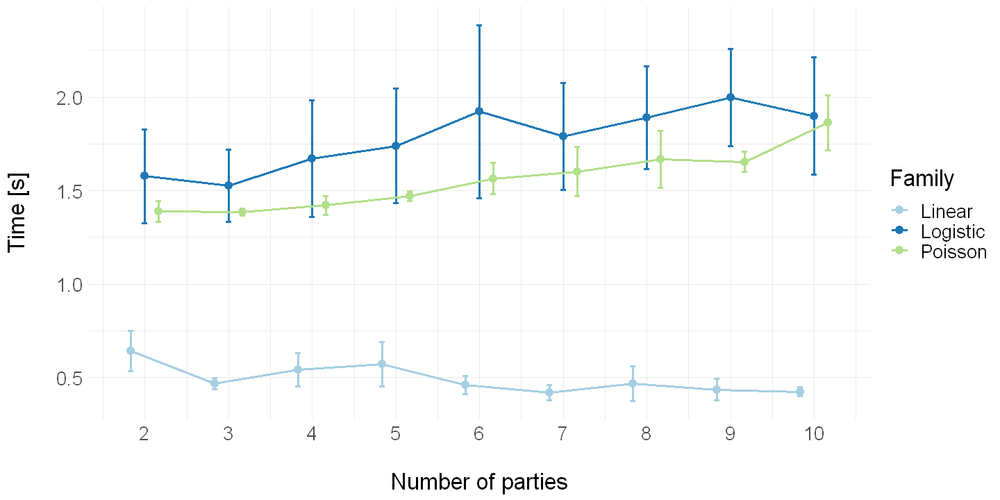

In [13]:
pd <- position_dodge(0.5) # Shift lines to the left and right to avoid overlapping

# Define plot size
WIDTH = 12
HEIGHT = 6
options(repr.plot.width = WIDTH, repr.plot.height = HEIGHT) 

ggplot(performance_summary, aes(x=n_parties, y=time, colour=family)) + 
    geom_errorbar(aes(ymin=time-sd, ymax=time+sd), size=1, width=0.2, position=pd) +
    geom_line(position=pd, size=1) +
    geom_point(position=pd, size=3) +
    scale_shape_manual(values = c(5, 16, 17)) +
    labs(x = "\nNumber of parties", y="Time [s]\n", colour="Family") +
    scale_x_continuous(breaks=n_parties) +
    theme_minimal() +
    theme(text = element_text(size = 20)) + 
    scale_color_brewer(palette="Paired")
    
ggsave("../results/parties.pdf", width = WIDTH, height = HEIGHT)

## References
For more information, please refer to our paper:

> M. Cellamare, A.J. van Gestel, H. Alradhi, F. Martin, A. Moncada-Torres. "A Federated Generalized Linear Model for Privacy-Preserving Analysis". Under review